<span style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">An Exception was encountered at '<a href="#papermill-error-cell">In [18]</a>'.</span>

In [1]:
# --- parameters (patch_notebook_params.py) ---
MAX_EPOCHS = 2000
N_SAMPLES = 10           # run_metrics.py forces 50 for generative methods
RESET_TRAINING = False
CUDA_VISIBLE_DEVICES = "0"
METRICS_CSV = "results/metrics.csv"


In [2]:
# Parameters
MAX_EPOCHS = 2000
N_SAMPLES = 1
RESET_TRAINING = False
CUDA_VISIBLE_DEVICES = "0"
METRICS_CSV = "/Odyssey/private/m19beauc/4dvarnet-starter-devs/consistency/sbatch_submission/results/GP/DynCM_metrics_train.csv"


In [3]:
# --- epoch heartbeat (patch_notebook_params.py) ---
import pytorch_lightning as _pl

class EpochHeartbeat(_pl.Callback):
    """Prints one clear progress line every `every_n_epochs` epochs, so
    sbatch logs show training progress without the noise of a per-batch
    tqdm progress bar (which doesn't render well once redirected to a
    plain log file).    """

    def __init__(self, every_n_epochs: int = 1):
        self.every_n_epochs = every_n_epochs

    def on_train_epoch_end(self, trainer, pl_module):
        epoch = trainer.current_epoch + 1
        if epoch % self.every_n_epochs != 0 and epoch != trainer.max_epochs:
            return
        parts = []
        for k, v in sorted(trainer.callback_metrics.items()):
            try:
                parts.append(f'{k}={float(v):.4f}')
            except (TypeError, ValueError):
                pass
        print(f'[progress] epoch {epoch}/{trainer.max_epochs} | ' + ' | '.join(parts), flush=True)


# Pairwise Consistency Model — Unified Physical-Diffusion Timeline (GP / SPDE)

Adapts the dynamical-systems consistency model to SPDE Gaussian Process data  
using the unified diffusion-physical timeline theory.

## 📋 TODO / Known Issues

### ✅ Done
- [x] **GT-only consistency target** (v3): replaced teacher EMA target with direct GT interpolation — fixes student/teacher variance explosion
- [x] **Observation fitting loss** (`λ_obs = 0.1`): pulls model toward known obs at each physical step
- [x] **Unified timeline**: single $t \in [0,1]$ variable; $t_\mathrm{IC} = 1/C$ separates spin-up and physical regime
- [x] **Sampling trajectory visualisation**: `phys_indices_list` correctly extracts physical frames from the transport process
- [x] **2-row physical frames plot**: model output vs GT on shared color scale for direct visual comparison
- [x] **Temporal obs weight conditioning** (v5): UNet now receives `w_obs(t)` — $C$ extra channels encoding the interpolation weights of obs frames at the current diffusion time. Consistent by design with the GT target construction in `_make_regime_input`. Fixes the problem where the model had no way to know which obs channel was "local" to the current $t$, causing it to output the same obs-trace pattern on all physical frames.

### 🔍 Active Observations
- [ ] **v5 training in progress**: monitor whether obs-trace leakage disappears across physical frames now that `w_obs(t)` provides explicit temporal correspondence

### ⏳ To Investigate
- [ ] **Diffusion time schedule mismatch**: verify that $\sigma(t_\mathrm{IC})$ (Karras spin-up) matches the interpolation noise level at $t_\mathrm{IC}$ in the physical regime
- [ ] **Spin-up boundary calibration**: inspect variance collapse plot — does std at `spinup_end` match GT std?
- [ ] **More training epochs / larger dataset**: model is trained on a small SPDE dataset; may need more steps or data augmentation
- [ ] **`num_timesteps` schedule**: does the Karras schedule allocate enough steps near $t_\mathrm{IC}$?


## 📖 Theory — Simplified Physical-Diffusion Consistency

Inference is performed along a single continuous variable $t \in [0,1]$ (the *diffusion time*).  
A transition point $t_\mathrm{IC} = 1/C$ (where $C$ = `window_size`) separates two regimes:

| Regime | Interval | Role |
|--------|----------|------|
| **Spin-up (diffusion)** | $[0,\,t_\mathrm{IC}]$ | Denoising toward the initial physical condition $\mathbf{x}_0$ |
| **Physical** | $[t_\mathrm{IC},\,1]$ | Trajectory supervised by physical states $\{\mathbf{x}_k\}$ |

### Input construction — $x^{(t)}$

- **Spin-up** ($t \le t_\mathrm{IC}$): noisy initial condition $\mathbf{x}^{(t)} = \mathbf{x}_0 + \sigma(t)\,\mathbf{z}$, with $\sigma(t)$ following the Karras schedule.  
- **Physical** ($t > t_\mathrm{IC}$): deterministic linear interpolation between adjacent physical frames:  
$$\mathbf{x}^{(t)} = (1-\lambda)\,\mathbf{x}_{k} + \lambda\,\mathbf{x}_{k+1}, \quad \lambda = \frac{t - t_k}{t_{k+1}-t_k}, \quad t_k = \frac{k}{C-1}(1-t_\mathrm{IC}) + t_\mathrm{IC}.$$

### Training — single GT target (simplified)

For all pairs $(t_\mathrm{int}, t_\mathrm{next})$ (both regimes, including cross-boundary):

$$\mathcal{L}_\mathrm{consistency} = \bigl\| f_\theta\!\left(\mathbf{x}^{(t_\mathrm{int})}, t_\mathrm{int}, t_\mathrm{next}, \mathbf{y}\right) - \mathbf{x}^{(t_\mathrm{next})}_\mathrm{GT} \bigr\|^2,$$

where $\mathbf{x}^{(t_\mathrm{next})}_\mathrm{GT}$ is the ground-truth interpolated state (via `_make_regime_input`).  
**No teacher EMA** needed — the GT anchor prevents student/teacher co-drift that caused variance explosion.

### Observation fitting loss (regularisation)

For each physical time step $k$ with available observations $\mathbf{y}_k$, a secondary loss pulls the model output toward the known measurements:

$$\mathcal{L}_\mathrm{obs} = \frac{1}{C} \sum_{k=0}^{C-1} \frac{\bigl\| \bigl(f_\theta(\mathbf{x}_k, t_k, t_0, \mathbf{y}) - \mathbf{x}_k\bigr) \odot \mathbf{m}_k \bigr\|^2}{\|\mathbf{m}_k\|_1 + \epsilon},$$

where $\mathbf{m}_k$ is the binary observation mask for time $k$.

### Total loss

$$\mathcal{L} = \mathcal{L}_\mathrm{consistency} + \lambda_\mathrm{obs}\,\mathcal{L}_\mathrm{obs}.$$

### Conditioning

$f_\theta$ is conditioned on the *full* observation window $\mathbf{y} = \{\mathbf{y}_0,\dots,\mathbf{y}_{C-1}\}$ (smoothing / 4DVar analogy).

## 🛠️ Setup

### GPU Check

In [4]:
!nvidia-smi

Tue Aug  4 18:46:09 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.195.03             Driver Version: 570.195.03     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA H100 NVL                On  |   00000000:E3:00.0 Off |                    0 |
| N/A   48C    P0             66W /  400W |       0MiB /  95830MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [5]:
import os; os.environ["CUDA_VISIBLE_DEVICES"] = CUDA_VISIBLE_DEVICES

### Imports

In [6]:
import os, gc, subprocess
os.environ['KRB5CCNAME'] = f'/tmp/krb5cc_{os.getuid()}'
subprocess.run(['kinit', '-R'], capture_output=True)  # try renew

# Force-close all stale NFS file descriptors from previous sessions
import fsspec
fsspec.filesystem('file').clear_instance_cache()
try:
    import xarray as xr
    xr.backends.file_manager.FILE_CACHE.clear()
except Exception:
    pass
gc.collect()

import json
import math
import os
import glob
from dataclasses import asdict, dataclass
from typing import Any, Callable, List, Optional, Tuple, Union

import numpy as np
import xarray as xr
import pandas as pd
import torch
from einops import rearrange
from einops.layers.torch import Rearrange
import pytorch_lightning as pl
from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger
from matplotlib import pyplot as plt
from torch import Tensor, nn
from torch.nn import functional as F
from torchinfo import summary

import sys
sys.path.append('../..')    # -> consistency/
sys.path.append('../../..')  # -> 4dvarnet-starter-devs/

from consistency_models.consistency_models_DynCM import (
    ConsistencyTrainingDynamicalSystems,
    ConsistencySamplingAndEditingDynamicalSystems,
    model_dynamical_systems_forward_wrapper,
    compute_sigma_spinup,
)
from consistency_models.consistency_models_CM import (
    ema_decay_rate_schedule,
)
from consistency_models.utils import update_ema_model_

## 🧠 Implementation

### DataModule — SPDE Diffusion Dataset

$N = $ `window_size` physical time steps.  
The transition point is $t_\mathrm{IC} = 1/N$ (one Karras step for spin-up, $N-1$ for physical evolution).

In [7]:
from src.data_notebook_spde import SPDEDataModule

SPDE_PATH = "../../../data/SPDE_diffusion_dataset_1.nc"

ds_inspect = xr.open_dataset(SPDE_PATH)
print(ds_inspect)
print("\nVariables:")
for v in ds_inspect.data_vars:
    print(f"  {v}: {ds_inspect[v].dims}  shape={ds_inspect[v].shape}  dtype={ds_inspect[v].dtype}")
ds_inspect.close()

<xarray.Dataset>
Dimensions:    (time: 300, lat: 128, lon: 128)
Coordinates:
  * lon        (lon) int64 0 1 2 3 4 5 6 7 8 ... 120 121 122 123 124 125 126 127
  * lat        (lat) int64 0 1 2 3 4 5 6 7 8 ... 120 121 122 123 124 125 126 127
  * time       (time) int64 0 1 2 3 4 5 6 7 ... 292 293 294 295 296 297 298 299
Data variables:
    x          (time, lat, lon) float32 ...
    y          (time, lat, lon) float32 ...
    OI         (time, lat, lon) float64 ...
    H11        (lat, lon) float32 ...
    H22        (lat, lon) float32 ...
    H12        (lat, lon) float32 ...
    Time       (time) int64 ...
    longitude  (lon) int64 ...
    latitude   (lat) int64 ...
Attributes:
    description:  SPDE-based diffusion GP

Variables:
  x: ('time', 'lat', 'lon')  shape=(300, 128, 128)  dtype=float32
  y: ('time', 'lat', 'lon')  shape=(300, 128, 128)  dtype=float32
  OI: ('time', 'lat', 'lon')  shape=(300, 128, 128)  dtype=float64
  H11: ('lat', 'lon')  shape=(128, 128)  dtype=float32
  H22

[SPDEDataModule] T=300, window=5, stride=1 → 296 windows: train=207, val=44, test=45
[SPDEDataModule] Norm stats (mean, std): (-0.00018237734911963344, 0.249156191945076)
window_size C      = 5
t_IC (transition)  = 0.2000  (= 1/C)
Spatial size       = 128 x 128
TrainingItem: input (y) (5, 128, 128)  tgt (x) (5, 128, 128)


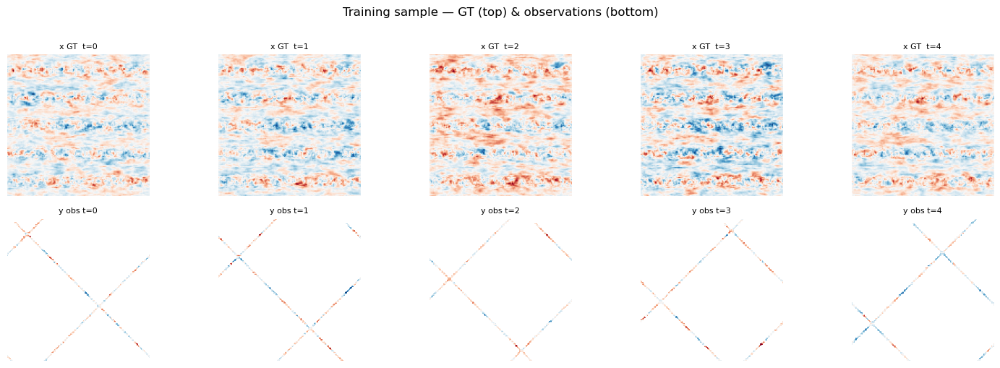

In [8]:
datamodule = SPDEDataModule(
    path=SPDE_PATH,
    window_size=5,
    stride=1,
    train_ratio=0.7,
    val_ratio=0.15,
    dl_kw={"batch_size": 1, "num_workers": 1},
)
datamodule.setup()

sample = datamodule.train_ds[0]
C  = datamodule.window_size
H, W = sample.tgt.shape[-2], sample.tgt.shape[-1]
t_IC = 1.0 / C   # transition point between spin-up and physical regime

print(f"window_size C      = {C}")
print(f"t_IC (transition)  = {t_IC:.4f}  (= 1/C)")
print(f"Spatial size       = {H} x {W}")
print(f"TrainingItem: input (y) {sample.input.shape}  tgt (x) {sample.tgt.shape}")

fig, axes = plt.subplots(2, C, figsize=(3 * C, 5))
for t_idx in range(C):
    axes[0, t_idx].imshow(sample.tgt[t_idx],   origin="lower", cmap="RdBu_r")
    axes[0, t_idx].set_title(f"x GT  t={t_idx}", fontsize=8)
    axes[0, t_idx].axis("off")
    axes[1, t_idx].imshow(sample.input[t_idx], origin="lower", cmap="RdBu_r")
    axes[1, t_idx].set_title(f"y obs t={t_idx}", fontsize=8)
    axes[1, t_idx].axis("off")
plt.suptitle("Training sample — GT (top) & observations (bottom)", y=1.01)
plt.tight_layout()
plt.show()

### UNet Building Blocks

The UNet takes:
- **x**: `(B, 1, H, W)` — current state at diffusion time $t$ (single physical field)
- **y**: `(B, C, H, W)` — full observation window (all $N$ time steps) — `NaN` = unobserved
- **mask**: `(B, C, H, W)` — binary mask derived from `y`
- **t, t'**: `(B,)` — current and target diffusion times

Total input channels = $1 + C + C = 2C + 1$.  
Output = `(B, 1, H, W)` — predicted state at $t'$.

Spatial size 100×100 is padded to the nearest multiple of 8 before the forward pass.

In [9]:
def GroupNorm(channels: int) -> nn.GroupNorm:
    return nn.GroupNorm(num_groups=min(32, channels // 4), num_channels=channels)


class SelfAttention(nn.Module):
    def __init__(self, in_channels: int, out_channels: int,
                 n_heads: int = 8, dropout: float = 0.3) -> None:
        super().__init__()
        self.dropout = dropout
        self.qkv_projection = nn.Sequential(
            GroupNorm(in_channels),
            nn.Conv2d(in_channels, 3 * in_channels, kernel_size=1, bias=False),
            Rearrange("b (i h d) x y -> i b h (x y) d", i=3, h=n_heads),
        )
        self.output_projection = nn.Sequential(
            Rearrange("b h l d -> b l (h d)"),
            nn.Linear(in_channels, out_channels, bias=False),
            Rearrange("b l d -> b d l"),
            GroupNorm(out_channels),
            nn.Dropout1d(dropout),
        )
        self.residual_projection = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x: Tensor) -> Tensor:
        q, k, v = self.qkv_projection(x).unbind(dim=0)
        output = F.scaled_dot_product_attention(
            q, k, v, dropout_p=self.dropout if self.training else 0.0, is_causal=False
        )
        output = self.output_projection(output)
        output = rearrange(output, "b c (x y) -> b c x y", x=x.shape[-2], y=x.shape[-1])
        return output + self.residual_projection(x)


class UNetBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int,
                 time_level_channels: int, dropout: float = 0.3) -> None:
        super().__init__()
        self.input_projection = nn.Sequential(
            GroupNorm(in_channels), nn.SiLU(),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding="same"),
            nn.Dropout2d(dropout),
        )
        self.time_level_projection = nn.Sequential(
            nn.SiLU(),
            nn.Conv2d(time_level_channels, out_channels, kernel_size=1),
        )
        self.output_projection = nn.Sequential(
            GroupNorm(out_channels), nn.SiLU(),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding="same"),
            nn.Dropout2d(dropout),
        )
        self.residual_projection = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x: Tensor, time_level: Tensor) -> Tensor:
        h = self.input_projection(x)
        h = h + self.time_level_projection(time_level)
        return self.output_projection(h) + self.residual_projection(x)


class UNetBlockWithSelfAttention(nn.Module):
    def __init__(self, in_channels: int, out_channels: int,
                 time_level_channels: int, n_heads: int = 8, dropout: float = 0.3) -> None:
        super().__init__()
        self.unet_block = UNetBlock(in_channels, out_channels, time_level_channels, dropout)
        self.self_attention = SelfAttention(out_channels, out_channels, n_heads, dropout)

    def forward(self, x: Tensor, time_level: Tensor) -> Tensor:
        return self.self_attention(self.unet_block(x, time_level))


class Downsample(nn.Module):
    def __init__(self, channels: int) -> None:
        super().__init__()
        self.projection = nn.Sequential(
            Rearrange("b c (h ph) (w pw) -> b (c ph pw) h w", ph=2, pw=2),
            nn.Conv2d(4 * channels, channels, kernel_size=1),
        )

    def forward(self, x: Tensor) -> Tensor:
        return self.projection(x)


class Upsample(nn.Module):
    def __init__(self, channels: int) -> None:
        super().__init__()
        self.projection = nn.Sequential(
            nn.Upsample(scale_factor=2.0, mode="nearest"),
            nn.Conv2d(channels, channels, kernel_size=3, padding="same"),
        )

    def forward(self, x: Tensor) -> Tensor:
        return self.projection(x)


class TimeEmbedding(nn.Module):
    """Fourier embedding for a scalar t ∈ [0,1]."""
    def __init__(self, channels: int, scale: float = 16.0) -> None:
        super().__init__()
        self.W = nn.Parameter(torch.randn(channels // 2) * scale, requires_grad=False)
        self.projection = nn.Sequential(
            nn.Linear(channels, 4 * channels),
            nn.SiLU(),
            nn.Linear(4 * channels, channels),
            Rearrange("b c -> b c () ()"),
        )

    def forward(self, x: Tensor) -> Tensor:
        h = x[:, None] * self.W[None, :] * 2 * torch.pi
        h = torch.cat([torch.sin(h), torch.cos(h)], dim=-1)
        return self.projection(h)


# ---- Spatial padding (100×100 → 104×104, multiple of 8) ----
def _pad_to_multiple(x: Tensor, multiple: int = 8) -> Tuple[Tensor, Tuple[int, int, int, int]]:
    _, _, H, W = x.shape
    pad_h = (multiple - H % multiple) % multiple
    pad_w = (multiple - W % multiple) % multiple
    padding = (0, pad_w, 0, pad_h)
    return F.pad(x, padding, mode="reflect"), padding


def _unpad(x: Tensor, padding: Tuple[int, int, int, int]) -> Tensor:
    _, pad_w, _, pad_h = padding
    H, W = x.shape[-2], x.shape[-1]
    return x[..., :H - pad_h if pad_h else H, :W - pad_w if pad_w else W]

### UNet

Input: `cat(x, y_filled, mask_y, w_obs)` → $3C+1$ channels, output: `1` channel.  
Two separate `TimeEmbedding` for $t$ and $t'$, concatenated → $2 \times$ `time_level_channels` conditioning.

**Key design** — observation weight vector $\mathbf{w}(t) \in [0,1]^C$:  
The UNet computes this vector internally from $t$, using exactly the same interpolation rule as the GT target in `_make_regime_input`:
- **Spin-up** ($t \le t_\text{IC}$): $w_0 = 1$, others 0 → only the IC obs is "local"  
- **Physical** ($t \in [t_k, t_{k+1}]$): $w_k = 1-\lambda$, $w_{k+1} = \lambda$, others 0

This weight vector is broadcast spatially and appended as $C$ additional input channels. The model thereby always knows which obs channels are temporally relevant to the current step — **no channel permutation needed**, and the correspondence is consistent with the supervised training targets.


In [10]:
@dataclass
class UNetConfig:
    # channels = C = window_size (number of physical time steps)
    channels: int = 5
    time_level_channels: int = 128
    time_level_scale: float = 16.0
    n_heads: int = 8
    top_blocks_channels: Tuple[int, ...] = (64, 64)
    top_blocks_n_blocks_per_resolution: Tuple[int, ...] = (2, 2)
    top_blocks_has_resampling: Tuple[bool, ...] = (True, True)
    top_blocks_dropout: Tuple[float, ...] = (0.0, 0.0)
    mid_blocks_channels: Tuple[int, ...] = (128, 256)
    mid_blocks_n_blocks_per_resolution: Tuple[int, ...] = (4, 4)
    mid_blocks_has_resampling: Tuple[bool, ...] = (True, False)
    mid_blocks_dropout: Tuple[float, ...] = (0.0, 0.0)


def _compute_obs_weights(t: Tensor, C: int) -> Tensor:
    """
    Compute the C-dimensional observation weight vector w(t) for each batch element.

    Uses the same temporal interpolation rule as _make_regime_input:
      - spin-up  (t ≤ t_IC = 1/C) : w = [1, 0, ..., 0]   (only IC frame relevant)
      - physical (t > t_IC)        : w_k = 1-λ, w_{k+1} = λ, others = 0
        where k = lower physical frame index and λ = fractional position in [t_k, t_{k+1}]

    Parameters
    ----------
    t : (B,) — current diffusion times, in [0, 1]
    C : int   — number of physical frames (= window_size)

    Returns
    -------
    w : (B, C) float tensor, values in [0, 1], sums to 1 per batch element
    """
    B      = t.shape[0]
    t_IC   = 1.0 / C
    device, dtype = t.device, t.dtype

    physical_steps = torch.linspace(t_IC, 1.0, C, device=device, dtype=dtype)  # (C,)

    # For each b, find the lower-bound physical frame index (vectorised)
    t_clamped = t.clamp(t_IC, 1.0).unsqueeze(1)                         # (B, 1)
    idx = torch.searchsorted(
        physical_steps.unsqueeze(0).expand(B, -1).contiguous(),
        t_clamped,
    ).squeeze(1).clamp(1, C - 1)                                         # (B,)  in [1, C-1]

    b_idx = torch.arange(B, device=device)
    dt    = (physical_steps[idx] - physical_steps[idx - 1]).clamp(min=1e-8)
    lam   = ((t.clamp(t_IC, 1.0) - physical_steps[idx - 1]) / dt).clamp(0., 1.)  # (B,)

    w = torch.zeros(B, C, device=device, dtype=dtype)
    w[b_idx, idx - 1] = 1.0 - lam
    w[b_idx, idx]     = lam

    # Override spin-up elements: only IC frame (index 0) is relevant
    spinup = (t <= t_IC)          # (B,)  bool
    w[spinup]    = 0.0
    w[spinup, 0] = 1.0

    return w  # (B, C)


class UNet(nn.Module):
    """
    UNet for the unified physical-diffusion consistency model.

    Forward signature: UNet(x, y, t, t_prime)
      x       : (B, 1,   H, W)  -- current state at diffusion time t (spin-up or physical)
      y       : (B, C,   H, W)  -- full observation window (NaN = unobserved)
      t       : (B,)            -- current diffusion time
      t_prime : (B,)            -- target diffusion time

    Input channels = 3*C + 1  (x | y_filled | mask_y | w_obs)
    Output         = 1 channel (predicted state at t')

    w_obs is the temporal interpolation weight vector w(t) ∈ [0,1]^C,
    computed internally from t using _compute_obs_weights. It tells the model
    which observation channels are "local" to the current diffusion time:
      - spin-up : w = [1, 0, ..., 0]
      - physical between frames k and k+1: w_k = 1-λ, w_{k+1} = λ, others 0
    This is consistent with the supervised GT target construction in _make_regime_input.
    """
    def __init__(self, config: UNetConfig) -> None:
        super().__init__()
        self.config = config
        C   = config.channels
        top = config.top_blocks_channels[0]

        # input: cat(x:1, y_filled:C, mask_y:C, w_obs:C) = 3C+1 channels
        self.input_projection = nn.Conv2d(3 * C + 1, top, kernel_size=3, padding="same")

        # Separate embeddings for t and t'
        self.time_embedding_t  = TimeEmbedding(config.time_level_channels, config.time_level_scale)
        self.time_embedding_tp = TimeEmbedding(config.time_level_channels, config.time_level_scale)

        self.top_encoder_blocks = self._make_encoder_blocks(
            config.top_blocks_channels + config.mid_blocks_channels[:1],
            config.top_blocks_n_blocks_per_resolution,
            config.top_blocks_has_resampling,
            config.top_blocks_dropout, self._make_top_block,
        )
        self.mid_encoder_blocks = self._make_encoder_blocks(
            config.mid_blocks_channels + config.mid_blocks_channels[-1:],
            config.mid_blocks_n_blocks_per_resolution,
            config.mid_blocks_has_resampling,
            config.mid_blocks_dropout, self._make_mid_block,
        )
        self.mid_decoder_blocks = self._make_decoder_blocks(
            config.mid_blocks_channels + config.mid_blocks_channels[-1:],
            config.mid_blocks_n_blocks_per_resolution,
            config.mid_blocks_has_resampling,
            config.mid_blocks_dropout, self._make_mid_block,
        )
        self.top_decoder_blocks = self._make_decoder_blocks(
            config.top_blocks_channels + config.mid_blocks_channels[:1],
            config.top_blocks_n_blocks_per_resolution,
            config.top_blocks_has_resampling,
            config.top_blocks_dropout, self._make_top_block,
        )
        # Output: 1 channel (single physical state)
        self.output_projection = nn.Conv2d(top, 1, kernel_size=3, padding="same")

    def forward(self, x: Tensor, y: Tensor,
                t: Tensor, t_prime: Tensor) -> Tensor:
        """
        x       : (B, 1,   H, W)
        y       : (B, C,   H, W)   -- NaN where unobserved
        t       : (B,)             -- current diffusion time
        t_prime : (B,)             -- target diffusion time
        """
        B, C, H, W = y.shape
        mask_y = (~torch.isnan(y)).to(dtype=x.dtype)
        y_fill = torch.nan_to_num(y, nan=0.0)

        # Temporal observation weights: (B, C) → broadcast to (B, C, H, W)
        # w(t) encodes which obs channels are local to the current diffusion step.
        # Uses the same interpolation rule as the supervised GT target — consistent by design.
        w_obs = _compute_obs_weights(t.to(dtype=x.dtype), C)          # (B, C)
        w_spatial = w_obs[:, :, None, None].expand(B, C, H, W)        # (B, C, H, W)

        # Concatenate along channel dim and pad to multiple of 8
        inp = torch.cat([x, y_fill, mask_y, w_spatial], dim=1)   # (B, 3C+1, H, W)
        inp, padding = _pad_to_multiple(inp, multiple=8)

        h = self.input_projection(inp)

        emb_t  = self.time_embedding_t(t)
        emb_tp = self.time_embedding_tp(t_prime)
        time_level = torch.cat([emb_t, emb_tp], dim=1)   # (B, 2*TLC, 1, 1)

        top_encoder_embeddings = []
        for block in self.top_encoder_blocks:
            if isinstance(block, UNetBlock):
                h = block(h, time_level)
                top_encoder_embeddings.append(h)
            else:
                h = block(h)

        mid_encoder_embeddings = []
        for block in self.mid_encoder_blocks:
            if isinstance(block, UNetBlockWithSelfAttention):
                h = block(h, time_level)
                mid_encoder_embeddings.append(h)
            else:
                h = block(h)

        for block in self.mid_decoder_blocks:
            if isinstance(block, UNetBlockWithSelfAttention):
                h = torch.cat((h, mid_encoder_embeddings.pop()), dim=1)
                h = block(h, time_level)
            else:
                h = block(h)

        for block in self.top_decoder_blocks:
            if isinstance(block, UNetBlock):
                h = torch.cat((h, top_encoder_embeddings.pop()), dim=1)
                h = block(h, time_level)
            else:
                h = block(h)

        out = self.output_projection(h)
        return _unpad(out, padding)

    # ---- builder helpers ----
    def _make_encoder_blocks(self, channels, n_blocks, has_resampling, dropout, block_fn):
        blocks = nn.ModuleList()
        for idx, (ic, oc) in enumerate(zip(channels[:-1], channels[1:])):
            for _ in range(n_blocks[idx]):
                blocks.append(block_fn(ic, oc, dropout[idx]))
                ic = oc
            if has_resampling[idx]:
                blocks.append(Downsample(oc))
        return blocks

    def _make_decoder_blocks(self, channels, n_blocks, has_resampling, dropout, block_fn):
        blocks = nn.ModuleList()
        for idx, (oc, ic) in enumerate(list(zip(channels[:-1], channels[1:]))[::-1]):
            if has_resampling[::-1][idx]:
                blocks.append(Upsample(ic))
            inner = []
            for _ in range(n_blocks[::-1][idx]):
                inner.append(block_fn(ic * 2, oc, dropout[::-1][idx]))
                oc = ic
            blocks.extend(inner[::-1])
        return blocks

    def _make_top_block(self, ic, oc, dropout):
        return UNetBlock(ic, oc, 2 * self.config.time_level_channels, dropout)

    def _make_mid_block(self, ic, oc, dropout):
        return UNetBlockWithSelfAttention(
            ic, oc, 2 * self.config.time_level_channels, self.config.n_heads, dropout
        )

    def save_pretrained(self, pretrained_path: str) -> None:
        os.makedirs(pretrained_path, exist_ok=True)
        with open(os.path.join(pretrained_path, "config.json"), mode="w") as f:
            json.dump(asdict(self.config), f)
        torch.save(self.state_dict(), os.path.join(pretrained_path, "model.pt"))

    @classmethod
    def from_pretrained(cls, pretrained_path: str) -> "UNet":
        with open(os.path.join(pretrained_path, "config.json"), mode="r") as f:
            config_dict = json.load(f)
        model = cls(UNetConfig(**config_dict))
        model.load_state_dict(
            torch.load(os.path.join(pretrained_path, "model.pt"), map_location="cpu")
        )
        return model


# ---- Sanity check ----
C = datamodule.window_size
_unet = UNet(UNetConfig(channels=C)).cpu()
try:
    summary(
        _unet,
        input_size=(
            (1, 1,   100, 100),  # x  (current state, 1 channel)
            (1, C,   100, 100),  # y  (full obs window, C channels)
            (1,),                # t
            (1,),                # t'
        ),
        col_names=["input_size", "output_size", "num_params"],
        verbose=0,
        device="cpu",
    )
except Exception as e:
    n_params = sum(p.numel() for p in _unet.parameters())
    print(f"[torchinfo unavailable: {e}]")
    print(f"UNet parameters: {n_params:,}")

# Quick CPU forward pass — verify shapes and w_obs values
_x = torch.randn(1, 1, 100, 100)
_y = torch.randn(1, C, 100, 100)
_y[0, :, :5, :5] = float("nan")
_t = torch.rand(1)
with torch.no_grad():
    _out = _unet(_x, _y, _t, _t)
print(f"[OK] UNet forward: x {_x.shape} + y {_y.shape} -> {_out.shape}  (3C+1={3*C+1} input channels)")
print(f"[OK] Parameters: {sum(p.numel() for p in _unet.parameters()):,}")

# Verify w_obs for a few representative times
t_IC = 1.0 / C
print(f"\nw_obs sanity check (C={C}, t_IC={t_IC:.3f}):")
for t_test in [0.0, t_IC * 0.5, t_IC, t_IC + 0.01, 0.5, 1.0]:
    w = _compute_obs_weights(torch.tensor([t_test]), C)
    print(f"  t={t_test:.3f}  →  w={w[0].tolist()}  (sum={w[0].sum().item():.3f})")


[OK] UNet forward: x torch.Size([1, 1, 100, 100]) + y torch.Size([1, 5, 100, 100]) -> torch.Size([1, 1, 100, 100])  (3C+1=16 input channels)
[OK] Parameters: 32,997,889

w_obs sanity check (C=5, t_IC=0.200):
  t=0.000  →  w=[1.0, 0.0, 0.0, 0.0, 0.0]  (sum=1.000)
  t=0.100  →  w=[1.0, 0.0, 0.0, 0.0, 0.0]  (sum=1.000)
  t=0.200  →  w=[1.0, 0.0, 0.0, 0.0, 0.0]  (sum=1.000)
  t=0.210  →  w=[0.9500000476837158, 0.04999995231628418, 0.0, 0.0, 0.0]  (sum=1.000)
  t=0.500  →  w=[0.0, 0.5000000596046448, 0.4999999403953552, 0.0, 0.0]  (sum=1.000)
  t=1.000  →  w=[0.0, 0.0, 0.0, 0.0, 1.0]  (sum=1.000)


### LightningModule

Wraps `ConsistencyTrainingDynamicalSystems` (simplified: single GT target, no teacher EMA).

**Two losses**:
1. `L_consistency` — MSE between student output and GT `_make_regime_input(t_next)`, all regimes.
2. `L_obs` — MSE between model output at physical time steps and available observations, weighted by `lambda_obs`.

The teacher EMA is still maintained (for potential future use / EMA student inference), but is no longer called during target construction.

In [11]:
@dataclass
class LitConsistencyModelConfig:
    initial_ema_decay_rate: float = 0.95
    student_model_ema_decay_rate: float = 0.99993
    lr: float = 1e-4
    betas: Tuple[float, float] = (0.9, 0.995)
    lr_scheduler_start_factor: float = 1e-5
    lr_scheduler_iters: int = 10_000
    total_training_steps: int = 10_000   # fallback only — overridden dynamically in configure_optimizers
    lambda_obs: float = 0.1              # weight for observation fitting loss
    lambda_IC:  float = 1.0              # weight for spinup IC-anchoring loss


class LitConsistencyModel(LightningModule):
    """
    Lightning wrapper for the unified physical-diffusion consistency model.

    Training uses ConsistencyTrainingDynamicalSystems with ANCHOR targets:
      - L_consistency: MSE(student_output, x_{k+1} anchor at t_next) — all regimes
      - L_obs        : MSE(f(x_k, t_k→t_{k+1}), x_{k+1}) on obs mask — λ_obs weighted

    The teacher EMA is maintained (used for spin-up regime) but NOT for physical targets.
    """
    def __init__(
        self,
        consistency_training: ConsistencyTrainingDynamicalSystems,
        student_model: UNet,
        teacher_model: UNet,
        ema_student_model: UNet,
        config: LitConsistencyModelConfig,
    ) -> None:
        super().__init__()
        self.consistency_training = consistency_training
        self.student_model        = student_model
        self.teacher_model        = teacher_model
        self.ema_student_model    = ema_student_model
        self.config               = config
        self.num_timesteps        = consistency_training.initial_timesteps
        # Will be overridden in configure_optimizers with actual training steps
        self._total_training_steps = config.total_training_steps

        for param in self.teacher_model.parameters():
            param.requires_grad = False
        for param in self.ema_student_model.parameters():
            param.requires_grad = False
        self.teacher_model     = self.teacher_model.eval()
        self.ema_student_model = self.ema_student_model.eval()

    # ------------------------------------------------------------------
    # Observation fitting loss
    # ------------------------------------------------------------------
    def _obs_loss(self, batch) -> torch.Tensor:
        """
        For each consecutive physical-frame pair (k → k+1), run the model
        with the clean anchor x_k as input at t_k targeting t_{k+1}, and
        compare to the next GT anchor x_{k+1} on the observed pixels of step k+1.

            L_obs = (1/(C-1)) * Σ_{k=0}^{C-2}
                      ||(f(x_k, t_k, t_{k+1}) - x_{k+1}) ⊙ m_{k+1}||² / (||m_{k+1}||₁ + ε)

        This is CONSISTENT with the anchor-target consistency training:
          • the consistency loss already trains f(interp(t_int), t_int, t_next) → x_{k+1}
          • this loss additionally trains f(x_k_clean, t_k, t_{k+1}) → x_{k+1} on obs pixels
          • starting from a clean anchor (not an interpolated input) adds direct supervision

        Why not use t_0 / self-mapping:
          With anchor training, f(x, t, t') → x_{anchor(t')}.  Using t'=0 asks for the
          anchor at t=0 which is the IC x_0 — useful only at k=0.  Using t'=t makes it a
          trivial identity request, which is not what the model learns.
        """
        x = batch.tgt    # (B, C, H, W)  ground truth
        y = batch.input  # (B, C, H, W)  observations (NaN = missing)
        B, C, H, W = x.shape
        device = x.device

        if C < 2:
            return torch.tensor(0.0, device=device, dtype=x.dtype)

        # NEW design: physical frame k is at diffusion time
        #   t_k = spinup_boundary * (C-1-k) / (C-1)
        # which decreases from spinup_boundary (k=0, IC) to 0 (k=C-1, last frame).
        # The model maps x_k (at t_k) → x_{k+1} (at t_{k+1} < t_k): FORWARD physical time.
        sb = self.consistency_training.spinup_boundary
        total_loss = torch.tensor(0.0, device=device, dtype=x.dtype)

        for k in range(C - 1):
            t_k      = sb * (C - 1 - k)       / max(C - 1, 1)   # decreasing: sb → step
            t_k_next = sb * (C - 2 - k)       / max(C - 1, 1)   # t_{k+1} < t_k

            t_k_full      = torch.full((B,), t_k,      device=device, dtype=x.dtype)
            t_k_next_full = torch.full((B,), t_k_next, device=device, dtype=x.dtype)

            x_k      = x[:, [k],     :, :]   # (B, 1, H, W)  clean input anchor at t_k
            x_k_next = x[:, [k + 1], :, :]   # (B, 1, H, W)  clean target anchor at t_{k+1}

            pred = model_dynamical_systems_forward_wrapper(
                self.student_model,
                x_k, y,
                t_k_full, t_k_next_full,
                self.consistency_training.sigma_min,
                self.consistency_training.sigma_max,
                spinup_boundary=sb,
            )

            # Mask: observed pixels at step k+1 (target frame)
            mask_kp1 = (~torch.isnan(y[:, [k + 1], :, :])).to(dtype=x.dtype)  # (B,1,H,W)
            n_obs    = mask_kp1.sum() + 1e-8

            total_loss = total_loss + ((pred - x_k_next) * mask_kp1).pow(2).sum() / n_obs

        return total_loss / (C - 1)

    # ------------------------------------------------------------------
    # Training step
    # ------------------------------------------------------------------

    def _spinup_anchor_loss(self, batch, output) -> torch.Tensor:
        """
        Spinup IC-anchoring loss: L_IC = MSE(g(IC + σ_sp(t)·ε, t_spin, t_IC), IC)

        From noised IC at any spinup time t > spinup_boundary,
        produce clean IC at t_IC = spinup_boundary.
        """
        sb        = self.consistency_training.spinup_boundary
        sigma_min = self.consistency_training.sigma_min
        sigma_max = self.consistency_training.sigma_max

        steps  = output.sigmas
        k_IC   = int((steps > sb).sum().item()) - 1
        if k_IC < 0:
            return batch.tgt.new_zeros(())

        B, C, H, W = batch.tgt.shape
        device     = batch.tgt.device
        dtype      = batch.tgt.dtype
        IC         = batch.tgt[:, [0], :, :]

        t_sp_pool  = steps[:k_IC + 1]
        sp_idx     = torch.randint(0, k_IC + 1, (B,), device=device)
        t_sp       = t_sp_pool[sp_idx]
        t_IC_vec   = torch.full((B,), sb, device=device, dtype=dtype)

        noise      = torch.randn(B, 1, H, W, device=device, dtype=dtype)
        from consistency_models.consistency_models_DynCM import compute_sigma_spinup
        sigma_sp   = compute_sigma_spinup(t_sp, sigma_min, sigma_max, sb)
        noisy_input = IC + sigma_sp.view(B, 1, 1, 1) * noise

        from consistency_models.consistency_models_DynCM import model_dynamical_systems_forward_wrapper
        pred_IC = model_dynamical_systems_forward_wrapper(
            self.student_model, noisy_input, batch.input,
            t_sp, t_IC_vec,
            sigma_min, sigma_max,
            spinup_boundary=sb,
        )
        return F.mse_loss(pred_IC, IC)

    def training_step(self, batch, batch_idx: int):
        if isinstance(batch, list):
            batch = batch[0]

        output = self.consistency_training(
            self.student_model,
            self.teacher_model,
            batch.tgt,
            batch.input,
            self.global_step,
            self._total_training_steps,   # dynamic, updated in configure_optimizers
        )

        self.num_timesteps = output.num_timesteps

        # ── Consistency loss (all regimes, anchor target) ──────────────
        loss_cm = F.mse_loss(
            output.predicted_next_from_intermediate,
            output.target_next_from_current.detach(),
        )

        # ── Observation fitting loss ───────────────────────────────────
        loss_obs = self._obs_loss(batch)

        # ── IC-anchoring loss (spinup) ──────────────────────────────────
        loss_IC = self._spinup_anchor_loss(batch, output)

        loss = loss_cm + self.config.lambda_obs * loss_obs + self.config.lambda_IC * loss_IC

        # NaN safety: if any component is NaN, return zero loss to skip this batch
        if torch.isnan(loss):
            print(f"[NaN] Ep {self.current_epoch} step {self.global_step}: "
                  f"L_cm={loss_cm.item():.4f} L_IC={loss_IC.item():.4f} L_obs={loss_obs.item():.4f}")
            return torch.tensor(0.0, device=loss.device, dtype=loss.dtype, requires_grad=True)

        is_bad = (loss.item() > 50)
        if batch_idx % 20 == 0 or is_bad:
            d = output.diag or {}
            ds = d.get("student", {})
            dt = d.get("teacher", {})
            def _f(v, fmt=".3f"):
                return f"{v:{fmt}}" if isinstance(v, (int, float)) else str(v)
            tag = "EXPLOSION " if is_bad else ""
            print(
                f"{tag}[Ep {self.current_epoch} | step {self.global_step}]  "
                f"N={self.num_timesteps}  "
                f"L_cm={loss_cm.item():.5f}  "
                f"L_IC={loss_IC.item():.5f}  "
                f"L_obs={loss_obs.item():.5f}  "
                f"loss={loss.item():.5f}  "
                f"spinup/phys={d.get('n_spinup','?')}/{d.get('n_phys','?')}\n"
                f"  student: c_skip=[{_f(ds.get('c_skip_min','?'))},{_f(ds.get('c_skip_max','?'))}]  "
                f"c_out=[{_f(ds.get('c_out_min','?'))},{_f(ds.get('c_out_max','?'))}]  "
                f"model_out_std={_f(ds.get('model_out_std','?'))}  "
                f"result_std={_f(ds.get('result_std','?'))}  "
                f"nan={ds.get('has_nan','?')}\n"
                f"  teacher: c_skip=[{_f(dt.get('c_skip_min','?'))},{_f(dt.get('c_skip_max','?'))}]  "
                f"model_out_std={_f(dt.get('model_out_std','?'))}  "
                f"nan={dt.get('has_nan','?')}\n"
                f"  input_std={_f(d.get('input_std','?'))}  "
                f"target_std={_f(d.get('target_std','?'))}  "
                f"t_curr={d.get('t_curr_range',('?','?'))}  "
                f"t_next={d.get('t_next_range',('?','?'))}"
            )

        self.log_dict({
            "train_loss":      loss,
            "loss_consistency": loss_cm,
            "loss_obs":        loss_obs,
            "num_timesteps":   float(self.num_timesteps),
        }, prog_bar=False)
        return loss

    def on_train_batch_end(self, outputs, batch, batch_idx: int) -> None:
        ema_rate = ema_decay_rate_schedule(
            self.num_timesteps,
            self.config.initial_ema_decay_rate,
            self.consistency_training.initial_timesteps,
        )
        # Check for NaN in student weights before EMA update
        has_nan_weights = any(
            torch.isnan(p).any() for p in self.student_model.parameters() if p.requires_grad
        )
        if has_nan_weights:
            print(f"[FATAL] NaN in student weights at step {self.global_step}!")
            return

        # Log gradient norm
        grad_norm = sum(
            p.grad.norm().item() ** 2
            for p in self.student_model.parameters()
            if p.grad is not None
        ) ** 0.5
        if batch_idx % 20 == 0 or grad_norm > 10:
            print(f"  grad_norm={grad_norm:.4f}")

        update_ema_model_(self.teacher_model,     self.student_model, ema_rate)
        update_ema_model_(self.ema_student_model, self.student_model,
                          self.config.student_model_ema_decay_rate)
        self.log("ema_decay_rate", ema_rate)
        self.log("grad_norm", grad_norm)

    def configure_optimizers(self):
        # ── Dynamic total_training_steps ─────────────────────────────────────────
        # Use the ACTUAL number of optimizer steps that will occur (accounts for
        # accumulate_grad_batches, max_epochs, dataset size).  This ensures N grows
        # from initial_timesteps to final_timesteps over the FULL training run,
        # not just the first ~10k steps.  Without this, N saturates in epoch ~50
        # and the model can learn the trivial identity function (loss→0 but noisy
        # at inference).
        try:
            actual_steps = self.trainer.estimated_stepping_batches
            if actual_steps and int(actual_steps) > 0:
                self._total_training_steps = int(actual_steps)
                print(
                    f"[LitConsistencyModel] Dynamic total_training_steps = "
                    f"{self._total_training_steps}  "
                    f"(config fallback was {self.config.total_training_steps})"
                )
        except Exception as e:
            print(f"[LitConsistencyModel] Could not get estimated_stepping_batches ({e}), "
                  f"using config value {self.config.total_training_steps}")
            self._total_training_steps = self.config.total_training_steps

        opt = torch.optim.Adam(
            self.student_model.parameters(),
            lr=self.config.lr, betas=self.config.betas,
        )
        sched = torch.optim.lr_scheduler.LinearLR(
            opt,
            start_factor=self.config.lr_scheduler_start_factor,
            total_iters=self.config.lr_scheduler_iters,
        )
        return [opt], [{"scheduler": sched, "interval": "step", "frequency": 1}]


## 🚀 Training

### Unified timeline — time grid visualisation

Before training, let's visualise the unified time grid $\{t_0,\dots,t_N\}$ for a given
`num_timesteps` to see how the Karras grid partitions the spin-up and physical regimes.

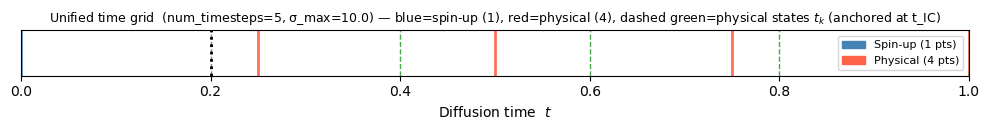

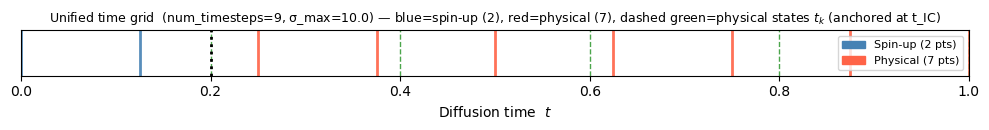

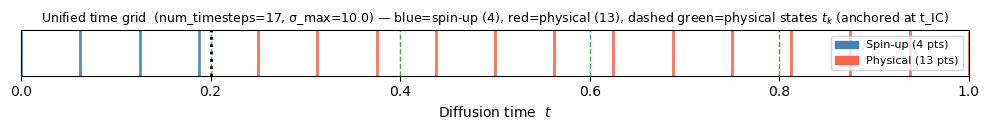

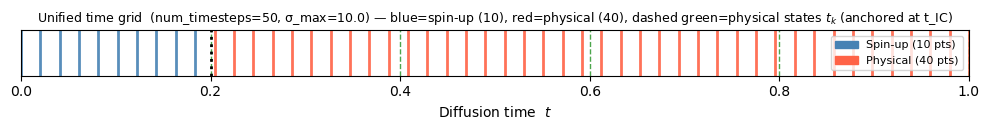

In [12]:
from consistency_models.consistency_models_DynCM import compute_sigma_spinup
from consistency_models.utils import karras_schedule

C_vis        = datamodule.window_size
t_IC_vis     = 1.0 / C_vis
# sigma_max=10 calibrated to normalised SPDE data (std≈1, SNR≤0.01).
# physical_steps now = linspace(t_IC, 1.0, C) so green dashes start at t_IC.
SIGMA_MIN    = 0.002
SIGMA_MAX    = 10.0
RHO          = 7.0

for num_t in [5, 9, 17, 50]:
    grid = karras_schedule(num_t, SIGMA_MIN, SIGMA_MAX, RHO, torch.device("cpu"), as_time=True)
    # Physical states are at linspace(t_IC, 1.0, C)  (fixed anchoring)
    physical_ts = torch.linspace(t_IC_vis, 1.0, C_vis)

    n_spinup  = (grid <= t_IC_vis).sum().item()
    n_phys    = (grid > t_IC_vis).sum().item()

    fig, ax = plt.subplots(figsize=(10, 1.4))
    for i, t_val in enumerate(grid.tolist()):
        color = "steelblue" if t_val <= t_IC_vis else "tomato"
        ax.axvline(t_val, color=color, linewidth=2, alpha=0.9)
    for t_phys in physical_ts.tolist():
        ax.axvline(t_phys, color="green", linewidth=1, linestyle="--", alpha=0.7)
    ax.axvline(t_IC_vis, color="black", linewidth=2, linestyle=":", label=f"$t_{{IC}}={t_IC_vis:.2f}$")
    ax.set_xlim(0, 1)
    ax.set_yticks([])
    ax.set_xlabel("Diffusion time  $t$")
    ax.set_title(
        f"Unified time grid  (num_timesteps={num_t}, σ_max={SIGMA_MAX}) — "
        f"blue=spin-up ({n_spinup}), red=physical ({n_phys}), "
        f"dashed green=physical states $t_k$ (anchored at t_IC)",
        fontsize=9,
    )
    from matplotlib.patches import Patch
    ax.legend(handles=[
        Patch(color="steelblue", label=f"Spin-up ({n_spinup} pts)"),
        Patch(color="tomato",    label=f"Physical ({n_phys} pts)"),
    ], loc="upper right", fontsize=8)
    plt.tight_layout()
    plt.show()


### TensorBoard

### Training Loop

In [13]:
import shutil

# RESET_TRAINING set by the parameters cell above

LOG_DIR     = "logs_CT_DynCM_spde"
CKPT_DIR    = os.path.join(LOG_DIR, "checkpoints")
MODEL_PATH  = os.path.join(LOG_DIR, "best_model")

def _is_valid_checkpoint(path: str) -> bool:
    try:
        ckpt  = torch.load(path, map_location="cpu")
        state = ckpt.get("state_dict", {})
        return all(
            not (torch.is_tensor(v) and torch.isnan(v).any())
            for v in state.values()
        )
    except Exception:
        return False

def find_resume_ckpt(ckpt_dir: str, use_last: bool = True) -> Optional[str]:
    if not os.path.isdir(ckpt_dir):
        return None
    if use_last:
        last = os.path.join(ckpt_dir, "last.ckpt")
        if os.path.isfile(last) and _is_valid_checkpoint(last):
            print(f"[OK] Resuming from: {last}")
            return last
        print("[WARN] last.ckpt missing or invalid — scanning for best valid checkpoint.")
    candidates = sorted(
        [p for p in glob.glob(os.path.join(ckpt_dir, "*.ckpt"))
         if "last" not in os.path.basename(p) and "train_loss=" in os.path.basename(p)],
        key=lambda p: float(os.path.basename(p).split("train_loss=")[-1].replace(".ckpt", "")),
    )
    for p in candidates:
        if _is_valid_checkpoint(p):
            loss_val = float(os.path.basename(p).split("train_loss=")[-1].replace(".ckpt", ""))
            print(f"[OK] Best valid checkpoint: {p}  (train_loss={loss_val:.4f})")
            return p
    print("[WARN] No valid checkpoint found — starting from scratch.")
    return None

if RESET_TRAINING:
    for d in [CKPT_DIR, MODEL_PATH]:
        if os.path.exists(d):
            shutil.rmtree(d)
            print(f"[DELETE] {d}")
    resume_ckpt = None
else:
    resume_ckpt = find_resume_ckpt(CKPT_DIR)

# ---- Models ----
C = datamodule.window_size
student_model     = UNet(UNetConfig(channels=C))
teacher_model     = UNet(UNetConfig(channels=C))
ema_student_model = UNet(UNetConfig(channels=C))
teacher_model.load_state_dict(student_model.state_dict())
ema_student_model.load_state_dict(student_model.state_dict())

# ---- Training ----
# v8: Fixed student/teacher pairwise assignment.
#   • Student takes the BIGGER step (current → next): harder task, gets gradient
#   • Teacher takes the SMALLER step (intermediate → next): reliable target (EMA, no grad)
#   • Matches CM pairwise design. v7 had roles inverted, causing spinup variance
#     explosion as N grew (teacher did the hard step → unreliable targets).
ct = ConsistencyTrainingDynamicalSystems(
    sigma_min=0.002,
    sigma_max=10.0,
    rho=7.0,
    initial_timesteps=5,
    final_timesteps=50,
)

lit_cm = LitConsistencyModel(
    ct,
    student_model,
    teacher_model,
    ema_student_model,
    LitConsistencyModelConfig(
        lr_scheduler_iters=1000,
        total_training_steps=10_000,   # fallback; overridden dynamically in configure_optimizers
        lambda_obs=0.1,
    ),
)

trainer = Trainer(enable_progress_bar=False, 
    accelerator="gpu",
    max_epochs=MAX_EPOCHS,
    accumulate_grad_batches=4,
    precision="bf16-mixed",
    gradient_clip_val=1.0,
    gradient_clip_algorithm="norm",
    log_every_n_steps=1,
    logger=TensorBoardLogger(".", name=LOG_DIR, version=""),
    callbacks=[
        LearningRateMonitor(logging_interval="step"),
        ModelCheckpoint(
            dirpath=CKPT_DIR,
            monitor="train_loss",
            save_top_k=3,
            save_last=True,
            filename="{epoch:03d}-{step}-{train_loss:.4f}",
        ),
    ],
)

import threading, time as _time

_keepalive_stop = threading.Event()
def _keepalive():
    p = os.path.join(os.path.expanduser("~"), ".nfs_keepalive")
    while not _keepalive_stop.wait(60):
        try:
            open(p, "w").close()
        except Exception:
            pass
_keepalive_thread = threading.Thread(target=_keepalive, daemon=True)
_keepalive_thread.start()

seed_everything(42)
trainer.callbacks.append(EpochHeartbeat(every_n_epochs=1))
trainer.fit(lit_cm, datamodule, ckpt_path=resume_ckpt)

# Save EMA model
lit_cm.ema_student_model.save_pretrained(MODEL_PATH)
print(f"[OK] EMA model saved → {MODEL_PATH}")
_keepalive_stop.set()


[OK] Resuming from: logs_CT_DynCM_spde/checkpoints/last.ckpt


/Odyssey/private/m19beauc/conda_envs/4dvarnet-starter/lib/python3.11/site-packages/lightning_fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /Odyssey/private/m19beauc/conda_envs/4dvarnet-starte ...
  rank_zero_warn(
Using bfloat16 Automatic Mixed Precision (AMP)


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


[rank: 0] Global seed set to 42


/Odyssey/private/m19beauc/conda_envs/4dvarnet-starter/lib/python3.11/site-packages/pytorch_lightning/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")


You are using a CUDA device ('NVIDIA H100 NVL') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


/Odyssey/private/m19beauc/conda_envs/4dvarnet-starter/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:617: UserWarning: Checkpoint directory /Odyssey/private/m19beauc/4dvarnet-starter-devs/consistency/Notebooks/Notebooks_GP/logs_CT_DynCM_spde/checkpoints exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
Restoring states from the checkpoint path at logs_CT_DynCM_spde/checkpoints/last.ckpt


[SPDEDataModule] T=300, window=5, stride=1 → 296 windows: train=207, val=44, test=45


/Odyssey/private/m19beauc/conda_envs/4dvarnet-starter/lib/python3.11/site-packages/pytorch_lightning/utilities/migration/utils.py:55: PossibleUserWarning: The loaded checkpoint was produced with Lightning v2.0.9, which is newer than your current Lightning version: v2.0.7
  rank_zero_warn(
/Odyssey/private/m19beauc/conda_envs/4dvarnet-starter/lib/python3.11/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:337: UserWarning: The dirpath has changed from 'logs_CT_DynCM_spde/checkpoints' to '/Odyssey/private/m19beauc/4dvarnet-starter-devs/consistency/Notebooks/Notebooks_GP/logs_CT_DynCM_spde/checkpoints', therefore `best_model_score`, `kth_best_model_path`, `kth_value`, `last_model_path` and `best_k_models` won't be reloaded. Only `best_model_path` will be reloaded.
  warnings.warn(
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Loading `train_dataloader` to estimate number of stepping batches.


/Odyssey/private/m19beauc/conda_envs/4dvarnet-starter/lib/python3.11/site-packages/pytorch_lightning/utilities/_pytree.py:21: FutureWarning: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
  return [pytree], LeafSpec()


/Odyssey/private/m19beauc/conda_envs/4dvarnet-starter/lib/python3.11/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:438: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 96 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(

  | Name              | Type | Params
-------------------------------------------
0 | student_model     | UNet | 33.0 M
1 | teacher_model     | UNet | 33.0 M
2 | ema_student_model | UNet | 33.0 M
-------------------------------------------
33.0 M    Trainable params
66.0 M    Non-trainable params
99.0 M    Total params
395.975   Total estimated model params size (MB)


Restored all states from the checkpoint at logs_CT_DynCM_spde/checkpoints/last.ckpt


[LitConsistencyModel] Dynamic total_training_steps = 104000  (config fallback was 10000)


[Ep 289 | step 15028]  N=20  L_cm=0.23561  L_IC=0.13926  L_obs=0.00663  loss=0.37554  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.047  result_std=0.811  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.810  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)


  grad_norm=0.7492


[Ep 289 | step 15033]  N=20  L_cm=0.13360  L_IC=0.12549  L_obs=0.01258  loss=0.26035  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.940  nan=False
  input_std=0.917  target_std=1.022  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5714


[Ep 289 | step 15038]  N=20  L_cm=0.17374  L_IC=0.07919  L_obs=0.01999  loss=0.25492  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.828  result_std=0.857  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.467  nan=False
  input_std=0.838  target_std=0.975  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.4002


[Ep 289 | step 15043]  N=20  L_cm=0.25973  L_IC=0.13940  L_obs=0.01511  loss=0.40065  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.797  result_std=0.859  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.382  nan=False
  input_std=0.969  target_std=1.005  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.7992


[Ep 289 | step 15048]  N=20  L_cm=0.16162  L_IC=0.13334  L_obs=0.01590  loss=0.29655  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.875  result_std=0.874  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.896  nan=False
  input_std=0.883  target_std=0.990  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5906


[Ep 289 | step 15053]  N=20  L_cm=0.06100  L_IC=0.07544  L_obs=0.01769  loss=0.13821  spinup/phys=1/0
  student: c_skip=[0.062,0.062]  c_out=[0.938,0.938]  model_out_std=1.070  result_std=1.081  nan=False
  teacher: c_skip=[0.217,0.217]  model_out_std=1.117  nan=False
  input_std=1.680  target_std=1.101  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.3095


[Ep 289 | step 15058]  N=20  L_cm=0.17675  L_IC=0.00186  L_obs=0.01748  loss=0.18036  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.125  result_std=0.911  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.621  nan=False
  input_std=0.920  target_std=1.016  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.3134


[Ep 289 | step 15063]  N=20  L_cm=0.14514  L_IC=0.10686  L_obs=0.01736  loss=0.25374  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.879  result_std=0.880  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.884  nan=False
  input_std=0.837  target_std=0.959  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4403


[Ep 289 | step 15068]  N=20  L_cm=0.16164  L_IC=0.00856  L_obs=0.01155  loss=0.17136  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.890  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.094  nan=False
  input_std=0.966  target_std=0.999  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.3035


[Ep 289 | step 15073]  N=20  L_cm=0.22008  L_IC=0.12156  L_obs=0.01153  loss=0.34279  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.938  result_std=0.820  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.714  nan=False
  input_std=0.943  target_std=0.965  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.5198


[Ep 289 | step 15078]  N=20  L_cm=0.18197  L_IC=0.00174  L_obs=0.00962  loss=0.18467  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.844  result_std=0.977  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.223  nan=False
  input_std=1.044  target_std=1.036  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.3919


[progress] epoch 290/2000 | ema_decay_rate=0.9873 | grad_norm=1.0000 | loss_consistency=0.1555 | loss_obs=0.0110 | num_timesteps=20.0000 | train_loss=0.3013


[Ep 290 | step 15080]  N=20  L_cm=0.03252  L_IC=0.00815  L_obs=0.01202  loss=0.04188  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.008  result_std=1.774  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.017  nan=False
  input_std=10.016  target_std=1.776  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.5686


[Ep 290 | step 15085]  N=20  L_cm=0.17375  L_IC=0.00947  L_obs=0.01204  loss=0.18443  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.954  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.745  nan=False
  input_std=0.955  target_std=1.023  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.3444


[Ep 290 | step 15090]  N=20  L_cm=0.16379  L_IC=0.13908  L_obs=0.00961  loss=0.30383  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.781  result_std=0.909  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.560  nan=False
  input_std=0.914  target_std=1.002  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.5051


[Ep 290 | step 15095]  N=20  L_cm=0.15094  L_IC=0.00150  L_obs=0.01083  loss=0.15352  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.078  result_std=0.866  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.767  nan=False
  input_std=0.821  target_std=0.940  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.2937


[Ep 290 | step 15100]  N=20  L_cm=0.21090  L_IC=0.00957  L_obs=0.00953  loss=0.22143  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.609  result_std=0.867  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.140  nan=False
  input_std=0.969  target_std=0.973  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.4360


[Ep 290 | step 15105]  N=20  L_cm=0.15891  L_IC=0.12988  L_obs=0.00919  loss=0.28971  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.875  result_std=0.979  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.370  nan=False
  input_std=1.068  target_std=1.046  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.3755


[Ep 290 | step 15110]  N=20  L_cm=0.17473  L_IC=0.00775  L_obs=0.00772  loss=0.18325  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.094  result_std=0.887  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.885  nan=False
  input_std=0.894  target_std=0.998  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.2969


[Ep 290 | step 15115]  N=20  L_cm=0.18803  L_IC=0.00182  L_obs=0.00830  loss=0.19068  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=0.927  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.298  nan=False
  input_std=0.936  target_std=1.012  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.3796


[Ep 290 | step 15120]  N=20  L_cm=0.13850  L_IC=0.14002  L_obs=0.00853  loss=0.27937  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.918  nan=False
  input_std=0.888  target_std=0.997  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5215


[Ep 290 | step 15125]  N=20  L_cm=0.03787  L_IC=0.13547  L_obs=0.00945  loss=0.17428  spinup/phys=1/0
  student: c_skip=[0.031,0.031]  c_out=[0.969,0.969]  model_out_std=0.926  result_std=0.928  nan=False
  teacher: c_skip=[0.141,0.141]  model_out_std=0.928  nan=False
  input_std=1.065  target_std=0.937  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.5480


[Ep 290 | step 15130]  N=20  L_cm=0.02002  L_IC=0.06898  L_obs=0.00931  loss=0.08993  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.961  result_std=1.740  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=0.994  nan=False
  input_std=10.009  target_std=1.740  t_curr=(1.0, 1.0)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.3035


[progress] epoch 291/2000 | ema_decay_rate=0.9873 | grad_norm=0.8122 | loss_consistency=0.1634 | loss_obs=0.0099 | num_timesteps=20.0000 | train_loss=0.1734


[Ep 291 | step 15132]  N=20  L_cm=0.14881  L_IC=0.01022  L_obs=0.00825  loss=0.15985  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.921  nan=False
  input_std=0.866  target_std=0.979  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5593


[Ep 291 | step 15137]  N=20  L_cm=0.14705  L_IC=0.00347  L_obs=0.00886  loss=0.15140  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.578  result_std=0.930  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.377  nan=False
  input_std=0.883  target_std=0.998  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.3155


[Ep 291 | step 15142]  N=21  L_cm=0.16408  L_IC=0.13092  L_obs=0.00768  loss=0.29577  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.938  result_std=0.932  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.073  nan=False
  input_std=0.904  target_std=1.034  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.5136


[Ep 291 | step 15147]  N=21  L_cm=0.02469  L_IC=0.12110  L_obs=0.01453  loss=0.14725  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.961  result_std=1.132  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.995  nan=False
  input_std=4.313  target_std=1.144  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.5606


[Ep 291 | step 15152]  N=21  L_cm=0.04018  L_IC=0.13233  L_obs=0.01383  loss=0.17389  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.996  nan=False
  input_std=1.102  target_std=0.995  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.4642


[Ep 291 | step 15157]  N=21  L_cm=0.12563  L_IC=0.00228  L_obs=0.01499  loss=0.12941  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.902  result_std=0.901  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.909  nan=False
  input_std=0.840  target_std=0.983  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2920


[Ep 291 | step 15162]  N=21  L_cm=0.13120  L_IC=0.13818  L_obs=0.01516  loss=0.27089  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.797  result_std=0.914  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.738  nan=False
  input_std=0.888  target_std=1.016  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.5019


[Ep 291 | step 15167]  N=21  L_cm=0.18068  L_IC=0.01288  L_obs=0.01889  loss=0.19545  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.641  result_std=0.893  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.218  nan=False
  input_std=0.989  target_std=0.998  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.3149


[Ep 291 | step 15172]  N=21  L_cm=0.17383  L_IC=0.00173  L_obs=0.02516  loss=0.17808  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.094  result_std=0.894  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.728  nan=False
  input_std=0.922  target_std=1.003  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.3359


[Ep 291 | step 15177]  N=21  L_cm=0.16800  L_IC=0.14112  L_obs=0.02067  loss=0.31119  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.125  result_std=0.906  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.700  nan=False
  input_std=0.947  target_std=0.992  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.5179


[Ep 291 | step 15182]  N=21  L_cm=0.14078  L_IC=0.14903  L_obs=0.01490  loss=0.29130  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.328  result_std=0.975  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.820  nan=False
  input_std=1.014  target_std=1.046  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.4892


[progress] epoch 292/2000 | ema_decay_rate=0.9879 | grad_norm=0.6655 | loss_consistency=0.1669 | loss_obs=0.0146 | num_timesteps=21.0000 | train_loss=0.1811


[Ep 292 | step 15184]  N=21  L_cm=0.11549  L_IC=0.13622  L_obs=0.01523  loss=0.25324  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.836  result_std=0.890  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.641  nan=False
  input_std=0.866  target_std=0.984  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.4795


[Ep 292 | step 15189]  N=21  L_cm=0.20249  L_IC=0.11439  L_obs=0.01491  loss=0.31837  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=0.883  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.664  nan=False
  input_std=0.868  target_std=0.992  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.4867


[Ep 292 | step 15194]  N=21  L_cm=0.11605  L_IC=0.00729  L_obs=0.01077  loss=0.12442  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.972  nan=False
  input_std=0.948  target_std=1.046  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3585


[Ep 292 | step 15199]  N=21  L_cm=0.20814  L_IC=0.13900  L_obs=0.01303  loss=0.34844  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.906  result_std=0.894  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.687  nan=False
  input_std=0.839  target_std=0.983  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.6175


[Ep 292 | step 15204]  N=21  L_cm=0.03595  L_IC=0.12806  L_obs=0.01189  loss=0.16520  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.953  result_std=0.977  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.986  nan=False
  input_std=1.812  target_std=0.996  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.6977


[Ep 292 | step 15209]  N=21  L_cm=0.16149  L_IC=0.01304  L_obs=0.01321  loss=0.17585  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.250  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.891  nan=False
  input_std=0.941  target_std=1.029  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.2770


[Ep 292 | step 15214]  N=21  L_cm=0.23332  L_IC=0.01276  L_obs=0.01066  loss=0.24714  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.750  result_std=0.874  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.219  nan=False
  input_std=1.022  target_std=1.028  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3926


[Ep 292 | step 15219]  N=21  L_cm=0.03251  L_IC=0.00159  L_obs=0.01358  loss=0.03546  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.016  result_std=1.042  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.044  nan=False
  input_std=1.839  target_std=1.055  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1753


[Ep 292 | step 15224]  N=21  L_cm=0.16600  L_IC=0.07392  L_obs=0.01262  loss=0.24118  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.016  result_std=0.902  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.622  nan=False
  input_std=0.894  target_std=0.981  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.3119


[Ep 292 | step 15229]  N=21  L_cm=0.14419  L_IC=0.00185  L_obs=0.01303  loss=0.14734  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.805  result_std=0.895  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.605  nan=False
  input_std=0.880  target_std=0.990  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2791


[Ep 292 | step 15234]  N=21  L_cm=0.15961  L_IC=0.00234  L_obs=0.01187  loss=0.16314  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.703  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.380  nan=False
  input_std=1.041  target_std=1.022  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.2888


[progress] epoch 293/2000 | ema_decay_rate=0.9879 | grad_norm=1.0000 | loss_consistency=0.1324 | loss_obs=0.0111 | num_timesteps=21.0000 | train_loss=0.2502


[Ep 293 | step 15236]  N=21  L_cm=0.19351  L_IC=0.11648  L_obs=0.01174  loss=0.31117  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.750  result_std=0.903  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.662  nan=False
  input_std=0.885  target_std=0.991  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.4874


[Ep 293 | step 15241]  N=21  L_cm=0.15290  L_IC=0.12988  L_obs=0.01106  loss=0.28388  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.359  result_std=0.938  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.722  nan=False
  input_std=0.960  target_std=1.016  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.5324


[Ep 293 | step 15246]  N=21  L_cm=0.03589  L_IC=0.01339  L_obs=0.01187  loss=0.05047  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.934  result_std=0.938  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.951  nan=False
  input_std=1.067  target_std=0.953  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.2249


[Ep 293 | step 15251]  N=21  L_cm=0.15428  L_IC=0.00335  L_obs=0.01143  loss=0.15877  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.688  result_std=0.909  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.249  nan=False
  input_std=0.979  target_std=0.979  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.3292


[Ep 293 | step 15256]  N=21  L_cm=0.12904  L_IC=0.12464  L_obs=0.01015  loss=0.25469  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.805  result_std=0.953  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.421  nan=False
  input_std=0.917  target_std=1.016  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.5019


[Ep 293 | step 15261]  N=21  L_cm=0.15702  L_IC=0.12865  L_obs=0.00984  loss=0.28666  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.469  result_std=0.899  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.349  nan=False
  input_std=0.909  target_std=0.998  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.5004


[Ep 293 | step 15266]  N=21  L_cm=0.12981  L_IC=0.12305  L_obs=0.02086  loss=0.25494  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.734  result_std=0.915  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.376  nan=False
  input_std=0.884  target_std=0.978  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.4176


[Ep 293 | step 15271]  N=21  L_cm=0.01878  L_IC=0.12806  L_obs=0.01090  loss=0.14792  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.934  result_std=1.098  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.935  nan=False
  input_std=4.305  target_std=1.101  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.4729


[Ep 293 | step 15276]  N=21  L_cm=0.14624  L_IC=0.01318  L_obs=0.01210  loss=0.16063  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.898  result_std=0.911  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.660  nan=False
  input_std=0.865  target_std=0.996  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2807


[Ep 293 | step 15281]  N=21  L_cm=0.18400  L_IC=0.00280  L_obs=0.01672  loss=0.18847  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.516  result_std=0.858  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.227  nan=False
  input_std=0.978  target_std=0.963  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.3414


[Ep 293 | step 15286]  N=21  L_cm=0.19734  L_IC=0.01239  L_obs=0.01183  loss=0.21092  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.938  result_std=0.857  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.494  nan=False
  input_std=0.990  target_std=1.014  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3782


[progress] epoch 294/2000 | ema_decay_rate=0.9879 | grad_norm=0.6951 | loss_consistency=0.1951 | loss_obs=0.0092 | num_timesteps=21.0000 | train_loss=0.2692


[Ep 294 | step 15288]  N=21  L_cm=0.14973  L_IC=0.11403  L_obs=0.01035  loss=0.26479  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.895  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.096  nan=False
  input_std=0.906  target_std=0.979  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.3725


[Ep 294 | step 15293]  N=21  L_cm=0.13413  L_IC=0.07184  L_obs=0.01136  loss=0.20710  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.922  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.669  nan=False
  input_std=0.901  target_std=1.028  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2806


[Ep 294 | step 15298]  N=21  L_cm=0.12789  L_IC=0.00210  L_obs=0.01114  loss=0.13110  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.962  nan=False
  input_std=0.898  target_std=1.018  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2619


[Ep 294 | step 15303]  N=21  L_cm=0.17609  L_IC=0.07603  L_obs=0.00981  loss=0.25310  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.138  nan=False
  input_std=0.957  target_std=1.024  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.3581


[Ep 294 | step 15308]  N=21  L_cm=0.19358  L_IC=0.01267  L_obs=0.01001  loss=0.20725  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.062  result_std=0.893  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.797  nan=False
  input_std=0.959  target_std=0.985  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.3324


[Ep 294 | step 15313]  N=21  L_cm=0.20335  L_IC=0.07192  L_obs=0.02109  loss=0.27737  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.680  result_std=0.867  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.586  nan=False
  input_std=0.892  target_std=0.991  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.3853


[Ep 294 | step 15318]  N=21  L_cm=0.18310  L_IC=0.00136  L_obs=0.01132  loss=0.18559  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.883  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.731  nan=False
  input_std=0.890  target_std=1.040  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.3441


[Ep 294 | step 15323]  N=21  L_cm=0.24023  L_IC=0.13388  L_obs=0.00960  loss=0.37507  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.000  result_std=0.855  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.470  nan=False
  input_std=1.006  target_std=0.988  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.5901


[Ep 294 | step 15328]  N=21  L_cm=0.18763  L_IC=0.13146  L_obs=0.01136  loss=0.32023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.820  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.669  nan=False
  input_std=0.927  target_std=1.036  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.5512


[Ep 294 | step 15333]  N=21  L_cm=0.11933  L_IC=0.07237  L_obs=0.00957  loss=0.19265  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.922  result_std=0.903  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.736  nan=False
  input_std=0.869  target_std=0.977  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2423


[Ep 294 | step 15338]  N=21  L_cm=0.19344  L_IC=0.07430  L_obs=0.01204  loss=0.26895  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.109  result_std=0.906  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.744  nan=False
  input_std=0.943  target_std=1.007  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.3581


[progress] epoch 295/2000 | ema_decay_rate=0.9879 | grad_norm=0.7091 | loss_consistency=0.1367 | loss_obs=0.0120 | num_timesteps=21.0000 | train_loss=0.2093


[Ep 295 | step 15340]  N=21  L_cm=0.17391  L_IC=0.01403  L_obs=0.01086  loss=0.18902  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.688  result_std=0.938  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.376  nan=False
  input_std=0.912  target_std=1.047  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.3699


[Ep 295 | step 15345]  N=21  L_cm=0.02917  L_IC=0.06952  L_obs=0.00990  loss=0.09967  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.973  result_std=1.001  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.007  nan=False
  input_std=1.839  target_std=1.022  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2563


[Ep 295 | step 15350]  N=21  L_cm=0.17542  L_IC=0.01278  L_obs=0.01130  loss=0.18933  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.484  result_std=0.905  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.099  nan=False
  input_std=0.901  target_std=0.987  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.3260


[Ep 295 | step 15355]  N=21  L_cm=0.14673  L_IC=0.11689  L_obs=0.01069  loss=0.26469  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.281  result_std=0.915  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.935  nan=False
  input_std=0.904  target_std=0.976  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.4183


[Ep 295 | step 15360]  N=21  L_cm=0.02207  L_IC=0.12268  L_obs=0.01175  loss=0.14592  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.938  result_std=1.099  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.968  nan=False
  input_std=4.260  target_std=1.121  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.6525


[Ep 295 | step 15365]  N=21  L_cm=0.12602  L_IC=0.12904  L_obs=0.01733  loss=0.25679  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.883  result_std=0.940  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.732  nan=False
  input_std=0.898  target_std=1.018  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.4800


[Ep 295 | step 15370]  N=21  L_cm=0.19358  L_IC=0.11939  L_obs=0.00969  loss=0.31394  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.219  result_std=0.895  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.631  nan=False
  input_std=1.041  target_std=1.022  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.4834


[Ep 295 | step 15375]  N=21  L_cm=0.03999  L_IC=0.12446  L_obs=0.01044  loss=0.16549  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.959  nan=False
  input_std=1.071  target_std=0.959  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.5581


[Ep 295 | step 15380]  N=21  L_cm=0.17359  L_IC=0.00129  L_obs=0.01233  loss=0.17612  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.484  result_std=0.907  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.059  nan=False
  input_std=0.913  target_std=0.998  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.3347


[Ep 295 | step 15385]  N=21  L_cm=0.19607  L_IC=0.00196  L_obs=0.01102  loss=0.19913  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.406  result_std=0.889  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.133  nan=False
  input_std=0.878  target_std=0.988  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.3953


[Ep 295 | step 15390]  N=21  L_cm=0.20767  L_IC=0.01221  L_obs=0.00927  loss=0.22081  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.750  result_std=0.885  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.453  nan=False
  input_std=0.928  target_std=1.008  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.3714


[progress] epoch 296/2000 | ema_decay_rate=0.9879 | grad_norm=0.5221 | loss_consistency=0.1610 | loss_obs=0.0116 | num_timesteps=21.0000 | train_loss=0.1748


[Ep 296 | step 15392]  N=21  L_cm=0.14197  L_IC=0.01226  L_obs=0.01248  loss=0.15547  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.000  result_std=0.943  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.665  nan=False
  input_std=0.913  target_std=1.019  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2400


[Ep 296 | step 15397]  N=21  L_cm=0.03846  L_IC=0.07102  L_obs=0.00926  loss=0.11041  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.016  nan=False
  input_std=1.129  target_std=1.016  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.2125


[Ep 296 | step 15402]  N=21  L_cm=0.11995  L_IC=0.01252  L_obs=0.00991  loss=0.13346  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.943  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.927  nan=False
  input_std=0.900  target_std=1.018  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2387


[Ep 296 | step 15407]  N=21  L_cm=0.12710  L_IC=0.01305  L_obs=0.01871  loss=0.14202  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.945  result_std=0.937  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.764  nan=False
  input_std=0.900  target_std=1.018  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2649


[Ep 296 | step 15412]  N=21  L_cm=0.19143  L_IC=0.00287  L_obs=0.01083  loss=0.19539  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.188  result_std=0.852  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.620  nan=False
  input_std=0.964  target_std=0.983  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3711


[Ep 296 | step 15417]  N=21  L_cm=0.16387  L_IC=0.11485  L_obs=0.01224  loss=0.27995  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.836  result_std=0.888  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.701  nan=False
  input_std=0.845  target_std=0.995  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.4226


[Ep 296 | step 15422]  N=21  L_cm=0.15018  L_IC=0.12267  L_obs=0.01872  loss=0.27472  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.188  result_std=0.928  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.972  nan=False
  input_std=0.961  target_std=1.012  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.4921


[Ep 296 | step 15427]  N=21  L_cm=0.18051  L_IC=0.01430  L_obs=0.00950  loss=0.19576  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.922  result_std=0.896  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.564  nan=False
  input_std=0.895  target_std=0.996  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.3598


[Ep 296 | step 15432]  N=21  L_cm=0.16070  L_IC=0.01218  L_obs=0.01086  loss=0.17397  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.859  result_std=0.917  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.715  nan=False
  input_std=0.882  target_std=0.992  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.2943


[Ep 296 | step 15437]  N=21  L_cm=0.14186  L_IC=0.13163  L_obs=0.01117  loss=0.27460  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.906  target_std=1.021  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.7167


[Ep 296 | step 15442]  N=21  L_cm=0.11839  L_IC=0.13110  L_obs=0.01067  loss=0.25055  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.964  nan=False
  input_std=0.887  target_std=1.024  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5326


[progress] epoch 297/2000 | ema_decay_rate=0.9879 | grad_norm=0.7716 | loss_consistency=0.1666 | loss_obs=0.0096 | num_timesteps=21.0000 | train_loss=0.2363


[Ep 297 | step 15444]  N=21  L_cm=0.01954  L_IC=0.12627  L_obs=0.02045  loss=0.14785  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.980  result_std=1.150  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.009  nan=False
  input_std=4.298  target_std=1.161  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.6272


[Ep 297 | step 15449]  N=21  L_cm=0.15422  L_IC=0.12243  L_obs=0.01042  loss=0.27769  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.516  result_std=0.943  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.078  nan=False
  input_std=0.949  target_std=1.023  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.5339


[Ep 297 | step 15454]  N=21  L_cm=0.02057  L_IC=0.11163  L_obs=0.00991  loss=0.13319  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.953  result_std=1.131  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.990  nan=False
  input_std=4.301  target_std=1.150  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.6135


[Ep 297 | step 15459]  N=21  L_cm=0.13077  L_IC=0.11645  L_obs=0.01052  loss=0.24827  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.766  result_std=0.928  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.448  nan=False
  input_std=0.885  target_std=0.981  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.3846


[Ep 297 | step 15464]  N=21  L_cm=0.12812  L_IC=0.00113  L_obs=0.01064  loss=0.13031  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.844  result_std=0.914  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.700  nan=False
  input_std=0.860  target_std=0.979  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2201


[Ep 297 | step 15469]  N=21  L_cm=0.14778  L_IC=0.12344  L_obs=0.01017  loss=0.27224  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.938  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.155  nan=False
  input_std=0.973  target_std=1.028  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.4021


[Ep 297 | step 15474]  N=21  L_cm=0.22751  L_IC=0.12796  L_obs=0.01004  loss=0.35648  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.219  result_std=0.916  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.798  nan=False
  input_std=1.024  target_std=1.037  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.6579


[Ep 297 | step 15479]  N=21  L_cm=0.21292  L_IC=0.12674  L_obs=0.01105  loss=0.34077  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.875  result_std=0.899  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.448  nan=False
  input_std=0.922  target_std=0.999  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.5265


[Ep 297 | step 15484]  N=21  L_cm=0.16610  L_IC=0.11979  L_obs=0.01821  loss=0.28771  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.156  result_std=0.912  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.760  nan=False
  input_std=0.939  target_std=0.984  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.4257


[Ep 297 | step 15489]  N=21  L_cm=0.22398  L_IC=0.01283  L_obs=0.01037  loss=0.23785  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.250  result_std=0.814  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.741  nan=False
  input_std=0.940  target_std=0.948  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.4387


[Ep 297 | step 15494]  N=21  L_cm=0.17465  L_IC=0.11793  L_obs=0.01070  loss=0.29365  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.903  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.101  nan=False
  input_std=0.911  target_std=0.989  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.4393


[progress] epoch 298/2000 | ema_decay_rate=0.9879 | grad_norm=1.0000 | loss_consistency=0.1734 | loss_obs=0.0106 | num_timesteps=21.0000 | train_loss=0.3103


[Ep 298 | step 15496]  N=21  L_cm=0.12553  L_IC=0.01263  L_obs=0.00943  loss=0.13910  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.918  nan=False
  input_std=0.845  target_std=0.970  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3795


[Ep 298 | step 15501]  N=21  L_cm=0.11709  L_IC=0.00133  L_obs=0.00948  loss=0.11937  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.773  result_std=0.931  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.440  nan=False
  input_std=0.885  target_std=0.981  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2095


[Ep 298 | step 15506]  N=21  L_cm=0.12420  L_IC=0.01495  L_obs=0.00907  loss=0.14005  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.734  result_std=0.930  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.387  nan=False
  input_std=0.906  target_std=1.002  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.3132


[Ep 298 | step 15511]  N=21  L_cm=0.16539  L_IC=0.12343  L_obs=0.00962  loss=0.28978  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=0.876  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.063  nan=False
  input_std=0.920  target_std=0.969  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.5410


[Ep 298 | step 15516]  N=21  L_cm=0.02105  L_IC=0.06904  L_obs=0.00903  loss=0.09099  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.969  result_std=1.873  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.971  nan=False
  input_std=10.060  target_std=1.870  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.3863


[Ep 298 | step 15521]  N=21  L_cm=0.19732  L_IC=0.14062  L_obs=0.01297  loss=0.33923  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.438  result_std=0.923  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.048  nan=False
  input_std=0.924  target_std=1.028  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.6439


[Ep 298 | step 15526]  N=21  L_cm=0.03286  L_IC=0.12009  L_obs=0.00882  loss=0.15383  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.961  result_std=0.989  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.983  nan=False
  input_std=1.830  target_std=0.998  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.4889


[Ep 298 | step 15531]  N=21  L_cm=0.03839  L_IC=0.12494  L_obs=0.00977  loss=0.16430  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.005  nan=False
  input_std=1.109  target_std=1.004  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.4316


[Ep 298 | step 15536]  N=21  L_cm=0.04089  L_IC=0.07403  L_obs=0.00946  loss=0.11587  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.006  nan=False
  input_std=1.111  target_std=1.006  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.1840


[Ep 298 | step 15541]  N=21  L_cm=0.18819  L_IC=0.06825  L_obs=0.00842  loss=0.25728  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.931  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.708  nan=False
  input_std=0.885  target_std=0.998  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.3913


[Ep 298 | step 15546]  N=21  L_cm=0.02042  L_IC=0.01227  L_obs=0.00978  loss=0.03368  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.922  result_std=1.097  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.963  nan=False
  input_std=4.257  target_std=1.121  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.1848


[progress] epoch 299/2000 | ema_decay_rate=0.9879 | grad_norm=0.7798 | loss_consistency=0.1503 | loss_obs=0.0093 | num_timesteps=21.0000 | train_loss=0.2837


[Ep 299 | step 15548]  N=21  L_cm=0.14588  L_IC=0.00215  L_obs=0.00808  loss=0.14884  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.375  result_std=0.896  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.011  nan=False
  input_std=0.920  target_std=0.970  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.2555


[Ep 299 | step 15553]  N=21  L_cm=0.17789  L_IC=0.01210  L_obs=0.00996  loss=0.19099  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.594  result_std=0.874  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.313  nan=False
  input_std=0.840  target_std=0.979  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.3016


[Ep 299 | step 15558]  N=21  L_cm=0.12971  L_IC=0.01202  L_obs=0.01048  loss=0.14278  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.594  result_std=0.941  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.123  nan=False
  input_std=0.915  target_std=1.005  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.2273


[Ep 299 | step 15563]  N=21  L_cm=0.15761  L_IC=0.01393  L_obs=0.00968  loss=0.17251  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.000  result_std=0.871  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.618  nan=False
  input_std=0.855  target_std=0.975  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.3150


[Ep 299 | step 15568]  N=21  L_cm=0.18743  L_IC=0.00495  L_obs=0.01005  loss=0.19339  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.531  result_std=0.932  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.212  nan=False
  input_std=1.026  target_std=1.024  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.4390


[Ep 299 | step 15573]  N=21  L_cm=0.17942  L_IC=0.06845  L_obs=0.00986  loss=0.24886  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.219  result_std=0.925  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.919  nan=False
  input_std=0.967  target_std=1.028  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.3409


[Ep 299 | step 15578]  N=21  L_cm=0.15000  L_IC=0.11694  L_obs=0.00902  loss=0.26785  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.656  result_std=0.938  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.406  nan=False
  input_std=0.930  target_std=1.022  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.4126


[Ep 299 | step 15583]  N=21  L_cm=0.16513  L_IC=0.01296  L_obs=0.00980  loss=0.17907  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.953  result_std=0.941  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.560  nan=False
  input_std=0.903  target_std=1.030  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2958


[Ep 299 | step 15588]  N=21  L_cm=0.04005  L_IC=0.00284  L_obs=0.01049  loss=0.04393  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.977  result_std=0.982  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.010  nan=False
  input_std=1.107  target_std=1.009  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.2679


[Ep 299 | step 15593]  N=21  L_cm=0.19037  L_IC=0.01245  L_obs=0.00909  loss=0.20373  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.703  result_std=0.876  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.622  nan=False
  input_std=0.901  target_std=1.016  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.3508


[Ep 299 | step 15598]  N=21  L_cm=0.02004  L_IC=0.07357  L_obs=0.00856  loss=0.09447  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.895  result_std=1.826  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.906  nan=False
  input_std=10.013  target_std=1.829  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2882


[progress] epoch 300/2000 | ema_decay_rate=0.9879 | grad_norm=0.8824 | loss_consistency=0.1964 | loss_obs=0.0104 | num_timesteps=21.0000 | train_loss=0.2669


[Ep 300 | step 15600]  N=21  L_cm=0.13274  L_IC=0.07384  L_obs=0.00952  loss=0.20753  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.910  nan=False
  input_std=0.863  target_std=0.980  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4560


[Ep 300 | step 15605]  N=21  L_cm=0.19632  L_IC=0.07490  L_obs=0.00913  loss=0.27213  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.805  result_std=0.926  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.685  nan=False
  input_std=0.908  target_std=1.039  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.4563


[Ep 300 | step 15610]  N=21  L_cm=0.11957  L_IC=0.11985  L_obs=0.00811  loss=0.24024  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.742  result_std=0.932  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.403  nan=False
  input_std=0.906  target_std=1.002  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.3778


[Ep 300 | step 15615]  N=21  L_cm=0.15552  L_IC=0.11291  L_obs=0.00926  loss=0.26935  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.484  result_std=0.906  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.335  nan=False
  input_std=0.909  target_std=0.984  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.5097


[Ep 300 | step 15620]  N=21  L_cm=0.12338  L_IC=0.00154  L_obs=0.00923  loss=0.12584  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.906  result_std=0.931  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.724  nan=False
  input_std=0.884  target_std=0.990  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2416


[Ep 300 | step 15625]  N=21  L_cm=0.14520  L_IC=0.00263  L_obs=0.00809  loss=0.14864  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.930  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.135  nan=False
  input_std=0.947  target_std=1.002  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.2953


[Ep 300 | step 15630]  N=21  L_cm=0.17133  L_IC=0.13377  L_obs=0.00853  loss=0.30595  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.953  result_std=0.907  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.583  nan=False
  input_std=0.890  target_std=0.994  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.5710


[Ep 300 | step 15635]  N=21  L_cm=0.17133  L_IC=0.13670  L_obs=0.00852  loss=0.30889  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.688  result_std=0.946  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.339  nan=False
  input_std=0.914  target_std=1.032  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.5240


[Ep 300 | step 15640]  N=21  L_cm=0.11775  L_IC=0.11254  L_obs=0.00778  loss=0.23107  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.962  nan=False
  input_std=0.882  target_std=1.035  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4243


[Ep 300 | step 15645]  N=21  L_cm=0.13463  L_IC=0.01267  L_obs=0.00927  loss=0.14822  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.484  result_std=0.965  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.901  nan=False
  input_std=0.973  target_std=1.028  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2426


[Ep 300 | step 15650]  N=21  L_cm=0.16066  L_IC=0.01228  L_obs=0.00954  loss=0.17389  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.344  result_std=0.931  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.842  nan=False
  input_std=0.942  target_std=1.017  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.3026


[progress] epoch 301/2000 | ema_decay_rate=0.9879 | grad_norm=0.7045 | loss_consistency=0.1812 | loss_obs=0.0082 | num_timesteps=21.0000 | train_loss=0.3043


[Ep 301 | step 15652]  N=21  L_cm=0.19076  L_IC=0.01215  L_obs=0.00832  loss=0.20374  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.219  result_std=0.871  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.731  nan=False
  input_std=0.917  target_std=0.961  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.3863


[Ep 301 | step 15657]  N=21  L_cm=0.12776  L_IC=0.12226  L_obs=0.01653  loss=0.25166  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.766  result_std=0.958  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.440  nan=False
  input_std=0.918  target_std=1.012  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.4711


[Ep 301 | step 15662]  N=21  L_cm=0.14797  L_IC=0.12524  L_obs=0.00972  loss=0.27418  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.141  nan=False
  input_std=0.957  target_std=1.019  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.5039


[Ep 301 | step 15667]  N=21  L_cm=0.12156  L_IC=0.00107  L_obs=0.00925  loss=0.12355  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.890  target_std=1.005  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2359


[Ep 301 | step 15672]  N=21  L_cm=0.14149  L_IC=0.01247  L_obs=0.01054  loss=0.15502  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.453  result_std=0.925  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.848  nan=False
  input_std=0.921  target_std=0.992  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2727


[Ep 301 | step 15677]  N=21  L_cm=0.03168  L_IC=0.00161  L_obs=0.00897  loss=0.03419  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.000  result_std=1.028  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.023  nan=False
  input_std=1.850  target_std=1.038  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2509


[Ep 301 | step 15682]  N=21  L_cm=0.02820  L_IC=0.13033  L_obs=0.00977  loss=0.15951  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.000  result_std=1.163  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.028  nan=False
  input_std=4.245  target_std=1.171  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.8641


[Ep 301 | step 15687]  N=21  L_cm=0.17581  L_IC=0.07238  L_obs=0.00975  loss=0.24917  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=0.909  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.328  nan=False
  input_std=0.933  target_std=0.997  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.3740


[Ep 301 | step 15692]  N=21  L_cm=0.13162  L_IC=0.13138  L_obs=0.00811  loss=0.26381  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.977  result_std=0.875  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.794  nan=False
  input_std=0.824  target_std=0.951  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.5160


[Ep 301 | step 15697]  N=21  L_cm=0.16564  L_IC=0.00129  L_obs=0.01011  loss=0.16794  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.937  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.131  nan=False
  input_std=0.951  target_std=1.015  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.3175


[Ep 301 | step 15702]  N=21  L_cm=0.16774  L_IC=0.07151  L_obs=0.00969  loss=0.24022  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.766  result_std=0.937  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.348  nan=False
  input_std=1.005  target_std=1.001  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.3262


[progress] epoch 302/2000 | ema_decay_rate=0.9879 | grad_norm=0.8587 | loss_consistency=0.2583 | loss_obs=0.0086 | num_timesteps=21.0000 | train_loss=0.3921


[Ep 302 | step 15704]  N=21  L_cm=0.04103  L_IC=0.12409  L_obs=0.00795  loss=0.16591  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.008  result_std=1.013  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.044  nan=False
  input_std=1.128  target_std=1.041  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.4584


[Ep 302 | step 15709]  N=21  L_cm=0.16237  L_IC=0.12550  L_obs=0.00699  loss=0.28857  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.909  nan=False
  input_std=0.902  target_std=1.008  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5165


[Ep 302 | step 15714]  N=21  L_cm=0.04247  L_IC=0.14382  L_obs=0.01020  loss=0.18731  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.969  result_std=0.973  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.002  nan=False
  input_std=1.095  target_std=0.999  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.8232


[Ep 302 | step 15719]  N=21  L_cm=0.17164  L_IC=0.01332  L_obs=0.01405  loss=0.18637  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.281  result_std=0.913  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.815  nan=False
  input_std=0.933  target_std=0.989  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.3417


[Ep 302 | step 15724]  N=21  L_cm=0.18561  L_IC=0.12193  L_obs=0.00949  loss=0.30849  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.888  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.290  nan=False
  input_std=0.959  target_std=0.990  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.6343


[Ep 302 | step 15729]  N=21  L_cm=0.11338  L_IC=0.11178  L_obs=0.00841  loss=0.22600  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.930  nan=False
  input_std=0.856  target_std=0.994  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4002


[Ep 302 | step 15734]  N=21  L_cm=0.17634  L_IC=0.00246  L_obs=0.00788  loss=0.17959  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.867  result_std=0.938  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.718  nan=False
  input_std=0.890  target_std=1.020  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.3461


[Ep 302 | step 15739]  N=21  L_cm=0.03779  L_IC=0.00233  L_obs=0.01043  loss=0.04116  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.071  nan=False
  input_std=1.177  target_std=1.072  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.1425


[Ep 302 | step 15744]  N=21  L_cm=0.14625  L_IC=0.11672  L_obs=0.00848  loss=0.26382  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.929  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.143  nan=False
  input_std=0.950  target_std=1.005  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.4902


[Ep 302 | step 15749]  N=21  L_cm=0.12968  L_IC=0.11073  L_obs=0.00877  loss=0.24129  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.734  result_std=0.893  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.395  nan=False
  input_std=0.860  target_std=0.954  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.3810


[Ep 302 | step 15754]  N=21  L_cm=0.16125  L_IC=0.07044  L_obs=0.00917  loss=0.23260  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.594  result_std=0.890  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.319  nan=False
  input_std=1.008  target_std=0.993  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.3029


[progress] epoch 303/2000 | ema_decay_rate=0.9879 | grad_norm=0.8957 | loss_consistency=0.1766 | loss_obs=0.0080 | num_timesteps=21.0000 | train_loss=0.1791


[Ep 303 | step 15756]  N=21  L_cm=0.15252  L_IC=0.00115  L_obs=0.00769  loss=0.15444  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.656  result_std=0.911  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.319  nan=False
  input_std=1.012  target_std=0.978  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.2583


[Ep 303 | step 15761]  N=21  L_cm=0.10004  L_IC=0.06823  L_obs=0.00912  loss=0.16918  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.931  nan=False
  input_std=0.856  target_std=0.994  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2449


[Ep 303 | step 15766]  N=21  L_cm=0.03981  L_IC=0.00150  L_obs=0.00829  loss=0.04214  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.013  nan=False
  input_std=1.094  target_std=1.009  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.1154


[Ep 303 | step 15771]  N=21  L_cm=0.19632  L_IC=0.06904  L_obs=0.00838  loss=0.26620  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.438  result_std=0.935  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.291  nan=False
  input_std=0.956  target_std=1.028  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.3679


[Ep 303 | step 15776]  N=21  L_cm=0.16273  L_IC=0.12083  L_obs=0.00835  loss=0.28439  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.820  result_std=0.902  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.690  nan=False
  input_std=0.911  target_std=0.984  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.5631


[Ep 303 | step 15781]  N=21  L_cm=0.18966  L_IC=0.01205  L_obs=0.00806  loss=0.20251  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.656  result_std=0.919  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.362  nan=False
  input_std=0.875  target_std=1.022  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.3412


[Ep 303 | step 15786]  N=21  L_cm=0.02982  L_IC=0.11737  L_obs=0.00850  loss=0.14804  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.008  result_std=1.032  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.026  nan=False
  input_std=1.849  target_std=1.044  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.4305


[Ep 303 | step 15791]  N=21  L_cm=0.17089  L_IC=0.00175  L_obs=0.00764  loss=0.17340  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.594  result_std=0.876  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.285  nan=False
  input_std=0.965  target_std=0.979  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.3142


[Ep 303 | step 15796]  N=21  L_cm=0.15895  L_IC=0.12311  L_obs=0.00845  loss=0.28291  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.727  result_std=0.935  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.415  nan=False
  input_std=0.896  target_std=1.006  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.5008


[Ep 303 | step 15801]  N=21  L_cm=0.01942  L_IC=0.10329  L_obs=0.00801  loss=0.12351  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.957  result_std=1.127  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.974  nan=False
  input_std=4.266  target_std=1.128  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.5258


[Ep 303 | step 15806]  N=21  L_cm=0.15225  L_IC=0.01245  L_obs=0.00763  loss=0.16547  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.453  result_std=0.929  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.871  nan=False
  input_std=0.948  target_std=1.000  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2977


[progress] epoch 304/2000 | ema_decay_rate=0.9879 | grad_norm=1.0000 | loss_consistency=0.2109 | loss_obs=0.0088 | num_timesteps=21.0000 | train_loss=0.3382


[Ep 304 | step 15808]  N=21  L_cm=0.16030  L_IC=0.01199  L_obs=0.01289  loss=0.17358  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.414  result_std=0.894  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.301  nan=False
  input_std=0.936  target_std=0.984  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.3367


[Ep 304 | step 15813]  N=21  L_cm=0.01498  L_IC=0.00165  L_obs=0.00840  loss=0.01747  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.930  result_std=1.832  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.935  nan=False
  input_std=9.989  target_std=1.837  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2065


[Ep 304 | step 15818]  N=21  L_cm=0.02960  L_IC=0.12060  L_obs=0.00820  loss=0.15102  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.008  result_std=1.033  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.022  nan=False
  input_std=1.841  target_std=1.036  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.5483


[Ep 304 | step 15823]  N=21  L_cm=0.15029  L_IC=0.00111  L_obs=0.00798  loss=0.15220  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.930  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.135  nan=False
  input_std=0.925  target_std=1.007  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.3342


[Ep 304 | step 15828]  N=21  L_cm=0.01782  L_IC=0.11638  L_obs=0.00813  loss=0.13502  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.895  result_std=1.839  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.909  nan=False
  input_std=10.082  target_std=1.835  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.4717


[Ep 304 | step 15833]  N=21  L_cm=0.18785  L_IC=0.12509  L_obs=0.00895  loss=0.31383  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.414  result_std=0.910  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.310  nan=False
  input_std=0.974  target_std=1.016  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.5309


[Ep 304 | step 15838]  N=21  L_cm=0.14811  L_IC=0.01300  L_obs=0.00790  loss=0.16191  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.828  result_std=0.907  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.509  nan=False
  input_std=0.900  target_std=0.990  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2670


[Ep 304 | step 15843]  N=21  L_cm=0.16586  L_IC=0.11936  L_obs=0.00904  loss=0.28613  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.914  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.101  nan=False
  input_std=0.946  target_std=0.992  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.5174


[Ep 304 | step 15848]  N=21  L_cm=0.14319  L_IC=0.01297  L_obs=0.01615  loss=0.15777  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.422  result_std=0.946  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.860  nan=False
  input_std=0.960  target_std=1.012  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2925


[Ep 304 | step 15853]  N=21  L_cm=0.12054  L_IC=0.07094  L_obs=0.00789  loss=0.19227  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.773  result_std=0.933  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.395  nan=False
  input_std=0.916  target_std=0.991  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.3238


[Ep 304 | step 15858]  N=21  L_cm=0.01670  L_IC=0.01201  L_obs=0.00841  loss=0.02955  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.969  result_std=1.842  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.975  nan=False
  input_std=9.970  target_std=1.842  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2222


[progress] epoch 305/2000 | ema_decay_rate=0.9879 | grad_norm=0.8465 | loss_consistency=0.1646 | loss_obs=0.0089 | num_timesteps=21.0000 | train_loss=0.1670


[Ep 305 | step 15860]  N=21  L_cm=0.15126  L_IC=0.10922  L_obs=0.00926  loss=0.26141  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.641  result_std=0.923  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.276  nan=False
  input_std=0.999  target_std=1.017  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.4677


[Ep 305 | step 15865]  N=21  L_cm=0.13927  L_IC=0.11890  L_obs=0.00822  loss=0.25900  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.695  result_std=0.933  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.420  nan=False
  input_std=0.896  target_std=1.012  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.4560


[Ep 305 | step 15870]  N=21  L_cm=0.10655  L_IC=0.11289  L_obs=0.00896  loss=0.22033  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.961  nan=False
  input_std=0.916  target_std=1.028  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4103


[Ep 305 | step 15875]  N=21  L_cm=0.17787  L_IC=0.00142  L_obs=0.00789  loss=0.18008  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.625  result_std=0.894  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.420  nan=False
  input_std=0.884  target_std=0.991  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.3173


[Ep 305 | step 15880]  N=21  L_cm=0.15877  L_IC=0.11941  L_obs=0.00911  loss=0.27909  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.949  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.349  nan=False
  input_std=0.957  target_std=1.005  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.4995


[Ep 305 | step 15885]  N=21  L_cm=0.03940  L_IC=0.11991  L_obs=0.00800  loss=0.16011  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.996  nan=False
  input_std=1.081  target_std=0.992  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.4404


[Ep 305 | step 15890]  N=21  L_cm=0.18903  L_IC=0.12253  L_obs=0.01016  loss=0.31258  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.469  result_std=0.953  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.267  nan=False
  input_std=0.899  target_std=1.018  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.5147


[Ep 305 | step 15895]  N=21  L_cm=0.15120  L_IC=0.11654  L_obs=0.01382  loss=0.26913  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.094  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.667  nan=False
  input_std=0.921  target_std=1.018  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.4307


[Ep 305 | step 15900]  N=21  L_cm=0.11744  L_IC=0.11077  L_obs=0.00780  loss=0.22899  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.016  result_std=0.918  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.697  nan=False
  input_std=0.861  target_std=0.995  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.3338


[Ep 305 | step 15905]  N=21  L_cm=0.14607  L_IC=0.01249  L_obs=0.00696  loss=0.15926  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.924  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.902  nan=False
  input_std=0.909  target_std=0.998  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.2486


[Ep 305 | step 15910]  N=21  L_cm=0.11797  L_IC=0.11061  L_obs=0.00725  loss=0.22930  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.031  result_std=0.956  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.832  nan=False
  input_std=0.886  target_std=1.017  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.3711


[progress] epoch 306/2000 | ema_decay_rate=0.9879 | grad_norm=0.8809 | loss_consistency=0.0184 | loss_obs=0.0096 | num_timesteps=21.0000 | train_loss=0.0331


[Ep 306 | step 15912]  N=21  L_cm=0.14237  L_IC=0.10152  L_obs=0.00938  loss=0.24482  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.773  result_std=0.947  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.447  nan=False
  input_std=0.895  target_std=0.996  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.3949


[Ep 306 | step 15917]  N=21  L_cm=0.21246  L_IC=0.01227  L_obs=0.00701  loss=0.22544  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.344  result_std=0.876  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.716  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3658


[Ep 306 | step 15922]  N=21  L_cm=0.10833  L_IC=0.06687  L_obs=0.00910  loss=0.17611  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.969  result_std=0.937  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.706  nan=False
  input_std=0.890  target_std=0.991  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2429


[Ep 306 | step 15927]  N=21  L_cm=0.01920  L_IC=0.07054  L_obs=0.00860  loss=0.09060  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.938  result_std=1.827  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.930  nan=False
  input_std=9.979  target_std=1.824  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.4380


[Ep 306 | step 15932]  N=21  L_cm=0.16606  L_IC=0.01895  L_obs=0.00728  loss=0.18573  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.438  result_std=0.908  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.323  nan=False
  input_std=0.941  target_std=1.013  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.4779


[Ep 306 | step 15937]  N=21  L_cm=0.01982  L_IC=0.11205  L_obs=0.00874  loss=0.13274  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.965  result_std=1.141  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.988  nan=False
  input_std=4.280  target_std=1.144  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.5595


[Ep 306 | step 15942]  N=21  L_cm=0.14353  L_IC=0.00133  L_obs=0.00721  loss=0.14558  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.902  result_std=0.903  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.891  nan=False
  input_std=0.882  target_std=0.985  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4238


[Ep 306 | step 15947]  N=21  L_cm=0.20647  L_IC=0.10840  L_obs=0.00809  loss=0.31568  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.789  result_std=0.892  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.658  nan=False
  input_std=0.851  target_std=1.009  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.4897


[Ep 306 | step 15952]  N=21  L_cm=0.13475  L_IC=0.11502  L_obs=0.00785  loss=0.25056  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.921  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.989  nan=False
  input_std=0.905  target_std=0.984  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.3922


[Ep 306 | step 15957]  N=21  L_cm=0.01863  L_IC=0.06819  L_obs=0.00817  loss=0.08763  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.047  result_std=1.208  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.067  nan=False
  input_std=4.304  target_std=1.212  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.3225


[Ep 306 | step 15962]  N=21  L_cm=0.18127  L_IC=0.01237  L_obs=0.00834  loss=0.19448  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.500  result_std=0.887  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.370  nan=False
  input_std=0.897  target_std=0.983  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.3528


[progress] epoch 307/2000 | ema_decay_rate=0.9879 | grad_norm=0.9375 | loss_consistency=0.1653 | loss_obs=0.0101 | num_timesteps=21.0000 | train_loss=0.2871


[Ep 307 | step 15964]  N=21  L_cm=0.01583  L_IC=0.10522  L_obs=0.00834  loss=0.12189  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.969  result_std=1.849  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.969  nan=False
  input_std=10.010  target_std=1.842  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.6326


[Ep 307 | step 15969]  N=21  L_cm=0.15545  L_IC=0.11099  L_obs=0.00818  loss=0.26725  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.094  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.602  nan=False
  input_std=0.903  target_std=1.030  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.3980


[Ep 307 | step 15974]  N=21  L_cm=0.02762  L_IC=0.01317  L_obs=0.00882  loss=0.04168  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.945  result_std=0.971  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.958  nan=False
  input_std=1.801  target_std=0.972  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2211


[Ep 307 | step 15979]  N=21  L_cm=0.13453  L_IC=0.06884  L_obs=0.00946  loss=0.20432  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.164  result_std=0.939  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.144  nan=False
  input_std=0.914  target_std=0.993  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.2820


[Ep 307 | step 15984]  N=21  L_cm=0.19563  L_IC=0.00227  L_obs=0.00847  loss=0.19875  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.953  result_std=0.910  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.633  nan=False
  input_std=0.985  target_std=1.019  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.4779


[Ep 307 | step 15989]  N=21  L_cm=0.04112  L_IC=0.11860  L_obs=0.00874  loss=0.16059  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=0.998  nan=False
  input_std=1.086  target_std=0.994  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.4660


[Ep 307 | step 15994]  N=21  L_cm=0.13823  L_IC=0.07279  L_obs=0.00847  loss=0.21187  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.934  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.129  nan=False
  input_std=0.955  target_std=1.006  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.2907


[Ep 307 | step 15999]  N=21  L_cm=0.14257  L_IC=0.10986  L_obs=0.00691  loss=0.25312  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.312  result_std=0.932  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.871  nan=False
  input_std=0.933  target_std=1.012  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.3848


[Ep 307 | step 16004]  N=21  L_cm=0.17923  L_IC=0.07068  L_obs=0.00857  loss=0.25076  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.984  result_std=0.876  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.589  nan=False
  input_std=0.882  target_std=0.988  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.3533


[Ep 307 | step 16009]  N=21  L_cm=0.19316  L_IC=0.11431  L_obs=0.00840  loss=0.30832  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.281  result_std=0.935  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.714  nan=False
  input_std=1.009  target_std=1.040  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.6385


[Ep 307 | step 16014]  N=21  L_cm=0.01376  L_IC=0.10099  L_obs=0.00785  loss=0.11554  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.945  result_std=1.844  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.949  nan=False
  input_std=10.024  target_std=1.842  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.4094


[progress] epoch 308/2000 | ema_decay_rate=0.9879 | grad_norm=0.8885 | loss_consistency=0.1835 | loss_obs=0.0075 | num_timesteps=21.0000 | train_loss=0.2529


[Ep 308 | step 16016]  N=21  L_cm=0.16935  L_IC=0.00155  L_obs=0.00737  loss=0.17163  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.445  result_std=0.891  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.316  nan=False
  input_std=0.938  target_std=0.984  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.2907


[Ep 308 | step 16021]  N=21  L_cm=0.14353  L_IC=0.00185  L_obs=0.00911  loss=0.14629  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.941  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.937  nan=False
  input_std=0.962  target_std=1.013  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.2683


[Ep 308 | step 16026]  N=21  L_cm=0.20213  L_IC=0.01367  L_obs=0.00742  loss=0.21655  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.281  result_std=0.882  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.758  nan=False
  input_std=0.984  target_std=0.981  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.4089


[Ep 308 | step 16031]  N=21  L_cm=0.17639  L_IC=0.12369  L_obs=0.00790  loss=0.30087  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.836  result_std=0.892  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.666  nan=False
  input_std=0.876  target_std=0.979  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.5474


[Ep 308 | step 16036]  N=21  L_cm=0.21919  L_IC=0.10865  L_obs=0.00749  loss=0.32860  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.312  result_std=0.900  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.630  nan=False
  input_std=0.993  target_std=1.013  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.4846


[Ep 308 | step 16041]  N=21  L_cm=0.15690  L_IC=0.10619  L_obs=0.00864  loss=0.26395  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.344  result_std=0.968  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.873  nan=False
  input_std=0.985  target_std=1.039  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.4119


[Ep 308 | step 16046]  N=21  L_cm=0.17183  L_IC=0.06623  L_obs=0.00790  loss=0.23885  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.688  result_std=0.963  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.307  nan=False
  input_std=0.923  target_std=1.032  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.3530


[Ep 308 | step 16051]  N=21  L_cm=0.14768  L_IC=0.10213  L_obs=0.01363  loss=0.25117  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.406  result_std=0.935  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.862  nan=False
  input_std=0.939  target_std=0.984  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.4169


[Ep 308 | step 16056]  N=21  L_cm=0.19239  L_IC=0.12050  L_obs=0.00695  loss=0.31358  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.312  result_std=0.867  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.720  nan=False
  input_std=1.006  target_std=0.988  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.5113


[Ep 308 | step 16061]  N=21  L_cm=0.14028  L_IC=0.01252  L_obs=0.00714  loss=0.15352  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.656  result_std=0.908  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.187  nan=False
  input_std=0.894  target_std=0.977  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.2880


[Ep 308 | step 16066]  N=21  L_cm=0.01562  L_IC=0.01240  L_obs=0.00646  loss=0.02867  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.922  result_std=1.839  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.933  nan=False
  input_std=10.119  target_std=1.841  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2518


[progress] epoch 309/2000 | ema_decay_rate=0.9879 | grad_norm=0.6398 | loss_consistency=0.1215 | loss_obs=0.0086 | num_timesteps=21.0000 | train_loss=0.1347


[Ep 309 | step 16068]  N=21  L_cm=0.16075  L_IC=0.00166  L_obs=0.00805  loss=0.16322  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=0.883  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.336  nan=False
  input_std=0.938  target_std=0.980  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.3173


[Ep 309 | step 16073]  N=21  L_cm=0.18423  L_IC=0.01289  L_obs=0.00850  loss=0.19797  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.344  result_std=0.929  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.699  nan=False
  input_std=0.981  target_std=1.025  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3568


[Ep 309 | step 16078]  N=21  L_cm=0.16052  L_IC=0.10209  L_obs=0.01343  loss=0.26395  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.594  result_std=0.890  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.207  nan=False
  input_std=0.984  target_std=0.978  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.4374


[Ep 309 | step 16083]  N=21  L_cm=0.13576  L_IC=0.06824  L_obs=0.00712  loss=0.20471  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.078  result_std=0.925  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.692  nan=False
  input_std=0.905  target_std=0.998  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2600


[Ep 309 | step 16088]  N=21  L_cm=0.04140  L_IC=0.10779  L_obs=0.00752  loss=0.14994  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.988  result_std=0.991  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.023  nan=False
  input_std=1.099  target_std=1.019  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.3997


[Ep 309 | step 16093]  N=21  L_cm=0.12518  L_IC=0.11186  L_obs=0.00797  loss=0.23783  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.727  result_std=0.944  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.405  nan=False
  input_std=0.896  target_std=1.022  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.4608


[Ep 309 | step 16098]  N=21  L_cm=0.13254  L_IC=0.10547  L_obs=0.00908  loss=0.23891  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.680  result_std=0.887  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.386  nan=False
  input_std=0.857  target_std=0.968  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.4140


[Ep 309 | step 16103]  N=21  L_cm=0.14051  L_IC=0.11965  L_obs=0.00776  loss=0.26094  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.344  result_std=0.928  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.978  nan=False
  input_std=0.944  target_std=0.998  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.4153


[Ep 309 | step 16108]  N=21  L_cm=0.18695  L_IC=0.11942  L_obs=0.00737  loss=0.30711  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.531  result_std=0.928  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.349  nan=False
  input_std=0.885  target_std=1.034  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.6557


[Ep 309 | step 16113]  N=21  L_cm=0.10863  L_IC=0.01469  L_obs=0.00769  loss=0.12409  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.884  target_std=1.002  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3053


[Ep 309 | step 16118]  N=21  L_cm=0.18441  L_IC=0.11646  L_obs=0.00754  loss=0.30162  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.281  result_std=0.911  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.733  nan=False
  input_std=1.006  target_std=1.005  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.5167


[progress] epoch 310/2000 | ema_decay_rate=0.9879 | grad_norm=1.0000 | loss_consistency=0.1534 | loss_obs=0.0074 | num_timesteps=21.0000 | train_loss=0.2728


[Ep 310 | step 16120]  N=21  L_cm=0.14211  L_IC=0.11583  L_obs=0.00767  loss=0.25871  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.250  result_std=0.877  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.807  nan=False
  input_std=0.902  target_std=0.963  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.4896


[Ep 310 | step 16125]  N=21  L_cm=0.15189  L_IC=0.00140  L_obs=0.00782  loss=0.15407  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.031  result_std=0.911  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.757  nan=False
  input_std=0.949  target_std=0.991  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.2487


[Ep 310 | step 16130]  N=21  L_cm=0.19521  L_IC=0.01393  L_obs=0.00803  loss=0.20994  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.625  result_std=0.911  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.299  nan=False
  input_std=0.857  target_std=0.997  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.3869


[Ep 310 | step 16135]  N=21  L_cm=0.11947  L_IC=0.07308  L_obs=0.00687  loss=0.19324  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.930  result_std=0.914  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.659  nan=False
  input_std=0.871  target_std=0.984  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2791


[Ep 310 | step 16140]  N=21  L_cm=0.19359  L_IC=0.16891  L_obs=0.00929  loss=0.36343  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.969  result_std=0.860  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.561  nan=False
  input_std=0.855  target_std=0.955  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.5439


[Ep 310 | step 16145]  N=21  L_cm=0.16250  L_IC=0.10983  L_obs=0.00754  loss=0.27309  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.531  result_std=0.895  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.263  nan=False
  input_std=0.878  target_std=0.988  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.4331


[Ep 310 | step 16150]  N=21  L_cm=0.17058  L_IC=0.11708  L_obs=0.00700  loss=0.28836  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.516  result_std=0.973  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.191  nan=False
  input_std=0.943  target_std=1.048  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.6095


[Ep 310 | step 16155]  N=21  L_cm=0.03792  L_IC=0.11023  L_obs=0.00742  loss=0.14889  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.969  result_std=0.973  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.002  nan=False
  input_std=1.092  target_std=0.999  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.4265


[Ep 310 | step 16160]  N=21  L_cm=0.19019  L_IC=0.11438  L_obs=0.00737  loss=0.30532  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.406  result_std=0.882  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.771  nan=False
  input_std=0.968  target_std=0.965  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.6670


[Ep 310 | step 16165]  N=21  L_cm=0.01877  L_IC=0.10248  L_obs=0.00788  loss=0.12203  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.973  result_std=1.141  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.982  nan=False
  input_std=4.267  target_std=1.139  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.4243


[Ep 310 | step 16170]  N=21  L_cm=0.15647  L_IC=0.01428  L_obs=0.00883  loss=0.17164  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.719  result_std=0.958  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.371  nan=False
  input_std=0.943  target_std=1.023  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.3291


[progress] epoch 311/2000 | ema_decay_rate=0.9879 | grad_norm=1.0000 | loss_consistency=0.1402 | loss_obs=0.0074 | num_timesteps=21.0000 | train_loss=0.2120


[Ep 311 | step 16172]  N=21  L_cm=0.17807  L_IC=0.10747  L_obs=0.00763  loss=0.28630  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.688  result_std=0.942  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.401  nan=False
  input_std=0.900  target_std=1.037  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.5500


[Ep 311 | step 16177]  N=21  L_cm=0.15484  L_IC=0.00110  L_obs=0.00811  loss=0.15675  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.250  result_std=0.888  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.107  nan=False
  input_std=0.912  target_std=0.997  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.2539


[Ep 311 | step 16182]  N=21  L_cm=0.18968  L_IC=0.06735  L_obs=0.00799  loss=0.25783  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.406  result_std=0.904  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.688  nan=False
  input_std=0.990  target_std=1.009  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3957


[Ep 311 | step 16187]  N=21  L_cm=0.17316  L_IC=0.11233  L_obs=0.00682  loss=0.28617  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.062  result_std=0.892  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.695  nan=False
  input_std=0.935  target_std=0.987  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.4883


[Ep 311 | step 16192]  N=21  L_cm=0.16628  L_IC=0.06701  L_obs=0.00690  loss=0.23399  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.469  result_std=0.945  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.760  nan=False
  input_std=0.981  target_std=1.025  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3730


[Ep 311 | step 16197]  N=21  L_cm=0.14607  L_IC=0.07012  L_obs=0.00803  loss=0.21700  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.656  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.197  nan=False
  input_std=0.911  target_std=1.008  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.3421


[Ep 311 | step 16202]  N=21  L_cm=0.15666  L_IC=0.10740  L_obs=0.00757  loss=0.26482  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.633  result_std=0.909  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.422  nan=False
  input_std=0.887  target_std=0.972  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.5076


[Ep 311 | step 16207]  N=21  L_cm=0.02879  L_IC=0.10743  L_obs=0.00737  loss=0.13696  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.980  result_std=1.005  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.007  nan=False
  input_std=1.818  target_std=1.020  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.4199


[Ep 311 | step 16212]  N=21  L_cm=0.16817  L_IC=0.13030  L_obs=0.00876  loss=0.29935  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.359  nan=False
  input_std=1.021  target_std=1.028  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.7052


[Ep 311 | step 16217]  N=21  L_cm=0.14788  L_IC=0.10647  L_obs=0.00717  loss=0.25507  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.297  result_std=0.893  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.016  nan=False
  input_std=0.869  target_std=0.983  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.4539


[Ep 311 | step 16222]  N=21  L_cm=0.18810  L_IC=0.01246  L_obs=0.00823  loss=0.20138  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.406  result_std=0.944  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.773  nan=False
  input_std=1.028  target_std=1.028  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3404


[progress] epoch 312/2000 | ema_decay_rate=0.9879 | grad_norm=0.6986 | loss_consistency=0.1641 | loss_obs=0.0073 | num_timesteps=21.0000 | train_loss=0.1665


[Ep 312 | step 16224]  N=21  L_cm=0.16957  L_IC=0.11765  L_obs=0.00961  loss=0.28818  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.609  result_std=0.917  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.131  nan=False
  input_std=0.889  target_std=0.996  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.5746


[Ep 312 | step 16229]  N=21  L_cm=0.11127  L_IC=0.00153  L_obs=0.00756  loss=0.11356  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.856  target_std=0.994  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4111


[Ep 312 | step 16234]  N=21  L_cm=0.17919  L_IC=0.11722  L_obs=0.00749  loss=0.29716  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.789  result_std=0.904  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.696  nan=False
  input_std=0.878  target_std=0.998  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.5709


[Ep 312 | step 16239]  N=21  L_cm=0.03014  L_IC=0.07051  L_obs=0.00783  loss=0.10144  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.965  result_std=0.990  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.988  nan=False
  input_std=1.815  target_std=1.001  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2615


[Ep 312 | step 16244]  N=21  L_cm=0.18001  L_IC=0.11081  L_obs=0.00887  loss=0.29170  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.266  result_std=0.908  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.752  nan=False
  input_std=0.951  target_std=1.002  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.4521


[Ep 312 | step 16249]  N=21  L_cm=0.18782  L_IC=0.11051  L_obs=0.00757  loss=0.29909  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.406  result_std=0.908  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.760  nan=False
  input_std=0.971  target_std=1.003  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.5941


[Ep 312 | step 16254]  N=21  L_cm=0.02825  L_IC=0.06666  L_obs=0.00936  loss=0.09585  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.988  result_std=1.012  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.016  nan=False
  input_std=1.845  target_std=1.032  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2659


[Ep 312 | step 16259]  N=21  L_cm=0.15200  L_IC=0.10801  L_obs=0.00814  loss=0.26083  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.281  result_std=0.886  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.944  nan=False
  input_std=0.893  target_std=0.975  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.4594


[Ep 312 | step 16264]  N=21  L_cm=0.15133  L_IC=0.12806  L_obs=0.00717  loss=0.28011  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.984  result_std=0.917  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.651  nan=False
  input_std=0.890  target_std=0.999  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.4853


[Ep 312 | step 16269]  N=21  L_cm=0.16052  L_IC=0.11371  L_obs=0.00842  loss=0.27508  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=0.934  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.371  nan=False
  input_std=0.968  target_std=1.024  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.5261


[Ep 312 | step 16274]  N=21  L_cm=0.16142  L_IC=0.11080  L_obs=0.00775  loss=0.27299  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.125  result_std=0.875  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.799  nan=False
  input_std=0.922  target_std=0.956  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.4242


[progress] epoch 313/2000 | ema_decay_rate=0.9879 | grad_norm=1.0000 | loss_consistency=0.2084 | loss_obs=0.0083 | num_timesteps=21.0000 | train_loss=0.3475


[Ep 313 | step 16276]  N=21  L_cm=0.01750  L_IC=0.11047  L_obs=0.00729  loss=0.12870  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.914  result_std=1.823  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.928  nan=False
  input_std=10.068  target_std=1.829  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.5977


[Ep 313 | step 16281]  N=21  L_cm=0.14309  L_IC=0.10576  L_obs=0.00827  loss=0.24968  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.578  result_std=0.973  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.247  nan=False
  input_std=0.919  target_std=1.040  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.4626


[Ep 313 | step 16286]  N=21  L_cm=0.02943  L_IC=0.07081  L_obs=0.00783  loss=0.10103  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.938  result_std=0.966  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.970  nan=False
  input_std=1.826  target_std=0.986  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.3401


[Ep 313 | step 16291]  N=21  L_cm=0.19954  L_IC=0.01261  L_obs=0.00708  loss=0.21285  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.203  result_std=0.932  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.714  nan=False
  input_std=0.981  target_std=1.047  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.3745


[Ep 313 | step 16296]  N=21  L_cm=0.21004  L_IC=0.01374  L_obs=0.00717  loss=0.22449  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.375  result_std=0.896  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.766  nan=False
  input_std=0.995  target_std=0.987  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.4212


[Ep 313 | step 16301]  N=21  L_cm=0.15220  L_IC=0.10682  L_obs=0.00804  loss=0.25982  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.375  result_std=0.931  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.123  nan=False
  input_std=0.922  target_std=1.013  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.4110


[Ep 313 | step 16306]  N=21  L_cm=0.12385  L_IC=0.10802  L_obs=0.00630  loss=0.23250  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.711  result_std=0.921  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.410  nan=False
  input_std=0.890  target_std=0.999  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.3819


[Ep 313 | step 16311]  N=21  L_cm=0.12402  L_IC=0.12344  L_obs=0.00600  loss=0.24807  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.125  result_std=0.979  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.751  nan=False
  input_std=0.912  target_std=1.028  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.5665


[Ep 313 | step 16316]  N=21  L_cm=0.13761  L_IC=0.01214  L_obs=0.00693  loss=0.15044  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.703  result_std=0.931  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.424  nan=False
  input_std=0.915  target_std=0.998  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2443


[Ep 313 | step 16321]  N=21  L_cm=0.13973  L_IC=0.00236  L_obs=0.00727  loss=0.14282  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.915  nan=False
  input_std=0.856  target_std=0.988  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3184


[Ep 313 | step 16326]  N=21  L_cm=0.03745  L_IC=0.11430  L_obs=0.00693  loss=0.15245  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.996  result_std=1.000  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.008  nan=False
  input_std=1.111  target_std=1.008  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.3968


[progress] epoch 314/2000 | ema_decay_rate=0.9879 | grad_norm=0.6599 | loss_consistency=0.0367 | loss_obs=0.0076 | num_timesteps=21.0000 | train_loss=0.1597


[Ep 314 | step 16328]  N=21  L_cm=0.01894  L_IC=0.10318  L_obs=0.00833  loss=0.12295  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.984  result_std=1.156  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.015  nan=False
  input_std=4.301  target_std=1.166  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.5467


[Ep 314 | step 16333]  N=21  L_cm=0.13591  L_IC=0.00139  L_obs=0.00755  loss=0.13805  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.492  result_std=0.954  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.392  nan=False
  input_std=0.969  target_std=1.028  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.2273


[Ep 314 | step 16338]  N=21  L_cm=0.16217  L_IC=0.06437  L_obs=0.00687  loss=0.22723  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.344  result_std=0.913  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.831  nan=False
  input_std=0.931  target_std=0.986  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.3350


[Ep 314 | step 16343]  N=21  L_cm=0.16843  L_IC=0.11983  L_obs=0.00635  loss=0.28889  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.672  result_std=0.884  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.263  nan=False
  input_std=0.984  target_std=0.978  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.4981


[Ep 314 | step 16348]  N=21  L_cm=0.14043  L_IC=0.11283  L_obs=0.00809  loss=0.25407  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.250  result_std=0.949  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.994  nan=False
  input_std=0.965  target_std=1.018  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.4298


[Ep 314 | step 16353]  N=21  L_cm=0.14024  L_IC=0.10533  L_obs=0.00899  loss=0.24646  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.781  result_std=0.916  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.447  nan=False
  input_std=0.877  target_std=0.965  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.4747


[Ep 314 | step 16358]  N=21  L_cm=0.15177  L_IC=0.07046  L_obs=0.00757  loss=0.22299  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.641  result_std=0.895  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.284  nan=False
  input_std=1.008  target_std=1.004  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.4059


[Ep 314 | step 16363]  N=21  L_cm=0.15880  L_IC=0.13092  L_obs=0.00700  loss=0.29042  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.953  result_std=0.896  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.564  nan=False
  input_std=0.906  target_std=0.971  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.5660


[Ep 314 | step 16368]  N=21  L_cm=0.13108  L_IC=0.01229  L_obs=0.00880  loss=0.14425  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.375  result_std=0.964  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.988  nan=False
  input_std=0.969  target_std=1.021  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.2225


[Ep 314 | step 16373]  N=21  L_cm=0.14020  L_IC=0.11260  L_obs=0.00651  loss=0.25346  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.375  result_std=0.913  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.999  nan=False
  input_std=0.917  target_std=0.993  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.3798


[Ep 314 | step 16378]  N=21  L_cm=0.02024  L_IC=0.01234  L_obs=0.00764  loss=0.03335  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.984  result_std=1.151  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.025  nan=False
  input_std=4.290  target_std=1.171  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.2297


[progress] epoch 315/2000 | ema_decay_rate=0.9879 | grad_norm=0.8469 | loss_consistency=0.1909 | loss_obs=0.0121 | num_timesteps=21.0000 | train_loss=0.2994


[Ep 315 | step 16380]  N=21  L_cm=0.13576  L_IC=0.11201  L_obs=0.00751  loss=0.24853  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.954  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.027  nan=False
  input_std=0.946  target_std=1.024  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.4536


[Ep 315 | step 16385]  N=21  L_cm=0.14591  L_IC=0.11444  L_obs=0.00739  loss=0.26109  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.188  result_std=0.908  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.840  nan=False
  input_std=0.942  target_std=0.993  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.5469


[Ep 315 | step 16390]  N=21  L_cm=0.15565  L_IC=0.12734  L_obs=0.00729  loss=0.28372  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.078  result_std=0.943  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.653  nan=False
  input_std=0.908  target_std=1.014  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.7300


[Ep 315 | step 16395]  N=21  L_cm=0.10944  L_IC=0.06621  L_obs=0.00691  loss=0.17634  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.921  nan=False
  input_std=0.872  target_std=0.987  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2655


[Ep 315 | step 16400]  N=21  L_cm=0.14454  L_IC=0.10576  L_obs=0.00693  loss=0.25099  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.688  result_std=0.917  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.228  nan=False
  input_std=1.004  target_std=0.985  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.4307


[Ep 315 | step 16405]  N=21  L_cm=0.15179  L_IC=0.09612  L_obs=0.00715  loss=0.24863  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.156  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.116  nan=False
  input_std=0.953  target_std=0.998  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.4848


[Ep 315 | step 16410]  N=21  L_cm=0.13098  L_IC=0.10653  L_obs=0.00771  loss=0.23828  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.949  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.143  nan=False
  input_std=0.981  target_std=1.020  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.4491


[Ep 315 | step 16415]  N=21  L_cm=0.16418  L_IC=0.10319  L_obs=0.00724  loss=0.26809  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.594  result_std=0.898  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.223  nan=False
  input_std=0.986  target_std=0.992  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.4165


[Ep 315 | step 16420]  N=21  L_cm=0.15032  L_IC=0.11569  L_obs=0.00723  loss=0.26674  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.625  result_std=0.910  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.412  nan=False
  input_std=0.858  target_std=0.989  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.5355


[Ep 315 | step 16425]  N=21  L_cm=0.14703  L_IC=0.00163  L_obs=0.00689  loss=0.14935  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.719  result_std=0.961  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.489  nan=False
  input_std=0.899  target_std=1.037  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.2672


[Ep 315 | step 16430]  N=21  L_cm=0.12929  L_IC=0.01266  L_obs=0.00680  loss=0.14263  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.680  result_std=0.916  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.396  nan=False
  input_std=0.915  target_std=0.998  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2484


[progress] epoch 316/2000 | ema_decay_rate=0.9879 | grad_norm=0.9385 | loss_consistency=0.1480 | loss_obs=0.0077 | num_timesteps=21.0000 | train_loss=0.2548


[Ep 316 | step 16432]  N=21  L_cm=0.01853  L_IC=0.06869  L_obs=0.00816  loss=0.08804  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.023  result_std=1.175  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.046  nan=False
  input_std=4.269  target_std=1.184  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.3473


[Ep 316 | step 16437]  N=21  L_cm=0.10549  L_IC=0.10691  L_obs=0.00729  loss=0.21313  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.047  result_std=0.955  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.792  nan=False
  input_std=0.888  target_std=1.004  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.3462


[Ep 316 | step 16442]  N=21  L_cm=0.03386  L_IC=0.10155  L_obs=0.01177  loss=0.13659  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.006  nan=False
  input_std=1.105  target_std=1.004  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.3586


[Ep 316 | step 16447]  N=21  L_cm=0.23307  L_IC=0.00199  L_obs=0.00828  loss=0.23589  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.312  result_std=0.875  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.655  nan=False
  input_std=1.016  target_std=1.000  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.5057


[Ep 316 | step 16452]  N=21  L_cm=0.01664  L_IC=0.01311  L_obs=0.00773  loss=0.03052  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.934  result_std=1.837  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.955  nan=False
  input_std=10.107  target_std=1.846  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2882


[Ep 316 | step 16457]  N=21  L_cm=0.15976  L_IC=0.00162  L_obs=0.00699  loss=0.16208  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.484  result_std=0.866  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.166  nan=False
  input_std=0.859  target_std=0.968  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.2937


[Ep 316 | step 16462]  N=21  L_cm=0.10524  L_IC=0.00135  L_obs=0.00741  loss=0.10733  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.094  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.833  nan=False
  input_std=0.931  target_std=1.041  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2401


[Ep 316 | step 16467]  N=21  L_cm=0.11034  L_IC=0.01183  L_obs=0.00568  loss=0.12274  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.000  result_std=0.926  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.777  nan=False
  input_std=0.867  target_std=0.974  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2053


[Ep 316 | step 16472]  N=21  L_cm=0.15769  L_IC=0.12647  L_obs=0.00755  loss=0.28491  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.779  nan=False
  input_std=0.914  target_std=1.032  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.5094


[Ep 316 | step 16477]  N=21  L_cm=0.18615  L_IC=0.10868  L_obs=0.00656  loss=0.29548  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.594  result_std=0.899  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.235  nan=False
  input_std=0.993  target_std=1.013  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.6006


[Ep 316 | step 16482]  N=21  L_cm=0.14844  L_IC=0.01267  L_obs=0.00840  loss=0.16196  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.950  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.405  nan=False
  input_std=0.961  target_std=1.040  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.2924


[progress] epoch 317/2000 | ema_decay_rate=0.9879 | grad_norm=1.0000 | loss_consistency=0.0986 | loss_obs=0.0076 | num_timesteps=21.0000 | train_loss=0.1679


[Ep 317 | step 16484]  N=21  L_cm=0.11189  L_IC=0.06479  L_obs=0.00701  loss=0.17738  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.078  result_std=0.921  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.842  nan=False
  input_std=0.848  target_std=0.984  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2608


[Ep 317 | step 16489]  N=21  L_cm=0.21753  L_IC=0.10344  L_obs=0.00745  loss=0.32172  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.344  result_std=0.880  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.716  nan=False
  input_std=1.006  target_std=0.986  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.5262


[Ep 317 | step 16494]  N=21  L_cm=0.14934  L_IC=0.00131  L_obs=0.00682  loss=0.15133  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.805  result_std=0.908  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.644  nan=False
  input_std=0.874  target_std=0.987  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.2664


[Ep 317 | step 16499]  N=21  L_cm=0.17180  L_IC=0.12350  L_obs=0.00767  loss=0.29606  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.188  result_std=0.888  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.940  nan=False
  input_std=0.926  target_std=0.965  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.5931


[Ep 317 | step 16504]  N=21  L_cm=0.14947  L_IC=0.10575  L_obs=0.00731  loss=0.25595  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.888  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.926  nan=False
  input_std=0.940  target_std=0.977  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.4383


[Ep 317 | step 16509]  N=21  L_cm=0.13781  L_IC=0.11200  L_obs=0.00660  loss=0.25047  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.734  result_std=0.916  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.350  nan=False
  input_std=0.882  target_std=0.985  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.6156


[Ep 317 | step 16514]  N=21  L_cm=0.11839  L_IC=0.10762  L_obs=0.00775  loss=0.22679  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.656  result_std=0.946  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.186  nan=False
  input_std=0.915  target_std=1.005  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.4090


[Ep 317 | step 16519]  N=21  L_cm=0.17880  L_IC=0.06392  L_obs=0.00621  loss=0.24334  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.625  result_std=0.883  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.240  nan=False
  input_std=0.998  target_std=0.987  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.3693


[Ep 317 | step 16524]  N=21  L_cm=0.15432  L_IC=0.10837  L_obs=0.00719  loss=0.26341  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.375  result_std=0.897  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.198  nan=False
  input_std=0.900  target_std=0.999  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.4923


[Ep 317 | step 16529]  N=21  L_cm=0.03985  L_IC=0.00127  L_obs=0.00713  loss=0.04184  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.045  nan=False
  input_std=1.133  target_std=1.042  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.1144


[Ep 317 | step 16534]  N=21  L_cm=0.15683  L_IC=0.11226  L_obs=0.00718  loss=0.26981  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.901  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.089  nan=False
  input_std=0.905  target_std=0.962  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.5090


[progress] epoch 318/2000 | ema_decay_rate=0.9879 | grad_norm=0.8863 | loss_consistency=0.1394 | loss_obs=0.0066 | num_timesteps=21.0000 | train_loss=0.2072


[Ep 318 | step 16536]  N=21  L_cm=0.13480  L_IC=0.10406  L_obs=0.00600  loss=0.23946  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.363  nan=False
  input_std=1.017  target_std=1.004  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.3772


[Ep 318 | step 16541]  N=21  L_cm=0.17759  L_IC=0.01227  L_obs=0.00797  loss=0.19065  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.469  result_std=0.917  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.833  nan=False
  input_std=1.018  target_std=1.013  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3257


[Ep 318 | step 16546]  N=21  L_cm=0.21973  L_IC=0.11697  L_obs=0.00716  loss=0.33741  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.312  result_std=0.915  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.787  nan=False
  input_std=1.000  target_std=1.007  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.5927


[Ep 318 | step 16551]  N=21  L_cm=0.16454  L_IC=0.06924  L_obs=0.00648  loss=0.23443  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.469  result_std=0.921  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.867  nan=False
  input_std=1.002  target_std=1.025  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3414


[Ep 318 | step 16556]  N=21  L_cm=0.13955  L_IC=0.11244  L_obs=0.00688  loss=0.25268  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.375  result_std=0.901  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.864  nan=False
  input_std=0.900  target_std=0.968  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.3845


[Ep 318 | step 16561]  N=21  L_cm=0.03838  L_IC=0.11061  L_obs=0.00690  loss=0.14968  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.996  result_std=1.000  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.029  nan=False
  input_std=1.111  target_std=1.024  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.4617


[Ep 318 | step 16566]  N=21  L_cm=0.02158  L_IC=0.09996  L_obs=0.00628  loss=0.12218  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.992  result_std=1.164  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.016  nan=False
  input_std=4.344  target_std=1.169  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.5183


[Ep 318 | step 16571]  N=21  L_cm=0.11946  L_IC=0.11712  L_obs=0.00770  loss=0.23735  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.375  result_std=0.919  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.797  nan=False
  input_std=0.921  target_std=0.979  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.5582


[Ep 318 | step 16576]  N=21  L_cm=0.13676  L_IC=0.06642  L_obs=0.00790  loss=0.20397  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=0.926  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.112  nan=False
  input_std=0.910  target_std=0.995  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.2891


[Ep 318 | step 16581]  N=21  L_cm=0.01990  L_IC=0.00169  L_obs=0.00919  loss=0.02251  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=0.969  result_std=1.131  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=0.994  nan=False
  input_std=4.299  target_std=1.144  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.2222


[Ep 318 | step 16586]  N=21  L_cm=0.14908  L_IC=0.06562  L_obs=0.00770  loss=0.21546  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=0.901  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.387  nan=False
  input_std=0.837  target_std=0.996  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.2972


[progress] epoch 319/2000 | ema_decay_rate=0.9879 | grad_norm=0.7531 | loss_consistency=0.1613 | loss_obs=0.0071 | num_timesteps=21.0000 | train_loss=0.1740


[Ep 319 | step 16588]  N=21  L_cm=0.01824  L_IC=0.09516  L_obs=0.00671  loss=0.11408  spinup/phys=1/0
  student: c_skip=[0.115,0.115]  c_out=[0.885,0.885]  model_out_std=1.039  result_std=1.197  nan=False
  teacher: c_skip=[0.312,0.312]  model_out_std=1.061  nan=False
  input_std=4.281  target_std=1.200  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.4177


[Ep 319 | step 16593]  N=21  L_cm=0.02962  L_IC=0.10874  L_obs=0.00697  loss=0.13906  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.016  result_std=1.040  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.039  nan=False
  input_std=1.854  target_std=1.053  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.5651


[Ep 319 | step 16598]  N=21  L_cm=0.02627  L_IC=0.06471  L_obs=0.00762  loss=0.09174  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.031  result_std=1.054  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.052  nan=False
  input_std=1.870  target_std=1.067  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2643


[Ep 319 | step 16603]  N=21  L_cm=0.17495  L_IC=0.01242  L_obs=0.00698  loss=0.18808  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.711  result_std=0.815  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.637  nan=False
  input_std=0.818  target_std=0.940  t_curr=(0.25, 0.25)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.3353


[Ep 319 | step 16608]  N=21  L_cm=0.19614  L_IC=0.11121  L_obs=0.00637  loss=0.30798  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.500  result_std=0.903  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.338  nan=False
  input_std=0.876  target_std=0.988  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5, 0.5)
  grad_norm=0.5129


[Ep 319 | step 16613]  N=21  L_cm=0.15243  L_IC=0.00119  L_obs=0.00708  loss=0.15432  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.516  result_std=0.903  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.260  nan=False
  input_std=0.890  target_std=0.996  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.3267


[Ep 319 | step 16618]  N=21  L_cm=0.14166  L_IC=0.01209  L_obs=0.00671  loss=0.15441  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.750  result_std=0.923  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.442  nan=False
  input_std=0.900  target_std=0.991  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2915


[Ep 319 | step 16623]  N=21  L_cm=0.13892  L_IC=0.01221  L_obs=0.00751  loss=0.15188  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.910  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.116  nan=False
  input_std=0.949  target_std=0.999  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.3150


[Ep 319 | step 16628]  N=21  L_cm=0.13018  L_IC=0.01231  L_obs=0.00620  loss=0.14311  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.984  result_std=0.894  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.650  nan=False
  input_std=0.862  target_std=0.979  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2154


[Ep 319 | step 16633]  N=21  L_cm=0.13156  L_IC=0.11373  L_obs=0.00704  loss=0.24599  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.547  result_std=0.945  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.241  nan=False
  input_std=0.910  target_std=1.014  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.4232


[Ep 319 | step 16638]  N=21  L_cm=0.02502  L_IC=0.01349  L_obs=0.00898  loss=0.03941  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=1.000  result_std=1.028  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.028  nan=False
  input_std=1.848  target_std=1.039  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2214


[progress] epoch 320/2000 | ema_decay_rate=0.9879 | grad_norm=1.0000 | loss_consistency=0.1397 | loss_obs=0.0068 | num_timesteps=21.0000 | train_loss=0.2373


[Ep 320 | step 16640]  N=21  L_cm=0.11563  L_IC=0.09763  L_obs=0.00662  loss=0.21392  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.906  result_std=0.906  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.896  nan=False
  input_std=0.836  target_std=0.962  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3507


[Ep 320 | step 16645]  N=21  L_cm=0.02786  L_IC=0.01277  L_obs=0.00752  loss=0.04138  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.996  result_std=1.020  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.034  nan=False
  input_std=1.824  target_std=1.043  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2540


[Ep 320 | step 16650]  N=21  L_cm=0.18884  L_IC=0.00148  L_obs=0.00739  loss=0.19105  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.547  result_std=0.905  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.205  nan=False
  input_std=1.047  target_std=1.022  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.25, 0.25)
  grad_norm=0.3552


[Ep 320 | step 16655]  N=21  L_cm=0.10792  L_IC=0.11121  L_obs=0.00746  loss=0.21988  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.965  nan=False
  input_std=0.898  target_std=1.018  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4067


[Ep 320 | step 16660]  N=21  L_cm=0.10198  L_IC=0.01241  L_obs=0.00700  loss=0.11509  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.926  nan=False
  input_std=0.890  target_std=0.991  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2479


[Ep 320 | step 16665]  N=21  L_cm=0.02810  L_IC=0.10998  L_obs=0.00757  loss=0.13884  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.934  result_std=0.961  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=0.975  nan=False
  input_std=1.810  target_std=0.986  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.5732


[Ep 320 | step 16670]  N=21  L_cm=0.19915  L_IC=0.01239  L_obs=0.00694  loss=0.21223  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.344  result_std=0.903  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.739  nan=False
  input_std=1.012  target_std=1.004  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.5087


[Ep 320 | step 16675]  N=21  L_cm=0.12096  L_IC=0.11379  L_obs=0.00676  loss=0.23543  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.094  result_std=0.940  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.867  nan=False
  input_std=0.873  target_std=1.002  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.4314


[Ep 320 | step 16680]  N=21  L_cm=0.14699  L_IC=0.11168  L_obs=0.00688  loss=0.25936  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.016  result_std=0.912  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.566  nan=False
  input_std=0.890  target_std=0.994  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.4241


[Ep 320 | step 16685]  N=21  L_cm=0.13785  L_IC=0.10984  L_obs=0.00576  loss=0.24826  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.531  result_std=0.940  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.412  nan=False
  input_std=0.926  target_std=1.017  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.4048


[Ep 320 | step 16690]  N=21  L_cm=0.15389  L_IC=0.10338  L_obs=0.00721  loss=0.25799  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=0.957  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.126  nan=False
  input_std=0.975  target_std=1.011  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.4070


[progress] epoch 321/2000 | ema_decay_rate=0.9879 | grad_norm=0.6697 | loss_consistency=0.1388 | loss_obs=0.0069 | num_timesteps=21.0000 | train_loss=0.2485


[Ep 321 | step 16692]  N=21  L_cm=0.10870  L_IC=0.09832  L_obs=0.00686  loss=0.20771  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.047  result_std=0.961  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.788  nan=False
  input_std=0.885  target_std=1.025  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.4768


[Ep 321 | step 16697]  N=21  L_cm=0.11731  L_IC=0.00120  L_obs=0.00660  loss=0.11917  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.992  result_std=0.901  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.699  nan=False
  input_std=0.854  target_std=0.973  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2200


[Ep 321 | step 16702]  N=21  L_cm=0.11461  L_IC=0.06526  L_obs=0.00712  loss=0.18058  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.992  result_std=0.964  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.826  nan=False
  input_std=0.897  target_std=1.028  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2434


[Ep 321 | step 16707]  N=21  L_cm=0.01637  L_IC=0.10801  L_obs=0.00776  loss=0.12516  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.957  result_std=1.857  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.961  nan=False
  input_std=10.082  target_std=1.854  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.4876


[Ep 321 | step 16712]  N=21  L_cm=0.02686  L_IC=0.10603  L_obs=0.00635  loss=0.13353  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.988  result_std=1.010  nan=False
  teacher: c_skip=[0.247,0.247]  model_out_std=1.010  nan=False
  input_std=1.812  target_std=1.020  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.4914


[Ep 321 | step 16717]  N=21  L_cm=0.15448  L_IC=0.10069  L_obs=0.00606  loss=0.25578  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.672  result_std=0.928  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.197  nan=False
  input_std=0.903  target_std=1.006  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.4062


[Ep 321 | step 16722]  N=21  L_cm=0.15464  L_IC=0.06846  L_obs=0.00885  loss=0.22398  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.438  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.822  nan=False
  input_std=1.030  target_std=1.021  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3002


[Ep 321 | step 16727]  N=21  L_cm=0.14011  L_IC=0.10059  L_obs=0.00692  loss=0.24139  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.250  result_std=0.932  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.849  nan=False
  input_std=0.964  target_std=1.010  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.4004


[Ep 321 | step 16732]  N=21  L_cm=0.16762  L_IC=0.06279  L_obs=0.00737  loss=0.23115  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.422  result_std=0.899  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.328  nan=False
  input_std=0.944  target_std=0.987  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.3321


[Ep 321 | step 16737]  N=21  L_cm=0.12426  L_IC=0.00131  L_obs=0.00724  loss=0.12630  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.000  result_std=0.951  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.708  nan=False
  input_std=0.901  target_std=1.028  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2314


[Ep 321 | step 16742]  N=21  L_cm=0.18070  L_IC=0.10055  L_obs=0.00584  loss=0.28183  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.531  result_std=0.920  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.848  nan=False
  input_std=0.993  target_std=1.000  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.4339


[progress] epoch 322/2000 | ema_decay_rate=0.9879 | grad_norm=0.9268 | loss_consistency=0.1660 | loss_obs=0.0075 | num_timesteps=21.0000 | train_loss=0.2781


[Ep 322 | step 16744]  N=21  L_cm=0.16076  L_IC=0.13266  L_obs=0.00684  loss=0.29411  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.143  nan=False
  input_std=0.940  target_std=1.022  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.7014


[Ep 322 | step 16749]  N=21  L_cm=0.12736  L_IC=0.10375  L_obs=0.00701  loss=0.23181  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.750  result_std=0.964  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.504  nan=False
  input_std=0.919  target_std=1.040  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.4620


[Ep 322 | step 16754]  N=21  L_cm=0.01544  L_IC=0.01830  L_obs=0.00687  loss=0.03443  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.961  result_std=1.835  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.962  nan=False
  input_std=10.046  target_std=1.841  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.4720


[Ep 322 | step 16759]  N=21  L_cm=0.13160  L_IC=0.06649  L_obs=0.00689  loss=0.19878  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.453  result_std=0.908  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.886  nan=False
  input_std=0.925  target_std=0.981  t_curr=(0.5, 0.5)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2971


[Ep 322 | step 16764]  N=21  L_cm=0.12690  L_IC=0.06376  L_obs=0.00836  loss=0.19150  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.166  nan=False
  input_std=0.973  target_std=1.028  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.2651


[Ep 322 | step 16769]  N=21  L_cm=0.14391  L_IC=0.06447  L_obs=0.00764  loss=0.20915  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.562  result_std=0.871  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.200  nan=False
  input_std=0.875  target_std=0.940  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.3369


[Ep 322 | step 16774]  N=21  L_cm=0.14061  L_IC=0.01189  L_obs=0.00807  loss=0.15331  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.934  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.123  nan=False
  input_std=0.956  target_std=1.005  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.2777


[Ep 322 | step 16779]  N=21  L_cm=0.17337  L_IC=0.01261  L_obs=0.00733  loss=0.18672  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.062  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.627  nan=False
  input_std=0.926  target_std=1.028  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.3315


[Ep 322 | step 16784]  N=21  L_cm=0.03871  L_IC=0.00224  L_obs=0.00616  loss=0.04156  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.174,0.174]  model_out_std=1.074  nan=False
  input_std=1.150  target_std=1.070  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.75, 0.75)
  grad_norm=0.1900


[Ep 322 | step 16789]  N=21  L_cm=0.01672  L_IC=0.10675  L_obs=0.00661  loss=0.12412  spinup/phys=1/0
  student: c_skip=[0.154,0.154]  c_out=[0.846,0.846]  model_out_std=0.910  result_std=1.820  nan=False
  teacher: c_skip=[0.369,0.369]  model_out_std=0.927  nan=False
  input_std=10.024  target_std=1.828  t_curr=(1.0, 1.0)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.7423


[Ep 322 | step 16794]  N=21  L_cm=0.14654  L_IC=0.10214  L_obs=0.00707  loss=0.24939  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.920  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.917  nan=False
  input_std=0.861  target_std=0.995  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4048


[progress] epoch 323/2000 | ema_decay_rate=0.9879 | grad_norm=0.6785 | loss_consistency=0.0382 | loss_obs=0.0073 | num_timesteps=21.0000 | train_loss=0.0419


[Ep 323 | step 16796]  N=22  L_cm=0.04786  L_IC=0.07320  L_obs=0.01184  loss=0.12224  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.134  nan=False
  input_std=1.167  target_std=1.111  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.3244


[Ep 323 | step 16801]  N=22  L_cm=0.04968  L_IC=0.00145  L_obs=0.02270  loss=0.05340  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.134  nan=False
  input_std=1.165  target_std=1.110  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1858


[Ep 323 | step 16806]  N=22  L_cm=0.05168  L_IC=0.07933  L_obs=0.01342  loss=0.13236  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.086  result_std=1.088  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.124  nan=False
  input_std=1.162  target_std=1.102  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.3384


[Ep 323 | step 16811]  N=22  L_cm=0.16844  L_IC=0.10987  L_obs=0.00999  loss=0.27931  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.438  result_std=0.881  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.210  nan=False
  input_std=0.822  target_std=0.956  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.4524


[Ep 323 | step 16816]  N=22  L_cm=0.19728  L_IC=0.10763  L_obs=0.01442  loss=0.30635  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.977  result_std=0.950  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.678  nan=False
  input_std=0.890  target_std=1.006  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.6819


[Ep 323 | step 16821]  N=22  L_cm=0.17166  L_IC=0.00229  L_obs=0.00960  loss=0.17491  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.844  result_std=0.888  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.765  nan=False
  input_std=0.877  target_std=1.017  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3914


[Ep 323 | step 16826]  N=22  L_cm=0.14351  L_IC=0.07390  L_obs=0.01425  loss=0.21884  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.312  result_std=0.851  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.019  nan=False
  input_std=0.898  target_std=0.936  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.3345


[Ep 323 | step 16831]  N=22  L_cm=0.12577  L_IC=0.11599  L_obs=0.01010  loss=0.24277  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.547  result_std=0.966  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.154  nan=False
  input_std=0.986  target_std=1.037  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.5957


[Ep 323 | step 16836]  N=22  L_cm=0.02362  L_IC=0.07207  L_obs=0.01605  loss=0.09730  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.016  result_std=1.049  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.033  nan=False
  input_std=1.980  target_std=1.050  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.2833


[Ep 323 | step 16841]  N=22  L_cm=0.19806  L_IC=0.11692  L_obs=0.01313  loss=0.31629  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.891  result_std=0.917  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.421  nan=False
  input_std=0.947  target_std=1.013  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.5553


[Ep 323 | step 16846]  N=22  L_cm=0.14304  L_IC=0.10782  L_obs=0.01235  loss=0.25209  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.688  result_std=0.938  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.369  nan=False
  input_std=0.927  target_std=1.013  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.4155


[progress] epoch 324/2000 | ema_decay_rate=0.9884 | grad_norm=0.6828 | loss_consistency=0.0522 | loss_obs=0.0104 | num_timesteps=22.0000 | train_loss=0.0537


[Ep 324 | step 16848]  N=22  L_cm=0.01652  L_IC=0.10393  L_obs=0.01048  loss=0.12151  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.938  result_std=1.960  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.968  nan=False
  input_std=9.990  target_std=1.972  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.4877


[Ep 324 | step 16853]  N=22  L_cm=0.14474  L_IC=0.00053  L_obs=0.01035  loss=0.14631  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.926  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.213  nan=False
  input_std=0.984  target_std=0.999  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.2760


[Ep 324 | step 16858]  N=22  L_cm=0.00696  L_IC=0.00305  L_obs=0.01645  loss=0.01165  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.801  result_std=0.806  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.809  nan=False
  input_std=1.008  target_std=0.832  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2593


[Ep 324 | step 16863]  N=22  L_cm=0.17822  L_IC=0.07508  L_obs=0.01522  loss=0.25482  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.594  result_std=0.918  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.080  nan=False
  input_std=0.950  target_std=1.010  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.4784


[Ep 324 | step 16868]  N=22  L_cm=0.19796  L_IC=0.00466  L_obs=0.01663  loss=0.20428  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.656  result_std=0.915  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.603  nan=False
  input_std=0.945  target_std=1.023  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.4910


[Ep 324 | step 16873]  N=22  L_cm=0.14482  L_IC=0.02197  L_obs=0.01403  loss=0.16820  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.445  result_std=0.907  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.393  nan=False
  input_std=0.968  target_std=1.002  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.3319


[Ep 324 | step 16878]  N=22  L_cm=0.16784  L_IC=0.00087  L_obs=0.01294  loss=0.17000  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.942  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.219  nan=False
  input_std=1.020  target_std=1.021  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.3331


[Ep 324 | step 16883]  N=22  L_cm=0.02955  L_IC=0.07737  L_obs=0.01251  loss=0.10817  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.977  result_std=1.012  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.015  nan=False
  input_std=1.979  target_std=1.033  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.3847


[Ep 324 | step 16888]  N=22  L_cm=0.13737  L_IC=0.02052  L_obs=0.01373  loss=0.15926  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.094  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.622  nan=False
  input_std=0.935  target_std=1.002  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2875


[Ep 324 | step 16893]  N=22  L_cm=0.01777  L_IC=0.00045  L_obs=0.01301  loss=0.01953  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.961  result_std=1.172  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.992  nan=False
  input_std=4.480  target_std=1.182  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1821


[Ep 324 | step 16898]  N=22  L_cm=0.11358  L_IC=0.00041  L_obs=0.01079  loss=0.11507  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.609  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.357  nan=False
  input_std=0.889  target_std=1.001  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1965


[progress] epoch 325/2000 | ema_decay_rate=0.9884 | grad_norm=0.9181 | loss_consistency=0.1485 | loss_obs=0.0112 | num_timesteps=22.0000 | train_loss=0.1519


[Ep 325 | step 16900]  N=22  L_cm=0.00664  L_IC=0.11719  L_obs=0.01690  loss=0.12552  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.844  result_std=0.847  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.840  nan=False
  input_std=1.013  target_std=0.860  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.6378


[Ep 325 | step 16905]  N=22  L_cm=0.17182  L_IC=0.01939  L_obs=0.01002  loss=0.19221  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.188  result_std=0.905  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.144  nan=False
  input_std=0.958  target_std=0.976  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.3592


[Ep 325 | step 16910]  N=22  L_cm=0.14511  L_IC=0.00550  L_obs=0.01211  loss=0.15183  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.547  result_std=0.920  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.304  nan=False
  input_std=0.884  target_std=0.997  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.3926


[Ep 325 | step 16915]  N=22  L_cm=0.10161  L_IC=0.07706  L_obs=0.00972  loss=0.17964  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.866  target_std=0.984  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3025


[Ep 325 | step 16920]  N=22  L_cm=0.02576  L_IC=0.00047  L_obs=0.00991  loss=0.02722  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.016  result_std=1.050  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.055  nan=False
  input_std=1.987  target_std=1.070  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1887


[Ep 325 | step 16925]  N=22  L_cm=0.15735  L_IC=0.11460  L_obs=0.01068  loss=0.27302  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.219  result_std=0.923  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.094  nan=False
  input_std=0.938  target_std=0.998  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.7712


[Ep 325 | step 16930]  N=22  L_cm=0.15153  L_IC=0.10614  L_obs=0.01010  loss=0.25868  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.344  result_std=0.904  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.173  nan=False
  input_std=0.935  target_std=1.001  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.4434


[Ep 325 | step 16935]  N=22  L_cm=0.19057  L_IC=0.00089  L_obs=0.01046  loss=0.19251  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.797  result_std=0.878  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.430  nan=False
  input_std=0.956  target_std=0.990  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.3818


[Ep 325 | step 16940]  N=22  L_cm=0.22718  L_IC=0.02166  L_obs=0.00908  loss=0.24975  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.000  result_std=0.858  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.835  nan=False
  input_std=0.836  target_std=0.959  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.4977


[Ep 325 | step 16945]  N=22  L_cm=0.12546  L_IC=0.10934  L_obs=0.01083  loss=0.23587  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.913  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.915  nan=False
  input_std=0.880  target_std=0.985  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.6700


[Ep 325 | step 16950]  N=22  L_cm=0.17761  L_IC=0.01950  L_obs=0.00976  loss=0.19809  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.312  result_std=0.893  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.289  nan=False
  input_std=0.916  target_std=0.975  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3350


[progress] epoch 326/2000 | ema_decay_rate=0.9884 | grad_norm=0.8684 | loss_consistency=0.1817 | loss_obs=0.0099 | num_timesteps=22.0000 | train_loss=0.2015


[Ep 326 | step 16952]  N=22  L_cm=0.14334  L_IC=0.10205  L_obs=0.01110  loss=0.24650  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.953  result_std=0.985  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.802  nan=False
  input_std=0.935  target_std=1.036  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.5076


[Ep 326 | step 16957]  N=22  L_cm=0.05378  L_IC=0.07469  L_obs=0.00985  loss=0.12945  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.031  result_std=1.036  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.108  nan=False
  input_std=1.118  target_std=1.078  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.2813


[Ep 326 | step 16962]  N=22  L_cm=0.14417  L_IC=0.10644  L_obs=0.00914  loss=0.25152  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.500  result_std=0.939  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.395  nan=False
  input_std=0.930  target_std=1.024  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.4937


[Ep 326 | step 16967]  N=22  L_cm=0.05326  L_IC=0.11258  L_obs=0.00899  loss=0.16674  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.116  nan=False
  input_std=1.128  target_std=1.087  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.4869


[Ep 326 | step 16972]  N=22  L_cm=0.13508  L_IC=0.10846  L_obs=0.00843  loss=0.24438  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.344  result_std=0.900  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.233  nan=False
  input_std=0.909  target_std=0.973  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.6301


[Ep 326 | step 16977]  N=22  L_cm=0.02683  L_IC=0.00085  L_obs=0.00943  loss=0.02862  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.016  result_std=1.053  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.053  nan=False
  input_std=1.972  target_std=1.066  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.2060


[Ep 326 | step 16982]  N=22  L_cm=0.05158  L_IC=0.00040  L_obs=0.00855  loss=0.05284  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.108  nan=False
  input_std=1.134  target_std=1.081  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1272


[Ep 326 | step 16987]  N=22  L_cm=0.20126  L_IC=0.09897  L_obs=0.01065  loss=0.30129  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.719  result_std=0.908  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.158  nan=False
  input_std=0.863  target_std=0.986  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.5739


[Ep 326 | step 16992]  N=22  L_cm=0.15960  L_IC=0.00374  L_obs=0.00874  loss=0.16421  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.438  result_std=0.888  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.434  nan=False
  input_std=0.917  target_std=0.980  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3277


[Ep 326 | step 16997]  N=22  L_cm=0.19577  L_IC=0.01920  L_obs=0.00791  loss=0.21577  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.031  result_std=0.898  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.748  nan=False
  input_std=0.882  target_std=0.997  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.3739


[Ep 326 | step 17002]  N=22  L_cm=0.05303  L_IC=0.00171  L_obs=0.01415  loss=0.05615  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.102  result_std=1.104  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.143  nan=False
  input_std=1.159  target_std=1.116  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1572


[progress] epoch 327/2000 | ema_decay_rate=0.9884 | grad_norm=0.7670 | loss_consistency=0.0082 | loss_obs=0.0077 | num_timesteps=22.0000 | train_loss=0.0289


[Ep 327 | step 17004]  N=22  L_cm=0.13088  L_IC=0.02088  L_obs=0.00748  loss=0.15251  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.016  result_std=0.915  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.634  nan=False
  input_std=0.918  target_std=1.000  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.3032


[Ep 327 | step 17009]  N=22  L_cm=0.16170  L_IC=0.10433  L_obs=0.01958  loss=0.26798  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.656  result_std=0.919  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.360  nan=False
  input_std=0.896  target_std=0.984  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.5151


[Ep 327 | step 17014]  N=22  L_cm=0.15418  L_IC=0.00276  L_obs=0.00924  loss=0.15787  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=0.952  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.758  nan=False
  input_std=0.890  target_std=1.026  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3202


[Ep 327 | step 17019]  N=22  L_cm=0.03137  L_IC=0.10684  L_obs=0.00781  loss=0.13899  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.992  result_std=1.027  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.037  nan=False
  input_std=1.951  target_std=1.048  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.7106


[Ep 327 | step 17024]  N=22  L_cm=0.22658  L_IC=0.10471  L_obs=0.01013  loss=0.33231  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.938  result_std=0.872  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.650  nan=False
  input_std=0.850  target_std=0.983  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.5618


[Ep 327 | step 17029]  N=22  L_cm=0.15575  L_IC=0.07304  L_obs=0.00905  loss=0.22970  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.812  result_std=0.927  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.730  nan=False
  input_std=0.909  target_std=1.013  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3302


[Ep 327 | step 17034]  N=22  L_cm=0.03104  L_IC=0.10477  L_obs=0.00802  loss=0.13661  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.023  result_std=1.054  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.059  nan=False
  input_std=1.960  target_std=1.066  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.6507


[Ep 327 | step 17039]  N=22  L_cm=0.02705  L_IC=0.00187  L_obs=0.01072  loss=0.02999  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.023  result_std=1.061  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.058  nan=False
  input_std=1.987  target_std=1.070  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1679


[Ep 327 | step 17044]  N=22  L_cm=0.14058  L_IC=0.10422  L_obs=0.00824  loss=0.24563  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.094  result_std=0.955  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.585  nan=False
  input_std=0.970  target_std=1.018  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.4412


[Ep 327 | step 17049]  N=22  L_cm=0.01630  L_IC=0.10512  L_obs=0.00950  loss=0.12237  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.980  result_std=2.002  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=1.008  nan=False
  input_std=9.991  target_std=2.001  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.5562


[Ep 327 | step 17054]  N=22  L_cm=0.01607  L_IC=0.00046  L_obs=0.00859  loss=0.01739  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.926  result_std=1.970  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.937  nan=False
  input_std=10.071  target_std=1.979  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.2957


[progress] epoch 328/2000 | ema_decay_rate=0.9884 | grad_norm=0.6883 | loss_consistency=0.1456 | loss_obs=0.0081 | num_timesteps=22.0000 | train_loss=0.1467


[Ep 328 | step 17056]  N=22  L_cm=0.12322  L_IC=0.00187  L_obs=0.00839  loss=0.12593  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.932  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.127  nan=False
  input_std=0.908  target_std=0.992  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.2118


[Ep 328 | step 17061]  N=22  L_cm=0.15947  L_IC=0.07643  L_obs=0.00779  loss=0.23667  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.531  result_std=0.904  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.303  nan=False
  input_std=0.904  target_std=0.988  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.3635


[Ep 328 | step 17066]  N=22  L_cm=0.00764  L_IC=0.12017  L_obs=0.00907  loss=0.12871  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.895  result_std=0.899  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.871  nan=False
  input_std=1.010  target_std=0.887  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.6659


[Ep 328 | step 17071]  N=22  L_cm=0.13564  L_IC=0.00042  L_obs=0.00848  loss=0.13690  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.959  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.445  nan=False
  input_std=1.003  target_std=1.005  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.2530


[Ep 328 | step 17076]  N=22  L_cm=0.15649  L_IC=0.10908  L_obs=0.00954  loss=0.26652  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=0.922  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.347  nan=False
  input_std=0.949  target_std=1.015  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.5349


[Ep 328 | step 17081]  N=22  L_cm=0.13168  L_IC=0.00415  L_obs=0.00892  loss=0.13672  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.203  result_std=0.932  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.570  nan=False
  input_std=0.921  target_std=0.968  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.3439


[Ep 328 | step 17086]  N=22  L_cm=0.12381  L_IC=0.00162  L_obs=0.00718  loss=0.12614  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.508  result_std=0.908  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.256  nan=False
  input_std=0.881  target_std=0.993  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.2178


[Ep 328 | step 17091]  N=22  L_cm=0.14471  L_IC=0.09847  L_obs=0.00820  loss=0.24400  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=0.977  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.400  nan=False
  input_std=0.917  target_std=1.040  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.4243


[Ep 328 | step 17096]  N=22  L_cm=0.17564  L_IC=0.07164  L_obs=0.00794  loss=0.24807  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.031  result_std=0.905  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.682  nan=False
  input_std=0.873  target_std=0.988  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.4254


[Ep 328 | step 17101]  N=22  L_cm=0.14681  L_IC=0.07757  L_obs=0.00803  loss=0.22519  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=0.910  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.712  nan=False
  input_std=0.890  target_std=0.997  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3542


[Ep 328 | step 17106]  N=22  L_cm=0.16293  L_IC=0.11002  L_obs=0.00900  loss=0.27385  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.531  result_std=0.854  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.176  nan=False
  input_std=0.872  target_std=0.948  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.4963


[progress] epoch 329/2000 | ema_decay_rate=0.9884 | grad_norm=0.5328 | loss_consistency=0.0262 | loss_obs=0.0089 | num_timesteps=22.0000 | train_loss=0.0290


[Ep 329 | step 17108]  N=22  L_cm=0.13611  L_IC=0.09903  L_obs=0.00991  loss=0.23613  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.547  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.059  nan=False
  input_std=0.999  target_std=1.020  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.4041


[Ep 329 | step 17113]  N=22  L_cm=0.13585  L_IC=0.00297  L_obs=0.00925  loss=0.13974  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.438  result_std=0.970  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.064  nan=False
  input_std=1.002  target_std=1.039  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.2912


[Ep 329 | step 17118]  N=22  L_cm=0.16584  L_IC=0.11490  L_obs=0.00890  loss=0.28162  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.913  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.438  nan=False
  input_std=0.994  target_std=0.999  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.5650


[Ep 329 | step 17123]  N=22  L_cm=0.00796  L_IC=0.07685  L_obs=0.00872  loss=0.08568  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.855  result_std=0.857  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.857  nan=False
  input_std=0.969  target_std=0.869  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2257


[Ep 329 | step 17128]  N=22  L_cm=0.01734  L_IC=0.11379  L_obs=0.00913  loss=0.13205  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.961  result_std=1.976  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.968  nan=False
  input_std=10.015  target_std=1.982  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.7508


[Ep 329 | step 17133]  N=22  L_cm=0.16151  L_IC=0.10718  L_obs=0.00863  loss=0.26955  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.000  result_std=0.898  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.752  nan=False
  input_std=0.879  target_std=0.991  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.4870


[Ep 329 | step 17138]  N=22  L_cm=0.12725  L_IC=0.07389  L_obs=0.00898  loss=0.20204  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.109  nan=False
  input_std=0.946  target_std=0.991  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.3683


[Ep 329 | step 17143]  N=22  L_cm=0.01883  L_IC=0.10113  L_obs=0.01785  loss=0.12174  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.008  result_std=1.203  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.023  nan=False
  input_std=4.465  target_std=1.212  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.5171


[Ep 329 | step 17148]  N=22  L_cm=0.14970  L_IC=0.11157  L_obs=0.00870  loss=0.26215  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=0.921  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.342  nan=False
  input_std=0.968  target_std=0.997  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.5724


[Ep 329 | step 17153]  N=22  L_cm=0.14426  L_IC=0.10327  L_obs=0.00758  loss=0.24829  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.957  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.590  nan=False
  input_std=0.989  target_std=1.000  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.5038


[Ep 329 | step 17158]  N=22  L_cm=0.18479  L_IC=0.02209  L_obs=0.00955  loss=0.20784  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.188  result_std=0.881  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.788  nan=False
  input_std=0.865  target_std=0.965  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.4520


[progress] epoch 330/2000 | ema_decay_rate=0.9884 | grad_norm=0.6764 | loss_consistency=0.0088 | loss_obs=0.0094 | num_timesteps=22.0000 | train_loss=0.1107


[Ep 330 | step 17160]  N=22  L_cm=0.15505  L_IC=0.00032  L_obs=0.00863  loss=0.15623  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.969  result_std=0.884  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.601  nan=False
  input_std=0.873  target_std=0.948  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.3911


[Ep 330 | step 17165]  N=22  L_cm=0.13302  L_IC=0.10010  L_obs=0.00800  loss=0.23392  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.047  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.685  nan=False
  input_std=0.955  target_std=1.018  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.4443


[Ep 330 | step 17170]  N=22  L_cm=0.17677  L_IC=0.09450  L_obs=0.00848  loss=0.27212  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.406  result_std=0.899  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.166  nan=False
  input_std=0.870  target_std=0.996  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.4142


[Ep 330 | step 17175]  N=22  L_cm=0.02090  L_IC=0.10858  L_obs=0.00725  loss=0.13021  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.949  result_std=1.165  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.968  nan=False
  input_std=4.518  target_std=1.168  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.5582


[Ep 330 | step 17180]  N=22  L_cm=0.16248  L_IC=0.11622  L_obs=0.00798  loss=0.27950  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=0.915  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.791  nan=False
  input_std=0.878  target_std=1.005  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.5153


[Ep 330 | step 17185]  N=22  L_cm=0.18773  L_IC=0.11680  L_obs=0.00867  loss=0.30540  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.156  result_std=0.898  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.405  nan=False
  input_std=0.981  target_std=0.998  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.5941


[Ep 330 | step 17190]  N=22  L_cm=0.18616  L_IC=0.02145  L_obs=0.00921  loss=0.20853  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.250  result_std=0.907  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.302  nan=False
  input_std=0.922  target_std=1.009  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.4136


[Ep 330 | step 17195]  N=22  L_cm=0.17565  L_IC=0.10401  L_obs=0.00886  loss=0.28054  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.219  result_std=0.893  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.364  nan=False
  input_std=0.987  target_std=0.990  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.4350


[Ep 330 | step 17200]  N=22  L_cm=0.13682  L_IC=0.10262  L_obs=0.00827  loss=0.24027  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.570  result_std=0.973  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.445  nan=False
  input_std=0.987  target_std=1.037  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.4034


[Ep 330 | step 17205]  N=22  L_cm=0.15798  L_IC=0.01939  L_obs=0.00708  loss=0.17808  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.406  result_std=0.917  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.475  nan=False
  input_std=0.902  target_std=0.998  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3038


[Ep 330 | step 17210]  N=22  L_cm=0.02258  L_IC=0.00175  L_obs=0.00666  loss=0.02500  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.961  result_std=1.179  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.993  nan=False
  input_std=4.472  target_std=1.190  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2094


[progress] epoch 331/2000 | ema_decay_rate=0.9884 | grad_norm=0.7755 | loss_consistency=0.0085 | loss_obs=0.0073 | num_timesteps=22.0000 | train_loss=0.0096


[Ep 331 | step 17212]  N=22  L_cm=0.15474  L_IC=0.07019  L_obs=0.00767  loss=0.22570  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.156  result_std=0.898  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.341  nan=False
  input_std=0.938  target_std=1.002  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.4201


[Ep 331 | step 17217]  N=22  L_cm=0.13220  L_IC=0.10979  L_obs=0.01274  loss=0.24327  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.344  result_std=0.937  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.526  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.5264


[Ep 331 | step 17222]  N=22  L_cm=0.22184  L_IC=0.07254  L_obs=0.00816  loss=0.29520  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.031  result_std=0.906  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.618  nan=False
  input_std=0.902  target_std=1.002  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.6056


[Ep 331 | step 17227]  N=22  L_cm=0.00845  L_IC=0.10612  L_obs=0.00768  loss=0.11533  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.902  result_std=0.904  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.911  nan=False
  input_std=1.014  target_std=0.922  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.3248


[Ep 331 | step 17232]  N=22  L_cm=0.17997  L_IC=0.00232  L_obs=0.00747  loss=0.18303  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.776  nan=False
  input_std=0.924  target_std=1.036  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.3533


[Ep 331 | step 17237]  N=22  L_cm=0.02820  L_IC=0.07594  L_obs=0.00734  loss=0.10488  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.969  result_std=1.004  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.012  nan=False
  input_std=1.941  target_std=1.023  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.3231


[Ep 331 | step 17242]  N=22  L_cm=0.02198  L_IC=0.11199  L_obs=0.00635  loss=0.13460  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.039  result_std=1.234  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.059  nan=False
  input_std=4.466  target_std=1.241  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.7446


[Ep 331 | step 17247]  N=22  L_cm=0.01682  L_IC=0.10279  L_obs=0.00786  loss=0.12039  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.992  result_std=1.198  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.012  nan=False
  input_std=4.498  target_std=1.209  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.5559


[Ep 331 | step 17252]  N=22  L_cm=0.17389  L_IC=0.00168  L_obs=0.00730  loss=0.17630  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.969  result_std=0.904  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.754  nan=False
  input_std=0.882  target_std=1.024  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.3458


[Ep 331 | step 17257]  N=22  L_cm=0.14200  L_IC=0.10266  L_obs=0.00785  loss=0.24544  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.500  result_std=0.933  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.232  nan=False
  input_std=0.930  target_std=0.986  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.4230


[Ep 331 | step 17262]  N=22  L_cm=0.11098  L_IC=0.00391  L_obs=0.00878  loss=0.11577  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.617  result_std=0.960  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.334  nan=False
  input_std=0.905  target_std=1.019  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.3205


[progress] epoch 332/2000 | ema_decay_rate=0.9884 | grad_norm=0.8317 | loss_consistency=0.1399 | loss_obs=0.0073 | num_timesteps=22.0000 | train_loss=0.1413


[Ep 332 | step 17264]  N=22  L_cm=0.00846  L_IC=0.02049  L_obs=0.00797  loss=0.02974  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.914  result_std=0.917  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.902  nan=False
  input_std=0.997  target_std=0.912  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2033


[Ep 332 | step 17269]  N=22  L_cm=0.15346  L_IC=0.09939  L_obs=0.00781  loss=0.25363  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.344  result_std=0.915  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.384  nan=False
  input_std=0.958  target_std=0.976  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.4615


[Ep 332 | step 17274]  N=22  L_cm=0.18282  L_IC=0.00057  L_obs=0.00852  loss=0.18425  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.000  result_std=0.921  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.757  nan=False
  input_std=0.880  target_std=1.028  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.3301


[Ep 332 | step 17279]  N=22  L_cm=0.16232  L_IC=0.11770  L_obs=0.00583  loss=0.28060  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.344  result_std=0.879  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.516  nan=False
  input_std=0.981  target_std=0.978  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.7066


[Ep 332 | step 17284]  N=22  L_cm=0.16117  L_IC=0.00204  L_obs=0.00827  loss=0.16404  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.828  result_std=0.891  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.697  nan=False
  input_std=0.868  target_std=0.997  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3125


[Ep 332 | step 17289]  N=22  L_cm=0.18148  L_IC=0.00034  L_obs=0.00723  loss=0.18254  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.500  result_std=0.906  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.148  nan=False
  input_std=0.897  target_std=0.998  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3798


[Ep 332 | step 17294]  N=22  L_cm=0.04922  L_IC=0.11129  L_obs=0.01485  loss=0.16199  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.062  result_std=1.065  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.113  nan=False
  input_std=1.153  target_std=1.090  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.5512


[Ep 332 | step 17299]  N=22  L_cm=0.03509  L_IC=0.00410  L_obs=0.00816  loss=0.04001  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.102  result_std=1.132  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.156  nan=False
  input_std=2.026  target_std=1.168  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.2756


[Ep 332 | step 17304]  N=22  L_cm=0.14376  L_IC=0.00051  L_obs=0.00656  loss=0.14492  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.312  result_std=0.930  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.339  nan=False
  input_std=0.911  target_std=1.017  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2433


[Ep 332 | step 17309]  N=22  L_cm=0.04838  L_IC=0.00371  L_obs=0.00957  loss=0.05305  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.121  nan=False
  input_std=1.159  target_std=1.099  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.3663


[Ep 332 | step 17314]  N=22  L_cm=0.15506  L_IC=0.09925  L_obs=0.00743  loss=0.25505  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=0.866  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.839  nan=False
  input_std=0.837  target_std=0.984  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.4478


[progress] epoch 333/2000 | ema_decay_rate=0.9884 | grad_norm=0.6900 | loss_consistency=0.1670 | loss_obs=0.0076 | num_timesteps=22.0000 | train_loss=0.1697


[Ep 333 | step 17316]  N=22  L_cm=0.14603  L_IC=0.02044  L_obs=0.00715  loss=0.16719  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.094  result_std=0.916  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.601  nan=False
  input_std=0.894  target_std=0.995  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.3042


[Ep 333 | step 17321]  N=22  L_cm=0.15319  L_IC=0.00063  L_obs=0.01016  loss=0.15484  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.406  result_std=0.869  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.193  nan=False
  input_std=0.860  target_std=0.963  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2857


[Ep 333 | step 17326]  N=22  L_cm=0.12249  L_IC=0.07298  L_obs=0.00794  loss=0.19626  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.453  result_std=0.981  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.073  nan=False
  input_std=1.001  target_std=1.032  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.3222


[Ep 333 | step 17331]  N=22  L_cm=0.13577  L_IC=0.01883  L_obs=0.00773  loss=0.15538  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.904  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.101  nan=False
  input_std=0.911  target_std=0.981  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.2551


[Ep 333 | step 17336]  N=22  L_cm=0.12832  L_IC=0.09676  L_obs=0.00738  loss=0.22582  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.964  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.616  nan=False
  input_std=0.979  target_std=1.025  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.4093


[Ep 333 | step 17341]  N=22  L_cm=0.11504  L_IC=0.10236  L_obs=0.00755  loss=0.21815  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.141  result_std=0.928  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.640  nan=False
  input_std=0.903  target_std=0.971  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.4727


[Ep 333 | step 17346]  N=22  L_cm=0.01818  L_IC=0.10663  L_obs=0.00725  loss=0.12554  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.977  result_std=2.002  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.997  nan=False
  input_std=10.015  target_std=2.008  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.8098


[Ep 333 | step 17351]  N=22  L_cm=0.13821  L_IC=0.01923  L_obs=0.00797  loss=0.15824  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.922  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.106  nan=False
  input_std=0.920  target_std=0.993  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.2935


[Ep 333 | step 17356]  N=22  L_cm=0.13918  L_IC=0.00033  L_obs=0.01223  loss=0.14073  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.516  result_std=0.951  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.091  nan=False
  input_std=0.978  target_std=1.018  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.2453


[Ep 333 | step 17361]  N=22  L_cm=0.13756  L_IC=0.09681  L_obs=0.00658  loss=0.23503  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.719  result_std=0.934  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.387  nan=False
  input_std=0.909  target_std=1.002  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.4160


[Ep 333 | step 17366]  N=22  L_cm=0.11572  L_IC=0.11193  L_obs=0.00713  loss=0.22836  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.016  result_std=0.974  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.589  nan=False
  input_std=0.907  target_std=1.024  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.4456


[progress] epoch 334/2000 | ema_decay_rate=0.9884 | grad_norm=0.7820 | loss_consistency=0.1585 | loss_obs=0.0072 | num_timesteps=22.0000 | train_loss=0.1595


[Ep 334 | step 17368]  N=22  L_cm=0.02073  L_IC=0.06764  L_obs=0.00651  loss=0.08902  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.949  result_std=1.972  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.943  nan=False
  input_std=10.093  target_std=1.976  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.3700


[Ep 334 | step 17373]  N=22  L_cm=0.14359  L_IC=0.00043  L_obs=0.00677  loss=0.14470  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.531  result_std=0.953  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.245  nan=False
  input_std=0.860  target_std=1.025  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2838


[Ep 334 | step 17378]  N=22  L_cm=0.00884  L_IC=0.00167  L_obs=0.00725  loss=0.01124  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.902  result_std=0.904  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.912  nan=False
  input_std=0.994  target_std=0.921  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0900


[Ep 334 | step 17383]  N=22  L_cm=0.19925  L_IC=0.09180  L_obs=0.00865  loss=0.29191  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.031  result_std=0.871  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.791  nan=False
  input_std=0.864  target_std=0.984  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.4640


[Ep 334 | step 17388]  N=22  L_cm=0.13422  L_IC=0.07676  L_obs=0.00820  loss=0.21180  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.344  result_std=0.948  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.338  nan=False
  input_std=0.946  target_std=1.013  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3610


[Ep 334 | step 17393]  N=22  L_cm=0.13807  L_IC=0.10285  L_obs=0.00699  loss=0.24161  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.971  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.620  nan=False
  input_std=1.037  target_std=1.018  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.5429


[Ep 334 | step 17398]  N=22  L_cm=0.13343  L_IC=0.00047  L_obs=0.00724  loss=0.13462  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.781  result_std=0.882  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.497  nan=False
  input_std=0.885  target_std=0.959  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.2887


[Ep 334 | step 17403]  N=22  L_cm=0.04745  L_IC=0.07133  L_obs=0.00711  loss=0.11949  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.083  nan=False
  input_std=1.111  target_std=1.058  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.2794


[Ep 334 | step 17408]  N=22  L_cm=0.01755  L_IC=0.10460  L_obs=0.00692  loss=0.12284  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.965  result_std=1.178  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.986  nan=False
  input_std=4.428  target_std=1.181  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.6748


[Ep 334 | step 17413]  N=22  L_cm=0.17543  L_IC=0.07176  L_obs=0.00600  loss=0.24779  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.016  result_std=0.915  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.485  nan=False
  input_std=0.956  target_std=1.008  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.3657


[Ep 334 | step 17418]  N=22  L_cm=0.04688  L_IC=0.01985  L_obs=0.00718  loss=0.06745  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.094  nan=False
  input_std=1.126  target_std=1.071  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1453


[progress] epoch 335/2000 | ema_decay_rate=0.9884 | grad_norm=1.0000 | loss_consistency=0.1814 | loss_obs=0.0118 | num_timesteps=22.0000 | train_loss=0.2935


[Ep 335 | step 17420]  N=22  L_cm=0.13424  L_IC=0.10391  L_obs=0.00734  loss=0.23889  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.812  result_std=0.901  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.321  nan=False
  input_std=0.898  target_std=0.981  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.4605


[Ep 335 | step 17425]  N=22  L_cm=0.16296  L_IC=0.09836  L_obs=0.00685  loss=0.26200  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.928  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.567  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.4842


[Ep 335 | step 17430]  N=22  L_cm=0.15937  L_IC=0.12450  L_obs=0.00703  loss=0.28457  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.406  result_std=0.903  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.365  nan=False
  input_std=0.915  target_std=0.984  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.6194


[Ep 335 | step 17435]  N=22  L_cm=0.17524  L_IC=0.01945  L_obs=0.00858  loss=0.19554  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.758  result_std=0.873  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.644  nan=False
  input_std=0.888  target_std=1.000  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3563


[Ep 335 | step 17440]  N=22  L_cm=0.14513  L_IC=0.01947  L_obs=0.00730  loss=0.16533  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.656  result_std=0.916  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.274  nan=False
  input_std=0.909  target_std=1.008  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.2608


[Ep 335 | step 17445]  N=22  L_cm=0.12908  L_IC=0.00305  L_obs=0.00744  loss=0.13287  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.469  result_std=0.921  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.193  nan=False
  input_std=0.882  target_std=0.997  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2720


[Ep 335 | step 17450]  N=22  L_cm=0.13573  L_IC=0.06880  L_obs=0.00711  loss=0.20524  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.523  result_std=0.905  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.373  nan=False
  input_std=0.926  target_std=0.979  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.3015


[Ep 335 | step 17455]  N=22  L_cm=0.01553  L_IC=0.07456  L_obs=0.00750  loss=0.09084  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.914  result_std=1.969  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.933  nan=False
  input_std=10.131  target_std=1.980  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.3468


[Ep 335 | step 17460]  N=22  L_cm=0.16903  L_IC=0.00028  L_obs=0.00765  loss=0.17008  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.789  result_std=0.894  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.677  nan=False
  input_std=0.892  target_std=0.987  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3237


[Ep 335 | step 17465]  N=22  L_cm=0.13193  L_IC=0.00073  L_obs=0.00735  loss=0.13340  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.523  result_std=0.934  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.386  nan=False
  input_std=0.933  target_std=0.996  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.2384


[Ep 335 | step 17470]  N=22  L_cm=0.11002  L_IC=0.02008  L_obs=0.00810  loss=0.13091  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.578  result_std=0.918  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.288  nan=False
  input_std=0.866  target_std=0.979  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.2433


[progress] epoch 336/2000 | ema_decay_rate=0.9884 | grad_norm=0.5591 | loss_consistency=0.1324 | loss_obs=0.0086 | num_timesteps=22.0000 | train_loss=0.1351


[Ep 336 | step 17472]  N=22  L_cm=0.15395  L_IC=0.00048  L_obs=0.00749  loss=0.15518  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.949  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.573  nan=False
  input_std=0.999  target_std=1.014  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.2962


[Ep 336 | step 17477]  N=22  L_cm=0.02691  L_IC=0.00205  L_obs=0.00896  loss=0.02986  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.031  result_std=1.062  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.077  nan=False
  input_std=1.973  target_std=1.086  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.2399


[Ep 336 | step 17482]  N=22  L_cm=0.15306  L_IC=0.08268  L_obs=0.00660  loss=0.23640  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.414  result_std=0.912  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.311  nan=False
  input_std=0.994  target_std=0.996  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.4363


[Ep 336 | step 17487]  N=22  L_cm=0.15012  L_IC=0.11549  L_obs=0.00881  loss=0.26650  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.883  result_std=0.978  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.744  nan=False
  input_std=0.931  target_std=1.032  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.5932


[Ep 336 | step 17492]  N=22  L_cm=0.16222  L_IC=0.11701  L_obs=0.00812  loss=0.28004  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.953  result_std=0.906  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.548  nan=False
  input_std=0.966  target_std=1.006  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.6145


[Ep 336 | step 17497]  N=22  L_cm=0.12497  L_IC=0.10930  L_obs=0.00665  loss=0.23494  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.562  result_std=0.919  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.269  nan=False
  input_std=0.863  target_std=0.972  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.5411


[Ep 336 | step 17502]  N=22  L_cm=0.00852  L_IC=0.11408  L_obs=0.00827  loss=0.12343  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.953  nan=False
  input_std=1.045  target_std=0.963  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.4436


[Ep 336 | step 17507]  N=22  L_cm=0.00954  L_IC=0.02072  L_obs=0.00755  loss=0.03101  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.912  nan=False
  input_std=0.981  target_std=0.919  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1855


[Ep 336 | step 17512]  N=22  L_cm=0.11897  L_IC=0.10028  L_obs=0.00654  loss=0.21991  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.547  result_std=0.919  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.261  nan=False
  input_std=0.882  target_std=0.983  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.5392


[Ep 336 | step 17517]  N=22  L_cm=0.11525  L_IC=0.00042  L_obs=0.00700  loss=0.11636  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.922  result_std=0.906  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.568  nan=False
  input_std=0.850  target_std=0.956  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.2080


[Ep 336 | step 17522]  N=22  L_cm=0.15082  L_IC=0.01874  L_obs=0.00600  loss=0.17016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.094  result_std=0.928  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.894  nan=False
  input_std=0.866  target_std=1.035  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.3108


[progress] epoch 337/2000 | ema_decay_rate=0.9884 | grad_norm=0.9406 | loss_consistency=0.1200 | loss_obs=0.0064 | num_timesteps=22.0000 | train_loss=0.2464


[Ep 337 | step 17524]  N=22  L_cm=0.17162  L_IC=0.10937  L_obs=0.00705  loss=0.28170  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.344  result_std=0.903  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.470  nan=False
  input_std=0.916  target_std=0.975  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.5473


[Ep 337 | step 17529]  N=22  L_cm=0.16102  L_IC=0.11508  L_obs=0.00665  loss=0.27676  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.953  result_std=0.925  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.533  nan=False
  input_std=0.918  target_std=1.015  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.5933


[Ep 337 | step 17534]  N=22  L_cm=0.13820  L_IC=0.12152  L_obs=0.00649  loss=0.26038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.920  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.563  nan=False
  input_std=0.969  target_std=0.997  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.7427


[Ep 337 | step 17539]  N=22  L_cm=0.12237  L_IC=0.10041  L_obs=0.00692  loss=0.22347  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.531  result_std=0.888  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.501  nan=False
  input_std=0.875  target_std=0.956  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3708


[Ep 337 | step 17544]  N=22  L_cm=0.13435  L_IC=0.00038  L_obs=0.00675  loss=0.13540  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.625  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.454  nan=False
  input_std=0.911  target_std=1.017  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2473


[Ep 337 | step 17549]  N=22  L_cm=0.11923  L_IC=0.00169  L_obs=0.00702  loss=0.12162  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.931  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.118  nan=False
  input_std=0.914  target_std=0.981  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.2377


[Ep 337 | step 17554]  N=22  L_cm=0.10176  L_IC=0.00029  L_obs=0.00666  loss=0.10271  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.625  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.364  nan=False
  input_std=0.870  target_std=0.981  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1952


[Ep 337 | step 17559]  N=22  L_cm=0.13885  L_IC=0.12353  L_obs=0.00637  loss=0.26302  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.891  result_std=0.928  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.731  nan=False
  input_std=0.924  target_std=1.020  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.6142


[Ep 337 | step 17564]  N=22  L_cm=0.13925  L_IC=0.00175  L_obs=0.00780  loss=0.14178  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.927  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.100  nan=False
  input_std=0.920  target_std=0.993  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.2897


[Ep 337 | step 17569]  N=22  L_cm=0.15801  L_IC=0.10711  L_obs=0.00859  loss=0.26598  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.188  result_std=0.914  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.339  nan=False
  input_std=0.924  target_std=1.007  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.5453


[Ep 337 | step 17574]  N=22  L_cm=0.14716  L_IC=0.00214  L_obs=0.00599  loss=0.14990  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.375  result_std=0.923  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.405  nan=False
  input_std=0.931  target_std=1.002  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2845


[progress] epoch 338/2000 | ema_decay_rate=0.9884 | grad_norm=0.8407 | loss_consistency=0.0885 | loss_obs=0.0092 | num_timesteps=22.0000 | train_loss=0.1877


[Ep 338 | step 17576]  N=22  L_cm=0.13687  L_IC=0.01897  L_obs=0.00796  loss=0.15664  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.156  result_std=0.907  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.532  nan=False
  input_std=1.009  target_std=0.978  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.2836


[Ep 338 | step 17581]  N=22  L_cm=0.02894  L_IC=0.00038  L_obs=0.00763  loss=0.03009  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.039  result_std=1.072  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.079  nan=False
  input_std=1.991  target_std=1.087  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.2221


[Ep 338 | step 17586]  N=22  L_cm=0.16293  L_IC=0.00034  L_obs=0.00830  loss=0.16410  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.766  result_std=0.901  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.679  nan=False
  input_std=0.908  target_std=0.999  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3023


[Ep 338 | step 17591]  N=22  L_cm=0.11599  L_IC=0.10873  L_obs=0.00749  loss=0.22547  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.905  target_std=1.032  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4950


[Ep 338 | step 17596]  N=22  L_cm=0.13508  L_IC=0.07571  L_obs=0.00709  loss=0.21150  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.918  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.366  nan=False
  input_std=0.954  target_std=0.974  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.3589


[Ep 338 | step 17601]  N=22  L_cm=0.14334  L_IC=0.00031  L_obs=0.00759  loss=0.14442  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.906  result_std=0.947  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.742  nan=False
  input_std=0.905  target_std=1.005  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2917


[Ep 338 | step 17606]  N=22  L_cm=0.14266  L_IC=0.07513  L_obs=0.00700  loss=0.21850  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.375  result_std=0.930  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.357  nan=False
  input_std=0.927  target_std=0.990  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3668


[Ep 338 | step 17611]  N=22  L_cm=0.13762  L_IC=0.00263  L_obs=0.00675  loss=0.14093  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.344  result_std=0.920  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.552  nan=False
  input_std=1.000  target_std=0.985  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.2753


[Ep 338 | step 17616]  N=22  L_cm=0.14612  L_IC=0.00187  L_obs=0.00746  loss=0.14874  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.891  result_std=0.901  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.742  nan=False
  input_std=0.856  target_std=0.971  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3037


[Ep 338 | step 17621]  N=22  L_cm=0.11741  L_IC=0.00329  L_obs=0.00960  loss=0.12166  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.125  result_std=0.907  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.620  nan=False
  input_std=0.910  target_std=0.963  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2775


[Ep 338 | step 17626]  N=22  L_cm=0.04713  L_IC=0.09853  L_obs=0.00701  loss=0.14636  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.062  result_std=1.063  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.116  nan=False
  input_std=1.149  target_std=1.093  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.3173


[progress] epoch 339/2000 | ema_decay_rate=0.9884 | grad_norm=0.6025 | loss_consistency=0.0247 | loss_obs=0.0072 | num_timesteps=22.0000 | train_loss=0.1203


[Ep 339 | step 17628]  N=22  L_cm=0.13619  L_IC=0.00198  L_obs=0.00635  loss=0.13881  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.375  result_std=0.923  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.585  nan=False
  input_std=1.009  target_std=0.978  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.3033


[Ep 339 | step 17633]  N=22  L_cm=0.14257  L_IC=0.01999  L_obs=0.00702  loss=0.16326  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.391  result_std=0.935  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.143  nan=False
  input_std=0.888  target_std=1.014  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2789


[Ep 339 | step 17638]  N=22  L_cm=0.13718  L_IC=0.10213  L_obs=0.00761  loss=0.24007  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.734  result_std=0.915  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.391  nan=False
  input_std=0.893  target_std=0.987  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.4962


[Ep 339 | step 17643]  N=22  L_cm=0.12775  L_IC=0.02463  L_obs=0.00726  loss=0.15311  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.766  result_std=0.920  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.432  nan=False
  input_std=0.890  target_std=0.992  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.3898


[Ep 339 | step 17648]  N=22  L_cm=0.01604  L_IC=0.11318  L_obs=0.00613  loss=0.12983  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.941  result_std=1.990  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.943  nan=False
  input_std=10.180  target_std=1.993  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.5722


[Ep 339 | step 17653]  N=22  L_cm=0.11148  L_IC=0.11490  L_obs=0.00719  loss=0.22710  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.844  result_std=0.901  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.465  nan=False
  input_std=0.888  target_std=0.968  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.4842


[Ep 339 | step 17658]  N=22  L_cm=0.13319  L_IC=0.10296  L_obs=0.00668  loss=0.23681  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.453  result_std=0.946  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.038  nan=False
  input_std=0.947  target_std=1.002  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.4428


[Ep 339 | step 17663]  N=22  L_cm=0.13588  L_IC=0.01921  L_obs=0.00638  loss=0.15573  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=0.912  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.358  nan=False
  input_std=0.923  target_std=0.994  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.2525


[Ep 339 | step 17668]  N=22  L_cm=0.18860  L_IC=0.00336  L_obs=0.00674  loss=0.19264  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.891  result_std=0.881  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.474  nan=False
  input_std=0.921  target_std=0.981  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.3607


[Ep 339 | step 17673]  N=22  L_cm=0.14587  L_IC=0.09318  L_obs=0.00705  loss=0.23976  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.781  result_std=0.920  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.304  nan=False
  input_std=0.886  target_std=0.981  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.3956


[Ep 339 | step 17678]  N=22  L_cm=0.19040  L_IC=0.10892  L_obs=0.00673  loss=0.29998  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.031  result_std=0.878  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.710  nan=False
  input_std=0.853  target_std=0.973  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.5189


[progress] epoch 340/2000 | ema_decay_rate=0.9884 | grad_norm=1.0000 | loss_consistency=0.0293 | loss_obs=0.0063 | num_timesteps=22.0000 | train_loss=0.1387


[Ep 340 | step 17680]  N=22  L_cm=0.18323  L_IC=0.11022  L_obs=0.00683  loss=0.29413  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=0.852  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.731  nan=False
  input_std=0.849  target_std=0.956  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.5005


[Ep 340 | step 17685]  N=22  L_cm=0.13991  L_IC=0.07018  L_obs=0.00564  loss=0.21065  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.852  result_std=0.925  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.725  nan=False
  input_std=0.851  target_std=0.994  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3078


[Ep 340 | step 17690]  N=22  L_cm=0.14860  L_IC=0.00221  L_obs=0.00753  loss=0.15156  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.438  result_std=0.848  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.131  nan=False
  input_std=0.818  target_std=0.936  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2932


[Ep 340 | step 17695]  N=22  L_cm=0.17011  L_IC=0.07084  L_obs=0.00787  loss=0.24174  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.625  result_std=0.928  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.257  nan=False
  input_std=0.928  target_std=0.990  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.4072


[Ep 340 | step 17700]  N=22  L_cm=0.01002  L_IC=0.10243  L_obs=0.00696  loss=0.11315  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.954  nan=False
  input_std=1.025  target_std=0.962  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.3599


[Ep 340 | step 17705]  N=22  L_cm=0.10533  L_IC=0.07302  L_obs=0.00654  loss=0.17901  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.922  result_std=0.982  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.529  nan=False
  input_std=0.940  target_std=1.032  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.2659


[Ep 340 | step 17710]  N=22  L_cm=0.14283  L_IC=0.11754  L_obs=0.00644  loss=0.26101  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.438  result_std=0.929  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.502  nan=False
  input_std=0.915  target_std=1.002  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.4536


[Ep 340 | step 17715]  N=22  L_cm=0.12266  L_IC=0.11869  L_obs=0.00681  loss=0.24203  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.500  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.082  nan=False
  input_std=1.006  target_std=1.023  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.4895


[Ep 340 | step 17720]  N=22  L_cm=0.16230  L_IC=0.11422  L_obs=0.00733  loss=0.27726  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.904  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.629  nan=False
  input_std=0.984  target_std=0.996  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.6013


[Ep 340 | step 17725]  N=22  L_cm=0.21733  L_IC=0.01894  L_obs=0.00681  loss=0.23695  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.094  result_std=0.862  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.711  nan=False
  input_std=0.838  target_std=0.948  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.5065


[Ep 340 | step 17730]  N=22  L_cm=0.04900  L_IC=0.07495  L_obs=0.00640  loss=0.12459  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.078  nan=False
  input_std=1.115  target_std=1.055  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.5529


[progress] epoch 341/2000 | ema_decay_rate=0.9884 | grad_norm=0.5544 | loss_consistency=0.0093 | loss_obs=0.0067 | num_timesteps=22.0000 | train_loss=0.0119


[Ep 341 | step 17732]  N=22  L_cm=0.04353  L_IC=0.09617  L_obs=0.00714  loss=0.14041  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.094  result_std=1.095  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.121  nan=False
  input_std=1.165  target_std=1.100  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.4450


[Ep 341 | step 17737]  N=22  L_cm=0.12889  L_IC=0.07087  L_obs=0.00623  loss=0.20037  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.860  target_std=0.995  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3538


[Ep 341 | step 17742]  N=22  L_cm=0.02775  L_IC=0.01948  L_obs=0.00628  loss=0.04786  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.031  result_std=1.066  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.077  nan=False
  input_std=1.973  target_std=1.087  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.2094


[Ep 341 | step 17747]  N=22  L_cm=0.02154  L_IC=0.10185  L_obs=0.00667  loss=0.12406  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.988  result_std=1.183  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.993  nan=False
  input_std=4.438  target_std=1.184  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.5635


[Ep 341 | step 17752]  N=22  L_cm=0.12905  L_IC=0.07780  L_obs=0.00798  loss=0.20765  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.562  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.075  nan=False
  input_std=0.973  target_std=1.019  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.3264


[Ep 341 | step 17757]  N=22  L_cm=0.14999  L_IC=0.00034  L_obs=0.00705  loss=0.15103  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.094  result_std=0.894  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.822  nan=False
  input_std=0.884  target_std=0.998  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.2862


[Ep 341 | step 17762]  N=22  L_cm=0.03008  L_IC=0.00214  L_obs=0.00741  loss=0.03296  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.023  result_std=1.059  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.060  nan=False
  input_std=1.968  target_std=1.068  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.2291


[Ep 341 | step 17767]  N=22  L_cm=0.10750  L_IC=0.07058  L_obs=0.00621  loss=0.17870  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.586  result_std=0.930  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.315  nan=False
  input_std=0.870  target_std=0.992  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.3492


[Ep 341 | step 17772]  N=22  L_cm=0.11489  L_IC=0.10033  L_obs=0.00605  loss=0.21582  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.928  nan=False
  input_std=0.872  target_std=0.993  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5200


[Ep 341 | step 17777]  N=22  L_cm=0.11246  L_IC=0.00029  L_obs=0.00653  loss=0.11341  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.964  nan=False
  input_std=0.913  target_std=1.040  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2766


[Ep 341 | step 17782]  N=22  L_cm=0.17075  L_IC=0.00089  L_obs=0.00691  loss=0.17232  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=0.877  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.813  nan=False
  input_std=0.872  target_std=0.968  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.3495


[progress] epoch 342/2000 | ema_decay_rate=0.9884 | grad_norm=0.9526 | loss_consistency=0.1013 | loss_obs=0.0071 | num_timesteps=22.0000 | train_loss=0.1777


[Ep 342 | step 17784]  N=22  L_cm=0.13780  L_IC=0.10044  L_obs=0.00713  loss=0.23896  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.928  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.617  nan=False
  input_std=1.014  target_std=1.004  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.4158


[Ep 342 | step 17789]  N=22  L_cm=0.13208  L_IC=0.01900  L_obs=0.00588  loss=0.15167  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.547  result_std=0.906  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.320  nan=False
  input_std=0.876  target_std=0.989  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.2680


[Ep 342 | step 17794]  N=22  L_cm=0.13235  L_IC=0.01942  L_obs=0.00696  loss=0.15247  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.688  result_std=0.913  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.282  nan=False
  input_std=0.912  target_std=0.985  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.2384


[Ep 342 | step 17799]  N=22  L_cm=0.15302  L_IC=0.00029  L_obs=0.00632  loss=0.15394  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.531  result_std=0.923  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.459  nan=False
  input_std=0.917  target_std=1.006  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2614


[Ep 342 | step 17804]  N=22  L_cm=0.17191  L_IC=0.00030  L_obs=0.00636  loss=0.17285  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.031  result_std=0.910  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.724  nan=False
  input_std=0.869  target_std=0.993  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.3336


[Ep 342 | step 17809]  N=22  L_cm=0.02211  L_IC=0.02602  L_obs=0.00770  loss=0.04890  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.055  result_std=1.253  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.092  nan=False
  input_std=4.492  target_std=1.277  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2996


[Ep 342 | step 17814]  N=22  L_cm=0.18327  L_IC=0.00039  L_obs=0.00814  loss=0.18448  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=0.947  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.670  nan=False
  input_std=0.915  target_std=1.028  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3830


[Ep 342 | step 17819]  N=22  L_cm=0.01640  L_IC=0.10412  L_obs=0.00707  loss=0.12122  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.938  result_std=1.973  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.947  nan=False
  input_std=10.070  target_std=1.976  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.4564


[Ep 342 | step 17824]  N=22  L_cm=0.01886  L_IC=0.10700  L_obs=0.00707  loss=0.12657  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.980  result_std=1.189  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.004  nan=False
  input_std=4.497  target_std=1.196  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.6853


[Ep 342 | step 17829]  N=22  L_cm=0.13156  L_IC=0.10750  L_obs=0.00784  loss=0.23985  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.922  nan=False
  input_std=0.880  target_std=0.992  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5677


[Ep 342 | step 17834]  N=22  L_cm=0.12542  L_IC=0.06796  L_obs=0.00646  loss=0.19403  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=0.899  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.376  nan=False
  input_std=0.926  target_std=0.979  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.2728


[progress] epoch 343/2000 | ema_decay_rate=0.9884 | grad_norm=0.7442 | loss_consistency=0.1407 | loss_obs=0.0075 | num_timesteps=22.0000 | train_loss=0.2342


[Ep 343 | step 17836]  N=22  L_cm=0.15221  L_IC=0.08722  L_obs=0.00621  loss=0.24005  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.931  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.599  nan=False
  input_std=0.997  target_std=0.987  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.4173


[Ep 343 | step 17841]  N=22  L_cm=0.01543  L_IC=0.00191  L_obs=0.00640  loss=0.01798  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.949  result_std=1.164  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.980  nan=False
  input_std=4.470  target_std=1.172  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1726


[Ep 343 | step 17846]  N=22  L_cm=0.17406  L_IC=0.09349  L_obs=0.00673  loss=0.26822  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.469  result_std=0.943  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.420  nan=False
  input_std=0.949  target_std=1.032  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.4472


[Ep 343 | step 17851]  N=22  L_cm=0.11968  L_IC=0.09465  L_obs=0.00581  loss=0.21491  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.969  result_std=0.894  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.652  nan=False
  input_std=0.888  target_std=0.963  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.4114


[Ep 343 | step 17856]  N=22  L_cm=0.12044  L_IC=0.02024  L_obs=0.00592  loss=0.14127  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=0.951  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.360  nan=False
  input_std=0.941  target_std=1.020  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.2428


[Ep 343 | step 17861]  N=22  L_cm=0.02693  L_IC=0.10461  L_obs=0.00524  loss=0.13207  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.031  result_std=1.061  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.073  nan=False
  input_std=1.969  target_std=1.081  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.5500


[Ep 343 | step 17866]  N=22  L_cm=0.13545  L_IC=0.10499  L_obs=0.00607  loss=0.24105  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=0.884  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.063  nan=False
  input_std=0.906  target_std=0.969  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.6377


[Ep 343 | step 17871]  N=22  L_cm=0.15913  L_IC=0.01952  L_obs=0.00676  loss=0.17933  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.188  result_std=0.874  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.438  nan=False
  input_std=0.891  target_std=0.948  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2877


[Ep 343 | step 17876]  N=22  L_cm=0.08968  L_IC=0.06970  L_obs=0.00689  loss=0.16007  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.964  nan=False
  input_std=0.887  target_std=1.011  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3405


[Ep 343 | step 17881]  N=22  L_cm=0.00969  L_IC=0.00168  L_obs=0.00609  loss=0.01198  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.926  result_std=0.928  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.931  nan=False
  input_std=0.989  target_std=0.937  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0423


[Ep 343 | step 17886]  N=22  L_cm=0.00942  L_IC=0.06855  L_obs=0.00626  loss=0.07859  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.959  nan=False
  input_std=1.041  target_std=0.968  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1770


[progress] epoch 344/2000 | ema_decay_rate=0.9884 | grad_norm=0.6200 | loss_consistency=0.0949 | loss_obs=0.0066 | num_timesteps=22.0000 | train_loss=0.0961


[Ep 344 | step 17888]  N=22  L_cm=0.14029  L_IC=0.10283  L_obs=0.00617  loss=0.24373  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.688  result_std=0.930  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.288  nan=False
  input_std=0.932  target_std=1.017  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.6436


[Ep 344 | step 17893]  N=22  L_cm=0.16605  L_IC=0.09408  L_obs=0.00561  loss=0.26069  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.414  result_std=0.882  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.289  nan=False
  input_std=0.935  target_std=0.973  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.4676


[Ep 344 | step 17898]  N=22  L_cm=0.04742  L_IC=0.09902  L_obs=0.00500  loss=0.14694  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.062  result_std=1.066  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.118  nan=False
  input_std=1.142  target_std=1.093  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.4584


[Ep 344 | step 17903]  N=22  L_cm=0.14633  L_IC=0.02207  L_obs=0.00571  loss=0.16897  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.907  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.632  nan=False
  input_std=0.990  target_std=0.999  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.3499


[Ep 344 | step 17908]  N=22  L_cm=0.13961  L_IC=0.00189  L_obs=0.00585  loss=0.14209  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.484  result_std=0.928  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.325  nan=False
  input_std=0.994  target_std=0.996  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.3327


[Ep 344 | step 17913]  N=22  L_cm=0.15277  L_IC=0.01939  L_obs=0.00533  loss=0.17269  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.773  result_std=0.894  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.643  nan=False
  input_std=0.888  target_std=0.988  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3991


[Ep 344 | step 17918]  N=22  L_cm=0.09612  L_IC=0.10522  L_obs=0.00660  loss=0.20200  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.973  nan=False
  input_std=0.914  target_std=1.018  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5592


[Ep 344 | step 17923]  N=22  L_cm=0.12972  L_IC=0.00169  L_obs=0.00540  loss=0.13195  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.688  result_std=0.911  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.303  nan=False
  input_std=0.903  target_std=0.988  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.2605


[Ep 344 | step 17928]  N=22  L_cm=0.02393  L_IC=0.09115  L_obs=0.00745  loss=0.11581  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.031  result_std=1.060  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.060  nan=False
  input_std=1.976  target_std=1.071  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.4542


[Ep 344 | step 17933]  N=22  L_cm=0.01618  L_IC=0.09483  L_obs=0.00642  loss=0.11164  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.008  result_std=1.210  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.043  nan=False
  input_std=4.456  target_std=1.223  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.4268


[Ep 344 | step 17938]  N=22  L_cm=0.02787  L_IC=0.11091  L_obs=0.00675  loss=0.13946  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.969  result_std=1.004  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.013  nan=False
  input_std=1.945  target_std=1.024  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.7471


[progress] epoch 345/2000 | ema_decay_rate=0.9884 | grad_norm=1.0000 | loss_consistency=0.1352 | loss_obs=0.0051 | num_timesteps=22.0000 | train_loss=0.2283


[Ep 345 | step 17940]  N=22  L_cm=0.12931  L_IC=0.09256  L_obs=0.00639  loss=0.22251  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.531  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.394  nan=False
  input_std=0.968  target_std=1.005  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.4007


[Ep 345 | step 17945]  N=22  L_cm=0.19393  L_IC=0.10369  L_obs=0.00644  loss=0.29826  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.344  result_std=0.898  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.494  nan=False
  input_std=0.931  target_std=0.993  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.5255


[Ep 345 | step 17950]  N=22  L_cm=0.16923  L_IC=0.07019  L_obs=0.00593  loss=0.24001  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.125  result_std=0.926  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.784  nan=False
  input_std=0.911  target_std=1.025  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.4574


[Ep 345 | step 17955]  N=22  L_cm=0.09720  L_IC=0.01957  L_obs=0.00925  loss=0.11769  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.602  result_std=0.946  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.327  nan=False
  input_std=0.900  target_std=1.005  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1834


[Ep 345 | step 17960]  N=22  L_cm=0.02362  L_IC=0.00036  L_obs=0.00605  loss=0.02459  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.031  result_std=1.064  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.058  nan=False
  input_std=1.987  target_std=1.070  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1768


[Ep 345 | step 17965]  N=22  L_cm=0.11599  L_IC=0.09740  L_obs=0.00627  loss=0.21402  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.695  result_std=0.959  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.332  nan=False
  input_std=0.881  target_std=1.010  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.4603


[Ep 345 | step 17970]  N=22  L_cm=0.12993  L_IC=0.09688  L_obs=0.01191  loss=0.22799  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.688  result_std=0.948  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.333  nan=False
  input_std=0.917  target_std=1.018  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.4536


[Ep 345 | step 17975]  N=22  L_cm=0.10239  L_IC=0.09542  L_obs=0.00629  loss=0.19844  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.978  nan=False
  input_std=0.897  target_std=1.018  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4025


[Ep 345 | step 17980]  N=22  L_cm=0.14439  L_IC=0.00178  L_obs=0.00667  loss=0.14684  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.344  result_std=0.922  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.593  nan=False
  input_std=1.022  target_std=1.010  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.3124


[Ep 345 | step 17985]  N=22  L_cm=0.02469  L_IC=0.02093  L_obs=0.00692  loss=0.04631  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.000  result_std=1.035  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.014  nan=False
  input_std=1.955  target_std=1.024  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.3112


[Ep 345 | step 17990]  N=22  L_cm=0.18179  L_IC=0.00220  L_obs=0.00695  loss=0.18469  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.094  result_std=0.866  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.743  nan=False
  input_std=0.860  target_std=0.997  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.3730


[progress] epoch 346/2000 | ema_decay_rate=0.9884 | grad_norm=0.8811 | loss_consistency=0.1276 | loss_obs=0.0075 | num_timesteps=22.0000 | train_loss=0.1301


[Ep 346 | step 17992]  N=22  L_cm=0.12677  L_IC=0.02016  L_obs=0.00699  loss=0.14763  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.781  result_std=0.965  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.360  nan=False
  input_std=0.887  target_std=1.035  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.2670


[Ep 346 | step 17997]  N=22  L_cm=0.02462  L_IC=0.10185  L_obs=0.00799  loss=0.12727  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.031  result_std=1.066  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.055  nan=False
  input_std=1.982  target_std=1.067  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.5912


[Ep 346 | step 18002]  N=22  L_cm=0.13942  L_IC=0.00168  L_obs=0.00564  loss=0.14166  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.625  result_std=0.887  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.346  nan=False
  input_std=0.867  target_std=0.951  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.2796


[Ep 346 | step 18007]  N=22  L_cm=0.00922  L_IC=0.00029  L_obs=0.00684  loss=0.01020  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.945  result_std=0.948  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.952  nan=False
  input_std=1.030  target_std=0.961  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0562


[Ep 346 | step 18012]  N=22  L_cm=0.02892  L_IC=0.10221  L_obs=0.00616  loss=0.13174  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.000  result_std=1.033  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.023  nan=False
  input_std=1.953  target_std=1.034  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.5208


[Ep 346 | step 18017]  N=22  L_cm=0.12250  L_IC=0.07093  L_obs=0.00727  loss=0.19416  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.641  result_std=0.921  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.287  nan=False
  input_std=0.844  target_std=0.968  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.3258


[Ep 346 | step 18022]  N=22  L_cm=0.14766  L_IC=0.06860  L_obs=0.00532  loss=0.21679  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.984  result_std=0.923  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.582  nan=False
  input_std=0.956  target_std=1.008  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.3375


[Ep 346 | step 18027]  N=22  L_cm=0.01601  L_IC=0.09665  L_obs=0.00614  loss=0.11328  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.918  result_std=1.976  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.926  nan=False
  input_std=10.137  target_std=1.976  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.4617


[Ep 346 | step 18032]  N=22  L_cm=0.12477  L_IC=0.00180  L_obs=0.00610  loss=0.12718  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.156  result_std=0.939  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.709  nan=False
  input_std=0.921  target_std=1.002  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2404


[Ep 346 | step 18037]  N=22  L_cm=0.13637  L_IC=0.10694  L_obs=0.00591  loss=0.24390  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.328  result_std=0.907  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.172  nan=False
  input_std=0.877  target_std=0.990  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.5001


[Ep 346 | step 18042]  N=22  L_cm=0.16931  L_IC=0.10659  L_obs=0.00667  loss=0.27657  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.156  result_std=0.886  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.803  nan=False
  input_std=0.848  target_std=0.977  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.5123


[progress] epoch 347/2000 | ema_decay_rate=0.9884 | grad_norm=0.8777 | loss_consistency=0.0155 | loss_obs=0.0067 | num_timesteps=22.0000 | train_loss=0.1104


[Ep 347 | step 18044]  N=22  L_cm=0.04404  L_IC=0.01975  L_obs=0.00676  loss=0.06446  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.055  result_std=1.058  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.108  nan=False
  input_std=1.137  target_std=1.083  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1537


[Ep 347 | step 18049]  N=22  L_cm=0.10521  L_IC=0.00206  L_obs=0.00696  loss=0.10797  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.000  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.491  nan=False
  input_std=0.901  target_std=1.007  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.2096


[Ep 347 | step 18054]  N=22  L_cm=0.13067  L_IC=0.00179  L_obs=0.00714  loss=0.13317  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.750  result_std=0.906  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.477  nan=False
  input_std=0.899  target_std=0.988  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.2451


[Ep 347 | step 18059]  N=22  L_cm=0.09377  L_IC=0.10851  L_obs=0.00635  loss=0.20292  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.594  result_std=0.946  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.286  nan=False
  input_std=0.892  target_std=0.997  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.5959


[Ep 347 | step 18064]  N=22  L_cm=0.13320  L_IC=0.00039  L_obs=0.00595  loss=0.13419  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.531  result_std=0.904  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.418  nan=False
  input_std=0.918  target_std=0.987  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3287


[Ep 347 | step 18069]  N=22  L_cm=0.13768  L_IC=0.01945  L_obs=0.00607  loss=0.15774  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.844  result_std=0.893  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.752  nan=False
  input_std=0.867  target_std=0.992  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2942


[Ep 347 | step 18074]  N=22  L_cm=0.01656  L_IC=0.00044  L_obs=0.00670  loss=0.01767  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.031  result_std=1.230  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.050  nan=False
  input_std=4.510  target_std=1.235  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1737


[Ep 347 | step 18079]  N=22  L_cm=0.01013  L_IC=0.01976  L_obs=0.00655  loss=0.03054  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.922  result_std=0.926  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.942  nan=False
  input_std=1.000  target_std=0.948  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1321


[Ep 347 | step 18084]  N=22  L_cm=0.13478  L_IC=0.06616  L_obs=0.00678  loss=0.20162  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.547  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.106  nan=False
  input_std=0.946  target_std=0.996  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.3855


[Ep 347 | step 18089]  N=22  L_cm=0.12044  L_IC=0.10305  L_obs=0.00673  loss=0.22416  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.602  result_std=0.921  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.313  nan=False
  input_std=0.887  target_std=0.993  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.4810


[Ep 347 | step 18094]  N=22  L_cm=0.11104  L_IC=0.10198  L_obs=0.00587  loss=0.21360  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.172  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.717  nan=False
  input_std=0.934  target_std=1.011  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.4617


[progress] epoch 348/2000 | ema_decay_rate=0.9884 | grad_norm=0.4796 | loss_consistency=0.1418 | loss_obs=0.0052 | num_timesteps=22.0000 | train_loss=0.2099


[Ep 348 | step 18096]  N=22  L_cm=0.04353  L_IC=0.10436  L_obs=0.00611  loss=0.14850  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.086  result_std=1.090  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.124  nan=False
  input_std=1.175  target_std=1.104  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.5615


[Ep 348 | step 18101]  N=22  L_cm=0.02666  L_IC=0.01915  L_obs=0.00673  loss=0.04648  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.969  result_std=1.002  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.009  nan=False
  input_std=1.940  target_std=1.018  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1904


[Ep 348 | step 18106]  N=22  L_cm=0.11238  L_IC=0.06678  L_obs=0.00545  loss=0.17971  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.562  result_std=0.964  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.108  nan=False
  input_std=0.967  target_std=1.005  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.2693


[Ep 348 | step 18111]  N=22  L_cm=0.13279  L_IC=0.06796  L_obs=0.00617  loss=0.20137  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.953  result_std=0.925  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.433  nan=False
  input_std=0.876  target_std=0.973  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.3306


[Ep 348 | step 18116]  N=22  L_cm=0.00976  L_IC=0.09864  L_obs=0.00683  loss=0.10908  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.936  nan=False
  input_std=1.002  target_std=0.943  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.3881


[Ep 348 | step 18121]  N=22  L_cm=0.10684  L_IC=0.00377  L_obs=0.00637  loss=0.11124  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.164  result_std=0.969  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.160  nan=False
  input_std=0.933  target_std=1.011  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.3446


[Ep 348 | step 18126]  N=22  L_cm=0.00943  L_IC=0.09555  L_obs=0.00687  loss=0.10567  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.954  nan=False
  input_std=1.023  target_std=0.961  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.3772


[Ep 348 | step 18131]  N=22  L_cm=0.11704  L_IC=0.00212  L_obs=0.00728  loss=0.11989  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.531  result_std=0.959  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.127  nan=False
  input_std=0.973  target_std=1.005  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.2782


[Ep 348 | step 18136]  N=22  L_cm=0.01357  L_IC=0.00026  L_obs=0.00587  loss=0.01441  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.898  result_std=1.950  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.916  nan=False
  input_std=10.082  target_std=1.964  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.2502


[Ep 348 | step 18141]  N=22  L_cm=0.01719  L_IC=0.00065  L_obs=0.00644  loss=0.01848  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.969  result_std=1.992  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.967  nan=False
  input_std=10.118  target_std=1.990  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.3128


[Ep 348 | step 18146]  N=22  L_cm=0.10191  L_IC=0.10376  L_obs=0.00728  loss=0.20639  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.953  result_std=0.965  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.490  nan=False
  input_std=0.901  target_std=1.007  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.4172


[progress] epoch 349/2000 | ema_decay_rate=0.9884 | grad_norm=0.6728 | loss_consistency=0.0218 | loss_obs=0.0060 | num_timesteps=22.0000 | train_loss=0.1124


[Ep 349 | step 18148]  N=22  L_cm=0.12005  L_IC=0.09507  L_obs=0.00683  loss=0.21579  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.531  result_std=0.942  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.120  nan=False
  input_std=0.946  target_std=0.981  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.4501


[Ep 349 | step 18153]  N=22  L_cm=0.13650  L_IC=0.00206  L_obs=0.00618  loss=0.13918  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.406  result_std=0.960  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.178  nan=False
  input_std=0.914  target_std=1.039  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2611


[Ep 349 | step 18158]  N=22  L_cm=0.02111  L_IC=0.10332  L_obs=0.00565  loss=0.12499  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.969  result_std=2.002  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.973  nan=False
  input_std=10.149  target_std=2.003  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.5568


[Ep 349 | step 18163]  N=22  L_cm=0.14412  L_IC=0.09232  L_obs=0.00642  loss=0.23708  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=0.916  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.375  nan=False
  input_std=0.955  target_std=0.999  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.3926


[Ep 349 | step 18168]  N=22  L_cm=0.11504  L_IC=0.00028  L_obs=0.00584  loss=0.11591  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.422  result_std=0.931  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.061  nan=False
  input_std=0.922  target_std=0.994  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.2044


[Ep 349 | step 18173]  N=22  L_cm=0.13181  L_IC=0.07182  L_obs=0.00720  loss=0.20435  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.484  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.034  nan=False
  input_std=0.954  target_std=1.012  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.3692


[Ep 349 | step 18178]  N=22  L_cm=0.15391  L_IC=0.09483  L_obs=0.00619  loss=0.24937  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.031  result_std=0.869  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.815  nan=False
  input_std=0.849  target_std=0.956  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.4299


[Ep 349 | step 18183]  N=22  L_cm=0.11980  L_IC=0.01971  L_obs=0.00640  loss=0.14015  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=0.959  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.758  nan=False
  input_std=0.925  target_std=1.018  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2588


[Ep 349 | step 18188]  N=22  L_cm=0.37669  L_IC=0.10308  L_obs=0.00612  loss=0.48038  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.125  result_std=0.887  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.316  nan=False
  input_std=0.949  target_std=1.034  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.9186


[Ep 349 | step 18193]  N=22  L_cm=0.17347  L_IC=0.06998  L_obs=0.00674  loss=0.24413  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.406  result_std=0.884  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.072  nan=False
  input_std=0.884  target_std=0.993  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.4314


[Ep 349 | step 18198]  N=22  L_cm=0.12220  L_IC=0.10200  L_obs=0.00765  loss=0.22496  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.952  nan=False
  input_std=0.902  target_std=1.028  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5781


[progress] epoch 350/2000 | ema_decay_rate=0.9884 | grad_norm=0.6698 | loss_consistency=0.0091 | loss_obs=0.0067 | num_timesteps=22.0000 | train_loss=0.1089


[Ep 350 | step 18200]  N=22  L_cm=0.03091  L_IC=0.01920  L_obs=0.00675  loss=0.05079  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=1.000  result_std=1.194  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.016  nan=False
  input_std=4.468  target_std=1.198  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2956


[Ep 350 | step 18205]  N=22  L_cm=0.11802  L_IC=0.09142  L_obs=0.00534  loss=0.20997  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.180  result_std=0.992  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.161  nan=False
  input_std=0.969  target_std=1.047  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.3549


[Ep 350 | step 18210]  N=22  L_cm=0.12596  L_IC=0.00026  L_obs=0.00582  loss=0.12680  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.031  result_std=0.922  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.682  nan=False
  input_std=0.945  target_std=1.004  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2396


[Ep 350 | step 18215]  N=22  L_cm=0.01958  L_IC=0.09803  L_obs=0.00653  loss=0.11826  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.996  result_std=1.209  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=1.039  nan=False
  input_std=4.475  target_std=1.223  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.5561


[Ep 350 | step 18220]  N=22  L_cm=0.04369  L_IC=0.00049  L_obs=0.00709  loss=0.04489  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.078  result_std=1.081  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.112  nan=False
  input_std=1.168  target_std=1.093  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1553


[Ep 350 | step 18225]  N=22  L_cm=0.14451  L_IC=0.09265  L_obs=0.00594  loss=0.23775  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.594  result_std=0.922  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.480  nan=False
  input_std=0.924  target_std=1.008  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.4049


[Ep 350 | step 18230]  N=22  L_cm=0.02250  L_IC=0.08321  L_obs=0.00782  loss=0.10650  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.062  result_std=1.092  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.096  nan=False
  input_std=2.000  target_std=1.106  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.3770


[Ep 350 | step 18235]  N=22  L_cm=0.01492  L_IC=0.00022  L_obs=0.00674  loss=0.01581  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.926  result_std=1.963  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.938  nan=False
  input_std=10.078  target_std=1.976  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.3044


[Ep 350 | step 18240]  N=22  L_cm=0.09416  L_IC=0.09735  L_obs=0.00452  loss=0.19196  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.975  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.952  nan=False
  input_std=0.873  target_std=1.000  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4353


[Ep 350 | step 18245]  N=22  L_cm=0.04608  L_IC=0.10859  L_obs=0.00571  loss=0.15524  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.084  nan=False
  input_std=1.124  target_std=1.063  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.4885


[Ep 350 | step 18250]  N=22  L_cm=0.13921  L_IC=0.00025  L_obs=0.00605  loss=0.14006  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.891  result_std=0.923  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.764  nan=False
  input_std=0.861  target_std=1.003  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3494


[progress] epoch 351/2000 | ema_decay_rate=0.9884 | grad_norm=0.6545 | loss_consistency=0.1475 | loss_obs=0.0061 | num_timesteps=22.0000 | train_loss=0.1688


[Ep 351 | step 18252]  N=22  L_cm=0.11209  L_IC=0.10298  L_obs=0.01052  loss=0.21613  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.562  result_std=0.969  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.084  nan=False
  input_std=0.978  target_std=1.018  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.5442


[Ep 351 | step 18257]  N=22  L_cm=0.00924  L_IC=0.01909  L_obs=0.00543  loss=0.02887  spinup/phys=1/0
  student: c_skip=[0.027,0.027]  c_out=[0.973,0.973]  model_out_std=0.938  result_std=0.941  nan=False
  teacher: c_skip=[0.130,0.130]  model_out_std=0.946  nan=False
  input_std=1.007  target_std=0.953  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0819


[Ep 351 | step 18262]  N=22  L_cm=0.15846  L_IC=0.00048  L_obs=0.00731  loss=0.15967  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.891  result_std=0.922  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.577  nan=False
  input_std=0.934  target_std=1.001  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.4146


[Ep 351 | step 18267]  N=22  L_cm=0.02395  L_IC=0.09369  L_obs=0.00592  loss=0.11824  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.039  result_std=1.069  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.060  nan=False
  input_std=1.969  target_std=1.068  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.4708


[Ep 351 | step 18272]  N=22  L_cm=0.12844  L_IC=0.09745  L_obs=0.00663  loss=0.22655  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.047  result_std=0.913  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.572  nan=False
  input_std=0.952  target_std=0.990  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.5050


[Ep 351 | step 18277]  N=22  L_cm=0.12868  L_IC=0.00456  L_obs=0.00524  loss=0.13377  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.914  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.683  nan=False
  input_std=0.968  target_std=0.993  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.3181


[Ep 351 | step 18282]  N=22  L_cm=0.16038  L_IC=0.09324  L_obs=0.00612  loss=0.25423  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.094  result_std=0.946  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.786  nan=False
  input_std=0.880  target_std=1.028  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.4658


[Ep 351 | step 18287]  N=22  L_cm=0.14867  L_IC=0.00030  L_obs=0.00730  loss=0.14970  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.469  result_std=0.898  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.606  nan=False
  input_std=0.891  target_std=0.984  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3056


[Ep 351 | step 18292]  N=22  L_cm=0.01811  L_IC=0.00245  L_obs=0.00654  loss=0.02121  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.961  result_std=1.174  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.999  nan=False
  input_std=4.437  target_std=1.186  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2293


[Ep 351 | step 18297]  N=22  L_cm=0.01458  L_IC=0.06908  L_obs=0.00567  loss=0.08423  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.965  result_std=1.976  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.972  nan=False
  input_std=10.049  target_std=1.986  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.2898


[Ep 351 | step 18302]  N=22  L_cm=0.14972  L_IC=0.09707  L_obs=0.00636  loss=0.24743  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.887  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.062  nan=False
  input_std=0.906  target_std=0.969  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.5323


[progress] epoch 352/2000 | ema_decay_rate=0.9884 | grad_norm=1.0000 | loss_consistency=0.1112 | loss_obs=0.0071 | num_timesteps=22.0000 | train_loss=0.2080


[Ep 352 | step 18304]  N=22  L_cm=0.09927  L_IC=0.09863  L_obs=0.00548  loss=0.19845  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.927  nan=False
  input_std=0.865  target_std=0.996  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4743


[Ep 352 | step 18309]  N=22  L_cm=0.09188  L_IC=0.09145  L_obs=0.00612  loss=0.18394  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.955  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.930  nan=False
  input_std=0.861  target_std=0.975  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5137


[Ep 352 | step 18314]  N=22  L_cm=0.15078  L_IC=0.01885  L_obs=0.00666  loss=0.17030  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.219  result_std=0.915  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.948  nan=False
  input_std=0.892  target_std=1.001  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.2766


[Ep 352 | step 18319]  N=22  L_cm=0.10343  L_IC=0.09790  L_obs=0.00718  loss=0.20205  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.969  result_std=0.968  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.506  nan=False
  input_std=0.912  target_std=1.005  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.4580


[Ep 352 | step 18324]  N=22  L_cm=0.14484  L_IC=0.09459  L_obs=0.00649  loss=0.24008  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.016  result_std=0.883  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.654  nan=False
  input_std=0.915  target_std=0.965  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.4284


[Ep 352 | step 18329]  N=22  L_cm=0.15194  L_IC=0.09118  L_obs=0.00600  loss=0.24372  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.469  result_std=0.915  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.403  nan=False
  input_std=0.922  target_std=0.997  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.4254


[Ep 352 | step 18334]  N=22  L_cm=0.13953  L_IC=0.06798  L_obs=0.00595  loss=0.20810  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.508  result_std=0.929  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.362  nan=False
  input_std=0.968  target_std=0.986  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.3625


[Ep 352 | step 18339]  N=22  L_cm=0.02959  L_IC=0.00237  L_obs=0.00624  loss=0.03258  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.016  result_std=1.050  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.046  nan=False
  input_std=1.970  target_std=1.059  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.2909


[Ep 352 | step 18344]  N=22  L_cm=0.02503  L_IC=0.07008  L_obs=0.00628  loss=0.09573  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.980  result_std=1.015  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.017  nan=False
  input_std=1.955  target_std=1.032  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.3820


[Ep 352 | step 18349]  N=22  L_cm=0.13975  L_IC=0.06841  L_obs=0.00658  loss=0.20883  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.500  result_std=0.939  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.509  nan=False
  input_std=0.918  target_std=1.022  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2943


[Ep 352 | step 18354]  N=22  L_cm=0.12789  L_IC=0.10166  L_obs=0.00620  loss=0.23017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.657  nan=False
  input_std=1.069  target_std=1.046  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.5880


[progress] epoch 353/2000 | ema_decay_rate=0.9884 | grad_norm=0.6212 | loss_consistency=0.1091 | loss_obs=0.0064 | num_timesteps=22.0000 | train_loss=0.1105


[Ep 353 | step 18356]  N=22  L_cm=0.03944  L_IC=0.00054  L_obs=0.00528  loss=0.04052  spinup/phys=1/0
  student: c_skip=[0.057,0.057]  c_out=[0.943,0.943]  model_out_std=1.078  result_std=1.079  nan=False
  teacher: c_skip=[0.206,0.206]  model_out_std=1.105  nan=False
  input_std=1.167  target_std=1.088  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.2090


[Ep 353 | step 18361]  N=22  L_cm=0.12834  L_IC=0.09828  L_obs=0.00621  loss=0.22724  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.908  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.624  nan=False
  input_std=0.988  target_std=0.968  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.4425


[Ep 353 | step 18366]  N=22  L_cm=0.10075  L_IC=0.08031  L_obs=0.00715  loss=0.18177  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.906  result_std=0.949  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.491  nan=False
  input_std=0.898  target_std=1.006  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.3095


[Ep 353 | step 18371]  N=22  L_cm=0.10289  L_IC=0.09278  L_obs=0.00615  loss=0.19628  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.703  result_std=1.014  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.143  nan=False
  input_std=0.999  target_std=1.047  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.3957


[Ep 353 | step 18376]  N=22  L_cm=0.11969  L_IC=0.09536  L_obs=0.00603  loss=0.21565  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.969  result_std=0.944  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.465  nan=False
  input_std=0.893  target_std=0.984  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.4452


[Ep 353 | step 18381]  N=22  L_cm=0.13406  L_IC=0.09609  L_obs=0.00595  loss=0.23075  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.922  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.091  nan=False
  input_std=0.911  target_std=0.973  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.4626


[Ep 353 | step 18386]  N=22  L_cm=0.11256  L_IC=0.01897  L_obs=0.00521  loss=0.13205  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.875  result_std=0.926  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.510  nan=False
  input_std=0.897  target_std=1.012  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.2428


[Ep 353 | step 18391]  N=22  L_cm=0.12110  L_IC=0.01928  L_obs=0.00590  loss=0.14097  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.961  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.707  nan=False
  input_std=1.014  target_std=1.004  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.2719


[Ep 353 | step 18396]  N=22  L_cm=0.13899  L_IC=0.00231  L_obs=0.00659  loss=0.14196  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.016  result_std=0.920  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.567  nan=False
  input_std=0.927  target_std=0.993  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2700


[Ep 353 | step 18401]  N=22  L_cm=0.13396  L_IC=0.00089  L_obs=0.00638  loss=0.13549  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.562  result_std=0.932  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.621  nan=False
  input_std=0.937  target_std=1.004  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2476


[Ep 353 | step 18406]  N=22  L_cm=0.11379  L_IC=0.06744  L_obs=0.00536  loss=0.18176  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.656  result_std=0.904  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.327  nan=False
  input_std=0.877  target_std=0.979  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.2774


[progress] epoch 354/2000 | ema_decay_rate=0.9884 | grad_norm=0.4756 | loss_consistency=0.1454 | loss_obs=0.0060 | num_timesteps=22.0000 | train_loss=0.1477


[Ep 354 | step 18408]  N=22  L_cm=0.11723  L_IC=0.10754  L_obs=0.00544  loss=0.22532  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.594  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.096  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.5765


[Ep 354 | step 18413]  N=22  L_cm=0.12721  L_IC=0.09762  L_obs=0.00557  loss=0.22539  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=0.947  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.712  nan=False
  input_std=0.902  target_std=0.989  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.4241


[Ep 354 | step 18418]  N=22  L_cm=0.13626  L_IC=0.01932  L_obs=0.00655  loss=0.15624  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.602  result_std=0.955  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.343  nan=False
  input_std=0.904  target_std=1.012  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.2725


[Ep 354 | step 18423]  N=22  L_cm=0.09077  L_IC=0.00288  L_obs=0.00695  loss=0.09435  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.956  nan=False
  input_std=0.884  target_std=0.997  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2869


[Ep 354 | step 18428]  N=22  L_cm=0.17054  L_IC=0.07051  L_obs=0.00535  loss=0.24159  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.773  result_std=0.886  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.643  nan=False
  input_std=0.879  target_std=0.995  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3885


[Ep 354 | step 18433]  N=22  L_cm=0.09560  L_IC=0.01944  L_obs=0.00584  loss=0.11562  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.797  result_std=1.001  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.518  nan=False
  input_std=0.945  target_std=1.047  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.2230


[Ep 354 | step 18438]  N=22  L_cm=0.12595  L_IC=0.08887  L_obs=0.00605  loss=0.21542  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.484  result_std=0.893  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.065  nan=False
  input_std=0.950  target_std=0.959  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.3378


[Ep 354 | step 18443]  N=22  L_cm=0.09592  L_IC=0.02072  L_obs=0.00526  loss=0.11717  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.898  result_std=0.897  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.891  nan=False
  input_std=0.839  target_std=0.940  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2643


[Ep 354 | step 18448]  N=22  L_cm=0.11353  L_IC=0.10590  L_obs=0.00546  loss=0.21998  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.656  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.351  nan=False
  input_std=0.878  target_std=1.002  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.6105


[Ep 354 | step 18453]  N=22  L_cm=0.01685  L_IC=0.00026  L_obs=0.00546  loss=0.01766  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.984  result_std=1.998  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=1.008  nan=False
  input_std=10.044  target_std=1.996  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.2267


[Ep 354 | step 18458]  N=22  L_cm=0.13910  L_IC=0.06757  L_obs=0.00569  loss=0.20724  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.438  result_std=0.923  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.461  nan=False
  input_std=0.923  target_std=1.013  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3007


[progress] epoch 355/2000 | ema_decay_rate=0.9884 | grad_norm=0.8084 | loss_consistency=0.3194 | loss_obs=0.0069 | num_timesteps=22.0000 | train_loss=0.3872


[Ep 355 | step 18460]  N=22  L_cm=0.11609  L_IC=0.00053  L_obs=0.00589  loss=0.11721  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.500  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.388  nan=False
  input_std=0.968  target_std=1.005  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.2602


[Ep 355 | step 18465]  N=22  L_cm=0.01444  L_IC=0.09879  L_obs=0.00517  loss=0.11375  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.969  result_std=1.978  nan=False
  teacher: c_skip=[0.390,0.390]  model_out_std=0.978  nan=False
  input_std=10.039  target_std=1.988  t_curr=(1.0, 1.0)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.5693


[Ep 355 | step 18470]  N=22  L_cm=0.02586  L_IC=0.08616  L_obs=0.00549  loss=0.11256  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=0.988  result_std=1.024  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.018  nan=False
  input_std=1.964  target_std=1.032  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.4901


[Ep 355 | step 18475]  N=22  L_cm=0.11105  L_IC=0.09979  L_obs=0.00637  loss=0.21148  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.935  nan=False
  input_std=0.878  target_std=0.993  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4810


[Ep 355 | step 18480]  N=22  L_cm=0.17142  L_IC=0.00049  L_obs=0.00489  loss=0.17240  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.828  result_std=0.925  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.671  nan=False
  input_std=0.915  target_std=1.008  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3364


[Ep 355 | step 18485]  N=22  L_cm=0.10149  L_IC=0.00030  L_obs=0.00623  loss=0.10241  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.000  result_std=0.952  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.558  nan=False
  input_std=0.913  target_std=1.008  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1689


[Ep 355 | step 18490]  N=22  L_cm=0.09332  L_IC=0.00177  L_obs=0.00582  loss=0.09567  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.927  nan=False
  input_std=0.872  target_std=0.993  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2429


[Ep 355 | step 18495]  N=22  L_cm=0.02384  L_IC=0.09498  L_obs=0.00750  loss=0.11956  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.016  result_std=1.048  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.042  nan=False
  input_std=1.978  target_std=1.056  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.4806


[Ep 355 | step 18500]  N=22  L_cm=0.01829  L_IC=0.06811  L_obs=0.00576  loss=0.08698  spinup/phys=1/0
  student: c_skip=[0.132,0.132]  c_out=[0.868,0.868]  model_out_std=0.957  result_std=1.165  nan=False
  teacher: c_skip=[0.337,0.337]  model_out_std=0.991  nan=False
  input_std=4.465  target_std=1.176  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.3327


[Ep 355 | step 18505]  N=22  L_cm=0.11750  L_IC=0.09453  L_obs=0.00541  loss=0.21257  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.917  nan=False
  input_std=0.852  target_std=0.973  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4420


[Ep 355 | step 18510]  N=22  L_cm=0.14472  L_IC=0.07146  L_obs=0.00735  loss=0.21691  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.918  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.090  nan=False
  input_std=0.930  target_std=0.992  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.3568


[progress] epoch 356/2000 | ema_decay_rate=0.9884 | grad_norm=0.7507 | loss_consistency=0.1576 | loss_obs=0.0053 | num_timesteps=22.0000 | train_loss=0.1584


[Ep 356 | step 18512]  N=22  L_cm=0.13658  L_IC=0.09361  L_obs=0.00637  loss=0.23083  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.469  result_std=0.923  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.549  nan=False
  input_std=0.915  target_std=1.002  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.4120


[Ep 356 | step 18517]  N=22  L_cm=0.11602  L_IC=0.10799  L_obs=0.00577  loss=0.22459  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.164  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.142  nan=False
  input_std=0.901  target_std=0.993  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.5480


[Ep 356 | step 18522]  N=22  L_cm=0.02390  L_IC=0.10339  L_obs=0.00592  loss=0.12789  spinup/phys=1/0
  student: c_skip=[0.093,0.093]  c_out=[0.907,0.907]  model_out_std=1.000  result_std=1.029  nan=False
  teacher: c_skip=[0.276,0.276]  model_out_std=1.018  nan=False
  input_std=1.947  target_std=1.031  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.7559


[Ep 356 | step 18527]  N=22  L_cm=0.10938  L_IC=0.07002  L_obs=0.00553  loss=0.17995  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.942  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.116  nan=False
  input_std=0.960  target_std=0.996  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.3212


[Ep 356 | step 18532]  N=23  L_cm=0.20964  L_IC=0.03079  L_obs=0.00555  loss=0.24098  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.844  result_std=0.868  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.690  nan=False
  input_std=0.952  target_std=0.993  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.5086


[Ep 356 | step 18537]  N=23  L_cm=0.13226  L_IC=0.11381  L_obs=0.00591  loss=0.24666  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.609  result_std=0.976  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.027  nan=False
  input_std=0.927  target_std=1.020  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.4862


[Ep 356 | step 18542]  N=23  L_cm=0.03553  L_IC=0.02955  L_obs=0.00566  loss=0.06565  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=0.980  result_std=0.989  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.024  nan=False
  input_std=1.195  target_std=1.020  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1442


[Ep 356 | step 18547]  N=23  L_cm=0.12590  L_IC=0.09438  L_obs=0.00620  loss=0.22090  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.000  result_std=0.924  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.882  nan=False
  input_std=0.897  target_std=1.001  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.4632


[Ep 356 | step 18552]  N=23  L_cm=0.03836  L_IC=0.09790  L_obs=0.00676  loss=0.13694  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.016  result_std=1.023  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.048  nan=False
  input_std=1.215  target_std=1.042  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.4684


[Ep 356 | step 18557]  N=23  L_cm=0.19840  L_IC=0.07933  L_obs=0.00688  loss=0.27841  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.094  result_std=0.905  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.491  nan=False
  input_std=0.912  target_std=1.012  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.5113


[Ep 356 | step 18562]  N=23  L_cm=0.10621  L_IC=0.09286  L_obs=0.00781  loss=0.19985  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.966  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5734


[progress] epoch 357/2000 | ema_decay_rate=0.9889 | grad_norm=0.7453 | loss_consistency=0.1400 | loss_obs=0.0069 | num_timesteps=23.0000 | train_loss=0.2385


[Ep 357 | step 18564]  N=23  L_cm=0.18020  L_IC=0.02952  L_obs=0.00766  loss=0.21049  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.094  result_std=0.876  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.692  nan=False
  input_std=0.910  target_std=0.983  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.4259


[Ep 357 | step 18569]  N=23  L_cm=0.12032  L_IC=0.09445  L_obs=0.00757  loss=0.21553  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.219  result_std=0.963  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.486  nan=False
  input_std=0.922  target_std=1.028  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.3748


[Ep 357 | step 18574]  N=23  L_cm=0.13469  L_IC=0.00068  L_obs=0.00679  loss=0.13605  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=0.892  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.905  nan=False
  input_std=0.856  target_std=0.961  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.2733


[Ep 357 | step 18579]  N=23  L_cm=0.12512  L_IC=0.10247  L_obs=0.01099  loss=0.22869  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.453  result_std=0.956  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.125  nan=False
  input_std=0.911  target_std=1.018  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.5797


[Ep 357 | step 18584]  N=23  L_cm=0.01793  L_IC=0.07529  L_obs=0.00637  loss=0.09386  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.000  result_std=1.245  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.012  nan=False
  input_std=4.657  target_std=1.249  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.5351


[Ep 357 | step 18589]  N=23  L_cm=0.12656  L_IC=0.08433  L_obs=0.00664  loss=0.21156  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.422  result_std=0.903  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.155  nan=False
  input_std=0.913  target_std=0.993  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.3951


[Ep 357 | step 18594]  N=23  L_cm=0.01609  L_IC=0.02926  L_obs=0.00682  loss=0.04603  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.957  result_std=1.212  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.987  nan=False
  input_std=4.657  target_std=1.229  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.2147


[Ep 357 | step 18599]  N=23  L_cm=0.11890  L_IC=0.00302  L_obs=0.00745  loss=0.12266  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.172  result_std=0.943  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.776  nan=False
  input_std=0.985  target_std=0.991  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2522


[Ep 357 | step 18604]  N=23  L_cm=0.01475  L_IC=0.09076  L_obs=0.00674  loss=0.10618  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.008  result_std=2.122  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=1.004  nan=False
  input_std=10.005  target_std=2.125  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.5071


[Ep 357 | step 18609]  N=23  L_cm=0.13410  L_IC=0.00332  L_obs=0.00598  loss=0.13802  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.906  result_std=0.952  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.691  nan=False
  input_std=0.920  target_std=1.013  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.2788


[Ep 357 | step 18614]  N=23  L_cm=0.09773  L_IC=0.07570  L_obs=0.00534  loss=0.17396  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.312  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.791  nan=False
  input_std=0.930  target_std=1.017  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.2808


[progress] epoch 358/2000 | ema_decay_rate=0.9889 | grad_norm=0.7061 | loss_consistency=0.1461 | loss_obs=0.0060 | num_timesteps=23.0000 | train_loss=0.2465


[Ep 358 | step 18616]  N=23  L_cm=0.09929  L_IC=0.00052  L_obs=0.00630  loss=0.10044  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.964  nan=False
  input_std=0.875  target_std=0.987  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3420


[Ep 358 | step 18621]  N=23  L_cm=0.11717  L_IC=0.00084  L_obs=0.00798  loss=0.11881  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.812  result_std=0.966  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.344  nan=False
  input_std=1.002  target_std=1.023  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2814


[Ep 358 | step 18626]  N=23  L_cm=0.02397  L_IC=0.09605  L_obs=0.00709  loss=0.12073  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.031  result_std=1.077  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.070  nan=False
  input_std=2.123  target_std=1.096  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.5583


[Ep 358 | step 18631]  N=23  L_cm=0.16321  L_IC=0.02916  L_obs=0.00796  loss=0.19317  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.969  result_std=0.923  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.774  nan=False
  input_std=0.907  target_std=1.002  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.3458


[Ep 358 | step 18636]  N=23  L_cm=0.14110  L_IC=0.07470  L_obs=0.00589  loss=0.21639  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.438  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.829  nan=False
  input_std=0.938  target_std=1.035  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.3307


[Ep 358 | step 18641]  N=23  L_cm=0.11056  L_IC=0.09127  L_obs=0.00630  loss=0.20246  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.578  result_std=0.924  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.251  nan=False
  input_std=0.852  target_std=0.979  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.4680


[Ep 358 | step 18646]  N=23  L_cm=0.14576  L_IC=0.09751  L_obs=0.01106  loss=0.24437  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.422  result_std=0.912  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.389  nan=False
  input_std=0.873  target_std=0.998  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.4881


[Ep 358 | step 18651]  N=23  L_cm=0.02084  L_IC=0.00405  L_obs=0.00603  loss=0.02549  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.031  result_std=1.074  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.061  nan=False
  input_std=2.127  target_std=1.085  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.1861


[Ep 358 | step 18656]  N=23  L_cm=0.01330  L_IC=0.09306  L_obs=0.00570  loss=0.10692  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.957  result_std=0.961  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.959  nan=False
  input_std=1.045  target_std=0.970  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2666


[Ep 358 | step 18661]  N=23  L_cm=0.10310  L_IC=0.09174  L_obs=0.00654  loss=0.19549  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.963  nan=False
  input_std=0.878  target_std=1.015  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3809


[Ep 358 | step 18666]  N=23  L_cm=0.13940  L_IC=0.00055  L_obs=0.00633  loss=0.14059  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.867  result_std=0.921  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.682  nan=False
  input_std=0.861  target_std=0.994  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.2803


[progress] epoch 359/2000 | ema_decay_rate=0.9889 | grad_norm=0.8913 | loss_consistency=0.1263 | loss_obs=0.0064 | num_timesteps=23.0000 | train_loss=0.1275


[Ep 359 | step 18668]  N=23  L_cm=0.10528  L_IC=0.07009  L_obs=0.00655  loss=0.17603  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.844  result_std=0.915  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.386  nan=False
  input_std=0.906  target_std=0.979  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.2542


[Ep 359 | step 18673]  N=23  L_cm=0.01537  L_IC=0.00064  L_obs=0.00787  loss=0.01679  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.000  result_std=2.145  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=1.011  nan=False
  input_std=10.058  target_std=2.147  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.3545


[Ep 359 | step 18678]  N=23  L_cm=0.13452  L_IC=0.09701  L_obs=0.00535  loss=0.23207  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.547  result_std=0.925  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.416  nan=False
  input_std=0.952  target_std=0.984  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.4649


[Ep 359 | step 18683]  N=23  L_cm=0.14527  L_IC=0.07749  L_obs=0.00529  loss=0.22329  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.125  result_std=0.934  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.709  nan=False
  input_std=0.966  target_std=1.009  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.3716


[Ep 359 | step 18688]  N=23  L_cm=0.13442  L_IC=0.09367  L_obs=0.00657  loss=0.22875  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.539  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.447  nan=False
  input_std=0.970  target_std=1.006  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.4465


[Ep 359 | step 18693]  N=23  L_cm=0.11231  L_IC=0.10581  L_obs=0.00653  loss=0.21877  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.906  result_std=0.983  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.453  nan=False
  input_std=0.987  target_std=1.047  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.4748


[Ep 359 | step 18698]  N=23  L_cm=0.01500  L_IC=0.08972  L_obs=0.00650  loss=0.10537  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.953  result_std=2.094  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.959  nan=False
  input_std=9.953  target_std=2.103  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.4307


[Ep 359 | step 18703]  N=23  L_cm=0.01719  L_IC=0.00300  L_obs=0.00560  loss=0.02075  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.914  result_std=2.118  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.924  nan=False
  input_std=10.111  target_std=2.122  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.2445


[Ep 359 | step 18708]  N=23  L_cm=0.13555  L_IC=0.02872  L_obs=0.00565  loss=0.16483  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.492  result_std=0.925  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.420  nan=False
  input_std=0.983  target_std=0.998  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.2771


[Ep 359 | step 18713]  N=23  L_cm=0.09602  L_IC=0.03091  L_obs=0.00635  loss=0.12756  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.500  result_std=1.018  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.142  nan=False
  input_std=0.928  target_std=1.048  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.2839


[Ep 359 | step 18718]  N=23  L_cm=0.10839  L_IC=0.09232  L_obs=0.00647  loss=0.20135  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.987  nan=False
  input_std=0.928  target_std=1.041  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5368


[progress] epoch 360/2000 | ema_decay_rate=0.9889 | grad_norm=0.9022 | loss_consistency=0.1307 | loss_obs=0.0065 | num_timesteps=23.0000 | train_loss=0.2253


[Ep 360 | step 18720]  N=23  L_cm=0.12589  L_IC=0.00341  L_obs=0.00671  loss=0.12997  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.156  result_std=0.939  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.998  nan=False
  input_std=0.881  target_std=1.025  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.2402


[Ep 360 | step 18725]  N=23  L_cm=0.11719  L_IC=0.02880  L_obs=0.00630  loss=0.14662  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.172  result_std=0.964  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.806  nan=False
  input_std=0.937  target_std=1.028  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.2865


[Ep 360 | step 18730]  N=23  L_cm=0.01446  L_IC=0.10762  L_obs=0.00654  loss=0.12273  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.941  result_std=0.945  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.941  nan=False
  input_std=1.020  target_std=0.950  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.5765


[Ep 360 | step 18735]  N=23  L_cm=0.11457  L_IC=0.06914  L_obs=0.00551  loss=0.18426  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=0.955  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.789  nan=False
  input_std=0.968  target_std=0.998  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2805


[Ep 360 | step 18740]  N=23  L_cm=0.01437  L_IC=0.08183  L_obs=0.00665  loss=0.09687  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.969  result_std=1.220  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.995  nan=False
  input_std=4.644  target_std=1.234  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.3562


[Ep 360 | step 18745]  N=23  L_cm=0.01804  L_IC=0.07548  L_obs=0.00547  loss=0.09406  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.965  result_std=1.217  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.978  nan=False
  input_std=4.648  target_std=1.221  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.5557


[Ep 360 | step 18750]  N=23  L_cm=0.14651  L_IC=0.02855  L_obs=0.00720  loss=0.17578  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.875  result_std=0.920  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.665  nan=False
  input_std=0.885  target_std=0.992  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.2847


[Ep 360 | step 18755]  N=23  L_cm=0.03436  L_IC=0.00084  L_obs=0.00686  loss=0.03588  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.031  result_std=1.039  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.073  nan=False
  input_std=1.217  target_std=1.063  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1693


[Ep 360 | step 18760]  N=23  L_cm=0.13063  L_IC=0.02855  L_obs=0.00618  loss=0.15980  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.156  result_std=0.929  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.055  nan=False
  input_std=0.891  target_std=1.024  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.2432


[Ep 360 | step 18765]  N=23  L_cm=0.27736  L_IC=0.02957  L_obs=0.00603  loss=0.30754  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.031  result_std=0.871  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.520  nan=False
  input_std=0.979  target_std=1.016  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.5472


[Ep 360 | step 18770]  N=23  L_cm=0.13173  L_IC=0.09547  L_obs=0.00575  loss=0.22777  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=0.923  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.406  nan=False
  input_std=0.985  target_std=0.997  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.5018


[progress] epoch 361/2000 | ema_decay_rate=0.9889 | grad_norm=0.7088 | loss_consistency=0.1166 | loss_obs=0.0062 | num_timesteps=23.0000 | train_loss=0.1196


[Ep 361 | step 18772]  N=23  L_cm=0.01616  L_IC=0.03053  L_obs=0.00779  loss=0.04748  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.980  result_std=1.227  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.991  nan=False
  input_std=4.650  target_std=1.234  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.2984


[Ep 361 | step 18777]  N=23  L_cm=0.14125  L_IC=0.02839  L_obs=0.00580  loss=0.17023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.391  result_std=0.964  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.446  nan=False
  input_std=0.899  target_std=1.029  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2730


[Ep 361 | step 18782]  N=23  L_cm=0.13179  L_IC=0.09095  L_obs=0.00615  loss=0.22335  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.917  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.097  nan=False
  input_std=0.922  target_std=0.990  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.4094


[Ep 361 | step 18787]  N=23  L_cm=0.15808  L_IC=0.10828  L_obs=0.00662  loss=0.26702  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.172  result_std=0.893  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.032  nan=False
  input_std=0.875  target_std=0.982  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.6407


[Ep 361 | step 18792]  N=23  L_cm=0.14841  L_IC=0.09887  L_obs=0.00619  loss=0.24789  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=0.925  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.836  nan=False
  input_std=0.892  target_std=1.002  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.4826


[Ep 361 | step 18797]  N=23  L_cm=0.10098  L_IC=0.09121  L_obs=0.00546  loss=0.19273  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.406  result_std=0.960  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.127  nan=False
  input_std=0.910  target_std=1.020  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.3167


[Ep 361 | step 18802]  N=23  L_cm=0.08535  L_IC=0.10626  L_obs=0.00638  loss=0.19225  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.555  result_std=0.976  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.308  nan=False
  input_std=0.885  target_std=1.025  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.6454


[Ep 361 | step 18807]  N=23  L_cm=0.13288  L_IC=0.00302  L_obs=0.00976  loss=0.13688  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=0.912  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.391  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.2826


[Ep 361 | step 18812]  N=23  L_cm=0.01399  L_IC=0.08844  L_obs=0.00643  loss=0.10307  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.953  result_std=2.138  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.953  nan=False
  input_std=10.136  target_std=2.138  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.4223


[Ep 361 | step 18817]  N=23  L_cm=0.12463  L_IC=0.02864  L_obs=0.00724  loss=0.15399  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.719  result_std=0.954  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.253  nan=False
  input_std=0.973  target_std=1.032  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.2474


[Ep 361 | step 18822]  N=23  L_cm=0.10411  L_IC=0.00054  L_obs=0.00574  loss=0.10522  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.438  result_std=0.939  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.112  nan=False
  input_std=0.890  target_std=0.990  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.1969


[progress] epoch 362/2000 | ema_decay_rate=0.9889 | grad_norm=0.6501 | loss_consistency=0.0165 | loss_obs=0.0052 | num_timesteps=23.0000 | train_loss=0.0175


[Ep 362 | step 18824]  N=23  L_cm=0.10843  L_IC=0.09766  L_obs=0.00642  loss=0.20674  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.859  result_std=0.967  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.293  nan=False
  input_std=0.967  target_std=1.021  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.4699


[Ep 362 | step 18829]  N=23  L_cm=0.01491  L_IC=0.08982  L_obs=0.00607  loss=0.10533  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.973  result_std=1.225  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.984  nan=False
  input_std=4.651  target_std=1.228  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.4611


[Ep 362 | step 18834]  N=23  L_cm=0.13393  L_IC=0.07516  L_obs=0.00610  loss=0.20970  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.531  result_std=0.917  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.465  nan=False
  input_std=0.856  target_std=0.983  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.3852


[Ep 362 | step 18839]  N=23  L_cm=0.11363  L_IC=0.00290  L_obs=0.00605  loss=0.11713  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.943  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.126  nan=False
  input_std=0.882  target_std=0.984  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.2406


[Ep 362 | step 18844]  N=23  L_cm=0.02542  L_IC=0.10867  L_obs=0.00611  loss=0.13470  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.008  result_std=1.054  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.052  nan=False
  input_std=2.108  target_std=1.075  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.6914


[Ep 362 | step 18849]  N=23  L_cm=0.02333  L_IC=0.09263  L_obs=0.00505  loss=0.11647  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.023  result_std=1.070  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.072  nan=False
  input_std=2.129  target_std=1.094  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.4957


[Ep 362 | step 18854]  N=23  L_cm=0.13589  L_IC=0.09113  L_obs=0.00571  loss=0.22759  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.109  result_std=0.904  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.693  nan=False
  input_std=0.951  target_std=0.965  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.4357


[Ep 362 | step 18859]  N=23  L_cm=0.12149  L_IC=0.07827  L_obs=0.00572  loss=0.20033  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.312  result_std=0.930  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.044  nan=False
  input_std=0.872  target_std=0.987  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.3572


[Ep 362 | step 18864]  N=23  L_cm=0.13645  L_IC=0.07861  L_obs=0.00660  loss=0.21571  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.929  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.397  nan=False
  input_std=0.987  target_std=0.997  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.4739


[Ep 362 | step 18869]  N=23  L_cm=0.01454  L_IC=0.09458  L_obs=0.00705  loss=0.10982  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.976  nan=False
  input_std=1.061  target_std=0.986  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.3238


[Ep 362 | step 18874]  N=23  L_cm=0.11120  L_IC=0.08433  L_obs=0.00617  loss=0.19615  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.406  result_std=0.942  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.904  nan=False
  input_std=0.970  target_std=1.005  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.3156


[progress] epoch 363/2000 | ema_decay_rate=0.9889 | grad_norm=0.7397 | loss_consistency=0.0136 | loss_obs=0.0051 | num_timesteps=23.0000 | train_loss=0.1171


[Ep 363 | step 18876]  N=23  L_cm=0.02352  L_IC=0.09277  L_obs=0.00514  loss=0.11680  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.008  result_std=1.057  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.060  nan=False
  input_std=2.129  target_std=1.082  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.6651


[Ep 363 | step 18881]  N=23  L_cm=0.13582  L_IC=0.00184  L_obs=0.00627  loss=0.13828  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.266  result_std=0.903  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.959  nan=False
  input_std=0.859  target_std=0.969  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.2959


[Ep 363 | step 18886]  N=23  L_cm=0.14846  L_IC=0.00119  L_obs=0.00574  loss=0.15023  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.952  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.411  nan=False
  input_std=0.988  target_std=1.020  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.3044


[Ep 363 | step 18891]  N=23  L_cm=0.11732  L_IC=0.08667  L_obs=0.00578  loss=0.20456  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.688  result_std=0.985  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.320  nan=False
  input_std=0.924  target_std=1.047  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.3646


[Ep 363 | step 18896]  N=23  L_cm=0.09958  L_IC=0.00420  L_obs=0.00596  loss=0.10438  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.500  result_std=0.992  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.400  nan=False
  input_std=0.927  target_std=1.039  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2345


[Ep 363 | step 18901]  N=23  L_cm=0.11136  L_IC=0.10173  L_obs=0.00602  loss=0.21369  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.344  result_std=0.897  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.091  nan=False
  input_std=0.841  target_std=0.968  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.5428


[Ep 363 | step 18906]  N=23  L_cm=0.11884  L_IC=0.00052  L_obs=0.00597  loss=0.11995  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.477  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.263  nan=False
  input_std=0.870  target_std=0.986  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.2448


[Ep 363 | step 18911]  N=23  L_cm=0.07546  L_IC=0.00288  L_obs=0.00551  loss=0.07889  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.531  result_std=0.960  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.272  nan=False
  input_std=0.877  target_std=1.002  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1617


[Ep 363 | step 18916]  N=23  L_cm=0.01538  L_IC=0.09592  L_obs=0.00649  loss=0.11195  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.992  result_std=1.241  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.002  nan=False
  input_std=4.623  target_std=1.238  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.4884


[Ep 363 | step 18921]  N=23  L_cm=0.11881  L_IC=0.00289  L_obs=0.00689  loss=0.12239  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.953  result_std=0.933  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.412  nan=False
  input_std=0.944  target_std=0.991  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.2373


[Ep 363 | step 18926]  N=23  L_cm=0.11227  L_IC=0.08854  L_obs=0.00510  loss=0.20131  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.328  result_std=0.931  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.444  nan=False
  input_std=0.891  target_std=1.002  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.3481


[progress] epoch 364/2000 | ema_decay_rate=0.9889 | grad_norm=0.5243 | loss_consistency=0.1281 | loss_obs=0.0048 | num_timesteps=23.0000 | train_loss=0.1291


[Ep 364 | step 18928]  N=23  L_cm=0.10482  L_IC=0.06741  L_obs=0.00593  loss=0.17282  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.938  result_std=0.956  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.433  nan=False
  input_std=0.947  target_std=1.017  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2758


[Ep 364 | step 18933]  N=23  L_cm=0.11121  L_IC=0.07638  L_obs=0.00621  loss=0.18821  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.875  result_std=0.955  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.384  nan=False
  input_std=0.946  target_std=1.001  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.3009


[Ep 364 | step 18938]  N=23  L_cm=0.20817  L_IC=0.08914  L_obs=0.00668  loss=0.29798  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.062  result_std=0.891  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.597  nan=False
  input_std=0.971  target_std=1.000  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.8330


[Ep 364 | step 18943]  N=23  L_cm=0.11331  L_IC=0.03055  L_obs=0.00640  loss=0.14449  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.966  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.112  nan=False
  input_std=0.950  target_std=1.011  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.2810


[Ep 364 | step 18948]  N=23  L_cm=0.15284  L_IC=0.09399  L_obs=0.00685  loss=0.24752  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=0.900  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.632  nan=False
  input_std=0.919  target_std=0.999  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.4839


[Ep 364 | step 18953]  N=23  L_cm=0.08622  L_IC=0.00088  L_obs=0.00541  loss=0.08764  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.484  result_std=0.952  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.232  nan=False
  input_std=0.900  target_std=1.008  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1890


[Ep 364 | step 18958]  N=23  L_cm=0.13475  L_IC=0.09498  L_obs=0.00520  loss=0.23026  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.172  result_std=0.921  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.314  nan=False
  input_std=0.901  target_std=1.004  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.4849


[Ep 364 | step 18963]  N=23  L_cm=0.01475  L_IC=0.00294  L_obs=0.00489  loss=0.01819  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.949  result_std=1.215  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.961  nan=False
  input_std=4.669  target_std=1.216  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.1744


[Ep 364 | step 18968]  N=23  L_cm=0.13365  L_IC=0.00075  L_obs=0.00594  loss=0.13499  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.781  result_std=0.942  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.315  nan=False
  input_std=0.947  target_std=0.999  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2705


[Ep 364 | step 18973]  N=23  L_cm=0.12969  L_IC=0.08641  L_obs=0.00524  loss=0.21662  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.188  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.949  nan=False
  input_std=0.850  target_std=0.998  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.3532


[Ep 364 | step 18978]  N=23  L_cm=0.09842  L_IC=0.08246  L_obs=0.00669  loss=0.18155  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.516  result_std=0.976  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.323  nan=False
  input_std=0.916  target_std=1.020  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.3426


[progress] epoch 365/2000 | ema_decay_rate=0.9889 | grad_norm=1.0000 | loss_consistency=0.0903 | loss_obs=0.0057 | num_timesteps=23.0000 | train_loss=0.1767


[Ep 365 | step 18980]  N=23  L_cm=0.01354  L_IC=0.08721  L_obs=0.00535  loss=0.10129  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.000  result_std=2.102  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.996  nan=False
  input_std=9.893  target_std=2.103  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.4863


[Ep 365 | step 18985]  N=23  L_cm=0.09294  L_IC=0.07519  L_obs=0.00561  loss=0.16869  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.839  target_std=0.983  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3782


[Ep 365 | step 18990]  N=23  L_cm=0.13024  L_IC=0.08895  L_obs=0.00639  loss=0.21983  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.625  result_std=0.954  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.993  nan=False
  input_std=0.960  target_std=1.024  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.3994


[Ep 365 | step 18995]  N=23  L_cm=0.12393  L_IC=0.08257  L_obs=0.00538  loss=0.20704  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=0.886  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.913  nan=False
  input_std=0.868  target_std=0.961  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.4795


[Ep 365 | step 19000]  N=23  L_cm=0.11080  L_IC=0.02939  L_obs=0.01025  loss=0.14122  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.891  result_std=0.956  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.369  nan=False
  input_std=0.960  target_std=1.012  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.2844


[Ep 365 | step 19005]  N=23  L_cm=0.11395  L_IC=0.02907  L_obs=0.00559  loss=0.14358  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.469  result_std=0.925  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.233  nan=False
  input_std=0.898  target_std=0.985  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.2173


[Ep 365 | step 19010]  N=23  L_cm=0.02334  L_IC=0.10234  L_obs=0.00659  loss=0.12634  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.000  result_std=1.048  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.045  nan=False
  input_std=2.107  target_std=1.066  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.7863


[Ep 365 | step 19015]  N=23  L_cm=0.03372  L_IC=0.02922  L_obs=0.00661  loss=0.06361  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.062  result_std=1.070  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.098  nan=False
  input_std=1.213  target_std=1.082  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.2007


[Ep 365 | step 19020]  N=23  L_cm=0.03926  L_IC=0.00310  L_obs=0.00436  loss=0.04279  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.039  result_std=1.044  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.092  nan=False
  input_std=1.199  target_std=1.074  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1508


[Ep 365 | step 19025]  N=23  L_cm=0.10696  L_IC=0.09937  L_obs=0.00557  loss=0.20689  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.156  result_std=0.987  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.778  nan=False
  input_std=1.003  target_std=1.032  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.4072


[Ep 365 | step 19030]  N=23  L_cm=0.13135  L_IC=0.07186  L_obs=0.01084  loss=0.20430  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.112  nan=False
  input_std=0.931  target_std=1.004  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.3344


[progress] epoch 366/2000 | ema_decay_rate=0.9889 | grad_norm=0.7042 | loss_consistency=0.1294 | loss_obs=0.0051 | num_timesteps=23.0000 | train_loss=0.2252


[Ep 366 | step 19032]  N=23  L_cm=0.11649  L_IC=0.08542  L_obs=0.00570  loss=0.20248  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.920  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.115  nan=False
  input_std=0.873  target_std=0.983  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.4004


[Ep 366 | step 19037]  N=23  L_cm=0.12838  L_IC=0.03011  L_obs=0.00562  loss=0.15906  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.547  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.434  nan=False
  input_std=0.970  target_std=1.006  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.3285


[Ep 366 | step 19042]  N=23  L_cm=0.01811  L_IC=0.00379  L_obs=0.00560  loss=0.02246  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.973  result_std=1.229  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.988  nan=False
  input_std=4.696  target_std=1.230  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.2957


[Ep 366 | step 19047]  N=23  L_cm=0.10925  L_IC=0.00188  L_obs=0.00578  loss=0.11172  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.812  result_std=0.925  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.329  nan=False
  input_std=0.899  target_std=0.964  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.2680


[Ep 366 | step 19052]  N=23  L_cm=0.08528  L_IC=0.10010  L_obs=0.00562  loss=0.18594  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.469  result_std=0.929  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.058  nan=False
  input_std=0.858  target_std=0.988  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.4193


[Ep 366 | step 19057]  N=23  L_cm=0.09893  L_IC=0.09578  L_obs=0.00517  loss=0.19523  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.391  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.172  nan=False
  input_std=0.864  target_std=0.998  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.5974


[Ep 366 | step 19062]  N=23  L_cm=0.11974  L_IC=0.08031  L_obs=0.00564  loss=0.20062  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=1.005  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.728  nan=False
  input_std=0.995  target_std=1.048  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.4504


[Ep 366 | step 19067]  N=23  L_cm=0.27273  L_IC=0.02905  L_obs=0.00598  loss=0.30237  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.938  result_std=0.869  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.430  nan=False
  input_std=0.966  target_std=1.000  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.5143


[Ep 366 | step 19072]  N=23  L_cm=0.10437  L_IC=0.00107  L_obs=0.00529  loss=0.10598  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.531  result_std=0.968  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.304  nan=False
  input_std=0.891  target_std=1.014  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.2521


[Ep 366 | step 19077]  N=23  L_cm=0.01480  L_IC=0.09203  L_obs=0.00604  loss=0.10743  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.984  result_std=1.239  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.985  nan=False
  input_std=4.684  target_std=1.233  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.4535


[Ep 366 | step 19082]  N=23  L_cm=0.13224  L_IC=0.00739  L_obs=0.00654  loss=0.14028  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.906  result_std=0.946  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.689  nan=False
  input_std=0.916  target_std=1.015  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.3907


[progress] epoch 367/2000 | ema_decay_rate=0.9889 | grad_norm=0.6037 | loss_consistency=0.1104 | loss_obs=0.0052 | num_timesteps=23.0000 | train_loss=0.1397


[Ep 367 | step 19084]  N=23  L_cm=0.10823  L_IC=0.08334  L_obs=0.00467  loss=0.19203  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.932  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.128  nan=False
  input_std=0.894  target_std=0.998  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.3826


[Ep 367 | step 19089]  N=23  L_cm=0.14111  L_IC=0.00322  L_obs=0.00572  loss=0.14489  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.438  result_std=0.931  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.764  nan=False
  input_std=0.930  target_std=1.003  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.4133


[Ep 367 | step 19094]  N=23  L_cm=0.13424  L_IC=0.07108  L_obs=0.00520  loss=0.20584  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.469  result_std=0.902  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.185  nan=False
  input_std=0.882  target_std=0.978  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.3560


[Ep 367 | step 19099]  N=23  L_cm=0.01693  L_IC=0.00081  L_obs=0.00502  loss=0.01824  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.969  result_std=1.227  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.992  nan=False
  input_std=4.704  target_std=1.234  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.2068


[Ep 367 | step 19104]  N=23  L_cm=0.01427  L_IC=0.09640  L_obs=0.00557  loss=0.11123  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.963  nan=False
  input_std=1.012  target_std=0.968  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.4484


[Ep 367 | step 19109]  N=23  L_cm=0.11500  L_IC=0.02825  L_obs=0.00573  loss=0.14382  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.578  result_std=0.993  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.477  nan=False
  input_std=1.022  target_std=1.039  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.2551


[Ep 367 | step 19114]  N=23  L_cm=0.10889  L_IC=0.00074  L_obs=0.00557  loss=0.11018  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.406  result_std=0.905  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.240  nan=False
  input_std=0.846  target_std=0.967  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.2175


[Ep 367 | step 19119]  N=23  L_cm=0.07224  L_IC=0.03054  L_obs=0.00523  loss=0.10330  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.977  nan=False
  input_std=0.904  target_std=1.021  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2811


[Ep 367 | step 19124]  N=23  L_cm=0.15833  L_IC=0.09720  L_obs=0.00611  loss=0.25614  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.219  result_std=0.887  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.643  nan=False
  input_std=0.942  target_std=0.990  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.5624


[Ep 367 | step 19129]  N=23  L_cm=0.09766  L_IC=0.02915  L_obs=0.00574  loss=0.12738  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.523  result_std=0.976  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.313  nan=False
  input_std=0.891  target_std=1.030  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.2121


[Ep 367 | step 19134]  N=23  L_cm=0.18917  L_IC=0.10801  L_obs=0.00697  loss=0.29788  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=0.872  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.133  nan=False
  input_std=0.917  target_std=0.960  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.4382


[progress] epoch 368/2000 | ema_decay_rate=0.9889 | grad_norm=0.9441 | loss_consistency=0.1055 | loss_obs=0.0052 | num_timesteps=23.0000 | train_loss=0.2012


[Ep 368 | step 19136]  N=23  L_cm=0.01573  L_IC=0.00383  L_obs=0.00721  loss=0.02029  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.941  result_std=1.190  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.972  nan=False
  input_std=4.590  target_std=1.200  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.2184


[Ep 368 | step 19141]  N=23  L_cm=0.07937  L_IC=0.00481  L_obs=0.00578  loss=0.08475  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.919  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.923  nan=False
  input_std=0.836  target_std=0.966  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2598


[Ep 368 | step 19146]  N=23  L_cm=0.03452  L_IC=0.06563  L_obs=0.00542  loss=0.10069  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.070  result_std=1.069  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.092  nan=False
  input_std=1.204  target_std=1.073  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.3117


[Ep 368 | step 19151]  N=23  L_cm=0.12248  L_IC=0.07175  L_obs=0.00612  loss=0.19484  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.128  nan=False
  input_std=0.928  target_std=1.015  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.3172


[Ep 368 | step 19156]  N=23  L_cm=0.01684  L_IC=0.07105  L_obs=0.00513  loss=0.08840  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.000  result_std=1.241  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.032  nan=False
  input_std=4.609  target_std=1.253  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.4306


[Ep 368 | step 19161]  N=23  L_cm=0.01538  L_IC=0.09026  L_obs=0.00530  loss=0.10617  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.988  result_std=2.118  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.975  nan=False
  input_std=10.066  target_std=2.121  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.6244


[Ep 368 | step 19166]  N=23  L_cm=0.12338  L_IC=0.00067  L_obs=0.00533  loss=0.12459  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.812  result_std=0.954  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.294  nan=False
  input_std=0.939  target_std=1.002  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2458


[Ep 368 | step 19171]  N=23  L_cm=0.11658  L_IC=0.08708  L_obs=0.00445  loss=0.20411  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.131  nan=False
  input_std=0.910  target_std=0.995  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.4005


[Ep 368 | step 19176]  N=23  L_cm=0.01483  L_IC=0.09311  L_obs=0.00502  loss=0.10845  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.954  nan=False
  input_std=1.006  target_std=0.959  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.3685


[Ep 368 | step 19181]  N=23  L_cm=0.01799  L_IC=0.00285  L_obs=0.00533  loss=0.02138  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.047  result_std=1.085  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.065  nan=False
  input_std=2.112  target_std=1.082  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.1352


[Ep 368 | step 19186]  N=23  L_cm=0.01993  L_IC=0.06983  L_obs=0.00493  loss=0.09025  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.031  result_std=1.071  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.064  nan=False
  input_std=2.116  target_std=1.083  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.3947


[progress] epoch 369/2000 | ema_decay_rate=0.9889 | grad_norm=1.0000 | loss_consistency=0.1132 | loss_obs=0.0050 | num_timesteps=23.0000 | train_loss=0.1829


[Ep 369 | step 19188]  N=23  L_cm=0.01336  L_IC=0.02836  L_obs=0.00513  loss=0.04223  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.973  result_std=1.227  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.982  nan=False
  input_std=4.657  target_std=1.226  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.1590


[Ep 369 | step 19193]  N=23  L_cm=0.03628  L_IC=0.06713  L_obs=0.00515  loss=0.10392  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.047  result_std=1.053  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.103  nan=False
  input_std=1.207  target_std=1.081  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.2741


[Ep 369 | step 19198]  N=23  L_cm=0.13369  L_IC=0.09158  L_obs=0.00560  loss=0.22583  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.062  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.651  nan=False
  input_std=0.992  target_std=1.024  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.5365


[Ep 369 | step 19203]  N=23  L_cm=0.11834  L_IC=0.00173  L_obs=0.00571  loss=0.12065  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.266  result_std=0.939  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.303  nan=False
  input_std=0.898  target_std=0.998  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2503


[Ep 369 | step 19208]  N=23  L_cm=0.08691  L_IC=0.00324  L_obs=0.00496  loss=0.09064  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.516  result_std=0.976  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.143  nan=False
  input_std=0.910  target_std=1.020  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1903


[Ep 369 | step 19213]  N=23  L_cm=0.11068  L_IC=0.00348  L_obs=0.00531  loss=0.11469  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.141  result_std=0.904  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.676  nan=False
  input_std=0.924  target_std=0.968  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2396


[Ep 369 | step 19218]  N=23  L_cm=0.01459  L_IC=0.08255  L_obs=0.00537  loss=0.09767  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.926  result_std=1.199  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.953  nan=False
  input_std=4.653  target_std=1.205  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.4685


[Ep 369 | step 19223]  N=23  L_cm=0.01657  L_IC=0.06777  L_obs=0.00521  loss=0.08486  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.918  result_std=2.107  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.936  nan=False
  input_std=10.088  target_std=2.119  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.4489


[Ep 369 | step 19228]  N=23  L_cm=0.12145  L_IC=0.00305  L_obs=0.00557  loss=0.12505  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.766  result_std=0.928  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.318  nan=False
  input_std=0.929  target_std=0.996  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.2525


[Ep 369 | step 19233]  N=23  L_cm=0.09179  L_IC=0.09502  L_obs=0.00601  loss=0.18742  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.469  result_std=0.901  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.086  nan=False
  input_std=0.838  target_std=0.959  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.3971


[Ep 369 | step 19238]  N=23  L_cm=0.09320  L_IC=0.09842  L_obs=0.00690  loss=0.19231  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.981  nan=False
  input_std=0.874  target_std=1.010  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.7986


[progress] epoch 370/2000 | ema_decay_rate=0.9889 | grad_norm=0.7919 | loss_consistency=0.1129 | loss_obs=0.0061 | num_timesteps=23.0000 | train_loss=0.2106


[Ep 370 | step 19240]  N=23  L_cm=0.02987  L_IC=0.00293  L_obs=0.00491  loss=0.03329  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.992  result_std=2.141  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.987  nan=False
  input_std=10.093  target_std=2.145  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.4284


[Ep 370 | step 19245]  N=23  L_cm=0.09321  L_IC=0.09008  L_obs=0.00541  loss=0.18383  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.469  result_std=0.908  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.245  nan=False
  input_std=0.835  target_std=0.962  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.3841


[Ep 370 | step 19250]  N=23  L_cm=0.08109  L_IC=0.11581  L_obs=0.00595  loss=0.19749  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.633  result_std=0.976  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.307  nan=False
  input_std=0.888  target_std=1.008  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.5989


[Ep 370 | step 19255]  N=23  L_cm=0.12170  L_IC=0.07772  L_obs=0.00533  loss=0.19996  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.281  result_std=0.960  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.175  nan=False
  input_std=0.926  target_std=1.039  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.3745


[Ep 370 | step 19260]  N=23  L_cm=0.01648  L_IC=0.09901  L_obs=0.00493  loss=0.11598  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.953  result_std=2.116  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.955  nan=False
  input_std=10.020  target_std=2.123  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.5043


[Ep 370 | step 19265]  N=23  L_cm=0.10595  L_IC=0.00071  L_obs=0.00730  loss=0.10739  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.328  result_std=0.947  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.818  nan=False
  input_std=0.926  target_std=1.012  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.2394


[Ep 370 | step 19270]  N=23  L_cm=0.14813  L_IC=0.09137  L_obs=0.00588  loss=0.24008  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.883  result_std=0.906  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.719  nan=False
  input_std=0.858  target_std=0.983  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.4301


[Ep 370 | step 19275]  N=23  L_cm=0.09962  L_IC=0.07463  L_obs=0.00613  loss=0.17486  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.492  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.273  nan=False
  input_std=0.864  target_std=0.992  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.3160


[Ep 370 | step 19280]  N=23  L_cm=0.08994  L_IC=0.02916  L_obs=0.00614  loss=0.11972  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.949  nan=False
  input_std=0.879  target_std=0.992  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2189


[Ep 370 | step 19285]  N=23  L_cm=0.11441  L_IC=0.09389  L_obs=0.00550  loss=0.20885  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.965  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.159  nan=False
  input_std=0.946  target_std=1.028  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.4328


[Ep 370 | step 19290]  N=23  L_cm=0.12261  L_IC=0.00096  L_obs=0.00498  loss=0.12407  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.594  result_std=0.931  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.262  nan=False
  input_std=0.920  target_std=0.984  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.2656


[progress] epoch 371/2000 | ema_decay_rate=0.9889 | grad_norm=1.0000 | loss_consistency=0.0143 | loss_obs=0.0054 | num_timesteps=23.0000 | train_loss=0.1137


[Ep 371 | step 19292]  N=23  L_cm=0.13013  L_IC=0.00121  L_obs=0.00652  loss=0.13199  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=0.903  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.349  nan=False
  input_std=0.936  target_std=0.965  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2873


[Ep 371 | step 19297]  N=23  L_cm=0.02055  L_IC=0.09054  L_obs=0.00650  loss=0.11175  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.977  result_std=1.023  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.007  nan=False
  input_std=2.098  target_std=1.030  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.5932


[Ep 371 | step 19302]  N=23  L_cm=0.14963  L_IC=0.00318  L_obs=0.00544  loss=0.15335  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.266  result_std=0.933  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.041  nan=False
  input_std=0.893  target_std=1.002  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.3875


[Ep 371 | step 19307]  N=23  L_cm=0.08975  L_IC=0.07289  L_obs=0.00531  loss=0.16318  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.562  result_std=0.916  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.401  nan=False
  input_std=0.850  target_std=0.977  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2771


[Ep 371 | step 19312]  N=23  L_cm=0.12523  L_IC=0.02871  L_obs=0.00584  loss=0.15452  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.312  result_std=0.941  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.078  nan=False
  input_std=0.874  target_std=0.986  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.2584


[Ep 371 | step 19317]  N=23  L_cm=0.14486  L_IC=0.00299  L_obs=0.00543  loss=0.14839  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.719  result_std=0.904  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.254  nan=False
  input_std=0.940  target_std=0.992  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2897


[Ep 371 | step 19322]  N=23  L_cm=0.11241  L_IC=0.09018  L_obs=0.00510  loss=0.20309  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.555  result_std=0.949  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.448  nan=False
  input_std=0.983  target_std=0.998  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.4599


[Ep 371 | step 19327]  N=23  L_cm=0.10496  L_IC=0.07568  L_obs=0.00563  loss=0.18120  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.934  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.126  nan=False
  input_std=0.934  target_std=0.991  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.3518


[Ep 371 | step 19332]  N=23  L_cm=0.11934  L_IC=0.07194  L_obs=0.00517  loss=0.19179  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.906  result_std=0.966  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.325  nan=False
  input_std=0.946  target_std=1.016  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.3485


[Ep 371 | step 19337]  N=23  L_cm=0.03894  L_IC=0.08630  L_obs=0.00517  loss=0.12576  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.068  nan=False
  input_std=1.164  target_std=1.043  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.3565


[Ep 371 | step 19342]  N=23  L_cm=0.02177  L_IC=0.09221  L_obs=0.00921  loss=0.11490  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.000  result_std=1.048  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.050  nan=False
  input_std=2.108  target_std=1.072  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.4693


[progress] epoch 372/2000 | ema_decay_rate=0.9889 | grad_norm=0.5159 | loss_consistency=0.1171 | loss_obs=0.0050 | num_timesteps=23.0000 | train_loss=0.1456


[Ep 372 | step 19344]  N=23  L_cm=0.08997  L_IC=0.00055  L_obs=0.00587  loss=0.09110  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.873  target_std=0.997  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2083


[Ep 372 | step 19349]  N=23  L_cm=0.02644  L_IC=0.07267  L_obs=0.00658  loss=0.09977  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.031  result_std=1.072  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.063  nan=False
  input_std=2.110  target_std=1.081  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.5817


[Ep 372 | step 19354]  N=23  L_cm=0.11954  L_IC=0.00369  L_obs=0.00585  loss=0.12381  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.812  result_std=0.925  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.343  nan=False
  input_std=0.927  target_std=0.988  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2888


[Ep 372 | step 19359]  N=23  L_cm=0.12629  L_IC=0.08562  L_obs=0.00563  loss=0.21247  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.344  result_std=0.920  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.928  nan=False
  input_std=0.969  target_std=1.008  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.4165


[Ep 372 | step 19364]  N=23  L_cm=0.10595  L_IC=0.08129  L_obs=0.00617  loss=0.18786  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.422  result_std=0.934  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.561  nan=False
  input_std=0.883  target_std=0.988  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.3994


[Ep 372 | step 19369]  N=23  L_cm=0.02003  L_IC=0.08698  L_obs=0.00558  loss=0.10757  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.016  result_std=1.063  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.063  nan=False
  input_std=2.123  target_std=1.082  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.4574


[Ep 372 | step 19374]  N=23  L_cm=0.01640  L_IC=0.09240  L_obs=0.00476  loss=0.10928  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.016  result_std=2.153  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=1.000  nan=False
  input_std=10.064  target_std=2.148  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.5504


[Ep 372 | step 19379]  N=23  L_cm=0.10995  L_IC=0.09257  L_obs=0.00538  loss=0.20307  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.935  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.103  nan=False
  input_std=0.877  target_std=0.963  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.4992


[Ep 372 | step 19384]  N=23  L_cm=0.11061  L_IC=0.09282  L_obs=0.00514  loss=0.20395  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.453  result_std=0.920  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.238  nan=False
  input_std=0.860  target_std=0.985  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.3946


[Ep 372 | step 19389]  N=23  L_cm=0.13672  L_IC=0.02894  L_obs=0.00513  loss=0.16617  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.929  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.104  nan=False
  input_std=0.935  target_std=1.019  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.2703


[Ep 372 | step 19394]  N=23  L_cm=0.01405  L_IC=0.07104  L_obs=0.00492  loss=0.08559  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.988  result_std=2.143  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.978  nan=False
  input_std=10.084  target_std=2.141  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.3919


[progress] epoch 373/2000 | ema_decay_rate=0.9889 | grad_norm=0.8452 | loss_consistency=0.1656 | loss_obs=0.0063 | num_timesteps=23.0000 | train_loss=0.2596


[Ep 373 | step 19396]  N=23  L_cm=0.13371  L_IC=0.02837  L_obs=0.00586  loss=0.16266  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.000  result_std=0.874  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.911  nan=False
  input_std=0.862  target_std=0.959  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.2949


[Ep 373 | step 19401]  N=23  L_cm=0.09104  L_IC=0.00301  L_obs=0.00492  loss=0.09454  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.954  nan=False
  input_std=0.878  target_std=1.008  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2859


[Ep 373 | step 19406]  N=23  L_cm=0.01468  L_IC=0.06988  L_obs=0.00542  loss=0.08510  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.963  nan=False
  input_std=1.008  target_std=0.967  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2557


[Ep 373 | step 19411]  N=23  L_cm=0.08743  L_IC=0.00312  L_obs=0.00647  loss=0.09119  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.562  result_std=0.986  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.106  nan=False
  input_std=0.901  target_std=1.019  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.2309


[Ep 373 | step 19416]  N=23  L_cm=0.01690  L_IC=0.02910  L_obs=0.00507  loss=0.04650  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.969  result_std=1.237  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.008  nan=False
  input_std=4.665  target_std=1.252  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.2885


[Ep 373 | step 19421]  N=23  L_cm=0.15606  L_IC=0.09560  L_obs=0.00551  loss=0.25221  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.562  result_std=0.922  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.194  nan=False
  input_std=0.954  target_std=1.002  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.4991


[Ep 373 | step 19426]  N=23  L_cm=0.14721  L_IC=0.03018  L_obs=0.00520  loss=0.17791  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.969  result_std=0.907  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.791  nan=False
  input_std=0.853  target_std=0.976  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.3639


[Ep 373 | step 19431]  N=23  L_cm=0.12691  L_IC=0.08974  L_obs=0.00434  loss=0.21709  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.414  result_std=0.889  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.413  nan=False
  input_std=0.942  target_std=0.994  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.4853


[Ep 373 | step 19436]  N=23  L_cm=0.08996  L_IC=0.00065  L_obs=0.00542  loss=0.09115  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.875  target_std=0.998  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1964


[Ep 373 | step 19441]  N=23  L_cm=0.11807  L_IC=0.09473  L_obs=0.00569  loss=0.21337  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=0.941  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.959  nan=False
  input_std=0.888  target_std=1.005  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.4913


[Ep 373 | step 19446]  N=23  L_cm=0.11548  L_IC=0.00398  L_obs=0.00465  loss=0.11992  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.484  result_std=0.899  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.420  nan=False
  input_std=0.828  target_std=0.951  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2746


[progress] epoch 374/2000 | ema_decay_rate=0.9889 | grad_norm=0.5307 | loss_consistency=0.1351 | loss_obs=0.0052 | num_timesteps=23.0000 | train_loss=0.1387


[Ep 374 | step 19448]  N=23  L_cm=0.02664  L_IC=0.09470  L_obs=0.00584  loss=0.12192  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.023  result_std=1.067  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.045  nan=False
  input_std=2.117  target_std=1.068  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.6867


[Ep 374 | step 19453]  N=23  L_cm=0.10289  L_IC=0.08668  L_obs=0.00410  loss=0.18998  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.891  result_std=0.921  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.422  nan=False
  input_std=0.943  target_std=0.971  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.3943


[Ep 374 | step 19458]  N=23  L_cm=0.02565  L_IC=0.02843  L_obs=0.00517  loss=0.05459  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.023  result_std=1.073  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.077  nan=False
  input_std=2.139  target_std=1.099  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.2509


[Ep 374 | step 19463]  N=23  L_cm=0.07947  L_IC=0.00060  L_obs=0.00687  loss=0.08075  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.539  result_std=0.955  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.292  nan=False
  input_std=0.879  target_std=1.007  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1979


[Ep 374 | step 19468]  N=23  L_cm=0.01518  L_IC=0.06797  L_obs=0.00529  loss=0.08368  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.031  result_std=1.261  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.034  nan=False
  input_std=4.646  target_std=1.259  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.3781


[Ep 374 | step 19473]  N=23  L_cm=0.11016  L_IC=0.00314  L_obs=0.00471  loss=0.11378  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.844  result_std=0.963  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.383  nan=False
  input_std=0.947  target_std=1.017  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2430


[Ep 374 | step 19478]  N=23  L_cm=0.09329  L_IC=0.08623  L_obs=0.00526  loss=0.18004  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.516  result_std=0.928  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.236  nan=False
  input_std=0.865  target_std=0.978  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.4212


[Ep 374 | step 19483]  N=23  L_cm=0.12160  L_IC=0.00284  L_obs=0.00566  loss=0.12500  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.203  result_std=0.916  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.806  nan=False
  input_std=0.921  target_std=0.986  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.2347


[Ep 374 | step 19488]  N=23  L_cm=0.08169  L_IC=0.09171  L_obs=0.00506  loss=0.17391  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.915  nan=False
  input_std=0.836  target_std=0.963  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3903


[Ep 374 | step 19493]  N=23  L_cm=0.01443  L_IC=0.07940  L_obs=0.00850  loss=0.09467  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.949  result_std=0.953  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.950  nan=False
  input_std=1.015  target_std=0.957  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2543


[Ep 374 | step 19498]  N=23  L_cm=0.13994  L_IC=0.00047  L_obs=0.00455  loss=0.14087  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.891  result_std=0.938  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.725  nan=False
  input_std=0.910  target_std=1.004  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.3063


[progress] epoch 375/2000 | ema_decay_rate=0.9889 | grad_norm=0.5285 | loss_consistency=0.0805 | loss_obs=0.0043 | num_timesteps=23.0000 | train_loss=0.0843


[Ep 375 | step 19500]  N=23  L_cm=0.02097  L_IC=0.02867  L_obs=0.00571  loss=0.05021  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.016  result_std=1.059  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.053  nan=False
  input_std=2.117  target_std=1.075  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.2528


[Ep 375 | step 19505]  N=23  L_cm=0.14427  L_IC=0.09942  L_obs=0.00612  loss=0.24431  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.219  result_std=0.915  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.743  nan=False
  input_std=0.953  target_std=0.997  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.5965


[Ep 375 | step 19510]  N=23  L_cm=0.01373  L_IC=0.07972  L_obs=0.00583  loss=0.09403  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.922  result_std=0.926  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.924  nan=False
  input_std=0.989  target_std=0.931  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.3002


[Ep 375 | step 19515]  N=23  L_cm=0.10681  L_IC=0.09672  L_obs=0.00582  loss=0.20412  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.156  result_std=0.940  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.070  nan=False
  input_std=0.876  target_std=1.007  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.5655


[Ep 375 | step 19520]  N=23  L_cm=0.03663  L_IC=0.06781  L_obs=0.00518  loss=0.10496  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.086  result_std=1.093  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.134  nan=False
  input_std=1.234  target_std=1.114  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.3236


[Ep 375 | step 19525]  N=23  L_cm=0.10730  L_IC=0.00292  L_obs=0.00583  loss=0.11080  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.438  result_std=0.935  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.057  nan=False
  input_std=0.871  target_std=0.984  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.2130


[Ep 375 | step 19530]  N=23  L_cm=0.01385  L_IC=0.08694  L_obs=0.00574  loss=0.10137  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.963  nan=False
  input_std=1.041  target_std=0.973  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.3185


[Ep 375 | step 19535]  N=23  L_cm=0.10136  L_IC=0.02921  L_obs=0.00610  loss=0.13118  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.812  result_std=0.956  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.436  nan=False
  input_std=0.947  target_std=1.017  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2630


[Ep 375 | step 19540]  N=23  L_cm=0.11580  L_IC=0.09753  L_obs=0.00604  loss=0.21394  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.172  result_std=0.932  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.720  nan=False
  input_std=0.953  target_std=0.996  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.4741


[Ep 375 | step 19545]  N=23  L_cm=0.15126  L_IC=0.08490  L_obs=0.00571  loss=0.23673  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.906  result_std=0.909  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.656  nan=False
  input_std=0.875  target_std=0.956  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.4713


[Ep 375 | step 19550]  N=23  L_cm=0.11001  L_IC=0.06899  L_obs=0.00644  loss=0.17965  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=0.955  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.136  nan=False
  input_std=0.905  target_std=1.003  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.3256


[progress] epoch 376/2000 | ema_decay_rate=0.9889 | grad_norm=0.9231 | loss_consistency=0.0765 | loss_obs=0.0055 | num_timesteps=23.0000 | train_loss=0.0828


[Ep 376 | step 19552]  N=23  L_cm=0.02162  L_IC=0.03760  L_obs=0.00545  loss=0.05977  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.965  result_std=1.209  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.968  nan=False
  input_std=4.636  target_std=1.205  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.5389


[Ep 376 | step 19557]  N=23  L_cm=0.13793  L_IC=0.08482  L_obs=0.00429  loss=0.22318  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.523  result_std=0.928  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.455  nan=False
  input_std=0.974  target_std=1.000  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.4119


[Ep 376 | step 19562]  N=23  L_cm=0.08655  L_IC=0.02884  L_obs=0.00615  loss=0.11600  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.967  nan=False
  input_std=0.900  target_std=1.018  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2274


[Ep 376 | step 19567]  N=23  L_cm=0.14712  L_IC=0.02910  L_obs=0.00489  loss=0.17670  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.344  result_std=0.915  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.117  nan=False
  input_std=0.918  target_std=1.008  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.3222


[Ep 376 | step 19572]  N=23  L_cm=0.11343  L_IC=0.02864  L_obs=0.00542  loss=0.14262  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.000  result_std=0.937  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.402  nan=False
  input_std=0.932  target_std=0.984  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.2971


[Ep 376 | step 19577]  N=23  L_cm=0.11616  L_IC=0.00304  L_obs=0.00514  loss=0.11971  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.188  result_std=0.967  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.989  nan=False
  input_std=0.887  target_std=1.028  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.2178


[Ep 376 | step 19582]  N=23  L_cm=0.02217  L_IC=0.08675  L_obs=0.00520  loss=0.10945  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.000  result_std=1.045  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.050  nan=False
  input_std=2.112  target_std=1.070  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.4699


[Ep 376 | step 19587]  N=23  L_cm=0.10975  L_IC=0.09107  L_obs=0.00557  loss=0.20138  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.172  result_std=0.967  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.782  nan=False
  input_std=1.009  target_std=1.022  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.4623


[Ep 376 | step 19592]  N=23  L_cm=0.11272  L_IC=0.00346  L_obs=0.00437  loss=0.11662  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.844  result_std=0.929  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.315  nan=False
  input_std=0.944  target_std=0.974  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2535


[Ep 376 | step 19597]  N=23  L_cm=0.01444  L_IC=0.00071  L_obs=0.00495  loss=0.01565  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.938  result_std=2.122  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.963  nan=False
  input_std=10.039  target_std=2.125  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.2629


[Ep 376 | step 19602]  N=23  L_cm=0.09525  L_IC=0.09445  L_obs=0.00484  loss=0.19018  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.328  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.892  nan=False
  input_std=0.895  target_std=0.994  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.7665


[progress] epoch 377/2000 | ema_decay_rate=0.9889 | grad_norm=0.8857 | loss_consistency=0.0165 | loss_obs=0.0050 | num_timesteps=23.0000 | train_loss=0.0890


[Ep 377 | step 19604]  N=23  L_cm=0.01305  L_IC=0.08611  L_obs=0.00568  loss=0.09973  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.957  result_std=2.110  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.963  nan=False
  input_std=10.081  target_std=2.119  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.4193


[Ep 377 | step 19609]  N=23  L_cm=0.08511  L_IC=0.00383  L_obs=0.00538  loss=0.08948  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.594  result_std=0.956  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.298  nan=False
  input_std=0.862  target_std=0.981  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.2403


[Ep 377 | step 19614]  N=23  L_cm=0.01360  L_IC=0.09318  L_obs=0.00655  loss=0.10743  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.973  result_std=0.976  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.981  nan=False
  input_std=1.061  target_std=0.991  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.3430


[Ep 377 | step 19619]  N=23  L_cm=0.12926  L_IC=0.06673  L_obs=0.00515  loss=0.19651  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.219  result_std=0.947  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.891  nan=False
  input_std=0.888  target_std=0.986  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.3468


[Ep 377 | step 19624]  N=23  L_cm=0.13693  L_IC=0.08831  L_obs=0.00653  loss=0.22590  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.781  result_std=0.928  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.313  nan=False
  input_std=0.939  target_std=0.996  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.5172


[Ep 377 | step 19629]  N=23  L_cm=0.14738  L_IC=0.09244  L_obs=0.00502  loss=0.24032  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.156  result_std=0.913  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.730  nan=False
  input_std=0.957  target_std=0.990  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.5177


[Ep 377 | step 19634]  N=23  L_cm=0.11054  L_IC=0.10085  L_obs=0.00554  loss=0.21194  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.344  result_std=0.909  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.371  nan=False
  input_std=0.870  target_std=0.992  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.5602


[Ep 377 | step 19639]  N=23  L_cm=0.14093  L_IC=0.00287  L_obs=0.00529  loss=0.14433  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.422  result_std=0.905  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.184  nan=False
  input_std=0.885  target_std=0.975  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.2695


[Ep 377 | step 19644]  N=23  L_cm=0.09763  L_IC=0.07896  L_obs=0.00464  loss=0.17705  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.438  result_std=0.905  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.223  nan=False
  input_std=0.865  target_std=0.983  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.3364


[Ep 377 | step 19649]  N=23  L_cm=0.11026  L_IC=0.00065  L_obs=0.00544  loss=0.11145  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=0.989  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.450  nan=False
  input_std=0.961  target_std=1.040  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2305


[Ep 377 | step 19654]  N=23  L_cm=0.10944  L_IC=0.07068  L_obs=0.00577  loss=0.18070  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.469  result_std=0.977  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.124  nan=False
  input_std=0.896  target_std=1.029  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.3544


[progress] epoch 378/2000 | ema_decay_rate=0.9889 | grad_norm=0.8220 | loss_consistency=0.0197 | loss_obs=0.0055 | num_timesteps=23.0000 | train_loss=0.1046


[Ep 378 | step 19656]  N=23  L_cm=0.10189  L_IC=0.08863  L_obs=0.00593  loss=0.19112  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.281  result_std=0.873  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.903  nan=False
  input_std=0.866  target_std=0.948  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.5802


[Ep 378 | step 19661]  N=23  L_cm=0.10542  L_IC=0.00052  L_obs=0.00548  loss=0.10649  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.922  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.129  nan=False
  input_std=0.881  target_std=0.976  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.2190


[Ep 378 | step 19666]  N=23  L_cm=0.02316  L_IC=0.06879  L_obs=0.00522  loss=0.09248  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.008  result_std=1.053  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.036  nan=False
  input_std=2.108  target_std=1.054  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.4640


[Ep 378 | step 19671]  N=23  L_cm=0.12897  L_IC=0.07202  L_obs=0.00528  loss=0.20152  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.297  result_std=0.921  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.068  nan=False
  input_std=0.878  target_std=0.997  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.4002


[Ep 378 | step 19676]  N=23  L_cm=0.03976  L_IC=0.07164  L_obs=0.00590  loss=0.11199  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.062  result_std=1.062  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.116  nan=False
  input_std=1.204  target_std=1.092  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.3962


[Ep 378 | step 19681]  N=23  L_cm=0.13198  L_IC=0.08255  L_obs=0.00462  loss=0.21500  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.438  result_std=0.933  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.342  nan=False
  input_std=0.886  target_std=1.006  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.3738


[Ep 378 | step 19686]  N=23  L_cm=0.01448  L_IC=0.08549  L_obs=0.00528  loss=0.10050  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.934  result_std=0.937  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.944  nan=False
  input_std=1.000  target_std=0.950  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.3309


[Ep 378 | step 19691]  N=23  L_cm=0.10630  L_IC=0.09030  L_obs=0.00491  loss=0.19710  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.031  result_std=0.959  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.305  nan=False
  input_std=0.930  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.5224


[Ep 378 | step 19696]  N=23  L_cm=0.12223  L_IC=0.02900  L_obs=0.00450  loss=0.15168  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.195  result_std=1.012  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.206  nan=False
  input_std=0.959  target_std=1.072  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.2303


[Ep 378 | step 19701]  N=23  L_cm=0.11839  L_IC=0.09029  L_obs=0.00468  loss=0.20914  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.656  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.339  nan=False
  input_std=0.924  target_std=1.047  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.4928


[Ep 378 | step 19706]  N=23  L_cm=0.01701  L_IC=0.00100  L_obs=0.00501  loss=0.01851  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.023  result_std=1.067  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.061  nan=False
  input_std=2.111  target_std=1.078  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.1560


[progress] epoch 379/2000 | ema_decay_rate=0.9889 | grad_norm=0.7261 | loss_consistency=0.1040 | loss_obs=0.0040 | num_timesteps=23.0000 | train_loss=0.1860


[Ep 379 | step 19708]  N=23  L_cm=0.13936  L_IC=0.08024  L_obs=0.00578  loss=0.22018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.883  result_std=0.934  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.678  nan=False
  input_std=0.907  target_std=0.997  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.3706


[Ep 379 | step 19713]  N=23  L_cm=0.09331  L_IC=0.00270  L_obs=0.00499  loss=0.09651  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.234  result_std=0.904  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.904  nan=False
  input_std=0.917  target_std=0.968  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.2662


[Ep 379 | step 19718]  N=23  L_cm=0.01944  L_IC=0.00283  L_obs=0.00438  loss=0.02271  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.031  result_std=1.076  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.074  nan=False
  input_std=2.124  target_std=1.091  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.1493


[Ep 379 | step 19723]  N=23  L_cm=0.09199  L_IC=0.09043  L_obs=0.00517  loss=0.18294  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.516  result_std=0.973  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.142  nan=False
  input_std=0.900  target_std=1.024  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.4479


[Ep 379 | step 19728]  N=23  L_cm=0.03915  L_IC=0.08582  L_obs=0.00889  loss=0.12586  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.078  result_std=1.081  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.119  nan=False
  input_std=1.199  target_std=1.094  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.3863


[Ep 379 | step 19733]  N=23  L_cm=0.07828  L_IC=0.00318  L_obs=0.00457  loss=0.08191  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.968  nan=False
  input_std=0.855  target_std=0.994  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2122


[Ep 379 | step 19738]  N=23  L_cm=0.13919  L_IC=0.07066  L_obs=0.00498  loss=0.21035  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.484  result_std=0.914  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.388  nan=False
  input_std=0.978  target_std=0.978  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.3727


[Ep 379 | step 19743]  N=23  L_cm=0.11865  L_IC=0.08092  L_obs=0.00589  loss=0.20015  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.031  result_std=0.882  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.643  nan=False
  input_std=0.946  target_std=0.966  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.4310


[Ep 379 | step 19748]  N=23  L_cm=0.01493  L_IC=0.00089  L_obs=0.00566  loss=0.01639  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.951  nan=False
  input_std=1.013  target_std=0.957  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.1854


[Ep 379 | step 19753]  N=23  L_cm=0.11137  L_IC=0.08684  L_obs=0.00463  loss=0.19868  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.939  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.122  nan=False
  input_std=0.886  target_std=0.970  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.3609


[Ep 379 | step 19758]  N=23  L_cm=0.02249  L_IC=0.09469  L_obs=0.00486  loss=0.11767  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.031  result_std=1.076  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.082  nan=False
  input_std=2.122  target_std=1.096  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.6352


[progress] epoch 380/2000 | ema_decay_rate=0.9889 | grad_norm=0.5531 | loss_consistency=0.0980 | loss_obs=0.0052 | num_timesteps=23.0000 | train_loss=0.1887


[Ep 380 | step 19760]  N=23  L_cm=0.14421  L_IC=0.08554  L_obs=0.00546  loss=0.23029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.141  result_std=0.900  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.335  nan=False
  input_std=0.894  target_std=1.000  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.4946


[Ep 380 | step 19765]  N=23  L_cm=0.10343  L_IC=0.07875  L_obs=0.00490  loss=0.18267  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.940  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.130  nan=False
  input_std=0.914  target_std=0.998  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.3343


[Ep 380 | step 19770]  N=23  L_cm=0.13656  L_IC=0.06905  L_obs=0.00587  loss=0.20620  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.570  result_std=0.957  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.442  nan=False
  input_std=1.004  target_std=1.028  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.3756


[Ep 380 | step 19775]  N=23  L_cm=0.09671  L_IC=0.06365  L_obs=0.00441  loss=0.16080  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.609  result_std=0.957  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.467  nan=False
  input_std=0.890  target_std=1.002  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2631


[Ep 380 | step 19780]  N=23  L_cm=0.09712  L_IC=0.00380  L_obs=0.00528  loss=0.10146  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.562  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.109  nan=False
  input_std=0.883  target_std=0.986  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.2980


[Ep 380 | step 19785]  N=23  L_cm=0.07786  L_IC=0.09103  L_obs=0.00481  loss=0.16936  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.965  nan=False
  input_std=0.889  target_std=0.993  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5021


[Ep 380 | step 19790]  N=23  L_cm=0.01854  L_IC=0.09246  L_obs=0.00527  loss=0.11152  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.930  result_std=2.108  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.941  nan=False
  input_std=10.080  target_std=2.112  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.7438


[Ep 380 | step 19795]  N=23  L_cm=0.11187  L_IC=0.06629  L_obs=0.00582  loss=0.17874  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.812  result_std=0.879  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.251  nan=False
  input_std=0.896  target_std=0.940  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2887


[Ep 380 | step 19800]  N=23  L_cm=0.01754  L_IC=0.09079  L_obs=0.00451  loss=0.10879  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.969  result_std=1.219  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.002  nan=False
  input_std=4.679  target_std=1.234  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.5754


[Ep 380 | step 19805]  N=23  L_cm=0.11841  L_IC=0.08324  L_obs=0.00543  loss=0.20219  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.219  result_std=0.921  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.059  nan=False
  input_std=0.862  target_std=0.989  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.4153


[Ep 380 | step 19810]  N=23  L_cm=0.14641  L_IC=0.08951  L_obs=0.00581  loss=0.23650  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.438  result_std=0.930  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.224  nan=False
  input_std=0.889  target_std=1.001  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.5962


[progress] epoch 381/2000 | ema_decay_rate=0.9889 | grad_norm=1.0000 | loss_consistency=0.1225 | loss_obs=0.0057 | num_timesteps=23.0000 | train_loss=0.2048


[Ep 381 | step 19812]  N=23  L_cm=0.18812  L_IC=0.08043  L_obs=0.00547  loss=0.26910  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.312  result_std=0.920  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.734  nan=False
  input_std=0.977  target_std=1.013  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.5510


[Ep 381 | step 19817]  N=23  L_cm=0.11407  L_IC=0.00278  L_obs=0.00534  loss=0.11739  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.859  result_std=0.901  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.312  nan=False
  input_std=0.897  target_std=0.959  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.2025


[Ep 381 | step 19822]  N=23  L_cm=0.04028  L_IC=0.00053  L_obs=0.00536  loss=0.04135  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.070  result_std=1.070  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.111  nan=False
  input_std=1.192  target_std=1.085  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1876


[Ep 381 | step 19827]  N=23  L_cm=0.12148  L_IC=0.00349  L_obs=0.00460  loss=0.12543  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.000  result_std=0.963  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.961  nan=False
  input_std=0.890  target_std=1.030  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.2702


[Ep 381 | step 19832]  N=23  L_cm=0.09713  L_IC=0.09752  L_obs=0.00536  loss=0.19519  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.906  result_std=0.970  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.369  nan=False
  input_std=0.947  target_std=1.017  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.4881


[Ep 381 | step 19837]  N=23  L_cm=0.08300  L_IC=0.00349  L_obs=0.00497  loss=0.08699  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.988  nan=False
  input_std=0.896  target_std=1.018  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3096


[Ep 381 | step 19842]  N=23  L_cm=0.18330  L_IC=0.08673  L_obs=0.00505  loss=0.27053  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.281  result_std=0.882  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.107  nan=False
  input_std=0.865  target_std=0.967  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.4919


[Ep 381 | step 19847]  N=23  L_cm=0.15439  L_IC=0.02919  L_obs=0.00477  loss=0.18405  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.789  result_std=0.878  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.629  nan=False
  input_std=0.880  target_std=0.969  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.3097


[Ep 381 | step 19852]  N=23  L_cm=0.11032  L_IC=0.00291  L_obs=0.00580  loss=0.11380  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.988  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.787  nan=False
  input_std=0.989  target_std=1.013  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2562


[Ep 381 | step 19857]  N=23  L_cm=0.09993  L_IC=0.00048  L_obs=0.00523  loss=0.10093  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.578  result_std=0.956  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.498  nan=False
  input_std=0.901  target_std=1.005  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2593


[Ep 381 | step 19862]  N=23  L_cm=0.13769  L_IC=0.00069  L_obs=0.00576  loss=0.13896  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.602  result_std=0.990  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.477  nan=False
  input_std=1.010  target_std=1.032  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.3171


[progress] epoch 382/2000 | ema_decay_rate=0.9889 | grad_norm=0.6733 | loss_consistency=0.1292 | loss_obs=0.0047 | num_timesteps=23.0000 | train_loss=0.1581


[Ep 382 | step 19864]  N=23  L_cm=0.11306  L_IC=0.07563  L_obs=0.00606  loss=0.18930  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.492  result_std=0.921  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.446  nan=False
  input_std=0.960  target_std=0.979  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.3348


[Ep 382 | step 19869]  N=23  L_cm=0.10312  L_IC=0.00339  L_obs=0.00536  loss=0.10704  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.500  result_std=0.937  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.152  nan=False
  input_std=0.894  target_std=1.004  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.2508


[Ep 382 | step 19874]  N=23  L_cm=0.11131  L_IC=0.07075  L_obs=0.00603  loss=0.18266  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.164  result_std=0.983  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.152  nan=False
  input_std=0.936  target_std=1.018  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.3626


[Ep 382 | step 19879]  N=23  L_cm=0.14595  L_IC=0.08743  L_obs=0.00478  loss=0.23386  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.523  result_std=0.905  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.432  nan=False
  input_std=0.936  target_std=0.983  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.4348


[Ep 382 | step 19884]  N=23  L_cm=0.01523  L_IC=0.09742  L_obs=0.00463  loss=0.11311  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.930  result_std=2.132  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.922  nan=False
  input_std=10.156  target_std=2.123  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.5335


[Ep 382 | step 19889]  N=23  L_cm=0.11013  L_IC=0.07154  L_obs=0.00576  loss=0.18224  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.875  result_std=0.955  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.332  nan=False
  input_std=0.959  target_std=0.999  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.3224


[Ep 382 | step 19894]  N=23  L_cm=0.10410  L_IC=0.00070  L_obs=0.00489  loss=0.10528  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.484  result_std=0.950  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.539  nan=False
  input_std=0.893  target_std=0.999  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2145


[Ep 382 | step 19899]  N=23  L_cm=0.01420  L_IC=0.08134  L_obs=0.00556  loss=0.09609  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.934  result_std=2.098  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.924  nan=False
  input_std=10.034  target_std=2.094  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.5955


[Ep 382 | step 19904]  N=23  L_cm=0.12154  L_IC=0.09144  L_obs=0.00472  loss=0.21345  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.469  result_std=0.884  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.384  nan=False
  input_std=0.945  target_std=0.954  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.5620


[Ep 382 | step 19909]  N=23  L_cm=0.01497  L_IC=0.09617  L_obs=0.00492  loss=0.11163  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.953  result_std=0.957  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.961  nan=False
  input_std=1.019  target_std=0.967  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.5813


[Ep 382 | step 19914]  N=23  L_cm=0.09058  L_IC=0.00275  L_obs=0.00541  loss=0.09386  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.344  result_std=0.914  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.911  nan=False
  input_std=0.908  target_std=0.979  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.1836


[progress] epoch 383/2000 | ema_decay_rate=0.9889 | grad_norm=0.7443 | loss_consistency=0.1119 | loss_obs=0.0047 | num_timesteps=23.0000 | train_loss=0.1985


[Ep 383 | step 19916]  N=23  L_cm=0.13348  L_IC=0.03074  L_obs=0.00582  loss=0.16480  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.547  result_std=0.939  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.450  nan=False
  input_std=0.970  target_std=1.006  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.4114


[Ep 383 | step 19921]  N=23  L_cm=0.11588  L_IC=0.08016  L_obs=0.00582  loss=0.19662  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.922  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.710  nan=False
  input_std=0.919  target_std=0.993  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.3753


[Ep 383 | step 19926]  N=23  L_cm=0.14056  L_IC=0.06521  L_obs=0.00430  loss=0.20620  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.625  result_std=0.902  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.199  nan=False
  input_std=0.950  target_std=0.988  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.3303


[Ep 383 | step 19931]  N=23  L_cm=0.09968  L_IC=0.03156  L_obs=0.00567  loss=0.13182  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.156  result_std=0.961  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.141  nan=False
  input_std=0.918  target_std=1.006  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.3023


[Ep 383 | step 19936]  N=23  L_cm=0.10533  L_IC=0.07835  L_obs=0.00550  loss=0.18423  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.974  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.165  nan=False
  input_std=0.935  target_std=1.026  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.3863


[Ep 383 | step 19941]  N=23  L_cm=0.09620  L_IC=0.02858  L_obs=0.00560  loss=0.12534  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.594  result_std=0.986  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.296  nan=False
  input_std=0.902  target_std=1.028  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1946


[Ep 383 | step 19946]  N=23  L_cm=0.12751  L_IC=0.00351  L_obs=0.00817  loss=0.13184  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.883  result_std=0.888  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.715  nan=False
  input_std=0.879  target_std=0.963  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.2926


[Ep 383 | step 19951]  N=23  L_cm=0.10231  L_IC=0.09272  L_obs=0.00477  loss=0.19551  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.906  result_std=0.956  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.431  nan=False
  input_std=0.985  target_std=1.020  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.4263


[Ep 383 | step 19956]  N=23  L_cm=0.12905  L_IC=0.08972  L_obs=0.00550  loss=0.21932  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.883  result_std=0.957  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.739  nan=False
  input_std=0.921  target_std=1.021  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.5110


[Ep 383 | step 19961]  N=23  L_cm=0.01518  L_IC=0.07627  L_obs=0.00408  loss=0.09186  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.949  result_std=2.127  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.957  nan=False
  input_std=10.152  target_std=2.132  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.4919


[Ep 383 | step 19966]  N=23  L_cm=0.01803  L_IC=0.07081  L_obs=0.00453  loss=0.08930  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=1.000  result_std=2.138  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.992  nan=False
  input_std=10.133  target_std=2.147  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.4594


[progress] epoch 384/2000 | ema_decay_rate=0.9889 | grad_norm=0.6415 | loss_consistency=0.0915 | loss_obs=0.0048 | num_timesteps=23.0000 | train_loss=0.0926


[Ep 384 | step 19968]  N=23  L_cm=0.04579  L_IC=0.02946  L_obs=0.00558  loss=0.07581  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.047  result_std=1.052  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.118  nan=False
  input_std=1.192  target_std=1.091  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.3354


[Ep 384 | step 19973]  N=23  L_cm=0.12010  L_IC=0.06579  L_obs=0.00567  loss=0.18646  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.281  result_std=0.926  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.862  nan=False
  input_std=0.921  target_std=0.993  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.3225


[Ep 384 | step 19978]  N=23  L_cm=0.03804  L_IC=0.06675  L_obs=0.00609  loss=0.10539  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.086  result_std=1.088  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.137  nan=False
  input_std=1.209  target_std=1.109  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.2813


[Ep 384 | step 19983]  N=23  L_cm=0.11374  L_IC=0.08439  L_obs=0.00923  loss=0.19905  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.484  result_std=0.941  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.266  nan=False
  input_std=0.911  target_std=1.012  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.3860


[Ep 384 | step 19988]  N=23  L_cm=0.03621  L_IC=0.02898  L_obs=0.00555  loss=0.06574  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.094  result_std=1.093  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.139  nan=False
  input_std=1.212  target_std=1.112  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1669


[Ep 384 | step 19993]  N=23  L_cm=0.02141  L_IC=0.00278  L_obs=0.00440  loss=0.02463  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.008  result_std=1.045  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.024  nan=False
  input_std=2.091  target_std=1.043  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.2212


[Ep 384 | step 19998]  N=23  L_cm=0.13847  L_IC=0.08647  L_obs=0.00430  loss=0.22538  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.375  result_std=0.915  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.826  nan=False
  input_std=0.954  target_std=0.977  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.4395


[Ep 384 | step 20003]  N=23  L_cm=0.07817  L_IC=0.00056  L_obs=0.00466  loss=0.07920  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.962  nan=False
  input_std=0.859  target_std=0.992  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1797


[Ep 384 | step 20008]  N=23  L_cm=0.13309  L_IC=0.08135  L_obs=0.00506  loss=0.21495  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.594  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.476  nan=False
  input_std=0.966  target_std=1.003  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.4459


[Ep 384 | step 20013]  N=23  L_cm=0.01962  L_IC=0.09155  L_obs=0.00545  loss=0.11172  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.031  result_std=1.069  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.058  nan=False
  input_std=2.111  target_std=1.076  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.5326


[Ep 384 | step 20018]  N=23  L_cm=0.14668  L_IC=0.09474  L_obs=0.00504  loss=0.24193  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.578  result_std=0.933  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.237  nan=False
  input_std=0.954  target_std=1.002  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.5606


[progress] epoch 385/2000 | ema_decay_rate=0.9889 | grad_norm=0.7830 | loss_consistency=0.1191 | loss_obs=0.0051 | num_timesteps=23.0000 | train_loss=0.2076


[Ep 385 | step 20020]  N=23  L_cm=0.09258  L_IC=0.07592  L_obs=0.00510  loss=0.16901  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.453  result_std=0.937  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.080  nan=False
  input_std=0.871  target_std=0.984  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.3125


[Ep 385 | step 20025]  N=23  L_cm=0.10915  L_IC=0.08074  L_obs=0.00662  loss=0.19055  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.328  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.917  nan=False
  input_std=0.927  target_std=0.999  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.3807


[Ep 385 | step 20030]  N=23  L_cm=0.11848  L_IC=0.08653  L_obs=0.00442  loss=0.20546  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.492  result_std=0.923  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.449  nan=False
  input_std=0.989  target_std=1.002  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.4873


[Ep 385 | step 20035]  N=23  L_cm=0.11793  L_IC=0.00044  L_obs=0.00489  loss=0.11887  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.500  result_std=0.942  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.263  nan=False
  input_std=0.854  target_std=0.994  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.2640


[Ep 385 | step 20040]  N=23  L_cm=0.02139  L_IC=0.00171  L_obs=0.00646  loss=0.02374  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.984  result_std=1.030  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.023  nan=False
  input_std=2.104  target_std=1.044  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.1835


[Ep 385 | step 20045]  N=23  L_cm=0.13124  L_IC=0.09298  L_obs=0.00548  loss=0.22476  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.719  result_std=0.948  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.251  nan=False
  input_std=0.962  target_std=1.015  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.5470


[Ep 385 | step 20050]  N=23  L_cm=0.13490  L_IC=0.00292  L_obs=0.00483  loss=0.13830  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.281  result_std=0.923  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.730  nan=False
  input_std=0.973  target_std=1.004  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.2667


[Ep 385 | step 20055]  N=23  L_cm=0.03853  L_IC=0.00070  L_obs=0.00489  loss=0.03972  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.055  result_std=1.061  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.127  nan=False
  input_std=1.204  target_std=1.100  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1499


[Ep 385 | step 20060]  N=23  L_cm=0.08725  L_IC=0.07157  L_obs=0.00539  loss=0.15937  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.453  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.112  nan=False
  input_std=0.881  target_std=0.987  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.3052


[Ep 385 | step 20065]  N=23  L_cm=0.11728  L_IC=0.09048  L_obs=0.00517  loss=0.20828  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.812  result_std=0.895  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.270  nan=False
  input_std=0.905  target_std=0.959  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.7816


[Ep 385 | step 20070]  N=23  L_cm=0.04054  L_IC=0.09382  L_obs=0.00585  loss=0.13495  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.109  result_std=1.109  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.136  nan=False
  input_std=1.221  target_std=1.111  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.4925


[progress] epoch 386/2000 | ema_decay_rate=0.9889 | grad_norm=1.0000 | loss_consistency=0.0168 | loss_obs=0.0043 | num_timesteps=23.0000 | train_loss=0.0939


[Ep 386 | step 20072]  N=23  L_cm=0.14645  L_IC=0.08085  L_obs=0.00466  loss=0.22777  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.156  result_std=0.899  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.709  nan=False
  input_std=0.957  target_std=0.992  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.5202


[Ep 386 | step 20077]  N=23  L_cm=0.11726  L_IC=0.00291  L_obs=0.00539  loss=0.12071  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.953  result_std=0.981  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.285  nan=False
  input_std=0.947  target_std=1.012  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.2715


[Ep 386 | step 20082]  N=23  L_cm=0.13707  L_IC=0.00054  L_obs=0.00411  loss=0.13803  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.312  result_std=0.926  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.778  nan=False
  input_std=0.946  target_std=1.000  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.2714


[Ep 386 | step 20087]  N=23  L_cm=0.01365  L_IC=0.08006  L_obs=0.00510  loss=0.09423  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.953  result_std=0.958  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.970  nan=False
  input_std=1.052  target_std=0.980  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.3470


[Ep 386 | step 20092]  N=23  L_cm=0.12192  L_IC=0.00270  L_obs=0.00479  loss=0.12509  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.281  result_std=0.964  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.063  nan=False
  input_std=0.897  target_std=1.040  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.2492


[Ep 386 | step 20097]  N=23  L_cm=0.09208  L_IC=0.00150  L_obs=0.00465  loss=0.09404  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.925  nan=False
  input_std=0.878  target_std=0.985  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2264


[Ep 386 | step 20102]  N=23  L_cm=0.12280  L_IC=0.06505  L_obs=0.00487  loss=0.18834  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.539  result_std=0.932  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.463  nan=False
  input_std=0.996  target_std=1.008  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.3316


[Ep 386 | step 20107]  N=23  L_cm=0.10272  L_IC=0.03005  L_obs=0.00490  loss=0.13326  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.113  nan=False
  input_std=0.907  target_std=0.974  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.3551


[Ep 386 | step 20112]  N=23  L_cm=0.13514  L_IC=0.08689  L_obs=0.00523  loss=0.22256  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.078  result_std=0.908  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.605  nan=False
  input_std=0.954  target_std=0.992  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.4434


[Ep 386 | step 20117]  N=23  L_cm=0.12103  L_IC=0.08792  L_obs=0.00576  loss=0.20952  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.562  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.449  nan=False
  input_std=0.954  target_std=1.003  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.4268


[Ep 386 | step 20122]  N=23  L_cm=0.12706  L_IC=0.08626  L_obs=0.00378  loss=0.21369  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.094  result_std=0.889  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.029  nan=False
  input_std=0.890  target_std=0.971  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.4090


[progress] epoch 387/2000 | ema_decay_rate=0.9889 | grad_norm=0.8086 | loss_consistency=0.1087 | loss_obs=0.0090 | num_timesteps=23.0000 | train_loss=0.1908


[Ep 387 | step 20124]  N=23  L_cm=0.15303  L_IC=0.08388  L_obs=0.00605  loss=0.23752  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.844  result_std=0.888  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.639  nan=False
  input_std=0.833  target_std=0.951  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.4511


[Ep 387 | step 20129]  N=23  L_cm=0.14272  L_IC=0.08268  L_obs=0.00569  loss=0.22596  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.531  result_std=0.953  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.229  nan=False
  input_std=0.917  target_std=1.024  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.5180


[Ep 387 | step 20134]  N=23  L_cm=0.10558  L_IC=0.08657  L_obs=0.00561  loss=0.19272  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.609  result_std=0.965  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.512  nan=False
  input_std=0.895  target_std=1.030  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.3984


[Ep 387 | step 20139]  N=23  L_cm=0.11948  L_IC=0.07744  L_obs=0.00536  loss=0.19745  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.555  result_std=0.961  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.463  nan=False
  input_std=1.025  target_std=1.022  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.3890


[Ep 387 | step 20144]  N=23  L_cm=0.07289  L_IC=0.07934  L_obs=0.00464  loss=0.15269  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.602  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.324  nan=False
  input_std=0.878  target_std=1.006  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.4005


[Ep 387 | step 20149]  N=23  L_cm=0.10392  L_IC=0.02803  L_obs=0.00497  loss=0.13245  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.539  result_std=0.946  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.408  nan=False
  input_std=1.003  target_std=0.991  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.2416


[Ep 387 | step 20154]  N=23  L_cm=0.02175  L_IC=0.00069  L_obs=0.00502  loss=0.02294  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.016  result_std=1.059  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.059  nan=False
  input_std=2.119  target_std=1.081  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.2014


[Ep 387 | step 20159]  N=23  L_cm=0.14102  L_IC=0.02779  L_obs=0.00461  loss=0.16928  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.312  result_std=0.929  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.144  nan=False
  input_std=0.939  target_std=1.009  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.2639


[Ep 387 | step 20164]  N=23  L_cm=0.11830  L_IC=0.09500  L_obs=0.00557  loss=0.21386  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.891  result_std=0.916  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.256  nan=False
  input_std=0.907  target_std=0.948  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.4641


[Ep 387 | step 20169]  N=23  L_cm=0.01483  L_IC=0.08311  L_obs=0.00422  loss=0.09837  spinup/phys=1/0
  student: c_skip=[0.039,0.039]  c_out=[0.961,0.961]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.163,0.163]  model_out_std=0.953  nan=False
  input_std=1.013  target_std=0.960  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.3390


[Ep 387 | step 20174]  N=23  L_cm=0.13904  L_IC=0.08709  L_obs=0.00558  loss=0.22668  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.438  result_std=0.915  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.871  nan=False
  input_std=0.962  target_std=1.002  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.4476


[progress] epoch 388/2000 | ema_decay_rate=0.9889 | grad_norm=0.7155 | loss_consistency=0.0998 | loss_obs=0.0052 | num_timesteps=23.0000 | train_loss=0.1677


[Ep 388 | step 20176]  N=23  L_cm=0.10682  L_IC=0.08461  L_obs=0.00939  loss=0.19237  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.523  result_std=0.960  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.275  nan=False
  input_std=0.892  target_std=1.004  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.4232


[Ep 388 | step 20181]  N=23  L_cm=0.07765  L_IC=0.08455  L_obs=0.00517  loss=0.16272  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.531  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.317  nan=False
  input_std=0.855  target_std=0.994  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.3358


[Ep 388 | step 20186]  N=23  L_cm=0.01370  L_IC=0.00122  L_obs=0.00575  loss=0.01550  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.945  result_std=1.201  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=0.980  nan=False
  input_std=4.603  target_std=1.215  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.1869


[Ep 388 | step 20191]  N=23  L_cm=0.06102  L_IC=0.06596  L_obs=0.00468  loss=0.12746  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.547  result_std=0.971  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.291  nan=False
  input_std=0.889  target_std=1.005  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.2287


[Ep 388 | step 20196]  N=23  L_cm=0.14196  L_IC=0.13703  L_obs=0.00564  loss=0.27955  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.188  result_std=0.882  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.909  nan=False
  input_std=0.881  target_std=0.960  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.4942


[Ep 388 | step 20201]  N=23  L_cm=0.11317  L_IC=0.08961  L_obs=0.00446  loss=0.20323  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.109  result_std=0.926  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.682  nan=False
  input_std=0.955  target_std=1.002  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.4875


[Ep 388 | step 20206]  N=23  L_cm=0.13491  L_IC=0.07617  L_obs=0.00431  loss=0.21151  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.188  result_std=0.942  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.049  nan=False
  input_std=0.886  target_std=1.002  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.3819


[Ep 388 | step 20211]  N=23  L_cm=0.08043  L_IC=0.00075  L_obs=0.00491  loss=0.08167  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.500  result_std=0.962  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.243  nan=False
  input_std=0.910  target_std=1.011  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1711


[Ep 388 | step 20216]  N=23  L_cm=0.13433  L_IC=0.02862  L_obs=0.00460  loss=0.16341  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.539  result_std=0.966  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.444  nan=False
  input_std=0.980  target_std=1.029  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.3300


[Ep 388 | step 20221]  N=23  L_cm=0.15802  L_IC=0.06831  L_obs=0.00444  loss=0.22677  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.922  result_std=0.883  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.551  nan=False
  input_std=0.957  target_std=0.983  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.3727


[Ep 388 | step 20226]  N=23  L_cm=0.09638  L_IC=0.08016  L_obs=0.00454  loss=0.17700  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.656  result_std=0.984  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.437  nan=False
  input_std=0.919  target_std=1.040  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.4244


[progress] epoch 389/2000 | ema_decay_rate=0.9889 | grad_norm=0.4349 | loss_consistency=0.1041 | loss_obs=0.0048 | num_timesteps=23.0000 | train_loss=0.1074


[Ep 389 | step 20228]  N=23  L_cm=0.14593  L_IC=0.00042  L_obs=0.00442  loss=0.14679  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.062  result_std=0.931  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.608  nan=False
  input_std=0.996  target_std=1.025  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2931


[Ep 389 | step 20233]  N=23  L_cm=0.09311  L_IC=0.07747  L_obs=0.00706  loss=0.17129  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.516  result_std=0.968  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.173  nan=False
  input_std=0.884  target_std=1.014  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.3323


[Ep 389 | step 20238]  N=23  L_cm=0.11780  L_IC=0.00271  L_obs=0.00512  loss=0.12102  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=0.963  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.353  nan=False
  input_std=0.988  target_std=1.032  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2176


[Ep 389 | step 20243]  N=23  L_cm=0.01916  L_IC=0.08079  L_obs=0.00516  loss=0.10047  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.023  result_std=1.068  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.068  nan=False
  input_std=2.140  target_std=1.088  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.4466


[Ep 389 | step 20248]  N=23  L_cm=0.03639  L_IC=0.00357  L_obs=0.00507  loss=0.04047  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.109  result_std=1.110  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.151  nan=False
  input_std=1.223  target_std=1.126  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1852


[Ep 389 | step 20253]  N=23  L_cm=0.01976  L_IC=0.09580  L_obs=0.00594  loss=0.11616  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.062  result_std=1.306  nan=False
  teacher: c_skip=[0.361,0.361]  model_out_std=1.082  nan=False
  input_std=4.702  target_std=1.308  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.6228


[Ep 389 | step 20258]  N=23  L_cm=0.10019  L_IC=0.02854  L_obs=0.01016  loss=0.12975  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.984  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.383  nan=False
  input_std=0.960  target_std=1.012  t_curr=(0.5, 0.5)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.2594


[Ep 389 | step 20263]  N=23  L_cm=0.12393  L_IC=0.09967  L_obs=0.00554  loss=0.22415  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.844  result_std=0.902  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.701  nan=False
  input_std=0.921  target_std=0.990  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.5446


[Ep 389 | step 20268]  N=23  L_cm=0.01537  L_IC=0.08496  L_obs=0.00699  loss=0.10104  spinup/phys=1/0
  student: c_skip=[0.187,0.187]  c_out=[0.813,0.813]  model_out_std=0.957  result_std=2.103  nan=False
  teacher: c_skip=[0.411,0.411]  model_out_std=0.965  nan=False
  input_std=10.010  target_std=2.105  t_curr=(1.0, 1.0)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.4313


[Ep 389 | step 20273]  N=23  L_cm=0.02169  L_IC=0.00316  L_obs=0.00414  loss=0.02526  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=1.055  result_std=1.095  nan=False
  teacher: c_skip=[0.303,0.303]  model_out_std=1.080  nan=False
  input_std=2.102  target_std=1.097  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.2726


[Ep 389 | step 20278]  N=23  L_cm=0.04019  L_IC=0.00285  L_obs=0.00545  loss=0.04359  spinup/phys=1/0
  student: c_skip=[0.072,0.072]  c_out=[0.928,0.928]  model_out_std=1.086  result_std=1.090  nan=False
  teacher: c_skip=[0.237,0.237]  model_out_std=1.137  nan=False
  input_std=1.212  target_std=1.110  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1177


[progress] epoch 390/2000 | ema_decay_rate=0.9889 | grad_norm=0.7992 | loss_consistency=0.0990 | loss_obs=0.0084 | num_timesteps=23.0000 | train_loss=0.1044


[Ep 390 | step 20280]  N=23  L_cm=0.17414  L_IC=0.00351  L_obs=0.00520  loss=0.17817  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.391  result_std=0.921  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.059  nan=False
  input_std=0.907  target_std=1.001  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.3813


[Ep 390 | step 20285]  N=23  L_cm=0.09894  L_IC=0.08873  L_obs=0.00513  loss=0.18818  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.641  result_std=0.971  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.507  nan=False
  input_std=0.880  target_std=1.012  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.4446


[Ep 390 | step 20290]  N=23  L_cm=0.12946  L_IC=0.08097  L_obs=0.00470  loss=0.21089  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.125  result_std=0.963  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.003  nan=False
  input_std=0.935  target_std=1.041  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5, 0.5)
  grad_norm=0.4575


[Ep 390 | step 20295]  N=23  L_cm=0.12429  L_IC=0.00056  L_obs=0.00591  loss=0.12544  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.578  result_std=0.942  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.430  nan=False
  input_std=0.948  target_std=0.995  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.2700


[Ep 390 | step 20300]  N=23  L_cm=0.09233  L_IC=0.00076  L_obs=0.00382  loss=0.09346  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.250  result_std=0.912  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.945  nan=False
  input_std=0.924  target_std=0.977  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.1737


[Ep 390 | step 20305]  N=23  L_cm=0.08310  L_IC=0.07033  L_obs=0.00531  loss=0.15397  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.438  result_std=0.965  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.184  nan=False
  input_std=0.892  target_std=1.014  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.3513


[Ep 390 | step 20310]  N=23  L_cm=0.10224  L_IC=0.10056  L_obs=0.00510  loss=0.20331  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.438  result_std=0.955  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.409  nan=False
  input_std=0.884  target_std=1.012  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.9010


[Ep 390 | step 20315]  N=23  L_cm=0.09327  L_IC=0.08325  L_obs=0.00492  loss=0.17701  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.422  result_std=0.905  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.382  nan=False
  input_std=0.845  target_std=0.983  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.3847


[Ep 390 | step 20320]  N=23  L_cm=0.14639  L_IC=0.08329  L_obs=0.00512  loss=0.23019  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.500  result_std=0.920  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.385  nan=False
  input_std=0.958  target_std=0.995  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.4207


[Ep 390 | step 20325]  N=23  L_cm=0.10717  L_IC=0.06470  L_obs=0.00369  loss=0.17224  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=0.918  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.353  nan=False
  input_std=0.957  target_std=0.971  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.3021


[Ep 390 | step 20330]  N=23  L_cm=0.09889  L_IC=0.08394  L_obs=0.00471  loss=0.18329  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.531  result_std=0.954  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.518  nan=False
  input_std=0.893  target_std=0.999  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.3386


[progress] epoch 391/2000 | ema_decay_rate=0.9889 | grad_norm=0.9183 | loss_consistency=0.0400 | loss_obs=0.0055 | num_timesteps=23.0000 | train_loss=0.1301


[Ep 391 | step 20332]  N=23  L_cm=0.07793  L_IC=0.00048  L_obs=0.00580  loss=0.07899  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.995  nan=False
  input_std=0.920  target_std=1.039  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1733


[Ep 391 | step 20337]  N=23  L_cm=0.12497  L_IC=0.08081  L_obs=0.00476  loss=0.20626  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.406  result_std=0.903  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.784  nan=False
  input_std=0.953  target_std=0.975  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.6077


[Ep 391 | step 20342]  N=23  L_cm=0.13476  L_IC=0.02842  L_obs=0.00436  loss=0.16362  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.406  result_std=0.918  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.767  nan=False
  input_std=0.949  target_std=0.999  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.2567


[Ep 391 | step 20347]  N=23  L_cm=0.08698  L_IC=0.02813  L_obs=0.00505  loss=0.11561  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.516  result_std=0.940  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.140  nan=False
  input_std=0.851  target_std=0.963  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1979


[Ep 391 | step 20352]  N=24  L_cm=0.13067  L_IC=0.09241  L_obs=0.01428  loss=0.22451  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.156  result_std=0.954  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.056  nan=False
  input_std=0.912  target_std=1.034  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.5258


[Ep 391 | step 20357]  N=24  L_cm=0.45319  L_IC=0.08860  L_obs=0.00958  loss=0.54274  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.422  result_std=0.821  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.716  nan=False
  input_std=0.897  target_std=1.032  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=1.2405


[Ep 391 | step 20362]  N=24  L_cm=0.01346  L_IC=0.06905  L_obs=0.03054  loss=0.08556  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.957  result_std=2.262  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.973  nan=False
  input_std=10.024  target_std=2.264  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.3247


[Ep 391 | step 20367]  N=24  L_cm=0.13385  L_IC=0.07463  L_obs=0.02052  loss=0.21053  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.625  result_std=0.957  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.764  nan=False
  input_std=0.996  target_std=0.991  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.4805


[Ep 391 | step 20372]  N=24  L_cm=0.24980  L_IC=0.14572  L_obs=0.01743  loss=0.39726  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.953  result_std=0.822  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.199  nan=False
  input_std=0.964  target_std=0.959  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.7326


[Ep 391 | step 20377]  N=24  L_cm=0.10945  L_IC=0.08402  L_obs=0.01171  loss=0.19464  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.188  result_std=0.922  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.240  nan=False
  input_std=0.907  target_std=1.002  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.4559


[Ep 391 | step 20382]  N=24  L_cm=0.10524  L_IC=0.07457  L_obs=0.01670  loss=0.18148  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.797  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.962  nan=False
  input_std=0.878  target_std=0.977  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.3642


[progress] epoch 392/2000 | ema_decay_rate=0.9894 | grad_norm=0.6604 | loss_consistency=0.1242 | loss_obs=0.0128 | num_timesteps=24.0000 | train_loss=0.2107


[Ep 392 | step 20384]  N=24  L_cm=0.01781  L_IC=0.09225  L_obs=0.01231  loss=0.11130  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.984  result_std=1.298  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=1.036  nan=False
  input_std=4.835  target_std=1.326  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.5998


[Ep 392 | step 20389]  N=24  L_cm=0.15167  L_IC=0.04022  L_obs=0.01889  loss=0.19378  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.484  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.875  nan=False
  input_std=0.927  target_std=1.004  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.3243


[Ep 392 | step 20394]  N=24  L_cm=0.11094  L_IC=0.08163  L_obs=0.01409  loss=0.19398  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.094  result_std=0.960  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.830  nan=False
  input_std=0.925  target_std=1.026  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.4389


[Ep 392 | step 20399]  N=24  L_cm=0.16544  L_IC=0.04145  L_obs=0.01131  loss=0.20802  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.766  result_std=0.897  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.610  nan=False
  input_std=0.940  target_std=1.016  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.3568


[Ep 392 | step 20404]  N=24  L_cm=0.01546  L_IC=0.08001  L_obs=0.01233  loss=0.09671  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.008  result_std=2.284  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.999  nan=False
  input_std=10.069  target_std=2.274  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.5326


[Ep 392 | step 20409]  N=24  L_cm=0.11625  L_IC=0.00540  L_obs=0.00968  loss=0.12262  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.094  result_std=0.974  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.724  nan=False
  input_std=0.936  target_std=1.013  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.4771


[Ep 392 | step 20414]  N=24  L_cm=0.08283  L_IC=0.09291  L_obs=0.00819  loss=0.17656  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.876  target_std=1.002  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4302


[Ep 392 | step 20419]  N=24  L_cm=0.08054  L_IC=0.09442  L_obs=0.01002  loss=0.17597  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.985  nan=False
  input_std=0.929  target_std=1.036  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5698


[Ep 392 | step 20424]  N=24  L_cm=0.19693  L_IC=0.00064  L_obs=0.00776  loss=0.19835  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.766  result_std=0.900  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.023  nan=False
  input_std=0.904  target_std=0.997  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.4525


[Ep 392 | step 20429]  N=24  L_cm=0.01868  L_IC=0.00107  L_obs=0.00856  loss=0.02061  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.980  result_std=0.985  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.995  nan=False
  input_std=1.065  target_std=1.004  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.0940


[Ep 392 | step 20434]  N=24  L_cm=0.10559  L_IC=0.00478  L_obs=0.00801  loss=0.11118  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.266  result_std=0.947  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.865  nan=False
  input_std=0.877  target_std=0.989  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.2926


[progress] epoch 393/2000 | ema_decay_rate=0.9894 | grad_norm=0.6205 | loss_consistency=0.1247 | loss_obs=0.0087 | num_timesteps=24.0000 | train_loss=0.1986


[Ep 393 | step 20436]  N=24  L_cm=0.03073  L_IC=0.06304  L_obs=0.00905  loss=0.09468  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.125  result_std=1.126  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.153  nan=False
  input_std=1.283  target_std=1.124  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.3101


[Ep 393 | step 20441]  N=24  L_cm=0.12551  L_IC=0.04059  L_obs=0.00866  loss=0.16697  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.891  result_std=0.929  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.668  nan=False
  input_std=0.921  target_std=1.001  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.2658


[Ep 393 | step 20446]  N=24  L_cm=0.16813  L_IC=0.04001  L_obs=0.01073  loss=0.20921  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.203  result_std=0.909  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.876  nan=False
  input_std=0.882  target_std=1.006  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.3520


[Ep 393 | step 20451]  N=24  L_cm=0.10568  L_IC=0.00495  L_obs=0.00817  loss=0.11145  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.781  result_std=0.923  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.983  nan=False
  input_std=1.013  target_std=0.984  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.2162


[Ep 393 | step 20456]  N=24  L_cm=0.09727  L_IC=0.03996  L_obs=0.00772  loss=0.13800  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.094  result_std=0.906  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.777  nan=False
  input_std=0.871  target_std=0.961  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.1998


[Ep 393 | step 20461]  N=24  L_cm=0.09862  L_IC=0.03983  L_obs=0.00743  loss=0.13920  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.140  nan=False
  input_std=0.886  target_std=0.998  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.1879


[Ep 393 | step 20466]  N=24  L_cm=0.12962  L_IC=0.07798  L_obs=0.00837  loss=0.20844  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.492  result_std=0.930  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.421  nan=False
  input_std=0.998  target_std=0.987  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.4751


[Ep 393 | step 20471]  N=24  L_cm=0.11037  L_IC=0.00116  L_obs=0.00979  loss=0.11251  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.941  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.107  nan=False
  input_std=0.895  target_std=0.968  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.3983


[Ep 393 | step 20476]  N=24  L_cm=0.03391  L_IC=0.00103  L_obs=0.00737  loss=0.03568  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.039  result_std=1.045  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.100  nan=False
  input_std=1.237  target_std=1.071  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.2221


[Ep 393 | step 20481]  N=24  L_cm=0.11701  L_IC=0.07998  L_obs=0.00786  loss=0.19777  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.375  result_std=0.950  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.238  nan=False
  input_std=0.916  target_std=1.006  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.3532


[Ep 393 | step 20486]  N=24  L_cm=0.14943  L_IC=0.00501  L_obs=0.00683  loss=0.15512  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.031  result_std=0.907  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.931  nan=False
  input_std=0.987  target_std=1.008  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.2932


[progress] epoch 394/2000 | ema_decay_rate=0.9894 | grad_norm=0.5558 | loss_consistency=0.0993 | loss_obs=0.0074 | num_timesteps=24.0000 | train_loss=0.1049


[Ep 394 | step 20488]  N=24  L_cm=0.16098  L_IC=0.03969  L_obs=0.00747  loss=0.20142  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.000  result_std=0.962  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.970  nan=False
  input_std=1.024  target_std=1.072  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.3498


[Ep 394 | step 20493]  N=24  L_cm=0.11999  L_IC=0.00066  L_obs=0.00702  loss=0.12135  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.312  result_std=0.916  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.266  nan=False
  input_std=0.907  target_std=0.993  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.2414


[Ep 394 | step 20498]  N=24  L_cm=0.10663  L_IC=0.00070  L_obs=0.00787  loss=0.10812  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.141  result_std=0.959  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.707  nan=False
  input_std=1.011  target_std=0.993  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.2701


[Ep 394 | step 20503]  N=24  L_cm=0.16235  L_IC=0.00500  L_obs=0.00792  loss=0.16814  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.797  result_std=0.879  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.985  nan=False
  input_std=0.832  target_std=0.968  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.3336


[Ep 394 | step 20508]  N=24  L_cm=0.10647  L_IC=0.00470  L_obs=0.00622  loss=0.11179  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.914  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.117  nan=False
  input_std=0.902  target_std=0.977  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.2592


[Ep 394 | step 20513]  N=24  L_cm=0.10933  L_IC=0.09113  L_obs=0.00978  loss=0.20143  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.469  result_std=0.979  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.269  nan=False
  input_std=0.925  target_std=1.018  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.4587


[Ep 394 | step 20518]  N=24  L_cm=0.14528  L_IC=0.03926  L_obs=0.00728  loss=0.18527  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.156  result_std=0.946  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.792  nan=False
  input_std=0.935  target_std=1.037  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.3527


[Ep 394 | step 20523]  N=24  L_cm=0.01816  L_IC=0.00495  L_obs=0.00824  loss=0.02393  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.918  result_std=0.921  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.925  nan=False
  input_std=0.988  target_std=0.931  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.0558


[Ep 394 | step 20528]  N=24  L_cm=0.08875  L_IC=0.07633  L_obs=0.00817  loss=0.16590  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.297  result_std=0.952  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.917  nan=False
  input_std=0.875  target_std=0.994  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.3212


[Ep 394 | step 20533]  N=24  L_cm=0.01426  L_IC=0.06823  L_obs=0.00828  loss=0.08332  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.977  result_std=1.288  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.985  nan=False
  input_std=4.821  target_std=1.290  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.3523


[Ep 394 | step 20538]  N=24  L_cm=0.19997  L_IC=0.07910  L_obs=0.00822  loss=0.27989  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.031  result_std=0.903  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.926  nan=False
  input_std=0.980  target_std=1.009  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.4782


[progress] epoch 395/2000 | ema_decay_rate=0.9894 | grad_norm=0.5373 | loss_consistency=0.1220 | loss_obs=0.0076 | num_timesteps=24.0000 | train_loss=0.1241


[Ep 395 | step 20540]  N=24  L_cm=0.01866  L_IC=0.06645  L_obs=0.00787  loss=0.08590  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.062  result_std=1.118  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.085  nan=False
  input_std=2.258  target_std=1.118  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.3917


[Ep 395 | step 20545]  N=24  L_cm=0.11129  L_IC=0.08178  L_obs=0.00677  loss=0.19374  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.375  result_std=0.946  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.904  nan=False
  input_std=0.904  target_std=1.008  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.3947


[Ep 395 | step 20550]  N=24  L_cm=0.12538  L_IC=0.08455  L_obs=0.00777  loss=0.21071  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.156  result_std=0.940  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.238  nan=False
  input_std=0.910  target_std=1.009  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.3617


[Ep 395 | step 20555]  N=24  L_cm=0.09060  L_IC=0.07916  L_obs=0.00615  loss=0.17038  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.375  result_std=0.955  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.906  nan=False
  input_std=0.898  target_std=1.000  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.3976


[Ep 395 | step 20560]  N=24  L_cm=0.11597  L_IC=0.08566  L_obs=0.00809  loss=0.20244  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.062  result_std=0.978  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.760  nan=False
  input_std=1.042  target_std=1.036  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.3895


[Ep 395 | step 20565]  N=24  L_cm=0.01243  L_IC=0.07457  L_obs=0.00837  loss=0.08783  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.988  result_std=2.285  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.989  nan=False
  input_std=10.062  target_std=2.278  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.3960


[Ep 395 | step 20570]  N=24  L_cm=0.10344  L_IC=0.08704  L_obs=0.00628  loss=0.19111  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.938  result_std=0.910  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.161  nan=False
  input_std=0.965  target_std=0.970  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.5059


[Ep 395 | step 20575]  N=24  L_cm=0.12017  L_IC=0.00504  L_obs=0.00663  loss=0.12587  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.406  result_std=0.944  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.324  nan=False
  input_std=0.875  target_std=0.989  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.2849


[Ep 395 | step 20580]  N=24  L_cm=0.07323  L_IC=0.06426  L_obs=0.00735  loss=0.13823  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.964  nan=False
  input_std=0.873  target_std=0.992  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2416


[Ep 395 | step 20585]  N=24  L_cm=0.16479  L_IC=0.00174  L_obs=0.00802  loss=0.16733  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.031  result_std=0.957  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.983  nan=False
  input_std=0.923  target_std=1.020  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.4188


[Ep 395 | step 20590]  N=24  L_cm=0.01660  L_IC=0.00124  L_obs=0.00722  loss=0.01856  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.023  result_std=1.084  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.062  nan=False
  input_std=2.269  target_std=1.094  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.1978


[progress] epoch 396/2000 | ema_decay_rate=0.9894 | grad_norm=0.6738 | loss_consistency=0.1175 | loss_obs=0.0071 | num_timesteps=24.0000 | train_loss=0.1189


[Ep 396 | step 20592]  N=24  L_cm=0.15559  L_IC=0.08187  L_obs=0.00729  loss=0.23819  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.094  result_std=0.845  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.120  nan=False
  input_std=0.984  target_std=0.940  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.4325


[Ep 396 | step 20597]  N=24  L_cm=0.14558  L_IC=0.04103  L_obs=0.00701  loss=0.18731  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=0.940  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.002  nan=False
  input_std=1.004  target_std=1.002  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.4269


[Ep 396 | step 20602]  N=24  L_cm=0.10534  L_IC=0.00064  L_obs=0.00765  loss=0.10674  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.966  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.702  nan=False
  input_std=0.938  target_std=1.018  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.2094


[Ep 396 | step 20607]  N=24  L_cm=0.08214  L_IC=0.00101  L_obs=0.00845  loss=0.08400  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.958  nan=False
  input_std=0.881  target_std=1.006  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1947


[Ep 396 | step 20612]  N=24  L_cm=0.11459  L_IC=0.06598  L_obs=0.00614  loss=0.18119  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.844  result_std=0.939  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.108  nan=False
  input_std=1.011  target_std=1.016  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.3755


[Ep 396 | step 20617]  N=24  L_cm=0.03307  L_IC=0.00487  L_obs=0.00654  loss=0.03859  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.086  result_std=1.092  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.148  nan=False
  input_std=1.256  target_std=1.112  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.1438


[Ep 396 | step 20622]  N=24  L_cm=0.12148  L_IC=0.09547  L_obs=0.00694  loss=0.21764  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.125  result_std=0.934  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.246  nan=False
  input_std=0.936  target_std=0.985  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.7969


[Ep 396 | step 20627]  N=24  L_cm=0.12010  L_IC=0.08085  L_obs=0.00673  loss=0.20162  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.531  result_std=0.903  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.818  nan=False
  input_std=0.871  target_std=0.968  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.4254


[Ep 396 | step 20632]  N=24  L_cm=0.12514  L_IC=0.06642  L_obs=0.00704  loss=0.19226  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.883  result_std=0.907  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.622  nan=False
  input_std=0.892  target_std=0.995  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.3480


[Ep 396 | step 20637]  N=24  L_cm=0.10489  L_IC=0.06345  L_obs=0.00639  loss=0.16898  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.969  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.688  nan=False
  input_std=0.903  target_std=0.981  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.3335


[Ep 396 | step 20642]  N=24  L_cm=0.14251  L_IC=0.00499  L_obs=0.00833  loss=0.14833  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.594  result_std=0.950  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.792  nan=False
  input_std=0.897  target_std=1.018  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.3372


[progress] epoch 397/2000 | ema_decay_rate=0.9894 | grad_norm=0.5173 | loss_consistency=0.1305 | loss_obs=0.0066 | num_timesteps=24.0000 | train_loss=0.1320


[Ep 397 | step 20644]  N=24  L_cm=0.13971  L_IC=0.10047  L_obs=0.00690  loss=0.24087  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.781  result_std=0.908  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.065  nan=False
  input_std=0.988  target_std=0.984  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.6560


[Ep 397 | step 20649]  N=24  L_cm=0.03664  L_IC=0.06897  L_obs=0.00658  loss=0.10627  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.109  result_std=1.113  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.160  nan=False
  input_std=1.277  target_std=1.128  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.4227


[Ep 397 | step 20654]  N=24  L_cm=0.08738  L_IC=0.08595  L_obs=0.00715  loss=0.17404  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.988  nan=False
  input_std=0.886  target_std=1.016  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4788


[Ep 397 | step 20659]  N=24  L_cm=0.08036  L_IC=0.06792  L_obs=0.00619  loss=0.14890  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.469  result_std=0.946  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.004  nan=False
  input_std=0.879  target_std=0.993  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.3163


[Ep 397 | step 20664]  N=24  L_cm=0.16419  L_IC=0.00257  L_obs=0.00569  loss=0.16734  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=0.894  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.757  nan=False
  input_std=0.874  target_std=0.988  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.4319


[Ep 397 | step 20669]  N=24  L_cm=0.14283  L_IC=0.07834  L_obs=0.00573  loss=0.22175  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.953  result_std=0.934  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.996  nan=False
  input_std=0.879  target_std=0.978  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.4296


[Ep 397 | step 20674]  N=24  L_cm=0.10931  L_IC=0.04049  L_obs=0.00735  loss=0.15054  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.852  result_std=0.915  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.612  nan=False
  input_std=0.932  target_std=0.999  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.2621


[Ep 397 | step 20679]  N=24  L_cm=0.10507  L_IC=0.07571  L_obs=0.01249  loss=0.18202  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.344  result_std=0.959  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.365  nan=False
  input_std=0.934  target_std=1.012  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.3724


[Ep 397 | step 20684]  N=24  L_cm=0.13680  L_IC=0.01330  L_obs=0.00571  loss=0.15067  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.375  result_std=0.916  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.217  nan=False
  input_std=0.895  target_std=0.987  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.5554


[Ep 397 | step 20689]  N=24  L_cm=0.18363  L_IC=0.07862  L_obs=0.00608  loss=0.26286  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.703  result_std=0.919  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.878  nan=False
  input_std=0.918  target_std=0.998  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.5065


[Ep 397 | step 20694]  N=24  L_cm=0.14445  L_IC=0.06721  L_obs=0.00667  loss=0.21233  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.125  result_std=0.926  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.766  nan=False
  input_std=0.991  target_std=0.993  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.3676


[progress] epoch 398/2000 | ema_decay_rate=0.9894 | grad_norm=0.7532 | loss_consistency=0.1567 | loss_obs=0.0068 | num_timesteps=24.0000 | train_loss=0.1635


[Ep 398 | step 20696]  N=24  L_cm=0.02077  L_IC=0.08737  L_obs=0.00821  loss=0.10897  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.922  result_std=0.925  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.914  nan=False
  input_std=0.975  target_std=0.920  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.3406


[Ep 398 | step 20701]  N=24  L_cm=0.12198  L_IC=0.04188  L_obs=0.00627  loss=0.16449  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.516  result_std=0.942  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.828  nan=False
  input_std=0.915  target_std=1.013  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.3192


[Ep 398 | step 20706]  N=24  L_cm=0.01515  L_IC=0.00480  L_obs=0.00571  loss=0.02052  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.977  result_std=2.255  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.999  nan=False
  input_std=10.018  target_std=2.259  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.2774


[Ep 398 | step 20711]  N=24  L_cm=0.08335  L_IC=0.07913  L_obs=0.00658  loss=0.16314  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.973  nan=False
  input_std=0.864  target_std=1.003  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3497


[Ep 398 | step 20716]  N=24  L_cm=0.01838  L_IC=0.04087  L_obs=0.00641  loss=0.05989  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.016  result_std=1.076  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.056  nan=False
  input_std=2.263  target_std=1.088  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.2583


[Ep 398 | step 20721]  N=24  L_cm=0.11799  L_IC=0.07719  L_obs=0.00597  loss=0.19578  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.031  result_std=0.928  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.993  nan=False
  input_std=0.887  target_std=0.985  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.3753


[Ep 398 | step 20726]  N=24  L_cm=0.15303  L_IC=0.08304  L_obs=0.00704  loss=0.23677  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.963  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.873  nan=False
  input_std=0.895  target_std=1.037  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.4480


[Ep 398 | step 20731]  N=24  L_cm=0.08235  L_IC=0.08422  L_obs=0.00685  loss=0.16725  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.516  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.968  nan=False
  input_std=0.900  target_std=1.022  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.3708


[Ep 398 | step 20736]  N=24  L_cm=0.12174  L_IC=0.07577  L_obs=0.00648  loss=0.19816  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.930  result_std=0.936  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.639  nan=False
  input_std=0.897  target_std=0.992  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.4208


[Ep 398 | step 20741]  N=24  L_cm=0.11889  L_IC=0.08145  L_obs=0.00651  loss=0.20099  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=0.928  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.048  nan=False
  input_std=0.992  target_std=0.987  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.3618


[Ep 398 | step 20746]  N=24  L_cm=0.01767  L_IC=0.08182  L_obs=0.00703  loss=0.10019  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.031  result_std=1.091  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.075  nan=False
  input_std=2.253  target_std=1.105  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.4370


[progress] epoch 399/2000 | ema_decay_rate=0.9894 | grad_norm=0.8175 | loss_consistency=0.0119 | loss_obs=0.0065 | num_timesteps=24.0000 | train_loss=0.0885


[Ep 399 | step 20748]  N=24  L_cm=0.17344  L_IC=0.00086  L_obs=0.00720  loss=0.17501  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.062  result_std=0.942  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.004  nan=False
  input_std=1.002  target_std=1.028  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.3776


[Ep 399 | step 20753]  N=24  L_cm=0.16120  L_IC=0.00508  L_obs=0.00616  loss=0.16689  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.531  result_std=0.913  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.414  nan=False
  input_std=0.969  target_std=0.973  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.3838


[Ep 399 | step 20758]  N=24  L_cm=0.01873  L_IC=0.06840  L_obs=0.00676  loss=0.08780  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.961  result_std=0.965  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.961  nan=False
  input_std=1.045  target_std=0.971  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.2409


[Ep 399 | step 20763]  N=24  L_cm=0.11798  L_IC=0.07542  L_obs=0.00637  loss=0.19404  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.328  result_std=0.947  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.980  nan=False
  input_std=0.917  target_std=1.002  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.4488


[Ep 399 | step 20768]  N=24  L_cm=0.12516  L_IC=0.07644  L_obs=0.00718  loss=0.20231  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.953  result_std=0.895  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.937  nan=False
  input_std=0.840  target_std=0.966  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.4175


[Ep 399 | step 20773]  N=24  L_cm=0.13070  L_IC=0.00165  L_obs=0.00691  loss=0.13305  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.484  result_std=0.932  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.480  nan=False
  input_std=0.990  target_std=1.012  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.3271


[Ep 399 | step 20778]  N=24  L_cm=0.01857  L_IC=0.04086  L_obs=0.00637  loss=0.06007  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=0.980  result_std=1.041  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.023  nan=False
  input_std=2.230  target_std=1.054  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.1804


[Ep 399 | step 20783]  N=24  L_cm=0.14211  L_IC=0.07822  L_obs=0.00778  loss=0.22111  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.918  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.799  nan=False
  input_std=0.871  target_std=0.968  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.5799


[Ep 399 | step 20788]  N=24  L_cm=0.13518  L_IC=0.09580  L_obs=0.00680  loss=0.23166  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.797  result_std=0.878  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.013  nan=False
  input_std=0.837  target_std=0.962  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.5275


[Ep 399 | step 20793]  N=24  L_cm=0.01463  L_IC=0.07214  L_obs=0.00632  loss=0.08739  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.910  result_std=2.225  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.918  nan=False
  input_std=9.989  target_std=2.233  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.3792


[Ep 399 | step 20798]  N=24  L_cm=0.09491  L_IC=0.08393  L_obs=0.00903  loss=0.17974  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.928  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.874  target_std=1.003  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4340


[progress] epoch 400/2000 | ema_decay_rate=0.9894 | grad_norm=0.7617 | loss_consistency=0.0132 | loss_obs=0.0067 | num_timesteps=24.0000 | train_loss=0.0910


[Ep 400 | step 20800]  N=24  L_cm=0.13477  L_IC=0.00068  L_obs=0.01065  loss=0.13651  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.203  result_std=0.914  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.764  nan=False
  input_std=0.983  target_std=0.998  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.2953


[Ep 400 | step 20805]  N=24  L_cm=0.10322  L_IC=0.03985  L_obs=0.00700  loss=0.14378  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.156  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.803  nan=False
  input_std=1.016  target_std=0.991  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.2300


[Ep 400 | step 20810]  N=24  L_cm=0.01548  L_IC=0.04041  L_obs=0.00669  loss=0.05656  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.984  result_std=1.296  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.998  nan=False
  input_std=4.843  target_std=1.296  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.1950


[Ep 400 | step 20815]  N=24  L_cm=0.10834  L_IC=0.07408  L_obs=0.00620  loss=0.18304  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.930  result_std=0.921  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.652  nan=False
  input_std=0.883  target_std=0.979  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.3564


[Ep 400 | step 20820]  N=24  L_cm=0.10904  L_IC=0.07382  L_obs=0.00672  loss=0.18353  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=0.916  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.196  nan=False
  input_std=0.920  target_std=0.986  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.3664


[Ep 400 | step 20825]  N=24  L_cm=0.10995  L_IC=0.08510  L_obs=0.00583  loss=0.19563  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.156  result_std=0.956  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.195  nan=False
  input_std=0.935  target_std=1.010  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.4686


[Ep 400 | step 20830]  N=24  L_cm=0.11581  L_IC=0.07994  L_obs=0.00646  loss=0.19640  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.281  result_std=0.964  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.277  nan=False
  input_std=0.943  target_std=1.028  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.3970


[Ep 400 | step 20835]  N=24  L_cm=0.01768  L_IC=0.07650  L_obs=0.00627  loss=0.09481  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.965  result_std=0.970  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.969  nan=False
  input_std=1.060  target_std=0.981  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.2547


[Ep 400 | step 20840]  N=24  L_cm=0.10897  L_IC=0.07248  L_obs=0.00703  loss=0.18216  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.469  result_std=0.923  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.248  nan=False
  input_std=0.894  target_std=0.978  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.3118


[Ep 400 | step 20845]  N=24  L_cm=0.01318  L_IC=0.00472  L_obs=0.00535  loss=0.01843  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.973  result_std=2.259  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.968  nan=False
  input_std=9.983  target_std=2.255  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.1547


[Ep 400 | step 20850]  N=24  L_cm=0.09522  L_IC=0.00151  L_obs=0.00639  loss=0.09737  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.266  result_std=0.979  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.985  nan=False
  input_std=0.902  target_std=1.025  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.2167


[progress] epoch 401/2000 | ema_decay_rate=0.9894 | grad_norm=0.7695 | loss_consistency=0.0124 | loss_obs=0.0079 | num_timesteps=24.0000 | train_loss=0.0888


[Ep 401 | step 20852]  N=24  L_cm=0.13400  L_IC=0.09639  L_obs=0.00712  loss=0.23110  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.500  result_std=0.907  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.437  nan=False
  input_std=0.952  target_std=0.959  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.4297


[Ep 401 | step 20857]  N=24  L_cm=0.01999  L_IC=0.08488  L_obs=0.00600  loss=0.10547  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.992  result_std=2.279  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.991  nan=False
  input_std=10.057  target_std=2.279  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.6415


[Ep 401 | step 20862]  N=24  L_cm=0.12828  L_IC=0.08457  L_obs=0.00841  loss=0.21369  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.484  result_std=0.929  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.427  nan=False
  input_std=1.016  target_std=0.999  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.4803


[Ep 401 | step 20867]  N=24  L_cm=0.01929  L_IC=0.08319  L_obs=0.00644  loss=0.10313  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.961  result_std=0.965  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.968  nan=False
  input_std=1.041  target_std=0.976  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.3489


[Ep 401 | step 20872]  N=24  L_cm=0.12458  L_IC=0.00527  L_obs=0.00621  loss=0.13047  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.816  nan=False
  input_std=0.905  target_std=1.008  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.2886


[Ep 401 | step 20877]  N=24  L_cm=0.10123  L_IC=0.00077  L_obs=0.00722  loss=0.10273  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.547  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.879  nan=False
  input_std=0.935  target_std=1.037  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.2200


[Ep 401 | step 20882]  N=24  L_cm=0.01922  L_IC=0.07838  L_obs=0.00713  loss=0.09832  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.023  result_std=1.085  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.081  nan=False
  input_std=2.266  target_std=1.113  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.4811


[Ep 401 | step 20887]  N=24  L_cm=0.12269  L_IC=0.08078  L_obs=0.00670  loss=0.20414  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.656  result_std=0.924  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.974  nan=False
  input_std=0.991  target_std=0.987  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.5470


[Ep 401 | step 20892]  N=24  L_cm=0.09088  L_IC=0.00097  L_obs=0.00539  loss=0.09239  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.344  result_std=0.969  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.941  nan=False
  input_std=0.928  target_std=1.010  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.2126


[Ep 401 | step 20897]  N=24  L_cm=0.09342  L_IC=0.07444  L_obs=0.00671  loss=0.16853  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.906  result_std=0.928  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.132  nan=False
  input_std=0.948  target_std=0.964  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.3660


[Ep 401 | step 20902]  N=24  L_cm=0.12932  L_IC=0.08427  L_obs=0.00513  loss=0.21410  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.781  result_std=0.912  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.062  nan=False
  input_std=0.988  target_std=0.984  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.3889


[progress] epoch 402/2000 | ema_decay_rate=0.9894 | grad_norm=0.6285 | loss_consistency=0.1635 | loss_obs=0.0056 | num_timesteps=24.0000 | train_loss=0.1649


[Ep 402 | step 20904]  N=24  L_cm=0.10594  L_IC=0.07725  L_obs=0.00622  loss=0.18381  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.406  result_std=0.937  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.128  nan=False
  input_std=0.907  target_std=0.986  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.6146


[Ep 402 | step 20909]  N=24  L_cm=0.11490  L_IC=0.07403  L_obs=0.00608  loss=0.18954  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.000  result_std=0.911  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.881  nan=False
  input_std=0.894  target_std=0.983  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.4144


[Ep 402 | step 20914]  N=24  L_cm=0.10965  L_IC=0.00487  L_obs=0.00593  loss=0.11512  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.812  result_std=0.924  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.133  nan=False
  input_std=0.964  target_std=0.997  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.2230


[Ep 402 | step 20919]  N=24  L_cm=0.01318  L_IC=0.00070  L_obs=0.00558  loss=0.01443  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.953  result_std=1.261  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.953  nan=False
  input_std=4.791  target_std=1.253  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.1511


[Ep 402 | step 20924]  N=24  L_cm=0.13135  L_IC=0.04059  L_obs=0.00600  loss=0.17254  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.844  result_std=0.927  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.029  nan=False
  input_std=0.967  target_std=0.995  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.2621


[Ep 402 | step 20929]  N=24  L_cm=0.15288  L_IC=0.09386  L_obs=0.00668  loss=0.24741  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.281  result_std=0.891  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.765  nan=False
  input_std=0.868  target_std=0.980  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.6550


[Ep 402 | step 20934]  N=24  L_cm=0.11402  L_IC=0.00490  L_obs=0.00673  loss=0.11960  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.156  result_std=0.930  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.952  nan=False
  input_std=0.886  target_std=0.998  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.2460


[Ep 402 | step 20939]  N=24  L_cm=0.08920  L_IC=0.07418  L_obs=0.00655  loss=0.16404  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.453  result_std=1.000  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.065  nan=False
  input_std=0.935  target_std=1.021  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.3036


[Ep 402 | step 20944]  N=24  L_cm=0.09403  L_IC=0.04249  L_obs=0.01255  loss=0.13778  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.964  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.152  nan=False
  input_std=0.926  target_std=1.012  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.3171


[Ep 402 | step 20949]  N=24  L_cm=0.01324  L_IC=0.08323  L_obs=0.00701  loss=0.09717  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.941  result_std=2.251  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.952  nan=False
  input_std=10.053  target_std=2.257  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.5786


[Ep 402 | step 20954]  N=24  L_cm=0.14739  L_IC=0.07478  L_obs=0.00669  loss=0.22283  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.250  result_std=0.888  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.283  nan=False
  input_std=0.961  target_std=0.959  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.3859


[progress] epoch 403/2000 | ema_decay_rate=0.9894 | grad_norm=0.7036 | loss_consistency=0.0114 | loss_obs=0.0067 | num_timesteps=24.0000 | train_loss=0.0131


[Ep 403 | step 20956]  N=24  L_cm=0.01800  L_IC=0.06310  L_obs=0.00618  loss=0.08172  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.000  result_std=1.060  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.036  nan=False
  input_std=2.235  target_std=1.065  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.3712


[Ep 403 | step 20961]  N=24  L_cm=0.08638  L_IC=0.07804  L_obs=0.00628  loss=0.16505  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.297  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.048  nan=False
  input_std=0.916  target_std=1.025  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.4004


[Ep 403 | step 20966]  N=24  L_cm=0.03358  L_IC=0.07373  L_obs=0.00997  loss=0.10831  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.086  result_std=1.088  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.151  nan=False
  input_std=1.254  target_std=1.115  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.3654


[Ep 403 | step 20971]  N=24  L_cm=0.10972  L_IC=0.08475  L_obs=0.00552  loss=0.19503  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.523  result_std=0.970  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.498  nan=False
  input_std=1.043  target_std=1.023  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.5561


[Ep 403 | step 20976]  N=24  L_cm=0.11070  L_IC=0.00477  L_obs=0.00514  loss=0.11599  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.141  result_std=0.940  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.947  nan=False
  input_std=0.896  target_std=0.989  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.2431


[Ep 403 | step 20981]  N=24  L_cm=0.12020  L_IC=0.07505  L_obs=0.00705  loss=0.19595  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.915  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.784  nan=False
  input_std=0.871  target_std=0.968  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.4297


[Ep 403 | step 20986]  N=24  L_cm=0.10991  L_IC=0.03925  L_obs=0.00590  loss=0.14975  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.078  result_std=0.919  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.898  nan=False
  input_std=0.873  target_std=0.976  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.2409


[Ep 403 | step 20991]  N=24  L_cm=0.11335  L_IC=0.04150  L_obs=0.00530  loss=0.15538  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.844  result_std=0.971  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.043  nan=False
  input_std=1.024  target_std=0.996  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.3341


[Ep 403 | step 20996]  N=24  L_cm=0.01289  L_IC=0.07878  L_obs=0.00662  loss=0.09233  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.977  result_std=1.283  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.993  nan=False
  input_std=4.792  target_std=1.285  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.5074


[Ep 403 | step 21001]  N=24  L_cm=0.01850  L_IC=0.06936  L_obs=0.00655  loss=0.08852  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.930  result_std=0.934  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.938  nan=False
  input_std=1.019  target_std=0.948  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.2083


[Ep 403 | step 21006]  N=24  L_cm=0.09361  L_IC=0.06795  L_obs=0.00595  loss=0.16216  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.172  result_std=0.950  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.944  nan=False
  input_std=0.910  target_std=0.990  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.2812


[progress] epoch 404/2000 | ema_decay_rate=0.9894 | grad_norm=0.6120 | loss_consistency=0.1043 | loss_obs=0.0062 | num_timesteps=24.0000 | train_loss=0.1066


[Ep 404 | step 21008]  N=24  L_cm=0.15903  L_IC=0.04058  L_obs=0.00700  loss=0.20031  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.188  result_std=0.878  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.182  nan=False
  input_std=0.956  target_std=0.948  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.3536


[Ep 404 | step 21013]  N=24  L_cm=0.01364  L_IC=0.07814  L_obs=0.00728  loss=0.09251  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.914  result_std=2.228  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.926  nan=False
  input_std=10.032  target_std=2.236  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.5048


[Ep 404 | step 21018]  N=24  L_cm=0.11466  L_IC=0.08898  L_obs=0.00636  loss=0.20428  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.109  result_std=0.944  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.718  nan=False
  input_std=0.987  target_std=0.987  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.4844


[Ep 404 | step 21023]  N=24  L_cm=0.14875  L_IC=0.07977  L_obs=0.00625  loss=0.22915  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.562  result_std=0.908  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.602  nan=False
  input_std=0.852  target_std=0.973  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.5052


[Ep 404 | step 21028]  N=24  L_cm=0.01470  L_IC=0.07529  L_obs=0.00551  loss=0.09054  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.965  result_std=1.272  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.983  nan=False
  input_std=4.821  target_std=1.279  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.4475


[Ep 404 | step 21033]  N=24  L_cm=0.11348  L_IC=0.07093  L_obs=0.00648  loss=0.18506  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=0.947  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.991  nan=False
  input_std=0.891  target_std=1.001  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.3286


[Ep 404 | step 21038]  N=24  L_cm=0.08250  L_IC=0.08258  L_obs=0.00774  loss=0.16586  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.986  nan=False
  input_std=0.901  target_std=1.028  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4258


[Ep 404 | step 21043]  N=24  L_cm=0.12420  L_IC=0.00117  L_obs=0.00701  loss=0.12607  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.531  result_std=0.974  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.707  nan=False
  input_std=0.914  target_std=1.030  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.2928


[Ep 404 | step 21048]  N=24  L_cm=0.03478  L_IC=0.00114  L_obs=0.00662  loss=0.03658  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.094  result_std=1.098  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.147  nan=False
  input_std=1.264  target_std=1.112  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.1964


[Ep 404 | step 21053]  N=24  L_cm=0.09348  L_IC=0.06914  L_obs=0.00735  loss=0.16335  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.312  result_std=0.957  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.005  nan=False
  input_std=0.901  target_std=0.997  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.3014


[Ep 404 | step 21058]  N=24  L_cm=0.01870  L_IC=0.06783  L_obs=0.00661  loss=0.08719  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.016  result_std=1.077  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.058  nan=False
  input_std=2.269  target_std=1.090  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.4202


[progress] epoch 405/2000 | ema_decay_rate=0.9894 | grad_norm=0.7065 | loss_consistency=0.1492 | loss_obs=0.0064 | num_timesteps=24.0000 | train_loss=0.1510


[Ep 405 | step 21060]  N=24  L_cm=0.15245  L_IC=0.08749  L_obs=0.00871  loss=0.24081  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.312  result_std=0.949  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.228  nan=False
  input_std=0.979  target_std=1.014  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.5771


[Ep 405 | step 21065]  N=24  L_cm=0.08703  L_IC=0.00583  L_obs=0.00578  loss=0.09344  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.234  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.916  nan=False
  input_std=0.866  target_std=0.971  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.2267


[Ep 405 | step 21070]  N=24  L_cm=0.10561  L_IC=0.07744  L_obs=0.00603  loss=0.18366  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.141  result_std=0.910  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.773  nan=False
  input_std=0.962  target_std=0.965  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.4125


[Ep 405 | step 21075]  N=24  L_cm=0.12431  L_IC=0.04002  L_obs=0.00761  loss=0.16509  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.656  result_std=0.974  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.726  nan=False
  input_std=0.906  target_std=1.012  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.3974


[Ep 405 | step 21080]  N=24  L_cm=0.10947  L_IC=0.03949  L_obs=0.00637  loss=0.14959  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.633  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.503  nan=False
  input_std=1.034  target_std=1.032  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.2820


[Ep 405 | step 21085]  N=24  L_cm=0.13709  L_IC=0.00728  L_obs=0.00781  loss=0.14515  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.281  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.308  nan=False
  input_std=0.977  target_std=1.022  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.3441


[Ep 405 | step 21090]  N=24  L_cm=0.10221  L_IC=0.07956  L_obs=0.00539  loss=0.18231  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.031  result_std=0.952  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.149  nan=False
  input_std=0.984  target_std=1.000  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.4472


[Ep 405 | step 21095]  N=24  L_cm=0.09320  L_IC=0.07986  L_obs=0.00656  loss=0.17371  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.266  result_std=0.950  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.977  nan=False
  input_std=0.893  target_std=0.996  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.4018


[Ep 405 | step 21100]  N=24  L_cm=0.01368  L_IC=0.07527  L_obs=0.00613  loss=0.08956  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.992  result_std=2.290  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.996  nan=False
  input_std=10.125  target_std=2.285  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.4327


[Ep 405 | step 21105]  N=24  L_cm=0.10557  L_IC=0.07666  L_obs=0.00608  loss=0.18284  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=0.962  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.815  nan=False
  input_std=0.866  target_std=0.975  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.4238


[Ep 405 | step 21110]  N=24  L_cm=0.01860  L_IC=0.00124  L_obs=0.00652  loss=0.02049  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.086  result_std=1.143  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.108  nan=False
  input_std=2.276  target_std=1.139  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.1935


[progress] epoch 406/2000 | ema_decay_rate=0.9894 | grad_norm=0.7094 | loss_consistency=0.0126 | loss_obs=0.0061 | num_timesteps=24.0000 | train_loss=0.0181


[Ep 406 | step 21112]  N=24  L_cm=0.14347  L_IC=0.07402  L_obs=0.00619  loss=0.21811  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.594  result_std=0.948  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.178  nan=False
  input_std=0.892  target_std=1.007  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.4497


[Ep 406 | step 21117]  N=24  L_cm=0.16836  L_IC=0.08239  L_obs=0.00589  loss=0.25134  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.203  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.750  nan=False
  input_std=0.894  target_std=1.028  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.5451


[Ep 406 | step 21122]  N=24  L_cm=0.01548  L_IC=0.07115  L_obs=0.00646  loss=0.08728  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.961  result_std=1.277  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.995  nan=False
  input_std=4.843  target_std=1.292  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.4074


[Ep 406 | step 21127]  N=24  L_cm=0.01590  L_IC=0.00075  L_obs=0.00658  loss=0.01730  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.977  result_std=1.289  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.995  nan=False
  input_std=4.875  target_std=1.298  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.2260


[Ep 406 | step 21132]  N=24  L_cm=0.01805  L_IC=0.08029  L_obs=0.00593  loss=0.09894  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.961  result_std=0.965  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.962  nan=False
  input_std=1.051  target_std=0.974  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.3960


[Ep 406 | step 21137]  N=24  L_cm=0.01476  L_IC=0.09461  L_obs=0.00562  loss=0.10993  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.969  result_std=1.277  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.976  nan=False
  input_std=4.805  target_std=1.279  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.7515


[Ep 406 | step 21142]  N=24  L_cm=0.09927  L_IC=0.00066  L_obs=0.00616  loss=0.10054  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.078  result_std=0.942  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.727  nan=False
  input_std=0.954  target_std=0.994  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.2355


[Ep 406 | step 21147]  N=24  L_cm=0.10662  L_IC=0.04066  L_obs=0.00662  loss=0.14795  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.909  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.455  nan=False
  input_std=0.960  target_std=0.954  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.2625


[Ep 406 | step 21152]  N=24  L_cm=0.01481  L_IC=0.08795  L_obs=0.00727  loss=0.10348  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.953  result_std=2.253  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.948  nan=False
  input_std=10.044  target_std=2.254  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.4801


[Ep 406 | step 21157]  N=24  L_cm=0.09401  L_IC=0.07936  L_obs=0.01379  loss=0.17475  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.156  result_std=0.974  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.961  nan=False
  input_std=0.927  target_std=1.018  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.4133


[Ep 406 | step 21162]  N=24  L_cm=0.01630  L_IC=0.00088  L_obs=0.00673  loss=0.01784  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.930  result_std=1.244  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.940  nan=False
  input_std=4.808  target_std=1.249  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.1943


[progress] epoch 407/2000 | ema_decay_rate=0.9894 | grad_norm=0.8158 | loss_consistency=0.1446 | loss_obs=0.0086 | num_timesteps=24.0000 | train_loss=0.2332


[Ep 407 | step 21164]  N=24  L_cm=0.11260  L_IC=0.08740  L_obs=0.00930  loss=0.20093  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.188  result_std=0.901  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.291  nan=False
  input_std=0.901  target_std=0.978  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.6696


[Ep 407 | step 21169]  N=24  L_cm=0.19296  L_IC=0.00141  L_obs=0.00707  loss=0.19508  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.766  result_std=0.898  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.048  nan=False
  input_std=0.930  target_std=1.012  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.3985


[Ep 407 | step 21174]  N=24  L_cm=0.12414  L_IC=0.00852  L_obs=0.00553  loss=0.13321  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.914  result_std=0.927  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.659  nan=False
  input_std=0.915  target_std=1.008  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.3886


[Ep 407 | step 21179]  N=24  L_cm=0.10347  L_IC=0.09181  L_obs=0.00604  loss=0.19588  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.406  result_std=0.936  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.245  nan=False
  input_std=0.887  target_std=0.978  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.5049


[Ep 407 | step 21184]  N=24  L_cm=0.09752  L_IC=0.09771  L_obs=0.00746  loss=0.19598  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.870  target_std=0.993  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.7150


[Ep 407 | step 21189]  N=24  L_cm=0.08553  L_IC=0.00467  L_obs=0.00749  loss=0.09095  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.941  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.132  nan=False
  input_std=0.885  target_std=0.971  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.1806


[Ep 407 | step 21194]  N=24  L_cm=0.10850  L_IC=0.07774  L_obs=0.00618  loss=0.18686  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.656  result_std=0.989  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.778  nan=False
  input_std=0.961  target_std=1.036  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.4553


[Ep 407 | step 21199]  N=24  L_cm=0.01335  L_IC=0.08101  L_obs=0.00734  loss=0.09510  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.910  result_std=2.219  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.905  nan=False
  input_std=10.004  target_std=2.223  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.4378


[Ep 407 | step 21204]  N=24  L_cm=0.01721  L_IC=0.06446  L_obs=0.00666  loss=0.08234  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.984  result_std=0.989  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.974  nan=False
  input_std=1.074  target_std=0.988  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.1941


[Ep 407 | step 21209]  N=24  L_cm=0.13067  L_IC=0.08048  L_obs=0.00931  loss=0.21208  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.250  result_std=0.920  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.091  nan=False
  input_std=0.983  target_std=0.987  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.5001


[Ep 407 | step 21214]  N=24  L_cm=0.13338  L_IC=0.07726  L_obs=0.00524  loss=0.21116  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.903  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.768  nan=False
  input_std=0.878  target_std=0.978  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.4273


[progress] epoch 408/2000 | ema_decay_rate=0.9894 | grad_norm=0.6873 | loss_consistency=0.0966 | loss_obs=0.0103 | num_timesteps=24.0000 | train_loss=0.1734


[Ep 408 | step 21216]  N=24  L_cm=0.11569  L_IC=0.07154  L_obs=0.00542  loss=0.18777  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.094  result_std=0.880  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.183  nan=False
  input_std=0.893  target_std=0.956  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.3820


[Ep 408 | step 21221]  N=24  L_cm=0.11100  L_IC=0.07609  L_obs=0.00488  loss=0.18758  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.906  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.665  nan=False
  input_std=0.900  target_std=0.999  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.5061


[Ep 408 | step 21226]  N=24  L_cm=0.01686  L_IC=0.08256  L_obs=0.00517  loss=0.09993  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.047  result_std=1.107  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.084  nan=False
  input_std=2.249  target_std=1.112  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.5556


[Ep 408 | step 21231]  N=24  L_cm=0.10568  L_IC=0.07880  L_obs=0.00612  loss=0.18509  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.983  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.773  nan=False
  input_std=1.015  target_std=1.013  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.4585


[Ep 408 | step 21236]  N=24  L_cm=0.12182  L_IC=0.04197  L_obs=0.00614  loss=0.16440  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.625  result_std=0.892  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.775  nan=False
  input_std=0.841  target_std=0.966  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.3017


[Ep 408 | step 21241]  N=24  L_cm=0.01376  L_IC=0.08374  L_obs=0.00468  loss=0.09798  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.984  result_std=1.288  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.990  nan=False
  input_std=4.808  target_std=1.287  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.5342


[Ep 408 | step 21246]  N=24  L_cm=0.16778  L_IC=0.03915  L_obs=0.00588  loss=0.20752  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.884  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.741  nan=False
  input_std=0.864  target_std=0.978  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.3597


[Ep 408 | step 21251]  N=24  L_cm=0.10467  L_IC=0.00072  L_obs=0.00537  loss=0.10592  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.965  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.687  nan=False
  input_std=0.910  target_std=1.025  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.2103


[Ep 408 | step 21256]  N=24  L_cm=0.15535  L_IC=0.04011  L_obs=0.00574  loss=0.19604  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.895  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.676  nan=False
  input_std=0.856  target_std=0.959  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.3589


[Ep 408 | step 21261]  N=24  L_cm=0.10731  L_IC=0.09347  L_obs=0.00654  loss=0.20144  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.094  result_std=0.963  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.205  nan=False
  input_std=0.927  target_std=1.019  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.8317


[Ep 408 | step 21266]  N=24  L_cm=0.01288  L_IC=0.06821  L_obs=0.00624  loss=0.08171  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=1.008  result_std=1.306  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=1.022  nan=False
  input_std=4.819  target_std=1.311  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.3940


[progress] epoch 409/2000 | ema_decay_rate=0.9894 | grad_norm=0.8387 | loss_consistency=0.1457 | loss_obs=0.0051 | num_timesteps=24.0000 | train_loss=0.2287


[Ep 409 | step 21268]  N=24  L_cm=0.08550  L_IC=0.06499  L_obs=0.00511  loss=0.15100  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.880  target_std=0.988  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3107


[Ep 409 | step 21273]  N=24  L_cm=0.13807  L_IC=0.06750  L_obs=0.00564  loss=0.20613  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=0.934  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.973  nan=False
  input_std=0.992  target_std=1.009  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.3592


[Ep 409 | step 21278]  N=24  L_cm=0.12171  L_IC=0.07625  L_obs=0.00725  loss=0.19869  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.125  result_std=0.915  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.771  nan=False
  input_std=0.976  target_std=0.998  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.4153


[Ep 409 | step 21283]  N=24  L_cm=0.16743  L_IC=0.08157  L_obs=0.00612  loss=0.24962  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.156  result_std=0.875  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.725  nan=False
  input_std=0.863  target_std=0.990  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.5107


[Ep 409 | step 21288]  N=24  L_cm=0.07891  L_IC=0.04050  L_obs=0.00549  loss=0.11996  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.219  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.965  nan=False
  input_std=0.885  target_std=1.003  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.2398


[Ep 409 | step 21293]  N=24  L_cm=0.01823  L_IC=0.00096  L_obs=0.00626  loss=0.01982  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.902  result_std=0.906  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.909  nan=False
  input_std=0.986  target_std=0.918  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.0812


[Ep 409 | step 21298]  N=24  L_cm=0.10240  L_IC=0.07085  L_obs=0.00577  loss=0.17382  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=0.942  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.088  nan=False
  input_std=0.976  target_std=1.003  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.3368


[Ep 409 | step 21303]  N=24  L_cm=0.01650  L_IC=0.07580  L_obs=0.00989  loss=0.09330  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.039  result_std=1.096  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.072  nan=False
  input_std=2.247  target_std=1.102  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.4417


[Ep 409 | step 21308]  N=24  L_cm=0.01770  L_IC=0.00085  L_obs=0.00735  loss=0.01928  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.070  result_std=1.117  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.094  nan=False
  input_std=2.231  target_std=1.120  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.1588


[Ep 409 | step 21313]  N=24  L_cm=0.01172  L_IC=0.07853  L_obs=0.00609  loss=0.09086  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.949  result_std=2.239  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.952  nan=False
  input_std=9.990  target_std=2.241  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.3674


[Ep 409 | step 21318]  N=24  L_cm=0.10296  L_IC=0.07236  L_obs=0.00586  loss=0.17591  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.781  result_std=0.954  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.976  nan=False
  input_std=0.994  target_std=0.993  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.3716


[progress] epoch 410/2000 | ema_decay_rate=0.9894 | grad_norm=0.7463 | loss_consistency=0.0921 | loss_obs=0.0060 | num_timesteps=24.0000 | train_loss=0.0939


[Ep 410 | step 21320]  N=24  L_cm=0.13370  L_IC=0.04029  L_obs=0.00606  loss=0.17460  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.500  result_std=0.918  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.656  nan=False
  input_std=0.855  target_std=0.987  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.2767


[Ep 410 | step 21325]  N=24  L_cm=0.13528  L_IC=0.00517  L_obs=0.00584  loss=0.14103  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.978  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.801  nan=False
  input_std=0.920  target_std=1.032  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.2997


[Ep 410 | step 21330]  N=24  L_cm=0.09730  L_IC=0.00135  L_obs=0.00573  loss=0.09922  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.531  result_std=0.920  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.292  nan=False
  input_std=0.866  target_std=0.977  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.2197


[Ep 410 | step 21335]  N=24  L_cm=0.08637  L_IC=0.00472  L_obs=0.00654  loss=0.09174  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.196  nan=False
  input_std=0.938  target_std=1.037  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.1842


[Ep 410 | step 21340]  N=24  L_cm=0.12576  L_IC=0.00567  L_obs=0.00643  loss=0.13207  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.562  result_std=0.941  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.766  nan=False
  input_std=0.906  target_std=1.013  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.2944


[Ep 410 | step 21345]  N=24  L_cm=0.11807  L_IC=0.07603  L_obs=0.00541  loss=0.19464  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.523  result_std=0.931  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.474  nan=False
  input_std=0.994  target_std=0.993  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.4003


[Ep 410 | step 21350]  N=24  L_cm=0.09050  L_IC=0.07624  L_obs=0.00550  loss=0.16729  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.156  result_std=0.961  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.820  nan=False
  input_std=0.918  target_std=0.998  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.3422


[Ep 410 | step 21355]  N=24  L_cm=0.10501  L_IC=0.06545  L_obs=0.00500  loss=0.17096  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.562  result_std=0.952  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.305  nan=False
  input_std=0.903  target_std=0.999  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.3922


[Ep 410 | step 21360]  N=24  L_cm=0.14460  L_IC=0.00519  L_obs=0.00573  loss=0.15036  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=0.940  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.789  nan=False
  input_std=0.879  target_std=1.044  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.3832


[Ep 410 | step 21365]  N=24  L_cm=0.16164  L_IC=0.00078  L_obs=0.00547  loss=0.16297  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.094  result_std=0.942  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.895  nan=False
  input_std=0.866  target_std=0.996  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.3618


[Ep 410 | step 21370]  N=24  L_cm=0.10793  L_IC=0.06881  L_obs=0.00564  loss=0.17731  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.719  result_std=0.932  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.954  nan=False
  input_std=0.990  target_std=0.990  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.3122


[progress] epoch 411/2000 | ema_decay_rate=0.9894 | grad_norm=0.5633 | loss_consistency=0.1142 | loss_obs=0.0061 | num_timesteps=24.0000 | train_loss=0.1850


[Ep 411 | step 21372]  N=24  L_cm=0.09342  L_IC=0.00511  L_obs=0.00598  loss=0.09913  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.180  result_std=1.006  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.180  nan=False
  input_std=0.951  target_std=1.047  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.2278


[Ep 411 | step 21377]  N=24  L_cm=0.14493  L_IC=0.00101  L_obs=0.00624  loss=0.14656  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.938  result_std=0.905  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.896  nan=False
  input_std=0.871  target_std=0.995  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.3089


[Ep 411 | step 21382]  N=24  L_cm=0.12348  L_IC=0.00114  L_obs=0.00635  loss=0.12526  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.281  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.157  nan=False
  input_std=0.907  target_std=0.992  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.2798


[Ep 411 | step 21387]  N=24  L_cm=0.01522  L_IC=0.04171  L_obs=0.00626  loss=0.05755  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.055  result_std=1.109  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.091  nan=False
  input_std=2.281  target_std=1.122  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.1730


[Ep 411 | step 21392]  N=24  L_cm=0.11749  L_IC=0.08702  L_obs=0.00539  loss=0.20504  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.570  result_std=0.957  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.532  nan=False
  input_std=1.017  target_std=1.016  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.5196


[Ep 411 | step 21397]  N=24  L_cm=0.01788  L_IC=0.00480  L_obs=0.01213  loss=0.02390  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.957  result_std=0.961  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.943  nan=False
  input_std=1.038  target_std=0.956  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.0906


[Ep 411 | step 21402]  N=24  L_cm=0.10794  L_IC=0.08161  L_obs=0.00627  loss=0.19017  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.125  result_std=0.934  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.917  nan=False
  input_std=0.906  target_std=0.994  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.4659


[Ep 411 | step 21407]  N=24  L_cm=0.09245  L_IC=0.03934  L_obs=0.00565  loss=0.13235  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.375  result_std=0.983  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.084  nan=False
  input_std=0.933  target_std=1.037  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.2023


[Ep 411 | step 21412]  N=24  L_cm=0.08505  L_IC=0.04130  L_obs=0.00622  loss=0.12697  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.359  result_std=0.991  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.980  nan=False
  input_std=0.953  target_std=1.023  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.2229


[Ep 411 | step 21417]  N=24  L_cm=0.11079  L_IC=0.07191  L_obs=0.00597  loss=0.18330  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.712  nan=False
  input_std=0.998  target_std=0.985  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.3939


[Ep 411 | step 21422]  N=24  L_cm=0.10327  L_IC=0.08072  L_obs=0.00512  loss=0.18450  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.945  result_std=0.969  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.697  nan=False
  input_std=0.910  target_std=1.025  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.4134


[progress] epoch 412/2000 | ema_decay_rate=0.9894 | grad_norm=0.3942 | loss_consistency=0.0926 | loss_obs=0.0052 | num_timesteps=24.0000 | train_loss=0.0939


[Ep 412 | step 21424]  N=24  L_cm=0.14262  L_IC=0.00129  L_obs=0.00542  loss=0.14445  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.938  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.775  nan=False
  input_std=0.871  target_std=0.995  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.4159


[Ep 412 | step 21429]  N=24  L_cm=0.08614  L_IC=0.08278  L_obs=0.00494  loss=0.16941  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.234  result_std=0.962  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.942  nan=False
  input_std=0.900  target_std=1.000  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.4637


[Ep 412 | step 21434]  N=24  L_cm=0.10982  L_IC=0.07286  L_obs=0.00532  loss=0.18321  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.969  result_std=0.932  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.121  nan=False
  input_std=0.918  target_std=0.988  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.4610


[Ep 412 | step 21439]  N=24  L_cm=0.10914  L_IC=0.07874  L_obs=0.00609  loss=0.18849  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.469  result_std=0.939  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.293  nan=False
  input_std=0.889  target_std=0.996  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.4296


[Ep 412 | step 21444]  N=24  L_cm=0.11834  L_IC=0.08341  L_obs=0.00487  loss=0.20224  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.953  result_std=0.923  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.706  nan=False
  input_std=1.003  target_std=1.004  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.5041


[Ep 412 | step 21449]  N=24  L_cm=0.14736  L_IC=0.06669  L_obs=0.00552  loss=0.21460  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.909  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.798  nan=False
  input_std=0.871  target_std=1.001  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.4067


[Ep 412 | step 21454]  N=24  L_cm=0.01856  L_IC=0.03955  L_obs=0.00577  loss=0.05869  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.000  result_std=1.062  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.042  nan=False
  input_std=2.238  target_std=1.071  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.1936


[Ep 412 | step 21459]  N=24  L_cm=0.02007  L_IC=0.08996  L_obs=0.00547  loss=0.11058  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.023  result_std=1.079  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.057  nan=False
  input_std=2.231  target_std=1.085  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.6463


[Ep 412 | step 21464]  N=24  L_cm=0.08190  L_IC=0.00481  L_obs=0.00557  loss=0.08727  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.266  result_std=0.972  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.960  nan=False
  input_std=0.884  target_std=0.998  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.1717


[Ep 412 | step 21469]  N=24  L_cm=0.14390  L_IC=0.00516  L_obs=0.00750  loss=0.14982  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.750  result_std=0.930  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.720  nan=False
  input_std=0.906  target_std=0.990  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.3329


[Ep 412 | step 21474]  N=24  L_cm=0.10746  L_IC=0.07212  L_obs=0.00658  loss=0.18024  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.375  result_std=0.919  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.226  nan=False
  input_std=0.894  target_std=0.978  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.3324


[progress] epoch 413/2000 | ema_decay_rate=0.9894 | grad_norm=0.8152 | loss_consistency=0.1050 | loss_obs=0.0059 | num_timesteps=24.0000 | train_loss=0.1853


[Ep 413 | step 21476]  N=24  L_cm=0.11146  L_IC=0.05928  L_obs=0.00677  loss=0.17141  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.219  result_std=0.942  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.255  nan=False
  input_std=0.903  target_std=0.997  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.2927


[Ep 413 | step 21481]  N=24  L_cm=0.03480  L_IC=0.07916  L_obs=0.00909  loss=0.11487  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.078  result_std=1.086  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.149  nan=False
  input_std=1.257  target_std=1.114  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.4342


[Ep 413 | step 21486]  N=24  L_cm=0.01577  L_IC=0.08408  L_obs=0.00608  loss=0.10046  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.949  result_std=2.254  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.962  nan=False
  input_std=10.016  target_std=2.256  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.5908


[Ep 413 | step 21491]  N=24  L_cm=0.10301  L_IC=0.09896  L_obs=0.00592  loss=0.20257  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.962  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.172  nan=False
  input_std=0.914  target_std=1.016  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.4204


[Ep 413 | step 21496]  N=24  L_cm=0.01753  L_IC=0.07543  L_obs=0.00634  loss=0.09359  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.938  result_std=0.943  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.940  nan=False
  input_std=1.028  target_std=0.951  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.3651


[Ep 413 | step 21501]  N=24  L_cm=0.01806  L_IC=0.08800  L_obs=0.00582  loss=0.10665  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.914  result_std=0.918  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.920  nan=False
  input_std=1.003  target_std=0.930  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.4429


[Ep 413 | step 21506]  N=24  L_cm=0.01342  L_IC=0.07291  L_obs=0.00529  loss=0.08685  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.902  result_std=2.214  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.909  nan=False
  input_std=9.927  target_std=2.215  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.4537


[Ep 413 | step 21511]  N=24  L_cm=0.09670  L_IC=0.07609  L_obs=0.00487  loss=0.17328  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.925  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.121  nan=False
  input_std=0.867  target_std=0.971  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.3463


[Ep 413 | step 21516]  N=24  L_cm=0.09111  L_IC=0.08138  L_obs=0.00530  loss=0.17302  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.625  result_std=0.950  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.316  nan=False
  input_std=0.882  target_std=0.998  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.5314


[Ep 413 | step 21521]  N=24  L_cm=0.08510  L_IC=0.04168  L_obs=0.00563  loss=0.12735  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.141  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.884  nan=False
  input_std=0.874  target_std=0.983  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.2688


[Ep 413 | step 21526]  N=24  L_cm=0.01159  L_IC=0.07888  L_obs=0.00516  loss=0.09098  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.008  result_std=2.278  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=1.013  nan=False
  input_std=10.034  target_std=2.279  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.4671


[progress] epoch 414/2000 | ema_decay_rate=0.9894 | grad_norm=0.6158 | loss_consistency=0.1065 | loss_obs=0.0052 | num_timesteps=24.0000 | train_loss=0.1123


[Ep 414 | step 21528]  N=24  L_cm=0.09059  L_IC=0.00079  L_obs=0.00574  loss=0.09195  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.281  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.911  nan=False
  input_std=0.906  target_std=1.013  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.2076


[Ep 414 | step 21533]  N=24  L_cm=0.12167  L_IC=0.07927  L_obs=0.00510  loss=0.20146  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.812  result_std=0.966  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.042  nan=False
  input_std=0.984  target_std=1.030  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.4084


[Ep 414 | step 21538]  N=24  L_cm=0.11694  L_IC=0.06048  L_obs=0.00476  loss=0.17790  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.929  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.977  nan=False
  input_std=0.872  target_std=0.977  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.3362


[Ep 414 | step 21543]  N=24  L_cm=0.13401  L_IC=0.07546  L_obs=0.00632  loss=0.21011  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.750  result_std=0.908  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.802  nan=False
  input_std=0.841  target_std=0.976  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.5404


[Ep 414 | step 21548]  N=24  L_cm=0.15122  L_IC=0.04058  L_obs=0.00564  loss=0.19237  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.250  result_std=0.916  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.216  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.3633


[Ep 414 | step 21553]  N=24  L_cm=0.09101  L_IC=0.00648  L_obs=0.00669  loss=0.09816  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.897  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.115  nan=False
  input_std=0.863  target_std=0.959  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.2143


[Ep 414 | step 21558]  N=24  L_cm=0.08741  L_IC=0.10127  L_obs=0.00572  loss=0.18926  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.125  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.961  nan=False
  input_std=0.944  target_std=1.039  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.7187


[Ep 414 | step 21563]  N=24  L_cm=0.08728  L_IC=0.07583  L_obs=0.00629  loss=0.16374  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.918  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.913  nan=False
  input_std=0.820  target_std=0.951  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4706


[Ep 414 | step 21568]  N=24  L_cm=0.09732  L_IC=0.00213  L_obs=0.00604  loss=0.10006  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.594  result_std=0.972  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.320  nan=False
  input_std=0.914  target_std=1.008  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.3036


[Ep 414 | step 21573]  N=24  L_cm=0.10441  L_IC=0.08766  L_obs=0.00520  loss=0.19259  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.078  result_std=0.928  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.990  nan=False
  input_std=0.898  target_std=0.987  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.4019


[Ep 414 | step 21578]  N=24  L_cm=0.08542  L_IC=0.08733  L_obs=0.00624  loss=0.17338  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.915  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.940  nan=False
  input_std=0.862  target_std=0.978  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.6441


[progress] epoch 415/2000 | ema_decay_rate=0.9894 | grad_norm=0.5519 | loss_consistency=0.0770 | loss_obs=0.0050 | num_timesteps=24.0000 | train_loss=0.1394


[Ep 415 | step 21580]  N=24  L_cm=0.11688  L_IC=0.00108  L_obs=0.00947  loss=0.11890  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.125  result_std=0.907  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.091  nan=False
  input_std=0.908  target_std=0.989  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.3038


[Ep 415 | step 21585]  N=24  L_cm=0.09872  L_IC=0.06577  L_obs=0.00519  loss=0.16501  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.219  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.973  nan=False
  input_std=0.897  target_std=0.986  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.2847


[Ep 415 | step 21590]  N=24  L_cm=0.12749  L_IC=0.08573  L_obs=0.00560  loss=0.21377  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.932  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.785  nan=False
  input_std=0.878  target_std=0.992  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.5422


[Ep 415 | step 21595]  N=24  L_cm=0.11715  L_IC=0.00490  L_obs=0.00698  loss=0.12274  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.344  result_std=0.950  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.299  nan=False
  input_std=1.007  target_std=1.013  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.2590


[Ep 415 | step 21600]  N=24  L_cm=0.09458  L_IC=0.00286  L_obs=0.00563  loss=0.09800  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.250  result_std=0.954  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.219  nan=False
  input_std=0.914  target_std=1.017  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.2581


[Ep 415 | step 21605]  N=24  L_cm=0.11177  L_IC=0.06321  L_obs=0.00609  loss=0.17559  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.109  result_std=0.918  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.676  nan=False
  input_std=0.970  target_std=0.961  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.3468


[Ep 415 | step 21610]  N=24  L_cm=0.11796  L_IC=0.08071  L_obs=0.00551  loss=0.19922  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.125  result_std=0.907  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.194  nan=False
  input_std=0.892  target_std=0.988  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.3886


[Ep 415 | step 21615]  N=24  L_cm=0.10036  L_IC=0.07924  L_obs=0.00576  loss=0.18017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.375  result_std=0.910  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.890  nan=False
  input_std=0.868  target_std=0.948  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.4042


[Ep 415 | step 21620]  N=24  L_cm=0.09296  L_IC=0.00486  L_obs=0.00622  loss=0.09844  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.219  result_std=0.906  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.233  nan=False
  input_std=0.880  target_std=0.977  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.2015


[Ep 415 | step 21625]  N=24  L_cm=0.09965  L_IC=0.00537  L_obs=0.00519  loss=0.10554  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.906  result_std=0.973  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.107  nan=False
  input_std=0.990  target_std=1.017  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.2521


[Ep 415 | step 21630]  N=24  L_cm=0.09409  L_IC=0.06831  L_obs=0.00537  loss=0.16294  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.625  result_std=0.983  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.770  nan=False
  input_std=0.920  target_std=1.026  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.3338


[progress] epoch 416/2000 | ema_decay_rate=0.9894 | grad_norm=0.8158 | loss_consistency=0.0122 | loss_obs=0.0050 | num_timesteps=24.0000 | train_loss=0.0525


[Ep 416 | step 21632]  N=24  L_cm=0.09793  L_IC=0.06781  L_obs=0.00541  loss=0.16629  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.172  result_std=0.931  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.861  nan=False
  input_std=0.884  target_std=0.995  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.3419


[Ep 416 | step 21637]  N=24  L_cm=0.01300  L_IC=0.03995  L_obs=0.00559  loss=0.05351  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.945  result_std=2.246  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.957  nan=False
  input_std=10.085  target_std=2.258  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.2230


[Ep 416 | step 21642]  N=24  L_cm=0.12606  L_IC=0.00503  L_obs=0.00686  loss=0.13177  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.891  result_std=0.903  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.944  nan=False
  input_std=0.859  target_std=0.963  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.2867


[Ep 416 | step 21647]  N=24  L_cm=0.11967  L_IC=0.07925  L_obs=0.00466  loss=0.19938  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.031  result_std=0.966  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.979  nan=False
  input_std=0.887  target_std=1.018  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.4185


[Ep 416 | step 21652]  N=24  L_cm=0.15512  L_IC=0.07732  L_obs=0.00543  loss=0.23298  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.438  result_std=0.907  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.731  nan=False
  input_std=0.882  target_std=0.991  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.5094


[Ep 416 | step 21657]  N=24  L_cm=0.09272  L_IC=0.08158  L_obs=0.00599  loss=0.17489  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.127  nan=False
  input_std=0.924  target_std=0.991  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.4652


[Ep 416 | step 21662]  N=24  L_cm=0.12795  L_IC=0.04029  L_obs=0.00632  loss=0.16887  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.688  result_std=0.920  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.959  nan=False
  input_std=0.981  target_std=0.990  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.3182


[Ep 416 | step 21667]  N=24  L_cm=0.01798  L_IC=0.04063  L_obs=0.00618  loss=0.05923  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.031  result_std=1.092  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.074  nan=False
  input_std=2.260  target_std=1.105  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.2037


[Ep 416 | step 21672]  N=24  L_cm=0.11648  L_IC=0.04061  L_obs=0.00598  loss=0.15769  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.156  result_std=0.913  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.125  nan=False
  input_std=0.913  target_std=0.988  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.2517


[Ep 416 | step 21677]  N=24  L_cm=0.07546  L_IC=0.00483  L_obs=0.00622  loss=0.08092  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.864  target_std=0.974  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2366


[Ep 416 | step 21682]  N=24  L_cm=0.08608  L_IC=0.06796  L_obs=0.00553  loss=0.15460  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.375  result_std=0.957  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.111  nan=False
  input_std=0.915  target_std=1.004  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.3161


[progress] epoch 417/2000 | ema_decay_rate=0.9894 | grad_norm=0.6232 | loss_consistency=0.0819 | loss_obs=0.0055 | num_timesteps=24.0000 | train_loss=0.1581


[Ep 417 | step 21684]  N=24  L_cm=0.03494  L_IC=0.08261  L_obs=0.00501  loss=0.11805  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.133  result_std=1.137  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.173  nan=False
  input_std=1.290  target_std=1.142  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.4584


[Ep 417 | step 21689]  N=24  L_cm=0.01467  L_IC=0.00087  L_obs=0.00429  loss=0.01598  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.961  result_std=1.268  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.985  nan=False
  input_std=4.775  target_std=1.277  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.1892


[Ep 417 | step 21694]  N=24  L_cm=0.13474  L_IC=0.06735  L_obs=0.00551  loss=0.20264  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.250  result_std=0.898  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.248  nan=False
  input_std=0.970  target_std=0.992  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.3635


[Ep 417 | step 21699]  N=24  L_cm=0.08155  L_IC=0.00089  L_obs=0.00713  loss=0.08315  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.094  result_std=0.969  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.929  nan=False
  input_std=0.926  target_std=1.018  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.1909


[Ep 417 | step 21704]  N=24  L_cm=0.01699  L_IC=0.07755  L_obs=0.00521  loss=0.09507  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.023  result_std=1.083  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.062  nan=False
  input_std=2.268  target_std=1.093  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.6020


[Ep 417 | step 21709]  N=24  L_cm=0.09136  L_IC=0.07398  L_obs=0.00630  loss=0.16597  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.172  result_std=0.986  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.173  nan=False
  input_std=0.929  target_std=1.028  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.3645


[Ep 417 | step 21714]  N=24  L_cm=0.12048  L_IC=0.07623  L_obs=0.00515  loss=0.19722  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.625  result_std=0.905  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.925  nan=False
  input_std=0.953  target_std=0.976  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.4683


[Ep 417 | step 21719]  N=24  L_cm=0.01231  L_IC=0.07345  L_obs=0.00658  loss=0.08642  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.938  result_std=2.258  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.965  nan=False
  input_std=10.092  target_std=2.261  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.4441


[Ep 417 | step 21724]  N=24  L_cm=0.12914  L_IC=0.07458  L_obs=0.00516  loss=0.20424  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.375  result_std=0.934  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.254  nan=False
  input_std=0.997  target_std=0.999  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.4055


[Ep 417 | step 21729]  N=24  L_cm=0.09178  L_IC=0.08646  L_obs=0.00584  loss=0.17883  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.941  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.269  nan=False
  input_std=0.905  target_std=0.968  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.4035


[Ep 417 | step 21734]  N=24  L_cm=0.11084  L_IC=0.06786  L_obs=0.00492  loss=0.17919  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.156  result_std=0.879  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.150  nan=False
  input_std=0.858  target_std=0.959  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.3473


[progress] epoch 418/2000 | ema_decay_rate=0.9894 | grad_norm=0.9876 | loss_consistency=0.0326 | loss_obs=0.0045 | num_timesteps=24.0000 | train_loss=0.1048


[Ep 418 | step 21736]  N=24  L_cm=0.03443  L_IC=0.00515  L_obs=0.00583  loss=0.04017  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.117  result_std=1.122  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.152  nan=False
  input_std=1.275  target_std=1.119  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.1981


[Ep 418 | step 21741]  N=24  L_cm=0.01271  L_IC=0.04147  L_obs=0.00738  loss=0.05491  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.980  result_std=1.291  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.991  nan=False
  input_std=4.805  target_std=1.290  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.2262


[Ep 418 | step 21746]  N=24  L_cm=0.03359  L_IC=0.07962  L_obs=0.00464  loss=0.11368  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.109  result_std=1.115  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.173  nan=False
  input_std=1.297  target_std=1.145  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.4516


[Ep 418 | step 21751]  N=24  L_cm=0.15442  L_IC=0.04052  L_obs=0.00514  loss=0.19545  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.406  result_std=0.910  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.288  nan=False
  input_std=0.957  target_std=0.997  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.3387


[Ep 418 | step 21756]  N=24  L_cm=0.07829  L_IC=0.03970  L_obs=0.00504  loss=0.11850  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.203  result_std=0.958  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.952  nan=False
  input_std=0.884  target_std=0.998  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.1740


[Ep 418 | step 21761]  N=24  L_cm=0.01745  L_IC=0.08837  L_obs=0.00728  loss=0.10655  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=1.008  result_std=1.309  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=1.024  nan=False
  input_std=4.812  target_std=1.313  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.5452


[Ep 418 | step 21766]  N=24  L_cm=0.09611  L_IC=0.08815  L_obs=0.00710  loss=0.18497  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.961  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.398  nan=False
  input_std=0.925  target_std=1.008  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.4525


[Ep 418 | step 21771]  N=24  L_cm=0.10007  L_IC=0.00100  L_obs=0.00543  loss=0.10161  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.902  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.464  nan=False
  input_std=0.948  target_std=0.956  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.2431


[Ep 418 | step 21776]  N=24  L_cm=0.07972  L_IC=0.04096  L_obs=0.00510  loss=0.12119  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.853  target_std=0.969  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1943


[Ep 418 | step 21781]  N=24  L_cm=0.01733  L_IC=0.00070  L_obs=0.00502  loss=0.01853  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.906  result_std=0.912  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.917  nan=False
  input_std=1.009  target_std=0.929  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.0476


[Ep 418 | step 21786]  N=24  L_cm=0.08057  L_IC=0.04106  L_obs=0.00586  loss=0.12221  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.391  result_std=0.966  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.007  nan=False
  input_std=0.909  target_std=1.001  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.2141


[progress] epoch 419/2000 | ema_decay_rate=0.9894 | grad_norm=0.6585 | loss_consistency=0.1330 | loss_obs=0.0060 | num_timesteps=24.0000 | train_loss=0.1384


[Ep 419 | step 21788]  N=24  L_cm=0.09275  L_IC=0.07388  L_obs=0.00520  loss=0.16715  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.250  result_std=1.006  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.289  nan=False
  input_std=0.965  target_std=1.041  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.3748


[Ep 419 | step 21793]  N=24  L_cm=0.16002  L_IC=0.09421  L_obs=0.00470  loss=0.25470  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.969  result_std=0.919  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.629  nan=False
  input_std=1.041  target_std=1.022  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.6892


[Ep 419 | step 21798]  N=24  L_cm=0.12432  L_IC=0.00480  L_obs=0.00497  loss=0.12962  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.979  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.806  nan=False
  input_std=0.922  target_std=1.021  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.2939


[Ep 419 | step 21803]  N=24  L_cm=0.11935  L_IC=0.10985  L_obs=0.00567  loss=0.22976  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.344  result_std=0.906  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.354  nan=False
  input_std=1.005  target_std=0.997  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.9374


[Ep 419 | step 21808]  N=24  L_cm=0.13261  L_IC=0.00503  L_obs=0.00487  loss=0.13812  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.947  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.742  nan=False
  input_std=0.880  target_std=1.002  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.3122


[Ep 419 | step 21813]  N=24  L_cm=0.01528  L_IC=0.08527  L_obs=0.01002  loss=0.10155  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.988  result_std=1.290  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.980  nan=False
  input_std=4.848  target_std=1.285  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.5166


[Ep 419 | step 21818]  N=24  L_cm=0.09799  L_IC=0.06215  L_obs=0.00549  loss=0.16069  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.694  nan=False
  input_std=0.946  target_std=1.047  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.2884


[Ep 419 | step 21823]  N=24  L_cm=0.13513  L_IC=0.03984  L_obs=0.00427  loss=0.17540  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.250  result_std=0.912  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.252  nan=False
  input_std=0.984  target_std=0.998  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.2727


[Ep 419 | step 21828]  N=24  L_cm=0.14313  L_IC=0.07130  L_obs=0.00509  loss=0.21494  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.438  result_std=0.915  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.279  nan=False
  input_std=1.008  target_std=0.998  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.4457


[Ep 419 | step 21833]  N=24  L_cm=0.12381  L_IC=0.03911  L_obs=0.00597  loss=0.16352  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.438  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.260  nan=False
  input_std=0.908  target_std=1.030  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.3087


[Ep 419 | step 21838]  N=24  L_cm=0.13395  L_IC=0.06604  L_obs=0.00682  loss=0.20068  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.312  result_std=0.871  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.347  nan=False
  input_std=0.928  target_std=0.948  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.4002


[progress] epoch 420/2000 | ema_decay_rate=0.9894 | grad_norm=0.5439 | loss_consistency=0.1281 | loss_obs=0.0064 | num_timesteps=24.0000 | train_loss=0.1295


[Ep 420 | step 21840]  N=24  L_cm=0.12773  L_IC=0.07783  L_obs=0.00531  loss=0.20609  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.328  result_std=0.894  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.783  nan=False
  input_std=0.834  target_std=0.966  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.4195


[Ep 420 | step 21845]  N=24  L_cm=0.15123  L_IC=0.04110  L_obs=0.00615  loss=0.19295  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.312  result_std=0.966  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.299  nan=False
  input_std=1.026  target_std=1.032  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.3840


[Ep 420 | step 21850]  N=24  L_cm=0.01775  L_IC=0.07480  L_obs=0.00482  loss=0.09304  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.914  result_std=0.917  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.913  nan=False
  input_std=0.994  target_std=0.923  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.2940


[Ep 420 | step 21855]  N=24  L_cm=0.09392  L_IC=0.08036  L_obs=0.00500  loss=0.17478  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.688  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.828  nan=False
  input_std=0.890  target_std=1.003  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.4365


[Ep 420 | step 21860]  N=24  L_cm=0.14087  L_IC=0.07940  L_obs=0.00510  loss=0.22078  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.312  result_std=0.919  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.058  nan=False
  input_std=0.905  target_std=0.990  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.5739


[Ep 420 | step 21865]  N=24  L_cm=0.09921  L_IC=0.00470  L_obs=0.00492  loss=0.10440  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.469  result_std=0.952  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.377  nan=False
  input_std=0.911  target_std=0.999  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.2152


[Ep 420 | step 21870]  N=24  L_cm=0.16459  L_IC=0.08483  L_obs=0.00504  loss=0.24992  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.892  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.765  nan=False
  input_std=0.870  target_std=0.984  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.5898


[Ep 420 | step 21875]  N=24  L_cm=0.10678  L_IC=0.00590  L_obs=0.00605  loss=0.11329  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.047  result_std=0.927  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.855  nan=False
  input_std=0.899  target_std=0.993  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.2811


[Ep 420 | step 21880]  N=24  L_cm=0.13355  L_IC=0.00064  L_obs=0.00513  loss=0.13471  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=0.950  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.627  nan=False
  input_std=0.982  target_std=1.006  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.2994


[Ep 420 | step 21885]  N=24  L_cm=0.15213  L_IC=0.00085  L_obs=0.00478  loss=0.15346  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.891  result_std=0.913  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.876  nan=False
  input_std=0.904  target_std=0.997  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.3469


[Ep 420 | step 21890]  N=24  L_cm=0.10913  L_IC=0.06864  L_obs=0.00604  loss=0.17838  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.062  result_std=0.961  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.695  nan=False
  input_std=1.006  target_std=1.019  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.3663


[progress] epoch 421/2000 | ema_decay_rate=0.9894 | grad_norm=0.7582 | loss_consistency=0.1373 | loss_obs=0.0052 | num_timesteps=24.0000 | train_loss=0.1431


[Ep 421 | step 21892]  N=24  L_cm=0.01868  L_IC=0.00128  L_obs=0.00661  loss=0.02062  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.965  result_std=0.970  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.954  nan=False
  input_std=1.046  target_std=0.967  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.2146


[Ep 421 | step 21897]  N=24  L_cm=0.01858  L_IC=0.08810  L_obs=0.00515  loss=0.10719  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.883  result_std=0.890  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.912  nan=False
  input_std=1.000  target_std=0.923  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.4046


[Ep 421 | step 21902]  N=24  L_cm=0.09391  L_IC=0.00542  L_obs=0.00538  loss=0.09986  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.959  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.211  nan=False
  input_std=0.914  target_std=1.017  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.2416


[Ep 421 | step 21907]  N=24  L_cm=0.01457  L_IC=0.07731  L_obs=0.00516  loss=0.09240  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.984  result_std=1.290  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.996  nan=False
  input_std=4.815  target_std=1.293  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.3771


[Ep 421 | step 21912]  N=24  L_cm=0.09287  L_IC=0.04077  L_obs=0.00537  loss=0.13418  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.172  result_std=0.944  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.757  nan=False
  input_std=0.983  target_std=1.012  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.2480


[Ep 421 | step 21917]  N=24  L_cm=0.01554  L_IC=0.00202  L_obs=0.00556  loss=0.01811  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.914  result_std=2.246  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.939  nan=False
  input_std=10.006  target_std=2.251  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.3455


[Ep 421 | step 21922]  N=24  L_cm=0.12391  L_IC=0.08237  L_obs=0.00583  loss=0.20686  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.969  result_std=0.934  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.947  nan=False
  input_std=0.879  target_std=0.992  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.7603


[Ep 421 | step 21927]  N=24  L_cm=0.14983  L_IC=0.00592  L_obs=0.00539  loss=0.15629  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.531  result_std=0.930  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.614  nan=False
  input_std=0.872  target_std=0.990  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.3825


[Ep 421 | step 21932]  N=24  L_cm=0.12311  L_IC=0.07909  L_obs=0.00629  loss=0.20283  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.883  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.625  nan=False
  input_std=0.911  target_std=1.029  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.4489


[Ep 421 | step 21937]  N=24  L_cm=0.01298  L_IC=0.07241  L_obs=0.00449  loss=0.08584  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.930  result_std=1.245  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.959  nan=False
  input_std=4.756  target_std=1.263  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.4144


[Ep 421 | step 21942]  N=24  L_cm=0.12257  L_IC=0.07398  L_obs=0.00583  loss=0.19713  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.925  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.816  nan=False
  input_std=0.873  target_std=0.981  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.4351


[progress] epoch 422/2000 | ema_decay_rate=0.9894 | grad_norm=0.6628 | loss_consistency=0.0982 | loss_obs=0.0049 | num_timesteps=24.0000 | train_loss=0.1812


[Ep 422 | step 21944]  N=24  L_cm=0.14633  L_IC=0.00156  L_obs=0.00521  loss=0.14841  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.921  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.808  nan=False
  input_std=0.881  target_std=1.010  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.3814


[Ep 422 | step 21949]  N=24  L_cm=0.01691  L_IC=0.07847  L_obs=0.00503  loss=0.09589  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.031  result_std=1.090  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.076  nan=False
  input_std=2.256  target_std=1.104  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.4571


[Ep 422 | step 21954]  N=24  L_cm=0.18278  L_IC=0.07778  L_obs=0.00565  loss=0.26113  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.656  result_std=0.920  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.566  nan=False
  input_std=0.853  target_std=0.997  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.5747


[Ep 422 | step 21959]  N=24  L_cm=0.06874  L_IC=0.07831  L_obs=0.00579  loss=0.14763  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.979  nan=False
  input_std=0.881  target_std=1.002  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3812


[Ep 422 | step 21964]  N=24  L_cm=0.07587  L_IC=0.08128  L_obs=0.00614  loss=0.15777  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.928  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.952  nan=False
  input_std=0.876  target_std=0.990  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5075


[Ep 422 | step 21969]  N=24  L_cm=0.09744  L_IC=0.06254  L_obs=0.00555  loss=0.16053  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.625  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.348  nan=False
  input_std=0.931  target_std=1.037  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.2681


[Ep 422 | step 21974]  N=24  L_cm=0.08885  L_IC=0.07433  L_obs=0.00551  loss=0.16373  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.422  result_std=0.966  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.933  nan=False
  input_std=0.917  target_std=1.006  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.4237


[Ep 422 | step 21979]  N=24  L_cm=0.11472  L_IC=0.00080  L_obs=0.00505  loss=0.11603  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.500  result_std=0.906  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.451  nan=False
  input_std=0.952  target_std=0.966  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.2536


[Ep 422 | step 21984]  N=24  L_cm=0.10539  L_IC=0.06266  L_obs=0.00511  loss=0.16855  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.188  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.647  nan=False
  input_std=0.969  target_std=0.996  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.3084


[Ep 422 | step 21989]  N=24  L_cm=0.12353  L_IC=0.06546  L_obs=0.00479  loss=0.18947  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.312  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.193  nan=False
  input_std=0.915  target_std=0.998  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.3503


[Ep 422 | step 21994]  N=24  L_cm=0.11309  L_IC=0.07480  L_obs=0.00472  loss=0.18836  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.555  result_std=0.940  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.487  nan=False
  input_std=0.994  target_std=0.993  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.4109


[progress] epoch 423/2000 | ema_decay_rate=0.9894 | grad_norm=0.7458 | loss_consistency=0.0860 | loss_obs=0.0066 | num_timesteps=24.0000 | train_loss=0.1498


[Ep 423 | step 21996]  N=24  L_cm=0.14168  L_IC=0.05742  L_obs=0.00875  loss=0.19998  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.953  result_std=0.909  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.962  nan=False
  input_std=0.867  target_std=0.998  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.3773


[Ep 423 | step 22001]  N=24  L_cm=0.12304  L_IC=0.00061  L_obs=0.00434  loss=0.12408  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.469  result_std=0.911  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.414  nan=False
  input_std=1.006  target_std=0.985  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.3455


[Ep 423 | step 22006]  N=24  L_cm=0.16612  L_IC=0.07307  L_obs=0.00569  loss=0.23977  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.969  result_std=0.942  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.822  nan=False
  input_std=0.898  target_std=0.999  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.5084


[Ep 423 | step 22011]  N=24  L_cm=0.15036  L_IC=0.03956  L_obs=0.00564  loss=0.19049  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.125  result_std=0.914  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.173  nan=False
  input_std=0.989  target_std=1.009  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.3340


[Ep 423 | step 22016]  N=24  L_cm=0.14703  L_IC=0.06156  L_obs=0.00560  loss=0.20915  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.031  result_std=0.891  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.896  nan=False
  input_std=0.877  target_std=0.953  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.3994


[Ep 423 | step 22021]  N=24  L_cm=0.08463  L_IC=0.07936  L_obs=0.00470  loss=0.16446  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.966  nan=False
  input_std=0.904  target_std=1.017  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5511


[Ep 423 | step 22026]  N=24  L_cm=0.01312  L_IC=0.06906  L_obs=0.00527  loss=0.08271  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.953  result_std=1.263  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.975  nan=False
  input_std=4.827  target_std=1.276  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.3909


[Ep 423 | step 22031]  N=24  L_cm=0.10163  L_IC=0.00151  L_obs=0.00591  loss=0.10373  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.531  result_std=0.933  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.476  nan=False
  input_std=1.019  target_std=0.984  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.2743


[Ep 423 | step 22036]  N=24  L_cm=0.12668  L_IC=0.06856  L_obs=0.00490  loss=0.19573  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.469  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.207  nan=False
  input_std=0.915  target_std=1.002  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.4180


[Ep 423 | step 22041]  N=24  L_cm=0.13960  L_IC=0.00086  L_obs=0.00522  loss=0.14098  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.594  result_std=0.905  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.755  nan=False
  input_std=0.864  target_std=0.995  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.3029


[Ep 423 | step 22046]  N=24  L_cm=0.15229  L_IC=0.06564  L_obs=0.00424  loss=0.21836  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.492  result_std=0.940  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.431  nan=False
  input_std=1.010  target_std=1.019  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.4217


[progress] epoch 424/2000 | ema_decay_rate=0.9894 | grad_norm=0.5467 | loss_consistency=0.0916 | loss_obs=0.0057 | num_timesteps=24.0000 | train_loss=0.0975


[Ep 424 | step 22048]  N=24  L_cm=0.11096  L_IC=0.07959  L_obs=0.00456  loss=0.19100  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.523  result_std=0.928  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.462  nan=False
  input_std=0.976  target_std=0.979  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.3880


[Ep 424 | step 22053]  N=24  L_cm=0.07095  L_IC=0.00485  L_obs=0.00473  loss=0.07627  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.842  target_std=0.970  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1922


[Ep 424 | step 22058]  N=24  L_cm=0.03486  L_IC=0.00499  L_obs=0.00484  loss=0.04033  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.062  result_std=1.068  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.114  nan=False
  input_std=1.230  target_std=1.079  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.1811


[Ep 424 | step 22063]  N=24  L_cm=0.10650  L_IC=0.11897  L_obs=0.00686  loss=0.22616  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.539  result_std=0.906  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.463  nan=False
  input_std=0.952  target_std=0.959  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.4173


[Ep 424 | step 22068]  N=24  L_cm=0.01122  L_IC=0.00129  L_obs=0.00483  loss=0.01300  spinup/phys=1/0
  student: c_skip=[0.165,0.165]  c_out=[0.835,0.835]  model_out_std=0.938  result_std=1.244  nan=False
  teacher: c_skip=[0.383,0.383]  model_out_std=0.952  nan=False
  input_std=4.764  target_std=1.249  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.1669


[Ep 424 | step 22073]  N=24  L_cm=0.09316  L_IC=0.00065  L_obs=0.00490  loss=0.09431  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.938  result_std=0.945  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.133  nan=False
  input_std=0.959  target_std=0.989  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.2019


[Ep 424 | step 22078]  N=24  L_cm=0.10099  L_IC=0.07425  L_obs=0.00628  loss=0.17587  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=0.909  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.175  nan=False
  input_std=0.902  target_std=0.978  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.4116


[Ep 424 | step 22083]  N=24  L_cm=0.11313  L_IC=0.06358  L_obs=0.00573  loss=0.17729  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.094  result_std=0.944  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.125  nan=False
  input_std=0.920  target_std=1.012  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.3072


[Ep 424 | step 22088]  N=24  L_cm=0.08748  L_IC=0.07455  L_obs=0.00465  loss=0.16249  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.219  result_std=0.965  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.907  nan=False
  input_std=0.901  target_std=0.995  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.3481


[Ep 424 | step 22093]  N=24  L_cm=0.07428  L_IC=0.07629  L_obs=0.00569  loss=0.15114  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.985  nan=False
  input_std=0.912  target_std=1.040  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4262


[Ep 424 | step 22098]  N=24  L_cm=0.09972  L_IC=0.07697  L_obs=0.00425  loss=0.17712  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.978  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.295  nan=False
  input_std=0.905  target_std=1.012  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.4033


[progress] epoch 425/2000 | ema_decay_rate=0.9894 | grad_norm=0.7092 | loss_consistency=0.0992 | loss_obs=0.0058 | num_timesteps=24.0000 | train_loss=0.1045


[Ep 425 | step 22100]  N=24  L_cm=0.12131  L_IC=0.07413  L_obs=0.00609  loss=0.19605  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.594  result_std=0.946  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.671  nan=False
  input_std=0.888  target_std=1.020  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.4194


[Ep 425 | step 22105]  N=24  L_cm=0.07394  L_IC=0.06079  L_obs=0.00507  loss=0.13524  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.928  nan=False
  input_std=0.832  target_std=0.962  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4149


[Ep 425 | step 22110]  N=24  L_cm=0.14245  L_IC=0.00110  L_obs=0.00586  loss=0.14414  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.344  result_std=0.854  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.353  nan=False
  input_std=0.984  target_std=0.940  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.3072


[Ep 425 | step 22115]  N=24  L_cm=0.01639  L_IC=0.00528  L_obs=0.00457  loss=0.02212  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.070  result_std=1.128  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.103  nan=False
  input_std=2.285  target_std=1.135  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.1909


[Ep 425 | step 22120]  N=24  L_cm=0.14022  L_IC=0.07343  L_obs=0.00583  loss=0.21423  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.938  result_std=0.897  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.089  nan=False
  input_std=0.923  target_std=0.980  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.5165


[Ep 425 | step 22125]  N=24  L_cm=0.10036  L_IC=0.07069  L_obs=0.00615  loss=0.17166  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.883  result_std=0.883  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.898  nan=False
  input_std=0.817  target_std=0.940  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4208


[Ep 425 | step 22130]  N=24  L_cm=0.13108  L_IC=0.00668  L_obs=0.00555  loss=0.13831  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.406  result_std=0.927  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.405  nan=False
  input_std=0.995  target_std=0.991  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.3228


[Ep 425 | step 22135]  N=24  L_cm=0.10179  L_IC=0.07296  L_obs=0.00560  loss=0.17530  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.047  result_std=0.871  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.923  nan=False
  input_std=0.843  target_std=0.936  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.6709


[Ep 425 | step 22140]  N=24  L_cm=0.01327  L_IC=0.00084  L_obs=0.00438  loss=0.01455  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.957  result_std=2.250  nan=False
  teacher: c_skip=[0.430,0.430]  model_out_std=0.956  nan=False
  input_std=10.015  target_std=2.246  t_curr=(1.0, 1.0)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.2449


[Ep 425 | step 22145]  N=24  L_cm=0.02033  L_IC=0.00100  L_obs=0.00454  loss=0.02178  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.039  result_std=1.091  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.064  nan=False
  input_std=2.233  target_std=1.091  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.2935


[Ep 425 | step 22150]  N=24  L_cm=0.10985  L_IC=0.00285  L_obs=0.00613  loss=0.11331  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.578  result_std=0.940  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.674  nan=False
  input_std=0.910  target_std=0.988  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.2925


[progress] epoch 426/2000 | ema_decay_rate=0.9894 | grad_norm=0.6715 | loss_consistency=0.1059 | loss_obs=0.0058 | num_timesteps=24.0000 | train_loss=0.1730


[Ep 426 | step 22152]  N=24  L_cm=0.10234  L_IC=0.07312  L_obs=0.00499  loss=0.17596  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.992  result_std=0.968  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.658  nan=False
  input_std=0.902  target_std=0.995  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.6315


[Ep 426 | step 22157]  N=24  L_cm=0.09273  L_IC=0.07099  L_obs=0.00527  loss=0.16425  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.594  result_std=0.943  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.347  nan=False
  input_std=0.882  target_std=0.998  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.3788


[Ep 426 | step 22162]  N=24  L_cm=0.01881  L_IC=0.08412  L_obs=0.00494  loss=0.10343  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.016  result_std=1.077  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.054  nan=False
  input_std=2.244  target_std=1.085  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.5961


[Ep 426 | step 22167]  N=24  L_cm=0.10851  L_IC=0.00484  L_obs=0.00525  loss=0.11387  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.469  result_std=0.912  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.315  nan=False
  input_std=0.894  target_std=0.978  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.2159


[Ep 426 | step 22172]  N=24  L_cm=0.09765  L_IC=0.08277  L_obs=0.00439  loss=0.18086  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.938  result_std=0.989  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.131  nan=False
  input_std=1.032  target_std=1.022  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.4460


[Ep 426 | step 22177]  N=24  L_cm=0.12374  L_IC=0.00590  L_obs=0.00612  loss=0.13026  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.281  result_std=0.922  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.275  nan=False
  input_std=0.979  target_std=0.990  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.3646


[Ep 426 | step 22182]  N=24  L_cm=0.09528  L_IC=0.07688  L_obs=0.00570  loss=0.17272  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.957  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.146  nan=False
  input_std=0.908  target_std=0.987  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.4453


[Ep 426 | step 22187]  N=24  L_cm=0.11150  L_IC=0.07454  L_obs=0.00528  loss=0.18657  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.891  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.917  nan=False
  input_std=0.888  target_std=1.020  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.4611


[Ep 426 | step 22192]  N=24  L_cm=0.14623  L_IC=0.00540  L_obs=0.00438  loss=0.15207  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.766  nan=False
  input_std=0.905  target_std=1.008  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.3581


[Ep 426 | step 22197]  N=24  L_cm=0.03179  L_IC=0.07341  L_obs=0.00529  loss=0.10573  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.078  result_std=1.080  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.139  nan=False
  input_std=1.257  target_std=1.105  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.4234


[Ep 426 | step 22202]  N=24  L_cm=0.09746  L_IC=0.00515  L_obs=0.00588  loss=0.10320  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.958  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.179  nan=False
  input_std=1.005  target_std=1.008  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.3525


[progress] epoch 427/2000 | ema_decay_rate=0.9894 | grad_norm=0.5231 | loss_consistency=0.0866 | loss_obs=0.0109 | num_timesteps=24.0000 | train_loss=0.1597


[Ep 427 | step 22204]  N=24  L_cm=0.01670  L_IC=0.07043  L_obs=0.00511  loss=0.08763  spinup/phys=1/0
  student: c_skip=[0.126,0.126]  c_out=[0.874,0.874]  model_out_std=1.016  result_std=1.072  nan=False
  teacher: c_skip=[0.329,0.329]  model_out_std=1.049  nan=False
  input_std=2.242  target_std=1.081  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.4297


[Ep 427 | step 22209]  N=24  L_cm=0.01754  L_IC=0.07275  L_obs=0.00538  loss=0.09083  spinup/phys=1/0
  student: c_skip=[0.052,0.052]  c_out=[0.948,0.948]  model_out_std=0.957  result_std=0.960  nan=False
  teacher: c_skip=[0.195,0.195]  model_out_std=0.959  nan=False
  input_std=1.050  target_std=0.971  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.2861


[Ep 427 | step 22214]  N=24  L_cm=0.11550  L_IC=0.00070  L_obs=0.00523  loss=0.11672  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.275  nan=False
  input_std=0.895  target_std=0.981  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.3187


[Ep 427 | step 22219]  N=24  L_cm=0.10447  L_IC=0.03921  L_obs=0.00531  loss=0.14421  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.484  result_std=0.949  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.664  nan=False
  input_std=0.903  target_std=1.006  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.2149


[Ep 427 | step 22224]  N=24  L_cm=0.03306  L_IC=0.00063  L_obs=0.00454  loss=0.03414  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.125  result_std=1.128  nan=False
  teacher: c_skip=[0.266,0.266]  model_out_std=1.170  nan=False
  input_std=1.280  target_std=1.137  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.1275


[Ep 427 | step 22229]  N=24  L_cm=0.09331  L_IC=0.00525  L_obs=0.00665  loss=0.09923  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.976  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.728  nan=False
  input_std=1.007  target_std=1.005  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.2378


[Ep 427 | step 22234]  N=24  L_cm=0.09180  L_IC=0.06175  L_obs=0.00540  loss=0.15409  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.109  result_std=0.945  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.914  nan=False
  input_std=0.915  target_std=1.014  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.2786


[Ep 427 | step 22239]  N=24  L_cm=0.12530  L_IC=0.07940  L_obs=0.00506  loss=0.20521  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.094  result_std=0.942  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.304  nan=False
  input_std=0.924  target_std=1.013  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.4590


[Ep 427 | step 22244]  N=24  L_cm=0.07739  L_IC=0.00477  L_obs=0.01016  loss=0.08317  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.344  result_std=0.969  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.953  nan=False
  input_std=0.923  target_std=1.012  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.1675


[Ep 427 | step 22249]  N=25  L_cm=0.11760  L_IC=0.07089  L_obs=0.00510  loss=0.18900  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.078  result_std=0.921  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.105  nan=False
  input_std=0.844  target_std=0.964  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.4342


[Ep 427 | step 22254]  N=25  L_cm=0.10730  L_IC=0.07180  L_obs=0.00509  loss=0.17961  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.562  result_std=0.940  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.383  nan=False
  input_std=0.890  target_std=0.998  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.3708


[progress] epoch 428/2000 | ema_decay_rate=0.9898 | grad_norm=0.9540 | loss_consistency=0.1256 | loss_obs=0.0059 | num_timesteps=25.0000 | train_loss=0.1344


[Ep 428 | step 22256]  N=25  L_cm=0.09391  L_IC=0.00102  L_obs=0.00556  loss=0.09549  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.484  result_std=0.886  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.324  nan=False
  input_std=0.889  target_std=0.956  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.2469


[Ep 428 | step 22261]  N=25  L_cm=0.11120  L_IC=0.07188  L_obs=0.00721  loss=0.18380  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.969  result_std=0.922  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.660  nan=False
  input_std=0.912  target_std=0.951  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.4204


[Ep 428 | step 22266]  N=25  L_cm=0.09433  L_IC=0.05402  L_obs=0.00682  loss=0.14903  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.180  result_std=0.988  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.175  nan=False
  input_std=0.915  target_std=1.020  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.3420


[Ep 428 | step 22271]  N=25  L_cm=0.11479  L_IC=0.07186  L_obs=0.00538  loss=0.18719  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.500  result_std=0.951  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.407  nan=False
  input_std=0.880  target_std=1.006  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.4202


[Ep 428 | step 22276]  N=25  L_cm=0.07038  L_IC=0.07331  L_obs=0.00523  loss=0.14421  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.980  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3701


[Ep 428 | step 22281]  N=25  L_cm=0.09198  L_IC=0.08283  L_obs=0.00544  loss=0.17535  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.953  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.144  nan=False
  input_std=0.881  target_std=0.992  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.6620


[Ep 428 | step 22286]  N=25  L_cm=0.10884  L_IC=0.07232  L_obs=0.00512  loss=0.18167  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.922  result_std=0.932  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.463  nan=False
  input_std=0.957  target_std=0.994  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.4387


[Ep 428 | step 22291]  N=25  L_cm=0.07456  L_IC=0.07248  L_obs=0.00533  loss=0.14757  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.959  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.960  nan=False
  input_std=0.864  target_std=0.992  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4159


[Ep 428 | step 22296]  N=25  L_cm=0.08738  L_IC=0.07391  L_obs=0.01037  loss=0.16233  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.977  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.761  nan=False
  input_std=0.978  target_std=1.018  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.5549


[Ep 428 | step 22301]  N=25  L_cm=0.07618  L_IC=0.07243  L_obs=0.00544  loss=0.14915  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.918  result_std=0.916  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4820


[Ep 428 | step 22306]  N=25  L_cm=0.08718  L_IC=0.00147  L_obs=0.00500  loss=0.08915  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.734  result_std=0.970  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.318  nan=False
  input_std=0.956  target_std=1.004  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.2078


[progress] epoch 429/2000 | ema_decay_rate=0.9898 | grad_norm=0.6762 | loss_consistency=0.0907 | loss_obs=0.0046 | num_timesteps=25.0000 | train_loss=0.1635


[Ep 429 | step 22308]  N=25  L_cm=0.09367  L_IC=0.00787  L_obs=0.00583  loss=0.10212  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.797  result_std=0.958  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.549  nan=False
  input_std=0.906  target_std=1.028  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.2168


[Ep 429 | step 22313]  N=25  L_cm=0.13108  L_IC=0.00165  L_obs=0.00547  loss=0.13328  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.954  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.632  nan=False
  input_std=0.898  target_std=0.997  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3300


[Ep 429 | step 22318]  N=25  L_cm=0.09020  L_IC=0.07460  L_obs=0.00512  loss=0.16531  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.967  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.148  nan=False
  input_std=0.901  target_std=0.992  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.4287


[Ep 429 | step 22323]  N=25  L_cm=0.09860  L_IC=0.00041  L_obs=0.00597  loss=0.09960  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.312  result_std=0.966  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.498  nan=False
  input_std=0.940  target_std=0.994  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.2590


[Ep 429 | step 22328]  N=25  L_cm=0.01381  L_IC=0.06860  L_obs=0.00548  loss=0.08296  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.977  result_std=2.399  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.969  nan=False
  input_std=10.020  target_std=2.397  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.5458


[Ep 429 | step 22333]  N=25  L_cm=0.07462  L_IC=0.07604  L_obs=0.00468  loss=0.15112  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.970  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.174  nan=False
  input_std=0.911  target_std=1.008  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.3885


[Ep 429 | step 22338]  N=25  L_cm=0.11068  L_IC=0.07123  L_obs=0.00385  loss=0.18229  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.918  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.059  nan=False
  input_std=0.875  target_std=0.977  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3585


[Ep 429 | step 22343]  N=25  L_cm=0.01764  L_IC=0.00873  L_obs=0.00904  loss=0.02728  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.062  result_std=1.133  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.086  nan=False
  input_std=2.392  target_std=1.128  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2041


[Ep 429 | step 22348]  N=25  L_cm=0.07667  L_IC=0.07652  L_obs=0.00451  loss=0.15364  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.906  result_std=0.974  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.505  nan=False
  input_std=0.883  target_std=1.006  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.4138


[Ep 429 | step 22353]  N=25  L_cm=0.09338  L_IC=0.06760  L_obs=0.00535  loss=0.16151  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.945  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.810  nan=False
  input_std=0.900  target_std=1.012  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.3001


[Ep 429 | step 22358]  N=25  L_cm=0.10942  L_IC=0.06500  L_obs=0.00510  loss=0.17493  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.312  result_std=0.954  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.971  nan=False
  input_std=0.933  target_std=1.014  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.3804


[progress] epoch 430/2000 | ema_decay_rate=0.9898 | grad_norm=0.6361 | loss_consistency=0.0902 | loss_obs=0.0050 | num_timesteps=25.0000 | train_loss=0.1601


[Ep 430 | step 22360]  N=25  L_cm=0.14715  L_IC=0.07841  L_obs=0.00539  loss=0.22610  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.312  result_std=0.931  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.146  nan=False
  input_std=0.922  target_std=1.037  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.6682


[Ep 430 | step 22365]  N=25  L_cm=0.08534  L_IC=0.08415  L_obs=0.00473  loss=0.16996  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.281  result_std=0.966  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.613  nan=False
  input_std=0.966  target_std=0.991  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.4648


[Ep 430 | step 22370]  N=25  L_cm=0.02800  L_IC=0.05457  L_obs=0.00561  loss=0.08313  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.062  result_std=1.077  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.112  nan=False
  input_std=1.339  target_std=1.090  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.3334


[Ep 430 | step 22375]  N=25  L_cm=0.10084  L_IC=0.05406  L_obs=0.00534  loss=0.15544  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.234  result_std=0.923  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.801  nan=False
  input_std=0.876  target_std=0.997  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.2348


[Ep 430 | step 22380]  N=25  L_cm=0.01060  L_IC=0.00211  L_obs=0.00603  loss=0.01332  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.977  result_std=2.416  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.978  nan=False
  input_std=10.056  target_std=2.412  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1555


[Ep 430 | step 22385]  N=25  L_cm=0.07995  L_IC=0.07402  L_obs=0.00520  loss=0.15448  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.109  result_std=0.980  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.851  nan=False
  input_std=0.897  target_std=1.024  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.4020


[Ep 430 | step 22390]  N=25  L_cm=0.01700  L_IC=0.00770  L_obs=0.00543  loss=0.02525  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.047  result_std=1.122  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.097  nan=False
  input_std=2.400  target_std=1.138  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2064


[Ep 430 | step 22395]  N=25  L_cm=0.07504  L_IC=0.05415  L_obs=0.00598  loss=0.12979  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.842  target_std=0.961  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1813


[Ep 430 | step 22400]  N=25  L_cm=0.08830  L_IC=0.08149  L_obs=0.00545  loss=0.17034  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.969  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.738  nan=False
  input_std=0.959  target_std=1.017  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.4721


[Ep 430 | step 22405]  N=25  L_cm=0.06459  L_IC=0.00039  L_obs=0.00498  loss=0.06547  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.062  result_std=1.015  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.787  nan=False
  input_std=0.961  target_std=1.046  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.1419


[Ep 430 | step 22410]  N=25  L_cm=0.02942  L_IC=0.00343  L_obs=0.00654  loss=0.03350  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.047  result_std=1.057  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.092  nan=False
  input_std=1.314  target_std=1.069  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.2145


[progress] epoch 431/2000 | ema_decay_rate=0.9898 | grad_norm=0.7180 | loss_consistency=0.1200 | loss_obs=0.0060 | num_timesteps=25.0000 | train_loss=0.1214


[Ep 431 | step 22412]  N=25  L_cm=0.10097  L_IC=0.07272  L_obs=0.00461  loss=0.17415  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.970  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.680  nan=False
  input_std=0.907  target_std=1.017  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3635


[Ep 431 | step 22417]  N=25  L_cm=0.10523  L_IC=0.07504  L_obs=0.00497  loss=0.18076  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.953  result_std=0.964  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.594  nan=False
  input_std=0.887  target_std=0.993  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.4001


[Ep 431 | step 22422]  N=25  L_cm=0.09185  L_IC=0.00266  L_obs=0.00465  loss=0.09498  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.961  result_std=0.927  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.727  nan=False
  input_std=0.888  target_std=0.979  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2470


[Ep 431 | step 22427]  N=25  L_cm=0.01458  L_IC=0.05402  L_obs=0.00514  loss=0.06911  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.922  result_std=1.310  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.943  nan=False
  input_std=4.964  target_std=1.325  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.2254


[Ep 431 | step 22432]  N=25  L_cm=0.02070  L_IC=0.00798  L_obs=0.00488  loss=0.02916  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.914  result_std=0.921  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.915  nan=False
  input_std=1.034  target_std=0.932  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.0980


[Ep 431 | step 22437]  N=25  L_cm=0.08473  L_IC=0.08073  L_obs=0.00514  loss=0.16597  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.641  result_std=0.974  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.131  nan=False
  input_std=0.965  target_std=1.013  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.3826


[Ep 431 | step 22442]  N=25  L_cm=0.12479  L_IC=0.07414  L_obs=0.00505  loss=0.19944  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.445  result_std=0.880  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.384  nan=False
  input_std=0.926  target_std=0.940  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.3970


[Ep 431 | step 22447]  N=25  L_cm=0.12679  L_IC=0.05341  L_obs=0.00397  loss=0.18060  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.906  result_std=0.921  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.572  nan=False
  input_std=0.921  target_std=0.998  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2995


[Ep 431 | step 22452]  N=25  L_cm=0.11556  L_IC=0.08043  L_obs=0.00477  loss=0.19646  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.344  result_std=0.990  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.688  nan=False
  input_std=0.958  target_std=1.029  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.4287


[Ep 431 | step 22457]  N=25  L_cm=0.07918  L_IC=0.05434  L_obs=0.00515  loss=0.13404  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.949  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.138  nan=False
  input_std=0.913  target_std=1.006  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.1785


[Ep 431 | step 22462]  N=25  L_cm=0.12081  L_IC=0.06936  L_obs=0.00503  loss=0.19067  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.945  result_std=0.933  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.713  nan=False
  input_std=0.918  target_std=0.984  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.3428


[progress] epoch 432/2000 | ema_decay_rate=0.9898 | grad_norm=0.5834 | loss_consistency=0.1122 | loss_obs=0.0055 | num_timesteps=25.0000 | train_loss=0.1131


[Ep 432 | step 22464]  N=25  L_cm=0.09055  L_IC=0.07239  L_obs=0.00553  loss=0.16349  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.344  result_std=0.980  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.784  nan=False
  input_std=0.965  target_std=1.005  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.3844


[Ep 432 | step 22469]  N=25  L_cm=0.09890  L_IC=0.00904  L_obs=0.00660  loss=0.10860  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.484  result_std=0.987  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.077  nan=False
  input_std=0.983  target_std=1.032  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.2617


[Ep 432 | step 22474]  N=25  L_cm=0.09633  L_IC=0.07932  L_obs=0.00561  loss=0.17621  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.312  result_std=0.934  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.620  nan=False
  input_std=0.917  target_std=0.988  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.3917


[Ep 432 | step 22479]  N=25  L_cm=0.01535  L_IC=0.00063  L_obs=0.00460  loss=0.01644  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.977  result_std=1.341  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.974  nan=False
  input_std=4.924  target_std=1.337  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.2055


[Ep 432 | step 22484]  N=25  L_cm=0.09802  L_IC=0.05428  L_obs=0.00420  loss=0.15271  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.984  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.774  nan=False
  input_std=0.996  target_std=1.032  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.2201


[Ep 432 | step 22489]  N=25  L_cm=0.00681  L_IC=0.08813  L_obs=0.00471  loss=0.09541  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.945  result_std=0.948  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.960  nan=False
  input_std=0.995  target_std=0.964  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.6070


[Ep 432 | step 22494]  N=25  L_cm=0.10192  L_IC=0.05597  L_obs=0.00486  loss=0.15837  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.914  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.704  nan=False
  input_std=0.925  target_std=0.993  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2821


[Ep 432 | step 22499]  N=25  L_cm=0.01128  L_IC=0.07701  L_obs=0.00478  loss=0.08877  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.938  result_std=2.395  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.934  nan=False
  input_std=10.059  target_std=2.390  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.4055


[Ep 432 | step 22504]  N=25  L_cm=0.12140  L_IC=0.08589  L_obs=0.00477  loss=0.20777  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.500  result_std=0.885  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.302  nan=False
  input_std=0.847  target_std=0.968  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.4302


[Ep 432 | step 22509]  N=25  L_cm=0.01810  L_IC=0.07939  L_obs=0.00437  loss=0.09793  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.008  result_std=1.093  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.066  nan=False
  input_std=2.394  target_std=1.114  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.4804


[Ep 432 | step 22514]  N=25  L_cm=0.08269  L_IC=0.07115  L_obs=0.00570  loss=0.15441  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.016  result_std=0.969  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.562  nan=False
  input_std=0.964  target_std=1.001  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.3379


[progress] epoch 433/2000 | ema_decay_rate=0.9898 | grad_norm=0.4050 | loss_consistency=0.1164 | loss_obs=0.0044 | num_timesteps=25.0000 | train_loss=0.1170


[Ep 433 | step 22516]  N=25  L_cm=0.09519  L_IC=0.07111  L_obs=0.00493  loss=0.16680  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.328  result_std=0.948  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.914  nan=False
  input_std=0.884  target_std=1.002  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.2949


[Ep 433 | step 22521]  N=25  L_cm=0.01644  L_IC=0.08024  L_obs=0.00531  loss=0.09721  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.957  result_std=2.405  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.971  nan=False
  input_std=10.071  target_std=2.413  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.9148


[Ep 433 | step 22526]  N=25  L_cm=0.08395  L_IC=0.07620  L_obs=0.00501  loss=0.16065  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.173  nan=False
  input_std=0.906  target_std=1.024  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.3547


[Ep 433 | step 22531]  N=25  L_cm=0.10234  L_IC=0.00110  L_obs=0.00882  loss=0.10433  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.656  result_std=0.967  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.339  nan=False
  input_std=0.902  target_std=1.018  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.2976


[Ep 433 | step 22536]  N=25  L_cm=0.11102  L_IC=0.07873  L_obs=0.00624  loss=0.19037  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.188  result_std=0.893  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.715  nan=False
  input_std=0.895  target_std=0.951  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.3907


[Ep 433 | step 22541]  N=25  L_cm=0.07261  L_IC=0.00046  L_obs=0.00976  loss=0.07405  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.972  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1669


[Ep 433 | step 22546]  N=25  L_cm=0.02687  L_IC=0.06649  L_obs=0.00489  loss=0.09385  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.055  result_std=1.069  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.102  nan=False
  input_std=1.323  target_std=1.082  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.3008


[Ep 433 | step 22551]  N=25  L_cm=0.02757  L_IC=0.05411  L_obs=0.00439  loss=0.08211  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.062  result_std=1.071  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.110  nan=False
  input_std=1.325  target_std=1.088  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.1166


[Ep 433 | step 22556]  N=25  L_cm=0.07678  L_IC=0.00098  L_obs=0.00507  loss=0.07826  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.469  result_std=0.969  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.709  nan=False
  input_std=0.946  target_std=1.001  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1645


[Ep 433 | step 22561]  N=25  L_cm=0.12395  L_IC=0.06503  L_obs=0.00540  loss=0.18952  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=0.919  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.006  nan=False
  input_std=0.906  target_std=0.997  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3733


[Ep 433 | step 22566]  N=25  L_cm=0.09518  L_IC=0.09490  L_obs=0.00466  loss=0.19055  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.062  result_std=0.970  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.792  nan=False
  input_std=0.928  target_std=1.022  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.6419


[progress] epoch 434/2000 | ema_decay_rate=0.9898 | grad_norm=0.7079 | loss_consistency=0.1159 | loss_obs=0.0049 | num_timesteps=25.0000 | train_loss=0.1245


[Ep 434 | step 22568]  N=25  L_cm=0.01218  L_IC=0.00807  L_obs=0.00660  loss=0.02092  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.969  result_std=2.410  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.975  nan=False
  input_std=10.052  target_std=2.416  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.2440


[Ep 434 | step 22573]  N=25  L_cm=0.09919  L_IC=0.05278  L_obs=0.00698  loss=0.15267  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.547  result_std=0.954  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.174  nan=False
  input_std=0.941  target_std=1.016  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.2556


[Ep 434 | step 22578]  N=25  L_cm=0.02195  L_IC=0.00189  L_obs=0.00597  loss=0.02444  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.922  result_std=0.929  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.923  nan=False
  input_std=1.044  target_std=0.940  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.2121


[Ep 434 | step 22583]  N=25  L_cm=0.09242  L_IC=0.07540  L_obs=0.00443  loss=0.16825  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.031  result_std=0.948  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.765  nan=False
  input_std=0.914  target_std=1.009  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.4201


[Ep 434 | step 22588]  N=25  L_cm=0.00415  L_IC=0.00161  L_obs=0.00495  loss=0.00625  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.980  nan=False
  input_std=1.021  target_std=0.985  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.1442


[Ep 434 | step 22593]  N=25  L_cm=0.01447  L_IC=0.00021  L_obs=0.00450  loss=0.01514  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.977  result_std=1.354  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.996  nan=False
  input_std=4.983  target_std=1.362  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.1765


[Ep 434 | step 22598]  N=25  L_cm=0.09194  L_IC=0.00785  L_obs=0.00351  loss=0.10014  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.812  result_std=0.947  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.460  nan=False
  input_std=0.874  target_std=1.000  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.1964


[Ep 434 | step 22603]  N=25  L_cm=0.09101  L_IC=0.07754  L_obs=0.00446  loss=0.16900  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.594  result_std=0.926  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.350  nan=False
  input_std=0.861  target_std=0.971  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.4119


[Ep 434 | step 22608]  N=25  L_cm=0.10320  L_IC=0.00768  L_obs=0.00468  loss=0.11135  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.438  result_std=0.924  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.057  nan=False
  input_std=0.875  target_std=0.975  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2510


[Ep 434 | step 22613]  N=25  L_cm=0.09414  L_IC=0.06442  L_obs=0.00466  loss=0.15902  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.127  nan=False
  input_std=0.883  target_std=0.992  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.3751


[Ep 434 | step 22618]  N=25  L_cm=0.02996  L_IC=0.08770  L_obs=0.00433  loss=0.11810  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.070  result_std=1.081  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.136  nan=False
  input_std=1.343  target_std=1.113  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.5546


[progress] epoch 435/2000 | ema_decay_rate=0.9898 | grad_norm=0.5261 | loss_consistency=0.0986 | loss_obs=0.0047 | num_timesteps=25.0000 | train_loss=0.1529


[Ep 435 | step 22620]  N=25  L_cm=0.02844  L_IC=0.05337  L_obs=0.00571  loss=0.08238  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.016  result_std=1.026  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.083  nan=False
  input_std=1.301  target_std=1.059  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.1964


[Ep 435 | step 22625]  N=25  L_cm=0.10532  L_IC=0.09361  L_obs=0.00498  loss=0.19942  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.469  result_std=0.975  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.974  nan=False
  input_std=0.947  target_std=1.013  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.5838


[Ep 435 | step 22630]  N=25  L_cm=0.09766  L_IC=0.00344  L_obs=0.00473  loss=0.10158  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.406  result_std=0.931  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.995  nan=False
  input_std=0.903  target_std=0.971  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2794


[Ep 435 | step 22635]  N=25  L_cm=0.02035  L_IC=0.07307  L_obs=0.00477  loss=0.09390  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.938  result_std=0.944  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.937  nan=False
  input_std=1.062  target_std=0.956  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.3275


[Ep 435 | step 22640]  N=25  L_cm=0.12789  L_IC=0.07426  L_obs=0.00503  loss=0.20265  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.923  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.950  nan=False
  input_std=0.868  target_std=0.978  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3951


[Ep 435 | step 22645]  N=25  L_cm=0.08503  L_IC=0.05344  L_obs=0.00900  loss=0.13937  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.891  result_std=0.979  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.592  nan=False
  input_std=0.905  target_std=1.018  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1988


[Ep 435 | step 22650]  N=25  L_cm=0.10308  L_IC=0.07445  L_obs=0.00685  loss=0.17822  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.891  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.447  nan=False
  input_std=0.954  target_std=1.012  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.4757


[Ep 435 | step 22655]  N=25  L_cm=0.02079  L_IC=0.00789  L_obs=0.00428  loss=0.02910  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.941  result_std=0.950  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.939  nan=False
  input_std=1.065  target_std=0.958  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.1215


[Ep 435 | step 22660]  N=25  L_cm=0.01326  L_IC=0.00804  L_obs=0.00472  loss=0.02177  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.969  result_std=2.378  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.965  nan=False
  input_std=9.971  target_std=2.384  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1613


[Ep 435 | step 22665]  N=25  L_cm=0.01719  L_IC=0.05480  L_obs=0.00528  loss=0.07251  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.039  result_std=1.113  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.087  nan=False
  input_std=2.398  target_std=1.128  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1986


[Ep 435 | step 22670]  N=25  L_cm=0.08029  L_IC=0.00758  L_obs=0.00435  loss=0.08830  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.172  result_std=1.006  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.191  nan=False
  input_std=0.944  target_std=1.047  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.1990


[progress] epoch 436/2000 | ema_decay_rate=0.9898 | grad_norm=0.7881 | loss_consistency=0.1043 | loss_obs=0.0040 | num_timesteps=25.0000 | train_loss=0.1871


[Ep 436 | step 22672]  N=25  L_cm=0.10427  L_IC=0.00764  L_obs=0.00536  loss=0.11245  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.469  result_std=0.938  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.396  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.2362


[Ep 436 | step 22677]  N=25  L_cm=0.08718  L_IC=0.00020  L_obs=0.00457  loss=0.08784  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.953  result_std=0.966  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.561  nan=False
  input_std=0.951  target_std=1.006  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1774


[Ep 436 | step 22682]  N=25  L_cm=0.08791  L_IC=0.07411  L_obs=0.00399  loss=0.16242  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=0.973  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.171  nan=False
  input_std=0.889  target_std=1.017  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.3649


[Ep 436 | step 22687]  N=25  L_cm=0.12128  L_IC=0.00018  L_obs=0.00454  loss=0.12192  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.375  result_std=0.943  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.952  nan=False
  input_std=0.912  target_std=0.996  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2635


[Ep 436 | step 22692]  N=25  L_cm=0.07032  L_IC=0.07272  L_obs=0.00424  loss=0.14347  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.982  nan=False
  input_std=0.876  target_std=0.998  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4780


[Ep 436 | step 22697]  N=25  L_cm=0.10727  L_IC=0.00794  L_obs=0.00496  loss=0.11571  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.844  result_std=0.903  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.769  nan=False
  input_std=0.884  target_std=0.981  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.2107


[Ep 436 | step 22702]  N=25  L_cm=0.07289  L_IC=0.07990  L_obs=0.00452  loss=0.15324  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.906  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.635  nan=False
  input_std=0.914  target_std=1.037  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.4133


[Ep 436 | step 22707]  N=25  L_cm=0.09402  L_IC=0.00265  L_obs=0.00513  loss=0.09718  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.930  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.104  nan=False
  input_std=0.896  target_std=0.984  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.2600


[Ep 436 | step 22712]  N=25  L_cm=0.00456  L_IC=0.06845  L_obs=0.00508  loss=0.07351  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.958  nan=False
  input_std=0.981  target_std=0.961  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.2952


[Ep 436 | step 22717]  N=25  L_cm=0.11028  L_IC=0.07018  L_obs=0.00440  loss=0.18091  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.406  result_std=0.884  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.984  nan=False
  input_std=0.876  target_std=0.951  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.3693


[Ep 436 | step 22722]  N=25  L_cm=0.01320  L_IC=0.06602  L_obs=0.00434  loss=0.07965  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.934  result_std=2.375  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.932  nan=False
  input_std=10.069  target_std=2.379  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.3834


[progress] epoch 437/2000 | ema_decay_rate=0.9898 | grad_norm=0.7580 | loss_consistency=0.1014 | loss_obs=0.0051 | num_timesteps=25.0000 | train_loss=0.1804


[Ep 437 | step 22724]  N=25  L_cm=0.08154  L_IC=0.05623  L_obs=0.00425  loss=0.13820  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.438  result_std=0.979  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.773  nan=False
  input_std=0.982  target_std=1.018  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.2231


[Ep 437 | step 22729]  N=25  L_cm=0.07499  L_IC=0.08059  L_obs=0.00532  loss=0.15611  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.484  result_std=0.961  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.046  nan=False
  input_std=0.890  target_std=1.005  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.3420


[Ep 437 | step 22734]  N=25  L_cm=0.00487  L_IC=0.06704  L_obs=0.00485  loss=0.07240  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.959  nan=False
  input_std=0.983  target_std=0.962  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.2606


[Ep 437 | step 22739]  N=25  L_cm=0.01206  L_IC=0.06911  L_obs=0.00653  loss=0.08182  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.957  result_std=1.337  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.960  nan=False
  input_std=4.978  target_std=1.335  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.3759


[Ep 437 | step 22744]  N=25  L_cm=0.09420  L_IC=0.07502  L_obs=0.00416  loss=0.16964  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.484  result_std=0.944  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.929  nan=False
  input_std=0.871  target_std=0.984  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.3940


[Ep 437 | step 22749]  N=25  L_cm=0.02139  L_IC=0.00760  L_obs=0.00431  loss=0.02942  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.945  result_std=0.951  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.931  nan=False
  input_std=1.051  target_std=0.948  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.0556


[Ep 437 | step 22754]  N=25  L_cm=0.11719  L_IC=0.09553  L_obs=0.00520  loss=0.21324  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.000  result_std=0.977  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.725  nan=False
  input_std=0.950  target_std=1.028  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.7776


[Ep 437 | step 22759]  N=25  L_cm=0.09106  L_IC=0.06824  L_obs=0.00554  loss=0.15985  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.965  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.747  nan=False
  input_std=0.935  target_std=1.001  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.3633


[Ep 437 | step 22764]  N=25  L_cm=0.08371  L_IC=0.05435  L_obs=0.00504  loss=0.13857  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.047  result_std=0.950  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.577  nan=False
  input_std=0.928  target_std=0.989  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2565


[Ep 437 | step 22769]  N=25  L_cm=0.11721  L_IC=0.05451  L_obs=0.00395  loss=0.17212  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.125  result_std=0.918  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.826  nan=False
  input_std=0.928  target_std=0.988  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2802


[Ep 437 | step 22774]  N=25  L_cm=0.02854  L_IC=0.00018  L_obs=0.00454  loss=0.02917  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.031  result_std=1.042  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.080  nan=False
  input_std=1.296  target_std=1.055  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.1116


[progress] epoch 438/2000 | ema_decay_rate=0.9898 | grad_norm=0.6663 | loss_consistency=0.0769 | loss_obs=0.0053 | num_timesteps=25.0000 | train_loss=0.0853


[Ep 438 | step 22776]  N=25  L_cm=0.15138  L_IC=0.06829  L_obs=0.00438  loss=0.22011  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.969  nan=False
  input_std=0.886  target_std=1.024  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.4359


[Ep 438 | step 22781]  N=25  L_cm=0.02872  L_IC=0.07655  L_obs=0.00609  loss=0.10589  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.070  result_std=1.080  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.114  nan=False
  input_std=1.323  target_std=1.090  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.4338


[Ep 438 | step 22786]  N=25  L_cm=0.00419  L_IC=0.00792  L_obs=0.00467  loss=0.01258  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.967  nan=False
  input_std=0.985  target_std=0.969  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.0930


[Ep 438 | step 22791]  N=25  L_cm=0.09739  L_IC=0.00115  L_obs=0.00503  loss=0.09904  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.594  result_std=0.939  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.401  nan=False
  input_std=0.899  target_std=0.999  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.2472


[Ep 438 | step 22796]  N=25  L_cm=0.08815  L_IC=0.00020  L_obs=0.00476  loss=0.08883  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.094  result_std=0.974  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.535  nan=False
  input_std=0.984  target_std=1.010  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2295


[Ep 438 | step 22801]  N=25  L_cm=0.01153  L_IC=0.05432  L_obs=0.00449  loss=0.06630  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.988  result_std=1.351  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=1.005  nan=False
  input_std=4.973  target_std=1.358  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.1346


[Ep 438 | step 22806]  N=25  L_cm=0.07310  L_IC=0.07470  L_obs=0.00597  loss=0.14840  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.062  result_std=0.970  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.784  nan=False
  input_std=0.895  target_std=1.017  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.3993


[Ep 438 | step 22811]  N=25  L_cm=0.10055  L_IC=0.06404  L_obs=0.00527  loss=0.16512  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.555  result_std=0.964  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.470  nan=False
  input_std=0.972  target_std=0.996  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.3696


[Ep 438 | step 22816]  N=25  L_cm=0.09030  L_IC=0.05356  L_obs=0.00423  loss=0.14428  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.000  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.726  nan=False
  input_std=0.882  target_std=1.003  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.2075


[Ep 438 | step 22821]  N=25  L_cm=0.02095  L_IC=0.05363  L_obs=0.00358  loss=0.07494  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.922  result_std=0.928  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.929  nan=False
  input_std=1.040  target_std=0.944  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.0913


[Ep 438 | step 22826]  N=25  L_cm=0.09745  L_IC=0.05299  L_obs=0.00466  loss=0.15091  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.931  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.122  nan=False
  input_std=0.904  target_std=0.990  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.2123


[progress] epoch 439/2000 | ema_decay_rate=0.9898 | grad_norm=0.5441 | loss_consistency=0.0999 | loss_obs=0.0042 | num_timesteps=25.0000 | train_loss=0.1005


[Ep 439 | step 22828]  N=25  L_cm=0.12182  L_IC=0.00018  L_obs=0.00398  loss=0.12240  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.903  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.982  nan=False
  input_std=0.835  target_std=0.963  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2789


[Ep 439 | step 22833]  N=25  L_cm=0.10361  L_IC=0.07294  L_obs=0.00408  loss=0.17696  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.906  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.568  nan=False
  input_std=0.883  target_std=0.974  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3922


[Ep 439 | step 22838]  N=25  L_cm=0.10005  L_IC=0.00420  L_obs=0.00459  loss=0.10471  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.656  result_std=0.919  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.441  nan=False
  input_std=0.881  target_std=0.984  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.3055


[Ep 439 | step 22843]  N=25  L_cm=0.11913  L_IC=0.00200  L_obs=0.00509  loss=0.12164  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.919  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.750  nan=False
  input_std=0.955  target_std=0.984  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.2943


[Ep 439 | step 22848]  N=25  L_cm=0.09203  L_IC=0.07530  L_obs=0.00695  loss=0.16802  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.922  result_std=0.973  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.431  nan=False
  input_std=0.992  target_std=1.008  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.4162


[Ep 439 | step 22853]  N=25  L_cm=0.03034  L_IC=0.05278  L_obs=0.00476  loss=0.08359  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.086  result_std=1.094  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.134  nan=False
  input_std=1.341  target_std=1.108  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.1578


[Ep 439 | step 22858]  N=25  L_cm=0.08456  L_IC=0.06731  L_obs=0.00498  loss=0.15237  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=1.002  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.820  nan=False
  input_std=0.996  target_std=1.047  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.3070


[Ep 439 | step 22863]  N=25  L_cm=0.09735  L_IC=0.06536  L_obs=0.00441  loss=0.16315  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.883  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.702  nan=False
  input_std=0.929  target_std=1.001  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.3205


[Ep 439 | step 22868]  N=25  L_cm=0.00426  L_IC=0.00018  L_obs=0.00408  loss=0.00485  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.980  nan=False
  input_std=1.004  target_std=0.983  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.0525


[Ep 439 | step 22873]  N=25  L_cm=0.10634  L_IC=0.07995  L_obs=0.00450  loss=0.18674  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.969  result_std=0.937  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.650  nan=False
  input_std=0.873  target_std=0.996  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3988


[Ep 439 | step 22878]  N=25  L_cm=0.09171  L_IC=0.00021  L_obs=0.00527  loss=0.09244  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.973  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.738  nan=False
  input_std=0.876  target_std=1.007  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2250


[progress] epoch 440/2000 | ema_decay_rate=0.9898 | grad_norm=0.6654 | loss_consistency=0.0216 | loss_obs=0.0050 | num_timesteps=25.0000 | train_loss=0.0967


[Ep 440 | step 22880]  N=25  L_cm=0.01743  L_IC=0.06746  L_obs=0.00438  loss=0.08532  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.961  result_std=2.404  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.967  nan=False
  input_std=10.103  target_std=2.412  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.4874


[Ep 440 | step 22885]  N=25  L_cm=0.02168  L_IC=0.00167  L_obs=0.00542  loss=0.02388  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.934  result_std=0.940  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.928  nan=False
  input_std=1.038  target_std=0.943  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.1496


[Ep 440 | step 22890]  N=25  L_cm=0.10348  L_IC=0.00026  L_obs=0.00464  loss=0.10421  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.500  result_std=0.935  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.240  nan=False
  input_std=0.853  target_std=0.996  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.2199


[Ep 440 | step 22895]  N=25  L_cm=0.09287  L_IC=0.07374  L_obs=0.00428  loss=0.16704  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.930  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.677  nan=False
  input_std=0.845  target_std=0.979  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3927


[Ep 440 | step 22900]  N=25  L_cm=0.11272  L_IC=0.00021  L_obs=0.00429  loss=0.11336  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.963  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.020  nan=False
  input_std=0.902  target_std=1.013  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2670


[Ep 440 | step 22905]  N=25  L_cm=0.12443  L_IC=0.10550  L_obs=0.00538  loss=0.23047  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.719  result_std=0.891  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.458  nan=False
  input_std=0.837  target_std=0.960  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.4120


[Ep 440 | step 22910]  N=25  L_cm=0.01581  L_IC=0.07598  L_obs=0.00392  loss=0.09218  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.023  result_std=1.097  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.062  nan=False
  input_std=2.372  target_std=1.107  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.3944


[Ep 440 | step 22915]  N=25  L_cm=0.07013  L_IC=0.00823  L_obs=0.00532  loss=0.07890  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.156  result_std=0.965  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.818  nan=False
  input_std=0.858  target_std=0.984  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.1877


[Ep 440 | step 22920]  N=25  L_cm=0.09901  L_IC=0.00021  L_obs=0.00457  loss=0.09968  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.516  result_std=0.939  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.022  nan=False
  input_std=0.856  target_std=0.972  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.2192


[Ep 440 | step 22925]  N=25  L_cm=0.01015  L_IC=0.07032  L_obs=0.00396  loss=0.08087  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.957  result_std=2.400  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.953  nan=False
  input_std=10.057  target_std=2.402  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.3788


[Ep 440 | step 22930]  N=25  L_cm=0.07273  L_IC=0.07220  L_obs=0.00385  loss=0.14532  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.469  result_std=0.956  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.855  nan=False
  input_std=0.981  target_std=1.016  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.3638


[progress] epoch 441/2000 | ema_decay_rate=0.9898 | grad_norm=0.7801 | loss_consistency=0.1003 | loss_obs=0.0043 | num_timesteps=25.0000 | train_loss=0.1019


[Ep 441 | step 22932]  N=25  L_cm=0.09401  L_IC=0.00021  L_obs=0.00443  loss=0.09467  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.090  nan=False
  input_std=0.864  target_std=1.022  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2235


[Ep 441 | step 22937]  N=25  L_cm=0.09584  L_IC=0.00093  L_obs=0.00471  loss=0.09724  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.940  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.688  nan=False
  input_std=0.862  target_std=0.989  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2361


[Ep 441 | step 22942]  N=25  L_cm=0.13577  L_IC=0.00093  L_obs=0.00440  loss=0.13715  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.250  result_std=0.940  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.789  nan=False
  input_std=0.924  target_std=1.006  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2987


[Ep 441 | step 22947]  N=25  L_cm=0.01387  L_IC=0.07508  L_obs=0.00538  loss=0.08949  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=1.000  result_std=1.358  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=1.004  nan=False
  input_std=4.953  target_std=1.357  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.6193


[Ep 441 | step 22952]  N=25  L_cm=0.07799  L_IC=0.08344  L_obs=0.00383  loss=0.16181  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.957  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.169  nan=False
  input_std=0.894  target_std=1.000  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.4189


[Ep 441 | step 22957]  N=25  L_cm=0.12571  L_IC=0.05402  L_obs=0.00671  loss=0.18040  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.924  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.972  nan=False
  input_std=0.867  target_std=0.984  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2868


[Ep 441 | step 22962]  N=25  L_cm=0.11134  L_IC=0.00319  L_obs=0.00371  loss=0.11490  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.625  result_std=0.925  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.304  nan=False
  input_std=0.873  target_std=0.973  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.3019


[Ep 441 | step 22967]  N=25  L_cm=0.01494  L_IC=0.06600  L_obs=0.00461  loss=0.08140  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.918  result_std=1.304  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.930  nan=False
  input_std=4.953  target_std=1.306  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.5010


[Ep 441 | step 22972]  N=25  L_cm=0.05779  L_IC=0.07548  L_obs=0.00489  loss=0.13377  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.981  nan=False
  input_std=0.884  target_std=1.004  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4503


[Ep 441 | step 22977]  N=25  L_cm=0.06539  L_IC=0.00201  L_obs=0.00803  loss=0.06820  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.906  result_std=0.982  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.531  nan=False
  input_std=0.902  target_std=1.018  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1905


[Ep 441 | step 22982]  N=25  L_cm=0.15003  L_IC=0.00902  L_obs=0.00489  loss=0.15953  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.406  result_std=0.912  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.183  nan=False
  input_std=0.888  target_std=1.000  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.3709


[progress] epoch 442/2000 | ema_decay_rate=0.9898 | grad_norm=0.8248 | loss_consistency=0.1260 | loss_obs=0.0046 | num_timesteps=25.0000 | train_loss=0.2045


[Ep 442 | step 22984]  N=25  L_cm=0.12388  L_IC=0.01613  L_obs=0.00484  loss=0.14050  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.828  result_std=0.946  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.507  nan=False
  input_std=1.003  target_std=1.022  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.4794


[Ep 442 | step 22989]  N=25  L_cm=0.09186  L_IC=0.00790  L_obs=0.00439  loss=0.10020  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.562  result_std=0.948  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.236  nan=False
  input_std=0.890  target_std=0.990  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.2198


[Ep 442 | step 22994]  N=25  L_cm=0.00450  L_IC=0.00018  L_obs=0.00448  loss=0.00512  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.955  nan=False
  input_std=0.975  target_std=0.958  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.0850


[Ep 442 | step 22999]  N=25  L_cm=0.09625  L_IC=0.05426  L_obs=0.00460  loss=0.15097  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=0.905  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.767  nan=False
  input_std=0.955  target_std=0.959  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.2653


[Ep 442 | step 23004]  N=25  L_cm=0.09469  L_IC=0.05249  L_obs=0.00428  loss=0.14761  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.917  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.031  nan=False
  input_std=0.828  target_std=0.964  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2786


[Ep 442 | step 23009]  N=25  L_cm=0.11067  L_IC=0.00179  L_obs=0.00509  loss=0.11296  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.562  result_std=0.934  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.879  nan=False
  input_std=0.918  target_std=0.978  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2866


[Ep 442 | step 23014]  N=25  L_cm=0.08880  L_IC=0.07073  L_obs=0.00529  loss=0.16006  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.672  result_std=0.953  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.136  nan=False
  input_std=0.938  target_std=0.999  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.3556


[Ep 442 | step 23019]  N=25  L_cm=0.01245  L_IC=0.00089  L_obs=0.00452  loss=0.01380  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.945  result_std=2.405  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.961  nan=False
  input_std=10.028  target_std=2.408  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1546


[Ep 442 | step 23024]  N=25  L_cm=0.11167  L_IC=0.07489  L_obs=0.00525  loss=0.18709  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.562  result_std=0.936  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.382  nan=False
  input_std=0.893  target_std=1.002  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.4161


[Ep 442 | step 23029]  N=25  L_cm=0.09451  L_IC=0.06648  L_obs=0.00501  loss=0.16149  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.930  result_std=0.906  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.720  nan=False
  input_std=0.872  target_std=0.956  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.3415


[Ep 442 | step 23034]  N=25  L_cm=0.02125  L_IC=0.00794  L_obs=0.00401  loss=0.02959  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.930  result_std=0.938  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.934  nan=False
  input_std=1.049  target_std=0.950  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.1687


[progress] epoch 443/2000 | ema_decay_rate=0.9898 | grad_norm=0.7160 | loss_consistency=0.0104 | loss_obs=0.0043 | num_timesteps=25.0000 | train_loss=0.0800


[Ep 443 | step 23036]  N=25  L_cm=0.10350  L_IC=0.07445  L_obs=0.00552  loss=0.17851  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.059  nan=False
  input_std=0.870  target_std=1.007  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.4089


[Ep 443 | step 23041]  N=25  L_cm=0.09167  L_IC=0.00024  L_obs=0.00455  loss=0.09237  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.531  result_std=0.961  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.468  nan=False
  input_std=0.982  target_std=0.993  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.2217


[Ep 443 | step 23046]  N=25  L_cm=0.08755  L_IC=0.00157  L_obs=0.00428  loss=0.08955  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.375  result_std=0.946  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.792  nan=False
  input_std=0.929  target_std=0.992  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.2268


[Ep 443 | step 23051]  N=25  L_cm=0.02547  L_IC=0.05385  L_obs=0.00447  loss=0.07977  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.062  result_std=1.075  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.119  nan=False
  input_std=1.326  target_std=1.090  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.1280


[Ep 443 | step 23056]  N=25  L_cm=0.07769  L_IC=0.06176  L_obs=0.00472  loss=0.13992  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.992  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.748  nan=False
  input_std=0.882  target_std=1.003  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.2558


[Ep 443 | step 23061]  N=25  L_cm=0.08499  L_IC=0.07136  L_obs=0.00445  loss=0.15680  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.750  result_std=0.927  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.404  nan=False
  input_std=0.885  target_std=0.981  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.3587


[Ep 443 | step 23066]  N=25  L_cm=0.13580  L_IC=0.00114  L_obs=0.00402  loss=0.13734  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.453  result_std=0.916  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.404  nan=False
  input_std=0.975  target_std=0.997  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.2938


[Ep 443 | step 23071]  N=25  L_cm=0.07008  L_IC=0.00019  L_obs=0.00401  loss=0.07067  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.609  result_std=0.952  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.095  nan=False
  input_std=0.869  target_std=0.977  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.1891


[Ep 443 | step 23076]  N=25  L_cm=0.03050  L_IC=0.00785  L_obs=0.00489  loss=0.03884  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.070  result_std=1.083  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.128  nan=False
  input_std=1.323  target_std=1.098  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.1809


[Ep 443 | step 23081]  N=25  L_cm=0.12249  L_IC=0.06245  L_obs=0.00520  loss=0.18547  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=0.980  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.714  nan=False
  input_std=0.910  target_std=1.028  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3727


[Ep 443 | step 23086]  N=25  L_cm=0.09369  L_IC=0.00021  L_obs=0.00586  loss=0.09448  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.961  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.755  nan=False
  input_std=0.951  target_std=1.018  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2350


[progress] epoch 444/2000 | ema_decay_rate=0.9898 | grad_norm=0.7616 | loss_consistency=0.1005 | loss_obs=0.0057 | num_timesteps=25.0000 | train_loss=0.1798


[Ep 444 | step 23088]  N=25  L_cm=0.08346  L_IC=0.00017  L_obs=0.00473  loss=0.08410  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.909  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.124  nan=False
  input_std=0.849  target_std=0.956  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.2102


[Ep 444 | step 23093]  N=25  L_cm=0.09602  L_IC=0.07186  L_obs=0.00488  loss=0.16837  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.926  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.999  nan=False
  input_std=0.874  target_std=1.006  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.4663


[Ep 444 | step 23098]  N=25  L_cm=0.02222  L_IC=0.00018  L_obs=0.00481  loss=0.02289  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.941  result_std=0.949  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.937  nan=False
  input_std=1.057  target_std=0.954  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.0891


[Ep 444 | step 23103]  N=25  L_cm=0.09522  L_IC=0.06912  L_obs=0.00446  loss=0.16478  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.956  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.406  nan=False
  input_std=0.896  target_std=0.998  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.3152


[Ep 444 | step 23108]  N=25  L_cm=0.09130  L_IC=0.05387  L_obs=0.00452  loss=0.14562  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.828  result_std=0.968  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.482  nan=False
  input_std=0.888  target_std=1.022  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.3139


[Ep 444 | step 23113]  N=25  L_cm=0.02865  L_IC=0.07656  L_obs=0.00410  loss=0.10563  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.062  result_std=1.074  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.133  nan=False
  input_std=1.329  target_std=1.103  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.4802


[Ep 444 | step 23118]  N=25  L_cm=0.09998  L_IC=0.06511  L_obs=0.00416  loss=0.16550  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.928  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.115  nan=False
  input_std=0.896  target_std=0.984  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.3828


[Ep 444 | step 23123]  N=25  L_cm=0.10388  L_IC=0.00019  L_obs=0.00429  loss=0.10450  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.156  result_std=0.906  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.685  nan=False
  input_std=0.937  target_std=0.961  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.2482


[Ep 444 | step 23128]  N=25  L_cm=0.09276  L_IC=0.07922  L_obs=0.00442  loss=0.17242  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.750  result_std=0.929  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.411  nan=False
  input_std=0.888  target_std=0.977  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.4949


[Ep 444 | step 23133]  N=25  L_cm=0.09113  L_IC=0.05238  L_obs=0.00475  loss=0.14398  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.547  result_std=0.977  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.485  nan=False
  input_std=1.019  target_std=1.018  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.2254


[Ep 444 | step 23138]  N=25  L_cm=0.07404  L_IC=0.00127  L_obs=0.00450  loss=0.07576  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.078  result_std=0.970  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.817  nan=False
  input_std=0.880  target_std=0.996  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.1842


[progress] epoch 445/2000 | ema_decay_rate=0.9898 | grad_norm=0.5808 | loss_consistency=0.0275 | loss_obs=0.0047 | num_timesteps=25.0000 | train_loss=0.0915


[Ep 445 | step 23140]  N=25  L_cm=0.09125  L_IC=0.05376  L_obs=0.00397  loss=0.14540  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.375  result_std=0.957  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.670  nan=False
  input_std=0.938  target_std=0.987  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.2134


[Ep 445 | step 23145]  N=25  L_cm=0.08360  L_IC=0.00797  L_obs=0.00451  loss=0.09203  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.969  result_std=0.969  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.804  nan=False
  input_std=0.898  target_std=1.030  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.2091


[Ep 445 | step 23150]  N=25  L_cm=0.10861  L_IC=0.06466  L_obs=0.00435  loss=0.17371  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.312  result_std=0.965  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.648  nan=False
  input_std=0.957  target_std=1.000  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.3779


[Ep 445 | step 23155]  N=25  L_cm=0.11087  L_IC=0.07774  L_obs=0.00665  loss=0.18928  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.609  result_std=0.924  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.132  nan=False
  input_std=0.931  target_std=0.998  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.4212


[Ep 445 | step 23160]  N=25  L_cm=0.11263  L_IC=0.05280  L_obs=0.00439  loss=0.16587  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.914  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.633  nan=False
  input_std=0.899  target_std=0.973  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2810


[Ep 445 | step 23165]  N=25  L_cm=0.08447  L_IC=0.00043  L_obs=0.00526  loss=0.08542  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.938  result_std=0.924  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.800  nan=False
  input_std=0.848  target_std=0.968  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.1930


[Ep 445 | step 23170]  N=25  L_cm=0.06541  L_IC=0.00861  L_obs=0.00480  loss=0.07450  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.007  nan=False
  input_std=0.887  target_std=1.016  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2202


[Ep 445 | step 23175]  N=25  L_cm=0.08892  L_IC=0.00022  L_obs=0.00571  loss=0.08971  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.891  result_std=0.968  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.625  nan=False
  input_std=0.894  target_std=1.020  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2098


[Ep 445 | step 23180]  N=25  L_cm=0.09604  L_IC=0.00093  L_obs=0.00394  loss=0.09737  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.266  result_std=0.913  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.964  nan=False
  input_std=0.838  target_std=0.966  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.2031


[Ep 445 | step 23185]  N=25  L_cm=0.01577  L_IC=0.07503  L_obs=0.00406  loss=0.09121  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.047  result_std=1.115  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.063  nan=False
  input_std=2.382  target_std=1.105  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.5439


[Ep 445 | step 23190]  N=25  L_cm=0.02157  L_IC=0.06373  L_obs=0.00438  loss=0.08574  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.926  result_std=0.932  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.928  nan=False
  input_std=1.039  target_std=0.943  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.2220


[progress] epoch 446/2000 | ema_decay_rate=0.9898 | grad_norm=0.7040 | loss_consistency=0.0846 | loss_obs=0.0053 | num_timesteps=25.0000 | train_loss=0.0864


[Ep 446 | step 23192]  N=25  L_cm=0.00509  L_IC=0.00288  L_obs=0.00494  loss=0.00846  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.973  nan=False
  input_std=0.995  target_std=0.976  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.2913


[Ep 446 | step 23197]  N=25  L_cm=0.09542  L_IC=0.07567  L_obs=0.00455  loss=0.17154  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.094  result_std=0.902  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.648  nan=False
  input_std=0.907  target_std=0.948  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.5896


[Ep 446 | step 23202]  N=25  L_cm=0.10480  L_IC=0.00859  L_obs=0.00744  loss=0.11414  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.906  result_std=0.912  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.669  nan=False
  input_std=0.875  target_std=0.978  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2724


[Ep 446 | step 23207]  N=25  L_cm=0.00485  L_IC=0.07445  L_obs=0.00468  loss=0.07977  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.019  nan=False
  input_std=1.049  target_std=1.023  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.3907


[Ep 446 | step 23212]  N=25  L_cm=0.16632  L_IC=0.07841  L_obs=0.00437  loss=0.24517  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.344  result_std=0.929  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.948  nan=False
  input_std=0.938  target_std=1.036  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.4984


[Ep 446 | step 23217]  N=25  L_cm=0.08914  L_IC=0.00777  L_obs=0.00401  loss=0.09731  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.250  result_std=0.995  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.641  nan=False
  input_std=0.985  target_std=1.032  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.2051


[Ep 446 | step 23222]  N=25  L_cm=0.09888  L_IC=0.00017  L_obs=0.00426  loss=0.09948  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.956  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.770  nan=False
  input_std=0.878  target_std=1.017  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2317


[Ep 446 | step 23227]  N=25  L_cm=0.10225  L_IC=0.07265  L_obs=0.00486  loss=0.17539  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.945  result_std=0.937  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.771  nan=False
  input_std=0.889  target_std=0.984  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.3902


[Ep 446 | step 23232]  N=25  L_cm=0.08085  L_IC=0.07094  L_obs=0.00512  loss=0.15230  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.000  result_std=0.982  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.584  nan=False
  input_std=0.979  target_std=1.013  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.3707


[Ep 446 | step 23237]  N=25  L_cm=0.08309  L_IC=0.00019  L_obs=0.00471  loss=0.08374  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.971  nan=False
  input_std=0.856  target_std=0.995  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1973


[Ep 446 | step 23242]  N=25  L_cm=0.01214  L_IC=0.00796  L_obs=0.00458  loss=0.02056  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.957  result_std=1.329  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.969  nan=False
  input_std=4.953  target_std=1.335  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.1579


[progress] epoch 447/2000 | ema_decay_rate=0.9898 | grad_norm=0.5874 | loss_consistency=0.1123 | loss_obs=0.0040 | num_timesteps=25.0000 | train_loss=0.1141


[Ep 447 | step 23244]  N=25  L_cm=0.00550  L_IC=0.00036  L_obs=0.00420  loss=0.00628  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.977  nan=False
  input_std=0.996  target_std=0.979  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.1612


[Ep 447 | step 23249]  N=25  L_cm=0.10585  L_IC=0.07191  L_obs=0.00391  loss=0.17815  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.924  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.019  nan=False
  input_std=0.889  target_std=0.985  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3717


[Ep 447 | step 23254]  N=25  L_cm=0.01334  L_IC=0.00022  L_obs=0.00412  loss=0.01396  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.988  result_std=1.358  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.994  nan=False
  input_std=5.003  target_std=1.359  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.1543


[Ep 447 | step 23259]  N=25  L_cm=0.09209  L_IC=0.07659  L_obs=0.00483  loss=0.16916  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.281  result_std=0.947  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.759  nan=False
  input_std=0.954  target_std=0.994  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.5744


[Ep 447 | step 23264]  N=25  L_cm=0.16215  L_IC=0.08042  L_obs=0.00393  loss=0.24297  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.913  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.938  nan=False
  input_std=0.865  target_std=0.990  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.8333


[Ep 447 | step 23269]  N=25  L_cm=0.10273  L_IC=0.07143  L_obs=0.00379  loss=0.17453  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.344  result_std=0.895  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.070  nan=False
  input_std=0.821  target_std=0.951  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.3304


[Ep 447 | step 23274]  N=25  L_cm=0.10337  L_IC=0.00896  L_obs=0.00473  loss=0.11280  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.797  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.533  nan=False
  input_std=0.873  target_std=0.998  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.2920


[Ep 447 | step 23279]  N=25  L_cm=0.06798  L_IC=0.08135  L_obs=0.00533  loss=0.14986  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.971  nan=False
  input_std=0.874  target_std=0.999  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4706


[Ep 447 | step 23284]  N=25  L_cm=0.08703  L_IC=0.07754  L_obs=0.00410  loss=0.16498  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.153  nan=False
  input_std=0.886  target_std=0.996  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.4014


[Ep 447 | step 23289]  N=25  L_cm=0.10542  L_IC=0.07189  L_obs=0.00394  loss=0.17770  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.594  result_std=0.916  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.327  nan=False
  input_std=0.873  target_std=0.973  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.4239


[Ep 447 | step 23294]  N=25  L_cm=0.01580  L_IC=0.05563  L_obs=0.00502  loss=0.07194  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.992  result_std=1.354  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.997  nan=False
  input_std=4.989  target_std=1.354  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.2967


[progress] epoch 448/2000 | ema_decay_rate=0.9898 | grad_norm=0.9531 | loss_consistency=0.0066 | loss_obs=0.0047 | num_timesteps=25.0000 | train_loss=0.0166


[Ep 448 | step 23296]  N=25  L_cm=0.01608  L_IC=0.08065  L_obs=0.00481  loss=0.09721  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.938  result_std=2.404  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.936  nan=False
  input_std=10.116  target_std=2.400  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.7074


[Ep 448 | step 23301]  N=25  L_cm=0.06418  L_IC=0.08383  L_obs=0.00441  loss=0.14844  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.002  nan=False
  input_std=0.924  target_std=1.032  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5698


[Ep 448 | step 23306]  N=25  L_cm=0.11730  L_IC=0.05328  L_obs=0.00393  loss=0.17097  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.359  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.086  nan=False
  input_std=0.913  target_std=1.022  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.2498


[Ep 448 | step 23311]  N=25  L_cm=0.09658  L_IC=0.07551  L_obs=0.00798  loss=0.17289  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.656  result_std=0.969  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.429  nan=False
  input_std=0.911  target_std=1.018  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.3973


[Ep 448 | step 23316]  N=25  L_cm=0.01665  L_IC=0.06606  L_obs=0.00344  loss=0.08306  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.055  result_std=1.127  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.086  nan=False
  input_std=2.390  target_std=1.128  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.3456


[Ep 448 | step 23321]  N=25  L_cm=0.01700  L_IC=0.00809  L_obs=0.00437  loss=0.02552  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.094  result_std=1.163  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.115  nan=False
  input_std=2.405  target_std=1.158  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1878


[Ep 448 | step 23326]  N=25  L_cm=0.02243  L_IC=0.05441  L_obs=0.00459  loss=0.07730  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.887  result_std=0.895  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.905  nan=False
  input_std=1.019  target_std=0.921  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.2892


[Ep 448 | step 23331]  N=25  L_cm=0.10412  L_IC=0.00116  L_obs=0.00410  loss=0.10568  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.508  result_std=0.950  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.419  nan=False
  input_std=1.011  target_std=0.996  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.2557


[Ep 448 | step 23336]  N=25  L_cm=0.09969  L_IC=0.00120  L_obs=0.00486  loss=0.10137  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.312  result_std=0.952  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.878  nan=False
  input_std=0.925  target_std=0.999  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2375


[Ep 448 | step 23341]  N=25  L_cm=0.08842  L_IC=0.07240  L_obs=0.00495  loss=0.16131  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.953  result_std=0.973  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.687  nan=False
  input_std=0.916  target_std=1.002  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.3452


[Ep 448 | step 23346]  N=25  L_cm=0.13321  L_IC=0.11380  L_obs=0.00499  loss=0.24750  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.875  result_std=0.884  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.575  nan=False
  input_std=0.837  target_std=0.955  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.4893


[progress] epoch 449/2000 | ema_decay_rate=0.9898 | grad_norm=1.0000 | loss_consistency=0.0147 | loss_obs=0.0040 | num_timesteps=25.0000 | train_loss=0.0839


[Ep 449 | step 23348]  N=25  L_cm=0.06932  L_IC=0.06326  L_obs=0.00440  loss=0.13302  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.422  result_std=0.920  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.124  nan=False
  input_std=0.839  target_std=0.964  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.3342


[Ep 449 | step 23353]  N=25  L_cm=0.09363  L_IC=0.06777  L_obs=0.00351  loss=0.16175  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.672  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.142  nan=False
  input_std=0.930  target_std=0.999  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.3060


[Ep 449 | step 23358]  N=25  L_cm=0.09439  L_IC=0.07456  L_obs=0.00449  loss=0.16940  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.453  result_std=0.932  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.022  nan=False
  input_std=0.880  target_std=0.990  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.3912


[Ep 449 | step 23363]  N=25  L_cm=0.01210  L_IC=0.06955  L_obs=0.00386  loss=0.08203  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=1.016  result_std=1.359  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=1.009  nan=False
  input_std=4.955  target_std=1.355  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.4119


[Ep 449 | step 23368]  N=25  L_cm=0.10998  L_IC=0.07746  L_obs=0.00505  loss=0.18794  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.156  result_std=0.964  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.846  nan=False
  input_std=0.969  target_std=1.040  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.4722


[Ep 449 | step 23373]  N=25  L_cm=0.09226  L_IC=0.06632  L_obs=0.00410  loss=0.15899  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.625  result_std=0.964  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.445  nan=False
  input_std=0.874  target_std=1.035  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.3499


[Ep 449 | step 23378]  N=25  L_cm=0.02155  L_IC=0.07348  L_obs=0.00447  loss=0.09548  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.949  result_std=0.956  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.936  nan=False
  input_std=1.050  target_std=0.952  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.4126


[Ep 449 | step 23383]  N=25  L_cm=0.01470  L_IC=0.08473  L_obs=0.00460  loss=0.09989  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.945  result_std=2.377  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.957  nan=False
  input_std=10.016  target_std=2.385  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.6764


[Ep 449 | step 23388]  N=25  L_cm=0.13475  L_IC=0.05319  L_obs=0.00463  loss=0.18840  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=0.899  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.035  nan=False
  input_std=0.866  target_std=0.995  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3187


[Ep 449 | step 23393]  N=25  L_cm=0.09294  L_IC=0.05235  L_obs=0.00378  loss=0.14567  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.962  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.802  nan=False
  input_std=0.966  target_std=1.000  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.2098


[Ep 449 | step 23398]  N=25  L_cm=0.10584  L_IC=0.06353  L_obs=0.00444  loss=0.16982  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.391  result_std=0.953  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.000  nan=False
  input_std=0.980  target_std=1.011  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.3251


[progress] epoch 450/2000 | ema_decay_rate=0.9898 | grad_norm=0.6227 | loss_consistency=0.0815 | loss_obs=0.0053 | num_timesteps=25.0000 | train_loss=0.0822


[Ep 450 | step 23400]  N=25  L_cm=0.00484  L_IC=0.00787  L_obs=0.00492  loss=0.01320  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.001  nan=False
  input_std=1.034  target_std=1.005  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.1771


[Ep 450 | step 23405]  N=25  L_cm=0.08366  L_IC=0.07217  L_obs=0.00434  loss=0.15627  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.141  result_std=0.975  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.769  nan=False
  input_std=0.864  target_std=0.994  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.7479


[Ep 450 | step 23410]  N=25  L_cm=0.07688  L_IC=0.00812  L_obs=0.00456  loss=0.08546  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.625  result_std=0.932  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.142  nan=False
  input_std=0.887  target_std=0.997  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.2068


[Ep 450 | step 23415]  N=25  L_cm=0.01968  L_IC=0.05244  L_obs=0.00430  loss=0.07254  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=1.008  result_std=1.360  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=1.003  nan=False
  input_std=4.952  target_std=1.359  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.2379


[Ep 450 | step 23420]  N=25  L_cm=0.10173  L_IC=0.08239  L_obs=0.00513  loss=0.18463  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.750  nan=False
  input_std=0.949  target_std=1.014  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.4646


[Ep 450 | step 23425]  N=25  L_cm=0.12499  L_IC=0.00144  L_obs=0.00498  loss=0.12693  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.188  result_std=0.946  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.800  nan=False
  input_std=0.959  target_std=1.006  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2910


[Ep 450 | step 23430]  N=25  L_cm=0.11076  L_IC=0.06962  L_obs=0.00424  loss=0.18081  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.492  result_std=0.930  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.438  nan=False
  input_std=0.955  target_std=0.961  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.4413


[Ep 450 | step 23435]  N=25  L_cm=0.10084  L_IC=0.00123  L_obs=0.00365  loss=0.10243  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.031  result_std=0.989  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.777  nan=False
  input_std=0.906  target_std=1.035  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2511


[Ep 450 | step 23440]  N=25  L_cm=0.08729  L_IC=0.06636  L_obs=0.00427  loss=0.15408  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.523  result_std=0.987  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.506  nan=False
  input_std=1.051  target_std=1.046  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.3484


[Ep 450 | step 23445]  N=25  L_cm=0.02129  L_IC=0.07161  L_obs=0.00487  loss=0.09339  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.930  result_std=0.938  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.941  nan=False
  input_std=1.061  target_std=0.959  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.2987


[Ep 450 | step 23450]  N=25  L_cm=0.01937  L_IC=0.09127  L_obs=0.00417  loss=0.11106  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.031  result_std=1.108  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.068  nan=False
  input_std=2.396  target_std=1.117  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.6772


[progress] epoch 451/2000 | ema_decay_rate=0.9898 | grad_norm=0.6025 | loss_consistency=0.1301 | loss_obs=0.0042 | num_timesteps=25.0000 | train_loss=0.1319


[Ep 451 | step 23452]  N=25  L_cm=0.11734  L_IC=0.07295  L_obs=0.00480  loss=0.19077  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.469  result_std=0.928  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.990  nan=False
  input_std=0.946  target_std=0.983  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.5162


[Ep 451 | step 23457]  N=25  L_cm=0.10023  L_IC=0.06221  L_obs=0.00431  loss=0.16287  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.344  result_std=0.972  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.848  nan=False
  input_std=0.931  target_std=1.034  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.3673


[Ep 451 | step 23462]  N=25  L_cm=0.14474  L_IC=0.00801  L_obs=0.00495  loss=0.15324  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.375  result_std=0.921  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.211  nan=False
  input_std=0.895  target_std=1.009  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.3782


[Ep 451 | step 23467]  N=25  L_cm=0.10507  L_IC=0.06437  L_obs=0.00466  loss=0.16991  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.984  result_std=0.944  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.618  nan=False
  input_std=0.877  target_std=0.995  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3641


[Ep 451 | step 23472]  N=25  L_cm=0.07516  L_IC=0.07407  L_obs=0.00415  loss=0.14964  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=0.964  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.160  nan=False
  input_std=0.873  target_std=0.989  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.5407


[Ep 451 | step 23477]  N=25  L_cm=0.01363  L_IC=0.08342  L_obs=0.00595  loss=0.09764  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.945  result_std=2.377  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.981  nan=False
  input_std=9.961  target_std=2.385  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.6815


[Ep 451 | step 23482]  N=25  L_cm=0.10849  L_IC=0.00040  L_obs=0.00512  loss=0.10940  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.094  result_std=0.890  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.519  nan=False
  input_std=0.897  target_std=0.960  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.2591


[Ep 451 | step 23487]  N=25  L_cm=0.01300  L_IC=0.00092  L_obs=0.00405  loss=0.01433  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.996  result_std=2.413  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=1.002  nan=False
  input_std=10.116  target_std=2.422  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1585


[Ep 451 | step 23492]  N=25  L_cm=0.08250  L_IC=0.00794  L_obs=0.00714  loss=0.09115  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.719  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.138  nan=False
  input_std=0.961  target_std=1.012  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.2086


[Ep 451 | step 23497]  N=25  L_cm=0.09835  L_IC=0.00791  L_obs=0.00519  loss=0.10678  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.812  result_std=0.959  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.417  nan=False
  input_std=0.992  target_std=1.008  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2374


[Ep 451 | step 23502]  N=25  L_cm=0.07054  L_IC=0.00014  L_obs=0.00508  loss=0.07120  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.977  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1713


[progress] epoch 452/2000 | ema_decay_rate=0.9898 | grad_norm=0.4765 | loss_consistency=0.0763 | loss_obs=0.0044 | num_timesteps=25.0000 | train_loss=0.0768


[Ep 452 | step 23504]  N=25  L_cm=0.07995  L_IC=0.05316  L_obs=0.00428  loss=0.13354  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=0.984  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.150  nan=False
  input_std=0.913  target_std=1.015  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.1841


[Ep 452 | step 23509]  N=25  L_cm=0.10345  L_IC=0.06327  L_obs=0.00436  loss=0.16715  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.883  result_std=0.924  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.658  nan=False
  input_std=0.917  target_std=0.976  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.3280


[Ep 452 | step 23514]  N=25  L_cm=0.08319  L_IC=0.06433  L_obs=0.00483  loss=0.14800  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.109  result_std=0.991  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.859  nan=False
  input_std=0.911  target_std=1.040  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.3478


[Ep 452 | step 23519]  N=25  L_cm=0.11220  L_IC=0.06965  L_obs=0.00402  loss=0.18225  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.312  result_std=0.900  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.819  nan=False
  input_std=0.881  target_std=0.959  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.3663


[Ep 452 | step 23524]  N=25  L_cm=0.08456  L_IC=0.07066  L_obs=0.00432  loss=0.15565  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.078  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.837  nan=False
  input_std=0.903  target_std=1.034  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.3647


[Ep 452 | step 23529]  N=25  L_cm=0.07449  L_IC=0.00088  L_obs=0.00454  loss=0.07583  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.516  result_std=0.929  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.035  nan=False
  input_std=0.847  target_std=0.976  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.1589


[Ep 452 | step 23534]  N=25  L_cm=0.00423  L_IC=0.07148  L_obs=0.00398  loss=0.07611  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.998  nan=False
  input_std=1.027  target_std=1.001  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.3083


[Ep 452 | step 23539]  N=25  L_cm=0.01275  L_IC=0.00773  L_obs=0.00451  loss=0.02093  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.961  result_std=1.332  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.975  nan=False
  input_std=4.933  target_std=1.337  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.1379


[Ep 452 | step 23544]  N=25  L_cm=0.01361  L_IC=0.07533  L_obs=0.00500  loss=0.08944  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.969  result_std=1.334  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.982  nan=False
  input_std=4.967  target_std=1.336  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.4858


[Ep 452 | step 23549]  N=25  L_cm=0.08589  L_IC=0.00763  L_obs=0.00439  loss=0.09396  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.438  result_std=0.966  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.818  nan=False
  input_std=0.941  target_std=1.003  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.2561


[Ep 452 | step 23554]  N=25  L_cm=0.01177  L_IC=0.00789  L_obs=0.00433  loss=0.02010  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.918  result_std=2.381  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.935  nan=False
  input_std=10.055  target_std=2.378  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1414


[progress] epoch 453/2000 | ema_decay_rate=0.9898 | grad_norm=0.6147 | loss_consistency=0.0868 | loss_obs=0.0045 | num_timesteps=25.0000 | train_loss=0.0952


[Ep 453 | step 23556]  N=25  L_cm=0.00468  L_IC=0.00129  L_obs=0.00433  loss=0.00641  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.954  nan=False
  input_std=0.967  target_std=0.956  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.1437


[Ep 453 | step 23561]  N=25  L_cm=0.01375  L_IC=0.06539  L_obs=0.00451  loss=0.07960  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.988  result_std=1.362  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=1.004  nan=False
  input_std=4.987  target_std=1.367  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.4212


[Ep 453 | step 23566]  N=25  L_cm=0.12009  L_IC=0.00018  L_obs=0.00495  loss=0.12076  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.969  result_std=0.962  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.609  nan=False
  input_std=0.903  target_std=1.018  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2642


[Ep 453 | step 23571]  N=25  L_cm=0.10050  L_IC=0.05250  L_obs=0.00423  loss=0.15342  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.281  result_std=0.916  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.799  nan=False
  input_std=0.917  target_std=0.968  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.2413


[Ep 453 | step 23576]  N=25  L_cm=0.09898  L_IC=0.00014  L_obs=0.00431  loss=0.09956  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.406  result_std=0.982  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.875  nan=False
  input_std=0.931  target_std=1.034  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2396


[Ep 453 | step 23581]  N=25  L_cm=0.06354  L_IC=0.06773  L_obs=0.00395  loss=0.13167  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.971  nan=False
  input_std=0.873  target_std=0.985  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3501


[Ep 453 | step 23586]  N=25  L_cm=0.06090  L_IC=0.06499  L_obs=0.00441  loss=0.12632  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.062  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.812  nan=False
  input_std=0.923  target_std=1.037  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.2851


[Ep 453 | step 23591]  N=25  L_cm=0.01519  L_IC=0.09555  L_obs=0.00462  loss=0.11120  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.957  result_std=2.419  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.966  nan=False
  input_std=10.159  target_std=2.423  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.6522


[Ep 453 | step 23596]  N=25  L_cm=0.08471  L_IC=0.00022  L_obs=0.00428  loss=0.08536  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.656  result_std=0.975  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.201  nan=False
  input_std=0.937  target_std=1.017  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.1799


[Ep 453 | step 23601]  N=25  L_cm=0.08189  L_IC=0.06910  L_obs=0.00393  loss=0.15138  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.016  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.781  nan=False
  input_std=0.860  target_std=0.959  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.4184


[Ep 453 | step 23606]  N=25  L_cm=0.07561  L_IC=0.00130  L_obs=0.00460  loss=0.07737  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.969  result_std=0.934  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.777  nan=False
  input_std=0.876  target_std=0.968  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.1912


[progress] epoch 454/2000 | ema_decay_rate=0.9898 | grad_norm=0.6813 | loss_consistency=0.0782 | loss_obs=0.0049 | num_timesteps=25.0000 | train_loss=0.1618


[Ep 454 | step 23608]  N=25  L_cm=0.09179  L_IC=0.05365  L_obs=0.00429  loss=0.14587  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.344  result_std=0.951  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.975  nan=False
  input_std=0.880  target_std=1.006  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.2789


[Ep 454 | step 23613]  N=25  L_cm=0.10112  L_IC=0.00800  L_obs=0.00523  loss=0.10964  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.156  result_std=0.923  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.540  nan=False
  input_std=0.906  target_std=0.976  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.2549


[Ep 454 | step 23618]  N=25  L_cm=0.12770  L_IC=0.08072  L_obs=0.00563  loss=0.20898  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.328  result_std=0.927  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.027  nan=False
  input_std=0.977  target_std=1.006  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.4506


[Ep 454 | step 23623]  N=25  L_cm=0.01434  L_IC=0.00812  L_obs=0.00421  loss=0.02289  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.973  result_std=1.350  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=1.014  nan=False
  input_std=4.960  target_std=1.368  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.2135


[Ep 454 | step 23628]  N=25  L_cm=0.02681  L_IC=0.08566  L_obs=0.00438  loss=0.11291  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.957  result_std=0.962  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.943  nan=False
  input_std=1.050  target_std=0.958  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.6594


[Ep 454 | step 23633]  N=25  L_cm=0.01529  L_IC=0.00254  L_obs=0.00458  loss=0.01828  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.934  result_std=1.311  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.941  nan=False
  input_std=4.932  target_std=1.315  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.2244


[Ep 454 | step 23638]  N=25  L_cm=0.10367  L_IC=0.01074  L_obs=0.00457  loss=0.11486  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.950  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.412  nan=False
  input_std=0.978  target_std=0.990  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.3673


[Ep 454 | step 23643]  N=25  L_cm=0.08030  L_IC=0.05399  L_obs=0.00402  loss=0.13469  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.031  result_std=0.972  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.729  nan=False
  input_std=0.882  target_std=1.003  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.2116


[Ep 454 | step 23648]  N=25  L_cm=0.07769  L_IC=0.05268  L_obs=0.00447  loss=0.13082  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.609  result_std=0.926  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.164  nan=False
  input_std=0.916  target_std=0.971  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.2145


[Ep 454 | step 23653]  N=25  L_cm=0.09645  L_IC=0.05255  L_obs=0.00456  loss=0.14946  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.469  result_std=0.954  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.034  nan=False
  input_std=0.976  target_std=1.008  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.2620


[Ep 454 | step 23658]  N=25  L_cm=0.12364  L_IC=0.05311  L_obs=0.00402  loss=0.17716  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.944  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.026  nan=False
  input_std=0.885  target_std=0.993  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3176


[progress] epoch 455/2000 | ema_decay_rate=0.9898 | grad_norm=0.5270 | loss_consistency=0.0958 | loss_obs=0.0043 | num_timesteps=25.0000 | train_loss=0.1505


[Ep 455 | step 23660]  N=25  L_cm=0.11741  L_IC=0.00134  L_obs=0.00397  loss=0.11914  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.516  result_std=0.938  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.136  nan=False
  input_std=0.873  target_std=1.000  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.2835


[Ep 455 | step 23665]  N=25  L_cm=0.01772  L_IC=0.05309  L_obs=0.00397  loss=0.07120  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.957  result_std=2.414  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.966  nan=False
  input_std=10.124  target_std=2.422  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.3354


[Ep 455 | step 23670]  N=25  L_cm=0.08740  L_IC=0.06945  L_obs=0.00405  loss=0.15726  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.688  result_std=0.998  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.427  nan=False
  input_std=0.942  target_std=1.041  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.3276


[Ep 455 | step 23675]  N=25  L_cm=0.10493  L_IC=0.00774  L_obs=0.00418  loss=0.11309  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.875  result_std=0.966  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.440  nan=False
  input_std=0.997  target_std=1.009  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2340


[Ep 455 | step 23680]  N=25  L_cm=0.09643  L_IC=0.07886  L_obs=0.00407  loss=0.17570  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.531  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.480  nan=False
  input_std=0.982  target_std=1.025  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.5002


[Ep 455 | step 23685]  N=25  L_cm=0.02690  L_IC=0.00771  L_obs=0.00527  loss=0.03514  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.078  result_std=1.084  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.132  nan=False
  input_std=1.321  target_std=1.101  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.1283


[Ep 455 | step 23690]  N=25  L_cm=0.10730  L_IC=0.00824  L_obs=0.00492  loss=0.11603  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.523  result_std=0.950  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.440  nan=False
  input_std=0.989  target_std=1.000  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.2630


[Ep 455 | step 23695]  N=25  L_cm=0.02110  L_IC=0.00773  L_obs=0.00510  loss=0.02934  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.945  result_std=0.953  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.950  nan=False
  input_std=1.059  target_std=0.965  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.0881


[Ep 455 | step 23700]  N=25  L_cm=0.08485  L_IC=0.06718  L_obs=0.00571  loss=0.15260  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.438  result_std=0.926  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.938  nan=False
  input_std=0.890  target_std=0.979  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2939


[Ep 455 | step 23705]  N=25  L_cm=0.09685  L_IC=0.00106  L_obs=0.00442  loss=0.09835  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.266  result_std=0.925  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.122  nan=False
  input_std=0.861  target_std=0.985  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.2189


[Ep 455 | step 23710]  N=25  L_cm=0.09230  L_IC=0.00148  L_obs=0.00414  loss=0.09419  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.953  result_std=0.930  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.512  nan=False
  input_std=0.948  target_std=0.972  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2400


[progress] epoch 456/2000 | ema_decay_rate=0.9898 | grad_norm=0.7473 | loss_consistency=0.0292 | loss_obs=0.0045 | num_timesteps=25.0000 | train_loss=0.1022


[Ep 456 | step 23712]  N=25  L_cm=0.07882  L_IC=0.07125  L_obs=0.00464  loss=0.15053  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.949  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.154  nan=False
  input_std=0.867  target_std=0.984  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.3660


[Ep 456 | step 23717]  N=25  L_cm=0.08929  L_IC=0.00793  L_obs=0.00384  loss=0.09761  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.951  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.138  nan=False
  input_std=0.887  target_std=0.998  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.1998


[Ep 456 | step 23722]  N=25  L_cm=0.07815  L_IC=0.00776  L_obs=0.00480  loss=0.08639  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.453  result_std=0.898  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.109  nan=False
  input_std=0.817  target_std=0.948  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.1866


[Ep 456 | step 23727]  N=25  L_cm=0.08603  L_IC=0.00089  L_obs=0.00443  loss=0.08736  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.094  result_std=0.933  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.729  nan=False
  input_std=0.852  target_std=0.971  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1981


[Ep 456 | step 23732]  N=25  L_cm=0.01192  L_IC=0.00093  L_obs=0.00418  loss=0.01327  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.977  result_std=2.408  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.976  nan=False
  input_std=10.046  target_std=2.409  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.2050


[Ep 456 | step 23737]  N=25  L_cm=0.00470  L_IC=0.05779  L_obs=0.00524  loss=0.06301  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.009  nan=False
  input_std=1.045  target_std=1.014  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.2324


[Ep 456 | step 23742]  N=25  L_cm=0.09028  L_IC=0.07104  L_obs=0.00332  loss=0.16166  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.968  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.145  nan=False
  input_std=0.890  target_std=0.999  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.4680


[Ep 456 | step 23747]  N=25  L_cm=0.09448  L_IC=0.00027  L_obs=0.00445  loss=0.09520  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.625  result_std=0.966  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.131  nan=False
  input_std=0.957  target_std=1.018  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.2345


[Ep 456 | step 23752]  N=25  L_cm=0.01284  L_IC=0.00788  L_obs=0.00340  loss=0.02106  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.977  result_std=2.421  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.959  nan=False
  input_std=10.100  target_std=2.413  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1837


[Ep 456 | step 23757]  N=25  L_cm=0.02109  L_IC=0.06587  L_obs=0.00433  loss=0.08739  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.926  result_std=0.931  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.929  nan=False
  input_std=1.042  target_std=0.945  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.2270


[Ep 456 | step 23762]  N=25  L_cm=0.10191  L_IC=0.07148  L_obs=0.00374  loss=0.17377  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.250  result_std=0.945  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.789  nan=False
  input_std=0.957  target_std=0.996  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.4072


[progress] epoch 457/2000 | ema_decay_rate=0.9898 | grad_norm=0.5239 | loss_consistency=0.0808 | loss_obs=0.0033 | num_timesteps=25.0000 | train_loss=0.0825


[Ep 457 | step 23764]  N=25  L_cm=0.10908  L_IC=0.05386  L_obs=0.00378  loss=0.16332  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.930  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.716  nan=False
  input_std=0.905  target_std=0.992  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2953


[Ep 457 | step 23769]  N=25  L_cm=0.08736  L_IC=0.00015  L_obs=0.00400  loss=0.08791  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.625  result_std=0.945  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.133  nan=False
  input_std=0.904  target_std=0.983  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.2062


[Ep 457 | step 23774]  N=25  L_cm=0.08215  L_IC=0.00125  L_obs=0.00392  loss=0.08379  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.922  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.697  nan=False
  input_std=0.889  target_std=0.971  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2346


[Ep 457 | step 23779]  N=25  L_cm=0.01440  L_IC=0.07435  L_obs=0.00450  loss=0.08920  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.949  result_std=2.411  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.952  nan=False
  input_std=10.154  target_std=2.415  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.6102


[Ep 457 | step 23784]  N=25  L_cm=0.08126  L_IC=0.00014  L_obs=0.00414  loss=0.08182  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=0.987  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.175  nan=False
  input_std=0.915  target_std=1.020  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.1995


[Ep 457 | step 23789]  N=25  L_cm=0.10621  L_IC=0.08243  L_obs=0.00406  loss=0.18905  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.688  result_std=0.931  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.387  nan=False
  input_std=0.886  target_std=1.002  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.5288


[Ep 457 | step 23794]  N=25  L_cm=0.01062  L_IC=0.00763  L_obs=0.00421  loss=0.01868  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.930  result_std=2.378  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.943  nan=False
  input_std=10.004  target_std=2.377  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.2411


[Ep 457 | step 23799]  N=25  L_cm=0.06215  L_IC=0.00017  L_obs=0.00451  loss=0.06277  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.984  result_std=0.970  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.644  nan=False
  input_std=0.891  target_std=0.999  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1359


[Ep 457 | step 23804]  N=25  L_cm=0.09958  L_IC=0.00819  L_obs=0.00391  loss=0.10817  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.539  result_std=0.947  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.448  nan=False
  input_std=0.970  target_std=0.984  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.3033


[Ep 457 | step 23809]  N=25  L_cm=0.01166  L_IC=0.00143  L_obs=0.00375  loss=0.01346  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.031  result_std=1.104  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.060  nan=False
  input_std=2.412  target_std=1.109  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1417


[Ep 457 | step 23814]  N=25  L_cm=0.07673  L_IC=0.00142  L_obs=0.00440  loss=0.07859  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.973  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.169  nan=False
  input_std=0.904  target_std=1.002  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.2189


[progress] epoch 458/2000 | ema_decay_rate=0.9898 | grad_norm=1.0000 | loss_consistency=0.0659 | loss_obs=0.0037 | num_timesteps=25.0000 | train_loss=0.1190


[Ep 458 | step 23816]  N=25  L_cm=0.01392  L_IC=0.07544  L_obs=0.00345  loss=0.08971  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.934  result_std=1.318  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.981  nan=False
  input_std=4.949  target_std=1.342  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.5679


[Ep 458 | step 23821]  N=25  L_cm=0.09432  L_IC=0.05202  L_obs=0.00369  loss=0.14672  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.344  result_std=0.986  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.220  nan=False
  input_std=0.918  target_std=1.032  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.2084


[Ep 458 | step 23826]  N=25  L_cm=0.07205  L_IC=0.06775  L_obs=0.00416  loss=0.14021  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.656  result_std=0.960  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.008  nan=False
  input_std=0.847  target_std=0.976  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.3299


[Ep 458 | step 23831]  N=25  L_cm=0.10273  L_IC=0.05373  L_obs=0.00476  loss=0.15693  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.000  result_std=0.932  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.551  nan=False
  input_std=0.975  target_std=0.997  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2491


[Ep 458 | step 23836]  N=25  L_cm=0.08850  L_IC=0.00017  L_obs=0.00491  loss=0.08916  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.922  result_std=0.902  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.562  nan=False
  input_std=0.898  target_std=0.948  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2293


[Ep 458 | step 23841]  N=25  L_cm=0.08773  L_IC=0.07839  L_obs=0.00436  loss=0.16655  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.344  result_std=0.918  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.807  nan=False
  input_std=0.905  target_std=0.962  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.4130


[Ep 458 | step 23846]  N=25  L_cm=0.10671  L_IC=0.00136  L_obs=0.00407  loss=0.10848  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.883  result_std=0.925  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.713  nan=False
  input_std=0.914  target_std=0.997  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2555


[Ep 458 | step 23851]  N=25  L_cm=0.13901  L_IC=0.07940  L_obs=0.00444  loss=0.21886  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=0.887  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.693  nan=False
  input_std=0.964  target_std=0.980  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.5642


[Ep 458 | step 23856]  N=25  L_cm=0.01251  L_IC=0.06731  L_obs=0.00440  loss=0.08026  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=1.016  result_std=1.373  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=1.022  nan=False
  input_std=4.973  target_std=1.369  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.3838


[Ep 458 | step 23861]  N=25  L_cm=0.11062  L_IC=0.05371  L_obs=0.00321  loss=0.16465  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.955  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.079  nan=False
  input_std=0.865  target_std=1.035  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3108


[Ep 458 | step 23866]  N=25  L_cm=0.06380  L_IC=0.05395  L_obs=0.00413  loss=0.11816  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.967  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.016  nan=False
  input_std=0.920  target_std=1.039  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2204


[progress] epoch 459/2000 | ema_decay_rate=0.9898 | grad_norm=0.5062 | loss_consistency=0.0041 | loss_obs=0.0049 | num_timesteps=25.0000 | train_loss=0.0058


[Ep 459 | step 23868]  N=25  L_cm=0.10370  L_IC=0.07999  L_obs=0.00404  loss=0.18410  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.281  result_std=0.970  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.780  nan=False
  input_std=0.989  target_std=1.025  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.4774


[Ep 459 | step 23873]  N=25  L_cm=0.07665  L_IC=0.05386  L_obs=0.00349  loss=0.13087  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.966  nan=False
  input_std=0.861  target_std=0.995  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2638


[Ep 459 | step 23878]  N=25  L_cm=0.02209  L_IC=0.05328  L_obs=0.00419  loss=0.07579  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.000  result_std=1.082  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.033  nan=False
  input_std=2.401  target_std=1.086  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2141


[Ep 459 | step 23883]  N=25  L_cm=0.01569  L_IC=0.06125  L_obs=0.00408  loss=0.07735  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.078  result_std=1.146  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.106  nan=False
  input_std=2.400  target_std=1.147  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.3501


[Ep 459 | step 23888]  N=25  L_cm=0.09067  L_IC=0.06446  L_obs=0.00424  loss=0.15555  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.594  result_std=0.951  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.057  nan=False
  input_std=0.939  target_std=0.988  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.4093


[Ep 459 | step 23893]  N=25  L_cm=0.08181  L_IC=0.06852  L_obs=0.00479  loss=0.15081  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.922  result_std=0.980  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.487  nan=False
  input_std=0.975  target_std=1.018  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.3091


[Ep 459 | step 23898]  N=25  L_cm=0.11036  L_IC=0.07456  L_obs=0.00414  loss=0.18533  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.500  result_std=0.942  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.437  nan=False
  input_std=0.992  target_std=1.006  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.4815


[Ep 459 | step 23903]  N=25  L_cm=0.08160  L_IC=0.00021  L_obs=0.00394  loss=0.08221  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.031  result_std=0.981  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.786  nan=False
  input_std=0.949  target_std=1.016  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2037


[Ep 459 | step 23908]  N=25  L_cm=0.09640  L_IC=0.06807  L_obs=0.00451  loss=0.16492  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.438  result_std=0.978  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.912  nan=False
  input_std=0.983  target_std=1.037  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.3449


[Ep 459 | step 23913]  N=25  L_cm=0.10008  L_IC=0.05432  L_obs=0.00494  loss=0.15490  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.594  result_std=0.944  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.348  nan=False
  input_std=0.887  target_std=0.993  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.2916


[Ep 459 | step 23918]  N=25  L_cm=0.02930  L_IC=0.07119  L_obs=0.00431  loss=0.10092  spinup/phys=1/0
  student: c_skip=[0.104,0.104]  c_out=[0.896,0.896]  model_out_std=1.078  result_std=1.092  nan=False
  teacher: c_skip=[0.294,0.294]  model_out_std=1.160  nan=False
  input_std=1.338  target_std=1.129  t_curr=(0.875, 0.875)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.4779


[progress] epoch 460/2000 | ema_decay_rate=0.9898 | grad_norm=0.6396 | loss_consistency=0.0965 | loss_obs=0.0046 | num_timesteps=25.0000 | train_loss=0.1773


[Ep 460 | step 23920]  N=25  L_cm=0.12049  L_IC=0.00100  L_obs=0.00392  loss=0.12188  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.836  result_std=0.936  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.697  nan=False
  input_std=0.940  target_std=1.012  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.3298


[Ep 460 | step 23925]  N=25  L_cm=0.10241  L_IC=0.00135  L_obs=0.00399  loss=0.10417  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.219  result_std=0.931  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.826  nan=False
  input_std=0.930  target_std=0.986  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2273


[Ep 460 | step 23930]  N=25  L_cm=0.10103  L_IC=0.06771  L_obs=0.00392  loss=0.16914  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.823  nan=False
  input_std=0.954  target_std=0.984  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.4785


[Ep 460 | step 23935]  N=25  L_cm=0.01901  L_IC=0.06060  L_obs=0.00429  loss=0.08004  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.078  result_std=1.138  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.070  nan=False
  input_std=2.376  target_std=1.111  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.5180


[Ep 460 | step 23940]  N=25  L_cm=0.12504  L_IC=0.00098  L_obs=0.00393  loss=0.12641  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.453  result_std=0.960  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.418  nan=False
  input_std=0.993  target_std=1.028  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.2847


[Ep 460 | step 23945]  N=25  L_cm=0.10700  L_IC=0.05714  L_obs=0.00408  loss=0.16455  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.000  result_std=0.933  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.695  nan=False
  input_std=0.880  target_std=1.002  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3172


[Ep 460 | step 23950]  N=25  L_cm=0.01347  L_IC=0.06492  L_obs=0.00392  loss=0.07879  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.922  result_std=2.362  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.917  nan=False
  input_std=9.943  target_std=2.361  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.4169


[Ep 460 | step 23955]  N=25  L_cm=0.02080  L_IC=0.06550  L_obs=0.00385  loss=0.08669  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.941  result_std=0.949  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.937  nan=False
  input_std=1.061  target_std=0.955  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.2635


[Ep 460 | step 23960]  N=25  L_cm=0.09241  L_IC=0.05197  L_obs=0.00313  loss=0.14470  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.944  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.773  nan=False
  input_std=0.955  target_std=0.984  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.2211


[Ep 460 | step 23965]  N=25  L_cm=0.09089  L_IC=0.06760  L_obs=0.00376  loss=0.15886  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.047  result_std=0.956  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.511  nan=False
  input_std=0.931  target_std=0.984  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.3863


[Ep 460 | step 23970]  N=25  L_cm=0.08868  L_IC=0.05135  L_obs=0.00581  loss=0.14061  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.375  result_std=0.959  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.915  nan=False
  input_std=0.924  target_std=1.007  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2238


[progress] epoch 461/2000 | ema_decay_rate=0.9898 | grad_norm=0.5336 | loss_consistency=0.1020 | loss_obs=0.0055 | num_timesteps=25.0000 | train_loss=0.1561


[Ep 461 | step 23972]  N=25  L_cm=0.08444  L_IC=0.00026  L_obs=0.00761  loss=0.08545  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.555  result_std=0.971  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.440  nan=False
  input_std=0.984  target_std=0.991  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.2472


[Ep 461 | step 23977]  N=25  L_cm=0.09498  L_IC=0.07538  L_obs=0.00459  loss=0.17082  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.578  result_std=0.904  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.177  nan=False
  input_std=0.927  target_std=0.978  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.5327


[Ep 461 | step 23982]  N=25  L_cm=0.00474  L_IC=0.06406  L_obs=0.00419  loss=0.06921  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=1.000  nan=False
  input_std=1.027  target_std=1.004  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.2664


[Ep 461 | step 23987]  N=25  L_cm=0.11405  L_IC=0.00767  L_obs=0.00427  loss=0.12215  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.469  result_std=0.897  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.974  nan=False
  input_std=0.876  target_std=0.951  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2664


[Ep 461 | step 23992]  N=25  L_cm=0.01545  L_IC=0.00100  L_obs=0.00487  loss=0.01694  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.039  result_std=1.107  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.073  nan=False
  input_std=2.381  target_std=1.116  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1574


[Ep 461 | step 23997]  N=25  L_cm=0.09189  L_IC=0.06377  L_obs=0.00491  loss=0.15616  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.625  result_std=0.892  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.381  nan=False
  input_std=0.832  target_std=0.940  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.3121


[Ep 461 | step 24002]  N=25  L_cm=0.01607  L_IC=0.07612  L_obs=0.00370  loss=0.09256  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.047  result_std=1.121  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.078  nan=False
  input_std=2.408  target_std=1.124  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.4778


[Ep 461 | step 24007]  N=25  L_cm=0.01428  L_IC=0.05271  L_obs=0.00470  loss=0.06747  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.039  result_std=1.110  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.064  nan=False
  input_std=2.397  target_std=1.107  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2087


[Ep 461 | step 24012]  N=25  L_cm=0.09379  L_IC=0.00025  L_obs=0.00522  loss=0.09456  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.094  result_std=0.947  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.667  nan=False
  input_std=0.947  target_std=1.012  t_curr=(0.5, 0.5)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.2164


[Ep 461 | step 24017]  N=25  L_cm=0.09197  L_IC=0.00844  L_obs=0.00717  loss=0.10113  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.952  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.808  nan=False
  input_std=0.955  target_std=0.984  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.2759


[Ep 461 | step 24022]  N=25  L_cm=0.07695  L_IC=0.00787  L_obs=0.00429  loss=0.08526  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.500  result_std=0.971  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.902  nan=False
  input_std=0.974  target_std=1.004  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.1819


[progress] epoch 462/2000 | ema_decay_rate=0.9898 | grad_norm=0.7327 | loss_consistency=0.1176 | loss_obs=0.0040 | num_timesteps=25.0000 | train_loss=0.1823


[Ep 462 | step 24024]  N=25  L_cm=0.10328  L_IC=0.06054  L_obs=0.00404  loss=0.16422  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.812  result_std=0.922  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.369  nan=False
  input_std=0.956  target_std=0.983  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.3251


[Ep 462 | step 24029]  N=25  L_cm=0.09965  L_IC=0.06191  L_obs=0.00418  loss=0.16197  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.970  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.087  nan=False
  input_std=0.912  target_std=1.018  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3797


[Ep 462 | step 24034]  N=25  L_cm=0.12930  L_IC=0.00016  L_obs=0.00373  loss=0.12983  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.156  result_std=0.915  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.700  nan=False
  input_std=0.954  target_std=0.987  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.3367


[Ep 462 | step 24039]  N=25  L_cm=0.06069  L_IC=0.00785  L_obs=0.00441  loss=0.06898  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.992  nan=False
  input_std=0.911  target_std=1.018  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1635


[Ep 462 | step 24044]  N=25  L_cm=0.11120  L_IC=0.06422  L_obs=0.00381  loss=0.17581  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.219  result_std=0.901  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.783  nan=False
  input_std=0.916  target_std=0.976  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.3503


[Ep 462 | step 24049]  N=25  L_cm=0.09570  L_IC=0.00809  L_obs=0.00382  loss=0.10417  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.932  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.883  nan=False
  input_std=0.966  target_std=0.991  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.2316


[Ep 462 | step 24054]  N=25  L_cm=0.10013  L_IC=0.08150  L_obs=0.00537  loss=0.18217  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.547  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.487  nan=False
  input_std=1.000  target_std=1.028  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.5210


[Ep 462 | step 24059]  N=25  L_cm=0.00424  L_IC=0.00765  L_obs=0.00408  loss=0.01229  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.980  nan=False
  input_std=1.004  target_std=0.983  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.0963


[Ep 462 | step 24064]  N=25  L_cm=0.00398  L_IC=0.06484  L_obs=0.00432  loss=0.06926  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.989  nan=False
  input_std=1.021  target_std=0.994  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.2707


[Ep 462 | step 24069]  N=25  L_cm=0.07333  L_IC=0.06075  L_obs=0.00425  loss=0.13450  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.880  target_std=0.988  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3277


[Ep 462 | step 24074]  N=25  L_cm=0.11388  L_IC=0.00154  L_obs=0.00407  loss=0.11583  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.453  result_std=0.897  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.391  nan=False
  input_std=0.946  target_std=0.948  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.3217


[progress] epoch 463/2000 | ema_decay_rate=0.9898 | grad_norm=0.7347 | loss_consistency=0.1065 | loss_obs=0.0046 | num_timesteps=25.0000 | train_loss=0.1790


[Ep 463 | step 24076]  N=25  L_cm=0.01834  L_IC=0.06694  L_obs=0.00415  loss=0.08569  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.008  result_std=1.081  nan=False
  teacher: c_skip=[0.353,0.353]  model_out_std=1.038  nan=False
  input_std=2.372  target_std=1.085  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.3942


[Ep 463 | step 24081]  N=25  L_cm=0.11241  L_IC=0.06843  L_obs=0.00393  loss=0.18124  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.899  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.030  nan=False
  input_std=0.835  target_std=0.963  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3709


[Ep 463 | step 24086]  N=25  L_cm=0.08707  L_IC=0.08075  L_obs=0.00381  loss=0.16820  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.938  result_std=0.927  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.742  nan=False
  input_std=0.879  target_std=0.983  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.4319


[Ep 463 | step 24091]  N=25  L_cm=0.01461  L_IC=0.07154  L_obs=0.00438  loss=0.08659  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.988  result_std=2.413  nan=False
  teacher: c_skip=[0.448,0.448]  model_out_std=0.991  nan=False
  input_std=10.065  target_std=2.412  t_curr=(1.0, 1.0)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.4663


[Ep 463 | step 24096]  N=25  L_cm=0.02668  L_IC=0.11151  L_obs=0.00556  loss=0.13874  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.980  result_std=0.989  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=1.011  nan=False
  input_std=1.158  target_std=1.035  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.4562


[Ep 463 | step 24101]  N=25  L_cm=0.11894  L_IC=0.07339  L_obs=0.00448  loss=0.19278  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.956  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.079  nan=False
  input_std=0.892  target_std=1.019  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.5248


[Ep 463 | step 24106]  N=25  L_cm=0.06955  L_IC=0.06328  L_obs=0.00371  loss=0.13320  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.922  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.540  nan=False
  input_std=0.888  target_std=1.025  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.3325


[Ep 463 | step 24111]  N=25  L_cm=0.09309  L_IC=0.06822  L_obs=0.00356  loss=0.16167  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.978  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.449  nan=False
  input_std=0.985  target_std=1.020  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.3312


[Ep 463 | step 24116]  N=25  L_cm=0.00413  L_IC=0.07398  L_obs=0.00412  loss=0.07853  spinup/phys=1/0
  student: c_skip=[0.034,0.034]  c_out=[0.966,0.966]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.151,0.151]  model_out_std=0.971  nan=False
  input_std=0.985  target_std=0.973  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.2770


[Ep 463 | step 24121]  N=25  L_cm=0.09563  L_IC=0.05348  L_obs=0.00411  loss=0.14952  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=0.928  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.792  nan=False
  input_std=0.828  target_std=0.956  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2586


[Ep 463 | step 24126]  N=25  L_cm=0.08807  L_IC=0.06441  L_obs=0.00379  loss=0.15286  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.772  nan=False
  input_std=0.902  target_std=0.993  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.3189


[progress] epoch 464/2000 | ema_decay_rate=0.9898 | grad_norm=0.6637 | loss_consistency=0.0906 | loss_obs=0.0035 | num_timesteps=25.0000 | train_loss=0.0913


[Ep 464 | step 24128]  N=25  L_cm=0.10346  L_IC=0.00030  L_obs=0.00400  loss=0.10415  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.641  result_std=0.971  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.185  nan=False
  input_std=0.991  target_std=1.022  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.2883


[Ep 464 | step 24133]  N=25  L_cm=0.07728  L_IC=0.07416  L_obs=0.00390  loss=0.15182  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.984  nan=False
  input_std=0.878  target_std=1.006  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3593


[Ep 464 | step 24138]  N=25  L_cm=0.10812  L_IC=0.05363  L_obs=0.00409  loss=0.16216  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.984  result_std=0.973  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.741  nan=False
  input_std=0.906  target_std=1.032  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3239


[Ep 464 | step 24143]  N=25  L_cm=0.08601  L_IC=0.08571  L_obs=0.00540  loss=0.17226  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.969  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.153  nan=False
  input_std=0.904  target_std=1.017  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.5476


[Ep 464 | step 24148]  N=25  L_cm=0.10006  L_IC=0.06640  L_obs=0.00434  loss=0.16690  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.500  result_std=0.961  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.016  nan=False
  input_std=0.984  target_std=1.009  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.3390


[Ep 464 | step 24153]  N=25  L_cm=0.14334  L_IC=0.05271  L_obs=0.00550  loss=0.19660  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.020  nan=False
  input_std=0.851  target_std=1.009  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3440


[Ep 464 | step 24158]  N=25  L_cm=0.09710  L_IC=0.06726  L_obs=0.00398  loss=0.16476  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.922  result_std=0.968  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.729  nan=False
  input_std=0.934  target_std=1.026  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.3703


[Ep 464 | step 24163]  N=25  L_cm=0.07238  L_IC=0.00092  L_obs=0.00437  loss=0.07374  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.977  nan=False
  input_std=0.861  target_std=0.995  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2462


[Ep 464 | step 24168]  N=25  L_cm=0.09373  L_IC=0.07257  L_obs=0.00414  loss=0.16672  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.391  result_std=0.964  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.218  nan=False
  input_std=0.898  target_std=1.024  t_curr=(0.625, 0.625)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.4181


[Ep 464 | step 24173]  N=25  L_cm=0.01255  L_IC=0.07105  L_obs=0.00454  loss=0.08405  spinup/phys=1/0
  student: c_skip=[0.181,0.181]  c_out=[0.819,0.819]  model_out_std=0.945  result_std=1.325  nan=False
  teacher: c_skip=[0.404,0.404]  model_out_std=0.953  nan=False
  input_std=4.958  target_std=1.329  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.875, 0.875)
  grad_norm=0.4358


[Ep 464 | step 24178]  N=25  L_cm=0.07690  L_IC=0.05326  L_obs=0.00360  loss=0.13052  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.172  result_std=0.998  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.188  nan=False
  input_std=0.899  target_std=1.025  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.2090


[progress] epoch 465/2000 | ema_decay_rate=0.9898 | grad_norm=0.5211 | loss_consistency=0.0806 | loss_obs=0.0037 | num_timesteps=25.0000 | train_loss=0.1461


[Ep 465 | step 24180]  N=25  L_cm=0.15174  L_IC=0.00242  L_obs=0.00412  loss=0.15457  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.867  result_std=0.952  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.650  nan=False
  input_std=0.952  target_std=1.040  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.3709


[Ep 465 | step 24185]  N=25  L_cm=0.06313  L_IC=0.00175  L_obs=0.00517  loss=0.06540  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.016  result_std=0.985  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.781  nan=False
  input_std=0.918  target_std=1.021  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.2510


[Ep 465 | step 24190]  N=25  L_cm=0.11546  L_IC=0.06059  L_obs=0.00439  loss=0.17649  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.594  result_std=0.929  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.399  nan=False
  input_std=0.873  target_std=0.997  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5, 0.5)
  grad_norm=0.3468


[Ep 465 | step 24195]  N=25  L_cm=0.08637  L_IC=0.05244  L_obs=0.00413  loss=0.13923  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.562  result_std=0.977  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.492  nan=False
  input_std=0.981  target_std=1.028  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.2278


[Ep 465 | step 24200]  N=25  L_cm=0.08513  L_IC=0.07055  L_obs=0.00386  loss=0.15607  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.797  result_std=0.992  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.312  nan=False
  input_std=0.946  target_std=1.024  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.3515


[Ep 465 | step 24205]  N=25  L_cm=0.06522  L_IC=0.07250  L_obs=0.00459  loss=0.13818  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.996  nan=False
  input_std=0.900  target_std=1.028  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3580


[Ep 465 | step 24210]  N=25  L_cm=0.08181  L_IC=0.05370  L_obs=0.00367  loss=0.13588  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.438  result_std=0.942  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.904  nan=False
  input_std=0.925  target_std=0.971  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2442


[Ep 465 | step 24215]  N=25  L_cm=0.08807  L_IC=0.00774  L_obs=0.00354  loss=0.09617  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.930  result_std=0.887  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.728  nan=False
  input_std=0.926  target_std=0.940  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2283


[Ep 465 | step 24220]  N=25  L_cm=0.02176  L_IC=0.06803  L_obs=0.00331  loss=0.09012  spinup/phys=1/0
  student: c_skip=[0.067,0.067]  c_out=[0.933,0.933]  model_out_std=0.914  result_std=0.919  nan=False
  teacher: c_skip=[0.226,0.226]  model_out_std=0.920  nan=False
  input_std=1.028  target_std=0.935  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.75, 0.75)
  grad_norm=0.2889


[Ep 465 | step 24225]  N=26  L_cm=0.10243  L_IC=0.08206  L_obs=0.00405  loss=0.18489  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=0.921  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.375  nan=False
  input_std=0.973  target_std=1.000  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.4838


[Ep 465 | step 24230]  N=26  L_cm=0.10433  L_IC=0.00186  L_obs=0.01217  loss=0.10741  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.344  result_std=0.999  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.441  nan=False
  input_std=0.893  target_std=1.017  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.3621


[progress] epoch 466/2000 | ema_decay_rate=0.9902 | grad_norm=0.3129 | loss_consistency=0.0324 | loss_obs=0.0128 | num_timesteps=26.0000 | train_loss=0.0465


[Ep 466 | step 24232]  N=26  L_cm=0.15043  L_IC=0.06913  L_obs=0.01873  loss=0.22144  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.531  result_std=0.908  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.217  nan=False
  input_std=0.873  target_std=0.988  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.8132


[Ep 466 | step 24237]  N=26  L_cm=0.11410  L_IC=0.00099  L_obs=0.00787  loss=0.11588  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.062  result_std=0.976  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.416  nan=False
  input_std=0.979  target_std=1.037  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2766


[Ep 466 | step 24242]  N=26  L_cm=0.03161  L_IC=0.07889  L_obs=0.00691  loss=0.11119  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.945  result_std=0.950  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.995  nan=False
  input_std=1.044  target_std=0.991  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.4736


[Ep 466 | step 24247]  N=26  L_cm=0.12221  L_IC=0.00164  L_obs=0.00711  loss=0.12456  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.031  result_std=0.972  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.322  nan=False
  input_std=0.892  target_std=1.072  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.3610


[Ep 466 | step 24252]  N=26  L_cm=0.00613  L_IC=0.06787  L_obs=0.00643  loss=0.07464  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.934  result_std=0.938  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.920  nan=False
  input_std=0.998  target_std=0.933  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.1797


[Ep 466 | step 24257]  N=26  L_cm=0.01560  L_IC=0.01258  L_obs=0.00628  loss=0.02881  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.039  result_std=1.128  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.046  nan=False
  input_std=2.510  target_std=1.114  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.2344


[Ep 466 | step 24262]  N=26  L_cm=0.01541  L_IC=0.06836  L_obs=0.00528  loss=0.08430  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.031  result_std=1.126  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.060  nan=False
  input_std=2.534  target_std=1.129  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.2277


[Ep 466 | step 24267]  N=26  L_cm=0.10718  L_IC=0.06716  L_obs=0.00592  loss=0.17493  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.844  result_std=0.938  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.489  nan=False
  input_std=0.906  target_std=0.987  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.3782


[Ep 466 | step 24272]  N=26  L_cm=0.06886  L_IC=0.01229  L_obs=0.00539  loss=0.08170  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.953  result_std=0.987  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.633  nan=False
  input_std=0.917  target_std=1.022  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.1791


[Ep 466 | step 24277]  N=26  L_cm=0.08495  L_IC=0.06396  L_obs=0.00492  loss=0.14941  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.734  result_std=0.931  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.397  nan=False
  input_std=0.894  target_std=0.964  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.3937


[Ep 466 | step 24282]  N=26  L_cm=0.10236  L_IC=0.06628  L_obs=0.00421  loss=0.16906  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.031  result_std=0.944  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.730  nan=False
  input_std=0.885  target_std=1.034  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.4166


[progress] epoch 467/2000 | ema_decay_rate=0.9902 | grad_norm=0.4904 | loss_consistency=0.0621 | loss_obs=0.0048 | num_timesteps=26.0000 | train_loss=0.1242


[Ep 467 | step 24284]  N=26  L_cm=0.07287  L_IC=0.07769  L_obs=0.00469  loss=0.15103  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.734  result_std=0.956  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.502  nan=False
  input_std=0.944  target_std=1.004  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.4674


[Ep 467 | step 24289]  N=26  L_cm=0.00522  L_IC=0.06282  L_obs=0.00455  loss=0.06850  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.945  result_std=0.948  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.942  nan=False
  input_std=1.024  target_std=0.956  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.2573


[Ep 467 | step 24294]  N=26  L_cm=0.01541  L_IC=0.07589  L_obs=0.00396  loss=0.09169  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.023  result_std=1.128  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.058  nan=False
  input_std=2.557  target_std=1.136  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.3804


[Ep 467 | step 24299]  N=26  L_cm=0.06825  L_IC=0.07431  L_obs=0.00450  loss=0.14301  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.859  result_std=0.954  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.261  nan=False
  input_std=0.870  target_std=0.977  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.3835


[Ep 467 | step 24304]  N=26  L_cm=0.08389  L_IC=0.06800  L_obs=0.00402  loss=0.15229  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.891  result_std=0.996  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.461  nan=False
  input_std=0.958  target_std=1.037  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.3094


[Ep 467 | step 24309]  N=26  L_cm=0.01225  L_IC=0.06750  L_obs=0.00407  loss=0.08015  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.938  result_std=1.376  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.952  nan=False
  input_std=5.083  target_std=1.387  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.1543


[Ep 467 | step 24314]  N=26  L_cm=0.00573  L_IC=0.00045  L_obs=0.00393  loss=0.00657  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.934  result_std=0.937  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.928  nan=False
  input_std=0.990  target_std=0.938  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.1026


[Ep 467 | step 24319]  N=26  L_cm=0.09806  L_IC=0.01191  L_obs=0.00399  loss=0.11037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=0.922  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.797  nan=False
  input_std=0.933  target_std=0.979  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.2358


[Ep 467 | step 24324]  N=26  L_cm=0.11204  L_IC=0.06654  L_obs=0.00362  loss=0.17894  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.125  result_std=0.926  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.415  nan=False
  input_std=0.988  target_std=0.987  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)
  grad_norm=0.4371


[Ep 467 | step 24329]  N=26  L_cm=0.07784  L_IC=0.06859  L_obs=0.00435  loss=0.14686  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.963  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.125  nan=False
  input_std=0.877  target_std=0.996  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.3640


[Ep 467 | step 24334]  N=26  L_cm=0.08597  L_IC=0.07275  L_obs=0.00486  loss=0.15920  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.750  result_std=0.976  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.928  nan=False
  input_std=0.957  target_std=1.021  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.4457


[progress] epoch 468/2000 | ema_decay_rate=0.9902 | grad_norm=0.7308 | loss_consistency=0.0867 | loss_obs=0.0040 | num_timesteps=26.0000 | train_loss=0.1538


[Ep 468 | step 24336]  N=26  L_cm=0.01430  L_IC=0.01221  L_obs=0.00411  loss=0.02692  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.000  result_std=1.105  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.048  nan=False
  input_std=2.536  target_std=1.122  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.1764


[Ep 468 | step 24341]  N=26  L_cm=0.07935  L_IC=0.06217  L_obs=0.00423  loss=0.14194  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.935  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.681  nan=False
  input_std=0.868  target_std=0.964  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.3430


[Ep 468 | step 24346]  N=26  L_cm=0.13728  L_IC=0.01212  L_obs=0.00483  loss=0.14987  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.695  result_std=0.915  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.514  nan=False
  input_std=0.891  target_std=1.001  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.2968


[Ep 468 | step 24351]  N=26  L_cm=0.06219  L_IC=0.01193  L_obs=0.00421  loss=0.07453  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.922  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.620  nan=False
  input_std=0.881  target_std=1.022  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.1526


[Ep 468 | step 24356]  N=26  L_cm=0.09669  L_IC=0.06950  L_obs=0.00436  loss=0.16663  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.440  nan=False
  input_std=1.000  target_std=1.032  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.4159


[Ep 468 | step 24361]  N=26  L_cm=0.09721  L_IC=0.01198  L_obs=0.00416  loss=0.10961  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.984  result_std=0.925  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.597  nan=False
  input_std=0.899  target_std=0.972  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.2783


[Ep 468 | step 24366]  N=26  L_cm=0.07958  L_IC=0.07785  L_obs=0.00402  loss=0.15783  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.781  result_std=0.942  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.352  nan=False
  input_std=0.907  target_std=0.991  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.3590


[Ep 468 | step 24371]  N=26  L_cm=0.08260  L_IC=0.01173  L_obs=0.00386  loss=0.09472  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.966  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.128  nan=False
  input_std=0.900  target_std=1.002  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.2440


[Ep 468 | step 24376]  N=26  L_cm=0.08294  L_IC=0.08291  L_obs=0.00475  loss=0.16632  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.926  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.851  nan=False
  input_std=0.914  target_std=0.968  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.4394


[Ep 468 | step 24381]  N=26  L_cm=0.09429  L_IC=0.06588  L_obs=0.00379  loss=0.16054  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.672  result_std=0.982  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.100  nan=False
  input_std=0.995  target_std=1.032  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.3323


[Ep 468 | step 24386]  N=26  L_cm=0.08788  L_IC=0.06982  L_obs=0.00400  loss=0.15810  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.719  result_std=0.977  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.397  nan=False
  input_std=0.959  target_std=1.024  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.3899


[progress] epoch 469/2000 | ema_decay_rate=0.9902 | grad_norm=0.3873 | loss_consistency=0.0773 | loss_obs=0.0038 | num_timesteps=26.0000 | train_loss=0.0780


[Ep 469 | step 24388]  N=26  L_cm=0.12121  L_IC=0.07270  L_obs=0.00493  loss=0.19440  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.219  result_std=0.955  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.585  nan=False
  input_std=0.974  target_std=1.028  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.4667


[Ep 469 | step 24393]  N=26  L_cm=0.07893  L_IC=0.08744  L_obs=0.00455  loss=0.16683  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=0.968  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.708  nan=False
  input_std=0.904  target_std=1.002  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.4847


[Ep 469 | step 24398]  N=26  L_cm=0.01335  L_IC=0.06698  L_obs=0.00383  loss=0.08072  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.996  result_std=1.423  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.002  nan=False
  input_std=5.117  target_std=1.429  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.4304


[Ep 469 | step 24403]  N=26  L_cm=0.08407  L_IC=0.07055  L_obs=0.00362  loss=0.15499  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.867  result_std=0.965  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.590  nan=False
  input_std=0.880  target_std=1.012  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.2267


[Ep 469 | step 24408]  N=26  L_cm=0.08004  L_IC=0.00249  L_obs=0.00560  loss=0.08309  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.961  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.433  nan=False
  input_std=0.963  target_std=1.017  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.2185


[Ep 469 | step 24413]  N=26  L_cm=0.12415  L_IC=0.08561  L_obs=0.00511  loss=0.21027  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.953  result_std=0.917  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.622  nan=False
  input_std=0.888  target_std=0.998  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.7154


[Ep 469 | step 24418]  N=26  L_cm=0.09037  L_IC=0.00061  L_obs=0.00466  loss=0.09145  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.945  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.422  nan=False
  input_std=0.925  target_std=0.977  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.2447


[Ep 469 | step 24423]  N=26  L_cm=0.08862  L_IC=0.07125  L_obs=0.00458  loss=0.16033  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.986  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.915  nan=False
  input_std=0.940  target_std=1.040  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.3505


[Ep 469 | step 24428]  N=26  L_cm=0.01234  L_IC=0.06472  L_obs=0.00407  loss=0.07747  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.953  result_std=1.399  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.976  nan=False
  input_std=5.115  target_std=1.413  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.4056


[Ep 469 | step 24433]  N=26  L_cm=0.10699  L_IC=0.07341  L_obs=0.00397  loss=0.18079  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.928  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.146  nan=False
  input_std=0.870  target_std=0.995  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.3898


[Ep 469 | step 24438]  N=26  L_cm=0.06937  L_IC=0.01310  L_obs=0.00414  loss=0.08289  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.531  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.941  nan=False
  input_std=0.901  target_std=1.026  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.2110


[progress] epoch 470/2000 | ema_decay_rate=0.9902 | grad_norm=0.5412 | loss_consistency=0.0532 | loss_obs=0.0040 | num_timesteps=26.0000 | train_loss=0.0542


[Ep 470 | step 24440]  N=26  L_cm=0.07233  L_IC=0.06651  L_obs=0.00366  loss=0.13920  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.016  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.620  nan=False
  input_std=0.897  target_std=1.016  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.3385


[Ep 470 | step 24445]  N=26  L_cm=0.00544  L_IC=0.07757  L_obs=0.00353  loss=0.08336  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.951  nan=False
  input_std=1.026  target_std=0.964  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.4348


[Ep 470 | step 24450]  N=26  L_cm=0.11589  L_IC=0.00201  L_obs=0.00411  loss=0.11832  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.508  result_std=0.960  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.406  nan=False
  input_std=0.956  target_std=1.009  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.2939


[Ep 470 | step 24455]  N=26  L_cm=0.01130  L_IC=0.06909  L_obs=0.00432  loss=0.08082  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.941  result_std=2.512  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.932  nan=False
  input_std=9.973  target_std=2.512  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.5362


[Ep 470 | step 24460]  N=26  L_cm=0.01379  L_IC=0.06268  L_obs=0.00435  loss=0.07690  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.898  result_std=1.375  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.924  nan=False
  input_std=5.117  target_std=1.386  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.3680


[Ep 470 | step 24465]  N=26  L_cm=0.02623  L_IC=0.07461  L_obs=0.00316  loss=0.10115  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.945  result_std=0.954  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.942  nan=False
  input_std=1.063  target_std=0.957  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.4286


[Ep 470 | step 24470]  N=26  L_cm=0.10107  L_IC=0.06447  L_obs=0.00394  loss=0.16593  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.192  nan=False
  input_std=0.898  target_std=1.040  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.3633


[Ep 470 | step 24475]  N=26  L_cm=0.10766  L_IC=0.06554  L_obs=0.00413  loss=0.17362  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.906  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.789  nan=False
  input_std=0.956  target_std=0.993  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.3735


[Ep 470 | step 24480]  N=26  L_cm=0.00613  L_IC=0.06912  L_obs=0.00424  loss=0.07567  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.918  result_std=0.923  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.931  nan=False
  input_std=1.005  target_std=0.943  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.3221


[Ep 470 | step 24485]  N=26  L_cm=0.08216  L_IC=0.01179  L_obs=0.00451  loss=0.09441  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.508  result_std=1.001  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.439  nan=False
  input_std=0.994  target_std=1.039  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.2108


[Ep 470 | step 24490]  N=26  L_cm=0.05654  L_IC=0.01261  L_obs=0.00449  loss=0.06960  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.422  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.920  nan=False
  input_std=0.901  target_std=1.026  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.1678


[progress] epoch 471/2000 | ema_decay_rate=0.9902 | grad_norm=0.5641 | loss_consistency=0.0199 | loss_obs=0.0049 | num_timesteps=26.0000 | train_loss=0.0834


[Ep 471 | step 24492]  N=26  L_cm=0.01490  L_IC=0.07164  L_obs=0.00329  loss=0.08687  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.016  result_std=1.437  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.020  nan=False
  input_std=5.139  target_std=1.439  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.5807


[Ep 471 | step 24497]  N=26  L_cm=0.01558  L_IC=0.07519  L_obs=0.00451  loss=0.09122  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.926  result_std=1.389  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.956  nan=False
  input_std=5.130  target_std=1.405  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.4915


[Ep 471 | step 24502]  N=26  L_cm=0.11137  L_IC=0.08022  L_obs=0.00364  loss=0.19195  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.188  result_std=0.906  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.769  nan=False
  input_std=0.845  target_std=0.951  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.4494


[Ep 471 | step 24507]  N=26  L_cm=0.08926  L_IC=0.00151  L_obs=0.00359  loss=0.09113  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.500  result_std=0.920  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.107  nan=False
  input_std=0.973  target_std=0.987  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.2234


[Ep 471 | step 24512]  N=26  L_cm=0.06739  L_IC=0.00230  L_obs=0.00440  loss=0.07014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.954  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.126  nan=False
  input_std=0.906  target_std=0.984  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.2210


[Ep 471 | step 24517]  N=26  L_cm=0.01127  L_IC=0.06670  L_obs=0.00374  loss=0.07834  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.000  result_std=1.433  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.999  nan=False
  input_std=5.149  target_std=1.435  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.4119


[Ep 471 | step 24522]  N=26  L_cm=0.09798  L_IC=0.00156  L_obs=0.00382  loss=0.09992  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.156  result_std=0.932  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.744  nan=False
  input_std=0.862  target_std=0.987  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.2762


[Ep 471 | step 24527]  N=26  L_cm=0.09867  L_IC=0.06450  L_obs=0.00477  loss=0.16365  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.859  result_std=0.929  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.621  nan=False
  input_std=0.899  target_std=0.996  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.3257


[Ep 471 | step 24532]  N=26  L_cm=0.08200  L_IC=0.00212  L_obs=0.00473  loss=0.08459  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.688  nan=False
  input_std=0.939  target_std=1.021  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.3236


[Ep 471 | step 24537]  N=26  L_cm=0.08653  L_IC=0.01183  L_obs=0.00562  loss=0.09892  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=0.947  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.483  nan=False
  input_std=0.994  target_std=0.992  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)
  grad_norm=0.2178


[Ep 471 | step 24542]  N=26  L_cm=0.05457  L_IC=0.06747  L_obs=0.00417  loss=0.12246  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.004  nan=False
  input_std=0.911  target_std=1.018  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1828


[progress] epoch 472/2000 | ema_decay_rate=0.9902 | grad_norm=0.4902 | loss_consistency=0.0789 | loss_obs=0.0039 | num_timesteps=26.0000 | train_loss=0.0914


[Ep 472 | step 24544]  N=26  L_cm=0.07674  L_IC=0.07612  L_obs=0.00399  loss=0.15325  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.250  result_std=0.906  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.670  nan=False
  input_std=0.902  target_std=0.956  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.6584


[Ep 472 | step 24549]  N=26  L_cm=0.09068  L_IC=0.00070  L_obs=0.00427  loss=0.09181  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.406  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.244  nan=False
  input_std=0.864  target_std=0.984  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.2290


[Ep 472 | step 24554]  N=26  L_cm=0.02396  L_IC=0.06742  L_obs=0.00341  loss=0.09173  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.984  result_std=1.009  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.026  nan=False
  input_std=1.385  target_std=1.029  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.3072


[Ep 472 | step 24559]  N=26  L_cm=0.06791  L_IC=0.01184  L_obs=0.00413  loss=0.08016  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.891  result_std=0.946  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.560  nan=False
  input_std=0.891  target_std=0.997  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.1582


[Ep 472 | step 24564]  N=26  L_cm=0.02546  L_IC=0.06061  L_obs=0.00401  loss=0.08647  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.934  result_std=0.945  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.939  nan=False
  input_std=1.072  target_std=0.958  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.1962


[Ep 472 | step 24569]  N=26  L_cm=0.08993  L_IC=0.01199  L_obs=0.00430  loss=0.10236  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.719  result_std=0.944  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.299  nan=False
  input_std=0.954  target_std=0.990  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.2233


[Ep 472 | step 24574]  N=26  L_cm=0.01083  L_IC=0.06719  L_obs=0.00344  loss=0.07836  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.977  result_std=1.419  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.992  nan=False
  input_std=5.093  target_std=1.425  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.3713


[Ep 472 | step 24579]  N=26  L_cm=0.10397  L_IC=0.06506  L_obs=0.00426  loss=0.16946  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.406  result_std=0.944  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.754  nan=False
  input_std=0.931  target_std=0.997  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.4369


[Ep 472 | step 24584]  N=26  L_cm=0.07770  L_IC=0.00036  L_obs=0.00417  loss=0.07847  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.719  result_std=1.007  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.302  nan=False
  input_std=0.949  target_std=1.048  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1885


[Ep 472 | step 24589]  N=26  L_cm=0.07248  L_IC=0.01376  L_obs=0.00423  loss=0.08667  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.703  result_std=0.923  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.373  nan=False
  input_std=0.893  target_std=0.963  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.2378


[Ep 472 | step 24594]  N=26  L_cm=0.12145  L_IC=0.06149  L_obs=0.00396  loss=0.18334  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.894  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.090  nan=False
  input_std=0.867  target_std=0.973  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.3854


[progress] epoch 473/2000 | ema_decay_rate=0.9902 | grad_norm=0.4900 | loss_consistency=0.1139 | loss_obs=0.0043 | num_timesteps=26.0000 | train_loss=0.1150


[Ep 473 | step 24596]  N=26  L_cm=0.07978  L_IC=0.07478  L_obs=0.00374  loss=0.15494  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.703  result_std=0.929  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.334  nan=False
  input_std=0.920  target_std=0.972  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.4035


[Ep 473 | step 24601]  N=26  L_cm=0.05709  L_IC=0.01209  L_obs=0.00400  loss=0.06958  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.500  result_std=0.993  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.933  nan=False
  input_std=0.901  target_std=1.026  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.1455


[Ep 473 | step 24606]  N=26  L_cm=0.07887  L_IC=0.06352  L_obs=0.00394  loss=0.14279  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.406  result_std=0.997  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.376  nan=False
  input_std=0.919  target_std=1.037  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.4274


[Ep 473 | step 24611]  N=26  L_cm=0.00555  L_IC=0.06488  L_obs=0.00341  loss=0.07078  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.984  result_std=0.989  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.973  nan=False
  input_std=1.043  target_std=0.984  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.2416


[Ep 473 | step 24616]  N=26  L_cm=0.06854  L_IC=0.06821  L_obs=0.00324  loss=0.13707  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.976  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.124  nan=False
  input_std=0.901  target_std=0.997  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.1739


[Ep 473 | step 24621]  N=26  L_cm=0.16776  L_IC=0.00027  L_obs=0.00343  loss=0.16837  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.000  result_std=0.906  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.549  nan=False
  input_std=0.881  target_std=0.987  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.3926


[Ep 473 | step 24626]  N=26  L_cm=0.09362  L_IC=0.00192  L_obs=0.00388  loss=0.09593  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.945  result_std=0.967  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.816  nan=False
  input_std=0.947  target_std=1.014  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.2611


[Ep 473 | step 24631]  N=26  L_cm=0.11295  L_IC=0.06807  L_obs=0.00383  loss=0.18140  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.219  result_std=0.977  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.749  nan=False
  input_std=0.861  target_std=1.025  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.3003


[Ep 473 | step 24636]  N=26  L_cm=0.08002  L_IC=0.00188  L_obs=0.00307  loss=0.08221  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.219  result_std=0.947  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.320  nan=False
  input_std=0.891  target_std=0.990  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.1988


[Ep 473 | step 24641]  N=26  L_cm=0.02513  L_IC=0.00052  L_obs=0.00409  loss=0.02605  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.934  result_std=0.944  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.938  nan=False
  input_std=1.077  target_std=0.958  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.0912


[Ep 473 | step 24646]  N=26  L_cm=0.08011  L_IC=0.07343  L_obs=0.00395  loss=0.15393  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.951  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.834  nan=False
  input_std=0.913  target_std=0.989  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.3570


[progress] epoch 474/2000 | ema_decay_rate=0.9902 | grad_norm=0.6834 | loss_consistency=0.0723 | loss_obs=0.0038 | num_timesteps=26.0000 | train_loss=0.1399


[Ep 474 | step 24648]  N=26  L_cm=0.08545  L_IC=0.06461  L_obs=0.00727  loss=0.15079  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.672  result_std=0.978  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.140  nan=False
  input_std=0.994  target_std=1.012  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.3803


[Ep 474 | step 24653]  N=26  L_cm=0.09789  L_IC=0.07441  L_obs=0.00398  loss=0.17269  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.944  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.138  nan=False
  input_std=0.889  target_std=0.992  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.4750


[Ep 474 | step 24658]  N=26  L_cm=0.01109  L_IC=0.06433  L_obs=0.00406  loss=0.07583  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.941  result_std=1.395  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.959  nan=False
  input_std=5.122  target_std=1.401  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.4056


[Ep 474 | step 24663]  N=26  L_cm=0.06087  L_IC=0.06889  L_obs=0.00332  loss=0.13009  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.469  result_std=1.006  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.824  nan=False
  input_std=0.929  target_std=1.036  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.1489


[Ep 474 | step 24668]  N=26  L_cm=0.07187  L_IC=0.06416  L_obs=0.00419  loss=0.13645  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.937  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.108  nan=False
  input_std=0.871  target_std=0.971  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.3257


[Ep 474 | step 24673]  N=26  L_cm=0.01146  L_IC=0.07019  L_obs=0.00343  loss=0.08200  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.910  result_std=2.511  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.919  nan=False
  input_std=10.040  target_std=2.522  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.4966


[Ep 474 | step 24678]  N=26  L_cm=0.09452  L_IC=0.08020  L_obs=0.00379  loss=0.17510  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.975  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.812  nan=False
  input_std=0.953  target_std=1.015  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.4927


[Ep 474 | step 24683]  N=26  L_cm=0.09331  L_IC=0.06799  L_obs=0.00318  loss=0.16162  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.250  result_std=0.978  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.615  nan=False
  input_std=0.978  target_std=1.028  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3873


[Ep 474 | step 24688]  N=26  L_cm=0.10506  L_IC=0.05847  L_obs=0.00414  loss=0.16395  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.926  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.167  nan=False
  input_std=0.854  target_std=0.990  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.3357


[Ep 474 | step 24693]  N=26  L_cm=0.07913  L_IC=0.01402  L_obs=0.00434  loss=0.09358  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.922  result_std=0.977  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.828  nan=False
  input_std=0.981  target_std=1.018  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.2708


[Ep 474 | step 24698]  N=26  L_cm=0.11296  L_IC=0.06409  L_obs=0.00383  loss=0.17744  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.281  result_std=0.926  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.528  nan=False
  input_std=0.943  target_std=0.976  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3635


[progress] epoch 475/2000 | ema_decay_rate=0.9902 | grad_norm=0.5267 | loss_consistency=0.0921 | loss_obs=0.0040 | num_timesteps=26.0000 | train_loss=0.0929


[Ep 475 | step 24700]  N=26  L_cm=0.08213  L_IC=0.06681  L_obs=0.00360  loss=0.14931  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.968  nan=False
  input_std=0.879  target_std=0.993  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4496


[Ep 475 | step 24705]  N=26  L_cm=0.07704  L_IC=0.06495  L_obs=0.00490  loss=0.14247  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.078  result_std=0.949  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.837  nan=False
  input_std=0.908  target_std=0.965  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.4718


[Ep 475 | step 24710]  N=26  L_cm=0.10098  L_IC=0.01233  L_obs=0.00391  loss=0.11370  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.672  result_std=0.996  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.179  nan=False
  input_std=0.984  target_std=1.040  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.2987


[Ep 475 | step 24715]  N=26  L_cm=0.11953  L_IC=0.01480  L_obs=0.00382  loss=0.13471  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.156  result_std=0.961  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.393  nan=False
  input_std=0.972  target_std=1.044  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3434


[Ep 475 | step 24720]  N=26  L_cm=0.07529  L_IC=0.06248  L_obs=0.00328  loss=0.13810  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=0.978  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.156  nan=False
  input_std=0.884  target_std=1.017  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.3067


[Ep 475 | step 24725]  N=26  L_cm=0.08526  L_IC=0.06640  L_obs=0.00495  loss=0.15215  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.977  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.119  nan=False
  input_std=0.907  target_std=1.006  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.4235


[Ep 475 | step 24730]  N=26  L_cm=0.01096  L_IC=0.06355  L_obs=0.00598  loss=0.07510  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.969  result_std=1.405  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.990  nan=False
  input_std=5.096  target_std=1.415  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.4182


[Ep 475 | step 24735]  N=26  L_cm=0.07117  L_IC=0.06867  L_obs=0.00347  loss=0.14019  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.812  result_std=0.942  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.553  nan=False
  input_std=0.890  target_std=0.997  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.2046


[Ep 475 | step 24740]  N=26  L_cm=0.04892  L_IC=0.06903  L_obs=0.00408  loss=0.11836  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.531  result_std=1.023  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.952  nan=False
  input_std=0.944  target_std=1.046  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.1575


[Ep 475 | step 24745]  N=26  L_cm=0.12995  L_IC=0.00146  L_obs=0.00461  loss=0.13188  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.125  result_std=0.969  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.702  nan=False
  input_std=0.904  target_std=1.032  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.2972


[Ep 475 | step 24750]  N=26  L_cm=0.02595  L_IC=0.06848  L_obs=0.00395  loss=0.09482  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.922  result_std=0.932  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.925  nan=False
  input_std=1.047  target_std=0.940  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.2177


[progress] epoch 476/2000 | ema_decay_rate=0.9902 | grad_norm=0.6709 | loss_consistency=0.0726 | loss_obs=0.0042 | num_timesteps=26.0000 | train_loss=0.1389


[Ep 476 | step 24752]  N=26  L_cm=0.08708  L_IC=0.06950  L_obs=0.00428  loss=0.15700  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.797  result_std=0.986  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.274  nan=False
  input_std=0.919  target_std=1.015  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2231


[Ep 476 | step 24757]  N=26  L_cm=0.09464  L_IC=0.06503  L_obs=0.00493  loss=0.16016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.625  result_std=0.925  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.256  nan=False
  input_std=0.881  target_std=0.961  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.3829


[Ep 476 | step 24762]  N=26  L_cm=0.13381  L_IC=0.06974  L_obs=0.00322  loss=0.20387  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.930  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.074  nan=False
  input_std=0.879  target_std=0.975  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.4995


[Ep 476 | step 24767]  N=26  L_cm=0.07758  L_IC=0.06873  L_obs=0.00356  loss=0.14666  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.922  result_std=0.904  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.692  nan=False
  input_std=0.865  target_std=0.965  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.3045


[Ep 476 | step 24772]  N=26  L_cm=0.11009  L_IC=0.06793  L_obs=0.00376  loss=0.17839  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.250  result_std=0.955  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.662  nan=False
  input_std=0.837  target_std=0.996  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.2863


[Ep 476 | step 24777]  N=26  L_cm=0.00599  L_IC=0.01267  L_obs=0.00338  loss=0.01900  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.930  result_std=0.932  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.915  nan=False
  input_std=0.966  target_std=0.923  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.1984


[Ep 476 | step 24782]  N=26  L_cm=0.10959  L_IC=0.07003  L_obs=0.00428  loss=0.18005  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.312  result_std=0.937  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.640  nan=False
  input_std=0.918  target_std=0.965  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.8649


[Ep 476 | step 24787]  N=26  L_cm=0.07618  L_IC=0.00159  L_obs=0.00372  loss=0.07815  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.140  nan=False
  input_std=0.916  target_std=1.013  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.1908


[Ep 476 | step 24792]  N=26  L_cm=0.11124  L_IC=0.08388  L_obs=0.00454  loss=0.19557  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.625  result_std=0.958  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.319  nan=False
  input_std=0.966  target_std=1.006  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.7174


[Ep 476 | step 24797]  N=26  L_cm=0.09126  L_IC=0.01309  L_obs=0.00376  loss=0.10472  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.438  result_std=0.940  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.255  nan=False
  input_std=0.872  target_std=0.992  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.2604


[Ep 476 | step 24802]  N=26  L_cm=0.09881  L_IC=0.06604  L_obs=0.00359  loss=0.16521  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.609  result_std=0.949  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.080  nan=False
  input_std=0.940  target_std=0.995  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.3922


[progress] epoch 477/2000 | ema_decay_rate=0.9902 | grad_norm=0.4429 | loss_consistency=0.0822 | loss_obs=0.0033 | num_timesteps=26.0000 | train_loss=0.1506


[Ep 477 | step 24804]  N=26  L_cm=0.09720  L_IC=0.00135  L_obs=0.00446  loss=0.09900  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.125  result_std=0.891  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.307  nan=False
  input_std=0.859  target_std=0.940  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.2492


[Ep 477 | step 24809]  N=26  L_cm=0.07372  L_IC=0.06878  L_obs=0.00342  loss=0.14284  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.797  result_std=0.994  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.184  nan=False
  input_std=0.972  target_std=1.017  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.2332


[Ep 477 | step 24814]  N=26  L_cm=0.08143  L_IC=0.00152  L_obs=0.00337  loss=0.08328  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.609  result_std=0.926  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.051  nan=False
  input_std=0.954  target_std=0.972  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.1904


[Ep 477 | step 24819]  N=26  L_cm=0.09718  L_IC=0.06927  L_obs=0.00375  loss=0.16682  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.922  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.802  nan=False
  input_std=0.959  target_std=0.990  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.2856


[Ep 477 | step 24824]  N=26  L_cm=0.06524  L_IC=0.06894  L_obs=0.00391  loss=0.13458  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.971  nan=False
  input_std=0.876  target_std=0.987  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1547


[Ep 477 | step 24829]  N=26  L_cm=0.01442  L_IC=0.00165  L_obs=0.00494  loss=0.01657  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.039  result_std=1.132  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.043  nan=False
  input_std=2.536  target_std=1.118  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.1984


[Ep 477 | step 24834]  N=26  L_cm=0.06652  L_IC=0.06970  L_obs=0.00414  loss=0.13664  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.406  result_std=0.971  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.201  nan=False
  input_std=0.887  target_std=1.006  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.2434


[Ep 477 | step 24839]  N=26  L_cm=0.06243  L_IC=0.06599  L_obs=0.00371  loss=0.12879  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.951  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.125  nan=False
  input_std=0.858  target_std=0.977  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.3173


[Ep 477 | step 24844]  N=26  L_cm=0.06731  L_IC=0.06116  L_obs=0.00379  loss=0.12885  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.797  result_std=0.931  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.476  nan=False
  input_std=0.902  target_std=0.970  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.3010


[Ep 477 | step 24849]  N=26  L_cm=0.08820  L_IC=0.00038  L_obs=0.00383  loss=0.08896  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.797  result_std=0.941  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.208  nan=False
  input_std=0.874  target_std=0.976  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2717


[Ep 477 | step 24854]  N=26  L_cm=0.01941  L_IC=0.06904  L_obs=0.00568  loss=0.08902  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.039  result_std=1.063  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.068  nan=False
  input_std=1.411  target_std=1.065  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1317


[progress] epoch 478/2000 | ema_decay_rate=0.9902 | grad_norm=0.7117 | loss_consistency=0.0913 | loss_obs=0.0060 | num_timesteps=26.0000 | train_loss=0.1040


[Ep 478 | step 24856]  N=26  L_cm=0.11038  L_IC=0.06827  L_obs=0.00553  loss=0.17921  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.927  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.091  nan=False
  input_std=0.881  target_std=0.979  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.3340


[Ep 478 | step 24861]  N=26  L_cm=0.07713  L_IC=0.06227  L_obs=0.00392  loss=0.13979  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.359  result_std=0.946  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.809  nan=False
  input_std=0.874  target_std=0.999  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.3430


[Ep 478 | step 24866]  N=26  L_cm=0.01530  L_IC=0.06892  L_obs=0.00451  loss=0.08467  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.918  result_std=1.372  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.960  nan=False
  input_std=5.097  target_std=1.397  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.4208


[Ep 478 | step 24871]  N=26  L_cm=0.00549  L_IC=0.06886  L_obs=0.00440  loss=0.07480  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.988  nan=False
  input_std=1.056  target_std=0.999  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.1155


[Ep 478 | step 24876]  N=26  L_cm=0.00657  L_IC=0.00363  L_obs=0.00522  loss=0.01073  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.969  nan=False
  input_std=1.025  target_std=0.978  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.3011


[Ep 478 | step 24881]  N=26  L_cm=0.09984  L_IC=0.06920  L_obs=0.00362  loss=0.16940  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.125  result_std=0.947  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.575  nan=False
  input_std=0.953  target_std=1.002  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2750


[Ep 478 | step 24886]  N=26  L_cm=0.09567  L_IC=0.07001  L_obs=0.00431  loss=0.16611  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.344  result_std=0.926  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.217  nan=False
  input_std=0.891  target_std=0.990  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.2737


[Ep 478 | step 24891]  N=26  L_cm=0.11547  L_IC=0.00165  L_obs=0.00453  loss=0.11757  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.188  result_std=0.964  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.533  nan=False
  input_std=0.965  target_std=1.004  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2952


[Ep 478 | step 24896]  N=26  L_cm=0.05371  L_IC=0.05885  L_obs=0.00357  loss=0.11292  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.922  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.962  nan=False
  input_std=0.873  target_std=0.985  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3275


[Ep 478 | step 24901]  N=26  L_cm=0.12496  L_IC=0.06836  L_obs=0.00482  loss=0.19380  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.531  result_std=0.946  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.059  nan=False
  input_std=0.995  target_std=1.013  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.4402


[Ep 478 | step 24906]  N=26  L_cm=0.10647  L_IC=0.01188  L_obs=0.00446  loss=0.11880  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.188  result_std=0.897  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.486  nan=False
  input_std=0.927  target_std=0.961  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2393


[progress] epoch 479/2000 | ema_decay_rate=0.9902 | grad_norm=0.6204 | loss_consistency=0.0795 | loss_obs=0.0039 | num_timesteps=26.0000 | train_loss=0.1376


[Ep 479 | step 24908]  N=26  L_cm=0.06865  L_IC=0.06873  L_obs=0.00327  loss=0.13771  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.359  result_std=0.956  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.876  nan=False
  input_std=0.876  target_std=0.987  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.2002


[Ep 479 | step 24913]  N=26  L_cm=0.08559  L_IC=0.01205  L_obs=0.00409  loss=0.09804  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.734  result_std=0.894  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.164  nan=False
  input_std=0.932  target_std=0.951  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.2719


[Ep 479 | step 24918]  N=26  L_cm=0.00570  L_IC=0.06097  L_obs=0.00424  loss=0.06709  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.922  result_std=0.925  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.931  nan=False
  input_std=0.973  target_std=0.937  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.2143


[Ep 479 | step 24923]  N=26  L_cm=0.13521  L_IC=0.07030  L_obs=0.00378  loss=0.20588  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.500  result_std=0.917  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.811  nan=False
  input_std=0.917  target_std=1.000  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.4424


[Ep 479 | step 24928]  N=26  L_cm=0.02554  L_IC=0.06733  L_obs=0.00510  loss=0.09338  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.953  result_std=0.963  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.951  nan=False
  input_std=1.086  target_std=0.969  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.1780


[Ep 479 | step 24933]  N=26  L_cm=0.07825  L_IC=0.06657  L_obs=0.00440  loss=0.14526  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.939  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.117  nan=False
  input_std=0.891  target_std=0.997  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.3496


[Ep 479 | step 24938]  N=26  L_cm=0.01500  L_IC=0.06726  L_obs=0.00357  loss=0.08262  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.031  result_std=1.127  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.056  nan=False
  input_std=2.569  target_std=1.132  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.3381


[Ep 479 | step 24943]  N=26  L_cm=0.06089  L_IC=0.06290  L_obs=0.00369  loss=0.12415  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.516  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.986  nan=False
  input_std=0.884  target_std=1.017  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.3084


[Ep 479 | step 24948]  N=26  L_cm=0.07500  L_IC=0.00041  L_obs=0.00398  loss=0.07581  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.094  result_std=0.953  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.752  nan=False
  input_std=0.871  target_std=0.971  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.1841


[Ep 479 | step 24953]  N=26  L_cm=0.07283  L_IC=0.06943  L_obs=0.00341  loss=0.14260  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.766  result_std=0.955  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.233  nan=False
  input_std=0.906  target_std=1.008  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1732


[Ep 479 | step 24958]  N=26  L_cm=0.01367  L_IC=0.06854  L_obs=0.00372  loss=0.08258  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.977  result_std=1.437  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.987  nan=False
  input_std=5.179  target_std=1.438  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.4651


[progress] epoch 480/2000 | ema_decay_rate=0.9902 | grad_norm=0.7025 | loss_consistency=0.1161 | loss_obs=0.0034 | num_timesteps=26.0000 | train_loss=0.1934


[Ep 480 | step 24960]  N=26  L_cm=0.10138  L_IC=0.07029  L_obs=0.00344  loss=0.17201  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.570  result_std=0.984  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.454  nan=False
  input_std=0.977  target_std=1.024  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.4117


[Ep 480 | step 24965]  N=26  L_cm=0.06015  L_IC=0.07600  L_obs=0.00360  loss=0.13651  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.000  result_std=0.941  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.417  nan=False
  input_std=0.875  target_std=0.970  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.4374


[Ep 480 | step 24970]  N=26  L_cm=0.08328  L_IC=0.07589  L_obs=0.00410  loss=0.15958  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.688  result_std=0.917  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.255  nan=False
  input_std=0.863  target_std=0.968  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.3890


[Ep 480 | step 24975]  N=26  L_cm=0.09474  L_IC=0.06187  L_obs=0.00406  loss=0.15701  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.797  result_std=0.959  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.221  nan=False
  input_std=0.907  target_std=0.987  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.3547


[Ep 480 | step 24980]  N=26  L_cm=0.07871  L_IC=0.06952  L_obs=0.00359  loss=0.14859  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.928  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.020  nan=False
  input_std=0.879  target_std=0.971  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.2120


[Ep 480 | step 24985]  N=26  L_cm=0.09897  L_IC=0.08119  L_obs=0.00332  loss=0.18050  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.094  result_std=0.968  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.655  nan=False
  input_std=0.890  target_std=1.020  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.4418


[Ep 480 | step 24990]  N=26  L_cm=0.09630  L_IC=0.00047  L_obs=0.00470  loss=0.09724  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.516  result_std=0.970  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.090  nan=False
  input_std=1.015  target_std=1.020  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.2401


[Ep 480 | step 24995]  N=26  L_cm=0.02214  L_IC=0.00125  L_obs=0.00405  loss=0.02379  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.070  result_std=1.092  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.091  nan=False
  input_std=1.420  target_std=1.089  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2025


[Ep 480 | step 25000]  N=26  L_cm=0.01559  L_IC=0.00193  L_obs=0.00301  loss=0.01783  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.984  result_std=1.424  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.003  nan=False
  input_std=5.170  target_std=1.431  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.2938


[Ep 480 | step 25005]  N=26  L_cm=0.09249  L_IC=0.00031  L_obs=0.00358  loss=0.09317  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=0.924  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.403  nan=False
  input_std=0.958  target_std=0.978  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.2320


[Ep 480 | step 25010]  N=26  L_cm=0.01037  L_IC=0.06754  L_obs=0.00427  loss=0.07834  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.980  result_std=2.547  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.977  nan=False
  input_std=10.018  target_std=2.546  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.1525


[progress] epoch 481/2000 | ema_decay_rate=0.9902 | grad_norm=0.6597 | loss_consistency=0.0981 | loss_obs=0.0041 | num_timesteps=26.0000 | train_loss=0.1641


[Ep 481 | step 25012]  N=26  L_cm=0.00968  L_IC=0.06279  L_obs=0.00370  loss=0.07283  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.000  result_std=2.547  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.996  nan=False
  input_std=10.013  target_std=2.546  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.3544


[Ep 481 | step 25017]  N=26  L_cm=0.09410  L_IC=0.01244  L_obs=0.00373  loss=0.10691  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.250  result_std=0.935  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.600  nan=False
  input_std=0.942  target_std=0.984  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2417


[Ep 481 | step 25022]  N=26  L_cm=0.10775  L_IC=0.00141  L_obs=0.00422  loss=0.10958  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.969  result_std=0.953  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.587  nan=False
  input_std=0.922  target_std=0.999  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.2389


[Ep 481 | step 25027]  N=26  L_cm=0.02583  L_IC=0.01167  L_obs=0.00301  loss=0.03781  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.918  result_std=0.927  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.918  nan=False
  input_std=1.034  target_std=0.933  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.0593


[Ep 481 | step 25032]  N=26  L_cm=0.11295  L_IC=0.00203  L_obs=0.00412  loss=0.11540  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.961  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.108  nan=False
  input_std=0.903  target_std=1.006  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.2985


[Ep 481 | step 25037]  N=26  L_cm=0.09371  L_IC=0.08625  L_obs=0.00389  loss=0.18034  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.938  result_std=0.944  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.672  nan=False
  input_std=0.898  target_std=0.990  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.5663


[Ep 481 | step 25042]  N=26  L_cm=0.10465  L_IC=0.06944  L_obs=0.00354  loss=0.17445  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.344  result_std=0.932  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.604  nan=False
  input_std=0.927  target_std=0.988  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2419


[Ep 481 | step 25047]  N=26  L_cm=0.06838  L_IC=0.06917  L_obs=0.00359  loss=0.13791  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.984  result_std=1.004  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.642  nan=False
  input_std=0.886  target_std=1.025  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.1841


[Ep 481 | step 25052]  N=26  L_cm=0.01083  L_IC=0.06234  L_obs=0.00403  loss=0.07357  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.000  result_std=2.543  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.998  nan=False
  input_std=10.021  target_std=2.546  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.3626


[Ep 481 | step 25057]  N=26  L_cm=0.09319  L_IC=0.06752  L_obs=0.00367  loss=0.16108  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.281  result_std=0.942  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.596  nan=False
  input_std=0.929  target_std=0.971  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2372


[Ep 481 | step 25062]  N=26  L_cm=0.01358  L_IC=0.00147  L_obs=0.00612  loss=0.01566  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.965  result_std=1.415  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.970  nan=False
  input_std=5.159  target_std=1.417  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.1868


[progress] epoch 482/2000 | ema_decay_rate=0.9902 | grad_norm=0.4790 | loss_consistency=0.0815 | loss_obs=0.0034 | num_timesteps=26.0000 | train_loss=0.1458


[Ep 482 | step 25064]  N=26  L_cm=0.02214  L_IC=0.00149  L_obs=0.00370  loss=0.02401  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.047  result_std=1.065  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.074  nan=False
  input_std=1.414  target_std=1.068  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1358


[Ep 482 | step 25069]  N=26  L_cm=0.01604  L_IC=0.06924  L_obs=0.00439  loss=0.08573  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.918  result_std=1.369  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.929  nan=False
  input_std=5.096  target_std=1.376  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.4415


[Ep 482 | step 25074]  N=26  L_cm=0.01495  L_IC=0.00180  L_obs=0.00323  loss=0.01707  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.949  result_std=2.539  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.951  nan=False
  input_std=10.046  target_std=2.537  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.2034


[Ep 482 | step 25079]  N=26  L_cm=0.08867  L_IC=0.06778  L_obs=0.00309  loss=0.15676  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.219  result_std=0.925  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.434  nan=False
  input_std=0.972  target_std=0.973  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)
  grad_norm=0.3694


[Ep 482 | step 25084]  N=26  L_cm=0.10683  L_IC=0.00150  L_obs=0.00337  loss=0.10867  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.430  result_std=0.947  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.381  nan=False
  input_std=0.978  target_std=1.019  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.2595


[Ep 482 | step 25089]  N=26  L_cm=0.07087  L_IC=0.06826  L_obs=0.00401  loss=0.13954  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.797  result_std=0.967  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.252  nan=False
  input_std=0.910  target_std=1.017  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2298


[Ep 482 | step 25094]  N=26  L_cm=0.01284  L_IC=0.00139  L_obs=0.00359  loss=0.01459  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.926  result_std=2.521  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.929  nan=False
  input_std=10.054  target_std=2.528  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.1669


[Ep 482 | step 25099]  N=26  L_cm=0.06063  L_IC=0.00026  L_obs=0.00361  loss=0.06125  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.953  result_std=0.997  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.612  nan=False
  input_std=0.920  target_std=1.032  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.1516


[Ep 482 | step 25104]  N=26  L_cm=0.02542  L_IC=0.06819  L_obs=0.00395  loss=0.09401  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.957  result_std=0.964  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.959  nan=False
  input_std=1.080  target_std=0.975  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.3150


[Ep 482 | step 25109]  N=26  L_cm=0.07979  L_IC=0.06769  L_obs=0.00335  loss=0.14782  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.703  result_std=0.954  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.401  nan=False
  input_std=0.941  target_std=1.004  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.3334


[Ep 482 | step 25114]  N=26  L_cm=0.07976  L_IC=0.07998  L_obs=0.00342  loss=0.16008  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.625  result_std=0.948  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.180  nan=False
  input_std=0.889  target_std=0.996  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.4262


[progress] epoch 483/2000 | ema_decay_rate=0.9902 | grad_norm=0.5874 | loss_consistency=0.0061 | loss_obs=0.0040 | num_timesteps=26.0000 | train_loss=0.0086


[Ep 483 | step 25116]  N=26  L_cm=0.01524  L_IC=0.07313  L_obs=0.00326  loss=0.08869  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.023  result_std=1.119  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.057  nan=False
  input_std=2.543  target_std=1.124  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.5642


[Ep 483 | step 25121]  N=26  L_cm=0.10886  L_IC=0.01250  L_obs=0.00348  loss=0.12171  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.094  result_std=0.962  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.678  nan=False
  input_std=0.883  target_std=1.010  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.3234


[Ep 483 | step 25126]  N=26  L_cm=0.13075  L_IC=0.06262  L_obs=0.00374  loss=0.19375  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.188  result_std=0.906  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.498  nan=False
  input_std=0.921  target_std=0.997  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3847


[Ep 483 | step 25131]  N=26  L_cm=0.13075  L_IC=0.01260  L_obs=0.00355  loss=0.14370  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.594  result_std=0.922  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.901  nan=False
  input_std=0.920  target_std=0.997  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.3065


[Ep 483 | step 25136]  N=26  L_cm=0.10193  L_IC=0.01190  L_obs=0.00375  loss=0.11420  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.312  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.552  nan=False
  input_std=0.946  target_std=0.999  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2221


[Ep 483 | step 25141]  N=26  L_cm=0.00567  L_IC=0.00159  L_obs=0.00367  loss=0.00763  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.945  result_std=0.949  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.948  nan=False
  input_std=0.996  target_std=0.955  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.0864


[Ep 483 | step 25146]  N=26  L_cm=0.08205  L_IC=0.07584  L_obs=0.00405  loss=0.15830  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.672  result_std=0.954  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.360  nan=False
  input_std=0.930  target_std=0.999  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.5636


[Ep 483 | step 25151]  N=26  L_cm=0.05914  L_IC=0.01259  L_obs=0.00358  loss=0.07209  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.987  nan=False
  input_std=0.862  target_std=0.997  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1887


[Ep 483 | step 25156]  N=26  L_cm=0.06536  L_IC=0.00029  L_obs=0.00308  loss=0.06596  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.945  result_std=0.983  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.610  nan=False
  input_std=0.897  target_std=1.016  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.1604


[Ep 483 | step 25161]  N=26  L_cm=0.09680  L_IC=0.05880  L_obs=0.00332  loss=0.15593  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.281  result_std=0.990  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.633  nan=False
  input_std=0.992  target_std=1.047  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3013


[Ep 483 | step 25166]  N=26  L_cm=0.09412  L_IC=0.07260  L_obs=0.00347  loss=0.16707  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.375  result_std=0.934  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.349  nan=False
  input_std=0.892  target_std=0.993  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.4086


[progress] epoch 484/2000 | ema_decay_rate=0.9902 | grad_norm=0.7264 | loss_consistency=0.0937 | loss_obs=0.0040 | num_timesteps=26.0000 | train_loss=0.1635


[Ep 484 | step 25168]  N=26  L_cm=0.13874  L_IC=0.01176  L_obs=0.00479  loss=0.15098  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.969  result_std=0.929  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.598  nan=False
  input_std=0.865  target_std=0.998  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.3312


[Ep 484 | step 25173]  N=26  L_cm=0.05969  L_IC=0.05872  L_obs=0.00486  loss=0.11890  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.469  result_std=0.966  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.905  nan=False
  input_std=0.877  target_std=0.990  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.2890


[Ep 484 | step 25178]  N=26  L_cm=0.11876  L_IC=0.06489  L_obs=0.00421  loss=0.18408  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.062  result_std=0.955  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.773  nan=False
  input_std=0.914  target_std=1.028  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.3720


[Ep 484 | step 25183]  N=26  L_cm=0.06747  L_IC=0.01198  L_obs=0.00410  loss=0.07986  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.172  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.154  nan=False
  input_std=0.917  target_std=1.018  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.2233


[Ep 484 | step 25188]  N=26  L_cm=0.01313  L_IC=0.06086  L_obs=0.00357  loss=0.07435  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.023  result_std=1.112  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.034  nan=False
  input_std=2.540  target_std=1.105  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.4278


[Ep 484 | step 25193]  N=26  L_cm=0.08991  L_IC=0.06754  L_obs=0.00335  loss=0.15779  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.688  result_std=0.944  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.058  nan=False
  input_std=0.938  target_std=1.006  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.2073


[Ep 484 | step 25198]  N=26  L_cm=0.01249  L_IC=0.00134  L_obs=0.00393  loss=0.01423  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.934  result_std=2.523  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.963  nan=False
  input_std=10.037  target_std=2.540  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.3488


[Ep 484 | step 25203]  N=26  L_cm=0.01238  L_IC=0.07615  L_obs=0.00320  loss=0.08884  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.969  result_std=2.574  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.965  nan=False
  input_std=10.166  target_std=2.574  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.5471


[Ep 484 | step 25208]  N=26  L_cm=0.11537  L_IC=0.06736  L_obs=0.00312  loss=0.18304  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.891  result_std=0.923  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.548  nan=False
  input_std=0.899  target_std=0.988  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.4357


[Ep 484 | step 25213]  N=26  L_cm=0.09205  L_IC=0.00038  L_obs=0.00483  loss=0.09291  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.953  result_std=0.878  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.326  nan=False
  input_std=0.826  target_std=0.936  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.2049


[Ep 484 | step 25218]  N=26  L_cm=0.08780  L_IC=0.06775  L_obs=0.00387  loss=0.15594  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=1.000  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.780  nan=False
  input_std=0.923  target_std=1.037  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.2376


[progress] epoch 485/2000 | ema_decay_rate=0.9902 | grad_norm=0.4652 | loss_consistency=0.0779 | loss_obs=0.0038 | num_timesteps=26.0000 | train_loss=0.0786


[Ep 485 | step 25220]  N=26  L_cm=0.02228  L_IC=0.07291  L_obs=0.00478  loss=0.09567  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.062  result_std=1.082  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.102  nan=False
  input_std=1.419  target_std=1.093  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.9927


[Ep 485 | step 25225]  N=26  L_cm=0.08398  L_IC=0.06365  L_obs=0.00395  loss=0.14802  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.539  result_std=0.977  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.463  nan=False
  input_std=0.962  target_std=1.017  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.3439


[Ep 485 | step 25230]  N=26  L_cm=0.02099  L_IC=0.06076  L_obs=0.00634  loss=0.08238  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.047  result_std=1.065  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.087  nan=False
  input_std=1.391  target_std=1.074  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.3156


[Ep 485 | step 25235]  N=26  L_cm=0.11600  L_IC=0.06789  L_obs=0.00397  loss=0.18429  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.000  result_std=0.923  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.534  nan=False
  input_std=0.947  target_std=0.987  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.4206


[Ep 485 | step 25240]  N=26  L_cm=0.10638  L_IC=0.01207  L_obs=0.00368  loss=0.11882  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.188  result_std=0.981  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.879  nan=False
  input_std=0.892  target_std=1.072  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.3000


[Ep 485 | step 25245]  N=26  L_cm=0.00577  L_IC=0.01207  L_obs=0.00374  loss=0.01821  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.959  nan=False
  input_std=1.007  target_std=0.967  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.1252


[Ep 485 | step 25250]  N=26  L_cm=0.07956  L_IC=0.01187  L_obs=0.00408  loss=0.09184  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.797  result_std=0.956  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.561  nan=False
  input_std=0.912  target_std=1.008  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.2048


[Ep 485 | step 25255]  N=26  L_cm=0.11076  L_IC=0.06042  L_obs=0.00432  loss=0.17161  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.125  result_std=0.918  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.775  nan=False
  input_std=0.863  target_std=0.988  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.3569


[Ep 485 | step 25260]  N=26  L_cm=0.11408  L_IC=0.00180  L_obs=0.00420  loss=0.11630  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.812  result_std=0.900  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.550  nan=False
  input_std=0.889  target_std=0.981  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.2996


[Ep 485 | step 25265]  N=26  L_cm=0.02567  L_IC=0.07657  L_obs=0.00486  loss=0.10273  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.070  result_std=1.090  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.118  nan=False
  input_std=1.434  target_std=1.110  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.5124


[Ep 485 | step 25270]  N=26  L_cm=0.01196  L_IC=0.00061  L_obs=0.00414  loss=0.01299  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.980  result_std=1.421  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.987  nan=False
  input_std=5.154  target_std=1.426  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.1496


[progress] epoch 486/2000 | ema_decay_rate=0.9902 | grad_norm=0.5492 | loss_consistency=0.0941 | loss_obs=0.0043 | num_timesteps=26.0000 | train_loss=0.1634


[Ep 486 | step 25272]  N=26  L_cm=0.08162  L_IC=0.01150  L_obs=0.00440  loss=0.09356  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.000  result_std=0.953  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.779  nan=False
  input_std=0.893  target_std=1.017  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.2153


[Ep 486 | step 25277]  N=26  L_cm=0.07452  L_IC=0.01157  L_obs=0.00416  loss=0.08650  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.938  result_std=0.948  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.652  nan=False
  input_std=0.862  target_std=0.998  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.1864


[Ep 486 | step 25282]  N=26  L_cm=0.07204  L_IC=0.07021  L_obs=0.00344  loss=0.14259  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.937  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.558  nan=False
  input_std=0.986  target_std=0.977  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)
  grad_norm=0.3391


[Ep 486 | step 25287]  N=26  L_cm=0.11242  L_IC=0.01235  L_obs=0.00401  loss=0.12517  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.188  result_std=0.937  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.768  nan=False
  input_std=0.871  target_std=0.996  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.3248


[Ep 486 | step 25292]  N=26  L_cm=0.06623  L_IC=0.07467  L_obs=0.00346  loss=0.14124  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.164  result_std=1.014  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.185  nan=False
  input_std=0.965  target_std=1.046  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.4339


[Ep 486 | step 25297]  N=26  L_cm=0.06558  L_IC=0.07242  L_obs=0.00417  loss=0.13842  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.375  result_std=0.960  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.881  nan=False
  input_std=0.875  target_std=0.998  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.4021


[Ep 486 | step 25302]  N=26  L_cm=0.10215  L_IC=0.00049  L_obs=0.00373  loss=0.10301  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.719  result_std=0.957  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.287  nan=False
  input_std=0.960  target_std=1.025  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.2351


[Ep 486 | step 25307]  N=26  L_cm=0.06956  L_IC=0.06285  L_obs=0.00432  loss=0.13284  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.812  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.446  nan=False
  input_std=0.894  target_std=0.977  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.3129


[Ep 486 | step 25312]  N=26  L_cm=0.09078  L_IC=0.06470  L_obs=0.00388  loss=0.15586  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.941  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.112  nan=False
  input_std=0.876  target_std=0.995  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.3641


[Ep 486 | step 25317]  N=26  L_cm=0.06226  L_IC=0.07464  L_obs=0.00367  loss=0.13727  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.990  nan=False
  input_std=0.881  target_std=1.002  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5079


[Ep 486 | step 25322]  N=26  L_cm=0.00648  L_IC=0.07096  L_obs=0.00355  loss=0.07780  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.938  result_std=0.942  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.955  nan=False
  input_std=0.999  target_std=0.961  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.3933


[progress] epoch 487/2000 | ema_decay_rate=0.9902 | grad_norm=0.5484 | loss_consistency=0.1163 | loss_obs=0.0039 | num_timesteps=26.0000 | train_loss=0.1847


[Ep 487 | step 25324]  N=26  L_cm=0.02622  L_IC=0.07595  L_obs=0.00663  loss=0.10283  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.926  result_std=0.933  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.935  nan=False
  input_std=1.057  target_std=0.950  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.3137


[Ep 487 | step 25329]  N=26  L_cm=0.01422  L_IC=0.06947  L_obs=0.00421  loss=0.08411  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.023  result_std=1.115  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.048  nan=False
  input_std=2.532  target_std=1.123  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.3558


[Ep 487 | step 25334]  N=26  L_cm=0.09412  L_IC=0.00030  L_obs=0.00392  loss=0.09482  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.156  result_std=0.955  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.823  nan=False
  input_std=0.874  target_std=0.981  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.2721


[Ep 487 | step 25339]  N=26  L_cm=0.08725  L_IC=0.06619  L_obs=0.00408  loss=0.15384  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.641  result_std=0.980  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.090  nan=False
  input_std=0.961  target_std=1.002  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.3989


[Ep 487 | step 25344]  N=26  L_cm=0.09112  L_IC=0.00215  L_obs=0.00376  loss=0.09365  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.958  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.193  nan=False
  input_std=0.905  target_std=1.018  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.2537


[Ep 487 | step 25349]  N=26  L_cm=0.10174  L_IC=0.00099  L_obs=0.00416  loss=0.10314  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.578  result_std=0.935  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.027  nan=False
  input_std=1.002  target_std=0.990  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.2530


[Ep 487 | step 25354]  N=26  L_cm=0.08292  L_IC=0.06792  L_obs=0.00380  loss=0.15121  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=1.008  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.597  nan=False
  input_std=1.059  target_std=1.046  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)
  grad_norm=0.2352


[Ep 487 | step 25359]  N=26  L_cm=0.14099  L_IC=0.06288  L_obs=0.00411  loss=0.20428  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.500  result_std=0.915  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.985  nan=False
  input_std=0.945  target_std=0.997  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.4481


[Ep 487 | step 25364]  N=26  L_cm=0.06676  L_IC=0.06896  L_obs=0.00365  loss=0.13609  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.859  result_std=0.972  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.449  nan=False
  input_std=0.930  target_std=1.007  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.2110


[Ep 487 | step 25369]  N=26  L_cm=0.00811  L_IC=0.00176  L_obs=0.00490  loss=0.01036  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.973  nan=False
  input_std=1.018  target_std=0.980  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.2882


[Ep 487 | step 25374]  N=26  L_cm=0.07986  L_IC=0.01422  L_obs=0.00662  loss=0.09475  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.484  result_std=0.960  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.397  nan=False
  input_std=0.969  target_std=0.991  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.2733


[progress] epoch 488/2000 | ema_decay_rate=0.9902 | grad_norm=0.5666 | loss_consistency=0.1168 | loss_obs=0.0040 | num_timesteps=26.0000 | train_loss=0.1199


[Ep 488 | step 25376]  N=26  L_cm=0.10791  L_IC=0.00139  L_obs=0.00346  loss=0.10964  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.938  result_std=0.899  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.609  nan=False
  input_std=0.857  target_std=0.968  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.2430


[Ep 488 | step 25381]  N=26  L_cm=0.07188  L_IC=0.06830  L_obs=0.00383  loss=0.14056  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.188  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.187  nan=False
  input_std=0.900  target_std=1.024  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.2214


[Ep 488 | step 25386]  N=26  L_cm=0.01406  L_IC=0.06675  L_obs=0.00318  loss=0.08112  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.055  result_std=1.146  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.085  nan=False
  input_std=2.547  target_std=1.154  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.3818


[Ep 488 | step 25391]  N=26  L_cm=0.07712  L_IC=0.00033  L_obs=0.00362  loss=0.07781  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.062  result_std=0.972  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.860  nan=False
  input_std=0.936  target_std=1.007  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.2371


[Ep 488 | step 25396]  N=26  L_cm=0.07490  L_IC=0.01207  L_obs=0.00449  loss=0.08742  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.719  result_std=0.984  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.353  nan=False
  input_std=0.971  target_std=1.020  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.1821


[Ep 488 | step 25401]  N=26  L_cm=0.09315  L_IC=0.06723  L_obs=0.00362  loss=0.16074  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.344  result_std=0.977  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.548  nan=False
  input_std=1.007  target_std=1.028  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)
  grad_norm=0.3457


[Ep 488 | step 25406]  N=26  L_cm=0.02005  L_IC=0.06528  L_obs=0.00458  loss=0.08579  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.039  result_std=1.056  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.070  nan=False
  input_std=1.404  target_std=1.063  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.3776


[Ep 488 | step 25411]  N=26  L_cm=0.02234  L_IC=0.00061  L_obs=0.00400  loss=0.02335  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.023  result_std=1.041  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.064  nan=False
  input_std=1.384  target_std=1.051  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1782


[Ep 488 | step 25416]  N=26  L_cm=0.01392  L_IC=0.06399  L_obs=0.00332  loss=0.07823  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.016  result_std=1.105  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.042  nan=False
  input_std=2.508  target_std=1.111  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.4419


[Ep 488 | step 25421]  N=26  L_cm=0.08218  L_IC=0.06903  L_obs=0.00340  loss=0.15154  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.000  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.892  nan=False
  input_std=0.978  target_std=1.047  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.2073


[Ep 488 | step 25426]  N=26  L_cm=0.06876  L_IC=0.01174  L_obs=0.00411  loss=0.08092  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.859  result_std=0.989  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.402  nan=False
  input_std=0.953  target_std=1.013  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.1789


[progress] epoch 489/2000 | ema_decay_rate=0.9902 | grad_norm=0.4659 | loss_consistency=0.0853 | loss_obs=0.0049 | num_timesteps=26.0000 | train_loss=0.1547


[Ep 489 | step 25428]  N=26  L_cm=0.00587  L_IC=0.06770  L_obs=0.00343  loss=0.07392  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.978  nan=False
  input_std=1.026  target_std=0.985  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.1028


[Ep 489 | step 25433]  N=26  L_cm=0.05341  L_IC=0.05900  L_obs=0.00332  loss=0.11274  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.961  result_std=0.987  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.644  nan=False
  input_std=0.881  target_std=1.006  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.2932


[Ep 489 | step 25438]  N=26  L_cm=0.07861  L_IC=0.06851  L_obs=0.00379  loss=0.14750  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.734  result_std=1.016  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.218  nan=False
  input_std=1.024  target_std=1.041  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.3825


[Ep 489 | step 25443]  N=26  L_cm=0.02155  L_IC=0.06843  L_obs=0.00425  loss=0.09041  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.094  result_std=1.114  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.117  nan=False
  input_std=1.437  target_std=1.107  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1826


[Ep 489 | step 25448]  N=26  L_cm=0.05926  L_IC=0.06104  L_obs=0.00316  loss=0.12062  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.375  result_std=1.004  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.862  nan=False
  input_std=0.929  target_std=1.036  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.2703


[Ep 489 | step 25453]  N=26  L_cm=0.01065  L_IC=0.00593  L_obs=0.00370  loss=0.01696  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.918  result_std=2.530  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.938  nan=False
  input_std=10.064  target_std=2.533  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.3312


[Ep 489 | step 25458]  N=26  L_cm=0.00954  L_IC=0.06704  L_obs=0.00335  loss=0.07691  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.963  nan=False
  input_std=1.005  target_std=0.969  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.4834


[Ep 489 | step 25463]  N=26  L_cm=0.00645  L_IC=0.01210  L_obs=0.00378  loss=0.01892  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.945  result_std=0.949  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.945  nan=False
  input_std=0.982  target_std=0.950  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.1626


[Ep 489 | step 25468]  N=26  L_cm=0.10158  L_IC=0.00041  L_obs=0.00353  loss=0.10235  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.219  result_std=0.933  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.573  nan=False
  input_std=0.947  target_std=0.987  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2166


[Ep 489 | step 25473]  N=26  L_cm=0.05744  L_IC=0.00154  L_obs=0.00330  loss=0.05932  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.375  result_std=0.930  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.885  nan=False
  input_std=0.837  target_std=0.968  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.1578


[Ep 489 | step 25478]  N=26  L_cm=0.00991  L_IC=0.01208  L_obs=0.00373  loss=0.02237  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.961  result_std=2.531  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.968  nan=False
  input_std=10.045  target_std=2.544  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.2132


[progress] epoch 490/2000 | ema_decay_rate=0.9902 | grad_norm=0.5628 | loss_consistency=0.0720 | loss_obs=0.0048 | num_timesteps=26.0000 | train_loss=0.1317


[Ep 490 | step 25480]  N=26  L_cm=0.08989  L_IC=0.01187  L_obs=0.00504  loss=0.10227  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.219  result_std=1.002  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.855  nan=False
  input_std=0.929  target_std=1.041  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.2230


[Ep 490 | step 25485]  N=26  L_cm=0.02138  L_IC=0.06609  L_obs=0.00414  loss=0.08788  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=0.996  result_std=1.018  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.047  nan=False
  input_std=1.374  target_std=1.035  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.6813


[Ep 490 | step 25490]  N=26  L_cm=0.02567  L_IC=0.05733  L_obs=0.00358  loss=0.08336  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.918  result_std=0.928  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.932  nan=False
  input_std=1.061  target_std=0.949  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.5394


[Ep 490 | step 25495]  N=26  L_cm=0.07682  L_IC=0.01272  L_obs=0.00364  loss=0.08991  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.812  result_std=0.968  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.407  nan=False
  input_std=0.946  target_std=0.997  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.2295


[Ep 490 | step 25500]  N=26  L_cm=0.05828  L_IC=0.05462  L_obs=0.00391  loss=0.11329  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.000  result_std=1.011  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.656  nan=False
  input_std=0.914  target_std=1.037  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.2315


[Ep 490 | step 25505]  N=26  L_cm=0.00599  L_IC=0.06638  L_obs=0.00336  loss=0.07270  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.941  nan=False
  input_std=0.992  target_std=0.949  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.2216


[Ep 490 | step 25510]  N=26  L_cm=0.01490  L_IC=0.07614  L_obs=0.00371  loss=0.09142  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.922  result_std=2.496  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.932  nan=False
  input_std=9.910  target_std=2.498  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.5911


[Ep 490 | step 25515]  N=26  L_cm=0.08750  L_IC=0.06805  L_obs=0.00337  loss=0.15589  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.789  result_std=0.927  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.557  nan=False
  input_std=0.869  target_std=0.983  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.2376


[Ep 490 | step 25520]  N=26  L_cm=0.04704  L_IC=0.06625  L_obs=0.00389  loss=0.11368  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.531  result_std=1.004  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.919  nan=False
  input_std=0.913  target_std=1.028  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.3929


[Ep 490 | step 25525]  N=26  L_cm=0.09758  L_IC=0.06830  L_obs=0.00297  loss=0.16618  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.852  result_std=0.934  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.748  nan=False
  input_std=0.947  target_std=0.988  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.3822


[Ep 490 | step 25530]  N=26  L_cm=0.06618  L_IC=0.00227  L_obs=0.00444  loss=0.06889  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.422  result_std=0.963  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.946  nan=False
  input_std=0.877  target_std=0.999  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.1831


[progress] epoch 491/2000 | ema_decay_rate=0.9902 | grad_norm=0.6045 | loss_consistency=0.0792 | loss_obs=0.0038 | num_timesteps=26.0000 | train_loss=0.1439


[Ep 491 | step 25532]  N=26  L_cm=0.08466  L_IC=0.06256  L_obs=0.00461  loss=0.14768  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.966  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.657  nan=False
  input_std=0.896  target_std=0.999  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.4605


[Ep 491 | step 25537]  N=26  L_cm=0.02056  L_IC=0.00042  L_obs=0.00422  loss=0.02140  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.117  result_std=1.133  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.142  nan=False
  input_std=1.464  target_std=1.137  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1404


[Ep 491 | step 25542]  N=26  L_cm=0.07793  L_IC=0.00135  L_obs=0.00391  loss=0.07967  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.930  result_std=0.930  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.782  nan=False
  input_std=0.935  target_std=0.972  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.1910


[Ep 491 | step 25547]  N=26  L_cm=0.10225  L_IC=0.00086  L_obs=0.00338  loss=0.10345  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.984  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.173  nan=False
  input_std=0.927  target_std=1.021  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.3926


[Ep 491 | step 25552]  N=26  L_cm=0.08728  L_IC=0.00053  L_obs=0.00348  loss=0.08815  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.375  result_std=0.925  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.626  nan=False
  input_std=0.916  target_std=0.979  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2004


[Ep 491 | step 25557]  N=26  L_cm=0.08042  L_IC=0.06745  L_obs=0.00399  loss=0.14828  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.688  result_std=0.940  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.045  nan=False
  input_std=0.910  target_std=0.997  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.3645


[Ep 491 | step 25562]  N=26  L_cm=0.01380  L_IC=0.06694  L_obs=0.00397  loss=0.08114  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.000  result_std=1.097  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.037  nan=False
  input_std=2.537  target_std=1.113  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.5611


[Ep 491 | step 25567]  N=26  L_cm=0.06433  L_IC=0.05926  L_obs=0.00386  loss=0.12398  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.547  result_std=0.955  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.916  nan=False
  input_std=0.881  target_std=0.984  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.3783


[Ep 491 | step 25572]  N=26  L_cm=0.07729  L_IC=0.01281  L_obs=0.00389  loss=0.09049  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.062  result_std=0.997  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.870  nan=False
  input_std=0.964  target_std=1.016  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.2505


[Ep 491 | step 25577]  N=26  L_cm=0.08467  L_IC=0.05411  L_obs=0.00350  loss=0.13913  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.977  result_std=0.898  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.796  nan=False
  input_std=0.941  target_std=0.940  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.2957


[Ep 491 | step 25582]  N=26  L_cm=0.09261  L_IC=0.06746  L_obs=0.00385  loss=0.16046  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=0.937  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.411  nan=False
  input_std=0.982  target_std=0.984  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.2598


[progress] epoch 492/2000 | ema_decay_rate=0.9902 | grad_norm=0.3902 | loss_consistency=0.0265 | loss_obs=0.0037 | num_timesteps=26.0000 | train_loss=0.0286


[Ep 492 | step 25584]  N=26  L_cm=0.07484  L_IC=0.00152  L_obs=0.00377  loss=0.07673  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.469  result_std=0.924  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.569  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)
  grad_norm=0.2144


[Ep 492 | step 25589]  N=26  L_cm=0.06370  L_IC=0.01265  L_obs=0.00293  loss=0.07664  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.967  nan=False
  input_std=0.880  target_std=0.988  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2223


[Ep 492 | step 25594]  N=26  L_cm=0.06496  L_IC=0.06314  L_obs=0.00365  loss=0.12847  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.422  result_std=0.930  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.902  nan=False
  input_std=0.838  target_std=0.971  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.3216


[Ep 492 | step 25599]  N=26  L_cm=0.05620  L_IC=0.01403  L_obs=0.00323  loss=0.07055  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.021  nan=False
  input_std=0.911  target_std=1.028  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2680


[Ep 492 | step 25604]  N=26  L_cm=0.05469  L_IC=0.07090  L_obs=0.00423  loss=0.12601  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.922  result_std=1.009  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.663  nan=False
  input_std=0.923  target_std=1.039  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.4814


[Ep 492 | step 25609]  N=26  L_cm=0.07503  L_IC=0.00190  L_obs=0.00429  loss=0.07736  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.867  result_std=0.960  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.553  nan=False
  input_std=0.878  target_std=1.006  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.1928


[Ep 492 | step 25614]  N=26  L_cm=0.07207  L_IC=0.05471  L_obs=0.00338  loss=0.12712  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.922  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.218  nan=False
  input_std=0.903  target_std=0.970  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.2781


[Ep 492 | step 25619]  N=26  L_cm=0.08898  L_IC=0.00062  L_obs=0.00344  loss=0.08994  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.656  result_std=0.935  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.032  nan=False
  input_std=0.927  target_std=0.988  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.2150


[Ep 492 | step 25624]  N=26  L_cm=0.09522  L_IC=0.05682  L_obs=0.00407  loss=0.15245  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.971  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.169  nan=False
  input_std=0.886  target_std=1.017  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.3525


[Ep 492 | step 25629]  N=26  L_cm=0.06800  L_IC=0.05900  L_obs=0.00386  loss=0.12738  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.984  nan=False
  input_std=0.882  target_std=1.006  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2606


[Ep 492 | step 25634]  N=26  L_cm=0.05661  L_IC=0.05389  L_obs=0.00387  loss=0.11089  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.375  result_std=0.933  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.873  nan=False
  input_std=0.839  target_std=0.983  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.2660


[progress] epoch 493/2000 | ema_decay_rate=0.9902 | grad_norm=0.4037 | loss_consistency=0.0564 | loss_obs=0.0065 | num_timesteps=26.0000 | train_loss=0.1138


[Ep 493 | step 25636]  N=26  L_cm=0.07253  L_IC=0.06684  L_obs=0.00333  loss=0.13970  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.131  nan=False
  input_std=0.852  target_std=0.983  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.1795


[Ep 493 | step 25641]  N=26  L_cm=0.05566  L_IC=0.05594  L_obs=0.00368  loss=0.11197  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.891  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.596  nan=False
  input_std=0.894  target_std=0.991  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.2772


[Ep 493 | step 25646]  N=26  L_cm=0.08150  L_IC=0.06759  L_obs=0.00352  loss=0.14945  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.641  result_std=0.953  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.097  nan=False
  input_std=0.947  target_std=0.996  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.4660


[Ep 493 | step 25651]  N=26  L_cm=0.01116  L_IC=0.05767  L_obs=0.00437  loss=0.06926  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.938  result_std=1.393  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.938  nan=False
  input_std=5.142  target_std=1.391  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.3567


[Ep 493 | step 25656]  N=26  L_cm=0.08643  L_IC=0.05889  L_obs=0.00356  loss=0.14567  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.500  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.429  nan=False
  input_std=0.947  target_std=0.981  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.2883


[Ep 493 | step 25661]  N=26  L_cm=0.02078  L_IC=0.01188  L_obs=0.00377  loss=0.03304  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.039  result_std=1.062  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.107  nan=False
  input_std=1.415  target_std=1.091  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1270


[Ep 493 | step 25666]  N=26  L_cm=0.07931  L_IC=0.00159  L_obs=0.00305  loss=0.08120  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.375  result_std=0.946  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.929  nan=False
  input_std=0.871  target_std=0.988  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.2373


[Ep 493 | step 25671]  N=26  L_cm=0.08061  L_IC=0.00326  L_obs=0.00338  loss=0.08422  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.781  result_std=0.957  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.205  nan=False
  input_std=0.927  target_std=1.002  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.2429


[Ep 493 | step 25676]  N=26  L_cm=0.11774  L_IC=0.06126  L_obs=0.00430  loss=0.17943  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.906  result_std=0.930  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.713  nan=False
  input_std=0.935  target_std=0.996  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.4437


[Ep 493 | step 25681]  N=26  L_cm=0.11529  L_IC=0.06189  L_obs=0.00416  loss=0.17759  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.188  result_std=0.937  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.553  nan=False
  input_std=0.949  target_std=0.997  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.3867


[Ep 493 | step 25686]  N=26  L_cm=0.07035  L_IC=0.00173  L_obs=0.00333  loss=0.07241  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.453  result_std=0.941  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.848  nan=False
  input_std=0.870  target_std=0.984  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.1837


[progress] epoch 494/2000 | ema_decay_rate=0.9902 | grad_norm=0.5582 | loss_consistency=0.0742 | loss_obs=0.0037 | num_timesteps=26.0000 | train_loss=0.0865


[Ep 494 | step 25688]  N=26  L_cm=0.08716  L_IC=0.06359  L_obs=0.00373  loss=0.15113  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.972  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.129  nan=False
  input_std=0.895  target_std=1.012  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.3962


[Ep 494 | step 25693]  N=26  L_cm=0.07073  L_IC=0.05642  L_obs=0.00372  loss=0.12752  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.859  result_std=1.008  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.328  nan=False
  input_std=0.950  target_std=1.047  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2623


[Ep 494 | step 25698]  N=26  L_cm=0.08751  L_IC=0.01185  L_obs=0.00391  loss=0.09975  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.961  result_std=0.979  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.825  nan=False
  input_std=0.957  target_std=1.005  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.2781


[Ep 494 | step 25703]  N=26  L_cm=0.09368  L_IC=0.06302  L_obs=0.00323  loss=0.15703  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.688  result_std=0.927  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.118  nan=False
  input_std=0.948  target_std=0.959  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.3660


[Ep 494 | step 25708]  N=26  L_cm=0.08651  L_IC=0.00135  L_obs=0.00315  loss=0.08818  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.375  result_std=0.936  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.364  nan=False
  input_std=0.889  target_std=0.988  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.1974


[Ep 494 | step 25713]  N=26  L_cm=0.01568  L_IC=0.06438  L_obs=0.00608  loss=0.08068  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.023  result_std=1.119  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.047  nan=False
  input_std=2.553  target_std=1.122  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.4058


[Ep 494 | step 25718]  N=26  L_cm=0.08597  L_IC=0.06663  L_obs=0.00359  loss=0.15295  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.906  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.198  nan=False
  input_std=0.920  target_std=1.016  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.2334


[Ep 494 | step 25723]  N=26  L_cm=0.07443  L_IC=0.00027  L_obs=0.00342  loss=0.07504  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.297  result_std=0.918  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.799  nan=False
  input_std=0.853  target_std=0.969  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.1709


[Ep 494 | step 25728]  N=26  L_cm=0.00618  L_IC=0.01232  L_obs=0.00463  loss=0.01896  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.974  nan=False
  input_std=1.014  target_std=0.980  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.1656


[Ep 494 | step 25733]  N=26  L_cm=0.02049  L_IC=0.06272  L_obs=0.00337  loss=0.08355  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.062  result_std=1.082  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.117  nan=False
  input_std=1.420  target_std=1.102  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.3524


[Ep 494 | step 25738]  N=26  L_cm=0.02652  L_IC=0.06259  L_obs=0.00395  loss=0.08951  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.945  result_std=0.954  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.958  nan=False
  input_std=1.086  target_std=0.976  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.3381


[progress] epoch 495/2000 | ema_decay_rate=0.9902 | grad_norm=0.6083 | loss_consistency=0.0710 | loss_obs=0.0037 | num_timesteps=26.0000 | train_loss=0.1323


[Ep 495 | step 25740]  N=26  L_cm=0.01307  L_IC=0.07014  L_obs=0.00388  loss=0.08360  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.969  result_std=1.410  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.993  nan=False
  input_std=5.112  target_std=1.420  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.5562


[Ep 495 | step 25745]  N=26  L_cm=0.09122  L_IC=0.06705  L_obs=0.00349  loss=0.15862  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.500  result_std=0.944  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.339  nan=False
  input_std=0.870  target_std=0.992  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.4364


[Ep 495 | step 25750]  N=26  L_cm=0.11560  L_IC=0.06871  L_obs=0.00331  loss=0.18464  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.031  result_std=0.954  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.733  nan=False
  input_std=0.890  target_std=1.000  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.4352


[Ep 495 | step 25755]  N=26  L_cm=0.02230  L_IC=0.06612  L_obs=0.00408  loss=0.08884  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.078  result_std=1.094  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.117  nan=False
  input_std=1.419  target_std=1.103  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.3944


[Ep 495 | step 25760]  N=26  L_cm=0.05521  L_IC=0.06432  L_obs=0.00333  loss=0.11986  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.438  result_std=0.969  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.889  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.2684


[Ep 495 | step 25765]  N=26  L_cm=0.00699  L_IC=0.00130  L_obs=0.00328  loss=0.00862  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.953  result_std=0.957  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.975  nan=False
  input_std=1.029  target_std=0.983  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.2230


[Ep 495 | step 25770]  N=26  L_cm=0.09644  L_IC=0.00041  L_obs=0.00334  loss=0.09718  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.953  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.654  nan=False
  input_std=0.892  target_std=1.012  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.2567


[Ep 495 | step 25775]  N=26  L_cm=0.01558  L_IC=0.07247  L_obs=0.00357  loss=0.08842  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.031  result_std=1.128  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.054  nan=False
  input_std=2.543  target_std=1.127  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.5633


[Ep 495 | step 25780]  N=26  L_cm=0.07871  L_IC=0.06601  L_obs=0.00336  loss=0.14506  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.523  result_std=0.972  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.447  nan=False
  input_std=0.995  target_std=1.020  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.4080


[Ep 495 | step 25785]  N=26  L_cm=0.05843  L_IC=0.06557  L_obs=0.00376  loss=0.12438  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.016  result_std=1.004  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.633  nan=False
  input_std=0.891  target_std=1.011  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.3118


[Ep 495 | step 25790]  N=26  L_cm=0.08048  L_IC=0.01179  L_obs=0.00318  loss=0.09259  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.954  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.119  nan=False
  input_std=0.874  target_std=0.995  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.2167


[progress] epoch 496/2000 | ema_decay_rate=0.9902 | grad_norm=0.4178 | loss_consistency=0.1113 | loss_obs=0.0034 | num_timesteps=26.0000 | train_loss=0.1119


[Ep 496 | step 25792]  N=26  L_cm=0.01094  L_IC=0.06726  L_obs=0.00361  loss=0.07856  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.984  result_std=2.500  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.984  nan=False
  input_std=9.938  target_std=2.513  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.2763


[Ep 496 | step 25797]  N=26  L_cm=0.08795  L_IC=0.05698  L_obs=0.00357  loss=0.14528  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.750  result_std=0.939  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.320  nan=False
  input_std=0.922  target_std=0.976  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.2719


[Ep 496 | step 25802]  N=26  L_cm=0.10783  L_IC=0.05911  L_obs=0.00323  loss=0.16726  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.947  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.491  nan=False
  input_std=0.986  target_std=0.988  t_curr=(0.5199999809265137, 0.5199999809265137)  t_next=(0.4399999976158142, 0.4399999976158142)
  grad_norm=0.3796


[Ep 496 | step 25807]  N=26  L_cm=0.11173  L_IC=0.00029  L_obs=0.00303  loss=0.11232  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.875  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.744  nan=False
  input_std=0.957  target_std=1.019  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.2992


[Ep 496 | step 25812]  N=26  L_cm=0.09034  L_IC=0.01222  L_obs=0.00304  loss=0.10286  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.656  result_std=0.985  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.185  nan=False
  input_std=0.998  target_std=1.037  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.2479


[Ep 496 | step 25817]  N=26  L_cm=0.01010  L_IC=0.06262  L_obs=0.00388  loss=0.07311  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.977  result_std=2.522  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.981  nan=False
  input_std=9.956  target_std=2.524  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.4064


[Ep 496 | step 25822]  N=26  L_cm=0.09194  L_IC=0.06715  L_obs=0.00618  loss=0.15971  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.281  result_std=0.971  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.569  nan=False
  input_std=0.965  target_std=1.018  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.4253


[Ep 496 | step 25827]  N=26  L_cm=0.08385  L_IC=0.07054  L_obs=0.00333  loss=0.15472  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.250  result_std=0.982  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.792  nan=False
  input_std=0.901  target_std=1.028  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.5253


[Ep 496 | step 25832]  N=26  L_cm=0.06852  L_IC=0.07081  L_obs=0.00309  loss=0.13964  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=0.948  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.397  nan=False
  input_std=0.974  target_std=0.978  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.3723


[Ep 496 | step 25837]  N=26  L_cm=0.08823  L_IC=0.00031  L_obs=0.00376  loss=0.08892  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.657  nan=False
  input_std=0.864  target_std=0.994  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.2061


[Ep 496 | step 25842]  N=26  L_cm=0.07500  L_IC=0.06075  L_obs=0.00375  loss=0.13612  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.952  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.160  nan=False
  input_std=0.929  target_std=0.985  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.4141


[progress] epoch 497/2000 | ema_decay_rate=0.9902 | grad_norm=0.6723 | loss_consistency=0.0556 | loss_obs=0.0042 | num_timesteps=26.0000 | train_loss=0.1175


[Ep 497 | step 25844]  N=26  L_cm=0.07685  L_IC=0.05472  L_obs=0.00302  loss=0.13186  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.957  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.136  nan=False
  input_std=0.867  target_std=0.994  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.2802


[Ep 497 | step 25849]  N=26  L_cm=0.01023  L_IC=0.05849  L_obs=0.00328  loss=0.06905  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.934  result_std=2.516  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.955  nan=False
  input_std=10.044  target_std=2.530  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.4972


[Ep 497 | step 25854]  N=26  L_cm=0.01403  L_IC=0.06886  L_obs=0.00311  loss=0.08320  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.039  result_std=1.471  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.027  nan=False
  input_std=5.180  target_std=1.457  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.2078


[Ep 497 | step 25859]  N=26  L_cm=0.02132  L_IC=0.06333  L_obs=0.00340  loss=0.08499  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.016  result_std=1.033  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.065  nan=False
  input_std=1.375  target_std=1.049  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.4742


[Ep 497 | step 25864]  N=26  L_cm=0.01296  L_IC=0.07089  L_obs=0.00488  loss=0.08434  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=1.023  result_std=1.121  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.066  nan=False
  input_std=2.553  target_std=1.139  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.5047


[Ep 497 | step 25869]  N=26  L_cm=0.05656  L_IC=0.06293  L_obs=0.00452  loss=0.11994  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.469  result_std=0.930  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.945  nan=False
  input_std=0.851  target_std=0.959  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.2842


[Ep 497 | step 25874]  N=26  L_cm=0.08978  L_IC=0.06371  L_obs=0.00373  loss=0.15387  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.941  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.169  nan=False
  input_std=0.854  target_std=0.964  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.4266


[Ep 497 | step 25879]  N=26  L_cm=0.06868  L_IC=0.06221  L_obs=0.00395  loss=0.13128  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.971  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.708  nan=False
  input_std=0.893  target_std=1.007  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.3826


[Ep 497 | step 25884]  N=26  L_cm=0.08050  L_IC=0.06364  L_obs=0.00382  loss=0.14452  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.766  result_std=0.975  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.381  nan=False
  input_std=0.941  target_std=1.001  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.3410


[Ep 497 | step 25889]  N=26  L_cm=0.12149  L_IC=0.01444  L_obs=0.00359  loss=0.13629  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.156  result_std=0.935  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.799  nan=False
  input_std=0.876  target_std=1.002  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.3548


[Ep 497 | step 25894]  N=26  L_cm=0.07046  L_IC=0.00184  L_obs=0.00701  loss=0.07301  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.312  result_std=0.982  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.414  nan=False
  input_std=0.907  target_std=1.018  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.1849


[progress] epoch 498/2000 | ema_decay_rate=0.9902 | grad_norm=0.5288 | loss_consistency=0.0475 | loss_obs=0.0029 | num_timesteps=26.0000 | train_loss=0.1069


[Ep 498 | step 25896]  N=26  L_cm=0.01197  L_IC=0.01187  L_obs=0.00341  loss=0.02418  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.988  result_std=2.542  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.977  nan=False
  input_std=10.052  target_std=2.540  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.3907


[Ep 498 | step 25901]  N=26  L_cm=0.09093  L_IC=0.05221  L_obs=0.00392  loss=0.14353  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.852  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.758  nan=False
  input_std=0.944  target_std=0.987  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.3752


[Ep 498 | step 25906]  N=26  L_cm=0.02653  L_IC=0.05954  L_obs=0.00330  loss=0.08640  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.914  result_std=0.925  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.942  nan=False
  input_std=1.064  target_std=0.958  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.3006


[Ep 498 | step 25911]  N=26  L_cm=0.12434  L_IC=0.06723  L_obs=0.00399  loss=0.19196  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.062  result_std=0.902  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.719  nan=False
  input_std=0.893  target_std=0.980  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.3608


[Ep 498 | step 25916]  N=26  L_cm=0.01172  L_IC=0.05771  L_obs=0.00354  loss=0.06978  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.973  result_std=2.553  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.984  nan=False
  input_std=10.090  target_std=2.552  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.5259


[Ep 498 | step 25921]  N=26  L_cm=0.09208  L_IC=0.00033  L_obs=0.00356  loss=0.09277  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.609  result_std=0.962  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.224  nan=False
  input_std=0.936  target_std=1.025  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2084


[Ep 498 | step 25926]  N=26  L_cm=0.01027  L_IC=0.05176  L_obs=0.00365  loss=0.06240  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.969  result_std=1.407  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.985  nan=False
  input_std=5.155  target_std=1.415  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.2875


[Ep 498 | step 25931]  N=26  L_cm=0.10064  L_IC=0.05745  L_obs=0.00298  loss=0.15839  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.531  result_std=0.971  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.439  nan=False
  input_std=0.960  target_std=0.993  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.3716


[Ep 498 | step 25936]  N=26  L_cm=0.05241  L_IC=0.06765  L_obs=0.00338  loss=0.12040  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.500  result_std=0.958  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.966  nan=False
  input_std=0.847  target_std=0.984  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.3972


[Ep 498 | step 25941]  N=26  L_cm=0.07714  L_IC=0.00038  L_obs=0.00424  loss=0.07794  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.106  nan=False
  input_std=0.882  target_std=0.980  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.1842


[Ep 498 | step 25946]  N=26  L_cm=0.00609  L_IC=0.05956  L_obs=0.00335  loss=0.06599  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.957  nan=False
  input_std=0.999  target_std=0.964  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.3148


[progress] epoch 499/2000 | ema_decay_rate=0.9902 | grad_norm=0.4348 | loss_consistency=0.0088 | loss_obs=0.0036 | num_timesteps=26.0000 | train_loss=0.0113


[Ep 499 | step 25948]  N=26  L_cm=0.00614  L_IC=0.05127  L_obs=0.00337  loss=0.05775  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.941  result_std=0.942  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.940  nan=False
  input_std=0.978  target_std=0.946  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.1697


[Ep 499 | step 25953]  N=26  L_cm=0.09419  L_IC=0.00036  L_obs=0.00331  loss=0.09488  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.703  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.042  nan=False
  input_std=0.975  target_std=0.987  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.2976


[Ep 499 | step 25958]  N=26  L_cm=0.05227  L_IC=0.07133  L_obs=0.00371  loss=0.12397  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.003  nan=False
  input_std=0.905  target_std=1.017  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4244


[Ep 499 | step 25963]  N=26  L_cm=0.06870  L_IC=0.00199  L_obs=0.00413  loss=0.07110  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.852  result_std=0.940  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.593  nan=False
  input_std=0.872  target_std=0.987  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.2006


[Ep 499 | step 25968]  N=26  L_cm=0.08797  L_IC=0.06584  L_obs=0.00342  loss=0.15415  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.750  result_std=0.973  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.137  nan=False
  input_std=0.934  target_std=1.024  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.3576


[Ep 499 | step 25973]  N=26  L_cm=0.02590  L_IC=0.06610  L_obs=0.00338  loss=0.09234  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.938  result_std=0.948  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.955  nan=False
  input_std=1.073  target_std=0.970  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.2904


[Ep 499 | step 25978]  N=26  L_cm=0.07906  L_IC=0.05253  L_obs=0.00326  loss=0.13191  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.910  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.071  nan=False
  input_std=0.867  target_std=0.940  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.3164


[Ep 499 | step 25983]  N=26  L_cm=0.08808  L_IC=0.00207  L_obs=0.00380  loss=0.09053  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.312  result_std=0.948  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.169  nan=False
  input_std=0.891  target_std=0.990  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.2291


[Ep 499 | step 25988]  N=26  L_cm=0.01248  L_IC=0.06158  L_obs=0.00571  loss=0.07463  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=0.980  result_std=1.077  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.022  nan=False
  input_std=2.523  target_std=1.093  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.4070


[Ep 499 | step 25993]  N=26  L_cm=0.06879  L_IC=0.06882  L_obs=0.00600  loss=0.13821  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.973  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.153  nan=False
  input_std=0.933  target_std=1.018  t_curr=(0.12000000476837158, 0.12000000476837158)  t_next=(0.040000010281801224, 0.040000010281801224)
  grad_norm=0.1970


[Ep 499 | step 25998]  N=26  L_cm=0.07442  L_IC=0.06288  L_obs=0.00428  loss=0.13773  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.500  result_std=0.988  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.378  nan=False
  input_std=0.928  target_std=1.018  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.2915


[progress] epoch 500/2000 | ema_decay_rate=0.9902 | grad_norm=0.8418 | loss_consistency=0.0640 | loss_obs=0.0041 | num_timesteps=26.0000 | train_loss=0.1306


[Ep 500 | step 26000]  N=26  L_cm=0.11386  L_IC=0.06757  L_obs=0.00425  loss=0.18185  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.125  result_std=0.930  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.673  nan=False
  input_std=0.849  target_std=0.976  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.3298


[Ep 500 | step 26005]  N=26  L_cm=0.04919  L_IC=0.00041  L_obs=0.00389  loss=0.04999  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.961  result_std=0.982  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.644  nan=False
  input_std=0.881  target_std=1.006  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.1477


[Ep 500 | step 26010]  N=26  L_cm=0.06992  L_IC=0.06298  L_obs=0.00429  loss=0.13333  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.812  result_std=0.927  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.615  nan=False
  input_std=0.862  target_std=0.998  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.3510


[Ep 500 | step 26015]  N=26  L_cm=0.01968  L_IC=0.06683  L_obs=0.00383  loss=0.08689  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.039  result_std=1.057  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.087  nan=False
  input_std=1.402  target_std=1.075  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1080


[Ep 500 | step 26020]  N=26  L_cm=0.04890  L_IC=0.01255  L_obs=0.00417  loss=0.06186  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.000  nan=False
  input_std=0.880  target_std=1.007  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1741


[Ep 500 | step 26025]  N=26  L_cm=0.06622  L_IC=0.01272  L_obs=0.00346  loss=0.07928  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.453  result_std=0.960  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.926  nan=False
  input_std=0.875  target_std=0.987  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.2121


[Ep 500 | step 26030]  N=26  L_cm=0.00908  L_IC=0.05503  L_obs=0.00301  loss=0.06442  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.938  result_std=2.532  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.940  nan=False
  input_std=10.073  target_std=2.535  t_curr=(1.0, 1.0)  t_next=(0.9200000166893005, 0.9200000166893005)
  grad_norm=0.3101


[Ep 500 | step 26035]  N=26  L_cm=0.07618  L_IC=0.05915  L_obs=0.00330  loss=0.13566  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.555  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.460  nan=False
  input_std=0.950  target_std=0.981  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.3264


[Ep 500 | step 26040]  N=26  L_cm=0.02572  L_IC=0.05406  L_obs=0.00384  loss=0.08016  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.930  result_std=0.939  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.935  nan=False
  input_std=1.052  target_std=0.949  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.2054


[Ep 500 | step 26045]  N=26  L_cm=0.06544  L_IC=0.06800  L_obs=0.00325  loss=0.13377  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.539  result_std=0.964  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.471  nan=False
  input_std=0.936  target_std=0.998  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.1627


[Ep 500 | step 26050]  N=26  L_cm=0.01282  L_IC=0.00045  L_obs=0.00336  loss=0.01361  spinup/phys=1/0
  student: c_skip=[0.159,0.159]  c_out=[0.841,0.841]  model_out_std=0.973  result_std=1.069  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.006  nan=False
  input_std=2.488  target_std=1.079  t_curr=(0.9200000166893005, 0.9200000166893005)  t_next=(0.8400000333786011, 0.8400000333786011)
  grad_norm=0.1544


[progress] epoch 501/2000 | ema_decay_rate=0.9902 | grad_norm=0.4139 | loss_consistency=0.1023 | loss_obs=0.0036 | num_timesteps=26.0000 | train_loss=0.1032


[Ep 501 | step 26052]  N=26  L_cm=0.07124  L_IC=0.06736  L_obs=0.00369  loss=0.13897  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.438  result_std=0.986  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.440  nan=False
  input_std=0.910  target_std=1.013  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.1777


[Ep 501 | step 26057]  N=26  L_cm=0.01115  L_IC=0.00046  L_obs=0.00360  loss=0.01198  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.016  result_std=1.432  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.022  nan=False
  input_std=5.112  target_std=1.438  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.1384


[Ep 501 | step 26062]  N=26  L_cm=0.08239  L_IC=0.01190  L_obs=0.00404  loss=0.09469  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.656  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.162  nan=False
  input_std=0.912  target_std=0.996  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.2551


[Ep 501 | step 26067]  N=26  L_cm=0.08733  L_IC=0.07073  L_obs=0.00328  loss=0.15838  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.531  result_std=0.974  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.451  nan=False
  input_std=0.967  target_std=1.028  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.4178


[Ep 501 | step 26072]  N=26  L_cm=0.07184  L_IC=0.06114  L_obs=0.00435  loss=0.13341  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.812  result_std=0.997  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.389  nan=False
  input_std=0.948  target_std=1.019  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.3402


[Ep 501 | step 26077]  N=26  L_cm=0.01978  L_IC=0.05825  L_obs=0.00388  loss=0.07842  spinup/phys=1/0
  student: c_skip=[0.120,0.120]  c_out=[0.880,0.880]  model_out_std=1.055  result_std=1.071  nan=False
  teacher: c_skip=[0.320,0.320]  model_out_std=1.088  nan=False
  input_std=1.395  target_std=1.073  t_curr=(0.8799999952316284, 0.8799999952316284)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2784


[Ep 501 | step 26082]  N=26  L_cm=0.00567  L_IC=0.01228  L_obs=0.00336  loss=0.01829  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.949  nan=False
  input_std=1.000  target_std=0.957  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.1284


[Ep 501 | step 26087]  N=26  L_cm=0.08710  L_IC=0.06619  L_obs=0.00324  loss=0.15362  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.375  result_std=0.940  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.631  nan=False
  input_std=0.924  target_std=0.993  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.4179


[Ep 501 | step 26092]  N=26  L_cm=0.09479  L_IC=0.05990  L_obs=0.00313  loss=0.15500  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.672  result_std=0.939  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.292  nan=False
  input_std=0.949  target_std=0.998  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.3391


[Ep 501 | step 26097]  N=26  L_cm=0.05486  L_IC=0.06786  L_obs=0.00339  loss=0.12305  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.992  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.637  nan=False
  input_std=0.850  target_std=0.984  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.1383


[Ep 501 | step 26102]  N=26  L_cm=0.01164  L_IC=0.00142  L_obs=0.00377  loss=0.01344  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.969  result_std=1.417  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.995  nan=False
  input_std=5.129  target_std=1.425  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.1482


[progress] epoch 502/2000 | ema_decay_rate=0.9902 | grad_norm=0.5124 | loss_consistency=0.0708 | loss_obs=0.0039 | num_timesteps=26.0000 | train_loss=0.1386


[Ep 502 | step 26104]  N=26  L_cm=0.15262  L_IC=0.00146  L_obs=0.00376  loss=0.15446  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.939  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.060  nan=False
  input_std=0.860  target_std=1.009  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.3795


[Ep 502 | step 26109]  N=26  L_cm=0.06816  L_IC=0.01205  L_obs=0.00289  loss=0.08049  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.609  result_std=1.002  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.197  nan=False
  input_std=0.959  target_std=1.036  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1884


[Ep 502 | step 26114]  N=26  L_cm=0.07377  L_IC=0.00036  L_obs=0.00360  loss=0.07449  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.963  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.845  nan=False
  input_std=0.944  target_std=0.998  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.1792


[Ep 502 | step 26119]  N=26  L_cm=0.07325  L_IC=0.00029  L_obs=0.00337  loss=0.07388  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.594  result_std=0.921  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.133  nan=False
  input_std=0.965  target_std=0.968  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.1807


[Ep 502 | step 26124]  N=26  L_cm=0.01213  L_IC=0.06813  L_obs=0.00271  loss=0.08054  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.980  result_std=1.419  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.987  nan=False
  input_std=5.140  target_std=1.423  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.1311


[Ep 502 | step 26129]  N=26  L_cm=0.08173  L_IC=0.07065  L_obs=0.00330  loss=0.15271  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.703  result_std=0.987  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.204  nan=False
  input_std=0.998  target_std=1.037  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.2259


[Ep 502 | step 26134]  N=26  L_cm=0.01118  L_IC=0.06325  L_obs=0.00320  loss=0.07475  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=1.000  result_std=1.422  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.011  nan=False
  input_std=5.042  target_std=1.423  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.4359


[Ep 502 | step 26139]  N=26  L_cm=0.07857  L_IC=0.01185  L_obs=0.00359  loss=0.09078  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.000  result_std=0.925  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.847  nan=False
  input_std=0.907  target_std=0.964  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.2051


[Ep 502 | step 26144]  N=26  L_cm=0.10948  L_IC=0.05884  L_obs=0.00332  loss=0.16865  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.922  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.106  nan=False
  input_std=0.845  target_std=0.954  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.3975


[Ep 502 | step 26149]  N=26  L_cm=0.11662  L_IC=0.00182  L_obs=0.00361  loss=0.11880  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.312  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.563  nan=False
  input_std=0.934  target_std=1.007  t_curr=(0.6800000071525574, 0.6800000071525574)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.4080


[Ep 502 | step 26154]  N=26  L_cm=0.12472  L_IC=0.01264  L_obs=0.00414  loss=0.13777  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.925  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.122  nan=False
  input_std=0.909  target_std=0.990  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.3447


[progress] epoch 503/2000 | ema_decay_rate=0.9902 | grad_norm=0.6529 | loss_consistency=0.0259 | loss_obs=0.0035 | num_timesteps=26.0000 | train_loss=0.0907


[Ep 503 | step 26156]  N=26  L_cm=0.09463  L_IC=0.06451  L_obs=0.00388  loss=0.15953  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.914  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.129  nan=False
  input_std=0.858  target_std=0.951  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.3868


[Ep 503 | step 26161]  N=26  L_cm=0.08084  L_IC=0.00059  L_obs=0.00354  loss=0.08179  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.852  result_std=0.948  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.605  nan=False
  input_std=0.894  target_std=0.998  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.2032


[Ep 503 | step 26166]  N=26  L_cm=0.07860  L_IC=0.00296  L_obs=0.00378  loss=0.08193  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.219  result_std=0.972  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.393  nan=False
  input_std=0.900  target_std=1.005  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.2321


[Ep 503 | step 26171]  N=26  L_cm=0.06144  L_IC=0.00144  L_obs=0.00374  loss=0.06325  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.578  result_std=1.014  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.014  nan=False
  input_std=0.912  target_std=1.040  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.1950


[Ep 503 | step 26176]  N=26  L_cm=0.07111  L_IC=0.06913  L_obs=0.00389  loss=0.14063  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.531  result_std=0.975  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.382  nan=False
  input_std=0.893  target_std=1.002  t_curr=(0.6399999856948853, 0.6399999856948853)  t_next=(0.5600000023841858, 0.5600000023841858)
  grad_norm=0.2628


[Ep 503 | step 26181]  N=26  L_cm=0.06256  L_IC=0.06787  L_obs=0.00441  loss=0.13087  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.013  nan=False
  input_std=0.913  target_std=1.020  t_curr=(0.08000000566244125, 0.08000000566244125)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1654


[Ep 503 | step 26186]  N=26  L_cm=0.00553  L_IC=0.06642  L_obs=0.00335  loss=0.07229  spinup/phys=1/0
  student: c_skip=[0.047,0.047]  c_out=[0.953,0.953]  model_out_std=0.941  result_std=0.945  nan=False
  teacher: c_skip=[0.184,0.184]  model_out_std=0.931  nan=False
  input_std=0.979  target_std=0.938  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7200000286102295, 0.7200000286102295)
  grad_norm=0.0751


[Ep 503 | step 26191]  N=26  L_cm=0.08895  L_IC=0.01175  L_obs=0.00381  loss=0.10107  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.188  result_std=0.975  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.868  nan=False
  input_std=0.898  target_std=1.005  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5199999809265137, 0.5199999809265137)
  grad_norm=0.2551


[Ep 503 | step 26196]  N=26  L_cm=0.07526  L_IC=0.06927  L_obs=0.00392  loss=0.14492  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.906  result_std=0.930  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.290  nan=False
  input_std=0.888  target_std=0.977  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.1892


[Ep 503 | step 26201]  N=26  L_cm=0.09247  L_IC=0.06779  L_obs=0.00425  loss=0.16068  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.997  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.748  nan=False
  input_std=0.912  target_std=1.040  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.6556


[Ep 503 | step 26206]  N=26  L_cm=0.05941  L_IC=0.00225  L_obs=0.00300  loss=0.06196  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.609  result_std=0.957  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.910  nan=False
  input_std=0.856  target_std=0.973  t_curr=(0.4399999976158142, 0.4399999976158142)  t_next=(0.36000001430511475, 0.36000001430511475)
  grad_norm=0.2031


[progress] epoch 504/2000 | ema_decay_rate=0.9902 | grad_norm=0.4662 | loss_consistency=0.0226 | loss_obs=0.0045 | num_timesteps=26.0000 | train_loss=0.0239


[Ep 504 | step 26208]  N=26  L_cm=0.07543  L_IC=0.05649  L_obs=0.00399  loss=0.13232  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.781  result_std=0.990  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.296  nan=False
  input_std=0.965  target_std=1.008  t_curr=(0.3199999928474426, 0.3199999928474426)  t_next=(0.24000000953674316, 0.24000000953674316)
  grad_norm=0.3345


[Ep 504 | step 26213]  N=26  L_cm=0.08433  L_IC=0.00035  L_obs=0.00305  loss=0.08499  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.000  result_std=0.965  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.746  nan=False
  input_std=0.892  target_std=1.012  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.2147


[Ep 504 | step 26218]  N=26  L_cm=0.06986  L_IC=0.01250  L_obs=0.00416  loss=0.08278  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.797  result_std=0.962  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.318  nan=False
  input_std=0.912  target_std=1.002  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1743


[Ep 504 | step 26223]  N=26  L_cm=0.02636  L_IC=0.06979  L_obs=0.00291  loss=0.09644  spinup/phys=1/0
  student: c_skip=[0.082,0.082]  c_out=[0.918,0.918]  model_out_std=0.938  result_std=0.945  nan=False
  teacher: c_skip=[0.256,0.256]  model_out_std=0.949  nan=False
  input_std=1.066  target_std=0.964  t_curr=(0.8400000333786011, 0.8400000333786011)  t_next=(0.7599999904632568, 0.7599999904632568)
  grad_norm=0.3453


[Ep 504 | step 26228]  N=26  L_cm=0.09049  L_IC=0.06481  L_obs=0.00362  loss=0.15566  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.625  result_std=0.970  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.108  nan=False
  input_std=0.961  target_std=1.006  t_curr=(0.36000001430511475, 0.36000001430511475)  t_next=(0.2800000011920929, 0.2800000011920929)
  grad_norm=0.4204


[Ep 504 | step 26233]  N=26  L_cm=0.07415  L_IC=0.06534  L_obs=0.00534  loss=0.14003  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.906  result_std=0.962  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.593  nan=False
  input_std=0.896  target_std=1.004  t_curr=(0.2800000011920929, 0.2800000011920929)  t_next=(0.20000000298023224, 0.20000000298023224)
  grad_norm=0.3214


[Ep 504 | step 26238]  N=26  L_cm=0.08504  L_IC=0.01176  L_obs=0.00318  loss=0.09712  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.781  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.176  nan=False
  input_std=0.938  target_std=1.006  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.2035


[Ep 504 | step 26243]  N=26  L_cm=0.07411  L_IC=0.06693  L_obs=0.00341  loss=0.14137  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.719  result_std=0.957  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.227  nan=False
  input_std=0.914  target_std=0.997  t_curr=(0.47999998927116394, 0.47999998927116394)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.4612


[Ep 504 | step 26248]  N=26  L_cm=0.08480  L_IC=0.01214  L_obs=0.00305  loss=0.09724  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.781  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.151  nan=False
  input_std=0.959  target_std=1.032  t_curr=(0.5600000023841858, 0.5600000023841858)  t_next=(0.47999998927116394, 0.47999998927116394)
  grad_norm=0.2183


[Ep 504 | step 26253]  N=26  L_cm=0.13200  L_IC=0.06864  L_obs=0.00293  loss=0.20094  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.921  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.075  nan=False
  input_std=0.879  target_std=0.975  t_curr=(0.24000000953674316, 0.24000000953674316)  t_next=(0.1600000113248825, 0.1600000113248825)
  grad_norm=0.5105


[Ep 504 | step 26258]  N=26  L_cm=0.08919  L_IC=0.06833  L_obs=0.00308  loss=0.15782  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.828  result_std=0.889  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.757  nan=False
  input_std=0.903  target_std=0.954  t_curr=(0.20000000298023224, 0.20000000298023224)  t_next=(0.12000000476837158, 0.12000000476837158)
  grad_norm=0.2464


[progress] epoch 505/2000 | ema_decay_rate=0.9902 | grad_norm=0.6661 | loss_consistency=0.0831 | loss_obs=0.0033 | num_timesteps=26.0000 | train_loss=0.1456


[Ep 505 | step 26260]  N=26  L_cm=0.12672  L_IC=0.06607  L_obs=0.00399  loss=0.19319  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.906  result_std=0.917  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.543  nan=False
  input_std=0.895  target_std=0.997  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.4866


[Ep 505 | step 26265]  N=26  L_cm=0.08369  L_IC=0.06283  L_obs=0.00297  loss=0.14682  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.436  nan=False
  input_std=0.926  target_std=0.994  t_curr=(0.1600000113248825, 0.1600000113248825)  t_next=(0.08000000566244125, 0.08000000566244125)
  grad_norm=0.4518


[Ep 505 | step 26270]  N=26  L_cm=0.09054  L_IC=0.00236  L_obs=0.00302  loss=0.09320  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.969  result_std=0.941  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.728  nan=False
  input_std=0.894  target_std=1.002  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.2612


[Ep 505 | step 26275]  N=26  L_cm=0.08699  L_IC=0.06104  L_obs=0.00337  loss=0.14836  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.727  nan=False
  input_std=0.895  target_std=1.016  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3199999928474426, 0.3199999928474426)
  grad_norm=0.4145


[Ep 505 | step 26280]  N=26  L_cm=0.01308  L_IC=0.00035  L_obs=0.00442  loss=0.01387  spinup/phys=1/0
  student: c_skip=[0.197,0.197]  c_out=[0.803,0.803]  model_out_std=0.977  result_std=1.401  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=0.986  nan=False
  input_std=5.076  target_std=1.404  t_curr=(0.9599999785423279, 0.9599999785423279)  t_next=(0.8799999952316284, 0.8799999952316284)
  grad_norm=0.1870


[Ep 505 | step 26285]  N=27  L_cm=0.31406  L_IC=0.06609  L_obs=0.00381  loss=0.38054  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.844  result_std=0.794  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.206  nan=False
  input_std=0.876  target_std=0.990  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=1.1156


[Ep 505 | step 26290]  N=27  L_cm=0.08748  L_IC=0.00493  L_obs=0.04092  loss=0.09650  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.516  result_std=0.974  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.950  nan=False
  input_std=0.919  target_std=1.014  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.3309


[Ep 505 | step 26295]  N=27  L_cm=0.08546  L_IC=0.02608  L_obs=0.01119  loss=0.11265  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.156  result_std=0.947  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.822  nan=False
  input_std=0.899  target_std=0.984  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.4265


[Ep 505 | step 26300]  N=27  L_cm=0.07974  L_IC=0.00122  L_obs=0.01011  loss=0.08197  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.766  result_std=0.966  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.578  nan=False
  input_std=0.881  target_std=1.012  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.2529


[Ep 505 | step 26305]  N=27  L_cm=0.00857  L_IC=0.08658  L_obs=0.00838  loss=0.09598  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.914  result_std=0.920  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.924  nan=False
  input_std=1.005  target_std=0.940  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.3222


[Ep 505 | step 26310]  N=27  L_cm=0.08101  L_IC=0.02226  L_obs=0.01007  loss=0.10427  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.234  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.819  nan=False
  input_std=0.933  target_std=1.039  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.3344


[progress] epoch 506/2000 | ema_decay_rate=0.9905 | grad_norm=0.6411 | loss_consistency=0.1025 | loss_obs=0.0085 | num_timesteps=27.0000 | train_loss=0.1216


[Ep 506 | step 26312]  N=27  L_cm=0.09396  L_IC=0.06800  L_obs=0.00573  loss=0.16254  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.695  result_std=0.925  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.539  nan=False
  input_std=0.864  target_std=0.983  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.3575


[Ep 506 | step 26317]  N=27  L_cm=0.18169  L_IC=0.00199  L_obs=0.00751  loss=0.18444  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.156  result_std=0.925  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.357  nan=False
  input_std=0.876  target_std=1.036  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.4310


[Ep 506 | step 26322]  N=27  L_cm=0.10574  L_IC=0.06306  L_obs=0.00631  loss=0.16944  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.934  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.172  nan=False
  input_std=0.908  target_std=0.965  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.3953


[Ep 506 | step 26327]  N=27  L_cm=0.08329  L_IC=0.06447  L_obs=0.00498  loss=0.14825  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.250  result_std=0.987  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.126  nan=False
  input_std=0.901  target_std=1.030  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.3351


[Ep 506 | step 26332]  N=27  L_cm=0.09576  L_IC=0.08461  L_obs=0.00467  loss=0.18084  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.950  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.807  nan=False
  input_std=0.972  target_std=0.985  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.2957


[Ep 506 | step 26337]  N=27  L_cm=0.03333  L_IC=0.00242  L_obs=0.00543  loss=0.03628  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.949  result_std=0.958  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.940  nan=False
  input_std=1.050  target_std=0.948  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.1352


[Ep 506 | step 26342]  N=27  L_cm=0.01183  L_IC=0.00065  L_obs=0.00450  loss=0.01293  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.957  result_std=2.676  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.947  nan=False
  input_std=10.029  target_std=2.673  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.3273


[Ep 506 | step 26347]  N=27  L_cm=0.07084  L_IC=0.07152  L_obs=0.00556  loss=0.14292  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.562  result_std=0.955  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.036  nan=False
  input_std=0.880  target_std=0.994  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.4831


[Ep 506 | step 26352]  N=27  L_cm=0.00730  L_IC=0.08527  L_obs=0.00661  loss=0.09323  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.961  result_std=0.966  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.949  nan=False
  input_std=1.019  target_std=0.962  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.0733


[Ep 506 | step 26357]  N=27  L_cm=0.02113  L_IC=0.00141  L_obs=0.00564  loss=0.02310  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.977  result_std=1.012  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.030  nan=False
  input_std=1.472  target_std=1.036  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.2315


[Ep 506 | step 26362]  N=27  L_cm=0.06601  L_IC=0.08541  L_obs=0.00632  loss=0.15206  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.609  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.093  nan=False
  input_std=0.910  target_std=0.999  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.2153


[progress] epoch 507/2000 | ema_decay_rate=0.9905 | grad_norm=0.8487 | loss_consistency=0.0791 | loss_obs=0.0038 | num_timesteps=27.0000 | train_loss=0.1448


[Ep 507 | step 26364]  N=27  L_cm=0.01471  L_IC=0.08792  L_obs=0.00386  loss=0.10302  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.977  result_std=1.106  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.000  nan=False
  input_std=2.665  target_std=1.110  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.2059


[Ep 507 | step 26369]  N=27  L_cm=0.00770  L_IC=0.00298  L_obs=0.00544  loss=0.01122  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.918  result_std=0.921  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.928  nan=False
  input_std=0.994  target_std=0.940  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.1758


[Ep 507 | step 26374]  N=27  L_cm=0.09933  L_IC=0.06798  L_obs=0.00453  loss=0.16777  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.188  result_std=0.945  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.019  nan=False
  input_std=0.923  target_std=0.985  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.4661


[Ep 507 | step 26379]  N=27  L_cm=0.01186  L_IC=0.06182  L_obs=0.00419  loss=0.07410  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.941  result_std=1.463  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.943  nan=False
  input_std=5.260  target_std=1.466  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.4478


[Ep 507 | step 26384]  N=27  L_cm=0.08391  L_IC=0.08544  L_obs=0.00439  loss=0.16979  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.312  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.604  nan=False
  input_std=0.905  target_std=0.994  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.2611


[Ep 507 | step 26389]  N=27  L_cm=0.06871  L_IC=0.06578  L_obs=0.00554  loss=0.13505  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.203  result_std=0.985  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.840  nan=False
  input_std=0.908  target_std=1.018  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.6201


[Ep 507 | step 26394]  N=27  L_cm=0.08296  L_IC=0.00053  L_obs=0.00636  loss=0.08413  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.328  result_std=0.926  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.032  nan=False
  input_std=0.860  target_std=0.975  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.1794


[Ep 507 | step 26399]  N=27  L_cm=0.01130  L_IC=0.06308  L_obs=0.00511  loss=0.07488  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.953  result_std=2.685  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.945  nan=False
  input_std=10.130  target_std=2.682  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.3878


[Ep 507 | step 26404]  N=27  L_cm=0.09187  L_IC=0.00078  L_obs=0.00440  loss=0.09309  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.995  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.829  nan=False
  input_std=0.999  target_std=1.032  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.2818


[Ep 507 | step 26409]  N=27  L_cm=0.06793  L_IC=0.05939  L_obs=0.00404  loss=0.12772  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.281  result_std=0.936  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.855  nan=False
  input_std=0.841  target_std=0.959  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.3188


[Ep 507 | step 26414]  N=27  L_cm=0.07684  L_IC=0.06449  L_obs=0.00410  loss=0.14174  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.547  result_std=0.956  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.073  nan=False
  input_std=0.910  target_std=0.994  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.4348


[progress] epoch 508/2000 | ema_decay_rate=0.9905 | grad_norm=0.4582 | loss_consistency=0.0716 | loss_obs=0.0039 | num_timesteps=27.0000 | train_loss=0.0732


[Ep 508 | step 26416]  N=27  L_cm=0.06738  L_IC=0.05627  L_obs=0.00365  loss=0.12402  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.930  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.105  nan=False
  input_std=0.855  target_std=0.979  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.3234


[Ep 508 | step 26421]  N=27  L_cm=0.01207  L_IC=0.06714  L_obs=0.00513  loss=0.07973  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.000  result_std=2.710  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.994  nan=False
  input_std=10.101  target_std=2.712  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.5194


[Ep 508 | step 26426]  N=27  L_cm=0.01177  L_IC=0.05806  L_obs=0.00401  loss=0.07023  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.969  result_std=1.489  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.975  nan=False
  input_std=5.266  target_std=1.487  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.3654


[Ep 508 | step 26431]  N=27  L_cm=0.08306  L_IC=0.06371  L_obs=0.00322  loss=0.14709  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.656  result_std=0.977  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.008  nan=False
  input_std=0.977  target_std=0.989  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.3463


[Ep 508 | step 26436]  N=27  L_cm=0.07536  L_IC=0.06268  L_obs=0.00419  loss=0.13846  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.375  result_std=0.962  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.800  nan=False
  input_std=0.920  target_std=1.005  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.3717


[Ep 508 | step 26441]  N=27  L_cm=0.06393  L_IC=0.06749  L_obs=0.00343  loss=0.13176  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.734  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.427  nan=False
  input_std=0.911  target_std=1.009  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.6607


[Ep 508 | step 26446]  N=27  L_cm=0.02977  L_IC=0.00064  L_obs=0.00479  loss=0.03089  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.930  result_std=0.943  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.937  nan=False
  input_std=1.089  target_std=0.957  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.0593


[Ep 508 | step 26451]  N=27  L_cm=0.08225  L_IC=0.00233  L_obs=0.00491  loss=0.08507  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.931  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.087  nan=False
  input_std=0.968  target_std=0.963  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.2375


[Ep 508 | step 26456]  N=27  L_cm=0.00877  L_IC=0.05550  L_obs=0.00414  loss=0.06469  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.934  result_std=0.937  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.949  nan=False
  input_std=0.997  target_std=0.957  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.2653


[Ep 508 | step 26461]  N=27  L_cm=0.08362  L_IC=0.05910  L_obs=0.00364  loss=0.14308  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.625  result_std=0.945  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.106  nan=False
  input_std=0.870  target_std=0.968  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.3482


[Ep 508 | step 26466]  N=27  L_cm=0.08107  L_IC=0.01766  L_obs=0.00430  loss=0.09916  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.188  result_std=1.005  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.155  nan=False
  input_std=0.919  target_std=1.072  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.2455


[progress] epoch 509/2000 | ema_decay_rate=0.9905 | grad_norm=0.7391 | loss_consistency=0.0945 | loss_obs=0.0043 | num_timesteps=27.0000 | train_loss=0.1567


[Ep 509 | step 26468]  N=27  L_cm=0.01721  L_IC=0.05650  L_obs=0.00418  loss=0.07412  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.008  result_std=1.040  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.028  nan=False
  input_std=1.463  target_std=1.037  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.3068


[Ep 509 | step 26473]  N=27  L_cm=0.06688  L_IC=0.00076  L_obs=0.00480  loss=0.06812  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.406  result_std=0.921  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.964  nan=False
  input_std=0.824  target_std=0.948  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.2027


[Ep 509 | step 26478]  N=27  L_cm=0.01139  L_IC=0.08446  L_obs=0.00438  loss=0.09629  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.031  result_std=1.152  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.053  nan=False
  input_std=2.693  target_std=1.159  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1518


[Ep 509 | step 26483]  N=27  L_cm=0.01369  L_IC=0.01752  L_obs=0.00636  loss=0.03184  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.957  result_std=1.483  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.972  nan=False
  input_std=5.274  target_std=1.491  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.1586


[Ep 509 | step 26488]  N=27  L_cm=0.08891  L_IC=0.05747  L_obs=0.00506  loss=0.14689  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.985  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.802  nan=False
  input_std=0.891  target_std=1.020  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.3710


[Ep 509 | step 26493]  N=27  L_cm=0.06888  L_IC=0.01903  L_obs=0.00408  loss=0.08831  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.938  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.142  nan=False
  input_std=0.906  target_std=0.984  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.2469


[Ep 509 | step 26498]  N=27  L_cm=0.01655  L_IC=0.05892  L_obs=0.00335  loss=0.07581  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.047  result_std=1.082  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.079  nan=False
  input_std=1.513  target_std=1.091  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.2908


[Ep 509 | step 26503]  N=27  L_cm=0.09265  L_IC=0.07344  L_obs=0.00373  loss=0.16647  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=0.970  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.058  nan=False
  input_std=0.887  target_std=1.006  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.5589


[Ep 509 | step 26508]  N=27  L_cm=0.06494  L_IC=0.01742  L_obs=0.00485  loss=0.08284  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.688  result_std=0.972  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.116  nan=False
  input_std=0.939  target_std=1.007  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.1795


[Ep 509 | step 26513]  N=27  L_cm=0.01170  L_IC=0.06282  L_obs=0.00387  loss=0.07490  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.965  result_std=1.094  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.990  nan=False
  input_std=2.663  target_std=1.101  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.4179


[Ep 509 | step 26518]  N=27  L_cm=0.06796  L_IC=0.00237  L_obs=0.00371  loss=0.07070  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.547  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.159  nan=False
  input_std=0.881  target_std=0.995  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1699


[progress] epoch 510/2000 | ema_decay_rate=0.9905 | grad_norm=0.6119 | loss_consistency=0.0720 | loss_obs=0.0032 | num_timesteps=27.0000 | train_loss=0.1357


[Ep 510 | step 26520]  N=27  L_cm=0.06529  L_IC=0.06396  L_obs=0.00364  loss=0.12961  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.406  result_std=0.957  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.828  nan=False
  input_std=0.863  target_std=0.992  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.3638


[Ep 510 | step 26525]  N=27  L_cm=0.00784  L_IC=0.00048  L_obs=0.00345  loss=0.00866  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.961  result_std=0.965  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.964  nan=False
  input_std=1.007  target_std=0.971  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.0915


[Ep 510 | step 26530]  N=27  L_cm=0.02963  L_IC=0.05988  L_obs=0.00388  loss=0.08990  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.957  result_std=0.969  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.955  nan=False
  input_std=1.118  target_std=0.978  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.2813


[Ep 510 | step 26535]  N=27  L_cm=0.05999  L_IC=0.00221  L_obs=0.00385  loss=0.06258  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.789  result_std=0.961  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.467  nan=False
  input_std=0.853  target_std=0.984  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.1550


[Ep 510 | step 26540]  N=27  L_cm=0.06571  L_IC=0.08361  L_obs=0.00371  loss=0.14969  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.122  nan=False
  input_std=0.890  target_std=0.987  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.1833


[Ep 510 | step 26545]  N=27  L_cm=0.06694  L_IC=0.01729  L_obs=0.00359  loss=0.08459  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.719  result_std=1.003  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.158  nan=False
  input_std=0.973  target_std=1.025  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.2315


[Ep 510 | step 26550]  N=27  L_cm=0.09531  L_IC=0.08432  L_obs=0.00389  loss=0.18001  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.453  result_std=0.919  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.126  nan=False
  input_std=0.881  target_std=0.997  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.2290


[Ep 510 | step 26555]  N=27  L_cm=0.07674  L_IC=0.01735  L_obs=0.00396  loss=0.09449  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.375  result_std=0.962  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.803  nan=False
  input_std=0.874  target_std=0.999  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.2057


[Ep 510 | step 26560]  N=27  L_cm=0.08787  L_IC=0.00087  L_obs=0.00395  loss=0.08913  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.969  result_std=0.929  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.359  nan=False
  input_std=0.911  target_std=0.996  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.2292


[Ep 510 | step 26565]  N=27  L_cm=0.13882  L_IC=0.01860  L_obs=0.00390  loss=0.15781  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.918  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.708  nan=False
  input_std=0.870  target_std=0.976  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.3498


[Ep 510 | step 26570]  N=27  L_cm=0.07607  L_IC=0.06600  L_obs=0.00327  loss=0.14240  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.930  result_std=0.911  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.855  nan=False
  input_std=0.906  target_std=0.956  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.3242


[progress] epoch 511/2000 | ema_decay_rate=0.9905 | grad_norm=0.5140 | loss_consistency=0.0078 | loss_obs=0.0043 | num_timesteps=27.0000 | train_loss=0.0257


[Ep 511 | step 26572]  N=27  L_cm=0.07948  L_IC=0.01757  L_obs=0.00442  loss=0.09749  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.969  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.349  nan=False
  input_std=0.950  target_std=1.048  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.2162


[Ep 511 | step 26577]  N=27  L_cm=0.05735  L_IC=0.00224  L_obs=0.00367  loss=0.05996  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.180  result_std=1.012  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.166  nan=False
  input_std=0.891  target_std=1.025  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.1361


[Ep 511 | step 26582]  N=27  L_cm=0.07650  L_IC=0.00077  L_obs=0.00586  loss=0.07785  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.956  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.273  nan=False
  input_std=0.963  target_std=0.984  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.2181


[Ep 511 | step 26587]  N=27  L_cm=0.07126  L_IC=0.05935  L_obs=0.00312  loss=0.13093  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=0.976  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.422  nan=False
  input_std=0.890  target_std=0.998  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.3634


[Ep 511 | step 26592]  N=27  L_cm=0.09235  L_IC=0.06554  L_obs=0.00421  loss=0.15831  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.930  result_std=0.969  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.849  nan=False
  input_std=0.956  target_std=1.029  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.3856


[Ep 511 | step 26597]  N=27  L_cm=0.10084  L_IC=0.06205  L_obs=0.00717  loss=0.16361  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.110  nan=False
  input_std=0.909  target_std=1.004  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.4592


[Ep 511 | step 26602]  N=27  L_cm=0.08929  L_IC=0.00155  L_obs=0.00329  loss=0.09117  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=0.909  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.936  nan=False
  input_std=0.841  target_std=0.962  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2454


[Ep 511 | step 26607]  N=27  L_cm=0.13365  L_IC=0.01763  L_obs=0.00399  loss=0.15167  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.031  result_std=0.923  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.101  nan=False
  input_std=0.970  target_std=1.000  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.3084


[Ep 511 | step 26612]  N=27  L_cm=0.11197  L_IC=0.01733  L_obs=0.00603  loss=0.12990  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.957  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.721  nan=False
  input_std=0.896  target_std=1.004  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.4160


[Ep 511 | step 26617]  N=27  L_cm=0.08536  L_IC=0.08451  L_obs=0.00404  loss=0.17027  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.000  result_std=0.949  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.375  nan=False
  input_std=0.938  target_std=1.004  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.2281


[Ep 511 | step 26622]  N=27  L_cm=0.00761  L_IC=0.06158  L_obs=0.00413  loss=0.06960  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.981  nan=False
  input_std=1.025  target_std=0.988  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.3876


[progress] epoch 512/2000 | ema_decay_rate=0.9905 | grad_norm=0.5248 | loss_consistency=0.0703 | loss_obs=0.0039 | num_timesteps=27.0000 | train_loss=0.1322


[Ep 512 | step 26624]  N=27  L_cm=0.00937  L_IC=0.05591  L_obs=0.00383  loss=0.06565  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.953  result_std=2.670  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.971  nan=False
  input_std=10.017  target_std=2.675  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.3600


[Ep 512 | step 26629]  N=27  L_cm=0.01308  L_IC=0.06952  L_obs=0.00614  loss=0.08321  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.973  result_std=2.701  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.959  nan=False
  input_std=10.116  target_std=2.695  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=1.0740


[Ep 512 | step 26634]  N=27  L_cm=0.10889  L_IC=0.01747  L_obs=0.00370  loss=0.12673  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.918  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.136  nan=False
  input_std=0.876  target_std=0.973  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.2642


[Ep 512 | step 26639]  N=27  L_cm=0.08928  L_IC=0.01740  L_obs=0.00442  loss=0.10712  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.925  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.147  nan=False
  input_std=0.876  target_std=0.961  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.2441


[Ep 512 | step 26644]  N=27  L_cm=0.05650  L_IC=0.08560  L_obs=0.00376  loss=0.14248  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.703  result_std=1.014  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.239  nan=False
  input_std=0.907  target_std=1.025  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1730


[Ep 512 | step 26649]  N=27  L_cm=0.09274  L_IC=0.06895  L_obs=0.00358  loss=0.16205  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.219  result_std=0.959  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.121  nan=False
  input_std=1.019  target_std=1.020  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.4491


[Ep 512 | step 26654]  N=27  L_cm=0.11091  L_IC=0.00050  L_obs=0.00320  loss=0.11174  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.939  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.784  nan=False
  input_std=0.873  target_std=0.975  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2763


[Ep 512 | step 26659]  N=27  L_cm=0.08562  L_IC=0.06762  L_obs=0.00520  loss=0.15376  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.094  result_std=0.936  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.938  nan=False
  input_std=0.894  target_std=0.989  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.4689


[Ep 512 | step 26664]  N=27  L_cm=0.00902  L_IC=0.06817  L_obs=0.00372  loss=0.07757  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.971  nan=False
  input_std=1.003  target_std=0.976  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.3610


[Ep 512 | step 26669]  N=27  L_cm=0.08040  L_IC=0.00305  L_obs=0.00507  loss=0.08396  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.500  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.433  nan=False
  input_std=0.992  target_std=1.039  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.2587


[Ep 512 | step 26674]  N=27  L_cm=0.06940  L_IC=0.06571  L_obs=0.00374  loss=0.13548  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.297  result_std=0.963  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.747  nan=False
  input_std=0.909  target_std=1.016  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.3362


[progress] epoch 513/2000 | ema_decay_rate=0.9905 | grad_norm=0.5837 | loss_consistency=0.0917 | loss_obs=0.0033 | num_timesteps=27.0000 | train_loss=0.1523


[Ep 513 | step 26676]  N=27  L_cm=0.12247  L_IC=0.06466  L_obs=0.00431  loss=0.18756  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.156  result_std=0.943  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.166  nan=False
  input_std=0.982  target_std=1.009  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.4349


[Ep 513 | step 26681]  N=27  L_cm=0.05957  L_IC=0.01795  L_obs=0.00383  loss=0.07791  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.938  result_std=1.024  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.203  nan=False
  input_std=0.982  target_std=1.047  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.1497


[Ep 513 | step 26686]  N=27  L_cm=0.01073  L_IC=0.00070  L_obs=0.00305  loss=0.01173  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.992  result_std=1.120  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.025  nan=False
  input_std=2.690  target_std=1.134  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1161


[Ep 513 | step 26691]  N=27  L_cm=0.00853  L_IC=0.07230  L_obs=0.00339  loss=0.08117  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.922  result_std=0.926  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.943  nan=False
  input_std=0.973  target_std=0.947  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.3393


[Ep 513 | step 26696]  N=27  L_cm=0.02043  L_IC=0.00063  L_obs=0.00415  loss=0.02147  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.039  result_std=1.068  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.059  nan=False
  input_std=1.492  target_std=1.068  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.1225


[Ep 513 | step 26701]  N=27  L_cm=0.10614  L_IC=0.08524  L_obs=0.00364  loss=0.19174  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.156  result_std=0.926  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.141  nan=False
  input_std=0.962  target_std=0.992  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.2549


[Ep 513 | step 26706]  N=27  L_cm=0.08653  L_IC=0.07170  L_obs=0.00312  loss=0.15854  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.266  result_std=0.954  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.817  nan=False
  input_std=0.878  target_std=1.006  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.3768


[Ep 513 | step 26711]  N=27  L_cm=0.06982  L_IC=0.06725  L_obs=0.00391  loss=0.13747  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.688  result_std=0.951  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.126  nan=False
  input_std=0.977  target_std=0.981  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.3938


[Ep 513 | step 26716]  N=27  L_cm=0.07195  L_IC=0.06261  L_obs=0.00329  loss=0.13488  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=1.025  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.241  nan=False
  input_std=1.014  target_std=1.036  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.3394


[Ep 513 | step 26721]  N=27  L_cm=0.05549  L_IC=0.08352  L_obs=0.00399  loss=0.13941  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.805  result_std=0.960  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.505  nan=False
  input_std=0.853  target_std=0.989  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.1727


[Ep 513 | step 26726]  N=27  L_cm=0.25265  L_IC=0.00051  L_obs=0.00388  loss=0.25355  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.750  result_std=0.902  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.774  nan=False
  input_std=1.003  target_std=1.016  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.6395


[progress] epoch 514/2000 | ema_decay_rate=0.9905 | grad_norm=0.6079 | loss_consistency=0.0179 | loss_obs=0.0038 | num_timesteps=27.0000 | train_loss=0.0200


[Ep 514 | step 26728]  N=27  L_cm=0.06235  L_IC=0.00186  L_obs=0.00362  loss=0.06457  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.578  result_std=1.014  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.206  nan=False
  input_std=0.983  target_std=1.046  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1972


[Ep 514 | step 26733]  N=27  L_cm=0.05880  L_IC=0.01722  L_obs=0.00415  loss=0.07643  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.172  result_std=1.005  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.167  nan=False
  input_std=0.891  target_std=1.025  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.2122


[Ep 514 | step 26738]  N=27  L_cm=0.08590  L_IC=0.05437  L_obs=0.00408  loss=0.14068  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.406  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.104  nan=False
  input_std=0.900  target_std=1.003  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.3207


[Ep 514 | step 26743]  N=27  L_cm=0.06894  L_IC=0.06330  L_obs=0.00549  loss=0.13278  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.936  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.097  nan=False
  input_std=0.856  target_std=0.976  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.4540


[Ep 514 | step 26748]  N=27  L_cm=0.08304  L_IC=0.08495  L_obs=0.00379  loss=0.16837  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.609  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.461  nan=False
  input_std=0.870  target_std=1.010  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.2105


[Ep 514 | step 26753]  N=27  L_cm=0.08577  L_IC=0.05864  L_obs=0.00389  loss=0.14480  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.688  result_std=0.921  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.103  nan=False
  input_std=0.929  target_std=0.948  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.4123


[Ep 514 | step 26758]  N=27  L_cm=0.06515  L_IC=0.01840  L_obs=0.00350  loss=0.08391  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=0.970  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.354  nan=False
  input_std=0.967  target_std=1.002  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.2027


[Ep 514 | step 26763]  N=27  L_cm=0.06631  L_IC=0.06837  L_obs=0.00348  loss=0.13503  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.422  result_std=0.927  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.956  nan=False
  input_std=0.843  target_std=0.959  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.4526


[Ep 514 | step 26768]  N=27  L_cm=0.07362  L_IC=0.01811  L_obs=0.00340  loss=0.09208  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.031  result_std=0.986  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.333  nan=False
  input_std=0.964  target_std=1.011  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.2182


[Ep 514 | step 26773]  N=27  L_cm=0.00882  L_IC=0.00176  L_obs=0.00447  loss=0.01103  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.988  result_std=2.681  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.978  nan=False
  input_std=10.037  target_std=2.684  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.1499


[Ep 514 | step 26778]  N=27  L_cm=0.03127  L_IC=0.08474  L_obs=0.00458  loss=0.11647  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.891  result_std=0.900  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.897  nan=False
  input_std=1.034  target_std=0.911  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.2792


[progress] epoch 515/2000 | ema_decay_rate=0.9905 | grad_norm=0.4500 | loss_consistency=0.0120 | loss_obs=0.0040 | num_timesteps=27.0000 | train_loss=0.0145


[Ep 515 | step 26780]  N=27  L_cm=0.02403  L_IC=0.06667  L_obs=0.00369  loss=0.09107  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.969  result_std=1.092  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.007  nan=False
  input_std=2.660  target_std=1.109  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.6483


[Ep 515 | step 26785]  N=27  L_cm=0.01361  L_IC=0.05690  L_obs=0.00298  loss=0.07081  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.977  result_std=1.484  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.977  nan=False
  input_std=5.225  target_std=1.486  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.3878


[Ep 515 | step 26790]  N=27  L_cm=0.09489  L_IC=0.06758  L_obs=0.00372  loss=0.16284  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.156  result_std=0.963  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.135  nan=False
  input_std=0.987  target_std=1.005  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.3887


[Ep 515 | step 26795]  N=27  L_cm=0.08066  L_IC=0.05893  L_obs=0.00418  loss=0.14001  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.438  result_std=0.921  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.880  nan=False
  input_std=0.844  target_std=0.967  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.3280


[Ep 515 | step 26800]  N=27  L_cm=0.07665  L_IC=0.05469  L_obs=0.00397  loss=0.13173  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.062  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.966  nan=False
  input_std=0.923  target_std=1.028  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.3159


[Ep 515 | step 26805]  N=27  L_cm=0.07275  L_IC=0.05787  L_obs=0.00575  loss=0.13119  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.250  result_std=0.946  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.894  nan=False
  input_std=0.877  target_std=0.989  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.3192


[Ep 515 | step 26810]  N=27  L_cm=0.11713  L_IC=0.01744  L_obs=0.00402  loss=0.13496  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.172  result_std=0.933  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.828  nan=False
  input_std=0.870  target_std=0.997  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.2580


[Ep 515 | step 26815]  N=27  L_cm=0.01045  L_IC=0.05456  L_obs=0.00324  loss=0.06533  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.008  result_std=2.701  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.010  nan=False
  input_std=10.150  target_std=2.705  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.3818


[Ep 515 | step 26820]  N=27  L_cm=0.05881  L_IC=0.01881  L_obs=0.00380  loss=0.07799  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.391  result_std=0.952  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.959  nan=False
  input_std=0.849  target_std=0.965  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.2358


[Ep 515 | step 26825]  N=27  L_cm=0.06732  L_IC=0.00215  L_obs=0.00344  loss=0.06981  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.000  result_std=0.951  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.303  nan=False
  input_std=0.935  target_std=0.998  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.2034


[Ep 515 | step 26830]  N=27  L_cm=0.07988  L_IC=0.08637  L_obs=0.00341  loss=0.16659  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.872  nan=False
  input_std=0.902  target_std=1.017  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2267


[progress] epoch 516/2000 | ema_decay_rate=0.9905 | grad_norm=0.5137 | loss_consistency=0.0134 | loss_obs=0.0033 | num_timesteps=27.0000 | train_loss=0.0144


[Ep 516 | step 26832]  N=27  L_cm=0.09096  L_IC=0.06208  L_obs=0.00366  loss=0.15341  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=1.005  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.189  nan=False
  input_std=0.929  target_std=1.039  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.4319


[Ep 516 | step 26837]  N=27  L_cm=0.08485  L_IC=0.01737  L_obs=0.00401  loss=0.10263  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.094  result_std=0.904  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.938  nan=False
  input_std=0.839  target_std=0.940  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.2194


[Ep 516 | step 26842]  N=27  L_cm=0.08681  L_IC=0.05937  L_obs=0.00398  loss=0.14658  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.609  result_std=0.985  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.040  nan=False
  input_std=1.003  target_std=1.018  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.3434


[Ep 516 | step 26847]  N=27  L_cm=0.07996  L_IC=0.00099  L_obs=0.00321  loss=0.08127  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.062  result_std=0.987  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.317  nan=False
  input_std=0.974  target_std=1.004  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.2239


[Ep 516 | step 26852]  N=27  L_cm=0.01262  L_IC=0.06175  L_obs=0.00285  loss=0.07466  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.980  result_std=1.104  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.014  nan=False
  input_std=2.684  target_std=1.120  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.4269


[Ep 516 | step 26857]  N=27  L_cm=0.09011  L_IC=0.06094  L_obs=0.00430  loss=0.15148  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.188  result_std=0.969  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.179  nan=False
  input_std=1.019  target_std=1.020  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.3809


[Ep 516 | step 26862]  N=27  L_cm=0.10310  L_IC=0.08403  L_obs=0.00441  loss=0.18758  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.250  result_std=0.949  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.218  nan=False
  input_std=0.974  target_std=1.013  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.2559


[Ep 516 | step 26867]  N=27  L_cm=0.01935  L_IC=0.08259  L_obs=0.00359  loss=0.10230  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.008  result_std=1.045  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.065  nan=False
  input_std=1.479  target_std=1.067  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.2118


[Ep 516 | step 26872]  N=27  L_cm=0.08738  L_IC=0.08785  L_obs=0.00484  loss=0.17572  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.750  result_std=0.904  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.236  nan=False
  input_std=0.951  target_std=0.965  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.2958


[Ep 516 | step 26877]  N=27  L_cm=0.01167  L_IC=0.05670  L_obs=0.00363  loss=0.06873  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.988  result_std=1.485  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.981  nan=False
  input_std=5.203  target_std=1.485  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.4101


[Ep 516 | step 26882]  N=27  L_cm=0.03091  L_IC=0.05569  L_obs=0.00338  loss=0.08693  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.922  result_std=0.934  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.929  nan=False
  input_std=1.069  target_std=0.945  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.2579


[progress] epoch 517/2000 | ema_decay_rate=0.9905 | grad_norm=0.5523 | loss_consistency=0.0599 | loss_obs=0.0036 | num_timesteps=27.0000 | train_loss=0.1230


[Ep 517 | step 26884]  N=27  L_cm=0.09026  L_IC=0.00058  L_obs=0.00348  loss=0.09119  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.930  result_std=0.964  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.785  nan=False
  input_std=0.955  target_std=0.998  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.2358


[Ep 517 | step 26889]  N=27  L_cm=0.07389  L_IC=0.05678  L_obs=0.00410  loss=0.13109  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.703  result_std=1.011  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.199  nan=False
  input_std=0.956  target_std=1.039  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.3700


[Ep 517 | step 26894]  N=27  L_cm=0.10880  L_IC=0.01724  L_obs=0.00556  loss=0.12660  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.250  result_std=0.948  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.743  nan=False
  input_std=0.876  target_std=1.012  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.3221


[Ep 517 | step 26899]  N=27  L_cm=0.05432  L_IC=0.06786  L_obs=0.00383  loss=0.12257  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.469  result_std=0.951  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.051  nan=False
  input_std=0.854  target_std=0.984  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.3119


[Ep 517 | step 26904]  N=27  L_cm=0.09595  L_IC=0.08380  L_obs=0.00475  loss=0.18022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.031  result_std=0.997  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.857  nan=False
  input_std=0.979  target_std=1.032  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.2240


[Ep 517 | step 26909]  N=27  L_cm=0.08917  L_IC=0.05569  L_obs=0.00395  loss=0.14525  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.250  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.691  nan=False
  input_std=0.919  target_std=1.000  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.3315


[Ep 517 | step 26914]  N=27  L_cm=0.01754  L_IC=0.01775  L_obs=0.00331  loss=0.03562  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=0.980  result_std=1.015  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.046  nan=False
  input_std=1.464  target_std=1.046  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.1049


[Ep 517 | step 26919]  N=27  L_cm=0.06112  L_IC=0.06656  L_obs=0.00372  loss=0.12806  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.375  result_std=0.928  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.019  nan=False
  input_std=0.866  target_std=0.959  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.3580


[Ep 517 | step 26924]  N=27  L_cm=0.05286  L_IC=0.05659  L_obs=0.00353  loss=0.10980  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.964  nan=False
  input_std=0.877  target_std=0.987  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2512


[Ep 517 | step 26929]  N=27  L_cm=0.05495  L_IC=0.05760  L_obs=0.00342  loss=0.11290  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.391  result_std=0.971  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.002  nan=False
  input_std=0.886  target_std=0.998  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.2765


[Ep 517 | step 26934]  N=27  L_cm=0.00804  L_IC=0.05775  L_obs=0.00368  loss=0.06616  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.977  result_std=0.981  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.988  nan=False
  input_std=1.032  target_std=0.995  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.2933


[progress] epoch 518/2000 | ema_decay_rate=0.9905 | grad_norm=0.3609 | loss_consistency=0.0099 | loss_obs=0.0034 | num_timesteps=27.0000 | train_loss=0.0126


[Ep 518 | step 26936]  N=27  L_cm=0.05566  L_IC=0.01742  L_obs=0.00293  loss=0.07338  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.999  nan=False
  input_std=0.905  target_std=1.020  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1503


[Ep 518 | step 26941]  N=27  L_cm=0.07469  L_IC=0.06002  L_obs=0.00403  loss=0.13511  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.578  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.107  nan=False
  input_std=0.885  target_std=0.961  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.3781


[Ep 518 | step 26946]  N=27  L_cm=0.08140  L_IC=0.00261  L_obs=0.00353  loss=0.08436  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.917  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.836  nan=False
  input_std=0.829  target_std=0.964  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2099


[Ep 518 | step 26951]  N=27  L_cm=0.12449  L_IC=0.00229  L_obs=0.00398  loss=0.12718  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.125  result_std=0.904  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.143  nan=False
  input_std=0.939  target_std=0.968  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.2841


[Ep 518 | step 26956]  N=27  L_cm=0.06268  L_IC=0.06974  L_obs=0.00405  loss=0.13283  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.453  result_std=0.911  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.870  nan=False
  input_std=0.815  target_std=0.948  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.4065


[Ep 518 | step 26961]  N=27  L_cm=0.07938  L_IC=0.06318  L_obs=0.00389  loss=0.14295  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.977  result_std=0.949  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.811  nan=False
  input_std=0.982  target_std=0.984  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.4690


[Ep 518 | step 26966]  N=27  L_cm=0.14042  L_IC=0.00050  L_obs=0.00338  loss=0.14126  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.953  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.841  nan=False
  input_std=0.931  target_std=1.022  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.3453


[Ep 518 | step 26971]  N=27  L_cm=0.04306  L_IC=0.00043  L_obs=0.00375  loss=0.04386  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.020  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.035  nan=False
  input_std=0.913  target_std=1.037  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1031


[Ep 518 | step 26976]  N=27  L_cm=0.09159  L_IC=0.06247  L_obs=0.00434  loss=0.15450  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.977  result_std=0.954  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.793  nan=False
  input_std=0.973  target_std=0.990  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.3921


[Ep 518 | step 26981]  N=27  L_cm=0.01844  L_IC=0.00216  L_obs=0.00341  loss=0.02094  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.031  result_std=1.064  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.074  nan=False
  input_std=1.488  target_std=1.073  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.1182


[Ep 518 | step 26986]  N=27  L_cm=0.11807  L_IC=0.05865  L_obs=0.00414  loss=0.17714  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=0.944  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.771  nan=False
  input_std=0.937  target_std=1.011  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.4010


[progress] epoch 519/2000 | ema_decay_rate=0.9905 | grad_norm=0.5832 | loss_consistency=0.0182 | loss_obs=0.0040 | num_timesteps=27.0000 | train_loss=0.0193


[Ep 519 | step 26988]  N=27  L_cm=0.09613  L_IC=0.00224  L_obs=0.00314  loss=0.09868  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.968  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.869  nan=False
  input_std=0.882  target_std=1.004  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2475


[Ep 519 | step 26993]  N=27  L_cm=0.08393  L_IC=0.05887  L_obs=0.00359  loss=0.14316  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.125  result_std=0.946  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.824  nan=False
  input_std=0.893  target_std=0.988  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.3741


[Ep 519 | step 26998]  N=27  L_cm=0.06070  L_IC=0.00124  L_obs=0.00426  loss=0.06236  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.156  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.156  nan=False
  input_std=0.913  target_std=1.028  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.2123


[Ep 519 | step 27003]  N=27  L_cm=0.06998  L_IC=0.00041  L_obs=0.00410  loss=0.07079  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.625  result_std=0.889  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.078  nan=False
  input_std=0.887  target_std=0.940  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.1503


[Ep 519 | step 27008]  N=27  L_cm=0.09148  L_IC=0.05919  L_obs=0.00314  loss=0.15099  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.312  result_std=0.963  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.892  nan=False
  input_std=0.903  target_std=0.987  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.4187


[Ep 519 | step 27013]  N=27  L_cm=0.09511  L_IC=0.00269  L_obs=0.00367  loss=0.09818  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.094  result_std=0.935  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.015  nan=False
  input_std=0.877  target_std=0.992  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.3349


[Ep 519 | step 27018]  N=27  L_cm=0.08150  L_IC=0.07172  L_obs=0.00352  loss=0.15358  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.781  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.149  nan=False
  input_std=1.000  target_std=1.008  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.4930


[Ep 519 | step 27023]  N=27  L_cm=0.02028  L_IC=0.06610  L_obs=0.00359  loss=0.08674  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.055  result_std=1.087  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.093  nan=False
  input_std=1.502  target_std=1.093  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.4711


[Ep 519 | step 27028]  N=27  L_cm=0.00868  L_IC=0.00261  L_obs=0.00393  loss=0.01169  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.945  result_std=0.948  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.964  nan=False
  input_std=0.995  target_std=0.968  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.1700


[Ep 519 | step 27033]  N=27  L_cm=0.01157  L_IC=0.06970  L_obs=0.00570  loss=0.08185  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.953  result_std=2.680  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.954  nan=False
  input_std=10.035  target_std=2.674  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.5034


[Ep 519 | step 27038]  N=27  L_cm=0.07203  L_IC=0.08469  L_obs=0.00442  loss=0.15717  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.406  result_std=0.984  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.773  nan=False
  input_std=0.914  target_std=1.014  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.1975


[progress] epoch 520/2000 | ema_decay_rate=0.9905 | grad_norm=0.6482 | loss_consistency=0.0309 | loss_obs=0.0035 | num_timesteps=27.0000 | train_loss=0.0983


[Ep 520 | step 27040]  N=27  L_cm=0.03252  L_IC=0.05849  L_obs=0.00317  loss=0.09133  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.957  result_std=0.969  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.959  nan=False
  input_std=1.098  target_std=0.975  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.3469


[Ep 520 | step 27045]  N=27  L_cm=0.12729  L_IC=0.07122  L_obs=0.00471  loss=0.19897  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.203  result_std=0.934  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.824  nan=False
  input_std=0.882  target_std=1.000  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.4600


[Ep 520 | step 27050]  N=27  L_cm=0.11547  L_IC=0.08477  L_obs=0.00367  loss=0.20060  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.094  result_std=0.941  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.120  nan=False
  input_std=0.992  target_std=1.002  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.3173


[Ep 520 | step 27055]  N=27  L_cm=0.10931  L_IC=0.07027  L_obs=0.00613  loss=0.18019  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=0.968  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.783  nan=False
  input_std=0.896  target_std=1.004  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.5320


[Ep 520 | step 27060]  N=27  L_cm=0.06933  L_IC=0.06253  L_obs=0.00338  loss=0.13220  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.688  result_std=0.947  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.053  nan=False
  input_std=0.946  target_std=0.986  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.3231


[Ep 520 | step 27065]  N=27  L_cm=0.06822  L_IC=0.00241  L_obs=0.00303  loss=0.07094  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.438  result_std=1.008  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.913  nan=False
  input_std=0.949  target_std=1.047  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.1729


[Ep 520 | step 27070]  N=27  L_cm=0.10673  L_IC=0.00042  L_obs=0.00373  loss=0.10753  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.125  result_std=0.896  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.235  nan=False
  input_std=0.935  target_std=0.951  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.2943


[Ep 520 | step 27075]  N=27  L_cm=0.06823  L_IC=0.01730  L_obs=0.00342  loss=0.08587  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.766  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.457  nan=False
  input_std=0.861  target_std=0.988  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.1752


[Ep 520 | step 27080]  N=27  L_cm=0.01391  L_IC=0.08746  L_obs=0.00329  loss=0.10170  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.016  result_std=1.133  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.026  nan=False
  input_std=2.667  target_std=1.134  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.3682


[Ep 520 | step 27085]  N=27  L_cm=0.06912  L_IC=0.01700  L_obs=0.00340  loss=0.08646  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.955  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.122  nan=False
  input_std=0.886  target_std=0.999  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.1746


[Ep 520 | step 27090]  N=27  L_cm=0.10895  L_IC=0.00103  L_obs=0.00340  loss=0.11032  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.625  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.089  nan=False
  input_std=0.933  target_std=1.000  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.2751


[progress] epoch 521/2000 | ema_decay_rate=0.9905 | grad_norm=0.3941 | loss_consistency=0.0103 | loss_obs=0.0035 | num_timesteps=27.0000 | train_loss=0.0934


[Ep 521 | step 27092]  N=27  L_cm=0.09894  L_IC=0.05178  L_obs=0.00357  loss=0.15107  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.109  result_std=0.931  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.772  nan=False
  input_std=0.899  target_std=1.016  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.2756


[Ep 521 | step 27097]  N=27  L_cm=0.06301  L_IC=0.05790  L_obs=0.00297  loss=0.12121  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.461  nan=False
  input_std=0.922  target_std=0.977  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.2561


[Ep 521 | step 27102]  N=27  L_cm=0.08732  L_IC=0.06201  L_obs=0.00349  loss=0.14968  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.977  result_std=0.960  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.828  nan=False
  input_std=0.958  target_std=1.006  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.5021


[Ep 521 | step 27107]  N=27  L_cm=0.06274  L_IC=0.05846  L_obs=0.00310  loss=0.12151  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.844  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.189  nan=False
  input_std=0.925  target_std=1.017  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.2854


[Ep 521 | step 27112]  N=27  L_cm=0.07079  L_IC=0.01723  L_obs=0.00296  loss=0.08831  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.719  result_std=0.956  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.436  nan=False
  input_std=0.868  target_std=0.989  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.1794


[Ep 521 | step 27117]  N=27  L_cm=0.09449  L_IC=0.06469  L_obs=0.00355  loss=0.15954  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.932  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.757  nan=False
  input_std=0.875  target_std=0.993  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.3990


[Ep 521 | step 27122]  N=27  L_cm=0.09251  L_IC=0.05709  L_obs=0.00355  loss=0.14995  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=0.963  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.089  nan=False
  input_std=0.893  target_std=0.990  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.3708


[Ep 521 | step 27127]  N=27  L_cm=0.05277  L_IC=0.00292  L_obs=0.00580  loss=0.05627  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.834  target_std=0.959  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3157


[Ep 521 | step 27132]  N=27  L_cm=0.06289  L_IC=0.05733  L_obs=0.00529  loss=0.12075  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.266  result_std=0.927  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.835  nan=False
  input_std=0.843  target_std=0.959  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.2903


[Ep 521 | step 27137]  N=27  L_cm=0.10637  L_IC=0.08301  L_obs=0.00401  loss=0.18978  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.312  result_std=0.910  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.332  nan=False
  input_std=0.962  target_std=0.998  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.3027


[Ep 521 | step 27142]  N=27  L_cm=0.12160  L_IC=0.00069  L_obs=0.00503  loss=0.12279  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.969  result_std=0.938  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.279  nan=False
  input_std=0.898  target_std=0.967  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.3529


[progress] epoch 522/2000 | ema_decay_rate=0.9905 | grad_norm=0.4462 | loss_consistency=0.0812 | loss_obs=0.0040 | num_timesteps=27.0000 | train_loss=0.0992


[Ep 522 | step 27144]  N=27  L_cm=0.05861  L_IC=0.05344  L_obs=0.00355  loss=0.11240  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.469  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.090  nan=False
  input_std=0.892  target_std=1.017  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.3202


[Ep 522 | step 27149]  N=27  L_cm=0.08001  L_IC=0.07191  L_obs=0.00386  loss=0.15230  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.312  result_std=0.989  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.698  nan=False
  input_std=0.939  target_std=1.011  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.4331


[Ep 522 | step 27154]  N=27  L_cm=0.07534  L_IC=0.00051  L_obs=0.00379  loss=0.07622  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.960  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.113  nan=False
  input_std=0.900  target_std=0.997  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.1990


[Ep 522 | step 27159]  N=27  L_cm=0.09357  L_IC=0.00169  L_obs=0.00337  loss=0.09560  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.933  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.833  nan=False
  input_std=0.912  target_std=0.984  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2600


[Ep 522 | step 27164]  N=27  L_cm=0.01900  L_IC=0.00239  L_obs=0.00370  loss=0.02176  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.047  result_std=1.077  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.090  nan=False
  input_std=1.496  target_std=1.089  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.1135


[Ep 522 | step 27169]  N=27  L_cm=0.04734  L_IC=0.06039  L_obs=0.00279  loss=0.10802  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.781  result_std=0.962  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.464  nan=False
  input_std=0.855  target_std=0.993  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.2965


[Ep 522 | step 27174]  N=27  L_cm=0.06819  L_IC=0.06649  L_obs=0.00384  loss=0.13506  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.516  result_std=1.005  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.919  nan=False
  input_std=0.908  target_std=1.028  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.4197


[Ep 522 | step 27179]  N=27  L_cm=0.08166  L_IC=0.00245  L_obs=0.00316  loss=0.08442  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.906  result_std=0.984  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.280  nan=False
  input_std=0.965  target_std=1.029  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.2285


[Ep 522 | step 27184]  N=27  L_cm=0.07247  L_IC=0.00109  L_obs=0.00346  loss=0.07390  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.312  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.036  nan=False
  input_std=0.924  target_std=1.017  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.2029


[Ep 522 | step 27189]  N=27  L_cm=0.25800  L_IC=0.00055  L_obs=0.00378  loss=0.25893  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.719  result_std=0.884  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.833  nan=False
  input_std=1.002  target_std=1.003  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.5726


[Ep 522 | step 27194]  N=27  L_cm=0.07752  L_IC=0.05705  L_obs=0.00416  loss=0.13499  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.625  result_std=0.945  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.245  nan=False
  input_std=0.986  target_std=0.991  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.3029


[progress] epoch 523/2000 | ema_decay_rate=0.9905 | grad_norm=0.5233 | loss_consistency=0.0718 | loss_obs=0.0042 | num_timesteps=27.0000 | train_loss=0.1353


[Ep 523 | step 27196]  N=27  L_cm=0.08012  L_IC=0.05863  L_obs=0.00387  loss=0.13914  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.625  result_std=0.904  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.037  nan=False
  input_std=0.938  target_std=0.940  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.3570


[Ep 523 | step 27201]  N=27  L_cm=0.09187  L_IC=0.06252  L_obs=0.00350  loss=0.15474  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.956  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.176  nan=False
  input_std=0.890  target_std=0.993  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.3576


[Ep 523 | step 27206]  N=27  L_cm=0.08298  L_IC=0.05657  L_obs=0.00404  loss=0.13995  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.984  result_std=0.957  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.343  nan=False
  input_std=0.915  target_std=0.994  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.2982


[Ep 523 | step 27211]  N=27  L_cm=0.07175  L_IC=0.06209  L_obs=0.00328  loss=0.13416  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.492  result_std=0.945  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.421  nan=False
  input_std=0.933  target_std=0.981  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.3327


[Ep 523 | step 27216]  N=27  L_cm=0.09500  L_IC=0.06113  L_obs=0.00406  loss=0.15653  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.328  result_std=0.928  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.143  nan=False
  input_std=0.918  target_std=0.990  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.3962


[Ep 523 | step 27221]  N=27  L_cm=0.02000  L_IC=0.01751  L_obs=0.00393  loss=0.03791  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.031  result_std=1.061  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.090  nan=False
  input_std=1.482  target_std=1.083  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.1230


[Ep 523 | step 27226]  N=27  L_cm=0.06074  L_IC=0.01797  L_obs=0.00314  loss=0.07903  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.859  result_std=0.989  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.448  nan=False
  input_std=0.873  target_std=1.007  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.1888


[Ep 523 | step 27231]  N=27  L_cm=0.05579  L_IC=0.06156  L_obs=0.00355  loss=0.11770  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.163  nan=False
  input_std=0.943  target_std=1.036  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.4102


[Ep 523 | step 27236]  N=27  L_cm=0.07899  L_IC=0.00221  L_obs=0.00310  loss=0.08151  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.688  result_std=1.001  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.889  nan=False
  input_std=0.862  target_std=1.025  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2101


[Ep 523 | step 27241]  N=27  L_cm=0.00814  L_IC=0.05268  L_obs=0.00361  loss=0.06119  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=1.006  nan=False
  input_std=1.035  target_std=1.010  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.1867


[Ep 523 | step 27246]  N=27  L_cm=0.09420  L_IC=0.00053  L_obs=0.00403  loss=0.09514  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.203  result_std=0.945  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.763  nan=False
  input_std=0.899  target_std=1.016  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.2420


[progress] epoch 524/2000 | ema_decay_rate=0.9905 | grad_norm=0.6069 | loss_consistency=0.0753 | loss_obs=0.0041 | num_timesteps=27.0000 | train_loss=0.0930


[Ep 524 | step 27248]  N=27  L_cm=0.08414  L_IC=0.05707  L_obs=0.00395  loss=0.14161  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.703  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.970  nan=False
  input_std=1.023  target_std=1.008  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.3515


[Ep 524 | step 27253]  N=27  L_cm=0.09938  L_IC=0.06291  L_obs=0.00371  loss=0.16266  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.188  result_std=0.972  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.819  nan=False
  input_std=0.916  target_std=1.039  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.3924


[Ep 524 | step 27258]  N=27  L_cm=0.06308  L_IC=0.00042  L_obs=0.00315  loss=0.06382  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.609  result_std=0.976  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.148  nan=False
  input_std=0.935  target_std=1.010  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1523


[Ep 524 | step 27263]  N=27  L_cm=0.08670  L_IC=0.00222  L_obs=0.00324  loss=0.08925  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.469  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.017  nan=False
  input_std=0.987  target_std=0.994  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.2810


[Ep 524 | step 27268]  N=27  L_cm=0.02862  L_IC=0.06441  L_obs=0.00365  loss=0.09340  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.969  result_std=0.981  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.973  nan=False
  input_std=1.131  target_std=0.995  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.2849


[Ep 524 | step 27273]  N=27  L_cm=0.01210  L_IC=0.08352  L_obs=0.00391  loss=0.09601  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.969  result_std=1.099  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.997  nan=False
  input_std=2.673  target_std=1.110  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1212


[Ep 524 | step 27278]  N=27  L_cm=0.00998  L_IC=0.01825  L_obs=0.00363  loss=0.02859  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.988  result_std=1.109  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.004  nan=False
  input_std=2.679  target_std=1.114  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1956


[Ep 524 | step 27283]  N=27  L_cm=0.06078  L_IC=0.00105  L_obs=0.00368  loss=0.06220  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.750  result_std=0.962  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.062  nan=False
  input_std=0.920  target_std=0.996  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.1760


[Ep 524 | step 27288]  N=27  L_cm=0.01205  L_IC=0.00216  L_obs=0.00344  loss=0.01455  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.922  result_std=1.445  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.937  nan=False
  input_std=5.219  target_std=1.458  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.1394


[Ep 524 | step 27293]  N=27  L_cm=0.04681  L_IC=0.08560  L_obs=0.00355  loss=0.13277  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.946  nan=False
  input_std=0.846  target_std=0.953  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1546


[Ep 524 | step 27298]  N=27  L_cm=0.09065  L_IC=0.08382  L_obs=0.00351  loss=0.17482  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=0.972  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.416  nan=False
  input_std=0.964  target_std=1.024  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.2218


[progress] epoch 525/2000 | ema_decay_rate=0.9905 | grad_norm=0.5343 | loss_consistency=0.0104 | loss_obs=0.0031 | num_timesteps=27.0000 | train_loss=0.0129


[Ep 525 | step 27300]  N=27  L_cm=0.04961  L_IC=0.01720  L_obs=0.00325  loss=0.06714  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.018  nan=False
  input_std=0.912  target_std=1.028  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1406


[Ep 525 | step 27305]  N=27  L_cm=0.07255  L_IC=0.00055  L_obs=0.00365  loss=0.07347  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.250  result_std=0.974  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.929  nan=False
  input_std=0.886  target_std=0.987  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.1877


[Ep 525 | step 27310]  N=27  L_cm=0.06009  L_IC=0.01760  L_obs=0.00385  loss=0.07807  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.469  result_std=0.974  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.870  nan=False
  input_std=0.879  target_std=1.022  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.1506


[Ep 525 | step 27315]  N=27  L_cm=0.01023  L_IC=0.05686  L_obs=0.00389  loss=0.06748  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.008  result_std=1.129  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.026  nan=False
  input_std=2.673  target_std=1.130  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.2905


[Ep 525 | step 27320]  N=27  L_cm=0.02911  L_IC=0.06154  L_obs=0.00492  loss=0.09114  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.930  result_std=0.943  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.937  nan=False
  input_std=1.085  target_std=0.956  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.3547


[Ep 525 | step 27325]  N=27  L_cm=0.00820  L_IC=0.06396  L_obs=0.00355  loss=0.07251  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.964  nan=False
  input_std=0.989  target_std=0.967  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.2381


[Ep 525 | step 27330]  N=27  L_cm=0.10308  L_IC=0.06483  L_obs=0.00343  loss=0.16825  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.156  result_std=0.964  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.307  nan=False
  input_std=0.997  target_std=1.004  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.4005


[Ep 525 | step 27335]  N=27  L_cm=0.06668  L_IC=0.00037  L_obs=0.00368  loss=0.06742  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.266  result_std=0.931  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.835  nan=False
  input_std=0.864  target_std=0.983  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.1596


[Ep 525 | step 27340]  N=27  L_cm=0.08027  L_IC=0.06099  L_obs=0.00372  loss=0.14164  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.586  result_std=0.989  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.414  nan=False
  input_std=0.943  target_std=0.999  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.3507


[Ep 525 | step 27345]  N=27  L_cm=0.06869  L_IC=0.06475  L_obs=0.00308  loss=0.13375  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.977  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.125  nan=False
  input_std=0.913  target_std=1.008  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.4242


[Ep 525 | step 27350]  N=27  L_cm=0.06284  L_IC=0.00235  L_obs=0.00432  loss=0.06563  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.898  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.078  nan=False
  input_std=0.826  target_std=0.936  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.2007


[progress] epoch 526/2000 | ema_decay_rate=0.9905 | grad_norm=0.9442 | loss_consistency=0.0797 | loss_obs=0.0035 | num_timesteps=27.0000 | train_loss=0.0978


[Ep 526 | step 27352]  N=27  L_cm=0.01248  L_IC=0.08133  L_obs=0.00352  loss=0.09416  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.945  result_std=1.078  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=0.967  nan=False
  input_std=2.679  target_std=1.087  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1494


[Ep 526 | step 27357]  N=27  L_cm=0.01570  L_IC=0.07673  L_obs=0.00287  loss=0.09272  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.961  result_std=1.480  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.976  nan=False
  input_std=5.252  target_std=1.483  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.6787


[Ep 526 | step 27362]  N=27  L_cm=0.07104  L_IC=0.06573  L_obs=0.00323  loss=0.13709  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.672  result_std=0.976  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.195  nan=False
  input_std=0.910  target_std=1.013  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.3764


[Ep 526 | step 27367]  N=27  L_cm=0.06007  L_IC=0.00042  L_obs=0.00275  loss=0.06076  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=0.984  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.146  nan=False
  input_std=0.871  target_std=0.998  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.1849


[Ep 526 | step 27372]  N=27  L_cm=0.06618  L_IC=0.00224  L_obs=0.00324  loss=0.06875  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.000  result_std=0.994  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.254  nan=False
  input_std=0.942  target_std=1.017  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.2157


[Ep 526 | step 27377]  N=27  L_cm=0.02977  L_IC=0.00145  L_obs=0.00493  loss=0.03171  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.910  result_std=0.926  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.944  nan=False
  input_std=1.093  target_std=0.963  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.1980


[Ep 526 | step 27382]  N=27  L_cm=0.01016  L_IC=0.00074  L_obs=0.00519  loss=0.01142  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.984  result_std=1.495  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.990  nan=False
  input_std=5.264  target_std=1.496  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.1416


[Ep 526 | step 27387]  N=27  L_cm=0.08450  L_IC=0.06331  L_obs=0.00416  loss=0.14824  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.500  result_std=0.941  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.102  nan=False
  input_std=0.896  target_std=0.979  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.3473


[Ep 526 | step 27392]  N=27  L_cm=0.00834  L_IC=0.06087  L_obs=0.00346  loss=0.06956  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.938  result_std=0.939  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.947  nan=False
  input_std=0.965  target_std=0.949  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.2612


[Ep 526 | step 27397]  N=27  L_cm=0.06427  L_IC=0.00277  L_obs=0.00682  loss=0.06772  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.062  result_std=1.008  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.372  nan=False
  input_std=0.978  target_std=1.018  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.2407


[Ep 526 | step 27402]  N=27  L_cm=0.01119  L_IC=0.05823  L_obs=0.00411  loss=0.06983  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.023  result_std=1.530  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.002  nan=False
  input_std=5.298  target_std=1.517  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.4358


[progress] epoch 527/2000 | ema_decay_rate=0.9905 | grad_norm=1.0000 | loss_consistency=0.0811 | loss_obs=0.0042 | num_timesteps=27.0000 | train_loss=0.1356


[Ep 527 | step 27404]  N=27  L_cm=0.06422  L_IC=0.05358  L_obs=0.00369  loss=0.11816  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.967  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.220  nan=False
  input_std=0.999  target_std=0.996  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.3584


[Ep 527 | step 27409]  N=27  L_cm=0.07243  L_IC=0.08356  L_obs=0.00338  loss=0.15633  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.016  result_std=0.959  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.857  nan=False
  input_std=0.921  target_std=0.977  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.2331


[Ep 527 | step 27414]  N=27  L_cm=0.10018  L_IC=0.05946  L_obs=0.00301  loss=0.15995  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.963  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.163  nan=False
  input_std=0.912  target_std=1.019  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.4300


[Ep 527 | step 27419]  N=27  L_cm=0.06584  L_IC=0.07084  L_obs=0.00337  loss=0.13702  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.625  result_std=1.016  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.879  nan=False
  input_std=0.936  target_std=1.037  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.5304


[Ep 527 | step 27424]  N=27  L_cm=0.06708  L_IC=0.00253  L_obs=0.00314  loss=0.06993  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.117  nan=False
  input_std=0.876  target_std=0.998  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.1748


[Ep 527 | step 27429]  N=27  L_cm=0.04591  L_IC=0.08329  L_obs=0.00283  loss=0.12948  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.898  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.536  nan=False
  input_std=0.885  target_std=1.017  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.1426


[Ep 527 | step 27434]  N=27  L_cm=0.01262  L_IC=0.00077  L_obs=0.00311  loss=0.01369  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.969  result_std=1.498  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.994  nan=False
  input_std=5.280  target_std=1.509  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.1894


[Ep 527 | step 27439]  N=27  L_cm=0.06129  L_IC=0.00251  L_obs=0.00332  loss=0.06413  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.641  result_std=0.933  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.158  nan=False
  input_std=0.873  target_std=0.964  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1723


[Ep 527 | step 27444]  N=27  L_cm=0.01433  L_IC=0.07132  L_obs=0.00454  loss=0.08611  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.961  result_std=1.490  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.974  nan=False
  input_std=5.244  target_std=1.498  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.4610


[Ep 527 | step 27449]  N=27  L_cm=0.05686  L_IC=0.06027  L_obs=0.00426  loss=0.11756  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.547  result_std=0.924  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.229  nan=False
  input_std=0.869  target_std=0.964  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.2605


[Ep 527 | step 27454]  N=27  L_cm=0.02137  L_IC=0.08351  L_obs=0.00328  loss=0.10520  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.047  result_std=1.080  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.099  nan=False
  input_std=1.501  target_std=1.094  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.1426


[progress] epoch 528/2000 | ema_decay_rate=0.9905 | grad_norm=0.9386 | loss_consistency=0.0735 | loss_obs=0.0041 | num_timesteps=27.0000 | train_loss=0.1354


[Ep 528 | step 27456]  N=27  L_cm=0.07405  L_IC=0.00337  L_obs=0.00480  loss=0.07789  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.188  result_std=0.941  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.759  nan=False
  input_std=0.889  target_std=0.981  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.2440


[Ep 528 | step 27461]  N=27  L_cm=0.07207  L_IC=0.06580  L_obs=0.00354  loss=0.13823  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.719  result_std=0.965  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.076  nan=False
  input_std=0.954  target_std=1.002  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.3746


[Ep 528 | step 27466]  N=27  L_cm=0.06451  L_IC=0.00251  L_obs=0.00342  loss=0.06736  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.976  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.173  nan=False
  input_std=0.962  target_std=1.003  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.1960


[Ep 528 | step 27471]  N=27  L_cm=0.02016  L_IC=0.00202  L_obs=0.00387  loss=0.02257  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.039  result_std=1.070  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.089  nan=False
  input_std=1.471  target_std=1.083  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.2025


[Ep 528 | step 27476]  N=27  L_cm=0.06606  L_IC=0.08402  L_obs=0.00367  loss=0.15044  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.789  result_std=0.951  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.410  nan=False
  input_std=0.872  target_std=0.993  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.2147


[Ep 528 | step 27481]  N=27  L_cm=0.08211  L_IC=0.00259  L_obs=0.00308  loss=0.08501  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.188  result_std=0.952  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.985  nan=False
  input_std=0.876  target_std=0.997  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.2194


[Ep 528 | step 27486]  N=27  L_cm=0.08954  L_IC=0.06734  L_obs=0.00345  loss=0.15723  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.962  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.176  nan=False
  input_std=0.898  target_std=1.005  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.4595


[Ep 528 | step 27491]  N=27  L_cm=0.08447  L_IC=0.05732  L_obs=0.00352  loss=0.14215  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.578  result_std=0.957  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.967  nan=False
  input_std=0.982  target_std=0.987  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.4820


[Ep 528 | step 27496]  N=27  L_cm=0.10513  L_IC=0.01728  L_obs=0.00349  loss=0.12276  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.156  result_std=0.885  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.281  nan=False
  input_std=0.935  target_std=0.951  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.2906


[Ep 528 | step 27501]  N=27  L_cm=0.01254  L_IC=0.06360  L_obs=0.00370  loss=0.07651  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.988  result_std=1.505  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.995  nan=False
  input_std=5.290  target_std=1.507  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.4306


[Ep 528 | step 27506]  N=27  L_cm=0.08526  L_IC=0.08263  L_obs=0.00470  loss=0.16836  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.969  result_std=1.000  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.814  nan=False
  input_std=1.008  target_std=1.023  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.2540


[progress] epoch 529/2000 | ema_decay_rate=0.9905 | grad_norm=0.7342 | loss_consistency=0.0573 | loss_obs=0.0036 | num_timesteps=27.0000 | train_loss=0.1126


[Ep 529 | step 27508]  N=27  L_cm=0.09728  L_IC=0.00054  L_obs=0.00359  loss=0.09817  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.919  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.888  nan=False
  input_std=0.837  target_std=0.975  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2554


[Ep 529 | step 27513]  N=27  L_cm=0.05297  L_IC=0.06026  L_obs=0.00528  loss=0.11376  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.547  result_std=0.957  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.873  nan=False
  input_std=0.868  target_std=0.984  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.3012


[Ep 529 | step 27518]  N=27  L_cm=0.06044  L_IC=0.05755  L_obs=0.00365  loss=0.11836  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.116  nan=False
  input_std=0.900  target_std=0.984  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.3492


[Ep 529 | step 27523]  N=27  L_cm=0.08013  L_IC=0.00051  L_obs=0.00358  loss=0.08100  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.539  result_std=0.989  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.432  nan=False
  input_std=0.942  target_std=1.006  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.3519


[Ep 529 | step 27528]  N=27  L_cm=0.09605  L_IC=0.08476  L_obs=0.00351  loss=0.18116  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.172  result_std=0.973  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.852  nan=False
  input_std=0.903  target_std=1.008  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.2806


[Ep 529 | step 27533]  N=27  L_cm=0.10474  L_IC=0.00221  L_obs=0.00367  loss=0.10732  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.879  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.823  nan=False
  input_std=0.833  target_std=0.948  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2838


[Ep 529 | step 27538]  N=27  L_cm=0.08369  L_IC=0.06085  L_obs=0.00306  loss=0.14485  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.250  result_std=0.981  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.268  nan=False
  input_std=1.017  target_std=1.032  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.3791


[Ep 529 | step 27543]  N=27  L_cm=0.06247  L_IC=0.00048  L_obs=0.00296  loss=0.06324  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.975  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.141  nan=False
  input_std=0.891  target_std=1.013  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.1606


[Ep 529 | step 27548]  N=27  L_cm=0.05395  L_IC=0.00258  L_obs=0.00347  loss=0.05688  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.990  nan=False
  input_std=0.878  target_std=0.998  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1660


[Ep 529 | step 27553]  N=27  L_cm=0.01991  L_IC=0.05837  L_obs=0.00325  loss=0.07860  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.078  result_std=1.105  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.104  nan=False
  input_std=1.496  target_std=1.098  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.3801


[Ep 529 | step 27558]  N=27  L_cm=0.06275  L_IC=0.01877  L_obs=0.00354  loss=0.08187  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.203  result_std=0.946  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.888  nan=False
  input_std=0.888  target_std=0.986  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.2173


[progress] epoch 530/2000 | ema_decay_rate=0.9905 | grad_norm=0.6143 | loss_consistency=0.0778 | loss_obs=0.0033 | num_timesteps=27.0000 | train_loss=0.1355


[Ep 530 | step 27560]  N=27  L_cm=0.07445  L_IC=0.00143  L_obs=0.00350  loss=0.07623  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.031  result_std=1.016  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.846  nan=False
  input_std=0.988  target_std=1.039  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.2219


[Ep 530 | step 27565]  N=27  L_cm=0.07732  L_IC=0.05686  L_obs=0.00345  loss=0.13453  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.484  result_std=0.952  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.420  nan=False
  input_std=0.941  target_std=1.010  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.3299


[Ep 530 | step 27570]  N=27  L_cm=0.06997  L_IC=0.00233  L_obs=0.00319  loss=0.07261  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.990  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.824  nan=False
  input_std=1.008  target_std=1.023  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.2060


[Ep 530 | step 27575]  N=27  L_cm=0.01433  L_IC=0.06449  L_obs=0.00358  loss=0.07918  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.000  result_std=1.519  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.007  nan=False
  input_std=5.279  target_std=1.514  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.4480


[Ep 530 | step 27580]  N=27  L_cm=0.03165  L_IC=0.00308  L_obs=0.00343  loss=0.03508  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.977  result_std=0.985  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.983  nan=False
  input_std=1.111  target_std=0.997  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.1208


[Ep 530 | step 27585]  N=27  L_cm=0.08458  L_IC=0.01769  L_obs=0.00311  loss=0.10258  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.969  result_std=0.977  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.822  nan=False
  input_std=0.973  target_std=1.012  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.2648


[Ep 530 | step 27590]  N=27  L_cm=0.01152  L_IC=0.00108  L_obs=0.00410  loss=0.01301  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.930  result_std=1.454  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.928  nan=False
  input_std=5.236  target_std=1.454  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.1872


[Ep 530 | step 27595]  N=27  L_cm=0.01287  L_IC=0.00227  L_obs=0.00359  loss=0.01550  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.922  result_std=2.653  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.934  nan=False
  input_std=9.984  target_std=2.651  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.3717


[Ep 530 | step 27600]  N=27  L_cm=0.07871  L_IC=0.08412  L_obs=0.00346  loss=0.16317  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.594  result_std=0.971  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.103  nan=False
  input_std=0.982  target_std=1.030  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.2497


[Ep 530 | step 27605]  N=27  L_cm=0.07465  L_IC=0.06547  L_obs=0.00357  loss=0.14047  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.250  result_std=0.966  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.938  nan=False
  input_std=0.909  target_std=0.991  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.4033


[Ep 530 | step 27610]  N=27  L_cm=0.05856  L_IC=0.01766  L_obs=0.00396  loss=0.07662  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.969  nan=False
  input_std=0.881  target_std=0.988  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1858


[progress] epoch 531/2000 | ema_decay_rate=0.9905 | grad_norm=0.3782 | loss_consistency=0.0878 | loss_obs=0.0035 | num_timesteps=27.0000 | train_loss=0.1700


[Ep 531 | step 27612]  N=27  L_cm=0.07995  L_IC=0.06435  L_obs=0.00300  loss=0.14460  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.625  result_std=0.947  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.103  nan=False
  input_std=0.940  target_std=0.988  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.5078


[Ep 531 | step 27617]  N=27  L_cm=0.07594  L_IC=0.06552  L_obs=0.00445  loss=0.14191  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.156  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.168  nan=False
  input_std=0.910  target_std=1.042  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.3705


[Ep 531 | step 27622]  N=27  L_cm=0.07559  L_IC=0.06382  L_obs=0.00265  loss=0.13967  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.219  result_std=0.936  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.747  nan=False
  input_std=0.903  target_std=0.971  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.4587


[Ep 531 | step 27627]  N=27  L_cm=0.02129  L_IC=0.07137  L_obs=0.00336  loss=0.09300  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.031  result_std=1.064  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.074  nan=False
  input_std=1.485  target_std=1.072  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.5859


[Ep 531 | step 27632]  N=27  L_cm=0.01369  L_IC=0.06147  L_obs=0.00405  loss=0.07557  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.031  result_std=1.532  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.059  nan=False
  input_std=5.219  target_std=1.539  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.4542


[Ep 531 | step 27637]  N=27  L_cm=0.08775  L_IC=0.08461  L_obs=0.00349  loss=0.17271  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.340  nan=False
  input_std=0.953  target_std=1.010  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.2605


[Ep 531 | step 27642]  N=27  L_cm=0.04987  L_IC=0.01794  L_obs=0.00316  loss=0.06813  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.945  nan=False
  input_std=0.846  target_std=0.953  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1789


[Ep 531 | step 27647]  N=27  L_cm=0.07871  L_IC=0.06177  L_obs=0.00382  loss=0.14086  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.281  result_std=0.891  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.761  nan=False
  input_std=0.843  target_std=0.948  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.3542


[Ep 531 | step 27652]  N=27  L_cm=0.08197  L_IC=0.07297  L_obs=0.00302  loss=0.15524  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.972  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.173  nan=False
  input_std=0.890  target_std=1.002  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.4591


[Ep 531 | step 27657]  N=27  L_cm=0.00802  L_IC=0.06845  L_obs=0.00359  loss=0.07683  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.992  result_std=0.996  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.989  nan=False
  input_std=1.034  target_std=0.996  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.3647


[Ep 531 | step 27662]  N=27  L_cm=0.01068  L_IC=0.06348  L_obs=0.00432  loss=0.07460  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.973  result_std=2.695  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.979  nan=False
  input_std=10.081  target_std=2.697  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.3883


[progress] epoch 532/2000 | ema_decay_rate=0.9905 | grad_norm=0.5389 | loss_consistency=0.0747 | loss_obs=0.0048 | num_timesteps=27.0000 | train_loss=0.0777


[Ep 532 | step 27664]  N=27  L_cm=0.02078  L_IC=0.06265  L_obs=0.00332  loss=0.08376  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.969  result_std=2.689  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.952  nan=False
  input_std=10.045  target_std=2.684  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.7367


[Ep 532 | step 27669]  N=27  L_cm=0.08918  L_IC=0.06736  L_obs=0.00295  loss=0.15684  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.562  result_std=0.970  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.994  nan=False
  input_std=1.015  target_std=1.008  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.5598


[Ep 532 | step 27674]  N=27  L_cm=0.06223  L_IC=0.02126  L_obs=0.00296  loss=0.08379  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.114  nan=False
  input_std=0.889  target_std=0.987  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.2644


[Ep 532 | step 27679]  N=27  L_cm=0.04897  L_IC=0.05526  L_obs=0.00360  loss=0.10459  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.922  result_std=0.921  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.946  nan=False
  input_std=0.823  target_std=0.951  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2667


[Ep 532 | step 27684]  N=27  L_cm=0.01758  L_IC=0.08342  L_obs=0.00309  loss=0.10130  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.000  result_std=1.033  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.060  nan=False
  input_std=1.462  target_std=1.053  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.1124


[Ep 532 | step 27689]  N=27  L_cm=0.08314  L_IC=0.05496  L_obs=0.00454  loss=0.13855  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.281  result_std=0.932  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.863  nan=False
  input_std=0.866  target_std=0.990  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.3027


[Ep 532 | step 27694]  N=27  L_cm=0.08200  L_IC=0.01741  L_obs=0.00529  loss=0.09994  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.094  result_std=0.954  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.890  nan=False
  input_std=0.894  target_std=0.989  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.2181


[Ep 532 | step 27699]  N=27  L_cm=0.05250  L_IC=0.05552  L_obs=0.00387  loss=0.10842  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.773  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.435  nan=False
  input_std=0.865  target_std=0.974  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.2773


[Ep 532 | step 27704]  N=27  L_cm=0.08723  L_IC=0.08475  L_obs=0.00308  loss=0.17229  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.928  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.012  nan=False
  input_std=0.842  target_std=0.965  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2416


[Ep 532 | step 27709]  N=27  L_cm=0.01804  L_IC=0.01752  L_obs=0.00396  loss=0.03595  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.047  result_std=1.076  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.072  nan=False
  input_std=1.474  target_std=1.071  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.1444


[Ep 532 | step 27714]  N=27  L_cm=0.09198  L_IC=0.08696  L_obs=0.00355  loss=0.17930  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.500  result_std=0.942  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.985  nan=False
  input_std=0.981  target_std=0.993  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.2800


[progress] epoch 533/2000 | ema_decay_rate=0.9905 | grad_norm=0.4422 | loss_consistency=0.0550 | loss_obs=0.0033 | num_timesteps=27.0000 | train_loss=0.1138


[Ep 533 | step 27716]  N=27  L_cm=0.06825  L_IC=0.05382  L_obs=0.00346  loss=0.12242  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.656  result_std=0.971  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.249  nan=False
  input_std=0.900  target_std=1.010  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.2712


[Ep 533 | step 27721]  N=27  L_cm=0.06564  L_IC=0.05268  L_obs=0.00291  loss=0.11861  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.250  result_std=0.929  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.867  nan=False
  input_std=0.844  target_std=0.966  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.2456


[Ep 533 | step 27726]  N=27  L_cm=0.05762  L_IC=0.00217  L_obs=0.00314  loss=0.06010  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.375  result_std=0.968  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.955  nan=False
  input_std=0.886  target_std=0.998  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.1517


[Ep 533 | step 27731]  N=27  L_cm=0.08065  L_IC=0.00062  L_obs=0.00344  loss=0.08162  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.959  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.365  nan=False
  input_std=0.954  target_std=0.996  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.2221


[Ep 533 | step 27736]  N=27  L_cm=0.00979  L_IC=0.00061  L_obs=0.00338  loss=0.01074  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.941  result_std=1.470  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.962  nan=False
  input_std=5.239  target_std=1.478  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.1339


[Ep 533 | step 27741]  N=27  L_cm=0.06173  L_IC=0.01730  L_obs=0.00366  loss=0.07940  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.656  result_std=0.926  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.400  nan=False
  input_std=0.852  target_std=0.959  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.1516


[Ep 533 | step 27746]  N=27  L_cm=0.01324  L_IC=0.00041  L_obs=0.00295  loss=0.01394  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.000  result_std=1.120  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.016  nan=False
  input_std=2.698  target_std=1.124  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1624


[Ep 533 | step 27751]  N=27  L_cm=0.04773  L_IC=0.00043  L_obs=0.00293  loss=0.04844  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.990  nan=False
  input_std=0.859  target_std=0.993  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2080


[Ep 533 | step 27756]  N=27  L_cm=0.00998  L_IC=0.08446  L_obs=0.00338  loss=0.09479  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.984  result_std=2.672  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.988  nan=False
  input_std=10.019  target_std=2.679  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.1845


[Ep 533 | step 27761]  N=27  L_cm=0.01774  L_IC=0.05901  L_obs=0.00344  loss=0.07710  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.039  result_std=1.068  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.080  nan=False
  input_std=1.486  target_std=1.077  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.4247


[Ep 533 | step 27766]  N=27  L_cm=0.07038  L_IC=0.05935  L_obs=0.00384  loss=0.13011  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.000  result_std=0.984  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.870  nan=False
  input_std=0.970  target_std=1.019  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.5520


[progress] epoch 534/2000 | ema_decay_rate=0.9905 | grad_norm=0.6149 | loss_consistency=0.0761 | loss_obs=0.0027 | num_timesteps=27.0000 | train_loss=0.1303


[Ep 534 | step 27768]  N=27  L_cm=0.01126  L_IC=0.00275  L_obs=0.00384  loss=0.01440  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.938  result_std=2.681  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.955  nan=False
  input_std=10.108  target_std=2.688  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.2346


[Ep 534 | step 27773]  N=27  L_cm=0.01626  L_IC=0.10388  L_obs=0.00550  loss=0.12068  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.070  result_std=1.190  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.098  nan=False
  input_std=2.743  target_std=1.211  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.5707


[Ep 534 | step 27778]  N=27  L_cm=0.01120  L_IC=0.08286  L_obs=0.00291  loss=0.09436  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.977  result_std=1.486  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.989  nan=False
  input_std=5.251  target_std=1.487  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.2000


[Ep 534 | step 27783]  N=27  L_cm=0.07525  L_IC=0.05309  L_obs=0.00330  loss=0.12867  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.930  result_std=0.954  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.791  nan=False
  input_std=0.976  target_std=0.991  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.3355


[Ep 534 | step 27788]  N=27  L_cm=0.08663  L_IC=0.05506  L_obs=0.00297  loss=0.14198  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.385  nan=False
  input_std=0.936  target_std=1.003  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.4457


[Ep 534 | step 27793]  N=27  L_cm=0.06189  L_IC=0.07047  L_obs=0.00412  loss=0.13277  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.981  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.169  nan=False
  input_std=0.891  target_std=1.025  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.4676


[Ep 534 | step 27798]  N=27  L_cm=0.03163  L_IC=0.07158  L_obs=0.00366  loss=0.10358  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.949  result_std=0.958  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.951  nan=False
  input_std=1.080  target_std=0.965  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.5007


[Ep 534 | step 27803]  N=27  L_cm=0.08874  L_IC=0.01731  L_obs=0.00337  loss=0.10638  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.156  result_std=0.939  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.012  nan=False
  input_std=0.877  target_std=0.988  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.2411


[Ep 534 | step 27808]  N=27  L_cm=0.09429  L_IC=0.00108  L_obs=0.00402  loss=0.09577  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.906  result_std=0.943  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.360  nan=False
  input_std=0.959  target_std=1.006  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.2435


[Ep 534 | step 27813]  N=27  L_cm=0.03083  L_IC=0.06117  L_obs=0.00442  loss=0.09244  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.941  result_std=0.951  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.948  nan=False
  input_std=1.085  target_std=0.963  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.3272


[Ep 534 | step 27818]  N=27  L_cm=0.05739  L_IC=0.06467  L_obs=0.00344  loss=0.12240  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.609  result_std=0.993  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.255  nan=False
  input_std=0.951  target_std=1.018  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.3439


[progress] epoch 535/2000 | ema_decay_rate=0.9905 | grad_norm=0.5293 | loss_consistency=0.0713 | loss_obs=0.0032 | num_timesteps=27.0000 | train_loss=0.0722


[Ep 535 | step 27820]  N=27  L_cm=0.06388  L_IC=0.01714  L_obs=0.00542  loss=0.08156  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.594  result_std=0.977  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.182  nan=False
  input_std=0.925  target_std=1.004  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1661


[Ep 535 | step 27825]  N=27  L_cm=0.03134  L_IC=0.06100  L_obs=0.00453  loss=0.09279  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.941  result_std=0.952  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.954  nan=False
  input_std=1.095  target_std=0.971  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.3383


[Ep 535 | step 27830]  N=27  L_cm=0.06756  L_IC=0.00130  L_obs=0.00341  loss=0.06919  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.656  result_std=0.963  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.127  nan=False
  input_std=0.979  target_std=1.006  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.2226


[Ep 535 | step 27835]  N=27  L_cm=0.06981  L_IC=0.05486  L_obs=0.00294  loss=0.12496  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.672  result_std=0.924  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.177  nan=False
  input_std=0.957  target_std=0.962  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.2791


[Ep 535 | step 27840]  N=27  L_cm=0.00805  L_IC=0.06186  L_obs=0.00309  loss=0.07022  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=1.016  nan=False
  input_std=1.059  target_std=1.023  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.3232


[Ep 535 | step 27845]  N=27  L_cm=0.06502  L_IC=0.00079  L_obs=0.00341  loss=0.06615  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.438  result_std=0.977  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.806  nan=False
  input_std=0.909  target_std=1.002  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.1906


[Ep 535 | step 27850]  N=27  L_cm=0.07631  L_IC=0.00226  L_obs=0.00354  loss=0.07893  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.812  result_std=0.970  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.091  nan=False
  input_std=0.935  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.1981


[Ep 535 | step 27855]  N=27  L_cm=0.01226  L_IC=0.01700  L_obs=0.00382  loss=0.02965  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.941  result_std=2.667  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.955  nan=False
  input_std=10.025  target_std=2.667  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.1603


[Ep 535 | step 27860]  N=27  L_cm=0.07710  L_IC=0.00095  L_obs=0.00405  loss=0.07845  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.990  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.234  nan=False
  input_std=0.875  target_std=1.025  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.2118


[Ep 535 | step 27865]  N=27  L_cm=0.01284  L_IC=0.01795  L_obs=0.00423  loss=0.03121  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.008  result_std=1.128  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.013  nan=False
  input_std=2.681  target_std=1.122  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.2144


[Ep 535 | step 27870]  N=27  L_cm=0.00978  L_IC=0.00058  L_obs=0.00391  loss=0.01075  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.961  result_std=1.488  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.975  nan=False
  input_std=5.225  target_std=1.490  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.1310


[progress] epoch 536/2000 | ema_decay_rate=0.9905 | grad_norm=0.6403 | loss_consistency=0.0747 | loss_obs=0.0036 | num_timesteps=27.0000 | train_loss=0.1613


[Ep 536 | step 27872]  N=27  L_cm=0.08248  L_IC=0.05919  L_obs=0.00352  loss=0.14202  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=0.934  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.312  nan=False
  input_std=0.924  target_std=0.971  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.4127


[Ep 536 | step 27877]  N=27  L_cm=0.07861  L_IC=0.06123  L_obs=0.00389  loss=0.14023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.625  result_std=0.928  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.167  nan=False
  input_std=0.932  target_std=0.984  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.4369


[Ep 536 | step 27882]  N=27  L_cm=0.08079  L_IC=0.00078  L_obs=0.00355  loss=0.08192  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=1.001  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.242  nan=False
  input_std=0.916  target_std=1.021  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.2377


[Ep 536 | step 27887]  N=27  L_cm=0.10343  L_IC=0.06075  L_obs=0.00486  loss=0.16467  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.968  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.860  nan=False
  input_std=0.926  target_std=1.020  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.3991


[Ep 536 | step 27892]  N=27  L_cm=0.07328  L_IC=0.01751  L_obs=0.00335  loss=0.09112  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.438  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.404  nan=False
  input_std=0.953  target_std=0.993  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.2167


[Ep 536 | step 27897]  N=27  L_cm=0.07517  L_IC=0.06201  L_obs=0.00368  loss=0.13755  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.344  result_std=0.956  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.800  nan=False
  input_std=0.876  target_std=0.995  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.3839


[Ep 536 | step 27902]  N=27  L_cm=0.00988  L_IC=0.01743  L_obs=0.00503  loss=0.02782  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=1.055  result_std=1.535  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=1.059  nan=False
  input_std=5.220  target_std=1.537  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.1552


[Ep 536 | step 27907]  N=27  L_cm=0.09727  L_IC=0.06137  L_obs=0.00344  loss=0.15898  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.934  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.209  nan=False
  input_std=0.879  target_std=0.997  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.4430


[Ep 536 | step 27912]  N=27  L_cm=0.10524  L_IC=0.06083  L_obs=0.00307  loss=0.16638  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.948  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.932  nan=False
  input_std=0.874  target_std=1.012  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.4001


[Ep 536 | step 27917]  N=27  L_cm=0.06728  L_IC=0.05682  L_obs=0.00292  loss=0.12439  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.562  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.170  nan=False
  input_std=0.909  target_std=0.988  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.3699


[Ep 536 | step 27922]  N=27  L_cm=0.07051  L_IC=0.05592  L_obs=0.00379  loss=0.12682  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.000  result_std=0.983  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.228  nan=False
  input_std=0.986  target_std=0.991  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.3441


[progress] epoch 537/2000 | ema_decay_rate=0.9905 | grad_norm=0.5786 | loss_consistency=0.0093 | loss_obs=0.0045 | num_timesteps=27.0000 | train_loss=0.0687


[Ep 537 | step 27924]  N=27  L_cm=0.05405  L_IC=0.00042  L_obs=0.00461  loss=0.05493  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.934  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.973  nan=False
  input_std=0.854  target_std=0.972  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1612


[Ep 537 | step 27929]  N=27  L_cm=0.06672  L_IC=0.00241  L_obs=0.00383  loss=0.06951  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.000  result_std=0.998  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.308  nan=False
  input_std=0.968  target_std=1.025  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.1774


[Ep 537 | step 27934]  N=27  L_cm=0.06415  L_IC=0.06094  L_obs=0.00301  loss=0.12539  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.750  result_std=0.960  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.075  nan=False
  input_std=0.920  target_std=0.996  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.3143


[Ep 537 | step 27939]  N=27  L_cm=0.06228  L_IC=0.01891  L_obs=0.00590  loss=0.08179  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.719  result_std=0.989  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.136  nan=False
  input_std=1.008  target_std=1.012  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.2236


[Ep 537 | step 27944]  N=27  L_cm=0.06740  L_IC=0.01714  L_obs=0.00311  loss=0.08485  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.835  nan=False
  input_std=0.948  target_std=0.981  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.2105


[Ep 537 | step 27949]  N=27  L_cm=0.01158  L_IC=0.05984  L_obs=0.00293  loss=0.07171  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.973  result_std=1.487  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.990  nan=False
  input_std=5.251  target_std=1.492  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.3598


[Ep 537 | step 27954]  N=27  L_cm=0.07204  L_IC=0.06448  L_obs=0.00356  loss=0.13687  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.983  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.449  nan=False
  input_std=0.967  target_std=1.020  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.4421


[Ep 537 | step 27959]  N=27  L_cm=0.06861  L_IC=0.05860  L_obs=0.00355  loss=0.12756  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.141  result_std=0.924  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.818  nan=False
  input_std=0.864  target_std=0.969  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.3185


[Ep 537 | step 27964]  N=27  L_cm=0.07040  L_IC=0.08214  L_obs=0.00343  loss=0.15288  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.987  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.848  nan=False
  input_std=0.968  target_std=1.026  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.2011


[Ep 537 | step 27969]  N=27  L_cm=0.07927  L_IC=0.00048  L_obs=0.00305  loss=0.08005  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.438  result_std=0.919  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.772  nan=False
  input_std=0.865  target_std=0.954  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.1868


[Ep 537 | step 27974]  N=27  L_cm=0.08779  L_IC=0.06010  L_obs=0.00366  loss=0.14826  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.219  result_std=0.984  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.286  nan=False
  input_std=1.052  target_std=1.046  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.3665


[progress] epoch 538/2000 | ema_decay_rate=0.9905 | grad_norm=0.3994 | loss_consistency=0.0681 | loss_obs=0.0033 | num_timesteps=27.0000 | train_loss=0.0706


[Ep 538 | step 27976]  N=27  L_cm=0.05308  L_IC=0.08337  L_obs=0.00346  loss=0.13680  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.703  result_std=0.990  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.272  nan=False
  input_std=0.921  target_std=1.025  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1504


[Ep 538 | step 27981]  N=27  L_cm=0.07800  L_IC=0.06608  L_obs=0.00380  loss=0.14446  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.672  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.010  nan=False
  input_std=0.858  target_std=0.998  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.4597


[Ep 538 | step 27986]  N=27  L_cm=0.06385  L_IC=0.05182  L_obs=0.00326  loss=0.11600  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.956  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.511  nan=False
  input_std=0.930  target_std=0.985  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.3298


[Ep 538 | step 27991]  N=27  L_cm=0.06386  L_IC=0.05427  L_obs=0.00300  loss=0.11843  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.656  result_std=0.921  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.170  nan=False
  input_std=0.941  target_std=0.956  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.3089


[Ep 538 | step 27996]  N=27  L_cm=0.07442  L_IC=0.05835  L_obs=0.00353  loss=0.13313  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.031  result_std=0.967  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.308  nan=False
  input_std=0.954  target_std=0.996  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.4333


[Ep 538 | step 28001]  N=27  L_cm=0.00838  L_IC=0.00234  L_obs=0.00261  loss=0.01098  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=1.000  nan=False
  input_std=1.029  target_std=1.004  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.1048


[Ep 538 | step 28006]  N=27  L_cm=0.04954  L_IC=0.06253  L_obs=0.00312  loss=0.11238  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.944  nan=False
  input_std=0.836  target_std=0.948  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4072


[Ep 538 | step 28011]  N=27  L_cm=0.06333  L_IC=0.00237  L_obs=0.00377  loss=0.06608  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.812  result_std=0.939  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.143  nan=False
  input_std=0.917  target_std=0.963  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.1693


[Ep 538 | step 28016]  N=27  L_cm=0.07370  L_IC=0.05343  L_obs=0.00317  loss=0.12745  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.688  result_std=0.904  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.174  nan=False
  input_std=0.932  target_std=0.964  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.3109


[Ep 538 | step 28021]  N=27  L_cm=0.00837  L_IC=0.06080  L_obs=0.00372  loss=0.06954  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.986  nan=False
  input_std=1.021  target_std=0.991  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.3496


[Ep 538 | step 28026]  N=27  L_cm=0.07258  L_IC=0.07264  L_obs=0.00329  loss=0.14555  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.406  result_std=0.934  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.952  nan=False
  input_std=0.860  target_std=0.975  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.4727


[progress] epoch 539/2000 | ema_decay_rate=0.9905 | grad_norm=0.4329 | loss_consistency=0.0792 | loss_obs=0.0030 | num_timesteps=27.0000 | train_loss=0.0817


[Ep 539 | step 28028]  N=27  L_cm=0.06240  L_IC=0.00065  L_obs=0.00370  loss=0.06342  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.942  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.518  nan=False
  input_std=0.889  target_std=0.977  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.1584


[Ep 539 | step 28033]  N=27  L_cm=0.01156  L_IC=0.05517  L_obs=0.00364  loss=0.06710  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.965  nan=False
  input_std=0.988  target_std=0.968  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.3928


[Ep 539 | step 28038]  N=27  L_cm=0.01961  L_IC=0.00522  L_obs=0.00389  loss=0.02522  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.039  result_std=1.150  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.029  nan=False
  input_std=2.688  target_std=1.134  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.3706


[Ep 539 | step 28043]  N=27  L_cm=0.06035  L_IC=0.05368  L_obs=0.00342  loss=0.11438  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.625  result_std=0.997  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.262  nan=False
  input_std=0.922  target_std=1.028  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.2777


[Ep 539 | step 28048]  N=27  L_cm=0.05546  L_IC=0.06317  L_obs=0.00293  loss=0.11893  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.656  result_std=0.949  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.213  nan=False
  input_std=0.898  target_std=0.968  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.3713


[Ep 539 | step 28053]  N=27  L_cm=0.07175  L_IC=0.05530  L_obs=0.00352  loss=0.12740  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.445  result_std=0.942  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.377  nan=False
  input_std=0.925  target_std=0.961  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.3495


[Ep 539 | step 28058]  N=27  L_cm=0.06740  L_IC=0.08370  L_obs=0.00333  loss=0.15143  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.516  result_std=0.927  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.901  nan=False
  input_std=0.844  target_std=0.967  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.2243


[Ep 539 | step 28063]  N=27  L_cm=0.07187  L_IC=0.05551  L_obs=0.00341  loss=0.12772  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.993  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.453  nan=False
  input_std=0.989  target_std=1.022  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.3113


[Ep 539 | step 28068]  N=27  L_cm=0.05671  L_IC=0.06185  L_obs=0.00306  loss=0.11887  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.156  result_std=1.008  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.159  nan=False
  input_std=0.943  target_std=1.036  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.3347


[Ep 539 | step 28073]  N=27  L_cm=0.05810  L_IC=0.00263  L_obs=0.00334  loss=0.06106  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.156  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.170  nan=False
  input_std=0.911  target_std=1.026  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.1664


[Ep 539 | step 28078]  N=27  L_cm=0.07128  L_IC=0.01733  L_obs=0.00344  loss=0.08895  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.989  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.269  nan=False
  input_std=0.916  target_std=1.037  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.1905


[progress] epoch 540/2000 | ema_decay_rate=0.9905 | grad_norm=0.6315 | loss_consistency=0.0655 | loss_obs=0.0026 | num_timesteps=27.0000 | train_loss=0.1219


[Ep 540 | step 28080]  N=27  L_cm=0.07357  L_IC=0.00278  L_obs=0.00326  loss=0.07668  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.625  result_std=1.008  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.928  nan=False
  input_std=0.924  target_std=1.032  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2432


[Ep 540 | step 28085]  N=27  L_cm=0.07088  L_IC=0.05887  L_obs=0.00298  loss=0.13004  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.420  nan=False
  input_std=0.957  target_std=1.005  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.3776


[Ep 540 | step 28090]  N=27  L_cm=0.08972  L_IC=0.05194  L_obs=0.00344  loss=0.14200  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.209  nan=False
  input_std=0.868  target_std=1.003  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.15384617447853088, 0.15384617447853088)
  grad_norm=0.3288


[Ep 540 | step 28095]  N=27  L_cm=0.09666  L_IC=0.01722  L_obs=0.00287  loss=0.11416  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.094  result_std=0.946  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.137  nan=False
  input_std=0.985  target_std=0.997  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.2442


[Ep 540 | step 28100]  N=27  L_cm=0.08951  L_IC=0.08393  L_obs=0.00297  loss=0.17374  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.943  nan=False
  input_std=0.870  target_std=1.014  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2368


[Ep 540 | step 28105]  N=27  L_cm=0.03039  L_IC=0.05904  L_obs=0.00296  loss=0.08972  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.988  result_std=0.999  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.986  nan=False
  input_std=1.134  target_std=1.006  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.3133


[Ep 540 | step 28110]  N=27  L_cm=0.07255  L_IC=0.05676  L_obs=0.00360  loss=0.12967  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.578  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.114  nan=False
  input_std=0.930  target_std=0.999  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.2969


[Ep 540 | step 28115]  N=27  L_cm=0.07042  L_IC=0.00060  L_obs=0.00297  loss=0.07131  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.516  result_std=0.943  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.163  nan=False
  input_std=0.906  target_std=0.987  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1805


[Ep 540 | step 28120]  N=27  L_cm=0.07506  L_IC=0.00083  L_obs=0.00373  loss=0.07626  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.977  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.830  nan=False
  input_std=0.982  target_std=1.010  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.2491


[Ep 540 | step 28125]  N=27  L_cm=0.05556  L_IC=0.00053  L_obs=0.00354  loss=0.05644  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=0.988  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.159  nan=False
  input_std=0.911  target_std=1.018  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.1429


[Ep 540 | step 28130]  N=27  L_cm=0.05912  L_IC=0.00050  L_obs=0.00356  loss=0.05998  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.453  result_std=0.943  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.053  nan=False
  input_std=0.866  target_std=0.959  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.1556


[progress] epoch 541/2000 | ema_decay_rate=0.9905 | grad_norm=0.3545 | loss_consistency=0.0606 | loss_obs=0.0035 | num_timesteps=27.0000 | train_loss=0.0633


[Ep 541 | step 28132]  N=27  L_cm=0.08856  L_IC=0.05930  L_obs=0.00345  loss=0.14821  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.969  result_std=0.972  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.808  nan=False
  input_std=0.991  target_std=1.016  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.3469


[Ep 541 | step 28137]  N=27  L_cm=0.02934  L_IC=0.01723  L_obs=0.00317  loss=0.04689  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.961  result_std=0.974  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.977  nan=False
  input_std=1.123  target_std=0.996  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.0696


[Ep 541 | step 28142]  N=27  L_cm=0.03084  L_IC=0.08349  L_obs=0.00312  loss=0.11464  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.953  result_std=0.966  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.961  nan=False
  input_std=1.103  target_std=0.978  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.0574


[Ep 541 | step 28147]  N=27  L_cm=0.08712  L_IC=0.06865  L_obs=0.00431  loss=0.15620  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.094  result_std=0.979  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.220  nan=False
  input_std=1.010  target_std=1.028  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.4664


[Ep 541 | step 28152]  N=27  L_cm=0.07678  L_IC=0.05991  L_obs=0.00416  loss=0.13711  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.098  nan=False
  input_std=0.910  target_std=1.040  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.3451


[Ep 541 | step 28157]  N=27  L_cm=0.07062  L_IC=0.06174  L_obs=0.00400  loss=0.13276  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.312  result_std=0.947  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.842  nan=False
  input_std=0.905  target_std=0.991  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.4206


[Ep 541 | step 28162]  N=27  L_cm=0.04328  L_IC=0.00319  L_obs=0.00449  loss=0.04692  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.933  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.834  target_std=0.959  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1604


[Ep 541 | step 28167]  N=27  L_cm=0.08031  L_IC=0.00328  L_obs=0.00377  loss=0.08397  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=0.970  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.997  nan=False
  input_std=0.908  target_std=1.013  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2372


[Ep 541 | step 28172]  N=27  L_cm=0.00911  L_IC=0.08685  L_obs=0.00323  loss=0.09629  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.965  result_std=2.677  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.968  nan=False
  input_std=10.066  target_std=2.680  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.2081


[Ep 541 | step 28177]  N=27  L_cm=0.07228  L_IC=0.05250  L_obs=0.00347  loss=0.12513  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.281  result_std=0.912  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.680  nan=False
  input_std=0.881  target_std=0.956  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.3371


[Ep 541 | step 28182]  N=27  L_cm=0.06361  L_IC=0.05835  L_obs=0.00276  loss=0.12223  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.641  result_std=0.966  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.199  nan=False
  input_std=0.884  target_std=0.984  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.4779


[progress] epoch 542/2000 | ema_decay_rate=0.9905 | grad_norm=0.6589 | loss_consistency=0.0183 | loss_obs=0.0028 | num_timesteps=27.0000 | train_loss=0.0208


[Ep 542 | step 28184]  N=27  L_cm=0.05335  L_IC=0.05703  L_obs=0.00302  loss=0.11068  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.266  result_std=1.026  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.009  nan=False
  input_std=0.932  target_std=1.048  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.2727


[Ep 542 | step 28189]  N=27  L_cm=0.05187  L_IC=0.05489  L_obs=0.00284  loss=0.10704  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.727  result_std=0.947  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.415  nan=False
  input_std=0.878  target_std=0.978  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.3134


[Ep 542 | step 28194]  N=27  L_cm=0.07502  L_IC=0.06035  L_obs=0.00371  loss=0.13574  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.484  result_std=0.980  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.409  nan=False
  input_std=0.985  target_std=1.016  t_curr=(0.15384617447853088, 0.15384617447853088)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.3294


[Ep 542 | step 28199]  N=27  L_cm=0.06003  L_IC=0.05154  L_obs=0.00313  loss=0.11188  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.942  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.113  nan=False
  input_std=0.879  target_std=0.974  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.2588


[Ep 542 | step 28204]  N=27  L_cm=0.03029  L_IC=0.00237  L_obs=0.00452  loss=0.03311  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.938  result_std=0.950  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.944  nan=False
  input_std=1.087  target_std=0.962  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.0538


[Ep 542 | step 28209]  N=27  L_cm=0.01145  L_IC=0.01711  L_obs=0.00297  loss=0.02886  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.008  result_std=1.122  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.011  nan=False
  input_std=2.664  target_std=1.115  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1383


[Ep 542 | step 28214]  N=27  L_cm=0.06014  L_IC=0.05303  L_obs=0.00308  loss=0.11348  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.000  result_std=0.960  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.358  nan=False
  input_std=0.942  target_std=0.971  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.3141


[Ep 542 | step 28219]  N=27  L_cm=0.08705  L_IC=0.00212  L_obs=0.00338  loss=0.08951  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.625  result_std=0.928  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.103  nan=False
  input_std=0.945  target_std=0.969  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.2399


[Ep 542 | step 28224]  N=27  L_cm=0.07051  L_IC=0.05728  L_obs=0.00266  loss=0.12805  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.594  result_std=0.957  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.138  nan=False
  input_std=0.909  target_std=0.988  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.3843


[Ep 542 | step 28229]  N=27  L_cm=0.00949  L_IC=0.05757  L_obs=0.00297  loss=0.06736  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.969  result_std=1.489  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.986  nan=False
  input_std=5.240  target_std=1.497  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.3804


[Ep 542 | step 28234]  N=27  L_cm=0.05310  L_IC=0.08376  L_obs=0.00287  loss=0.13715  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.997  nan=False
  input_std=0.905  target_std=1.017  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1500


[progress] epoch 543/2000 | ema_decay_rate=0.9905 | grad_norm=0.5409 | loss_consistency=0.0591 | loss_obs=0.0028 | num_timesteps=27.0000 | train_loss=0.0618


[Ep 543 | step 28236]  N=27  L_cm=0.02233  L_IC=0.00240  L_obs=0.00281  loss=0.02501  spinup/phys=1/0
  student: c_skip=[0.137,0.137]  c_out=[0.863,0.863]  model_out_std=1.031  result_std=1.067  nan=False
  teacher: c_skip=[0.345,0.345]  model_out_std=1.085  nan=False
  input_std=1.481  target_std=1.082  t_curr=(0.8846153616905212, 0.8846153616905212)  t_next=(0.807692289352417, 0.807692289352417)
  grad_norm=0.1763


[Ep 543 | step 28241]  N=27  L_cm=0.01103  L_IC=0.05568  L_obs=0.00280  loss=0.06700  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.988  result_std=1.500  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.999  nan=False
  input_std=5.274  target_std=1.503  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.4201


[Ep 543 | step 28246]  N=27  L_cm=0.07266  L_IC=0.06769  L_obs=0.00342  loss=0.14070  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=1.059  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.255  nan=False
  input_std=1.026  target_std=1.072  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.4872


[Ep 543 | step 28251]  N=27  L_cm=0.00857  L_IC=0.06379  L_obs=0.00367  loss=0.07274  spinup/phys=1/0
  student: c_skip=[0.061,0.061]  c_out=[0.939,0.939]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.216,0.216]  model_out_std=0.974  nan=False
  input_std=0.992  target_std=0.976  t_curr=(0.807692289352417, 0.807692289352417)  t_next=(0.7307692170143127, 0.7307692170143127)
  grad_norm=0.5042


[Ep 543 | step 28256]  N=27  L_cm=0.03076  L_IC=0.06532  L_obs=0.00334  loss=0.09641  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.914  result_std=0.928  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.945  nan=False
  input_std=1.088  target_std=0.963  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.4075


[Ep 543 | step 28261]  N=27  L_cm=0.06943  L_IC=0.00324  L_obs=0.00368  loss=0.07304  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.219  result_std=0.958  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.917  nan=False
  input_std=0.861  target_std=0.996  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.1939


[Ep 543 | step 28266]  N=27  L_cm=0.02998  L_IC=0.01796  L_obs=0.00369  loss=0.04831  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.902  result_std=0.916  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.922  nan=False
  input_std=1.069  target_std=0.939  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.0760


[Ep 543 | step 28271]  N=27  L_cm=0.06220  L_IC=0.01733  L_obs=0.00275  loss=0.07980  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.369  nan=False
  input_std=0.935  target_std=0.998  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.1879


[Ep 543 | step 28276]  N=27  L_cm=0.06208  L_IC=0.01758  L_obs=0.00304  loss=0.07996  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.688  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.186  nan=False
  input_std=0.925  target_std=1.020  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1812


[Ep 543 | step 28281]  N=27  L_cm=0.06278  L_IC=0.05638  L_obs=0.00320  loss=0.11947  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.359  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.980  nan=False
  input_std=0.901  target_std=0.993  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.3718


[Ep 543 | step 28286]  N=27  L_cm=0.07003  L_IC=0.05756  L_obs=0.00358  loss=0.12795  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.312  result_std=0.961  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.774  nan=False
  input_std=0.882  target_std=0.997  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.2923


[progress] epoch 544/2000 | ema_decay_rate=0.9905 | grad_norm=0.5341 | loss_consistency=0.0516 | loss_obs=0.0030 | num_timesteps=27.0000 | train_loss=0.1327


[Ep 544 | step 28288]  N=27  L_cm=0.05811  L_IC=0.06285  L_obs=0.00387  loss=0.12135  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.982  nan=False
  input_std=0.889  target_std=1.006  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3987


[Ep 544 | step 28293]  N=27  L_cm=0.02970  L_IC=0.00229  L_obs=0.00335  loss=0.03232  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.934  result_std=0.945  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.944  nan=False
  input_std=1.095  target_std=0.964  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.0639


[Ep 544 | step 28298]  N=27  L_cm=0.01092  L_IC=0.01786  L_obs=0.00320  loss=0.02911  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.910  result_std=1.457  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.938  nan=False
  input_std=5.269  target_std=1.469  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.1577


[Ep 544 | step 28303]  N=27  L_cm=0.07296  L_IC=0.05750  L_obs=0.00405  loss=0.13087  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.156  result_std=0.923  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.913  nan=False
  input_std=0.855  target_std=0.976  t_curr=(0.46153849363327026, 0.46153849363327026)  t_next=(0.384615421295166, 0.384615421295166)
  grad_norm=0.3274


[Ep 544 | step 28308]  N=27  L_cm=0.07454  L_IC=0.06530  L_obs=0.00361  loss=0.14020  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.375  result_std=0.980  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.725  nan=False
  input_std=0.921  target_std=1.004  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.6403


[Ep 544 | step 28313]  N=27  L_cm=0.05251  L_IC=0.00278  L_obs=0.00404  loss=0.05569  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.625  result_std=0.986  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.209  nan=False
  input_std=0.928  target_std=1.019  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1764


[Ep 544 | step 28318]  N=27  L_cm=0.06907  L_IC=0.00255  L_obs=0.00393  loss=0.07201  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.438  result_std=0.947  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.778  nan=False
  input_std=0.881  target_std=0.988  t_curr=(0.6538461446762085, 0.6538461446762085)  t_next=(0.5769230723381042, 0.5769230723381042)
  grad_norm=0.1938


[Ep 544 | step 28323]  N=27  L_cm=0.02981  L_IC=0.06003  L_obs=0.00404  loss=0.09024  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.926  result_std=0.937  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.933  nan=False
  input_std=1.076  target_std=0.951  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.3499


[Ep 544 | step 28328]  N=27  L_cm=0.08538  L_IC=0.00255  L_obs=0.00349  loss=0.08827  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.960  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.995  nan=False
  input_std=0.883  target_std=0.992  t_curr=(0.42307695746421814, 0.42307695746421814)  t_next=(0.3461538553237915, 0.3461538553237915)
  grad_norm=0.2437


[Ep 544 | step 28333]  N=27  L_cm=0.08635  L_IC=0.08443  L_obs=0.00315  loss=0.17109  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.188  result_std=0.969  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.279  nan=False
  input_std=1.010  target_std=1.032  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.2528


[Ep 544 | step 28338]  N=27  L_cm=0.08341  L_IC=0.02192  L_obs=0.00350  loss=0.10567  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.906  result_std=0.940  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.301  nan=False
  input_std=0.961  target_std=0.984  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.3398


[progress] epoch 545/2000 | ema_decay_rate=0.9905 | grad_norm=0.7073 | loss_consistency=0.0507 | loss_obs=0.0039 | num_timesteps=27.0000 | train_loss=0.0541


[Ep 545 | step 28340]  N=27  L_cm=0.06919  L_IC=0.00226  L_obs=0.00397  loss=0.07184  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.344  result_std=0.951  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.936  nan=False
  input_std=0.878  target_std=0.992  t_curr=(0.615384578704834, 0.615384578704834)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.1576


[Ep 545 | step 28345]  N=27  L_cm=0.09159  L_IC=0.06046  L_obs=0.00352  loss=0.15240  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.344  result_std=0.966  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.343  nan=False
  input_std=0.994  target_std=1.008  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.615384578704834, 0.615384578704834)
  grad_norm=0.3573


[Ep 545 | step 28350]  N=27  L_cm=0.10286  L_IC=0.00336  L_obs=0.00415  loss=0.10664  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.948  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.807  nan=False
  input_std=0.960  target_std=0.990  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.2967


[Ep 545 | step 28355]  N=27  L_cm=0.06541  L_IC=0.05999  L_obs=0.00304  loss=0.12570  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.284  nan=False
  input_std=0.921  target_std=0.964  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.46153849363327026, 0.46153849363327026)
  grad_norm=0.3691


[Ep 545 | step 28360]  N=27  L_cm=0.01329  L_IC=0.06317  L_obs=0.00326  loss=0.07679  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.000  result_std=1.120  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.015  nan=False
  input_std=2.686  target_std=1.119  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.7438


[Ep 545 | step 28365]  N=27  L_cm=0.03016  L_IC=0.05218  L_obs=0.00436  loss=0.08277  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.910  result_std=0.924  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.920  nan=False
  input_std=1.065  target_std=0.938  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.2243


[Ep 545 | step 28370]  N=27  L_cm=0.00965  L_IC=0.00214  L_obs=0.00293  loss=0.01208  spinup/phys=1/0
  student: c_skip=[0.213,0.213]  c_out=[0.787,0.787]  model_out_std=0.961  result_std=1.484  nan=False
  teacher: c_skip=[0.442,0.442]  model_out_std=0.973  nan=False
  input_std=5.312  target_std=1.494  t_curr=(0.9615384340286255, 0.9615384340286255)  t_next=(0.8846153616905212, 0.8846153616905212)
  grad_norm=0.1134


[Ep 545 | step 28375]  N=27  L_cm=0.02943  L_IC=0.05109  L_obs=0.00337  loss=0.08086  spinup/phys=1/0
  student: c_skip=[0.098,0.098]  c_out=[0.902,0.902]  model_out_std=0.922  result_std=0.934  nan=False
  teacher: c_skip=[0.284,0.284]  model_out_std=0.936  nan=False
  input_std=1.079  target_std=0.954  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.1880


[Ep 545 | step 28380]  N=27  L_cm=0.05299  L_IC=0.05263  L_obs=0.00408  loss=0.10603  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.781  result_std=0.934  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.456  nan=False
  input_std=0.846  target_std=0.963  t_curr=(0.26923078298568726, 0.26923078298568726)  t_next=(0.192307710647583, 0.192307710647583)
  grad_norm=0.2496


[Ep 545 | step 28385]  N=27  L_cm=0.01032  L_IC=0.05446  L_obs=0.00375  loss=0.06516  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.992  result_std=2.679  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.990  nan=False
  input_std=10.057  target_std=2.679  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.3971


[Ep 545 | step 28390]  N=27  L_cm=0.06241  L_IC=0.08183  L_obs=0.00302  loss=0.14453  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.625  result_std=0.964  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.109  nan=False
  input_std=0.979  target_std=1.006  t_curr=(0.3461538553237915, 0.3461538553237915)  t_next=(0.26923078298568726, 0.26923078298568726)
  grad_norm=0.1811


[progress] epoch 546/2000 | ema_decay_rate=0.9905 | grad_norm=0.6105 | loss_consistency=0.0867 | loss_obs=0.0034 | num_timesteps=27.0000 | train_loss=0.1440


[Ep 546 | step 28392]  N=27  L_cm=0.08555  L_IC=0.06680  L_obs=0.00247  loss=0.15260  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.625  result_std=0.917  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.114  nan=False
  input_std=0.922  target_std=0.978  t_curr=(0.5, 0.5)  t_next=(0.42307695746421814, 0.42307695746421814)
  grad_norm=0.4593


[Ep 546 | step 28397]  N=27  L_cm=0.08654  L_IC=0.05952  L_obs=0.00308  loss=0.14637  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.156  result_std=0.956  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.008  nan=False
  input_std=0.892  target_std=1.002  t_curr=(0.5769230723381042, 0.5769230723381042)  t_next=(0.5, 0.5)
  grad_norm=0.3446


[Ep 546 | step 28402]  N=27  L_cm=0.05470  L_IC=0.00048  L_obs=0.00403  loss=0.05558  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.946  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.123  nan=False
  input_std=0.856  target_std=0.976  t_curr=(0.11538463085889816, 0.11538463085889816)  t_next=(0.03846155107021332, 0.03846155107021332)
  grad_norm=0.1613


[Ep 546 | step 28407]  N=27  L_cm=0.05423  L_IC=0.01738  L_obs=0.00390  loss=0.07199  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.312  result_std=1.017  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.610  nan=False
  input_std=0.947  target_std=1.037  t_curr=(0.384615421295166, 0.384615421295166)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.1581


[Ep 546 | step 28412]  N=27  L_cm=0.01128  L_IC=0.08277  L_obs=0.00445  loss=0.09449  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.969  result_std=1.093  nan=False
  teacher: c_skip=[0.397,0.397]  model_out_std=1.001  nan=False
  input_std=2.671  target_std=1.108  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1317


[Ep 546 | step 28417]  N=27  L_cm=0.00932  L_IC=0.05282  L_obs=0.00331  loss=0.06248  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.973  result_std=2.676  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.962  nan=False
  input_std=10.070  target_std=2.677  t_curr=(1.0, 1.0)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.3158


[Ep 546 | step 28422]  N=27  L_cm=0.07295  L_IC=0.06099  L_obs=0.00275  loss=0.13422  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.094  result_std=1.022  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.922  nan=False
  input_std=0.989  target_std=1.072  t_curr=(0.192307710647583, 0.192307710647583)  t_next=(0.11538463085889816, 0.11538463085889816)
  grad_norm=0.3599


[Ep 546 | step 28427]  N=28  L_cm=0.06885  L_IC=0.05877  L_obs=0.00349  loss=0.12797  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.469  result_std=0.987  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.404  nan=False
  input_std=0.955  target_std=1.018  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.3612


[Ep 546 | step 28432]  N=28  L_cm=0.10115  L_IC=0.02469  L_obs=0.00361  loss=0.12620  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.344  result_std=0.938  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.765  nan=False
  input_std=0.857  target_std=1.003  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.3130


[Ep 546 | step 28437]  N=28  L_cm=0.09013  L_IC=0.00074  L_obs=0.00509  loss=0.09139  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.939  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.041  nan=False
  input_std=0.900  target_std=0.999  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2506


[Ep 546 | step 28442]  N=28  L_cm=0.00198  L_IC=0.05642  L_obs=0.00622  loss=0.05903  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.025  nan=False
  input_std=1.006  target_std=1.022  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.2705


[progress] epoch 547/2000 | ema_decay_rate=0.9909 | grad_norm=0.7568 | loss_consistency=0.0894 | loss_obs=0.0059 | num_timesteps=28.0000 | train_loss=0.1545


[Ep 547 | step 28444]  N=28  L_cm=0.09620  L_IC=0.05606  L_obs=0.00458  loss=0.15272  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.915  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.096  nan=False
  input_std=0.889  target_std=0.995  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.4670


[Ep 547 | step 28449]  N=28  L_cm=0.09773  L_IC=0.06076  L_obs=0.00459  loss=0.15895  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.656  result_std=0.950  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.128  nan=False
  input_std=0.892  target_std=0.999  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.3946


[Ep 547 | step 28454]  N=28  L_cm=0.06343  L_IC=0.02600  L_obs=0.00365  loss=0.08980  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.969  result_std=1.040  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.592  nan=False
  input_std=0.930  target_std=1.072  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.2394


[Ep 547 | step 28459]  N=28  L_cm=0.01354  L_IC=0.06522  L_obs=0.00331  loss=0.07909  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.953  result_std=2.789  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.951  nan=False
  input_std=9.997  target_std=2.793  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.5419


[Ep 547 | step 28464]  N=28  L_cm=0.00893  L_IC=0.02421  L_obs=0.00294  loss=0.03344  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.938  result_std=0.943  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.933  nan=False
  input_std=1.027  target_std=0.952  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.0624


[Ep 547 | step 28469]  N=28  L_cm=0.06148  L_IC=0.00404  L_obs=0.00366  loss=0.06589  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.250  result_std=0.994  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.594  nan=False
  input_std=0.931  target_std=1.018  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.1676


[Ep 547 | step 28474]  N=28  L_cm=0.05848  L_IC=0.06246  L_obs=0.00324  loss=0.12126  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.312  result_std=1.008  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.669  nan=False
  input_std=0.901  target_std=1.035  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.3301


[Ep 547 | step 28479]  N=28  L_cm=0.08746  L_IC=0.02539  L_obs=0.00352  loss=0.11320  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.883  result_std=0.893  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.760  nan=False
  input_std=0.910  target_std=0.951  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2811


[Ep 547 | step 28484]  N=28  L_cm=0.04925  L_IC=0.05175  L_obs=0.00336  loss=0.10134  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.727  result_std=0.982  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.373  nan=False
  input_std=0.884  target_std=0.991  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.2881


[Ep 547 | step 28489]  N=28  L_cm=0.07451  L_IC=0.02667  L_obs=0.00382  loss=0.10156  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.920  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.072  nan=False
  input_std=0.864  target_std=0.969  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.2703


[Ep 547 | step 28494]  N=28  L_cm=0.04362  L_IC=0.00027  L_obs=0.00388  loss=0.04428  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.766  result_std=1.000  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.434  nan=False
  input_std=0.878  target_std=1.006  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1332


[progress] epoch 548/2000 | ema_decay_rate=0.9909 | grad_norm=0.5347 | loss_consistency=0.0093 | loss_obs=0.0046 | num_timesteps=28.0000 | train_loss=0.0617


[Ep 548 | step 28496]  N=28  L_cm=0.08044  L_IC=0.05853  L_obs=0.00376  loss=0.13936  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.964  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.181  nan=False
  input_std=0.887  target_std=0.992  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.4218


[Ep 548 | step 28501]  N=28  L_cm=0.06117  L_IC=0.05195  L_obs=0.00502  loss=0.11363  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=0.925  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.367  nan=False
  input_std=0.927  target_std=0.968  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.3372


[Ep 548 | step 28506]  N=28  L_cm=0.09303  L_IC=0.00026  L_obs=0.00424  loss=0.09372  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.445  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.363  nan=False
  input_std=0.933  target_std=1.009  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.2944


[Ep 548 | step 28511]  N=28  L_cm=0.06248  L_IC=0.05440  L_obs=0.00331  loss=0.11722  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.312  result_std=0.945  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.010  nan=False
  input_std=0.890  target_std=0.987  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.2896


[Ep 548 | step 28516]  N=28  L_cm=0.04677  L_IC=0.02796  L_obs=0.00401  loss=0.07513  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.906  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.462  nan=False
  input_std=0.898  target_std=1.019  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.2547


[Ep 548 | step 28521]  N=28  L_cm=0.01434  L_IC=0.04821  L_obs=0.00342  loss=0.06289  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.965  result_std=1.119  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=0.991  nan=False
  input_std=2.807  target_std=1.129  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.3810


[Ep 548 | step 28526]  N=28  L_cm=0.04883  L_IC=0.04520  L_obs=0.00380  loss=0.09441  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.750  result_std=1.011  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.389  nan=False
  input_std=0.900  target_std=1.018  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1939


[Ep 548 | step 28531]  N=28  L_cm=0.04278  L_IC=0.00395  L_obs=0.00337  loss=0.04707  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.734  result_std=1.002  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.414  nan=False
  input_std=0.897  target_std=1.020  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1430


[Ep 548 | step 28536]  N=28  L_cm=0.07678  L_IC=0.00022  L_obs=0.00454  loss=0.07746  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.391  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.810  nan=False
  input_std=0.947  target_std=0.998  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.1872


[Ep 548 | step 28541]  N=28  L_cm=0.00230  L_IC=0.05754  L_obs=0.00303  loss=0.06014  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.022  nan=False
  input_std=1.023  target_std=1.022  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.2926


[Ep 548 | step 28546]  N=28  L_cm=0.08120  L_IC=0.05132  L_obs=0.00331  loss=0.13284  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.219  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.545  nan=False
  input_std=0.924  target_std=0.984  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.3012


[progress] epoch 549/2000 | ema_decay_rate=0.9909 | grad_norm=0.5882 | loss_consistency=0.0841 | loss_obs=0.0037 | num_timesteps=28.0000 | train_loss=0.1270


[Ep 549 | step 28548]  N=28  L_cm=0.00921  L_IC=0.05676  L_obs=0.00291  loss=0.06626  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.977  result_std=1.565  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.979  nan=False
  input_std=5.362  target_std=1.570  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.4043


[Ep 549 | step 28553]  N=28  L_cm=0.10958  L_IC=0.05365  L_obs=0.00333  loss=0.16356  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.969  result_std=0.951  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.255  nan=False
  input_std=0.953  target_std=1.008  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.3953


[Ep 549 | step 28558]  N=28  L_cm=0.05484  L_IC=0.05646  L_obs=0.00269  loss=0.11157  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.875  result_std=0.979  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.439  nan=False
  input_std=0.886  target_std=1.004  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.2849


[Ep 549 | step 28563]  N=28  L_cm=0.01142  L_IC=0.04846  L_obs=0.00402  loss=0.06028  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.969  result_std=1.570  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.979  nan=False
  input_std=5.401  target_std=1.575  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.3715


[Ep 549 | step 28568]  N=28  L_cm=0.01809  L_IC=0.06897  L_obs=0.00343  loss=0.08740  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.985  nan=False
  input_std=1.159  target_std=1.008  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.5208


[Ep 549 | step 28573]  N=28  L_cm=0.05282  L_IC=0.00023  L_obs=0.00303  loss=0.05335  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.375  result_std=0.955  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.708  nan=False
  input_std=0.874  target_std=0.979  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.1303


[Ep 549 | step 28578]  N=28  L_cm=0.01589  L_IC=0.04651  L_obs=0.00361  loss=0.06276  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.922  result_std=0.936  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.930  nan=False
  input_std=1.102  target_std=0.950  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.2070


[Ep 549 | step 28583]  N=28  L_cm=0.00948  L_IC=0.05631  L_obs=0.00321  loss=0.06611  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.957  result_std=1.561  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.952  nan=False
  input_std=5.379  target_std=1.558  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.4397


[Ep 549 | step 28588]  N=28  L_cm=0.00919  L_IC=0.00069  L_obs=0.00313  loss=0.01019  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.000  result_std=1.147  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.021  nan=False
  input_std=2.834  target_std=1.156  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.1331


[Ep 549 | step 28593]  N=28  L_cm=0.00920  L_IC=0.05676  L_obs=0.00313  loss=0.06627  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.961  result_std=1.560  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.981  nan=False
  input_std=5.370  target_std=1.569  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.4587


[Ep 549 | step 28598]  N=28  L_cm=0.05596  L_IC=0.02382  L_obs=0.00291  loss=0.08007  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.156  result_std=1.011  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.175  nan=False
  input_std=0.931  target_std=1.047  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.1424


[progress] epoch 550/2000 | ema_decay_rate=0.9909 | grad_norm=0.6999 | loss_consistency=0.0659 | loss_obs=0.0033 | num_timesteps=28.0000 | train_loss=0.1231


[Ep 550 | step 28600]  N=28  L_cm=0.08223  L_IC=0.00060  L_obs=0.00294  loss=0.08313  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.156  result_std=0.938  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.613  nan=False
  input_std=0.895  target_std=0.997  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.1913


[Ep 550 | step 28605]  N=28  L_cm=0.01427  L_IC=0.05663  L_obs=0.00308  loss=0.07120  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.008  result_std=1.581  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.007  nan=False
  input_std=5.377  target_std=1.584  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.4117


[Ep 550 | step 28610]  N=28  L_cm=0.06167  L_IC=0.05121  L_obs=0.00361  loss=0.11324  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.938  result_std=0.979  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.484  nan=False
  input_std=0.871  target_std=1.002  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.2703


[Ep 550 | step 28615]  N=28  L_cm=0.06720  L_IC=0.05772  L_obs=0.00342  loss=0.12526  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.422  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.911  nan=False
  input_std=0.984  target_std=1.037  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.3631


[Ep 550 | step 28620]  N=28  L_cm=0.04314  L_IC=0.00021  L_obs=0.00329  loss=0.04368  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.711  result_std=0.976  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.412  nan=False
  input_std=0.863  target_std=0.998  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1086


[Ep 550 | step 28625]  N=28  L_cm=0.06405  L_IC=0.00023  L_obs=0.00360  loss=0.06464  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.424  nan=False
  input_std=0.910  target_std=0.993  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.1759


[Ep 550 | step 28630]  N=28  L_cm=0.07122  L_IC=0.04535  L_obs=0.00304  loss=0.11687  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.633  result_std=0.980  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.350  nan=False
  input_std=0.908  target_std=1.022  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.2325


[Ep 550 | step 28635]  N=28  L_cm=0.07654  L_IC=0.05293  L_obs=0.00399  loss=0.12987  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.406  result_std=1.001  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.725  nan=False
  input_std=0.966  target_std=1.018  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.3242


[Ep 550 | step 28640]  N=28  L_cm=0.01358  L_IC=0.00356  L_obs=0.00304  loss=0.01745  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.934  result_std=0.948  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.931  nan=False
  input_std=1.108  target_std=0.954  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1179


[Ep 550 | step 28645]  N=28  L_cm=0.08343  L_IC=0.06230  L_obs=0.00383  loss=0.14611  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.969  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.573  nan=False
  input_std=0.925  target_std=0.999  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.4822


[Ep 550 | step 28650]  N=28  L_cm=0.05493  L_IC=0.02462  L_obs=0.00295  loss=0.07984  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.625  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.369  nan=False
  input_std=0.843  target_std=0.959  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1493


[progress] epoch 551/2000 | ema_decay_rate=0.9909 | grad_norm=0.6251 | loss_consistency=0.0129 | loss_obs=0.0043 | num_timesteps=28.0000 | train_loss=0.0646


[Ep 551 | step 28652]  N=28  L_cm=0.07986  L_IC=0.00359  L_obs=0.00363  loss=0.08381  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.928  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.082  nan=False
  input_std=0.878  target_std=0.996  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.2286


[Ep 551 | step 28657]  N=28  L_cm=0.07388  L_IC=0.04705  L_obs=0.00298  loss=0.12122  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=0.979  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.478  nan=False
  input_std=0.937  target_std=1.014  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.2863


[Ep 551 | step 28662]  N=28  L_cm=0.04554  L_IC=0.04791  L_obs=0.00372  loss=0.09382  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.936  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.815  target_std=0.936  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3206


[Ep 551 | step 28667]  N=28  L_cm=0.00918  L_IC=0.00362  L_obs=0.00339  loss=0.01314  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.000  result_std=1.588  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.006  nan=False
  input_std=5.412  target_std=1.589  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1459


[Ep 551 | step 28672]  N=28  L_cm=0.06579  L_IC=0.04975  L_obs=0.00321  loss=0.11586  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=0.971  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.402  nan=False
  input_std=0.932  target_std=0.999  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.2524


[Ep 551 | step 28677]  N=28  L_cm=0.00975  L_IC=0.05122  L_obs=0.00281  loss=0.06125  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.973  result_std=0.976  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.977  nan=False
  input_std=1.040  target_std=0.989  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.2157


[Ep 551 | step 28682]  N=28  L_cm=0.05025  L_IC=0.00345  L_obs=0.00283  loss=0.05398  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.500  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.041  nan=False
  input_std=0.861  target_std=0.979  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1247


[Ep 551 | step 28687]  N=28  L_cm=0.07150  L_IC=0.04792  L_obs=0.00397  loss=0.11981  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.965  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.233  nan=False
  input_std=0.915  target_std=1.001  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.3167


[Ep 551 | step 28692]  N=28  L_cm=0.07560  L_IC=0.05602  L_obs=0.00380  loss=0.13200  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=1.004  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.890  nan=False
  input_std=1.030  target_std=1.023  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.3798


[Ep 551 | step 28697]  N=28  L_cm=0.05151  L_IC=0.02427  L_obs=0.00288  loss=0.07607  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.648  result_std=0.968  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.377  nan=False
  input_std=0.879  target_std=0.984  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1453


[Ep 551 | step 28702]  N=28  L_cm=0.00966  L_IC=0.00080  L_obs=0.00295  loss=0.01076  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.957  result_std=0.961  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.960  nan=False
  input_std=1.017  target_std=0.970  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.0991


[progress] epoch 552/2000 | ema_decay_rate=0.9909 | grad_norm=0.6023 | loss_consistency=0.0849 | loss_obs=0.0038 | num_timesteps=28.0000 | train_loss=0.1343


[Ep 552 | step 28704]  N=28  L_cm=0.05582  L_IC=0.06126  L_obs=0.00322  loss=0.11740  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.547  result_std=1.001  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.047  nan=False
  input_std=0.927  target_std=1.017  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.3846


[Ep 552 | step 28709]  N=28  L_cm=0.04929  L_IC=0.00357  L_obs=0.00355  loss=0.05321  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.648  result_std=0.959  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.358  nan=False
  input_std=0.863  target_std=0.974  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1295


[Ep 552 | step 28714]  N=28  L_cm=0.00982  L_IC=0.02474  L_obs=0.00356  loss=0.03492  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.980  nan=False
  input_std=1.044  target_std=0.992  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.1824


[Ep 552 | step 28719]  N=28  L_cm=0.01262  L_IC=0.05958  L_obs=0.00327  loss=0.07253  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.949  result_std=2.814  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.968  nan=False
  input_std=10.101  target_std=2.813  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.6305


[Ep 552 | step 28724]  N=28  L_cm=0.01008  L_IC=0.02451  L_obs=0.00287  loss=0.03488  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.969  result_std=0.973  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.961  nan=False
  input_std=1.019  target_std=0.972  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.1319


[Ep 552 | step 28729]  N=28  L_cm=0.05149  L_IC=0.05392  L_obs=0.00293  loss=0.10570  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.484  result_std=0.973  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.042  nan=False
  input_std=0.886  target_std=0.999  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.2779


[Ep 552 | step 28734]  N=28  L_cm=0.01028  L_IC=0.04228  L_obs=0.00364  loss=0.05293  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.996  result_std=2.834  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=1.001  nan=False
  input_std=10.115  target_std=2.836  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.3490


[Ep 552 | step 28739]  N=28  L_cm=0.13131  L_IC=0.05431  L_obs=0.00360  loss=0.18598  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.438  result_std=0.922  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.603  nan=False
  input_std=0.980  target_std=0.982  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.4098


[Ep 552 | step 28744]  N=28  L_cm=0.00846  L_IC=0.00065  L_obs=0.00338  loss=0.00944  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.965  result_std=1.557  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.965  nan=False
  input_std=5.386  target_std=1.555  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1090


[Ep 552 | step 28749]  N=28  L_cm=0.08191  L_IC=0.02363  L_obs=0.00356  loss=0.10589  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.781  result_std=0.946  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.906  nan=False
  input_std=0.979  target_std=0.984  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2063


[Ep 552 | step 28754]  N=28  L_cm=0.01501  L_IC=0.05291  L_obs=0.00414  loss=0.06833  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.941  result_std=0.953  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.948  nan=False
  input_std=1.109  target_std=0.965  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.2848


[progress] epoch 553/2000 | ema_decay_rate=0.9909 | grad_norm=0.3462 | loss_consistency=0.0609 | loss_obs=0.0031 | num_timesteps=28.0000 | train_loss=0.0613


[Ep 553 | step 28756]  N=28  L_cm=0.00977  L_IC=0.02434  L_obs=0.00340  loss=0.03445  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.938  result_std=0.942  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.937  nan=False
  input_std=0.985  target_std=0.946  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.1073


[Ep 553 | step 28761]  N=28  L_cm=0.07188  L_IC=0.05210  L_obs=0.00288  loss=0.12427  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.656  result_std=0.963  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.244  nan=False
  input_std=0.907  target_std=1.017  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.4685


[Ep 553 | step 28766]  N=28  L_cm=0.00817  L_IC=0.00418  L_obs=0.00336  loss=0.01269  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.949  result_std=1.568  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.965  nan=False
  input_std=5.420  target_std=1.572  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1531


[Ep 553 | step 28771]  N=28  L_cm=0.07715  L_IC=0.05352  L_obs=0.00298  loss=0.13097  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.156  result_std=0.932  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.623  nan=False
  input_std=0.884  target_std=0.968  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.3416


[Ep 553 | step 28776]  N=28  L_cm=0.08911  L_IC=0.02431  L_obs=0.00370  loss=0.11380  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.952  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.178  nan=False
  input_std=0.909  target_std=0.998  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2173


[Ep 553 | step 28781]  N=28  L_cm=0.06515  L_IC=0.05622  L_obs=0.00317  loss=0.12169  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.107  nan=False
  input_std=0.891  target_std=0.990  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.3747


[Ep 553 | step 28786]  N=28  L_cm=0.08006  L_IC=0.00015  L_obs=0.00331  loss=0.08055  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.923  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.343  nan=False
  input_std=0.911  target_std=0.973  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.2331


[Ep 553 | step 28791]  N=28  L_cm=0.05335  L_IC=0.04146  L_obs=0.00303  loss=0.09512  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.406  result_std=0.978  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.062  nan=False
  input_std=0.892  target_std=1.006  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1876


[Ep 553 | step 28796]  N=28  L_cm=0.07786  L_IC=0.00016  L_obs=0.00310  loss=0.07834  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.094  result_std=0.903  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.462  nan=False
  input_std=0.897  target_std=0.948  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.1929


[Ep 553 | step 28801]  N=28  L_cm=0.10608  L_IC=0.00420  L_obs=0.00349  loss=0.11062  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.062  result_std=0.899  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.421  nan=False
  input_std=0.938  target_std=0.980  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.2885


[Ep 553 | step 28806]  N=28  L_cm=0.07077  L_IC=0.05137  L_obs=0.00294  loss=0.12243  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.406  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.882  nan=False
  input_std=0.962  target_std=0.971  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.3182


[progress] epoch 554/2000 | ema_decay_rate=0.9909 | grad_norm=0.5789 | loss_consistency=0.0545 | loss_obs=0.0034 | num_timesteps=28.0000 | train_loss=0.1122


[Ep 554 | step 28808]  N=28  L_cm=0.05957  L_IC=0.04952  L_obs=0.00333  loss=0.10943  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.961  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.094  nan=False
  input_std=0.890  target_std=0.985  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.4325


[Ep 554 | step 28813]  N=28  L_cm=0.07460  L_IC=0.05295  L_obs=0.00341  loss=0.12790  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.422  result_std=0.970  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.216  nan=False
  input_std=0.909  target_std=1.011  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2881


[Ep 554 | step 28818]  N=28  L_cm=0.00243  L_IC=0.00136  L_obs=0.00338  loss=0.00414  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.990  nan=False
  input_std=0.989  target_std=0.990  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.1846


[Ep 554 | step 28823]  N=28  L_cm=0.05910  L_IC=0.00177  L_obs=0.00423  loss=0.06129  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.031  result_std=0.973  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.647  nan=False
  input_std=0.912  target_std=1.017  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.2154


[Ep 554 | step 28828]  N=28  L_cm=0.00997  L_IC=0.00027  L_obs=0.00343  loss=0.01058  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.973  result_std=2.796  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.986  nan=False
  input_std=10.003  target_std=2.803  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.1460


[Ep 554 | step 28833]  N=28  L_cm=0.10719  L_IC=0.02427  L_obs=0.00289  loss=0.13175  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.375  result_std=0.943  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.201  nan=False
  input_std=0.872  target_std=1.006  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.2816


[Ep 554 | step 28838]  N=28  L_cm=0.07245  L_IC=0.00016  L_obs=0.00254  loss=0.07286  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.188  result_std=0.942  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.634  nan=False
  input_std=0.920  target_std=0.984  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.1644


[Ep 554 | step 28843]  N=28  L_cm=0.06191  L_IC=0.00073  L_obs=0.00313  loss=0.06295  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.031  result_std=0.971  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.540  nan=False
  input_std=0.957  target_std=1.005  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)
  grad_norm=0.1830


[Ep 554 | step 28848]  N=28  L_cm=0.07872  L_IC=0.05390  L_obs=0.00310  loss=0.13293  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=0.918  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.319  nan=False
  input_std=0.916  target_std=0.969  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.3437


[Ep 554 | step 28853]  N=28  L_cm=0.06260  L_IC=0.02460  L_obs=0.00298  loss=0.08750  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.523  result_std=0.951  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.400  nan=False
  input_std=0.902  target_std=0.979  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.2145


[Ep 554 | step 28858]  N=28  L_cm=0.01007  L_IC=0.05068  L_obs=0.00622  loss=0.06137  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.965  result_std=2.808  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.975  nan=False
  input_std=10.057  target_std=2.808  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.3298


[progress] epoch 555/2000 | ema_decay_rate=0.9909 | grad_norm=0.7025 | loss_consistency=0.0861 | loss_obs=0.0035 | num_timesteps=28.0000 | train_loss=0.1431


[Ep 555 | step 28860]  N=28  L_cm=0.08981  L_IC=0.04826  L_obs=0.00359  loss=0.13844  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.945  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.817  nan=False
  input_std=0.988  target_std=0.990  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.3709


[Ep 555 | step 28865]  N=28  L_cm=0.06516  L_IC=0.04943  L_obs=0.00341  loss=0.11493  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.711  result_std=0.964  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.393  nan=False
  input_std=0.858  target_std=0.998  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.2511


[Ep 555 | step 28870]  N=28  L_cm=0.05646  L_IC=0.02462  L_obs=0.00321  loss=0.08140  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.734  result_std=0.953  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.347  nan=False
  input_std=0.868  target_std=0.987  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.1602


[Ep 555 | step 28875]  N=28  L_cm=0.07177  L_IC=0.04454  L_obs=0.00284  loss=0.11659  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.937  nan=False
  input_std=1.007  target_std=1.037  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2585


[Ep 555 | step 28880]  N=28  L_cm=0.07221  L_IC=0.05758  L_obs=0.00335  loss=0.13012  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.547  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.911  nan=False
  input_std=0.963  target_std=1.016  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.3019


[Ep 555 | step 28885]  N=28  L_cm=0.05946  L_IC=0.00018  L_obs=0.00389  loss=0.06003  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.469  result_std=0.964  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.411  nan=False
  input_std=0.942  target_std=1.001  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.1719


[Ep 555 | step 28890]  N=28  L_cm=0.01584  L_IC=0.00078  L_obs=0.00356  loss=0.01698  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.965  result_std=0.980  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.972  nan=False
  input_std=1.135  target_std=0.990  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.0798


[Ep 555 | step 28895]  N=28  L_cm=0.04487  L_IC=0.06031  L_obs=0.00304  loss=0.10548  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.633  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.415  nan=False
  input_std=0.915  target_std=1.032  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.3401


[Ep 555 | step 28900]  N=28  L_cm=0.00198  L_IC=0.00073  L_obs=0.00312  loss=0.00302  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.986  nan=False
  input_std=0.986  target_std=0.985  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.0803


[Ep 555 | step 28905]  N=28  L_cm=0.05715  L_IC=0.05630  L_obs=0.00297  loss=0.11375  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.797  result_std=0.964  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.330  nan=False
  input_std=0.888  target_std=1.000  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.4244


[Ep 555 | step 28910]  N=28  L_cm=0.06588  L_IC=0.05568  L_obs=0.00327  loss=0.12189  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.281  result_std=0.965  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.946  nan=False
  input_std=0.893  target_std=0.998  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.3094


[progress] epoch 556/2000 | ema_decay_rate=0.9909 | grad_norm=0.6387 | loss_consistency=0.1069 | loss_obs=0.0026 | num_timesteps=28.0000 | train_loss=0.1532


[Ep 556 | step 28912]  N=28  L_cm=0.06117  L_IC=0.04264  L_obs=0.00293  loss=0.10411  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.031  result_std=0.957  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.843  nan=False
  input_std=0.939  target_std=0.979  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2427


[Ep 556 | step 28917]  N=28  L_cm=0.05190  L_IC=0.00362  L_obs=0.00339  loss=0.05586  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.969  result_std=0.991  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.484  nan=False
  input_std=0.875  target_std=1.012  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.1588


[Ep 556 | step 28922]  N=28  L_cm=0.05857  L_IC=0.00015  L_obs=0.00321  loss=0.05904  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.987  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.171  nan=False
  input_std=0.884  target_std=1.022  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.1529


[Ep 556 | step 28927]  N=28  L_cm=0.01070  L_IC=0.00086  L_obs=0.00353  loss=0.01191  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=1.016  result_std=2.818  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=1.004  nan=False
  input_std=10.072  target_std=2.824  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.1283


[Ep 556 | step 28932]  N=28  L_cm=0.06357  L_IC=0.00475  L_obs=0.00290  loss=0.06862  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.964  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.275  nan=False
  input_std=0.857  target_std=0.998  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2247


[Ep 556 | step 28937]  N=28  L_cm=0.01593  L_IC=0.05626  L_obs=0.00354  loss=0.07254  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.086  result_std=1.113  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.130  nan=False
  input_std=1.593  target_std=1.123  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.3848


[Ep 556 | step 28942]  N=28  L_cm=0.08142  L_IC=0.06715  L_obs=0.00355  loss=0.14893  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.188  result_std=0.946  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.565  nan=False
  input_std=0.915  target_std=0.995  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.4295


[Ep 556 | step 28947]  N=28  L_cm=0.06551  L_IC=0.02467  L_obs=0.00385  loss=0.09057  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.422  result_std=0.956  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.990  nan=False
  input_std=0.912  target_std=0.990  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1803


[Ep 556 | step 28952]  N=28  L_cm=0.04788  L_IC=0.00345  L_obs=0.00272  loss=0.05160  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.972  nan=False
  input_std=0.878  target_std=0.985  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1471


[Ep 556 | step 28957]  N=28  L_cm=0.01047  L_IC=0.04511  L_obs=0.00322  loss=0.05590  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.938  result_std=0.943  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.948  nan=False
  input_std=0.995  target_std=0.956  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.1692


[Ep 556 | step 28962]  N=28  L_cm=0.00214  L_IC=0.04300  L_obs=0.00326  loss=0.04546  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.001  nan=False
  input_std=1.007  target_std=1.001  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.2089


[progress] epoch 557/2000 | ema_decay_rate=0.9909 | grad_norm=0.5155 | loss_consistency=0.0148 | loss_obs=0.0038 | num_timesteps=28.0000 | train_loss=0.0570


[Ep 557 | step 28964]  N=28  L_cm=0.07664  L_IC=0.05112  L_obs=0.00409  loss=0.12817  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=0.910  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.360  nan=False
  input_std=0.902  target_std=0.961  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.4016


[Ep 557 | step 28969]  N=28  L_cm=0.05309  L_IC=0.00052  L_obs=0.00239  loss=0.05385  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.312  result_std=0.971  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.831  nan=False
  input_std=0.903  target_std=1.000  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.1682


[Ep 557 | step 28974]  N=28  L_cm=0.05439  L_IC=0.02444  L_obs=0.00270  loss=0.07910  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.281  result_std=0.982  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.678  nan=False
  input_std=0.919  target_std=0.998  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)
  grad_norm=0.1970


[Ep 557 | step 28979]  N=28  L_cm=0.07219  L_IC=0.05613  L_obs=0.00286  loss=0.12861  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.430  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.343  nan=False
  input_std=0.940  target_std=0.990  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.3182


[Ep 557 | step 28984]  N=28  L_cm=0.05517  L_IC=0.06096  L_obs=0.00615  loss=0.11674  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.219  result_std=0.989  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.702  nan=False
  input_std=0.930  target_std=1.018  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.4912


[Ep 557 | step 28989]  N=28  L_cm=0.06739  L_IC=0.05399  L_obs=0.00282  loss=0.12166  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=0.926  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.549  nan=False
  input_std=0.888  target_std=0.968  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.3097


[Ep 557 | step 28994]  N=28  L_cm=0.06276  L_IC=0.05436  L_obs=0.00346  loss=0.11747  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.492  result_std=0.945  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.376  nan=False
  input_std=0.887  target_std=0.956  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.4555


[Ep 557 | step 28999]  N=28  L_cm=0.01053  L_IC=0.06014  L_obs=0.00245  loss=0.07091  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.977  result_std=0.979  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.972  nan=False
  input_std=1.018  target_std=0.980  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.3023


[Ep 557 | step 29004]  N=28  L_cm=0.01277  L_IC=0.04516  L_obs=0.00281  loss=0.05822  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.922  result_std=1.525  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.947  nan=False
  input_std=5.323  target_std=1.534  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.3386


[Ep 557 | step 29009]  N=28  L_cm=0.04597  L_IC=0.05447  L_obs=0.00307  loss=0.10075  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.902  result_std=0.904  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=0.846  target_std=0.956  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3762


[Ep 557 | step 29014]  N=28  L_cm=0.06838  L_IC=0.00012  L_obs=0.00291  loss=0.06880  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.672  result_std=1.014  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.970  nan=False
  input_std=0.963  target_std=1.016  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.2688


[progress] epoch 558/2000 | ema_decay_rate=0.9909 | grad_norm=0.5986 | loss_consistency=0.0502 | loss_obs=0.0030 | num_timesteps=28.0000 | train_loss=0.0539


[Ep 558 | step 29016]  N=28  L_cm=0.05857  L_IC=0.06080  L_obs=0.00311  loss=0.11968  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.984  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.624  nan=False
  input_std=0.971  target_std=1.013  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)
  grad_norm=0.4665


[Ep 558 | step 29021]  N=28  L_cm=0.05945  L_IC=0.00404  L_obs=0.00317  loss=0.06380  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.131  nan=False
  input_std=0.901  target_std=0.993  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.2269


[Ep 558 | step 29026]  N=28  L_cm=0.00201  L_IC=0.00014  L_obs=0.00411  loss=0.00256  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.989  nan=False
  input_std=0.989  target_std=0.989  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.0568


[Ep 558 | step 29031]  N=28  L_cm=0.07686  L_IC=0.00075  L_obs=0.00355  loss=0.07797  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.969  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.168  nan=False
  input_std=0.911  target_std=0.985  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2371


[Ep 558 | step 29036]  N=28  L_cm=0.00211  L_IC=0.05671  L_obs=0.00342  loss=0.05915  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.034  nan=False
  input_std=1.047  target_std=1.036  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.2508


[Ep 558 | step 29041]  N=28  L_cm=0.06473  L_IC=0.00344  L_obs=0.00364  loss=0.06853  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.156  result_std=0.995  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.540  nan=False
  input_std=0.944  target_std=1.019  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.1697


[Ep 558 | step 29046]  N=28  L_cm=0.01230  L_IC=0.06082  L_obs=0.00351  loss=0.07347  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.992  result_std=1.591  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.993  nan=False
  input_std=5.434  target_std=1.589  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.4243


[Ep 558 | step 29051]  N=28  L_cm=0.01099  L_IC=0.05778  L_obs=0.00309  loss=0.06908  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.961  result_std=1.113  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=0.971  nan=False
  input_std=2.805  target_std=1.119  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.4862


[Ep 558 | step 29056]  N=28  L_cm=0.08963  L_IC=0.05509  L_obs=0.00324  loss=0.14504  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.328  result_std=0.917  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.166  nan=False
  input_std=0.859  target_std=0.966  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.3784


[Ep 558 | step 29061]  N=28  L_cm=0.01559  L_IC=0.02378  L_obs=0.00348  loss=0.03972  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.070  result_std=1.093  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.115  nan=False
  input_std=1.576  target_std=1.104  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.1365


[Ep 558 | step 29066]  N=28  L_cm=0.04073  L_IC=0.05186  L_obs=0.00285  loss=0.09287  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.656  result_std=0.983  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.392  nan=False
  input_std=0.904  target_std=1.020  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.2614


[progress] epoch 559/2000 | ema_decay_rate=0.9909 | grad_norm=0.6366 | loss_consistency=0.0682 | loss_obs=0.0029 | num_timesteps=28.0000 | train_loss=0.1264


[Ep 559 | step 29068]  N=28  L_cm=0.06738  L_IC=0.00239  L_obs=0.00347  loss=0.07011  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.250  result_std=0.943  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.557  nan=False
  input_std=0.920  target_std=0.986  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.2608


[Ep 559 | step 29073]  N=28  L_cm=0.06930  L_IC=0.02496  L_obs=0.00365  loss=0.09463  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.492  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.416  nan=False
  input_std=0.970  target_std=1.032  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.2103


[Ep 559 | step 29078]  N=28  L_cm=0.08085  L_IC=0.04078  L_obs=0.00315  loss=0.12194  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.919  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.903  nan=False
  input_std=0.967  target_std=0.965  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2816


[Ep 559 | step 29083]  N=28  L_cm=0.00192  L_IC=0.02416  L_obs=0.00310  loss=0.02639  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.992  nan=False
  input_std=0.991  target_std=0.992  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.0618


[Ep 559 | step 29088]  N=28  L_cm=0.01125  L_IC=0.00015  L_obs=0.00280  loss=0.01167  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.992  result_std=1.574  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.980  nan=False
  input_std=5.359  target_std=1.562  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1821


[Ep 559 | step 29093]  N=28  L_cm=0.01619  L_IC=0.00012  L_obs=0.00466  loss=0.01678  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.055  result_std=1.082  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.095  nan=False
  input_std=1.563  target_std=1.085  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.1604


[Ep 559 | step 29098]  N=28  L_cm=0.11001  L_IC=0.00377  L_obs=0.00327  loss=0.11411  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.352  result_std=0.908  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.329  nan=False
  input_std=0.931  target_std=0.996  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.2780


[Ep 559 | step 29103]  N=28  L_cm=0.08666  L_IC=0.05906  L_obs=0.00304  loss=0.14603  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.500  result_std=0.924  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.312  nan=False
  input_std=0.844  target_std=0.984  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.3449


[Ep 559 | step 29108]  N=28  L_cm=0.06690  L_IC=0.05821  L_obs=0.00298  loss=0.12540  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.047  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.891  nan=False
  input_std=0.988  target_std=1.008  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.3999


[Ep 559 | step 29113]  N=28  L_cm=0.01022  L_IC=0.05278  L_obs=0.00315  loss=0.06332  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.961  result_std=0.966  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.970  nan=False
  input_std=1.017  target_std=0.977  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.2801


[Ep 559 | step 29118]  N=28  L_cm=0.01076  L_IC=0.00096  L_obs=0.00352  loss=0.01207  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.965  nan=False
  input_std=1.004  target_std=0.971  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.1191


[progress] epoch 560/2000 | ema_decay_rate=0.9909 | grad_norm=0.6845 | loss_consistency=0.0102 | loss_obs=0.0036 | num_timesteps=28.0000 | train_loss=0.0648


[Ep 560 | step 29120]  N=28  L_cm=0.06029  L_IC=0.00352  L_obs=0.00358  loss=0.06417  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.556  nan=False
  input_std=0.950  target_std=0.990  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)
  grad_norm=0.2006


[Ep 560 | step 29125]  N=28  L_cm=0.09068  L_IC=0.00012  L_obs=0.00425  loss=0.09122  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.156  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.114  nan=False
  input_std=0.899  target_std=1.012  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2608


[Ep 560 | step 29130]  N=28  L_cm=0.01141  L_IC=0.04329  L_obs=0.00367  loss=0.05507  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.926  result_std=1.547  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.933  nan=False
  input_std=5.399  target_std=1.551  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.3073


[Ep 560 | step 29135]  N=28  L_cm=0.00816  L_IC=0.00014  L_obs=0.00375  loss=0.00868  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.980  result_std=2.827  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.978  nan=False
  input_std=10.062  target_std=2.820  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.1608


[Ep 560 | step 29140]  N=28  L_cm=0.07411  L_IC=0.05717  L_obs=0.00350  loss=0.13163  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.414  result_std=0.928  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.384  nan=False
  input_std=0.933  target_std=0.987  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.3777


[Ep 560 | step 29145]  N=28  L_cm=0.07191  L_IC=0.04150  L_obs=0.00302  loss=0.11372  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.500  result_std=0.922  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.992  nan=False
  input_std=0.956  target_std=0.959  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2500


[Ep 560 | step 29150]  N=28  L_cm=0.00841  L_IC=0.00011  L_obs=0.00339  loss=0.00886  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.961  result_std=2.799  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.950  nan=False
  input_std=10.019  target_std=2.793  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.1802


[Ep 560 | step 29155]  N=28  L_cm=0.07126  L_IC=0.04745  L_obs=0.00352  loss=0.11906  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.984  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.233  nan=False
  input_std=0.904  target_std=1.029  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2723


[Ep 560 | step 29160]  N=28  L_cm=0.05392  L_IC=0.00010  L_obs=0.00323  loss=0.05435  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.963  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.133  nan=False
  input_std=0.901  target_std=0.993  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.1789


[Ep 560 | step 29165]  N=28  L_cm=0.12013  L_IC=0.05505  L_obs=0.00313  loss=0.17549  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.406  result_std=0.925  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.143  nan=False
  input_std=0.886  target_std=0.988  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.4542


[Ep 560 | step 29170]  N=28  L_cm=0.01325  L_IC=0.00367  L_obs=0.00313  loss=0.01723  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.055  result_std=1.075  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.089  nan=False
  input_std=1.545  target_std=1.076  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.1401


[progress] epoch 561/2000 | ema_decay_rate=0.9909 | grad_norm=0.6254 | loss_consistency=0.0677 | loss_obs=0.0027 | num_timesteps=28.0000 | train_loss=0.1094


[Ep 561 | step 29172]  N=28  L_cm=0.05119  L_IC=0.05214  L_obs=0.00315  loss=0.10365  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.312  result_std=0.972  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.626  nan=False
  input_std=0.910  target_std=0.985  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.2917


[Ep 561 | step 29177]  N=28  L_cm=0.07926  L_IC=0.00350  L_obs=0.00283  loss=0.08304  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.125  result_std=0.958  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.022  nan=False
  input_std=0.878  target_std=0.997  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.1855


[Ep 561 | step 29182]  N=28  L_cm=0.10232  L_IC=0.04787  L_obs=0.00344  loss=0.15054  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=0.951  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.210  nan=False
  input_std=0.879  target_std=1.022  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.4290


[Ep 561 | step 29187]  N=28  L_cm=0.08669  L_IC=0.04302  L_obs=0.00293  loss=0.13000  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.243  nan=False
  input_std=0.952  target_std=1.022  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.3009


[Ep 561 | step 29192]  N=28  L_cm=0.01578  L_IC=0.05547  L_obs=0.00277  loss=0.07153  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.969  result_std=0.980  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.973  nan=False
  input_std=1.112  target_std=0.984  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.3191


[Ep 561 | step 29197]  N=28  L_cm=0.06990  L_IC=0.00340  L_obs=0.00334  loss=0.07363  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.989  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.253  nan=False
  input_std=0.917  target_std=1.019  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2153


[Ep 561 | step 29202]  N=28  L_cm=0.05886  L_IC=0.05787  L_obs=0.00309  loss=0.11704  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.422  result_std=0.960  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.910  nan=False
  input_std=0.924  target_std=0.979  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.3379


[Ep 561 | step 29207]  N=28  L_cm=0.06696  L_IC=0.04942  L_obs=0.00249  loss=0.11662  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.547  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.456  nan=False
  input_std=0.931  target_std=1.000  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.3358


[Ep 561 | step 29212]  N=28  L_cm=0.07688  L_IC=0.04119  L_obs=0.00324  loss=0.11840  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.889  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.199  nan=False
  input_std=0.871  target_std=0.964  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2786


[Ep 561 | step 29217]  N=28  L_cm=0.00959  L_IC=0.00016  L_obs=0.00290  loss=0.01004  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.973  result_std=2.817  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.997  nan=False
  input_std=10.089  target_std=2.819  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.1184


[Ep 561 | step 29222]  N=28  L_cm=0.01649  L_IC=0.05528  L_obs=0.00322  loss=0.07209  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.078  result_std=1.103  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.090  nan=False
  input_std=1.565  target_std=1.085  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.5174


[progress] epoch 562/2000 | ema_decay_rate=0.9909 | grad_norm=0.7304 | loss_consistency=0.0719 | loss_obs=0.0035 | num_timesteps=28.0000 | train_loss=0.1243


[Ep 562 | step 29224]  N=28  L_cm=0.01818  L_IC=0.04161  L_obs=0.00336  loss=0.06012  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.109  result_std=1.130  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.130  nan=False
  input_std=1.588  target_std=1.121  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.3479


[Ep 562 | step 29229]  N=28  L_cm=0.06564  L_IC=0.05520  L_obs=0.00250  loss=0.12109  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.484  result_std=0.991  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.263  nan=False
  input_std=0.893  target_std=0.999  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.3520


[Ep 562 | step 29234]  N=28  L_cm=0.00925  L_IC=0.04331  L_obs=0.00315  loss=0.05288  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.910  result_std=1.547  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.928  nan=False
  input_std=5.375  target_std=1.549  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.2559


[Ep 562 | step 29239]  N=28  L_cm=0.03620  L_IC=0.00386  L_obs=0.00361  loss=0.04042  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.000  nan=False
  input_std=0.882  target_std=1.001  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2296


[Ep 562 | step 29244]  N=28  L_cm=0.07960  L_IC=0.04653  L_obs=0.00338  loss=0.12647  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.438  result_std=0.960  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.369  nan=False
  input_std=0.951  target_std=1.006  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.3115


[Ep 562 | step 29249]  N=28  L_cm=0.06835  L_IC=0.05111  L_obs=0.00306  loss=0.11977  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.125  result_std=0.955  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.597  nan=False
  input_std=0.913  target_std=1.003  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.3153


[Ep 562 | step 29254]  N=28  L_cm=0.07044  L_IC=0.04568  L_obs=0.00404  loss=0.11653  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=0.923  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.207  nan=False
  input_std=0.916  target_std=0.991  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2846


[Ep 562 | step 29259]  N=28  L_cm=0.06229  L_IC=0.05361  L_obs=0.00269  loss=0.11617  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=0.993  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.672  nan=False
  input_std=0.931  target_std=1.025  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.3173


[Ep 562 | step 29264]  N=28  L_cm=0.06636  L_IC=0.04987  L_obs=0.00348  loss=0.11657  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.344  result_std=0.972  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.157  nan=False
  input_std=0.882  target_std=0.999  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.3097


[Ep 562 | step 29269]  N=28  L_cm=0.05766  L_IC=0.05562  L_obs=0.00342  loss=0.11362  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.359  result_std=0.960  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.986  nan=False
  input_std=0.900  target_std=0.990  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.3272


[Ep 562 | step 29274]  N=28  L_cm=0.01277  L_IC=0.05588  L_obs=0.00295  loss=0.06894  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.055  result_std=1.082  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.095  nan=False
  input_std=1.560  target_std=1.086  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.3972


[progress] epoch 563/2000 | ema_decay_rate=0.9909 | grad_norm=0.4453 | loss_consistency=0.0100 | loss_obs=0.0027 | num_timesteps=28.0000 | train_loss=0.0109


[Ep 563 | step 29276]  N=28  L_cm=0.05743  L_IC=0.05478  L_obs=0.00312  loss=0.11253  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.312  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.756  nan=False
  input_std=0.907  target_std=1.014  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.2896


[Ep 563 | step 29281]  N=28  L_cm=0.01312  L_IC=0.06196  L_obs=0.00321  loss=0.07540  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.008  result_std=1.156  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.021  nan=False
  input_std=2.843  target_std=1.164  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.4085


[Ep 563 | step 29286]  N=28  L_cm=0.00982  L_IC=0.05451  L_obs=0.00423  loss=0.06475  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.961  result_std=1.571  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.972  nan=False
  input_std=5.408  target_std=1.574  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.3441


[Ep 563 | step 29291]  N=28  L_cm=0.07597  L_IC=0.04490  L_obs=0.00329  loss=0.12121  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.688  result_std=0.968  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.350  nan=False
  input_std=0.891  target_std=1.008  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.2775


[Ep 563 | step 29296]  N=28  L_cm=0.05286  L_IC=0.00012  L_obs=0.00297  loss=0.05328  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.711  result_std=0.947  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.373  nan=False
  input_std=0.833  target_std=0.975  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1761


[Ep 563 | step 29301]  N=28  L_cm=0.07225  L_IC=0.00107  L_obs=0.00255  loss=0.07358  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.062  result_std=0.961  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.557  nan=False
  input_std=0.957  target_std=0.996  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.2055


[Ep 563 | step 29306]  N=28  L_cm=0.00854  L_IC=0.04933  L_obs=0.00257  loss=0.05813  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.961  result_std=1.557  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.972  nan=False
  input_std=5.357  target_std=1.561  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.2660


[Ep 563 | step 29311]  N=28  L_cm=0.06801  L_IC=0.05169  L_obs=0.00272  loss=0.11998  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.948  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.116  nan=False
  input_std=0.888  target_std=0.986  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.2983


[Ep 563 | step 29316]  N=28  L_cm=0.06731  L_IC=0.00069  L_obs=0.00269  loss=0.06827  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.422  result_std=0.984  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.227  nan=False
  input_std=0.931  target_std=1.017  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.1804


[Ep 563 | step 29321]  N=28  L_cm=0.09575  L_IC=0.05107  L_obs=0.00250  loss=0.14706  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.925  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.121  nan=False
  input_std=0.886  target_std=0.975  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3344


[Ep 563 | step 29326]  N=28  L_cm=0.06381  L_IC=0.02431  L_obs=0.00306  loss=0.08842  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.594  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.287  nan=False
  input_std=0.883  target_std=0.990  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1684


[progress] epoch 564/2000 | ema_decay_rate=0.9909 | grad_norm=0.5023 | loss_consistency=0.0131 | loss_obs=0.0028 | num_timesteps=28.0000 | train_loss=0.0685


[Ep 564 | step 29328]  N=28  L_cm=0.06634  L_IC=0.05576  L_obs=0.00269  loss=0.12237  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.994  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.162  nan=False
  input_std=0.952  target_std=1.023  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3369


[Ep 564 | step 29333]  N=28  L_cm=0.10923  L_IC=0.00111  L_obs=0.00331  loss=0.11067  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.923  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.145  nan=False
  input_std=0.908  target_std=0.990  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.3119


[Ep 564 | step 29338]  N=28  L_cm=0.00202  L_IC=0.06896  L_obs=0.00315  loss=0.07130  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.986  nan=False
  input_std=0.986  target_std=0.986  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.3977


[Ep 564 | step 29343]  N=28  L_cm=0.07764  L_IC=0.00010  L_obs=0.00274  loss=0.07801  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.933  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.177  nan=False
  input_std=0.884  target_std=0.972  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.1852


[Ep 564 | step 29348]  N=28  L_cm=0.12056  L_IC=0.04138  L_obs=0.00270  loss=0.16221  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.906  result_std=0.975  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.384  nan=False
  input_std=0.965  target_std=1.047  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.3508


[Ep 564 | step 29353]  N=28  L_cm=0.00212  L_IC=0.00009  L_obs=0.00292  loss=0.00251  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.993  nan=False
  input_std=0.986  target_std=0.992  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.0612


[Ep 564 | step 29358]  N=28  L_cm=0.05723  L_IC=0.04858  L_obs=0.00286  loss=0.10610  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.922  result_std=0.989  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.440  nan=False
  input_std=0.892  target_std=1.016  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.2840


[Ep 564 | step 29363]  N=28  L_cm=0.06053  L_IC=0.04387  L_obs=0.00332  loss=0.10473  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.531  result_std=1.016  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.091  nan=False
  input_std=0.906  target_std=1.034  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.2777


[Ep 564 | step 29368]  N=28  L_cm=0.07540  L_IC=0.04461  L_obs=0.00327  loss=0.12034  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.219  result_std=0.920  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.666  nan=False
  input_std=0.895  target_std=0.970  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.2561


[Ep 564 | step 29373]  N=28  L_cm=0.06529  L_IC=0.02430  L_obs=0.00262  loss=0.08985  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.508  result_std=0.991  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.443  nan=False
  input_std=0.938  target_std=1.017  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.1851


[Ep 564 | step 29378]  N=28  L_cm=0.01016  L_IC=0.00011  L_obs=0.00253  loss=0.01053  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=1.023  result_std=2.832  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=1.018  nan=False
  input_std=10.044  target_std=2.832  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.1582


[progress] epoch 565/2000 | ema_decay_rate=0.9909 | grad_norm=0.3729 | loss_consistency=0.0574 | loss_obs=0.0036 | num_timesteps=28.0000 | train_loss=0.0579


[Ep 565 | step 29380]  N=28  L_cm=0.06472  L_IC=0.05807  L_obs=0.00388  loss=0.12318  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.578  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.312  nan=False
  input_std=0.867  target_std=0.981  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.3491


[Ep 565 | step 29385]  N=28  L_cm=0.11505  L_IC=0.00051  L_obs=0.00289  loss=0.11585  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.945  result_std=0.991  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.760  nan=False
  input_std=0.987  target_std=1.028  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2922


[Ep 565 | step 29390]  N=28  L_cm=0.01549  L_IC=0.02421  L_obs=0.00292  loss=0.03999  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.988  result_std=1.132  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=0.988  nan=False
  input_std=2.801  target_std=1.128  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.1871


[Ep 565 | step 29395]  N=28  L_cm=0.05099  L_IC=0.04339  L_obs=0.00300  loss=0.09468  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.469  result_std=1.021  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.133  nan=False
  input_std=0.935  target_std=1.039  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.2347


[Ep 565 | step 29400]  N=28  L_cm=0.07686  L_IC=0.00009  L_obs=0.00268  loss=0.07722  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.219  result_std=0.962  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.165  nan=False
  input_std=0.901  target_std=1.013  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.1760


[Ep 565 | step 29405]  N=28  L_cm=0.01675  L_IC=0.06141  L_obs=0.00324  loss=0.07849  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.973  result_std=0.983  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.985  nan=False
  input_std=1.114  target_std=0.993  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.3845


[Ep 565 | step 29410]  N=28  L_cm=0.06314  L_IC=0.00012  L_obs=0.00310  loss=0.06356  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.406  result_std=0.980  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.884  nan=False
  input_std=0.964  target_std=1.014  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.2161


[Ep 565 | step 29415]  N=28  L_cm=0.01054  L_IC=0.05530  L_obs=0.00390  loss=0.06623  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.926  result_std=2.767  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.920  nan=False
  input_std=9.951  target_std=2.768  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.3835


[Ep 565 | step 29420]  N=28  L_cm=0.09548  L_IC=0.00474  L_obs=0.00334  loss=0.10055  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.062  result_std=0.910  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.450  nan=False
  input_std=0.916  target_std=0.975  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.2814


[Ep 565 | step 29425]  N=28  L_cm=0.06635  L_IC=0.00014  L_obs=0.00408  loss=0.06690  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.438  result_std=1.006  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.889  nan=False
  input_std=0.955  target_std=1.030  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.2203


[Ep 565 | step 29430]  N=28  L_cm=0.06898  L_IC=0.04470  L_obs=0.00480  loss=0.11416  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.219  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.681  nan=False
  input_std=0.866  target_std=0.983  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.3076


[progress] epoch 566/2000 | ema_decay_rate=0.9909 | grad_norm=0.8208 | loss_consistency=0.0531 | loss_obs=0.0029 | num_timesteps=28.0000 | train_loss=0.1103


[Ep 566 | step 29432]  N=28  L_cm=0.07007  L_IC=0.00011  L_obs=0.00296  loss=0.07048  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.250  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.610  nan=False
  input_std=0.902  target_std=1.003  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.1830


[Ep 566 | step 29437]  N=28  L_cm=0.00974  L_IC=0.04831  L_obs=0.00291  loss=0.05834  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.996  result_std=1.587  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.004  nan=False
  input_std=5.421  target_std=1.588  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.3173


[Ep 566 | step 29442]  N=28  L_cm=0.02395  L_IC=0.00109  L_obs=0.00270  loss=0.02531  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.996  result_std=2.835  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.970  nan=False
  input_std=10.091  target_std=2.828  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.2481


[Ep 566 | step 29447]  N=28  L_cm=0.05861  L_IC=0.00366  L_obs=0.00296  loss=0.06256  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.031  result_std=0.924  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.064  nan=False
  input_std=0.841  target_std=0.964  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.1513


[Ep 566 | step 29452]  N=28  L_cm=0.08458  L_IC=0.05607  L_obs=0.00259  loss=0.14091  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.250  result_std=0.962  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.669  nan=False
  input_std=0.901  target_std=1.000  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.3983


[Ep 566 | step 29457]  N=28  L_cm=0.07474  L_IC=0.04535  L_obs=0.00352  loss=0.12044  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.953  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.199  nan=False
  input_std=0.927  target_std=0.990  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.3035


[Ep 566 | step 29462]  N=28  L_cm=0.01515  L_IC=0.04594  L_obs=0.00315  loss=0.06141  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.078  result_std=1.106  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.127  nan=False
  input_std=1.588  target_std=1.121  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.2768


[Ep 566 | step 29467]  N=28  L_cm=0.01119  L_IC=0.05618  L_obs=0.00295  loss=0.06766  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.949  result_std=2.828  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.961  nan=False
  input_std=10.100  target_std=2.829  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.3744


[Ep 566 | step 29472]  N=28  L_cm=0.05171  L_IC=0.02375  L_obs=0.00261  loss=0.07572  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.961  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.131  nan=False
  input_std=0.877  target_std=0.977  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.1616


[Ep 566 | step 29477]  N=28  L_cm=0.07652  L_IC=0.00059  L_obs=0.00289  loss=0.07740  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.955  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.845  nan=False
  input_std=0.969  target_std=0.996  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2057


[Ep 566 | step 29482]  N=28  L_cm=0.05029  L_IC=0.00009  L_obs=0.00330  loss=0.05071  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.219  result_std=0.950  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.694  nan=False
  input_std=0.896  target_std=0.968  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.1468


[progress] epoch 567/2000 | ema_decay_rate=0.9909 | grad_norm=0.7283 | loss_consistency=0.0706 | loss_obs=0.0034 | num_timesteps=28.0000 | train_loss=0.1256


[Ep 567 | step 29484]  N=28  L_cm=0.05693  L_IC=0.00010  L_obs=0.00379  loss=0.05741  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.970  nan=False
  input_std=0.875  target_std=0.996  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2581


[Ep 567 | step 29489]  N=28  L_cm=0.09463  L_IC=0.05439  L_obs=0.00257  loss=0.14927  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.967  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.095  nan=False
  input_std=0.905  target_std=1.013  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3830


[Ep 567 | step 29494]  N=28  L_cm=0.05914  L_IC=0.00355  L_obs=0.00420  loss=0.06311  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.516  result_std=0.980  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.067  nan=False
  input_std=0.963  target_std=1.024  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.1642


[Ep 567 | step 29499]  N=28  L_cm=0.08378  L_IC=0.04363  L_obs=0.00404  loss=0.12781  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.917  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.850  nan=False
  input_std=0.920  target_std=0.951  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2749


[Ep 567 | step 29504]  N=28  L_cm=0.01729  L_IC=0.00261  L_obs=0.00302  loss=0.02020  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.965  result_std=0.972  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.967  nan=False
  input_std=1.090  target_std=0.972  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.2302


[Ep 567 | step 29509]  N=28  L_cm=0.05519  L_IC=0.05461  L_obs=0.00293  loss=0.11010  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.979  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.148  nan=False
  input_std=0.901  target_std=1.016  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.3264


[Ep 567 | step 29514]  N=28  L_cm=0.01542  L_IC=0.05383  L_obs=0.00308  loss=0.06956  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.023  result_std=1.052  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.079  nan=False
  input_std=1.559  target_std=1.073  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.3789


[Ep 567 | step 29519]  N=28  L_cm=0.05215  L_IC=0.05460  L_obs=0.00357  loss=0.10711  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.891  result_std=1.013  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.448  nan=False
  input_std=0.912  target_std=1.040  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.2711


[Ep 567 | step 29524]  N=28  L_cm=0.01008  L_IC=0.07116  L_obs=0.00306  loss=0.08154  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.961  result_std=0.965  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.963  nan=False
  input_std=1.014  target_std=0.972  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.3950


[Ep 567 | step 29529]  N=28  L_cm=0.01388  L_IC=0.05674  L_obs=0.00269  loss=0.07089  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.094  result_std=1.114  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.112  nan=False
  input_std=1.563  target_std=1.103  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.7291


[Ep 567 | step 29534]  N=28  L_cm=0.01561  L_IC=0.00019  L_obs=0.00279  loss=0.01608  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.016  result_std=1.048  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.080  nan=False
  input_std=1.558  target_std=1.074  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.1779


[progress] epoch 568/2000 | ema_decay_rate=0.9909 | grad_norm=0.5936 | loss_consistency=0.0425 | loss_obs=0.0030 | num_timesteps=28.0000 | train_loss=0.0839


[Ep 568 | step 29536]  N=28  L_cm=0.06581  L_IC=0.00146  L_obs=0.00368  loss=0.06765  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.031  result_std=0.971  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.526  nan=False
  input_std=0.966  target_std=1.004  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)
  grad_norm=0.2161


[Ep 568 | step 29541]  N=28  L_cm=0.04814  L_IC=0.04249  L_obs=0.00300  loss=0.09093  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.011  nan=False
  input_std=0.903  target_std=1.018  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3068


[Ep 568 | step 29546]  N=28  L_cm=0.03864  L_IC=0.02386  L_obs=0.00308  loss=0.06281  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.004  nan=False
  input_std=0.882  target_std=1.007  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1736


[Ep 568 | step 29551]  N=28  L_cm=0.00200  L_IC=0.00064  L_obs=0.00341  loss=0.00299  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.988  nan=False
  input_std=0.995  target_std=0.989  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.0744


[Ep 568 | step 29556]  N=28  L_cm=0.01068  L_IC=0.04327  L_obs=0.00278  loss=0.05422  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.996  result_std=1.581  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.007  nan=False
  input_std=5.388  target_std=1.584  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.2865


[Ep 568 | step 29561]  N=28  L_cm=0.07273  L_IC=0.00393  L_obs=0.00311  loss=0.07697  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.922  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.200  nan=False
  input_std=0.875  target_std=0.971  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2165


[Ep 568 | step 29566]  N=28  L_cm=0.04139  L_IC=0.06057  L_obs=0.00249  loss=0.10221  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.938  result_std=0.974  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.412  nan=False
  input_std=0.855  target_std=0.993  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.4501


[Ep 568 | step 29571]  N=28  L_cm=0.00828  L_IC=0.04362  L_obs=0.00307  loss=0.05221  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.961  result_std=2.827  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.953  nan=False
  input_std=10.098  target_std=2.826  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.2744


[Ep 568 | step 29576]  N=28  L_cm=0.05237  L_IC=0.00082  L_obs=0.00244  loss=0.05343  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.987  nan=False
  input_std=0.874  target_std=0.993  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1835


[Ep 568 | step 29581]  N=28  L_cm=0.07945  L_IC=0.00356  L_obs=0.00323  loss=0.08334  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.964  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.206  nan=False
  input_std=0.900  target_std=0.999  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2206


[Ep 568 | step 29586]  N=28  L_cm=0.00866  L_IC=0.02444  L_obs=0.00346  loss=0.03344  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.008  result_std=1.592  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.025  nan=False
  input_std=5.391  target_std=1.599  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1292


[progress] epoch 569/2000 | ema_decay_rate=0.9909 | grad_norm=0.5798 | loss_consistency=0.0825 | loss_obs=0.0029 | num_timesteps=28.0000 | train_loss=0.1385


[Ep 569 | step 29588]  N=28  L_cm=0.00977  L_IC=0.02365  L_obs=0.00338  loss=0.03376  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.996  result_std=1.579  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.989  nan=False
  input_std=5.371  target_std=1.575  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1179


[Ep 569 | step 29593]  N=28  L_cm=0.01086  L_IC=0.00367  L_obs=0.00331  loss=0.01486  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.992  result_std=1.141  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.006  nan=False
  input_std=2.835  target_std=1.152  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.1506


[Ep 569 | step 29598]  N=28  L_cm=0.05783  L_IC=0.05780  L_obs=0.00509  loss=0.11614  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.281  result_std=0.926  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.910  nan=False
  input_std=0.943  target_std=0.978  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.4250


[Ep 569 | step 29603]  N=28  L_cm=0.01734  L_IC=0.00010  L_obs=0.00227  loss=0.01766  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.980  result_std=0.989  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.990  nan=False
  input_std=1.115  target_std=0.997  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.0805


[Ep 569 | step 29608]  N=28  L_cm=0.01843  L_IC=0.00059  L_obs=0.00370  loss=0.01939  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.992  result_std=1.002  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.990  nan=False
  input_std=1.126  target_std=1.000  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1084


[Ep 569 | step 29613]  N=28  L_cm=0.07324  L_IC=0.04776  L_obs=0.00327  loss=0.12133  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.453  result_std=0.948  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.368  nan=False
  input_std=0.928  target_std=0.976  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.3058


[Ep 569 | step 29618]  N=28  L_cm=0.08081  L_IC=0.00362  L_obs=0.00279  loss=0.08471  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.469  result_std=0.949  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.686  nan=False
  input_std=0.922  target_std=0.993  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.2364


[Ep 569 | step 29623]  N=28  L_cm=0.01013  L_IC=0.00009  L_obs=0.00564  loss=0.01078  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.992  result_std=1.140  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.005  nan=False
  input_std=2.790  target_std=1.142  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.1089


[Ep 569 | step 29628]  N=28  L_cm=0.05429  L_IC=0.05836  L_obs=0.00291  loss=0.11294  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.672  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.391  nan=False
  input_std=0.905  target_std=1.032  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.3210


[Ep 569 | step 29633]  N=28  L_cm=0.01340  L_IC=0.05302  L_obs=0.00614  loss=0.06703  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.070  result_std=1.093  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.107  nan=False
  input_std=1.572  target_std=1.097  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.4349


[Ep 569 | step 29638]  N=28  L_cm=0.01563  L_IC=0.00423  L_obs=0.00412  loss=0.02026  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.992  result_std=1.001  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.997  nan=False
  input_std=1.127  target_std=1.005  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1593


[progress] epoch 570/2000 | ema_decay_rate=0.9909 | grad_norm=0.8705 | loss_consistency=0.0511 | loss_obs=0.0031 | num_timesteps=28.0000 | train_loss=0.1089


[Ep 570 | step 29640]  N=28  L_cm=0.05624  L_IC=0.05224  L_obs=0.00352  loss=0.10883  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.920  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.094  nan=False
  input_std=0.845  target_std=0.954  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.3012


[Ep 570 | step 29645]  N=28  L_cm=0.06319  L_IC=0.04998  L_obs=0.00534  loss=0.11371  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=0.938  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.654  nan=False
  input_std=0.922  target_std=0.968  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.2790


[Ep 570 | step 29650]  N=28  L_cm=0.01010  L_IC=0.05202  L_obs=0.00396  loss=0.06251  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.955  nan=False
  input_std=1.002  target_std=0.963  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.2645


[Ep 570 | step 29655]  N=28  L_cm=0.05240  L_IC=0.04315  L_obs=0.00311  loss=0.09586  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.633  result_std=0.951  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.334  nan=False
  input_std=0.868  target_std=0.986  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.2603


[Ep 570 | step 29660]  N=28  L_cm=0.05955  L_IC=0.05884  L_obs=0.00310  loss=0.11870  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.438  result_std=0.946  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.192  nan=False
  input_std=0.847  target_std=0.979  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.3326


[Ep 570 | step 29665]  N=28  L_cm=0.08454  L_IC=0.04026  L_obs=0.00315  loss=0.12512  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.961  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.145  nan=False
  input_std=0.909  target_std=0.986  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.3025


[Ep 570 | step 29670]  N=28  L_cm=0.08936  L_IC=0.05381  L_obs=0.00345  loss=0.14351  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.940  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.137  nan=False
  input_std=0.859  target_std=0.990  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3718


[Ep 570 | step 29675]  N=28  L_cm=0.00934  L_IC=0.04814  L_obs=0.00339  loss=0.05781  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.941  result_std=1.558  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.959  nan=False
  input_std=5.387  target_std=1.561  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.3094


[Ep 570 | step 29680]  N=28  L_cm=0.05637  L_IC=0.00080  L_obs=0.00250  loss=0.05742  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.250  result_std=0.957  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.658  nan=False
  input_std=0.903  target_std=0.984  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.1461


[Ep 570 | step 29685]  N=28  L_cm=0.07598  L_IC=0.04767  L_obs=0.00334  loss=0.12399  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=0.968  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.234  nan=False
  input_std=0.883  target_std=0.992  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.3216


[Ep 570 | step 29690]  N=28  L_cm=0.01564  L_IC=0.05349  L_obs=0.00263  loss=0.06939  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.969  result_std=0.978  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.983  nan=False
  input_std=1.111  target_std=0.989  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.2668


[progress] epoch 571/2000 | ema_decay_rate=0.9909 | grad_norm=0.5196 | loss_consistency=0.0106 | loss_obs=0.0035 | num_timesteps=28.0000 | train_loss=0.0627


[Ep 571 | step 29692]  N=28  L_cm=0.07866  L_IC=0.02554  L_obs=0.00326  loss=0.10453  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.078  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.861  nan=False
  input_std=0.948  target_std=0.997  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2858


[Ep 571 | step 29697]  N=28  L_cm=0.04958  L_IC=0.00365  L_obs=0.00275  loss=0.05350  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.973  nan=False
  input_std=0.869  target_std=0.984  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1915


[Ep 571 | step 29702]  N=28  L_cm=0.08274  L_IC=0.05938  L_obs=0.00308  loss=0.14242  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.270  nan=False
  input_std=0.879  target_std=1.022  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.4621


[Ep 571 | step 29707]  N=28  L_cm=0.08303  L_IC=0.05850  L_obs=0.00259  loss=0.14178  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.977  result_std=0.972  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.884  nan=False
  input_std=0.979  target_std=1.014  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.4017


[Ep 571 | step 29712]  N=28  L_cm=0.05726  L_IC=0.05246  L_obs=0.00278  loss=0.11000  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.281  result_std=0.935  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.065  nan=False
  input_std=0.840  target_std=0.968  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.4837


[Ep 571 | step 29717]  N=28  L_cm=0.10850  L_IC=0.00098  L_obs=0.00292  loss=0.10977  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.656  result_std=0.945  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.245  nan=False
  input_std=0.910  target_std=0.990  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.2773


[Ep 571 | step 29722]  N=28  L_cm=0.00939  L_IC=0.05403  L_obs=0.00384  loss=0.06380  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=1.031  result_std=2.851  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=1.027  nan=False
  input_std=10.109  target_std=2.848  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.4142


[Ep 571 | step 29727]  N=28  L_cm=0.01235  L_IC=0.02470  L_obs=0.00352  loss=0.03740  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.992  result_std=1.130  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.003  nan=False
  input_std=2.820  target_std=1.140  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.1235


[Ep 571 | step 29732]  N=28  L_cm=0.01145  L_IC=0.05377  L_obs=0.00311  loss=0.06553  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.023  result_std=1.170  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.031  nan=False
  input_std=2.836  target_std=1.172  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.3575


[Ep 571 | step 29737]  N=28  L_cm=0.06455  L_IC=0.03935  L_obs=0.00307  loss=0.10421  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.969  result_std=1.019  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.035  nan=False
  input_std=1.021  target_std=1.047  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2301


[Ep 571 | step 29742]  N=28  L_cm=0.06645  L_IC=0.00083  L_obs=0.00322  loss=0.06759  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.188  result_std=1.001  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.633  nan=False
  input_std=0.918  target_std=1.025  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.1694


[progress] epoch 572/2000 | ema_decay_rate=0.9909 | grad_norm=1.0000 | loss_consistency=0.0117 | loss_obs=0.0025 | num_timesteps=28.0000 | train_loss=0.0648


[Ep 572 | step 29744]  N=28  L_cm=0.04580  L_IC=0.00008  L_obs=0.00281  loss=0.04617  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.586  result_std=0.946  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.378  nan=False
  input_std=0.854  target_std=0.984  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1288


[Ep 572 | step 29749]  N=28  L_cm=0.07586  L_IC=0.02398  L_obs=0.00336  loss=0.10017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.688  result_std=0.975  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.308  nan=False
  input_std=0.896  target_std=1.019  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.2177


[Ep 572 | step 29754]  N=28  L_cm=0.06343  L_IC=0.05629  L_obs=0.00258  loss=0.11998  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.250  result_std=0.962  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.721  nan=False
  input_std=0.919  target_std=0.999  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.3529


[Ep 572 | step 29759]  N=28  L_cm=0.01800  L_IC=0.06010  L_obs=0.00305  loss=0.07841  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.980  result_std=0.991  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.995  nan=False
  input_std=1.111  target_std=0.997  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.4014


[Ep 572 | step 29764]  N=28  L_cm=0.06051  L_IC=0.05799  L_obs=0.00292  loss=0.11879  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.786  nan=False
  input_std=0.922  target_std=0.981  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.3321


[Ep 572 | step 29769]  N=28  L_cm=0.08865  L_IC=0.05248  L_obs=0.00302  loss=0.14143  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.531  result_std=0.921  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.223  nan=False
  input_std=0.865  target_std=0.963  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.4764


[Ep 572 | step 29774]  N=28  L_cm=0.01530  L_IC=0.05733  L_obs=0.00291  loss=0.07292  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.996  result_std=1.026  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.048  nan=False
  input_std=1.524  target_std=1.043  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.4205


[Ep 572 | step 29779]  N=28  L_cm=0.05655  L_IC=0.00126  L_obs=0.00479  loss=0.05829  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.642  nan=False
  input_std=0.971  target_std=1.018  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)
  grad_norm=0.1794


[Ep 572 | step 29784]  N=28  L_cm=0.01399  L_IC=0.05278  L_obs=0.00284  loss=0.06705  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.094  result_std=1.118  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.116  nan=False
  input_std=1.572  target_std=1.109  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.3945


[Ep 572 | step 29789]  N=28  L_cm=0.08702  L_IC=0.02534  L_obs=0.00279  loss=0.11263  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.500  result_std=0.946  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.313  nan=False
  input_std=0.872  target_std=1.006  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.2618


[Ep 572 | step 29794]  N=28  L_cm=0.01003  L_IC=0.04384  L_obs=0.00328  loss=0.05420  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.965  result_std=0.968  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.961  nan=False
  input_std=1.013  target_std=0.970  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.1685


[progress] epoch 573/2000 | ema_decay_rate=0.9909 | grad_norm=0.7788 | loss_consistency=0.0650 | loss_obs=0.0028 | num_timesteps=28.0000 | train_loss=0.1164


[Ep 573 | step 29796]  N=28  L_cm=0.01000  L_IC=0.00352  L_obs=0.00257  loss=0.01378  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.972  nan=False
  input_std=1.022  target_std=0.981  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.0806


[Ep 573 | step 29801]  N=28  L_cm=0.01219  L_IC=0.00054  L_obs=0.00325  loss=0.01305  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.070  result_std=1.095  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.112  nan=False
  input_std=1.578  target_std=1.106  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.1164


[Ep 573 | step 29806]  N=28  L_cm=0.01759  L_IC=0.02469  L_obs=0.00267  loss=0.04254  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.984  result_std=0.993  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.003  nan=False
  input_std=1.117  target_std=1.006  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1868


[Ep 573 | step 29811]  N=28  L_cm=0.07067  L_IC=0.04852  L_obs=0.00250  loss=0.11944  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.625  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.977  nan=False
  input_std=0.989  target_std=1.000  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.3110


[Ep 573 | step 29816]  N=28  L_cm=0.07840  L_IC=0.04252  L_obs=0.00292  loss=0.12121  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.943  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.354  nan=False
  input_std=0.931  target_std=0.978  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.2706


[Ep 573 | step 29821]  N=28  L_cm=0.01031  L_IC=0.06136  L_obs=0.00273  loss=0.07195  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.945  result_std=0.948  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.936  nan=False
  input_std=0.981  target_std=0.943  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.3879


[Ep 573 | step 29826]  N=28  L_cm=0.04651  L_IC=0.04378  L_obs=0.00323  loss=0.09062  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.633  result_std=0.931  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.367  nan=False
  input_std=0.850  target_std=0.978  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.2453


[Ep 573 | step 29831]  N=28  L_cm=0.07797  L_IC=0.05021  L_obs=0.00502  loss=0.12868  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.966  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.216  nan=False
  input_std=0.896  target_std=0.992  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3280


[Ep 573 | step 29836]  N=28  L_cm=0.07432  L_IC=0.05530  L_obs=0.00560  loss=0.13018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.969  result_std=0.928  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.825  nan=False
  input_std=0.953  target_std=0.963  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.3381


[Ep 573 | step 29841]  N=28  L_cm=0.04699  L_IC=0.04088  L_obs=0.00332  loss=0.08820  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.469  result_std=0.997  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.077  nan=False
  input_std=0.911  target_std=1.005  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1972


[Ep 573 | step 29846]  N=28  L_cm=0.00845  L_IC=0.05812  L_obs=0.00298  loss=0.06686  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.930  result_std=2.799  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.929  nan=False
  input_std=10.018  target_std=2.797  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.4643


[progress] epoch 574/2000 | ema_decay_rate=0.9909 | grad_norm=0.3683 | loss_consistency=0.0733 | loss_obs=0.0032 | num_timesteps=28.0000 | train_loss=0.0772


[Ep 574 | step 29848]  N=28  L_cm=0.04194  L_IC=0.02470  L_obs=0.00294  loss=0.06693  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.025  nan=False
  input_std=0.893  target_std=1.025  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2786


[Ep 574 | step 29853]  N=28  L_cm=0.01653  L_IC=0.02845  L_obs=0.00303  loss=0.04528  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.961  result_std=0.968  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.969  nan=False
  input_std=1.071  target_std=0.968  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.3730


[Ep 574 | step 29858]  N=28  L_cm=0.04585  L_IC=0.02792  L_obs=0.00313  loss=0.07409  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.990  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.008  nan=False
  input_std=0.882  target_std=1.007  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3409


[Ep 574 | step 29863]  N=28  L_cm=0.06346  L_IC=0.05257  L_obs=0.00319  loss=0.11635  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.016  result_std=0.970  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.887  nan=False
  input_std=0.946  target_std=1.003  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.3360


[Ep 574 | step 29868]  N=28  L_cm=0.06014  L_IC=0.00421  L_obs=0.00255  loss=0.06460  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.969  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.140  nan=False
  input_std=0.904  target_std=1.012  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.2046


[Ep 574 | step 29873]  N=28  L_cm=0.04591  L_IC=0.04137  L_obs=0.00300  loss=0.08758  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.484  result_std=0.995  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.091  nan=False
  input_std=0.906  target_std=1.005  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1855


[Ep 574 | step 29878]  N=28  L_cm=0.05417  L_IC=0.02482  L_obs=0.00319  loss=0.07931  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.672  result_std=0.978  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.394  nan=False
  input_std=0.889  target_std=1.012  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1618


[Ep 574 | step 29883]  N=28  L_cm=0.08303  L_IC=0.04717  L_obs=0.00281  loss=0.13048  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=0.980  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.775  nan=False
  input_std=0.927  target_std=1.022  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.4140


[Ep 574 | step 29888]  N=28  L_cm=0.00234  L_IC=0.05333  L_obs=0.00306  loss=0.05598  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.028  nan=False
  input_std=1.040  target_std=1.030  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.2929


[Ep 574 | step 29893]  N=28  L_cm=0.08256  L_IC=0.00364  L_obs=0.00283  loss=0.08648  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.125  result_std=0.959  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.499  nan=False
  input_std=0.923  target_std=0.998  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.2258


[Ep 574 | step 29898]  N=28  L_cm=0.05596  L_IC=0.04756  L_obs=0.00393  loss=0.10391  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.891  result_std=1.015  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.433  nan=False
  input_std=0.924  target_std=1.039  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.2439


[progress] epoch 575/2000 | ema_decay_rate=0.9909 | grad_norm=0.6586 | loss_consistency=0.0085 | loss_obs=0.0043 | num_timesteps=28.0000 | train_loss=0.0103


[Ep 575 | step 29900]  N=28  L_cm=0.06590  L_IC=0.02428  L_obs=0.00358  loss=0.09053  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.219  result_std=0.965  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.609  nan=False
  input_std=0.933  target_std=1.000  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.1879


[Ep 575 | step 29905]  N=28  L_cm=0.09155  L_IC=0.00415  L_obs=0.00341  loss=0.09604  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.962  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.809  nan=False
  input_std=0.994  target_std=0.999  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2501


[Ep 575 | step 29910]  N=28  L_cm=0.06712  L_IC=0.05801  L_obs=0.00315  loss=0.12544  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.797  result_std=0.955  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.359  nan=False
  input_std=0.877  target_std=0.990  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.3305


[Ep 575 | step 29915]  N=28  L_cm=0.00985  L_IC=0.00396  L_obs=0.00330  loss=0.01414  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.973  result_std=1.115  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=0.982  nan=False
  input_std=2.811  target_std=1.120  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.1402


[Ep 575 | step 29920]  N=28  L_cm=0.01364  L_IC=0.00008  L_obs=0.00265  loss=0.01399  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.016  result_std=1.042  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.054  nan=False
  input_std=1.545  target_std=1.050  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.0980


[Ep 575 | step 29925]  N=28  L_cm=0.01237  L_IC=0.00341  L_obs=0.00287  loss=0.01607  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.965  result_std=1.558  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.971  nan=False
  input_std=5.381  target_std=1.563  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1650


[Ep 575 | step 29930]  N=28  L_cm=0.06203  L_IC=0.02503  L_obs=0.00272  loss=0.08733  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.656  result_std=0.956  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.837  nan=False
  input_std=0.974  target_std=0.974  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2112


[Ep 575 | step 29935]  N=28  L_cm=0.06453  L_IC=0.00009  L_obs=0.00263  loss=0.06488  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.125  result_std=0.926  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.638  nan=False
  input_std=0.892  target_std=0.973  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.1568


[Ep 575 | step 29940]  N=28  L_cm=0.04676  L_IC=0.02565  L_obs=0.00315  loss=0.07272  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.641  result_std=0.949  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.362  nan=False
  input_std=0.859  target_std=0.972  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1973


[Ep 575 | step 29945]  N=28  L_cm=0.05659  L_IC=0.04010  L_obs=0.00310  loss=0.09699  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.974  nan=False
  input_std=0.880  target_std=0.990  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2186


[Ep 575 | step 29950]  N=28  L_cm=0.04475  L_IC=0.04837  L_obs=0.00355  loss=0.09348  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.977  nan=False
  input_std=0.841  target_std=0.965  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2969


[progress] epoch 576/2000 | ema_decay_rate=0.9909 | grad_norm=0.6072 | loss_consistency=0.1250 | loss_obs=0.0029 | num_timesteps=28.0000 | train_loss=0.1292


[Ep 576 | step 29952]  N=28  L_cm=0.04630  L_IC=0.02376  L_obs=0.00291  loss=0.07035  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.983  nan=False
  input_std=0.869  target_std=0.990  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1254


[Ep 576 | step 29957]  N=28  L_cm=0.06302  L_IC=0.00092  L_obs=0.00361  loss=0.06430  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.391  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.914  nan=False
  input_std=0.966  target_std=1.000  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.1963


[Ep 576 | step 29962]  N=28  L_cm=0.06916  L_IC=0.04582  L_obs=0.00330  loss=0.11530  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.312  result_std=0.979  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.786  nan=False
  input_std=0.918  target_std=1.022  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.2993


[Ep 576 | step 29967]  N=28  L_cm=0.00819  L_IC=0.00064  L_obs=0.00346  loss=0.00917  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.984  result_std=1.569  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.986  nan=False
  input_std=5.349  target_std=1.568  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1131


[Ep 576 | step 29972]  N=28  L_cm=0.07873  L_IC=0.00370  L_obs=0.00291  loss=0.08272  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.094  result_std=0.939  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.598  nan=False
  input_std=0.912  target_std=0.990  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)
  grad_norm=0.3491


[Ep 576 | step 29977]  N=28  L_cm=0.08639  L_IC=0.00008  L_obs=0.00261  loss=0.08673  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.312  result_std=0.911  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.676  nan=False
  input_std=0.884  target_std=0.959  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.2226


[Ep 576 | step 29982]  N=28  L_cm=0.06301  L_IC=0.00341  L_obs=0.00273  loss=0.06670  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.508  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.422  nan=False
  input_std=0.929  target_std=1.010  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.1621


[Ep 576 | step 29987]  N=28  L_cm=0.08017  L_IC=0.04233  L_obs=0.00292  loss=0.12279  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.094  result_std=0.946  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.568  nan=False
  input_std=0.939  target_std=0.997  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.2731


[Ep 576 | step 29992]  N=28  L_cm=0.01610  L_IC=0.05189  L_obs=0.00247  loss=0.06824  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.969  result_std=0.976  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.981  nan=False
  input_std=1.098  target_std=0.983  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.2900


[Ep 576 | step 29997]  N=28  L_cm=0.04891  L_IC=0.05366  L_obs=0.00312  loss=0.10288  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.562  result_std=0.996  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.172  nan=False
  input_std=0.933  target_std=1.022  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.3977


[Ep 576 | step 30002]  N=28  L_cm=0.00855  L_IC=0.00008  L_obs=0.00301  loss=0.00893  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.980  result_std=2.815  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.984  nan=False
  input_std=10.092  target_std=2.820  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.1654


[progress] epoch 577/2000 | ema_decay_rate=0.9909 | grad_norm=0.8052 | loss_consistency=0.0699 | loss_obs=0.0041 | num_timesteps=28.0000 | train_loss=0.0712


[Ep 577 | step 30004]  N=28  L_cm=0.01021  L_IC=0.02493  L_obs=0.00311  loss=0.03545  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.965  result_std=2.820  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.957  nan=False
  input_std=10.121  target_std=2.823  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.1537


[Ep 577 | step 30009]  N=28  L_cm=0.06685  L_IC=0.02385  L_obs=0.00260  loss=0.09097  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.998  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.933  nan=False
  input_std=0.990  target_std=1.020  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1942


[Ep 577 | step 30014]  N=28  L_cm=0.07176  L_IC=0.04868  L_obs=0.00313  loss=0.12075  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.968  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.992  nan=False
  input_std=0.970  target_std=0.992  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.3281


[Ep 577 | step 30019]  N=28  L_cm=0.05891  L_IC=0.00008  L_obs=0.00281  loss=0.05928  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.966  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.284  nan=False
  input_std=0.877  target_std=1.022  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1798


[Ep 577 | step 30024]  N=28  L_cm=0.05452  L_IC=0.04309  L_obs=0.00309  loss=0.09792  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.969  result_std=0.973  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.462  nan=False
  input_std=0.872  target_std=0.991  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.2204


[Ep 577 | step 30029]  N=28  L_cm=0.01662  L_IC=0.05150  L_obs=0.00237  loss=0.06835  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.949  result_std=0.960  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=0.967  nan=False
  input_std=1.082  target_std=0.968  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.2950


[Ep 577 | step 30034]  N=28  L_cm=0.06637  L_IC=0.02478  L_obs=0.00312  loss=0.09146  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.031  result_std=0.994  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.609  nan=False
  input_std=0.964  target_std=1.019  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)
  grad_norm=0.2349


[Ep 577 | step 30039]  N=28  L_cm=0.10551  L_IC=0.05152  L_obs=0.00278  loss=0.15731  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.909  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.067  nan=False
  input_std=0.867  target_std=0.967  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3882


[Ep 577 | step 30044]  N=28  L_cm=0.04366  L_IC=0.00101  L_obs=0.00320  loss=0.04498  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.986  nan=False
  input_std=0.862  target_std=0.981  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1351


[Ep 577 | step 30049]  N=28  L_cm=0.07261  L_IC=0.00215  L_obs=0.00248  loss=0.07500  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.940  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.110  nan=False
  input_std=0.867  target_std=0.995  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.2446


[Ep 577 | step 30054]  N=28  L_cm=0.05908  L_IC=0.04816  L_obs=0.00422  loss=0.10766  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.469  result_std=0.966  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.090  nan=False
  input_std=0.876  target_std=0.984  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.2476


[progress] epoch 578/2000 | ema_decay_rate=0.9909 | grad_norm=0.5120 | loss_consistency=0.0534 | loss_obs=0.0032 | num_timesteps=28.0000 | train_loss=0.0573


[Ep 578 | step 30056]  N=28  L_cm=0.05428  L_IC=0.02472  L_obs=0.00289  loss=0.07928  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.125  result_std=0.993  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.757  nan=False
  input_std=0.958  target_std=1.028  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.1801


[Ep 578 | step 30061]  N=28  L_cm=0.01375  L_IC=0.02516  L_obs=0.00364  loss=0.03928  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.039  result_std=1.069  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.082  nan=False
  input_std=1.568  target_std=1.081  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.1833


[Ep 578 | step 30066]  N=28  L_cm=0.07306  L_IC=0.04223  L_obs=0.00280  loss=0.11557  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.375  result_std=0.968  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.037  nan=False
  input_std=0.934  target_std=1.022  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.2587


[Ep 578 | step 30071]  N=28  L_cm=0.01224  L_IC=0.05404  L_obs=0.00335  loss=0.06661  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.000  result_std=1.143  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.022  nan=False
  input_std=2.817  target_std=1.155  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.4114


[Ep 578 | step 30076]  N=28  L_cm=0.08764  L_IC=0.00121  L_obs=0.00361  loss=0.08921  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.969  result_std=0.900  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.489  nan=False
  input_std=0.863  target_std=0.960  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.2371


[Ep 578 | step 30081]  N=28  L_cm=0.04065  L_IC=0.00343  L_obs=0.00252  loss=0.04433  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.008  nan=False
  input_std=0.877  target_std=1.003  t_curr=(0.07407408207654953, 0.07407408207654953)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1085


[Ep 578 | step 30086]  N=28  L_cm=0.08215  L_IC=0.03767  L_obs=0.00265  loss=0.12008  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.895  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.180  nan=False
  input_std=0.906  target_std=0.940  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2473


[Ep 578 | step 30091]  N=28  L_cm=0.05139  L_IC=0.05654  L_obs=0.00296  loss=0.10822  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.312  result_std=0.937  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.792  nan=False
  input_std=0.858  target_std=0.956  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.3233


[Ep 578 | step 30096]  N=28  L_cm=0.06567  L_IC=0.05786  L_obs=0.00303  loss=0.12383  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.188  result_std=0.952  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.580  nan=False
  input_std=0.933  target_std=0.999  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.3127


[Ep 578 | step 30101]  N=28  L_cm=0.06830  L_IC=0.05222  L_obs=0.00249  loss=0.12077  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=0.961  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.413  nan=False
  input_std=0.951  target_std=0.997  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.3326


[Ep 578 | step 30106]  N=28  L_cm=0.06329  L_IC=0.00008  L_obs=0.00237  loss=0.06360  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=0.965  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.417  nan=False
  input_std=0.928  target_std=1.002  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.1693


[progress] epoch 579/2000 | ema_decay_rate=0.9909 | grad_norm=0.4228 | loss_consistency=0.0470 | loss_obs=0.0027 | num_timesteps=28.0000 | train_loss=0.0725


[Ep 579 | step 30108]  N=28  L_cm=0.04753  L_IC=0.02377  L_obs=0.00275  loss=0.07158  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.165  nan=False
  input_std=0.909  target_std=1.018  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.1577


[Ep 579 | step 30113]  N=28  L_cm=0.07664  L_IC=0.05339  L_obs=0.00280  loss=0.13031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.219  result_std=0.961  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.500  nan=False
  input_std=0.927  target_std=0.987  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.3445


[Ep 579 | step 30118]  N=28  L_cm=0.07679  L_IC=0.04108  L_obs=0.00266  loss=0.11814  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.281  result_std=0.989  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.648  nan=False
  input_std=0.954  target_std=1.040  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.2433


[Ep 579 | step 30123]  N=28  L_cm=0.01197  L_IC=0.04168  L_obs=0.00311  loss=0.05396  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.961  result_std=1.117  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.006  nan=False
  input_std=2.815  target_std=1.146  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.3044


[Ep 579 | step 30128]  N=28  L_cm=0.01072  L_IC=0.00377  L_obs=0.00285  loss=0.01478  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.965  result_std=1.114  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=0.990  nan=False
  input_std=2.821  target_std=1.128  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.1428


[Ep 579 | step 30133]  N=28  L_cm=0.01069  L_IC=0.00450  L_obs=0.00349  loss=0.01554  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.047  result_std=1.178  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.030  nan=False
  input_std=2.830  target_std=1.163  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.2207


[Ep 579 | step 30138]  N=28  L_cm=0.06686  L_IC=0.05482  L_obs=0.00335  loss=0.12201  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.391  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.066  nan=False
  input_std=0.868  target_std=0.966  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.3960


[Ep 579 | step 30143]  N=28  L_cm=0.04847  L_IC=0.05699  L_obs=0.00342  loss=0.10580  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.469  result_std=0.995  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.135  nan=False
  input_std=0.895  target_std=1.025  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.3589


[Ep 579 | step 30148]  N=28  L_cm=0.07506  L_IC=0.02559  L_obs=0.00281  loss=0.10092  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.094  result_std=0.923  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.660  nan=False
  input_std=0.954  target_std=0.953  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)
  grad_norm=0.2601


[Ep 579 | step 30153]  N=28  L_cm=0.05693  L_IC=0.04995  L_obs=0.00277  loss=0.10715  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.344  result_std=0.933  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.744  nan=False
  input_std=0.868  target_std=0.959  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.2951


[Ep 579 | step 30158]  N=28  L_cm=0.06343  L_IC=0.04190  L_obs=0.00312  loss=0.10565  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.875  nan=False
  input_std=1.023  target_std=1.041  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2567


[progress] epoch 580/2000 | ema_decay_rate=0.9909 | grad_norm=0.7530 | loss_consistency=0.0132 | loss_obs=0.0029 | num_timesteps=28.0000 | train_loss=0.0657


[Ep 580 | step 30160]  N=28  L_cm=0.05161  L_IC=0.04840  L_obs=0.00280  loss=0.10029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.250  result_std=0.969  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.823  nan=False
  input_std=0.940  target_std=1.001  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.2822


[Ep 580 | step 30165]  N=28  L_cm=0.05835  L_IC=0.05371  L_obs=0.00282  loss=0.11234  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.164  result_std=1.016  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.165  nan=False
  input_std=0.918  target_std=1.028  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.3276


[Ep 580 | step 30170]  N=28  L_cm=0.00230  L_IC=0.05554  L_obs=0.00305  loss=0.05814  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.973  result_std=0.970  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.965  nan=False
  input_std=0.963  target_std=0.964  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.3857


[Ep 580 | step 30175]  N=28  L_cm=0.08312  L_IC=0.05287  L_obs=0.00292  loss=0.13628  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.594  result_std=0.925  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.201  nan=False
  input_std=0.867  target_std=0.961  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.3609


[Ep 580 | step 30180]  N=28  L_cm=0.01058  L_IC=0.00007  L_obs=0.00374  loss=0.01103  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.988  result_std=1.564  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.004  nan=False
  input_std=5.352  target_std=1.568  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1216


[Ep 580 | step 30185]  N=28  L_cm=0.00981  L_IC=0.04284  L_obs=0.00255  loss=0.05290  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.957  result_std=2.823  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.950  nan=False
  input_std=10.093  target_std=2.819  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.3141


[Ep 580 | step 30190]  N=28  L_cm=0.01165  L_IC=0.02647  L_obs=0.00331  loss=0.03845  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.938  result_std=2.783  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.945  nan=False
  input_std=9.940  target_std=2.781  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.3335


[Ep 580 | step 30195]  N=28  L_cm=0.07242  L_IC=0.00019  L_obs=0.00337  loss=0.07295  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.911  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.094  nan=False
  input_std=0.978  target_std=0.940  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2037


[Ep 580 | step 30200]  N=28  L_cm=0.08531  L_IC=0.05448  L_obs=0.00267  loss=0.14006  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.297  result_std=0.946  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.994  nan=False
  input_std=0.886  target_std=0.996  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.3439


[Ep 580 | step 30205]  N=28  L_cm=0.06681  L_IC=0.02425  L_obs=0.00255  loss=0.09132  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.312  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.774  nan=False
  input_std=0.932  target_std=1.034  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.2074


[Ep 580 | step 30210]  N=28  L_cm=0.04161  L_IC=0.02406  L_obs=0.00369  loss=0.06604  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.703  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.373  nan=False
  input_std=0.864  target_std=0.975  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1265


[progress] epoch 581/2000 | ema_decay_rate=0.9909 | grad_norm=0.7829 | loss_consistency=0.0827 | loss_obs=0.0031 | num_timesteps=28.0000 | train_loss=0.1404


[Ep 581 | step 30212]  N=28  L_cm=0.00242  L_IC=0.06678  L_obs=0.00257  loss=0.06946  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.969  result_std=0.971  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.974  nan=False
  input_std=0.983  target_std=0.976  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.5264


[Ep 581 | step 30217]  N=28  L_cm=0.05898  L_IC=0.02910  L_obs=0.00311  loss=0.08839  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.422  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.902  nan=False
  input_std=0.939  target_std=0.988  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.2991


[Ep 581 | step 30222]  N=28  L_cm=0.05346  L_IC=0.02559  L_obs=0.00363  loss=0.07941  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.633  result_std=0.979  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.384  nan=False
  input_std=0.905  target_std=1.025  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.2065


[Ep 581 | step 30227]  N=28  L_cm=0.07226  L_IC=0.05012  L_obs=0.00319  loss=0.12270  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.578  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.299  nan=False
  input_std=0.909  target_std=1.024  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.3591


[Ep 581 | step 30232]  N=28  L_cm=0.06707  L_IC=0.05221  L_obs=0.00259  loss=0.11954  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.156  result_std=0.976  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.991  nan=False
  input_std=0.878  target_std=0.995  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.3483


[Ep 581 | step 30237]  N=28  L_cm=0.04003  L_IC=0.04000  L_obs=0.00264  loss=0.08029  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.758  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.433  nan=False
  input_std=0.886  target_std=1.008  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.1853


[Ep 581 | step 30242]  N=28  L_cm=0.10099  L_IC=0.04777  L_obs=0.00281  loss=0.14904  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.986  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.183  nan=False
  input_std=0.913  target_std=1.044  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.3851


[Ep 581 | step 30247]  N=28  L_cm=0.05624  L_IC=0.05573  L_obs=0.00406  loss=0.11238  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.422  result_std=0.966  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.034  nan=False
  input_std=0.890  target_std=1.006  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.3541


[Ep 581 | step 30252]  N=28  L_cm=0.07327  L_IC=0.05018  L_obs=0.00347  loss=0.12380  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.281  result_std=0.959  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.568  nan=False
  input_std=0.935  target_std=1.001  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.3087


[Ep 581 | step 30257]  N=28  L_cm=0.05706  L_IC=0.00007  L_obs=0.00314  loss=0.05744  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.935  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.982  nan=False
  input_std=0.940  target_std=0.964  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1522


[Ep 581 | step 30262]  N=28  L_cm=0.07781  L_IC=0.02455  L_obs=0.00275  loss=0.10264  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.982  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.214  nan=False
  input_std=0.906  target_std=1.028  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2349


[progress] epoch 582/2000 | ema_decay_rate=0.9909 | grad_norm=0.6614 | loss_consistency=0.0568 | loss_obs=0.0028 | num_timesteps=28.0000 | train_loss=0.1073


[Ep 582 | step 30264]  N=28  L_cm=0.06978  L_IC=0.00169  L_obs=0.00297  loss=0.07177  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.688  result_std=0.990  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.938  nan=False
  input_std=0.986  target_std=1.014  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2572


[Ep 582 | step 30269]  N=28  L_cm=0.08388  L_IC=0.00109  L_obs=0.00296  loss=0.08526  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.719  result_std=0.929  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.356  nan=False
  input_std=0.864  target_std=0.992  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.2745


[Ep 582 | step 30274]  N=28  L_cm=0.05967  L_IC=0.05301  L_obs=0.00253  loss=0.11293  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.391  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.045  nan=False
  input_std=0.887  target_std=1.003  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.3630


[Ep 582 | step 30279]  N=28  L_cm=0.06918  L_IC=0.00353  L_obs=0.00248  loss=0.07296  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.688  result_std=1.022  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.374  nan=False
  input_std=0.911  target_std=1.072  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1876


[Ep 582 | step 30284]  N=28  L_cm=0.00177  L_IC=0.04787  L_obs=0.00251  loss=0.04989  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.970  nan=False
  input_std=0.971  target_std=0.970  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.2433


[Ep 582 | step 30289]  N=28  L_cm=0.01024  L_IC=0.05130  L_obs=0.00289  loss=0.06183  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.949  result_std=0.952  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.953  nan=False
  input_std=0.993  target_std=0.959  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.2481


[Ep 582 | step 30294]  N=28  L_cm=0.00214  L_IC=0.00414  L_obs=0.00307  loss=0.00659  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.982  nan=False
  input_std=0.988  target_std=0.983  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.1710


[Ep 582 | step 30299]  N=28  L_cm=0.01259  L_IC=0.05106  L_obs=0.00258  loss=0.06391  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.102  result_std=1.124  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.125  nan=False
  input_std=1.595  target_std=1.125  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.4130


[Ep 582 | step 30304]  N=28  L_cm=0.05459  L_IC=0.05756  L_obs=0.00226  loss=0.11238  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.547  result_std=0.930  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.122  nan=False
  input_std=0.855  target_std=0.962  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.4947


[Ep 582 | step 30309]  N=28  L_cm=0.04422  L_IC=0.04987  L_obs=0.00281  loss=0.09437  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.797  result_std=0.962  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.366  nan=False
  input_std=0.884  target_std=0.997  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.2660


[Ep 582 | step 30314]  N=28  L_cm=0.05071  L_IC=0.02442  L_obs=0.00379  loss=0.07550  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.986  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.152  nan=False
  input_std=0.916  target_std=1.017  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.1899


[progress] epoch 583/2000 | ema_decay_rate=0.9909 | grad_norm=0.5348 | loss_consistency=0.0021 | loss_obs=0.0030 | num_timesteps=28.0000 | train_loss=0.0270


[Ep 583 | step 30316]  N=28  L_cm=0.06340  L_IC=0.00009  L_obs=0.00318  loss=0.06381  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.375  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.034  nan=False
  input_std=0.905  target_std=0.990  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1839


[Ep 583 | step 30321]  N=28  L_cm=0.08682  L_IC=0.00365  L_obs=0.00306  loss=0.09077  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.594  result_std=0.916  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.291  nan=False
  input_std=0.883  target_std=0.959  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.2258


[Ep 583 | step 30326]  N=28  L_cm=0.00924  L_IC=0.05488  L_obs=0.00300  loss=0.06442  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=1.023  result_std=2.831  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=1.009  nan=False
  input_std=10.078  target_std=2.834  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.3928


[Ep 583 | step 30331]  N=28  L_cm=0.01526  L_IC=0.03933  L_obs=0.00457  loss=0.05504  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.992  result_std=1.003  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.012  nan=False
  input_std=1.125  target_std=1.014  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.2410


[Ep 583 | step 30336]  N=28  L_cm=0.04575  L_IC=0.00008  L_obs=0.00343  loss=0.04617  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.312  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.710  nan=False
  input_std=0.912  target_std=1.017  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.1274


[Ep 583 | step 30341]  N=28  L_cm=0.00978  L_IC=0.02413  L_obs=0.00304  loss=0.03421  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.996  result_std=1.138  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.020  nan=False
  input_std=2.795  target_std=1.153  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.1280


[Ep 583 | step 30346]  N=28  L_cm=0.06527  L_IC=0.04721  L_obs=0.00281  loss=0.11276  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.156  result_std=0.927  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.618  nan=False
  input_std=0.880  target_std=0.968  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.48148149251937866, 0.48148149251937866)
  grad_norm=0.2720


[Ep 583 | step 30351]  N=28  L_cm=0.05287  L_IC=0.04372  L_obs=0.00325  loss=0.09691  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.188  result_std=0.917  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.605  nan=False
  input_std=0.853  target_std=0.940  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.2331


[Ep 583 | step 30356]  N=28  L_cm=0.06865  L_IC=0.00086  L_obs=0.00337  loss=0.06985  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.812  result_std=0.975  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.995  nan=False
  input_std=1.004  target_std=0.991  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2595


[Ep 583 | step 30361]  N=28  L_cm=0.00891  L_IC=0.05285  L_obs=0.00298  loss=0.06206  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.992  result_std=1.587  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.991  nan=False
  input_std=5.426  target_std=1.585  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.3665


[Ep 583 | step 30366]  N=28  L_cm=0.08514  L_IC=0.00008  L_obs=0.00240  loss=0.08546  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.915  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.207  nan=False
  input_std=0.854  target_std=0.959  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2247


[progress] epoch 584/2000 | ema_decay_rate=0.9909 | grad_norm=0.4941 | loss_consistency=0.0468 | loss_obs=0.0029 | num_timesteps=28.0000 | train_loss=0.0978


[Ep 584 | step 30368]  N=28  L_cm=0.06244  L_IC=0.00009  L_obs=0.00313  loss=0.06284  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.231  nan=False
  input_std=0.948  target_std=1.032  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2175


[Ep 584 | step 30373]  N=28  L_cm=0.04845  L_IC=0.04929  L_obs=0.00266  loss=0.09801  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.281  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.688  nan=False
  input_std=0.874  target_std=0.976  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.2434


[Ep 584 | step 30378]  N=28  L_cm=0.06246  L_IC=0.05144  L_obs=0.00475  loss=0.11438  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.781  result_std=1.005  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.937  nan=False
  input_std=0.995  target_std=1.018  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.3425


[Ep 584 | step 30383]  N=28  L_cm=0.05953  L_IC=0.05355  L_obs=0.00268  loss=0.11335  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.484  result_std=0.956  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.910  nan=False
  input_std=0.939  target_std=0.988  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.3550


[Ep 584 | step 30388]  N=28  L_cm=0.06027  L_IC=0.05497  L_obs=0.00310  loss=0.11555  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.344  result_std=0.977  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.085  nan=False
  input_std=0.890  target_std=1.001  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.3322


[Ep 584 | step 30393]  N=28  L_cm=0.08507  L_IC=0.06216  L_obs=0.00319  loss=0.14755  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.988  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.205  nan=False
  input_std=0.967  target_std=1.046  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.4146


[Ep 584 | step 30398]  N=28  L_cm=0.07454  L_IC=0.00062  L_obs=0.00405  loss=0.07556  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.031  result_std=0.992  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.896  nan=False
  input_std=0.997  target_std=1.028  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2160


[Ep 584 | step 30403]  N=28  L_cm=0.06765  L_IC=0.06118  L_obs=0.00277  loss=0.12911  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.047  result_std=0.991  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.897  nan=False
  input_std=0.993  target_std=1.018  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=1.0498


[Ep 584 | step 30408]  N=28  L_cm=0.00250  L_IC=0.04291  L_obs=0.00314  loss=0.04572  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=0.948  nan=False
  input_std=0.953  target_std=0.948  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.2271


[Ep 584 | step 30413]  N=28  L_cm=0.08444  L_IC=0.04986  L_obs=0.00218  loss=0.13452  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.953  result_std=0.946  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.411  nan=False
  input_std=0.954  target_std=0.983  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)
  grad_norm=0.4017


[Ep 584 | step 30418]  N=28  L_cm=0.07028  L_IC=0.06022  L_obs=0.00286  loss=0.13079  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=1.023  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.256  nan=False
  input_std=0.952  target_std=1.036  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.4461


[progress] epoch 585/2000 | ema_decay_rate=0.9909 | grad_norm=1.0000 | loss_consistency=0.0471 | loss_obs=0.0028 | num_timesteps=28.0000 | train_loss=0.0720


[Ep 585 | step 30420]  N=28  L_cm=0.09898  L_IC=0.06071  L_obs=0.00309  loss=0.16000  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.938  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.463  nan=False
  input_std=0.987  target_std=1.006  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)
  grad_norm=0.4591


[Ep 585 | step 30425]  N=28  L_cm=0.05695  L_IC=0.05091  L_obs=0.00288  loss=0.10815  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.484  result_std=0.958  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.033  nan=False
  input_std=0.870  target_std=0.984  t_curr=(0.29629629850387573, 0.29629629850387573)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.3376


[Ep 585 | step 30430]  N=28  L_cm=0.05924  L_IC=0.02444  L_obs=0.00267  loss=0.08395  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.138  nan=False
  input_std=0.881  target_std=1.010  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.1780


[Ep 585 | step 30435]  N=28  L_cm=0.06066  L_IC=0.05063  L_obs=0.00250  loss=0.11154  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.281  result_std=0.991  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.567  nan=False
  input_std=0.955  target_std=1.037  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.3081


[Ep 585 | step 30440]  N=28  L_cm=0.07873  L_IC=0.00421  L_obs=0.00301  loss=0.08324  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.594  result_std=0.944  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.922  nan=False
  input_std=0.993  target_std=0.990  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2684


[Ep 585 | step 30445]  N=28  L_cm=0.05634  L_IC=0.06996  L_obs=0.00279  loss=0.12657  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.453  result_std=0.986  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.942  nan=False
  input_std=0.949  target_std=1.022  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.4810


[Ep 585 | step 30450]  N=28  L_cm=0.07903  L_IC=0.00008  L_obs=0.00267  loss=0.07938  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.964  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.177  nan=False
  input_std=0.920  target_std=1.008  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2217


[Ep 585 | step 30455]  N=28  L_cm=0.04463  L_IC=0.05387  L_obs=0.00288  loss=0.09878  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.664  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.385  nan=False
  input_std=0.873  target_std=0.992  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.4571


[Ep 585 | step 30460]  N=28  L_cm=0.04534  L_IC=0.04860  L_obs=0.00302  loss=0.09424  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.648  result_std=0.970  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.370  nan=False
  input_std=0.865  target_std=0.996  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.2321


[Ep 585 | step 30465]  N=28  L_cm=0.06126  L_IC=0.05417  L_obs=0.00254  loss=0.11568  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.966  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.981  nan=False
  input_std=0.971  target_std=1.006  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.3523


[Ep 585 | step 30470]  N=28  L_cm=0.08341  L_IC=0.02372  L_obs=0.00280  loss=0.10741  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.959  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.169  nan=False
  input_std=0.914  target_std=0.993  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2139


[progress] epoch 586/2000 | ema_decay_rate=0.9909 | grad_norm=0.7024 | loss_consistency=0.0433 | loss_obs=0.0030 | num_timesteps=28.0000 | train_loss=0.0443


[Ep 586 | step 30472]  N=28  L_cm=0.07292  L_IC=0.04298  L_obs=0.00291  loss=0.11619  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.959  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.177  nan=False
  input_std=0.902  target_std=0.998  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2811


[Ep 586 | step 30477]  N=28  L_cm=0.01556  L_IC=0.05606  L_obs=0.00326  loss=0.07194  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.062  result_std=1.089  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.099  nan=False
  input_std=1.581  target_std=1.098  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.4877


[Ep 586 | step 30482]  N=28  L_cm=0.00931  L_IC=0.03949  L_obs=0.00268  loss=0.04907  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.023  result_std=1.163  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=1.038  nan=False
  input_std=2.812  target_std=1.169  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.2448


[Ep 586 | step 30487]  N=28  L_cm=0.04225  L_IC=0.00064  L_obs=0.00281  loss=0.04317  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.797  result_std=0.987  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.352  nan=False
  input_std=0.890  target_std=0.993  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.1238


[Ep 586 | step 30492]  N=28  L_cm=0.07562  L_IC=0.00113  L_obs=0.00268  loss=0.07702  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.953  result_std=0.957  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.518  nan=False
  input_std=0.988  target_std=1.011  t_curr=(0.37037038803100586, 0.37037038803100586)  t_next=(0.29629629850387573, 0.29629629850387573)
  grad_norm=0.2081


[Ep 586 | step 30497]  N=28  L_cm=0.05356  L_IC=0.00052  L_obs=0.00281  loss=0.05437  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.188  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.681  nan=False
  input_std=0.903  target_std=0.984  t_curr=(0.48148149251937866, 0.48148149251937866)  t_next=(0.4074074327945709, 0.4074074327945709)
  grad_norm=0.1407


[Ep 586 | step 30502]  N=28  L_cm=0.08735  L_IC=0.03965  L_obs=0.00318  loss=0.12732  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.219  result_std=0.962  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.436  nan=False
  input_std=0.959  target_std=1.006  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.5925925970077515, 0.5925925970077515)
  grad_norm=0.2830


[Ep 586 | step 30507]  N=28  L_cm=0.01255  L_IC=0.05219  L_obs=0.00240  loss=0.06499  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.039  result_std=1.066  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.081  nan=False
  input_std=1.562  target_std=1.080  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.3678


[Ep 586 | step 30512]  N=28  L_cm=0.09239  L_IC=0.05576  L_obs=0.00267  loss=0.14842  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=0.904  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.113  nan=False
  input_std=0.871  target_std=0.948  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.3767


[Ep 586 | step 30517]  N=28  L_cm=0.04957  L_IC=0.04977  L_obs=0.00278  loss=0.09962  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.672  result_std=0.975  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.349  nan=False
  input_std=0.897  target_std=1.008  t_curr=(0.25925928354263306, 0.25925928354263306)  t_next=(0.18518519401550293, 0.18518519401550293)
  grad_norm=0.2533


[Ep 586 | step 30522]  N=28  L_cm=0.07033  L_IC=0.00378  L_obs=0.00234  loss=0.07435  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.375  result_std=0.965  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.131  nan=False
  input_std=0.875  target_std=1.002  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.1915


[progress] epoch 587/2000 | ema_decay_rate=0.9909 | grad_norm=0.3449 | loss_consistency=0.0565 | loss_obs=0.0028 | num_timesteps=28.0000 | train_loss=0.0574


[Ep 587 | step 30524]  N=28  L_cm=0.06099  L_IC=0.00059  L_obs=0.00250  loss=0.06184  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.906  result_std=1.009  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.044  nan=False
  input_std=0.982  target_std=1.034  t_curr=(0.5185185074806213, 0.5185185074806213)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2111


[Ep 587 | step 30529]  N=28  L_cm=0.05830  L_IC=0.05009  L_obs=0.00271  loss=0.10866  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.391  result_std=0.957  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.893  nan=False
  input_std=0.939  target_std=0.988  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.25925928354263306, 0.25925928354263306)
  grad_norm=0.2700


[Ep 587 | step 30534]  N=28  L_cm=0.08773  L_IC=0.00098  L_obs=0.00319  loss=0.08904  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.937  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.258  nan=False
  input_std=0.873  target_std=1.010  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2939


[Ep 587 | step 30539]  N=28  L_cm=0.00845  L_IC=0.00051  L_obs=0.00278  loss=0.00924  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.941  result_std=2.798  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.934  nan=False
  input_std=10.024  target_std=2.796  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.1312


[Ep 587 | step 30544]  N=28  L_cm=0.08365  L_IC=0.00397  L_obs=0.00270  loss=0.08789  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.944  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.164  nan=False
  input_std=0.878  target_std=0.992  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.14814816415309906, 0.14814816415309906)
  grad_norm=0.2385


[Ep 587 | step 30549]  N=28  L_cm=0.01388  L_IC=0.02396  L_obs=0.00332  loss=0.03817  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.926  result_std=2.801  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.984  nan=False
  input_std=10.045  target_std=2.812  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.2526


[Ep 587 | step 30554]  N=28  L_cm=0.05084  L_IC=0.00063  L_obs=0.00279  loss=0.05175  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.922  result_std=0.944  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.414  nan=False
  input_std=0.836  target_std=0.966  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.1378


[Ep 587 | step 30559]  N=28  L_cm=0.01019  L_IC=0.06017  L_obs=0.00341  loss=0.07071  spinup/phys=1/0
  student: c_skip=[0.077,0.077]  c_out=[0.923,0.923]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.246,0.246]  model_out_std=0.952  nan=False
  input_std=1.003  target_std=0.961  t_curr=(0.8148148059844971, 0.8148148059844971)  t_next=(0.7407407164573669, 0.7407407164573669)
  grad_norm=0.3240


[Ep 587 | step 30564]  N=28  L_cm=0.07404  L_IC=0.04975  L_obs=0.00314  loss=0.12411  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.750  result_std=1.011  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.484  nan=False
  input_std=0.899  target_std=1.072  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.3106


[Ep 587 | step 30569]  N=28  L_cm=0.09026  L_IC=0.00061  L_obs=0.00341  loss=0.09121  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.923  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.232  nan=False
  input_std=0.883  target_std=0.978  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2249


[Ep 587 | step 30574]  N=28  L_cm=0.06930  L_IC=0.00090  L_obs=0.00338  loss=0.07054  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.992  result_std=0.994  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.852  nan=False
  input_std=1.014  target_std=1.018  t_curr=(0.18518519401550293, 0.18518519401550293)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.1875


[progress] epoch 588/2000 | ema_decay_rate=0.9909 | grad_norm=0.5447 | loss_consistency=0.0893 | loss_obs=0.0028 | num_timesteps=28.0000 | train_loss=0.0901


[Ep 588 | step 30576]  N=28  L_cm=0.01749  L_IC=0.06045  L_obs=0.00336  loss=0.07828  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.000  result_std=1.010  nan=False
  teacher: c_skip=[0.311,0.311]  model_out_std=1.022  nan=False
  input_std=1.133  target_std=1.024  t_curr=(0.8518518209457397, 0.8518518209457397)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.5651


[Ep 588 | step 30581]  N=28  L_cm=0.01101  L_IC=0.05161  L_obs=0.00273  loss=0.06290  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.941  result_std=2.783  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.948  nan=False
  input_std=10.016  target_std=2.794  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.5624


[Ep 588 | step 30586]  N=28  L_cm=0.00932  L_IC=0.04403  L_obs=0.00312  loss=0.05366  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.945  result_std=1.091  nan=False
  teacher: c_skip=[0.417,0.417]  model_out_std=0.962  nan=False
  input_std=2.771  target_std=1.098  t_curr=(0.9259259104728699, 0.9259259104728699)  t_next=(0.8518518209457397, 0.8518518209457397)
  grad_norm=0.2739


[Ep 588 | step 30591]  N=28  L_cm=0.01005  L_IC=0.05533  L_obs=0.00293  loss=0.06568  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.973  result_std=1.563  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=0.987  nan=False
  input_std=5.369  target_std=1.569  t_curr=(0.9629629850387573, 0.9629629850387573)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.4848


[Ep 588 | step 30596]  N=28  L_cm=0.07951  L_IC=0.02436  L_obs=0.00317  loss=0.10419  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.972  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.157  nan=False
  input_std=0.936  target_std=1.011  t_curr=(0.4074074327945709, 0.4074074327945709)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2110


[Ep 588 | step 30601]  N=28  L_cm=0.01254  L_IC=0.03989  L_obs=0.00376  loss=0.05281  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.039  result_std=1.067  nan=False
  teacher: c_skip=[0.368,0.368]  model_out_std=1.066  nan=False
  input_std=1.558  target_std=1.069  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8148148059844971, 0.8148148059844971)
  grad_norm=0.2401


[Ep 588 | step 30606]  N=28  L_cm=0.04732  L_IC=0.05551  L_obs=0.00380  loss=0.10322  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.000  result_std=1.031  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.522  nan=False
  input_std=0.924  target_std=1.047  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.37037038803100586, 0.37037038803100586)
  grad_norm=0.3706


[Ep 588 | step 30611]  N=28  L_cm=0.05287  L_IC=0.00364  L_obs=0.00360  loss=0.05686  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.312  result_std=0.965  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.171  nan=False
  input_std=0.882  target_std=1.007  t_curr=(0.6296296119689941, 0.6296296119689941)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.1708


[Ep 588 | step 30616]  N=28  L_cm=0.08434  L_IC=0.00342  L_obs=0.00330  loss=0.08809  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=0.961  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.395  nan=False
  input_std=0.875  target_std=1.016  t_curr=(0.5925925970077515, 0.5925925970077515)  t_next=(0.5185185074806213, 0.5185185074806213)
  grad_norm=0.2221


[Ep 588 | step 30621]  N=28  L_cm=0.00823  L_IC=0.00008  L_obs=0.00384  loss=0.00869  spinup/phys=1/0
  student: c_skip=[0.263,0.263]  c_out=[0.737,0.737]  model_out_std=0.980  result_std=2.820  nan=False
  teacher: c_skip=[0.497,0.497]  model_out_std=0.983  nan=False
  input_std=10.066  target_std=2.820  t_curr=(1.0, 1.0)  t_next=(0.9259259104728699, 0.9259259104728699)
  grad_norm=0.1142


[Ep 588 | step 30626]  N=28  L_cm=0.06996  L_IC=0.00049  L_obs=0.00315  loss=0.07076  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.963  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.123  nan=False
  input_std=0.893  target_std=1.000  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.1673


[progress] epoch 589/2000 | ema_decay_rate=0.9909 | grad_norm=0.2403 | loss_consistency=0.0538 | loss_obs=0.0027 | num_timesteps=28.0000 | train_loss=0.0542


[Ep 589 | step 30628]  N=28  L_cm=0.04727  L_IC=0.05416  L_obs=0.00238  loss=0.10167  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.986  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.170  nan=False
  input_std=0.891  target_std=1.017  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.03703704848885536, 0.03703704848885536)
  grad_norm=0.7998


[Ep 589 | step 30633]  N=28  L_cm=0.05736  L_IC=0.04085  L_obs=0.00287  loss=0.09850  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=0.968  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.448  nan=False
  input_std=0.935  target_std=1.007  t_curr=(0.14814816415309906, 0.14814816415309906)  t_next=(0.07407408207654953, 0.07407408207654953)
  grad_norm=0.2230


[Ep 589 | step 30638]  N=28  L_cm=0.00239  L_IC=0.05002  L_obs=0.00328  loss=0.05274  spinup/phys=1/0
  student: c_skip=[0.043,0.043]  c_out=[0.957,0.957]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.173,0.173]  model_out_std=1.002  nan=False
  input_std=1.016  target_std=1.004  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7037037014961243, 0.7037037014961243)
  grad_norm=0.2935


[Ep 589 | step 30643]  N=29  L_cm=0.01169  L_IC=0.05265  L_obs=0.00319  loss=0.06466  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.000  result_std=1.671  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=1.009  nan=False
  input_std=5.492  target_std=1.668  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)
  grad_norm=0.3467


[Ep 589 | step 30648]  N=29  L_cm=0.07995  L_IC=0.03219  L_obs=0.00337  loss=0.11247  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.625  result_std=0.970  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.912  nan=False
  input_std=0.901  target_std=1.012  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.2618


[Ep 589 | step 30653]  N=29  L_cm=0.06737  L_IC=0.03366  L_obs=0.00405  loss=0.10144  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.156  result_std=0.925  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.417  nan=False
  input_std=0.928  target_std=0.940  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.2865


[Ep 589 | step 30658]  N=29  L_cm=0.05911  L_IC=0.00129  L_obs=0.00350  loss=0.06075  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.281  result_std=1.003  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.440  nan=False
  input_std=0.983  target_std=1.028  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2157


[Ep 589 | step 30663]  N=29  L_cm=0.10336  L_IC=0.00567  L_obs=0.00367  loss=0.10940  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.969  result_std=0.927  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.121  nan=False
  input_std=0.943  target_std=0.981  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.3273


[Ep 589 | step 30668]  N=29  L_cm=0.06524  L_IC=0.00093  L_obs=0.00384  loss=0.06656  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.986  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.060  nan=False
  input_std=0.950  target_std=1.018  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.1818


[Ep 589 | step 30673]  N=29  L_cm=0.17208  L_IC=0.00723  L_obs=0.00454  loss=0.17976  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.031  result_std=0.845  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.231  nan=False
  input_std=1.039  target_std=0.959  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.4879


[Ep 589 | step 30678]  N=29  L_cm=0.06104  L_IC=0.05191  L_obs=0.00371  loss=0.11333  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.219  result_std=0.967  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.040  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.3223


[progress] epoch 590/2000 | ema_decay_rate=0.9912 | grad_norm=0.4757 | loss_consistency=0.0116 | loss_obs=0.0042 | num_timesteps=29.0000 | train_loss=0.0637


[Ep 590 | step 30680]  N=29  L_cm=0.01792  L_IC=0.04253  L_obs=0.00440  loss=0.06089  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.062  result_std=1.066  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.091  nan=False
  input_std=1.174  target_std=1.075  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.2976


[Ep 590 | step 30685]  N=29  L_cm=0.06180  L_IC=0.00179  L_obs=0.00461  loss=0.06405  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.160  nan=False
  input_std=0.927  target_std=1.005  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.2169


[Ep 590 | step 30690]  N=29  L_cm=0.05668  L_IC=0.00625  L_obs=0.00412  loss=0.06334  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.625  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.166  nan=False
  input_std=0.912  target_std=1.028  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.2103


[Ep 590 | step 30695]  N=29  L_cm=0.06174  L_IC=0.00024  L_obs=0.00363  loss=0.06234  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=0.958  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.794  nan=False
  input_std=0.942  target_std=0.989  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.1868


[Ep 590 | step 30700]  N=29  L_cm=0.05841  L_IC=0.03350  L_obs=0.00326  loss=0.09224  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.994  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.185  nan=False
  input_std=0.935  target_std=1.021  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.2090


[Ep 590 | step 30705]  N=29  L_cm=0.07456  L_IC=0.00646  L_obs=0.00361  loss=0.08138  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.125  result_std=0.932  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.627  nan=False
  input_std=0.881  target_std=0.976  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2148


[Ep 590 | step 30710]  N=29  L_cm=0.01522  L_IC=0.05748  L_obs=0.00321  loss=0.07302  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.047  result_std=1.092  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.088  nan=False
  input_std=1.673  target_std=1.106  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.4544


[Ep 590 | step 30715]  N=29  L_cm=0.01184  L_IC=0.00076  L_obs=0.00327  loss=0.01293  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.957  result_std=2.920  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.954  nan=False
  input_std=9.952  target_std=2.911  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.3921


[Ep 590 | step 30720]  N=29  L_cm=0.06494  L_IC=0.04186  L_obs=0.00376  loss=0.10718  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=0.972  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.385  nan=False
  input_std=0.916  target_std=0.999  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2579


[Ep 590 | step 30725]  N=29  L_cm=0.06067  L_IC=0.00546  L_obs=0.00354  loss=0.06649  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.859  result_std=0.979  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.284  nan=False
  input_std=0.877  target_std=0.992  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.1821


[Ep 590 | step 30730]  N=29  L_cm=0.07347  L_IC=0.00550  L_obs=0.00395  loss=0.07936  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.125  result_std=0.934  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.352  nan=False
  input_std=0.946  target_std=0.984  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.2337


[progress] epoch 591/2000 | ema_decay_rate=0.9912 | grad_norm=0.6122 | loss_consistency=0.0551 | loss_obs=0.0032 | num_timesteps=29.0000 | train_loss=0.1009


[Ep 591 | step 30732]  N=29  L_cm=0.04413  L_IC=0.00545  L_obs=0.00343  loss=0.04992  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.570  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.258  nan=False
  input_std=0.847  target_std=0.979  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.1128


[Ep 591 | step 30737]  N=29  L_cm=0.01127  L_IC=0.04715  L_obs=0.00270  loss=0.05868  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.930  result_std=0.938  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.924  nan=False
  input_std=1.023  target_std=0.945  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.2096


[Ep 591 | step 30742]  N=29  L_cm=0.05431  L_IC=0.03979  L_obs=0.00300  loss=0.09440  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.941  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.098  nan=False
  input_std=0.878  target_std=0.984  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.2594


[Ep 591 | step 30747]  N=29  L_cm=0.04696  L_IC=0.03354  L_obs=0.00333  loss=0.08084  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.766  result_std=0.951  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.340  nan=False
  input_std=0.847  target_std=0.964  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.1728


[Ep 591 | step 30752]  N=29  L_cm=0.06599  L_IC=0.04778  L_obs=0.00299  loss=0.11407  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.281  result_std=1.010  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.817  nan=False
  input_std=0.915  target_std=1.044  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.2674


[Ep 591 | step 30757]  N=29  L_cm=0.03907  L_IC=0.04957  L_obs=0.00327  loss=0.08897  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.008  nan=False
  input_std=0.912  target_std=1.022  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3364


[Ep 591 | step 30762]  N=29  L_cm=0.07616  L_IC=0.00037  L_obs=0.00298  loss=0.07683  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.047  result_std=1.021  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.962  nan=False
  input_std=1.025  target_std=1.072  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2518


[Ep 591 | step 30767]  N=29  L_cm=0.06107  L_IC=0.00130  L_obs=0.00309  loss=0.06268  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.312  result_std=0.954  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.728  nan=False
  input_std=0.996  target_std=0.984  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.1798


[Ep 591 | step 30772]  N=29  L_cm=0.06581  L_IC=0.04711  L_obs=0.00359  loss=0.11327  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.921  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.849  nan=False
  input_std=0.922  target_std=0.956  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.2610


[Ep 591 | step 30777]  N=29  L_cm=0.07544  L_IC=0.00111  L_obs=0.00316  loss=0.07686  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.945  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.149  nan=False
  input_std=0.875  target_std=0.990  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.2240


[Ep 591 | step 30782]  N=29  L_cm=0.04847  L_IC=0.04560  L_obs=0.00300  loss=0.09437  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.500  result_std=0.985  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.940  nan=False
  input_std=0.890  target_std=1.014  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.2574


[progress] epoch 592/2000 | ema_decay_rate=0.9912 | grad_norm=0.6016 | loss_consistency=0.0028 | loss_obs=0.0035 | num_timesteps=29.0000 | train_loss=0.0512


[Ep 592 | step 30784]  N=29  L_cm=0.01053  L_IC=0.04045  L_obs=0.00357  loss=0.05134  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.023  result_std=1.065  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.057  nan=False
  input_std=1.671  target_std=1.079  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.2766


[Ep 592 | step 30789]  N=29  L_cm=0.06043  L_IC=0.00091  L_obs=0.00416  loss=0.06176  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.959  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.604  nan=False
  input_std=1.005  target_std=0.984  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1949


[Ep 592 | step 30794]  N=29  L_cm=0.07168  L_IC=0.00041  L_obs=0.00331  loss=0.07242  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.328  result_std=0.932  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.102  nan=False
  input_std=0.912  target_std=0.975  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2359


[Ep 592 | step 30799]  N=29  L_cm=0.00319  L_IC=0.00654  L_obs=0.00324  loss=0.01006  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.993  nan=False
  input_std=1.025  target_std=0.999  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2192


[Ep 592 | step 30804]  N=29  L_cm=0.07320  L_IC=0.00133  L_obs=0.00329  loss=0.07486  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.947  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.121  nan=False
  input_std=0.908  target_std=0.988  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.2383


[Ep 592 | step 30809]  N=29  L_cm=0.07132  L_IC=0.00782  L_obs=0.00264  loss=0.07940  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.156  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.453  nan=False
  input_std=0.944  target_std=0.984  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.2677


[Ep 592 | step 30814]  N=29  L_cm=0.05882  L_IC=0.05123  L_obs=0.00303  loss=0.11036  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.914  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.906  nan=False
  input_std=0.940  target_std=0.962  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.3641


[Ep 592 | step 30819]  N=29  L_cm=0.04688  L_IC=0.00563  L_obs=0.00437  loss=0.05295  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.594  result_std=0.969  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.283  nan=False
  input_std=0.875  target_std=0.996  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.1456


[Ep 592 | step 30824]  N=29  L_cm=0.00821  L_IC=0.00088  L_obs=0.00377  loss=0.00947  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.945  result_std=1.639  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.957  nan=False
  input_std=5.493  target_std=1.641  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)
  grad_norm=0.0912


[Ep 592 | step 30829]  N=29  L_cm=0.07441  L_IC=0.00112  L_obs=0.00398  loss=0.07592  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.594  result_std=0.948  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.517  nan=False
  input_std=0.895  target_std=0.984  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2002


[Ep 592 | step 30834]  N=29  L_cm=0.00724  L_IC=0.04595  L_obs=0.00305  loss=0.05349  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.977  result_std=2.951  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.984  nan=False
  input_std=10.088  target_std=2.955  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.2801


[progress] epoch 593/2000 | ema_decay_rate=0.9912 | grad_norm=0.8020 | loss_consistency=0.0105 | loss_obs=0.0032 | num_timesteps=29.0000 | train_loss=0.0577


[Ep 593 | step 30836]  N=29  L_cm=0.04571  L_IC=0.00571  L_obs=0.00352  loss=0.05177  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.013  nan=False
  input_std=0.918  target_std=1.032  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2149


[Ep 593 | step 30841]  N=29  L_cm=0.01196  L_IC=0.00132  L_obs=0.00361  loss=0.01364  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.047  result_std=1.084  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.073  nan=False
  input_std=1.665  target_std=1.095  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.1606


[Ep 593 | step 30846]  N=29  L_cm=0.07767  L_IC=0.00032  L_obs=0.00320  loss=0.07831  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.104  nan=False
  input_std=0.891  target_std=0.992  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2206


[Ep 593 | step 30851]  N=29  L_cm=0.06501  L_IC=0.00028  L_obs=0.00458  loss=0.06575  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.188  result_std=0.949  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.408  nan=False
  input_std=0.933  target_std=0.978  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.1840


[Ep 593 | step 30856]  N=29  L_cm=0.03643  L_IC=0.05326  L_obs=0.00341  loss=0.09003  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.594  result_std=1.050  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.041  nan=False
  input_std=0.934  target_std=1.072  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.2907


[Ep 593 | step 30861]  N=29  L_cm=0.00826  L_IC=0.00028  L_obs=0.00347  loss=0.00889  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.973  result_std=2.923  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.981  nan=False
  input_std=9.967  target_std=2.933  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1005


[Ep 593 | step 30866]  N=29  L_cm=0.04913  L_IC=0.04439  L_obs=0.00324  loss=0.09384  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.508  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.225  nan=False
  input_std=0.870  target_std=0.986  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.2149


[Ep 593 | step 30871]  N=29  L_cm=0.09251  L_IC=0.00237  L_obs=0.00331  loss=0.09522  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.883  result_std=0.914  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.793  nan=False
  input_std=0.975  target_std=0.973  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2806


[Ep 593 | step 30876]  N=29  L_cm=0.01011  L_IC=0.00060  L_obs=0.00462  loss=0.01118  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.016  result_std=2.972  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.020  nan=False
  input_std=10.090  target_std=2.975  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1694


[Ep 593 | step 30881]  N=29  L_cm=0.07837  L_IC=0.04588  L_obs=0.00342  loss=0.12459  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.955  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.570  nan=False
  input_std=0.952  target_std=0.984  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.3091


[Ep 593 | step 30886]  N=29  L_cm=0.04160  L_IC=0.07112  L_obs=0.00390  loss=0.11312  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.959  nan=False
  input_std=0.837  target_std=0.959  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3864


[progress] epoch 594/2000 | ema_decay_rate=0.9912 | grad_norm=0.6576 | loss_consistency=0.0553 | loss_obs=0.0030 | num_timesteps=29.0000 | train_loss=0.1070


[Ep 594 | step 30888]  N=29  L_cm=0.06253  L_IC=0.00021  L_obs=0.00314  loss=0.06306  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.000  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.886  nan=False
  input_std=1.020  target_std=1.021  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.1855


[Ep 594 | step 30893]  N=29  L_cm=0.10714  L_IC=0.03263  L_obs=0.00293  loss=0.14007  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.781  result_std=0.938  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.350  nan=False
  input_std=0.919  target_std=1.012  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2371


[Ep 594 | step 30898]  N=29  L_cm=0.04800  L_IC=0.00017  L_obs=0.00304  loss=0.04848  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.125  result_std=1.001  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.504  nan=False
  input_std=0.931  target_std=1.025  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.1775


[Ep 594 | step 30903]  N=29  L_cm=0.05901  L_IC=0.00105  L_obs=0.00367  loss=0.06042  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.312  result_std=0.900  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.721  nan=False
  input_std=0.864  target_std=0.940  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1517


[Ep 594 | step 30908]  N=29  L_cm=0.06574  L_IC=0.00532  L_obs=0.00275  loss=0.07134  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.156  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.549  nan=False
  input_std=0.944  target_std=0.991  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.1893


[Ep 594 | step 30913]  N=29  L_cm=0.05444  L_IC=0.00574  L_obs=0.00282  loss=0.06046  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.453  result_std=0.958  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.868  nan=False
  input_std=0.860  target_std=0.992  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.2138


[Ep 594 | step 30918]  N=29  L_cm=0.04376  L_IC=0.00602  L_obs=0.00284  loss=0.05007  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.555  result_std=0.939  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.245  nan=False
  input_std=0.834  target_std=0.959  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.1469


[Ep 594 | step 30923]  N=29  L_cm=0.06353  L_IC=0.04287  L_obs=0.00277  loss=0.10668  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.469  result_std=0.986  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.394  nan=False
  input_std=0.962  target_std=1.011  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2145


[Ep 594 | step 30928]  N=29  L_cm=0.04933  L_IC=0.04988  L_obs=0.00324  loss=0.09953  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.609  result_std=0.958  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.250  nan=False
  input_std=0.902  target_std=0.991  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.2754


[Ep 594 | step 30933]  N=29  L_cm=0.04536  L_IC=0.00076  L_obs=0.00297  loss=0.04642  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.547  result_std=1.002  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.966  nan=False
  input_std=0.887  target_std=1.017  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.1181


[Ep 594 | step 30938]  N=29  L_cm=0.05379  L_IC=0.04856  L_obs=0.00362  loss=0.10271  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.125  result_std=1.003  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.489  nan=False
  input_std=0.989  target_std=1.023  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.3708


[progress] epoch 595/2000 | ema_decay_rate=0.9912 | grad_norm=0.3887 | loss_consistency=0.0603 | loss_obs=0.0030 | num_timesteps=29.0000 | train_loss=0.0611


[Ep 595 | step 30940]  N=29  L_cm=0.01140  L_IC=0.05461  L_obs=0.00263  loss=0.06626  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.934  result_std=0.939  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.931  nan=False
  input_std=1.017  target_std=0.949  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.3520


[Ep 595 | step 30945]  N=29  L_cm=0.01643  L_IC=0.00588  L_obs=0.00291  loss=0.02259  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.000  result_std=1.044  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.048  nan=False
  input_std=1.644  target_std=1.066  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.2408


[Ep 595 | step 30950]  N=29  L_cm=0.05929  L_IC=0.00117  L_obs=0.00393  loss=0.06086  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.938  result_std=0.981  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.338  nan=False
  input_std=0.969  target_std=1.018  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.1964


[Ep 595 | step 30955]  N=29  L_cm=0.06365  L_IC=0.05332  L_obs=0.00344  loss=0.11731  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.925  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.068  nan=False
  input_std=0.908  target_std=0.959  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.3206


[Ep 595 | step 30960]  N=29  L_cm=0.07474  L_IC=0.05785  L_obs=0.00353  loss=0.13295  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.312  result_std=0.951  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.702  nan=False
  input_std=0.872  target_std=0.998  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3767


[Ep 595 | step 30965]  N=29  L_cm=0.06235  L_IC=0.05852  L_obs=0.00316  loss=0.12119  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.438  result_std=0.993  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.779  nan=False
  input_std=0.889  target_std=1.022  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3907


[Ep 595 | step 30970]  N=29  L_cm=0.05122  L_IC=0.00566  L_obs=0.00275  loss=0.05715  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.469  result_std=1.009  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.872  nan=False
  input_std=0.889  target_std=1.035  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1499


[Ep 595 | step 30975]  N=29  L_cm=0.06283  L_IC=0.04949  L_obs=0.00348  loss=0.11266  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.179  nan=False
  input_std=0.915  target_std=1.029  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.3042


[Ep 595 | step 30980]  N=29  L_cm=0.01026  L_IC=0.04159  L_obs=0.00261  loss=0.05211  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.969  result_std=1.158  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.978  nan=False
  input_std=2.955  target_std=1.158  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2993


[Ep 595 | step 30985]  N=29  L_cm=0.01644  L_IC=0.00022  L_obs=0.00272  loss=0.01694  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.023  result_std=1.030  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.051  nan=False
  input_std=1.146  target_std=1.039  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.0683


[Ep 595 | step 30990]  N=29  L_cm=0.01155  L_IC=0.03224  L_obs=0.00259  loss=0.04405  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.953  result_std=0.961  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.943  nan=False
  input_std=1.036  target_std=0.962  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.0932


[progress] epoch 596/2000 | ema_decay_rate=0.9912 | grad_norm=0.6040 | loss_consistency=0.0095 | loss_obs=0.0028 | num_timesteps=29.0000 | train_loss=0.0493


[Ep 596 | step 30992]  N=29  L_cm=0.07740  L_IC=0.03346  L_obs=0.00259  loss=0.11112  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.125  result_std=0.972  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.357  nan=False
  input_std=0.940  target_std=0.995  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.2416


[Ep 596 | step 30997]  N=29  L_cm=0.05102  L_IC=0.04461  L_obs=0.00272  loss=0.09590  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.422  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.903  nan=False
  input_std=0.864  target_std=0.974  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.2463


[Ep 596 | step 31002]  N=29  L_cm=0.01158  L_IC=0.03894  L_obs=0.00303  loss=0.05083  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.930  result_std=0.935  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.924  nan=False
  input_std=1.011  target_std=0.942  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.1386


[Ep 596 | step 31007]  N=29  L_cm=0.04532  L_IC=0.06128  L_obs=0.00474  loss=0.10707  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.812  result_std=0.991  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.299  nan=False
  input_std=0.906  target_std=1.018  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.3414


[Ep 596 | step 31012]  N=29  L_cm=0.06196  L_IC=0.00022  L_obs=0.00352  loss=0.06254  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.281  result_std=0.989  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.641  nan=False
  input_std=0.981  target_std=1.017  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1767


[Ep 596 | step 31017]  N=29  L_cm=0.04101  L_IC=0.05559  L_obs=0.00369  loss=0.09696  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.602  result_std=1.002  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.340  nan=False
  input_std=0.905  target_std=1.026  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.3220


[Ep 596 | step 31022]  N=29  L_cm=0.06272  L_IC=0.05162  L_obs=0.00333  loss=0.11467  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.094  result_std=0.986  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.607  nan=False
  input_std=0.928  target_std=1.028  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2923


[Ep 596 | step 31027]  N=29  L_cm=0.04952  L_IC=0.03255  L_obs=0.00273  loss=0.08234  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.987  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.133  nan=False
  input_std=0.889  target_std=0.997  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.1552


[Ep 596 | step 31032]  N=29  L_cm=0.03788  L_IC=0.00081  L_obs=0.00321  loss=0.03901  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.020  nan=False
  input_std=0.895  target_std=1.025  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1048


[Ep 596 | step 31037]  N=29  L_cm=0.00962  L_IC=0.04841  L_obs=0.00292  loss=0.05833  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.977  result_std=1.156  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.978  nan=False
  input_std=2.950  target_std=1.154  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.3271


[Ep 596 | step 31042]  N=29  L_cm=0.01112  L_IC=0.05358  L_obs=0.00267  loss=0.06497  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.938  result_std=1.639  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.947  nan=False
  input_std=5.502  target_std=1.641  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)
  grad_norm=0.4775


[progress] epoch 597/2000 | ema_decay_rate=0.9912 | grad_norm=1.0000 | loss_consistency=0.0763 | loss_obs=0.0030 | num_timesteps=29.0000 | train_loss=0.0770


[Ep 597 | step 31044]  N=29  L_cm=0.01126  L_IC=0.04621  L_obs=0.00309  loss=0.05778  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.031  result_std=1.205  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=1.029  nan=False
  input_std=2.971  target_std=1.198  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.3357


[Ep 597 | step 31049]  N=29  L_cm=0.03469  L_IC=0.04547  L_obs=0.00364  loss=0.08052  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.469  result_std=0.960  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.906  nan=False
  input_std=0.860  target_std=0.978  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.2741


[Ep 597 | step 31054]  N=29  L_cm=0.06543  L_IC=0.03253  L_obs=0.00346  loss=0.09831  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.094  result_std=0.990  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.527  nan=False
  input_std=0.995  target_std=1.018  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1996


[Ep 597 | step 31059]  N=29  L_cm=0.06180  L_IC=0.04921  L_obs=0.00378  loss=0.11138  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.965  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.106  nan=False
  input_std=0.908  target_std=0.993  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.2830


[Ep 597 | step 31064]  N=29  L_cm=0.07760  L_IC=0.00021  L_obs=0.00280  loss=0.07809  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.108  nan=False
  input_std=0.924  target_std=0.978  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2446


[Ep 597 | step 31069]  N=29  L_cm=0.09245  L_IC=0.00571  L_obs=0.00431  loss=0.09859  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.962  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.155  nan=False
  input_std=0.926  target_std=1.042  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2899


[Ep 597 | step 31074]  N=29  L_cm=0.03512  L_IC=0.05251  L_obs=0.00457  loss=0.08808  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.989  nan=False
  input_std=0.862  target_std=0.993  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3272


[Ep 597 | step 31079]  N=29  L_cm=0.03848  L_IC=0.00042  L_obs=0.00308  loss=0.03921  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.484  result_std=0.961  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.249  nan=False
  input_std=0.883  target_std=0.990  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.0989


[Ep 597 | step 31084]  N=29  L_cm=0.05319  L_IC=0.04455  L_obs=0.00313  loss=0.09805  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.344  result_std=0.995  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.576  nan=False
  input_std=0.973  target_std=1.020  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.2181


[Ep 597 | step 31089]  N=29  L_cm=0.07570  L_IC=0.00579  L_obs=0.00365  loss=0.08186  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.125  result_std=0.946  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.437  nan=False
  input_std=0.949  target_std=0.998  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.1942


[Ep 597 | step 31094]  N=29  L_cm=0.10969  L_IC=0.00534  L_obs=0.00309  loss=0.11534  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.469  result_std=0.939  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.312  nan=False
  input_std=0.925  target_std=1.000  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2885


[progress] epoch 598/2000 | ema_decay_rate=0.9912 | grad_norm=0.5581 | loss_consistency=0.0119 | loss_obs=0.0032 | num_timesteps=29.0000 | train_loss=0.0612


[Ep 598 | step 31096]  N=29  L_cm=0.04246  L_IC=0.05347  L_obs=0.00344  loss=0.09627  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.020  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.024  nan=False
  input_std=0.931  target_std=1.041  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2905


[Ep 598 | step 31101]  N=29  L_cm=0.05565  L_IC=0.04963  L_obs=0.00311  loss=0.10559  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.188  result_std=0.949  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.864  nan=False
  input_std=0.878  target_std=0.986  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.6285


[Ep 598 | step 31106]  N=29  L_cm=0.06612  L_IC=0.00016  L_obs=0.00307  loss=0.06659  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.949  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.150  nan=False
  input_std=0.914  target_std=0.977  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2162


[Ep 598 | step 31111]  N=29  L_cm=0.06018  L_IC=0.03314  L_obs=0.00338  loss=0.09366  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.312  result_std=0.977  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.682  nan=False
  input_std=0.883  target_std=1.007  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1980


[Ep 598 | step 31116]  N=29  L_cm=0.05763  L_IC=0.00531  L_obs=0.00478  loss=0.06342  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.934  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.112  nan=False
  input_std=0.841  target_std=0.966  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.1765


[Ep 598 | step 31121]  N=29  L_cm=0.05617  L_IC=0.05092  L_obs=0.00313  loss=0.10741  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.968  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.225  nan=False
  input_std=0.930  target_std=1.010  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.3331


[Ep 598 | step 31126]  N=29  L_cm=0.01090  L_IC=0.00021  L_obs=0.00355  loss=0.01147  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.930  result_std=2.942  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.938  nan=False
  input_std=10.112  target_std=2.948  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1610


[Ep 598 | step 31131]  N=29  L_cm=0.05446  L_IC=0.06004  L_obs=0.00411  loss=0.11492  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.974  nan=False
  input_std=0.882  target_std=0.993  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3998


[Ep 598 | step 31136]  N=29  L_cm=0.06614  L_IC=0.00084  L_obs=0.00477  loss=0.06745  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.141  result_std=0.956  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.717  nan=False
  input_std=0.948  target_std=0.990  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1990


[Ep 598 | step 31141]  N=29  L_cm=0.04442  L_IC=0.00084  L_obs=0.00354  loss=0.04561  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.766  result_std=0.966  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.212  nan=False
  input_std=0.888  target_std=0.985  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.1271


[Ep 598 | step 31146]  N=29  L_cm=0.04974  L_IC=0.03368  L_obs=0.00393  loss=0.08382  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.688  result_std=0.987  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.222  nan=False
  input_std=0.908  target_std=1.019  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.1978


[progress] epoch 599/2000 | ema_decay_rate=0.9912 | grad_norm=0.4694 | loss_consistency=0.0439 | loss_obs=0.0043 | num_timesteps=29.0000 | train_loss=0.0773


[Ep 599 | step 31148]  N=29  L_cm=0.01397  L_IC=0.00754  L_obs=0.00414  loss=0.02192  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.039  result_std=1.082  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.058  nan=False
  input_std=1.676  target_std=1.082  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.3158


[Ep 599 | step 31153]  N=29  L_cm=0.01747  L_IC=0.05182  L_obs=0.00257  loss=0.06955  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.031  result_std=1.040  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.069  nan=False
  input_std=1.161  target_std=1.053  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.3966


[Ep 599 | step 31158]  N=29  L_cm=0.03542  L_IC=0.00023  L_obs=0.00305  loss=0.03596  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.031  nan=False
  input_std=0.929  target_std=1.047  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1140


[Ep 599 | step 31163]  N=29  L_cm=0.05489  L_IC=0.04203  L_obs=0.00368  loss=0.09729  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.344  result_std=0.984  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.737  nan=False
  input_std=0.913  target_std=1.013  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2283


[Ep 599 | step 31168]  N=29  L_cm=0.05996  L_IC=0.00747  L_obs=0.00395  loss=0.06783  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.516  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.441  nan=False
  input_std=0.972  target_std=1.039  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2447


[Ep 599 | step 31173]  N=29  L_cm=0.06438  L_IC=0.03240  L_obs=0.00279  loss=0.09705  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=1.005  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.272  nan=False
  input_std=0.940  target_std=1.072  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2317


[Ep 599 | step 31178]  N=29  L_cm=0.06620  L_IC=0.05103  L_obs=0.00316  loss=0.11755  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.719  result_std=1.016  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.832  nan=False
  input_std=0.975  target_std=1.016  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.3317


[Ep 599 | step 31183]  N=29  L_cm=0.04946  L_IC=0.05161  L_obs=0.00324  loss=0.10140  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.250  result_std=0.973  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.948  nan=False
  input_std=0.895  target_std=1.004  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.3346


[Ep 599 | step 31188]  N=29  L_cm=0.06117  L_IC=0.00078  L_obs=0.00357  loss=0.06231  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.125  result_std=0.980  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.665  nan=False
  input_std=0.882  target_std=1.017  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1657


[Ep 599 | step 31193]  N=29  L_cm=0.04857  L_IC=0.04534  L_obs=0.00257  loss=0.09417  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.984  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.160  nan=False
  input_std=0.904  target_std=1.018  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.2657


[Ep 599 | step 31198]  N=29  L_cm=0.06347  L_IC=0.04798  L_obs=0.00271  loss=0.11172  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=0.940  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.857  nan=False
  input_std=0.931  target_std=0.968  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.3027


[progress] epoch 600/2000 | ema_decay_rate=0.9912 | grad_norm=0.4510 | loss_consistency=0.0709 | loss_obs=0.0026 | num_timesteps=29.0000 | train_loss=0.1190


[Ep 600 | step 31200]  N=29  L_cm=0.01126  L_IC=0.04227  L_obs=0.00289  loss=0.05382  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.992  result_std=1.177  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=1.001  nan=False
  input_std=2.965  target_std=1.179  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.3049


[Ep 600 | step 31205]  N=29  L_cm=0.05282  L_IC=0.00237  L_obs=0.00240  loss=0.05543  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.156  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.158  nan=False
  input_std=0.876  target_std=1.007  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.2456


[Ep 600 | step 31210]  N=29  L_cm=0.05460  L_IC=0.06653  L_obs=0.00464  loss=0.12160  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.562  result_std=0.996  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.702  nan=False
  input_std=0.910  target_std=1.018  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.4493


[Ep 600 | step 31215]  N=29  L_cm=0.08223  L_IC=0.00032  L_obs=0.00286  loss=0.08284  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.406  result_std=0.964  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.142  nan=False
  input_std=0.901  target_std=1.000  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.2277


[Ep 600 | step 31220]  N=29  L_cm=0.03406  L_IC=0.05407  L_obs=0.00292  loss=0.08842  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.531  result_std=0.948  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.965  nan=False
  input_std=0.839  target_std=0.965  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.3377


[Ep 600 | step 31225]  N=29  L_cm=0.05992  L_IC=0.00108  L_obs=0.00295  loss=0.06129  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=0.991  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.198  nan=False
  input_std=0.946  target_std=1.020  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.1692


[Ep 600 | step 31230]  N=29  L_cm=0.04139  L_IC=0.00208  L_obs=0.00297  loss=0.04376  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.469  result_std=0.982  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.951  nan=False
  input_std=0.878  target_std=1.017  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.1670


[Ep 600 | step 31235]  N=29  L_cm=0.03817  L_IC=0.05020  L_obs=0.00264  loss=0.08864  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.500  result_std=0.975  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.929  nan=False
  input_std=0.887  target_std=1.004  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.3708


[Ep 600 | step 31240]  N=29  L_cm=0.04763  L_IC=0.03391  L_obs=0.00316  loss=0.08186  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.195  result_std=1.026  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.195  nan=False
  input_std=0.916  target_std=1.037  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.1954


[Ep 600 | step 31245]  N=29  L_cm=0.06004  L_IC=0.00102  L_obs=0.00350  loss=0.06141  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.188  result_std=0.919  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.712  nan=False
  input_std=0.873  target_std=0.936  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1768


[Ep 600 | step 31250]  N=29  L_cm=0.05668  L_IC=0.00537  L_obs=0.00291  loss=0.06235  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=1.014  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.168  nan=False
  input_std=0.949  target_std=1.039  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.1651


[progress] epoch 601/2000 | ema_decay_rate=0.9912 | grad_norm=0.7410 | loss_consistency=0.0378 | loss_obs=0.0028 | num_timesteps=29.0000 | train_loss=0.0834


[Ep 601 | step 31252]  N=29  L_cm=0.05452  L_IC=0.05099  L_obs=0.00305  loss=0.10581  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.125  result_std=0.947  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.639  nan=False
  input_std=0.869  target_std=0.971  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2633


[Ep 601 | step 31257]  N=29  L_cm=0.00839  L_IC=0.03396  L_obs=0.00377  loss=0.04272  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.980  result_std=1.651  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.987  nan=False
  input_std=5.479  target_std=1.656  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)
  grad_norm=0.1653


[Ep 601 | step 31262]  N=29  L_cm=0.00278  L_IC=0.05218  L_obs=0.00286  loss=0.05525  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.952  nan=False
  input_std=0.964  target_std=0.954  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.4895


[Ep 601 | step 31267]  N=29  L_cm=0.07087  L_IC=0.04798  L_obs=0.00264  loss=0.11911  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.981  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.132  nan=False
  input_std=0.918  target_std=1.013  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.3190


[Ep 601 | step 31272]  N=29  L_cm=0.00843  L_IC=0.05075  L_obs=0.00321  loss=0.05951  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.000  result_std=2.930  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.000  nan=False
  input_std=10.014  target_std=2.938  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.4228


[Ep 601 | step 31277]  N=29  L_cm=0.05742  L_IC=0.00123  L_obs=0.00319  loss=0.05897  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.117  nan=False
  input_std=0.860  target_std=0.972  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.1671


[Ep 601 | step 31282]  N=29  L_cm=0.01184  L_IC=0.00073  L_obs=0.00260  loss=0.01283  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.930  result_std=0.936  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.938  nan=False
  input_std=1.009  target_std=0.951  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.0414


[Ep 601 | step 31287]  N=29  L_cm=0.04730  L_IC=0.00137  L_obs=0.00305  loss=0.04897  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.539  result_std=1.028  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.450  nan=False
  input_std=0.957  target_std=1.037  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1810


[Ep 601 | step 31292]  N=29  L_cm=0.06481  L_IC=0.04651  L_obs=0.00292  loss=0.11160  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.990  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.137  nan=False
  input_std=0.936  target_std=1.028  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.3254


[Ep 601 | step 31297]  N=29  L_cm=0.08161  L_IC=0.06161  L_obs=0.00262  loss=0.14348  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.094  result_std=0.961  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.510  nan=False
  input_std=1.007  target_std=1.008  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.4121


[Ep 601 | step 31302]  N=29  L_cm=0.01673  L_IC=0.03267  L_obs=0.00311  loss=0.04971  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=0.996  result_std=1.003  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.045  nan=False
  input_std=1.125  target_std=1.027  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.1394


[progress] epoch 602/2000 | ema_decay_rate=0.9912 | grad_norm=0.5355 | loss_consistency=0.0924 | loss_obs=0.0024 | num_timesteps=29.0000 | train_loss=0.0987


[Ep 602 | step 31304]  N=29  L_cm=0.06998  L_IC=0.00024  L_obs=0.00276  loss=0.07049  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.281  result_std=1.014  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.697  nan=False
  input_std=0.936  target_std=1.048  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2004


[Ep 602 | step 31309]  N=29  L_cm=0.06263  L_IC=0.00552  L_obs=0.00300  loss=0.06845  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.453  result_std=0.947  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.397  nan=False
  input_std=0.919  target_std=0.980  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1594


[Ep 602 | step 31314]  N=29  L_cm=0.07033  L_IC=0.05200  L_obs=0.00253  loss=0.12259  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.656  result_std=0.965  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.531  nan=False
  input_std=0.921  target_std=1.006  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.5491


[Ep 602 | step 31319]  N=29  L_cm=0.05433  L_IC=0.04432  L_obs=0.00232  loss=0.09888  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=0.970  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.412  nan=False
  input_std=0.904  target_std=0.998  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2836


[Ep 602 | step 31324]  N=29  L_cm=0.01006  L_IC=0.05939  L_obs=0.00223  loss=0.06967  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.973  result_std=1.647  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.979  nan=False
  input_std=5.513  target_std=1.649  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)
  grad_norm=0.4413


[Ep 602 | step 31329]  N=29  L_cm=0.04701  L_IC=0.04296  L_obs=0.00265  loss=0.09024  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.523  result_std=0.948  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.235  nan=False
  input_std=0.851  target_std=0.976  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.2223


[Ep 602 | step 31334]  N=29  L_cm=0.05379  L_IC=0.00021  L_obs=0.00287  loss=0.05428  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.965  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.267  nan=False
  input_std=0.884  target_std=1.003  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.1553


[Ep 602 | step 31339]  N=29  L_cm=0.05162  L_IC=0.05489  L_obs=0.00406  loss=0.10691  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.219  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.778  nan=False
  input_std=0.918  target_std=0.978  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.3415


[Ep 602 | step 31344]  N=29  L_cm=0.06331  L_IC=0.04818  L_obs=0.00264  loss=0.11175  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.975  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.193  nan=False
  input_std=0.902  target_std=1.000  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2882


[Ep 602 | step 31349]  N=29  L_cm=0.01720  L_IC=0.04533  L_obs=0.00280  loss=0.06281  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.039  result_std=1.046  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.061  nan=False
  input_std=1.152  target_std=1.047  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.2489


[Ep 602 | step 31354]  N=29  L_cm=0.05936  L_IC=0.04365  L_obs=0.00516  loss=0.10353  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.990  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.229  nan=False
  input_std=0.931  target_std=1.012  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.2515


[progress] epoch 603/2000 | ema_decay_rate=0.9912 | grad_norm=0.5388 | loss_consistency=0.0367 | loss_obs=0.0029 | num_timesteps=29.0000 | train_loss=0.0864


[Ep 603 | step 31356]  N=29  L_cm=0.04606  L_IC=0.04190  L_obs=0.00299  loss=0.08826  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.375  result_std=0.984  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.924  nan=False
  input_std=0.879  target_std=1.006  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.2091


[Ep 603 | step 31361]  N=29  L_cm=0.01604  L_IC=0.03932  L_obs=0.00255  loss=0.05562  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.070  result_std=1.078  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.094  nan=False
  input_std=1.186  target_std=1.081  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.2333


[Ep 603 | step 31366]  N=29  L_cm=0.07489  L_IC=0.04240  L_obs=0.00347  loss=0.11763  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.016  result_std=0.962  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.859  nan=False
  input_std=0.988  target_std=0.997  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.3159


[Ep 603 | step 31371]  N=29  L_cm=0.07055  L_IC=0.04319  L_obs=0.00363  loss=0.11410  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.125  result_std=0.945  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.338  nan=False
  input_std=0.911  target_std=0.976  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.2696


[Ep 603 | step 31376]  N=29  L_cm=0.01213  L_IC=0.04243  L_obs=0.00296  loss=0.05485  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.914  result_std=0.919  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.910  nan=False
  input_std=0.976  target_std=0.921  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.2234


[Ep 603 | step 31381]  N=29  L_cm=0.03606  L_IC=0.04500  L_obs=0.00271  loss=0.08134  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.453  result_std=0.980  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.949  nan=False
  input_std=0.887  target_std=1.004  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.3109


[Ep 603 | step 31386]  N=29  L_cm=0.06244  L_IC=0.04944  L_obs=0.00270  loss=0.11215  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.996  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.210  nan=False
  input_std=0.951  target_std=1.047  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2845


[Ep 603 | step 31391]  N=29  L_cm=0.03665  L_IC=0.04380  L_obs=0.00305  loss=0.08075  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.594  result_std=0.988  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.299  nan=False
  input_std=0.898  target_std=1.010  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.2545


[Ep 603 | step 31396]  N=29  L_cm=0.03632  L_IC=0.00534  L_obs=0.00366  loss=0.04203  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.935  nan=False
  input_std=0.816  target_std=0.936  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1301


[Ep 603 | step 31401]  N=29  L_cm=0.05176  L_IC=0.03220  L_obs=0.00299  loss=0.08427  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.281  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.577  nan=False
  input_std=0.927  target_std=1.012  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.1511


[Ep 603 | step 31406]  N=29  L_cm=0.05475  L_IC=0.04433  L_obs=0.00300  loss=0.09937  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.445  result_std=0.957  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.377  nan=False
  input_std=0.929  target_std=0.987  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2627


[progress] epoch 604/2000 | ema_decay_rate=0.9912 | grad_norm=0.3989 | loss_consistency=0.0818 | loss_obs=0.0038 | num_timesteps=29.0000 | train_loss=0.0835


[Ep 604 | step 31408]  N=29  L_cm=0.07171  L_IC=0.03889  L_obs=0.00344  loss=0.11094  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.953  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.118  nan=False
  input_std=0.907  target_std=0.976  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2940


[Ep 604 | step 31413]  N=29  L_cm=0.04852  L_IC=0.00113  L_obs=0.00296  loss=0.04995  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.875  result_std=1.008  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.317  nan=False
  input_std=0.901  target_std=1.029  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.1580


[Ep 604 | step 31418]  N=29  L_cm=0.11143  L_IC=0.04091  L_obs=0.00271  loss=0.15261  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.922  result_std=0.965  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.798  nan=False
  input_std=1.015  target_std=1.040  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.3670


[Ep 604 | step 31423]  N=29  L_cm=0.04037  L_IC=0.00056  L_obs=0.00265  loss=0.04119  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.438  result_std=0.963  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.942  nan=False
  input_std=0.857  target_std=0.993  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.1109


[Ep 604 | step 31428]  N=29  L_cm=0.04899  L_IC=0.00025  L_obs=0.00320  loss=0.04956  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.797  result_std=0.997  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.266  nan=False
  input_std=0.916  target_std=1.021  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.1434


[Ep 604 | step 31433]  N=29  L_cm=0.05561  L_IC=0.04965  L_obs=0.00279  loss=0.10555  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.281  result_std=1.026  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.537  nan=False
  input_std=0.978  target_std=1.048  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.2763


[Ep 604 | step 31438]  N=29  L_cm=0.00349  L_IC=0.04199  L_obs=0.00291  loss=0.04577  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.975  nan=False
  input_std=0.988  target_std=0.977  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1839


[Ep 604 | step 31443]  N=29  L_cm=0.03899  L_IC=0.05262  L_obs=0.00309  loss=0.09192  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.453  result_std=0.963  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.951  nan=False
  input_std=0.864  target_std=0.984  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.3819


[Ep 604 | step 31448]  N=29  L_cm=0.04874  L_IC=0.00261  L_obs=0.00335  loss=0.05169  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.594  result_std=0.988  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.265  nan=False
  input_std=0.909  target_std=1.022  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.1947


[Ep 604 | step 31453]  N=29  L_cm=0.06474  L_IC=0.04746  L_obs=0.00315  loss=0.11252  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.688  result_std=1.014  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.453  nan=False
  input_std=0.931  target_std=1.028  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2967


[Ep 604 | step 31458]  N=29  L_cm=0.06216  L_IC=0.03270  L_obs=0.00299  loss=0.09517  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.976  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.152  nan=False
  input_std=0.919  target_std=1.020  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.1754


[progress] epoch 605/2000 | ema_decay_rate=0.9912 | grad_norm=0.9649 | loss_consistency=0.0825 | loss_obs=0.0030 | num_timesteps=29.0000 | train_loss=0.1254


[Ep 605 | step 31460]  N=29  L_cm=0.04933  L_IC=0.00045  L_obs=0.00256  loss=0.05003  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.297  result_std=1.011  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.847  nan=False
  input_std=0.972  target_std=1.032  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1396


[Ep 605 | step 31465]  N=29  L_cm=0.05728  L_IC=0.03231  L_obs=0.00325  loss=0.08992  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.078  result_std=0.985  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.741  nan=False
  input_std=0.952  target_std=1.018  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1927


[Ep 605 | step 31470]  N=29  L_cm=0.04402  L_IC=0.05612  L_obs=0.00328  loss=0.10046  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.688  result_std=0.967  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.135  nan=False
  input_std=0.885  target_std=1.002  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.3825


[Ep 605 | step 31475]  N=29  L_cm=0.05001  L_IC=0.00093  L_obs=0.00359  loss=0.05129  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.391  result_std=0.965  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.992  nan=False
  input_std=0.869  target_std=0.984  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.1351


[Ep 605 | step 31480]  N=29  L_cm=0.07420  L_IC=0.04568  L_obs=0.00286  loss=0.12017  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.203  result_std=0.976  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.730  nan=False
  input_std=0.956  target_std=1.013  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2842


[Ep 605 | step 31485]  N=29  L_cm=0.07499  L_IC=0.04852  L_obs=0.00243  loss=0.12375  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.188  result_std=0.966  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.282  nan=False
  input_std=0.945  target_std=0.998  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.3084


[Ep 605 | step 31490]  N=29  L_cm=0.01718  L_IC=0.03263  L_obs=0.00257  loss=0.05008  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.047  result_std=1.055  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.082  nan=False
  input_std=1.153  target_std=1.063  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.0976


[Ep 605 | step 31495]  N=29  L_cm=0.07067  L_IC=0.00081  L_obs=0.00277  loss=0.07176  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.219  result_std=0.965  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.442  nan=False
  input_std=0.875  target_std=0.992  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1636


[Ep 605 | step 31500]  N=29  L_cm=0.00943  L_IC=0.05063  L_obs=0.00413  loss=0.06048  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.961  result_std=2.922  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.963  nan=False
  input_std=10.012  target_std=2.929  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.4570


[Ep 605 | step 31505]  N=29  L_cm=0.06014  L_IC=0.05025  L_obs=0.00271  loss=0.11066  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.156  result_std=0.968  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.768  nan=False
  input_std=0.941  target_std=1.000  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.3170


[Ep 605 | step 31510]  N=29  L_cm=0.00292  L_IC=0.05518  L_obs=0.00273  loss=0.05837  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.975  nan=False
  input_std=0.988  target_std=0.977  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2877


[progress] epoch 606/2000 | ema_decay_rate=0.9912 | grad_norm=0.4681 | loss_consistency=0.0672 | loss_obs=0.0032 | num_timesteps=29.0000 | train_loss=0.0677


[Ep 606 | step 31512]  N=29  L_cm=0.01045  L_IC=0.00022  L_obs=0.00291  loss=0.01096  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.949  result_std=1.132  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.965  nan=False
  input_std=2.919  target_std=1.141  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1148


[Ep 606 | step 31517]  N=29  L_cm=0.03879  L_IC=0.05526  L_obs=0.00275  loss=0.09432  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.281  result_std=0.991  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.947  nan=False
  input_std=0.897  target_std=1.005  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.3500


[Ep 606 | step 31522]  N=29  L_cm=0.05629  L_IC=0.03249  L_obs=0.00366  loss=0.08914  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.047  result_std=1.000  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.889  nan=False
  input_std=1.016  target_std=1.037  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.1574


[Ep 606 | step 31527]  N=29  L_cm=0.04652  L_IC=0.00535  L_obs=0.00251  loss=0.05212  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.469  result_std=0.968  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.011  nan=False
  input_std=0.862  target_std=0.988  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.1146


[Ep 606 | step 31532]  N=29  L_cm=0.06427  L_IC=0.04292  L_obs=0.00287  loss=0.10748  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.992  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.185  nan=False
  input_std=0.915  target_std=1.029  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2716


[Ep 606 | step 31537]  N=29  L_cm=0.01074  L_IC=0.05377  L_obs=0.00269  loss=0.06477  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.000  result_std=1.184  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.998  nan=False
  input_std=2.967  target_std=1.180  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.3871


[Ep 606 | step 31542]  N=29  L_cm=0.06261  L_IC=0.06013  L_obs=0.00325  loss=0.12307  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.469  result_std=0.971  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.399  nan=False
  input_std=0.924  target_std=0.997  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.4366


[Ep 606 | step 31547]  N=29  L_cm=0.09093  L_IC=0.05671  L_obs=0.00303  loss=0.14795  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.344  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.068  nan=False
  input_std=0.925  target_std=1.013  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.4757


[Ep 606 | step 31552]  N=29  L_cm=0.05374  L_IC=0.00030  L_obs=0.00287  loss=0.05432  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.970  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.558  nan=False
  input_std=0.916  target_std=1.001  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.1550


[Ep 606 | step 31557]  N=29  L_cm=0.07302  L_IC=0.00019  L_obs=0.00271  loss=0.07348  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.000  result_std=0.952  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.855  nan=False
  input_std=0.982  target_std=0.984  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2238


[Ep 606 | step 31562]  N=29  L_cm=0.00350  L_IC=0.06852  L_obs=0.00360  loss=0.07238  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.982  nan=False
  input_std=0.999  target_std=0.985  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.4432


[progress] epoch 607/2000 | ema_decay_rate=0.9912 | grad_norm=0.6914 | loss_consistency=0.0500 | loss_obs=0.0025 | num_timesteps=29.0000 | train_loss=0.0986


[Ep 607 | step 31564]  N=29  L_cm=0.06461  L_IC=0.05459  L_obs=0.00264  loss=0.11946  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.156  result_std=0.941  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.744  nan=False
  input_std=0.910  target_std=0.961  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.4124


[Ep 607 | step 31569]  N=29  L_cm=0.06163  L_IC=0.05092  L_obs=0.00270  loss=0.11282  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.359  result_std=0.959  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.879  nan=False
  input_std=0.873  target_std=1.000  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.3426


[Ep 607 | step 31574]  N=29  L_cm=0.05508  L_IC=0.05082  L_obs=0.00282  loss=0.10618  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.970  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.140  nan=False
  input_std=0.866  target_std=0.992  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.3723


[Ep 607 | step 31579]  N=29  L_cm=0.01066  L_IC=0.04806  L_obs=0.00297  loss=0.05901  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.961  result_std=1.148  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.980  nan=False
  input_std=2.951  target_std=1.161  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.3694


[Ep 607 | step 31584]  N=29  L_cm=0.08677  L_IC=0.04880  L_obs=0.00236  loss=0.13580  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.414  result_std=0.970  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.362  nan=False
  input_std=0.936  target_std=1.022  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.3327


[Ep 607 | step 31589]  N=29  L_cm=0.01134  L_IC=0.05175  L_obs=0.00278  loss=0.06337  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.977  result_std=0.985  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.977  nan=False
  input_std=1.060  target_std=0.993  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.3650


[Ep 607 | step 31594]  N=29  L_cm=0.05710  L_IC=0.00528  L_obs=0.00373  loss=0.06275  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.219  result_std=0.957  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.855  nan=False
  input_std=0.876  target_std=0.987  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.1338


[Ep 607 | step 31599]  N=29  L_cm=0.03987  L_IC=0.05168  L_obs=0.00285  loss=0.09184  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.312  result_std=1.022  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.995  nan=False
  input_std=0.927  target_std=1.039  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.2957


[Ep 607 | step 31604]  N=29  L_cm=0.05463  L_IC=0.05133  L_obs=0.00262  loss=0.10622  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.234  result_std=0.950  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.796  nan=False
  input_std=0.935  target_std=0.971  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.3508


[Ep 607 | step 31609]  N=29  L_cm=0.05333  L_IC=0.00134  L_obs=0.00317  loss=0.05498  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.312  result_std=0.988  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.481  nan=False
  input_std=0.967  target_std=1.021  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.1978


[Ep 607 | step 31614]  N=29  L_cm=0.06016  L_IC=0.05434  L_obs=0.00297  loss=0.11480  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.188  result_std=0.969  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.555  nan=False
  input_std=0.921  target_std=0.992  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.3220


[progress] epoch 608/2000 | ema_decay_rate=0.9912 | grad_norm=0.2945 | loss_consistency=0.0027 | loss_obs=0.0028 | num_timesteps=29.0000 | train_loss=0.0039


[Ep 608 | step 31616]  N=29  L_cm=0.01793  L_IC=0.05260  L_obs=0.00319  loss=0.07085  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.031  result_std=1.038  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.064  nan=False
  input_std=1.146  target_std=1.048  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.4108


[Ep 608 | step 31621]  N=29  L_cm=0.04396  L_IC=0.00546  L_obs=0.00304  loss=0.04972  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.049  nan=False
  input_std=0.939  target_std=1.072  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1505


[Ep 608 | step 31626]  N=29  L_cm=0.04556  L_IC=0.05594  L_obs=0.00309  loss=0.10180  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.993  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.155  nan=False
  input_std=0.904  target_std=1.013  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.3673


[Ep 608 | step 31631]  N=29  L_cm=0.07043  L_IC=0.05268  L_obs=0.00413  loss=0.12352  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.344  result_std=0.891  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.070  nan=False
  input_std=0.849  target_std=0.936  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.3556


[Ep 608 | step 31636]  N=29  L_cm=0.03912  L_IC=0.05422  L_obs=0.00351  loss=0.09369  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.031  nan=False
  input_std=0.916  target_std=1.037  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3894


[Ep 608 | step 31641]  N=29  L_cm=0.05809  L_IC=0.04642  L_obs=0.00378  loss=0.10488  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.250  result_std=0.947  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.923  nan=False
  input_std=0.872  target_std=0.998  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.2325


[Ep 608 | step 31646]  N=29  L_cm=0.00873  L_IC=0.03340  L_obs=0.00275  loss=0.04241  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.949  result_std=2.944  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.942  nan=False
  input_std=10.083  target_std=2.944  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1268


[Ep 608 | step 31651]  N=29  L_cm=0.06080  L_IC=0.05602  L_obs=0.00358  loss=0.11718  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.125  result_std=0.903  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.551  nan=False
  input_std=0.829  target_std=0.936  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.4342


[Ep 608 | step 31656]  N=29  L_cm=0.01096  L_IC=0.06062  L_obs=0.00248  loss=0.07183  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.988  result_std=1.174  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.996  nan=False
  input_std=2.957  target_std=1.175  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.4360


[Ep 608 | step 31661]  N=29  L_cm=0.06605  L_IC=0.03998  L_obs=0.00250  loss=0.10627  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.016  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.916  nan=False
  input_std=0.968  target_std=1.035  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2697


[Ep 608 | step 31666]  N=29  L_cm=0.06431  L_IC=0.03220  L_obs=0.00279  loss=0.09679  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=0.956  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.187  nan=False
  input_std=0.874  target_std=0.983  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2299


[progress] epoch 609/2000 | ema_decay_rate=0.9912 | grad_norm=0.3573 | loss_consistency=0.0096 | loss_obs=0.0027 | num_timesteps=29.0000 | train_loss=0.0154


[Ep 609 | step 31668]  N=29  L_cm=0.03756  L_IC=0.00019  L_obs=0.00255  loss=0.03801  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.656  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.320  nan=False
  input_std=0.893  target_std=1.016  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.1197


[Ep 609 | step 31673]  N=29  L_cm=0.09229  L_IC=0.00024  L_obs=0.00290  loss=0.09283  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.430  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.390  nan=False
  input_std=0.914  target_std=1.011  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.3693


[Ep 609 | step 31678]  N=29  L_cm=0.09179  L_IC=0.05309  L_obs=0.00248  loss=0.14513  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.594  result_std=0.918  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.445  nan=False
  input_std=0.915  target_std=0.980  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.3861


[Ep 609 | step 31683]  N=29  L_cm=0.04290  L_IC=0.03289  L_obs=0.00269  loss=0.07606  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.989  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.163  nan=False
  input_std=0.904  target_std=1.013  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.1538


[Ep 609 | step 31688]  N=29  L_cm=0.01029  L_IC=0.05111  L_obs=0.00273  loss=0.06167  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.996  result_std=1.172  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.990  nan=False
  input_std=2.946  target_std=1.165  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.3443


[Ep 609 | step 31693]  N=29  L_cm=0.04378  L_IC=0.04595  L_obs=0.00263  loss=0.08999  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.344  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.936  nan=False
  input_std=0.913  target_std=1.020  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.2492


[Ep 609 | step 31698]  N=29  L_cm=0.05794  L_IC=0.03261  L_obs=0.00312  loss=0.09086  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.964  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.238  nan=False
  input_std=0.884  target_std=0.989  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.1571


[Ep 609 | step 31703]  N=29  L_cm=0.05804  L_IC=0.05118  L_obs=0.00223  loss=0.10944  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.966  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.111  nan=False
  input_std=0.874  target_std=0.975  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.3504


[Ep 609 | step 31708]  N=29  L_cm=0.06779  L_IC=0.00562  L_obs=0.00270  loss=0.07368  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.094  result_std=0.934  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.569  nan=False
  input_std=0.944  target_std=0.954  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1977


[Ep 609 | step 31713]  N=29  L_cm=0.06395  L_IC=0.03213  L_obs=0.00335  loss=0.09641  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.719  result_std=0.982  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.487  nan=False
  input_std=0.942  target_std=1.021  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2112


[Ep 609 | step 31718]  N=29  L_cm=0.05240  L_IC=0.00080  L_obs=0.00296  loss=0.05350  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.469  result_std=1.003  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.731  nan=False
  input_std=0.883  target_std=1.007  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1720


[progress] epoch 610/2000 | ema_decay_rate=0.9912 | grad_norm=0.6380 | loss_consistency=0.0313 | loss_obs=0.0029 | num_timesteps=29.0000 | train_loss=0.0371


[Ep 610 | step 31720]  N=29  L_cm=0.04824  L_IC=0.04889  L_obs=0.00308  loss=0.09744  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.469  result_std=0.989  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.727  nan=False
  input_std=0.896  target_std=1.002  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3005


[Ep 610 | step 31725]  N=29  L_cm=0.06908  L_IC=0.05197  L_obs=0.00324  loss=0.12137  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=0.934  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.788  nan=False
  input_std=0.927  target_std=0.959  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.3916


[Ep 610 | step 31730]  N=29  L_cm=0.01200  L_IC=0.05126  L_obs=0.00348  loss=0.06360  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.961  result_std=0.965  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.958  nan=False
  input_std=1.032  target_std=0.972  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.2229


[Ep 610 | step 31735]  N=29  L_cm=0.04253  L_IC=0.04221  L_obs=0.00261  loss=0.08500  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.578  result_std=0.984  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.285  nan=False
  input_std=0.886  target_std=1.001  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.2286


[Ep 610 | step 31740]  N=29  L_cm=0.04923  L_IC=0.05061  L_obs=0.00287  loss=0.10013  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.250  result_std=0.973  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.513  nan=False
  input_std=0.943  target_std=1.002  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.3349


[Ep 610 | step 31745]  N=29  L_cm=0.08811  L_IC=0.00544  L_obs=0.00300  loss=0.09384  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.945  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.149  nan=False
  input_std=0.918  target_std=0.993  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2997


[Ep 610 | step 31750]  N=29  L_cm=0.05977  L_IC=0.04651  L_obs=0.00267  loss=0.10655  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.930  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.742  nan=False
  input_std=0.938  target_std=0.964  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.2805


[Ep 610 | step 31755]  N=29  L_cm=0.09169  L_IC=0.05345  L_obs=0.00260  loss=0.14539  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.281  result_std=0.947  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.012  nan=False
  input_std=0.904  target_std=0.997  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.4421


[Ep 610 | step 31760]  N=29  L_cm=0.05014  L_IC=0.04588  L_obs=0.00342  loss=0.09636  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.250  result_std=0.991  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.855  nan=False
  input_std=0.956  target_std=1.013  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2670


[Ep 610 | step 31765]  N=29  L_cm=0.00928  L_IC=0.04706  L_obs=0.00248  loss=0.05658  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.965  result_std=1.142  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.968  nan=False
  input_std=2.934  target_std=1.143  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.3299


[Ep 610 | step 31770]  N=29  L_cm=0.03710  L_IC=0.00019  L_obs=0.00313  loss=0.03761  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.469  result_std=0.938  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.965  nan=False
  input_std=0.849  target_std=0.959  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.1103


[progress] epoch 611/2000 | ema_decay_rate=0.9912 | grad_norm=0.7096 | loss_consistency=0.0099 | loss_obs=0.0032 | num_timesteps=29.0000 | train_loss=0.0522


[Ep 611 | step 31772]  N=29  L_cm=0.00741  L_IC=0.03897  L_obs=0.00269  loss=0.04665  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.984  result_std=1.667  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.984  nan=False
  input_std=5.500  target_std=1.658  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)
  grad_norm=0.3386


[Ep 611 | step 31777]  N=29  L_cm=0.07134  L_IC=0.05443  L_obs=0.00309  loss=0.12608  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.430  result_std=0.959  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.372  nan=False
  input_std=0.924  target_std=1.009  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.4297


[Ep 611 | step 31782]  N=29  L_cm=0.05813  L_IC=0.05103  L_obs=0.00362  loss=0.10953  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.344  result_std=0.975  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.544  nan=False
  input_std=0.916  target_std=0.997  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.4303


[Ep 611 | step 31787]  N=29  L_cm=0.05992  L_IC=0.04172  L_obs=0.00326  loss=0.10196  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.202  nan=False
  input_std=0.917  target_std=1.028  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2863


[Ep 611 | step 31792]  N=29  L_cm=0.05539  L_IC=0.00033  L_obs=0.00264  loss=0.05599  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.328  result_std=0.969  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.931  nan=False
  input_std=0.878  target_std=1.003  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.1607


[Ep 611 | step 31797]  N=29  L_cm=0.00801  L_IC=0.00030  L_obs=0.00263  loss=0.00857  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.988  result_std=2.947  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.989  nan=False
  input_std=10.050  target_std=2.950  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.2099


[Ep 611 | step 31802]  N=29  L_cm=0.05601  L_IC=0.00084  L_obs=0.00322  loss=0.05718  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.469  result_std=0.985  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.857  nan=False
  input_std=0.995  target_std=1.013  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.1584


[Ep 611 | step 31807]  N=29  L_cm=0.05523  L_IC=0.04944  L_obs=0.00194  loss=0.10486  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.516  result_std=0.979  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.911  nan=False
  input_std=0.882  target_std=1.006  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.4200


[Ep 611 | step 31812]  N=29  L_cm=0.01480  L_IC=0.00539  L_obs=0.00238  loss=0.02043  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.016  result_std=1.024  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.043  nan=False
  input_std=1.144  target_std=1.030  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.0758


[Ep 611 | step 31817]  N=29  L_cm=0.06036  L_IC=0.03578  L_obs=0.00321  loss=0.09646  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=1.008  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.584  nan=False
  input_std=1.007  target_std=1.021  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2418


[Ep 611 | step 31822]  N=29  L_cm=0.06657  L_IC=0.00559  L_obs=0.00224  loss=0.07239  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.430  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.364  nan=False
  input_std=0.923  target_std=0.975  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2110


[progress] epoch 612/2000 | ema_decay_rate=0.9912 | grad_norm=0.3221 | loss_consistency=0.0634 | loss_obs=0.0024 | num_timesteps=29.0000 | train_loss=0.0955


[Ep 612 | step 31824]  N=29  L_cm=0.07782  L_IC=0.00549  L_obs=0.00259  loss=0.08357  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.969  result_std=0.948  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.761  nan=False
  input_std=0.899  target_std=1.016  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.2116


[Ep 612 | step 31829]  N=29  L_cm=0.01543  L_IC=0.04180  L_obs=0.00271  loss=0.05750  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.062  result_std=1.069  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.077  nan=False
  input_std=1.175  target_std=1.066  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.2824


[Ep 612 | step 31834]  N=29  L_cm=0.00853  L_IC=0.00549  L_obs=0.00333  loss=0.01435  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.992  result_std=1.168  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.988  nan=False
  input_std=2.922  target_std=1.163  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1301


[Ep 612 | step 31839]  N=29  L_cm=0.10043  L_IC=0.00159  L_obs=0.00312  loss=0.10233  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.953  result_std=0.977  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.798  nan=False
  input_std=1.015  target_std=1.040  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2967


[Ep 612 | step 31844]  N=29  L_cm=0.07983  L_IC=0.05049  L_obs=0.00283  loss=0.13060  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.094  result_std=0.942  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.426  nan=False
  input_std=0.935  target_std=0.996  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.3442


[Ep 612 | step 31849]  N=29  L_cm=0.06181  L_IC=0.04021  L_obs=0.00252  loss=0.10227  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.219  result_std=0.989  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.483  nan=False
  input_std=0.970  target_std=1.025  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.2455


[Ep 612 | step 31854]  N=29  L_cm=0.05779  L_IC=0.00017  L_obs=0.00276  loss=0.05824  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.943  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.186  nan=False
  input_std=0.867  target_std=0.968  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.1788


[Ep 612 | step 31859]  N=29  L_cm=0.06949  L_IC=0.04002  L_obs=0.00272  loss=0.10979  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.125  result_std=0.912  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.480  nan=False
  input_std=0.930  target_std=0.965  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.2667


[Ep 612 | step 31864]  N=29  L_cm=0.00817  L_IC=0.03213  L_obs=0.00277  loss=0.04058  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.980  result_std=1.158  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.985  nan=False
  input_std=2.945  target_std=1.159  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0998


[Ep 612 | step 31869]  N=29  L_cm=0.04421  L_IC=0.03303  L_obs=0.00333  loss=0.07757  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.172  nan=False
  input_std=0.903  target_std=1.019  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.1512


[Ep 612 | step 31874]  N=29  L_cm=0.05132  L_IC=0.04984  L_obs=0.00330  loss=0.10149  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=0.990  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.845  nan=False
  input_std=0.980  target_std=1.001  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.3606


[progress] epoch 613/2000 | ema_decay_rate=0.9912 | grad_norm=0.7509 | loss_consistency=0.0178 | loss_obs=0.0031 | num_timesteps=29.0000 | train_loss=0.0656


[Ep 613 | step 31876]  N=29  L_cm=0.00333  L_IC=0.05477  L_obs=0.00293  loss=0.05839  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.975  nan=False
  input_std=0.988  target_std=0.977  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.4035


[Ep 613 | step 31881]  N=29  L_cm=0.01199  L_IC=0.00572  L_obs=0.00279  loss=0.01799  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.945  result_std=0.952  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.946  nan=False
  input_std=1.008  target_std=0.957  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.1252


[Ep 613 | step 31886]  N=29  L_cm=0.00830  L_IC=0.03368  L_obs=0.00286  loss=0.04226  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.992  result_std=2.964  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.977  nan=False
  input_std=10.079  target_std=2.961  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1667


[Ep 613 | step 31891]  N=29  L_cm=0.07140  L_IC=0.04415  L_obs=0.00280  loss=0.11582  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.936  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.588  nan=False
  input_std=0.945  target_std=0.983  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2899


[Ep 613 | step 31896]  N=29  L_cm=0.10065  L_IC=0.03410  L_obs=0.00287  loss=0.13505  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.922  result_std=0.956  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.787  nan=False
  input_std=0.993  target_std=1.022  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.4462


[Ep 613 | step 31901]  N=29  L_cm=0.03313  L_IC=0.03944  L_obs=0.00344  loss=0.07291  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.516  result_std=0.957  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.941  nan=False
  input_std=0.860  target_std=0.978  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.2309


[Ep 613 | step 31906]  N=29  L_cm=0.01226  L_IC=0.00080  L_obs=0.00330  loss=0.01339  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.930  result_std=0.934  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.934  nan=False
  input_std=0.993  target_std=0.944  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.0278


[Ep 613 | step 31911]  N=29  L_cm=0.06586  L_IC=0.04468  L_obs=0.00269  loss=0.11080  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.219  result_std=0.945  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.690  nan=False
  input_std=0.878  target_std=0.972  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3056


[Ep 613 | step 31916]  N=29  L_cm=0.05543  L_IC=0.00541  L_obs=0.00302  loss=0.06114  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.250  result_std=0.972  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.114  nan=False
  input_std=0.936  target_std=1.028  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.2175


[Ep 613 | step 31921]  N=29  L_cm=0.06533  L_IC=0.03306  L_obs=0.00284  loss=0.09867  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.109  result_std=1.010  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.917  nan=False
  input_std=1.020  target_std=1.021  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2424


[Ep 613 | step 31926]  N=29  L_cm=0.09040  L_IC=0.00667  L_obs=0.00311  loss=0.09737  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.312  result_std=0.973  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.704  nan=False
  input_std=0.969  target_std=1.022  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.3362


[progress] epoch 614/2000 | ema_decay_rate=0.9912 | grad_norm=0.7927 | loss_consistency=0.0505 | loss_obs=0.0028 | num_timesteps=29.0000 | train_loss=0.0984


[Ep 614 | step 31928]  N=29  L_cm=0.03981  L_IC=0.05011  L_obs=0.00253  loss=0.09017  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.938  result_std=1.000  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.302  nan=False
  input_std=0.897  target_std=1.011  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.3465


[Ep 614 | step 31933]  N=29  L_cm=0.01879  L_IC=0.00039  L_obs=0.00247  loss=0.01943  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.078  result_std=1.083  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.086  nan=False
  input_std=1.163  target_std=1.067  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.1297


[Ep 614 | step 31938]  N=29  L_cm=0.00826  L_IC=0.00021  L_obs=0.00305  loss=0.00878  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.930  result_std=2.956  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.940  nan=False
  input_std=10.127  target_std=2.961  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1124


[Ep 614 | step 31943]  N=29  L_cm=0.00279  L_IC=0.00103  L_obs=0.00222  loss=0.00404  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.964  nan=False
  input_std=0.975  target_std=0.965  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1091


[Ep 614 | step 31948]  N=29  L_cm=0.04483  L_IC=0.03331  L_obs=0.00264  loss=0.07840  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.484  result_std=0.965  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.875  nan=False
  input_std=0.862  target_std=0.992  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.1455


[Ep 614 | step 31953]  N=29  L_cm=0.04848  L_IC=0.00015  L_obs=0.00251  loss=0.04888  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.974  nan=False
  input_std=0.886  target_std=1.000  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1514


[Ep 614 | step 31958]  N=29  L_cm=0.01569  L_IC=0.04311  L_obs=0.00270  loss=0.05907  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.039  result_std=1.047  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.065  nan=False
  input_std=1.154  target_std=1.048  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.2637


[Ep 614 | step 31963]  N=29  L_cm=0.05916  L_IC=0.04269  L_obs=0.00247  loss=0.10209  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=0.936  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.682  nan=False
  input_std=0.923  target_std=0.968  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.2477


[Ep 614 | step 31968]  N=29  L_cm=0.03922  L_IC=0.05607  L_obs=0.00264  loss=0.09556  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.500  result_std=1.022  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.954  nan=False
  input_std=0.925  target_std=1.032  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.3669


[Ep 614 | step 31973]  N=29  L_cm=0.05247  L_IC=0.04458  L_obs=0.00227  loss=0.09727  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.328  result_std=0.996  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.870  nan=False
  input_std=0.935  target_std=1.017  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2513


[Ep 614 | step 31978]  N=29  L_cm=0.05370  L_IC=0.00016  L_obs=0.00246  loss=0.05411  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.453  result_std=0.938  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.901  nan=False
  input_std=0.837  target_std=0.966  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.1370


[progress] epoch 615/2000 | ema_decay_rate=0.9912 | grad_norm=0.5796 | loss_consistency=0.0145 | loss_obs=0.0033 | num_timesteps=29.0000 | train_loss=0.0564


[Ep 615 | step 31980]  N=29  L_cm=0.03583  L_IC=0.04716  L_obs=0.00250  loss=0.08323  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.023  nan=False
  input_std=0.918  target_std=1.032  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2469


[Ep 615 | step 31985]  N=29  L_cm=0.05169  L_IC=0.00024  L_obs=0.00260  loss=0.05219  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.989  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.635  nan=False
  input_std=1.009  target_std=1.028  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1767


[Ep 615 | step 31990]  N=29  L_cm=0.06147  L_IC=0.03731  L_obs=0.00323  loss=0.09910  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.016  result_std=0.990  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.893  nan=False
  input_std=0.988  target_std=1.017  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2369


[Ep 615 | step 31995]  N=29  L_cm=0.00834  L_IC=0.03913  L_obs=0.00266  loss=0.04774  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.984  result_std=2.951  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.979  nan=False
  input_std=10.050  target_std=2.952  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.2674


[Ep 615 | step 32000]  N=29  L_cm=0.08236  L_IC=0.00074  L_obs=0.00241  loss=0.08334  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.000  result_std=0.942  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.296  nan=False
  input_std=0.946  target_std=1.006  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.2552


[Ep 615 | step 32005]  N=29  L_cm=0.01706  L_IC=0.00568  L_obs=0.00309  loss=0.02306  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.023  result_std=1.031  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.078  nan=False
  input_std=1.156  target_std=1.057  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.1662


[Ep 615 | step 32010]  N=29  L_cm=0.07719  L_IC=0.00154  L_obs=0.00235  loss=0.07897  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=0.949  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.370  nan=False
  input_std=0.917  target_std=0.983  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2468


[Ep 615 | step 32015]  N=29  L_cm=0.01287  L_IC=0.04957  L_obs=0.00356  loss=0.06279  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.023  result_std=1.028  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.998  nan=False
  input_std=1.065  target_std=1.010  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.3015


[Ep 615 | step 32020]  N=29  L_cm=0.06192  L_IC=0.03302  L_obs=0.00256  loss=0.09520  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.031  result_std=0.975  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.926  nan=False
  input_std=0.970  target_std=1.017  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.1818


[Ep 615 | step 32025]  N=29  L_cm=0.06188  L_IC=0.00600  L_obs=0.00249  loss=0.06813  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.406  result_std=1.031  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.728  nan=False
  input_std=1.020  target_std=1.036  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.2200


[Ep 615 | step 32030]  N=29  L_cm=0.00764  L_IC=0.04138  L_obs=0.00247  loss=0.04926  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.000  result_std=2.955  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.000  nan=False
  input_std=10.078  target_std=2.958  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.2530


[progress] epoch 616/2000 | ema_decay_rate=0.9912 | grad_norm=0.6203 | loss_consistency=0.0089 | loss_obs=0.0025 | num_timesteps=29.0000 | train_loss=0.0550


[Ep 616 | step 32032]  N=29  L_cm=0.03973  L_IC=0.03265  L_obs=0.00287  loss=0.07267  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.562  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.243  nan=False
  input_std=0.860  target_std=0.979  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.1446


[Ep 616 | step 32037]  N=29  L_cm=0.01094  L_IC=0.00115  L_obs=0.00290  loss=0.01238  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.047  result_std=1.084  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.064  nan=False
  input_std=1.662  target_std=1.082  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.1204


[Ep 616 | step 32042]  N=29  L_cm=0.04936  L_IC=0.00061  L_obs=0.00494  loss=0.05046  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.797  result_std=0.995  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.240  nan=False
  input_std=0.906  target_std=1.012  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.1802


[Ep 616 | step 32047]  N=29  L_cm=0.08031  L_IC=0.04642  L_obs=0.00212  loss=0.12694  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.945  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.865  nan=False
  input_std=0.980  target_std=0.998  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.3498


[Ep 616 | step 32052]  N=29  L_cm=0.06496  L_IC=0.04595  L_obs=0.00233  loss=0.11114  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.141  result_std=0.957  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.757  nan=False
  input_std=0.948  target_std=0.997  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.3655


[Ep 616 | step 32057]  N=29  L_cm=0.01075  L_IC=0.04743  L_obs=0.00246  loss=0.05842  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.957  result_std=2.926  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.968  nan=False
  input_std=10.045  target_std=2.935  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.6213


[Ep 616 | step 32062]  N=29  L_cm=0.05977  L_IC=0.04343  L_obs=0.00262  loss=0.10346  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.250  result_std=0.964  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.410  nan=False
  input_std=0.939  target_std=1.006  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.2594


[Ep 616 | step 32067]  N=29  L_cm=0.05671  L_IC=0.03345  L_obs=0.00211  loss=0.09037  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.500  result_std=1.001  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.732  nan=False
  input_std=0.929  target_std=1.022  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1785


[Ep 616 | step 32072]  N=29  L_cm=0.00827  L_IC=0.00647  L_obs=0.00308  loss=0.01505  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.055  result_std=1.707  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=1.073  nan=False
  input_std=5.532  target_std=1.713  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)
  grad_norm=0.1512


[Ep 616 | step 32077]  N=29  L_cm=0.07752  L_IC=0.00036  L_obs=0.00242  loss=0.07812  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.125  result_std=0.969  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.384  nan=False
  input_std=0.946  target_std=1.006  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.2943


[Ep 616 | step 32082]  N=29  L_cm=0.05366  L_IC=0.04881  L_obs=0.00470  loss=0.10294  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.250  result_std=0.948  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.557  nan=False
  input_std=0.904  target_std=0.976  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.3506


[progress] epoch 617/2000 | ema_decay_rate=0.9912 | grad_norm=0.5060 | loss_consistency=0.0404 | loss_obs=0.0033 | num_timesteps=29.0000 | train_loss=0.0728


[Ep 617 | step 32084]  N=29  L_cm=0.01667  L_IC=0.03269  L_obs=0.00297  loss=0.04965  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.086  result_std=1.088  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.102  nan=False
  input_std=1.186  target_std=1.087  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.1040


[Ep 617 | step 32089]  N=29  L_cm=0.06397  L_IC=0.05015  L_obs=0.00251  loss=0.11438  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.244  nan=False
  input_std=0.947  target_std=1.032  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.4896


[Ep 617 | step 32094]  N=29  L_cm=0.06586  L_IC=0.00121  L_obs=0.00309  loss=0.06738  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.939  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.110  nan=False
  input_std=0.907  target_std=0.968  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.2025


[Ep 617 | step 32099]  N=29  L_cm=0.04983  L_IC=0.00030  L_obs=0.00435  loss=0.05056  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.523  result_std=0.989  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.413  nan=False
  input_std=0.932  target_std=1.001  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1800


[Ep 617 | step 32104]  N=29  L_cm=0.07563  L_IC=0.05721  L_obs=0.00352  loss=0.13319  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.250  result_std=0.960  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.044  nan=False
  input_std=0.952  target_std=1.011  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.3913


[Ep 617 | step 32109]  N=29  L_cm=0.05924  L_IC=0.00016  L_obs=0.00504  loss=0.05991  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.453  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.357  nan=False
  input_std=0.936  target_std=0.991  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1919


[Ep 617 | step 32114]  N=29  L_cm=0.05708  L_IC=0.04020  L_obs=0.00307  loss=0.09759  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.719  result_std=0.971  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.573  nan=False
  input_std=0.933  target_std=0.984  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2630


[Ep 617 | step 32119]  N=29  L_cm=0.05747  L_IC=0.03268  L_obs=0.00285  loss=0.09044  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.438  result_std=0.983  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.795  nan=False
  input_std=0.898  target_std=1.024  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1535


[Ep 617 | step 32124]  N=29  L_cm=0.00287  L_IC=0.05042  L_obs=0.00263  loss=0.05355  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=1.009  nan=False
  input_std=1.025  target_std=1.011  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2742


[Ep 617 | step 32129]  N=29  L_cm=0.07168  L_IC=0.05000  L_obs=0.00256  loss=0.12194  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.562  result_std=0.985  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.516  nan=False
  input_std=0.907  target_std=1.030  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.3114


[Ep 617 | step 32134]  N=29  L_cm=0.11333  L_IC=0.03769  L_obs=0.00297  loss=0.15132  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.969  result_std=0.945  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.280  nan=False
  input_std=0.958  target_std=1.000  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.3138


[progress] epoch 618/2000 | ema_decay_rate=0.9912 | grad_norm=0.4240 | loss_consistency=0.0707 | loss_obs=0.0038 | num_timesteps=29.0000 | train_loss=0.1087


[Ep 618 | step 32136]  N=29  L_cm=0.01235  L_IC=0.04946  L_obs=0.00312  loss=0.06212  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.953  result_std=0.959  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.964  nan=False
  input_std=1.020  target_std=0.973  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.2664


[Ep 618 | step 32141]  N=29  L_cm=0.07825  L_IC=0.04427  L_obs=0.00267  loss=0.12279  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.328  result_std=0.924  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.131  nan=False
  input_std=0.877  target_std=0.983  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.3053


[Ep 618 | step 32146]  N=29  L_cm=0.06060  L_IC=0.00535  L_obs=0.00322  loss=0.06627  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.445  result_std=0.979  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.388  nan=False
  input_std=0.925  target_std=1.012  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1884


[Ep 618 | step 32151]  N=29  L_cm=0.00299  L_IC=0.04391  L_obs=0.00337  loss=0.04724  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=1.008  nan=False
  input_std=1.023  target_std=1.010  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.3185


[Ep 618 | step 32156]  N=29  L_cm=0.03721  L_IC=0.00035  L_obs=0.00245  loss=0.03781  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.469  result_std=0.969  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.925  nan=False
  input_std=0.867  target_std=0.987  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.1073


[Ep 618 | step 32161]  N=29  L_cm=0.01079  L_IC=0.00031  L_obs=0.00249  loss=0.01134  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.969  result_std=1.151  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.987  nan=False
  input_std=2.929  target_std=1.159  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1122


[Ep 618 | step 32166]  N=29  L_cm=0.04659  L_IC=0.04751  L_obs=0.00283  loss=0.09438  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.130  nan=False
  input_std=0.842  target_std=0.964  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.3324


[Ep 618 | step 32171]  N=29  L_cm=0.06821  L_IC=0.05645  L_obs=0.00361  loss=0.12502  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.433  nan=False
  input_std=0.939  target_std=1.039  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.3515


[Ep 618 | step 32176]  N=29  L_cm=0.07635  L_IC=0.05359  L_obs=0.00272  loss=0.13020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.156  result_std=0.978  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.432  nan=False
  input_std=0.954  target_std=1.014  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.3606


[Ep 618 | step 32181]  N=29  L_cm=0.07567  L_IC=0.04497  L_obs=0.00269  loss=0.12091  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.908  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.099  nan=False
  input_std=0.919  target_std=0.953  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.142857164144516, 0.142857164144516)
  grad_norm=0.3652


[Ep 618 | step 32186]  N=29  L_cm=0.00349  L_IC=0.04451  L_obs=0.00287  loss=0.04828  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.990  nan=False
  input_std=0.996  target_std=0.990  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2086


[progress] epoch 619/2000 | ema_decay_rate=0.9912 | grad_norm=0.4698 | loss_consistency=0.0082 | loss_obs=0.0031 | num_timesteps=29.0000 | train_loss=0.0555


[Ep 619 | step 32188]  N=29  L_cm=0.04366  L_IC=0.00027  L_obs=0.00318  loss=0.04425  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.947  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.135  nan=False
  input_std=0.849  target_std=0.970  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.1406


[Ep 619 | step 32193]  N=29  L_cm=0.05034  L_IC=0.05307  L_obs=0.00259  loss=0.10367  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.328  result_std=0.970  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.896  nan=False
  input_std=0.879  target_std=1.006  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.4248


[Ep 619 | step 32198]  N=29  L_cm=0.03209  L_IC=0.04810  L_obs=0.00324  loss=0.08051  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.625  result_std=0.988  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.290  nan=False
  input_std=0.886  target_std=1.004  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.3260


[Ep 619 | step 32203]  N=29  L_cm=0.06435  L_IC=0.00066  L_obs=0.00450  loss=0.06546  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=0.969  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.784  nan=False
  input_std=0.964  target_std=0.984  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.2133


[Ep 619 | step 32208]  N=29  L_cm=0.08042  L_IC=0.00155  L_obs=0.00286  loss=0.08226  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.125  result_std=0.973  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.249  nan=False
  input_std=0.939  target_std=1.006  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.2230


[Ep 619 | step 32213]  N=29  L_cm=0.07837  L_IC=0.04136  L_obs=0.00313  loss=0.12004  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.031  result_std=0.952  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.878  nan=False
  input_std=0.950  target_std=0.990  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.3456


[Ep 619 | step 32218]  N=29  L_cm=0.06998  L_IC=0.00616  L_obs=0.00214  loss=0.07636  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.623  nan=False
  input_std=0.980  target_std=0.987  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2223


[Ep 619 | step 32223]  N=29  L_cm=0.00298  L_IC=0.03990  L_obs=0.00264  loss=0.04315  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.960  nan=False
  input_std=0.971  target_std=0.961  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1776


[Ep 619 | step 32228]  N=29  L_cm=0.00926  L_IC=0.04653  L_obs=0.00241  loss=0.05603  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.957  result_std=1.644  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.980  nan=False
  input_std=5.475  target_std=1.648  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)
  grad_norm=0.3365


[Ep 619 | step 32233]  N=29  L_cm=0.06672  L_IC=0.00093  L_obs=0.00240  loss=0.06789  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.141  result_std=0.974  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.735  nan=False
  input_std=0.959  target_std=1.008  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1961


[Ep 619 | step 32238]  N=29  L_cm=0.05341  L_IC=0.00021  L_obs=0.00289  loss=0.05390  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.508  result_std=0.971  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.402  nan=False
  input_std=0.901  target_std=0.993  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1550


[progress] epoch 620/2000 | ema_decay_rate=0.9912 | grad_norm=0.5394 | loss_consistency=0.0380 | loss_obs=0.0025 | num_timesteps=29.0000 | train_loss=0.0390


[Ep 620 | step 32240]  N=29  L_cm=0.04039  L_IC=0.05098  L_obs=0.00249  loss=0.09161  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.547  result_std=0.948  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.927  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.2605


[Ep 620 | step 32245]  N=29  L_cm=0.00271  L_IC=0.03251  L_obs=0.00250  loss=0.03547  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.952  nan=False
  input_std=0.957  target_std=0.952  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0597


[Ep 620 | step 32250]  N=29  L_cm=0.04873  L_IC=0.00098  L_obs=0.00349  loss=0.05006  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.406  result_std=0.947  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.972  nan=False
  input_std=0.831  target_std=0.951  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.1743


[Ep 620 | step 32255]  N=29  L_cm=0.04620  L_IC=0.03961  L_obs=0.00326  loss=0.08614  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.266  result_std=0.996  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.018  nan=False
  input_std=0.907  target_std=1.040  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.2273


[Ep 620 | step 32260]  N=29  L_cm=0.05915  L_IC=0.00090  L_obs=0.00264  loss=0.06031  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.219  result_std=0.940  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.478  nan=False
  input_std=0.917  target_std=0.961  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.1817


[Ep 620 | step 32265]  N=29  L_cm=0.01331  L_IC=0.04491  L_obs=0.00283  loss=0.05850  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.008  result_std=1.051  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.047  nan=False
  input_std=1.647  target_std=1.065  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.3337


[Ep 620 | step 32270]  N=29  L_cm=0.05681  L_IC=0.05362  L_obs=0.00300  loss=0.11073  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.281  result_std=1.006  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.814  nan=False
  input_std=0.934  target_std=1.030  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.3314


[Ep 620 | step 32275]  N=29  L_cm=0.07545  L_IC=0.04139  L_obs=0.00240  loss=0.11708  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.946  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.875  nan=False
  input_std=0.966  target_std=0.995  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2646


[Ep 620 | step 32280]  N=29  L_cm=0.00794  L_IC=0.05047  L_obs=0.00281  loss=0.05869  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=1.000  result_std=2.944  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.995  nan=False
  input_std=10.027  target_std=2.941  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.3642


[Ep 620 | step 32285]  N=29  L_cm=0.03742  L_IC=0.03857  L_obs=0.00313  loss=0.07630  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.328  result_std=1.008  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.001  nan=False
  input_std=0.897  target_std=1.014  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.1913


[Ep 620 | step 32290]  N=29  L_cm=0.00806  L_IC=0.00626  L_obs=0.00283  loss=0.01460  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.961  result_std=1.645  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.969  nan=False
  input_std=5.491  target_std=1.647  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)
  grad_norm=0.1558


[progress] epoch 621/2000 | ema_decay_rate=0.9912 | grad_norm=0.7761 | loss_consistency=0.0086 | loss_obs=0.0031 | num_timesteps=29.0000 | train_loss=0.0574


[Ep 621 | step 32292]  N=29  L_cm=0.06949  L_IC=0.00697  L_obs=0.00291  loss=0.07675  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.156  result_std=0.919  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.628  nan=False
  input_std=0.866  target_std=0.956  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2224


[Ep 621 | step 32297]  N=29  L_cm=0.01564  L_IC=0.04542  L_obs=0.00230  loss=0.06129  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.031  result_std=1.041  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.075  nan=False
  input_std=1.147  target_std=1.055  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.4540


[Ep 621 | step 32302]  N=29  L_cm=0.05746  L_IC=0.00083  L_obs=0.00250  loss=0.05854  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.422  result_std=0.922  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.343  nan=False
  input_std=0.911  target_std=0.940  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1898


[Ep 621 | step 32307]  N=29  L_cm=0.03394  L_IC=0.04918  L_obs=0.00258  loss=0.08337  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.656  result_std=1.020  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.998  nan=False
  input_std=0.916  target_std=1.032  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.3600


[Ep 621 | step 32312]  N=29  L_cm=0.04977  L_IC=0.03969  L_obs=0.00287  loss=0.08974  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.570  result_std=0.974  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.234  nan=False
  input_std=0.873  target_std=0.993  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.2043


[Ep 621 | step 32317]  N=29  L_cm=0.03990  L_IC=0.04836  L_obs=0.00319  loss=0.08858  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.469  result_std=0.966  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.974  nan=False
  input_std=0.872  target_std=0.996  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.2933


[Ep 621 | step 32322]  N=29  L_cm=0.06421  L_IC=0.04813  L_obs=0.00254  loss=0.11259  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=1.012  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.163  nan=False
  input_std=0.913  target_std=1.034  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.3287


[Ep 621 | step 32327]  N=29  L_cm=0.03884  L_IC=0.00564  L_obs=0.00312  loss=0.04479  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.844  result_std=1.003  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.281  nan=False
  input_std=0.911  target_std=1.026  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.1285


[Ep 621 | step 32332]  N=29  L_cm=0.06691  L_IC=0.03234  L_obs=0.00279  loss=0.09952  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.125  result_std=0.918  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.811  nan=False
  input_std=0.927  target_std=0.953  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2176


[Ep 621 | step 32337]  N=29  L_cm=0.06147  L_IC=0.04192  L_obs=0.00399  loss=0.10379  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.594  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.089  nan=False
  input_std=0.867  target_std=0.969  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.2269


[Ep 621 | step 32342]  N=29  L_cm=0.01641  L_IC=0.00031  L_obs=0.00271  loss=0.01699  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.023  result_std=1.031  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.059  nan=False
  input_std=1.139  target_std=1.041  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.0659


[progress] epoch 622/2000 | ema_decay_rate=0.9912 | grad_norm=0.6130 | loss_consistency=0.0512 | loss_obs=0.0035 | num_timesteps=29.0000 | train_loss=0.0966


[Ep 622 | step 32344]  N=29  L_cm=0.01820  L_IC=0.04955  L_obs=0.00285  loss=0.06803  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.016  result_std=1.057  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.050  nan=False
  input_std=1.648  target_std=1.066  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.4599


[Ep 622 | step 32349]  N=29  L_cm=0.05092  L_IC=0.04301  L_obs=0.00491  loss=0.09442  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.312  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.545  nan=False
  input_std=0.955  target_std=1.018  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.2526


[Ep 622 | step 32354]  N=29  L_cm=0.04557  L_IC=0.04352  L_obs=0.00279  loss=0.08936  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.975  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.973  nan=False
  input_std=0.855  target_std=0.983  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2962


[Ep 622 | step 32359]  N=29  L_cm=0.00276  L_IC=0.04301  L_obs=0.00379  loss=0.04614  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.988  nan=False
  input_std=0.993  target_std=0.988  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2011


[Ep 622 | step 32364]  N=29  L_cm=0.00335  L_IC=0.00559  L_obs=0.00274  loss=0.00921  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.987  nan=False
  input_std=0.990  target_std=0.987  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1550


[Ep 622 | step 32369]  N=29  L_cm=0.01238  L_IC=0.05338  L_obs=0.00279  loss=0.06603  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.961  result_std=0.967  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.964  nan=False
  input_std=1.013  target_std=0.972  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.3256


[Ep 622 | step 32374]  N=29  L_cm=0.01076  L_IC=0.00020  L_obs=0.00331  loss=0.01129  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.938  result_std=2.950  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.927  nan=False
  input_std=10.104  target_std=2.948  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1789


[Ep 622 | step 32379]  N=29  L_cm=0.01056  L_IC=0.04213  L_obs=0.00296  loss=0.05299  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.000  result_std=1.038  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.019  nan=False
  input_std=1.624  target_std=1.037  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.2456


[Ep 622 | step 32384]  N=29  L_cm=0.06716  L_IC=0.04679  L_obs=0.00377  loss=0.11433  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=0.955  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.620  nan=False
  input_std=0.971  target_std=0.998  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2949


[Ep 622 | step 32389]  N=29  L_cm=0.06978  L_IC=0.00576  L_obs=0.00275  loss=0.07582  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.188  result_std=0.942  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.756  nan=False
  input_std=0.905  target_std=0.967  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2170


[Ep 622 | step 32394]  N=29  L_cm=0.06126  L_IC=0.00039  L_obs=0.00322  loss=0.06197  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.998  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.747  nan=False
  input_std=0.974  target_std=1.025  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.1944


[progress] epoch 623/2000 | ema_decay_rate=0.9912 | grad_norm=0.6525 | loss_consistency=0.0651 | loss_obs=0.0042 | num_timesteps=29.0000 | train_loss=0.0719


[Ep 623 | step 32396]  N=29  L_cm=0.06206  L_IC=0.04983  L_obs=0.00332  loss=0.11222  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.962  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.188  nan=False
  input_std=0.918  target_std=0.999  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.3333


[Ep 623 | step 32401]  N=29  L_cm=0.01713  L_IC=0.04878  L_obs=0.00270  loss=0.06618  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.023  result_std=1.031  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.061  nan=False
  input_std=1.138  target_std=1.042  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.3242


[Ep 623 | step 32406]  N=29  L_cm=0.04204  L_IC=0.03990  L_obs=0.00401  loss=0.08234  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.891  result_std=0.960  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.280  nan=False
  input_std=0.872  target_std=0.978  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.2448


[Ep 623 | step 32411]  N=29  L_cm=0.03945  L_IC=0.00534  L_obs=0.00270  loss=0.04507  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.021  nan=False
  input_std=0.927  target_std=1.039  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1781


[Ep 623 | step 32416]  N=29  L_cm=0.08592  L_IC=0.00018  L_obs=0.00342  loss=0.08644  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.078  result_std=0.978  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.891  nan=False
  input_std=1.012  target_std=1.028  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2608


[Ep 623 | step 32421]  N=29  L_cm=0.00312  L_IC=0.03257  L_obs=0.00249  loss=0.03594  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.969  nan=False
  input_std=0.983  target_std=0.971  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1448


[Ep 623 | step 32426]  N=29  L_cm=0.01032  L_IC=0.04105  L_obs=0.00332  loss=0.05171  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.961  result_std=1.640  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.988  nan=False
  input_std=5.508  target_std=1.654  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)
  grad_norm=0.3595


[Ep 623 | step 32431]  N=29  L_cm=0.01282  L_IC=0.00551  L_obs=0.00252  loss=0.01858  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.047  result_std=1.088  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.074  nan=False
  input_std=1.677  target_std=1.093  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.1488


[Ep 623 | step 32436]  N=29  L_cm=0.04935  L_IC=0.04673  L_obs=0.00283  loss=0.09637  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.531  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.031  nan=False
  input_std=0.900  target_std=1.028  t_curr=(0.6071428656578064, 0.6071428656578064)  t_next=(0.5357142686843872, 0.5357142686843872)
  grad_norm=0.3076


[Ep 623 | step 32441]  N=29  L_cm=0.00856  L_IC=0.05090  L_obs=0.00250  loss=0.05971  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.992  result_std=1.173  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.999  nan=False
  input_std=2.959  target_std=1.176  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.3738


[Ep 623 | step 32446]  N=29  L_cm=0.06220  L_IC=0.04568  L_obs=0.00219  loss=0.10809  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.125  result_std=0.966  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.629  nan=False
  input_std=0.904  target_std=0.998  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2840


[progress] epoch 624/2000 | ema_decay_rate=0.9912 | grad_norm=0.6732 | loss_consistency=0.0535 | loss_obs=0.0025 | num_timesteps=29.0000 | train_loss=0.1048


[Ep 624 | step 32448]  N=29  L_cm=0.05736  L_IC=0.04338  L_obs=0.00280  loss=0.10102  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.469  result_std=0.985  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.816  nan=False
  input_std=0.968  target_std=1.007  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.2562


[Ep 624 | step 32453]  N=29  L_cm=0.06240  L_IC=0.04728  L_obs=0.00230  loss=0.10991  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.992  result_std=0.946  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.886  nan=False
  input_std=0.970  target_std=0.992  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.3542


[Ep 624 | step 32458]  N=29  L_cm=0.05916  L_IC=0.00533  L_obs=0.00287  loss=0.06478  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.094  result_std=0.969  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.373  nan=False
  input_std=0.943  target_std=0.990  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.1785


[Ep 624 | step 32463]  N=29  L_cm=0.05745  L_IC=0.03224  L_obs=0.00254  loss=0.08995  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.156  result_std=0.972  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.613  nan=False
  input_std=0.905  target_std=1.006  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1592


[Ep 624 | step 32468]  N=29  L_cm=0.01307  L_IC=0.05029  L_obs=0.00306  loss=0.06367  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=0.957  result_std=1.001  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.001  nan=False
  input_std=1.622  target_std=1.018  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.4180


[Ep 624 | step 32473]  N=29  L_cm=0.01359  L_IC=0.03435  L_obs=0.00267  loss=0.04821  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.996  result_std=0.999  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.985  nan=False
  input_std=1.048  target_std=0.996  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.3231


[Ep 624 | step 32478]  N=29  L_cm=0.08236  L_IC=0.03304  L_obs=0.00264  loss=0.11567  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.962  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.067  nan=False
  input_std=0.901  target_std=0.976  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.2288


[Ep 624 | step 32483]  N=29  L_cm=0.07048  L_IC=0.05254  L_obs=0.00215  loss=0.12324  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.160  nan=False
  input_std=0.898  target_std=1.006  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.3853


[Ep 624 | step 32488]  N=29  L_cm=0.01292  L_IC=0.04558  L_obs=0.00252  loss=0.05876  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.023  result_std=1.059  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.055  nan=False
  input_std=1.631  target_std=1.067  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.3678


[Ep 624 | step 32493]  N=29  L_cm=0.05585  L_IC=0.00077  L_obs=0.00266  loss=0.05688  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.219  result_std=0.945  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.950  nan=False
  input_std=0.858  target_std=0.997  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.1439


[Ep 624 | step 32498]  N=29  L_cm=0.07460  L_IC=0.00075  L_obs=0.00268  loss=0.07562  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.250  result_std=0.960  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.590  nan=False
  input_std=0.900  target_std=1.000  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1811


[progress] epoch 625/2000 | ema_decay_rate=0.9912 | grad_norm=0.5664 | loss_consistency=0.0610 | loss_obs=0.0028 | num_timesteps=29.0000 | train_loss=0.0623


[Ep 625 | step 32500]  N=29  L_cm=0.01217  L_IC=0.03291  L_obs=0.00259  loss=0.04535  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.016  result_std=1.185  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=1.023  nan=False
  input_std=2.936  target_std=1.187  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1911


[Ep 625 | step 32505]  N=29  L_cm=0.01613  L_IC=0.04628  L_obs=0.00277  loss=0.06269  spinup/phys=1/0
  student: c_skip=[0.131,0.131]  c_out=[0.869,0.869]  model_out_std=1.023  result_std=1.029  nan=False
  teacher: c_skip=[0.336,0.336]  model_out_std=1.056  nan=False
  input_std=1.140  target_std=1.039  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.3463


[Ep 625 | step 32510]  N=29  L_cm=0.06514  L_IC=0.00015  L_obs=0.00218  loss=0.06550  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.312  result_std=0.962  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.651  nan=False
  input_std=0.980  target_std=0.987  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2086


[Ep 625 | step 32515]  N=29  L_cm=0.00852  L_IC=0.04991  L_obs=0.00237  loss=0.05867  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.973  result_std=1.654  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=0.978  nan=False
  input_std=5.515  target_std=1.654  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)
  grad_norm=0.3792


[Ep 625 | step 32520]  N=29  L_cm=0.00696  L_IC=0.03213  L_obs=0.00290  loss=0.03939  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.961  result_std=2.945  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.968  nan=False
  input_std=10.078  target_std=2.948  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1477


[Ep 625 | step 32525]  N=29  L_cm=0.06122  L_IC=0.04290  L_obs=0.00260  loss=0.10438  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.469  result_std=0.978  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.411  nan=False
  input_std=0.919  target_std=1.015  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2960


[Ep 625 | step 32530]  N=29  L_cm=0.05594  L_IC=0.00056  L_obs=0.00336  loss=0.05683  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.150  nan=False
  input_std=0.898  target_std=1.015  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.1844


[Ep 625 | step 32535]  N=29  L_cm=0.06954  L_IC=0.04224  L_obs=0.00327  loss=0.11210  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.188  result_std=0.962  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.701  nan=False
  input_std=0.928  target_std=0.981  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.3009


[Ep 625 | step 32540]  N=29  L_cm=0.03480  L_IC=0.03731  L_obs=0.00287  loss=0.07240  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.547  result_std=0.964  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.962  nan=False
  input_std=0.864  target_std=0.977  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.1865


[Ep 625 | step 32545]  N=29  L_cm=0.03654  L_IC=0.00085  L_obs=0.00276  loss=0.03766  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.988  nan=False
  input_std=0.869  target_std=0.992  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1804


[Ep 625 | step 32550]  N=29  L_cm=0.00254  L_IC=0.03942  L_obs=0.00244  loss=0.04221  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=1.005  nan=False
  input_std=1.022  target_std=1.008  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1998


[progress] epoch 626/2000 | ema_decay_rate=0.9912 | grad_norm=0.5007 | loss_consistency=0.0687 | loss_obs=0.0029 | num_timesteps=29.0000 | train_loss=0.1102


[Ep 626 | step 32552]  N=29  L_cm=0.00824  L_IC=0.00571  L_obs=0.00293  loss=0.01425  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.926  result_std=2.917  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.943  nan=False
  input_std=10.017  target_std=2.926  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.2411


[Ep 626 | step 32557]  N=29  L_cm=0.04616  L_IC=0.00559  L_obs=0.00261  loss=0.05201  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.312  result_std=0.955  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.556  nan=False
  input_std=0.907  target_std=0.965  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.1421


[Ep 626 | step 32562]  N=29  L_cm=0.05584  L_IC=0.04680  L_obs=0.00290  loss=0.10293  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.375  result_std=0.985  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.801  nan=False
  input_std=0.926  target_std=1.006  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.6044


[Ep 626 | step 32567]  N=29  L_cm=0.05883  L_IC=0.04466  L_obs=0.00258  loss=0.10374  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.188  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.767  nan=False
  input_std=0.923  target_std=0.972  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2745


[Ep 626 | step 32572]  N=29  L_cm=0.06251  L_IC=0.00040  L_obs=0.00289  loss=0.06320  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.994  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.206  nan=False
  input_std=0.892  target_std=1.012  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.1860


[Ep 626 | step 32577]  N=29  L_cm=0.01253  L_IC=0.00616  L_obs=0.00358  loss=0.01904  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.961  nan=False
  input_std=1.021  target_std=0.971  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.1775


[Ep 626 | step 32582]  N=29  L_cm=0.01014  L_IC=0.04980  L_obs=0.00278  loss=0.06022  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.988  result_std=1.161  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.985  nan=False
  input_std=2.924  target_std=1.155  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.4656


[Ep 626 | step 32587]  N=29  L_cm=0.06323  L_IC=0.00130  L_obs=0.00266  loss=0.06479  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.219  result_std=0.972  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.552  nan=False
  input_std=0.889  target_std=1.006  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1853


[Ep 626 | step 32592]  N=29  L_cm=0.06381  L_IC=0.00578  L_obs=0.00479  loss=0.07007  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=1.001  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.569  nan=False
  input_std=0.926  target_std=1.012  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2196


[Ep 626 | step 32597]  N=29  L_cm=0.07460  L_IC=0.04442  L_obs=0.00299  loss=0.11933  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.548  nan=False
  input_std=0.978  target_std=0.994  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.3259


[Ep 626 | step 32602]  N=29  L_cm=0.03922  L_IC=0.04829  L_obs=0.00270  loss=0.08778  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.453  result_std=0.963  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.928  nan=False
  input_std=0.853  target_std=0.971  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.2397


[progress] epoch 627/2000 | ema_decay_rate=0.9912 | grad_norm=0.4743 | loss_consistency=0.0659 | loss_obs=0.0025 | num_timesteps=29.0000 | train_loss=0.1076


[Ep 627 | step 32604]  N=29  L_cm=0.08461  L_IC=0.03277  L_obs=0.00274  loss=0.11765  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.250  result_std=0.959  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.345  nan=False
  input_std=0.957  target_std=0.999  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.2678


[Ep 627 | step 32609]  N=29  L_cm=0.04363  L_IC=0.00565  L_obs=0.00276  loss=0.04955  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.219  result_std=1.010  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.798  nan=False
  input_std=0.967  target_std=1.028  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1341


[Ep 627 | step 32614]  N=29  L_cm=0.01140  L_IC=0.03252  L_obs=0.00300  loss=0.04423  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.988  result_std=1.165  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.991  nan=False
  input_std=2.932  target_std=1.163  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1375


[Ep 627 | step 32619]  N=29  L_cm=0.00838  L_IC=0.04917  L_obs=0.00266  loss=0.05781  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.965  result_std=2.954  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.968  nan=False
  input_std=10.075  target_std=2.957  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.8785


[Ep 627 | step 32624]  N=29  L_cm=0.05718  L_IC=0.00112  L_obs=0.00241  loss=0.05854  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=1.015  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.721  nan=False
  input_std=1.019  target_std=1.047  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1735


[Ep 627 | step 32629]  N=29  L_cm=0.01058  L_IC=0.03305  L_obs=0.00354  loss=0.04398  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.961  result_std=2.929  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.955  nan=False
  input_std=10.024  target_std=2.926  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1534


[Ep 627 | step 32634]  N=29  L_cm=0.05376  L_IC=0.05029  L_obs=0.00295  loss=0.10434  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.406  result_std=0.968  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.760  nan=False
  input_std=0.873  target_std=0.992  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3413


[Ep 627 | step 32639]  N=29  L_cm=0.05390  L_IC=0.05460  L_obs=0.00278  loss=0.10878  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.492  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.412  nan=False
  input_std=0.952  target_std=1.010  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.4232


[Ep 627 | step 32644]  N=29  L_cm=0.00778  L_IC=0.04437  L_obs=0.00252  loss=0.05240  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.996  result_std=2.961  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=1.001  nan=False
  input_std=10.081  target_std=2.960  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.2613


[Ep 627 | step 32649]  N=29  L_cm=0.00813  L_IC=0.03180  L_obs=0.00371  loss=0.04030  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.977  result_std=1.158  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.992  nan=False
  input_std=2.949  target_std=1.165  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1345


[Ep 627 | step 32654]  N=29  L_cm=0.01198  L_IC=0.00538  L_obs=0.00231  loss=0.01759  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.047  result_std=1.083  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.062  nan=False
  input_std=1.656  target_std=1.078  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.1054


[progress] epoch 628/2000 | ema_decay_rate=0.9912 | grad_norm=0.5864 | loss_consistency=0.0486 | loss_obs=0.0025 | num_timesteps=29.0000 | train_loss=0.1000


[Ep 628 | step 32656]  N=29  L_cm=0.04441  L_IC=0.05447  L_obs=0.00231  loss=0.09911  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.981  nan=False
  input_std=0.887  target_std=1.001  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3457


[Ep 628 | step 32661]  N=29  L_cm=0.06475  L_IC=0.00201  L_obs=0.00270  loss=0.06703  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.906  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.191  nan=False
  input_std=0.873  target_std=0.959  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.2400


[Ep 628 | step 32666]  N=29  L_cm=0.05969  L_IC=0.04605  L_obs=0.00247  loss=0.10598  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.934  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.351  nan=False
  input_std=0.903  target_std=0.961  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2954


[Ep 628 | step 32671]  N=29  L_cm=0.05202  L_IC=0.04528  L_obs=0.00268  loss=0.09757  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.719  result_std=0.948  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.262  nan=False
  input_std=0.886  target_std=0.988  t_curr=(0.4642857313156128, 0.4642857313156128)  t_next=(0.392857164144516, 0.392857164144516)
  grad_norm=0.3044


[Ep 628 | step 32676]  N=29  L_cm=0.06108  L_IC=0.05524  L_obs=0.00326  loss=0.11664  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.971  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.139  nan=False
  input_std=0.890  target_std=1.000  t_curr=(0.107142873108387, 0.107142873108387)  t_next=(0.035714298486709595, 0.035714298486709595)
  grad_norm=0.4440


[Ep 628 | step 32681]  N=29  L_cm=0.06322  L_IC=0.04829  L_obs=0.00294  loss=0.11180  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.375  result_std=0.973  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.654  nan=False
  input_std=0.904  target_std=0.998  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3022


[Ep 628 | step 32686]  N=29  L_cm=0.05075  L_IC=0.00085  L_obs=0.00284  loss=0.05189  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.438  result_std=0.970  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.387  nan=False
  input_std=0.944  target_std=0.984  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1951


[Ep 628 | step 32691]  N=29  L_cm=0.07092  L_IC=0.04211  L_obs=0.00273  loss=0.11330  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.219  result_std=0.964  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.778  nan=False
  input_std=0.952  target_std=1.012  t_curr=(0.3214285969734192, 0.3214285969734192)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2857


[Ep 628 | step 32696]  N=29  L_cm=0.10109  L_IC=0.03909  L_obs=0.00262  loss=0.14044  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.859  result_std=0.954  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.771  nan=False
  input_std=1.004  target_std=1.019  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.3607


[Ep 628 | step 32701]  N=29  L_cm=0.00782  L_IC=0.03797  L_obs=0.00261  loss=0.04606  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.969  result_std=2.918  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.970  nan=False
  input_std=9.982  target_std=2.922  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.2391


[Ep 628 | step 32706]  N=29  L_cm=0.04952  L_IC=0.04629  L_obs=0.00289  loss=0.09609  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=0.975  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.405  nan=False
  input_std=0.937  target_std=1.005  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2551


[progress] epoch 629/2000 | ema_decay_rate=0.9912 | grad_norm=0.4528 | loss_consistency=0.0689 | loss_obs=0.0038 | num_timesteps=29.0000 | train_loss=0.0695


[Ep 629 | step 32708]  N=29  L_cm=0.00265  L_IC=0.04664  L_obs=0.00431  loss=0.04972  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.980  nan=False
  input_std=1.001  target_std=0.984  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2727


[Ep 629 | step 32713]  N=29  L_cm=0.04105  L_IC=0.00524  L_obs=0.00259  loss=0.04655  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.531  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.223  nan=False
  input_std=0.834  target_std=0.959  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.1336


[Ep 629 | step 32718]  N=29  L_cm=0.04998  L_IC=0.00052  L_obs=0.00314  loss=0.05081  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.156  result_std=0.974  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.422  nan=False
  input_std=0.946  target_std=0.997  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.1542


[Ep 629 | step 32723]  N=29  L_cm=0.05641  L_IC=0.03333  L_obs=0.00277  loss=0.09002  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=1.027  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.772  nan=False
  input_std=1.020  target_std=1.036  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.2056


[Ep 629 | step 32728]  N=29  L_cm=0.01350  L_IC=0.06542  L_obs=0.00227  loss=0.07914  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.941  result_std=2.959  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.957  nan=False
  input_std=10.147  target_std=2.962  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.5715


[Ep 629 | step 32733]  N=29  L_cm=0.06575  L_IC=0.03873  L_obs=0.00354  loss=0.10483  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=1.001  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.170  nan=False
  input_std=0.954  target_std=1.020  t_curr=(0.392857164144516, 0.392857164144516)  t_next=(0.3214285969734192, 0.3214285969734192)
  grad_norm=0.2503


[Ep 629 | step 32738]  N=29  L_cm=0.00354  L_IC=0.04871  L_obs=0.00245  loss=0.05249  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=1.005  nan=False
  input_std=1.025  target_std=1.008  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2743


[Ep 629 | step 32743]  N=29  L_cm=0.05786  L_IC=0.03605  L_obs=0.00295  loss=0.09421  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.500  result_std=0.927  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.879  nan=False
  input_std=0.922  target_std=0.956  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.2201


[Ep 629 | step 32748]  N=29  L_cm=0.01230  L_IC=0.00534  L_obs=0.00291  loss=0.01793  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.949  result_std=0.953  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.956  nan=False
  input_std=1.013  target_std=0.965  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.0427


[Ep 629 | step 32753]  N=29  L_cm=0.08968  L_IC=0.03694  L_obs=0.00250  loss=0.12687  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.031  result_std=0.929  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.684  nan=False
  input_std=0.963  target_std=0.990  t_curr=(0.5357142686843872, 0.5357142686843872)  t_next=(0.4642857313156128, 0.4642857313156128)
  grad_norm=0.3728


[Ep 629 | step 32758]  N=29  L_cm=0.06177  L_IC=0.04607  L_obs=0.00264  loss=0.10810  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.781  result_std=1.008  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.517  nan=False
  input_std=0.907  target_std=1.028  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2524


[progress] epoch 630/2000 | ema_decay_rate=0.9912 | grad_norm=0.8568 | loss_consistency=0.0125 | loss_obs=0.0028 | num_timesteps=29.0000 | train_loss=0.0634


[Ep 630 | step 32760]  N=29  L_cm=0.06097  L_IC=0.04058  L_obs=0.00258  loss=0.10181  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.484  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.433  nan=False
  input_std=0.944  target_std=1.024  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2656


[Ep 630 | step 32765]  N=29  L_cm=0.05728  L_IC=0.03157  L_obs=0.00252  loss=0.08911  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.281  result_std=0.999  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.682  nan=False
  input_std=0.963  target_std=1.012  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1928


[Ep 630 | step 32770]  N=29  L_cm=0.03999  L_IC=0.04293  L_obs=0.00257  loss=0.08318  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.977  nan=False
  input_std=0.849  target_std=0.979  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3199


[Ep 630 | step 32775]  N=29  L_cm=0.01591  L_IC=0.05763  L_obs=0.00364  loss=0.07391  spinup/phys=1/0
  student: c_skip=[0.170,0.170]  c_out=[0.830,0.830]  model_out_std=1.023  result_std=1.063  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=1.048  nan=False
  input_std=1.651  target_std=1.067  t_curr=(0.8928571343421936, 0.8928571343421936)  t_next=(0.8214285373687744, 0.8214285373687744)
  grad_norm=0.4714


[Ep 630 | step 32780]  N=29  L_cm=0.06354  L_IC=0.04994  L_obs=0.00273  loss=0.11375  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.398  result_std=0.929  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.331  nan=False
  input_std=0.901  target_std=0.973  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.3152


[Ep 630 | step 32785]  N=29  L_cm=0.00277  L_IC=0.04802  L_obs=0.00227  loss=0.05102  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.998  nan=False
  input_std=1.009  target_std=1.000  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2010


[Ep 630 | step 32790]  N=29  L_cm=0.06298  L_IC=0.00076  L_obs=0.00274  loss=0.06402  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.062  result_std=1.026  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.912  nan=False
  input_std=1.062  target_std=1.046  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2020


[Ep 630 | step 32795]  N=29  L_cm=0.03217  L_IC=0.04689  L_obs=0.00290  loss=0.07936  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.648  result_std=1.002  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.299  nan=False
  input_std=0.884  target_std=1.002  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.3233


[Ep 630 | step 32800]  N=29  L_cm=0.00760  L_IC=0.00120  L_obs=0.00258  loss=0.00906  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.008  result_std=1.185  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=1.016  nan=False
  input_std=2.965  target_std=1.188  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1155


[Ep 630 | step 32805]  N=29  L_cm=0.07022  L_IC=0.05222  L_obs=0.00280  loss=0.12272  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=0.964  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.610  nan=False
  input_std=0.973  target_std=1.010  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.3629


[Ep 630 | step 32810]  N=29  L_cm=0.05830  L_IC=0.04241  L_obs=0.00387  loss=0.10110  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.281  result_std=0.969  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.628  nan=False
  input_std=0.891  target_std=0.987  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2465


[progress] epoch 631/2000 | ema_decay_rate=0.9912 | grad_norm=0.5916 | loss_consistency=0.0094 | loss_obs=0.0022 | num_timesteps=29.0000 | train_loss=0.0550


[Ep 631 | step 32812]  N=29  L_cm=0.01313  L_IC=0.04345  L_obs=0.00233  loss=0.05681  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.996  result_std=1.000  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.974  nan=False
  input_std=1.034  target_std=0.985  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.2578


[Ep 631 | step 32817]  N=29  L_cm=0.01499  L_IC=0.00034  L_obs=0.00278  loss=0.01561  spinup/phys=1/0
  student: c_skip=[0.277,0.277]  c_out=[0.723,0.723]  model_out_std=0.977  result_std=2.963  nan=False
  teacher: c_skip=[0.511,0.511]  model_out_std=0.970  nan=False
  input_std=10.106  target_std=2.960  t_curr=(1.0, 1.0)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1831


[Ep 631 | step 32822]  N=29  L_cm=0.06953  L_IC=0.00129  L_obs=0.00301  loss=0.07112  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.000  result_std=0.949  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.572  nan=False
  input_std=0.900  target_std=1.000  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1820


[Ep 631 | step 32827]  N=29  L_cm=0.01112  L_IC=0.00891  L_obs=0.00274  loss=0.02030  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.941  result_std=1.129  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.948  nan=False
  input_std=2.938  target_std=1.132  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2375


[Ep 631 | step 32832]  N=29  L_cm=0.01087  L_IC=0.00199  L_obs=0.00287  loss=0.01315  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.039  result_std=1.692  nan=False
  teacher: c_skip=[0.476,0.476]  model_out_std=1.023  nan=False
  input_std=5.548  target_std=1.683  t_curr=(0.9642857313156128, 0.9642857313156128)  t_next=(0.8928571343421936, 0.8928571343421936)
  grad_norm=0.1684


[Ep 631 | step 32837]  N=29  L_cm=0.03697  L_IC=0.05148  L_obs=0.00282  loss=0.08874  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.012  nan=False
  input_std=0.891  target_std=1.022  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3093


[Ep 631 | step 32842]  N=29  L_cm=0.06655  L_IC=0.00800  L_obs=0.00280  loss=0.07483  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.031  result_std=1.003  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.857  nan=False
  input_std=0.996  target_std=1.020  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2691


[Ep 631 | step 32847]  N=29  L_cm=0.06669  L_IC=0.00140  L_obs=0.00272  loss=0.06836  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.969  result_std=0.963  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.851  nan=False
  input_std=0.979  target_std=0.995  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2130


[Ep 631 | step 32852]  N=29  L_cm=0.03467  L_IC=0.05334  L_obs=0.00384  loss=0.08839  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.703  result_std=1.024  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.329  nan=False
  input_std=0.899  target_std=1.025  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.3465


[Ep 631 | step 32857]  N=29  L_cm=0.05064  L_IC=0.04908  L_obs=0.00290  loss=0.10000  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.188  result_std=0.928  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.621  nan=False
  input_std=0.865  target_std=0.961  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.3205


[Ep 631 | step 32862]  N=29  L_cm=0.01296  L_IC=0.04641  L_obs=0.00257  loss=0.05963  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.918  result_std=0.923  nan=False
  teacher: c_skip=[0.275,0.275]  model_out_std=0.921  nan=False
  input_std=0.983  target_std=0.932  t_curr=(0.8214285373687744, 0.8214285373687744)  t_next=(0.75, 0.75)
  grad_norm=0.2983


[progress] epoch 632/2000 | ema_decay_rate=0.9912 | grad_norm=0.6819 | loss_consistency=0.0586 | loss_obs=0.0025 | num_timesteps=29.0000 | train_loss=0.0600


[Ep 632 | step 32864]  N=29  L_cm=0.06348  L_IC=0.00026  L_obs=0.00293  loss=0.06404  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.946  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.560  nan=False
  input_std=0.896  target_std=0.984  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.1795


[Ep 632 | step 32869]  N=29  L_cm=0.05852  L_IC=0.04025  L_obs=0.00230  loss=0.09900  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.062  result_std=0.976  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.366  nan=False
  input_std=0.949  target_std=0.988  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.2668


[Ep 632 | step 32874]  N=29  L_cm=0.00401  L_IC=0.05426  L_obs=0.00268  loss=0.05854  spinup/phys=1/0
  student: c_skip=[0.056,0.056]  c_out=[0.944,0.944]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.205,0.205]  model_out_std=0.969  nan=False
  input_std=0.976  target_std=0.970  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.3486


[Ep 632 | step 32879]  N=29  L_cm=0.06096  L_IC=0.05586  L_obs=0.00228  loss=0.11704  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.391  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=1.956  nan=False
  input_std=0.928  target_std=1.047  t_curr=(0.4285714626312256, 0.4285714626312256)  t_next=(0.3571428954601288, 0.3571428954601288)
  grad_norm=0.4301


[Ep 632 | step 32884]  N=29  L_cm=0.05494  L_IC=0.00581  L_obs=0.00232  loss=0.06098  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.250  result_std=0.971  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.480  nan=False
  input_std=0.930  target_std=0.999  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4285714626312256, 0.4285714626312256)
  grad_norm=0.1629


[Ep 632 | step 32889]  N=29  L_cm=0.06375  L_IC=0.00138  L_obs=0.00250  loss=0.06538  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.978  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.861  nan=False
  input_std=1.024  target_std=1.017  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2122


[Ep 632 | step 32894]  N=29  L_cm=0.04915  L_IC=0.04621  L_obs=0.00229  loss=0.09559  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.219  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.930  nan=False
  input_std=0.879  target_std=0.987  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.5068


[Ep 632 | step 32899]  N=29  L_cm=0.06457  L_IC=0.03835  L_obs=0.00233  loss=0.10316  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.971  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.675  nan=False
  input_std=0.984  target_std=1.011  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2492


[Ep 632 | step 32904]  N=29  L_cm=0.04005  L_IC=0.04620  L_obs=0.00220  loss=0.08647  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.594  result_std=0.948  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.260  nan=False
  input_std=0.845  target_std=0.959  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.2306


[Ep 632 | step 32909]  N=29  L_cm=0.05606  L_IC=0.04975  L_obs=0.00232  loss=0.10604  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.031  result_std=0.992  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.869  nan=False
  input_std=1.016  target_std=1.010  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.3841


[Ep 632 | step 32914]  N=29  L_cm=0.07187  L_IC=0.04478  L_obs=0.00229  loss=0.11688  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.031  result_std=0.971  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.866  nan=False
  input_std=1.008  target_std=0.997  t_curr=(0.1785714477300644, 0.1785714477300644)  t_next=(0.107142873108387, 0.107142873108387)
  grad_norm=0.2921


[progress] epoch 633/2000 | ema_decay_rate=0.9912 | grad_norm=0.4326 | loss_consistency=0.0589 | loss_obs=0.0025 | num_timesteps=29.0000 | train_loss=0.0597


[Ep 633 | step 32916]  N=29  L_cm=0.06734  L_IC=0.04546  L_obs=0.00297  loss=0.11310  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.219  result_std=1.016  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.401  nan=False
  input_std=0.980  target_std=1.028  t_curr=(0.6785714030265808, 0.6785714030265808)  t_next=(0.6071428656578064, 0.6071428656578064)
  grad_norm=0.2923


[Ep 633 | step 32921]  N=29  L_cm=0.05965  L_IC=0.04066  L_obs=0.00337  loss=0.10065  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.430  result_std=0.963  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.386  nan=False
  input_std=0.929  target_std=1.006  t_curr=(0.142857164144516, 0.142857164144516)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2648


[Ep 633 | step 32926]  N=29  L_cm=0.02879  L_IC=0.04336  L_obs=0.00224  loss=0.07237  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.971  nan=False
  input_std=0.866  target_std=0.975  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2319


[Ep 633 | step 32931]  N=29  L_cm=0.04015  L_IC=0.00045  L_obs=0.00251  loss=0.04086  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=1.648  result_std=1.014  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=1.310  nan=False
  input_std=0.908  target_std=1.032  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.1785714477300644, 0.1785714477300644)
  grad_norm=0.1495


[Ep 633 | step 32936]  N=29  L_cm=0.00875  L_IC=0.00040  L_obs=0.00276  loss=0.00942  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.941  result_std=1.125  nan=False
  teacher: c_skip=[0.436,0.436]  model_out_std=0.953  nan=False
  input_std=2.933  target_std=1.132  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1087


[Ep 633 | step 32941]  N=29  L_cm=0.05553  L_IC=0.04692  L_obs=0.00281  loss=0.10272  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=0.929  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.663  nan=False
  input_std=0.947  target_std=0.964  t_curr=(0.3571428954601288, 0.3571428954601288)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2937


[Ep 633 | step 32946]  N=30  L_cm=0.08339  L_IC=0.00051  L_obs=0.00350  loss=0.08426  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.859  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.879  nan=False
  input_std=1.006  target_std=1.026  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.3090


[Ep 633 | step 32951]  N=30  L_cm=0.01252  L_IC=0.00142  L_obs=0.00911  loss=0.01485  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.023  result_std=1.776  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.998  nan=False
  input_std=5.639  target_std=1.753  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.2577


[Ep 633 | step 32956]  N=30  L_cm=0.07981  L_IC=0.04635  L_obs=0.01282  loss=0.12743  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.750  result_std=1.011  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.041  nan=False
  input_std=0.923  target_std=1.002  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.3941


[Ep 633 | step 32961]  N=30  L_cm=0.06562  L_IC=0.05210  L_obs=0.00892  loss=0.11861  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.969  result_std=0.940  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.764  nan=False
  input_std=0.878  target_std=0.997  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.3397


[Ep 633 | step 32966]  N=30  L_cm=0.05023  L_IC=0.06408  L_obs=0.00914  loss=0.11522  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.016  result_std=0.902  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.680  nan=False
  input_std=0.815  target_std=0.936  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.4922


[progress] epoch 634/2000 | ema_decay_rate=0.9915 | grad_norm=0.7661 | loss_consistency=0.0756 | loss_obs=0.0080 | num_timesteps=30.0000 | train_loss=0.1369


[Ep 634 | step 32968]  N=30  L_cm=0.01548  L_IC=0.00257  L_obs=0.00759  loss=0.01881  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.055  result_std=1.065  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.078  nan=False
  input_std=1.214  target_std=1.070  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.2015


[Ep 634 | step 32973]  N=30  L_cm=0.04034  L_IC=0.05478  L_obs=0.00466  loss=0.09559  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.234  result_std=0.986  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.787  nan=False
  input_std=0.883  target_std=1.002  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.3701


[Ep 634 | step 32978]  N=30  L_cm=0.05747  L_IC=0.00072  L_obs=0.00484  loss=0.05867  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.188  result_std=1.025  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.759  nan=False
  input_std=0.964  target_std=1.023  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.2254


[Ep 634 | step 32983]  N=30  L_cm=0.08902  L_IC=0.00995  L_obs=0.00434  loss=0.09940  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.000  result_std=0.947  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.721  nan=False
  input_std=0.876  target_std=0.994  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.2966


[Ep 634 | step 32988]  N=30  L_cm=0.04998  L_IC=0.04187  L_obs=0.00401  loss=0.09225  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.594  result_std=1.004  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.912  nan=False
  input_std=0.941  target_std=1.028  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.1566


[Ep 634 | step 32993]  N=30  L_cm=0.00864  L_IC=0.04801  L_obs=0.00418  loss=0.05707  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.953  result_std=1.731  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.970  nan=False
  input_std=5.641  target_std=1.739  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.3461


[Ep 634 | step 32998]  N=30  L_cm=0.08859  L_IC=0.04465  L_obs=0.00490  loss=0.13373  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=0.962  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.054  nan=False
  input_std=0.887  target_std=1.026  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.3322


[Ep 634 | step 33003]  N=30  L_cm=0.01468  L_IC=0.00801  L_obs=0.00332  loss=0.02302  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.055  result_std=1.064  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.072  nan=False
  input_std=1.198  target_std=1.060  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.0934


[Ep 634 | step 33008]  N=30  L_cm=0.05187  L_IC=0.00027  L_obs=0.00372  loss=0.05252  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.953  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.646  nan=False
  input_std=0.932  target_std=0.993  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1443


[Ep 634 | step 33013]  N=30  L_cm=0.05913  L_IC=0.04155  L_obs=0.00308  loss=0.10099  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.938  result_std=0.967  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.310  nan=False
  input_std=1.013  target_std=0.996  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.2623


[Ep 634 | step 33018]  N=30  L_cm=0.01544  L_IC=0.05176  L_obs=0.00365  loss=0.06756  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.996  result_std=1.015  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.043  nan=False
  input_std=1.189  target_std=1.035  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.3329


[progress] epoch 635/2000 | ema_decay_rate=0.9915 | grad_norm=0.4008 | loss_consistency=0.0772 | loss_obs=0.0042 | num_timesteps=30.0000 | train_loss=0.1198


[Ep 635 | step 33020]  N=30  L_cm=0.08025  L_IC=0.04638  L_obs=0.00352  loss=0.12698  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.923  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.726  nan=False
  input_std=0.909  target_std=0.966  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.4920


[Ep 635 | step 33025]  N=30  L_cm=0.05295  L_IC=0.04323  L_obs=0.00354  loss=0.09653  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.062  result_std=0.982  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.711  nan=False
  input_std=0.902  target_std=1.008  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.2653


[Ep 635 | step 33030]  N=30  L_cm=0.01425  L_IC=0.04732  L_obs=0.00335  loss=0.06190  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.008  result_std=1.065  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.055  nan=False
  input_std=1.759  target_std=1.084  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.3945


[Ep 635 | step 33035]  N=30  L_cm=0.05405  L_IC=0.00035  L_obs=0.00472  loss=0.05487  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.656  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.136  nan=False
  input_std=0.948  target_std=0.978  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.1619


[Ep 635 | step 33040]  N=30  L_cm=0.00792  L_IC=0.04279  L_obs=0.00334  loss=0.05104  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.988  result_std=1.768  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.993  nan=False
  input_std=5.685  target_std=1.770  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.2864


[Ep 635 | step 33045]  N=30  L_cm=0.04900  L_IC=0.00051  L_obs=0.00343  loss=0.04985  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.094  result_std=0.956  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.773  nan=False
  input_std=0.870  target_std=0.987  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.1393


[Ep 635 | step 33050]  N=30  L_cm=0.07073  L_IC=0.04726  L_obs=0.00300  loss=0.11829  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.422  result_std=0.965  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.170  nan=False
  input_std=0.943  target_std=0.997  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.3739


[Ep 635 | step 33055]  N=30  L_cm=0.06147  L_IC=0.04764  L_obs=0.00305  loss=0.10941  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.964  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.721  nan=False
  input_std=0.932  target_std=0.990  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.3412


[Ep 635 | step 33060]  N=30  L_cm=0.04884  L_IC=0.00037  L_obs=0.00309  loss=0.04952  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.094  result_std=1.001  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.747  nan=False
  input_std=0.904  target_std=1.012  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1559


[Ep 635 | step 33065]  N=30  L_cm=0.01411  L_IC=0.03913  L_obs=0.00297  loss=0.05354  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.945  result_std=0.952  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.932  nan=False
  input_std=1.029  target_std=0.952  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.1578


[Ep 635 | step 33070]  N=30  L_cm=0.08692  L_IC=0.04057  L_obs=0.00400  loss=0.12789  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.000  result_std=0.937  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.851  nan=False
  input_std=0.960  target_std=0.990  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.3470


[progress] epoch 636/2000 | ema_decay_rate=0.9915 | grad_norm=0.6284 | loss_consistency=0.0081 | loss_obs=0.0042 | num_timesteps=30.0000 | train_loss=0.0481


[Ep 636 | step 33072]  N=30  L_cm=0.05311  L_IC=0.04154  L_obs=0.00484  loss=0.09514  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.844  result_std=0.977  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.265  nan=False
  input_std=0.918  target_std=1.003  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.1958


[Ep 636 | step 33077]  N=30  L_cm=0.00902  L_IC=0.03844  L_obs=0.00325  loss=0.04778  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.992  result_std=1.208  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.993  nan=False
  input_std=3.094  target_std=1.206  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.2966


[Ep 636 | step 33082]  N=30  L_cm=0.06036  L_IC=0.00055  L_obs=0.00333  loss=0.06124  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.719  result_std=1.007  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.920  nan=False
  input_std=0.928  target_std=1.017  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.1910


[Ep 636 | step 33087]  N=30  L_cm=0.06031  L_IC=0.00182  L_obs=0.00364  loss=0.06250  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.929  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.418  nan=False
  input_std=0.980  target_std=0.959  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.2121


[Ep 636 | step 33092]  N=30  L_cm=0.05234  L_IC=0.04578  L_obs=0.00329  loss=0.09845  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=1.002  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.908  nan=False
  input_std=0.934  target_std=1.028  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.3268


[Ep 636 | step 33097]  N=30  L_cm=0.04887  L_IC=0.00198  L_obs=0.00320  loss=0.05118  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.984  result_std=0.946  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.687  nan=False
  input_std=0.903  target_std=0.968  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1765


[Ep 636 | step 33102]  N=30  L_cm=0.07608  L_IC=0.03943  L_obs=0.00385  loss=0.11590  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.078  result_std=1.007  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.871  nan=False
  input_std=1.014  target_std=1.028  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.3209


[Ep 636 | step 33107]  N=30  L_cm=0.05409  L_IC=0.00028  L_obs=0.00307  loss=0.05468  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.000  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.851  nan=False
  input_std=0.958  target_std=0.964  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.1681


[Ep 636 | step 33112]  N=30  L_cm=0.07097  L_IC=0.00850  L_obs=0.00305  loss=0.07977  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.957  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.840  nan=False
  input_std=0.966  target_std=0.997  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.2048


[Ep 636 | step 33117]  N=30  L_cm=0.07219  L_IC=0.04931  L_obs=0.00283  loss=0.12178  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.000  result_std=0.949  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.421  nan=False
  input_std=0.986  target_std=0.988  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.3452


[Ep 636 | step 33122]  N=30  L_cm=0.01032  L_IC=0.00116  L_obs=0.00251  loss=0.01174  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.055  result_std=1.100  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.076  nan=False
  input_std=1.754  target_std=1.103  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.1121


[progress] epoch 637/2000 | ema_decay_rate=0.9915 | grad_norm=0.4783 | loss_consistency=0.0704 | loss_obs=0.0031 | num_timesteps=30.0000 | train_loss=0.0711


[Ep 637 | step 33124]  N=30  L_cm=0.05437  L_IC=0.04692  L_obs=0.00329  loss=0.10162  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.266  result_std=0.997  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.816  nan=False
  input_std=0.899  target_std=1.019  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.3840


[Ep 637 | step 33129]  N=30  L_cm=0.05151  L_IC=0.00824  L_obs=0.00289  loss=0.06004  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.312  result_std=0.944  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.808  nan=False
  input_std=0.832  target_std=0.975  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.1435


[Ep 637 | step 33134]  N=30  L_cm=0.07481  L_IC=0.00821  L_obs=0.00283  loss=0.08330  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.906  result_std=0.987  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.047  nan=False
  input_std=0.999  target_std=1.040  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.2170


[Ep 637 | step 33139]  N=30  L_cm=0.04308  L_IC=0.04422  L_obs=0.00326  loss=0.08763  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.719  result_std=1.001  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.130  nan=False
  input_std=0.905  target_std=1.022  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.2759


[Ep 637 | step 33144]  N=30  L_cm=0.05008  L_IC=0.04779  L_obs=0.00229  loss=0.09810  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.016  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.751  nan=False
  input_std=0.889  target_std=0.993  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.3226


[Ep 637 | step 33149]  N=30  L_cm=0.00383  L_IC=0.04498  L_obs=0.00307  loss=0.04911  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.001  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.2472


[Ep 637 | step 33154]  N=30  L_cm=0.06199  L_IC=0.00036  L_obs=0.00283  loss=0.06264  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=0.973  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.719  nan=False
  input_std=0.892  target_std=1.002  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.1873


[Ep 637 | step 33159]  N=30  L_cm=0.06678  L_IC=0.00046  L_obs=0.00313  loss=0.06755  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.953  result_std=0.968  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.831  nan=False
  input_std=0.982  target_std=1.006  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.1949


[Ep 637 | step 33164]  N=30  L_cm=0.04608  L_IC=0.00031  L_obs=0.00281  loss=0.04667  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.281  result_std=0.948  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.797  nan=False
  input_std=0.844  target_std=0.979  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.1074


[Ep 637 | step 33169]  N=30  L_cm=0.00766  L_IC=0.04204  L_obs=0.00268  loss=0.04998  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.988  result_std=1.740  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.993  nan=False
  input_std=5.583  target_std=1.739  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.3278


[Ep 637 | step 33174]  N=30  L_cm=0.09077  L_IC=0.04166  L_obs=0.00274  loss=0.13271  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.938  result_std=0.937  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.893  nan=False
  input_std=0.945  target_std=0.984  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.3321


[progress] epoch 638/2000 | ema_decay_rate=0.9915 | grad_norm=0.7306 | loss_consistency=0.0089 | loss_obs=0.0027 | num_timesteps=30.0000 | train_loss=0.0528


[Ep 638 | step 33176]  N=30  L_cm=0.07772  L_IC=0.00027  L_obs=0.00313  loss=0.07830  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=0.934  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.743  nan=False
  input_std=0.905  target_std=0.997  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.2174


[Ep 638 | step 33181]  N=30  L_cm=0.06333  L_IC=0.04149  L_obs=0.00269  loss=0.10509  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.156  result_std=0.930  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.614  nan=False
  input_std=0.866  target_std=0.959  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1696


[Ep 638 | step 33186]  N=30  L_cm=0.00969  L_IC=0.04515  L_obs=0.00278  loss=0.05512  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.977  result_std=3.066  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.987  nan=False
  input_std=10.012  target_std=3.067  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.3175


[Ep 638 | step 33191]  N=30  L_cm=0.05180  L_IC=0.00157  L_obs=0.00275  loss=0.05365  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.406  result_std=0.978  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.468  nan=False
  input_std=0.952  target_std=0.998  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.1792


[Ep 638 | step 33196]  N=30  L_cm=0.06330  L_IC=0.04011  L_obs=0.00277  loss=0.10369  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.946  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.736  nan=False
  input_std=0.891  target_std=0.968  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.2986


[Ep 638 | step 33201]  N=30  L_cm=0.06129  L_IC=0.00823  L_obs=0.00388  loss=0.06991  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.547  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.293  nan=False
  input_std=0.955  target_std=1.072  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.2157


[Ep 638 | step 33206]  N=30  L_cm=0.04744  L_IC=0.04278  L_obs=0.00331  loss=0.09056  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.974  nan=False
  input_std=0.900  target_std=1.012  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3161


[Ep 638 | step 33211]  N=30  L_cm=0.00932  L_IC=0.04225  L_obs=0.00296  loss=0.05187  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.023  result_std=1.077  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.051  nan=False
  input_std=1.745  target_std=1.080  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.0991


[Ep 638 | step 33216]  N=30  L_cm=0.07552  L_IC=0.04332  L_obs=0.00270  loss=0.11912  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.983  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.099  nan=False
  input_std=0.942  target_std=1.013  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.2221


[Ep 638 | step 33221]  N=30  L_cm=0.03759  L_IC=0.04286  L_obs=0.00289  loss=0.08074  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.843  target_std=0.964  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2956


[Ep 638 | step 33226]  N=30  L_cm=0.06330  L_IC=0.04514  L_obs=0.00330  loss=0.10876  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=0.993  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.337  nan=False
  input_std=0.994  target_std=1.018  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.2811


[progress] epoch 639/2000 | ema_decay_rate=0.9915 | grad_norm=0.5678 | loss_consistency=0.0572 | loss_obs=0.0032 | num_timesteps=30.0000 | train_loss=0.0579


[Ep 639 | step 33228]  N=30  L_cm=0.08925  L_IC=0.00127  L_obs=0.00266  loss=0.09079  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.970  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.267  nan=False
  input_std=0.891  target_std=1.008  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.2620


[Ep 639 | step 33233]  N=30  L_cm=0.06605  L_IC=0.04904  L_obs=0.00321  loss=0.11541  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.625  result_std=0.999  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.763  nan=False
  input_std=0.977  target_std=1.009  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.3618


[Ep 639 | step 33238]  N=30  L_cm=0.04285  L_IC=0.04247  L_obs=0.00298  loss=0.08561  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.219  result_std=0.935  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.745  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.2359


[Ep 639 | step 33243]  N=30  L_cm=0.06369  L_IC=0.04460  L_obs=0.00407  loss=0.10870  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.125  result_std=0.982  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.437  nan=False
  input_std=0.880  target_std=1.017  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.4401


[Ep 639 | step 33248]  N=30  L_cm=0.07450  L_IC=0.04423  L_obs=0.00296  loss=0.11902  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=0.947  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.890  nan=False
  input_std=0.918  target_std=0.956  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.3289


[Ep 639 | step 33253]  N=30  L_cm=0.05397  L_IC=0.03432  L_obs=0.00402  loss=0.08869  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.508  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.437  nan=False
  input_std=0.942  target_std=1.028  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.2143


[Ep 639 | step 33258]  N=30  L_cm=0.04480  L_IC=0.04126  L_obs=0.00330  loss=0.08640  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.438  result_std=0.995  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.805  nan=False
  input_std=0.898  target_std=1.013  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.2276


[Ep 639 | step 33263]  N=30  L_cm=0.03679  L_IC=0.00140  L_obs=0.00354  loss=0.03854  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.203  result_std=1.032  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.888  nan=False
  input_std=0.921  target_std=1.039  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.1343


[Ep 639 | step 33268]  N=30  L_cm=0.05460  L_IC=0.04389  L_obs=0.00290  loss=0.09878  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.979  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.161  nan=False
  input_std=0.899  target_std=1.012  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.3044


[Ep 639 | step 33273]  N=30  L_cm=0.01439  L_IC=0.04420  L_obs=0.00356  loss=0.05895  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.945  result_std=0.954  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.949  nan=False
  input_std=1.037  target_std=0.965  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.1898


[Ep 639 | step 33278]  N=30  L_cm=0.07179  L_IC=0.04635  L_obs=0.00276  loss=0.11842  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.156  result_std=0.923  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.589  nan=False
  input_std=0.840  target_std=0.959  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.2963


[progress] epoch 640/2000 | ema_decay_rate=0.9915 | grad_norm=0.4829 | loss_consistency=0.0406 | loss_obs=0.0031 | num_timesteps=30.0000 | train_loss=0.0424


[Ep 640 | step 33280]  N=30  L_cm=0.01126  L_IC=0.00264  L_obs=0.00372  loss=0.01427  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.941  result_std=1.163  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.970  nan=False
  input_std=3.058  target_std=1.180  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.2002


[Ep 640 | step 33285]  N=30  L_cm=0.05110  L_IC=0.00849  L_obs=0.00301  loss=0.05990  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.188  result_std=0.940  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.724  nan=False
  input_std=0.872  target_std=0.979  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1472


[Ep 640 | step 33290]  N=30  L_cm=0.06191  L_IC=0.04703  L_obs=0.00295  loss=0.10924  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.407  nan=False
  input_std=0.895  target_std=0.997  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.3623


[Ep 640 | step 33295]  N=30  L_cm=0.01465  L_IC=0.04190  L_obs=0.00282  loss=0.05683  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.055  result_std=1.064  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.081  nan=False
  input_std=1.201  target_std=1.067  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.1127


[Ep 640 | step 33300]  N=30  L_cm=0.00391  L_IC=0.00815  L_obs=0.00231  loss=0.01230  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.991  nan=False
  input_std=1.000  target_std=0.992  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.1150


[Ep 640 | step 33305]  N=30  L_cm=0.01583  L_IC=0.00806  L_obs=0.00298  loss=0.02419  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.023  result_std=1.032  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.054  nan=False
  input_std=1.170  target_std=1.036  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.1001


[Ep 640 | step 33310]  N=30  L_cm=0.07021  L_IC=0.00805  L_obs=0.00299  loss=0.07856  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.938  result_std=1.011  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.069  nan=False
  input_std=1.011  target_std=1.072  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.2245


[Ep 640 | step 33315]  N=30  L_cm=0.01476  L_IC=0.04407  L_obs=0.00279  loss=0.05911  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.906  result_std=0.916  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.918  nan=False
  input_std=0.998  target_std=0.932  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.2323


[Ep 640 | step 33320]  N=30  L_cm=0.00970  L_IC=0.04367  L_obs=0.00295  loss=0.05366  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.031  result_std=1.078  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.043  nan=False
  input_std=1.733  target_std=1.073  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.2925


[Ep 640 | step 33325]  N=30  L_cm=0.07550  L_IC=0.00024  L_obs=0.00287  loss=0.07602  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.906  result_std=0.965  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.347  nan=False
  input_std=0.897  target_std=1.004  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.2331


[Ep 640 | step 33330]  N=30  L_cm=0.05820  L_IC=0.03830  L_obs=0.00296  loss=0.09679  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.787  nan=False
  input_std=0.924  target_std=0.981  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.2515


[progress] epoch 641/2000 | ema_decay_rate=0.9915 | grad_norm=0.3438 | loss_consistency=0.0370 | loss_obs=0.0027 | num_timesteps=30.0000 | train_loss=0.0389


[Ep 641 | step 33332]  N=30  L_cm=0.01519  L_IC=0.04541  L_obs=0.00341  loss=0.06094  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.000  result_std=1.010  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.034  nan=False
  input_std=1.137  target_std=1.011  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.3501


[Ep 641 | step 33337]  N=30  L_cm=0.07231  L_IC=0.04197  L_obs=0.00227  loss=0.11451  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.961  result_std=0.969  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.832  nan=False
  input_std=0.977  target_std=1.003  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.3122


[Ep 641 | step 33342]  N=30  L_cm=0.07237  L_IC=0.03660  L_obs=0.00257  loss=0.10923  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.250  result_std=0.965  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.740  nan=False
  input_std=0.871  target_std=1.000  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.2309


[Ep 641 | step 33347]  N=30  L_cm=0.10063  L_IC=0.03734  L_obs=0.00331  loss=0.13830  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=0.982  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.215  nan=False
  input_std=0.910  target_std=1.032  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.3469


[Ep 641 | step 33352]  N=30  L_cm=0.00375  L_IC=0.00121  L_obs=0.00335  loss=0.00530  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.986  nan=False
  input_std=0.993  target_std=0.986  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.0795


[Ep 641 | step 33357]  N=30  L_cm=0.00804  L_IC=0.04287  L_obs=0.00330  loss=0.05123  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.996  result_std=1.209  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.992  nan=False
  input_std=3.077  target_std=1.207  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.2913


[Ep 641 | step 33362]  N=30  L_cm=0.05170  L_IC=0.04242  L_obs=0.00284  loss=0.09440  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.954  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.764  nan=False
  input_std=0.924  target_std=0.981  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.2923


[Ep 641 | step 33367]  N=30  L_cm=0.04487  L_IC=0.04546  L_obs=0.00270  loss=0.09060  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.531  result_std=1.001  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.026  nan=False
  input_std=0.945  target_std=1.028  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.2704


[Ep 641 | step 33372]  N=30  L_cm=0.01009  L_IC=0.04285  L_obs=0.00299  loss=0.05323  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=0.969  result_std=1.026  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.004  nan=False
  input_std=1.728  target_std=1.038  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.2820


[Ep 641 | step 33377]  N=30  L_cm=0.08543  L_IC=0.00893  L_obs=0.00297  loss=0.09466  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.250  result_std=0.940  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.105  nan=False
  input_std=0.922  target_std=0.975  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.2741


[Ep 641 | step 33382]  N=30  L_cm=0.07458  L_IC=0.04360  L_obs=0.00262  loss=0.11844  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.031  result_std=0.957  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.555  nan=False
  input_std=0.915  target_std=0.999  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.3129


[progress] epoch 642/2000 | ema_decay_rate=0.9915 | grad_norm=0.2783 | loss_consistency=0.0476 | loss_obs=0.0028 | num_timesteps=30.0000 | train_loss=0.0482


[Ep 642 | step 33384]  N=30  L_cm=0.01000  L_IC=0.04536  L_obs=0.00308  loss=0.05567  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.988  result_std=1.732  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.975  nan=False
  input_std=5.585  target_std=1.727  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.3874


[Ep 642 | step 33389]  N=30  L_cm=0.00854  L_IC=0.04179  L_obs=0.00310  loss=0.05064  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.969  result_std=1.735  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.986  nan=False
  input_std=5.609  target_std=1.743  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.3234


[Ep 642 | step 33394]  N=30  L_cm=0.06777  L_IC=0.00124  L_obs=0.00373  loss=0.06938  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.844  result_std=0.967  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.411  nan=False
  input_std=0.899  target_std=1.040  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.2211


[Ep 642 | step 33399]  N=30  L_cm=0.00817  L_IC=0.00075  L_obs=0.00283  loss=0.00921  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.055  result_std=1.259  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.070  nan=False
  input_std=3.114  target_std=1.267  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.1032


[Ep 642 | step 33404]  N=30  L_cm=0.06837  L_IC=0.00062  L_obs=0.00258  loss=0.06925  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.974  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.262  nan=False
  input_std=0.912  target_std=1.013  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.2453


[Ep 642 | step 33409]  N=30  L_cm=0.05291  L_IC=0.04031  L_obs=0.00297  loss=0.09352  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.438  result_std=0.977  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.391  nan=False
  input_std=0.921  target_std=1.006  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.2400


[Ep 642 | step 33414]  N=30  L_cm=0.00885  L_IC=0.04307  L_obs=0.00267  loss=0.05218  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.988  result_std=1.198  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.001  nan=False
  input_std=3.058  target_std=1.202  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.2575


[Ep 642 | step 33419]  N=30  L_cm=0.04526  L_IC=0.00123  L_obs=0.00324  loss=0.04681  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.453  result_std=1.014  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.416  nan=False
  input_std=0.956  target_std=1.039  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.1404


[Ep 642 | step 33424]  N=30  L_cm=0.07154  L_IC=0.04022  L_obs=0.00232  loss=0.11200  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.965  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.276  nan=False
  input_std=0.910  target_std=1.016  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.2992


[Ep 642 | step 33429]  N=30  L_cm=0.00455  L_IC=0.04385  L_obs=0.00265  loss=0.04866  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.996  nan=False
  input_std=1.013  target_std=0.999  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.2529


[Ep 642 | step 33434]  N=30  L_cm=0.01472  L_IC=0.00817  L_obs=0.00465  loss=0.02336  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.965  result_std=0.973  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.952  nan=False
  input_std=1.048  target_std=0.971  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.1011


[progress] epoch 643/2000 | ema_decay_rate=0.9915 | grad_norm=0.5944 | loss_consistency=0.0606 | loss_obs=0.0027 | num_timesteps=30.0000 | train_loss=0.0692


[Ep 643 | step 33436]  N=30  L_cm=0.04346  L_IC=0.00158  L_obs=0.00268  loss=0.04532  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.125  result_std=1.030  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.827  nan=False
  input_std=0.945  target_std=1.040  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1364


[Ep 643 | step 33441]  N=30  L_cm=0.06249  L_IC=0.00123  L_obs=0.00298  loss=0.06403  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=1.021  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.322  nan=False
  input_std=0.922  target_std=1.039  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.1855


[Ep 643 | step 33446]  N=30  L_cm=0.06355  L_IC=0.03877  L_obs=0.00322  loss=0.10264  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.987  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.624  nan=False
  input_std=1.008  target_std=1.028  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.2682


[Ep 643 | step 33451]  N=30  L_cm=0.04649  L_IC=0.04057  L_obs=0.00293  loss=0.08736  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.234  result_std=0.983  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.881  nan=False
  input_std=0.882  target_std=1.014  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.2372


[Ep 643 | step 33456]  N=30  L_cm=0.07999  L_IC=0.00112  L_obs=0.00278  loss=0.08139  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.875  result_std=0.956  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.260  nan=False
  input_std=0.876  target_std=1.015  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.2062


[Ep 643 | step 33461]  N=30  L_cm=0.07447  L_IC=0.00034  L_obs=0.00283  loss=0.07510  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.219  result_std=0.960  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.358  nan=False
  input_std=0.965  target_std=0.973  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.2073


[Ep 643 | step 33466]  N=30  L_cm=0.09163  L_IC=0.00117  L_obs=0.00396  loss=0.09320  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.906  result_std=0.943  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.954  nan=False
  input_std=0.983  target_std=1.002  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.2733


[Ep 643 | step 33471]  N=30  L_cm=0.08164  L_IC=0.04179  L_obs=0.00268  loss=0.12369  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.000  result_std=0.933  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.378  nan=False
  input_std=0.985  target_std=0.988  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.3311


[Ep 643 | step 33476]  N=30  L_cm=0.04371  L_IC=0.04316  L_obs=0.00264  loss=0.08714  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.547  result_std=1.049  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.496  nan=False
  input_std=0.962  target_std=1.072  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.2339


[Ep 643 | step 33481]  N=30  L_cm=0.04984  L_IC=0.04328  L_obs=0.00291  loss=0.09340  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.344  result_std=0.982  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.822  nan=False
  input_std=0.875  target_std=1.012  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.2833


[Ep 643 | step 33486]  N=30  L_cm=0.05216  L_IC=0.04306  L_obs=0.00298  loss=0.09552  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.750  result_std=0.969  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.967  nan=False
  input_std=0.908  target_std=0.984  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.2744


[progress] epoch 644/2000 | ema_decay_rate=0.9915 | grad_norm=0.2792 | loss_consistency=0.0081 | loss_obs=0.0034 | num_timesteps=30.0000 | train_loss=0.0164


[Ep 644 | step 33488]  N=30  L_cm=0.04352  L_IC=0.03970  L_obs=0.00276  loss=0.08349  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.297  result_std=1.015  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.959  nan=False
  input_std=0.909  target_std=1.037  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.2260


[Ep 644 | step 33493]  N=30  L_cm=0.06695  L_IC=0.00119  L_obs=0.00270  loss=0.06841  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.422  result_std=0.955  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.175  nan=False
  input_std=0.919  target_std=0.984  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.2324


[Ep 644 | step 33498]  N=30  L_cm=0.00765  L_IC=0.00806  L_obs=0.00277  loss=0.01598  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.988  result_std=3.090  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=1.007  nan=False
  input_std=10.067  target_std=3.089  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.2678


[Ep 644 | step 33503]  N=30  L_cm=0.00699  L_IC=0.00114  L_obs=0.00341  loss=0.00847  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.973  result_std=3.066  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.965  nan=False
  input_std=10.034  target_std=3.068  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.1085


[Ep 644 | step 33508]  N=30  L_cm=0.07770  L_IC=0.05310  L_obs=0.00307  loss=0.13111  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.938  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.626  nan=False
  input_std=0.852  target_std=0.976  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.5807


[Ep 644 | step 33513]  N=30  L_cm=0.04783  L_IC=0.04259  L_obs=0.00332  loss=0.09076  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.958  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.116  nan=False
  input_std=0.884  target_std=0.985  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.1509


[Ep 644 | step 33518]  N=30  L_cm=0.04553  L_IC=0.00121  L_obs=0.00259  loss=0.04700  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.656  result_std=1.011  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.016  nan=False
  input_std=0.941  target_std=1.028  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.1292


[Ep 644 | step 33523]  N=30  L_cm=0.00395  L_IC=0.04607  L_obs=0.00300  loss=0.05032  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.969  result_std=0.972  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.973  nan=False
  input_std=0.987  target_std=0.975  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.1932


[Ep 644 | step 33528]  N=30  L_cm=0.03242  L_IC=0.04521  L_obs=0.00349  loss=0.07798  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.987  nan=False
  input_std=0.905  target_std=1.018  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3832


[Ep 644 | step 33533]  N=30  L_cm=0.04292  L_IC=0.05356  L_obs=0.00299  loss=0.09678  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.172  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.960  nan=False
  input_std=0.848  target_std=0.984  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.6879


[Ep 644 | step 33538]  N=30  L_cm=0.04066  L_IC=0.00870  L_obs=0.00262  loss=0.04962  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.234  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.774  nan=False
  input_std=0.892  target_std=0.993  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.1536


[progress] epoch 645/2000 | ema_decay_rate=0.9915 | grad_norm=0.7074 | loss_consistency=0.0608 | loss_obs=0.0030 | num_timesteps=30.0000 | train_loss=0.0622


[Ep 645 | step 33540]  N=30  L_cm=0.01062  L_IC=0.04425  L_obs=0.00287  loss=0.05516  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.996  result_std=3.070  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.986  nan=False
  input_std=10.041  target_std=3.072  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.3735


[Ep 645 | step 33545]  N=30  L_cm=0.04710  L_IC=0.04143  L_obs=0.00328  loss=0.08886  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.156  result_std=1.007  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.177  nan=False
  input_std=0.919  target_std=1.020  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.4200


[Ep 645 | step 33550]  N=30  L_cm=0.07882  L_IC=0.00055  L_obs=0.00288  loss=0.07966  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.734  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.224  nan=False
  input_std=0.904  target_std=1.021  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.2319


[Ep 645 | step 33555]  N=30  L_cm=0.08963  L_IC=0.05029  L_obs=0.00302  loss=0.14022  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=0.956  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.228  nan=False
  input_std=0.883  target_std=0.990  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.4110


[Ep 645 | step 33560]  N=30  L_cm=0.06918  L_IC=0.04179  L_obs=0.00270  loss=0.11124  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.844  result_std=0.993  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.482  nan=False
  input_std=0.932  target_std=1.032  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.2192


[Ep 645 | step 33565]  N=30  L_cm=0.06685  L_IC=0.04285  L_obs=0.00240  loss=0.10994  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.962  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.641  nan=False
  input_std=0.921  target_std=1.003  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.3015


[Ep 645 | step 33570]  N=30  L_cm=0.00356  L_IC=0.04396  L_obs=0.00249  loss=0.04777  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.982  nan=False
  input_std=0.997  target_std=0.985  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.2597


[Ep 645 | step 33575]  N=30  L_cm=0.04744  L_IC=0.00811  L_obs=0.00305  loss=0.05586  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.188  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.926  nan=False
  input_std=0.855  target_std=0.953  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.1385


[Ep 645 | step 33580]  N=30  L_cm=0.03544  L_IC=0.03845  L_obs=0.00400  loss=0.07429  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.975  nan=False
  input_std=0.894  target_std=1.004  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2437


[Ep 645 | step 33585]  N=30  L_cm=0.01451  L_IC=0.04186  L_obs=0.00285  loss=0.05665  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.961  result_std=0.970  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.962  nan=False
  input_std=1.043  target_std=0.976  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.0957


[Ep 645 | step 33590]  N=30  L_cm=0.00975  L_IC=0.04216  L_obs=0.00270  loss=0.05219  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.008  result_std=1.065  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.051  nan=False
  input_std=1.742  target_std=1.081  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.1364


[progress] epoch 646/2000 | ema_decay_rate=0.9915 | grad_norm=0.6487 | loss_consistency=0.0036 | loss_obs=0.0027 | num_timesteps=30.0000 | train_loss=0.0463


[Ep 646 | step 33592]  N=30  L_cm=0.05745  L_IC=0.00047  L_obs=0.00272  loss=0.05819  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.964  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.144  nan=False
  input_std=0.877  target_std=0.997  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.1898


[Ep 646 | step 33597]  N=30  L_cm=0.05899  L_IC=0.03708  L_obs=0.00291  loss=0.09636  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.219  result_std=0.969  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.718  nan=False
  input_std=0.883  target_std=0.999  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.2269


[Ep 646 | step 33602]  N=30  L_cm=0.00874  L_IC=0.03952  L_obs=0.00314  loss=0.04857  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.930  result_std=1.720  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.948  nan=False
  input_std=5.632  target_std=1.725  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.3165


[Ep 646 | step 33607]  N=30  L_cm=0.02030  L_IC=0.06335  L_obs=0.00331  loss=0.08398  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.156  result_std=1.167  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.189  nan=False
  input_std=1.286  target_std=1.170  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.4011


[Ep 646 | step 33612]  N=30  L_cm=0.00788  L_IC=0.04214  L_obs=0.00358  loss=0.05038  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.969  result_std=3.058  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.971  nan=False
  input_std=10.009  target_std=3.060  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.1250


[Ep 646 | step 33617]  N=30  L_cm=0.08147  L_IC=0.04484  L_obs=0.00331  loss=0.12665  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.969  result_std=0.979  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.742  nan=False
  input_std=0.921  target_std=1.019  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.3158


[Ep 646 | step 33622]  N=30  L_cm=0.06660  L_IC=0.04241  L_obs=0.00347  loss=0.10936  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.422  result_std=0.963  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.402  nan=False
  input_std=0.916  target_std=0.997  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.1820


[Ep 646 | step 33627]  N=30  L_cm=0.09173  L_IC=0.04283  L_obs=0.00311  loss=0.13487  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.922  result_std=0.944  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.808  nan=False
  input_std=0.983  target_std=1.003  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.3324


[Ep 646 | step 33632]  N=30  L_cm=0.01483  L_IC=0.04280  L_obs=0.00243  loss=0.05787  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.945  result_std=0.952  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.939  nan=False
  input_std=1.011  target_std=0.951  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.1863


[Ep 646 | step 33637]  N=30  L_cm=0.06690  L_IC=0.03533  L_obs=0.00290  loss=0.10252  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.969  result_std=0.950  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.822  nan=False
  input_std=0.985  target_std=0.976  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.2451


[Ep 646 | step 33642]  N=30  L_cm=0.06452  L_IC=0.04391  L_obs=0.00292  loss=0.10872  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.125  result_std=0.995  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.387  nan=False
  input_std=0.979  target_std=1.029  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.2733


[progress] epoch 647/2000 | ema_decay_rate=0.9915 | grad_norm=0.2547 | loss_consistency=0.0144 | loss_obs=0.0032 | num_timesteps=30.0000 | train_loss=0.0230


[Ep 647 | step 33644]  N=30  L_cm=0.05324  L_IC=0.04288  L_obs=0.00264  loss=0.09638  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.943  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.971  nan=False
  input_std=0.895  target_std=0.971  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.2517


[Ep 647 | step 33649]  N=30  L_cm=0.04204  L_IC=0.04345  L_obs=0.00245  loss=0.08574  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.172  result_std=0.930  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.936  nan=False
  input_std=0.835  target_std=0.959  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.1826


[Ep 647 | step 33654]  N=30  L_cm=0.04457  L_IC=0.04250  L_obs=0.00276  loss=0.08734  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.972  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.143  nan=False
  input_std=0.883  target_std=0.993  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.2533


[Ep 647 | step 33659]  N=30  L_cm=0.03709  L_IC=0.04420  L_obs=0.00275  loss=0.08156  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.956  nan=False
  input_std=0.879  target_std=0.987  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2497


[Ep 647 | step 33664]  N=30  L_cm=0.05970  L_IC=0.00027  L_obs=0.00302  loss=0.06027  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.094  result_std=0.957  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.544  nan=False
  input_std=0.902  target_std=0.987  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1578


[Ep 647 | step 33669]  N=30  L_cm=0.00799  L_IC=0.04685  L_obs=0.00314  loss=0.05515  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.949  result_std=1.734  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.967  nan=False
  input_std=5.602  target_std=1.737  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.3745


[Ep 647 | step 33674]  N=30  L_cm=0.05889  L_IC=0.04438  L_obs=0.00289  loss=0.10356  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.984  result_std=0.965  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.508  nan=False
  input_std=0.989  target_std=0.993  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.2817


[Ep 647 | step 33679]  N=30  L_cm=0.00860  L_IC=0.04372  L_obs=0.00293  loss=0.05262  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.961  result_std=1.174  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.959  nan=False
  input_std=3.065  target_std=1.171  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.3480


[Ep 647 | step 33684]  N=30  L_cm=0.01757  L_IC=0.04983  L_obs=0.00232  loss=0.06763  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.055  result_std=1.065  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.094  nan=False
  input_std=1.196  target_std=1.072  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.3920


[Ep 647 | step 33689]  N=30  L_cm=0.01087  L_IC=0.04511  L_obs=0.00289  loss=0.05627  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.039  result_std=1.085  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.049  nan=False
  input_std=1.752  target_std=1.081  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.3320


[Ep 647 | step 33694]  N=30  L_cm=0.07211  L_IC=0.03887  L_obs=0.00328  loss=0.11131  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.391  result_std=0.976  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.361  nan=False
  input_std=0.955  target_std=1.016  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.2473


[progress] epoch 648/2000 | ema_decay_rate=0.9915 | grad_norm=0.5790 | loss_consistency=0.0794 | loss_obs=0.0025 | num_timesteps=30.0000 | train_loss=0.1241


[Ep 648 | step 33696]  N=30  L_cm=0.05239  L_IC=0.00894  L_obs=0.00288  loss=0.06162  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.844  result_std=1.009  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.968  nan=False
  input_std=0.939  target_std=1.028  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.2006


[Ep 648 | step 33701]  N=30  L_cm=0.05259  L_IC=0.00064  L_obs=0.00260  loss=0.05349  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.983  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.779  nan=False
  input_std=0.920  target_std=1.022  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.1915


[Ep 648 | step 33706]  N=30  L_cm=0.04378  L_IC=0.00859  L_obs=0.00250  loss=0.05263  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.978  nan=False
  input_std=0.913  target_std=1.028  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1702


[Ep 648 | step 33711]  N=30  L_cm=0.05992  L_IC=0.00048  L_obs=0.00225  loss=0.06063  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.188  result_std=0.982  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.552  nan=False
  input_std=0.901  target_std=1.006  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1538


[Ep 648 | step 33716]  N=30  L_cm=0.07855  L_IC=0.04590  L_obs=0.00290  loss=0.12475  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.969  result_std=1.000  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.452  nan=False
  input_std=0.934  target_std=1.044  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.3892


[Ep 648 | step 33721]  N=30  L_cm=0.04664  L_IC=0.04580  L_obs=0.00307  loss=0.09274  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.016  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.734  nan=False
  input_std=0.878  target_std=0.977  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.4096


[Ep 648 | step 33726]  N=30  L_cm=0.06458  L_IC=0.04440  L_obs=0.00302  loss=0.10928  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.069  nan=False
  input_std=0.909  target_std=0.969  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.3451


[Ep 648 | step 33731]  N=30  L_cm=0.00958  L_IC=0.03638  L_obs=0.00274  loss=0.04623  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.016  result_std=1.064  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.046  nan=False
  input_std=1.729  target_std=1.075  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.2384


[Ep 648 | step 33736]  N=30  L_cm=0.00689  L_IC=0.03940  L_obs=0.00229  loss=0.04652  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.977  result_std=1.736  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.989  nan=False
  input_std=5.597  target_std=1.745  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.3438


[Ep 648 | step 33741]  N=30  L_cm=0.09147  L_IC=0.00039  L_obs=0.00271  loss=0.09213  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.938  result_std=0.927  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.996  nan=False
  input_std=0.967  target_std=0.987  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.2598


[Ep 648 | step 33746]  N=30  L_cm=0.06004  L_IC=0.00039  L_obs=0.00319  loss=0.06074  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.062  result_std=1.022  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.565  nan=False
  input_std=0.979  target_std=1.046  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1595


[progress] epoch 649/2000 | ema_decay_rate=0.9915 | grad_norm=0.5712 | loss_consistency=0.0557 | loss_obs=0.0030 | num_timesteps=30.0000 | train_loss=0.0563


[Ep 649 | step 33748]  N=30  L_cm=0.07544  L_IC=0.03931  L_obs=0.00372  loss=0.11512  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.062  result_std=0.936  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.070  nan=False
  input_std=0.938  target_std=0.984  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.2679


[Ep 649 | step 33753]  N=30  L_cm=0.01496  L_IC=0.03815  L_obs=0.00280  loss=0.05339  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.906  result_std=0.911  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.903  nan=False
  input_std=0.974  target_std=0.914  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.1837


[Ep 649 | step 33758]  N=30  L_cm=0.04105  L_IC=0.03975  L_obs=0.00305  loss=0.08111  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.234  result_std=0.977  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.820  nan=False
  input_std=0.880  target_std=0.993  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.1966


[Ep 649 | step 33763]  N=30  L_cm=0.06932  L_IC=0.04490  L_obs=0.00284  loss=0.11450  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.656  result_std=0.911  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.977  nan=False
  input_std=0.915  target_std=0.966  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.3475


[Ep 649 | step 33768]  N=30  L_cm=0.10145  L_IC=0.05028  L_obs=0.00262  loss=0.15199  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.734  result_std=0.930  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.151  nan=False
  input_std=0.866  target_std=0.973  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.3942


[Ep 649 | step 33773]  N=30  L_cm=0.06953  L_IC=0.04154  L_obs=0.00313  loss=0.11139  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.328  result_std=0.928  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.123  nan=False
  input_std=0.918  target_std=0.975  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.3534


[Ep 649 | step 33778]  N=30  L_cm=0.07164  L_IC=0.00122  L_obs=0.00334  loss=0.07320  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.969  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.119  nan=False
  input_std=0.942  target_std=1.012  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.2289


[Ep 649 | step 33783]  N=30  L_cm=0.05452  L_IC=0.00038  L_obs=0.00299  loss=0.05520  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.016  result_std=1.028  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.702  nan=False
  input_std=0.955  target_std=1.048  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1609


[Ep 649 | step 33788]  N=30  L_cm=0.06634  L_IC=0.00808  L_obs=0.00300  loss=0.07472  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.963  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.926  nan=False
  input_std=0.917  target_std=0.995  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.1870


[Ep 649 | step 33793]  N=30  L_cm=0.05926  L_IC=0.04420  L_obs=0.00279  loss=0.10374  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.926  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.973  nan=False
  input_std=0.891  target_std=0.959  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.2666


[Ep 649 | step 33798]  N=30  L_cm=0.06980  L_IC=0.00107  L_obs=0.00260  loss=0.07113  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.969  result_std=0.940  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.300  nan=False
  input_std=0.970  target_std=0.990  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.2164


[progress] epoch 650/2000 | ema_decay_rate=0.9915 | grad_norm=0.5419 | loss_consistency=0.0505 | loss_obs=0.0025 | num_timesteps=30.0000 | train_loss=0.0972


[Ep 650 | step 33800]  N=30  L_cm=0.01446  L_IC=0.04063  L_obs=0.00319  loss=0.05541  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.023  result_std=1.035  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.064  nan=False
  input_std=1.175  target_std=1.043  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.2511


[Ep 650 | step 33805]  N=30  L_cm=0.06067  L_IC=0.04202  L_obs=0.00261  loss=0.10294  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.344  result_std=0.972  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.792  nan=False
  input_std=0.914  target_std=1.016  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.2146


[Ep 650 | step 33810]  N=30  L_cm=0.05511  L_IC=0.00240  L_obs=0.00305  loss=0.05782  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.125  result_std=0.991  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.598  nan=False
  input_std=0.929  target_std=1.018  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.2030


[Ep 650 | step 33815]  N=30  L_cm=0.00424  L_IC=0.00140  L_obs=0.00242  loss=0.00588  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.953  result_std=0.956  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.956  nan=False
  input_std=0.971  target_std=0.958  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.1450


[Ep 650 | step 33820]  N=30  L_cm=0.07069  L_IC=0.04072  L_obs=0.00304  loss=0.11171  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.422  result_std=0.967  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.376  nan=False
  input_std=0.926  target_std=0.993  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.2737


[Ep 650 | step 33825]  N=30  L_cm=0.00857  L_IC=0.04564  L_obs=0.00301  loss=0.05451  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.996  result_std=1.208  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.999  nan=False
  input_std=3.078  target_std=1.209  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.3629


[Ep 650 | step 33830]  N=30  L_cm=0.01529  L_IC=0.00028  L_obs=0.00296  loss=0.01586  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.016  result_std=1.025  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.052  nan=False
  input_std=1.160  target_std=1.031  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.0657


[Ep 650 | step 33835]  N=30  L_cm=0.05100  L_IC=0.00796  L_obs=0.00234  loss=0.05919  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.000  result_std=0.915  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.737  nan=False
  input_std=0.864  target_std=0.951  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1580


[Ep 650 | step 33840]  N=30  L_cm=0.00352  L_IC=0.04683  L_obs=0.00370  loss=0.05072  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.973  result_std=0.976  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.973  nan=False
  input_std=0.994  target_std=0.977  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.3248


[Ep 650 | step 33845]  N=30  L_cm=0.01071  L_IC=0.00169  L_obs=0.00293  loss=0.01269  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=0.957  result_std=1.013  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=0.992  nan=False
  input_std=1.705  target_std=1.024  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.1899


[Ep 650 | step 33850]  N=30  L_cm=0.01429  L_IC=0.04430  L_obs=0.00266  loss=0.05886  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.992  result_std=1.000  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.980  nan=False
  input_std=1.067  target_std=0.998  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.2169


[progress] epoch 651/2000 | ema_decay_rate=0.9915 | grad_norm=0.2643 | loss_consistency=0.0534 | loss_obs=0.0025 | num_timesteps=30.0000 | train_loss=0.0958


[Ep 651 | step 33852]  N=30  L_cm=0.04567  L_IC=0.04643  L_obs=0.00248  loss=0.09235  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.281  result_std=1.001  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.761  nan=False
  input_std=0.896  target_std=1.028  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.2663


[Ep 651 | step 33857]  N=30  L_cm=0.07429  L_IC=0.00041  L_obs=0.00295  loss=0.07499  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.062  result_std=0.964  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.479  nan=False
  input_std=0.917  target_std=1.002  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1879


[Ep 651 | step 33862]  N=30  L_cm=0.00737  L_IC=0.04136  L_obs=0.00291  loss=0.04902  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.992  result_std=3.096  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.998  nan=False
  input_std=10.096  target_std=3.095  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.2696


[Ep 651 | step 33867]  N=30  L_cm=0.00891  L_IC=0.00848  L_obs=0.00268  loss=0.01766  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.930  result_std=1.161  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.950  nan=False
  input_std=3.060  target_std=1.173  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.1638


[Ep 651 | step 33872]  N=30  L_cm=0.04799  L_IC=0.00169  L_obs=0.00304  loss=0.04998  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.031  result_std=1.062  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.208  nan=False
  input_std=0.955  target_std=1.072  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.1623


[Ep 651 | step 33877]  N=30  L_cm=0.06496  L_IC=0.00137  L_obs=0.00238  loss=0.06657  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.328  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.130  nan=False
  input_std=0.943  target_std=0.997  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.2123


[Ep 651 | step 33882]  N=30  L_cm=0.03954  L_IC=0.05595  L_obs=0.00277  loss=0.09577  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.978  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.178  nan=False
  input_std=0.881  target_std=1.022  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.4518


[Ep 651 | step 33887]  N=30  L_cm=0.00705  L_IC=0.04131  L_obs=0.00264  loss=0.04863  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.969  result_std=1.191  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.985  nan=False
  input_std=3.096  target_std=1.198  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.0938


[Ep 651 | step 33892]  N=30  L_cm=0.04130  L_IC=0.04294  L_obs=0.00259  loss=0.08450  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.926  nan=False
  input_std=0.864  target_std=0.979  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2533


[Ep 651 | step 33897]  N=30  L_cm=0.04348  L_IC=0.04265  L_obs=0.00469  loss=0.08659  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.158  nan=False
  input_std=0.898  target_std=1.012  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.1914


[Ep 651 | step 33902]  N=30  L_cm=0.05777  L_IC=0.04341  L_obs=0.00255  loss=0.10143  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=1.027  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.540  nan=False
  input_std=1.018  target_std=1.048  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.2178


[progress] epoch 652/2000 | ema_decay_rate=0.9915 | grad_norm=0.5332 | loss_consistency=0.0072 | loss_obs=0.0031 | num_timesteps=30.0000 | train_loss=0.0118


[Ep 652 | step 33904]  N=30  L_cm=0.08018  L_IC=0.04221  L_obs=0.00406  loss=0.12280  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.906  result_std=0.940  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.607  nan=False
  input_std=0.878  target_std=0.984  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.3203


[Ep 652 | step 33909]  N=30  L_cm=0.06449  L_IC=0.04225  L_obs=0.00294  loss=0.10703  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.951  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.308  nan=False
  input_std=0.855  target_std=0.971  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.2758


[Ep 652 | step 33914]  N=30  L_cm=0.00844  L_IC=0.04229  L_obs=0.00295  loss=0.05102  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.926  result_std=3.068  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.910  nan=False
  input_std=10.073  target_std=3.068  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.3203


[Ep 652 | step 33919]  N=30  L_cm=0.05288  L_IC=0.04017  L_obs=0.00253  loss=0.09330  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.781  result_std=0.956  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.980  nan=False
  input_std=0.886  target_std=0.961  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.2679


[Ep 652 | step 33924]  N=30  L_cm=0.04251  L_IC=0.04326  L_obs=0.00294  loss=0.08606  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.125  result_std=1.022  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.949  nan=False
  input_std=0.926  target_std=1.039  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.2165


[Ep 652 | step 33929]  N=30  L_cm=0.05275  L_IC=0.04171  L_obs=0.00273  loss=0.09474  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.016  result_std=0.955  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.712  nan=False
  input_std=0.882  target_std=0.983  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1831


[Ep 652 | step 33934]  N=30  L_cm=0.03893  L_IC=0.04136  L_obs=0.00266  loss=0.08056  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.094  result_std=1.007  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.733  nan=False
  input_std=0.925  target_std=1.025  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1136


[Ep 652 | step 33939]  N=30  L_cm=0.04937  L_IC=0.00143  L_obs=0.00266  loss=0.05106  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.172  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.925  nan=False
  input_std=0.870  target_std=0.987  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.1519


[Ep 652 | step 33944]  N=30  L_cm=0.01468  L_IC=0.03729  L_obs=0.00258  loss=0.05223  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.062  result_std=1.072  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.096  nan=False
  input_std=1.206  target_std=1.077  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.2181


[Ep 652 | step 33949]  N=30  L_cm=0.00831  L_IC=0.00048  L_obs=0.00242  loss=0.00903  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.953  result_std=1.719  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.979  nan=False
  input_std=5.567  target_std=1.727  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.1214


[Ep 652 | step 33954]  N=30  L_cm=0.06629  L_IC=0.00977  L_obs=0.00287  loss=0.07635  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.984  result_std=0.940  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.625  nan=False
  input_std=0.885  target_std=0.967  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.2360


[progress] epoch 653/2000 | ema_decay_rate=0.9915 | grad_norm=0.3754 | loss_consistency=0.0813 | loss_obs=0.0022 | num_timesteps=30.0000 | train_loss=0.0829


[Ep 653 | step 33956]  N=30  L_cm=0.01055  L_IC=0.04942  L_obs=0.00273  loss=0.06024  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.949  result_std=3.081  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.959  nan=False
  input_std=10.082  target_std=3.080  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.4462


[Ep 653 | step 33961]  N=30  L_cm=0.04881  L_IC=0.00897  L_obs=0.00266  loss=0.05806  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.000  result_std=0.947  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.457  nan=False
  input_std=0.977  target_std=0.974  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.1807


[Ep 653 | step 33966]  N=30  L_cm=0.01602  L_IC=0.04287  L_obs=0.00331  loss=0.05923  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.934  result_std=0.940  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.920  nan=False
  input_std=0.992  target_std=0.932  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.2811


[Ep 653 | step 33971]  N=30  L_cm=0.08425  L_IC=0.00224  L_obs=0.00256  loss=0.08675  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.031  result_std=0.973  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.409  nan=False
  input_std=0.900  target_std=0.991  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.2666


[Ep 653 | step 33976]  N=30  L_cm=0.06175  L_IC=0.04634  L_obs=0.00293  loss=0.10838  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.812  result_std=0.942  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.568  nan=False
  input_std=0.914  target_std=0.978  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.3576


[Ep 653 | step 33981]  N=30  L_cm=0.05293  L_IC=0.04389  L_obs=0.00307  loss=0.09713  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.000  result_std=0.976  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.641  nan=False
  input_std=0.927  target_std=0.998  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.2554


[Ep 653 | step 33986]  N=30  L_cm=0.06288  L_IC=0.00837  L_obs=0.00240  loss=0.07150  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=0.985  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.187  nan=False
  input_std=0.943  target_std=1.004  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.2469


[Ep 653 | step 33991]  N=30  L_cm=0.08710  L_IC=0.00038  L_obs=0.00277  loss=0.08776  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.000  result_std=0.969  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.548  nan=False
  input_std=1.033  target_std=1.022  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.2683


[Ep 653 | step 33996]  N=30  L_cm=0.05500  L_IC=0.04179  L_obs=0.00248  loss=0.09704  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.445  result_std=0.960  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.407  nan=False
  input_std=0.886  target_std=0.983  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.2498


[Ep 653 | step 34001]  N=30  L_cm=0.06918  L_IC=0.04307  L_obs=0.00321  loss=0.11256  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.875  result_std=0.970  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.284  nan=False
  input_std=0.914  target_std=1.008  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.3093


[Ep 653 | step 34006]  N=30  L_cm=0.00494  L_IC=0.00257  L_obs=0.00403  loss=0.00792  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.986  nan=False
  input_std=1.005  target_std=0.990  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.2662


[progress] epoch 654/2000 | ema_decay_rate=0.9915 | grad_norm=0.7300 | loss_consistency=0.0812 | loss_obs=0.0038 | num_timesteps=30.0000 | train_loss=0.0900


[Ep 654 | step 34008]  N=30  L_cm=0.00383  L_IC=0.04833  L_obs=0.00299  loss=0.05247  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.975  nan=False
  input_std=0.992  target_std=0.978  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.2821


[Ep 654 | step 34013]  N=30  L_cm=0.05148  L_IC=0.00975  L_obs=0.00261  loss=0.06149  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.125  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.922  nan=False
  input_std=0.839  target_std=0.968  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.1993


[Ep 654 | step 34018]  N=30  L_cm=0.09095  L_IC=0.01046  L_obs=0.00301  loss=0.10171  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.062  result_std=0.933  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.081  nan=False
  input_std=0.963  target_std=0.972  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.3073


[Ep 654 | step 34023]  N=30  L_cm=0.05782  L_IC=0.00906  L_obs=0.00271  loss=0.06715  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.141  result_std=0.973  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.920  nan=False
  input_std=0.876  target_std=1.010  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.1885


[Ep 654 | step 34028]  N=30  L_cm=0.09218  L_IC=0.04237  L_obs=0.00446  loss=0.13500  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=0.961  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.172  nan=False
  input_std=0.900  target_std=1.004  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.2893


[Ep 654 | step 34033]  N=30  L_cm=0.09884  L_IC=0.05219  L_obs=0.00267  loss=0.15130  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.000  result_std=0.991  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.326  nan=False
  input_std=0.894  target_std=1.013  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.4531


[Ep 654 | step 34038]  N=30  L_cm=0.06713  L_IC=0.04083  L_obs=0.00255  loss=0.10822  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.000  result_std=0.946  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.876  nan=False
  input_std=1.001  target_std=0.993  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.3172


[Ep 654 | step 34043]  N=30  L_cm=0.11099  L_IC=0.04971  L_obs=0.00352  loss=0.16105  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.750  result_std=0.969  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.176  nan=False
  input_std=0.892  target_std=1.042  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.4215


[Ep 654 | step 34048]  N=30  L_cm=0.06009  L_IC=0.04769  L_obs=0.00283  loss=0.10807  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.125  result_std=0.963  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.790  nan=False
  input_std=0.863  target_std=1.003  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.3032


[Ep 654 | step 34053]  N=30  L_cm=0.04536  L_IC=0.00825  L_obs=0.00308  loss=0.05392  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.688  result_std=0.978  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.983  nan=False
  input_std=0.892  target_std=0.996  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.1392


[Ep 654 | step 34058]  N=30  L_cm=0.04566  L_IC=0.00056  L_obs=0.00286  loss=0.04651  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.188  result_std=0.983  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.751  nan=False
  input_std=0.886  target_std=0.989  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1508


[progress] epoch 655/2000 | ema_decay_rate=0.9915 | grad_norm=0.5096 | loss_consistency=0.0695 | loss_obs=0.0031 | num_timesteps=30.0000 | train_loss=0.1159


[Ep 655 | step 34060]  N=30  L_cm=0.03264  L_IC=0.00031  L_obs=0.00343  loss=0.03329  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.971  nan=False
  input_std=0.873  target_std=1.003  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1332


[Ep 655 | step 34065]  N=30  L_cm=0.05751  L_IC=0.04506  L_obs=0.00271  loss=0.10285  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=0.930  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.985  nan=False
  input_std=0.913  target_std=0.959  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.3269


[Ep 655 | step 34070]  N=30  L_cm=0.07348  L_IC=0.04215  L_obs=0.00281  loss=0.11590  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.931  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.185  nan=False
  input_std=0.853  target_std=0.977  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.2263


[Ep 655 | step 34075]  N=30  L_cm=0.04214  L_IC=0.00162  L_obs=0.00284  loss=0.04404  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.188  result_std=0.946  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.755  nan=False
  input_std=0.839  target_std=0.983  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.1340


[Ep 655 | step 34080]  N=30  L_cm=0.02060  L_IC=0.00135  L_obs=0.00279  loss=0.02223  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.016  result_std=1.025  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.061  nan=False
  input_std=1.174  target_std=1.042  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.1685


[Ep 655 | step 34085]  N=30  L_cm=0.04175  L_IC=0.04407  L_obs=0.00420  loss=0.08624  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.979  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.179  nan=False
  input_std=0.890  target_std=1.011  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.3811


[Ep 655 | step 34090]  N=30  L_cm=0.00822  L_IC=0.04230  L_obs=0.00299  loss=0.05082  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=1.016  result_std=1.762  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.015  nan=False
  input_std=5.640  target_std=1.759  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.1795


[Ep 655 | step 34095]  N=30  L_cm=0.04609  L_IC=0.00963  L_obs=0.00353  loss=0.05608  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.219  result_std=1.013  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.490  nan=False
  input_std=0.983  target_std=1.028  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.2080


[Ep 655 | step 34100]  N=30  L_cm=0.08784  L_IC=0.04299  L_obs=0.00314  loss=0.13114  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.547  result_std=0.920  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.152  nan=False
  input_std=0.888  target_std=0.997  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.4343


[Ep 655 | step 34105]  N=30  L_cm=0.01494  L_IC=0.04876  L_obs=0.00336  loss=0.06404  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.973  result_std=0.979  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.966  nan=False
  input_std=1.051  target_std=0.982  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.3015


[Ep 655 | step 34110]  N=30  L_cm=0.01293  L_IC=0.00153  L_obs=0.00247  loss=0.01470  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.086  result_std=1.126  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.069  nan=False
  input_std=1.750  target_std=1.099  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.2210


[progress] epoch 656/2000 | ema_decay_rate=0.9915 | grad_norm=0.8534 | loss_consistency=0.0436 | loss_obs=0.0029 | num_timesteps=30.0000 | train_loss=0.0909


[Ep 656 | step 34112]  N=30  L_cm=0.05323  L_IC=0.00132  L_obs=0.00304  loss=0.05485  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.625  result_std=0.935  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.015  nan=False
  input_std=0.884  target_std=0.963  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.1716


[Ep 656 | step 34117]  N=30  L_cm=0.08070  L_IC=0.04471  L_obs=0.00269  loss=0.12568  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.188  result_std=0.979  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.012  nan=False
  input_std=0.963  target_std=0.995  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.3681


[Ep 656 | step 34122]  N=30  L_cm=0.07431  L_IC=0.03874  L_obs=0.00309  loss=0.11336  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.000  result_std=0.948  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.130  nan=False
  input_std=0.965  target_std=0.984  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.2871


[Ep 656 | step 34127]  N=30  L_cm=0.06133  L_IC=0.00150  L_obs=0.00302  loss=0.06313  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=0.989  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.032  nan=False
  input_std=0.961  target_std=1.010  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.2242


[Ep 656 | step 34132]  N=30  L_cm=0.06516  L_IC=0.04369  L_obs=0.00304  loss=0.10916  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.985  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.711  nan=False
  input_std=0.948  target_std=0.997  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.4172


[Ep 656 | step 34137]  N=30  L_cm=0.10107  L_IC=0.04371  L_obs=0.00258  loss=0.14504  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.656  result_std=0.936  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.134  nan=False
  input_std=1.025  target_std=1.019  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.3158


[Ep 656 | step 34142]  N=30  L_cm=0.07054  L_IC=0.03948  L_obs=0.00293  loss=0.11031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.977  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.233  nan=False
  input_std=0.912  target_std=1.013  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.3073


[Ep 656 | step 34147]  N=30  L_cm=0.03868  L_IC=0.04260  L_obs=0.00518  loss=0.08180  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.297  result_std=0.999  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.866  nan=False
  input_std=0.900  target_std=1.018  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.2422


[Ep 656 | step 34152]  N=30  L_cm=0.06587  L_IC=0.04184  L_obs=0.00331  loss=0.10804  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.594  result_std=0.967  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.839  nan=False
  input_std=0.934  target_std=0.999  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.2804


[Ep 656 | step 34157]  N=30  L_cm=0.04794  L_IC=0.04737  L_obs=0.00256  loss=0.09556  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.062  result_std=0.972  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.614  nan=False
  input_std=0.922  target_std=1.005  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.2886


[Ep 656 | step 34162]  N=30  L_cm=0.01565  L_IC=0.04558  L_obs=0.00306  loss=0.06153  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.918  result_std=0.931  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.948  nan=False
  input_std=1.035  target_std=0.965  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.2565


[progress] epoch 657/2000 | ema_decay_rate=0.9915 | grad_norm=0.5957 | loss_consistency=0.0679 | loss_obs=0.0025 | num_timesteps=30.0000 | train_loss=0.1103


[Ep 657 | step 34164]  N=30  L_cm=0.05809  L_IC=0.00877  L_obs=0.00242  loss=0.06711  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=0.979  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.965  nan=False
  input_std=0.939  target_std=1.006  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.1722


[Ep 657 | step 34169]  N=30  L_cm=0.04863  L_IC=0.00147  L_obs=0.00249  loss=0.05035  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.136  nan=False
  input_std=0.880  target_std=0.987  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.1425


[Ep 657 | step 34174]  N=30  L_cm=0.08181  L_IC=0.00029  L_obs=0.00289  loss=0.08239  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.062  result_std=0.896  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.120  nan=False
  input_std=0.913  target_std=0.948  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.2284


[Ep 657 | step 34179]  N=30  L_cm=0.05523  L_IC=0.04340  L_obs=0.00237  loss=0.09887  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.976  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.079  nan=False
  input_std=0.960  target_std=1.016  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.3158


[Ep 657 | step 34184]  N=30  L_cm=0.05849  L_IC=0.04420  L_obs=0.00231  loss=0.10292  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.947  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.549  nan=False
  input_std=0.984  target_std=0.987  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.3166


[Ep 657 | step 34189]  N=30  L_cm=0.04603  L_IC=0.03789  L_obs=0.00296  loss=0.08422  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.219  result_std=1.008  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.908  nan=False
  input_std=0.895  target_std=1.034  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.2849


[Ep 657 | step 34194]  N=30  L_cm=0.04679  L_IC=0.00186  L_obs=0.00266  loss=0.04891  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.656  result_std=0.973  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.138  nan=False
  input_std=0.883  target_std=0.989  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.1902


[Ep 657 | step 34199]  N=30  L_cm=0.06856  L_IC=0.04437  L_obs=0.00423  loss=0.11336  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.977  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.846  nan=False
  input_std=1.005  target_std=1.004  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.4419


[Ep 657 | step 34204]  N=30  L_cm=0.04840  L_IC=0.03989  L_obs=0.00254  loss=0.08854  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.981  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.167  nan=False
  input_std=0.891  target_std=1.014  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.2892


[Ep 657 | step 34209]  N=30  L_cm=0.06657  L_IC=0.00872  L_obs=0.00496  loss=0.07579  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.973  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.506  nan=False
  input_std=0.993  target_std=0.992  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.2260


[Ep 657 | step 34214]  N=30  L_cm=0.06138  L_IC=0.04329  L_obs=0.00368  loss=0.10504  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.156  result_std=1.014  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.512  nan=False
  input_std=0.934  target_std=1.044  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.2872


[progress] epoch 658/2000 | ema_decay_rate=0.9915 | grad_norm=0.5910 | loss_consistency=0.0720 | loss_obs=0.0026 | num_timesteps=30.0000 | train_loss=0.1141


[Ep 658 | step 34216]  N=30  L_cm=0.05564  L_IC=0.04001  L_obs=0.00468  loss=0.09611  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.188  result_std=0.994  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.572  nan=False
  input_std=0.923  target_std=1.018  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.2702


[Ep 658 | step 34221]  N=30  L_cm=0.05520  L_IC=0.04240  L_obs=0.00236  loss=0.09783  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.281  result_std=0.970  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.672  nan=False
  input_std=0.879  target_std=0.989  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1997


[Ep 658 | step 34226]  N=30  L_cm=0.04899  L_IC=0.00802  L_obs=0.00237  loss=0.05725  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.688  result_std=0.943  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.156  nan=False
  input_std=0.870  target_std=0.971  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.1657


[Ep 658 | step 34231]  N=30  L_cm=0.06393  L_IC=0.04522  L_obs=0.00263  loss=0.10942  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.445  result_std=0.979  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.403  nan=False
  input_std=0.920  target_std=1.022  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.3556


[Ep 658 | step 34236]  N=30  L_cm=0.07179  L_IC=0.04346  L_obs=0.00464  loss=0.11572  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=0.963  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.367  nan=False
  input_std=0.875  target_std=1.006  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.3433


[Ep 658 | step 34241]  N=30  L_cm=0.06525  L_IC=0.00031  L_obs=0.00395  loss=0.06596  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.375  result_std=0.954  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.637  nan=False
  input_std=0.932  target_std=0.990  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.1956


[Ep 658 | step 34246]  N=30  L_cm=0.05248  L_IC=0.00119  L_obs=0.00267  loss=0.05393  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.922  result_std=0.978  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.617  nan=False
  input_std=0.909  target_std=1.006  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1488


[Ep 658 | step 34251]  N=30  L_cm=0.06852  L_IC=0.03785  L_obs=0.00382  loss=0.10675  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.932  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.231  nan=False
  input_std=0.877  target_std=0.968  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.2965


[Ep 658 | step 34256]  N=30  L_cm=0.06123  L_IC=0.00818  L_obs=0.00316  loss=0.06972  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.000  result_std=0.962  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.496  nan=False
  input_std=0.988  target_std=0.999  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.1791


[Ep 658 | step 34261]  N=30  L_cm=0.05031  L_IC=0.04047  L_obs=0.00362  loss=0.09114  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.719  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.136  nan=False
  input_std=0.908  target_std=1.014  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.2573


[Ep 658 | step 34266]  N=30  L_cm=0.09430  L_IC=0.04160  L_obs=0.00235  loss=0.13614  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.438  result_std=0.983  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.704  nan=False
  input_std=0.982  target_std=1.019  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.3983


[progress] epoch 659/2000 | ema_decay_rate=0.9915 | grad_norm=0.4864 | loss_consistency=0.0651 | loss_obs=0.0025 | num_timesteps=30.0000 | train_loss=0.0658


[Ep 659 | step 34268]  N=30  L_cm=0.04539  L_IC=0.00036  L_obs=0.00253  loss=0.04600  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.531  result_std=0.913  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.162  nan=False
  input_std=0.871  target_std=0.959  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.1438


[Ep 659 | step 34273]  N=30  L_cm=0.04954  L_IC=0.00135  L_obs=0.00265  loss=0.05116  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.344  result_std=0.979  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.650  nan=False
  input_std=0.918  target_std=1.004  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1690


[Ep 659 | step 34278]  N=30  L_cm=0.05507  L_IC=0.04016  L_obs=0.00218  loss=0.09544  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.484  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.433  nan=False
  input_std=0.925  target_std=1.016  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.2559


[Ep 659 | step 34283]  N=30  L_cm=0.08307  L_IC=0.00061  L_obs=0.00247  loss=0.08392  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.938  result_std=0.939  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.530  nan=False
  input_std=0.874  target_std=0.998  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.2295


[Ep 659 | step 34288]  N=30  L_cm=0.08035  L_IC=0.03961  L_obs=0.00310  loss=0.12027  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.985  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.107  nan=False
  input_std=0.954  target_std=1.040  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.3453


[Ep 659 | step 34293]  N=30  L_cm=0.06355  L_IC=0.04355  L_obs=0.00302  loss=0.10741  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.898  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.664  nan=False
  input_std=0.872  target_std=0.936  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.2898


[Ep 659 | step 34298]  N=30  L_cm=0.06295  L_IC=0.04808  L_obs=0.00315  loss=0.11135  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.957  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.994  nan=False
  input_std=0.944  target_std=0.992  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.4116


[Ep 659 | step 34303]  N=30  L_cm=0.08839  L_IC=0.04843  L_obs=0.00271  loss=0.13709  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.974  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.200  nan=False
  input_std=0.884  target_std=1.029  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.4391


[Ep 659 | step 34308]  N=30  L_cm=0.00704  L_IC=0.00063  L_obs=0.00309  loss=0.00798  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=1.008  result_std=3.108  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=1.006  nan=False
  input_std=10.100  target_std=3.108  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.1186


[Ep 659 | step 34313]  N=30  L_cm=0.07470  L_IC=0.05942  L_obs=0.00385  loss=0.13451  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.992  result_std=0.944  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.837  nan=False
  input_std=0.949  target_std=0.959  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.3529


[Ep 659 | step 34318]  N=30  L_cm=0.07294  L_IC=0.04247  L_obs=0.00271  loss=0.11569  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.925  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.122  nan=False
  input_std=0.883  target_std=0.966  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.3310


[progress] epoch 660/2000 | ema_decay_rate=0.9915 | grad_norm=1.0000 | loss_consistency=0.0078 | loss_obs=0.0026 | num_timesteps=30.0000 | train_loss=0.0092


[Ep 660 | step 34320]  N=30  L_cm=0.07055  L_IC=0.00132  L_obs=0.00280  loss=0.07215  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.031  result_std=0.968  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.436  nan=False
  input_std=0.917  target_std=1.002  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1906


[Ep 660 | step 34325]  N=30  L_cm=0.00365  L_IC=0.03738  L_obs=0.00258  loss=0.04128  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.959  nan=False
  input_std=0.971  target_std=0.961  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.1805


[Ep 660 | step 34330]  N=30  L_cm=0.07470  L_IC=0.04706  L_obs=0.00447  loss=0.12220  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.906  result_std=0.975  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.264  nan=False
  input_std=0.902  target_std=1.004  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.5535


[Ep 660 | step 34335]  N=30  L_cm=0.03778  L_IC=0.00108  L_obs=0.00258  loss=0.03912  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.990  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.973  nan=False
  input_std=0.893  target_std=1.016  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1698


[Ep 660 | step 34340]  N=30  L_cm=0.04739  L_IC=0.04465  L_obs=0.00279  loss=0.09232  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=1.018  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.422  nan=False
  input_std=0.971  target_std=1.036  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.3288


[Ep 660 | step 34345]  N=30  L_cm=0.06863  L_IC=0.00890  L_obs=0.00316  loss=0.07784  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.081  nan=False
  input_std=0.925  target_std=0.975  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.3479


[Ep 660 | step 34350]  N=30  L_cm=0.03843  L_IC=0.04211  L_obs=0.00259  loss=0.08079  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.969  nan=False
  input_std=0.900  target_std=1.012  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2264


[Ep 660 | step 34355]  N=30  L_cm=0.07974  L_IC=0.04169  L_obs=0.00406  loss=0.12184  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=0.940  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.230  nan=False
  input_std=0.877  target_std=0.976  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.2577


[Ep 660 | step 34360]  N=30  L_cm=0.08326  L_IC=0.00810  L_obs=0.00318  loss=0.09168  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.000  result_std=0.952  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.337  nan=False
  input_std=0.851  target_std=0.995  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.2275


[Ep 660 | step 34365]  N=30  L_cm=0.05379  L_IC=0.00813  L_obs=0.00378  loss=0.06230  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.922  result_std=0.930  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.616  nan=False
  input_std=0.870  target_std=0.968  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1473


[Ep 660 | step 34370]  N=30  L_cm=0.08395  L_IC=0.03572  L_obs=0.00280  loss=0.11995  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.000  result_std=0.947  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.350  nan=False
  input_std=0.934  target_std=1.012  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.2789


[progress] epoch 661/2000 | ema_decay_rate=0.9915 | grad_norm=0.3342 | loss_consistency=0.0073 | loss_obs=0.0029 | num_timesteps=30.0000 | train_loss=0.0078


[Ep 661 | step 34372]  N=30  L_cm=0.04300  L_IC=0.04147  L_obs=0.00285  loss=0.08476  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.125  result_std=0.972  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.926  nan=False
  input_std=0.856  target_std=0.994  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.2497


[Ep 661 | step 34377]  N=30  L_cm=0.01441  L_IC=0.04155  L_obs=0.00323  loss=0.05628  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.930  result_std=0.937  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.936  nan=False
  input_std=1.016  target_std=0.951  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.0475


[Ep 661 | step 34382]  N=30  L_cm=0.04582  L_IC=0.04372  L_obs=0.00393  loss=0.08994  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=0.978  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.060  nan=False
  input_std=0.958  target_std=1.018  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.3174


[Ep 661 | step 34387]  N=30  L_cm=0.01461  L_IC=0.00041  L_obs=0.00249  loss=0.01528  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.934  result_std=0.942  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.934  nan=False
  input_std=1.015  target_std=0.949  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.0637


[Ep 661 | step 34392]  N=30  L_cm=0.07866  L_IC=0.00129  L_obs=0.00282  loss=0.08023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.939  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.719  nan=False
  input_std=0.919  target_std=0.998  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.2401


[Ep 661 | step 34397]  N=30  L_cm=0.01416  L_IC=0.00028  L_obs=0.00248  loss=0.01469  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.957  result_std=0.964  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.959  nan=False
  input_std=1.044  target_std=0.975  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.0276


[Ep 661 | step 34402]  N=30  L_cm=0.00703  L_IC=0.03894  L_obs=0.00305  loss=0.04628  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.934  result_std=1.715  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.958  nan=False
  input_std=5.609  target_std=1.725  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.2995


[Ep 661 | step 34407]  N=30  L_cm=0.08986  L_IC=0.04098  L_obs=0.00276  loss=0.13112  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.222  nan=False
  input_std=0.864  target_std=0.997  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.3513


[Ep 661 | step 34412]  N=30  L_cm=0.00737  L_IC=0.04088  L_obs=0.00259  loss=0.04850  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.977  result_std=1.198  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.979  nan=False
  input_std=3.104  target_std=1.201  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.2394


[Ep 661 | step 34417]  N=30  L_cm=0.01661  L_IC=0.04124  L_obs=0.00260  loss=0.05811  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.023  result_std=1.036  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.059  nan=False
  input_std=1.180  target_std=1.045  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.2881


[Ep 661 | step 34422]  N=30  L_cm=0.03802  L_IC=0.00026  L_obs=0.00229  loss=0.03851  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.219  result_std=0.993  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.958  nan=False
  input_std=0.874  target_std=1.007  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.1028


[progress] epoch 662/2000 | ema_decay_rate=0.9915 | grad_norm=0.6353 | loss_consistency=0.0076 | loss_obs=0.0023 | num_timesteps=30.0000 | train_loss=0.0487


[Ep 662 | step 34424]  N=30  L_cm=0.07205  L_IC=0.03766  L_obs=0.00232  loss=0.10994  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=0.969  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.266  nan=False
  input_std=0.889  target_std=1.004  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.2962


[Ep 662 | step 34429]  N=30  L_cm=0.07117  L_IC=0.00153  L_obs=0.00310  loss=0.07301  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=0.950  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.321  nan=False
  input_std=0.921  target_std=0.992  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.1864


[Ep 662 | step 34434]  N=30  L_cm=0.08957  L_IC=0.00029  L_obs=0.00254  loss=0.09012  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.906  result_std=0.933  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.567  nan=False
  input_std=0.870  target_std=0.973  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.2332


[Ep 662 | step 34439]  N=30  L_cm=0.00376  L_IC=0.04042  L_obs=0.00242  loss=0.04442  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.989  nan=False
  input_std=0.997  target_std=0.990  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.2378


[Ep 662 | step 34444]  N=30  L_cm=0.01302  L_IC=0.04282  L_obs=0.00262  loss=0.05610  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.055  result_std=1.068  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.088  nan=False
  input_std=1.219  target_std=1.078  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.8625


[Ep 662 | step 34449]  N=30  L_cm=0.04900  L_IC=0.00830  L_obs=0.00263  loss=0.05756  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.219  result_std=0.986  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.741  nan=False
  input_std=0.912  target_std=1.024  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1384


[Ep 662 | step 34454]  N=30  L_cm=0.07793  L_IC=0.03781  L_obs=0.00265  loss=0.11601  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.734  result_std=0.967  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.183  nan=False
  input_std=0.914  target_std=0.996  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.2933


[Ep 662 | step 34459]  N=30  L_cm=0.05929  L_IC=0.04049  L_obs=0.00257  loss=0.10003  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.125  result_std=0.962  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.764  nan=False
  input_std=0.893  target_std=1.011  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.2897


[Ep 662 | step 34464]  N=30  L_cm=0.06498  L_IC=0.03535  L_obs=0.00337  loss=0.10067  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.691  nan=False
  input_std=0.926  target_std=1.012  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.2697


[Ep 662 | step 34469]  N=30  L_cm=0.00963  L_IC=0.04255  L_obs=0.00320  loss=0.05250  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.047  result_std=1.095  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.065  nan=False
  input_std=1.749  target_std=1.093  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.1953


[Ep 662 | step 34474]  N=30  L_cm=0.00895  L_IC=0.04068  L_obs=0.00324  loss=0.04995  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.945  result_std=1.727  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.972  nan=False
  input_std=5.638  target_std=1.740  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.2699


[progress] epoch 663/2000 | ema_decay_rate=0.9915 | grad_norm=0.4770 | loss_consistency=0.0717 | loss_obs=0.0032 | num_timesteps=30.0000 | train_loss=0.1138


[Ep 663 | step 34476]  N=30  L_cm=0.05430  L_IC=0.04741  L_obs=0.00334  loss=0.10204  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=0.996  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.452  nan=False
  input_std=0.970  target_std=1.006  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.3295


[Ep 663 | step 34481]  N=30  L_cm=0.04074  L_IC=0.03918  L_obs=0.00266  loss=0.08019  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.933  nan=False
  input_std=0.866  target_std=0.978  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2498


[Ep 663 | step 34486]  N=30  L_cm=0.00788  L_IC=0.00029  L_obs=0.00294  loss=0.00846  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.945  result_std=3.038  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.958  nan=False
  input_std=9.952  target_std=3.043  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.1322


[Ep 663 | step 34491]  N=30  L_cm=0.01102  L_IC=0.04768  L_obs=0.00301  loss=0.05901  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.070  result_std=1.115  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.083  nan=False
  input_std=1.767  target_std=1.112  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.3810


[Ep 663 | step 34496]  N=30  L_cm=0.05252  L_IC=0.04211  L_obs=0.00278  loss=0.09491  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.141  result_std=0.979  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.936  nan=False
  input_std=0.876  target_std=1.010  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.1828


[Ep 663 | step 34501]  N=30  L_cm=0.07745  L_IC=0.04131  L_obs=0.00343  loss=0.11910  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.938  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.482  nan=False
  input_std=0.995  target_std=0.999  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.2886


[Ep 663 | step 34506]  N=30  L_cm=0.01796  L_IC=0.05176  L_obs=0.00301  loss=0.07002  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.016  result_std=1.031  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.066  nan=False
  input_std=1.193  target_std=1.053  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.4045


[Ep 663 | step 34511]  N=30  L_cm=0.03928  L_IC=0.00068  L_obs=0.00271  loss=0.04023  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.875  result_std=0.987  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.182  nan=False
  input_std=0.905  target_std=1.000  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.1614


[Ep 663 | step 34516]  N=30  L_cm=0.05793  L_IC=0.04261  L_obs=0.00277  loss=0.10082  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.328  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.138  nan=False
  input_std=0.944  target_std=0.991  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.2817


[Ep 663 | step 34521]  N=30  L_cm=0.05154  L_IC=0.04115  L_obs=0.00409  loss=0.09310  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.981  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.688  nan=False
  input_std=0.947  target_std=1.004  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.2514


[Ep 663 | step 34526]  N=30  L_cm=0.04769  L_IC=0.04155  L_obs=0.00290  loss=0.08953  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.156  result_std=0.961  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.931  nan=False
  input_std=0.875  target_std=0.991  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.1497


[progress] epoch 664/2000 | ema_decay_rate=0.9915 | grad_norm=0.2145 | loss_consistency=0.0142 | loss_obs=0.0028 | num_timesteps=30.0000 | train_loss=0.0578


[Ep 664 | step 34528]  N=30  L_cm=0.06335  L_IC=0.04029  L_obs=0.00256  loss=0.10390  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.125  result_std=0.985  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.248  nan=False
  input_std=0.954  target_std=1.035  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.3442


[Ep 664 | step 34533]  N=30  L_cm=0.04439  L_IC=0.04343  L_obs=0.00263  loss=0.08808  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.094  result_std=1.020  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.740  nan=False
  input_std=0.929  target_std=1.041  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.2606


[Ep 664 | step 34538]  N=30  L_cm=0.05096  L_IC=0.03311  L_obs=0.00271  loss=0.08435  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.997  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.879  nan=False
  input_std=1.022  target_std=1.028  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.2050


[Ep 664 | step 34543]  N=30  L_cm=0.06877  L_IC=0.00030  L_obs=0.00297  loss=0.06937  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.875  result_std=0.907  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.331  nan=False
  input_std=0.826  target_std=0.940  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.1930


[Ep 664 | step 34548]  N=30  L_cm=0.06496  L_IC=0.00140  L_obs=0.00320  loss=0.06668  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.430  result_std=0.958  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.354  nan=False
  input_std=0.926  target_std=0.993  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.2244


[Ep 664 | step 34553]  N=30  L_cm=0.01452  L_IC=0.00031  L_obs=0.00280  loss=0.01511  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.062  result_std=1.077  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.098  nan=False
  input_std=1.226  target_std=1.088  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.0769


[Ep 664 | step 34558]  N=30  L_cm=0.07054  L_IC=0.04745  L_obs=0.00311  loss=0.11830  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.047  result_std=0.974  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.961  nan=False
  input_std=0.907  target_std=1.006  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.3143


[Ep 664 | step 34563]  N=30  L_cm=0.03720  L_IC=0.04596  L_obs=0.00274  loss=0.08344  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.453  result_std=0.993  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.882  nan=False
  input_std=0.870  target_std=1.003  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.2569


[Ep 664 | step 34568]  N=30  L_cm=0.00765  L_IC=0.04244  L_obs=0.00288  loss=0.05038  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.980  result_std=3.050  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.980  nan=False
  input_std=9.969  target_std=3.049  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.1900


[Ep 664 | step 34573]  N=30  L_cm=0.00940  L_IC=0.04137  L_obs=0.00202  loss=0.05097  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.031  result_std=1.081  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.058  nan=False
  input_std=1.748  target_std=1.086  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.2848


[Ep 664 | step 34578]  N=30  L_cm=0.04516  L_IC=0.04243  L_obs=0.00264  loss=0.08785  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.375  result_std=0.979  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.842  nan=False
  input_std=0.886  target_std=1.004  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.1254


[progress] epoch 665/2000 | ema_decay_rate=0.9915 | grad_norm=0.5467 | loss_consistency=0.0626 | loss_obs=0.0025 | num_timesteps=30.0000 | train_loss=0.0632


[Ep 665 | step 34580]  N=30  L_cm=0.00980  L_IC=0.04501  L_obs=0.00331  loss=0.05514  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.973  result_std=1.187  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.989  nan=False
  input_std=3.055  target_std=1.194  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.3815


[Ep 665 | step 34585]  N=30  L_cm=0.03930  L_IC=0.00134  L_obs=0.00252  loss=0.04090  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.297  result_std=0.944  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.845  nan=False
  input_std=0.847  target_std=0.963  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.1199


[Ep 665 | step 34590]  N=30  L_cm=0.00687  L_IC=0.03997  L_obs=0.00265  loss=0.04710  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.953  result_std=3.031  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.950  nan=False
  input_std=9.918  target_std=3.029  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.2411


[Ep 665 | step 34595]  N=30  L_cm=0.01127  L_IC=0.04186  L_obs=0.00248  loss=0.05338  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.000  result_std=1.055  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.026  nan=False
  input_std=1.739  target_std=1.057  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.3249


[Ep 665 | step 34600]  N=30  L_cm=0.06687  L_IC=0.04536  L_obs=0.00272  loss=0.11250  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.988  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.209  nan=False
  input_std=0.926  target_std=1.016  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.3998


[Ep 665 | step 34605]  N=30  L_cm=0.05183  L_IC=0.04891  L_obs=0.00227  loss=0.10097  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.031  result_std=0.964  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.615  nan=False
  input_std=0.889  target_std=0.998  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.3348


[Ep 665 | step 34610]  N=30  L_cm=0.11094  L_IC=0.04416  L_obs=0.00255  loss=0.15535  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.191  nan=False
  input_std=0.908  target_std=1.016  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.3507


[Ep 665 | step 34615]  N=30  L_cm=0.06061  L_IC=0.04232  L_obs=0.00298  loss=0.10322  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.989  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.884  nan=False
  input_std=1.017  target_std=1.021  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.2220


[Ep 665 | step 34620]  N=30  L_cm=0.06678  L_IC=0.04790  L_obs=0.00315  loss=0.11500  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.000  result_std=0.921  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.075  nan=False
  input_std=0.950  target_std=0.961  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.3182


[Ep 665 | step 34625]  N=30  L_cm=0.03821  L_IC=0.04632  L_obs=0.00281  loss=0.08481  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.958  nan=False
  input_std=0.899  target_std=1.015  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2929


[Ep 665 | step 34630]  N=30  L_cm=0.05092  L_IC=0.00796  L_obs=0.00260  loss=0.05914  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.999  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.171  nan=False
  input_std=0.955  target_std=1.028  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.1739


[progress] epoch 666/2000 | ema_decay_rate=0.9915 | grad_norm=0.2268 | loss_consistency=0.0571 | loss_obs=0.0026 | num_timesteps=30.0000 | train_loss=0.0991


[Ep 666 | step 34632]  N=30  L_cm=0.08556  L_IC=0.00797  L_obs=0.00308  loss=0.09383  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.969  result_std=0.943  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.277  nan=False
  input_std=0.990  target_std=1.002  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.2441


[Ep 666 | step 34637]  N=30  L_cm=0.00358  L_IC=0.04010  L_obs=0.00324  loss=0.04400  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.014  nan=False
  input_std=1.045  target_std=1.020  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.1961


[Ep 666 | step 34642]  N=30  L_cm=0.06410  L_IC=0.00799  L_obs=0.00293  loss=0.07238  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=0.960  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.683  nan=False
  input_std=0.932  target_std=0.990  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.2147


[Ep 666 | step 34647]  N=30  L_cm=0.01299  L_IC=0.05000  L_obs=0.00239  loss=0.06322  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.047  result_std=1.095  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.078  nan=False
  input_std=1.756  target_std=1.106  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=1.1284


[Ep 666 | step 34652]  N=30  L_cm=0.06719  L_IC=0.05732  L_obs=0.00287  loss=0.12479  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.803  nan=False
  input_std=0.965  target_std=0.973  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.4688


[Ep 666 | step 34657]  N=30  L_cm=0.03985  L_IC=0.03751  L_obs=0.00279  loss=0.07764  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.935  nan=False
  input_std=0.866  target_std=0.976  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3622


[Ep 666 | step 34662]  N=30  L_cm=0.05880  L_IC=0.04134  L_obs=0.00308  loss=0.10045  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.188  result_std=0.958  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.496  nan=False
  input_std=0.904  target_std=0.997  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.2660


[Ep 666 | step 34667]  N=30  L_cm=0.00411  L_IC=0.00197  L_obs=0.00298  loss=0.00638  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.981  nan=False
  input_std=0.994  target_std=0.983  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.1841


[Ep 666 | step 34672]  N=30  L_cm=0.04106  L_IC=0.04013  L_obs=0.00212  loss=0.08141  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.966  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.140  nan=False
  input_std=0.868  target_std=0.998  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.2489


[Ep 666 | step 34677]  N=30  L_cm=0.01547  L_IC=0.04081  L_obs=0.00252  loss=0.05652  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.910  result_std=0.922  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.941  nan=False
  input_std=1.010  target_std=0.953  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.2183


[Ep 666 | step 34682]  N=30  L_cm=0.00878  L_IC=0.03730  L_obs=0.00267  loss=0.04635  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.039  result_std=1.091  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.054  nan=False
  input_std=1.758  target_std=1.086  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.2520


[progress] epoch 667/2000 | ema_decay_rate=0.9915 | grad_norm=0.3471 | loss_consistency=0.0330 | loss_obs=0.0025 | num_timesteps=30.0000 | train_loss=0.0667


[Ep 667 | step 34684]  N=30  L_cm=0.03258  L_IC=0.03880  L_obs=0.00297  loss=0.07168  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.234  result_std=0.976  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.857  nan=False
  input_std=0.870  target_std=1.003  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.2417


[Ep 667 | step 34689]  N=30  L_cm=0.05047  L_IC=0.00031  L_obs=0.00289  loss=0.05107  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.188  result_std=0.972  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.529  nan=False
  input_std=0.889  target_std=0.992  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1931


[Ep 667 | step 34694]  N=30  L_cm=0.08479  L_IC=0.04314  L_obs=0.00266  loss=0.12819  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.125  result_std=0.980  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.038  nan=False
  input_std=1.010  target_std=1.016  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.2500


[Ep 667 | step 34699]  N=30  L_cm=0.04907  L_IC=0.03517  L_obs=0.00254  loss=0.08449  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.926  nan=False
  input_std=0.879  target_std=0.990  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2493


[Ep 667 | step 34704]  N=30  L_cm=0.01677  L_IC=0.04613  L_obs=0.00278  loss=0.06317  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=0.980  result_std=0.996  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.042  nan=False
  input_std=1.152  target_std=1.019  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.3054


[Ep 667 | step 34709]  N=30  L_cm=0.04165  L_IC=0.03865  L_obs=0.00262  loss=0.08057  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.844  result_std=0.965  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.090  nan=False
  input_std=0.886  target_std=0.961  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.2595


[Ep 667 | step 34714]  N=30  L_cm=0.05776  L_IC=0.03806  L_obs=0.00258  loss=0.09607  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.094  result_std=0.970  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.398  nan=False
  input_std=0.981  target_std=0.990  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.2968


[Ep 667 | step 34719]  N=30  L_cm=0.04859  L_IC=0.00023  L_obs=0.00224  loss=0.04904  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.594  result_std=0.976  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.050  nan=False
  input_std=0.918  target_std=1.000  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.1454


[Ep 667 | step 34724]  N=30  L_cm=0.00828  L_IC=0.00862  L_obs=0.00268  loss=0.01716  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.973  result_std=3.105  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.996  nan=False
  input_std=10.144  target_std=3.113  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.3168


[Ep 667 | step 34729]  N=30  L_cm=0.05428  L_IC=0.04266  L_obs=0.00235  loss=0.09717  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.125  result_std=0.961  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.700  nan=False
  input_std=0.874  target_std=0.997  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.1456


[Ep 667 | step 34734]  N=30  L_cm=0.08351  L_IC=0.04122  L_obs=0.00334  loss=0.12507  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.906  result_std=0.909  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.582  nan=False
  input_std=0.823  target_std=0.951  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.3116


[progress] epoch 668/2000 | ema_decay_rate=0.9915 | grad_norm=0.6521 | loss_consistency=0.0775 | loss_obs=0.0035 | num_timesteps=30.0000 | train_loss=0.0794


[Ep 668 | step 34736]  N=30  L_cm=0.00385  L_IC=0.03834  L_obs=0.00295  loss=0.04248  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.937  nan=False
  input_std=0.944  target_std=0.938  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.2113


[Ep 668 | step 34741]  N=30  L_cm=0.05271  L_IC=0.04151  L_obs=0.00396  loss=0.09461  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.500  result_std=1.020  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.842  nan=False
  input_std=0.894  target_std=1.034  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.1724


[Ep 668 | step 34746]  N=30  L_cm=0.04913  L_IC=0.00026  L_obs=0.00370  loss=0.04976  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.945  nan=False
  input_std=0.887  target_std=1.000  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4210


[Ep 668 | step 34751]  N=30  L_cm=0.07523  L_IC=0.03973  L_obs=0.00494  loss=0.11545  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.094  result_std=0.963  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.610  nan=False
  input_std=0.885  target_std=0.989  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.3130


[Ep 668 | step 34756]  N=30  L_cm=0.01078  L_IC=0.00812  L_obs=0.00212  loss=0.01912  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.016  result_std=1.072  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.052  nan=False
  input_std=1.747  target_std=1.082  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.1168


[Ep 668 | step 34761]  N=30  L_cm=0.04134  L_IC=0.00167  L_obs=0.00263  loss=0.04327  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.750  result_std=0.982  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.179  nan=False
  input_std=0.889  target_std=0.998  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.1491


[Ep 668 | step 34766]  N=30  L_cm=0.01143  L_IC=0.00037  L_obs=0.00420  loss=0.01222  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=1.008  result_std=3.100  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.991  nan=False
  input_std=10.111  target_std=3.094  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.1645


[Ep 668 | step 34771]  N=30  L_cm=0.04544  L_IC=0.04069  L_obs=0.00377  loss=0.08651  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.062  result_std=0.974  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.668  nan=False
  input_std=0.932  target_std=0.991  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.2383


[Ep 668 | step 34776]  N=30  L_cm=0.01181  L_IC=0.04791  L_obs=0.00268  loss=0.05999  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.008  result_std=1.057  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.036  nan=False
  input_std=1.732  target_std=1.067  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.3525


[Ep 668 | step 34781]  N=30  L_cm=0.05670  L_IC=0.04541  L_obs=0.00233  loss=0.10234  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.281  result_std=0.920  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.631  nan=False
  input_std=0.885  target_std=0.965  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.3015


[Ep 668 | step 34786]  N=30  L_cm=0.05051  L_IC=0.04234  L_obs=0.00360  loss=0.09321  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.188  result_std=0.994  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.601  nan=False
  input_std=0.938  target_std=1.021  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1443


[progress] epoch 669/2000 | ema_decay_rate=0.9915 | grad_norm=0.5630 | loss_consistency=0.0496 | loss_obs=0.0026 | num_timesteps=30.0000 | train_loss=0.1032


[Ep 669 | step 34788]  N=30  L_cm=0.07493  L_IC=0.00824  L_obs=0.00271  loss=0.08344  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.414  result_std=0.984  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.360  nan=False
  input_std=0.940  target_std=1.028  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.1930


[Ep 669 | step 34793]  N=30  L_cm=0.06847  L_IC=0.00867  L_obs=0.00238  loss=0.07738  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.125  result_std=0.951  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.093  nan=False
  input_std=0.994  target_std=0.984  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.2332


[Ep 669 | step 34798]  N=30  L_cm=0.04162  L_IC=0.04282  L_obs=0.00227  loss=0.08467  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.109  result_std=0.980  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.898  nan=False
  input_std=0.888  target_std=1.001  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.2020


[Ep 669 | step 34803]  N=30  L_cm=0.01040  L_IC=0.04629  L_obs=0.00289  loss=0.05698  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.062  result_std=1.111  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.085  nan=False
  input_std=1.773  target_std=1.114  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.3030


[Ep 669 | step 34808]  N=30  L_cm=0.05511  L_IC=0.04357  L_obs=0.00243  loss=0.09892  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.944  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.590  nan=False
  input_std=0.937  target_std=0.956  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.2385


[Ep 669 | step 34813]  N=30  L_cm=0.05917  L_IC=0.04572  L_obs=0.00263  loss=0.10516  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.516  nan=False
  input_std=0.979  target_std=0.987  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.3885


[Ep 669 | step 34818]  N=30  L_cm=0.04961  L_IC=0.04586  L_obs=0.00262  loss=0.09574  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.594  result_std=0.983  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.052  nan=False
  input_std=0.924  target_std=1.006  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.3617


[Ep 669 | step 34823]  N=30  L_cm=0.06711  L_IC=0.04667  L_obs=0.00268  loss=0.11405  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=0.985  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.313  nan=False
  input_std=0.905  target_std=1.037  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.3982


[Ep 669 | step 34828]  N=30  L_cm=0.04572  L_IC=0.00121  L_obs=0.00253  loss=0.04719  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.047  result_std=0.939  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.651  nan=False
  input_std=0.877  target_std=0.964  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1238


[Ep 669 | step 34833]  N=30  L_cm=0.00840  L_IC=0.04344  L_obs=0.00247  loss=0.05209  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.980  result_std=1.193  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.986  nan=False
  input_std=3.060  target_std=1.196  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.2768


[Ep 669 | step 34838]  N=30  L_cm=0.01497  L_IC=0.04732  L_obs=0.00268  loss=0.06256  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.957  result_std=0.965  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.963  nan=False
  input_std=1.043  target_std=0.979  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.3539


[progress] epoch 670/2000 | ema_decay_rate=0.9915 | grad_norm=0.3807 | loss_consistency=0.0503 | loss_obs=0.0025 | num_timesteps=30.0000 | train_loss=0.0944


[Ep 670 | step 34840]  N=30  L_cm=0.03080  L_IC=0.00116  L_obs=0.00271  loss=0.03223  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.188  result_std=0.988  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.963  nan=False
  input_std=0.879  target_std=1.006  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.0991


[Ep 670 | step 34845]  N=30  L_cm=0.00982  L_IC=0.04757  L_obs=0.00255  loss=0.05764  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.977  result_std=1.197  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.988  nan=False
  input_std=3.094  target_std=1.203  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.4934


[Ep 670 | step 34850]  N=30  L_cm=0.03905  L_IC=0.00821  L_obs=0.00269  loss=0.04753  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.931  nan=False
  input_std=0.863  target_std=0.975  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1196


[Ep 670 | step 34855]  N=30  L_cm=0.04947  L_IC=0.04433  L_obs=0.00321  loss=0.09413  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.375  result_std=0.973  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.762  nan=False
  input_std=0.876  target_std=0.987  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.3104


[Ep 670 | step 34860]  N=30  L_cm=0.04239  L_IC=0.03858  L_obs=0.00262  loss=0.08124  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.963  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.134  nan=False
  input_std=0.864  target_std=0.981  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.2431


[Ep 670 | step 34865]  N=30  L_cm=0.05601  L_IC=0.04441  L_obs=0.00262  loss=0.10068  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.031  result_std=0.982  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.904  nan=False
  input_std=0.978  target_std=1.003  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.3476


[Ep 670 | step 34870]  N=30  L_cm=0.07290  L_IC=0.00050  L_obs=0.00282  loss=0.07368  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.219  result_std=0.982  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.854  nan=False
  input_std=0.921  target_std=1.028  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.1991


[Ep 670 | step 34875]  N=30  L_cm=0.05251  L_IC=0.00082  L_obs=0.00406  loss=0.05374  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.031  result_std=0.947  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.509  nan=False
  input_std=0.970  target_std=0.978  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.1827


[Ep 670 | step 34880]  N=30  L_cm=0.01143  L_IC=0.04374  L_obs=0.00279  loss=0.05545  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.016  result_std=1.064  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.041  nan=False
  input_std=1.736  target_std=1.069  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.3440


[Ep 670 | step 34885]  N=30  L_cm=0.00908  L_IC=0.04006  L_obs=0.00317  loss=0.04946  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.949  result_std=3.044  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.965  nan=False
  input_std=10.001  target_std=3.050  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.2657


[Ep 670 | step 34890]  N=30  L_cm=0.07025  L_IC=0.04482  L_obs=0.00237  loss=0.11531  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.062  result_std=0.977  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.097  nan=False
  input_std=0.995  target_std=1.032  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.3375


[progress] epoch 671/2000 | ema_decay_rate=0.9915 | grad_norm=0.4542 | loss_consistency=0.0160 | loss_obs=0.0027 | num_timesteps=30.0000 | train_loss=0.0588


[Ep 671 | step 34892]  N=30  L_cm=0.06930  L_IC=0.04001  L_obs=0.00283  loss=0.10959  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.125  result_std=0.993  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.508  nan=False
  input_std=0.943  target_std=1.016  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.2691


[Ep 671 | step 34897]  N=30  L_cm=0.05164  L_IC=0.04494  L_obs=0.00368  loss=0.09695  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=0.980  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.397  nan=False
  input_std=0.935  target_std=1.004  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.4080


[Ep 671 | step 34902]  N=30  L_cm=0.07199  L_IC=0.00798  L_obs=0.00289  loss=0.08026  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.031  result_std=0.947  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.677  nan=False
  input_std=0.872  target_std=0.987  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.1906


[Ep 671 | step 34907]  N=30  L_cm=0.04672  L_IC=0.00883  L_obs=0.00282  loss=0.05582  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=0.974  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.561  nan=False
  input_std=0.994  target_std=0.999  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.1676


[Ep 671 | step 34912]  N=30  L_cm=0.00911  L_IC=0.04291  L_obs=0.00247  loss=0.05226  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.008  result_std=1.066  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.044  nan=False
  input_std=1.748  target_std=1.075  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.6024


[Ep 671 | step 34917]  N=30  L_cm=0.06170  L_IC=0.05266  L_obs=0.00340  loss=0.11471  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.125  result_std=0.957  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.368  nan=False
  input_std=0.978  target_std=0.984  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.3354


[Ep 671 | step 34922]  N=30  L_cm=0.01316  L_IC=0.00023  L_obs=0.00284  loss=0.01367  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.000  result_std=1.015  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.048  nan=False
  input_std=1.167  target_std=1.031  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.0649


[Ep 671 | step 34927]  N=30  L_cm=0.00912  L_IC=0.04263  L_obs=0.00253  loss=0.05200  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.973  result_std=1.735  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.976  nan=False
  input_std=5.607  target_std=1.737  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.3516


[Ep 671 | step 34932]  N=30  L_cm=0.05601  L_IC=0.04350  L_obs=0.00268  loss=0.09978  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.925  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.562  nan=False
  input_std=0.949  target_std=0.963  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.2824


[Ep 671 | step 34937]  N=30  L_cm=0.00884  L_IC=0.00816  L_obs=0.00372  loss=0.01737  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.988  result_std=1.209  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.011  nan=False
  input_std=3.081  target_std=1.223  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.1259


[Ep 671 | step 34942]  N=30  L_cm=0.00829  L_IC=0.00117  L_obs=0.00296  loss=0.00976  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.988  result_std=1.761  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.976  nan=False
  input_std=5.683  target_std=1.754  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.1116


[progress] epoch 672/2000 | ema_decay_rate=0.9915 | grad_norm=0.3731 | loss_consistency=0.0421 | loss_obs=0.0032 | num_timesteps=30.0000 | train_loss=0.0427


[Ep 672 | step 34944]  N=30  L_cm=0.03969  L_IC=0.04431  L_obs=0.00333  loss=0.08434  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.297  result_std=0.969  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.879  nan=False
  input_std=0.879  target_std=0.999  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.3801


[Ep 672 | step 34949]  N=30  L_cm=0.04573  L_IC=0.04246  L_obs=0.00302  loss=0.08850  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.344  result_std=0.972  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.793  nan=False
  input_std=0.879  target_std=0.990  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.2467


[Ep 672 | step 34954]  N=30  L_cm=0.01443  L_IC=0.00833  L_obs=0.00257  loss=0.02302  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.969  result_std=0.977  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.968  nan=False
  input_std=1.050  target_std=0.984  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.0763


[Ep 672 | step 34959]  N=30  L_cm=0.06020  L_IC=0.00036  L_obs=0.00212  loss=0.06076  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.969  result_std=0.960  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.854  nan=False
  input_std=0.989  target_std=0.998  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.1807


[Ep 672 | step 34964]  N=30  L_cm=0.01453  L_IC=0.00830  L_obs=0.00233  loss=0.02306  spinup/phys=1/0
  student: c_skip=[0.148,0.148]  c_out=[0.852,0.852]  model_out_std=1.055  result_std=1.067  nan=False
  teacher: c_skip=[0.360,0.360]  model_out_std=1.083  nan=False
  input_std=1.214  target_std=1.074  t_curr=(0.8620689511299133, 0.8620689511299133)  t_next=(0.7931034564971924, 0.7931034564971924)
  grad_norm=0.0720


[Ep 672 | step 34969]  N=30  L_cm=0.06923  L_IC=0.00110  L_obs=0.00337  loss=0.07067  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.094  result_std=0.971  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.433  nan=False
  input_std=0.915  target_std=0.999  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1985


[Ep 672 | step 34974]  N=30  L_cm=0.06129  L_IC=0.00800  L_obs=0.00279  loss=0.06957  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.927  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.740  nan=False
  input_std=0.857  target_std=0.964  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.1839


[Ep 672 | step 34979]  N=30  L_cm=0.04144  L_IC=0.05528  L_obs=0.00304  loss=0.09702  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.344  result_std=0.942  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.849  nan=False
  input_std=0.844  target_std=0.979  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.3463


[Ep 672 | step 34984]  N=30  L_cm=0.06447  L_IC=0.00810  L_obs=0.00262  loss=0.07283  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.125  result_std=0.956  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.158  nan=False
  input_std=0.964  target_std=0.968  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.2180


[Ep 672 | step 34989]  N=30  L_cm=0.06234  L_IC=0.00871  L_obs=0.00330  loss=0.07139  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.978  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.686  nan=False
  input_std=0.960  target_std=1.024  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.2925


[Ep 672 | step 34994]  N=30  L_cm=0.05830  L_IC=0.00205  L_obs=0.00387  loss=0.06074  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.344  result_std=0.955  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.837  nan=False
  input_std=0.883  target_std=0.981  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.2115


[progress] epoch 673/2000 | ema_decay_rate=0.9915 | grad_norm=0.4470 | loss_consistency=0.0495 | loss_obs=0.0029 | num_timesteps=30.0000 | train_loss=0.0897


[Ep 673 | step 34996]  N=30  L_cm=0.04288  L_IC=0.00128  L_obs=0.00242  loss=0.04440  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.469  result_std=0.975  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.796  nan=False
  input_std=0.855  target_std=0.993  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.1175


[Ep 673 | step 35001]  N=30  L_cm=0.06316  L_IC=0.00111  L_obs=0.00268  loss=0.06453  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.945  result_std=0.931  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.830  nan=False
  input_std=0.948  target_std=0.966  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.1834


[Ep 673 | step 35006]  N=30  L_cm=0.04897  L_IC=0.04158  L_obs=0.00276  loss=0.09083  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.031  result_std=0.940  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.676  nan=False
  input_std=0.893  target_std=0.965  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1767


[Ep 673 | step 35011]  N=30  L_cm=0.03445  L_IC=0.04051  L_obs=0.00282  loss=0.07524  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.062  result_std=1.059  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.997  nan=False
  input_std=0.930  target_std=1.047  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2544


[Ep 673 | step 35016]  N=30  L_cm=0.05148  L_IC=0.04390  L_obs=0.00286  loss=0.09567  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.962  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.139  nan=False
  input_std=0.898  target_std=0.999  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.1774


[Ep 673 | step 35021]  N=30  L_cm=0.05173  L_IC=0.00107  L_obs=0.00269  loss=0.05307  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.297  result_std=0.990  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.841  nan=False
  input_std=0.884  target_std=1.022  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.2021


[Ep 673 | step 35026]  N=30  L_cm=0.03709  L_IC=0.03921  L_obs=0.00249  loss=0.07655  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.925  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.917  nan=False
  input_std=0.839  target_std=0.954  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2332


[Ep 673 | step 35031]  N=30  L_cm=0.04250  L_IC=0.04300  L_obs=0.00388  loss=0.08588  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.888  target_std=0.991  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1949


[Ep 673 | step 35036]  N=30  L_cm=0.04272  L_IC=0.03671  L_obs=0.00248  loss=0.07969  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.469  result_std=1.006  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.405  nan=False
  input_std=0.953  target_std=1.028  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.2213


[Ep 673 | step 35041]  N=30  L_cm=0.04390  L_IC=0.00152  L_obs=0.00286  loss=0.04571  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.445  result_std=0.985  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.414  nan=False
  input_std=0.940  target_std=1.013  t_curr=(0.13793104887008667, 0.13793104887008667)  t_next=(0.06896552443504333, 0.06896552443504333)
  grad_norm=0.1453


[Ep 673 | step 35046]  N=30  L_cm=0.00768  L_IC=0.00826  L_obs=0.00304  loss=0.01625  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=1.031  result_std=1.236  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.017  nan=False
  input_std=3.073  target_std=1.227  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.1146


[progress] epoch 674/2000 | ema_decay_rate=0.9915 | grad_norm=0.3277 | loss_consistency=0.0541 | loss_obs=0.0034 | num_timesteps=30.0000 | train_loss=0.0626


[Ep 674 | step 35048]  N=30  L_cm=0.05010  L_IC=0.04277  L_obs=0.00287  loss=0.09316  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.971  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.132  nan=False
  input_std=0.918  target_std=1.003  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.1731


[Ep 674 | step 35053]  N=30  L_cm=0.05080  L_IC=0.00068  L_obs=0.00226  loss=0.05170  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.094  result_std=0.964  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.909  nan=False
  input_std=0.879  target_std=0.987  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.1518


[Ep 674 | step 35058]  N=30  L_cm=0.04673  L_IC=0.04133  L_obs=0.00249  loss=0.08830  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.962  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.163  nan=False
  input_std=0.877  target_std=1.010  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.1693


[Ep 674 | step 35063]  N=30  L_cm=0.06673  L_IC=0.00135  L_obs=0.00308  loss=0.06839  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=1.000  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.282  nan=False
  input_std=0.922  target_std=1.018  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.2026


[Ep 674 | step 35068]  N=30  L_cm=0.05400  L_IC=0.05052  L_obs=0.00365  loss=0.10488  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.531  result_std=0.967  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.059  nan=False
  input_std=0.907  target_std=0.984  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.4426


[Ep 674 | step 35073]  N=30  L_cm=0.07088  L_IC=0.04161  L_obs=0.00248  loss=0.11273  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.983  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.276  nan=False
  input_std=0.907  target_std=1.028  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.3056


[Ep 674 | step 35078]  N=30  L_cm=0.06757  L_IC=0.04304  L_obs=0.00215  loss=0.11082  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.125  result_std=0.960  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.722  nan=False
  input_std=0.878  target_std=1.006  t_curr=(0.6206896305084229, 0.6206896305084229)  t_next=(0.5517241358757019, 0.5517241358757019)
  grad_norm=0.5747


[Ep 674 | step 35083]  N=30  L_cm=0.04996  L_IC=0.04853  L_obs=0.00236  loss=0.09872  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.440  nan=False
  input_std=0.970  target_std=1.006  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.3551


[Ep 674 | step 35088]  N=30  L_cm=0.10753  L_IC=0.04187  L_obs=0.00275  loss=0.14968  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.719  result_std=0.916  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.337  nan=False
  input_std=0.882  target_std=0.982  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.2935


[Ep 674 | step 35093]  N=30  L_cm=0.06425  L_IC=0.05541  L_obs=0.00338  loss=0.12000  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.961  result_std=0.933  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.851  nan=False
  input_std=0.949  target_std=0.959  t_curr=(0.17241379618644714, 0.17241379618644714)  t_next=(0.103448286652565, 0.103448286652565)
  grad_norm=0.3006


[Ep 674 | step 35098]  N=30  L_cm=0.03740  L_IC=0.03731  L_obs=0.00214  loss=0.07493  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.156  result_std=1.013  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.955  nan=False
  input_std=0.913  target_std=1.037  t_curr=(0.27586206793785095, 0.27586206793785095)  t_next=(0.2068965584039688, 0.2068965584039688)
  grad_norm=0.2011


[progress] epoch 675/2000 | ema_decay_rate=0.9915 | grad_norm=0.4687 | loss_consistency=0.0471 | loss_obs=0.0024 | num_timesteps=30.0000 | train_loss=0.0819


[Ep 675 | step 35100]  N=30  L_cm=0.05479  L_IC=0.00808  L_obs=0.00239  loss=0.06311  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.188  result_std=0.959  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.789  nan=False
  input_std=0.861  target_std=0.995  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.1461


[Ep 675 | step 35105]  N=30  L_cm=0.00395  L_IC=0.00054  L_obs=0.00302  loss=0.00479  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.988  result_std=0.992  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=1.009  nan=False
  input_std=1.027  target_std=1.012  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.1161


[Ep 675 | step 35110]  N=30  L_cm=0.03035  L_IC=0.03529  L_obs=0.00349  loss=0.06599  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.960  nan=False
  input_std=0.910  target_std=1.011  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2867


[Ep 675 | step 35115]  N=30  L_cm=0.00691  L_IC=0.00080  L_obs=0.00303  loss=0.00802  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.973  result_std=3.054  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.950  nan=False
  input_std=9.989  target_std=3.050  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.1497


[Ep 675 | step 35120]  N=30  L_cm=0.00823  L_IC=0.03424  L_obs=0.00243  loss=0.04272  spinup/phys=1/0
  student: c_skip=[0.258,0.258]  c_out=[0.742,0.742]  model_out_std=0.973  result_std=1.767  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.009  nan=False
  input_std=5.704  target_std=1.780  t_curr=(0.9655172228813171, 0.9655172228813171)  t_next=(0.8965517282485962, 0.8965517282485962)
  grad_norm=0.2246


[Ep 675 | step 35125]  N=30  L_cm=0.06772  L_IC=0.04743  L_obs=0.00208  loss=0.11536  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.719  result_std=0.985  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.655  nan=False
  input_std=0.923  target_std=0.995  t_curr=(0.37931033968925476, 0.37931033968925476)  t_next=(0.3103448450565338, 0.3103448450565338)
  grad_norm=0.3757


[Ep 675 | step 35130]  N=30  L_cm=0.04640  L_IC=0.00820  L_obs=0.00257  loss=0.05486  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.688  result_std=0.993  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.148  nan=False
  input_std=0.900  target_std=1.012  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.1426


[Ep 675 | step 35135]  N=30  L_cm=0.05230  L_IC=0.00843  L_obs=0.00219  loss=0.06095  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.578  result_std=1.024  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.243  nan=False
  input_std=0.965  target_std=1.032  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.2087


[Ep 675 | step 35140]  N=30  L_cm=0.07607  L_IC=0.04530  L_obs=0.00250  loss=0.12162  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=0.965  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.444  nan=False
  input_std=0.886  target_std=0.996  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.3707


[Ep 675 | step 35145]  N=30  L_cm=0.00824  L_IC=0.00110  L_obs=0.00247  loss=0.00958  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.961  result_std=1.174  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.955  nan=False
  input_std=3.056  target_std=1.170  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.1163


[Ep 675 | step 35150]  N=30  L_cm=0.04530  L_IC=0.00807  L_obs=0.00316  loss=0.05369  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.000  result_std=0.913  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.613  nan=False
  input_std=0.853  target_std=0.936  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.1446


[progress] epoch 676/2000 | ema_decay_rate=0.9915 | grad_norm=0.5417 | loss_consistency=0.0396 | loss_obs=0.0024 | num_timesteps=30.0000 | train_loss=0.0910


[Ep 676 | step 35152]  N=30  L_cm=0.06640  L_IC=0.03947  L_obs=0.00382  loss=0.10625  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.125  result_std=0.993  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.607  nan=False
  input_std=0.950  target_std=1.023  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.3194


[Ep 676 | step 35157]  N=30  L_cm=0.04111  L_IC=0.04375  L_obs=0.00240  loss=0.08511  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=1.004  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.173  nan=False
  input_std=0.899  target_std=1.020  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.3400


[Ep 676 | step 35162]  N=30  L_cm=0.05137  L_IC=0.04108  L_obs=0.00203  loss=0.09265  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.188  result_std=1.008  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.624  nan=False
  input_std=0.946  target_std=1.032  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.2482


[Ep 676 | step 35167]  N=30  L_cm=0.06674  L_IC=0.00023  L_obs=0.00216  loss=0.06719  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.906  result_std=0.969  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.095  nan=False
  input_std=0.932  target_std=0.999  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.2022


[Ep 676 | step 35172]  N=30  L_cm=0.03468  L_IC=0.03471  L_obs=0.00286  loss=0.06968  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.960  nan=False
  input_std=0.883  target_std=1.010  t_curr=(0.06896552443504333, 0.06896552443504333)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2095


[Ep 676 | step 35177]  N=30  L_cm=0.06600  L_IC=0.00039  L_obs=0.00250  loss=0.06663  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=0.952  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.559  nan=False
  input_std=0.946  target_std=0.990  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.2036


[Ep 676 | step 35182]  N=30  L_cm=0.04970  L_IC=0.03976  L_obs=0.00264  loss=0.08972  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.250  result_std=0.961  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.850  nan=False
  input_std=0.861  target_std=0.981  t_curr=(0.4482758641242981, 0.4482758641242981)  t_next=(0.37931033968925476, 0.37931033968925476)
  grad_norm=0.2497


[Ep 676 | step 35187]  N=30  L_cm=0.05837  L_IC=0.04449  L_obs=0.00251  loss=0.10311  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.031  result_std=0.927  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.164  nan=False
  input_std=0.897  target_std=0.951  t_curr=(0.5517241358757019, 0.5517241358757019)  t_next=(0.48275864124298096, 0.48275864124298096)
  grad_norm=0.3433


[Ep 676 | step 35192]  N=30  L_cm=0.07935  L_IC=0.04623  L_obs=0.00274  loss=0.12586  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.968  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.316  nan=False
  input_std=0.864  target_std=1.006  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.6291


[Ep 676 | step 35197]  N=30  L_cm=0.00731  L_IC=0.03756  L_obs=0.00289  loss=0.04516  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.969  result_std=3.061  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.966  nan=False
  input_std=10.029  target_std=3.059  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.3137


[Ep 676 | step 35202]  N=30  L_cm=0.05412  L_IC=0.04243  L_obs=0.00380  loss=0.09693  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.969  result_std=0.953  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.513  nan=False
  input_std=0.970  target_std=0.978  t_curr=(0.3448275923728943, 0.3448275923728943)  t_next=(0.27586206793785095, 0.27586206793785095)
  grad_norm=0.1930


[progress] epoch 677/2000 | ema_decay_rate=0.9915 | grad_norm=0.5960 | loss_consistency=0.0825 | loss_obs=0.0023 | num_timesteps=30.0000 | train_loss=0.1227


[Ep 677 | step 35204]  N=30  L_cm=0.00365  L_IC=0.03977  L_obs=0.00238  loss=0.04366  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.982  nan=False
  input_std=1.001  target_std=0.985  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.2220


[Ep 677 | step 35209]  N=30  L_cm=0.01443  L_IC=0.00823  L_obs=0.00289  loss=0.02295  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.969  result_std=0.976  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.966  nan=False
  input_std=1.051  target_std=0.982  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.0702


[Ep 677 | step 35214]  N=30  L_cm=0.06488  L_IC=0.00830  L_obs=0.00317  loss=0.07350  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.344  result_std=0.944  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.542  nan=False
  input_std=0.878  target_std=0.997  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1818


[Ep 677 | step 35219]  N=30  L_cm=0.00976  L_IC=0.04069  L_obs=0.00247  loss=0.05070  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.016  result_std=1.067  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.040  nan=False
  input_std=1.732  target_std=1.072  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.2437


[Ep 677 | step 35224]  N=30  L_cm=0.00375  L_IC=0.00129  L_obs=0.00290  loss=0.00533  spinup/phys=1/0
  student: c_skip=[0.071,0.071]  c_out=[0.929,0.929]  model_out_std=0.961  result_std=0.959  nan=False
  teacher: c_skip=[0.236,0.236]  model_out_std=0.948  nan=False
  input_std=0.965  target_std=0.951  t_curr=(0.7931034564971924, 0.7931034564971924)  t_next=(0.7241379022598267, 0.7241379022598267)
  grad_norm=0.0989


[Ep 677 | step 35229]  N=30  L_cm=0.01472  L_IC=0.04931  L_obs=0.00278  loss=0.06431  spinup/phys=1/0
  student: c_skip=[0.109,0.109]  c_out=[0.891,0.891]  model_out_std=0.949  result_std=0.956  nan=False
  teacher: c_skip=[0.302,0.302]  model_out_std=0.943  nan=False
  input_std=1.018  target_std=0.956  t_curr=(0.8275862336158752, 0.8275862336158752)  t_next=(0.7586206793785095, 0.7586206793785095)
  grad_norm=0.3224


[Ep 677 | step 35234]  N=30  L_cm=0.06309  L_IC=0.00043  L_obs=0.00458  loss=0.06397  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.031  result_std=0.985  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.501  nan=False
  input_std=0.906  target_std=1.018  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.1932


[Ep 677 | step 35239]  N=30  L_cm=0.06010  L_IC=0.04228  L_obs=0.00242  loss=0.10262  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.422  result_std=0.976  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.142  nan=False
  input_std=0.926  target_std=0.998  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.2061


[Ep 677 | step 35244]  N=30  L_cm=0.05811  L_IC=0.04619  L_obs=0.00297  loss=0.10460  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.929  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.148  nan=False
  input_std=0.885  target_std=0.983  t_curr=(0.2068965584039688, 0.2068965584039688)  t_next=(0.13793104887008667, 0.13793104887008667)
  grad_norm=0.3430


[Ep 677 | step 35249]  N=30  L_cm=0.00785  L_IC=0.04074  L_obs=0.00273  loss=0.04886  spinup/phys=1/0
  student: c_skip=[0.223,0.223]  c_out=[0.777,0.777]  model_out_std=0.949  result_std=1.170  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=0.976  nan=False
  input_std=3.058  target_std=1.183  t_curr=(0.931034505367279, 0.931034505367279)  t_next=(0.8620689511299133, 0.8620689511299133)
  grad_norm=0.3301


[Ep 677 | step 35254]  N=30  L_cm=0.00914  L_IC=0.04135  L_obs=0.00293  loss=0.05078  spinup/phys=1/0
  student: c_skip=[0.186,0.186]  c_out=[0.814,0.814]  model_out_std=1.047  result_std=1.092  nan=False
  teacher: c_skip=[0.410,0.410]  model_out_std=1.049  nan=False
  input_std=1.743  target_std=1.081  t_curr=(0.8965517282485962, 0.8965517282485962)  t_next=(0.8275862336158752, 0.8275862336158752)
  grad_norm=0.3780


[progress] epoch 678/2000 | ema_decay_rate=0.9915 | grad_norm=0.4061 | loss_consistency=0.0036 | loss_obs=0.0024 | num_timesteps=30.0000 | train_loss=0.0399


[Ep 678 | step 35256]  N=30  L_cm=0.07848  L_IC=0.03515  L_obs=0.00274  loss=0.11391  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.812  result_std=0.931  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.546  nan=False
  input_std=0.874  target_std=0.998  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.2935


[Ep 678 | step 35261]  N=30  L_cm=0.04533  L_IC=0.04045  L_obs=0.00252  loss=0.08603  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=1.001  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.513  nan=False
  input_std=0.952  target_std=1.003  t_curr=(0.517241358757019, 0.517241358757019)  t_next=(0.4482758641242981, 0.4482758641242981)
  grad_norm=0.2722


[Ep 678 | step 35266]  N=30  L_cm=0.06326  L_IC=0.00112  L_obs=0.00244  loss=0.06462  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.188  result_std=0.955  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.481  nan=False
  input_std=0.897  target_std=0.974  t_curr=(0.6551724076271057, 0.6551724076271057)  t_next=(0.5862069129943848, 0.5862069129943848)
  grad_norm=0.1840


[Ep 678 | step 35271]  N=30  L_cm=0.05757  L_IC=0.03950  L_obs=0.00235  loss=0.09731  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=0.970  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.381  nan=False
  input_std=0.890  target_std=0.993  t_curr=(0.4137931168079376, 0.4137931168079376)  t_next=(0.3448275923728943, 0.3448275923728943)
  grad_norm=0.2541


[Ep 678 | step 35276]  N=30  L_cm=0.00760  L_IC=0.04081  L_obs=0.00349  loss=0.04875  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.980  result_std=3.074  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.971  nan=False
  input_std=10.047  target_std=3.076  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.2979


[Ep 678 | step 35281]  N=30  L_cm=0.06638  L_IC=0.00118  L_obs=0.00291  loss=0.06786  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.062  result_std=0.981  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.200  nan=False
  input_std=0.957  target_std=1.012  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.2652


[Ep 678 | step 35286]  N=30  L_cm=0.06446  L_IC=0.04165  L_obs=0.00248  loss=0.10635  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.250  result_std=0.961  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.268  nan=False
  input_std=0.942  target_std=0.989  t_curr=(0.6896551847457886, 0.6896551847457886)  t_next=(0.6206896305084229, 0.6206896305084229)
  grad_norm=0.2853


[Ep 678 | step 35291]  N=30  L_cm=0.06465  L_IC=0.04276  L_obs=0.00374  loss=0.10778  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.899  nan=False
  teacher: c_skip=[0.937,0.937]  model_out_std=6.622  nan=False
  input_std=0.829  target_std=0.940  t_curr=(0.5862069129943848, 0.5862069129943848)  t_next=(0.517241358757019, 0.517241358757019)
  grad_norm=0.2050


[Ep 678 | step 35296]  N=30  L_cm=0.00712  L_IC=0.04502  L_obs=0.00234  loss=0.05237  spinup/phys=1/0
  student: c_skip=[0.291,0.291]  c_out=[0.709,0.709]  model_out_std=0.988  result_std=3.053  nan=False
  teacher: c_skip=[0.525,0.525]  model_out_std=0.988  nan=False
  input_std=9.954  target_std=3.054  t_curr=(1.0, 1.0)  t_next=(0.931034505367279, 0.931034505367279)
  grad_norm=0.4707


[Ep 678 | step 35301]  N=30  L_cm=0.04772  L_IC=0.00125  L_obs=0.00332  loss=0.04930  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.934  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.099  nan=False
  input_std=0.842  target_std=0.948  t_curr=(0.103448286652565, 0.103448286652565)  t_next=(0.034482769668102264, 0.034482769668102264)
  grad_norm=0.1888


[Ep 678 | step 35306]  N=30  L_cm=0.05056  L_IC=0.04412  L_obs=0.00244  loss=0.09492  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.891  result_std=0.961  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.561  nan=False
  input_std=0.919  target_std=0.990  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.4525


[progress] epoch 679/2000 | ema_decay_rate=0.9915 | grad_norm=0.2967 | loss_consistency=0.0731 | loss_obs=0.0036 | num_timesteps=30.0000 | train_loss=0.0738


[Ep 679 | step 35308]  N=30  L_cm=0.10114  L_IC=0.04166  L_obs=0.00262  loss=0.14306  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.734  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.218  nan=False
  input_std=0.870  target_std=0.990  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.3420


[Ep 679 | step 35313]  N=30  L_cm=0.07745  L_IC=0.04269  L_obs=0.00232  loss=0.12037  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.964  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.346  nan=False
  input_std=0.891  target_std=1.008  t_curr=(0.24137932062149048, 0.24137932062149048)  t_next=(0.17241379618644714, 0.17241379618644714)
  grad_norm=0.2320


[Ep 679 | step 35318]  N=30  L_cm=0.04503  L_IC=0.00803  L_obs=0.00256  loss=0.05331  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.562  result_std=0.972  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.004  nan=False
  input_std=0.914  target_std=0.993  t_curr=(0.48275864124298096, 0.48275864124298096)  t_next=(0.4137931168079376, 0.4137931168079376)
  grad_norm=0.1368


[Ep 679 | step 35323]  N=30  L_cm=0.04114  L_IC=0.03472  L_obs=0.00227  loss=0.07609  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.031  result_std=0.954  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.623  nan=False
  input_std=0.895  target_std=0.979  t_curr=(0.3103448450565338, 0.3103448450565338)  t_next=(0.24137932062149048, 0.24137932062149048)
  grad_norm=0.2282


[Ep 679 | step 35328]  N=31  L_cm=0.00762  L_IC=0.03948  L_obs=0.00246  loss=0.04735  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.957  result_std=1.204  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.968  nan=False
  input_std=3.158  target_std=1.211  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.2694


[Ep 679 | step 35333]  N=31  L_cm=0.01877  L_IC=0.04457  L_obs=0.01733  loss=0.06507  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.879  result_std=0.890  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.901  nan=False
  input_std=0.988  target_std=0.916  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.3820


[Ep 679 | step 35338]  N=31  L_cm=0.01831  L_IC=0.00172  L_obs=0.01499  loss=0.02152  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.973  result_std=0.979  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.949  nan=False
  input_std=1.042  target_std=0.967  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.1835


[Ep 679 | step 35343]  N=31  L_cm=0.00639  L_IC=0.03973  L_obs=0.00893  loss=0.04701  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.020  nan=False
  input_std=1.007  target_std=1.015  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.2327


[Ep 679 | step 35348]  N=31  L_cm=0.00895  L_IC=0.04291  L_obs=0.00685  loss=0.05255  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.996  result_std=1.245  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.018  nan=False
  input_std=3.207  target_std=1.260  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.3056


[Ep 679 | step 35353]  N=31  L_cm=0.08136  L_IC=0.04877  L_obs=0.00657  loss=0.13078  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.968  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.720  nan=False
  input_std=0.876  target_std=0.997  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.4375


[Ep 679 | step 35358]  N=31  L_cm=0.06587  L_IC=0.04464  L_obs=0.00558  loss=0.11107  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.719  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.318  nan=False
  input_std=0.928  target_std=1.024  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.3832


[progress] epoch 680/2000 | ema_decay_rate=0.9918 | grad_norm=0.4857 | loss_consistency=0.0498 | loss_obs=0.0055 | num_timesteps=31.0000 | train_loss=0.0977


[Ep 680 | step 35360]  N=31  L_cm=0.05261  L_IC=0.04829  L_obs=0.00512  loss=0.10141  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.000  result_std=0.991  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.834  nan=False
  input_std=0.923  target_std=1.037  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)
  grad_norm=0.4999


[Ep 680 | step 35365]  N=31  L_cm=0.06568  L_IC=0.05402  L_obs=0.00405  loss=0.12010  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.181  nan=False
  input_std=0.909  target_std=0.984  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.2451


[Ep 680 | step 35370]  N=31  L_cm=0.06038  L_IC=0.01178  L_obs=0.00410  loss=0.07257  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.945  result_std=0.970  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.883  nan=False
  input_std=0.964  target_std=1.003  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.2172


[Ep 680 | step 35375]  N=31  L_cm=0.03370  L_IC=0.00188  L_obs=0.00398  loss=0.03598  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.929  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.916  nan=False
  input_std=0.840  target_std=0.948  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1395


[Ep 680 | step 35380]  N=31  L_cm=0.04904  L_IC=0.04560  L_obs=0.00351  loss=0.09499  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.094  result_std=0.937  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.607  nan=False
  input_std=0.858  target_std=0.965  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.2661


[Ep 680 | step 35385]  N=31  L_cm=0.05013  L_IC=0.04109  L_obs=0.00366  loss=0.09159  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.398  result_std=0.942  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.384  nan=False
  input_std=0.901  target_std=0.984  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.3283


[Ep 680 | step 35390]  N=31  L_cm=0.00889  L_IC=0.05282  L_obs=0.00384  loss=0.06210  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.016  result_std=1.081  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.045  nan=False
  input_std=1.830  target_std=1.090  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1090


[Ep 680 | step 35395]  N=31  L_cm=0.04000  L_IC=0.03746  L_obs=0.00325  loss=0.07778  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.250  result_std=0.959  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.741  nan=False
  input_std=0.856  target_std=0.979  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.2402


[Ep 680 | step 35400]  N=31  L_cm=0.05421  L_IC=0.05315  L_obs=0.00347  loss=0.10771  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.938  result_std=1.012  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.335  nan=False
  input_std=0.961  target_std=1.039  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.1889


[Ep 680 | step 35405]  N=31  L_cm=0.07963  L_IC=0.04646  L_obs=0.00455  loss=0.12655  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.750  result_std=0.981  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.415  nan=False
  input_std=1.028  target_std=1.032  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.3524


[Ep 680 | step 35410]  N=31  L_cm=0.04587  L_IC=0.05308  L_obs=0.00323  loss=0.09928  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.934  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.093  nan=False
  input_std=0.856  target_std=0.959  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.1571


[progress] epoch 681/2000 | ema_decay_rate=0.9918 | grad_norm=0.6840 | loss_consistency=0.0401 | loss_obs=0.0030 | num_timesteps=31.0000 | train_loss=0.0867


[Ep 681 | step 35412]  N=31  L_cm=0.06350  L_IC=0.04014  L_obs=0.00329  loss=0.10396  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.000  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.125  nan=False
  input_std=1.049  target_std=1.046  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.2739


[Ep 681 | step 35417]  N=31  L_cm=0.05468  L_IC=0.05235  L_obs=0.00355  loss=0.10739  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.979  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.124  nan=False
  input_std=0.963  target_std=1.012  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1715


[Ep 681 | step 35422]  N=31  L_cm=0.00554  L_IC=0.04584  L_obs=0.00301  loss=0.05168  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.023  result_std=1.020  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.033  nan=False
  input_std=1.015  target_std=1.027  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.2915


[Ep 681 | step 35427]  N=31  L_cm=0.03634  L_IC=0.04367  L_obs=0.00295  loss=0.08031  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.963  nan=False
  input_std=0.873  target_std=0.998  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3126


[Ep 681 | step 35432]  N=31  L_cm=0.03262  L_IC=0.04875  L_obs=0.00361  loss=0.08173  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.000  nan=False
  input_std=0.922  target_std=1.040  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3421


[Ep 681 | step 35437]  N=31  L_cm=0.05732  L_IC=0.04190  L_obs=0.00454  loss=0.09968  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.000  result_std=0.970  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.342  nan=False
  input_std=0.947  target_std=0.998  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.2825


[Ep 681 | step 35442]  N=31  L_cm=0.00536  L_IC=0.01178  L_obs=0.00298  loss=0.01744  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.011  nan=False
  input_std=0.994  target_std=1.005  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.0786


[Ep 681 | step 35447]  N=31  L_cm=0.05725  L_IC=0.04200  L_obs=0.00311  loss=0.09957  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.964  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.178  nan=False
  input_std=0.939  target_std=0.998  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.5090


[Ep 681 | step 35452]  N=31  L_cm=0.01268  L_IC=0.03491  L_obs=0.00316  loss=0.04790  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=0.996  result_std=1.012  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.038  nan=False
  input_std=1.192  target_std=1.021  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1901


[Ep 681 | step 35457]  N=31  L_cm=0.03968  L_IC=0.00242  L_obs=0.00299  loss=0.04239  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.750  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.894  nan=False
  input_std=0.972  target_std=1.021  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)
  grad_norm=0.1703


[Ep 681 | step 35462]  N=31  L_cm=0.00570  L_IC=0.03767  L_obs=0.00286  loss=0.04365  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.016  nan=False
  input_std=1.000  target_std=1.010  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.2643


[progress] epoch 682/2000 | ema_decay_rate=0.9918 | grad_norm=0.6160 | loss_consistency=0.0053 | loss_obs=0.0029 | num_timesteps=31.0000 | train_loss=0.0496


[Ep 682 | step 35464]  N=31  L_cm=0.00935  L_IC=0.04151  L_obs=0.00333  loss=0.05118  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.008  result_std=1.070  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.032  nan=False
  input_std=1.816  target_std=1.078  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.3746


[Ep 682 | step 35469]  N=31  L_cm=0.04111  L_IC=0.03495  L_obs=0.00291  loss=0.07635  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=1.009  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.164  nan=False
  input_std=0.912  target_std=1.028  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.1973


[Ep 682 | step 35474]  N=31  L_cm=0.01796  L_IC=0.00192  L_obs=0.00299  loss=0.02018  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.910  result_std=0.919  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.911  nan=False
  input_std=0.989  target_std=0.922  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.0566


[Ep 682 | step 35479]  N=31  L_cm=0.06153  L_IC=0.04803  L_obs=0.00520  loss=0.11008  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.990  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.139  nan=False
  input_std=0.949  target_std=0.991  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.3613


[Ep 682 | step 35484]  N=31  L_cm=0.04490  L_IC=0.04165  L_obs=0.00284  loss=0.08684  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.945  result_std=0.939  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.719  nan=False
  input_std=0.837  target_std=0.968  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2188


[Ep 682 | step 35489]  N=31  L_cm=0.04701  L_IC=0.04600  L_obs=0.00279  loss=0.09329  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.062  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.737  nan=False
  input_std=0.838  target_std=0.971  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.3024


[Ep 682 | step 35494]  N=31  L_cm=0.06421  L_IC=0.00052  L_obs=0.00295  loss=0.06503  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.438  result_std=0.939  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.689  nan=False
  input_std=0.934  target_std=0.987  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)
  grad_norm=0.2491


[Ep 682 | step 35499]  N=31  L_cm=0.01209  L_IC=0.03332  L_obs=0.00324  loss=0.04574  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.047  result_std=1.065  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.087  nan=False
  input_std=1.236  target_std=1.068  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1937


[Ep 682 | step 35504]  N=31  L_cm=0.03784  L_IC=0.04173  L_obs=0.00284  loss=0.07985  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.844  result_std=0.985  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.339  nan=False
  input_std=0.906  target_std=0.997  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.2525


[Ep 682 | step 35509]  N=31  L_cm=0.04274  L_IC=0.01181  L_obs=0.00322  loss=0.05487  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.125  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.714  nan=False
  input_std=0.914  target_std=1.018  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.1368


[Ep 682 | step 35514]  N=31  L_cm=0.06299  L_IC=0.04667  L_obs=0.00329  loss=0.10999  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.312  result_std=0.986  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=7.016  nan=False
  input_std=0.902  target_std=1.014  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.4729


[progress] epoch 683/2000 | ema_decay_rate=0.9918 | grad_norm=0.4789 | loss_consistency=0.0420 | loss_obs=0.0030 | num_timesteps=31.0000 | train_loss=0.0811


[Ep 683 | step 35516]  N=31  L_cm=0.04995  L_IC=0.00246  L_obs=0.00257  loss=0.05266  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.992  result_std=0.987  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.904  nan=False
  input_std=0.959  target_std=1.017  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.1807


[Ep 683 | step 35521]  N=31  L_cm=0.05233  L_IC=0.04432  L_obs=0.00294  loss=0.09694  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.406  result_std=0.961  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.475  nan=False
  input_std=0.890  target_std=0.979  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2704


[Ep 683 | step 35526]  N=31  L_cm=0.00531  L_IC=0.01174  L_obs=0.00285  loss=0.01733  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.992  result_std=0.990  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.995  nan=False
  input_std=0.983  target_std=0.990  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.0414


[Ep 683 | step 35531]  N=31  L_cm=0.08068  L_IC=0.01321  L_obs=0.00295  loss=0.09419  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.750  result_std=0.921  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.479  nan=False
  input_std=0.995  target_std=0.987  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2747


[Ep 683 | step 35536]  N=31  L_cm=0.04664  L_IC=0.04910  L_obs=0.00407  loss=0.09614  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.062  result_std=1.004  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.257  nan=False
  input_std=0.959  target_std=1.017  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.4229


[Ep 683 | step 35541]  N=31  L_cm=0.08957  L_IC=0.04101  L_obs=0.00418  loss=0.13099  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.750  result_std=0.933  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.445  nan=False
  input_std=1.001  target_std=0.990  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.3566


[Ep 683 | step 35546]  N=31  L_cm=0.00527  L_IC=0.01196  L_obs=0.00339  loss=0.01758  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.043  nan=False
  input_std=1.046  target_std=1.042  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.1254


[Ep 683 | step 35551]  N=31  L_cm=0.01795  L_IC=0.04457  L_obs=0.00279  loss=0.06280  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.926  result_std=0.937  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.935  nan=False
  input_std=1.024  target_std=0.950  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.2836


[Ep 683 | step 35556]  N=31  L_cm=0.05379  L_IC=0.03597  L_obs=0.00305  loss=0.09006  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.625  result_std=1.018  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.087  nan=False
  input_std=1.007  target_std=1.036  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2257


[Ep 683 | step 35561]  N=31  L_cm=0.04785  L_IC=0.04757  L_obs=0.00316  loss=0.09574  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.164  result_std=1.024  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.158  nan=False
  input_std=0.906  target_std=1.032  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.5643


[Ep 683 | step 35566]  N=31  L_cm=0.02886  L_IC=0.04327  L_obs=0.00269  loss=0.07239  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.990  nan=False
  input_std=0.879  target_std=1.003  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2800


[progress] epoch 684/2000 | ema_decay_rate=0.9918 | grad_norm=0.5098 | loss_consistency=0.0795 | loss_obs=0.0030 | num_timesteps=31.0000 | train_loss=0.0803


[Ep 684 | step 35568]  N=31  L_cm=0.07749  L_IC=0.00233  L_obs=0.00250  loss=0.08007  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.969  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.604  nan=False
  input_std=0.865  target_std=1.007  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2170


[Ep 684 | step 35573]  N=31  L_cm=0.04712  L_IC=0.01183  L_obs=0.00276  loss=0.05923  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.125  result_std=0.955  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.755  nan=False
  input_std=0.883  target_std=0.977  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.1853


[Ep 684 | step 35578]  N=31  L_cm=0.04827  L_IC=0.04370  L_obs=0.00259  loss=0.09223  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.766  result_std=0.973  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.242  nan=False
  input_std=0.886  target_std=1.000  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.3164


[Ep 684 | step 35583]  N=31  L_cm=0.06847  L_IC=0.04121  L_obs=0.00319  loss=0.11000  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.062  result_std=0.974  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.643  nan=False
  input_std=0.996  target_std=1.007  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2911


[Ep 684 | step 35588]  N=31  L_cm=0.01433  L_IC=0.03806  L_obs=0.00290  loss=0.05268  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.055  result_std=1.073  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.105  nan=False
  input_std=1.250  target_std=1.088  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2269


[Ep 684 | step 35593]  N=31  L_cm=0.00709  L_IC=0.00044  L_obs=0.00283  loss=0.00782  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.977  result_std=3.198  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.990  nan=False
  input_std=10.029  target_std=3.200  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.0930


[Ep 684 | step 35598]  N=31  L_cm=0.04637  L_IC=0.04056  L_obs=0.00260  loss=0.08719  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.484  result_std=0.969  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.192  nan=False
  input_std=0.898  target_std=0.971  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.2631


[Ep 684 | step 35603]  N=31  L_cm=0.03602  L_IC=0.00201  L_obs=0.00271  loss=0.03830  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.156  result_std=0.984  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.728  nan=False
  input_std=0.872  target_std=1.003  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.1154


[Ep 684 | step 35608]  N=31  L_cm=0.04004  L_IC=0.04021  L_obs=0.00269  loss=0.08052  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.047  result_std=0.986  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.783  nan=False
  input_std=0.871  target_std=1.002  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.3058


[Ep 684 | step 35613]  N=31  L_cm=0.06822  L_IC=0.04476  L_obs=0.00285  loss=0.11326  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.976  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.568  nan=False
  input_std=0.884  target_std=1.006  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3025


[Ep 684 | step 35618]  N=31  L_cm=0.04989  L_IC=0.05333  L_obs=0.00302  loss=0.10353  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.219  result_std=0.968  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.444  nan=False
  input_std=0.885  target_std=0.993  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.1427


[progress] epoch 685/2000 | ema_decay_rate=0.9918 | grad_norm=0.3571 | loss_consistency=0.0549 | loss_obs=0.0031 | num_timesteps=31.0000 | train_loss=0.0977


[Ep 685 | step 35620]  N=31  L_cm=0.00739  L_IC=0.01173  L_obs=0.00253  loss=0.01937  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.023  result_std=1.871  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.024  nan=False
  input_std=5.788  target_std=1.871  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1040


[Ep 685 | step 35625]  N=31  L_cm=0.00812  L_IC=0.03867  L_obs=0.00298  loss=0.04708  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.965  result_std=1.830  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.981  nan=False
  input_std=5.718  target_std=1.835  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2207


[Ep 685 | step 35630]  N=31  L_cm=0.07252  L_IC=0.04432  L_obs=0.00304  loss=0.11715  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=0.957  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.613  nan=False
  input_std=0.972  target_std=0.997  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.3075


[Ep 685 | step 35635]  N=31  L_cm=0.05049  L_IC=0.04198  L_obs=0.00267  loss=0.09274  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.985  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.972  nan=False
  input_std=0.914  target_std=1.028  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2604


[Ep 685 | step 35640]  N=31  L_cm=0.07057  L_IC=0.04095  L_obs=0.00293  loss=0.11181  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.188  result_std=0.996  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.762  nan=False
  input_std=1.041  target_std=1.022  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2843


[Ep 685 | step 35645]  N=31  L_cm=0.03223  L_IC=0.00270  L_obs=0.00287  loss=0.03521  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.865  target_std=0.975  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1702


[Ep 685 | step 35650]  N=31  L_cm=0.06708  L_IC=0.05205  L_obs=0.00256  loss=0.11939  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.156  result_std=0.964  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.719  nan=False
  input_std=0.865  target_std=0.984  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)
  grad_norm=0.4727


[Ep 685 | step 35655]  N=31  L_cm=0.04438  L_IC=0.03862  L_obs=0.00284  loss=0.08328  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.406  result_std=0.946  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.576  nan=False
  input_std=0.846  target_std=0.965  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.2346


[Ep 685 | step 35660]  N=31  L_cm=0.07119  L_IC=0.04005  L_obs=0.00310  loss=0.11155  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.812  result_std=0.967  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.181  nan=False
  input_std=0.967  target_std=0.999  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.2779


[Ep 685 | step 35665]  N=31  L_cm=0.05779  L_IC=0.04124  L_obs=0.00213  loss=0.09924  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.594  result_std=0.948  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.983  nan=False
  input_std=0.970  target_std=0.974  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.2922


[Ep 685 | step 35670]  N=31  L_cm=0.03785  L_IC=0.03874  L_obs=0.00301  loss=0.07689  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.953  result_std=0.987  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.744  nan=False
  input_std=0.904  target_std=1.020  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2181


[progress] epoch 686/2000 | ema_decay_rate=0.9918 | grad_norm=0.5602 | loss_consistency=0.0704 | loss_obs=0.0030 | num_timesteps=31.0000 | train_loss=0.0825


[Ep 686 | step 35672]  N=31  L_cm=0.01363  L_IC=0.04209  L_obs=0.00291  loss=0.05602  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.086  result_std=1.101  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.112  nan=False
  input_std=1.256  target_std=1.094  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.3933


[Ep 686 | step 35677]  N=31  L_cm=0.07610  L_IC=0.00035  L_obs=0.00265  loss=0.07671  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.000  result_std=0.960  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.672  nan=False
  input_std=1.013  target_std=1.024  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2174


[Ep 686 | step 35682]  N=31  L_cm=0.04775  L_IC=0.00093  L_obs=0.00316  loss=0.04900  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.967  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.883  target_std=1.003  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2233


[Ep 686 | step 35687]  N=31  L_cm=0.04152  L_IC=0.03389  L_obs=0.00293  loss=0.07570  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.156  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.691  nan=False
  input_std=0.851  target_std=0.963  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.1692


[Ep 686 | step 35692]  N=31  L_cm=0.06211  L_IC=0.04255  L_obs=0.00308  loss=0.10496  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.438  result_std=0.992  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.389  nan=False
  input_std=0.919  target_std=1.012  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.3189


[Ep 686 | step 35697]  N=31  L_cm=0.04738  L_IC=0.00040  L_obs=0.00270  loss=0.04805  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.219  result_std=0.998  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.994  nan=False
  input_std=0.911  target_std=1.025  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.1548


[Ep 686 | step 35702]  N=31  L_cm=0.04437  L_IC=0.05409  L_obs=0.00364  loss=0.09882  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.125  result_std=0.983  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.690  nan=False
  input_std=0.891  target_std=0.999  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.1684


[Ep 686 | step 35707]  N=31  L_cm=0.05271  L_IC=0.05026  L_obs=0.00323  loss=0.10329  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.219  result_std=0.977  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.464  nan=False
  input_std=0.937  target_std=1.004  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.3046


[Ep 686 | step 35712]  N=31  L_cm=0.05781  L_IC=0.03874  L_obs=0.00422  loss=0.09697  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.938  result_std=0.940  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.657  nan=False
  input_std=0.889  target_std=0.978  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)
  grad_norm=0.2545


[Ep 686 | step 35717]  N=31  L_cm=0.01806  L_IC=0.00035  L_obs=0.00237  loss=0.01864  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.055  result_std=1.067  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.096  nan=False
  input_std=1.238  target_std=1.075  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1202


[Ep 686 | step 35722]  N=31  L_cm=0.06017  L_IC=0.04383  L_obs=0.00365  loss=0.10437  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.956  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.003  nan=False
  input_std=0.951  target_std=0.976  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.3038


[progress] epoch 687/2000 | ema_decay_rate=0.9918 | grad_norm=0.5604 | loss_consistency=0.0591 | loss_obs=0.0043 | num_timesteps=31.0000 | train_loss=0.1128


[Ep 687 | step 35724]  N=31  L_cm=0.04379  L_IC=0.03689  L_obs=0.00394  loss=0.08108  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.219  result_std=0.985  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.421  nan=False
  input_std=0.877  target_std=1.007  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.2177


[Ep 687 | step 35729]  N=31  L_cm=0.04427  L_IC=0.04306  L_obs=0.00392  loss=0.08772  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.406  result_std=0.913  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.729  nan=False
  input_std=0.814  target_std=0.936  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.2386


[Ep 687 | step 35734]  N=31  L_cm=0.01827  L_IC=0.04387  L_obs=0.00348  loss=0.06249  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.953  result_std=0.964  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.960  nan=False
  input_std=1.051  target_std=0.976  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.3079


[Ep 687 | step 35739]  N=31  L_cm=0.04819  L_IC=0.01282  L_obs=0.00296  loss=0.06130  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.156  result_std=0.942  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.384  nan=False
  input_std=0.842  target_std=0.968  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.1977


[Ep 687 | step 35744]  N=31  L_cm=0.06439  L_IC=0.00242  L_obs=0.00242  loss=0.06705  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.750  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.591  nan=False
  input_std=0.952  target_std=1.046  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2652


[Ep 687 | step 35749]  N=31  L_cm=0.07950  L_IC=0.05323  L_obs=0.00284  loss=0.13301  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.875  result_std=0.963  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.466  nan=False
  input_std=0.907  target_std=1.008  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.2445


[Ep 687 | step 35754]  N=31  L_cm=0.04645  L_IC=0.00042  L_obs=0.00291  loss=0.04716  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.995  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.147  nan=False
  input_std=0.876  target_std=1.010  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.1263


[Ep 687 | step 35759]  N=31  L_cm=0.00760  L_IC=0.03916  L_obs=0.00284  loss=0.04704  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.957  result_std=1.841  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.962  nan=False
  input_std=5.794  target_std=1.840  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.4342


[Ep 687 | step 35764]  N=31  L_cm=0.04346  L_IC=0.04123  L_obs=0.00451  loss=0.08514  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.688  result_std=1.001  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.968  nan=False
  input_std=0.961  target_std=1.018  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)
  grad_norm=0.2570


[Ep 687 | step 35769]  N=31  L_cm=0.05111  L_IC=0.00180  L_obs=0.00269  loss=0.05318  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.281  result_std=0.961  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.508  nan=False
  input_std=0.867  target_std=0.992  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.1339


[Ep 687 | step 35774]  N=31  L_cm=0.01804  L_IC=0.05086  L_obs=0.00275  loss=0.06917  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.969  result_std=0.977  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.963  nan=False
  input_std=1.048  target_std=0.977  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.3523


[progress] epoch 688/2000 | ema_decay_rate=0.9918 | grad_norm=0.4426 | loss_consistency=0.0434 | loss_obs=0.0040 | num_timesteps=31.0000 | train_loss=0.0923


[Ep 688 | step 35776]  N=31  L_cm=0.03681  L_IC=0.04446  L_obs=0.00275  loss=0.08155  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.094  result_std=0.977  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.788  nan=False
  input_std=0.860  target_std=0.981  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.5522


[Ep 688 | step 35781]  N=31  L_cm=0.05771  L_IC=0.01167  L_obs=0.00469  loss=0.06985  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.781  result_std=0.988  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.254  nan=False
  input_std=0.972  target_std=1.004  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.1921


[Ep 688 | step 35786]  N=31  L_cm=0.01470  L_IC=0.04999  L_obs=0.00255  loss=0.06495  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.973  result_std=1.845  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.979  nan=False
  input_std=5.787  target_std=1.850  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.4209


[Ep 688 | step 35791]  N=31  L_cm=0.00993  L_IC=0.00041  L_obs=0.00241  loss=0.01058  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.941  result_std=1.206  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.945  nan=False
  input_std=3.176  target_std=1.206  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.1014


[Ep 688 | step 35796]  N=31  L_cm=0.14931  L_IC=0.00192  L_obs=0.00267  loss=0.15150  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.562  result_std=0.921  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.308  nan=False
  input_std=1.022  target_std=1.003  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.4293


[Ep 688 | step 35801]  N=31  L_cm=0.03739  L_IC=0.00056  L_obs=0.00269  loss=0.03822  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.500  result_std=0.985  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.878  nan=False
  input_std=0.882  target_std=1.001  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.1048


[Ep 688 | step 35806]  N=31  L_cm=0.04104  L_IC=0.04538  L_obs=0.00258  loss=0.08668  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=1.004  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.156  nan=False
  input_std=0.889  target_std=1.008  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.3390


[Ep 688 | step 35811]  N=31  L_cm=0.03910  L_IC=0.04099  L_obs=0.00400  loss=0.08049  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.750  result_std=1.015  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.329  nan=False
  input_std=0.924  target_std=1.039  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.2803


[Ep 688 | step 35816]  N=31  L_cm=0.07561  L_IC=0.00064  L_obs=0.00377  loss=0.07662  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.962  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.557  nan=False
  input_std=0.881  target_std=1.015  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2654


[Ep 688 | step 35821]  N=31  L_cm=0.05874  L_IC=0.01242  L_obs=0.00317  loss=0.07148  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.844  result_std=0.977  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.444  nan=False
  input_std=0.945  target_std=0.996  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.2033


[Ep 688 | step 35826]  N=31  L_cm=0.06049  L_IC=0.01186  L_obs=0.00300  loss=0.07265  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.820  result_std=0.940  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.786  nan=False
  input_std=0.973  target_std=0.987  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.1819


[progress] epoch 689/2000 | ema_decay_rate=0.9918 | grad_norm=0.3940 | loss_consistency=0.0091 | loss_obs=0.0035 | num_timesteps=31.0000 | train_loss=0.0213


[Ep 689 | step 35828]  N=31  L_cm=0.03349  L_IC=0.04287  L_obs=0.00381  loss=0.07674  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.980  nan=False
  input_std=0.908  target_std=1.028  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3128


[Ep 689 | step 35833]  N=31  L_cm=0.04211  L_IC=0.04182  L_obs=0.00312  loss=0.08424  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.943  nan=False
  input_std=0.869  target_std=0.995  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2674


[Ep 689 | step 35838]  N=31  L_cm=0.00494  L_IC=0.05248  L_obs=0.00321  loss=0.05774  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.033  nan=False
  input_std=1.052  target_std=1.036  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.0607


[Ep 689 | step 35843]  N=31  L_cm=0.04555  L_IC=0.03698  L_obs=0.00282  loss=0.08281  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.641  result_std=0.947  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.233  nan=False
  input_std=0.866  target_std=0.987  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.2216


[Ep 689 | step 35848]  N=31  L_cm=0.03624  L_IC=0.03698  L_obs=0.00289  loss=0.07351  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.973  nan=False
  input_std=0.905  target_std=1.024  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2206


[Ep 689 | step 35853]  N=31  L_cm=0.00813  L_IC=0.03712  L_obs=0.00222  loss=0.04547  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.980  result_std=1.250  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.997  nan=False
  input_std=3.230  target_std=1.260  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.2954


[Ep 689 | step 35858]  N=31  L_cm=0.00945  L_IC=0.00229  L_obs=0.00317  loss=0.01206  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.023  result_std=1.087  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.041  nan=False
  input_std=1.831  target_std=1.088  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1516


[Ep 689 | step 35863]  N=31  L_cm=0.03841  L_IC=0.04252  L_obs=0.00261  loss=0.08119  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.970  nan=False
  input_std=0.885  target_std=1.010  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3129


[Ep 689 | step 35868]  N=31  L_cm=0.04723  L_IC=0.04559  L_obs=0.00249  loss=0.09306  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.875  result_std=0.942  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.214  nan=False
  input_std=0.926  target_std=0.962  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.3140


[Ep 689 | step 35873]  N=31  L_cm=0.03310  L_IC=0.04226  L_obs=0.00217  loss=0.07557  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.344  result_std=0.952  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.720  nan=False
  input_std=0.864  target_std=0.971  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.2294


[Ep 689 | step 35878]  N=31  L_cm=0.04991  L_IC=0.03805  L_obs=0.00358  loss=0.08832  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.125  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.611  nan=False
  input_std=0.859  target_std=0.976  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.2531


[progress] epoch 690/2000 | ema_decay_rate=0.9918 | grad_norm=0.3981 | loss_consistency=0.0459 | loss_obs=0.0030 | num_timesteps=31.0000 | train_loss=0.0809


[Ep 690 | step 35880]  N=31  L_cm=0.01430  L_IC=0.04131  L_obs=0.00369  loss=0.05598  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.031  result_std=1.047  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.082  nan=False
  input_std=1.224  target_std=1.063  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2905


[Ep 690 | step 35885]  N=31  L_cm=0.01498  L_IC=0.00202  L_obs=0.00308  loss=0.01731  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.031  result_std=1.050  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.091  nan=False
  input_std=1.222  target_std=1.066  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0846


[Ep 690 | step 35890]  N=31  L_cm=0.00797  L_IC=0.05339  L_obs=0.00267  loss=0.06164  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.949  result_std=1.838  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.951  nan=False
  input_std=5.794  target_std=1.836  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1489


[Ep 690 | step 35895]  N=31  L_cm=0.03162  L_IC=0.03979  L_obs=0.00336  loss=0.07174  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.953  nan=False
  input_std=0.881  target_std=0.987  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2643


[Ep 690 | step 35900]  N=31  L_cm=0.05492  L_IC=0.04329  L_obs=0.00254  loss=0.09847  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.992  result_std=0.992  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.870  nan=False
  input_std=0.959  target_std=1.007  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.3322


[Ep 690 | step 35905]  N=31  L_cm=0.04842  L_IC=0.01178  L_obs=0.00222  loss=0.06042  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.062  result_std=1.020  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.377  nan=False
  input_std=1.012  target_std=1.072  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.2053


[Ep 690 | step 35910]  N=31  L_cm=0.06050  L_IC=0.03668  L_obs=0.00215  loss=0.09740  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.188  result_std=0.978  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.293  nan=False
  input_std=0.935  target_std=1.001  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2719


[Ep 690 | step 35915]  N=31  L_cm=0.04319  L_IC=0.03717  L_obs=0.00232  loss=0.08059  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.281  result_std=0.976  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.537  nan=False
  input_std=0.919  target_std=1.000  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2268


[Ep 690 | step 35920]  N=31  L_cm=0.04466  L_IC=0.03699  L_obs=0.00298  loss=0.08195  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.969  result_std=0.976  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.481  nan=False
  input_std=0.886  target_std=0.996  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.2039


[Ep 690 | step 35925]  N=31  L_cm=0.04548  L_IC=0.04115  L_obs=0.00281  loss=0.08691  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.000  result_std=0.966  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.643  nan=False
  input_std=0.881  target_std=0.999  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.2812


[Ep 690 | step 35930]  N=31  L_cm=0.00811  L_IC=0.00189  L_obs=0.00311  loss=0.01032  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.953  result_std=1.217  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.972  nan=False
  input_std=3.205  target_std=1.226  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.1332


[progress] epoch 691/2000 | ema_decay_rate=0.9918 | grad_norm=0.4699 | loss_consistency=0.0632 | loss_obs=0.0028 | num_timesteps=31.0000 | train_loss=0.1031


[Ep 691 | step 35932]  N=31  L_cm=0.00702  L_IC=0.03774  L_obs=0.00322  loss=0.04508  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.992  result_std=3.231  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.974  nan=False
  input_std=10.134  target_std=3.227  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.3369


[Ep 691 | step 35937]  N=31  L_cm=0.05035  L_IC=0.03761  L_obs=0.00329  loss=0.08828  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.000  result_std=1.009  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.910  nan=False
  input_std=1.004  target_std=1.040  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.2251


[Ep 691 | step 35942]  N=31  L_cm=0.03860  L_IC=0.01207  L_obs=0.00394  loss=0.05106  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.500  result_std=1.009  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.845  nan=False
  input_std=0.899  target_std=1.018  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.1174


[Ep 691 | step 35947]  N=31  L_cm=0.04791  L_IC=0.03892  L_obs=0.00252  loss=0.08707  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.422  result_std=0.971  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.370  nan=False
  input_std=0.921  target_std=1.000  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.2262


[Ep 691 | step 35952]  N=31  L_cm=0.03903  L_IC=0.00181  L_obs=0.00238  loss=0.04107  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.344  result_std=0.950  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.744  nan=False
  input_std=0.855  target_std=0.972  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.1059


[Ep 691 | step 35957]  N=31  L_cm=0.01128  L_IC=0.01194  L_obs=0.00255  loss=0.02348  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.047  result_std=1.113  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.062  nan=False
  input_std=1.859  target_std=1.111  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1925


[Ep 691 | step 35962]  N=31  L_cm=0.00806  L_IC=0.04262  L_obs=0.00242  loss=0.05093  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.945  result_std=3.185  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.930  nan=False
  input_std=10.022  target_std=3.180  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.4417


[Ep 691 | step 35967]  N=31  L_cm=0.05763  L_IC=0.01163  L_obs=0.00240  loss=0.06950  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.344  result_std=0.936  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.715  nan=False
  input_std=0.906  target_std=0.976  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)
  grad_norm=0.1951


[Ep 691 | step 35972]  N=31  L_cm=0.05710  L_IC=0.03960  L_obs=0.00292  loss=0.09700  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.969  result_std=0.926  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.236  nan=False
  input_std=0.891  target_std=0.948  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.3499


[Ep 691 | step 35977]  N=31  L_cm=0.04148  L_IC=0.03744  L_obs=0.00269  loss=0.07919  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.828  result_std=0.968  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.394  nan=False
  input_std=0.871  target_std=0.994  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.2539


[Ep 691 | step 35982]  N=31  L_cm=0.07876  L_IC=0.00189  L_obs=0.00255  loss=0.08091  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.000  result_std=0.963  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.302  nan=False
  input_std=0.924  target_std=1.006  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.1981


[progress] epoch 692/2000 | ema_decay_rate=0.9918 | grad_norm=0.4293 | loss_consistency=0.0649 | loss_obs=0.0026 | num_timesteps=31.0000 | train_loss=0.1171


[Ep 692 | step 35984]  N=31  L_cm=0.04355  L_IC=0.05312  L_obs=0.00247  loss=0.09691  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.414  result_std=0.961  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.375  nan=False
  input_std=0.904  target_std=0.984  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1293


[Ep 692 | step 35989]  N=31  L_cm=0.00513  L_IC=0.03782  L_obs=0.00308  loss=0.04326  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.959  nan=False
  input_std=0.972  target_std=0.961  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.2245


[Ep 692 | step 35994]  N=31  L_cm=0.04683  L_IC=0.03975  L_obs=0.00300  loss=0.08688  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.994  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.122  nan=False
  input_std=0.999  target_std=1.018  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2590


[Ep 692 | step 35999]  N=31  L_cm=0.06730  L_IC=0.00174  L_obs=0.00297  loss=0.06934  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=0.961  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.967  nan=False
  input_std=0.953  target_std=0.993  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2068


[Ep 692 | step 36004]  N=31  L_cm=0.02640  L_IC=0.04134  L_obs=0.00253  loss=0.06800  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.962  nan=False
  input_std=0.883  target_std=0.998  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2030


[Ep 692 | step 36009]  N=31  L_cm=0.06432  L_IC=0.03814  L_obs=0.00271  loss=0.10273  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.986  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.221  nan=False
  input_std=0.921  target_std=1.035  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.3150


[Ep 692 | step 36014]  N=31  L_cm=0.06507  L_IC=0.00243  L_obs=0.00224  loss=0.06772  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.516  result_std=0.970  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.224  nan=False
  input_std=0.931  target_std=0.998  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.2451


[Ep 692 | step 36019]  N=31  L_cm=0.01096  L_IC=0.05380  L_obs=0.00241  loss=0.06500  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.977  result_std=1.044  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.985  nan=False
  input_std=1.814  target_std=1.037  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2476


[Ep 692 | step 36024]  N=31  L_cm=0.03080  L_IC=0.01218  L_obs=0.00248  loss=0.04323  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.971  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.880  target_std=0.986  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1591


[Ep 692 | step 36029]  N=31  L_cm=0.00532  L_IC=0.04409  L_obs=0.00326  loss=0.04974  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.958  nan=False
  input_std=0.971  target_std=0.960  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.3098


[Ep 692 | step 36034]  N=31  L_cm=0.07599  L_IC=0.04140  L_obs=0.00289  loss=0.11769  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.797  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.436  nan=False
  input_std=0.936  target_std=1.019  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.4578


[progress] epoch 693/2000 | ema_decay_rate=0.9918 | grad_norm=0.7121 | loss_consistency=0.0470 | loss_obs=0.0024 | num_timesteps=31.0000 | train_loss=0.0925


[Ep 693 | step 36036]  N=31  L_cm=0.00569  L_IC=0.03329  L_obs=0.00255  loss=0.03924  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.991  nan=False
  input_std=1.006  target_std=0.993  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.2454


[Ep 693 | step 36041]  N=31  L_cm=0.00754  L_IC=0.04106  L_obs=0.00271  loss=0.04887  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.988  result_std=3.207  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.987  nan=False
  input_std=10.071  target_std=3.207  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.2647


[Ep 693 | step 36046]  N=31  L_cm=0.04616  L_IC=0.00081  L_obs=0.00263  loss=0.04723  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.438  result_std=0.986  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.372  nan=False
  input_std=0.919  target_std=0.997  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1594


[Ep 693 | step 36051]  N=31  L_cm=0.03708  L_IC=0.03969  L_obs=0.00298  loss=0.07707  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.988  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.174  nan=False
  input_std=0.871  target_std=1.003  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.2280


[Ep 693 | step 36056]  N=31  L_cm=0.03579  L_IC=0.00178  L_obs=0.00263  loss=0.03784  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.797  result_std=0.964  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.302  nan=False
  input_std=0.863  target_std=0.984  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.1065


[Ep 693 | step 36061]  N=31  L_cm=0.06494  L_IC=0.04286  L_obs=0.00316  loss=0.10811  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.750  result_std=0.913  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.520  nan=False
  input_std=0.826  target_std=0.951  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2839


[Ep 693 | step 36066]  N=31  L_cm=0.00751  L_IC=0.03611  L_obs=0.00322  loss=0.04395  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.977  result_std=3.180  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.974  nan=False
  input_std=10.011  target_std=3.182  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.2555


[Ep 693 | step 36071]  N=31  L_cm=0.04297  L_IC=0.00263  L_obs=0.00294  loss=0.04589  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.945  result_std=0.964  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.695  nan=False
  input_std=0.877  target_std=0.994  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1642


[Ep 693 | step 36076]  N=31  L_cm=0.04245  L_IC=0.04573  L_obs=0.00249  loss=0.08842  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.906  result_std=0.930  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.699  nan=False
  input_std=0.848  target_std=0.961  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2678


[Ep 693 | step 36081]  N=31  L_cm=0.00710  L_IC=0.04415  L_obs=0.00379  loss=0.05163  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.996  result_std=3.199  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.983  nan=False
  input_std=10.016  target_std=3.196  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.2982


[Ep 693 | step 36086]  N=31  L_cm=0.04648  L_IC=0.03938  L_obs=0.00264  loss=0.08612  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.125  result_std=1.008  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.476  nan=False
  input_std=0.920  target_std=1.028  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.2497


[progress] epoch 694/2000 | ema_decay_rate=0.9918 | grad_norm=0.3870 | loss_consistency=0.0500 | loss_obs=0.0027 | num_timesteps=31.0000 | train_loss=0.0521


[Ep 694 | step 36088]  N=31  L_cm=0.05765  L_IC=0.04183  L_obs=0.00316  loss=0.09980  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.919  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.974  nan=False
  input_std=0.900  target_std=0.948  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.3039


[Ep 694 | step 36093]  N=31  L_cm=0.00737  L_IC=0.00246  L_obs=0.00275  loss=0.01011  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.977  result_std=3.175  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.973  nan=False
  input_std=9.973  target_std=3.171  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.1910


[Ep 694 | step 36098]  N=31  L_cm=0.06207  L_IC=0.01281  L_obs=0.00285  loss=0.07516  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.977  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.566  nan=False
  input_std=0.901  target_std=1.020  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2469


[Ep 694 | step 36103]  N=31  L_cm=0.03126  L_IC=0.05452  L_obs=0.00251  loss=0.08603  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.948  nan=False
  input_std=0.865  target_std=0.975  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2607


[Ep 694 | step 36108]  N=31  L_cm=0.05005  L_IC=0.04589  L_obs=0.00292  loss=0.09623  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.999  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.167  nan=False
  input_std=0.899  target_std=1.019  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.7070


[Ep 694 | step 36113]  N=31  L_cm=0.06419  L_IC=0.04345  L_obs=0.00319  loss=0.10796  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.766  result_std=0.961  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.567  nan=False
  input_std=0.865  target_std=1.007  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3472


[Ep 694 | step 36118]  N=31  L_cm=0.07513  L_IC=0.04841  L_obs=0.00391  loss=0.12392  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.938  result_std=0.974  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.689  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.3734


[Ep 694 | step 36123]  N=31  L_cm=0.05590  L_IC=0.04017  L_obs=0.00282  loss=0.09635  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=0.967  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.894  nan=False
  input_std=0.965  target_std=0.996  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.2943


[Ep 694 | step 36128]  N=31  L_cm=0.04149  L_IC=0.03554  L_obs=0.00241  loss=0.07728  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.964  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.126  nan=False
  input_std=0.863  target_std=0.980  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.1860


[Ep 694 | step 36133]  N=31  L_cm=0.00781  L_IC=0.04082  L_obs=0.00290  loss=0.04892  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.969  result_std=3.220  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.985  nan=False
  input_std=10.143  target_std=3.223  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.3942


[Ep 694 | step 36138]  N=31  L_cm=0.00873  L_IC=0.03574  L_obs=0.00272  loss=0.04474  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.023  result_std=1.087  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.038  nan=False
  input_std=1.840  target_std=1.087  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2314


[progress] epoch 695/2000 | ema_decay_rate=0.9918 | grad_norm=0.5572 | loss_consistency=0.0648 | loss_obs=0.0025 | num_timesteps=31.0000 | train_loss=0.1076


[Ep 695 | step 36140]  N=31  L_cm=0.04374  L_IC=0.03563  L_obs=0.00253  loss=0.07962  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.031  result_std=0.921  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.665  nan=False
  input_std=0.853  target_std=0.948  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.2213


[Ep 695 | step 36145]  N=31  L_cm=0.04330  L_IC=0.05314  L_obs=0.00263  loss=0.09670  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.125  result_std=0.930  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.415  nan=False
  input_std=0.825  target_std=0.951  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.1610


[Ep 695 | step 36150]  N=31  L_cm=0.03661  L_IC=0.04249  L_obs=0.00230  loss=0.07932  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.891  result_std=0.955  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.305  nan=False
  input_std=0.839  target_std=0.971  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.3089


[Ep 695 | step 36155]  N=31  L_cm=0.04178  L_IC=0.03283  L_obs=0.00263  loss=0.07488  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.844  result_std=0.979  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.500  nan=False
  input_std=0.914  target_std=1.004  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.2063


[Ep 695 | step 36160]  N=31  L_cm=0.00859  L_IC=0.00183  L_obs=0.00235  loss=0.01066  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.039  result_std=1.100  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.053  nan=False
  input_std=1.848  target_std=1.102  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.0936


[Ep 695 | step 36165]  N=31  L_cm=0.06641  L_IC=0.04005  L_obs=0.00310  loss=0.10677  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.719  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.495  nan=False
  input_std=0.937  target_std=1.047  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.3637


[Ep 695 | step 36170]  N=31  L_cm=0.08055  L_IC=0.03538  L_obs=0.00254  loss=0.11618  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.062  result_std=0.978  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.650  nan=False
  input_std=0.991  target_std=1.030  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2972


[Ep 695 | step 36175]  N=31  L_cm=0.03980  L_IC=0.01167  L_obs=0.00265  loss=0.05173  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.172  result_std=1.027  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.185  nan=False
  input_std=0.916  target_std=1.032  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.1382


[Ep 695 | step 36180]  N=31  L_cm=0.04118  L_IC=0.00132  L_obs=0.00233  loss=0.04273  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.000  result_std=0.976  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.737  nan=False
  input_std=0.878  target_std=0.990  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1361


[Ep 695 | step 36185]  N=31  L_cm=0.05026  L_IC=0.03838  L_obs=0.00239  loss=0.08888  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.656  result_std=0.941  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.850  nan=False
  input_std=0.921  target_std=0.956  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)
  grad_norm=0.2669


[Ep 695 | step 36190]  N=31  L_cm=0.01228  L_IC=0.01179  L_obs=0.00239  loss=0.02431  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.062  result_std=1.077  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.108  nan=False
  input_std=1.238  target_std=1.082  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0659


[progress] epoch 696/2000 | ema_decay_rate=0.9918 | grad_norm=0.6306 | loss_consistency=0.0449 | loss_obs=0.0022 | num_timesteps=31.0000 | train_loss=0.0566


[Ep 696 | step 36192]  N=31  L_cm=0.00890  L_IC=0.00041  L_obs=0.00200  loss=0.00951  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.016  result_std=3.180  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=1.023  nan=False
  input_std=9.974  target_std=3.180  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.3166


[Ep 696 | step 36197]  N=31  L_cm=0.04916  L_IC=0.00179  L_obs=0.00245  loss=0.05120  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.250  result_std=0.973  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.489  nan=False
  input_std=0.882  target_std=0.998  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.1546


[Ep 696 | step 36202]  N=31  L_cm=0.04246  L_IC=0.04185  L_obs=0.00237  loss=0.08454  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.981  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.853  nan=False
  input_std=0.921  target_std=0.993  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2737


[Ep 696 | step 36207]  N=31  L_cm=0.06248  L_IC=0.03881  L_obs=0.00210  loss=0.10150  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.797  result_std=0.964  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.330  nan=False
  input_std=0.977  target_std=0.998  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.3011


[Ep 696 | step 36212]  N=31  L_cm=0.00937  L_IC=0.04373  L_obs=0.00217  loss=0.05332  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.992  result_std=1.241  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.997  nan=False
  input_std=3.202  target_std=1.248  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.6210


[Ep 696 | step 36217]  N=31  L_cm=0.06699  L_IC=0.03765  L_obs=0.00233  loss=0.10487  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.906  result_std=0.927  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.326  nan=False
  input_std=0.921  target_std=0.980  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2527


[Ep 696 | step 36222]  N=31  L_cm=0.05676  L_IC=0.04059  L_obs=0.00248  loss=0.09760  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.083  nan=False
  input_std=0.969  target_std=1.040  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2802


[Ep 696 | step 36227]  N=31  L_cm=0.05839  L_IC=0.05403  L_obs=0.00330  loss=0.11274  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.031  result_std=0.966  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.578  nan=False
  input_std=0.875  target_std=0.992  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)
  grad_norm=0.2329


[Ep 696 | step 36232]  N=31  L_cm=0.01742  L_IC=0.03691  L_obs=0.00270  loss=0.05460  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.977  result_std=0.988  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.979  nan=False
  input_std=1.073  target_std=0.997  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.1727


[Ep 696 | step 36237]  N=31  L_cm=0.03530  L_IC=0.01282  L_obs=0.00236  loss=0.04836  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.641  result_std=0.982  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.775  nan=False
  input_std=0.862  target_std=0.992  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.1763


[Ep 696 | step 36242]  N=31  L_cm=0.07528  L_IC=0.00226  L_obs=0.00276  loss=0.07782  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.766  result_std=0.955  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.522  nan=False
  input_std=0.898  target_std=1.013  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2332


[progress] epoch 697/2000 | ema_decay_rate=0.9918 | grad_norm=0.5336 | loss_consistency=0.0689 | loss_obs=0.0030 | num_timesteps=31.0000 | train_loss=0.1085


[Ep 697 | step 36244]  N=31  L_cm=0.00839  L_IC=0.03635  L_obs=0.00281  loss=0.04502  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.996  result_std=3.191  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.990  nan=False
  input_std=10.044  target_std=3.199  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.3303


[Ep 697 | step 36249]  N=31  L_cm=0.01679  L_IC=0.00208  L_obs=0.00286  loss=0.01915  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.016  result_std=1.036  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.073  nan=False
  input_std=1.218  target_std=1.053  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1843


[Ep 697 | step 36254]  N=31  L_cm=0.04655  L_IC=0.00063  L_obs=0.00269  loss=0.04746  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.391  result_std=0.930  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.377  nan=False
  input_std=0.851  target_std=0.951  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1442


[Ep 697 | step 36259]  N=31  L_cm=0.04924  L_IC=0.03760  L_obs=0.00257  loss=0.08709  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.719  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.167  nan=False
  input_std=0.981  target_std=1.016  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2654


[Ep 697 | step 36264]  N=31  L_cm=0.05236  L_IC=0.00056  L_obs=0.00334  loss=0.05325  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.132  nan=False
  input_std=0.850  target_std=0.983  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.1890


[Ep 697 | step 36269]  N=31  L_cm=0.04722  L_IC=0.00191  L_obs=0.00285  loss=0.04941  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.984  result_std=1.003  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.438  nan=False
  input_std=0.959  target_std=1.017  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.1621


[Ep 697 | step 36274]  N=31  L_cm=0.03906  L_IC=0.03736  L_obs=0.00300  loss=0.07673  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.971  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.132  nan=False
  input_std=0.886  target_std=0.997  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.2220


[Ep 697 | step 36279]  N=31  L_cm=0.05950  L_IC=0.05364  L_obs=0.00241  loss=0.11338  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.625  result_std=0.969  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.061  nan=False
  input_std=0.954  target_std=0.996  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1720


[Ep 697 | step 36284]  N=31  L_cm=0.03107  L_IC=0.00040  L_obs=0.00329  loss=0.03180  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.109  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.797  nan=False
  input_std=0.885  target_std=1.004  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.0993


[Ep 697 | step 36289]  N=31  L_cm=0.05563  L_IC=0.01187  L_obs=0.00619  loss=0.06812  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=0.953  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.664  nan=False
  input_std=0.998  target_std=0.984  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.1792


[Ep 697 | step 36294]  N=31  L_cm=0.04519  L_IC=0.03930  L_obs=0.00635  loss=0.08513  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.812  result_std=0.947  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.424  nan=False
  input_std=0.857  target_std=0.968  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.2344


[progress] epoch 698/2000 | ema_decay_rate=0.9918 | grad_norm=0.4593 | loss_consistency=0.0326 | loss_obs=0.0034 | num_timesteps=31.0000 | train_loss=0.0445


[Ep 698 | step 36296]  N=31  L_cm=0.06125  L_IC=0.03790  L_obs=0.00322  loss=0.09948  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.952  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.865  nan=False
  input_std=0.961  target_std=0.983  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2757


[Ep 698 | step 36301]  N=31  L_cm=0.03843  L_IC=0.03951  L_obs=0.00328  loss=0.07827  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.797  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.420  nan=False
  input_std=0.850  target_std=0.978  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.2351


[Ep 698 | step 36306]  N=31  L_cm=0.01810  L_IC=0.04071  L_obs=0.00290  loss=0.05910  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.930  result_std=0.937  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.923  nan=False
  input_std=1.011  target_std=0.938  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.2804


[Ep 698 | step 36311]  N=31  L_cm=0.03986  L_IC=0.00209  L_obs=0.00335  loss=0.04229  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.438  result_std=0.980  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.368  nan=False
  input_std=0.919  target_std=0.997  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1291


[Ep 698 | step 36316]  N=31  L_cm=0.04675  L_IC=0.05148  L_obs=0.00268  loss=0.09851  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.484  result_std=1.018  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.418  nan=False
  input_std=0.950  target_std=1.032  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1588


[Ep 698 | step 36321]  N=31  L_cm=0.04955  L_IC=0.03958  L_obs=0.00258  loss=0.08939  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.969  result_std=0.938  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.156  nan=False
  input_std=0.940  target_std=0.963  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.2913


[Ep 698 | step 36326]  N=31  L_cm=0.04387  L_IC=0.00184  L_obs=0.00244  loss=0.04595  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.430  result_std=0.978  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.370  nan=False
  input_std=0.915  target_std=0.993  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1256


[Ep 698 | step 36331]  N=31  L_cm=0.01774  L_IC=0.04105  L_obs=0.00286  loss=0.05908  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.926  result_std=0.938  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.939  nan=False
  input_std=1.028  target_std=0.954  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.3299


[Ep 698 | step 36336]  N=31  L_cm=0.08435  L_IC=0.00073  L_obs=0.00322  loss=0.08541  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.958  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.505  nan=False
  input_std=0.918  target_std=0.985  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2905


[Ep 698 | step 36341]  N=31  L_cm=0.04167  L_IC=0.01196  L_obs=0.00301  loss=0.05392  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.094  result_std=0.945  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.742  nan=False
  input_std=0.839  target_std=0.956  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.1297


[Ep 698 | step 36346]  N=31  L_cm=0.05040  L_IC=0.03920  L_obs=0.00248  loss=0.08984  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.336  result_std=0.936  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.328  nan=False
  input_std=0.909  target_std=0.984  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.2546


[progress] epoch 699/2000 | ema_decay_rate=0.9918 | grad_norm=0.7148 | loss_consistency=0.0525 | loss_obs=0.0030 | num_timesteps=31.0000 | train_loss=0.0956


[Ep 699 | step 36348]  N=31  L_cm=0.08274  L_IC=0.00221  L_obs=0.00261  loss=0.08521  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.281  result_std=0.961  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.692  nan=False
  input_std=0.888  target_std=0.978  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)
  grad_norm=0.5319


[Ep 699 | step 36353]  N=31  L_cm=0.00838  L_IC=0.03362  L_obs=0.00290  loss=0.04229  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.992  result_std=1.242  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.978  nan=False
  input_std=3.195  target_std=1.235  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.2291


[Ep 699 | step 36358]  N=31  L_cm=0.05313  L_IC=0.00038  L_obs=0.00291  loss=0.05380  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.484  result_std=0.948  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.355  nan=False
  input_std=0.890  target_std=0.940  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.2081


[Ep 699 | step 36363]  N=31  L_cm=0.00483  L_IC=0.04242  L_obs=0.00326  loss=0.04758  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.016  nan=False
  input_std=1.041  target_std=1.021  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.2285


[Ep 699 | step 36368]  N=31  L_cm=0.05779  L_IC=0.05164  L_obs=0.00259  loss=0.10968  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.971  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.217  nan=False
  input_std=0.942  target_std=0.993  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.2154


[Ep 699 | step 36373]  N=31  L_cm=0.07566  L_IC=0.01175  L_obs=0.00234  loss=0.08764  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.188  result_std=0.931  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.774  nan=False
  input_std=0.953  target_std=0.983  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2227


[Ep 699 | step 36378]  N=31  L_cm=0.06078  L_IC=0.05524  L_obs=0.00217  loss=0.11623  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.883  result_std=0.956  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.709  nan=False
  input_std=0.867  target_std=0.989  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.5013


[Ep 699 | step 36383]  N=31  L_cm=0.03771  L_IC=0.04781  L_obs=0.00301  loss=0.08582  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.531  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.802  nan=False
  input_std=0.901  target_std=1.004  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.4017


[Ep 699 | step 36388]  N=31  L_cm=0.06661  L_IC=0.05109  L_obs=0.00255  loss=0.11795  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.031  result_std=0.945  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.900  nan=False
  input_std=0.902  target_std=0.984  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.4460


[Ep 699 | step 36393]  N=31  L_cm=0.01753  L_IC=0.04346  L_obs=0.00200  loss=0.06119  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.906  result_std=0.918  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.920  nan=False
  input_std=1.006  target_std=0.934  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.2498


[Ep 699 | step 36398]  N=31  L_cm=0.05353  L_IC=0.04047  L_obs=0.00298  loss=0.09430  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.969  result_std=0.975  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.426  nan=False
  input_std=0.888  target_std=1.007  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.2504


[progress] epoch 700/2000 | ema_decay_rate=0.9918 | grad_norm=0.2826 | loss_consistency=0.0402 | loss_obs=0.0027 | num_timesteps=31.0000 | train_loss=0.0770


[Ep 700 | step 36400]  N=31  L_cm=0.03432  L_IC=0.00213  L_obs=0.00283  loss=0.03673  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.961  result_std=0.965  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.785  nan=False
  input_std=0.853  target_std=0.989  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1348


[Ep 700 | step 36405]  N=31  L_cm=0.05349  L_IC=0.04066  L_obs=0.00297  loss=0.09445  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.016  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.861  nan=False
  input_std=0.943  target_std=0.964  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.2603


[Ep 700 | step 36410]  N=31  L_cm=0.05923  L_IC=0.04014  L_obs=0.00237  loss=0.09961  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.000  result_std=0.934  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.664  nan=False
  input_std=0.991  target_std=0.968  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2971


[Ep 700 | step 36415]  N=31  L_cm=0.02900  L_IC=0.04897  L_obs=0.00261  loss=0.07824  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.980  nan=False
  input_std=0.895  target_std=1.011  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3712


[Ep 700 | step 36420]  N=31  L_cm=0.04052  L_IC=0.03811  L_obs=0.00308  loss=0.07894  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.984  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.400  nan=False
  input_std=0.941  target_std=1.017  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.2380


[Ep 700 | step 36425]  N=31  L_cm=0.05340  L_IC=0.00106  L_obs=0.00278  loss=0.05474  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.219  result_std=0.986  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.991  nan=False
  input_std=0.934  target_std=1.013  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.1861


[Ep 700 | step 36430]  N=31  L_cm=0.04725  L_IC=0.00108  L_obs=0.00241  loss=0.04857  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.688  result_std=1.013  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.089  nan=False
  input_std=0.960  target_std=1.028  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1777


[Ep 700 | step 36435]  N=31  L_cm=0.01022  L_IC=0.04580  L_obs=0.00240  loss=0.05626  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.969  result_std=1.231  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.996  nan=False
  input_std=3.191  target_std=1.245  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.5554


[Ep 700 | step 36440]  N=31  L_cm=0.05308  L_IC=0.04186  L_obs=0.00344  loss=0.09529  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.922  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.259  nan=False
  input_std=0.964  target_std=1.012  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.3257


[Ep 700 | step 36445]  N=31  L_cm=0.00809  L_IC=0.05257  L_obs=0.00217  loss=0.06088  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=1.008  result_std=1.252  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.999  nan=False
  input_std=3.187  target_std=1.247  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.1041


[Ep 700 | step 36450]  N=31  L_cm=0.00864  L_IC=0.00039  L_obs=0.00222  loss=0.00925  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.023  result_std=1.090  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.042  nan=False
  input_std=1.838  target_std=1.091  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1214


[progress] epoch 701/2000 | ema_decay_rate=0.9918 | grad_norm=0.3422 | loss_consistency=0.0734 | loss_obs=0.0023 | num_timesteps=31.0000 | train_loss=0.0849


[Ep 701 | step 36452]  N=31  L_cm=0.04828  L_IC=0.01215  L_obs=0.00264  loss=0.06070  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.983  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.139  nan=False
  input_std=0.883  target_std=1.012  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.1620


[Ep 701 | step 36457]  N=31  L_cm=0.01801  L_IC=0.00047  L_obs=0.00181  loss=0.01866  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.965  result_std=0.973  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.957  nan=False
  input_std=1.046  target_std=0.973  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.0621


[Ep 701 | step 36462]  N=31  L_cm=0.05593  L_IC=0.03826  L_obs=0.00220  loss=0.09442  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.153  nan=False
  input_std=0.944  target_std=0.984  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.2994


[Ep 701 | step 36467]  N=31  L_cm=0.00724  L_IC=0.00050  L_obs=0.00228  loss=0.00797  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.953  result_std=3.216  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.967  nan=False
  input_std=10.137  target_std=3.222  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.2305


[Ep 701 | step 36472]  N=31  L_cm=0.00982  L_IC=0.04205  L_obs=0.00177  loss=0.05205  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.988  result_std=1.236  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.995  nan=False
  input_std=3.165  target_std=1.239  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.3427


[Ep 701 | step 36477]  N=31  L_cm=0.03899  L_IC=0.04495  L_obs=0.00364  loss=0.08430  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.859  result_std=0.962  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.424  nan=False
  input_std=0.884  target_std=0.978  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.3104


[Ep 701 | step 36482]  N=31  L_cm=0.01784  L_IC=0.03933  L_obs=0.00241  loss=0.05741  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.965  result_std=0.975  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.967  nan=False
  input_std=1.059  target_std=0.984  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.1875


[Ep 701 | step 36487]  N=31  L_cm=0.03829  L_IC=0.03786  L_obs=0.00260  loss=0.07641  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.906  result_std=0.993  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.380  nan=False
  input_std=0.885  target_std=1.017  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.2050


[Ep 701 | step 36492]  N=31  L_cm=0.04728  L_IC=0.04028  L_obs=0.00231  loss=0.08779  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.094  result_std=0.990  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.713  nan=False
  input_std=0.912  target_std=1.001  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)
  grad_norm=0.2585


[Ep 701 | step 36497]  N=31  L_cm=0.02967  L_IC=0.03952  L_obs=0.00275  loss=0.06946  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.984  result_std=0.946  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.719  nan=False
  input_std=0.837  target_std=0.968  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.3552


[Ep 701 | step 36502]  N=31  L_cm=0.05515  L_IC=0.03705  L_obs=0.00230  loss=0.09243  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.438  result_std=0.966  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.491  nan=False
  input_std=0.919  target_std=0.984  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2476


[progress] epoch 702/2000 | ema_decay_rate=0.9918 | grad_norm=0.3261 | loss_consistency=0.0063 | loss_obs=0.0025 | num_timesteps=31.0000 | train_loss=0.0410


[Ep 702 | step 36504]  N=31  L_cm=0.03503  L_IC=0.00187  L_obs=0.00210  loss=0.03711  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.891  result_std=0.956  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.314  nan=False
  input_std=0.837  target_std=0.966  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.1106


[Ep 702 | step 36509]  N=31  L_cm=0.00753  L_IC=0.04208  L_obs=0.00225  loss=0.04983  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.961  result_std=1.824  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.980  nan=False
  input_std=5.723  target_std=1.832  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.3084


[Ep 702 | step 36514]  N=31  L_cm=0.06151  L_IC=0.04768  L_obs=0.00222  loss=0.10941  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.967  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.172  nan=False
  input_std=0.985  target_std=1.000  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.4078


[Ep 702 | step 36519]  N=31  L_cm=0.05062  L_IC=0.00042  L_obs=0.00211  loss=0.05125  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.960  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.187  nan=False
  input_std=0.932  target_std=0.975  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.1682


[Ep 702 | step 36524]  N=31  L_cm=0.00512  L_IC=0.01162  L_obs=0.00211  loss=0.01695  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.981  nan=False
  input_std=0.999  target_std=0.984  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.1089


[Ep 702 | step 36529]  N=31  L_cm=0.03839  L_IC=0.03825  L_obs=0.00240  loss=0.07689  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.977  result_std=1.000  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.800  nan=False
  input_std=0.908  target_std=1.037  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2662


[Ep 702 | step 36534]  N=31  L_cm=0.03912  L_IC=0.00102  L_obs=0.00293  loss=0.04044  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.016  result_std=0.960  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.738  nan=False
  input_std=0.865  target_std=0.975  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1470


[Ep 702 | step 36539]  N=31  L_cm=0.01794  L_IC=0.03713  L_obs=0.00291  loss=0.05536  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.957  result_std=0.967  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.964  nan=False
  input_std=1.058  target_std=0.981  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.1875


[Ep 702 | step 36544]  N=31  L_cm=0.01790  L_IC=0.03406  L_obs=0.00354  loss=0.05231  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.934  result_std=0.941  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.930  nan=False
  input_std=1.016  target_std=0.944  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.1647


[Ep 702 | step 36549]  N=31  L_cm=0.00725  L_IC=0.00063  L_obs=0.00238  loss=0.00811  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.977  result_std=1.844  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.979  nan=False
  input_std=5.767  target_std=1.845  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1107


[Ep 702 | step 36554]  N=31  L_cm=0.00795  L_IC=0.03582  L_obs=0.00303  loss=0.04407  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.023  result_std=1.083  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.036  nan=False
  input_std=1.826  target_std=1.083  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2320


[progress] epoch 703/2000 | ema_decay_rate=0.9918 | grad_norm=0.7136 | loss_consistency=0.0668 | loss_obs=0.0030 | num_timesteps=31.0000 | train_loss=0.1105


[Ep 703 | step 36556]  N=31  L_cm=0.07205  L_IC=0.01300  L_obs=0.00213  loss=0.08526  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.985  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.861  nan=False
  input_std=1.024  target_std=1.037  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2521


[Ep 703 | step 36561]  N=31  L_cm=0.04712  L_IC=0.00180  L_obs=0.00235  loss=0.04916  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.797  result_std=0.973  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.277  nan=False
  input_std=0.962  target_std=0.985  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.1638


[Ep 703 | step 36566]  N=31  L_cm=0.00496  L_IC=0.01163  L_obs=0.00341  loss=0.01693  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.988  result_std=0.991  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.988  nan=False
  input_std=1.004  target_std=0.990  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.0364


[Ep 703 | step 36571]  N=31  L_cm=0.03358  L_IC=0.03506  L_obs=0.00279  loss=0.06892  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.094  result_std=1.013  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.792  nan=False
  input_std=0.900  target_std=1.018  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1795


[Ep 703 | step 36576]  N=31  L_cm=0.01807  L_IC=0.03795  L_obs=0.00235  loss=0.05625  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.949  result_std=0.959  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.947  nan=False
  input_std=1.033  target_std=0.962  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.1648


[Ep 703 | step 36581]  N=31  L_cm=0.03504  L_IC=0.03753  L_obs=0.00228  loss=0.07280  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.880  target_std=0.996  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2037


[Ep 703 | step 36586]  N=31  L_cm=0.03451  L_IC=0.04273  L_obs=0.00232  loss=0.07747  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.000  result_std=0.980  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.723  nan=False
  input_std=0.889  target_std=0.993  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2943


[Ep 703 | step 36591]  N=31  L_cm=0.04183  L_IC=0.01162  L_obs=0.00214  loss=0.05366  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.438  result_std=0.974  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.822  nan=False
  input_std=0.877  target_std=0.993  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.1143


[Ep 703 | step 36596]  N=31  L_cm=0.03259  L_IC=0.05229  L_obs=0.00291  loss=0.08518  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.906  result_std=1.015  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.382  nan=False
  input_std=0.902  target_std=1.026  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.1261


[Ep 703 | step 36601]  N=31  L_cm=0.04888  L_IC=0.03629  L_obs=0.00284  loss=0.08545  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.156  result_std=1.008  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.391  nan=False
  input_std=0.934  target_std=1.028  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2222


[Ep 703 | step 36606]  N=31  L_cm=0.00965  L_IC=0.01188  L_obs=0.00258  loss=0.02178  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.965  result_std=1.034  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.991  nan=False
  input_std=1.822  target_std=1.045  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1084


[progress] epoch 704/2000 | ema_decay_rate=0.9918 | grad_norm=0.4700 | loss_consistency=0.0423 | loss_obs=0.0031 | num_timesteps=31.0000 | train_loss=0.0770


[Ep 704 | step 36608]  N=31  L_cm=0.04944  L_IC=0.03832  L_obs=0.00255  loss=0.08802  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.031  result_std=0.973  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.650  nan=False
  input_std=0.903  target_std=1.002  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.2343


[Ep 704 | step 36613]  N=31  L_cm=0.05196  L_IC=0.00078  L_obs=0.00264  loss=0.05301  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.766  result_std=0.943  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.246  nan=False
  input_std=0.952  target_std=0.986  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.1783


[Ep 704 | step 36618]  N=31  L_cm=0.03847  L_IC=0.03650  L_obs=0.00280  loss=0.07525  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.188  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.703  nan=False
  input_std=0.891  target_std=1.008  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.2418


[Ep 704 | step 36623]  N=31  L_cm=0.05453  L_IC=0.04016  L_obs=0.00272  loss=0.09497  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.688  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.239  nan=False
  input_std=0.852  target_std=0.973  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.2586


[Ep 704 | step 36628]  N=31  L_cm=0.01814  L_IC=0.05204  L_obs=0.00420  loss=0.07061  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.953  result_std=0.967  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.969  nan=False
  input_std=1.065  target_std=0.987  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.3704


[Ep 704 | step 36633]  N=31  L_cm=0.01796  L_IC=0.05277  L_obs=0.00263  loss=0.07100  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.965  result_std=0.974  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.956  nan=False
  input_std=1.048  target_std=0.973  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.1025


[Ep 704 | step 36638]  N=31  L_cm=0.00796  L_IC=0.00203  L_obs=0.00194  loss=0.01019  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.980  result_std=1.833  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.984  nan=False
  input_std=5.725  target_std=1.830  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.0906


[Ep 704 | step 36643]  N=31  L_cm=0.05127  L_IC=0.00081  L_obs=0.00245  loss=0.05232  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.956  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.126  nan=False
  input_std=0.935  target_std=0.974  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.1557


[Ep 704 | step 36648]  N=31  L_cm=0.03519  L_IC=0.03962  L_obs=0.00239  loss=0.07505  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.884  target_std=0.993  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2511


[Ep 704 | step 36653]  N=31  L_cm=0.03142  L_IC=0.00329  L_obs=0.00272  loss=0.03498  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.125  result_std=0.997  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.788  nan=False
  input_std=0.885  target_std=1.004  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1792


[Ep 704 | step 36658]  N=31  L_cm=0.01029  L_IC=0.04518  L_obs=0.00317  loss=0.05578  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.047  result_std=1.115  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.059  nan=False
  input_std=1.851  target_std=1.113  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.4893


[progress] epoch 705/2000 | ema_decay_rate=0.9918 | grad_norm=0.8129 | loss_consistency=0.0593 | loss_obs=0.0030 | num_timesteps=31.0000 | train_loss=0.1138


[Ep 705 | step 36660]  N=31  L_cm=0.05271  L_IC=0.03873  L_obs=0.00272  loss=0.09172  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.000  result_std=0.983  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.742  nan=False
  input_std=0.897  target_std=1.010  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.3389


[Ep 705 | step 36665]  N=31  L_cm=0.03711  L_IC=0.05328  L_obs=0.00251  loss=0.09064  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.062  result_std=1.004  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.523  nan=False
  input_std=0.911  target_std=1.004  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.1877


[Ep 705 | step 36670]  N=31  L_cm=0.00922  L_IC=0.00050  L_obs=0.00330  loss=0.01004  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.977  result_std=3.200  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.976  nan=False
  input_std=10.073  target_std=3.208  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.1201


[Ep 705 | step 36675]  N=31  L_cm=0.00684  L_IC=0.03734  L_obs=0.00228  loss=0.04440  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.949  result_std=3.176  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.959  nan=False
  input_std=9.996  target_std=3.176  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.2392


[Ep 705 | step 36680]  N=31  L_cm=0.09091  L_IC=0.05277  L_obs=0.00243  loss=0.14393  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=0.950  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.793  nan=False
  input_std=1.019  target_std=0.998  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2515


[Ep 705 | step 36685]  N=31  L_cm=0.03794  L_IC=0.04185  L_obs=0.00232  loss=0.08002  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.943  nan=False
  input_std=0.885  target_std=0.993  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2495


[Ep 705 | step 36690]  N=31  L_cm=0.08032  L_IC=0.00290  L_obs=0.00330  loss=0.08355  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.951  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.765  nan=False
  input_std=0.915  target_std=1.007  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2631


[Ep 705 | step 36695]  N=31  L_cm=0.05397  L_IC=0.05276  L_obs=0.00313  loss=0.10704  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.438  result_std=0.937  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=7.007  nan=False
  input_std=0.873  target_std=0.951  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2183


[Ep 705 | step 36700]  N=31  L_cm=0.06231  L_IC=0.05292  L_obs=0.00290  loss=0.11552  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.909  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.854  nan=False
  input_std=0.855  target_std=0.940  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.1979


[Ep 705 | step 36705]  N=31  L_cm=0.05546  L_IC=0.04343  L_obs=0.00267  loss=0.09916  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.949  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.606  nan=False
  input_std=0.871  target_std=0.971  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)
  grad_norm=0.5492


[Ep 705 | step 36710]  N=31  L_cm=0.08377  L_IC=0.04161  L_obs=0.00275  loss=0.12565  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.188  result_std=0.955  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.754  nan=False
  input_std=0.964  target_std=0.983  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.3527


[progress] epoch 706/2000 | ema_decay_rate=0.9918 | grad_norm=1.0000 | loss_consistency=0.0365 | loss_obs=0.0026 | num_timesteps=31.0000 | train_loss=0.0758


[Ep 706 | step 36712]  N=31  L_cm=0.03742  L_IC=0.03133  L_obs=0.00268  loss=0.06902  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.945  result_std=0.984  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.865  nan=False
  input_std=0.998  target_std=1.013  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.4369


[Ep 706 | step 36717]  N=31  L_cm=0.04235  L_IC=0.03794  L_obs=0.00232  loss=0.08053  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.875  result_std=0.987  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.506  nan=False
  input_std=0.897  target_std=1.006  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.2775


[Ep 706 | step 36722]  N=31  L_cm=0.01415  L_IC=0.01161  L_obs=0.00351  loss=0.02611  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.047  result_std=1.061  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.095  nan=False
  input_std=1.229  target_std=1.072  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0945


[Ep 706 | step 36727]  N=31  L_cm=0.02921  L_IC=0.03478  L_obs=0.00236  loss=0.06422  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.922  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.297  nan=False
  input_std=0.839  target_std=0.971  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.2136


[Ep 706 | step 36732]  N=31  L_cm=0.04612  L_IC=0.03747  L_obs=0.00258  loss=0.08385  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.438  result_std=1.011  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.834  nan=False
  input_std=0.968  target_std=1.028  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)
  grad_norm=0.2452


[Ep 706 | step 36737]  N=31  L_cm=0.04647  L_IC=0.00182  L_obs=0.00226  loss=0.04852  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.944  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.193  nan=False
  input_std=0.940  target_std=0.977  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.1509


[Ep 706 | step 36742]  N=31  L_cm=0.03045  L_IC=0.00195  L_obs=0.00229  loss=0.03262  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.892  target_std=0.993  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1318


[Ep 706 | step 36747]  N=31  L_cm=0.04327  L_IC=0.00226  L_obs=0.00280  loss=0.04582  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.453  result_std=0.974  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.392  nan=False
  input_std=0.894  target_std=0.992  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1717


[Ep 706 | step 36752]  N=31  L_cm=0.03449  L_IC=0.00095  L_obs=0.00241  loss=0.03568  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.031  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.740  nan=False
  input_std=0.888  target_std=1.014  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1322


[Ep 706 | step 36757]  N=31  L_cm=0.09042  L_IC=0.04220  L_obs=0.00260  loss=0.13288  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.955  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.531  nan=False
  input_std=0.893  target_std=1.010  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3819


[Ep 706 | step 36762]  N=31  L_cm=0.03493  L_IC=0.03606  L_obs=0.00265  loss=0.07126  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.062  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.774  nan=False
  input_std=0.925  target_std=1.048  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1949


[progress] epoch 707/2000 | ema_decay_rate=0.9918 | grad_norm=0.5959 | loss_consistency=0.0764 | loss_obs=0.0024 | num_timesteps=31.0000 | train_loss=0.1206


[Ep 707 | step 36764]  N=31  L_cm=0.01163  L_IC=0.00202  L_obs=0.00262  loss=0.01391  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.973  result_std=1.826  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.971  nan=False
  input_std=5.743  target_std=1.825  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1606


[Ep 707 | step 36769]  N=31  L_cm=0.04901  L_IC=0.05337  L_obs=0.00250  loss=0.10262  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=0.953  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.596  nan=False
  input_std=0.871  target_std=0.971  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)
  grad_norm=0.1834


[Ep 707 | step 36774]  N=31  L_cm=0.04097  L_IC=0.05260  L_obs=0.00236  loss=0.09381  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.188  result_std=1.016  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.618  nan=False
  input_std=0.884  target_std=1.035  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.1297


[Ep 707 | step 36779]  N=31  L_cm=0.05086  L_IC=0.05219  L_obs=0.00310  loss=0.10336  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.219  result_std=0.976  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.625  nan=False
  input_std=0.891  target_std=0.994  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.1768


[Ep 707 | step 36784]  N=31  L_cm=0.01844  L_IC=0.04364  L_obs=0.00251  loss=0.06232  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.938  result_std=0.944  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.931  nan=False
  input_std=1.006  target_std=0.941  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.2461


[Ep 707 | step 36789]  N=31  L_cm=0.01240  L_IC=0.04332  L_obs=0.00276  loss=0.05599  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.980  result_std=1.236  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.989  nan=False
  input_std=3.187  target_std=1.239  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.3989


[Ep 707 | step 36794]  N=31  L_cm=0.04930  L_IC=0.00050  L_obs=0.00270  loss=0.05007  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.983  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.081  nan=False
  input_std=0.920  target_std=0.994  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1724


[Ep 707 | step 36799]  N=31  L_cm=0.05520  L_IC=0.03772  L_obs=0.00273  loss=0.09320  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.203  result_std=0.942  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.815  nan=False
  input_std=0.863  target_std=0.980  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.2338


[Ep 707 | step 36804]  N=31  L_cm=0.00809  L_IC=0.01184  L_obs=0.00286  loss=0.02021  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.980  result_std=3.222  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.989  nan=False
  input_std=10.095  target_std=3.226  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.1646


[Ep 707 | step 36809]  N=31  L_cm=0.05234  L_IC=0.04608  L_obs=0.00265  loss=0.09868  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.938  result_std=0.970  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.163  nan=False
  input_std=0.999  target_std=0.991  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.3064


[Ep 707 | step 36814]  N=31  L_cm=0.04892  L_IC=0.03545  L_obs=0.00323  loss=0.08469  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=1.011  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.058  nan=False
  input_std=1.019  target_std=1.032  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.2792


[progress] epoch 708/2000 | ema_decay_rate=0.9918 | grad_norm=0.5642 | loss_consistency=0.0153 | loss_obs=0.0024 | num_timesteps=31.0000 | train_loss=0.0521


[Ep 708 | step 36816]  N=31  L_cm=0.03474  L_IC=0.04197  L_obs=0.00280  loss=0.07700  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.925  nan=False
  input_std=0.859  target_std=0.973  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3064


[Ep 708 | step 36821]  N=31  L_cm=0.04504  L_IC=0.04114  L_obs=0.00335  loss=0.08651  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.922  result_std=0.976  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.465  nan=False
  input_std=0.896  target_std=0.993  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.2461


[Ep 708 | step 36826]  N=31  L_cm=0.07353  L_IC=0.03861  L_obs=0.00397  loss=0.11254  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.062  result_std=0.970  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.716  nan=False
  input_std=0.978  target_std=1.007  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.3713


[Ep 708 | step 36831]  N=31  L_cm=0.03449  L_IC=0.03862  L_obs=0.00223  loss=0.07334  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.094  result_std=1.033  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.810  nan=False
  input_std=0.923  target_std=1.047  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2290


[Ep 708 | step 36836]  N=31  L_cm=0.03572  L_IC=0.00183  L_obs=0.00281  loss=0.03784  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.153  nan=False
  input_std=0.898  target_std=1.020  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.1148


[Ep 708 | step 36841]  N=31  L_cm=0.04772  L_IC=0.00038  L_obs=0.00241  loss=0.04834  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.972  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.164  nan=False
  input_std=0.944  target_std=0.997  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.1687


[Ep 708 | step 36846]  N=31  L_cm=0.00589  L_IC=0.03450  L_obs=0.00203  loss=0.04059  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.969  result_std=3.192  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.969  nan=False
  input_std=10.047  target_std=3.195  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.2208


[Ep 708 | step 36851]  N=31  L_cm=0.06301  L_IC=0.00041  L_obs=0.00274  loss=0.06370  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.035  nan=False
  input_std=0.920  target_std=0.990  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.3237


[Ep 708 | step 36856]  N=31  L_cm=0.06367  L_IC=0.04083  L_obs=0.00243  loss=0.10474  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.918  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.561  nan=False
  input_std=0.835  target_std=0.956  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3106


[Ep 708 | step 36861]  N=31  L_cm=0.01781  L_IC=0.04045  L_obs=0.00282  loss=0.05854  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.965  result_std=0.976  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.979  nan=False
  input_std=1.064  target_std=0.994  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.2279


[Ep 708 | step 36866]  N=31  L_cm=0.03851  L_IC=0.00043  L_obs=0.00246  loss=0.03919  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.125  result_std=0.967  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.668  nan=False
  input_std=0.891  target_std=0.985  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.1284


[progress] epoch 709/2000 | ema_decay_rate=0.9918 | grad_norm=0.3872 | loss_consistency=0.0556 | loss_obs=0.0018 | num_timesteps=31.0000 | train_loss=0.0674


[Ep 709 | step 36868]  N=31  L_cm=0.05109  L_IC=0.04386  L_obs=0.00236  loss=0.09518  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.719  result_std=0.931  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.158  nan=False
  input_std=0.917  target_std=0.951  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.4163


[Ep 709 | step 36873]  N=31  L_cm=0.01197  L_IC=0.00177  L_obs=0.00211  loss=0.01396  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.031  result_std=1.095  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.045  nan=False
  input_std=1.846  target_std=1.092  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1374


[Ep 709 | step 36878]  N=31  L_cm=0.04439  L_IC=0.00086  L_obs=0.00229  loss=0.04548  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.984  result_std=1.021  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.422  nan=False
  input_std=0.997  target_std=1.032  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.1942


[Ep 709 | step 36883]  N=31  L_cm=0.08109  L_IC=0.01219  L_obs=0.00218  loss=0.09350  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.781  result_std=0.958  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.080  nan=False
  input_std=0.952  target_std=1.012  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.3077


[Ep 709 | step 36888]  N=31  L_cm=0.04507  L_IC=0.01167  L_obs=0.00276  loss=0.05702  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=1.004  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.064  nan=False
  input_std=1.009  target_std=1.023  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1606


[Ep 709 | step 36893]  N=31  L_cm=0.05537  L_IC=0.04485  L_obs=0.00220  loss=0.10044  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.953  result_std=0.984  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.864  nan=False
  input_std=0.992  target_std=1.024  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.3332


[Ep 709 | step 36898]  N=31  L_cm=0.03175  L_IC=0.03999  L_obs=0.00244  loss=0.07199  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.949  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.925  nan=False
  input_std=0.859  target_std=0.973  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2565


[Ep 709 | step 36903]  N=31  L_cm=0.04371  L_IC=0.05297  L_obs=0.00286  loss=0.09697  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.158  nan=False
  input_std=0.917  target_std=1.020  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.1493


[Ep 709 | step 36908]  N=31  L_cm=0.05933  L_IC=0.05293  L_obs=0.00245  loss=0.11251  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.188  result_std=0.982  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.456  nan=False
  input_std=0.919  target_std=1.012  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.1761


[Ep 709 | step 36913]  N=31  L_cm=0.06751  L_IC=0.04572  L_obs=0.00257  loss=0.11349  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.901  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.572  nan=False
  input_std=0.894  target_std=0.940  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3541


[Ep 709 | step 36918]  N=31  L_cm=0.05358  L_IC=0.03775  L_obs=0.00339  loss=0.09167  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.000  result_std=0.959  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.345  nan=False
  input_std=0.923  target_std=0.984  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2563


[progress] epoch 710/2000 | ema_decay_rate=0.9918 | grad_norm=0.5283 | loss_consistency=0.0057 | loss_obs=0.0024 | num_timesteps=31.0000 | train_loss=0.0477


[Ep 710 | step 36920]  N=31  L_cm=0.04060  L_IC=0.03472  L_obs=0.00213  loss=0.07554  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.625  result_std=0.984  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.974  nan=False
  input_std=0.934  target_std=1.006  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)
  grad_norm=0.2141


[Ep 710 | step 36925]  N=31  L_cm=0.04880  L_IC=0.05128  L_obs=0.00236  loss=0.10032  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.945  result_std=1.011  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.870  nan=False
  input_std=1.009  target_std=1.039  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.1545


[Ep 710 | step 36930]  N=31  L_cm=0.05759  L_IC=0.04848  L_obs=0.00225  loss=0.10630  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.971  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.024  nan=False
  input_std=0.946  target_std=1.015  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.4314


[Ep 710 | step 36935]  N=31  L_cm=0.06597  L_IC=0.03901  L_obs=0.00193  loss=0.10518  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.156  result_std=0.942  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.965  nan=False
  input_std=0.918  target_std=0.971  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.3894


[Ep 710 | step 36940]  N=31  L_cm=0.07436  L_IC=0.03942  L_obs=0.00276  loss=0.11405  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.943  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.555  nan=False
  input_std=0.876  target_std=0.997  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3373


[Ep 710 | step 36945]  N=31  L_cm=0.04367  L_IC=0.03685  L_obs=0.00221  loss=0.08074  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.812  result_std=0.962  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.150  nan=False
  input_std=0.958  target_std=0.977  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2648


[Ep 710 | step 36950]  N=31  L_cm=0.06171  L_IC=0.00203  L_obs=0.00246  loss=0.06399  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=1.008  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.596  nan=False
  input_std=0.917  target_std=1.032  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2012


[Ep 710 | step 36955]  N=31  L_cm=0.05212  L_IC=0.05283  L_obs=0.00222  loss=0.10518  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.156  result_std=0.981  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.335  nan=False
  input_std=0.940  target_std=1.005  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.1803


[Ep 710 | step 36960]  N=31  L_cm=0.08215  L_IC=0.01202  L_obs=0.00301  loss=0.09447  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.941  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.888  nan=False
  input_std=0.969  target_std=0.999  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2668


[Ep 710 | step 36965]  N=31  L_cm=0.06073  L_IC=0.04038  L_obs=0.00351  loss=0.10147  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.062  result_std=1.005  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.461  nan=False
  input_std=0.941  target_std=1.040  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2990


[Ep 710 | step 36970]  N=31  L_cm=0.04538  L_IC=0.03657  L_obs=0.00249  loss=0.08221  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.891  result_std=0.957  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.361  nan=False
  input_std=0.951  target_std=0.975  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.2158


[progress] epoch 711/2000 | ema_decay_rate=0.9918 | grad_norm=0.5980 | loss_consistency=0.0607 | loss_obs=0.0029 | num_timesteps=31.0000 | train_loss=0.1000


[Ep 711 | step 36972]  N=31  L_cm=0.01611  L_IC=0.04207  L_obs=0.00255  loss=0.05844  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.055  result_std=1.069  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.111  nan=False
  input_std=1.233  target_std=1.080  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.3505


[Ep 711 | step 36977]  N=31  L_cm=0.06257  L_IC=0.04712  L_obs=0.00210  loss=0.10990  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.469  result_std=0.958  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.855  nan=False
  input_std=0.945  target_std=0.988  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)
  grad_norm=0.3291


[Ep 711 | step 36982]  N=31  L_cm=0.05051  L_IC=0.03662  L_obs=0.00270  loss=0.08740  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.094  result_std=0.992  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.830  nan=False
  input_std=0.937  target_std=1.028  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2663


[Ep 711 | step 36987]  N=31  L_cm=0.04416  L_IC=0.05236  L_obs=0.00368  loss=0.09688  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.979  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.138  nan=False
  input_std=0.864  target_std=0.992  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.1603


[Ep 711 | step 36992]  N=31  L_cm=0.03686  L_IC=0.04279  L_obs=0.00379  loss=0.08003  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.219  result_std=0.989  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.702  nan=False
  input_std=0.898  target_std=0.999  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.2499


[Ep 711 | step 36997]  N=31  L_cm=0.04513  L_IC=0.00187  L_obs=0.00250  loss=0.04726  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.812  result_std=0.981  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.254  nan=False
  input_std=0.876  target_std=1.006  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.1298


[Ep 711 | step 37002]  N=31  L_cm=0.00953  L_IC=0.04360  L_obs=0.00226  loss=0.05335  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.973  result_std=1.233  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.980  nan=False
  input_std=3.190  target_std=1.236  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.3230


[Ep 711 | step 37007]  N=31  L_cm=0.01534  L_IC=0.04073  L_obs=0.00253  loss=0.05633  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.062  result_std=1.081  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.125  nan=False
  input_std=1.247  target_std=1.097  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2963


[Ep 711 | step 37012]  N=31  L_cm=0.01696  L_IC=0.05219  L_obs=0.00256  loss=0.06941  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.047  result_std=1.065  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.115  nan=False
  input_std=1.231  target_std=1.085  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0975


[Ep 711 | step 37017]  N=31  L_cm=0.06960  L_IC=0.03803  L_obs=0.00215  loss=0.10785  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.062  result_std=0.981  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.406  nan=False
  input_std=0.947  target_std=1.013  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2777


[Ep 711 | step 37022]  N=31  L_cm=0.02936  L_IC=0.00284  L_obs=0.00259  loss=0.03246  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.906  result_std=0.961  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.342  nan=False
  input_std=0.857  target_std=0.968  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.1445


[progress] epoch 712/2000 | ema_decay_rate=0.9918 | grad_norm=0.4258 | loss_consistency=0.0461 | loss_obs=0.0023 | num_timesteps=31.0000 | train_loss=0.0848


[Ep 712 | step 37024]  N=31  L_cm=0.06267  L_IC=0.04690  L_obs=0.00210  loss=0.10977  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.975  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.564  nan=False
  input_std=0.901  target_std=0.991  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3258


[Ep 712 | step 37029]  N=31  L_cm=0.00708  L_IC=0.04180  L_obs=0.00247  loss=0.04913  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.941  result_std=1.810  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.944  nan=False
  input_std=5.736  target_std=1.813  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2288


[Ep 712 | step 37034]  N=31  L_cm=0.03350  L_IC=0.03545  L_obs=0.00204  loss=0.06915  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.875  result_std=0.962  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.290  nan=False
  input_std=0.837  target_std=0.966  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.2141


[Ep 712 | step 37039]  N=31  L_cm=0.03696  L_IC=0.03682  L_obs=0.00199  loss=0.07398  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.164  result_std=1.007  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.173  nan=False
  input_std=0.873  target_std=1.007  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.2505


[Ep 712 | step 37044]  N=31  L_cm=0.04847  L_IC=0.00174  L_obs=0.00246  loss=0.05045  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.125  result_std=0.967  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=7.124  nan=False
  input_std=0.917  target_std=1.024  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.1784


[Ep 712 | step 37049]  N=31  L_cm=0.05384  L_IC=0.04125  L_obs=0.00216  loss=0.09531  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.828  result_std=0.953  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.310  nan=False
  input_std=0.939  target_std=0.988  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.2754


[Ep 712 | step 37054]  N=31  L_cm=0.04247  L_IC=0.03825  L_obs=0.00256  loss=0.08098  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.422  result_std=0.981  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.720  nan=False
  input_std=0.889  target_std=0.998  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.2156


[Ep 712 | step 37059]  N=31  L_cm=0.06521  L_IC=0.05457  L_obs=0.00418  loss=0.12020  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.156  result_std=0.951  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.432  nan=False
  input_std=0.871  target_std=0.983  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.2594


[Ep 712 | step 37064]  N=31  L_cm=0.05732  L_IC=0.00378  L_obs=0.00395  loss=0.06150  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=0.959  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.160  nan=False
  input_std=0.945  target_std=1.010  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.3171


[Ep 712 | step 37069]  N=31  L_cm=0.03856  L_IC=0.04318  L_obs=0.00248  loss=0.08199  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.031  result_std=1.021  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.349  nan=False
  input_std=0.895  target_std=1.029  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.3119


[Ep 712 | step 37074]  N=31  L_cm=0.09193  L_IC=0.03817  L_obs=0.00323  loss=0.13042  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.719  result_std=0.956  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.876  nan=False
  input_std=0.996  target_std=1.008  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.3434


[progress] epoch 713/2000 | ema_decay_rate=0.9918 | grad_norm=0.5029 | loss_consistency=0.0069 | loss_obs=0.0029 | num_timesteps=31.0000 | train_loss=0.0096


[Ep 713 | step 37076]  N=31  L_cm=0.04223  L_IC=0.03571  L_obs=0.00279  loss=0.07821  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.016  result_std=0.968  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.761  nan=False
  input_std=0.872  target_std=0.996  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2780


[Ep 713 | step 37081]  N=31  L_cm=0.05859  L_IC=0.03527  L_obs=0.00275  loss=0.09413  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.965  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.234  nan=False
  input_std=0.903  target_std=0.990  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.2774


[Ep 713 | step 37086]  N=31  L_cm=0.05008  L_IC=0.03795  L_obs=0.00199  loss=0.08822  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.930  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.931  nan=False
  input_std=0.867  target_std=0.966  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.4216


[Ep 713 | step 37091]  N=31  L_cm=0.01588  L_IC=0.00043  L_obs=0.00239  loss=0.01654  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.047  result_std=1.066  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.108  nan=False
  input_std=1.239  target_std=1.084  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0906


[Ep 713 | step 37096]  N=31  L_cm=0.04895  L_IC=0.00174  L_obs=0.00246  loss=0.05094  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.359  result_std=0.948  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.369  nan=False
  input_std=0.893  target_std=0.992  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1509


[Ep 713 | step 37101]  N=31  L_cm=0.05478  L_IC=0.01180  L_obs=0.00270  loss=0.06685  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.219  result_std=0.961  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.386  nan=False
  input_std=0.916  target_std=0.990  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2147


[Ep 713 | step 37106]  N=31  L_cm=0.04943  L_IC=0.00036  L_obs=0.00231  loss=0.05002  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.797  result_std=0.938  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.425  nan=False
  input_std=0.877  target_std=0.965  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.1485


[Ep 713 | step 37111]  N=31  L_cm=0.07451  L_IC=0.00030  L_obs=0.00249  loss=0.07506  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=0.940  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.846  nan=False
  input_std=0.981  target_std=0.992  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2079


[Ep 713 | step 37116]  N=31  L_cm=0.04980  L_IC=0.00175  L_obs=0.00266  loss=0.05182  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.891  result_std=0.971  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.390  nan=False
  input_std=0.926  target_std=0.995  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.1442


[Ep 713 | step 37121]  N=31  L_cm=0.05445  L_IC=0.04325  L_obs=0.00255  loss=0.09796  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.969  result_std=0.964  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.261  nan=False
  input_std=0.974  target_std=0.997  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.3635


[Ep 713 | step 37126]  N=31  L_cm=0.06211  L_IC=0.05321  L_obs=0.00263  loss=0.11558  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.938  result_std=0.978  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.268  nan=False
  input_std=0.962  target_std=1.016  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.1753


[progress] epoch 714/2000 | ema_decay_rate=0.9918 | grad_norm=0.2789 | loss_consistency=0.0371 | loss_obs=0.0026 | num_timesteps=31.0000 | train_loss=0.0486


[Ep 714 | step 37128]  N=31  L_cm=0.00887  L_IC=0.03806  L_obs=0.00213  loss=0.04714  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=1.008  result_std=1.266  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.019  nan=False
  input_std=3.223  target_std=1.269  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.2884


[Ep 714 | step 37133]  N=31  L_cm=0.00725  L_IC=0.03315  L_obs=0.00310  loss=0.04071  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.008  result_std=1.853  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.017  nan=False
  input_std=5.746  target_std=1.857  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2255


[Ep 714 | step 37138]  N=31  L_cm=0.04848  L_IC=0.03825  L_obs=0.00261  loss=0.08700  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.781  result_std=0.970  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.394  nan=False
  input_std=0.888  target_std=0.998  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.2374


[Ep 714 | step 37143]  N=31  L_cm=0.00750  L_IC=0.00055  L_obs=0.00306  loss=0.00835  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.992  result_std=1.835  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.006  nan=False
  input_std=5.724  target_std=1.839  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1013


[Ep 714 | step 37148]  N=31  L_cm=0.05292  L_IC=0.01132  L_obs=0.00230  loss=0.06447  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.969  result_std=0.942  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.249  nan=False
  input_std=0.937  target_std=0.968  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.1803


[Ep 714 | step 37153]  N=31  L_cm=0.05166  L_IC=0.04127  L_obs=0.00285  loss=0.09322  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.844  result_std=0.941  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.664  nan=False
  input_std=0.892  target_std=0.968  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)
  grad_norm=0.2971


[Ep 714 | step 37158]  N=31  L_cm=0.06121  L_IC=0.01202  L_obs=0.00246  loss=0.07348  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.430  result_std=0.996  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.374  nan=False
  input_std=0.934  target_std=1.028  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1986


[Ep 714 | step 37163]  N=31  L_cm=0.05267  L_IC=0.00035  L_obs=0.00227  loss=0.05325  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.953  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.328  nan=False
  input_std=0.955  target_std=1.013  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.2160


[Ep 714 | step 37168]  N=31  L_cm=0.05014  L_IC=0.03564  L_obs=0.00217  loss=0.08599  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.125  result_std=0.945  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.402  nan=False
  input_std=0.895  target_std=0.995  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2175


[Ep 714 | step 37173]  N=31  L_cm=0.04123  L_IC=0.03783  L_obs=0.00284  loss=0.07934  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.328  result_std=0.989  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.809  nan=False
  input_std=0.890  target_std=1.009  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.2630


[Ep 714 | step 37178]  N=31  L_cm=0.06520  L_IC=0.04039  L_obs=0.00277  loss=0.10587  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.942  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.903  nan=False
  input_std=0.961  target_std=0.977  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.3141


[progress] epoch 715/2000 | ema_decay_rate=0.9918 | grad_norm=0.4902 | loss_consistency=0.0177 | loss_obs=0.0020 | num_timesteps=31.0000 | train_loss=0.0571


[Ep 715 | step 37180]  N=31  L_cm=0.01201  L_IC=0.04000  L_obs=0.00258  loss=0.05226  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.070  result_std=1.130  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.079  nan=False
  input_std=1.852  target_std=1.124  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.3242


[Ep 715 | step 37185]  N=31  L_cm=0.01498  L_IC=0.03593  L_obs=0.00244  loss=0.05115  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.078  result_std=1.094  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.117  nan=False
  input_std=1.238  target_std=1.089  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2613


[Ep 715 | step 37190]  N=31  L_cm=0.04232  L_IC=0.01186  L_obs=0.00224  loss=0.05440  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.375  result_std=0.942  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.598  nan=False
  input_std=0.858  target_std=0.965  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.1564


[Ep 715 | step 37195]  N=31  L_cm=0.05150  L_IC=0.04066  L_obs=0.00256  loss=0.09241  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.906  result_std=0.993  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.363  nan=False
  input_std=0.934  target_std=1.028  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.3512


[Ep 715 | step 37200]  N=31  L_cm=0.06227  L_IC=0.05238  L_obs=0.00234  loss=0.11489  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.970  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.554  nan=False
  input_std=0.893  target_std=1.002  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2018


[Ep 715 | step 37205]  N=31  L_cm=0.04511  L_IC=0.05357  L_obs=0.00217  loss=0.09890  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.250  result_std=1.020  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.406  nan=False
  input_std=0.913  target_std=1.035  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.1690


[Ep 715 | step 37210]  N=31  L_cm=0.06980  L_IC=0.03799  L_obs=0.00257  loss=0.10804  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.938  result_std=0.960  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.271  nan=False
  input_std=0.936  target_std=1.002  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2847


[Ep 715 | step 37215]  N=31  L_cm=0.00925  L_IC=0.04086  L_obs=0.00190  loss=0.05030  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.016  result_std=1.081  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.033  nan=False
  input_std=1.836  target_std=1.086  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.3034


[Ep 715 | step 37220]  N=31  L_cm=0.04721  L_IC=0.03743  L_obs=0.00250  loss=0.08488  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.469  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.388  nan=False
  input_std=0.936  target_std=1.032  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.2608


[Ep 715 | step 37225]  N=31  L_cm=0.08777  L_IC=0.03579  L_obs=0.00242  loss=0.12381  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.656  result_std=0.953  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.906  nan=False
  input_std=0.996  target_std=1.008  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.3404


[Ep 715 | step 37230]  N=31  L_cm=0.05715  L_IC=0.03489  L_obs=0.00283  loss=0.09232  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.201  nan=False
  input_std=0.954  target_std=1.019  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.13333335518836975, 0.13333335518836975)
  grad_norm=0.2942


[progress] epoch 716/2000 | ema_decay_rate=0.9918 | grad_norm=0.2654 | loss_consistency=0.0102 | loss_obs=0.0029 | num_timesteps=31.0000 | train_loss=0.0225


[Ep 716 | step 37232]  N=31  L_cm=0.06610  L_IC=0.05302  L_obs=0.00329  loss=0.11945  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.562  result_std=0.954  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.907  nan=False
  input_std=0.933  target_std=1.000  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)
  grad_norm=0.1979


[Ep 716 | step 37237]  N=31  L_cm=0.04047  L_IC=0.05672  L_obs=0.00228  loss=0.09742  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.031  result_std=0.982  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.592  nan=False
  input_std=0.899  target_std=1.004  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.2820


[Ep 716 | step 37242]  N=31  L_cm=0.01000  L_IC=0.00057  L_obs=0.00225  loss=0.01080  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.008  result_std=1.075  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.028  nan=False
  input_std=1.832  target_std=1.078  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1097


[Ep 716 | step 37247]  N=31  L_cm=0.04207  L_IC=0.04596  L_obs=0.00254  loss=0.08828  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=0.992  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.403  nan=False
  input_std=0.906  target_std=1.000  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.4801


[Ep 716 | step 37252]  N=31  L_cm=0.01810  L_IC=0.03962  L_obs=0.00362  loss=0.05807  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.969  result_std=0.980  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.976  nan=False
  input_std=1.060  target_std=0.990  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.2038


[Ep 716 | step 37257]  N=31  L_cm=0.06037  L_IC=0.00195  L_obs=0.00276  loss=0.06260  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.766  result_std=0.965  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.303  nan=False
  input_std=0.969  target_std=1.001  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.1724


[Ep 716 | step 37262]  N=31  L_cm=0.00893  L_IC=0.03664  L_obs=0.00258  loss=0.04583  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.961  result_std=1.824  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.968  nan=False
  input_std=5.717  target_std=1.828  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.3350


[Ep 716 | step 37267]  N=31  L_cm=0.08456  L_IC=0.00175  L_obs=0.00232  loss=0.08654  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.406  result_std=0.927  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.036  nan=False
  input_std=0.973  target_std=0.987  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.2921


[Ep 716 | step 37272]  N=31  L_cm=0.04035  L_IC=0.04068  L_obs=0.00244  loss=0.08127  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.469  result_std=0.989  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.415  nan=False
  input_std=0.890  target_std=1.003  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.2827


[Ep 716 | step 37277]  N=31  L_cm=0.05648  L_IC=0.01331  L_obs=0.00237  loss=0.07002  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.959  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.104  nan=False
  input_std=0.880  target_std=0.990  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.2227


[Ep 716 | step 37282]  N=31  L_cm=0.03144  L_IC=0.04002  L_obs=0.00252  loss=0.07171  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.970  nan=False
  input_std=0.892  target_std=1.008  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2442


[progress] epoch 717/2000 | ema_decay_rate=0.9918 | grad_norm=0.2761 | loss_consistency=0.0149 | loss_obs=0.0022 | num_timesteps=31.0000 | train_loss=0.0269


[Ep 717 | step 37284]  N=31  L_cm=0.05728  L_IC=0.00079  L_obs=0.00249  loss=0.05833  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.991  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.607  nan=False
  input_std=0.866  target_std=1.003  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2003


[Ep 717 | step 37289]  N=31  L_cm=0.05896  L_IC=0.00032  L_obs=0.00248  loss=0.05952  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.125  result_std=0.951  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.320  nan=False
  input_std=0.909  target_std=0.981  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.1539


[Ep 717 | step 37294]  N=31  L_cm=0.00689  L_IC=0.01159  L_obs=0.00284  loss=0.01876  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.988  result_std=1.835  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.994  nan=False
  input_std=5.716  target_std=1.837  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1202


[Ep 717 | step 37299]  N=31  L_cm=0.03872  L_IC=0.04206  L_obs=0.00213  loss=0.08099  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.016  result_std=0.977  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.727  nan=False
  input_std=0.872  target_std=1.003  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.3209


[Ep 717 | step 37304]  N=31  L_cm=0.06749  L_IC=0.04364  L_obs=0.00265  loss=0.11140  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.156  result_std=0.971  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.859  nan=False
  input_std=0.908  target_std=1.022  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.4466


[Ep 717 | step 37309]  N=31  L_cm=0.04735  L_IC=0.04836  L_obs=0.00262  loss=0.09597  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.656  result_std=0.979  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.932  nan=False
  input_std=0.940  target_std=0.999  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)
  grad_norm=0.5177


[Ep 717 | step 37314]  N=31  L_cm=0.04677  L_IC=0.05233  L_obs=0.00214  loss=0.09931  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.922  result_std=0.994  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.414  nan=False
  input_std=0.963  target_std=1.016  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.1958


[Ep 717 | step 37319]  N=31  L_cm=0.04768  L_IC=0.04370  L_obs=0.00272  loss=0.09165  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.500  result_std=0.972  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.527  nan=False
  input_std=0.927  target_std=0.991  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2729


[Ep 717 | step 37324]  N=31  L_cm=0.04590  L_IC=0.05263  L_obs=0.00218  loss=0.09875  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.188  result_std=0.983  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.777  nan=False
  input_std=0.880  target_std=0.996  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.1462


[Ep 717 | step 37329]  N=31  L_cm=0.07233  L_IC=0.00038  L_obs=0.00191  loss=0.07290  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.062  result_std=0.915  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.871  nan=False
  input_std=0.960  target_std=0.955  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2293


[Ep 717 | step 37334]  N=31  L_cm=0.04800  L_IC=0.01204  L_obs=0.00243  loss=0.06028  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.982  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.375  nan=False
  input_std=0.927  target_std=1.005  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1567


[progress] epoch 718/2000 | ema_decay_rate=0.9918 | grad_norm=0.6268 | loss_consistency=0.0399 | loss_obs=0.0021 | num_timesteps=31.0000 | train_loss=0.0802


[Ep 718 | step 37336]  N=31  L_cm=0.04263  L_IC=0.03570  L_obs=0.00217  loss=0.07855  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.047  result_std=0.989  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.749  nan=False
  input_std=0.909  target_std=1.022  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2184


[Ep 718 | step 37341]  N=31  L_cm=0.00740  L_IC=0.00040  L_obs=0.00207  loss=0.00801  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.973  result_std=3.189  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.976  nan=False
  input_std=9.996  target_std=3.191  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.1064


[Ep 718 | step 37346]  N=31  L_cm=0.01785  L_IC=0.00176  L_obs=0.00189  loss=0.01980  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.000  result_std=1.011  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=1.005  nan=False
  input_std=1.093  target_std=1.021  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.0561


[Ep 718 | step 37351]  N=31  L_cm=0.03737  L_IC=0.03814  L_obs=0.00216  loss=0.07572  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.906  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.513  nan=False
  input_std=0.867  target_std=0.984  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.2378


[Ep 718 | step 37356]  N=31  L_cm=0.03554  L_IC=0.00065  L_obs=0.00300  loss=0.03649  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.906  result_std=1.025  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.529  nan=False
  input_std=0.952  target_std=1.041  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.1285


[Ep 718 | step 37361]  N=31  L_cm=0.05877  L_IC=0.03778  L_obs=0.00199  loss=0.09675  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.947  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.605  nan=False
  input_std=0.856  target_std=0.998  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2861


[Ep 718 | step 37366]  N=31  L_cm=0.06743  L_IC=0.04121  L_obs=0.00332  loss=0.10897  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.969  result_std=0.943  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.735  nan=False
  input_std=0.906  target_std=0.989  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.3138


[Ep 718 | step 37371]  N=31  L_cm=0.03908  L_IC=0.00215  L_obs=0.00238  loss=0.04147  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.250  result_std=1.001  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.725  nan=False
  input_std=0.898  target_std=1.016  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.40000003576278687, 0.40000003576278687)
  grad_norm=0.1700


[Ep 718 | step 37376]  N=31  L_cm=0.05083  L_IC=0.04518  L_obs=0.00237  loss=0.09625  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.219  result_std=0.988  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.596  nan=False
  input_std=0.886  target_std=1.013  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.4489


[Ep 718 | step 37381]  N=31  L_cm=0.00691  L_IC=0.05461  L_obs=0.00414  loss=0.06193  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.016  result_std=1.836  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.017  nan=False
  input_std=5.686  target_std=1.840  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1753


[Ep 718 | step 37386]  N=31  L_cm=0.07063  L_IC=0.05187  L_obs=0.00253  loss=0.12275  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.188  result_std=0.930  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.881  nan=False
  input_std=0.885  target_std=0.966  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2533


[progress] epoch 719/2000 | ema_decay_rate=0.9918 | grad_norm=0.2953 | loss_consistency=0.0270 | loss_obs=0.0024 | num_timesteps=31.0000 | train_loss=0.0290


[Ep 719 | step 37388]  N=31  L_cm=0.01742  L_IC=0.05437  L_obs=0.00299  loss=0.07209  spinup/phys=1/0
  student: c_skip=[0.164,0.164]  c_out=[0.836,0.836]  model_out_std=1.109  result_std=1.125  nan=False
  teacher: c_skip=[0.382,0.382]  model_out_std=1.150  nan=False
  input_std=1.276  target_std=1.125  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=1.4371


[Ep 719 | step 37393]  N=31  L_cm=0.00754  L_IC=0.00063  L_obs=0.00390  loss=0.00855  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.008  result_std=1.857  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.006  nan=False
  input_std=5.800  target_std=1.858  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2030


[Ep 719 | step 37398]  N=31  L_cm=0.04052  L_IC=0.04005  L_obs=0.00217  loss=0.08080  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.797  result_std=0.964  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.299  nan=False
  input_std=0.867  target_std=0.992  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.2660


[Ep 719 | step 37403]  N=31  L_cm=0.04864  L_IC=0.00058  L_obs=0.00224  loss=0.04945  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.156  result_std=0.957  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.942  nan=False
  input_std=0.919  target_std=0.985  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.1799


[Ep 719 | step 37408]  N=31  L_cm=0.04260  L_IC=0.03406  L_obs=0.00209  loss=0.07687  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.844  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.230  nan=False
  input_std=0.980  target_std=1.025  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.2111


[Ep 719 | step 37413]  N=31  L_cm=0.03685  L_IC=0.01199  L_obs=0.00223  loss=0.04906  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.172  result_std=1.028  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.185  nan=False
  input_std=0.914  target_std=1.040  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.1333


[Ep 719 | step 37418]  N=31  L_cm=0.00658  L_IC=0.01741  L_obs=0.00223  loss=0.02421  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.977  result_std=1.831  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.974  nan=False
  input_std=5.735  target_std=1.831  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.3792


[Ep 719 | step 37423]  N=31  L_cm=0.05778  L_IC=0.05749  L_obs=0.00201  loss=0.11547  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.688  result_std=0.975  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.916  nan=False
  input_std=0.948  target_std=1.000  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)
  grad_norm=0.3244


[Ep 719 | step 37428]  N=31  L_cm=0.00660  L_IC=0.00182  L_obs=0.00254  loss=0.00868  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.930  result_std=3.201  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.942  nan=False
  input_std=10.094  target_std=3.204  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.0877


[Ep 719 | step 37433]  N=31  L_cm=0.05949  L_IC=0.00377  L_obs=0.00248  loss=0.06351  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.062  result_std=0.978  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.388  nan=False
  input_std=0.919  target_std=1.012  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2312


[Ep 719 | step 37438]  N=31  L_cm=0.03692  L_IC=0.05340  L_obs=0.00232  loss=0.09055  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.928  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.085  nan=False
  input_std=0.820  target_std=0.940  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.1629


[progress] epoch 720/2000 | ema_decay_rate=0.9918 | grad_norm=0.3902 | loss_consistency=0.0611 | loss_obs=0.0020 | num_timesteps=31.0000 | train_loss=0.1163


[Ep 720 | step 37440]  N=31  L_cm=0.02647  L_IC=0.04090  L_obs=0.00228  loss=0.06759  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.859  result_std=0.983  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.264  nan=False
  input_std=0.877  target_std=1.002  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.2318


[Ep 720 | step 37445]  N=31  L_cm=0.00516  L_IC=0.03800  L_obs=0.00255  loss=0.04341  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.016  result_std=1.020  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.019  nan=False
  input_std=1.043  target_std=1.024  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.2067


[Ep 720 | step 37450]  N=31  L_cm=0.00946  L_IC=0.05058  L_obs=0.00221  loss=0.06027  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.961  result_std=3.183  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.972  nan=False
  input_std=10.030  target_std=3.187  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.1555


[Ep 720 | step 37455]  N=31  L_cm=0.05228  L_IC=0.04093  L_obs=0.00248  loss=0.09346  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.750  result_std=0.976  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.143  nan=False
  input_std=0.982  target_std=1.012  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.3089


[Ep 720 | step 37460]  N=31  L_cm=0.08091  L_IC=0.03875  L_obs=0.00186  loss=0.11984  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.188  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.853  nan=False
  input_std=1.047  target_std=1.022  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2972


[Ep 720 | step 37465]  N=31  L_cm=0.06865  L_IC=0.05338  L_obs=0.00230  loss=0.12226  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.965  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.807  nan=False
  input_std=0.993  target_std=0.999  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2010


[Ep 720 | step 37470]  N=31  L_cm=0.00975  L_IC=0.04012  L_obs=0.00263  loss=0.05013  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.988  result_std=1.058  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.021  nan=False
  input_std=1.830  target_std=1.069  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2713


[Ep 720 | step 37475]  N=31  L_cm=0.06636  L_IC=0.00090  L_obs=0.00219  loss=0.06747  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.962  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.082  nan=False
  input_std=0.984  target_std=0.998  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2286


[Ep 720 | step 37480]  N=31  L_cm=0.03895  L_IC=0.03402  L_obs=0.00210  loss=0.07319  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.969  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.123  nan=False
  input_std=0.871  target_std=0.984  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.1972


[Ep 720 | step 37485]  N=31  L_cm=0.00795  L_IC=0.04391  L_obs=0.00255  loss=0.05212  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.965  result_std=1.833  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.963  nan=False
  input_std=5.734  target_std=1.831  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.3661


[Ep 720 | step 37490]  N=31  L_cm=0.03263  L_IC=0.00195  L_obs=0.00243  loss=0.03482  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.960  nan=False
  input_std=0.907  target_std=1.018  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1280


[progress] epoch 721/2000 | ema_decay_rate=0.9918 | grad_norm=0.4200 | loss_consistency=0.0097 | loss_obs=0.0019 | num_timesteps=31.0000 | train_loss=0.0520


[Ep 721 | step 37492]  N=31  L_cm=0.03474  L_IC=0.00189  L_obs=0.00254  loss=0.03689  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.516  result_std=0.944  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.812  nan=False
  input_std=0.840  target_std=0.964  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.1111


[Ep 721 | step 37497]  N=31  L_cm=0.05169  L_IC=0.03685  L_obs=0.00223  loss=0.08877  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.938  result_std=0.928  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.760  nan=False
  input_std=0.883  target_std=0.970  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)
  grad_norm=0.2614


[Ep 721 | step 37502]  N=31  L_cm=0.04137  L_IC=0.03863  L_obs=0.00324  loss=0.08033  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.031  result_std=1.015  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.499  nan=False
  input_std=0.904  target_std=1.002  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.3865


[Ep 721 | step 37507]  N=31  L_cm=0.05851  L_IC=0.03826  L_obs=0.00186  loss=0.09696  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.987  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.616  nan=False
  input_std=0.874  target_std=1.035  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3186


[Ep 721 | step 37512]  N=31  L_cm=0.03538  L_IC=0.04335  L_obs=0.00301  loss=0.07903  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.891  result_std=0.966  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.358  nan=False
  input_std=0.863  target_std=0.984  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.3098


[Ep 721 | step 37517]  N=31  L_cm=0.03663  L_IC=0.03978  L_obs=0.00191  loss=0.07660  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.875  result_std=0.932  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.525  nan=False
  input_std=0.860  target_std=0.962  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.2300


[Ep 721 | step 37522]  N=31  L_cm=0.06190  L_IC=0.04124  L_obs=0.00254  loss=0.10339  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.959  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.869  nan=False
  input_std=0.905  target_std=1.002  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.3026


[Ep 721 | step 37527]  N=31  L_cm=0.04084  L_IC=0.03736  L_obs=0.00227  loss=0.07843  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.961  result_std=0.993  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.706  nan=False
  input_std=0.895  target_std=1.012  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2169


[Ep 721 | step 37532]  N=31  L_cm=0.05048  L_IC=0.00047  L_obs=0.00222  loss=0.05117  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.969  result_std=0.977  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.214  nan=False
  input_std=0.985  target_std=1.002  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.1529


[Ep 721 | step 37537]  N=31  L_cm=0.00749  L_IC=0.00185  L_obs=0.00236  loss=0.00958  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.953  result_std=1.815  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.970  nan=False
  input_std=5.714  target_std=1.820  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.0884


[Ep 721 | step 37542]  N=31  L_cm=0.04969  L_IC=0.04044  L_obs=0.00300  loss=0.09043  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.047  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.887  nan=False
  input_std=0.992  target_std=1.004  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.2615


[progress] epoch 722/2000 | ema_decay_rate=0.9918 | grad_norm=0.3581 | loss_consistency=0.0606 | loss_obs=0.0026 | num_timesteps=31.0000 | train_loss=0.0726


[Ep 722 | step 37544]  N=31  L_cm=0.05397  L_IC=0.01170  L_obs=0.00221  loss=0.06589  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.961  result_std=0.969  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.853  nan=False
  input_std=0.975  target_std=0.993  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.1742


[Ep 722 | step 37549]  N=31  L_cm=0.06419  L_IC=0.03971  L_obs=0.00222  loss=0.10412  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.219  result_std=0.939  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.798  nan=False
  input_std=0.885  target_std=0.961  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.2630


[Ep 722 | step 37554]  N=31  L_cm=0.04905  L_IC=0.03919  L_obs=0.00225  loss=0.08847  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.958  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.113  nan=False
  input_std=0.862  target_std=0.981  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.2511


[Ep 722 | step 37559]  N=31  L_cm=0.08387  L_IC=0.04751  L_obs=0.00207  loss=0.13159  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.750  result_std=0.978  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.340  nan=False
  input_std=0.909  target_std=1.036  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.5045


[Ep 722 | step 37564]  N=31  L_cm=0.06893  L_IC=0.04635  L_obs=0.00206  loss=0.11548  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.188  result_std=1.000  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.398  nan=False
  input_std=0.949  target_std=1.032  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.5490


[Ep 722 | step 37569]  N=31  L_cm=0.03375  L_IC=0.00104  L_obs=0.00224  loss=0.03501  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.312  result_std=1.010  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.832  nan=False
  input_std=0.901  target_std=1.028  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.1315


[Ep 722 | step 37574]  N=31  L_cm=0.08843  L_IC=0.04514  L_obs=0.00238  loss=0.13381  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.562  result_std=0.965  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.938  nan=False
  input_std=0.996  target_std=1.008  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.4591


[Ep 722 | step 37579]  N=31  L_cm=0.00488  L_IC=0.03960  L_obs=0.00273  loss=0.04475  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=1.008  result_std=1.014  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=1.021  nan=False
  input_std=1.048  target_std=1.027  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.2468


[Ep 722 | step 37584]  N=31  L_cm=0.00911  L_IC=0.04017  L_obs=0.00239  loss=0.04951  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=0.965  result_std=1.036  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.990  nan=False
  input_std=1.815  target_std=1.044  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2857


[Ep 722 | step 37589]  N=31  L_cm=0.03749  L_IC=0.01183  L_obs=0.00227  loss=0.04954  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.945  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.706  nan=False
  input_std=0.866  target_std=0.992  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1306


[Ep 722 | step 37594]  N=31  L_cm=0.04598  L_IC=0.00041  L_obs=0.00299  loss=0.04669  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.953  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.862  nan=False
  input_std=0.952  target_std=0.970  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.1553


[progress] epoch 723/2000 | ema_decay_rate=0.9918 | grad_norm=0.3083 | loss_consistency=0.0075 | loss_obs=0.0035 | num_timesteps=31.0000 | train_loss=0.0461


[Ep 723 | step 37596]  N=31  L_cm=0.03521  L_IC=0.05312  L_obs=0.00263  loss=0.08860  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.012  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.956  nan=False
  input_std=0.915  target_std=1.022  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1219


[Ep 723 | step 37601]  N=31  L_cm=0.04333  L_IC=0.05627  L_obs=0.00205  loss=0.09981  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.391  result_std=0.937  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.357  nan=False
  input_std=0.872  target_std=0.963  t_curr=(0.13333335518836975, 0.13333335518836975)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.3998


[Ep 723 | step 37606]  N=31  L_cm=0.03398  L_IC=0.05206  L_obs=0.00225  loss=0.08627  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.859  result_std=0.973  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.328  nan=False
  input_std=0.868  target_std=0.998  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.1125


[Ep 723 | step 37611]  N=31  L_cm=0.07262  L_IC=0.03659  L_obs=0.00277  loss=0.10949  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.906  result_std=0.957  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.286  nan=False
  input_std=0.905  target_std=0.998  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.2827


[Ep 723 | step 37616]  N=31  L_cm=0.03903  L_IC=0.01225  L_obs=0.00224  loss=0.05150  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.406  result_std=0.950  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.688  nan=False
  input_std=0.849  target_std=0.979  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.1356


[Ep 723 | step 37621]  N=31  L_cm=0.01779  L_IC=0.00187  L_obs=0.00226  loss=0.01988  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.953  result_std=0.962  nan=False
  teacher: c_skip=[0.328,0.328]  model_out_std=0.958  nan=False
  input_std=1.043  target_std=0.973  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7666666507720947, 0.7666666507720947)
  grad_norm=0.0483


[Ep 723 | step 37626]  N=31  L_cm=0.04623  L_IC=0.03695  L_obs=0.00213  loss=0.08339  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.945  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.092  nan=False
  input_std=0.850  target_std=0.956  t_curr=(0.10000001639127731, 0.10000001639127731)  t_next=(0.033333346247673035, 0.033333346247673035)
  grad_norm=0.2338


[Ep 723 | step 37631]  N=31  L_cm=0.04032  L_IC=0.04123  L_obs=0.00187  loss=0.08174  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.375  result_std=0.968  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.686  nan=False
  input_std=0.860  target_std=0.993  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.3025


[Ep 723 | step 37636]  N=31  L_cm=0.03105  L_IC=0.05530  L_obs=0.00330  loss=0.08668  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.984  result_std=1.017  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.400  nan=False
  input_std=0.888  target_std=1.025  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.2137


[Ep 723 | step 37641]  N=31  L_cm=0.06917  L_IC=0.03553  L_obs=0.00227  loss=0.10492  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.062  result_std=0.956  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.791  nan=False
  input_std=0.987  target_std=1.006  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6333333253860474, 0.6333333253860474)
  grad_norm=0.2564


[Ep 723 | step 37646]  N=31  L_cm=0.06849  L_IC=0.04048  L_obs=0.00218  loss=0.10918  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.953  result_std=0.980  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.601  nan=False
  input_std=0.872  target_std=0.993  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.3198


[progress] epoch 724/2000 | ema_decay_rate=0.9918 | grad_norm=0.5522 | loss_consistency=0.0621 | loss_obs=0.0034 | num_timesteps=31.0000 | train_loss=0.1106


[Ep 724 | step 37648]  N=31  L_cm=0.06750  L_IC=0.03587  L_obs=0.00409  loss=0.10378  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.625  result_std=0.946  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.660  nan=False
  input_std=0.906  target_std=0.989  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.3331


[Ep 724 | step 37653]  N=31  L_cm=0.03700  L_IC=0.03808  L_obs=0.00242  loss=0.07532  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.781  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.420  nan=False
  input_std=0.907  target_std=0.978  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.23333334922790527, 0.23333334922790527)
  grad_norm=0.2189


[Ep 724 | step 37658]  N=31  L_cm=0.03484  L_IC=0.00112  L_obs=0.00290  loss=0.03625  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.984  result_std=0.961  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.721  nan=False
  input_std=0.863  target_std=0.978  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1253


[Ep 724 | step 37663]  N=31  L_cm=0.07379  L_IC=0.00204  L_obs=0.00249  loss=0.07608  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=0.945  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.539  nan=False
  input_std=0.916  target_std=0.990  t_curr=(0.23333334922790527, 0.23333334922790527)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2553


[Ep 724 | step 37668]  N=31  L_cm=0.04908  L_IC=0.01185  L_obs=0.00287  loss=0.06122  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=7.076  nan=False
  input_std=0.917  target_std=1.024  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.1789


[Ep 724 | step 37673]  N=31  L_cm=0.04074  L_IC=0.04332  L_obs=0.00284  loss=0.08435  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.391  result_std=0.999  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.866  nan=False
  input_std=0.900  target_std=1.024  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.2709


[Ep 724 | step 37678]  N=31  L_cm=0.05449  L_IC=0.03888  L_obs=0.00319  loss=0.09369  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.828  result_std=0.997  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.355  nan=False
  input_std=0.971  target_std=1.040  t_curr=(0.3333333730697632, 0.3333333730697632)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.3291


[Ep 724 | step 37683]  N=31  L_cm=0.05103  L_IC=0.03951  L_obs=0.00297  loss=0.09084  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.953  result_std=1.016  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.828  nan=False
  input_std=1.019  target_std=1.032  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.2587


[Ep 724 | step 37688]  N=31  L_cm=0.05990  L_IC=0.03857  L_obs=0.00358  loss=0.09883  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.016  result_std=0.994  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.834  nan=False
  input_std=0.996  target_std=1.004  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.3395


[Ep 724 | step 37693]  N=31  L_cm=0.05034  L_IC=0.03834  L_obs=0.00334  loss=0.08901  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=0.987  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.056  nan=False
  input_std=0.963  target_std=1.012  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2958


[Ep 724 | step 37698]  N=31  L_cm=0.00703  L_IC=0.05200  L_obs=0.00190  loss=0.05922  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.953  result_std=3.166  nan=False
  teacher: c_skip=[0.538,0.538]  model_out_std=0.968  nan=False
  input_std=9.960  target_std=3.169  t_curr=(1.0, 1.0)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.1169


[progress] epoch 725/2000 | ema_decay_rate=0.9918 | grad_norm=0.5528 | loss_consistency=0.0315 | loss_obs=0.0023 | num_timesteps=31.0000 | train_loss=0.0666


[Ep 725 | step 37700]  N=31  L_cm=0.05214  L_IC=0.03952  L_obs=0.00252  loss=0.09191  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.953  result_std=0.921  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.869  nan=False
  input_std=0.945  target_std=0.962  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.10000001639127731, 0.10000001639127731)
  grad_norm=0.3529


[Ep 725 | step 37705]  N=31  L_cm=0.05217  L_IC=0.05283  L_obs=0.00255  loss=0.10525  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.938  result_std=0.975  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.235  nan=False
  input_std=0.984  target_std=1.014  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.1758


[Ep 725 | step 37710]  N=31  L_cm=0.05328  L_IC=0.03644  L_obs=0.00230  loss=0.08995  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.625  result_std=0.984  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.923  nan=False
  input_std=0.948  target_std=1.000  t_curr=(0.5000000596046448, 0.5000000596046448)  t_next=(0.4333333671092987, 0.4333333671092987)
  grad_norm=0.2435


[Ep 725 | step 37715]  N=31  L_cm=0.05798  L_IC=0.00184  L_obs=0.00257  loss=0.06007  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.125  result_std=0.987  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.947  nan=False
  input_std=0.912  target_std=1.029  t_curr=(0.5666666626930237, 0.5666666626930237)  t_next=(0.5000000596046448, 0.5000000596046448)
  grad_norm=0.1806


[Ep 725 | step 37720]  N=31  L_cm=0.00767  L_IC=0.01170  L_obs=0.00244  loss=0.01961  spinup/phys=1/0
  student: c_skip=[0.202,0.202]  c_out=[0.798,0.798]  model_out_std=1.016  result_std=1.077  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.039  nan=False
  input_std=1.829  target_std=1.086  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1065


[Ep 725 | step 37725]  N=31  L_cm=0.04240  L_IC=0.03449  L_obs=0.00217  loss=0.07711  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.844  result_std=0.992  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.365  nan=False
  input_std=0.891  target_std=1.016  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.2089


[Ep 725 | step 37730]  N=31  L_cm=0.00745  L_IC=0.03942  L_obs=0.00265  loss=0.04714  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.984  result_std=1.821  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.987  nan=False
  input_std=5.689  target_std=1.824  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.3066


[Ep 725 | step 37735]  N=31  L_cm=0.04030  L_IC=0.03876  L_obs=0.00237  loss=0.07930  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.391  result_std=1.003  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.839  nan=False
  input_std=0.904  target_std=1.028  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.2844


[Ep 725 | step 37740]  N=31  L_cm=0.04957  L_IC=0.04186  L_obs=0.00180  loss=0.09161  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.062  result_std=1.003  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.622  nan=False
  input_std=0.910  target_std=1.032  t_curr=(0.6333333253860474, 0.6333333253860474)  t_next=(0.5666666626930237, 0.5666666626930237)
  grad_norm=0.6422


[Ep 725 | step 37745]  N=31  L_cm=0.04148  L_IC=0.03511  L_obs=0.00197  loss=0.07679  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.625  result_std=0.955  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.119  nan=False
  input_std=0.923  target_std=0.979  t_curr=(0.366666704416275, 0.366666704416275)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2278


[Ep 725 | step 37750]  N=31  L_cm=0.00525  L_IC=0.03498  L_obs=0.00219  loss=0.04045  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.977  nan=False
  input_std=0.992  target_std=0.979  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.1907


[progress] epoch 726/2000 | ema_decay_rate=0.9918 | grad_norm=0.3109 | loss_consistency=0.0080 | loss_obs=0.0021 | num_timesteps=31.0000 | train_loss=0.0102


[Ep 726 | step 37752]  N=31  L_cm=0.00936  L_IC=0.03605  L_obs=0.00259  loss=0.04567  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.988  result_std=1.255  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.007  nan=False
  input_std=3.230  target_std=1.262  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.3182


[Ep 726 | step 37757]  N=31  L_cm=0.00656  L_IC=0.03489  L_obs=0.00230  loss=0.04168  spinup/phys=1/0
  student: c_skip=[0.238,0.238]  c_out=[0.762,0.762]  model_out_std=0.984  result_std=1.237  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.991  nan=False
  input_std=3.194  target_std=1.243  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.2527


[Ep 726 | step 37762]  N=31  L_cm=0.00474  L_IC=0.00177  L_obs=0.00197  loss=0.00671  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.988  nan=False
  input_std=1.006  target_std=0.991  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.0280


[Ep 726 | step 37767]  N=31  L_cm=0.03439  L_IC=0.04130  L_obs=0.00230  loss=0.07592  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.031  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.748  nan=False
  input_std=0.860  target_std=0.975  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2629


[Ep 726 | step 37772]  N=31  L_cm=0.03055  L_IC=0.01217  L_obs=0.00313  loss=0.04303  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.734  result_std=0.995  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.333  nan=False
  input_std=0.896  target_std=1.013  t_curr=(0.4333333671092987, 0.4333333671092987)  t_next=(0.366666704416275, 0.366666704416275)
  grad_norm=0.1455


[Ep 726 | step 37777]  N=31  L_cm=0.00497  L_IC=0.01176  L_obs=0.00280  loss=0.01701  spinup/phys=1/0
  student: c_skip=[0.087,0.087]  c_out=[0.913,0.913]  model_out_std=0.992  result_std=0.996  nan=False
  teacher: c_skip=[0.265,0.265]  model_out_std=0.995  nan=False
  input_std=1.018  target_std=1.000  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.0514


[Ep 726 | step 37782]  N=31  L_cm=0.09280  L_IC=0.03319  L_obs=0.00294  loss=0.12629  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.625  result_std=0.918  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.552  nan=False
  input_std=0.874  target_std=0.997  t_curr=(0.40000003576278687, 0.40000003576278687)  t_next=(0.3333333730697632, 0.3333333730697632)
  grad_norm=0.3501


[Ep 726 | step 37787]  N=31  L_cm=0.00844  L_IC=0.01182  L_obs=0.00213  loss=0.02048  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.934  result_std=1.814  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.949  nan=False
  input_std=5.730  target_std=1.819  t_curr=(0.9666666388511658, 0.9666666388511658)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1500


[Ep 726 | step 37792]  N=32  L_cm=0.00612  L_IC=0.04418  L_obs=0.00227  loss=0.05053  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.922  result_std=0.927  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.925  nan=False
  input_std=0.987  target_std=0.941  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.2865


[Ep 726 | step 37797]  N=32  L_cm=0.00907  L_IC=0.01693  L_obs=0.00301  loss=0.02630  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.984  result_std=1.293  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.981  nan=False
  input_std=3.339  target_std=1.291  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.1526


[Ep 726 | step 37802]  N=32  L_cm=0.00238  L_IC=0.00060  L_obs=0.00272  loss=0.00325  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.971  nan=False
  input_std=1.002  target_std=0.977  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.1081


[progress] epoch 727/2000 | ema_decay_rate=0.9920 | grad_norm=0.5756 | loss_consistency=0.0248 | loss_obs=0.0037 | num_timesteps=32.0000 | train_loss=0.0265


[Ep 727 | step 37804]  N=32  L_cm=0.09391  L_IC=0.00145  L_obs=0.01020  loss=0.09638  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.375  result_std=0.978  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.097  nan=False
  input_std=0.965  target_std=1.035  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.3606


[Ep 727 | step 37809]  N=32  L_cm=0.04144  L_IC=0.00036  L_obs=0.00498  loss=0.04230  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.516  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.154  nan=False
  input_std=0.885  target_std=0.990  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.1377


[Ep 727 | step 37814]  N=32  L_cm=0.06956  L_IC=0.01660  L_obs=0.00869  loss=0.08704  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.312  result_std=0.965  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.932  nan=False
  input_std=0.916  target_std=1.037  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.2511


[Ep 727 | step 37819]  N=32  L_cm=0.06285  L_IC=0.03802  L_obs=0.00645  loss=0.10151  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.562  result_std=0.976  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.637  nan=False
  input_std=0.977  target_std=0.987  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2710


[Ep 727 | step 37824]  N=32  L_cm=0.00233  L_IC=0.04044  L_obs=0.00585  loss=0.04335  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.988  result_std=0.986  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.952  nan=False
  input_std=0.981  target_std=0.958  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.3041


[Ep 727 | step 37829]  N=32  L_cm=0.03135  L_IC=0.00311  L_obs=0.00377  loss=0.03484  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.312  result_std=0.977  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.021  nan=False
  input_std=0.887  target_std=0.997  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.1232


[Ep 727 | step 37834]  N=32  L_cm=0.03823  L_IC=0.03897  L_obs=0.00354  loss=0.07756  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.766  result_std=0.951  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.275  nan=False
  input_std=0.849  target_std=0.963  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.2520


[Ep 727 | step 37839]  N=32  L_cm=0.00792  L_IC=0.03951  L_obs=0.00412  loss=0.04784  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.973  result_std=1.280  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.961  nan=False
  input_std=3.319  target_std=1.276  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.3407


[Ep 727 | step 37844]  N=32  L_cm=0.00776  L_IC=0.06772  L_obs=0.00366  loss=0.07585  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.008  result_std=1.089  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.015  nan=False
  input_std=1.940  target_std=1.087  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.1846


[Ep 727 | step 37849]  N=32  L_cm=0.03245  L_IC=0.00310  L_obs=0.00292  loss=0.03584  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.944  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.946  nan=False
  input_std=0.889  target_std=0.991  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2151


[Ep 727 | step 37854]  N=32  L_cm=0.00714  L_IC=0.03867  L_obs=0.00330  loss=0.04614  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.969  result_std=1.273  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.975  nan=False
  input_std=3.333  target_std=1.279  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.2685


[progress] epoch 728/2000 | ema_decay_rate=0.9920 | grad_norm=0.3031 | loss_consistency=0.0057 | loss_obs=0.0038 | num_timesteps=32.0000 | train_loss=0.0066


[Ep 728 | step 37856]  N=32  L_cm=0.04081  L_IC=0.01630  L_obs=0.00317  loss=0.05743  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.609  result_std=0.967  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.125  nan=False
  input_std=0.940  target_std=0.993  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.1641


[Ep 728 | step 37861]  N=32  L_cm=0.03963  L_IC=0.00018  L_obs=0.00296  loss=0.04011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.438  result_std=0.980  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.039  nan=False
  input_std=0.891  target_std=1.002  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.1745


[Ep 728 | step 37866]  N=32  L_cm=0.05614  L_IC=0.04044  L_obs=0.00281  loss=0.09686  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.484  result_std=0.967  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.236  nan=False
  input_std=0.919  target_std=0.984  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.6335


[Ep 728 | step 37871]  N=32  L_cm=0.00923  L_IC=0.04188  L_obs=0.00270  loss=0.05137  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.961  result_std=1.921  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.970  nan=False
  input_std=5.849  target_std=1.927  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.6651


[Ep 728 | step 37876]  N=32  L_cm=0.04141  L_IC=0.03775  L_obs=0.00309  loss=0.07947  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.094  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.553  nan=False
  input_std=0.908  target_std=0.987  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.2423


[Ep 728 | step 37881]  N=32  L_cm=0.01004  L_IC=0.04571  L_obs=0.00399  loss=0.05615  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.926  result_std=3.317  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.954  nan=False
  input_std=10.071  target_std=3.322  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.6513


[Ep 728 | step 37886]  N=32  L_cm=0.06802  L_IC=0.00039  L_obs=0.00344  loss=0.06875  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.625  result_std=0.925  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.102  nan=False
  input_std=0.947  target_std=0.955  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.2400


[Ep 728 | step 37891]  N=32  L_cm=0.02942  L_IC=0.06391  L_obs=0.00251  loss=0.09358  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.977  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.661  nan=False
  input_std=0.924  target_std=1.047  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.1397


[Ep 728 | step 37896]  N=32  L_cm=0.04474  L_IC=0.06546  L_obs=0.00415  loss=0.11061  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.219  result_std=0.999  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.449  nan=False
  input_std=0.915  target_std=1.018  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.1431


[Ep 728 | step 37901]  N=32  L_cm=0.00942  L_IC=0.00054  L_obs=0.00261  loss=0.01023  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.992  result_std=1.076  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.007  nan=False
  input_std=1.922  target_std=1.080  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.1050


[Ep 728 | step 37906]  N=32  L_cm=0.04814  L_IC=0.00099  L_obs=0.00208  loss=0.04934  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.980  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.885  nan=False
  input_std=0.949  target_std=0.993  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.1655


[progress] epoch 729/2000 | ema_decay_rate=0.9920 | grad_norm=0.3915 | loss_consistency=0.0014 | loss_obs=0.0026 | num_timesteps=32.0000 | train_loss=0.0381


[Ep 729 | step 37908]  N=32  L_cm=0.04737  L_IC=0.03788  L_obs=0.00295  loss=0.08554  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.594  result_std=0.992  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.823  nan=False
  input_std=0.981  target_std=1.012  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2399


[Ep 729 | step 37913]  N=32  L_cm=0.00157  L_IC=0.01589  L_obs=0.00307  loss=0.01777  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.984  nan=False
  input_std=1.019  target_std=0.992  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.1280


[Ep 729 | step 37918]  N=32  L_cm=0.06684  L_IC=0.03944  L_obs=0.00318  loss=0.10659  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=0.972  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.721  nan=False
  input_std=0.925  target_std=1.028  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)
  grad_norm=0.3250


[Ep 729 | step 37923]  N=32  L_cm=0.05923  L_IC=0.01603  L_obs=0.00298  loss=0.07556  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.931  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.760  nan=False
  input_std=0.929  target_std=0.965  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.2195


[Ep 729 | step 37928]  N=32  L_cm=0.00649  L_IC=0.03427  L_obs=0.00279  loss=0.04105  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.965  result_std=3.319  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.959  nan=False
  input_std=10.057  target_std=3.313  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.2405


[Ep 729 | step 37933]  N=32  L_cm=0.00596  L_IC=0.00016  L_obs=0.00232  loss=0.00635  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.965  result_std=0.969  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.960  nan=False
  input_std=1.016  target_std=0.974  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.0320


[Ep 729 | step 37938]  N=32  L_cm=0.04396  L_IC=0.00336  L_obs=0.00301  loss=0.04763  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.398  result_std=0.963  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.369  nan=False
  input_std=0.909  target_std=0.993  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1441


[Ep 729 | step 37943]  N=32  L_cm=0.02899  L_IC=0.03680  L_obs=0.00246  loss=0.06603  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.921  nan=False
  input_std=0.846  target_std=0.964  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2224


[Ep 729 | step 37948]  N=32  L_cm=0.00728  L_IC=0.03759  L_obs=0.00246  loss=0.04512  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.961  result_std=1.923  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.962  nan=False
  input_std=5.845  target_std=1.924  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.2671


[Ep 729 | step 37953]  N=32  L_cm=0.04297  L_IC=0.03810  L_obs=0.00240  loss=0.08131  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.976  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.117  nan=False
  input_std=0.973  target_std=1.002  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.2406


[Ep 729 | step 37958]  N=32  L_cm=0.01554  L_IC=0.01642  L_obs=0.00241  loss=0.03220  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.047  result_std=1.068  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.116  nan=False
  input_std=1.251  target_std=1.076  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)
  grad_norm=0.0784


[progress] epoch 730/2000 | ema_decay_rate=0.9920 | grad_norm=0.3130 | loss_consistency=0.0470 | loss_obs=0.0022 | num_timesteps=32.0000 | train_loss=0.0474


[Ep 730 | step 37960]  N=32  L_cm=0.06835  L_IC=0.03905  L_obs=0.00268  loss=0.10767  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.906  result_std=0.980  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.169  nan=False
  input_std=0.958  target_std=1.019  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.3220


[Ep 730 | step 37965]  N=32  L_cm=0.03830  L_IC=0.03831  L_obs=0.00331  loss=0.07694  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.125  result_std=0.980  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.548  nan=False
  input_std=0.875  target_std=1.003  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.2784


[Ep 730 | step 37970]  N=32  L_cm=0.06821  L_IC=0.04381  L_obs=0.00305  loss=0.11233  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.094  result_std=0.964  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.650  nan=False
  input_std=0.946  target_std=1.007  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.4710


[Ep 730 | step 37975]  N=32  L_cm=0.05032  L_IC=0.03683  L_obs=0.00323  loss=0.08747  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.531  result_std=0.965  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.071  nan=False
  input_std=0.870  target_std=0.989  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.2772


[Ep 730 | step 37980]  N=32  L_cm=0.00809  L_IC=0.03941  L_obs=0.00270  loss=0.04777  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.039  result_std=1.120  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.056  nan=False
  input_std=1.940  target_std=1.124  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.3157


[Ep 730 | step 37985]  N=32  L_cm=0.04667  L_IC=0.04349  L_obs=0.00245  loss=0.09041  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.938  result_std=0.975  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.203  nan=False
  input_std=0.918  target_std=0.990  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.3319


[Ep 730 | step 37990]  N=32  L_cm=0.04000  L_IC=0.00039  L_obs=0.00302  loss=0.04070  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.094  result_std=0.976  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.576  nan=False
  input_std=0.901  target_std=0.996  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.1379


[Ep 730 | step 37995]  N=32  L_cm=0.03363  L_IC=0.03595  L_obs=0.00283  loss=0.06987  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.672  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.338  nan=False
  input_std=0.900  target_std=1.005  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.2097


[Ep 730 | step 38000]  N=32  L_cm=0.03274  L_IC=0.00050  L_obs=0.00250  loss=0.03349  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.516  result_std=0.974  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.015  nan=False
  input_std=0.855  target_std=0.984  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.0911


[Ep 730 | step 38005]  N=32  L_cm=0.03359  L_IC=0.06437  L_obs=0.00234  loss=0.09819  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.672  result_std=0.989  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.369  nan=False
  input_std=0.888  target_std=1.006  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1023


[Ep 730 | step 38010]  N=32  L_cm=0.00599  L_IC=0.00282  L_obs=0.00265  loss=0.00908  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.980  result_std=0.987  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.982  nan=False
  input_std=1.039  target_std=0.996  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.0680


[progress] epoch 731/2000 | ema_decay_rate=0.9920 | grad_norm=0.3465 | loss_consistency=0.0592 | loss_obs=0.0028 | num_timesteps=32.0000 | train_loss=0.1235


[Ep 731 | step 38012]  N=32  L_cm=0.03014  L_IC=0.00021  L_obs=0.00245  loss=0.03059  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.870  target_std=0.994  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1034


[Ep 731 | step 38017]  N=32  L_cm=0.00616  L_IC=0.00055  L_obs=0.00259  loss=0.00697  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.957  result_std=0.961  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.949  nan=False
  input_std=0.999  target_std=0.961  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.0282


[Ep 731 | step 38022]  N=32  L_cm=0.04454  L_IC=0.03436  L_obs=0.00281  loss=0.07917  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.281  result_std=0.972  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.762  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.2142


[Ep 731 | step 38027]  N=32  L_cm=0.00753  L_IC=0.00285  L_obs=0.00240  loss=0.01062  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.980  result_std=1.065  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.999  nan=False
  input_std=1.915  target_std=1.067  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.0855


[Ep 731 | step 38032]  N=32  L_cm=0.03704  L_IC=0.03794  L_obs=0.00245  loss=0.07522  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.406  result_std=0.970  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.929  nan=False
  input_std=0.872  target_std=0.996  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.2351


[Ep 731 | step 38037]  N=32  L_cm=0.04564  L_IC=0.03415  L_obs=0.00245  loss=0.08003  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.984  result_std=1.022  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.882  nan=False
  input_std=0.993  target_std=1.037  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.2219


[Ep 731 | step 38042]  N=32  L_cm=0.03856  L_IC=0.03957  L_obs=0.00249  loss=0.07837  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.656  result_std=0.944  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.333  nan=False
  input_std=0.876  target_std=0.975  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.2193


[Ep 731 | step 38047]  N=32  L_cm=0.05786  L_IC=0.00016  L_obs=0.00252  loss=0.05827  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.500  result_std=0.939  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.204  nan=False
  input_std=0.878  target_std=0.986  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1986


[Ep 731 | step 38052]  N=32  L_cm=0.02068  L_IC=0.03725  L_obs=0.00219  loss=0.05815  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.988  result_std=0.999  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.983  nan=False
  input_std=1.091  target_std=1.003  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.2210


[Ep 731 | step 38057]  N=32  L_cm=0.06481  L_IC=0.00016  L_obs=0.00322  loss=0.06529  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.993  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.378  nan=False
  input_std=0.924  target_std=1.042  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1910


[Ep 731 | step 38062]  N=32  L_cm=0.04361  L_IC=0.03551  L_obs=0.00243  loss=0.07936  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.609  result_std=0.962  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.174  nan=False
  input_std=0.917  target_std=0.988  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.2194


[progress] epoch 732/2000 | ema_decay_rate=0.9920 | grad_norm=0.4212 | loss_consistency=0.0527 | loss_obs=0.0025 | num_timesteps=32.0000 | train_loss=0.0558


[Ep 732 | step 38064]  N=32  L_cm=0.06170  L_IC=0.01613  L_obs=0.00277  loss=0.07811  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.922  result_std=0.986  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.801  nan=False
  input_std=0.959  target_std=1.009  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.1859


[Ep 732 | step 38069]  N=32  L_cm=0.03601  L_IC=0.06629  L_obs=0.00341  loss=0.10265  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.938  result_std=0.955  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.575  nan=False
  input_std=0.844  target_std=0.963  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.1090


[Ep 732 | step 38074]  N=32  L_cm=0.03541  L_IC=0.00066  L_obs=0.00187  loss=0.03625  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.672  result_std=0.970  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.372  nan=False
  input_std=0.865  target_std=0.993  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1113


[Ep 732 | step 38079]  N=32  L_cm=0.03806  L_IC=0.00365  L_obs=0.00278  loss=0.04199  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.625  result_std=0.950  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.127  nan=False
  input_std=0.839  target_std=0.968  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.1561


[Ep 732 | step 38084]  N=32  L_cm=0.05715  L_IC=0.04162  L_obs=0.00287  loss=0.09905  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=0.994  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.222  nan=False
  input_std=0.887  target_std=1.016  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.3049


[Ep 732 | step 38089]  N=32  L_cm=0.02130  L_IC=0.04178  L_obs=0.00262  loss=0.06334  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.953  result_std=0.966  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.957  nan=False
  input_std=1.057  target_std=0.974  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.2741


[Ep 732 | step 38094]  N=32  L_cm=0.06096  L_IC=0.03470  L_obs=0.00259  loss=0.09592  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.925  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.656  nan=False
  input_std=0.898  target_std=0.959  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)
  grad_norm=0.2935


[Ep 732 | step 38099]  N=32  L_cm=0.04325  L_IC=0.01778  L_obs=0.00241  loss=0.06127  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.625  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.126  nan=False
  input_std=0.878  target_std=0.988  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.2030


[Ep 732 | step 38104]  N=32  L_cm=0.02120  L_IC=0.00417  L_obs=0.00234  loss=0.02561  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.984  result_std=1.000  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.999  nan=False
  input_std=1.105  target_std=1.018  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.1968


[Ep 732 | step 38109]  N=32  L_cm=0.07052  L_IC=0.03841  L_obs=0.00249  loss=0.10918  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.500  result_std=0.897  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.178  nan=False
  input_std=0.896  target_std=0.940  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.2756


[Ep 732 | step 38114]  N=32  L_cm=0.01601  L_IC=0.00027  L_obs=0.00270  loss=0.01656  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.117  result_std=1.130  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.169  nan=False
  input_std=1.292  target_std=1.127  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)
  grad_norm=0.0938


[progress] epoch 733/2000 | ema_decay_rate=0.9920 | grad_norm=0.5433 | loss_consistency=0.0392 | loss_obs=0.0032 | num_timesteps=32.0000 | train_loss=0.0857


[Ep 733 | step 38116]  N=32  L_cm=0.04753  L_IC=0.00022  L_obs=0.00292  loss=0.04804  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.906  result_std=1.000  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.577  nan=False
  input_std=0.905  target_std=1.024  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.1418


[Ep 733 | step 38121]  N=32  L_cm=0.04912  L_IC=0.00194  L_obs=0.00406  loss=0.05147  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.594  result_std=0.966  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.836  nan=False
  input_std=0.975  target_std=0.999  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2140


[Ep 733 | step 38126]  N=32  L_cm=0.03749  L_IC=0.06317  L_obs=0.00209  loss=0.10087  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.641  result_std=0.931  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.349  nan=False
  input_std=0.847  target_std=0.959  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1341


[Ep 733 | step 38131]  N=32  L_cm=0.03124  L_IC=0.00085  L_obs=0.00253  loss=0.03235  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.312  result_std=0.977  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.761  nan=False
  input_std=0.853  target_std=0.989  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.1095


[Ep 733 | step 38136]  N=32  L_cm=0.06424  L_IC=0.00304  L_obs=0.00292  loss=0.06757  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.531  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.809  nan=False
  input_std=0.978  target_std=1.007  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.1927


[Ep 733 | step 38141]  N=32  L_cm=0.00752  L_IC=0.04104  L_obs=0.00218  loss=0.04877  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.945  result_std=1.267  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.941  nan=False
  input_std=3.345  target_std=1.265  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.3163


[Ep 733 | step 38146]  N=32  L_cm=0.04731  L_IC=0.00024  L_obs=0.00247  loss=0.04780  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.062  result_std=0.959  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.132  nan=False
  input_std=0.930  target_std=0.978  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.1619


[Ep 733 | step 38151]  N=32  L_cm=0.04238  L_IC=0.03965  L_obs=0.00211  loss=0.08224  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.516  result_std=0.951  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.093  nan=False
  input_std=0.872  target_std=0.986  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.2256


[Ep 733 | step 38156]  N=32  L_cm=0.05808  L_IC=0.06148  L_obs=0.00286  loss=0.11985  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.914  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.123  nan=False
  input_std=0.909  target_std=0.959  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.3631


[Ep 733 | step 38161]  N=32  L_cm=0.02036  L_IC=0.00013  L_obs=0.00220  loss=0.02071  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.914  result_std=0.929  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.930  nan=False
  input_std=1.027  target_std=0.945  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.0326


[Ep 733 | step 38166]  N=32  L_cm=0.04432  L_IC=0.04365  L_obs=0.00202  loss=0.08818  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.969  result_std=1.044  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.975  nan=False
  input_std=1.026  target_std=1.041  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2819


[progress] epoch 734/2000 | ema_decay_rate=0.9920 | grad_norm=0.5386 | loss_consistency=0.0369 | loss_obs=0.0022 | num_timesteps=32.0000 | train_loss=0.1028


[Ep 734 | step 38168]  N=32  L_cm=0.05803  L_IC=0.00169  L_obs=0.00231  loss=0.05995  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.750  result_std=0.975  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.174  nan=False
  input_std=0.906  target_std=1.004  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.2084


[Ep 734 | step 38173]  N=32  L_cm=0.04097  L_IC=0.03932  L_obs=0.00219  loss=0.08051  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.656  result_std=0.940  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.328  nan=False
  input_std=0.849  target_std=0.954  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.2864


[Ep 734 | step 38178]  N=32  L_cm=0.03176  L_IC=0.00285  L_obs=0.00253  loss=0.03486  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.971  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.138  nan=False
  input_std=0.854  target_std=0.989  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.1327


[Ep 734 | step 38183]  N=32  L_cm=0.07141  L_IC=0.00361  L_obs=0.00218  loss=0.07525  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.531  result_std=0.964  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.056  nan=False
  input_std=0.899  target_std=0.987  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.2541


[Ep 734 | step 38188]  N=32  L_cm=0.04884  L_IC=0.01615  L_obs=0.00222  loss=0.06521  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.000  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.335  nan=False
  input_std=0.945  target_std=1.018  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.1851


[Ep 734 | step 38193]  N=32  L_cm=0.04318  L_IC=0.01627  L_obs=0.00217  loss=0.05966  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.219  result_std=1.016  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.606  nan=False
  input_std=0.939  target_std=1.047  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.1321


[Ep 734 | step 38198]  N=32  L_cm=0.05713  L_IC=0.03719  L_obs=0.00203  loss=0.09452  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=1.000  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.752  nan=False
  input_std=0.904  target_std=1.008  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)
  grad_norm=0.2704


[Ep 734 | step 38203]  N=32  L_cm=0.04090  L_IC=0.00014  L_obs=0.00233  loss=0.04127  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.095  nan=False
  input_std=0.973  target_std=1.002  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.1315


[Ep 734 | step 38208]  N=32  L_cm=0.04719  L_IC=0.00077  L_obs=0.00255  loss=0.04822  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.797  result_std=0.969  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.535  nan=False
  input_std=0.901  target_std=1.006  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.1498


[Ep 734 | step 38213]  N=32  L_cm=0.04700  L_IC=0.03688  L_obs=0.00248  loss=0.08412  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.125  result_std=0.960  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.209  nan=False
  input_std=0.916  target_std=0.989  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.2632


[Ep 734 | step 38218]  N=32  L_cm=0.00722  L_IC=0.03945  L_obs=0.00254  loss=0.04692  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.980  result_std=1.280  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.970  nan=False
  input_std=3.324  target_std=1.275  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.4936


[progress] epoch 735/2000 | ema_decay_rate=0.9920 | grad_norm=0.3076 | loss_consistency=0.0074 | loss_obs=0.0023 | num_timesteps=32.0000 | train_loss=0.0239


[Ep 735 | step 38220]  N=32  L_cm=0.00636  L_IC=0.00279  L_obs=0.00271  loss=0.00942  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.984  result_std=3.352  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.995  nan=False
  input_std=10.117  target_std=3.355  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.1546


[Ep 735 | step 38225]  N=32  L_cm=0.05896  L_IC=0.03485  L_obs=0.00367  loss=0.09418  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.938  result_std=0.977  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.898  nan=False
  input_std=0.943  target_std=0.987  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.2722


[Ep 735 | step 38230]  N=32  L_cm=0.02133  L_IC=0.03844  L_obs=0.00216  loss=0.05998  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.934  result_std=0.943  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.931  nan=False
  input_std=1.021  target_std=0.943  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.2430


[Ep 735 | step 38235]  N=32  L_cm=0.04623  L_IC=0.04094  L_obs=0.00277  loss=0.08745  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.031  result_std=0.977  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.459  nan=False
  input_std=0.890  target_std=0.984  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.2603


[Ep 735 | step 38240]  N=32  L_cm=0.04221  L_IC=0.00012  L_obs=0.00272  loss=0.04260  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.031  result_std=0.978  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.335  nan=False
  input_std=0.919  target_std=1.017  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.1647


[Ep 735 | step 38245]  N=32  L_cm=0.00988  L_IC=0.03864  L_obs=0.00244  loss=0.04876  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.062  result_std=1.137  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.056  nan=False
  input_std=1.964  target_std=1.126  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.3345


[Ep 735 | step 38250]  N=32  L_cm=0.05404  L_IC=0.06342  L_obs=0.00204  loss=0.11766  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.844  result_std=0.976  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.226  nan=False
  input_std=0.870  target_std=0.989  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.1973


[Ep 735 | step 38255]  N=32  L_cm=0.04236  L_IC=0.03782  L_obs=0.00282  loss=0.08047  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.656  result_std=0.984  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.982  nan=False
  input_std=0.976  target_std=1.017  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2886


[Ep 735 | step 38260]  N=32  L_cm=0.00850  L_IC=0.03887  L_obs=0.00256  loss=0.04763  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.992  result_std=1.080  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.035  nan=False
  input_std=1.935  target_std=1.101  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.3284


[Ep 735 | step 38265]  N=32  L_cm=0.03865  L_IC=0.04242  L_obs=0.00234  loss=0.08130  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.094  result_std=0.995  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.500  nan=False
  input_std=0.945  target_std=1.017  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.3036


[Ep 735 | step 38270]  N=32  L_cm=0.00625  L_IC=0.00017  L_obs=0.00220  loss=0.00664  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.957  result_std=0.964  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.963  nan=False
  input_std=1.010  target_std=0.974  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.0584


[progress] epoch 736/2000 | ema_decay_rate=0.9920 | grad_norm=0.5117 | loss_consistency=0.0065 | loss_obs=0.0023 | num_timesteps=32.0000 | train_loss=0.0445


[Ep 736 | step 38272]  N=32  L_cm=0.00718  L_IC=0.00276  L_obs=0.00273  loss=0.01021  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=1.016  result_std=1.954  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.014  nan=False
  input_std=5.871  target_std=1.954  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.0859


[Ep 736 | step 38277]  N=32  L_cm=0.04223  L_IC=0.00015  L_obs=0.00212  loss=0.04259  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.422  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.371  nan=False
  input_std=0.897  target_std=0.984  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1290


[Ep 736 | step 38282]  N=32  L_cm=0.03719  L_IC=0.04021  L_obs=0.00191  loss=0.07759  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.968  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.135  nan=False
  input_std=0.875  target_std=0.995  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.2666


[Ep 736 | step 38287]  N=32  L_cm=0.06192  L_IC=0.01645  L_obs=0.00209  loss=0.07858  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.031  result_std=0.942  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.511  nan=False
  input_std=0.909  target_std=0.976  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.2012


[Ep 736 | step 38292]  N=32  L_cm=0.03772  L_IC=0.00022  L_obs=0.00328  loss=0.03827  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.344  result_std=1.011  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.553  nan=False
  input_std=0.929  target_std=1.018  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.1470


[Ep 736 | step 38297]  N=32  L_cm=0.04680  L_IC=0.03913  L_obs=0.00190  loss=0.08612  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.812  result_std=0.958  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.339  nan=False
  input_std=0.911  target_std=0.987  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.2646


[Ep 736 | step 38302]  N=32  L_cm=0.02463  L_IC=0.06410  L_obs=0.00233  loss=0.08896  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.625  result_std=1.016  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.087  nan=False
  input_std=0.894  target_std=1.024  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.1319


[Ep 736 | step 38307]  N=32  L_cm=0.00648  L_IC=0.03982  L_obs=0.00232  loss=0.04654  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.945  result_std=3.325  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.959  nan=False
  input_std=10.067  target_std=3.325  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.2914


[Ep 736 | step 38312]  N=32  L_cm=0.10238  L_IC=0.04328  L_obs=0.00242  loss=0.14590  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.812  result_std=0.922  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.734  nan=False
  input_std=0.941  target_std=0.997  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.4327


[Ep 736 | step 38317]  N=32  L_cm=0.03039  L_IC=0.00101  L_obs=0.00212  loss=0.03161  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.934  result_std=0.932  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.897  nan=False
  input_std=0.850  target_std=0.956  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1539


[Ep 736 | step 38322]  N=32  L_cm=0.03545  L_IC=0.06547  L_obs=0.00235  loss=0.10116  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.492  result_std=1.015  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.407  nan=False
  input_std=0.926  target_std=1.018  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1489


[progress] epoch 737/2000 | ema_decay_rate=0.9920 | grad_norm=0.3289 | loss_consistency=0.0473 | loss_obs=0.0024 | num_timesteps=32.0000 | train_loss=0.0880


[Ep 737 | step 38324]  N=32  L_cm=0.00616  L_IC=0.04527  L_obs=0.00270  loss=0.05170  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.996  result_std=1.001  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.990  nan=False
  input_std=1.039  target_std=1.002  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.3412


[Ep 737 | step 38329]  N=32  L_cm=0.03498  L_IC=0.00386  L_obs=0.00223  loss=0.03906  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.281  result_std=0.994  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.791  nan=False
  input_std=0.896  target_std=1.013  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.1653


[Ep 737 | step 38334]  N=32  L_cm=0.06239  L_IC=0.00227  L_obs=0.00225  loss=0.06489  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.906  result_std=1.002  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.269  nan=False
  input_std=0.946  target_std=1.048  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.2327


[Ep 737 | step 38339]  N=32  L_cm=0.04032  L_IC=0.04299  L_obs=0.00198  loss=0.08351  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.906  result_std=0.988  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.473  nan=False
  input_std=0.898  target_std=1.002  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.3461


[Ep 737 | step 38344]  N=32  L_cm=0.04763  L_IC=0.04335  L_obs=0.00242  loss=0.09122  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.844  result_std=1.025  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.781  nan=False
  input_std=1.018  target_std=1.032  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.3611


[Ep 737 | step 38349]  N=32  L_cm=0.00859  L_IC=0.00015  L_obs=0.00240  loss=0.00898  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.016  result_std=3.311  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=1.007  nan=False
  input_std=9.999  target_std=3.310  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.1454


[Ep 737 | step 38354]  N=32  L_cm=0.03251  L_IC=0.00302  L_obs=0.00210  loss=0.03574  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.359  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.935  nan=False
  input_std=0.837  target_std=0.959  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.1076


[Ep 737 | step 38359]  N=32  L_cm=0.00655  L_IC=0.01679  L_obs=0.00261  loss=0.02361  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.973  result_std=0.977  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.982  nan=False
  input_std=1.028  target_std=0.993  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.1572


[Ep 737 | step 38364]  N=32  L_cm=0.00691  L_IC=0.03771  L_obs=0.00296  loss=0.04491  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.953  result_std=1.911  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.966  nan=False
  input_std=5.840  target_std=1.916  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.2420


[Ep 737 | step 38369]  N=32  L_cm=0.06935  L_IC=0.03690  L_obs=0.00235  loss=0.10648  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.812  result_std=0.966  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.253  nan=False
  input_std=0.935  target_std=1.013  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.3154


[Ep 737 | step 38374]  N=32  L_cm=0.05474  L_IC=0.04405  L_obs=0.00205  loss=0.09900  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.719  result_std=0.985  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.126  nan=False
  input_std=0.925  target_std=0.999  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.3267


[progress] epoch 738/2000 | ema_decay_rate=0.9920 | grad_norm=0.3123 | loss_consistency=0.0443 | loss_obs=0.0023 | num_timesteps=32.0000 | train_loss=0.0448


[Ep 738 | step 38376]  N=32  L_cm=0.02399  L_IC=0.03782  L_obs=0.00277  loss=0.06209  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.933  nan=False
  input_std=0.854  target_std=0.977  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1828


[Ep 738 | step 38381]  N=32  L_cm=0.05873  L_IC=0.04975  L_obs=0.00184  loss=0.10866  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=0.940  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.705  nan=False
  input_std=0.930  target_std=0.978  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.4355


[Ep 738 | step 38386]  N=32  L_cm=0.04751  L_IC=0.00100  L_obs=0.00240  loss=0.04875  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.977  result_std=0.993  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.833  nan=False
  input_std=0.982  target_std=1.004  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.1887


[Ep 738 | step 38391]  N=32  L_cm=0.05326  L_IC=0.04621  L_obs=0.00218  loss=0.09968  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.965  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.142  nan=False
  input_std=0.953  target_std=0.995  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.5649


[Ep 738 | step 38396]  N=32  L_cm=0.03723  L_IC=0.05251  L_obs=0.00307  loss=0.09005  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.656  result_std=0.916  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.275  nan=False
  input_std=0.826  target_std=0.936  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.3453


[Ep 738 | step 38401]  N=32  L_cm=0.04515  L_IC=0.03977  L_obs=0.00238  loss=0.08516  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.156  result_std=0.972  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.753  nan=False
  input_std=0.876  target_std=0.994  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.2552


[Ep 738 | step 38406]  N=32  L_cm=0.03756  L_IC=0.03887  L_obs=0.00229  loss=0.07666  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.344  result_std=0.968  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.703  nan=False
  input_std=0.853  target_std=0.984  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.2460


[Ep 738 | step 38411]  N=32  L_cm=0.05003  L_IC=0.03875  L_obs=0.00207  loss=0.08899  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.719  result_std=0.955  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.153  nan=False
  input_std=0.946  target_std=0.968  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.2620


[Ep 738 | step 38416]  N=32  L_cm=0.03767  L_IC=0.00031  L_obs=0.00250  loss=0.03823  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.414  result_std=0.974  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.369  nan=False
  input_std=0.902  target_std=1.006  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1404


[Ep 738 | step 38421]  N=32  L_cm=0.00720  L_IC=0.03707  L_obs=0.00199  loss=0.04447  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.953  result_std=1.044  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.980  nan=False
  input_std=1.905  target_std=1.055  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.2252


[Ep 738 | step 38426]  N=32  L_cm=0.02158  L_IC=0.03537  L_obs=0.00205  loss=0.05715  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.000  result_std=1.012  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.001  nan=False
  input_std=1.100  target_std=1.017  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.1981


[progress] epoch 739/2000 | ema_decay_rate=0.9920 | grad_norm=0.3042 | loss_consistency=0.0512 | loss_obs=0.0024 | num_timesteps=32.0000 | train_loss=0.0542


[Ep 739 | step 38428]  N=32  L_cm=0.06845  L_IC=0.03966  L_obs=0.00270  loss=0.10838  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.875  result_std=0.903  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.287  nan=False
  input_std=0.893  target_std=0.966  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.3571


[Ep 739 | step 38433]  N=32  L_cm=0.04849  L_IC=0.06391  L_obs=0.00249  loss=0.11265  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.703  result_std=1.001  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.215  nan=False
  input_std=0.934  target_std=1.013  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.1995


[Ep 739 | step 38438]  N=32  L_cm=0.03816  L_IC=0.04071  L_obs=0.00306  loss=0.07917  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.927  nan=False
  input_std=0.875  target_std=0.990  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2783


[Ep 739 | step 38443]  N=32  L_cm=0.03533  L_IC=0.06484  L_obs=0.00257  loss=0.10042  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.281  result_std=0.960  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.793  nan=False
  input_std=0.864  target_std=0.971  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.1402


[Ep 739 | step 38448]  N=32  L_cm=0.05517  L_IC=0.01594  L_obs=0.00304  loss=0.07142  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.906  result_std=1.010  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.811  nan=False
  input_std=1.015  target_std=1.036  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.1626


[Ep 739 | step 38453]  N=32  L_cm=0.03509  L_IC=0.04387  L_obs=0.00254  loss=0.07921  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.672  result_std=0.936  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.369  nan=False
  input_std=0.847  target_std=0.959  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.2516


[Ep 739 | step 38458]  N=32  L_cm=0.05058  L_IC=0.00088  L_obs=0.00233  loss=0.05169  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.977  result_std=1.010  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.774  nan=False
  input_std=0.999  target_std=1.011  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.2006


[Ep 739 | step 38463]  N=32  L_cm=0.06604  L_IC=0.05616  L_obs=0.00269  loss=0.12247  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.219  result_std=0.907  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.865  nan=False
  input_std=0.835  target_std=0.960  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.3064


[Ep 739 | step 38468]  N=32  L_cm=0.00619  L_IC=0.03551  L_obs=0.00226  loss=0.04193  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.988  result_std=1.945  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.003  nan=False
  input_std=5.888  target_std=1.949  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.2427


[Ep 739 | step 38473]  N=32  L_cm=0.00170  L_IC=0.01680  L_obs=0.00255  loss=0.01875  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.984  nan=False
  input_std=1.013  target_std=0.990  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.1626


[Ep 739 | step 38478]  N=32  L_cm=0.08178  L_IC=0.06511  L_obs=0.00209  loss=0.14710  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.688  result_std=0.982  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.194  nan=False
  input_std=0.956  target_std=1.047  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.4098


[progress] epoch 740/2000 | ema_decay_rate=0.9920 | grad_norm=0.4113 | loss_consistency=0.0013 | loss_obs=0.0022 | num_timesteps=32.0000 | train_loss=0.0406


[Ep 740 | step 38480]  N=32  L_cm=0.03747  L_IC=0.03916  L_obs=0.00209  loss=0.07684  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.156  result_std=1.028  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.472  nan=False
  input_std=0.943  target_std=1.040  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.2570


[Ep 740 | step 38485]  N=32  L_cm=0.04444  L_IC=0.01587  L_obs=0.00171  loss=0.06048  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.938  result_std=0.970  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.460  nan=False
  input_std=0.897  target_std=0.990  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.1310


[Ep 740 | step 38490]  N=32  L_cm=0.04800  L_IC=0.00052  L_obs=0.00253  loss=0.04877  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.188  result_std=0.985  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.486  nan=False
  input_std=0.894  target_std=1.014  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.1403


[Ep 740 | step 38495]  N=32  L_cm=0.02695  L_IC=0.04306  L_obs=0.00274  loss=0.07029  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.894  nan=False
  input_std=0.831  target_std=0.951  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3473


[Ep 740 | step 38500]  N=32  L_cm=0.01402  L_IC=0.06579  L_obs=0.00286  loss=0.08010  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.996  result_std=1.075  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.007  nan=False
  input_std=1.908  target_std=1.077  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.2236


[Ep 740 | step 38505]  N=32  L_cm=0.03782  L_IC=0.04159  L_obs=0.00254  loss=0.07967  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.688  result_std=0.957  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.326  nan=False
  input_std=0.876  target_std=0.975  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.2361


[Ep 740 | step 38510]  N=32  L_cm=0.00677  L_IC=0.06604  L_obs=0.00217  loss=0.07303  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.941  result_std=1.910  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.947  nan=False
  input_std=5.847  target_std=1.912  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.1097


[Ep 740 | step 38515]  N=32  L_cm=0.03555  L_IC=0.04230  L_obs=0.00250  loss=0.07811  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.562  result_std=1.000  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.811  nan=False
  input_std=0.881  target_std=1.002  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.2270


[Ep 740 | step 38520]  N=32  L_cm=0.04204  L_IC=0.04001  L_obs=0.00256  loss=0.08230  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.578  result_std=0.969  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.262  nan=False
  input_std=0.881  target_std=1.003  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.2898


[Ep 740 | step 38525]  N=32  L_cm=0.00612  L_IC=0.00070  L_obs=0.00241  loss=0.00706  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.973  result_std=3.282  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.984  nan=False
  input_std=9.932  target_std=3.283  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.1084


[Ep 740 | step 38530]  N=32  L_cm=0.05235  L_IC=0.00300  L_obs=0.00228  loss=0.05558  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.125  result_std=0.982  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.575  nan=False
  input_std=0.980  target_std=1.008  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.1874


[progress] epoch 741/2000 | ema_decay_rate=0.9920 | grad_norm=0.3252 | loss_consistency=0.0393 | loss_obs=0.0021 | num_timesteps=32.0000 | train_loss=0.0765


[Ep 741 | step 38532]  N=32  L_cm=0.05487  L_IC=0.05924  L_obs=0.00252  loss=0.11436  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.531  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.057  nan=False
  input_std=0.902  target_std=0.985  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.3788


[Ep 741 | step 38537]  N=32  L_cm=0.01104  L_IC=0.03816  L_obs=0.00232  loss=0.04943  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.949  result_std=3.317  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.958  nan=False
  input_std=10.040  target_std=3.321  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.2956


[Ep 741 | step 38542]  N=32  L_cm=0.00762  L_IC=0.00300  L_obs=0.00258  loss=0.01088  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.988  result_std=3.341  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.988  nan=False
  input_std=10.102  target_std=3.338  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.1072


[Ep 741 | step 38547]  N=32  L_cm=0.04485  L_IC=0.00288  L_obs=0.00218  loss=0.04795  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.156  result_std=0.986  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.663  nan=False
  input_std=0.926  target_std=1.012  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.1519


[Ep 741 | step 38552]  N=32  L_cm=0.03987  L_IC=0.00059  L_obs=0.00233  loss=0.04069  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.312  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.578  nan=False
  input_std=0.884  target_std=0.989  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.1633


[Ep 741 | step 38557]  N=32  L_cm=0.05965  L_IC=0.03599  L_obs=0.00252  loss=0.09590  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.688  result_std=0.940  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.183  nan=False
  input_std=0.972  target_std=0.978  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.2542


[Ep 741 | step 38562]  N=32  L_cm=0.04508  L_IC=0.04340  L_obs=0.00232  loss=0.08872  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.609  result_std=0.970  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.187  nan=False
  input_std=0.943  target_std=1.000  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.3460


[Ep 741 | step 38567]  N=32  L_cm=0.00651  L_IC=0.04226  L_obs=0.00233  loss=0.04900  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.973  result_std=0.977  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.982  nan=False
  input_std=1.015  target_std=0.989  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.2904


[Ep 741 | step 38572]  N=32  L_cm=0.03083  L_IC=0.03854  L_obs=0.00201  loss=0.06958  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.703  result_std=0.987  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.225  nan=False
  input_std=0.884  target_std=1.002  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.2340


[Ep 741 | step 38577]  N=32  L_cm=0.04873  L_IC=0.03397  L_obs=0.00218  loss=0.08292  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.250  result_std=0.994  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.409  nan=False
  input_std=0.927  target_std=0.999  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.2669


[Ep 741 | step 38582]  N=32  L_cm=0.07618  L_IC=0.04241  L_obs=0.00252  loss=0.11884  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.250  result_std=0.924  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.097  nan=False
  input_std=0.880  target_std=0.997  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.3132


[progress] epoch 742/2000 | ema_decay_rate=0.9920 | grad_norm=0.5284 | loss_consistency=0.0368 | loss_obs=0.0019 | num_timesteps=32.0000 | train_loss=0.0760


[Ep 742 | step 38584]  N=32  L_cm=0.03561  L_IC=0.04031  L_obs=0.00261  loss=0.07618  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.758  result_std=0.954  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.558  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.2772


[Ep 742 | step 38589]  N=32  L_cm=0.03728  L_IC=0.03400  L_obs=0.00285  loss=0.07157  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.531  result_std=1.000  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.893  nan=False
  input_std=0.886  target_std=1.008  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.2184


[Ep 742 | step 38594]  N=32  L_cm=0.03512  L_IC=0.03718  L_obs=0.00255  loss=0.07255  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.453  result_std=0.972  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.237  nan=False
  input_std=0.885  target_std=1.002  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.2370


[Ep 742 | step 38599]  N=32  L_cm=0.04199  L_IC=0.03866  L_obs=0.00238  loss=0.08088  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.969  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.582  nan=False
  input_std=0.908  target_std=1.022  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.3844


[Ep 742 | step 38604]  N=32  L_cm=0.00914  L_IC=0.03917  L_obs=0.00245  loss=0.04855  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.992  result_std=1.080  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.994  nan=False
  input_std=1.927  target_std=1.071  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.3267


[Ep 742 | step 38609]  N=32  L_cm=0.00957  L_IC=0.00081  L_obs=0.00204  loss=0.01058  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.980  result_std=1.283  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.977  nan=False
  input_std=3.333  target_std=1.279  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.1619


[Ep 742 | step 38614]  N=32  L_cm=0.04859  L_IC=0.04221  L_obs=0.00165  loss=0.09097  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.688  result_std=0.956  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.981  nan=False
  input_std=0.982  target_std=0.971  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.3545


[Ep 742 | step 38619]  N=32  L_cm=0.04000  L_IC=0.00013  L_obs=0.00213  loss=0.04034  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.937  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.074  nan=False
  input_std=0.840  target_std=0.940  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.1235


[Ep 742 | step 38624]  N=32  L_cm=0.06581  L_IC=0.03949  L_obs=0.00198  loss=0.10551  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.250  result_std=0.998  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.150  nan=False
  input_std=0.968  target_std=1.013  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.3199


[Ep 742 | step 38629]  N=32  L_cm=0.02104  L_IC=0.06457  L_obs=0.00223  loss=0.08584  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.965  result_std=0.978  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.980  nan=False
  input_std=1.078  target_std=0.996  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.1458


[Ep 742 | step 38634]  N=32  L_cm=0.06127  L_IC=0.06504  L_obs=0.00231  loss=0.12654  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=0.942  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.799  nan=False
  input_std=0.958  target_std=0.966  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2211


[progress] epoch 743/2000 | ema_decay_rate=0.9920 | grad_norm=0.2693 | loss_consistency=0.0091 | loss_obs=0.0017 | num_timesteps=32.0000 | train_loss=0.0097


[Ep 743 | step 38636]  N=32  L_cm=0.02332  L_IC=0.00327  L_obs=0.00246  loss=0.02684  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.894  target_std=1.008  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1268


[Ep 743 | step 38641]  N=32  L_cm=0.03672  L_IC=0.01595  L_obs=0.00233  loss=0.05290  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.641  result_std=1.001  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.224  nan=False
  input_std=0.975  target_std=1.032  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.1392


[Ep 743 | step 38646]  N=32  L_cm=0.04070  L_IC=0.03433  L_obs=0.00258  loss=0.07529  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.344  result_std=0.952  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.677  nan=False
  input_std=0.935  target_std=0.968  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.2628


[Ep 743 | step 38651]  N=32  L_cm=0.04140  L_IC=0.06418  L_obs=0.00243  loss=0.10582  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.500  result_std=1.002  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.798  nan=False
  input_std=1.007  target_std=1.028  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.1534


[Ep 743 | step 38656]  N=32  L_cm=0.04958  L_IC=0.00013  L_obs=0.00340  loss=0.05005  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.688  result_std=0.973  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.102  nan=False
  input_std=0.984  target_std=0.999  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.1589


[Ep 743 | step 38661]  N=32  L_cm=0.05605  L_IC=0.03802  L_obs=0.00322  loss=0.09439  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.993  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.903  nan=False
  input_std=0.965  target_std=1.002  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.3021


[Ep 743 | step 38666]  N=32  L_cm=0.04580  L_IC=0.04006  L_obs=0.00228  loss=0.08610  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.500  result_std=0.976  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.850  nan=False
  input_std=0.981  target_std=1.014  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2695


[Ep 743 | step 38671]  N=32  L_cm=0.04543  L_IC=0.04076  L_obs=0.00214  loss=0.08640  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.281  result_std=1.050  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.516  nan=False
  input_std=0.945  target_std=1.072  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.2615


[Ep 743 | step 38676]  N=32  L_cm=0.03814  L_IC=0.03895  L_obs=0.00276  loss=0.07736  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.125  result_std=0.947  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.808  nan=False
  input_std=0.852  target_std=0.971  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.2152


[Ep 743 | step 38681]  N=32  L_cm=0.05935  L_IC=0.01603  L_obs=0.00251  loss=0.07563  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.105  nan=False
  input_std=1.005  target_std=0.997  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.2228


[Ep 743 | step 38686]  N=32  L_cm=0.06959  L_IC=0.06370  L_obs=0.00321  loss=0.13361  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.969  result_std=1.011  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.783  nan=False
  input_std=0.981  target_std=1.028  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.2562


[progress] epoch 744/2000 | ema_decay_rate=0.9920 | grad_norm=0.4168 | loss_consistency=0.0552 | loss_obs=0.0027 | num_timesteps=32.0000 | train_loss=0.0715


[Ep 744 | step 38688]  N=32  L_cm=0.04991  L_IC=0.00406  L_obs=0.00279  loss=0.05425  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.922  result_std=0.930  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.812  nan=False
  input_std=0.921  target_std=0.959  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.1901


[Ep 744 | step 38693]  N=32  L_cm=0.00644  L_IC=0.03599  L_obs=0.00197  loss=0.04262  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.949  result_std=0.953  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.953  nan=False
  input_std=0.974  target_std=0.956  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.1813


[Ep 744 | step 38698]  N=32  L_cm=0.03104  L_IC=0.03883  L_obs=0.00210  loss=0.07008  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.967  nan=False
  input_std=0.912  target_std=1.021  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2596


[Ep 744 | step 38703]  N=32  L_cm=0.04634  L_IC=0.04650  L_obs=0.00213  loss=0.09305  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.578  result_std=0.973  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.144  nan=False
  input_std=0.931  target_std=1.014  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.3352


[Ep 744 | step 38708]  N=32  L_cm=0.03900  L_IC=0.03803  L_obs=0.00255  loss=0.07728  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=0.907  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.090  nan=False
  input_std=0.814  target_std=0.936  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.3872


[Ep 744 | step 38713]  N=32  L_cm=0.03411  L_IC=0.03789  L_obs=0.00238  loss=0.07224  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.734  result_std=1.015  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.332  nan=False
  input_std=0.911  target_std=1.026  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.2435


[Ep 744 | step 38718]  N=32  L_cm=0.04749  L_IC=0.04325  L_obs=0.00204  loss=0.09095  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.000  result_std=0.950  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.214  nan=False
  input_std=0.908  target_std=0.977  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.3451


[Ep 744 | step 38723]  N=32  L_cm=0.02951  L_IC=0.00097  L_obs=0.00276  loss=0.03075  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.961  nan=False
  input_std=0.919  target_std=1.020  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2326


[Ep 744 | step 38728]  N=32  L_cm=0.04476  L_IC=0.04261  L_obs=0.00244  loss=0.08762  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.125  result_std=0.967  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.380  nan=False
  input_std=0.879  target_std=0.976  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.3045


[Ep 744 | step 38733]  N=32  L_cm=0.04144  L_IC=0.06489  L_obs=0.00208  loss=0.10654  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.672  result_std=0.964  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.161  nan=False
  input_std=0.870  target_std=0.987  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.1574


[Ep 744 | step 38738]  N=32  L_cm=0.00878  L_IC=0.03433  L_obs=0.00242  loss=0.04336  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.016  result_std=1.099  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.042  nan=False
  input_std=1.933  target_std=1.111  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.2176


[progress] epoch 745/2000 | ema_decay_rate=0.9920 | grad_norm=0.7547 | loss_consistency=0.0576 | loss_obs=0.0026 | num_timesteps=32.0000 | train_loss=0.0966


[Ep 745 | step 38740]  N=32  L_cm=0.07402  L_IC=0.03656  L_obs=0.00249  loss=0.11083  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.344  result_std=0.894  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.168  nan=False
  input_std=0.842  target_std=0.948  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.3558


[Ep 745 | step 38745]  N=32  L_cm=0.03030  L_IC=0.00096  L_obs=0.00218  loss=0.03148  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.641  result_std=0.979  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.245  nan=False
  input_std=0.901  target_std=1.010  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.1139


[Ep 745 | step 38750]  N=32  L_cm=0.00871  L_IC=0.04235  L_obs=0.00240  loss=0.05130  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=1.047  result_std=1.959  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.026  nan=False
  input_std=5.839  target_std=1.950  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.3988


[Ep 745 | step 38755]  N=32  L_cm=0.02654  L_IC=0.06461  L_obs=0.00219  loss=0.09136  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.914  result_std=0.931  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.626  nan=False
  input_std=0.825  target_std=0.956  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.1067


[Ep 745 | step 38760]  N=32  L_cm=0.05309  L_IC=0.04269  L_obs=0.00208  loss=0.09598  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.951  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.186  nan=False
  input_std=0.985  target_std=0.980  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.3687


[Ep 745 | step 38765]  N=32  L_cm=0.00741  L_IC=0.03738  L_obs=0.00250  loss=0.04503  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.973  result_std=1.932  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.973  nan=False
  input_std=5.870  target_std=1.935  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.2520


[Ep 745 | step 38770]  N=32  L_cm=0.02248  L_IC=0.00070  L_obs=0.00271  loss=0.02344  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.961  result_std=0.973  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.975  nan=False
  input_std=1.055  target_std=0.984  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.0887


[Ep 745 | step 38775]  N=32  L_cm=0.02795  L_IC=0.03743  L_obs=0.00213  loss=0.06559  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.945  result_std=1.006  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.642  nan=False
  input_std=0.882  target_std=1.002  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.2585


[Ep 745 | step 38780]  N=32  L_cm=0.05432  L_IC=0.04030  L_obs=0.00210  loss=0.09482  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.062  result_std=1.010  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.106  nan=False
  input_std=0.949  target_std=1.029  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.2930


[Ep 745 | step 38785]  N=32  L_cm=0.02432  L_IC=0.04150  L_obs=0.00281  loss=0.06610  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.531  result_std=1.000  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.958  nan=False
  input_std=0.901  target_std=1.013  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.2301


[Ep 745 | step 38790]  N=32  L_cm=0.06275  L_IC=0.06550  L_obs=0.00193  loss=0.12844  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.938  result_std=1.010  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.996  nan=False
  input_std=0.973  target_std=1.028  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.1944


[progress] epoch 746/2000 | ema_decay_rate=0.9920 | grad_norm=0.4976 | loss_consistency=0.0535 | loss_obs=0.0025 | num_timesteps=32.0000 | train_loss=0.0892


[Ep 746 | step 38792]  N=32  L_cm=0.05098  L_IC=0.04995  L_obs=0.00269  loss=0.10120  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.000  result_std=0.956  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.343  nan=False
  input_std=0.886  target_std=0.996  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.3230


[Ep 746 | step 38797]  N=32  L_cm=0.05244  L_IC=0.04879  L_obs=0.00306  loss=0.10153  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=1.009  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.163  nan=False
  input_std=0.902  target_std=1.042  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.4051


[Ep 746 | step 38802]  N=32  L_cm=0.04042  L_IC=0.04925  L_obs=0.00215  loss=0.08989  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.281  result_std=0.949  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.521  nan=False
  input_std=0.846  target_std=0.975  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.5292


[Ep 746 | step 38807]  N=32  L_cm=0.05443  L_IC=0.00067  L_obs=0.00205  loss=0.05531  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=0.987  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.132  nan=False
  input_std=0.879  target_std=1.006  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.1616


[Ep 746 | step 38812]  N=32  L_cm=0.00953  L_IC=0.04397  L_obs=0.00193  loss=0.05370  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.953  result_std=1.041  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.976  nan=False
  input_std=1.909  target_std=1.050  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.3360


[Ep 746 | step 38817]  N=32  L_cm=0.04953  L_IC=0.00015  L_obs=0.00208  loss=0.04989  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.844  result_std=0.985  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.925  nan=False
  input_std=0.942  target_std=0.984  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2028


[Ep 746 | step 38822]  N=32  L_cm=0.00824  L_IC=0.00286  L_obs=0.00238  loss=0.01133  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.992  result_std=1.945  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.985  nan=False
  input_std=5.899  target_std=1.947  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.1772


[Ep 746 | step 38827]  N=32  L_cm=0.03276  L_IC=0.03696  L_obs=0.00218  loss=0.06994  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.281  result_std=0.967  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.849  nan=False
  input_std=0.860  target_std=0.988  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.2022


[Ep 746 | step 38832]  N=32  L_cm=0.04273  L_IC=0.03629  L_obs=0.00228  loss=0.07926  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=1.003  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.151  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.2475


[Ep 746 | step 38837]  N=32  L_cm=0.00814  L_IC=0.00270  L_obs=0.00192  loss=0.01103  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.984  result_std=1.931  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.995  nan=False
  input_std=5.857  target_std=1.937  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.0938


[Ep 746 | step 38842]  N=32  L_cm=0.03510  L_IC=0.00270  L_obs=0.00207  loss=0.03801  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.766  result_std=0.986  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.181  nan=False
  input_std=0.887  target_std=1.000  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.1289


[progress] epoch 747/2000 | ema_decay_rate=0.9920 | grad_norm=0.5357 | loss_consistency=0.0540 | loss_obs=0.0022 | num_timesteps=32.0000 | train_loss=0.0975


[Ep 747 | step 38844]  N=32  L_cm=0.04398  L_IC=0.04554  L_obs=0.00255  loss=0.08977  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.625  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.317  nan=False
  input_std=0.891  target_std=1.012  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.3097


[Ep 747 | step 38849]  N=32  L_cm=0.00897  L_IC=0.00324  L_obs=0.00205  loss=0.01242  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.008  result_std=1.088  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.017  nan=False
  input_std=1.920  target_std=1.085  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.1461


[Ep 747 | step 38854]  N=32  L_cm=0.02819  L_IC=0.06590  L_obs=0.00246  loss=0.09433  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.562  result_std=1.014  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.993  nan=False
  input_std=0.905  target_std=1.018  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.0959


[Ep 747 | step 38859]  N=32  L_cm=0.03443  L_IC=0.00291  L_obs=0.00222  loss=0.03756  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.978  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.163  nan=False
  input_std=0.873  target_std=1.000  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.1120


[Ep 747 | step 38864]  N=32  L_cm=0.05216  L_IC=0.06466  L_obs=0.00272  loss=0.11709  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.766  result_std=0.980  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.375  nan=False
  input_std=0.869  target_std=0.998  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1962


[Ep 747 | step 38869]  N=32  L_cm=0.06936  L_IC=0.03849  L_obs=0.00220  loss=0.10808  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.469  result_std=0.933  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.215  nan=False
  input_std=0.880  target_std=0.997  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.2585


[Ep 747 | step 38874]  N=32  L_cm=0.05104  L_IC=0.00047  L_obs=0.00213  loss=0.05172  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.959  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.204  nan=False
  input_std=0.931  target_std=0.992  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.1743


[Ep 747 | step 38879]  N=32  L_cm=0.00848  L_IC=0.00050  L_obs=0.00217  loss=0.00920  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.023  result_std=1.316  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.032  nan=False
  input_std=3.337  target_std=1.321  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.0935


[Ep 747 | step 38884]  N=32  L_cm=0.03814  L_IC=0.00014  L_obs=0.00232  loss=0.03851  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.971  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.137  nan=False
  input_std=0.873  target_std=0.996  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.1089


[Ep 747 | step 38889]  N=32  L_cm=0.03338  L_IC=0.00297  L_obs=0.00213  loss=0.03656  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.930  result_std=1.005  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.614  nan=False
  input_std=0.898  target_std=1.019  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.1132


[Ep 747 | step 38894]  N=32  L_cm=0.00913  L_IC=0.04197  L_obs=0.00214  loss=0.05131  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.965  result_std=1.053  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.992  nan=False
  input_std=1.918  target_std=1.066  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.3113


[progress] epoch 748/2000 | ema_decay_rate=0.9920 | grad_norm=0.3385 | loss_consistency=0.0069 | loss_obs=0.0021 | num_timesteps=32.0000 | train_loss=0.0076


[Ep 748 | step 38896]  N=32  L_cm=0.01108  L_IC=0.03548  L_obs=0.00193  loss=0.04676  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.023  result_std=1.107  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.050  nan=False
  input_std=1.939  target_std=1.118  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.3045


[Ep 748 | step 38901]  N=32  L_cm=0.00138  L_IC=0.00304  L_obs=0.00252  loss=0.00467  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.984  nan=False
  input_std=1.011  target_std=0.989  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.1277


[Ep 748 | step 38906]  N=32  L_cm=0.04209  L_IC=0.00053  L_obs=0.00216  loss=0.04284  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.188  result_std=0.998  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.716  nan=False
  input_std=0.950  target_std=1.005  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.1358


[Ep 748 | step 38911]  N=32  L_cm=0.04164  L_IC=0.00010  L_obs=0.00222  loss=0.04197  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=0.947  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.328  nan=False
  input_std=0.892  target_std=0.972  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1683


[Ep 748 | step 38916]  N=32  L_cm=0.02097  L_IC=0.00012  L_obs=0.00194  loss=0.02128  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.965  result_std=0.974  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.965  nan=False
  input_std=1.054  target_std=0.977  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.0193


[Ep 748 | step 38921]  N=32  L_cm=0.05038  L_IC=0.00280  L_obs=0.00267  loss=0.05344  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.688  result_std=0.948  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.852  nan=False
  input_std=0.955  target_std=0.963  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.1720


[Ep 748 | step 38926]  N=32  L_cm=0.03081  L_IC=0.00015  L_obs=0.00211  loss=0.03118  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.734  result_std=0.944  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.236  nan=False
  input_std=0.828  target_std=0.956  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.0945


[Ep 748 | step 38931]  N=32  L_cm=0.05046  L_IC=0.00320  L_obs=0.00270  loss=0.05393  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.312  result_std=1.000  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.929  nan=False
  input_std=0.916  target_std=1.037  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.2098


[Ep 748 | step 38936]  N=32  L_cm=0.02963  L_IC=0.03775  L_obs=0.00214  loss=0.06759  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.938  result_std=1.018  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.652  nan=False
  input_std=0.897  target_std=1.028  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.2410


[Ep 748 | step 38941]  N=32  L_cm=0.05735  L_IC=0.00292  L_obs=0.00192  loss=0.06046  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.906  result_std=0.987  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.807  nan=False
  input_std=0.983  target_std=1.012  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.2292


[Ep 748 | step 38946]  N=32  L_cm=0.00678  L_IC=0.03798  L_obs=0.00204  loss=0.04496  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.973  result_std=3.314  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.984  nan=False
  input_std=9.999  target_std=3.315  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.3068


[progress] epoch 749/2000 | ema_decay_rate=0.9920 | grad_norm=0.2881 | loss_consistency=0.0423 | loss_obs=0.0018 | num_timesteps=32.0000 | train_loss=0.0426


[Ep 749 | step 38948]  N=32  L_cm=0.02614  L_IC=0.06423  L_obs=0.00199  loss=0.09056  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.516  result_std=0.994  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.027  nan=False
  input_std=0.877  target_std=1.003  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.1068


[Ep 749 | step 38953]  N=32  L_cm=0.00905  L_IC=0.00013  L_obs=0.00197  loss=0.00937  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.980  result_std=1.289  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.982  nan=False
  input_std=3.342  target_std=1.287  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.0917


[Ep 749 | step 38958]  N=32  L_cm=0.00629  L_IC=0.03751  L_obs=0.00237  loss=0.04403  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.996  result_std=1.000  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.990  nan=False
  input_std=1.023  target_std=0.997  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.2040


[Ep 749 | step 38963]  N=32  L_cm=0.05156  L_IC=0.00047  L_obs=0.00189  loss=0.05221  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.641  result_std=0.949  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.150  nan=False
  input_std=0.906  target_std=0.997  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.1486


[Ep 749 | step 38968]  N=32  L_cm=0.05539  L_IC=0.00013  L_obs=0.00276  loss=0.05579  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.625  result_std=0.963  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.117  nan=False
  input_std=0.984  target_std=0.994  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.1866


[Ep 749 | step 38973]  N=32  L_cm=0.03671  L_IC=0.04496  L_obs=0.00202  loss=0.08187  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.734  result_std=0.991  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.242  nan=False
  input_std=0.894  target_std=0.990  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.3080


[Ep 749 | step 38978]  N=32  L_cm=0.03419  L_IC=0.04780  L_obs=0.00211  loss=0.08220  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.154  nan=False
  input_std=0.906  target_std=1.020  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.3438


[Ep 749 | step 38983]  N=32  L_cm=0.00966  L_IC=0.04130  L_obs=0.00170  loss=0.05112  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.000  result_std=1.084  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.015  nan=False
  input_std=1.922  target_std=1.087  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.3447


[Ep 749 | step 38988]  N=32  L_cm=0.05160  L_IC=0.04163  L_obs=0.00220  loss=0.09345  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.916  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.169  nan=False
  input_std=0.901  target_std=0.940  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.2598


[Ep 749 | step 38993]  N=32  L_cm=0.00850  L_IC=0.04127  L_obs=0.00367  loss=0.05014  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.969  result_std=1.914  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.969  nan=False
  input_std=5.838  target_std=1.914  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.3315


[Ep 749 | step 38998]  N=32  L_cm=0.06962  L_IC=0.06764  L_obs=0.00211  loss=0.13747  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.613  nan=False
  input_std=0.906  target_std=0.984  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)
  grad_norm=0.2466


[progress] epoch 750/2000 | ema_decay_rate=0.9920 | grad_norm=0.6319 | loss_consistency=0.0067 | loss_obs=0.0035 | num_timesteps=32.0000 | train_loss=0.0511


[Ep 750 | step 39000]  N=32  L_cm=0.04084  L_IC=0.06414  L_obs=0.00523  loss=0.10550  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.188  result_std=1.013  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.455  nan=False
  input_std=0.961  target_std=1.023  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.1740


[Ep 750 | step 39005]  N=32  L_cm=0.03387  L_IC=0.04447  L_obs=0.00219  loss=0.07856  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=1.009  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.161  nan=False
  input_std=0.897  target_std=1.020  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.3284


[Ep 750 | step 39010]  N=32  L_cm=0.02163  L_IC=0.04005  L_obs=0.00261  loss=0.06195  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.957  result_std=0.968  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.968  nan=False
  input_std=1.054  target_std=0.981  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.2012


[Ep 750 | step 39015]  N=32  L_cm=0.05132  L_IC=0.03838  L_obs=0.00226  loss=0.08992  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.094  result_std=0.967  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.460  nan=False
  input_std=0.918  target_std=0.990  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.3076


[Ep 750 | step 39020]  N=32  L_cm=0.04745  L_IC=0.04216  L_obs=0.00224  loss=0.08984  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.981  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.215  nan=False
  input_std=0.969  target_std=1.005  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.3299


[Ep 750 | step 39025]  N=32  L_cm=0.05232  L_IC=0.01617  L_obs=0.00200  loss=0.06869  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.414  result_std=0.964  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.368  nan=False
  input_std=0.868  target_std=0.990  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1846


[Ep 750 | step 39030]  N=32  L_cm=0.06129  L_IC=0.00282  L_obs=0.00193  loss=0.06431  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.188  result_std=0.954  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.640  nan=False
  input_std=0.947  target_std=0.984  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.2020


[Ep 750 | step 39035]  N=32  L_cm=0.03518  L_IC=0.04138  L_obs=0.00251  loss=0.07681  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.500  result_std=1.019  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.023  nan=False
  input_std=0.912  target_std=1.040  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.3004


[Ep 750 | step 39040]  N=32  L_cm=0.05569  L_IC=0.03992  L_obs=0.00297  loss=0.09590  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.805  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.522  nan=False
  input_std=0.884  target_std=1.001  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.3058


[Ep 750 | step 39045]  N=32  L_cm=0.00606  L_IC=0.04351  L_obs=0.00206  loss=0.04977  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.973  result_std=3.327  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.980  nan=False
  input_std=10.076  target_std=3.329  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.2663


[Ep 750 | step 39050]  N=32  L_cm=0.04442  L_IC=0.00269  L_obs=0.00239  loss=0.04734  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.844  result_std=0.982  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.225  nan=False
  input_std=1.001  target_std=1.008  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.1952


[progress] epoch 751/2000 | ema_decay_rate=0.9920 | grad_norm=0.3038 | loss_consistency=0.0065 | loss_obs=0.0022 | num_timesteps=32.0000 | train_loss=0.0073


[Ep 751 | step 39052]  N=32  L_cm=0.03525  L_IC=0.00276  L_obs=0.00272  loss=0.03828  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.931  nan=False
  input_std=0.860  target_std=0.990  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2013


[Ep 751 | step 39057]  N=32  L_cm=0.00851  L_IC=0.00274  L_obs=0.00263  loss=0.01152  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.961  result_std=3.305  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.960  nan=False
  input_std=10.013  target_std=3.305  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.1678


[Ep 751 | step 39062]  N=32  L_cm=0.02188  L_IC=0.03979  L_obs=0.00259  loss=0.06193  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.980  result_std=0.990  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.987  nan=False
  input_std=1.069  target_std=0.997  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.2330


[Ep 751 | step 39067]  N=32  L_cm=0.02836  L_IC=0.00326  L_obs=0.00179  loss=0.03180  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.469  result_std=0.994  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.962  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.1250


[Ep 751 | step 39072]  N=32  L_cm=0.04314  L_IC=0.00274  L_obs=0.00236  loss=0.04612  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.562  result_std=0.995  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.770  nan=False
  input_std=0.984  target_std=1.005  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.1445


[Ep 751 | step 39077]  N=32  L_cm=0.04930  L_IC=0.04155  L_obs=0.00223  loss=0.09107  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.836  result_std=0.980  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.569  nan=False
  input_std=0.880  target_std=1.015  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.2658


[Ep 751 | step 39082]  N=32  L_cm=0.02990  L_IC=0.04437  L_obs=0.00218  loss=0.07448  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.500  result_std=1.031  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.978  nan=False
  input_std=0.930  target_std=1.047  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.3701


[Ep 751 | step 39087]  N=32  L_cm=0.02965  L_IC=0.04460  L_obs=0.00179  loss=0.07443  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.897  nan=False
  input_std=0.845  target_std=0.963  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3572


[Ep 751 | step 39092]  N=32  L_cm=0.05607  L_IC=0.05045  L_obs=0.00279  loss=0.10680  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.749  nan=False
  input_std=0.885  target_std=1.022  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)
  grad_norm=0.5903


[Ep 751 | step 39097]  N=32  L_cm=0.00833  L_IC=0.03879  L_obs=0.00228  loss=0.04735  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.969  result_std=1.274  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.971  nan=False
  input_std=3.325  target_std=1.275  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.3091


[Ep 751 | step 39102]  N=32  L_cm=0.00923  L_IC=0.04534  L_obs=0.00234  loss=0.05480  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.938  result_std=1.255  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.966  nan=False
  input_std=3.315  target_std=1.270  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.4894


[progress] epoch 752/2000 | ema_decay_rate=0.9920 | grad_norm=0.4191 | loss_consistency=0.0303 | loss_obs=0.0029 | num_timesteps=32.0000 | train_loss=0.0314


[Ep 752 | step 39104]  N=32  L_cm=0.04660  L_IC=0.01657  L_obs=0.00350  loss=0.06352  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.000  result_std=0.949  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.463  nan=False
  input_std=0.882  target_std=0.979  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.1738


[Ep 752 | step 39109]  N=32  L_cm=0.05314  L_IC=0.01664  L_obs=0.00300  loss=0.07007  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.367  result_std=0.984  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.372  nan=False
  input_std=0.928  target_std=1.028  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1612


[Ep 752 | step 39114]  N=32  L_cm=0.02928  L_IC=0.03961  L_obs=0.00323  loss=0.06921  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.469  result_std=0.996  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.001  nan=False
  input_std=0.885  target_std=1.007  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.2170


[Ep 752 | step 39119]  N=32  L_cm=0.04769  L_IC=0.03676  L_obs=0.00200  loss=0.08466  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.844  result_std=0.949  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.885  nan=False
  input_std=0.942  target_std=0.964  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2365


[Ep 752 | step 39124]  N=32  L_cm=0.06309  L_IC=0.00273  L_obs=0.00243  loss=0.06607  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.938  result_std=0.966  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.163  nan=False
  input_std=0.933  target_std=1.003  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.3071


[Ep 752 | step 39129]  N=32  L_cm=0.02530  L_IC=0.04276  L_obs=0.00207  loss=0.06827  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.955  nan=False
  input_std=0.886  target_std=1.007  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2588


[Ep 752 | step 39134]  N=32  L_cm=0.04849  L_IC=0.01585  L_obs=0.00200  loss=0.06454  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.656  result_std=0.927  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.215  nan=False
  input_std=0.929  target_std=0.953  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.1553


[Ep 752 | step 39139]  N=32  L_cm=0.02938  L_IC=0.00020  L_obs=0.00213  loss=0.02978  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.947  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.909  nan=False
  input_std=0.861  target_std=0.969  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0914


[Ep 752 | step 39144]  N=32  L_cm=0.04026  L_IC=0.04820  L_obs=0.00196  loss=0.08866  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.984  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.330  nan=False
  input_std=0.910  target_std=0.990  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.3036


[Ep 752 | step 39149]  N=32  L_cm=0.05148  L_IC=0.00021  L_obs=0.00256  loss=0.05195  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.781  result_std=0.974  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.920  nan=False
  input_std=0.950  target_std=0.997  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.1637


[Ep 752 | step 39154]  N=32  L_cm=0.06932  L_IC=0.00221  L_obs=0.00207  loss=0.07174  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=0.980  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.794  nan=False
  input_std=0.978  target_std=1.007  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2354


[progress] epoch 753/2000 | ema_decay_rate=0.9920 | grad_norm=0.3709 | loss_consistency=0.0457 | loss_obs=0.0024 | num_timesteps=32.0000 | train_loss=0.0475


[Ep 753 | step 39156]  N=32  L_cm=0.05267  L_IC=0.04476  L_obs=0.00231  loss=0.09766  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.531  result_std=0.956  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.288  nan=False
  input_std=0.903  target_std=0.998  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.3134


[Ep 753 | step 39161]  N=32  L_cm=0.05033  L_IC=0.01691  L_obs=0.00213  loss=0.06746  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.375  result_std=0.948  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.800  nan=False
  input_std=0.896  target_std=0.975  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.1623


[Ep 753 | step 39166]  N=32  L_cm=0.04984  L_IC=0.04531  L_obs=0.00237  loss=0.09539  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.963  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.693  nan=False
  input_std=0.875  target_std=0.989  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)
  grad_norm=0.3043


[Ep 753 | step 39171]  N=32  L_cm=0.02852  L_IC=0.03471  L_obs=0.00235  loss=0.06346  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.965  nan=False
  input_std=0.881  target_std=1.003  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2489


[Ep 753 | step 39176]  N=32  L_cm=0.03485  L_IC=0.00357  L_obs=0.00265  loss=0.03869  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.344  result_std=0.998  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.872  nan=False
  input_std=0.896  target_std=1.013  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.1583


[Ep 753 | step 39181]  N=32  L_cm=0.06146  L_IC=0.04391  L_obs=0.00250  loss=0.10562  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.952  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.203  nan=False
  input_std=0.961  target_std=0.992  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.3364


[Ep 753 | step 39186]  N=32  L_cm=0.03995  L_IC=0.00047  L_obs=0.00187  loss=0.04061  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.031  result_std=1.007  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.406  nan=False
  input_std=0.942  target_std=1.028  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.1198


[Ep 753 | step 39191]  N=32  L_cm=0.03464  L_IC=0.06397  L_obs=0.00226  loss=0.09884  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.859  result_std=0.972  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.594  nan=False
  input_std=0.884  target_std=0.991  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.0985


[Ep 753 | step 39196]  N=32  L_cm=0.00129  L_IC=0.01605  L_obs=0.00249  loss=0.01760  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.991  nan=False
  input_std=1.013  target_std=0.996  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.0450


[Ep 753 | step 39201]  N=32  L_cm=0.04055  L_IC=0.06439  L_obs=0.00201  loss=0.10514  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.812  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.284  nan=False
  input_std=0.900  target_std=0.962  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.1656


[Ep 753 | step 39206]  N=32  L_cm=0.04261  L_IC=0.00046  L_obs=0.00244  loss=0.04331  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.156  result_std=1.011  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.161  nan=False
  input_std=0.893  target_std=1.016  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.1460


[progress] epoch 754/2000 | ema_decay_rate=0.9920 | grad_norm=0.4342 | loss_consistency=0.0065 | loss_obs=0.0030 | num_timesteps=32.0000 | train_loss=0.0508


[Ep 754 | step 39208]  N=32  L_cm=0.04019  L_IC=0.00054  L_obs=0.00341  loss=0.04107  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.703  result_std=0.995  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.174  nan=False
  input_std=0.891  target_std=1.012  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.1477


[Ep 754 | step 39213]  N=32  L_cm=0.02235  L_IC=0.03934  L_obs=0.00208  loss=0.06190  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.984  result_std=0.996  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.994  nan=False
  input_std=1.073  target_std=1.003  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.2033


[Ep 754 | step 39218]  N=32  L_cm=0.03382  L_IC=0.00049  L_obs=0.00186  loss=0.03450  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.625  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.273  nan=False
  input_std=0.863  target_std=0.998  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.0990


[Ep 754 | step 39223]  N=32  L_cm=0.04174  L_IC=0.06434  L_obs=0.00244  loss=0.10633  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.969  result_std=0.980  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.559  nan=False
  input_std=0.916  target_std=1.013  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.1389


[Ep 754 | step 39228]  N=32  L_cm=0.00833  L_IC=0.04289  L_obs=0.00222  loss=0.05144  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.953  result_std=3.294  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.958  nan=False
  input_std=9.973  target_std=3.294  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.4306


[Ep 754 | step 39233]  N=32  L_cm=0.05556  L_IC=0.01608  L_obs=0.00212  loss=0.07184  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=0.931  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.402  nan=False
  input_std=0.908  target_std=0.975  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.1919


[Ep 754 | step 39238]  N=32  L_cm=0.04692  L_IC=0.03923  L_obs=0.00186  loss=0.08634  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.062  result_std=0.952  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.222  nan=False
  input_std=0.948  target_std=0.971  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.3303


[Ep 754 | step 39243]  N=32  L_cm=0.04205  L_IC=0.03766  L_obs=0.00220  loss=0.07993  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.766  result_std=0.992  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.341  nan=False
  input_std=0.882  target_std=1.002  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.2732


[Ep 754 | step 39248]  N=32  L_cm=0.04439  L_IC=0.00047  L_obs=0.00200  loss=0.04506  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.594  result_std=0.967  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.148  nan=False
  input_std=0.944  target_std=1.014  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.1766


[Ep 754 | step 39253]  N=32  L_cm=0.04875  L_IC=0.00059  L_obs=0.00216  loss=0.04956  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.031  result_std=0.984  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.347  nan=False
  input_std=0.921  target_std=0.991  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.1530


[Ep 754 | step 39258]  N=32  L_cm=0.04920  L_IC=0.06383  L_obs=0.00210  loss=0.11324  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.933  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.079  nan=False
  input_std=0.950  target_std=0.954  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.1940


[progress] epoch 755/2000 | ema_decay_rate=0.9920 | grad_norm=0.4574 | loss_consistency=0.0088 | loss_obs=0.0022 | num_timesteps=32.0000 | train_loss=0.0506


[Ep 755 | step 39260]  N=32  L_cm=0.06590  L_IC=0.00014  L_obs=0.00230  loss=0.06627  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.438  result_std=0.966  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.163  nan=False
  input_std=0.931  target_std=1.008  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.1948


[Ep 755 | step 39265]  N=32  L_cm=0.03397  L_IC=0.00126  L_obs=0.00309  loss=0.03554  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.719  result_std=0.999  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.218  nan=False
  input_std=0.934  target_std=1.007  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.1382


[Ep 755 | step 39270]  N=32  L_cm=0.06059  L_IC=0.00402  L_obs=0.00231  loss=0.06485  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.484  result_std=1.014  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.227  nan=False
  input_std=0.983  target_std=1.032  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.2418


[Ep 755 | step 39275]  N=32  L_cm=0.01689  L_IC=0.05094  L_obs=0.00245  loss=0.06807  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.055  result_std=1.077  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.127  nan=False
  input_std=1.272  target_std=1.094  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)
  grad_norm=0.4594


[Ep 755 | step 39280]  N=32  L_cm=0.01026  L_IC=0.03902  L_obs=0.00336  loss=0.04962  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.984  result_std=1.071  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.018  nan=False
  input_std=1.915  target_std=1.086  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.3183


[Ep 755 | step 39285]  N=32  L_cm=0.02231  L_IC=0.04368  L_obs=0.00345  loss=0.06633  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=1.031  result_std=1.037  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.011  nan=False
  input_std=1.093  target_std=1.021  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.3571


[Ep 755 | step 39290]  N=32  L_cm=0.00983  L_IC=0.03966  L_obs=0.00244  loss=0.04974  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.969  result_std=1.288  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.982  nan=False
  input_std=3.352  target_std=1.295  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.3709


[Ep 755 | step 39295]  N=32  L_cm=0.05971  L_IC=0.03676  L_obs=0.00288  loss=0.09677  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.656  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.322  nan=False
  input_std=0.919  target_std=1.009  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.2629


[Ep 755 | step 39300]  N=32  L_cm=0.02749  L_IC=0.00302  L_obs=0.00208  loss=0.03072  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.973  nan=False
  input_std=0.921  target_std=1.037  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0917


[Ep 755 | step 39305]  N=32  L_cm=0.00613  L_IC=0.00019  L_obs=0.00244  loss=0.00656  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.996  result_std=3.313  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=1.003  nan=False
  input_std=10.014  target_std=3.316  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.0863


[Ep 755 | step 39310]  N=32  L_cm=0.03990  L_IC=0.00099  L_obs=0.00236  loss=0.04112  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.281  result_std=1.009  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.475  nan=False
  input_std=0.919  target_std=1.011  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.2373


[progress] epoch 756/2000 | ema_decay_rate=0.9920 | grad_norm=0.3076 | loss_consistency=0.0155 | loss_obs=0.0020 | num_timesteps=32.0000 | train_loss=0.0185


[Ep 756 | step 39312]  N=32  L_cm=0.05910  L_IC=0.00009  L_obs=0.00179  loss=0.05937  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.062  result_std=0.991  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.145  nan=False
  input_std=0.961  target_std=1.024  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.1842


[Ep 756 | step 39317]  N=32  L_cm=0.05402  L_IC=0.00011  L_obs=0.00183  loss=0.05431  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.500  result_std=0.963  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.250  nan=False
  input_std=0.910  target_std=0.983  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.1728


[Ep 756 | step 39322]  N=32  L_cm=0.04050  L_IC=0.04007  L_obs=0.00288  loss=0.08086  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.958  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.096  nan=False
  input_std=0.854  target_std=0.959  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.5830


[Ep 756 | step 39327]  N=32  L_cm=0.01457  L_IC=0.03925  L_obs=0.00302  loss=0.05412  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.039  result_std=1.066  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.107  nan=False
  input_std=1.273  target_std=1.081  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)
  grad_norm=0.2641


[Ep 756 | step 39332]  N=32  L_cm=0.04995  L_IC=0.03698  L_obs=0.00239  loss=0.08718  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=2.016  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.845  nan=False
  input_std=0.939  target_std=0.997  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.2793


[Ep 756 | step 39337]  N=32  L_cm=0.06006  L_IC=0.00275  L_obs=0.00199  loss=0.06301  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.031  result_std=0.949  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.586  nan=False
  input_std=0.944  target_std=0.988  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.2157


[Ep 756 | step 39342]  N=32  L_cm=0.03758  L_IC=0.04035  L_obs=0.00258  loss=0.07819  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.594  result_std=0.969  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.312  nan=False
  input_std=0.884  target_std=0.996  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.2426


[Ep 756 | step 39347]  N=32  L_cm=0.03008  L_IC=0.03657  L_obs=0.00210  loss=0.06686  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.516  result_std=0.996  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.924  nan=False
  input_std=0.895  target_std=1.014  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.2415


[Ep 756 | step 39352]  N=32  L_cm=0.08984  L_IC=0.00013  L_obs=0.00222  loss=0.09019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.438  result_std=0.979  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.106  nan=False
  input_std=0.927  target_std=1.025  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.2837


[Ep 756 | step 39357]  N=32  L_cm=0.06218  L_IC=0.03331  L_obs=0.00244  loss=0.09574  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.969  result_std=0.945  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.144  nan=False
  input_std=0.961  target_std=0.997  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.2394


[Ep 756 | step 39362]  N=32  L_cm=0.03405  L_IC=0.03590  L_obs=0.00245  loss=0.07020  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.062  result_std=0.997  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.557  nan=False
  input_std=0.934  target_std=1.013  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.2178


[progress] epoch 757/2000 | ema_decay_rate=0.9920 | grad_norm=0.5398 | loss_consistency=0.0087 | loss_obs=0.0030 | num_timesteps=32.0000 | train_loss=0.0526


[Ep 757 | step 39364]  N=32  L_cm=0.00645  L_IC=0.01618  L_obs=0.00391  loss=0.02302  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.996  nan=False
  input_std=1.027  target_std=1.003  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.0982


[Ep 757 | step 39369]  N=32  L_cm=0.05689  L_IC=0.06571  L_obs=0.00198  loss=0.12279  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.781  result_std=0.901  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.356  nan=False
  input_std=0.858  target_std=0.936  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.1792


[Ep 757 | step 39374]  N=32  L_cm=0.04716  L_IC=0.03784  L_obs=0.00360  loss=0.08535  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.344  result_std=0.979  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.521  nan=False
  input_std=0.889  target_std=0.996  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.2430


[Ep 757 | step 39379]  N=32  L_cm=0.00648  L_IC=0.03358  L_obs=0.00236  loss=0.04029  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.942  nan=False
  input_std=0.961  target_std=0.945  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.1594


[Ep 757 | step 39384]  N=32  L_cm=0.03042  L_IC=0.06474  L_obs=0.00216  loss=0.09537  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.453  result_std=0.982  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.966  nan=False
  input_std=0.887  target_std=0.999  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.0919


[Ep 757 | step 39389]  N=32  L_cm=0.02102  L_IC=0.00064  L_obs=0.00259  loss=0.02192  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.980  result_std=0.993  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.997  nan=False
  input_std=1.088  target_std=1.012  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.0710


[Ep 757 | step 39394]  N=32  L_cm=0.00656  L_IC=0.03337  L_obs=0.00219  loss=0.04015  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.978  nan=False
  input_std=1.006  target_std=0.984  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.1505


[Ep 757 | step 39399]  N=32  L_cm=0.00625  L_IC=0.00055  L_obs=0.00212  loss=0.00701  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=1.002  nan=False
  input_std=1.030  target_std=1.008  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.0496


[Ep 757 | step 39404]  N=32  L_cm=0.05632  L_IC=0.03583  L_obs=0.00253  loss=0.09240  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.000  result_std=0.973  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.372  nan=False
  input_std=0.923  target_std=1.002  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.3175


[Ep 757 | step 39409]  N=32  L_cm=0.04331  L_IC=0.03561  L_obs=0.00215  loss=0.07913  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.159  nan=False
  input_std=0.884  target_std=1.022  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.2134


[Ep 757 | step 39414]  N=32  L_cm=0.04686  L_IC=0.03710  L_obs=0.00220  loss=0.08418  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.516  result_std=0.970  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.174  nan=False
  input_std=0.884  target_std=1.007  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.2470


[progress] epoch 758/2000 | ema_decay_rate=0.9920 | grad_norm=0.5739 | loss_consistency=0.0284 | loss_obs=0.0023 | num_timesteps=32.0000 | train_loss=0.0674


[Ep 758 | step 39416]  N=32  L_cm=0.04306  L_IC=0.00312  L_obs=0.00255  loss=0.04644  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.812  result_std=0.966  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.194  nan=False
  input_std=0.923  target_std=0.981  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.1701


[Ep 758 | step 39421]  N=32  L_cm=0.05958  L_IC=0.00304  L_obs=0.00202  loss=0.06282  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.000  result_std=0.955  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.468  nan=False
  input_std=0.948  target_std=0.983  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.1943


[Ep 758 | step 39426]  N=32  L_cm=0.03199  L_IC=0.01614  L_obs=0.00223  loss=0.04836  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.219  result_std=1.034  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.560  nan=False
  input_std=0.955  target_std=1.047  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.0999


[Ep 758 | step 39431]  N=32  L_cm=0.02149  L_IC=0.00054  L_obs=0.00260  loss=0.02229  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.945  result_std=0.954  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.950  nan=False
  input_std=1.036  target_std=0.960  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.0661


[Ep 758 | step 39436]  N=32  L_cm=0.02996  L_IC=0.04338  L_obs=0.00218  loss=0.07356  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.966  nan=False
  input_std=0.924  target_std=1.040  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2827


[Ep 758 | step 39441]  N=32  L_cm=0.04376  L_IC=0.04601  L_obs=0.00185  loss=0.08996  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.094  result_std=0.953  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.438  nan=False
  input_std=0.872  target_std=0.972  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.3975


[Ep 758 | step 39446]  N=32  L_cm=0.04983  L_IC=0.03767  L_obs=0.00191  loss=0.08769  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.000  result_std=0.970  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.086  nan=False
  input_std=0.960  target_std=1.006  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.2452


[Ep 758 | step 39451]  N=32  L_cm=0.03814  L_IC=0.00310  L_obs=0.00231  loss=0.04147  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.781  result_std=1.026  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.931  nan=False
  input_std=1.026  target_std=1.041  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.1639


[Ep 758 | step 39456]  N=32  L_cm=0.02663  L_IC=0.00052  L_obs=0.00194  loss=0.02734  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.928  nan=False
  input_std=0.903  target_std=0.996  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0977


[Ep 758 | step 39461]  N=32  L_cm=0.02856  L_IC=0.06455  L_obs=0.00193  loss=0.09330  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.734  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.370  nan=False
  input_std=0.888  target_std=1.006  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1006


[Ep 758 | step 39466]  N=32  L_cm=0.05445  L_IC=0.06494  L_obs=0.00175  loss=0.11956  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.950  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.665  nan=False
  input_std=0.854  target_std=0.971  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)
  grad_norm=0.1833


[progress] epoch 759/2000 | ema_decay_rate=0.9920 | grad_norm=0.3123 | loss_consistency=0.0065 | loss_obs=0.0019 | num_timesteps=32.0000 | train_loss=0.0709


[Ep 759 | step 39468]  N=32  L_cm=0.05899  L_IC=0.03156  L_obs=0.00213  loss=0.09077  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.594  result_std=0.970  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.226  nan=False
  input_std=0.924  target_std=1.018  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.2146


[Ep 759 | step 39473]  N=32  L_cm=0.05428  L_IC=0.03667  L_obs=0.00159  loss=0.09111  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.250  result_std=1.030  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.684  nan=False
  input_std=0.913  target_std=1.044  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.2747


[Ep 759 | step 39478]  N=32  L_cm=0.00618  L_IC=0.01602  L_obs=0.00219  loss=0.02242  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.992  result_std=0.995  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.988  nan=False
  input_std=1.018  target_std=0.994  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.0504


[Ep 759 | step 39483]  N=32  L_cm=0.00127  L_IC=0.03783  L_obs=0.00259  loss=0.03937  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.978  nan=False
  input_std=0.991  target_std=0.981  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.2174


[Ep 759 | step 39488]  N=32  L_cm=0.05121  L_IC=0.03874  L_obs=0.00198  loss=0.09015  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=0.949  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.224  nan=False
  input_std=0.903  target_std=0.956  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.2779


[Ep 759 | step 39493]  N=32  L_cm=0.06915  L_IC=0.00268  L_obs=0.00200  loss=0.07203  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.939  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.620  nan=False
  input_std=0.894  target_std=0.979  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)
  grad_norm=0.1991


[Ep 759 | step 39498]  N=32  L_cm=0.02961  L_IC=0.00086  L_obs=0.00190  loss=0.03066  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.688  result_std=1.029  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.393  nan=False
  input_std=0.934  target_std=1.047  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1198


[Ep 759 | step 39503]  N=32  L_cm=0.03655  L_IC=0.04144  L_obs=0.00194  loss=0.07818  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.734  result_std=0.981  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.173  nan=False
  input_std=0.880  target_std=0.994  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.2350


[Ep 759 | step 39508]  N=32  L_cm=0.04191  L_IC=0.03832  L_obs=0.00206  loss=0.08044  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.805  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.520  nan=False
  input_std=0.863  target_std=0.986  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.2545


[Ep 759 | step 39513]  N=32  L_cm=0.04983  L_IC=0.00133  L_obs=0.00192  loss=0.05135  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.188  result_std=0.963  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.700  nan=False
  input_std=0.951  target_std=0.986  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.1748


[Ep 759 | step 39518]  N=32  L_cm=0.04105  L_IC=0.03602  L_obs=0.00258  loss=0.07734  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.125  result_std=0.941  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.432  nan=False
  input_std=0.852  target_std=0.951  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.2147


[progress] epoch 760/2000 | ema_decay_rate=0.9920 | grad_norm=0.4486 | loss_consistency=0.0015 | loss_obs=0.0017 | num_timesteps=32.0000 | train_loss=0.0406


[Ep 760 | step 39520]  N=32  L_cm=0.06760  L_IC=0.00272  L_obs=0.00202  loss=0.07052  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.156  result_std=0.927  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.759  nan=False
  input_std=0.951  target_std=0.980  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.2034


[Ep 760 | step 39525]  N=32  L_cm=0.04913  L_IC=0.03910  L_obs=0.00198  loss=0.08843  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.219  result_std=0.942  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.534  nan=False
  input_std=0.880  target_std=0.951  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.3164


[Ep 760 | step 39530]  N=32  L_cm=0.02246  L_IC=0.04447  L_obs=0.00205  loss=0.06713  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.969  result_std=0.981  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.971  nan=False
  input_std=1.056  target_std=0.982  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.5188


[Ep 760 | step 39535]  N=32  L_cm=0.00129  L_IC=0.00269  L_obs=0.00222  loss=0.00420  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.969  nan=False
  input_std=0.985  target_std=0.972  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.0438


[Ep 760 | step 39540]  N=32  L_cm=0.02957  L_IC=0.00054  L_obs=0.00280  loss=0.03040  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.812  result_std=1.016  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.294  nan=False
  input_std=0.897  target_std=1.028  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.1197


[Ep 760 | step 39545]  N=32  L_cm=0.03214  L_IC=0.00011  L_obs=0.00223  loss=0.03248  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.188  result_std=1.016  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.763  nan=False
  input_std=0.913  target_std=1.028  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.0867


[Ep 760 | step 39550]  N=32  L_cm=0.04140  L_IC=0.00058  L_obs=0.00224  loss=0.04220  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.422  result_std=0.985  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.392  nan=False
  input_std=0.917  target_std=1.008  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1312


[Ep 760 | step 39555]  N=32  L_cm=0.00679  L_IC=0.00126  L_obs=0.00236  loss=0.00829  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.993  nan=False
  input_std=1.017  target_std=0.997  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.1597


[Ep 760 | step 39560]  N=32  L_cm=0.00641  L_IC=0.04007  L_obs=0.00287  loss=0.04676  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.941  result_std=0.945  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.939  nan=False
  input_std=0.961  target_std=0.943  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.2321


[Ep 760 | step 39565]  N=32  L_cm=0.04947  L_IC=0.03661  L_obs=0.00237  loss=0.08632  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=0.949  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.825  nan=False
  input_std=0.925  target_std=0.971  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.2604


[Ep 760 | step 39570]  N=32  L_cm=0.03289  L_IC=0.00012  L_obs=0.00298  loss=0.03330  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.828  result_std=0.966  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.360  nan=False
  input_std=0.854  target_std=0.979  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1142


[progress] epoch 761/2000 | ema_decay_rate=0.9920 | grad_norm=0.5229 | loss_consistency=0.0509 | loss_obs=0.0026 | num_timesteps=32.0000 | train_loss=0.0873


[Ep 761 | step 39572]  N=32  L_cm=0.00194  L_IC=0.03476  L_obs=0.00297  loss=0.03700  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.989  nan=False
  input_std=1.004  target_std=0.992  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.1982


[Ep 761 | step 39577]  N=32  L_cm=0.04431  L_IC=0.03150  L_obs=0.00362  loss=0.07618  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.812  result_std=0.959  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.296  nan=False
  input_std=0.884  target_std=0.984  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.2150


[Ep 761 | step 39582]  N=32  L_cm=0.01063  L_IC=0.03590  L_obs=0.00199  loss=0.04673  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.969  result_std=3.298  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.973  nan=False
  input_std=10.013  target_std=3.301  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.3033


[Ep 761 | step 39587]  N=32  L_cm=0.06140  L_IC=0.01619  L_obs=0.00287  loss=0.07788  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.938  result_std=0.984  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.027  nan=False
  input_std=0.984  target_std=1.009  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.1687


[Ep 761 | step 39592]  N=32  L_cm=0.03340  L_IC=0.00011  L_obs=0.00236  loss=0.03374  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.312  result_std=0.958  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.766  nan=False
  input_std=0.858  target_std=0.968  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.1069


[Ep 761 | step 39597]  N=32  L_cm=0.00976  L_IC=0.00012  L_obs=0.00214  loss=0.01010  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.977  result_std=1.060  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.001  nan=False
  input_std=1.926  target_std=1.072  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.0933


[Ep 761 | step 39602]  N=32  L_cm=0.05767  L_IC=0.04267  L_obs=0.00220  loss=0.10056  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=0.971  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.793  nan=False
  input_std=0.974  target_std=0.997  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.3009


[Ep 761 | step 39607]  N=32  L_cm=0.03745  L_IC=0.03591  L_obs=0.00215  loss=0.07357  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.422  result_std=0.979  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.983  nan=False
  input_std=0.879  target_std=1.010  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.2194


[Ep 761 | step 39612]  N=32  L_cm=0.02421  L_IC=0.00045  L_obs=0.00215  loss=0.02488  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.578  result_std=0.988  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.966  nan=False
  input_std=0.868  target_std=0.997  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.0696


[Ep 761 | step 39617]  N=32  L_cm=0.00163  L_IC=0.03514  L_obs=0.00199  loss=0.03697  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.977  nan=False
  input_std=0.991  target_std=0.980  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.2015


[Ep 761 | step 39622]  N=32  L_cm=0.01366  L_IC=0.03402  L_obs=0.00218  loss=0.04790  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.078  result_std=1.099  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.138  nan=False
  input_std=1.296  target_std=1.112  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)
  grad_norm=0.1990


[progress] epoch 762/2000 | ema_decay_rate=0.9920 | grad_norm=0.3588 | loss_consistency=0.0380 | loss_obs=0.0017 | num_timesteps=32.0000 | train_loss=0.0714


[Ep 762 | step 39624]  N=32  L_cm=0.04655  L_IC=0.03730  L_obs=0.00196  loss=0.08405  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.250  result_std=0.920  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.661  nan=False
  input_std=0.890  target_std=0.940  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.2471


[Ep 762 | step 39629]  N=32  L_cm=0.04530  L_IC=0.00266  L_obs=0.00182  loss=0.04814  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.562  result_std=0.964  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.279  nan=False
  input_std=0.881  target_std=1.003  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1400


[Ep 762 | step 39634]  N=32  L_cm=0.05533  L_IC=0.06509  L_obs=0.00220  loss=0.12064  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=0.929  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.866  nan=False
  input_std=0.916  target_std=0.948  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.1849


[Ep 762 | step 39639]  N=32  L_cm=0.04601  L_IC=0.00279  L_obs=0.00209  loss=0.04900  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.976  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.087  nan=False
  input_std=1.008  target_std=0.991  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.1682


[Ep 762 | step 39644]  N=32  L_cm=0.00717  L_IC=0.03795  L_obs=0.00178  loss=0.04530  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.961  result_std=3.339  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.971  nan=False
  input_std=10.089  target_std=3.338  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.3941


[Ep 762 | step 39649]  N=32  L_cm=0.00129  L_IC=0.03801  L_obs=0.00181  loss=0.03949  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=1.000  nan=False
  input_std=1.015  target_std=1.004  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.1876


[Ep 762 | step 39654]  N=32  L_cm=0.03628  L_IC=0.01587  L_obs=0.00186  loss=0.05233  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=0.984  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.955  nan=False
  input_std=0.970  target_std=1.000  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.1479


[Ep 762 | step 39659]  N=32  L_cm=0.03435  L_IC=0.00276  L_obs=0.00221  loss=0.03732  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.969  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.441  nan=False
  input_std=0.933  target_std=1.013  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.1122


[Ep 762 | step 39664]  N=32  L_cm=0.02897  L_IC=0.04084  L_obs=0.00232  loss=0.07004  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.961  nan=False
  input_std=0.919  target_std=1.020  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3035


[Ep 762 | step 39669]  N=32  L_cm=0.06698  L_IC=0.00009  L_obs=0.00198  loss=0.06726  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.875  result_std=0.924  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.350  nan=False
  input_std=0.894  target_std=0.967  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.1979


[Ep 762 | step 39674]  N=32  L_cm=0.00724  L_IC=0.00049  L_obs=0.00201  loss=0.00794  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=1.008  result_std=1.947  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.017  nan=False
  input_std=5.852  target_std=1.946  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.1231


[progress] epoch 763/2000 | ema_decay_rate=0.9920 | grad_norm=0.3662 | loss_consistency=0.0073 | loss_obs=0.0019 | num_timesteps=32.0000 | train_loss=0.0076


[Ep 763 | step 39676]  N=32  L_cm=0.04331  L_IC=0.03641  L_obs=0.00182  loss=0.07990  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.250  result_std=1.022  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.708  nan=False
  input_std=0.913  target_std=1.044  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.2184


[Ep 763 | step 39681]  N=32  L_cm=0.04413  L_IC=0.00024  L_obs=0.00210  loss=0.04457  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.094  result_std=1.025  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.484  nan=False
  input_std=0.970  target_std=1.041  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.1477


[Ep 763 | step 39686]  N=32  L_cm=0.00567  L_IC=0.03053  L_obs=0.00179  loss=0.03637  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.023  result_std=3.335  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=1.017  nan=False
  input_std=10.056  target_std=3.329  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.1881


[Ep 763 | step 39691]  N=32  L_cm=0.03455  L_IC=0.00339  L_obs=0.00213  loss=0.03815  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.688  result_std=0.982  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.319  nan=False
  input_std=0.880  target_std=0.999  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1452


[Ep 763 | step 39696]  N=32  L_cm=0.00133  L_IC=0.04199  L_obs=0.00213  loss=0.04353  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.972  nan=False
  input_std=0.979  target_std=0.974  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.2671


[Ep 763 | step 39701]  N=32  L_cm=0.05137  L_IC=0.01634  L_obs=0.00191  loss=0.06790  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.188  result_std=0.933  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.764  nan=False
  input_std=0.903  target_std=0.968  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.1789


[Ep 763 | step 39706]  N=32  L_cm=0.00687  L_IC=0.00306  L_obs=0.00258  loss=0.01019  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.062  result_std=1.338  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.061  nan=False
  input_std=3.328  target_std=1.340  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.0981


[Ep 763 | step 39711]  N=32  L_cm=0.10951  L_IC=0.03803  L_obs=0.00248  loss=0.14779  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.812  result_std=0.964  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.243  nan=False
  input_std=0.916  target_std=1.036  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.4211


[Ep 763 | step 39716]  N=32  L_cm=0.02163  L_IC=0.06428  L_obs=0.00276  loss=0.08618  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.902  result_std=0.916  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.931  nan=False
  input_std=1.016  target_std=0.942  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.1658


[Ep 763 | step 39721]  N=32  L_cm=0.00674  L_IC=0.03333  L_obs=0.00223  loss=0.04029  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.965  result_std=3.328  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.987  nan=False
  input_std=10.091  target_std=3.332  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.2444


[Ep 763 | step 39726]  N=32  L_cm=0.00667  L_IC=0.03548  L_obs=0.00212  loss=0.04237  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=1.008  result_std=1.945  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.011  nan=False
  input_std=5.835  target_std=1.947  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.2530


[progress] epoch 764/2000 | ema_decay_rate=0.9920 | grad_norm=0.5318 | loss_consistency=0.0371 | loss_obs=0.0021 | num_timesteps=32.0000 | train_loss=0.0711


[Ep 764 | step 39728]  N=32  L_cm=0.00640  L_IC=0.01620  L_obs=0.00201  loss=0.02281  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.977  result_std=1.917  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.992  nan=False
  input_std=5.841  target_std=1.925  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.1136


[Ep 764 | step 39733]  N=32  L_cm=0.05129  L_IC=0.00020  L_obs=0.00189  loss=0.05169  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.977  result_std=0.987  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.862  nan=False
  input_std=0.964  target_std=1.008  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.1566


[Ep 764 | step 39738]  N=32  L_cm=0.03726  L_IC=0.00019  L_obs=0.00229  loss=0.03768  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.250  result_std=0.996  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.670  nan=False
  input_std=0.950  target_std=1.005  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.1177


[Ep 764 | step 39743]  N=32  L_cm=0.02497  L_IC=0.04290  L_obs=0.00215  loss=0.06809  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.923  nan=False
  input_std=0.859  target_std=0.984  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2415


[Ep 764 | step 39748]  N=32  L_cm=0.00843  L_IC=0.03756  L_obs=0.00198  loss=0.04619  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.977  result_std=1.070  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.996  nan=False
  input_std=1.941  target_std=1.076  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.2694


[Ep 764 | step 39753]  N=32  L_cm=0.03598  L_IC=0.00060  L_obs=0.00280  loss=0.03687  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.942  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.094  nan=False
  input_std=0.843  target_std=0.961  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.1249


[Ep 764 | step 39758]  N=32  L_cm=0.00834  L_IC=0.00027  L_obs=0.00217  loss=0.00883  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.984  result_std=1.071  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.005  nan=False
  input_std=1.920  target_std=1.078  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.0921


[Ep 764 | step 39763]  N=32  L_cm=0.04190  L_IC=0.00311  L_obs=0.00211  loss=0.04522  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.531  result_std=0.983  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.130  nan=False
  input_std=0.910  target_std=1.008  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.1420


[Ep 764 | step 39768]  N=32  L_cm=0.02757  L_IC=0.01612  L_obs=0.00176  loss=0.04387  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.909  nan=False
  input_std=0.870  target_std=0.974  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1282


[Ep 764 | step 39773]  N=32  L_cm=0.00852  L_IC=0.03944  L_obs=0.00215  loss=0.04818  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=0.934  result_std=1.248  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.937  nan=False
  input_std=3.331  target_std=1.251  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.3521


[Ep 764 | step 39778]  N=32  L_cm=0.04271  L_IC=0.00127  L_obs=0.00272  loss=0.04425  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.219  result_std=0.967  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.467  nan=False
  input_std=0.860  target_std=0.976  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.1710


[progress] epoch 765/2000 | ema_decay_rate=0.9920 | grad_norm=0.4760 | loss_consistency=0.0443 | loss_obs=0.0025 | num_timesteps=32.0000 | train_loss=0.0792


[Ep 765 | step 39780]  N=32  L_cm=0.04452  L_IC=0.03589  L_obs=0.00209  loss=0.08062  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.516  result_std=0.961  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.231  nan=False
  input_std=0.921  target_std=0.964  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.2483


[Ep 765 | step 39785]  N=32  L_cm=0.02076  L_IC=0.00327  L_obs=0.00187  loss=0.02421  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.965  result_std=0.976  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.962  nan=False
  input_std=1.051  target_std=0.975  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.1205


[Ep 765 | step 39790]  N=32  L_cm=0.03660  L_IC=0.03826  L_obs=0.00203  loss=0.07506  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.344  result_std=0.961  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.948  nan=False
  input_std=0.832  target_std=0.975  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.2499


[Ep 765 | step 39795]  N=32  L_cm=0.04060  L_IC=0.03786  L_obs=0.00210  loss=0.07866  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.156  result_std=0.929  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.774  nan=False
  input_std=0.832  target_std=0.959  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.2149


[Ep 765 | step 39800]  N=32  L_cm=0.04693  L_IC=0.03567  L_obs=0.00180  loss=0.08278  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.344  result_std=0.997  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.855  nan=False
  input_std=0.951  target_std=1.004  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.2643


[Ep 765 | step 39805]  N=32  L_cm=0.05205  L_IC=0.00022  L_obs=0.00256  loss=0.05253  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.969  result_std=0.971  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.023  nan=False
  input_std=0.937  target_std=1.006  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.1462


[Ep 765 | step 39810]  N=32  L_cm=0.00680  L_IC=0.03671  L_obs=0.00247  loss=0.04375  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.988  result_std=3.298  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.984  nan=False
  input_std=9.995  target_std=3.303  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.2774


[Ep 765 | step 39815]  N=32  L_cm=0.05388  L_IC=0.00316  L_obs=0.00182  loss=0.05722  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.062  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.143  nan=False
  input_std=0.937  target_std=0.990  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.1887


[Ep 765 | step 39820]  N=32  L_cm=0.02096  L_IC=0.03636  L_obs=0.00314  loss=0.05764  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.953  result_std=0.967  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.976  nan=False
  input_std=1.066  target_std=0.989  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.1841


[Ep 765 | step 39825]  N=32  L_cm=0.02060  L_IC=0.01594  L_obs=0.00266  loss=0.03680  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.992  result_std=1.006  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.999  nan=False
  input_std=1.097  target_std=1.015  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.0566


[Ep 765 | step 39830]  N=32  L_cm=0.02938  L_IC=0.03983  L_obs=0.00191  loss=0.06940  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=2.016  result_std=1.019  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.697  nan=False
  input_std=0.887  target_std=1.024  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.2465


[progress] epoch 766/2000 | ema_decay_rate=0.9920 | grad_norm=0.6402 | loss_consistency=0.0397 | loss_obs=0.0022 | num_timesteps=32.0000 | train_loss=0.0839


[Ep 766 | step 39832]  N=32  L_cm=0.00123  L_IC=0.01598  L_obs=0.00352  loss=0.01756  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.979  nan=False
  input_std=0.998  target_std=0.983  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.0394


[Ep 766 | step 39837]  N=32  L_cm=0.07012  L_IC=0.05225  L_obs=0.00369  loss=0.12273  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.906  result_std=0.916  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.280  nan=False
  input_std=0.867  target_std=0.960  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.3606


[Ep 766 | step 39842]  N=32  L_cm=0.03135  L_IC=0.03828  L_obs=0.00280  loss=0.06991  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.500  result_std=0.963  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=1.958  nan=False
  input_std=0.843  target_std=0.966  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.2476


[Ep 766 | step 39847]  N=32  L_cm=0.04193  L_IC=0.03849  L_obs=0.00263  loss=0.08068  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=0.990  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.816  nan=False
  input_std=0.968  target_std=1.013  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.2891


[Ep 766 | step 39852]  N=32  L_cm=0.03193  L_IC=0.03833  L_obs=0.00216  loss=0.07048  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.766  result_std=1.011  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.214  nan=False
  input_std=0.967  target_std=1.021  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.2734


[Ep 766 | step 39857]  N=32  L_cm=0.04821  L_IC=0.03598  L_obs=0.00201  loss=0.08438  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.156  result_std=0.970  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.735  nan=False
  input_std=0.878  target_std=1.006  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.2433


[Ep 766 | step 39862]  N=32  L_cm=0.06167  L_IC=0.06384  L_obs=0.00251  loss=0.12576  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.906  result_std=0.959  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.703  nan=False
  input_std=0.892  target_std=1.003  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.1631


[Ep 766 | step 39867]  N=32  L_cm=0.03432  L_IC=0.03523  L_obs=0.00201  loss=0.06975  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=0.993  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.155  nan=False
  input_std=0.863  target_std=1.003  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.2367


[Ep 766 | step 39872]  N=32  L_cm=0.05189  L_IC=0.04022  L_obs=0.00210  loss=0.09232  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.188  result_std=0.919  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.808  nan=False
  input_std=0.909  target_std=0.959  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.2869


[Ep 766 | step 39877]  N=32  L_cm=0.03612  L_IC=0.03514  L_obs=0.00209  loss=0.07146  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.000  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.405  nan=False
  input_std=0.903  target_std=0.974  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.2349


[Ep 766 | step 39882]  N=32  L_cm=0.04501  L_IC=0.06418  L_obs=0.00281  loss=0.10947  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.398  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.370  nan=False
  input_std=0.924  target_std=1.012  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1834


[progress] epoch 767/2000 | ema_decay_rate=0.9920 | grad_norm=0.3082 | loss_consistency=0.0380 | loss_obs=0.0031 | num_timesteps=32.0000 | train_loss=0.0385


[Ep 767 | step 39884]  N=32  L_cm=0.04532  L_IC=0.00012  L_obs=0.00261  loss=0.04570  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.906  result_std=1.016  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.430  nan=False
  input_std=0.953  target_std=1.048  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.1537


[Ep 767 | step 39889]  N=32  L_cm=0.05737  L_IC=0.00263  L_obs=0.00254  loss=0.06025  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.188  result_std=0.983  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.208  nan=False
  input_std=0.921  target_std=1.003  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.1553


[Ep 767 | step 39894]  N=32  L_cm=0.00626  L_IC=0.00050  L_obs=0.00196  loss=0.00695  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.957  result_std=0.960  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.963  nan=False
  input_std=0.988  target_std=0.967  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.0361


[Ep 767 | step 39899]  N=32  L_cm=0.05920  L_IC=0.03821  L_obs=0.00227  loss=0.09763  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.958  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.762  nan=False
  input_std=0.939  target_std=0.973  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.2664


[Ep 767 | step 39904]  N=32  L_cm=0.03741  L_IC=0.03755  L_obs=0.00188  loss=0.07514  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.625  result_std=0.982  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.032  nan=False
  input_std=0.993  target_std=1.005  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.2518


[Ep 767 | step 39909]  N=32  L_cm=0.00132  L_IC=0.00064  L_obs=0.00254  loss=0.00221  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.985  nan=False
  input_std=0.992  target_std=0.986  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.0657


[Ep 767 | step 39914]  N=32  L_cm=0.03601  L_IC=0.00010  L_obs=0.00279  loss=0.03639  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.398  result_std=0.938  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.350  nan=False
  input_std=0.867  target_std=0.964  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1139


[Ep 767 | step 39919]  N=32  L_cm=0.04841  L_IC=0.03837  L_obs=0.00202  loss=0.08698  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.985  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.270  nan=False
  input_std=0.987  target_std=1.017  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.3081


[Ep 767 | step 39924]  N=32  L_cm=0.05457  L_IC=0.00306  L_obs=0.00267  loss=0.05790  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.964  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.652  nan=False
  input_std=0.938  target_std=0.987  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.1793


[Ep 767 | step 39929]  N=32  L_cm=0.06175  L_IC=0.04194  L_obs=0.00196  loss=0.10389  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=0.957  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.725  nan=False
  input_std=0.950  target_std=0.973  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2914


[Ep 767 | step 39934]  N=32  L_cm=0.04853  L_IC=0.03440  L_obs=0.00322  loss=0.08325  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.938  result_std=0.990  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.392  nan=False
  input_std=0.904  target_std=1.012  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.2144


[progress] epoch 768/2000 | ema_decay_rate=0.9920 | grad_norm=0.3816 | loss_consistency=0.0345 | loss_obs=0.0028 | num_timesteps=32.0000 | train_loss=0.0726


[Ep 768 | step 39936]  N=32  L_cm=0.03883  L_IC=0.03443  L_obs=0.00199  loss=0.07346  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.312  result_std=0.961  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.824  nan=False
  input_std=0.862  target_std=0.978  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.2020


[Ep 768 | step 39941]  N=32  L_cm=0.04713  L_IC=0.03331  L_obs=0.00210  loss=0.08065  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.961  result_std=0.979  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.820  nan=False
  input_std=0.944  target_std=0.992  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.2417


[Ep 768 | step 39946]  N=32  L_cm=0.04896  L_IC=0.01682  L_obs=0.00224  loss=0.06600  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.375  result_std=0.982  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.818  nan=False
  input_std=0.941  target_std=0.984  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.2043


[Ep 768 | step 39951]  N=32  L_cm=0.00958  L_IC=0.03387  L_obs=0.00183  loss=0.04363  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=0.992  result_std=1.071  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.011  nan=False
  input_std=1.916  target_std=1.078  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.3034


[Ep 768 | step 39956]  N=32  L_cm=0.02137  L_IC=0.00012  L_obs=0.00309  loss=0.02181  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.953  result_std=0.965  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.975  nan=False
  input_std=1.062  target_std=0.987  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.0415


[Ep 768 | step 39961]  N=32  L_cm=0.03464  L_IC=0.06386  L_obs=0.00187  loss=0.09869  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.672  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.201  nan=False
  input_std=0.902  target_std=0.965  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.1410


[Ep 768 | step 39966]  N=32  L_cm=0.07109  L_IC=0.03486  L_obs=0.00252  loss=0.10620  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.944  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.992  nan=False
  input_std=0.978  target_std=0.997  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.3011


[Ep 768 | step 39971]  N=32  L_cm=0.05732  L_IC=0.03402  L_obs=0.00246  loss=0.09158  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.781  result_std=1.004  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.948  nan=False
  input_std=0.967  target_std=1.012  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2563


[Ep 768 | step 39976]  N=32  L_cm=0.03356  L_IC=0.03201  L_obs=0.00311  loss=0.06588  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.931  nan=False
  input_std=0.898  target_std=0.999  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2436


[Ep 768 | step 39981]  N=32  L_cm=0.04795  L_IC=0.06318  L_obs=0.00220  loss=0.11134  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.820  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.548  nan=False
  input_std=0.870  target_std=0.996  t_curr=(0.25806450843811035, 0.25806450843811035)  t_next=(0.19354839622974396, 0.19354839622974396)
  grad_norm=0.1593


[Ep 768 | step 39986]  N=32  L_cm=0.03448  L_IC=0.03793  L_obs=0.00284  loss=0.07269  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.594  result_std=0.981  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.184  nan=False
  input_std=0.880  target_std=0.999  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.2459


[progress] epoch 769/2000 | ema_decay_rate=0.9920 | grad_norm=0.9701 | loss_consistency=0.0075 | loss_obs=0.0023 | num_timesteps=32.0000 | train_loss=0.0458


[Ep 769 | step 39988]  N=32  L_cm=0.02046  L_IC=0.03375  L_obs=0.00300  loss=0.05451  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.961  result_std=0.973  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.972  nan=False
  input_std=1.066  target_std=0.985  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.1865


[Ep 769 | step 39993]  N=32  L_cm=0.03391  L_IC=0.06405  L_obs=0.00199  loss=0.09816  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.344  result_std=0.982  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.866  nan=False
  input_std=0.853  target_std=0.989  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.1098


[Ep 769 | step 39998]  N=32  L_cm=0.06580  L_IC=0.03867  L_obs=0.00267  loss=0.10474  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.906  result_std=0.964  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.794  nan=False
  input_std=0.963  target_std=1.006  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.6421


[Ep 769 | step 40003]  N=32  L_cm=0.00630  L_IC=0.03534  L_obs=0.00257  loss=0.04190  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.973  result_std=0.976  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.981  nan=False
  input_std=1.015  target_std=0.988  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.2018


[Ep 769 | step 40008]  N=32  L_cm=0.05292  L_IC=0.03411  L_obs=0.00218  loss=0.08725  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=1.011  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.271  nan=False
  input_std=0.976  target_std=1.032  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.3137


[Ep 769 | step 40013]  N=32  L_cm=0.05039  L_IC=0.03342  L_obs=0.00314  loss=0.08413  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.994  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.711  nan=False
  input_std=0.904  target_std=1.011  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)
  grad_norm=0.2423


[Ep 769 | step 40018]  N=32  L_cm=0.04025  L_IC=0.00055  L_obs=0.00257  loss=0.04106  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.578  result_std=0.941  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.279  nan=False
  input_std=0.847  target_std=0.968  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1227


[Ep 769 | step 40023]  N=32  L_cm=0.02198  L_IC=0.03903  L_obs=0.00198  loss=0.06121  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.984  result_std=0.994  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.990  nan=False
  input_std=1.073  target_std=1.001  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.2104


[Ep 769 | step 40028]  N=32  L_cm=0.02161  L_IC=0.06352  L_obs=0.00227  loss=0.08535  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.934  result_std=0.942  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.942  nan=False
  input_std=1.019  target_std=0.950  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.0654


[Ep 769 | step 40033]  N=32  L_cm=0.00851  L_IC=0.00306  L_obs=0.00173  loss=0.01174  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.047  result_std=1.323  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.034  nan=False
  input_std=3.313  target_std=1.316  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.1003


[Ep 769 | step 40038]  N=32  L_cm=0.04960  L_IC=0.01595  L_obs=0.00197  loss=0.06575  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=1.009  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.214  nan=False
  input_std=0.996  target_std=1.032  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.2054


[progress] epoch 770/2000 | ema_decay_rate=0.9920 | grad_norm=0.4744 | loss_consistency=0.0336 | loss_obs=0.0027 | num_timesteps=32.0000 | train_loss=0.0685


[Ep 770 | step 40040]  N=32  L_cm=0.05256  L_IC=0.00020  L_obs=0.00335  loss=0.05310  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.188  result_std=0.990  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.507  nan=False
  input_std=0.915  target_std=1.007  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.1800


[Ep 770 | step 40045]  N=32  L_cm=0.04217  L_IC=0.04567  L_obs=0.00200  loss=0.08804  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.965  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.082  nan=False
  input_std=0.990  target_std=0.993  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.3132


[Ep 770 | step 40050]  N=32  L_cm=0.05230  L_IC=0.03493  L_obs=0.00265  loss=0.08750  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.609  result_std=0.926  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.111  nan=False
  input_std=0.913  target_std=0.966  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.2902


[Ep 770 | step 40055]  N=32  L_cm=0.02108  L_IC=0.03741  L_obs=0.00205  loss=0.05869  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.992  result_std=1.004  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=1.004  nan=False
  input_std=1.092  target_std=1.017  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.2052


[Ep 770 | step 40060]  N=32  L_cm=0.05158  L_IC=0.03914  L_obs=0.00263  loss=0.09098  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.953  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.285  nan=False
  input_std=0.938  target_std=0.992  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.2914


[Ep 770 | step 40065]  N=32  L_cm=0.02504  L_IC=0.04503  L_obs=0.00193  loss=0.07027  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=2.562  result_std=1.003  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.034  nan=False
  input_std=0.893  target_std=1.011  t_curr=(0.4193548262119293, 0.4193548262119293)  t_next=(0.35483869910240173, 0.35483869910240173)
  grad_norm=0.2410


[Ep 770 | step 40070]  N=32  L_cm=0.04251  L_IC=0.04455  L_obs=0.00201  loss=0.08726  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.188  result_std=0.983  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.530  nan=False
  input_std=0.889  target_std=0.997  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.2708


[Ep 770 | step 40075]  N=32  L_cm=0.00643  L_IC=0.04058  L_obs=0.00264  loss=0.04727  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.979  nan=False
  input_std=1.004  target_std=0.983  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.2422


[Ep 770 | step 40080]  N=32  L_cm=0.04659  L_IC=0.04345  L_obs=0.00203  loss=0.09025  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.312  result_std=1.015  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.772  nan=False
  input_std=0.894  target_std=1.029  t_curr=(0.6129032373428345, 0.6129032373428345)  t_next=(0.5483871102333069, 0.5483871102333069)
  grad_norm=0.3176


[Ep 770 | step 40085]  N=32  L_cm=0.00152  L_IC=0.03997  L_obs=0.00196  loss=0.04168  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=1.007  nan=False
  input_std=1.024  target_std=1.011  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.2218


[Ep 770 | step 40090]  N=32  L_cm=0.00919  L_IC=0.04116  L_obs=0.00192  loss=0.05055  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.008  result_std=1.304  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.014  nan=False
  input_std=3.319  target_std=1.306  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.3541


[progress] epoch 771/2000 | ema_decay_rate=0.9920 | grad_norm=0.3345 | loss_consistency=0.0071 | loss_obs=0.0022 | num_timesteps=32.0000 | train_loss=0.0712


[Ep 771 | step 40092]  N=32  L_cm=0.01005  L_IC=0.00094  L_obs=0.00180  loss=0.01117  spinup/phys=1/0
  student: c_skip=[0.218,0.218]  c_out=[0.782,0.782]  model_out_std=1.023  result_std=1.098  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.021  nan=False
  input_std=1.921  target_std=1.088  t_curr=(0.9032257795333862, 0.9032257795333862)  t_next=(0.8387097120285034, 0.8387097120285034)
  grad_norm=0.1519


[Ep 771 | step 40097]  N=32  L_cm=0.02620  L_IC=0.00068  L_obs=0.00169  loss=0.02705  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.952  nan=False
  input_std=0.882  target_std=1.000  t_curr=(0.06451613456010818, 0.06451613456010818)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1386


[Ep 771 | step 40102]  N=32  L_cm=0.02827  L_IC=0.00068  L_obs=0.00178  loss=0.02912  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.781  result_std=1.012  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.411  nan=False
  input_std=0.920  target_std=1.021  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1015


[Ep 771 | step 40107]  N=32  L_cm=0.05231  L_IC=0.06353  L_obs=0.00192  loss=0.11604  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.663  nan=False
  input_std=0.911  target_std=1.018  t_curr=(0.22580645978450775, 0.22580645978450775)  t_next=(0.16129033267498016, 0.16129033267498016)
  grad_norm=0.1869


[Ep 771 | step 40112]  N=32  L_cm=0.04937  L_IC=0.06366  L_obs=0.00207  loss=0.11323  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.125  result_std=0.955  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.304  nan=False
  input_std=0.950  target_std=0.991  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.1615


[Ep 771 | step 40117]  N=32  L_cm=0.04245  L_IC=0.00290  L_obs=0.00203  loss=0.04555  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.656  result_std=0.980  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.889  nan=False
  input_std=0.962  target_std=1.003  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.1526


[Ep 771 | step 40122]  N=32  L_cm=0.05390  L_IC=0.03438  L_obs=0.00210  loss=0.08849  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.933  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.220  nan=False
  input_std=0.935  target_std=0.972  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.2482


[Ep 771 | step 40127]  N=32  L_cm=0.06091  L_IC=0.03409  L_obs=0.00241  loss=0.09524  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.188  result_std=0.956  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.590  nan=False
  input_std=0.924  target_std=0.969  t_curr=(0.5483871102333069, 0.5483871102333069)  t_next=(0.4838709533214569, 0.4838709533214569)
  grad_norm=0.2545


[Ep 771 | step 40132]  N=32  L_cm=0.04518  L_IC=0.01583  L_obs=0.00228  loss=0.06124  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=0.934  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.099  nan=False
  input_std=0.978  target_std=0.968  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.1689


[Ep 771 | step 40137]  N=32  L_cm=0.04809  L_IC=0.00011  L_obs=0.00206  loss=0.04841  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.844  result_std=1.031  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.194  nan=False
  input_std=1.013  target_std=1.037  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.1586


[Ep 771 | step 40142]  N=32  L_cm=0.04283  L_IC=0.03952  L_obs=0.00214  loss=0.08257  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.719  result_std=0.947  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.160  nan=False
  input_std=0.899  target_std=0.964  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.2608


[progress] epoch 772/2000 | ema_decay_rate=0.9920 | grad_norm=0.4825 | loss_consistency=0.0064 | loss_obs=0.0037 | num_timesteps=32.0000 | train_loss=0.0442


[Ep 772 | step 40144]  N=32  L_cm=0.05106  L_IC=0.00348  L_obs=0.00289  loss=0.05482  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.688  result_std=1.007  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.315  nan=False
  input_std=0.926  target_std=1.039  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.2016


[Ep 772 | step 40149]  N=32  L_cm=0.03813  L_IC=0.03641  L_obs=0.00279  loss=0.07482  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.367  result_std=0.919  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.324  nan=False
  input_std=0.849  target_std=0.940  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.2310


[Ep 772 | step 40154]  N=32  L_cm=0.06341  L_IC=0.04042  L_obs=0.00178  loss=0.10400  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.625  result_std=0.922  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.406  nan=False
  input_std=0.856  target_std=0.959  t_curr=(0.5806452035903931, 0.5806452035903931)  t_next=(0.5161290168762207, 0.5161290168762207)
  grad_norm=0.3417


[Ep 772 | step 40159]  N=32  L_cm=0.00703  L_IC=0.03790  L_obs=0.00253  loss=0.04519  spinup/phys=1/0
  student: c_skip=[0.286,0.286]  c_out=[0.714,0.714]  model_out_std=0.961  result_std=1.926  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.960  nan=False
  input_std=5.877  target_std=1.924  t_curr=(0.9677419662475586, 0.9677419662475586)  t_next=(0.9032257795333862, 0.9032257795333862)
  grad_norm=0.2912


[Ep 772 | step 40164]  N=32  L_cm=0.04460  L_IC=0.00023  L_obs=0.00237  loss=0.04507  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.594  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.229  nan=False
  input_std=0.890  target_std=0.987  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1379


[Ep 772 | step 40169]  N=32  L_cm=0.03846  L_IC=0.00298  L_obs=0.00198  loss=0.04164  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.461  result_std=1.001  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.397  nan=False
  input_std=0.920  target_std=1.004  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1520


[Ep 772 | step 40174]  N=32  L_cm=0.00632  L_IC=0.04220  L_obs=0.00224  loss=0.04874  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.953  result_std=0.956  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.967  nan=False
  input_std=0.995  target_std=0.973  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.3457


[Ep 772 | step 40179]  N=32  L_cm=0.06030  L_IC=0.06446  L_obs=0.00196  loss=0.12497  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.958  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.101  nan=False
  input_std=0.870  target_std=0.996  t_curr=(0.09677419811487198, 0.09677419811487198)  t_next=(0.03225807473063469, 0.03225807473063469)
  grad_norm=0.1739


[Ep 772 | step 40184]  N=32  L_cm=0.00783  L_IC=0.03761  L_obs=0.00175  loss=0.04562  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.973  result_std=3.313  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.987  nan=False
  input_std=10.047  target_std=3.317  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.3323


[Ep 772 | step 40189]  N=32  L_cm=0.00641  L_IC=0.03984  L_obs=0.00166  loss=0.04642  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=0.980  result_std=0.987  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=0.998  nan=False
  input_std=1.031  target_std=1.005  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.2359


[Ep 772 | step 40194]  N=32  L_cm=0.04041  L_IC=0.00010  L_obs=0.00217  loss=0.04072  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.188  result_std=0.988  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.417  nan=False
  input_std=0.894  target_std=0.999  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.1239


[progress] epoch 773/2000 | ema_decay_rate=0.9920 | grad_norm=0.4232 | loss_consistency=0.0324 | loss_obs=0.0019 | num_timesteps=32.0000 | train_loss=0.0730


[Ep 773 | step 40196]  N=32  L_cm=0.06903  L_IC=0.03571  L_obs=0.00222  loss=0.10496  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.947  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.166  nan=False
  input_std=0.966  target_std=0.993  t_curr=(0.19354839622974396, 0.19354839622974396)  t_next=(0.12903226912021637, 0.12903226912021637)
  grad_norm=0.2674


[Ep 773 | step 40201]  N=32  L_cm=0.05698  L_IC=0.03491  L_obs=0.00382  loss=0.09228  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.438  result_std=0.957  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.661  nan=False
  input_std=0.965  target_std=0.989  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2574


[Ep 773 | step 40206]  N=32  L_cm=0.05270  L_IC=0.00266  L_obs=0.00251  loss=0.05561  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.641  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.108  nan=False
  input_std=0.924  target_std=0.992  t_curr=(0.32258063554763794, 0.32258063554763794)  t_next=(0.25806450843811035, 0.25806450843811035)
  grad_norm=0.1737


[Ep 773 | step 40211]  N=32  L_cm=0.04581  L_IC=0.03835  L_obs=0.00240  loss=0.08440  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.094  result_std=0.985  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.578  nan=False
  input_std=0.966  target_std=1.022  t_curr=(0.3870967626571655, 0.3870967626571655)  t_next=(0.32258063554763794, 0.32258063554763794)
  grad_norm=0.2706


[Ep 773 | step 40216]  N=32  L_cm=0.05664  L_IC=0.03559  L_obs=0.00249  loss=0.09248  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.969  result_std=0.942  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.094  nan=False
  input_std=0.918  target_std=0.959  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.2486


[Ep 773 | step 40221]  N=32  L_cm=0.00139  L_IC=0.00069  L_obs=0.00220  loss=0.00230  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=0.991  nan=False
  input_std=1.004  target_std=0.993  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.0911


[Ep 773 | step 40226]  N=32  L_cm=0.04477  L_IC=0.04696  L_obs=0.00346  loss=0.09208  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.781  result_std=0.982  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.838  nan=False
  input_std=0.975  target_std=0.984  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.3086


[Ep 773 | step 40231]  N=32  L_cm=0.04721  L_IC=0.04633  L_obs=0.00204  loss=0.09375  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.000  result_std=0.954  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.536  nan=False
  input_std=0.875  target_std=0.992  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.3141


[Ep 773 | step 40236]  N=32  L_cm=0.04299  L_IC=0.00274  L_obs=0.00167  loss=0.04589  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.445  result_std=0.982  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.379  nan=False
  input_std=0.892  target_std=0.998  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1335


[Ep 773 | step 40241]  N=32  L_cm=0.04450  L_IC=0.00049  L_obs=0.00203  loss=0.04520  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=0.963  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.366  nan=False
  input_std=0.907  target_std=0.992  t_curr=(0.12903226912021637, 0.12903226912021637)  t_next=(0.06451613456010818, 0.06451613456010818)
  grad_norm=0.1235


[Ep 773 | step 40246]  N=32  L_cm=0.04345  L_IC=0.03737  L_obs=0.00194  loss=0.08101  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.219  result_std=0.951  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.429  nan=False
  input_std=0.871  target_std=0.965  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.2259


[progress] epoch 774/2000 | ema_decay_rate=0.9920 | grad_norm=0.4300 | loss_consistency=0.0327 | loss_obs=0.0025 | num_timesteps=32.0000 | train_loss=0.0722


[Ep 774 | step 40248]  N=32  L_cm=0.00729  L_IC=0.06785  L_obs=0.00165  loss=0.07531  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.973  result_std=3.359  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.982  nan=False
  input_std=10.158  target_std=3.362  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.1905


[Ep 774 | step 40253]  N=32  L_cm=0.05144  L_IC=0.00294  L_obs=0.00199  loss=0.05458  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.969  result_std=0.981  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.103  nan=False
  input_std=0.940  target_std=1.014  t_curr=(0.6774193644523621, 0.6774193644523621)  t_next=(0.6129032373428345, 0.6129032373428345)
  grad_norm=0.1573


[Ep 774 | step 40258]  N=32  L_cm=0.06324  L_IC=0.03707  L_obs=0.00191  loss=0.10051  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.914  result_std=1.000  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.822  nan=False
  input_std=0.984  target_std=1.044  t_curr=(0.16129033267498016, 0.16129033267498016)  t_next=(0.09677419811487198, 0.09677419811487198)
  grad_norm=0.2995


[Ep 774 | step 40263]  N=32  L_cm=0.04111  L_IC=0.03452  L_obs=0.00195  loss=0.07583  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.688  result_std=0.944  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.972  nan=False
  input_std=0.936  target_std=0.968  t_curr=(0.5161290168762207, 0.5161290168762207)  t_next=(0.4516128897666931, 0.4516128897666931)
  grad_norm=0.2251


[Ep 774 | step 40268]  N=32  L_cm=0.03288  L_IC=0.04106  L_obs=0.00275  loss=0.07421  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.922  result_std=1.030  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.472  nan=False
  input_std=0.896  target_std=1.024  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.2343


[Ep 774 | step 40273]  N=32  L_cm=0.02095  L_IC=0.00062  L_obs=0.00221  loss=0.02179  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.953  result_std=0.967  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.967  nan=False
  input_std=1.058  target_std=0.981  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.0782


[Ep 774 | step 40278]  N=32  L_cm=0.00154  L_IC=0.03536  L_obs=0.00296  loss=0.03719  spinup/phys=1/0
  student: c_skip=[0.066,0.066]  c_out=[0.934,0.934]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.225,0.225]  model_out_std=1.007  nan=False
  input_std=1.021  target_std=1.010  t_curr=(0.774193525314331, 0.774193525314331)  t_next=(0.7096774578094482, 0.7096774578094482)
  grad_norm=0.1710


[Ep 774 | step 40283]  N=32  L_cm=0.00590  L_IC=0.00019  L_obs=0.00252  loss=0.00635  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.945  result_std=3.328  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.949  nan=False
  input_std=10.080  target_std=3.331  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.0598


[Ep 774 | step 40288]  N=32  L_cm=0.00682  L_IC=0.03420  L_obs=0.00197  loss=0.04122  spinup/phys=1/0
  student: c_skip=[0.103,0.103]  c_out=[0.897,0.897]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.293,0.293]  model_out_std=1.015  nan=False
  input_std=1.043  target_std=1.020  t_curr=(0.8064516186714172, 0.8064516186714172)  t_next=(0.7419354915618896, 0.7419354915618896)
  grad_norm=0.1822


[Ep 774 | step 40293]  N=32  L_cm=0.06348  L_IC=0.03595  L_obs=0.00200  loss=0.09964  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.344  result_std=0.941  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.932  nan=False
  input_std=0.985  target_std=0.983  t_curr=(0.35483869910240173, 0.35483869910240173)  t_next=(0.29032257199287415, 0.29032257199287415)
  grad_norm=0.2923


[Ep 774 | step 40298]  N=32  L_cm=0.02228  L_IC=0.00339  L_obs=0.00176  loss=0.02585  spinup/phys=1/0
  student: c_skip=[0.142,0.142]  c_out=[0.858,0.858]  model_out_std=0.957  result_std=0.970  nan=False
  teacher: c_skip=[0.352,0.352]  model_out_std=0.971  nan=False
  input_std=1.056  target_std=0.982  t_curr=(0.8387097120285034, 0.8387097120285034)  t_next=(0.774193525314331, 0.774193525314331)
  grad_norm=0.1802


[progress] epoch 775/2000 | ema_decay_rate=0.9920 | grad_norm=0.5773 | loss_consistency=0.0332 | loss_obs=0.0020 | num_timesteps=32.0000 | train_loss=0.0505


[Ep 775 | step 40300]  N=32  L_cm=0.01024  L_IC=0.00307  L_obs=0.00165  loss=0.01347  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.945  result_std=3.321  nan=False
  teacher: c_skip=[0.550,0.550]  model_out_std=0.956  nan=False
  input_std=10.083  target_std=3.326  t_curr=(1.0, 1.0)  t_next=(0.9354838728904724, 0.9354838728904724)
  grad_norm=0.1693


[Ep 775 | step 40305]  N=32  L_cm=0.03538  L_IC=0.03641  L_obs=0.00192  loss=0.07198  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.969  result_std=0.987  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.385  nan=False
  input_std=0.926  target_std=1.020  t_curr=(0.4838709533214569, 0.4838709533214569)  t_next=(0.4193548262119293, 0.4193548262119293)
  grad_norm=0.2115


[Ep 775 | step 40310]  N=32  L_cm=0.00773  L_IC=0.00289  L_obs=0.00182  loss=0.01081  spinup/phys=1/0
  student: c_skip=[0.253,0.253]  c_out=[0.747,0.747]  model_out_std=1.016  result_std=1.317  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.021  nan=False
  input_std=3.335  target_std=1.320  t_curr=(0.9354838728904724, 0.9354838728904724)  t_next=(0.8709677457809448, 0.8709677457809448)
  grad_norm=0.1129


[Ep 775 | step 40315]  N=32  L_cm=0.03663  L_IC=0.01598  L_obs=0.00184  loss=0.05279  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.734  result_std=0.966  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.313  nan=False
  input_std=0.894  target_std=0.978  t_curr=(0.29032257199287415, 0.29032257199287415)  t_next=(0.22580645978450775, 0.22580645978450775)
  grad_norm=0.1458


[Ep 775 | step 40320]  N=32  L_cm=0.03577  L_IC=0.03289  L_obs=0.00247  loss=0.06890  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.031  result_std=1.014  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.438  nan=False
  input_std=0.934  target_std=1.039  t_curr=(0.6451612710952759, 0.6451612710952759)  t_next=(0.5806452035903931, 0.5806452035903931)
  grad_norm=0.1838


[Ep 775 | step 40325]  N=32  L_cm=0.01432  L_IC=0.01618  L_obs=0.00228  loss=0.03073  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.078  result_std=1.095  nan=False
  teacher: c_skip=[0.403,0.403]  model_out_std=1.121  nan=False
  input_std=1.280  target_std=1.088  t_curr=(0.8709677457809448, 0.8709677457809448)  t_next=(0.8064516186714172, 0.8064516186714172)
  grad_norm=0.1164


[Ep 775 | step 40330]  N=32  L_cm=0.03288  L_IC=0.03630  L_obs=0.00219  loss=0.06940  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.703  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.163  nan=False
  input_std=0.891  target_std=1.005  t_curr=(0.4516128897666931, 0.4516128897666931)  t_next=(0.3870967626571655, 0.3870967626571655)
  grad_norm=0.2129


[Ep 775 | step 40335]  N=33  L_cm=0.06539  L_IC=0.00088  L_obs=0.00247  loss=0.06651  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.359  result_std=0.917  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.101  nan=False
  input_std=0.855  target_std=0.997  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.2116


[Ep 775 | step 40340]  N=33  L_cm=0.01422  L_IC=0.00551  L_obs=0.00411  loss=0.02015  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.965  result_std=1.008  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.069  nan=False
  input_std=1.300  target_std=1.052  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.1200


[Ep 775 | step 40345]  N=33  L_cm=0.00793  L_IC=0.03827  L_obs=0.00529  loss=0.04673  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.906  result_std=0.916  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.927  nan=False
  input_std=0.975  target_std=0.938  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.2346


[Ep 775 | step 40350]  N=33  L_cm=0.00758  L_IC=0.00140  L_obs=0.00608  loss=0.00959  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.000  result_std=2.021  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.996  nan=False
  input_std=5.940  target_std=2.025  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.1425


[progress] epoch 776/2000 | ema_decay_rate=0.9923 | grad_norm=0.4416 | loss_consistency=0.0480 | loss_obs=0.0049 | num_timesteps=33.0000 | train_loss=0.0844


[Ep 776 | step 40352]  N=33  L_cm=0.05989  L_IC=0.03983  L_obs=0.00548  loss=0.10027  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.625  result_std=0.924  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.328  nan=False
  input_std=0.930  target_std=0.976  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.3010


[Ep 776 | step 40357]  N=33  L_cm=0.05620  L_IC=0.00126  L_obs=0.00437  loss=0.05790  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.500  result_std=0.933  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.633  nan=False
  input_std=0.855  target_std=0.959  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.2027


[Ep 776 | step 40362]  N=33  L_cm=0.02752  L_IC=0.03793  L_obs=0.00359  loss=0.06580  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.008  result_std=1.021  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.034  nan=False
  input_std=1.094  target_std=1.030  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.2106


[Ep 776 | step 40367]  N=33  L_cm=0.03918  L_IC=0.04059  L_obs=0.00483  loss=0.08025  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.531  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.172  nan=False
  input_std=0.889  target_std=0.999  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.2843


[Ep 776 | step 40372]  N=33  L_cm=0.01210  L_IC=0.07755  L_obs=0.00393  loss=0.09004  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.984  result_std=1.022  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.053  nan=False
  input_std=1.289  target_std=1.040  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.0826


[Ep 776 | step 40377]  N=33  L_cm=0.02894  L_IC=0.07708  L_obs=0.00339  loss=0.10636  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=1.016  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.181  nan=False
  input_std=0.896  target_std=1.028  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.1333


[Ep 776 | step 40382]  N=33  L_cm=0.05629  L_IC=0.00422  L_obs=0.00352  loss=0.06086  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.438  result_std=0.990  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.062  nan=False
  input_std=0.954  target_std=1.008  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.2054


[Ep 776 | step 40387]  N=33  L_cm=0.01153  L_IC=0.03436  L_obs=0.00540  loss=0.04643  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.023  result_std=1.061  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.067  nan=False
  input_std=1.321  target_std=1.064  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.2201


[Ep 776 | step 40392]  N=33  L_cm=0.02766  L_IC=0.00086  L_obs=0.00223  loss=0.02875  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.008  result_std=1.022  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.026  nan=False
  input_std=1.099  target_std=1.029  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.1188


[Ep 776 | step 40397]  N=33  L_cm=0.06206  L_IC=0.03927  L_obs=0.00320  loss=0.10165  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.438  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.685  nan=False
  input_std=0.930  target_std=1.008  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.3281


[Ep 776 | step 40402]  N=33  L_cm=0.04873  L_IC=0.00038  L_obs=0.00290  loss=0.04941  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.719  result_std=0.994  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.299  nan=False
  input_std=0.929  target_std=1.024  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.1425


[progress] epoch 777/2000 | ema_decay_rate=0.9923 | grad_norm=0.3916 | loss_consistency=0.0500 | loss_obs=0.0036 | num_timesteps=33.0000 | train_loss=0.0550


[Ep 777 | step 40404]  N=33  L_cm=0.03467  L_IC=0.03619  L_obs=0.00349  loss=0.07121  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.711  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.423  nan=False
  input_std=0.851  target_std=0.976  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.2275


[Ep 777 | step 40409]  N=33  L_cm=0.03686  L_IC=0.03671  L_obs=0.00308  loss=0.07389  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.391  result_std=0.980  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.349  nan=False
  input_std=0.906  target_std=0.997  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.2355


[Ep 777 | step 40414]  N=33  L_cm=0.04020  L_IC=0.03708  L_obs=0.00236  loss=0.07751  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=1.012  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.769  nan=False
  input_std=0.985  target_std=1.028  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.2304


[Ep 777 | step 40419]  N=33  L_cm=0.03581  L_IC=0.03432  L_obs=0.00238  loss=0.07036  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.438  result_std=0.955  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.130  nan=False
  input_std=0.873  target_std=0.987  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.2604


[Ep 777 | step 40424]  N=33  L_cm=0.05010  L_IC=0.00154  L_obs=0.00192  loss=0.05183  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.962  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.813  nan=False
  input_std=0.859  target_std=0.998  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.1843


[Ep 777 | step 40429]  N=33  L_cm=0.03021  L_IC=0.03544  L_obs=0.00264  loss=0.06591  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.344  result_std=0.966  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.637  nan=False
  input_std=0.867  target_std=0.988  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)
  grad_norm=0.2109


[Ep 777 | step 40434]  N=33  L_cm=0.04519  L_IC=0.03794  L_obs=0.00192  loss=0.08332  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.265  nan=False
  input_std=0.987  target_std=0.997  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2829


[Ep 777 | step 40439]  N=33  L_cm=0.04235  L_IC=0.02245  L_obs=0.00244  loss=0.06504  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.531  result_std=1.021  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.091  nan=False
  input_std=0.925  target_std=1.034  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1826


[Ep 777 | step 40444]  N=33  L_cm=0.00691  L_IC=0.00439  L_obs=0.00261  loss=0.01156  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.973  result_std=2.011  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.984  nan=False
  input_std=5.931  target_std=2.015  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.1008


[Ep 777 | step 40449]  N=33  L_cm=0.00190  L_IC=0.03248  L_obs=0.00209  loss=0.03459  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=1.012  nan=False
  input_std=1.030  target_std=1.016  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.2232


[Ep 777 | step 40454]  N=33  L_cm=0.04385  L_IC=0.03816  L_obs=0.00246  loss=0.08225  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=1.000  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.773  nan=False
  input_std=0.957  target_std=1.022  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)
  grad_norm=0.3166


[progress] epoch 778/2000 | ema_decay_rate=0.9923 | grad_norm=0.2750 | loss_consistency=0.0071 | loss_obs=0.0020 | num_timesteps=33.0000 | train_loss=0.0114


[Ep 778 | step 40456]  N=33  L_cm=0.10345  L_IC=0.00425  L_obs=0.00228  loss=0.10793  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.375  result_std=0.964  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.972  nan=False
  input_std=0.949  target_std=1.037  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.4479


[Ep 778 | step 40461]  N=33  L_cm=0.00201  L_IC=0.03946  L_obs=0.00231  loss=0.04170  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=1.003  nan=False
  input_std=1.015  target_std=1.006  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.3118


[Ep 778 | step 40466]  N=33  L_cm=0.06058  L_IC=0.07851  L_obs=0.00188  loss=0.13928  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.000  result_std=0.963  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.265  nan=False
  input_std=0.968  target_std=0.998  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.2429


[Ep 778 | step 40471]  N=33  L_cm=0.03472  L_IC=0.03492  L_obs=0.00217  loss=0.06986  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.422  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.183  nan=False
  input_std=0.889  target_std=1.000  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.2232


[Ep 778 | step 40476]  N=33  L_cm=0.00657  L_IC=0.02183  L_obs=0.00198  loss=0.02860  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.992  result_std=3.434  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.994  nan=False
  input_std=10.016  target_std=3.432  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)
  grad_norm=0.1214


[Ep 778 | step 40481]  N=33  L_cm=0.02781  L_IC=0.03379  L_obs=0.00200  loss=0.06180  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.812  result_std=0.989  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.538  nan=False
  input_std=0.875  target_std=1.002  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.2250


[Ep 778 | step 40486]  N=33  L_cm=0.02609  L_IC=0.02129  L_obs=0.00202  loss=0.04758  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.996  result_std=1.009  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.001  nan=False
  input_std=1.099  target_std=1.013  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.0657


[Ep 778 | step 40491]  N=33  L_cm=0.00195  L_IC=0.00434  L_obs=0.00202  loss=0.00649  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.998  nan=False
  input_std=1.008  target_std=1.000  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.0957


[Ep 778 | step 40496]  N=33  L_cm=0.06020  L_IC=0.04097  L_obs=0.00166  loss=0.10133  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.875  result_std=0.963  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.236  nan=False
  input_std=0.898  target_std=0.996  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.2632


[Ep 778 | step 40501]  N=33  L_cm=0.00593  L_IC=0.00026  L_obs=0.00353  loss=0.00654  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.000  result_std=2.038  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.993  nan=False
  input_std=5.999  target_std=2.037  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.0762


[Ep 778 | step 40506]  N=33  L_cm=0.05159  L_IC=0.02229  L_obs=0.00242  loss=0.07413  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.836  result_std=0.985  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.726  nan=False
  input_std=0.992  target_std=1.009  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.2150


[progress] epoch 779/2000 | ema_decay_rate=0.9923 | grad_norm=0.4247 | loss_consistency=0.0067 | loss_obs=0.0020 | num_timesteps=33.0000 | train_loss=0.0393


[Ep 779 | step 40508]  N=33  L_cm=0.10187  L_IC=0.03412  L_obs=0.00212  loss=0.13620  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.970  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.787  nan=False
  input_std=0.944  target_std=1.022  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.3688


[Ep 779 | step 40513]  N=33  L_cm=0.00743  L_IC=0.04229  L_obs=0.00192  loss=0.04991  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.023  result_std=1.370  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.032  nan=False
  input_std=3.458  target_std=1.374  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.3445


[Ep 779 | step 40518]  N=33  L_cm=0.00642  L_IC=0.00019  L_obs=0.00248  loss=0.00686  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.996  result_std=2.020  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.009  nan=False
  input_std=5.919  target_std=2.022  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.1000


[Ep 779 | step 40523]  N=33  L_cm=0.07281  L_IC=0.04051  L_obs=0.00192  loss=0.11350  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.956  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.638  nan=False
  input_std=0.924  target_std=0.993  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)
  grad_norm=0.3186


[Ep 779 | step 40528]  N=33  L_cm=0.04525  L_IC=0.00446  L_obs=0.00210  loss=0.04992  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.030  nan=False
  input_std=1.005  target_std=1.028  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.1460


[Ep 779 | step 40533]  N=33  L_cm=0.03999  L_IC=0.04044  L_obs=0.00267  loss=0.08069  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.578  result_std=0.963  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.051  nan=False
  input_std=0.892  target_std=0.963  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.5146


[Ep 779 | step 40538]  N=33  L_cm=0.00733  L_IC=0.03215  L_obs=0.00198  loss=0.03967  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.984  result_std=0.987  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.978  nan=False
  input_std=1.022  target_std=0.988  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.1405


[Ep 779 | step 40543]  N=33  L_cm=0.03943  L_IC=0.03464  L_obs=0.00216  loss=0.07429  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.094  result_std=0.971  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.287  nan=False
  input_std=0.880  target_std=0.986  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.1910


[Ep 779 | step 40548]  N=33  L_cm=0.03473  L_IC=0.03987  L_obs=0.00227  loss=0.07483  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.438  result_std=1.044  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.104  nan=False
  input_std=0.990  target_std=1.046  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.4180


[Ep 779 | step 40553]  N=33  L_cm=0.07777  L_IC=0.03382  L_obs=0.00247  loss=0.11184  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.766  result_std=0.988  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.666  nan=False
  input_std=0.919  target_std=1.044  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)
  grad_norm=0.3223


[Ep 779 | step 40558]  N=33  L_cm=0.04645  L_IC=0.00024  L_obs=0.00274  loss=0.04696  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.438  result_std=1.000  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.853  nan=False
  input_std=0.932  target_std=1.018  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.1526


[progress] epoch 780/2000 | ema_decay_rate=0.9923 | grad_norm=0.3738 | loss_consistency=0.0469 | loss_obs=0.0030 | num_timesteps=33.0000 | train_loss=0.0514


[Ep 780 | step 40560]  N=33  L_cm=0.00196  L_IC=0.00083  L_obs=0.00283  loss=0.00307  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.986  nan=False
  input_std=0.997  target_std=0.989  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.0788


[Ep 780 | step 40565]  N=33  L_cm=0.06252  L_IC=0.00039  L_obs=0.00202  loss=0.06311  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=0.941  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.798  nan=False
  input_std=0.858  target_std=0.984  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.2043


[Ep 780 | step 40570]  N=33  L_cm=0.02656  L_IC=0.03252  L_obs=0.00198  loss=0.05928  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.828  result_std=0.997  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.521  nan=False
  input_std=0.889  target_std=1.004  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.1948


[Ep 780 | step 40575]  N=33  L_cm=0.05126  L_IC=0.02146  L_obs=0.00198  loss=0.07292  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.789  result_std=0.925  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.748  nan=False
  input_std=0.910  target_std=0.966  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.1638


[Ep 780 | step 40580]  N=33  L_cm=0.03270  L_IC=0.03542  L_obs=0.00219  loss=0.06834  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.250  result_std=1.050  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.527  nan=False
  input_std=0.981  target_std=1.072  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.2477


[Ep 780 | step 40585]  N=33  L_cm=0.03990  L_IC=0.03166  L_obs=0.00197  loss=0.07175  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.359  result_std=0.955  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.972  nan=False
  input_std=0.899  target_std=0.979  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.2157


[Ep 780 | step 40590]  N=33  L_cm=0.03803  L_IC=0.00175  L_obs=0.00165  loss=0.03995  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.947  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.318  nan=False
  input_std=0.920  target_std=0.970  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.1765


[Ep 780 | step 40595]  N=33  L_cm=0.00749  L_IC=0.03595  L_obs=0.00200  loss=0.04365  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.000  result_std=1.007  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.002  nan=False
  input_std=1.052  target_std=1.014  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.2310


[Ep 780 | step 40600]  N=33  L_cm=0.04751  L_IC=0.07739  L_obs=0.00274  loss=0.12518  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.062  result_std=0.964  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.719  nan=False
  input_std=0.886  target_std=1.000  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.1874


[Ep 780 | step 40605]  N=33  L_cm=0.04685  L_IC=0.07671  L_obs=0.00208  loss=0.12376  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.266  nan=False
  input_std=1.001  target_std=1.017  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1604


[Ep 780 | step 40610]  N=33  L_cm=0.04840  L_IC=0.03165  L_obs=0.00240  loss=0.08029  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.219  result_std=0.968  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.296  nan=False
  input_std=0.896  target_std=0.983  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.2455


[progress] epoch 781/2000 | ema_decay_rate=0.9923 | grad_norm=0.3226 | loss_consistency=0.0406 | loss_obs=0.0020 | num_timesteps=33.0000 | train_loss=0.0410


[Ep 781 | step 40612]  N=33  L_cm=0.00453  L_IC=0.02838  L_obs=0.00226  loss=0.03313  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.973  result_std=3.472  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.984  nan=False
  input_std=10.122  target_std=3.471  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)
  grad_norm=0.2265


[Ep 781 | step 40617]  N=33  L_cm=0.00993  L_IC=0.03967  L_obs=0.00173  loss=0.04977  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.000  result_std=1.098  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.012  nan=False
  input_std=2.011  target_std=1.103  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.3716


[Ep 781 | step 40622]  N=33  L_cm=0.03371  L_IC=0.03203  L_obs=0.00230  loss=0.06597  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.422  result_std=1.008  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.096  nan=False
  input_std=0.940  target_std=1.013  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.2150


[Ep 781 | step 40627]  N=33  L_cm=0.00738  L_IC=0.00433  L_obs=0.00240  loss=0.01195  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.008  result_std=1.016  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.015  nan=False
  input_std=1.065  target_std=1.027  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.0695


[Ep 781 | step 40632]  N=33  L_cm=0.00859  L_IC=0.00020  L_obs=0.00201  loss=0.00899  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.008  result_std=1.107  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.016  nan=False
  input_std=2.025  target_std=1.110  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.1057


[Ep 781 | step 40637]  N=33  L_cm=0.00779  L_IC=0.02203  L_obs=0.00206  loss=0.03003  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.966  nan=False
  input_std=1.004  target_std=0.974  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.0686


[Ep 781 | step 40642]  N=33  L_cm=0.05333  L_IC=0.03261  L_obs=0.00193  loss=0.08614  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.929  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.685  nan=False
  input_std=0.860  target_std=0.964  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)
  grad_norm=0.2196


[Ep 781 | step 40647]  N=33  L_cm=0.03462  L_IC=0.03613  L_obs=0.00189  loss=0.07094  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.562  result_std=1.001  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.034  nan=False
  input_std=0.911  target_std=1.024  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.2149


[Ep 781 | step 40652]  N=33  L_cm=0.04129  L_IC=0.03194  L_obs=0.00207  loss=0.07343  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.469  result_std=0.970  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.882  nan=False
  input_std=0.893  target_std=0.987  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.1956


[Ep 781 | step 40657]  N=33  L_cm=0.04080  L_IC=0.03726  L_obs=0.00234  loss=0.07829  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.359  result_std=0.922  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.316  nan=False
  input_std=0.841  target_std=0.951  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.2277


[Ep 781 | step 40662]  N=33  L_cm=0.04686  L_IC=0.03574  L_obs=0.00230  loss=0.08283  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=0.975  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.333  nan=False
  input_std=0.896  target_std=0.999  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.4126


[progress] epoch 782/2000 | ema_decay_rate=0.9923 | grad_norm=0.2600 | loss_consistency=0.0304 | loss_obs=0.0020 | num_timesteps=33.0000 | train_loss=0.0310


[Ep 782 | step 40664]  N=33  L_cm=0.02495  L_IC=0.03498  L_obs=0.00203  loss=0.06013  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.008  result_std=1.023  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.009  nan=False
  input_std=1.118  target_std=1.025  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.2350


[Ep 782 | step 40669]  N=33  L_cm=0.05042  L_IC=0.07532  L_obs=0.00206  loss=0.12595  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.500  result_std=0.931  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.997  nan=False
  input_std=0.984  target_std=0.953  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.1846


[Ep 782 | step 40674]  N=33  L_cm=0.01129  L_IC=0.00427  L_obs=0.00194  loss=0.01575  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.023  result_std=1.067  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.085  nan=False
  input_std=1.341  target_std=1.083  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.1099


[Ep 782 | step 40679]  N=33  L_cm=0.03378  L_IC=0.03851  L_obs=0.00219  loss=0.07252  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.352  result_std=0.930  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.319  nan=False
  input_std=0.841  target_std=0.951  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.2650


[Ep 782 | step 40684]  N=33  L_cm=0.00780  L_IC=0.03152  L_obs=0.00269  loss=0.03959  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.969  result_std=0.973  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.965  nan=False
  input_std=1.001  target_std=0.972  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.2053


[Ep 782 | step 40689]  N=33  L_cm=0.06396  L_IC=0.03702  L_obs=0.00205  loss=0.10119  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.938  result_std=1.003  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.798  nan=False
  input_std=0.994  target_std=1.040  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.4860


[Ep 782 | step 40694]  N=33  L_cm=0.03943  L_IC=0.03547  L_obs=0.00223  loss=0.07512  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.844  result_std=0.984  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.264  nan=False
  input_std=0.897  target_std=1.003  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.2204


[Ep 782 | step 40699]  N=33  L_cm=0.04340  L_IC=0.03328  L_obs=0.00225  loss=0.07691  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.078  result_std=0.959  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.628  nan=False
  input_std=0.895  target_std=1.003  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)
  grad_norm=0.2831


[Ep 782 | step 40704]  N=33  L_cm=0.02466  L_IC=0.03285  L_obs=0.00203  loss=0.05771  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.901  nan=False
  input_std=0.843  target_std=0.954  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1896


[Ep 782 | step 40709]  N=33  L_cm=0.00658  L_IC=0.00112  L_obs=0.00176  loss=0.00788  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.973  result_std=1.327  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.970  nan=False
  input_std=3.448  target_std=1.324  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.0867


[Ep 782 | step 40714]  N=33  L_cm=0.05228  L_IC=0.07719  L_obs=0.00184  loss=0.12965  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.812  result_std=0.939  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.702  nan=False
  input_std=0.950  target_std=0.956  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.2096


[progress] epoch 783/2000 | ema_decay_rate=0.9923 | grad_norm=0.3854 | loss_consistency=0.0076 | loss_obs=0.0020 | num_timesteps=33.0000 | train_loss=0.0394


[Ep 783 | step 40716]  N=33  L_cm=0.00802  L_IC=0.02183  L_obs=0.00262  loss=0.03011  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.980  result_std=2.049  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.991  nan=False
  input_std=6.055  target_std=2.058  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.1399


[Ep 783 | step 40721]  N=33  L_cm=0.05649  L_IC=0.02980  L_obs=0.00203  loss=0.08650  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.875  result_std=0.976  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.689  nan=False
  input_std=0.959  target_std=0.995  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.2987


[Ep 783 | step 40726]  N=33  L_cm=0.00206  L_IC=0.00100  L_obs=0.00190  loss=0.00326  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.987  nan=False
  input_std=1.002  target_std=0.990  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.1245


[Ep 783 | step 40731]  N=33  L_cm=0.00759  L_IC=0.03629  L_obs=0.00242  loss=0.04412  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.008  result_std=1.352  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.008  nan=False
  input_std=3.474  target_std=1.356  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.2998


[Ep 783 | step 40736]  N=33  L_cm=0.01994  L_IC=0.00035  L_obs=0.00215  loss=0.02051  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.975  nan=False
  input_std=0.898  target_std=1.011  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0776


[Ep 783 | step 40741]  N=33  L_cm=0.00919  L_IC=0.04090  L_obs=0.00193  loss=0.05028  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.961  result_std=2.017  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.964  nan=False
  input_std=5.984  target_std=2.019  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.3510


[Ep 783 | step 40746]  N=33  L_cm=0.03826  L_IC=0.00042  L_obs=0.00195  loss=0.03888  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.445  result_std=0.966  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.365  nan=False
  input_std=0.860  target_std=0.962  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.1468


[Ep 783 | step 40751]  N=33  L_cm=0.06223  L_IC=0.00039  L_obs=0.00258  loss=0.06288  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.344  result_std=0.961  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.743  nan=False
  input_std=1.003  target_std=0.999  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.1993


[Ep 783 | step 40756]  N=33  L_cm=0.05320  L_IC=0.02160  L_obs=0.00215  loss=0.07502  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.938  result_std=0.959  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.821  nan=False
  input_std=0.949  target_std=0.988  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.1825


[Ep 783 | step 40761]  N=33  L_cm=0.03639  L_IC=0.00076  L_obs=0.00327  loss=0.03747  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.438  result_std=0.975  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.081  nan=False
  input_std=0.906  target_std=1.004  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.1234


[Ep 783 | step 40766]  N=33  L_cm=0.00744  L_IC=0.07779  L_obs=0.00219  loss=0.08545  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.945  result_std=3.401  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.936  nan=False
  input_std=9.960  target_std=3.399  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)
  grad_norm=0.1896


[progress] epoch 784/2000 | ema_decay_rate=0.9923 | grad_norm=0.4737 | loss_consistency=0.0078 | loss_obs=0.0026 | num_timesteps=33.0000 | train_loss=0.0086


[Ep 784 | step 40768]  N=33  L_cm=0.05277  L_IC=0.02256  L_obs=0.00233  loss=0.07556  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.219  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.813  nan=False
  input_std=0.887  target_std=1.009  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.2237


[Ep 784 | step 40773]  N=33  L_cm=0.04105  L_IC=0.07519  L_obs=0.00191  loss=0.11643  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.094  result_std=0.933  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.333  nan=False
  input_std=0.850  target_std=0.956  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.1136


[Ep 784 | step 40778]  N=33  L_cm=0.03398  L_IC=0.03930  L_obs=0.00219  loss=0.07350  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.250  result_std=0.955  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.383  nan=False
  input_std=0.907  target_std=0.965  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.2650


[Ep 784 | step 40783]  N=33  L_cm=0.04147  L_IC=0.03730  L_obs=0.00356  loss=0.07913  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.156  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.815  nan=False
  input_std=0.884  target_std=1.022  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.2374


[Ep 784 | step 40788]  N=33  L_cm=0.03194  L_IC=0.00084  L_obs=0.00181  loss=0.03296  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.703  result_std=1.035  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.164  nan=False
  input_std=0.948  target_std=1.037  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1482


[Ep 784 | step 40793]  N=33  L_cm=0.00793  L_IC=0.00408  L_obs=0.00172  loss=0.01218  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.965  result_std=1.315  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.971  nan=False
  input_std=3.460  target_std=1.320  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.0830


[Ep 784 | step 40798]  N=33  L_cm=0.04191  L_IC=0.02115  L_obs=0.00197  loss=0.06326  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.250  result_std=0.937  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.323  nan=False
  input_std=0.887  target_std=0.965  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.1474


[Ep 784 | step 40803]  N=33  L_cm=0.02168  L_IC=0.03403  L_obs=0.00254  loss=0.05597  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.985  nan=False
  input_std=0.909  target_std=1.019  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2128


[Ep 784 | step 40808]  N=33  L_cm=0.00775  L_IC=0.03287  L_obs=0.00246  loss=0.04087  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.988  result_std=1.091  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.994  nan=False
  input_std=2.023  target_std=1.090  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.2339


[Ep 784 | step 40813]  N=33  L_cm=0.02258  L_IC=0.04073  L_obs=0.00211  loss=0.06352  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.852  result_std=0.974  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.538  nan=False
  input_std=0.851  target_std=0.984  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.2746


[Ep 784 | step 40818]  N=33  L_cm=0.04493  L_IC=0.00445  L_obs=0.00186  loss=0.04957  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.986  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.955  nan=False
  input_std=0.989  target_std=1.014  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.1643


[progress] epoch 785/2000 | ema_decay_rate=0.9923 | grad_norm=0.4086 | loss_consistency=0.0106 | loss_obs=0.0020 | num_timesteps=33.0000 | train_loss=0.0454


[Ep 785 | step 40820]  N=33  L_cm=0.01142  L_IC=0.00409  L_obs=0.00183  loss=0.01569  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.992  result_std=2.030  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.995  nan=False
  input_std=5.961  target_std=2.032  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.1190


[Ep 785 | step 40825]  N=33  L_cm=0.03601  L_IC=0.02168  L_obs=0.00186  loss=0.05788  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.125  result_std=0.960  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.312  nan=False
  input_std=0.862  target_std=0.968  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.1347


[Ep 785 | step 40830]  N=33  L_cm=0.07023  L_IC=0.00458  L_obs=0.00185  loss=0.07500  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.625  result_std=0.939  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.113  nan=False
  input_std=0.927  target_std=0.980  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.2167


[Ep 785 | step 40835]  N=33  L_cm=0.02660  L_IC=0.04402  L_obs=0.00224  loss=0.07084  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.531  result_std=0.962  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.707  nan=False
  input_std=0.851  target_std=0.979  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)
  grad_norm=0.3996


[Ep 785 | step 40840]  N=33  L_cm=0.03267  L_IC=0.03947  L_obs=0.00167  loss=0.07231  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.625  result_std=0.978  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.999  nan=False
  input_std=0.883  target_std=0.999  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.2491


[Ep 785 | step 40845]  N=33  L_cm=0.00685  L_IC=0.00499  L_obs=0.00177  loss=0.01201  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.988  result_std=1.086  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.001  nan=False
  input_std=2.011  target_std=1.093  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.1285


[Ep 785 | step 40850]  N=33  L_cm=0.00258  L_IC=0.03913  L_obs=0.00210  loss=0.04192  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.999  nan=False
  input_std=1.022  target_std=1.004  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.2523


[Ep 785 | step 40855]  N=33  L_cm=0.01101  L_IC=0.02131  L_obs=0.00223  loss=0.03255  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.992  result_std=1.342  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.991  nan=False
  input_std=3.433  target_std=1.340  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.1313


[Ep 785 | step 40860]  N=33  L_cm=0.05346  L_IC=0.03639  L_obs=0.00217  loss=0.09007  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.594  result_std=1.018  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.931  nan=False
  input_std=0.907  target_std=1.040  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.2734


[Ep 785 | step 40865]  N=33  L_cm=0.03336  L_IC=0.00035  L_obs=0.00287  loss=0.03400  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.594  result_std=0.986  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.076  nan=False
  input_std=0.921  target_std=0.992  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1378


[Ep 785 | step 40870]  N=33  L_cm=0.00737  L_IC=0.02153  L_obs=0.00305  loss=0.02921  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.953  result_std=2.012  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.961  nan=False
  input_std=5.944  target_std=2.012  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.0971


[progress] epoch 786/2000 | ema_decay_rate=0.9923 | grad_norm=0.4372 | loss_consistency=0.0609 | loss_obs=0.0025 | num_timesteps=33.0000 | train_loss=0.1386


[Ep 786 | step 40872]  N=33  L_cm=0.06730  L_IC=0.00023  L_obs=0.00277  loss=0.06781  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.988  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.165  nan=False
  input_std=1.003  target_std=1.016  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2474


[Ep 786 | step 40877]  N=33  L_cm=0.00753  L_IC=0.00076  L_obs=0.00306  loss=0.00859  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.953  result_std=0.958  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.953  nan=False
  input_std=0.992  target_std=0.961  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.0456


[Ep 786 | step 40882]  N=33  L_cm=0.04044  L_IC=0.00043  L_obs=0.00271  loss=0.04115  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.125  result_std=0.986  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.332  nan=False
  input_std=0.961  target_std=1.013  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.1556


[Ep 786 | step 40887]  N=33  L_cm=0.00195  L_IC=0.07728  L_obs=0.00213  loss=0.07944  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.965  nan=False
  input_std=0.986  target_std=0.970  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.1064


[Ep 786 | step 40892]  N=33  L_cm=0.00839  L_IC=0.04326  L_obs=0.00191  loss=0.05184  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.000  result_std=1.098  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.989  nan=False
  input_std=2.021  target_std=1.087  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.3496


[Ep 786 | step 40897]  N=33  L_cm=0.03119  L_IC=0.04607  L_obs=0.00246  loss=0.07750  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.959  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.113  nan=False
  input_std=0.853  target_std=0.971  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.3130


[Ep 786 | step 40902]  N=33  L_cm=0.03084  L_IC=0.00081  L_obs=0.00319  loss=0.03197  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.562  result_std=1.007  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.216  nan=False
  input_std=0.909  target_std=1.021  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.1147


[Ep 786 | step 40907]  N=33  L_cm=0.03778  L_IC=0.00074  L_obs=0.00183  loss=0.03870  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.484  result_std=1.018  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.070  nan=False
  input_std=0.937  target_std=1.026  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1277


[Ep 786 | step 40912]  N=33  L_cm=0.04326  L_IC=0.00022  L_obs=0.00216  loss=0.04369  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.062  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.251  nan=False
  input_std=0.974  target_std=1.017  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.1321


[Ep 786 | step 40917]  N=33  L_cm=0.00873  L_IC=0.00020  L_obs=0.00239  loss=0.00917  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.941  result_std=1.054  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.957  nan=False
  input_std=2.009  target_std=1.060  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.0943


[Ep 786 | step 40922]  N=33  L_cm=0.00588  L_IC=0.02115  L_obs=0.00181  loss=0.02722  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.992  result_std=3.435  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=1.005  nan=False
  input_std=10.007  target_std=3.439  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)
  grad_norm=0.1105


[progress] epoch 787/2000 | ema_decay_rate=0.9923 | grad_norm=0.3552 | loss_consistency=0.0339 | loss_obs=0.0019 | num_timesteps=33.0000 | train_loss=0.1113


[Ep 787 | step 40924]  N=33  L_cm=0.00841  L_IC=0.03411  L_obs=0.00203  loss=0.04273  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.957  result_std=1.067  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.989  nan=False
  input_std=2.018  target_std=1.088  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.2743


[Ep 787 | step 40929]  N=33  L_cm=0.02356  L_IC=0.03419  L_obs=0.00251  loss=0.05800  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.957  result_std=0.973  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.965  nan=False
  input_std=1.076  target_std=0.981  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.1974


[Ep 787 | step 40934]  N=33  L_cm=0.00578  L_IC=0.03656  L_obs=0.00201  loss=0.04253  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.961  result_std=2.003  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.950  nan=False
  input_std=5.901  target_std=1.999  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.2604


[Ep 787 | step 40939]  N=33  L_cm=0.00757  L_IC=0.00429  L_obs=0.00172  loss=0.01204  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.957  result_std=1.063  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.971  nan=False
  input_std=2.007  target_std=1.072  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.0877


[Ep 787 | step 40944]  N=33  L_cm=0.02890  L_IC=0.00035  L_obs=0.00208  loss=0.02946  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.281  result_std=1.035  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.850  nan=False
  input_std=0.926  target_std=1.048  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.1001


[Ep 787 | step 40949]  N=33  L_cm=0.04833  L_IC=0.00119  L_obs=0.00229  loss=0.04975  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.500  result_std=0.982  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.049  nan=False
  input_std=0.935  target_std=1.018  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.1761


[Ep 787 | step 40954]  N=33  L_cm=0.04032  L_IC=0.00612  L_obs=0.00178  loss=0.04661  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.156  result_std=1.004  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.433  nan=False
  input_std=0.947  target_std=1.022  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.1976


[Ep 787 | step 40959]  N=33  L_cm=0.04137  L_IC=0.00122  L_obs=0.00199  loss=0.04279  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.963  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.112  nan=False
  input_std=0.855  target_std=0.988  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.1771


[Ep 787 | step 40964]  N=33  L_cm=0.00958  L_IC=0.02176  L_obs=0.00262  loss=0.03160  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.008  result_std=1.108  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.987  nan=False
  input_std=2.046  target_std=1.093  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.1958


[Ep 787 | step 40969]  N=33  L_cm=0.00177  L_IC=0.03847  L_obs=0.00408  loss=0.04065  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.961  nan=False
  input_std=0.989  target_std=0.968  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.2445


[Ep 787 | step 40974]  N=33  L_cm=0.03709  L_IC=0.00087  L_obs=0.00278  loss=0.03824  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.430  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.380  nan=False
  input_std=0.904  target_std=1.001  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.1234


[progress] epoch 788/2000 | ema_decay_rate=0.9923 | grad_norm=0.4853 | loss_consistency=0.0308 | loss_obs=0.0020 | num_timesteps=33.0000 | train_loss=0.0317


[Ep 788 | step 40976]  N=33  L_cm=0.05611  L_IC=0.04085  L_obs=0.00255  loss=0.09722  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.812  result_std=0.893  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.784  nan=False
  input_std=0.908  target_std=0.948  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.3157


[Ep 788 | step 40981]  N=33  L_cm=0.05296  L_IC=0.02132  L_obs=0.00187  loss=0.07447  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.062  result_std=0.979  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.878  nan=False
  input_std=0.968  target_std=1.017  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.1758


[Ep 788 | step 40986]  N=33  L_cm=0.01413  L_IC=0.02223  L_obs=0.00260  loss=0.03663  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.980  result_std=1.342  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.981  nan=False
  input_std=3.465  target_std=1.344  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.1774


[Ep 788 | step 40991]  N=33  L_cm=0.02441  L_IC=0.07880  L_obs=0.00235  loss=0.10345  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.945  result_std=0.962  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.969  nan=False
  input_std=1.074  target_std=0.983  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.2056


[Ep 788 | step 40996]  N=33  L_cm=0.00683  L_IC=0.03796  L_obs=0.00178  loss=0.04497  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.945  result_std=1.315  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.944  nan=False
  input_std=3.448  target_std=1.310  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.3141


[Ep 788 | step 41001]  N=33  L_cm=0.06077  L_IC=0.04020  L_obs=0.00213  loss=0.10119  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.531  result_std=0.969  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.021  nan=False
  input_std=0.909  target_std=1.014  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.4185


[Ep 788 | step 41006]  N=33  L_cm=0.03125  L_IC=0.00022  L_obs=0.00209  loss=0.03168  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.516  result_std=0.987  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.198  nan=False
  input_std=0.889  target_std=1.000  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.0967


[Ep 788 | step 41011]  N=33  L_cm=0.03832  L_IC=0.00454  L_obs=0.00229  loss=0.04310  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.979  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.376  nan=False
  input_std=0.878  target_std=0.997  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.1333


[Ep 788 | step 41016]  N=33  L_cm=0.04716  L_IC=0.00024  L_obs=0.00221  loss=0.04762  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.940  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.869  nan=False
  input_std=0.936  target_std=0.968  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.1479


[Ep 788 | step 41021]  N=33  L_cm=0.04319  L_IC=0.04261  L_obs=0.00177  loss=0.08597  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.531  result_std=0.973  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.290  nan=False
  input_std=0.938  target_std=0.984  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.8158


[Ep 788 | step 41026]  N=33  L_cm=0.06279  L_IC=0.03796  L_obs=0.00223  loss=0.10098  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=0.993  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.797  nan=False
  input_std=0.950  target_std=1.012  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.3222


[progress] epoch 789/2000 | ema_decay_rate=0.9923 | grad_norm=0.3584 | loss_consistency=0.0388 | loss_obs=0.0019 | num_timesteps=33.0000 | train_loss=0.0403


[Ep 789 | step 41028]  N=33  L_cm=0.00763  L_IC=0.02167  L_obs=0.00247  loss=0.02955  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.969  result_std=0.973  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.973  nan=False
  input_std=1.012  target_std=0.981  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.1334


[Ep 789 | step 41033]  N=33  L_cm=0.00744  L_IC=0.02154  L_obs=0.00216  loss=0.02920  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.012  nan=False
  input_std=1.056  target_std=1.022  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.0658


[Ep 789 | step 41038]  N=33  L_cm=0.02426  L_IC=0.00415  L_obs=0.00185  loss=0.02859  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.973  result_std=0.988  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.987  nan=False
  input_std=1.089  target_std=1.000  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.0321


[Ep 789 | step 41043]  N=33  L_cm=0.06065  L_IC=0.03812  L_obs=0.00180  loss=0.09896  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.957  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.802  nan=False
  input_std=0.888  target_std=0.975  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.3188


[Ep 789 | step 41048]  N=33  L_cm=0.04016  L_IC=0.03614  L_obs=0.00189  loss=0.07648  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.688  result_std=0.966  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.969  nan=False
  input_std=0.887  target_std=0.987  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.2572


[Ep 789 | step 41053]  N=33  L_cm=0.04030  L_IC=0.03376  L_obs=0.00210  loss=0.07427  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.938  result_std=0.948  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.270  nan=False
  input_std=0.895  target_std=0.968  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.2282


[Ep 789 | step 41058]  N=33  L_cm=0.04616  L_IC=0.03733  L_obs=0.00207  loss=0.08370  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.516  result_std=1.009  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.264  nan=False
  input_std=1.001  target_std=1.017  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.3341


[Ep 789 | step 41063]  N=33  L_cm=0.03491  L_IC=0.03404  L_obs=0.00294  loss=0.06924  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.375  result_std=1.009  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.001  nan=False
  input_std=0.939  target_std=1.039  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.2501


[Ep 789 | step 41068]  N=33  L_cm=0.05238  L_IC=0.02316  L_obs=0.00230  loss=0.07577  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.688  result_std=0.979  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.091  nan=False
  input_std=0.910  target_std=0.994  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.2038


[Ep 789 | step 41073]  N=33  L_cm=0.02373  L_IC=0.03675  L_obs=0.00174  loss=0.06066  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.938  result_std=0.957  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.970  nan=False
  input_std=1.078  target_std=0.984  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.1817


[Ep 789 | step 41078]  N=33  L_cm=0.03323  L_IC=0.04012  L_obs=0.00239  loss=0.07359  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.688  result_std=0.981  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.062  nan=False
  input_std=0.871  target_std=0.997  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.2607


[progress] epoch 790/2000 | ema_decay_rate=0.9923 | grad_norm=0.5063 | loss_consistency=0.0247 | loss_obs=0.0028 | num_timesteps=33.0000 | train_loss=0.0612


[Ep 790 | step 41080]  N=33  L_cm=0.00975  L_IC=0.00464  L_obs=0.00231  loss=0.01462  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.965  result_std=1.316  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.972  nan=False
  input_std=3.422  target_std=1.322  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.1740


[Ep 790 | step 41085]  N=33  L_cm=0.02705  L_IC=0.03909  L_obs=0.00204  loss=0.06634  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.688  result_std=1.004  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.486  nan=False
  input_std=0.930  target_std=1.036  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.2879


[Ep 790 | step 41090]  N=33  L_cm=0.05246  L_IC=0.07802  L_obs=0.00231  loss=0.13071  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.500  result_std=1.007  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.312  nan=False
  input_std=0.992  target_std=1.028  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1855


[Ep 790 | step 41095]  N=33  L_cm=0.02831  L_IC=0.00431  L_obs=0.00239  loss=0.03286  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.919  nan=False
  input_std=0.851  target_std=0.961  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0800


[Ep 790 | step 41100]  N=33  L_cm=0.03044  L_IC=0.03666  L_obs=0.00263  loss=0.06737  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.867  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.495  nan=False
  input_std=0.891  target_std=1.004  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.2215


[Ep 790 | step 41105]  N=33  L_cm=0.00690  L_IC=0.03502  L_obs=0.00189  loss=0.04211  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.984  result_std=2.027  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.972  nan=False
  input_std=5.974  target_std=2.019  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.2583


[Ep 790 | step 41110]  N=33  L_cm=0.05053  L_IC=0.03908  L_obs=0.00249  loss=0.08986  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.968  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.700  nan=False
  input_std=0.873  target_std=0.995  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)
  grad_norm=0.2926


[Ep 790 | step 41115]  N=33  L_cm=0.00706  L_IC=0.00059  L_obs=0.00258  loss=0.00790  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.062  result_std=1.162  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.069  nan=False
  input_std=2.081  target_std=1.164  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.0920


[Ep 790 | step 41120]  N=33  L_cm=0.04067  L_IC=0.03325  L_obs=0.00201  loss=0.07412  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.955  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.045  nan=False
  input_std=0.948  target_std=0.984  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.2119


[Ep 790 | step 41125]  N=33  L_cm=0.03274  L_IC=0.07715  L_obs=0.00234  loss=0.11013  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.391  result_std=0.965  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.700  nan=False
  input_std=0.865  target_std=0.981  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)
  grad_norm=0.0989


[Ep 790 | step 41130]  N=33  L_cm=0.02387  L_IC=0.00426  L_obs=0.00223  loss=0.02835  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.965  result_std=0.982  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.974  nan=False
  input_std=1.090  target_std=0.993  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.0968


[progress] epoch 791/2000 | ema_decay_rate=0.9923 | grad_norm=0.4587 | loss_consistency=0.0606 | loss_obs=0.0027 | num_timesteps=33.0000 | train_loss=0.1400


[Ep 791 | step 41132]  N=33  L_cm=0.03731  L_IC=0.02259  L_obs=0.00227  loss=0.06013  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.031  result_std=0.984  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.394  nan=False
  input_std=0.928  target_std=1.003  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.1783


[Ep 791 | step 41137]  N=33  L_cm=0.09835  L_IC=0.02180  L_obs=0.00257  loss=0.12040  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.344  result_std=0.935  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.736  nan=False
  input_std=0.879  target_std=0.986  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.2927


[Ep 791 | step 41142]  N=33  L_cm=0.05336  L_IC=0.04187  L_obs=0.00176  loss=0.09540  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.656  result_std=0.970  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.989  nan=False
  input_std=0.970  target_std=0.996  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.3330


[Ep 791 | step 41147]  N=33  L_cm=0.02406  L_IC=0.04337  L_obs=0.00211  loss=0.06764  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.141  result_std=0.977  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.754  nan=False
  input_std=0.881  target_std=0.990  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.3450


[Ep 791 | step 41152]  N=33  L_cm=0.04989  L_IC=0.00110  L_obs=0.00204  loss=0.05119  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.094  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.321  nan=False
  input_std=0.904  target_std=0.987  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.1589


[Ep 791 | step 41157]  N=33  L_cm=0.06211  L_IC=0.04383  L_obs=0.00198  loss=0.10614  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.958  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.222  nan=False
  input_std=0.978  target_std=0.993  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.4531


[Ep 791 | step 41162]  N=33  L_cm=0.00809  L_IC=0.02279  L_obs=0.00596  loss=0.03148  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.970  nan=False
  input_std=1.000  target_std=0.975  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.1996


[Ep 791 | step 41167]  N=33  L_cm=0.05183  L_IC=0.03369  L_obs=0.00451  loss=0.08596  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.938  result_std=0.979  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.787  nan=False
  input_std=0.985  target_std=1.004  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.3365


[Ep 791 | step 41172]  N=33  L_cm=0.00173  L_IC=0.03369  L_obs=0.00232  loss=0.03565  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.994  nan=False
  input_std=1.015  target_std=0.998  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.2746


[Ep 791 | step 41177]  N=33  L_cm=0.05566  L_IC=0.00018  L_obs=0.00342  loss=0.05618  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.000  result_std=0.935  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.311  nan=False
  input_std=0.926  target_std=0.965  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.1986


[Ep 791 | step 41182]  N=33  L_cm=0.02352  L_IC=0.03704  L_obs=0.00423  loss=0.06098  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.957  result_std=0.973  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.965  nan=False
  input_std=1.078  target_std=0.982  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.2307


[progress] epoch 792/2000 | ema_decay_rate=0.9923 | grad_norm=0.5101 | loss_consistency=0.0464 | loss_obs=0.0034 | num_timesteps=33.0000 | train_loss=0.0764


[Ep 792 | step 41184]  N=33  L_cm=0.03367  L_IC=0.00022  L_obs=0.00329  loss=0.03422  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.965  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.122  nan=False
  input_std=0.855  target_std=0.988  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.1072


[Ep 792 | step 41189]  N=33  L_cm=0.04241  L_IC=0.00079  L_obs=0.00226  loss=0.04343  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.438  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.115  nan=False
  input_std=0.874  target_std=0.981  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.1258


[Ep 792 | step 41194]  N=33  L_cm=0.00907  L_IC=0.00032  L_obs=0.00292  loss=0.00968  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.977  result_std=1.325  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.985  nan=False
  input_std=3.440  target_std=1.330  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.1118


[Ep 792 | step 41199]  N=33  L_cm=0.03722  L_IC=0.03528  L_obs=0.00248  loss=0.07274  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.844  result_std=0.958  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.286  nan=False
  input_std=0.872  target_std=0.987  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.2634


[Ep 792 | step 41204]  N=33  L_cm=0.00631  L_IC=0.03406  L_obs=0.00221  loss=0.04060  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.992  result_std=2.033  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.008  nan=False
  input_std=5.939  target_std=2.036  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.2168


[Ep 792 | step 41209]  N=33  L_cm=0.03490  L_IC=0.03853  L_obs=0.00214  loss=0.07364  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.820  result_std=1.006  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.491  nan=False
  input_std=0.907  target_std=1.025  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.2521


[Ep 792 | step 41214]  N=33  L_cm=0.05506  L_IC=0.03488  L_obs=0.00186  loss=0.09013  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.562  result_std=0.942  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.953  nan=False
  input_std=0.956  target_std=0.967  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.3047


[Ep 792 | step 41219]  N=33  L_cm=0.02659  L_IC=0.02173  L_obs=0.00229  loss=0.04855  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.962  nan=False
  input_std=0.917  target_std=1.022  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1953


[Ep 792 | step 41224]  N=33  L_cm=0.04708  L_IC=0.00026  L_obs=0.00215  loss=0.04756  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.188  result_std=0.996  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.881  nan=False
  input_std=1.009  target_std=1.022  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.1456


[Ep 792 | step 41229]  N=33  L_cm=0.03529  L_IC=0.07750  L_obs=0.00269  loss=0.11306  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.438  result_std=0.974  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.972  nan=False
  input_std=0.893  target_std=0.999  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.1418


[Ep 792 | step 41234]  N=33  L_cm=0.02630  L_IC=0.03959  L_obs=0.00215  loss=0.06610  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.993  nan=False
  input_std=0.933  target_std=1.039  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2879


[progress] epoch 793/2000 | ema_decay_rate=0.9923 | grad_norm=0.3968 | loss_consistency=0.0344 | loss_obs=0.0033 | num_timesteps=33.0000 | train_loss=0.0762


[Ep 793 | step 41236]  N=33  L_cm=0.01135  L_IC=0.03633  L_obs=0.00195  loss=0.04787  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.039  result_std=1.080  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.077  nan=False
  input_std=1.345  target_std=1.081  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.2363


[Ep 793 | step 41241]  N=33  L_cm=0.04187  L_IC=0.02215  L_obs=0.00199  loss=0.06422  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=0.966  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.721  nan=False
  input_std=0.972  target_std=1.006  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.1583


[Ep 793 | step 41246]  N=33  L_cm=0.04563  L_IC=0.00070  L_obs=0.00194  loss=0.04653  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.688  result_std=1.006  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.905  nan=False
  input_std=0.968  target_std=1.003  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.1861


[Ep 793 | step 41251]  N=33  L_cm=0.05073  L_IC=0.03531  L_obs=0.00200  loss=0.08624  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.500  result_std=0.968  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.291  nan=False
  input_std=0.942  target_std=0.997  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2624


[Ep 793 | step 41256]  N=33  L_cm=0.00732  L_IC=0.03600  L_obs=0.00221  loss=0.04355  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.992  result_std=1.097  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.014  nan=False
  input_std=2.041  target_std=1.110  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.2729


[Ep 793 | step 41261]  N=33  L_cm=0.00778  L_IC=0.00023  L_obs=0.00226  loss=0.00823  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.047  result_std=1.142  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.041  nan=False
  input_std=2.051  target_std=1.138  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.0837


[Ep 793 | step 41266]  N=33  L_cm=0.03241  L_IC=0.00405  L_obs=0.00191  loss=0.03665  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.344  result_std=1.026  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.875  nan=False
  input_std=0.903  target_std=1.040  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.0979


[Ep 793 | step 41271]  N=33  L_cm=0.02964  L_IC=0.00088  L_obs=0.00293  loss=0.03081  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.609  result_std=0.982  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.750  nan=False
  input_std=0.871  target_std=0.998  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)
  grad_norm=0.1159


[Ep 793 | step 41276]  N=33  L_cm=0.00678  L_IC=0.04095  L_obs=0.00219  loss=0.04795  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.996  result_std=1.338  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.988  nan=False
  input_std=3.420  target_std=1.335  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.3448


[Ep 793 | step 41281]  N=33  L_cm=0.00879  L_IC=0.03667  L_obs=0.00206  loss=0.04567  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.965  result_std=1.073  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.978  nan=False
  input_std=2.025  target_std=1.080  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.2759


[Ep 793 | step 41286]  N=33  L_cm=0.00840  L_IC=0.03620  L_obs=0.00201  loss=0.04480  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.973  result_std=1.332  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.994  nan=False
  input_std=3.446  target_std=1.342  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.3355


[progress] epoch 794/2000 | ema_decay_rate=0.9923 | grad_norm=0.5093 | loss_consistency=0.0031 | loss_obs=0.0020 | num_timesteps=33.0000 | train_loss=0.0092


[Ep 794 | step 41288]  N=33  L_cm=0.03391  L_IC=0.03204  L_obs=0.00197  loss=0.06614  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.578  result_std=1.013  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.278  nan=False
  input_std=0.905  target_std=1.040  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.2311


[Ep 794 | step 41293]  N=33  L_cm=0.04271  L_IC=0.00078  L_obs=0.00162  loss=0.04365  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.219  result_std=0.983  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.965  nan=False
  input_std=0.956  target_std=1.009  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1514


[Ep 794 | step 41298]  N=33  L_cm=0.00861  L_IC=0.03821  L_obs=0.00199  loss=0.04703  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.008  result_std=1.110  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.004  nan=False
  input_std=2.035  target_std=1.100  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.3243


[Ep 794 | step 41303]  N=33  L_cm=0.00732  L_IC=0.00419  L_obs=0.00197  loss=0.01171  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.957  result_std=2.015  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.968  nan=False
  input_std=5.959  target_std=2.022  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.1053


[Ep 794 | step 41308]  N=33  L_cm=0.03291  L_IC=0.00071  L_obs=0.00183  loss=0.03380  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.219  result_std=1.004  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.285  nan=False
  input_std=0.974  target_std=1.017  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.1123


[Ep 794 | step 41313]  N=33  L_cm=0.05146  L_IC=0.03514  L_obs=0.00287  loss=0.08689  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.906  result_std=0.968  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.086  nan=False
  input_std=0.949  target_std=0.988  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.2694


[Ep 794 | step 41318]  N=33  L_cm=0.00168  L_IC=0.04389  L_obs=0.00235  loss=0.04581  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.996  nan=False
  input_std=1.027  target_std=1.004  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.2343


[Ep 794 | step 41323]  N=33  L_cm=0.04658  L_IC=0.03390  L_obs=0.00160  loss=0.08064  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.062  result_std=0.985  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.281  nan=False
  input_std=0.899  target_std=1.013  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.2155


[Ep 794 | step 41328]  N=33  L_cm=0.05311  L_IC=0.03448  L_obs=0.00196  loss=0.08778  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.875  result_std=0.948  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.283  nan=False
  input_std=0.926  target_std=0.998  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.2806


[Ep 794 | step 41333]  N=33  L_cm=0.02780  L_IC=0.00017  L_obs=0.00205  loss=0.02818  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=1.023  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.179  nan=False
  input_std=0.945  target_std=1.046  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.1042


[Ep 794 | step 41338]  N=33  L_cm=0.03257  L_IC=0.00020  L_obs=0.00188  loss=0.03296  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.000  result_std=0.946  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.366  nan=False
  input_std=0.907  target_std=0.965  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.1209


[progress] epoch 795/2000 | ema_decay_rate=0.9923 | grad_norm=0.3512 | loss_consistency=0.0198 | loss_obs=0.0023 | num_timesteps=33.0000 | train_loss=0.0202


[Ep 795 | step 41340]  N=33  L_cm=0.00703  L_IC=0.03802  L_obs=0.00201  loss=0.04526  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.926  result_std=2.009  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.927  nan=False
  input_std=5.959  target_std=2.008  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.2686


[Ep 795 | step 41345]  N=33  L_cm=0.02540  L_IC=0.03839  L_obs=0.00303  loss=0.06409  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.359  result_std=1.013  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.831  nan=False
  input_std=0.896  target_std=1.018  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.3089


[Ep 795 | step 41350]  N=33  L_cm=0.02915  L_IC=0.00419  L_obs=0.00194  loss=0.03353  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.164  result_std=1.025  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.185  nan=False
  input_std=0.883  target_std=1.035  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.1284


[Ep 795 | step 41355]  N=33  L_cm=0.04317  L_IC=0.03421  L_obs=0.00220  loss=0.07760  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.844  result_std=0.967  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.172  nan=False
  input_std=0.881  target_std=0.979  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.2455


[Ep 795 | step 41360]  N=33  L_cm=0.00168  L_IC=0.02114  L_obs=0.00224  loss=0.02304  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.957  nan=False
  input_std=0.979  target_std=0.962  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.0318


[Ep 795 | step 41365]  N=33  L_cm=0.03215  L_IC=0.00020  L_obs=0.00284  loss=0.03263  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.625  result_std=1.003  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.190  nan=False
  input_std=0.899  target_std=1.024  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.1053


[Ep 795 | step 41370]  N=33  L_cm=0.00771  L_IC=0.03498  L_obs=0.00257  loss=0.04294  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.996  result_std=0.999  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.993  nan=False
  input_std=1.030  target_std=1.001  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.1929


[Ep 795 | step 41375]  N=33  L_cm=0.03664  L_IC=0.03811  L_obs=0.00267  loss=0.07502  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=0.965  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.370  nan=False
  input_std=0.911  target_std=1.004  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.3253


[Ep 795 | step 41380]  N=33  L_cm=0.03641  L_IC=0.03868  L_obs=0.00197  loss=0.07529  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.141  result_std=0.967  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.697  nan=False
  input_std=0.884  target_std=0.990  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.2675


[Ep 795 | step 41385]  N=33  L_cm=0.00205  L_IC=0.03551  L_obs=0.00213  loss=0.03777  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.991  nan=False
  input_std=1.022  target_std=0.998  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.1973


[Ep 795 | step 41390]  N=33  L_cm=0.00188  L_IC=0.07742  L_obs=0.00203  loss=0.07950  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.984  result_std=0.987  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.992  nan=False
  input_std=1.023  target_std=0.999  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.1306


[progress] epoch 796/2000 | ema_decay_rate=0.9923 | grad_norm=0.4265 | loss_consistency=0.0062 | loss_obs=0.0027 | num_timesteps=33.0000 | train_loss=0.0287


[Ep 796 | step 41392]  N=33  L_cm=0.03567  L_IC=0.00420  L_obs=0.00213  loss=0.04008  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.000  result_std=0.969  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.299  nan=False
  input_std=0.945  target_std=0.993  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.1259


[Ep 796 | step 41397]  N=33  L_cm=0.00787  L_IC=0.03301  L_obs=0.00275  loss=0.04116  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.980  result_std=0.985  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.979  nan=False
  input_std=1.007  target_std=0.984  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.1753


[Ep 796 | step 41402]  N=33  L_cm=0.01128  L_IC=0.03949  L_obs=0.00197  loss=0.05097  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.961  result_std=1.299  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.953  nan=False
  input_std=3.377  target_std=1.295  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.2809


[Ep 796 | step 41407]  N=33  L_cm=0.04322  L_IC=0.03788  L_obs=0.00204  loss=0.08131  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.125  result_std=1.018  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.308  nan=False
  input_std=0.949  target_std=1.020  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.2634


[Ep 796 | step 41412]  N=33  L_cm=0.00271  L_IC=0.03813  L_obs=0.00208  loss=0.04105  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.971  nan=False
  input_std=1.002  target_std=0.979  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.2046


[Ep 796 | step 41417]  N=33  L_cm=0.05330  L_IC=0.07895  L_obs=0.00196  loss=0.13244  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.500  result_std=0.949  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.151  nan=False
  input_std=0.908  target_std=0.997  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.1958


[Ep 796 | step 41422]  N=33  L_cm=0.06280  L_IC=0.03486  L_obs=0.00194  loss=0.09785  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.125  result_std=0.951  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.763  nan=False
  input_std=0.950  target_std=0.992  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.2555


[Ep 796 | step 41427]  N=33  L_cm=0.01258  L_IC=0.02167  L_obs=0.00236  loss=0.03449  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.000  result_std=1.040  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.059  nan=False
  input_std=1.302  target_std=1.050  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.1130


[Ep 796 | step 41432]  N=33  L_cm=0.01144  L_IC=0.00056  L_obs=0.00238  loss=0.01224  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.988  result_std=1.031  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.058  nan=False
  input_std=1.303  target_std=1.050  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.1066


[Ep 796 | step 41437]  N=33  L_cm=0.03865  L_IC=0.02122  L_obs=0.00198  loss=0.06007  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.391  result_std=0.975  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.989  nan=False
  input_std=0.918  target_std=0.994  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1239


[Ep 796 | step 41442]  N=33  L_cm=0.05747  L_IC=0.03319  L_obs=0.00233  loss=0.09089  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.500  result_std=0.917  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.736  nan=False
  input_std=0.832  target_std=0.936  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.2614


[progress] epoch 797/2000 | ema_decay_rate=0.9923 | grad_norm=0.4490 | loss_consistency=0.0532 | loss_obs=0.0020 | num_timesteps=33.0000 | train_loss=0.0941


[Ep 797 | step 41444]  N=33  L_cm=0.04770  L_IC=0.03284  L_obs=0.00186  loss=0.08072  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.719  result_std=0.921  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.225  nan=False
  input_std=0.885  target_std=0.956  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.3521


[Ep 797 | step 41449]  N=33  L_cm=0.02682  L_IC=0.00051  L_obs=0.00294  loss=0.02762  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.145  nan=False
  input_std=0.882  target_std=1.002  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.1210


[Ep 797 | step 41454]  N=33  L_cm=0.05537  L_IC=0.03356  L_obs=0.00169  loss=0.08910  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.750  result_std=0.958  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.579  nan=False
  input_std=0.959  target_std=0.974  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.2565


[Ep 797 | step 41459]  N=33  L_cm=0.04428  L_IC=0.03857  L_obs=0.00213  loss=0.08306  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.971  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.285  nan=False
  input_std=0.970  target_std=0.998  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2653


[Ep 797 | step 41464]  N=33  L_cm=0.04207  L_IC=0.03547  L_obs=0.00184  loss=0.07772  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.375  result_std=1.034  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.427  nan=False
  input_std=0.952  target_std=1.047  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.2300


[Ep 797 | step 41469]  N=33  L_cm=0.05271  L_IC=0.02154  L_obs=0.00245  loss=0.07449  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.344  result_std=0.956  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.100  nan=False
  input_std=0.924  target_std=0.986  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.1721


[Ep 797 | step 41474]  N=33  L_cm=0.00169  L_IC=0.03695  L_obs=0.00235  loss=0.03887  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.986  nan=False
  input_std=1.011  target_std=0.992  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.4006


[Ep 797 | step 41479]  N=33  L_cm=0.03982  L_IC=0.00022  L_obs=0.00201  loss=0.04024  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.000  result_std=0.965  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.340  nan=False
  input_std=0.904  target_std=0.976  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.1278


[Ep 797 | step 41484]  N=33  L_cm=0.04087  L_IC=0.02187  L_obs=0.00191  loss=0.06293  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.641  result_std=0.987  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.058  nan=False
  input_std=0.915  target_std=0.993  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1667


[Ep 797 | step 41489]  N=33  L_cm=0.03159  L_IC=0.03524  L_obs=0.00191  loss=0.06703  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.141  result_std=1.005  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.779  nan=False
  input_std=0.897  target_std=1.020  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.1845


[Ep 797 | step 41494]  N=33  L_cm=0.00754  L_IC=0.03443  L_obs=0.00288  loss=0.04226  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.996  result_std=0.999  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.000  nan=False
  input_std=1.033  target_std=1.007  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.1853


[progress] epoch 798/2000 | ema_decay_rate=0.9923 | grad_norm=0.3019 | loss_consistency=0.0074 | loss_obs=0.0026 | num_timesteps=33.0000 | train_loss=0.0291


[Ep 798 | step 41496]  N=33  L_cm=0.00740  L_IC=0.03676  L_obs=0.00193  loss=0.04435  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.969  result_std=1.321  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.983  nan=False
  input_std=3.417  target_std=1.329  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.2857


[Ep 798 | step 41501]  N=33  L_cm=0.04015  L_IC=0.00423  L_obs=0.00232  loss=0.04461  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.312  result_std=1.026  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.471  nan=False
  input_std=0.966  target_std=1.037  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.1435


[Ep 798 | step 41506]  N=33  L_cm=0.04579  L_IC=0.00023  L_obs=0.00240  loss=0.04626  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=1.009  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.268  nan=False
  input_std=0.991  target_std=1.028  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1643


[Ep 798 | step 41511]  N=33  L_cm=0.09786  L_IC=0.03486  L_obs=0.00219  loss=0.13294  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.973  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.727  nan=False
  input_std=0.890  target_std=1.036  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.3922


[Ep 798 | step 41516]  N=33  L_cm=0.00657  L_IC=0.00099  L_obs=0.00215  loss=0.00777  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.973  result_std=2.013  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.988  nan=False
  input_std=5.952  target_std=2.020  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.1197


[Ep 798 | step 41521]  N=33  L_cm=0.03480  L_IC=0.00075  L_obs=0.00221  loss=0.03578  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.115  nan=False
  input_std=0.859  target_std=0.968  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.1216


[Ep 798 | step 41526]  N=33  L_cm=0.05237  L_IC=0.03758  L_obs=0.00180  loss=0.09013  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.625  result_std=0.950  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.973  nan=False
  input_std=0.856  target_std=0.962  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.3877


[Ep 798 | step 41531]  N=33  L_cm=0.00837  L_IC=0.03830  L_obs=0.00308  loss=0.04698  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.957  result_std=1.314  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.968  nan=False
  input_std=3.434  target_std=1.320  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.2833


[Ep 798 | step 41536]  N=33  L_cm=0.05268  L_IC=0.04285  L_obs=0.00215  loss=0.09574  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.375  result_std=0.986  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.595  nan=False
  input_std=0.989  target_std=0.997  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.3493


[Ep 798 | step 41541]  N=33  L_cm=0.05866  L_IC=0.00060  L_obs=0.00276  loss=0.05954  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.922  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.826  nan=False
  input_std=0.863  target_std=0.966  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.2164


[Ep 798 | step 41546]  N=33  L_cm=0.03265  L_IC=0.00080  L_obs=0.00250  loss=0.03371  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.609  result_std=0.967  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.063  nan=False
  input_std=0.878  target_std=0.971  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1365


[progress] epoch 799/2000 | ema_decay_rate=0.9923 | grad_norm=0.4913 | loss_consistency=0.0438 | loss_obs=0.0019 | num_timesteps=33.0000 | train_loss=0.0500


[Ep 799 | step 41548]  N=33  L_cm=0.05493  L_IC=0.04099  L_obs=0.00220  loss=0.09614  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.975  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.270  nan=False
  input_std=0.962  target_std=0.999  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.4957


[Ep 799 | step 41553]  N=33  L_cm=0.07245  L_IC=0.07725  L_obs=0.00206  loss=0.14991  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.944  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.592  nan=False
  input_std=0.932  target_std=0.985  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)
  grad_norm=0.4176


[Ep 799 | step 41558]  N=33  L_cm=0.03707  L_IC=0.00030  L_obs=0.00233  loss=0.03760  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=1.003  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.403  nan=False
  input_std=0.889  target_std=1.003  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.1680


[Ep 799 | step 41563]  N=33  L_cm=0.02971  L_IC=0.00090  L_obs=0.00209  loss=0.03082  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.484  result_std=0.989  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.074  nan=False
  input_std=0.951  target_std=1.017  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1344


[Ep 799 | step 41568]  N=33  L_cm=0.00781  L_IC=0.03441  L_obs=0.00208  loss=0.04244  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.980  result_std=0.986  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.991  nan=False
  input_std=1.012  target_std=0.994  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.2042


[Ep 799 | step 41573]  N=33  L_cm=0.05057  L_IC=0.03577  L_obs=0.00258  loss=0.08660  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.188  result_std=0.976  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.437  nan=False
  input_std=0.949  target_std=0.999  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.4692


[Ep 799 | step 41578]  N=33  L_cm=0.00189  L_IC=0.03832  L_obs=0.00279  loss=0.04048  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.986  nan=False
  input_std=1.009  target_std=0.992  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.2472


[Ep 799 | step 41583]  N=33  L_cm=0.03450  L_IC=0.03624  L_obs=0.00285  loss=0.07103  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.469  result_std=0.995  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.955  nan=False
  input_std=0.891  target_std=1.016  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.2247


[Ep 799 | step 41588]  N=33  L_cm=0.02742  L_IC=0.07667  L_obs=0.00192  loss=0.10428  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.930  nan=False
  input_std=0.856  target_std=0.977  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2006


[Ep 799 | step 41593]  N=33  L_cm=0.00660  L_IC=0.00418  L_obs=0.00250  loss=0.01103  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.008  result_std=1.109  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.010  nan=False
  input_std=2.043  target_std=1.109  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.0659


[Ep 799 | step 41598]  N=33  L_cm=0.03739  L_IC=0.00019  L_obs=0.00192  loss=0.03776  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.406  result_std=0.971  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.989  nan=False
  input_std=0.903  target_std=1.004  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.1207


[progress] epoch 800/2000 | ema_decay_rate=0.9923 | grad_norm=0.4330 | loss_consistency=0.0064 | loss_obs=0.0019 | num_timesteps=33.0000 | train_loss=0.0372


[Ep 800 | step 41600]  N=33  L_cm=0.03010  L_IC=0.05173  L_obs=0.00201  loss=0.08203  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.951  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.106  nan=False
  input_std=0.825  target_std=0.956  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.4146


[Ep 800 | step 41605]  N=33  L_cm=0.00605  L_IC=0.00037  L_obs=0.00221  loss=0.00665  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.980  result_std=3.459  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.980  nan=False
  input_std=10.077  target_std=3.461  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)
  grad_norm=0.0826


[Ep 800 | step 41610]  N=33  L_cm=0.03987  L_IC=0.03512  L_obs=0.00230  loss=0.07522  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.438  result_std=1.007  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.397  nan=False
  input_std=0.921  target_std=1.028  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.2157


[Ep 800 | step 41615]  N=33  L_cm=0.00200  L_IC=0.00433  L_obs=0.00223  loss=0.00656  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.982  nan=False
  input_std=1.000  target_std=0.986  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.1141


[Ep 800 | step 41620]  N=33  L_cm=0.03662  L_IC=0.00118  L_obs=0.00182  loss=0.03797  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.438  result_std=1.007  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.368  nan=False
  input_std=0.915  target_std=1.005  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.1518


[Ep 800 | step 41625]  N=33  L_cm=0.00752  L_IC=0.00069  L_obs=0.00314  loss=0.00852  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.991  nan=False
  input_std=1.017  target_std=0.995  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.0251


[Ep 800 | step 41630]  N=33  L_cm=0.00652  L_IC=0.02141  L_obs=0.00201  loss=0.02813  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.953  result_std=1.059  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.961  nan=False
  input_std=2.001  target_std=1.062  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.0744


[Ep 800 | step 41635]  N=33  L_cm=0.00774  L_IC=0.07792  L_obs=0.00162  loss=0.08582  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.979  nan=False
  input_std=0.999  target_std=0.981  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.0810


[Ep 800 | step 41640]  N=33  L_cm=0.01175  L_IC=0.00398  L_obs=0.00202  loss=0.01593  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.070  result_std=1.104  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.105  nan=False
  input_std=1.351  target_std=1.098  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.0873


[Ep 800 | step 41645]  N=33  L_cm=0.03630  L_IC=0.03555  L_obs=0.00164  loss=0.07201  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.927  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.063  nan=False
  input_std=0.838  target_std=0.940  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.2257


[Ep 800 | step 41650]  N=33  L_cm=0.00188  L_IC=0.03878  L_obs=0.00180  loss=0.04084  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.945  result_std=0.948  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.956  nan=False
  input_std=0.969  target_std=0.959  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.2099


[progress] epoch 801/2000 | ema_decay_rate=0.9923 | grad_norm=0.3726 | loss_consistency=0.0236 | loss_obs=0.0023 | num_timesteps=33.0000 | train_loss=0.0545


[Ep 801 | step 41652]  N=33  L_cm=0.02340  L_IC=0.00067  L_obs=0.00212  loss=0.02429  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.961  result_std=0.977  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.975  nan=False
  input_std=1.076  target_std=0.987  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.0288


[Ep 801 | step 41657]  N=33  L_cm=0.03592  L_IC=0.03572  L_obs=0.00180  loss=0.07182  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.508  result_std=1.055  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.457  nan=False
  input_std=0.946  target_std=1.072  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.2280


[Ep 801 | step 41662]  N=33  L_cm=0.04138  L_IC=0.00021  L_obs=0.00187  loss=0.04178  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.516  result_std=0.987  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.007  nan=False
  input_std=0.900  target_std=0.988  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1431


[Ep 801 | step 41667]  N=33  L_cm=0.00247  L_IC=0.00129  L_obs=0.00185  loss=0.00394  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.969  nan=False
  input_std=0.981  target_std=0.972  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.1794


[Ep 801 | step 41672]  N=33  L_cm=0.03470  L_IC=0.00069  L_obs=0.00257  loss=0.03565  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.531  result_std=0.971  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.486  nan=False
  input_std=0.845  target_std=0.979  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.1234


[Ep 801 | step 41677]  N=33  L_cm=0.05305  L_IC=0.03810  L_obs=0.00241  loss=0.09139  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.865  nan=False
  input_std=1.017  target_std=1.008  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.2765


[Ep 801 | step 41682]  N=33  L_cm=0.05449  L_IC=0.03438  L_obs=0.00174  loss=0.08904  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.750  result_std=0.917  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.658  nan=False
  input_std=0.950  target_std=0.956  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.2353


[Ep 801 | step 41687]  N=33  L_cm=0.04061  L_IC=0.02201  L_obs=0.00202  loss=0.06282  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.719  result_std=1.021  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.088  nan=False
  input_std=0.952  target_std=1.039  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.1664


[Ep 801 | step 41692]  N=33  L_cm=0.03749  L_IC=0.03225  L_obs=0.00203  loss=0.06993  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.547  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.056  nan=False
  input_std=0.909  target_std=1.002  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.3806


[Ep 801 | step 41697]  N=33  L_cm=0.04056  L_IC=0.03359  L_obs=0.00226  loss=0.07437  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.000  result_std=0.979  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.406  nan=False
  input_std=0.941  target_std=1.017  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.2568


[Ep 801 | step 41702]  N=33  L_cm=0.04958  L_IC=0.00453  L_obs=0.00182  loss=0.05429  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.219  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.326  nan=False
  input_std=0.940  target_std=1.022  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.2493


[progress] epoch 802/2000 | ema_decay_rate=0.9923 | grad_norm=0.4029 | loss_consistency=0.0297 | loss_obs=0.0019 | num_timesteps=33.0000 | train_loss=0.0513


[Ep 802 | step 41704]  N=33  L_cm=0.00644  L_IC=0.00019  L_obs=0.00184  loss=0.00682  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.980  result_std=2.018  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.988  nan=False
  input_std=5.927  target_std=2.020  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.1110


[Ep 802 | step 41709]  N=33  L_cm=0.04903  L_IC=0.03544  L_obs=0.00200  loss=0.08467  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.625  result_std=0.986  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.968  nan=False
  input_std=0.978  target_std=1.013  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.2549


[Ep 802 | step 41714]  N=33  L_cm=0.04619  L_IC=0.00025  L_obs=0.00188  loss=0.04663  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.875  result_std=0.939  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.763  nan=False
  input_std=0.935  target_std=0.965  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.1820


[Ep 802 | step 41719]  N=33  L_cm=0.05378  L_IC=0.03474  L_obs=0.00280  loss=0.08881  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.656  result_std=0.932  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.073  nan=False
  input_std=0.871  target_std=0.959  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.2811


[Ep 802 | step 41724]  N=33  L_cm=0.00569  L_IC=0.03214  L_obs=0.00215  loss=0.03804  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.023  result_std=1.363  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.018  nan=False
  input_std=3.447  target_std=1.359  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.2056


[Ep 802 | step 41729]  N=33  L_cm=0.00248  L_IC=0.03842  L_obs=0.00208  loss=0.04111  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.938  result_std=0.941  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.959  nan=False
  input_std=0.979  target_std=0.964  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.2579


[Ep 802 | step 41734]  N=33  L_cm=0.00239  L_IC=0.04232  L_obs=0.00222  loss=0.04494  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=1.016  nan=False
  input_std=1.043  target_std=1.022  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.5239


[Ep 802 | step 41739]  N=33  L_cm=0.00753  L_IC=0.03589  L_obs=0.00179  loss=0.04360  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.964  nan=False
  input_std=0.991  target_std=0.968  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.1914


[Ep 802 | step 41744]  N=33  L_cm=0.06457  L_IC=0.03777  L_obs=0.00278  loss=0.10262  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.956  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.682  nan=False
  input_std=0.901  target_std=0.984  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)
  grad_norm=0.2977


[Ep 802 | step 41749]  N=33  L_cm=0.04398  L_IC=0.05727  L_obs=0.00169  loss=0.10143  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.750  result_std=0.996  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.831  nan=False
  input_std=0.975  target_std=1.000  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.4772


[Ep 802 | step 41754]  N=33  L_cm=0.02794  L_IC=0.03210  L_obs=0.00275  loss=0.06031  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.203  result_std=0.942  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.758  nan=False
  input_std=0.836  target_std=0.964  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.1838


[progress] epoch 803/2000 | ema_decay_rate=0.9923 | grad_norm=0.2175 | loss_consistency=0.0118 | loss_obs=0.0019 | num_timesteps=33.0000 | train_loss=0.0336


[Ep 803 | step 41756]  N=33  L_cm=0.05218  L_IC=0.00419  L_obs=0.00197  loss=0.05657  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.789  result_std=0.911  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.705  nan=False
  input_std=0.921  target_std=0.948  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.1756


[Ep 803 | step 41761]  N=33  L_cm=0.03802  L_IC=0.03363  L_obs=0.00199  loss=0.07185  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.438  result_std=0.927  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.069  nan=False
  input_std=0.868  target_std=0.951  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.2017


[Ep 803 | step 41766]  N=33  L_cm=0.03944  L_IC=0.03374  L_obs=0.00279  loss=0.07345  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.562  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.201  nan=False
  input_std=0.872  target_std=0.996  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.2079


[Ep 803 | step 41771]  N=33  L_cm=0.01605  L_IC=0.00021  L_obs=0.00275  loss=0.01654  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.023  result_std=1.058  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.080  nan=False
  input_std=1.314  target_std=1.068  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.0807


[Ep 803 | step 41776]  N=33  L_cm=0.04993  L_IC=0.00066  L_obs=0.00189  loss=0.05077  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=0.971  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.135  nan=False
  input_std=0.917  target_std=0.987  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.1802


[Ep 803 | step 41781]  N=33  L_cm=0.05264  L_IC=0.02173  L_obs=0.00192  loss=0.07455  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.312  result_std=0.961  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.695  nan=False
  input_std=0.966  target_std=0.992  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.1812


[Ep 803 | step 41786]  N=33  L_cm=0.04206  L_IC=0.00054  L_obs=0.00209  loss=0.04281  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=0.966  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.359  nan=False
  input_std=0.873  target_std=0.989  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.1678


[Ep 803 | step 41791]  N=33  L_cm=0.04247  L_IC=0.00072  L_obs=0.00182  loss=0.04337  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.375  result_std=0.967  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.668  nan=False
  input_std=0.983  target_std=0.988  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.1643


[Ep 803 | step 41796]  N=33  L_cm=0.02368  L_IC=0.03841  L_obs=0.00178  loss=0.06227  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.961  result_std=0.976  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.983  nan=False
  input_std=1.088  target_std=0.998  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.2023


[Ep 803 | step 41801]  N=33  L_cm=0.06015  L_IC=0.02177  L_obs=0.00158  loss=0.08207  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.956  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.196  nan=False
  input_std=0.982  target_std=0.985  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2300


[Ep 803 | step 41806]  N=33  L_cm=0.04159  L_IC=0.00033  L_obs=0.00204  loss=0.04212  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.344  result_std=0.953  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.968  nan=False
  input_std=0.908  target_std=0.976  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1286


[progress] epoch 804/2000 | ema_decay_rate=0.9923 | grad_norm=1.0000 | loss_consistency=0.0291 | loss_obs=0.0017 | num_timesteps=33.0000 | train_loss=0.0670


[Ep 804 | step 41808]  N=33  L_cm=0.04198  L_IC=0.00124  L_obs=0.00232  loss=0.04344  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.297  result_std=0.930  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.935  nan=False
  input_std=0.893  target_std=0.961  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1377


[Ep 804 | step 41813]  N=33  L_cm=0.01499  L_IC=0.00152  L_obs=0.00264  loss=0.01677  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.047  result_std=1.083  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.091  nan=False
  input_std=1.341  target_std=1.084  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.1126


[Ep 804 | step 41818]  N=33  L_cm=0.01246  L_IC=0.00444  L_obs=0.00229  loss=0.01713  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.086  result_std=1.122  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.112  nan=False
  input_std=1.369  target_std=1.113  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.1244


[Ep 804 | step 41823]  N=33  L_cm=0.04632  L_IC=0.00400  L_obs=0.00231  loss=0.05055  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.962  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.341  nan=False
  input_std=0.942  target_std=0.993  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.1721


[Ep 804 | step 41828]  N=33  L_cm=0.02555  L_IC=0.03371  L_obs=0.00300  loss=0.05956  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.625  result_std=1.010  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.105  nan=False
  input_std=0.924  target_std=1.021  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.2752


[Ep 804 | step 41833]  N=33  L_cm=0.03029  L_IC=0.00414  L_obs=0.00285  loss=0.03472  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.375  result_std=1.010  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.916  nan=False
  input_std=0.890  target_std=1.014  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.1096


[Ep 804 | step 41838]  N=33  L_cm=0.03506  L_IC=0.04311  L_obs=0.00190  loss=0.07836  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.625  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.078  nan=False
  input_std=0.923  target_std=1.020  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.3054


[Ep 804 | step 41843]  N=33  L_cm=0.02357  L_IC=0.02176  L_obs=0.00192  loss=0.04552  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.973  result_std=0.987  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.986  nan=False
  input_std=1.093  target_std=1.001  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.1200


[Ep 804 | step 41848]  N=33  L_cm=0.03922  L_IC=0.03217  L_obs=0.00174  loss=0.07157  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.250  result_std=1.017  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.443  nan=False
  input_std=0.929  target_std=1.022  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.2427


[Ep 804 | step 41853]  N=33  L_cm=0.05128  L_IC=0.03951  L_obs=0.00193  loss=0.09098  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.812  result_std=0.932  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.633  nan=False
  input_std=0.925  target_std=0.964  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.2487


[Ep 804 | step 41858]  N=33  L_cm=0.07369  L_IC=0.07742  L_obs=0.00219  loss=0.15133  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.438  result_std=0.960  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.868  nan=False
  input_std=0.911  target_std=0.992  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.2473


[progress] epoch 805/2000 | ema_decay_rate=0.9923 | grad_norm=0.3632 | loss_consistency=0.0354 | loss_obs=0.0019 | num_timesteps=33.0000 | train_loss=0.0366


[Ep 805 | step 41860]  N=33  L_cm=0.03904  L_IC=0.03708  L_obs=0.00189  loss=0.07631  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.820  result_std=1.005  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.748  nan=False
  input_std=0.997  target_std=1.032  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.2874


[Ep 805 | step 41865]  N=33  L_cm=0.02405  L_IC=0.03787  L_obs=0.00197  loss=0.06212  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.930  result_std=0.948  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.954  nan=False
  input_std=1.061  target_std=0.969  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.2896


[Ep 805 | step 41870]  N=33  L_cm=0.00634  L_IC=0.00091  L_obs=0.00184  loss=0.00743  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.992  result_std=1.348  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.985  nan=False
  input_std=3.492  target_std=1.344  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.0938


[Ep 805 | step 41875]  N=33  L_cm=0.04824  L_IC=0.03744  L_obs=0.00206  loss=0.08589  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.922  result_std=0.988  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.776  nan=False
  input_std=0.969  target_std=0.997  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.2789


[Ep 805 | step 41880]  N=33  L_cm=0.01363  L_IC=0.07609  L_obs=0.00259  loss=0.08998  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.023  result_std=1.065  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.079  nan=False
  input_std=1.331  target_std=1.070  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.0758


[Ep 805 | step 41885]  N=33  L_cm=0.04189  L_IC=0.03447  L_obs=0.00179  loss=0.07655  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.219  result_std=1.020  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.488  nan=False
  input_std=0.955  target_std=1.040  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.2406


[Ep 805 | step 41890]  N=33  L_cm=0.04992  L_IC=0.03652  L_obs=0.00193  loss=0.08664  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.750  result_std=0.942  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.138  nan=False
  input_std=0.906  target_std=0.976  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.2949


[Ep 805 | step 41895]  N=33  L_cm=0.03974  L_IC=0.00024  L_obs=0.00359  loss=0.04034  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.938  result_std=0.991  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.364  nan=False
  input_std=0.916  target_std=1.011  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.1246


[Ep 805 | step 41900]  N=33  L_cm=0.00882  L_IC=0.02301  L_obs=0.00215  loss=0.03204  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.964  nan=False
  input_std=0.993  target_std=0.969  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.2775


[Ep 805 | step 41905]  N=33  L_cm=0.04712  L_IC=0.03373  L_obs=0.00175  loss=0.08103  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.375  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.887  nan=False
  input_std=1.021  target_std=1.009  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.2339


[Ep 805 | step 41910]  N=33  L_cm=0.07638  L_IC=0.00487  L_obs=0.00226  loss=0.08148  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.966  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.858  nan=False
  input_std=0.918  target_std=0.990  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.2842


[progress] epoch 806/2000 | ema_decay_rate=0.9923 | grad_norm=0.3025 | loss_consistency=0.0244 | loss_obs=0.0019 | num_timesteps=33.0000 | train_loss=0.0586


[Ep 806 | step 41912]  N=33  L_cm=0.00720  L_IC=0.03102  L_obs=0.00168  loss=0.03838  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.957  result_std=3.462  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.963  nan=False
  input_std=10.125  target_std=3.462  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)
  grad_norm=0.3429


[Ep 806 | step 41917]  N=33  L_cm=0.04431  L_IC=0.03698  L_obs=0.00179  loss=0.08146  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.031  result_std=0.967  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.262  nan=False
  input_std=0.868  target_std=0.990  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.3003


[Ep 806 | step 41922]  N=33  L_cm=0.08236  L_IC=0.03912  L_obs=0.00214  loss=0.12170  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.469  result_std=0.959  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.904  nan=False
  input_std=0.934  target_std=1.034  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.4181


[Ep 806 | step 41927]  N=33  L_cm=0.00723  L_IC=0.07844  L_obs=0.00196  loss=0.08587  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.988  result_std=1.092  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.004  nan=False
  input_std=2.019  target_std=1.102  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.1663


[Ep 806 | step 41932]  N=33  L_cm=0.04647  L_IC=0.07716  L_obs=0.00203  loss=0.12384  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.719  result_std=1.025  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.721  nan=False
  input_std=0.977  target_std=1.030  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.2167


[Ep 806 | step 41937]  N=33  L_cm=0.03125  L_IC=0.00026  L_obs=0.00217  loss=0.03172  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.469  result_std=1.015  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.047  nan=False
  input_std=0.963  target_std=1.039  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1170


[Ep 806 | step 41942]  N=33  L_cm=0.04066  L_IC=0.00078  L_obs=0.00320  loss=0.04176  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.094  result_std=0.967  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.756  nan=False
  input_std=0.867  target_std=0.989  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.1295


[Ep 806 | step 41947]  N=33  L_cm=0.03898  L_IC=0.02150  L_obs=0.00265  loss=0.06075  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.500  result_std=0.957  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.126  nan=False
  input_std=0.874  target_std=0.981  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.1347


[Ep 806 | step 41952]  N=33  L_cm=0.00595  L_IC=0.00083  L_obs=0.00250  loss=0.00703  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.914  result_std=3.429  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.911  nan=False
  input_std=10.053  target_std=3.432  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)
  grad_norm=0.1610


[Ep 806 | step 41957]  N=33  L_cm=0.02374  L_IC=0.03637  L_obs=0.00243  loss=0.06036  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.941  result_std=0.959  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.961  nan=False
  input_std=1.064  target_std=0.973  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.1995


[Ep 806 | step 41962]  N=33  L_cm=0.03775  L_IC=0.03476  L_obs=0.00189  loss=0.07270  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.484  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.126  nan=False
  input_std=0.855  target_std=0.961  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.1976


[progress] epoch 807/2000 | ema_decay_rate=0.9923 | grad_norm=0.4380 | loss_consistency=0.0376 | loss_obs=0.0019 | num_timesteps=33.0000 | train_loss=0.0711


[Ep 807 | step 41964]  N=33  L_cm=0.02423  L_IC=0.00423  L_obs=0.00286  loss=0.02875  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.953  result_std=0.971  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.970  nan=False
  input_std=1.079  target_std=0.985  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.1152


[Ep 807 | step 41969]  N=33  L_cm=0.04076  L_IC=0.03508  L_obs=0.00192  loss=0.07603  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.438  result_std=0.978  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.456  nan=False
  input_std=0.914  target_std=0.993  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.2947


[Ep 807 | step 41974]  N=33  L_cm=0.08987  L_IC=0.03308  L_obs=0.00202  loss=0.12315  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.219  result_std=0.931  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.753  nan=False
  input_std=0.879  target_std=0.986  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.3301


[Ep 807 | step 41979]  N=33  L_cm=0.05900  L_IC=0.04507  L_obs=0.00248  loss=0.10432  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.531  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.997  nan=False
  input_std=0.907  target_std=0.986  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.3424


[Ep 807 | step 41984]  N=33  L_cm=0.03125  L_IC=0.04233  L_obs=0.00268  loss=0.07385  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.758  result_std=0.980  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.484  nan=False
  input_std=0.889  target_std=0.998  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.2345


[Ep 807 | step 41989]  N=33  L_cm=0.04488  L_IC=0.00017  L_obs=0.00221  loss=0.04527  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.914  result_std=0.964  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.758  nan=False
  input_std=0.946  target_std=0.975  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.1671


[Ep 807 | step 41994]  N=33  L_cm=0.00658  L_IC=0.02154  L_obs=0.00202  loss=0.02832  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.957  result_std=1.320  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.971  nan=False
  input_std=3.448  target_std=1.328  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.0960


[Ep 807 | step 41999]  N=33  L_cm=0.04340  L_IC=0.00066  L_obs=0.00197  loss=0.04426  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=0.970  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.793  nan=False
  input_std=0.918  target_std=0.994  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.1512


[Ep 807 | step 42004]  N=33  L_cm=0.02384  L_IC=0.00397  L_obs=0.00241  loss=0.02805  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.973  result_std=0.986  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.977  nan=False
  input_std=1.079  target_std=0.990  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.0378


[Ep 807 | step 42009]  N=33  L_cm=0.04076  L_IC=0.03974  L_obs=0.00183  loss=0.08069  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.656  result_std=0.967  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.014  nan=False
  input_std=0.889  target_std=0.999  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.2753


[Ep 807 | step 42014]  N=33  L_cm=0.04074  L_IC=0.03492  L_obs=0.00218  loss=0.07587  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.852  result_std=0.953  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.769  nan=False
  input_std=0.932  target_std=0.971  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.2321


[progress] epoch 808/2000 | ema_decay_rate=0.9923 | grad_norm=0.6909 | loss_consistency=0.0560 | loss_obs=0.0021 | num_timesteps=33.0000 | train_loss=0.0927


[Ep 808 | step 42016]  N=33  L_cm=0.04181  L_IC=0.00486  L_obs=0.00200  loss=0.04687  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.000  result_std=0.931  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.238  nan=False
  input_std=0.840  target_std=0.948  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.1534


[Ep 808 | step 42021]  N=33  L_cm=0.02462  L_IC=0.02109  L_obs=0.00171  loss=0.04587  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.500  result_std=0.986  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.782  nan=False
  input_std=0.886  target_std=1.002  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)
  grad_norm=0.0787


[Ep 808 | step 42026]  N=33  L_cm=0.02787  L_IC=0.03446  L_obs=0.00189  loss=0.06252  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.297  result_std=0.978  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.837  nan=False
  input_std=0.864  target_std=0.984  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.1929


[Ep 808 | step 42031]  N=33  L_cm=0.04380  L_IC=0.00029  L_obs=0.00191  loss=0.04429  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.219  result_std=0.950  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.397  nan=False
  input_std=0.895  target_std=0.964  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.1922


[Ep 808 | step 42036]  N=33  L_cm=0.06068  L_IC=0.04216  L_obs=0.00234  loss=0.10307  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.750  result_std=0.960  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.679  nan=False
  input_std=0.980  target_std=0.978  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.2853


[Ep 808 | step 42041]  N=33  L_cm=0.00681  L_IC=0.03308  L_obs=0.00185  loss=0.04008  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.969  result_std=1.314  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.972  nan=False
  input_std=3.413  target_std=1.321  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.2227


[Ep 808 | step 42046]  N=33  L_cm=0.00936  L_IC=0.03637  L_obs=0.00184  loss=0.04591  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.953  result_std=1.057  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.959  nan=False
  input_std=2.007  target_std=1.061  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.2454


[Ep 808 | step 42051]  N=33  L_cm=0.00927  L_IC=0.04220  L_obs=0.00209  loss=0.05169  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.977  result_std=1.328  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.977  nan=False
  input_std=3.411  target_std=1.330  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.3723


[Ep 808 | step 42056]  N=33  L_cm=0.04576  L_IC=0.03571  L_obs=0.00220  loss=0.08169  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.062  result_std=1.001  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.433  nan=False
  input_std=0.939  target_std=1.020  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.2139


[Ep 808 | step 42061]  N=33  L_cm=0.00671  L_IC=0.03363  L_obs=0.00233  loss=0.04057  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.965  result_std=3.432  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.966  nan=False
  input_std=10.006  target_std=3.428  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)
  grad_norm=0.2413


[Ep 808 | step 42066]  N=33  L_cm=0.00174  L_IC=0.03697  L_obs=0.00197  loss=0.03891  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.983  nan=False
  input_std=1.000  target_std=0.987  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.1876


[progress] epoch 809/2000 | ema_decay_rate=0.9923 | grad_norm=0.4131 | loss_consistency=0.0643 | loss_obs=0.0039 | num_timesteps=33.0000 | train_loss=0.1417


[Ep 809 | step 42068]  N=33  L_cm=0.03046  L_IC=0.07868  L_obs=0.00348  loss=0.10948  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.125  result_std=1.027  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.367  nan=False
  input_std=0.914  target_std=1.040  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.1700


[Ep 809 | step 42073]  N=33  L_cm=0.00844  L_IC=0.03816  L_obs=0.00190  loss=0.04679  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.984  result_std=1.088  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.991  nan=False
  input_std=2.032  target_std=1.092  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.2681


[Ep 809 | step 42078]  N=33  L_cm=0.05361  L_IC=0.03592  L_obs=0.00185  loss=0.08972  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.891  result_std=0.977  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.767  nan=False
  input_std=0.948  target_std=1.009  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.3888


[Ep 809 | step 42083]  N=33  L_cm=0.02298  L_IC=0.07721  L_obs=0.00184  loss=0.10038  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.949  result_std=0.964  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.962  nan=False
  input_std=1.060  target_std=0.974  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.0753


[Ep 809 | step 42088]  N=33  L_cm=0.00759  L_IC=0.00018  L_obs=0.00208  loss=0.00798  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.973  result_std=3.432  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.979  nan=False
  input_std=9.999  target_std=3.434  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)
  grad_norm=0.1758


[Ep 809 | step 42093]  N=33  L_cm=0.00859  L_IC=0.07762  L_obs=0.00197  loss=0.08641  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.930  result_std=2.017  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.952  nan=False
  input_std=5.985  target_std=2.022  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.0994


[Ep 809 | step 42098]  N=33  L_cm=0.04647  L_IC=0.04206  L_obs=0.00248  loss=0.08878  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.030  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.3678


[Ep 809 | step 42103]  N=33  L_cm=0.00891  L_IC=0.03465  L_obs=0.00162  loss=0.04372  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.961  nan=False
  input_std=0.992  target_std=0.967  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.2183


[Ep 809 | step 42108]  N=33  L_cm=0.03345  L_IC=0.00164  L_obs=0.00160  loss=0.03525  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.578  result_std=1.019  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.107  nan=False
  input_std=0.908  target_std=1.035  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1480


[Ep 809 | step 42113]  N=33  L_cm=0.05358  L_IC=0.07934  L_obs=0.00281  loss=0.13320  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.750  result_std=0.914  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.592  nan=False
  input_std=0.873  target_std=0.961  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)
  grad_norm=0.1812


[Ep 809 | step 42118]  N=33  L_cm=0.02881  L_IC=0.00032  L_obs=0.00255  loss=0.02938  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.453  result_std=0.971  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.163  nan=False
  input_std=0.871  target_std=0.974  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.0967


[progress] epoch 810/2000 | ema_decay_rate=0.9923 | grad_norm=0.4498 | loss_consistency=0.0458 | loss_obs=0.0024 | num_timesteps=33.0000 | train_loss=0.0689


[Ep 810 | step 42120]  N=33  L_cm=0.03634  L_IC=0.03459  L_obs=0.00193  loss=0.07112  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.031  result_std=0.961  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.315  nan=False
  input_std=0.886  target_std=0.997  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.2069


[Ep 810 | step 42125]  N=33  L_cm=0.02559  L_IC=0.00429  L_obs=0.00249  loss=0.03013  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.948  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.096  nan=False
  input_std=0.849  target_std=0.961  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.1029


[Ep 810 | step 42130]  N=33  L_cm=0.04317  L_IC=0.02134  L_obs=0.00196  loss=0.06470  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=0.990  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.794  nan=False
  input_std=0.940  target_std=1.003  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.2233


[Ep 810 | step 42135]  N=33  L_cm=0.05348  L_IC=0.03721  L_obs=0.00243  loss=0.09094  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.000  result_std=0.964  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.789  nan=False
  input_std=0.967  target_std=0.984  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.3091


[Ep 810 | step 42140]  N=33  L_cm=0.02797  L_IC=0.03186  L_obs=0.00182  loss=0.06001  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.926  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.891  nan=False
  input_std=0.826  target_std=0.940  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2402


[Ep 810 | step 42145]  N=33  L_cm=0.05287  L_IC=0.03846  L_obs=0.00158  loss=0.09149  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.367  result_std=0.980  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.337  nan=False
  input_std=0.920  target_std=1.019  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.3094


[Ep 810 | step 42150]  N=33  L_cm=0.04991  L_IC=0.03717  L_obs=0.00167  loss=0.08725  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.656  result_std=0.967  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.088  nan=False
  input_std=0.903  target_std=0.998  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.2839


[Ep 810 | step 42155]  N=33  L_cm=0.06247  L_IC=0.03471  L_obs=0.00150  loss=0.09733  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.000  result_std=0.979  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.286  nan=False
  input_std=0.948  target_std=1.022  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.2930


[Ep 810 | step 42160]  N=33  L_cm=0.00767  L_IC=0.03547  L_obs=0.00173  loss=0.04330  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.961  result_std=0.967  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.972  nan=False
  input_std=1.007  target_std=0.979  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.1768


[Ep 810 | step 42165]  N=33  L_cm=0.00776  L_IC=0.08022  L_obs=0.00224  loss=0.08821  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.969  result_std=1.337  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.980  nan=False
  input_std=3.478  target_std=1.342  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.2865


[Ep 810 | step 42170]  N=33  L_cm=0.04136  L_IC=0.00437  L_obs=0.00184  loss=0.04592  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.125  result_std=0.956  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.254  nan=False
  input_std=0.897  target_std=0.975  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.1422


[progress] epoch 811/2000 | ema_decay_rate=0.9923 | grad_norm=0.8905 | loss_consistency=0.0380 | loss_obs=0.0017 | num_timesteps=33.0000 | train_loss=0.0786


[Ep 811 | step 42172]  N=33  L_cm=0.03391  L_IC=0.03366  L_obs=0.00278  loss=0.06784  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.094  result_std=0.959  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.374  nan=False
  input_std=0.856  target_std=0.972  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.2316


[Ep 811 | step 42177]  N=33  L_cm=0.01098  L_IC=0.00078  L_obs=0.00217  loss=0.01198  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.996  result_std=1.098  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.985  nan=False
  input_std=2.033  target_std=1.087  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.1293


[Ep 811 | step 42182]  N=33  L_cm=0.00942  L_IC=0.00090  L_obs=0.00177  loss=0.01050  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.008  result_std=1.360  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.993  nan=False
  input_std=3.452  target_std=1.353  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.1173


[Ep 811 | step 42187]  N=33  L_cm=0.02366  L_IC=0.00023  L_obs=0.00196  loss=0.02408  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.980  result_std=0.995  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.997  nan=False
  input_std=1.097  target_std=1.011  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.0436


[Ep 811 | step 42192]  N=33  L_cm=0.04228  L_IC=0.03208  L_obs=0.00193  loss=0.07456  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.625  result_std=0.958  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.972  nan=False
  input_std=0.963  target_std=0.972  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.2324


[Ep 811 | step 42197]  N=33  L_cm=0.02429  L_IC=0.03719  L_obs=0.00149  loss=0.06163  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.996  result_std=1.007  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.997  nan=False
  input_std=1.096  target_std=1.007  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.2716


[Ep 811 | step 42202]  N=33  L_cm=0.03934  L_IC=0.02153  L_obs=0.00230  loss=0.06110  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.398  result_std=0.973  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.351  nan=False
  input_std=0.904  target_std=0.993  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.1259


[Ep 811 | step 42207]  N=33  L_cm=0.00647  L_IC=0.00437  L_obs=0.00245  loss=0.01108  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.977  result_std=2.025  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.990  nan=False
  input_std=5.973  target_std=2.030  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.1571


[Ep 811 | step 42212]  N=33  L_cm=0.03863  L_IC=0.03636  L_obs=0.00203  loss=0.07520  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.094  result_std=0.976  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.287  nan=False
  input_std=0.920  target_std=0.996  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.3922


[Ep 811 | step 42217]  N=33  L_cm=0.03566  L_IC=0.02915  L_obs=0.00192  loss=0.06500  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.453  result_std=0.980  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.980  nan=False
  input_std=0.916  target_std=0.988  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1976


[Ep 811 | step 42222]  N=33  L_cm=0.03674  L_IC=0.00069  L_obs=0.00261  loss=0.03770  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.438  result_std=0.955  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.989  nan=False
  input_std=0.902  target_std=0.978  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1215


[progress] epoch 812/2000 | ema_decay_rate=0.9923 | grad_norm=0.5809 | loss_consistency=0.0535 | loss_obs=0.0019 | num_timesteps=33.0000 | train_loss=0.0911


[Ep 812 | step 42224]  N=33  L_cm=0.01193  L_IC=0.00421  L_obs=0.00239  loss=0.01638  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.070  result_std=1.102  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.098  nan=False
  input_std=1.337  target_std=1.090  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.0882


[Ep 812 | step 42229]  N=33  L_cm=0.00708  L_IC=0.02166  L_obs=0.00180  loss=0.02892  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.000  result_std=1.100  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.003  nan=False
  input_std=2.028  target_std=1.100  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.1451


[Ep 812 | step 42234]  N=33  L_cm=0.03739  L_IC=0.00054  L_obs=0.00201  loss=0.03813  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.469  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.173  nan=False
  input_std=0.881  target_std=0.997  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.1854


[Ep 812 | step 42239]  N=33  L_cm=0.08169  L_IC=0.03294  L_obs=0.00189  loss=0.11482  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.281  result_std=0.968  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.797  nan=False
  input_std=0.928  target_std=1.006  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.3384


[Ep 812 | step 42244]  N=33  L_cm=0.05040  L_IC=0.03936  L_obs=0.00203  loss=0.08996  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.219  result_std=1.004  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.396  nan=False
  input_std=0.968  target_std=1.024  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.3417


[Ep 812 | step 42249]  N=33  L_cm=0.00735  L_IC=0.03241  L_obs=0.00205  loss=0.03996  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.984  result_std=1.085  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.991  nan=False
  input_std=2.014  target_std=1.089  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.2593


[Ep 812 | step 42254]  N=33  L_cm=0.00752  L_IC=0.00064  L_obs=0.00195  loss=0.00836  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.953  result_std=0.958  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.964  nan=False
  input_std=0.994  target_std=0.970  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.0321


[Ep 812 | step 42259]  N=33  L_cm=0.02693  L_IC=0.03851  L_obs=0.00175  loss=0.06561  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.609  result_std=0.989  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.201  nan=False
  input_std=0.885  target_std=0.993  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.2354


[Ep 812 | step 42264]  N=33  L_cm=0.00756  L_IC=0.00090  L_obs=0.00219  loss=0.00868  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.000  result_std=1.006  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.992  nan=False
  input_std=1.033  target_std=1.001  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.0940


[Ep 812 | step 42269]  N=33  L_cm=0.03693  L_IC=0.03184  L_obs=0.00241  loss=0.06902  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.531  result_std=0.972  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.298  nan=False
  input_std=0.938  target_std=0.989  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2410


[Ep 812 | step 42274]  N=33  L_cm=0.03845  L_IC=0.03557  L_obs=0.00234  loss=0.07425  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.727  result_std=0.977  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.456  nan=False
  input_std=0.893  target_std=0.999  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.2173


[progress] epoch 813/2000 | ema_decay_rate=0.9923 | grad_norm=0.5719 | loss_consistency=0.0356 | loss_obs=0.0018 | num_timesteps=33.0000 | train_loss=0.0679


[Ep 813 | step 42276]  N=33  L_cm=0.03649  L_IC=0.00462  L_obs=0.00201  loss=0.04131  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.422  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.154  nan=False
  input_std=0.882  target_std=0.994  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.1438


[Ep 813 | step 42281]  N=33  L_cm=0.02436  L_IC=0.03353  L_obs=0.00311  loss=0.05821  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.992  result_std=1.005  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.990  nan=False
  input_std=1.092  target_std=1.003  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.2159


[Ep 813 | step 42286]  N=33  L_cm=0.01182  L_IC=0.00102  L_obs=0.00188  loss=0.01302  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.031  result_std=1.069  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.079  nan=False
  input_std=1.317  target_std=1.065  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.1446


[Ep 813 | step 42291]  N=33  L_cm=0.00720  L_IC=0.03804  L_obs=0.00220  loss=0.04547  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.973  result_std=1.072  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.984  nan=False
  input_std=2.011  target_std=1.077  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.2960


[Ep 813 | step 42296]  N=33  L_cm=0.04936  L_IC=0.00068  L_obs=0.00194  loss=0.05023  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.906  result_std=0.949  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.285  nan=False
  input_std=0.931  target_std=0.986  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.1858


[Ep 813 | step 42301]  N=33  L_cm=0.03406  L_IC=0.00462  L_obs=0.00189  loss=0.03887  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.000  result_std=0.992  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.364  nan=False
  input_std=0.879  target_std=1.006  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.1304


[Ep 813 | step 42306]  N=33  L_cm=0.01288  L_IC=0.02205  L_obs=0.00184  loss=0.03511  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.055  result_std=1.093  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.092  nan=False
  input_std=1.336  target_std=1.084  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.1383


[Ep 813 | step 42311]  N=33  L_cm=0.02466  L_IC=0.03375  L_obs=0.00175  loss=0.05858  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.974  nan=False
  input_std=0.924  target_std=1.032  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2584


[Ep 813 | step 42316]  N=33  L_cm=0.00710  L_IC=0.03381  L_obs=0.00194  loss=0.04111  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.977  result_std=1.078  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.986  nan=False
  input_std=2.001  target_std=1.082  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.3210


[Ep 813 | step 42321]  N=33  L_cm=0.05816  L_IC=0.07815  L_obs=0.00229  loss=0.13654  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.925  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.182  nan=False
  input_std=0.948  target_std=0.969  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1939


[Ep 813 | step 42326]  N=33  L_cm=0.05091  L_IC=0.00022  L_obs=0.00215  loss=0.05134  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.773  nan=False
  input_std=0.933  target_std=1.016  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)
  grad_norm=0.1857


[progress] epoch 814/2000 | ema_decay_rate=0.9923 | grad_norm=0.3946 | loss_consistency=0.0019 | loss_obs=0.0023 | num_timesteps=33.0000 | train_loss=0.0792


[Ep 814 | step 42328]  N=33  L_cm=0.00756  L_IC=0.02075  L_obs=0.00255  loss=0.02856  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.953  result_std=0.957  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.954  nan=False
  input_std=0.987  target_std=0.960  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.0757


[Ep 814 | step 42333]  N=33  L_cm=0.04905  L_IC=0.03201  L_obs=0.00209  loss=0.08127  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=0.978  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.295  nan=False
  input_std=0.948  target_std=0.992  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2381


[Ep 814 | step 42338]  N=33  L_cm=0.04614  L_IC=0.00407  L_obs=0.00153  loss=0.05037  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=0.991  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.979  nan=False
  input_std=0.989  target_std=1.014  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.1431


[Ep 814 | step 42343]  N=33  L_cm=0.03720  L_IC=0.03430  L_obs=0.00202  loss=0.07171  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.500  result_std=0.975  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.158  nan=False
  input_std=0.895  target_std=0.991  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.2360


[Ep 814 | step 42348]  N=33  L_cm=0.01006  L_IC=0.00072  L_obs=0.00149  loss=0.01093  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.988  result_std=1.089  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.000  nan=False
  input_std=2.012  target_std=1.094  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.0940


[Ep 814 | step 42353]  N=33  L_cm=0.04511  L_IC=0.03548  L_obs=0.00168  loss=0.08076  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.469  result_std=0.997  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.945  nan=False
  input_std=0.905  target_std=1.018  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.2683


[Ep 814 | step 42358]  N=33  L_cm=0.03822  L_IC=0.00074  L_obs=0.00194  loss=0.03916  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.156  result_std=0.994  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.394  nan=False
  input_std=0.887  target_std=1.003  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.1218


[Ep 814 | step 42363]  N=33  L_cm=0.02904  L_IC=0.07727  L_obs=0.00188  loss=0.10650  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.062  result_std=0.984  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.448  nan=False
  input_std=0.879  target_std=1.006  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.1002


[Ep 814 | step 42368]  N=33  L_cm=0.02369  L_IC=0.02189  L_obs=0.00221  loss=0.04581  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.930  result_std=0.944  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.947  nan=False
  input_std=1.053  target_std=0.960  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.1303


[Ep 814 | step 42373]  N=33  L_cm=0.02690  L_IC=0.03277  L_obs=0.00197  loss=0.05987  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.929  nan=False
  input_std=0.881  target_std=0.985  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1760


[Ep 814 | step 42378]  N=33  L_cm=0.05313  L_IC=0.03296  L_obs=0.00174  loss=0.08627  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.668  nan=False
  input_std=0.960  target_std=0.961  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.3052


[progress] epoch 815/2000 | ema_decay_rate=0.9923 | grad_norm=0.6046 | loss_consistency=0.0018 | loss_obs=0.0019 | num_timesteps=33.0000 | train_loss=0.0329


[Ep 815 | step 42380]  N=33  L_cm=0.04478  L_IC=0.00033  L_obs=0.00161  loss=0.04527  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.406  result_std=0.973  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.766  nan=False
  input_std=0.990  target_std=1.002  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.1581


[Ep 815 | step 42385]  N=33  L_cm=0.05123  L_IC=0.03952  L_obs=0.00173  loss=0.09092  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.656  result_std=0.959  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.144  nan=False
  input_std=0.925  target_std=0.971  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.3453


[Ep 815 | step 42390]  N=33  L_cm=0.00564  L_IC=0.00034  L_obs=0.00198  loss=0.00618  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.969  result_std=1.323  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.968  nan=False
  input_std=3.419  target_std=1.324  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.0701


[Ep 815 | step 42395]  N=33  L_cm=0.05305  L_IC=0.00029  L_obs=0.00197  loss=0.05354  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.667  nan=False
  input_std=0.931  target_std=1.013  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)
  grad_norm=0.1687


[Ep 815 | step 42400]  N=33  L_cm=0.04124  L_IC=0.02213  L_obs=0.00181  loss=0.06355  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.594  result_std=1.000  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.962  nan=False
  input_std=0.989  target_std=1.014  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.1837


[Ep 815 | step 42405]  N=33  L_cm=0.02340  L_IC=0.02110  L_obs=0.00201  loss=0.04470  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.883  result_std=1.008  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.552  nan=False
  input_std=0.893  target_std=1.005  t_curr=(0.25, 0.25)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.0859


[Ep 815 | step 42410]  N=33  L_cm=0.00632  L_IC=0.00066  L_obs=0.00196  loss=0.00717  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.949  result_std=1.994  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.965  nan=False
  input_std=5.905  target_std=2.003  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.0815


[Ep 815 | step 42415]  N=33  L_cm=0.04924  L_IC=0.03201  L_obs=0.00224  loss=0.08148  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.562  result_std=0.960  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.029  nan=False
  input_std=0.903  target_std=0.998  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.2460


[Ep 815 | step 42420]  N=33  L_cm=0.00670  L_IC=0.00438  L_obs=0.00172  loss=0.01125  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.992  result_std=1.339  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.985  nan=False
  input_std=3.427  target_std=1.334  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.0841


[Ep 815 | step 42425]  N=33  L_cm=0.05330  L_IC=0.03618  L_obs=0.00249  loss=0.08973  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.937  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.900  nan=False
  input_std=0.874  target_std=0.963  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.3187


[Ep 815 | step 42430]  N=33  L_cm=0.03907  L_IC=0.03454  L_obs=0.00172  loss=0.07378  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.469  result_std=0.993  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.015  nan=False
  input_std=0.911  target_std=1.024  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.2925


[progress] epoch 816/2000 | ema_decay_rate=0.9923 | grad_norm=0.2093 | loss_consistency=0.0062 | loss_obs=0.0016 | num_timesteps=33.0000 | train_loss=0.0107


[Ep 816 | step 42432]  N=33  L_cm=0.00284  L_IC=0.00228  L_obs=0.00232  loss=0.00535  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.971  nan=False
  input_std=0.973  target_std=0.970  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.2496


[Ep 816 | step 42437]  N=33  L_cm=0.03108  L_IC=0.03681  L_obs=0.00230  loss=0.06811  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.976  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.115  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.2284


[Ep 816 | step 42442]  N=33  L_cm=0.04556  L_IC=0.03663  L_obs=0.00265  loss=0.08246  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.914  result_std=0.982  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.798  nan=False
  input_std=0.944  target_std=1.006  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.2207


[Ep 816 | step 42447]  N=33  L_cm=0.02568  L_IC=0.02188  L_obs=0.00212  loss=0.04777  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.922  nan=False
  input_std=0.862  target_std=0.972  t_curr=(0.0625000074505806, 0.0625000074505806)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1205


[Ep 816 | step 42452]  N=33  L_cm=0.04541  L_IC=0.03474  L_obs=0.00251  loss=0.08040  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.141  result_std=0.978  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.764  nan=False
  input_std=0.887  target_std=1.002  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.2663


[Ep 816 | step 42457]  N=33  L_cm=0.00684  L_IC=0.03755  L_obs=0.00202  loss=0.04459  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.953  result_std=3.402  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.966  nan=False
  input_std=9.957  target_std=3.408  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)
  grad_norm=0.3461


[Ep 816 | step 42462]  N=33  L_cm=0.02548  L_IC=0.03333  L_obs=0.00213  loss=0.05902  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.938  result_std=0.953  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.946  nan=False
  input_std=1.050  target_std=0.959  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.2027


[Ep 816 | step 42467]  N=33  L_cm=0.00893  L_IC=0.03793  L_obs=0.00224  loss=0.04709  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.016  result_std=1.359  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.009  nan=False
  input_std=3.470  target_std=1.354  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.4295


[Ep 816 | step 42472]  N=33  L_cm=0.04386  L_IC=0.00020  L_obs=0.00190  loss=0.04425  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.562  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.655  nan=False
  input_std=0.975  target_std=0.968  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.1782


[Ep 816 | step 42477]  N=33  L_cm=0.03952  L_IC=0.02132  L_obs=0.00183  loss=0.06102  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.156  result_std=0.962  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.415  nan=False
  input_std=0.901  target_std=0.971  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.1617


[Ep 816 | step 42482]  N=33  L_cm=0.03498  L_IC=0.00125  L_obs=0.00193  loss=0.03643  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=0.955  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.829  nan=False
  input_std=0.919  target_std=0.979  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.1439


[progress] epoch 817/2000 | ema_decay_rate=0.9923 | grad_norm=0.4138 | loss_consistency=0.0299 | loss_obs=0.0016 | num_timesteps=33.0000 | train_loss=0.0604


[Ep 817 | step 42484]  N=33  L_cm=0.05394  L_IC=0.03023  L_obs=0.00180  loss=0.08434  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.946  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.448  nan=False
  input_std=0.915  target_std=0.967  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.2732


[Ep 817 | step 42489]  N=33  L_cm=0.02369  L_IC=0.03710  L_obs=0.00160  loss=0.06095  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.957  result_std=0.971  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.963  nan=False
  input_std=1.072  target_std=0.977  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.2605


[Ep 817 | step 42494]  N=33  L_cm=0.00587  L_IC=0.02941  L_obs=0.00173  loss=0.03545  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.953  result_std=3.434  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=0.958  nan=False
  input_std=10.049  target_std=3.438  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)
  grad_norm=0.2105


[Ep 817 | step 42499]  N=33  L_cm=0.10386  L_IC=0.07865  L_obs=0.00264  loss=0.18277  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.094  result_std=0.985  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.335  nan=False
  input_std=1.012  target_std=1.037  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.5096


[Ep 817 | step 42504]  N=33  L_cm=0.04890  L_IC=0.00416  L_obs=0.00281  loss=0.05334  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.844  result_std=0.966  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.126  nan=False
  input_std=0.907  target_std=0.987  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.1653


[Ep 817 | step 42509]  N=33  L_cm=0.03175  L_IC=0.03907  L_obs=0.00192  loss=0.07101  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.211  result_std=1.067  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.216  nan=False
  input_std=0.930  target_std=1.072  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.2514


[Ep 817 | step 42514]  N=33  L_cm=0.00183  L_IC=0.00076  L_obs=0.00188  loss=0.00278  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.989  nan=False
  input_std=0.999  target_std=0.991  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.0394


[Ep 817 | step 42519]  N=33  L_cm=0.04884  L_IC=0.03417  L_obs=0.00201  loss=0.08321  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.875  result_std=0.978  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.595  nan=False
  input_std=1.001  target_std=0.996  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.2386


[Ep 817 | step 42524]  N=33  L_cm=0.00762  L_IC=0.03040  L_obs=0.00168  loss=0.03819  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.973  result_std=1.075  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.987  nan=False
  input_std=2.013  target_std=1.082  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.2405


[Ep 817 | step 42529]  N=33  L_cm=0.04106  L_IC=0.03395  L_obs=0.00192  loss=0.07520  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.531  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.005  nan=False
  input_std=0.980  target_std=1.007  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.2707


[Ep 817 | step 42534]  N=33  L_cm=0.00635  L_IC=0.03447  L_obs=0.00183  loss=0.04100  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.957  result_std=1.320  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.956  nan=False
  input_std=3.423  target_std=1.320  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.2640


[progress] epoch 818/2000 | ema_decay_rate=0.9923 | grad_norm=0.3863 | loss_consistency=0.0399 | loss_obs=0.0015 | num_timesteps=33.0000 | train_loss=0.0412


[Ep 818 | step 42536]  N=33  L_cm=0.03167  L_IC=0.07764  L_obs=0.00189  loss=0.10950  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.219  result_std=1.007  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.479  nan=False
  input_std=0.880  target_std=1.022  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.1621


[Ep 818 | step 42541]  N=33  L_cm=0.00216  L_IC=0.03303  L_obs=0.00204  loss=0.03540  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.968  nan=False
  input_std=0.976  target_std=0.969  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.1792


[Ep 818 | step 42546]  N=33  L_cm=0.00651  L_IC=0.03484  L_obs=0.00268  loss=0.04162  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.953  result_std=1.321  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.964  nan=False
  input_std=3.445  target_std=1.328  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.2510


[Ep 818 | step 42551]  N=33  L_cm=0.00604  L_IC=0.03254  L_obs=0.00283  loss=0.03886  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.988  result_std=1.340  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.996  nan=False
  input_std=3.430  target_std=1.344  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.2327


[Ep 818 | step 42556]  N=33  L_cm=0.04997  L_IC=0.07724  L_obs=0.00200  loss=0.12740  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.986  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.435  nan=False
  input_std=0.946  target_std=1.001  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.1829


[Ep 818 | step 42561]  N=33  L_cm=0.05999  L_IC=0.00026  L_obs=0.00167  loss=0.06041  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.959  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.211  nan=False
  input_std=0.961  target_std=0.972  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2601


[Ep 818 | step 42566]  N=33  L_cm=0.04275  L_IC=0.07680  L_obs=0.00171  loss=0.11973  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.531  result_std=0.947  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.878  nan=False
  input_std=0.959  target_std=0.970  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.1576


[Ep 818 | step 42571]  N=33  L_cm=0.05984  L_IC=0.07795  L_obs=0.00218  loss=0.13800  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.938  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.181  nan=False
  input_std=0.910  target_std=0.988  t_curr=(0.65625, 0.65625)  t_next=(0.59375, 0.59375)
  grad_norm=0.2086


[Ep 818 | step 42576]  N=33  L_cm=0.04401  L_IC=0.03430  L_obs=0.00222  loss=0.07854  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.094  result_std=0.979  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.384  nan=False
  input_std=0.883  target_std=1.007  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.2195


[Ep 818 | step 42581]  N=33  L_cm=0.02338  L_IC=0.03153  L_obs=0.00192  loss=0.05510  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.934  result_std=0.948  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=0.943  nan=False
  input_std=1.043  target_std=0.954  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.1501


[Ep 818 | step 42586]  N=33  L_cm=0.00694  L_IC=0.03302  L_obs=0.00183  loss=0.04014  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=1.000  result_std=1.099  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=1.001  nan=False
  input_std=2.038  target_std=1.097  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.2183


[progress] epoch 819/2000 | ema_decay_rate=0.9923 | grad_norm=0.4515 | loss_consistency=0.0339 | loss_obs=0.0016 | num_timesteps=33.0000 | train_loss=0.0350


[Ep 819 | step 42588]  N=33  L_cm=0.00763  L_IC=0.00019  L_obs=0.00155  loss=0.00798  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.938  result_std=0.941  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.946  nan=False
  input_std=0.977  target_std=0.952  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.0393


[Ep 819 | step 42593]  N=33  L_cm=0.07799  L_IC=0.00021  L_obs=0.00164  loss=0.07837  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.938  result_std=0.949  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.621  nan=False
  input_std=0.955  target_std=0.996  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.2285


[Ep 819 | step 42598]  N=33  L_cm=0.04489  L_IC=0.00025  L_obs=0.00181  loss=0.04532  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.406  result_std=0.980  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.964  nan=False
  input_std=0.931  target_std=0.997  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.1716


[Ep 819 | step 42603]  N=33  L_cm=0.02770  L_IC=0.03582  L_obs=0.00178  loss=0.06370  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.964  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.130  nan=False
  input_std=0.876  target_std=0.987  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.2470


[Ep 819 | step 42608]  N=33  L_cm=0.04520  L_IC=0.00107  L_obs=0.00189  loss=0.04646  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.985  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.737  nan=False
  input_std=0.882  target_std=1.003  t_curr=(0.2187500149011612, 0.2187500149011612)  t_next=(0.1562500149011612, 0.1562500149011612)
  grad_norm=0.1789


[Ep 819 | step 42613]  N=33  L_cm=0.03301  L_IC=0.00083  L_obs=0.00169  loss=0.03401  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.266  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.847  nan=False
  input_std=0.885  target_std=1.004  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.1194


[Ep 819 | step 42618]  N=33  L_cm=0.02682  L_IC=0.03576  L_obs=0.00334  loss=0.06291  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.391  result_std=0.977  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.815  nan=False
  input_std=0.874  target_std=0.996  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)
  grad_norm=0.2847


[Ep 819 | step 42623]  N=33  L_cm=0.04301  L_IC=0.00069  L_obs=0.00338  loss=0.04404  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.031  result_std=0.941  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.412  nan=False
  input_std=0.900  target_std=0.968  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.1472


[Ep 819 | step 42628]  N=33  L_cm=0.04373  L_IC=0.03599  L_obs=0.00362  loss=0.08008  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.875  result_std=0.984  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.758  nan=False
  input_std=0.966  target_std=0.998  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.6281


[Ep 819 | step 42633]  N=33  L_cm=0.02431  L_IC=0.03206  L_obs=0.00246  loss=0.05662  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.391  result_std=1.016  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.937  nan=False
  input_std=0.886  target_std=1.024  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.1671


[Ep 819 | step 42638]  N=33  L_cm=0.00845  L_IC=0.03941  L_obs=0.00179  loss=0.04804  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.930  result_std=1.308  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.941  nan=False
  input_std=3.459  target_std=1.316  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.2873


[progress] epoch 820/2000 | ema_decay_rate=0.9923 | grad_norm=0.3942 | loss_consistency=0.0207 | loss_obs=0.0017 | num_timesteps=33.0000 | train_loss=0.0422


[Ep 820 | step 42640]  N=33  L_cm=0.04731  L_IC=0.03827  L_obs=0.00210  loss=0.08579  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.125  result_std=0.995  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.978  nan=False
  input_std=0.958  target_std=1.022  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.2520


[Ep 820 | step 42645]  N=33  L_cm=0.05060  L_IC=0.03825  L_obs=0.00205  loss=0.08906  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.980  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.455  nan=False
  input_std=0.956  target_std=1.004  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.2931


[Ep 820 | step 42650]  N=33  L_cm=0.04843  L_IC=0.03324  L_obs=0.00154  loss=0.08182  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.438  result_std=0.946  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.014  nan=False
  input_std=0.876  target_std=0.970  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.2345


[Ep 820 | step 42655]  N=33  L_cm=0.04315  L_IC=0.02157  L_obs=0.00224  loss=0.06494  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.969  result_std=1.033  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.282  nan=False
  input_std=0.944  target_std=1.072  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.1637


[Ep 820 | step 42660]  N=33  L_cm=0.04984  L_IC=0.07833  L_obs=0.00152  loss=0.12832  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.031  result_std=1.026  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.321  nan=False
  input_std=0.913  target_std=1.044  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.1671


[Ep 820 | step 42665]  N=33  L_cm=0.00886  L_IC=0.04298  L_obs=0.00165  loss=0.05200  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.973  result_std=2.018  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.974  nan=False
  input_std=5.952  target_std=2.023  t_curr=(0.96875, 0.96875)  t_next=(0.90625, 0.90625)
  grad_norm=0.4207


[Ep 820 | step 42670]  N=33  L_cm=0.04756  L_IC=0.03229  L_obs=0.00176  loss=0.08002  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=0.975  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.408  nan=False
  input_std=0.939  target_std=0.988  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.2550


[Ep 820 | step 42675]  N=33  L_cm=0.03475  L_IC=0.03668  L_obs=0.00187  loss=0.07161  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.688  result_std=1.012  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.831  nan=False
  input_std=1.013  target_std=1.021  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.2818


[Ep 820 | step 42680]  N=33  L_cm=0.04753  L_IC=0.07684  L_obs=0.00239  loss=0.12461  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.797  nan=False
  input_std=0.958  target_std=0.993  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.1734


[Ep 820 | step 42685]  N=33  L_cm=0.03686  L_IC=0.02190  L_obs=0.00166  loss=0.05892  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.344  result_std=0.998  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.795  nan=False
  input_std=0.904  target_std=1.024  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)
  grad_norm=0.1182


[Ep 820 | step 42690]  N=33  L_cm=0.04130  L_IC=0.02192  L_obs=0.00185  loss=0.06340  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.844  result_std=0.963  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.753  nan=False
  input_std=0.965  target_std=0.978  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.1653


[progress] epoch 821/2000 | ema_decay_rate=0.9923 | grad_norm=0.5082 | loss_consistency=0.0538 | loss_obs=0.0023 | num_timesteps=33.0000 | train_loss=0.0543


[Ep 821 | step 42692]  N=33  L_cm=0.05915  L_IC=0.00422  L_obs=0.00233  loss=0.06359  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.910  nan=False
  input_std=0.923  target_std=1.018  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.1836


[Ep 821 | step 42697]  N=33  L_cm=0.02456  L_IC=0.02189  L_obs=0.00281  loss=0.04673  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.656  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.288  nan=False
  input_std=0.893  target_std=1.008  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.1036


[Ep 821 | step 42702]  N=33  L_cm=0.07045  L_IC=0.04057  L_obs=0.00194  loss=0.11121  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.344  result_std=0.936  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.851  nan=False
  input_std=0.868  target_std=0.967  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.3446


[Ep 821 | step 42707]  N=33  L_cm=0.05789  L_IC=0.02147  L_obs=0.00190  loss=0.07955  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.875  result_std=0.957  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.806  nan=False
  input_std=0.970  target_std=1.007  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.1859


[Ep 821 | step 42712]  N=33  L_cm=0.04563  L_IC=0.03804  L_obs=0.00330  loss=0.08400  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.805  result_std=0.968  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.722  nan=False
  input_std=0.961  target_std=0.991  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.2326


[Ep 821 | step 42717]  N=33  L_cm=0.03936  L_IC=0.03630  L_obs=0.00215  loss=0.07587  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.062  result_std=0.989  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.446  nan=False
  input_std=0.933  target_std=1.012  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.2185


[Ep 821 | step 42722]  N=33  L_cm=0.04155  L_IC=0.03583  L_obs=0.00211  loss=0.07759  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.719  result_std=1.015  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.055  nan=False
  input_std=0.994  target_std=1.040  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.2358


[Ep 821 | step 42727]  N=33  L_cm=0.04615  L_IC=0.02165  L_obs=0.00221  loss=0.06802  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.968  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.242  nan=False
  input_std=0.970  target_std=0.987  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1863


[Ep 821 | step 42732]  N=33  L_cm=0.00661  L_IC=0.03744  L_obs=0.00223  loss=0.04428  spinup/phys=1/0
  student: c_skip=[0.330,0.330]  c_out=[0.670,0.670]  model_out_std=0.996  result_std=3.465  nan=False
  teacher: c_skip=[0.562,0.562]  model_out_std=1.008  nan=False
  input_std=10.092  target_std=3.469  t_curr=(1.0, 1.0)  t_next=(0.9375, 0.9375)
  grad_norm=0.2437


[Ep 821 | step 42737]  N=33  L_cm=0.04013  L_IC=0.07641  L_obs=0.00195  loss=0.11674  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.906  result_std=0.966  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.525  nan=False
  input_std=0.903  target_std=0.994  t_curr=(0.375, 0.375)  t_next=(0.3125, 0.3125)
  grad_norm=0.1770


[Ep 821 | step 42742]  N=33  L_cm=0.05500  L_IC=0.03254  L_obs=0.00170  loss=0.08771  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.438  result_std=0.987  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.805  nan=False
  input_std=0.889  target_std=1.002  t_curr=(0.40625, 0.40625)  t_next=(0.34375, 0.34375)
  grad_norm=0.2666


[progress] epoch 822/2000 | ema_decay_rate=0.9923 | grad_norm=0.5601 | loss_consistency=0.0068 | loss_obs=0.0020 | num_timesteps=33.0000 | train_loss=0.0439


[Ep 822 | step 42744]  N=33  L_cm=0.00769  L_IC=0.00083  L_obs=0.00239  loss=0.00876  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.949  result_std=0.952  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=0.956  nan=False
  input_std=0.986  target_std=0.962  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.0870


[Ep 822 | step 42749]  N=33  L_cm=0.04191  L_IC=0.07720  L_obs=0.00254  loss=0.11937  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.906  result_std=0.948  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.297  nan=False
  input_std=0.917  target_std=0.961  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.1718


[Ep 822 | step 42754]  N=33  L_cm=0.02417  L_IC=0.03723  L_obs=0.00250  loss=0.06165  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.996  result_std=1.014  nan=False
  teacher: c_skip=[0.375,0.375]  model_out_std=1.013  nan=False
  input_std=1.122  target_std=1.029  t_curr=(0.84375, 0.84375)  t_next=(0.78125, 0.78125)
  grad_norm=0.2467


[Ep 822 | step 42759]  N=33  L_cm=0.00807  L_IC=0.03592  L_obs=0.00178  loss=0.04417  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.945  result_std=1.058  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.965  nan=False
  input_std=2.017  target_std=1.068  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.2574


[Ep 822 | step 42764]  N=33  L_cm=0.00183  L_IC=0.02135  L_obs=0.00188  loss=0.02337  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=0.963  nan=False
  input_std=0.970  target_std=0.964  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.0429


[Ep 822 | step 42769]  N=33  L_cm=0.03459  L_IC=0.07741  L_obs=0.00166  loss=0.11216  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.963  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.347  nan=False
  input_std=0.860  target_std=0.971  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.1367


[Ep 822 | step 42774]  N=33  L_cm=0.03710  L_IC=0.04549  L_obs=0.00205  loss=0.08279  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.562  result_std=0.984  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.064  nan=False
  input_std=0.896  target_std=1.007  t_curr=(0.46875, 0.46875)  t_next=(0.40625, 0.40625)
  grad_norm=0.3893


[Ep 822 | step 42779]  N=33  L_cm=0.01302  L_IC=0.04058  L_obs=0.00215  loss=0.05381  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.047  result_std=1.089  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.090  nan=False
  input_std=1.347  target_std=1.088  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.3895


[Ep 822 | step 42784]  N=33  L_cm=0.03401  L_IC=0.00026  L_obs=0.00208  loss=0.03448  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.188  result_std=0.984  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.382  nan=False
  input_std=0.907  target_std=1.006  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.1042


[Ep 822 | step 42789]  N=33  L_cm=0.02678  L_IC=0.03433  L_obs=0.00170  loss=0.06127  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.125  result_std=0.972  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.688  nan=False
  input_std=0.881  target_std=0.990  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.1854


[Ep 822 | step 42794]  N=33  L_cm=0.00770  L_IC=0.00442  L_obs=0.00184  loss=0.01231  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.965  result_std=1.333  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.961  nan=False
  input_std=3.470  target_std=1.328  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.1380


[progress] epoch 823/2000 | ema_decay_rate=0.9923 | grad_norm=0.2839 | loss_consistency=0.0431 | loss_obs=0.0016 | num_timesteps=33.0000 | train_loss=0.0440


[Ep 823 | step 42796]  N=33  L_cm=0.06110  L_IC=0.03717  L_obs=0.00171  loss=0.09845  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.062  result_std=0.952  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.840  nan=False
  input_std=0.960  target_std=0.984  t_curr=(0.6875, 0.6875)  t_next=(0.625, 0.625)
  grad_norm=0.2942


[Ep 823 | step 42801]  N=33  L_cm=0.02993  L_IC=0.02182  L_obs=0.00158  loss=0.05191  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.422  result_std=0.991  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.762  nan=False
  input_std=0.885  target_std=1.008  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)
  grad_norm=0.1054


[Ep 823 | step 42806]  N=33  L_cm=0.04144  L_IC=0.00023  L_obs=0.00223  loss=0.04189  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.125  result_std=0.956  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.340  nan=False
  input_std=0.838  target_std=0.966  t_curr=(0.625, 0.625)  t_next=(0.5625, 0.5625)
  grad_norm=0.1171


[Ep 823 | step 42811]  N=33  L_cm=0.04320  L_IC=0.03239  L_obs=0.00238  loss=0.07583  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.391  result_std=0.993  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.954  nan=False
  input_std=0.956  target_std=1.009  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.2087


[Ep 823 | step 42816]  N=33  L_cm=0.00888  L_IC=0.07755  L_obs=0.00211  loss=0.08664  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.977  result_std=1.078  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.982  nan=False
  input_std=2.015  target_std=1.080  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.1410


[Ep 823 | step 42821]  N=33  L_cm=0.04153  L_IC=0.07910  L_obs=0.00191  loss=0.12081  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.281  result_std=0.968  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.442  nan=False
  input_std=0.938  target_std=0.997  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.1543


[Ep 823 | step 42826]  N=33  L_cm=0.04091  L_IC=0.03783  L_obs=0.00224  loss=0.07896  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.959  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.883  nan=False
  input_std=0.974  target_std=0.974  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.2392


[Ep 823 | step 42831]  N=33  L_cm=0.03235  L_IC=0.07610  L_obs=0.00193  loss=0.10864  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.547  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.168  nan=False
  input_std=0.912  target_std=1.017  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.1099


[Ep 823 | step 42836]  N=33  L_cm=0.03493  L_IC=0.03635  L_obs=0.00201  loss=0.07149  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.516  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.182  nan=False
  input_std=0.889  target_std=1.000  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.2199


[Ep 823 | step 42841]  N=33  L_cm=0.05973  L_IC=0.00103  L_obs=0.00216  loss=0.06098  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=0.968  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.700  nan=False
  input_std=0.991  target_std=1.016  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.1901


[Ep 823 | step 42846]  N=33  L_cm=0.00173  L_IC=0.07856  L_obs=0.00236  loss=0.08053  spinup/phys=1/0
  student: c_skip=[0.081,0.081]  c_out=[0.919,0.919]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.255,0.255]  model_out_std=1.001  nan=False
  input_std=1.019  target_std=1.005  t_curr=(0.78125, 0.78125)  t_next=(0.71875, 0.71875)
  grad_norm=0.0749


[progress] epoch 824/2000 | ema_decay_rate=0.9923 | grad_norm=0.3896 | loss_consistency=0.0391 | loss_obs=0.0022 | num_timesteps=33.0000 | train_loss=0.1179


[Ep 824 | step 42848]  N=33  L_cm=0.01511  L_IC=0.02142  L_obs=0.00194  loss=0.03673  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.008  result_std=1.051  nan=False
  teacher: c_skip=[0.423,0.423]  model_out_std=1.077  nan=False
  input_std=1.321  target_std=1.070  t_curr=(0.875, 0.875)  t_next=(0.8125, 0.8125)
  grad_norm=0.1125


[Ep 824 | step 42853]  N=33  L_cm=0.04054  L_IC=0.03276  L_obs=0.00178  loss=0.07348  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.844  result_std=0.969  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.742  nan=False
  input_std=0.974  target_std=0.991  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.2976


[Ep 824 | step 42858]  N=33  L_cm=0.03844  L_IC=0.07592  L_obs=0.00164  loss=0.11452  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.656  result_std=0.969  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.240  nan=False
  input_std=0.974  target_std=0.996  t_curr=(0.5, 0.5)  t_next=(0.4375, 0.4375)
  grad_norm=0.1554


[Ep 824 | step 42863]  N=33  L_cm=0.03158  L_IC=0.03251  L_obs=0.00190  loss=0.06427  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.688  result_std=1.009  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=4.055  nan=False
  input_std=1.014  target_std=1.021  t_curr=(0.34375, 0.34375)  t_next=(0.28125, 0.28125)
  grad_norm=0.2447


[Ep 824 | step 42868]  N=33  L_cm=0.00525  L_IC=0.07834  L_obs=0.00166  loss=0.08376  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.984  result_std=1.342  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.985  nan=False
  input_std=3.467  target_std=1.342  t_curr=(0.9375, 0.9375)  t_next=(0.875, 0.875)
  grad_norm=0.0866


[Ep 824 | step 42873]  N=33  L_cm=0.03736  L_IC=0.03455  L_obs=0.00211  loss=0.07212  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.930  result_std=0.962  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.812  nan=False
  input_std=0.919  target_std=0.979  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.2186


[Ep 824 | step 42878]  N=33  L_cm=0.03231  L_IC=0.00041  L_obs=0.00230  loss=0.03295  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.594  result_std=1.015  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.258  nan=False
  input_std=0.897  target_std=1.034  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.1063


[Ep 824 | step 42883]  N=33  L_cm=0.03150  L_IC=0.03711  L_obs=0.00229  loss=0.06883  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.375  result_std=0.947  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.867  nan=False
  input_std=0.815  target_std=0.948  t_curr=(0.4375, 0.4375)  t_next=(0.375, 0.375)
  grad_norm=0.7132


[Ep 824 | step 42888]  N=33  L_cm=0.03229  L_IC=0.03629  L_obs=0.00149  loss=0.06873  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.312  result_std=0.978  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.844  nan=False
  input_std=0.877  target_std=0.996  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)
  grad_norm=0.2649


[Ep 824 | step 42893]  N=33  L_cm=0.04314  L_IC=0.00096  L_obs=0.00168  loss=0.04427  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.531  result_std=0.955  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.145  nan=False
  input_std=0.851  target_std=0.967  t_curr=(0.28125, 0.28125)  t_next=(0.2187500149011612, 0.2187500149011612)
  grad_norm=0.1609


[Ep 824 | step 42898]  N=33  L_cm=0.05112  L_IC=0.03114  L_obs=0.00156  loss=0.08242  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.930  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.791  nan=False
  input_std=0.950  target_std=1.013  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.2905


[progress] epoch 825/2000 | ema_decay_rate=0.9923 | grad_norm=0.3945 | loss_consistency=0.0475 | loss_obs=0.0018 | num_timesteps=33.0000 | train_loss=0.1240


[Ep 825 | step 42900]  N=33  L_cm=0.02397  L_IC=0.07771  L_obs=0.00248  loss=0.10192  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.531  result_std=0.996  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.918  nan=False
  input_std=0.891  target_std=1.008  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)
  grad_norm=0.0964


[Ep 825 | step 42905]  N=33  L_cm=0.03637  L_IC=0.05115  L_obs=0.00196  loss=0.08772  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.453  result_std=0.980  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.006  nan=False
  input_std=0.928  target_std=1.004  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.3619


[Ep 825 | step 42910]  N=33  L_cm=0.04003  L_IC=0.00016  L_obs=0.00164  loss=0.04036  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.375  result_std=0.972  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.086  nan=False
  input_std=0.928  target_std=0.993  t_curr=(0.5625, 0.5625)  t_next=(0.5, 0.5)
  grad_norm=0.1339


[Ep 825 | step 42915]  N=33  L_cm=0.03992  L_IC=0.03187  L_obs=0.00174  loss=0.07196  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.979  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.137  nan=False
  input_std=0.874  target_std=1.010  t_curr=(0.0937500074505806, 0.0937500074505806)  t_next=(0.031250011175870895, 0.031250011175870895)
  grad_norm=0.2346


[Ep 825 | step 42920]  N=33  L_cm=0.00779  L_IC=0.03174  L_obs=0.00163  loss=0.03969  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.319,0.319]  model_out_std=1.008  nan=False
  input_std=1.047  target_std=1.017  t_curr=(0.8125, 0.8125)  t_next=(0.75, 0.75)
  grad_norm=0.2053


[Ep 825 | step 42925]  N=33  L_cm=0.04595  L_IC=0.03619  L_obs=0.00197  loss=0.08234  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.805  result_std=0.973  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.735  nan=False
  input_std=0.988  target_std=1.011  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.3181


[Ep 825 | step 42930]  N=33  L_cm=0.00697  L_IC=0.03328  L_obs=0.00170  loss=0.04042  spinup/phys=1/0
  student: c_skip=[0.233,0.233]  c_out=[0.767,0.767]  model_out_std=0.957  result_std=1.068  nan=False
  teacher: c_skip=[0.465,0.465]  model_out_std=0.984  nan=False
  input_std=2.025  target_std=1.085  t_curr=(0.90625, 0.90625)  t_next=(0.84375, 0.84375)
  grad_norm=0.2759


[Ep 825 | step 42935]  N=33  L_cm=0.04642  L_IC=0.03395  L_obs=0.00204  loss=0.08057  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=0.965  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.310  nan=False
  input_std=0.904  target_std=0.990  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0625000074505806, 0.0625000074505806)
  grad_norm=0.2698


[Ep 825 | step 42940]  N=33  L_cm=0.04493  L_IC=0.03366  L_obs=0.00156  loss=0.07875  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.469  result_std=0.993  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.790  nan=False
  input_std=0.964  target_std=1.017  t_curr=(0.53125, 0.53125)  t_next=(0.46875, 0.46875)
  grad_norm=0.2400


[Ep 825 | step 42945]  N=33  L_cm=0.03192  L_IC=0.07542  L_obs=0.00192  loss=0.10753  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.312  result_std=0.974  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.764  nan=False
  input_std=0.883  target_std=0.992  t_curr=(0.59375, 0.59375)  t_next=(0.53125, 0.53125)
  grad_norm=0.0896


[Ep 825 | step 42950]  N=33  L_cm=0.03507  L_IC=0.03407  L_obs=0.00195  loss=0.06934  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.438  result_std=0.976  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.979  nan=False
  input_std=0.925  target_std=1.000  t_curr=(0.3125, 0.3125)  t_next=(0.25, 0.25)
  grad_norm=0.2499


[progress] epoch 826/2000 | ema_decay_rate=0.9923 | grad_norm=0.4014 | loss_consistency=0.0330 | loss_obs=0.0018 | num_timesteps=33.0000 | train_loss=0.0552


[Ep 826 | step 42952]  N=33  L_cm=0.03875  L_IC=0.03132  L_obs=0.00278  loss=0.07035  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.969  result_std=1.027  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.844  nan=False
  input_std=0.981  target_std=1.040  t_curr=(0.1562500149011612, 0.1562500149011612)  t_next=(0.0937500074505806, 0.0937500074505806)
  grad_norm=0.2739


[Ep 826 | step 42957]  N=34  L_cm=0.05172  L_IC=0.03689  L_obs=0.00273  loss=0.08888  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=0.964  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.420  nan=False
  input_std=0.916  target_std=1.016  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.5099


[Ep 826 | step 42962]  N=34  L_cm=0.04211  L_IC=0.11274  L_obs=0.01086  loss=0.15593  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.844  result_std=1.006  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.651  nan=False
  input_std=0.910  target_std=1.028  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.4473


[Ep 826 | step 42967]  N=34  L_cm=0.03277  L_IC=0.03696  L_obs=0.00457  loss=0.07018  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=1.008  result_std=1.019  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=1.016  nan=False
  input_std=1.099  target_std=1.015  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.2353


[Ep 826 | step 42972]  N=34  L_cm=0.06281  L_IC=0.03540  L_obs=0.00328  loss=0.09854  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=0.918  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.192  nan=False
  input_std=0.981  target_std=0.975  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.3470


[Ep 826 | step 42977]  N=34  L_cm=0.08466  L_IC=0.00145  L_obs=0.00380  loss=0.08650  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.969  result_std=1.004  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.363  nan=False
  input_std=0.899  target_std=1.011  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.3194


[Ep 826 | step 42982]  N=34  L_cm=0.05669  L_IC=0.00641  L_obs=0.00267  loss=0.06337  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.500  result_std=0.944  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.581  nan=False
  input_std=0.915  target_std=0.976  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.2084


[Ep 826 | step 42987]  N=34  L_cm=0.05120  L_IC=0.03944  L_obs=0.00332  loss=0.09098  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.971  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.239  nan=False
  input_std=0.990  target_std=0.999  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.3208


[Ep 826 | step 42992]  N=34  L_cm=0.03380  L_IC=0.00641  L_obs=0.00304  loss=0.04052  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.062  result_std=0.973  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.579  nan=False
  input_std=0.864  target_std=0.984  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.0981


[Ep 826 | step 42997]  N=34  L_cm=0.04220  L_IC=0.09467  L_obs=0.00246  loss=0.13712  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.922  result_std=1.009  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.616  nan=False
  input_std=0.954  target_std=1.021  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.1719


[Ep 826 | step 43002]  N=34  L_cm=0.00701  L_IC=0.00618  L_obs=0.00282  loss=0.01348  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.969  result_std=3.531  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.971  nan=False
  input_std=9.994  target_std=3.537  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.1120


[progress] epoch 827/2000 | ema_decay_rate=0.9925 | grad_norm=0.6011 | loss_consistency=0.0422 | loss_obs=0.0026 | num_timesteps=34.0000 | train_loss=0.0449


[Ep 827 | step 43004]  N=34  L_cm=0.03663  L_IC=0.02998  L_obs=0.00263  loss=0.06688  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.406  result_std=1.000  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.824  nan=False
  input_std=0.921  target_std=1.029  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.2168


[Ep 827 | step 43009]  N=34  L_cm=0.02639  L_IC=0.09224  L_obs=0.00304  loss=0.11893  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.953  result_std=0.978  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.216  nan=False
  input_std=0.876  target_std=0.978  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1180


[Ep 827 | step 43014]  N=34  L_cm=0.04433  L_IC=0.03221  L_obs=0.00239  loss=0.07678  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.750  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.569  nan=False
  input_std=0.923  target_std=0.987  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.2241


[Ep 827 | step 43019]  N=34  L_cm=0.04173  L_IC=0.03746  L_obs=0.00249  loss=0.07944  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.500  result_std=0.968  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.807  nan=False
  input_std=0.894  target_std=0.992  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.2770


[Ep 827 | step 43024]  N=34  L_cm=0.05700  L_IC=0.03437  L_obs=0.00210  loss=0.09158  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.978  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.250  nan=False
  input_std=0.977  target_std=0.997  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.2610


[Ep 827 | step 43029]  N=34  L_cm=0.03565  L_IC=0.02863  L_obs=0.00183  loss=0.06447  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.250  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.051  nan=False
  input_std=0.871  target_std=0.987  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.1163


[Ep 827 | step 43034]  N=34  L_cm=0.04219  L_IC=0.03342  L_obs=0.00266  loss=0.07588  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=1.002  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.930  nan=False
  input_std=0.923  target_std=1.021  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.2607


[Ep 827 | step 43039]  N=34  L_cm=0.00592  L_IC=0.03182  L_obs=0.00196  loss=0.03794  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.000  result_std=3.525  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.006  nan=False
  input_std=9.919  target_std=3.526  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.2189


[Ep 827 | step 43044]  N=34  L_cm=0.03631  L_IC=0.00147  L_obs=0.00218  loss=0.03799  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.031  result_std=0.972  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.351  nan=False
  input_std=0.870  target_std=0.981  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.1252


[Ep 827 | step 43049]  N=34  L_cm=0.00603  L_IC=0.03473  L_obs=0.00219  loss=0.04098  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.977  result_std=1.385  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.986  nan=False
  input_std=3.566  target_std=1.394  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.2435


[Ep 827 | step 43054]  N=34  L_cm=0.00980  L_IC=0.02773  L_obs=0.00183  loss=0.03771  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.016  result_std=1.068  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.059  nan=False
  input_std=1.385  target_std=1.073  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.0630


[progress] epoch 828/2000 | ema_decay_rate=0.9925 | grad_norm=0.4167 | loss_consistency=0.0298 | loss_obs=0.0022 | num_timesteps=34.0000 | train_loss=0.0312


[Ep 828 | step 43056]  N=34  L_cm=0.03059  L_IC=0.00044  L_obs=0.00260  loss=0.03129  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.312  result_std=0.988  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.735  nan=False
  input_std=0.873  target_std=0.997  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.0961


[Ep 828 | step 43061]  N=34  L_cm=0.02865  L_IC=0.00119  L_obs=0.00228  loss=0.03007  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=1.013  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.155  nan=False
  input_std=0.904  target_std=1.021  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.1017


[Ep 828 | step 43066]  N=34  L_cm=0.04055  L_IC=0.09020  L_obs=0.00253  loss=0.13101  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.188  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.545  nan=False
  input_std=0.872  target_std=0.980  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.1230


[Ep 828 | step 43071]  N=34  L_cm=0.02564  L_IC=0.04336  L_obs=0.00212  loss=0.06921  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.964  nan=False
  input_std=0.879  target_std=0.998  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3515


[Ep 828 | step 43076]  N=34  L_cm=0.02231  L_IC=0.02892  L_obs=0.00199  loss=0.05142  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.985  nan=False
  input_std=0.900  target_std=1.017  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1627


[Ep 828 | step 43081]  N=34  L_cm=0.02081  L_IC=0.03314  L_obs=0.00227  loss=0.05418  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.734  result_std=0.976  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.432  nan=False
  input_std=0.864  target_std=0.980  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.2267


[Ep 828 | step 43086]  N=34  L_cm=0.02436  L_IC=0.03242  L_obs=0.00290  loss=0.05707  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.986  nan=False
  input_std=0.913  target_std=1.028  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2030


[Ep 828 | step 43091]  N=34  L_cm=0.04039  L_IC=0.03534  L_obs=0.00206  loss=0.07594  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.398  result_std=0.987  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.367  nan=False
  input_std=0.898  target_std=1.022  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.3855


[Ep 828 | step 43096]  N=34  L_cm=0.02423  L_IC=0.00107  L_obs=0.00213  loss=0.02551  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.888  target_std=0.993  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1438


[Ep 828 | step 43101]  N=34  L_cm=0.06787  L_IC=0.00614  L_obs=0.00250  loss=0.07426  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=0.920  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.421  nan=False
  input_std=0.965  target_std=0.967  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2103


[Ep 828 | step 43106]  N=34  L_cm=0.00587  L_IC=0.00112  L_obs=0.00186  loss=0.00717  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=0.984  result_std=2.129  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.988  nan=False
  input_std=6.091  target_std=2.131  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.0710


[progress] epoch 829/2000 | ema_decay_rate=0.9925 | grad_norm=0.3331 | loss_consistency=0.0217 | loss_obs=0.0023 | num_timesteps=34.0000 | train_loss=0.0553


[Ep 829 | step 43108]  N=34  L_cm=0.05844  L_IC=0.09295  L_obs=0.00249  loss=0.15164  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.219  result_std=0.941  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.699  nan=False
  input_std=0.953  target_std=0.981  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2133


[Ep 829 | step 43113]  N=34  L_cm=0.04727  L_IC=0.00116  L_obs=0.00170  loss=0.04860  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.367  result_std=0.991  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.339  nan=False
  input_std=0.914  target_std=1.012  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.1797


[Ep 829 | step 43118]  N=34  L_cm=0.02405  L_IC=0.03265  L_obs=0.00199  loss=0.05691  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.617  result_std=0.918  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.346  nan=False
  input_std=0.823  target_std=0.940  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1689


[Ep 829 | step 43123]  N=34  L_cm=0.00920  L_IC=0.00617  L_obs=0.00171  loss=0.01554  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.023  result_std=1.072  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.046  nan=False
  input_std=1.389  target_std=1.068  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.0894


[Ep 829 | step 43128]  N=34  L_cm=0.04266  L_IC=0.03416  L_obs=0.00211  loss=0.07704  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.484  result_std=1.010  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.324  nan=False
  input_std=1.005  target_std=1.040  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.2350


[Ep 829 | step 43133]  N=34  L_cm=0.04056  L_IC=0.09201  L_obs=0.00194  loss=0.13277  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.391  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.341  nan=False
  input_std=0.877  target_std=0.995  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.1577


[Ep 829 | step 43138]  N=34  L_cm=0.03969  L_IC=0.00038  L_obs=0.00190  loss=0.04026  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.094  result_std=0.963  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.623  nan=False
  input_std=0.867  target_std=0.981  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1171


[Ep 829 | step 43143]  N=34  L_cm=0.03878  L_IC=0.09001  L_obs=0.00226  loss=0.12902  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.477  result_std=1.029  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.396  nan=False
  input_std=0.917  target_std=1.028  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.1283


[Ep 829 | step 43148]  N=34  L_cm=0.02423  L_IC=0.03340  L_obs=0.00166  loss=0.05780  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.939  nan=False
  input_std=0.873  target_std=0.975  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2162


[Ep 829 | step 43153]  N=34  L_cm=0.03837  L_IC=0.00637  L_obs=0.00218  loss=0.04495  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.328  result_std=0.982  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.078  nan=False
  input_std=0.906  target_std=1.006  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.1268


[Ep 829 | step 43158]  N=34  L_cm=0.00678  L_IC=0.09262  L_obs=0.00182  loss=0.09958  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.930  result_std=1.057  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.940  nan=False
  input_std=2.100  target_std=1.066  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.1088


[progress] epoch 830/2000 | ema_decay_rate=0.9925 | grad_norm=0.3843 | loss_consistency=0.0453 | loss_obs=0.0017 | num_timesteps=34.0000 | train_loss=0.0766


[Ep 830 | step 43160]  N=34  L_cm=0.05361  L_IC=0.03626  L_obs=0.00198  loss=0.09006  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.062  result_std=0.957  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.600  nan=False
  input_std=0.967  target_std=0.999  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2914


[Ep 830 | step 43165]  N=34  L_cm=0.04315  L_IC=0.03143  L_obs=0.00162  loss=0.07474  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.125  result_std=0.986  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.465  nan=False
  input_std=0.943  target_std=1.007  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.2303


[Ep 830 | step 43170]  N=34  L_cm=0.00914  L_IC=0.00027  L_obs=0.00208  loss=0.00962  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.000  result_std=1.056  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.049  nan=False
  input_std=1.392  target_std=1.071  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.0613


[Ep 830 | step 43175]  N=34  L_cm=0.04735  L_IC=0.03906  L_obs=0.00179  loss=0.08659  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.156  result_std=1.004  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.533  nan=False
  input_std=0.989  target_std=1.037  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.2894


[Ep 830 | step 43180]  N=34  L_cm=0.02555  L_IC=0.04376  L_obs=0.00226  loss=0.06954  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.957  result_std=0.979  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.966  nan=False
  input_std=1.109  target_std=0.989  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.2218


[Ep 830 | step 43185]  N=34  L_cm=0.02490  L_IC=0.00655  L_obs=0.00215  loss=0.03167  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.438  result_std=0.964  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.128  nan=False
  input_std=0.861  target_std=0.968  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.1395


[Ep 830 | step 43190]  N=34  L_cm=0.03304  L_IC=0.09071  L_obs=0.00169  loss=0.12391  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.969  result_std=0.984  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.585  nan=False
  input_std=0.886  target_std=1.008  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.1139


[Ep 830 | step 43195]  N=34  L_cm=0.04183  L_IC=0.00121  L_obs=0.00205  loss=0.04324  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.531  result_std=0.969  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.813  nan=False
  input_std=0.902  target_std=0.992  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.1480


[Ep 830 | step 43200]  N=34  L_cm=0.01364  L_IC=0.05494  L_obs=0.00303  loss=0.06888  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.102  result_std=1.152  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.132  nan=False
  input_std=1.473  target_std=1.161  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.4308


[Ep 830 | step 43205]  N=34  L_cm=0.06645  L_IC=0.02759  L_obs=0.00205  loss=0.09425  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=0.944  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.282  nan=False
  input_std=0.947  target_std=0.966  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2271


[Ep 830 | step 43210]  N=34  L_cm=0.03976  L_IC=0.02905  L_obs=0.00240  loss=0.06904  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.992  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.713  nan=False
  input_std=0.948  target_std=1.006  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2131


[progress] epoch 831/2000 | ema_decay_rate=0.9925 | grad_norm=0.5911 | loss_consistency=0.0524 | loss_obs=0.0019 | num_timesteps=34.0000 | train_loss=0.1440


[Ep 831 | step 43212]  N=34  L_cm=0.01008  L_IC=0.00123  L_obs=0.00169  loss=0.01148  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.031  result_std=1.081  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.060  nan=False
  input_std=1.404  target_std=1.083  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.0904


[Ep 831 | step 43217]  N=34  L_cm=0.03696  L_IC=0.03175  L_obs=0.00144  loss=0.06886  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.062  result_std=1.003  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.468  nan=False
  input_std=0.890  target_std=1.006  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.2157


[Ep 831 | step 43222]  N=34  L_cm=0.00870  L_IC=0.00052  L_obs=0.00247  loss=0.00946  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.957  result_std=0.962  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.959  nan=False
  input_std=1.002  target_std=0.968  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.0711


[Ep 831 | step 43227]  N=34  L_cm=0.03472  L_IC=0.02763  L_obs=0.00206  loss=0.06256  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.625  result_std=0.993  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.890  nan=False
  input_std=0.905  target_std=1.002  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.1277


[Ep 831 | step 43232]  N=34  L_cm=0.02335  L_IC=0.00126  L_obs=0.00210  loss=0.02481  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.422  result_std=1.028  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.180  nan=False
  input_std=0.921  target_std=1.039  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.0936


[Ep 831 | step 43237]  N=34  L_cm=0.02536  L_IC=0.00656  L_obs=0.00228  loss=0.03215  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.957  result_std=0.979  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.967  nan=False
  input_std=1.114  target_std=0.991  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.1340


[Ep 831 | step 43242]  N=34  L_cm=0.03917  L_IC=0.03176  L_obs=0.00212  loss=0.07114  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.000  result_std=0.983  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.440  nan=False
  input_std=0.953  target_std=1.006  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.2246


[Ep 831 | step 43247]  N=34  L_cm=0.02823  L_IC=0.00182  L_obs=0.00263  loss=0.03032  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.234  result_std=0.972  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.832  nan=False
  input_std=0.910  target_std=0.997  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.1440


[Ep 831 | step 43252]  N=34  L_cm=0.05246  L_IC=0.00616  L_obs=0.00185  loss=0.05881  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.188  result_std=0.994  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.464  nan=False
  input_std=0.985  target_std=1.000  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2113


[Ep 831 | step 43257]  N=34  L_cm=0.03717  L_IC=0.03771  L_obs=0.00211  loss=0.07509  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.906  result_std=0.966  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.315  nan=False
  input_std=0.975  target_std=0.998  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.5242


[Ep 831 | step 43262]  N=34  L_cm=0.02620  L_IC=0.04086  L_obs=0.00240  loss=0.06730  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.965  result_std=0.990  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.986  nan=False
  input_std=1.139  target_std=1.013  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.4140


[progress] epoch 832/2000 | ema_decay_rate=0.9925 | grad_norm=0.4685 | loss_consistency=0.0416 | loss_obs=0.0020 | num_timesteps=34.0000 | train_loss=0.0730


[Ep 832 | step 43264]  N=34  L_cm=0.08084  L_IC=0.02815  L_obs=0.00205  loss=0.10919  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=0.973  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.241  nan=False
  input_std=1.028  target_std=1.006  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2549


[Ep 832 | step 43269]  N=34  L_cm=0.05252  L_IC=0.03737  L_obs=0.00207  loss=0.09010  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.688  result_std=0.949  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.238  nan=False
  input_std=0.993  target_std=0.987  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.3365


[Ep 832 | step 43274]  N=34  L_cm=0.03296  L_IC=0.03856  L_obs=0.00283  loss=0.07180  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.375  result_std=0.964  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.086  nan=False
  input_std=0.854  target_std=0.984  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.2482


[Ep 832 | step 43279]  N=34  L_cm=0.04003  L_IC=0.02826  L_obs=0.00297  loss=0.06859  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.500  result_std=0.957  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.811  nan=False
  input_std=0.871  target_std=0.966  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.1577


[Ep 832 | step 43284]  N=34  L_cm=0.09231  L_IC=0.02962  L_obs=0.00196  loss=0.12213  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.875  result_std=0.987  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.567  nan=False
  input_std=0.932  target_std=1.047  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.3071


[Ep 832 | step 43289]  N=34  L_cm=0.02970  L_IC=0.00041  L_obs=0.00181  loss=0.03028  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.935  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.079  nan=False
  input_std=0.836  target_std=0.948  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.1031


[Ep 832 | step 43294]  N=34  L_cm=0.00269  L_IC=0.09051  L_obs=0.00202  loss=0.09340  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.988  result_std=0.985  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.984  nan=False
  input_std=0.964  target_std=0.977  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.1089


[Ep 832 | step 43299]  N=34  L_cm=0.02757  L_IC=0.03899  L_obs=0.00189  loss=0.06674  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.719  result_std=0.970  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.222  nan=False
  input_std=0.878  target_std=0.987  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.2428


[Ep 832 | step 43304]  N=34  L_cm=0.00805  L_IC=0.03694  L_obs=0.00214  loss=0.04520  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.977  result_std=1.101  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.981  nan=False
  input_std=2.126  target_std=1.105  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.2753


[Ep 832 | step 43309]  N=34  L_cm=0.03028  L_IC=0.00099  L_obs=0.00172  loss=0.03144  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.999  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.141  nan=False
  input_std=0.878  target_std=1.008  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.0913


[Ep 832 | step 43314]  N=34  L_cm=0.00945  L_IC=0.00026  L_obs=0.00208  loss=0.00992  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.988  result_std=1.045  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.040  nan=False
  input_std=1.380  target_std=1.058  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.0549


[progress] epoch 833/2000 | ema_decay_rate=0.9925 | grad_norm=0.3734 | loss_consistency=0.0467 | loss_obs=0.0025 | num_timesteps=34.0000 | train_loss=0.0802


[Ep 833 | step 43316]  N=34  L_cm=0.00890  L_IC=0.03086  L_obs=0.00202  loss=0.03996  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.008  result_std=1.061  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.050  nan=False
  input_std=1.391  target_std=1.069  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.1893


[Ep 833 | step 43321]  N=34  L_cm=0.03966  L_IC=0.00121  L_obs=0.00216  loss=0.04109  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.328  result_std=0.967  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.865  nan=False
  input_std=0.872  target_std=0.983  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.1344


[Ep 833 | step 43326]  N=34  L_cm=0.03705  L_IC=0.00037  L_obs=0.00180  loss=0.03759  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.156  result_std=0.973  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.305  nan=False
  input_std=0.962  target_std=0.981  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1247


[Ep 833 | step 43331]  N=34  L_cm=0.04872  L_IC=0.02792  L_obs=0.00183  loss=0.07682  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.970  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=8.001  nan=False
  input_std=0.914  target_std=1.004  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.1776


[Ep 833 | step 43336]  N=34  L_cm=0.00589  L_IC=0.00622  L_obs=0.00201  loss=0.01231  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.969  result_std=1.382  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.981  nan=False
  input_std=3.567  target_std=1.387  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.0803


[Ep 833 | step 43341]  N=34  L_cm=0.06211  L_IC=0.03671  L_obs=0.00171  loss=0.09899  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=0.924  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.261  nan=False
  input_std=0.954  target_std=0.954  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.3104


[Ep 833 | step 43346]  N=34  L_cm=0.04280  L_IC=0.00601  L_obs=0.00215  loss=0.04903  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=0.988  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.268  nan=False
  input_std=0.960  target_std=0.998  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1727


[Ep 833 | step 43351]  N=34  L_cm=0.04978  L_IC=0.03397  L_obs=0.00189  loss=0.08394  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.719  result_std=0.996  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.165  nan=False
  input_std=0.964  target_std=1.032  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.2723


[Ep 833 | step 43356]  N=34  L_cm=0.03396  L_IC=0.00036  L_obs=0.00223  loss=0.03454  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.430  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.365  nan=False
  input_std=0.863  target_std=0.984  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.1268


[Ep 833 | step 43361]  N=34  L_cm=0.08559  L_IC=0.02778  L_obs=0.00225  loss=0.11360  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.531  result_std=0.940  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.639  nan=False
  input_std=0.946  target_std=1.003  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.2453


[Ep 833 | step 43366]  N=34  L_cm=0.00255  L_IC=0.00105  L_obs=0.00238  loss=0.00384  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.013  nan=False
  input_std=0.998  target_std=1.008  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0425


[progress] epoch 834/2000 | ema_decay_rate=0.9925 | grad_norm=0.3935 | loss_consistency=0.0267 | loss_obs=0.0024 | num_timesteps=34.0000 | train_loss=0.0569


[Ep 834 | step 43368]  N=34  L_cm=0.02650  L_IC=0.04168  L_obs=0.00234  loss=0.06842  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.328  result_std=0.968  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.158  nan=False
  input_std=0.854  target_std=0.989  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.3114


[Ep 834 | step 43373]  N=34  L_cm=0.02684  L_IC=0.03119  L_obs=0.00202  loss=0.05823  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.375  result_std=0.978  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.122  nan=False
  input_std=0.862  target_std=0.998  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.1835


[Ep 834 | step 43378]  N=34  L_cm=0.05098  L_IC=0.00145  L_obs=0.00207  loss=0.05264  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.719  result_std=0.970  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.871  nan=False
  input_std=0.929  target_std=0.995  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.1757


[Ep 834 | step 43383]  N=34  L_cm=0.03001  L_IC=0.03829  L_obs=0.00181  loss=0.06848  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.000  result_std=0.965  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.601  nan=False
  input_std=0.879  target_std=0.984  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2758


[Ep 834 | step 43388]  N=34  L_cm=0.00657  L_IC=0.03154  L_obs=0.00204  loss=0.03832  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.988  result_std=1.114  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.009  nan=False
  input_std=2.125  target_std=1.126  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.2268


[Ep 834 | step 43393]  N=34  L_cm=0.04758  L_IC=0.04306  L_obs=0.00195  loss=0.09083  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.750  result_std=0.940  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.295  nan=False
  input_std=0.859  target_std=0.961  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.5694


[Ep 834 | step 43398]  N=34  L_cm=0.05386  L_IC=0.03384  L_obs=0.00183  loss=0.08789  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.766  result_std=0.994  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.585  nan=False
  input_std=0.960  target_std=1.011  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.2546


[Ep 834 | step 43403]  N=34  L_cm=0.00640  L_IC=0.03527  L_obs=0.00179  loss=0.04185  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.969  result_std=1.396  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.982  nan=False
  input_std=3.614  target_std=1.404  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.2690


[Ep 834 | step 43408]  N=34  L_cm=0.03277  L_IC=0.03314  L_obs=0.00209  loss=0.06612  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.602  result_std=0.967  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.358  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.2661


[Ep 834 | step 43413]  N=34  L_cm=0.03986  L_IC=0.00117  L_obs=0.00153  loss=0.04118  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.094  result_std=0.959  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.294  nan=False
  input_std=0.979  target_std=0.971  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1406


[Ep 834 | step 43418]  N=34  L_cm=0.04393  L_IC=0.00594  L_obs=0.00173  loss=0.05004  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.938  result_std=0.993  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.039  nan=False
  input_std=0.940  target_std=1.012  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.1699


[progress] epoch 835/2000 | ema_decay_rate=0.9925 | grad_norm=0.4054 | loss_consistency=0.0333 | loss_obs=0.0019 | num_timesteps=34.0000 | train_loss=0.0352


[Ep 835 | step 43420]  N=34  L_cm=0.03221  L_IC=0.03320  L_obs=0.00231  loss=0.06564  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.656  result_std=1.034  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.931  nan=False
  input_std=0.944  target_std=1.040  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.2080


[Ep 835 | step 43425]  N=34  L_cm=0.04722  L_IC=0.02817  L_obs=0.00154  loss=0.07555  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.750  result_std=0.977  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.058  nan=False
  input_std=0.919  target_std=0.995  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.1704


[Ep 835 | step 43430]  N=34  L_cm=0.05587  L_IC=0.09155  L_obs=0.00182  loss=0.14761  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.938  result_std=1.006  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.356  nan=False
  input_std=1.029  target_std=1.032  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2481


[Ep 835 | step 43435]  N=34  L_cm=0.04224  L_IC=0.03228  L_obs=0.00261  loss=0.07478  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.031  result_std=0.973  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.257  nan=False
  input_std=0.963  target_std=1.002  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.4828


[Ep 835 | step 43440]  N=34  L_cm=0.00977  L_IC=0.02868  L_obs=0.00249  loss=0.03870  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.000  result_std=1.058  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.055  nan=False
  input_std=1.375  target_std=1.066  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.0810


[Ep 835 | step 43445]  N=34  L_cm=0.03224  L_IC=0.09327  L_obs=0.00184  loss=0.12570  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.453  result_std=1.003  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.377  nan=False
  input_std=0.890  target_std=1.000  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.1883


[Ep 835 | step 43450]  N=34  L_cm=0.06893  L_IC=0.03329  L_obs=0.00245  loss=0.10246  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=0.962  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.205  nan=False
  input_std=0.983  target_std=0.997  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.3216


[Ep 835 | step 43455]  N=34  L_cm=0.02351  L_IC=0.03207  L_obs=0.00219  loss=0.05579  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.375  result_std=0.963  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.076  nan=False
  input_std=0.866  target_std=0.974  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.1767


[Ep 835 | step 43460]  N=34  L_cm=0.04357  L_IC=0.00102  L_obs=0.00205  loss=0.04480  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=0.982  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.727  nan=False
  input_std=0.936  target_std=0.993  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.1635


[Ep 835 | step 43465]  N=34  L_cm=0.02721  L_IC=0.03283  L_obs=0.00193  loss=0.06023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.947  nan=False
  input_std=0.917  target_std=1.016  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2265


[Ep 835 | step 43470]  N=34  L_cm=0.03233  L_IC=0.03227  L_obs=0.00182  loss=0.06477  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=1.003  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.388  nan=False
  input_std=0.992  target_std=1.004  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2178


[progress] epoch 836/2000 | ema_decay_rate=0.9925 | grad_norm=0.4066 | loss_consistency=0.0054 | loss_obs=0.0018 | num_timesteps=34.0000 | train_loss=0.0365


[Ep 836 | step 43472]  N=34  L_cm=0.00673  L_IC=0.03278  L_obs=0.00157  loss=0.03967  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.016  result_std=2.128  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.004  nan=False
  input_std=6.062  target_std=2.128  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.2761


[Ep 836 | step 43477]  N=34  L_cm=0.00990  L_IC=0.00592  L_obs=0.00192  loss=0.01602  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.984  result_std=1.405  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.004  nan=False
  input_std=3.607  target_std=1.415  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.0924


[Ep 836 | step 43482]  N=34  L_cm=0.03930  L_IC=0.02821  L_obs=0.00202  loss=0.06772  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.156  result_std=1.005  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.570  nan=False
  input_std=0.987  target_std=1.018  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.1599


[Ep 836 | step 43487]  N=34  L_cm=0.04176  L_IC=0.02857  L_obs=0.00259  loss=0.07058  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.946  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.268  nan=False
  input_std=0.978  target_std=0.978  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.1456


[Ep 836 | step 43492]  N=34  L_cm=0.03027  L_IC=0.00029  L_obs=0.00234  loss=0.03079  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.266  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.900  nan=False
  input_std=0.956  target_std=1.041  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.1148


[Ep 836 | step 43497]  N=34  L_cm=0.00265  L_IC=0.00032  L_obs=0.00211  loss=0.00318  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.991  nan=False
  input_std=0.980  target_std=0.987  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0593


[Ep 836 | step 43502]  N=34  L_cm=0.04281  L_IC=0.00026  L_obs=0.00169  loss=0.04324  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.000  result_std=0.988  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.249  nan=False
  input_std=0.935  target_std=1.001  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.1483


[Ep 836 | step 43507]  N=34  L_cm=0.04367  L_IC=0.02804  L_obs=0.00212  loss=0.07192  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.219  result_std=0.964  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.267  nan=False
  input_std=0.929  target_std=0.983  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1512


[Ep 836 | step 43512]  N=34  L_cm=0.03182  L_IC=0.03333  L_obs=0.00220  loss=0.06537  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.994  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.826  nan=False
  input_std=0.933  target_std=1.003  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2461


[Ep 836 | step 43517]  N=34  L_cm=0.05560  L_IC=0.09136  L_obs=0.00142  loss=0.14710  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.062  result_std=0.973  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.103  nan=False
  input_std=0.927  target_std=0.990  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.1881


[Ep 836 | step 43522]  N=34  L_cm=0.00917  L_IC=0.00134  L_obs=0.00189  loss=0.01070  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.047  result_std=1.094  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.066  nan=False
  input_std=1.403  target_std=1.086  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.1117


[progress] epoch 837/2000 | ema_decay_rate=0.9925 | grad_norm=0.3604 | loss_consistency=0.0471 | loss_obs=0.0031 | num_timesteps=34.0000 | train_loss=0.0787


[Ep 837 | step 43524]  N=34  L_cm=0.02540  L_IC=0.09138  L_obs=0.00276  loss=0.11706  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.977  result_std=0.998  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.992  nan=False
  input_std=1.130  target_std=1.016  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.1107


[Ep 837 | step 43529]  N=34  L_cm=0.03744  L_IC=0.03500  L_obs=0.00230  loss=0.07267  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.445  result_std=0.987  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.340  nan=False
  input_std=0.868  target_std=0.995  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.2626


[Ep 837 | step 43534]  N=34  L_cm=0.00630  L_IC=0.03352  L_obs=0.00190  loss=0.04001  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.934  result_std=3.567  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.938  nan=False
  input_std=10.092  target_std=3.564  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.2935


[Ep 837 | step 43539]  N=34  L_cm=0.00613  L_IC=0.02832  L_obs=0.00222  loss=0.03467  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.008  result_std=2.111  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=1.020  nan=False
  input_std=5.986  target_std=2.113  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.1398


[Ep 837 | step 43544]  N=34  L_cm=0.03682  L_IC=0.03495  L_obs=0.00181  loss=0.07196  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.969  result_std=0.933  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.354  nan=False
  input_std=0.848  target_std=0.948  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.2652


[Ep 837 | step 43549]  N=34  L_cm=0.04239  L_IC=0.03840  L_obs=0.00206  loss=0.08100  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.327  nan=False
  input_std=0.876  target_std=0.995  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.2791


[Ep 837 | step 43554]  N=34  L_cm=0.06495  L_IC=0.00222  L_obs=0.00329  loss=0.06750  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.630  nan=False
  input_std=0.952  target_std=0.986  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2690


[Ep 837 | step 43559]  N=34  L_cm=0.03909  L_IC=0.03643  L_obs=0.00243  loss=0.07576  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.625  result_std=1.011  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.874  nan=False
  input_std=1.002  target_std=1.023  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.2355


[Ep 837 | step 43564]  N=34  L_cm=0.03265  L_IC=0.03711  L_obs=0.00382  loss=0.07014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.953  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.099  nan=False
  input_std=0.845  target_std=0.963  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.1929


[Ep 837 | step 43569]  N=34  L_cm=0.03616  L_IC=0.03389  L_obs=0.00307  loss=0.07035  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.938  result_std=0.973  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.564  nan=False
  input_std=0.871  target_std=0.998  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.2194


[Ep 837 | step 43574]  N=34  L_cm=0.03132  L_IC=0.03182  L_obs=0.00348  loss=0.06349  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.281  result_std=1.002  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.723  nan=False
  input_std=0.898  target_std=1.018  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.3078


[progress] epoch 838/2000 | ema_decay_rate=0.9925 | grad_norm=0.2604 | loss_consistency=0.0252 | loss_obs=0.0022 | num_timesteps=34.0000 | train_loss=0.1151


[Ep 838 | step 43576]  N=34  L_cm=0.04064  L_IC=0.02842  L_obs=0.00210  loss=0.06927  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.829  nan=False
  input_std=0.964  target_std=0.992  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2488


[Ep 838 | step 43581]  N=34  L_cm=0.03521  L_IC=0.02796  L_obs=0.00194  loss=0.06336  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.688  result_std=0.992  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.234  nan=False
  input_std=0.905  target_std=1.008  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1073


[Ep 838 | step 43586]  N=34  L_cm=0.02463  L_IC=0.00622  L_obs=0.00188  loss=0.03104  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.965  result_std=0.987  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.980  nan=False
  input_std=1.121  target_std=1.003  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.0552


[Ep 838 | step 43591]  N=34  L_cm=0.00929  L_IC=0.00607  L_obs=0.00180  loss=0.01554  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.968  nan=False
  input_std=1.004  target_std=0.975  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.0918


[Ep 838 | step 43596]  N=34  L_cm=0.02558  L_IC=0.09167  L_obs=0.00182  loss=0.11743  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.965  result_std=0.987  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.980  nan=False
  input_std=1.116  target_std=1.001  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.1018


[Ep 838 | step 43601]  N=34  L_cm=0.03196  L_IC=0.03346  L_obs=0.00219  loss=0.06565  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=0.921  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.062  nan=False
  input_std=0.837  target_std=0.940  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.2125


[Ep 838 | step 43606]  N=34  L_cm=0.03876  L_IC=0.00049  L_obs=0.00218  loss=0.03946  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.979  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.123  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.1617


[Ep 838 | step 43611]  N=34  L_cm=0.03152  L_IC=0.03503  L_obs=0.00187  loss=0.06673  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.219  result_std=1.008  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.958  nan=False
  input_std=0.916  target_std=1.028  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.1962


[Ep 838 | step 43616]  N=34  L_cm=0.00934  L_IC=0.08919  L_obs=0.00214  loss=0.09874  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.984  result_std=0.989  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.984  nan=False
  input_std=1.032  target_std=0.994  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.2019


[Ep 838 | step 43621]  N=34  L_cm=0.05426  L_IC=0.03333  L_obs=0.00161  loss=0.08775  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=0.933  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.357  nan=False
  input_std=0.958  target_std=0.959  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2727


[Ep 838 | step 43626]  N=34  L_cm=0.05857  L_IC=0.00052  L_obs=0.00176  loss=0.05927  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=0.975  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.205  nan=False
  input_std=1.029  target_std=1.009  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.1831


[progress] epoch 839/2000 | ema_decay_rate=0.9925 | grad_norm=0.6025 | loss_consistency=0.0065 | loss_obs=0.0020 | num_timesteps=34.0000 | train_loss=0.0430


[Ep 839 | step 43628]  N=34  L_cm=0.05111  L_IC=0.00030  L_obs=0.00196  loss=0.05161  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.516  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.289  nan=False
  input_std=0.985  target_std=0.953  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.1905


[Ep 839 | step 43633]  N=34  L_cm=0.04240  L_IC=0.00632  L_obs=0.00216  loss=0.04894  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.469  result_std=0.940  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.228  nan=False
  input_std=0.876  target_std=0.964  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1657


[Ep 839 | step 43638]  N=34  L_cm=0.02786  L_IC=0.02738  L_obs=0.00153  loss=0.05539  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.844  result_std=1.002  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.351  nan=False
  input_std=0.908  target_std=1.025  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.0980


[Ep 839 | step 43643]  N=34  L_cm=0.04196  L_IC=0.00121  L_obs=0.00217  loss=0.04338  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.001  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.144  nan=False
  input_std=0.902  target_std=1.042  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.1608


[Ep 839 | step 43648]  N=34  L_cm=0.03720  L_IC=0.03520  L_obs=0.00186  loss=0.07259  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.969  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.123  nan=False
  input_std=0.845  target_std=0.990  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.2620


[Ep 839 | step 43653]  N=34  L_cm=0.07542  L_IC=0.00034  L_obs=0.00172  loss=0.07593  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.956  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.796  nan=False
  input_std=0.896  target_std=1.000  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.2266


[Ep 839 | step 43658]  N=34  L_cm=0.00426  L_IC=0.03158  L_obs=0.00201  loss=0.03604  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.038  nan=False
  input_std=1.035  target_std=1.037  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2817


[Ep 839 | step 43663]  N=34  L_cm=0.05711  L_IC=0.04173  L_obs=0.00194  loss=0.09903  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.062  result_std=0.989  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.363  nan=False
  input_std=0.995  target_std=1.014  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.3212


[Ep 839 | step 43668]  N=34  L_cm=0.03131  L_IC=0.02774  L_obs=0.00201  loss=0.05926  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.219  result_std=0.980  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.715  nan=False
  input_std=0.873  target_std=0.996  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1281


[Ep 839 | step 43673]  N=34  L_cm=0.02164  L_IC=0.09131  L_obs=0.00190  loss=0.11314  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.734  result_std=0.989  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.419  nan=False
  input_std=0.879  target_std=0.996  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.0872


[Ep 839 | step 43678]  N=34  L_cm=0.05101  L_IC=0.03950  L_obs=0.00215  loss=0.09073  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.500  result_std=0.970  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.295  nan=False
  input_std=0.992  target_std=0.993  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.2967


[progress] epoch 840/2000 | ema_decay_rate=0.9925 | grad_norm=0.3743 | loss_consistency=0.0330 | loss_obs=0.0022 | num_timesteps=34.0000 | train_loss=0.0740


[Ep 840 | step 43680]  N=34  L_cm=0.03654  L_IC=0.03487  L_obs=0.00200  loss=0.07161  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.971  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.781  nan=False
  input_std=0.966  target_std=0.993  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2090


[Ep 840 | step 43685]  N=34  L_cm=0.03657  L_IC=0.09034  L_obs=0.00176  loss=0.12709  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.188  result_std=0.971  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.595  nan=False
  input_std=0.877  target_std=0.990  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1180


[Ep 840 | step 43690]  N=34  L_cm=0.03844  L_IC=0.00619  L_obs=0.00211  loss=0.04484  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.438  result_std=1.012  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.762  nan=False
  input_std=0.931  target_std=1.019  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.1623


[Ep 840 | step 43695]  N=34  L_cm=0.00905  L_IC=0.00171  L_obs=0.00234  loss=0.01099  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.941  result_std=0.945  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.941  nan=False
  input_std=0.981  target_std=0.948  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.1229


[Ep 840 | step 43700]  N=34  L_cm=0.05239  L_IC=0.09028  L_obs=0.00177  loss=0.14285  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.648  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.380  nan=False
  input_std=0.907  target_std=1.036  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1478


[Ep 840 | step 43705]  N=34  L_cm=0.05845  L_IC=0.03655  L_obs=0.00230  loss=0.09523  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.734  result_std=0.948  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.595  nan=False
  input_std=0.912  target_std=0.984  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.3272


[Ep 840 | step 43710]  N=34  L_cm=0.04265  L_IC=0.03747  L_obs=0.00168  loss=0.08029  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.875  result_std=0.951  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.751  nan=False
  input_std=0.900  target_std=0.966  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.2748


[Ep 840 | step 43715]  N=34  L_cm=0.02651  L_IC=0.03939  L_obs=0.00201  loss=0.06610  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.438  result_std=1.007  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.145  nan=False
  input_std=0.916  target_std=1.020  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.2368


[Ep 840 | step 43720]  N=34  L_cm=0.04130  L_IC=0.09372  L_obs=0.00166  loss=0.13518  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.062  result_std=0.988  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.283  nan=False
  input_std=0.919  target_std=1.000  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.2186


[Ep 840 | step 43725]  N=34  L_cm=0.04918  L_IC=0.00053  L_obs=0.00169  loss=0.04988  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.996  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.230  nan=False
  input_std=0.912  target_std=1.034  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1717


[Ep 840 | step 43730]  N=34  L_cm=0.04240  L_IC=0.03295  L_obs=0.00190  loss=0.07554  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.980  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.524  nan=False
  input_std=0.973  target_std=1.004  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.2279


[progress] epoch 841/2000 | ema_decay_rate=0.9925 | grad_norm=0.5991 | loss_consistency=0.0350 | loss_obs=0.0017 | num_timesteps=34.0000 | train_loss=0.0413


[Ep 841 | step 43732]  N=34  L_cm=0.03920  L_IC=0.03752  L_obs=0.00215  loss=0.07694  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.062  result_std=1.002  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.454  nan=False
  input_std=0.897  target_std=1.014  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.2570


[Ep 841 | step 43737]  N=34  L_cm=0.05880  L_IC=0.00030  L_obs=0.00196  loss=0.05930  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.971  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.247  nan=False
  input_std=0.982  target_std=1.006  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.1868


[Ep 841 | step 43742]  N=34  L_cm=0.05318  L_IC=0.03674  L_obs=0.00179  loss=0.09010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=3.000  result_std=0.977  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.669  nan=False
  input_std=0.898  target_std=0.992  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.3383


[Ep 841 | step 43747]  N=34  L_cm=0.00932  L_IC=0.00610  L_obs=0.00294  loss=0.01571  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=1.000  result_std=2.145  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.997  nan=False
  input_std=6.131  target_std=2.142  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.2011


[Ep 841 | step 43752]  N=34  L_cm=0.02494  L_IC=0.03105  L_obs=0.00330  loss=0.05633  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.664  result_std=0.959  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.378  nan=False
  input_std=0.864  target_std=0.979  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1926


[Ep 841 | step 43757]  N=34  L_cm=0.02509  L_IC=0.03231  L_obs=0.00260  loss=0.05765  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.930  result_std=0.953  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.946  nan=False
  input_std=1.087  target_std=0.968  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.1850


[Ep 841 | step 43762]  N=34  L_cm=0.03212  L_IC=0.03750  L_obs=0.00197  loss=0.06982  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.125  result_std=0.962  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.628  nan=False
  input_std=0.840  target_std=0.966  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.2365


[Ep 841 | step 43767]  N=34  L_cm=0.04671  L_IC=0.03399  L_obs=0.00195  loss=0.08089  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.688  result_std=0.926  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.032  nan=False
  input_std=0.904  target_std=0.956  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.2083


[Ep 841 | step 43772]  N=34  L_cm=0.00903  L_IC=0.03732  L_obs=0.00239  loss=0.04658  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.984  result_std=0.992  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=1.002  nan=False
  input_std=1.058  target_std=1.016  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.2333


[Ep 841 | step 43777]  N=34  L_cm=0.04818  L_IC=0.03538  L_obs=0.00190  loss=0.08376  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.812  result_std=0.946  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.764  nan=False
  input_std=0.926  target_std=0.995  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.2411


[Ep 841 | step 43782]  N=34  L_cm=0.00940  L_IC=0.00636  L_obs=0.00218  loss=0.01598  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.953  result_std=0.959  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.942  nan=False
  input_std=0.988  target_std=0.952  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.1186


[progress] epoch 842/2000 | ema_decay_rate=0.9925 | grad_norm=0.2479 | loss_consistency=0.0320 | loss_obs=0.0019 | num_timesteps=34.0000 | train_loss=0.0650


[Ep 842 | step 43784]  N=34  L_cm=0.05606  L_IC=0.03628  L_obs=0.00188  loss=0.09253  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.750  result_std=0.974  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.174  nan=False
  input_std=0.998  target_std=1.005  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2620


[Ep 842 | step 43789]  N=34  L_cm=0.04042  L_IC=0.03247  L_obs=0.00164  loss=0.07306  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.125  result_std=0.962  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.753  nan=False
  input_std=0.949  target_std=1.006  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2662


[Ep 842 | step 43794]  N=34  L_cm=0.04302  L_IC=0.09446  L_obs=0.00217  loss=0.13770  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.938  result_std=0.976  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.274  nan=False
  input_std=0.893  target_std=0.999  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.1893


[Ep 842 | step 43799]  N=34  L_cm=0.03586  L_IC=0.03802  L_obs=0.00304  loss=0.07418  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.062  result_std=0.940  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.642  nan=False
  input_std=0.850  target_std=0.966  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.3330


[Ep 842 | step 43804]  N=34  L_cm=0.00336  L_IC=0.03455  L_obs=0.00276  loss=0.03818  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.014  nan=False
  input_std=1.020  target_std=1.015  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2212


[Ep 842 | step 43809]  N=34  L_cm=0.01950  L_IC=0.00635  L_obs=0.00206  loss=0.02606  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.703  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.448  nan=False
  input_std=0.852  target_std=0.977  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.0970


[Ep 842 | step 43814]  N=34  L_cm=0.02500  L_IC=0.00145  L_obs=0.00173  loss=0.02663  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.918  result_std=0.944  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.952  nan=False
  input_std=1.099  target_std=0.977  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.1327


[Ep 842 | step 43819]  N=34  L_cm=0.02968  L_IC=0.03264  L_obs=0.00180  loss=0.06250  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.219  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.854  nan=False
  input_std=0.900  target_std=1.006  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.2926


[Ep 842 | step 43824]  N=34  L_cm=0.03132  L_IC=0.03125  L_obs=0.00178  loss=0.06275  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.062  result_std=0.961  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.645  nan=False
  input_std=0.864  target_std=0.981  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.1739


[Ep 842 | step 43829]  N=34  L_cm=0.03549  L_IC=0.00596  L_obs=0.00220  loss=0.04167  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.688  result_std=0.936  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.899  nan=False
  input_std=0.874  target_std=0.959  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.1283


[Ep 842 | step 43834]  N=34  L_cm=0.00486  L_IC=0.00035  L_obs=0.00210  loss=0.00542  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.957  result_std=3.546  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.969  nan=False
  input_std=10.006  target_std=3.544  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.0938


[progress] epoch 843/2000 | ema_decay_rate=0.9925 | grad_norm=0.4161 | loss_consistency=0.0261 | loss_obs=0.0019 | num_timesteps=34.0000 | train_loss=0.0273


[Ep 843 | step 43836]  N=34  L_cm=0.05462  L_IC=0.05178  L_obs=0.00197  loss=0.10660  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.971  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.269  nan=False
  input_std=0.987  target_std=1.014  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.3865


[Ep 843 | step 43841]  N=34  L_cm=0.03757  L_IC=0.03364  L_obs=0.00180  loss=0.07139  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.156  result_std=0.969  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.639  nan=False
  input_std=0.865  target_std=0.996  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2647


[Ep 843 | step 43846]  N=34  L_cm=0.01001  L_IC=0.03385  L_obs=0.00179  loss=0.04404  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.000  result_std=1.060  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.058  nan=False
  input_std=1.389  target_std=1.073  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.2945


[Ep 843 | step 43851]  N=34  L_cm=0.02855  L_IC=0.00044  L_obs=0.00208  loss=0.02919  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.281  result_std=0.991  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.601  nan=False
  input_std=0.891  target_std=1.005  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.0922


[Ep 843 | step 43856]  N=34  L_cm=0.03659  L_IC=0.03186  L_obs=0.00177  loss=0.06863  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.656  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.937  nan=False
  input_std=0.863  target_std=0.951  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.2108


[Ep 843 | step 43861]  N=34  L_cm=0.05218  L_IC=0.00058  L_obs=0.00213  loss=0.05297  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.344  result_std=0.953  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.661  nan=False
  input_std=0.946  target_std=0.979  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2016


[Ep 843 | step 43866]  N=34  L_cm=0.02516  L_IC=0.00145  L_obs=0.00210  loss=0.02682  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.923  nan=False
  input_std=0.916  target_std=1.009  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1600


[Ep 843 | step 43871]  N=34  L_cm=0.03840  L_IC=0.02772  L_obs=0.00208  loss=0.06633  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.750  result_std=1.002  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.007  nan=False
  input_std=0.935  target_std=1.028  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.1279


[Ep 843 | step 43876]  N=34  L_cm=0.03647  L_IC=0.03558  L_obs=0.00210  loss=0.07226  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.219  result_std=0.978  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.641  nan=False
  input_std=0.871  target_std=0.991  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2142


[Ep 843 | step 43881]  N=34  L_cm=0.03311  L_IC=0.00617  L_obs=0.00203  loss=0.03948  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=0.936  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.352  nan=False
  input_std=0.855  target_std=0.962  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.1196


[Ep 843 | step 43886]  N=34  L_cm=0.04501  L_IC=0.03126  L_obs=0.00181  loss=0.07645  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.000  result_std=0.964  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.244  nan=False
  input_std=0.907  target_std=0.988  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.2195


[progress] epoch 844/2000 | ema_decay_rate=0.9925 | grad_norm=0.4222 | loss_consistency=0.0356 | loss_obs=0.0019 | num_timesteps=34.0000 | train_loss=0.0689


[Ep 844 | step 43888]  N=34  L_cm=0.08703  L_IC=0.00034  L_obs=0.00202  loss=0.08757  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.906  result_std=0.944  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.691  nan=False
  input_std=0.903  target_std=0.988  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.2551


[Ep 844 | step 43893]  N=34  L_cm=0.04978  L_IC=0.02776  L_obs=0.00175  loss=0.07772  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.979  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.285  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.1680


[Ep 844 | step 43898]  N=34  L_cm=0.03088  L_IC=0.00104  L_obs=0.00196  loss=0.03211  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.062  result_std=1.021  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.684  nan=False
  input_std=0.915  target_std=1.040  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.0951


[Ep 844 | step 43903]  N=34  L_cm=0.00648  L_IC=0.00591  L_obs=0.00201  loss=0.01259  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.957  result_std=3.532  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.959  nan=False
  input_std=10.033  target_std=3.541  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.1192


[Ep 844 | step 43908]  N=34  L_cm=0.03826  L_IC=0.03844  L_obs=0.00239  loss=0.07694  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.969  result_std=0.926  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.409  nan=False
  input_std=0.824  target_std=0.948  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.2724


[Ep 844 | step 43913]  N=34  L_cm=0.02426  L_IC=0.00144  L_obs=0.00189  loss=0.02589  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.967  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.890  nan=False
  input_std=0.844  target_std=0.948  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1505


[Ep 844 | step 43918]  N=34  L_cm=0.05045  L_IC=0.03654  L_obs=0.00167  loss=0.08716  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=0.938  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.888  nan=False
  input_std=0.854  target_std=0.971  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.2689


[Ep 844 | step 43923]  N=34  L_cm=0.02570  L_IC=0.03299  L_obs=0.00186  loss=0.05887  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.359  result_std=1.026  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.097  nan=False
  input_std=0.926  target_std=1.032  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.2006


[Ep 844 | step 43928]  N=34  L_cm=0.02704  L_IC=0.03766  L_obs=0.00185  loss=0.06488  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.281  result_std=1.023  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.729  nan=False
  input_std=0.883  target_std=1.035  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.2551


[Ep 844 | step 43933]  N=34  L_cm=0.04461  L_IC=0.03435  L_obs=0.00163  loss=0.07912  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.812  result_std=0.930  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.190  nan=False
  input_std=0.882  target_std=0.955  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.2598


[Ep 844 | step 43938]  N=34  L_cm=0.05714  L_IC=0.02903  L_obs=0.00228  loss=0.08639  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=0.994  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.344  nan=False
  input_std=1.064  target_std=1.046  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.1814


[progress] epoch 845/2000 | ema_decay_rate=0.9925 | grad_norm=0.3283 | loss_consistency=0.0370 | loss_obs=0.0025 | num_timesteps=34.0000 | train_loss=0.0375


[Ep 845 | step 43940]  N=34  L_cm=0.06749  L_IC=0.00125  L_obs=0.00210  loss=0.06894  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=0.941  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.320  nan=False
  input_std=0.958  target_std=0.995  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2006


[Ep 845 | step 43945]  N=34  L_cm=0.03844  L_IC=0.03571  L_obs=0.00158  loss=0.07432  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.922  result_std=1.000  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.787  nan=False
  input_std=0.969  target_std=1.010  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.3024


[Ep 845 | step 43950]  N=34  L_cm=0.00244  L_IC=0.00115  L_obs=0.00201  loss=0.00379  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.018  nan=False
  input_std=1.022  target_std=1.018  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0551


[Ep 845 | step 43955]  N=34  L_cm=0.02428  L_IC=0.04484  L_obs=0.00163  loss=0.06928  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.971  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.916  nan=False
  input_std=0.882  target_std=0.985  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2835


[Ep 845 | step 43960]  N=34  L_cm=0.02364  L_IC=0.08948  L_obs=0.00161  loss=0.11328  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.906  result_std=1.021  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.350  nan=False
  input_std=0.905  target_std=1.026  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1541


[Ep 845 | step 43965]  N=34  L_cm=0.03931  L_IC=0.09005  L_obs=0.00184  loss=0.12954  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.738  nan=False
  input_std=0.966  target_std=1.022  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.1637


[Ep 845 | step 43970]  N=34  L_cm=0.03938  L_IC=0.09122  L_obs=0.00193  loss=0.13079  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.688  result_std=0.987  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.094  nan=False
  input_std=0.951  target_std=1.016  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.1650


[Ep 845 | step 43975]  N=34  L_cm=0.05015  L_IC=0.09310  L_obs=0.00222  loss=0.14348  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.995  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.919  nan=False
  input_std=0.922  target_std=1.037  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.2141


[Ep 845 | step 43980]  N=34  L_cm=0.02192  L_IC=0.03097  L_obs=0.00211  loss=0.05309  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.695  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.419  nan=False
  input_std=0.833  target_std=0.956  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1798


[Ep 845 | step 43985]  N=34  L_cm=0.02463  L_IC=0.00623  L_obs=0.00189  loss=0.03105  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.125  result_std=0.975  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.645  nan=False
  input_std=0.889  target_std=0.984  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.1015


[Ep 845 | step 43990]  N=34  L_cm=0.04473  L_IC=0.02925  L_obs=0.00217  loss=0.07420  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.641  result_std=0.958  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.336  nan=False
  input_std=0.869  target_std=0.986  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1885


[progress] epoch 846/2000 | ema_decay_rate=0.9925 | grad_norm=0.6109 | loss_consistency=0.0500 | loss_obs=0.0020 | num_timesteps=34.0000 | train_loss=0.0839


[Ep 846 | step 43992]  N=34  L_cm=0.00351  L_IC=0.09029  L_obs=0.00289  loss=0.09409  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.008  result_std=1.012  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.026  nan=False
  input_std=1.028  target_std=1.026  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2484


[Ep 846 | step 43997]  N=34  L_cm=0.00602  L_IC=0.03207  L_obs=0.00230  loss=0.03832  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.008  result_std=1.410  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.009  nan=False
  input_std=3.578  target_std=1.411  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.2626


[Ep 846 | step 44002]  N=34  L_cm=0.00245  L_IC=0.00111  L_obs=0.00255  loss=0.00381  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.997  nan=False
  input_std=1.000  target_std=0.997  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0506


[Ep 846 | step 44007]  N=34  L_cm=0.03586  L_IC=0.02863  L_obs=0.00172  loss=0.06467  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.344  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.081  nan=False
  input_std=0.853  target_std=0.978  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.1552


[Ep 846 | step 44012]  N=34  L_cm=0.05277  L_IC=0.03418  L_obs=0.00206  loss=0.08716  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.953  result_std=0.981  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.677  nan=False
  input_std=0.896  target_std=0.997  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.3540


[Ep 846 | step 44017]  N=34  L_cm=0.03681  L_IC=0.03458  L_obs=0.00181  loss=0.07157  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.125  result_std=0.981  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.499  nan=False
  input_std=0.879  target_std=1.002  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.2558


[Ep 846 | step 44022]  N=34  L_cm=0.00931  L_IC=0.00153  L_obs=0.00163  loss=0.01100  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.949  result_std=0.954  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.954  nan=False
  input_std=0.990  target_std=0.960  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.1278


[Ep 846 | step 44027]  N=34  L_cm=0.03638  L_IC=0.03594  L_obs=0.00172  loss=0.07249  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.281  result_std=0.993  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.756  nan=False
  input_std=0.992  target_std=1.017  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.3076


[Ep 846 | step 44032]  N=34  L_cm=0.03676  L_IC=0.00037  L_obs=0.00180  loss=0.03731  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.000  result_std=0.975  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.195  nan=False
  input_std=0.978  target_std=0.993  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1329


[Ep 846 | step 44037]  N=34  L_cm=0.03112  L_IC=0.03191  L_obs=0.00201  loss=0.06323  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.188  result_std=0.947  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.622  nan=False
  input_std=0.847  target_std=0.961  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1790


[Ep 846 | step 44042]  N=34  L_cm=0.00716  L_IC=0.00616  L_obs=0.00185  loss=0.01350  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=0.969  result_std=2.110  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.979  nan=False
  input_std=6.041  target_std=2.115  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.1172


[progress] epoch 847/2000 | ema_decay_rate=0.9925 | grad_norm=0.3068 | loss_consistency=0.0053 | loss_obs=0.0019 | num_timesteps=34.0000 | train_loss=0.0057


[Ep 847 | step 44044]  N=34  L_cm=0.02662  L_IC=0.00604  L_obs=0.00201  loss=0.03286  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=1.012  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.154  nan=False
  input_std=0.905  target_std=1.032  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.0975


[Ep 847 | step 44049]  N=34  L_cm=0.04440  L_IC=0.02770  L_obs=0.00210  loss=0.07232  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.969  result_std=1.004  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.157  nan=False
  input_std=0.931  target_std=1.029  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.2253


[Ep 847 | step 44054]  N=34  L_cm=0.07980  L_IC=0.00634  L_obs=0.00176  loss=0.08631  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.500  result_std=1.008  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.808  nan=False
  input_std=0.985  target_std=1.047  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.2790


[Ep 847 | step 44059]  N=34  L_cm=0.02490  L_IC=0.03194  L_obs=0.00165  loss=0.05701  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.934  result_std=0.956  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.949  nan=False
  input_std=1.090  target_std=0.970  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.1785


[Ep 847 | step 44064]  N=34  L_cm=0.02127  L_IC=0.09222  L_obs=0.00213  loss=0.11371  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.734  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.440  nan=False
  input_std=0.892  target_std=1.004  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.0836


[Ep 847 | step 44069]  N=34  L_cm=0.03763  L_IC=0.03243  L_obs=0.00173  loss=0.07023  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=0.982  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.757  nan=False
  input_std=0.948  target_std=0.993  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.2333


[Ep 847 | step 44074]  N=34  L_cm=0.04058  L_IC=0.02858  L_obs=0.00174  loss=0.06933  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.094  result_std=0.943  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.181  nan=False
  input_std=0.939  target_std=0.964  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2158


[Ep 847 | step 44079]  N=34  L_cm=0.04307  L_IC=0.09097  L_obs=0.00168  loss=0.13421  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.344  result_std=0.982  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.694  nan=False
  input_std=0.941  target_std=1.007  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1720


[Ep 847 | step 44084]  N=34  L_cm=0.00252  L_IC=0.08914  L_obs=0.00201  loss=0.09186  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.008  result_std=1.013  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.020  nan=False
  input_std=1.023  target_std=1.020  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0623


[Ep 847 | step 44089]  N=34  L_cm=0.02413  L_IC=0.02976  L_obs=0.00164  loss=0.05405  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.875  result_std=0.987  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.311  nan=False
  input_std=0.882  target_std=1.008  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1857


[Ep 847 | step 44094]  N=34  L_cm=0.03450  L_IC=0.03556  L_obs=0.00254  loss=0.07031  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.359  result_std=0.947  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.300  nan=False
  input_std=0.861  target_std=0.961  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.2284


[progress] epoch 848/2000 | ema_decay_rate=0.9925 | grad_norm=0.3593 | loss_consistency=0.0359 | loss_obs=0.0014 | num_timesteps=34.0000 | train_loss=0.1246


[Ep 848 | step 44096]  N=34  L_cm=0.00583  L_IC=0.00593  L_obs=0.00179  loss=0.01194  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.996  result_std=1.397  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.006  nan=False
  input_std=3.558  target_std=1.403  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.0710


[Ep 848 | step 44101]  N=34  L_cm=0.00666  L_IC=0.09144  L_obs=0.00191  loss=0.09828  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.992  result_std=1.389  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.983  nan=False
  input_std=3.554  target_std=1.386  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.0848


[Ep 848 | step 44106]  N=34  L_cm=0.02265  L_IC=0.00030  L_obs=0.00189  loss=0.02314  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.812  result_std=0.992  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.303  nan=False
  input_std=0.890  target_std=1.005  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.0685


[Ep 848 | step 44111]  N=34  L_cm=0.02939  L_IC=0.03290  L_obs=0.00179  loss=0.06247  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.219  result_std=0.980  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.648  nan=False
  input_std=0.858  target_std=0.993  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.2010


[Ep 848 | step 44116]  N=34  L_cm=0.03899  L_IC=0.02991  L_obs=0.00167  loss=0.06908  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.836  result_std=1.000  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.762  nan=False
  input_std=0.971  target_std=1.028  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.2138


[Ep 848 | step 44121]  N=34  L_cm=0.03127  L_IC=0.03518  L_obs=0.00164  loss=0.06661  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.219  result_std=1.032  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.669  nan=False
  input_std=0.927  target_std=1.048  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2995


[Ep 848 | step 44126]  N=34  L_cm=0.02459  L_IC=0.03647  L_obs=0.00205  loss=0.06126  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.968  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.121  nan=False
  input_std=0.843  target_std=0.979  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.2330


[Ep 848 | step 44131]  N=34  L_cm=0.05772  L_IC=0.08896  L_obs=0.00199  loss=0.14688  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.688  result_std=0.956  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.427  nan=False
  input_std=0.979  target_std=0.996  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.1976


[Ep 848 | step 44136]  N=34  L_cm=0.00248  L_IC=0.03990  L_obs=0.00169  loss=0.04255  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.009  nan=False
  input_std=1.009  target_std=1.008  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2986


[Ep 848 | step 44141]  N=34  L_cm=0.03703  L_IC=0.09272  L_obs=0.00139  loss=0.12990  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.128  nan=False
  input_std=0.916  target_std=0.978  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1907


[Ep 848 | step 44146]  N=34  L_cm=0.03411  L_IC=0.00669  L_obs=0.00250  loss=0.04105  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.000  result_std=0.971  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.192  nan=False
  input_std=0.986  target_std=0.978  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1715


[progress] epoch 849/2000 | ema_decay_rate=0.9925 | grad_norm=0.4750 | loss_consistency=0.0563 | loss_obs=0.0020 | num_timesteps=34.0000 | train_loss=0.0848


[Ep 849 | step 44148]  N=34  L_cm=0.04107  L_IC=0.00164  L_obs=0.00185  loss=0.04289  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=1.007  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.793  nan=False
  input_std=0.960  target_std=1.034  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2190


[Ep 849 | step 44153]  N=34  L_cm=0.03606  L_IC=0.03709  L_obs=0.00184  loss=0.07333  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.031  result_std=0.988  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.514  nan=False
  input_std=0.886  target_std=1.008  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.3301


[Ep 849 | step 44158]  N=34  L_cm=0.00926  L_IC=0.00063  L_obs=0.00232  loss=0.01012  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.965  result_std=0.969  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.963  nan=False
  input_std=1.004  target_std=0.971  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.1271


[Ep 849 | step 44163]  N=34  L_cm=0.04123  L_IC=0.03914  L_obs=0.00186  loss=0.08055  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.844  result_std=1.011  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.110  nan=False
  input_std=0.954  target_std=1.028  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.2787


[Ep 849 | step 44168]  N=34  L_cm=0.02809  L_IC=0.00717  L_obs=0.00260  loss=0.03552  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.094  result_std=0.968  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.611  nan=False
  input_std=0.883  target_std=1.000  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1353


[Ep 849 | step 44173]  N=34  L_cm=0.03991  L_IC=0.00614  L_obs=0.00217  loss=0.04627  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.125  result_std=0.961  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.556  nan=False
  input_std=0.958  target_std=0.975  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.1451


[Ep 849 | step 44178]  N=34  L_cm=0.00810  L_IC=0.00025  L_obs=0.00168  loss=0.00852  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.984  result_std=1.109  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.001  nan=False
  input_std=2.135  target_std=1.120  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.1115


[Ep 849 | step 44183]  N=34  L_cm=0.00679  L_IC=0.00050  L_obs=0.00202  loss=0.00748  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.988  result_std=1.109  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.984  nan=False
  input_std=2.126  target_std=1.106  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.1054


[Ep 849 | step 44188]  N=34  L_cm=0.05051  L_IC=0.00035  L_obs=0.00203  loss=0.05107  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=0.994  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.895  nan=False
  input_std=0.903  target_std=1.002  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.1753


[Ep 849 | step 44193]  N=34  L_cm=0.02103  L_IC=0.09189  L_obs=0.00225  loss=0.11314  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.734  result_std=1.009  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.456  nan=False
  input_std=0.910  target_std=1.021  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1242


[Ep 849 | step 44198]  N=34  L_cm=0.00636  L_IC=0.00153  L_obs=0.00258  loss=0.00815  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.008  result_std=1.419  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.019  nan=False
  input_std=3.588  target_std=1.423  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.1037


[progress] epoch 850/2000 | ema_decay_rate=0.9925 | grad_norm=0.3158 | loss_consistency=0.0028 | loss_obs=0.0036 | num_timesteps=34.0000 | train_loss=0.0336


[Ep 850 | step 44200]  N=34  L_cm=0.03746  L_IC=0.08983  L_obs=0.00156  loss=0.12744  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.375  result_std=0.982  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.794  nan=False
  input_std=0.965  target_std=1.002  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1631


[Ep 850 | step 44205]  N=34  L_cm=0.00538  L_IC=0.00614  L_obs=0.00266  loss=0.01179  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.996  result_std=1.114  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.998  nan=False
  input_std=2.128  target_std=1.116  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.0769


[Ep 850 | step 44210]  N=34  L_cm=0.00657  L_IC=0.00036  L_obs=0.00170  loss=0.00710  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=0.980  result_std=2.116  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.981  nan=False
  input_std=6.066  target_std=2.120  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.1055


[Ep 850 | step 44215]  N=34  L_cm=0.04101  L_IC=0.03217  L_obs=0.00182  loss=0.07337  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.979  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.121  nan=False
  input_std=0.872  target_std=1.003  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.2447


[Ep 850 | step 44220]  N=34  L_cm=0.02788  L_IC=0.00601  L_obs=0.00208  loss=0.03411  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.391  result_std=0.963  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.117  nan=False
  input_std=0.863  target_std=0.975  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.1028


[Ep 850 | step 44225]  N=34  L_cm=0.00543  L_IC=0.02992  L_obs=0.00183  loss=0.03553  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.996  result_std=3.549  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.004  nan=False
  input_std=10.010  target_std=3.553  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.2362


[Ep 850 | step 44230]  N=34  L_cm=0.02537  L_IC=0.08909  L_obs=0.00200  loss=0.11466  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.797  result_std=1.012  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.292  nan=False
  input_std=0.901  target_std=1.020  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.0820


[Ep 850 | step 44235]  N=34  L_cm=0.04465  L_IC=0.03523  L_obs=0.00183  loss=0.08007  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.219  result_std=0.971  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.811  nan=False
  input_std=0.898  target_std=1.010  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.2398


[Ep 850 | step 44240]  N=34  L_cm=0.00612  L_IC=0.08906  L_obs=0.00171  loss=0.09535  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.941  result_std=1.070  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.949  nan=False
  input_std=2.111  target_std=1.076  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.0799


[Ep 850 | step 44245]  N=34  L_cm=0.00252  L_IC=0.02831  L_obs=0.00168  loss=0.03101  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.047  result_std=1.049  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.049  nan=False
  input_std=1.053  target_std=1.049  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0577


[Ep 850 | step 44250]  N=34  L_cm=0.02011  L_IC=0.03394  L_obs=0.00178  loss=0.05423  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.703  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.439  nan=False
  input_std=0.845  target_std=0.965  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1784


[progress] epoch 851/2000 | ema_decay_rate=0.9925 | grad_norm=0.3767 | loss_consistency=0.0331 | loss_obs=0.0017 | num_timesteps=34.0000 | train_loss=0.0393


[Ep 851 | step 44252]  N=34  L_cm=0.03258  L_IC=0.03309  L_obs=0.00185  loss=0.06585  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.781  result_std=0.971  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.276  nan=False
  input_std=0.869  target_std=0.987  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.2285


[Ep 851 | step 44257]  N=34  L_cm=0.00633  L_IC=0.02801  L_obs=0.00168  loss=0.03451  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=0.934  result_std=2.090  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.951  nan=False
  input_std=6.032  target_std=2.096  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.0820


[Ep 851 | step 44262]  N=34  L_cm=0.04915  L_IC=0.00630  L_obs=0.00200  loss=0.05565  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=0.966  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.304  nan=False
  input_std=0.888  target_std=0.996  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.1822


[Ep 851 | step 44267]  N=34  L_cm=0.06122  L_IC=0.03569  L_obs=0.00187  loss=0.09710  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=0.947  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.614  nan=False
  input_std=0.999  target_std=0.991  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2849


[Ep 851 | step 44272]  N=34  L_cm=0.03384  L_IC=0.03239  L_obs=0.00212  loss=0.06644  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.172  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.159  nan=False
  input_std=0.899  target_std=1.028  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.2765


[Ep 851 | step 44277]  N=34  L_cm=0.04538  L_IC=0.00603  L_obs=0.00286  loss=0.05170  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.000  result_std=0.968  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.195  nan=False
  input_std=0.973  target_std=0.984  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1717


[Ep 851 | step 44282]  N=34  L_cm=0.04126  L_IC=0.00872  L_obs=0.00165  loss=0.05014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.188  result_std=0.937  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.925  nan=False
  input_std=0.844  target_std=0.956  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.2445


[Ep 851 | step 44287]  N=34  L_cm=0.02542  L_IC=0.00258  L_obs=0.00210  loss=0.02821  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.344  result_std=0.947  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.074  nan=False
  input_std=0.838  target_std=0.968  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.1721


[Ep 851 | step 44292]  N=34  L_cm=0.00694  L_IC=0.00153  L_obs=0.00173  loss=0.00864  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.949  result_std=3.539  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.947  nan=False
  input_std=10.001  target_std=3.539  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.1456


[Ep 851 | step 44297]  N=34  L_cm=0.03676  L_IC=0.09427  L_obs=0.00227  loss=0.13126  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.375  result_std=0.960  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.824  nan=False
  input_std=0.877  target_std=0.963  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.2369


[Ep 851 | step 44302]  N=34  L_cm=0.02668  L_IC=0.00050  L_obs=0.00179  loss=0.02736  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.977  result_std=0.997  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.990  nan=False
  input_std=1.123  target_std=1.009  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.1315


[progress] epoch 852/2000 | ema_decay_rate=0.9925 | grad_norm=0.4665 | loss_consistency=0.0386 | loss_obs=0.0021 | num_timesteps=34.0000 | train_loss=0.0668


[Ep 852 | step 44304]  N=34  L_cm=0.01386  L_IC=0.09338  L_obs=0.00268  loss=0.10751  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.047  result_std=1.094  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.075  nan=False
  input_std=1.398  target_std=1.090  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.3298


[Ep 852 | step 44309]  N=34  L_cm=0.01833  L_IC=0.00128  L_obs=0.00200  loss=0.01982  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.915  nan=False
  input_std=0.873  target_std=0.974  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1104


[Ep 852 | step 44314]  N=34  L_cm=0.04274  L_IC=0.08993  L_obs=0.00190  loss=0.13286  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.971  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.211  nan=False
  input_std=0.901  target_std=0.981  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1702


[Ep 852 | step 44319]  N=34  L_cm=0.00748  L_IC=0.00644  L_obs=0.00188  loss=0.01411  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.973  result_std=1.378  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.980  nan=False
  input_std=3.551  target_std=1.383  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.1667


[Ep 852 | step 44324]  N=34  L_cm=0.01007  L_IC=0.00745  L_obs=0.00218  loss=0.01774  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.965  result_std=0.977  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.999  nan=False
  input_std=1.047  target_std=1.010  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.2731


[Ep 852 | step 44329]  N=34  L_cm=0.03979  L_IC=0.03235  L_obs=0.00274  loss=0.07241  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.996  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.731  nan=False
  input_std=0.913  target_std=1.007  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.2115


[Ep 852 | step 44334]  N=34  L_cm=0.00721  L_IC=0.09185  L_obs=0.00233  loss=0.09929  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.996  result_std=1.116  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.997  nan=False
  input_std=2.123  target_std=1.116  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.1184


[Ep 852 | step 44339]  N=34  L_cm=0.00587  L_IC=0.02836  L_obs=0.00210  loss=0.03444  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.984  result_std=1.401  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.996  nan=False
  input_std=3.580  target_std=1.404  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.1211


[Ep 852 | step 44344]  N=34  L_cm=0.03369  L_IC=0.02775  L_obs=0.00154  loss=0.06159  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.976  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.121  nan=False
  input_std=0.874  target_std=0.995  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.1016


[Ep 852 | step 44349]  N=34  L_cm=0.03534  L_IC=0.00597  L_obs=0.00160  loss=0.04147  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.219  result_std=0.987  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.567  nan=False
  input_std=0.968  target_std=0.998  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.1329


[Ep 852 | step 44354]  N=34  L_cm=0.00541  L_IC=0.03065  L_obs=0.00205  loss=0.03627  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=0.969  result_std=2.119  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.969  nan=False
  input_std=6.054  target_std=2.121  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.2133


[progress] epoch 853/2000 | ema_decay_rate=0.9925 | grad_norm=0.3706 | loss_consistency=0.0060 | loss_obs=0.0021 | num_timesteps=34.0000 | train_loss=0.0388


[Ep 853 | step 44356]  N=34  L_cm=0.04125  L_IC=0.04899  L_obs=0.00199  loss=0.09044  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.359  nan=False
  input_std=0.886  target_std=1.007  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.3754


[Ep 853 | step 44361]  N=34  L_cm=0.00556  L_IC=0.03268  L_obs=0.00246  loss=0.03849  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=0.969  result_std=2.116  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.990  nan=False
  input_std=6.072  target_std=2.121  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.2827


[Ep 853 | step 44366]  N=34  L_cm=0.04361  L_IC=0.00603  L_obs=0.00210  loss=0.04985  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=1.005  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.693  nan=False
  input_std=0.932  target_std=1.019  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.1425


[Ep 853 | step 44371]  N=34  L_cm=0.02855  L_IC=0.00619  L_obs=0.00167  loss=0.03491  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.359  result_std=1.004  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.946  nan=False
  input_std=0.907  target_std=1.017  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.1171


[Ep 853 | step 44376]  N=34  L_cm=0.02983  L_IC=0.03508  L_obs=0.00155  loss=0.06507  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.719  result_std=0.988  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.385  nan=False
  input_std=0.881  target_std=1.003  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.2194


[Ep 853 | step 44381]  N=34  L_cm=0.03608  L_IC=0.00590  L_obs=0.00170  loss=0.04215  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.156  result_std=1.005  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.558  nan=False
  input_std=0.967  target_std=1.025  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.1246


[Ep 853 | step 44386]  N=34  L_cm=0.00554  L_IC=0.09256  L_obs=0.00167  loss=0.09827  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.000  result_std=1.407  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.005  nan=False
  input_std=3.595  target_std=1.410  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.1598


[Ep 853 | step 44391]  N=34  L_cm=0.03203  L_IC=0.03333  L_obs=0.00168  loss=0.06553  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.398  result_std=0.986  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.384  nan=False
  input_std=0.903  target_std=1.016  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.2070


[Ep 853 | step 44396]  N=34  L_cm=0.00619  L_IC=0.03170  L_obs=0.00162  loss=0.03805  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.969  result_std=1.089  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.978  nan=False
  input_std=2.105  target_std=1.095  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.2590


[Ep 853 | step 44401]  N=34  L_cm=0.03697  L_IC=0.03634  L_obs=0.00177  loss=0.07348  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.500  result_std=1.007  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.314  nan=False
  input_std=0.993  target_std=1.018  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.2664


[Ep 853 | step 44406]  N=34  L_cm=0.03452  L_IC=0.00111  L_obs=0.00189  loss=0.03582  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.975  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.111  nan=False
  input_std=0.875  target_std=0.987  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.1299


[progress] epoch 854/2000 | ema_decay_rate=0.9925 | grad_norm=0.3285 | loss_consistency=0.0376 | loss_obs=0.0023 | num_timesteps=34.0000 | train_loss=0.0681


[Ep 854 | step 44408]  N=34  L_cm=0.03034  L_IC=0.03163  L_obs=0.00194  loss=0.06216  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.469  result_std=1.013  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.891  nan=False
  input_std=0.954  target_std=1.018  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.4029


[Ep 854 | step 44413]  N=34  L_cm=0.00940  L_IC=0.03152  L_obs=0.00196  loss=0.04112  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.000  result_std=1.059  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.046  nan=False
  input_std=1.385  target_std=1.065  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.3231


[Ep 854 | step 44418]  N=34  L_cm=0.02616  L_IC=0.03087  L_obs=0.00182  loss=0.05722  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.156  result_std=0.977  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.910  nan=False
  input_std=0.912  target_std=0.999  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.2259


[Ep 854 | step 44423]  N=34  L_cm=0.03120  L_IC=0.09369  L_obs=0.00246  loss=0.12514  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.750  result_std=1.004  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.880  nan=False
  input_std=0.931  target_std=1.016  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.1295


[Ep 854 | step 44428]  N=34  L_cm=0.02490  L_IC=0.03537  L_obs=0.00329  loss=0.06060  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.375  result_std=0.966  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.744  nan=False
  input_std=0.844  target_std=0.977  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2245


[Ep 854 | step 44433]  N=34  L_cm=0.04319  L_IC=0.03363  L_obs=0.00234  loss=0.07706  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.805  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.726  nan=False
  input_std=0.933  target_std=0.972  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.2220


[Ep 854 | step 44438]  N=34  L_cm=0.05096  L_IC=0.00058  L_obs=0.00215  loss=0.05175  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=0.934  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.882  nan=False
  input_std=0.856  target_std=0.968  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.1854


[Ep 854 | step 44443]  N=34  L_cm=0.00618  L_IC=0.03418  L_obs=0.00175  loss=0.04053  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.938  result_std=3.580  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.939  nan=False
  input_std=10.145  target_std=3.582  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.3080


[Ep 854 | step 44448]  N=34  L_cm=0.03239  L_IC=0.04029  L_obs=0.00200  loss=0.07288  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.312  result_std=1.013  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.931  nan=False
  input_std=0.922  target_std=1.040  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.2595


[Ep 854 | step 44453]  N=34  L_cm=0.04643  L_IC=0.00650  L_obs=0.00201  loss=0.05313  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.219  result_std=0.947  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.571  nan=False
  input_std=0.951  target_std=0.978  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.2181


[Ep 854 | step 44458]  N=34  L_cm=0.02145  L_IC=0.03256  L_obs=0.00272  loss=0.05428  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.703  result_std=0.965  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.413  nan=False
  input_std=0.864  target_std=0.975  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1832


[progress] epoch 855/2000 | ema_decay_rate=0.9925 | grad_norm=0.4315 | loss_consistency=0.0231 | loss_obs=0.0025 | num_timesteps=34.0000 | train_loss=0.0544


[Ep 855 | step 44460]  N=34  L_cm=0.03665  L_IC=0.08905  L_obs=0.00263  loss=0.12596  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.781  result_std=0.966  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.082  nan=False
  input_std=0.906  target_std=0.992  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.1331


[Ep 855 | step 44465]  N=34  L_cm=0.01138  L_IC=0.00024  L_obs=0.00344  loss=0.01196  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.992  result_std=1.389  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.975  nan=False
  input_std=3.555  target_std=1.381  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.1106


[Ep 855 | step 44470]  N=34  L_cm=0.03905  L_IC=0.00036  L_obs=0.00201  loss=0.03961  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.750  result_std=0.976  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.131  nan=False
  input_std=0.931  target_std=0.988  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.1446


[Ep 855 | step 44475]  N=34  L_cm=0.05980  L_IC=0.03720  L_obs=0.00191  loss=0.09718  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.938  result_std=0.909  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.454  nan=False
  input_std=0.931  target_std=0.948  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.3718


[Ep 855 | step 44480]  N=34  L_cm=0.04555  L_IC=0.00104  L_obs=0.00179  loss=0.04677  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=0.961  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.918  nan=False
  input_std=0.890  target_std=0.984  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.1740


[Ep 855 | step 44485]  N=34  L_cm=0.04291  L_IC=0.02823  L_obs=0.00167  loss=0.07130  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.906  result_std=0.978  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.092  nan=False
  input_std=0.933  target_std=1.000  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.1554


[Ep 855 | step 44490]  N=34  L_cm=0.03880  L_IC=0.00105  L_obs=0.00172  loss=0.04003  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.219  result_std=0.965  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.508  nan=False
  input_std=0.935  target_std=0.984  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.1518


[Ep 855 | step 44495]  N=34  L_cm=0.00676  L_IC=0.03023  L_obs=0.00162  loss=0.03715  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.980  result_std=1.100  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.992  nan=False
  input_std=2.115  target_std=1.106  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.2591


[Ep 855 | step 44500]  N=34  L_cm=0.05387  L_IC=0.03640  L_obs=0.00220  loss=0.09049  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.281  result_std=0.943  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.010  nan=False
  input_std=0.875  target_std=0.976  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3315


[Ep 855 | step 44505]  N=34  L_cm=0.00980  L_IC=0.00672  L_obs=0.00234  loss=0.01676  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.031  result_std=1.090  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.055  nan=False
  input_std=1.409  target_std=1.084  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.1536


[Ep 855 | step 44510]  N=34  L_cm=0.00586  L_IC=0.00613  L_obs=0.00199  loss=0.01219  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=0.977  result_std=2.117  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.981  nan=False
  input_std=6.056  target_std=2.116  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.0876


[progress] epoch 856/2000 | ema_decay_rate=0.9925 | grad_norm=0.2789 | loss_consistency=0.0059 | loss_obs=0.0019 | num_timesteps=34.0000 | train_loss=0.0123


[Ep 856 | step 44512]  N=34  L_cm=0.03020  L_IC=0.03106  L_obs=0.00168  loss=0.06143  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.188  result_std=1.008  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.642  nan=False
  input_std=0.893  target_std=1.024  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.2091


[Ep 856 | step 44517]  N=34  L_cm=0.02700  L_IC=0.02919  L_obs=0.00190  loss=0.05639  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.422  result_std=1.016  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.150  nan=False
  input_std=0.902  target_std=1.026  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.1486


[Ep 856 | step 44522]  N=34  L_cm=0.00588  L_IC=0.00030  L_obs=0.00202  loss=0.00638  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.973  result_std=1.381  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.985  nan=False
  input_std=3.558  target_std=1.385  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.0697


[Ep 856 | step 44527]  N=34  L_cm=0.07530  L_IC=0.00107  L_obs=0.00214  loss=0.07658  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.625  result_std=0.978  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.147  nan=False
  input_std=1.005  target_std=1.028  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2077


[Ep 856 | step 44532]  N=34  L_cm=0.00588  L_IC=0.00598  L_obs=0.00201  loss=0.01206  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=0.984  result_std=2.123  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.993  nan=False
  input_std=6.066  target_std=2.126  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.0708


[Ep 856 | step 44537]  N=34  L_cm=0.04912  L_IC=0.02780  L_obs=0.00138  loss=0.07706  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.344  result_std=0.945  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.121  nan=False
  input_std=0.908  target_std=0.987  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1839


[Ep 856 | step 44542]  N=34  L_cm=0.02755  L_IC=0.03230  L_obs=0.00177  loss=0.06003  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.250  result_std=0.997  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.662  nan=False
  input_std=0.864  target_std=0.998  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.1845


[Ep 856 | step 44547]  N=34  L_cm=0.00524  L_IC=0.03072  L_obs=0.00169  loss=0.03613  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.977  result_std=3.548  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.978  nan=False
  input_std=10.028  target_std=3.546  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.2338


[Ep 856 | step 44552]  N=34  L_cm=0.00244  L_IC=0.08920  L_obs=0.00154  loss=0.09179  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.007  nan=False
  input_std=1.005  target_std=1.006  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0305


[Ep 856 | step 44557]  N=34  L_cm=0.03791  L_IC=0.00101  L_obs=0.00195  loss=0.03911  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=0.948  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.070  nan=False
  input_std=0.930  target_std=0.963  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.1180


[Ep 856 | step 44562]  N=34  L_cm=0.04731  L_IC=0.00023  L_obs=0.00155  loss=0.04770  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.531  result_std=0.971  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.063  nan=False
  input_std=0.965  target_std=1.006  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.1650


[progress] epoch 857/2000 | ema_decay_rate=0.9925 | grad_norm=0.6926 | loss_consistency=0.0362 | loss_obs=0.0018 | num_timesteps=34.0000 | train_loss=0.0751


[Ep 857 | step 44564]  N=34  L_cm=0.04947  L_IC=0.00034  L_obs=0.00163  loss=0.04997  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.922  result_std=0.968  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.673  nan=False
  input_std=0.921  target_std=0.993  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.1689


[Ep 857 | step 44569]  N=34  L_cm=0.05513  L_IC=0.03363  L_obs=0.00178  loss=0.08895  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=1.006  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.433  nan=False
  input_std=1.016  target_std=1.040  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2596


[Ep 857 | step 44574]  N=34  L_cm=0.00590  L_IC=0.03522  L_obs=0.00167  loss=0.04128  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.965  result_std=3.548  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.976  nan=False
  input_std=10.044  target_std=3.551  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.3143


[Ep 857 | step 44579]  N=34  L_cm=0.04389  L_IC=0.03200  L_obs=0.00159  loss=0.07605  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.438  result_std=0.945  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.219  nan=False
  input_std=0.906  target_std=0.977  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2463


[Ep 857 | step 44584]  N=34  L_cm=0.05842  L_IC=0.00630  L_obs=0.00239  loss=0.06496  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.947  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.228  nan=False
  input_std=0.976  target_std=0.980  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1887


[Ep 857 | step 44589]  N=34  L_cm=0.03756  L_IC=0.00598  L_obs=0.00195  loss=0.04374  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.594  result_std=1.023  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.951  nan=False
  input_std=0.944  target_std=1.040  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.1390


[Ep 857 | step 44594]  N=34  L_cm=0.04128  L_IC=0.09018  L_obs=0.00195  loss=0.13166  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.500  result_std=0.950  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.223  nan=False
  input_std=0.875  target_std=0.977  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1717


[Ep 857 | step 44599]  N=34  L_cm=0.00297  L_IC=0.00164  L_obs=0.00156  loss=0.00476  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.999  nan=False
  input_std=1.000  target_std=0.998  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.1624


[Ep 857 | step 44604]  N=34  L_cm=0.00705  L_IC=0.02827  L_obs=0.00191  loss=0.03551  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.000  result_std=1.121  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.000  nan=False
  input_std=2.121  target_std=1.120  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.0849


[Ep 857 | step 44609]  N=34  L_cm=0.02342  L_IC=0.03887  L_obs=0.00176  loss=0.06247  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.766  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.317  nan=False
  input_std=0.901  target_std=1.020  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.2982


[Ep 857 | step 44614]  N=34  L_cm=0.04172  L_IC=0.08979  L_obs=0.00244  loss=0.13175  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.125  result_std=0.958  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.295  nan=False
  input_std=0.927  target_std=0.991  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.1286


[progress] epoch 858/2000 | ema_decay_rate=0.9925 | grad_norm=0.4336 | loss_consistency=0.0337 | loss_obs=0.0020 | num_timesteps=34.0000 | train_loss=0.0722


[Ep 858 | step 44616]  N=34  L_cm=0.00331  L_IC=0.03687  L_obs=0.00204  loss=0.04038  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.988  result_std=0.991  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.008  nan=False
  input_std=1.012  target_std=1.009  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2547


[Ep 858 | step 44621]  N=34  L_cm=0.04220  L_IC=0.03236  L_obs=0.00205  loss=0.07476  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.875  result_std=0.970  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.370  nan=False
  input_std=0.899  target_std=0.998  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.2910


[Ep 858 | step 44626]  N=34  L_cm=0.02728  L_IC=0.08930  L_obs=0.00195  loss=0.11678  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.999  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.144  nan=False
  input_std=0.888  target_std=1.004  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.1371


[Ep 858 | step 44631]  N=34  L_cm=0.03722  L_IC=0.03665  L_obs=0.00229  loss=0.07410  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.000  result_std=0.967  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.511  nan=False
  input_std=0.883  target_std=0.990  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.2608


[Ep 858 | step 44636]  N=34  L_cm=0.05416  L_IC=0.03588  L_obs=0.00198  loss=0.09024  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.938  result_std=0.965  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.944  nan=False
  input_std=0.914  target_std=1.004  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.3178


[Ep 858 | step 44641]  N=34  L_cm=0.03859  L_IC=0.00132  L_obs=0.00199  loss=0.04011  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.406  result_std=0.972  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.783  nan=False
  input_std=0.909  target_std=0.997  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.1346


[Ep 858 | step 44646]  N=34  L_cm=0.03590  L_IC=0.03507  L_obs=0.00213  loss=0.07118  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=0.961  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.317  nan=False
  input_std=0.899  target_std=0.986  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.2535


[Ep 858 | step 44651]  N=34  L_cm=0.04241  L_IC=0.02754  L_obs=0.00165  loss=0.07011  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.438  result_std=0.980  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.082  nan=False
  input_std=0.907  target_std=0.993  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1528


[Ep 858 | step 44656]  N=34  L_cm=0.00925  L_IC=0.03112  L_obs=0.00149  loss=0.04053  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=1.028  nan=False
  input_std=1.067  target_std=1.036  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.1716


[Ep 858 | step 44661]  N=34  L_cm=0.02454  L_IC=0.03330  L_obs=0.00159  loss=0.05800  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.094  result_std=1.015  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.641  nan=False
  input_std=0.914  target_std=1.028  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1947


[Ep 858 | step 44666]  N=34  L_cm=0.02477  L_IC=0.03384  L_obs=0.00170  loss=0.05878  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.156  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.175  nan=False
  input_std=0.928  target_std=1.041  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.2115


[progress] epoch 859/2000 | ema_decay_rate=0.9925 | grad_norm=0.3570 | loss_consistency=0.0304 | loss_obs=0.0019 | num_timesteps=34.0000 | train_loss=0.0662


[Ep 859 | step 44668]  N=34  L_cm=0.02450  L_IC=0.02366  L_obs=0.00159  loss=0.04832  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.219  result_std=0.967  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.640  nan=False
  input_std=0.863  target_std=0.984  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1544


[Ep 859 | step 44673]  N=34  L_cm=0.03257  L_IC=0.04104  L_obs=0.00168  loss=0.07378  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.955  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.088  nan=False
  input_std=0.854  target_std=0.969  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.3282


[Ep 859 | step 44678]  N=34  L_cm=0.00921  L_IC=0.03266  L_obs=0.00127  loss=0.04199  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.969  result_std=0.975  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.980  nan=False
  input_std=1.017  target_std=0.986  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.2028


[Ep 859 | step 44683]  N=34  L_cm=0.02899  L_IC=0.00622  L_obs=0.00151  loss=0.03536  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.281  result_std=0.971  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.110  nan=False
  input_std=0.872  target_std=1.002  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.0973


[Ep 859 | step 44688]  N=34  L_cm=0.02473  L_IC=0.03335  L_obs=0.00160  loss=0.05824  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.992  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.134  nan=False
  input_std=0.888  target_std=1.005  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.1989


[Ep 859 | step 44693]  N=34  L_cm=0.03170  L_IC=0.03291  L_obs=0.00161  loss=0.06477  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.406  result_std=0.970  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.820  nan=False
  input_std=0.916  target_std=0.985  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.2419


[Ep 859 | step 44698]  N=34  L_cm=0.01637  L_IC=0.07016  L_obs=0.00158  loss=0.08669  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.949  result_std=1.077  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.980  nan=False
  input_std=2.104  target_std=1.100  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.5664


[Ep 859 | step 44703]  N=34  L_cm=0.04883  L_IC=0.03498  L_obs=0.00189  loss=0.08400  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=0.977  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.709  nan=False
  input_std=0.981  target_std=1.016  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.2692


[Ep 859 | step 44708]  N=34  L_cm=0.02820  L_IC=0.00036  L_obs=0.00185  loss=0.02874  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.695  result_std=0.957  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.437  nan=False
  input_std=0.845  target_std=0.965  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1664


[Ep 859 | step 44713]  N=34  L_cm=0.04509  L_IC=0.03821  L_obs=0.00252  loss=0.08355  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.156  result_std=0.971  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.217  nan=False
  input_std=0.972  target_std=0.988  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.3455


[Ep 859 | step 44718]  N=34  L_cm=0.03629  L_IC=0.03103  L_obs=0.00207  loss=0.06752  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.859  result_std=0.971  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.769  nan=False
  input_std=0.923  target_std=0.996  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.1850


[progress] epoch 860/2000 | ema_decay_rate=0.9925 | grad_norm=0.4643 | loss_consistency=0.0390 | loss_obs=0.0022 | num_timesteps=34.0000 | train_loss=0.0719


[Ep 860 | step 44720]  N=34  L_cm=0.03313  L_IC=0.03655  L_obs=0.00210  loss=0.06989  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.970  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.764  nan=False
  input_std=0.978  target_std=0.984  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2863


[Ep 860 | step 44725]  N=34  L_cm=0.04682  L_IC=0.09043  L_obs=0.00174  loss=0.13742  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.957  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.316  nan=False
  input_std=0.946  target_std=0.983  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.1931


[Ep 860 | step 44730]  N=34  L_cm=0.02901  L_IC=0.04858  L_obs=0.00157  loss=0.07774  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.156  result_std=0.980  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.266  nan=False
  input_std=0.975  target_std=0.998  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2926


[Ep 860 | step 44735]  N=34  L_cm=0.04499  L_IC=0.04665  L_obs=0.00237  loss=0.09187  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.500  result_std=1.002  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.286  nan=False
  input_std=0.996  target_std=1.006  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.3254


[Ep 860 | step 44740]  N=34  L_cm=0.01053  L_IC=0.03554  L_obs=0.00176  loss=0.04624  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.965  result_std=0.971  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.986  nan=False
  input_std=1.027  target_std=0.994  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.2473


[Ep 860 | step 44745]  N=34  L_cm=0.03730  L_IC=0.03459  L_obs=0.00185  loss=0.07207  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.500  result_std=0.947  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.824  nan=False
  input_std=0.871  target_std=0.966  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.2084


[Ep 860 | step 44750]  N=34  L_cm=0.05656  L_IC=0.03427  L_obs=0.00190  loss=0.09102  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.312  result_std=1.011  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.978  nan=False
  input_std=0.930  target_std=1.028  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.2509


[Ep 860 | step 44755]  N=34  L_cm=0.03036  L_IC=0.02785  L_obs=0.00185  loss=0.05840  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.003  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.159  nan=False
  input_std=0.901  target_std=1.028  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.030303040519356728, 0.030303040519356728)
  grad_norm=0.1596


[Ep 860 | step 44760]  N=34  L_cm=0.03436  L_IC=0.00128  L_obs=0.00194  loss=0.03584  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.031  result_std=0.932  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.534  nan=False
  input_std=0.915  target_std=0.956  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.1388


[Ep 860 | step 44765]  N=34  L_cm=0.03394  L_IC=0.00027  L_obs=0.00208  loss=0.03442  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.250  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.456  nan=False
  input_std=0.968  target_std=0.993  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.1512


[Ep 860 | step 44770]  N=34  L_cm=0.00541  L_IC=0.03232  L_obs=0.00201  loss=0.03793  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.984  result_std=3.561  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.978  nan=False
  input_std=10.031  target_std=3.565  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.2745


[progress] epoch 861/2000 | ema_decay_rate=0.9925 | grad_norm=0.3059 | loss_consistency=0.0404 | loss_obs=0.0021 | num_timesteps=34.0000 | train_loss=0.0466


[Ep 861 | step 44772]  N=34  L_cm=0.00248  L_IC=0.03647  L_obs=0.00224  loss=0.03917  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.003  nan=False
  input_std=1.004  target_std=1.002  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2294


[Ep 861 | step 44777]  N=34  L_cm=0.01170  L_IC=0.00101  L_obs=0.00179  loss=0.01289  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.000  result_std=1.060  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.048  nan=False
  input_std=1.386  target_std=1.064  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.0616


[Ep 861 | step 44782]  N=34  L_cm=0.02930  L_IC=0.02829  L_obs=0.00174  loss=0.05777  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.984  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.355  nan=False
  input_std=0.948  target_std=1.003  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1344


[Ep 861 | step 44787]  N=34  L_cm=0.04511  L_IC=0.08926  L_obs=0.00191  loss=0.13457  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.188  result_std=0.947  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.186  nan=False
  input_std=0.930  target_std=0.959  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1822


[Ep 861 | step 44792]  N=34  L_cm=0.03288  L_IC=0.03810  L_obs=0.00168  loss=0.07115  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.976  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.354  nan=False
  input_std=0.871  target_std=0.993  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.5275


[Ep 861 | step 44797]  N=34  L_cm=0.03198  L_IC=0.08971  L_obs=0.00181  loss=0.12187  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.438  result_std=0.991  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.101  nan=False
  input_std=0.876  target_std=0.995  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.1282


[Ep 861 | step 44802]  N=34  L_cm=0.03276  L_IC=0.00024  L_obs=0.00196  loss=0.03319  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.094  result_std=0.938  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.425  nan=False
  input_std=0.855  target_std=0.959  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.1107


[Ep 861 | step 44807]  N=34  L_cm=0.00240  L_IC=0.00598  L_obs=0.00161  loss=0.00854  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.942  nan=False
  input_std=0.939  target_std=0.940  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0286


[Ep 861 | step 44812]  N=34  L_cm=0.02896  L_IC=0.00103  L_obs=0.00179  loss=0.03017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.562  result_std=1.017  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.869  nan=False
  input_std=0.933  target_std=1.026  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.1160


[Ep 861 | step 44817]  N=34  L_cm=0.03723  L_IC=0.09054  L_obs=0.00167  loss=0.12794  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.547  result_std=1.000  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.357  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.1773


[Ep 861 | step 44822]  N=34  L_cm=0.02648  L_IC=0.09108  L_obs=0.00202  loss=0.11776  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.359  result_std=0.982  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.346  nan=False
  input_std=0.911  target_std=1.005  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.1263


[progress] epoch 862/2000 | ema_decay_rate=0.9925 | grad_norm=0.4367 | loss_consistency=0.0407 | loss_obs=0.0018 | num_timesteps=34.0000 | train_loss=0.0473


[Ep 862 | step 44824]  N=34  L_cm=0.00250  L_IC=0.03188  L_obs=0.00179  loss=0.03456  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.031  result_std=1.036  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.033  nan=False
  input_std=1.045  target_std=1.035  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2062


[Ep 862 | step 44829]  N=34  L_cm=0.05290  L_IC=0.02783  L_obs=0.00166  loss=0.08090  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.962  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.988  nan=False
  input_std=0.905  target_std=0.991  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.1668


[Ep 862 | step 44834]  N=34  L_cm=0.02125  L_IC=0.02823  L_obs=0.00254  loss=0.04973  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.901  target_std=1.004  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1245


[Ep 862 | step 44839]  N=34  L_cm=0.02552  L_IC=0.00104  L_obs=0.00178  loss=0.02673  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.969  result_std=0.992  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.980  nan=False
  input_std=1.121  target_std=1.002  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.0361


[Ep 862 | step 44844]  N=34  L_cm=0.00472  L_IC=0.02939  L_obs=0.00166  loss=0.03428  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.988  result_std=3.572  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.990  nan=False
  input_std=10.070  target_std=3.569  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.1881


[Ep 862 | step 44849]  N=34  L_cm=0.04711  L_IC=0.00025  L_obs=0.00197  loss=0.04756  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.781  result_std=0.982  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.109  nan=False
  input_std=1.008  target_std=1.008  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1531


[Ep 862 | step 44854]  N=34  L_cm=0.03145  L_IC=0.00101  L_obs=0.00164  loss=0.03262  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.938  result_std=0.975  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.678  nan=False
  input_std=0.873  target_std=1.000  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1067


[Ep 862 | step 44859]  N=34  L_cm=0.04230  L_IC=0.02818  L_obs=0.00198  loss=0.07068  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.875  result_std=0.958  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.107  nan=False
  input_std=0.941  target_std=0.987  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.1832


[Ep 862 | step 44864]  N=34  L_cm=0.04345  L_IC=0.03232  L_obs=0.00203  loss=0.07597  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.977  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.249  nan=False
  input_std=0.987  target_std=0.997  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.2494


[Ep 862 | step 44869]  N=34  L_cm=0.00250  L_IC=0.09090  L_obs=0.00247  loss=0.09364  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.012  nan=False
  input_std=1.021  target_std=1.014  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.1009


[Ep 862 | step 44874]  N=34  L_cm=0.03981  L_IC=0.03370  L_obs=0.00155  loss=0.07367  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.989  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.558  nan=False
  input_std=0.947  target_std=1.012  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.2786


[progress] epoch 863/2000 | ema_decay_rate=0.9925 | grad_norm=0.4271 | loss_consistency=0.0398 | loss_obs=0.0022 | num_timesteps=34.0000 | train_loss=0.0464


[Ep 863 | step 44876]  N=34  L_cm=0.02757  L_IC=0.03260  L_obs=0.00153  loss=0.06032  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.906  target_std=1.012  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2220


[Ep 863 | step 44881]  N=34  L_cm=0.04348  L_IC=0.02853  L_obs=0.00214  loss=0.07222  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.062  result_std=0.961  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.654  nan=False
  input_std=0.957  target_std=0.979  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.1983


[Ep 863 | step 44886]  N=34  L_cm=0.00608  L_IC=0.03151  L_obs=0.00191  loss=0.03778  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.016  result_std=3.560  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=1.019  nan=False
  input_std=10.025  target_std=3.562  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.2337


[Ep 863 | step 44891]  N=34  L_cm=0.04428  L_IC=0.03124  L_obs=0.00205  loss=0.07572  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.156  result_std=0.999  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.502  nan=False
  input_std=0.981  target_std=1.012  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.2160


[Ep 863 | step 44896]  N=34  L_cm=0.00948  L_IC=0.09118  L_obs=0.00193  loss=0.10085  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.938  nan=False
  input_std=0.973  target_std=0.943  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.1445


[Ep 863 | step 44901]  N=34  L_cm=0.00525  L_IC=0.03049  L_obs=0.00184  loss=0.03593  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.996  result_std=3.578  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.992  nan=False
  input_std=10.101  target_std=3.578  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.2173


[Ep 863 | step 44906]  N=34  L_cm=0.02658  L_IC=0.00651  L_obs=0.00150  loss=0.03324  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.938  result_std=0.957  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.960  nan=False
  input_std=1.082  target_std=0.974  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.0981


[Ep 863 | step 44911]  N=34  L_cm=0.03017  L_IC=0.03054  L_obs=0.00182  loss=0.06090  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=1.020  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.775  nan=False
  input_std=0.964  target_std=1.028  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1977


[Ep 863 | step 44916]  N=34  L_cm=0.00941  L_IC=0.02798  L_obs=0.00150  loss=0.03754  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.957  result_std=1.085  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.961  nan=False
  input_std=2.112  target_std=1.084  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.1120


[Ep 863 | step 44921]  N=34  L_cm=0.04901  L_IC=0.03377  L_obs=0.00181  loss=0.08296  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.922  result_std=0.975  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.690  nan=False
  input_std=0.909  target_std=0.997  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.2503


[Ep 863 | step 44926]  N=34  L_cm=0.05200  L_IC=0.03111  L_obs=0.00183  loss=0.08329  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.773  result_std=0.941  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.708  nan=False
  input_std=0.942  target_std=0.984  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.2518


[progress] epoch 864/2000 | ema_decay_rate=0.9925 | grad_norm=0.4387 | loss_consistency=0.0064 | loss_obs=0.0017 | num_timesteps=34.0000 | train_loss=0.0384


[Ep 864 | step 44928]  N=34  L_cm=0.03299  L_IC=0.00052  L_obs=0.00194  loss=0.03370  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.234  result_std=0.975  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.870  nan=False
  input_std=0.886  target_std=0.988  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.1192


[Ep 864 | step 44933]  N=34  L_cm=0.03196  L_IC=0.00666  L_obs=0.00161  loss=0.03878  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.973  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.842  nan=False
  input_std=0.952  target_std=1.000  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1657


[Ep 864 | step 44938]  N=34  L_cm=0.03316  L_IC=0.03600  L_obs=0.00305  loss=0.06946  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.203  result_std=0.960  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.842  nan=False
  input_std=0.888  target_std=0.978  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.2717


[Ep 864 | step 44943]  N=34  L_cm=0.00657  L_IC=0.02788  L_obs=0.00167  loss=0.03461  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=0.949  result_std=2.113  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.954  nan=False
  input_std=6.068  target_std=2.111  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.1109


[Ep 864 | step 44948]  N=34  L_cm=0.02571  L_IC=0.03311  L_obs=0.00175  loss=0.05900  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.932  nan=False
  input_std=0.864  target_std=0.990  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1968


[Ep 864 | step 44953]  N=34  L_cm=0.04652  L_IC=0.00036  L_obs=0.00211  loss=0.04708  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.987  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.255  nan=False
  input_std=1.022  target_std=1.020  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.1801


[Ep 864 | step 44958]  N=34  L_cm=0.02199  L_IC=0.00120  L_obs=0.00194  loss=0.02338  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.656  result_std=0.986  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.384  nan=False
  input_std=0.885  target_std=1.002  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.0858


[Ep 864 | step 44963]  N=34  L_cm=0.02702  L_IC=0.03669  L_obs=0.00171  loss=0.06388  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.250  result_std=0.963  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.834  nan=False
  input_std=0.911  target_std=0.978  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.2453


[Ep 864 | step 44968]  N=34  L_cm=0.04464  L_IC=0.08870  L_obs=0.00159  loss=0.13350  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.094  result_std=1.014  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.291  nan=False
  input_std=0.974  target_std=1.034  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1679


[Ep 864 | step 44973]  N=34  L_cm=0.03330  L_IC=0.03356  L_obs=0.00242  loss=0.06710  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.188  result_std=0.952  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.867  nan=False
  input_std=0.895  target_std=0.978  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.2391


[Ep 864 | step 44978]  N=34  L_cm=0.00554  L_IC=0.00024  L_obs=0.00225  loss=0.00601  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.961  result_std=3.568  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.966  nan=False
  input_std=10.091  target_std=3.570  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.0996


[progress] epoch 865/2000 | ema_decay_rate=0.9925 | grad_norm=0.2847 | loss_consistency=0.0465 | loss_obs=0.0015 | num_timesteps=34.0000 | train_loss=0.0470


[Ep 865 | step 44980]  N=34  L_cm=0.04537  L_IC=0.08969  L_obs=0.00208  loss=0.13526  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.969  result_std=0.974  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.222  nan=False
  input_std=0.930  target_std=0.992  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.1789


[Ep 865 | step 44985]  N=34  L_cm=0.03601  L_IC=0.09122  L_obs=0.00161  loss=0.12739  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.352  result_std=0.955  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.326  nan=False
  input_std=0.873  target_std=0.972  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.1209


[Ep 865 | step 44990]  N=34  L_cm=0.03110  L_IC=0.02939  L_obs=0.00200  loss=0.06069  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.281  result_std=0.923  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.639  nan=False
  input_std=0.833  target_std=0.940  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1964


[Ep 865 | step 44995]  N=34  L_cm=0.03729  L_IC=0.03077  L_obs=0.00231  loss=0.06829  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.000  result_std=0.974  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.037  nan=False
  input_std=0.975  target_std=0.990  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2235


[Ep 865 | step 45000]  N=34  L_cm=0.02556  L_IC=0.03360  L_obs=0.00216  loss=0.05938  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.941  result_std=0.962  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.969  nan=False
  input_std=1.095  target_std=0.987  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.2531


[Ep 865 | step 45005]  N=34  L_cm=0.02429  L_IC=0.00616  L_obs=0.00149  loss=0.03060  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.927  nan=False
  input_std=0.892  target_std=0.997  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1002


[Ep 865 | step 45010]  N=34  L_cm=0.03637  L_IC=0.03246  L_obs=0.00159  loss=0.06898  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=0.957  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.530  nan=False
  input_std=0.990  target_std=0.984  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.2537


[Ep 865 | step 45015]  N=34  L_cm=0.00948  L_IC=0.03022  L_obs=0.00179  loss=0.03988  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.938  result_std=0.942  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.944  nan=False
  input_std=0.979  target_std=0.950  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.2193


[Ep 865 | step 45020]  N=34  L_cm=0.00657  L_IC=0.03454  L_obs=0.00211  loss=0.04132  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.980  result_std=1.095  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.976  nan=False
  input_std=2.100  target_std=1.092  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.2763


[Ep 865 | step 45025]  N=34  L_cm=0.02947  L_IC=0.09062  L_obs=0.00213  loss=0.12030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.297  result_std=0.973  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.873  nan=False
  input_std=0.905  target_std=0.985  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.1718


[Ep 865 | step 45030]  N=34  L_cm=0.01169  L_IC=0.03121  L_obs=0.00173  loss=0.04307  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.031  result_std=1.084  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.067  nan=False
  input_std=1.390  target_std=1.081  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.2593


[progress] epoch 866/2000 | ema_decay_rate=0.9925 | grad_norm=0.6505 | loss_consistency=0.0040 | loss_obs=0.0019 | num_timesteps=34.0000 | train_loss=0.0123


[Ep 866 | step 45032]  N=34  L_cm=0.01785  L_IC=0.00609  L_obs=0.00223  loss=0.02417  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.734  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.485  nan=False
  input_std=0.879  target_std=1.003  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.0785


[Ep 866 | step 45037]  N=34  L_cm=0.00953  L_IC=0.03591  L_obs=0.00227  loss=0.04567  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.961  result_std=1.377  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.976  nan=False
  input_std=3.546  target_std=1.387  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.3418


[Ep 866 | step 45042]  N=34  L_cm=0.02162  L_IC=0.03666  L_obs=0.00170  loss=0.05845  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.892  target_std=1.002  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3715


[Ep 866 | step 45047]  N=34  L_cm=0.00917  L_IC=0.09226  L_obs=0.00186  loss=0.10161  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.965  result_std=0.970  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.970  nan=False
  input_std=1.008  target_std=0.977  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.0813


[Ep 866 | step 45052]  N=34  L_cm=0.00762  L_IC=0.00264  L_obs=0.00248  loss=0.01051  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.984  result_std=1.104  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.990  nan=False
  input_std=2.118  target_std=1.106  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.1774


[Ep 866 | step 45057]  N=34  L_cm=0.07301  L_IC=0.00178  L_obs=0.00198  loss=0.07498  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.650  nan=False
  input_std=0.930  target_std=1.044  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.3177


[Ep 866 | step 45062]  N=34  L_cm=0.04487  L_IC=0.00049  L_obs=0.00186  loss=0.04555  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.945  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.768  nan=False
  input_std=0.907  target_std=0.985  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.1708


[Ep 866 | step 45067]  N=34  L_cm=0.00758  L_IC=0.03949  L_obs=0.00159  loss=0.04723  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.988  result_std=1.109  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.993  nan=False
  input_std=2.121  target_std=1.113  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.6001


[Ep 866 | step 45072]  N=34  L_cm=0.03786  L_IC=0.03111  L_obs=0.00208  loss=0.06919  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.125  result_std=0.989  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.561  nan=False
  input_std=0.969  target_std=1.011  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.2147


[Ep 866 | step 45077]  N=34  L_cm=0.00908  L_IC=0.03170  L_obs=0.00197  loss=0.04097  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.978  nan=False
  input_std=1.021  target_std=0.987  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.2121


[Ep 866 | step 45082]  N=34  L_cm=0.03879  L_IC=0.02967  L_obs=0.00252  loss=0.06871  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.944  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.497  nan=False
  input_std=0.945  target_std=0.963  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.2064


[progress] epoch 867/2000 | ema_decay_rate=0.9925 | grad_norm=0.3731 | loss_consistency=0.0388 | loss_obs=0.0014 | num_timesteps=34.0000 | train_loss=0.0449


[Ep 867 | step 45084]  N=34  L_cm=0.03277  L_IC=0.03091  L_obs=0.00190  loss=0.06387  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.188  result_std=0.989  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.611  nan=False
  input_std=0.961  target_std=1.007  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.2414


[Ep 867 | step 45089]  N=34  L_cm=0.00570  L_IC=0.09237  L_obs=0.00215  loss=0.09828  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.977  result_std=3.542  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.981  nan=False
  input_std=9.977  target_std=3.541  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.1173


[Ep 867 | step 45094]  N=34  L_cm=0.03158  L_IC=0.00616  L_obs=0.00197  loss=0.03793  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.125  result_std=0.965  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.650  nan=False
  input_std=0.842  target_std=0.983  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.1087


[Ep 867 | step 45099]  N=34  L_cm=0.02401  L_IC=0.03024  L_obs=0.00181  loss=0.05444  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.797  result_std=1.024  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.307  nan=False
  input_std=0.926  target_std=1.032  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1812


[Ep 867 | step 45104]  N=34  L_cm=0.03788  L_IC=0.00623  L_obs=0.00141  loss=0.04425  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.953  result_std=1.007  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.829  nan=False
  input_std=0.927  target_std=1.017  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.1425


[Ep 867 | step 45109]  N=34  L_cm=0.03012  L_IC=0.03213  L_obs=0.00195  loss=0.06245  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.438  result_std=0.993  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.371  nan=False
  input_std=0.885  target_std=1.003  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.2396


[Ep 867 | step 45114]  N=34  L_cm=0.04567  L_IC=0.03405  L_obs=0.00194  loss=0.07991  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.336  result_std=0.967  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.325  nan=False
  input_std=0.887  target_std=1.011  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.2574


[Ep 867 | step 45119]  N=34  L_cm=0.00689  L_IC=0.00144  L_obs=0.00201  loss=0.00853  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=0.965  result_std=1.096  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=0.987  nan=False
  input_std=2.130  target_std=1.108  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.1309


[Ep 867 | step 45124]  N=34  L_cm=0.02047  L_IC=0.03338  L_obs=0.00194  loss=0.05405  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.037  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.973  nan=False
  input_std=0.919  target_std=1.032  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2179


[Ep 867 | step 45129]  N=34  L_cm=0.03437  L_IC=0.02798  L_obs=0.00200  loss=0.06254  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=0.971  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.316  nan=False
  input_std=0.899  target_std=0.986  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.1766


[Ep 867 | step 45134]  N=34  L_cm=0.04503  L_IC=0.09113  L_obs=0.00173  loss=0.13633  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.062  result_std=0.940  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.817  nan=False
  input_std=0.898  target_std=0.959  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.1517


[progress] epoch 868/2000 | ema_decay_rate=0.9925 | grad_norm=0.3294 | loss_consistency=0.0554 | loss_obs=0.0014 | num_timesteps=34.0000 | train_loss=0.0862


[Ep 868 | step 45136]  N=34  L_cm=0.02030  L_IC=0.02616  L_obs=0.00162  loss=0.04662  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.703  result_std=1.000  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.436  nan=False
  input_std=0.894  target_std=1.005  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.3753


[Ep 868 | step 45141]  N=34  L_cm=0.07897  L_IC=0.00583  L_obs=0.00180  loss=0.08498  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.951  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.037  nan=False
  input_std=0.926  target_std=1.001  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2516


[Ep 868 | step 45146]  N=34  L_cm=0.03479  L_IC=0.00109  L_obs=0.00165  loss=0.03605  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.188  result_std=1.013  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.590  nan=False
  input_std=0.987  target_std=1.032  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.1290


[Ep 868 | step 45151]  N=34  L_cm=0.00744  L_IC=0.03669  L_obs=0.00194  loss=0.04433  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.992  result_std=1.382  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.989  nan=False
  input_std=3.540  target_std=1.382  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.3534


[Ep 868 | step 45156]  N=34  L_cm=0.03648  L_IC=0.03282  L_obs=0.00186  loss=0.06949  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.000  result_std=0.974  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.556  nan=False
  input_std=0.854  target_std=0.984  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.1902


[Ep 868 | step 45161]  N=34  L_cm=0.06873  L_IC=0.03341  L_obs=0.00184  loss=0.10232  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.344  result_std=0.968  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.121  nan=False
  input_std=0.924  target_std=1.013  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2601


[Ep 868 | step 45166]  N=34  L_cm=0.05289  L_IC=0.00103  L_obs=0.00164  loss=0.05408  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.967  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.306  nan=False
  input_std=0.992  target_std=0.993  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.1979


[Ep 868 | step 45171]  N=34  L_cm=0.00657  L_IC=0.00603  L_obs=0.00222  loss=0.01282  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.961  result_std=3.542  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.956  nan=False
  input_std=10.016  target_std=3.541  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.1066


[Ep 868 | step 45176]  N=34  L_cm=0.03330  L_IC=0.08724  L_obs=0.00173  loss=0.12071  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.359  result_std=0.980  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.062  nan=False
  input_std=0.872  target_std=1.003  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.1104


[Ep 868 | step 45181]  N=34  L_cm=0.03931  L_IC=0.02763  L_obs=0.00173  loss=0.06711  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.438  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.803  nan=False
  input_std=0.926  target_std=0.995  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1473


[Ep 868 | step 45186]  N=34  L_cm=0.04739  L_IC=0.03659  L_obs=0.00204  loss=0.08418  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.983  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.714  nan=False
  input_std=0.922  target_std=1.008  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.2599


[progress] epoch 869/2000 | ema_decay_rate=0.9925 | grad_norm=0.4099 | loss_consistency=0.0380 | loss_obs=0.0040 | num_timesteps=34.0000 | train_loss=0.0662


[Ep 869 | step 45188]  N=34  L_cm=0.00693  L_IC=0.09000  L_obs=0.00285  loss=0.09721  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.961  result_std=1.365  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.972  nan=False
  input_std=3.535  target_std=1.372  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.0821


[Ep 869 | step 45193]  N=34  L_cm=0.04092  L_IC=0.03771  L_obs=0.00193  loss=0.07883  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.996  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.663  nan=False
  input_std=0.903  target_std=1.006  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.3201


[Ep 869 | step 45198]  N=34  L_cm=0.03544  L_IC=0.03149  L_obs=0.00209  loss=0.06714  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.000  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.327  nan=False
  input_std=0.930  target_std=1.024  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.1954


[Ep 869 | step 45203]  N=34  L_cm=0.06608  L_IC=0.08974  L_obs=0.00186  loss=0.15601  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.000  result_std=0.945  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.195  nan=False
  input_std=0.980  target_std=0.988  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1956


[Ep 869 | step 45208]  N=34  L_cm=0.00907  L_IC=0.00029  L_obs=0.00169  loss=0.00953  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=1.000  result_std=1.006  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.996  nan=False
  input_std=1.039  target_std=1.005  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.0476


[Ep 869 | step 45213]  N=34  L_cm=0.04788  L_IC=0.09169  L_obs=0.00163  loss=0.13973  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.789  result_std=0.946  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.736  nan=False
  input_std=0.939  target_std=0.987  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.1586


[Ep 869 | step 45218]  N=34  L_cm=0.02181  L_IC=0.00588  L_obs=0.00167  loss=0.02787  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.898  nan=False
  input_std=0.844  target_std=0.948  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1148


[Ep 869 | step 45223]  N=34  L_cm=0.07923  L_IC=0.00033  L_obs=0.00192  loss=0.07975  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.500  result_std=1.001  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.897  nan=False
  input_std=0.985  target_std=1.047  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.3359


[Ep 869 | step 45228]  N=34  L_cm=0.04380  L_IC=0.04189  L_obs=0.00177  loss=0.08587  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.125  result_std=0.980  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.176  nan=False
  input_std=0.939  target_std=0.997  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.3417


[Ep 869 | step 45233]  N=34  L_cm=0.00798  L_IC=0.00134  L_obs=0.00209  loss=0.00952  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.965  result_std=1.387  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.996  nan=False
  input_std=3.591  target_std=1.401  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.1703


[Ep 869 | step 45238]  N=34  L_cm=0.05438  L_IC=0.09238  L_obs=0.00180  loss=0.14694  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.859  result_std=0.957  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.784  nan=False
  input_std=0.905  target_std=0.990  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.3081


[progress] epoch 870/2000 | ema_decay_rate=0.9925 | grad_norm=0.4062 | loss_consistency=0.0092 | loss_obs=0.0015 | num_timesteps=34.0000 | train_loss=0.0437


[Ep 870 | step 45240]  N=34  L_cm=0.04275  L_IC=0.09332  L_obs=0.00227  loss=0.13629  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.625  result_std=0.941  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.208  nan=False
  input_std=0.937  target_std=0.978  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.1914


[Ep 870 | step 45245]  N=34  L_cm=0.04136  L_IC=0.03508  L_obs=0.00191  loss=0.07662  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.750  result_std=0.977  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.325  nan=False
  input_std=0.898  target_std=0.998  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.2878


[Ep 870 | step 45250]  N=34  L_cm=0.03477  L_IC=0.03264  L_obs=0.00227  loss=0.06763  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.719  result_std=0.970  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.299  nan=False
  input_std=0.877  target_std=0.987  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.2114


[Ep 870 | step 45255]  N=34  L_cm=0.02405  L_IC=0.02872  L_obs=0.00165  loss=0.05293  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.281  result_std=1.016  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.736  nan=False
  input_std=0.896  target_std=1.025  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1061


[Ep 870 | step 45260]  N=34  L_cm=0.04524  L_IC=0.00048  L_obs=0.00182  loss=0.04590  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.484  result_std=0.991  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.301  nan=False
  input_std=0.977  target_std=1.013  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.2052


[Ep 870 | step 45265]  N=34  L_cm=0.01034  L_IC=0.00142  L_obs=0.00161  loss=0.01192  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.000  result_std=1.063  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.048  nan=False
  input_std=1.393  target_std=1.073  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.0915


[Ep 870 | step 45270]  N=34  L_cm=0.03329  L_IC=0.00944  L_obs=0.00261  loss=0.04298  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.266  result_std=0.948  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.838  nan=False
  input_std=0.866  target_std=0.964  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.2569


[Ep 870 | step 45275]  N=34  L_cm=0.00663  L_IC=0.09195  L_obs=0.00307  loss=0.09888  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.965  result_std=1.375  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.981  nan=False
  input_std=3.563  target_std=1.385  t_curr=(0.939393937587738, 0.939393937587738)  t_next=(0.8787878751754761, 0.8787878751754761)
  grad_norm=0.1612


[Ep 870 | step 45280]  N=34  L_cm=0.02691  L_IC=0.00103  L_obs=0.00187  loss=0.02812  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.969  result_std=0.956  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.606  nan=False
  input_std=0.862  target_std=0.973  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.0904


[Ep 870 | step 45285]  N=34  L_cm=0.02747  L_IC=0.09533  L_obs=0.00348  loss=0.12314  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.281  result_std=0.996  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.665  nan=False
  input_std=0.898  target_std=1.018  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1876


[Ep 870 | step 45290]  N=34  L_cm=0.03040  L_IC=0.03262  L_obs=0.00311  loss=0.06333  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.594  result_std=1.004  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.934  nan=False
  input_std=0.936  target_std=1.013  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.2150


[progress] epoch 871/2000 | ema_decay_rate=0.9925 | grad_norm=0.4146 | loss_consistency=0.0387 | loss_obs=0.0027 | num_timesteps=34.0000 | train_loss=0.0405


[Ep 871 | step 45292]  N=34  L_cm=0.01036  L_IC=0.03222  L_obs=0.00299  loss=0.04288  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.023  result_std=1.083  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.065  nan=False
  input_std=1.419  target_std=1.094  t_curr=(0.8787878751754761, 0.8787878751754761)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.2588


[Ep 871 | step 45297]  N=34  L_cm=0.04013  L_IC=0.09011  L_obs=0.00181  loss=0.13042  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.938  result_std=0.991  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.083  nan=False
  input_std=0.940  target_std=1.004  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.1774


[Ep 871 | step 45302]  N=34  L_cm=0.02099  L_IC=0.02892  L_obs=0.00208  loss=0.05011  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.914  result_std=0.916  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.882  nan=False
  input_std=0.828  target_std=0.940  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1972


[Ep 871 | step 45307]  N=34  L_cm=0.03653  L_IC=0.03331  L_obs=0.00152  loss=0.06998  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=1.004  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.817  nan=False
  input_std=0.984  target_std=1.022  t_curr=(0.1515151709318161, 0.1515151709318161)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.2459


[Ep 871 | step 45312]  N=34  L_cm=0.00260  L_IC=0.03617  L_obs=0.00176  loss=0.03895  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.974  nan=False
  input_std=0.966  target_std=0.971  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2349


[Ep 871 | step 45317]  N=34  L_cm=0.03816  L_IC=0.04571  L_obs=0.00162  loss=0.08403  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.094  result_std=0.980  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.539  nan=False
  input_std=0.877  target_std=0.990  t_curr=(0.6060606241226196, 0.6060606241226196)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2712


[Ep 871 | step 45322]  N=34  L_cm=0.05761  L_IC=0.03290  L_obs=0.00218  loss=0.09073  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.500  result_std=0.982  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.186  nan=False
  input_std=0.899  target_std=1.014  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2446


[Ep 871 | step 45327]  N=34  L_cm=0.05261  L_IC=0.03734  L_obs=0.00171  loss=0.09013  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.734  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.367  nan=False
  input_std=0.925  target_std=1.019  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.2962


[Ep 871 | step 45332]  N=34  L_cm=0.06149  L_IC=0.02824  L_obs=0.00178  loss=0.08991  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.641  nan=False
  input_std=0.924  target_std=1.000  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.2095


[Ep 871 | step 45337]  N=34  L_cm=0.02564  L_IC=0.03052  L_obs=0.00200  loss=0.05636  spinup/phys=1/0
  student: c_skip=[0.175,0.175]  c_out=[0.825,0.825]  model_out_std=0.906  result_std=0.927  nan=False
  teacher: c_skip=[0.396,0.396]  model_out_std=0.922  nan=False
  input_std=1.060  target_std=0.942  t_curr=(0.8484848737716675, 0.8484848737716675)  t_next=(0.7878787517547607, 0.7878787517547607)
  grad_norm=0.1308


[Ep 871 | step 45342]  N=34  L_cm=0.00869  L_IC=0.03063  L_obs=0.00246  loss=0.03957  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.949  result_std=0.953  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.951  nan=False
  input_std=0.993  target_std=0.959  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.1876


[progress] epoch 872/2000 | ema_decay_rate=0.9925 | grad_norm=0.5816 | loss_consistency=0.0255 | loss_obs=0.0035 | num_timesteps=34.0000 | train_loss=0.0319


[Ep 872 | step 45344]  N=34  L_cm=0.02917  L_IC=0.02800  L_obs=0.00346  loss=0.05752  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.094  result_std=1.017  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.465  nan=False
  input_std=0.927  target_std=1.039  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5757575631141663, 0.5757575631141663)
  grad_norm=0.2540


[Ep 872 | step 45349]  N=34  L_cm=0.02528  L_IC=0.04073  L_obs=0.00203  loss=0.06621  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.950  nan=False
  input_std=0.914  target_std=1.020  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5048


[Ep 872 | step 45354]  N=34  L_cm=0.00839  L_IC=0.09060  L_obs=0.00198  loss=0.09919  spinup/phys=1/0
  student: c_skip=[0.313,0.313]  c_out=[0.687,0.687]  model_out_std=0.941  result_std=2.091  nan=False
  teacher: c_skip=[0.546,0.546]  model_out_std=0.950  nan=False
  input_std=6.013  target_std=2.094  t_curr=(0.9696969985961914, 0.9696969985961914)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.1096


[Ep 872 | step 45359]  N=34  L_cm=0.02340  L_IC=0.03051  L_obs=0.00169  loss=0.05408  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.766  result_std=0.954  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.314  nan=False
  input_std=0.849  target_std=0.961  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1904


[Ep 872 | step 45364]  N=34  L_cm=0.00687  L_IC=0.03106  L_obs=0.00192  loss=0.03812  spinup/phys=1/0
  student: c_skip=[0.248,0.248]  c_out=[0.752,0.752]  model_out_std=1.008  result_std=1.124  nan=False
  teacher: c_skip=[0.481,0.481]  model_out_std=1.000  nan=False
  input_std=2.133  target_std=1.122  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8484848737716675, 0.8484848737716675)
  grad_norm=0.2320


[Ep 872 | step 45369]  N=34  L_cm=0.05467  L_IC=0.00604  L_obs=0.00182  loss=0.06089  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.957  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.624  nan=False
  input_std=0.915  target_std=0.972  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.2134


[Ep 872 | step 45374]  N=34  L_cm=0.00535  L_IC=0.03348  L_obs=0.00174  loss=0.03901  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.973  result_std=3.585  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.979  nan=False
  input_std=10.132  target_std=3.586  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.2392


[Ep 872 | step 45379]  N=34  L_cm=0.05453  L_IC=0.03395  L_obs=0.00226  loss=0.08870  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.989  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.917  nan=False
  input_std=0.911  target_std=1.040  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.3103


[Ep 872 | step 45384]  N=34  L_cm=0.03312  L_IC=0.03271  L_obs=0.00172  loss=0.06600  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.688  result_std=0.948  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.167  nan=False
  input_std=0.905  target_std=0.964  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.2646


[Ep 872 | step 45389]  N=34  L_cm=0.05393  L_IC=0.02863  L_obs=0.00244  loss=0.08280  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.844  result_std=0.988  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.160  nan=False
  input_std=0.947  target_std=1.022  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.2235


[Ep 872 | step 45394]  N=34  L_cm=0.03301  L_IC=0.02845  L_obs=0.00161  loss=0.06162  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.984  result_std=0.976  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.612  nan=False
  input_std=0.888  target_std=1.000  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.1771


[progress] epoch 873/2000 | ema_decay_rate=0.9925 | grad_norm=0.4969 | loss_consistency=0.0293 | loss_obs=0.0025 | num_timesteps=34.0000 | train_loss=0.0660


[Ep 873 | step 45396]  N=34  L_cm=0.03252  L_IC=0.03293  L_obs=0.00304  loss=0.06575  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=1.006  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.261  nan=False
  input_std=1.005  target_std=1.028  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2179


[Ep 873 | step 45401]  N=34  L_cm=0.02105  L_IC=0.03053  L_obs=0.00221  loss=0.05180  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.773  result_std=0.984  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.473  nan=False
  input_std=0.857  target_std=0.984  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1810


[Ep 873 | step 45406]  N=34  L_cm=0.02325  L_IC=0.03275  L_obs=0.00182  loss=0.05618  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.920  nan=False
  input_std=0.871  target_std=0.981  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2535


[Ep 873 | step 45411]  N=34  L_cm=0.06477  L_IC=0.03529  L_obs=0.00166  loss=0.10023  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=0.932  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.566  nan=False
  input_std=0.941  target_std=0.975  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.3731


[Ep 873 | step 45416]  N=34  L_cm=0.02629  L_IC=0.00026  L_obs=0.00214  loss=0.02676  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.469  result_std=1.017  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.151  nan=False
  input_std=0.915  target_std=1.018  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.0865


[Ep 873 | step 45421]  N=34  L_cm=0.04151  L_IC=0.03203  L_obs=0.00192  loss=0.07374  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.972  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.803  nan=False
  input_std=0.956  target_std=0.987  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2252


[Ep 873 | step 45426]  N=34  L_cm=0.06001  L_IC=0.00060  L_obs=0.00201  loss=0.06080  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.938  result_std=0.971  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.150  nan=False
  input_std=0.976  target_std=1.007  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2286


[Ep 873 | step 45431]  N=34  L_cm=0.03899  L_IC=0.03099  L_obs=0.00229  loss=0.07021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.297  result_std=0.974  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.863  nan=False
  input_std=0.915  target_std=0.990  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.2406


[Ep 873 | step 45436]  N=34  L_cm=0.02985  L_IC=0.02861  L_obs=0.00236  loss=0.05870  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.031  result_std=0.941  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.592  nan=False
  input_std=0.837  target_std=0.959  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.39393940567970276, 0.39393940567970276)
  grad_norm=0.1685


[Ep 873 | step 45441]  N=34  L_cm=0.04000  L_IC=0.00025  L_obs=0.00161  loss=0.04041  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.094  result_std=0.989  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.621  nan=False
  input_std=0.955  target_std=1.012  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.1442


[Ep 873 | step 45446]  N=34  L_cm=0.00259  L_IC=0.00053  L_obs=0.00172  loss=0.00330  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.977  result_std=0.975  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.973  nan=False
  input_std=0.969  target_std=0.971  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0950


[progress] epoch 874/2000 | ema_decay_rate=0.9925 | grad_norm=0.3031 | loss_consistency=0.0025 | loss_obs=0.0021 | num_timesteps=34.0000 | train_loss=0.0305


[Ep 874 | step 45448]  N=34  L_cm=0.04258  L_IC=0.04757  L_obs=0.00177  loss=0.09033  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.188  result_std=0.936  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.672  nan=False
  input_std=0.933  target_std=0.962  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3030303120613098, 0.3030303120613098)
  grad_norm=0.3079


[Ep 874 | step 45453]  N=34  L_cm=0.04508  L_IC=0.00588  L_obs=0.00193  loss=0.05116  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.500  result_std=0.973  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.313  nan=False
  input_std=0.956  target_std=0.997  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.1482


[Ep 874 | step 45458]  N=34  L_cm=0.03130  L_IC=0.00038  L_obs=0.00221  loss=0.03191  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.219  result_std=0.992  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.767  nan=False
  input_std=0.973  target_std=1.005  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1215


[Ep 874 | step 45463]  N=34  L_cm=0.04159  L_IC=0.03224  L_obs=0.00193  loss=0.07403  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.172  result_std=0.984  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.784  nan=False
  input_std=0.937  target_std=1.008  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.2268


[Ep 874 | step 45468]  N=34  L_cm=0.00900  L_IC=0.03458  L_obs=0.00148  loss=0.04373  spinup/phys=1/0
  student: c_skip=[0.136,0.136]  c_out=[0.864,0.864]  model_out_std=0.984  result_std=0.990  nan=False
  teacher: c_skip=[0.344,0.344]  model_out_std=0.991  nan=False
  input_std=1.034  target_std=0.999  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7575757503509521, 0.7575757503509521)
  grad_norm=0.2787


[Ep 874 | step 45473]  N=34  L_cm=0.00267  L_IC=0.00655  L_obs=0.00265  loss=0.00948  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.006  nan=False
  input_std=1.015  target_std=1.008  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.1585


[Ep 874 | step 45478]  N=34  L_cm=0.03606  L_IC=0.03387  L_obs=0.00267  loss=0.07020  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=0.982  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.332  nan=False
  input_std=0.896  target_std=1.009  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.2653


[Ep 874 | step 45483]  N=34  L_cm=0.05112  L_IC=0.00037  L_obs=0.00197  loss=0.05169  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.162  nan=False
  input_std=0.953  target_std=1.020  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1777


[Ep 874 | step 45488]  N=34  L_cm=0.03760  L_IC=0.00596  L_obs=0.00225  loss=0.04379  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.844  result_std=0.976  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.094  nan=False
  input_std=0.952  target_std=0.993  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.1496


[Ep 874 | step 45493]  N=34  L_cm=0.04226  L_IC=0.03275  L_obs=0.00189  loss=0.07520  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.469  result_std=0.944  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.754  nan=False
  input_std=0.898  target_std=0.948  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2486


[Ep 874 | step 45498]  N=34  L_cm=0.04391  L_IC=0.00595  L_obs=0.00275  loss=0.05014  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=0.986  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.863  nan=False
  input_std=0.920  target_std=1.012  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.1537


[progress] epoch 875/2000 | ema_decay_rate=0.9925 | grad_norm=1.0000 | loss_consistency=0.0420 | loss_obs=0.0017 | num_timesteps=34.0000 | train_loss=0.0770


[Ep 875 | step 45500]  N=34  L_cm=0.00671  L_IC=0.00028  L_obs=0.00163  loss=0.00716  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.957  result_std=3.554  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.948  nan=False
  input_std=10.045  target_std=3.556  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.1981


[Ep 875 | step 45505]  N=34  L_cm=0.05562  L_IC=0.03439  L_obs=0.00212  loss=0.09023  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.188  result_std=0.944  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.016  nan=False
  input_std=0.914  target_std=0.987  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2839


[Ep 875 | step 45510]  N=34  L_cm=0.06423  L_IC=0.03678  L_obs=0.00182  loss=0.10119  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=0.933  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.176  nan=False
  input_std=0.873  target_std=0.990  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.4299


[Ep 875 | step 45515]  N=34  L_cm=0.04734  L_IC=0.03413  L_obs=0.00187  loss=0.08166  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.188  result_std=0.958  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.764  nan=False
  input_std=0.999  target_std=0.991  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2686


[Ep 875 | step 45520]  N=34  L_cm=0.04515  L_IC=0.03686  L_obs=0.00196  loss=0.08221  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.062  result_std=0.988  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.755  nan=False
  input_std=1.024  target_std=1.020  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2868


[Ep 875 | step 45525]  N=34  L_cm=0.04595  L_IC=0.03103  L_obs=0.00225  loss=0.07721  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.938  result_std=1.009  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.224  nan=False
  input_std=1.005  target_std=1.032  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2357


[Ep 875 | step 45530]  N=34  L_cm=0.08280  L_IC=0.03336  L_obs=0.00325  loss=0.11649  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.703  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.519  nan=False
  input_std=0.920  target_std=1.022  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.3462


[Ep 875 | step 45535]  N=34  L_cm=0.03188  L_IC=0.00111  L_obs=0.00319  loss=0.03331  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.734  result_std=0.974  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=2.320  nan=False
  input_std=0.876  target_std=1.000  t_curr=(0.42424243688583374, 0.42424243688583374)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1113


[Ep 875 | step 45540]  N=34  L_cm=0.03978  L_IC=0.03148  L_obs=0.00171  loss=0.07143  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.219  result_std=0.965  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.720  nan=False
  input_std=0.922  target_std=0.994  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.2460


[Ep 875 | step 45545]  N=34  L_cm=0.03902  L_IC=0.00039  L_obs=0.00235  loss=0.03965  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=1.003  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.309  nan=False
  input_std=1.000  target_std=1.037  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1399


[Ep 875 | step 45550]  N=34  L_cm=0.03658  L_IC=0.00024  L_obs=0.00176  loss=0.03700  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.943  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.307  nan=False
  input_std=0.869  target_std=0.940  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.1418


[progress] epoch 876/2000 | ema_decay_rate=0.9925 | grad_norm=0.5182 | loss_consistency=0.0447 | loss_obs=0.0021 | num_timesteps=34.0000 | train_loss=0.0728


[Ep 876 | step 45552]  N=34  L_cm=0.02053  L_IC=0.03529  L_obs=0.00218  loss=0.05604  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.919  nan=False
  input_std=0.850  target_std=0.965  t_curr=(0.06060607358813286, 0.06060607358813286)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2402


[Ep 876 | step 45557]  N=34  L_cm=0.03237  L_IC=0.03661  L_obs=0.00158  loss=0.06913  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.375  result_std=0.956  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.956  nan=False
  input_std=0.853  target_std=0.956  t_curr=(0.3030303120613098, 0.3030303120613098)  t_next=(0.24242426455020905, 0.24242426455020905)
  grad_norm=0.2447


[Ep 876 | step 45562]  N=34  L_cm=0.03942  L_IC=0.03270  L_obs=0.00194  loss=0.07231  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.962  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.176  nan=False
  input_std=0.965  target_std=0.968  t_curr=(0.5151515007019043, 0.5151515007019043)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.2336


[Ep 876 | step 45567]  N=34  L_cm=0.04315  L_IC=0.03329  L_obs=0.00152  loss=0.07660  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.973  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.296  nan=False
  input_std=0.978  target_std=0.998  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.2859


[Ep 876 | step 45572]  N=34  L_cm=0.00254  L_IC=0.03128  L_obs=0.00154  loss=0.03398  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=0.977  nan=False
  input_std=0.981  target_std=0.977  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2442


[Ep 876 | step 45577]  N=34  L_cm=0.04841  L_IC=0.03074  L_obs=0.00150  loss=0.07929  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.469  result_std=0.982  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.083  nan=False
  input_std=0.945  target_std=1.008  t_curr=(0.39393940567970276, 0.39393940567970276)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2241


[Ep 876 | step 45582]  N=34  L_cm=0.02798  L_IC=0.03193  L_obs=0.00166  loss=0.06008  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.367  result_std=0.982  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.361  nan=False
  input_std=0.911  target_std=1.005  t_curr=(0.12121213227510452, 0.12121213227510452)  t_next=(0.06060607358813286, 0.06060607358813286)
  grad_norm=0.2879


[Ep 876 | step 45587]  N=34  L_cm=0.09651  L_IC=0.03450  L_obs=0.00148  loss=0.13115  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=0.966  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.436  nan=False
  input_std=0.989  target_std=1.006  t_curr=(0.6969696879386902, 0.6969696879386902)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.3680


[Ep 876 | step 45592]  N=34  L_cm=0.04273  L_IC=0.03145  L_obs=0.00166  loss=0.07435  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.966  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.646  nan=False
  input_std=0.912  target_std=0.979  t_curr=(0.21212123334407806, 0.21212123334407806)  t_next=(0.1515151709318161, 0.1515151709318161)
  grad_norm=0.2407


[Ep 876 | step 45597]  N=34  L_cm=0.03974  L_IC=0.00117  L_obs=0.00178  loss=0.04109  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.750  result_std=0.957  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.321  nan=False
  input_std=0.945  target_std=0.984  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.1356


[Ep 876 | step 45602]  N=34  L_cm=0.02603  L_IC=0.00599  L_obs=0.00125  loss=0.03215  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.328  result_std=0.969  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.076  nan=False
  input_std=0.880  target_std=0.978  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.21212123334407806, 0.21212123334407806)
  grad_norm=0.0895


[progress] epoch 877/2000 | ema_decay_rate=0.9925 | grad_norm=0.5135 | loss_consistency=0.0393 | loss_obs=0.0015 | num_timesteps=34.0000 | train_loss=0.0720


[Ep 877 | step 45604]  N=34  L_cm=0.00573  L_IC=0.03305  L_obs=0.00150  loss=0.03894  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=1.000  result_std=3.588  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.996  nan=False
  input_std=10.121  target_std=3.592  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.3268


[Ep 877 | step 45609]  N=34  L_cm=0.04996  L_IC=0.02749  L_obs=0.00176  loss=0.07762  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.688  result_std=0.969  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.173  nan=False
  input_std=0.942  target_std=0.997  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.1834


[Ep 877 | step 45614]  N=34  L_cm=0.03010  L_IC=0.09160  L_obs=0.00140  loss=0.12183  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.594  result_std=1.005  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.930  nan=False
  input_std=0.931  target_std=1.024  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.1120


[Ep 877 | step 45619]  N=34  L_cm=0.03582  L_IC=0.00615  L_obs=0.00213  loss=0.04218  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.844  result_std=0.959  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.239  nan=False
  input_std=0.975  target_std=0.984  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.4848484992980957, 0.4848484992980957)
  grad_norm=0.1605


[Ep 877 | step 45624]  N=34  L_cm=0.03888  L_IC=0.00109  L_obs=0.00204  loss=0.04017  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.562  result_std=0.980  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.880  nan=False
  input_std=0.912  target_std=0.988  t_curr=(0.4848484992980957, 0.4848484992980957)  t_next=(0.42424243688583374, 0.42424243688583374)
  grad_norm=0.1738


[Ep 877 | step 45629]  N=34  L_cm=0.02397  L_IC=0.03118  L_obs=0.00212  loss=0.05537  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.680  result_std=0.976  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.389  nan=False
  input_std=0.878  target_std=0.985  t_curr=(0.24242426455020905, 0.24242426455020905)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.2111


[Ep 877 | step 45634]  N=34  L_cm=0.03863  L_IC=0.00079  L_obs=0.00179  loss=0.03960  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.406  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.853  nan=False
  input_std=0.981  target_std=1.028  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1345


[Ep 877 | step 45639]  N=34  L_cm=0.03934  L_IC=0.02727  L_obs=0.00210  loss=0.06682  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.312  result_std=0.952  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.761  nan=False
  input_std=0.935  target_std=0.963  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1948


[Ep 877 | step 45644]  N=34  L_cm=0.04654  L_IC=0.02989  L_obs=0.00193  loss=0.07663  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=0.968  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.313  nan=False
  input_std=0.962  target_std=0.992  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.12121213227510452, 0.12121213227510452)
  grad_norm=0.3354


[Ep 877 | step 45649]  N=34  L_cm=0.04506  L_IC=0.00610  L_obs=0.00177  loss=0.05133  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.188  result_std=0.921  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.304  nan=False
  input_std=0.908  target_std=0.940  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.6060606241226196, 0.6060606241226196)
  grad_norm=0.1381


[Ep 877 | step 45654]  N=34  L_cm=0.04215  L_IC=0.03079  L_obs=0.00161  loss=0.07310  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.837  nan=False
  input_std=0.907  target_std=0.985  t_curr=(0.5757575631141663, 0.5757575631141663)  t_next=(0.5151515007019043, 0.5151515007019043)
  grad_norm=0.2369


[progress] epoch 878/2000 | ema_decay_rate=0.9925 | grad_norm=0.3929 | loss_consistency=0.0312 | loss_obs=0.0018 | num_timesteps=34.0000 | train_loss=0.0596


[Ep 878 | step 45656]  N=34  L_cm=0.00301  L_IC=0.03323  L_obs=0.00154  loss=0.03639  spinup/phys=1/0
  student: c_skip=[0.097,0.097]  c_out=[0.903,0.903]  model_out_std=1.000  result_std=1.004  nan=False
  teacher: c_skip=[0.283,0.283]  model_out_std=1.021  nan=False
  input_std=1.036  target_std=1.024  t_curr=(0.7878787517547607, 0.7878787517547607)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2103


[Ep 878 | step 45661]  N=34  L_cm=0.00645  L_IC=0.02964  L_obs=0.00186  loss=0.03627  spinup/phys=1/0
  student: c_skip=[0.342,0.342]  c_out=[0.658,0.658]  model_out_std=0.973  result_std=3.570  nan=False
  teacher: c_skip=[0.573,0.573]  model_out_std=0.989  nan=False
  input_std=10.089  target_std=3.574  t_curr=(1.0, 1.0)  t_next=(0.939393937587738, 0.939393937587738)
  grad_norm=0.2554


[Ep 878 | step 45666]  N=35  L_cm=0.03480  L_IC=0.03102  L_obs=0.00868  loss=0.06669  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.016  result_std=1.022  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=0.968  nan=False
  input_std=1.081  target_std=0.971  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.2897


[Ep 878 | step 45671]  N=35  L_cm=0.06364  L_IC=0.00988  L_obs=0.00636  loss=0.07416  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.688  result_std=0.935  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.495  nan=False
  input_std=0.870  target_std=0.997  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.2420


[Ep 878 | step 45676]  N=35  L_cm=0.05769  L_IC=0.03581  L_obs=0.00349  loss=0.09385  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.929  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.190  nan=False
  input_std=0.960  target_std=0.983  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.2807


[Ep 878 | step 45681]  N=35  L_cm=0.00997  L_IC=0.00068  L_obs=0.00386  loss=0.01103  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.969  result_std=1.437  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.974  nan=False
  input_std=3.665  target_std=1.438  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)
  grad_norm=0.1054


[Ep 878 | step 45686]  N=35  L_cm=0.02918  L_IC=0.03671  L_obs=0.00422  loss=0.06632  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.156  result_std=0.977  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.746  nan=False
  input_std=0.887  target_std=0.998  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.2403


[Ep 878 | step 45691]  N=35  L_cm=0.02067  L_IC=0.03802  L_obs=0.00300  loss=0.05899  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=0.980  result_std=1.048  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.143  nan=False
  input_std=1.431  target_std=1.122  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)
  grad_norm=0.3891


[Ep 878 | step 45696]  N=35  L_cm=0.00360  L_IC=0.03772  L_obs=0.00378  loss=0.04170  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.999  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.1720


[Ep 878 | step 45701]  N=35  L_cm=0.04465  L_IC=0.03833  L_obs=0.00352  loss=0.08333  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.250  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.550  nan=False
  input_std=0.967  target_std=0.996  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.2601


[Ep 878 | step 45706]  N=35  L_cm=0.03183  L_IC=0.00060  L_obs=0.00417  loss=0.03285  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.844  result_std=0.951  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.495  nan=False
  input_std=0.879  target_std=0.978  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)
  grad_norm=0.1249


[progress] epoch 879/2000 | ema_decay_rate=0.9927 | grad_norm=0.3763 | loss_consistency=0.0519 | loss_obs=0.0040 | num_timesteps=35.0000 | train_loss=0.0532


[Ep 879 | step 45708]  N=35  L_cm=0.03898  L_IC=0.00072  L_obs=0.00471  loss=0.04017  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.094  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.492  nan=False
  input_std=0.948  target_std=1.001  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.1460


[Ep 879 | step 45713]  N=35  L_cm=0.03600  L_IC=0.00027  L_obs=0.00334  loss=0.03660  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.336  result_std=0.962  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.294  nan=False
  input_std=0.895  target_std=0.986  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1222


[Ep 879 | step 45718]  N=35  L_cm=0.02084  L_IC=0.03300  L_obs=0.00298  loss=0.05414  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.983  nan=False
  input_std=0.894  target_std=1.002  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2174


[Ep 879 | step 45723]  N=35  L_cm=0.00849  L_IC=0.03770  L_obs=0.00400  loss=0.04659  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.039  result_std=1.167  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.015  nan=False
  input_std=2.217  target_std=1.153  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.6017


[Ep 879 | step 45728]  N=35  L_cm=0.02106  L_IC=0.03579  L_obs=0.00311  loss=0.05716  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.010  nan=False
  input_std=0.908  target_std=1.025  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1941


[Ep 879 | step 45733]  N=35  L_cm=0.03705  L_IC=0.03989  L_obs=0.00250  loss=0.07719  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.125  result_std=0.973  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.377  nan=False
  input_std=0.877  target_std=0.992  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.2986


[Ep 879 | step 45738]  N=35  L_cm=0.03688  L_IC=0.00887  L_obs=0.00310  loss=0.04606  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.781  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.867  nan=False
  input_std=0.890  target_std=0.984  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.1875


[Ep 879 | step 45743]  N=35  L_cm=0.02953  L_IC=0.03289  L_obs=0.00271  loss=0.06269  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.938  result_std=0.989  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.548  nan=False
  input_std=0.909  target_std=1.004  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)
  grad_norm=0.2217


[Ep 879 | step 45748]  N=35  L_cm=0.04164  L_IC=0.00039  L_obs=0.00244  loss=0.04228  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=1.013  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.025  nan=False
  input_std=1.028  target_std=1.032  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.1675


[Ep 879 | step 45753]  N=35  L_cm=0.02931  L_IC=0.00876  L_obs=0.00305  loss=0.03837  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.188  result_std=1.008  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.771  nan=False
  input_std=0.904  target_std=1.008  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.1068


[Ep 879 | step 45758]  N=35  L_cm=0.02601  L_IC=0.02805  L_obs=0.00257  loss=0.05432  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.953  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.097  nan=False
  input_std=0.836  target_std=0.964  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.1510


[progress] epoch 880/2000 | ema_decay_rate=0.9927 | grad_norm=0.2071 | loss_consistency=0.0100 | loss_obs=0.0026 | num_timesteps=35.0000 | train_loss=0.0391


[Ep 880 | step 45760]  N=35  L_cm=0.01053  L_IC=0.00025  L_obs=0.00282  loss=0.01106  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.965  result_std=0.971  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.954  nan=False
  input_std=1.024  target_std=0.971  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.0649


[Ep 880 | step 45765]  N=35  L_cm=0.03921  L_IC=0.03331  L_obs=0.00217  loss=0.07274  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.938  result_std=1.001  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.110  nan=False
  input_std=1.022  target_std=1.017  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2445


[Ep 880 | step 45770]  N=35  L_cm=0.04240  L_IC=0.00022  L_obs=0.00246  loss=0.04287  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.341  nan=False
  input_std=1.021  target_std=1.037  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.1576


[Ep 880 | step 45775]  N=35  L_cm=0.02773  L_IC=0.02836  L_obs=0.00254  loss=0.05635  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.000  result_std=0.995  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.476  nan=False
  input_std=0.890  target_std=1.014  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.1581


[Ep 880 | step 45780]  N=35  L_cm=0.00361  L_IC=0.03469  L_obs=0.00213  loss=0.03851  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.986  nan=False
  input_std=0.995  target_std=0.987  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.2370


[Ep 880 | step 45785]  N=35  L_cm=0.03647  L_IC=0.03279  L_obs=0.00283  loss=0.06954  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.125  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.605  nan=False
  input_std=0.955  target_std=1.004  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.2084


[Ep 880 | step 45790]  N=35  L_cm=0.04058  L_IC=0.02735  L_obs=0.00254  loss=0.06819  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.844  result_std=0.948  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.130  nan=False
  input_std=0.947  target_std=0.971  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2041


[Ep 880 | step 45795]  N=35  L_cm=0.02490  L_IC=0.03516  L_obs=0.00301  loss=0.06036  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.133  nan=False
  input_std=0.891  target_std=1.005  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.0910


[Ep 880 | step 45800]  N=35  L_cm=0.02041  L_IC=0.03219  L_obs=0.00291  loss=0.05290  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.344  result_std=0.960  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.607  nan=False
  input_std=0.861  target_std=0.971  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.1593


[Ep 880 | step 45805]  N=35  L_cm=0.00862  L_IC=0.00084  L_obs=0.00429  loss=0.00989  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.094  result_std=1.128  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.171  nan=False
  input_std=1.444  target_std=1.139  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)
  grad_norm=0.1267


[Ep 880 | step 45810]  N=35  L_cm=0.02470  L_IC=0.00183  L_obs=0.00349  loss=0.02688  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.250  result_std=0.987  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.048  nan=False
  input_std=0.867  target_std=0.996  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.1081


[progress] epoch 881/2000 | ema_decay_rate=0.9927 | grad_norm=0.6156 | loss_consistency=0.0395 | loss_obs=0.0022 | num_timesteps=35.0000 | train_loss=0.0737


[Ep 881 | step 45812]  N=35  L_cm=0.03169  L_IC=0.00189  L_obs=0.00279  loss=0.03386  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.312  result_std=0.949  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.611  nan=False
  input_std=0.890  target_std=0.962  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.1353


[Ep 881 | step 45817]  N=35  L_cm=0.02843  L_IC=0.03061  L_obs=0.00283  loss=0.05932  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.969  result_std=0.991  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.396  nan=False
  input_std=0.925  target_std=0.996  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)
  grad_norm=0.2229


[Ep 881 | step 45822]  N=35  L_cm=0.03993  L_IC=0.02551  L_obs=0.00297  loss=0.06574  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.688  result_std=0.943  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.088  nan=False
  input_std=0.870  target_std=0.961  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1846


[Ep 881 | step 45827]  N=35  L_cm=0.00685  L_IC=0.03216  L_obs=0.00255  loss=0.03926  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.008  result_std=1.144  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.022  nan=False
  input_std=2.221  target_std=1.152  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.2997


[Ep 881 | step 45832]  N=35  L_cm=0.03910  L_IC=0.00952  L_obs=0.00242  loss=0.04887  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=0.965  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.372  nan=False
  input_std=0.915  target_std=0.984  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.2004


[Ep 881 | step 45837]  N=35  L_cm=0.04664  L_IC=0.03496  L_obs=0.00223  loss=0.08183  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=0.961  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.077  nan=False
  input_std=0.980  target_std=0.987  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.1774


[Ep 881 | step 45842]  N=35  L_cm=0.01804  L_IC=0.03474  L_obs=0.00229  loss=0.05301  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.422  result_std=0.983  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.940  nan=False
  input_std=0.873  target_std=0.994  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.0647


[Ep 881 | step 45847]  N=35  L_cm=0.02306  L_IC=0.03200  L_obs=0.00232  loss=0.05529  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.188  result_std=1.023  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.768  nan=False
  input_std=0.932  target_std=1.032  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.3035


[Ep 881 | step 45852]  N=35  L_cm=0.02262  L_IC=0.00148  L_obs=0.00236  loss=0.02433  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.703  result_std=0.993  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.075  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.0901


[Ep 881 | step 45857]  N=35  L_cm=0.06020  L_IC=0.02689  L_obs=0.00213  loss=0.08731  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.938  result_std=0.951  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.876  nan=False
  input_std=0.948  target_std=0.988  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.2373


[Ep 881 | step 45862]  N=35  L_cm=0.03113  L_IC=0.03402  L_obs=0.00259  loss=0.06541  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.188  result_std=1.004  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.682  nan=False
  input_std=0.936  target_std=1.007  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.1085


[progress] epoch 882/2000 | ema_decay_rate=0.9927 | grad_norm=0.4195 | loss_consistency=0.0055 | loss_obs=0.0029 | num_timesteps=35.0000 | train_loss=0.0360


[Ep 882 | step 45864]  N=35  L_cm=0.00515  L_IC=0.00886  L_obs=0.00205  loss=0.01422  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.961  result_std=3.708  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.966  nan=False
  input_std=10.125  target_std=3.705  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.1216


[Ep 882 | step 45869]  N=35  L_cm=0.03274  L_IC=0.00056  L_obs=0.00237  loss=0.03354  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.875  result_std=1.005  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.272  nan=False
  input_std=0.893  target_std=1.022  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1154


[Ep 882 | step 45874]  N=35  L_cm=0.01131  L_IC=0.02917  L_obs=0.00252  loss=0.04074  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.988  result_std=0.998  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.986  nan=False
  input_std=1.055  target_std=1.003  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.2359


[Ep 882 | step 45879]  N=35  L_cm=0.02087  L_IC=0.03196  L_obs=0.00294  loss=0.05313  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.594  result_std=1.006  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.365  nan=False
  input_std=0.911  target_std=1.019  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.2215


[Ep 882 | step 45884]  N=35  L_cm=0.00501  L_IC=0.02645  L_obs=0.00356  loss=0.03182  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.992  result_std=3.696  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.010  nan=False
  input_std=10.062  target_std=3.697  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.1940


[Ep 882 | step 45889]  N=35  L_cm=0.04867  L_IC=0.02966  L_obs=0.00336  loss=0.07866  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.953  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.664  nan=False
  input_std=0.923  target_std=1.012  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.2851


[Ep 882 | step 45894]  N=35  L_cm=0.03078  L_IC=0.00025  L_obs=0.00273  loss=0.03130  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.016  result_std=0.936  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.661  nan=False
  input_std=0.863  target_std=0.959  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.1236


[Ep 882 | step 45899]  N=35  L_cm=0.03470  L_IC=0.02806  L_obs=0.00215  loss=0.06298  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.938  result_std=0.958  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.217  nan=False
  input_std=0.950  target_std=0.977  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2088


[Ep 882 | step 45904]  N=35  L_cm=0.00467  L_IC=0.03544  L_obs=0.00251  loss=0.04036  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.988  result_std=3.679  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.979  nan=False
  input_std=10.124  target_std=3.680  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.1419


[Ep 882 | step 45909]  N=35  L_cm=0.00521  L_IC=0.03464  L_obs=0.00232  loss=0.04008  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.980  result_std=2.225  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.990  nan=False
  input_std=6.185  target_std=2.227  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.0846


[Ep 882 | step 45914]  N=35  L_cm=0.00481  L_IC=0.00061  L_obs=0.00235  loss=0.00565  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.980  result_std=2.206  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.982  nan=False
  input_std=6.153  target_std=2.210  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.0747


[progress] epoch 883/2000 | ema_decay_rate=0.9927 | grad_norm=0.5301 | loss_consistency=0.0345 | loss_obs=0.0022 | num_timesteps=35.0000 | train_loss=0.0624


[Ep 883 | step 45916]  N=35  L_cm=0.00648  L_IC=0.02636  L_obs=0.00221  loss=0.03307  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.949  result_std=1.434  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.965  nan=False
  input_std=3.703  target_std=1.441  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)
  grad_norm=0.2666


[Ep 883 | step 45921]  N=35  L_cm=0.02732  L_IC=0.02560  L_obs=0.00336  loss=0.05325  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.367  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.328  nan=False
  input_std=0.906  target_std=1.004  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1389


[Ep 883 | step 45926]  N=35  L_cm=0.02195  L_IC=0.02995  L_obs=0.00198  loss=0.05210  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.972  nan=False
  input_std=0.894  target_std=0.999  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2667


[Ep 883 | step 45931]  N=35  L_cm=0.02532  L_IC=0.00205  L_obs=0.00230  loss=0.02760  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.547  result_std=0.974  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.302  nan=False
  input_std=0.894  target_std=1.001  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.1270


[Ep 883 | step 45936]  N=35  L_cm=0.01036  L_IC=0.02916  L_obs=0.00215  loss=0.03973  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.930  result_std=0.935  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.925  nan=False
  input_std=0.983  target_std=0.938  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.1529


[Ep 883 | step 45941]  N=35  L_cm=0.00319  L_IC=0.03017  L_obs=0.00250  loss=0.03362  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.999  nan=False
  input_std=1.024  target_std=1.005  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.1476


[Ep 883 | step 45946]  N=35  L_cm=0.01009  L_IC=0.03640  L_obs=0.00186  loss=0.04667  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.000  result_std=1.014  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=0.999  nan=False
  input_std=1.129  target_std=1.010  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.3059


[Ep 883 | step 45951]  N=35  L_cm=0.04062  L_IC=0.03111  L_obs=0.00239  loss=0.07197  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.969  result_std=0.950  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.125  nan=False
  input_std=0.866  target_std=0.967  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.2929


[Ep 883 | step 45956]  N=35  L_cm=0.04128  L_IC=0.00883  L_obs=0.00199  loss=0.05032  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.031  result_std=0.966  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.571  nan=False
  input_std=0.971  target_std=0.979  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.1717


[Ep 883 | step 45961]  N=35  L_cm=0.02360  L_IC=0.03415  L_obs=0.00223  loss=0.05798  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.297  result_std=1.012  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.027  nan=False
  input_std=0.897  target_std=1.019  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.2612


[Ep 883 | step 45966]  N=35  L_cm=0.00413  L_IC=0.03564  L_obs=0.00261  loss=0.04003  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.015  nan=False
  input_std=1.044  target_std=1.023  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.2122


[progress] epoch 884/2000 | ema_decay_rate=0.9927 | grad_norm=0.4452 | loss_consistency=0.0405 | loss_obs=0.0028 | num_timesteps=35.0000 | train_loss=0.0678


[Ep 884 | step 45968]  N=35  L_cm=0.04051  L_IC=0.02960  L_obs=0.00279  loss=0.07039  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.625  result_std=1.063  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.451  nan=False
  input_std=1.031  target_std=1.072  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.2603


[Ep 884 | step 45973]  N=35  L_cm=0.01135  L_IC=0.03449  L_obs=0.00278  loss=0.04612  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.996  result_std=1.132  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.004  nan=False
  input_std=2.216  target_std=1.136  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.3313


[Ep 884 | step 45978]  N=35  L_cm=0.02532  L_IC=0.03512  L_obs=0.00214  loss=0.06065  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.110  nan=False
  input_std=0.900  target_std=0.996  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.1141


[Ep 884 | step 45983]  N=35  L_cm=0.03893  L_IC=0.03153  L_obs=0.00199  loss=0.07066  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.670  nan=False
  input_std=0.984  target_std=1.030  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.2612


[Ep 884 | step 45988]  N=35  L_cm=0.02961  L_IC=0.02984  L_obs=0.00247  loss=0.05970  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.967  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.118  nan=False
  input_std=0.854  target_std=0.995  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.3361


[Ep 884 | step 45993]  N=35  L_cm=0.02356  L_IC=0.00159  L_obs=0.00270  loss=0.02542  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.422  result_std=0.938  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.863  nan=False
  input_std=0.828  target_std=0.948  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.0766


[Ep 884 | step 45998]  N=35  L_cm=0.01027  L_IC=0.03205  L_obs=0.00241  loss=0.04256  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.117  result_std=1.138  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.189  nan=False
  input_std=1.439  target_std=1.143  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)
  grad_norm=0.3071


[Ep 884 | step 46003]  N=35  L_cm=0.05403  L_IC=0.03560  L_obs=0.00225  loss=0.08985  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.438  result_std=1.004  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.706  nan=False
  input_std=0.958  target_std=1.026  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.3156


[Ep 884 | step 46008]  N=35  L_cm=0.03112  L_IC=0.03175  L_obs=0.00223  loss=0.06309  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.359  result_std=0.958  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.333  nan=False
  input_std=0.861  target_std=0.983  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.2623


[Ep 884 | step 46013]  N=35  L_cm=0.02820  L_IC=0.03027  L_obs=0.00261  loss=0.05873  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.375  result_std=1.018  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.047  nan=False
  input_std=0.875  target_std=1.012  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.1940


[Ep 884 | step 46018]  N=35  L_cm=0.03280  L_IC=0.00016  L_obs=0.00239  loss=0.03319  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.906  result_std=0.966  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.256  nan=False
  input_std=0.862  target_std=0.976  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1026


[progress] epoch 885/2000 | ema_decay_rate=0.9927 | grad_norm=0.4303 | loss_consistency=0.0439 | loss_obs=0.0021 | num_timesteps=35.0000 | train_loss=0.0706


[Ep 885 | step 46020]  N=35  L_cm=0.03852  L_IC=0.00935  L_obs=0.00208  loss=0.04808  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=0.987  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.215  nan=False
  input_std=1.002  target_std=1.008  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.1752


[Ep 885 | step 46025]  N=35  L_cm=0.02160  L_IC=0.03555  L_obs=0.00199  loss=0.05735  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.005  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.144  nan=False
  input_std=0.922  target_std=1.023  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.0875


[Ep 885 | step 46030]  N=35  L_cm=0.04625  L_IC=0.02864  L_obs=0.00231  loss=0.07512  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.969  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.651  nan=False
  input_std=0.909  target_std=0.992  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.2129


[Ep 885 | step 46035]  N=35  L_cm=0.03025  L_IC=0.00035  L_obs=0.00229  loss=0.03082  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.125  result_std=0.981  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.423  nan=False
  input_std=0.895  target_std=0.985  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)
  grad_norm=0.1149


[Ep 885 | step 46040]  N=35  L_cm=0.03319  L_IC=0.03395  L_obs=0.00199  loss=0.06733  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.969  result_std=0.968  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.326  nan=False
  input_std=0.853  target_std=0.984  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.4193


[Ep 885 | step 46045]  N=35  L_cm=0.02629  L_IC=0.03073  L_obs=0.00192  loss=0.05722  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.135  nan=False
  input_std=0.856  target_std=0.994  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.1861


[Ep 885 | step 46050]  N=35  L_cm=0.03503  L_IC=0.02898  L_obs=0.00251  loss=0.06427  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.969  result_std=1.013  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.249  nan=False
  input_std=0.932  target_std=1.032  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1905


[Ep 885 | step 46055]  N=35  L_cm=0.00972  L_IC=0.00017  L_obs=0.00233  loss=0.01012  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.000  result_std=1.015  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.002  nan=False
  input_std=1.125  target_std=1.012  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.0646


[Ep 885 | step 46060]  N=35  L_cm=0.00699  L_IC=0.00018  L_obs=0.00261  loss=0.00743  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.000  result_std=2.211  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.992  nan=False
  input_std=6.156  target_std=2.212  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.1471


[Ep 885 | step 46065]  N=35  L_cm=0.04930  L_IC=0.00840  L_obs=0.00272  loss=0.05797  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.516  result_std=0.981  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.351  nan=False
  input_std=0.994  target_std=1.008  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.1683


[Ep 885 | step 46070]  N=35  L_cm=0.04507  L_IC=0.03350  L_obs=0.00305  loss=0.07888  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.875  result_std=0.975  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.780  nan=False
  input_std=0.941  target_std=0.997  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.2610


[progress] epoch 886/2000 | ema_decay_rate=0.9927 | grad_norm=0.3468 | loss_consistency=0.0099 | loss_obs=0.0018 | num_timesteps=35.0000 | train_loss=0.0463


[Ep 886 | step 46072]  N=35  L_cm=0.02610  L_IC=0.00167  L_obs=0.00215  loss=0.02798  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.594  result_std=0.973  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.834  nan=False
  input_std=0.935  target_std=0.984  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.1497


[Ep 886 | step 46077]  N=35  L_cm=0.01113  L_IC=0.03091  L_obs=0.00334  loss=0.04238  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.980  result_std=0.986  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.963  nan=False
  input_std=1.023  target_std=0.977  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.2149


[Ep 886 | step 46082]  N=35  L_cm=0.03385  L_IC=0.00841  L_obs=0.00236  loss=0.04249  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.062  result_std=0.923  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.482  nan=False
  input_std=0.868  target_std=0.940  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)
  grad_norm=0.1096


[Ep 886 | step 46087]  N=35  L_cm=0.01916  L_IC=0.00053  L_obs=0.00187  loss=0.01988  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.375  result_std=0.957  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.637  nan=False
  input_std=0.855  target_std=0.977  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.0723


[Ep 886 | step 46092]  N=35  L_cm=0.03806  L_IC=0.03542  L_obs=0.00219  loss=0.07369  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.981  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.644  nan=False
  input_std=0.892  target_std=0.994  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.4348


[Ep 886 | step 46097]  N=35  L_cm=0.00320  L_IC=0.03578  L_obs=0.00205  loss=0.03918  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.934  result_std=0.935  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.934  nan=False
  input_std=0.946  target_std=0.936  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.2612


[Ep 886 | step 46102]  N=35  L_cm=0.03651  L_IC=0.03521  L_obs=0.00186  loss=0.07190  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=0.960  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.258  nan=False
  input_std=0.950  target_std=0.977  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.1327


[Ep 886 | step 46107]  N=35  L_cm=0.01100  L_IC=0.03034  L_obs=0.00167  loss=0.04150  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.973  result_std=0.980  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.975  nan=False
  input_std=1.037  target_std=0.989  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.2284


[Ep 886 | step 46112]  N=35  L_cm=0.00624  L_IC=0.03182  L_obs=0.00241  loss=0.03830  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.047  result_std=1.174  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.041  nan=False
  input_std=2.215  target_std=1.171  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.3711


[Ep 886 | step 46117]  N=35  L_cm=0.02166  L_IC=0.03436  L_obs=0.00180  loss=0.05620  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.312  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.036  nan=False
  input_std=0.843  target_std=0.979  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.0926


[Ep 886 | step 46122]  N=35  L_cm=0.00526  L_IC=0.03658  L_obs=0.00175  loss=0.04201  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.980  result_std=3.678  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.990  nan=False
  input_std=10.063  target_std=3.679  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.4408


[progress] epoch 887/2000 | ema_decay_rate=0.9927 | grad_norm=0.4395 | loss_consistency=0.0297 | loss_obs=0.0024 | num_timesteps=35.0000 | train_loss=0.0617


[Ep 887 | step 46124]  N=35  L_cm=0.00151  L_IC=0.03142  L_obs=0.00205  loss=0.03313  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.964  nan=False
  input_std=0.978  target_std=0.967  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.2013


[Ep 887 | step 46129]  N=35  L_cm=0.00960  L_IC=0.00035  L_obs=0.00197  loss=0.01015  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.965  result_std=3.644  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.971  nan=False
  input_std=10.005  target_std=3.649  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.2240


[Ep 887 | step 46134]  N=35  L_cm=0.01944  L_IC=0.03054  L_obs=0.00208  loss=0.05019  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.609  result_std=0.978  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.274  nan=False
  input_std=0.880  target_std=0.992  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.1750


[Ep 887 | step 46139]  N=35  L_cm=0.04013  L_IC=0.00845  L_obs=0.00230  loss=0.04881  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.750  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.089  nan=False
  input_std=0.930  target_std=1.011  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1235


[Ep 887 | step 46144]  N=35  L_cm=0.00665  L_IC=0.02950  L_obs=0.00207  loss=0.03635  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.984  result_std=1.133  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.009  nan=False
  input_std=2.216  target_std=1.147  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.2462


[Ep 887 | step 46149]  N=35  L_cm=0.00808  L_IC=0.02886  L_obs=0.00243  loss=0.03719  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.988  result_std=1.008  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.003  nan=False
  input_std=1.128  target_std=1.013  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.1869


[Ep 887 | step 46154]  N=35  L_cm=0.03488  L_IC=0.00162  L_obs=0.00241  loss=0.03674  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=0.976  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.326  nan=False
  input_std=0.882  target_std=0.984  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1226


[Ep 887 | step 46159]  N=35  L_cm=0.04874  L_IC=0.03224  L_obs=0.00249  loss=0.08123  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.960  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.689  nan=False
  input_std=0.925  target_std=0.988  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.2671


[Ep 887 | step 46164]  N=35  L_cm=0.00714  L_IC=0.03578  L_obs=0.00238  loss=0.04316  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.949  result_std=1.101  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.959  nan=False
  input_std=2.207  target_std=1.106  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.1049


[Ep 887 | step 46169]  N=35  L_cm=0.03368  L_IC=0.00015  L_obs=0.00188  loss=0.03401  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.969  result_std=0.949  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.201  nan=False
  input_std=0.836  target_std=0.966  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.0900


[Ep 887 | step 46174]  N=35  L_cm=0.00617  L_IC=0.00149  L_obs=0.00338  loss=0.00800  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.980  result_std=1.125  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.982  nan=False
  input_std=2.223  target_std=1.124  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.0687


[progress] epoch 888/2000 | ema_decay_rate=0.9927 | grad_norm=0.3253 | loss_consistency=0.0273 | loss_obs=0.0020 | num_timesteps=35.0000 | train_loss=0.0568


[Ep 888 | step 46176]  N=35  L_cm=0.02462  L_IC=0.02580  L_obs=0.00225  loss=0.05064  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.234  result_std=1.011  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.818  nan=False
  input_std=0.900  target_std=1.024  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.1662


[Ep 888 | step 46181]  N=35  L_cm=0.04987  L_IC=0.02952  L_obs=0.00213  loss=0.07960  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.773  result_std=0.960  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.705  nan=False
  input_std=0.945  target_std=1.000  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.2220


[Ep 888 | step 46186]  N=35  L_cm=0.03729  L_IC=0.03591  L_obs=0.00249  loss=0.07344  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.875  result_std=0.992  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.794  nan=False
  input_std=0.937  target_std=1.017  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.1520


[Ep 888 | step 46191]  N=35  L_cm=0.02572  L_IC=0.00050  L_obs=0.00243  loss=0.02646  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.344  result_std=0.950  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.806  nan=False
  input_std=0.856  target_std=0.961  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.0783


[Ep 888 | step 46196]  N=35  L_cm=0.00631  L_IC=0.03087  L_obs=0.00254  loss=0.03744  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.945  result_std=1.089  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.954  nan=False
  input_std=2.183  target_std=1.092  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.2353


[Ep 888 | step 46201]  N=35  L_cm=0.00101  L_IC=0.03271  L_obs=0.00195  loss=0.03392  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.979  nan=False
  input_std=0.989  target_std=0.981  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.3379


[Ep 888 | step 46206]  N=35  L_cm=0.04246  L_IC=0.02799  L_obs=0.00209  loss=0.07066  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.656  result_std=0.976  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.081  nan=False
  input_std=0.905  target_std=1.009  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.2157


[Ep 888 | step 46211]  N=35  L_cm=0.04111  L_IC=0.02880  L_obs=0.00146  loss=0.07005  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.812  result_std=0.977  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.126  nan=False
  input_std=0.899  target_std=0.990  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.2069


[Ep 888 | step 46216]  N=35  L_cm=0.02509  L_IC=0.03425  L_obs=0.00243  loss=0.05959  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.539  result_std=0.944  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.241  nan=False
  input_std=0.857  target_std=0.965  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.2750


[Ep 888 | step 46221]  N=35  L_cm=0.04940  L_IC=0.00863  L_obs=0.00197  loss=0.05822  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.188  result_std=0.974  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.395  nan=False
  input_std=0.921  target_std=0.984  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.1854


[Ep 888 | step 46226]  N=35  L_cm=0.00327  L_IC=0.03560  L_obs=0.00215  loss=0.03908  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.016  result_std=1.020  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.008  nan=False
  input_std=1.032  target_std=1.014  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.0768


[progress] epoch 889/2000 | ema_decay_rate=0.9927 | grad_norm=0.3138 | loss_consistency=0.0279 | loss_obs=0.0021 | num_timesteps=35.0000 | train_loss=0.0542


[Ep 889 | step 46228]  N=35  L_cm=0.02846  L_IC=0.00015  L_obs=0.00266  loss=0.02887  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.990  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.142  nan=False
  input_std=0.893  target_std=1.012  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.1018


[Ep 889 | step 46233]  N=35  L_cm=0.02809  L_IC=0.00049  L_obs=0.00253  loss=0.02884  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.266  result_std=1.006  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.006  nan=False
  input_std=0.909  target_std=1.022  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.0996


[Ep 889 | step 46238]  N=35  L_cm=0.03018  L_IC=0.00013  L_obs=0.00328  loss=0.03064  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.688  result_std=0.943  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.109  nan=False
  input_std=0.883  target_std=0.968  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1010


[Ep 889 | step 46243]  N=35  L_cm=0.02136  L_IC=0.03404  L_obs=0.00312  loss=0.05571  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.948  nan=False
  input_std=0.870  target_std=0.980  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2068


[Ep 889 | step 46248]  N=35  L_cm=0.03131  L_IC=0.03564  L_obs=0.00222  loss=0.06717  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.547  result_std=1.008  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.070  nan=False
  input_std=0.893  target_std=1.015  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.2803


[Ep 889 | step 46253]  N=35  L_cm=0.04548  L_IC=0.02929  L_obs=0.00221  loss=0.07500  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.812  result_std=0.953  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.784  nan=False
  input_std=0.941  target_std=0.987  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.2136


[Ep 889 | step 46258]  N=35  L_cm=0.05911  L_IC=0.00047  L_obs=0.00196  loss=0.05978  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.656  result_std=0.983  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.755  nan=False
  input_std=0.925  target_std=1.010  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.2646


[Ep 889 | step 46263]  N=35  L_cm=0.04125  L_IC=0.03215  L_obs=0.00235  loss=0.07363  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=0.956  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.571  nan=False
  input_std=0.952  target_std=0.994  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.2861


[Ep 889 | step 46268]  N=35  L_cm=0.01065  L_IC=0.03596  L_obs=0.00218  loss=0.04683  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.086  result_std=1.107  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.162  nan=False
  input_std=1.420  target_std=1.114  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)
  grad_norm=0.4402


[Ep 889 | step 46273]  N=35  L_cm=0.02620  L_IC=0.03193  L_obs=0.00252  loss=0.05838  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.094  result_std=1.001  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.694  nan=False
  input_std=0.942  target_std=1.023  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.2200


[Ep 889 | step 46278]  N=35  L_cm=0.02579  L_IC=0.00254  L_obs=0.00232  loss=0.02856  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.986  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.143  nan=False
  input_std=0.905  target_std=1.017  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.1824


[progress] epoch 890/2000 | ema_decay_rate=0.9927 | grad_norm=0.4367 | loss_consistency=0.0188 | loss_obs=0.0041 | num_timesteps=35.0000 | train_loss=0.0281


[Ep 890 | step 46280]  N=35  L_cm=0.02334  L_IC=0.03104  L_obs=0.00395  loss=0.05478  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.125  result_std=1.029  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.366  nan=False
  input_std=0.944  target_std=1.046  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.1943


[Ep 890 | step 46285]  N=35  L_cm=0.00124  L_IC=0.03043  L_obs=0.00220  loss=0.03189  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.981  nan=False
  input_std=0.985  target_std=0.982  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.2730


[Ep 890 | step 46290]  N=35  L_cm=0.02012  L_IC=0.03180  L_obs=0.00228  loss=0.05215  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.266  result_std=1.038  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.046  nan=False
  input_std=0.943  target_std=1.046  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.1976


[Ep 890 | step 46295]  N=35  L_cm=0.02415  L_IC=0.03516  L_obs=0.00216  loss=0.05953  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.625  result_std=0.996  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.065  nan=False
  input_std=0.876  target_std=1.002  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.1081


[Ep 890 | step 46300]  N=35  L_cm=0.03211  L_IC=0.03249  L_obs=0.00189  loss=0.06479  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.156  result_std=0.986  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.338  nan=False
  input_std=0.878  target_std=1.012  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.2391


[Ep 890 | step 46305]  N=35  L_cm=0.03653  L_IC=0.03860  L_obs=0.00162  loss=0.07529  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.951  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.876  nan=False
  input_std=0.907  target_std=0.970  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.3042


[Ep 890 | step 46310]  N=35  L_cm=0.00960  L_IC=0.03188  L_obs=0.00194  loss=0.04167  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.008  result_std=1.022  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.014  nan=False
  input_std=1.123  target_std=1.016  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.2531


[Ep 890 | step 46315]  N=35  L_cm=0.02395  L_IC=0.02858  L_obs=0.00216  loss=0.05274  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.562  result_std=0.984  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.130  nan=False
  input_std=0.872  target_std=0.997  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.1678


[Ep 890 | step 46320]  N=35  L_cm=0.02155  L_IC=0.03335  L_obs=0.00163  loss=0.05506  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.297  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.054  nan=False
  input_std=0.832  target_std=0.962  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.2437


[Ep 890 | step 46325]  N=35  L_cm=0.01927  L_IC=0.03159  L_obs=0.00232  loss=0.05110  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.609  result_std=0.990  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.264  nan=False
  input_std=0.900  target_std=0.999  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.2335


[Ep 890 | step 46330]  N=35  L_cm=0.03761  L_IC=0.03064  L_obs=0.00180  loss=0.06843  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.750  result_std=0.932  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.703  nan=False
  input_std=0.891  target_std=0.966  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.3495


[progress] epoch 891/2000 | ema_decay_rate=0.9927 | grad_norm=0.3493 | loss_consistency=0.0363 | loss_obs=0.0017 | num_timesteps=35.0000 | train_loss=0.0449


[Ep 891 | step 46332]  N=35  L_cm=0.00960  L_IC=0.03849  L_obs=0.00198  loss=0.04829  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.008  result_std=2.220  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.988  nan=False
  input_std=6.147  target_std=2.214  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.3616


[Ep 891 | step 46337]  N=35  L_cm=0.03910  L_IC=0.03536  L_obs=0.00196  loss=0.07466  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.250  result_std=1.009  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.610  nan=False
  input_std=0.995  target_std=1.014  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.1647


[Ep 891 | step 46342]  N=35  L_cm=0.03989  L_IC=0.00016  L_obs=0.00186  loss=0.04023  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.500  result_std=1.038  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.445  nan=False
  input_std=1.031  target_std=1.072  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.1686


[Ep 891 | step 46347]  N=35  L_cm=0.03898  L_IC=0.03125  L_obs=0.00207  loss=0.07043  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.156  result_std=0.975  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.136  nan=False
  input_std=0.885  target_std=0.976  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.2364


[Ep 891 | step 46352]  N=35  L_cm=0.06198  L_IC=0.00014  L_obs=0.00258  loss=0.06238  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.688  result_std=0.966  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.755  nan=False
  input_std=0.954  target_std=1.000  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.1680


[Ep 891 | step 46357]  N=35  L_cm=0.03215  L_IC=0.00844  L_obs=0.00233  loss=0.04083  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.188  result_std=0.999  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.379  nan=False
  input_std=0.951  target_std=1.021  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.1112


[Ep 891 | step 46362]  N=35  L_cm=0.00494  L_IC=0.00040  L_obs=0.00166  loss=0.00551  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=1.000  result_std=3.665  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.999  nan=False
  input_std=10.010  target_std=3.660  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.0801


[Ep 891 | step 46367]  N=35  L_cm=0.07774  L_IC=0.03385  L_obs=0.00236  loss=0.11183  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.688  result_std=0.969  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.804  nan=False
  input_std=1.017  target_std=1.037  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.3661


[Ep 891 | step 46372]  N=35  L_cm=0.03435  L_IC=0.00886  L_obs=0.00168  loss=0.04338  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.562  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.055  nan=False
  input_std=0.873  target_std=0.997  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.1290


[Ep 891 | step 46377]  N=35  L_cm=0.04417  L_IC=0.03455  L_obs=0.00195  loss=0.07891  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.750  result_std=0.991  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.723  nan=False
  input_std=0.937  target_std=1.006  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.1365


[Ep 891 | step 46382]  N=35  L_cm=0.05482  L_IC=0.03639  L_obs=0.00169  loss=0.09138  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.125  result_std=0.949  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.608  nan=False
  input_std=0.977  target_std=0.978  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.3223


[progress] epoch 892/2000 | ema_decay_rate=0.9927 | grad_norm=0.4054 | loss_consistency=0.0388 | loss_obs=0.0018 | num_timesteps=35.0000 | train_loss=0.0478


[Ep 892 | step 46384]  N=35  L_cm=0.03728  L_IC=0.03005  L_obs=0.00199  loss=0.06753  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.932  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.581  nan=False
  input_std=0.891  target_std=0.954  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.2138


[Ep 892 | step 46389]  N=35  L_cm=0.01871  L_IC=0.00043  L_obs=0.00186  loss=0.01932  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.234  result_std=0.992  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.995  nan=False
  input_std=0.876  target_std=1.002  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.0715


[Ep 892 | step 46394]  N=35  L_cm=0.02774  L_IC=0.02941  L_obs=0.00209  loss=0.05735  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.031  result_std=0.991  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.504  nan=False
  input_std=0.902  target_std=0.999  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)
  grad_norm=0.1930


[Ep 892 | step 46399]  N=35  L_cm=0.04171  L_IC=0.03480  L_obs=0.00193  loss=0.07670  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.984  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.646  nan=False
  input_std=0.939  target_std=1.026  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.1657


[Ep 892 | step 46404]  N=35  L_cm=0.01701  L_IC=0.03203  L_obs=0.00304  loss=0.04934  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.516  result_std=1.049  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.613  nan=False
  input_std=0.948  target_std=1.046  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.2009


[Ep 892 | step 46409]  N=35  L_cm=0.02477  L_IC=0.03275  L_obs=0.00220  loss=0.05774  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=5.094  result_std=1.005  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.524  nan=False
  input_std=0.892  target_std=1.022  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)
  grad_norm=0.1908


[Ep 892 | step 46414]  N=35  L_cm=0.00068  L_IC=0.02860  L_obs=0.00309  loss=0.02959  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.981  nan=False
  input_std=0.990  target_std=0.983  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.1209


[Ep 892 | step 46419]  N=35  L_cm=0.01834  L_IC=0.03512  L_obs=0.00166  loss=0.05363  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.641  result_std=1.008  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.323  nan=False
  input_std=0.914  target_std=1.017  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.0805


[Ep 892 | step 46424]  N=35  L_cm=0.05432  L_IC=0.03176  L_obs=0.00206  loss=0.08628  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=0.957  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.923  nan=False
  input_std=0.999  target_std=0.985  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2550


[Ep 892 | step 46429]  N=35  L_cm=0.04363  L_IC=0.00195  L_obs=0.00169  loss=0.04575  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.929  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.637  nan=False
  input_std=0.877  target_std=0.956  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.1730


[Ep 892 | step 46434]  N=35  L_cm=0.00064  L_IC=0.03177  L_obs=0.00168  loss=0.03258  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.971  nan=False
  input_std=0.978  target_std=0.972  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.1474


[progress] epoch 893/2000 | ema_decay_rate=0.9927 | grad_norm=0.3489 | loss_consistency=0.0006 | loss_obs=0.0020 | num_timesteps=35.0000 | train_loss=0.0337


[Ep 893 | step 46436]  N=35  L_cm=0.02605  L_IC=0.00160  L_obs=0.00231  loss=0.02787  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.344  nan=False
  input_std=0.857  target_std=0.979  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.0927


[Ep 893 | step 46441]  N=35  L_cm=0.02133  L_IC=0.03013  L_obs=0.00293  loss=0.05175  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.391  result_std=0.976  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.842  nan=False
  input_std=0.879  target_std=0.989  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.1633


[Ep 893 | step 46446]  N=35  L_cm=0.03983  L_IC=0.04215  L_obs=0.00312  loss=0.08229  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.156  result_std=0.985  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.478  nan=False
  input_std=0.909  target_std=1.012  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.3194


[Ep 893 | step 46451]  N=35  L_cm=0.03750  L_IC=0.03324  L_obs=0.00191  loss=0.07093  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.875  result_std=0.985  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.163  nan=False
  input_std=0.988  target_std=1.002  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2456


[Ep 893 | step 46456]  N=35  L_cm=0.02201  L_IC=0.03150  L_obs=0.00191  loss=0.05370  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.960  nan=False
  input_std=0.896  target_std=1.006  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2558


[Ep 893 | step 46461]  N=35  L_cm=0.00340  L_IC=0.03075  L_obs=0.00167  loss=0.03432  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.985  nan=False
  input_std=0.987  target_std=0.984  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.1527


[Ep 893 | step 46466]  N=35  L_cm=0.07887  L_IC=0.02765  L_obs=0.00202  loss=0.10672  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.906  result_std=0.940  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.428  nan=False
  input_std=1.008  target_std=1.001  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.2970


[Ep 893 | step 46471]  N=35  L_cm=0.00064  L_IC=0.00838  L_obs=0.00175  loss=0.00920  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.971  nan=False
  input_std=0.978  target_std=0.972  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.0246


[Ep 893 | step 46476]  N=35  L_cm=0.00586  L_IC=0.03547  L_obs=0.00222  loss=0.04156  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.953  result_std=3.653  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.957  nan=False
  input_std=10.004  target_std=3.654  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.1091


[Ep 893 | step 46481]  N=35  L_cm=0.00541  L_IC=0.00165  L_obs=0.00190  loss=0.00725  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.988  result_std=1.465  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.997  nan=False
  input_std=3.693  target_std=1.467  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)
  grad_norm=0.0782


[Ep 893 | step 46486]  N=35  L_cm=0.01945  L_IC=0.00068  L_obs=0.00205  loss=0.02034  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.516  result_std=1.008  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.929  nan=False
  input_std=0.912  target_std=1.028  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.0897


[progress] epoch 894/2000 | ema_decay_rate=0.9927 | grad_norm=0.3682 | loss_consistency=0.0306 | loss_obs=0.0023 | num_timesteps=35.0000 | train_loss=0.0579


[Ep 894 | step 46488]  N=35  L_cm=0.05823  L_IC=0.00916  L_obs=0.00234  loss=0.06763  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.986  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.126  nan=False
  input_std=0.876  target_std=1.011  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.1989


[Ep 894 | step 46493]  N=35  L_cm=0.00514  L_IC=0.02880  L_obs=0.00206  loss=0.03414  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.992  result_std=3.653  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.990  nan=False
  input_std=9.984  target_std=3.655  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.1969


[Ep 894 | step 46498]  N=35  L_cm=0.01780  L_IC=0.00012  L_obs=0.00192  loss=0.01811  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.927  nan=False
  input_std=0.837  target_std=0.951  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0765


[Ep 894 | step 46503]  N=35  L_cm=0.04795  L_IC=0.03399  L_obs=0.00180  loss=0.08212  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.352  result_std=0.996  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.320  nan=False
  input_std=0.924  target_std=1.040  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1427


[Ep 894 | step 46508]  N=35  L_cm=0.00541  L_IC=0.03028  L_obs=0.00224  loss=0.03591  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.023  result_std=2.237  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.021  nan=False
  input_std=6.181  target_std=2.233  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.2212


[Ep 894 | step 46513]  N=35  L_cm=0.03367  L_IC=0.02935  L_obs=0.00213  loss=0.06323  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.031  result_std=0.939  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.614  nan=False
  input_std=0.919  target_std=0.965  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.2368


[Ep 894 | step 46518]  N=35  L_cm=0.00203  L_IC=0.02472  L_obs=0.00228  loss=0.02698  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=1.024  nan=False
  input_std=1.038  target_std=1.027  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.2189


[Ep 894 | step 46523]  N=35  L_cm=0.02221  L_IC=0.02967  L_obs=0.00192  loss=0.05208  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.453  result_std=0.987  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.861  nan=False
  input_std=0.882  target_std=0.999  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.2028


[Ep 894 | step 46528]  N=35  L_cm=0.03432  L_IC=0.02884  L_obs=0.00162  loss=0.06332  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.781  result_std=0.983  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.107  nan=False
  input_std=0.875  target_std=1.006  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.2008


[Ep 894 | step 46533]  N=35  L_cm=0.03379  L_IC=0.02990  L_obs=0.00198  loss=0.06390  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.891  result_std=0.999  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.782  nan=False
  input_std=0.933  target_std=1.007  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.2009


[Ep 894 | step 46538]  N=35  L_cm=0.04202  L_IC=0.00012  L_obs=0.00231  loss=0.04237  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.422  result_std=1.000  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.272  nan=False
  input_std=1.042  target_std=1.023  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.1731


[progress] epoch 895/2000 | ema_decay_rate=0.9927 | grad_norm=0.5265 | loss_consistency=0.0298 | loss_obs=0.0024 | num_timesteps=35.0000 | train_loss=0.0595


[Ep 895 | step 46540]  N=35  L_cm=0.00526  L_IC=0.02520  L_obs=0.00235  loss=0.03069  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.980  result_std=1.448  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.996  nan=False
  input_std=3.687  target_std=1.456  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)
  grad_norm=0.1712


[Ep 895 | step 46545]  N=35  L_cm=0.04257  L_IC=0.02982  L_obs=0.00185  loss=0.07257  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=1.015  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.568  nan=False
  input_std=0.978  target_std=1.036  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.3256


[Ep 895 | step 46550]  N=35  L_cm=0.05211  L_IC=0.02723  L_obs=0.00220  loss=0.07957  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.344  result_std=0.960  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.665  nan=False
  input_std=0.912  target_std=0.998  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.2472


[Ep 895 | step 46555]  N=35  L_cm=0.00072  L_IC=0.02648  L_obs=0.00175  loss=0.02737  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.951  nan=False
  input_std=0.957  target_std=0.952  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.1209


[Ep 895 | step 46560]  N=35  L_cm=0.03139  L_IC=0.00030  L_obs=0.00171  loss=0.03187  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.125  result_std=0.979  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.657  nan=False
  input_std=0.927  target_std=0.999  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.1030


[Ep 895 | step 46565]  N=35  L_cm=0.01675  L_IC=0.02512  L_obs=0.00179  loss=0.04204  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.617  result_std=0.970  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.263  nan=False
  input_std=0.873  target_std=0.975  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.1415


[Ep 895 | step 46570]  N=35  L_cm=0.02247  L_IC=0.03037  L_obs=0.00174  loss=0.05301  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.094  result_std=0.962  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.371  nan=False
  input_std=0.843  target_std=0.979  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.1797


[Ep 895 | step 46575]  N=35  L_cm=0.00933  L_IC=0.00018  L_obs=0.00216  loss=0.00972  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.992  result_std=1.006  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.005  nan=False
  input_std=1.109  target_std=1.003  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.0758


[Ep 895 | step 46580]  N=35  L_cm=0.00476  L_IC=0.02830  L_obs=0.00161  loss=0.03323  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.965  result_std=2.195  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.967  nan=False
  input_std=6.104  target_std=2.196  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.2076


[Ep 895 | step 46585]  N=35  L_cm=0.03355  L_IC=0.03780  L_obs=0.00155  loss=0.07151  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.281  result_std=0.974  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.620  nan=False
  input_std=0.959  target_std=0.993  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.2628


[Ep 895 | step 46590]  N=35  L_cm=0.02103  L_IC=0.02639  L_obs=0.00187  loss=0.04760  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.979  nan=False
  input_std=0.911  target_std=1.018  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2288


[progress] epoch 896/2000 | ema_decay_rate=0.9927 | grad_norm=0.2624 | loss_consistency=0.0316 | loss_obs=0.0017 | num_timesteps=35.0000 | train_loss=0.0624


[Ep 896 | step 46592]  N=35  L_cm=0.05372  L_IC=0.00157  L_obs=0.00219  loss=0.05551  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.964  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.272  nan=False
  input_std=0.916  target_std=0.992  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.1913


[Ep 896 | step 46597]  N=35  L_cm=0.02178  L_IC=0.00252  L_obs=0.00209  loss=0.02451  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.609  result_std=0.960  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.294  nan=False
  input_std=0.850  target_std=0.975  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.1339


[Ep 896 | step 46602]  N=35  L_cm=0.03093  L_IC=0.02937  L_obs=0.00214  loss=0.06052  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.531  result_std=0.969  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.819  nan=False
  input_std=0.938  target_std=0.977  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.1970


[Ep 896 | step 46607]  N=35  L_cm=0.02761  L_IC=0.02890  L_obs=0.00222  loss=0.05673  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.430  result_std=1.022  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.367  nan=False
  input_std=0.913  target_std=1.026  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.2024


[Ep 896 | step 46612]  N=35  L_cm=0.00539  L_IC=0.02721  L_obs=0.00266  loss=0.03286  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.008  result_std=2.219  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.018  nan=False
  input_std=6.153  target_std=2.222  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.1917


[Ep 896 | step 46617]  N=35  L_cm=0.03321  L_IC=0.00011  L_obs=0.00230  loss=0.03355  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.078  result_std=0.963  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.635  nan=False
  input_std=0.878  target_std=0.979  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.1150


[Ep 896 | step 46622]  N=35  L_cm=0.02640  L_IC=0.03093  L_obs=0.00206  loss=0.05754  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.219  result_std=0.980  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.046  nan=False
  input_std=0.876  target_std=0.993  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.2768


[Ep 896 | step 46627]  N=35  L_cm=0.03578  L_IC=0.00037  L_obs=0.00206  loss=0.03636  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.156  result_std=1.012  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.320  nan=False
  input_std=0.914  target_std=1.024  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1357


[Ep 896 | step 46632]  N=35  L_cm=0.04654  L_IC=0.00052  L_obs=0.00195  loss=0.04725  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.688  result_std=0.975  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.004  nan=False
  input_std=0.902  target_std=1.012  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.1512


[Ep 896 | step 46637]  N=35  L_cm=0.03227  L_IC=0.02435  L_obs=0.00203  loss=0.05683  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=0.964  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.344  nan=False
  input_std=0.872  target_std=0.992  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1551


[Ep 896 | step 46642]  N=35  L_cm=0.03931  L_IC=0.00182  L_obs=0.00222  loss=0.04135  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.989  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.321  nan=False
  input_std=0.900  target_std=1.000  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1476


[progress] epoch 897/2000 | ema_decay_rate=0.9927 | grad_norm=0.3601 | loss_consistency=0.0229 | loss_obs=0.0022 | num_timesteps=35.0000 | train_loss=0.0518


[Ep 897 | step 46644]  N=35  L_cm=0.00328  L_IC=0.02200  L_obs=0.00254  loss=0.02554  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.000  result_std=1.004  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.014  nan=False
  input_std=1.026  target_std=1.016  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.1144


[Ep 897 | step 46649]  N=35  L_cm=0.03255  L_IC=0.00843  L_obs=0.00204  loss=0.04118  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.974  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.128  nan=False
  input_std=0.898  target_std=1.008  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.1546


[Ep 897 | step 46654]  N=35  L_cm=0.04368  L_IC=0.00201  L_obs=0.00281  loss=0.04597  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.875  result_std=0.997  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.925  nan=False
  input_std=0.936  target_std=1.022  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.1714


[Ep 897 | step 46659]  N=35  L_cm=0.02593  L_IC=0.00034  L_obs=0.00208  loss=0.02647  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=1.019  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.159  nan=False
  input_std=0.906  target_std=1.021  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.0967


[Ep 897 | step 46664]  N=35  L_cm=0.04013  L_IC=0.03269  L_obs=0.00229  loss=0.07305  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.156  result_std=0.971  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.615  nan=False
  input_std=0.935  target_std=0.987  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.2026


[Ep 897 | step 46669]  N=35  L_cm=0.02931  L_IC=0.00011  L_obs=0.00237  loss=0.02966  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.609  result_std=0.982  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.149  nan=False
  input_std=0.859  target_std=0.997  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.0859


[Ep 897 | step 46674]  N=35  L_cm=0.00113  L_IC=0.00909  L_obs=0.00255  loss=0.01048  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.969  result_std=0.967  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.946  nan=False
  input_std=0.950  target_std=0.947  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.1558


[Ep 897 | step 46679]  N=35  L_cm=0.02486  L_IC=0.03064  L_obs=0.00306  loss=0.05580  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.266  result_std=0.976  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.624  nan=False
  input_std=0.877  target_std=0.984  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.1984


[Ep 897 | step 46684]  N=35  L_cm=0.00611  L_IC=0.03137  L_obs=0.00160  loss=0.03764  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.988  result_std=3.692  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.999  nan=False
  input_std=10.075  target_std=3.692  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.6760


[Ep 897 | step 46689]  N=35  L_cm=0.03780  L_IC=0.01085  L_obs=0.00199  loss=0.04884  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.047  result_std=0.938  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.634  nan=False
  input_std=0.847  target_std=0.955  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.1870


[Ep 897 | step 46694]  N=35  L_cm=0.00577  L_IC=0.03174  L_obs=0.00194  loss=0.03770  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.988  result_std=1.132  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.002  nan=False
  input_std=2.222  target_std=1.140  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.3512


[progress] epoch 898/2000 | ema_decay_rate=0.9927 | grad_norm=0.2559 | loss_consistency=0.0179 | loss_obs=0.0019 | num_timesteps=35.0000 | train_loss=0.0473


[Ep 898 | step 46696]  N=35  L_cm=0.02610  L_IC=0.02863  L_obs=0.00213  loss=0.05495  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.888  target_std=0.990  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2451


[Ep 898 | step 46701]  N=35  L_cm=0.04561  L_IC=0.00010  L_obs=0.00166  loss=0.04587  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.188  result_std=0.970  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.388  nan=False
  input_std=0.924  target_std=0.987  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.1562


[Ep 898 | step 46706]  N=35  L_cm=0.07659  L_IC=0.03870  L_obs=0.00211  loss=0.11551  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.281  result_std=0.983  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.574  nan=False
  input_std=0.924  target_std=1.036  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.3405


[Ep 898 | step 46711]  N=35  L_cm=0.01914  L_IC=0.03077  L_obs=0.00191  loss=0.05010  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.907  nan=False
  input_std=0.840  target_std=0.940  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3657


[Ep 898 | step 46716]  N=35  L_cm=0.02539  L_IC=0.00035  L_obs=0.00181  loss=0.02592  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.188  result_std=1.007  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.809  nan=False
  input_std=0.890  target_std=1.022  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.0817


[Ep 898 | step 46721]  N=35  L_cm=0.04786  L_IC=0.03106  L_obs=0.00198  loss=0.07912  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.188  result_std=0.972  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.634  nan=False
  input_std=0.983  target_std=1.010  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.2333


[Ep 898 | step 46726]  N=35  L_cm=0.01851  L_IC=0.00158  L_obs=0.00196  loss=0.02028  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.990  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.962  nan=False
  input_std=0.874  target_std=0.993  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0701


[Ep 898 | step 46731]  N=35  L_cm=0.01076  L_IC=0.00011  L_obs=0.00206  loss=0.01107  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.973  result_std=0.977  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.971  nan=False
  input_std=1.014  target_std=0.979  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.0185


[Ep 898 | step 46736]  N=35  L_cm=0.02129  L_IC=0.03382  L_obs=0.00211  loss=0.05532  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.359  result_std=0.978  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.628  nan=False
  input_std=0.884  target_std=0.993  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.1898


[Ep 898 | step 46741]  N=35  L_cm=0.01753  L_IC=0.03521  L_obs=0.00218  loss=0.05295  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.711  result_std=1.024  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.381  nan=False
  input_std=0.903  target_std=1.024  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.2446


[Ep 898 | step 46746]  N=35  L_cm=0.03652  L_IC=0.03092  L_obs=0.00221  loss=0.06766  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.531  result_std=0.996  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.794  nan=False
  input_std=0.933  target_std=1.012  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.2598


[progress] epoch 899/2000 | ema_decay_rate=0.9927 | grad_norm=0.2786 | loss_consistency=0.0479 | loss_obs=0.0023 | num_timesteps=35.0000 | train_loss=0.0482


[Ep 899 | step 46748]  N=35  L_cm=0.01172  L_IC=0.04467  L_obs=0.00203  loss=0.05659  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.988  result_std=3.662  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.995  nan=False
  input_std=10.003  target_std=3.664  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.3633


[Ep 899 | step 46753]  N=35  L_cm=0.05314  L_IC=0.00160  L_obs=0.00157  loss=0.05489  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.966  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.586  nan=False
  input_std=0.916  target_std=1.003  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.1791


[Ep 899 | step 46758]  N=35  L_cm=0.03080  L_IC=0.03148  L_obs=0.00210  loss=0.06249  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.438  result_std=0.957  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.756  nan=False
  input_std=0.938  target_std=0.977  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.2723


[Ep 899 | step 46763]  N=35  L_cm=0.02577  L_IC=0.03075  L_obs=0.00207  loss=0.05673  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.281  result_std=1.029  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.105  nan=False
  input_std=0.912  target_std=1.040  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.1904


[Ep 899 | step 46768]  N=35  L_cm=0.00830  L_IC=0.00073  L_obs=0.00230  loss=0.00926  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.988  result_std=1.459  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=1.005  nan=False
  input_std=3.700  target_std=1.465  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)
  grad_norm=0.1356


[Ep 899 | step 46773]  N=35  L_cm=0.01758  L_IC=0.00152  L_obs=0.00269  loss=0.01937  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.934  nan=False
  input_std=0.874  target_std=0.974  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1075


[Ep 899 | step 46778]  N=35  L_cm=0.01025  L_IC=0.00178  L_obs=0.00186  loss=0.01222  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.000  result_std=1.016  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.020  nan=False
  input_std=1.115  target_std=1.016  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.0967


[Ep 899 | step 46783]  N=35  L_cm=0.02973  L_IC=0.03021  L_obs=0.00194  loss=0.06014  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.983  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.136  nan=False
  input_std=0.859  target_std=0.997  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.1937


[Ep 899 | step 46788]  N=35  L_cm=0.00585  L_IC=0.02528  L_obs=0.00166  loss=0.03130  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.945  result_std=1.091  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.960  nan=False
  input_std=2.183  target_std=1.100  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.1791


[Ep 899 | step 46793]  N=35  L_cm=0.03027  L_IC=0.00213  L_obs=0.00190  loss=0.03259  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.304  nan=False
  input_std=0.849  target_std=0.966  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1375


[Ep 899 | step 46798]  N=35  L_cm=0.02284  L_IC=0.03602  L_obs=0.00185  loss=0.05904  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.609  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.253  nan=False
  input_std=0.896  target_std=0.993  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.0874


[progress] epoch 900/2000 | ema_decay_rate=0.9927 | grad_norm=0.6469 | loss_consistency=0.0246 | loss_obs=0.0021 | num_timesteps=35.0000 | train_loss=0.0572


[Ep 900 | step 46800]  N=35  L_cm=0.01315  L_IC=0.04710  L_obs=0.00192  loss=0.06044  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.023  result_std=1.034  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.033  nan=False
  input_std=1.137  target_std=1.033  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.3228


[Ep 900 | step 46805]  N=35  L_cm=0.00934  L_IC=0.00011  L_obs=0.00219  loss=0.00966  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.000  result_std=1.140  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.988  nan=False
  input_std=2.226  target_std=1.134  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.1096


[Ep 900 | step 46810]  N=35  L_cm=0.00708  L_IC=0.03696  L_obs=0.00191  loss=0.04423  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=1.000  result_std=3.676  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.015  nan=False
  input_std=10.024  target_std=3.677  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.3308


[Ep 900 | step 46815]  N=35  L_cm=0.03177  L_IC=0.00014  L_obs=0.00198  loss=0.03211  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.750  result_std=1.008  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.344  nan=False
  input_std=0.942  target_std=1.032  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)
  grad_norm=0.1122


[Ep 900 | step 46820]  N=35  L_cm=0.04061  L_IC=0.03653  L_obs=0.00201  loss=0.07734  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.406  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.734  nan=False
  input_std=0.999  target_std=0.991  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.2141


[Ep 900 | step 46825]  N=35  L_cm=0.04426  L_IC=0.00056  L_obs=0.00147  loss=0.04496  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.947  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.269  nan=False
  input_std=0.958  target_std=0.963  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.1844


[Ep 900 | step 46830]  N=35  L_cm=0.04341  L_IC=0.03406  L_obs=0.00195  loss=0.07766  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.875  result_std=0.962  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.320  nan=False
  input_std=0.917  target_std=0.994  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.2491


[Ep 900 | step 46835]  N=35  L_cm=0.00595  L_IC=0.00845  L_obs=0.00158  loss=0.01455  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.973  result_std=2.223  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.987  nan=False
  input_std=6.215  target_std=2.231  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.1125


[Ep 900 | step 46840]  N=35  L_cm=0.00331  L_IC=0.00156  L_obs=0.00184  loss=0.00505  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.953  result_std=0.956  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.965  nan=False
  input_std=0.974  target_std=0.966  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.0321


[Ep 900 | step 46845]  N=35  L_cm=0.04089  L_IC=0.00870  L_obs=0.00195  loss=0.04978  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.965  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.265  nan=False
  input_std=1.018  target_std=0.984  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.1745


[Ep 900 | step 46850]  N=35  L_cm=0.04550  L_IC=0.02858  L_obs=0.00201  loss=0.07428  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.750  result_std=0.987  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.977  nan=False
  input_std=0.996  target_std=1.015  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2374


[progress] epoch 901/2000 | ema_decay_rate=0.9927 | grad_norm=0.4039 | loss_consistency=0.0054 | loss_obs=0.0017 | num_timesteps=35.0000 | train_loss=0.0357


[Ep 901 | step 46852]  N=35  L_cm=0.04620  L_IC=0.00150  L_obs=0.00186  loss=0.04789  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.953  result_std=0.963  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.551  nan=False
  input_std=0.956  target_std=0.998  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.1600


[Ep 901 | step 46857]  N=35  L_cm=0.03226  L_IC=0.02804  L_obs=0.00143  loss=0.06044  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.844  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.760  nan=False
  input_std=0.911  target_std=0.998  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.2166


[Ep 901 | step 46862]  N=35  L_cm=0.00070  L_IC=0.02944  L_obs=0.00188  loss=0.03032  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.979  nan=False
  input_std=0.987  target_std=0.981  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.1640


[Ep 901 | step 46867]  N=35  L_cm=0.05257  L_IC=0.03385  L_obs=0.00149  loss=0.08657  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.406  result_std=0.960  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.687  nan=False
  input_std=0.945  target_std=0.988  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.2532


[Ep 901 | step 46872]  N=35  L_cm=0.00581  L_IC=0.03630  L_obs=0.00217  loss=0.04233  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.980  result_std=3.675  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.992  nan=False
  input_std=10.047  target_std=3.676  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.1181


[Ep 901 | step 46877]  N=35  L_cm=0.03866  L_IC=0.03156  L_obs=0.00202  loss=0.07042  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.844  result_std=0.990  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.096  nan=False
  input_std=0.996  target_std=0.999  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2416


[Ep 901 | step 46882]  N=35  L_cm=0.04692  L_IC=0.03310  L_obs=0.00226  loss=0.08024  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.125  result_std=0.968  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.677  nan=False
  input_std=0.865  target_std=0.997  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.5029


[Ep 901 | step 46887]  N=35  L_cm=0.00635  L_IC=0.02562  L_obs=0.00162  loss=0.03213  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.984  result_std=1.130  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.989  nan=False
  input_std=2.211  target_std=1.133  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.1848


[Ep 901 | step 46892]  N=35  L_cm=0.01974  L_IC=0.02969  L_obs=0.00178  loss=0.04960  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.975  nan=False
  input_std=0.895  target_std=1.002  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1857


[Ep 901 | step 46897]  N=35  L_cm=0.01100  L_IC=0.02871  L_obs=0.00188  loss=0.03989  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.938  result_std=0.946  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.945  nan=False
  input_std=0.989  target_std=0.952  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.1694


[Ep 901 | step 46902]  N=35  L_cm=0.04150  L_IC=0.02709  L_obs=0.00213  loss=0.06880  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.758  result_std=0.915  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.693  nan=False
  input_std=0.874  target_std=0.951  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.1951


[progress] epoch 902/2000 | ema_decay_rate=0.9927 | grad_norm=0.5352 | loss_consistency=0.0320 | loss_obs=0.0018 | num_timesteps=35.0000 | train_loss=0.0617


[Ep 902 | step 46904]  N=35  L_cm=0.03097  L_IC=0.03527  L_obs=0.00196  loss=0.06644  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.398  result_std=1.009  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.381  nan=False
  input_std=0.888  target_std=1.035  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1437


[Ep 902 | step 46909]  N=35  L_cm=0.02592  L_IC=0.02381  L_obs=0.00172  loss=0.04990  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.281  result_std=0.964  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.569  nan=False
  input_std=0.868  target_std=0.985  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.1522


[Ep 902 | step 46914]  N=35  L_cm=0.01094  L_IC=0.03610  L_obs=0.00203  loss=0.04724  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.000  result_std=1.007  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.993  nan=False
  input_std=1.048  target_std=1.004  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.2773


[Ep 902 | step 46919]  N=35  L_cm=0.04560  L_IC=0.02928  L_obs=0.00192  loss=0.07508  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.688  result_std=1.021  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.895  nan=False
  input_std=0.950  target_std=1.037  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.2191


[Ep 902 | step 46924]  N=35  L_cm=0.01724  L_IC=0.00154  L_obs=0.00193  loss=0.01897  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.979  nan=False
  input_std=0.904  target_std=1.024  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1365


[Ep 902 | step 46929]  N=35  L_cm=0.02039  L_IC=0.00888  L_obs=0.00249  loss=0.02952  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.359  result_std=0.989  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.656  nan=False
  input_std=0.882  target_std=0.997  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.1076


[Ep 902 | step 46934]  N=35  L_cm=0.00525  L_IC=0.02837  L_obs=0.00164  loss=0.03379  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.016  result_std=2.225  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.011  nan=False
  input_std=6.170  target_std=2.227  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.1886


[Ep 902 | step 46939]  N=35  L_cm=0.01726  L_IC=0.03386  L_obs=0.00214  loss=0.05133  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=1.005  nan=False
  input_std=0.951  target_std=1.046  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2353


[Ep 902 | step 46944]  N=35  L_cm=0.04124  L_IC=0.00012  L_obs=0.00172  loss=0.04153  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.625  result_std=0.983  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.137  nan=False
  input_std=0.909  target_std=1.016  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.1110


[Ep 902 | step 46949]  N=35  L_cm=0.04293  L_IC=0.03507  L_obs=0.00206  loss=0.07821  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.125  result_std=1.005  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.105  nan=False
  input_std=0.970  target_std=1.012  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2757


[Ep 902 | step 46954]  N=35  L_cm=0.03733  L_IC=0.02825  L_obs=0.00218  loss=0.06580  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.594  result_std=0.930  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.067  nan=False
  input_std=0.866  target_std=0.959  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1764


[progress] epoch 903/2000 | ema_decay_rate=0.9927 | grad_norm=0.3322 | loss_consistency=0.0262 | loss_obs=0.0024 | num_timesteps=35.0000 | train_loss=0.0283


[Ep 903 | step 46956]  N=35  L_cm=0.00071  L_IC=0.03119  L_obs=0.00173  loss=0.03207  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=1.017  nan=False
  input_std=1.028  target_std=1.020  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.1988


[Ep 903 | step 46961]  N=35  L_cm=0.01060  L_IC=0.02991  L_obs=0.00161  loss=0.04068  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.965  result_std=0.974  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.975  nan=False
  input_std=1.025  target_std=0.986  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.1906


[Ep 903 | step 46966]  N=35  L_cm=0.02293  L_IC=0.03468  L_obs=0.00218  loss=0.05783  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.438  result_std=0.988  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.533  nan=False
  input_std=0.875  target_std=0.992  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.1970


[Ep 903 | step 46971]  N=35  L_cm=0.00346  L_IC=0.03119  L_obs=0.00202  loss=0.03486  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.032  nan=False
  input_std=1.045  target_std=1.035  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.1844


[Ep 903 | step 46976]  N=35  L_cm=0.02412  L_IC=0.03560  L_obs=0.00189  loss=0.05991  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.884  target_std=0.993  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2584


[Ep 903 | step 46981]  N=35  L_cm=0.02787  L_IC=0.00012  L_obs=0.00158  loss=0.02814  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.312  result_std=1.030  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.444  nan=False
  input_std=0.894  target_std=1.029  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.0919


[Ep 903 | step 46986]  N=35  L_cm=0.03402  L_IC=0.00014  L_obs=0.00174  loss=0.03434  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.906  result_std=0.968  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.302  nan=False
  input_std=0.880  target_std=0.993  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.1052


[Ep 903 | step 46991]  N=35  L_cm=0.04644  L_IC=0.03029  L_obs=0.00177  loss=0.07691  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.875  result_std=0.948  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.281  nan=False
  input_std=0.879  target_std=0.985  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.3432


[Ep 903 | step 46996]  N=35  L_cm=0.00639  L_IC=0.03508  L_obs=0.00178  loss=0.04165  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.969  result_std=1.441  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.978  nan=False
  input_std=3.677  target_std=1.441  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)
  grad_norm=0.0819


[Ep 903 | step 47001]  N=35  L_cm=0.05323  L_IC=0.02606  L_obs=0.00190  loss=0.07947  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.531  result_std=0.989  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.258  nan=False
  input_std=0.992  target_std=0.997  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.2344


[Ep 903 | step 47006]  N=35  L_cm=0.00787  L_IC=0.00823  L_obs=0.00180  loss=0.01629  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.957  result_std=1.431  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.956  nan=False
  input_std=3.663  target_std=1.428  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)
  grad_norm=0.1024


[progress] epoch 904/2000 | ema_decay_rate=0.9927 | grad_norm=0.4083 | loss_consistency=0.0110 | loss_obs=0.0017 | num_timesteps=35.0000 | train_loss=0.0390


[Ep 904 | step 47008]  N=35  L_cm=0.02230  L_IC=0.00196  L_obs=0.00172  loss=0.02443  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.641  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.214  nan=False
  input_std=0.862  target_std=0.998  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.1069


[Ep 904 | step 47013]  N=35  L_cm=0.03175  L_IC=0.04016  L_obs=0.00245  loss=0.07215  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.406  result_std=0.985  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.332  nan=False
  input_std=0.864  target_std=0.998  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.2619


[Ep 904 | step 47018]  N=35  L_cm=0.04654  L_IC=0.03235  L_obs=0.00155  loss=0.07905  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.562  result_std=0.971  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.709  nan=False
  input_std=0.926  target_std=0.987  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.2844


[Ep 904 | step 47023]  N=35  L_cm=0.03721  L_IC=0.03169  L_obs=0.00236  loss=0.06914  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.812  result_std=0.953  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.928  nan=False
  input_std=0.909  target_std=0.979  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.2503


[Ep 904 | step 47028]  N=35  L_cm=0.02264  L_IC=0.02953  L_obs=0.00207  loss=0.05237  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.641  result_std=0.947  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.167  nan=False
  input_std=0.833  target_std=0.962  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.1693


[Ep 904 | step 47033]  N=35  L_cm=0.02778  L_IC=0.00009  L_obs=0.00197  loss=0.02807  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.125  result_std=0.985  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.685  nan=False
  input_std=0.951  target_std=1.004  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.0913


[Ep 904 | step 47038]  N=35  L_cm=0.02901  L_IC=0.02760  L_obs=0.00157  loss=0.05676  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.234  result_std=0.979  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.984  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.1806


[Ep 904 | step 47043]  N=35  L_cm=0.03963  L_IC=0.03740  L_obs=0.00207  loss=0.07724  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=0.992  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.648  nan=False
  input_std=0.944  target_std=1.018  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.2567


[Ep 904 | step 47048]  N=35  L_cm=0.04772  L_IC=0.03539  L_obs=0.00193  loss=0.08330  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.750  result_std=0.967  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.662  nan=False
  input_std=0.954  target_std=1.002  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.1621


[Ep 904 | step 47053]  N=35  L_cm=0.00503  L_IC=0.02542  L_obs=0.00172  loss=0.03063  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.988  result_std=1.139  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.998  nan=False
  input_std=2.245  target_std=1.144  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.1433


[Ep 904 | step 47058]  N=35  L_cm=0.03497  L_IC=0.03023  L_obs=0.00188  loss=0.06539  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.125  result_std=1.003  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.337  nan=False
  input_std=0.873  target_std=1.007  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.2848


[progress] epoch 905/2000 | ema_decay_rate=0.9927 | grad_norm=0.4583 | loss_consistency=0.0407 | loss_obs=0.0022 | num_timesteps=35.0000 | train_loss=0.0768


[Ep 905 | step 47060]  N=35  L_cm=0.00935  L_IC=0.02850  L_obs=0.00205  loss=0.03805  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.000  result_std=1.014  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.027  nan=False
  input_std=1.120  target_std=1.023  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.2018


[Ep 905 | step 47065]  N=35  L_cm=0.04192  L_IC=0.00009  L_obs=0.00198  loss=0.04221  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.933  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.601  nan=False
  input_std=0.927  target_std=0.959  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.1548


[Ep 905 | step 47070]  N=35  L_cm=0.04048  L_IC=0.03209  L_obs=0.00218  loss=0.07279  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.844  result_std=1.031  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.188  nan=False
  input_std=0.940  target_std=1.048  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.2180


[Ep 905 | step 47075]  N=35  L_cm=0.03879  L_IC=0.00154  L_obs=0.00201  loss=0.04053  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.938  result_std=0.950  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.207  nan=False
  input_std=0.866  target_std=0.967  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1291


[Ep 905 | step 47080]  N=35  L_cm=0.01909  L_IC=0.02671  L_obs=0.00188  loss=0.04599  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.406  result_std=0.957  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.859  nan=False
  input_std=0.852  target_std=0.971  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.1654


[Ep 905 | step 47085]  N=35  L_cm=0.05198  L_IC=0.00156  L_obs=0.00279  loss=0.05382  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.945  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.237  nan=False
  input_std=0.994  target_std=0.984  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.1726


[Ep 905 | step 47090]  N=35  L_cm=0.03574  L_IC=0.02977  L_obs=0.00163  loss=0.06567  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.859  result_std=0.977  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.742  nan=False
  input_std=0.950  target_std=0.997  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.1918


[Ep 905 | step 47095]  N=35  L_cm=0.01008  L_IC=0.02798  L_obs=0.00174  loss=0.03823  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.023  result_std=1.034  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.041  nan=False
  input_std=1.130  target_std=1.035  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.1962


[Ep 905 | step 47100]  N=35  L_cm=0.00512  L_IC=0.02854  L_obs=0.00197  loss=0.03386  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.973  result_std=3.703  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.976  nan=False
  input_std=10.118  target_std=3.703  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.2163


[Ep 905 | step 47105]  N=35  L_cm=0.04220  L_IC=0.00040  L_obs=0.00165  loss=0.04277  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=0.953  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.299  nan=False
  input_std=0.897  target_std=0.993  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1465


[Ep 905 | step 47110]  N=35  L_cm=0.04325  L_IC=0.03325  L_obs=0.00186  loss=0.07669  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.967  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.627  nan=False
  input_std=0.921  target_std=0.984  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.2426


[progress] epoch 906/2000 | ema_decay_rate=0.9927 | grad_norm=0.3674 | loss_consistency=0.0221 | loss_obs=0.0019 | num_timesteps=35.0000 | train_loss=0.0517


[Ep 906 | step 47112]  N=35  L_cm=0.04190  L_IC=0.02733  L_obs=0.00175  loss=0.06941  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.859  result_std=0.971  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.702  nan=False
  input_std=0.933  target_std=0.984  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.2188


[Ep 906 | step 47117]  N=35  L_cm=0.01614  L_IC=0.00163  L_obs=0.00175  loss=0.01795  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.469  result_std=1.007  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.909  nan=False
  input_std=0.892  target_std=1.017  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.0671


[Ep 906 | step 47122]  N=35  L_cm=0.04437  L_IC=0.00052  L_obs=0.00175  loss=0.04506  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.625  result_std=0.991  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.824  nan=False
  input_std=0.950  target_std=1.016  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.1549


[Ep 906 | step 47127]  N=35  L_cm=0.04069  L_IC=0.03184  L_obs=0.00164  loss=0.07270  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.500  result_std=0.981  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.300  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.2526


[Ep 906 | step 47132]  N=35  L_cm=0.03612  L_IC=0.04316  L_obs=0.00181  loss=0.07946  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.562  result_std=0.962  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.131  nan=False
  input_std=0.887  target_std=0.974  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.3666


[Ep 906 | step 47137]  N=35  L_cm=0.02210  L_IC=0.00074  L_obs=0.00189  loss=0.02303  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.971  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=0.872  target_std=0.988  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1915


[Ep 906 | step 47142]  N=35  L_cm=0.01075  L_IC=0.00046  L_obs=0.00193  loss=0.01141  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.965  result_std=0.972  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.969  nan=False
  input_std=1.015  target_std=0.978  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.0440


[Ep 906 | step 47147]  N=35  L_cm=0.04579  L_IC=0.02759  L_obs=0.00173  loss=0.07356  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.947  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.267  nan=False
  input_std=0.996  target_std=0.977  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.2359


[Ep 906 | step 47152]  N=35  L_cm=0.04526  L_IC=0.00266  L_obs=0.00226  loss=0.04814  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=0.972  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.965  nan=False
  input_std=0.988  target_std=0.990  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.1908


[Ep 906 | step 47157]  N=35  L_cm=0.03765  L_IC=0.03228  L_obs=0.00199  loss=0.07012  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.062  result_std=0.969  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.185  nan=False
  input_std=0.964  target_std=0.988  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.4423


[Ep 906 | step 47162]  N=35  L_cm=0.03491  L_IC=0.00845  L_obs=0.00209  loss=0.04357  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.875  result_std=0.974  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.158  nan=False
  input_std=0.893  target_std=0.997  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1200


[progress] epoch 907/2000 | ema_decay_rate=0.9927 | grad_norm=0.4198 | loss_consistency=0.0053 | loss_obs=0.0018 | num_timesteps=35.0000 | train_loss=0.0367


[Ep 907 | step 47164]  N=35  L_cm=0.00077  L_IC=0.00010  L_obs=0.00250  loss=0.00112  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.994  nan=False
  input_std=1.000  target_std=0.995  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.0429


[Ep 907 | step 47169]  N=35  L_cm=0.04250  L_IC=0.03086  L_obs=0.00210  loss=0.07358  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.500  result_std=0.967  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.292  nan=False
  input_std=0.957  target_std=0.976  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.5429


[Ep 907 | step 47174]  N=35  L_cm=0.02286  L_IC=0.03446  L_obs=0.00227  loss=0.05754  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.328  result_std=1.029  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.616  nan=False
  input_std=0.924  target_std=1.032  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.2395


[Ep 907 | step 47179]  N=35  L_cm=0.03360  L_IC=0.03009  L_obs=0.00200  loss=0.06389  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.828  result_std=0.948  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.736  nan=False
  input_std=0.929  target_std=0.978  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.2336


[Ep 907 | step 47184]  N=35  L_cm=0.03024  L_IC=0.03472  L_obs=0.00221  loss=0.06518  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.250  result_std=0.987  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.766  nan=False
  input_std=0.946  target_std=1.001  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.1729


[Ep 907 | step 47189]  N=35  L_cm=0.05302  L_IC=0.03723  L_obs=0.00216  loss=0.09046  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.406  result_std=0.975  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.523  nan=False
  input_std=0.971  target_std=0.979  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.4647


[Ep 907 | step 47194]  N=35  L_cm=0.00769  L_IC=0.02801  L_obs=0.00215  loss=0.03592  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.125  result_std=1.145  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.181  nan=False
  input_std=1.450  target_std=1.145  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)
  grad_norm=0.3537


[Ep 907 | step 47199]  N=35  L_cm=0.01977  L_IC=0.03063  L_obs=0.00239  loss=0.05064  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.932  nan=False
  input_std=0.865  target_std=0.971  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2025


[Ep 907 | step 47204]  N=35  L_cm=0.01719  L_IC=0.02806  L_obs=0.00254  loss=0.04551  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.617  result_std=0.954  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.243  nan=False
  input_std=0.855  target_std=0.963  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.1805


[Ep 907 | step 47209]  N=35  L_cm=0.04812  L_IC=0.03253  L_obs=0.00176  loss=0.08083  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.906  result_std=0.969  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.135  nan=False
  input_std=0.980  target_std=0.987  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2488


[Ep 907 | step 47214]  N=35  L_cm=0.02128  L_IC=0.00010  L_obs=0.00202  loss=0.02157  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.328  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.071  nan=False
  input_std=0.886  target_std=1.008  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.0723


[progress] epoch 908/2000 | ema_decay_rate=0.9927 | grad_norm=0.2812 | loss_consistency=0.0287 | loss_obs=0.0020 | num_timesteps=35.0000 | train_loss=0.0557


[Ep 908 | step 47216]  N=35  L_cm=0.02194  L_IC=0.03522  L_obs=0.00180  loss=0.05734  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.344  result_std=1.009  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.091  nan=False
  input_std=0.904  target_std=1.020  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.0786


[Ep 908 | step 47221]  N=35  L_cm=0.00558  L_IC=0.03351  L_obs=0.00178  loss=0.03926  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.930  result_std=2.190  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.942  nan=False
  input_std=6.153  target_std=2.195  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.3054


[Ep 908 | step 47226]  N=35  L_cm=0.03115  L_IC=0.02941  L_obs=0.00169  loss=0.06072  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.031  result_std=1.018  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.318  nan=False
  input_std=0.894  target_std=1.034  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.1882


[Ep 908 | step 47231]  N=35  L_cm=0.04153  L_IC=0.03076  L_obs=0.00180  loss=0.07248  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.938  result_std=0.947  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.120  nan=False
  input_std=0.937  target_std=0.975  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2136


[Ep 908 | step 47236]  N=35  L_cm=0.00556  L_IC=0.03194  L_obs=0.00159  loss=0.03766  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.965  result_std=2.206  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.958  nan=False
  input_std=6.165  target_std=2.205  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.2592


[Ep 908 | step 47241]  N=35  L_cm=0.03065  L_IC=0.00155  L_obs=0.00144  loss=0.03234  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.188  result_std=1.002  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.348  nan=False
  input_std=0.873  target_std=1.017  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.0950


[Ep 908 | step 47246]  N=35  L_cm=0.03798  L_IC=0.03062  L_obs=0.00153  loss=0.06875  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=0.978  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.310  nan=False
  input_std=0.927  target_std=1.016  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1821


[Ep 908 | step 47251]  N=35  L_cm=0.00788  L_IC=0.00099  L_obs=0.00178  loss=0.00905  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.070  result_std=1.090  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.124  nan=False
  input_std=1.415  target_std=1.092  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)
  grad_norm=0.1144


[Ep 908 | step 47256]  N=35  L_cm=0.04070  L_IC=0.03064  L_obs=0.00212  loss=0.07155  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=1.004  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.662  nan=False
  input_std=0.950  target_std=1.012  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.2239


[Ep 908 | step 47261]  N=35  L_cm=0.03751  L_IC=0.03192  L_obs=0.00199  loss=0.06964  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.922  result_std=0.977  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.469  nan=False
  input_std=0.976  target_std=1.009  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.2111


[Ep 908 | step 47266]  N=35  L_cm=0.00441  L_IC=0.00926  L_obs=0.00220  loss=0.01389  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.941  result_std=3.670  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.947  nan=False
  input_std=10.082  target_std=3.673  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.1328


[progress] epoch 909/2000 | ema_decay_rate=0.9927 | grad_norm=0.3591 | loss_consistency=0.0499 | loss_obs=0.0021 | num_timesteps=35.0000 | train_loss=0.0845


[Ep 909 | step 47268]  N=35  L_cm=0.00092  L_IC=0.00043  L_obs=0.00206  loss=0.00156  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.023  result_std=1.020  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=1.015  nan=False
  input_std=1.022  target_std=1.016  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.0934


[Ep 909 | step 47273]  N=35  L_cm=0.01895  L_IC=0.03156  L_obs=0.00216  loss=0.05073  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.484  result_std=1.011  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.894  nan=False
  input_std=0.914  target_std=1.021  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.2906


[Ep 909 | step 47278]  N=35  L_cm=0.04639  L_IC=0.03143  L_obs=0.00187  loss=0.07800  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=0.996  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.151  nan=False
  input_std=0.978  target_std=1.014  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2384


[Ep 909 | step 47283]  N=35  L_cm=0.02844  L_IC=0.00152  L_obs=0.00170  loss=0.03013  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.398  result_std=1.026  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.379  nan=False
  input_std=0.963  target_std=1.046  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1161


[Ep 909 | step 47288]  N=35  L_cm=0.02249  L_IC=0.03244  L_obs=0.00173  loss=0.05510  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.219  result_std=0.980  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.556  nan=False
  input_std=0.887  target_std=0.992  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.2455


[Ep 909 | step 47293]  N=35  L_cm=0.02417  L_IC=0.02813  L_obs=0.00232  loss=0.05252  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.188  result_std=1.013  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.021  nan=False
  input_std=0.924  target_std=1.032  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.1653


[Ep 909 | step 47298]  N=35  L_cm=0.02985  L_IC=0.00833  L_obs=0.00253  loss=0.03843  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.188  result_std=1.005  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.321  nan=False
  input_std=0.875  target_std=1.012  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.0967


[Ep 909 | step 47303]  N=35  L_cm=0.04404  L_IC=0.00827  L_obs=0.00198  loss=0.05251  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=1.018  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.775  nan=False
  input_std=0.929  target_std=1.034  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.1839


[Ep 909 | step 47308]  N=35  L_cm=0.02601  L_IC=0.03491  L_obs=0.00168  loss=0.06109  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.906  result_std=0.946  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.409  nan=False
  input_std=0.901  target_std=0.978  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)
  grad_norm=0.2439


[Ep 909 | step 47313]  N=35  L_cm=0.05049  L_IC=0.03175  L_obs=0.00202  loss=0.08244  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.875  result_std=0.938  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.897  nan=False
  input_std=0.938  target_std=0.953  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.2285


[Ep 909 | step 47318]  N=35  L_cm=0.04172  L_IC=0.02747  L_obs=0.00201  loss=0.06939  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=0.976  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.718  nan=False
  input_std=0.927  target_std=1.006  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.2055


[progress] epoch 910/2000 | ema_decay_rate=0.9927 | grad_norm=0.4689 | loss_consistency=0.0150 | loss_obs=0.0018 | num_timesteps=35.0000 | train_loss=0.0238


[Ep 910 | step 47320]  N=35  L_cm=0.04033  L_IC=0.00221  L_obs=0.00228  loss=0.04277  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.938  result_std=0.969  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.466  nan=False
  input_std=1.009  target_std=0.993  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.2104


[Ep 910 | step 47325]  N=35  L_cm=0.04008  L_IC=0.00063  L_obs=0.00171  loss=0.04088  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.281  result_std=0.985  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.579  nan=False
  input_std=0.997  target_std=1.014  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.2103


[Ep 910 | step 47330]  N=35  L_cm=0.00734  L_IC=0.00849  L_obs=0.00231  loss=0.01606  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.023  result_std=1.159  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.007  nan=False
  input_std=2.226  target_std=1.148  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.1055


[Ep 910 | step 47335]  N=35  L_cm=0.01059  L_IC=0.00008  L_obs=0.00183  loss=0.01085  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.047  result_std=1.076  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.128  nan=False
  input_std=1.415  target_std=1.096  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)
  grad_norm=0.0962


[Ep 910 | step 47340]  N=35  L_cm=0.03262  L_IC=0.00865  L_obs=0.00247  loss=0.04152  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.836  result_std=0.982  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.748  nan=False
  input_std=0.938  target_std=1.002  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.1387


[Ep 910 | step 47345]  N=35  L_cm=0.00559  L_IC=0.00041  L_obs=0.00222  loss=0.00622  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.996  result_std=2.200  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.000  nan=False
  input_std=6.096  target_std=2.201  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.0674


[Ep 910 | step 47350]  N=35  L_cm=0.04590  L_IC=0.00010  L_obs=0.00190  loss=0.04620  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.125  result_std=0.962  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.660  nan=False
  input_std=0.919  target_std=0.998  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.1578


[Ep 910 | step 47355]  N=35  L_cm=0.01031  L_IC=0.03176  L_obs=0.00168  loss=0.04224  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.996  result_std=1.010  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.024  nan=False
  input_std=1.114  target_std=1.017  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.1877


[Ep 910 | step 47360]  N=35  L_cm=0.00759  L_IC=0.00010  L_obs=0.00168  loss=0.00785  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.945  result_std=1.094  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.952  nan=False
  input_std=2.189  target_std=1.098  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.0681


[Ep 910 | step 47365]  N=35  L_cm=0.04428  L_IC=0.02875  L_obs=0.00162  loss=0.07320  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.859  result_std=0.938  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.558  nan=False
  input_std=0.926  target_std=0.983  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.2104


[Ep 910 | step 47370]  N=35  L_cm=0.00065  L_IC=0.03215  L_obs=0.00165  loss=0.03297  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.975  nan=False
  input_std=0.979  target_std=0.976  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.2205


[progress] epoch 911/2000 | ema_decay_rate=0.9927 | grad_norm=0.3259 | loss_consistency=0.0054 | loss_obs=0.0016 | num_timesteps=35.0000 | train_loss=0.0339


[Ep 911 | step 47372]  N=35  L_cm=0.02310  L_IC=0.02359  L_obs=0.00185  loss=0.04687  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.973  nan=False
  input_std=0.924  target_std=1.028  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1567


[Ep 911 | step 47377]  N=35  L_cm=0.06205  L_IC=0.00160  L_obs=0.00190  loss=0.06385  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.125  result_std=0.940  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.354  nan=False
  input_std=0.938  target_std=0.982  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.1999


[Ep 911 | step 47382]  N=35  L_cm=0.00068  L_IC=0.03078  L_obs=0.00167  loss=0.03162  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.995  nan=False
  input_std=1.002  target_std=0.997  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.1924


[Ep 911 | step 47387]  N=35  L_cm=0.03571  L_IC=0.00826  L_obs=0.00143  loss=0.04411  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.687  nan=False
  input_std=0.925  target_std=1.017  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.1416


[Ep 911 | step 47392]  N=35  L_cm=0.03594  L_IC=0.00035  L_obs=0.00151  loss=0.03644  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.500  result_std=1.007  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.748  nan=False
  input_std=0.958  target_std=1.026  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.1252


[Ep 911 | step 47397]  N=35  L_cm=0.03340  L_IC=0.00205  L_obs=0.00161  loss=0.03561  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.125  result_std=0.945  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.349  nan=False
  input_std=0.856  target_std=0.962  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1330


[Ep 911 | step 47402]  N=35  L_cm=0.04922  L_IC=0.00837  L_obs=0.00203  loss=0.05779  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.974  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.530  nan=False
  input_std=0.989  target_std=0.999  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.1658


[Ep 911 | step 47407]  N=35  L_cm=0.00706  L_IC=0.03584  L_obs=0.00215  loss=0.04311  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.930  result_std=1.084  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.954  nan=False
  input_std=2.192  target_std=1.099  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.1010


[Ep 911 | step 47412]  N=35  L_cm=0.01046  L_IC=0.03506  L_obs=0.00150  loss=0.04568  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.008  result_std=1.018  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.017  nan=False
  input_std=1.075  target_std=1.030  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.0887


[Ep 911 | step 47417]  N=35  L_cm=0.04841  L_IC=0.03074  L_obs=0.00204  loss=0.07935  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.750  result_std=0.986  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.680  nan=False
  input_std=0.950  target_std=0.997  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.2360


[Ep 911 | step 47422]  N=35  L_cm=0.00467  L_IC=0.03510  L_obs=0.00226  loss=0.04000  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.922  result_std=0.928  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.968  nan=False
  input_std=0.969  target_std=0.967  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.1971


[progress] epoch 912/2000 | ema_decay_rate=0.9927 | grad_norm=0.3700 | loss_consistency=0.0351 | loss_obs=0.0019 | num_timesteps=35.0000 | train_loss=0.0688


[Ep 912 | step 47424]  N=35  L_cm=0.03398  L_IC=0.02636  L_obs=0.00256  loss=0.06059  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.875  result_std=1.013  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.729  nan=False
  input_std=0.961  target_std=1.021  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.2562


[Ep 912 | step 47429]  N=35  L_cm=0.02909  L_IC=0.00199  L_obs=0.00340  loss=0.03142  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.898  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.755  nan=False
  input_std=0.920  target_std=1.007  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.1455


[Ep 912 | step 47434]  N=35  L_cm=0.01223  L_IC=0.02933  L_obs=0.00169  loss=0.04173  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.102  result_std=1.129  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.160  nan=False
  input_std=1.454  target_std=1.130  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)
  grad_norm=0.2733


[Ep 912 | step 47439]  N=35  L_cm=0.03769  L_IC=0.02964  L_obs=0.00159  loss=0.06748  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.398  result_std=1.009  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.337  nan=False
  input_std=0.911  target_std=1.013  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.2185


[Ep 912 | step 47444]  N=35  L_cm=0.01857  L_IC=0.03365  L_obs=0.00213  loss=0.05243  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.391  result_std=0.976  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.681  nan=False
  input_std=0.869  target_std=0.995  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.2177


[Ep 912 | step 47449]  N=35  L_cm=0.00990  L_IC=0.00049  L_obs=0.00186  loss=0.01057  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.016  result_std=1.031  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.048  nan=False
  input_std=1.149  target_std=1.049  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.0691


[Ep 912 | step 47454]  N=35  L_cm=0.05528  L_IC=0.00154  L_obs=0.00224  loss=0.05705  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.812  result_std=0.986  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.729  nan=False
  input_std=0.951  target_std=1.042  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.2067


[Ep 912 | step 47459]  N=35  L_cm=0.00084  L_IC=0.03580  L_obs=0.00138  loss=0.03678  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.973  nan=False
  input_std=0.981  target_std=0.975  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.1004


[Ep 912 | step 47464]  N=35  L_cm=0.00569  L_IC=0.03872  L_obs=0.00161  loss=0.04457  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.992  result_std=3.686  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.988  nan=False
  input_std=10.077  target_std=3.683  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.2859


[Ep 912 | step 47469]  N=35  L_cm=0.01671  L_IC=0.02977  L_obs=0.00206  loss=0.04669  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.422  result_std=0.965  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.835  nan=False
  input_std=0.870  target_std=0.971  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.1720


[Ep 912 | step 47474]  N=35  L_cm=0.03313  L_IC=0.03042  L_obs=0.00168  loss=0.06372  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.562  result_std=0.993  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.814  nan=False
  input_std=0.933  target_std=1.012  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.2191


[progress] epoch 913/2000 | ema_decay_rate=0.9927 | grad_norm=0.4183 | loss_consistency=0.0382 | loss_obs=0.0016 | num_timesteps=35.0000 | train_loss=0.0677


[Ep 913 | step 47476]  N=35  L_cm=0.03485  L_IC=0.03770  L_obs=0.00219  loss=0.07277  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.750  result_std=1.030  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.834  nan=False
  input_std=1.017  target_std=1.046  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.2601


[Ep 913 | step 47481]  N=35  L_cm=0.02032  L_IC=0.02972  L_obs=0.00165  loss=0.05020  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.281  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.029  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.2016


[Ep 913 | step 47486]  N=35  L_cm=0.00785  L_IC=0.00055  L_obs=0.00193  loss=0.00859  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.055  result_std=1.086  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.125  nan=False
  input_std=1.424  target_std=1.096  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)
  grad_norm=0.0845


[Ep 913 | step 47491]  N=35  L_cm=0.03958  L_IC=0.02562  L_obs=0.00190  loss=0.06539  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.469  result_std=0.970  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.756  nan=False
  input_std=0.933  target_std=1.004  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.2220


[Ep 913 | step 47496]  N=35  L_cm=0.02919  L_IC=0.00066  L_obs=0.00229  loss=0.03008  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.312  result_std=0.997  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.726  nan=False
  input_std=0.904  target_std=1.013  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.0916


[Ep 913 | step 47501]  N=35  L_cm=0.03895  L_IC=0.03513  L_obs=0.00328  loss=0.07441  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.062  result_std=0.943  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.386  nan=False
  input_std=0.923  target_std=0.977  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.2668


[Ep 913 | step 47506]  N=35  L_cm=0.03614  L_IC=0.03254  L_obs=0.00202  loss=0.06888  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.687  nan=False
  input_std=0.934  target_std=1.011  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.2219


[Ep 913 | step 47511]  N=35  L_cm=0.03966  L_IC=0.00248  L_obs=0.00191  loss=0.04233  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.688  result_std=1.002  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.794  nan=False
  input_std=0.960  target_std=1.016  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.1808


[Ep 913 | step 47516]  N=35  L_cm=0.03469  L_IC=0.00056  L_obs=0.00218  loss=0.03546  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.156  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.647  nan=False
  input_std=1.033  target_std=1.018  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.1318


[Ep 913 | step 47521]  N=35  L_cm=0.03087  L_IC=0.00152  L_obs=0.00192  loss=0.03258  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.391  result_std=0.978  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.333  nan=False
  input_std=0.894  target_std=0.993  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1029


[Ep 913 | step 47526]  N=35  L_cm=0.00558  L_IC=0.02800  L_obs=0.00173  loss=0.03375  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.977  result_std=1.122  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.978  nan=False
  input_std=2.209  target_std=1.123  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.1854


[progress] epoch 914/2000 | ema_decay_rate=0.9927 | grad_norm=0.6875 | loss_consistency=0.0066 | loss_obs=0.0014 | num_timesteps=35.0000 | train_loss=0.0394


[Ep 914 | step 47528]  N=35  L_cm=0.03034  L_IC=0.02839  L_obs=0.00183  loss=0.05892  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.125  result_std=0.987  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.673  nan=False
  input_std=0.925  target_std=1.003  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.1915


[Ep 914 | step 47533]  N=35  L_cm=0.02347  L_IC=0.00068  L_obs=0.00221  loss=0.02438  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.375  result_std=0.989  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.697  nan=False
  input_std=0.877  target_std=0.998  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.0946


[Ep 914 | step 47538]  N=35  L_cm=0.00085  L_IC=0.00160  L_obs=0.00179  loss=0.00263  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.976  nan=False
  input_std=0.975  target_std=0.976  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.0955


[Ep 914 | step 47543]  N=35  L_cm=0.02898  L_IC=0.00009  L_obs=0.00177  loss=0.02925  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.164  result_std=1.028  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.167  nan=False
  input_std=0.905  target_std=1.032  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.1151


[Ep 914 | step 47548]  N=35  L_cm=0.01920  L_IC=0.00849  L_obs=0.00237  loss=0.02793  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.930  nan=False
  input_std=0.865  target_std=0.971  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1081


[Ep 914 | step 47553]  N=35  L_cm=0.03336  L_IC=0.02834  L_obs=0.00196  loss=0.06190  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.984  result_std=0.967  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.665  nan=False
  input_std=0.888  target_std=1.006  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.1732


[Ep 914 | step 47558]  N=35  L_cm=0.00336  L_IC=0.02697  L_obs=0.00208  loss=0.03054  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.013  nan=False
  input_std=1.018  target_std=1.013  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.1549


[Ep 914 | step 47563]  N=35  L_cm=0.01767  L_IC=0.00857  L_obs=0.00162  loss=0.02640  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.328  result_std=0.968  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.633  nan=False
  input_std=0.880  target_std=0.978  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.0840


[Ep 914 | step 47568]  N=35  L_cm=0.01606  L_IC=0.02495  L_obs=0.00213  loss=0.04122  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.703  result_std=1.013  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.311  nan=False
  input_std=0.893  target_std=1.006  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.1153


[Ep 914 | step 47573]  N=35  L_cm=0.03290  L_IC=0.00032  L_obs=0.00186  loss=0.03341  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.344  nan=False
  input_std=0.904  target_std=1.006  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1129


[Ep 914 | step 47578]  N=35  L_cm=0.01888  L_IC=0.02621  L_obs=0.00180  loss=0.04526  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.944  nan=False
  input_std=0.874  target_std=0.995  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1523


[progress] epoch 915/2000 | ema_decay_rate=0.9927 | grad_norm=0.3134 | loss_consistency=0.0353 | loss_obs=0.0019 | num_timesteps=35.0000 | train_loss=0.0654


[Ep 915 | step 47580]  N=35  L_cm=0.02191  L_IC=0.00008  L_obs=0.00167  loss=0.02216  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.359  result_std=1.003  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.097  nan=False
  input_std=0.872  target_std=1.000  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.0906


[Ep 915 | step 47585]  N=35  L_cm=0.03390  L_IC=0.00036  L_obs=0.00165  loss=0.03442  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.094  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.522  nan=False
  input_std=0.941  target_std=0.985  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.1212


[Ep 915 | step 47590]  N=35  L_cm=0.00791  L_IC=0.03053  L_obs=0.00178  loss=0.03861  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=1.016  result_std=1.470  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=1.016  nan=False
  input_std=3.671  target_std=1.471  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)
  grad_norm=0.2584


[Ep 915 | step 47595]  N=35  L_cm=0.03927  L_IC=0.02872  L_obs=0.00150  loss=0.06813  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.062  result_std=0.966  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.228  nan=False
  input_std=0.879  target_std=0.985  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.2016


[Ep 915 | step 47600]  N=35  L_cm=0.04255  L_IC=0.02732  L_obs=0.00198  loss=0.07007  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.964  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.285  nan=False
  input_std=0.984  target_std=0.981  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.2217


[Ep 915 | step 47605]  N=35  L_cm=0.03360  L_IC=0.00008  L_obs=0.00153  loss=0.03384  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.562  result_std=0.943  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.698  nan=False
  input_std=0.897  target_std=0.959  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.1293


[Ep 915 | step 47610]  N=35  L_cm=0.02162  L_IC=0.02617  L_obs=0.00191  loss=0.04798  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.602  result_std=1.003  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.247  nan=False
  input_std=0.902  target_std=1.012  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.1497


[Ep 915 | step 47615]  N=35  L_cm=0.06887  L_IC=0.00013  L_obs=0.00156  loss=0.06915  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.766  result_std=0.970  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.578  nan=False
  input_std=0.931  target_std=1.022  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.2286


[Ep 915 | step 47620]  N=35  L_cm=0.02608  L_IC=0.03041  L_obs=0.00219  loss=0.05671  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.297  result_std=0.991  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.016  nan=False
  input_std=0.864  target_std=0.998  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.3116


[Ep 915 | step 47625]  N=35  L_cm=0.04301  L_IC=0.00008  L_obs=0.00186  loss=0.04328  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.875  result_std=0.985  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.824  nan=False
  input_std=0.984  target_std=1.022  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.1328


[Ep 915 | step 47630]  N=35  L_cm=0.05847  L_IC=0.00053  L_obs=0.00217  loss=0.05921  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.643  nan=False
  input_std=0.915  target_std=0.995  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.2113


[progress] epoch 916/2000 | ema_decay_rate=0.9927 | grad_norm=0.4567 | loss_consistency=0.0448 | loss_obs=0.0019 | num_timesteps=35.0000 | train_loss=0.0789


[Ep 916 | step 47632]  N=35  L_cm=0.01910  L_IC=0.02643  L_obs=0.00195  loss=0.04573  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.516  result_std=0.986  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.936  nan=False
  input_std=0.868  target_std=0.989  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.1714


[Ep 916 | step 47637]  N=35  L_cm=0.01890  L_IC=0.02990  L_obs=0.00199  loss=0.04900  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=1.018  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.186  nan=False
  input_std=0.884  target_std=1.035  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.2156


[Ep 916 | step 47642]  N=35  L_cm=0.04439  L_IC=0.03545  L_obs=0.00180  loss=0.08002  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.971  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.737  nan=False
  input_std=0.916  target_std=0.996  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.1573


[Ep 916 | step 47647]  N=35  L_cm=0.00515  L_IC=0.00159  L_obs=0.00202  loss=0.00694  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=1.023  result_std=1.159  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=1.019  nan=False
  input_std=2.241  target_std=1.158  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.0655


[Ep 916 | step 47652]  N=35  L_cm=0.02177  L_IC=0.02655  L_obs=0.00166  loss=0.04848  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.406  result_std=0.996  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.625  nan=False
  input_std=0.896  target_std=1.006  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.1418


[Ep 916 | step 47657]  N=35  L_cm=0.02268  L_IC=0.00010  L_obs=0.00265  loss=0.02304  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.547  result_std=0.969  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.049  nan=False
  input_std=0.859  target_std=0.978  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.0771


[Ep 916 | step 47662]  N=35  L_cm=0.02141  L_IC=0.00009  L_obs=0.00174  loss=0.02167  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.344  result_std=0.973  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.692  nan=False
  input_std=0.876  target_std=0.996  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.0619


[Ep 916 | step 47667]  N=35  L_cm=0.00651  L_IC=0.02659  L_obs=0.00158  loss=0.03325  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.965  result_std=2.216  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.969  nan=False
  input_std=6.186  target_std=2.219  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.2235


[Ep 916 | step 47672]  N=35  L_cm=0.03230  L_IC=0.03220  L_obs=0.00165  loss=0.06467  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.219  result_std=0.969  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.962  nan=False
  input_std=0.870  target_std=0.993  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.2776


[Ep 916 | step 47677]  N=35  L_cm=0.01016  L_IC=0.03127  L_obs=0.00173  loss=0.04161  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=0.992  result_std=1.006  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.017  nan=False
  input_std=1.110  target_std=1.011  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.2070


[Ep 916 | step 47682]  N=35  L_cm=0.01068  L_IC=0.03133  L_obs=0.00163  loss=0.04217  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.941  result_std=0.946  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.950  nan=False
  input_std=0.986  target_std=0.955  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.2523


[progress] epoch 917/2000 | ema_decay_rate=0.9927 | grad_norm=0.3927 | loss_consistency=0.0398 | loss_obs=0.0017 | num_timesteps=35.0000 | train_loss=0.0733


[Ep 917 | step 47684]  N=35  L_cm=0.03982  L_IC=0.00152  L_obs=0.00214  loss=0.04155  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.852  result_std=1.018  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.770  nan=False
  input_std=0.958  target_std=1.044  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.1469


[Ep 917 | step 47689]  N=35  L_cm=0.02444  L_IC=0.02847  L_obs=0.00168  loss=0.05308  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.961  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.110  nan=False
  input_std=0.876  target_std=0.986  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.3091


[Ep 917 | step 47694]  N=35  L_cm=0.00648  L_IC=0.00155  L_obs=0.00163  loss=0.00820  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.008  result_std=2.239  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.012  nan=False
  input_std=6.214  target_std=2.241  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.0746


[Ep 917 | step 47699]  N=35  L_cm=0.02258  L_IC=0.02932  L_obs=0.00188  loss=0.05209  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.157  nan=False
  input_std=0.878  target_std=1.006  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.3547


[Ep 917 | step 47704]  N=35  L_cm=0.04633  L_IC=0.00157  L_obs=0.00164  loss=0.04807  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.750  result_std=0.938  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.754  nan=False
  input_std=0.935  target_std=0.976  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.1409


[Ep 917 | step 47709]  N=35  L_cm=0.03723  L_IC=0.03605  L_obs=0.00167  loss=0.07345  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.188  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.666  nan=False
  input_std=0.927  target_std=1.010  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.4956


[Ep 917 | step 47714]  N=35  L_cm=0.03769  L_IC=0.02595  L_obs=0.00205  loss=0.06384  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.936  nan=False
  input_std=0.932  target_std=1.024  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.2091


[Ep 917 | step 47719]  N=35  L_cm=0.00339  L_IC=0.00844  L_obs=0.00158  loss=0.01199  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.992  result_std=0.995  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.002  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.0852


[Ep 917 | step 47724]  N=35  L_cm=0.04130  L_IC=0.00844  L_obs=0.00153  loss=0.04989  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.312  result_std=0.966  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.451  nan=False
  input_std=0.921  target_std=0.984  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.1376


[Ep 917 | step 47729]  N=35  L_cm=0.03511  L_IC=0.00156  L_obs=0.00212  loss=0.03688  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.812  result_std=0.990  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.979  nan=False
  input_std=0.945  target_std=1.017  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.1264


[Ep 917 | step 47734]  N=35  L_cm=0.03382  L_IC=0.02823  L_obs=0.00199  loss=0.06225  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.156  result_std=0.959  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.572  nan=False
  input_std=0.927  target_std=0.959  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.2408


[progress] epoch 918/2000 | ema_decay_rate=0.9927 | grad_norm=0.5499 | loss_consistency=0.0295 | loss_obs=0.0020 | num_timesteps=35.0000 | train_loss=0.0576


[Ep 918 | step 47736]  N=35  L_cm=0.00767  L_IC=0.00858  L_obs=0.00273  loss=0.01652  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.125  result_std=1.145  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.180  nan=False
  input_std=1.454  target_std=1.145  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)
  grad_norm=0.1133


[Ep 918 | step 47741]  N=35  L_cm=0.02178  L_IC=0.00151  L_obs=0.00242  loss=0.02353  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.547  result_std=0.946  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.008  nan=False
  input_std=0.848  target_std=0.961  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.0798


[Ep 918 | step 47746]  N=35  L_cm=0.02773  L_IC=0.00153  L_obs=0.00269  loss=0.02953  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.438  result_std=1.027  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.796  nan=False
  input_std=0.969  target_std=1.040  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.1255


[Ep 918 | step 47751]  N=35  L_cm=0.02084  L_IC=0.03288  L_obs=0.00216  loss=0.05394  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.656  result_std=0.975  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.168  nan=False
  input_std=0.853  target_std=0.989  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.5329


[Ep 918 | step 47756]  N=35  L_cm=0.02177  L_IC=0.03102  L_obs=0.00147  loss=0.05294  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.406  result_std=0.970  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.684  nan=False
  input_std=0.871  target_std=0.974  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.2212


[Ep 918 | step 47761]  N=35  L_cm=0.02371  L_IC=0.02937  L_obs=0.00211  loss=0.05329  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.703  result_std=0.991  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.085  nan=False
  input_std=0.877  target_std=0.999  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.1854


[Ep 918 | step 47766]  N=35  L_cm=0.03650  L_IC=0.03129  L_obs=0.00211  loss=0.06799  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.312  result_std=1.022  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.593  nan=False
  input_std=0.974  target_std=1.025  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.2327


[Ep 918 | step 47771]  N=35  L_cm=0.02559  L_IC=0.03012  L_obs=0.00155  loss=0.05587  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.266  result_std=0.976  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.998  nan=False
  input_std=0.871  target_std=0.993  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.2044


[Ep 918 | step 47776]  N=35  L_cm=0.02946  L_IC=0.03562  L_obs=0.00180  loss=0.06526  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.391  result_std=0.978  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.361  nan=False
  input_std=0.870  target_std=0.997  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.1134


[Ep 918 | step 47781]  N=35  L_cm=0.03144  L_IC=0.03063  L_obs=0.00187  loss=0.06226  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.352  nan=False
  input_std=0.901  target_std=1.001  t_curr=(0.11764706671237946, 0.11764706671237946)  t_next=(0.058823540806770325, 0.058823540806770325)
  grad_norm=0.2445


[Ep 918 | step 47786]  N=35  L_cm=0.00463  L_IC=0.03038  L_obs=0.00192  loss=0.03520  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.003  nan=False
  input_std=1.005  target_std=1.003  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.2634


[progress] epoch 919/2000 | ema_decay_rate=0.9927 | grad_norm=0.4063 | loss_consistency=0.0309 | loss_obs=0.0021 | num_timesteps=35.0000 | train_loss=0.0318


[Ep 919 | step 47788]  N=35  L_cm=0.00885  L_IC=0.02591  L_obs=0.00176  loss=0.03494  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.000  result_std=1.015  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.044  nan=False
  input_std=1.123  target_std=1.032  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.2000


[Ep 919 | step 47793]  N=35  L_cm=0.03601  L_IC=0.00010  L_obs=0.00168  loss=0.03628  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.469  result_std=0.991  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.874  nan=False
  input_std=0.957  target_std=1.004  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.1336


[Ep 919 | step 47798]  N=35  L_cm=0.02028  L_IC=0.00861  L_obs=0.00178  loss=0.02907  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.391  result_std=0.979  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.841  nan=False
  input_std=0.890  target_std=0.990  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.0781


[Ep 919 | step 47803]  N=35  L_cm=0.01382  L_IC=0.02911  L_obs=0.00190  loss=0.04312  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.664  result_std=0.983  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.280  nan=False
  input_std=0.858  target_std=0.977  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.1522


[Ep 919 | step 47808]  N=35  L_cm=0.02325  L_IC=0.00035  L_obs=0.00170  loss=0.02377  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.312  result_std=0.980  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.020  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.0905


[Ep 919 | step 47813]  N=35  L_cm=0.03567  L_IC=0.03338  L_obs=0.00148  loss=0.06921  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.750  result_std=0.973  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.890  nan=False
  input_std=0.950  target_std=1.002  t_curr=(0.6764705777168274, 0.6764705777168274)  t_next=(0.6176470518112183, 0.6176470518112183)
  grad_norm=0.2230


[Ep 919 | step 47818]  N=35  L_cm=0.03648  L_IC=0.02782  L_obs=0.00173  loss=0.06448  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=1.029  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.088  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2157


[Ep 919 | step 47823]  N=35  L_cm=0.01094  L_IC=0.00012  L_obs=0.00183  loss=0.01124  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=1.008  result_std=1.013  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.010  nan=False
  input_std=1.058  target_std=1.019  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.0471


[Ep 919 | step 47828]  N=35  L_cm=0.01129  L_IC=0.00063  L_obs=0.00173  loss=0.01209  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.930  result_std=0.938  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.949  nan=False
  input_std=0.990  target_std=0.955  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.1075


[Ep 919 | step 47833]  N=35  L_cm=0.04912  L_IC=0.00091  L_obs=0.00262  loss=0.05029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.969  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.247  nan=False
  input_std=0.987  target_std=0.993  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.2081


[Ep 919 | step 47838]  N=35  L_cm=0.02971  L_IC=0.03582  L_obs=0.00316  loss=0.06584  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.000  result_std=0.965  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.652  nan=False
  input_std=0.874  target_std=0.979  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.1265


[progress] epoch 920/2000 | ema_decay_rate=0.9927 | grad_norm=0.4911 | loss_consistency=0.0421 | loss_obs=0.0035 | num_timesteps=35.0000 | train_loss=0.0726


[Ep 920 | step 47840]  N=35  L_cm=0.07080  L_IC=0.00014  L_obs=0.00205  loss=0.07114  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.500  result_std=0.983  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.295  nan=False
  input_std=0.986  target_std=1.010  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.4067


[Ep 920 | step 47845]  N=35  L_cm=0.00573  L_IC=0.02552  L_obs=0.00157  loss=0.03140  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.965  result_std=1.114  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.964  nan=False
  input_std=2.211  target_std=1.113  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.1665


[Ep 920 | step 47850]  N=35  L_cm=0.04475  L_IC=0.03622  L_obs=0.00220  loss=0.08119  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.766  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.548  nan=False
  input_std=0.925  target_std=0.974  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.2730


[Ep 920 | step 47855]  N=35  L_cm=0.00995  L_IC=0.03538  L_obs=0.00248  loss=0.04558  spinup/phys=1/0
  student: c_skip=[0.228,0.228]  c_out=[0.772,0.772]  model_out_std=1.117  result_std=1.145  nan=False
  teacher: c_skip=[0.459,0.459]  model_out_std=1.187  nan=False
  input_std=1.474  target_std=1.157  t_curr=(0.8823529481887817, 0.8823529481887817)  t_next=(0.8235294222831726, 0.8235294222831726)
  grad_norm=0.2606


[Ep 920 | step 47860]  N=35  L_cm=0.02663  L_IC=0.02953  L_obs=0.00179  loss=0.05634  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.203  result_std=0.983  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.983  nan=False
  input_std=0.875  target_std=1.006  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.2731


[Ep 920 | step 47865]  N=35  L_cm=0.04501  L_IC=0.02678  L_obs=0.00165  loss=0.07195  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.976  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.634  nan=False
  input_std=0.918  target_std=0.995  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.2008


[Ep 920 | step 47870]  N=35  L_cm=0.01095  L_IC=0.03067  L_obs=0.00180  loss=0.04179  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.992  result_std=1.001  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.004  nan=False
  input_std=1.046  target_std=1.011  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.2294


[Ep 920 | step 47875]  N=35  L_cm=0.04156  L_IC=0.03780  L_obs=0.00170  loss=0.07954  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.281  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.785  nan=False
  input_std=0.924  target_std=1.019  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.3176


[Ep 920 | step 47880]  N=35  L_cm=0.02419  L_IC=0.03274  L_obs=0.00222  loss=0.05716  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.422  result_std=1.009  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.837  nan=False
  input_std=0.905  target_std=1.015  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.2842


[Ep 920 | step 47885]  N=35  L_cm=0.01832  L_IC=0.03059  L_obs=0.00169  loss=0.04909  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.648  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.299  nan=False
  input_std=0.897  target_std=1.004  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.1917


[Ep 920 | step 47890]  N=35  L_cm=0.04975  L_IC=0.00153  L_obs=0.00168  loss=0.05145  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=0.952  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.052  nan=False
  input_std=0.983  target_std=0.987  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.1406


[progress] epoch 921/2000 | ema_decay_rate=0.9927 | grad_norm=0.3690 | loss_consistency=0.0399 | loss_obs=0.0017 | num_timesteps=35.0000 | train_loss=0.0734


[Ep 921 | step 47892]  N=35  L_cm=0.03167  L_IC=0.03575  L_obs=0.00195  loss=0.06762  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.562  result_std=1.007  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.888  nan=False
  input_std=0.926  target_std=1.035  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.1510


[Ep 921 | step 47897]  N=35  L_cm=0.00347  L_IC=0.00157  L_obs=0.00152  loss=0.00520  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.019  nan=False
  input_std=1.025  target_std=1.019  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.0991


[Ep 921 | step 47902]  N=35  L_cm=0.04550  L_IC=0.03539  L_obs=0.00166  loss=0.08106  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.156  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.919  nan=False
  input_std=0.863  target_std=0.986  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.1300


[Ep 921 | step 47907]  N=35  L_cm=0.04942  L_IC=0.00159  L_obs=0.00167  loss=0.05117  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.438  result_std=0.943  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.892  nan=False
  input_std=0.869  target_std=0.982  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.1356


[Ep 921 | step 47912]  N=35  L_cm=0.02943  L_IC=0.03530  L_obs=0.00160  loss=0.06489  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.160  nan=False
  input_std=0.886  target_std=1.016  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.1079


[Ep 921 | step 47917]  N=35  L_cm=0.00471  L_IC=0.00150  L_obs=0.00164  loss=0.00638  spinup/phys=1/0
  student: c_skip=[0.354,0.354]  c_out=[0.646,0.646]  model_out_std=0.957  result_std=3.661  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.960  nan=False
  input_std=10.020  target_std=3.661  t_curr=(1.0, 1.0)  t_next=(0.9411764740943909, 0.9411764740943909)
  grad_norm=0.1438


[Ep 921 | step 47922]  N=35  L_cm=0.03028  L_IC=0.02902  L_obs=0.00156  loss=0.05946  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.219  result_std=0.961  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.268  nan=False
  input_std=0.861  target_std=0.975  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.2049


[Ep 921 | step 47927]  N=35  L_cm=0.03939  L_IC=0.03235  L_obs=0.00156  loss=0.07190  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.547  result_std=1.032  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.338  nan=False
  input_std=1.033  target_std=1.047  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.2642


[Ep 921 | step 47932]  N=35  L_cm=0.02571  L_IC=0.00157  L_obs=0.00171  loss=0.02745  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.281  result_std=0.976  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.571  nan=False
  input_std=0.885  target_std=0.999  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.0818


[Ep 921 | step 47937]  N=35  L_cm=0.04530  L_IC=0.00859  L_obs=0.00173  loss=0.05406  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.188  result_std=0.988  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.346  nan=False
  input_std=0.931  target_std=1.014  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.1891


[Ep 921 | step 47942]  N=35  L_cm=0.00658  L_IC=0.03450  L_obs=0.00164  loss=0.04125  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=0.969  result_std=1.433  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=0.974  nan=False
  input_std=3.671  target_std=1.438  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)
  grad_norm=0.2652


[progress] epoch 922/2000 | ema_decay_rate=0.9927 | grad_norm=0.5750 | loss_consistency=0.0236 | loss_obs=0.0019 | num_timesteps=35.0000 | train_loss=0.0541


[Ep 922 | step 47944]  N=35  L_cm=0.03319  L_IC=0.02353  L_obs=0.00229  loss=0.05695  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.859  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.759  nan=False
  input_std=0.898  target_std=0.962  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.1924


[Ep 922 | step 47949]  N=35  L_cm=0.04184  L_IC=0.00159  L_obs=0.00201  loss=0.04363  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.964  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.670  nan=False
  input_std=0.946  target_std=0.993  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.1637


[Ep 922 | step 47954]  N=35  L_cm=0.04016  L_IC=0.00011  L_obs=0.00179  loss=0.04045  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.961  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.689  nan=False
  input_std=0.926  target_std=0.980  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.1434


[Ep 922 | step 47959]  N=35  L_cm=0.03473  L_IC=0.03065  L_obs=0.00191  loss=0.06557  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=1.022  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.142  nan=False
  input_std=0.989  target_std=1.028  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2112


[Ep 922 | step 47964]  N=35  L_cm=0.04119  L_IC=0.03541  L_obs=0.00180  loss=0.07678  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.977  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.664  nan=False
  input_std=0.906  target_std=0.997  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.2247


[Ep 922 | step 47969]  N=35  L_cm=0.08720  L_IC=0.02914  L_obs=0.00197  loss=0.11654  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=0.967  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.473  nan=False
  input_std=0.910  target_std=1.011  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.3333


[Ep 922 | step 47974]  N=35  L_cm=0.02997  L_IC=0.00011  L_obs=0.00158  loss=0.03024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.250  result_std=1.006  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.646  nan=False
  input_std=1.022  target_std=1.021  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.1140


[Ep 922 | step 47979]  N=35  L_cm=0.03423  L_IC=0.02486  L_obs=0.00166  loss=0.05926  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.469  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.712  nan=False
  input_std=0.885  target_std=0.963  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.1596


[Ep 922 | step 47984]  N=35  L_cm=0.03104  L_IC=0.02901  L_obs=0.00156  loss=0.06020  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.641  result_std=0.941  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.098  nan=False
  input_std=0.844  target_std=0.966  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.1910


[Ep 922 | step 47989]  N=35  L_cm=0.01983  L_IC=0.00150  L_obs=0.00160  loss=0.02149  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.422  result_std=1.010  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.837  nan=False
  input_std=0.910  target_std=1.020  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.0646


[Ep 922 | step 47994]  N=35  L_cm=0.02931  L_IC=0.03507  L_obs=0.00170  loss=0.06456  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.062  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.713  nan=False
  input_std=0.937  target_std=1.048  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.1004


[progress] epoch 923/2000 | ema_decay_rate=0.9927 | grad_norm=0.5947 | loss_consistency=0.0406 | loss_obs=0.0021 | num_timesteps=35.0000 | train_loss=0.0716


[Ep 923 | step 47996]  N=35  L_cm=0.01071  L_IC=0.02780  L_obs=0.00217  loss=0.03872  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.969  result_std=0.976  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.972  nan=False
  input_std=1.018  target_std=0.979  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.1696


[Ep 923 | step 48001]  N=35  L_cm=0.04850  L_IC=0.00854  L_obs=0.00189  loss=0.05723  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=1.002  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.989  nan=False
  input_std=1.002  target_std=1.018  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.2009


[Ep 923 | step 48006]  N=35  L_cm=0.02833  L_IC=0.03158  L_obs=0.00315  loss=0.06022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.609  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.113  nan=False
  input_std=0.888  target_std=1.014  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.2292


[Ep 923 | step 48011]  N=35  L_cm=0.03649  L_IC=0.00845  L_obs=0.00216  loss=0.04515  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.906  result_std=0.948  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.319  nan=False
  input_std=0.869  target_std=0.961  t_curr=(0.47058823704719543, 0.47058823704719543)  t_next=(0.4117647111415863, 0.4117647111415863)
  grad_norm=0.1645


[Ep 923 | step 48016]  N=35  L_cm=0.04290  L_IC=0.03768  L_obs=0.00262  loss=0.08084  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.125  result_std=0.945  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.538  nan=False
  input_std=0.895  target_std=0.955  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.2495


[Ep 923 | step 48021]  N=35  L_cm=0.00086  L_IC=0.03163  L_obs=0.00186  loss=0.03267  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.961  nan=False
  input_std=0.959  target_std=0.960  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.2514


[Ep 923 | step 48026]  N=35  L_cm=0.03686  L_IC=0.03021  L_obs=0.00173  loss=0.06724  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.312  result_std=1.049  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.610  nan=False
  input_std=1.064  target_std=1.046  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.2307


[Ep 923 | step 48031]  N=35  L_cm=0.02578  L_IC=0.02903  L_obs=0.00261  loss=0.05507  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.203  result_std=0.977  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.958  nan=False
  input_std=0.875  target_std=0.987  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.2062


[Ep 923 | step 48036]  N=35  L_cm=0.00336  L_IC=0.00847  L_obs=0.00170  loss=0.01200  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.984  result_std=0.987  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.999  nan=False
  input_std=1.005  target_std=0.999  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.1045


[Ep 923 | step 48041]  N=35  L_cm=0.04083  L_IC=0.00912  L_obs=0.00167  loss=0.05012  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.258  nan=False
  input_std=0.992  target_std=0.998  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.2047


[Ep 923 | step 48046]  N=35  L_cm=0.03405  L_IC=0.00036  L_obs=0.00200  loss=0.03460  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.031  result_std=0.962  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.201  nan=False
  input_std=0.884  target_std=0.975  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1357


[progress] epoch 924/2000 | ema_decay_rate=0.9927 | grad_norm=0.3780 | loss_consistency=0.0007 | loss_obs=0.0018 | num_timesteps=35.0000 | train_loss=0.0013


[Ep 924 | step 48048]  N=35  L_cm=0.00708  L_IC=0.04547  L_obs=0.00198  loss=0.05274  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.988  result_std=2.211  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.003  nan=False
  input_std=6.126  target_std=2.214  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.4738


[Ep 924 | step 48053]  N=35  L_cm=0.01028  L_IC=0.03056  L_obs=0.00216  loss=0.04105  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.031  result_std=1.037  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.037  nan=False
  input_std=1.117  target_std=1.024  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.2688


[Ep 924 | step 48058]  N=35  L_cm=0.02272  L_IC=0.00034  L_obs=0.00200  loss=0.02326  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.562  result_std=0.990  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.149  nan=False
  input_std=0.876  target_std=0.998  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.0752


[Ep 924 | step 48063]  N=35  L_cm=0.04672  L_IC=0.02762  L_obs=0.00185  loss=0.07452  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.375  result_std=0.985  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.529  nan=False
  input_std=0.948  target_std=1.037  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.2319


[Ep 924 | step 48068]  N=35  L_cm=0.04656  L_IC=0.02945  L_obs=0.00225  loss=0.07624  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.938  result_std=0.986  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.507  nan=False
  input_std=0.978  target_std=1.006  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.2610


[Ep 924 | step 48073]  N=35  L_cm=0.08042  L_IC=0.00014  L_obs=0.00249  loss=0.08081  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=0.955  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.210  nan=False
  input_std=1.004  target_std=0.993  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.2437


[Ep 924 | step 48078]  N=35  L_cm=0.05453  L_IC=0.04201  L_obs=0.00356  loss=0.09690  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=0.976  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.251  nan=False
  input_std=0.982  target_std=1.015  t_curr=(0.1764705926179886, 0.1764705926179886)  t_next=(0.11764706671237946, 0.11764706671237946)
  grad_norm=0.3802


[Ep 924 | step 48083]  N=35  L_cm=0.00725  L_IC=0.03296  L_obs=0.00291  loss=0.04050  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=1.016  result_std=1.462  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=1.005  nan=False
  input_std=3.672  target_std=1.456  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)
  grad_norm=0.3581


[Ep 924 | step 48088]  N=35  L_cm=0.03751  L_IC=0.03155  L_obs=0.00213  loss=0.06928  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.867  result_std=0.989  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.769  nan=False
  input_std=0.911  target_std=1.003  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.2651


[Ep 924 | step 48093]  N=35  L_cm=0.03850  L_IC=0.02925  L_obs=0.00175  loss=0.06793  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.789  result_std=0.949  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.711  nan=False
  input_std=0.926  target_std=0.975  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.1862


[Ep 924 | step 48098]  N=35  L_cm=0.03169  L_IC=0.02748  L_obs=0.00148  loss=0.05932  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.969  result_std=0.972  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.657  nan=False
  input_std=0.894  target_std=0.987  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.1822


[progress] epoch 925/2000 | ema_decay_rate=0.9927 | grad_norm=0.2173 | loss_consistency=0.0305 | loss_obs=0.0015 | num_timesteps=35.0000 | train_loss=0.0607


[Ep 925 | step 48100]  N=35  L_cm=0.00333  L_IC=0.00007  L_obs=0.00136  loss=0.00354  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=0.967  nan=False
  input_std=0.961  target_std=0.963  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.0205


[Ep 925 | step 48105]  N=35  L_cm=0.04720  L_IC=0.03368  L_obs=0.00165  loss=0.08105  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.734  result_std=0.962  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.543  nan=False
  input_std=0.951  target_std=0.999  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.2557


[Ep 925 | step 48110]  N=35  L_cm=0.03261  L_IC=0.02948  L_obs=0.00158  loss=0.06225  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.156  result_std=0.947  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.551  nan=False
  input_std=0.948  target_std=0.964  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.2042


[Ep 925 | step 48115]  N=35  L_cm=0.02578  L_IC=0.00043  L_obs=0.00143  loss=0.02636  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.109  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.759  nan=False
  input_std=0.842  target_std=0.956  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.0969


[Ep 925 | step 48120]  N=35  L_cm=0.02013  L_IC=0.02852  L_obs=0.00171  loss=0.04881  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.422  result_std=0.989  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.840  nan=False
  input_std=0.895  target_std=0.993  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.1712


[Ep 925 | step 48125]  N=35  L_cm=0.00609  L_IC=0.02843  L_obs=0.00161  loss=0.03468  spinup/phys=1/0
  student: c_skip=[0.295,0.295]  c_out=[0.705,0.705]  model_out_std=1.023  result_std=1.464  nan=False
  teacher: c_skip=[0.529,0.529]  model_out_std=1.026  nan=False
  input_std=3.675  target_std=1.464  t_curr=(0.9411764740943909, 0.9411764740943909)  t_next=(0.8823529481887817, 0.8823529481887817)
  grad_norm=0.2335


[Ep 925 | step 48130]  N=35  L_cm=0.00989  L_IC=0.03011  L_obs=0.00191  loss=0.04020  spinup/phys=1/0
  student: c_skip=[0.191,0.191]  c_out=[0.809,0.809]  model_out_std=1.031  result_std=1.045  nan=False
  teacher: c_skip=[0.416,0.416]  model_out_std=1.047  nan=False
  input_std=1.133  target_std=1.039  t_curr=(0.8529411554336548, 0.8529411554336548)  t_next=(0.7941176295280457, 0.7941176295280457)
  grad_norm=0.2084


[Ep 925 | step 48135]  N=35  L_cm=0.04367  L_IC=0.02970  L_obs=0.00157  loss=0.07353  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.906  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.115  nan=False
  input_std=0.867  target_std=0.987  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.2839


[Ep 925 | step 48140]  N=35  L_cm=0.03569  L_IC=0.03531  L_obs=0.00172  loss=0.07117  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.978  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.631  nan=False
  input_std=0.936  target_std=1.005  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.1470


[Ep 925 | step 48145]  N=35  L_cm=0.02476  L_IC=0.02952  L_obs=0.00167  loss=0.05445  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.578  result_std=0.936  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.217  nan=False
  input_std=0.833  target_std=0.951  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.1693


[Ep 925 | step 48150]  N=35  L_cm=0.01520  L_IC=0.00007  L_obs=0.00175  loss=0.01545  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.578  result_std=1.033  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.968  nan=False
  input_std=0.905  target_std=1.035  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.0503


[progress] epoch 926/2000 | ema_decay_rate=0.9927 | grad_norm=0.3800 | loss_consistency=0.0034 | loss_obs=0.0021 | num_timesteps=35.0000 | train_loss=0.0324


[Ep 926 | step 48152]  N=35  L_cm=0.03097  L_IC=0.00008  L_obs=0.00185  loss=0.03124  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.062  result_std=1.001  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.231  nan=False
  input_std=0.900  target_std=1.018  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.0970


[Ep 926 | step 48157]  N=35  L_cm=0.02583  L_IC=0.02986  L_obs=0.00159  loss=0.05585  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.142  nan=False
  input_std=0.881  target_std=1.006  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.2121


[Ep 926 | step 48162]  N=35  L_cm=0.01111  L_IC=0.00161  L_obs=0.00209  loss=0.01293  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.961  result_std=0.967  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.966  nan=False
  input_std=1.012  target_std=0.974  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.0786


[Ep 926 | step 48167]  N=35  L_cm=0.01819  L_IC=0.02943  L_obs=0.00176  loss=0.04780  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.656  result_std=0.990  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.253  nan=False
  input_std=0.881  target_std=0.996  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.1757


[Ep 926 | step 48172]  N=35  L_cm=0.02652  L_IC=0.03090  L_obs=0.00146  loss=0.05756  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.344  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.036  nan=False
  input_std=0.832  target_std=0.959  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.2960


[Ep 926 | step 48177]  N=35  L_cm=0.02689  L_IC=0.00046  L_obs=0.00155  loss=0.02750  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.969  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.118  nan=False
  input_std=0.836  target_std=0.966  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.1161


[Ep 926 | step 48182]  N=35  L_cm=0.00696  L_IC=0.03373  L_obs=0.00163  loss=0.04086  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.965  result_std=1.113  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.969  nan=False
  input_std=2.206  target_std=1.114  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.3103


[Ep 926 | step 48187]  N=35  L_cm=0.03866  L_IC=0.02864  L_obs=0.00175  loss=0.06748  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.828  result_std=0.966  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.754  nan=False
  input_std=0.917  target_std=0.992  t_curr=(0.14705882966518402, 0.14705882966518402)  t_next=(0.08823530375957489, 0.08823530375957489)
  grad_norm=0.2153


[Ep 926 | step 48192]  N=35  L_cm=0.03869  L_IC=0.00827  L_obs=0.00169  loss=0.04712  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=1.016  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.542  nan=False
  input_std=1.020  target_std=1.028  t_curr=(0.3529411852359772, 0.3529411852359772)  t_next=(0.29411765933036804, 0.29411765933036804)
  grad_norm=0.1644


[Ep 926 | step 48197]  N=35  L_cm=0.02021  L_IC=0.00867  L_obs=0.00205  loss=0.02908  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.734  result_std=0.989  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.134  nan=False
  input_std=0.883  target_std=0.999  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.0913


[Ep 926 | step 48202]  N=35  L_cm=0.02589  L_IC=0.02690  L_obs=0.00152  loss=0.05294  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.312  result_std=1.035  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.345  nan=False
  input_std=0.905  target_std=1.032  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.1770


[progress] epoch 927/2000 | ema_decay_rate=0.9927 | grad_norm=0.6148 | loss_consistency=0.0420 | loss_obs=0.0016 | num_timesteps=35.0000 | train_loss=0.0707


[Ep 927 | step 48204]  N=35  L_cm=0.01982  L_IC=0.02621  L_obs=0.00189  loss=0.04622  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.438  result_std=0.987  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.873  nan=False
  input_std=0.875  target_std=0.997  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.1321


[Ep 927 | step 48209]  N=35  L_cm=0.02116  L_IC=0.00840  L_obs=0.00194  loss=0.02975  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.926  nan=False
  input_std=0.872  target_std=0.988  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0656


[Ep 927 | step 48214]  N=35  L_cm=0.03795  L_IC=0.02920  L_obs=0.00160  loss=0.06731  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.188  result_std=0.952  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.496  nan=False
  input_std=0.880  target_std=0.966  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.1974


[Ep 927 | step 48219]  N=35  L_cm=0.00291  L_IC=0.02928  L_obs=0.00174  loss=0.03236  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.991  nan=False
  input_std=1.002  target_std=0.993  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.2307


[Ep 927 | step 48224]  N=35  L_cm=0.03124  L_IC=0.00095  L_obs=0.00180  loss=0.03237  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.062  result_std=1.011  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.687  nan=False
  input_std=0.912  target_std=1.012  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.1453


[Ep 927 | step 48229]  N=35  L_cm=0.02187  L_IC=0.03594  L_obs=0.00186  loss=0.05800  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.250  result_std=0.945  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.057  nan=False
  input_std=0.832  target_std=0.962  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.2058


[Ep 927 | step 48234]  N=35  L_cm=0.03305  L_IC=0.03398  L_obs=0.00163  loss=0.06719  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.531  result_std=0.935  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.724  nan=False
  input_std=0.907  target_std=0.948  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.2303


[Ep 927 | step 48239]  N=35  L_cm=0.03180  L_IC=0.00813  L_obs=0.00249  loss=0.04019  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.031  result_std=0.994  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.550  nan=False
  input_std=0.949  target_std=1.020  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.1255


[Ep 927 | step 48244]  N=35  L_cm=0.02888  L_IC=0.00051  L_obs=0.00225  loss=0.02962  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.812  result_std=1.012  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.185  nan=False
  input_std=0.936  target_std=1.039  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1065


[Ep 927 | step 48249]  N=35  L_cm=0.02240  L_IC=0.00045  L_obs=0.00159  loss=0.02301  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=1.625  result_std=0.986  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=1.237  nan=False
  input_std=0.882  target_std=0.988  t_curr=(0.2352941334247589, 0.2352941334247589)  t_next=(0.1764705926179886, 0.1764705926179886)
  grad_norm=0.0862


[Ep 927 | step 48254]  N=35  L_cm=0.03112  L_IC=0.00007  L_obs=0.00165  loss=0.03135  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.000  result_std=0.980  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.673  nan=False
  input_std=0.889  target_std=0.995  t_curr=(0.29411765933036804, 0.29411765933036804)  t_next=(0.2352941334247589, 0.2352941334247589)
  grad_norm=0.1006


[progress] epoch 928/2000 | ema_decay_rate=0.9927 | grad_norm=0.4376 | loss_consistency=0.0108 | loss_obs=0.0019 | num_timesteps=35.0000 | train_loss=0.0468


[Ep 928 | step 48256]  N=35  L_cm=0.00687  L_IC=0.02418  L_obs=0.00215  loss=0.03127  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.957  result_std=2.206  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=0.949  nan=False
  input_std=6.147  target_std=2.200  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.1933


[Ep 928 | step 48261]  N=35  L_cm=0.02910  L_IC=0.00008  L_obs=0.00189  loss=0.02936  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.656  result_std=0.983  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=3.168  nan=False
  input_std=0.872  target_std=1.000  t_curr=(0.44117647409439087, 0.44117647409439087)  t_next=(0.38235294818878174, 0.38235294818878174)
  grad_norm=0.1012


[Ep 928 | step 48266]  N=35  L_cm=0.02048  L_IC=0.00011  L_obs=0.00142  loss=0.02072  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.438  result_std=0.967  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.938  nan=False
  input_std=0.861  target_std=0.978  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.0992


[Ep 928 | step 48271]  N=35  L_cm=0.01662  L_IC=0.00008  L_obs=0.00143  loss=0.01685  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.391  result_std=0.969  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.662  nan=False
  input_std=0.880  target_std=0.978  t_curr=(0.5882353186607361, 0.5882353186607361)  t_next=(0.529411792755127, 0.529411792755127)
  grad_norm=0.0515


[Ep 928 | step 48276]  N=35  L_cm=0.03567  L_IC=0.03410  L_obs=0.00206  loss=0.06998  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.156  result_std=1.022  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.260  nan=False
  input_std=0.907  target_std=1.029  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1197


[Ep 928 | step 48281]  N=35  L_cm=0.07200  L_IC=0.03594  L_obs=0.00168  loss=0.10811  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.989  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.553  nan=False
  input_std=0.956  target_std=1.040  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.3301


[Ep 928 | step 48286]  N=35  L_cm=0.03028  L_IC=0.03476  L_obs=0.00175  loss=0.06521  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.344  result_std=0.965  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.689  nan=False
  input_std=0.951  target_std=0.978  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.1286


[Ep 928 | step 48291]  N=35  L_cm=0.03906  L_IC=0.02745  L_obs=0.00191  loss=0.06670  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.998  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.817  nan=False
  input_std=0.928  target_std=1.017  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.1908


[Ep 928 | step 48296]  N=35  L_cm=0.05338  L_IC=0.02573  L_obs=0.00188  loss=0.07929  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.406  result_std=0.974  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.554  nan=False
  input_std=0.950  target_std=0.985  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.2870


[Ep 928 | step 48301]  N=35  L_cm=0.01949  L_IC=0.00830  L_obs=0.00150  loss=0.02794  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.453  result_std=0.993  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.892  nan=False
  input_std=0.898  target_std=1.006  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.0664


[Ep 928 | step 48306]  N=35  L_cm=0.01104  L_IC=0.00149  L_obs=0.00175  loss=0.01271  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.969  result_std=0.973  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.971  nan=False
  input_std=1.011  target_std=0.977  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.0511


[progress] epoch 929/2000 | ema_decay_rate=0.9927 | grad_norm=0.3889 | loss_consistency=0.0299 | loss_obs=0.0018 | num_timesteps=35.0000 | train_loss=0.0649


[Ep 929 | step 48308]  N=35  L_cm=0.00723  L_IC=0.03198  L_obs=0.00146  loss=0.03936  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.949  result_std=1.095  nan=False
  teacher: c_skip=[0.496,0.496]  model_out_std=0.963  nan=False
  input_std=2.186  target_std=1.105  t_curr=(0.9117646813392639, 0.9117646813392639)  t_next=(0.8529411554336548, 0.8529411554336548)
  grad_norm=0.2716


[Ep 929 | step 48313]  N=35  L_cm=0.03114  L_IC=0.02688  L_obs=0.00150  loss=0.05818  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.031  result_std=0.991  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.331  nan=False
  input_std=0.902  target_std=1.002  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.2219


[Ep 929 | step 48318]  N=35  L_cm=0.02821  L_IC=0.03579  L_obs=0.00167  loss=0.06417  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.094  result_std=0.989  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.218  nan=False
  input_std=0.888  target_std=0.998  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.1022


[Ep 929 | step 48323]  N=35  L_cm=0.00641  L_IC=0.02937  L_obs=0.00137  loss=0.03592  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.000  result_std=2.218  nan=False
  teacher: c_skip=[0.558,0.558]  model_out_std=1.002  nan=False
  input_std=6.153  target_std=2.220  t_curr=(0.970588207244873, 0.970588207244873)  t_next=(0.9117646813392639, 0.9117646813392639)
  grad_norm=0.3135


[Ep 929 | step 48328]  N=35  L_cm=0.04171  L_IC=0.03492  L_obs=0.00160  loss=0.07679  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=1.010  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.169  nan=False
  input_std=0.986  target_std=1.034  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.1622


[Ep 929 | step 48333]  N=35  L_cm=0.02900  L_IC=0.03399  L_obs=0.00185  loss=0.06318  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.469  result_std=1.033  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.766  nan=False
  input_std=1.014  target_std=1.046  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.1301


[Ep 929 | step 48338]  N=35  L_cm=0.00083  L_IC=0.03087  L_obs=0.00237  loss=0.03194  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=0.985  nan=False
  input_std=0.989  target_std=0.986  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.4545


[Ep 929 | step 48343]  N=35  L_cm=0.01124  L_IC=0.00054  L_obs=0.00286  loss=0.01207  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.957  result_std=0.967  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.982  nan=False
  input_std=1.023  target_std=0.989  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.1009


[Ep 929 | step 48348]  N=35  L_cm=0.04081  L_IC=0.02753  L_obs=0.00207  loss=0.06854  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=0.971  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.335  nan=False
  input_std=0.931  target_std=0.985  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.2446


[Ep 929 | step 48353]  N=35  L_cm=0.03080  L_IC=0.02721  L_obs=0.00210  loss=0.05822  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.150  nan=False
  input_std=0.893  target_std=1.015  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.1676


[Ep 929 | step 48358]  N=35  L_cm=0.03642  L_IC=0.03038  L_obs=0.00239  loss=0.06704  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.125  result_std=0.971  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.663  nan=False
  input_std=0.926  target_std=0.998  t_curr=(0.3235294222831726, 0.3235294222831726)  t_next=(0.2647058963775635, 0.2647058963775635)
  grad_norm=0.2809


[progress] epoch 930/2000 | ema_decay_rate=0.9927 | grad_norm=0.3932 | loss_consistency=0.0284 | loss_obs=0.0017 | num_timesteps=35.0000 | train_loss=0.0375


[Ep 930 | step 48360]  N=35  L_cm=0.01869  L_IC=0.00857  L_obs=0.00154  loss=0.02741  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.578  result_std=1.012  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.922  nan=False
  input_std=0.892  target_std=1.012  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.0920


[Ep 930 | step 48365]  N=35  L_cm=0.02295  L_IC=0.02668  L_obs=0.00189  loss=0.04982  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.938  nan=False
  input_std=0.895  target_std=1.000  t_curr=(0.058823540806770325, 0.058823540806770325)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2462


[Ep 930 | step 48370]  N=35  L_cm=0.01103  L_IC=0.00033  L_obs=0.00163  loss=0.01152  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.984  result_std=0.991  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=0.986  nan=False
  input_std=1.029  target_std=0.993  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.0213


[Ep 930 | step 48375]  N=35  L_cm=0.02958  L_IC=0.03290  L_obs=0.00150  loss=0.06263  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.137  nan=False
  input_std=0.860  target_std=0.995  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.2489


[Ep 930 | step 48380]  N=35  L_cm=0.03645  L_IC=0.02666  L_obs=0.00199  loss=0.06331  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.989  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.569  nan=False
  input_std=0.930  target_std=1.024  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.1990


[Ep 930 | step 48385]  N=35  L_cm=0.01206  L_IC=0.00172  L_obs=0.00256  loss=0.01404  spinup/phys=1/0
  student: c_skip=[0.153,0.153]  c_out=[0.847,0.847]  model_out_std=0.988  result_std=0.995  nan=False
  teacher: c_skip=[0.367,0.367]  model_out_std=1.001  nan=False
  input_std=1.043  target_std=1.008  t_curr=(0.8235294222831726, 0.8235294222831726)  t_next=(0.7647058963775635, 0.7647058963775635)
  grad_norm=0.2268


[Ep 930 | step 48390]  N=35  L_cm=0.02007  L_IC=0.00192  L_obs=0.00152  loss=0.02214  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.281  result_std=0.976  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.025  nan=False
  input_std=0.881  target_std=0.984  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.1122


[Ep 930 | step 48395]  N=35  L_cm=0.02190  L_IC=0.03536  L_obs=0.00150  loss=0.05741  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=2.344  result_std=0.967  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=1.826  nan=False
  input_std=0.888  target_std=0.988  t_curr=(0.4117647111415863, 0.4117647111415863)  t_next=(0.3529411852359772, 0.3529411852359772)
  grad_norm=0.0941


[Ep 930 | step 48400]  N=35  L_cm=0.03606  L_IC=0.02875  L_obs=0.00128  loss=0.06494  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.844  result_std=0.983  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.225  nan=False
  input_std=0.900  target_std=1.006  t_curr=(0.6470588445663452, 0.6470588445663452)  t_next=(0.5882353186607361, 0.5882353186607361)
  grad_norm=0.1968


[Ep 930 | step 48405]  N=35  L_cm=0.02539  L_IC=0.03026  L_obs=0.00167  loss=0.05582  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.234  result_std=0.991  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.048  nan=False
  input_std=0.878  target_std=1.007  t_curr=(0.2647058963775635, 0.2647058963775635)  t_next=(0.20588237047195435, 0.20588237047195435)
  grad_norm=0.2084


[Ep 930 | step 48410]  N=35  L_cm=0.03772  L_IC=0.00833  L_obs=0.00165  loss=0.04621  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.940  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.497  nan=False
  input_std=0.890  target_std=0.962  t_curr=(0.5588235259056091, 0.5588235259056091)  t_next=(0.5, 0.5)
  grad_norm=0.1242


[progress] epoch 931/2000 | ema_decay_rate=0.9927 | grad_norm=0.6333 | loss_consistency=0.0053 | loss_obs=0.0018 | num_timesteps=35.0000 | train_loss=0.0354


[Ep 931 | step 48412]  N=35  L_cm=0.03793  L_IC=0.02309  L_obs=0.00210  loss=0.06123  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.438  result_std=0.938  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.647  nan=False
  input_std=0.921  target_std=0.956  t_curr=(0.5, 0.5)  t_next=(0.44117647409439087, 0.44117647409439087)
  grad_norm=0.3247


[Ep 931 | step 48417]  N=35  L_cm=0.00067  L_IC=0.02570  L_obs=0.00206  loss=0.02657  spinup/phys=1/0
  student: c_skip=[0.076,0.076]  c_out=[0.924,0.924]  model_out_std=1.000  result_std=1.004  nan=False
  teacher: c_skip=[0.245,0.245]  model_out_std=1.007  nan=False
  input_std=1.019  target_std=1.010  t_curr=(0.7647058963775635, 0.7647058963775635)  t_next=(0.7058823704719543, 0.7058823704719543)
  grad_norm=0.1415


[Ep 931 | step 48422]  N=35  L_cm=0.04869  L_IC=0.00146  L_obs=0.00161  loss=0.05031  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.766  result_std=0.958  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.630  nan=False
  input_std=0.906  target_std=0.992  t_curr=(0.20588237047195435, 0.20588237047195435)  t_next=(0.14705882966518402, 0.14705882966518402)
  grad_norm=0.1998


[Ep 931 | step 48427]  N=35  L_cm=0.02965  L_IC=0.02562  L_obs=0.00146  loss=0.05541  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.188  result_std=1.013  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.275  nan=False
  input_std=0.897  target_std=1.024  t_curr=(0.6176470518112183, 0.6176470518112183)  t_next=(0.5588235259056091, 0.5588235259056091)
  grad_norm=0.1940


[Ep 931 | step 48432]  N=35  L_cm=0.03761  L_IC=0.03254  L_obs=0.00166  loss=0.07031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.188  result_std=1.002  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.189  nan=False
  input_std=0.991  target_std=1.016  t_curr=(0.529411792755127, 0.529411792755127)  t_next=(0.47058823704719543, 0.47058823704719543)
  grad_norm=0.3512


[Ep 931 | step 48437]  N=35  L_cm=0.00312  L_IC=0.02827  L_obs=0.00187  loss=0.03158  spinup/phys=1/0
  student: c_skip=[0.114,0.114]  c_out=[0.886,0.886]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.310,0.310]  model_out_std=1.007  nan=False
  input_std=1.016  target_std=1.008  t_curr=(0.7941176295280457, 0.7941176295280457)  t_next=(0.7352941036224365, 0.7352941036224365)
  grad_norm=0.1827


[Ep 931 | step 48442]  N=35  L_cm=0.02832  L_IC=0.02902  L_obs=0.00183  loss=0.05752  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.154  nan=False
  input_std=0.859  target_std=0.992  t_curr=(0.08823530375957489, 0.08823530375957489)  t_next=(0.02941177412867546, 0.02941177412867546)
  grad_norm=0.2163


[Ep 931 | step 48447]  N=35  L_cm=0.03613  L_IC=0.02950  L_obs=0.00159  loss=0.06579  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.594  result_std=1.005  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.782  nan=False
  input_std=0.957  target_std=1.017  t_curr=(0.38235294818878174, 0.38235294818878174)  t_next=(0.3235294222831726, 0.3235294222831726)
  grad_norm=0.2274


[Ep 931 | step 48452]  N=36  L_cm=0.01924  L_IC=0.00246  L_obs=0.00471  loss=0.02217  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.938  result_std=0.938  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.901  nan=False
  input_std=0.847  target_std=0.948  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1478


[Ep 931 | step 48457]  N=36  L_cm=0.03697  L_IC=0.00088  L_obs=0.00349  loss=0.03820  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.031  result_std=1.010  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.021  nan=False
  input_std=0.932  target_std=1.024  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1695


[Ep 931 | step 48462]  N=36  L_cm=0.05429  L_IC=0.00235  L_obs=0.00344  loss=0.05698  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.975  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.206  nan=False
  input_std=0.949  target_std=0.991  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1929


[progress] epoch 932/2000 | ema_decay_rate=0.9929 | grad_norm=0.3938 | loss_consistency=0.0118 | loss_obs=0.0023 | num_timesteps=36.0000 | train_loss=0.0560


[Ep 932 | step 48464]  N=36  L_cm=0.00512  L_IC=0.02638  L_obs=0.00246  loss=0.03174  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.957  result_std=2.279  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.967  nan=False
  input_std=6.182  target_std=2.282  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.1737


[Ep 932 | step 48469]  N=36  L_cm=0.05087  L_IC=0.02795  L_obs=0.00483  loss=0.07931  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.594  result_std=1.002  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.150  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.2805


[Ep 932 | step 48474]  N=36  L_cm=0.02984  L_IC=0.00113  L_obs=0.00408  loss=0.03138  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.922  result_std=1.001  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.402  nan=False
  input_std=0.942  target_std=1.013  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.1369


[Ep 932 | step 48479]  N=36  L_cm=0.05837  L_IC=0.03519  L_obs=0.00418  loss=0.09398  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.031  result_std=0.987  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.120  nan=False
  input_std=0.891  target_std=0.996  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.3485


[Ep 932 | step 48484]  N=36  L_cm=0.00749  L_IC=0.02821  L_obs=0.00408  loss=0.03611  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.977  result_std=1.149  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.001  nan=False
  input_std=2.307  target_std=1.162  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2109


[Ep 932 | step 48489]  N=36  L_cm=0.02782  L_IC=0.04418  L_obs=0.00463  loss=0.07246  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.156  result_std=1.005  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.194  nan=False
  input_std=0.914  target_std=1.007  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1419


[Ep 932 | step 48494]  N=36  L_cm=0.03717  L_IC=0.02774  L_obs=0.00292  loss=0.06520  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.828  result_std=1.003  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.808  nan=False
  input_std=0.929  target_std=1.017  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1978


[Ep 932 | step 48499]  N=36  L_cm=0.06587  L_IC=0.03048  L_obs=0.00304  loss=0.09665  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.924  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.189  nan=False
  input_std=0.891  target_std=0.984  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.2874


[Ep 932 | step 48504]  N=36  L_cm=0.02519  L_IC=0.00052  L_obs=0.00271  loss=0.02598  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.971  nan=False
  input_std=0.919  target_std=1.026  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3190


[Ep 932 | step 48509]  N=36  L_cm=0.01179  L_IC=0.02799  L_obs=0.00217  loss=0.04000  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.930  result_std=0.943  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.931  nan=False
  input_std=1.015  target_std=0.951  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)
  grad_norm=0.1606


[Ep 932 | step 48514]  N=36  L_cm=0.00723  L_IC=0.00025  L_obs=0.00238  loss=0.00772  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.094  result_std=1.119  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.123  nan=False
  input_std=1.505  target_std=1.118  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.0720


[progress] epoch 933/2000 | ema_decay_rate=0.9929 | grad_norm=0.3804 | loss_consistency=0.0252 | loss_obs=0.0022 | num_timesteps=36.0000 | train_loss=0.0369


[Ep 933 | step 48516]  N=36  L_cm=0.00520  L_IC=0.02804  L_obs=0.00246  loss=0.03348  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.961  result_std=2.303  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.965  nan=False
  input_std=6.243  target_std=2.308  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.2542


[Ep 933 | step 48521]  N=36  L_cm=0.04171  L_IC=0.04320  L_obs=0.00203  loss=0.08510  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.719  result_std=0.992  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.165  nan=False
  input_std=0.900  target_std=1.012  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1620


[Ep 933 | step 48526]  N=36  L_cm=0.04059  L_IC=0.03149  L_obs=0.00204  loss=0.07229  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.971  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.584  nan=False
  input_std=0.957  target_std=1.001  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.2685


[Ep 933 | step 48531]  N=36  L_cm=0.00409  L_IC=0.00015  L_obs=0.00320  loss=0.00456  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.984  result_std=0.987  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.984  nan=False
  input_std=1.000  target_std=0.987  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.0296


[Ep 933 | step 48536]  N=36  L_cm=0.03316  L_IC=0.03144  L_obs=0.00220  loss=0.06482  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.812  result_std=1.004  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.451  nan=False
  input_std=0.923  target_std=1.030  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.2335


[Ep 933 | step 48541]  N=36  L_cm=0.04530  L_IC=0.00244  L_obs=0.00204  loss=0.04795  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.250  result_std=0.941  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.308  nan=False
  input_std=0.896  target_std=0.968  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.1925


[Ep 933 | step 48546]  N=36  L_cm=0.00726  L_IC=0.03307  L_obs=0.00176  loss=0.04051  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.969  result_std=1.136  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.975  nan=False
  input_std=2.298  target_std=1.142  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2777


[Ep 933 | step 48551]  N=36  L_cm=0.03418  L_IC=0.03021  L_obs=0.00164  loss=0.06455  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.562  result_std=0.994  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.419  nan=False
  input_std=0.963  target_std=1.006  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.2375


[Ep 933 | step 48556]  N=36  L_cm=0.05870  L_IC=0.01166  L_obs=0.00176  loss=0.07053  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.973  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.632  nan=False
  input_std=0.901  target_std=1.008  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.1885


[Ep 933 | step 48561]  N=36  L_cm=0.00095  L_IC=0.01161  L_obs=0.00187  loss=0.01275  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.981  nan=False
  input_std=0.993  target_std=0.984  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0862


[Ep 933 | step 48566]  N=36  L_cm=0.00461  L_IC=0.03011  L_obs=0.00193  loss=0.03492  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.977  result_std=3.771  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.981  nan=False
  input_std=10.016  target_std=3.773  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.3851


[progress] epoch 934/2000 | ema_decay_rate=0.9929 | grad_norm=0.3758 | loss_consistency=0.0397 | loss_obs=0.0017 | num_timesteps=36.0000 | train_loss=0.0515


[Ep 934 | step 48568]  N=36  L_cm=0.03109  L_IC=0.01206  L_obs=0.00159  loss=0.04330  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.891  result_std=0.969  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.453  nan=False
  input_std=0.937  target_std=0.984  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.1280


[Ep 934 | step 48573]  N=36  L_cm=0.00484  L_IC=0.02730  L_obs=0.00195  loss=0.03234  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.957  result_std=2.286  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.962  nan=False
  input_std=6.198  target_std=2.288  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.1795


[Ep 934 | step 48578]  N=36  L_cm=0.04734  L_IC=0.03338  L_obs=0.00217  loss=0.08093  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.500  result_std=0.964  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.374  nan=False
  input_std=0.910  target_std=0.987  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.2624


[Ep 934 | step 48583]  N=36  L_cm=0.00589  L_IC=0.03412  L_obs=0.00183  loss=0.04019  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.953  result_std=1.486  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.962  nan=False
  input_std=3.775  target_std=1.492  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.2978


[Ep 934 | step 48588]  N=36  L_cm=0.00549  L_IC=0.01172  L_obs=0.00161  loss=0.01736  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.973  result_std=1.150  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.977  nan=False
  input_std=2.302  target_std=1.152  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0686


[Ep 934 | step 48593]  N=36  L_cm=0.02792  L_IC=0.00047  L_obs=0.00226  loss=0.02862  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.938  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.476  nan=False
  input_std=0.882  target_std=1.002  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.0991


[Ep 934 | step 48598]  N=36  L_cm=0.03701  L_IC=0.03239  L_obs=0.00191  loss=0.06960  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.594  result_std=1.005  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.425  nan=False
  input_std=1.013  target_std=1.018  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.2522


[Ep 934 | step 48603]  N=36  L_cm=0.00433  L_IC=0.01149  L_obs=0.00182  loss=0.01600  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.991  nan=False
  input_std=1.008  target_std=0.995  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.1096


[Ep 934 | step 48608]  N=36  L_cm=0.06258  L_IC=0.03896  L_obs=0.00166  loss=0.10170  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.781  result_std=0.972  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.148  nan=False
  input_std=1.001  target_std=1.019  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.3358


[Ep 934 | step 48613]  N=36  L_cm=0.03969  L_IC=0.02808  L_obs=0.00179  loss=0.06794  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.500  result_std=0.978  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.441  nan=False
  input_std=0.914  target_std=0.997  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.1833


[Ep 934 | step 48618]  N=36  L_cm=0.04564  L_IC=0.00017  L_obs=0.00208  loss=0.04602  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.031  result_std=0.984  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.614  nan=False
  input_std=0.893  target_std=1.008  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.1448


[progress] epoch 935/2000 | ema_decay_rate=0.9929 | grad_norm=0.4070 | loss_consistency=0.0609 | loss_obs=0.0020 | num_timesteps=36.0000 | train_loss=0.0954


[Ep 935 | step 48620]  N=36  L_cm=0.06124  L_IC=0.03271  L_obs=0.00206  loss=0.09415  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.688  result_std=0.945  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.389  nan=False
  input_std=0.926  target_std=0.977  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2763


[Ep 935 | step 48625]  N=36  L_cm=0.03914  L_IC=0.03897  L_obs=0.00164  loss=0.07828  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.312  result_std=0.949  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.477  nan=False
  input_std=0.915  target_std=0.968  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.3104


[Ep 935 | step 48630]  N=36  L_cm=0.03543  L_IC=0.02670  L_obs=0.00156  loss=0.06229  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.953  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.156  nan=False
  input_std=0.947  target_std=0.964  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1969


[Ep 935 | step 48635]  N=36  L_cm=0.00687  L_IC=0.00019  L_obs=0.00163  loss=0.00723  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.023  result_std=1.186  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.020  nan=False
  input_std=2.324  target_std=1.186  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0715


[Ep 935 | step 48640]  N=36  L_cm=0.06440  L_IC=0.00059  L_obs=0.00194  loss=0.06519  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.947  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.376  nan=False
  input_std=0.891  target_std=0.976  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.1966


[Ep 935 | step 48645]  N=36  L_cm=0.04427  L_IC=0.02557  L_obs=0.00174  loss=0.07001  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.766  result_std=0.962  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.681  nan=False
  input_std=0.935  target_std=0.985  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1939


[Ep 935 | step 48650]  N=36  L_cm=0.04966  L_IC=0.02970  L_obs=0.00168  loss=0.07953  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=1.006  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.719  nan=False
  input_std=0.919  target_std=1.037  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.2301


[Ep 935 | step 48655]  N=36  L_cm=0.01881  L_IC=0.00013  L_obs=0.00182  loss=0.01912  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.924  nan=False
  input_std=0.862  target_std=0.979  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0839


[Ep 935 | step 48660]  N=36  L_cm=0.04881  L_IC=0.02774  L_obs=0.00244  loss=0.07680  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.281  result_std=1.002  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.766  nan=False
  input_std=0.915  target_std=1.037  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2278


[Ep 935 | step 48665]  N=36  L_cm=0.02791  L_IC=0.02825  L_obs=0.00207  loss=0.05637  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.969  result_std=0.994  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.401  nan=False
  input_std=0.904  target_std=1.012  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1743


[Ep 935 | step 48670]  N=36  L_cm=0.02931  L_IC=0.00274  L_obs=0.00207  loss=0.03226  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.094  result_std=1.003  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.576  nan=False
  input_std=0.892  target_std=1.012  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)
  grad_norm=0.1150


[progress] epoch 936/2000 | ema_decay_rate=0.9929 | grad_norm=0.4919 | loss_consistency=0.0213 | loss_obs=0.0018 | num_timesteps=36.0000 | train_loss=0.0496


[Ep 936 | step 48672]  N=36  L_cm=0.00583  L_IC=0.02609  L_obs=0.00158  loss=0.03207  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.980  result_std=1.154  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.979  nan=False
  input_std=2.306  target_std=1.153  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2102


[Ep 936 | step 48677]  N=36  L_cm=0.00533  L_IC=0.02986  L_obs=0.00246  loss=0.03544  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.984  result_std=3.779  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.987  nan=False
  input_std=10.035  target_std=3.781  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.2643


[Ep 936 | step 48682]  N=36  L_cm=0.03329  L_IC=0.03162  L_obs=0.00164  loss=0.06507  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.719  result_std=0.964  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.226  nan=False
  input_std=0.924  target_std=0.984  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2317


[Ep 936 | step 48687]  N=36  L_cm=0.01885  L_IC=0.03018  L_obs=0.00155  loss=0.04918  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.188  result_std=0.972  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.744  nan=False
  input_std=0.864  target_std=0.984  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.2093


[Ep 936 | step 48692]  N=36  L_cm=0.03506  L_IC=0.03243  L_obs=0.00164  loss=0.06765  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.952  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.205  nan=False
  input_std=0.950  target_std=0.971  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.2231


[Ep 936 | step 48697]  N=36  L_cm=0.03401  L_IC=0.00013  L_obs=0.00180  loss=0.03432  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.773  result_std=0.975  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.729  nan=False
  input_std=0.916  target_std=0.999  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1333


[Ep 936 | step 48702]  N=36  L_cm=0.00431  L_IC=0.02689  L_obs=0.00202  loss=0.03140  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.964  nan=False
  input_std=0.984  target_std=0.969  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.1743


[Ep 936 | step 48707]  N=36  L_cm=0.01202  L_IC=0.03043  L_obs=0.00180  loss=0.04263  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.930  result_std=0.939  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.934  nan=False
  input_std=0.996  target_std=0.945  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)
  grad_norm=0.1718


[Ep 936 | step 48712]  N=36  L_cm=0.03068  L_IC=0.00230  L_obs=0.00214  loss=0.03318  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.625  result_std=1.022  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.426  nan=False
  input_std=0.980  target_std=1.039  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.1251


[Ep 936 | step 48717]  N=36  L_cm=0.05809  L_IC=0.00027  L_obs=0.00201  loss=0.05855  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.469  result_std=0.945  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.925  nan=False
  input_std=0.911  target_std=0.982  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1757


[Ep 936 | step 48722]  N=36  L_cm=0.02848  L_IC=0.02646  L_obs=0.00183  loss=0.05512  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.938  result_std=0.986  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.358  nan=False
  input_std=0.889  target_std=1.001  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.2153


[progress] epoch 937/2000 | ema_decay_rate=0.9929 | grad_norm=0.2061 | loss_consistency=0.0483 | loss_obs=0.0018 | num_timesteps=36.0000 | train_loss=0.0923


[Ep 937 | step 48724]  N=36  L_cm=0.05040  L_IC=0.04456  L_obs=0.00182  loss=0.09514  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.703  nan=False
  input_std=0.872  target_std=1.003  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.2040


[Ep 937 | step 48729]  N=36  L_cm=0.03445  L_IC=0.03010  L_obs=0.00220  loss=0.06477  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.438  result_std=0.994  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.509  nan=False
  input_std=0.990  target_std=1.020  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.2670


[Ep 937 | step 48734]  N=36  L_cm=0.03622  L_IC=0.02734  L_obs=0.00219  loss=0.06378  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.875  result_std=1.009  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.279  nan=False
  input_std=0.923  target_std=1.012  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.3033


[Ep 937 | step 48739]  N=36  L_cm=0.04187  L_IC=0.02812  L_obs=0.00185  loss=0.07018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.094  result_std=1.004  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.592  nan=False
  input_std=0.937  target_std=1.020  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.2218


[Ep 937 | step 48744]  N=36  L_cm=0.02100  L_IC=0.01171  L_obs=0.00281  loss=0.03299  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.966  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.118  nan=False
  input_std=0.859  target_std=0.981  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)
  grad_norm=0.1170


[Ep 937 | step 48749]  N=36  L_cm=0.00792  L_IC=0.03153  L_obs=0.00169  loss=0.03963  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.039  result_std=1.084  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.076  nan=False
  input_std=1.507  target_std=1.089  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.2373


[Ep 937 | step 48754]  N=36  L_cm=0.03298  L_IC=0.02814  L_obs=0.00172  loss=0.06130  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.235  nan=False
  input_std=1.009  target_std=1.018  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.2046


[Ep 937 | step 48759]  N=36  L_cm=0.03729  L_IC=0.03684  L_obs=0.00169  loss=0.07430  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.921  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.615  nan=False
  input_std=0.886  target_std=0.940  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2593


[Ep 937 | step 48764]  N=36  L_cm=0.03667  L_IC=0.00047  L_obs=0.00186  loss=0.03734  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.844  result_std=0.969  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.401  nan=False
  input_std=0.914  target_std=0.993  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.1439


[Ep 937 | step 48769]  N=36  L_cm=0.04130  L_IC=0.04420  L_obs=0.00159  loss=0.08566  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.688  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.564  nan=False
  input_std=0.904  target_std=1.002  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.1711


[Ep 937 | step 48774]  N=36  L_cm=0.00558  L_IC=0.04342  L_obs=0.00179  loss=0.04918  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.000  result_std=1.047  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.031  nan=False
  input_std=1.479  target_std=1.049  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.0779


[progress] epoch 938/2000 | ema_decay_rate=0.9929 | grad_norm=0.3387 | loss_consistency=0.0096 | loss_obs=0.0015 | num_timesteps=36.0000 | train_loss=0.0101


[Ep 938 | step 48776]  N=36  L_cm=0.00900  L_IC=0.02754  L_obs=0.00142  loss=0.03668  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.023  result_std=1.047  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.051  nan=False
  input_std=1.195  target_std=1.061  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2819


[Ep 938 | step 48781]  N=36  L_cm=0.05652  L_IC=0.02596  L_obs=0.00163  loss=0.08265  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.750  result_std=0.905  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.511  nan=False
  input_std=0.863  target_std=0.951  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.2356


[Ep 938 | step 48786]  N=36  L_cm=0.00415  L_IC=0.03037  L_obs=0.00194  loss=0.03471  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.926  result_std=0.931  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.936  nan=False
  input_std=0.958  target_std=0.941  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.2317


[Ep 938 | step 48791]  N=36  L_cm=0.02910  L_IC=0.00058  L_obs=0.00197  loss=0.02988  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.867  result_std=0.997  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.771  nan=False
  input_std=0.928  target_std=0.998  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1226


[Ep 938 | step 48796]  N=36  L_cm=0.03041  L_IC=0.02900  L_obs=0.00215  loss=0.05962  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.975  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.134  nan=False
  input_std=0.864  target_std=0.996  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)
  grad_norm=0.1877


[Ep 938 | step 48801]  N=36  L_cm=0.03641  L_IC=0.00021  L_obs=0.00152  loss=0.03678  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.812  result_std=0.957  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.136  nan=False
  input_std=0.893  target_std=0.973  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1178


[Ep 938 | step 48806]  N=36  L_cm=0.03176  L_IC=0.02855  L_obs=0.00169  loss=0.06048  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.469  result_std=1.023  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.453  nan=False
  input_std=0.999  target_std=1.041  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.2312


[Ep 938 | step 48811]  N=36  L_cm=0.00581  L_IC=0.03044  L_obs=0.00154  loss=0.03641  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.031  result_std=1.535  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.037  nan=False
  input_std=3.782  target_std=1.538  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.2524


[Ep 938 | step 48816]  N=36  L_cm=0.00643  L_IC=0.00035  L_obs=0.00204  loss=0.00698  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.039  result_std=1.083  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.080  nan=False
  input_std=1.520  target_std=1.098  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.1012


[Ep 938 | step 48821]  N=36  L_cm=0.04235  L_IC=0.04400  L_obs=0.00201  loss=0.08654  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.375  result_std=0.968  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.448  nan=False
  input_std=0.914  target_std=0.997  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.1927


[Ep 938 | step 48826]  N=36  L_cm=0.03259  L_IC=0.02805  L_obs=0.00166  loss=0.06081  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=1.007  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.458  nan=False
  input_std=0.957  target_std=1.025  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.2024


[progress] epoch 939/2000 | ema_decay_rate=0.9929 | grad_norm=0.7653 | loss_consistency=0.0043 | loss_obs=0.0016 | num_timesteps=36.0000 | train_loss=0.0355


[Ep 939 | step 48828]  N=36  L_cm=0.03812  L_IC=0.01157  L_obs=0.00167  loss=0.04986  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.906  result_std=0.975  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.241  nan=False
  input_std=0.999  target_std=0.993  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1470


[Ep 939 | step 48833]  N=36  L_cm=0.00996  L_IC=0.03898  L_obs=0.00181  loss=0.04912  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.062  result_std=1.101  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.081  nan=False
  input_std=1.520  target_std=1.101  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.3558


[Ep 939 | step 48838]  N=36  L_cm=0.04182  L_IC=0.02744  L_obs=0.00200  loss=0.06947  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.971  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.683  nan=False
  input_std=0.947  target_std=0.992  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2619


[Ep 939 | step 48843]  N=36  L_cm=0.00479  L_IC=0.01169  L_obs=0.00164  loss=0.01664  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.996  result_std=3.824  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.998  nan=False
  input_std=10.121  target_std=3.822  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.0816


[Ep 939 | step 48848]  N=36  L_cm=0.03947  L_IC=0.02874  L_obs=0.00219  loss=0.06843  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.562  result_std=0.967  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.042  nan=False
  input_std=0.919  target_std=0.991  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2353


[Ep 939 | step 48853]  N=36  L_cm=0.03149  L_IC=0.04446  L_obs=0.00279  loss=0.07623  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.625  result_std=1.000  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.471  nan=False
  input_std=0.952  target_std=1.011  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.1388


[Ep 939 | step 48858]  N=36  L_cm=0.01764  L_IC=0.00019  L_obs=0.00272  loss=0.01810  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.918  nan=False
  input_std=0.883  target_std=0.987  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0662


[Ep 939 | step 48863]  N=36  L_cm=0.02364  L_IC=0.03325  L_obs=0.00226  loss=0.05712  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.828  result_std=0.952  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.564  nan=False
  input_std=0.870  target_std=0.968  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.3153


[Ep 939 | step 48868]  N=36  L_cm=0.03299  L_IC=0.01183  L_obs=0.00183  loss=0.04500  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.976  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.476  nan=False
  input_std=0.950  target_std=0.989  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1527


[Ep 939 | step 48873]  N=36  L_cm=0.05257  L_IC=0.01164  L_obs=0.00193  loss=0.06440  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.203  result_std=0.949  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.527  nan=False
  input_std=0.903  target_std=0.978  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.1968


[Ep 939 | step 48878]  N=36  L_cm=0.00665  L_IC=0.02564  L_obs=0.00172  loss=0.03246  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.979  nan=False
  input_std=1.005  target_std=0.986  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.2814


[progress] epoch 940/2000 | ema_decay_rate=0.9929 | grad_norm=0.4268 | loss_consistency=0.0053 | loss_obs=0.0016 | num_timesteps=36.0000 | train_loss=0.0342


[Ep 940 | step 48880]  N=36  L_cm=0.00875  L_IC=0.04432  L_obs=0.00194  loss=0.05327  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.016  result_std=1.032  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.025  nan=False
  input_std=1.148  target_std=1.023  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1430


[Ep 940 | step 48885]  N=36  L_cm=0.05133  L_IC=0.03415  L_obs=0.00179  loss=0.08565  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.941  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.645  nan=False
  input_std=0.859  target_std=0.962  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.3344


[Ep 940 | step 48890]  N=36  L_cm=0.03749  L_IC=0.04677  L_obs=0.00225  loss=0.08449  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.938  result_std=0.980  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.229  nan=False
  input_std=0.885  target_std=0.993  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.2398


[Ep 940 | step 48895]  N=36  L_cm=0.00554  L_IC=0.03332  L_obs=0.00248  loss=0.03911  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.988  result_std=1.507  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.003  nan=False
  input_std=3.780  target_std=1.518  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.5195


[Ep 940 | step 48900]  N=36  L_cm=0.05513  L_IC=0.00062  L_obs=0.00259  loss=0.05601  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.000  result_std=0.959  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.559  nan=False
  input_std=0.891  target_std=0.998  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.1646


[Ep 940 | step 48905]  N=36  L_cm=0.01275  L_IC=0.03321  L_obs=0.00180  loss=0.04614  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.965  result_std=0.972  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.954  nan=False
  input_std=1.016  target_std=0.965  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)
  grad_norm=0.3489


[Ep 940 | step 48910]  N=36  L_cm=0.03489  L_IC=0.00051  L_obs=0.00233  loss=0.03563  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.062  result_std=0.982  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.393  nan=False
  input_std=0.985  target_std=0.993  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1371


[Ep 940 | step 48915]  N=36  L_cm=0.00689  L_IC=0.02808  L_obs=0.00189  loss=0.03516  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.992  result_std=1.499  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.998  nan=False
  input_std=3.755  target_std=1.498  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.2122


[Ep 940 | step 48920]  N=36  L_cm=0.02948  L_IC=0.03269  L_obs=0.00171  loss=0.06234  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.906  result_std=0.967  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.341  nan=False
  input_std=0.864  target_std=0.992  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.3801


[Ep 940 | step 48925]  N=36  L_cm=0.02582  L_IC=0.00262  L_obs=0.00207  loss=0.02864  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.016  result_std=1.015  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.594  nan=False
  input_std=0.909  target_std=1.028  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1090


[Ep 940 | step 48930]  N=36  L_cm=0.02662  L_IC=0.03493  L_obs=0.00151  loss=0.06170  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.016  result_std=0.986  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.933  nan=False
  input_std=0.889  target_std=1.014  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.4542


[progress] epoch 941/2000 | ema_decay_rate=0.9929 | grad_norm=0.3495 | loss_consistency=0.0375 | loss_obs=0.0018 | num_timesteps=36.0000 | train_loss=0.0492


[Ep 941 | step 48932]  N=36  L_cm=0.00090  L_IC=0.01163  L_obs=0.00191  loss=0.01272  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.988  nan=False
  input_std=0.999  target_std=0.991  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0282


[Ep 941 | step 48937]  N=36  L_cm=0.02773  L_IC=0.00219  L_obs=0.00199  loss=0.03011  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.984  result_std=0.970  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.522  nan=False
  input_std=0.874  target_std=0.978  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.0923


[Ep 941 | step 48942]  N=36  L_cm=0.02376  L_IC=0.02704  L_obs=0.00160  loss=0.05096  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.156  result_std=1.023  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.558  nan=False
  input_std=0.917  target_std=1.032  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)
  grad_norm=0.1642


[Ep 941 | step 48947]  N=36  L_cm=0.04119  L_IC=0.00079  L_obs=0.00174  loss=0.04215  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=0.990  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.384  nan=False
  input_std=0.967  target_std=1.015  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1602


[Ep 941 | step 48952]  N=36  L_cm=0.00462  L_IC=0.03006  L_obs=0.00206  loss=0.03489  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.945  result_std=3.798  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.949  nan=False
  input_std=10.120  target_std=3.799  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.2152


[Ep 941 | step 48957]  N=36  L_cm=0.03885  L_IC=0.00012  L_obs=0.00315  loss=0.03928  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.516  result_std=0.987  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.201  nan=False
  input_std=0.962  target_std=0.998  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1570


[Ep 941 | step 48962]  N=36  L_cm=0.06465  L_IC=0.02742  L_obs=0.00182  loss=0.09225  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.985  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.134  nan=False
  input_std=0.994  target_std=1.022  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.3049


[Ep 941 | step 48967]  N=36  L_cm=0.06140  L_IC=0.00324  L_obs=0.00199  loss=0.06483  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=0.973  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.555  nan=False
  input_std=0.923  target_std=1.024  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.2441


[Ep 941 | step 48972]  N=36  L_cm=0.03988  L_IC=0.00243  L_obs=0.00203  loss=0.04251  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.984  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.303  nan=False
  input_std=0.961  target_std=0.985  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1894


[Ep 941 | step 48977]  N=36  L_cm=0.01641  L_IC=0.04270  L_obs=0.00171  loss=0.05927  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.963  nan=False
  input_std=0.936  target_std=1.039  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1114


[Ep 941 | step 48982]  N=36  L_cm=0.04764  L_IC=0.03464  L_obs=0.00221  loss=0.08250  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=1.003  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.430  nan=False
  input_std=0.903  target_std=1.030  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.2847


[progress] epoch 942/2000 | ema_decay_rate=0.9929 | grad_norm=0.5384 | loss_consistency=0.0294 | loss_obs=0.0023 | num_timesteps=36.0000 | train_loss=0.0574


[Ep 942 | step 48984]  N=36  L_cm=0.00555  L_IC=0.01163  L_obs=0.00280  loss=0.01747  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.988  result_std=3.798  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.976  nan=False
  input_std=10.069  target_std=3.793  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.1025


[Ep 942 | step 48989]  N=36  L_cm=0.00592  L_IC=0.01149  L_obs=0.00194  loss=0.01761  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.961  result_std=2.291  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.997  nan=False
  input_std=6.224  target_std=2.299  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.1026


[Ep 942 | step 48994]  N=36  L_cm=0.03989  L_IC=0.00267  L_obs=0.00199  loss=0.04275  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.547  result_std=1.032  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.262  nan=False
  input_std=1.028  target_std=1.047  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1845


[Ep 942 | step 48999]  N=36  L_cm=0.03172  L_IC=0.04359  L_obs=0.00213  loss=0.07553  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.500  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.186  nan=False
  input_std=0.895  target_std=1.004  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1222


[Ep 942 | step 49004]  N=36  L_cm=0.00585  L_IC=0.02916  L_obs=0.00290  loss=0.03530  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.941  result_std=3.811  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.977  nan=False
  input_std=10.139  target_std=3.814  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.2861


[Ep 942 | step 49009]  N=36  L_cm=0.01948  L_IC=0.03145  L_obs=0.00162  loss=0.05108  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.922  nan=False
  input_std=0.886  target_std=0.993  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2337


[Ep 942 | step 49014]  N=36  L_cm=0.04270  L_IC=0.03271  L_obs=0.00173  loss=0.07558  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.938  result_std=0.991  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.204  nan=False
  input_std=0.901  target_std=1.013  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.2937


[Ep 942 | step 49019]  N=36  L_cm=0.02958  L_IC=0.01160  L_obs=0.00225  loss=0.04141  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.094  result_std=1.061  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.714  nan=False
  input_std=0.934  target_std=1.072  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1218


[Ep 942 | step 49024]  N=36  L_cm=0.03954  L_IC=0.03212  L_obs=0.00210  loss=0.07187  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.971  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.691  nan=False
  input_std=0.956  target_std=0.993  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2837


[Ep 942 | step 49029]  N=36  L_cm=0.02446  L_IC=0.02904  L_obs=0.00198  loss=0.05369  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.188  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.502  nan=False
  input_std=0.849  target_std=0.965  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)
  grad_norm=0.1690


[Ep 942 | step 49034]  N=36  L_cm=0.04039  L_IC=0.02905  L_obs=0.00161  loss=0.06960  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.375  result_std=0.989  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.358  nan=False
  input_std=0.970  target_std=0.993  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.2545


[progress] epoch 943/2000 | ema_decay_rate=0.9929 | grad_norm=0.4551 | loss_consistency=0.0356 | loss_obs=0.0020 | num_timesteps=36.0000 | train_loss=0.0680


[Ep 943 | step 49036]  N=36  L_cm=0.01091  L_IC=0.03763  L_obs=0.00195  loss=0.04874  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.953  result_std=2.287  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.954  nan=False
  input_std=6.217  target_std=2.285  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.3412


[Ep 943 | step 49041]  N=36  L_cm=0.05856  L_IC=0.03670  L_obs=0.00165  loss=0.09543  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.781  result_std=0.985  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.330  nan=False
  input_std=0.892  target_std=1.006  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.3002


[Ep 943 | step 49046]  N=36  L_cm=0.04139  L_IC=0.00033  L_obs=0.00193  loss=0.04191  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.375  result_std=0.966  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.459  nan=False
  input_std=0.936  target_std=0.992  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1424


[Ep 943 | step 49051]  N=36  L_cm=0.03904  L_IC=0.02857  L_obs=0.00170  loss=0.06777  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=1.006  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.746  nan=False
  input_std=0.933  target_std=1.029  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.2161


[Ep 943 | step 49056]  N=36  L_cm=0.01746  L_IC=0.00277  L_obs=0.00225  loss=0.02045  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.141  result_std=0.960  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.027  nan=False
  input_std=0.838  target_std=0.965  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1149


[Ep 943 | step 49061]  N=36  L_cm=0.00569  L_IC=0.00238  L_obs=0.00249  loss=0.00833  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.980  result_std=1.527  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.001  nan=False
  input_std=3.836  target_std=1.536  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.0982


[Ep 943 | step 49066]  N=36  L_cm=0.02151  L_IC=0.02948  L_obs=0.00193  loss=0.05118  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.932  nan=False
  input_std=0.917  target_std=1.011  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1833


[Ep 943 | step 49071]  N=36  L_cm=0.00564  L_IC=0.04377  L_obs=0.00214  loss=0.04963  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.988  result_std=1.155  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.981  nan=False
  input_std=2.303  target_std=1.155  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0829


[Ep 943 | step 49076]  N=36  L_cm=0.03452  L_IC=0.02754  L_obs=0.00148  loss=0.06221  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.852  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.730  nan=False
  input_std=0.933  target_std=1.016  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1989


[Ep 943 | step 49081]  N=36  L_cm=0.03887  L_IC=0.00016  L_obs=0.00271  loss=0.03930  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=1.006  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.618  nan=False
  input_std=0.981  target_std=1.018  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1335


[Ep 943 | step 49086]  N=36  L_cm=0.03713  L_IC=0.00265  L_obs=0.00179  loss=0.03996  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.781  result_std=0.977  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.069  nan=False
  input_std=0.880  target_std=0.997  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1683


[progress] epoch 944/2000 | ema_decay_rate=0.9929 | grad_norm=0.4002 | loss_consistency=0.0190 | loss_obs=0.0017 | num_timesteps=36.0000 | train_loss=0.0478


[Ep 944 | step 49088]  N=36  L_cm=0.02972  L_IC=0.00141  L_obs=0.00159  loss=0.03129  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.031  result_std=0.991  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.681  nan=False
  input_std=0.904  target_std=1.008  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.1279


[Ep 944 | step 49093]  N=36  L_cm=0.02535  L_IC=0.01159  L_obs=0.00159  loss=0.03710  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.469  result_std=1.014  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.001  nan=False
  input_std=0.919  target_std=1.032  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1133


[Ep 944 | step 49098]  N=36  L_cm=0.03598  L_IC=0.00042  L_obs=0.00216  loss=0.03661  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.031  result_std=0.987  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.512  nan=False
  input_std=0.998  target_std=1.004  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1511


[Ep 944 | step 49103]  N=36  L_cm=0.02812  L_IC=0.03155  L_obs=0.00191  loss=0.05986  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.969  result_std=1.019  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.362  nan=False
  input_std=0.922  target_std=1.029  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.2409


[Ep 944 | step 49108]  N=36  L_cm=0.00490  L_IC=0.04396  L_obs=0.00239  loss=0.04910  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.000  result_std=3.791  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.007  nan=False
  input_std=10.035  target_std=3.789  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.0929


[Ep 944 | step 49113]  N=36  L_cm=0.02776  L_IC=0.03041  L_obs=0.00131  loss=0.05830  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.137  nan=False
  input_std=0.897  target_std=1.008  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)
  grad_norm=0.2302


[Ep 944 | step 49118]  N=36  L_cm=0.00554  L_IC=0.00457  L_obs=0.00175  loss=0.01028  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.000  result_std=1.164  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.009  nan=False
  input_std=2.315  target_std=1.174  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2286


[Ep 944 | step 49123]  N=36  L_cm=0.02522  L_IC=0.03194  L_obs=0.00220  loss=0.05738  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.031  result_std=1.008  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.423  nan=False
  input_std=0.909  target_std=1.022  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1919


[Ep 944 | step 49128]  N=36  L_cm=0.03649  L_IC=0.00062  L_obs=0.00195  loss=0.03730  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.844  result_std=0.986  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.186  nan=False
  input_std=0.909  target_std=1.006  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1150


[Ep 944 | step 49133]  N=36  L_cm=0.03931  L_IC=0.02411  L_obs=0.00154  loss=0.06357  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.000  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.244  nan=False
  input_std=0.924  target_std=1.014  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1909


[Ep 944 | step 49138]  N=36  L_cm=0.04681  L_IC=0.02761  L_obs=0.00184  loss=0.07460  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.656  result_std=0.995  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.386  nan=False
  input_std=0.926  target_std=1.028  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.2171


[progress] epoch 945/2000 | ema_decay_rate=0.9929 | grad_norm=0.1731 | loss_consistency=0.0229 | loss_obs=0.0020 | num_timesteps=36.0000 | train_loss=0.0345


[Ep 945 | step 49140]  N=36  L_cm=0.02600  L_IC=0.04280  L_obs=0.00238  loss=0.06904  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.922  result_std=0.961  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.569  nan=False
  input_std=0.912  target_std=0.980  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.1004


[Ep 945 | step 49145]  N=36  L_cm=0.03626  L_IC=0.00046  L_obs=0.00142  loss=0.03686  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.422  result_std=0.978  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.235  nan=False
  input_std=0.951  target_std=0.994  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1355


[Ep 945 | step 49150]  N=36  L_cm=0.00427  L_IC=0.00049  L_obs=0.00204  loss=0.00497  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.984  result_std=2.292  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.981  nan=False
  input_std=6.196  target_std=2.292  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.0562


[Ep 945 | step 49155]  N=36  L_cm=0.05129  L_IC=0.01140  L_obs=0.00171  loss=0.06286  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.966  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.355  nan=False
  input_std=0.890  target_std=0.994  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.1582


[Ep 945 | step 49160]  N=36  L_cm=0.02373  L_IC=0.02587  L_obs=0.00212  loss=0.04982  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.828  result_std=1.003  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.558  nan=False
  input_std=0.924  target_std=1.020  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1695


[Ep 945 | step 49165]  N=36  L_cm=0.03476  L_IC=0.01245  L_obs=0.00166  loss=0.04738  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.594  result_std=0.985  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.263  nan=False
  input_std=0.988  target_std=0.980  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1875


[Ep 945 | step 49170]  N=36  L_cm=0.00422  L_IC=0.00253  L_obs=0.00203  loss=0.00696  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.966  nan=False
  input_std=0.991  target_std=0.973  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.1126


[Ep 945 | step 49175]  N=36  L_cm=0.02033  L_IC=0.02655  L_obs=0.00246  loss=0.04712  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.219  result_std=1.012  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.714  nan=False
  input_std=0.898  target_std=1.018  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.1594


[Ep 945 | step 49180]  N=36  L_cm=0.02690  L_IC=0.02569  L_obs=0.00148  loss=0.05273  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.980  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.116  nan=False
  input_std=0.881  target_std=0.990  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)
  grad_norm=0.1663


[Ep 945 | step 49185]  N=36  L_cm=0.02142  L_IC=0.02645  L_obs=0.00166  loss=0.04803  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.141  result_std=0.966  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.664  nan=False
  input_std=0.860  target_std=0.981  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.1785


[Ep 945 | step 49190]  N=36  L_cm=0.01741  L_IC=0.04254  L_obs=0.00175  loss=0.06013  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.951  nan=False
  input_std=0.928  target_std=1.028  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0916


[progress] epoch 946/2000 | ema_decay_rate=0.9929 | grad_norm=0.2576 | loss_consistency=0.0261 | loss_obs=0.0013 | num_timesteps=36.0000 | train_loss=0.0698


[Ep 946 | step 49192]  N=36  L_cm=0.00903  L_IC=0.03108  L_obs=0.00188  loss=0.04030  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.031  result_std=1.072  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.057  nan=False
  input_std=1.496  target_std=1.077  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.3277


[Ep 946 | step 49197]  N=36  L_cm=0.03964  L_IC=0.03437  L_obs=0.00208  loss=0.07422  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.938  result_std=0.954  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.640  nan=False
  input_std=0.929  target_std=0.979  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2362


[Ep 946 | step 49202]  N=36  L_cm=0.04035  L_IC=0.01176  L_obs=0.00166  loss=0.05227  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.312  result_std=0.963  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.424  nan=False
  input_std=0.953  target_std=0.984  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1486


[Ep 946 | step 49207]  N=36  L_cm=0.00570  L_IC=0.01128  L_obs=0.00156  loss=0.01713  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.992  result_std=1.510  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.996  nan=False
  input_std=3.773  target_std=1.512  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.0709


[Ep 946 | step 49212]  N=36  L_cm=0.00639  L_IC=0.00222  L_obs=0.00137  loss=0.00874  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.957  result_std=1.135  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.970  nan=False
  input_std=2.290  target_std=1.144  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0969


[Ep 946 | step 49217]  N=36  L_cm=0.03204  L_IC=0.00047  L_obs=0.00176  loss=0.03269  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.062  result_std=0.952  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.341  nan=False
  input_std=0.901  target_std=0.959  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1640


[Ep 946 | step 49222]  N=36  L_cm=0.04264  L_IC=0.00248  L_obs=0.00183  loss=0.04531  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.196  nan=False
  input_std=0.945  target_std=0.966  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1741


[Ep 946 | step 49227]  N=36  L_cm=0.00475  L_IC=0.00050  L_obs=0.00155  loss=0.00541  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.930  result_std=3.756  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.933  nan=False
  input_std=9.984  target_std=3.757  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.0696


[Ep 946 | step 49232]  N=36  L_cm=0.00105  L_IC=0.02730  L_obs=0.00178  loss=0.02852  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.973  nan=False
  input_std=0.990  target_std=0.978  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1803


[Ep 946 | step 49237]  N=36  L_cm=0.00094  L_IC=0.00222  L_obs=0.00235  loss=0.00340  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.953  result_std=0.956  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.959  nan=False
  input_std=0.969  target_std=0.961  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0297


[Ep 946 | step 49242]  N=36  L_cm=0.04423  L_IC=0.04297  L_obs=0.00198  loss=0.08740  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.734  result_std=0.977  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.335  nan=False
  input_std=0.903  target_std=1.012  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)
  grad_norm=0.1267


[progress] epoch 947/2000 | ema_decay_rate=0.9929 | grad_norm=0.4304 | loss_consistency=0.0362 | loss_obs=0.0022 | num_timesteps=36.0000 | train_loss=0.0614


[Ep 947 | step 49244]  N=36  L_cm=0.02326  L_IC=0.04384  L_obs=0.00183  loss=0.06729  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.797  result_std=1.001  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.557  nan=False
  input_std=0.889  target_std=1.025  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.0897


[Ep 947 | step 49249]  N=36  L_cm=0.02523  L_IC=0.02856  L_obs=0.00165  loss=0.05396  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.844  result_std=0.985  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.276  nan=False
  input_std=0.895  target_std=1.004  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.2135


[Ep 947 | step 49254]  N=36  L_cm=0.03976  L_IC=0.02686  L_obs=0.00164  loss=0.06678  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=0.983  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.391  nan=False
  input_std=0.944  target_std=1.006  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.2014


[Ep 947 | step 49259]  N=36  L_cm=0.00631  L_IC=0.00046  L_obs=0.00143  loss=0.00692  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.023  result_std=1.073  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.053  nan=False
  input_std=1.517  target_std=1.080  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.0731


[Ep 947 | step 49264]  N=36  L_cm=0.04352  L_IC=0.01183  L_obs=0.00185  loss=0.05553  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.625  result_std=1.004  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.476  nan=False
  input_std=0.927  target_std=1.013  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.1546


[Ep 947 | step 49269]  N=36  L_cm=0.00506  L_IC=0.02718  L_obs=0.00147  loss=0.03239  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.000  result_std=1.175  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.003  nan=False
  input_std=2.337  target_std=1.176  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2059


[Ep 947 | step 49274]  N=36  L_cm=0.03041  L_IC=0.01147  L_obs=0.00154  loss=0.04204  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.156  result_std=0.955  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.514  nan=False
  input_std=0.845  target_std=0.959  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)
  grad_norm=0.1220


[Ep 947 | step 49279]  N=36  L_cm=0.01057  L_IC=0.00247  L_obs=0.00149  loss=0.01319  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.973  result_std=0.992  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.013  nan=False
  input_std=1.117  target_std=1.001  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0870


[Ep 947 | step 49284]  N=36  L_cm=0.05582  L_IC=0.02899  L_obs=0.00223  loss=0.08503  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.981  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.553  nan=False
  input_std=0.917  target_std=1.012  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.2816


[Ep 947 | step 49289]  N=36  L_cm=0.02676  L_IC=0.02455  L_obs=0.00181  loss=0.05148  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.844  result_std=1.003  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.506  nan=False
  input_std=0.931  target_std=1.025  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.1573


[Ep 947 | step 49294]  N=36  L_cm=0.03534  L_IC=0.00058  L_obs=0.00151  loss=0.03607  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.625  result_std=1.010  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.663  nan=False
  input_std=0.956  target_std=1.012  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.1337


[progress] epoch 948/2000 | ema_decay_rate=0.9929 | grad_norm=0.5005 | loss_consistency=0.0264 | loss_obs=0.0018 | num_timesteps=36.0000 | train_loss=0.0542


[Ep 948 | step 49296]  N=36  L_cm=0.00563  L_IC=0.02727  L_obs=0.00154  loss=0.03305  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.969  result_std=1.495  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.990  nan=False
  input_std=3.781  target_std=1.502  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.1993


[Ep 948 | step 49301]  N=36  L_cm=0.00656  L_IC=0.02559  L_obs=0.00152  loss=0.03230  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.984  result_std=1.034  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.008  nan=False
  input_std=1.481  target_std=1.033  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.2051


[Ep 948 | step 49306]  N=36  L_cm=0.02808  L_IC=0.01153  L_obs=0.00173  loss=0.03979  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=0.954  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.704  nan=False
  input_std=0.915  target_std=0.959  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1228


[Ep 948 | step 49311]  N=36  L_cm=0.00108  L_IC=0.02516  L_obs=0.00161  loss=0.02640  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.956  nan=False
  input_std=0.970  target_std=0.960  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1863


[Ep 948 | step 49316]  N=36  L_cm=0.03066  L_IC=0.02758  L_obs=0.00155  loss=0.05840  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.828  result_std=0.959  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.518  nan=False
  input_std=0.877  target_std=0.975  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1924


[Ep 948 | step 49321]  N=36  L_cm=0.04500  L_IC=0.02702  L_obs=0.00161  loss=0.07217  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=1.008  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.622  nan=False
  input_std=0.969  target_std=1.032  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2718


[Ep 948 | step 49326]  N=36  L_cm=0.02809  L_IC=0.02983  L_obs=0.00157  loss=0.05807  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.891  result_std=0.937  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.581  nan=False
  input_std=0.883  target_std=0.962  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.2469


[Ep 948 | step 49331]  N=36  L_cm=0.03001  L_IC=0.03192  L_obs=0.00156  loss=0.06208  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.969  result_std=0.981  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.335  nan=False
  input_std=0.876  target_std=0.984  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2292


[Ep 948 | step 49336]  N=36  L_cm=0.03700  L_IC=0.02672  L_obs=0.00233  loss=0.06395  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.430  result_std=1.040  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.375  nan=False
  input_std=0.920  target_std=1.044  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.2139


[Ep 948 | step 49341]  N=36  L_cm=0.03464  L_IC=0.04314  L_obs=0.00193  loss=0.07797  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.969  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.404  nan=False
  input_std=0.961  target_std=0.985  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1479


[Ep 948 | step 49346]  N=36  L_cm=0.01008  L_IC=0.00107  L_obs=0.00160  loss=0.01131  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.016  result_std=1.037  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.045  nan=False
  input_std=1.167  target_std=1.045  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1016


[progress] epoch 949/2000 | ema_decay_rate=0.9929 | grad_norm=1.0000 | loss_consistency=0.0400 | loss_obs=0.0016 | num_timesteps=36.0000 | train_loss=0.0665


[Ep 949 | step 49348]  N=36  L_cm=0.02232  L_IC=0.02862  L_obs=0.00158  loss=0.05110  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.625  result_std=1.004  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.102  nan=False
  input_std=0.889  target_std=1.017  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1801


[Ep 949 | step 49353]  N=36  L_cm=0.00674  L_IC=0.02606  L_obs=0.00154  loss=0.03296  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.957  result_std=1.477  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.956  nan=False
  input_std=3.763  target_std=1.478  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.2799


[Ep 949 | step 49358]  N=36  L_cm=0.02899  L_IC=0.03129  L_obs=0.00157  loss=0.06044  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.031  result_std=1.004  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.449  nan=False
  input_std=0.985  target_std=1.025  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2302


[Ep 949 | step 49363]  N=36  L_cm=0.04167  L_IC=0.01184  L_obs=0.00189  loss=0.05369  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.996  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.687  nan=False
  input_std=0.882  target_std=1.022  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.1703


[Ep 949 | step 49368]  N=36  L_cm=0.03911  L_IC=0.03021  L_obs=0.00220  loss=0.06954  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.562  result_std=0.987  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.348  nan=False
  input_std=0.903  target_std=0.993  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.2927


[Ep 949 | step 49373]  N=36  L_cm=0.05613  L_IC=0.03903  L_obs=0.00192  loss=0.09535  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.949  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.405  nan=False
  input_std=0.893  target_std=0.978  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.3460


[Ep 949 | step 49378]  N=36  L_cm=0.00107  L_IC=0.02711  L_obs=0.00171  loss=0.02835  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.026  nan=False
  input_std=1.049  target_std=1.032  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1486


[Ep 949 | step 49383]  N=36  L_cm=0.03195  L_IC=0.02753  L_obs=0.00163  loss=0.05965  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.222  nan=False
  input_std=0.984  target_std=0.959  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1936


[Ep 949 | step 49388]  N=36  L_cm=0.02037  L_IC=0.03053  L_obs=0.00220  loss=0.05112  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.531  result_std=1.006  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.106  nan=False
  input_std=0.904  target_std=1.018  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2213


[Ep 949 | step 49393]  N=36  L_cm=0.02445  L_IC=0.00018  L_obs=0.00188  loss=0.02482  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.875  result_std=0.981  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.514  nan=False
  input_std=0.892  target_std=0.997  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.0870


[Ep 949 | step 49398]  N=36  L_cm=0.00088  L_IC=0.01136  L_obs=0.00158  loss=0.01240  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.984  nan=False
  input_std=1.000  target_std=0.988  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0396


[progress] epoch 950/2000 | ema_decay_rate=0.9929 | grad_norm=0.4279 | loss_consistency=0.0313 | loss_obs=0.0017 | num_timesteps=36.0000 | train_loss=0.0606


[Ep 950 | step 49400]  N=36  L_cm=0.01284  L_IC=0.02893  L_obs=0.00170  loss=0.04194  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.969  result_std=0.978  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.982  nan=False
  input_std=1.032  target_std=0.990  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)
  grad_norm=0.1770


[Ep 950 | step 49405]  N=36  L_cm=0.00580  L_IC=0.03903  L_obs=0.00161  loss=0.04499  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.945  result_std=2.286  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.954  nan=False
  input_std=6.235  target_std=2.290  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.3294


[Ep 950 | step 49410]  N=36  L_cm=0.05856  L_IC=0.02859  L_obs=0.00187  loss=0.08733  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.620  nan=False
  input_std=0.885  target_std=0.996  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.2913


[Ep 950 | step 49415]  N=36  L_cm=0.02029  L_IC=0.00013  L_obs=0.00236  loss=0.02065  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.945  nan=False
  input_std=0.907  target_std=1.012  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0981


[Ep 950 | step 49420]  N=36  L_cm=0.05104  L_IC=0.04433  L_obs=0.00178  loss=0.09554  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.934  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.313  nan=False
  input_std=0.848  target_std=0.968  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.1608


[Ep 950 | step 49425]  N=36  L_cm=0.02719  L_IC=0.00011  L_obs=0.00153  loss=0.02746  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.953  result_std=1.003  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.530  nan=False
  input_std=0.910  target_std=1.012  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.1052


[Ep 950 | step 49430]  N=36  L_cm=0.03861  L_IC=0.02708  L_obs=0.00144  loss=0.06583  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.236  nan=False
  input_std=1.012  target_std=1.013  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.2369


[Ep 950 | step 49435]  N=36  L_cm=0.02461  L_IC=0.04429  L_obs=0.00157  loss=0.06906  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.010  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.153  nan=False
  input_std=0.924  target_std=1.032  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)
  grad_norm=0.1052


[Ep 950 | step 49440]  N=36  L_cm=0.03828  L_IC=0.02727  L_obs=0.00197  loss=0.06575  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.688  result_std=0.980  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.475  nan=False
  input_std=0.969  target_std=0.997  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.3102


[Ep 950 | step 49445]  N=36  L_cm=0.01284  L_IC=0.02805  L_obs=0.00154  loss=0.04105  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.953  result_std=0.962  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.953  nan=False
  input_std=1.006  target_std=0.962  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)
  grad_norm=0.1692


[Ep 950 | step 49450]  N=36  L_cm=0.00478  L_IC=0.00013  L_obs=0.00163  loss=0.00506  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=1.016  result_std=2.322  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.012  nan=False
  input_std=6.248  target_std=2.320  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.0715


[progress] epoch 951/2000 | ema_decay_rate=0.9929 | grad_norm=0.3010 | loss_consistency=0.0229 | loss_obs=0.0019 | num_timesteps=36.0000 | train_loss=0.0345


[Ep 951 | step 49452]  N=36  L_cm=0.04920  L_IC=0.03680  L_obs=0.00156  loss=0.08616  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.750  result_std=0.984  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.492  nan=False
  input_std=0.965  target_std=1.002  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2773


[Ep 951 | step 49457]  N=36  L_cm=0.05227  L_IC=0.00063  L_obs=0.00163  loss=0.05307  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.438  result_std=0.955  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.418  nan=False
  input_std=0.890  target_std=0.997  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.1660


[Ep 951 | step 49462]  N=36  L_cm=0.00580  L_IC=0.00315  L_obs=0.00154  loss=0.00911  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.977  result_std=1.491  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.987  nan=False
  input_std=3.764  target_std=1.496  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.1408


[Ep 951 | step 49467]  N=36  L_cm=0.04166  L_IC=0.02448  L_obs=0.00179  loss=0.06631  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.734  nan=False
  input_std=0.922  target_std=1.017  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.1748


[Ep 951 | step 49472]  N=36  L_cm=0.00588  L_IC=0.02820  L_obs=0.00209  loss=0.03430  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.000  result_std=1.509  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.993  nan=False
  input_std=3.785  target_std=1.505  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.2408


[Ep 951 | step 49477]  N=36  L_cm=0.00401  L_IC=0.02860  L_obs=0.00178  loss=0.03278  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.988  nan=False
  input_std=1.012  target_std=0.994  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.1535


[Ep 951 | step 49482]  N=36  L_cm=0.04472  L_IC=0.00011  L_obs=0.00188  loss=0.04501  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.375  result_std=0.983  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.883  nan=False
  input_std=0.892  target_std=1.009  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1492


[Ep 951 | step 49487]  N=36  L_cm=0.06070  L_IC=0.03069  L_obs=0.00207  loss=0.09161  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.203  result_std=0.960  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.666  nan=False
  input_std=0.882  target_std=0.995  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.2780


[Ep 951 | step 49492]  N=36  L_cm=0.03223  L_IC=0.00046  L_obs=0.00306  loss=0.03300  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.375  result_std=0.996  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.583  nan=False
  input_std=0.976  target_std=1.018  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1117


[Ep 951 | step 49497]  N=36  L_cm=0.03886  L_IC=0.02752  L_obs=0.00156  loss=0.06654  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.750  result_std=1.011  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.587  nan=False
  input_std=0.895  target_std=1.017  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.2218


[Ep 951 | step 49502]  N=36  L_cm=0.05123  L_IC=0.02898  L_obs=0.00208  loss=0.08041  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.750  result_std=0.954  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.438  nan=False
  input_std=0.951  target_std=0.990  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2696


[progress] epoch 952/2000 | ema_decay_rate=0.9929 | grad_norm=0.2961 | loss_consistency=0.0302 | loss_obs=0.0016 | num_timesteps=36.0000 | train_loss=0.0416


[Ep 952 | step 49504]  N=36  L_cm=0.02713  L_IC=0.03519  L_obs=0.00210  loss=0.06253  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.766  result_std=0.951  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.550  nan=False
  input_std=0.870  target_std=0.968  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.2403


[Ep 952 | step 49509]  N=36  L_cm=0.00479  L_IC=0.02472  L_obs=0.00170  loss=0.02968  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.965  result_std=3.775  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.966  nan=False
  input_std=10.038  target_std=3.773  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.1833


[Ep 952 | step 49514]  N=36  L_cm=0.00585  L_IC=0.02741  L_obs=0.00243  loss=0.03350  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.008  result_std=1.538  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.009  nan=False
  input_std=3.823  target_std=1.539  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.1979


[Ep 952 | step 49519]  N=36  L_cm=0.02325  L_IC=0.02962  L_obs=0.00188  loss=0.05306  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.750  result_std=0.948  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.309  nan=False
  input_std=0.903  target_std=0.968  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1942


[Ep 952 | step 49524]  N=36  L_cm=0.02627  L_IC=0.00022  L_obs=0.00162  loss=0.02666  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.969  result_std=0.970  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.585  nan=False
  input_std=0.868  target_std=0.988  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1081


[Ep 952 | step 49529]  N=36  L_cm=0.00726  L_IC=0.03318  L_obs=0.00191  loss=0.04063  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.992  result_std=2.299  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.013  nan=False
  input_std=6.216  target_std=2.306  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.2704


[Ep 952 | step 49534]  N=36  L_cm=0.06235  L_IC=0.02283  L_obs=0.00150  loss=0.08533  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.750  result_std=0.957  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.523  nan=False
  input_std=0.983  target_std=0.998  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2071


[Ep 952 | step 49539]  N=36  L_cm=0.04455  L_IC=0.01107  L_obs=0.00198  loss=0.05581  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=0.964  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.587  nan=False
  input_std=0.937  target_std=0.993  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1557


[Ep 952 | step 49544]  N=36  L_cm=0.00616  L_IC=0.02976  L_obs=0.00133  loss=0.03605  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.988  result_std=1.158  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.989  nan=False
  input_std=2.302  target_std=1.159  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2408


[Ep 952 | step 49549]  N=36  L_cm=0.01636  L_IC=0.00017  L_obs=0.00197  loss=0.01673  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.949  nan=False
  input_std=0.937  target_std=1.032  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1069


[Ep 952 | step 49554]  N=36  L_cm=0.02338  L_IC=0.04315  L_obs=0.00145  loss=0.06667  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.094  result_std=0.970  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.537  nan=False
  input_std=0.866  target_std=0.984  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)
  grad_norm=0.0758


[progress] epoch 953/2000 | ema_decay_rate=0.9929 | grad_norm=0.5377 | loss_consistency=0.0097 | loss_obs=0.0018 | num_timesteps=36.0000 | train_loss=0.0392


[Ep 953 | step 49556]  N=36  L_cm=0.02747  L_IC=0.01250  L_obs=0.00244  loss=0.04021  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.984  result_std=1.012  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.603  nan=False
  input_std=0.908  target_std=1.026  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1788


[Ep 953 | step 49561]  N=36  L_cm=0.02192  L_IC=0.02441  L_obs=0.00175  loss=0.04651  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.500  result_std=1.015  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.024  nan=False
  input_std=0.921  target_std=1.018  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1373


[Ep 953 | step 49566]  N=36  L_cm=0.00460  L_IC=0.02682  L_obs=0.00144  loss=0.03156  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.945  result_std=3.749  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.952  nan=False
  input_std=9.963  target_std=3.752  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.2044


[Ep 953 | step 49571]  N=36  L_cm=0.03363  L_IC=0.02615  L_obs=0.00191  loss=0.05997  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.668  nan=False
  input_std=0.945  target_std=1.011  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1979


[Ep 953 | step 49576]  N=36  L_cm=0.04249  L_IC=0.00240  L_obs=0.00176  loss=0.04507  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.952  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.333  nan=False
  input_std=0.932  target_std=0.961  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1654


[Ep 953 | step 49581]  N=36  L_cm=0.00416  L_IC=0.04298  L_obs=0.00162  loss=0.04730  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.993  nan=False
  input_std=1.012  target_std=0.997  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.1098


[Ep 953 | step 49586]  N=36  L_cm=0.04690  L_IC=0.00259  L_obs=0.00200  loss=0.04969  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.965  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.692  nan=False
  input_std=0.863  target_std=0.990  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.1968


[Ep 953 | step 49591]  N=36  L_cm=0.03208  L_IC=0.02473  L_obs=0.00173  loss=0.05699  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.812  result_std=0.954  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.514  nan=False
  input_std=0.873  target_std=0.983  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1621


[Ep 953 | step 49596]  N=36  L_cm=0.04155  L_IC=0.01144  L_obs=0.00211  loss=0.05321  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.953  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.479  nan=False
  input_std=0.955  target_std=0.971  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.1473


[Ep 953 | step 49601]  N=36  L_cm=0.03914  L_IC=0.00018  L_obs=0.00226  loss=0.03955  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.950  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.421  nan=False
  input_std=0.935  target_std=0.978  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.1549


[Ep 953 | step 49606]  N=36  L_cm=0.04150  L_IC=0.03118  L_obs=0.00155  loss=0.07283  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.438  result_std=0.979  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.511  nan=False
  input_std=0.949  target_std=0.996  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.2490


[progress] epoch 954/2000 | ema_decay_rate=0.9929 | grad_norm=0.4388 | loss_consistency=0.0254 | loss_obs=0.0016 | num_timesteps=36.0000 | train_loss=0.0578


[Ep 954 | step 49608]  N=36  L_cm=0.02840  L_IC=0.04424  L_obs=0.00153  loss=0.07279  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.922  result_std=0.984  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.584  nan=False
  input_std=0.895  target_std=0.997  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1586


[Ep 954 | step 49613]  N=36  L_cm=0.05725  L_IC=0.04361  L_obs=0.00163  loss=0.10102  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.781  result_std=0.981  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.383  nan=False
  input_std=0.914  target_std=1.013  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.7229


[Ep 954 | step 49618]  N=36  L_cm=0.07281  L_IC=0.01160  L_obs=0.00195  loss=0.08460  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.981  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.288  nan=False
  input_std=0.946  target_std=1.036  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.2194


[Ep 954 | step 49623]  N=36  L_cm=0.02515  L_IC=0.04246  L_obs=0.00188  loss=0.06780  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.500  result_std=0.981  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.060  nan=False
  input_std=0.872  target_std=0.996  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0952


[Ep 954 | step 49628]  N=36  L_cm=0.02266  L_IC=0.03056  L_obs=0.00162  loss=0.05339  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.062  result_std=1.003  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.652  nan=False
  input_std=0.895  target_std=1.004  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.2206


[Ep 954 | step 49633]  N=36  L_cm=0.03447  L_IC=0.00247  L_obs=0.00173  loss=0.03712  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.422  result_std=0.975  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.261  nan=False
  input_std=0.996  target_std=1.001  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1427


[Ep 954 | step 49638]  N=36  L_cm=0.04521  L_IC=0.01148  L_obs=0.00162  loss=0.05685  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.712  nan=False
  input_std=0.858  target_std=0.979  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.1365


[Ep 954 | step 49643]  N=36  L_cm=0.02617  L_IC=0.04320  L_obs=0.00171  loss=0.06955  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.031  result_std=1.034  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.596  nan=False
  input_std=0.929  target_std=1.048  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)
  grad_norm=0.0824


[Ep 954 | step 49648]  N=36  L_cm=0.02892  L_IC=0.00222  L_obs=0.00138  loss=0.03128  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.812  result_std=0.938  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.183  nan=False
  input_std=0.842  target_std=0.948  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0915


[Ep 954 | step 49653]  N=36  L_cm=0.02645  L_IC=0.00103  L_obs=0.00155  loss=0.02764  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.438  result_std=0.964  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.011  nan=False
  input_std=0.843  target_std=0.983  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1200


[Ep 954 | step 49658]  N=36  L_cm=0.03397  L_IC=0.00070  L_obs=0.00164  loss=0.03484  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.000  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.913  nan=False
  input_std=0.867  target_std=0.981  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1068


[progress] epoch 955/2000 | ema_decay_rate=0.9929 | grad_norm=0.3013 | loss_consistency=0.0195 | loss_obs=0.0014 | num_timesteps=36.0000 | train_loss=0.0482


[Ep 955 | step 49660]  N=36  L_cm=0.00571  L_IC=0.02560  L_obs=0.00153  loss=0.03146  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.961  result_std=3.803  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.964  nan=False
  input_std=10.111  target_std=3.801  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.2943


[Ep 955 | step 49665]  N=36  L_cm=0.01642  L_IC=0.02961  L_obs=0.00226  loss=0.04625  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.905  nan=False
  input_std=0.895  target_std=0.997  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1971


[Ep 955 | step 49670]  N=36  L_cm=0.03452  L_IC=0.03292  L_obs=0.00234  loss=0.06768  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.906  result_std=0.992  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.428  nan=False
  input_std=0.915  target_std=0.995  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.2777


[Ep 955 | step 49675]  N=36  L_cm=0.03174  L_IC=0.02578  L_obs=0.00196  loss=0.05772  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.875  result_std=0.960  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.548  nan=False
  input_std=0.879  target_std=0.987  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1876


[Ep 955 | step 49680]  N=36  L_cm=0.02522  L_IC=0.02969  L_obs=0.00227  loss=0.05514  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.625  result_std=0.955  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.061  nan=False
  input_std=0.831  target_std=0.956  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1964


[Ep 955 | step 49685]  N=36  L_cm=0.00732  L_IC=0.00045  L_obs=0.00182  loss=0.00795  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.055  result_std=1.097  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.064  nan=False
  input_std=1.520  target_std=1.091  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.0906


[Ep 955 | step 49690]  N=36  L_cm=0.03509  L_IC=0.02745  L_obs=0.00174  loss=0.06272  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.594  result_std=0.956  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.245  nan=False
  input_std=0.856  target_std=0.984  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.2307


[Ep 955 | step 49695]  N=36  L_cm=0.00683  L_IC=0.00239  L_obs=0.00186  loss=0.00941  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.949  result_std=1.495  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.956  nan=False
  input_std=3.797  target_std=1.496  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.0839


[Ep 955 | step 49700]  N=36  L_cm=0.03382  L_IC=0.00257  L_obs=0.00144  loss=0.03654  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.188  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.500  nan=False
  input_std=0.982  target_std=0.998  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1529


[Ep 955 | step 49705]  N=36  L_cm=0.03777  L_IC=0.00246  L_obs=0.00155  loss=0.04038  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=0.946  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.274  nan=False
  input_std=0.965  target_std=0.970  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1486


[Ep 955 | step 49710]  N=36  L_cm=0.03948  L_IC=0.00095  L_obs=0.00167  loss=0.04060  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.812  result_std=1.009  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.436  nan=False
  input_std=1.012  target_std=1.023  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.1483


[progress] epoch 956/2000 | ema_decay_rate=0.9929 | grad_norm=0.5707 | loss_consistency=0.0056 | loss_obs=0.0013 | num_timesteps=36.0000 | train_loss=0.0373


[Ep 956 | step 49712]  N=36  L_cm=0.03232  L_IC=0.03341  L_obs=0.00216  loss=0.06594  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.047  result_std=0.985  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.681  nan=False
  input_std=0.886  target_std=1.002  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.2392


[Ep 956 | step 49717]  N=36  L_cm=0.00419  L_IC=0.04510  L_obs=0.00216  loss=0.04951  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=1.001  nan=False
  input_std=1.022  target_std=1.006  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.2543


[Ep 956 | step 49722]  N=36  L_cm=0.03217  L_IC=0.03170  L_obs=0.00182  loss=0.06406  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.688  result_std=1.020  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.712  nan=False
  input_std=0.953  target_std=1.035  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.2823


[Ep 956 | step 49727]  N=36  L_cm=0.00459  L_IC=0.02854  L_obs=0.00154  loss=0.03329  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.984  nan=False
  input_std=1.002  target_std=0.988  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.2060


[Ep 956 | step 49732]  N=36  L_cm=0.02976  L_IC=0.03372  L_obs=0.00225  loss=0.06371  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.625  result_std=0.971  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.027  nan=False
  input_std=0.864  target_std=0.973  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2134


[Ep 956 | step 49737]  N=36  L_cm=0.04372  L_IC=0.00327  L_obs=0.00182  loss=0.04717  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.688  result_std=0.956  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.496  nan=False
  input_std=0.948  target_std=0.978  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.1989


[Ep 956 | step 49742]  N=36  L_cm=0.02963  L_IC=0.03223  L_obs=0.00186  loss=0.06204  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.406  result_std=0.995  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.117  nan=False
  input_std=0.905  target_std=1.028  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2951


[Ep 956 | step 49747]  N=36  L_cm=0.02197  L_IC=0.01202  L_obs=0.00301  loss=0.03429  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=1.022  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.184  nan=False
  input_std=0.885  target_std=1.035  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)
  grad_norm=0.1377


[Ep 956 | step 49752]  N=36  L_cm=0.03097  L_IC=0.03225  L_obs=0.00316  loss=0.06354  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.867  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.749  nan=False
  input_std=0.940  target_std=1.008  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.2181


[Ep 956 | step 49757]  N=36  L_cm=0.03003  L_IC=0.00029  L_obs=0.00241  loss=0.03056  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.125  result_std=0.982  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.521  nan=False
  input_std=0.878  target_std=0.990  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)
  grad_norm=0.1044


[Ep 956 | step 49762]  N=36  L_cm=0.03146  L_IC=0.04399  L_obs=0.00193  loss=0.07565  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.562  result_std=0.987  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.516  nan=False
  input_std=0.952  target_std=1.011  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.1318


[progress] epoch 957/2000 | ema_decay_rate=0.9929 | grad_norm=0.5524 | loss_consistency=0.0057 | loss_obs=0.0028 | num_timesteps=36.0000 | train_loss=0.0343


[Ep 957 | step 49764]  N=36  L_cm=0.02819  L_IC=0.02540  L_obs=0.00289  loss=0.05388  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.469  result_std=0.990  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.016  nan=False
  input_std=0.893  target_std=1.012  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1498


[Ep 957 | step 49769]  N=36  L_cm=0.04018  L_IC=0.04304  L_obs=0.00240  loss=0.08346  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.812  result_std=0.977  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.141  nan=False
  input_std=0.883  target_std=0.984  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1290


[Ep 957 | step 49774]  N=36  L_cm=0.03890  L_IC=0.02775  L_obs=0.00158  loss=0.06681  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.500  result_std=0.963  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.616  nan=False
  input_std=0.982  target_std=0.990  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.2194


[Ep 957 | step 49779]  N=36  L_cm=0.04259  L_IC=0.02559  L_obs=0.00169  loss=0.06835  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.500  result_std=0.974  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.493  nan=False
  input_std=0.920  target_std=1.004  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.1934


[Ep 957 | step 49784]  N=36  L_cm=0.00422  L_IC=0.03336  L_obs=0.00168  loss=0.03775  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.944  nan=False
  input_std=0.957  target_std=0.947  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.2705


[Ep 957 | step 49789]  N=36  L_cm=0.00735  L_IC=0.03115  L_obs=0.00229  loss=0.03874  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.996  result_std=1.044  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.020  nan=False
  input_std=1.482  target_std=1.049  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.2419


[Ep 957 | step 49794]  N=36  L_cm=0.04302  L_IC=0.04380  L_obs=0.00200  loss=0.08702  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.688  result_std=1.011  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.443  nan=False
  input_std=0.918  target_std=1.019  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.1499


[Ep 957 | step 49799]  N=36  L_cm=0.03195  L_IC=0.04280  L_obs=0.00179  loss=0.07493  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.688  result_std=1.030  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.608  nan=False
  input_std=0.987  target_std=1.039  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.1330


[Ep 957 | step 49804]  N=36  L_cm=0.04035  L_IC=0.00017  L_obs=0.00191  loss=0.04071  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.688  result_std=1.000  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.565  nan=False
  input_std=0.898  target_std=1.017  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.1257


[Ep 957 | step 49809]  N=36  L_cm=0.05293  L_IC=0.00013  L_obs=0.00205  loss=0.05327  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.734  result_std=0.953  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.677  nan=False
  input_std=0.920  target_std=0.996  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1820


[Ep 957 | step 49814]  N=36  L_cm=0.04786  L_IC=0.02704  L_obs=0.00149  loss=0.07505  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.250  result_std=0.935  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.302  nan=False
  input_std=0.886  target_std=0.961  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.1919


[progress] epoch 958/2000 | ema_decay_rate=0.9929 | grad_norm=0.2946 | loss_consistency=0.0225 | loss_obs=0.0017 | num_timesteps=36.0000 | train_loss=0.0228


[Ep 958 | step 49816]  N=36  L_cm=0.03994  L_IC=0.02775  L_obs=0.00300  loss=0.06799  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.562  result_std=0.989  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.473  nan=False
  input_std=0.926  target_std=1.012  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.2018


[Ep 958 | step 49821]  N=36  L_cm=0.03464  L_IC=0.01155  L_obs=0.00159  loss=0.04635  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.969  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.428  nan=False
  input_std=0.970  target_std=0.993  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1442


[Ep 958 | step 49826]  N=36  L_cm=0.00680  L_IC=0.04392  L_obs=0.00167  loss=0.05090  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.949  result_std=1.126  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.967  nan=False
  input_std=2.283  target_std=1.139  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.4311


[Ep 958 | step 49831]  N=36  L_cm=0.02233  L_IC=0.03196  L_obs=0.00142  loss=0.05443  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.003  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.172  nan=False
  input_std=0.885  target_std=1.017  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)
  grad_norm=0.2041


[Ep 958 | step 49836]  N=36  L_cm=0.02781  L_IC=0.03002  L_obs=0.00191  loss=0.05802  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.938  result_std=0.988  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.507  nan=False
  input_std=0.886  target_std=0.987  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.2281


[Ep 958 | step 49841]  N=36  L_cm=0.06156  L_IC=0.02838  L_obs=0.00160  loss=0.09010  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.000  result_std=0.965  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.512  nan=False
  input_std=0.883  target_std=1.010  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.2605


[Ep 958 | step 49846]  N=36  L_cm=0.01983  L_IC=0.02939  L_obs=0.00178  loss=0.04940  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.312  result_std=1.051  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.786  nan=False
  input_std=0.943  target_std=1.046  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.1851


[Ep 958 | step 49851]  N=36  L_cm=0.02287  L_IC=0.02837  L_obs=0.00172  loss=0.05141  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.094  result_std=0.949  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.959  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1719


[Ep 958 | step 49856]  N=36  L_cm=0.03848  L_IC=0.01139  L_obs=0.00177  loss=0.05005  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.875  result_std=0.985  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.305  nan=False
  input_std=0.918  target_std=1.007  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1211


[Ep 958 | step 49861]  N=36  L_cm=0.01097  L_IC=0.04311  L_obs=0.00178  loss=0.05426  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.980  result_std=1.002  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.030  nan=False
  input_std=1.124  target_std=1.013  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0801


[Ep 958 | step 49866]  N=36  L_cm=0.04567  L_IC=0.03017  L_obs=0.00134  loss=0.07598  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.438  result_std=0.976  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.278  nan=False
  input_std=0.971  target_std=0.991  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2412


[progress] epoch 959/2000 | ema_decay_rate=0.9929 | grad_norm=0.4135 | loss_consistency=0.0400 | loss_obs=0.0015 | num_timesteps=36.0000 | train_loss=0.0403


[Ep 959 | step 49868]  N=36  L_cm=0.02622  L_IC=0.00021  L_obs=0.00158  loss=0.02658  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.969  result_std=1.024  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.537  nan=False
  input_std=0.951  target_std=1.037  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.0849


[Ep 959 | step 49873]  N=36  L_cm=0.05428  L_IC=0.02748  L_obs=0.00138  loss=0.08190  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.625  result_std=0.946  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.301  nan=False
  input_std=0.917  target_std=0.968  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2461


[Ep 959 | step 49878]  N=36  L_cm=0.07327  L_IC=0.02953  L_obs=0.00174  loss=0.10298  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.625  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.279  nan=False
  input_std=0.918  target_std=1.001  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.3451


[Ep 959 | step 49883]  N=36  L_cm=0.03288  L_IC=0.02986  L_obs=0.00180  loss=0.06292  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=0.929  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.293  nan=False
  input_std=0.830  target_std=0.951  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.4066


[Ep 959 | step 49888]  N=36  L_cm=0.03064  L_IC=0.03177  L_obs=0.00172  loss=0.06258  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.938  result_std=1.024  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.783  nan=False
  input_std=0.929  target_std=1.017  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.2725


[Ep 959 | step 49893]  N=36  L_cm=0.00908  L_IC=0.03351  L_obs=0.00157  loss=0.04276  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.055  result_std=1.100  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.073  nan=False
  input_std=1.523  target_std=1.098  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.3137


[Ep 959 | step 49898]  N=36  L_cm=0.03183  L_IC=0.02605  L_obs=0.00133  loss=0.05801  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.000  result_std=0.988  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.259  nan=False
  input_std=0.888  target_std=1.000  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1645


[Ep 959 | step 49903]  N=36  L_cm=0.04505  L_IC=0.01173  L_obs=0.00176  loss=0.05695  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.984  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.159  nan=False
  input_std=1.010  target_std=0.999  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1554


[Ep 959 | step 49908]  N=36  L_cm=0.01210  L_IC=0.00047  L_obs=0.00143  loss=0.01271  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.945  result_std=0.955  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.953  nan=False
  input_std=1.016  target_std=0.965  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)
  grad_norm=0.0449


[Ep 959 | step 49913]  N=36  L_cm=0.03706  L_IC=0.00012  L_obs=0.00150  loss=0.03733  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.562  result_std=0.983  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.785  nan=False
  input_std=0.992  target_std=1.016  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.1346


[Ep 959 | step 49918]  N=36  L_cm=0.02431  L_IC=0.02940  L_obs=0.00159  loss=0.05387  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.910  nan=False
  input_std=0.892  target_std=0.993  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2160


[progress] epoch 960/2000 | ema_decay_rate=0.9929 | grad_norm=0.4255 | loss_consistency=0.0389 | loss_obs=0.0014 | num_timesteps=36.0000 | train_loss=0.0729


[Ep 960 | step 49920]  N=36  L_cm=0.03226  L_IC=0.00078  L_obs=0.00165  loss=0.03321  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=1.031  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.649  nan=False
  input_std=0.973  target_std=1.039  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1535


[Ep 960 | step 49925]  N=36  L_cm=0.03056  L_IC=0.00049  L_obs=0.00164  loss=0.03121  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.938  result_std=0.972  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.441  nan=False
  input_std=0.904  target_std=0.996  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1104


[Ep 960 | step 49930]  N=36  L_cm=0.03953  L_IC=0.00234  L_obs=0.00224  loss=0.04209  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.625  result_std=0.942  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.425  nan=False
  input_std=0.921  target_std=0.964  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.1331


[Ep 960 | step 49935]  N=36  L_cm=0.02695  L_IC=0.02647  L_obs=0.00211  loss=0.05364  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.969  result_std=0.968  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.517  nan=False
  input_std=0.907  target_std=0.981  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.2170


[Ep 960 | step 49940]  N=36  L_cm=0.02613  L_IC=0.00099  L_obs=0.00240  loss=0.02736  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.031  result_std=1.024  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.548  nan=False
  input_std=0.942  target_std=1.018  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.1577


[Ep 960 | step 49945]  N=36  L_cm=0.03400  L_IC=0.02508  L_obs=0.00203  loss=0.05929  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.344  result_std=0.977  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.954  nan=False
  input_std=0.887  target_std=1.007  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1819


[Ep 960 | step 49950]  N=36  L_cm=0.02326  L_IC=0.00078  L_obs=0.00158  loss=0.02420  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.870  nan=False
  input_std=0.854  target_std=0.953  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0940


[Ep 960 | step 49955]  N=36  L_cm=0.05886  L_IC=0.04385  L_obs=0.00192  loss=0.10290  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.982  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.147  nan=False
  input_std=1.027  target_std=1.016  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1913


[Ep 960 | step 49960]  N=36  L_cm=0.01892  L_IC=0.02778  L_obs=0.00209  loss=0.04691  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.986  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.164  nan=False
  input_std=0.887  target_std=1.011  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)
  grad_norm=0.2112


[Ep 960 | step 49965]  N=36  L_cm=0.04458  L_IC=0.02701  L_obs=0.00191  loss=0.07177  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.875  result_std=0.932  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.669  nan=False
  input_std=0.930  target_std=0.962  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2481


[Ep 960 | step 49970]  N=36  L_cm=0.03498  L_IC=0.02617  L_obs=0.00159  loss=0.06130  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.969  result_std=0.940  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.549  nan=False
  input_std=0.831  target_std=0.951  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1834


[progress] epoch 961/2000 | ema_decay_rate=0.9929 | grad_norm=0.3264 | loss_consistency=0.0044 | loss_obs=0.0012 | num_timesteps=36.0000 | train_loss=0.0301


[Ep 961 | step 49972]  N=36  L_cm=0.03356  L_IC=0.01178  L_obs=0.00152  loss=0.04549  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.930  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.269  nan=False
  input_std=0.869  target_std=0.953  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.1418


[Ep 961 | step 49977]  N=36  L_cm=0.05020  L_IC=0.02810  L_obs=0.00154  loss=0.07845  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.875  result_std=0.977  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.505  nan=False
  input_std=0.954  target_std=1.006  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.3253


[Ep 961 | step 49982]  N=36  L_cm=0.03126  L_IC=0.00221  L_obs=0.00145  loss=0.03362  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.875  result_std=0.991  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.288  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0927


[Ep 961 | step 49987]  N=36  L_cm=0.03802  L_IC=0.00238  L_obs=0.00193  loss=0.04060  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.375  result_std=0.976  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.618  nan=False
  input_std=0.964  target_std=1.014  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.1494


[Ep 961 | step 49992]  N=36  L_cm=0.04025  L_IC=0.02885  L_obs=0.00148  loss=0.06924  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.984  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.568  nan=False
  input_std=0.935  target_std=0.987  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2371


[Ep 961 | step 49997]  N=36  L_cm=0.04076  L_IC=0.02483  L_obs=0.00177  loss=0.06577  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.928  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.659  nan=False
  input_std=0.895  target_std=0.959  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.1848


[Ep 961 | step 50002]  N=36  L_cm=0.04420  L_IC=0.03123  L_obs=0.00201  loss=0.07563  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.625  result_std=0.966  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.540  nan=False
  input_std=0.980  target_std=0.997  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2213


[Ep 961 | step 50007]  N=36  L_cm=0.02813  L_IC=0.02825  L_obs=0.00190  loss=0.05657  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.812  result_std=1.029  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.164  nan=False
  input_std=0.982  target_std=1.046  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1688


[Ep 961 | step 50012]  N=36  L_cm=0.00692  L_IC=0.03000  L_obs=0.00149  loss=0.03707  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.039  result_std=1.087  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.064  nan=False
  input_std=1.519  target_std=1.089  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.2392


[Ep 961 | step 50017]  N=36  L_cm=0.02072  L_IC=0.02969  L_obs=0.00192  loss=0.05060  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.469  result_std=1.005  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.079  nan=False
  input_std=0.904  target_std=1.013  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1903


[Ep 961 | step 50022]  N=36  L_cm=0.02066  L_IC=0.02600  L_obs=0.00183  loss=0.04685  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.188  result_std=0.978  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.717  nan=False
  input_std=0.870  target_std=0.987  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.1542


[progress] epoch 962/2000 | ema_decay_rate=0.9929 | grad_norm=0.4846 | loss_consistency=0.0241 | loss_obs=0.0014 | num_timesteps=36.0000 | train_loss=0.0508


[Ep 962 | step 50024]  N=36  L_cm=0.05282  L_IC=0.02731  L_obs=0.00125  loss=0.08025  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.156  result_std=0.960  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.630  nan=False
  input_std=0.887  target_std=1.003  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.2892


[Ep 962 | step 50029]  N=36  L_cm=0.03144  L_IC=0.02575  L_obs=0.00172  loss=0.05736  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.062  result_std=1.022  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.470  nan=False
  input_std=0.939  target_std=1.018  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.2221


[Ep 962 | step 50034]  N=36  L_cm=0.01336  L_IC=0.00240  L_obs=0.00183  loss=0.01595  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.312  result_std=1.009  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.778  nan=False
  input_std=0.888  target_std=1.011  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.0788


[Ep 962 | step 50039]  N=36  L_cm=0.03059  L_IC=0.00010  L_obs=0.00166  loss=0.03086  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.781  result_std=0.959  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.722  nan=False
  input_std=0.924  target_std=0.977  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1149


[Ep 962 | step 50044]  N=36  L_cm=0.01859  L_IC=0.03048  L_obs=0.00250  loss=0.04932  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.955  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.891  nan=False
  input_std=0.856  target_std=0.961  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1864


[Ep 962 | step 50049]  N=36  L_cm=0.02303  L_IC=0.02605  L_obs=0.00161  loss=0.04924  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.922  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.558  nan=False
  input_std=0.898  target_std=0.998  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1772


[Ep 962 | step 50054]  N=36  L_cm=0.04627  L_IC=0.00028  L_obs=0.00195  loss=0.04674  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.562  result_std=0.963  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.428  nan=False
  input_std=0.962  target_std=0.999  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.1452


[Ep 962 | step 50059]  N=36  L_cm=0.00523  L_IC=0.00021  L_obs=0.00167  loss=0.00561  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.977  result_std=1.513  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.993  nan=False
  input_std=3.820  target_std=1.521  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.0689


[Ep 962 | step 50064]  N=36  L_cm=0.04453  L_IC=0.01132  L_obs=0.00133  loss=0.05599  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=0.970  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.442  nan=False
  input_std=0.866  target_std=0.998  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.1296


[Ep 962 | step 50069]  N=36  L_cm=0.01950  L_IC=0.02361  L_obs=0.00178  loss=0.04330  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.125  result_std=0.968  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.981  nan=False
  input_std=0.859  target_std=0.975  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1194


[Ep 962 | step 50074]  N=36  L_cm=0.05021  L_IC=0.02777  L_obs=0.00148  loss=0.07813  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.933  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.372  nan=False
  input_std=0.873  target_std=0.961  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.2471


[progress] epoch 963/2000 | ema_decay_rate=0.9929 | grad_norm=0.2465 | loss_consistency=0.0474 | loss_obs=0.0017 | num_timesteps=36.0000 | train_loss=0.0477


[Ep 963 | step 50076]  N=36  L_cm=0.00391  L_IC=0.01126  L_obs=0.00205  loss=0.01537  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.986  nan=False
  input_std=1.002  target_std=0.990  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.0477


[Ep 963 | step 50081]  N=36  L_cm=0.02174  L_IC=0.02710  L_obs=0.00172  loss=0.04902  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.203  result_std=0.995  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.632  nan=False
  input_std=0.873  target_std=0.985  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.1827


[Ep 963 | step 50086]  N=36  L_cm=0.02094  L_IC=0.02903  L_obs=0.00185  loss=0.05015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.328  result_std=1.019  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.755  nan=False
  input_std=0.901  target_std=1.018  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.1974


[Ep 963 | step 50091]  N=36  L_cm=0.02116  L_IC=0.02648  L_obs=0.00154  loss=0.04779  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.922  nan=False
  input_std=0.895  target_std=1.006  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1580


[Ep 963 | step 50096]  N=36  L_cm=0.05809  L_IC=0.00049  L_obs=0.00174  loss=0.05875  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.906  result_std=0.958  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.231  nan=False
  input_std=0.967  target_std=0.996  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2434


[Ep 963 | step 50101]  N=36  L_cm=0.00588  L_IC=0.00015  L_obs=0.00153  loss=0.00619  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.980  result_std=1.147  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.985  nan=False
  input_std=2.306  target_std=1.151  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0725


[Ep 963 | step 50106]  N=36  L_cm=0.04269  L_IC=0.00046  L_obs=0.00202  loss=0.04335  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.962  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.209  nan=False
  input_std=0.975  target_std=0.981  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1620


[Ep 963 | step 50111]  N=36  L_cm=0.03256  L_IC=0.02637  L_obs=0.00145  loss=0.05907  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.671  nan=False
  input_std=0.937  target_std=1.017  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2374


[Ep 963 | step 50116]  N=36  L_cm=0.00643  L_IC=0.00222  L_obs=0.00151  loss=0.00880  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.016  result_std=1.061  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.038  nan=False
  input_std=1.499  target_std=1.063  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.0679


[Ep 963 | step 50121]  N=36  L_cm=0.03500  L_IC=0.00043  L_obs=0.00119  loss=0.03555  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.000  result_std=0.976  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.433  nan=False
  input_std=0.969  target_std=0.999  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1257


[Ep 963 | step 50126]  N=36  L_cm=0.03141  L_IC=0.02686  L_obs=0.00180  loss=0.05845  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.922  result_std=1.043  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.650  nan=False
  input_std=1.009  target_std=1.046  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2511


[progress] epoch 964/2000 | ema_decay_rate=0.9929 | grad_norm=0.2797 | loss_consistency=0.0202 | loss_obs=0.0013 | num_timesteps=36.0000 | train_loss=0.0460


[Ep 964 | step 50128]  N=36  L_cm=0.02059  L_IC=0.02456  L_obs=0.00151  loss=0.04531  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.312  result_std=1.030  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.798  nan=False
  input_std=0.903  target_std=1.026  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.1483


[Ep 964 | step 50133]  N=36  L_cm=0.02413  L_IC=0.00010  L_obs=0.00152  loss=0.02438  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.344  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.018  nan=False
  input_std=0.874  target_std=0.977  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0809


[Ep 964 | step 50138]  N=36  L_cm=0.00620  L_IC=0.02599  L_obs=0.00137  loss=0.03233  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.953  result_std=1.121  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.963  nan=False
  input_std=2.281  target_std=1.128  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2066


[Ep 964 | step 50143]  N=36  L_cm=0.03764  L_IC=0.00218  L_obs=0.00141  loss=0.03996  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.971  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.656  nan=False
  input_std=0.957  target_std=1.008  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1320


[Ep 964 | step 50148]  N=36  L_cm=0.01717  L_IC=0.02713  L_obs=0.00165  loss=0.04446  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.234  result_std=1.041  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.097  nan=False
  input_std=0.913  target_std=1.040  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1603


[Ep 964 | step 50153]  N=36  L_cm=0.00494  L_IC=0.03076  L_obs=0.00155  loss=0.03585  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.949  result_std=3.793  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.945  nan=False
  input_std=10.103  target_std=3.797  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.2512


[Ep 964 | step 50158]  N=36  L_cm=0.03117  L_IC=0.04311  L_obs=0.00167  loss=0.07444  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.750  result_std=0.954  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.613  nan=False
  input_std=0.915  target_std=0.964  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.1461


[Ep 964 | step 50163]  N=36  L_cm=0.02988  L_IC=0.02828  L_obs=0.00135  loss=0.05830  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.891  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.579  nan=False
  input_std=0.878  target_std=1.007  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1877


[Ep 964 | step 50168]  N=36  L_cm=0.00983  L_IC=0.02500  L_obs=0.00132  loss=0.03497  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.031  result_std=1.052  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.057  nan=False
  input_std=1.167  target_std=1.052  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1732


[Ep 964 | step 50173]  N=36  L_cm=0.05609  L_IC=0.00253  L_obs=0.00161  loss=0.05878  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.062  result_std=1.007  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.473  nan=False
  input_std=0.905  target_std=1.013  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.2017


[Ep 964 | step 50178]  N=36  L_cm=0.02811  L_IC=0.03035  L_obs=0.00168  loss=0.05863  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.145  nan=False
  input_std=0.882  target_std=1.012  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)
  grad_norm=0.1841


[progress] epoch 965/2000 | ema_decay_rate=0.9929 | grad_norm=0.4553 | loss_consistency=0.0481 | loss_obs=0.0023 | num_timesteps=36.0000 | train_loss=0.0746


[Ep 965 | step 50180]  N=36  L_cm=0.02721  L_IC=0.02739  L_obs=0.00288  loss=0.05489  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.984  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.562  nan=False
  input_std=0.898  target_std=1.003  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.2090


[Ep 965 | step 50185]  N=36  L_cm=0.00735  L_IC=0.02963  L_obs=0.00146  loss=0.03712  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.977  result_std=2.300  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.989  nan=False
  input_std=6.210  target_std=2.300  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.2346


[Ep 965 | step 50190]  N=36  L_cm=0.00665  L_IC=0.00014  L_obs=0.00173  loss=0.00696  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.973  result_std=1.144  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.979  nan=False
  input_std=2.301  target_std=1.147  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0700


[Ep 965 | step 50195]  N=36  L_cm=0.02849  L_IC=0.02849  L_obs=0.00171  loss=0.05715  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.875  result_std=0.996  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.474  nan=False
  input_std=0.946  target_std=1.010  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.1848


[Ep 965 | step 50200]  N=36  L_cm=0.04406  L_IC=0.01218  L_obs=0.00184  loss=0.05643  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.956  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.585  nan=False
  input_std=0.933  target_std=0.979  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1691


[Ep 965 | step 50205]  N=36  L_cm=0.03484  L_IC=0.03647  L_obs=0.00127  loss=0.07143  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.562  result_std=0.994  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.592  nan=False
  input_std=0.925  target_std=1.007  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.2845


[Ep 965 | step 50210]  N=36  L_cm=0.02278  L_IC=0.01200  L_obs=0.00156  loss=0.03493  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.031  result_std=0.973  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.667  nan=False
  input_std=0.850  target_std=0.977  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1040


[Ep 965 | step 50215]  N=36  L_cm=0.01038  L_IC=0.00021  L_obs=0.00139  loss=0.01073  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.008  result_std=1.030  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.053  nan=False
  input_std=1.148  target_std=1.039  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0538


[Ep 965 | step 50220]  N=36  L_cm=0.02863  L_IC=0.00011  L_obs=0.00181  loss=0.02893  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.805  result_std=0.971  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.700  nan=False
  input_std=0.944  target_std=0.984  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1102


[Ep 965 | step 50225]  N=36  L_cm=0.00947  L_IC=0.02657  L_obs=0.00140  loss=0.03618  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.016  result_std=1.034  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.042  nan=False
  input_std=1.153  target_std=1.033  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2214


[Ep 965 | step 50230]  N=36  L_cm=0.03321  L_IC=0.02538  L_obs=0.00146  loss=0.05873  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=0.994  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.650  nan=False
  input_std=0.937  target_std=1.017  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1959


[progress] epoch 966/2000 | ema_decay_rate=0.9929 | grad_norm=0.4666 | loss_consistency=0.0247 | loss_obs=0.0021 | num_timesteps=36.0000 | train_loss=0.0507


[Ep 966 | step 50232]  N=36  L_cm=0.03759  L_IC=0.03131  L_obs=0.00184  loss=0.06909  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.965  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.112  nan=False
  input_std=0.874  target_std=1.003  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)
  grad_norm=0.2258


[Ep 966 | step 50237]  N=36  L_cm=0.05577  L_IC=0.00237  L_obs=0.00173  loss=0.05831  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.947  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.324  nan=False
  input_std=0.947  target_std=0.990  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1787


[Ep 966 | step 50242]  N=36  L_cm=0.03141  L_IC=0.02548  L_obs=0.00161  loss=0.05704  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.766  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.703  nan=False
  input_std=0.940  target_std=0.998  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1648


[Ep 966 | step 50247]  N=36  L_cm=0.02989  L_IC=0.02479  L_obs=0.00128  loss=0.05481  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.094  result_std=0.984  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.510  nan=False
  input_std=0.974  target_std=1.000  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1519


[Ep 966 | step 50252]  N=36  L_cm=0.03731  L_IC=0.00248  L_obs=0.00147  loss=0.03994  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.938  result_std=0.945  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.459  nan=False
  input_std=0.941  target_std=0.968  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1543


[Ep 966 | step 50257]  N=36  L_cm=0.03916  L_IC=0.02854  L_obs=0.00173  loss=0.06787  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.031  result_std=0.966  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.561  nan=False
  input_std=0.863  target_std=0.984  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.2730


[Ep 966 | step 50262]  N=36  L_cm=0.02924  L_IC=0.01141  L_obs=0.00143  loss=0.04080  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.812  result_std=1.015  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.212  nan=False
  input_std=0.901  target_std=1.035  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.0965


[Ep 966 | step 50267]  N=36  L_cm=0.03310  L_IC=0.04279  L_obs=0.00134  loss=0.07602  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.789  result_std=0.975  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.716  nan=False
  input_std=0.921  target_std=0.995  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1400


[Ep 966 | step 50272]  N=36  L_cm=0.03927  L_IC=0.00045  L_obs=0.00172  loss=0.03990  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.789  result_std=0.979  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.707  nan=False
  input_std=0.934  target_std=0.990  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1311


[Ep 966 | step 50277]  N=36  L_cm=0.02724  L_IC=0.04508  L_obs=0.00207  loss=0.07252  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.406  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.996  nan=False
  input_std=0.901  target_std=1.018  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1603


[Ep 966 | step 50282]  N=36  L_cm=0.00095  L_IC=0.02686  L_obs=0.00203  loss=0.02801  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.055  result_std=1.053  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.050  nan=False
  input_std=1.073  target_std=1.056  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2930


[progress] epoch 967/2000 | ema_decay_rate=0.9929 | grad_norm=0.3445 | loss_consistency=0.0368 | loss_obs=0.0022 | num_timesteps=36.0000 | train_loss=0.0813


[Ep 967 | step 50284]  N=36  L_cm=0.00099  L_IC=0.02503  L_obs=0.00165  loss=0.02619  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.965  result_std=0.968  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.971  nan=False
  input_std=0.980  target_std=0.973  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1293


[Ep 967 | step 50289]  N=36  L_cm=0.05094  L_IC=0.00273  L_obs=0.00188  loss=0.05386  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.750  result_std=0.971  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.689  nan=False
  input_std=0.936  target_std=1.022  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1974


[Ep 967 | step 50294]  N=36  L_cm=0.04259  L_IC=0.02742  L_obs=0.00174  loss=0.07018  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=0.950  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.476  nan=False
  input_std=0.892  target_std=0.968  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.2202


[Ep 967 | step 50299]  N=36  L_cm=0.01018  L_IC=0.02969  L_obs=0.00150  loss=0.04002  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.047  result_std=1.062  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.071  nan=False
  input_std=1.169  target_std=1.059  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2433


[Ep 967 | step 50304]  N=36  L_cm=0.03203  L_IC=0.03095  L_obs=0.00196  loss=0.06318  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.062  result_std=0.975  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.299  nan=False
  input_std=0.861  target_std=0.973  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.2403


[Ep 967 | step 50309]  N=36  L_cm=0.02941  L_IC=0.00120  L_obs=0.00271  loss=0.03089  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.062  result_std=1.006  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.533  nan=False
  input_std=0.987  target_std=1.039  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1674


[Ep 967 | step 50314]  N=36  L_cm=0.03546  L_IC=0.02994  L_obs=0.00197  loss=0.06559  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.000  result_std=1.031  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.424  nan=False
  input_std=0.935  target_std=1.039  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.2611


[Ep 967 | step 50319]  N=36  L_cm=0.03513  L_IC=0.00068  L_obs=0.00206  loss=0.03601  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.719  result_std=1.016  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.240  nan=False
  input_std=0.945  target_std=1.028  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1279


[Ep 967 | step 50324]  N=36  L_cm=0.04435  L_IC=0.00091  L_obs=0.00154  loss=0.04541  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.422  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.221  nan=False
  input_std=0.996  target_std=1.020  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1659


[Ep 967 | step 50329]  N=36  L_cm=0.00502  L_IC=0.02892  L_obs=0.00146  loss=0.03409  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.938  result_std=3.744  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.952  nan=False
  input_std=9.958  target_std=3.743  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.2703


[Ep 967 | step 50334]  N=36  L_cm=0.05204  L_IC=0.02691  L_obs=0.00153  loss=0.07910  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=0.983  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.668  nan=False
  input_std=0.902  target_std=1.013  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.2206


[progress] epoch 968/2000 | ema_decay_rate=0.9929 | grad_norm=0.4367 | loss_consistency=0.0327 | loss_obs=0.0017 | num_timesteps=36.0000 | train_loss=0.0601


[Ep 968 | step 50336]  N=36  L_cm=0.04684  L_IC=0.02612  L_obs=0.00212  loss=0.07317  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.996  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.750  nan=False
  input_std=0.897  target_std=1.017  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.2141


[Ep 968 | step 50341]  N=36  L_cm=0.04107  L_IC=0.00049  L_obs=0.00158  loss=0.04171  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=1.030  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.708  nan=False
  input_std=0.958  target_std=1.046  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.1530


[Ep 968 | step 50346]  N=36  L_cm=0.02773  L_IC=0.03081  L_obs=0.00179  loss=0.05872  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.875  result_std=0.961  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.591  nan=False
  input_std=0.846  target_std=0.971  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.2564


[Ep 968 | step 50351]  N=36  L_cm=0.00098  L_IC=0.03287  L_obs=0.00186  loss=0.03404  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.996  result_std=0.999  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.995  nan=False
  input_std=1.014  target_std=1.000  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2068


[Ep 968 | step 50356]  N=36  L_cm=0.00411  L_IC=0.00256  L_obs=0.00155  loss=0.00683  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.977  result_std=2.302  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.977  nan=False
  input_std=6.208  target_std=2.301  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.0919


[Ep 968 | step 50361]  N=36  L_cm=0.03568  L_IC=0.00017  L_obs=0.00171  loss=0.03602  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=1.004  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.597  nan=False
  input_std=0.984  target_std=1.020  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1353


[Ep 968 | step 50366]  N=36  L_cm=0.02636  L_IC=0.02418  L_obs=0.00164  loss=0.05070  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.047  result_std=0.962  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.582  nan=False
  input_std=0.870  target_std=0.984  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.1454


[Ep 968 | step 50371]  N=36  L_cm=0.03297  L_IC=0.04297  L_obs=0.00173  loss=0.07611  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.891  result_std=0.970  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.511  nan=False
  input_std=0.878  target_std=0.986  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1486


[Ep 968 | step 50376]  N=36  L_cm=0.04853  L_IC=0.04375  L_obs=0.00157  loss=0.09244  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=0.973  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.683  nan=False
  input_std=0.887  target_std=1.003  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.2091


[Ep 968 | step 50381]  N=36  L_cm=0.02086  L_IC=0.02665  L_obs=0.00316  loss=0.04783  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.656  result_std=1.021  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.081  nan=False
  input_std=0.904  target_std=1.018  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.3360


[Ep 968 | step 50386]  N=36  L_cm=0.03848  L_IC=0.03027  L_obs=0.00185  loss=0.06894  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.781  result_std=0.972  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.054  nan=False
  input_std=0.912  target_std=0.990  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2615


[progress] epoch 969/2000 | ema_decay_rate=0.9929 | grad_norm=0.3975 | loss_consistency=0.0314 | loss_obs=0.0017 | num_timesteps=36.0000 | train_loss=0.0548


[Ep 969 | step 50388]  N=36  L_cm=0.04772  L_IC=0.00096  L_obs=0.00213  loss=0.04889  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.250  result_std=0.915  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.480  nan=False
  input_std=0.906  target_std=0.955  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.2009


[Ep 969 | step 50393]  N=36  L_cm=0.04911  L_IC=0.02981  L_obs=0.00214  loss=0.07913  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.875  result_std=0.968  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.441  nan=False
  input_std=0.951  target_std=0.990  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2547


[Ep 969 | step 50398]  N=36  L_cm=0.03311  L_IC=0.02824  L_obs=0.00159  loss=0.06151  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=0.959  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.284  nan=False
  input_std=0.895  target_std=0.988  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.2041


[Ep 969 | step 50403]  N=36  L_cm=0.05135  L_IC=0.00057  L_obs=0.00178  loss=0.05210  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.031  result_std=0.983  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.516  nan=False
  input_std=0.899  target_std=0.996  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.1881


[Ep 969 | step 50408]  N=36  L_cm=0.04136  L_IC=0.00028  L_obs=0.00145  loss=0.04178  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.998  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.446  nan=False
  input_std=0.906  target_std=1.026  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.1468


[Ep 969 | step 50413]  N=36  L_cm=0.03017  L_IC=0.04301  L_obs=0.00191  loss=0.07337  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.719  result_std=0.978  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.630  nan=False
  input_std=0.906  target_std=0.971  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.1743


[Ep 969 | step 50418]  N=36  L_cm=0.05286  L_IC=0.03136  L_obs=0.00142  loss=0.08436  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.750  result_std=0.956  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.421  nan=False
  input_std=0.955  target_std=0.984  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2907


[Ep 969 | step 50423]  N=36  L_cm=0.04668  L_IC=0.00221  L_obs=0.00159  loss=0.04906  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.000  result_std=0.987  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.678  nan=False
  input_std=0.927  target_std=1.019  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1637


[Ep 969 | step 50428]  N=36  L_cm=0.01274  L_IC=0.02765  L_obs=0.00207  loss=0.04060  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.945  result_std=0.955  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.944  nan=False
  input_std=1.001  target_std=0.954  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)
  grad_norm=0.2159


[Ep 969 | step 50433]  N=36  L_cm=0.02253  L_IC=0.00311  L_obs=0.00187  loss=0.02582  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.188  result_std=0.950  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.659  nan=False
  input_std=0.835  target_std=0.962  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)
  grad_norm=0.1280


[Ep 969 | step 50438]  N=36  L_cm=0.04852  L_IC=0.04452  L_obs=0.00122  loss=0.09316  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.688  result_std=0.959  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.322  nan=False
  input_std=0.961  target_std=0.998  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.1819


[progress] epoch 970/2000 | ema_decay_rate=0.9929 | grad_norm=0.3400 | loss_consistency=0.0047 | loss_obs=0.0020 | num_timesteps=36.0000 | train_loss=0.0297


[Ep 970 | step 50440]  N=36  L_cm=0.00726  L_IC=0.04300  L_obs=0.00194  loss=0.05045  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.961  result_std=3.831  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.967  nan=False
  input_std=10.198  target_std=3.831  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.2578


[Ep 970 | step 50445]  N=36  L_cm=0.02934  L_IC=0.02796  L_obs=0.00174  loss=0.05747  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.398  result_std=1.001  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.353  nan=False
  input_std=0.889  target_std=1.007  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.2267


[Ep 970 | step 50450]  N=36  L_cm=0.03749  L_IC=0.03885  L_obs=0.00200  loss=0.07654  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.938  result_std=0.933  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.343  nan=False
  input_std=0.833  target_std=0.955  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.4103


[Ep 970 | step 50455]  N=36  L_cm=0.02247  L_IC=0.02873  L_obs=0.00156  loss=0.05135  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.367  result_std=0.986  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.336  nan=False
  input_std=0.904  target_std=1.005  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.3179


[Ep 970 | step 50460]  N=36  L_cm=0.02984  L_IC=0.02610  L_obs=0.00196  loss=0.05614  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.003  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.149  nan=False
  input_std=0.903  target_std=1.021  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)
  grad_norm=0.2380


[Ep 970 | step 50465]  N=36  L_cm=0.00113  L_IC=0.02884  L_obs=0.00240  loss=0.03021  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.010  nan=False
  input_std=1.032  target_std=1.016  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.3221


[Ep 970 | step 50470]  N=36  L_cm=0.00396  L_IC=0.02881  L_obs=0.00138  loss=0.03291  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.959  nan=False
  input_std=0.976  target_std=0.963  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.1706


[Ep 970 | step 50475]  N=36  L_cm=0.02091  L_IC=0.03019  L_obs=0.00156  loss=0.05125  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.896  nan=False
  input_std=0.882  target_std=0.990  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1842


[Ep 970 | step 50480]  N=36  L_cm=0.03808  L_IC=0.00037  L_obs=0.00145  loss=0.03859  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.906  result_std=0.983  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.537  nan=False
  input_std=0.927  target_std=1.017  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.1593


[Ep 970 | step 50485]  N=36  L_cm=0.03321  L_IC=0.00235  L_obs=0.00184  loss=0.03575  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.828  result_std=1.028  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.417  nan=False
  input_std=0.966  target_std=1.032  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.1343


[Ep 970 | step 50490]  N=36  L_cm=0.02820  L_IC=0.02920  L_obs=0.00163  loss=0.05757  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=1.016  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.373  nan=False
  input_std=0.903  target_std=1.025  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.2212


[progress] epoch 971/2000 | ema_decay_rate=0.9929 | grad_norm=0.2893 | loss_consistency=0.0232 | loss_obs=0.0015 | num_timesteps=36.0000 | train_loss=0.0257


[Ep 971 | step 50492]  N=36  L_cm=0.04043  L_IC=0.00253  L_obs=0.00135  loss=0.04309  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.970  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.654  nan=False
  input_std=0.939  target_std=0.998  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1676


[Ep 971 | step 50497]  N=36  L_cm=0.00680  L_IC=0.00230  L_obs=0.00218  loss=0.00932  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.977  result_std=2.287  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.981  nan=False
  input_std=6.192  target_std=2.285  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.0694


[Ep 971 | step 50502]  N=36  L_cm=0.06622  L_IC=0.01152  L_obs=0.00139  loss=0.07788  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.312  result_std=0.950  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.244  nan=False
  input_std=0.879  target_std=0.973  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.2044


[Ep 971 | step 50507]  N=36  L_cm=0.04027  L_IC=0.02814  L_obs=0.00133  loss=0.06855  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.625  result_std=0.981  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.515  nan=False
  input_std=0.901  target_std=1.016  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.2269


[Ep 971 | step 50512]  N=36  L_cm=0.04172  L_IC=0.04320  L_obs=0.00149  loss=0.08507  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.422  result_std=0.988  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.263  nan=False
  input_std=0.990  target_std=1.006  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1668


[Ep 971 | step 50517]  N=36  L_cm=0.00592  L_IC=0.04367  L_obs=0.00171  loss=0.04976  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.008  result_std=1.174  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.009  nan=False
  input_std=2.331  target_std=1.177  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0771


[Ep 971 | step 50522]  N=36  L_cm=0.02605  L_IC=0.02677  L_obs=0.00134  loss=0.05295  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.960  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.108  nan=False
  input_std=0.856  target_std=0.973  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)
  grad_norm=0.3156


[Ep 971 | step 50527]  N=36  L_cm=0.04913  L_IC=0.00225  L_obs=0.00154  loss=0.05153  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.375  result_std=0.977  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.294  nan=False
  input_std=0.899  target_std=0.987  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.1563


[Ep 971 | step 50532]  N=36  L_cm=0.05192  L_IC=0.00015  L_obs=0.00156  loss=0.05223  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.562  result_std=0.987  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.439  nan=False
  input_std=0.938  target_std=1.025  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.1796


[Ep 971 | step 50537]  N=36  L_cm=0.02546  L_IC=0.00288  L_obs=0.00200  loss=0.02854  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.906  result_std=1.015  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.566  nan=False
  input_std=0.910  target_std=1.035  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.1316


[Ep 971 | step 50542]  N=36  L_cm=0.02159  L_IC=0.01187  L_obs=0.00171  loss=0.03363  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.562  result_std=1.004  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.076  nan=False
  input_std=0.904  target_std=1.013  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1257


[progress] epoch 972/2000 | ema_decay_rate=0.9929 | grad_norm=0.4844 | loss_consistency=0.0010 | loss_obs=0.0013 | num_timesteps=36.0000 | train_loss=0.0280


[Ep 972 | step 50544]  N=36  L_cm=0.04638  L_IC=0.00260  L_obs=0.00158  loss=0.04913  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.750  result_std=0.953  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.518  nan=False
  input_std=0.957  target_std=0.975  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.1636


[Ep 972 | step 50549]  N=36  L_cm=0.04670  L_IC=0.00019  L_obs=0.00153  loss=0.04705  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.674  nan=False
  input_std=0.888  target_std=0.968  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.1444


[Ep 972 | step 50554]  N=36  L_cm=0.00593  L_IC=0.00229  L_obs=0.00135  loss=0.00835  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.000  result_std=1.052  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.035  nan=False
  input_std=1.493  target_std=1.059  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.0804


[Ep 972 | step 50559]  N=36  L_cm=0.03286  L_IC=0.00015  L_obs=0.00161  loss=0.03317  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.422  result_std=0.942  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.261  nan=False
  input_std=0.941  target_std=0.956  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.1127


[Ep 972 | step 50564]  N=36  L_cm=0.02190  L_IC=0.00041  L_obs=0.00145  loss=0.02246  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.172  result_std=1.033  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.660  nan=False
  input_std=0.929  target_std=1.036  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.0699


[Ep 972 | step 50569]  N=36  L_cm=0.04850  L_IC=0.02734  L_obs=0.00148  loss=0.07599  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.438  result_std=0.953  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.570  nan=False
  input_std=0.935  target_std=0.985  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.2227


[Ep 972 | step 50574]  N=36  L_cm=0.03546  L_IC=0.02872  L_obs=0.00166  loss=0.06434  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.156  result_std=0.971  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.515  nan=False
  input_std=0.989  target_std=0.993  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2383


[Ep 972 | step 50579]  N=36  L_cm=0.03435  L_IC=0.02526  L_obs=0.00166  loss=0.05977  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.469  result_std=1.007  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.656  nan=False
  input_std=0.977  target_std=1.014  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.1960


[Ep 972 | step 50584]  N=36  L_cm=0.04579  L_IC=0.01261  L_obs=0.00153  loss=0.05856  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.750  result_std=0.958  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.497  nan=False
  input_std=0.886  target_std=0.988  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.2222


[Ep 972 | step 50589]  N=36  L_cm=0.02300  L_IC=0.02603  L_obs=0.00240  loss=0.04927  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.844  result_std=1.006  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.340  nan=False
  input_std=0.955  target_std=1.018  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1737


[Ep 972 | step 50594]  N=36  L_cm=0.03366  L_IC=0.02977  L_obs=0.00321  loss=0.06375  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.969  result_std=0.968  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.291  nan=False
  input_std=0.897  target_std=0.995  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.2605


[progress] epoch 973/2000 | ema_decay_rate=0.9929 | grad_norm=0.3202 | loss_consistency=0.0387 | loss_obs=0.0020 | num_timesteps=36.0000 | train_loss=0.0394


[Ep 973 | step 50596]  N=36  L_cm=0.00112  L_IC=0.03118  L_obs=0.00185  loss=0.03248  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.985  nan=False
  input_std=0.999  target_std=0.989  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.3183


[Ep 973 | step 50601]  N=36  L_cm=0.03484  L_IC=0.01153  L_obs=0.00161  loss=0.04652  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.438  result_std=1.016  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.626  nan=False
  input_std=0.997  target_std=1.028  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.1272


[Ep 973 | step 50606]  N=36  L_cm=0.06084  L_IC=0.02970  L_obs=0.00187  loss=0.09073  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.406  result_std=0.988  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.472  nan=False
  input_std=1.001  target_std=1.037  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.2843


[Ep 973 | step 50611]  N=36  L_cm=0.03713  L_IC=0.04292  L_obs=0.00290  loss=0.08034  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.984  result_std=0.968  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.909  nan=False
  input_std=0.871  target_std=0.996  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1619


[Ep 973 | step 50616]  N=36  L_cm=0.00414  L_IC=0.02859  L_obs=0.00215  loss=0.03294  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.957  result_std=0.960  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.953  nan=False
  input_std=0.972  target_std=0.957  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.1967


[Ep 973 | step 50621]  N=36  L_cm=0.04890  L_IC=0.00057  L_obs=0.00231  loss=0.04970  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.500  result_std=0.975  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.436  nan=False
  input_std=0.962  target_std=0.999  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.1842


[Ep 973 | step 50626]  N=36  L_cm=0.00707  L_IC=0.02972  L_obs=0.00185  loss=0.03698  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.016  result_std=1.062  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.042  nan=False
  input_std=1.493  target_std=1.065  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.3261


[Ep 973 | step 50631]  N=36  L_cm=0.02418  L_IC=0.03018  L_obs=0.00168  loss=0.05453  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.172  result_std=0.940  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.721  nan=False
  input_std=0.833  target_std=0.959  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.2505


[Ep 973 | step 50636]  N=36  L_cm=0.03367  L_IC=0.04437  L_obs=0.00166  loss=0.07821  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.000  result_std=0.989  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.466  nan=False
  input_std=1.007  target_std=1.010  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1846


[Ep 973 | step 50641]  N=36  L_cm=0.06012  L_IC=0.00064  L_obs=0.00231  loss=0.06100  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=0.971  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.509  nan=False
  input_std=0.968  target_std=1.013  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.2073


[Ep 973 | step 50646]  N=36  L_cm=0.00116  L_IC=0.00074  L_obs=0.00185  loss=0.00208  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.994  nan=False
  input_std=1.001  target_std=0.996  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1137


[progress] epoch 974/2000 | ema_decay_rate=0.9929 | grad_norm=0.4507 | loss_consistency=0.0314 | loss_obs=0.0011 | num_timesteps=36.0000 | train_loss=0.0708


[Ep 974 | step 50648]  N=36  L_cm=0.01232  L_IC=0.02762  L_obs=0.00147  loss=0.04009  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.938  result_std=0.947  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.933  nan=False
  input_std=0.992  target_std=0.944  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)
  grad_norm=0.2033


[Ep 974 | step 50653]  N=36  L_cm=0.02503  L_IC=0.04355  L_obs=0.00144  loss=0.06873  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.906  result_std=0.981  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.585  nan=False
  input_std=0.876  target_std=0.999  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1056


[Ep 974 | step 50658]  N=36  L_cm=0.02478  L_IC=0.04317  L_obs=0.00215  loss=0.06817  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.971  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.137  nan=False
  input_std=0.872  target_std=0.996  t_curr=(0.08571429550647736, 0.08571429550647736)  t_next=(0.028571438044309616, 0.028571438044309616)
  grad_norm=0.1005


[Ep 974 | step 50663]  N=36  L_cm=0.01831  L_IC=0.00018  L_obs=0.00359  loss=0.01884  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.908  nan=False
  input_std=0.876  target_std=0.995  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1308


[Ep 974 | step 50668]  N=36  L_cm=0.01943  L_IC=0.02493  L_obs=0.00381  loss=0.04474  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.900  nan=False
  input_std=0.882  target_std=0.984  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1841


[Ep 974 | step 50673]  N=36  L_cm=0.00100  L_IC=0.00238  L_obs=0.00161  loss=0.00354  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.010  nan=False
  input_std=1.021  target_std=1.013  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0794


[Ep 974 | step 50678]  N=36  L_cm=0.03019  L_IC=0.02734  L_obs=0.00201  loss=0.05773  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=4.031  result_std=1.040  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.541  nan=False
  input_std=0.973  target_std=1.041  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.2264


[Ep 974 | step 50683]  N=36  L_cm=0.00483  L_IC=0.04399  L_obs=0.00182  loss=0.04900  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.984  result_std=1.515  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.991  nan=False
  input_std=3.813  target_std=1.517  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.0662


[Ep 974 | step 50688]  N=36  L_cm=0.03464  L_IC=0.02845  L_obs=0.00162  loss=0.06325  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.141  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.954  nan=False
  input_std=0.896  target_std=1.013  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2033


[Ep 974 | step 50693]  N=36  L_cm=0.04146  L_IC=0.02549  L_obs=0.00159  loss=0.06711  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=1.025  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.260  nan=False
  input_std=1.063  target_std=1.046  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.2094


[Ep 974 | step 50698]  N=36  L_cm=0.04100  L_IC=0.03261  L_obs=0.00183  loss=0.07379  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.422  result_std=0.988  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.207  nan=False
  input_std=1.010  target_std=0.999  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.3002


[progress] epoch 975/2000 | ema_decay_rate=0.9929 | grad_norm=0.2547 | loss_consistency=0.0063 | loss_obs=0.0024 | num_timesteps=36.0000 | train_loss=0.0367


[Ep 975 | step 50700]  N=36  L_cm=0.00526  L_IC=0.01112  L_obs=0.00146  loss=0.01653  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.969  result_std=2.294  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.987  nan=False
  input_std=6.220  target_std=2.297  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.1126


[Ep 975 | step 50705]  N=36  L_cm=0.02473  L_IC=0.02543  L_obs=0.00194  loss=0.05035  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.812  result_std=0.980  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.382  nan=False
  input_std=0.889  target_std=1.001  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1844


[Ep 975 | step 50710]  N=36  L_cm=0.04667  L_IC=0.00268  L_obs=0.00181  loss=0.04953  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.062  result_std=0.974  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.459  nan=False
  input_std=0.972  target_std=1.002  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1726


[Ep 975 | step 50715]  N=36  L_cm=0.02914  L_IC=0.02805  L_obs=0.00198  loss=0.05739  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.969  result_std=0.977  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.316  nan=False
  input_std=0.899  target_std=0.978  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.2046


[Ep 975 | step 50720]  N=36  L_cm=0.02258  L_IC=0.02697  L_obs=0.00173  loss=0.04973  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.438  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.022  nan=False
  input_std=0.867  target_std=0.968  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2061


[Ep 975 | step 50725]  N=36  L_cm=0.04118  L_IC=0.01155  L_obs=0.00155  loss=0.05288  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.963  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.445  nan=False
  input_std=0.908  target_std=0.985  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.1490


[Ep 975 | step 50730]  N=36  L_cm=0.02932  L_IC=0.00011  L_obs=0.00148  loss=0.02958  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.656  result_std=0.937  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.951  nan=False
  input_std=0.825  target_std=0.940  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1161


[Ep 975 | step 50735]  N=36  L_cm=0.00447  L_IC=0.00045  L_obs=0.00140  loss=0.00506  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.016  result_std=3.813  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.012  nan=False
  input_std=10.116  target_std=3.818  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.0537


[Ep 975 | step 50740]  N=36  L_cm=0.00594  L_IC=0.04347  L_obs=0.00157  loss=0.04957  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.031  result_std=1.074  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.038  nan=False
  input_std=1.505  target_std=1.064  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.1145


[Ep 975 | step 50745]  N=36  L_cm=0.03382  L_IC=0.02655  L_obs=0.00164  loss=0.06054  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.859  result_std=0.990  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.737  nan=False
  input_std=0.897  target_std=0.995  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.1852


[Ep 975 | step 50750]  N=36  L_cm=0.02515  L_IC=0.02952  L_obs=0.00144  loss=0.05481  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.875  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.603  nan=False
  input_std=0.879  target_std=0.971  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1993


[progress] epoch 976/2000 | ema_decay_rate=0.9929 | grad_norm=0.1979 | loss_consistency=0.0243 | loss_obs=0.0017 | num_timesteps=36.0000 | train_loss=0.0359


[Ep 976 | step 50752]  N=36  L_cm=0.03236  L_IC=0.00048  L_obs=0.00164  loss=0.03300  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.688  result_std=0.973  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.699  nan=False
  input_std=0.921  target_std=1.003  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.1495


[Ep 976 | step 50757]  N=36  L_cm=0.01528  L_IC=0.01162  L_obs=0.00189  loss=0.02709  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.219  result_std=0.966  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.719  nan=False
  input_std=0.857  target_std=0.968  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.0966


[Ep 976 | step 50762]  N=36  L_cm=0.03261  L_IC=0.02892  L_obs=0.00170  loss=0.06169  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.875  result_std=1.028  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.426  nan=False
  input_std=0.966  target_std=1.032  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.1828


[Ep 976 | step 50767]  N=36  L_cm=0.02925  L_IC=0.02605  L_obs=0.00159  loss=0.05546  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.406  result_std=0.964  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.033  nan=False
  input_std=0.850  target_std=0.976  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1889


[Ep 976 | step 50772]  N=36  L_cm=0.00473  L_IC=0.02655  L_obs=0.00135  loss=0.03142  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.969  result_std=2.302  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.976  nan=False
  input_std=6.234  target_std=2.304  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.2555


[Ep 976 | step 50777]  N=36  L_cm=0.00455  L_IC=0.02745  L_obs=0.00146  loss=0.03215  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.965  result_std=2.273  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.962  nan=False
  input_std=6.169  target_std=2.273  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.1890


[Ep 976 | step 50782]  N=36  L_cm=0.04385  L_IC=0.00011  L_obs=0.00159  loss=0.04412  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.939  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.552  nan=False
  input_std=0.930  target_std=0.959  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1607


[Ep 976 | step 50787]  N=36  L_cm=0.04025  L_IC=0.02546  L_obs=0.00168  loss=0.06588  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.688  result_std=0.993  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.522  nan=False
  input_std=0.984  target_std=1.018  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2096


[Ep 976 | step 50792]  N=36  L_cm=0.03806  L_IC=0.03263  L_obs=0.00170  loss=0.07086  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.711  result_std=0.944  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.671  nan=False
  input_std=0.914  target_std=0.979  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.08571429550647736, 0.08571429550647736)
  grad_norm=0.2819


[Ep 976 | step 50797]  N=36  L_cm=0.05243  L_IC=0.02994  L_obs=0.00134  loss=0.08250  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.094  result_std=0.961  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.621  nan=False
  input_std=0.895  target_std=0.990  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.2818


[Ep 976 | step 50802]  N=36  L_cm=0.02855  L_IC=0.02507  L_obs=0.00132  loss=0.05376  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.938  result_std=0.990  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.510  nan=False
  input_std=0.915  target_std=1.012  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.2193


[progress] epoch 977/2000 | ema_decay_rate=0.9929 | grad_norm=0.3539 | loss_consistency=0.0431 | loss_obs=0.0015 | num_timesteps=36.0000 | train_loss=0.0690


[Ep 977 | step 50804]  N=36  L_cm=0.02423  L_IC=0.02618  L_obs=0.00170  loss=0.05058  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.364  nan=False
  input_std=0.879  target_std=1.003  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.1939


[Ep 977 | step 50809]  N=36  L_cm=0.02680  L_IC=0.00012  L_obs=0.00154  loss=0.02708  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.953  result_std=0.963  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.513  nan=False
  input_std=0.857  target_std=0.984  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)
  grad_norm=0.0775


[Ep 977 | step 50814]  N=36  L_cm=0.03070  L_IC=0.00231  L_obs=0.00132  loss=0.03314  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.969  result_std=1.002  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.375  nan=False
  input_std=0.932  target_std=1.024  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1318


[Ep 977 | step 50819]  N=36  L_cm=0.01261  L_IC=0.02992  L_obs=0.00174  loss=0.04270  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.914  result_std=0.923  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.929  nan=False
  input_std=0.979  target_std=0.936  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)
  grad_norm=0.1826


[Ep 977 | step 50824]  N=36  L_cm=0.01918  L_IC=0.02841  L_obs=0.00177  loss=0.04776  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.594  result_std=1.007  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.178  nan=False
  input_std=0.890  target_std=1.024  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1862


[Ep 977 | step 50829]  N=36  L_cm=0.00528  L_IC=0.02890  L_obs=0.00168  loss=0.03435  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=1.023  result_std=1.187  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=1.029  nan=False
  input_std=2.321  target_std=1.192  t_curr=(0.9142857193946838, 0.9142857193946838)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2490


[Ep 977 | step 50834]  N=36  L_cm=0.01285  L_IC=0.00064  L_obs=0.00159  loss=0.01364  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.941  result_std=0.949  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.943  nan=False
  input_std=0.998  target_std=0.952  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)
  grad_norm=0.0828


[Ep 977 | step 50839]  N=36  L_cm=0.03094  L_IC=0.02754  L_obs=0.00149  loss=0.05863  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.750  result_std=1.013  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.747  nan=False
  input_std=0.972  target_std=1.017  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.2773


[Ep 977 | step 50844]  N=36  L_cm=0.00471  L_IC=0.02253  L_obs=0.00212  loss=0.02745  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.988  result_std=3.812  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.981  nan=False
  input_std=10.111  target_std=3.812  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.1804


[Ep 977 | step 50849]  N=36  L_cm=0.00959  L_IC=0.02507  L_obs=0.00159  loss=0.03482  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=1.016  result_std=1.034  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.046  nan=False
  input_std=1.140  target_std=1.030  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1642


[Ep 977 | step 50854]  N=36  L_cm=0.05071  L_IC=0.00059  L_obs=0.00188  loss=0.05148  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.978  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.738  nan=False
  input_std=0.925  target_std=0.984  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.1711


[progress] epoch 978/2000 | ema_decay_rate=0.9929 | grad_norm=0.3075 | loss_consistency=0.0301 | loss_obs=0.0020 | num_timesteps=36.0000 | train_loss=0.0569


[Ep 978 | step 50856]  N=36  L_cm=0.03056  L_IC=0.02657  L_obs=0.00135  loss=0.05726  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.303  nan=False
  input_std=0.894  target_std=0.990  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.2182


[Ep 978 | step 50861]  N=36  L_cm=0.00948  L_IC=0.00047  L_obs=0.00150  loss=0.01010  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.980  result_std=1.000  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.022  nan=False
  input_std=1.123  target_std=1.007  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0506


[Ep 978 | step 50866]  N=36  L_cm=0.05203  L_IC=0.02603  L_obs=0.00141  loss=0.07820  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=0.983  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.753  nan=False
  input_std=0.890  target_std=1.016  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.2388


[Ep 978 | step 50871]  N=36  L_cm=0.02923  L_IC=0.01150  L_obs=0.00141  loss=0.04087  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.969  result_std=0.953  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.328  nan=False
  input_std=0.834  target_std=0.975  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0881


[Ep 978 | step 50876]  N=36  L_cm=0.03161  L_IC=0.02727  L_obs=0.00147  loss=0.05903  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.562  result_std=1.038  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.653  nan=False
  input_std=1.022  target_std=1.041  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.2143


[Ep 978 | step 50881]  N=36  L_cm=0.02962  L_IC=0.00013  L_obs=0.00141  loss=0.02990  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.625  result_std=0.953  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.690  nan=False
  input_std=0.940  target_std=0.965  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.1075


[Ep 978 | step 50886]  N=36  L_cm=0.04417  L_IC=0.02979  L_obs=0.00211  loss=0.07417  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.500  result_std=0.922  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.679  nan=False
  input_std=0.912  target_std=0.948  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.2543


[Ep 978 | step 50891]  N=36  L_cm=0.04873  L_IC=0.04329  L_obs=0.00182  loss=0.09220  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.973  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.201  nan=False
  input_std=1.006  target_std=0.997  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.2179


[Ep 978 | step 50896]  N=36  L_cm=0.02792  L_IC=0.04415  L_obs=0.00142  loss=0.07221  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.031  result_std=0.989  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.436  nan=False
  input_std=0.972  target_std=1.006  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1626


[Ep 978 | step 50901]  N=36  L_cm=0.03185  L_IC=0.01123  L_obs=0.00228  loss=0.04331  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=0.942  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.282  nan=False
  input_std=0.862  target_std=0.956  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.1143


[Ep 978 | step 50906]  N=36  L_cm=0.00148  L_IC=0.04369  L_obs=0.00147  loss=0.04532  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.959  nan=False
  input_std=0.964  target_std=0.960  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.2123


[progress] epoch 979/2000 | ema_decay_rate=0.9929 | grad_norm=0.2850 | loss_consistency=0.0042 | loss_obs=0.0013 | num_timesteps=36.0000 | train_loss=0.0287


[Ep 979 | step 50908]  N=36  L_cm=0.04016  L_IC=0.01139  L_obs=0.00200  loss=0.05175  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.312  result_std=0.956  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.459  nan=False
  input_std=0.951  target_std=0.969  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.1465


[Ep 979 | step 50913]  N=36  L_cm=0.04378  L_IC=0.00230  L_obs=0.00184  loss=0.04626  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.375  result_std=0.964  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.591  nan=False
  input_std=0.936  target_std=0.992  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1492


[Ep 979 | step 50918]  N=36  L_cm=0.03471  L_IC=0.03183  L_obs=0.00141  loss=0.06668  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.500  result_std=0.978  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.768  nan=False
  input_std=0.992  target_std=1.016  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.2389


[Ep 979 | step 50923]  N=36  L_cm=0.02209  L_IC=0.00071  L_obs=0.00190  loss=0.02299  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.094  result_std=0.950  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.594  nan=False
  input_std=0.840  target_std=0.968  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)
  grad_norm=0.1118


[Ep 979 | step 50928]  N=36  L_cm=0.03825  L_IC=0.02385  L_obs=0.00157  loss=0.06226  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.562  result_std=0.942  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.465  nan=False
  input_std=0.862  target_std=0.963  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.1705


[Ep 979 | step 50933]  N=36  L_cm=0.02718  L_IC=0.00259  L_obs=0.00206  loss=0.02997  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.500  result_std=0.958  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.938  nan=False
  input_std=0.841  target_std=0.966  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1164


[Ep 979 | step 50938]  N=36  L_cm=0.02353  L_IC=0.03121  L_obs=0.00147  loss=0.05488  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.094  result_std=0.978  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.607  nan=False
  input_std=0.876  target_std=0.987  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.2191


[Ep 979 | step 50943]  N=36  L_cm=0.03618  L_IC=0.00217  L_obs=0.00203  loss=0.03855  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.750  result_std=0.949  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.238  nan=False
  input_std=0.849  target_std=0.967  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1199


[Ep 979 | step 50948]  N=36  L_cm=0.03259  L_IC=0.00232  L_obs=0.00170  loss=0.03509  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=1.010  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.631  nan=False
  input_std=0.986  target_std=1.021  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1454


[Ep 979 | step 50953]  N=36  L_cm=0.00408  L_IC=0.04221  L_obs=0.00130  loss=0.04642  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.947  nan=False
  input_std=0.963  target_std=0.950  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.0634


[Ep 979 | step 50958]  N=36  L_cm=0.03748  L_IC=0.02930  L_obs=0.00169  loss=0.06695  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.625  result_std=0.971  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.586  nan=False
  input_std=0.924  target_std=0.979  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.2415


[progress] epoch 980/2000 | ema_decay_rate=0.9929 | grad_norm=0.3802 | loss_consistency=0.0061 | loss_obs=0.0017 | num_timesteps=36.0000 | train_loss=0.0307


[Ep 980 | step 50960]  N=36  L_cm=0.05325  L_IC=0.02338  L_obs=0.00188  loss=0.07682  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.964  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.514  nan=False
  input_std=0.941  target_std=0.997  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.2361


[Ep 980 | step 50965]  N=36  L_cm=0.02869  L_IC=0.02665  L_obs=0.00139  loss=0.05548  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.844  result_std=1.030  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.182  nan=False
  input_std=0.962  target_std=1.041  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1937


[Ep 980 | step 50970]  N=36  L_cm=0.04519  L_IC=0.02691  L_obs=0.00168  loss=0.07227  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.938  result_std=0.942  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.676  nan=False
  input_std=0.960  target_std=0.980  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2113


[Ep 980 | step 50975]  N=36  L_cm=0.02573  L_IC=0.02483  L_obs=0.00227  loss=0.05079  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.953  result_std=0.985  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.577  nan=False
  input_std=0.885  target_std=0.992  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1810


[Ep 980 | step 50980]  N=36  L_cm=0.00103  L_IC=0.00062  L_obs=0.00125  loss=0.00178  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.967  nan=False
  input_std=0.976  target_std=0.969  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0807


[Ep 980 | step 50985]  N=36  L_cm=0.01991  L_IC=0.01155  L_obs=0.00195  loss=0.03165  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.969  result_std=1.013  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.604  nan=False
  input_std=0.906  target_std=1.013  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.0937


[Ep 980 | step 50990]  N=36  L_cm=0.02386  L_IC=0.02619  L_obs=0.00155  loss=0.05020  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.281  result_std=0.971  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.527  nan=False
  input_std=0.865  target_std=0.975  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)
  grad_norm=0.2249


[Ep 980 | step 50995]  N=36  L_cm=0.00725  L_IC=0.00232  L_obs=0.00281  loss=0.00986  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.992  result_std=1.041  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.026  nan=False
  input_std=1.485  target_std=1.051  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.0973


[Ep 980 | step 51000]  N=36  L_cm=0.05286  L_IC=0.00019  L_obs=0.00206  loss=0.05326  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.562  result_std=0.969  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.467  nan=False
  input_std=0.888  target_std=1.010  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.514285683631897, 0.514285683631897)
  grad_norm=0.1973


[Ep 980 | step 51005]  N=36  L_cm=0.03613  L_IC=0.02958  L_obs=0.00161  loss=0.06587  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.359  result_std=0.991  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.336  nan=False
  input_std=0.908  target_std=1.013  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.2549


[Ep 980 | step 51010]  N=36  L_cm=0.02879  L_IC=0.02735  L_obs=0.00157  loss=0.05630  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.844  result_std=0.977  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.552  nan=False
  input_std=0.882  target_std=1.006  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1814


[progress] epoch 981/2000 | ema_decay_rate=0.9929 | grad_norm=0.3666 | loss_consistency=0.0374 | loss_obs=0.0018 | num_timesteps=36.0000 | train_loss=0.0645


[Ep 981 | step 51012]  N=36  L_cm=0.02151  L_IC=0.03025  L_obs=0.00200  loss=0.05196  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.125  result_std=0.946  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.969  nan=False
  input_std=0.834  target_std=0.954  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2116


[Ep 981 | step 51017]  N=36  L_cm=0.00641  L_IC=0.02793  L_obs=0.00141  loss=0.03448  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.008  result_std=1.049  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.024  nan=False
  input_std=1.479  target_std=1.049  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.2157


[Ep 981 | step 51022]  N=36  L_cm=0.00466  L_IC=0.02581  L_obs=0.00151  loss=0.03062  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=1.000  result_std=2.298  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.005  nan=False
  input_std=6.190  target_std=2.301  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.1914


[Ep 981 | step 51027]  N=36  L_cm=0.00103  L_IC=0.00021  L_obs=0.00156  loss=0.00140  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.021  nan=False
  input_std=1.037  target_std=1.025  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0627


[Ep 981 | step 51032]  N=36  L_cm=0.00655  L_IC=0.04254  L_obs=0.00139  loss=0.04923  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=1.055  result_std=1.096  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.080  nan=False
  input_std=1.520  target_std=1.104  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.0739


[Ep 981 | step 51037]  N=36  L_cm=0.02940  L_IC=0.00223  L_obs=0.00152  loss=0.03178  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.625  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.089  nan=False
  input_std=0.836  target_std=0.975  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0963


[Ep 981 | step 51042]  N=36  L_cm=0.01084  L_IC=0.02767  L_obs=0.00188  loss=0.03870  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.973  result_std=0.996  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.037  nan=False
  input_std=1.123  target_std=1.017  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2474


[Ep 981 | step 51047]  N=36  L_cm=0.00515  L_IC=0.02790  L_obs=0.00169  loss=0.03322  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.984  result_std=3.807  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.978  nan=False
  input_std=10.109  target_std=3.807  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.2610


[Ep 981 | step 51052]  N=36  L_cm=0.04623  L_IC=0.02938  L_obs=0.00150  loss=0.07575  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.484  result_std=1.009  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.249  nan=False
  input_std=1.017  target_std=1.024  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.2395


[Ep 981 | step 51057]  N=36  L_cm=0.02000  L_IC=0.02830  L_obs=0.00201  loss=0.04850  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.125  result_std=0.991  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.991  nan=False
  input_std=0.882  target_std=0.999  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1957


[Ep 981 | step 51062]  N=36  L_cm=0.02686  L_IC=0.02506  L_obs=0.00214  loss=0.05213  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.438  result_std=1.014  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.655  nan=False
  input_std=0.976  target_std=1.018  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.1685


[progress] epoch 982/2000 | ema_decay_rate=0.9929 | grad_norm=0.3305 | loss_consistency=0.0319 | loss_obs=0.0016 | num_timesteps=36.0000 | train_loss=0.0343


[Ep 982 | step 51064]  N=36  L_cm=0.04268  L_IC=0.02743  L_obs=0.00159  loss=0.07027  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.797  result_std=0.981  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.565  nan=False
  input_std=0.884  target_std=0.997  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.2466


[Ep 982 | step 51069]  N=36  L_cm=0.03283  L_IC=0.02821  L_obs=0.00148  loss=0.06119  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.656  result_std=0.985  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.221  nan=False
  input_std=0.929  target_std=1.020  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1956


[Ep 982 | step 51074]  N=36  L_cm=0.02825  L_IC=0.01180  L_obs=0.00136  loss=0.04018  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.500  result_std=0.976  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.915  nan=False
  input_std=0.883  target_std=0.987  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1254


[Ep 982 | step 51079]  N=36  L_cm=0.03783  L_IC=0.02510  L_obs=0.00156  loss=0.06309  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=0.940  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.297  nan=False
  input_std=0.895  target_std=0.988  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.2022


[Ep 982 | step 51084]  N=36  L_cm=0.00092  L_IC=0.04320  L_obs=0.00153  loss=0.04427  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=1.023  nan=False
  input_std=1.038  target_std=1.027  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0466


[Ep 982 | step 51089]  N=36  L_cm=0.04030  L_IC=0.00226  L_obs=0.00168  loss=0.04273  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.156  result_std=0.965  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.674  nan=False
  input_std=0.895  target_std=0.990  t_curr=(0.22857144474983215, 0.22857144474983215)  t_next=(0.17142857611179352, 0.17142857611179352)
  grad_norm=0.1528


[Ep 982 | step 51094]  N=36  L_cm=0.01063  L_IC=0.01184  L_obs=0.00169  loss=0.02264  spinup/phys=1/0
  student: c_skip=[0.207,0.207]  c_out=[0.793,0.793]  model_out_std=0.984  result_std=1.004  nan=False
  teacher: c_skip=[0.435,0.435]  model_out_std=1.037  nan=False
  input_std=1.130  target_std=1.016  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0703


[Ep 982 | step 51099]  N=36  L_cm=0.00420  L_IC=0.02870  L_obs=0.00138  loss=0.03304  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.008  result_std=1.015  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=1.018  nan=False
  input_std=1.048  target_std=1.026  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.1961


[Ep 982 | step 51104]  N=36  L_cm=0.00422  L_IC=0.02663  L_obs=0.00160  loss=0.03101  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=0.983  nan=False
  input_std=1.004  target_std=0.988  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.1635


[Ep 982 | step 51109]  N=36  L_cm=0.03425  L_IC=0.00012  L_obs=0.00148  loss=0.03452  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=5.125  result_std=1.013  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.430  nan=False
  input_std=1.015  target_std=1.017  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1248


[Ep 982 | step 51114]  N=36  L_cm=0.04154  L_IC=0.02287  L_obs=0.00150  loss=0.06456  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.844  result_std=0.958  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.397  nan=False
  input_std=0.891  target_std=0.997  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.1805


[progress] epoch 983/2000 | ema_decay_rate=0.9929 | grad_norm=0.3141 | loss_consistency=0.0437 | loss_obs=0.0016 | num_timesteps=36.0000 | train_loss=0.0447


[Ep 983 | step 51116]  N=36  L_cm=0.02627  L_IC=0.00106  L_obs=0.00143  loss=0.02748  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.125  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.603  nan=False
  input_std=0.886  target_std=1.013  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.5428571701049805, 0.5428571701049805)
  grad_norm=0.1282


[Ep 983 | step 51121]  N=36  L_cm=0.00431  L_IC=0.02316  L_obs=0.00222  loss=0.02769  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.335,0.335]  model_out_std=1.000  nan=False
  input_std=1.028  target_std=1.007  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7428571581840515, 0.7428571581840515)
  grad_norm=0.1464


[Ep 983 | step 51126]  N=36  L_cm=0.04688  L_IC=0.04465  L_obs=0.00174  loss=0.09170  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.957  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.230  nan=False
  input_std=0.972  target_std=0.992  t_curr=(0.17142857611179352, 0.17142857611179352)  t_next=(0.11428572237491608, 0.11428572237491608)
  grad_norm=0.2164


[Ep 983 | step 51131]  N=36  L_cm=0.02290  L_IC=0.04296  L_obs=0.00174  loss=0.06604  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.203  result_std=0.947  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.704  nan=False
  input_std=0.833  target_std=0.959  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.0860


[Ep 983 | step 51136]  N=36  L_cm=0.02186  L_IC=0.02670  L_obs=0.00155  loss=0.04872  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.938  result_std=0.985  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.641  nan=False
  input_std=0.886  target_std=0.998  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.22857144474983215, 0.22857144474983215)
  grad_norm=0.1602


[Ep 983 | step 51141]  N=36  L_cm=0.01252  L_IC=0.00056  L_obs=0.00147  loss=0.01323  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.930  result_std=0.938  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.936  nan=False
  input_std=0.992  target_std=0.946  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)
  grad_norm=0.0508


[Ep 983 | step 51146]  N=36  L_cm=0.02098  L_IC=0.04297  L_obs=0.00184  loss=0.06413  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.094  result_std=0.979  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.972  nan=False
  input_std=0.864  target_std=0.992  t_curr=(0.2571428716182709, 0.2571428716182709)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1018


[Ep 983 | step 51151]  N=36  L_cm=0.05064  L_IC=0.02882  L_obs=0.00139  loss=0.07960  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.938  result_std=0.971  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.584  nan=False
  input_std=0.951  target_std=0.996  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2357


[Ep 983 | step 51156]  N=36  L_cm=0.00651  L_IC=0.03295  L_obs=0.00195  loss=0.03966  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.965  result_std=2.307  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.966  nan=False
  input_std=6.259  target_std=2.307  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.2599


[Ep 983 | step 51161]  N=36  L_cm=0.04236  L_IC=0.00020  L_obs=0.00239  loss=0.04281  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.625  result_std=0.937  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.318  nan=False
  input_std=0.929  target_std=0.961  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.1436


[Ep 983 | step 51166]  N=36  L_cm=0.04922  L_IC=0.04358  L_obs=0.00156  loss=0.09295  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.522  nan=False
  input_std=0.865  target_std=0.984  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.34285715222358704, 0.34285715222358704)
  grad_norm=0.1554


[progress] epoch 984/2000 | ema_decay_rate=0.9929 | grad_norm=0.3257 | loss_consistency=0.0267 | loss_obs=0.0017 | num_timesteps=36.0000 | train_loss=0.0277


[Ep 984 | step 51168]  N=36  L_cm=0.01252  L_IC=0.00023  L_obs=0.00167  loss=0.01291  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.973  result_std=0.982  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.974  nan=False
  input_std=1.036  target_std=0.986  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)
  grad_norm=0.0470


[Ep 984 | step 51173]  N=36  L_cm=0.00503  L_IC=0.02868  L_obs=0.00196  loss=0.03390  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.992  result_std=2.306  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.985  nan=False
  input_std=6.229  target_std=2.301  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.2443


[Ep 984 | step 51178]  N=36  L_cm=0.00674  L_IC=0.02850  L_obs=0.00142  loss=0.03539  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=1.000  result_std=2.304  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.012  nan=False
  input_std=6.213  target_std=2.307  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.2218


[Ep 984 | step 51183]  N=36  L_cm=0.02174  L_IC=0.04409  L_obs=0.00140  loss=0.06596  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.438  result_std=0.990  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=4.108  nan=False
  input_std=0.876  target_std=1.017  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1279


[Ep 984 | step 51188]  N=36  L_cm=0.03015  L_IC=0.03124  L_obs=0.00208  loss=0.06159  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.719  result_std=1.004  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.726  nan=False
  input_std=0.945  target_std=1.017  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.2325


[Ep 984 | step 51193]  N=36  L_cm=0.02747  L_IC=0.00061  L_obs=0.00149  loss=0.02823  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.125  result_std=0.981  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.618  nan=False
  input_std=0.881  target_std=0.988  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.37142857909202576, 0.37142857909202576)
  grad_norm=0.1338


[Ep 984 | step 51198]  N=36  L_cm=0.00776  L_IC=0.02838  L_obs=0.00201  loss=0.03634  spinup/phys=1/0
  student: c_skip=[0.243,0.243]  c_out=[0.757,0.757]  model_out_std=0.992  result_std=1.040  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.018  nan=False
  input_std=1.481  target_std=1.043  t_curr=(0.8857142925262451, 0.8857142925262451)  t_next=(0.8285714387893677, 0.8285714387893677)
  grad_norm=0.3248


[Ep 984 | step 51203]  N=36  L_cm=0.03456  L_IC=0.00028  L_obs=0.00158  loss=0.03500  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.952  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.706  nan=False
  input_std=0.912  target_std=0.979  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.1543


[Ep 984 | step 51208]  N=36  L_cm=0.04669  L_IC=0.01159  L_obs=0.00160  loss=0.05843  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.781  result_std=0.947  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.065  nan=False
  input_std=0.892  target_std=0.985  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1513


[Ep 984 | step 51213]  N=36  L_cm=0.03122  L_IC=0.00221  L_obs=0.00164  loss=0.03359  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.375  result_std=1.006  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.996  nan=False
  input_std=0.912  target_std=1.025  t_curr=(0.4571428596973419, 0.4571428596973419)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1108


[Ep 984 | step 51218]  N=36  L_cm=0.00578  L_IC=0.00071  L_obs=0.00155  loss=0.00665  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=0.992  result_std=2.311  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.994  nan=False
  input_std=6.234  target_std=2.311  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.0978


[progress] epoch 985/2000 | ema_decay_rate=0.9929 | grad_norm=0.2701 | loss_consistency=0.0010 | loss_obs=0.0011 | num_timesteps=36.0000 | train_loss=0.0034


[Ep 985 | step 51220]  N=36  L_cm=0.04741  L_IC=0.00028  L_obs=0.00183  loss=0.04786  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.938  result_std=0.927  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.380  nan=False
  input_std=0.941  target_std=0.955  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2250


[Ep 985 | step 51225]  N=36  L_cm=0.02525  L_IC=0.02627  L_obs=0.00150  loss=0.05167  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.219  result_std=0.994  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.393  nan=False
  input_std=0.916  target_std=0.998  t_curr=(0.48571428656578064, 0.48571428656578064)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1900


[Ep 985 | step 51230]  N=36  L_cm=0.00604  L_IC=0.00010  L_obs=0.00196  loss=0.00634  spinup/phys=1/0
  student: c_skip=[0.338,0.338]  c_out=[0.662,0.662]  model_out_std=1.008  result_std=2.306  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.006  nan=False
  input_std=6.205  target_std=2.303  t_curr=(0.9714285731315613, 0.9714285731315613)  t_next=(0.9142857193946838, 0.9142857193946838)
  grad_norm=0.1135


[Ep 985 | step 51235]  N=36  L_cm=0.00090  L_IC=0.04133  L_obs=0.00136  loss=0.04236  spinup/phys=1/0
  student: c_skip=[0.092,0.092]  c_out=[0.908,0.908]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.274,0.274]  model_out_std=0.991  nan=False
  input_std=0.998  target_std=0.992  t_curr=(0.7714285850524902, 0.7714285850524902)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.3060


[Ep 985 | step 51240]  N=36  L_cm=0.05553  L_IC=0.02847  L_obs=0.00162  loss=0.08417  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.875  result_std=0.948  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.300  nan=False
  input_std=0.967  target_std=0.996  t_curr=(0.34285715222358704, 0.34285715222358704)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2780


[Ep 985 | step 51245]  N=36  L_cm=0.02451  L_IC=0.01157  L_obs=0.00138  loss=0.03621  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.391  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.360  nan=False
  input_std=0.918  target_std=1.020  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.1040


[Ep 985 | step 51250]  N=36  L_cm=0.00495  L_IC=0.02573  L_obs=0.00193  loss=0.03088  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.039  result_std=1.536  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.036  nan=False
  input_std=3.796  target_std=1.535  t_curr=(0.9428571462631226, 0.9428571462631226)  t_next=(0.8857142925262451, 0.8857142925262451)
  grad_norm=0.1870


[Ep 985 | step 51255]  N=36  L_cm=0.02917  L_IC=0.04477  L_obs=0.00173  loss=0.07411  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.969  result_std=1.014  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.387  nan=False
  input_std=0.917  target_std=1.032  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1115


[Ep 985 | step 51260]  N=36  L_cm=0.04125  L_IC=0.02730  L_obs=0.00150  loss=0.06870  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.641  result_std=0.946  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.241  nan=False
  input_std=0.918  target_std=0.983  t_curr=(0.3142857253551483, 0.3142857253551483)  t_next=(0.2571428716182709, 0.2571428716182709)
  grad_norm=0.2318


[Ep 985 | step 51265]  N=36  L_cm=0.00550  L_IC=0.04253  L_obs=0.00155  loss=0.04818  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.969  result_std=3.765  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.977  nan=False
  input_std=10.011  target_std=3.770  t_curr=(1.0, 1.0)  t_next=(0.9428571462631226, 0.9428571462631226)
  grad_norm=0.1480


[Ep 985 | step 51270]  N=36  L_cm=0.01893  L_IC=0.03138  L_obs=0.00179  loss=0.05049  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.901  nan=False
  input_std=0.872  target_std=0.979  t_curr=(0.057142868638038635, 0.057142868638038635)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2444


[progress] epoch 986/2000 | ema_decay_rate=0.9929 | grad_norm=0.3943 | loss_consistency=0.0325 | loss_obs=0.0012 | num_timesteps=36.0000 | train_loss=0.0350


[Ep 986 | step 51272]  N=36  L_cm=0.06618  L_IC=0.03015  L_obs=0.00140  loss=0.09647  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.344  result_std=0.929  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.600  nan=False
  input_std=0.940  target_std=0.986  t_curr=(0.37142857909202576, 0.37142857909202576)  t_next=(0.3142857253551483, 0.3142857253551483)
  grad_norm=0.4676


[Ep 986 | step 51277]  N=36  L_cm=0.03863  L_IC=0.02705  L_obs=0.00145  loss=0.06582  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.312  result_std=0.973  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.559  nan=False
  input_std=0.947  target_std=0.986  t_curr=(0.5428571701049805, 0.5428571701049805)  t_next=(0.48571428656578064, 0.48571428656578064)
  grad_norm=0.2203


[Ep 986 | step 51282]  N=36  L_cm=0.01208  L_IC=0.04377  L_obs=0.00149  loss=0.05600  spinup/phys=1/0
  student: c_skip=[0.169,0.169]  c_out=[0.831,0.831]  model_out_std=0.996  result_std=1.005  nan=False
  teacher: c_skip=[0.389,0.389]  model_out_std=0.999  nan=False
  input_std=1.065  target_std=1.013  t_curr=(0.8285714387893677, 0.8285714387893677)  t_next=(0.7714285850524902, 0.7714285850524902)
  grad_norm=0.0229


[Ep 986 | step 51287]  N=36  L_cm=0.02935  L_IC=0.00224  L_obs=0.00185  loss=0.03178  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.781  result_std=0.977  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.135  nan=False
  input_std=0.917  target_std=1.000  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1010


[Ep 986 | step 51292]  N=36  L_cm=0.02408  L_IC=0.03549  L_obs=0.00168  loss=0.05974  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.406  result_std=1.008  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.354  nan=False
  input_std=0.910  target_std=1.018  t_curr=(0.11428572237491608, 0.11428572237491608)  t_next=(0.057142868638038635, 0.057142868638038635)
  grad_norm=0.2765


[Ep 986 | step 51297]  N=36  L_cm=0.04199  L_IC=0.00092  L_obs=0.00188  loss=0.04309  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.438  result_std=0.988  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.476  nan=False
  input_std=1.005  target_std=0.996  t_curr=(0.514285683631897, 0.514285683631897)  t_next=(0.4571428596973419, 0.4571428596973419)
  grad_norm=0.1714


[Ep 986 | step 51302]  N=36  L_cm=0.03335  L_IC=0.02872  L_obs=0.00216  loss=0.06229  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.719  result_std=0.957  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.048  nan=False
  input_std=0.914  target_std=0.986  t_curr=(0.6571428775787354, 0.6571428775787354)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2222


[Ep 986 | step 51307]  N=36  L_cm=0.03022  L_IC=0.03324  L_obs=0.00157  loss=0.06362  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.812  result_std=0.952  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.138  nan=False
  input_std=0.853  target_std=0.961  t_curr=(0.6285714507102966, 0.6285714507102966)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.3202


[Ep 986 | step 51312]  N=36  L_cm=0.04093  L_IC=0.02921  L_obs=0.00161  loss=0.07029  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.750  result_std=0.994  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.445  nan=False
  input_std=1.004  target_std=1.020  t_curr=(0.6857143044471741, 0.6857143044471741)  t_next=(0.6285714507102966, 0.6285714507102966)
  grad_norm=0.2324


[Ep 986 | step 51317]  N=37  L_cm=0.00138  L_IC=0.01564  L_obs=0.00172  loss=0.01719  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.984  result_std=0.987  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.987  nan=False
  input_std=0.995  target_std=0.989  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.0419


[Ep 986 | step 51322]  N=37  L_cm=0.00180  L_IC=0.00093  L_obs=0.00506  loss=0.00324  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.984  result_std=0.982  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.961  nan=False
  input_std=0.969  target_std=0.963  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.1021


[progress] epoch 987/2000 | ema_decay_rate=0.9931 | grad_norm=0.2505 | loss_consistency=0.0051 | loss_obs=0.0081 | num_timesteps=37.0000 | train_loss=0.0093


[Ep 987 | step 51324]  N=37  L_cm=0.06351  L_IC=0.00045  L_obs=0.00595  loss=0.06456  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.156  result_std=0.987  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.983  nan=False
  input_std=0.894  target_std=0.999  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.3805


[Ep 987 | step 51329]  N=37  L_cm=0.05044  L_IC=0.02748  L_obs=0.00558  loss=0.07848  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.438  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.832  nan=False
  input_std=0.912  target_std=1.012  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.2620


[Ep 987 | step 51334]  N=37  L_cm=0.00668  L_IC=0.00144  L_obs=0.00469  loss=0.00859  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.984  result_std=1.581  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=1.012  nan=False
  input_std=3.911  target_std=1.592  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1332


[Ep 987 | step 51339]  N=37  L_cm=0.02621  L_IC=0.02693  L_obs=0.00225  loss=0.05336  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.891  nan=False
  input_std=0.889  target_std=0.985  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2176


[Ep 987 | step 51344]  N=37  L_cm=0.01891  L_IC=0.02562  L_obs=0.00268  loss=0.04480  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.906  result_std=1.027  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.136  nan=False
  input_std=0.918  target_std=1.037  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.1769


[Ep 987 | step 51349]  N=37  L_cm=0.03521  L_IC=0.00023  L_obs=0.00235  loss=0.03567  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.438  result_std=0.966  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.041  nan=False
  input_std=0.945  target_std=0.993  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1676


[Ep 987 | step 51354]  N=37  L_cm=0.00502  L_IC=0.02855  L_obs=0.00237  loss=0.03381  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.949  result_std=0.953  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.952  nan=False
  input_std=0.972  target_std=0.955  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.2252


[Ep 987 | step 51359]  N=37  L_cm=0.01936  L_IC=0.01788  L_obs=0.00205  loss=0.03744  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.156  result_std=0.938  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.568  nan=False
  input_std=0.832  target_std=0.948  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.1894


[Ep 987 | step 51364]  N=37  L_cm=0.01080  L_IC=0.02657  L_obs=0.00228  loss=0.03760  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.992  result_std=1.019  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.056  nan=False
  input_std=1.163  target_std=1.036  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.1936


[Ep 987 | step 51369]  N=37  L_cm=0.03398  L_IC=0.02575  L_obs=0.00197  loss=0.05993  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.563  nan=False
  input_std=0.968  target_std=1.005  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.2523


[Ep 987 | step 51374]  N=37  L_cm=0.00491  L_IC=0.01486  L_obs=0.00154  loss=0.01992  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.965  result_std=0.968  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.964  nan=False
  input_std=0.988  target_std=0.970  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.0149


[progress] epoch 988/2000 | ema_decay_rate=0.9931 | grad_norm=0.7459 | loss_consistency=0.0396 | loss_obs=0.0025 | num_timesteps=37.0000 | train_loss=0.0728


[Ep 988 | step 51376]  N=37  L_cm=0.00621  L_IC=0.03134  L_obs=0.00168  loss=0.03772  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.945  result_std=3.898  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.951  nan=False
  input_std=10.071  target_std=3.897  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.3140


[Ep 988 | step 51381]  N=37  L_cm=0.02590  L_IC=0.03025  L_obs=0.00161  loss=0.05631  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.998  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.131  nan=False
  input_std=0.881  target_std=0.990  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.2089


[Ep 988 | step 51386]  N=37  L_cm=0.02126  L_IC=0.02159  L_obs=0.00176  loss=0.04303  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.109  result_std=0.996  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.908  nan=False
  input_std=0.867  target_std=0.998  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.1510


[Ep 988 | step 51391]  N=37  L_cm=0.03533  L_IC=0.01541  L_obs=0.00156  loss=0.05090  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.906  result_std=0.970  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.828  nan=False
  input_std=0.919  target_std=0.993  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1368


[Ep 988 | step 51396]  N=37  L_cm=0.01622  L_IC=0.05256  L_obs=0.00175  loss=0.06895  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.062  result_std=1.016  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.918  nan=False
  input_std=0.899  target_std=1.013  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.0691


[Ep 988 | step 51401]  N=37  L_cm=0.03089  L_IC=0.02797  L_obs=0.00147  loss=0.05901  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.703  result_std=0.997  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.419  nan=False
  input_std=0.909  target_std=1.025  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.2126


[Ep 988 | step 51406]  N=37  L_cm=0.02579  L_IC=0.03227  L_obs=0.00157  loss=0.05822  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.844  result_std=1.044  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.189  nan=False
  input_std=0.936  target_std=1.072  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2965


[Ep 988 | step 51411]  N=37  L_cm=0.01702  L_IC=0.02463  L_obs=0.00180  loss=0.04183  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.875  result_std=0.944  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.169  nan=False
  input_std=0.824  target_std=0.948  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.1760


[Ep 988 | step 51416]  N=37  L_cm=0.00410  L_IC=0.00327  L_obs=0.00167  loss=0.00754  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.016  result_std=2.407  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.011  nan=False
  input_std=6.296  target_std=2.407  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0516


[Ep 988 | step 51421]  N=37  L_cm=0.03981  L_IC=0.02502  L_obs=0.00187  loss=0.06502  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.750  result_std=0.987  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.324  nan=False
  input_std=1.026  target_std=1.022  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.2028


[Ep 988 | step 51426]  N=37  L_cm=0.02401  L_IC=0.02677  L_obs=0.00188  loss=0.05097  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.136  nan=False
  input_std=0.872  target_std=0.997  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.2197


[progress] epoch 989/2000 | ema_decay_rate=0.9931 | grad_norm=0.3629 | loss_consistency=0.0409 | loss_obs=0.0019 | num_timesteps=37.0000 | train_loss=0.0655


[Ep 989 | step 51428]  N=37  L_cm=0.00502  L_IC=0.01507  L_obs=0.00185  loss=0.02028  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.953  result_std=2.377  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.966  nan=False
  input_std=6.266  target_std=2.380  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0731


[Ep 989 | step 51433]  N=37  L_cm=0.03499  L_IC=0.02711  L_obs=0.00185  loss=0.06229  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.719  result_std=0.980  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.227  nan=False
  input_std=0.938  target_std=0.992  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.2056


[Ep 989 | step 51438]  N=37  L_cm=0.01671  L_IC=0.02600  L_obs=0.00188  loss=0.04290  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.961  nan=False
  input_std=0.905  target_std=1.011  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1857


[Ep 989 | step 51443]  N=37  L_cm=0.03337  L_IC=0.05312  L_obs=0.00150  loss=0.08664  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.719  result_std=0.975  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.183  nan=False
  input_std=0.952  target_std=0.986  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.1222


[Ep 989 | step 51448]  N=37  L_cm=0.01727  L_IC=0.01546  L_obs=0.00168  loss=0.03289  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.941  nan=False
  input_std=0.902  target_std=1.004  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1189


[Ep 989 | step 51453]  N=37  L_cm=0.02354  L_IC=0.02427  L_obs=0.00168  loss=0.04798  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.000  result_std=0.995  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.180  nan=False
  input_std=0.870  target_std=1.003  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.1695


[Ep 989 | step 51458]  N=37  L_cm=0.00393  L_IC=0.02469  L_obs=0.00227  loss=0.02884  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.984  result_std=3.881  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.981  nan=False
  input_std=10.043  target_std=3.881  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.1872


[Ep 989 | step 51463]  N=37  L_cm=0.03850  L_IC=0.00362  L_obs=0.00156  loss=0.04227  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.500  result_std=0.961  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.055  nan=False
  input_std=0.987  target_std=0.997  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.1743


[Ep 989 | step 51468]  N=37  L_cm=0.02002  L_IC=0.00066  L_obs=0.00170  loss=0.02085  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.062  result_std=0.996  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.346  nan=False
  input_std=0.884  target_std=1.004  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.0688


[Ep 989 | step 51473]  N=37  L_cm=0.02322  L_IC=0.02604  L_obs=0.00214  loss=0.04947  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.281  result_std=0.989  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.755  nan=False
  input_std=0.901  target_std=1.002  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1672


[Ep 989 | step 51478]  N=37  L_cm=0.04165  L_IC=0.00098  L_obs=0.00183  loss=0.04281  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.344  result_std=0.949  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.767  nan=False
  input_std=0.889  target_std=0.980  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1460


[progress] epoch 990/2000 | ema_decay_rate=0.9931 | grad_norm=0.4389 | loss_consistency=0.0269 | loss_obs=0.0016 | num_timesteps=37.0000 | train_loss=0.0557


[Ep 990 | step 51480]  N=37  L_cm=0.02845  L_IC=0.02699  L_obs=0.00185  loss=0.05563  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.375  result_std=0.993  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.751  nan=False
  input_std=0.904  target_std=1.016  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.2219


[Ep 990 | step 51485]  N=37  L_cm=0.01402  L_IC=0.02744  L_obs=0.00145  loss=0.04160  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.914  result_std=0.928  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.929  nan=False
  input_std=1.001  target_std=0.942  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1564


[Ep 990 | step 51490]  N=37  L_cm=0.01429  L_IC=0.00391  L_obs=0.00174  loss=0.01837  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.000  result_std=1.007  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.983  nan=False
  input_std=1.054  target_std=0.997  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1530


[Ep 990 | step 51495]  N=37  L_cm=0.03688  L_IC=0.05420  L_obs=0.00181  loss=0.09126  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.781  result_std=0.972  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.034  nan=False
  input_std=0.876  target_std=0.984  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2042


[Ep 990 | step 51500]  N=37  L_cm=0.00602  L_IC=0.02310  L_obs=0.00157  loss=0.02928  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.988  result_std=0.985  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.950  nan=False
  input_std=0.969  target_std=0.953  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.1834


[Ep 990 | step 51505]  N=37  L_cm=0.02032  L_IC=0.02931  L_obs=0.00158  loss=0.04979  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.929  nan=False
  input_std=0.899  target_std=1.006  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2811


[Ep 990 | step 51510]  N=37  L_cm=0.03545  L_IC=0.02622  L_obs=0.00174  loss=0.06185  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.965  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.770  nan=False
  input_std=0.921  target_std=0.992  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2602


[Ep 990 | step 51515]  N=37  L_cm=0.01234  L_IC=0.03324  L_obs=0.00167  loss=0.04575  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.055  result_std=1.072  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.060  nan=False
  input_std=1.187  target_std=1.049  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.5172


[Ep 990 | step 51520]  N=37  L_cm=0.03887  L_IC=0.01564  L_obs=0.00157  loss=0.05467  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.981  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.215  nan=False
  input_std=0.978  target_std=1.006  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.1434


[Ep 990 | step 51525]  N=37  L_cm=0.00444  L_IC=0.02452  L_obs=0.00188  loss=0.02914  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.969  result_std=1.553  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.982  nan=False
  input_std=3.885  target_std=1.559  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1627


[Ep 990 | step 51530]  N=37  L_cm=0.02260  L_IC=0.02425  L_obs=0.00185  loss=0.04704  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.297  result_std=0.970  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.449  nan=False
  input_std=0.874  target_std=0.976  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.1680


[progress] epoch 991/2000 | ema_decay_rate=0.9931 | grad_norm=0.3014 | loss_consistency=0.0380 | loss_obs=0.0028 | num_timesteps=37.0000 | train_loss=0.0648


[Ep 991 | step 51532]  N=37  L_cm=0.02383  L_IC=0.00359  L_obs=0.00245  loss=0.02766  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.964  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.128  nan=False
  input_std=0.857  target_std=0.994  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.1516


[Ep 991 | step 51537]  N=37  L_cm=0.05478  L_IC=0.01504  L_obs=0.00174  loss=0.07000  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.781  result_std=0.972  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.032  nan=False
  input_std=0.942  target_std=0.997  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.1869


[Ep 991 | step 51542]  N=37  L_cm=0.00498  L_IC=0.02158  L_obs=0.00171  loss=0.02673  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.008  result_std=1.066  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.042  nan=False
  input_std=1.563  target_std=1.077  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1766


[Ep 991 | step 51547]  N=37  L_cm=0.00431  L_IC=0.02356  L_obs=0.00194  loss=0.02806  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.984  result_std=1.193  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.990  nan=False
  input_std=2.433  target_std=1.197  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.1859


[Ep 991 | step 51552]  N=37  L_cm=0.03981  L_IC=0.02567  L_obs=0.00149  loss=0.06563  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.938  result_std=0.953  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.801  nan=False
  input_std=0.904  target_std=0.956  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.1889


[Ep 991 | step 51557]  N=37  L_cm=0.00486  L_IC=0.03242  L_obs=0.00137  loss=0.03742  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.992  result_std=0.995  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.991  nan=False
  input_std=1.019  target_std=0.998  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.2273


[Ep 991 | step 51562]  N=37  L_cm=0.04142  L_IC=0.00031  L_obs=0.00195  loss=0.04192  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.948  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.705  nan=False
  input_std=0.869  target_std=0.975  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1483


[Ep 991 | step 51567]  N=37  L_cm=0.03872  L_IC=0.02908  L_obs=0.00239  loss=0.06804  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.562  result_std=1.004  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.004  nan=False
  input_std=1.012  target_std=1.020  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.2540


[Ep 991 | step 51572]  N=37  L_cm=0.03226  L_IC=0.00076  L_obs=0.00149  loss=0.03316  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.991  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.644  nan=False
  input_std=0.976  target_std=1.013  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.1382


[Ep 991 | step 51577]  N=37  L_cm=0.03573  L_IC=0.00099  L_obs=0.00178  loss=0.03690  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.906  result_std=0.980  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.057  nan=False
  input_std=0.893  target_std=0.993  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.1345


[Ep 991 | step 51582]  N=37  L_cm=0.00500  L_IC=0.02844  L_obs=0.00191  loss=0.03363  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.016  result_std=3.915  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.011  nan=False
  input_std=10.079  target_std=3.917  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.4267


[progress] epoch 992/2000 | ema_decay_rate=0.9931 | grad_norm=0.3833 | loss_consistency=0.0401 | loss_obs=0.0015 | num_timesteps=37.0000 | train_loss=0.0414


[Ep 992 | step 51584]  N=37  L_cm=0.01917  L_IC=0.03086  L_obs=0.00148  loss=0.05019  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.910  nan=False
  input_std=0.897  target_std=1.002  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2764


[Ep 992 | step 51589]  N=37  L_cm=0.00655  L_IC=0.03278  L_obs=0.00164  loss=0.03950  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.969  result_std=2.404  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.974  nan=False
  input_std=6.358  target_std=2.405  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.2868


[Ep 992 | step 51594]  N=37  L_cm=0.03307  L_IC=0.02329  L_obs=0.00243  loss=0.05660  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.594  result_std=0.909  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.152  nan=False
  input_std=0.906  target_std=0.940  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.1965


[Ep 992 | step 51599]  N=37  L_cm=0.00483  L_IC=0.02476  L_obs=0.00146  loss=0.02973  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.988  result_std=1.189  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.987  nan=False
  input_std=2.411  target_std=1.188  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.1835


[Ep 992 | step 51604]  N=37  L_cm=0.01381  L_IC=0.02676  L_obs=0.00160  loss=0.04073  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.957  result_std=0.968  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.960  nan=False
  input_std=1.038  target_std=0.976  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1679


[Ep 992 | step 51609]  N=37  L_cm=0.02204  L_IC=0.00069  L_obs=0.00171  loss=0.02290  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.688  result_std=1.036  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.301  nan=False
  input_std=0.979  target_std=1.046  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)
  grad_norm=0.0938


[Ep 992 | step 51614]  N=37  L_cm=0.03839  L_IC=0.00093  L_obs=0.00178  loss=0.03950  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.688  result_std=1.012  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.818  nan=False
  input_std=0.941  target_std=1.040  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.1332


[Ep 992 | step 51619]  N=37  L_cm=0.01047  L_IC=0.02950  L_obs=0.00142  loss=0.04011  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.016  result_std=1.036  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.034  nan=False
  input_std=1.160  target_std=1.022  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.2535


[Ep 992 | step 51624]  N=37  L_cm=0.01548  L_IC=0.00019  L_obs=0.00150  loss=0.01582  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.953  result_std=0.962  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.166  nan=False
  input_std=0.839  target_std=0.962  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.0516


[Ep 992 | step 51629]  N=37  L_cm=0.02274  L_IC=0.00372  L_obs=0.00168  loss=0.02662  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.990  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.908  nan=False
  input_std=0.880  target_std=0.995  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1767


[Ep 992 | step 51634]  N=37  L_cm=0.00476  L_IC=0.02835  L_obs=0.00190  loss=0.03330  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.016  result_std=2.415  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.021  nan=False
  input_std=6.341  target_std=2.420  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.2339


[progress] epoch 993/2000 | ema_decay_rate=0.9931 | grad_norm=0.4730 | loss_consistency=0.0393 | loss_obs=0.0020 | num_timesteps=37.0000 | train_loss=0.0435


[Ep 993 | step 51636]  N=37  L_cm=0.03973  L_IC=0.02557  L_obs=0.00137  loss=0.06544  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.500  result_std=0.937  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.982  nan=False
  input_std=0.934  target_std=0.954  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.2012


[Ep 993 | step 51641]  N=37  L_cm=0.03486  L_IC=0.03012  L_obs=0.00197  loss=0.06518  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.562  result_std=0.939  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.502  nan=False
  input_std=0.890  target_std=0.961  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.2409


[Ep 993 | step 51646]  N=37  L_cm=0.00782  L_IC=0.00339  L_obs=0.00171  loss=0.01139  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.965  result_std=3.905  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.962  nan=False
  input_std=10.099  target_std=3.905  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.1121


[Ep 993 | step 51651]  N=37  L_cm=0.02079  L_IC=0.00017  L_obs=0.00162  loss=0.02112  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.015  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.150  nan=False
  input_std=0.922  target_std=1.023  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.0896


[Ep 993 | step 51656]  N=37  L_cm=0.02944  L_IC=0.02617  L_obs=0.00137  loss=0.05574  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.594  result_std=0.964  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.843  nan=False
  input_std=0.848  target_std=0.975  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1786


[Ep 993 | step 51661]  N=37  L_cm=0.03237  L_IC=0.05308  L_obs=0.00141  loss=0.08558  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.938  result_std=0.984  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.219  nan=False
  input_std=0.886  target_std=0.998  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.0931


[Ep 993 | step 51666]  N=37  L_cm=0.03242  L_IC=0.00351  L_obs=0.00155  loss=0.03609  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.891  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.718  nan=False
  input_std=0.897  target_std=0.997  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1530


[Ep 993 | step 51671]  N=37  L_cm=0.04810  L_IC=0.01556  L_obs=0.00154  loss=0.06381  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.989  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.942  nan=False
  input_std=0.947  target_std=1.011  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.1424


[Ep 993 | step 51676]  N=37  L_cm=0.04003  L_IC=0.03589  L_obs=0.00157  loss=0.07608  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.375  result_std=0.990  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.381  nan=False
  input_std=0.997  target_std=0.997  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.3006


[Ep 993 | step 51681]  N=37  L_cm=0.01970  L_IC=0.02565  L_obs=0.00199  loss=0.04555  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.781  result_std=0.972  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.149  nan=False
  input_std=0.875  target_std=0.984  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.1569


[Ep 993 | step 51686]  N=37  L_cm=0.05231  L_IC=0.05230  L_obs=0.00164  loss=0.10478  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.986  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.984  nan=False
  input_std=0.921  target_std=1.015  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.1846


[progress] epoch 994/2000 | ema_decay_rate=0.9931 | grad_norm=0.4002 | loss_consistency=0.0485 | loss_obs=0.0017 | num_timesteps=37.0000 | train_loss=0.0494


[Ep 994 | step 51688]  N=37  L_cm=0.02452  L_IC=0.02615  L_obs=0.00173  loss=0.05084  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.156  result_std=0.962  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.765  nan=False
  input_std=0.886  target_std=0.984  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1576


[Ep 994 | step 51693]  N=37  L_cm=0.02464  L_IC=0.02505  L_obs=0.00220  loss=0.04991  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.375  result_std=1.026  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.738  nan=False
  input_std=0.943  target_std=1.039  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1702


[Ep 994 | step 51698]  N=37  L_cm=0.04669  L_IC=0.02616  L_obs=0.00136  loss=0.07299  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.943  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.034  nan=False
  input_std=0.883  target_std=0.988  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.2426


[Ep 994 | step 51703]  N=37  L_cm=0.02595  L_IC=0.05250  L_obs=0.00178  loss=0.07863  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.000  result_std=1.048  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.449  nan=False
  input_std=0.981  target_std=1.072  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1215


[Ep 994 | step 51708]  N=37  L_cm=0.00589  L_IC=0.02664  L_obs=0.00153  loss=0.03268  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.945  result_std=1.008  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.969  nan=False
  input_std=1.528  target_std=1.014  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1895


[Ep 994 | step 51713]  N=37  L_cm=0.04214  L_IC=0.00026  L_obs=0.00152  loss=0.04255  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.750  result_std=0.951  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.798  nan=False
  input_std=0.917  target_std=0.978  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.1783


[Ep 994 | step 51718]  N=37  L_cm=0.00407  L_IC=0.05190  L_obs=0.00171  loss=0.05614  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.996  result_std=1.577  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.993  nan=False
  input_std=3.891  target_std=1.576  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1018


[Ep 994 | step 51723]  N=37  L_cm=0.01789  L_IC=0.00065  L_obs=0.00192  loss=0.01873  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.913  nan=False
  input_std=0.890  target_std=0.993  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0649


[Ep 994 | step 51728]  N=37  L_cm=0.01384  L_IC=0.02801  L_obs=0.00148  loss=0.04200  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.934  result_std=0.948  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.943  nan=False
  input_std=1.020  target_std=0.958  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.2409


[Ep 994 | step 51733]  N=37  L_cm=0.02084  L_IC=0.00022  L_obs=0.00167  loss=0.02123  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.975  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.897  nan=False
  input_std=0.891  target_std=0.990  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1291


[Ep 994 | step 51738]  N=37  L_cm=0.10352  L_IC=0.02646  L_obs=0.00134  loss=0.13012  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.375  result_std=0.969  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.406  nan=False
  input_std=0.949  target_std=1.016  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.4256


[progress] epoch 995/2000 | ema_decay_rate=0.9931 | grad_norm=0.4081 | loss_consistency=0.0279 | loss_obs=0.0011 | num_timesteps=37.0000 | train_loss=0.0519


[Ep 995 | step 51740]  N=37  L_cm=0.04187  L_IC=0.01505  L_obs=0.00121  loss=0.05705  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.062  result_std=1.004  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.700  nan=False
  input_std=0.949  target_std=1.025  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1629


[Ep 995 | step 51745]  N=37  L_cm=0.04976  L_IC=0.00323  L_obs=0.00138  loss=0.05312  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.986  nan=False
  input_std=0.865  target_std=0.983  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.2087


[Ep 995 | step 51750]  N=37  L_cm=0.01985  L_IC=0.00339  L_obs=0.00135  loss=0.02337  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.047  result_std=1.020  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.872  nan=False
  input_std=0.901  target_std=1.028  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.0639


[Ep 995 | step 51755]  N=37  L_cm=0.04405  L_IC=0.00060  L_obs=0.00154  loss=0.04480  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.375  result_std=0.990  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.031  nan=False
  input_std=0.907  target_std=1.002  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.1512


[Ep 995 | step 51760]  N=37  L_cm=0.04071  L_IC=0.00334  L_obs=0.00141  loss=0.04419  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.922  result_std=1.017  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.609  nan=False
  input_std=0.960  target_std=1.020  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.1677


[Ep 995 | step 51765]  N=37  L_cm=0.06468  L_IC=0.03072  L_obs=0.00147  loss=0.09555  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.962  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.108  nan=False
  input_std=0.983  target_std=1.022  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.3007


[Ep 995 | step 51770]  N=37  L_cm=0.00994  L_IC=0.02766  L_obs=0.00211  loss=0.03781  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.031  result_std=1.059  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.069  nan=False
  input_std=1.198  target_std=1.060  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.1890


[Ep 995 | step 51775]  N=37  L_cm=0.02525  L_IC=0.00161  L_obs=0.00223  loss=0.02708  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.988  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.117  nan=False
  input_std=0.884  target_std=0.991  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.1657


[Ep 995 | step 51780]  N=37  L_cm=0.00446  L_IC=0.05130  L_obs=0.00176  loss=0.05594  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.977  result_std=1.544  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.980  nan=False
  input_std=3.853  target_std=1.546  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.0579


[Ep 995 | step 51785]  N=37  L_cm=0.00137  L_IC=0.02757  L_obs=0.00142  loss=0.02908  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=1.039  result_std=1.035  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.024  nan=False
  input_std=1.029  target_std=1.026  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.1489


[Ep 995 | step 51790]  N=37  L_cm=0.01035  L_IC=0.05325  L_obs=0.00139  loss=0.06374  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.984  result_std=1.010  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.038  nan=False
  input_std=1.151  target_std=1.021  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.0779


[progress] epoch 996/2000 | ema_decay_rate=0.9931 | grad_norm=0.4560 | loss_consistency=0.0049 | loss_obs=0.0014 | num_timesteps=37.0000 | train_loss=0.0347


[Ep 996 | step 51792]  N=37  L_cm=0.04906  L_IC=0.00103  L_obs=0.00162  loss=0.05026  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.812  result_std=0.963  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.256  nan=False
  input_std=0.952  target_std=0.995  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1751


[Ep 996 | step 51797]  N=37  L_cm=0.03892  L_IC=0.00073  L_obs=0.00150  loss=0.03981  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.500  result_std=0.987  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.741  nan=False
  input_std=0.937  target_std=1.014  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.1572


[Ep 996 | step 51802]  N=37  L_cm=0.02538  L_IC=0.02546  L_obs=0.00228  loss=0.05107  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.094  result_std=1.021  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.192  nan=False
  input_std=0.887  target_std=1.025  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.1812


[Ep 996 | step 51807]  N=37  L_cm=0.00683  L_IC=0.00364  L_obs=0.00193  loss=0.01066  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.918  result_std=2.374  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.935  nan=False
  input_std=6.327  target_std=2.379  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1139


[Ep 996 | step 51812]  N=37  L_cm=0.00553  L_IC=0.01544  L_obs=0.00159  loss=0.02112  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.969  result_std=1.170  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.972  nan=False
  input_std=2.377  target_std=1.171  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.0920


[Ep 996 | step 51817]  N=37  L_cm=0.05272  L_IC=0.03042  L_obs=0.00149  loss=0.08329  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.688  result_std=1.008  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.209  nan=False
  input_std=0.916  target_std=1.036  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)
  grad_norm=0.2732


[Ep 996 | step 51822]  N=37  L_cm=0.03146  L_IC=0.01552  L_obs=0.00155  loss=0.04714  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.750  result_std=1.018  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.683  nan=False
  input_std=0.966  target_std=1.032  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1194


[Ep 996 | step 51827]  N=37  L_cm=0.04514  L_IC=0.02461  L_obs=0.00180  loss=0.06993  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.375  result_std=0.963  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.699  nan=False
  input_std=0.936  target_std=1.002  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.2160


[Ep 996 | step 51832]  N=37  L_cm=0.00428  L_IC=0.02503  L_obs=0.00152  loss=0.02946  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.988  result_std=3.896  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.978  nan=False
  input_std=10.053  target_std=3.902  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.1883


[Ep 996 | step 51837]  N=37  L_cm=0.00525  L_IC=0.05161  L_obs=0.00247  loss=0.05711  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.973  result_std=2.388  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.972  nan=False
  input_std=6.307  target_std=2.384  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0934


[Ep 996 | step 51842]  N=37  L_cm=0.03057  L_IC=0.01509  L_obs=0.00145  loss=0.04580  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.938  result_std=1.024  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.157  nan=False
  input_std=0.927  target_std=1.032  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.1261


[progress] epoch 997/2000 | ema_decay_rate=0.9931 | grad_norm=0.2264 | loss_consistency=0.0303 | loss_obs=0.0015 | num_timesteps=37.0000 | train_loss=0.0307


[Ep 997 | step 51844]  N=37  L_cm=0.01173  L_IC=0.01564  L_obs=0.00145  loss=0.02752  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.008  result_std=1.034  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.047  nan=False
  input_std=1.170  target_std=1.035  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.0672


[Ep 997 | step 51849]  N=37  L_cm=0.02641  L_IC=0.05280  L_obs=0.00158  loss=0.07937  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.938  result_std=1.000  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.197  nan=False
  input_std=0.943  target_std=1.002  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1293


[Ep 997 | step 51854]  N=37  L_cm=0.03322  L_IC=0.03055  L_obs=0.00155  loss=0.06393  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.750  result_std=1.002  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.742  nan=False
  input_std=0.931  target_std=1.017  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.2335


[Ep 997 | step 51859]  N=37  L_cm=0.02313  L_IC=0.03123  L_obs=0.00186  loss=0.05454  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.719  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.264  nan=False
  input_std=0.910  target_std=1.017  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)
  grad_norm=0.2764


[Ep 997 | step 51864]  N=37  L_cm=0.00503  L_IC=0.02614  L_obs=0.00184  loss=0.03135  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.984  result_std=2.388  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.996  nan=False
  input_std=6.290  target_std=2.389  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.2470


[Ep 997 | step 51869]  N=37  L_cm=0.03783  L_IC=0.02840  L_obs=0.00152  loss=0.06639  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.958  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.750  nan=False
  input_std=0.923  target_std=0.991  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2624


[Ep 997 | step 51874]  N=37  L_cm=0.00477  L_IC=0.02848  L_obs=0.00178  loss=0.03342  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.016  result_std=2.387  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.025  nan=False
  input_std=6.267  target_std=2.389  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.2365


[Ep 997 | step 51879]  N=37  L_cm=0.00487  L_IC=0.01504  L_obs=0.00127  loss=0.02004  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.961  result_std=0.966  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.966  nan=False
  input_std=0.992  target_std=0.973  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.0136


[Ep 997 | step 51884]  N=37  L_cm=0.00153  L_IC=0.02529  L_obs=0.00145  loss=0.02697  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.984  result_std=0.981  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.966  nan=False
  input_std=0.966  target_std=0.966  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.1421


[Ep 997 | step 51889]  N=37  L_cm=0.00169  L_IC=0.03006  L_obs=0.00227  loss=0.03198  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.004  nan=False
  input_std=1.014  target_std=1.006  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.2318


[Ep 997 | step 51894]  N=37  L_cm=0.04119  L_IC=0.05244  L_obs=0.00161  loss=0.09379  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.594  result_std=0.982  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.030  nan=False
  input_std=0.956  target_std=0.998  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.1510


[progress] epoch 998/2000 | ema_decay_rate=0.9931 | grad_norm=0.3295 | loss_consistency=0.0444 | loss_obs=0.0017 | num_timesteps=37.0000 | train_loss=0.0677


[Ep 998 | step 51896]  N=37  L_cm=0.02792  L_IC=0.01505  L_obs=0.00225  loss=0.04319  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.875  result_std=1.007  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.069  nan=False
  input_std=0.907  target_std=1.024  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.1037


[Ep 998 | step 51901]  N=37  L_cm=0.04019  L_IC=0.01538  L_obs=0.00151  loss=0.05572  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.500  result_std=0.974  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.673  nan=False
  input_std=0.929  target_std=0.990  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.1424


[Ep 998 | step 51906]  N=37  L_cm=0.03592  L_IC=0.02741  L_obs=0.00180  loss=0.06351  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.625  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.010  nan=False
  input_std=0.967  target_std=0.994  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.1975


[Ep 998 | step 51911]  N=37  L_cm=0.03952  L_IC=0.00076  L_obs=0.00170  loss=0.04045  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.562  result_std=0.969  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.192  nan=False
  input_std=0.915  target_std=0.999  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)
  grad_norm=0.1720


[Ep 998 | step 51916]  N=37  L_cm=0.04155  L_IC=0.02967  L_obs=0.00227  loss=0.07145  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=1.005  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.042  nan=False
  input_std=0.940  target_std=1.032  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.2498


[Ep 998 | step 51921]  N=37  L_cm=0.04985  L_IC=0.02481  L_obs=0.00122  loss=0.07478  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.967  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.175  nan=False
  input_std=0.986  target_std=0.993  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2202


[Ep 998 | step 51926]  N=37  L_cm=0.00155  L_IC=0.00369  L_obs=0.00163  loss=0.00541  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.020  nan=False
  input_std=1.031  target_std=1.023  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.0736


[Ep 998 | step 51931]  N=37  L_cm=0.03726  L_IC=0.00035  L_obs=0.00145  loss=0.03775  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.750  result_std=0.995  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.860  nan=False
  input_std=0.948  target_std=1.028  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.1279


[Ep 998 | step 51936]  N=37  L_cm=0.02405  L_IC=0.02607  L_obs=0.00176  loss=0.05030  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.750  result_std=0.974  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.459  nan=False
  input_std=0.879  target_std=0.992  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1797


[Ep 998 | step 51941]  N=37  L_cm=0.00687  L_IC=0.02979  L_obs=0.00164  loss=0.03682  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.023  result_std=1.079  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.038  nan=False
  input_std=1.573  target_std=1.082  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2505


[Ep 998 | step 51946]  N=37  L_cm=0.04529  L_IC=0.01523  L_obs=0.00153  loss=0.06067  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=1.001  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.674  nan=False
  input_std=0.965  target_std=1.024  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.1550


[progress] epoch 999/2000 | ema_decay_rate=0.9931 | grad_norm=0.2909 | loss_consistency=0.0047 | loss_obs=0.0017 | num_timesteps=37.0000 | train_loss=0.0571


[Ep 999 | step 51948]  N=37  L_cm=0.03298  L_IC=0.02843  L_obs=0.00203  loss=0.06161  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.844  result_std=0.973  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.430  nan=False
  input_std=0.876  target_std=0.987  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.2101


[Ep 999 | step 51953]  N=37  L_cm=0.02226  L_IC=0.01543  L_obs=0.00176  loss=0.03787  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.281  result_std=0.993  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.518  nan=False
  input_std=0.910  target_std=1.006  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.0870


[Ep 999 | step 51958]  N=37  L_cm=0.02246  L_IC=0.00358  L_obs=0.00192  loss=0.02623  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.062  result_std=1.022  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.219  nan=False
  input_std=0.906  target_std=1.021  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.1029


[Ep 999 | step 51963]  N=37  L_cm=0.03414  L_IC=0.00025  L_obs=0.00184  loss=0.03457  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=0.939  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.888  nan=False
  input_std=0.878  target_std=0.956  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.1255


[Ep 999 | step 51968]  N=37  L_cm=0.02813  L_IC=0.02608  L_obs=0.00143  loss=0.05436  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.781  result_std=0.975  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.092  nan=False
  input_std=0.873  target_std=0.997  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.1991


[Ep 999 | step 51973]  N=37  L_cm=0.00135  L_IC=0.02809  L_obs=0.00152  loss=0.02959  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.017  nan=False
  input_std=1.031  target_std=1.021  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.1676


[Ep 999 | step 51978]  N=37  L_cm=0.04075  L_IC=0.02867  L_obs=0.00160  loss=0.06958  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=1.035  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.046  nan=False
  input_std=0.967  target_std=1.046  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.2469


[Ep 999 | step 51983]  N=37  L_cm=0.05195  L_IC=0.00019  L_obs=0.00159  loss=0.05230  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.156  result_std=0.966  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.989  nan=False
  input_std=0.878  target_std=1.007  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.1825


[Ep 999 | step 51988]  N=37  L_cm=0.01595  L_IC=0.00034  L_obs=0.00148  loss=0.01644  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.828  result_std=0.955  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.215  nan=False
  input_std=0.845  target_std=0.965  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.0597


[Ep 999 | step 51993]  N=37  L_cm=0.02500  L_IC=0.02526  L_obs=0.00190  loss=0.05045  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.999  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.144  nan=False
  input_std=0.905  target_std=1.024  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.2196


[Ep 999 | step 51998]  N=37  L_cm=0.02305  L_IC=0.00066  L_obs=0.00162  loss=0.02387  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.359  result_std=0.987  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.338  nan=False
  input_std=0.899  target_std=1.004  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.0843


[progress] epoch 1000/2000 | ema_decay_rate=0.9931 | grad_norm=0.3407 | loss_consistency=0.0222 | loss_obs=0.0017 | num_timesteps=37.0000 | train_loss=0.0483


[Ep 1000 | step 52000]  N=37  L_cm=0.02223  L_IC=0.01533  L_obs=0.00179  loss=0.03774  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.906  result_std=0.929  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.482  nan=False
  input_std=0.818  target_std=0.940  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.1031


[Ep 1000 | step 52005]  N=37  L_cm=0.02022  L_IC=0.03270  L_obs=0.00132  loss=0.05306  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.984  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.831  nan=False
  input_std=0.880  target_std=0.984  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.2201


[Ep 1000 | step 52010]  N=37  L_cm=0.03775  L_IC=0.02347  L_obs=0.00128  loss=0.06134  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.336  result_std=0.982  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.300  nan=False
  input_std=0.891  target_std=0.993  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.1634


[Ep 1000 | step 52015]  N=37  L_cm=0.02081  L_IC=0.00024  L_obs=0.00157  loss=0.02121  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.219  result_std=0.980  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.478  nan=False
  input_std=0.889  target_std=0.990  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.0648


[Ep 1000 | step 52020]  N=37  L_cm=0.02573  L_IC=0.02555  L_obs=0.00173  loss=0.05146  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.844  result_std=0.953  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.076  nan=False
  input_std=0.841  target_std=0.961  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.1608


[Ep 1000 | step 52025]  N=37  L_cm=0.02049  L_IC=0.00093  L_obs=0.00185  loss=0.02161  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.125  result_std=1.014  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.770  nan=False
  input_std=0.886  target_std=1.024  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.0934


[Ep 1000 | step 52030]  N=37  L_cm=0.02196  L_IC=0.02777  L_obs=0.00176  loss=0.04991  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.047  result_std=0.955  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.818  nan=False
  input_std=0.839  target_std=0.964  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.1870


[Ep 1000 | step 52035]  N=37  L_cm=0.01805  L_IC=0.00341  L_obs=0.00162  loss=0.02162  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.908  nan=False
  input_std=0.889  target_std=0.986  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1159


[Ep 1000 | step 52040]  N=37  L_cm=0.02943  L_IC=0.00016  L_obs=0.00229  loss=0.02983  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.953  result_std=0.987  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.544  nan=False
  input_std=0.886  target_std=1.002  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.0955


[Ep 1000 | step 52045]  N=37  L_cm=0.03425  L_IC=0.02880  L_obs=0.00159  loss=0.06321  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.516  result_std=1.009  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.315  nan=False
  input_std=0.982  target_std=1.024  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2155


[Ep 1000 | step 52050]  N=37  L_cm=0.03745  L_IC=0.02404  L_obs=0.00189  loss=0.06167  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.844  result_std=1.001  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.432  nan=False
  input_std=0.910  target_std=1.037  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.1720


[progress] epoch 1001/2000 | ema_decay_rate=0.9931 | grad_norm=0.3273 | loss_consistency=0.0430 | loss_obs=0.0015 | num_timesteps=37.0000 | train_loss=0.0669


[Ep 1001 | step 52052]  N=37  L_cm=0.03233  L_IC=0.00080  L_obs=0.00175  loss=0.03330  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.781  result_std=0.978  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.696  nan=False
  input_std=0.933  target_std=0.997  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1168


[Ep 1001 | step 52057]  N=37  L_cm=0.00557  L_IC=0.02654  L_obs=0.00171  loss=0.03228  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.984  result_std=1.187  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.988  nan=False
  input_std=2.408  target_std=1.191  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.2045


[Ep 1001 | step 52062]  N=37  L_cm=0.00635  L_IC=0.00104  L_obs=0.00156  loss=0.00755  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.000  result_std=1.056  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.017  nan=False
  input_std=1.555  target_std=1.060  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.0920


[Ep 1001 | step 52067]  N=37  L_cm=0.00485  L_IC=0.00082  L_obs=0.00180  loss=0.00585  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.988  result_std=0.992  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.986  nan=False
  input_std=1.019  target_std=0.995  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.0850


[Ep 1001 | step 52072]  N=37  L_cm=0.03673  L_IC=0.00017  L_obs=0.00154  loss=0.03706  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.328  result_std=0.979  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.199  nan=False
  input_std=0.992  target_std=1.006  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.1457


[Ep 1001 | step 52077]  N=37  L_cm=0.02682  L_IC=0.02743  L_obs=0.00134  loss=0.05438  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.003  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.154  nan=False
  input_std=0.895  target_std=1.012  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.2260


[Ep 1001 | step 52082]  N=37  L_cm=0.00513  L_IC=0.02617  L_obs=0.00142  loss=0.03145  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.934  result_std=1.143  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.945  nan=False
  input_std=2.379  target_std=1.151  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.2810


[Ep 1001 | step 52087]  N=37  L_cm=0.03082  L_IC=0.02527  L_obs=0.00166  loss=0.05626  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.125  result_std=1.012  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.269  nan=False
  input_std=0.926  target_std=1.035  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2433


[Ep 1001 | step 52092]  N=37  L_cm=0.04674  L_IC=0.05117  L_obs=0.00151  loss=0.09807  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.188  result_std=0.980  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.433  nan=False
  input_std=0.983  target_std=1.000  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.1868


[Ep 1001 | step 52097]  N=37  L_cm=0.02923  L_IC=0.02864  L_obs=0.00165  loss=0.05804  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.031  result_std=0.974  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.491  nan=False
  input_std=0.877  target_std=0.990  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.2921


[Ep 1001 | step 52102]  N=37  L_cm=0.00482  L_IC=0.01534  L_obs=0.00139  loss=0.02030  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.957  result_std=2.402  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.962  nan=False
  input_std=6.350  target_std=2.403  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0758


[progress] epoch 1002/2000 | ema_decay_rate=0.9931 | grad_norm=0.4675 | loss_consistency=0.0014 | loss_obs=0.0016 | num_timesteps=37.0000 | train_loss=0.0050


[Ep 1002 | step 52104]  N=37  L_cm=0.00537  L_IC=0.02863  L_obs=0.00202  loss=0.03421  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=1.016  result_std=1.591  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=1.018  nan=False
  input_std=3.901  target_std=1.589  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.5072


[Ep 1002 | step 52109]  N=37  L_cm=0.04064  L_IC=0.03148  L_obs=0.00181  loss=0.07230  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=0.955  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.375  nan=False
  input_std=0.952  target_std=0.994  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.2984


[Ep 1002 | step 52114]  N=37  L_cm=0.02152  L_IC=0.00032  L_obs=0.00219  loss=0.02206  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.812  result_std=0.973  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.171  nan=False
  input_std=0.875  target_std=0.984  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.1034


[Ep 1002 | step 52119]  N=37  L_cm=0.04595  L_IC=0.03409  L_obs=0.00180  loss=0.08022  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.500  result_std=0.962  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.369  nan=False
  input_std=1.004  target_std=0.990  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.2764


[Ep 1002 | step 52124]  N=37  L_cm=0.02474  L_IC=0.03147  L_obs=0.00249  loss=0.05646  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.977  result_std=0.977  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.796  nan=False
  input_std=0.869  target_std=0.987  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.1940


[Ep 1002 | step 52129]  N=37  L_cm=0.04507  L_IC=0.01539  L_obs=0.00216  loss=0.06067  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.926  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.360  nan=False
  input_std=0.960  target_std=0.948  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.1905


[Ep 1002 | step 52134]  N=37  L_cm=0.00489  L_IC=0.02555  L_obs=0.00176  loss=0.03061  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.977  result_std=1.565  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.981  nan=False
  input_std=3.890  target_std=1.566  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1786


[Ep 1002 | step 52139]  N=37  L_cm=0.00638  L_IC=0.02777  L_obs=0.00168  loss=0.03431  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.039  result_std=1.095  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.047  nan=False
  input_std=1.578  target_std=1.088  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2304


[Ep 1002 | step 52144]  N=37  L_cm=0.06376  L_IC=0.01616  L_obs=0.00249  loss=0.08017  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.970  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.230  nan=False
  input_std=0.990  target_std=0.997  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.2944


[Ep 1002 | step 52149]  N=37  L_cm=0.00699  L_IC=0.03203  L_obs=0.00229  loss=0.03924  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.016  result_std=1.073  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.034  nan=False
  input_std=1.567  target_std=1.074  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2633


[Ep 1002 | step 52154]  N=37  L_cm=0.00489  L_IC=0.00073  L_obs=0.00276  loss=0.00590  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.977  result_std=0.982  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.976  nan=False
  input_std=1.006  target_std=0.984  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.0413


[progress] epoch 1003/2000 | ema_decay_rate=0.9931 | grad_norm=0.4379 | loss_consistency=0.0705 | loss_obs=0.0029 | num_timesteps=37.0000 | train_loss=0.0861


[Ep 1003 | step 52156]  N=37  L_cm=0.04917  L_IC=0.00369  L_obs=0.00315  loss=0.05318  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.453  result_std=1.006  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.022  nan=False
  input_std=0.925  target_std=1.012  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.2333


[Ep 1003 | step 52161]  N=37  L_cm=0.03349  L_IC=0.03077  L_obs=0.00222  loss=0.06448  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.875  result_std=1.002  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.750  nan=False
  input_std=0.924  target_std=1.007  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.3887


[Ep 1003 | step 52166]  N=37  L_cm=0.02539  L_IC=0.03095  L_obs=0.00282  loss=0.05662  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.656  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.070  nan=False
  input_std=0.901  target_std=1.015  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.2059


[Ep 1003 | step 52171]  N=37  L_cm=0.03115  L_IC=0.02776  L_obs=0.00209  loss=0.05912  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.219  result_std=1.004  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.517  nan=False
  input_std=0.923  target_std=1.034  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.1846


[Ep 1003 | step 52176]  N=37  L_cm=0.02101  L_IC=0.03288  L_obs=0.00184  loss=0.05407  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.750  result_std=1.029  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.497  nan=False
  input_std=0.930  target_std=1.036  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.2801


[Ep 1003 | step 52181]  N=37  L_cm=0.01648  L_IC=0.01535  L_obs=0.00160  loss=0.03199  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.927  nan=False
  input_std=0.899  target_std=1.017  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1301


[Ep 1003 | step 52186]  N=37  L_cm=0.03085  L_IC=0.03278  L_obs=0.00139  loss=0.06377  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.906  result_std=1.014  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.108  nan=False
  input_std=0.912  target_std=1.028  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2893


[Ep 1003 | step 52191]  N=37  L_cm=0.01857  L_IC=0.01713  L_obs=0.00155  loss=0.03586  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.797  result_std=1.028  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.188  nan=False
  input_std=0.920  target_std=1.028  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.1883


[Ep 1003 | step 52196]  N=37  L_cm=0.03863  L_IC=0.02731  L_obs=0.00138  loss=0.06608  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.971  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.593  nan=False
  input_std=0.985  target_std=0.996  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.2268


[Ep 1003 | step 52201]  N=37  L_cm=0.01687  L_IC=0.00364  L_obs=0.00169  loss=0.02067  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.890  nan=False
  input_std=0.868  target_std=0.972  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1248


[Ep 1003 | step 52206]  N=37  L_cm=0.02482  L_IC=0.01550  L_obs=0.00185  loss=0.04051  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.940  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.104  nan=False
  input_std=0.832  target_std=0.962  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.0937


[progress] epoch 1004/2000 | ema_decay_rate=0.9931 | grad_norm=0.4442 | loss_consistency=0.0540 | loss_obs=0.0022 | num_timesteps=37.0000 | train_loss=0.0696


[Ep 1004 | step 52208]  N=37  L_cm=0.01397  L_IC=0.00031  L_obs=0.00206  loss=0.01448  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.977  result_std=0.987  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.977  nan=False
  input_std=1.045  target_std=0.989  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.0468


[Ep 1004 | step 52213]  N=37  L_cm=0.00493  L_IC=0.01593  L_obs=0.00169  loss=0.02102  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.973  result_std=0.980  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.976  nan=False
  input_std=1.012  target_std=0.985  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.1341


[Ep 1004 | step 52218]  N=37  L_cm=0.04342  L_IC=0.02970  L_obs=0.00173  loss=0.07330  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.688  result_std=0.958  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.779  nan=False
  input_std=0.920  target_std=0.981  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.2166


[Ep 1004 | step 52223]  N=37  L_cm=0.04070  L_IC=0.03307  L_obs=0.00168  loss=0.07394  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.438  result_std=0.980  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.520  nan=False
  input_std=0.991  target_std=1.008  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.2916


[Ep 1004 | step 52228]  N=37  L_cm=0.03995  L_IC=0.02952  L_obs=0.00214  loss=0.06968  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.688  result_std=0.965  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.763  nan=False
  input_std=0.913  target_std=0.981  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.2889


[Ep 1004 | step 52233]  N=37  L_cm=0.05337  L_IC=0.00106  L_obs=0.00182  loss=0.05461  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.281  result_std=0.920  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.624  nan=False
  input_std=0.850  target_std=0.960  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.2005


[Ep 1004 | step 52238]  N=37  L_cm=0.01410  L_IC=0.00339  L_obs=0.00212  loss=0.01771  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.969  result_std=0.984  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.988  nan=False
  input_std=1.057  target_std=1.001  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.0637


[Ep 1004 | step 52243]  N=37  L_cm=0.00542  L_IC=0.01512  L_obs=0.00142  loss=0.02068  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.984  result_std=1.183  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.994  nan=False
  input_std=2.404  target_std=1.191  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.0654


[Ep 1004 | step 52248]  N=37  L_cm=0.03788  L_IC=0.02962  L_obs=0.00148  loss=0.06764  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=0.989  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.147  nan=False
  input_std=0.976  target_std=0.993  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.2563


[Ep 1004 | step 52253]  N=37  L_cm=0.00503  L_IC=0.02420  L_obs=0.00148  loss=0.02939  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.961  result_std=1.156  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.951  nan=False
  input_std=2.377  target_std=1.152  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.1649


[Ep 1004 | step 52258]  N=37  L_cm=0.04670  L_IC=0.01534  L_obs=0.00160  loss=0.06220  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.981  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.163  nan=False
  input_std=0.974  target_std=0.987  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.1711


[progress] epoch 1005/2000 | ema_decay_rate=0.9931 | grad_norm=0.2876 | loss_consistency=0.0153 | loss_obs=0.0026 | num_timesteps=37.0000 | train_loss=0.0688


[Ep 1005 | step 52260]  N=37  L_cm=0.00728  L_IC=0.01487  L_obs=0.00176  loss=0.02232  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.953  result_std=2.354  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.986  nan=False
  input_std=6.216  target_std=2.363  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0952


[Ep 1005 | step 52265]  N=37  L_cm=0.04301  L_IC=0.05284  L_obs=0.00122  loss=0.09597  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.625  result_std=0.989  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.937  nan=False
  input_std=0.961  target_std=0.989  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.1672


[Ep 1005 | step 52270]  N=37  L_cm=0.01428  L_IC=0.05238  L_obs=0.00176  loss=0.06684  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.965  result_std=0.972  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.961  nan=False
  input_std=1.020  target_std=0.970  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.0923


[Ep 1005 | step 52275]  N=37  L_cm=0.02128  L_IC=0.03438  L_obs=0.00167  loss=0.05583  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.062  result_std=0.962  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.592  nan=False
  input_std=0.843  target_std=0.979  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.2146


[Ep 1005 | step 52280]  N=37  L_cm=0.03994  L_IC=0.02936  L_obs=0.00190  loss=0.06948  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.963  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.656  nan=False
  input_std=0.904  target_std=0.987  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2189


[Ep 1005 | step 52285]  N=37  L_cm=0.03436  L_IC=0.02899  L_obs=0.00130  loss=0.06348  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.875  result_std=0.967  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.142  nan=False
  input_std=0.946  target_std=0.986  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2215


[Ep 1005 | step 52290]  N=37  L_cm=0.03446  L_IC=0.05252  L_obs=0.00133  loss=0.08711  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.656  result_std=0.986  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.136  nan=False
  input_std=0.968  target_std=1.004  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.1396


[Ep 1005 | step 52295]  N=37  L_cm=0.00492  L_IC=0.00326  L_obs=0.00162  loss=0.00835  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.000  result_std=1.006  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.999  nan=False
  input_std=1.032  target_std=1.008  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.0366


[Ep 1005 | step 52300]  N=37  L_cm=0.00496  L_IC=0.01525  L_obs=0.00137  loss=0.02035  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.988  result_std=0.992  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.985  nan=False
  input_std=1.015  target_std=0.993  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.0913


[Ep 1005 | step 52305]  N=37  L_cm=0.03937  L_IC=0.02437  L_obs=0.00121  loss=0.06386  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.906  result_std=0.940  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.669  nan=False
  input_std=0.892  target_std=0.959  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2005


[Ep 1005 | step 52310]  N=37  L_cm=0.02669  L_IC=0.00021  L_obs=0.00151  loss=0.02705  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.805  result_std=1.023  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.717  nan=False
  input_std=0.993  target_std=1.046  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1065


[progress] epoch 1006/2000 | ema_decay_rate=0.9931 | grad_norm=0.3023 | loss_consistency=0.0389 | loss_obs=0.0017 | num_timesteps=37.0000 | train_loss=0.0669


[Ep 1006 | step 52312]  N=37  L_cm=0.00476  L_IC=0.02580  L_obs=0.00142  loss=0.03070  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.000  result_std=2.396  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.000  nan=False
  input_std=6.309  target_std=2.396  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.2054


[Ep 1006 | step 52317]  N=37  L_cm=0.04885  L_IC=0.00327  L_obs=0.00126  loss=0.05225  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.688  result_std=0.986  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.155  nan=False
  input_std=0.972  target_std=1.006  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1423


[Ep 1006 | step 52322]  N=37  L_cm=0.04125  L_IC=0.00354  L_obs=0.00122  loss=0.04492  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.956  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.903  nan=False
  input_std=0.935  target_std=0.976  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.1703


[Ep 1006 | step 52327]  N=37  L_cm=0.00491  L_IC=0.02901  L_obs=0.00171  loss=0.03409  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.969  result_std=0.974  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.971  nan=False
  input_std=1.000  target_std=0.978  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.1844


[Ep 1006 | step 52332]  N=37  L_cm=0.02944  L_IC=0.02784  L_obs=0.00166  loss=0.05745  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.031  result_std=0.963  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.146  nan=False
  input_std=0.874  target_std=0.980  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.1899


[Ep 1006 | step 52337]  N=37  L_cm=0.00752  L_IC=0.03231  L_obs=0.00132  loss=0.03996  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.957  result_std=1.553  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.968  nan=False
  input_std=3.881  target_std=1.558  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.4996


[Ep 1006 | step 52342]  N=37  L_cm=0.11610  L_IC=0.00215  L_obs=0.00207  loss=0.11846  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.938  result_std=0.882  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.348  nan=False
  input_std=1.093  target_std=0.959  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.4776


[Ep 1006 | step 52347]  N=37  L_cm=0.01890  L_IC=0.05278  L_obs=0.00142  loss=0.07183  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.141  result_std=1.020  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.915  nan=False
  input_std=0.889  target_std=1.017  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.1335


[Ep 1006 | step 52352]  N=37  L_cm=0.01441  L_IC=0.00076  L_obs=0.00147  loss=0.01531  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.973  result_std=0.984  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.980  nan=False
  input_std=1.045  target_std=0.991  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.0937


[Ep 1006 | step 52357]  N=37  L_cm=0.03881  L_IC=0.00361  L_obs=0.00192  loss=0.04262  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.986  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.358  nan=False
  input_std=1.002  target_std=1.004  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1620


[Ep 1006 | step 52362]  N=37  L_cm=0.02478  L_IC=0.02906  L_obs=0.00235  loss=0.05408  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=0.949  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.295  nan=False
  input_std=0.845  target_std=0.964  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.1949


[progress] epoch 1007/2000 | ema_decay_rate=0.9931 | grad_norm=0.4401 | loss_consistency=0.0237 | loss_obs=0.0027 | num_timesteps=37.0000 | train_loss=0.0501


[Ep 1007 | step 52364]  N=37  L_cm=0.02776  L_IC=0.00027  L_obs=0.00365  loss=0.02840  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.578  result_std=0.968  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.106  nan=False
  input_std=0.875  target_std=0.989  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.0951


[Ep 1007 | step 52369]  N=37  L_cm=0.05327  L_IC=0.02625  L_obs=0.00235  loss=0.07975  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=0.966  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.938  nan=False
  input_std=0.917  target_std=1.012  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.2283


[Ep 1007 | step 52374]  N=37  L_cm=0.00520  L_IC=0.02261  L_obs=0.00184  loss=0.02799  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.000  result_std=3.885  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.003  nan=False
  input_std=10.016  target_std=3.883  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.1478


[Ep 1007 | step 52379]  N=37  L_cm=0.00964  L_IC=0.03581  L_obs=0.00168  loss=0.04562  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.953  result_std=1.544  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.954  nan=False
  input_std=3.894  target_std=1.547  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.3527


[Ep 1007 | step 52384]  N=37  L_cm=0.01418  L_IC=0.02737  L_obs=0.00180  loss=0.04173  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.008  result_std=1.020  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=1.018  nan=False
  input_std=1.083  target_std=1.030  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1337


[Ep 1007 | step 52389]  N=37  L_cm=0.00640  L_IC=0.03458  L_obs=0.00171  loss=0.04115  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.965  result_std=2.405  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.966  nan=False
  input_std=6.354  target_std=2.406  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.2633


[Ep 1007 | step 52394]  N=37  L_cm=0.02791  L_IC=0.05330  L_obs=0.00130  loss=0.08134  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.688  result_std=0.989  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.743  nan=False
  input_std=0.961  target_std=1.017  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.1297


[Ep 1007 | step 52399]  N=37  L_cm=0.02893  L_IC=0.02714  L_obs=0.00160  loss=0.05622  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.781  result_std=1.017  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.706  nan=False
  input_std=0.959  target_std=1.032  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1974


[Ep 1007 | step 52404]  N=37  L_cm=0.01616  L_IC=0.00047  L_obs=0.00181  loss=0.01681  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.312  result_std=0.998  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.494  nan=False
  input_std=0.903  target_std=1.005  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.0644


[Ep 1007 | step 52409]  N=37  L_cm=0.02383  L_IC=0.02460  L_obs=0.00202  loss=0.04863  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.719  result_std=0.979  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.409  nan=False
  input_std=0.886  target_std=0.990  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1714


[Ep 1007 | step 52414]  N=37  L_cm=0.02213  L_IC=0.05267  L_obs=0.00157  loss=0.07495  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.234  result_std=0.937  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.482  nan=False
  input_std=0.843  target_std=0.955  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.0736


[progress] epoch 1008/2000 | ema_decay_rate=0.9931 | grad_norm=0.4238 | loss_consistency=0.0274 | loss_obs=0.0024 | num_timesteps=37.0000 | train_loss=0.0570


[Ep 1008 | step 52416]  N=37  L_cm=0.02157  L_IC=0.05213  L_obs=0.00195  loss=0.07389  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.000  result_std=0.993  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.567  nan=False
  input_std=0.889  target_std=1.014  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.0848


[Ep 1008 | step 52421]  N=37  L_cm=0.02295  L_IC=0.00019  L_obs=0.00148  loss=0.02329  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.031  result_std=1.017  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.152  nan=False
  input_std=0.910  target_std=1.028  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.0683


[Ep 1008 | step 52426]  N=37  L_cm=0.03236  L_IC=0.00066  L_obs=0.00175  loss=0.03320  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=1.008  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.203  nan=False
  input_std=1.019  target_std=1.032  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.1510


[Ep 1008 | step 52431]  N=37  L_cm=0.03479  L_IC=0.02839  L_obs=0.00136  loss=0.06332  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.375  result_std=0.936  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.483  nan=False
  input_std=0.955  target_std=0.963  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.2325


[Ep 1008 | step 52436]  N=37  L_cm=0.03073  L_IC=0.02701  L_obs=0.00139  loss=0.05788  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.797  result_std=0.994  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.424  nan=False
  input_std=0.887  target_std=0.999  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.2009


[Ep 1008 | step 52441]  N=37  L_cm=0.01417  L_IC=0.02477  L_obs=0.00154  loss=0.03910  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.969  result_std=0.981  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.980  nan=False
  input_std=1.042  target_std=0.990  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1930


[Ep 1008 | step 52446]  N=37  L_cm=0.03795  L_IC=0.00341  L_obs=0.00158  loss=0.04151  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.750  result_std=0.983  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.931  nan=False
  input_std=0.933  target_std=1.008  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.1403


[Ep 1008 | step 52451]  N=37  L_cm=0.03381  L_IC=0.00334  L_obs=0.00155  loss=0.03731  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.953  result_std=0.983  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.671  nan=False
  input_std=0.914  target_std=0.994  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.1574


[Ep 1008 | step 52456]  N=37  L_cm=0.03683  L_IC=0.00086  L_obs=0.00124  loss=0.03782  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.844  result_std=0.992  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.091  nan=False
  input_std=0.932  target_std=1.006  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1402


[Ep 1008 | step 52461]  N=37  L_cm=0.02921  L_IC=0.01562  L_obs=0.00127  loss=0.04496  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.820  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.721  nan=False
  input_std=0.973  target_std=1.036  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1249


[Ep 1008 | step 52466]  N=37  L_cm=0.03789  L_IC=0.02468  L_obs=0.00149  loss=0.06272  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.781  result_std=0.949  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.539  nan=False
  input_std=0.896  target_std=0.972  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2167


[progress] epoch 1009/2000 | ema_decay_rate=0.9931 | grad_norm=0.3311 | loss_consistency=0.0250 | loss_obs=0.0018 | num_timesteps=37.0000 | train_loss=0.0534


[Ep 1009 | step 52468]  N=37  L_cm=0.02309  L_IC=0.02698  L_obs=0.00206  loss=0.05027  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.219  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.601  nan=False
  input_std=0.871  target_std=1.002  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.1816


[Ep 1009 | step 52473]  N=37  L_cm=0.04624  L_IC=0.02379  L_obs=0.00160  loss=0.07019  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.688  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.476  nan=False
  input_std=0.938  target_std=0.999  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2042


[Ep 1009 | step 52478]  N=37  L_cm=0.01901  L_IC=0.00021  L_obs=0.00115  loss=0.01933  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.828  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.496  nan=False
  input_std=0.864  target_std=0.998  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.0683


[Ep 1009 | step 52483]  N=37  L_cm=0.03970  L_IC=0.05409  L_obs=0.00128  loss=0.09392  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=1.015  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.015  nan=False
  input_std=0.886  target_std=1.025  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.1461


[Ep 1009 | step 52488]  N=37  L_cm=0.00538  L_IC=0.02429  L_obs=0.00158  loss=0.02983  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.039  result_std=1.100  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.050  nan=False
  input_std=1.582  target_std=1.097  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1939


[Ep 1009 | step 52493]  N=37  L_cm=0.00573  L_IC=0.02411  L_obs=0.00134  loss=0.02998  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.941  result_std=1.005  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.961  nan=False
  input_std=1.518  target_std=1.009  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1790


[Ep 1009 | step 52498]  N=37  L_cm=0.05668  L_IC=0.02495  L_obs=0.00161  loss=0.08180  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.438  result_std=0.984  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.597  nan=False
  input_std=0.949  target_std=1.034  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.2280


[Ep 1009 | step 52503]  N=37  L_cm=0.00150  L_IC=0.02526  L_obs=0.00128  loss=0.02689  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.022  nan=False
  input_std=1.023  target_std=1.022  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.2010


[Ep 1009 | step 52508]  N=37  L_cm=0.02852  L_IC=0.02602  L_obs=0.00153  loss=0.05469  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=1.012  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.171  nan=False
  input_std=0.968  target_std=1.020  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.2344


[Ep 1009 | step 52513]  N=37  L_cm=0.00438  L_IC=0.02498  L_obs=0.00142  loss=0.02950  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.949  result_std=1.153  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.954  nan=False
  input_std=2.380  target_std=1.155  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.1509


[Ep 1009 | step 52518]  N=37  L_cm=0.02753  L_IC=0.00319  L_obs=0.00153  loss=0.03088  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.875  result_std=0.945  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.187  nan=False
  input_std=0.917  target_std=0.963  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1014


[progress] epoch 1010/2000 | ema_decay_rate=0.9931 | grad_norm=0.3234 | loss_consistency=0.0049 | loss_obs=0.0020 | num_timesteps=37.0000 | train_loss=0.0313


[Ep 1010 | step 52520]  N=37  L_cm=0.01589  L_IC=0.05251  L_obs=0.00181  loss=0.06859  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.797  result_std=1.042  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.216  nan=False
  input_std=0.928  target_std=1.039  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.0678


[Ep 1010 | step 52525]  N=37  L_cm=0.00602  L_IC=0.02928  L_obs=0.00132  loss=0.03544  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.984  result_std=1.185  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.997  nan=False
  input_std=2.403  target_std=1.194  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.3971


[Ep 1010 | step 52530]  N=37  L_cm=0.03011  L_IC=0.02812  L_obs=0.00183  loss=0.05841  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.625  result_std=1.014  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.786  nan=False
  input_std=0.985  target_std=1.023  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.2243


[Ep 1010 | step 52535]  N=37  L_cm=0.03373  L_IC=0.02859  L_obs=0.00183  loss=0.06250  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.500  result_std=0.975  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.752  nan=False
  input_std=0.928  target_std=0.988  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.2909


[Ep 1010 | step 52540]  N=37  L_cm=0.03503  L_IC=0.02868  L_obs=0.00277  loss=0.06398  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.932  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.125  nan=False
  input_std=0.938  target_std=0.959  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.2110


[Ep 1010 | step 52545]  N=37  L_cm=0.00444  L_IC=0.02514  L_obs=0.00180  loss=0.02976  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.984  result_std=1.186  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.987  nan=False
  input_std=2.406  target_std=1.188  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.1836


[Ep 1010 | step 52550]  N=37  L_cm=0.03824  L_IC=0.02576  L_obs=0.00138  loss=0.06414  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=1.008  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.665  nan=False
  input_std=0.963  target_std=1.026  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.2019


[Ep 1010 | step 52555]  N=37  L_cm=0.01994  L_IC=0.05181  L_obs=0.00141  loss=0.07189  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=1.013  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.149  nan=False
  input_std=0.897  target_std=1.020  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.0761


[Ep 1010 | step 52560]  N=37  L_cm=0.03062  L_IC=0.05253  L_obs=0.00137  loss=0.08329  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.719  result_std=0.977  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.198  nan=False
  input_std=0.899  target_std=0.987  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)
  grad_norm=0.1368


[Ep 1010 | step 52565]  N=37  L_cm=0.00137  L_IC=0.02281  L_obs=0.00134  loss=0.02432  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.000  nan=False
  input_std=0.994  target_std=0.997  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.1161


[Ep 1010 | step 52570]  N=37  L_cm=0.02281  L_IC=0.02533  L_obs=0.00145  loss=0.04829  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.781  result_std=0.962  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.251  nan=False
  input_std=0.928  target_std=0.981  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1906


[progress] epoch 1011/2000 | ema_decay_rate=0.9931 | grad_norm=0.3766 | loss_consistency=0.0280 | loss_obs=0.0017 | num_timesteps=37.0000 | train_loss=0.0543


[Ep 1011 | step 52572]  N=37  L_cm=0.03520  L_IC=0.02511  L_obs=0.00248  loss=0.06055  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.719  result_std=0.984  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.153  nan=False
  input_std=0.957  target_std=0.988  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.2345


[Ep 1011 | step 52577]  N=37  L_cm=0.03111  L_IC=0.02300  L_obs=0.00165  loss=0.05428  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.656  result_std=0.989  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.143  nan=False
  input_std=0.962  target_std=1.014  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.1862


[Ep 1011 | step 52582]  N=37  L_cm=0.00143  L_IC=0.05301  L_obs=0.00161  loss=0.05459  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.027  nan=False
  input_std=1.025  target_std=1.026  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.1056


[Ep 1011 | step 52587]  N=37  L_cm=0.04085  L_IC=0.02617  L_obs=0.00164  loss=0.06718  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.812  result_std=0.925  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.613  nan=False
  input_std=0.990  target_std=0.940  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.2273


[Ep 1011 | step 52592]  N=37  L_cm=0.01433  L_IC=0.02980  L_obs=0.00201  loss=0.04433  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.961  result_std=0.970  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.968  nan=False
  input_std=1.030  target_std=0.978  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1979


[Ep 1011 | step 52597]  N=37  L_cm=0.01614  L_IC=0.05171  L_obs=0.00197  loss=0.06804  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.908  nan=False
  input_std=0.889  target_std=0.987  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0932


[Ep 1011 | step 52602]  N=37  L_cm=0.00965  L_IC=0.02570  L_obs=0.00219  loss=0.03557  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.008  result_std=1.030  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.038  nan=False
  input_std=1.168  target_std=1.028  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.1870


[Ep 1011 | step 52607]  N=37  L_cm=0.02243  L_IC=0.01531  L_obs=0.00156  loss=0.03789  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.828  result_std=0.980  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.472  nan=False
  input_std=0.879  target_std=0.992  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.0966


[Ep 1011 | step 52612]  N=37  L_cm=0.05997  L_IC=0.03262  L_obs=0.00217  loss=0.09280  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.954  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.345  nan=False
  input_std=0.967  target_std=0.998  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.3116


[Ep 1011 | step 52617]  N=37  L_cm=0.01025  L_IC=0.00472  L_obs=0.00139  loss=0.01511  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.008  result_std=1.035  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.045  nan=False
  input_std=1.180  target_std=1.038  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.1693


[Ep 1011 | step 52622]  N=37  L_cm=0.03540  L_IC=0.02759  L_obs=0.00154  loss=0.06315  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.742  result_std=0.965  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.717  nan=False
  input_std=0.907  target_std=0.996  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.2299


[progress] epoch 1012/2000 | ema_decay_rate=0.9931 | grad_norm=0.3066 | loss_consistency=0.0098 | loss_obs=0.0014 | num_timesteps=37.0000 | train_loss=0.0355


[Ep 1012 | step 52624]  N=37  L_cm=0.04011  L_IC=0.00334  L_obs=0.00143  loss=0.04359  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.781  result_std=1.016  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.135  nan=False
  input_std=0.992  target_std=1.011  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.1668


[Ep 1012 | step 52629]  N=37  L_cm=0.00488  L_IC=0.02716  L_obs=0.00132  loss=0.03217  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.953  result_std=0.957  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.954  nan=False
  input_std=0.979  target_std=0.960  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.1484


[Ep 1012 | step 52634]  N=37  L_cm=0.03931  L_IC=0.00086  L_obs=0.00159  loss=0.04033  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.977  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.257  nan=False
  input_std=0.991  target_std=1.001  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1629


[Ep 1012 | step 52639]  N=37  L_cm=0.02255  L_IC=0.02959  L_obs=0.00166  loss=0.05231  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.844  result_std=0.943  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.161  nan=False
  input_std=0.836  target_std=0.956  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2524


[Ep 1012 | step 52644]  N=37  L_cm=0.03400  L_IC=0.00016  L_obs=0.00135  loss=0.03430  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=0.935  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.277  nan=False
  input_std=0.923  target_std=0.959  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.1420


[Ep 1012 | step 52649]  N=37  L_cm=0.01881  L_IC=0.01547  L_obs=0.00121  loss=0.03440  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.125  result_std=0.994  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.857  nan=False
  input_std=0.880  target_std=0.984  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.0908


[Ep 1012 | step 52654]  N=37  L_cm=0.03352  L_IC=0.01553  L_obs=0.00205  loss=0.04926  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.328  result_std=0.972  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.291  nan=False
  input_std=0.888  target_std=0.992  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.1478


[Ep 1012 | step 52659]  N=37  L_cm=0.04205  L_IC=0.02393  L_obs=0.00189  loss=0.06617  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.750  result_std=0.988  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.114  nan=False
  input_std=1.004  target_std=1.018  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.2068


[Ep 1012 | step 52664]  N=37  L_cm=0.02881  L_IC=0.02454  L_obs=0.00145  loss=0.05350  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.438  result_std=1.016  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.746  nan=False
  input_std=0.928  target_std=1.017  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1758


[Ep 1012 | step 52669]  N=37  L_cm=0.02928  L_IC=0.01525  L_obs=0.00210  loss=0.04474  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.766  result_std=0.961  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.685  nan=False
  input_std=0.899  target_std=0.972  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1047


[Ep 1012 | step 52674]  N=37  L_cm=0.03022  L_IC=0.02296  L_obs=0.00166  loss=0.05334  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.812  result_std=1.012  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.197  nan=False
  input_std=0.984  target_std=1.021  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.1786


[progress] epoch 1013/2000 | ema_decay_rate=0.9931 | grad_norm=0.3004 | loss_consistency=0.0219 | loss_obs=0.0013 | num_timesteps=37.0000 | train_loss=0.0227


[Ep 1013 | step 52676]  N=37  L_cm=0.02693  L_IC=0.02674  L_obs=0.00188  loss=0.05385  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.781  result_std=0.979  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.362  nan=False
  input_std=0.894  target_std=0.996  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)
  grad_norm=0.1919


[Ep 1013 | step 52681]  N=37  L_cm=0.00542  L_IC=0.00366  L_obs=0.00148  loss=0.00923  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.984  result_std=1.048  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.005  nan=False
  input_std=1.557  target_std=1.054  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1070


[Ep 1013 | step 52686]  N=37  L_cm=0.01787  L_IC=0.02551  L_obs=0.00141  loss=0.04352  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.766  result_std=0.986  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.175  nan=False
  input_std=0.883  target_std=0.994  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.1644


[Ep 1013 | step 52691]  N=37  L_cm=0.01613  L_IC=0.02652  L_obs=0.00157  loss=0.04281  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.914  nan=False
  input_std=0.897  target_std=1.006  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2229


[Ep 1013 | step 52696]  N=37  L_cm=0.03066  L_IC=0.01535  L_obs=0.00170  loss=0.04618  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.781  result_std=0.975  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.093  nan=False
  input_std=0.878  target_std=1.006  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.1027


[Ep 1013 | step 52701]  N=37  L_cm=0.03543  L_IC=0.00331  L_obs=0.00164  loss=0.03890  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.734  result_std=0.955  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.385  nan=False
  input_std=0.848  target_std=0.967  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1118


[Ep 1013 | step 52706]  N=37  L_cm=0.04136  L_IC=0.02593  L_obs=0.00177  loss=0.06747  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.969  result_std=1.003  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.716  nan=False
  input_std=0.943  target_std=1.018  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1843


[Ep 1013 | step 52711]  N=37  L_cm=0.01894  L_IC=0.03105  L_obs=0.00156  loss=0.05014  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.924  nan=False
  input_std=0.908  target_std=1.016  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3107


[Ep 1013 | step 52716]  N=37  L_cm=0.00455  L_IC=0.00404  L_obs=0.00129  loss=0.00872  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.996  result_std=1.575  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=1.012  nan=False
  input_std=3.877  target_std=1.582  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1448


[Ep 1013 | step 52721]  N=37  L_cm=0.00567  L_IC=0.02507  L_obs=0.00173  loss=0.03091  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.031  result_std=1.080  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.033  nan=False
  input_std=1.557  target_std=1.074  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2387


[Ep 1013 | step 52726]  N=37  L_cm=0.03518  L_IC=0.00431  L_obs=0.00190  loss=0.03968  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.000  result_std=0.988  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.904  nan=False
  input_std=0.901  target_std=0.988  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.1878


[progress] epoch 1014/2000 | ema_decay_rate=0.9931 | grad_norm=0.4345 | loss_consistency=0.0437 | loss_obs=0.0020 | num_timesteps=37.0000 | train_loss=0.0589


[Ep 1014 | step 52728]  N=37  L_cm=0.03235  L_IC=0.00543  L_obs=0.00199  loss=0.03799  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.964  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.197  nan=False
  input_std=0.966  target_std=0.979  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2211


[Ep 1014 | step 52733]  N=37  L_cm=0.02807  L_IC=0.03365  L_obs=0.00168  loss=0.06189  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.781  result_std=1.024  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.126  nan=False
  input_std=0.975  target_std=1.039  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.5994


[Ep 1014 | step 52738]  N=37  L_cm=0.01641  L_IC=0.02503  L_obs=0.00127  loss=0.04156  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.875  result_std=0.961  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.220  nan=False
  input_std=0.849  target_std=0.970  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.2034


[Ep 1014 | step 52743]  N=37  L_cm=0.00250  L_IC=0.05212  L_obs=0.00201  loss=0.05483  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.974  nan=False
  input_std=0.970  target_std=0.973  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.2126


[Ep 1014 | step 52748]  N=37  L_cm=0.04113  L_IC=0.02922  L_obs=0.00366  loss=0.07071  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.625  result_std=0.987  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.196  nan=False
  input_std=0.988  target_std=1.011  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.2172


[Ep 1014 | step 52753]  N=37  L_cm=0.02213  L_IC=0.03733  L_obs=0.00151  loss=0.05961  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.062  result_std=0.997  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.626  nan=False
  input_std=0.889  target_std=1.004  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.3960


[Ep 1014 | step 52758]  N=37  L_cm=0.03652  L_IC=0.02730  L_obs=0.00263  loss=0.06409  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.844  result_std=0.964  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.302  nan=False
  input_std=0.921  target_std=0.992  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2519


[Ep 1014 | step 52763]  N=37  L_cm=0.04591  L_IC=0.00063  L_obs=0.00175  loss=0.04671  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.989  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.270  nan=False
  input_std=0.965  target_std=1.017  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1442


[Ep 1014 | step 52768]  N=37  L_cm=0.02042  L_IC=0.01578  L_obs=0.00153  loss=0.03635  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.007  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.146  nan=False
  input_std=0.922  target_std=1.023  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.0984


[Ep 1014 | step 52773]  N=37  L_cm=0.00497  L_IC=0.02479  L_obs=0.00195  loss=0.02996  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.965  result_std=0.969  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.971  nan=False
  input_std=1.000  target_std=0.978  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.1481


[Ep 1014 | step 52778]  N=37  L_cm=0.03363  L_IC=0.02740  L_obs=0.00169  loss=0.06120  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.750  result_std=0.985  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.885  nan=False
  input_std=0.947  target_std=1.013  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.2303


[progress] epoch 1015/2000 | ema_decay_rate=0.9931 | grad_norm=0.4211 | loss_consistency=0.0524 | loss_obs=0.0018 | num_timesteps=37.0000 | train_loss=0.0862


[Ep 1015 | step 52780]  N=37  L_cm=0.00843  L_IC=0.01544  L_obs=0.00206  loss=0.02407  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.016  result_std=1.044  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.058  nan=False
  input_std=1.200  target_std=1.056  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.0648


[Ep 1015 | step 52785]  N=37  L_cm=0.00623  L_IC=0.00111  L_obs=0.00155  loss=0.00749  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.992  result_std=1.052  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.015  nan=False
  input_std=1.550  target_std=1.060  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1072


[Ep 1015 | step 52790]  N=37  L_cm=0.01631  L_IC=0.02838  L_obs=0.00183  loss=0.04488  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.908  nan=False
  input_std=0.889  target_std=0.987  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3384


[Ep 1015 | step 52795]  N=37  L_cm=0.02088  L_IC=0.02615  L_obs=0.00158  loss=0.04718  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.625  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.263  nan=False
  input_std=0.911  target_std=0.993  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)
  grad_norm=0.1603


[Ep 1015 | step 52800]  N=37  L_cm=0.00538  L_IC=0.00067  L_obs=0.00172  loss=0.00622  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.000  result_std=2.397  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.017  nan=False
  input_std=6.287  target_std=2.403  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0818


[Ep 1015 | step 52805]  N=37  L_cm=0.00681  L_IC=0.00374  L_obs=0.00160  loss=0.01070  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.965  result_std=3.937  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.955  nan=False
  input_std=10.173  target_std=3.937  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.1693


[Ep 1015 | step 52810]  N=37  L_cm=0.02550  L_IC=0.02536  L_obs=0.00208  loss=0.05107  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.734  result_std=1.006  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.460  nan=False
  input_std=0.908  target_std=1.021  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.3256


[Ep 1015 | step 52815]  N=37  L_cm=0.00156  L_IC=0.02739  L_obs=0.00187  loss=0.02913  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.969  result_std=0.971  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.987  nan=False
  input_std=0.982  target_std=0.985  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.1823


[Ep 1015 | step 52820]  N=37  L_cm=0.02236  L_IC=0.00087  L_obs=0.00154  loss=0.02339  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.703  result_std=0.924  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.393  nan=False
  input_std=0.822  target_std=0.940  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.0855


[Ep 1015 | step 52825]  N=37  L_cm=0.02216  L_IC=0.03020  L_obs=0.00179  loss=0.05254  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.797  result_std=0.994  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.517  nan=False
  input_std=0.864  target_std=1.003  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.2234


[Ep 1015 | step 52830]  N=37  L_cm=0.00441  L_IC=0.02864  L_obs=0.00178  loss=0.03322  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.934  result_std=3.871  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.945  nan=False
  input_std=10.006  target_std=3.874  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.3721


[progress] epoch 1016/2000 | ema_decay_rate=0.9931 | grad_norm=0.2641 | loss_consistency=0.0337 | loss_obs=0.0018 | num_timesteps=37.0000 | train_loss=0.0495


[Ep 1016 | step 52832]  N=37  L_cm=0.03014  L_IC=0.00066  L_obs=0.00149  loss=0.03095  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.000  result_std=0.969  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.215  nan=False
  input_std=0.925  target_std=0.973  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1174


[Ep 1016 | step 52837]  N=37  L_cm=0.03296  L_IC=0.02808  L_obs=0.00169  loss=0.06121  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.719  result_std=1.010  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.157  nan=False
  input_std=0.999  target_std=1.020  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.2511


[Ep 1016 | step 52842]  N=37  L_cm=0.00651  L_IC=0.05255  L_obs=0.00156  loss=0.05921  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.945  result_std=3.900  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.957  nan=False
  input_std=10.088  target_std=3.902  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.0833


[Ep 1016 | step 52847]  N=37  L_cm=0.03070  L_IC=0.05362  L_obs=0.00129  loss=0.08445  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.367  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.325  nan=False
  input_std=0.905  target_std=1.013  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.1126


[Ep 1016 | step 52852]  N=37  L_cm=0.03672  L_IC=0.02170  L_obs=0.00156  loss=0.05857  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=0.987  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.017  nan=False
  input_std=0.909  target_std=1.005  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.1677


[Ep 1016 | step 52857]  N=37  L_cm=0.00531  L_IC=0.02443  L_obs=0.00126  loss=0.02986  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.984  result_std=1.576  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.993  nan=False
  input_std=3.911  target_std=1.578  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1674


[Ep 1016 | step 52862]  N=37  L_cm=0.01710  L_IC=0.00070  L_obs=0.00162  loss=0.01796  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.000  result_std=1.014  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.864  nan=False
  input_std=0.912  target_std=1.018  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.0611


[Ep 1016 | step 52867]  N=37  L_cm=0.00473  L_IC=0.02558  L_obs=0.00142  loss=0.03045  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.996  result_std=3.876  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.995  nan=False
  input_std=9.992  target_std=3.878  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.2383


[Ep 1016 | step 52872]  N=37  L_cm=0.01592  L_IC=0.02543  L_obs=0.00101  loss=0.04145  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.094  result_std=0.984  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.864  nan=False
  input_std=0.860  target_std=0.993  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.2077


[Ep 1016 | step 52877]  N=37  L_cm=0.01976  L_IC=0.01555  L_obs=0.00154  loss=0.03547  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.672  result_std=0.925  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.372  nan=False
  input_std=0.822  target_std=0.940  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.0727


[Ep 1016 | step 52882]  N=37  L_cm=0.03258  L_IC=0.05133  L_obs=0.00143  loss=0.08405  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.781  result_std=1.002  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.185  nan=False
  input_std=0.964  target_std=1.014  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.1281


[progress] epoch 1017/2000 | ema_decay_rate=0.9931 | grad_norm=0.3020 | loss_consistency=0.0485 | loss_obs=0.0012 | num_timesteps=37.0000 | train_loss=0.0519


[Ep 1017 | step 52884]  N=37  L_cm=0.03977  L_IC=0.02502  L_obs=0.00133  loss=0.06492  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.562  result_std=0.991  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.061  nan=False
  input_std=0.953  target_std=1.012  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.2386


[Ep 1017 | step 52889]  N=37  L_cm=0.02945  L_IC=0.00034  L_obs=0.00130  loss=0.02992  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=0.987  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.323  nan=False
  input_std=0.882  target_std=0.997  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.1003


[Ep 1017 | step 52894]  N=37  L_cm=0.02308  L_IC=0.00343  L_obs=0.00150  loss=0.02667  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.016  result_std=0.961  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.810  nan=False
  input_std=0.842  target_std=0.971  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.0909


[Ep 1017 | step 52899]  N=37  L_cm=0.00468  L_IC=0.02427  L_obs=0.00161  loss=0.02911  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.008  result_std=1.210  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.013  nan=False
  input_std=2.415  target_std=1.213  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.1725


[Ep 1017 | step 52904]  N=37  L_cm=0.01434  L_IC=0.00332  L_obs=0.00191  loss=0.01785  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.980  result_std=0.992  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.992  nan=False
  input_std=1.059  target_std=1.005  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.0633


[Ep 1017 | step 52909]  N=37  L_cm=0.01091  L_IC=0.03227  L_obs=0.00148  loss=0.04333  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.996  result_std=1.025  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.049  nan=False
  input_std=1.176  target_std=1.040  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.2578


[Ep 1017 | step 52914]  N=37  L_cm=0.01421  L_IC=0.02550  L_obs=0.00155  loss=0.03986  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.965  result_std=0.977  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.971  nan=False
  input_std=1.038  target_std=0.982  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1396


[Ep 1017 | step 52919]  N=37  L_cm=0.00546  L_IC=0.02761  L_obs=0.00128  loss=0.03319  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.934  result_std=1.538  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.953  nan=False
  input_std=3.870  target_std=1.545  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.2048


[Ep 1017 | step 52924]  N=37  L_cm=0.03546  L_IC=0.01586  L_obs=0.00175  loss=0.05149  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.766  result_std=0.992  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.723  nan=False
  input_std=0.919  target_std=1.012  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1479


[Ep 1017 | step 52929]  N=37  L_cm=0.01998  L_IC=0.00023  L_obs=0.00145  loss=0.02035  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.203  result_std=1.073  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.985  nan=False
  input_std=0.936  target_std=1.072  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.0846


[Ep 1017 | step 52934]  N=37  L_cm=0.01142  L_IC=0.02954  L_obs=0.00198  loss=0.04116  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.062  result_std=1.084  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.061  nan=False
  input_std=1.216  target_std=1.063  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.2206


[progress] epoch 1018/2000 | ema_decay_rate=0.9931 | grad_norm=0.4839 | loss_consistency=0.0151 | loss_obs=0.0015 | num_timesteps=37.0000 | train_loss=0.0692


[Ep 1018 | step 52936]  N=37  L_cm=0.00530  L_IC=0.02070  L_obs=0.00163  loss=0.02616  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.039  result_std=1.092  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.036  nan=False
  input_std=1.584  target_std=1.086  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2074


[Ep 1018 | step 52941]  N=37  L_cm=0.00583  L_IC=0.02842  L_obs=0.00153  loss=0.03441  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.980  result_std=3.865  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.974  nan=False
  input_std=9.955  target_std=3.860  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.3538


[Ep 1018 | step 52946]  N=37  L_cm=0.02943  L_IC=0.02568  L_obs=0.00157  loss=0.05527  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.750  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.203  nan=False
  input_std=0.963  target_std=1.011  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.2298


[Ep 1018 | step 52951]  N=37  L_cm=0.04404  L_IC=0.01534  L_obs=0.00183  loss=0.05956  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.844  result_std=0.965  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.228  nan=False
  input_std=0.923  target_std=0.995  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1698


[Ep 1018 | step 52956]  N=37  L_cm=0.03507  L_IC=0.00325  L_obs=0.00150  loss=0.03846  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.562  result_std=0.969  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.898  nan=False
  input_std=0.940  target_std=0.978  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.1497


[Ep 1018 | step 52961]  N=37  L_cm=0.01656  L_IC=0.02796  L_obs=0.00143  loss=0.04467  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.000  result_std=0.992  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.852  nan=False
  input_std=0.879  target_std=0.998  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.1718


[Ep 1018 | step 52966]  N=37  L_cm=0.02300  L_IC=0.05101  L_obs=0.00161  loss=0.07418  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.094  result_std=1.016  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.132  nan=False
  input_std=0.906  target_std=1.021  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.0826


[Ep 1018 | step 52971]  N=37  L_cm=0.00494  L_IC=0.02678  L_obs=0.00168  loss=0.03188  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.992  result_std=2.385  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.984  nan=False
  input_std=6.287  target_std=2.379  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.2382


[Ep 1018 | step 52976]  N=37  L_cm=0.01809  L_IC=0.01520  L_obs=0.00148  loss=0.03344  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.094  result_std=1.014  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.878  nan=False
  input_std=0.885  target_std=1.022  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.0780


[Ep 1018 | step 52981]  N=37  L_cm=0.00478  L_IC=0.05236  L_obs=0.00157  loss=0.05729  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.965  result_std=2.368  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.980  nan=False
  input_std=6.264  target_std=2.373  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0738


[Ep 1018 | step 52986]  N=37  L_cm=0.02882  L_IC=0.02323  L_obs=0.00175  loss=0.05223  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.896  nan=False
  input_std=0.894  target_std=1.003  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1524


[progress] epoch 1019/2000 | ema_decay_rate=0.9931 | grad_norm=0.4288 | loss_consistency=0.0347 | loss_obs=0.0017 | num_timesteps=37.0000 | train_loss=0.0632


[Ep 1019 | step 52988]  N=37  L_cm=0.00434  L_IC=0.01546  L_obs=0.00168  loss=0.01998  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.953  result_std=3.905  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.971  nan=False
  input_std=10.091  target_std=3.906  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.0584


[Ep 1019 | step 52993]  N=37  L_cm=0.03110  L_IC=0.02725  L_obs=0.00225  loss=0.05858  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.969  result_std=0.985  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.212  nan=False
  input_std=0.939  target_std=0.984  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2005


[Ep 1019 | step 52998]  N=37  L_cm=0.03773  L_IC=0.00022  L_obs=0.00171  loss=0.03812  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.688  result_std=0.990  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.118  nan=False
  input_std=1.018  target_std=1.011  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1320


[Ep 1019 | step 53003]  N=37  L_cm=0.03103  L_IC=0.02434  L_obs=0.00217  loss=0.05559  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=0.973  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.301  nan=False
  input_std=0.895  target_std=0.991  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.1611


[Ep 1019 | step 53008]  N=37  L_cm=0.03368  L_IC=0.05016  L_obs=0.00121  loss=0.08396  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.972  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.207  nan=False
  input_std=0.956  target_std=0.992  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.1223


[Ep 1019 | step 53013]  N=37  L_cm=0.05691  L_IC=0.02681  L_obs=0.00134  loss=0.08385  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.438  result_std=0.963  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.864  nan=False
  input_std=0.962  target_std=0.983  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.5000


[Ep 1019 | step 53018]  N=37  L_cm=0.04266  L_IC=0.01577  L_obs=0.00134  loss=0.05857  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.156  result_std=0.967  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.920  nan=False
  input_std=0.920  target_std=0.998  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.1779


[Ep 1019 | step 53023]  N=37  L_cm=0.03849  L_IC=0.02840  L_obs=0.00123  loss=0.06701  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.500  result_std=1.039  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.305  nan=False
  input_std=1.017  target_std=1.047  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2460


[Ep 1019 | step 53028]  N=37  L_cm=0.02526  L_IC=0.01567  L_obs=0.00128  loss=0.04106  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=0.931  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.068  nan=False
  input_std=0.834  target_std=0.940  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.1113


[Ep 1019 | step 53033]  N=37  L_cm=0.00475  L_IC=0.02816  L_obs=0.00134  loss=0.03305  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.969  result_std=3.892  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.963  nan=False
  input_std=10.081  target_std=3.896  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.2340


[Ep 1019 | step 53038]  N=37  L_cm=0.00510  L_IC=0.02452  L_obs=0.00158  loss=0.02978  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.992  result_std=1.053  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.003  nan=False
  input_std=1.568  target_std=1.056  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1675


[progress] epoch 1020/2000 | ema_decay_rate=0.9931 | grad_norm=0.2300 | loss_consistency=0.0179 | loss_obs=0.0014 | num_timesteps=37.0000 | train_loss=0.0182


[Ep 1020 | step 53040]  N=37  L_cm=0.03190  L_IC=0.02477  L_obs=0.00173  loss=0.05684  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.781  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.685  nan=False
  input_std=0.932  target_std=1.015  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1945


[Ep 1020 | step 53045]  N=37  L_cm=0.04102  L_IC=0.02704  L_obs=0.00156  loss=0.06822  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.719  result_std=1.007  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.034  nan=False
  input_std=0.949  target_std=1.007  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.2700


[Ep 1020 | step 53050]  N=37  L_cm=0.01855  L_IC=0.01554  L_obs=0.00159  loss=0.03426  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.672  result_std=0.946  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.165  nan=False
  input_std=0.850  target_std=0.963  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.0878


[Ep 1020 | step 53055]  N=37  L_cm=0.00824  L_IC=0.03271  L_obs=0.00186  loss=0.04113  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.992  result_std=1.185  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.001  nan=False
  input_std=2.384  target_std=1.191  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.2422


[Ep 1020 | step 53060]  N=37  L_cm=0.04179  L_IC=0.02573  L_obs=0.00173  loss=0.06769  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.949  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.378  nan=False
  input_std=0.953  target_std=0.962  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1958


[Ep 1020 | step 53065]  N=37  L_cm=0.00745  L_IC=0.03072  L_obs=0.00160  loss=0.03833  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.980  result_std=1.178  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.983  nan=False
  input_std=2.397  target_std=1.181  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.3248


[Ep 1020 | step 53070]  N=37  L_cm=0.03373  L_IC=0.00327  L_obs=0.00172  loss=0.03717  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.688  result_std=1.000  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.835  nan=False
  input_std=0.927  target_std=1.017  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.1161


[Ep 1020 | step 53075]  N=37  L_cm=0.00441  L_IC=0.01596  L_obs=0.00166  loss=0.02054  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.980  result_std=2.393  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.982  nan=False
  input_std=6.309  target_std=2.392  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1350


[Ep 1020 | step 53080]  N=37  L_cm=0.00513  L_IC=0.02957  L_obs=0.00159  loss=0.03486  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.000  result_std=1.186  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.998  nan=False
  input_std=2.378  target_std=1.186  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.2602


[Ep 1020 | step 53085]  N=37  L_cm=0.06706  L_IC=0.02653  L_obs=0.00169  loss=0.09376  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.988  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.920  nan=False
  input_std=0.904  target_std=1.022  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.2772


[Ep 1020 | step 53090]  N=37  L_cm=0.00528  L_IC=0.02815  L_obs=0.00149  loss=0.03358  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.992  result_std=2.416  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=1.006  nan=False
  input_std=6.357  target_std=2.420  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.2789


[progress] epoch 1021/2000 | ema_decay_rate=0.9931 | grad_norm=0.1874 | loss_consistency=0.0102 | loss_obs=0.0016 | num_timesteps=37.0000 | train_loss=0.0107


[Ep 1021 | step 53092]  N=37  L_cm=0.02320  L_IC=0.02766  L_obs=0.00172  loss=0.05103  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.656  result_std=0.946  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.125  nan=False
  input_std=0.853  target_std=0.959  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.1812


[Ep 1021 | step 53097]  N=37  L_cm=0.03488  L_IC=0.00026  L_obs=0.00140  loss=0.03528  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.875  result_std=1.005  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.119  nan=False
  input_std=0.980  target_std=0.999  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.1600


[Ep 1021 | step 53102]  N=37  L_cm=0.00138  L_IC=0.03126  L_obs=0.00147  loss=0.03278  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.969  result_std=0.966  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.967  nan=False
  input_std=0.957  target_std=0.964  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.2438


[Ep 1021 | step 53107]  N=37  L_cm=0.00502  L_IC=0.02668  L_obs=0.00149  loss=0.03185  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.000  result_std=3.894  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.001  nan=False
  input_std=10.036  target_std=3.894  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.3155


[Ep 1021 | step 53112]  N=37  L_cm=0.03220  L_IC=0.03040  L_obs=0.00247  loss=0.06285  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.531  result_std=0.983  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.181  nan=False
  input_std=0.978  target_std=1.012  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.2858


[Ep 1021 | step 53117]  N=37  L_cm=0.02694  L_IC=0.02571  L_obs=0.00166  loss=0.05281  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.438  result_std=0.957  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.777  nan=False
  input_std=0.854  target_std=0.966  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1569


[Ep 1021 | step 53122]  N=37  L_cm=0.01051  L_IC=0.03180  L_obs=0.00159  loss=0.04247  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.023  result_std=1.048  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.045  nan=False
  input_std=1.185  target_std=1.044  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.2293


[Ep 1021 | step 53127]  N=37  L_cm=0.01926  L_IC=0.02718  L_obs=0.00193  loss=0.04663  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.297  result_std=1.025  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.586  nan=False
  input_std=0.923  target_std=1.040  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.1662


[Ep 1021 | step 53132]  N=37  L_cm=0.01938  L_IC=0.00068  L_obs=0.00158  loss=0.02022  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.107  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.0802


[Ep 1021 | step 53137]  N=37  L_cm=0.01846  L_IC=0.00016  L_obs=0.00166  loss=0.01879  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.949  nan=False
  input_std=0.930  target_std=1.037  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0862


[Ep 1021 | step 53142]  N=37  L_cm=0.02335  L_IC=0.00064  L_obs=0.00144  loss=0.02414  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.094  result_std=1.024  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.181  nan=False
  input_std=0.909  target_std=1.037  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.0790


[progress] epoch 1022/2000 | ema_decay_rate=0.9931 | grad_norm=0.5943 | loss_consistency=0.0303 | loss_obs=0.0017 | num_timesteps=37.0000 | train_loss=0.0581


[Ep 1022 | step 53144]  N=37  L_cm=0.00498  L_IC=0.01519  L_obs=0.00188  loss=0.02036  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.965  result_std=3.874  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.962  nan=False
  input_std=9.994  target_std=3.866  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.0848


[Ep 1022 | step 53149]  N=37  L_cm=0.00926  L_IC=0.02300  L_obs=0.00120  loss=0.03238  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.996  result_std=1.024  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.041  nan=False
  input_std=1.180  target_std=1.035  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.1657


[Ep 1022 | step 53154]  N=37  L_cm=0.00161  L_IC=0.02495  L_obs=0.00209  loss=0.02677  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.007  nan=False
  input_std=0.999  target_std=1.004  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.2269


[Ep 1022 | step 53159]  N=37  L_cm=0.01908  L_IC=0.05349  L_obs=0.00156  loss=0.07272  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.906  nan=False
  input_std=0.898  target_std=1.000  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1296


[Ep 1022 | step 53164]  N=37  L_cm=0.01459  L_IC=0.02643  L_obs=0.00109  loss=0.04113  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.969  result_std=0.977  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.969  nan=False
  input_std=1.030  target_std=0.979  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1538


[Ep 1022 | step 53169]  N=37  L_cm=0.02630  L_IC=0.00071  L_obs=0.00124  loss=0.02713  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.812  result_std=1.013  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.152  nan=False
  input_std=0.895  target_std=1.029  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.0973


[Ep 1022 | step 53174]  N=37  L_cm=0.04173  L_IC=0.00340  L_obs=0.00116  loss=0.04524  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.062  result_std=0.979  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.613  nan=False
  input_std=0.915  target_std=0.988  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1703


[Ep 1022 | step 53179]  N=37  L_cm=0.03397  L_IC=0.05363  L_obs=0.00146  loss=0.08774  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.906  result_std=0.964  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.320  nan=False
  input_std=0.923  target_std=0.995  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1266


[Ep 1022 | step 53184]  N=37  L_cm=0.03027  L_IC=0.05305  L_obs=0.00223  loss=0.08354  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.062  result_std=0.990  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.257  nan=False
  input_std=0.930  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1261


[Ep 1022 | step 53189]  N=37  L_cm=0.00649  L_IC=0.02688  L_obs=0.00213  loss=0.03358  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.996  result_std=1.055  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.010  nan=False
  input_std=1.554  target_std=1.056  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2208


[Ep 1022 | step 53194]  N=37  L_cm=0.02264  L_IC=0.00019  L_obs=0.00211  loss=0.02304  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.156  result_std=1.030  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.649  nan=False
  input_std=0.894  target_std=1.025  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.0856


[progress] epoch 1023/2000 | ema_decay_rate=0.9931 | grad_norm=0.2255 | loss_consistency=0.0413 | loss_obs=0.0016 | num_timesteps=37.0000 | train_loss=0.0939


[Ep 1023 | step 53196]  N=37  L_cm=0.02678  L_IC=0.05214  L_obs=0.00171  loss=0.07910  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.641  result_std=0.972  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.150  nan=False
  input_std=0.878  target_std=0.988  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.0858


[Ep 1023 | step 53201]  N=37  L_cm=0.03553  L_IC=0.00026  L_obs=0.00149  loss=0.03594  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.625  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.561  nan=False
  input_std=0.958  target_std=0.964  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.1378


[Ep 1023 | step 53206]  N=37  L_cm=0.03153  L_IC=0.02394  L_obs=0.00154  loss=0.05562  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.969  result_std=0.959  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.982  nan=False
  input_std=0.846  target_std=0.966  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2022


[Ep 1023 | step 53211]  N=37  L_cm=0.02250  L_IC=0.02439  L_obs=0.00166  loss=0.04706  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.656  result_std=0.971  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.374  nan=False
  input_std=0.869  target_std=0.974  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1818


[Ep 1023 | step 53216]  N=37  L_cm=0.02209  L_IC=0.02576  L_obs=0.00148  loss=0.04800  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.944  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.085  nan=False
  input_std=0.846  target_std=0.953  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.2171


[Ep 1023 | step 53221]  N=37  L_cm=0.00136  L_IC=0.02822  L_obs=0.00140  loss=0.02971  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.002  nan=False
  input_std=0.991  target_std=0.998  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.1932


[Ep 1023 | step 53226]  N=37  L_cm=0.02612  L_IC=0.01547  L_obs=0.00144  loss=0.04173  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=0.941  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.281  nan=False
  input_std=0.848  target_std=0.948  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.1035


[Ep 1023 | step 53231]  N=37  L_cm=0.00928  L_IC=0.05364  L_obs=0.00180  loss=0.06311  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.988  result_std=1.013  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.015  nan=False
  input_std=1.153  target_std=1.009  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.1424


[Ep 1023 | step 53236]  N=37  L_cm=0.02470  L_IC=0.01576  L_obs=0.00127  loss=0.04058  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.719  result_std=0.986  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.382  nan=False
  input_std=0.866  target_std=0.996  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1140


[Ep 1023 | step 53241]  N=37  L_cm=0.02978  L_IC=0.01545  L_obs=0.00159  loss=0.04539  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.812  result_std=1.004  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.312  nan=False
  input_std=0.991  target_std=1.020  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.1006


[Ep 1023 | step 53246]  N=37  L_cm=0.03215  L_IC=0.02318  L_obs=0.00190  loss=0.05552  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.562  result_std=0.962  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.674  nan=False
  input_std=0.954  target_std=0.977  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.1723


[progress] epoch 1024/2000 | ema_decay_rate=0.9931 | grad_norm=0.2165 | loss_consistency=0.0154 | loss_obs=0.0014 | num_timesteps=37.0000 | train_loss=0.0388


[Ep 1024 | step 53248]  N=37  L_cm=0.03581  L_IC=0.01481  L_obs=0.00183  loss=0.05080  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.625  result_std=0.972  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.691  nan=False
  input_std=0.928  target_std=0.990  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.1183


[Ep 1024 | step 53253]  N=37  L_cm=0.02180  L_IC=0.01537  L_obs=0.00180  loss=0.03736  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.942  nan=False
  input_std=0.931  target_std=1.032  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2577


[Ep 1024 | step 53258]  N=37  L_cm=0.00632  L_IC=0.03209  L_obs=0.00189  loss=0.03859  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.008  result_std=1.065  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.024  nan=False
  input_std=1.571  target_std=1.072  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.3523


[Ep 1024 | step 53263]  N=37  L_cm=0.02039  L_IC=0.00018  L_obs=0.00192  loss=0.02076  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.781  result_std=1.010  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.360  nan=False
  input_std=0.903  target_std=1.022  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)
  grad_norm=0.0693


[Ep 1024 | step 53268]  N=37  L_cm=0.03324  L_IC=0.02676  L_obs=0.00214  loss=0.06022  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.750  result_std=1.004  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.672  nan=False
  input_std=0.965  target_std=1.020  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.2074


[Ep 1024 | step 53273]  N=37  L_cm=0.02641  L_IC=0.03027  L_obs=0.00191  loss=0.05687  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.000  result_std=0.987  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.394  nan=False
  input_std=0.954  target_std=1.008  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.6691


[Ep 1024 | step 53278]  N=37  L_cm=0.03429  L_IC=0.02268  L_obs=0.00107  loss=0.05708  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.156  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.816  nan=False
  input_std=0.894  target_std=0.993  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1931


[Ep 1024 | step 53283]  N=37  L_cm=0.02292  L_IC=0.02417  L_obs=0.00138  loss=0.04723  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.984  result_std=0.955  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.574  nan=False
  input_std=0.837  target_std=0.968  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.1439


[Ep 1024 | step 53288]  N=37  L_cm=0.01667  L_IC=0.02362  L_obs=0.00157  loss=0.04045  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.750  result_std=0.934  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.185  nan=False
  input_std=0.824  target_std=0.948  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.1554


[Ep 1024 | step 53293]  N=37  L_cm=0.00163  L_IC=0.02898  L_obs=0.00149  loss=0.03076  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.992  result_std=0.990  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.989  nan=False
  input_std=0.980  target_std=0.986  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.2052


[Ep 1024 | step 53298]  N=37  L_cm=0.03329  L_IC=0.00018  L_obs=0.00122  loss=0.03359  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.406  result_std=0.978  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.760  nan=False
  input_std=0.897  target_std=0.988  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1094


[progress] epoch 1025/2000 | ema_decay_rate=0.9931 | grad_norm=0.4903 | loss_consistency=0.0290 | loss_obs=0.0012 | num_timesteps=37.0000 | train_loss=0.0816


[Ep 1025 | step 53300]  N=37  L_cm=0.01937  L_IC=0.00157  L_obs=0.00181  loss=0.02112  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=3.016  result_std=0.995  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.253  nan=False
  input_std=0.882  target_std=0.984  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.1363


[Ep 1025 | step 53305]  N=37  L_cm=0.03133  L_IC=0.00093  L_obs=0.00134  loss=0.03240  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.688  result_std=0.970  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.125  nan=False
  input_std=0.941  target_std=0.989  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.1393


[Ep 1025 | step 53310]  N=37  L_cm=0.02940  L_IC=0.02967  L_obs=0.00147  loss=0.05921  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.336  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.306  nan=False
  input_std=0.898  target_std=1.006  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.2213


[Ep 1025 | step 53315]  N=37  L_cm=0.01839  L_IC=0.03145  L_obs=0.00137  loss=0.04998  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.266  result_std=0.974  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.554  nan=False
  input_std=0.876  target_std=0.992  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.2012


[Ep 1025 | step 53320]  N=37  L_cm=0.00472  L_IC=0.02903  L_obs=0.00167  loss=0.03391  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.992  result_std=2.407  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.993  nan=False
  input_std=6.346  target_std=2.406  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.2989


[Ep 1025 | step 53325]  N=37  L_cm=0.00468  L_IC=0.02468  L_obs=0.00187  loss=0.02954  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.984  result_std=1.581  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.981  nan=False
  input_std=3.923  target_std=1.578  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1860


[Ep 1025 | step 53330]  N=37  L_cm=0.02897  L_IC=0.02529  L_obs=0.00138  loss=0.05440  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.453  result_std=0.952  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.271  nan=False
  input_std=0.945  target_std=0.962  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.1772


[Ep 1025 | step 53335]  N=37  L_cm=0.01960  L_IC=0.02660  L_obs=0.00195  loss=0.04640  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.000  result_std=0.995  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.611  nan=False
  input_std=0.879  target_std=1.007  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.1697


[Ep 1025 | step 53340]  N=37  L_cm=0.00492  L_IC=0.02771  L_obs=0.00163  loss=0.03280  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=1.000  result_std=1.572  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=1.007  nan=False
  input_std=3.881  target_std=1.575  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.2748


[Ep 1025 | step 53345]  N=37  L_cm=0.02815  L_IC=0.02664  L_obs=0.00151  loss=0.05494  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.969  result_std=0.983  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.609  nan=False
  input_std=0.872  target_std=1.000  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.1904


[Ep 1025 | step 53350]  N=37  L_cm=0.03842  L_IC=0.00317  L_obs=0.00120  loss=0.04172  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.688  result_std=0.980  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.210  nan=False
  input_std=0.996  target_std=0.998  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1286


[progress] epoch 1026/2000 | ema_decay_rate=0.9931 | grad_norm=0.3821 | loss_consistency=0.0039 | loss_obs=0.0018 | num_timesteps=37.0000 | train_loss=0.0286


[Ep 1026 | step 53352]  N=37  L_cm=0.00502  L_IC=0.02992  L_obs=0.00253  loss=0.03520  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.992  result_std=0.997  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.990  nan=False
  input_std=1.019  target_std=0.997  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.1990


[Ep 1026 | step 53357]  N=37  L_cm=0.01988  L_IC=0.00023  L_obs=0.00187  loss=0.02029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.781  result_std=1.004  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.174  nan=False
  input_std=0.902  target_std=1.010  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.0695


[Ep 1026 | step 53362]  N=37  L_cm=0.02587  L_IC=0.02302  L_obs=0.00143  loss=0.04904  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.469  result_std=1.004  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.796  nan=False
  input_std=0.896  target_std=1.014  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1898


[Ep 1026 | step 53367]  N=37  L_cm=0.01643  L_IC=0.00341  L_obs=0.00137  loss=0.01997  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.999  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.142  nan=False
  input_std=0.891  target_std=1.005  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.0705


[Ep 1026 | step 53372]  N=37  L_cm=0.01742  L_IC=0.00020  L_obs=0.00114  loss=0.01773  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.988  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.134  nan=False
  input_std=0.863  target_std=0.998  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.0838


[Ep 1026 | step 53377]  N=37  L_cm=0.02196  L_IC=0.00017  L_obs=0.00149  loss=0.02228  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.891  result_std=0.981  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.506  nan=False
  input_std=0.855  target_std=0.994  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.0768


[Ep 1026 | step 53382]  N=37  L_cm=0.02340  L_IC=0.02682  L_obs=0.00197  loss=0.05041  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.688  result_std=0.975  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.401  nan=False
  input_std=0.882  target_std=0.990  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1781


[Ep 1026 | step 53387]  N=37  L_cm=0.02253  L_IC=0.02881  L_obs=0.00156  loss=0.05150  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.031  result_std=1.000  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.492  nan=False
  input_std=0.876  target_std=1.002  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.3345


[Ep 1026 | step 53392]  N=37  L_cm=0.01454  L_IC=0.05251  L_obs=0.00121  loss=0.06717  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.918  result_std=0.931  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.939  nan=False
  input_std=1.000  target_std=0.949  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1175


[Ep 1026 | step 53397]  N=37  L_cm=0.03311  L_IC=0.05193  L_obs=0.00124  loss=0.08517  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.562  result_std=0.957  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.145  nan=False
  input_std=0.874  target_std=0.976  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)
  grad_norm=0.1262


[Ep 1026 | step 53402]  N=37  L_cm=0.03328  L_IC=0.01609  L_obs=0.00203  loss=0.04958  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.750  result_std=0.999  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.909  nan=False
  input_std=0.951  target_std=1.012  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.1662


[progress] epoch 1027/2000 | ema_decay_rate=0.9931 | grad_norm=0.3285 | loss_consistency=0.0166 | loss_obs=0.0012 | num_timesteps=37.0000 | train_loss=0.0174


[Ep 1027 | step 53404]  N=37  L_cm=0.02998  L_IC=0.03464  L_obs=0.00165  loss=0.06479  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=9.125  result_std=1.015  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.134  nan=False
  input_std=0.935  target_std=1.024  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.2782


[Ep 1027 | step 53409]  N=37  L_cm=0.04275  L_IC=0.00067  L_obs=0.00157  loss=0.04358  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.625  result_std=0.955  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.174  nan=False
  input_std=0.957  target_std=0.984  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1367


[Ep 1027 | step 53414]  N=37  L_cm=0.04379  L_IC=0.02570  L_obs=0.00148  loss=0.06964  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.625  result_std=0.951  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.151  nan=False
  input_std=0.997  target_std=0.978  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.2579


[Ep 1027 | step 53419]  N=37  L_cm=0.01386  L_IC=0.02626  L_obs=0.00123  loss=0.04024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.328  result_std=0.951  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.555  nan=False
  input_std=0.847  target_std=0.962  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.1729


[Ep 1027 | step 53424]  N=37  L_cm=0.05281  L_IC=0.02773  L_obs=0.00126  loss=0.08067  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.531  result_std=0.979  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.681  nan=False
  input_std=0.915  target_std=1.012  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2867


[Ep 1027 | step 53429]  N=37  L_cm=0.00672  L_IC=0.03190  L_obs=0.00141  loss=0.03876  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.996  result_std=3.874  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.006  nan=False
  input_std=9.999  target_std=3.872  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.3792


[Ep 1027 | step 53434]  N=37  L_cm=0.00525  L_IC=0.00349  L_obs=0.00146  loss=0.00888  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.980  result_std=2.400  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.980  nan=False
  input_std=6.327  target_std=2.400  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0869


[Ep 1027 | step 53439]  N=37  L_cm=0.05037  L_IC=0.00026  L_obs=0.00141  loss=0.05078  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.688  result_std=0.958  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.282  nan=False
  input_std=0.972  target_std=0.996  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1743


[Ep 1027 | step 53444]  N=37  L_cm=0.05112  L_IC=0.02763  L_obs=0.00153  loss=0.07890  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.625  result_std=0.962  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.853  nan=False
  input_std=0.922  target_std=0.984  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.2990


[Ep 1027 | step 53449]  N=37  L_cm=0.01430  L_IC=0.02693  L_obs=0.00115  loss=0.04134  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.988  result_std=0.999  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.986  nan=False
  input_std=1.049  target_std=0.997  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.2249


[Ep 1027 | step 53454]  N=37  L_cm=0.04249  L_IC=0.05224  L_obs=0.00108  loss=0.09483  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=0.964  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.018  nan=False
  input_std=0.870  target_std=0.998  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.1505


[progress] epoch 1028/2000 | ema_decay_rate=0.9931 | grad_norm=0.4164 | loss_consistency=0.0399 | loss_obs=0.0015 | num_timesteps=37.0000 | train_loss=0.0643


[Ep 1028 | step 53456]  N=37  L_cm=0.01407  L_IC=0.02642  L_obs=0.00134  loss=0.04063  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.973  result_std=0.983  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.976  nan=False
  input_std=1.037  target_std=0.985  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1575


[Ep 1028 | step 53461]  N=37  L_cm=0.04949  L_IC=0.00334  L_obs=0.00174  loss=0.05301  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.625  result_std=0.974  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.224  nan=False
  input_std=0.983  target_std=0.997  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1678


[Ep 1028 | step 53466]  N=37  L_cm=0.02366  L_IC=0.00330  L_obs=0.00124  loss=0.02708  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.500  result_std=1.020  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.955  nan=False
  input_std=0.892  target_std=1.035  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.0921


[Ep 1028 | step 53471]  N=37  L_cm=0.00440  L_IC=0.00064  L_obs=0.00129  loss=0.00517  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.957  result_std=3.919  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.966  nan=False
  input_std=10.136  target_std=3.925  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.0948


[Ep 1028 | step 53476]  N=37  L_cm=0.03545  L_IC=0.00068  L_obs=0.00168  loss=0.03630  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.812  result_std=1.006  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.583  nan=False
  input_std=0.933  target_std=1.018  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1455


[Ep 1028 | step 53481]  N=37  L_cm=0.02551  L_IC=0.02759  L_obs=0.00162  loss=0.05325  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.734  result_std=0.966  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.172  nan=False
  input_std=0.880  target_std=0.990  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.4793


[Ep 1028 | step 53486]  N=37  L_cm=0.02740  L_IC=0.00130  L_obs=0.00146  loss=0.02885  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.875  result_std=0.983  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.838  nan=False
  input_std=0.913  target_std=1.003  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.1331


[Ep 1028 | step 53491]  N=37  L_cm=0.00622  L_IC=0.03245  L_obs=0.00146  loss=0.03881  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.023  result_std=1.079  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.032  nan=False
  input_std=1.576  target_std=1.080  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2739


[Ep 1028 | step 53496]  N=37  L_cm=0.03176  L_IC=0.03031  L_obs=0.00158  loss=0.06222  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=0.962  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.280  nan=False
  input_std=0.881  target_std=0.984  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.3013


[Ep 1028 | step 53501]  N=37  L_cm=0.00582  L_IC=0.02707  L_obs=0.00131  loss=0.03302  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.961  result_std=1.159  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.974  nan=False
  input_std=2.380  target_std=1.170  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.2272


[Ep 1028 | step 53506]  N=37  L_cm=0.04059  L_IC=0.00071  L_obs=0.00174  loss=0.04147  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.875  result_std=0.970  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.189  nan=False
  input_std=0.957  target_std=1.000  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1905


[progress] epoch 1029/2000 | ema_decay_rate=0.9931 | grad_norm=0.3125 | loss_consistency=0.0050 | loss_obs=0.0019 | num_timesteps=37.0000 | train_loss=0.0206


[Ep 1029 | step 53508]  N=37  L_cm=0.01519  L_IC=0.03200  L_obs=0.00168  loss=0.04735  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.980  result_std=0.991  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.985  nan=False
  input_std=1.054  target_std=0.998  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.2567


[Ep 1029 | step 53513]  N=37  L_cm=0.03702  L_IC=0.00089  L_obs=0.00129  loss=0.03805  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.438  result_std=0.990  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.402  nan=False
  input_std=1.009  target_std=0.993  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.1872


[Ep 1029 | step 53518]  N=37  L_cm=0.02117  L_IC=0.02758  L_obs=0.00119  loss=0.04887  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.797  result_std=0.978  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.454  nan=False
  input_std=0.873  target_std=0.987  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1851


[Ep 1029 | step 53523]  N=37  L_cm=0.03332  L_IC=0.03170  L_obs=0.00138  loss=0.06516  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.972  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.638  nan=False
  input_std=0.961  target_std=0.999  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.2680


[Ep 1029 | step 53528]  N=37  L_cm=0.01759  L_IC=0.02679  L_obs=0.00148  loss=0.04453  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.328  result_std=0.961  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.606  nan=False
  input_std=0.861  target_std=0.979  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.3433


[Ep 1029 | step 53533]  N=37  L_cm=0.03963  L_IC=0.03073  L_obs=0.00125  loss=0.07048  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.812  result_std=0.962  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.153  nan=False
  input_std=0.934  target_std=0.987  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.2612


[Ep 1029 | step 53538]  N=37  L_cm=0.02322  L_IC=0.00019  L_obs=0.00144  loss=0.02355  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.312  result_std=0.989  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.628  nan=False
  input_std=0.901  target_std=0.990  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.0917


[Ep 1029 | step 53543]  N=37  L_cm=0.04347  L_IC=0.00074  L_obs=0.00152  loss=0.04436  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.964  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.664  nan=False
  input_std=0.944  target_std=0.984  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.2360


[Ep 1029 | step 53548]  N=37  L_cm=0.00494  L_IC=0.00067  L_obs=0.00156  loss=0.00577  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.008  result_std=1.016  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.013  nan=False
  input_std=1.049  target_std=1.023  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.0612


[Ep 1029 | step 53553]  N=37  L_cm=0.03907  L_IC=0.02935  L_obs=0.00139  loss=0.06856  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=1.017  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.238  nan=False
  input_std=1.016  target_std=1.032  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2798


[Ep 1029 | step 53558]  N=37  L_cm=0.02069  L_IC=0.00017  L_obs=0.00250  loss=0.02112  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.250  result_std=0.940  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.519  nan=False
  input_std=0.843  target_std=0.955  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.0715


[progress] epoch 1030/2000 | ema_decay_rate=0.9931 | grad_norm=0.3454 | loss_consistency=0.0262 | loss_obs=0.0028 | num_timesteps=37.0000 | train_loss=0.0530


[Ep 1030 | step 53560]  N=37  L_cm=0.04566  L_IC=0.02579  L_obs=0.00126  loss=0.07157  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.562  result_std=1.002  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.500  nan=False
  input_std=1.021  target_std=1.025  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.2391


[Ep 1030 | step 53565]  N=37  L_cm=0.02517  L_IC=0.02650  L_obs=0.00215  loss=0.05189  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.672  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.388  nan=False
  input_std=0.914  target_std=1.016  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)
  grad_norm=0.1988


[Ep 1030 | step 53570]  N=37  L_cm=0.04128  L_IC=0.02843  L_obs=0.00164  loss=0.06987  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.875  result_std=0.980  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.228  nan=False
  input_std=0.944  target_std=0.998  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.3196


[Ep 1030 | step 53575]  N=37  L_cm=0.01482  L_IC=0.00171  L_obs=0.00159  loss=0.01669  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.023  result_std=1.030  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.996  nan=False
  input_std=1.071  target_std=1.010  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1992


[Ep 1030 | step 53580]  N=37  L_cm=0.02882  L_IC=0.00394  L_obs=0.00136  loss=0.03290  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=0.999  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.336  nan=False
  input_std=0.878  target_std=1.007  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.1384


[Ep 1030 | step 53585]  N=37  L_cm=0.02607  L_IC=0.02798  L_obs=0.00138  loss=0.05419  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.000  result_std=0.962  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.545  nan=False
  input_std=0.860  target_std=0.981  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.1653


[Ep 1030 | step 53590]  N=37  L_cm=0.02380  L_IC=0.00025  L_obs=0.00145  loss=0.02419  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.993  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.114  nan=False
  input_std=0.866  target_std=0.990  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.0955


[Ep 1030 | step 53595]  N=37  L_cm=0.01840  L_IC=0.05150  L_obs=0.00178  loss=0.07008  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.910  nan=False
  input_std=0.911  target_std=1.015  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2038


[Ep 1030 | step 53600]  N=37  L_cm=0.03916  L_IC=0.02520  L_obs=0.00131  loss=0.06450  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.562  result_std=0.956  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.016  nan=False
  input_std=0.937  target_std=0.991  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.1997


[Ep 1030 | step 53605]  N=37  L_cm=0.01484  L_IC=0.01613  L_obs=0.00195  loss=0.03116  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.938  result_std=0.945  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.920  nan=False
  input_std=0.990  target_std=0.932  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1653


[Ep 1030 | step 53610]  N=37  L_cm=0.02991  L_IC=0.00149  L_obs=0.00135  loss=0.03153  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=4.031  result_std=0.959  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.528  nan=False
  input_std=0.851  target_std=0.978  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.1365


[progress] epoch 1031/2000 | ema_decay_rate=0.9931 | grad_norm=0.2275 | loss_consistency=0.0140 | loss_obs=0.0011 | num_timesteps=37.0000 | train_loss=0.0174


[Ep 1031 | step 53612]  N=37  L_cm=0.04228  L_IC=0.00043  L_obs=0.00135  loss=0.04284  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.976  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.222  nan=False
  input_std=0.963  target_std=1.003  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.1895


[Ep 1031 | step 53617]  N=37  L_cm=0.02666  L_IC=0.03402  L_obs=0.00178  loss=0.06086  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.312  result_std=0.986  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.876  nan=False
  input_std=0.896  target_std=1.008  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.2371


[Ep 1031 | step 53622]  N=37  L_cm=0.04670  L_IC=0.00331  L_obs=0.00204  loss=0.05021  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=0.963  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.797  nan=False
  input_std=0.896  target_std=0.976  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.1821


[Ep 1031 | step 53627]  N=37  L_cm=0.03193  L_IC=0.02949  L_obs=0.00164  loss=0.06159  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.438  result_std=0.971  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.969  nan=False
  input_std=0.891  target_std=0.986  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.2212


[Ep 1031 | step 53632]  N=37  L_cm=0.01746  L_IC=0.02820  L_obs=0.00127  loss=0.04578  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.883  nan=False
  input_std=0.877  target_std=0.975  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1716


[Ep 1031 | step 53637]  N=37  L_cm=0.03199  L_IC=0.03063  L_obs=0.00156  loss=0.06278  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.750  result_std=0.993  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.080  nan=False
  input_std=0.925  target_std=1.007  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.2304


[Ep 1031 | step 53642]  N=37  L_cm=0.00674  L_IC=0.05284  L_obs=0.00133  loss=0.05972  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.008  result_std=1.196  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.020  nan=False
  input_std=2.395  target_std=1.205  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.1409


[Ep 1031 | step 53647]  N=37  L_cm=0.02643  L_IC=0.01610  L_obs=0.00110  loss=0.04264  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.352  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.329  nan=False
  input_std=0.877  target_std=0.999  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.1273


[Ep 1031 | step 53652]  N=37  L_cm=0.03578  L_IC=0.02688  L_obs=0.00131  loss=0.06280  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=0.977  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.679  nan=False
  input_std=0.978  target_std=0.984  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.2487


[Ep 1031 | step 53657]  N=37  L_cm=0.02965  L_IC=0.01543  L_obs=0.00123  loss=0.04520  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.969  result_std=1.029  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.313  nan=False
  input_std=0.997  target_std=1.032  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2777777910232544, 0.2777777910232544)
  grad_norm=0.1495


[Ep 1031 | step 53662]  N=37  L_cm=0.03359  L_IC=0.02656  L_obs=0.00173  loss=0.06032  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.398  result_std=1.022  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.346  nan=False
  input_std=0.912  target_std=1.032  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.2209


[progress] epoch 1032/2000 | ema_decay_rate=0.9931 | grad_norm=0.2551 | loss_consistency=0.0013 | loss_obs=0.0014 | num_timesteps=37.0000 | train_loss=0.0275


[Ep 1032 | step 53664]  N=37  L_cm=0.01547  L_IC=0.03102  L_obs=0.00104  loss=0.04659  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.916  nan=False
  input_std=0.891  target_std=1.000  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2033


[Ep 1032 | step 53669]  N=37  L_cm=0.00499  L_IC=0.02627  L_obs=0.00134  loss=0.03140  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.984  result_std=2.406  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.990  nan=False
  input_std=6.353  target_std=2.410  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1865


[Ep 1032 | step 53674]  N=37  L_cm=0.00657  L_IC=0.01518  L_obs=0.00135  loss=0.02188  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.961  result_std=1.554  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.968  nan=False
  input_std=3.881  target_std=1.559  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.0716


[Ep 1032 | step 53679]  N=37  L_cm=0.01580  L_IC=0.00018  L_obs=0.00126  loss=0.01610  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.916  nan=False
  input_std=0.912  target_std=1.013  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0710


[Ep 1032 | step 53684]  N=37  L_cm=0.02902  L_IC=0.02438  L_obs=0.00168  loss=0.05357  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.867  result_std=1.037  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.737  nan=False
  input_std=0.950  target_std=1.040  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1886


[Ep 1032 | step 53689]  N=37  L_cm=0.03192  L_IC=0.02580  L_obs=0.00158  loss=0.05789  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.812  result_std=1.000  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.735  nan=False
  input_std=1.007  target_std=1.008  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.2067


[Ep 1032 | step 53694]  N=37  L_cm=0.00440  L_IC=0.02502  L_obs=0.00143  loss=0.02957  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=1.000  result_std=2.419  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.999  nan=False
  input_std=6.373  target_std=2.421  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1913


[Ep 1032 | step 53699]  N=37  L_cm=0.02979  L_IC=0.01513  L_obs=0.00140  loss=0.04507  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.836  result_std=0.990  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.715  nan=False
  input_std=0.915  target_std=0.996  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1182


[Ep 1032 | step 53704]  N=37  L_cm=0.01380  L_IC=0.00337  L_obs=0.00126  loss=0.01730  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.992  result_std=1.005  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.993  nan=False
  input_std=1.072  target_std=1.010  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.0352


[Ep 1032 | step 53709]  N=37  L_cm=0.02068  L_IC=0.02559  L_obs=0.00124  loss=0.04639  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.719  result_std=0.955  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.227  nan=False
  input_std=0.846  target_std=0.968  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.1479


[Ep 1032 | step 53714]  N=37  L_cm=0.00456  L_IC=0.02404  L_obs=0.00143  loss=0.02874  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.992  result_std=1.190  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.005  nan=False
  input_std=2.394  target_std=1.199  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.1914


[progress] epoch 1033/2000 | ema_decay_rate=0.9931 | grad_norm=0.3328 | loss_consistency=0.0234 | loss_obs=0.0015 | num_timesteps=37.0000 | train_loss=0.0238


[Ep 1033 | step 53716]  N=37  L_cm=0.02400  L_IC=0.02053  L_obs=0.00143  loss=0.04466  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=1.007  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.348  nan=False
  input_std=0.916  target_std=1.021  t_curr=(0.111111119389534, 0.111111119389534)  t_next=(0.055555567145347595, 0.055555567145347595)
  grad_norm=0.1517


[Ep 1033 | step 53721]  N=37  L_cm=0.00501  L_IC=0.02481  L_obs=0.00137  loss=0.02995  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.984  result_std=0.990  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.992  nan=False
  input_std=1.019  target_std=0.999  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.1502


[Ep 1033 | step 53726]  N=37  L_cm=0.01875  L_IC=0.02467  L_obs=0.00119  loss=0.04353  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.903  nan=False
  input_std=0.901  target_std=0.998  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1716


[Ep 1033 | step 53731]  N=37  L_cm=0.03501  L_IC=0.00019  L_obs=0.00170  loss=0.03537  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.656  result_std=1.011  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.988  nan=False
  input_std=0.975  target_std=1.012  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.1455


[Ep 1033 | step 53736]  N=37  L_cm=0.02367  L_IC=0.01525  L_obs=0.00144  loss=0.03906  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.438  result_std=0.986  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.794  nan=False
  input_std=0.904  target_std=0.997  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1041


[Ep 1033 | step 53741]  N=37  L_cm=0.03426  L_IC=0.00060  L_obs=0.00165  loss=0.03503  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.969  result_std=1.001  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.841  nan=False
  input_std=0.904  target_std=1.017  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1327


[Ep 1033 | step 53746]  N=37  L_cm=0.03780  L_IC=0.02331  L_obs=0.00175  loss=0.06128  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.562  result_std=0.971  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.551  nan=False
  input_std=0.979  target_std=0.992  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.1975


[Ep 1033 | step 53751]  N=37  L_cm=0.02013  L_IC=0.02681  L_obs=0.00201  loss=0.04714  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.850  nan=False
  input_std=0.842  target_std=0.940  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2096


[Ep 1033 | step 53756]  N=37  L_cm=0.01405  L_IC=0.02440  L_obs=0.00250  loss=0.03870  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.953  result_std=0.967  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.970  nan=False
  input_std=1.042  target_std=0.985  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1756


[Ep 1033 | step 53761]  N=37  L_cm=0.03417  L_IC=0.00046  L_obs=0.00236  loss=0.03487  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.438  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.034  nan=False
  input_std=0.942  target_std=1.018  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.1671


[Ep 1033 | step 53766]  N=37  L_cm=0.05343  L_IC=0.05360  L_obs=0.00199  loss=0.10723  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.562  result_std=0.992  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.140  nan=False
  input_std=0.989  target_std=1.012  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1869


[progress] epoch 1034/2000 | ema_decay_rate=0.9931 | grad_norm=0.2754 | loss_consistency=0.0196 | loss_obs=0.0017 | num_timesteps=37.0000 | train_loss=0.0204


[Ep 1034 | step 53768]  N=37  L_cm=0.02824  L_IC=0.00342  L_obs=0.00151  loss=0.03180  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.719  result_std=0.966  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.076  nan=False
  input_std=0.932  target_std=0.974  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1054


[Ep 1034 | step 53773]  N=37  L_cm=0.01825  L_IC=0.00336  L_obs=0.00155  loss=0.02176  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.344  result_std=0.998  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.539  nan=False
  input_std=0.903  target_std=1.004  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.0724


[Ep 1034 | step 53778]  N=37  L_cm=0.01010  L_IC=0.00018  L_obs=0.00146  loss=0.01043  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.969  result_std=0.999  nan=False
  teacher: c_skip=[0.453,0.453]  model_out_std=1.008  nan=False
  input_std=1.158  target_std=1.008  t_curr=(0.8611111044883728, 0.8611111044883728)  t_next=(0.8055555820465088, 0.8055555820465088)
  grad_norm=0.0501


[Ep 1034 | step 53783]  N=37  L_cm=0.02591  L_IC=0.02855  L_obs=0.00145  loss=0.05460  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.688  result_std=0.969  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.192  nan=False
  input_std=0.869  target_std=0.995  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.2859


[Ep 1034 | step 53788]  N=37  L_cm=0.02857  L_IC=0.00070  L_obs=0.00160  loss=0.02942  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.812  result_std=0.973  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.501  nan=False
  input_std=0.861  target_std=0.998  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1062


[Ep 1034 | step 53793]  N=37  L_cm=0.01433  L_IC=0.02800  L_obs=0.00148  loss=0.04248  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.934  result_std=0.943  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.935  nan=False
  input_std=1.003  target_std=0.946  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1794


[Ep 1034 | step 53798]  N=37  L_cm=0.03099  L_IC=0.02464  L_obs=0.00135  loss=0.05577  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=0.966  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.716  nan=False
  input_std=0.876  target_std=0.983  t_curr=(0.1388888955116272, 0.1388888955116272)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.2220


[Ep 1034 | step 53803]  N=37  L_cm=0.02678  L_IC=0.05294  L_obs=0.00131  loss=0.07985  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.406  result_std=0.929  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.809  nan=False
  input_std=0.834  target_std=0.948  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1333


[Ep 1034 | step 53808]  N=37  L_cm=0.02544  L_IC=0.02489  L_obs=0.00166  loss=0.05049  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.906  result_std=0.986  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.120  nan=False
  input_std=0.877  target_std=0.999  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.1735


[Ep 1034 | step 53813]  N=37  L_cm=0.00496  L_IC=0.02317  L_obs=0.00169  loss=0.02830  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.000  result_std=1.008  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.006  nan=False
  input_std=1.034  target_std=1.014  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.1251


[Ep 1034 | step 53818]  N=37  L_cm=0.03710  L_IC=0.00327  L_obs=0.00155  loss=0.04053  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=0.979  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.084  nan=False
  input_std=0.927  target_std=0.984  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.1328


[progress] epoch 1035/2000 | ema_decay_rate=0.9931 | grad_norm=0.2047 | loss_consistency=0.0050 | loss_obs=0.0017 | num_timesteps=37.0000 | train_loss=0.0053


[Ep 1035 | step 53820]  N=37  L_cm=0.00486  L_IC=0.00017  L_obs=0.00167  loss=0.00520  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.994  nan=False
  input_std=1.019  target_std=1.000  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.0198


[Ep 1035 | step 53825]  N=37  L_cm=0.03141  L_IC=0.01504  L_obs=0.00230  loss=0.04668  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.188  result_std=0.970  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.679  nan=False
  input_std=0.889  target_std=0.986  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1190


[Ep 1035 | step 53830]  N=37  L_cm=0.01818  L_IC=0.00063  L_obs=0.00143  loss=0.01895  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.703  result_std=0.981  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.126  nan=False
  input_std=0.887  target_std=0.990  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.0635


[Ep 1035 | step 53835]  N=37  L_cm=0.00562  L_IC=0.00069  L_obs=0.00204  loss=0.00651  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.996  result_std=1.185  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.004  nan=False
  input_std=2.377  target_std=1.191  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.0676


[Ep 1035 | step 53840]  N=37  L_cm=0.03804  L_IC=0.02467  L_obs=0.00186  loss=0.06290  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.375  result_std=0.991  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.966  nan=False
  input_std=0.912  target_std=1.012  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.2106


[Ep 1035 | step 53845]  N=37  L_cm=0.03731  L_IC=0.00083  L_obs=0.00134  loss=0.03828  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.875  result_std=0.956  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.906  nan=False
  input_std=0.927  target_std=0.991  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.1359


[Ep 1035 | step 53850]  N=37  L_cm=0.02235  L_IC=0.02665  L_obs=0.00121  loss=0.04912  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.062  result_std=0.957  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.219  nan=False
  input_std=0.842  target_std=0.970  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.1758


[Ep 1035 | step 53855]  N=37  L_cm=0.02810  L_IC=0.02226  L_obs=0.00167  loss=0.05052  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.859  result_std=0.984  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.455  nan=False
  input_std=0.888  target_std=1.009  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.1629


[Ep 1035 | step 53860]  N=37  L_cm=0.03766  L_IC=0.02465  L_obs=0.00127  loss=0.06243  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.695  nan=False
  input_std=0.951  target_std=1.013  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.1953


[Ep 1035 | step 53865]  N=37  L_cm=0.03282  L_IC=0.05312  L_obs=0.00128  loss=0.08607  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.980  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.659  nan=False
  input_std=0.966  target_std=0.998  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.1597


[Ep 1035 | step 53870]  N=37  L_cm=0.03159  L_IC=0.00069  L_obs=0.00124  loss=0.03240  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.781  result_std=1.020  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.125  nan=False
  input_std=0.983  target_std=1.018  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.1475


[progress] epoch 1036/2000 | ema_decay_rate=0.9931 | grad_norm=0.3428 | loss_consistency=0.0017 | loss_obs=0.0018 | num_timesteps=37.0000 | train_loss=0.0023


[Ep 1036 | step 53872]  N=37  L_cm=0.00150  L_IC=0.00072  L_obs=0.00138  loss=0.00236  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=1.008  nan=False
  input_std=1.007  target_std=1.007  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.0947


[Ep 1036 | step 53877]  N=37  L_cm=0.01502  L_IC=0.05325  L_obs=0.00185  loss=0.06846  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.965  result_std=0.980  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.985  nan=False
  input_std=1.054  target_std=0.998  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.2266


[Ep 1036 | step 53882]  N=37  L_cm=0.03156  L_IC=0.05205  L_obs=0.00157  loss=0.08377  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=1.014  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.209  nan=False
  input_std=1.019  target_std=1.018  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.1243


[Ep 1036 | step 53887]  N=37  L_cm=0.01440  L_IC=0.02568  L_obs=0.00173  loss=0.04025  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.904  nan=False
  input_std=0.878  target_std=0.993  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2258


[Ep 1036 | step 53892]  N=37  L_cm=0.02197  L_IC=0.01525  L_obs=0.00257  loss=0.03748  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.500  result_std=0.991  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.843  nan=False
  input_std=0.902  target_std=1.002  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.0990


[Ep 1036 | step 53897]  N=37  L_cm=0.01980  L_IC=0.02531  L_obs=0.00156  loss=0.04526  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.219  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.538  nan=False
  input_std=0.899  target_std=1.009  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.1549


[Ep 1036 | step 53902]  N=37  L_cm=0.02466  L_IC=0.02743  L_obs=0.00131  loss=0.05221  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.812  result_std=1.027  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.100  nan=False
  input_std=0.953  target_std=1.025  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.1988


[Ep 1036 | step 53907]  N=37  L_cm=0.02384  L_IC=0.00337  L_obs=0.00130  loss=0.02734  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.781  result_std=0.951  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.443  nan=False
  input_std=0.857  target_std=0.973  t_curr=(0.4444444477558136, 0.4444444477558136)  t_next=(0.3888888955116272, 0.3888888955116272)
  grad_norm=0.0828


[Ep 1036 | step 53912]  N=37  L_cm=0.01859  L_IC=0.00095  L_obs=0.00118  loss=0.01966  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.812  result_std=0.976  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.159  nan=False
  input_std=0.873  target_std=0.984  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.0714


[Ep 1036 | step 53917]  N=37  L_cm=0.00461  L_IC=0.00044  L_obs=0.00135  loss=0.00518  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.957  result_std=3.859  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.953  nan=False
  input_std=9.979  target_std=3.858  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.0808


[Ep 1036 | step 53922]  N=37  L_cm=0.00502  L_IC=0.01560  L_obs=0.00157  loss=0.02077  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.973  result_std=0.979  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.986  nan=False
  input_std=1.012  target_std=0.992  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.0859


[progress] epoch 1037/2000 | ema_decay_rate=0.9931 | grad_norm=0.2740 | loss_consistency=0.0285 | loss_obs=0.0013 | num_timesteps=37.0000 | train_loss=0.0290


[Ep 1037 | step 53924]  N=37  L_cm=0.02239  L_IC=0.00339  L_obs=0.00132  loss=0.02591  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.703  result_std=0.990  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.244  nan=False
  input_std=0.915  target_std=0.999  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)
  grad_norm=0.0793


[Ep 1037 | step 53929]  N=37  L_cm=0.00535  L_IC=0.02331  L_obs=0.00155  loss=0.02882  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=1.009  nan=False
  input_std=1.038  target_std=1.017  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.1527


[Ep 1037 | step 53934]  N=37  L_cm=0.00398  L_IC=0.00076  L_obs=0.00158  loss=0.00490  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.984  result_std=1.569  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.991  nan=False
  input_std=3.897  target_std=1.572  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.0513


[Ep 1037 | step 53939]  N=37  L_cm=0.03081  L_IC=0.05203  L_obs=0.00121  loss=0.08297  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.656  result_std=0.943  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.994  nan=False
  input_std=0.843  target_std=0.959  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.0970


[Ep 1037 | step 53944]  N=37  L_cm=0.02189  L_IC=0.02745  L_obs=0.00126  loss=0.04946  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.562  result_std=0.993  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.801  nan=False
  input_std=0.887  target_std=0.999  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.2351


[Ep 1037 | step 53949]  N=37  L_cm=0.03389  L_IC=0.02627  L_obs=0.00130  loss=0.06029  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.969  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.798  nan=False
  input_std=0.930  target_std=1.004  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.4862


[Ep 1037 | step 53954]  N=37  L_cm=0.03340  L_IC=0.00331  L_obs=0.00148  loss=0.03686  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=1.033  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.239  nan=False
  input_std=1.051  target_std=1.046  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.1646


[Ep 1037 | step 53959]  N=37  L_cm=0.01910  L_IC=0.01511  L_obs=0.00122  loss=0.03432  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.158  nan=False
  input_std=0.915  target_std=1.032  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.1115


[Ep 1037 | step 53964]  N=37  L_cm=0.00496  L_IC=0.00016  L_obs=0.00136  loss=0.00526  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.977  result_std=1.041  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=0.994  nan=False
  input_std=1.562  target_std=1.047  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.0490


[Ep 1037 | step 53969]  N=37  L_cm=0.01773  L_IC=0.01538  L_obs=0.00118  loss=0.03322  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.890  nan=False
  input_std=0.864  target_std=0.983  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0598


[Ep 1037 | step 53974]  N=37  L_cm=0.03314  L_IC=0.00074  L_obs=0.00148  loss=0.03402  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.156  result_std=0.963  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.809  nan=False
  input_std=0.913  target_std=0.990  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1281


[progress] epoch 1038/2000 | ema_decay_rate=0.9931 | grad_norm=0.2867 | loss_consistency=0.0489 | loss_obs=0.0012 | num_timesteps=37.0000 | train_loss=0.1019


[Ep 1038 | step 53976]  N=37  L_cm=0.00611  L_IC=0.02810  L_obs=0.00168  loss=0.03438  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.000  result_std=1.065  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.008  nan=False
  input_std=1.576  target_std=1.061  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2640


[Ep 1038 | step 53981]  N=37  L_cm=0.02302  L_IC=0.03027  L_obs=0.00177  loss=0.05346  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.219  result_std=0.969  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.119  nan=False
  input_std=0.859  target_std=0.972  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.2009


[Ep 1038 | step 53986]  N=37  L_cm=0.06448  L_IC=0.02502  L_obs=0.00189  loss=0.08969  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=0.942  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.919  nan=False
  input_std=0.965  target_std=0.986  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.2638


[Ep 1038 | step 53991]  N=37  L_cm=0.03676  L_IC=0.02397  L_obs=0.00140  loss=0.06087  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=1.003  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.206  nan=False
  input_std=0.985  target_std=1.020  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.1893


[Ep 1038 | step 53996]  N=37  L_cm=0.01496  L_IC=0.02248  L_obs=0.00132  loss=0.03757  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.915  nan=False
  input_std=0.891  target_std=1.000  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1433


[Ep 1038 | step 54001]  N=37  L_cm=0.00548  L_IC=0.02940  L_obs=0.00189  loss=0.03506  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.031  result_std=1.217  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.030  nan=False
  input_std=2.419  target_std=1.218  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.2185


[Ep 1038 | step 54006]  N=37  L_cm=0.03271  L_IC=0.00427  L_obs=0.00160  loss=0.03714  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.062  result_std=0.976  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.190  nan=False
  input_std=0.868  target_std=0.998  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.1593


[Ep 1038 | step 54011]  N=37  L_cm=0.02909  L_IC=0.01535  L_obs=0.00164  loss=0.04460  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.906  result_std=0.976  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.961  nan=False
  input_std=0.888  target_std=0.994  t_curr=(0.6388888955116272, 0.6388888955116272)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.1082


[Ep 1038 | step 54016]  N=37  L_cm=0.00459  L_IC=0.02891  L_obs=0.00122  loss=0.03362  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.992  result_std=1.574  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=1.003  nan=False
  input_std=3.901  target_std=1.577  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.2383


[Ep 1038 | step 54021]  N=37  L_cm=0.00471  L_IC=0.02800  L_obs=0.00127  loss=0.03284  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.980  result_std=2.412  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.973  nan=False
  input_std=6.356  target_std=2.409  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.2553


[Ep 1038 | step 54026]  N=37  L_cm=0.00470  L_IC=0.02702  L_obs=0.00162  loss=0.03189  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.016  result_std=3.889  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.019  nan=False
  input_std=9.995  target_std=3.889  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.2260


[progress] epoch 1039/2000 | ema_decay_rate=0.9931 | grad_norm=0.3533 | loss_consistency=0.0042 | loss_obs=0.0014 | num_timesteps=37.0000 | train_loss=0.0279


[Ep 1039 | step 54028]  N=37  L_cm=0.00748  L_IC=0.03680  L_obs=0.00184  loss=0.04446  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.996  result_std=2.391  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.988  nan=False
  input_std=6.298  target_std=2.391  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.3827


[Ep 1039 | step 54033]  N=37  L_cm=0.00772  L_IC=0.02951  L_obs=0.00146  loss=0.03738  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=1.008  result_std=1.200  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=1.001  nan=False
  input_std=2.403  target_std=1.195  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.8611111044883728, 0.8611111044883728)
  grad_norm=0.3278


[Ep 1039 | step 54038]  N=37  L_cm=0.03401  L_IC=0.02394  L_obs=0.00158  loss=0.05812  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=0.961  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.964  nan=False
  input_std=0.875  target_std=0.971  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.1866


[Ep 1039 | step 54043]  N=37  L_cm=0.01481  L_IC=0.03103  L_obs=0.00112  loss=0.04595  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.957  result_std=0.970  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.976  nan=False
  input_std=1.040  target_std=0.987  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.2307


[Ep 1039 | step 54048]  N=37  L_cm=0.04132  L_IC=0.00341  L_obs=0.00144  loss=0.04487  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.781  result_std=0.974  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.515  nan=False
  input_std=0.907  target_std=0.994  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1488


[Ep 1039 | step 54053]  N=37  L_cm=0.01390  L_IC=0.02626  L_obs=0.00113  loss=0.04027  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.062  result_std=0.952  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.820  nan=False
  input_std=0.828  target_std=0.956  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.1363


[Ep 1039 | step 54058]  N=37  L_cm=0.04080  L_IC=0.00016  L_obs=0.00143  loss=0.04110  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.688  result_std=0.955  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.218  nan=False
  input_std=0.957  target_std=0.984  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1375


[Ep 1039 | step 54063]  N=37  L_cm=0.04146  L_IC=0.00044  L_obs=0.00144  loss=0.04205  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.406  result_std=0.989  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.064  nan=False
  input_std=0.882  target_std=0.997  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.1666666716337204, 0.1666666716337204)
  grad_norm=0.1460


[Ep 1039 | step 54068]  N=37  L_cm=0.01735  L_IC=0.00017  L_obs=0.00244  loss=0.01776  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=3.344  result_std=0.988  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=2.674  nan=False
  input_std=0.895  target_std=0.999  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5277777910232544, 0.5277777910232544)
  grad_norm=0.0545


[Ep 1039 | step 54073]  N=37  L_cm=0.00505  L_IC=0.00083  L_obs=0.00154  loss=0.00603  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.968  nan=False
  input_std=0.993  target_std=0.974  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.0885


[Ep 1039 | step 54078]  N=37  L_cm=0.03821  L_IC=0.02507  L_obs=0.00168  loss=0.06345  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.989  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.231  nan=False
  input_std=1.004  target_std=1.013  t_curr=(0.6944444179534912, 0.6944444179534912)  t_next=(0.6388888955116272, 0.6388888955116272)
  grad_norm=0.1821


[progress] epoch 1040/2000 | ema_decay_rate=0.9931 | grad_norm=0.3681 | loss_consistency=0.0325 | loss_obs=0.0014 | num_timesteps=37.0000 | train_loss=0.0594


[Ep 1040 | step 54080]  N=37  L_cm=0.00183  L_IC=0.05426  L_obs=0.00145  loss=0.05623  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.976  nan=False
  input_std=0.977  target_std=0.976  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.1866


[Ep 1040 | step 54085]  N=37  L_cm=0.01353  L_IC=0.02794  L_obs=0.00156  loss=0.04162  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.984  result_std=0.997  nan=False
  teacher: c_skip=[0.409,0.409]  model_out_std=0.990  nan=False
  input_std=1.062  target_std=1.004  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1814


[Ep 1040 | step 54090]  N=37  L_cm=0.04583  L_IC=0.03039  L_obs=0.00195  loss=0.07641  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.031  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.590  nan=False
  input_std=0.910  target_std=0.989  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3023


[Ep 1040 | step 54095]  N=37  L_cm=0.00451  L_IC=0.02620  L_obs=0.00179  loss=0.03089  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.996  result_std=3.906  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.995  nan=False
  input_std=10.055  target_std=3.905  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.1945


[Ep 1040 | step 54100]  N=37  L_cm=0.01846  L_IC=0.05410  L_obs=0.00115  loss=0.07268  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=1.025  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.170  nan=False
  input_std=0.929  target_std=1.036  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.1271


[Ep 1040 | step 54105]  N=37  L_cm=0.04681  L_IC=0.00336  L_obs=0.00176  loss=0.05035  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.990  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.630  nan=False
  input_std=0.939  target_std=1.009  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.1636


[Ep 1040 | step 54110]  N=37  L_cm=0.03969  L_IC=0.02410  L_obs=0.00158  loss=0.06394  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.954  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.577  nan=False
  input_std=0.914  target_std=0.988  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2087


[Ep 1040 | step 54115]  N=37  L_cm=0.02285  L_IC=0.01563  L_obs=0.00161  loss=0.03864  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.688  result_std=0.962  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.397  nan=False
  input_std=0.864  target_std=0.972  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.0856


[Ep 1040 | step 54120]  N=37  L_cm=0.00505  L_IC=0.02397  L_obs=0.00266  loss=0.02929  spinup/phys=1/0
  student: c_skip=[0.147,0.147]  c_out=[0.853,0.853]  model_out_std=0.988  result_std=0.993  nan=False
  teacher: c_skip=[0.359,0.359]  model_out_std=0.991  nan=False
  input_std=1.021  target_std=0.999  t_curr=(0.8055555820465088, 0.8055555820465088)  t_next=(0.75, 0.75)
  grad_norm=0.1503


[Ep 1040 | step 54125]  N=37  L_cm=0.03160  L_IC=0.02481  L_obs=0.00157  loss=0.05656  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.500  result_std=0.982  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.730  nan=False
  input_std=0.932  target_std=1.012  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6111111044883728, 0.6111111044883728)
  grad_norm=0.1817


[Ep 1040 | step 54130]  N=37  L_cm=0.01592  L_IC=0.00028  L_obs=0.00125  loss=0.01632  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.902  nan=False
  input_std=0.879  target_std=0.984  t_curr=(0.055555567145347595, 0.055555567145347595)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0852


[progress] epoch 1041/2000 | ema_decay_rate=0.9931 | grad_norm=0.4327 | loss_consistency=0.0260 | loss_obs=0.0011 | num_timesteps=37.0000 | train_loss=0.0541


[Ep 1041 | step 54132]  N=37  L_cm=0.02449  L_IC=0.00340  L_obs=0.00123  loss=0.02802  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.094  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=4.154  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.0943


[Ep 1041 | step 54137]  N=37  L_cm=0.03740  L_IC=0.05365  L_obs=0.00128  loss=0.09118  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.166  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2136


[Ep 1041 | step 54142]  N=37  L_cm=0.02126  L_IC=0.02941  L_obs=0.00157  loss=0.05083  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.144  nan=False
  input_std=0.883  target_std=1.013  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.2782


[Ep 1041 | step 54147]  N=37  L_cm=0.05001  L_IC=0.00023  L_obs=0.00122  loss=0.05036  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.946  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.685  nan=False
  input_std=0.942  target_std=0.990  t_curr=(0.3888888955116272, 0.3888888955116272)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1779


[Ep 1041 | step 54152]  N=37  L_cm=0.00540  L_IC=0.02411  L_obs=0.00177  loss=0.02969  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.023  result_std=1.084  nan=False
  teacher: c_skip=[0.491,0.491]  model_out_std=1.045  nan=False
  input_std=1.588  target_std=1.090  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1598


[Ep 1041 | step 54157]  N=37  L_cm=0.01913  L_IC=0.05171  L_obs=0.00124  loss=0.07096  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.031  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.826  nan=False
  input_std=0.883  target_std=1.002  t_curr=(0.25, 0.25)  t_next=(0.1944444626569748, 0.1944444626569748)
  grad_norm=0.0778


[Ep 1041 | step 54162]  N=37  L_cm=0.00482  L_IC=0.01502  L_obs=0.00127  loss=0.01997  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.941  result_std=3.867  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.943  nan=False
  input_std=9.994  target_std=3.868  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.0712


[Ep 1041 | step 54167]  N=37  L_cm=0.06620  L_IC=0.01508  L_obs=0.00155  loss=0.08144  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.147  nan=False
  input_std=0.972  target_std=0.996  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.2170


[Ep 1041 | step 54172]  N=37  L_cm=0.01922  L_IC=0.02874  L_obs=0.00189  loss=0.04815  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.766  result_std=0.985  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.487  nan=False
  input_std=0.880  target_std=0.998  t_curr=(0.2777777910232544, 0.2777777910232544)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.3410


[Ep 1041 | step 54177]  N=37  L_cm=0.03801  L_IC=0.02732  L_obs=0.00188  loss=0.06552  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.484  result_std=1.009  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.311  nan=False
  input_std=0.999  target_std=1.028  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.1987


[Ep 1041 | step 54182]  N=37  L_cm=0.03398  L_IC=0.02684  L_obs=0.00126  loss=0.06095  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.562  result_std=0.958  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.067  nan=False
  input_std=0.965  target_std=0.975  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.2171


[progress] epoch 1042/2000 | ema_decay_rate=0.9931 | grad_norm=0.3445 | loss_consistency=0.0246 | loss_obs=0.0013 | num_timesteps=37.0000 | train_loss=0.0499


[Ep 1042 | step 54184]  N=37  L_cm=0.02979  L_IC=0.03441  L_obs=0.00159  loss=0.06436  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.625  result_std=1.007  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.064  nan=False
  input_std=0.999  target_std=1.021  t_curr=(0.3611111342906952, 0.3611111342906952)  t_next=(0.3055555820465088, 0.3055555820465088)
  grad_norm=0.2330


[Ep 1042 | step 54189]  N=37  L_cm=0.02967  L_IC=0.01531  L_obs=0.00148  loss=0.04513  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.781  result_std=0.942  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.178  nan=False
  input_std=0.913  target_std=0.959  t_curr=(0.5, 0.5)  t_next=(0.4444444477558136, 0.4444444477558136)
  grad_norm=0.1291


[Ep 1042 | step 54194]  N=37  L_cm=0.04642  L_IC=0.00335  L_obs=0.00136  loss=0.04991  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.688  result_std=0.974  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.903  nan=False
  input_std=0.899  target_std=1.016  t_curr=(0.6111111044883728, 0.6111111044883728)  t_next=(0.5555555820465088, 0.5555555820465088)
  grad_norm=0.1618


[Ep 1042 | step 54199]  N=37  L_cm=0.01880  L_IC=0.03308  L_obs=0.00166  loss=0.05205  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.984  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.126  nan=False
  input_std=0.873  target_std=0.992  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.027777787297964096, 0.027777787297964096)
  grad_norm=0.2712


[Ep 1042 | step 54204]  N=37  L_cm=0.04056  L_IC=0.03205  L_obs=0.00166  loss=0.07277  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.688  result_std=0.973  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.028  nan=False
  input_std=0.922  target_std=0.997  t_curr=(0.5555555820465088, 0.5555555820465088)  t_next=(0.5, 0.5)
  grad_norm=0.3597


[Ep 1042 | step 54209]  N=37  L_cm=0.01503  L_IC=0.03135  L_obs=0.00180  loss=0.04657  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.750  result_std=0.971  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.161  nan=False
  input_std=0.864  target_std=0.979  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.4146


[Ep 1042 | step 54214]  N=37  L_cm=0.00698  L_IC=0.02867  L_obs=0.00187  loss=0.03583  spinup/phys=1/0
  student: c_skip=[0.321,0.321]  c_out=[0.679,0.679]  model_out_std=0.980  result_std=1.577  nan=False
  teacher: c_skip=[0.554,0.554]  model_out_std=0.977  nan=False
  input_std=3.921  target_std=1.573  t_curr=(0.9444444179534912, 0.9444444179534912)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.2737


[Ep 1042 | step 54219]  N=37  L_cm=0.03433  L_IC=0.02553  L_obs=0.00162  loss=0.06001  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.344  result_std=0.984  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.694  nan=False
  input_std=0.909  target_std=1.002  t_curr=(0.472222238779068, 0.472222238779068)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1911


[Ep 1042 | step 54224]  N=37  L_cm=0.00126  L_IC=0.05184  L_obs=0.00179  loss=0.05328  spinup/phys=1/0
  student: c_skip=[0.108,0.108]  c_out=[0.892,0.892]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.301,0.301]  model_out_std=0.989  nan=False
  input_std=0.999  target_std=0.992  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7222222089767456, 0.7222222089767456)
  grad_norm=0.0474


[Ep 1042 | step 54229]  N=37  L_cm=0.01526  L_IC=0.00331  L_obs=0.00213  loss=0.01878  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.859  result_std=1.014  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=2.252  nan=False
  input_std=0.912  target_std=1.021  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3611111342906952, 0.3611111342906952)
  grad_norm=0.0586


[Ep 1042 | step 54234]  N=37  L_cm=0.03106  L_IC=0.01539  L_obs=0.00186  loss=0.04664  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.484  result_std=1.002  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.267  nan=False
  input_std=0.992  target_std=1.008  t_curr=(0.1666666716337204, 0.1666666716337204)  t_next=(0.111111119389534, 0.111111119389534)
  grad_norm=0.1371


[progress] epoch 1043/2000 | ema_decay_rate=0.9931 | grad_norm=0.3717 | loss_consistency=0.0303 | loss_obs=0.0031 | num_timesteps=37.0000 | train_loss=0.0564


[Ep 1043 | step 54236]  N=37  L_cm=0.04480  L_IC=0.02559  L_obs=0.00230  loss=0.07062  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.516  result_std=0.978  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.176  nan=False
  input_std=0.904  target_std=0.997  t_curr=(0.3055555820465088, 0.3055555820465088)  t_next=(0.25, 0.25)
  grad_norm=0.2318


[Ep 1043 | step 54241]  N=37  L_cm=0.00494  L_IC=0.02568  L_obs=0.00181  loss=0.03081  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.965  result_std=3.873  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.974  nan=False
  input_std=10.000  target_std=3.870  t_curr=(1.0, 1.0)  t_next=(0.9444444179534912, 0.9444444179534912)
  grad_norm=0.2437


[Ep 1043 | step 54246]  N=37  L_cm=0.03366  L_IC=0.03493  L_obs=0.00140  loss=0.06873  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.971  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.694  nan=False
  input_std=0.978  target_std=0.984  t_curr=(0.1944444626569748, 0.1944444626569748)  t_next=(0.1388888955116272, 0.1388888955116272)
  grad_norm=0.3224


[Ep 1043 | step 54251]  N=37  L_cm=0.00552  L_IC=0.01498  L_obs=0.00204  loss=0.02070  spinup/phys=1/0
  student: c_skip=[0.350,0.350]  c_out=[0.650,0.650]  model_out_std=0.977  result_std=2.393  nan=False
  teacher: c_skip=[0.580,0.580]  model_out_std=0.987  nan=False
  input_std=6.314  target_std=2.398  t_curr=(0.9722222089767456, 0.9722222089767456)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0662


[Ep 1043 | step 54256]  N=37  L_cm=0.03759  L_IC=0.02785  L_obs=0.00132  loss=0.06558  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.500  result_std=0.926  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.632  nan=False
  input_std=0.949  target_std=0.951  t_curr=(0.5277777910232544, 0.5277777910232544)  t_next=(0.472222238779068, 0.472222238779068)
  grad_norm=0.2254


[Ep 1043 | step 54261]  N=38  L_cm=0.03932  L_IC=0.00134  L_obs=0.00201  loss=0.04086  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.484  result_std=1.019  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.291  nan=False
  input_std=0.909  target_std=1.016  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.2030


[Ep 1043 | step 54266]  N=38  L_cm=0.02258  L_IC=0.06212  L_obs=0.00194  loss=0.08490  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.135  nan=False
  input_std=0.863  target_std=0.984  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.0909


[Ep 1043 | step 54271]  N=38  L_cm=0.03854  L_IC=0.00023  L_obs=0.00626  loss=0.03939  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.938  result_std=1.028  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.152  nan=False
  input_std=0.897  target_std=0.999  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)
  grad_norm=0.2447


[Ep 1043 | step 54276]  N=38  L_cm=0.02733  L_IC=0.02013  L_obs=0.00733  loss=0.04819  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.453  result_std=0.983  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.321  nan=False
  input_std=0.880  target_std=1.001  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.1102


[Ep 1043 | step 54281]  N=38  L_cm=0.00698  L_IC=0.02899  L_obs=0.00529  loss=0.03650  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=1.621  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.986  nan=False
  input_std=3.989  target_std=1.626  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.2725


[Ep 1043 | step 54286]  N=38  L_cm=0.02288  L_IC=0.00016  L_obs=0.00270  loss=0.02330  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.531  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.269  nan=False
  input_std=0.911  target_std=1.028  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.0702


[progress] epoch 1044/2000 | ema_decay_rate=0.9933 | grad_norm=0.5509 | loss_consistency=0.0519 | loss_obs=0.0029 | num_timesteps=38.0000 | train_loss=0.0843


[Ep 1044 | step 54288]  N=38  L_cm=0.00621  L_IC=0.03110  L_obs=0.00317  loss=0.03763  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.008  result_std=2.520  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.017  nan=False
  input_std=6.423  target_std=2.516  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.3434


[Ep 1044 | step 54293]  N=38  L_cm=0.03211  L_IC=0.02592  L_obs=0.00399  loss=0.05843  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.312  result_std=0.991  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.900  nan=False
  input_std=0.988  target_std=1.023  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.2067


[Ep 1044 | step 54298]  N=38  L_cm=0.02162  L_IC=0.03359  L_obs=0.00314  loss=0.05552  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.983  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.105  nan=False
  input_std=0.875  target_std=0.986  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.3410


[Ep 1044 | step 54303]  N=38  L_cm=0.00549  L_IC=0.02897  L_obs=0.00366  loss=0.03482  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.000  result_std=1.221  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.999  nan=False
  input_std=2.469  target_std=1.216  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)
  grad_norm=0.2220


[Ep 1044 | step 54308]  N=38  L_cm=0.01708  L_IC=0.03021  L_obs=0.00241  loss=0.04754  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.984  result_std=0.995  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.990  nan=False
  input_std=1.056  target_std=0.997  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.2780


[Ep 1044 | step 54313]  N=38  L_cm=0.03358  L_IC=0.00496  L_obs=0.00368  loss=0.03891  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.656  result_std=1.006  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.929  nan=False
  input_std=0.986  target_std=1.018  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1494


[Ep 1044 | step 54318]  N=38  L_cm=0.05044  L_IC=0.02017  L_obs=0.00346  loss=0.07096  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.688  result_std=0.982  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.599  nan=False
  input_std=0.927  target_std=1.006  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.1989


[Ep 1044 | step 54323]  N=38  L_cm=0.03648  L_IC=0.00017  L_obs=0.00307  loss=0.03696  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=0.973  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.791  nan=False
  input_std=0.921  target_std=1.001  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.1325


[Ep 1044 | step 54328]  N=38  L_cm=0.06676  L_IC=0.02752  L_obs=0.00211  loss=0.09449  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.875  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.060  nan=False
  input_std=0.991  target_std=1.037  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.3147


[Ep 1044 | step 54333]  N=38  L_cm=0.04880  L_IC=0.02568  L_obs=0.00282  loss=0.07477  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.625  result_std=0.965  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.027  nan=False
  input_std=0.988  target_std=0.993  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.2204


[Ep 1044 | step 54338]  N=38  L_cm=0.04025  L_IC=0.02674  L_obs=0.00190  loss=0.06718  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.906  result_std=0.963  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.980  nan=False
  input_std=0.969  target_std=0.984  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.2001


[progress] epoch 1045/2000 | ema_decay_rate=0.9933 | grad_norm=0.4391 | loss_consistency=0.0018 | loss_obs=0.0017 | num_timesteps=38.0000 | train_loss=0.0281


[Ep 1045 | step 54340]  N=38  L_cm=0.01045  L_IC=0.02926  L_obs=0.00181  loss=0.03989  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.047  result_std=1.077  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.074  nan=False
  input_std=1.237  target_std=1.073  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.2731


[Ep 1045 | step 54345]  N=38  L_cm=0.03277  L_IC=0.02881  L_obs=0.00188  loss=0.06177  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.000  result_std=1.010  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.720  nan=False
  input_std=0.950  target_std=1.018  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.2268


[Ep 1045 | step 54350]  N=38  L_cm=0.03095  L_IC=0.02818  L_obs=0.00163  loss=0.05930  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.469  result_std=0.939  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.935  nan=False
  input_std=0.854  target_std=0.959  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.2600


[Ep 1045 | step 54355]  N=38  L_cm=0.02906  L_IC=0.01987  L_obs=0.00155  loss=0.04908  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.656  result_std=0.990  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.048  nan=False
  input_std=0.913  target_std=0.993  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.1136


[Ep 1045 | step 54360]  N=38  L_cm=0.02811  L_IC=0.02693  L_obs=0.00167  loss=0.05520  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.625  result_std=1.011  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.074  nan=False
  input_std=0.971  target_std=1.020  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.2059


[Ep 1045 | step 54365]  N=38  L_cm=0.03734  L_IC=0.00094  L_obs=0.00206  loss=0.03849  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.469  result_std=0.971  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.844  nan=False
  input_std=0.896  target_std=0.997  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1227


[Ep 1045 | step 54370]  N=38  L_cm=0.01805  L_IC=0.00107  L_obs=0.00192  loss=0.01932  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.883  result_std=0.988  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.656  nan=False
  input_std=0.886  target_std=1.002  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.0772


[Ep 1045 | step 54375]  N=38  L_cm=0.00444  L_IC=0.02850  L_obs=0.00210  loss=0.03315  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.008  result_std=2.520  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.012  nan=False
  input_std=6.440  target_std=2.520  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.2265


[Ep 1045 | step 54380]  N=38  L_cm=0.01617  L_IC=0.02954  L_obs=0.00182  loss=0.04589  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.949  result_std=0.965  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.956  nan=False
  input_std=1.037  target_std=0.970  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.1838


[Ep 1045 | step 54385]  N=38  L_cm=0.03442  L_IC=0.06323  L_obs=0.00204  loss=0.09785  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=1.038  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.117  nan=False
  input_std=0.990  target_std=1.048  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.1567


[Ep 1045 | step 54390]  N=38  L_cm=0.01929  L_IC=0.00014  L_obs=0.00189  loss=0.01962  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.578  result_std=0.954  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.317  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.0707


[progress] epoch 1046/2000 | ema_decay_rate=0.9933 | grad_norm=0.1995 | loss_consistency=0.0164 | loss_obs=0.0016 | num_timesteps=38.0000 | train_loss=0.0167


[Ep 1046 | step 54392]  N=38  L_cm=0.02593  L_IC=0.03086  L_obs=0.00253  loss=0.05704  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.656  result_std=0.993  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.052  nan=False
  input_std=0.915  target_std=1.003  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.2492


[Ep 1046 | step 54397]  N=38  L_cm=0.00556  L_IC=0.02789  L_obs=0.00177  loss=0.03363  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.663  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.036  nan=False
  input_std=3.973  target_std=1.660  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.2643


[Ep 1046 | step 54402]  N=38  L_cm=0.02223  L_IC=0.00032  L_obs=0.00227  loss=0.02278  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.797  result_std=0.972  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.590  nan=False
  input_std=0.879  target_std=0.987  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.0825


[Ep 1046 | step 54407]  N=38  L_cm=0.03337  L_IC=0.02896  L_obs=0.00310  loss=0.06264  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=0.970  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.155  nan=False
  input_std=0.941  target_std=0.988  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.2512


[Ep 1046 | step 54412]  N=38  L_cm=0.02820  L_IC=0.00088  L_obs=0.00158  loss=0.02924  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.281  result_std=0.981  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.645  nan=False
  input_std=0.906  target_std=0.999  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1051


[Ep 1046 | step 54417]  N=38  L_cm=0.05493  L_IC=0.03864  L_obs=0.00155  loss=0.09372  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.995  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.625  nan=False
  input_std=0.978  target_std=1.028  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.4942


[Ep 1046 | step 54422]  N=38  L_cm=0.01596  L_IC=0.02718  L_obs=0.00223  loss=0.04336  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.977  result_std=0.997  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.998  nan=False
  input_std=1.089  target_std=1.017  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.1829


[Ep 1046 | step 54427]  N=38  L_cm=0.02176  L_IC=0.02747  L_obs=0.00224  loss=0.04945  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=1.018  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.311  nan=False
  input_std=0.931  target_std=1.032  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.1910


[Ep 1046 | step 54432]  N=38  L_cm=0.02998  L_IC=0.00012  L_obs=0.00201  loss=0.03030  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.711  result_std=0.963  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.636  nan=False
  input_std=0.919  target_std=0.986  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1124


[Ep 1046 | step 54437]  N=38  L_cm=0.01581  L_IC=0.01972  L_obs=0.00166  loss=0.03570  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.930  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.686  nan=False
  input_std=0.933  target_std=1.036  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.0937


[Ep 1046 | step 54442]  N=38  L_cm=0.00946  L_IC=0.02854  L_obs=0.00195  loss=0.03820  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.016  result_std=1.046  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.053  nan=False
  input_std=1.211  target_std=1.045  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.3494


[progress] epoch 1047/2000 | ema_decay_rate=0.9933 | grad_norm=0.3480 | loss_consistency=0.0158 | loss_obs=0.0022 | num_timesteps=38.0000 | train_loss=0.0446


[Ep 1047 | step 54444]  N=38  L_cm=0.00082  L_IC=0.02404  L_obs=0.00195  loss=0.02505  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.963  nan=False
  input_std=0.966  target_std=0.964  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1856


[Ep 1047 | step 54449]  N=38  L_cm=0.03733  L_IC=0.02684  L_obs=0.00151  loss=0.06432  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.098  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.2085


[Ep 1047 | step 54454]  N=38  L_cm=0.02427  L_IC=0.03049  L_obs=0.00162  loss=0.05492  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.516  result_std=1.008  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.088  nan=False
  input_std=0.915  target_std=1.019  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)
  grad_norm=0.2310


[Ep 1047 | step 54459]  N=38  L_cm=0.03286  L_IC=0.02746  L_obs=0.00144  loss=0.06046  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.953  result_std=0.991  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.730  nan=False
  input_std=0.966  target_std=0.998  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.2574


[Ep 1047 | step 54464]  N=38  L_cm=0.02621  L_IC=0.02836  L_obs=0.00158  loss=0.05473  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.625  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.306  nan=False
  input_std=0.875  target_std=1.010  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.2086


[Ep 1047 | step 54469]  N=38  L_cm=0.03460  L_IC=0.02694  L_obs=0.00226  loss=0.06177  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=0.960  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.117  nan=False
  input_std=0.922  target_std=0.978  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.2218


[Ep 1047 | step 54474]  N=38  L_cm=0.03355  L_IC=0.01929  L_obs=0.00235  loss=0.05307  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.688  result_std=0.951  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.081  nan=False
  input_std=0.916  target_std=0.966  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.1506


[Ep 1047 | step 54479]  N=38  L_cm=0.04584  L_IC=0.00030  L_obs=0.00183  loss=0.04632  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.062  result_std=0.957  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.505  nan=False
  input_std=0.891  target_std=0.973  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1650


[Ep 1047 | step 54484]  N=38  L_cm=0.04759  L_IC=0.02943  L_obs=0.00146  loss=0.07716  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.625  result_std=0.978  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.624  nan=False
  input_std=0.944  target_std=0.990  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.2995


[Ep 1047 | step 54489]  N=38  L_cm=0.03358  L_IC=0.02679  L_obs=0.00168  loss=0.06053  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.500  result_std=0.981  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.934  nan=False
  input_std=0.968  target_std=0.997  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.2125


[Ep 1047 | step 54494]  N=38  L_cm=0.00273  L_IC=0.02124  L_obs=0.00208  loss=0.02418  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=1.017  nan=False
  input_std=1.021  target_std=1.018  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.2450


[progress] epoch 1048/2000 | ema_decay_rate=0.9933 | grad_norm=0.3596 | loss_consistency=0.0276 | loss_obs=0.0015 | num_timesteps=38.0000 | train_loss=0.0544


[Ep 1048 | step 54496]  N=38  L_cm=0.02700  L_IC=0.02652  L_obs=0.00134  loss=0.05365  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.336  result_std=1.000  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.313  nan=False
  input_std=0.912  target_std=1.024  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.2672


[Ep 1048 | step 54501]  N=38  L_cm=0.02184  L_IC=0.00100  L_obs=0.00197  loss=0.02304  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.121  nan=False
  input_std=0.873  target_std=0.996  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.0789


[Ep 1048 | step 54506]  N=38  L_cm=0.02488  L_IC=0.02690  L_obs=0.00218  loss=0.05200  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.310  nan=False
  input_std=0.892  target_std=1.001  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.3620


[Ep 1048 | step 54511]  N=38  L_cm=0.02264  L_IC=0.02626  L_obs=0.00181  loss=0.04908  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.531  result_std=0.975  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.291  nan=False
  input_std=0.877  target_std=0.994  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.1612


[Ep 1048 | step 54516]  N=38  L_cm=0.03071  L_IC=0.01995  L_obs=0.00136  loss=0.05080  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.781  result_std=0.952  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.227  nan=False
  input_std=0.859  target_std=0.973  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.1328


[Ep 1048 | step 54521]  N=38  L_cm=0.02929  L_IC=0.00092  L_obs=0.00196  loss=0.03040  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.562  result_std=1.011  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.999  nan=False
  input_std=1.011  target_std=1.023  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.1217


[Ep 1048 | step 54526]  N=38  L_cm=0.00178  L_IC=0.02854  L_obs=0.00172  loss=0.03049  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.945  result_std=0.948  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.953  nan=False
  input_std=0.951  target_std=0.951  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.5071


[Ep 1048 | step 54531]  N=38  L_cm=0.02708  L_IC=0.00012  L_obs=0.00154  loss=0.02735  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.789  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.697  nan=False
  input_std=0.921  target_std=1.011  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1018


[Ep 1048 | step 54536]  N=38  L_cm=0.01442  L_IC=0.00045  L_obs=0.00157  loss=0.01502  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.406  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.885  nan=False
  input_std=0.897  target_std=1.002  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.0610


[Ep 1048 | step 54541]  N=38  L_cm=0.01963  L_IC=0.00071  L_obs=0.00187  loss=0.02053  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=1.010  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.135  nan=False
  input_std=0.885  target_std=1.017  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.1100


[Ep 1048 | step 54546]  N=38  L_cm=0.02574  L_IC=0.02793  L_obs=0.00159  loss=0.05384  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.031  result_std=0.988  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.251  nan=False
  input_std=0.944  target_std=1.001  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.2983


[progress] epoch 1049/2000 | ema_decay_rate=0.9933 | grad_norm=0.4103 | loss_consistency=0.0267 | loss_obs=0.0016 | num_timesteps=38.0000 | train_loss=0.0492


[Ep 1049 | step 54548]  N=38  L_cm=0.03637  L_IC=0.02044  L_obs=0.00161  loss=0.05696  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.949  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.116  nan=False
  input_std=0.904  target_std=0.968  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.1953


[Ep 1049 | step 54553]  N=38  L_cm=0.00658  L_IC=0.02668  L_obs=0.00155  loss=0.03342  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=1.007  nan=False
  input_std=1.027  target_std=1.010  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.2933


[Ep 1049 | step 54558]  N=38  L_cm=0.04136  L_IC=0.01973  L_obs=0.00210  loss=0.06130  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.000  result_std=0.971  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.091  nan=False
  input_std=0.919  target_std=0.998  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.1597


[Ep 1049 | step 54563]  N=38  L_cm=0.05260  L_IC=0.00012  L_obs=0.00152  loss=0.05288  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.688  result_std=0.987  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.991  nan=False
  input_std=0.932  target_std=1.036  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.2157


[Ep 1049 | step 54568]  N=38  L_cm=0.03601  L_IC=0.00029  L_obs=0.00190  loss=0.03649  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.781  result_std=1.017  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.020  nan=False
  input_std=1.008  target_std=1.026  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.1654


[Ep 1049 | step 54573]  N=38  L_cm=0.02344  L_IC=0.00012  L_obs=0.00229  loss=0.02379  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.844  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.634  nan=False
  input_std=0.856  target_std=0.978  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.1060


[Ep 1049 | step 54578]  N=38  L_cm=0.03130  L_IC=0.00038  L_obs=0.00187  loss=0.03187  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.844  result_std=0.988  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.109  nan=False
  input_std=0.975  target_std=1.012  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1129


[Ep 1049 | step 54583]  N=38  L_cm=0.01545  L_IC=0.03149  L_obs=0.00125  loss=0.04707  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.992  result_std=1.007  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.995  nan=False
  input_std=1.086  target_std=1.014  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.1966


[Ep 1049 | step 54588]  N=38  L_cm=0.02444  L_IC=0.02002  L_obs=0.00151  loss=0.04461  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.625  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.110  nan=False
  input_std=0.953  target_std=1.008  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.0984


[Ep 1049 | step 54593]  N=38  L_cm=0.03328  L_IC=0.02587  L_obs=0.00140  loss=0.05929  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.990  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.155  nan=False
  input_std=0.979  target_std=0.998  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.2148


[Ep 1049 | step 54598]  N=38  L_cm=0.03483  L_IC=0.00026  L_obs=0.00205  loss=0.03529  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.750  result_std=0.956  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.030  nan=False
  input_std=0.947  target_std=0.978  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.1662


[progress] epoch 1050/2000 | ema_decay_rate=0.9933 | grad_norm=0.1877 | loss_consistency=0.0004 | loss_obs=0.0017 | num_timesteps=38.0000 | train_loss=0.0052


[Ep 1050 | step 54600]  N=38  L_cm=0.01511  L_IC=0.02836  L_obs=0.00185  loss=0.04365  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.484  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.838  nan=False
  input_std=0.893  target_std=0.993  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.1886


[Ep 1050 | step 54605]  N=38  L_cm=0.01923  L_IC=0.02321  L_obs=0.00167  loss=0.04260  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.688  result_std=0.946  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.300  nan=False
  input_std=0.853  target_std=0.959  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.1513


[Ep 1050 | step 54610]  N=38  L_cm=0.03437  L_IC=0.02594  L_obs=0.00157  loss=0.06046  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.188  result_std=0.954  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.594  nan=False
  input_std=0.923  target_std=0.990  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.2090


[Ep 1050 | step 54615]  N=38  L_cm=0.02714  L_IC=0.02376  L_obs=0.00166  loss=0.05107  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=1.064  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.293  nan=False
  input_std=1.008  target_std=1.072  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1609


[Ep 1050 | step 54620]  N=38  L_cm=0.03773  L_IC=0.00010  L_obs=0.00173  loss=0.03801  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.961  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.226  nan=False
  input_std=0.901  target_std=0.997  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.1392


[Ep 1050 | step 54625]  N=38  L_cm=0.02817  L_IC=0.06191  L_obs=0.00186  loss=0.09027  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=1.001  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.177  nan=False
  input_std=0.944  target_std=1.003  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1298


[Ep 1050 | step 54630]  N=38  L_cm=0.00480  L_IC=0.02499  L_obs=0.00165  loss=0.02996  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.988  result_std=2.494  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.991  nan=False
  input_std=6.417  target_std=2.493  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.1738


[Ep 1050 | step 54635]  N=38  L_cm=0.03397  L_IC=0.02483  L_obs=0.00140  loss=0.05893  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=0.973  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.114  nan=False
  input_std=0.945  target_std=0.992  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.1730


[Ep 1050 | step 54640]  N=38  L_cm=0.02751  L_IC=0.02714  L_obs=0.00179  loss=0.05482  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.938  result_std=0.933  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.173  nan=False
  input_std=0.921  target_std=0.956  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1820


[Ep 1050 | step 54645]  N=38  L_cm=0.00390  L_IC=0.02231  L_obs=0.00186  loss=0.02640  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.926  result_std=3.970  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.927  nan=False
  input_std=10.018  target_std=3.969  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.1428


[Ep 1050 | step 54650]  N=38  L_cm=0.02163  L_IC=0.06194  L_obs=0.00159  loss=0.08373  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.438  result_std=0.996  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.745  nan=False
  input_std=0.915  target_std=1.007  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.0764


[progress] epoch 1051/2000 | ema_decay_rate=0.9933 | grad_norm=0.1958 | loss_consistency=0.0094 | loss_obs=0.0016 | num_timesteps=38.0000 | train_loss=0.0292


[Ep 1051 | step 54652]  N=38  L_cm=0.04072  L_IC=0.02844  L_obs=0.00307  loss=0.06946  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.995  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.702  nan=False
  input_std=0.974  target_std=1.015  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.2473


[Ep 1051 | step 54657]  N=38  L_cm=0.02755  L_IC=0.00467  L_obs=0.00175  loss=0.03240  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.938  result_std=0.990  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.205  nan=False
  input_std=0.969  target_std=1.001  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.1200


[Ep 1051 | step 54662]  N=38  L_cm=0.00544  L_IC=0.02567  L_obs=0.00145  loss=0.03126  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.988  result_std=1.226  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.009  nan=False
  input_std=2.512  target_std=1.237  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)
  grad_norm=0.2703


[Ep 1051 | step 54667]  N=38  L_cm=0.03329  L_IC=0.06138  L_obs=0.00179  loss=0.09485  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.952  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.204  nan=False
  input_std=0.898  target_std=0.984  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.1474


[Ep 1051 | step 54672]  N=38  L_cm=0.06764  L_IC=0.02000  L_obs=0.00188  loss=0.08783  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.562  result_std=0.968  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.386  nan=False
  input_std=0.964  target_std=1.003  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.2367


[Ep 1051 | step 54677]  N=38  L_cm=0.04361  L_IC=0.02745  L_obs=0.00189  loss=0.07124  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.938  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.833  nan=False
  input_std=0.903  target_std=0.992  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.2397


[Ep 1051 | step 54682]  N=38  L_cm=0.03575  L_IC=0.02341  L_obs=0.00143  loss=0.05930  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.766  result_std=1.002  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.665  nan=False
  input_std=0.951  target_std=1.016  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1663


[Ep 1051 | step 54687]  N=38  L_cm=0.03585  L_IC=0.06133  L_obs=0.00176  loss=0.09736  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.812  result_std=0.992  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.057  nan=False
  input_std=0.978  target_std=1.020  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.1522


[Ep 1051 | step 54692]  N=38  L_cm=0.02993  L_IC=0.02552  L_obs=0.00198  loss=0.05565  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.116  nan=False
  input_std=0.895  target_std=1.022  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.1818


[Ep 1051 | step 54697]  N=38  L_cm=0.06170  L_IC=0.02392  L_obs=0.00175  loss=0.08580  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.375  result_std=0.951  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.410  nan=False
  input_std=0.938  target_std=0.997  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.2304


[Ep 1051 | step 54702]  N=38  L_cm=0.02684  L_IC=0.06312  L_obs=0.00131  loss=0.09009  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=1.008  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.183  nan=False
  input_std=0.935  target_std=1.025  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.1127


[progress] epoch 1052/2000 | ema_decay_rate=0.9933 | grad_norm=0.2646 | loss_consistency=0.0272 | loss_obs=0.0018 | num_timesteps=38.0000 | train_loss=0.0534


[Ep 1052 | step 54704]  N=38  L_cm=0.00629  L_IC=0.06126  L_obs=0.00187  loss=0.06774  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.979  nan=False
  input_std=1.000  target_std=0.982  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1530


[Ep 1052 | step 54709]  N=38  L_cm=0.03808  L_IC=0.06141  L_obs=0.00137  loss=0.09963  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.391  result_std=0.966  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.180  nan=False
  input_std=0.923  target_std=0.966  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.1609


[Ep 1052 | step 54714]  N=38  L_cm=0.01571  L_IC=0.00094  L_obs=0.00138  loss=0.01679  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.000  result_std=1.015  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.642  nan=False
  input_std=0.897  target_std=1.025  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)
  grad_norm=0.0805


[Ep 1052 | step 54719]  N=38  L_cm=0.04388  L_IC=0.00027  L_obs=0.00158  loss=0.04431  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=1.002  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.713  nan=False
  input_std=0.961  target_std=1.022  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.1915


[Ep 1052 | step 54724]  N=38  L_cm=0.01540  L_IC=0.00091  L_obs=0.00203  loss=0.01650  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.453  result_std=0.965  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.912  nan=False
  input_std=0.856  target_std=0.975  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.0574


[Ep 1052 | step 54729]  N=38  L_cm=0.03756  L_IC=0.03103  L_obs=0.00223  loss=0.06881  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.984  result_std=1.013  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.677  nan=False
  input_std=0.971  target_std=1.020  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.4489


[Ep 1052 | step 54734]  N=38  L_cm=0.02088  L_IC=0.00009  L_obs=0.00197  loss=0.02117  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.970  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.120  nan=False
  input_std=0.864  target_std=0.977  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.0806


[Ep 1052 | step 54739]  N=38  L_cm=0.03426  L_IC=0.03128  L_obs=0.00143  loss=0.06569  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.195  nan=False
  input_std=0.943  target_std=0.999  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.2609


[Ep 1052 | step 54744]  N=38  L_cm=0.01479  L_IC=0.01974  L_obs=0.00138  loss=0.03466  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.500  result_std=1.026  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.939  nan=False
  input_std=0.921  target_std=1.026  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.0515


[Ep 1052 | step 54749]  N=38  L_cm=0.00405  L_IC=0.02664  L_obs=0.00145  loss=0.03084  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.977  result_std=2.479  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.976  nan=False
  input_std=6.390  target_std=2.481  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.1904


[Ep 1052 | step 54754]  N=38  L_cm=0.00478  L_IC=0.02853  L_obs=0.00123  loss=0.03343  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.644  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.005  nan=False
  input_std=3.989  target_std=1.642  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.2129


[progress] epoch 1053/2000 | ema_decay_rate=0.9933 | grad_norm=0.2971 | loss_consistency=0.0157 | loss_obs=0.0014 | num_timesteps=38.0000 | train_loss=0.0789


[Ep 1053 | step 54756]  N=38  L_cm=0.02077  L_IC=0.02325  L_obs=0.00147  loss=0.04417  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.131  nan=False
  input_std=0.873  target_std=0.997  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.1504


[Ep 1053 | step 54761]  N=38  L_cm=0.00056  L_IC=0.02365  L_obs=0.00153  loss=0.02436  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.941  result_std=0.941  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.952  nan=False
  input_std=0.951  target_std=0.952  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1430


[Ep 1053 | step 54766]  N=38  L_cm=0.03519  L_IC=0.02860  L_obs=0.00160  loss=0.06395  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.594  result_std=0.985  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.080  nan=False
  input_std=0.929  target_std=1.010  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.3027


[Ep 1053 | step 54771]  N=38  L_cm=0.00491  L_IC=0.02789  L_obs=0.00157  loss=0.03295  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.961  result_std=2.485  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.963  nan=False
  input_std=6.418  target_std=2.484  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.2274


[Ep 1053 | step 54776]  N=38  L_cm=0.00583  L_IC=0.02721  L_obs=0.00140  loss=0.03318  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.983  nan=False
  input_std=1.007  target_std=0.987  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1516


[Ep 1053 | step 54781]  N=38  L_cm=0.03623  L_IC=0.03089  L_obs=0.00172  loss=0.06729  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.983  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.704  nan=False
  input_std=0.979  target_std=1.006  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.2763


[Ep 1053 | step 54786]  N=38  L_cm=0.01744  L_IC=0.00154  L_obs=0.00132  loss=0.01910  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.391  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.806  nan=False
  input_std=0.900  target_std=0.993  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.1066


[Ep 1053 | step 54791]  N=38  L_cm=0.03338  L_IC=0.03048  L_obs=0.00142  loss=0.06400  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=0.969  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.089  nan=False
  input_std=0.945  target_std=0.992  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.2937


[Ep 1053 | step 54796]  N=38  L_cm=0.00098  L_IC=0.02683  L_obs=0.00159  loss=0.02797  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.016  nan=False
  input_std=1.028  target_std=1.019  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.2085


[Ep 1053 | step 54801]  N=38  L_cm=0.01652  L_IC=0.02797  L_obs=0.00143  loss=0.04464  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.926  result_std=0.943  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.943  nan=False
  input_std=1.022  target_std=0.955  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.1903


[Ep 1053 | step 54806]  N=38  L_cm=0.02717  L_IC=0.02699  L_obs=0.00132  loss=0.05429  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.500  result_std=0.981  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.012  nan=False
  input_std=0.894  target_std=0.999  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1896


[progress] epoch 1054/2000 | ema_decay_rate=0.9933 | grad_norm=0.3717 | loss_consistency=0.0045 | loss_obs=0.0015 | num_timesteps=38.0000 | train_loss=0.0305


[Ep 1054 | step 54808]  N=38  L_cm=0.01998  L_IC=0.00510  L_obs=0.00142  loss=0.02522  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.406  result_std=0.981  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.837  nan=False
  input_std=0.888  target_std=0.998  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.0916


[Ep 1054 | step 54813]  N=38  L_cm=0.00963  L_IC=0.00010  L_obs=0.00185  loss=0.00991  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.008  result_std=1.042  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.032  nan=False
  input_std=1.214  target_std=1.042  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.0428


[Ep 1054 | step 54818]  N=38  L_cm=0.02169  L_IC=0.03074  L_obs=0.00137  loss=0.05257  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.062  result_std=0.996  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.572  nan=False
  input_std=0.883  target_std=1.006  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)
  grad_norm=0.3500


[Ep 1054 | step 54823]  N=38  L_cm=0.03745  L_IC=0.02568  L_obs=0.00150  loss=0.06328  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.656  result_std=0.928  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.009  nan=False
  input_std=0.936  target_std=0.948  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.2077


[Ep 1054 | step 54828]  N=38  L_cm=0.02887  L_IC=0.03304  L_obs=0.00160  loss=0.06207  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.996  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.182  nan=False
  input_std=0.971  target_std=1.011  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.2967


[Ep 1054 | step 54833]  N=38  L_cm=0.03478  L_IC=0.03060  L_obs=0.00163  loss=0.06554  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=0.960  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.115  nan=False
  input_std=0.885  target_std=0.971  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.2492


[Ep 1054 | step 54838]  N=38  L_cm=0.03302  L_IC=0.00118  L_obs=0.00130  loss=0.03434  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.107  nan=False
  input_std=1.000  target_std=0.996  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.1353


[Ep 1054 | step 54843]  N=38  L_cm=0.02903  L_IC=0.00009  L_obs=0.00134  loss=0.02925  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.062  result_std=1.016  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.067  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1122


[Ep 1054 | step 54848]  N=38  L_cm=0.01598  L_IC=0.03269  L_obs=0.00134  loss=0.04880  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.988  result_std=1.007  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.011  nan=False
  input_std=1.093  target_std=1.027  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.3184


[Ep 1054 | step 54853]  N=38  L_cm=0.01929  L_IC=0.06181  L_obs=0.00133  loss=0.08124  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.469  result_std=0.971  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.164  nan=False
  input_std=0.882  target_std=0.981  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)
  grad_norm=0.0761


[Ep 1054 | step 54858]  N=38  L_cm=0.02153  L_IC=0.02757  L_obs=0.00162  loss=0.04927  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.094  result_std=0.992  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.516  nan=False
  input_std=0.888  target_std=0.991  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)
  grad_norm=0.3422


[progress] epoch 1055/2000 | ema_decay_rate=0.9933 | grad_norm=0.4617 | loss_consistency=0.0394 | loss_obs=0.0013 | num_timesteps=38.0000 | train_loss=0.1013


[Ep 1055 | step 54860]  N=38  L_cm=0.00556  L_IC=0.03018  L_obs=0.00156  loss=0.03590  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.988  result_std=2.495  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.006  nan=False
  input_std=6.405  target_std=2.502  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.6278


[Ep 1055 | step 54865]  N=38  L_cm=0.00043  L_IC=0.02686  L_obs=0.00131  loss=0.02742  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.000  nan=False
  input_std=1.006  target_std=1.001  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1826


[Ep 1055 | step 54870]  N=38  L_cm=0.00189  L_IC=0.02815  L_obs=0.00138  loss=0.03018  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.981  nan=False
  input_std=0.984  target_std=0.981  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.3326


[Ep 1055 | step 54875]  N=38  L_cm=0.02063  L_IC=0.00009  L_obs=0.00135  loss=0.02086  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.094  result_std=0.982  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.423  nan=False
  input_std=0.853  target_std=0.984  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.0791


[Ep 1055 | step 54880]  N=38  L_cm=0.02146  L_IC=0.02880  L_obs=0.00139  loss=0.05040  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.438  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.024  nan=False
  input_std=0.913  target_std=0.993  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)
  grad_norm=0.2064


[Ep 1055 | step 54885]  N=38  L_cm=0.02524  L_IC=0.01948  L_obs=0.00132  loss=0.04486  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=1.023  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.339  nan=False
  input_std=0.953  target_std=1.046  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.0965


[Ep 1055 | step 54890]  N=38  L_cm=0.01505  L_IC=0.02705  L_obs=0.00134  loss=0.04224  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.406  result_std=0.981  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.886  nan=False
  input_std=0.880  target_std=0.988  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.1548


[Ep 1055 | step 54895]  N=38  L_cm=0.00481  L_IC=0.00092  L_obs=0.00139  loss=0.00587  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.980  result_std=2.486  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.984  nan=False
  input_std=6.395  target_std=2.486  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.0809


[Ep 1055 | step 54900]  N=38  L_cm=0.03462  L_IC=0.02612  L_obs=0.00135  loss=0.06088  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.773  result_std=0.973  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.682  nan=False
  input_std=0.896  target_std=0.995  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1925


[Ep 1055 | step 54905]  N=38  L_cm=0.01636  L_IC=0.02407  L_obs=0.00125  loss=0.04056  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.422  result_std=0.985  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.837  nan=False
  input_std=0.889  target_std=0.999  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.1374


[Ep 1055 | step 54910]  N=38  L_cm=0.03343  L_IC=0.06160  L_obs=0.00162  loss=0.09519  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=1.007  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.335  nan=False
  input_std=0.888  target_std=1.022  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.1405


[progress] epoch 1056/2000 | ema_decay_rate=0.9933 | grad_norm=0.7135 | loss_consistency=0.0059 | loss_obs=0.0015 | num_timesteps=38.0000 | train_loss=0.0334


[Ep 1056 | step 54912]  N=38  L_cm=0.00928  L_IC=0.03072  L_obs=0.00190  loss=0.04018  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.008  result_std=1.048  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.033  nan=False
  input_std=1.232  target_std=1.048  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.4037


[Ep 1056 | step 54917]  N=38  L_cm=0.00235  L_IC=0.03245  L_obs=0.00147  loss=0.03495  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.977  result_std=0.981  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.997  nan=False
  input_std=1.007  target_std=0.999  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.2694


[Ep 1056 | step 54922]  N=38  L_cm=0.02341  L_IC=0.00009  L_obs=0.00150  loss=0.02365  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=5.719  result_std=0.971  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.277  nan=False
  input_std=0.847  target_std=0.984  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)
  grad_norm=0.0748


[Ep 1056 | step 54927]  N=38  L_cm=0.02298  L_IC=0.00009  L_obs=0.00144  loss=0.02321  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.960  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.088  nan=False
  input_std=0.848  target_std=0.961  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.1063


[Ep 1056 | step 54932]  N=38  L_cm=0.03305  L_IC=0.01963  L_obs=0.00176  loss=0.05286  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.922  result_std=0.971  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.746  nan=False
  input_std=0.938  target_std=0.993  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.1350


[Ep 1056 | step 54937]  N=38  L_cm=0.00404  L_IC=0.02044  L_obs=0.00239  loss=0.02472  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.000  result_std=2.489  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.003  nan=False
  input_std=6.368  target_std=2.494  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.1294


[Ep 1056 | step 54942]  N=38  L_cm=0.03225  L_IC=0.00552  L_obs=0.00220  loss=0.03799  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.219  result_std=0.964  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.289  nan=False
  input_std=0.898  target_std=0.979  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.2001


[Ep 1056 | step 54947]  N=38  L_cm=0.03658  L_IC=0.06319  L_obs=0.00173  loss=0.09994  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.979  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.944  nan=False
  input_std=0.974  target_std=0.971  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.1630


[Ep 1056 | step 54952]  N=38  L_cm=0.00435  L_IC=0.01964  L_obs=0.00138  loss=0.02413  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.992  result_std=2.501  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.006  nan=False
  input_std=6.416  target_std=2.505  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.0801


[Ep 1056 | step 54957]  N=38  L_cm=0.02898  L_IC=0.02502  L_obs=0.00200  loss=0.05419  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.719  result_std=1.040  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.973  nan=False
  input_std=0.970  target_std=1.046  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1699


[Ep 1056 | step 54962]  N=38  L_cm=0.03504  L_IC=0.00482  L_obs=0.00131  loss=0.03999  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.750  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.660  nan=False
  input_std=0.932  target_std=0.991  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1362


[progress] epoch 1057/2000 | ema_decay_rate=0.9933 | grad_norm=0.2413 | loss_consistency=0.0268 | loss_obs=0.0017 | num_timesteps=38.0000 | train_loss=0.0551


[Ep 1057 | step 54964]  N=38  L_cm=0.01372  L_IC=0.02538  L_obs=0.00186  loss=0.03929  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.859  result_std=0.978  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.691  nan=False
  input_std=0.882  target_std=0.998  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.1537


[Ep 1057 | step 54969]  N=38  L_cm=0.03044  L_IC=0.00050  L_obs=0.00190  loss=0.03113  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.156  result_std=1.013  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.223  nan=False
  input_std=0.967  target_std=1.021  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.1300


[Ep 1057 | step 54974]  N=38  L_cm=0.00585  L_IC=0.02709  L_obs=0.00179  loss=0.03312  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.980  result_std=0.986  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.975  nan=False
  input_std=1.015  target_std=0.986  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1607


[Ep 1057 | step 54979]  N=38  L_cm=0.03235  L_IC=0.02816  L_obs=0.00152  loss=0.06066  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.943  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.263  nan=False
  input_std=0.875  target_std=0.975  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.2237


[Ep 1057 | step 54984]  N=38  L_cm=0.03871  L_IC=0.02581  L_obs=0.00168  loss=0.06470  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.625  result_std=1.008  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.000  nan=False
  input_std=0.988  target_std=1.030  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.2144


[Ep 1057 | step 54989]  N=38  L_cm=0.03396  L_IC=0.02798  L_obs=0.00187  loss=0.06213  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.562  result_std=0.952  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.978  nan=False
  input_std=0.882  target_std=0.981  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.2269


[Ep 1057 | step 54994]  N=38  L_cm=0.01907  L_IC=0.00470  L_obs=0.00160  loss=0.02393  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.641  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.100  nan=False
  input_std=0.886  target_std=1.008  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.0708


[Ep 1057 | step 54999]  N=38  L_cm=0.03495  L_IC=0.02517  L_obs=0.00128  loss=0.06025  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.229  nan=False
  input_std=0.984  target_std=0.997  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.1810


[Ep 1057 | step 55004]  N=38  L_cm=0.02332  L_IC=0.06184  L_obs=0.00131  loss=0.08530  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.344  result_std=0.971  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.773  nan=False
  input_std=0.902  target_std=0.981  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1017


[Ep 1057 | step 55009]  N=38  L_cm=0.02322  L_IC=0.02753  L_obs=0.00145  loss=0.05090  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.984  result_std=1.011  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.605  nan=False
  input_std=0.916  target_std=1.020  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)
  grad_norm=0.2533


[Ep 1057 | step 55014]  N=38  L_cm=0.05607  L_IC=0.00118  L_obs=0.00149  loss=0.05740  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.219  result_std=0.963  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.658  nan=False
  input_std=0.922  target_std=1.016  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.2268


[progress] epoch 1058/2000 | ema_decay_rate=0.9933 | grad_norm=0.3599 | loss_consistency=0.0225 | loss_obs=0.0014 | num_timesteps=38.0000 | train_loss=0.0487


[Ep 1058 | step 55016]  N=38  L_cm=0.02911  L_IC=0.00099  L_obs=0.00136  loss=0.03024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.562  result_std=0.997  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.964  nan=False
  input_std=0.998  target_std=1.011  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.1264


[Ep 1058 | step 55021]  N=38  L_cm=0.01542  L_IC=0.00008  L_obs=0.00142  loss=0.01564  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.969  result_std=0.983  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.973  nan=False
  input_std=1.060  target_std=0.989  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.0259


[Ep 1058 | step 55026]  N=38  L_cm=0.00443  L_IC=0.02436  L_obs=0.00128  loss=0.02892  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.996  result_std=2.494  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.995  nan=False
  input_std=6.379  target_std=2.493  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.1896


[Ep 1058 | step 55031]  N=38  L_cm=0.04520  L_IC=0.00010  L_obs=0.00126  loss=0.04542  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=0.944  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.080  nan=False
  input_std=0.876  target_std=0.976  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.1522


[Ep 1058 | step 55036]  N=38  L_cm=0.00518  L_IC=0.02855  L_obs=0.00116  loss=0.03385  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.969  result_std=4.016  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.977  nan=False
  input_std=10.095  target_std=4.016  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.1989


[Ep 1058 | step 55041]  N=38  L_cm=0.01325  L_IC=0.04755  L_obs=0.00156  loss=0.06095  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.422  result_std=1.012  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.846  nan=False
  input_std=0.916  target_std=1.019  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.3719


[Ep 1058 | step 55046]  N=38  L_cm=0.00495  L_IC=0.01950  L_obs=0.00140  loss=0.02460  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.047  result_std=4.010  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.036  nan=False
  input_std=10.055  target_std=4.010  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.0640


[Ep 1058 | step 55051]  N=38  L_cm=0.01541  L_IC=0.02941  L_obs=0.00178  loss=0.04501  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.453  result_std=0.978  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.876  nan=False
  input_std=0.879  target_std=0.984  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.1776


[Ep 1058 | step 55056]  N=38  L_cm=0.04564  L_IC=0.02635  L_obs=0.00156  loss=0.07214  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=1.014  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.856  nan=False
  input_std=0.926  target_std=1.015  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.2403


[Ep 1058 | step 55061]  N=38  L_cm=0.00037  L_IC=0.02502  L_obs=0.00119  loss=0.02551  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.007  nan=False
  input_std=1.012  target_std=1.008  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1216


[Ep 1058 | step 55066]  N=38  L_cm=0.01806  L_IC=0.00036  L_obs=0.00147  loss=0.01857  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.672  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.054  nan=False
  input_std=0.882  target_std=0.999  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.0720


[progress] epoch 1059/2000 | ema_decay_rate=0.9933 | grad_norm=0.4007 | loss_consistency=0.0131 | loss_obs=0.0013 | num_timesteps=38.0000 | train_loss=0.0465


[Ep 1059 | step 55068]  N=38  L_cm=0.00562  L_IC=0.00008  L_obs=0.00148  loss=0.00585  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.977  result_std=3.980  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.985  nan=False
  input_std=10.014  target_std=3.983  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.0702


[Ep 1059 | step 55073]  N=38  L_cm=0.02074  L_IC=0.00465  L_obs=0.00117  loss=0.02551  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.898  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.648  nan=False
  input_std=0.844  target_std=0.968  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.0720


[Ep 1059 | step 55078]  N=38  L_cm=0.02268  L_IC=0.02449  L_obs=0.00139  loss=0.04731  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.375  result_std=0.961  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.878  nan=False
  input_std=0.868  target_std=0.978  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.1544


[Ep 1059 | step 55083]  N=38  L_cm=0.02536  L_IC=0.01984  L_obs=0.00144  loss=0.04535  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.766  result_std=0.984  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.686  nan=False
  input_std=0.892  target_std=0.998  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1182


[Ep 1059 | step 55088]  N=38  L_cm=0.00661  L_IC=0.02908  L_obs=0.00146  loss=0.03583  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.016  result_std=1.242  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.021  nan=False
  input_std=2.510  target_std=1.243  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)
  grad_norm=0.2429


[Ep 1059 | step 55093]  N=38  L_cm=0.00645  L_IC=0.00063  L_obs=0.00148  loss=0.00723  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.949  result_std=0.952  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.946  nan=False
  input_std=0.977  target_std=0.953  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1366


[Ep 1059 | step 55098]  N=38  L_cm=0.01664  L_IC=0.02775  L_obs=0.00163  loss=0.04455  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.609  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.088  nan=False
  input_std=0.842  target_std=0.970  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.1838


[Ep 1059 | step 55103]  N=38  L_cm=0.00048  L_IC=0.03052  L_obs=0.00145  loss=0.03115  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.001  nan=False
  input_std=1.006  target_std=1.002  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1794


[Ep 1059 | step 55108]  N=38  L_cm=0.02428  L_IC=0.02708  L_obs=0.00123  loss=0.05149  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.328  result_std=0.980  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.308  nan=False
  input_std=0.881  target_std=1.002  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.1865


[Ep 1059 | step 55113]  N=38  L_cm=0.01580  L_IC=0.01907  L_obs=0.00146  loss=0.03502  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.000  result_std=1.012  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.996  nan=False
  input_std=1.082  target_std=1.013  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.1198


[Ep 1059 | step 55118]  N=38  L_cm=0.02861  L_IC=0.02667  L_obs=0.00170  loss=0.05545  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.062  result_std=0.956  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.141  nan=False
  input_std=0.888  target_std=0.964  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.2437


[progress] epoch 1060/2000 | ema_decay_rate=0.9933 | grad_norm=0.1654 | loss_consistency=0.0179 | loss_obs=0.0013 | num_timesteps=38.0000 | train_loss=0.0184


[Ep 1060 | step 55120]  N=38  L_cm=0.00528  L_IC=0.00008  L_obs=0.00188  loss=0.00555  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.965  result_std=4.041  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.977  nan=False
  input_std=10.162  target_std=4.039  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.0677


[Ep 1060 | step 55125]  N=38  L_cm=0.03671  L_IC=0.06144  L_obs=0.00151  loss=0.09830  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.062  result_std=0.975  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.072  nan=False
  input_std=0.933  target_std=0.976  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1548


[Ep 1060 | step 55130]  N=38  L_cm=0.01737  L_IC=0.00101  L_obs=0.00172  loss=0.01856  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.004  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.915  nan=False
  input_std=0.904  target_std=1.009  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0855


[Ep 1060 | step 55135]  N=38  L_cm=0.00613  L_IC=0.03112  L_obs=0.00190  loss=0.03744  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.973  result_std=0.979  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.978  nan=False
  input_std=1.016  target_std=0.988  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1921


[Ep 1060 | step 55140]  N=38  L_cm=0.00632  L_IC=0.02563  L_obs=0.00173  loss=0.03213  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.961  result_std=0.972  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.987  nan=False
  input_std=1.025  target_std=0.997  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1482


[Ep 1060 | step 55145]  N=38  L_cm=0.04403  L_IC=0.06453  L_obs=0.00160  loss=0.10872  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.969  result_std=0.985  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.704  nan=False
  input_std=0.942  target_std=0.995  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.2442


[Ep 1060 | step 55150]  N=38  L_cm=0.01288  L_IC=0.02544  L_obs=0.00157  loss=0.03847  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.453  result_std=1.011  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.913  nan=False
  input_std=0.912  target_std=1.013  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.1377


[Ep 1060 | step 55155]  N=38  L_cm=0.00586  L_IC=0.03153  L_obs=0.00199  loss=0.03759  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.953  result_std=2.482  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.987  nan=False
  input_std=6.389  target_std=2.491  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.3432


[Ep 1060 | step 55160]  N=38  L_cm=0.00100  L_IC=0.02053  L_obs=0.00176  loss=0.02170  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.972  nan=False
  input_std=0.977  target_std=0.973  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1643


[Ep 1060 | step 55165]  N=38  L_cm=0.01826  L_IC=0.00057  L_obs=0.00187  loss=0.01902  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.868  nan=False
  input_std=0.850  target_std=0.948  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3037


[Ep 1060 | step 55170]  N=38  L_cm=0.02261  L_IC=0.00165  L_obs=0.00153  loss=0.02442  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.438  result_std=0.988  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.954  nan=False
  input_std=0.882  target_std=1.007  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.1241


[progress] epoch 1061/2000 | ema_decay_rate=0.9933 | grad_norm=0.5845 | loss_consistency=0.0223 | loss_obs=0.0015 | num_timesteps=38.0000 | train_loss=0.0226


[Ep 1061 | step 55172]  N=38  L_cm=0.03575  L_IC=0.02025  L_obs=0.00230  loss=0.05624  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.734  result_std=0.972  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.669  nan=False
  input_std=0.911  target_std=0.984  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1642


[Ep 1061 | step 55177]  N=38  L_cm=0.00843  L_IC=0.02831  L_obs=0.00182  loss=0.03692  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.988  result_std=1.027  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.007  nan=False
  input_std=1.209  target_std=1.024  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.2061


[Ep 1061 | step 55182]  N=38  L_cm=0.03698  L_IC=0.00008  L_obs=0.00148  loss=0.03721  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.281  result_std=0.988  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.749  nan=False
  input_std=0.917  target_std=1.019  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.1305


[Ep 1061 | step 55187]  N=38  L_cm=0.00857  L_IC=0.00042  L_obs=0.00185  loss=0.00917  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=1.613  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.956  nan=False
  input_std=3.988  target_std=1.612  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.1066


[Ep 1061 | step 55192]  N=38  L_cm=0.04425  L_IC=0.00101  L_obs=0.00155  loss=0.04541  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.993  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.884  nan=False
  input_std=1.021  target_std=1.008  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.1662


[Ep 1061 | step 55197]  N=38  L_cm=0.01971  L_IC=0.03145  L_obs=0.00177  loss=0.05134  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.578  result_std=1.005  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.000  nan=False
  input_std=0.887  target_std=1.011  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.2305


[Ep 1061 | step 55202]  N=38  L_cm=0.03392  L_IC=0.02824  L_obs=0.00258  loss=0.06242  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.688  result_std=0.991  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.135  nan=False
  input_std=0.966  target_std=1.012  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.2349


[Ep 1061 | step 55207]  N=38  L_cm=0.02095  L_IC=0.00093  L_obs=0.00155  loss=0.02203  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=5.719  result_std=0.964  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.190  nan=False
  input_std=0.870  target_std=0.987  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)
  grad_norm=0.0742


[Ep 1061 | step 55212]  N=38  L_cm=0.00554  L_IC=0.02639  L_obs=0.00173  loss=0.03210  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.008  result_std=1.086  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.012  nan=False
  input_std=1.645  target_std=1.084  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)
  grad_norm=0.1962


[Ep 1061 | step 55217]  N=38  L_cm=0.02683  L_IC=0.02775  L_obs=0.00168  loss=0.05475  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.742  result_std=0.975  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.685  nan=False
  input_std=0.883  target_std=0.994  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1897


[Ep 1061 | step 55222]  N=38  L_cm=0.00449  L_IC=0.00098  L_obs=0.00170  loss=0.00564  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.984  result_std=3.980  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.989  nan=False
  input_std=9.996  target_std=3.981  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.0677


[progress] epoch 1062/2000 | ema_decay_rate=0.9933 | grad_norm=0.3576 | loss_consistency=0.0059 | loss_obs=0.0016 | num_timesteps=38.0000 | train_loss=0.0334


[Ep 1062 | step 55224]  N=38  L_cm=0.02034  L_IC=0.01926  L_obs=0.00175  loss=0.03978  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.516  result_std=0.985  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.942  nan=False
  input_std=0.877  target_std=0.994  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.0732


[Ep 1062 | step 55229]  N=38  L_cm=0.03027  L_IC=0.00007  L_obs=0.00194  loss=0.03054  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.656  result_std=0.953  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.909  nan=False
  input_std=0.839  target_std=0.951  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1067


[Ep 1062 | step 55234]  N=38  L_cm=0.00616  L_IC=0.02863  L_obs=0.00151  loss=0.03494  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.008  result_std=1.082  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.012  nan=False
  input_std=1.650  target_std=1.082  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)
  grad_norm=0.2467


[Ep 1062 | step 55239]  N=38  L_cm=0.00611  L_IC=0.02941  L_obs=0.00163  loss=0.03569  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=1.652  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.995  nan=False
  input_std=3.999  target_std=1.652  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.2351


[Ep 1062 | step 55244]  N=38  L_cm=0.02230  L_IC=0.00495  L_obs=0.00179  loss=0.02743  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.875  result_std=1.000  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.332  nan=False
  input_std=0.904  target_std=1.019  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.1078


[Ep 1062 | step 55249]  N=38  L_cm=0.01603  L_IC=0.02700  L_obs=0.00170  loss=0.04320  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.988  result_std=1.007  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.004  nan=False
  input_std=1.093  target_std=1.023  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.2449


[Ep 1062 | step 55254]  N=38  L_cm=0.02803  L_IC=0.00007  L_obs=0.00155  loss=0.02826  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.469  result_std=0.960  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.718  nan=False
  input_std=0.876  target_std=0.971  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1072


[Ep 1062 | step 55259]  N=38  L_cm=0.00453  L_IC=0.02640  L_obs=0.00137  loss=0.03107  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.969  result_std=2.476  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.967  nan=False
  input_std=6.364  target_std=2.475  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.2005


[Ep 1062 | step 55264]  N=38  L_cm=0.03677  L_IC=0.03105  L_obs=0.00136  loss=0.06795  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.500  result_std=0.967  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.939  nan=False
  input_std=0.920  target_std=0.992  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.2266


[Ep 1062 | step 55269]  N=38  L_cm=0.00608  L_IC=0.03057  L_obs=0.00149  loss=0.03680  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.949  result_std=1.191  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.946  nan=False
  input_std=2.481  target_std=1.192  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)
  grad_norm=0.2734


[Ep 1062 | step 55274]  N=38  L_cm=0.00536  L_IC=0.06294  L_obs=0.00137  loss=0.06843  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.984  result_std=1.058  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.000  nan=False
  input_std=1.618  target_std=1.064  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)
  grad_norm=0.1287


[progress] epoch 1063/2000 | ema_decay_rate=0.9933 | grad_norm=0.1148 | loss_consistency=0.0162 | loss_obs=0.0014 | num_timesteps=38.0000 | train_loss=0.0166


[Ep 1063 | step 55276]  N=38  L_cm=0.00667  L_IC=0.01981  L_obs=0.00115  loss=0.02660  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.957  result_std=1.620  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.973  nan=False
  input_std=3.982  target_std=1.627  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.0666


[Ep 1063 | step 55281]  N=38  L_cm=0.02837  L_IC=0.02566  L_obs=0.00140  loss=0.05417  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.938  result_std=0.978  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.174  nan=False
  input_std=0.863  target_std=0.979  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.2071


[Ep 1063 | step 55286]  N=38  L_cm=0.03211  L_IC=0.02766  L_obs=0.00126  loss=0.05989  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.656  result_std=0.951  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.048  nan=False
  input_std=0.955  target_std=0.971  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.2213


[Ep 1063 | step 55291]  N=38  L_cm=0.01853  L_IC=0.00029  L_obs=0.00130  loss=0.01895  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.132  nan=False
  input_std=0.866  target_std=1.003  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.0656


[Ep 1063 | step 55296]  N=38  L_cm=0.02499  L_IC=0.00189  L_obs=0.00146  loss=0.02702  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=0.990  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.303  nan=False
  input_std=0.876  target_std=0.984  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.1528


[Ep 1063 | step 55301]  N=38  L_cm=0.00523  L_IC=0.02542  L_obs=0.00127  loss=0.03077  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.643  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.006  nan=False
  input_std=3.986  target_std=1.644  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.2855


[Ep 1063 | step 55306]  N=38  L_cm=0.04060  L_IC=0.00007  L_obs=0.00118  loss=0.04080  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.969  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.076  nan=False
  input_std=0.935  target_std=0.985  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.1498


[Ep 1063 | step 55311]  N=38  L_cm=0.03544  L_IC=0.02558  L_obs=0.00150  loss=0.06117  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.750  result_std=0.974  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.176  nan=False
  input_std=0.945  target_std=0.992  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.2091


[Ep 1063 | step 55316]  N=38  L_cm=0.02194  L_IC=0.01978  L_obs=0.00125  loss=0.04185  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.609  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.340  nan=False
  input_std=0.889  target_std=1.014  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.0777


[Ep 1063 | step 55321]  N=38  L_cm=0.03815  L_IC=0.02531  L_obs=0.00132  loss=0.06359  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.906  result_std=0.968  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.101  nan=False
  input_std=0.950  target_std=0.997  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.2255


[Ep 1063 | step 55326]  N=38  L_cm=0.01567  L_IC=0.00051  L_obs=0.00168  loss=0.01635  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.938  result_std=0.953  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.945  nan=False
  input_std=1.031  target_std=0.960  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.0587


[progress] epoch 1064/2000 | ema_decay_rate=0.9933 | grad_norm=0.4124 | loss_consistency=0.0309 | loss_obs=0.0013 | num_timesteps=38.0000 | train_loss=0.0555


[Ep 1064 | step 55328]  N=38  L_cm=0.03867  L_IC=0.02766  L_obs=0.00122  loss=0.06645  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.938  result_std=1.024  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.756  nan=False
  input_std=0.959  target_std=1.036  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.2516


[Ep 1064 | step 55333]  N=38  L_cm=0.02841  L_IC=0.02392  L_obs=0.00133  loss=0.05246  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.688  result_std=0.981  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.645  nan=False
  input_std=0.957  target_std=1.005  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.1723


[Ep 1064 | step 55338]  N=38  L_cm=0.00530  L_IC=0.02741  L_obs=0.00142  loss=0.03284  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.941  result_std=2.499  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.947  nan=False
  input_std=6.443  target_std=2.499  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.3275


[Ep 1064 | step 55343]  N=38  L_cm=0.03300  L_IC=0.02443  L_obs=0.00135  loss=0.05757  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.625  result_std=0.988  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.924  nan=False
  input_std=0.981  target_std=1.002  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.1907


[Ep 1064 | step 55348]  N=38  L_cm=0.03557  L_IC=0.00057  L_obs=0.00106  loss=0.03624  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.125  result_std=1.006  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.210  nan=False
  input_std=0.910  target_std=1.007  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.1656


[Ep 1064 | step 55353]  N=38  L_cm=0.03362  L_IC=0.06238  L_obs=0.00134  loss=0.09614  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.594  result_std=0.977  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.911  nan=False
  input_std=0.977  target_std=0.991  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1310


[Ep 1064 | step 55358]  N=38  L_cm=0.03220  L_IC=0.03572  L_obs=0.00144  loss=0.06807  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.812  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.227  nan=False
  input_std=0.944  target_std=1.001  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.2837


[Ep 1064 | step 55363]  N=38  L_cm=0.04126  L_IC=0.02460  L_obs=0.00137  loss=0.06599  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.938  result_std=0.981  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.931  nan=False
  input_std=0.963  target_std=0.986  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1995


[Ep 1064 | step 55368]  N=38  L_cm=0.00404  L_IC=0.00024  L_obs=0.00161  loss=0.00444  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=1.611  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.958  nan=False
  input_std=3.979  target_std=1.613  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.0570


[Ep 1064 | step 55373]  N=38  L_cm=0.00510  L_IC=0.02706  L_obs=0.00147  loss=0.03232  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.969  result_std=1.604  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.964  nan=False
  input_std=3.950  target_std=1.605  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.2055


[Ep 1064 | step 55378]  N=38  L_cm=0.00202  L_IC=0.00007  L_obs=0.00129  loss=0.00222  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.985  nan=False
  input_std=0.987  target_std=0.985  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.0514


[progress] epoch 1065/2000 | ema_decay_rate=0.9933 | grad_norm=0.4423 | loss_consistency=0.0351 | loss_obs=0.0012 | num_timesteps=38.0000 | train_loss=0.0402


[Ep 1065 | step 55380]  N=38  L_cm=0.01801  L_IC=0.02187  L_obs=0.00140  loss=0.04002  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.562  result_std=1.023  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.086  nan=False
  input_std=0.896  target_std=1.029  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.1456


[Ep 1065 | step 55385]  N=38  L_cm=0.02993  L_IC=0.02359  L_obs=0.00171  loss=0.05369  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.750  result_std=1.004  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.977  nan=False
  input_std=0.888  target_std=1.007  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1786


[Ep 1065 | step 55390]  N=38  L_cm=0.02723  L_IC=0.02467  L_obs=0.00158  loss=0.05206  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.406  result_std=0.948  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.973  nan=False
  input_std=0.919  target_std=0.972  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.1918


[Ep 1065 | step 55395]  N=38  L_cm=0.03801  L_IC=0.00107  L_obs=0.00149  loss=0.03922  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.562  result_std=0.972  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.999  nan=False
  input_std=0.907  target_std=1.000  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1138


[Ep 1065 | step 55400]  N=38  L_cm=0.05847  L_IC=0.02484  L_obs=0.00140  loss=0.08346  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=1.002  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.154  nan=False
  input_std=0.973  target_std=1.022  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.2653


[Ep 1065 | step 55405]  N=38  L_cm=0.04216  L_IC=0.02654  L_obs=0.00146  loss=0.06885  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.562  result_std=0.935  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.576  nan=False
  input_std=0.918  target_std=0.961  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.2307


[Ep 1065 | step 55410]  N=38  L_cm=0.01474  L_IC=0.00028  L_obs=0.00195  loss=0.01522  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.438  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.814  nan=False
  input_std=0.897  target_std=1.002  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.0547


[Ep 1065 | step 55415]  N=38  L_cm=0.02660  L_IC=0.00104  L_obs=0.00127  loss=0.02777  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.219  result_std=0.930  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.736  nan=False
  input_std=0.877  target_std=0.959  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1188


[Ep 1065 | step 55420]  N=38  L_cm=0.03594  L_IC=0.02500  L_obs=0.00128  loss=0.06108  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.688  result_std=0.995  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.031  nan=False
  input_std=0.968  target_std=0.991  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.2386


[Ep 1065 | step 55425]  N=38  L_cm=0.00650  L_IC=0.00127  L_obs=0.00172  loss=0.00794  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.992  result_std=0.999  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=1.005  nan=False
  input_std=1.036  target_std=1.013  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1774


[Ep 1065 | step 55430]  N=38  L_cm=0.03739  L_IC=0.02470  L_obs=0.00127  loss=0.06222  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.750  result_std=0.970  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.646  nan=False
  input_std=0.938  target_std=0.987  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.1763


[progress] epoch 1066/2000 | ema_decay_rate=0.9933 | grad_norm=0.3080 | loss_consistency=0.0282 | loss_obs=0.0013 | num_timesteps=38.0000 | train_loss=0.0289


[Ep 1066 | step 55432]  N=38  L_cm=0.00614  L_IC=0.00008  L_obs=0.00125  loss=0.00635  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.973  result_std=3.999  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.991  nan=False
  input_std=10.051  target_std=4.003  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.1466


[Ep 1066 | step 55437]  N=38  L_cm=0.02879  L_IC=0.02928  L_obs=0.00133  loss=0.05820  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.975  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.108  nan=False
  input_std=0.867  target_std=0.990  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.4742


[Ep 1066 | step 55442]  N=38  L_cm=0.02557  L_IC=0.02389  L_obs=0.00131  loss=0.04959  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.367  result_std=1.009  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.328  nan=False
  input_std=0.901  target_std=1.020  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.2232


[Ep 1066 | step 55447]  N=38  L_cm=0.00547  L_IC=0.02853  L_obs=0.00128  loss=0.03413  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.008  result_std=2.467  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.012  nan=False
  input_std=6.303  target_std=2.469  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.5703


[Ep 1066 | step 55452]  N=38  L_cm=0.03413  L_IC=0.00029  L_obs=0.00127  loss=0.03454  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.094  result_std=0.963  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.302  nan=False
  input_std=0.887  target_std=0.975  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.1196


[Ep 1066 | step 55457]  N=38  L_cm=0.02291  L_IC=0.00318  L_obs=0.00153  loss=0.02625  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.578  result_std=0.934  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.344  nan=False
  input_std=0.815  target_std=0.948  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.1800


[Ep 1066 | step 55462]  N=38  L_cm=0.02566  L_IC=0.02529  L_obs=0.00162  loss=0.05111  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.952  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.265  nan=False
  input_std=0.857  target_std=0.961  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.2387


[Ep 1066 | step 55467]  N=38  L_cm=0.03167  L_IC=0.02535  L_obs=0.00125  loss=0.05715  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.594  result_std=1.010  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.984  nan=False
  input_std=0.973  target_std=1.017  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.2168


[Ep 1066 | step 55472]  N=38  L_cm=0.01824  L_IC=0.02661  L_obs=0.00126  loss=0.04498  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.469  result_std=0.973  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.961  nan=False
  input_std=0.875  target_std=0.978  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.1729


[Ep 1066 | step 55477]  N=38  L_cm=0.01882  L_IC=0.00482  L_obs=0.00189  loss=0.02383  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.062  result_std=0.991  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.716  nan=False
  input_std=0.871  target_std=0.998  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)
  grad_norm=0.0822


[Ep 1066 | step 55482]  N=38  L_cm=0.03936  L_IC=0.02537  L_obs=0.00169  loss=0.06491  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=0.982  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.188  nan=False
  input_std=0.949  target_std=1.006  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.2380


[progress] epoch 1067/2000 | ema_decay_rate=0.9933 | grad_norm=0.2304 | loss_consistency=0.0392 | loss_obs=0.0016 | num_timesteps=38.0000 | train_loss=0.0641


[Ep 1067 | step 55484]  N=38  L_cm=0.00642  L_IC=0.02712  L_obs=0.00147  loss=0.03368  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.039  result_std=1.109  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.048  nan=False
  input_std=1.660  target_std=1.110  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)
  grad_norm=0.2251


[Ep 1067 | step 55489]  N=38  L_cm=0.00170  L_IC=0.00090  L_obs=0.00134  loss=0.00273  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.990  nan=False
  input_std=1.002  target_std=0.993  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.0193


[Ep 1067 | step 55494]  N=38  L_cm=0.03588  L_IC=0.00091  L_obs=0.00122  loss=0.03691  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.672  result_std=0.936  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.624  nan=False
  input_std=0.957  target_std=0.974  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.1646


[Ep 1067 | step 55499]  N=38  L_cm=0.04608  L_IC=0.01999  L_obs=0.00182  loss=0.06626  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.562  result_std=0.920  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.053  nan=False
  input_std=0.941  target_std=0.966  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.1959


[Ep 1067 | step 55504]  N=38  L_cm=0.01830  L_IC=0.03103  L_obs=0.00162  loss=0.04949  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.516  result_std=1.004  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.990  nan=False
  input_std=0.877  target_std=1.002  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.2198


[Ep 1067 | step 55509]  N=38  L_cm=0.00096  L_IC=0.02336  L_obs=0.00157  loss=0.02448  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.007  nan=False
  input_std=1.019  target_std=1.010  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1577


[Ep 1067 | step 55514]  N=38  L_cm=0.04631  L_IC=0.00007  L_obs=0.00136  loss=0.04651  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.141  nan=False
  input_std=0.946  target_std=0.969  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.1575


[Ep 1067 | step 55519]  N=38  L_cm=0.03183  L_IC=0.02662  L_obs=0.00151  loss=0.05860  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.062  result_std=0.965  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.621  nan=False
  input_std=0.904  target_std=0.998  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1998


[Ep 1067 | step 55524]  N=38  L_cm=0.03234  L_IC=0.02289  L_obs=0.00128  loss=0.05535  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.750  result_std=0.986  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.755  nan=False
  input_std=0.936  target_std=1.000  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.1499


[Ep 1067 | step 55529]  N=38  L_cm=0.01527  L_IC=0.02343  L_obs=0.00127  loss=0.03883  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.453  result_std=0.984  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.827  nan=False
  input_std=0.885  target_std=0.987  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.1379


[Ep 1067 | step 55534]  N=38  L_cm=0.00376  L_IC=0.00471  L_obs=0.00141  loss=0.00861  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.973  result_std=3.990  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.977  nan=False
  input_std=10.038  target_std=3.993  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.0503


[progress] epoch 1068/2000 | ema_decay_rate=0.9933 | grad_norm=0.3484 | loss_consistency=0.0045 | loss_obs=0.0015 | num_timesteps=38.0000 | train_loss=0.0289


[Ep 1068 | step 55536]  N=38  L_cm=0.01500  L_IC=0.02249  L_obs=0.00127  loss=0.03762  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.902  nan=False
  input_std=0.886  target_std=0.987  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1792


[Ep 1068 | step 55541]  N=38  L_cm=0.03732  L_IC=0.02643  L_obs=0.00158  loss=0.06391  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.594  result_std=1.018  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.152  nan=False
  input_std=0.932  target_std=1.047  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.2243


[Ep 1068 | step 55546]  N=38  L_cm=0.02415  L_IC=0.02491  L_obs=0.00130  loss=0.04918  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.562  result_std=0.961  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.128  nan=False
  input_std=0.937  target_std=0.971  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.1998


[Ep 1068 | step 55551]  N=38  L_cm=0.00419  L_IC=0.00095  L_obs=0.00114  loss=0.00526  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.996  result_std=4.012  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.999  nan=False
  input_std=10.077  target_std=4.011  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.0527


[Ep 1068 | step 55556]  N=38  L_cm=0.03484  L_IC=0.02631  L_obs=0.00121  loss=0.06127  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.062  result_std=0.956  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.861  nan=False
  input_std=0.917  target_std=0.971  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.1885


[Ep 1068 | step 55561]  N=38  L_cm=0.00831  L_IC=0.02305  L_obs=0.00141  loss=0.03150  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.934  result_std=0.976  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.985  nan=False
  input_std=1.182  target_std=0.995  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.1502


[Ep 1068 | step 55566]  N=38  L_cm=0.03056  L_IC=0.02722  L_obs=0.00143  loss=0.05793  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.594  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.007  nan=False
  input_std=0.931  target_std=1.015  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.2089


[Ep 1068 | step 55571]  N=38  L_cm=0.02206  L_IC=0.00007  L_obs=0.00146  loss=0.02228  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.906  result_std=1.039  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.456  nan=False
  input_std=0.954  target_std=1.046  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.0793


[Ep 1068 | step 55576]  N=38  L_cm=0.00048  L_IC=0.02487  L_obs=0.00190  loss=0.02554  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.978  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1652


[Ep 1068 | step 55581]  N=38  L_cm=0.02187  L_IC=0.02594  L_obs=0.00247  loss=0.04806  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.972  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.132  nan=False
  input_std=0.873  target_std=0.992  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.2796


[Ep 1068 | step 55586]  N=38  L_cm=0.01682  L_IC=0.06320  L_obs=0.00158  loss=0.08019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.594  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.099  nan=False
  input_std=0.884  target_std=1.004  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.0729


[progress] epoch 1069/2000 | ema_decay_rate=0.9933 | grad_norm=0.2901 | loss_consistency=0.0348 | loss_obs=0.0015 | num_timesteps=38.0000 | train_loss=0.0543


[Ep 1069 | step 55588]  N=38  L_cm=0.01774  L_IC=0.00007  L_obs=0.00245  loss=0.01805  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.688  result_std=1.063  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.167  nan=False
  input_std=0.932  target_std=1.072  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.0634


[Ep 1069 | step 55593]  N=38  L_cm=0.06403  L_IC=0.02649  L_obs=0.00121  loss=0.09064  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.141  nan=False
  input_std=0.913  target_std=1.022  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.2657


[Ep 1069 | step 55598]  N=38  L_cm=0.02191  L_IC=0.02540  L_obs=0.00142  loss=0.04745  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.250  result_std=1.028  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.762  nan=False
  input_std=0.959  target_std=1.047  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1930


[Ep 1069 | step 55603]  N=38  L_cm=0.02912  L_IC=0.00031  L_obs=0.00132  loss=0.02955  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.438  result_std=0.952  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.811  nan=False
  input_std=0.864  target_std=0.961  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1095


[Ep 1069 | step 55608]  N=38  L_cm=0.02050  L_IC=0.02768  L_obs=0.00166  loss=0.04834  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.125  result_std=1.014  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.693  nan=False
  input_std=0.916  target_std=1.020  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)
  grad_norm=0.1906


[Ep 1069 | step 55613]  N=38  L_cm=0.00188  L_IC=0.02929  L_obs=0.00131  loss=0.03130  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.977  result_std=0.979  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.973  nan=False
  input_std=0.987  target_std=0.977  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.1836


[Ep 1069 | step 55618]  N=38  L_cm=0.02869  L_IC=0.00006  L_obs=0.00159  loss=0.02892  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.875  result_std=0.964  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.941  nan=False
  input_std=0.950  target_std=0.979  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1381


[Ep 1069 | step 55623]  N=38  L_cm=0.03146  L_IC=0.00024  L_obs=0.00133  loss=0.03184  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.969  result_std=0.978  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.011  nan=False
  input_std=0.974  target_std=0.985  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1396


[Ep 1069 | step 55628]  N=38  L_cm=0.01654  L_IC=0.02617  L_obs=0.00141  loss=0.04285  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.889  nan=False
  input_std=0.870  target_std=0.971  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1430


[Ep 1069 | step 55633]  N=38  L_cm=0.03057  L_IC=0.00024  L_obs=0.00163  loss=0.03097  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.178  nan=False
  input_std=0.960  target_std=0.959  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.1323


[Ep 1069 | step 55638]  N=38  L_cm=0.02145  L_IC=0.06347  L_obs=0.00142  loss=0.08506  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.500  result_std=0.992  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.029  nan=False
  input_std=0.882  target_std=1.006  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.0719


[progress] epoch 1070/2000 | ema_decay_rate=0.9933 | grad_norm=0.4568 | loss_consistency=0.0409 | loss_obs=0.0013 | num_timesteps=38.0000 | train_loss=0.0682


[Ep 1070 | step 55640]  N=38  L_cm=0.00502  L_IC=0.02501  L_obs=0.00142  loss=0.03017  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.996  result_std=1.641  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.993  nan=False
  input_std=4.019  target_std=1.640  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.1736


[Ep 1070 | step 55645]  N=38  L_cm=0.01755  L_IC=0.02003  L_obs=0.00112  loss=0.03770  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.625  result_std=0.955  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.004  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.0902


[Ep 1070 | step 55650]  N=38  L_cm=0.03329  L_IC=0.02621  L_obs=0.00132  loss=0.05963  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.984  result_std=1.020  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.743  nan=False
  input_std=0.986  target_std=1.032  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.2125


[Ep 1070 | step 55655]  N=38  L_cm=0.03348  L_IC=0.02647  L_obs=0.00140  loss=0.06010  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.953  result_std=0.975  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.729  nan=False
  input_std=0.930  target_std=0.995  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.2825


[Ep 1070 | step 55660]  N=38  L_cm=0.02408  L_IC=0.02736  L_obs=0.00130  loss=0.05157  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.979  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.120  nan=False
  input_std=0.856  target_std=0.988  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.1743


[Ep 1070 | step 55665]  N=38  L_cm=0.00553  L_IC=0.02928  L_obs=0.00138  loss=0.03494  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.973  result_std=4.001  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.977  nan=False
  input_std=10.088  target_std=4.004  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.2353


[Ep 1070 | step 55670]  N=38  L_cm=0.02582  L_IC=0.02730  L_obs=0.00148  loss=0.05326  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.758  result_std=0.962  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.670  nan=False
  input_std=0.893  target_std=0.972  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1827


[Ep 1070 | step 55675]  N=38  L_cm=0.00832  L_IC=0.01974  L_obs=0.00126  loss=0.02819  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.008  result_std=1.046  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.027  nan=False
  input_std=1.240  target_std=1.047  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.0593


[Ep 1070 | step 55680]  N=38  L_cm=0.02985  L_IC=0.02701  L_obs=0.00151  loss=0.05700  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.735  nan=False
  input_std=0.972  target_std=1.001  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.1983


[Ep 1070 | step 55685]  N=38  L_cm=0.01724  L_IC=0.02624  L_obs=0.00145  loss=0.04362  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.852  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.644  nan=False
  input_std=0.901  target_std=1.013  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.1717


[Ep 1070 | step 55690]  N=38  L_cm=0.02444  L_IC=0.02499  L_obs=0.00132  loss=0.04957  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=5.688  result_std=1.016  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.207  nan=False
  input_std=0.915  target_std=1.020  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)
  grad_norm=0.1619


[progress] epoch 1071/2000 | ema_decay_rate=0.9933 | grad_norm=0.4072 | loss_consistency=0.0188 | loss_obs=0.0016 | num_timesteps=38.0000 | train_loss=0.0463


[Ep 1071 | step 55692]  N=38  L_cm=0.01966  L_IC=0.00088  L_obs=0.00138  loss=0.02068  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.125  nan=False
  input_std=0.881  target_std=1.002  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.0642


[Ep 1071 | step 55697]  N=38  L_cm=0.04454  L_IC=0.06253  L_obs=0.00140  loss=0.10721  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.562  result_std=0.965  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.061  nan=False
  input_std=0.920  target_std=0.998  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.1914


[Ep 1071 | step 55702]  N=38  L_cm=0.01356  L_IC=0.00039  L_obs=0.00153  loss=0.01410  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.930  result_std=1.036  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.696  nan=False
  input_std=0.929  target_std=1.039  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.0702


[Ep 1071 | step 55707]  N=38  L_cm=0.03477  L_IC=0.00506  L_obs=0.00171  loss=0.04000  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.625  result_std=0.959  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.666  nan=False
  input_std=0.961  target_std=0.984  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.1450


[Ep 1071 | step 55712]  N=38  L_cm=0.02706  L_IC=0.02487  L_obs=0.00127  loss=0.05205  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.656  result_std=0.964  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.070  nan=False
  input_std=0.889  target_std=0.956  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.1875


[Ep 1071 | step 55717]  N=38  L_cm=0.00185  L_IC=0.02457  L_obs=0.00130  loss=0.02655  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.953  result_std=0.956  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.955  nan=False
  input_std=0.968  target_std=0.958  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.1544


[Ep 1071 | step 55722]  N=38  L_cm=0.02173  L_IC=0.06178  L_obs=0.00136  loss=0.08365  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.062  result_std=0.982  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.591  nan=False
  input_std=0.870  target_std=0.992  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)
  grad_norm=0.1133


[Ep 1071 | step 55727]  N=38  L_cm=0.02143  L_IC=0.00007  L_obs=0.00197  loss=0.02169  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.641  result_std=0.962  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.338  nan=False
  input_std=0.838  target_std=0.971  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.0783


[Ep 1071 | step 55732]  N=38  L_cm=0.02971  L_IC=0.02510  L_obs=0.00151  loss=0.05497  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.773  result_std=0.953  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.668  nan=False
  input_std=0.875  target_std=0.963  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1874


[Ep 1071 | step 55737]  N=38  L_cm=0.01750  L_IC=0.02388  L_obs=0.00136  loss=0.04152  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.062  result_std=0.969  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.686  nan=False
  input_std=0.860  target_std=0.968  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)
  grad_norm=0.1485


[Ep 1071 | step 55742]  N=38  L_cm=0.00593  L_IC=0.02460  L_obs=0.00160  loss=0.03069  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.930  result_std=0.932  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.931  nan=False
  input_std=0.951  target_std=0.934  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1339


[progress] epoch 1072/2000 | ema_decay_rate=0.9933 | grad_norm=0.2591 | loss_consistency=0.0218 | loss_obs=0.0013 | num_timesteps=38.0000 | train_loss=0.0265


[Ep 1072 | step 55744]  N=38  L_cm=0.02087  L_IC=0.00468  L_obs=0.00114  loss=0.02566  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.859  result_std=0.972  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.624  nan=False
  input_std=0.879  target_std=0.987  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.0736


[Ep 1072 | step 55749]  N=38  L_cm=0.01960  L_IC=0.00007  L_obs=0.00129  loss=0.01980  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.453  result_std=0.993  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.866  nan=False
  input_std=0.902  target_std=1.002  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.0635


[Ep 1072 | step 55754]  N=38  L_cm=0.01303  L_IC=0.02634  L_obs=0.00144  loss=0.03951  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.914  nan=False
  input_std=0.900  target_std=1.006  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2030


[Ep 1072 | step 55759]  N=38  L_cm=0.02212  L_IC=0.02035  L_obs=0.00160  loss=0.04263  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.547  result_std=0.925  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.269  nan=False
  input_std=0.818  target_std=0.940  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.1151


[Ep 1072 | step 55764]  N=38  L_cm=0.00811  L_IC=0.02021  L_obs=0.00128  loss=0.02845  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.008  result_std=1.051  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.035  nan=False
  input_std=1.244  target_std=1.054  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.0503


[Ep 1072 | step 55769]  N=38  L_cm=0.00201  L_IC=0.02563  L_obs=0.00167  loss=0.02781  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.935  nan=False
  input_std=0.941  target_std=0.936  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.1662


[Ep 1072 | step 55774]  N=38  L_cm=0.02642  L_IC=0.02528  L_obs=0.00100  loss=0.05180  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.031  result_std=1.000  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.247  nan=False
  input_std=0.882  target_std=1.006  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)
  grad_norm=0.1692


[Ep 1072 | step 55779]  N=38  L_cm=0.00512  L_IC=0.02703  L_obs=0.00197  loss=0.03235  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.980  result_std=2.505  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.979  nan=False
  input_std=6.435  target_std=2.506  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.2049


[Ep 1072 | step 55784]  N=38  L_cm=0.00513  L_IC=0.02472  L_obs=0.00187  loss=0.03004  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.984  result_std=1.058  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.993  nan=False
  input_std=1.616  target_std=1.058  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)
  grad_norm=0.1968


[Ep 1072 | step 55789]  N=38  L_cm=0.00502  L_IC=0.00462  L_obs=0.00143  loss=0.00978  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.938  result_std=3.993  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.946  nan=False
  input_std=10.068  target_std=3.995  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.1609


[Ep 1072 | step 55794]  N=38  L_cm=0.03622  L_IC=0.06260  L_obs=0.00232  loss=0.09905  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.188  result_std=0.966  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.994  nan=False
  input_std=0.889  target_std=0.988  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.1272


[progress] epoch 1073/2000 | ema_decay_rate=0.9933 | grad_norm=0.4103 | loss_consistency=0.0400 | loss_obs=0.0024 | num_timesteps=38.0000 | train_loss=0.0450


[Ep 1073 | step 55796]  N=38  L_cm=0.05255  L_IC=0.00095  L_obs=0.00156  loss=0.05366  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.973  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.278  nan=False
  input_std=0.878  target_std=1.011  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.1776


[Ep 1073 | step 55801]  N=38  L_cm=0.00459  L_IC=0.02392  L_obs=0.00139  loss=0.02864  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.654  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.016  nan=False
  input_std=4.007  target_std=1.659  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.2043


[Ep 1073 | step 55806]  N=38  L_cm=0.01472  L_IC=0.01997  L_obs=0.00141  loss=0.03483  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.922  result_std=0.972  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.640  nan=False
  input_std=0.868  target_std=0.975  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.0727


[Ep 1073 | step 55811]  N=38  L_cm=0.03455  L_IC=0.02774  L_obs=0.00171  loss=0.06246  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.062  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.304  nan=False
  input_std=0.899  target_std=0.995  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.2335


[Ep 1073 | step 55816]  N=38  L_cm=0.03930  L_IC=0.02345  L_obs=0.00188  loss=0.06294  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=1.019  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.336  nan=False
  input_std=0.906  target_std=1.042  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.2093


[Ep 1073 | step 55821]  N=38  L_cm=0.05213  L_IC=0.00007  L_obs=0.00142  loss=0.05234  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.250  result_std=0.958  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.723  nan=False
  input_std=0.918  target_std=1.003  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1668


[Ep 1073 | step 55826]  N=38  L_cm=0.00569  L_IC=0.02550  L_obs=0.00140  loss=0.03134  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.996  result_std=1.072  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.015  nan=False
  input_std=1.637  target_std=1.078  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)
  grad_norm=0.1759


[Ep 1073 | step 55831]  N=38  L_cm=0.01835  L_IC=0.06330  L_obs=0.00137  loss=0.08179  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.609  result_std=1.002  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.050  nan=False
  input_std=0.882  target_std=1.006  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.0936


[Ep 1073 | step 55836]  N=38  L_cm=0.00189  L_IC=0.02377  L_obs=0.00200  loss=0.02586  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.966  nan=False
  input_std=0.978  target_std=0.969  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.1642


[Ep 1073 | step 55841]  N=38  L_cm=0.03341  L_IC=0.06312  L_obs=0.00140  loss=0.09667  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.711  result_std=0.964  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.628  nan=False
  input_std=0.922  target_std=0.985  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1208


[Ep 1073 | step 55846]  N=38  L_cm=0.05651  L_IC=0.02608  L_obs=0.00188  loss=0.08278  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.976  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.658  nan=False
  input_std=0.979  target_std=1.019  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.3083


[progress] epoch 1074/2000 | ema_decay_rate=0.9933 | grad_norm=0.3011 | loss_consistency=0.0370 | loss_obs=0.0018 | num_timesteps=38.0000 | train_loss=0.0384


[Ep 1074 | step 55848]  N=38  L_cm=0.04418  L_IC=0.03002  L_obs=0.00143  loss=0.07434  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=0.996  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.050  nan=False
  input_std=0.972  target_std=1.007  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.3004


[Ep 1074 | step 55853]  N=38  L_cm=0.00062  L_IC=0.01952  L_obs=0.00153  loss=0.02029  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.025  nan=False
  input_std=1.035  target_std=1.028  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.0985


[Ep 1074 | step 55858]  N=38  L_cm=0.01587  L_IC=0.06025  L_obs=0.00138  loss=0.07625  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.930  result_std=0.944  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.942  nan=False
  input_std=1.021  target_std=0.954  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.0558


[Ep 1074 | step 55863]  N=38  L_cm=0.00484  L_IC=0.02544  L_obs=0.00170  loss=0.03045  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.941  result_std=4.006  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.944  nan=False
  input_std=10.108  target_std=4.008  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.1796


[Ep 1074 | step 55868]  N=38  L_cm=0.00040  L_IC=0.00090  L_obs=0.00169  loss=0.00148  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.994  nan=False
  input_std=1.000  target_std=0.995  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.0328


[Ep 1074 | step 55873]  N=38  L_cm=0.00047  L_IC=0.02554  L_obs=0.00153  loss=0.02616  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.023  result_std=1.028  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.027  nan=False
  input_std=1.039  target_std=1.030  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1622


[Ep 1074 | step 55878]  N=38  L_cm=0.03979  L_IC=0.02025  L_obs=0.00138  loss=0.06018  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.312  result_std=0.977  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=9.018  nan=False
  input_std=0.885  target_std=0.989  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.2003


[Ep 1074 | step 55883]  N=38  L_cm=0.03505  L_IC=0.00006  L_obs=0.00181  loss=0.03528  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=1.003  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.213  nan=False
  input_std=0.982  target_std=1.024  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.1342


[Ep 1074 | step 55888]  N=38  L_cm=0.03016  L_IC=0.01974  L_obs=0.00151  loss=0.05005  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.727  result_std=0.951  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.661  nan=False
  input_std=0.879  target_std=0.976  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1177


[Ep 1074 | step 55893]  N=38  L_cm=0.00166  L_IC=0.00007  L_obs=0.00151  loss=0.00188  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.977  result_std=0.979  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.975  nan=False
  input_std=0.990  target_std=0.979  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.0116


[Ep 1074 | step 55898]  N=38  L_cm=0.03177  L_IC=0.00516  L_obs=0.00122  loss=0.03705  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.875  result_std=1.002  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.257  nan=False
  input_std=0.943  target_std=1.012  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.1508


[progress] epoch 1075/2000 | ema_decay_rate=0.9933 | grad_norm=0.2709 | loss_consistency=0.0086 | loss_obs=0.0013 | num_timesteps=38.0000 | train_loss=0.0350


[Ep 1075 | step 55900]  N=38  L_cm=0.02592  L_IC=0.00102  L_obs=0.00126  loss=0.02706  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.344  result_std=1.007  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.691  nan=False
  input_std=0.919  target_std=1.030  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1069


[Ep 1075 | step 55905]  N=38  L_cm=0.03343  L_IC=0.02364  L_obs=0.00165  loss=0.05723  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.594  result_std=0.988  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.986  nan=False
  input_std=0.982  target_std=1.006  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.1764


[Ep 1075 | step 55910]  N=38  L_cm=0.02041  L_IC=0.02685  L_obs=0.00144  loss=0.04740  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.836  result_std=0.946  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.606  nan=False
  input_std=0.848  target_std=0.966  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.1608


[Ep 1075 | step 55915]  N=38  L_cm=0.01629  L_IC=0.02508  L_obs=0.00141  loss=0.04151  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.703  result_std=1.028  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.121  nan=False
  input_std=0.887  target_std=1.035  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.1471


[Ep 1075 | step 55920]  N=38  L_cm=0.03248  L_IC=0.03369  L_obs=0.00144  loss=0.06631  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.979  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.692  nan=False
  input_std=0.952  target_std=1.006  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.2702


[Ep 1075 | step 55925]  N=38  L_cm=0.01948  L_IC=0.02657  L_obs=0.00191  loss=0.04624  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.516  result_std=1.034  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.011  nan=False
  input_std=0.929  target_std=1.036  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.1514


[Ep 1075 | step 55930]  N=38  L_cm=0.02339  L_IC=0.06200  L_obs=0.00204  loss=0.08559  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.750  result_std=0.986  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.125  nan=False
  input_std=0.909  target_std=1.004  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1215


[Ep 1075 | step 55935]  N=38  L_cm=0.00646  L_IC=0.03300  L_obs=0.00192  loss=0.03965  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.973  result_std=1.620  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.975  nan=False
  input_std=3.974  target_std=1.620  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.2204


[Ep 1075 | step 55940]  N=38  L_cm=0.03025  L_IC=0.00457  L_obs=0.00174  loss=0.03499  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.703  result_std=0.967  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.654  nan=False
  input_std=0.896  target_std=0.992  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1163


[Ep 1075 | step 55945]  N=38  L_cm=0.02220  L_IC=0.02714  L_obs=0.00138  loss=0.04947  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.656  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.084  nan=False
  input_std=0.915  target_std=1.003  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.1758


[Ep 1075 | step 55950]  N=38  L_cm=0.00608  L_IC=0.02726  L_obs=0.00143  loss=0.03348  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.984  result_std=0.991  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.999  nan=False
  input_std=1.030  target_std=1.007  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1881


[progress] epoch 1076/2000 | ema_decay_rate=0.9933 | grad_norm=0.4172 | loss_consistency=0.0242 | loss_obs=0.0016 | num_timesteps=38.0000 | train_loss=0.0522


[Ep 1076 | step 55952]  N=38  L_cm=0.02780  L_IC=0.02457  L_obs=0.00110  loss=0.05249  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.531  result_std=1.005  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.133  nan=False
  input_std=0.906  target_std=1.014  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)
  grad_norm=0.1897


[Ep 1076 | step 55957]  N=38  L_cm=0.03346  L_IC=0.03439  L_obs=0.00137  loss=0.06800  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.938  result_std=1.057  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.897  nan=False
  input_std=0.982  target_std=1.072  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.3207


[Ep 1076 | step 55962]  N=38  L_cm=0.03504  L_IC=0.02474  L_obs=0.00122  loss=0.05990  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.968  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.161  nan=False
  input_std=0.971  target_std=0.993  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.1918


[Ep 1076 | step 55967]  N=38  L_cm=0.02071  L_IC=0.02688  L_obs=0.00127  loss=0.04772  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.406  result_std=0.987  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.829  nan=False
  input_std=0.932  target_std=1.004  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1678


[Ep 1076 | step 55972]  N=38  L_cm=0.02630  L_IC=0.02587  L_obs=0.00118  loss=0.05229  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.719  result_std=0.988  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.281  nan=False
  input_std=0.881  target_std=1.006  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.2165


[Ep 1076 | step 55977]  N=38  L_cm=0.03041  L_IC=0.02092  L_obs=0.00127  loss=0.05146  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.625  result_std=1.013  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.121  nan=False
  input_std=0.933  target_std=1.032  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1640


[Ep 1076 | step 55982]  N=38  L_cm=0.01903  L_IC=0.02608  L_obs=0.00097  loss=0.04520  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.500  result_std=1.020  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.972  nan=False
  input_std=0.911  target_std=1.028  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.1494


[Ep 1076 | step 55987]  N=38  L_cm=0.01356  L_IC=0.02730  L_obs=0.00155  loss=0.04102  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.984  result_std=1.016  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.683  nan=False
  input_std=0.901  target_std=1.013  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.1651


[Ep 1076 | step 55992]  N=38  L_cm=0.03044  L_IC=0.02586  L_obs=0.00146  loss=0.05645  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.875  result_std=1.010  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.191  nan=False
  input_std=0.990  target_std=1.021  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.2059


[Ep 1076 | step 55997]  N=38  L_cm=0.01615  L_IC=0.02844  L_obs=0.00139  loss=0.04474  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.938  result_std=1.005  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.690  nan=False
  input_std=0.886  target_std=1.007  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.2103


[Ep 1076 | step 56002]  N=38  L_cm=0.03658  L_IC=0.01959  L_obs=0.00134  loss=0.05630  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.667  nan=False
  input_std=0.965  target_std=0.984  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.1543


[progress] epoch 1077/2000 | ema_decay_rate=0.9933 | grad_norm=0.3210 | loss_consistency=0.0051 | loss_obs=0.0013 | num_timesteps=38.0000 | train_loss=0.0256


[Ep 1077 | step 56004]  N=38  L_cm=0.02771  L_IC=0.00031  L_obs=0.00130  loss=0.02816  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.906  result_std=0.967  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.952  nan=False
  input_std=0.969  target_std=0.984  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1139


[Ep 1077 | step 56009]  N=38  L_cm=0.04772  L_IC=0.00029  L_obs=0.00139  loss=0.04815  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.188  result_std=0.914  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=9.021  nan=False
  input_std=0.912  target_std=0.940  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.1460


[Ep 1077 | step 56014]  N=38  L_cm=0.00859  L_IC=0.02341  L_obs=0.00133  loss=0.03214  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.016  result_std=1.049  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.022  nan=False
  input_std=1.227  target_std=1.042  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.2059


[Ep 1077 | step 56019]  N=38  L_cm=0.00747  L_IC=0.00455  L_obs=0.00134  loss=0.01216  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.965  result_std=2.502  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.962  nan=False
  input_std=6.426  target_std=2.499  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.0838


[Ep 1077 | step 56024]  N=38  L_cm=0.01507  L_IC=0.02773  L_obs=0.00161  loss=0.04296  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.438  result_std=1.011  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.855  nan=False
  input_std=0.918  target_std=1.017  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.1993


[Ep 1077 | step 56029]  N=38  L_cm=0.00583  L_IC=0.02974  L_obs=0.00207  loss=0.03578  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.996  result_std=1.001  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.995  nan=False
  input_std=1.022  target_std=1.002  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1683


[Ep 1077 | step 56034]  N=38  L_cm=0.02991  L_IC=0.00498  L_obs=0.00158  loss=0.03504  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.625  result_std=0.979  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.036  nan=False
  input_std=0.926  target_std=0.998  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.1342


[Ep 1077 | step 56039]  N=38  L_cm=0.03915  L_IC=0.00462  L_obs=0.00130  loss=0.04391  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.966  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.014  nan=False
  input_std=0.975  target_std=0.971  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1675


[Ep 1077 | step 56044]  N=38  L_cm=0.00478  L_IC=0.02548  L_obs=0.00187  loss=0.03045  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.023  result_std=1.093  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.019  nan=False
  input_std=1.641  target_std=1.085  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)
  grad_norm=0.3517


[Ep 1077 | step 56049]  N=38  L_cm=0.01862  L_IC=0.02036  L_obs=0.00117  loss=0.03910  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.469  result_std=0.976  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.950  nan=False
  input_std=0.867  target_std=0.984  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.1122


[Ep 1077 | step 56054]  N=38  L_cm=0.03617  L_IC=0.02472  L_obs=0.00122  loss=0.06101  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=0.974  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.131  nan=False
  input_std=0.911  target_std=0.998  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.1909


[progress] epoch 1078/2000 | ema_decay_rate=0.9933 | grad_norm=0.3535 | loss_consistency=0.0170 | loss_obs=0.0013 | num_timesteps=38.0000 | train_loss=0.0172


[Ep 1078 | step 56056]  N=38  L_cm=0.01633  L_IC=0.01986  L_obs=0.00147  loss=0.03634  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.973  result_std=0.985  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.976  nan=False
  input_std=1.049  target_std=0.986  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.1466


[Ep 1078 | step 56061]  N=38  L_cm=0.02474  L_IC=0.00006  L_obs=0.00120  loss=0.02492  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.516  result_std=1.000  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.270  nan=False
  input_std=0.912  target_std=1.009  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.0712


[Ep 1078 | step 56066]  N=38  L_cm=0.02569  L_IC=0.02481  L_obs=0.00150  loss=0.05064  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.375  result_std=0.953  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.679  nan=False
  input_std=0.872  target_std=0.968  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1901


[Ep 1078 | step 56071]  N=38  L_cm=0.02264  L_IC=0.02312  L_obs=0.00137  loss=0.04590  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.133  nan=False
  input_std=0.860  target_std=0.992  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.1634


[Ep 1078 | step 56076]  N=38  L_cm=0.03112  L_IC=0.00495  L_obs=0.00158  loss=0.03623  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.188  result_std=0.960  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.571  nan=False
  input_std=0.900  target_std=0.973  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1154


[Ep 1078 | step 56081]  N=38  L_cm=0.03613  L_IC=0.02497  L_obs=0.00113  loss=0.06122  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.500  result_std=0.969  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.018  nan=False
  input_std=0.906  target_std=0.983  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.2092


[Ep 1078 | step 56086]  N=38  L_cm=0.04544  L_IC=0.00492  L_obs=0.00200  loss=0.05056  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.594  result_std=0.927  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.007  nan=False
  input_std=0.979  target_std=0.966  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.1996


[Ep 1078 | step 56091]  N=38  L_cm=0.01817  L_IC=0.02426  L_obs=0.00210  loss=0.04264  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.594  result_std=0.992  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.959  nan=False
  input_std=0.877  target_std=0.999  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.1460


[Ep 1078 | step 56096]  N=38  L_cm=0.01213  L_IC=0.02009  L_obs=0.00167  loss=0.03239  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.884  nan=False
  input_std=0.857  target_std=0.965  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1097


[Ep 1078 | step 56101]  N=38  L_cm=0.02916  L_IC=0.02531  L_obs=0.00126  loss=0.05460  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.312  result_std=0.969  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.652  nan=False
  input_std=0.921  target_std=0.986  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1935


[Ep 1078 | step 56106]  N=38  L_cm=0.02420  L_IC=0.02436  L_obs=0.00126  loss=0.04869  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.484  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.013  nan=False
  input_std=0.902  target_std=0.990  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)
  grad_norm=0.1738


[progress] epoch 1079/2000 | ema_decay_rate=0.9933 | grad_norm=0.5116 | loss_consistency=0.0042 | loss_obs=0.0013 | num_timesteps=38.0000 | train_loss=0.0283


[Ep 1079 | step 56108]  N=38  L_cm=0.02938  L_IC=0.02085  L_obs=0.00123  loss=0.05035  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.727  result_std=0.961  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.674  nan=False
  input_std=0.904  target_std=0.976  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1552


[Ep 1079 | step 56113]  N=38  L_cm=0.01927  L_IC=0.02774  L_obs=0.00169  loss=0.04718  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.000  result_std=1.010  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.296  nan=False
  input_std=0.887  target_std=1.011  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)
  grad_norm=0.2728


[Ep 1079 | step 56118]  N=38  L_cm=0.02339  L_IC=0.00481  L_obs=0.00167  loss=0.02837  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.625  result_std=1.010  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.219  nan=False
  input_std=0.886  target_std=1.017  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)
  grad_norm=0.1080


[Ep 1079 | step 56123]  N=38  L_cm=0.01576  L_IC=0.06163  L_obs=0.00127  loss=0.07751  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.886  nan=False
  input_std=0.877  target_std=0.981  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0922


[Ep 1079 | step 56128]  N=38  L_cm=0.03524  L_IC=0.02588  L_obs=0.00184  loss=0.06130  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=0.938  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.139  nan=False
  input_std=0.932  target_std=0.961  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.3020


[Ep 1079 | step 56133]  N=38  L_cm=0.00550  L_IC=0.02943  L_obs=0.00139  loss=0.03508  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=1.008  result_std=1.233  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=1.010  nan=False
  input_std=2.493  target_std=1.234  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)
  grad_norm=0.2776


[Ep 1079 | step 56138]  N=38  L_cm=0.03805  L_IC=0.06270  L_obs=0.00129  loss=0.10088  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.812  result_std=0.985  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.882  nan=False
  input_std=0.902  target_std=1.007  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1530


[Ep 1079 | step 56143]  N=38  L_cm=0.01896  L_IC=0.00006  L_obs=0.00131  loss=0.01915  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.094  result_std=1.035  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.780  nan=False
  input_std=0.932  target_std=1.041  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)
  grad_norm=0.0549


[Ep 1079 | step 56148]  N=38  L_cm=0.02775  L_IC=0.03080  L_obs=0.00132  loss=0.05869  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.688  result_std=0.966  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.157  nan=False
  input_std=0.884  target_std=0.987  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.2961


[Ep 1079 | step 56153]  N=38  L_cm=0.00054  L_IC=0.02364  L_obs=0.00117  loss=0.02430  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.991  nan=False
  input_std=0.988  target_std=0.990  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1322


[Ep 1079 | step 56158]  N=38  L_cm=0.01337  L_IC=0.02471  L_obs=0.00156  loss=0.03823  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.484  result_std=0.998  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.903  nan=False
  input_std=0.902  target_std=1.004  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.1365


[progress] epoch 1080/2000 | ema_decay_rate=0.9933 | grad_norm=0.4335 | loss_consistency=0.0049 | loss_obs=0.0018 | num_timesteps=38.0000 | train_loss=0.0321


[Ep 1080 | step 56160]  N=38  L_cm=0.00442  L_IC=0.00038  L_obs=0.00202  loss=0.00501  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.949  result_std=2.479  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.949  nan=False
  input_std=6.416  target_std=2.478  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.0643


[Ep 1080 | step 56165]  N=38  L_cm=0.03707  L_IC=0.02571  L_obs=0.00217  loss=0.06299  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.781  result_std=0.969  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.017  nan=False
  input_std=0.955  target_std=0.978  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.2420


[Ep 1080 | step 56170]  N=38  L_cm=0.02506  L_IC=0.02742  L_obs=0.00165  loss=0.05265  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.938  result_std=0.983  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.087  nan=False
  input_std=0.871  target_std=0.989  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1865


[Ep 1080 | step 56175]  N=38  L_cm=0.02953  L_IC=0.00468  L_obs=0.00124  loss=0.03433  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.656  result_std=0.979  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.650  nan=False
  input_std=0.927  target_std=0.998  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1404


[Ep 1080 | step 56180]  N=38  L_cm=0.03353  L_IC=0.00007  L_obs=0.00218  loss=0.03382  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.990  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.218  nan=False
  input_std=0.984  target_std=1.008  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1257


[Ep 1080 | step 56185]  N=38  L_cm=0.03435  L_IC=0.01988  L_obs=0.00168  loss=0.05440  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=1.003  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.667  nan=False
  input_std=0.992  target_std=1.028  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.1392


[Ep 1080 | step 56190]  N=38  L_cm=0.01179  L_IC=0.00105  L_obs=0.00145  loss=0.01299  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.484  result_std=0.980  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.862  nan=False
  input_std=0.876  target_std=0.981  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.0598


[Ep 1080 | step 56195]  N=38  L_cm=0.03176  L_IC=0.00130  L_obs=0.00131  loss=0.03319  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.094  result_std=0.946  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.376  nan=False
  input_std=0.900  target_std=0.962  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.1482


[Ep 1080 | step 56200]  N=38  L_cm=0.00499  L_IC=0.00024  L_obs=0.00144  loss=0.00538  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.965  result_std=1.208  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.985  nan=False
  input_std=2.501  target_std=1.220  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)
  grad_norm=0.0787


[Ep 1080 | step 56205]  N=38  L_cm=0.00469  L_IC=0.00006  L_obs=0.00170  loss=0.00491  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.969  result_std=1.046  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.995  nan=False
  input_std=1.629  target_std=1.060  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)
  grad_norm=0.0620


[Ep 1080 | step 56210]  N=38  L_cm=0.01563  L_IC=0.06347  L_obs=0.00132  loss=0.07923  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.891  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.633  nan=False
  input_std=0.843  target_std=0.964  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.1040


[progress] epoch 1081/2000 | ema_decay_rate=0.9933 | grad_norm=0.3589 | loss_consistency=0.0205 | loss_obs=0.0012 | num_timesteps=38.0000 | train_loss=0.0553


[Ep 1081 | step 56212]  N=38  L_cm=0.02333  L_IC=0.02001  L_obs=0.00118  loss=0.04346  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.562  result_std=0.981  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.969  nan=False
  input_std=0.985  target_std=1.006  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.1176


[Ep 1081 | step 56217]  N=38  L_cm=0.02358  L_IC=0.02807  L_obs=0.00145  loss=0.05179  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.469  result_std=0.968  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.736  nan=False
  input_std=0.879  target_std=0.977  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1919


[Ep 1081 | step 56222]  N=38  L_cm=0.03008  L_IC=0.02636  L_obs=0.00143  loss=0.05658  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=1.015  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.241  nan=False
  input_std=0.989  target_std=1.032  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.2054


[Ep 1081 | step 56227]  N=38  L_cm=0.01945  L_IC=0.06190  L_obs=0.00163  loss=0.08151  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.406  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.959  nan=False
  input_std=0.900  target_std=1.018  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.0736


[Ep 1081 | step 56232]  N=38  L_cm=0.00864  L_IC=0.00068  L_obs=0.00167  loss=0.00949  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.992  result_std=1.035  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.017  nan=False
  input_std=1.231  target_std=1.037  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.0720


[Ep 1081 | step 56237]  N=38  L_cm=0.00445  L_IC=0.01988  L_obs=0.00123  loss=0.02445  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.953  result_std=1.605  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.957  nan=False
  input_std=3.958  target_std=1.605  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.0652


[Ep 1081 | step 56242]  N=38  L_cm=0.00553  L_IC=0.02050  L_obs=0.00164  loss=0.02619  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=1.031  result_std=1.101  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.038  nan=False
  input_std=1.647  target_std=1.100  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)
  grad_norm=0.1471


[Ep 1081 | step 56247]  N=38  L_cm=0.00584  L_IC=0.02767  L_obs=0.00131  loss=0.03363  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.938  result_std=1.610  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.949  nan=False
  input_std=3.997  target_std=1.613  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.2508


[Ep 1081 | step 56252]  N=38  L_cm=0.03690  L_IC=0.03371  L_obs=0.00137  loss=0.07075  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.953  result_std=0.970  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.697  nan=False
  input_std=0.957  target_std=0.972  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.3020


[Ep 1081 | step 56257]  N=38  L_cm=0.03069  L_IC=0.03150  L_obs=0.00133  loss=0.06232  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.938  result_std=0.988  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.076  nan=False
  input_std=0.996  target_std=1.010  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.2258


[Ep 1081 | step 56262]  N=38  L_cm=0.00520  L_IC=0.02623  L_obs=0.00154  loss=0.03158  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.988  result_std=2.519  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.983  nan=False
  input_std=6.467  target_std=2.517  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.2112


[progress] epoch 1082/2000 | ema_decay_rate=0.9933 | grad_norm=0.2356 | loss_consistency=0.0017 | loss_obs=0.0020 | num_timesteps=38.0000 | train_loss=0.0028


[Ep 1082 | step 56264]  N=38  L_cm=0.01849  L_IC=0.00031  L_obs=0.00178  loss=0.01898  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.000  result_std=0.991  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.448  nan=False
  input_std=0.859  target_std=0.989  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.0816


[Ep 1082 | step 56269]  N=38  L_cm=0.03305  L_IC=0.02519  L_obs=0.00123  loss=0.05836  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=1.012  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.227  nan=False
  input_std=1.008  target_std=1.022  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.2114


[Ep 1082 | step 56274]  N=38  L_cm=0.02891  L_IC=0.06329  L_obs=0.00135  loss=0.09233  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.125  result_std=0.981  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.701  nan=False
  input_std=0.914  target_std=0.998  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1088


[Ep 1082 | step 56279]  N=38  L_cm=0.01708  L_IC=0.02328  L_obs=0.00181  loss=0.04054  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.934  result_std=0.951  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.970  nan=False
  input_std=1.040  target_std=0.980  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.2203


[Ep 1082 | step 56284]  N=38  L_cm=0.02835  L_IC=0.02836  L_obs=0.00233  loss=0.05694  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.500  result_std=1.009  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.974  nan=False
  input_std=0.950  target_std=1.020  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.2516


[Ep 1082 | step 56289]  N=38  L_cm=0.02008  L_IC=0.06220  L_obs=0.00312  loss=0.08260  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.111  nan=False
  input_std=0.875  target_std=0.987  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.1213


[Ep 1082 | step 56294]  N=38  L_cm=0.00183  L_IC=0.04125  L_obs=0.00201  loss=0.04329  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.985  nan=False
  input_std=0.987  target_std=0.985  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=1.5758


[Ep 1082 | step 56299]  N=38  L_cm=0.01401  L_IC=0.00030  L_obs=0.00173  loss=0.01448  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.391  result_std=0.980  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.810  nan=False
  input_std=0.895  target_std=0.990  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.0494


[Ep 1082 | step 56304]  N=38  L_cm=0.00550  L_IC=0.02782  L_obs=0.00236  loss=0.03356  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.957  result_std=1.036  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=0.977  nan=False
  input_std=1.619  target_std=1.046  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)
  grad_norm=0.4879


[Ep 1082 | step 56309]  N=38  L_cm=0.03661  L_IC=0.02730  L_obs=0.00238  loss=0.06416  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=0.968  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.060  nan=False
  input_std=0.963  target_std=0.984  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.2645


[Ep 1082 | step 56314]  N=38  L_cm=0.03438  L_IC=0.02481  L_obs=0.00161  loss=0.05935  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.178  nan=False
  input_std=0.932  target_std=0.964  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.2196


[progress] epoch 1083/2000 | ema_decay_rate=0.9933 | grad_norm=0.2822 | loss_consistency=0.0343 | loss_obs=0.0018 | num_timesteps=38.0000 | train_loss=0.0356


[Ep 1083 | step 56316]  N=38  L_cm=0.02616  L_IC=0.02535  L_obs=0.00183  loss=0.05170  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.219  result_std=0.979  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.545  nan=False
  input_std=0.925  target_std=0.991  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.2056


[Ep 1083 | step 56321]  N=38  L_cm=0.02552  L_IC=0.00117  L_obs=0.00164  loss=0.02685  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.781  result_std=0.986  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.706  nan=False
  input_std=0.913  target_std=1.007  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1433


[Ep 1083 | step 56326]  N=38  L_cm=0.03466  L_IC=0.02681  L_obs=0.00159  loss=0.06163  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.188  result_std=0.978  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.980  nan=False
  input_std=0.885  target_std=0.989  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.2276


[Ep 1083 | step 56331]  N=38  L_cm=0.03620  L_IC=0.00030  L_obs=0.00128  loss=0.03663  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.972  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.744  nan=False
  input_std=0.948  target_std=0.992  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.1394


[Ep 1083 | step 56336]  N=38  L_cm=0.01617  L_IC=0.02733  L_obs=0.00163  loss=0.04366  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.000  result_std=1.019  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.018  nan=False
  input_std=1.094  target_std=1.031  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.1845


[Ep 1083 | step 56341]  N=38  L_cm=0.03554  L_IC=0.02929  L_obs=0.00168  loss=0.06500  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.500  result_std=0.978  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.607  nan=False
  input_std=0.956  target_std=1.006  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.2336


[Ep 1083 | step 56346]  N=38  L_cm=0.00597  L_IC=0.00477  L_obs=0.00185  loss=0.01092  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.969  result_std=0.974  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.973  nan=False
  input_std=0.999  target_std=0.979  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.0548


[Ep 1083 | step 56351]  N=38  L_cm=0.00236  L_IC=0.06455  L_obs=0.00246  loss=0.06715  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.965  nan=False
  input_std=0.965  target_std=0.965  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.2596


[Ep 1083 | step 56356]  N=38  L_cm=0.02666  L_IC=0.06149  L_obs=0.00122  loss=0.08827  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.688  result_std=1.008  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.136  nan=False
  input_std=0.887  target_std=0.999  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)
  grad_norm=0.1358


[Ep 1083 | step 56361]  N=38  L_cm=0.00830  L_IC=0.00108  L_obs=0.00163  loss=0.00954  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.996  result_std=1.035  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.011  nan=False
  input_std=1.224  target_std=1.035  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.0611


[Ep 1083 | step 56366]  N=38  L_cm=0.02709  L_IC=0.00090  L_obs=0.00133  loss=0.02813  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.688  result_std=0.981  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.060  nan=False
  input_std=0.894  target_std=0.999  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.0985


[progress] epoch 1084/2000 | ema_decay_rate=0.9933 | grad_norm=0.3213 | loss_consistency=0.0277 | loss_obs=0.0016 | num_timesteps=38.0000 | train_loss=0.0539


[Ep 1084 | step 56368]  N=38  L_cm=0.01611  L_IC=0.06164  L_obs=0.00137  loss=0.07788  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.945  result_std=0.958  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.949  nan=False
  input_std=1.020  target_std=0.959  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.0758


[Ep 1084 | step 56373]  N=38  L_cm=0.03880  L_IC=0.02996  L_obs=0.00127  loss=0.06888  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.981  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.234  nan=False
  input_std=0.926  target_std=1.004  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.2621


[Ep 1084 | step 56378]  N=38  L_cm=0.02162  L_IC=0.02615  L_obs=0.00190  loss=0.04796  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.547  result_std=0.942  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.269  nan=False
  input_std=0.846  target_std=0.963  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.2594


[Ep 1084 | step 56383]  N=38  L_cm=0.03205  L_IC=0.02832  L_obs=0.00167  loss=0.06054  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.875  result_std=1.021  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.327  nan=False
  input_std=0.999  target_std=1.032  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.2771


[Ep 1084 | step 56388]  N=38  L_cm=0.02399  L_IC=0.03222  L_obs=0.00107  loss=0.05632  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=5.562  result_std=0.953  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.132  nan=False
  input_std=0.837  target_std=0.968  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)
  grad_norm=0.2247


[Ep 1084 | step 56393]  N=38  L_cm=0.03505  L_IC=0.03210  L_obs=0.00191  loss=0.06734  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.406  result_std=0.975  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.976  nan=False
  input_std=0.894  target_std=0.997  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)
  grad_norm=0.3565


[Ep 1084 | step 56398]  N=38  L_cm=0.00614  L_IC=0.00160  L_obs=0.00140  loss=0.00788  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.023  result_std=1.030  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=1.024  nan=False
  input_std=1.060  target_std=1.033  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1384


[Ep 1084 | step 56403]  N=38  L_cm=0.04331  L_IC=0.06144  L_obs=0.00133  loss=0.10488  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.949  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.130  nan=False
  input_std=0.908  target_std=0.984  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.1600


[Ep 1084 | step 56408]  N=38  L_cm=0.00067  L_IC=0.00512  L_obs=0.00124  loss=0.00592  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.986  nan=False
  input_std=0.986  target_std=0.986  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1420


[Ep 1084 | step 56413]  N=38  L_cm=0.01770  L_IC=0.02434  L_obs=0.00135  loss=0.04218  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.672  result_std=1.027  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.094  nan=False
  input_std=0.887  target_std=1.035  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.1444


[Ep 1084 | step 56418]  N=38  L_cm=0.03128  L_IC=0.02358  L_obs=0.00143  loss=0.05500  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=5.688  result_std=0.981  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.137  nan=False
  input_std=0.889  target_std=1.002  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)
  grad_norm=0.1453


[progress] epoch 1085/2000 | ema_decay_rate=0.9933 | grad_norm=0.3034 | loss_consistency=0.0400 | loss_obs=0.0017 | num_timesteps=38.0000 | train_loss=0.0618


[Ep 1085 | step 56420]  N=38  L_cm=0.01627  L_IC=0.00038  L_obs=0.00170  loss=0.01682  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.934  result_std=0.950  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.956  nan=False
  input_std=1.029  target_std=0.966  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.0675


[Ep 1085 | step 56425]  N=38  L_cm=0.00405  L_IC=0.02633  L_obs=0.00126  loss=0.03051  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.961  result_std=3.993  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.970  nan=False
  input_std=10.065  target_std=3.997  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.3162


[Ep 1085 | step 56430]  N=38  L_cm=0.00527  L_IC=0.00026  L_obs=0.00141  loss=0.00568  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.957  result_std=2.518  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.949  nan=False
  input_std=6.489  target_std=2.510  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.0791


[Ep 1085 | step 56435]  N=38  L_cm=0.01708  L_IC=0.02819  L_obs=0.00163  loss=0.04544  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.902  nan=False
  input_std=0.884  target_std=0.995  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2249


[Ep 1085 | step 56440]  N=38  L_cm=0.02704  L_IC=0.02515  L_obs=0.00198  loss=0.05239  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.062  result_std=1.012  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.185  nan=False
  input_std=0.961  target_std=1.022  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1732


[Ep 1085 | step 56445]  N=38  L_cm=0.01407  L_IC=0.02017  L_obs=0.00134  loss=0.03437  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.484  result_std=0.998  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.839  nan=False
  input_std=0.892  target_std=0.999  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.0850


[Ep 1085 | step 56450]  N=38  L_cm=0.00627  L_IC=0.00060  L_obs=0.00184  loss=0.00705  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.996  result_std=1.001  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=1.003  nan=False
  input_std=1.033  target_std=1.010  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1100


[Ep 1085 | step 56455]  N=38  L_cm=0.02502  L_IC=0.02493  L_obs=0.00131  loss=0.05008  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.062  result_std=0.973  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.799  nan=False
  input_std=0.861  target_std=0.997  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)
  grad_norm=0.1668


[Ep 1085 | step 56460]  N=38  L_cm=0.02735  L_IC=0.06337  L_obs=0.00155  loss=0.09087  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.812  result_std=0.985  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.690  nan=False
  input_std=0.897  target_std=0.992  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1120


[Ep 1085 | step 56465]  N=38  L_cm=0.03148  L_IC=0.02473  L_obs=0.00122  loss=0.05633  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.789  result_std=1.004  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.725  nan=False
  input_std=0.932  target_std=1.016  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1994


[Ep 1085 | step 56470]  N=38  L_cm=0.03332  L_IC=0.02357  L_obs=0.00137  loss=0.05702  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.184  nan=False
  input_std=0.963  target_std=0.980  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.1760


[progress] epoch 1086/2000 | ema_decay_rate=0.9933 | grad_norm=0.2729 | loss_consistency=0.0185 | loss_obs=0.0012 | num_timesteps=38.0000 | train_loss=0.0188


[Ep 1086 | step 56472]  N=38  L_cm=0.00620  L_IC=0.06318  L_obs=0.00138  loss=0.06951  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.980  result_std=1.056  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.002  nan=False
  input_std=1.630  target_std=1.066  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)
  grad_norm=0.0944


[Ep 1086 | step 56477]  N=38  L_cm=0.02944  L_IC=0.00468  L_obs=0.00103  loss=0.03423  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=1.003  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.249  nan=False
  input_std=0.994  target_std=1.017  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.1200


[Ep 1086 | step 56482]  N=38  L_cm=0.04405  L_IC=0.02565  L_obs=0.00121  loss=0.06982  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.562  result_std=0.936  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.503  nan=False
  input_std=0.904  target_std=0.954  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.2022


[Ep 1086 | step 56487]  N=38  L_cm=0.02138  L_IC=0.02382  L_obs=0.00164  loss=0.04536  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=5.031  result_std=0.994  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.385  nan=False
  input_std=0.890  target_std=1.002  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.1797


[Ep 1086 | step 56492]  N=38  L_cm=0.00454  L_IC=0.02392  L_obs=0.00205  loss=0.02866  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=1.636  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.976  nan=False
  input_std=4.012  target_std=1.637  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.1740


[Ep 1086 | step 56497]  N=38  L_cm=0.04615  L_IC=0.01946  L_obs=0.00124  loss=0.06573  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.312  result_std=0.971  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.530  nan=False
  input_std=0.936  target_std=0.997  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.1448


[Ep 1086 | step 56502]  N=38  L_cm=0.02875  L_IC=0.02308  L_obs=0.00138  loss=0.05197  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=0.990  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.310  nan=False
  input_std=0.865  target_std=0.995  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.1974


[Ep 1086 | step 56507]  N=38  L_cm=0.02379  L_IC=0.01916  L_obs=0.00117  loss=0.04307  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=0.973  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.696  nan=False
  input_std=0.877  target_std=0.977  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1016


[Ep 1086 | step 56512]  N=38  L_cm=0.02143  L_IC=0.02448  L_obs=0.00121  loss=0.04603  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.875  nan=False
  input_std=0.870  target_std=0.969  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2181


[Ep 1086 | step 56517]  N=38  L_cm=0.00614  L_IC=0.02977  L_obs=0.00136  loss=0.03604  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.958  nan=False
  input_std=0.987  target_std=0.964  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.2095


[Ep 1086 | step 56522]  N=38  L_cm=0.00061  L_IC=0.02357  L_obs=0.00144  loss=0.02432  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.000  result_std=1.006  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.018  nan=False
  input_std=1.030  target_std=1.021  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1451


[progress] epoch 1087/2000 | ema_decay_rate=0.9933 | grad_norm=0.2266 | loss_consistency=0.0289 | loss_obs=0.0016 | num_timesteps=38.0000 | train_loss=0.0297


[Ep 1087 | step 56524]  N=38  L_cm=0.00447  L_IC=0.00046  L_obs=0.00134  loss=0.00507  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.992  result_std=3.986  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.990  nan=False
  input_std=10.021  target_std=3.989  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.0621


[Ep 1087 | step 56529]  N=38  L_cm=0.02466  L_IC=0.00005  L_obs=0.00116  loss=0.02482  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.820  result_std=0.989  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.690  nan=False
  input_std=0.897  target_std=0.992  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.0974


[Ep 1087 | step 56534]  N=38  L_cm=0.02898  L_IC=0.06369  L_obs=0.00128  loss=0.09280  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.656  result_std=0.975  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.063  nan=False
  input_std=0.871  target_std=0.989  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1474


[Ep 1087 | step 56539]  N=38  L_cm=0.02336  L_IC=0.06247  L_obs=0.00176  loss=0.08601  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.812  result_std=0.991  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.287  nan=False
  input_std=0.892  target_std=1.000  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.1094


[Ep 1087 | step 56544]  N=38  L_cm=0.01861  L_IC=0.02281  L_obs=0.00169  loss=0.04158  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.188  result_std=1.007  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.674  nan=False
  input_std=0.901  target_std=1.013  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)
  grad_norm=0.1417


[Ep 1087 | step 56549]  N=38  L_cm=0.00479  L_IC=0.02555  L_obs=0.00127  loss=0.03047  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.008  result_std=2.503  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.013  nan=False
  input_std=6.388  target_std=2.503  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.2163


[Ep 1087 | step 56554]  N=38  L_cm=0.00656  L_IC=0.06241  L_obs=0.00145  loss=0.06912  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.945  result_std=0.956  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.971  nan=False
  input_std=1.003  target_std=0.978  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1063


[Ep 1087 | step 56559]  N=38  L_cm=0.02464  L_IC=0.02357  L_obs=0.00145  loss=0.04835  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.812  result_std=0.990  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.100  nan=False
  input_std=0.893  target_std=1.000  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1539


[Ep 1087 | step 56564]  N=38  L_cm=0.01201  L_IC=0.06245  L_obs=0.00136  loss=0.07459  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.469  result_std=1.026  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.883  nan=False
  input_std=0.929  target_std=1.028  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.0743


[Ep 1087 | step 56569]  N=38  L_cm=0.03676  L_IC=0.00475  L_obs=0.00141  loss=0.04165  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.750  result_std=1.000  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.204  nan=False
  input_std=0.996  target_std=1.008  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.1528


[Ep 1087 | step 56574]  N=38  L_cm=0.02626  L_IC=0.00005  L_obs=0.00122  loss=0.02643  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.773  result_std=1.000  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.700  nan=False
  input_std=0.930  target_std=1.018  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.0983


[progress] epoch 1088/2000 | ema_decay_rate=0.9933 | grad_norm=0.2924 | loss_consistency=0.0183 | loss_obs=0.0012 | num_timesteps=38.0000 | train_loss=0.0382


[Ep 1088 | step 56576]  N=38  L_cm=0.03521  L_IC=0.02379  L_obs=0.00177  loss=0.05917  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.562  result_std=0.976  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.614  nan=False
  input_std=0.940  target_std=0.997  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.2066


[Ep 1088 | step 56581]  N=38  L_cm=0.01805  L_IC=0.03314  L_obs=0.00146  loss=0.05133  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.993  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.139  nan=False
  input_std=0.880  target_std=1.001  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.2268


[Ep 1088 | step 56586]  N=38  L_cm=0.00086  L_IC=0.02424  L_obs=0.00142  loss=0.02525  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.957  result_std=0.960  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.975  nan=False
  input_std=0.977  target_std=0.975  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1803


[Ep 1088 | step 56591]  N=38  L_cm=0.02027  L_IC=0.01978  L_obs=0.00133  loss=0.04019  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.500  result_std=0.996  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.029  nan=False
  input_std=0.888  target_std=1.006  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.0691


[Ep 1088 | step 56596]  N=38  L_cm=0.02757  L_IC=0.06375  L_obs=0.00146  loss=0.09147  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.938  result_std=1.002  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.341  nan=False
  input_std=1.005  target_std=1.022  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.1342


[Ep 1088 | step 56601]  N=38  L_cm=0.02836  L_IC=0.02495  L_obs=0.00282  loss=0.05360  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.310  nan=False
  input_std=0.893  target_std=0.997  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.1835


[Ep 1088 | step 56606]  N=38  L_cm=0.01139  L_IC=0.02515  L_obs=0.00157  loss=0.03669  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.484  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.893  nan=False
  input_std=0.939  target_std=1.039  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.1414


[Ep 1088 | step 56611]  N=38  L_cm=0.04184  L_IC=0.02799  L_obs=0.00170  loss=0.07000  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.469  result_std=0.989  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.899  nan=False
  input_std=0.930  target_std=1.006  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.2264


[Ep 1088 | step 56616]  N=38  L_cm=0.00530  L_IC=0.03192  L_obs=0.00121  loss=0.03734  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=1.627  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.985  nan=False
  input_std=3.996  target_std=1.631  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.3090


[Ep 1088 | step 56621]  N=38  L_cm=0.03790  L_IC=0.02564  L_obs=0.00154  loss=0.06370  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=5.656  result_std=0.974  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.049  nan=False
  input_std=0.870  target_std=0.996  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)
  grad_norm=0.1849


[Ep 1088 | step 56626]  N=38  L_cm=0.00043  L_IC=0.02580  L_obs=0.00218  loss=0.02645  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.060  nan=False
  input_std=1.073  target_std=1.063  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.4166


[progress] epoch 1089/2000 | ema_decay_rate=0.9933 | grad_norm=0.2348 | loss_consistency=0.0291 | loss_obs=0.0014 | num_timesteps=38.0000 | train_loss=0.0567


[Ep 1089 | step 56628]  N=38  L_cm=0.00413  L_IC=0.02280  L_obs=0.00210  loss=0.02715  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.008  result_std=2.502  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.009  nan=False
  input_std=6.403  target_std=2.502  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.2116


[Ep 1089 | step 56633]  N=38  L_cm=0.03298  L_IC=0.02645  L_obs=0.00159  loss=0.05958  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.719  result_std=0.940  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.308  nan=False
  input_std=0.860  target_std=0.978  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.2247


[Ep 1089 | step 56638]  N=38  L_cm=0.01423  L_IC=0.06175  L_obs=0.00128  loss=0.07611  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.625  result_std=1.076  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.978  nan=False
  input_std=0.956  target_std=1.072  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.0666


[Ep 1089 | step 56643]  N=38  L_cm=0.01926  L_IC=0.02697  L_obs=0.00225  loss=0.04645  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.625  result_std=1.004  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.099  nan=False
  input_std=0.904  target_std=1.020  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.2599


[Ep 1089 | step 56648]  N=38  L_cm=0.04131  L_IC=0.06212  L_obs=0.00182  loss=0.10361  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.781  result_std=0.933  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.041  nan=False
  input_std=0.951  target_std=0.966  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1739


[Ep 1089 | step 56653]  N=38  L_cm=0.03268  L_IC=0.02884  L_obs=0.00173  loss=0.06169  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.406  result_std=0.987  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.214  nan=False
  input_std=0.953  target_std=1.003  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.2593


[Ep 1089 | step 56658]  N=38  L_cm=0.01394  L_IC=0.02000  L_obs=0.00177  loss=0.03411  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.453  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.842  nan=False
  input_std=0.882  target_std=0.997  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.0729


[Ep 1089 | step 56663]  N=38  L_cm=0.03659  L_IC=0.00094  L_obs=0.00143  loss=0.03767  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.453  result_std=0.990  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.201  nan=False
  input_std=0.899  target_std=1.000  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.1563


[Ep 1089 | step 56668]  N=38  L_cm=0.03042  L_IC=0.02408  L_obs=0.00222  loss=0.05472  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=1.011  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.744  nan=False
  input_std=0.977  target_std=1.019  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.1895


[Ep 1089 | step 56673]  N=38  L_cm=0.00444  L_IC=0.01929  L_obs=0.00180  loss=0.02391  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.969  result_std=3.992  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.970  nan=False
  input_std=10.053  target_std=3.994  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.0556


[Ep 1089 | step 56678]  N=38  L_cm=0.04166  L_IC=0.00469  L_obs=0.00137  loss=0.04649  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=1.008  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.097  nan=False
  input_std=0.905  target_std=1.002  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.1784


[progress] epoch 1090/2000 | ema_decay_rate=0.9933 | grad_norm=0.2883 | loss_consistency=0.0018 | loss_obs=0.0014 | num_timesteps=38.0000 | train_loss=0.0022


[Ep 1090 | step 56680]  N=38  L_cm=0.02465  L_IC=0.02801  L_obs=0.00143  loss=0.05281  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.500  result_std=0.990  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.990  nan=False
  input_std=0.913  target_std=1.005  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1920


[Ep 1090 | step 56685]  N=38  L_cm=0.00843  L_IC=0.06067  L_obs=0.00156  loss=0.06925  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.965  result_std=1.003  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.976  nan=False
  input_std=1.185  target_std=0.994  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.1056


[Ep 1090 | step 56690]  N=38  L_cm=0.00876  L_IC=0.00043  L_obs=0.00149  loss=0.00934  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.000  result_std=2.519  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.007  nan=False
  input_std=6.440  target_std=2.517  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.1059


[Ep 1090 | step 56695]  N=38  L_cm=0.04028  L_IC=0.02486  L_obs=0.00124  loss=0.06526  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.250  result_std=0.987  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.534  nan=False
  input_std=0.981  target_std=1.009  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.2127


[Ep 1090 | step 56700]  N=38  L_cm=0.03843  L_IC=0.02531  L_obs=0.00151  loss=0.06389  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.312  result_std=0.990  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.866  nan=False
  input_std=0.877  target_std=0.998  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.2257


[Ep 1090 | step 56705]  N=38  L_cm=0.02855  L_IC=0.02479  L_obs=0.00128  loss=0.05347  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=0.965  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.280  nan=False
  input_std=0.888  target_std=0.985  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.1685


[Ep 1090 | step 56710]  N=38  L_cm=0.04116  L_IC=0.02571  L_obs=0.00164  loss=0.06703  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.979  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.746  nan=False
  input_std=0.985  target_std=0.990  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.2355


[Ep 1090 | step 56715]  N=38  L_cm=0.02435  L_IC=0.01993  L_obs=0.00130  loss=0.04441  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.281  result_std=1.006  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.532  nan=False
  input_std=0.925  target_std=1.014  t_curr=(0.4864864945411682, 0.4864864945411682)  t_next=(0.4324324429035187, 0.4324324429035187)
  grad_norm=0.1025


[Ep 1090 | step 56720]  N=38  L_cm=0.02520  L_IC=0.06237  L_obs=0.00201  loss=0.08777  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.352  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.338  nan=False
  input_std=0.903  target_std=1.019  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.1031


[Ep 1090 | step 56725]  N=38  L_cm=0.03099  L_IC=0.00038  L_obs=0.00156  loss=0.03153  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.978  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.197  nan=False
  input_std=0.976  target_std=0.999  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.1242


[Ep 1090 | step 56730]  N=38  L_cm=0.00384  L_IC=0.00495  L_obs=0.00131  loss=0.00892  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.988  result_std=3.969  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.988  nan=False
  input_std=9.984  target_std=3.971  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.0853


[progress] epoch 1091/2000 | ema_decay_rate=0.9933 | grad_norm=0.2844 | loss_consistency=0.0177 | loss_obs=0.0012 | num_timesteps=38.0000 | train_loss=0.0434


[Ep 1091 | step 56732]  N=38  L_cm=0.02276  L_IC=0.06175  L_obs=0.00131  loss=0.08464  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=5.812  result_std=0.977  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.169  nan=False
  input_std=0.864  target_std=0.976  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)
  grad_norm=0.1003


[Ep 1091 | step 56737]  N=38  L_cm=0.02490  L_IC=0.00145  L_obs=0.00127  loss=0.02648  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.484  result_std=0.992  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.169  nan=False
  input_std=0.889  target_std=1.012  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)
  grad_norm=0.1239


[Ep 1091 | step 56742]  N=38  L_cm=0.00724  L_IC=0.02558  L_obs=0.00148  loss=0.03297  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.992  result_std=1.225  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.995  nan=False
  input_std=2.498  target_std=1.228  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)
  grad_norm=0.2845


[Ep 1091 | step 56747]  N=38  L_cm=0.02757  L_IC=0.00035  L_obs=0.00115  loss=0.02803  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.844  result_std=0.944  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.041  nan=False
  input_std=0.930  target_std=0.968  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1092


[Ep 1091 | step 56752]  N=38  L_cm=0.04229  L_IC=0.02798  L_obs=0.00161  loss=0.07044  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.727  result_std=0.963  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.632  nan=False
  input_std=0.907  target_std=0.996  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.2624


[Ep 1091 | step 56757]  N=38  L_cm=0.00215  L_IC=0.00534  L_obs=0.00165  loss=0.00766  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.996  result_std=1.001  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=1.013  nan=False
  input_std=1.023  target_std=1.016  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.1636


[Ep 1091 | step 56762]  N=38  L_cm=0.00439  L_IC=0.02375  L_obs=0.00202  loss=0.02834  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.941  result_std=3.985  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.961  nan=False
  input_std=10.040  target_std=3.986  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.1979


[Ep 1091 | step 56767]  N=38  L_cm=0.00821  L_IC=0.03208  L_obs=0.00184  loss=0.04047  spinup/phys=1/0
  student: c_skip=[0.304,0.304]  c_out=[0.696,0.696]  model_out_std=0.980  result_std=1.206  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.945  nan=False
  input_std=2.478  target_std=1.187  t_curr=(0.9189189076423645, 0.9189189076423645)  t_next=(0.8648648858070374, 0.8648648858070374)
  grad_norm=0.3733


[Ep 1091 | step 56772]  N=38  L_cm=0.00593  L_IC=0.06174  L_obs=0.00119  loss=0.06778  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.016  result_std=1.021  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=1.023  nan=False
  input_std=1.062  target_std=1.034  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1004


[Ep 1091 | step 56777]  N=38  L_cm=0.04307  L_IC=0.00067  L_obs=0.00115  loss=0.04386  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.750  result_std=0.969  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.770  nan=False
  input_std=0.942  target_std=0.996  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.1465


[Ep 1091 | step 56782]  N=38  L_cm=0.03686  L_IC=0.02537  L_obs=0.00156  loss=0.06239  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.969  result_std=0.996  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.001  nan=False
  input_std=0.898  target_std=1.006  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.2119


[progress] epoch 1092/2000 | ema_decay_rate=0.9933 | grad_norm=0.2729 | loss_consistency=0.0060 | loss_obs=0.0020 | num_timesteps=38.0000 | train_loss=0.0067


[Ep 1092 | step 56784]  N=38  L_cm=0.01800  L_IC=0.02555  L_obs=0.00196  loss=0.04374  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.875  nan=False
  input_std=0.861  target_std=0.963  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2014


[Ep 1092 | step 56789]  N=38  L_cm=0.00467  L_IC=0.02744  L_obs=0.00184  loss=0.03230  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.000  result_std=4.019  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.978  nan=False
  input_std=10.104  target_std=4.015  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.2695


[Ep 1092 | step 56794]  N=38  L_cm=0.02738  L_IC=0.06233  L_obs=0.00152  loss=0.08986  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.688  result_std=0.964  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=4.142  nan=False
  input_std=0.903  target_std=0.962  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.1167


[Ep 1092 | step 56799]  N=38  L_cm=0.01005  L_IC=0.02641  L_obs=0.00114  loss=0.03658  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.469  result_std=0.960  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.913  nan=False
  input_std=0.856  target_std=0.965  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.1609


[Ep 1092 | step 56804]  N=38  L_cm=0.02092  L_IC=0.02767  L_obs=0.00139  loss=0.04873  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.516  result_std=0.987  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.936  nan=False
  input_std=0.876  target_std=0.987  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.1701


[Ep 1092 | step 56809]  N=38  L_cm=0.03905  L_IC=0.00025  L_obs=0.00144  loss=0.03944  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.750  result_std=0.968  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.044  nan=False
  input_std=0.870  target_std=0.997  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1229


[Ep 1092 | step 56814]  N=38  L_cm=0.04642  L_IC=0.06154  L_obs=0.00121  loss=0.10808  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.156  result_std=0.932  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.090  nan=False
  input_std=0.908  target_std=0.975  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.1742


[Ep 1092 | step 56819]  N=38  L_cm=0.00478  L_IC=0.02784  L_obs=0.00161  loss=0.03278  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.977  result_std=2.488  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.995  nan=False
  input_std=6.402  target_std=2.493  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.2320


[Ep 1092 | step 56824]  N=38  L_cm=0.01589  L_IC=0.00006  L_obs=0.00198  loss=0.01615  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.980  result_std=0.995  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.989  nan=False
  input_std=1.068  target_std=1.003  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.0385


[Ep 1092 | step 56829]  N=38  L_cm=0.01585  L_IC=0.00092  L_obs=0.00139  loss=0.01690  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.016  result_std=1.031  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.021  nan=False
  input_std=1.097  target_std=1.033  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.0432


[Ep 1092 | step 56834]  N=38  L_cm=0.00908  L_IC=0.02947  L_obs=0.00120  loss=0.03866  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.961  result_std=1.003  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.994  nan=False
  input_std=1.207  target_std=1.014  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.2572


[progress] epoch 1093/2000 | ema_decay_rate=0.9933 | grad_norm=0.3464 | loss_consistency=0.0052 | loss_obs=0.0011 | num_timesteps=38.0000 | train_loss=0.0304


[Ep 1093 | step 56836]  N=38  L_cm=0.00635  L_IC=0.02814  L_obs=0.00147  loss=0.03463  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.980  result_std=1.638  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.974  nan=False
  input_std=4.020  target_std=1.636  t_curr=(0.9459459185600281, 0.9459459185600281)  t_next=(0.8918918967247009, 0.8918918967247009)
  grad_norm=0.2312


[Ep 1093 | step 56841]  N=38  L_cm=0.01907  L_IC=0.02421  L_obs=0.00125  loss=0.04340  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=4.344  result_std=0.983  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.707  nan=False
  input_std=0.862  target_std=0.988  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)
  grad_norm=0.1537


[Ep 1093 | step 56846]  N=38  L_cm=0.02098  L_IC=0.00006  L_obs=0.00118  loss=0.02116  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.875  result_std=1.024  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.446  nan=False
  input_std=0.937  target_std=1.041  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.0864


[Ep 1093 | step 56851]  N=38  L_cm=0.02100  L_IC=0.02626  L_obs=0.00125  loss=0.04738  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.578  result_std=1.007  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.319  nan=False
  input_std=0.909  target_std=1.011  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.1951


[Ep 1093 | step 56856]  N=38  L_cm=0.00681  L_IC=0.02651  L_obs=0.00129  loss=0.03345  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.008  result_std=2.503  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.015  nan=False
  input_std=6.419  target_std=2.504  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.2515


[Ep 1093 | step 56861]  N=38  L_cm=0.00241  L_IC=0.00080  L_obs=0.00152  loss=0.00336  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=1.017  nan=False
  input_std=1.025  target_std=1.019  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.1536


[Ep 1093 | step 56866]  N=38  L_cm=0.01647  L_IC=0.00063  L_obs=0.00136  loss=0.01724  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.973  result_std=0.989  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.990  nan=False
  input_std=1.063  target_std=1.002  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.1369


[Ep 1093 | step 56871]  N=38  L_cm=0.02872  L_IC=0.02790  L_obs=0.00126  loss=0.05674  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.875  result_std=1.028  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.995  nan=False
  input_std=1.020  target_std=1.036  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.2195


[Ep 1093 | step 56876]  N=38  L_cm=0.00536  L_IC=0.00502  L_obs=0.00142  loss=0.01053  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.008  result_std=2.487  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.006  nan=False
  input_std=6.366  target_std=2.489  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.1376


[Ep 1093 | step 56881]  N=38  L_cm=0.02745  L_IC=0.02957  L_obs=0.00141  loss=0.05717  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.906  result_std=1.012  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.327  nan=False
  input_std=0.914  target_std=1.025  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.2119


[Ep 1093 | step 56886]  N=38  L_cm=0.04853  L_IC=0.00094  L_obs=0.00144  loss=0.04961  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.969  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.162  nan=False
  input_std=0.908  target_std=0.999  t_curr=(0.21621623635292053, 0.21621623635292053)  t_next=(0.1621621698141098, 0.1621621698141098)
  grad_norm=0.1905


[progress] epoch 1094/2000 | ema_decay_rate=0.9933 | grad_norm=0.3132 | loss_consistency=0.0019 | loss_obs=0.0018 | num_timesteps=38.0000 | train_loss=0.0025


[Ep 1094 | step 56888]  N=38  L_cm=0.00203  L_IC=0.00005  L_obs=0.00160  loss=0.00224  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=0.979  nan=False
  input_std=0.980  target_std=0.979  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.0600


[Ep 1094 | step 56893]  N=38  L_cm=0.00188  L_IC=0.06084  L_obs=0.00170  loss=0.06289  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.008  result_std=1.013  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=1.012  nan=False
  input_std=1.021  target_std=1.014  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.1084


[Ep 1094 | step 56898]  N=38  L_cm=0.04417  L_IC=0.00092  L_obs=0.00195  loss=0.04529  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.700  nan=False
  input_std=0.979  target_std=0.990  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.1694


[Ep 1094 | step 56903]  N=38  L_cm=0.02028  L_IC=0.02492  L_obs=0.00148  loss=0.04534  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.953  result_std=0.925  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=3.606  nan=False
  input_std=0.817  target_std=0.936  t_curr=(0.5945945978164673, 0.5945945978164673)  t_next=(0.5405405163764954, 0.5405405163764954)
  grad_norm=0.1546


[Ep 1094 | step 56908]  N=38  L_cm=0.03622  L_IC=0.01978  L_obs=0.00150  loss=0.05614  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.164  nan=False
  input_std=1.007  target_std=1.020  t_curr=(0.1621621698141098, 0.1621621698141098)  t_next=(0.10810811817646027, 0.10810811817646027)
  grad_norm=0.1452


[Ep 1094 | step 56913]  N=38  L_cm=0.02208  L_IC=0.02438  L_obs=0.00131  loss=0.04659  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=5.750  result_std=1.014  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.251  nan=False
  input_std=0.896  target_std=1.028  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)
  grad_norm=0.2124


[Ep 1094 | step 56918]  N=38  L_cm=0.01571  L_IC=0.02757  L_obs=0.00141  loss=0.04343  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.969  result_std=0.985  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.975  nan=False
  input_std=1.059  target_std=0.990  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.1968


[Ep 1094 | step 56923]  N=38  L_cm=0.01519  L_IC=0.02594  L_obs=0.00145  loss=0.04128  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.406  result_std=0.956  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.833  nan=False
  input_std=0.854  target_std=0.963  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.2024


[Ep 1094 | step 56928]  N=38  L_cm=0.02205  L_IC=0.00026  L_obs=0.00178  loss=0.02249  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.359  result_std=0.963  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.905  nan=False
  input_std=0.868  target_std=0.986  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.0788


[Ep 1094 | step 56933]  N=38  L_cm=0.00043  L_IC=0.02541  L_obs=0.00134  loss=0.02597  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.016  nan=False
  input_std=1.026  target_std=1.019  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1370


[Ep 1094 | step 56938]  N=38  L_cm=0.02090  L_IC=0.02478  L_obs=0.00140  loss=0.04582  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.531  result_std=0.992  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.135  nan=False
  input_std=0.904  target_std=0.999  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)
  grad_norm=0.1488


[progress] epoch 1095/2000 | ema_decay_rate=0.9933 | grad_norm=0.2796 | loss_consistency=0.0298 | loss_obs=0.0014 | num_timesteps=38.0000 | train_loss=0.0521


[Ep 1095 | step 56940]  N=38  L_cm=0.00597  L_IC=0.02618  L_obs=0.00199  loss=0.03235  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.984  result_std=2.500  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.973  nan=False
  input_std=6.437  target_std=2.498  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.2740


[Ep 1095 | step 56945]  N=38  L_cm=0.00611  L_IC=0.00005  L_obs=0.00162  loss=0.00632  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.984  result_std=0.990  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.981  nan=False
  input_std=1.011  target_std=0.988  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.0514


[Ep 1095 | step 56950]  N=38  L_cm=0.04783  L_IC=0.02476  L_obs=0.00141  loss=0.07273  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.976  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.656  nan=False
  input_std=0.952  target_std=1.009  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.2227


[Ep 1095 | step 56955]  N=38  L_cm=0.02007  L_IC=0.01992  L_obs=0.00095  loss=0.04008  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.609  result_std=0.975  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.314  nan=False
  input_std=0.870  target_std=0.987  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.0919


[Ep 1095 | step 56960]  N=38  L_cm=0.01496  L_IC=0.02551  L_obs=0.00104  loss=0.04057  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=2.469  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=1.836  nan=False
  input_std=0.881  target_std=0.992  t_curr=(0.4054054319858551, 0.4054054319858551)  t_next=(0.35135138034820557, 0.35135138034820557)
  grad_norm=0.1521


[Ep 1095 | step 56965]  N=38  L_cm=0.02011  L_IC=0.02639  L_obs=0.00132  loss=0.04663  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.942  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.083  nan=False
  input_std=0.821  target_std=0.951  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.2320


[Ep 1095 | step 56970]  N=38  L_cm=0.01602  L_IC=0.02368  L_obs=0.00174  loss=0.03988  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.996  result_std=1.009  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.997  nan=False
  input_std=1.078  target_std=1.011  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.1384


[Ep 1095 | step 56975]  N=38  L_cm=0.01688  L_IC=0.06166  L_obs=0.00122  loss=0.07866  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.641  result_std=0.973  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.336  nan=False
  input_std=0.861  target_std=0.981  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.0621


[Ep 1095 | step 56980]  N=38  L_cm=0.04560  L_IC=0.02010  L_obs=0.00128  loss=0.06583  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.688  result_std=0.994  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.728  nan=False
  input_std=0.963  target_std=1.028  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.1490


[Ep 1095 | step 56985]  N=38  L_cm=0.01836  L_IC=0.02520  L_obs=0.00136  loss=0.04369  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.008  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.137  nan=False
  input_std=0.905  target_std=1.017  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.1843


[Ep 1095 | step 56990]  N=38  L_cm=0.03057  L_IC=0.02625  L_obs=0.00138  loss=0.05695  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=3.031  result_std=1.032  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.739  nan=False
  input_std=0.976  target_std=1.026  t_curr=(0.18918921053409576, 0.18918921053409576)  t_next=(0.13513514399528503, 0.13513514399528503)
  grad_norm=0.3014


[progress] epoch 1096/2000 | ema_decay_rate=0.9933 | grad_norm=0.3504 | loss_consistency=0.0510 | loss_obs=0.0017 | num_timesteps=38.0000 | train_loss=0.0770


[Ep 1096 | step 56992]  N=38  L_cm=0.00376  L_IC=0.00007  L_obs=0.00157  loss=0.00398  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.008  result_std=2.486  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.014  nan=False
  input_std=6.363  target_std=2.488  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.0599


[Ep 1096 | step 56997]  N=38  L_cm=0.06060  L_IC=0.02123  L_obs=0.00135  loss=0.08196  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.562  result_std=0.986  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.728  nan=False
  input_std=1.016  target_std=1.019  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.3131


[Ep 1096 | step 57002]  N=38  L_cm=0.03997  L_IC=0.03061  L_obs=0.00148  loss=0.07073  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.625  result_std=0.936  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.598  nan=False
  input_std=0.904  target_std=0.954  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.2764


[Ep 1096 | step 57007]  N=38  L_cm=0.02292  L_IC=0.06257  L_obs=0.00148  loss=0.08564  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.414  result_std=1.018  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.319  nan=False
  input_std=0.886  target_std=1.012  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.1830


[Ep 1096 | step 57012]  N=38  L_cm=0.00267  L_IC=0.02933  L_obs=0.00204  loss=0.03220  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=1.005  nan=False
  input_std=1.016  target_std=1.008  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.2373


[Ep 1096 | step 57017]  N=38  L_cm=0.02367  L_IC=0.02647  L_obs=0.00137  loss=0.05027  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.922  result_std=1.016  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.659  nan=False
  input_std=0.911  target_std=1.025  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.1980


[Ep 1096 | step 57022]  N=38  L_cm=0.02998  L_IC=0.03674  L_obs=0.00121  loss=0.06684  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.125  result_std=0.987  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.177  nan=False
  input_std=0.969  target_std=1.008  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.4632


[Ep 1096 | step 57027]  N=38  L_cm=0.03041  L_IC=0.02572  L_obs=0.00153  loss=0.05628  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.313  nan=False
  input_std=0.849  target_std=0.990  t_curr=(0.10810811817646027, 0.10810811817646027)  t_next=(0.05405406653881073, 0.05405406653881073)
  grad_norm=0.1925


[Ep 1096 | step 57032]  N=38  L_cm=0.02398  L_IC=0.02484  L_obs=0.00143  loss=0.04897  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.969  result_std=1.028  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.404  nan=False
  input_std=0.907  target_std=1.040  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.1669


[Ep 1096 | step 57037]  N=38  L_cm=0.01843  L_IC=0.02637  L_obs=0.00135  loss=0.04493  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.974  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.106  nan=False
  input_std=0.873  target_std=0.985  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.2045


[Ep 1096 | step 57042]  N=38  L_cm=0.01601  L_IC=0.01907  L_obs=0.00159  loss=0.03524  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.688  result_std=0.985  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.398  nan=False
  input_std=0.853  target_std=0.989  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.0667


[progress] epoch 1097/2000 | ema_decay_rate=0.9933 | grad_norm=0.6304 | loss_consistency=0.0292 | loss_obs=0.0017 | num_timesteps=38.0000 | train_loss=0.0620


[Ep 1097 | step 57044]  N=38  L_cm=0.03027  L_IC=0.00112  L_obs=0.00136  loss=0.03152  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.719  result_std=0.943  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.311  nan=False
  input_std=0.874  target_std=0.980  t_curr=(0.45945948362350464, 0.45945948362350464)  t_next=(0.4054054319858551, 0.4054054319858551)
  grad_norm=0.1117


[Ep 1097 | step 57049]  N=38  L_cm=0.03314  L_IC=0.03074  L_obs=0.00139  loss=0.06402  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.609  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.075  nan=False
  input_std=0.890  target_std=0.981  t_curr=(0.29729732871055603, 0.29729732871055603)  t_next=(0.2432432621717453, 0.2432432621717453)
  grad_norm=0.3669


[Ep 1097 | step 57054]  N=38  L_cm=0.01651  L_IC=0.02567  L_obs=0.00130  loss=0.04231  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.961  result_std=0.971  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.950  nan=False
  input_std=1.028  target_std=0.962  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.2448


[Ep 1097 | step 57059]  N=38  L_cm=0.00630  L_IC=0.00060  L_obs=0.00126  loss=0.00703  spinup/phys=1/0
  student: c_skip=[0.272,0.272]  c_out=[0.728,0.728]  model_out_std=0.992  result_std=1.071  nan=False
  teacher: c_skip=[0.506,0.506]  model_out_std=1.024  nan=False
  input_std=1.649  target_std=1.090  t_curr=(0.8918918967247009, 0.8918918967247009)  t_next=(0.837837815284729, 0.837837815284729)
  grad_norm=0.1118


[Ep 1097 | step 57064]  N=38  L_cm=0.02162  L_IC=0.02399  L_obs=0.00117  loss=0.04573  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.609  result_std=0.936  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=3.103  nan=False
  input_std=0.821  target_std=0.951  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.1401


[Ep 1097 | step 57069]  N=38  L_cm=0.02547  L_IC=0.06143  L_obs=0.00160  loss=0.08705  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.469  result_std=0.983  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.920  nan=False
  input_std=0.931  target_std=0.974  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.1129


[Ep 1097 | step 57074]  N=38  L_cm=0.02280  L_IC=0.06205  L_obs=0.00106  loss=0.08495  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.719  result_std=0.998  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.191  nan=False
  input_std=0.929  target_std=1.020  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.0900


[Ep 1097 | step 57079]  N=38  L_cm=0.02811  L_IC=0.02448  L_obs=0.00152  loss=0.05275  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.750  result_std=1.005  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=5.106  nan=False
  input_std=0.992  target_std=1.007  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.1958


[Ep 1097 | step 57084]  N=38  L_cm=0.00046  L_IC=0.01941  L_obs=0.00147  loss=0.02002  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.008  result_std=1.012  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.017  nan=False
  input_std=1.019  target_std=1.018  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.0430


[Ep 1097 | step 57089]  N=38  L_cm=0.00079  L_IC=0.00034  L_obs=0.00097  loss=0.00123  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.001  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.0940


[Ep 1097 | step 57094]  N=38  L_cm=0.01640  L_IC=0.03004  L_obs=0.00148  loss=0.04659  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.719  result_std=0.991  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.402  nan=False
  input_std=0.853  target_std=0.989  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.2105


[progress] epoch 1098/2000 | ema_decay_rate=0.9933 | grad_norm=0.3144 | loss_consistency=0.0364 | loss_obs=0.0014 | num_timesteps=38.0000 | train_loss=0.0375


[Ep 1098 | step 57096]  N=38  L_cm=0.02781  L_IC=0.02200  L_obs=0.00147  loss=0.04995  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.031  result_std=0.969  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.310  nan=False
  input_std=0.870  target_std=0.987  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)
  grad_norm=0.1386


[Ep 1098 | step 57101]  N=38  L_cm=0.01768  L_IC=0.02958  L_obs=0.00194  loss=0.04745  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.867  result_std=1.037  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.681  nan=False
  input_std=0.934  target_std=1.048  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.1971


[Ep 1098 | step 57106]  N=38  L_cm=0.04004  L_IC=0.02009  L_obs=0.00152  loss=0.06029  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.875  result_std=0.932  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.794  nan=False
  input_std=0.884  target_std=0.961  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.1609


[Ep 1098 | step 57111]  N=38  L_cm=0.03873  L_IC=0.06141  L_obs=0.00146  loss=0.10029  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.188  result_std=0.938  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.337  nan=False
  input_std=0.907  target_std=0.961  t_curr=(0.6756756901741028, 0.6756756901741028)  t_next=(0.6216216087341309, 0.6216216087341309)
  grad_norm=0.1402


[Ep 1098 | step 57116]  N=38  L_cm=0.03703  L_IC=0.00489  L_obs=0.00148  loss=0.04207  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.000  result_std=1.009  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.986  nan=False
  input_std=0.946  target_std=1.047  t_curr=(0.5675675868988037, 0.5675675868988037)  t_next=(0.5135135054588318, 0.5135135054588318)
  grad_norm=0.1512


[Ep 1098 | step 57121]  N=38  L_cm=0.02689  L_IC=0.02594  L_obs=0.00152  loss=0.05298  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.773  result_std=1.005  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.676  nan=False
  input_std=0.934  target_std=1.018  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.1742


[Ep 1098 | step 57126]  N=38  L_cm=0.00865  L_IC=0.06137  L_obs=0.00130  loss=0.07015  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.977  result_std=1.018  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.989  nan=False
  input_std=1.213  target_std=1.016  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.0587


[Ep 1098 | step 57131]  N=38  L_cm=0.00043  L_IC=0.02680  L_obs=0.00172  loss=0.02741  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=0.999  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1586


[Ep 1098 | step 57136]  N=38  L_cm=0.04047  L_IC=0.02495  L_obs=0.00114  loss=0.06553  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.625  result_std=0.960  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.979  nan=False
  input_std=0.987  target_std=0.972  t_curr=(0.35135138034820557, 0.35135138034820557)  t_next=(0.29729732871055603, 0.29729732871055603)
  grad_norm=0.2193


[Ep 1098 | step 57141]  N=38  L_cm=0.02803  L_IC=0.01952  L_obs=0.00112  loss=0.04766  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=0.975  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.222  nan=False
  input_std=0.941  target_std=0.988  t_curr=(0.5405405163764954, 0.5405405163764954)  t_next=(0.4864864945411682, 0.4864864945411682)
  grad_norm=0.1135


[Ep 1098 | step 57146]  N=38  L_cm=0.00821  L_IC=0.01962  L_obs=0.00133  loss=0.02795  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.973  result_std=1.016  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.004  nan=False
  input_std=1.224  target_std=1.027  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.0749


[progress] epoch 1099/2000 | ema_decay_rate=0.9933 | grad_norm=0.4301 | loss_consistency=0.0352 | loss_obs=0.0011 | num_timesteps=38.0000 | train_loss=0.0645


[Ep 1099 | step 57148]  N=38  L_cm=0.01834  L_IC=0.06206  L_obs=0.00108  loss=0.08051  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.531  result_std=0.950  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.969  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.0695


[Ep 1099 | step 57153]  N=38  L_cm=0.02691  L_IC=0.06156  L_obs=0.00111  loss=0.08858  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.781  result_std=1.017  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.721  nan=False
  input_std=0.953  target_std=1.032  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.0964


[Ep 1099 | step 57158]  N=38  L_cm=0.03588  L_IC=0.00035  L_obs=0.00124  loss=0.03635  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.750  result_std=0.986  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.999  nan=False
  input_std=0.901  target_std=1.006  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1261


[Ep 1099 | step 57163]  N=38  L_cm=0.02073  L_IC=0.03038  L_obs=0.00123  loss=0.05123  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.547  result_std=0.989  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.964  nan=False
  input_std=0.858  target_std=0.994  t_curr=(0.4324324429035187, 0.4324324429035187)  t_next=(0.37837839126586914, 0.37837839126586914)
  grad_norm=0.2169


[Ep 1099 | step 57168]  N=38  L_cm=0.00435  L_IC=0.00023  L_obs=0.00129  loss=0.00471  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.977  result_std=2.516  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.992  nan=False
  input_std=6.470  target_std=2.520  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.0554


[Ep 1099 | step 57173]  N=38  L_cm=0.00059  L_IC=0.00499  L_obs=0.00141  loss=0.00572  spinup/phys=1/0
  student: c_skip=[0.086,0.086]  c_out=[0.914,0.914]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.264,0.264]  model_out_std=1.026  nan=False
  input_std=1.032  target_std=1.028  t_curr=(0.7567567229270935, 0.7567567229270935)  t_next=(0.7027027010917664, 0.7027027010917664)
  grad_norm=0.1251


[Ep 1099 | step 57178]  N=38  L_cm=0.03223  L_IC=0.06334  L_obs=0.00125  loss=0.09569  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.977  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.102  nan=False
  input_std=0.870  target_std=0.996  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.1134


[Ep 1099 | step 57183]  N=38  L_cm=0.00758  L_IC=0.00482  L_obs=0.00130  loss=0.01254  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.957  result_std=1.000  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.987  nan=False
  input_std=1.202  target_std=1.009  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.0648


[Ep 1099 | step 57188]  N=38  L_cm=0.02445  L_IC=0.06319  L_obs=0.00145  loss=0.08779  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.993  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.129  nan=False
  input_std=0.883  target_std=1.009  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.0986


[Ep 1099 | step 57193]  N=38  L_cm=0.00177  L_IC=0.02577  L_obs=0.00113  loss=0.02766  spinup/phys=1/0
  student: c_skip=[0.125,0.125]  c_out=[0.875,0.875]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.327,0.327]  model_out_std=1.016  nan=False
  input_std=1.016  target_std=1.015  t_curr=(0.7837837934494019, 0.7837837934494019)  t_next=(0.7297297120094299, 0.7297297120094299)
  grad_norm=0.1696


[Ep 1099 | step 57198]  N=38  L_cm=0.00589  L_IC=0.02409  L_obs=0.00123  loss=0.03010  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.381,0.381]  model_out_std=0.979  nan=False
  input_std=1.006  target_std=0.985  t_curr=(0.8108108043670654, 0.8108108043670654)  t_next=(0.7567567229270935, 0.7567567229270935)
  grad_norm=0.1391


[progress] epoch 1100/2000 | ema_decay_rate=0.9933 | grad_norm=0.2198 | loss_consistency=0.0166 | loss_obs=0.0014 | num_timesteps=38.0000 | train_loss=0.0403


[Ep 1100 | step 57200]  N=38  L_cm=0.01507  L_IC=0.00005  L_obs=0.00125  loss=0.01525  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.885  nan=False
  input_std=0.884  target_std=0.984  t_curr=(0.05405406653881073, 0.05405406653881073)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0718


[Ep 1100 | step 57205]  N=38  L_cm=0.00611  L_IC=0.02331  L_obs=0.00162  loss=0.02958  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.973  result_std=2.469  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.982  nan=False
  input_std=6.354  target_std=2.470  t_curr=(0.9729729890823364, 0.9729729890823364)  t_next=(0.9189189076423645, 0.9189189076423645)
  grad_norm=0.1925


[Ep 1100 | step 57210]  N=38  L_cm=0.00862  L_IC=0.03095  L_obs=0.00123  loss=0.03970  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.008  result_std=1.049  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=1.013  nan=False
  input_std=1.239  target_std=1.044  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.2570


[Ep 1100 | step 57215]  N=38  L_cm=0.01588  L_IC=0.02702  L_obs=0.00135  loss=0.04304  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=2.000  result_std=1.059  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.794  nan=False
  input_std=0.942  target_std=1.072  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.1637


[Ep 1100 | step 57220]  N=38  L_cm=0.01768  L_IC=0.06130  L_obs=0.00151  loss=0.07913  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=5.812  result_std=0.943  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.243  nan=False
  input_std=0.826  target_std=0.956  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)
  grad_norm=0.0938


[Ep 1100 | step 57225]  N=38  L_cm=0.03057  L_IC=0.02893  L_obs=0.00130  loss=0.05963  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=5.594  result_std=0.977  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=5.084  nan=False
  input_std=0.884  target_std=0.999  t_curr=(0.6216216087341309, 0.6216216087341309)  t_next=(0.5675675868988037, 0.5675675868988037)
  grad_norm=0.2195


[Ep 1100 | step 57230]  N=38  L_cm=0.02332  L_IC=0.00026  L_obs=0.00125  loss=0.02371  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=0.995  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.149  nan=False
  input_std=0.875  target_std=1.007  t_curr=(0.0810810923576355, 0.0810810923576355)  t_next=(0.027027036994695663, 0.027027036994695663)
  grad_norm=0.0906


[Ep 1100 | step 57235]  N=38  L_cm=0.04087  L_IC=0.00475  L_obs=0.00110  loss=0.04573  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.812  result_std=0.959  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.256  nan=False
  input_std=0.926  target_std=0.976  t_curr=(0.37837839126586914, 0.37837839126586914)  t_next=(0.3243243396282196, 0.3243243396282196)
  grad_norm=0.1530


[Ep 1100 | step 57240]  N=38  L_cm=0.01890  L_IC=0.00005  L_obs=0.00120  loss=0.01907  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.898  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.683  nan=False
  input_std=0.887  target_std=1.012  t_curr=(0.2432432621717453, 0.2432432621717453)  t_next=(0.18918921053409576, 0.18918921053409576)
  grad_norm=0.0680


[Ep 1100 | step 57245]  N=38  L_cm=0.02926  L_IC=0.00120  L_obs=0.00107  loss=0.03057  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.781  result_std=0.916  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=7.212  nan=False
  input_std=0.925  target_std=0.951  t_curr=(0.5135135054588318, 0.5135135054588318)  t_next=(0.45945948362350464, 0.45945948362350464)
  grad_norm=0.1234


[Ep 1100 | step 57250]  N=38  L_cm=0.00388  L_IC=0.01991  L_obs=0.00150  loss=0.02394  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.016  result_std=4.030  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.026  nan=False
  input_std=10.109  target_std=4.028  t_curr=(1.0, 1.0)  t_next=(0.9459459185600281, 0.9459459185600281)
  grad_norm=0.0807


[progress] epoch 1101/2000 | ema_decay_rate=0.9933 | grad_norm=0.2221 | loss_consistency=0.0018 | loss_obs=0.0016 | num_timesteps=38.0000 | train_loss=0.0029


[Ep 1101 | step 57252]  N=38  L_cm=0.00780  L_IC=0.02682  L_obs=0.00153  loss=0.03477  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.980  result_std=1.022  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.991  nan=False
  input_std=1.226  target_std=1.023  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.1906


[Ep 1101 | step 57257]  N=38  L_cm=0.04065  L_IC=0.02295  L_obs=0.00160  loss=0.06375  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.375  result_std=0.982  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.956  nan=False
  input_std=0.962  target_std=1.013  t_curr=(0.3243243396282196, 0.3243243396282196)  t_next=(0.27027028799057007, 0.27027028799057007)
  grad_norm=0.1879


[Ep 1101 | step 57262]  N=38  L_cm=0.01578  L_IC=0.02646  L_obs=0.00142  loss=0.04238  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.977  result_std=0.991  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=0.983  nan=False
  input_std=1.066  target_std=0.997  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.1401


[Ep 1101 | step 57267]  N=38  L_cm=0.01551  L_IC=0.02661  L_obs=0.00117  loss=0.04224  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.988  result_std=1.006  nan=False
  teacher: c_skip=[0.429,0.429]  model_out_std=1.004  nan=False
  input_std=1.088  target_std=1.019  t_curr=(0.837837815284729, 0.837837815284729)  t_next=(0.7837837934494019, 0.7837837934494019)
  grad_norm=0.2545


[Ep 1101 | step 57272]  N=38  L_cm=0.02396  L_IC=0.02438  L_obs=0.00186  loss=0.04853  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=7.812  result_std=1.014  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.061  nan=False
  input_std=0.929  target_std=1.021  t_curr=(0.6486486196517944, 0.6486486196517944)  t_next=(0.5945945978164673, 0.5945945978164673)
  grad_norm=0.1687


[Ep 1101 | step 57277]  N=38  L_cm=0.01995  L_IC=0.02601  L_obs=0.00142  loss=0.04610  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.578  result_std=0.945  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.302  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.27027028799057007, 0.27027028799057007)  t_next=(0.21621623635292053, 0.21621623635292053)
  grad_norm=0.1597


[Ep 1101 | step 57282]  N=38  L_cm=0.03860  L_IC=0.02324  L_obs=0.00129  loss=0.06197  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.727  result_std=0.974  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.623  nan=False
  input_std=0.921  target_std=0.993  t_curr=(0.13513514399528503, 0.13513514399528503)  t_next=(0.0810810923576355, 0.0810810923576355)
  grad_norm=0.2141


[Ep 1101 | step 57287]  N=38  L_cm=0.00784  L_IC=0.00006  L_obs=0.00138  loss=0.00803  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.973  result_std=1.013  nan=False
  teacher: c_skip=[0.470,0.470]  model_out_std=0.978  nan=False
  input_std=1.217  target_std=1.007  t_curr=(0.8648648858070374, 0.8648648858070374)  t_next=(0.8108108043670654, 0.8108108043670654)
  grad_norm=0.0434


[Ep 1101 | step 57292]  N=39  L_cm=0.03887  L_IC=0.03273  L_obs=0.00203  loss=0.07180  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=0.995  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.187  nan=False
  input_std=0.921  target_std=0.993  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.2540


[Ep 1101 | step 57297]  N=39  L_cm=0.00415  L_IC=0.07421  L_obs=0.00251  loss=0.07862  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.969  result_std=4.103  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.986  nan=False
  input_std=10.082  target_std=4.106  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.0782


[Ep 1101 | step 57302]  N=39  L_cm=0.01803  L_IC=0.00702  L_obs=0.00429  loss=0.02548  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.406  result_std=0.970  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.874  nan=False
  input_std=0.877  target_std=0.988  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.0838


[progress] epoch 1102/2000 | ema_decay_rate=0.9934 | grad_norm=0.4161 | loss_consistency=0.0480 | loss_obs=0.0078 | num_timesteps=39.0000 | train_loss=0.0753


[Ep 1102 | step 57304]  N=39  L_cm=0.08430  L_IC=0.00046  L_obs=0.01299  loss=0.08606  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.281  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.338  nan=False
  input_std=0.889  target_std=1.035  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.4437


[Ep 1102 | step 57309]  N=39  L_cm=0.00866  L_IC=0.00147  L_obs=0.00443  loss=0.01057  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.949  result_std=0.998  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.009  nan=False
  input_std=1.222  target_std=1.021  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)
  grad_norm=0.0766


[Ep 1102 | step 57314]  N=39  L_cm=0.03382  L_IC=0.02871  L_obs=0.00296  loss=0.06282  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.344  result_std=0.967  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.903  nan=False
  input_std=0.878  target_std=0.992  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.2478


[Ep 1102 | step 57319]  N=39  L_cm=0.00714  L_IC=0.00210  L_obs=0.00347  loss=0.00959  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.980  result_std=2.571  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.985  nan=False
  input_std=6.448  target_std=2.575  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.0911


[Ep 1102 | step 57324]  N=39  L_cm=0.02579  L_IC=0.02835  L_obs=0.00362  loss=0.05451  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.625  result_std=1.011  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.857  nan=False
  input_std=0.896  target_std=1.029  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.2277


[Ep 1102 | step 57329]  N=39  L_cm=0.02622  L_IC=0.02633  L_obs=0.00179  loss=0.05274  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=0.971  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.280  nan=False
  input_std=0.871  target_std=0.984  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.1553


[Ep 1102 | step 57334]  N=39  L_cm=0.02020  L_IC=0.02813  L_obs=0.00250  loss=0.04858  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.945  result_std=0.966  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.976  nan=False
  input_std=1.051  target_std=0.983  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.2311


[Ep 1102 | step 57339]  N=39  L_cm=0.04208  L_IC=0.03091  L_obs=0.00159  loss=0.07315  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.438  result_std=0.972  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.243  nan=False
  input_std=0.962  target_std=0.998  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.2280


[Ep 1102 | step 57344]  N=39  L_cm=0.01836  L_IC=0.02759  L_obs=0.00151  loss=0.04610  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=1.015  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.160  nan=False
  input_std=0.887  target_std=1.017  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.3646


[Ep 1102 | step 57349]  N=39  L_cm=0.01540  L_IC=0.02741  L_obs=0.00216  loss=0.04303  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.047  result_std=1.016  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.621  nan=False
  input_std=0.924  target_std=1.023  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.2035


[Ep 1102 | step 57354]  N=39  L_cm=0.00712  L_IC=0.02549  L_obs=0.00146  loss=0.03276  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.969  result_std=0.977  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.976  nan=False
  input_std=1.018  target_std=0.987  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.1286


[progress] epoch 1103/2000 | ema_decay_rate=0.9934 | grad_norm=0.5796 | loss_consistency=0.0319 | loss_obs=0.0014 | num_timesteps=39.0000 | train_loss=0.0587


[Ep 1103 | step 57356]  N=39  L_cm=0.03901  L_IC=0.00050  L_obs=0.00148  loss=0.03966  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.031  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.316  nan=False
  input_std=0.932  target_std=1.007  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.1669


[Ep 1103 | step 57361]  N=39  L_cm=0.02957  L_IC=0.02745  L_obs=0.00200  loss=0.05722  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.344  result_std=1.036  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.605  nan=False
  input_std=0.985  target_std=1.039  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1739


[Ep 1103 | step 57366]  N=39  L_cm=0.05066  L_IC=0.00742  L_obs=0.00309  loss=0.05839  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.125  result_std=0.949  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.755  nan=False
  input_std=0.902  target_std=0.989  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.2208


[Ep 1103 | step 57371]  N=39  L_cm=0.03043  L_IC=0.00658  L_obs=0.00172  loss=0.03718  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.312  result_std=0.977  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.490  nan=False
  input_std=0.899  target_std=0.984  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.1197


[Ep 1103 | step 57376]  N=39  L_cm=0.02686  L_IC=0.00065  L_obs=0.00212  loss=0.02772  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.406  result_std=0.969  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.759  nan=False
  input_std=0.883  target_std=0.988  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.1263


[Ep 1103 | step 57381]  N=39  L_cm=0.03083  L_IC=0.02478  L_obs=0.00174  loss=0.05579  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.438  result_std=1.012  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.596  nan=False
  input_std=0.945  target_std=1.032  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1679


[Ep 1103 | step 57386]  N=39  L_cm=0.03451  L_IC=0.02912  L_obs=0.00169  loss=0.06380  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.281  result_std=0.971  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.606  nan=False
  input_std=0.923  target_std=0.995  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.2850


[Ep 1103 | step 57391]  N=39  L_cm=0.02149  L_IC=0.02290  L_obs=0.00180  loss=0.04456  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.844  result_std=0.964  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=4.190  nan=False
  input_std=0.862  target_std=0.976  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.1558


[Ep 1103 | step 57396]  N=39  L_cm=0.02302  L_IC=0.03042  L_obs=0.00194  loss=0.05364  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=0.939  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.253  nan=False
  input_std=0.841  target_std=0.963  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.2936


[Ep 1103 | step 57401]  N=39  L_cm=0.02578  L_IC=0.02526  L_obs=0.00170  loss=0.05121  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.344  result_std=0.938  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.815  nan=False
  input_std=0.873  target_std=0.956  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.1368


[Ep 1103 | step 57406]  N=39  L_cm=0.01400  L_IC=0.02498  L_obs=0.00120  loss=0.03910  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.797  result_std=0.964  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.553  nan=False
  input_std=0.853  target_std=0.970  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.0818


[progress] epoch 1104/2000 | ema_decay_rate=0.9934 | grad_norm=0.3361 | loss_consistency=0.0087 | loss_obs=0.0013 | num_timesteps=39.0000 | train_loss=0.0359


[Ep 1104 | step 57408]  N=39  L_cm=0.00741  L_IC=0.00017  L_obs=0.00161  loss=0.00774  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.977  result_std=1.021  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.997  nan=False
  input_std=1.232  target_std=1.017  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)
  grad_norm=0.0489


[Ep 1104 | step 57413]  N=39  L_cm=0.00427  L_IC=0.07380  L_obs=0.00203  loss=0.07827  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.992  result_std=1.251  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.991  nan=False
  input_std=2.571  target_std=1.251  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.0897


[Ep 1104 | step 57418]  N=39  L_cm=0.02539  L_IC=0.00657  L_obs=0.00166  loss=0.03212  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.219  result_std=0.985  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.840  nan=False
  input_std=0.891  target_std=0.990  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.0962


[Ep 1104 | step 57423]  N=39  L_cm=0.02634  L_IC=0.00666  L_obs=0.00174  loss=0.03317  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.719  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.636  nan=False
  input_std=0.916  target_std=0.997  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1117


[Ep 1104 | step 57428]  N=39  L_cm=0.04540  L_IC=0.02575  L_obs=0.00129  loss=0.07129  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.661  nan=False
  input_std=0.988  target_std=0.999  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.4405


[Ep 1104 | step 57433]  N=39  L_cm=0.03088  L_IC=0.02683  L_obs=0.00148  loss=0.05786  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.625  result_std=0.978  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.846  nan=False
  input_std=0.910  target_std=1.008  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.3028


[Ep 1104 | step 57438]  N=39  L_cm=0.03665  L_IC=0.07530  L_obs=0.00143  loss=0.11209  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.438  result_std=0.974  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.776  nan=False
  input_std=0.986  target_std=0.992  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.1640


[Ep 1104 | step 57443]  N=39  L_cm=0.02191  L_IC=0.00132  L_obs=0.00114  loss=0.02334  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.844  result_std=0.947  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=4.069  nan=False
  input_std=0.834  target_std=0.954  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.0618


[Ep 1104 | step 57448]  N=39  L_cm=0.00586  L_IC=0.02817  L_obs=0.00146  loss=0.03418  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.980  result_std=1.072  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.997  nan=False
  input_std=1.691  target_std=1.080  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)
  grad_norm=0.3069


[Ep 1104 | step 57453]  N=39  L_cm=0.02736  L_IC=0.00645  L_obs=0.00113  loss=0.03392  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.938  result_std=1.004  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.626  nan=False
  input_std=0.998  target_std=1.011  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1062


[Ep 1104 | step 57458]  N=39  L_cm=0.01575  L_IC=0.02542  L_obs=0.00142  loss=0.04131  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.946  nan=False
  input_std=0.931  target_std=1.028  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1864


[progress] epoch 1105/2000 | ema_decay_rate=0.9934 | grad_norm=0.2190 | loss_consistency=0.0022 | loss_obs=0.0015 | num_timesteps=39.0000 | train_loss=0.0036


[Ep 1105 | step 57460]  N=39  L_cm=0.01818  L_IC=0.02296  L_obs=0.00134  loss=0.04127  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.969  result_std=0.987  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.974  nan=False
  input_std=1.069  target_std=0.991  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.1164


[Ep 1105 | step 57465]  N=39  L_cm=0.02762  L_IC=0.02391  L_obs=0.00132  loss=0.05167  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.656  result_std=0.962  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.760  nan=False
  input_std=0.860  target_std=0.972  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1461


[Ep 1105 | step 57470]  N=39  L_cm=0.02296  L_IC=0.03259  L_obs=0.00116  loss=0.05567  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.969  result_std=0.965  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.706  nan=False
  input_std=0.872  target_std=0.986  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.2739


[Ep 1105 | step 57475]  N=39  L_cm=0.02559  L_IC=0.02351  L_obs=0.00127  loss=0.04923  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.406  result_std=0.979  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.720  nan=False
  input_std=0.944  target_std=0.991  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1544


[Ep 1105 | step 57480]  N=39  L_cm=0.01740  L_IC=0.00649  L_obs=0.00100  loss=0.02398  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.469  result_std=1.002  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.922  nan=False
  input_std=0.888  target_std=1.011  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.0771


[Ep 1105 | step 57485]  N=39  L_cm=0.04281  L_IC=0.00702  L_obs=0.00147  loss=0.04997  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=1.006  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.736  nan=False
  input_std=1.004  target_std=1.032  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.1795


[Ep 1105 | step 57490]  N=39  L_cm=0.02075  L_IC=0.02431  L_obs=0.00123  loss=0.04518  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=0.949  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.284  nan=False
  input_std=0.841  target_std=0.963  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.1944


[Ep 1105 | step 57495]  N=39  L_cm=0.00435  L_IC=0.00683  L_obs=0.00132  loss=0.01131  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.980  result_std=4.122  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.970  nan=False
  input_std=10.089  target_std=4.121  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.1066


[Ep 1105 | step 57500]  N=39  L_cm=0.00478  L_IC=0.00656  L_obs=0.00144  loss=0.01148  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.973  result_std=1.066  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.983  nan=False
  input_std=1.702  target_std=1.073  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)
  grad_norm=0.0748


[Ep 1105 | step 57505]  N=39  L_cm=0.01480  L_IC=0.02565  L_obs=0.00121  loss=0.04057  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.727  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.499  nan=False
  input_std=0.915  target_std=1.009  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.1750


[Ep 1105 | step 57510]  N=39  L_cm=0.03254  L_IC=0.07274  L_obs=0.00157  loss=0.10544  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.500  result_std=0.996  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.749  nan=False
  input_std=0.905  target_std=1.006  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1369


[progress] epoch 1106/2000 | ema_decay_rate=0.9934 | grad_norm=0.3053 | loss_consistency=0.0428 | loss_obs=0.0012 | num_timesteps=39.0000 | train_loss=0.0690


[Ep 1106 | step 57512]  N=39  L_cm=0.05644  L_IC=0.02597  L_obs=0.00179  loss=0.08259  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.125  result_std=0.963  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.924  nan=False
  input_std=0.943  target_std=1.006  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.2613


[Ep 1106 | step 57517]  N=39  L_cm=0.02426  L_IC=0.00016  L_obs=0.00160  loss=0.02458  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.969  result_std=0.993  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=4.044  nan=False
  input_std=0.877  target_std=0.994  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.0832


[Ep 1106 | step 57522]  N=39  L_cm=0.03221  L_IC=0.00040  L_obs=0.00154  loss=0.03277  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=9.000  result_std=1.003  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.674  nan=False
  input_std=0.995  target_std=1.017  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1528


[Ep 1106 | step 57527]  N=39  L_cm=0.02006  L_IC=0.02582  L_obs=0.00149  loss=0.04603  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.375  result_std=1.003  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.842  nan=False
  input_std=0.899  target_std=1.010  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.5089


[Ep 1106 | step 57532]  N=39  L_cm=0.02140  L_IC=0.03326  L_obs=0.00177  loss=0.05484  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.656  result_std=0.984  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.984  nan=False
  input_std=0.887  target_std=0.998  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.2526


[Ep 1106 | step 57537]  N=39  L_cm=0.02261  L_IC=0.00688  L_obs=0.00128  loss=0.02962  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.727  result_std=0.975  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.644  nan=False
  input_std=0.923  target_std=0.984  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1245


[Ep 1106 | step 57542]  N=39  L_cm=0.00224  L_IC=0.00625  L_obs=0.00139  loss=0.00862  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.995  nan=False
  input_std=1.006  target_std=0.998  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.0222


[Ep 1106 | step 57547]  N=39  L_cm=0.04186  L_IC=0.00139  L_obs=0.00134  loss=0.04339  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.438  result_std=0.956  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.436  nan=False
  input_std=0.950  target_std=0.972  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.1639


[Ep 1106 | step 57552]  N=39  L_cm=0.02994  L_IC=0.00670  L_obs=0.00170  loss=0.03681  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.156  result_std=0.972  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.656  nan=False
  input_std=0.881  target_std=0.985  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.1123


[Ep 1106 | step 57557]  N=39  L_cm=0.02709  L_IC=0.00033  L_obs=0.00191  loss=0.02761  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.125  result_std=0.955  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.465  nan=False
  input_std=0.922  target_std=0.965  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.1028


[Ep 1106 | step 57562]  N=39  L_cm=0.04365  L_IC=0.02811  L_obs=0.00141  loss=0.07191  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.989  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.205  nan=False
  input_std=0.910  target_std=1.015  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.4096


[progress] epoch 1107/2000 | ema_decay_rate=0.9934 | grad_norm=0.4380 | loss_consistency=0.0377 | loss_obs=0.0014 | num_timesteps=39.0000 | train_loss=0.0614


[Ep 1107 | step 57564]  N=39  L_cm=0.01704  L_IC=0.00011  L_obs=0.00176  loss=0.01732  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.965  result_std=0.987  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.972  nan=False
  input_std=1.083  target_std=0.995  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.0361


[Ep 1107 | step 57569]  N=39  L_cm=0.01476  L_IC=0.00656  L_obs=0.00155  loss=0.02147  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.957  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.093  nan=False
  input_std=0.837  target_std=0.963  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.0810


[Ep 1107 | step 57574]  N=39  L_cm=0.02450  L_IC=0.00140  L_obs=0.00163  loss=0.02606  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.688  result_std=1.032  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.904  nan=False
  input_std=0.963  target_std=1.041  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.0913


[Ep 1107 | step 57579]  N=39  L_cm=0.02927  L_IC=0.00009  L_obs=0.00200  loss=0.02957  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.250  result_std=0.962  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.831  nan=False
  input_std=0.885  target_std=0.990  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.1092


[Ep 1107 | step 57584]  N=39  L_cm=0.00232  L_IC=0.02493  L_obs=0.00155  loss=0.02740  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.988  result_std=0.991  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.993  nan=False
  input_std=0.999  target_std=0.994  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.1564


[Ep 1107 | step 57589]  N=39  L_cm=0.00631  L_IC=0.07291  L_obs=0.00154  loss=0.07938  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.008  result_std=1.091  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.018  nan=False
  input_std=1.700  target_std=1.099  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)
  grad_norm=0.2069


[Ep 1107 | step 57594]  N=39  L_cm=0.02938  L_IC=0.02458  L_obs=0.00174  loss=0.05413  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.281  result_std=0.984  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.565  nan=False
  input_std=0.940  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1746


[Ep 1107 | step 57599]  N=39  L_cm=0.00054  L_IC=0.00637  L_obs=0.00115  loss=0.00702  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.988  nan=False
  input_std=0.997  target_std=0.990  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.0233


[Ep 1107 | step 57604]  N=39  L_cm=0.00068  L_IC=0.02456  L_obs=0.00147  loss=0.02538  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.977  nan=False
  input_std=0.987  target_std=0.980  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.0794


[Ep 1107 | step 57609]  N=39  L_cm=0.00053  L_IC=0.02153  L_obs=0.00158  loss=0.02221  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.014  nan=False
  input_std=1.030  target_std=1.019  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.1303


[Ep 1107 | step 57614]  N=39  L_cm=0.03720  L_IC=0.02333  L_obs=0.00102  loss=0.06063  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.562  result_std=0.971  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.508  nan=False
  input_std=0.968  target_std=0.993  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.2042


[progress] epoch 1108/2000 | ema_decay_rate=0.9934 | grad_norm=0.1821 | loss_consistency=0.0168 | loss_obs=0.0012 | num_timesteps=39.0000 | train_loss=0.0233


[Ep 1108 | step 57616]  N=39  L_cm=0.00352  L_IC=0.07075  L_obs=0.00112  loss=0.07438  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.961  result_std=4.100  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.960  nan=False
  input_std=10.075  target_std=4.097  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.0841


[Ep 1108 | step 57621]  N=39  L_cm=0.02415  L_IC=0.02357  L_obs=0.00122  loss=0.04784  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.344  result_std=1.003  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.613  nan=False
  input_std=0.947  target_std=1.014  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1863


[Ep 1108 | step 57626]  N=39  L_cm=0.04652  L_IC=0.00050  L_obs=0.00128  loss=0.04715  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.906  result_std=0.971  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.256  nan=False
  input_std=0.974  target_std=1.013  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.1698


[Ep 1108 | step 57631]  N=39  L_cm=0.04078  L_IC=0.07118  L_obs=0.00120  loss=0.11207  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.875  result_std=0.999  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.610  nan=False
  input_std=0.985  target_std=1.012  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1475


[Ep 1108 | step 57636]  N=39  L_cm=0.03992  L_IC=0.00682  L_obs=0.00152  loss=0.04689  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.986  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.088  nan=False
  input_std=0.952  target_std=1.009  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.1580


[Ep 1108 | step 57641]  N=39  L_cm=0.03313  L_IC=0.02574  L_obs=0.00133  loss=0.05900  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=0.986  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.390  nan=False
  input_std=0.937  target_std=1.006  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.2107


[Ep 1108 | step 57646]  N=39  L_cm=0.00126  L_IC=0.00018  L_obs=0.00341  loss=0.00179  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.011  nan=False
  input_std=1.022  target_std=1.014  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.1165


[Ep 1108 | step 57651]  N=39  L_cm=0.02590  L_IC=0.02497  L_obs=0.00180  loss=0.05105  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.656  result_std=1.017  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.948  nan=False
  input_std=1.012  target_std=1.020  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.1109


[Ep 1108 | step 57656]  N=39  L_cm=0.03607  L_IC=0.02488  L_obs=0.00135  loss=0.06108  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.625  result_std=0.991  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.500  nan=False
  input_std=1.029  target_std=1.008  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.2171


[Ep 1108 | step 57661]  N=39  L_cm=0.00448  L_IC=0.02398  L_obs=0.00152  loss=0.02861  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.977  result_std=2.561  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.984  nan=False
  input_std=6.418  target_std=2.564  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.1766


[Ep 1108 | step 57666]  N=39  L_cm=0.02236  L_IC=0.02381  L_obs=0.00174  loss=0.04634  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.469  result_std=0.993  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.678  nan=False
  input_std=0.946  target_std=1.001  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1490


[progress] epoch 1109/2000 | ema_decay_rate=0.9934 | grad_norm=0.3952 | loss_consistency=0.0313 | loss_obs=0.0013 | num_timesteps=39.0000 | train_loss=0.0571


[Ep 1109 | step 57668]  N=39  L_cm=0.01414  L_IC=0.00151  L_obs=0.00165  loss=0.01581  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.935  nan=False
  input_std=0.919  target_std=1.019  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0818


[Ep 1109 | step 57673]  N=39  L_cm=0.02257  L_IC=0.00134  L_obs=0.00186  loss=0.02409  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.970  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.107  nan=False
  input_std=0.867  target_std=0.990  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.0885


[Ep 1109 | step 57678]  N=39  L_cm=0.00290  L_IC=0.00733  L_obs=0.00161  loss=0.01039  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.991  nan=False
  input_std=0.996  target_std=0.992  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.2081


[Ep 1109 | step 57683]  N=39  L_cm=0.02658  L_IC=0.07218  L_obs=0.00137  loss=0.09889  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.875  result_std=0.930  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.702  nan=False
  input_std=0.947  target_std=0.956  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1204


[Ep 1109 | step 57688]  N=39  L_cm=0.03590  L_IC=0.02475  L_obs=0.00143  loss=0.06079  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.971  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.296  nan=False
  input_std=0.950  target_std=0.994  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.1921


[Ep 1109 | step 57693]  N=39  L_cm=0.02358  L_IC=0.02447  L_obs=0.00168  loss=0.04823  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.359  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.280  nan=False
  input_std=0.881  target_std=0.985  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.1728


[Ep 1109 | step 57698]  N=39  L_cm=0.02260  L_IC=0.02602  L_obs=0.00123  loss=0.04874  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.391  result_std=0.950  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.963  nan=False
  input_std=0.846  target_std=0.959  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.2005


[Ep 1109 | step 57703]  N=39  L_cm=0.02145  L_IC=0.02601  L_obs=0.00138  loss=0.04760  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.453  result_std=0.982  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.236  nan=False
  input_std=0.876  target_std=0.993  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.1612


[Ep 1109 | step 57708]  N=39  L_cm=0.03169  L_IC=0.00188  L_obs=0.00164  loss=0.03373  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.312  result_std=1.002  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.051  nan=False
  input_std=0.947  target_std=1.018  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.1526


[Ep 1109 | step 57713]  N=39  L_cm=0.00513  L_IC=0.02541  L_obs=0.00119  loss=0.03066  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.980  result_std=1.696  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.976  nan=False
  input_std=4.099  target_std=1.693  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.1356


[Ep 1109 | step 57718]  N=39  L_cm=0.01503  L_IC=0.00010  L_obs=0.00111  loss=0.01524  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.250  result_std=0.988  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.776  nan=False
  input_std=0.862  target_std=0.993  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.0495


[progress] epoch 1110/2000 | ema_decay_rate=0.9934 | grad_norm=0.3444 | loss_consistency=0.0157 | loss_obs=0.0016 | num_timesteps=39.0000 | train_loss=0.0162


[Ep 1110 | step 57720]  N=39  L_cm=0.01866  L_IC=0.00706  L_obs=0.00114  loss=0.02583  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.141  result_std=1.009  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.705  nan=False
  input_std=0.922  target_std=1.022  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.1073


[Ep 1110 | step 57725]  N=39  L_cm=0.01880  L_IC=0.02566  L_obs=0.00129  loss=0.04458  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.406  result_std=1.005  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.966  nan=False
  input_std=0.885  target_std=1.017  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.1233


[Ep 1110 | step 57730]  N=39  L_cm=0.01993  L_IC=0.02458  L_obs=0.00126  loss=0.04464  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.797  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.484  nan=False
  input_std=0.906  target_std=1.008  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.1664


[Ep 1110 | step 57735]  N=39  L_cm=0.01119  L_IC=0.00039  L_obs=0.00131  loss=0.01172  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.828  result_std=0.991  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.572  nan=False
  input_std=0.868  target_std=0.989  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.0491


[Ep 1110 | step 57740]  N=39  L_cm=0.03000  L_IC=0.02411  L_obs=0.00143  loss=0.05426  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.281  result_std=0.983  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.790  nan=False
  input_std=0.920  target_std=1.014  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.2049


[Ep 1110 | step 57745]  N=39  L_cm=0.01633  L_IC=0.07203  L_obs=0.00134  loss=0.08850  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.250  result_std=1.001  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.648  nan=False
  input_std=0.906  target_std=1.004  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.0680


[Ep 1110 | step 57750]  N=39  L_cm=0.00263  L_IC=0.02754  L_obs=0.00143  loss=0.03031  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.004  nan=False
  input_std=1.014  target_std=1.007  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.2012


[Ep 1110 | step 57755]  N=39  L_cm=0.00219  L_IC=0.02480  L_obs=0.00152  loss=0.02714  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.977  nan=False
  input_std=0.985  target_std=0.979  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.0280


[Ep 1110 | step 57760]  N=39  L_cm=0.02403  L_IC=0.00154  L_obs=0.00133  loss=0.02571  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.875  result_std=1.029  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.196  nan=False
  input_std=0.951  target_std=1.036  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1044


[Ep 1110 | step 57765]  N=39  L_cm=0.01594  L_IC=0.02612  L_obs=0.00170  loss=0.04223  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.328  result_std=0.986  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.756  nan=False
  input_std=0.891  target_std=0.997  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.1673


[Ep 1110 | step 57770]  N=39  L_cm=0.02377  L_IC=0.02407  L_obs=0.00130  loss=0.04797  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.500  result_std=0.968  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.173  nan=False
  input_std=0.859  target_std=0.979  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.1574


[progress] epoch 1111/2000 | ema_decay_rate=0.9934 | grad_norm=0.3397 | loss_consistency=0.0282 | loss_obs=0.0012 | num_timesteps=39.0000 | train_loss=0.0536


[Ep 1111 | step 57772]  N=39  L_cm=0.02929  L_IC=0.00113  L_obs=0.00120  loss=0.03054  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=9.062  result_std=1.000  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.746  nan=False
  input_std=1.022  target_std=1.010  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1511


[Ep 1111 | step 57777]  N=39  L_cm=0.01387  L_IC=0.02504  L_obs=0.00123  loss=0.03903  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.981  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.118  nan=False
  input_std=0.845  target_std=0.979  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.0981


[Ep 1111 | step 57782]  N=39  L_cm=0.00060  L_IC=0.02299  L_obs=0.00148  loss=0.02374  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.953  nan=False
  input_std=0.963  target_std=0.956  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.1216


[Ep 1111 | step 57787]  N=39  L_cm=0.03203  L_IC=0.02550  L_obs=0.00155  loss=0.05768  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=9.062  result_std=1.028  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.692  nan=False
  input_std=1.020  target_std=1.040  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.2230


[Ep 1111 | step 57792]  N=39  L_cm=0.00668  L_IC=0.02607  L_obs=0.00117  loss=0.03287  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.000  result_std=1.264  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.008  nan=False
  input_std=2.575  target_std=1.268  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.3105


[Ep 1111 | step 57797]  N=39  L_cm=0.02661  L_IC=0.00147  L_obs=0.00150  loss=0.02822  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.469  result_std=0.920  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.792  nan=False
  input_std=0.819  target_std=0.936  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.0962


[Ep 1111 | step 57802]  N=39  L_cm=0.03675  L_IC=0.00028  L_obs=0.00165  loss=0.03720  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=1.015  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.704  nan=False
  input_std=0.999  target_std=1.028  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.1390


[Ep 1111 | step 57807]  N=39  L_cm=0.03469  L_IC=0.00657  L_obs=0.00118  loss=0.04138  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.938  result_std=0.984  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.739  nan=False
  input_std=0.985  target_std=1.012  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1348


[Ep 1111 | step 57812]  N=39  L_cm=0.00709  L_IC=0.00130  L_obs=0.00134  loss=0.00852  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.984  result_std=0.989  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.990  nan=False
  input_std=1.017  target_std=0.995  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.0195


[Ep 1111 | step 57817]  N=39  L_cm=0.01089  L_IC=0.02342  L_obs=0.00140  loss=0.03445  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.836  result_std=0.971  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.543  nan=False
  input_std=0.857  target_std=0.979  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.1299


[Ep 1111 | step 57822]  N=39  L_cm=0.01711  L_IC=0.00157  L_obs=0.00132  loss=0.01882  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.953  result_std=0.977  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.968  nan=False
  input_std=1.077  target_std=0.990  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.0663


[progress] epoch 1112/2000 | ema_decay_rate=0.9934 | grad_norm=0.3368 | loss_consistency=0.0199 | loss_obs=0.0013 | num_timesteps=39.0000 | train_loss=0.0436


[Ep 1112 | step 57824]  N=39  L_cm=0.00088  L_IC=0.00054  L_obs=0.00124  loss=0.00154  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.967  nan=False
  input_std=0.975  target_std=0.969  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.1112


[Ep 1112 | step 57829]  N=39  L_cm=0.03845  L_IC=0.00641  L_obs=0.00153  loss=0.04502  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.975  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.122  nan=False
  input_std=0.960  target_std=0.990  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.1463


[Ep 1112 | step 57834]  N=39  L_cm=0.03787  L_IC=0.00009  L_obs=0.00108  loss=0.03807  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.625  result_std=0.980  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.870  nan=False
  input_std=0.907  target_std=0.993  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1276


[Ep 1112 | step 57839]  N=39  L_cm=0.00232  L_IC=0.02288  L_obs=0.00161  loss=0.02537  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.994  nan=False
  input_std=0.996  target_std=0.994  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.1205


[Ep 1112 | step 57844]  N=39  L_cm=0.00718  L_IC=0.02866  L_obs=0.00119  loss=0.03596  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.965  result_std=1.050  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.975  nan=False
  input_std=1.675  target_std=1.054  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)
  grad_norm=0.2543


[Ep 1112 | step 57849]  N=39  L_cm=0.02156  L_IC=0.00011  L_obs=0.00135  loss=0.02180  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.344  result_std=1.040  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.851  nan=False
  input_std=0.975  target_std=1.041  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.0809


[Ep 1112 | step 57854]  N=39  L_cm=0.03094  L_IC=0.02482  L_obs=0.00100  loss=0.05586  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.938  result_std=0.996  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.230  nan=False
  input_std=0.897  target_std=0.998  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1415


[Ep 1112 | step 57859]  N=39  L_cm=0.04177  L_IC=0.00669  L_obs=0.00130  loss=0.04859  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=0.967  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.259  nan=False
  input_std=0.950  target_std=1.010  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.1840


[Ep 1112 | step 57864]  N=39  L_cm=0.04445  L_IC=0.00012  L_obs=0.00229  loss=0.04480  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.000  result_std=0.963  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.358  nan=False
  input_std=0.954  target_std=0.990  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.1608


[Ep 1112 | step 57869]  N=39  L_cm=0.01761  L_IC=0.00213  L_obs=0.00129  loss=0.01987  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.008  result_std=1.028  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.003  nan=False
  input_std=1.109  target_std=1.026  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.1797


[Ep 1112 | step 57874]  N=39  L_cm=0.03365  L_IC=0.02409  L_obs=0.00186  loss=0.05793  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=0.940  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.202  nan=False
  input_std=0.902  target_std=0.963  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.1869


[progress] epoch 1113/2000 | ema_decay_rate=0.9934 | grad_norm=0.3257 | loss_consistency=0.0275 | loss_obs=0.0012 | num_timesteps=39.0000 | train_loss=0.0525


[Ep 1113 | step 57876]  N=39  L_cm=0.03234  L_IC=0.02591  L_obs=0.00121  loss=0.05838  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.469  result_std=1.009  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.099  nan=False
  input_std=0.889  target_std=1.035  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.2221


[Ep 1113 | step 57881]  N=39  L_cm=0.01727  L_IC=0.00012  L_obs=0.00143  loss=0.01754  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.980  result_std=1.001  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.987  nan=False
  input_std=1.092  target_std=1.008  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.0413


[Ep 1113 | step 57886]  N=39  L_cm=0.00497  L_IC=0.02546  L_obs=0.00120  loss=0.03055  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.016  result_std=2.615  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=1.023  nan=False
  input_std=6.525  target_std=2.618  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.3380


[Ep 1113 | step 57891]  N=39  L_cm=0.02301  L_IC=0.07331  L_obs=0.00108  loss=0.09643  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.875  result_std=0.948  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.249  nan=False
  input_std=0.857  target_std=0.959  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1264


[Ep 1113 | step 57896]  N=39  L_cm=0.02924  L_IC=0.03398  L_obs=0.00153  loss=0.06338  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.994  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.730  nan=False
  input_std=0.963  target_std=1.006  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.3305


[Ep 1113 | step 57901]  N=39  L_cm=0.01722  L_IC=0.00656  L_obs=0.00146  loss=0.02393  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.941  result_std=0.964  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.964  nan=False
  input_std=1.062  target_std=0.981  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.0536


[Ep 1113 | step 57906]  N=39  L_cm=0.04603  L_IC=0.02529  L_obs=0.00119  loss=0.07144  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.978  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.192  nan=False
  input_std=0.926  target_std=0.986  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.1998


[Ep 1113 | step 57911]  N=39  L_cm=0.00479  L_IC=0.02691  L_obs=0.00112  loss=0.03181  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.031  result_std=2.643  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=1.015  nan=False
  input_std=6.558  target_std=2.633  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.2536


[Ep 1113 | step 57916]  N=39  L_cm=0.03913  L_IC=0.02763  L_obs=0.00148  loss=0.06690  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.344  result_std=0.978  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.328  nan=False
  input_std=0.976  target_std=0.990  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.2498


[Ep 1113 | step 57921]  N=39  L_cm=0.00063  L_IC=0.02832  L_obs=0.00169  loss=0.02911  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.989  nan=False
  input_std=1.001  target_std=0.993  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.1659


[Ep 1113 | step 57926]  N=39  L_cm=0.02386  L_IC=0.02564  L_obs=0.00142  loss=0.04964  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.312  result_std=0.980  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.608  nan=False
  input_std=0.916  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1661


[progress] epoch 1114/2000 | ema_decay_rate=0.9934 | grad_norm=0.3521 | loss_consistency=0.0313 | loss_obs=0.0014 | num_timesteps=39.0000 | train_loss=0.0563


[Ep 1114 | step 57928]  N=39  L_cm=0.01993  L_IC=0.02475  L_obs=0.00116  loss=0.04479  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.469  result_std=0.989  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.219  nan=False
  input_std=0.871  target_std=1.002  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.1604


[Ep 1114 | step 57933]  N=39  L_cm=0.02829  L_IC=0.02356  L_obs=0.00134  loss=0.05198  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.625  result_std=1.031  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.456  nan=False
  input_std=0.993  target_std=1.039  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.2079


[Ep 1114 | step 57938]  N=39  L_cm=0.01143  L_IC=0.03072  L_obs=0.00109  loss=0.04227  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.828  result_std=0.984  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.542  nan=False
  input_std=0.870  target_std=0.993  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.2462


[Ep 1114 | step 57943]  N=39  L_cm=0.01510  L_IC=0.00780  L_obs=0.00147  loss=0.02304  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.906  nan=False
  input_std=0.903  target_std=1.006  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1851


[Ep 1114 | step 57948]  N=39  L_cm=0.01898  L_IC=0.00152  L_obs=0.00135  loss=0.02063  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.981  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.119  nan=False
  input_std=0.864  target_std=0.984  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.1032


[Ep 1114 | step 57953]  N=39  L_cm=0.04179  L_IC=0.07308  L_obs=0.00119  loss=0.11499  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.469  result_std=0.965  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.264  nan=False
  input_std=0.887  target_std=0.962  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.2165


[Ep 1114 | step 57958]  N=39  L_cm=0.01783  L_IC=0.02766  L_obs=0.00142  loss=0.04563  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.562  result_std=1.060  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.040  nan=False
  input_std=0.930  target_std=1.072  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.1991


[Ep 1114 | step 57963]  N=39  L_cm=0.02234  L_IC=0.02967  L_obs=0.00118  loss=0.05213  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.719  result_std=0.992  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.105  nan=False
  input_std=0.905  target_std=0.997  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1884


[Ep 1114 | step 57968]  N=39  L_cm=0.01963  L_IC=0.07455  L_obs=0.00154  loss=0.09433  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.940  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.071  nan=False
  input_std=0.836  target_std=0.948  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.0850


[Ep 1114 | step 57973]  N=39  L_cm=0.01590  L_IC=0.02872  L_obs=0.00159  loss=0.04478  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.946  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.858  nan=False
  input_std=0.845  target_std=0.940  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2281


[Ep 1114 | step 57978]  N=39  L_cm=0.02104  L_IC=0.02495  L_obs=0.00152  loss=0.04614  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.406  result_std=0.999  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.877  nan=False
  input_std=0.922  target_std=1.007  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.1637


[progress] epoch 1115/2000 | ema_decay_rate=0.9934 | grad_norm=0.2992 | loss_consistency=0.0189 | loss_obs=0.0016 | num_timesteps=39.0000 | train_loss=0.0191


[Ep 1115 | step 57980]  N=39  L_cm=0.02428  L_IC=0.07270  L_obs=0.00150  loss=0.09713  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.805  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.730  nan=False
  input_std=0.914  target_std=1.024  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1004


[Ep 1115 | step 57985]  N=39  L_cm=0.01922  L_IC=0.02569  L_obs=0.00135  loss=0.04505  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.406  result_std=0.972  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.898  nan=False
  input_std=0.861  target_std=0.981  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.1506


[Ep 1115 | step 57990]  N=39  L_cm=0.03415  L_IC=0.02866  L_obs=0.00113  loss=0.06292  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.170  nan=False
  input_std=0.955  target_std=0.997  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.2770


[Ep 1115 | step 57995]  N=39  L_cm=0.00497  L_IC=0.00059  L_obs=0.00150  loss=0.00571  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.016  result_std=1.272  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.022  nan=False
  input_std=2.582  target_std=1.275  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.1086


[Ep 1115 | step 58000]  N=39  L_cm=0.00716  L_IC=0.02633  L_obs=0.00144  loss=0.03364  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.964  nan=False
  input_std=0.986  target_std=0.968  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.1752


[Ep 1115 | step 58005]  N=39  L_cm=0.01756  L_IC=0.00134  L_obs=0.00119  loss=0.01902  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.960  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.094  nan=False
  input_std=0.837  target_std=0.963  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.0682


[Ep 1115 | step 58010]  N=39  L_cm=0.02260  L_IC=0.00649  L_obs=0.00149  loss=0.02923  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.438  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.243  nan=False
  input_std=0.888  target_std=1.012  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.0888


[Ep 1115 | step 58015]  N=39  L_cm=0.02325  L_IC=0.02667  L_obs=0.00118  loss=0.05004  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.703  result_std=0.979  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.630  nan=False
  input_std=0.915  target_std=0.997  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.2045


[Ep 1115 | step 58020]  N=39  L_cm=0.00529  L_IC=0.02856  L_obs=0.00133  loss=0.03399  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.961  result_std=2.580  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.961  nan=False
  input_std=6.470  target_std=2.577  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.2820


[Ep 1115 | step 58025]  N=39  L_cm=0.02162  L_IC=0.02470  L_obs=0.00114  loss=0.04644  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.963  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.083  nan=False
  input_std=0.845  target_std=0.956  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.1567


[Ep 1115 | step 58030]  N=39  L_cm=0.01671  L_IC=0.02628  L_obs=0.00127  loss=0.04312  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.766  result_std=1.002  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.525  nan=False
  input_std=0.903  target_std=1.014  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.1656


[progress] epoch 1116/2000 | ema_decay_rate=0.9934 | grad_norm=0.2622 | loss_consistency=0.0217 | loss_obs=0.0016 | num_timesteps=39.0000 | train_loss=0.0283


[Ep 1116 | step 58032]  N=39  L_cm=0.01951  L_IC=0.07200  L_obs=0.00132  loss=0.09164  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.359  result_std=0.973  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.024  nan=False
  input_std=0.854  target_std=0.979  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.0838


[Ep 1116 | step 58037]  N=39  L_cm=0.04887  L_IC=0.07332  L_obs=0.00139  loss=0.12233  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=1.009  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.093  nan=False
  input_std=0.937  target_std=1.028  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.1691


[Ep 1116 | step 58042]  N=39  L_cm=0.03569  L_IC=0.02598  L_obs=0.00149  loss=0.06182  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.562  result_std=0.953  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.806  nan=False
  input_std=0.871  target_std=0.997  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.1863


[Ep 1116 | step 58047]  N=39  L_cm=0.00708  L_IC=0.00663  L_obs=0.00140  loss=0.01385  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.992  result_std=0.996  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.997  nan=False
  input_std=1.022  target_std=1.002  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.0705


[Ep 1116 | step 58052]  N=39  L_cm=0.03506  L_IC=0.00038  L_obs=0.00140  loss=0.03557  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.312  result_std=0.931  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.571  nan=False
  input_std=0.880  target_std=0.948  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1269


[Ep 1116 | step 58057]  N=39  L_cm=0.02001  L_IC=0.00010  L_obs=0.00130  loss=0.02024  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.219  result_std=0.939  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.829  nan=False
  input_std=0.833  target_std=0.959  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.0673


[Ep 1116 | step 58062]  N=39  L_cm=0.03337  L_IC=0.02615  L_obs=0.00131  loss=0.05965  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=0.939  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.935  nan=False
  input_std=0.934  target_std=0.951  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.2157


[Ep 1116 | step 58067]  N=39  L_cm=0.02952  L_IC=0.02508  L_obs=0.00173  loss=0.05476  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.281  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.132  nan=False
  input_std=0.934  target_std=0.963  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.2563


[Ep 1116 | step 58072]  N=39  L_cm=0.03452  L_IC=0.00655  L_obs=0.00147  loss=0.04122  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.967  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.125  nan=False
  input_std=0.953  target_std=0.978  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.1256


[Ep 1116 | step 58077]  N=39  L_cm=0.00719  L_IC=0.00138  L_obs=0.00134  loss=0.00871  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.016  result_std=1.025  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.024  nan=False
  input_std=1.059  target_std=1.032  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.0251


[Ep 1116 | step 58082]  N=39  L_cm=0.01452  L_IC=0.02238  L_obs=0.00118  loss=0.03702  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.917  nan=False
  input_std=0.924  target_std=1.021  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1680


[progress] epoch 1117/2000 | ema_decay_rate=0.9934 | grad_norm=0.2593 | loss_consistency=0.0281 | loss_obs=0.0011 | num_timesteps=39.0000 | train_loss=0.0551


[Ep 1117 | step 58084]  N=39  L_cm=0.02353  L_IC=0.02961  L_obs=0.00111  loss=0.05326  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.781  result_std=0.993  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.165  nan=False
  input_std=0.908  target_std=1.014  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.2170


[Ep 1117 | step 58089]  N=39  L_cm=0.03039  L_IC=0.02505  L_obs=0.00192  loss=0.05563  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.922  result_std=1.024  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.762  nan=False
  input_std=1.004  target_std=1.032  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.2499


[Ep 1117 | step 58094]  N=39  L_cm=0.03659  L_IC=0.02317  L_obs=0.00153  loss=0.05991  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.949  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.694  nan=False
  input_std=0.978  target_std=0.987  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.2312


[Ep 1117 | step 58099]  N=39  L_cm=0.01719  L_IC=0.02291  L_obs=0.00134  loss=0.04023  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.965  result_std=0.985  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.979  nan=False
  input_std=1.084  target_std=1.000  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.1262


[Ep 1117 | step 58104]  N=39  L_cm=0.00771  L_IC=0.02669  L_obs=0.00161  loss=0.03456  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.969  result_std=1.017  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.986  nan=False
  input_std=1.243  target_std=1.019  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)
  grad_norm=0.2022


[Ep 1117 | step 58109]  N=39  L_cm=0.02259  L_IC=0.07265  L_obs=0.00114  loss=0.09535  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.438  result_std=0.952  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.755  nan=False
  input_std=0.888  target_std=0.971  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.0899


[Ep 1117 | step 58114]  N=39  L_cm=0.02264  L_IC=0.00033  L_obs=0.00188  loss=0.02316  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.979  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.108  nan=False
  input_std=0.892  target_std=0.999  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.0718


[Ep 1117 | step 58119]  N=39  L_cm=0.06815  L_IC=0.02604  L_obs=0.00155  loss=0.09435  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=0.977  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.045  nan=False
  input_std=0.958  target_std=1.022  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.2599


[Ep 1117 | step 58124]  N=39  L_cm=0.02929  L_IC=0.02447  L_obs=0.00124  loss=0.05389  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=1.029  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.665  nan=False
  input_std=1.025  target_std=1.039  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1320


[Ep 1117 | step 58129]  N=39  L_cm=0.01957  L_IC=0.02248  L_obs=0.00135  loss=0.04218  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.758  result_std=1.005  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.513  nan=False
  input_std=0.915  target_std=1.024  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.1243


[Ep 1117 | step 58134]  N=39  L_cm=0.01729  L_IC=0.07583  L_obs=0.00129  loss=0.09326  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.852  result_std=1.032  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.568  nan=False
  input_std=0.919  target_std=1.040  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.0892


[progress] epoch 1118/2000 | ema_decay_rate=0.9934 | grad_norm=0.2803 | loss_consistency=0.0305 | loss_obs=0.0014 | num_timesteps=39.0000 | train_loss=0.0559


[Ep 1118 | step 58136]  N=39  L_cm=0.02316  L_IC=0.02134  L_obs=0.00142  loss=0.04464  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.750  result_std=0.976  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.186  nan=False
  input_std=0.870  target_std=0.994  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1396


[Ep 1118 | step 58141]  N=39  L_cm=0.00719  L_IC=0.00177  L_obs=0.00134  loss=0.00909  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.016  result_std=1.026  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.026  nan=False
  input_std=1.059  target_std=1.033  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.1249


[Ep 1118 | step 58146]  N=39  L_cm=0.00456  L_IC=0.02494  L_obs=0.00129  loss=0.02963  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.988  result_std=2.585  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.994  nan=False
  input_std=6.498  target_std=2.588  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.2148


[Ep 1118 | step 58151]  N=39  L_cm=0.02252  L_IC=0.03240  L_obs=0.00153  loss=0.05507  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.711  result_std=0.963  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.626  nan=False
  input_std=0.899  target_std=0.974  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.2109


[Ep 1118 | step 58156]  N=39  L_cm=0.01361  L_IC=0.02392  L_obs=0.00141  loss=0.03767  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.921  nan=False
  input_std=0.910  target_std=1.017  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2959


[Ep 1118 | step 58161]  N=39  L_cm=0.00485  L_IC=0.07275  L_obs=0.00151  loss=0.07775  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.969  result_std=4.084  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.987  nan=False
  input_std=10.043  target_std=4.093  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.1024


[Ep 1118 | step 58166]  N=39  L_cm=0.00705  L_IC=0.00137  L_obs=0.00119  loss=0.00854  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.008  result_std=1.015  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.015  nan=False
  input_std=1.042  target_std=1.020  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.0382


[Ep 1118 | step 58171]  N=39  L_cm=0.01742  L_IC=0.02503  L_obs=0.00133  loss=0.04259  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.031  result_std=0.986  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.739  nan=False
  input_std=0.881  target_std=0.994  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.1725


[Ep 1118 | step 58176]  N=39  L_cm=0.00463  L_IC=0.00651  L_obs=0.00097  loss=0.01123  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.973  result_std=1.244  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.979  nan=False
  input_std=2.594  target_std=1.247  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.0641


[Ep 1118 | step 58181]  N=39  L_cm=0.00424  L_IC=0.00014  L_obs=0.00134  loss=0.00452  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.969  result_std=2.594  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.972  nan=False
  input_std=6.507  target_std=2.595  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.0527


[Ep 1118 | step 58186]  N=39  L_cm=0.00407  L_IC=0.02125  L_obs=0.00129  loss=0.02546  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.988  result_std=1.265  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.991  nan=False
  input_std=2.619  target_std=1.267  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.1437


[progress] epoch 1119/2000 | ema_decay_rate=0.9934 | grad_norm=0.3635 | loss_consistency=0.0043 | loss_obs=0.0015 | num_timesteps=39.0000 | train_loss=0.0789


[Ep 1119 | step 58188]  N=39  L_cm=0.02747  L_IC=0.02353  L_obs=0.00117  loss=0.05111  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.250  result_std=0.983  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.808  nan=False
  input_std=0.987  target_std=1.005  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.1722


[Ep 1119 | step 58193]  N=39  L_cm=0.03321  L_IC=0.00132  L_obs=0.00111  loss=0.03464  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=9.000  result_std=1.001  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.559  nan=False
  input_std=1.013  target_std=0.993  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1531


[Ep 1119 | step 58198]  N=39  L_cm=0.03872  L_IC=0.00010  L_obs=0.00120  loss=0.03894  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=0.958  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.072  nan=False
  input_std=0.902  target_std=0.980  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.1218


[Ep 1119 | step 58203]  N=39  L_cm=0.01969  L_IC=0.00628  L_obs=0.00119  loss=0.02609  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.902  nan=False
  input_std=0.928  target_std=1.028  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1547


[Ep 1119 | step 58208]  N=39  L_cm=0.00055  L_IC=0.00033  L_obs=0.00136  loss=0.00101  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.983  nan=False
  input_std=0.993  target_std=0.986  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.0213


[Ep 1119 | step 58213]  N=39  L_cm=0.00470  L_IC=0.00158  L_obs=0.00165  loss=0.00645  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.992  result_std=1.694  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.990  nan=False
  input_std=4.100  target_std=1.695  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.0685


[Ep 1119 | step 58218]  N=39  L_cm=0.02955  L_IC=0.02683  L_obs=0.00153  loss=0.05653  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=1.005  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.289  nan=False
  input_std=0.916  target_std=1.017  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.2201


[Ep 1119 | step 58223]  N=39  L_cm=0.03040  L_IC=0.02596  L_obs=0.00156  loss=0.05652  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.438  result_std=0.939  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.748  nan=False
  input_std=0.886  target_std=0.961  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.2018


[Ep 1119 | step 58228]  N=39  L_cm=0.00070  L_IC=0.02356  L_obs=0.00137  loss=0.02440  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.969  result_std=0.971  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.978  nan=False
  input_std=0.991  target_std=0.982  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.1235


[Ep 1119 | step 58233]  N=39  L_cm=0.03407  L_IC=0.02707  L_obs=0.00130  loss=0.06128  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.250  result_std=0.956  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.488  nan=False
  input_std=0.917  target_std=0.961  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.2542


[Ep 1119 | step 58238]  N=39  L_cm=0.02349  L_IC=0.02458  L_obs=0.00127  loss=0.04820  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.926  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.241  nan=False
  input_std=0.818  target_std=0.936  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.1646


[progress] epoch 1120/2000 | ema_decay_rate=0.9934 | grad_norm=0.2218 | loss_consistency=0.0007 | loss_obs=0.0014 | num_timesteps=39.0000 | train_loss=0.0074


[Ep 1120 | step 58240]  N=39  L_cm=0.03015  L_IC=0.00032  L_obs=0.00126  loss=0.03060  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.656  result_std=1.021  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.925  nan=False
  input_std=0.984  target_std=1.016  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.1248


[Ep 1120 | step 58245]  N=39  L_cm=0.03033  L_IC=0.02541  L_obs=0.00122  loss=0.05587  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=0.966  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.350  nan=False
  input_std=0.943  target_std=0.999  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.2184


[Ep 1120 | step 58250]  N=39  L_cm=0.00450  L_IC=0.00086  L_obs=0.00125  loss=0.00549  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.961  result_std=2.602  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.969  nan=False
  input_std=6.529  target_std=2.602  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.1162


[Ep 1120 | step 58255]  N=39  L_cm=0.02764  L_IC=0.07246  L_obs=0.00120  loss=0.10022  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=9.000  result_std=1.015  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.822  nan=False
  input_std=0.999  target_std=1.025  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1215


[Ep 1120 | step 58260]  N=39  L_cm=0.03115  L_IC=0.00143  L_obs=0.00133  loss=0.03271  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.719  result_std=1.009  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.204  nan=False
  input_std=0.898  target_std=1.014  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1211


[Ep 1120 | step 58265]  N=39  L_cm=0.01939  L_IC=0.00009  L_obs=0.00173  loss=0.01965  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.094  result_std=0.972  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.661  nan=False
  input_std=0.878  target_std=0.990  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.0681


[Ep 1120 | step 58270]  N=39  L_cm=0.02645  L_IC=0.02623  L_obs=0.00123  loss=0.05280  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.688  result_std=0.964  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.610  nan=False
  input_std=0.916  target_std=0.985  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.2104


[Ep 1120 | step 58275]  N=39  L_cm=0.04186  L_IC=0.02479  L_obs=0.00162  loss=0.06682  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.026  nan=False
  input_std=0.910  target_std=0.993  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.1571


[Ep 1120 | step 58280]  N=39  L_cm=0.05736  L_IC=0.00153  L_obs=0.00176  loss=0.05907  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.438  result_std=0.973  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.273  nan=False
  input_std=0.971  target_std=1.002  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.1978


[Ep 1120 | step 58285]  N=39  L_cm=0.00581  L_IC=0.02969  L_obs=0.00161  loss=0.03566  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.934  result_std=4.092  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.954  nan=False
  input_std=10.062  target_std=4.093  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.3143


[Ep 1120 | step 58290]  N=39  L_cm=0.03506  L_IC=0.00699  L_obs=0.00120  loss=0.04217  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.438  result_std=0.984  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.429  nan=False
  input_std=0.934  target_std=0.986  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1638


[progress] epoch 1121/2000 | ema_decay_rate=0.9934 | grad_norm=0.4347 | loss_consistency=0.0056 | loss_obs=0.0013 | num_timesteps=39.0000 | train_loss=0.0328


[Ep 1121 | step 58292]  N=39  L_cm=0.00113  L_IC=0.02488  L_obs=0.00126  loss=0.02614  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.969  result_std=0.973  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.987  nan=False
  input_std=0.997  target_std=0.989  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.2519


[Ep 1121 | step 58297]  N=39  L_cm=0.01286  L_IC=0.00052  L_obs=0.00112  loss=0.01349  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.906  nan=False
  input_std=0.922  target_std=1.020  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1599


[Ep 1121 | step 58302]  N=39  L_cm=0.00263  L_IC=0.02727  L_obs=0.00134  loss=0.03003  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.965  result_std=0.968  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.984  nan=False
  input_std=0.995  target_std=0.987  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.2049


[Ep 1121 | step 58307]  N=39  L_cm=0.03003  L_IC=0.02693  L_obs=0.00178  loss=0.05713  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.250  result_std=0.984  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.850  nan=False
  input_std=1.019  target_std=1.020  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.2373


[Ep 1121 | step 58312]  N=39  L_cm=0.00072  L_IC=0.02642  L_obs=0.00157  loss=0.02729  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.980  nan=False
  input_std=0.988  target_std=0.982  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.1522


[Ep 1121 | step 58317]  N=39  L_cm=0.00594  L_IC=0.02830  L_obs=0.00137  loss=0.03438  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.000  result_std=1.259  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.994  nan=False
  input_std=2.589  target_std=1.255  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.2952


[Ep 1121 | step 58322]  N=39  L_cm=0.02184  L_IC=0.03909  L_obs=0.00147  loss=0.06108  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.219  result_std=0.983  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.782  nan=False
  input_std=0.927  target_std=0.993  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.2579


[Ep 1121 | step 58327]  N=39  L_cm=0.02881  L_IC=0.02442  L_obs=0.00212  loss=0.05344  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.648  result_std=0.951  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.438  nan=False
  input_std=0.873  target_std=0.986  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.0897


[Ep 1121 | step 58332]  N=39  L_cm=0.03114  L_IC=0.00153  L_obs=0.00204  loss=0.03288  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.974  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.211  nan=False
  input_std=0.944  target_std=0.996  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.1285


[Ep 1121 | step 58337]  N=39  L_cm=0.02345  L_IC=0.02402  L_obs=0.00178  loss=0.04764  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.750  result_std=0.957  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.940  nan=False
  input_std=0.845  target_std=0.965  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1924


[Ep 1121 | step 58342]  N=39  L_cm=0.02205  L_IC=0.00075  L_obs=0.00137  loss=0.02293  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.188  result_std=0.976  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.686  nan=False
  input_std=0.886  target_std=0.990  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.0989


[progress] epoch 1122/2000 | ema_decay_rate=0.9934 | grad_norm=0.3554 | loss_consistency=0.0274 | loss_obs=0.0011 | num_timesteps=39.0000 | train_loss=0.0540


[Ep 1122 | step 58344]  N=39  L_cm=0.02452  L_IC=0.00011  L_obs=0.00152  loss=0.02478  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.453  result_std=0.954  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.197  nan=False
  input_std=0.843  target_std=0.966  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.0787


[Ep 1122 | step 58349]  N=39  L_cm=0.02939  L_IC=0.02553  L_obs=0.00113  loss=0.05503  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.688  result_std=1.015  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.793  nan=False
  input_std=0.935  target_std=1.032  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1989


[Ep 1122 | step 58354]  N=39  L_cm=0.03417  L_IC=0.02464  L_obs=0.00143  loss=0.05895  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.562  result_std=0.937  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.551  nan=False
  input_std=0.927  target_std=0.965  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.2578


[Ep 1122 | step 58359]  N=39  L_cm=0.00407  L_IC=0.00677  L_obs=0.00142  loss=0.01099  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.000  result_std=1.271  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.017  nan=False
  input_std=2.594  target_std=1.277  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.0726


[Ep 1122 | step 58364]  N=39  L_cm=0.01601  L_IC=0.02685  L_obs=0.00140  loss=0.04301  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.912  nan=False
  input_std=0.931  target_std=1.028  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2353


[Ep 1122 | step 58369]  N=39  L_cm=0.02939  L_IC=0.02511  L_obs=0.00166  loss=0.05466  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.688  result_std=0.982  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.902  nan=False
  input_std=0.886  target_std=1.006  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1651


[Ep 1122 | step 58374]  N=39  L_cm=0.06405  L_IC=0.00011  L_obs=0.00149  loss=0.06431  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.453  result_std=1.006  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.154  nan=False
  input_std=0.916  target_std=1.003  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.2662


[Ep 1122 | step 58379]  N=39  L_cm=0.02441  L_IC=0.02354  L_obs=0.00217  loss=0.04817  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.781  result_std=0.970  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.197  nan=False
  input_std=0.895  target_std=0.984  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1565


[Ep 1122 | step 58384]  N=39  L_cm=0.00241  L_IC=0.02399  L_obs=0.00166  loss=0.02656  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.992  result_std=0.995  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.006  nan=False
  input_std=1.016  target_std=1.008  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.2708


[Ep 1122 | step 58389]  N=39  L_cm=0.03906  L_IC=0.02336  L_obs=0.00176  loss=0.06260  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.594  result_std=0.942  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.986  nan=False
  input_std=0.979  target_std=0.953  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.2044


[Ep 1122 | step 58394]  N=39  L_cm=0.03012  L_IC=0.07216  L_obs=0.00141  loss=0.10242  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.000  result_std=1.015  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.315  nan=False
  input_std=0.966  target_std=1.026  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.1336


[progress] epoch 1123/2000 | ema_decay_rate=0.9934 | grad_norm=0.3563 | loss_consistency=0.0317 | loss_obs=0.0021 | num_timesteps=39.0000 | train_loss=0.0662


[Ep 1123 | step 58396]  N=39  L_cm=0.02191  L_IC=0.02505  L_obs=0.00192  loss=0.04715  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=1.011  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.340  nan=False
  input_std=0.875  target_std=1.017  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.1642


[Ep 1123 | step 58401]  N=39  L_cm=0.02651  L_IC=0.02460  L_obs=0.00100  loss=0.05120  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.812  result_std=0.981  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.262  nan=False
  input_std=0.893  target_std=0.987  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1658


[Ep 1123 | step 58406]  N=39  L_cm=0.00695  L_IC=0.07162  L_obs=0.00151  loss=0.07873  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.000  result_std=1.008  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.997  nan=False
  input_std=1.036  target_std=1.007  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.0323


[Ep 1123 | step 58411]  N=39  L_cm=0.00736  L_IC=0.02480  L_obs=0.00148  loss=0.03231  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.930  result_std=0.983  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.957  nan=False
  input_std=1.219  target_std=0.990  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)
  grad_norm=0.1557


[Ep 1123 | step 58416]  N=39  L_cm=0.02758  L_IC=0.07231  L_obs=0.00138  loss=0.10003  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.656  result_std=0.992  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.822  nan=False
  input_std=0.897  target_std=1.004  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1064


[Ep 1123 | step 58421]  N=39  L_cm=0.03876  L_IC=0.00653  L_obs=0.00136  loss=0.04543  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.750  result_std=0.906  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.733  nan=False
  input_std=0.951  target_std=0.940  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.1270


[Ep 1123 | step 58426]  N=39  L_cm=0.03217  L_IC=0.02352  L_obs=0.00140  loss=0.05583  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.438  result_std=0.952  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.756  nan=False
  input_std=0.870  target_std=0.968  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1705


[Ep 1123 | step 58431]  N=39  L_cm=0.03810  L_IC=0.07395  L_obs=0.00137  loss=0.11219  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.968  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.328  nan=False
  input_std=0.915  target_std=0.992  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.1503


[Ep 1123 | step 58436]  N=39  L_cm=0.00717  L_IC=0.02573  L_obs=0.00139  loss=0.03304  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.988  result_std=0.993  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.982  nan=False
  input_std=1.018  target_std=0.990  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.1178


[Ep 1123 | step 58441]  N=39  L_cm=0.01698  L_IC=0.02525  L_obs=0.00184  loss=0.04241  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.946  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.089  nan=False
  input_std=0.826  target_std=0.956  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.0831


[Ep 1123 | step 58446]  N=39  L_cm=0.00707  L_IC=0.02561  L_obs=0.00321  loss=0.03301  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.000  result_std=1.005  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.001  nan=False
  input_std=1.038  target_std=1.011  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.2275


[progress] epoch 1124/2000 | ema_decay_rate=0.9934 | grad_norm=0.1991 | loss_consistency=0.0250 | loss_obs=0.0024 | num_timesteps=39.0000 | train_loss=0.0318


[Ep 1124 | step 58448]  N=39  L_cm=0.00577  L_IC=0.02661  L_obs=0.00143  loss=0.03253  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.973  result_std=1.235  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.979  nan=False
  input_std=2.563  target_std=1.239  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.2857


[Ep 1124 | step 58453]  N=39  L_cm=0.01624  L_IC=0.07070  L_obs=0.00143  loss=0.08708  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=1.012  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.134  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.0850


[Ep 1124 | step 58458]  N=39  L_cm=0.00405  L_IC=0.02399  L_obs=0.00120  loss=0.02815  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.914  result_std=4.056  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.924  nan=False
  input_std=9.969  target_std=4.056  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.2212


[Ep 1124 | step 58463]  N=39  L_cm=0.01259  L_IC=0.02243  L_obs=0.00139  loss=0.03516  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.297  result_std=0.997  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.771  nan=False
  input_std=0.885  target_std=1.002  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.1292


[Ep 1124 | step 58468]  N=39  L_cm=0.04383  L_IC=0.00044  L_obs=0.00113  loss=0.04438  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.500  result_std=0.999  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.501  nan=False
  input_std=0.952  target_std=0.995  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.1563


[Ep 1124 | step 58473]  N=39  L_cm=0.00378  L_IC=0.00675  L_obs=0.00114  loss=0.01065  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.980  result_std=4.098  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.979  nan=False
  input_std=10.054  target_std=4.097  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.0841


[Ep 1124 | step 58478]  N=39  L_cm=0.04606  L_IC=0.02248  L_obs=0.00131  loss=0.06867  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=0.958  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.842  nan=False
  input_std=0.904  target_std=0.983  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.1940


[Ep 1124 | step 58483]  N=39  L_cm=0.02186  L_IC=0.02375  L_obs=0.00133  loss=0.04574  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.906  result_std=0.950  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.299  nan=False
  input_std=0.862  target_std=0.965  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1647


[Ep 1124 | step 58488]  N=39  L_cm=0.02306  L_IC=0.02759  L_obs=0.00130  loss=0.05078  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.297  result_std=0.955  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.015  nan=False
  input_std=0.875  target_std=0.980  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.3021


[Ep 1124 | step 58493]  N=39  L_cm=0.00226  L_IC=0.02564  L_obs=0.00126  loss=0.02803  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.970  nan=False
  input_std=0.974  target_std=0.971  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.1448


[Ep 1124 | step 58498]  N=39  L_cm=0.00225  L_IC=0.02519  L_obs=0.00116  loss=0.02756  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=1.008  nan=False
  input_std=1.012  target_std=1.008  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.1560


[progress] epoch 1125/2000 | ema_decay_rate=0.9934 | grad_norm=0.3473 | loss_consistency=0.0183 | loss_obs=0.0011 | num_timesteps=39.0000 | train_loss=0.0422


[Ep 1125 | step 58500]  N=39  L_cm=0.00381  L_IC=0.00145  L_obs=0.00112  loss=0.00537  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.000  result_std=2.595  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.994  nan=False
  input_std=6.498  target_std=2.594  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.0751


[Ep 1125 | step 58505]  N=39  L_cm=0.04031  L_IC=0.02490  L_obs=0.00108  loss=0.06532  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.625  result_std=0.978  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.573  nan=False
  input_std=0.958  target_std=0.988  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.1898


[Ep 1125 | step 58510]  N=39  L_cm=0.03959  L_IC=0.07261  L_obs=0.00122  loss=0.11232  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=0.974  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.076  nan=False
  input_std=0.916  target_std=0.987  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.1481


[Ep 1125 | step 58515]  N=39  L_cm=0.02036  L_IC=0.07221  L_obs=0.00119  loss=0.09268  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.219  result_std=0.996  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.780  nan=False
  input_std=0.908  target_std=1.008  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.0960


[Ep 1125 | step 58520]  N=39  L_cm=0.03779  L_IC=0.00033  L_obs=0.00132  loss=0.03825  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.438  result_std=0.949  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.449  nan=False
  input_std=0.923  target_std=0.976  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.1235


[Ep 1125 | step 58525]  N=39  L_cm=0.00817  L_IC=0.02976  L_obs=0.00115  loss=0.03805  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.996  result_std=1.046  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.002  nan=False
  input_std=1.269  target_std=1.041  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)
  grad_norm=0.2866


[Ep 1125 | step 58530]  N=39  L_cm=0.00078  L_IC=0.02443  L_obs=0.00185  loss=0.02539  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.996  result_std=0.999  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.996  nan=False
  input_std=1.012  target_std=1.001  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.1850


[Ep 1125 | step 58535]  N=39  L_cm=0.02369  L_IC=0.00051  L_obs=0.00129  loss=0.02433  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.219  result_std=0.966  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.988  nan=False
  input_std=0.858  target_std=0.983  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.1040


[Ep 1125 | step 58540]  N=39  L_cm=0.01736  L_IC=0.00009  L_obs=0.00133  loss=0.01758  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.988  result_std=1.007  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.003  nan=False
  input_std=1.090  target_std=1.017  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.0376


[Ep 1125 | step 58545]  N=39  L_cm=0.03226  L_IC=0.02779  L_obs=0.00160  loss=0.06021  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=1.003  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.205  nan=False
  input_std=0.933  target_std=1.018  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.2093


[Ep 1125 | step 58550]  N=39  L_cm=0.02050  L_IC=0.00010  L_obs=0.00164  loss=0.02076  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.500  result_std=1.022  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.994  nan=False
  input_std=0.900  target_std=1.028  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.0660


[progress] epoch 1126/2000 | ema_decay_rate=0.9934 | grad_norm=0.4287 | loss_consistency=0.0042 | loss_obs=0.0015 | num_timesteps=39.0000 | train_loss=0.0290


[Ep 1126 | step 58552]  N=39  L_cm=0.00422  L_IC=0.02445  L_obs=0.00148  loss=0.02881  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.973  result_std=1.242  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.971  nan=False
  input_std=2.582  target_std=1.243  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.1893


[Ep 1126 | step 58557]  N=39  L_cm=0.02375  L_IC=0.07294  L_obs=0.00121  loss=0.09681  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.742  result_std=0.988  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.678  nan=False
  input_std=0.922  target_std=0.997  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1305


[Ep 1126 | step 58562]  N=39  L_cm=0.00069  L_IC=0.02725  L_obs=0.00149  loss=0.02808  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.967  nan=False
  input_std=0.973  target_std=0.969  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.1812


[Ep 1126 | step 58567]  N=39  L_cm=0.02213  L_IC=0.02618  L_obs=0.00160  loss=0.04847  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.594  result_std=0.950  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.815  nan=False
  input_std=0.842  target_std=0.964  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1939


[Ep 1126 | step 58572]  N=39  L_cm=0.03164  L_IC=0.02486  L_obs=0.00169  loss=0.05667  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.906  result_std=1.008  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.191  nan=False
  input_std=0.901  target_std=1.022  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1222


[Ep 1126 | step 58577]  N=39  L_cm=0.01456  L_IC=0.02521  L_obs=0.00124  loss=0.03989  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.875  result_std=0.975  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=4.170  nan=False
  input_std=0.855  target_std=0.989  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.1710


[Ep 1126 | step 58582]  N=39  L_cm=0.04041  L_IC=0.02499  L_obs=0.00198  loss=0.06560  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.990  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.382  nan=False
  input_std=0.982  target_std=1.024  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.1858


[Ep 1126 | step 58587]  N=39  L_cm=0.03413  L_IC=0.02403  L_obs=0.00142  loss=0.05830  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.984  result_std=0.994  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.797  nan=False
  input_std=0.963  target_std=0.996  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.1945


[Ep 1126 | step 58592]  N=39  L_cm=0.02693  L_IC=0.02398  L_obs=0.00137  loss=0.05104  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=0.976  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.309  nan=False
  input_std=0.864  target_std=0.995  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.1761


[Ep 1126 | step 58597]  N=39  L_cm=0.00425  L_IC=0.02521  L_obs=0.00128  loss=0.02959  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.930  result_std=4.095  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.948  nan=False
  input_std=10.061  target_std=4.096  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.1985


[Ep 1126 | step 58602]  N=39  L_cm=0.02449  L_IC=0.02393  L_obs=0.00130  loss=0.04855  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.125  result_std=0.965  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.621  nan=False
  input_std=0.951  target_std=0.978  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1656


[progress] epoch 1127/2000 | ema_decay_rate=0.9934 | grad_norm=0.2430 | loss_consistency=0.0280 | loss_obs=0.0015 | num_timesteps=39.0000 | train_loss=0.0493


[Ep 1127 | step 58604]  N=39  L_cm=0.03575  L_IC=0.02719  L_obs=0.00178  loss=0.06312  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=1.016  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.007  nan=False
  input_std=0.959  target_std=1.041  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.2094


[Ep 1127 | step 58609]  N=39  L_cm=0.00748  L_IC=0.02532  L_obs=0.00163  loss=0.03296  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.910  result_std=0.966  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.954  nan=False
  input_std=1.205  target_std=0.978  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)
  grad_norm=0.1984


[Ep 1127 | step 58614]  N=39  L_cm=0.02408  L_IC=0.02275  L_obs=0.00169  loss=0.04700  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.773  result_std=1.011  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.686  nan=False
  input_std=0.927  target_std=1.019  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1670


[Ep 1127 | step 58619]  N=39  L_cm=0.02217  L_IC=0.00077  L_obs=0.00137  loss=0.02308  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.359  result_std=0.973  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=3.000  nan=False
  input_std=0.856  target_std=0.984  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.1049


[Ep 1127 | step 58624]  N=39  L_cm=0.02475  L_IC=0.00667  L_obs=0.00125  loss=0.03154  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.656  result_std=1.017  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.955  nan=False
  input_std=0.909  target_std=1.032  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1111


[Ep 1127 | step 58629]  N=39  L_cm=0.00646  L_IC=0.00709  L_obs=0.00107  loss=0.01365  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.016  result_std=1.699  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.991  nan=False
  input_std=4.081  target_std=1.692  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.1447


[Ep 1127 | step 58634]  N=39  L_cm=0.01753  L_IC=0.02723  L_obs=0.00112  loss=0.04487  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.973  result_std=0.988  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.978  nan=False
  input_std=1.068  target_std=0.993  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.2077


[Ep 1127 | step 58639]  N=39  L_cm=0.00257  L_IC=0.02552  L_obs=0.00179  loss=0.02826  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.965  result_std=0.969  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.983  nan=False
  input_std=0.989  target_std=0.984  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.2516


[Ep 1127 | step 58644]  N=39  L_cm=0.02195  L_IC=0.00032  L_obs=0.00103  loss=0.02237  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.344  result_std=1.026  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.945  nan=False
  input_std=0.966  target_std=1.047  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.0801


[Ep 1127 | step 58649]  N=39  L_cm=0.01714  L_IC=0.02324  L_obs=0.00184  loss=0.04057  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.219  result_std=0.986  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.623  nan=False
  input_std=0.892  target_std=0.987  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.1388


[Ep 1127 | step 58654]  N=39  L_cm=0.00052  L_IC=0.02588  L_obs=0.00162  loss=0.02656  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.993  nan=False
  input_std=1.003  target_std=0.996  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.1548


[progress] epoch 1128/2000 | ema_decay_rate=0.9934 | grad_norm=0.2948 | loss_consistency=0.0316 | loss_obs=0.0016 | num_timesteps=39.0000 | train_loss=0.0649


[Ep 1128 | step 58656]  N=39  L_cm=0.03438  L_IC=0.00683  L_obs=0.00168  loss=0.04137  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.975  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.387  nan=False
  input_std=0.925  target_std=0.987  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.1612


[Ep 1128 | step 58661]  N=39  L_cm=0.03999  L_IC=0.02426  L_obs=0.00133  loss=0.06439  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.156  result_std=0.939  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.927  nan=False
  input_std=0.905  target_std=0.972  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.2841


[Ep 1128 | step 58666]  N=39  L_cm=0.03341  L_IC=0.02371  L_obs=0.00122  loss=0.05725  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.375  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.801  nan=False
  input_std=0.945  target_std=1.013  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.1704


[Ep 1128 | step 58671]  N=39  L_cm=0.02026  L_IC=0.00265  L_obs=0.00158  loss=0.02308  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.987  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.138  nan=False
  input_std=0.894  target_std=1.015  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.1799


[Ep 1128 | step 58676]  N=39  L_cm=0.00776  L_IC=0.02568  L_obs=0.00147  loss=0.03359  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.949  result_std=1.005  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.970  nan=False
  input_std=1.240  target_std=1.008  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)
  grad_norm=0.2082


[Ep 1128 | step 58681]  N=39  L_cm=0.00715  L_IC=0.02490  L_obs=0.00231  loss=0.03228  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.930  result_std=0.938  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.946  nan=False
  input_std=0.985  target_std=0.955  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.1331


[Ep 1128 | step 58686]  N=39  L_cm=0.00384  L_IC=0.02508  L_obs=0.00164  loss=0.02909  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.000  result_std=1.716  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.006  nan=False
  input_std=4.125  target_std=1.719  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.0614


[Ep 1128 | step 58691]  N=39  L_cm=0.00706  L_IC=0.00673  L_obs=0.00193  loss=0.01399  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.941  result_std=0.993  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.972  nan=False
  input_std=1.227  target_std=1.003  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)
  grad_norm=0.0817


[Ep 1128 | step 58696]  N=39  L_cm=0.02215  L_IC=0.02504  L_obs=0.00136  loss=0.04733  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.188  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.891  nan=False
  input_std=0.873  target_std=0.996  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.0948


[Ep 1128 | step 58701]  N=39  L_cm=0.01937  L_IC=0.00143  L_obs=0.00117  loss=0.02092  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.234  result_std=0.972  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.745  nan=False
  input_std=0.844  target_std=0.971  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.0770


[Ep 1128 | step 58706]  N=39  L_cm=0.05310  L_IC=0.02631  L_obs=0.00121  loss=0.07953  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.500  result_std=0.948  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.421  nan=False
  input_std=0.948  target_std=0.990  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.2411


[progress] epoch 1129/2000 | ema_decay_rate=0.9934 | grad_norm=0.2751 | loss_consistency=0.0235 | loss_obs=0.0013 | num_timesteps=39.0000 | train_loss=0.0237


[Ep 1129 | step 58708]  N=39  L_cm=0.02756  L_IC=0.02480  L_obs=0.00116  loss=0.05247  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.680  result_std=0.974  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.604  nan=False
  input_std=0.908  target_std=0.987  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1906


[Ep 1129 | step 58713]  N=39  L_cm=0.03605  L_IC=0.02593  L_obs=0.00152  loss=0.06213  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.990  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.820  nan=False
  input_std=0.983  target_std=1.012  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.1881


[Ep 1129 | step 58718]  N=39  L_cm=0.03156  L_IC=0.02921  L_obs=0.00124  loss=0.06090  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=9.000  result_std=0.991  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.893  nan=False
  input_std=1.002  target_std=1.001  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.2248


[Ep 1129 | step 58723]  N=39  L_cm=0.02486  L_IC=0.07262  L_obs=0.00169  loss=0.09764  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.375  result_std=1.029  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.541  nan=False
  input_std=0.973  target_std=1.028  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1059


[Ep 1129 | step 58728]  N=39  L_cm=0.01371  L_IC=0.02884  L_obs=0.00196  loss=0.04274  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.141  nan=False
  input_std=0.922  target_std=1.023  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.2061


[Ep 1129 | step 58733]  N=39  L_cm=0.00456  L_IC=0.02408  L_obs=0.00134  loss=0.02877  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.000  result_std=1.263  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.017  nan=False
  input_std=2.573  target_std=1.272  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.1848


[Ep 1129 | step 58738]  N=39  L_cm=0.01595  L_IC=0.02557  L_obs=0.00146  loss=0.04166  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.928  nan=False
  input_std=0.930  target_std=1.042  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1602


[Ep 1129 | step 58743]  N=39  L_cm=0.02242  L_IC=0.02532  L_obs=0.00122  loss=0.04786  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.062  result_std=0.962  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.328  nan=False
  input_std=0.857  target_std=0.959  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1955


[Ep 1129 | step 58748]  N=39  L_cm=0.01318  L_IC=0.07369  L_obs=0.00111  loss=0.08698  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.797  result_std=0.989  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.542  nan=False
  input_std=0.878  target_std=0.998  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.0947


[Ep 1129 | step 58753]  N=39  L_cm=0.00408  L_IC=0.02550  L_obs=0.00132  loss=0.02972  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.973  result_std=1.251  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.984  nan=False
  input_std=2.589  target_std=1.258  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.0928


[Ep 1129 | step 58758]  N=39  L_cm=0.02324  L_IC=0.02467  L_obs=0.00119  loss=0.04803  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=9.000  result_std=1.012  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.803  nan=False
  input_std=1.037  target_std=1.018  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.0908


[progress] epoch 1130/2000 | ema_decay_rate=0.9934 | grad_norm=0.2890 | loss_consistency=0.0234 | loss_obs=0.0013 | num_timesteps=39.0000 | train_loss=0.0968


[Ep 1130 | step 58760]  N=39  L_cm=0.03527  L_IC=0.02405  L_obs=0.00119  loss=0.05945  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.952  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.054  nan=False
  input_std=0.874  target_std=0.977  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.2047


[Ep 1130 | step 58765]  N=39  L_cm=0.02924  L_IC=0.00016  L_obs=0.00155  loss=0.02955  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.750  result_std=1.002  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.572  nan=False
  input_std=0.965  target_std=1.011  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.1074


[Ep 1130 | step 58770]  N=39  L_cm=0.03177  L_IC=0.00010  L_obs=0.00134  loss=0.03200  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.031  result_std=0.972  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.311  nan=False
  input_std=0.953  target_std=0.988  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.1272


[Ep 1130 | step 58775]  N=39  L_cm=0.03933  L_IC=0.02491  L_obs=0.00149  loss=0.06440  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.188  result_std=0.956  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.160  nan=False
  input_std=0.915  target_std=0.984  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.2550


[Ep 1130 | step 58780]  N=39  L_cm=0.01593  L_IC=0.02491  L_obs=0.00139  loss=0.04098  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.805  result_std=1.010  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.519  nan=False
  input_std=0.910  target_std=1.020  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.2058


[Ep 1130 | step 58785]  N=39  L_cm=0.00071  L_IC=0.02330  L_obs=0.00119  loss=0.02413  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.023  result_std=1.020  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.006  nan=False
  input_std=1.022  target_std=1.011  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.1436


[Ep 1130 | step 58790]  N=39  L_cm=0.01898  L_IC=0.07415  L_obs=0.00172  loss=0.09330  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.031  result_std=0.980  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.720  nan=False
  input_std=0.876  target_std=0.988  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.1612


[Ep 1130 | step 58795]  N=39  L_cm=0.01735  L_IC=0.02475  L_obs=0.00186  loss=0.04229  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.969  result_std=0.985  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.979  nan=False
  input_std=1.074  target_std=0.996  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.1344


[Ep 1130 | step 58800]  N=39  L_cm=0.02015  L_IC=0.02556  L_obs=0.00134  loss=0.04584  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.531  result_std=0.997  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.891  nan=False
  input_std=0.879  target_std=1.008  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.1602


[Ep 1130 | step 58805]  N=39  L_cm=0.00410  L_IC=0.02261  L_obs=0.00116  loss=0.02683  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.969  result_std=1.239  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.978  nan=False
  input_std=2.569  target_std=1.245  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.1766


[Ep 1130 | step 58810]  N=39  L_cm=0.00231  L_IC=0.02413  L_obs=0.00110  loss=0.02655  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.969  result_std=0.972  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.975  nan=False
  input_std=0.981  target_std=0.976  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.1782


[progress] epoch 1131/2000 | ema_decay_rate=0.9934 | grad_norm=0.3653 | loss_consistency=0.0255 | loss_obs=0.0014 | num_timesteps=39.0000 | train_loss=0.0321


[Ep 1131 | step 58812]  N=39  L_cm=0.02000  L_IC=0.02271  L_obs=0.00141  loss=0.04285  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.959  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.102  nan=False
  input_std=0.853  target_std=0.972  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.1473


[Ep 1131 | step 58817]  N=39  L_cm=0.00389  L_IC=0.02235  L_obs=0.00117  loss=0.02636  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.980  result_std=1.709  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.991  nan=False
  input_std=4.136  target_std=1.714  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.1620


[Ep 1131 | step 58822]  N=39  L_cm=0.00378  L_IC=0.02438  L_obs=0.00129  loss=0.02829  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.008  result_std=2.614  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=1.013  nan=False
  input_std=6.543  target_std=2.616  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.0564


[Ep 1131 | step 58827]  N=39  L_cm=0.02683  L_IC=0.00032  L_obs=0.00131  loss=0.02728  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=1.016  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.526  nan=False
  input_std=0.916  target_std=1.035  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.0995


[Ep 1131 | step 58832]  N=39  L_cm=0.03677  L_IC=0.00656  L_obs=0.00119  loss=0.04345  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.206  nan=False
  input_std=0.971  target_std=1.008  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.1522


[Ep 1131 | step 58837]  N=39  L_cm=0.02710  L_IC=0.00133  L_obs=0.00127  loss=0.02855  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=0.970  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.119  nan=False
  input_std=0.959  target_std=0.987  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.1249


[Ep 1131 | step 58842]  N=39  L_cm=0.03426  L_IC=0.02347  L_obs=0.00129  loss=0.05786  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.688  result_std=1.005  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.607  nan=False
  input_std=0.982  target_std=1.028  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.1769


[Ep 1131 | step 58847]  N=39  L_cm=0.02601  L_IC=0.02319  L_obs=0.00168  loss=0.04937  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.297  result_std=0.992  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.963  nan=False
  input_std=0.907  target_std=1.012  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.1786


[Ep 1131 | step 58852]  N=39  L_cm=0.03409  L_IC=0.02407  L_obs=0.00091  loss=0.05825  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.938  result_std=0.980  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.853  nan=False
  input_std=0.989  target_std=0.999  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.2564


[Ep 1131 | step 58857]  N=39  L_cm=0.02776  L_IC=0.07270  L_obs=0.00107  loss=0.10057  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.117  nan=False
  input_std=0.896  target_std=1.022  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.1285


[Ep 1131 | step 58862]  N=39  L_cm=0.02664  L_IC=0.00154  L_obs=0.00114  loss=0.02829  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.648  result_std=0.927  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.601  nan=False
  input_std=0.873  target_std=0.948  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1170


[progress] epoch 1132/2000 | ema_decay_rate=0.9934 | grad_norm=0.2544 | loss_consistency=0.0050 | loss_obs=0.0014 | num_timesteps=39.0000 | train_loss=0.0052


[Ep 1132 | step 58864]  N=39  L_cm=0.00662  L_IC=0.02502  L_obs=0.00155  loss=0.03179  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.973  result_std=1.696  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.978  nan=False
  input_std=4.109  target_std=1.699  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.2297


[Ep 1132 | step 58869]  N=39  L_cm=0.02854  L_IC=0.02942  L_obs=0.00167  loss=0.05813  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.250  result_std=0.993  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.551  nan=False
  input_std=0.951  target_std=1.015  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.2338


[Ep 1132 | step 58874]  N=39  L_cm=0.00255  L_IC=0.02797  L_obs=0.00098  loss=0.03062  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.993  nan=False
  input_std=0.998  target_std=0.994  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.2421


[Ep 1132 | step 58879]  N=39  L_cm=0.02329  L_IC=0.02875  L_obs=0.00162  loss=0.05220  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.844  result_std=0.942  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.018  nan=False
  input_std=0.857  target_std=0.965  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.2816


[Ep 1132 | step 58884]  N=39  L_cm=0.00607  L_IC=0.00151  L_obs=0.00207  loss=0.00779  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.977  result_std=1.062  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.973  nan=False
  input_std=1.686  target_std=1.059  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)
  grad_norm=0.1118


[Ep 1132 | step 58889]  N=39  L_cm=0.02572  L_IC=0.00086  L_obs=0.00154  loss=0.02674  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=0.993  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.329  nan=False
  input_std=0.873  target_std=1.003  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.1456


[Ep 1132 | step 58894]  N=39  L_cm=0.00829  L_IC=0.00318  L_obs=0.00202  loss=0.01167  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.000  result_std=1.707  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.016  nan=False
  input_std=4.077  target_std=1.714  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.2466


[Ep 1132 | step 58899]  N=39  L_cm=0.00722  L_IC=0.00704  L_obs=0.00204  loss=0.01446  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.934  result_std=0.940  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.940  nan=False
  input_std=0.974  target_std=0.947  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.1331


[Ep 1132 | step 58904]  N=39  L_cm=0.01745  L_IC=0.00010  L_obs=0.00145  loss=0.01769  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.000  result_std=1.018  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=1.005  nan=False
  input_std=1.096  target_std=1.020  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.0486


[Ep 1132 | step 58909]  N=39  L_cm=0.02863  L_IC=0.00157  L_obs=0.00119  loss=0.03032  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.344  result_std=0.939  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.811  nan=False
  input_std=0.885  target_std=0.954  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.1196


[Ep 1132 | step 58914]  N=39  L_cm=0.04497  L_IC=0.00011  L_obs=0.00122  loss=0.04520  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=0.974  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.974  nan=False
  input_std=0.922  target_std=0.997  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.1656


[progress] epoch 1133/2000 | ema_decay_rate=0.9934 | grad_norm=0.1886 | loss_consistency=0.0023 | loss_obs=0.0011 | num_timesteps=39.0000 | train_loss=0.0763


[Ep 1133 | step 58916]  N=39  L_cm=0.03685  L_IC=0.02205  L_obs=0.00142  loss=0.05904  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.312  result_std=0.919  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.428  nan=False
  input_std=0.936  target_std=0.940  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.2379


[Ep 1133 | step 58921]  N=39  L_cm=0.00498  L_IC=0.00785  L_obs=0.00113  loss=0.01295  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.016  result_std=1.278  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.014  nan=False
  input_std=2.604  target_std=1.279  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.1753


[Ep 1133 | step 58926]  N=39  L_cm=0.02563  L_IC=0.07337  L_obs=0.00123  loss=0.09912  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.156  result_std=1.002  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.362  nan=False
  input_std=0.961  target_std=1.005  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.1525


[Ep 1133 | step 58931]  N=39  L_cm=0.02057  L_IC=0.02503  L_obs=0.00131  loss=0.04573  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.141  result_std=0.947  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.686  nan=False
  input_std=0.846  target_std=0.966  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.1015


[Ep 1133 | step 58936]  N=39  L_cm=0.02340  L_IC=0.00662  L_obs=0.00130  loss=0.03015  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.438  result_std=1.004  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.813  nan=False
  input_std=0.933  target_std=1.022  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1000


[Ep 1133 | step 58941]  N=39  L_cm=0.00638  L_IC=0.00028  L_obs=0.00131  loss=0.00679  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.988  result_std=1.254  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.992  nan=False
  input_std=2.583  target_std=1.255  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.0972


[Ep 1133 | step 58946]  N=39  L_cm=0.00550  L_IC=0.02496  L_obs=0.00101  loss=0.03055  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.973  result_std=1.234  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.989  nan=False
  input_std=2.556  target_std=1.241  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.2076


[Ep 1133 | step 58951]  N=39  L_cm=0.03670  L_IC=0.02498  L_obs=0.00121  loss=0.06180  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.984  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.142  nan=False
  input_std=0.912  target_std=1.006  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.1615


[Ep 1133 | step 58956]  N=39  L_cm=0.02542  L_IC=0.00142  L_obs=0.00139  loss=0.02698  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.625  result_std=0.949  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.727  nan=False
  input_std=0.869  target_std=0.964  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.0952


[Ep 1133 | step 58961]  N=39  L_cm=0.03040  L_IC=0.02545  L_obs=0.00146  loss=0.05600  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=3.062  result_std=1.005  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.834  nan=False
  input_std=0.948  target_std=1.003  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.2145


[Ep 1133 | step 58966]  N=39  L_cm=0.00118  L_IC=0.02380  L_obs=0.00126  loss=0.02511  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.995  nan=False
  input_std=1.004  target_std=0.998  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.1486


[progress] epoch 1134/2000 | ema_decay_rate=0.9934 | grad_norm=0.3598 | loss_consistency=0.0043 | loss_obs=0.0013 | num_timesteps=39.0000 | train_loss=0.0281


[Ep 1134 | step 58968]  N=39  L_cm=0.02940  L_IC=0.02532  L_obs=0.00124  loss=0.05484  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.625  result_std=0.982  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.637  nan=False
  input_std=0.935  target_std=1.003  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.2152


[Ep 1134 | step 58973]  N=39  L_cm=0.01612  L_IC=0.02287  L_obs=0.00133  loss=0.03913  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.281  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.674  nan=False
  input_std=0.899  target_std=1.000  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.1506


[Ep 1134 | step 58978]  N=39  L_cm=0.00453  L_IC=0.02564  L_obs=0.00118  loss=0.03029  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.973  result_std=1.060  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=0.980  nan=False
  input_std=1.679  target_std=1.064  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)
  grad_norm=0.0864


[Ep 1134 | step 58983]  N=39  L_cm=0.02332  L_IC=0.02568  L_obs=0.00115  loss=0.04912  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.812  result_std=0.992  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.041  nan=False
  input_std=0.887  target_std=1.002  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1914


[Ep 1134 | step 58988]  N=39  L_cm=0.03514  L_IC=0.02525  L_obs=0.00134  loss=0.06052  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.500  result_std=0.968  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.925  nan=False
  input_std=0.891  target_std=0.998  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1991


[Ep 1134 | step 58993]  N=39  L_cm=0.00556  L_IC=0.00045  L_obs=0.00134  loss=0.00614  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.988  result_std=1.076  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.004  nan=False
  input_std=1.693  target_std=1.083  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)
  grad_norm=0.0942


[Ep 1134 | step 58998]  N=39  L_cm=0.02727  L_IC=0.02377  L_obs=0.00116  loss=0.05115  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.812  result_std=1.027  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.881  nan=False
  input_std=0.902  target_std=1.035  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1695


[Ep 1134 | step 59003]  N=39  L_cm=0.01313  L_IC=0.07453  L_obs=0.00123  loss=0.08779  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.902  nan=False
  input_std=0.902  target_std=1.006  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0986


[Ep 1134 | step 59008]  N=39  L_cm=0.01352  L_IC=0.00129  L_obs=0.00131  loss=0.01494  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.125  result_std=0.996  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.758  nan=False
  input_std=0.885  target_std=1.002  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.0471


[Ep 1134 | step 59013]  N=39  L_cm=0.01371  L_IC=0.02573  L_obs=0.00130  loss=0.03957  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.453  result_std=0.959  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.225  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.1921


[Ep 1134 | step 59018]  N=39  L_cm=0.04548  L_IC=0.00008  L_obs=0.00130  loss=0.04569  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.250  result_std=0.979  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.984  nan=False
  input_std=0.912  target_std=1.004  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.1594


[progress] epoch 1135/2000 | ema_decay_rate=0.9934 | grad_norm=0.2910 | loss_consistency=0.0329 | loss_obs=0.0012 | num_timesteps=39.0000 | train_loss=0.0400


[Ep 1135 | step 59020]  N=39  L_cm=0.00427  L_IC=0.00020  L_obs=0.00128  loss=0.00460  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.988  result_std=1.258  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.989  nan=False
  input_std=2.594  target_std=1.258  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.0537


[Ep 1135 | step 59025]  N=39  L_cm=0.01262  L_IC=0.00656  L_obs=0.00115  loss=0.01929  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.933  nan=False
  input_std=0.916  target_std=1.025  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0650


[Ep 1135 | step 59030]  N=39  L_cm=0.03423  L_IC=0.02743  L_obs=0.00119  loss=0.06177  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.062  result_std=1.013  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.339  nan=False
  input_std=0.937  target_std=1.034  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.2090


[Ep 1135 | step 59035]  N=39  L_cm=0.00347  L_IC=0.02391  L_obs=0.00101  loss=0.02748  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.945  result_std=4.102  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.946  nan=False
  input_std=10.099  target_std=4.102  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.2410


[Ep 1135 | step 59040]  N=39  L_cm=0.00473  L_IC=0.00010  L_obs=0.00106  loss=0.00493  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.984  result_std=1.697  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.993  nan=False
  input_std=4.080  target_std=1.699  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.0570


[Ep 1135 | step 59045]  N=39  L_cm=0.03389  L_IC=0.02394  L_obs=0.00121  loss=0.05795  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.062  result_std=0.959  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.311  nan=False
  input_std=0.927  target_std=0.984  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.1983


[Ep 1135 | step 59050]  N=39  L_cm=0.01929  L_IC=0.07230  L_obs=0.00104  loss=0.09170  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.312  result_std=1.013  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.755  nan=False
  input_std=0.922  target_std=1.022  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.0727


[Ep 1135 | step 59055]  N=39  L_cm=0.01862  L_IC=0.02467  L_obs=0.00124  loss=0.04341  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.734  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.490  nan=False
  input_std=0.908  target_std=1.006  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.2848


[Ep 1135 | step 59060]  N=39  L_cm=0.02246  L_IC=0.02523  L_obs=0.00111  loss=0.04780  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.250  result_std=0.973  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.776  nan=False
  input_std=0.926  target_std=0.985  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.1913


[Ep 1135 | step 59065]  N=39  L_cm=0.04837  L_IC=0.02296  L_obs=0.00113  loss=0.07144  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.906  result_std=0.950  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.336  nan=False
  input_std=0.926  target_std=0.997  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.2422


[Ep 1135 | step 59070]  N=39  L_cm=0.01513  L_IC=0.02477  L_obs=0.00114  loss=0.04001  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.469  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.222  nan=False
  input_std=0.882  target_std=0.999  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.1741


[progress] epoch 1136/2000 | ema_decay_rate=0.9934 | grad_norm=0.5579 | loss_consistency=0.0025 | loss_obs=0.0011 | num_timesteps=39.0000 | train_loss=0.0280


[Ep 1136 | step 59072]  N=39  L_cm=0.04454  L_IC=0.07216  L_obs=0.00117  loss=0.11681  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=0.956  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.373  nan=False
  input_std=0.963  target_std=0.990  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.1888


[Ep 1136 | step 59077]  N=39  L_cm=0.01644  L_IC=0.00011  L_obs=0.00105  loss=0.01665  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.889  nan=False
  input_std=0.904  target_std=0.998  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0869


[Ep 1136 | step 59082]  N=39  L_cm=0.01982  L_IC=0.02428  L_obs=0.00125  loss=0.04423  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=1.008  result_std=1.017  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.982  nan=False
  input_std=1.074  target_std=0.997  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.1611


[Ep 1136 | step 59087]  N=39  L_cm=0.00420  L_IC=0.00194  L_obs=0.00118  loss=0.00626  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.977  result_std=1.694  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.979  nan=False
  input_std=4.110  target_std=1.696  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.1036


[Ep 1136 | step 59092]  N=39  L_cm=0.01605  L_IC=0.02524  L_obs=0.00143  loss=0.04143  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=5.062  result_std=0.958  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=4.120  nan=False
  input_std=0.839  target_std=0.965  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.1639


[Ep 1136 | step 59097]  N=39  L_cm=0.02909  L_IC=0.00133  L_obs=0.00154  loss=0.03058  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.406  result_std=0.980  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.814  nan=False
  input_std=0.912  target_std=1.006  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1158


[Ep 1136 | step 59102]  N=39  L_cm=0.00512  L_IC=0.02511  L_obs=0.00113  loss=0.03034  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.008  result_std=1.089  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.004  nan=False
  input_std=1.695  target_std=1.086  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)
  grad_norm=0.0747


[Ep 1136 | step 59107]  N=39  L_cm=0.00354  L_IC=0.07325  L_obs=0.00162  loss=0.07695  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.953  result_std=4.065  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.954  nan=False
  input_std=9.997  target_std=4.070  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.1232


[Ep 1136 | step 59112]  N=39  L_cm=0.02476  L_IC=0.02354  L_obs=0.00142  loss=0.04844  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.344  result_std=1.001  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.725  nan=False
  input_std=0.946  target_std=1.016  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1900


[Ep 1136 | step 59117]  N=39  L_cm=0.01365  L_IC=0.00156  L_obs=0.00161  loss=0.01537  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.924  nan=False
  input_std=0.932  target_std=1.028  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0932


[Ep 1136 | step 59122]  N=39  L_cm=0.01352  L_IC=0.02512  L_obs=0.00129  loss=0.03877  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.922  result_std=1.069  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.659  nan=False
  input_std=0.948  target_std=1.072  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.0618


[progress] epoch 1137/2000 | ema_decay_rate=0.9934 | grad_norm=0.4329 | loss_consistency=0.0044 | loss_obs=0.0020 | num_timesteps=39.0000 | train_loss=0.0046


[Ep 1137 | step 59124]  N=39  L_cm=0.04324  L_IC=0.00052  L_obs=0.00213  loss=0.04397  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.875  result_std=0.959  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.304  nan=False
  input_std=0.935  target_std=0.988  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.1808


[Ep 1137 | step 59129]  N=39  L_cm=0.00432  L_IC=0.02504  L_obs=0.00147  loss=0.02951  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.980  result_std=4.079  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.983  nan=False
  input_std=10.002  target_std=4.080  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.0753


[Ep 1137 | step 59134]  N=39  L_cm=0.00415  L_IC=0.07401  L_obs=0.00090  loss=0.07825  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.980  result_std=2.589  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.987  nan=False
  input_std=6.491  target_std=2.590  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.0646


[Ep 1137 | step 59139]  N=39  L_cm=0.01865  L_IC=0.02434  L_obs=0.00127  loss=0.04313  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.516  result_std=0.983  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.265  nan=False
  input_std=0.854  target_std=0.995  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.1471


[Ep 1137 | step 59144]  N=39  L_cm=0.03112  L_IC=0.02473  L_obs=0.00158  loss=0.05601  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=1.021  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.374  nan=False
  input_std=0.973  target_std=1.039  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.1538


[Ep 1137 | step 59149]  N=39  L_cm=0.01413  L_IC=0.02478  L_obs=0.00131  loss=0.03905  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.375  result_std=1.000  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.763  nan=False
  input_std=0.899  target_std=1.002  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.0684


[Ep 1137 | step 59154]  N=39  L_cm=0.03146  L_IC=0.00148  L_obs=0.00128  loss=0.03307  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=1.016  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.394  nan=False
  input_std=0.937  target_std=1.034  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.1284


[Ep 1137 | step 59159]  N=39  L_cm=0.01407  L_IC=0.07232  L_obs=0.00142  loss=0.08654  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.711  result_std=0.943  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.491  nan=False
  input_std=0.848  target_std=0.964  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.0532


[Ep 1137 | step 59164]  N=39  L_cm=0.02636  L_IC=0.00051  L_obs=0.00263  loss=0.02712  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.828  result_std=1.025  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.689  nan=False
  input_std=0.917  target_std=1.029  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1210


[Ep 1137 | step 59169]  N=39  L_cm=0.01700  L_IC=0.00132  L_obs=0.00146  loss=0.01847  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.965  result_std=0.987  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.984  nan=False
  input_std=1.083  target_std=1.001  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.0387


[Ep 1137 | step 59174]  N=39  L_cm=0.00409  L_IC=0.00133  L_obs=0.00135  loss=0.00555  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.000  result_std=1.708  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.006  nan=False
  input_std=4.103  target_std=1.709  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.0469


[progress] epoch 1138/2000 | ema_decay_rate=0.9934 | grad_norm=0.3834 | loss_consistency=0.0356 | loss_obs=0.0017 | num_timesteps=39.0000 | train_loss=0.0358


[Ep 1138 | step 59176]  N=39  L_cm=0.03502  L_IC=0.02497  L_obs=0.00168  loss=0.06016  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.688  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.944  nan=False
  input_std=0.961  target_std=0.998  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.1772


[Ep 1138 | step 59181]  N=39  L_cm=0.03247  L_IC=0.02163  L_obs=0.00109  loss=0.05421  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.375  result_std=0.970  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.370  nan=False
  input_std=0.994  target_std=0.996  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.1503


[Ep 1138 | step 59186]  N=39  L_cm=0.02616  L_IC=0.02548  L_obs=0.00123  loss=0.05177  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.312  result_std=0.945  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.767  nan=False
  input_std=0.846  target_std=0.966  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.1914


[Ep 1138 | step 59191]  N=39  L_cm=0.01645  L_IC=0.02940  L_obs=0.00119  loss=0.04597  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.219  result_std=0.954  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.675  nan=False
  input_std=0.863  target_std=0.961  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.2115


[Ep 1138 | step 59196]  N=39  L_cm=0.02731  L_IC=0.02735  L_obs=0.00119  loss=0.05478  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.773  result_std=0.990  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.676  nan=False
  input_std=0.892  target_std=0.992  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.2264


[Ep 1138 | step 59201]  N=39  L_cm=0.02328  L_IC=0.02706  L_obs=0.00116  loss=0.05046  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.500  result_std=0.986  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.265  nan=False
  input_std=0.870  target_std=1.010  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.2021


[Ep 1138 | step 59206]  N=39  L_cm=0.03188  L_IC=0.00655  L_obs=0.00141  loss=0.03858  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.125  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.844  nan=False
  input_std=0.965  target_std=1.023  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.1226


[Ep 1138 | step 59211]  N=39  L_cm=0.01637  L_IC=0.02439  L_obs=0.00154  loss=0.04091  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.930  result_std=0.930  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.849  nan=False
  input_std=0.836  target_std=0.940  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1763


[Ep 1138 | step 59216]  N=39  L_cm=0.02950  L_IC=0.02445  L_obs=0.00126  loss=0.05408  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.969  result_std=0.963  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.254  nan=False
  input_std=0.931  target_std=0.979  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.1796


[Ep 1138 | step 59221]  N=39  L_cm=0.00439  L_IC=0.02768  L_obs=0.00137  loss=0.03221  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.973  result_std=4.108  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.964  nan=False
  input_std=10.096  target_std=4.109  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.2292


[Ep 1138 | step 59226]  N=39  L_cm=0.02516  L_IC=0.02531  L_obs=0.00151  loss=0.05062  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.750  result_std=0.974  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.701  nan=False
  input_std=0.895  target_std=0.996  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1692


[progress] epoch 1139/2000 | ema_decay_rate=0.9934 | grad_norm=0.2879 | loss_consistency=0.0167 | loss_obs=0.0014 | num_timesteps=39.0000 | train_loss=0.0407


[Ep 1139 | step 59228]  N=39  L_cm=0.02210  L_IC=0.02484  L_obs=0.00140  loss=0.04709  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.959  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.291  nan=False
  input_std=0.872  target_std=0.977  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.0977


[Ep 1139 | step 59233]  N=39  L_cm=0.02351  L_IC=0.02603  L_obs=0.00155  loss=0.04969  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.250  result_std=0.939  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.614  nan=False
  input_std=0.891  target_std=0.956  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.2181


[Ep 1139 | step 59238]  N=39  L_cm=0.01481  L_IC=0.02644  L_obs=0.00178  loss=0.04143  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.781  result_std=0.988  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.513  nan=False
  input_std=0.888  target_std=0.999  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.1469


[Ep 1139 | step 59243]  N=39  L_cm=0.03968  L_IC=0.02797  L_obs=0.00128  loss=0.06777  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.241  nan=False
  input_std=0.996  target_std=1.009  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.4191


[Ep 1139 | step 59248]  N=39  L_cm=0.01832  L_IC=0.00142  L_obs=0.00124  loss=0.01987  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.531  result_std=0.997  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.983  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.0710


[Ep 1139 | step 59253]  N=39  L_cm=0.01408  L_IC=0.07261  L_obs=0.00143  loss=0.08683  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.865  nan=False
  input_std=0.858  target_std=0.964  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0766


[Ep 1139 | step 59258]  N=39  L_cm=0.01952  L_IC=0.02611  L_obs=0.00238  loss=0.04587  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=5.188  result_std=0.983  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=4.045  nan=False
  input_std=0.862  target_std=0.988  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.2112


[Ep 1139 | step 59263]  N=39  L_cm=0.01549  L_IC=0.00132  L_obs=0.00135  loss=0.01694  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.016  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.149  nan=False
  input_std=0.916  target_std=1.032  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.0776


[Ep 1139 | step 59268]  N=39  L_cm=0.02381  L_IC=0.02492  L_obs=0.00127  loss=0.04885  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.375  result_std=1.016  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.327  nan=False
  input_std=0.892  target_std=1.014  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.2022


[Ep 1139 | step 59273]  N=39  L_cm=0.02419  L_IC=0.00011  L_obs=0.00196  loss=0.02450  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.758  result_std=1.012  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.656  nan=False
  input_std=0.929  target_std=1.018  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.0944


[Ep 1139 | step 59278]  N=39  L_cm=0.03195  L_IC=0.02504  L_obs=0.00197  loss=0.05719  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.978  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.234  nan=False
  input_std=0.934  target_std=1.008  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.1898


[progress] epoch 1140/2000 | ema_decay_rate=0.9934 | grad_norm=0.3939 | loss_consistency=0.0343 | loss_obs=0.0019 | num_timesteps=39.0000 | train_loss=0.0593


[Ep 1140 | step 59280]  N=39  L_cm=0.03327  L_IC=0.00084  L_obs=0.00119  loss=0.03422  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=3.016  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.779  nan=False
  input_std=0.978  target_std=0.998  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.1651


[Ep 1140 | step 59285]  N=39  L_cm=0.02962  L_IC=0.00143  L_obs=0.00167  loss=0.03122  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.695  result_std=0.951  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.605  nan=False
  input_std=0.874  target_std=0.961  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1132


[Ep 1140 | step 59290]  N=39  L_cm=0.01790  L_IC=0.07335  L_obs=0.00126  loss=0.09138  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.453  result_std=0.967  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.230  nan=False
  input_std=0.852  target_std=0.971  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.0754


[Ep 1140 | step 59295]  N=39  L_cm=0.00236  L_IC=0.02617  L_obs=0.00116  loss=0.02865  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.950  nan=False
  input_std=0.964  target_std=0.954  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.2925


[Ep 1140 | step 59300]  N=39  L_cm=0.01618  L_IC=0.07261  L_obs=0.00111  loss=0.08890  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.062  result_std=0.979  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.621  nan=False
  input_std=0.884  target_std=0.990  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.0652


[Ep 1140 | step 59305]  N=39  L_cm=0.02766  L_IC=0.02445  L_obs=0.00115  loss=0.05222  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.946  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.272  nan=False
  input_std=0.866  target_std=0.972  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.1824


[Ep 1140 | step 59310]  N=39  L_cm=0.00724  L_IC=0.07478  L_obs=0.00114  loss=0.08213  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.977  result_std=1.025  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.977  nan=False
  input_std=1.253  target_std=1.020  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)
  grad_norm=0.1163


[Ep 1140 | step 59315]  N=39  L_cm=0.00288  L_IC=0.00017  L_obs=0.00119  loss=0.00317  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.990  nan=False
  input_std=1.008  target_std=0.996  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.0918


[Ep 1140 | step 59320]  N=39  L_cm=0.02793  L_IC=0.00137  L_obs=0.00106  loss=0.02940  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.648  result_std=0.951  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.651  nan=False
  input_std=0.883  target_std=0.984  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1159


[Ep 1140 | step 59325]  N=39  L_cm=0.01426  L_IC=0.00191  L_obs=0.00144  loss=0.01631  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.864  nan=False
  input_std=0.860  target_std=0.966  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1157


[Ep 1140 | step 59330]  N=39  L_cm=0.00612  L_IC=0.02588  L_obs=0.00199  loss=0.03220  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.953  result_std=1.220  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.953  nan=False
  input_std=2.569  target_std=1.219  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.1503


[progress] epoch 1141/2000 | ema_decay_rate=0.9934 | grad_norm=0.2559 | loss_consistency=0.0209 | loss_obs=0.0017 | num_timesteps=39.0000 | train_loss=0.0212


[Ep 1141 | step 59332]  N=39  L_cm=0.03101  L_IC=0.00165  L_obs=0.00149  loss=0.03280  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=0.969  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.780  nan=False
  input_std=0.999  target_std=0.993  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1414


[Ep 1141 | step 59337]  N=39  L_cm=0.04347  L_IC=0.02358  L_obs=0.00140  loss=0.06719  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.938  result_std=0.978  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.721  nan=False
  input_std=0.988  target_std=0.997  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.2290


[Ep 1141 | step 59342]  N=39  L_cm=0.03310  L_IC=0.02463  L_obs=0.00149  loss=0.05788  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.562  result_std=0.978  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.704  nan=False
  input_std=0.903  target_std=0.987  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.2102


[Ep 1141 | step 59347]  N=39  L_cm=0.00714  L_IC=0.02546  L_obs=0.00170  loss=0.03277  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.906  result_std=0.965  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.937  nan=False
  input_std=1.218  target_std=0.977  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)
  grad_norm=0.0786


[Ep 1141 | step 59352]  N=39  L_cm=0.04960  L_IC=0.07146  L_obs=0.00170  loss=0.12123  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.875  result_std=0.973  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.368  nan=False
  input_std=0.955  target_std=1.000  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.2650


[Ep 1141 | step 59357]  N=39  L_cm=0.01416  L_IC=0.00653  L_obs=0.00181  loss=0.02088  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.984  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.127  nan=False
  input_std=0.865  target_std=0.998  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.0771


[Ep 1141 | step 59362]  N=39  L_cm=0.06838  L_IC=0.00070  L_obs=0.00132  loss=0.06921  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=1.013  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.715  nan=False
  input_std=1.001  target_std=1.040  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.2547


[Ep 1141 | step 59367]  N=39  L_cm=0.02589  L_IC=0.00038  L_obs=0.00237  loss=0.02651  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.773  result_std=1.005  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.702  nan=False
  input_std=0.926  target_std=1.024  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1281


[Ep 1141 | step 59372]  N=39  L_cm=0.00705  L_IC=0.02668  L_obs=0.00188  loss=0.03392  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.961  result_std=0.965  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.955  nan=False
  input_std=0.985  target_std=0.961  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.1667


[Ep 1141 | step 59377]  N=39  L_cm=0.03055  L_IC=0.02456  L_obs=0.00190  loss=0.05530  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.625  result_std=0.989  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.779  nan=False
  input_std=0.905  target_std=0.995  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1188


[Ep 1141 | step 59382]  N=39  L_cm=0.02289  L_IC=0.02349  L_obs=0.00124  loss=0.04651  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.812  result_std=0.960  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=4.018  nan=False
  input_std=0.862  target_std=0.980  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.1737


[progress] epoch 1142/2000 | ema_decay_rate=0.9934 | grad_norm=0.3934 | loss_consistency=0.0045 | loss_obs=0.0020 | num_timesteps=39.0000 | train_loss=0.0291


[Ep 1142 | step 59384]  N=39  L_cm=0.01673  L_IC=0.00063  L_obs=0.00335  loss=0.01769  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.906  result_std=1.009  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=4.120  nan=False
  input_std=0.888  target_std=1.011  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.0896


[Ep 1142 | step 59389]  N=39  L_cm=0.02383  L_IC=0.02658  L_obs=0.00167  loss=0.05057  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.453  result_std=0.972  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.219  nan=False
  input_std=0.879  target_std=0.990  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.2423


[Ep 1142 | step 59394]  N=39  L_cm=0.02265  L_IC=0.02654  L_obs=0.00176  loss=0.04937  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.969  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.125  nan=False
  input_std=0.849  target_std=0.990  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.1957


[Ep 1142 | step 59399]  N=39  L_cm=0.00537  L_IC=0.02689  L_obs=0.00151  loss=0.03241  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.969  result_std=1.685  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.975  nan=False
  input_std=4.067  target_std=1.686  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.1983


[Ep 1142 | step 59404]  N=39  L_cm=0.00537  L_IC=0.02455  L_obs=0.00145  loss=0.03006  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.988  result_std=1.251  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.002  nan=False
  input_std=2.586  target_std=1.260  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.2105


[Ep 1142 | step 59409]  N=39  L_cm=0.00520  L_IC=0.00677  L_obs=0.00150  loss=0.01212  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.984  result_std=4.109  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.995  nan=False
  input_std=10.067  target_std=4.107  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.0723


[Ep 1142 | step 59414]  N=39  L_cm=0.01726  L_IC=0.02828  L_obs=0.00273  loss=0.04582  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.844  result_std=0.925  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.958  nan=False
  input_std=0.813  target_std=0.936  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.2464


[Ep 1142 | step 59419]  N=39  L_cm=0.03198  L_IC=0.02643  L_obs=0.00223  loss=0.05864  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=0.992  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.107  nan=False
  input_std=0.991  target_std=1.011  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.2016


[Ep 1142 | step 59424]  N=39  L_cm=0.03094  L_IC=0.02273  L_obs=0.00146  loss=0.05381  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.562  result_std=0.998  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.782  nan=False
  input_std=0.927  target_std=1.004  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1564


[Ep 1142 | step 59429]  N=39  L_cm=0.02996  L_IC=0.02249  L_obs=0.00146  loss=0.05259  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.438  result_std=0.983  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.967  nan=False
  input_std=0.996  target_std=1.004  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.1977


[Ep 1142 | step 59434]  N=39  L_cm=0.02047  L_IC=0.02201  L_obs=0.00196  loss=0.04268  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.656  result_std=1.007  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.961  nan=False
  input_std=0.901  target_std=1.018  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1525


[progress] epoch 1143/2000 | ema_decay_rate=0.9934 | grad_norm=0.3081 | loss_consistency=0.0178 | loss_obs=0.0011 | num_timesteps=39.0000 | train_loss=0.0404


[Ep 1143 | step 59436]  N=39  L_cm=0.02730  L_IC=0.02751  L_obs=0.00138  loss=0.05495  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.531  result_std=1.001  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.261  nan=False
  input_std=0.870  target_std=1.010  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.3707


[Ep 1143 | step 59441]  N=39  L_cm=0.00247  L_IC=0.02429  L_obs=0.00122  loss=0.02689  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.004  nan=False
  input_std=1.022  target_std=1.009  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.2402


[Ep 1143 | step 59446]  N=39  L_cm=0.03384  L_IC=0.00060  L_obs=0.00194  loss=0.03463  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.406  result_std=0.998  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.905  nan=False
  input_std=0.889  target_std=1.012  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.1335


[Ep 1143 | step 59451]  N=39  L_cm=0.02878  L_IC=0.02691  L_obs=0.00194  loss=0.05588  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.281  result_std=0.996  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.136  nan=False
  input_std=0.978  target_std=1.013  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.2679


[Ep 1143 | step 59456]  N=39  L_cm=0.02555  L_IC=0.02587  L_obs=0.00139  loss=0.05155  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.469  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.987  nan=False
  input_std=0.910  target_std=0.996  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.1843


[Ep 1143 | step 59461]  N=39  L_cm=0.02099  L_IC=0.00051  L_obs=0.00209  loss=0.02171  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.781  result_std=0.942  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.053  nan=False
  input_std=0.860  target_std=0.953  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.0869


[Ep 1143 | step 59466]  N=39  L_cm=0.02048  L_IC=0.02543  L_obs=0.00145  loss=0.04606  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.844  result_std=0.949  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.035  nan=False
  input_std=0.840  target_std=0.962  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1608


[Ep 1143 | step 59471]  N=39  L_cm=0.01939  L_IC=0.00143  L_obs=0.00171  loss=0.02099  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.406  result_std=1.000  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.833  nan=False
  input_std=0.889  target_std=1.014  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.0861


[Ep 1143 | step 59476]  N=39  L_cm=0.00878  L_IC=0.00036  L_obs=0.00203  loss=0.00934  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.039  result_std=1.092  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=1.021  nan=False
  input_std=1.332  target_std=1.089  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)
  grad_norm=0.0523


[Ep 1143 | step 59481]  N=39  L_cm=0.00717  L_IC=0.02540  L_obs=0.00266  loss=0.03284  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.977  result_std=0.982  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.983  nan=False
  input_std=1.016  target_std=0.990  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.1715


[Ep 1143 | step 59486]  N=39  L_cm=0.01540  L_IC=0.02372  L_obs=0.00218  loss=0.03934  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.998  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.126  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.1588


[progress] epoch 1144/2000 | ema_decay_rate=0.9934 | grad_norm=0.2330 | loss_consistency=0.0214 | loss_obs=0.0013 | num_timesteps=39.0000 | train_loss=0.0231


[Ep 1144 | step 59488]  N=39  L_cm=0.00413  L_IC=0.02473  L_obs=0.00142  loss=0.02900  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.977  result_std=2.576  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.988  nan=False
  input_std=6.455  target_std=2.578  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.0980


[Ep 1144 | step 59493]  N=39  L_cm=0.02847  L_IC=0.02589  L_obs=0.00113  loss=0.05447  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.156  result_std=0.984  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.388  nan=False
  input_std=0.962  target_std=0.992  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.2286


[Ep 1144 | step 59498]  N=39  L_cm=0.03645  L_IC=0.02308  L_obs=0.00110  loss=0.05964  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.562  result_std=0.965  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.903  nan=False
  input_std=0.881  target_std=0.988  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1650


[Ep 1144 | step 59503]  N=39  L_cm=0.02859  L_IC=0.02485  L_obs=0.00114  loss=0.05355  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.970  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.475  nan=False
  input_std=0.899  target_std=0.984  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.1060


[Ep 1144 | step 59508]  N=39  L_cm=0.03444  L_IC=0.02454  L_obs=0.00138  loss=0.05912  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=1.004  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.176  nan=False
  input_std=0.930  target_std=1.020  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.1861


[Ep 1144 | step 59513]  N=39  L_cm=0.02740  L_IC=0.02495  L_obs=0.00139  loss=0.05250  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.695  result_std=0.919  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.627  nan=False
  input_std=0.887  target_std=0.940  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1008


[Ep 1144 | step 59518]  N=39  L_cm=0.00494  L_IC=0.02555  L_obs=0.00161  loss=0.03065  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.984  result_std=1.252  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.004  nan=False
  input_std=2.567  target_std=1.261  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.2056


[Ep 1144 | step 59523]  N=39  L_cm=0.04607  L_IC=0.00044  L_obs=0.00134  loss=0.04664  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.141  result_std=0.924  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.086  nan=False
  input_std=0.883  target_std=0.954  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.1583


[Ep 1144 | step 59528]  N=39  L_cm=0.03406  L_IC=0.02390  L_obs=0.00141  loss=0.05810  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.969  result_std=0.951  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.245  nan=False
  input_std=0.905  target_std=0.968  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.2030


[Ep 1144 | step 59533]  N=39  L_cm=0.03114  L_IC=0.00717  L_obs=0.00158  loss=0.03846  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.500  result_std=1.012  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.804  nan=False
  input_std=0.928  target_std=1.040  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1736


[Ep 1144 | step 59538]  N=39  L_cm=0.00477  L_IC=0.02503  L_obs=0.00112  loss=0.02991  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.023  result_std=1.284  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.032  nan=False
  input_std=2.593  target_std=1.286  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.3498


[progress] epoch 1145/2000 | ema_decay_rate=0.9934 | grad_norm=0.3847 | loss_consistency=0.0042 | loss_obs=0.0013 | num_timesteps=39.0000 | train_loss=0.0287


[Ep 1145 | step 59540]  N=39  L_cm=0.00549  L_IC=0.00656  L_obs=0.00129  loss=0.01218  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.977  result_std=2.579  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.995  nan=False
  input_std=6.463  target_std=2.583  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.0862


[Ep 1145 | step 59545]  N=39  L_cm=0.02021  L_IC=0.00655  L_obs=0.00120  loss=0.02688  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.750  result_std=0.979  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.983  nan=False
  input_std=0.866  target_std=0.992  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.0849


[Ep 1145 | step 59550]  N=39  L_cm=0.03702  L_IC=0.02460  L_obs=0.00142  loss=0.06176  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.562  result_std=0.964  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.815  nan=False
  input_std=0.900  target_std=0.975  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1532


[Ep 1145 | step 59555]  N=39  L_cm=0.02492  L_IC=0.02416  L_obs=0.00151  loss=0.04923  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.970  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.281  nan=False
  input_std=0.886  target_std=0.993  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.1832


[Ep 1145 | step 59560]  N=39  L_cm=0.01756  L_IC=0.07285  L_obs=0.00228  loss=0.09063  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.941  result_std=0.965  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.969  nan=False
  input_std=1.064  target_std=0.985  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.1250


[Ep 1145 | step 59565]  N=39  L_cm=0.02006  L_IC=0.02436  L_obs=0.00144  loss=0.04457  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.500  result_std=0.971  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.727  nan=False
  input_std=0.906  target_std=0.979  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.2206


[Ep 1145 | step 59570]  N=39  L_cm=0.01735  L_IC=0.00009  L_obs=0.00115  loss=0.01756  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.219  result_std=0.972  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.912  nan=False
  input_std=0.878  target_std=0.974  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.0632


[Ep 1145 | step 59575]  N=39  L_cm=0.02550  L_IC=0.00175  L_obs=0.00141  loss=0.02739  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.328  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.145  nan=False
  input_std=0.966  target_std=1.005  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.1408


[Ep 1145 | step 59580]  N=39  L_cm=0.02895  L_IC=0.02444  L_obs=0.00143  loss=0.05353  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.312  result_std=0.947  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.627  nan=False
  input_std=0.880  target_std=0.948  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1930


[Ep 1145 | step 59585]  N=39  L_cm=0.02513  L_IC=0.02220  L_obs=0.00149  loss=0.04748  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.438  result_std=1.021  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.232  nan=False
  input_std=0.998  target_std=1.022  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.1913


[Ep 1145 | step 59590]  N=39  L_cm=0.03191  L_IC=0.07236  L_obs=0.00172  loss=0.10445  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.990  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.876  nan=False
  input_std=0.974  target_std=1.013  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.1393


[progress] epoch 1146/2000 | ema_decay_rate=0.9934 | grad_norm=0.5455 | loss_consistency=0.0326 | loss_obs=0.0017 | num_timesteps=39.0000 | train_loss=0.0581


[Ep 1146 | step 59592]  N=39  L_cm=0.00742  L_IC=0.02582  L_obs=0.00180  loss=0.03342  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.008  result_std=1.015  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.018  nan=False
  input_std=1.057  target_std=1.028  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.2444


[Ep 1146 | step 59597]  N=39  L_cm=0.02283  L_IC=0.02500  L_obs=0.00114  loss=0.04795  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.656  result_std=0.974  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=4.006  nan=False
  input_std=0.877  target_std=0.990  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.3183


[Ep 1146 | step 59602]  N=39  L_cm=0.02272  L_IC=0.02821  L_obs=0.00129  loss=0.05107  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=0.992  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.313  nan=False
  input_std=0.877  target_std=0.996  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.1938


[Ep 1146 | step 59607]  N=39  L_cm=0.00721  L_IC=0.02965  L_obs=0.00123  loss=0.03699  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.997  nan=False
  input_std=1.031  target_std=1.005  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.2599


[Ep 1146 | step 59612]  N=39  L_cm=0.03156  L_IC=0.02780  L_obs=0.00137  loss=0.05950  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=0.969  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.923  nan=False
  input_std=0.960  target_std=0.988  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.2326


[Ep 1146 | step 59617]  N=39  L_cm=0.02290  L_IC=0.02849  L_obs=0.00162  loss=0.05156  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.781  result_std=0.963  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.176  nan=False
  input_std=0.882  target_std=0.978  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.2780


[Ep 1146 | step 59622]  N=39  L_cm=0.03678  L_IC=0.02636  L_obs=0.00100  loss=0.06324  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.188  result_std=0.984  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.521  nan=False
  input_std=0.940  target_std=0.988  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.2416


[Ep 1146 | step 59627]  N=39  L_cm=0.03350  L_IC=0.02423  L_obs=0.00139  loss=0.05787  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.688  result_std=0.978  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.661  nan=False
  input_std=0.959  target_std=1.008  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.1825


[Ep 1146 | step 59632]  N=39  L_cm=0.00059  L_IC=0.00632  L_obs=0.00134  loss=0.00704  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.019  nan=False
  input_std=1.033  target_std=1.023  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.0420


[Ep 1146 | step 59637]  N=39  L_cm=0.01726  L_IC=0.00131  L_obs=0.00163  loss=0.01874  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.957  result_std=0.978  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.975  nan=False
  input_std=1.066  target_std=0.989  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.0436


[Ep 1146 | step 59642]  N=39  L_cm=0.00215  L_IC=0.02391  L_obs=0.00163  loss=0.02623  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.968  nan=False
  input_std=0.995  target_std=0.976  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.1443


[progress] epoch 1147/2000 | ema_decay_rate=0.9934 | grad_norm=0.3173 | loss_consistency=0.0415 | loss_obs=0.0016 | num_timesteps=39.0000 | train_loss=0.0662


[Ep 1147 | step 59644]  N=39  L_cm=0.02646  L_IC=0.00014  L_obs=0.00133  loss=0.02673  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.312  result_std=0.948  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.577  nan=False
  input_std=0.902  target_std=0.962  t_curr=(0.5526315569877625, 0.5526315569877625)  t_next=(0.5, 0.5)
  grad_norm=0.1297


[Ep 1147 | step 59649]  N=39  L_cm=0.02137  L_IC=0.02345  L_obs=0.00144  loss=0.04496  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.594  result_std=0.967  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.983  nan=False
  input_std=0.866  target_std=0.981  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1709


[Ep 1147 | step 59654]  N=39  L_cm=0.01517  L_IC=0.07420  L_obs=0.00140  loss=0.08951  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.045  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.926  nan=False
  input_std=0.936  target_std=1.040  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1592


[Ep 1147 | step 59659]  N=39  L_cm=0.03136  L_IC=0.02438  L_obs=0.00128  loss=0.05587  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.688  result_std=1.008  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.523  nan=False
  input_std=1.002  target_std=1.018  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.1815


[Ep 1147 | step 59664]  N=39  L_cm=0.03734  L_IC=0.00008  L_obs=0.00116  loss=0.03754  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=0.964  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.137  nan=False
  input_std=0.934  target_std=0.995  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.1270


[Ep 1147 | step 59669]  N=39  L_cm=0.03627  L_IC=0.00035  L_obs=0.00131  loss=0.03675  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.625  result_std=1.007  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.863  nan=False
  input_std=0.909  target_std=1.028  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1088


[Ep 1147 | step 59674]  N=39  L_cm=0.02009  L_IC=0.00041  L_obs=0.00131  loss=0.02062  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.965  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.101  nan=False
  input_std=0.862  target_std=0.976  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.0748


[Ep 1147 | step 59679]  N=39  L_cm=0.00427  L_IC=0.02372  L_obs=0.00176  loss=0.02817  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.023  result_std=2.606  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=1.007  nan=False
  input_std=6.492  target_std=2.605  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.2213


[Ep 1147 | step 59684]  N=39  L_cm=0.02327  L_IC=0.02771  L_obs=0.00149  loss=0.05112  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.312  result_std=0.991  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.743  nan=False
  input_std=0.954  target_std=1.008  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1994


[Ep 1147 | step 59689]  N=39  L_cm=0.02585  L_IC=0.02373  L_obs=0.00131  loss=0.04971  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.297  result_std=0.995  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.910  nan=False
  input_std=0.908  target_std=1.013  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.1609


[Ep 1147 | step 59694]  N=39  L_cm=0.02614  L_IC=0.02660  L_obs=0.00133  loss=0.05288  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.680  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.633  nan=False
  input_std=0.849  target_std=0.951  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1745


[progress] epoch 1148/2000 | ema_decay_rate=0.9934 | grad_norm=0.2283 | loss_consistency=0.0282 | loss_obs=0.0013 | num_timesteps=39.0000 | train_loss=0.0348


[Ep 1148 | step 59696]  N=39  L_cm=0.02426  L_IC=0.00054  L_obs=0.00113  loss=0.02491  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.844  result_std=0.952  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.096  nan=False
  input_std=0.840  target_std=0.962  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.0961


[Ep 1148 | step 59701]  N=39  L_cm=0.00055  L_IC=0.00656  L_obs=0.00132  loss=0.00724  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.973  nan=False
  input_std=0.982  target_std=0.976  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.0389


[Ep 1148 | step 59706]  N=39  L_cm=0.01569  L_IC=0.02436  L_obs=0.00135  loss=0.04019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.281  result_std=0.973  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.741  nan=False
  input_std=0.877  target_std=0.978  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.1570


[Ep 1148 | step 59711]  N=39  L_cm=0.03088  L_IC=0.02598  L_obs=0.00139  loss=0.05700  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=9.000  result_std=0.994  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.952  nan=False
  input_std=1.038  target_std=1.022  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.2259


[Ep 1148 | step 59716]  N=39  L_cm=0.02420  L_IC=0.02435  L_obs=0.00117  loss=0.04866  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.500  result_std=0.991  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.955  nan=False
  input_std=0.985  target_std=1.001  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.1834


[Ep 1148 | step 59721]  N=39  L_cm=0.02222  L_IC=0.03111  L_obs=0.00135  loss=0.05346  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.438  result_std=0.981  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.863  nan=False
  input_std=0.868  target_std=0.992  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.1983


[Ep 1148 | step 59726]  N=39  L_cm=0.01883  L_IC=0.00145  L_obs=0.00146  loss=0.02042  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.876  nan=False
  input_std=0.888  target_std=0.998  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0971


[Ep 1148 | step 59731]  N=39  L_cm=0.00231  L_IC=0.07281  L_obs=0.00114  loss=0.07523  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.965  nan=False
  input_std=0.988  target_std=0.972  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.0869


[Ep 1148 | step 59736]  N=39  L_cm=0.03474  L_IC=0.00691  L_obs=0.00111  loss=0.04175  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.688  result_std=0.984  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.766  nan=False
  input_std=0.917  target_std=0.993  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1389


[Ep 1148 | step 59741]  N=39  L_cm=0.00555  L_IC=0.02825  L_obs=0.00162  loss=0.03396  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.938  result_std=1.226  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.961  nan=False
  input_std=2.577  target_std=1.237  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.2596


[Ep 1148 | step 59746]  N=39  L_cm=0.05980  L_IC=0.02227  L_obs=0.00193  loss=0.08227  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.958  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.963  nan=False
  input_std=0.895  target_std=0.998  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.2582


[progress] epoch 1149/2000 | ema_decay_rate=0.9934 | grad_norm=0.1939 | loss_consistency=0.0356 | loss_obs=0.0012 | num_timesteps=39.0000 | train_loss=0.1081


[Ep 1149 | step 59748]  N=39  L_cm=0.02703  L_IC=0.02564  L_obs=0.00194  loss=0.05287  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.406  result_std=0.984  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.869  nan=False
  input_std=0.934  target_std=1.001  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.2337


[Ep 1149 | step 59753]  N=39  L_cm=0.02331  L_IC=0.02235  L_obs=0.00236  loss=0.04590  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.312  result_std=1.028  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.668  nan=False
  input_std=1.014  target_std=1.046  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1674


[Ep 1149 | step 59758]  N=39  L_cm=0.02649  L_IC=0.02491  L_obs=0.00124  loss=0.05152  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.500  result_std=1.001  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.779  nan=False
  input_std=0.933  target_std=1.013  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1848


[Ep 1149 | step 59763]  N=39  L_cm=0.02476  L_IC=0.00011  L_obs=0.00161  loss=0.02504  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.625  result_std=1.015  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.932  nan=False
  input_std=0.999  target_std=1.018  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.1156


[Ep 1149 | step 59768]  N=39  L_cm=0.01322  L_IC=0.02319  L_obs=0.00123  loss=0.03653  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.900  nan=False
  input_std=0.900  target_std=1.002  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1533


[Ep 1149 | step 59773]  N=39  L_cm=0.01273  L_IC=0.02252  L_obs=0.00127  loss=0.03538  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.359  result_std=1.004  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.741  nan=False
  input_std=0.900  target_std=1.006  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.1208


[Ep 1149 | step 59778]  N=39  L_cm=0.00700  L_IC=0.07111  L_obs=0.00114  loss=0.07822  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.977  result_std=0.982  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.974  nan=False
  input_std=1.014  target_std=0.985  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.0327


[Ep 1149 | step 59783]  N=39  L_cm=0.03477  L_IC=0.00037  L_obs=0.00099  loss=0.03524  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=1.031  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.049  nan=False
  input_std=0.931  target_std=1.037  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.1290


[Ep 1149 | step 59788]  N=39  L_cm=0.02801  L_IC=0.02484  L_obs=0.00159  loss=0.05301  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.266  result_std=0.994  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.971  nan=False
  input_std=0.889  target_std=1.014  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.1876


[Ep 1149 | step 59793]  N=39  L_cm=0.05640  L_IC=0.00634  L_obs=0.00131  loss=0.06287  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.188  result_std=0.970  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.515  nan=False
  input_std=0.935  target_std=1.016  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.2073


[Ep 1149 | step 59798]  N=39  L_cm=0.01689  L_IC=0.02288  L_obs=0.00161  loss=0.03993  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.109  result_std=0.989  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.685  nan=False
  input_std=0.890  target_std=0.993  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.1398


[progress] epoch 1150/2000 | ema_decay_rate=0.9934 | grad_norm=0.3330 | loss_consistency=0.0031 | loss_obs=0.0018 | num_timesteps=39.0000 | train_loss=0.0743


[Ep 1150 | step 59800]  N=39  L_cm=0.01552  L_IC=0.02397  L_obs=0.00182  loss=0.03967  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.250  result_std=0.990  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.690  nan=False
  input_std=0.899  target_std=1.000  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.0481


[Ep 1150 | step 59805]  N=39  L_cm=0.02910  L_IC=0.00638  L_obs=0.00179  loss=0.03566  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.438  result_std=1.018  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.703  nan=False
  input_std=0.945  target_std=1.028  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.0979


[Ep 1150 | step 59810]  N=39  L_cm=0.03203  L_IC=0.00635  L_obs=0.00117  loss=0.03850  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.969  result_std=0.979  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.784  nan=False
  input_std=0.987  target_std=0.993  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.1299


[Ep 1150 | step 59815]  N=39  L_cm=0.03108  L_IC=0.00134  L_obs=0.00119  loss=0.03254  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.031  result_std=0.967  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.338  nan=False
  input_std=0.948  target_std=0.972  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.1244


[Ep 1150 | step 59820]  N=39  L_cm=0.00725  L_IC=0.00662  L_obs=0.00152  loss=0.01402  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.965  result_std=0.972  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.973  nan=False
  input_std=1.008  target_std=0.982  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.0997


[Ep 1150 | step 59825]  N=39  L_cm=0.02037  L_IC=0.02244  L_obs=0.00155  loss=0.04296  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.973  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.101  nan=False
  input_std=0.877  target_std=0.985  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.1729


[Ep 1150 | step 59830]  N=39  L_cm=0.01985  L_IC=0.02509  L_obs=0.00136  loss=0.04508  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.500  result_std=0.972  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.953  nan=False
  input_std=0.889  target_std=0.979  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.1879


[Ep 1150 | step 59835]  N=39  L_cm=0.00605  L_IC=0.02439  L_obs=0.00162  loss=0.03060  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=1.008  result_std=1.273  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.023  nan=False
  input_std=2.592  target_std=1.280  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.0761


[Ep 1150 | step 59840]  N=39  L_cm=0.02974  L_IC=0.02490  L_obs=0.00164  loss=0.05480  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=0.972  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.274  nan=False
  input_std=0.968  target_std=0.998  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.4870


[Ep 1150 | step 59845]  N=39  L_cm=0.01498  L_IC=0.02623  L_obs=0.00127  loss=0.04133  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.203  result_std=1.019  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.782  nan=False
  input_std=0.888  target_std=1.022  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.4324


[Ep 1150 | step 59850]  N=39  L_cm=0.00056  L_IC=0.00669  L_obs=0.00171  loss=0.00743  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.985  nan=False
  input_std=0.988  target_std=0.985  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.0587


[progress] epoch 1151/2000 | ema_decay_rate=0.9934 | grad_norm=0.5018 | loss_consistency=0.0323 | loss_obs=0.0015 | num_timesteps=39.0000 | train_loss=0.0389


[Ep 1151 | step 59852]  N=39  L_cm=0.02692  L_IC=0.00648  L_obs=0.00142  loss=0.03354  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.312  result_std=1.020  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.382  nan=False
  input_std=0.967  target_std=1.018  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.1464


[Ep 1151 | step 59857]  N=39  L_cm=0.00168  L_IC=0.02552  L_obs=0.00134  loss=0.02733  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=1.007  nan=False
  input_std=1.018  target_std=1.010  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.2366


[Ep 1151 | step 59862]  N=39  L_cm=0.03196  L_IC=0.00147  L_obs=0.00118  loss=0.03355  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.531  result_std=1.029  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.884  nan=False
  input_std=1.029  target_std=1.041  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.1616


[Ep 1151 | step 59867]  N=39  L_cm=0.01654  L_IC=0.00009  L_obs=0.00205  loss=0.01683  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.899  nan=False
  input_std=0.913  target_std=1.012  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1675


[Ep 1151 | step 59872]  N=39  L_cm=0.02037  L_IC=0.00040  L_obs=0.00156  loss=0.02093  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.203  result_std=0.999  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.732  nan=False
  input_std=0.902  target_std=1.012  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.0678


[Ep 1151 | step 59877]  N=39  L_cm=0.01746  L_IC=0.02410  L_obs=0.00125  loss=0.04169  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.078  result_std=1.012  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.699  nan=False
  input_std=0.903  target_std=1.019  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.1556


[Ep 1151 | step 59882]  N=39  L_cm=0.03274  L_IC=0.07225  L_obs=0.00148  loss=0.10514  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.406  result_std=0.976  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.660  nan=False
  input_std=0.921  target_std=0.992  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1562


[Ep 1151 | step 59887]  N=39  L_cm=0.00099  L_IC=0.02634  L_obs=0.00131  loss=0.02746  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=0.973  result_std=0.969  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.950  nan=False
  input_std=0.952  target_std=0.950  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.2136


[Ep 1151 | step 59892]  N=39  L_cm=0.00430  L_IC=0.02553  L_obs=0.00105  loss=0.02994  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.988  result_std=1.255  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.990  nan=False
  input_std=2.581  target_std=1.256  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.0945


[Ep 1151 | step 59897]  N=39  L_cm=0.01682  L_IC=0.00009  L_obs=0.00142  loss=0.01705  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.844  result_std=1.001  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=4.049  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.0568


[Ep 1151 | step 59902]  N=39  L_cm=0.03784  L_IC=0.07248  L_obs=0.00126  loss=0.11045  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.969  result_std=1.005  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.735  nan=False
  input_std=0.961  target_std=1.003  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.1551


[progress] epoch 1152/2000 | ema_decay_rate=0.9934 | grad_norm=0.5973 | loss_consistency=0.0048 | loss_obs=0.0010 | num_timesteps=39.0000 | train_loss=0.0053


[Ep 1152 | step 59904]  N=39  L_cm=0.02469  L_IC=0.02489  L_obs=0.00162  loss=0.04974  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.625  result_std=0.975  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.897  nan=False
  input_std=0.867  target_std=0.992  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1549


[Ep 1152 | step 59909]  N=39  L_cm=0.05426  L_IC=0.02243  L_obs=0.00151  loss=0.07684  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.250  result_std=0.976  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.487  nan=False
  input_std=0.932  target_std=0.990  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.2773


[Ep 1152 | step 59914]  N=39  L_cm=0.00776  L_IC=0.00739  L_obs=0.00124  loss=0.01527  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.930  result_std=0.945  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.967  nan=False
  input_std=1.009  target_std=0.978  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.2058


[Ep 1152 | step 59919]  N=39  L_cm=0.00711  L_IC=0.00018  L_obs=0.00147  loss=0.00744  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.961  result_std=1.022  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.964  nan=False
  input_std=1.278  target_std=1.021  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)
  grad_norm=0.0516


[Ep 1152 | step 59924]  N=39  L_cm=0.02943  L_IC=0.00038  L_obs=0.00136  loss=0.02995  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=1.022  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.170  nan=False
  input_std=0.972  target_std=1.019  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.1460


[Ep 1152 | step 59929]  N=39  L_cm=0.03664  L_IC=0.02461  L_obs=0.00125  loss=0.06137  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.625  result_std=0.969  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.601  nan=False
  input_std=0.948  target_std=0.996  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.2149


[Ep 1152 | step 59934]  N=39  L_cm=0.02097  L_IC=0.02527  L_obs=0.00111  loss=0.04635  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.315  nan=False
  input_std=0.871  target_std=0.984  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.2217


[Ep 1152 | step 59939]  N=39  L_cm=0.02951  L_IC=0.02507  L_obs=0.00139  loss=0.05471  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.312  result_std=1.012  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.492  nan=False
  input_std=0.957  target_std=1.019  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1513


[Ep 1152 | step 59944]  N=39  L_cm=0.01479  L_IC=0.02347  L_obs=0.00104  loss=0.03836  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.895  nan=False
  input_std=0.914  target_std=1.010  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1572


[Ep 1152 | step 59949]  N=39  L_cm=0.04549  L_IC=0.07362  L_obs=0.00184  loss=0.11929  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.281  result_std=0.948  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.810  nan=False
  input_std=0.968  target_std=0.983  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.2092


[Ep 1152 | step 59954]  N=39  L_cm=0.02130  L_IC=0.02382  L_obs=0.00146  loss=0.04526  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.266  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.963  nan=False
  input_std=0.898  target_std=1.001  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.1987


[progress] epoch 1153/2000 | ema_decay_rate=0.9934 | grad_norm=0.3383 | loss_consistency=0.0072 | loss_obs=0.0012 | num_timesteps=39.0000 | train_loss=0.0142


[Ep 1153 | step 59956]  N=39  L_cm=0.00223  L_IC=0.00043  L_obs=0.00145  loss=0.00281  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.969  result_std=0.974  nan=False
  teacher: c_skip=[0.351,0.351]  model_out_std=0.978  nan=False
  input_std=0.996  target_std=0.983  t_curr=(0.7894736528396606, 0.7894736528396606)  t_next=(0.7368420958518982, 0.7368420958518982)
  grad_norm=0.0684


[Ep 1153 | step 59961]  N=39  L_cm=0.00692  L_IC=0.02165  L_obs=0.00129  loss=0.02870  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.984  result_std=0.989  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.977  nan=False
  input_std=1.016  target_std=0.987  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.1581


[Ep 1153 | step 59966]  N=39  L_cm=0.03181  L_IC=0.02592  L_obs=0.00133  loss=0.05787  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.953  result_std=1.018  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.772  nan=False
  input_std=0.999  target_std=1.040  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.2087


[Ep 1153 | step 59971]  N=39  L_cm=0.03648  L_IC=0.02488  L_obs=0.00124  loss=0.06149  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=10.562  result_std=1.011  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.510  nan=False
  input_std=0.999  target_std=1.032  t_curr=(0.6842105388641357, 0.6842105388641357)  t_next=(0.6315789222717285, 0.6315789222717285)
  grad_norm=0.2195


[Ep 1153 | step 59976]  N=39  L_cm=0.02678  L_IC=0.00015  L_obs=0.00119  loss=0.02705  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.695  nan=False
  input_std=0.982  target_std=1.005  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.1046


[Ep 1153 | step 59981]  N=39  L_cm=0.02957  L_IC=0.00132  L_obs=0.00142  loss=0.03103  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=9.000  result_std=0.982  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=8.069  nan=False
  input_std=1.014  target_std=1.004  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1495


[Ep 1153 | step 59986]  N=39  L_cm=0.00710  L_IC=0.00016  L_obs=0.00105  loss=0.00736  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.988  result_std=0.994  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.988  nan=False
  input_std=1.023  target_std=0.996  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.0512


[Ep 1153 | step 59991]  N=39  L_cm=0.01772  L_IC=0.00647  L_obs=0.00108  loss=0.02430  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.973  result_std=0.991  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.989  nan=False
  input_std=1.069  target_std=0.999  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.0234


[Ep 1153 | step 59996]  N=39  L_cm=0.03271  L_IC=0.02282  L_obs=0.00150  loss=0.05568  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=9.062  result_std=0.990  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.996  nan=False
  input_std=1.003  target_std=0.991  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.2059


[Ep 1153 | step 60001]  N=39  L_cm=0.01812  L_IC=0.02133  L_obs=0.00121  loss=0.03958  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.781  result_std=0.974  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.991  nan=False
  input_std=0.875  target_std=0.987  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.1328


[Ep 1153 | step 60006]  N=39  L_cm=0.03985  L_IC=0.00645  L_obs=0.00093  loss=0.04640  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.250  result_std=0.935  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.667  nan=False
  input_std=0.866  target_std=0.955  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1810


[progress] epoch 1154/2000 | ema_decay_rate=0.9934 | grad_norm=0.3721 | loss_consistency=0.0199 | loss_obs=0.0010 | num_timesteps=39.0000 | train_loss=0.0412


[Ep 1154 | step 60008]  N=39  L_cm=0.02264  L_IC=0.02134  L_obs=0.00110  loss=0.04409  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.406  result_std=0.970  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.168  nan=False
  input_std=0.884  target_std=0.990  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.1671


[Ep 1154 | step 60013]  N=39  L_cm=0.01777  L_IC=0.02521  L_obs=0.00106  loss=0.04308  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.406  result_std=0.960  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.209  nan=False
  input_std=0.865  target_std=0.975  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.0980


[Ep 1154 | step 60018]  N=39  L_cm=0.02557  L_IC=0.02487  L_obs=0.00155  loss=0.05060  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.344  result_std=1.027  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.822  nan=False
  input_std=0.942  target_std=1.026  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.1121


[Ep 1154 | step 60023]  N=39  L_cm=0.00447  L_IC=0.02338  L_obs=0.00131  loss=0.02798  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.000  result_std=1.090  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.019  nan=False
  input_std=1.711  target_std=1.098  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)
  grad_norm=0.1789


[Ep 1154 | step 60028]  N=39  L_cm=0.03018  L_IC=0.02480  L_obs=0.00137  loss=0.05511  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.125  result_std=0.990  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.459  nan=False
  input_std=0.943  target_std=0.996  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.1352


[Ep 1154 | step 60033]  N=39  L_cm=0.02383  L_IC=0.02322  L_obs=0.00108  loss=0.04716  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.328  result_std=0.978  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.913  nan=False
  input_std=0.873  target_std=0.992  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.2046


[Ep 1154 | step 60038]  N=39  L_cm=0.00508  L_IC=0.02632  L_obs=0.00122  loss=0.03152  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.969  result_std=2.579  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.980  nan=False
  input_std=6.476  target_std=2.584  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.3164


[Ep 1154 | step 60043]  N=39  L_cm=0.00452  L_IC=0.02958  L_obs=0.00163  loss=0.03426  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.992  result_std=2.600  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=1.008  nan=False
  input_std=6.500  target_std=2.601  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.2237


[Ep 1154 | step 60048]  N=39  L_cm=0.05562  L_IC=0.02544  L_obs=0.00129  loss=0.08118  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=1.018  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.135  nan=False
  input_std=0.948  target_std=1.040  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.2929


[Ep 1154 | step 60053]  N=39  L_cm=0.01155  L_IC=0.02271  L_obs=0.00204  loss=0.03446  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.905  nan=False
  input_std=0.909  target_std=1.005  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1706


[Ep 1154 | step 60058]  N=39  L_cm=0.00411  L_IC=0.00068  L_obs=0.00289  loss=0.00508  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.980  result_std=2.582  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.998  nan=False
  input_std=6.467  target_std=2.585  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.0860


[progress] epoch 1155/2000 | ema_decay_rate=0.9934 | grad_norm=0.3878 | loss_consistency=0.0328 | loss_obs=0.0024 | num_timesteps=39.0000 | train_loss=0.0592


[Ep 1155 | step 60060]  N=39  L_cm=0.02712  L_IC=0.02633  L_obs=0.00101  loss=0.05355  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.960  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.262  nan=False
  input_std=0.888  target_std=0.988  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.1952


[Ep 1155 | step 60065]  N=39  L_cm=0.00424  L_IC=0.02301  L_obs=0.00133  loss=0.02738  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.984  result_std=4.082  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.989  nan=False
  input_std=10.003  target_std=4.080  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.1710


[Ep 1155 | step 60070]  N=39  L_cm=0.02440  L_IC=0.02699  L_obs=0.00161  loss=0.05156  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.750  result_std=1.018  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.945  nan=False
  input_std=0.896  target_std=1.029  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.2775


[Ep 1155 | step 60075]  N=39  L_cm=0.03387  L_IC=0.00656  L_obs=0.00141  loss=0.04057  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.750  result_std=0.972  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.838  nan=False
  input_std=0.991  target_std=0.987  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1309


[Ep 1155 | step 60080]  N=39  L_cm=0.00513  L_IC=0.00143  L_obs=0.00110  loss=0.00667  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.945  result_std=1.235  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.960  nan=False
  input_std=2.605  target_std=1.241  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.0661


[Ep 1155 | step 60085]  N=39  L_cm=0.03483  L_IC=0.02447  L_obs=0.00187  loss=0.05949  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.406  result_std=1.001  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.823  nan=False
  input_std=0.997  target_std=1.012  t_curr=(0.34210526943206787, 0.34210526943206787)  t_next=(0.28947368264198303, 0.28947368264198303)
  grad_norm=0.1953


[Ep 1155 | step 60090]  N=39  L_cm=0.00591  L_IC=0.00629  L_obs=0.00142  loss=0.01234  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.969  result_std=1.237  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.973  nan=False
  input_std=2.570  target_std=1.241  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.0625


[Ep 1155 | step 60095]  N=39  L_cm=0.01759  L_IC=0.02419  L_obs=0.00177  loss=0.04196  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.969  result_std=0.987  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.981  nan=False
  input_std=1.071  target_std=0.995  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.1280


[Ep 1155 | step 60100]  N=39  L_cm=0.00059  L_IC=0.07328  L_obs=0.00187  loss=0.07406  spinup/phys=1/0
  student: c_skip=[0.102,0.102]  c_out=[0.898,0.898]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.292,0.292]  model_out_std=0.995  nan=False
  input_std=1.001  target_std=0.997  t_curr=(0.7631579041481018, 0.7631579041481018)  t_next=(0.7105262875556946, 0.7105262875556946)
  grad_norm=0.0511


[Ep 1155 | step 60105]  N=39  L_cm=0.00502  L_IC=0.02521  L_obs=0.00151  loss=0.03038  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.957  result_std=1.682  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.968  nan=False
  input_std=4.088  target_std=1.686  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.2715


[Ep 1155 | step 60110]  N=39  L_cm=0.03123  L_IC=0.00046  L_obs=0.00169  loss=0.03185  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=6.000  result_std=0.978  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.257  nan=False
  input_std=0.880  target_std=0.995  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1146


[progress] epoch 1156/2000 | ema_decay_rate=0.9934 | grad_norm=0.2456 | loss_consistency=0.0040 | loss_obs=0.0014 | num_timesteps=39.0000 | train_loss=0.0105


[Ep 1156 | step 60112]  N=39  L_cm=0.03608  L_IC=0.00012  L_obs=0.00151  loss=0.03635  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.938  result_std=0.944  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.819  nan=False
  input_std=0.933  target_std=0.951  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1411


[Ep 1156 | step 60117]  N=39  L_cm=0.05065  L_IC=0.00654  L_obs=0.00148  loss=0.05734  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=0.955  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.102  nan=False
  input_std=0.925  target_std=0.990  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.1689


[Ep 1156 | step 60122]  N=39  L_cm=0.00722  L_IC=0.02542  L_obs=0.00120  loss=0.03276  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=0.969  result_std=0.976  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=0.969  nan=False
  input_std=1.007  target_std=0.978  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.1719


[Ep 1156 | step 60127]  N=39  L_cm=0.03105  L_IC=0.03213  L_obs=0.00141  loss=0.06332  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.969  result_std=0.981  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.794  nan=False
  input_std=0.949  target_std=0.993  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.3360


[Ep 1156 | step 60132]  N=39  L_cm=0.00917  L_IC=0.02305  L_obs=0.00214  loss=0.03243  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.001  nan=False
  input_std=1.043  target_std=1.012  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.2370


[Ep 1156 | step 60137]  N=39  L_cm=0.00528  L_IC=0.02640  L_obs=0.00232  loss=0.03191  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.996  result_std=2.584  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=1.016  nan=False
  input_std=6.473  target_std=2.586  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.3075


[Ep 1156 | step 60142]  N=39  L_cm=0.01211  L_IC=0.02474  L_obs=0.00140  loss=0.03699  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=3.188  result_std=0.997  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=2.650  nan=False
  input_std=0.907  target_std=1.005  t_curr=(0.5789473652839661, 0.5789473652839661)  t_next=(0.5263158082962036, 0.5263158082962036)
  grad_norm=0.0593


[Ep 1156 | step 60147]  N=39  L_cm=0.02979  L_IC=0.03419  L_obs=0.00157  loss=0.06413  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.344  result_std=1.007  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.627  nan=False
  input_std=0.957  target_std=1.024  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.2685


[Ep 1156 | step 60152]  N=39  L_cm=0.04054  L_IC=0.02527  L_obs=0.00233  loss=0.06605  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.109  result_std=0.949  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.063  nan=False
  input_std=0.916  target_std=0.987  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.1706


[Ep 1156 | step 60157]  N=39  L_cm=0.03307  L_IC=0.00027  L_obs=0.00166  loss=0.03351  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.438  result_std=1.001  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.202  nan=False
  input_std=0.942  target_std=1.012  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.1471


[Ep 1156 | step 60162]  N=39  L_cm=0.01668  L_IC=0.07321  L_obs=0.00192  loss=0.09008  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.453  result_std=0.990  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.255  nan=False
  input_std=0.872  target_std=0.996  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.0693


[progress] epoch 1157/2000 | ema_decay_rate=0.9934 | grad_norm=0.3017 | loss_consistency=0.0073 | loss_obs=0.0011 | num_timesteps=39.0000 | train_loss=0.0078


[Ep 1157 | step 60164]  N=39  L_cm=0.02264  L_IC=0.00058  L_obs=0.00137  loss=0.02335  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=0.995  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.686  nan=False
  input_std=0.904  target_std=0.996  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.0970


[Ep 1157 | step 60169]  N=39  L_cm=0.01783  L_IC=0.00011  L_obs=0.00149  loss=0.01809  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.973  result_std=0.986  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.970  nan=False
  input_std=1.059  target_std=0.983  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.0513


[Ep 1157 | step 60174]  N=39  L_cm=0.01905  L_IC=0.00012  L_obs=0.00107  loss=0.01927  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.727  result_std=0.967  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.484  nan=False
  input_std=0.878  target_std=0.986  t_curr=(0.2368421107530594, 0.2368421107530594)  t_next=(0.18421053886413574, 0.18421053886413574)
  grad_norm=0.0591


[Ep 1157 | step 60179]  N=39  L_cm=0.02208  L_IC=0.07251  L_obs=0.00102  loss=0.09469  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.312  result_std=0.981  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.813  nan=False
  input_std=0.877  target_std=0.987  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.0902


[Ep 1157 | step 60184]  N=39  L_cm=0.01960  L_IC=0.00139  L_obs=0.00116  loss=0.02111  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.344  result_std=0.981  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.845  nan=False
  input_std=0.868  target_std=0.998  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.0701


[Ep 1157 | step 60189]  N=39  L_cm=0.02189  L_IC=0.02590  L_obs=0.00113  loss=0.04790  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.484  result_std=0.980  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.251  nan=False
  input_std=0.871  target_std=0.991  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.1839


[Ep 1157 | step 60194]  N=39  L_cm=0.02477  L_IC=0.00648  L_obs=0.00150  loss=0.03140  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=8.625  result_std=0.976  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.769  nan=False
  input_std=0.908  target_std=0.984  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1045


[Ep 1157 | step 60199]  N=39  L_cm=0.02277  L_IC=0.07319  L_obs=0.00105  loss=0.09607  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.781  result_std=0.919  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=6.064  nan=False
  input_std=0.849  target_std=0.940  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.0824


[Ep 1157 | step 60204]  N=39  L_cm=0.01739  L_IC=0.02460  L_obs=0.00120  loss=0.04210  spinup/phys=1/0
  student: c_skip=[0.217,0.217]  c_out=[0.783,0.783]  model_out_std=0.969  result_std=0.987  nan=False
  teacher: c_skip=[0.447,0.447]  model_out_std=0.979  nan=False
  input_std=1.075  target_std=0.996  t_curr=(0.8421052694320679, 0.8421052694320679)  t_next=(0.7894736528396606, 0.7894736528396606)
  grad_norm=0.0232


[Ep 1157 | step 60209]  N=39  L_cm=0.02017  L_IC=0.02491  L_obs=0.00127  loss=0.04521  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.812  result_std=0.989  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.279  nan=False
  input_std=0.906  target_std=0.999  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1713


[Ep 1157 | step 60214]  N=39  L_cm=0.01371  L_IC=0.02965  L_obs=0.00122  loss=0.04348  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.219  result_std=1.025  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.772  nan=False
  input_std=0.919  target_std=1.032  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.1782


[progress] epoch 1158/2000 | ema_decay_rate=0.9934 | grad_norm=0.3343 | loss_consistency=0.0222 | loss_obs=0.0011 | num_timesteps=39.0000 | train_loss=0.0463


[Ep 1158 | step 60216]  N=39  L_cm=0.02524  L_IC=0.07186  L_obs=0.00111  loss=0.09721  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.344  result_std=0.982  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.841  nan=False
  input_std=0.926  target_std=0.990  t_curr=(0.31578949093818665, 0.31578949093818665)  t_next=(0.2631579041481018, 0.2631579041481018)
  grad_norm=0.1590


[Ep 1158 | step 60221]  N=39  L_cm=0.03613  L_IC=0.00010  L_obs=0.00110  loss=0.03634  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.959  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.184  nan=False
  input_std=0.878  target_std=0.971  t_curr=(0.21052633225917816, 0.21052633225917816)  t_next=(0.15789474546909332, 0.15789474546909332)
  grad_norm=0.1591


[Ep 1158 | step 60226]  N=39  L_cm=0.00446  L_IC=0.02643  L_obs=0.00095  loss=0.03098  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.969  result_std=1.706  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.984  nan=False
  input_std=4.121  target_std=1.710  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.1757


[Ep 1158 | step 60231]  N=39  L_cm=0.02185  L_IC=0.02605  L_obs=0.00149  loss=0.04804  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.141  nan=False
  input_std=0.894  target_std=1.012  t_curr=(0.07894738018512726, 0.07894738018512726)  t_next=(0.026315798982977867, 0.026315798982977867)
  grad_norm=0.1698


[Ep 1158 | step 60236]  N=39  L_cm=0.02840  L_IC=0.00644  L_obs=0.00140  loss=0.03497  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=1.012  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.161  nan=False
  input_std=0.973  target_std=1.026  t_curr=(0.15789474546909332, 0.15789474546909332)  t_next=(0.10526316612958908, 0.10526316612958908)
  grad_norm=0.1153


[Ep 1158 | step 60241]  N=39  L_cm=0.03898  L_IC=0.00038  L_obs=0.00150  loss=0.03951  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.938  result_std=0.978  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.362  nan=False
  input_std=0.945  target_std=1.009  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1389


[Ep 1158 | step 60246]  N=39  L_cm=0.03420  L_IC=0.02202  L_obs=0.00098  loss=0.05632  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=6.500  result_std=0.970  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.757  nan=False
  input_std=0.900  target_std=1.003  t_curr=(0.6315789222717285, 0.6315789222717285)  t_next=(0.5789473652839661, 0.5789473652839661)
  grad_norm=0.1598


[Ep 1158 | step 60251]  N=39  L_cm=0.00690  L_IC=0.00050  L_obs=0.00113  loss=0.00751  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.008  result_std=1.017  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.008  nan=False
  input_std=1.048  target_std=1.018  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.0678


[Ep 1158 | step 60256]  N=39  L_cm=0.01936  L_IC=0.00008  L_obs=0.00128  loss=0.01957  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.911  nan=False
  input_std=0.911  target_std=1.022  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1114


[Ep 1158 | step 60261]  N=39  L_cm=0.02429  L_IC=0.00140  L_obs=0.00123  loss=0.02581  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.367  result_std=1.012  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.329  nan=False
  input_std=0.875  target_std=1.007  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.1120


[Ep 1158 | step 60266]  N=39  L_cm=0.02221  L_IC=0.02368  L_obs=0.00157  loss=0.04605  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.594  result_std=0.977  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.079  nan=False
  input_std=0.929  target_std=0.996  t_curr=(0.4736842215061188, 0.4736842215061188)  t_next=(0.42105263471603394, 0.42105263471603394)
  grad_norm=0.1446


[progress] epoch 1159/2000 | ema_decay_rate=0.9934 | grad_norm=0.3563 | loss_consistency=0.0342 | loss_obs=0.0011 | num_timesteps=39.0000 | train_loss=0.0621


[Ep 1159 | step 60268]  N=39  L_cm=0.03939  L_IC=0.02859  L_obs=0.00151  loss=0.06813  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=1.006  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.719  nan=False
  input_std=1.003  target_std=1.024  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.2324


[Ep 1159 | step 60273]  N=39  L_cm=0.02812  L_IC=0.02522  L_obs=0.00109  loss=0.05345  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.625  result_std=1.025  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.726  nan=False
  input_std=0.967  target_std=1.037  t_curr=(0.5, 0.5)  t_next=(0.44736844301223755, 0.44736844301223755)
  grad_norm=0.1040


[Ep 1159 | step 60278]  N=39  L_cm=0.00743  L_IC=0.02573  L_obs=0.00137  loss=0.03329  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.949  result_std=1.006  nan=False
  teacher: c_skip=[0.486,0.486]  model_out_std=0.938  nan=False
  input_std=1.256  target_std=0.999  t_curr=(0.8684210777282715, 0.8684210777282715)  t_next=(0.8157894611358643, 0.8157894611358643)
  grad_norm=0.1899


[Ep 1159 | step 60283]  N=39  L_cm=0.01280  L_IC=0.00641  L_obs=0.00131  loss=0.01935  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.888  nan=False
  input_std=0.885  target_std=0.984  t_curr=(0.05263159051537514, 0.05263159051537514)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0752


[Ep 1159 | step 60288]  N=39  L_cm=0.02958  L_IC=0.02348  L_obs=0.00109  loss=0.05317  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.984  result_std=1.018  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.783  nan=False
  input_std=0.954  target_std=1.035  t_curr=(0.18421053886413574, 0.18421053886413574)  t_next=(0.1315789520740509, 0.1315789520740509)
  grad_norm=0.1999


[Ep 1159 | step 60293]  N=39  L_cm=0.00456  L_IC=0.02408  L_obs=0.00122  loss=0.02876  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.008  result_std=2.584  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=1.027  nan=False
  input_std=6.445  target_std=2.587  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.1993


[Ep 1159 | step 60298]  N=39  L_cm=0.03431  L_IC=0.02635  L_obs=0.00105  loss=0.06076  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.094  result_std=1.018  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.313  nan=False
  input_std=0.951  target_std=1.030  t_curr=(0.3684210777282715, 0.3684210777282715)  t_next=(0.31578949093818665, 0.31578949093818665)
  grad_norm=0.2229


[Ep 1159 | step 60303]  N=39  L_cm=0.00697  L_IC=0.00044  L_obs=0.00121  loss=0.00753  spinup/phys=1/0
  student: c_skip=[0.180,0.180]  c_out=[0.820,0.820]  model_out_std=1.000  result_std=1.007  nan=False
  teacher: c_skip=[0.402,0.402]  model_out_std=1.000  nan=False
  input_std=1.035  target_std=1.009  t_curr=(0.8157894611358643, 0.8157894611358643)  t_next=(0.7631579041481018, 0.7631579041481018)
  grad_norm=0.0506


[Ep 1159 | step 60308]  N=39  L_cm=0.03099  L_IC=0.07180  L_obs=0.00112  loss=0.10289  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=9.000  result_std=0.952  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.841  nan=False
  input_std=0.969  target_std=0.959  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1289


[Ep 1159 | step 60313]  N=39  L_cm=0.04270  L_IC=0.02487  L_obs=0.00132  loss=0.06770  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.812  result_std=0.983  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.788  nan=False
  input_std=0.993  target_std=1.022  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1978


[Ep 1159 | step 60318]  N=39  L_cm=0.01566  L_IC=0.02826  L_obs=0.00127  loss=0.04404  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=3.156  result_std=0.965  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.766  nan=False
  input_std=0.860  target_std=0.968  t_curr=(0.42105263471603394, 0.42105263471603394)  t_next=(0.3684210777282715, 0.3684210777282715)
  grad_norm=0.1877


[progress] epoch 1160/2000 | ema_decay_rate=0.9934 | grad_norm=0.3655 | loss_consistency=0.0241 | loss_obs=0.0010 | num_timesteps=39.0000 | train_loss=0.0518


[Ep 1160 | step 60320]  N=39  L_cm=0.00434  L_IC=0.02529  L_obs=0.00111  loss=0.02975  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.973  result_std=4.064  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.981  nan=False
  input_std=9.994  target_std=4.070  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.2921


[Ep 1160 | step 60325]  N=39  L_cm=0.01848  L_IC=0.02818  L_obs=0.00139  loss=0.04679  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.438  result_std=1.011  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.984  nan=False
  input_std=0.887  target_std=1.006  t_curr=(0.28947368264198303, 0.28947368264198303)  t_next=(0.2368421107530594, 0.2368421107530594)
  grad_norm=0.2050


[Ep 1160 | step 60330]  N=39  L_cm=0.00738  L_IC=0.07293  L_obs=0.00110  loss=0.08042  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.980  result_std=1.692  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=0.990  nan=False
  input_std=4.070  target_std=1.690  t_curr=(0.9473684430122375, 0.9473684430122375)  t_next=(0.8947368264198303, 0.8947368264198303)
  grad_norm=0.1049


[Ep 1160 | step 60335]  N=39  L_cm=0.01946  L_IC=0.02563  L_obs=0.00178  loss=0.04526  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.906  result_std=0.982  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=4.030  nan=False
  input_std=0.869  target_std=0.984  t_curr=(0.6052631735801697, 0.6052631735801697)  t_next=(0.5526315569877625, 0.5526315569877625)
  grad_norm=0.0964


[Ep 1160 | step 60340]  N=39  L_cm=0.00622  L_IC=0.02899  L_obs=0.00126  loss=0.03533  spinup/phys=1/0
  student: c_skip=[0.398,0.398]  c_out=[0.602,0.602]  model_out_std=0.930  result_std=4.120  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.952  nan=False
  input_std=10.117  target_std=4.128  t_curr=(1.0, 1.0)  t_next=(0.9473684430122375, 0.9473684430122375)
  grad_norm=0.3883


[Ep 1160 | step 60345]  N=39  L_cm=0.00510  L_IC=0.00076  L_obs=0.00153  loss=0.00601  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.008  result_std=2.596  nan=False
  teacher: c_skip=[0.600,0.600]  model_out_std=0.998  nan=False
  input_std=6.464  target_std=2.589  t_curr=(0.9736841917037964, 0.9736841917037964)  t_next=(0.9210526347160339, 0.9210526347160339)
  grad_norm=0.1345


[Ep 1160 | step 60350]  N=39  L_cm=0.02176  L_IC=0.00038  L_obs=0.00148  loss=0.02230  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.367  result_std=0.967  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.301  nan=False
  input_std=0.839  target_std=0.962  t_curr=(0.10526316612958908, 0.10526316612958908)  t_next=(0.05263159051537514, 0.05263159051537514)
  grad_norm=0.1199


[Ep 1160 | step 60355]  N=39  L_cm=0.00606  L_IC=0.00035  L_obs=0.00173  loss=0.00658  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.984  result_std=1.084  nan=False
  teacher: c_skip=[0.520,0.520]  model_out_std=1.017  nan=False
  input_std=1.725  target_std=1.101  t_curr=(0.8947368264198303, 0.8947368264198303)  t_next=(0.8421052694320679, 0.8421052694320679)
  grad_norm=0.1018


[Ep 1160 | step 60360]  N=39  L_cm=0.04401  L_IC=0.00147  L_obs=0.00187  loss=0.04567  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=9.000  result_std=1.020  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.900  nan=False
  input_std=0.988  target_std=1.030  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.2272


[Ep 1160 | step 60365]  N=39  L_cm=0.03489  L_IC=0.07268  L_obs=0.00137  loss=0.10770  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=0.977  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.015  nan=False
  input_std=0.918  target_std=1.001  t_curr=(0.3947368562221527, 0.3947368562221527)  t_next=(0.34210526943206787, 0.34210526943206787)
  grad_norm=0.1321


[Ep 1160 | step 60370]  N=39  L_cm=0.03233  L_IC=0.00208  L_obs=0.00130  loss=0.03454  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.938  result_std=1.003  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.975  nan=False
  input_std=1.018  target_std=1.013  t_curr=(0.5263158082962036, 0.5263158082962036)  t_next=(0.4736842215061188, 0.4736842215061188)
  grad_norm=0.1842


[progress] epoch 1161/2000 | ema_decay_rate=0.9934 | grad_norm=0.4367 | loss_consistency=0.0007 | loss_obs=0.0012 | num_timesteps=39.0000 | train_loss=0.0301


[Ep 1161 | step 60372]  N=39  L_cm=0.00759  L_IC=0.02782  L_obs=0.00147  loss=0.03556  spinup/phys=1/0
  student: c_skip=[0.317,0.317]  c_out=[0.683,0.683]  model_out_std=0.988  result_std=1.257  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.003  nan=False
  input_std=2.588  target_std=1.265  t_curr=(0.9210526347160339, 0.9210526347160339)  t_next=(0.8684210777282715, 0.8684210777282715)
  grad_norm=0.2866


[Ep 1161 | step 60377]  N=39  L_cm=0.01849  L_IC=0.02501  L_obs=0.00144  loss=0.04364  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.453  result_std=0.968  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.253  nan=False
  input_std=0.864  target_std=0.977  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.1816


[Ep 1161 | step 60382]  N=39  L_cm=0.02177  L_IC=0.02429  L_obs=0.00126  loss=0.04619  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.281  result_std=0.978  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.817  nan=False
  input_std=0.875  target_std=0.988  t_curr=(0.44736844301223755, 0.44736844301223755)  t_next=(0.3947368562221527, 0.3947368562221527)
  grad_norm=0.1623


[Ep 1161 | step 60387]  N=39  L_cm=0.02783  L_IC=0.02511  L_obs=0.00118  loss=0.05306  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=9.000  result_std=0.997  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=7.951  nan=False
  input_std=0.917  target_std=1.002  t_curr=(0.6578947305679321, 0.6578947305679321)  t_next=(0.6052631735801697, 0.6052631735801697)
  grad_norm=0.1256


[Ep 1161 | step 60392]  N=39  L_cm=0.01808  L_IC=0.00148  L_obs=0.00113  loss=0.01967  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.375  result_std=0.989  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.236  nan=False
  input_std=0.888  target_std=1.005  t_curr=(0.2631579041481018, 0.2631579041481018)  t_next=(0.21052633225917816, 0.21052633225917816)
  grad_norm=0.0691


[Ep 1161 | step 60397]  N=39  L_cm=0.03018  L_IC=0.00137  L_obs=0.00174  loss=0.03171  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.742  result_std=0.970  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.660  nan=False
  input_std=0.901  target_std=0.978  t_curr=(0.1315789520740509, 0.1315789520740509)  t_next=(0.07894738018512726, 0.07894738018512726)
  grad_norm=0.1236


[Ep 1161 | step 60402]  N=40  L_cm=0.02468  L_IC=0.02894  L_obs=0.00122  loss=0.05374  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=3.297  result_std=0.987  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=2.844  nan=False
  input_std=0.894  target_std=0.998  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.2157


[Ep 1161 | step 60407]  N=40  L_cm=0.01572  L_IC=0.00246  L_obs=0.00168  loss=0.01834  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.664  result_std=1.023  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.150  nan=False
  input_std=0.945  target_std=1.048  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.1025


[Ep 1161 | step 60412]  N=40  L_cm=0.03119  L_IC=0.00880  L_obs=0.00183  loss=0.04017  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.969  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.093  nan=False
  input_std=0.946  target_std=1.004  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.1419


[Ep 1161 | step 60417]  N=40  L_cm=0.03139  L_IC=0.02751  L_obs=0.00176  loss=0.05908  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.972  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.796  nan=False
  input_std=0.958  target_std=0.998  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)
  grad_norm=0.2362


[Ep 1161 | step 60422]  N=40  L_cm=0.00534  L_IC=0.00107  L_obs=0.00159  loss=0.00657  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.969  result_std=1.754  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.963  nan=False
  input_std=4.202  target_std=1.752  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.1079


[progress] epoch 1162/2000 | ema_decay_rate=0.9936 | grad_norm=0.2277 | loss_consistency=0.0259 | loss_obs=0.0019 | num_timesteps=40.0000 | train_loss=0.0281


[Ep 1162 | step 60424]  N=40  L_cm=0.03408  L_IC=0.00034  L_obs=0.00169  loss=0.03459  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.031  result_std=0.933  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.421  nan=False
  input_std=0.898  target_std=0.936  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.1351


[Ep 1162 | step 60429]  N=40  L_cm=0.03123  L_IC=0.00091  L_obs=0.00158  loss=0.03230  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.188  result_std=0.987  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.442  nan=False
  input_std=0.957  target_std=0.999  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.1385


[Ep 1162 | step 60434]  N=40  L_cm=0.00745  L_IC=0.00193  L_obs=0.00186  loss=0.00956  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.992  result_std=1.310  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.000  nan=False
  input_std=2.708  target_std=1.316  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.0767


[Ep 1162 | step 60439]  N=40  L_cm=0.00749  L_IC=0.00080  L_obs=0.00249  loss=0.00854  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.984  result_std=2.670  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.992  nan=False
  input_std=6.556  target_std=2.672  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.1073


[Ep 1162 | step 60444]  N=40  L_cm=0.00490  L_IC=0.02364  L_obs=0.00230  loss=0.02876  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.023  result_std=4.182  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.036  nan=False
  input_std=10.000  target_std=4.185  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1758


[Ep 1162 | step 60449]  N=40  L_cm=0.01942  L_IC=0.03162  L_obs=0.00158  loss=0.05120  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.974  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.115  nan=False
  input_std=0.877  target_std=0.993  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1253


[Ep 1162 | step 60454]  N=40  L_cm=0.04530  L_IC=0.02576  L_obs=0.00167  loss=0.07122  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.594  result_std=0.983  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.223  nan=False
  input_std=0.922  target_std=0.990  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3277


[Ep 1162 | step 60459]  N=40  L_cm=0.00511  L_IC=0.00900  L_obs=0.00161  loss=0.01427  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.988  result_std=1.096  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.986  nan=False
  input_std=1.779  target_std=1.093  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.0843


[Ep 1162 | step 60464]  N=40  L_cm=0.03442  L_IC=0.08641  L_obs=0.00160  loss=0.12099  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.805  result_std=1.030  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.663  nan=False
  input_std=0.939  target_std=1.032  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1804


[Ep 1162 | step 60469]  N=40  L_cm=0.00404  L_IC=0.02846  L_obs=0.00161  loss=0.03266  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.957  result_std=4.192  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.958  nan=False
  input_std=10.025  target_std=4.185  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1868


[Ep 1162 | step 60474]  N=40  L_cm=0.01453  L_IC=0.03546  L_obs=0.00155  loss=0.05015  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.937  nan=False
  input_std=0.911  target_std=1.016  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2552


[progress] epoch 1163/2000 | ema_decay_rate=0.9936 | grad_norm=0.3515 | loss_consistency=0.0401 | loss_obs=0.0014 | num_timesteps=40.0000 | train_loss=0.0701


[Ep 1163 | step 60476]  N=40  L_cm=0.02652  L_IC=0.00865  L_obs=0.00141  loss=0.03531  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.695  result_std=0.966  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.611  nan=False
  input_std=0.905  target_std=0.985  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1082


[Ep 1163 | step 60481]  N=40  L_cm=0.00861  L_IC=0.02802  L_obs=0.00119  loss=0.03675  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.945  result_std=1.064  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.958  nan=False
  input_std=1.768  target_std=1.070  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.2479


[Ep 1163 | step 60486]  N=40  L_cm=0.02989  L_IC=0.02460  L_obs=0.00142  loss=0.05463  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.984  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.877  nan=False
  input_std=0.960  target_std=0.993  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)
  grad_norm=0.2067


[Ep 1163 | step 60491]  N=40  L_cm=0.02725  L_IC=0.00043  L_obs=0.00213  loss=0.02789  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.219  result_std=0.948  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.589  nan=False
  input_std=0.950  target_std=0.959  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.1194


[Ep 1163 | step 60496]  N=40  L_cm=0.01924  L_IC=0.03138  L_obs=0.00162  loss=0.05078  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.000  result_std=0.951  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.576  nan=False
  input_std=0.869  target_std=0.964  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1162


[Ep 1163 | step 60501]  N=40  L_cm=0.00383  L_IC=0.02286  L_obs=0.00162  loss=0.02685  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.957  result_std=4.184  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.955  nan=False
  input_std=10.024  target_std=4.180  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1895


[Ep 1163 | step 60506]  N=40  L_cm=0.02730  L_IC=0.02336  L_obs=0.00148  loss=0.05081  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=0.995  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.138  nan=False
  input_std=0.935  target_std=1.011  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.1823


[Ep 1163 | step 60511]  N=40  L_cm=0.03660  L_IC=0.00027  L_obs=0.00137  loss=0.03701  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.088  nan=False
  input_std=0.933  target_std=1.002  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.1769


[Ep 1163 | step 60516]  N=40  L_cm=0.01606  L_IC=0.00945  L_obs=0.00171  loss=0.02569  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.953  result_std=0.997  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.585  nan=False
  input_std=0.870  target_std=1.003  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.1232


[Ep 1163 | step 60521]  N=40  L_cm=0.03006  L_IC=0.00268  L_obs=0.00129  loss=0.03286  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.375  result_std=0.984  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.207  nan=False
  input_std=0.921  target_std=1.005  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.1502


[Ep 1163 | step 60526]  N=40  L_cm=0.03655  L_IC=0.02490  L_obs=0.00116  loss=0.06156  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.500  result_std=1.005  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.278  nan=False
  input_std=0.914  target_std=1.014  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2060


[progress] epoch 1164/2000 | ema_decay_rate=0.9936 | grad_norm=0.3304 | loss_consistency=0.0377 | loss_obs=0.0013 | num_timesteps=40.0000 | train_loss=0.0618


[Ep 1164 | step 60528]  N=40  L_cm=0.01785  L_IC=0.00073  L_obs=0.00146  loss=0.01873  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.943  nan=False
  input_std=0.932  target_std=1.042  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1021


[Ep 1164 | step 60533]  N=40  L_cm=0.02051  L_IC=0.00891  L_obs=0.00181  loss=0.02960  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.375  result_std=1.015  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.740  nan=False
  input_std=0.978  target_std=1.018  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.1141


[Ep 1164 | step 60538]  N=40  L_cm=0.00797  L_IC=0.02438  L_obs=0.00111  loss=0.03246  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.992  result_std=1.005  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=1.007  nan=False
  input_std=1.056  target_std=1.020  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.2349


[Ep 1164 | step 60543]  N=40  L_cm=0.01456  L_IC=0.02410  L_obs=0.00145  loss=0.03881  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.936  nan=False
  input_std=0.906  target_std=1.004  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2490


[Ep 1164 | step 60548]  N=40  L_cm=0.00490  L_IC=0.02442  L_obs=0.00121  loss=0.02945  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.988  result_std=1.761  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.987  nan=False
  input_std=4.189  target_std=1.762  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.2072


[Ep 1164 | step 60553]  N=40  L_cm=0.01965  L_IC=0.03097  L_obs=0.00116  loss=0.05074  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.031  result_std=0.985  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.513  nan=False
  input_std=0.867  target_std=0.984  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.0995


[Ep 1164 | step 60558]  N=40  L_cm=0.04236  L_IC=0.00035  L_obs=0.00162  loss=0.04288  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.312  result_std=1.010  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.407  nan=False
  input_std=0.946  target_std=1.028  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.1351


[Ep 1164 | step 60563]  N=40  L_cm=0.01643  L_IC=0.02409  L_obs=0.00168  loss=0.04069  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.250  result_std=0.996  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.864  nan=False
  input_std=0.874  target_std=1.003  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1557


[Ep 1164 | step 60568]  N=40  L_cm=0.02336  L_IC=0.08318  L_obs=0.00164  loss=0.10671  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.844  result_std=0.995  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.526  nan=False
  input_std=0.871  target_std=1.010  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.0811


[Ep 1164 | step 60573]  N=40  L_cm=0.02401  L_IC=0.02685  L_obs=0.00133  loss=0.05099  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.031  result_std=0.973  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.607  nan=False
  input_std=0.880  target_std=0.994  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1755


[Ep 1164 | step 60578]  N=40  L_cm=0.00459  L_IC=0.00196  L_obs=0.00128  loss=0.00667  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.973  result_std=1.280  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.983  nan=False
  input_std=2.659  target_std=1.286  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.0629


[progress] epoch 1165/2000 | ema_decay_rate=0.9936 | grad_norm=0.3664 | loss_consistency=0.0044 | loss_obs=0.0015 | num_timesteps=40.0000 | train_loss=0.0278


[Ep 1165 | step 60580]  N=40  L_cm=0.05161  L_IC=0.02357  L_obs=0.00126  loss=0.07531  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.000  result_std=0.951  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.438  nan=False
  input_std=0.967  target_std=0.983  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.2554


[Ep 1165 | step 60585]  N=40  L_cm=0.02078  L_IC=0.00133  L_obs=0.00156  loss=0.02226  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.031  result_std=0.964  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.755  nan=False
  input_std=0.870  target_std=0.976  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1230


[Ep 1165 | step 60590]  N=40  L_cm=0.03353  L_IC=0.02270  L_obs=0.00149  loss=0.05638  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.500  result_std=0.980  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.392  nan=False
  input_std=0.924  target_std=0.999  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.1861


[Ep 1165 | step 60595]  N=40  L_cm=0.02707  L_IC=0.00193  L_obs=0.00109  loss=0.02911  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.062  result_std=0.971  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.615  nan=False
  input_std=0.909  target_std=0.988  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1049


[Ep 1165 | step 60600]  N=40  L_cm=0.02276  L_IC=0.00880  L_obs=0.00125  loss=0.03168  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.188  result_std=0.961  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.798  nan=False
  input_std=0.842  target_std=0.968  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.0933


[Ep 1165 | step 60605]  N=40  L_cm=0.02364  L_IC=0.02424  L_obs=0.00136  loss=0.04802  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.711  result_std=1.011  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.630  nan=False
  input_std=0.939  target_std=1.028  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1891


[Ep 1165 | step 60610]  N=40  L_cm=0.01243  L_IC=0.02332  L_obs=0.00121  loss=0.03587  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.680  result_std=0.983  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.436  nan=False
  input_std=0.883  target_std=0.992  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.1402


[Ep 1165 | step 60615]  N=40  L_cm=0.01426  L_IC=0.00044  L_obs=0.00143  loss=0.01485  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.902  nan=False
  input_std=0.895  target_std=0.990  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1428


[Ep 1165 | step 60620]  N=40  L_cm=0.02876  L_IC=0.02485  L_obs=0.00116  loss=0.05373  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.110  nan=False
  input_std=0.880  target_std=1.006  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1939


[Ep 1165 | step 60625]  N=40  L_cm=0.02727  L_IC=0.03083  L_obs=0.00154  loss=0.05825  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.781  result_std=0.983  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.149  nan=False
  input_std=0.906  target_std=0.996  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)
  grad_norm=0.1257


[Ep 1165 | step 60630]  N=40  L_cm=0.01335  L_IC=0.00049  L_obs=0.00176  loss=0.01401  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.915  nan=False
  input_std=0.910  target_std=1.004  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0952


[progress] epoch 1166/2000 | ema_decay_rate=0.9936 | grad_norm=0.9173 | loss_consistency=0.0293 | loss_obs=0.0012 | num_timesteps=40.0000 | train_loss=0.0555


[Ep 1166 | step 60632]  N=40  L_cm=0.01724  L_IC=0.02186  L_obs=0.00127  loss=0.03922  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.967  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.100  nan=False
  input_std=0.839  target_std=0.964  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1374


[Ep 1166 | step 60637]  N=40  L_cm=0.04314  L_IC=0.02151  L_obs=0.00121  loss=0.06478  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.312  result_std=1.023  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.954  nan=False
  input_std=1.012  target_std=1.048  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.1883


[Ep 1166 | step 60642]  N=40  L_cm=0.01574  L_IC=0.00204  L_obs=0.00146  loss=0.01793  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.328  result_std=0.941  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.137  nan=False
  input_std=0.816  target_std=0.948  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.0905


[Ep 1166 | step 60647]  N=40  L_cm=0.01270  L_IC=0.00069  L_obs=0.00148  loss=0.01354  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.969  result_std=1.006  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.553  nan=False
  input_std=0.896  target_std=1.013  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.0723


[Ep 1166 | step 60652]  N=40  L_cm=0.02395  L_IC=0.00191  L_obs=0.00145  loss=0.02600  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.766  result_std=1.008  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.676  nan=False
  input_std=0.921  target_std=1.016  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.0870


[Ep 1166 | step 60657]  N=40  L_cm=0.00366  L_IC=0.00031  L_obs=0.00291  loss=0.00426  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.000  result_std=2.654  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.008  nan=False
  input_std=6.481  target_std=2.652  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.1158


[Ep 1166 | step 60662]  N=40  L_cm=0.02649  L_IC=0.08405  L_obs=0.00158  loss=0.11070  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=1.007  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.605  nan=False
  input_std=1.016  target_std=1.023  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.1085


[Ep 1166 | step 60667]  N=40  L_cm=0.01211  L_IC=0.00866  L_obs=0.00158  loss=0.02092  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.915  nan=False
  input_std=0.925  target_std=1.016  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1018


[Ep 1166 | step 60672]  N=40  L_cm=0.02153  L_IC=0.02413  L_obs=0.00120  loss=0.04578  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.344  result_std=0.991  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.715  nan=False
  input_std=0.885  target_std=0.998  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.1976


[Ep 1166 | step 60677]  N=40  L_cm=0.02540  L_IC=0.02334  L_obs=0.00205  loss=0.04895  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.625  result_std=0.997  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.612  nan=False
  input_std=0.975  target_std=1.001  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1927


[Ep 1166 | step 60682]  N=40  L_cm=0.00365  L_IC=0.00214  L_obs=0.00278  loss=0.00607  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.008  result_std=2.674  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.014  nan=False
  input_std=6.543  target_std=2.679  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.0541


[progress] epoch 1167/2000 | ema_decay_rate=0.9936 | grad_norm=0.2573 | loss_consistency=0.0281 | loss_obs=0.0016 | num_timesteps=40.0000 | train_loss=0.0491


[Ep 1167 | step 60684]  N=40  L_cm=0.01641  L_IC=0.00024  L_obs=0.00115  loss=0.01677  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.980  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.114  nan=False
  input_std=0.868  target_std=0.984  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.0605


[Ep 1167 | step 60689]  N=40  L_cm=0.02706  L_IC=0.03063  L_obs=0.00108  loss=0.05780  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.438  result_std=0.967  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.318  nan=False
  input_std=0.924  target_std=0.978  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.1045


[Ep 1167 | step 60694]  N=40  L_cm=0.02726  L_IC=0.00208  L_obs=0.00138  loss=0.02947  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.438  result_std=0.992  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.791  nan=False
  input_std=0.980  target_std=1.008  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.1116


[Ep 1167 | step 60699]  N=40  L_cm=0.02676  L_IC=0.02379  L_obs=0.00117  loss=0.05067  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.906  result_std=0.958  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.499  nan=False
  input_std=0.908  target_std=0.983  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.2058


[Ep 1167 | step 60704]  N=40  L_cm=0.01764  L_IC=0.02293  L_obs=0.00127  loss=0.04070  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.141  result_std=0.971  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.774  nan=False
  input_std=0.872  target_std=0.974  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1635


[Ep 1167 | step 60709]  N=40  L_cm=0.01815  L_IC=0.00046  L_obs=0.00150  loss=0.01876  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.172  result_std=0.977  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.846  nan=False
  input_std=0.867  target_std=0.981  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.0633


[Ep 1167 | step 60714]  N=40  L_cm=0.00274  L_IC=0.00048  L_obs=0.00188  loss=0.00341  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.941  result_std=0.945  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.946  nan=False
  input_std=0.966  target_std=0.952  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.0526


[Ep 1167 | step 60719]  N=40  L_cm=0.04198  L_IC=0.00884  L_obs=0.00196  loss=0.05102  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.438  result_std=1.002  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.471  nan=False
  input_std=0.967  target_std=1.022  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.2151


[Ep 1167 | step 60724]  N=40  L_cm=0.04989  L_IC=0.02272  L_obs=0.00161  loss=0.07277  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.562  result_std=0.976  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.084  nan=False
  input_std=0.996  target_std=1.000  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.2175


[Ep 1167 | step 60729]  N=40  L_cm=0.00391  L_IC=0.02311  L_obs=0.00137  loss=0.02716  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.965  result_std=2.680  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.961  nan=False
  input_std=6.584  target_std=2.679  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.1867


[Ep 1167 | step 60734]  N=40  L_cm=0.01887  L_IC=0.02405  L_obs=0.00137  loss=0.04306  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.336  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.315  nan=False
  input_std=0.880  target_std=1.006  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)
  grad_norm=0.1593


[progress] epoch 1168/2000 | ema_decay_rate=0.9936 | grad_norm=0.3196 | loss_consistency=0.0339 | loss_obs=0.0014 | num_timesteps=40.0000 | train_loss=0.0584


[Ep 1168 | step 60736]  N=40  L_cm=0.00704  L_IC=0.02310  L_obs=0.00145  loss=0.03028  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.023  result_std=1.315  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.013  nan=False
  input_std=2.686  target_std=1.311  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.2085


[Ep 1168 | step 60741]  N=40  L_cm=0.01616  L_IC=0.02420  L_obs=0.00115  loss=0.04047  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.984  result_std=1.007  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.518  nan=False
  input_std=0.876  target_std=1.012  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.1819


[Ep 1168 | step 60746]  N=40  L_cm=0.01536  L_IC=0.00192  L_obs=0.00094  loss=0.01737  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.859  result_std=0.954  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.501  nan=False
  input_std=0.864  target_std=0.971  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.0544


[Ep 1168 | step 60751]  N=40  L_cm=0.00486  L_IC=0.02481  L_obs=0.00123  loss=0.02980  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.980  result_std=1.768  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.980  nan=False
  input_std=4.217  target_std=1.767  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.2308


[Ep 1168 | step 60756]  N=40  L_cm=0.00435  L_IC=0.00064  L_obs=0.00111  loss=0.00511  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.996  result_std=1.783  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.021  nan=False
  input_std=4.208  target_std=1.792  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.0944


[Ep 1168 | step 60761]  N=40  L_cm=0.02302  L_IC=0.03125  L_obs=0.00153  loss=0.05442  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.954  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.266  nan=False
  input_std=0.850  target_std=0.963  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)
  grad_norm=0.0896


[Ep 1168 | step 60766]  N=40  L_cm=0.01777  L_IC=0.02617  L_obs=0.00133  loss=0.04407  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.125  result_std=1.035  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.548  nan=False
  input_std=0.903  target_std=1.040  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.1796


[Ep 1168 | step 60771]  N=40  L_cm=0.02903  L_IC=0.00983  L_obs=0.00138  loss=0.03901  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.812  result_std=0.998  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.686  nan=False
  input_std=0.867  target_std=0.990  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1478


[Ep 1168 | step 60776]  N=40  L_cm=0.02535  L_IC=0.00051  L_obs=0.00169  loss=0.02603  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.969  result_std=0.981  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.744  nan=False
  input_std=0.906  target_std=1.008  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.0949


[Ep 1168 | step 60781]  N=40  L_cm=0.02069  L_IC=0.02555  L_obs=0.00140  loss=0.04638  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=0.963  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.256  nan=False
  input_std=0.853  target_std=0.961  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)
  grad_norm=0.1775


[Ep 1168 | step 60786]  N=40  L_cm=0.03081  L_IC=0.00045  L_obs=0.00109  loss=0.03137  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.500  result_std=0.986  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.614  nan=False
  input_std=0.917  target_std=1.006  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.1038


[progress] epoch 1169/2000 | ema_decay_rate=0.9936 | grad_norm=0.2561 | loss_consistency=0.0160 | loss_obs=0.0010 | num_timesteps=40.0000 | train_loss=0.0468


[Ep 1169 | step 60788]  N=40  L_cm=0.02096  L_IC=0.02616  L_obs=0.00112  loss=0.04723  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.003  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.129  nan=False
  input_std=0.885  target_std=1.009  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1685


[Ep 1169 | step 60793]  N=40  L_cm=0.00326  L_IC=0.02219  L_obs=0.00105  loss=0.02556  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.992  result_std=4.173  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.999  nan=False
  input_std=10.002  target_std=4.173  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1494


[Ep 1169 | step 60798]  N=40  L_cm=0.02537  L_IC=0.02421  L_obs=0.00144  loss=0.04972  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.031  result_std=0.999  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.574  nan=False
  input_std=0.992  target_std=1.011  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.2022


[Ep 1169 | step 60803]  N=40  L_cm=0.00457  L_IC=0.02237  L_obs=0.00112  loss=0.02706  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.980  result_std=1.281  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.978  nan=False
  input_std=2.653  target_std=1.280  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.1856


[Ep 1169 | step 60808]  N=40  L_cm=0.03236  L_IC=0.02316  L_obs=0.00124  loss=0.05564  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.987  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.568  nan=False
  input_std=0.972  target_std=0.997  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.2637


[Ep 1169 | step 60813]  N=40  L_cm=0.01936  L_IC=0.02622  L_obs=0.00110  loss=0.04569  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.926  result_std=0.952  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.941  nan=False
  input_std=1.064  target_std=0.966  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.1715


[Ep 1169 | step 60818]  N=40  L_cm=0.00293  L_IC=0.02304  L_obs=0.00114  loss=0.02609  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.980  result_std=0.986  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.990  nan=False
  input_std=1.013  target_std=0.997  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.1480


[Ep 1169 | step 60823]  N=40  L_cm=0.00503  L_IC=0.02674  L_obs=0.00165  loss=0.03194  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.016  result_std=1.315  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.004  nan=False
  input_std=2.688  target_std=1.312  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.2072


[Ep 1169 | step 60828]  N=40  L_cm=0.02163  L_IC=0.02716  L_obs=0.00205  loss=0.04900  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.312  result_std=0.976  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.148  nan=False
  input_std=0.871  target_std=0.991  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.1693


[Ep 1169 | step 60833]  N=40  L_cm=0.01062  L_IC=0.00889  L_obs=0.00208  loss=0.01971  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.711  result_std=0.964  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.400  nan=False
  input_std=0.855  target_std=0.964  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.0753


[Ep 1169 | step 60838]  N=40  L_cm=0.01341  L_IC=0.03077  L_obs=0.00217  loss=0.04440  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.734  result_std=1.024  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.163  nan=False
  input_std=0.921  target_std=1.040  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.0779


[progress] epoch 1170/2000 | ema_decay_rate=0.9936 | grad_norm=0.1917 | loss_consistency=0.0191 | loss_obs=0.0021 | num_timesteps=40.0000 | train_loss=0.1018


[Ep 1170 | step 60840]  N=40  L_cm=0.03451  L_IC=0.08356  L_obs=0.00260  loss=0.11833  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.000  result_std=0.950  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.345  nan=False
  input_std=0.948  target_std=0.969  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1449


[Ep 1170 | step 60845]  N=40  L_cm=0.00644  L_IC=0.00233  L_obs=0.00146  loss=0.00892  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.973  result_std=1.080  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.988  nan=False
  input_std=1.759  target_std=1.088  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1018


[Ep 1170 | step 60850]  N=40  L_cm=0.01608  L_IC=0.02368  L_obs=0.00116  loss=0.03988  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.375  result_std=1.028  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.199  nan=False
  input_std=0.915  target_std=1.032  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.1648


[Ep 1170 | step 60855]  N=40  L_cm=0.00512  L_IC=0.08246  L_obs=0.00113  loss=0.08770  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.980  result_std=2.676  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.991  nan=False
  input_std=6.553  target_std=2.679  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.1174


[Ep 1170 | step 60860]  N=40  L_cm=0.03184  L_IC=0.02202  L_obs=0.00162  loss=0.05402  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.500  result_std=0.963  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.574  nan=False
  input_std=0.952  target_std=0.965  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1832


[Ep 1170 | step 60865]  N=40  L_cm=0.02551  L_IC=0.02519  L_obs=0.00147  loss=0.05085  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.969  result_std=0.955  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.588  nan=False
  input_std=0.905  target_std=0.975  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.2610


[Ep 1170 | step 60870]  N=40  L_cm=0.02155  L_IC=0.02357  L_obs=0.00124  loss=0.04524  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.695  result_std=0.970  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.619  nan=False
  input_std=0.898  target_std=0.975  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1475


[Ep 1170 | step 60875]  N=40  L_cm=0.00438  L_IC=0.00866  L_obs=0.00109  loss=0.01315  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.023  result_std=1.791  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.016  nan=False
  input_std=4.221  target_std=1.788  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.0455


[Ep 1170 | step 60880]  N=40  L_cm=0.02853  L_IC=0.02405  L_obs=0.00104  loss=0.05269  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=0.969  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.214  nan=False
  input_std=0.922  target_std=0.977  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2547


[Ep 1170 | step 60885]  N=40  L_cm=0.00422  L_IC=0.02514  L_obs=0.00105  loss=0.02947  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.988  result_std=4.175  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.998  nan=False
  input_std=9.981  target_std=4.174  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1978


[Ep 1170 | step 60890]  N=40  L_cm=0.02462  L_IC=0.08502  L_obs=0.00129  loss=0.10976  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.000  result_std=0.978  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.409  nan=False
  input_std=0.860  target_std=0.995  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.0916


[progress] epoch 1171/2000 | ema_decay_rate=0.9936 | grad_norm=0.1591 | loss_consistency=0.0327 | loss_obs=0.0013 | num_timesteps=40.0000 | train_loss=0.0415


[Ep 1171 | step 60892]  N=40  L_cm=0.02908  L_IC=0.00011  L_obs=0.00111  loss=0.02931  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.688  result_std=0.980  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.639  nan=False
  input_std=0.919  target_std=1.000  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.1221


[Ep 1171 | step 60897]  N=40  L_cm=0.03492  L_IC=0.02661  L_obs=0.00130  loss=0.06166  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=1.025  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.145  nan=False
  input_std=0.968  target_std=1.039  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.3598


[Ep 1171 | step 60902]  N=40  L_cm=0.02398  L_IC=0.00045  L_obs=0.00117  loss=0.02454  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.719  result_std=0.999  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.215  nan=False
  input_std=0.875  target_std=1.012  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.0986


[Ep 1171 | step 60907]  N=40  L_cm=0.02065  L_IC=0.00053  L_obs=0.00129  loss=0.02131  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.656  result_std=0.961  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.260  nan=False
  input_std=0.859  target_std=0.980  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.0735


[Ep 1171 | step 60912]  N=40  L_cm=0.01979  L_IC=0.02833  L_obs=0.00144  loss=0.04827  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.156  result_std=0.976  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.584  nan=False
  input_std=0.885  target_std=0.987  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.1899


[Ep 1171 | step 60917]  N=40  L_cm=0.02888  L_IC=0.02136  L_obs=0.00149  loss=0.05039  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.344  result_std=1.013  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.693  nan=False
  input_std=0.981  target_std=1.028  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.1565


[Ep 1171 | step 60922]  N=40  L_cm=0.01335  L_IC=0.00042  L_obs=0.00174  loss=0.01394  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.906  result_std=1.015  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.465  nan=False
  input_std=0.922  target_std=1.023  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.0639


[Ep 1171 | step 60927]  N=40  L_cm=0.00658  L_IC=0.02833  L_obs=0.00141  loss=0.03505  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.926  result_std=0.997  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.930  nan=False
  input_std=1.289  target_std=0.999  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.7709


[Ep 1171 | step 60932]  N=40  L_cm=0.02636  L_IC=0.02458  L_obs=0.00137  loss=0.05107  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.161  nan=False
  input_std=0.913  target_std=0.962  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1585


[Ep 1171 | step 60937]  N=40  L_cm=0.03129  L_IC=0.02429  L_obs=0.00121  loss=0.05569  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=0.981  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.253  nan=False
  input_std=0.927  target_std=0.998  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1799


[Ep 1171 | step 60942]  N=40  L_cm=0.00503  L_IC=0.02518  L_obs=0.00149  loss=0.03037  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.000  result_std=1.102  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.009  nan=False
  input_std=1.775  target_std=1.106  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.2077


[progress] epoch 1172/2000 | ema_decay_rate=0.9936 | grad_norm=0.2641 | loss_consistency=0.0267 | loss_obs=0.0016 | num_timesteps=40.0000 | train_loss=0.0529


[Ep 1172 | step 60944]  N=40  L_cm=0.01897  L_IC=0.02501  L_obs=0.00151  loss=0.04414  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.941  result_std=0.970  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.961  nan=False
  input_std=1.086  target_std=0.987  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.4001


[Ep 1172 | step 60949]  N=40  L_cm=0.01085  L_IC=0.00190  L_obs=0.00138  loss=0.01289  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.904  nan=False
  input_std=0.904  target_std=1.004  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0672


[Ep 1172 | step 60954]  N=40  L_cm=0.01555  L_IC=0.00046  L_obs=0.00111  loss=0.01611  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.897  nan=False
  input_std=0.905  target_std=0.998  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2099


[Ep 1172 | step 60959]  N=40  L_cm=0.00141  L_IC=0.02364  L_obs=0.00123  loss=0.02517  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.972  nan=False
  input_std=0.978  target_std=0.974  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.1902


[Ep 1172 | step 60964]  N=40  L_cm=0.03419  L_IC=0.00225  L_obs=0.00107  loss=0.03655  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.250  result_std=0.951  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.227  nan=False
  input_std=0.885  target_std=0.983  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1629


[Ep 1172 | step 60969]  N=40  L_cm=0.02493  L_IC=0.02434  L_obs=0.00129  loss=0.04940  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.008  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.142  nan=False
  input_std=0.885  target_std=1.012  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1774


[Ep 1172 | step 60974]  N=40  L_cm=0.00687  L_IC=0.08374  L_obs=0.00194  loss=0.09081  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.949  result_std=1.014  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.942  nan=False
  input_std=1.291  target_std=1.008  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.2116


[Ep 1172 | step 60979]  N=40  L_cm=0.00492  L_IC=0.08395  L_obs=0.00141  loss=0.08900  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.953  result_std=1.740  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.964  nan=False
  input_std=4.194  target_std=1.742  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.0666


[Ep 1172 | step 60984]  N=40  L_cm=0.02708  L_IC=0.02716  L_obs=0.00096  loss=0.05434  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=0.985  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.684  nan=False
  input_std=0.952  target_std=1.000  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.2029


[Ep 1172 | step 60989]  N=40  L_cm=0.01143  L_IC=0.02235  L_obs=0.00111  loss=0.03390  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.750  result_std=0.990  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.433  nan=False
  input_std=0.877  target_std=0.993  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.1300


[Ep 1172 | step 60994]  N=40  L_cm=0.03359  L_IC=0.03100  L_obs=0.00113  loss=0.06470  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.922  result_std=0.969  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.798  nan=False
  input_std=0.957  target_std=0.989  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)
  grad_norm=0.1559


[progress] epoch 1173/2000 | ema_decay_rate=0.9936 | grad_norm=0.3547 | loss_consistency=0.0058 | loss_obs=0.0014 | num_timesteps=40.0000 | train_loss=0.0326


[Ep 1173 | step 60996]  N=40  L_cm=0.02185  L_IC=0.02003  L_obs=0.00134  loss=0.04201  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.062  result_std=0.977  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.561  nan=False
  input_std=0.912  target_std=0.985  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1392


[Ep 1173 | step 61001]  N=40  L_cm=0.02370  L_IC=0.03110  L_obs=0.00110  loss=0.05491  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.469  result_std=1.072  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.280  nan=False
  input_std=0.988  target_std=1.072  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1575


[Ep 1173 | step 61006]  N=40  L_cm=0.04002  L_IC=0.00205  L_obs=0.00135  loss=0.04221  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.312  result_std=0.942  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.135  nan=False
  input_std=0.896  target_std=0.961  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.1496


[Ep 1173 | step 61011]  N=40  L_cm=0.00371  L_IC=0.00044  L_obs=0.00194  loss=0.00434  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.969  result_std=4.192  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.983  nan=False
  input_std=10.044  target_std=4.193  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.0462


[Ep 1173 | step 61016]  N=40  L_cm=0.01715  L_IC=0.02753  L_obs=0.00187  loss=0.04487  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.156  result_std=0.983  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.555  nan=False
  input_std=0.868  target_std=0.995  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.1781


[Ep 1173 | step 61021]  N=40  L_cm=0.03742  L_IC=0.02330  L_obs=0.00117  loss=0.06083  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=3.016  result_std=0.982  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.740  nan=False
  input_std=0.973  target_std=0.973  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)
  grad_norm=0.2254


[Ep 1173 | step 61026]  N=40  L_cm=0.00507  L_IC=0.00020  L_obs=0.00236  loss=0.00551  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.988  result_std=2.676  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.999  nan=False
  input_std=6.541  target_std=2.678  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.0584


[Ep 1173 | step 61031]  N=40  L_cm=0.02714  L_IC=0.03143  L_obs=0.00143  loss=0.05871  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.969  result_std=1.004  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.201  nan=False
  input_std=0.935  target_std=1.016  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)
  grad_norm=0.1099


[Ep 1173 | step 61036]  N=40  L_cm=0.04309  L_IC=0.00211  L_obs=0.00134  loss=0.04533  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.188  result_std=0.984  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.660  nan=False
  input_std=0.968  target_std=1.007  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.1625


[Ep 1173 | step 61041]  N=40  L_cm=0.01753  L_IC=0.02789  L_obs=0.00126  loss=0.04554  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=3.844  result_std=1.000  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.537  nan=False
  input_std=0.894  target_std=1.014  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.2060


[Ep 1173 | step 61046]  N=40  L_cm=0.01797  L_IC=0.00017  L_obs=0.00142  loss=0.01829  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.969  result_std=0.995  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.983  nan=False
  input_std=1.103  target_std=1.007  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.0196


[progress] epoch 1174/2000 | ema_decay_rate=0.9936 | grad_norm=0.4051 | loss_consistency=0.0283 | loss_obs=0.0013 | num_timesteps=40.0000 | train_loss=0.0631


[Ep 1174 | step 61048]  N=40  L_cm=0.00541  L_IC=0.02824  L_obs=0.00123  loss=0.03377  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.008  result_std=1.790  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.019  nan=False
  input_std=4.229  target_std=1.792  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.2369


[Ep 1174 | step 61053]  N=40  L_cm=0.02885  L_IC=0.02766  L_obs=0.00145  loss=0.05665  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.375  result_std=1.021  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.632  nan=False
  input_std=1.016  target_std=1.023  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.2229


[Ep 1174 | step 61058]  N=40  L_cm=0.02503  L_IC=0.03138  L_obs=0.00133  loss=0.05654  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.311  nan=False
  input_std=0.883  target_std=1.012  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)
  grad_norm=0.2521


[Ep 1174 | step 61063]  N=40  L_cm=0.04608  L_IC=0.02633  L_obs=0.00124  loss=0.07253  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=0.973  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.357  nan=False
  input_std=0.968  target_std=0.997  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.2745


[Ep 1174 | step 61068]  N=40  L_cm=0.00108  L_IC=0.00069  L_obs=0.00114  loss=0.00188  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.992  result_std=0.995  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.995  nan=False
  input_std=1.003  target_std=0.998  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.1254


[Ep 1174 | step 61073]  N=40  L_cm=0.01657  L_IC=0.02356  L_obs=0.00138  loss=0.04026  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=3.969  result_std=0.973  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.503  nan=False
  input_std=0.861  target_std=0.983  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.1653


[Ep 1174 | step 61078]  N=40  L_cm=0.02555  L_IC=0.00091  L_obs=0.00139  loss=0.02660  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.875  result_std=0.983  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.377  nan=False
  input_std=0.885  target_std=1.002  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.1080


[Ep 1174 | step 61083]  N=40  L_cm=0.02314  L_IC=0.02140  L_obs=0.00141  loss=0.04469  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=7.375  result_std=1.026  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=6.760  nan=False
  input_std=0.931  target_std=1.039  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)
  grad_norm=0.1559


[Ep 1174 | step 61088]  N=40  L_cm=0.02478  L_IC=0.02375  L_obs=0.00146  loss=0.04867  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.062  result_std=1.007  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.607  nan=False
  input_std=0.928  target_std=1.019  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1821


[Ep 1174 | step 61093]  N=40  L_cm=0.03271  L_IC=0.02428  L_obs=0.00201  loss=0.05719  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.719  result_std=0.987  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.100  nan=False
  input_std=0.887  target_std=1.000  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.3817


[Ep 1174 | step 61098]  N=40  L_cm=0.00344  L_IC=0.02416  L_obs=0.00155  loss=0.02776  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.995  nan=False
  input_std=1.013  target_std=1.000  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.1738


[progress] epoch 1175/2000 | ema_decay_rate=0.9936 | grad_norm=0.2283 | loss_consistency=0.0190 | loss_obs=0.0022 | num_timesteps=40.0000 | train_loss=0.0424


[Ep 1175 | step 61100]  N=40  L_cm=0.03554  L_IC=0.02543  L_obs=0.00216  loss=0.06118  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.688  result_std=0.970  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.457  nan=False
  input_std=0.878  target_std=0.979  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.3067


[Ep 1175 | step 61105]  N=40  L_cm=0.06627  L_IC=0.02459  L_obs=0.00174  loss=0.09104  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.250  result_std=0.982  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.183  nan=False
  input_std=0.947  target_std=1.037  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.2821


[Ep 1175 | step 61110]  N=40  L_cm=0.03339  L_IC=0.03158  L_obs=0.00186  loss=0.06516  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=0.986  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.303  nan=False
  input_std=0.946  target_std=1.016  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.5510


[Ep 1175 | step 61115]  N=40  L_cm=0.01959  L_IC=0.02465  L_obs=0.00169  loss=0.04442  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.188  result_std=0.965  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.717  nan=False
  input_std=0.878  target_std=0.977  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.1672


[Ep 1175 | step 61120]  N=40  L_cm=0.02696  L_IC=0.00053  L_obs=0.00181  loss=0.02767  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.312  result_std=0.999  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.360  nan=False
  input_std=0.977  target_std=1.005  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1180


[Ep 1175 | step 61125]  N=40  L_cm=0.00684  L_IC=0.00023  L_obs=0.00118  loss=0.00719  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.957  result_std=1.018  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.955  nan=False
  input_std=1.288  target_std=1.013  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.0466


[Ep 1175 | step 61130]  N=40  L_cm=0.03386  L_IC=0.02729  L_obs=0.00119  loss=0.06127  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.188  result_std=0.965  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.582  nan=False
  input_std=0.939  target_std=0.973  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.2043


[Ep 1175 | step 61135]  N=40  L_cm=0.01940  L_IC=0.03074  L_obs=0.00144  loss=0.05028  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.940  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.070  nan=False
  input_std=0.818  target_std=0.940  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.0768


[Ep 1175 | step 61140]  N=40  L_cm=0.02517  L_IC=0.00250  L_obs=0.00142  loss=0.02782  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=7.469  result_std=1.002  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=6.698  nan=False
  input_std=0.923  target_std=1.011  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)
  grad_norm=0.1293


[Ep 1175 | step 61145]  N=40  L_cm=0.02401  L_IC=0.03107  L_obs=0.00134  loss=0.05521  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.750  result_std=0.976  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.666  nan=False
  input_std=0.861  target_std=0.983  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1223


[Ep 1175 | step 61150]  N=40  L_cm=0.03062  L_IC=0.02479  L_obs=0.00127  loss=0.05554  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.094  result_std=0.973  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.647  nan=False
  input_std=0.950  target_std=1.012  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.1899


[progress] epoch 1176/2000 | ema_decay_rate=0.9936 | grad_norm=0.2607 | loss_consistency=0.0285 | loss_obs=0.0012 | num_timesteps=40.0000 | train_loss=0.0510


[Ep 1176 | step 61152]  N=40  L_cm=0.02147  L_IC=0.02300  L_obs=0.00148  loss=0.04462  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.625  result_std=0.991  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.617  nan=False
  input_std=0.941  target_std=0.993  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.2855


[Ep 1176 | step 61157]  N=40  L_cm=0.03739  L_IC=0.02263  L_obs=0.00141  loss=0.06015  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.406  result_std=1.005  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.062  nan=False
  input_std=0.915  target_std=1.002  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2086


[Ep 1176 | step 61162]  N=40  L_cm=0.02386  L_IC=0.00850  L_obs=0.00119  loss=0.03248  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.695  result_std=0.978  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.588  nan=False
  input_std=0.909  target_std=0.990  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1050


[Ep 1176 | step 61167]  N=40  L_cm=0.02171  L_IC=0.00013  L_obs=0.00146  loss=0.02199  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.968  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.093  nan=False
  input_std=0.854  target_std=0.969  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.0811


[Ep 1176 | step 61172]  N=40  L_cm=0.00806  L_IC=0.02290  L_obs=0.00143  loss=0.03111  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.980  result_std=0.989  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.980  nan=False
  input_std=1.025  target_std=0.992  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.1326


[Ep 1176 | step 61177]  N=40  L_cm=0.04243  L_IC=0.02549  L_obs=0.00108  loss=0.06802  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.438  result_std=0.981  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.314  nan=False
  input_std=0.904  target_std=1.006  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.2243


[Ep 1176 | step 61182]  N=40  L_cm=0.01843  L_IC=0.02258  L_obs=0.00119  loss=0.04112  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.969  result_std=0.994  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.976  nan=False
  input_std=1.095  target_std=0.999  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.1622


[Ep 1176 | step 61187]  N=40  L_cm=0.00812  L_IC=0.00047  L_obs=0.00131  loss=0.00872  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.000  result_std=1.008  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.998  nan=False
  input_std=1.045  target_std=1.011  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.0561


[Ep 1176 | step 61192]  N=40  L_cm=0.01839  L_IC=0.02418  L_obs=0.00149  loss=0.04272  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.922  result_std=0.949  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.945  nan=False
  input_std=1.061  target_std=0.966  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.1773


[Ep 1176 | step 61197]  N=40  L_cm=0.02336  L_IC=0.02103  L_obs=0.00142  loss=0.04453  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.336  result_std=1.000  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.310  nan=False
  input_std=0.883  target_std=1.012  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)
  grad_norm=0.1409


[Ep 1176 | step 61202]  N=40  L_cm=0.02247  L_IC=0.02392  L_obs=0.00125  loss=0.04652  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.219  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.704  nan=False
  input_std=0.905  target_std=0.996  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1664


[progress] epoch 1177/2000 | ema_decay_rate=0.9936 | grad_norm=0.4115 | loss_consistency=0.0311 | loss_obs=0.0009 | num_timesteps=40.0000 | train_loss=0.0537


[Ep 1177 | step 61204]  N=40  L_cm=0.03474  L_IC=0.02294  L_obs=0.00122  loss=0.05780  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.031  result_std=0.950  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.382  nan=False
  input_std=0.953  target_std=0.961  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.1955


[Ep 1177 | step 61209]  N=40  L_cm=0.02422  L_IC=0.02188  L_obs=0.00119  loss=0.04622  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.980  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.836  nan=False
  input_std=0.974  target_std=1.001  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.1505


[Ep 1177 | step 61214]  N=40  L_cm=0.01333  L_IC=0.02233  L_obs=0.00116  loss=0.03577  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.758  result_std=1.033  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.441  nan=False
  input_std=0.928  target_std=1.037  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.1379


[Ep 1177 | step 61219]  N=40  L_cm=0.03841  L_IC=0.02343  L_obs=0.00161  loss=0.06200  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.125  result_std=0.988  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.127  nan=False
  input_std=0.933  target_std=1.018  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.2030


[Ep 1177 | step 61224]  N=40  L_cm=0.01836  L_IC=0.00016  L_obs=0.00121  loss=0.01864  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.971  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.110  nan=False
  input_std=0.876  target_std=0.986  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.0654


[Ep 1177 | step 61229]  N=40  L_cm=0.00431  L_IC=0.02382  L_obs=0.00126  loss=0.02825  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.984  result_std=1.091  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.997  nan=False
  input_std=1.767  target_std=1.097  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1622


[Ep 1177 | step 61234]  N=40  L_cm=0.01378  L_IC=0.00043  L_obs=0.00121  loss=0.01433  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.812  result_std=1.012  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.153  nan=False
  input_std=0.893  target_std=1.012  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.0553


[Ep 1177 | step 61239]  N=40  L_cm=0.01437  L_IC=0.02162  L_obs=0.00163  loss=0.03616  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.703  result_std=0.975  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.394  nan=False
  input_std=0.873  target_std=0.984  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.1282


[Ep 1177 | step 61244]  N=40  L_cm=0.03021  L_IC=0.00194  L_obs=0.00127  loss=0.03228  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=0.941  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.126  nan=False
  input_std=0.921  target_std=0.959  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1164


[Ep 1177 | step 61249]  N=40  L_cm=0.02920  L_IC=0.02009  L_obs=0.00140  loss=0.04943  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=0.998  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.681  nan=False
  input_std=0.943  target_std=1.012  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.1694


[Ep 1177 | step 61254]  N=40  L_cm=0.03002  L_IC=0.00070  L_obs=0.00160  loss=0.03088  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=0.984  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.696  nan=False
  input_std=0.966  target_std=0.990  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.1367


[progress] epoch 1178/2000 | ema_decay_rate=0.9936 | grad_norm=0.3838 | loss_consistency=0.0220 | loss_obs=0.0013 | num_timesteps=40.0000 | train_loss=0.0445


[Ep 1178 | step 61256]  N=40  L_cm=0.00381  L_IC=0.02064  L_obs=0.00107  loss=0.02457  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.961  result_std=1.264  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.962  nan=False
  input_std=2.660  target_std=1.267  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.1434


[Ep 1178 | step 61261]  N=40  L_cm=0.01372  L_IC=0.02400  L_obs=0.00120  loss=0.03784  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.125  result_std=0.999  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.629  nan=False
  input_std=0.887  target_std=1.001  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.1403


[Ep 1178 | step 61266]  N=40  L_cm=0.00114  L_IC=0.02331  L_obs=0.00113  loss=0.02456  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.961  nan=False
  input_std=0.967  target_std=0.963  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.1907


[Ep 1178 | step 61271]  N=40  L_cm=0.01346  L_IC=0.00072  L_obs=0.00124  loss=0.01431  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.000  result_std=0.980  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.500  nan=False
  input_std=0.880  target_std=0.984  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.0723


[Ep 1178 | step 61276]  N=40  L_cm=0.03290  L_IC=0.02635  L_obs=0.00118  loss=0.05937  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.047  result_std=0.994  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.680  nan=False
  input_std=0.914  target_std=1.008  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.4035


[Ep 1178 | step 61281]  N=40  L_cm=0.02489  L_IC=0.02194  L_obs=0.00108  loss=0.04694  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.094  result_std=0.972  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.626  nan=False
  input_std=0.884  target_std=0.984  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.2078


[Ep 1178 | step 61286]  N=40  L_cm=0.00397  L_IC=0.08208  L_obs=0.00259  loss=0.08631  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.977  result_std=1.088  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.990  nan=False
  input_std=1.772  target_std=1.095  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.0572


[Ep 1178 | step 61291]  N=40  L_cm=0.01567  L_IC=0.02272  L_obs=0.00199  loss=0.03860  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.999  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.157  nan=False
  input_std=0.898  target_std=1.025  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1858


[Ep 1178 | step 61296]  N=40  L_cm=0.00414  L_IC=0.00013  L_obs=0.00132  loss=0.00440  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.965  result_std=1.747  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.965  nan=False
  input_std=4.177  target_std=1.749  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.0496


[Ep 1178 | step 61301]  N=40  L_cm=0.01819  L_IC=0.00025  L_obs=0.00128  loss=0.01857  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.969  result_std=0.993  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.981  nan=False
  input_std=1.099  target_std=1.002  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.0553


[Ep 1178 | step 61306]  N=40  L_cm=0.00440  L_IC=0.02655  L_obs=0.00166  loss=0.03111  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.016  result_std=1.311  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.014  nan=False
  input_std=2.673  target_std=1.310  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.2735


[progress] epoch 1179/2000 | ema_decay_rate=0.9936 | grad_norm=0.2786 | loss_consistency=0.0082 | loss_obs=0.0011 | num_timesteps=40.0000 | train_loss=0.0316


[Ep 1179 | step 61308]  N=40  L_cm=0.02224  L_IC=0.00013  L_obs=0.00150  loss=0.02252  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.250  result_std=0.994  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.019  nan=False
  input_std=0.904  target_std=1.008  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.0794


[Ep 1179 | step 61313]  N=40  L_cm=0.01926  L_IC=0.08332  L_obs=0.00145  loss=0.10272  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.250  result_std=0.964  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.720  nan=False
  input_std=0.860  target_std=0.956  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1486


[Ep 1179 | step 61318]  N=40  L_cm=0.03354  L_IC=0.00880  L_obs=0.00109  loss=0.04246  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.688  result_std=0.974  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.412  nan=False
  input_std=0.960  target_std=0.992  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.1239


[Ep 1179 | step 61323]  N=40  L_cm=0.02864  L_IC=0.02701  L_obs=0.00118  loss=0.05576  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.156  result_std=0.984  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.639  nan=False
  input_std=0.991  target_std=1.008  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.2487


[Ep 1179 | step 61328]  N=40  L_cm=0.02368  L_IC=0.02306  L_obs=0.00122  loss=0.04687  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.250  result_std=1.012  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.599  nan=False
  input_std=0.960  target_std=1.002  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.1785


[Ep 1179 | step 61333]  N=40  L_cm=0.00696  L_IC=0.02524  L_obs=0.00106  loss=0.03230  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.914  result_std=0.982  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.920  nan=False
  input_std=1.268  target_std=0.983  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.1528


[Ep 1179 | step 61338]  N=40  L_cm=0.02048  L_IC=0.08262  L_obs=0.00110  loss=0.10321  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.263  nan=False
  input_std=0.861  target_std=0.973  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)
  grad_norm=0.0989


[Ep 1179 | step 61343]  N=40  L_cm=0.00369  L_IC=0.02320  L_obs=0.00135  loss=0.02702  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.969  result_std=4.201  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.969  nan=False
  input_std=10.063  target_std=4.200  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1708


[Ep 1179 | step 61348]  N=40  L_cm=0.02467  L_IC=0.02380  L_obs=0.00135  loss=0.04861  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.219  result_std=0.979  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.611  nan=False
  input_std=0.942  target_std=0.979  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.2170


[Ep 1179 | step 61353]  N=40  L_cm=0.00365  L_IC=0.02358  L_obs=0.00157  loss=0.02739  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.008  result_std=4.181  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.003  nan=False
  input_std=9.987  target_std=4.180  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.2502


[Ep 1179 | step 61358]  N=40  L_cm=0.01972  L_IC=0.02514  L_obs=0.00128  loss=0.04499  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.094  result_std=0.986  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.669  nan=False
  input_std=0.918  target_std=0.999  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1771


[progress] epoch 1180/2000 | ema_decay_rate=0.9936 | grad_norm=0.2229 | loss_consistency=0.0123 | loss_obs=0.0016 | num_timesteps=40.0000 | train_loss=0.0128


[Ep 1180 | step 61360]  N=40  L_cm=0.02939  L_IC=0.00217  L_obs=0.00121  loss=0.03167  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.094  result_std=1.003  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.651  nan=False
  input_std=0.936  target_std=1.008  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1253


[Ep 1180 | step 61365]  N=40  L_cm=0.02294  L_IC=0.01960  L_obs=0.00190  loss=0.04273  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.812  result_std=0.976  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.197  nan=False
  input_std=0.858  target_std=0.998  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.1832


[Ep 1180 | step 61370]  N=40  L_cm=0.00609  L_IC=0.00024  L_obs=0.00122  loss=0.00645  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.984  result_std=1.086  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.985  nan=False
  input_std=1.761  target_std=1.085  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1264


[Ep 1180 | step 61375]  N=40  L_cm=0.00646  L_IC=0.08666  L_obs=0.00114  loss=0.09323  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.047  result_std=1.329  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.042  nan=False
  input_std=2.676  target_std=1.330  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.1213


[Ep 1180 | step 61380]  N=40  L_cm=0.01506  L_IC=0.02565  L_obs=0.00176  loss=0.04089  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.874  nan=False
  input_std=0.888  target_std=0.984  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3012


[Ep 1180 | step 61385]  N=40  L_cm=0.00672  L_IC=0.00064  L_obs=0.00165  loss=0.00752  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.922  result_std=0.991  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.937  nan=False
  input_std=1.274  target_std=0.998  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.0506


[Ep 1180 | step 61390]  N=40  L_cm=0.02123  L_IC=0.02394  L_obs=0.00211  loss=0.04538  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.062  result_std=0.989  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.644  nan=False
  input_std=0.920  target_std=1.004  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1875


[Ep 1180 | step 61395]  N=40  L_cm=0.03662  L_IC=0.00266  L_obs=0.00145  loss=0.03942  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.250  result_std=0.967  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.156  nan=False
  input_std=0.913  target_std=0.996  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1762


[Ep 1180 | step 61400]  N=40  L_cm=0.02312  L_IC=0.02166  L_obs=0.00207  loss=0.04499  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.719  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.603  nan=False
  input_std=0.905  target_std=0.987  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1615


[Ep 1180 | step 61405]  N=40  L_cm=0.01729  L_IC=0.03123  L_obs=0.00162  loss=0.04869  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.975  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.109  nan=False
  input_std=0.848  target_std=0.976  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1035


[Ep 1180 | step 61410]  N=40  L_cm=0.02220  L_IC=0.02265  L_obs=0.00119  loss=0.04497  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.781  result_std=1.023  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.685  nan=False
  input_std=0.916  target_std=1.025  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1606


[progress] epoch 1181/2000 | ema_decay_rate=0.9936 | grad_norm=0.2265 | loss_consistency=0.0192 | loss_obs=0.0011 | num_timesteps=40.0000 | train_loss=0.0418


[Ep 1181 | step 61412]  N=40  L_cm=0.01753  L_IC=0.00851  L_obs=0.00127  loss=0.02617  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.969  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.112  nan=False
  input_std=0.861  target_std=0.981  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.0635


[Ep 1181 | step 61417]  N=40  L_cm=0.01929  L_IC=0.02450  L_obs=0.00128  loss=0.04392  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.156  result_std=0.973  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.624  nan=False
  input_std=0.888  target_std=0.971  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.2081


[Ep 1181 | step 61422]  N=40  L_cm=0.00454  L_IC=0.00027  L_obs=0.00136  loss=0.00494  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.008  result_std=1.305  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.996  nan=False
  input_std=2.685  target_std=1.298  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.0646


[Ep 1181 | step 61427]  N=40  L_cm=0.02529  L_IC=0.08416  L_obs=0.00115  loss=0.10957  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.500  result_std=0.959  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.654  nan=False
  input_std=0.903  target_std=0.971  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.1499


[Ep 1181 | step 61432]  N=40  L_cm=0.00294  L_IC=0.02682  L_obs=0.00122  loss=0.02988  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.966  nan=False
  input_std=0.979  target_std=0.969  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.2117


[Ep 1181 | step 61437]  N=40  L_cm=0.01306  L_IC=0.02496  L_obs=0.00136  loss=0.03816  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.719  result_std=1.013  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.147  nan=False
  input_std=0.916  target_std=1.021  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.2124


[Ep 1181 | step 61442]  N=40  L_cm=0.01695  L_IC=0.00364  L_obs=0.00202  loss=0.02079  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.000  result_std=0.989  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.414  nan=False
  input_std=0.875  target_std=0.998  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.1763


[Ep 1181 | step 61447]  N=40  L_cm=0.00684  L_IC=0.02532  L_obs=0.00160  loss=0.03232  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.898  result_std=0.970  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.905  nan=False
  input_std=1.267  target_std=0.975  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.2122


[Ep 1181 | step 61452]  N=40  L_cm=0.02770  L_IC=0.00205  L_obs=0.00136  loss=0.02989  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.986  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.242  nan=False
  input_std=0.910  target_std=1.022  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1246


[Ep 1181 | step 61457]  N=40  L_cm=0.02777  L_IC=0.08501  L_obs=0.00148  loss=0.11292  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.344  result_std=0.980  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.737  nan=False
  input_std=0.885  target_std=0.988  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.1170


[Ep 1181 | step 61462]  N=40  L_cm=0.02911  L_IC=0.02767  L_obs=0.00178  loss=0.05696  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=0.933  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.740  nan=False
  input_std=0.932  target_std=0.959  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.4391


[progress] epoch 1182/2000 | ema_decay_rate=0.9936 | grad_norm=0.3592 | loss_consistency=0.0269 | loss_obs=0.0020 | num_timesteps=40.0000 | train_loss=0.0518


[Ep 1182 | step 61464]  N=40  L_cm=0.00416  L_IC=0.02429  L_obs=0.00140  loss=0.02859  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.016  result_std=2.659  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.002  nan=False
  input_std=6.485  target_std=2.656  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.4728


[Ep 1182 | step 61469]  N=40  L_cm=0.03697  L_IC=0.02728  L_obs=0.00137  loss=0.06438  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.781  result_std=0.961  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.470  nan=False
  input_std=0.968  target_std=0.987  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.4828


[Ep 1182 | step 61474]  N=40  L_cm=0.00803  L_IC=0.00024  L_obs=0.00155  loss=0.00843  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.957  result_std=0.968  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.960  nan=False
  input_std=1.013  target_std=0.975  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.0325


[Ep 1182 | step 61479]  N=40  L_cm=0.01081  L_IC=0.03046  L_obs=0.00178  loss=0.04144  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.906  result_std=0.993  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.180  nan=False
  input_std=0.870  target_std=0.989  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.0562


[Ep 1182 | step 61484]  N=40  L_cm=0.01795  L_IC=0.03117  L_obs=0.00145  loss=0.04926  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.281  result_std=0.983  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.704  nan=False
  input_std=0.891  target_std=1.002  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.0878


[Ep 1182 | step 61489]  N=40  L_cm=0.03232  L_IC=0.08333  L_obs=0.00114  loss=0.11576  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=1.016  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.742  nan=False
  input_std=0.994  target_std=1.020  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)
  grad_norm=0.1336


[Ep 1182 | step 61494]  N=40  L_cm=0.03991  L_IC=0.00884  L_obs=0.00135  loss=0.04888  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.469  result_std=0.943  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.159  nan=False
  input_std=0.867  target_std=0.948  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1833


[Ep 1182 | step 61499]  N=40  L_cm=0.02005  L_IC=0.02426  L_obs=0.00119  loss=0.04443  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.094  result_std=0.984  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.453  nan=False
  input_std=0.868  target_std=0.987  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.1678


[Ep 1182 | step 61504]  N=40  L_cm=0.02190  L_IC=0.00019  L_obs=0.00150  loss=0.02225  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=7.812  result_std=0.983  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=6.886  nan=False
  input_std=0.867  target_std=0.988  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)
  grad_norm=0.0817


[Ep 1182 | step 61509]  N=40  L_cm=0.02800  L_IC=0.02372  L_obs=0.00115  loss=0.05183  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.312  result_std=0.981  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.451  nan=False
  input_std=0.975  target_std=0.997  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1704


[Ep 1182 | step 61514]  N=40  L_cm=0.03837  L_IC=0.02480  L_obs=0.00120  loss=0.06329  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.062  result_std=0.964  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.582  nan=False
  input_std=0.966  target_std=0.988  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.2681


[progress] epoch 1183/2000 | ema_decay_rate=0.9936 | grad_norm=0.2980 | loss_consistency=0.0118 | loss_obs=0.0015 | num_timesteps=40.0000 | train_loss=0.0351


[Ep 1183 | step 61516]  N=40  L_cm=0.01028  L_IC=0.02340  L_obs=0.00135  loss=0.03381  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.797  result_std=1.014  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.157  nan=False
  input_std=0.914  target_std=1.020  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.2375


[Ep 1183 | step 61521]  N=40  L_cm=0.00386  L_IC=0.00883  L_obs=0.00105  loss=0.01280  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.969  result_std=4.210  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.983  nan=False
  input_std=10.085  target_std=4.213  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1042


[Ep 1183 | step 61526]  N=40  L_cm=0.02020  L_IC=0.03094  L_obs=0.00124  loss=0.05126  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.281  result_std=0.972  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.836  nan=False
  input_std=0.867  target_std=0.992  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.0936


[Ep 1183 | step 61531]  N=40  L_cm=0.01878  L_IC=0.02446  L_obs=0.00126  loss=0.04337  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.926  result_std=0.953  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.942  nan=False
  input_std=1.061  target_std=0.962  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.1692


[Ep 1183 | step 61536]  N=40  L_cm=0.04201  L_IC=0.02580  L_obs=0.00135  loss=0.06794  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=0.933  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.233  nan=False
  input_std=0.939  target_std=0.955  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.2284


[Ep 1183 | step 61541]  N=40  L_cm=0.04432  L_IC=0.03113  L_obs=0.00129  loss=0.07558  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.312  result_std=0.977  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.465  nan=False
  input_std=0.917  target_std=1.000  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.1646


[Ep 1183 | step 61546]  N=40  L_cm=0.02700  L_IC=0.03782  L_obs=0.00119  loss=0.06494  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.734  result_std=1.017  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.654  nan=False
  input_std=0.933  target_std=1.024  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.3534


[Ep 1183 | step 61551]  N=40  L_cm=0.04459  L_IC=0.02467  L_obs=0.00191  loss=0.06945  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.188  result_std=0.965  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.221  nan=False
  input_std=0.937  target_std=0.985  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.2465


[Ep 1183 | step 61556]  N=40  L_cm=0.03710  L_IC=0.00188  L_obs=0.00157  loss=0.03914  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.562  result_std=0.973  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.376  nan=False
  input_std=0.899  target_std=1.010  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.1532


[Ep 1183 | step 61561]  N=40  L_cm=0.01526  L_IC=0.02501  L_obs=0.00115  loss=0.04039  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.797  result_std=1.009  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.144  nan=False
  input_std=0.901  target_std=1.016  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.1475


[Ep 1183 | step 61566]  N=40  L_cm=0.02864  L_IC=0.00022  L_obs=0.00136  loss=0.02899  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=0.981  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.781  nan=False
  input_std=1.005  target_std=1.004  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)
  grad_norm=0.1252


[progress] epoch 1184/2000 | ema_decay_rate=0.9936 | grad_norm=0.3273 | loss_consistency=0.0269 | loss_obs=0.0014 | num_timesteps=40.0000 | train_loss=0.0293


[Ep 1184 | step 61568]  N=40  L_cm=0.00390  L_IC=0.08438  L_obs=0.00229  loss=0.08850  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.977  result_std=4.213  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.986  nan=False
  input_std=10.084  target_std=4.211  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1087


[Ep 1184 | step 61573]  N=40  L_cm=0.02928  L_IC=0.02511  L_obs=0.00138  loss=0.05453  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.750  result_std=1.002  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.812  nan=False
  input_std=0.946  target_std=1.028  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.2264


[Ep 1184 | step 61578]  N=40  L_cm=0.01554  L_IC=0.00078  L_obs=0.00136  loss=0.01646  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.312  result_std=0.970  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.090  nan=False
  input_std=0.862  target_std=0.978  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.0823


[Ep 1184 | step 61583]  N=40  L_cm=0.00552  L_IC=0.02916  L_obs=0.00155  loss=0.03483  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.977  result_std=4.241  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.983  nan=False
  input_std=10.150  target_std=4.242  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.4806


[Ep 1184 | step 61588]  N=40  L_cm=0.03676  L_IC=0.00045  L_obs=0.00128  loss=0.03733  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=1.002  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.173  nan=False
  input_std=0.953  target_std=1.032  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.1402


[Ep 1184 | step 61593]  N=40  L_cm=0.00822  L_IC=0.00899  L_obs=0.00243  loss=0.01745  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.977  result_std=0.990  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.986  nan=False
  input_std=1.042  target_std=1.002  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.1113


[Ep 1184 | step 61598]  N=40  L_cm=0.00801  L_IC=0.08219  L_obs=0.00126  loss=0.09033  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.961  result_std=0.971  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.965  nan=False
  input_std=1.015  target_std=0.978  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.0307


[Ep 1184 | step 61603]  N=40  L_cm=0.01028  L_IC=0.00022  L_obs=0.00216  loss=0.01073  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.781  result_std=1.016  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.179  nan=False
  input_std=0.909  target_std=1.018  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.0476


[Ep 1184 | step 61608]  N=40  L_cm=0.04514  L_IC=0.08171  L_obs=0.00099  loss=0.12694  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=0.963  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.033  nan=False
  input_std=0.922  target_std=0.988  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1881


[Ep 1184 | step 61613]  N=40  L_cm=0.02716  L_IC=0.02268  L_obs=0.00209  loss=0.05005  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.989  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.127  nan=False
  input_std=0.884  target_std=1.000  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.2175


[Ep 1184 | step 61618]  N=40  L_cm=0.05094  L_IC=0.08364  L_obs=0.00287  loss=0.13487  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.500  result_std=0.975  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.781  nan=False
  input_std=0.935  target_std=1.008  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)
  grad_norm=0.1789


[progress] epoch 1185/2000 | ema_decay_rate=0.9936 | grad_norm=0.4263 | loss_consistency=0.0185 | loss_obs=0.0024 | num_timesteps=40.0000 | train_loss=0.0446


[Ep 1185 | step 61620]  N=40  L_cm=0.02308  L_IC=0.02953  L_obs=0.00155  loss=0.05277  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.656  result_std=1.007  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.057  nan=False
  input_std=0.952  target_std=1.028  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)
  grad_norm=0.2103


[Ep 1185 | step 61625]  N=40  L_cm=0.00079  L_IC=0.00013  L_obs=0.00171  loss=0.00109  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.990  nan=False
  input_std=0.994  target_std=0.991  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.0456


[Ep 1185 | step 61630]  N=40  L_cm=0.02468  L_IC=0.00227  L_obs=0.00146  loss=0.02709  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.188  result_std=1.039  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.644  nan=False
  input_std=1.014  target_std=1.047  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.1305


[Ep 1185 | step 61635]  N=40  L_cm=0.04605  L_IC=0.00117  L_obs=0.00160  loss=0.04738  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.438  result_std=0.977  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.250  nan=False
  input_std=0.912  target_std=0.999  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.1888


[Ep 1185 | step 61640]  N=40  L_cm=0.02015  L_IC=0.04750  L_obs=0.00192  loss=0.06784  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.950  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.095  nan=False
  input_std=0.834  target_std=0.959  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.4126


[Ep 1185 | step 61645]  N=40  L_cm=0.00488  L_IC=0.00058  L_obs=0.00158  loss=0.00562  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.000  result_std=1.099  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.997  nan=False
  input_std=1.766  target_std=1.098  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.0601


[Ep 1185 | step 61650]  N=40  L_cm=0.02177  L_IC=0.02657  L_obs=0.00143  loss=0.04849  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.094  result_std=0.963  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.643  nan=False
  input_std=0.859  target_std=0.961  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.1645


[Ep 1185 | step 61655]  N=40  L_cm=0.02467  L_IC=0.02609  L_obs=0.00162  loss=0.05092  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=1.009  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.651  nan=False
  input_std=0.917  target_std=1.006  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.3168


[Ep 1185 | step 61660]  N=40  L_cm=0.02920  L_IC=0.00042  L_obs=0.00159  loss=0.02978  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.375  result_std=1.036  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.484  nan=False
  input_std=1.019  target_std=1.041  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1194


[Ep 1185 | step 61665]  N=40  L_cm=0.02093  L_IC=0.02393  L_obs=0.00150  loss=0.04501  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.812  result_std=1.030  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.208  nan=False
  input_std=0.903  target_std=1.040  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.1971


[Ep 1185 | step 61670]  N=40  L_cm=0.03196  L_IC=0.02656  L_obs=0.00131  loss=0.05865  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.203  result_std=0.983  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.123  nan=False
  input_std=0.959  target_std=1.015  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.2129


[progress] epoch 1186/2000 | ema_decay_rate=0.9936 | grad_norm=0.3629 | loss_consistency=0.0227 | loss_obs=0.0013 | num_timesteps=40.0000 | train_loss=0.0260


[Ep 1186 | step 61672]  N=40  L_cm=0.03839  L_IC=0.00231  L_obs=0.00107  loss=0.04081  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=0.997  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.154  nan=False
  input_std=0.956  target_std=1.025  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1592


[Ep 1186 | step 61677]  N=40  L_cm=0.02554  L_IC=0.03014  L_obs=0.00141  loss=0.05582  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.156  result_std=0.982  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.758  nan=False
  input_std=0.911  target_std=0.991  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.2256


[Ep 1186 | step 61682]  N=40  L_cm=0.00542  L_IC=0.00231  L_obs=0.00131  loss=0.00786  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.016  result_std=4.158  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.021  nan=False
  input_std=9.928  target_std=4.157  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1240


[Ep 1186 | step 61687]  N=40  L_cm=0.03407  L_IC=0.02812  L_obs=0.00125  loss=0.06231  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.469  result_std=1.017  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.099  nan=False
  input_std=0.936  target_std=1.019  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.3803


[Ep 1186 | step 61692]  N=40  L_cm=0.02992  L_IC=0.00209  L_obs=0.00247  loss=0.03226  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=1.004  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.160  nan=False
  input_std=0.943  target_std=1.018  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.1258


[Ep 1186 | step 61697]  N=40  L_cm=0.02345  L_IC=0.03127  L_obs=0.00288  loss=0.05501  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.062  result_std=0.981  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.613  nan=False
  input_std=0.914  target_std=0.993  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1222


[Ep 1186 | step 61702]  N=40  L_cm=0.00561  L_IC=0.02617  L_obs=0.00150  loss=0.03193  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.961  result_std=1.063  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.959  nan=False
  input_std=1.731  target_std=1.060  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.2954


[Ep 1186 | step 61707]  N=40  L_cm=0.01874  L_IC=0.00031  L_obs=0.00176  loss=0.01923  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.010  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.142  nan=False
  input_std=0.884  target_std=1.006  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.0811


[Ep 1186 | step 61712]  N=40  L_cm=0.02808  L_IC=0.02810  L_obs=0.00132  loss=0.05631  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.578  result_std=1.020  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.062  nan=False
  input_std=0.940  target_std=1.047  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.2629


[Ep 1186 | step 61717]  N=40  L_cm=0.02762  L_IC=0.00888  L_obs=0.00118  loss=0.03662  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.438  result_std=0.992  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.218  nan=False
  input_std=1.001  target_std=1.013  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.1453


[Ep 1186 | step 61722]  N=40  L_cm=0.02124  L_IC=0.00882  L_obs=0.00099  loss=0.03016  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.125  result_std=0.995  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.743  nan=False
  input_std=0.917  target_std=1.016  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.0816


[progress] epoch 1187/2000 | ema_decay_rate=0.9936 | grad_norm=0.3805 | loss_consistency=0.0233 | loss_obs=0.0012 | num_timesteps=40.0000 | train_loss=0.0241


[Ep 1187 | step 61724]  N=40  L_cm=0.01867  L_IC=0.00061  L_obs=0.00126  loss=0.01941  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.000  result_std=1.025  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.009  nan=False
  input_std=1.131  target_std=1.032  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.0712


[Ep 1187 | step 61729]  N=40  L_cm=0.02486  L_IC=0.00059  L_obs=0.00156  loss=0.02560  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.469  result_std=1.023  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.548  nan=False
  input_std=0.992  target_std=1.011  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.1785


[Ep 1187 | step 61734]  N=40  L_cm=0.00495  L_IC=0.00209  L_obs=0.00131  loss=0.00716  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.992  result_std=1.776  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.964  nan=False
  input_std=4.218  target_std=1.763  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.1072


[Ep 1187 | step 61739]  N=40  L_cm=0.01765  L_IC=0.02426  L_obs=0.00162  loss=0.04207  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.891  result_std=1.020  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.452  nan=False
  input_std=0.929  target_std=1.036  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.1696


[Ep 1187 | step 61744]  N=40  L_cm=0.04290  L_IC=0.00012  L_obs=0.00163  loss=0.04319  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=0.961  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.212  nan=False
  input_std=0.985  target_std=0.971  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.1701


[Ep 1187 | step 61749]  N=40  L_cm=0.00429  L_IC=0.08327  L_obs=0.00128  loss=0.08768  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.988  result_std=1.089  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.984  nan=False
  input_std=1.760  target_std=1.086  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.0564


[Ep 1187 | step 61754]  N=40  L_cm=0.01439  L_IC=0.02627  L_obs=0.00113  loss=0.04078  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.812  result_std=1.024  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.176  nan=False
  input_std=0.912  target_std=1.029  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.2115


[Ep 1187 | step 61759]  N=40  L_cm=0.00109  L_IC=0.00069  L_obs=0.00115  loss=0.00189  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.969  result_std=0.972  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.985  nan=False
  input_std=0.990  target_std=0.986  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.1059


[Ep 1187 | step 61764]  N=40  L_cm=0.03531  L_IC=0.08421  L_obs=0.00123  loss=0.11964  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=0.978  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.116  nan=False
  input_std=0.958  target_std=1.008  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.1537


[Ep 1187 | step 61769]  N=40  L_cm=0.01841  L_IC=0.07911  L_obs=0.00126  loss=0.09764  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.948  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.100  nan=False
  input_std=0.835  target_std=0.954  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1118


[Ep 1187 | step 61774]  N=40  L_cm=0.00446  L_IC=0.03007  L_obs=0.00156  loss=0.03469  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.957  result_std=2.669  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.967  nan=False
  input_std=6.574  target_std=2.668  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.1041


[progress] epoch 1188/2000 | ema_decay_rate=0.9936 | grad_norm=0.2097 | loss_consistency=0.0148 | loss_obs=0.0011 | num_timesteps=40.0000 | train_loss=0.0171


[Ep 1188 | step 61776]  N=40  L_cm=0.03270  L_IC=0.03084  L_obs=0.00144  loss=0.06369  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.562  result_std=0.972  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.415  nan=False
  input_std=0.890  target_std=0.989  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.1476


[Ep 1188 | step 61781]  N=40  L_cm=0.02208  L_IC=0.02422  L_obs=0.00200  loss=0.04651  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.812  result_std=0.948  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.123  nan=False
  input_std=0.846  target_std=0.956  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.1641


[Ep 1188 | step 61786]  N=40  L_cm=0.00117  L_IC=0.02928  L_obs=0.00147  loss=0.03060  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.976  nan=False
  input_std=0.976  target_std=0.976  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.1958


[Ep 1188 | step 61791]  N=40  L_cm=0.03207  L_IC=0.02959  L_obs=0.00119  loss=0.06178  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.562  result_std=0.988  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.113  nan=False
  input_std=0.878  target_std=1.006  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.2292


[Ep 1188 | step 61796]  N=40  L_cm=0.00459  L_IC=0.02356  L_obs=0.00155  loss=0.02831  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.000  result_std=1.303  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.011  nan=False
  input_std=2.681  target_std=1.308  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.1986


[Ep 1188 | step 61801]  N=40  L_cm=0.02917  L_IC=0.00020  L_obs=0.00137  loss=0.02951  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.219  result_std=1.018  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.627  nan=False
  input_std=0.999  target_std=1.040  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.1222


[Ep 1188 | step 61806]  N=40  L_cm=0.01889  L_IC=0.02550  L_obs=0.00151  loss=0.04454  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=1.029  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.156  nan=False
  input_std=0.905  target_std=1.021  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1603


[Ep 1188 | step 61811]  N=40  L_cm=0.01223  L_IC=0.03986  L_obs=0.00152  loss=0.05224  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.949  result_std=1.011  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.016  nan=False
  input_std=1.279  target_std=1.033  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.1505


[Ep 1188 | step 61816]  N=40  L_cm=0.02203  L_IC=0.00095  L_obs=0.00280  loss=0.02326  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.766  result_std=1.010  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.672  nan=False
  input_std=0.922  target_std=1.024  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1281


[Ep 1188 | step 61821]  N=40  L_cm=0.01242  L_IC=0.03175  L_obs=0.00214  loss=0.04438  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.719  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.449  nan=False
  input_std=0.900  target_std=1.004  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.1630


[Ep 1188 | step 61826]  N=40  L_cm=0.00849  L_IC=0.00201  L_obs=0.00159  loss=0.01066  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.969  result_std=0.989  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.986  nan=False
  input_std=1.101  target_std=1.006  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.0745


[progress] epoch 1189/2000 | ema_decay_rate=0.9936 | grad_norm=0.3267 | loss_consistency=0.0203 | loss_obs=0.0018 | num_timesteps=40.0000 | train_loss=0.0469


[Ep 1189 | step 61828]  N=40  L_cm=0.04949  L_IC=0.02412  L_obs=0.00169  loss=0.07378  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=0.968  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.140  nan=False
  input_std=0.896  target_std=0.997  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2298


[Ep 1189 | step 61833]  N=40  L_cm=0.02155  L_IC=0.02423  L_obs=0.00153  loss=0.04593  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.031  result_std=0.965  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.765  nan=False
  input_std=0.867  target_std=0.979  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1306


[Ep 1189 | step 61838]  N=40  L_cm=0.00296  L_IC=0.02958  L_obs=0.00144  loss=0.03269  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.988  nan=False
  input_std=0.996  target_std=0.989  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.1823


[Ep 1189 | step 61843]  N=40  L_cm=0.03568  L_IC=0.02381  L_obs=0.00135  loss=0.05963  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.181  nan=False
  input_std=0.912  target_std=1.006  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2327


[Ep 1189 | step 61848]  N=40  L_cm=0.04273  L_IC=0.00025  L_obs=0.00144  loss=0.04312  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.438  result_std=0.946  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.139  nan=False
  input_std=0.973  target_std=0.975  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.1378


[Ep 1189 | step 61853]  N=40  L_cm=0.01921  L_IC=0.02530  L_obs=0.00220  loss=0.04473  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.986  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.122  nan=False
  input_std=0.852  target_std=0.983  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.2094


[Ep 1189 | step 61858]  N=40  L_cm=0.02197  L_IC=0.02214  L_obs=0.00151  loss=0.04427  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.047  result_std=0.944  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.749  nan=False
  input_std=0.855  target_std=0.961  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1439


[Ep 1189 | step 61863]  N=40  L_cm=0.01612  L_IC=0.00863  L_obs=0.00131  loss=0.02488  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.891  result_std=0.956  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.434  nan=False
  input_std=0.847  target_std=0.961  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.0624


[Ep 1189 | step 61868]  N=40  L_cm=0.02658  L_IC=0.03105  L_obs=0.00128  loss=0.05776  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.375  result_std=1.019  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.386  nan=False
  input_std=0.999  target_std=1.028  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1049


[Ep 1189 | step 61873]  N=40  L_cm=0.00707  L_IC=0.02383  L_obs=0.00116  loss=0.03102  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.945  result_std=0.959  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.952  nan=False
  input_std=1.049  target_std=0.964  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.1786


[Ep 1189 | step 61878]  N=40  L_cm=0.01393  L_IC=0.00079  L_obs=0.00153  loss=0.01487  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.078  result_std=1.115  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.159  nan=False
  input_std=1.324  target_std=1.127  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.1322


[progress] epoch 1190/2000 | ema_decay_rate=0.9936 | grad_norm=0.3231 | loss_consistency=0.0156 | loss_obs=0.0015 | num_timesteps=40.0000 | train_loss=0.0411


[Ep 1190 | step 61880]  N=40  L_cm=0.02706  L_IC=0.02540  L_obs=0.00141  loss=0.05260  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.625  result_std=0.974  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.696  nan=False
  input_std=0.919  target_std=0.984  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.2379


[Ep 1190 | step 61885]  N=40  L_cm=0.02016  L_IC=0.00027  L_obs=0.00134  loss=0.02056  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.141  result_std=0.972  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.788  nan=False
  input_std=0.870  target_std=0.976  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.0697


[Ep 1190 | step 61890]  N=40  L_cm=0.03942  L_IC=0.02087  L_obs=0.00147  loss=0.06043  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.250  result_std=0.984  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.415  nan=False
  input_std=0.962  target_std=0.997  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.2050


[Ep 1190 | step 61895]  N=40  L_cm=0.00510  L_IC=0.02234  L_obs=0.00143  loss=0.02757  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.984  result_std=1.085  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.992  nan=False
  input_std=1.754  target_std=1.086  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.2125


[Ep 1190 | step 61900]  N=40  L_cm=0.00348  L_IC=0.02136  L_obs=0.00138  loss=0.02497  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.980  result_std=1.290  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.977  nan=False
  input_std=2.683  target_std=1.288  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.1619


[Ep 1190 | step 61905]  N=40  L_cm=0.02582  L_IC=0.03047  L_obs=0.00139  loss=0.05643  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=0.971  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.687  nan=False
  input_std=0.938  target_std=0.996  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.1199


[Ep 1190 | step 61910]  N=40  L_cm=0.00330  L_IC=0.02222  L_obs=0.00133  loss=0.02565  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.980  result_std=4.203  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.986  nan=False
  input_std=10.070  target_std=4.201  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1626


[Ep 1190 | step 61915]  N=40  L_cm=0.02525  L_IC=0.00189  L_obs=0.00151  loss=0.02730  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=0.945  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.430  nan=False
  input_std=0.928  target_std=0.968  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.1025


[Ep 1190 | step 61920]  N=40  L_cm=0.00360  L_IC=0.02294  L_obs=0.00120  loss=0.02666  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.000  result_std=4.219  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.996  nan=False
  input_std=10.106  target_std=4.219  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1845


[Ep 1190 | step 61925]  N=40  L_cm=0.04464  L_IC=0.01993  L_obs=0.00136  loss=0.06471  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.625  result_std=1.006  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.233  nan=False
  input_std=0.974  target_std=1.030  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.1741


[Ep 1190 | step 61930]  N=40  L_cm=0.02217  L_IC=0.02118  L_obs=0.00141  loss=0.04349  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.656  result_std=0.985  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=4.988  nan=False
  input_std=0.885  target_std=0.991  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.1476


[progress] epoch 1191/2000 | ema_decay_rate=0.9936 | grad_norm=0.2061 | loss_consistency=0.0195 | loss_obs=0.0014 | num_timesteps=40.0000 | train_loss=0.0456


[Ep 1191 | step 61932]  N=40  L_cm=0.01563  L_IC=0.02154  L_obs=0.00145  loss=0.03732  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.664  result_std=0.996  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.379  nan=False
  input_std=0.896  target_std=1.006  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.1260


[Ep 1191 | step 61937]  N=40  L_cm=0.01159  L_IC=0.02387  L_obs=0.00103  loss=0.03557  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.881  nan=False
  input_std=0.861  target_std=0.964  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1365


[Ep 1191 | step 61942]  N=40  L_cm=0.00689  L_IC=0.02138  L_obs=0.00139  loss=0.02840  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.023  result_std=1.125  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.036  nan=False
  input_std=1.779  target_std=1.129  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1561


[Ep 1191 | step 61947]  N=40  L_cm=0.02811  L_IC=0.02165  L_obs=0.00113  loss=0.04987  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.812  result_std=0.971  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.433  nan=False
  input_std=0.949  target_std=0.989  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.1531


[Ep 1191 | step 61952]  N=40  L_cm=0.03285  L_IC=0.02072  L_obs=0.00135  loss=0.05370  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.992  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.142  nan=False
  input_std=0.945  target_std=1.012  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1904


[Ep 1191 | step 61957]  N=40  L_cm=0.00394  L_IC=0.00015  L_obs=0.00080  loss=0.00417  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.000  result_std=1.763  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.002  nan=False
  input_std=4.161  target_std=1.762  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.0416


[Ep 1191 | step 61962]  N=40  L_cm=0.03490  L_IC=0.00046  L_obs=0.00113  loss=0.03547  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=7.562  result_std=0.959  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=6.813  nan=False
  input_std=0.872  target_std=0.985  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)
  grad_norm=0.1060


[Ep 1191 | step 61967]  N=40  L_cm=0.00328  L_IC=0.02233  L_obs=0.00137  loss=0.02575  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.980  nan=False
  input_std=0.984  target_std=0.980  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.1360


[Ep 1191 | step 61972]  N=40  L_cm=0.01595  L_IC=0.02341  L_obs=0.00119  loss=0.03948  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.406  result_std=0.995  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.811  nan=False
  input_std=0.877  target_std=1.003  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.1569


[Ep 1191 | step 61977]  N=40  L_cm=0.01347  L_IC=0.03143  L_obs=0.00127  loss=0.04502  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.703  result_std=0.980  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.074  nan=False
  input_std=0.882  target_std=0.985  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.1998


[Ep 1191 | step 61982]  N=40  L_cm=0.03495  L_IC=0.01857  L_obs=0.00132  loss=0.05365  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.188  result_std=0.977  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.289  nan=False
  input_std=0.977  target_std=0.988  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1743


[progress] epoch 1192/2000 | ema_decay_rate=0.9936 | grad_norm=0.1155 | loss_consistency=0.0036 | loss_obs=0.0013 | num_timesteps=40.0000 | train_loss=0.0041


[Ep 1192 | step 61984]  N=40  L_cm=0.01592  L_IC=0.02111  L_obs=0.00111  loss=0.03714  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.989  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.135  nan=False
  input_std=0.857  target_std=0.989  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1240


[Ep 1192 | step 61989]  N=40  L_cm=0.00830  L_IC=0.02360  L_obs=0.00146  loss=0.03205  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.953  result_std=0.963  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.958  nan=False
  input_std=1.005  target_std=0.970  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.2252


[Ep 1192 | step 61994]  N=40  L_cm=0.00805  L_IC=0.00864  L_obs=0.00121  loss=0.01681  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=1.016  result_std=1.027  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=1.017  nan=False
  input_std=1.066  target_std=1.030  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.0197


[Ep 1192 | step 61999]  N=40  L_cm=0.00286  L_IC=0.02340  L_obs=0.00124  loss=0.02638  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.989  nan=False
  input_std=0.994  target_std=0.989  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.1638


[Ep 1192 | step 62004]  N=40  L_cm=0.03011  L_IC=0.02413  L_obs=0.00123  loss=0.05436  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=1.002  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.143  nan=False
  input_std=0.949  target_std=1.018  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1850


[Ep 1192 | step 62009]  N=40  L_cm=0.02061  L_IC=0.00043  L_obs=0.00116  loss=0.02116  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=7.469  result_std=0.959  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=6.763  nan=False
  input_std=0.848  target_std=0.968  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)
  grad_norm=0.0720


[Ep 1192 | step 62014]  N=40  L_cm=0.02510  L_IC=0.03020  L_obs=0.00120  loss=0.05541  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.250  result_std=0.975  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.437  nan=False
  input_std=0.970  target_std=0.990  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1027


[Ep 1192 | step 62019]  N=40  L_cm=0.02082  L_IC=0.02377  L_obs=0.00117  loss=0.04470  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=3.859  result_std=0.963  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.482  nan=False
  input_std=0.867  target_std=0.985  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.1799


[Ep 1192 | step 62024]  N=40  L_cm=0.00342  L_IC=0.02097  L_obs=0.00122  loss=0.02450  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.961  result_std=4.192  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.950  nan=False
  input_std=10.041  target_std=4.186  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1996


[Ep 1192 | step 62029]  N=40  L_cm=0.01269  L_IC=0.00895  L_obs=0.00111  loss=0.02175  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.375  result_std=0.966  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.137  nan=False
  input_std=0.838  target_std=0.965  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.0878


[Ep 1192 | step 62034]  N=40  L_cm=0.04318  L_IC=0.00056  L_obs=0.00115  loss=0.04385  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.406  result_std=0.964  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.768  nan=False
  input_std=0.935  target_std=1.008  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)
  grad_norm=0.1609


[progress] epoch 1193/2000 | ema_decay_rate=0.9936 | grad_norm=0.1829 | loss_consistency=0.0032 | loss_obs=0.0012 | num_timesteps=40.0000 | train_loss=0.0039


[Ep 1193 | step 62036]  N=40  L_cm=0.02838  L_IC=0.03050  L_obs=0.00114  loss=0.05899  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.062  result_std=0.959  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.651  nan=False
  input_std=0.903  target_std=0.987  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1177


[Ep 1193 | step 62041]  N=40  L_cm=0.02446  L_IC=0.00192  L_obs=0.00117  loss=0.02650  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.711  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.604  nan=False
  input_std=0.910  target_std=0.997  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.0902


[Ep 1193 | step 62046]  N=40  L_cm=0.02582  L_IC=0.02194  L_obs=0.00136  loss=0.04790  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.727  result_std=1.004  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.641  nan=False
  input_std=0.933  target_std=1.024  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1666


[Ep 1193 | step 62051]  N=40  L_cm=0.02040  L_IC=0.00021  L_obs=0.00120  loss=0.02074  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.875  result_std=0.958  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.482  nan=False
  input_std=0.837  target_std=0.968  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.0674


[Ep 1193 | step 62056]  N=40  L_cm=0.03083  L_IC=0.02080  L_obs=0.00113  loss=0.05174  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.719  result_std=0.980  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.029  nan=False
  input_std=0.896  target_std=0.995  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)
  grad_norm=0.1582


[Ep 1193 | step 62061]  N=40  L_cm=0.02766  L_IC=0.00020  L_obs=0.00110  loss=0.02797  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.281  result_std=0.996  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.167  nan=False
  input_std=0.956  target_std=1.014  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1066


[Ep 1193 | step 62066]  N=40  L_cm=0.02978  L_IC=0.02009  L_obs=0.00158  loss=0.05003  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.250  result_std=0.969  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.453  nan=False
  input_std=0.953  target_std=0.978  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1510


[Ep 1193 | step 62071]  N=40  L_cm=0.00283  L_IC=0.02158  L_obs=0.00114  loss=0.02452  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.000  nan=False
  input_std=1.007  target_std=1.001  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.1262


[Ep 1193 | step 62076]  N=40  L_cm=0.02361  L_IC=0.00013  L_obs=0.00118  loss=0.02386  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.219  result_std=0.988  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.786  nan=False
  input_std=0.877  target_std=1.010  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.1175


[Ep 1193 | step 62081]  N=40  L_cm=0.01778  L_IC=0.02324  L_obs=0.00092  loss=0.04112  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.031  result_std=0.992  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.532  nan=False
  input_std=0.888  target_std=1.008  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.1744


[Ep 1193 | step 62086]  N=40  L_cm=0.01900  L_IC=0.00873  L_obs=0.00096  loss=0.02782  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.750  result_std=0.938  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.207  nan=False
  input_std=0.828  target_std=0.955  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.0712


[progress] epoch 1194/2000 | ema_decay_rate=0.9936 | grad_norm=0.3691 | loss_consistency=0.0029 | loss_obs=0.0011 | num_timesteps=40.0000 | train_loss=0.0242


[Ep 1194 | step 62088]  N=40  L_cm=0.02643  L_IC=0.00027  L_obs=0.00134  loss=0.02683  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.328  result_std=1.015  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.193  nan=False
  input_std=0.971  target_std=1.028  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1015


[Ep 1194 | step 62093]  N=40  L_cm=0.03923  L_IC=0.03131  L_obs=0.00116  loss=0.07066  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.219  result_std=0.941  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.036  nan=False
  input_std=0.915  target_std=0.976  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1493


[Ep 1194 | step 62098]  N=40  L_cm=0.01499  L_IC=0.02057  L_obs=0.00152  loss=0.03571  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.891  nan=False
  input_std=0.888  target_std=0.984  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2223


[Ep 1194 | step 62103]  N=40  L_cm=0.01601  L_IC=0.01937  L_obs=0.00133  loss=0.03551  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.150  nan=False
  input_std=0.899  target_std=1.018  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1338


[Ep 1194 | step 62108]  N=40  L_cm=0.01832  L_IC=0.00212  L_obs=0.00113  loss=0.02055  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.000  result_std=0.966  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.521  nan=False
  input_std=0.832  target_std=0.975  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.0779


[Ep 1194 | step 62113]  N=40  L_cm=0.02723  L_IC=0.03112  L_obs=0.00157  loss=0.05850  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.750  result_std=0.959  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.620  nan=False
  input_std=0.890  target_std=0.953  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1306


[Ep 1194 | step 62118]  N=40  L_cm=0.00645  L_IC=0.03092  L_obs=0.00097  loss=0.03746  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.969  result_std=0.987  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.980  nan=False
  input_std=1.082  target_std=0.995  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.0452


[Ep 1194 | step 62123]  N=40  L_cm=0.02656  L_IC=0.00916  L_obs=0.00126  loss=0.03584  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.625  result_std=0.952  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.815  nan=False
  input_std=0.917  target_std=0.980  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.1346


[Ep 1194 | step 62128]  N=40  L_cm=0.00411  L_IC=0.00017  L_obs=0.00125  loss=0.00440  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.977  result_std=1.777  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.980  nan=False
  input_std=4.221  target_std=1.777  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.0721


[Ep 1194 | step 62133]  N=40  L_cm=0.00665  L_IC=0.00228  L_obs=0.00155  loss=0.00908  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.965  result_std=0.980  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.963  nan=False
  input_std=1.073  target_std=0.982  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.0805


[Ep 1194 | step 62138]  N=40  L_cm=0.00368  L_IC=0.02138  L_obs=0.00128  loss=0.02519  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.961  result_std=2.664  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.958  nan=False
  input_std=6.539  target_std=2.663  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.1493


[progress] epoch 1195/2000 | ema_decay_rate=0.9936 | grad_norm=0.2255 | loss_consistency=0.0282 | loss_obs=0.0015 | num_timesteps=40.0000 | train_loss=0.0305


[Ep 1195 | step 62140]  N=40  L_cm=0.03071  L_IC=0.02867  L_obs=0.00152  loss=0.05952  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=1.023  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.125  nan=False
  input_std=0.974  target_std=1.032  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.2660


[Ep 1195 | step 62145]  N=40  L_cm=0.02702  L_IC=0.01959  L_obs=0.00173  loss=0.04678  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.156  result_std=0.955  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.110  nan=False
  input_std=0.947  target_std=0.984  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1644


[Ep 1195 | step 62150]  N=40  L_cm=0.01892  L_IC=0.01822  L_obs=0.00132  loss=0.03728  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.281  result_std=1.017  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.693  nan=False
  input_std=0.908  target_std=1.018  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.1159


[Ep 1195 | step 62155]  N=40  L_cm=0.00290  L_IC=0.00017  L_obs=0.00156  loss=0.00322  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.006  nan=False
  input_std=1.011  target_std=1.006  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.0623


[Ep 1195 | step 62160]  N=40  L_cm=0.03579  L_IC=0.00021  L_obs=0.00158  loss=0.03616  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.438  result_std=0.953  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.269  nan=False
  input_std=0.905  target_std=0.997  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.1462


[Ep 1195 | step 62165]  N=40  L_cm=0.01500  L_IC=0.02438  L_obs=0.00134  loss=0.03952  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.781  result_std=1.004  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.114  nan=False
  input_std=0.895  target_std=1.006  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.2008


[Ep 1195 | step 62170]  N=40  L_cm=0.02664  L_IC=0.02180  L_obs=0.00165  loss=0.04860  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=1.006  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.176  nan=False
  input_std=0.913  target_std=1.025  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.3690


[Ep 1195 | step 62175]  N=40  L_cm=0.02522  L_IC=0.02542  L_obs=0.00124  loss=0.05077  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.438  result_std=0.947  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.643  nan=False
  input_std=0.883  target_std=0.964  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.5172


[Ep 1195 | step 62180]  N=40  L_cm=0.00072  L_IC=0.00192  L_obs=0.00146  loss=0.00279  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.973  result_std=0.971  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.976  nan=False
  input_std=0.971  target_std=0.975  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.0285


[Ep 1195 | step 62185]  N=40  L_cm=0.02603  L_IC=0.02072  L_obs=0.00146  loss=0.04690  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=1.031  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.191  nan=False
  input_std=0.976  target_std=1.040  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1533


[Ep 1195 | step 62190]  N=40  L_cm=0.01086  L_IC=0.02077  L_obs=0.00117  loss=0.03174  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.828  result_std=1.070  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.525  nan=False
  input_std=0.955  target_std=1.072  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.1144


[progress] epoch 1196/2000 | ema_decay_rate=0.9936 | grad_norm=0.8812 | loss_consistency=0.0116 | loss_obs=0.0010 | num_timesteps=40.0000 | train_loss=0.0360


[Ep 1196 | step 62192]  N=40  L_cm=0.02939  L_IC=0.00864  L_obs=0.00166  loss=0.03819  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.203  result_std=0.938  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.117  nan=False
  input_std=0.925  target_std=0.963  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1430


[Ep 1196 | step 62197]  N=40  L_cm=0.02509  L_IC=0.02240  L_obs=0.00144  loss=0.04763  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=1.016  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.171  nan=False
  input_std=0.977  target_std=1.037  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1696


[Ep 1196 | step 62202]  N=40  L_cm=0.02585  L_IC=0.02066  L_obs=0.00115  loss=0.04662  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.562  result_std=0.975  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.639  nan=False
  input_std=0.909  target_std=0.981  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.1848


[Ep 1196 | step 62207]  N=40  L_cm=0.00505  L_IC=0.02131  L_obs=0.00120  loss=0.02648  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.984  result_std=1.758  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.981  nan=False
  input_std=4.185  target_std=1.756  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.1912


[Ep 1196 | step 62212]  N=40  L_cm=0.01090  L_IC=0.02040  L_obs=0.00116  loss=0.03142  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=1.016  result_std=1.029  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=1.060  nan=False
  input_std=1.289  target_std=1.035  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.1920


[Ep 1196 | step 62217]  N=40  L_cm=0.02906  L_IC=0.02006  L_obs=0.00135  loss=0.04925  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=1.017  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.177  nan=False
  input_std=0.982  target_std=1.017  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1859


[Ep 1196 | step 62222]  N=40  L_cm=0.02340  L_IC=0.02250  L_obs=0.00152  loss=0.04606  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.094  result_std=0.988  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.674  nan=False
  input_std=0.920  target_std=1.004  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1575


[Ep 1196 | step 62227]  N=40  L_cm=0.00111  L_IC=0.03123  L_obs=0.00142  loss=0.03249  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.977  result_std=0.975  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.971  nan=False
  input_std=0.966  target_std=0.969  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.1289


[Ep 1196 | step 62232]  N=40  L_cm=0.03304  L_IC=0.02539  L_obs=0.00151  loss=0.05858  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.984  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.702  nan=False
  input_std=0.966  target_std=1.006  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.2176


[Ep 1196 | step 62237]  N=40  L_cm=0.01655  L_IC=0.00046  L_obs=0.00130  loss=0.01714  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.844  result_std=0.972  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.175  nan=False
  input_std=0.904  target_std=0.981  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)
  grad_norm=0.0705


[Ep 1196 | step 62242]  N=40  L_cm=0.00703  L_IC=0.03091  L_obs=0.00105  loss=0.03805  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.930  result_std=0.954  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.957  nan=False
  input_std=1.065  target_std=0.974  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.0657


[progress] epoch 1197/2000 | ema_decay_rate=0.9936 | grad_norm=0.2965 | loss_consistency=0.0028 | loss_obs=0.0012 | num_timesteps=40.0000 | train_loss=0.0264


[Ep 1197 | step 62244]  N=40  L_cm=0.00662  L_IC=0.00235  L_obs=0.00137  loss=0.00911  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.957  result_std=0.975  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.958  nan=False
  input_std=1.069  target_std=0.975  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.1012


[Ep 1197 | step 62249]  N=40  L_cm=0.02906  L_IC=0.02402  L_obs=0.00148  loss=0.05322  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=1.004  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.138  nan=False
  input_std=0.942  target_std=1.006  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.2342


[Ep 1197 | step 62254]  N=40  L_cm=0.01446  L_IC=0.02723  L_obs=0.00128  loss=0.04181  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.688  result_std=0.982  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.393  nan=False
  input_std=0.888  target_std=0.992  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.2221


[Ep 1197 | step 62259]  N=40  L_cm=0.00406  L_IC=0.00073  L_obs=0.00126  loss=0.00492  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.977  result_std=1.290  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.984  nan=False
  input_std=2.677  target_std=1.294  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.0861


[Ep 1197 | step 62264]  N=40  L_cm=0.00400  L_IC=0.02307  L_obs=0.00105  loss=0.02718  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.980  result_std=2.676  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.981  nan=False
  input_std=6.541  target_std=2.673  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.2204


[Ep 1197 | step 62269]  N=40  L_cm=0.00352  L_IC=0.02132  L_obs=0.00120  loss=0.02497  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.926  result_std=4.180  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.925  nan=False
  input_std=10.033  target_std=4.179  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1526


[Ep 1197 | step 62274]  N=40  L_cm=0.02946  L_IC=0.00887  L_obs=0.00158  loss=0.03849  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=7.500  result_std=0.978  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=6.820  nan=False
  input_std=0.884  target_std=1.000  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)
  grad_norm=0.1064


[Ep 1197 | step 62279]  N=40  L_cm=0.02851  L_IC=0.02033  L_obs=0.00166  loss=0.04900  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=1.000  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.185  nan=False
  input_std=0.950  target_std=1.017  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1647


[Ep 1197 | step 62284]  N=40  L_cm=0.01512  L_IC=0.00211  L_obs=0.00117  loss=0.01735  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.695  result_std=1.001  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.382  nan=False
  input_std=0.911  target_std=1.008  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.0789


[Ep 1197 | step 62289]  N=40  L_cm=0.01684  L_IC=0.03111  L_obs=0.00120  loss=0.04807  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.219  result_std=1.024  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.705  nan=False
  input_std=0.922  target_std=1.028  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.0846


[Ep 1197 | step 62294]  N=40  L_cm=0.00479  L_IC=0.02663  L_obs=0.00132  loss=0.03155  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.973  result_std=1.747  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.982  nan=False
  input_std=4.175  target_std=1.748  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.2247


[progress] epoch 1198/2000 | ema_decay_rate=0.9936 | grad_norm=0.3810 | loss_consistency=0.0352 | loss_obs=0.0012 | num_timesteps=40.0000 | train_loss=0.0581


[Ep 1198 | step 62296]  N=40  L_cm=0.03084  L_IC=0.03106  L_obs=0.00163  loss=0.06206  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.000  result_std=0.976  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.547  nan=False
  input_std=0.877  target_std=0.989  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.1109


[Ep 1198 | step 62301]  N=40  L_cm=0.02556  L_IC=0.03038  L_obs=0.00127  loss=0.05607  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.438  result_std=1.006  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.555  nan=False
  input_std=0.934  target_std=1.028  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.0940


[Ep 1198 | step 62306]  N=40  L_cm=0.02598  L_IC=0.00015  L_obs=0.00128  loss=0.02626  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.625  result_std=1.014  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.133  nan=False
  input_std=0.924  target_std=1.034  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)
  grad_norm=0.1038


[Ep 1198 | step 62311]  N=40  L_cm=0.02034  L_IC=0.03090  L_obs=0.00096  loss=0.05134  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.500  result_std=1.018  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.521  nan=False
  input_std=0.955  target_std=1.025  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1079


[Ep 1198 | step 62316]  N=40  L_cm=0.01737  L_IC=0.02293  L_obs=0.00119  loss=0.04042  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.975  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.118  nan=False
  input_std=0.858  target_std=0.988  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1598


[Ep 1198 | step 62321]  N=40  L_cm=0.00593  L_IC=0.02440  L_obs=0.00117  loss=0.03045  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.977  result_std=1.086  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.012  nan=False
  input_std=1.754  target_std=1.104  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.2012


[Ep 1198 | step 62326]  N=40  L_cm=0.02118  L_IC=0.03009  L_obs=0.00146  loss=0.05141  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.328  result_std=0.971  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.306  nan=False
  input_std=0.849  target_std=0.984  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)
  grad_norm=0.0923


[Ep 1198 | step 62331]  N=40  L_cm=0.00312  L_IC=0.02503  L_obs=0.00161  loss=0.02832  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.009  nan=False
  input_std=1.022  target_std=1.012  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.1892


[Ep 1198 | step 62336]  N=40  L_cm=0.02908  L_IC=0.00056  L_obs=0.00151  loss=0.02979  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=0.976  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.813  nan=False
  input_std=0.960  target_std=1.003  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)
  grad_norm=0.1445


[Ep 1198 | step 62341]  N=40  L_cm=0.02992  L_IC=0.02196  L_obs=0.00172  loss=0.05206  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.312  result_std=0.957  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.693  nan=False
  input_std=0.881  target_std=0.983  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.1745


[Ep 1198 | step 62346]  N=40  L_cm=0.01914  L_IC=0.02518  L_obs=0.00138  loss=0.04446  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.188  result_std=1.006  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.723  nan=False
  input_std=0.910  target_std=1.007  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1839


[progress] epoch 1199/2000 | ema_decay_rate=0.9936 | grad_norm=0.2310 | loss_consistency=0.0041 | loss_obs=0.0012 | num_timesteps=40.0000 | train_loss=0.0048


[Ep 1199 | step 62348]  N=40  L_cm=0.00607  L_IC=0.02151  L_obs=0.00103  loss=0.02768  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.930  result_std=2.642  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.967  nan=False
  input_std=6.471  target_std=2.648  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.1887


[Ep 1199 | step 62353]  N=40  L_cm=0.05013  L_IC=0.02312  L_obs=0.00139  loss=0.07340  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.469  result_std=0.965  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.197  nan=False
  input_std=0.910  target_std=0.998  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2345


[Ep 1199 | step 62358]  N=40  L_cm=0.00169  L_IC=0.03153  L_obs=0.00115  loss=0.03334  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.078  result_std=1.071  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=1.042  nan=False
  input_std=1.048  target_std=1.044  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.1590


[Ep 1199 | step 62363]  N=40  L_cm=0.00829  L_IC=0.02364  L_obs=0.00111  loss=0.03204  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.926  result_std=0.934  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.930  nan=False
  input_std=0.969  target_std=0.937  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.1225


[Ep 1199 | step 62368]  N=40  L_cm=0.00281  L_IC=0.02445  L_obs=0.00184  loss=0.02744  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.967  nan=False
  input_std=0.973  target_std=0.968  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.1542


[Ep 1199 | step 62373]  N=40  L_cm=0.02284  L_IC=0.03063  L_obs=0.00145  loss=0.05362  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.680  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.377  nan=False
  input_std=0.898  target_std=1.001  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.0843


[Ep 1199 | step 62378]  N=40  L_cm=0.00448  L_IC=0.00012  L_obs=0.00117  loss=0.00472  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.000  result_std=2.680  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.994  nan=False
  input_std=6.561  target_std=2.675  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.0732


[Ep 1199 | step 62383]  N=40  L_cm=0.02298  L_IC=0.02528  L_obs=0.00128  loss=0.04839  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.031  result_std=0.973  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.628  nan=False
  input_std=0.915  target_std=0.993  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1565


[Ep 1199 | step 62388]  N=40  L_cm=0.00398  L_IC=0.02445  L_obs=0.00184  loss=0.02861  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.980  result_std=1.284  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.984  nan=False
  input_std=2.671  target_std=1.286  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.1595


[Ep 1199 | step 62393]  N=40  L_cm=0.01738  L_IC=0.02171  L_obs=0.00155  loss=0.03925  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=1.032  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.148  nan=False
  input_std=0.915  target_std=1.032  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1651


[Ep 1199 | step 62398]  N=40  L_cm=0.00279  L_IC=0.00193  L_obs=0.00138  loss=0.00486  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.962  nan=False
  input_std=0.968  target_std=0.963  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.0386


[progress] epoch 1200/2000 | ema_decay_rate=0.9936 | grad_norm=0.2359 | loss_consistency=0.0046 | loss_obs=0.0022 | num_timesteps=40.0000 | train_loss=0.0134


[Ep 1200 | step 62400]  N=40  L_cm=0.03066  L_IC=0.00020  L_obs=0.00262  loss=0.03112  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=0.981  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.157  nan=False
  input_std=0.923  target_std=0.981  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.1393


[Ep 1200 | step 62405]  N=40  L_cm=0.00291  L_IC=0.00027  L_obs=0.00128  loss=0.00331  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.989  nan=False
  input_std=0.997  target_std=0.990  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.0692


[Ep 1200 | step 62410]  N=40  L_cm=0.03366  L_IC=0.00018  L_obs=0.00168  loss=0.03401  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=0.975  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.108  nan=False
  input_std=0.951  target_std=0.990  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1341


[Ep 1200 | step 62415]  N=40  L_cm=0.00570  L_IC=0.03075  L_obs=0.00228  loss=0.03668  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.988  result_std=1.006  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.981  nan=False
  input_std=1.097  target_std=1.003  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.0993


[Ep 1200 | step 62420]  N=40  L_cm=0.03448  L_IC=0.02457  L_obs=0.00141  loss=0.05919  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=0.962  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.105  nan=False
  input_std=0.936  target_std=0.979  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.2185


[Ep 1200 | step 62425]  N=40  L_cm=0.02974  L_IC=0.00321  L_obs=0.00137  loss=0.03308  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=1.017  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.576  nan=False
  input_std=0.993  target_std=1.048  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.1787


[Ep 1200 | step 62430]  N=40  L_cm=0.02742  L_IC=0.02198  L_obs=0.00146  loss=0.04955  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.312  result_std=1.013  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.722  nan=False
  input_std=0.988  target_std=1.018  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.1806


[Ep 1200 | step 62435]  N=40  L_cm=0.00481  L_IC=0.02176  L_obs=0.00133  loss=0.02670  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.031  result_std=2.693  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.020  nan=False
  input_std=6.567  target_std=2.693  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.2254


[Ep 1200 | step 62440]  N=40  L_cm=0.03871  L_IC=0.02949  L_obs=0.00120  loss=0.06832  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.688  result_std=0.991  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.293  nan=False
  input_std=0.960  target_std=1.017  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.2398


[Ep 1200 | step 62445]  N=40  L_cm=0.00479  L_IC=0.02573  L_obs=0.00133  loss=0.03065  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.988  result_std=1.755  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.995  nan=False
  input_std=4.161  target_std=1.756  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.2851


[Ep 1200 | step 62450]  N=40  L_cm=0.02231  L_IC=0.02913  L_obs=0.00143  loss=0.05158  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.062  result_std=0.979  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.783  nan=False
  input_std=0.883  target_std=0.994  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.2123


[progress] epoch 1201/2000 | ema_decay_rate=0.9936 | grad_norm=0.3279 | loss_consistency=0.0450 | loss_obs=0.0011 | num_timesteps=40.0000 | train_loss=0.0677


[Ep 1201 | step 62452]  N=40  L_cm=0.03249  L_IC=0.02730  L_obs=0.00130  loss=0.05991  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.625  result_std=0.995  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.649  nan=False
  input_std=0.989  target_std=1.016  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.2270


[Ep 1201 | step 62457]  N=40  L_cm=0.05374  L_IC=0.03038  L_obs=0.00127  loss=0.08425  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.375  result_std=0.979  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.055  nan=False
  input_std=0.982  target_std=0.990  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.2353


[Ep 1201 | step 62462]  N=40  L_cm=0.02356  L_IC=0.00208  L_obs=0.00124  loss=0.02577  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.955  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.708  nan=False
  input_std=0.924  target_std=0.971  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.1233


[Ep 1201 | step 62467]  N=40  L_cm=0.03136  L_IC=0.00204  L_obs=0.00153  loss=0.03355  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.156  result_std=1.023  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.495  nan=False
  input_std=0.971  target_std=1.030  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.1346


[Ep 1201 | step 62472]  N=40  L_cm=0.01621  L_IC=0.02590  L_obs=0.00130  loss=0.04225  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.750  result_std=0.979  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.402  nan=False
  input_std=0.876  target_std=0.994  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.1748


[Ep 1201 | step 62477]  N=40  L_cm=0.00508  L_IC=0.00895  L_obs=0.00175  loss=0.01420  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.996  result_std=1.304  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.995  nan=False
  input_std=2.691  target_std=1.303  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.0834


[Ep 1201 | step 62482]  N=40  L_cm=0.03170  L_IC=0.02505  L_obs=0.00136  loss=0.05689  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.531  result_std=0.970  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.008  nan=False
  input_std=0.932  target_std=1.000  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)
  grad_norm=0.2317


[Ep 1201 | step 62487]  N=40  L_cm=0.02268  L_IC=0.00013  L_obs=0.00157  loss=0.02297  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.781  result_std=1.010  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.981  nan=False
  input_std=0.937  target_std=1.018  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)
  grad_norm=0.0889


[Ep 1201 | step 62492]  N=40  L_cm=0.03100  L_IC=0.03043  L_obs=0.00103  loss=0.06153  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.438  result_std=0.969  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.736  nan=False
  input_std=0.919  target_std=0.984  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.1111


[Ep 1201 | step 62497]  N=40  L_cm=0.00429  L_IC=0.00047  L_obs=0.00117  loss=0.00487  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.961  result_std=1.751  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.960  nan=False
  input_std=4.186  target_std=1.747  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.0615


[Ep 1201 | step 62502]  N=40  L_cm=0.00370  L_IC=0.02261  L_obs=0.00126  loss=0.02644  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.988  result_std=4.188  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.989  nan=False
  input_std=10.016  target_std=4.190  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1725


[progress] epoch 1202/2000 | ema_decay_rate=0.9936 | grad_norm=0.2186 | loss_consistency=0.0028 | loss_obs=0.0012 | num_timesteps=40.0000 | train_loss=0.0118


[Ep 1202 | step 62504]  N=40  L_cm=0.01891  L_IC=0.00014  L_obs=0.00125  loss=0.01918  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.750  result_std=1.002  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.142  nan=False
  input_std=0.901  target_std=1.022  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.0721


[Ep 1202 | step 62509]  N=40  L_cm=0.02804  L_IC=0.02573  L_obs=0.00101  loss=0.05388  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.188  result_std=0.987  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.595  nan=False
  input_std=0.950  target_std=0.993  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.1903


[Ep 1202 | step 62514]  N=40  L_cm=0.00279  L_IC=0.02037  L_obs=0.00100  loss=0.02326  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.008  result_std=1.013  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.014  nan=False
  input_std=1.026  target_std=1.017  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.1228


[Ep 1202 | step 62519]  N=40  L_cm=0.01342  L_IC=0.02158  L_obs=0.00113  loss=0.03511  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.955  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.865  nan=False
  input_std=0.849  target_std=0.956  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1466


[Ep 1202 | step 62524]  N=40  L_cm=0.05497  L_IC=0.02034  L_obs=0.00109  loss=0.07541  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.141  nan=False
  input_std=0.905  target_std=0.966  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.2178


[Ep 1202 | step 62529]  N=40  L_cm=0.02831  L_IC=0.00874  L_obs=0.00132  loss=0.03719  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.688  result_std=1.035  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.538  nan=False
  input_std=1.007  target_std=1.032  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1265


[Ep 1202 | step 62534]  N=40  L_cm=0.02944  L_IC=0.00069  L_obs=0.00155  loss=0.03028  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.965  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.159  nan=False
  input_std=0.917  target_std=0.995  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1374


[Ep 1202 | step 62539]  N=40  L_cm=0.03163  L_IC=0.03079  L_obs=0.00135  loss=0.06255  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.375  result_std=0.950  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.174  nan=False
  input_std=0.907  target_std=0.968  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.1375


[Ep 1202 | step 62544]  N=40  L_cm=0.01841  L_IC=0.02539  L_obs=0.00141  loss=0.04393  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=3.938  result_std=0.973  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.580  nan=False
  input_std=0.872  target_std=0.992  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.2635


[Ep 1202 | step 62549]  N=40  L_cm=0.02016  L_IC=0.03036  L_obs=0.00163  loss=0.05069  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.188  result_std=0.961  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.675  nan=False
  input_std=0.873  target_std=0.964  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.0850


[Ep 1202 | step 62554]  N=40  L_cm=0.02603  L_IC=0.00905  L_obs=0.00128  loss=0.03522  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.375  result_std=1.021  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.209  nan=False
  input_std=0.971  target_std=1.028  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1267


[progress] epoch 1203/2000 | ema_decay_rate=0.9936 | grad_norm=0.3624 | loss_consistency=0.0083 | loss_obs=0.0013 | num_timesteps=40.0000 | train_loss=0.0308


[Ep 1203 | step 62556]  N=40  L_cm=0.00430  L_IC=0.01682  L_obs=0.00121  loss=0.02124  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.023  result_std=1.131  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.031  nan=False
  input_std=1.798  target_std=1.130  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1473


[Ep 1203 | step 62561]  N=40  L_cm=0.00366  L_IC=0.00887  L_obs=0.00126  loss=0.01265  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.000  result_std=4.146  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.010  nan=False
  input_std=9.912  target_std=4.147  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.0773


[Ep 1203 | step 62566]  N=40  L_cm=0.00498  L_IC=0.01960  L_obs=0.00111  loss=0.02469  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.008  result_std=1.029  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=1.012  nan=False
  input_std=1.130  target_std=1.036  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.1398


[Ep 1203 | step 62571]  N=40  L_cm=0.02201  L_IC=0.00099  L_obs=0.00165  loss=0.02316  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=7.656  result_std=0.988  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=6.910  nan=False
  input_std=0.900  target_std=1.004  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)
  grad_norm=0.1090


[Ep 1203 | step 62576]  N=40  L_cm=0.00403  L_IC=0.02261  L_obs=0.00112  loss=0.02675  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.949  result_std=4.194  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.965  nan=False
  input_std=10.048  target_std=4.198  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.2009


[Ep 1203 | step 62581]  N=40  L_cm=0.01275  L_IC=0.00197  L_obs=0.00111  loss=0.01483  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.703  result_std=0.954  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.403  nan=False
  input_std=0.849  target_std=0.954  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.0534


[Ep 1203 | step 62586]  N=40  L_cm=0.00434  L_IC=0.00872  L_obs=0.00116  loss=0.01317  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.996  result_std=1.096  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.997  nan=False
  input_std=1.755  target_std=1.092  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.0564


[Ep 1203 | step 62591]  N=40  L_cm=0.01347  L_IC=0.00886  L_obs=0.00139  loss=0.02247  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.391  result_std=0.983  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.217  nan=False
  input_std=0.855  target_std=0.989  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.0567


[Ep 1203 | step 62596]  N=40  L_cm=0.04161  L_IC=0.02201  L_obs=0.00110  loss=0.06374  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.062  result_std=0.974  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=4.731  nan=False
  input_std=0.901  target_std=1.012  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.2394


[Ep 1203 | step 62601]  N=40  L_cm=0.01744  L_IC=0.02100  L_obs=0.00113  loss=0.03856  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.938  result_std=1.013  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.237  nan=False
  input_std=0.903  target_std=1.016  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.2040


[Ep 1203 | step 62606]  N=40  L_cm=0.02329  L_IC=0.00021  L_obs=0.00105  loss=0.02360  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.727  result_std=0.977  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.658  nan=False
  input_std=0.894  target_std=0.984  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.0806


[progress] epoch 1204/2000 | ema_decay_rate=0.9936 | grad_norm=0.2721 | loss_consistency=0.0205 | loss_obs=0.0012 | num_timesteps=40.0000 | train_loss=0.0294


[Ep 1204 | step 62608]  N=40  L_cm=0.02962  L_IC=0.00047  L_obs=0.00150  loss=0.03024  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.469  result_std=0.965  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=4.846  nan=False
  input_std=0.870  target_std=0.997  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.0877


[Ep 1204 | step 62613]  N=40  L_cm=0.00278  L_IC=0.00868  L_obs=0.00119  loss=0.01158  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.995  nan=False
  input_std=1.011  target_std=0.999  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.0561


[Ep 1204 | step 62618]  N=40  L_cm=0.03621  L_IC=0.01803  L_obs=0.00112  loss=0.05435  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.109  result_std=0.967  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.032  nan=False
  input_std=0.975  target_std=1.009  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.2312


[Ep 1204 | step 62623]  N=40  L_cm=0.02523  L_IC=0.02090  L_obs=0.00131  loss=0.04626  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.031  result_std=0.979  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.779  nan=False
  input_std=0.880  target_std=0.988  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1811


[Ep 1204 | step 62628]  N=40  L_cm=0.02036  L_IC=0.02171  L_obs=0.00123  loss=0.04219  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.673  nan=False
  input_std=0.935  target_std=1.037  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1795


[Ep 1204 | step 62633]  N=40  L_cm=0.00308  L_IC=0.02088  L_obs=0.00111  loss=0.02407  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.973  result_std=4.207  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.974  nan=False
  input_std=10.074  target_std=4.207  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1603


[Ep 1204 | step 62638]  N=40  L_cm=0.03805  L_IC=0.00067  L_obs=0.00122  loss=0.03884  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.156  result_std=0.956  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.643  nan=False
  input_std=0.919  target_std=0.990  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.3077


[Ep 1204 | step 62643]  N=40  L_cm=0.02156  L_IC=0.02080  L_obs=0.00117  loss=0.04248  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.203  result_std=1.016  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.810  nan=False
  input_std=0.911  target_std=1.024  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1591


[Ep 1204 | step 62648]  N=40  L_cm=0.01837  L_IC=0.02233  L_obs=0.00202  loss=0.04090  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.250  result_std=0.971  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.714  nan=False
  input_std=0.879  target_std=0.984  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.2047


[Ep 1204 | step 62653]  N=40  L_cm=0.00338  L_IC=0.01969  L_obs=0.00103  loss=0.02317  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.969  result_std=1.771  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.983  nan=False
  input_std=4.209  target_std=1.774  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.1689


[Ep 1204 | step 62658]  N=40  L_cm=0.02995  L_IC=0.02304  L_obs=0.00152  loss=0.05314  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=0.987  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.098  nan=False
  input_std=0.963  target_std=1.004  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1770


[progress] epoch 1205/2000 | ema_decay_rate=0.9936 | grad_norm=0.2007 | loss_consistency=0.0120 | loss_obs=0.0010 | num_timesteps=40.0000 | train_loss=0.0142


[Ep 1205 | step 62660]  N=40  L_cm=0.02120  L_IC=0.00013  L_obs=0.00133  loss=0.02146  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=7.656  result_std=1.002  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=6.989  nan=False
  input_std=0.895  target_std=1.017  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)
  grad_norm=0.0691


[Ep 1205 | step 62665]  N=40  L_cm=0.02794  L_IC=0.02170  L_obs=0.00115  loss=0.04976  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.688  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.627  nan=False
  input_std=0.901  target_std=0.997  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1855


[Ep 1205 | step 62670]  N=40  L_cm=0.02541  L_IC=0.00882  L_obs=0.00131  loss=0.03436  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=1.006  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.190  nan=False
  input_std=0.935  target_std=1.011  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.1094


[Ep 1205 | step 62675]  N=40  L_cm=0.02860  L_IC=0.02167  L_obs=0.00112  loss=0.05038  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=7.469  result_std=0.988  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=6.767  nan=False
  input_std=0.892  target_std=0.990  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)
  grad_norm=0.1608


[Ep 1205 | step 62680]  N=40  L_cm=0.02933  L_IC=0.00217  L_obs=0.00121  loss=0.03163  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.688  result_std=1.022  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.260  nan=False
  input_std=0.964  target_std=1.025  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.1496


[Ep 1205 | step 62685]  N=40  L_cm=0.00070  L_IC=0.02384  L_obs=0.00135  loss=0.02467  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.982  nan=False
  input_std=0.992  target_std=0.985  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.1655


[Ep 1205 | step 62690]  N=40  L_cm=0.00415  L_IC=0.03091  L_obs=0.00128  loss=0.03518  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=1.008  result_std=4.206  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.011  nan=False
  input_std=10.064  target_std=4.208  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.0835


[Ep 1205 | step 62695]  N=40  L_cm=0.00812  L_IC=0.00041  L_obs=0.00136  loss=0.00866  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.988  result_std=0.996  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.987  nan=False
  input_std=1.030  target_std=0.997  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.0277


[Ep 1205 | step 62700]  N=40  L_cm=0.00802  L_IC=0.00046  L_obs=0.00143  loss=0.00862  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.941  result_std=0.950  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.951  nan=False
  input_std=0.991  target_std=0.961  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.0321


[Ep 1205 | step 62705]  N=40  L_cm=0.00308  L_IC=0.01757  L_obs=0.00111  loss=0.02076  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.996  result_std=1.762  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.008  nan=False
  input_std=4.189  target_std=1.765  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.1041


[Ep 1205 | step 62710]  N=40  L_cm=0.03889  L_IC=0.00045  L_obs=0.00138  loss=0.03947  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.500  result_std=0.968  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.252  nan=False
  input_std=0.953  target_std=0.997  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.1264


[progress] epoch 1206/2000 | ema_decay_rate=0.9936 | grad_norm=0.3581 | loss_consistency=0.0127 | loss_obs=0.0012 | num_timesteps=40.0000 | train_loss=0.0129


[Ep 1206 | step 62712]  N=40  L_cm=0.00340  L_IC=0.00860  L_obs=0.00100  loss=0.01210  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.980  result_std=1.289  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.982  nan=False
  input_std=2.693  target_std=1.291  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.0572


[Ep 1206 | step 62717]  N=40  L_cm=0.02476  L_IC=0.01892  L_obs=0.00113  loss=0.04380  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.562  result_std=1.002  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.547  nan=False
  input_std=0.983  target_std=1.006  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1762


[Ep 1206 | step 62722]  N=40  L_cm=0.02506  L_IC=0.02210  L_obs=0.00118  loss=0.04728  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=0.979  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.112  nan=False
  input_std=0.914  target_std=0.994  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1922


[Ep 1206 | step 62727]  N=40  L_cm=0.00557  L_IC=0.01855  L_obs=0.00125  loss=0.02424  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.977  result_std=0.999  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.973  nan=False
  input_std=1.104  target_std=1.002  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.1390


[Ep 1206 | step 62732]  N=40  L_cm=0.01721  L_IC=0.00196  L_obs=0.00109  loss=0.01929  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=0.961  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.290  nan=False
  input_std=0.846  target_std=0.979  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)
  grad_norm=0.0651


[Ep 1206 | step 62737]  N=40  L_cm=0.00070  L_IC=0.01933  L_obs=0.00110  loss=0.02014  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.981  nan=False
  input_std=0.989  target_std=0.983  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.1139


[Ep 1206 | step 62742]  N=40  L_cm=0.02831  L_IC=0.01832  L_obs=0.00110  loss=0.04673  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.625  result_std=0.974  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.341  nan=False
  input_std=0.952  target_std=0.993  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.1442


[Ep 1206 | step 62747]  N=40  L_cm=0.02188  L_IC=0.02015  L_obs=0.00114  loss=0.04214  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.109  result_std=0.965  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.771  nan=False
  input_std=0.867  target_std=0.979  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.2176


[Ep 1206 | step 62752]  N=40  L_cm=0.00335  L_IC=0.00012  L_obs=0.00141  loss=0.00362  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.988  result_std=2.678  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.988  nan=False
  input_std=6.548  target_std=2.673  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.0454


[Ep 1206 | step 62757]  N=40  L_cm=0.02023  L_IC=0.00049  L_obs=0.00152  loss=0.02087  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.414  result_std=1.040  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.359  nan=False
  input_std=0.914  target_std=1.040  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)
  grad_norm=0.0982


[Ep 1206 | step 62762]  N=40  L_cm=0.00069  L_IC=0.02012  L_obs=0.00108  loss=0.02091  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=1.031  result_std=1.036  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=1.031  nan=False
  input_std=1.046  target_std=1.036  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.2158


[progress] epoch 1207/2000 | ema_decay_rate=0.9936 | grad_norm=0.1780 | loss_consistency=0.0171 | loss_obs=0.0010 | num_timesteps=40.0000 | train_loss=0.0486


[Ep 1207 | step 62764]  N=40  L_cm=0.01421  L_IC=0.02549  L_obs=0.00104  loss=0.03980  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.750  result_std=0.988  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.159  nan=False
  input_std=0.874  target_std=0.994  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.2567


[Ep 1207 | step 62769]  N=40  L_cm=0.02232  L_IC=0.02202  L_obs=0.00111  loss=0.04446  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.031  result_std=1.007  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.241  nan=False
  input_std=0.935  target_std=1.016  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)
  grad_norm=0.1712


[Ep 1207 | step 62774]  N=40  L_cm=0.00610  L_IC=0.02439  L_obs=0.00124  loss=0.03061  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.000  result_std=1.022  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.993  nan=False
  input_std=1.127  target_std=1.022  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.2121


[Ep 1207 | step 62779]  N=40  L_cm=0.03614  L_IC=0.00120  L_obs=0.00111  loss=0.03745  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.250  result_std=0.964  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.021  nan=False
  input_std=0.908  target_std=0.998  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1798


[Ep 1207 | step 62784]  N=40  L_cm=0.00102  L_IC=0.00074  L_obs=0.00130  loss=0.00190  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.992  nan=False
  input_std=1.003  target_std=0.995  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.1013


[Ep 1207 | step 62789]  N=40  L_cm=0.03024  L_IC=0.00022  L_obs=0.00145  loss=0.03061  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.812  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.446  nan=False
  input_std=0.964  target_std=1.006  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.1385


[Ep 1207 | step 62794]  N=40  L_cm=0.00551  L_IC=0.02314  L_obs=0.00143  loss=0.02879  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.941  result_std=1.261  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.960  nan=False
  input_std=2.667  target_std=1.269  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.2391


[Ep 1207 | step 62799]  N=40  L_cm=0.01408  L_IC=0.02496  L_obs=0.00181  loss=0.03921  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.688  result_std=0.967  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.390  nan=False
  input_std=0.877  target_std=0.975  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.1683


[Ep 1207 | step 62804]  N=40  L_cm=0.00304  L_IC=0.02128  L_obs=0.00228  loss=0.02455  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.973  result_std=0.978  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.989  nan=False
  input_std=1.004  target_std=0.993  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.1460


[Ep 1207 | step 62809]  N=40  L_cm=0.01284  L_IC=0.02341  L_obs=0.00150  loss=0.03639  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.872  nan=False
  input_std=0.881  target_std=0.974  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2546


[Ep 1207 | step 62814]  N=40  L_cm=0.02261  L_IC=0.02063  L_obs=0.00210  loss=0.04345  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.797  result_std=1.025  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.687  nan=False
  input_std=0.916  target_std=1.028  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1779


[progress] epoch 1208/2000 | ema_decay_rate=0.9936 | grad_norm=1.0000 | loss_consistency=0.0293 | loss_obs=0.0015 | num_timesteps=40.0000 | train_loss=0.0551


[Ep 1208 | step 62816]  N=40  L_cm=0.03031  L_IC=0.00869  L_obs=0.00158  loss=0.03916  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=1.012  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.203  nan=False
  input_std=0.950  target_std=1.040  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.1199


[Ep 1208 | step 62821]  N=40  L_cm=0.02353  L_IC=0.00060  L_obs=0.00119  loss=0.02424  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.727  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.635  nan=False
  input_std=0.908  target_std=0.993  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1021


[Ep 1208 | step 62826]  N=40  L_cm=0.00704  L_IC=0.03210  L_obs=0.00156  loss=0.03930  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.945  result_std=0.965  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.949  nan=False
  input_std=1.068  target_std=0.972  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.2344


[Ep 1208 | step 62831]  N=40  L_cm=0.02813  L_IC=0.00908  L_obs=0.00126  loss=0.03734  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.987  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.638  nan=False
  input_std=0.972  target_std=0.997  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.1420


[Ep 1208 | step 62836]  N=40  L_cm=0.00589  L_IC=0.02216  L_obs=0.00111  loss=0.02816  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.992  result_std=1.305  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.997  nan=False
  input_std=2.699  target_std=1.307  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.2398


[Ep 1208 | step 62841]  N=40  L_cm=0.00898  L_IC=0.01879  L_obs=0.00127  loss=0.02789  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.961  result_std=0.972  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.973  nan=False
  input_std=1.019  target_std=0.984  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.1413


[Ep 1208 | step 62846]  N=40  L_cm=0.03649  L_IC=0.02621  L_obs=0.00132  loss=0.06283  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.250  result_std=1.019  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.309  nan=False
  input_std=0.994  target_std=1.028  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.2227


[Ep 1208 | step 62851]  N=40  L_cm=0.01699  L_IC=0.03126  L_obs=0.00136  loss=0.04838  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.949  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.089  nan=False
  input_std=0.850  target_std=0.959  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1051


[Ep 1208 | step 62856]  N=40  L_cm=0.01848  L_IC=0.02228  L_obs=0.00126  loss=0.04088  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.955  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.271  nan=False
  input_std=0.856  target_std=0.971  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)
  grad_norm=0.1657


[Ep 1208 | step 62861]  N=40  L_cm=0.00332  L_IC=0.00194  L_obs=0.00092  loss=0.00536  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.984  result_std=2.676  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.995  nan=False
  input_std=6.544  target_std=2.677  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.0578


[Ep 1208 | step 62866]  N=40  L_cm=0.01423  L_IC=0.01917  L_obs=0.00106  loss=0.03350  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.809  result_std=0.878  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.818  nan=False
  input_std=1.280  target_std=0.883  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.2012


[progress] epoch 1209/2000 | ema_decay_rate=0.9936 | grad_norm=0.1985 | loss_consistency=0.0198 | loss_obs=0.0013 | num_timesteps=40.0000 | train_loss=0.0389


[Ep 1209 | step 62868]  N=40  L_cm=0.02405  L_IC=0.00314  L_obs=0.00136  loss=0.02733  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.094  result_std=0.936  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.780  nan=False
  input_std=0.836  target_std=0.955  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1373


[Ep 1209 | step 62873]  N=40  L_cm=0.01657  L_IC=0.00068  L_obs=0.00115  loss=0.01736  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.312  result_std=0.977  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.116  nan=False
  input_std=0.861  target_std=0.988  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.0703


[Ep 1209 | step 62878]  N=40  L_cm=0.02009  L_IC=0.02068  L_obs=0.00108  loss=0.04087  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.004  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.141  nan=False
  input_std=0.885  target_std=1.013  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.1392


[Ep 1209 | step 62883]  N=40  L_cm=0.01732  L_IC=0.02084  L_obs=0.00124  loss=0.03828  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.864  nan=False
  input_std=0.873  target_std=0.969  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1572


[Ep 1209 | step 62888]  N=40  L_cm=0.00077  L_IC=0.00868  L_obs=0.00162  loss=0.00961  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.979  nan=False
  input_std=0.987  target_std=0.981  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.0480


[Ep 1209 | step 62893]  N=40  L_cm=0.00576  L_IC=0.02215  L_obs=0.00119  loss=0.02803  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.977  result_std=0.996  nan=False
  teacher: c_skip=[0.464,0.464]  model_out_std=0.968  nan=False
  input_std=1.087  target_std=0.990  t_curr=(0.8461538553237915, 0.8461538553237915)  t_next=(0.7948718070983887, 0.7948718070983887)
  grad_norm=0.1530


[Ep 1209 | step 62898]  N=40  L_cm=0.01545  L_IC=0.01999  L_obs=0.00122  loss=0.03556  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.828  result_std=0.890  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.830  nan=False
  input_std=1.285  target_std=0.886  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.1624


[Ep 1209 | step 62903]  N=40  L_cm=0.01230  L_IC=0.00194  L_obs=0.00136  loss=0.01438  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.919  nan=False
  input_std=0.924  target_std=1.028  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0691


[Ep 1209 | step 62908]  N=40  L_cm=0.02277  L_IC=0.02029  L_obs=0.00145  loss=0.04320  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.359  result_std=1.021  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.195  nan=False
  input_std=0.971  target_std=1.028  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1438


[Ep 1209 | step 62913]  N=40  L_cm=0.02729  L_IC=0.02279  L_obs=0.00113  loss=0.05019  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.933  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.194  nan=False
  input_std=0.870  target_std=0.956  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1702


[Ep 1209 | step 62918]  N=40  L_cm=0.03466  L_IC=0.00201  L_obs=0.00121  loss=0.03679  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.500  result_std=0.982  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.431  nan=False
  input_std=0.905  target_std=0.996  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.1573


[progress] epoch 1210/2000 | ema_decay_rate=0.9936 | grad_norm=0.1193 | loss_consistency=0.0062 | loss_obs=0.0014 | num_timesteps=40.0000 | train_loss=0.0371


[Ep 1210 | step 62920]  N=40  L_cm=0.03521  L_IC=0.02906  L_obs=0.00111  loss=0.06438  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.562  result_std=0.969  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.418  nan=False
  input_std=0.912  target_std=0.984  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.2447


[Ep 1210 | step 62925]  N=40  L_cm=0.02809  L_IC=0.02237  L_obs=0.00128  loss=0.05059  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.312  result_std=1.001  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.466  nan=False
  input_std=0.973  target_std=1.014  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1970


[Ep 1210 | step 62930]  N=40  L_cm=0.01409  L_IC=0.02258  L_obs=0.00151  loss=0.03682  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=3.938  result_std=0.997  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.600  nan=False
  input_std=0.890  target_std=1.002  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.1388


[Ep 1210 | step 62935]  N=40  L_cm=0.01578  L_IC=0.00882  L_obs=0.00119  loss=0.02471  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.000  result_std=0.950  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.521  nan=False
  input_std=0.850  target_std=0.956  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.0642


[Ep 1210 | step 62940]  N=40  L_cm=0.02867  L_IC=0.01973  L_obs=0.00129  loss=0.04853  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.188  result_std=1.025  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.743  nan=False
  input_std=0.918  target_std=1.034  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1726


[Ep 1210 | step 62945]  N=40  L_cm=0.01748  L_IC=0.02696  L_obs=0.00114  loss=0.04455  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.633  result_std=0.965  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.372  nan=False
  input_std=0.879  target_std=0.983  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.2195


[Ep 1210 | step 62950]  N=40  L_cm=0.02433  L_IC=0.02313  L_obs=0.00109  loss=0.04757  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.438  result_std=0.988  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.809  nan=False
  input_std=0.940  target_std=0.993  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.1720


[Ep 1210 | step 62955]  N=40  L_cm=0.02630  L_IC=0.00868  L_obs=0.00123  loss=0.03509  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.977  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.761  nan=False
  input_std=0.977  target_std=1.006  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)
  grad_norm=0.1094


[Ep 1210 | step 62960]  N=40  L_cm=0.04154  L_IC=0.02202  L_obs=0.00132  loss=0.06369  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.625  result_std=0.974  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.270  nan=False
  input_std=0.972  target_std=0.984  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.1931


[Ep 1210 | step 62965]  N=40  L_cm=0.02507  L_IC=0.02200  L_obs=0.00130  loss=0.04720  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.969  result_std=1.007  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.826  nan=False
  input_std=1.030  target_std=1.022  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)
  grad_norm=0.1557


[Ep 1210 | step 62970]  N=40  L_cm=0.01131  L_IC=0.01940  L_obs=0.00117  loss=0.03083  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.805  result_std=0.865  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.799  nan=False
  input_std=1.261  target_std=0.871  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.1297


[progress] epoch 1211/2000 | ema_decay_rate=0.9936 | grad_norm=0.1934 | loss_consistency=0.0135 | loss_obs=0.0011 | num_timesteps=40.0000 | train_loss=0.0140


[Ep 1211 | step 62972]  N=40  L_cm=0.02147  L_IC=0.00195  L_obs=0.00099  loss=0.02352  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.188  result_std=0.961  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.592  nan=False
  input_std=0.861  target_std=0.973  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.0781


[Ep 1211 | step 62977]  N=40  L_cm=0.03547  L_IC=0.00016  L_obs=0.00103  loss=0.03573  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.031  result_std=1.003  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.600  nan=False
  input_std=0.918  target_std=1.036  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1125


[Ep 1211 | step 62982]  N=40  L_cm=0.01217  L_IC=0.02029  L_obs=0.00138  loss=0.03260  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.781  result_std=1.015  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.200  nan=False
  input_std=0.912  target_std=1.018  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.1226


[Ep 1211 | step 62987]  N=40  L_cm=0.02103  L_IC=0.02223  L_obs=0.00114  loss=0.04338  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.812  result_std=1.007  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.132  nan=False
  input_std=0.910  target_std=1.022  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.1607


[Ep 1211 | step 62992]  N=40  L_cm=0.04187  L_IC=0.02063  L_obs=0.00132  loss=0.06263  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.648  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.585  nan=False
  input_std=0.895  target_std=1.011  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1744


[Ep 1211 | step 62997]  N=40  L_cm=0.00580  L_IC=0.02675  L_obs=0.00118  loss=0.03267  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.984  result_std=4.196  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.989  nan=False
  input_std=10.046  target_std=4.203  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.2337


[Ep 1211 | step 63002]  N=40  L_cm=0.01255  L_IC=0.03067  L_obs=0.00153  loss=0.04338  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.895  nan=False
  input_std=0.884  target_std=0.995  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0553


[Ep 1211 | step 63007]  N=40  L_cm=0.00408  L_IC=0.00867  L_obs=0.00109  loss=0.01286  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.000  result_std=1.778  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.005  nan=False
  input_std=4.199  target_std=1.778  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.0489


[Ep 1211 | step 63012]  N=40  L_cm=0.00388  L_IC=0.02495  L_obs=0.00108  loss=0.02894  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.961  result_std=4.163  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.961  nan=False
  input_std=9.996  target_std=4.165  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.3181


[Ep 1211 | step 63017]  N=40  L_cm=0.04496  L_IC=0.02587  L_obs=0.00116  loss=0.07094  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.500  result_std=0.970  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.264  nan=False
  input_std=0.970  target_std=1.000  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.2416


[Ep 1211 | step 63022]  N=40  L_cm=0.03195  L_IC=0.02215  L_obs=0.00112  loss=0.05421  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.562  result_std=1.017  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.608  nan=False
  input_std=0.994  target_std=1.037  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1659


[progress] epoch 1212/2000 | ema_decay_rate=0.9936 | grad_norm=0.1961 | loss_consistency=0.0264 | loss_obs=0.0015 | num_timesteps=40.0000 | train_loss=0.0472


[Ep 1212 | step 63024]  N=40  L_cm=0.01916  L_IC=0.00194  L_obs=0.00188  loss=0.02128  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.188  result_std=0.989  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.656  nan=False
  input_std=0.893  target_std=0.997  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.0742


[Ep 1212 | step 63029]  N=40  L_cm=0.00341  L_IC=0.02097  L_obs=0.00150  loss=0.02453  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.996  result_std=4.193  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.989  nan=False
  input_std=10.034  target_std=4.193  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1532


[Ep 1212 | step 63034]  N=40  L_cm=0.03373  L_IC=0.01819  L_obs=0.00143  loss=0.05207  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.755  nan=False
  input_std=1.036  target_std=1.036  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)
  grad_norm=0.1728


[Ep 1212 | step 63039]  N=40  L_cm=0.03295  L_IC=0.01925  L_obs=0.00179  loss=0.05238  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.312  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.212  nan=False
  input_std=0.933  target_std=1.018  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.1678


[Ep 1212 | step 63044]  N=40  L_cm=0.01534  L_IC=0.02274  L_obs=0.00169  loss=0.03825  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.680  result_std=0.960  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.386  nan=False
  input_std=0.856  target_std=0.968  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.1280


[Ep 1212 | step 63049]  N=40  L_cm=0.00482  L_IC=0.00886  L_obs=0.00148  loss=0.01383  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.977  result_std=1.276  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.977  nan=False
  input_std=2.647  target_std=1.276  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.1075


[Ep 1212 | step 63054]  N=40  L_cm=0.03092  L_IC=0.02428  L_obs=0.00155  loss=0.05535  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.965  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.205  nan=False
  input_std=0.894  target_std=0.979  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.2563


[Ep 1212 | step 63059]  N=40  L_cm=0.01714  L_IC=0.02404  L_obs=0.00195  loss=0.04137  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.062  result_std=0.982  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.568  nan=False
  input_std=0.875  target_std=0.998  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.1494


[Ep 1212 | step 63064]  N=40  L_cm=0.00982  L_IC=0.02172  L_obs=0.00187  loss=0.03173  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.793  result_std=0.861  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.792  nan=False
  input_std=1.259  target_std=0.875  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.1999


[Ep 1212 | step 63069]  N=40  L_cm=0.04001  L_IC=0.00013  L_obs=0.00125  loss=0.04026  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.922  result_std=0.974  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.776  nan=False
  input_std=0.984  target_std=0.997  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)
  grad_norm=0.1455


[Ep 1212 | step 63074]  N=40  L_cm=0.01819  L_IC=0.00857  L_obs=0.00117  loss=0.02687  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.812  result_std=1.013  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.304  nan=False
  input_std=0.904  target_std=1.020  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.0665


[progress] epoch 1213/2000 | ema_decay_rate=0.9936 | grad_norm=0.3529 | loss_consistency=0.0264 | loss_obs=0.0013 | num_timesteps=40.0000 | train_loss=0.0515


[Ep 1213 | step 63076]  N=40  L_cm=0.00339  L_IC=0.02320  L_obs=0.00136  loss=0.02673  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.965  result_std=4.208  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.970  nan=False
  input_std=10.074  target_std=4.208  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.2198


[Ep 1213 | step 63081]  N=40  L_cm=0.02518  L_IC=0.00013  L_obs=0.00131  loss=0.02544  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=4.031  result_std=0.967  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.478  nan=False
  input_std=0.862  target_std=0.980  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.1034


[Ep 1213 | step 63086]  N=40  L_cm=0.02720  L_IC=0.02174  L_obs=0.00148  loss=0.04909  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=1.008  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.745  nan=False
  input_std=1.003  target_std=1.032  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.2335


[Ep 1213 | step 63091]  N=40  L_cm=0.01806  L_IC=0.00059  L_obs=0.00166  loss=0.01882  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.391  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.124  nan=False
  input_std=0.873  target_std=1.002  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.0790


[Ep 1213 | step 63096]  N=40  L_cm=0.03077  L_IC=0.02001  L_obs=0.00184  loss=0.05096  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.125  result_std=0.972  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.390  nan=False
  input_std=0.957  target_std=0.989  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1909


[Ep 1213 | step 63101]  N=40  L_cm=0.01339  L_IC=0.01975  L_obs=0.00125  loss=0.03326  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.984  result_std=0.969  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.475  nan=False
  input_std=0.852  target_std=0.971  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.1180


[Ep 1213 | step 63106]  N=40  L_cm=0.00443  L_IC=0.00044  L_obs=0.00116  loss=0.00499  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.980  result_std=1.090  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.984  nan=False
  input_std=1.772  target_std=1.088  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.0561


[Ep 1213 | step 63111]  N=40  L_cm=0.02753  L_IC=0.02721  L_obs=0.00116  loss=0.05486  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.312  result_std=1.016  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.658  nan=False
  input_std=0.979  target_std=1.016  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.7365


[Ep 1213 | step 63116]  N=40  L_cm=0.00371  L_IC=0.01988  L_obs=0.00112  loss=0.02370  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.008  result_std=1.293  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.005  nan=False
  input_std=2.640  target_std=1.291  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.1445


[Ep 1213 | step 63121]  N=40  L_cm=0.01507  L_IC=0.00192  L_obs=0.00115  loss=0.01711  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.406  result_std=1.011  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.125  nan=False
  input_std=0.883  target_std=1.013  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.0577


[Ep 1213 | step 63126]  N=40  L_cm=0.05012  L_IC=0.02405  L_obs=0.00128  loss=0.07430  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.172  result_std=0.973  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.065  nan=False
  input_std=0.933  target_std=1.022  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.2410


[progress] epoch 1214/2000 | ema_decay_rate=0.9936 | grad_norm=0.3505 | loss_consistency=0.0034 | loss_obs=0.0013 | num_timesteps=40.0000 | train_loss=0.0222


[Ep 1214 | step 63128]  N=40  L_cm=0.02459  L_IC=0.02202  L_obs=0.00150  loss=0.04675  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.688  result_std=1.015  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.792  nan=False
  input_std=0.947  target_std=1.013  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.2046


[Ep 1214 | step 63133]  N=40  L_cm=0.00293  L_IC=0.00887  L_obs=0.00110  loss=0.01191  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.996  nan=False
  input_std=1.011  target_std=1.000  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.1062


[Ep 1214 | step 63138]  N=40  L_cm=0.00787  L_IC=0.02035  L_obs=0.00085  loss=0.02831  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.965  result_std=0.977  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.975  nan=False
  input_std=1.024  target_std=0.988  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.1175


[Ep 1214 | step 63143]  N=40  L_cm=0.02257  L_IC=0.00875  L_obs=0.00104  loss=0.03143  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.875  result_std=1.012  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.418  nan=False
  input_std=0.905  target_std=1.025  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.0907


[Ep 1214 | step 63148]  N=40  L_cm=0.00426  L_IC=0.02242  L_obs=0.00096  loss=0.02677  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.973  result_std=1.277  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.979  nan=False
  input_std=2.672  target_std=1.280  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.1806


[Ep 1214 | step 63153]  N=40  L_cm=0.00383  L_IC=0.02173  L_obs=0.00147  loss=0.02571  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.984  result_std=1.760  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.992  nan=False
  input_std=4.190  target_std=1.762  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.1526


[Ep 1214 | step 63158]  N=40  L_cm=0.01698  L_IC=0.02333  L_obs=0.00104  loss=0.04042  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.906  result_std=1.003  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.416  nan=False
  input_std=0.904  target_std=1.017  t_curr=(0.43589743971824646, 0.43589743971824646)  t_next=(0.38461539149284363, 0.38461539149284363)
  grad_norm=0.1525


[Ep 1214 | step 63163]  N=40  L_cm=0.00434  L_IC=0.00865  L_obs=0.00123  loss=0.01312  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.926  result_std=2.655  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.931  nan=False
  input_std=6.527  target_std=2.656  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.0532


[Ep 1214 | step 63168]  N=40  L_cm=0.02191  L_IC=0.00037  L_obs=0.00108  loss=0.02238  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.344  result_std=0.957  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.755  nan=False
  input_std=0.866  target_std=0.959  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.0887


[Ep 1214 | step 63173]  N=40  L_cm=0.03450  L_IC=0.01963  L_obs=0.00127  loss=0.05426  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.438  result_std=0.967  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.390  nan=False
  input_std=0.905  target_std=0.999  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.1612


[Ep 1214 | step 63178]  N=40  L_cm=0.03407  L_IC=0.00011  L_obs=0.00124  loss=0.03431  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.996  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.063  nan=False
  input_std=0.975  target_std=1.009  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.1193


[progress] epoch 1215/2000 | ema_decay_rate=0.9936 | grad_norm=0.3897 | loss_consistency=0.0380 | loss_obs=0.0011 | num_timesteps=40.0000 | train_loss=0.0581


[Ep 1215 | step 63180]  N=40  L_cm=0.00418  L_IC=0.02146  L_obs=0.00122  loss=0.02577  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.957  result_std=1.063  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.964  nan=False
  input_std=1.738  target_std=1.063  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1651


[Ep 1215 | step 63185]  N=40  L_cm=0.01832  L_IC=0.03123  L_obs=0.00191  loss=0.04974  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.172  result_std=0.971  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.861  nan=False
  input_std=0.848  target_std=0.979  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.1038


[Ep 1215 | step 63190]  N=40  L_cm=0.03217  L_IC=0.02408  L_obs=0.00121  loss=0.05637  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.375  result_std=0.956  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.377  nan=False
  input_std=0.901  target_std=0.961  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.2076


[Ep 1215 | step 63195]  N=40  L_cm=0.01718  L_IC=0.02414  L_obs=0.00125  loss=0.04144  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.938  result_std=0.987  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.163  nan=False
  input_std=0.860  target_std=0.988  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.1916


[Ep 1215 | step 63200]  N=40  L_cm=0.00785  L_IC=0.01882  L_obs=0.00129  loss=0.02680  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.992  result_std=1.000  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.988  nan=False
  input_std=1.037  target_std=1.002  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.0920


[Ep 1215 | step 63205]  N=40  L_cm=0.02022  L_IC=0.03059  L_obs=0.00109  loss=0.05091  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.750  result_std=1.010  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.660  nan=False
  input_std=0.935  target_std=1.021  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.1005


[Ep 1215 | step 63210]  N=40  L_cm=0.00521  L_IC=0.02491  L_obs=0.00087  loss=0.03021  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.984  result_std=1.093  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.000  nan=False
  input_std=1.768  target_std=1.098  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.1936


[Ep 1215 | step 63215]  N=40  L_cm=0.00423  L_IC=0.02225  L_obs=0.00135  loss=0.02661  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.988  result_std=1.757  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.983  nan=False
  input_std=4.185  target_std=1.756  t_curr=(0.9487179517745972, 0.9487179517745972)  t_next=(0.8974359035491943, 0.8974359035491943)
  grad_norm=0.1817


[Ep 1215 | step 63220]  N=40  L_cm=0.01758  L_IC=0.02474  L_obs=0.00115  loss=0.04243  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.719  result_std=0.962  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.167  nan=False
  input_std=0.863  target_std=0.978  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.1855


[Ep 1215 | step 63225]  N=40  L_cm=0.04255  L_IC=0.02077  L_obs=0.00125  loss=0.06345  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.375  result_std=0.967  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.209  nan=False
  input_std=0.964  target_std=0.981  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.2033


[Ep 1215 | step 63230]  N=40  L_cm=0.01450  L_IC=0.00192  L_obs=0.00101  loss=0.01652  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.672  result_std=0.979  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.392  nan=False
  input_std=0.887  target_std=0.988  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.0562


[progress] epoch 1216/2000 | ema_decay_rate=0.9936 | grad_norm=0.4627 | loss_consistency=0.0278 | loss_obs=0.0014 | num_timesteps=40.0000 | train_loss=0.0509


[Ep 1216 | step 63232]  N=40  L_cm=0.02969  L_IC=0.01489  L_obs=0.00120  loss=0.04470  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=1.018  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.182  nan=False
  input_std=0.989  target_std=1.046  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1428


[Ep 1216 | step 63237]  N=40  L_cm=0.01408  L_IC=0.02455  L_obs=0.00151  loss=0.03878  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=3.984  result_std=1.012  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.602  nan=False
  input_std=0.908  target_std=1.018  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.2825


[Ep 1216 | step 63242]  N=40  L_cm=0.00472  L_IC=0.01812  L_obs=0.00133  loss=0.02297  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.000  result_std=2.684  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.009  nan=False
  input_std=6.556  target_std=2.687  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.1762


[Ep 1216 | step 63247]  N=40  L_cm=0.01778  L_IC=0.00044  L_obs=0.00136  loss=0.01836  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.094  result_std=0.983  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.830  nan=False
  input_std=0.865  target_std=0.998  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.0759


[Ep 1216 | step 63252]  N=40  L_cm=0.02338  L_IC=0.00021  L_obs=0.00155  loss=0.02375  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.734  result_std=1.000  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.638  nan=False
  input_std=0.898  target_std=1.002  t_curr=(0.12820513546466827, 0.12820513546466827)  t_next=(0.07692308723926544, 0.07692308723926544)
  grad_norm=0.0923


[Ep 1216 | step 63257]  N=40  L_cm=0.01254  L_IC=0.02189  L_obs=0.00134  loss=0.03457  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.711  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.394  nan=False
  input_std=0.838  target_std=0.951  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.1437


[Ep 1216 | step 63262]  N=40  L_cm=0.00861  L_IC=0.00172  L_obs=0.00182  loss=0.01052  spinup/phys=1/0
  student: c_skip=[0.196,0.196]  c_out=[0.804,0.804]  model_out_std=0.973  result_std=0.982  nan=False
  teacher: c_skip=[0.422,0.422]  model_out_std=0.979  nan=False
  input_std=1.032  target_std=0.993  t_curr=(0.8205128312110901, 0.8205128312110901)  t_next=(0.7692307829856873, 0.7692307829856873)
  grad_norm=0.2068


[Ep 1216 | step 63267]  N=40  L_cm=0.02423  L_IC=0.02019  L_obs=0.00166  loss=0.04459  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.500  result_std=0.958  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.689  nan=False
  input_std=0.903  target_std=0.971  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.1364


[Ep 1216 | step 63272]  N=40  L_cm=0.00345  L_IC=0.02230  L_obs=0.00171  loss=0.02592  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.984  result_std=2.694  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.989  nan=False
  input_std=6.606  target_std=2.692  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.1985


[Ep 1216 | step 63277]  N=40  L_cm=0.03325  L_IC=0.02053  L_obs=0.00151  loss=0.05394  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.438  result_std=0.964  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.267  nan=False
  input_std=0.901  target_std=0.998  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.1833


[Ep 1216 | step 63282]  N=40  L_cm=0.01910  L_IC=0.00905  L_obs=0.00150  loss=0.02830  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=5.844  result_std=1.004  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.146  nan=False
  input_std=0.882  target_std=0.999  t_curr=(0.6153846383094788, 0.6153846383094788)  t_next=(0.5641025304794312, 0.5641025304794312)
  grad_norm=0.0773


[progress] epoch 1217/2000 | ema_decay_rate=0.9936 | grad_norm=0.3424 | loss_consistency=0.0315 | loss_obs=0.0015 | num_timesteps=40.0000 | train_loss=0.0323


[Ep 1217 | step 63284]  N=40  L_cm=0.01976  L_IC=0.02627  L_obs=0.00122  loss=0.04614  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=3.953  result_std=0.996  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.597  nan=False
  input_std=0.894  target_std=1.002  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.2424


[Ep 1217 | step 63289]  N=40  L_cm=0.01436  L_IC=0.03089  L_obs=0.00101  loss=0.04535  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.766  result_std=0.997  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.181  nan=False
  input_std=0.893  target_std=1.008  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.0515


[Ep 1217 | step 63294]  N=40  L_cm=0.02965  L_IC=0.03101  L_obs=0.00134  loss=0.06080  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.062  result_std=0.949  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.316  nan=False
  input_std=0.946  target_std=0.961  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.1347


[Ep 1217 | step 63299]  N=40  L_cm=0.02802  L_IC=0.00015  L_obs=0.00151  loss=0.02832  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.328  result_std=0.983  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.069  nan=False
  input_std=0.886  target_std=0.998  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.0867


[Ep 1217 | step 63304]  N=40  L_cm=0.01252  L_IC=0.02212  L_obs=0.00152  loss=0.03480  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.766  result_std=0.958  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=2.151  nan=False
  input_std=0.849  target_std=0.963  t_curr=(0.41025641560554504, 0.41025641560554504)  t_next=(0.3589743673801422, 0.3589743673801422)
  grad_norm=0.1358


[Ep 1217 | step 63309]  N=40  L_cm=0.01651  L_IC=0.02590  L_obs=0.00162  loss=0.04257  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.469  result_std=1.039  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.825  nan=False
  input_std=0.931  target_std=1.047  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.2411


[Ep 1217 | step 63314]  N=40  L_cm=0.02424  L_IC=0.02280  L_obs=0.00229  loss=0.04727  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.625  result_std=1.001  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=8.797  nan=False
  input_std=0.965  target_std=1.022  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6153846383094788, 0.6153846383094788)
  grad_norm=0.1664


[Ep 1217 | step 63319]  N=40  L_cm=0.02407  L_IC=0.02199  L_obs=0.00128  loss=0.04618  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.281  result_std=0.962  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.744  nan=False
  input_std=0.846  target_std=0.968  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.1633


[Ep 1217 | step 63324]  N=40  L_cm=0.02054  L_IC=0.03120  L_obs=0.00134  loss=0.05187  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.156  result_std=0.946  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.806  nan=False
  input_std=0.860  target_std=0.953  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.0869


[Ep 1217 | step 63329]  N=40  L_cm=0.00418  L_IC=0.02153  L_obs=0.00142  loss=0.02586  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.992  result_std=1.101  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.005  nan=False
  input_std=1.781  target_std=1.105  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.2027


[Ep 1217 | step 63334]  N=40  L_cm=0.02067  L_IC=0.00041  L_obs=0.00101  loss=0.02118  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.312  result_std=1.030  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.686  nan=False
  input_std=0.922  target_std=1.032  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.0761


[progress] epoch 1218/2000 | ema_decay_rate=0.9936 | grad_norm=0.3740 | loss_consistency=0.0028 | loss_obs=0.0012 | num_timesteps=40.0000 | train_loss=0.0218


[Ep 1218 | step 63336]  N=40  L_cm=0.01685  L_IC=0.01559  L_obs=0.00170  loss=0.03261  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.344  result_std=1.008  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.167  nan=False
  input_std=0.877  target_std=1.012  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.1398


[Ep 1218 | step 63341]  N=40  L_cm=0.03216  L_IC=0.02289  L_obs=0.00127  loss=0.05518  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.991  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.700  nan=False
  input_std=1.022  target_std=1.011  t_curr=(0.1794871985912323, 0.1794871985912323)  t_next=(0.12820513546466827, 0.12820513546466827)
  grad_norm=0.2649


[Ep 1218 | step 63346]  N=40  L_cm=0.02757  L_IC=0.02249  L_obs=0.00102  loss=0.05016  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.625  result_std=0.951  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.368  nan=False
  input_std=0.862  target_std=0.956  t_curr=(0.5641025304794312, 0.5641025304794312)  t_next=(0.5128204822540283, 0.5128204822540283)
  grad_norm=0.2259


[Ep 1218 | step 63351]  N=40  L_cm=0.04461  L_IC=0.02397  L_obs=0.00123  loss=0.06870  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.109  nan=False
  input_std=0.938  target_std=1.000  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.2085


[Ep 1218 | step 63356]  N=40  L_cm=0.01608  L_IC=0.02495  L_obs=0.00129  loss=0.04116  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.977  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.116  nan=False
  input_std=0.879  target_std=0.984  t_curr=(0.07692308723926544, 0.07692308723926544)  t_next=(0.02564103528857231, 0.02564103528857231)
  grad_norm=0.2412


[Ep 1218 | step 63361]  N=40  L_cm=0.01127  L_IC=0.02455  L_obs=0.00131  loss=0.03595  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.894  nan=False
  input_std=0.883  target_std=0.993  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2534


[Ep 1218 | step 63366]  N=40  L_cm=0.03735  L_IC=0.02184  L_obs=0.00195  loss=0.05938  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.625  result_std=0.995  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.408  nan=False
  input_std=1.001  target_std=1.028  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.1933


[Ep 1218 | step 63371]  N=40  L_cm=0.01516  L_IC=0.02567  L_obs=0.00160  loss=0.04100  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.344  result_std=0.998  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.831  nan=False
  input_std=0.899  target_std=1.004  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.2346


[Ep 1218 | step 63376]  N=40  L_cm=0.02584  L_IC=0.02460  L_obs=0.00156  loss=0.05060  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=7.656  result_std=0.987  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=6.911  nan=False
  input_std=0.886  target_std=0.993  t_curr=(0.6410256624221802, 0.6410256624221802)  t_next=(0.5897436141967773, 0.5897436141967773)
  grad_norm=0.2173


[Ep 1218 | step 63381]  N=40  L_cm=0.00475  L_IC=0.00039  L_obs=0.00182  loss=0.00533  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.977  result_std=1.077  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=0.986  nan=False
  input_std=1.746  target_std=1.079  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.0857


[Ep 1218 | step 63386]  N=40  L_cm=0.02049  L_IC=0.02101  L_obs=0.00122  loss=0.04162  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.219  result_std=0.977  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.040  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.1420


[progress] epoch 1219/2000 | ema_decay_rate=0.9936 | grad_norm=0.3522 | loss_consistency=0.0168 | loss_obs=0.0011 | num_timesteps=40.0000 | train_loss=0.0484


[Ep 1219 | step 63388]  N=40  L_cm=0.00124  L_IC=0.00050  L_obs=0.00135  loss=0.00188  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.941  result_std=0.945  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.957  nan=False
  input_std=0.967  target_std=0.960  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.1132


[Ep 1219 | step 63393]  N=40  L_cm=0.00901  L_IC=0.02090  L_obs=0.00113  loss=0.03002  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.863  result_std=0.913  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.861  nan=False
  input_std=1.263  target_std=0.921  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.1837


[Ep 1219 | step 63398]  N=40  L_cm=0.00281  L_IC=0.02118  L_obs=0.00125  loss=0.02412  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=1.029  nan=False
  input_std=1.043  target_std=1.033  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.1733


[Ep 1219 | step 63403]  N=40  L_cm=0.00563  L_IC=0.03097  L_obs=0.00105  loss=0.03671  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=1.016  result_std=1.115  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.021  nan=False
  input_std=1.773  target_std=1.114  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.0726


[Ep 1219 | step 63408]  N=40  L_cm=0.01720  L_IC=0.02441  L_obs=0.00116  loss=0.04172  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.930  result_std=0.971  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.897  nan=False
  input_std=1.306  target_std=0.963  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.4005


[Ep 1219 | step 63413]  N=40  L_cm=0.01549  L_IC=0.00016  L_obs=0.00115  loss=0.01577  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.281  result_std=0.974  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.812  nan=False
  input_std=0.850  target_std=0.977  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.0650


[Ep 1219 | step 63418]  N=40  L_cm=0.01034  L_IC=0.02017  L_obs=0.00115  loss=0.03063  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.900  nan=False
  input_std=0.907  target_std=1.008  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1336


[Ep 1219 | step 63423]  N=40  L_cm=0.00400  L_IC=0.02061  L_obs=0.00136  loss=0.02475  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.988  result_std=1.295  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.994  nan=False
  input_std=2.685  target_std=1.296  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.1476


[Ep 1219 | step 63428]  N=40  L_cm=0.00082  L_IC=0.02311  L_obs=0.00116  loss=0.02404  spinup/phys=1/0
  student: c_skip=[0.119,0.119]  c_out=[0.881,0.881]  model_out_std=0.957  result_std=0.960  nan=False
  teacher: c_skip=[0.318,0.318]  model_out_std=0.963  nan=False
  input_std=0.980  target_std=0.969  t_curr=(0.7692307829856873, 0.7692307829856873)  t_next=(0.7179487347602844, 0.7179487347602844)
  grad_norm=0.1635


[Ep 1219 | step 63433]  N=40  L_cm=0.02837  L_IC=0.00023  L_obs=0.00133  loss=0.02873  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.188  result_std=1.018  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.591  nan=False
  input_std=0.987  target_std=1.040  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.1040


[Ep 1219 | step 63438]  N=40  L_cm=0.01935  L_IC=0.00886  L_obs=0.00137  loss=0.02834  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.281  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.870  nan=False
  input_std=0.868  target_std=0.980  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.0912


[progress] epoch 1220/2000 | ema_decay_rate=0.9936 | grad_norm=0.2915 | loss_consistency=0.0267 | loss_obs=0.0013 | num_timesteps=40.0000 | train_loss=0.0355


[Ep 1220 | step 63440]  N=40  L_cm=0.02107  L_IC=0.00191  L_obs=0.00124  loss=0.02310  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.344  result_std=0.982  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.734  nan=False
  input_std=0.860  target_std=0.994  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.0931


[Ep 1220 | step 63445]  N=40  L_cm=0.02496  L_IC=0.00014  L_obs=0.00138  loss=0.02524  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.000  result_std=0.953  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.666  nan=False
  input_std=0.889  target_std=0.965  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1111


[Ep 1220 | step 63450]  N=40  L_cm=0.04533  L_IC=0.02108  L_obs=0.00146  loss=0.06656  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.375  result_std=0.952  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.126  nan=False
  input_std=0.968  target_std=0.983  t_curr=(0.692307710647583, 0.692307710647583)  t_next=(0.6410256624221802, 0.6410256624221802)
  grad_norm=0.1823


[Ep 1220 | step 63455]  N=40  L_cm=0.02418  L_IC=0.00063  L_obs=0.00133  loss=0.02495  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.188  result_std=1.013  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.772  nan=False
  input_std=0.941  target_std=1.035  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.28205129504203796, 0.28205129504203796)
  grad_norm=0.1018


[Ep 1220 | step 63460]  N=40  L_cm=0.01324  L_IC=0.02250  L_obs=0.00164  loss=0.03590  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.900  nan=False
  input_std=0.901  target_std=1.001  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1926


[Ep 1220 | step 63465]  N=40  L_cm=0.01829  L_IC=0.02986  L_obs=0.00098  loss=0.04825  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.219  result_std=0.960  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.858  nan=False
  input_std=0.849  target_std=0.970  t_curr=(0.28205129504203796, 0.28205129504203796)  t_next=(0.23076924681663513, 0.23076924681663513)
  grad_norm=0.0952


[Ep 1220 | step 63470]  N=40  L_cm=0.00398  L_IC=0.00194  L_obs=0.00133  loss=0.00605  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.023  result_std=1.314  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.029  nan=False
  input_std=2.676  target_std=1.316  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.0719


[Ep 1220 | step 63475]  N=40  L_cm=0.01543  L_IC=0.00202  L_obs=0.00117  loss=0.01757  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.375  result_std=0.956  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.171  nan=False
  input_std=0.833  target_std=0.962  t_curr=(0.25641027092933655, 0.25641027092933655)  t_next=(0.20512822270393372, 0.20512822270393372)
  grad_norm=0.0667


[Ep 1220 | step 63480]  N=40  L_cm=0.01256  L_IC=0.03114  L_obs=0.00112  loss=0.04382  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.910  nan=False
  input_std=0.923  target_std=1.020  t_curr=(0.051282063126564026, 0.051282063126564026)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0572


[Ep 1220 | step 63485]  N=40  L_cm=0.00304  L_IC=0.02140  L_obs=0.00120  loss=0.02456  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.950  nan=False
  input_std=0.956  target_std=0.951  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.1200


[Ep 1220 | step 63490]  N=40  L_cm=0.00317  L_IC=0.02142  L_obs=0.00132  loss=0.02471  spinup/phys=1/0
  student: c_skip=[0.408,0.408]  c_out=[0.592,0.592]  model_out_std=0.984  result_std=4.188  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.971  nan=False
  input_std=10.032  target_std=4.187  t_curr=(1.0, 1.0)  t_next=(0.9487179517745972, 0.9487179517745972)
  grad_norm=0.1683


[progress] epoch 1221/2000 | ema_decay_rate=0.9936 | grad_norm=0.2175 | loss_consistency=0.0223 | loss_obs=0.0011 | num_timesteps=40.0000 | train_loss=0.0430


[Ep 1221 | step 63492]  N=40  L_cm=0.02918  L_IC=0.02255  L_obs=0.00120  loss=0.05184  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.469  result_std=1.009  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.261  nan=False
  input_std=0.954  target_std=1.016  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.2787


[Ep 1221 | step 63497]  N=40  L_cm=0.02844  L_IC=0.02226  L_obs=0.00188  loss=0.05089  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=0.998  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.160  nan=False
  input_std=0.943  target_std=1.018  t_curr=(0.38461539149284363, 0.38461539149284363)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1879


[Ep 1221 | step 63502]  N=40  L_cm=0.01600  L_IC=0.02379  L_obs=0.00117  loss=0.03990  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.219  result_std=1.049  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.812  nan=False
  input_std=0.955  target_std=1.072  t_curr=(0.3076923191547394, 0.3076923191547394)  t_next=(0.25641027092933655, 0.25641027092933655)
  grad_norm=0.1635


[Ep 1221 | step 63507]  N=40  L_cm=0.01475  L_IC=0.00215  L_obs=0.00120  loss=0.01702  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=4.031  result_std=0.989  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=3.586  nan=False
  input_std=0.884  target_std=0.998  t_curr=(0.5897436141967773, 0.5897436141967773)  t_next=(0.5384615063667297, 0.5384615063667297)
  grad_norm=0.0834


[Ep 1221 | step 63512]  N=40  L_cm=0.01520  L_IC=0.02338  L_obs=0.00134  loss=0.03871  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.656  result_std=0.977  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.378  nan=False
  input_std=0.884  target_std=0.989  t_curr=(0.23076924681663513, 0.23076924681663513)  t_next=(0.1794871985912323, 0.1794871985912323)
  grad_norm=0.1695


[Ep 1221 | step 63517]  N=40  L_cm=0.02529  L_IC=0.00198  L_obs=0.00148  loss=0.02742  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.781  result_std=0.994  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.226  nan=False
  input_std=0.935  target_std=1.016  t_curr=(0.4871795177459717, 0.4871795177459717)  t_next=(0.43589743971824646, 0.43589743971824646)
  grad_norm=0.1181


[Ep 1221 | step 63522]  N=40  L_cm=0.03024  L_IC=0.00204  L_obs=0.00155  loss=0.03244  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.203  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.108  nan=False
  input_std=0.943  target_std=0.978  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1239


[Ep 1221 | step 63527]  N=40  L_cm=0.00286  L_IC=0.01846  L_obs=0.00149  loss=0.02147  spinup/phys=1/0
  student: c_skip=[0.158,0.158]  c_out=[0.842,0.842]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.374,0.374]  model_out_std=0.951  nan=False
  input_std=0.961  target_std=0.953  t_curr=(0.7948718070983887, 0.7948718070983887)  t_next=(0.7435897588729858, 0.7435897588729858)
  grad_norm=0.0906


[Ep 1221 | step 63532]  N=40  L_cm=0.03381  L_IC=0.02197  L_obs=0.00143  loss=0.05592  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.352  result_std=1.015  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.319  nan=False
  input_std=0.903  target_std=1.042  t_curr=(0.10256411135196686, 0.10256411135196686)  t_next=(0.051282063126564026, 0.051282063126564026)
  grad_norm=0.2170


[Ep 1221 | step 63537]  N=40  L_cm=0.00381  L_IC=0.02299  L_obs=0.00100  loss=0.02689  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.031  result_std=2.717  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.038  nan=False
  input_std=6.611  target_std=2.719  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.2224


[Ep 1221 | step 63542]  N=40  L_cm=0.02745  L_IC=0.01903  L_obs=0.00119  loss=0.04659  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=0.968  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.691  nan=False
  input_std=0.964  target_std=0.988  t_curr=(0.5384615063667297, 0.5384615063667297)  t_next=(0.4871795177459717, 0.4871795177459717)
  grad_norm=0.2089


[progress] epoch 1222/2000 | ema_decay_rate=0.9936 | grad_norm=0.4961 | loss_consistency=0.0166 | loss_obs=0.0012 | num_timesteps=40.0000 | train_loss=0.0363


[Ep 1222 | step 63544]  N=40  L_cm=0.02781  L_IC=0.00010  L_obs=0.00100  loss=0.02801  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.000  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.487  nan=False
  input_std=0.947  target_std=0.984  t_curr=(0.3589743673801422, 0.3589743673801422)  t_next=(0.3076923191547394, 0.3076923191547394)
  grad_norm=0.1021


[Ep 1222 | step 63549]  N=40  L_cm=0.00570  L_IC=0.02043  L_obs=0.00161  loss=0.02629  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.957  result_std=1.274  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.962  nan=False
  input_std=2.686  target_std=1.275  t_curr=(0.9230769276618958, 0.9230769276618958)  t_next=(0.8717948794364929, 0.8717948794364929)
  grad_norm=0.1641


[Ep 1222 | step 63554]  N=40  L_cm=0.01929  L_IC=0.01827  L_obs=0.00107  loss=0.03767  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.250  result_std=0.936  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.669  nan=False
  input_std=0.828  target_std=0.940  t_curr=(0.4615384638309479, 0.4615384638309479)  t_next=(0.41025641560554504, 0.41025641560554504)
  grad_norm=0.1333


[Ep 1222 | step 63559]  N=40  L_cm=0.00408  L_IC=0.00015  L_obs=0.00156  loss=0.00438  spinup/phys=1/0
  student: c_skip=[0.299,0.299]  c_out=[0.701,0.701]  model_out_std=0.996  result_std=1.102  nan=False
  teacher: c_skip=[0.533,0.533]  model_out_std=1.007  nan=False
  input_std=1.778  target_std=1.107  t_curr=(0.8974359035491943, 0.8974359035491943)  t_next=(0.8461538553237915, 0.8461538553237915)
  grad_norm=0.0451


[Ep 1222 | step 63564]  N=40  L_cm=0.00696  L_IC=0.00195  L_obs=0.00171  loss=0.00908  spinup/phys=1/0
  student: c_skip=[0.267,0.267]  c_out=[0.733,0.733]  model_out_std=0.918  result_std=0.970  nan=False
  teacher: c_skip=[0.501,0.501]  model_out_std=0.908  nan=False
  input_std=1.313  target_std=0.972  t_curr=(0.8717948794364929, 0.8717948794364929)  t_next=(0.8205128312110901, 0.8205128312110901)
  grad_norm=0.0635


[Ep 1222 | step 63569]  N=40  L_cm=0.06428  L_IC=0.02115  L_obs=0.00162  loss=0.08559  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.875  result_std=0.938  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=7.067  nan=False
  input_std=0.966  target_std=0.982  t_curr=(0.5128204822540283, 0.5128204822540283)  t_next=(0.4615384638309479, 0.4615384638309479)
  grad_norm=0.2518


[Ep 1222 | step 63574]  N=40  L_cm=0.00329  L_IC=0.01987  L_obs=0.00129  loss=0.02329  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.996  result_std=2.682  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.003  nan=False
  input_std=6.566  target_std=2.684  t_curr=(0.9743589758872986, 0.9743589758872986)  t_next=(0.9230769276618958, 0.9230769276618958)
  grad_norm=0.1608


[Ep 1222 | step 63579]  N=40  L_cm=0.03124  L_IC=0.02241  L_obs=0.00124  loss=0.05378  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=0.978  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.197  nan=False
  input_std=0.904  target_std=1.003  t_curr=(0.20512822270393372, 0.20512822270393372)  t_next=(0.1538461595773697, 0.1538461595773697)
  grad_norm=0.2269


[Ep 1222 | step 63584]  N=40  L_cm=0.02558  L_IC=0.01855  L_obs=0.00183  loss=0.04431  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.141  nan=False
  input_std=0.966  target_std=1.004  t_curr=(0.1538461595773697, 0.1538461595773697)  t_next=(0.10256411135196686, 0.10256411135196686)
  grad_norm=0.1567


[Ep 1222 | step 63589]  N=41  L_cm=0.01467  L_IC=0.02487  L_obs=0.00288  loss=0.03982  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.910  result_std=0.949  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.738  nan=False
  input_std=1.106  target_std=0.871  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1925


[Ep 1222 | step 63594]  N=41  L_cm=0.01923  L_IC=0.02212  L_obs=0.01035  loss=0.04238  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.953  result_std=0.978  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.389  nan=False
  input_std=0.840  target_std=0.965  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1841


[progress] epoch 1223/2000 | ema_decay_rate=0.9938 | grad_norm=0.4140 | loss_consistency=0.0308 | loss_obs=0.0080 | num_timesteps=41.0000 | train_loss=0.0322


[Ep 1223 | step 63596]  N=41  L_cm=0.06975  L_IC=0.02848  L_obs=0.00846  loss=0.09907  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.188  result_std=0.933  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.234  nan=False
  input_std=0.996  target_std=0.978  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.4257


[Ep 1223 | step 63601]  N=41  L_cm=0.04281  L_IC=0.01186  L_obs=0.00600  loss=0.05526  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=3.172  result_std=1.048  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.793  nan=False
  input_std=1.028  target_std=1.039  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.3040


[Ep 1223 | step 63606]  N=41  L_cm=0.03585  L_IC=0.02513  L_obs=0.01891  loss=0.06287  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.203  result_std=0.974  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.075  nan=False
  input_std=0.947  target_std=0.993  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.2182


[Ep 1223 | step 63611]  N=41  L_cm=0.00539  L_IC=0.02687  L_obs=0.00808  loss=0.03307  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.945  result_std=4.310  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.011  nan=False
  input_std=10.076  target_std=4.316  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.3220


[Ep 1223 | step 63616]  N=41  L_cm=0.00502  L_IC=0.00283  L_obs=0.00884  loss=0.00874  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.023  result_std=2.735  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.009  nan=False
  input_std=6.542  target_std=2.734  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.0709


[Ep 1223 | step 63621]  N=41  L_cm=0.03027  L_IC=0.02614  L_obs=0.00693  loss=0.05710  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=1.046  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.171  nan=False
  input_std=0.973  target_std=1.039  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.2871


[Ep 1223 | step 63626]  N=41  L_cm=0.03614  L_IC=0.01223  L_obs=0.00853  loss=0.04922  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.062  result_std=1.028  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.774  nan=False
  input_std=0.910  target_std=1.034  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1738


[Ep 1223 | step 63631]  N=41  L_cm=0.03908  L_IC=0.02283  L_obs=0.00812  loss=0.06272  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.812  result_std=1.020  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.582  nan=False
  input_std=0.962  target_std=1.028  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.1875


[Ep 1223 | step 63636]  N=41  L_cm=0.00530  L_IC=0.03708  L_obs=0.00461  loss=0.04285  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.953  result_std=4.313  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.964  nan=False
  input_std=10.105  target_std=4.312  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.1507


[Ep 1223 | step 63641]  N=41  L_cm=0.04952  L_IC=0.03747  L_obs=0.00527  loss=0.08751  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.484  result_std=0.983  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.280  nan=False
  input_std=0.936  target_std=0.978  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.2025


[Ep 1223 | step 63646]  N=41  L_cm=0.00102  L_IC=0.02777  L_obs=0.00346  loss=0.02913  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.006  nan=False
  input_std=1.008  target_std=1.006  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.3795


[progress] epoch 1224/2000 | ema_decay_rate=0.9938 | grad_norm=0.3616 | loss_consistency=0.0200 | loss_obs=0.0037 | num_timesteps=41.0000 | train_loss=0.0443


[Ep 1224 | step 63648]  N=41  L_cm=0.00406  L_IC=0.00032  L_obs=0.00451  loss=0.00483  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.953  result_std=4.274  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.948  nan=False
  input_std=9.998  target_std=4.274  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.1133


[Ep 1224 | step 63653]  N=41  L_cm=0.05099  L_IC=0.02021  L_obs=0.00347  loss=0.07154  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.141  result_std=0.988  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.060  nan=False
  input_std=0.926  target_std=1.011  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.2337


[Ep 1224 | step 63658]  N=41  L_cm=0.00789  L_IC=0.02719  L_obs=0.00417  loss=0.03549  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.969  result_std=1.325  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.973  nan=False
  input_std=2.777  target_std=1.328  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)
  grad_norm=0.2696


[Ep 1224 | step 63663]  N=41  L_cm=0.00867  L_IC=0.02254  L_obs=0.00397  loss=0.03160  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.961  result_std=0.976  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.958  nan=False
  input_std=1.031  target_std=0.980  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1342


[Ep 1224 | step 63668]  N=41  L_cm=0.01871  L_IC=0.02355  L_obs=0.00376  loss=0.04264  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.156  result_std=0.960  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.960  nan=False
  input_std=0.846  target_std=0.963  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1421


[Ep 1224 | step 63673]  N=41  L_cm=0.02377  L_IC=0.02108  L_obs=0.00235  loss=0.04508  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.251  nan=False
  input_std=0.902  target_std=1.008  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.1544


[Ep 1224 | step 63678]  N=41  L_cm=0.03728  L_IC=0.00017  L_obs=0.00231  loss=0.03768  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=0.985  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.102  nan=False
  input_std=0.948  target_std=0.993  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1411


[Ep 1224 | step 63683]  N=41  L_cm=0.02972  L_IC=0.02374  L_obs=0.00271  loss=0.05374  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.875  result_std=1.037  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=10.000  nan=False
  input_std=0.973  target_std=1.039  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.2180


[Ep 1224 | step 63688]  N=41  L_cm=0.01685  L_IC=0.02099  L_obs=0.00276  loss=0.03812  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.391  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.928  nan=False
  input_std=0.864  target_std=0.968  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.1469


[Ep 1224 | step 63693]  N=41  L_cm=0.04174  L_IC=0.01136  L_obs=0.00256  loss=0.05335  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.312  result_std=0.956  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.592  nan=False
  input_std=0.998  target_std=0.984  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.1569


[Ep 1224 | step 63698]  N=41  L_cm=0.01853  L_IC=0.01158  L_obs=0.00256  loss=0.03036  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.921  nan=False
  input_std=0.904  target_std=1.006  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0922


[progress] epoch 1225/2000 | ema_decay_rate=0.9938 | grad_norm=0.1834 | loss_consistency=0.0060 | loss_obs=0.0022 | num_timesteps=41.0000 | train_loss=0.0282


[Ep 1225 | step 63700]  N=41  L_cm=0.02858  L_IC=0.02443  L_obs=0.00205  loss=0.05321  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.828  result_std=0.962  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.488  nan=False
  input_std=0.866  target_std=0.983  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.1731


[Ep 1225 | step 63705]  N=41  L_cm=0.01343  L_IC=0.01243  L_obs=0.00252  loss=0.02611  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.781  result_std=1.034  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=3.063  nan=False
  input_std=0.892  target_std=1.035  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1201


[Ep 1225 | step 63710]  N=41  L_cm=0.00378  L_IC=0.02211  L_obs=0.00242  loss=0.02613  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.996  result_std=4.299  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.001  nan=False
  input_std=10.055  target_std=4.297  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.1715


[Ep 1225 | step 63715]  N=41  L_cm=0.02452  L_IC=0.01139  L_obs=0.00210  loss=0.03612  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.344  result_std=0.982  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.602  nan=False
  input_std=0.880  target_std=1.008  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.0882


[Ep 1225 | step 63720]  N=41  L_cm=0.01270  L_IC=0.03653  L_obs=0.00215  loss=0.04944  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.905  nan=False
  input_std=0.895  target_std=0.984  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1772


[Ep 1225 | step 63725]  N=41  L_cm=0.00468  L_IC=0.02409  L_obs=0.00273  loss=0.02905  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.977  result_std=1.105  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.975  nan=False
  input_std=1.843  target_std=1.104  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.2163


[Ep 1225 | step 63730]  N=41  L_cm=0.04045  L_IC=0.03790  L_obs=0.00220  loss=0.07856  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.438  result_std=0.979  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.821  nan=False
  input_std=1.013  target_std=1.005  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.1446


[Ep 1225 | step 63735]  N=41  L_cm=0.03586  L_IC=0.02202  L_obs=0.00244  loss=0.05813  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.062  result_std=1.008  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.538  nan=False
  input_std=0.924  target_std=1.028  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2009


[Ep 1225 | step 63740]  N=41  L_cm=0.00565  L_IC=0.00042  L_obs=0.00243  loss=0.00631  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.953  result_std=1.003  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.955  nan=False
  input_std=1.342  target_std=1.009  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)
  grad_norm=0.0592


[Ep 1225 | step 63745]  N=41  L_cm=0.03998  L_IC=0.03783  L_obs=0.00216  loss=0.07803  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=0.966  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.414  nan=False
  input_std=1.000  target_std=0.987  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.1493


[Ep 1225 | step 63750]  N=41  L_cm=0.01948  L_IC=0.01149  L_obs=0.00188  loss=0.03115  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=0.986  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.522  nan=False
  input_std=0.914  target_std=0.993  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.0911


[progress] epoch 1226/2000 | ema_decay_rate=0.9938 | grad_norm=0.4331 | loss_consistency=0.0394 | loss_obs=0.0022 | num_timesteps=41.0000 | train_loss=0.0601


[Ep 1226 | step 63752]  N=41  L_cm=0.00871  L_IC=0.01165  L_obs=0.00195  loss=0.02055  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=1.000  result_std=1.014  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=1.001  nan=False
  input_std=1.077  target_std=1.025  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.0868


[Ep 1226 | step 63757]  N=41  L_cm=0.04443  L_IC=0.00027  L_obs=0.00201  loss=0.04491  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.031  result_std=0.970  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.101  nan=False
  input_std=0.985  target_std=0.996  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1716


[Ep 1226 | step 63762]  N=41  L_cm=0.01121  L_IC=0.02000  L_obs=0.00225  loss=0.03143  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.234  result_std=0.970  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.012  nan=False
  input_std=0.847  target_std=0.977  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1210


[Ep 1226 | step 63767]  N=41  L_cm=0.02373  L_IC=0.01807  L_obs=0.00204  loss=0.04200  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.359  result_std=1.033  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.312  nan=False
  input_std=0.913  target_std=1.044  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.1392


[Ep 1226 | step 63772]  N=41  L_cm=0.02058  L_IC=0.00061  L_obs=0.00200  loss=0.02138  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.922  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.554  nan=False
  input_std=0.876  target_std=0.988  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.0668


[Ep 1226 | step 63777]  N=41  L_cm=0.01013  L_IC=0.01154  L_obs=0.00182  loss=0.02185  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.648  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.390  nan=False
  input_std=0.902  target_std=1.001  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.0376


[Ep 1226 | step 63782]  N=41  L_cm=0.00360  L_IC=0.02194  L_obs=0.00220  loss=0.02576  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.995  nan=False
  input_std=0.988  target_std=0.990  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.2185


[Ep 1226 | step 63787]  N=41  L_cm=0.03341  L_IC=0.02047  L_obs=0.00183  loss=0.05406  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.188  result_std=0.971  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.429  nan=False
  input_std=1.001  target_std=0.987  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.1726


[Ep 1226 | step 63792]  N=41  L_cm=0.00102  L_IC=0.01847  L_obs=0.00200  loss=0.01968  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.002  nan=False
  input_std=1.003  target_std=1.002  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.1351


[Ep 1226 | step 63797]  N=41  L_cm=0.02766  L_IC=0.00020  L_obs=0.00205  loss=0.02806  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.500  result_std=1.024  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.506  nan=False
  input_std=1.024  target_std=1.040  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.1000


[Ep 1226 | step 63802]  N=41  L_cm=0.02394  L_IC=0.02090  L_obs=0.00204  loss=0.04504  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.562  result_std=0.936  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.963  nan=False
  input_std=0.848  target_std=0.951  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.2025


[progress] epoch 1227/2000 | ema_decay_rate=0.9938 | grad_norm=0.2861 | loss_consistency=0.0263 | loss_obs=0.0018 | num_timesteps=41.0000 | train_loss=0.0443


[Ep 1227 | step 63804]  N=41  L_cm=0.00896  L_IC=0.01979  L_obs=0.00177  loss=0.02892  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.922  result_std=0.934  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.921  nan=False
  input_std=0.988  target_std=0.939  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1560


[Ep 1227 | step 63809]  N=41  L_cm=0.02593  L_IC=0.01935  L_obs=0.00218  loss=0.04550  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.312  result_std=0.975  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.819  nan=False
  input_std=0.893  target_std=0.981  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1570


[Ep 1227 | step 63814]  N=41  L_cm=0.00364  L_IC=0.01962  L_obs=0.00278  loss=0.02354  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.001  nan=False
  input_std=0.996  target_std=0.997  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.1179


[Ep 1227 | step 63819]  N=41  L_cm=0.02323  L_IC=0.01135  L_obs=0.00214  loss=0.03479  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.664  result_std=0.968  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.593  nan=False
  input_std=0.874  target_std=0.984  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)
  grad_norm=0.0882


[Ep 1227 | step 63824]  N=41  L_cm=0.00349  L_IC=0.03783  L_obs=0.00184  loss=0.04151  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.044  nan=False
  input_std=1.041  target_std=1.041  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.0289


[Ep 1227 | step 63829]  N=41  L_cm=0.01495  L_IC=0.02217  L_obs=0.00175  loss=0.03729  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.117  nan=False
  input_std=0.889  target_std=0.998  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.3956


[Ep 1227 | step 63834]  N=41  L_cm=0.00352  L_IC=0.01817  L_obs=0.00219  loss=0.02191  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.016  result_std=1.133  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.014  nan=False
  input_std=1.851  target_std=1.133  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.1522


[Ep 1227 | step 63839]  N=41  L_cm=0.02081  L_IC=0.00312  L_obs=0.00201  loss=0.02413  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.000  result_std=1.006  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.598  nan=False
  input_std=0.882  target_std=1.014  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.1133


[Ep 1227 | step 63844]  N=41  L_cm=0.02147  L_IC=0.00269  L_obs=0.00212  loss=0.02438  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=0.957  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.560  nan=False
  input_std=0.907  target_std=0.978  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)
  grad_norm=0.0979


[Ep 1227 | step 63849]  N=41  L_cm=0.01785  L_IC=0.01817  L_obs=0.00241  loss=0.03626  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.964  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.252  nan=False
  input_std=0.855  target_std=0.971  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.1389


[Ep 1227 | step 63854]  N=41  L_cm=0.00319  L_IC=0.01850  L_obs=0.00250  loss=0.02193  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.949  result_std=1.312  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.955  nan=False
  input_std=2.774  target_std=1.317  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)
  grad_norm=0.1398


[progress] epoch 1228/2000 | ema_decay_rate=0.9938 | grad_norm=0.2864 | loss_consistency=0.0250 | loss_obs=0.0025 | num_timesteps=41.0000 | train_loss=0.0448


[Ep 1228 | step 63856]  N=41  L_cm=0.01496  L_IC=0.03786  L_obs=0.00230  loss=0.05305  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.250  result_std=0.972  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.984  nan=False
  input_std=0.864  target_std=0.971  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1132


[Ep 1228 | step 63861]  N=41  L_cm=0.04475  L_IC=0.01710  L_obs=0.00246  loss=0.06210  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=0.981  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.077  nan=False
  input_std=0.990  target_std=0.997  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2112


[Ep 1228 | step 63866]  N=41  L_cm=0.00476  L_IC=0.01973  L_obs=0.00205  loss=0.02469  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.789  result_std=0.859  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.675  nan=False
  input_std=1.117  target_std=0.845  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1499


[Ep 1228 | step 63871]  N=41  L_cm=0.02272  L_IC=0.02040  L_obs=0.00175  loss=0.04330  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.281  result_std=1.005  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.409  nan=False
  input_std=1.020  target_std=1.016  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2074


[Ep 1228 | step 63876]  N=41  L_cm=0.02170  L_IC=0.01809  L_obs=0.00197  loss=0.03998  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.594  result_std=1.011  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.503  nan=False
  input_std=0.891  target_std=1.030  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.1385


[Ep 1228 | step 63881]  N=41  L_cm=0.02474  L_IC=0.01938  L_obs=0.00151  loss=0.04427  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.711  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.604  nan=False
  input_std=0.895  target_std=0.995  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)
  grad_norm=0.1400


[Ep 1228 | step 63886]  N=41  L_cm=0.00626  L_IC=0.01878  L_obs=0.00186  loss=0.02523  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.957  result_std=0.997  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.986  nan=False
  input_std=1.306  target_std=1.008  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)
  grad_norm=0.1743


[Ep 1228 | step 63891]  N=41  L_cm=0.02711  L_IC=0.00109  L_obs=0.00166  loss=0.02836  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.219  result_std=1.000  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.296  nan=False
  input_std=0.996  target_std=1.007  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1362


[Ep 1228 | step 63896]  N=41  L_cm=0.00097  L_IC=0.00018  L_obs=0.00180  loss=0.00133  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.017  nan=False
  input_std=1.024  target_std=1.019  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.0311


[Ep 1228 | step 63901]  N=41  L_cm=0.00362  L_IC=0.02115  L_obs=0.00169  loss=0.02493  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.000  result_std=2.777  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.993  nan=False
  input_std=6.638  target_std=2.774  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.2273


[Ep 1228 | step 63906]  N=41  L_cm=0.00867  L_IC=0.01884  L_obs=0.00227  loss=0.02774  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.941  result_std=0.956  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.941  nan=False
  input_std=1.009  target_std=0.960  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1209


[progress] epoch 1229/2000 | ema_decay_rate=0.9938 | grad_norm=0.1752 | loss_consistency=0.0225 | loss_obs=0.0020 | num_timesteps=41.0000 | train_loss=0.0340


[Ep 1229 | step 63908]  N=41  L_cm=0.02688  L_IC=0.00079  L_obs=0.00190  loss=0.02787  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.500  result_std=0.961  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.917  nan=False
  input_std=0.871  target_std=0.986  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1000


[Ep 1229 | step 63913]  N=41  L_cm=0.02731  L_IC=0.03701  L_obs=0.00257  loss=0.06458  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.688  result_std=1.000  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.813  nan=False
  input_std=0.900  target_std=1.007  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1122


[Ep 1229 | step 63918]  N=41  L_cm=0.02110  L_IC=0.01949  L_obs=0.00166  loss=0.04076  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.906  result_std=1.008  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.382  nan=False
  input_std=0.909  target_std=1.022  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1375


[Ep 1229 | step 63923]  N=41  L_cm=0.02924  L_IC=0.02452  L_obs=0.00206  loss=0.05397  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.188  result_std=0.986  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.218  nan=False
  input_std=1.010  target_std=0.998  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2487


[Ep 1229 | step 63928]  N=41  L_cm=0.01844  L_IC=0.01746  L_obs=0.00200  loss=0.03610  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.812  result_std=1.021  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.759  nan=False
  input_std=0.948  target_std=1.025  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1242


[Ep 1229 | step 63933]  N=41  L_cm=0.01446  L_IC=0.02061  L_obs=0.00174  loss=0.03524  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.938  result_std=0.961  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.427  nan=False
  input_std=0.844  target_std=0.970  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1958


[Ep 1229 | step 63938]  N=41  L_cm=0.00305  L_IC=0.01873  L_obs=0.00169  loss=0.02196  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=1.000  result_std=4.313  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.005  nan=False
  input_std=10.094  target_std=4.315  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.1645


[Ep 1229 | step 63943]  N=41  L_cm=0.00530  L_IC=0.01900  L_obs=0.00173  loss=0.02447  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.016  result_std=1.044  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.054  nan=False
  input_std=1.336  target_std=1.055  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)
  grad_norm=0.1377


[Ep 1229 | step 63948]  N=41  L_cm=0.03576  L_IC=0.01997  L_obs=0.00205  loss=0.05593  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.750  result_std=0.972  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.146  nan=False
  input_std=0.931  target_std=0.992  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1774


[Ep 1229 | step 63953]  N=41  L_cm=0.02678  L_IC=0.01135  L_obs=0.00153  loss=0.03829  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.625  result_std=0.957  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.177  nan=False
  input_std=0.948  target_std=0.971  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1053


[Ep 1229 | step 63958]  N=41  L_cm=0.01377  L_IC=0.01140  L_obs=0.00161  loss=0.02533  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.887  nan=False
  input_std=0.904  target_std=1.006  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0672


[progress] epoch 1230/2000 | ema_decay_rate=0.9938 | grad_norm=0.3617 | loss_consistency=0.0162 | loss_obs=0.0017 | num_timesteps=41.0000 | train_loss=0.0371


[Ep 1230 | step 63960]  N=41  L_cm=0.02139  L_IC=0.02727  L_obs=0.00186  loss=0.04885  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.469  result_std=0.975  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.655  nan=False
  input_std=0.866  target_std=0.984  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.2260


[Ep 1230 | step 63965]  N=41  L_cm=0.01817  L_IC=0.02019  L_obs=0.00195  loss=0.03856  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.594  result_std=0.993  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.619  nan=False
  input_std=0.879  target_std=1.006  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.1456


[Ep 1230 | step 63970]  N=41  L_cm=0.01863  L_IC=0.01944  L_obs=0.00166  loss=0.03824  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.859  result_std=0.993  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.438  nan=False
  input_std=0.895  target_std=1.002  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.1550


[Ep 1230 | step 63975]  N=41  L_cm=0.02532  L_IC=0.00019  L_obs=0.00155  loss=0.02566  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.106  nan=False
  input_std=0.946  target_std=0.997  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1259


[Ep 1230 | step 63980]  N=41  L_cm=0.00573  L_IC=0.01830  L_obs=0.00199  loss=0.02424  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.023  result_std=1.049  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.056  nan=False
  input_std=1.338  target_std=1.057  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)
  grad_norm=0.1375


[Ep 1230 | step 63985]  N=41  L_cm=0.00872  L_IC=0.01992  L_obs=0.00202  loss=0.02884  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.949  result_std=0.961  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.949  nan=False
  input_std=1.015  target_std=0.967  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1107


[Ep 1230 | step 63990]  N=41  L_cm=0.03770  L_IC=0.00034  L_obs=0.00194  loss=0.03823  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.688  result_std=0.984  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.074  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.1339


[Ep 1230 | step 63995]  N=41  L_cm=0.03354  L_IC=0.02686  L_obs=0.00156  loss=0.06055  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.438  result_std=0.974  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.920  nan=False
  input_std=1.000  target_std=0.990  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.2605


[Ep 1230 | step 64000]  N=41  L_cm=0.04040  L_IC=0.02142  L_obs=0.00171  loss=0.06199  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.562  result_std=0.971  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.042  nan=False
  input_std=1.022  target_std=0.984  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.2082


[Ep 1230 | step 64005]  N=41  L_cm=0.01513  L_IC=0.00296  L_obs=0.00182  loss=0.01827  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.375  result_std=0.990  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.855  nan=False
  input_std=0.898  target_std=1.000  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.0764


[Ep 1230 | step 64010]  N=41  L_cm=0.02692  L_IC=0.02066  L_obs=0.00172  loss=0.04776  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.734  result_std=0.955  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.338  nan=False
  input_std=0.868  target_std=0.976  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.1886


[progress] epoch 1231/2000 | ema_decay_rate=0.9938 | grad_norm=0.3161 | loss_consistency=0.0041 | loss_obs=0.0019 | num_timesteps=41.0000 | train_loss=0.0266


[Ep 1231 | step 64012]  N=41  L_cm=0.01884  L_IC=0.02248  L_obs=0.00197  loss=0.04152  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.188  result_std=0.978  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.545  nan=False
  input_std=0.907  target_std=0.978  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)
  grad_norm=0.1829


[Ep 1231 | step 64017]  N=41  L_cm=0.01638  L_IC=0.02167  L_obs=0.00166  loss=0.03822  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.844  result_std=1.005  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.212  nan=False
  input_std=0.898  target_std=1.013  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1327


[Ep 1231 | step 64022]  N=41  L_cm=0.01743  L_IC=0.03326  L_obs=0.00170  loss=0.05086  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.812  result_std=0.967  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.206  nan=False
  input_std=0.844  target_std=0.977  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2750


[Ep 1231 | step 64027]  N=41  L_cm=0.00454  L_IC=0.02123  L_obs=0.00197  loss=0.02597  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.773  result_std=0.845  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.659  nan=False
  input_std=1.109  target_std=0.833  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1568


[Ep 1231 | step 64032]  N=41  L_cm=0.02464  L_IC=0.02257  L_obs=0.00201  loss=0.04741  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.976  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.091  nan=False
  input_std=0.944  target_std=0.985  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1881


[Ep 1231 | step 64037]  N=41  L_cm=0.01708  L_IC=0.02267  L_obs=0.00173  loss=0.03992  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.005  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.154  nan=False
  input_std=0.886  target_std=1.013  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.1612


[Ep 1231 | step 64042]  N=41  L_cm=0.03060  L_IC=0.00081  L_obs=0.00173  loss=0.03158  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.732  nan=False
  input_std=0.968  target_std=0.965  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1300


[Ep 1231 | step 64047]  N=41  L_cm=0.01977  L_IC=0.02060  L_obs=0.00171  loss=0.04054  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.469  result_std=0.945  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.505  nan=False
  input_std=0.847  target_std=0.959  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.1398


[Ep 1231 | step 64052]  N=41  L_cm=0.03059  L_IC=0.02062  L_obs=0.00160  loss=0.05137  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.750  result_std=1.020  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.973  nan=False
  input_std=0.978  target_std=1.032  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1952


[Ep 1231 | step 64057]  N=41  L_cm=0.03062  L_IC=0.01863  L_obs=0.00171  loss=0.04942  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.469  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.529  nan=False
  input_std=0.923  target_std=1.012  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.2249


[Ep 1231 | step 64062]  N=41  L_cm=0.01325  L_IC=0.02056  L_obs=0.00168  loss=0.03398  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.531  result_std=0.974  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.227  nan=False
  input_std=0.895  target_std=0.987  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.1476


[progress] epoch 1232/2000 | ema_decay_rate=0.9938 | grad_norm=0.2787 | loss_consistency=0.0088 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0296


[Ep 1232 | step 64064]  N=41  L_cm=0.03219  L_IC=0.02116  L_obs=0.00169  loss=0.05352  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.500  result_std=0.966  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.600  nan=False
  input_std=0.976  target_std=0.961  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.1903


[Ep 1232 | step 64069]  N=41  L_cm=0.02225  L_IC=0.03696  L_obs=0.00187  loss=0.05940  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.828  result_std=1.011  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.472  nan=False
  input_std=0.918  target_std=1.019  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.1107


[Ep 1232 | step 64074]  N=41  L_cm=0.02989  L_IC=0.01163  L_obs=0.00141  loss=0.04166  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.469  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.431  nan=False
  input_std=0.944  target_std=0.997  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1442


[Ep 1232 | step 64079]  N=41  L_cm=0.00339  L_IC=0.02181  L_obs=0.00206  loss=0.02541  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=1.016  result_std=1.868  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.017  nan=False
  input_std=4.343  target_std=1.869  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2328


[Ep 1232 | step 64084]  N=41  L_cm=0.03144  L_IC=0.01952  L_obs=0.00176  loss=0.05114  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=1.010  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.150  nan=False
  input_std=0.946  target_std=1.016  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.2020


[Ep 1232 | step 64089]  N=41  L_cm=0.02317  L_IC=0.02314  L_obs=0.00183  loss=0.04650  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.938  result_std=0.937  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.388  nan=False
  input_std=0.843  target_std=0.940  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.1641


[Ep 1232 | step 64094]  N=41  L_cm=0.01742  L_IC=0.01126  L_obs=0.00169  loss=0.02885  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.125  result_std=0.980  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.942  nan=False
  input_std=0.871  target_std=0.998  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.0802


[Ep 1232 | step 64099]  N=41  L_cm=0.03377  L_IC=0.01127  L_obs=0.00163  loss=0.04521  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.812  result_std=0.933  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.357  nan=False
  input_std=0.898  target_std=0.955  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.1463


[Ep 1232 | step 64104]  N=41  L_cm=0.04138  L_IC=0.00036  L_obs=0.00188  loss=0.04193  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.996  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.659  nan=False
  input_std=0.990  target_std=1.009  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1548


[Ep 1232 | step 64109]  N=41  L_cm=0.02595  L_IC=0.00075  L_obs=0.00179  loss=0.02687  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.625  result_std=1.042  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.735  nan=False
  input_std=0.970  target_std=1.072  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1243


[Ep 1232 | step 64114]  N=41  L_cm=0.02848  L_IC=0.02242  L_obs=0.00156  loss=0.05106  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.875  result_std=0.954  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.920  nan=False
  input_std=0.908  target_std=0.965  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1950


[progress] epoch 1233/2000 | ema_decay_rate=0.9938 | grad_norm=0.2579 | loss_consistency=0.0140 | loss_obs=0.0022 | num_timesteps=41.0000 | train_loss=0.0151


[Ep 1233 | step 64116]  N=41  L_cm=0.01551  L_IC=0.00296  L_obs=0.00233  loss=0.01870  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.312  result_std=1.001  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.838  nan=False
  input_std=0.912  target_std=1.009  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.0707


[Ep 1233 | step 64121]  N=41  L_cm=0.01236  L_IC=0.02194  L_obs=0.00164  loss=0.03447  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.881  nan=False
  input_std=0.906  target_std=1.006  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1806


[Ep 1233 | step 64126]  N=41  L_cm=0.02154  L_IC=0.00021  L_obs=0.00160  loss=0.02191  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.656  result_std=0.991  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.664  nan=False
  input_std=0.875  target_std=1.012  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.0804


[Ep 1233 | step 64131]  N=41  L_cm=0.03699  L_IC=0.02356  L_obs=0.00190  loss=0.06074  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.946  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.410  nan=False
  input_std=0.918  target_std=0.966  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.2394


[Ep 1233 | step 64136]  N=41  L_cm=0.00368  L_IC=0.01228  L_obs=0.00186  loss=0.01614  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.961  result_std=1.813  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.971  nan=False
  input_std=4.281  target_std=1.814  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1315


[Ep 1233 | step 64141]  N=41  L_cm=0.00769  L_IC=0.02274  L_obs=0.00277  loss=0.03071  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.953  result_std=0.966  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.034  nan=False
  input_std=1.048  target_std=1.038  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.3583


[Ep 1233 | step 64146]  N=41  L_cm=0.02987  L_IC=0.01915  L_obs=0.00168  loss=0.04918  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.484  result_std=1.043  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.219  nan=False
  input_std=0.961  target_std=1.040  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.1703


[Ep 1233 | step 64151]  N=41  L_cm=0.01652  L_IC=0.02139  L_obs=0.00166  loss=0.03808  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.609  result_std=0.982  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.233  nan=False
  input_std=0.883  target_std=0.985  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.1752


[Ep 1233 | step 64156]  N=41  L_cm=0.02260  L_IC=0.01883  L_obs=0.00182  loss=0.04161  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.242  result_std=0.921  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.232  nan=False
  input_std=0.815  target_std=0.936  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.1384


[Ep 1233 | step 64161]  N=41  L_cm=0.01443  L_IC=0.00294  L_obs=0.00187  loss=0.01756  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.141  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.921  nan=False
  input_std=0.865  target_std=0.975  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.0645


[Ep 1233 | step 64166]  N=41  L_cm=0.01722  L_IC=0.02423  L_obs=0.00151  loss=0.04160  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.312  result_std=0.985  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.658  nan=False
  input_std=0.875  target_std=0.993  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)
  grad_norm=0.1997


[progress] epoch 1234/2000 | ema_decay_rate=0.9938 | grad_norm=0.4792 | loss_consistency=0.0133 | loss_obs=0.0017 | num_timesteps=41.0000 | train_loss=0.0359


[Ep 1234 | step 64168]  N=41  L_cm=0.00430  L_IC=0.03884  L_obs=0.00242  loss=0.04339  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.004  nan=False
  input_std=1.006  target_std=1.003  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.2545


[Ep 1234 | step 64173]  N=41  L_cm=0.01182  L_IC=0.02536  L_obs=0.00166  loss=0.03735  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.862  nan=False
  input_std=0.896  target_std=0.987  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3212


[Ep 1234 | step 64178]  N=41  L_cm=0.01629  L_IC=0.01927  L_obs=0.00223  loss=0.03578  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.844  result_std=0.983  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.256  nan=False
  input_std=0.875  target_std=0.997  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1568


[Ep 1234 | step 64183]  N=41  L_cm=0.00102  L_IC=0.02014  L_obs=0.00182  loss=0.02134  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.977  nan=False
  input_std=0.981  target_std=0.978  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.1410


[Ep 1234 | step 64188]  N=41  L_cm=0.01295  L_IC=0.03751  L_obs=0.00180  loss=0.05063  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.896  nan=False
  input_std=0.923  target_std=1.018  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2867


[Ep 1234 | step 64193]  N=41  L_cm=0.03940  L_IC=0.02094  L_obs=0.00160  loss=0.06050  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.375  result_std=1.002  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.100  nan=False
  input_std=0.997  target_std=1.029  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.2038


[Ep 1234 | step 64198]  N=41  L_cm=0.01257  L_IC=0.02243  L_obs=0.00176  loss=0.03517  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.900  nan=False
  input_std=0.921  target_std=1.018  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2219


[Ep 1234 | step 64203]  N=41  L_cm=0.04132  L_IC=0.02413  L_obs=0.00156  loss=0.06561  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.812  result_std=0.996  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.198  nan=False
  input_std=1.008  target_std=1.004  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.2329


[Ep 1234 | step 64208]  N=41  L_cm=0.02292  L_IC=0.00277  L_obs=0.00235  loss=0.02592  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.812  result_std=1.005  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.600  nan=False
  input_std=0.908  target_std=1.024  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.0994


[Ep 1234 | step 64213]  N=41  L_cm=0.02506  L_IC=0.00290  L_obs=0.00163  loss=0.02812  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.648  result_std=0.940  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.552  nan=False
  input_std=0.860  target_std=0.954  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)
  grad_norm=0.0904


[Ep 1234 | step 64218]  N=41  L_cm=0.03517  L_IC=0.01952  L_obs=0.00161  loss=0.05486  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.625  result_std=1.000  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.560  nan=False
  input_std=0.953  target_std=1.015  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1826


[progress] epoch 1235/2000 | ema_decay_rate=0.9938 | grad_norm=0.2240 | loss_consistency=0.0340 | loss_obs=0.0017 | num_timesteps=41.0000 | train_loss=0.0538


[Ep 1235 | step 64220]  N=41  L_cm=0.01265  L_IC=0.02029  L_obs=0.00147  loss=0.03309  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.617  result_std=1.008  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.236  nan=False
  input_std=0.914  target_std=1.014  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.1241


[Ep 1235 | step 64225]  N=41  L_cm=0.00388  L_IC=0.00300  L_obs=0.00168  loss=0.00705  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.781  result_std=0.853  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.678  nan=False
  input_std=1.119  target_std=0.847  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0680


[Ep 1235 | step 64230]  N=41  L_cm=0.01846  L_IC=0.01872  L_obs=0.00147  loss=0.03733  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.625  result_std=1.010  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.982  nan=False
  input_std=0.922  target_std=1.013  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1274


[Ep 1235 | step 64235]  N=41  L_cm=0.03236  L_IC=0.00293  L_obs=0.00174  loss=0.03547  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.949  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.694  nan=False
  input_std=0.979  target_std=0.972  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1384


[Ep 1235 | step 64240]  N=41  L_cm=0.03103  L_IC=0.01156  L_obs=0.00199  loss=0.04279  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.188  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.384  nan=False
  input_std=1.018  target_std=1.012  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1260


[Ep 1235 | step 64245]  N=41  L_cm=0.02441  L_IC=0.00021  L_obs=0.00173  loss=0.02479  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.750  result_std=1.004  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.173  nan=False
  input_std=0.894  target_std=1.015  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0989


[Ep 1235 | step 64250]  N=41  L_cm=0.00360  L_IC=0.03719  L_obs=0.00131  loss=0.04092  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.969  result_std=1.830  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.982  nan=False
  input_std=4.302  target_std=1.836  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.0658


[Ep 1235 | step 64255]  N=41  L_cm=0.00410  L_IC=0.02393  L_obs=0.00154  loss=0.02818  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.758  result_std=0.829  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.665  nan=False
  input_std=1.094  target_std=0.826  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.3264


[Ep 1235 | step 64260]  N=41  L_cm=0.03296  L_IC=0.01148  L_obs=0.00166  loss=0.04461  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.719  result_std=0.975  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.754  nan=False
  input_std=0.934  target_std=0.987  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1432


[Ep 1235 | step 64265]  N=41  L_cm=0.01994  L_IC=0.01976  L_obs=0.00146  loss=0.03985  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.963  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.112  nan=False
  input_std=0.871  target_std=0.984  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.1645


[Ep 1235 | step 64270]  N=41  L_cm=0.00897  L_IC=0.02068  L_obs=0.00164  loss=0.02981  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.938  result_std=0.949  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.946  nan=False
  input_std=1.001  target_std=0.959  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1454


[progress] epoch 1236/2000 | ema_decay_rate=0.9938 | grad_norm=0.1337 | loss_consistency=0.0144 | loss_obs=0.0014 | num_timesteps=41.0000 | train_loss=0.0172


[Ep 1236 | step 64272]  N=41  L_cm=0.00874  L_IC=0.02211  L_obs=0.00157  loss=0.03101  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.617  result_std=1.003  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.276  nan=False
  input_std=0.912  target_std=1.005  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.1699


[Ep 1236 | step 64277]  N=41  L_cm=0.00432  L_IC=0.02117  L_obs=0.00180  loss=0.02567  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.984  result_std=1.102  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.998  nan=False
  input_std=1.822  target_std=1.109  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.1719


[Ep 1236 | step 64282]  N=41  L_cm=0.01660  L_IC=0.00143  L_obs=0.00169  loss=0.01820  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.156  result_std=0.964  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.935  nan=False
  input_std=0.861  target_std=0.979  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1290


[Ep 1236 | step 64287]  N=41  L_cm=0.02855  L_IC=0.03758  L_obs=0.00148  loss=0.06628  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=0.965  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.128  nan=False
  input_std=0.932  target_std=0.975  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.1171


[Ep 1236 | step 64292]  N=41  L_cm=0.02744  L_IC=0.01146  L_obs=0.00156  loss=0.03905  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.188  result_std=0.967  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.750  nan=False
  input_std=0.970  target_std=0.998  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.1109


[Ep 1236 | step 64297]  N=41  L_cm=0.00410  L_IC=0.00030  L_obs=0.00195  loss=0.00459  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.000  result_std=1.350  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.995  nan=False
  input_std=2.785  target_std=1.348  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)
  grad_norm=0.0505


[Ep 1236 | step 64302]  N=41  L_cm=0.06961  L_IC=0.00018  L_obs=0.00158  loss=0.06994  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.938  result_std=0.980  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.421  nan=False
  input_std=0.921  target_std=1.000  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.2157


[Ep 1236 | step 64307]  N=41  L_cm=0.00344  L_IC=0.01910  L_obs=0.00178  loss=0.02272  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.988  result_std=1.840  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.991  nan=False
  input_std=4.293  target_std=1.842  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1403


[Ep 1236 | step 64312]  N=41  L_cm=0.00389  L_IC=0.01809  L_obs=0.00157  loss=0.02213  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.984  result_std=1.107  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.001  nan=False
  input_std=1.823  target_std=1.114  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.1434


[Ep 1236 | step 64317]  N=41  L_cm=0.03009  L_IC=0.00062  L_obs=0.00170  loss=0.03088  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.203  result_std=0.974  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.054  nan=False
  input_std=0.943  target_std=0.992  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1002


[Ep 1236 | step 64322]  N=41  L_cm=0.01185  L_IC=0.02055  L_obs=0.00138  loss=0.03253  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.438  result_std=1.027  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.869  nan=False
  input_std=0.935  target_std=1.037  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.1492


[progress] epoch 1237/2000 | ema_decay_rate=0.9938 | grad_norm=0.2803 | loss_consistency=0.0277 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0478


[Ep 1237 | step 64324]  N=41  L_cm=0.01206  L_IC=0.01529  L_obs=0.00149  loss=0.02750  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.266  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.021  nan=False
  input_std=0.914  target_std=1.037  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1623


[Ep 1237 | step 64329]  N=41  L_cm=0.01077  L_IC=0.01148  L_obs=0.00153  loss=0.02240  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.586  result_std=0.965  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.274  nan=False
  input_std=0.876  target_std=0.968  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.0766


[Ep 1237 | step 64334]  N=41  L_cm=0.01806  L_IC=0.02166  L_obs=0.00204  loss=0.03993  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.906  result_std=0.960  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.159  nan=False
  input_std=0.837  target_std=0.975  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1442


[Ep 1237 | step 64339]  N=41  L_cm=0.03874  L_IC=0.00076  L_obs=0.00162  loss=0.03966  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.926  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.654  nan=False
  input_std=0.936  target_std=0.951  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1513


[Ep 1237 | step 64344]  N=41  L_cm=0.02138  L_IC=0.02222  L_obs=0.00222  loss=0.04382  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.062  result_std=1.007  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.622  nan=False
  input_std=0.946  target_std=1.024  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.2075


[Ep 1237 | step 64349]  N=41  L_cm=0.03515  L_IC=0.02174  L_obs=0.00176  loss=0.05706  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=0.982  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.313  nan=False
  input_std=0.929  target_std=1.003  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1948


[Ep 1237 | step 64354]  N=41  L_cm=0.01907  L_IC=0.02224  L_obs=0.00167  loss=0.04148  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.047  result_std=1.017  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.667  nan=False
  input_std=0.908  target_std=1.024  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.1612


[Ep 1237 | step 64359]  N=41  L_cm=0.00543  L_IC=0.01824  L_obs=0.00175  loss=0.02384  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.039  result_std=1.057  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.095  nan=False
  input_std=1.326  target_std=1.066  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)
  grad_norm=0.1470


[Ep 1237 | step 64364]  N=41  L_cm=0.02024  L_IC=0.00277  L_obs=0.00157  loss=0.02317  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.531  result_std=0.954  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.594  nan=False
  input_std=0.839  target_std=0.964  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.0749


[Ep 1237 | step 64369]  N=41  L_cm=0.00355  L_IC=0.01942  L_obs=0.00168  loss=0.02314  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.996  result_std=4.302  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.000  nan=False
  input_std=10.031  target_std=4.301  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.1596


[Ep 1237 | step 64374]  N=41  L_cm=0.00904  L_IC=0.01945  L_obs=0.00184  loss=0.02868  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.965  result_std=0.974  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.968  nan=False
  input_std=1.019  target_std=0.981  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1135


[progress] epoch 1238/2000 | ema_decay_rate=0.9938 | grad_norm=0.3124 | loss_consistency=0.0029 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0228


[Ep 1238 | step 64376]  N=41  L_cm=0.01760  L_IC=0.03684  L_obs=0.00161  loss=0.05460  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.234  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.941  nan=False
  input_std=0.926  target_std=1.032  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1000


[Ep 1238 | step 64381]  N=41  L_cm=0.05361  L_IC=0.02767  L_obs=0.00161  loss=0.08143  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.500  result_std=0.929  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.665  nan=False
  input_std=0.909  target_std=0.959  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.2371


[Ep 1238 | step 64386]  N=41  L_cm=0.01092  L_IC=0.02004  L_obs=0.00149  loss=0.03111  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.391  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.836  nan=False
  input_std=0.895  target_std=1.003  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.1767


[Ep 1238 | step 64391]  N=41  L_cm=0.01865  L_IC=0.00267  L_obs=0.00196  loss=0.02152  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.547  result_std=0.980  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.862  nan=False
  input_std=0.863  target_std=0.995  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0620


[Ep 1238 | step 64396]  N=41  L_cm=0.01415  L_IC=0.01140  L_obs=0.00161  loss=0.02571  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.141  result_std=0.987  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.977  nan=False
  input_std=0.878  target_std=0.995  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.0548


[Ep 1238 | step 64401]  N=41  L_cm=0.02337  L_IC=0.03764  L_obs=0.00168  loss=0.06119  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.312  result_std=0.936  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.727  nan=False
  input_std=0.864  target_std=0.948  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.0931


[Ep 1238 | step 64406]  N=41  L_cm=0.02726  L_IC=0.02103  L_obs=0.00195  loss=0.04849  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.188  result_std=1.014  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.303  nan=False
  input_std=0.975  target_std=1.039  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.2342


[Ep 1238 | step 64411]  N=41  L_cm=0.03739  L_IC=0.01163  L_obs=0.00150  loss=0.04917  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=1.010  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.294  nan=False
  input_std=0.914  target_std=1.040  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.1283


[Ep 1238 | step 64416]  N=41  L_cm=0.03459  L_IC=0.01887  L_obs=0.00180  loss=0.05364  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=1.030  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.665  nan=False
  input_std=1.039  target_std=1.032  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1853


[Ep 1238 | step 64421]  N=41  L_cm=0.00782  L_IC=0.02533  L_obs=0.00162  loss=0.03331  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.688  result_std=1.021  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.296  nan=False
  input_std=0.918  target_std=1.013  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.3206


[Ep 1238 | step 64426]  N=41  L_cm=0.02352  L_IC=0.00276  L_obs=0.00133  loss=0.02641  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.219  result_std=0.963  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.552  nan=False
  input_std=0.897  target_std=0.971  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)
  grad_norm=0.0950


[progress] epoch 1239/2000 | ema_decay_rate=0.9938 | grad_norm=0.2022 | loss_consistency=0.0154 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0182


[Ep 1239 | step 64428]  N=41  L_cm=0.01872  L_IC=0.02616  L_obs=0.00140  loss=0.04502  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.781  result_std=0.975  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.081  nan=False
  input_std=0.874  target_std=0.993  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1913


[Ep 1239 | step 64433]  N=41  L_cm=0.00382  L_IC=0.02156  L_obs=0.00144  loss=0.02553  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.781  result_std=0.850  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.679  nan=False
  input_std=1.103  target_std=0.840  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1695


[Ep 1239 | step 64438]  N=41  L_cm=0.00424  L_IC=0.01119  L_obs=0.00161  loss=0.01559  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.953  result_std=1.075  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.965  nan=False
  input_std=1.809  target_std=1.080  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.0671


[Ep 1239 | step 64443]  N=41  L_cm=0.01408  L_IC=0.00285  L_obs=0.00170  loss=0.01711  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.547  result_std=0.991  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.904  nan=False
  input_std=0.875  target_std=0.997  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0684


[Ep 1239 | step 64448]  N=41  L_cm=0.01054  L_IC=0.02123  L_obs=0.00142  loss=0.03191  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.878  nan=False
  input_std=0.934  target_std=1.028  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1612


[Ep 1239 | step 64453]  N=41  L_cm=0.02483  L_IC=0.02635  L_obs=0.00143  loss=0.05132  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.203  result_std=0.987  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.121  nan=False
  input_std=0.931  target_std=1.002  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.2186


[Ep 1239 | step 64458]  N=41  L_cm=0.00716  L_IC=0.00024  L_obs=0.00148  loss=0.00754  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.062  result_std=1.075  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.112  nan=False
  input_std=1.333  target_std=1.079  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)
  grad_norm=0.0788


[Ep 1239 | step 64463]  N=41  L_cm=0.01804  L_IC=0.01988  L_obs=0.00182  loss=0.03810  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.250  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.595  nan=False
  input_std=0.877  target_std=0.965  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)
  grad_norm=0.1544


[Ep 1239 | step 64468]  N=41  L_cm=0.03081  L_IC=0.00026  L_obs=0.00157  loss=0.03123  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.500  result_std=0.981  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.540  nan=False
  input_std=0.932  target_std=1.002  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1250


[Ep 1239 | step 64473]  N=41  L_cm=0.03531  L_IC=0.01990  L_obs=0.00156  loss=0.05537  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.500  result_std=0.963  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.223  nan=False
  input_std=0.971  target_std=0.993  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.1907


[Ep 1239 | step 64478]  N=41  L_cm=0.02224  L_IC=0.01973  L_obs=0.00170  loss=0.04215  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.281  result_std=0.988  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.159  nan=False
  input_std=0.930  target_std=0.999  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1519


[progress] epoch 1240/2000 | ema_decay_rate=0.9938 | grad_norm=0.3667 | loss_consistency=0.0112 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0323


[Ep 1240 | step 64480]  N=41  L_cm=0.01720  L_IC=0.01747  L_obs=0.00139  loss=0.03482  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=0.984  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.254  nan=False
  input_std=0.905  target_std=0.996  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.2348


[Ep 1240 | step 64485]  N=41  L_cm=0.00103  L_IC=0.00065  L_obs=0.00122  loss=0.00180  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.991  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.0597


[Ep 1240 | step 64490]  N=41  L_cm=0.01834  L_IC=0.00064  L_obs=0.00166  loss=0.01914  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.969  result_std=0.982  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.290  nan=False
  input_std=0.875  target_std=0.991  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0753


[Ep 1240 | step 64495]  N=41  L_cm=0.00330  L_IC=0.02026  L_obs=0.00190  loss=0.02376  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.988  result_std=2.775  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.004  nan=False
  input_std=6.648  target_std=2.778  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.1682


[Ep 1240 | step 64500]  N=41  L_cm=0.02981  L_IC=0.01878  L_obs=0.00139  loss=0.04873  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.283  nan=False
  input_std=0.900  target_std=1.019  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.1858


[Ep 1240 | step 64505]  N=41  L_cm=0.03894  L_IC=0.00279  L_obs=0.00176  loss=0.04191  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.938  result_std=0.985  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.680  nan=False
  input_std=0.877  target_std=1.003  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.1437


[Ep 1240 | step 64510]  N=41  L_cm=0.00138  L_IC=0.03712  L_obs=0.00177  loss=0.03867  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.016  result_std=1.010  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.997  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.1552


[Ep 1240 | step 64515]  N=41  L_cm=0.00356  L_IC=0.02025  L_obs=0.00173  loss=0.02398  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.006  nan=False
  input_std=1.011  target_std=1.006  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.1214


[Ep 1240 | step 64520]  N=41  L_cm=0.00334  L_IC=0.01879  L_obs=0.00166  loss=0.02230  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=1.023  result_std=1.854  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.030  nan=False
  input_std=4.298  target_std=1.856  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1440


[Ep 1240 | step 64525]  N=41  L_cm=0.03131  L_IC=0.02290  L_obs=0.00202  loss=0.05441  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.625  result_std=0.997  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.105  nan=False
  input_std=1.002  target_std=1.011  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.1593


[Ep 1240 | step 64530]  N=41  L_cm=0.02361  L_IC=0.02311  L_obs=0.00153  loss=0.04686  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.688  result_std=0.977  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.187  nan=False
  input_std=0.890  target_std=0.990  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1729


[progress] epoch 1241/2000 | ema_decay_rate=0.9938 | grad_norm=0.2898 | loss_consistency=0.0282 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0499


[Ep 1241 | step 64532]  N=41  L_cm=0.03583  L_IC=0.03747  L_obs=0.00178  loss=0.07347  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.625  result_std=0.973  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.336  nan=False
  input_std=0.932  target_std=0.997  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1260


[Ep 1241 | step 64537]  N=41  L_cm=0.01822  L_IC=0.03809  L_obs=0.00143  loss=0.05645  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.953  result_std=1.005  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.459  nan=False
  input_std=0.897  target_std=1.006  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.0821


[Ep 1241 | step 64542]  N=41  L_cm=0.03762  L_IC=0.02069  L_obs=0.00246  loss=0.05855  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.438  result_std=0.967  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.785  nan=False
  input_std=0.984  target_std=0.978  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.1946


[Ep 1241 | step 64547]  N=41  L_cm=0.01878  L_IC=0.00072  L_obs=0.00216  loss=0.01972  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.031  result_std=0.978  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.535  nan=False
  input_std=0.928  target_std=0.981  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.0853


[Ep 1241 | step 64552]  N=41  L_cm=0.01408  L_IC=0.01772  L_obs=0.00131  loss=0.03194  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.562  result_std=1.023  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.939  nan=False
  input_std=0.892  target_std=1.025  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1263


[Ep 1241 | step 64557]  N=41  L_cm=0.01098  L_IC=0.02316  L_obs=0.00155  loss=0.03430  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.609  result_std=0.962  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.218  nan=False
  input_std=0.866  target_std=0.959  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.1568


[Ep 1241 | step 64562]  N=41  L_cm=0.00471  L_IC=0.02400  L_obs=0.00154  loss=0.02886  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.973  result_std=1.836  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.964  nan=False
  input_std=4.327  target_std=1.836  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2517


[Ep 1241 | step 64567]  N=41  L_cm=0.02416  L_IC=0.02130  L_obs=0.00198  loss=0.04566  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.625  result_std=1.014  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.935  nan=False
  input_std=1.020  target_std=1.028  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.1445


[Ep 1241 | step 64572]  N=41  L_cm=0.02378  L_IC=0.00061  L_obs=0.00258  loss=0.02464  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.781  result_std=0.936  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.522  nan=False
  input_std=0.860  target_std=0.962  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.1033


[Ep 1241 | step 64577]  N=41  L_cm=0.02022  L_IC=0.03888  L_obs=0.00165  loss=0.05926  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.656  result_std=0.969  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.188  nan=False
  input_std=0.861  target_std=0.985  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1116


[Ep 1241 | step 64582]  N=41  L_cm=0.01391  L_IC=0.00022  L_obs=0.00188  loss=0.01432  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.578  result_std=0.977  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.210  nan=False
  input_std=0.891  target_std=0.992  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.0483


[progress] epoch 1242/2000 | ema_decay_rate=0.9938 | grad_norm=0.2137 | loss_consistency=0.0038 | loss_obs=0.0020 | num_timesteps=41.0000 | train_loss=0.0043


[Ep 1242 | step 64584]  N=41  L_cm=0.01120  L_IC=0.02110  L_obs=0.00160  loss=0.03246  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.359  result_std=0.971  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.824  nan=False
  input_std=0.882  target_std=0.981  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.1485


[Ep 1242 | step 64589]  N=41  L_cm=0.03537  L_IC=0.02407  L_obs=0.00194  loss=0.05963  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.562  result_std=0.969  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.178  nan=False
  input_std=1.022  target_std=0.984  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.2207


[Ep 1242 | step 64594]  N=41  L_cm=0.01877  L_IC=0.00069  L_obs=0.00156  loss=0.01962  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.438  result_std=0.949  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.846  nan=False
  input_std=0.845  target_std=0.966  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0748


[Ep 1242 | step 64599]  N=41  L_cm=0.03752  L_IC=0.00286  L_obs=0.00196  loss=0.04057  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.594  result_std=0.997  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.306  nan=False
  input_std=0.934  target_std=1.012  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1685


[Ep 1242 | step 64604]  N=41  L_cm=0.01206  L_IC=0.02146  L_obs=0.00233  loss=0.03376  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.547  result_std=0.985  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.829  nan=False
  input_std=0.872  target_std=0.983  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.1808


[Ep 1242 | step 64609]  N=41  L_cm=0.02666  L_IC=0.00035  L_obs=0.00213  loss=0.02722  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.719  result_std=0.989  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.309  nan=False
  input_std=0.975  target_std=1.008  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.1109


[Ep 1242 | step 64614]  N=41  L_cm=0.05726  L_IC=0.02146  L_obs=0.00182  loss=0.07890  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.958  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.612  nan=False
  input_std=0.990  target_std=1.003  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2771


[Ep 1242 | step 64619]  N=41  L_cm=0.01993  L_IC=0.02029  L_obs=0.00130  loss=0.04035  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.906  result_std=0.989  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.542  nan=False
  input_std=0.885  target_std=0.997  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.1417


[Ep 1242 | step 64624]  N=41  L_cm=0.03697  L_IC=0.01157  L_obs=0.00189  loss=0.04873  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=0.965  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.301  nan=False
  input_std=0.933  target_std=0.989  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1491


[Ep 1242 | step 64629]  N=41  L_cm=0.01698  L_IC=0.01157  L_obs=0.00172  loss=0.02872  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.156  result_std=0.971  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.937  nan=False
  input_std=0.866  target_std=0.983  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.0832


[Ep 1242 | step 64634]  N=41  L_cm=0.02623  L_IC=0.02024  L_obs=0.00172  loss=0.04664  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.703  result_std=1.015  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.636  nan=False
  input_std=0.935  target_std=1.032  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)
  grad_norm=0.1542


[progress] epoch 1243/2000 | ema_decay_rate=0.9938 | grad_norm=0.2629 | loss_consistency=0.0036 | loss_obs=0.0016 | num_timesteps=41.0000 | train_loss=0.0064


[Ep 1243 | step 64636]  N=41  L_cm=0.02436  L_IC=0.02176  L_obs=0.00168  loss=0.04628  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.938  result_std=0.957  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.495  nan=False
  input_std=0.890  target_std=0.975  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.1506


[Ep 1243 | step 64641]  N=41  L_cm=0.00366  L_IC=0.02174  L_obs=0.00149  loss=0.02556  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.758  result_std=0.826  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.670  nan=False
  input_std=1.078  target_std=0.822  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1792


[Ep 1243 | step 64646]  N=41  L_cm=0.05384  L_IC=0.00073  L_obs=0.00211  loss=0.05478  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.500  result_std=0.960  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.475  nan=False
  input_std=0.904  target_std=1.007  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.1784


[Ep 1243 | step 64651]  N=41  L_cm=0.00112  L_IC=0.00097  L_obs=0.00158  loss=0.00225  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.022  nan=False
  input_std=1.024  target_std=1.022  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.0753


[Ep 1243 | step 64656]  N=41  L_cm=0.00120  L_IC=0.02193  L_obs=0.00133  loss=0.02327  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.023  result_std=1.019  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.010  nan=False
  input_std=1.009  target_std=1.009  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.2318


[Ep 1243 | step 64661]  N=41  L_cm=0.02350  L_IC=0.00437  L_obs=0.00172  loss=0.02804  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.281  result_std=1.004  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.295  nan=False
  input_std=1.013  target_std=1.005  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1919


[Ep 1243 | step 64666]  N=41  L_cm=0.03437  L_IC=0.02383  L_obs=0.00175  loss=0.05837  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.906  result_std=0.997  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.393  nan=False
  input_std=0.938  target_std=1.012  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.2329


[Ep 1243 | step 64671]  N=41  L_cm=0.01095  L_IC=0.02867  L_obs=0.00170  loss=0.03979  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.822  nan=False
  input_std=0.857  target_std=0.959  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2382


[Ep 1243 | step 64676]  N=41  L_cm=0.03449  L_IC=0.02412  L_obs=0.00156  loss=0.05877  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.969  result_std=1.001  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.468  nan=False
  input_std=0.963  target_std=1.013  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.5907


[Ep 1243 | step 64681]  N=41  L_cm=0.01090  L_IC=0.02147  L_obs=0.00162  loss=0.03253  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.500  result_std=1.021  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.867  nan=False
  input_std=0.913  target_std=1.017  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.3837


[Ep 1243 | step 64686]  N=41  L_cm=0.01997  L_IC=0.00294  L_obs=0.00139  loss=0.02305  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.961  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.262  nan=False
  input_std=0.866  target_std=0.976  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.1019


[progress] epoch 1244/2000 | ema_decay_rate=0.9938 | grad_norm=0.2530 | loss_consistency=0.0160 | loss_obs=0.0018 | num_timesteps=41.0000 | train_loss=0.0361


[Ep 1244 | step 64688]  N=41  L_cm=0.01744  L_IC=0.00033  L_obs=0.00228  loss=0.01800  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.259  nan=False
  input_std=0.848  target_std=0.963  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.0850


[Ep 1244 | step 64693]  N=41  L_cm=0.01806  L_IC=0.00058  L_obs=0.00146  loss=0.01879  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.000  result_std=1.028  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.567  nan=False
  input_std=0.894  target_std=1.035  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.0643


[Ep 1244 | step 64698]  N=41  L_cm=0.01936  L_IC=0.02169  L_obs=0.00159  loss=0.04121  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=0.963  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.270  nan=False
  input_std=0.838  target_std=0.966  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.1700


[Ep 1244 | step 64703]  N=41  L_cm=0.01464  L_IC=0.03794  L_obs=0.00150  loss=0.05273  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.875  result_std=1.011  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.399  nan=False
  input_std=0.889  target_std=1.017  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1135


[Ep 1244 | step 64708]  N=41  L_cm=0.01660  L_IC=0.00323  L_obs=0.00147  loss=0.01998  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.375  result_std=1.017  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.705  nan=False
  input_std=0.930  target_std=1.020  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)
  grad_norm=0.1030


[Ep 1244 | step 64713]  N=41  L_cm=0.01414  L_IC=0.02282  L_obs=0.00146  loss=0.03711  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.570  result_std=0.977  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.218  nan=False
  input_std=0.894  target_std=0.992  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.1812


[Ep 1244 | step 64718]  N=41  L_cm=0.00350  L_IC=0.02001  L_obs=0.00158  loss=0.02367  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.023  result_std=1.367  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.034  nan=False
  input_std=2.788  target_std=1.370  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)
  grad_norm=0.2110


[Ep 1244 | step 64723]  N=41  L_cm=0.00378  L_IC=0.00056  L_obs=0.00157  loss=0.00450  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.742  result_std=0.810  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.670  nan=False
  input_std=1.059  target_std=0.815  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1009


[Ep 1244 | step 64728]  N=41  L_cm=0.02312  L_IC=0.00277  L_obs=0.00128  loss=0.02602  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=0.987  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.206  nan=False
  input_std=0.933  target_std=1.022  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1163


[Ep 1244 | step 64733]  N=41  L_cm=0.03140  L_IC=0.02172  L_obs=0.00129  loss=0.05325  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.828  result_std=0.978  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.473  nan=False
  input_std=0.911  target_std=0.997  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.1843


[Ep 1244 | step 64738]  N=41  L_cm=0.02204  L_IC=0.00077  L_obs=0.00158  loss=0.02297  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.938  result_std=0.957  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.499  nan=False
  input_std=0.943  target_std=0.971  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.0972


[progress] epoch 1245/2000 | ema_decay_rate=0.9938 | grad_norm=0.3427 | loss_consistency=0.0377 | loss_obs=0.0019 | num_timesteps=41.0000 | train_loss=0.0578


[Ep 1245 | step 64740]  N=41  L_cm=0.03175  L_IC=0.02040  L_obs=0.00164  loss=0.05231  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.375  result_std=0.981  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.279  nan=False
  input_std=0.953  target_std=0.998  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.1536


[Ep 1245 | step 64745]  N=41  L_cm=0.04262  L_IC=0.01925  L_obs=0.00142  loss=0.06201  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=0.979  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.579  nan=False
  input_std=0.924  target_std=0.990  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.1847


[Ep 1245 | step 64750]  N=41  L_cm=0.02262  L_IC=0.02145  L_obs=0.00169  loss=0.04424  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.984  result_std=0.990  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.491  nan=False
  input_std=0.901  target_std=0.992  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.1718


[Ep 1245 | step 64755]  N=41  L_cm=0.01283  L_IC=0.02024  L_obs=0.00139  loss=0.03320  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.839  nan=False
  input_std=0.899  target_std=0.993  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2559


[Ep 1245 | step 64760]  N=41  L_cm=0.03624  L_IC=0.02140  L_obs=0.00157  loss=0.05780  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.500  result_std=0.959  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.056  nan=False
  input_std=0.984  target_std=0.978  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.2092


[Ep 1245 | step 64765]  N=41  L_cm=0.02265  L_IC=0.00270  L_obs=0.00180  loss=0.02553  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.781  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.418  nan=False
  input_std=0.934  target_std=1.011  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.0852


[Ep 1245 | step 64770]  N=41  L_cm=0.00393  L_IC=0.01798  L_obs=0.00160  loss=0.02207  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.965  result_std=1.089  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.968  nan=False
  input_std=1.824  target_std=1.089  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.1339


[Ep 1245 | step 64775]  N=41  L_cm=0.00445  L_IC=0.02629  L_obs=0.00113  loss=0.03085  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.988  result_std=2.755  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.986  nan=False
  input_std=6.616  target_std=2.755  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.2960


[Ep 1245 | step 64780]  N=41  L_cm=0.00376  L_IC=0.02463  L_obs=0.00162  loss=0.02856  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.965  result_std=4.277  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.986  nan=False
  input_std=10.012  target_std=4.279  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.2089


[Ep 1245 | step 64785]  N=41  L_cm=0.02610  L_IC=0.02197  L_obs=0.00167  loss=0.04824  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.984  result_std=0.981  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.593  nan=False
  input_std=0.870  target_std=0.987  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.1902


[Ep 1245 | step 64790]  N=41  L_cm=0.02047  L_IC=0.01128  L_obs=0.00146  loss=0.03190  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.688  result_std=0.978  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.152  nan=False
  input_std=0.890  target_std=0.991  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0986


[progress] epoch 1246/2000 | ema_decay_rate=0.9938 | grad_norm=0.3653 | loss_consistency=0.0046 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0050


[Ep 1246 | step 64792]  N=41  L_cm=0.01021  L_IC=0.02494  L_obs=0.00156  loss=0.03530  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.648  result_std=1.029  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.253  nan=False
  input_std=0.937  target_std=1.032  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.2444


[Ep 1246 | step 64797]  N=41  L_cm=0.01551  L_IC=0.00420  L_obs=0.00165  loss=0.01988  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.180  result_std=1.062  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.206  nan=False
  input_std=0.936  target_std=1.072  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.2122


[Ep 1246 | step 64802]  N=41  L_cm=0.01576  L_IC=0.00026  L_obs=0.00125  loss=0.01614  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.625  result_std=0.974  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.030  nan=False
  input_std=0.878  target_std=0.987  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0638


[Ep 1246 | step 64807]  N=41  L_cm=0.02442  L_IC=0.03754  L_obs=0.00167  loss=0.06213  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.562  result_std=0.982  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.663  nan=False
  input_std=0.876  target_std=0.997  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.0777


[Ep 1246 | step 64812]  N=41  L_cm=0.03360  L_IC=0.00081  L_obs=0.00155  loss=0.03457  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=3.000  result_std=0.984  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.802  nan=False
  input_std=0.953  target_std=0.983  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1599


[Ep 1246 | step 64817]  N=41  L_cm=0.01618  L_IC=0.01117  L_obs=0.00143  loss=0.02749  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.906  result_std=0.959  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.373  nan=False
  input_std=0.844  target_std=0.970  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.0554


[Ep 1246 | step 64822]  N=41  L_cm=0.02529  L_IC=0.00301  L_obs=0.00160  loss=0.02846  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.062  result_std=1.033  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.811  nan=False
  input_std=0.958  target_std=1.018  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1491


[Ep 1246 | step 64827]  N=41  L_cm=0.01738  L_IC=0.02035  L_obs=0.00136  loss=0.03786  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.750  result_std=0.949  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.158  nan=False
  input_std=0.835  target_std=0.959  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1544


[Ep 1246 | step 64832]  N=41  L_cm=0.02666  L_IC=0.02253  L_obs=0.00132  loss=0.04932  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.625  result_std=1.001  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.324  nan=False
  input_std=0.948  target_std=1.004  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1904


[Ep 1246 | step 64837]  N=41  L_cm=0.01361  L_IC=0.00025  L_obs=0.00169  loss=0.01402  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.281  result_std=0.973  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.741  nan=False
  input_std=0.891  target_std=0.983  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.0473


[Ep 1246 | step 64842]  N=41  L_cm=0.03714  L_IC=0.02294  L_obs=0.00132  loss=0.06021  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.562  result_std=1.007  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.180  nan=False
  input_std=0.977  target_std=1.035  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.1960


[progress] epoch 1247/2000 | ema_decay_rate=0.9938 | grad_norm=0.2830 | loss_consistency=0.0010 | loss_obs=0.0011 | num_timesteps=41.0000 | train_loss=0.0205


[Ep 1247 | step 64844]  N=41  L_cm=0.01396  L_IC=0.01947  L_obs=0.00165  loss=0.03360  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.203  result_std=0.985  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.994  nan=False
  input_std=0.884  target_std=0.997  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1337


[Ep 1247 | step 64849]  N=41  L_cm=0.00303  L_IC=0.01687  L_obs=0.00133  loss=0.02003  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.996  result_std=4.290  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.004  nan=False
  input_std=10.043  target_std=4.292  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.1185


[Ep 1247 | step 64854]  N=41  L_cm=0.00441  L_IC=0.02257  L_obs=0.00123  loss=0.02710  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.000  result_std=1.343  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.001  nan=False
  input_std=2.773  target_std=1.345  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)
  grad_norm=0.1832


[Ep 1247 | step 64859]  N=41  L_cm=0.00357  L_IC=0.00060  L_obs=0.00214  loss=0.00438  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.981  nan=False
  input_std=0.986  target_std=0.980  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.0318


[Ep 1247 | step 64864]  N=41  L_cm=0.01927  L_IC=0.02243  L_obs=0.00216  loss=0.04192  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.989  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.121  nan=False
  input_std=0.867  target_std=0.992  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.1955


[Ep 1247 | step 64869]  N=41  L_cm=0.04720  L_IC=0.02260  L_obs=0.00163  loss=0.06997  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=0.996  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.530  nan=False
  input_std=0.927  target_std=1.032  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.2481


[Ep 1247 | step 64874]  N=41  L_cm=0.00959  L_IC=0.02218  L_obs=0.00164  loss=0.03194  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.965  result_std=0.974  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.971  nan=False
  input_std=1.019  target_std=0.982  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1587


[Ep 1247 | step 64879]  N=41  L_cm=0.01945  L_IC=0.02282  L_obs=0.00135  loss=0.04241  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.688  result_std=0.997  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.245  nan=False
  input_std=0.888  target_std=1.004  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.2597


[Ep 1247 | step 64884]  N=41  L_cm=0.00431  L_IC=0.01169  L_obs=0.00159  loss=0.01617  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.008  result_std=1.130  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.011  nan=False
  input_std=1.857  target_std=1.132  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.0720


[Ep 1247 | step 64889]  N=41  L_cm=0.03082  L_IC=0.01212  L_obs=0.00214  loss=0.04315  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=3.016  result_std=1.014  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.805  nan=False
  input_std=1.021  target_std=1.028  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1362


[Ep 1247 | step 64894]  N=41  L_cm=0.02064  L_IC=0.01984  L_obs=0.00155  loss=0.04064  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.562  result_std=0.991  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.704  nan=False
  input_std=0.886  target_std=1.000  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.1369


[progress] epoch 1248/2000 | ema_decay_rate=0.9938 | grad_norm=0.3267 | loss_consistency=0.0241 | loss_obs=0.0016 | num_timesteps=41.0000 | train_loss=0.0612


[Ep 1248 | step 64896]  N=41  L_cm=0.00408  L_IC=0.01150  L_obs=0.00159  loss=0.01574  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.992  result_std=1.111  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.994  nan=False
  input_std=1.826  target_std=1.111  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.0552


[Ep 1248 | step 64901]  N=41  L_cm=0.02126  L_IC=0.02204  L_obs=0.00143  loss=0.04344  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.688  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.842  nan=False
  input_std=0.946  target_std=1.011  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1977


[Ep 1248 | step 64906]  N=41  L_cm=0.02562  L_IC=0.02232  L_obs=0.00148  loss=0.04808  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.500  result_std=0.983  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.638  nan=False
  input_std=0.974  target_std=0.996  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1704


[Ep 1248 | step 64911]  N=41  L_cm=0.02450  L_IC=0.02323  L_obs=0.00153  loss=0.04788  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.750  result_std=0.998  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.863  nan=False
  input_std=0.910  target_std=1.004  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1875


[Ep 1248 | step 64916]  N=41  L_cm=0.01890  L_IC=0.02189  L_obs=0.00196  loss=0.04098  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.935  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.249  nan=False
  input_std=0.821  target_std=0.951  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.1615


[Ep 1248 | step 64921]  N=41  L_cm=0.02103  L_IC=0.02017  L_obs=0.00159  loss=0.04136  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.984  result_std=0.999  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.628  nan=False
  input_std=0.873  target_std=1.007  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.1579


[Ep 1248 | step 64926]  N=41  L_cm=0.01848  L_IC=0.01853  L_obs=0.00153  loss=0.03717  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.750  result_std=0.955  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.266  nan=False
  input_std=0.848  target_std=0.961  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1308


[Ep 1248 | step 64931]  N=41  L_cm=0.02421  L_IC=0.03777  L_obs=0.00162  loss=0.06214  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.750  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.551  nan=False
  input_std=0.954  target_std=1.008  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1226


[Ep 1248 | step 64936]  N=41  L_cm=0.03098  L_IC=0.01973  L_obs=0.00192  loss=0.05090  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=0.991  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.165  nan=False
  input_std=0.941  target_std=1.016  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.1991


[Ep 1248 | step 64941]  N=41  L_cm=0.02264  L_IC=0.00031  L_obs=0.00198  loss=0.02315  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.688  result_std=1.052  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.067  nan=False
  input_std=1.035  target_std=1.072  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.1074


[Ep 1248 | step 64946]  N=41  L_cm=0.03644  L_IC=0.03707  L_obs=0.00153  loss=0.07366  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.125  result_std=0.957  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.070  nan=False
  input_std=0.928  target_std=0.990  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1480


[progress] epoch 1249/2000 | ema_decay_rate=0.9938 | grad_norm=0.1847 | loss_consistency=0.0165 | loss_obs=0.0016 | num_timesteps=41.0000 | train_loss=0.0193


[Ep 1249 | step 64948]  N=41  L_cm=0.02543  L_IC=0.02006  L_obs=0.00182  loss=0.04568  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.750  result_std=1.020  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.769  nan=False
  input_std=0.958  target_std=1.026  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1594


[Ep 1249 | step 64953]  N=41  L_cm=0.01626  L_IC=0.02115  L_obs=0.00276  loss=0.03769  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=0.937  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.077  nan=False
  input_std=0.814  target_std=0.936  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.1725


[Ep 1249 | step 64958]  N=41  L_cm=0.02347  L_IC=0.02105  L_obs=0.00214  loss=0.04474  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.469  result_std=1.015  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.403  nan=False
  input_std=0.978  target_std=1.032  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1658


[Ep 1249 | step 64963]  N=41  L_cm=0.03538  L_IC=0.02475  L_obs=0.00157  loss=0.06029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=0.968  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.209  nan=False
  input_std=0.937  target_std=0.993  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.2334


[Ep 1249 | step 64968]  N=41  L_cm=0.01219  L_IC=0.01140  L_obs=0.00172  loss=0.02376  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.641  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.227  nan=False
  input_std=0.901  target_std=0.999  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.0677


[Ep 1249 | step 64973]  N=41  L_cm=0.03083  L_IC=0.01175  L_obs=0.00135  loss=0.04272  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.188  result_std=0.973  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.099  nan=False
  input_std=0.946  target_std=0.986  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1340


[Ep 1249 | step 64978]  N=41  L_cm=0.00367  L_IC=0.00026  L_obs=0.00113  loss=0.00404  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.984  result_std=4.303  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.977  nan=False
  input_std=10.074  target_std=4.304  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.0938


[Ep 1249 | step 64983]  N=41  L_cm=0.02813  L_IC=0.02127  L_obs=0.00128  loss=0.04952  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=0.984  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.127  nan=False
  input_std=0.921  target_std=0.992  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1781


[Ep 1249 | step 64988]  N=41  L_cm=0.03043  L_IC=0.01800  L_obs=0.00176  loss=0.04861  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.453  result_std=1.028  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.197  nan=False
  input_std=0.961  target_std=1.040  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.1868


[Ep 1249 | step 64993]  N=41  L_cm=0.00899  L_IC=0.01951  L_obs=0.00143  loss=0.02863  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.973  result_std=0.981  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.973  nan=False
  input_std=1.027  target_std=0.987  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1093


[Ep 1249 | step 64998]  N=41  L_cm=0.01323  L_IC=0.02009  L_obs=0.00239  loss=0.03356  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.469  result_std=0.969  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.856  nan=False
  input_std=0.861  target_std=0.978  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1236


[progress] epoch 1250/2000 | ema_decay_rate=0.9938 | grad_norm=0.2661 | loss_consistency=0.0036 | loss_obs=0.0029 | num_timesteps=41.0000 | train_loss=0.0241


[Ep 1250 | step 65000]  N=41  L_cm=0.00673  L_IC=0.02520  L_obs=0.00172  loss=0.03210  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.957  result_std=1.313  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.962  nan=False
  input_std=2.758  target_std=1.316  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)
  grad_norm=0.2759


[Ep 1250 | step 65005]  N=41  L_cm=0.01183  L_IC=0.01988  L_obs=0.00151  loss=0.03186  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.281  result_std=1.015  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.047  nan=False
  input_std=0.889  target_std=1.017  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1255


[Ep 1250 | step 65010]  N=41  L_cm=0.01883  L_IC=0.01172  L_obs=0.00184  loss=0.03074  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.781  result_std=0.973  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.142  nan=False
  input_std=0.875  target_std=0.988  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0917


[Ep 1250 | step 65015]  N=41  L_cm=0.01748  L_IC=0.00092  L_obs=0.00162  loss=0.01857  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.906  result_std=0.991  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.317  nan=False
  input_std=0.879  target_std=0.998  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.0868


[Ep 1250 | step 65020]  N=41  L_cm=0.00407  L_IC=0.02205  L_obs=0.00152  loss=0.02627  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.984  result_std=2.753  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.993  nan=False
  input_std=6.607  target_std=2.756  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.1782


[Ep 1250 | step 65025]  N=41  L_cm=0.01842  L_IC=0.01973  L_obs=0.00172  loss=0.03833  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.281  nan=False
  input_std=0.911  target_std=1.011  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.1481


[Ep 1250 | step 65030]  N=41  L_cm=0.02118  L_IC=0.01142  L_obs=0.00127  loss=0.03272  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.297  result_std=0.987  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.130  nan=False
  input_std=0.959  target_std=0.984  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1022


[Ep 1250 | step 65035]  N=41  L_cm=0.01343  L_IC=0.00060  L_obs=0.00135  loss=0.01417  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.359  result_std=0.986  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.733  nan=False
  input_std=0.898  target_std=0.988  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.0457


[Ep 1250 | step 65040]  N=41  L_cm=0.03018  L_IC=0.00022  L_obs=0.00134  loss=0.03054  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=1.008  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.725  nan=False
  input_std=1.013  target_std=1.018  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1202


[Ep 1250 | step 65045]  N=41  L_cm=0.00102  L_IC=0.01817  L_obs=0.00129  loss=0.01932  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.008  nan=False
  input_std=1.007  target_std=1.007  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.0962


[Ep 1250 | step 65050]  N=41  L_cm=0.01110  L_IC=0.01913  L_obs=0.00137  loss=0.03037  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.633  result_std=1.028  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.261  nan=False
  input_std=0.934  target_std=1.040  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.1219


[progress] epoch 1251/2000 | ema_decay_rate=0.9938 | grad_norm=0.2356 | loss_consistency=0.0108 | loss_obs=0.0016 | num_timesteps=41.0000 | train_loss=0.0223


[Ep 1251 | step 65052]  N=41  L_cm=0.01659  L_IC=0.01984  L_obs=0.00145  loss=0.03658  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.977  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.115  nan=False
  input_std=0.861  target_std=0.975  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.1921


[Ep 1251 | step 65057]  N=41  L_cm=0.00343  L_IC=0.01966  L_obs=0.00154  loss=0.02324  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.016  result_std=1.022  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=1.023  nan=False
  input_std=1.038  target_std=1.027  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.1106


[Ep 1251 | step 65062]  N=41  L_cm=0.00107  L_IC=0.02488  L_obs=0.00155  loss=0.02611  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.959  nan=False
  input_std=0.957  target_std=0.958  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.1612


[Ep 1251 | step 65067]  N=41  L_cm=0.00375  L_IC=0.00092  L_obs=0.00136  loss=0.00480  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.922  result_std=1.054  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.936  nan=False
  input_std=1.797  target_std=1.062  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.0750


[Ep 1251 | step 65072]  N=41  L_cm=0.02070  L_IC=0.02181  L_obs=0.00164  loss=0.04268  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=1.060  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.274  nan=False
  input_std=0.981  target_std=1.072  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1516


[Ep 1251 | step 65077]  N=41  L_cm=0.02825  L_IC=0.00267  L_obs=0.00123  loss=0.03104  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.978  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.544  nan=False
  input_std=1.032  target_std=0.996  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.1141


[Ep 1251 | step 65082]  N=41  L_cm=0.03292  L_IC=0.02306  L_obs=0.00115  loss=0.05610  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.747  nan=False
  input_std=1.025  target_std=1.037  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2355


[Ep 1251 | step 65087]  N=41  L_cm=0.01694  L_IC=0.01966  L_obs=0.00120  loss=0.03672  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.188  result_std=0.995  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.622  nan=False
  input_std=0.930  target_std=1.020  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)
  grad_norm=0.1625


[Ep 1251 | step 65092]  N=41  L_cm=0.03665  L_IC=0.00072  L_obs=0.00138  loss=0.03751  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.406  result_std=0.966  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.061  nan=False
  input_std=0.933  target_std=0.976  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.1553


[Ep 1251 | step 65097]  N=41  L_cm=0.00915  L_IC=0.00107  L_obs=0.00161  loss=0.01038  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.977  result_std=0.986  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.969  nan=False
  input_std=1.024  target_std=0.982  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.0995


[Ep 1251 | step 65102]  N=41  L_cm=0.02664  L_IC=0.00297  L_obs=0.00164  loss=0.02977  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.625  result_std=0.963  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.523  nan=False
  input_std=0.934  target_std=0.980  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.1251


[progress] epoch 1252/2000 | ema_decay_rate=0.9938 | grad_norm=0.2932 | loss_consistency=0.0527 | loss_obs=0.0020 | num_timesteps=41.0000 | train_loss=0.0708


[Ep 1252 | step 65104]  N=41  L_cm=0.02735  L_IC=0.02146  L_obs=0.00149  loss=0.04896  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.375  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.139  nan=False
  input_std=0.950  target_std=1.001  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.1794


[Ep 1252 | step 65109]  N=41  L_cm=0.00959  L_IC=0.01974  L_obs=0.00149  loss=0.02948  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.869  nan=False
  input_std=0.915  target_std=1.024  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2629


[Ep 1252 | step 65114]  N=41  L_cm=0.01406  L_IC=0.02142  L_obs=0.00150  loss=0.03563  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.781  result_std=1.003  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.266  nan=False
  input_std=0.874  target_std=1.017  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.4325


[Ep 1252 | step 65119]  N=41  L_cm=0.02252  L_IC=0.02114  L_obs=0.00160  loss=0.04382  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.141  result_std=0.995  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.125  nan=False
  input_std=0.982  target_std=1.018  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1822


[Ep 1252 | step 65124]  N=41  L_cm=0.00423  L_IC=0.02147  L_obs=0.00117  loss=0.02582  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.977  result_std=4.310  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.977  nan=False
  input_std=10.084  target_std=4.312  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.2649


[Ep 1252 | step 65129]  N=41  L_cm=0.03042  L_IC=0.02241  L_obs=0.00164  loss=0.05300  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.938  result_std=0.956  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.483  nan=False
  input_std=0.890  target_std=0.975  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.2248


[Ep 1252 | step 65134]  N=41  L_cm=0.01295  L_IC=0.03786  L_obs=0.00132  loss=0.05095  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.266  result_std=1.046  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.048  nan=False
  input_std=0.927  target_std=1.047  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.0599


[Ep 1252 | step 65139]  N=41  L_cm=0.00271  L_IC=0.01915  L_obs=0.00131  loss=0.02199  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.992  result_std=4.277  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.992  nan=False
  input_std=10.003  target_std=4.275  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.1405


[Ep 1252 | step 65144]  N=41  L_cm=0.01781  L_IC=0.02104  L_obs=0.00140  loss=0.03899  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.625  result_std=0.985  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.154  nan=False
  input_std=0.876  target_std=0.999  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2275


[Ep 1252 | step 65149]  N=41  L_cm=0.01429  L_IC=0.01872  L_obs=0.00169  loss=0.03318  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.172  result_std=0.989  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.982  nan=False
  input_std=0.878  target_std=0.995  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1132


[Ep 1252 | step 65154]  N=41  L_cm=0.03248  L_IC=0.01905  L_obs=0.00140  loss=0.05167  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.375  result_std=0.919  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.360  nan=False
  input_std=0.880  target_std=0.936  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.1590


[progress] epoch 1253/2000 | ema_decay_rate=0.9938 | grad_norm=0.1937 | loss_consistency=0.0174 | loss_obs=0.0017 | num_timesteps=41.0000 | train_loss=0.0371


[Ep 1253 | step 65156]  N=41  L_cm=0.01113  L_IC=0.02127  L_obs=0.00232  loss=0.03262  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.531  result_std=1.007  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.923  nan=False
  input_std=0.899  target_std=1.013  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1781


[Ep 1253 | step 65161]  N=41  L_cm=0.02118  L_IC=0.00021  L_obs=0.00151  loss=0.02154  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.719  result_std=0.969  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.020  nan=False
  input_std=0.878  target_std=0.987  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0858


[Ep 1253 | step 65166]  N=41  L_cm=0.02120  L_IC=0.01839  L_obs=0.00150  loss=0.03974  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.125  result_std=1.019  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.542  nan=False
  input_std=0.973  target_std=1.020  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.1256


[Ep 1253 | step 65171]  N=41  L_cm=0.00999  L_IC=0.02502  L_obs=0.00145  loss=0.03515  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.047  result_std=1.060  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.091  nan=False
  input_std=1.319  target_std=1.061  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)
  grad_norm=0.2098


[Ep 1253 | step 65176]  N=41  L_cm=0.01863  L_IC=0.02263  L_obs=0.00179  loss=0.04144  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.500  result_std=0.978  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.914  nan=False
  input_std=0.875  target_std=0.993  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1650


[Ep 1253 | step 65181]  N=41  L_cm=0.03212  L_IC=0.03849  L_obs=0.00142  loss=0.07075  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.984  result_std=0.983  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.785  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1591


[Ep 1253 | step 65186]  N=41  L_cm=0.00354  L_IC=0.02043  L_obs=0.00156  loss=0.02413  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=1.008  result_std=4.299  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.016  nan=False
  input_std=10.059  target_std=4.301  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.1856


[Ep 1253 | step 65191]  N=41  L_cm=0.01791  L_IC=0.02356  L_obs=0.00125  loss=0.04160  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.719  result_std=1.009  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.132  nan=False
  input_std=0.898  target_std=1.024  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1596


[Ep 1253 | step 65196]  N=41  L_cm=0.03593  L_IC=0.02091  L_obs=0.00163  loss=0.05701  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=0.986  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.344  nan=False
  input_std=0.919  target_std=1.010  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.2483


[Ep 1253 | step 65201]  N=41  L_cm=0.02630  L_IC=0.00275  L_obs=0.00158  loss=0.02920  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.938  result_std=0.968  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.339  nan=False
  input_std=0.906  target_std=0.976  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.1166


[Ep 1253 | step 65206]  N=41  L_cm=0.00418  L_IC=0.00280  L_obs=0.00122  loss=0.00710  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.008  result_std=2.779  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.015  nan=False
  input_std=6.634  target_std=2.777  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.0948


[progress] epoch 1254/2000 | ema_decay_rate=0.9938 | grad_norm=0.3887 | loss_consistency=0.0289 | loss_obs=0.0013 | num_timesteps=41.0000 | train_loss=0.0293


[Ep 1254 | step 65208]  N=41  L_cm=0.03770  L_IC=0.00109  L_obs=0.00128  loss=0.03892  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.562  result_std=1.018  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.112  nan=False
  input_std=0.981  target_std=1.025  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.1650


[Ep 1254 | step 65213]  N=41  L_cm=0.01162  L_IC=0.00303  L_obs=0.00147  loss=0.01480  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.586  result_std=0.955  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.195  nan=False
  input_std=0.861  target_std=0.964  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.0753


[Ep 1254 | step 65218]  N=41  L_cm=0.01689  L_IC=0.03716  L_obs=0.00124  loss=0.05417  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.750  result_std=0.994  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.075  nan=False
  input_std=0.885  target_std=0.997  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.0786


[Ep 1254 | step 65223]  N=41  L_cm=0.00348  L_IC=0.00072  L_obs=0.00138  loss=0.00434  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.999  nan=False
  input_std=1.005  target_std=0.999  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.0508


[Ep 1254 | step 65228]  N=41  L_cm=0.01939  L_IC=0.00016  L_obs=0.00125  loss=0.01967  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.000  result_std=1.038  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.527  nan=False
  input_std=0.939  target_std=1.032  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.0801


[Ep 1254 | step 65233]  N=41  L_cm=0.00480  L_IC=0.02222  L_obs=0.00148  loss=0.02717  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.969  result_std=1.831  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.970  nan=False
  input_std=4.300  target_std=1.831  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2031


[Ep 1254 | step 65238]  N=41  L_cm=0.00651  L_IC=0.01891  L_obs=0.00123  loss=0.02554  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.094  result_std=1.093  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.106  nan=False
  input_std=1.316  target_std=1.068  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)
  grad_norm=0.2436


[Ep 1254 | step 65243]  N=41  L_cm=0.03581  L_IC=0.00092  L_obs=0.00148  loss=0.03687  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.750  result_std=1.011  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.351  nan=False
  input_std=0.959  target_std=1.023  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.1281


[Ep 1254 | step 65248]  N=41  L_cm=0.02956  L_IC=0.00266  L_obs=0.00130  loss=0.03235  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.188  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.429  nan=False
  input_std=1.003  target_std=1.016  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1061


[Ep 1254 | step 65253]  N=41  L_cm=0.02101  L_IC=0.01152  L_obs=0.00117  loss=0.03265  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=1.009  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.277  nan=False
  input_std=0.914  target_std=1.009  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.0724


[Ep 1254 | step 65258]  N=41  L_cm=0.03559  L_IC=0.00273  L_obs=0.00148  loss=0.03847  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.562  result_std=0.977  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.204  nan=False
  input_std=1.016  target_std=1.000  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.1300


[progress] epoch 1255/2000 | ema_decay_rate=0.9938 | grad_norm=0.2548 | loss_consistency=0.0170 | loss_obs=0.0012 | num_timesteps=41.0000 | train_loss=0.0284


[Ep 1255 | step 65260]  N=41  L_cm=0.00507  L_IC=0.01828  L_obs=0.00111  loss=0.02346  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.980  result_std=1.824  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.990  nan=False
  input_std=4.268  target_std=1.828  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1773


[Ep 1255 | step 65265]  N=41  L_cm=0.01917  L_IC=0.02648  L_obs=0.00133  loss=0.04578  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.128  nan=False
  input_std=0.890  target_std=1.006  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.1927


[Ep 1255 | step 65270]  N=41  L_cm=0.00281  L_IC=0.01627  L_obs=0.00132  loss=0.01921  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.996  result_std=2.764  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.002  nan=False
  input_std=6.608  target_std=2.766  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.0990


[Ep 1255 | step 65275]  N=41  L_cm=0.00913  L_IC=0.02198  L_obs=0.00123  loss=0.03124  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.969  result_std=0.977  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.969  nan=False
  input_std=1.020  target_std=0.982  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1570


[Ep 1255 | step 65280]  N=41  L_cm=0.02748  L_IC=0.01969  L_obs=0.00167  loss=0.04734  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.812  result_std=1.033  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.394  nan=False
  input_std=0.978  target_std=1.047  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1631


[Ep 1255 | step 65285]  N=41  L_cm=0.02420  L_IC=0.02585  L_obs=0.00118  loss=0.05017  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.688  result_std=0.972  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.066  nan=False
  input_std=0.870  target_std=0.987  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2016


[Ep 1255 | step 65290]  N=41  L_cm=0.02667  L_IC=0.00063  L_obs=0.00117  loss=0.02742  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.956  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.273  nan=False
  input_std=0.948  target_std=0.971  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.0947


[Ep 1255 | step 65295]  N=41  L_cm=0.00424  L_IC=0.02300  L_obs=0.00140  loss=0.02738  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.008  result_std=2.744  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.999  nan=False
  input_std=6.549  target_std=2.742  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.2007


[Ep 1255 | step 65300]  N=41  L_cm=0.00107  L_IC=0.02052  L_obs=0.00191  loss=0.02178  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.013  nan=False
  input_std=1.013  target_std=1.013  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.1698


[Ep 1255 | step 65305]  N=41  L_cm=0.01399  L_IC=0.02027  L_obs=0.00139  loss=0.03441  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.967  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.807  nan=False
  input_std=0.866  target_std=0.959  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2867


[Ep 1255 | step 65310]  N=41  L_cm=0.02231  L_IC=0.02079  L_obs=0.00145  loss=0.04325  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.625  result_std=0.981  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.828  nan=False
  input_std=0.920  target_std=0.996  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1802


[progress] epoch 1256/2000 | ema_decay_rate=0.9938 | grad_norm=0.4909 | loss_consistency=0.0127 | loss_obs=0.0016 | num_timesteps=41.0000 | train_loss=0.0338


[Ep 1256 | step 65312]  N=41  L_cm=0.01693  L_IC=0.03696  L_obs=0.00145  loss=0.05403  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.953  result_std=1.031  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.652  nan=False
  input_std=0.932  target_std=1.036  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.0780


[Ep 1256 | step 65317]  N=41  L_cm=0.00350  L_IC=0.02147  L_obs=0.00150  loss=0.02512  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.990  nan=False
  input_std=0.998  target_std=0.991  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.1368


[Ep 1256 | step 65322]  N=41  L_cm=0.03697  L_IC=0.00181  L_obs=0.00139  loss=0.03891  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=1.007  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.048  nan=False
  input_std=0.965  target_std=1.028  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.1862


[Ep 1256 | step 65327]  N=41  L_cm=0.00446  L_IC=0.02235  L_obs=0.00173  loss=0.02698  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.973  result_std=4.266  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.982  nan=False
  input_std=9.985  target_std=4.270  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.2249


[Ep 1256 | step 65332]  N=41  L_cm=0.01120  L_IC=0.01974  L_obs=0.00174  loss=0.03112  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.422  result_std=0.959  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.722  nan=False
  input_std=0.860  target_std=0.963  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.1179


[Ep 1256 | step 65337]  N=41  L_cm=0.03813  L_IC=0.00032  L_obs=0.00163  loss=0.03862  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.188  result_std=0.999  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.422  nan=False
  input_std=0.912  target_std=0.991  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.1427


[Ep 1256 | step 65342]  N=41  L_cm=0.01873  L_IC=0.02371  L_obs=0.00140  loss=0.04258  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.594  result_std=0.943  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.864  nan=False
  input_std=0.827  target_std=0.956  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.3716


[Ep 1256 | step 65347]  N=41  L_cm=0.01915  L_IC=0.02019  L_obs=0.00160  loss=0.03950  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.812  result_std=0.987  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.175  nan=False
  input_std=0.877  target_std=0.985  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1340


[Ep 1256 | step 65352]  N=41  L_cm=0.01240  L_IC=0.01991  L_obs=0.00141  loss=0.03245  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.839  nan=False
  input_std=0.910  target_std=1.013  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1274


[Ep 1256 | step 65357]  N=41  L_cm=0.02255  L_IC=0.02211  L_obs=0.00127  loss=0.04478  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.062  result_std=0.988  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.483  nan=False
  input_std=0.895  target_std=1.002  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)
  grad_norm=0.1834


[Ep 1256 | step 65362]  N=41  L_cm=0.01838  L_IC=0.02365  L_obs=0.00154  loss=0.04218  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.328  result_std=1.001  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.290  nan=False
  input_std=0.884  target_std=1.002  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.1674


[progress] epoch 1257/2000 | ema_decay_rate=0.9938 | grad_norm=0.3151 | loss_consistency=0.0581 | loss_obs=0.0018 | num_timesteps=41.0000 | train_loss=0.0589


[Ep 1257 | step 65364]  N=41  L_cm=0.01654  L_IC=0.02510  L_obs=0.00141  loss=0.04178  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.453  result_std=0.991  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.855  nan=False
  input_std=0.885  target_std=1.000  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1851


[Ep 1257 | step 65369]  N=41  L_cm=0.02306  L_IC=0.02025  L_obs=0.00152  loss=0.04346  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.312  result_std=1.022  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.809  nan=False
  input_std=1.001  target_std=1.028  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.1647


[Ep 1257 | step 65374]  N=41  L_cm=0.00431  L_IC=0.02141  L_obs=0.00125  loss=0.02585  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=1.000  result_std=1.845  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.012  nan=False
  input_std=4.294  target_std=1.848  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2966


[Ep 1257 | step 65379]  N=41  L_cm=0.04779  L_IC=0.00085  L_obs=0.00145  loss=0.04879  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.938  result_std=0.958  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.545  nan=False
  input_std=0.855  target_std=0.975  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.2632


[Ep 1257 | step 65384]  N=41  L_cm=0.01356  L_IC=0.03852  L_obs=0.00119  loss=0.05220  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.594  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.159  nan=False
  input_std=0.916  target_std=1.008  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.0481


[Ep 1257 | step 65389]  N=41  L_cm=0.00424  L_IC=0.01977  L_obs=0.00173  loss=0.02419  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.988  result_std=1.337  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.995  nan=False
  input_std=2.777  target_std=1.338  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)
  grad_norm=0.1808


[Ep 1257 | step 65394]  N=41  L_cm=0.01050  L_IC=0.01160  L_obs=0.00198  loss=0.02230  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.328  result_std=0.931  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.705  nan=False
  input_std=0.839  target_std=0.940  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.0632


[Ep 1257 | step 65399]  N=41  L_cm=0.01680  L_IC=0.03703  L_obs=0.00150  loss=0.05398  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.750  result_std=0.987  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.345  nan=False
  input_std=0.879  target_std=0.998  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.0665


[Ep 1257 | step 65404]  N=41  L_cm=0.03119  L_IC=0.01726  L_obs=0.00128  loss=0.04857  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.562  result_std=0.954  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.410  nan=False
  input_std=0.897  target_std=0.959  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.1379


[Ep 1257 | step 65409]  N=41  L_cm=0.02900  L_IC=0.00020  L_obs=0.00148  loss=0.02934  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.828  result_std=0.981  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.380  nan=False
  input_std=0.893  target_std=0.993  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.1117


[Ep 1257 | step 65414]  N=41  L_cm=0.02991  L_IC=0.01979  L_obs=0.00132  loss=0.04983  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.922  result_std=1.003  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.779  nan=False
  input_std=1.001  target_std=1.028  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1862


[progress] epoch 1258/2000 | ema_decay_rate=0.9938 | grad_norm=0.1830 | loss_consistency=0.0062 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0091


[Ep 1258 | step 65416]  N=41  L_cm=0.00870  L_IC=0.01920  L_obs=0.00121  loss=0.02802  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.469  result_std=0.973  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.738  nan=False
  input_std=0.880  target_std=0.971  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.1041


[Ep 1258 | step 65421]  N=41  L_cm=0.00413  L_IC=0.02596  L_obs=0.00133  loss=0.03022  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.809  result_std=0.869  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.739  nan=False
  input_std=1.096  target_std=0.869  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2568


[Ep 1258 | step 65426]  N=41  L_cm=0.00903  L_IC=0.02449  L_obs=0.00120  loss=0.03364  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.992  result_std=1.001  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.993  nan=False
  input_std=1.042  target_std=1.004  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1903


[Ep 1258 | step 65431]  N=41  L_cm=0.02875  L_IC=0.01166  L_obs=0.00122  loss=0.04053  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.375  result_std=0.934  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.684  nan=False
  input_std=0.855  target_std=0.955  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1454


[Ep 1258 | step 65436]  N=41  L_cm=0.02833  L_IC=0.00023  L_obs=0.00149  loss=0.02872  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.312  result_std=0.936  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.189  nan=False
  input_std=0.900  target_std=0.963  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1128


[Ep 1258 | step 65441]  N=41  L_cm=0.01449  L_IC=0.00094  L_obs=0.00159  loss=0.01559  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.422  result_std=1.004  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.912  nan=False
  input_std=0.893  target_std=1.005  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0924


[Ep 1258 | step 65446]  N=41  L_cm=0.02077  L_IC=0.02267  L_obs=0.00142  loss=0.04359  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.031  result_std=0.940  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.593  nan=False
  input_std=0.877  target_std=0.965  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)
  grad_norm=0.2086


[Ep 1258 | step 65451]  N=41  L_cm=0.03683  L_IC=0.02057  L_obs=0.00127  loss=0.05753  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.438  result_std=1.023  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.259  nan=False
  input_std=1.048  target_std=1.041  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.2313


[Ep 1258 | step 65456]  N=41  L_cm=0.02565  L_IC=0.02122  L_obs=0.00125  loss=0.04699  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.312  result_std=0.952  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.245  nan=False
  input_std=0.951  target_std=0.978  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1941


[Ep 1258 | step 65461]  N=41  L_cm=0.01081  L_IC=0.01191  L_obs=0.00175  loss=0.02289  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.438  result_std=0.994  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.832  nan=False
  input_std=0.896  target_std=0.997  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.0953


[Ep 1258 | step 65466]  N=41  L_cm=0.02637  L_IC=0.02050  L_obs=0.00174  loss=0.04704  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.562  result_std=1.022  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.431  nan=False
  input_std=0.931  target_std=1.025  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.1708


[progress] epoch 1259/2000 | ema_decay_rate=0.9938 | grad_norm=0.3766 | loss_consistency=0.0216 | loss_obs=0.0017 | num_timesteps=41.0000 | train_loss=0.0437


[Ep 1259 | step 65468]  N=41  L_cm=0.00350  L_IC=0.01192  L_obs=0.00199  loss=0.01562  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.016  result_std=2.803  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.014  nan=False
  input_std=6.699  target_std=2.802  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.1102


[Ep 1259 | step 65473]  N=41  L_cm=0.02381  L_IC=0.02158  L_obs=0.00138  loss=0.04553  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.969  result_std=1.046  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.919  nan=False
  input_std=1.014  target_std=1.046  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.2056


[Ep 1259 | step 65478]  N=41  L_cm=0.02734  L_IC=0.01975  L_obs=0.00169  loss=0.04726  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.188  result_std=0.972  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.648  nan=False
  input_std=0.870  target_std=0.990  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.1633


[Ep 1259 | step 65483]  N=41  L_cm=0.02116  L_IC=0.01168  L_obs=0.00139  loss=0.03298  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=9.062  result_std=1.015  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.904  nan=False
  input_std=0.922  target_std=1.013  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1062


[Ep 1259 | step 65488]  N=41  L_cm=0.00887  L_IC=0.03752  L_obs=0.00123  loss=0.04652  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.957  result_std=0.964  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.955  nan=False
  input_std=1.002  target_std=0.965  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.0629


[Ep 1259 | step 65493]  N=41  L_cm=0.03067  L_IC=0.02422  L_obs=0.00159  loss=0.05505  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.641  result_std=0.977  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.579  nan=False
  input_std=0.903  target_std=0.992  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)
  grad_norm=0.1791


[Ep 1259 | step 65498]  N=41  L_cm=0.01767  L_IC=0.02251  L_obs=0.00145  loss=0.04032  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.594  result_std=1.017  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.199  nan=False
  input_std=0.928  target_std=1.036  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.1932


[Ep 1259 | step 65503]  N=41  L_cm=0.00457  L_IC=0.02322  L_obs=0.00133  loss=0.02793  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.988  result_std=1.112  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.000  nan=False
  input_std=1.839  target_std=1.116  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.2208


[Ep 1259 | step 65508]  N=41  L_cm=0.03653  L_IC=0.02221  L_obs=0.00154  loss=0.05889  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.981  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.118  nan=False
  input_std=0.956  target_std=1.004  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.2658


[Ep 1259 | step 65513]  N=41  L_cm=0.03972  L_IC=0.02353  L_obs=0.00167  loss=0.06342  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.688  result_std=0.945  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.444  nan=False
  input_std=0.890  target_std=0.984  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.2119


[Ep 1259 | step 65518]  N=41  L_cm=0.03522  L_IC=0.02560  L_obs=0.00163  loss=0.06098  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.188  result_std=0.991  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.501  nan=False
  input_std=0.910  target_std=1.002  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)
  grad_norm=0.1918


[progress] epoch 1260/2000 | ema_decay_rate=0.9938 | grad_norm=0.3993 | loss_consistency=0.0415 | loss_obs=0.0014 | num_timesteps=41.0000 | train_loss=0.0627


[Ep 1260 | step 65520]  N=41  L_cm=0.01256  L_IC=0.02068  L_obs=0.00137  loss=0.03338  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.594  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.188  nan=False
  input_std=0.905  target_std=1.000  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.1809


[Ep 1260 | step 65525]  N=41  L_cm=0.00501  L_IC=0.02303  L_obs=0.00133  loss=0.02817  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.008  result_std=1.127  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.009  nan=False
  input_std=1.852  target_std=1.127  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.1870


[Ep 1260 | step 65530]  N=41  L_cm=0.02009  L_IC=0.02120  L_obs=0.00168  loss=0.04146  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=1.007  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.308  nan=False
  input_std=0.906  target_std=1.032  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.1704


[Ep 1260 | step 65535]  N=41  L_cm=0.00422  L_IC=0.02407  L_obs=0.00135  loss=0.02842  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.863  result_std=0.922  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.782  nan=False
  input_std=1.143  target_std=0.914  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1895


[Ep 1260 | step 65540]  N=41  L_cm=0.03778  L_IC=0.01144  L_obs=0.00168  loss=0.04938  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.688  result_std=1.011  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.384  nan=False
  input_std=0.944  target_std=1.032  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.1372


[Ep 1260 | step 65545]  N=41  L_cm=0.03906  L_IC=0.00021  L_obs=0.00127  loss=0.03940  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.952  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.460  nan=False
  input_std=0.857  target_std=0.963  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.1414


[Ep 1260 | step 65550]  N=41  L_cm=0.03219  L_IC=0.02200  L_obs=0.00170  loss=0.05436  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.344  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.329  nan=False
  input_std=0.997  target_std=0.999  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1924


[Ep 1260 | step 65555]  N=41  L_cm=0.01342  L_IC=0.01162  L_obs=0.00131  loss=0.02517  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.881  nan=False
  input_std=0.959  target_std=1.046  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1500


[Ep 1260 | step 65560]  N=41  L_cm=0.01248  L_IC=0.02735  L_obs=0.00152  loss=0.03997  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.971  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.787  nan=False
  input_std=0.855  target_std=0.948  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2247


[Ep 1260 | step 65565]  N=41  L_cm=0.01252  L_IC=0.00094  L_obs=0.00156  loss=0.01362  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.826  nan=False
  input_std=0.902  target_std=0.997  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0947


[Ep 1260 | step 65570]  N=41  L_cm=0.01693  L_IC=0.00288  L_obs=0.00213  loss=0.02002  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.531  result_std=0.930  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.068  nan=False
  input_std=0.840  target_std=0.948  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0806


[progress] epoch 1261/2000 | ema_decay_rate=0.9938 | grad_norm=0.4206 | loss_consistency=0.0202 | loss_obs=0.0018 | num_timesteps=41.0000 | train_loss=0.0401


[Ep 1261 | step 65572]  N=41  L_cm=0.01560  L_IC=0.00281  L_obs=0.00158  loss=0.01857  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.844  result_std=1.030  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.290  nan=False
  input_std=0.882  target_std=1.035  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0676


[Ep 1261 | step 65577]  N=41  L_cm=0.02941  L_IC=0.00019  L_obs=0.00138  loss=0.02973  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.688  result_std=0.986  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.402  nan=False
  input_std=0.962  target_std=0.997  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1303


[Ep 1261 | step 65582]  N=41  L_cm=0.01136  L_IC=0.02011  L_obs=0.00133  loss=0.03160  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.547  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.192  nan=False
  input_std=0.865  target_std=0.968  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.1292


[Ep 1261 | step 65587]  N=41  L_cm=0.02933  L_IC=0.00019  L_obs=0.00176  loss=0.02970  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.438  result_std=0.935  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.258  nan=False
  input_std=0.907  target_std=0.948  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.1155


[Ep 1261 | step 65592]  N=41  L_cm=0.00486  L_IC=0.00027  L_obs=0.00198  loss=0.00533  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.031  result_std=1.150  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.033  nan=False
  input_std=1.864  target_std=1.149  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.0587


[Ep 1261 | step 65597]  N=41  L_cm=0.01569  L_IC=0.01969  L_obs=0.00150  loss=0.03553  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.656  result_std=1.011  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.007  nan=False
  input_std=0.923  target_std=1.023  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1250


[Ep 1261 | step 65602]  N=41  L_cm=0.02412  L_IC=0.01882  L_obs=0.00130  loss=0.04307  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.344  result_std=0.993  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.591  nan=False
  input_std=0.888  target_std=0.991  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.1389


[Ep 1261 | step 65607]  N=41  L_cm=0.01431  L_IC=0.02059  L_obs=0.00126  loss=0.03502  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.811  nan=False
  input_std=0.904  target_std=1.000  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2292


[Ep 1261 | step 65612]  N=41  L_cm=0.01517  L_IC=0.02196  L_obs=0.00133  loss=0.03726  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.828  result_std=0.975  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.484  nan=False
  input_std=0.873  target_std=0.989  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.1612


[Ep 1261 | step 65617]  N=41  L_cm=0.00359  L_IC=0.01909  L_obs=0.00144  loss=0.02282  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.828  result_std=0.885  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.760  nan=False
  input_std=1.106  target_std=0.884  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1586


[Ep 1261 | step 65622]  N=41  L_cm=0.01947  L_IC=0.02108  L_obs=0.00162  loss=0.04071  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.531  result_std=0.981  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.849  nan=False
  input_std=0.876  target_std=0.990  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1567


[progress] epoch 1262/2000 | ema_decay_rate=0.9938 | grad_norm=0.1331 | loss_consistency=0.0136 | loss_obs=0.0014 | num_timesteps=41.0000 | train_loss=0.0512


[Ep 1262 | step 65624]  N=41  L_cm=0.00921  L_IC=0.03680  L_obs=0.00149  loss=0.04616  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.957  result_std=0.966  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.957  nan=False
  input_std=1.003  target_std=0.967  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.0475


[Ep 1262 | step 65629]  N=41  L_cm=0.00343  L_IC=0.01819  L_obs=0.00178  loss=0.02180  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.016  result_std=1.353  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.017  nan=False
  input_std=2.782  target_std=1.355  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)
  grad_norm=0.1456


[Ep 1262 | step 65634]  N=41  L_cm=0.00286  L_IC=0.01679  L_obs=0.00141  loss=0.01980  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.031  result_std=2.781  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.031  nan=False
  input_std=6.628  target_std=2.778  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.1599


[Ep 1262 | step 65639]  N=41  L_cm=0.00383  L_IC=0.00285  L_obs=0.00155  loss=0.00684  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.941  result_std=1.802  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.956  nan=False
  input_std=4.283  target_std=1.807  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.0759


[Ep 1262 | step 65644]  N=41  L_cm=0.02945  L_IC=0.01968  L_obs=0.00155  loss=0.04928  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.192  nan=False
  input_std=0.920  target_std=0.970  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.1562


[Ep 1262 | step 65649]  N=41  L_cm=0.01330  L_IC=0.01824  L_obs=0.00144  loss=0.03169  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.344  result_std=0.977  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.701  nan=False
  input_std=0.895  target_std=0.985  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.1298


[Ep 1262 | step 65654]  N=41  L_cm=0.01108  L_IC=0.01804  L_obs=0.00111  loss=0.02923  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.359  result_std=0.991  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.775  nan=False
  input_std=0.904  target_std=1.002  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.1082


[Ep 1262 | step 65659]  N=41  L_cm=0.00369  L_IC=0.01870  L_obs=0.00156  loss=0.02255  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.978  nan=False
  input_std=0.994  target_std=0.982  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.1270


[Ep 1262 | step 65664]  N=41  L_cm=0.01758  L_IC=0.00338  L_obs=0.00153  loss=0.02111  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.031  result_std=0.987  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.626  nan=False
  input_std=0.855  target_std=0.995  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.1065


[Ep 1262 | step 65669]  N=41  L_cm=0.00389  L_IC=0.00159  L_obs=0.00130  loss=0.00561  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=1.016  result_std=1.011  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.990  nan=False
  input_std=1.007  target_std=0.994  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.1677


[Ep 1262 | step 65674]  N=41  L_cm=0.02849  L_IC=0.02037  L_obs=0.00133  loss=0.04900  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.062  result_std=0.958  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.408  nan=False
  input_std=0.857  target_std=0.963  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.1936


[progress] epoch 1263/2000 | ema_decay_rate=0.9938 | grad_norm=0.2245 | loss_consistency=0.0126 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0130


[Ep 1263 | step 65676]  N=41  L_cm=0.01550  L_IC=0.02607  L_obs=0.00129  loss=0.04170  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.812  nan=False
  input_std=0.902  target_std=0.997  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2057


[Ep 1263 | step 65681]  N=41  L_cm=0.00558  L_IC=0.00323  L_obs=0.00117  loss=0.00893  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.988  result_std=4.295  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.972  nan=False
  input_std=10.066  target_std=4.291  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.0918


[Ep 1263 | step 65686]  N=41  L_cm=0.01200  L_IC=0.02421  L_obs=0.00162  loss=0.03637  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.266  result_std=0.971  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.025  nan=False
  input_std=0.847  target_std=0.977  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2063


[Ep 1263 | step 65691]  N=41  L_cm=0.01817  L_IC=0.03800  L_obs=0.00143  loss=0.05631  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.406  result_std=0.972  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.822  nan=False
  input_std=0.874  target_std=0.988  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1079


[Ep 1263 | step 65696]  N=41  L_cm=0.01163  L_IC=0.01159  L_obs=0.00164  loss=0.02338  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.234  result_std=0.985  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.985  nan=False
  input_std=0.880  target_std=0.984  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.0861


[Ep 1263 | step 65701]  N=41  L_cm=0.00379  L_IC=0.01961  L_obs=0.00132  loss=0.02354  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.965  result_std=0.970  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.981  nan=False
  input_std=1.004  target_std=0.988  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.1122


[Ep 1263 | step 65706]  N=41  L_cm=0.00393  L_IC=0.00109  L_obs=0.00139  loss=0.00516  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.812  result_std=0.872  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.756  nan=False
  input_std=1.104  target_std=0.881  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0654


[Ep 1263 | step 65711]  N=41  L_cm=0.02035  L_IC=0.02100  L_obs=0.00147  loss=0.04149  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.984  result_std=0.975  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.625  nan=False
  input_std=0.855  target_std=0.984  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.2486


[Ep 1263 | step 65716]  N=41  L_cm=0.04317  L_IC=0.00023  L_obs=0.00125  loss=0.04353  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.562  result_std=0.947  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.293  nan=False
  input_std=0.948  target_std=0.975  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.1609


[Ep 1263 | step 65721]  N=41  L_cm=0.02614  L_IC=0.03717  L_obs=0.00131  loss=0.06343  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.250  result_std=0.973  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.852  nan=False
  input_std=0.880  target_std=1.003  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1095


[Ep 1263 | step 65726]  N=41  L_cm=0.00437  L_IC=0.02107  L_obs=0.00150  loss=0.02559  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.977  result_std=1.831  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.992  nan=False
  input_std=4.306  target_std=1.835  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2042


[progress] epoch 1264/2000 | ema_decay_rate=0.9938 | grad_norm=0.3630 | loss_consistency=0.0242 | loss_obs=0.0020 | num_timesteps=41.0000 | train_loss=0.0470


[Ep 1264 | step 65728]  N=41  L_cm=0.01175  L_IC=0.01202  L_obs=0.00180  loss=0.02395  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.453  result_std=0.948  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.757  nan=False
  input_std=0.845  target_std=0.951  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.1336


[Ep 1264 | step 65733]  N=41  L_cm=0.01721  L_IC=0.00042  L_obs=0.00125  loss=0.01776  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.132  nan=False
  input_std=0.884  target_std=1.006  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.0741


[Ep 1264 | step 65738]  N=41  L_cm=0.02224  L_IC=0.00071  L_obs=0.00139  loss=0.02309  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.438  result_std=0.931  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.696  nan=False
  input_std=0.837  target_std=0.936  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.0852


[Ep 1264 | step 65743]  N=41  L_cm=0.03264  L_IC=0.00018  L_obs=0.00137  loss=0.03295  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.953  result_std=0.985  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.709  nan=False
  input_std=1.010  target_std=1.001  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1356


[Ep 1264 | step 65748]  N=41  L_cm=0.02036  L_IC=0.00022  L_obs=0.00120  loss=0.02070  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.328  result_std=0.984  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.295  nan=False
  input_std=0.861  target_std=0.995  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.0775


[Ep 1264 | step 65753]  N=41  L_cm=0.00945  L_IC=0.01959  L_obs=0.00142  loss=0.02918  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.961  result_std=0.969  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.966  nan=False
  input_std=1.011  target_std=0.975  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1456


[Ep 1264 | step 65758]  N=41  L_cm=0.02467  L_IC=0.01154  L_obs=0.00169  loss=0.03638  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.982  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.244  nan=False
  input_std=0.896  target_std=0.999  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.1137


[Ep 1264 | step 65763]  N=41  L_cm=0.05774  L_IC=0.00285  L_obs=0.00155  loss=0.06074  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.069  nan=False
  input_std=0.952  target_std=1.042  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.2639


[Ep 1264 | step 65768]  N=41  L_cm=0.00131  L_IC=0.00041  L_obs=0.00106  loss=0.00183  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.965  result_std=0.962  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.958  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.0955


[Ep 1264 | step 65773]  N=41  L_cm=0.00341  L_IC=0.01984  L_obs=0.00159  loss=0.02341  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.980  result_std=2.753  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.983  nan=False
  input_std=6.621  target_std=2.755  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.1593


[Ep 1264 | step 65778]  N=41  L_cm=0.02888  L_IC=0.02003  L_obs=0.00143  loss=0.04906  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.438  result_std=0.991  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.075  nan=False
  input_std=0.973  target_std=0.996  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1934


[progress] epoch 1265/2000 | ema_decay_rate=0.9938 | grad_norm=0.1813 | loss_consistency=0.0170 | loss_obs=0.0012 | num_timesteps=41.0000 | train_loss=0.0352


[Ep 1265 | step 65780]  N=41  L_cm=0.02613  L_IC=0.00035  L_obs=0.00157  loss=0.02664  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.875  result_std=1.006  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.262  nan=False
  input_std=0.957  target_std=1.004  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1311


[Ep 1265 | step 65785]  N=41  L_cm=0.01353  L_IC=0.02104  L_obs=0.00145  loss=0.03472  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=1.023  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.150  nan=False
  input_std=0.888  target_std=1.008  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.1688


[Ep 1265 | step 65790]  N=41  L_cm=0.02638  L_IC=0.00022  L_obs=0.00134  loss=0.02674  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.156  result_std=0.978  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.085  nan=False
  input_std=0.959  target_std=0.993  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1168


[Ep 1265 | step 65795]  N=41  L_cm=0.01511  L_IC=0.02229  L_obs=0.00133  loss=0.03753  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.078  result_std=1.026  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.714  nan=False
  input_std=0.882  target_std=1.035  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.1950


[Ep 1265 | step 65800]  N=41  L_cm=0.02050  L_IC=0.01880  L_obs=0.00172  loss=0.03948  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.978  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.107  nan=False
  input_std=0.873  target_std=0.993  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.1328


[Ep 1265 | step 65805]  N=41  L_cm=0.00929  L_IC=0.02136  L_obs=0.00188  loss=0.03084  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.949  result_std=0.957  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.953  nan=False
  input_std=0.997  target_std=0.962  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1319


[Ep 1265 | step 65810]  N=41  L_cm=0.00414  L_IC=0.02153  L_obs=0.00144  loss=0.02582  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.988  result_std=2.763  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.981  nan=False
  input_std=6.615  target_std=2.760  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.1832


[Ep 1265 | step 65815]  N=41  L_cm=0.03490  L_IC=0.02362  L_obs=0.00180  loss=0.05870  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.500  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.218  nan=False
  input_std=0.931  target_std=1.014  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1969


[Ep 1265 | step 65820]  N=41  L_cm=0.02675  L_IC=0.01131  L_obs=0.00174  loss=0.03823  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=1.011  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.185  nan=False
  input_std=0.949  target_std=1.020  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1037


[Ep 1265 | step 65825]  N=41  L_cm=0.00111  L_IC=0.00289  L_obs=0.00154  loss=0.00415  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.967  nan=False
  input_std=0.966  target_std=0.967  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.0994


[Ep 1265 | step 65830]  N=41  L_cm=0.01658  L_IC=0.02104  L_obs=0.00126  loss=0.03774  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=5.188  result_std=1.023  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.303  nan=False
  input_std=0.874  target_std=1.017  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1679


[progress] epoch 1266/2000 | ema_decay_rate=0.9938 | grad_norm=0.5952 | loss_consistency=0.0387 | loss_obs=0.0013 | num_timesteps=41.0000 | train_loss=0.0781


[Ep 1266 | step 65832]  N=41  L_cm=0.00920  L_IC=0.02129  L_obs=0.00144  loss=0.03064  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.539  result_std=0.969  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.172  nan=False
  input_std=0.883  target_std=0.974  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.1677


[Ep 1266 | step 65837]  N=41  L_cm=0.00161  L_IC=0.00106  L_obs=0.00197  loss=0.00288  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.023  result_std=1.020  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.020  nan=False
  input_std=1.024  target_std=1.021  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.1677


[Ep 1266 | step 65842]  N=41  L_cm=0.01382  L_IC=0.02014  L_obs=0.00193  loss=0.03415  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.656  result_std=1.015  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.918  nan=False
  input_std=0.906  target_std=1.021  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1240


[Ep 1266 | step 65847]  N=41  L_cm=0.02084  L_IC=0.01830  L_obs=0.00147  loss=0.03929  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.844  result_std=0.941  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.427  nan=False
  input_std=0.857  target_std=0.968  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)
  grad_norm=0.1450


[Ep 1266 | step 65852]  N=41  L_cm=0.00915  L_IC=0.02156  L_obs=0.00141  loss=0.03085  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.992  result_std=1.003  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.999  nan=False
  input_std=1.047  target_std=1.010  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1272


[Ep 1266 | step 65857]  N=41  L_cm=0.02943  L_IC=0.01925  L_obs=0.00189  loss=0.04887  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.750  result_std=1.022  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.875  nan=False
  input_std=0.891  target_std=1.012  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1669


[Ep 1266 | step 65862]  N=41  L_cm=0.02490  L_IC=0.01238  L_obs=0.00163  loss=0.03744  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.375  result_std=0.948  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.142  nan=False
  input_std=0.967  target_std=0.984  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1702


[Ep 1266 | step 65867]  N=41  L_cm=0.02535  L_IC=0.01881  L_obs=0.00171  loss=0.04432  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=1.025  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.174  nan=False
  input_std=0.979  target_std=1.032  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1633


[Ep 1266 | step 65872]  N=41  L_cm=0.02172  L_IC=0.01121  L_obs=0.00145  loss=0.03307  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.781  result_std=0.984  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.868  nan=False
  input_std=0.850  target_std=0.983  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.1000


[Ep 1266 | step 65877]  N=41  L_cm=0.02093  L_IC=0.02083  L_obs=0.00125  loss=0.04189  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.344  result_std=0.988  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.190  nan=False
  input_std=0.903  target_std=0.977  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.2661


[Ep 1266 | step 65882]  N=41  L_cm=0.01350  L_IC=0.01995  L_obs=0.00126  loss=0.03358  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.203  result_std=0.974  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.999  nan=False
  input_std=0.853  target_std=0.983  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1565


[progress] epoch 1267/2000 | ema_decay_rate=0.9938 | grad_norm=0.4264 | loss_consistency=0.0136 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0339


[Ep 1267 | step 65884]  N=41  L_cm=0.00971  L_IC=0.02248  L_obs=0.00154  loss=0.03234  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.328  result_std=0.980  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.711  nan=False
  input_std=0.896  target_std=0.987  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2131


[Ep 1267 | step 65889]  N=41  L_cm=0.01863  L_IC=0.02228  L_obs=0.00125  loss=0.04104  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.972  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.114  nan=False
  input_std=0.871  target_std=0.984  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.1760


[Ep 1267 | step 65894]  N=41  L_cm=0.04130  L_IC=0.02084  L_obs=0.00165  loss=0.06230  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.688  result_std=1.006  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.607  nan=False
  input_std=0.919  target_std=1.042  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)
  grad_norm=0.2126


[Ep 1267 | step 65899]  N=41  L_cm=0.00907  L_IC=0.00038  L_obs=0.00117  loss=0.00956  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.988  result_std=0.997  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.993  nan=False
  input_std=1.041  target_std=1.004  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.0806


[Ep 1267 | step 65904]  N=41  L_cm=0.00334  L_IC=0.00061  L_obs=0.00119  loss=0.00406  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.977  result_std=2.768  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.976  nan=False
  input_std=6.643  target_std=2.767  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.0465


[Ep 1267 | step 65909]  N=41  L_cm=0.02205  L_IC=0.01831  L_obs=0.00191  loss=0.04055  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.836  nan=False
  input_std=0.911  target_std=1.004  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.4866


[Ep 1267 | step 65914]  N=41  L_cm=0.00420  L_IC=0.02267  L_obs=0.00142  loss=0.02702  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.973  result_std=1.093  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.975  nan=False
  input_std=1.820  target_std=1.091  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.2010


[Ep 1267 | step 65919]  N=41  L_cm=0.02144  L_IC=0.00272  L_obs=0.00121  loss=0.02428  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.250  result_std=0.984  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.575  nan=False
  input_std=0.880  target_std=0.995  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)
  grad_norm=0.0939


[Ep 1267 | step 65924]  N=41  L_cm=0.02146  L_IC=0.02144  L_obs=0.00122  loss=0.04303  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.766  result_std=0.990  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.392  nan=False
  input_std=0.938  target_std=1.009  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.5472


[Ep 1267 | step 65929]  N=41  L_cm=0.02879  L_IC=0.02297  L_obs=0.00225  loss=0.05198  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.438  result_std=1.002  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.553  nan=False
  input_std=0.942  target_std=1.017  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.2423


[Ep 1267 | step 65934]  N=41  L_cm=0.02058  L_IC=0.00063  L_obs=0.00169  loss=0.02137  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.031  result_std=1.010  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.575  nan=False
  input_std=0.896  target_std=1.022  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.0756


[progress] epoch 1268/2000 | ema_decay_rate=0.9938 | grad_norm=0.2931 | loss_consistency=0.0271 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0470


[Ep 1268 | step 65936]  N=41  L_cm=0.01773  L_IC=0.01955  L_obs=0.00148  loss=0.03743  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.281  result_std=0.989  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.622  nan=False
  input_std=0.913  target_std=0.984  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)
  grad_norm=0.1889


[Ep 1268 | step 65941]  N=41  L_cm=0.00847  L_IC=0.02496  L_obs=0.00159  loss=0.03359  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.969  result_std=1.831  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.972  nan=False
  input_std=4.306  target_std=1.832  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.2935


[Ep 1268 | step 65946]  N=41  L_cm=0.02883  L_IC=0.03708  L_obs=0.00150  loss=0.06606  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.422  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.153  nan=False
  input_std=0.992  target_std=1.041  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.1471


[Ep 1268 | step 65951]  N=41  L_cm=0.01043  L_IC=0.01175  L_obs=0.00236  loss=0.02242  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.453  result_std=0.993  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.810  nan=False
  input_std=0.896  target_std=0.997  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.0578


[Ep 1268 | step 65956]  N=41  L_cm=0.03515  L_IC=0.00034  L_obs=0.00214  loss=0.03571  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.688  result_std=0.980  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.071  nan=False
  input_std=0.936  target_std=0.984  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1373


[Ep 1268 | step 65961]  N=41  L_cm=0.01137  L_IC=0.02366  L_obs=0.00126  loss=0.03515  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.391  result_std=0.955  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.757  nan=False
  input_std=0.861  target_std=0.964  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2017


[Ep 1268 | step 65966]  N=41  L_cm=0.05454  L_IC=0.00024  L_obs=0.00217  loss=0.05499  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=0.975  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.655  nan=False
  input_std=0.979  target_std=1.011  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2327


[Ep 1268 | step 65971]  N=41  L_cm=0.01506  L_IC=0.00297  L_obs=0.00154  loss=0.01818  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.516  result_std=1.023  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.934  nan=False
  input_std=0.897  target_std=1.030  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0810


[Ep 1268 | step 65976]  N=41  L_cm=0.00914  L_IC=0.02084  L_obs=0.00149  loss=0.03012  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.359  result_std=0.985  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.710  nan=False
  input_std=0.896  target_std=0.987  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.1558


[Ep 1268 | step 65981]  N=41  L_cm=0.02786  L_IC=0.01253  L_obs=0.00125  loss=0.04052  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.625  result_std=1.001  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.314  nan=False
  input_std=0.976  target_std=1.020  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1626


[Ep 1268 | step 65986]  N=41  L_cm=0.03919  L_IC=0.01167  L_obs=0.00162  loss=0.05103  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.688  result_std=0.952  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.385  nan=False
  input_std=0.883  target_std=0.973  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.1481


[progress] epoch 1269/2000 | ema_decay_rate=0.9938 | grad_norm=0.3016 | loss_consistency=0.0244 | loss_obs=0.0014 | num_timesteps=41.0000 | train_loss=0.0460


[Ep 1269 | step 65988]  N=41  L_cm=0.00500  L_IC=0.02179  L_obs=0.00135  loss=0.02693  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.016  result_std=1.139  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.031  nan=False
  input_std=1.861  target_std=1.146  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.2912


[Ep 1269 | step 65993]  N=41  L_cm=0.00153  L_IC=0.00131  L_obs=0.00137  loss=0.00297  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.016  result_std=1.008  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.989  nan=False
  input_std=0.985  target_std=0.987  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.1683


[Ep 1269 | step 65998]  N=41  L_cm=0.03011  L_IC=0.02767  L_obs=0.00167  loss=0.05795  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=0.971  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.248  nan=False
  input_std=0.903  target_std=0.990  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.2596


[Ep 1269 | step 66003]  N=41  L_cm=0.02244  L_IC=0.01776  L_obs=0.00131  loss=0.04033  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.562  result_std=0.972  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.882  nan=False
  input_std=0.894  target_std=0.977  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1261


[Ep 1269 | step 66008]  N=41  L_cm=0.03847  L_IC=0.00059  L_obs=0.00156  loss=0.03922  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.500  result_std=1.002  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.748  nan=False
  input_std=1.006  target_std=1.015  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.2177


[Ep 1269 | step 66013]  N=41  L_cm=0.04214  L_IC=0.02058  L_obs=0.00172  loss=0.06289  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=0.965  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.299  nan=False
  input_std=0.898  target_std=0.988  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.2131


[Ep 1269 | step 66018]  N=41  L_cm=0.03363  L_IC=0.02072  L_obs=0.00167  loss=0.05452  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.144  nan=False
  input_std=0.907  target_std=0.964  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.2197


[Ep 1269 | step 66023]  N=41  L_cm=0.04821  L_IC=0.02329  L_obs=0.00114  loss=0.07162  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.562  result_std=0.987  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.210  nan=False
  input_std=1.022  target_std=1.013  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.2586


[Ep 1269 | step 66028]  N=41  L_cm=0.01372  L_IC=0.02137  L_obs=0.00148  loss=0.03523  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.188  result_std=0.983  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.942  nan=False
  input_std=0.885  target_std=0.991  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1474


[Ep 1269 | step 66033]  N=41  L_cm=0.03138  L_IC=0.02049  L_obs=0.00139  loss=0.05201  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.742  nan=False
  input_std=0.970  target_std=0.998  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1849


[Ep 1269 | step 66038]  N=41  L_cm=0.00369  L_IC=0.02155  L_obs=0.00138  loss=0.02538  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.836  result_std=0.893  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.778  nan=False
  input_std=1.115  target_std=0.898  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1728


[progress] epoch 1270/2000 | ema_decay_rate=0.9938 | grad_norm=0.2363 | loss_consistency=0.0208 | loss_obs=0.0012 | num_timesteps=41.0000 | train_loss=0.0212


[Ep 1270 | step 66040]  N=41  L_cm=0.02436  L_IC=0.02133  L_obs=0.00139  loss=0.04583  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.500  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.306  nan=False
  input_std=0.957  target_std=1.005  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1626


[Ep 1270 | step 66045]  N=41  L_cm=0.01264  L_IC=0.00261  L_obs=0.00141  loss=0.01539  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.516  result_std=0.992  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.917  nan=False
  input_std=0.884  target_std=0.999  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0486


[Ep 1270 | step 66050]  N=41  L_cm=0.00900  L_IC=0.00273  L_obs=0.00133  loss=0.01186  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.961  result_std=0.969  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.964  nan=False
  input_std=1.011  target_std=0.974  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.0473


[Ep 1270 | step 66055]  N=41  L_cm=0.02800  L_IC=0.02255  L_obs=0.00106  loss=0.05066  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=3.000  result_std=0.991  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.749  nan=False
  input_std=0.970  target_std=0.998  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2475


[Ep 1270 | step 66060]  N=41  L_cm=0.03404  L_IC=0.02532  L_obs=0.00114  loss=0.05947  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.632  nan=False
  input_std=0.976  target_std=0.961  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2253


[Ep 1270 | step 66065]  N=41  L_cm=0.02673  L_IC=0.00023  L_obs=0.00129  loss=0.02709  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.094  result_std=0.984  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.540  nan=False
  input_std=0.927  target_std=0.996  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.1103


[Ep 1270 | step 66070]  N=41  L_cm=0.00929  L_IC=0.01138  L_obs=0.00141  loss=0.02081  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.992  result_std=0.999  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.985  nan=False
  input_std=1.035  target_std=0.996  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1071


[Ep 1270 | step 66075]  N=41  L_cm=0.03721  L_IC=0.03717  L_obs=0.00138  loss=0.07451  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.875  result_std=0.943  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.373  nan=False
  input_std=0.968  target_std=0.962  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.1565


[Ep 1270 | step 66080]  N=41  L_cm=0.01035  L_IC=0.01137  L_obs=0.00152  loss=0.02188  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.617  result_std=1.024  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.231  nan=False
  input_std=0.934  target_std=1.040  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.0494


[Ep 1270 | step 66085]  N=41  L_cm=0.01909  L_IC=0.01912  L_obs=0.00165  loss=0.03838  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.031  result_std=0.968  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.521  nan=False
  input_std=0.860  target_std=0.971  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.1719


[Ep 1270 | step 66090]  N=41  L_cm=0.01651  L_IC=0.00293  L_obs=0.00154  loss=0.01959  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.125  result_std=1.023  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.515  nan=False
  input_std=0.949  target_std=1.023  t_curr=(0.4750000238418579, 0.4750000238418579)  t_next=(0.42500001192092896, 0.42500001192092896)
  grad_norm=0.0986


[progress] epoch 1271/2000 | ema_decay_rate=0.9938 | grad_norm=0.1297 | loss_consistency=0.0033 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0037


[Ep 1271 | step 66092]  N=41  L_cm=0.02678  L_IC=0.00094  L_obs=0.00183  loss=0.02791  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.688  result_std=0.992  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.323  nan=False
  input_std=0.979  target_std=1.009  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.1432


[Ep 1271 | step 66097]  N=41  L_cm=0.03536  L_IC=0.02107  L_obs=0.00145  loss=0.05657  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.500  result_std=1.003  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.212  nan=False
  input_std=1.024  target_std=1.040  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.1890


[Ep 1271 | step 66102]  N=41  L_cm=0.02103  L_IC=0.00020  L_obs=0.00143  loss=0.02138  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.562  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.899  nan=False
  input_std=0.875  target_std=1.010  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0738


[Ep 1271 | step 66107]  N=41  L_cm=0.00423  L_IC=0.02026  L_obs=0.00130  loss=0.02462  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.984  result_std=1.114  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.002  nan=False
  input_std=1.846  target_std=1.122  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.1745


[Ep 1271 | step 66112]  N=41  L_cm=0.00544  L_IC=0.01974  L_obs=0.00192  loss=0.02537  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.988  result_std=1.027  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.017  nan=False
  input_std=1.348  target_std=1.037  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)
  grad_norm=0.1506


[Ep 1271 | step 66117]  N=41  L_cm=0.00364  L_IC=0.00095  L_obs=0.00124  loss=0.00471  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.947  nan=False
  input_std=0.965  target_std=0.951  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.1070


[Ep 1271 | step 66122]  N=41  L_cm=0.02079  L_IC=0.02121  L_obs=0.00118  loss=0.04211  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.938  result_std=0.994  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.888  nan=False
  input_std=0.942  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1504


[Ep 1271 | step 66127]  N=41  L_cm=0.03615  L_IC=0.02052  L_obs=0.00120  loss=0.05679  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.562  result_std=0.972  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.435  nan=False
  input_std=0.928  target_std=0.990  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.2049


[Ep 1271 | step 66132]  N=41  L_cm=0.00378  L_IC=0.01992  L_obs=0.00113  loss=0.02381  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=1.031  result_std=1.150  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=1.040  nan=False
  input_std=1.871  target_std=1.154  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.1371


[Ep 1271 | step 66137]  N=41  L_cm=0.02276  L_IC=0.01961  L_obs=0.00132  loss=0.04250  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.750  result_std=0.990  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.890  nan=False
  input_std=0.955  target_std=1.006  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1552


[Ep 1271 | step 66142]  N=41  L_cm=0.02343  L_IC=0.01126  L_obs=0.00145  loss=0.03484  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.969  result_std=0.987  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.412  nan=False
  input_std=0.933  target_std=0.995  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.1107


[progress] epoch 1272/2000 | ema_decay_rate=0.9938 | grad_norm=0.3737 | loss_consistency=0.0299 | loss_obs=0.0013 | num_timesteps=41.0000 | train_loss=0.0302


[Ep 1272 | step 66144]  N=41  L_cm=0.01829  L_IC=0.02072  L_obs=0.00152  loss=0.03916  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.750  result_std=1.002  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.582  nan=False
  input_std=0.939  target_std=1.007  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.1522


[Ep 1272 | step 66149]  N=41  L_cm=0.02743  L_IC=0.02155  L_obs=0.00151  loss=0.04913  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.500  result_std=0.978  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.276  nan=False
  input_std=0.932  target_std=1.002  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.1698


[Ep 1272 | step 66154]  N=41  L_cm=0.04419  L_IC=0.00017  L_obs=0.00124  loss=0.04448  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.031  result_std=0.953  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.396  nan=False
  input_std=0.969  target_std=0.997  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1751


[Ep 1272 | step 66159]  N=41  L_cm=0.02362  L_IC=0.01142  L_obs=0.00153  loss=0.03519  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.938  result_std=1.028  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.859  nan=False
  input_std=0.931  target_std=1.025  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1286


[Ep 1272 | step 66164]  N=41  L_cm=0.00425  L_IC=0.02247  L_obs=0.00129  loss=0.02684  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.949  result_std=1.314  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=0.964  nan=False
  input_std=2.766  target_std=1.320  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)
  grad_norm=0.2132


[Ep 1272 | step 66169]  N=41  L_cm=0.02028  L_IC=0.02767  L_obs=0.00150  loss=0.04809  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.953  result_std=1.003  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.528  nan=False
  input_std=0.891  target_std=1.012  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.3128


[Ep 1272 | step 66174]  N=41  L_cm=0.01474  L_IC=0.02136  L_obs=0.00171  loss=0.03627  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.875  result_std=0.995  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.481  nan=False
  input_std=0.886  target_std=1.004  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1407


[Ep 1272 | step 66179]  N=41  L_cm=0.00320  L_IC=0.03692  L_obs=0.00136  loss=0.04026  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.000  result_std=2.786  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.992  nan=False
  input_std=6.646  target_std=2.783  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.1042


[Ep 1272 | step 66184]  N=41  L_cm=0.03392  L_IC=0.03695  L_obs=0.00152  loss=0.07103  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=0.990  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.247  nan=False
  input_std=0.929  target_std=1.015  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1512


[Ep 1272 | step 66189]  N=41  L_cm=0.00353  L_IC=0.00277  L_obs=0.00136  loss=0.00644  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.875  result_std=0.930  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.810  nan=False
  input_std=1.137  target_std=0.926  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0406


[Ep 1272 | step 66194]  N=41  L_cm=0.02379  L_IC=0.03721  L_obs=0.00140  loss=0.06114  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=8.000  result_std=0.963  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.903  nan=False
  input_std=0.922  target_std=0.965  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1126


[progress] epoch 1273/2000 | ema_decay_rate=0.9938 | grad_norm=0.2844 | loss_consistency=0.0279 | loss_obs=0.0014 | num_timesteps=41.0000 | train_loss=0.0478


[Ep 1273 | step 66196]  N=41  L_cm=0.00570  L_IC=0.02081  L_obs=0.00146  loss=0.02665  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=1.023  result_std=1.864  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.021  nan=False
  input_std=4.297  target_std=1.862  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1893


[Ep 1273 | step 66201]  N=41  L_cm=0.00666  L_IC=0.00018  L_obs=0.00171  loss=0.00702  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.980  result_std=1.111  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.998  nan=False
  input_std=1.843  target_std=1.118  t_curr=(0.8999999761581421, 0.8999999761581421)  t_next=(0.8500000238418579, 0.8500000238418579)
  grad_norm=0.0597


[Ep 1273 | step 66206]  N=41  L_cm=0.01385  L_IC=0.00020  L_obs=0.00211  loss=0.01426  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.823  nan=False
  input_std=0.878  target_std=0.990  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0790


[Ep 1273 | step 66211]  N=41  L_cm=0.02653  L_IC=0.01142  L_obs=0.00177  loss=0.03812  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.625  result_std=0.994  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.778  nan=False
  input_std=0.889  target_std=1.009  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.0918


[Ep 1273 | step 66216]  N=41  L_cm=0.00905  L_IC=0.02634  L_obs=0.00170  loss=0.03556  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.969  result_std=0.980  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.977  nan=False
  input_std=1.029  target_std=0.990  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.3330


[Ep 1273 | step 66221]  N=41  L_cm=0.00915  L_IC=0.02023  L_obs=0.00136  loss=0.02952  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.973  result_std=0.982  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.970  nan=False
  input_std=1.022  target_std=0.982  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1182


[Ep 1273 | step 66226]  N=41  L_cm=0.00400  L_IC=0.00034  L_obs=0.00142  loss=0.00448  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=1.070  result_std=4.315  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.068  nan=False
  input_std=10.057  target_std=4.313  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.1249


[Ep 1273 | step 66231]  N=41  L_cm=0.01709  L_IC=0.02164  L_obs=0.00132  loss=0.03886  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.422  result_std=0.971  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.819  nan=False
  input_std=0.874  target_std=0.988  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1453


[Ep 1273 | step 66236]  N=41  L_cm=0.01845  L_IC=0.00272  L_obs=0.00131  loss=0.02130  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.875  result_std=1.035  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.231  nan=False
  input_std=0.921  target_std=1.039  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0800


[Ep 1273 | step 66241]  N=41  L_cm=0.03617  L_IC=0.03708  L_obs=0.00121  loss=0.07336  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=0.956  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.263  nan=False
  input_std=0.999  target_std=0.988  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1636


[Ep 1273 | step 66246]  N=41  L_cm=0.01347  L_IC=0.02080  L_obs=0.00151  loss=0.03442  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.281  result_std=0.978  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.743  nan=False
  input_std=0.894  target_std=0.988  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.1478


[progress] epoch 1274/2000 | ema_decay_rate=0.9938 | grad_norm=0.3753 | loss_consistency=0.0239 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0451


[Ep 1274 | step 66248]  N=41  L_cm=0.00343  L_IC=0.02004  L_obs=0.00154  loss=0.02362  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.965  result_std=0.969  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.968  nan=False
  input_std=0.984  target_std=0.972  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.1359


[Ep 1274 | step 66253]  N=41  L_cm=0.00346  L_IC=0.00025  L_obs=0.00123  loss=0.00384  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.973  result_std=0.978  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.981  nan=False
  input_std=0.994  target_std=0.984  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.0362


[Ep 1274 | step 66258]  N=41  L_cm=0.00397  L_IC=0.02072  L_obs=0.00123  loss=0.02482  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.023  result_std=1.360  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.014  nan=False
  input_std=2.785  target_std=1.354  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)
  grad_norm=0.1606


[Ep 1274 | step 66263]  N=41  L_cm=0.01648  L_IC=0.02059  L_obs=0.00136  loss=0.03720  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.922  result_std=1.006  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.628  nan=False
  input_std=0.917  target_std=1.020  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.1569


[Ep 1274 | step 66268]  N=41  L_cm=0.01685  L_IC=0.01968  L_obs=0.00123  loss=0.03666  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.969  result_std=1.032  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.711  nan=False
  input_std=0.914  target_std=1.040  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.1331


[Ep 1274 | step 66273]  N=41  L_cm=0.02819  L_IC=0.02458  L_obs=0.00131  loss=0.05290  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.969  result_std=1.017  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.548  nan=False
  input_std=0.967  target_std=1.037  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.1941


[Ep 1274 | step 66278]  N=41  L_cm=0.02317  L_IC=0.00061  L_obs=0.00154  loss=0.02393  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.125  result_std=1.026  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.362  nan=False
  input_std=1.028  target_std=1.039  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1053


[Ep 1274 | step 66283]  N=41  L_cm=0.02373  L_IC=0.02175  L_obs=0.00167  loss=0.04565  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.000  result_std=0.983  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.433  nan=False
  input_std=0.907  target_std=0.994  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.1777


[Ep 1274 | step 66288]  N=41  L_cm=0.02522  L_IC=0.00057  L_obs=0.00123  loss=0.02591  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.344  result_std=1.041  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.493  nan=False
  input_std=1.037  target_std=1.047  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1153


[Ep 1274 | step 66293]  N=41  L_cm=0.03260  L_IC=0.02044  L_obs=0.00123  loss=0.05316  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.922  result_std=0.964  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.714  nan=False
  input_std=0.987  target_std=0.979  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1805


[Ep 1274 | step 66298]  N=41  L_cm=0.03141  L_IC=0.00025  L_obs=0.00101  loss=0.03177  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.453  result_std=1.006  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.161  nan=False
  input_std=0.937  target_std=1.017  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.1262


[progress] epoch 1275/2000 | ema_decay_rate=0.9938 | grad_norm=0.3299 | loss_consistency=0.0217 | loss_obs=0.0011 | num_timesteps=41.0000 | train_loss=0.0449


[Ep 1275 | step 66300]  N=41  L_cm=0.01658  L_IC=0.02033  L_obs=0.00126  loss=0.03703  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.938  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.638  nan=False
  input_std=0.879  target_std=1.006  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.1304


[Ep 1275 | step 66305]  N=41  L_cm=0.00395  L_IC=0.00064  L_obs=0.00143  loss=0.00473  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.992  result_std=2.803  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.993  nan=False
  input_std=6.695  target_std=2.801  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.0473


[Ep 1275 | step 66310]  N=41  L_cm=0.01763  L_IC=0.03528  L_obs=0.00109  loss=0.05302  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.688  result_std=1.040  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.936  nan=False
  input_std=0.931  target_std=1.041  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.3287


[Ep 1275 | step 66315]  N=41  L_cm=0.03610  L_IC=0.00021  L_obs=0.00112  loss=0.03643  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.750  result_std=0.959  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.392  nan=False
  input_std=0.899  target_std=0.987  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.1341


[Ep 1275 | step 66320]  N=41  L_cm=0.02229  L_IC=0.01129  L_obs=0.00129  loss=0.03372  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.500  result_std=0.980  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.839  nan=False
  input_std=0.870  target_std=0.990  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0734


[Ep 1275 | step 66325]  N=41  L_cm=0.03492  L_IC=0.02369  L_obs=0.00151  loss=0.05877  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=0.974  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.245  nan=False
  input_std=0.937  target_std=0.996  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.2296


[Ep 1275 | step 66330]  N=41  L_cm=0.02262  L_IC=0.02025  L_obs=0.00135  loss=0.04300  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.469  result_std=0.983  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.314  nan=False
  input_std=0.909  target_std=0.998  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1788


[Ep 1275 | step 66335]  N=41  L_cm=0.00345  L_IC=0.01916  L_obs=0.00115  loss=0.02273  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.957  result_std=4.285  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.963  nan=False
  input_std=10.033  target_std=4.286  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.1352


[Ep 1275 | step 66340]  N=41  L_cm=0.00346  L_IC=0.02220  L_obs=0.00138  loss=0.02579  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.969  result_std=2.757  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.973  nan=False
  input_std=6.616  target_std=2.759  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.2644


[Ep 1275 | step 66345]  N=41  L_cm=0.00978  L_IC=0.02242  L_obs=0.00158  loss=0.03235  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.547  result_std=1.036  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.798  nan=False
  input_std=0.927  target_std=1.034  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.1451


[Ep 1275 | step 66350]  N=41  L_cm=0.00357  L_IC=0.00019  L_obs=0.00183  loss=0.00394  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.950  nan=False
  input_std=0.963  target_std=0.953  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.0551


[progress] epoch 1276/2000 | ema_decay_rate=0.9938 | grad_norm=0.3090 | loss_consistency=0.0187 | loss_obs=0.0019 | num_timesteps=41.0000 | train_loss=0.0217


[Ep 1276 | step 66352]  N=41  L_cm=0.00104  L_IC=0.02123  L_obs=0.00147  loss=0.02242  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.989  nan=False
  input_std=0.998  target_std=0.992  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.1315


[Ep 1276 | step 66357]  N=41  L_cm=0.02731  L_IC=0.00038  L_obs=0.00120  loss=0.02781  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.969  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.745  nan=False
  input_std=1.013  target_std=1.005  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1137


[Ep 1276 | step 66362]  N=41  L_cm=0.02061  L_IC=0.01719  L_obs=0.00120  loss=0.03792  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.147  nan=False
  input_std=0.961  target_std=1.013  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1396


[Ep 1276 | step 66367]  N=41  L_cm=0.04133  L_IC=0.02578  L_obs=0.00122  loss=0.06723  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.562  result_std=0.990  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.441  nan=False
  input_std=0.951  target_std=1.000  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.3081


[Ep 1276 | step 66372]  N=41  L_cm=0.02507  L_IC=0.00325  L_obs=0.00122  loss=0.02844  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=3.094  result_std=1.017  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.887  nan=False
  input_std=1.004  target_std=1.024  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1351


[Ep 1276 | step 66377]  N=41  L_cm=0.06803  L_IC=0.00034  L_obs=0.00138  loss=0.06851  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.375  result_std=0.965  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.011  nan=False
  input_std=1.022  target_std=1.003  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.2249


[Ep 1276 | step 66382]  N=41  L_cm=0.00930  L_IC=0.00029  L_obs=0.00137  loss=0.00973  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.988  result_std=0.998  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.990  nan=False
  input_std=1.035  target_std=1.000  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.0609


[Ep 1276 | step 66387]  N=41  L_cm=0.01480  L_IC=0.00019  L_obs=0.00168  loss=0.01516  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.021  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.143  nan=False
  input_std=0.912  target_std=1.018  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.0571


[Ep 1276 | step 66392]  N=41  L_cm=0.03689  L_IC=0.02092  L_obs=0.00130  loss=0.05794  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.688  result_std=1.010  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.329  nan=False
  input_std=0.997  target_std=1.029  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.1985


[Ep 1276 | step 66397]  N=41  L_cm=0.02587  L_IC=0.02060  L_obs=0.00123  loss=0.04659  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.953  result_std=0.963  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.804  nan=False
  input_std=0.964  target_std=0.984  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1564


[Ep 1276 | step 66402]  N=41  L_cm=0.02944  L_IC=0.02054  L_obs=0.00110  loss=0.05009  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.979  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.655  nan=False
  input_std=1.032  target_std=0.996  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1557


[progress] epoch 1277/2000 | ema_decay_rate=0.9938 | grad_norm=0.2662 | loss_consistency=0.0055 | loss_obs=0.0011 | num_timesteps=41.0000 | train_loss=0.0248


[Ep 1277 | step 66404]  N=41  L_cm=0.00398  L_IC=0.02031  L_obs=0.00138  loss=0.02443  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.863  result_std=0.918  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.806  nan=False
  input_std=1.123  target_std=0.917  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1593


[Ep 1277 | step 66409]  N=41  L_cm=0.04181  L_IC=0.01964  L_obs=0.00133  loss=0.06158  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.922  result_std=0.966  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.710  nan=False
  input_std=1.018  target_std=0.990  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.2074


[Ep 1277 | step 66414]  N=41  L_cm=0.00371  L_IC=0.02080  L_obs=0.00125  loss=0.02463  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.859  result_std=0.914  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.812  nan=False
  input_std=1.123  target_std=0.922  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1926


[Ep 1277 | step 66419]  N=41  L_cm=0.01312  L_IC=0.02628  L_obs=0.00123  loss=0.03952  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.156  result_std=0.960  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.985  nan=False
  input_std=0.864  target_std=0.971  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1824


[Ep 1277 | step 66424]  N=41  L_cm=0.00369  L_IC=0.00061  L_obs=0.00159  loss=0.00445  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.988  result_std=2.780  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.980  nan=False
  input_std=6.645  target_std=2.774  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.0581


[Ep 1277 | step 66429]  N=41  L_cm=0.02821  L_IC=0.00080  L_obs=0.00136  loss=0.02915  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.688  result_std=0.995  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.218  nan=False
  input_std=1.013  target_std=1.005  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.1237


[Ep 1277 | step 66434]  N=41  L_cm=0.00107  L_IC=0.02226  L_obs=0.00128  loss=0.02346  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.973  result_std=0.976  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=0.985  nan=False
  input_std=0.991  target_std=0.987  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.1499


[Ep 1277 | step 66439]  N=41  L_cm=0.03712  L_IC=0.02097  L_obs=0.00202  loss=0.05828  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.312  result_std=0.972  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.789  nan=False
  input_std=0.984  target_std=0.978  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.1893


[Ep 1277 | step 66444]  N=41  L_cm=0.03483  L_IC=0.00062  L_obs=0.00122  loss=0.03557  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.000  result_std=0.986  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.366  nan=False
  input_std=0.988  target_std=1.012  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1328


[Ep 1277 | step 66449]  N=41  L_cm=0.00344  L_IC=0.02107  L_obs=0.00132  loss=0.02465  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.973  result_std=2.740  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.988  nan=False
  input_std=6.560  target_std=2.742  t_curr=(0.9750000238418579, 0.9750000238418579)  t_next=(0.925000011920929, 0.925000011920929)
  grad_norm=0.1784


[Ep 1277 | step 66454]  N=41  L_cm=0.02139  L_IC=0.00037  L_obs=0.00147  loss=0.02192  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.750  result_std=0.998  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.822  nan=False
  input_std=0.883  target_std=1.013  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.0884


[progress] epoch 1278/2000 | ema_decay_rate=0.9938 | grad_norm=0.2222 | loss_consistency=0.0141 | loss_obs=0.0022 | num_timesteps=41.0000 | train_loss=0.0146


[Ep 1278 | step 66456]  N=41  L_cm=0.04485  L_IC=0.01970  L_obs=0.00262  loss=0.06481  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=0.949  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.356  nan=False
  input_std=0.886  target_std=0.995  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.2300


[Ep 1278 | step 66461]  N=41  L_cm=0.02075  L_IC=0.02065  L_obs=0.00224  loss=0.04163  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.812  result_std=1.016  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.437  nan=False
  input_std=0.947  target_std=1.032  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.1511


[Ep 1278 | step 66466]  N=41  L_cm=0.02178  L_IC=0.01944  L_obs=0.00136  loss=0.04136  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.938  result_std=1.011  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.922  nan=False
  input_std=0.949  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1621


[Ep 1278 | step 66471]  N=41  L_cm=0.01456  L_IC=0.03736  L_obs=0.00128  loss=0.05206  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.844  result_std=1.014  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.210  nan=False
  input_std=0.916  target_std=1.018  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0644


[Ep 1278 | step 66476]  N=41  L_cm=0.00401  L_IC=0.02498  L_obs=0.00171  loss=0.02916  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=0.965  result_std=4.277  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.986  nan=False
  input_std=10.028  target_std=4.281  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.2519


[Ep 1278 | step 66481]  N=41  L_cm=0.01605  L_IC=0.02015  L_obs=0.00159  loss=0.03635  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.781  result_std=1.022  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=4.232  nan=False
  input_std=0.891  target_std=1.030  t_curr=(0.45000001788139343, 0.45000001788139343)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1457


[Ep 1278 | step 66486]  N=41  L_cm=0.01013  L_IC=0.02055  L_obs=0.00157  loss=0.03084  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.808  nan=False
  input_std=0.891  target_std=0.978  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1492


[Ep 1278 | step 66491]  N=41  L_cm=0.01565  L_IC=0.01148  L_obs=0.00133  loss=0.02727  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.970  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.129  nan=False
  input_std=0.874  target_std=0.993  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.0867


[Ep 1278 | step 66496]  N=41  L_cm=0.00919  L_IC=0.02177  L_obs=0.00159  loss=0.03112  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.988  result_std=0.997  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.990  nan=False
  input_std=1.030  target_std=0.998  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.2946


[Ep 1278 | step 66501]  N=41  L_cm=0.00802  L_IC=0.03761  L_obs=0.00143  loss=0.04577  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=1.664  result_std=0.987  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=1.165  nan=False
  input_std=0.891  target_std=0.978  t_curr=(0.22500000894069672, 0.22500000894069672)  t_next=(0.17500001192092896, 0.17500001192092896)
  grad_norm=0.0690


[Ep 1278 | step 66506]  N=41  L_cm=0.00411  L_IC=0.02040  L_obs=0.00128  loss=0.02464  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.984  result_std=1.327  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.005  nan=False
  input_std=2.742  target_std=1.337  t_curr=(0.925000011920929, 0.925000011920929)  t_next=(0.875, 0.875)
  grad_norm=0.2495


[progress] epoch 1279/2000 | ema_decay_rate=0.9938 | grad_norm=0.3809 | loss_consistency=0.0226 | loss_obs=0.0017 | num_timesteps=41.0000 | train_loss=0.0231


[Ep 1279 | step 66508]  N=41  L_cm=0.02091  L_IC=0.03813  L_obs=0.00122  loss=0.05916  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.703  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.619  nan=False
  input_std=0.890  target_std=0.999  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)
  grad_norm=0.1250


[Ep 1279 | step 66513]  N=41  L_cm=0.01490  L_IC=0.00026  L_obs=0.00122  loss=0.01528  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.938  result_std=0.982  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.664  nan=False
  input_std=0.885  target_std=0.999  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.0573


[Ep 1279 | step 66518]  N=41  L_cm=0.02252  L_IC=0.02290  L_obs=0.00153  loss=0.04558  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.328  result_std=1.028  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.158  nan=False
  input_std=0.974  target_std=1.017  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.2018


[Ep 1279 | step 66523]  N=41  L_cm=0.01605  L_IC=0.03840  L_obs=0.00120  loss=0.05456  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.484  result_std=1.028  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.947  nan=False
  input_std=0.901  target_std=1.034  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0764


[Ep 1279 | step 66528]  N=41  L_cm=0.00367  L_IC=0.01924  L_obs=0.00116  loss=0.02303  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.918  result_std=0.923  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.931  nan=False
  input_std=0.942  target_std=0.934  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.1185


[Ep 1279 | step 66533]  N=41  L_cm=0.02683  L_IC=0.01988  L_obs=0.00153  loss=0.04687  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.375  result_std=1.032  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.166  nan=False
  input_std=0.979  target_std=1.039  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.1565


[Ep 1279 | step 66538]  N=41  L_cm=0.00656  L_IC=0.02024  L_obs=0.00160  loss=0.02697  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.016  result_std=1.050  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.017  nan=False
  input_std=1.363  target_std=1.043  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)
  grad_norm=0.1917


[Ep 1279 | step 66543]  N=41  L_cm=0.02133  L_IC=0.03737  L_obs=0.00170  loss=0.05887  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.906  result_std=0.927  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.617  nan=False
  input_std=0.817  target_std=0.948  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.0867


[Ep 1279 | step 66548]  N=41  L_cm=0.01534  L_IC=0.02386  L_obs=0.00141  loss=0.03933  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.016  result_std=0.971  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.661  nan=False
  input_std=0.862  target_std=0.968  t_curr=(0.2750000059604645, 0.2750000059604645)  t_next=(0.22500000894069672, 0.22500000894069672)
  grad_norm=0.1709


[Ep 1279 | step 66553]  N=41  L_cm=0.01302  L_IC=0.01941  L_obs=0.00144  loss=0.03258  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.815  nan=False
  input_std=0.910  target_std=0.999  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1373


[Ep 1279 | step 66558]  N=41  L_cm=0.02298  L_IC=0.02000  L_obs=0.00143  loss=0.04313  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.625  result_std=0.997  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.620  nan=False
  input_std=0.981  target_std=1.022  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.2462


[progress] epoch 1280/2000 | ema_decay_rate=0.9938 | grad_norm=0.1643 | loss_consistency=0.0092 | loss_obs=0.0012 | num_timesteps=41.0000 | train_loss=0.0205


[Ep 1280 | step 66560]  N=41  L_cm=0.02896  L_IC=0.00272  L_obs=0.00125  loss=0.03181  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.989  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.203  nan=False
  input_std=0.922  target_std=1.003  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.1539


[Ep 1280 | step 66565]  N=41  L_cm=0.00426  L_IC=0.01134  L_obs=0.00148  loss=0.01575  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.859  result_std=0.911  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.811  nan=False
  input_std=1.114  target_std=0.915  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0382


[Ep 1280 | step 66570]  N=41  L_cm=0.02608  L_IC=0.01928  L_obs=0.00112  loss=0.04548  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=0.964  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.099  nan=False
  input_std=0.932  target_std=0.976  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.1606


[Ep 1280 | step 66575]  N=41  L_cm=0.02692  L_IC=0.01915  L_obs=0.00138  loss=0.04621  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.797  result_std=0.983  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.366  nan=False
  input_std=0.893  target_std=0.993  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.1767


[Ep 1280 | step 66580]  N=41  L_cm=0.02767  L_IC=0.02008  L_obs=0.00148  loss=0.04789  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=1.018  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.166  nan=False
  input_std=0.978  target_std=1.032  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.15000000596046448, 0.15000000596046448)
  grad_norm=0.1602


[Ep 1280 | step 66585]  N=41  L_cm=0.01620  L_IC=0.03744  L_obs=0.00119  loss=0.05376  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=4.031  result_std=1.015  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.512  nan=False
  input_std=0.931  target_std=1.021  t_curr=(0.30000001192092896, 0.30000001192092896)  t_next=(0.25, 0.25)
  grad_norm=0.1153


[Ep 1280 | step 66590]  N=41  L_cm=0.00879  L_IC=0.03096  L_obs=0.00121  loss=0.03987  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.375  result_std=0.992  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.724  nan=False
  input_std=0.890  target_std=0.997  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.2416


[Ep 1280 | step 66595]  N=41  L_cm=0.02614  L_IC=0.03695  L_obs=0.00121  loss=0.06321  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.312  result_std=1.006  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.574  nan=False
  input_std=0.960  target_std=1.016  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.1431


[Ep 1280 | step 66600]  N=41  L_cm=0.01131  L_IC=0.01956  L_obs=0.00175  loss=0.03105  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.845  nan=False
  input_std=0.931  target_std=1.020  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1424


[Ep 1280 | step 66605]  N=41  L_cm=0.02629  L_IC=0.02136  L_obs=0.00126  loss=0.04778  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=10.875  result_std=0.944  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.686  nan=False
  input_std=0.905  target_std=0.962  t_curr=(0.675000011920929, 0.675000011920929)  t_next=(0.625, 0.625)
  grad_norm=0.1497


[Ep 1280 | step 66610]  N=41  L_cm=0.02702  L_IC=0.01915  L_obs=0.00126  loss=0.04629  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.688  result_std=0.989  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.614  nan=False
  input_std=0.909  target_std=1.000  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)
  grad_norm=0.1549


[progress] epoch 1281/2000 | ema_decay_rate=0.9938 | grad_norm=0.2606 | loss_consistency=0.0221 | loss_obs=0.0012 | num_timesteps=41.0000 | train_loss=0.0426


[Ep 1281 | step 66612]  N=41  L_cm=0.03772  L_IC=0.02054  L_obs=0.00119  loss=0.05838  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=0.949  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.166  nan=False
  input_std=0.881  target_std=0.981  t_curr=(0.574999988079071, 0.574999988079071)  t_next=(0.5249999761581421, 0.5249999761581421)
  grad_norm=0.1934


[Ep 1281 | step 66617]  N=41  L_cm=0.01084  L_IC=0.01132  L_obs=0.00164  loss=0.02232  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.438  result_std=0.981  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.732  nan=False
  input_std=0.892  target_std=0.988  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.0490


[Ep 1281 | step 66622]  N=41  L_cm=0.04510  L_IC=0.02657  L_obs=0.00181  loss=0.07185  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.062  result_std=0.951  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.114  nan=False
  input_std=0.931  target_std=0.986  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.2286


[Ep 1281 | step 66627]  N=41  L_cm=0.01492  L_IC=0.00058  L_obs=0.00172  loss=0.01567  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.219  result_std=0.998  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.858  nan=False
  input_std=0.900  target_std=1.020  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0616


[Ep 1281 | step 66632]  N=41  L_cm=0.02405  L_IC=0.00061  L_obs=0.00164  loss=0.02483  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.156  result_std=0.978  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.553  nan=False
  input_std=0.934  target_std=0.980  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.0985


[Ep 1281 | step 66637]  N=41  L_cm=0.02653  L_IC=0.03670  L_obs=0.00148  loss=0.06338  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.844  result_std=0.993  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.423  nan=False
  input_std=0.932  target_std=1.006  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.1137


[Ep 1281 | step 66642]  N=41  L_cm=0.03481  L_IC=0.02398  L_obs=0.00158  loss=0.05894  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=0.945  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.046  nan=False
  input_std=0.915  target_std=0.973  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.2242


[Ep 1281 | step 66647]  N=41  L_cm=0.01703  L_IC=0.01110  L_obs=0.00135  loss=0.02826  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.336  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.291  nan=False
  input_std=0.885  target_std=0.999  t_curr=(0.10000000894069672, 0.10000000894069672)  t_next=(0.050000011920928955, 0.050000011920928955)
  grad_norm=0.0704


[Ep 1281 | step 66652]  N=41  L_cm=0.00672  L_IC=0.03713  L_obs=0.00122  loss=0.04398  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=1.023  result_std=1.053  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.043  nan=False
  input_std=1.360  target_std=1.052  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)
  grad_norm=0.0747


[Ep 1281 | step 66657]  N=41  L_cm=0.03821  L_IC=0.00017  L_obs=0.00134  loss=0.03851  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=12.562  result_std=0.970  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.330  nan=False
  input_std=0.980  target_std=0.988  t_curr=(0.699999988079071, 0.699999988079071)  t_next=(0.6499999761581421, 0.6499999761581421)
  grad_norm=0.1352


[Ep 1281 | step 66662]  N=41  L_cm=0.00098  L_IC=0.00024  L_obs=0.00127  loss=0.00135  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.343,0.343]  model_out_std=1.025  nan=False
  input_std=1.034  target_std=1.027  t_curr=(0.7749999761581421, 0.7749999761581421)  t_next=(0.7250000238418579, 0.7250000238418579)
  grad_norm=0.0477


[progress] epoch 1282/2000 | ema_decay_rate=0.9938 | grad_norm=0.2485 | loss_consistency=0.0410 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0439


[Ep 1282 | step 66664]  N=41  L_cm=0.03066  L_IC=0.01948  L_obs=0.00114  loss=0.05026  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.188  result_std=0.973  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.041  nan=False
  input_std=0.950  target_std=0.985  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.2047


[Ep 1282 | step 66669]  N=41  L_cm=0.01184  L_IC=0.02141  L_obs=0.00145  loss=0.03339  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.203  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.988  nan=False
  input_std=0.890  target_std=1.005  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1311


[Ep 1282 | step 66674]  N=41  L_cm=0.00405  L_IC=0.02425  L_obs=0.00132  loss=0.02843  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=1.016  result_std=4.319  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.009  nan=False
  input_std=10.103  target_std=4.320  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.1673


[Ep 1282 | step 66679]  N=41  L_cm=0.01893  L_IC=0.00031  L_obs=0.00136  loss=0.01938  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.562  result_std=0.980  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.878  nan=False
  input_std=0.871  target_std=0.984  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0846


[Ep 1282 | step 66684]  N=41  L_cm=0.01668  L_IC=0.01143  L_obs=0.00126  loss=0.02824  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.983  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.122  nan=False
  input_std=0.875  target_std=0.992  t_curr=(0.07500001043081284, 0.07500001043081284)  t_next=(0.025000009685754776, 0.025000009685754776)
  grad_norm=0.0767


[Ep 1282 | step 66689]  N=41  L_cm=0.00374  L_IC=0.02108  L_obs=0.00115  loss=0.02493  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.980  result_std=1.842  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.998  nan=False
  input_std=4.304  target_std=1.846  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1935


[Ep 1282 | step 66694]  N=41  L_cm=0.02745  L_IC=0.01979  L_obs=0.00103  loss=0.04734  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.406  result_std=0.975  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.342  nan=False
  input_std=0.932  target_std=1.002  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1610


[Ep 1282 | step 66699]  N=41  L_cm=0.00395  L_IC=0.02054  L_obs=0.00110  loss=0.02460  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.910  result_std=0.961  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.848  nan=False
  input_std=1.153  target_std=0.955  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1439


[Ep 1282 | step 66704]  N=41  L_cm=0.00349  L_IC=0.01785  L_obs=0.00152  loss=0.02149  spinup/phys=1/0
  student: c_skip=[0.369,0.369]  c_out=[0.631,0.631]  model_out_std=0.992  result_std=1.827  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.996  nan=False
  input_std=4.255  target_std=1.827  t_curr=(0.949999988079071, 0.949999988079071)  t_next=(0.8999999761581421, 0.8999999761581421)
  grad_norm=0.1095


[Ep 1282 | step 66709]  N=41  L_cm=0.00343  L_IC=0.03704  L_obs=0.00137  loss=0.04061  spinup/phys=1/0
  student: c_skip=[0.174,0.174]  c_out=[0.826,0.826]  model_out_std=0.988  result_std=0.993  nan=False
  teacher: c_skip=[0.395,0.395]  model_out_std=0.991  nan=False
  input_std=1.008  target_std=0.996  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.75, 0.75)
  grad_norm=0.0510


[Ep 1282 | step 66714]  N=41  L_cm=0.03522  L_IC=0.00016  L_obs=0.00111  loss=0.03550  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.974  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.651  nan=False
  input_std=1.007  target_std=0.988  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1493


[progress] epoch 1283/2000 | ema_decay_rate=0.9938 | grad_norm=0.3599 | loss_consistency=0.0416 | loss_obs=0.0014 | num_timesteps=41.0000 | train_loss=0.0598


[Ep 1283 | step 66716]  N=41  L_cm=0.02435  L_IC=0.00063  L_obs=0.00198  loss=0.02517  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.812  result_std=0.979  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.919  nan=False
  input_std=0.946  target_std=0.992  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1055


[Ep 1283 | step 66721]  N=41  L_cm=0.02872  L_IC=0.02345  L_obs=0.00147  loss=0.05231  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.812  result_std=1.023  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.152  nan=False
  input_std=0.969  target_std=1.032  t_curr=(0.550000011920929, 0.550000011920929)  t_next=(0.5, 0.5)
  grad_norm=0.2065


[Ep 1283 | step 66726]  N=41  L_cm=0.00358  L_IC=0.02039  L_obs=0.00114  loss=0.02408  spinup/phys=1/0
  student: c_skip=[0.418,0.418]  c_out=[0.582,0.582]  model_out_std=1.016  result_std=4.270  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.025  nan=False
  input_std=9.993  target_std=4.271  t_curr=(1.0, 1.0)  t_next=(0.949999988079071, 0.949999988079071)
  grad_norm=0.1840


[Ep 1283 | step 66731]  N=41  L_cm=0.03080  L_IC=0.01118  L_obs=0.00117  loss=0.04210  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.250  result_std=0.939  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.916  nan=False
  input_std=0.994  target_std=0.959  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.1564


[Ep 1283 | step 66736]  N=41  L_cm=0.03884  L_IC=0.02370  L_obs=0.00119  loss=0.06267  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.406  result_std=0.966  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.367  nan=False
  input_std=0.973  target_std=0.967  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.2524


[Ep 1283 | step 66741]  N=41  L_cm=0.03062  L_IC=0.01150  L_obs=0.00171  loss=0.04229  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.281  result_std=1.022  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.569  nan=False
  input_std=1.009  target_std=1.040  t_curr=(0.3500000238418579, 0.3500000238418579)  t_next=(0.30000001192092896, 0.30000001192092896)
  grad_norm=0.1447


[Ep 1283 | step 66746]  N=41  L_cm=0.02458  L_IC=0.00059  L_obs=0.00118  loss=0.02529  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.719  result_std=1.017  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.993  nan=False
  input_std=0.945  target_std=1.034  t_curr=(0.5, 0.5)  t_next=(0.45000001788139343, 0.45000001788139343)
  grad_norm=0.1296


[Ep 1283 | step 66751]  N=41  L_cm=0.00836  L_IC=0.02371  L_obs=0.00135  loss=0.03220  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.918  result_std=0.966  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=0.955  nan=False
  input_std=1.323  target_std=0.980  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)
  grad_norm=0.2239


[Ep 1283 | step 66756]  N=41  L_cm=0.03098  L_IC=0.02298  L_obs=0.00146  loss=0.05411  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.312  result_std=0.996  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.758  nan=False
  input_std=1.006  target_std=1.015  t_curr=(0.5249999761581421, 0.5249999761581421)  t_next=(0.4750000238418579, 0.4750000238418579)
  grad_norm=0.2012


[Ep 1283 | step 66761]  N=41  L_cm=0.01101  L_IC=0.01983  L_obs=0.00137  loss=0.03097  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.839  nan=False
  input_std=0.927  target_std=1.026  t_curr=(0.050000011920928955, 0.050000011920928955)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1585


[Ep 1283 | step 66766]  N=41  L_cm=0.02124  L_IC=0.03705  L_obs=0.00158  loss=0.05845  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.750  result_std=0.982  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.625  nan=False
  input_std=0.865  target_std=0.979  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)
  grad_norm=0.1059


[progress] epoch 1284/2000 | ema_decay_rate=0.9938 | grad_norm=0.2809 | loss_consistency=0.0158 | loss_obs=0.0012 | num_timesteps=41.0000 | train_loss=0.0188


[Ep 1284 | step 66768]  N=41  L_cm=0.02207  L_IC=0.00075  L_obs=0.00144  loss=0.02296  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=1.009  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.127  nan=False
  input_std=0.982  target_std=1.018  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.0957


[Ep 1284 | step 66773]  N=41  L_cm=0.00874  L_IC=0.01156  L_obs=0.00122  loss=0.02042  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=2.500  result_std=1.005  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=1.758  nan=False
  input_std=0.908  target_std=1.004  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.3500000238418579, 0.3500000238418579)
  grad_norm=0.0854


[Ep 1284 | step 66778]  N=41  L_cm=0.02193  L_IC=0.02321  L_obs=0.00107  loss=0.04525  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.438  result_std=0.986  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.697  nan=False
  input_std=0.907  target_std=0.997  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1942


[Ep 1284 | step 66783]  N=41  L_cm=0.02052  L_IC=0.00110  L_obs=0.00111  loss=0.02173  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=8.500  result_std=0.994  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=7.762  nan=False
  input_std=0.913  target_std=1.006  t_curr=(0.6499999761581421, 0.6499999761581421)  t_next=(0.6000000238418579, 0.6000000238418579)
  grad_norm=0.1169


[Ep 1284 | step 66788]  N=41  L_cm=0.02621  L_IC=0.02230  L_obs=0.00134  loss=0.04864  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=5.188  result_std=1.008  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.594  nan=False
  input_std=0.928  target_std=1.003  t_curr=(0.32500001788139343, 0.32500001788139343)  t_next=(0.2750000059604645, 0.2750000059604645)
  grad_norm=0.1909


[Ep 1284 | step 66793]  N=41  L_cm=0.01624  L_IC=0.01897  L_obs=0.00127  loss=0.03534  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.500  result_std=1.001  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.870  nan=False
  input_std=0.886  target_std=1.014  t_curr=(0.42500001192092896, 0.42500001192092896)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1259


[Ep 1284 | step 66798]  N=41  L_cm=0.02403  L_IC=0.00280  L_obs=0.00185  loss=0.02701  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.695  result_std=1.009  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.624  nan=False
  input_std=0.923  target_std=1.028  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)
  grad_norm=0.0993


[Ep 1284 | step 66803]  N=41  L_cm=0.03699  L_IC=0.01978  L_obs=0.00154  loss=0.05692  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.672  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.547  nan=False
  input_std=0.912  target_std=1.022  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.07500001043081284, 0.07500001043081284)
  grad_norm=0.1743


[Ep 1284 | step 66808]  N=41  L_cm=0.01846  L_IC=0.01927  L_obs=0.00132  loss=0.03787  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.438  result_std=1.006  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.852  nan=False
  input_std=0.916  target_std=1.018  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.1309


[Ep 1284 | step 66813]  N=41  L_cm=0.02461  L_IC=0.01932  L_obs=0.00121  loss=0.04406  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=1.006  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.730  nan=False
  input_std=1.028  target_std=1.028  t_curr=(0.17500001192092896, 0.17500001192092896)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1441


[Ep 1284 | step 66818]  N=41  L_cm=0.02137  L_IC=0.00284  L_obs=0.00121  loss=0.02433  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.963  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.133  nan=False
  input_std=0.901  target_std=0.971  t_curr=(0.15000000596046448, 0.15000000596046448)  t_next=(0.10000000894069672, 0.10000000894069672)
  grad_norm=0.0925


[progress] epoch 1285/2000 | ema_decay_rate=0.9938 | grad_norm=0.2797 | loss_consistency=0.0261 | loss_obs=0.0015 | num_timesteps=41.0000 | train_loss=0.0478


[Ep 1285 | step 66820]  N=41  L_cm=0.00934  L_IC=0.02128  L_obs=0.00114  loss=0.03073  spinup/phys=1/0
  student: c_skip=[0.212,0.212]  c_out=[0.788,0.788]  model_out_std=0.961  result_std=0.970  nan=False
  teacher: c_skip=[0.441,0.441]  model_out_std=0.957  nan=False
  input_std=1.008  target_std=0.968  t_curr=(0.824999988079071, 0.824999988079071)  t_next=(0.7749999761581421, 0.7749999761581421)
  grad_norm=0.1370


[Ep 1285 | step 66825]  N=41  L_cm=0.02990  L_IC=0.00063  L_obs=0.00132  loss=0.03067  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=0.983  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.257  nan=False
  input_std=0.930  target_std=1.006  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.32500001788139343, 0.32500001788139343)
  grad_norm=0.1271


[Ep 1285 | step 66830]  N=41  L_cm=0.01827  L_IC=0.01957  L_obs=0.00121  loss=0.03796  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.844  result_std=0.935  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.425  nan=False
  input_std=0.823  target_std=0.951  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1251


[Ep 1285 | step 66835]  N=41  L_cm=0.01862  L_IC=0.02396  L_obs=0.00122  loss=0.04271  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.266  result_std=1.008  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.989  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.25, 0.25)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1698


[Ep 1285 | step 66840]  N=41  L_cm=0.02404  L_IC=0.01159  L_obs=0.00104  loss=0.03573  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=6.469  result_std=0.979  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.750  nan=False
  input_std=0.885  target_std=0.999  t_curr=(0.625, 0.625)  t_next=(0.574999988079071, 0.574999988079071)
  grad_norm=0.0874


[Ep 1285 | step 66845]  N=41  L_cm=0.00674  L_IC=0.00019  L_obs=0.00108  loss=0.00704  spinup/phys=1/0
  student: c_skip=[0.281,0.281]  c_out=[0.719,0.719]  model_out_std=0.980  result_std=1.022  nan=False
  teacher: c_skip=[0.515,0.515]  model_out_std=1.015  nan=False
  input_std=1.354  target_std=1.030  t_curr=(0.875, 0.875)  t_next=(0.824999988079071, 0.824999988079071)
  grad_norm=0.0695


[Ep 1285 | step 66850]  N=41  L_cm=0.01665  L_IC=0.02189  L_obs=0.00101  loss=0.03864  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.688  result_std=0.993  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=5.158  nan=False
  input_std=0.892  target_std=1.004  t_curr=(0.6000000238418579, 0.6000000238418579)  t_next=(0.550000011920929, 0.550000011920929)
  grad_norm=0.1632


[Ep 1285 | step 66855]  N=41  L_cm=0.00402  L_IC=0.02124  L_obs=0.00134  loss=0.02539  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.859  result_std=0.911  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.814  nan=False
  input_std=1.107  target_std=0.913  t_curr=(0.8500000238418579, 0.8500000238418579)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1769


[Ep 1285 | step 66860]  N=42  L_cm=0.02835  L_IC=0.02171  L_obs=0.00143  loss=0.05021  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.625  result_std=1.006  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.043  nan=False
  input_std=0.908  target_std=1.022  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.1517


[Ep 1285 | step 66865]  N=42  L_cm=0.03402  L_IC=0.04488  L_obs=0.00271  loss=0.07917  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.688  result_std=0.951  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.697  nan=False
  input_std=0.980  target_std=0.976  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1888


[Ep 1285 | step 66870]  N=42  L_cm=0.03471  L_IC=0.00286  L_obs=0.00383  loss=0.03796  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.469  result_std=0.963  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.302  nan=False
  input_std=0.908  target_std=0.999  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.2048


[progress] epoch 1286/2000 | ema_decay_rate=0.9939 | grad_norm=0.6278 | loss_consistency=0.0420 | loss_obs=0.0039 | num_timesteps=42.0000 | train_loss=0.0697


[Ep 1286 | step 66872]  N=42  L_cm=0.02629  L_IC=0.00108  L_obs=0.00534  loss=0.02791  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.959  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.121  nan=False
  input_std=0.879  target_std=0.998  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1521


[Ep 1286 | step 66877]  N=42  L_cm=0.05824  L_IC=0.00140  L_obs=0.00656  loss=0.06029  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.562  result_std=1.021  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.126  nan=False
  input_std=0.937  target_std=1.034  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.2361


[Ep 1286 | step 66882]  N=42  L_cm=0.03857  L_IC=0.04643  L_obs=0.00465  loss=0.08547  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.875  result_std=0.987  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.547  nan=False
  input_std=0.987  target_std=1.016  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.2203


[Ep 1286 | step 66887]  N=42  L_cm=0.00044  L_IC=0.00039  L_obs=0.00476  loss=0.00131  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.968  nan=False
  input_std=0.990  target_std=0.975  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.0214


[Ep 1286 | step 66892]  N=42  L_cm=0.00810  L_IC=0.02647  L_obs=0.00382  loss=0.03495  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.797  result_std=0.870  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.624  nan=False
  input_std=1.136  target_std=0.824  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.3022


[Ep 1286 | step 66897]  N=42  L_cm=0.01682  L_IC=0.02454  L_obs=0.00360  loss=0.04172  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.156  result_std=0.983  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=4.303  nan=False
  input_std=0.866  target_std=0.973  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.2621


[Ep 1286 | step 66902]  N=42  L_cm=0.00487  L_IC=0.02597  L_obs=0.00220  loss=0.03106  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.965  result_std=1.101  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.963  nan=False
  input_std=1.884  target_std=1.099  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.7703


[Ep 1286 | step 66907]  N=42  L_cm=0.00514  L_IC=0.00027  L_obs=0.00310  loss=0.00572  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=1.000  result_std=1.920  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.011  nan=False
  input_std=4.437  target_std=1.925  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)
  grad_norm=0.1128


[Ep 1286 | step 66912]  N=42  L_cm=0.03161  L_IC=0.02643  L_obs=0.00209  loss=0.05825  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.844  result_std=0.995  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.996  nan=False
  input_std=0.978  target_std=0.990  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)
  grad_norm=0.2255


[Ep 1286 | step 66917]  N=42  L_cm=0.02586  L_IC=0.00100  L_obs=0.00168  loss=0.02703  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.875  result_std=0.970  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.461  nan=False
  input_std=0.921  target_std=1.006  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1191


[Ep 1286 | step 66922]  N=42  L_cm=0.00430  L_IC=0.02139  L_obs=0.00279  loss=0.02597  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.023  result_std=1.162  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.038  nan=False
  input_std=1.924  target_std=1.167  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.3560


[progress] epoch 1287/2000 | ema_decay_rate=0.9939 | grad_norm=0.3089 | loss_consistency=0.0049 | loss_obs=0.0024 | num_timesteps=42.0000 | train_loss=0.0261


[Ep 1287 | step 66924]  N=42  L_cm=0.02685  L_IC=0.01540  L_obs=0.00213  loss=0.04246  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.531  result_std=1.004  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.297  nan=False
  input_std=0.915  target_std=1.028  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1725


[Ep 1287 | step 66929]  N=42  L_cm=0.01481  L_IC=0.02264  L_obs=0.00190  loss=0.03764  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.203  result_std=0.962  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.603  nan=False
  input_std=0.845  target_std=0.963  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)
  grad_norm=0.3969


[Ep 1287 | step 66934]  N=42  L_cm=0.03315  L_IC=0.01994  L_obs=0.00224  loss=0.05331  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.125  result_std=1.009  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.475  nan=False
  input_std=0.974  target_std=0.991  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.3209


[Ep 1287 | step 66939]  N=42  L_cm=0.04150  L_IC=0.01464  L_obs=0.00149  loss=0.05628  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.375  result_std=0.929  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.180  nan=False
  input_std=0.951  target_std=0.940  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1622


[Ep 1287 | step 66944]  N=42  L_cm=0.00346  L_IC=0.00405  L_obs=0.00184  loss=0.00769  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.996  result_std=4.363  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.012  nan=False
  input_std=9.997  target_std=4.367  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.0762


[Ep 1287 | step 66949]  N=42  L_cm=0.00441  L_IC=0.02169  L_obs=0.00208  loss=0.02631  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.719  result_std=0.803  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.584  nan=False
  input_std=1.105  target_std=0.786  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.1516


[Ep 1287 | step 66954]  N=42  L_cm=0.02474  L_IC=0.02153  L_obs=0.00173  loss=0.04645  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.672  result_std=0.940  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.335  nan=False
  input_std=0.873  target_std=0.953  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1509


[Ep 1287 | step 66959]  N=42  L_cm=0.00381  L_IC=0.02396  L_obs=0.00154  loss=0.02792  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=1.000  result_std=1.900  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.012  nan=False
  input_std=4.349  target_std=1.900  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)
  grad_norm=0.1935


[Ep 1287 | step 66964]  N=42  L_cm=0.03455  L_IC=0.02142  L_obs=0.00180  loss=0.05615  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.375  result_std=0.934  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.301  nan=False
  input_std=0.897  target_std=0.948  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.1654


[Ep 1287 | step 66969]  N=42  L_cm=0.02954  L_IC=0.02039  L_obs=0.00152  loss=0.05008  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.438  result_std=0.983  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.185  nan=False
  input_std=0.926  target_std=0.993  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1590


[Ep 1287 | step 66974]  N=42  L_cm=0.02239  L_IC=0.00102  L_obs=0.00171  loss=0.02358  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.820  result_std=1.033  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.663  nan=False
  input_std=0.893  target_std=1.022  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.1249


[progress] epoch 1288/2000 | ema_decay_rate=0.9939 | grad_norm=0.2252 | loss_consistency=0.0210 | loss_obs=0.0015 | num_timesteps=42.0000 | train_loss=0.0404


[Ep 1288 | step 66976]  N=42  L_cm=0.01536  L_IC=0.04373  L_obs=0.00168  loss=0.05925  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.281  result_std=0.993  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.805  nan=False
  input_std=0.863  target_std=1.003  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.0574


[Ep 1288 | step 66981]  N=42  L_cm=0.01089  L_IC=0.01610  L_obs=0.00166  loss=0.02716  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.878  nan=False
  input_std=0.947  target_std=1.039  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1017


[Ep 1288 | step 66986]  N=42  L_cm=0.01743  L_IC=0.01919  L_obs=0.00146  loss=0.03677  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.594  result_std=0.976  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.284  nan=False
  input_std=0.928  target_std=0.985  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.1392


[Ep 1288 | step 66991]  N=42  L_cm=0.01961  L_IC=0.00022  L_obs=0.00126  loss=0.01995  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.781  result_std=1.010  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.270  nan=False
  input_std=0.917  target_std=1.020  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.0741


[Ep 1288 | step 66996]  N=42  L_cm=0.00336  L_IC=0.02653  L_obs=0.00145  loss=0.03004  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.992  result_std=4.407  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.001  nan=False
  input_std=10.101  target_std=4.412  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.2284


[Ep 1288 | step 67001]  N=42  L_cm=0.00134  L_IC=0.00378  L_obs=0.00197  loss=0.00531  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.009  nan=False
  input_std=1.013  target_std=1.010  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.0318


[Ep 1288 | step 67006]  N=42  L_cm=0.00341  L_IC=0.00023  L_obs=0.00116  loss=0.00375  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.988  result_std=1.914  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.995  nan=False
  input_std=4.397  target_std=1.916  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)
  grad_norm=0.0356


[Ep 1288 | step 67011]  N=42  L_cm=0.00409  L_IC=0.02236  L_obs=0.00134  loss=0.02659  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.996  result_std=1.003  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.001  nan=False
  input_std=1.034  target_std=1.012  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.1741


[Ep 1288 | step 67016]  N=42  L_cm=0.01888  L_IC=0.00411  L_obs=0.00120  loss=0.02311  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.906  result_std=1.019  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.242  nan=False
  input_std=0.918  target_std=1.021  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1149


[Ep 1288 | step 67021]  N=42  L_cm=0.02105  L_IC=0.01890  L_obs=0.00135  loss=0.04008  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.203  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.099  nan=False
  input_std=0.904  target_std=0.989  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1379


[Ep 1288 | step 67026]  N=42  L_cm=0.00410  L_IC=0.00086  L_obs=0.00130  loss=0.00509  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.983  nan=False
  input_std=1.010  target_std=0.991  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.0464


[progress] epoch 1289/2000 | ema_decay_rate=0.9939 | grad_norm=0.3064 | loss_consistency=0.0031 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0035


[Ep 1289 | step 67028]  N=42  L_cm=0.03041  L_IC=0.00408  L_obs=0.00164  loss=0.03466  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.688  result_std=0.971  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.958  nan=False
  input_std=0.941  target_std=1.012  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.1523


[Ep 1289 | step 67033]  N=42  L_cm=0.00339  L_IC=0.02048  L_obs=0.00145  loss=0.02402  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.969  result_std=4.374  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.983  nan=False
  input_std=10.051  target_std=4.376  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.2071


[Ep 1289 | step 67038]  N=42  L_cm=0.02576  L_IC=0.00102  L_obs=0.00135  loss=0.02691  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=1.006  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.609  nan=False
  input_std=0.974  target_std=1.019  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1324


[Ep 1289 | step 67043]  N=42  L_cm=0.01495  L_IC=0.02651  L_obs=0.00117  loss=0.04157  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.500  result_std=1.010  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.871  nan=False
  input_std=0.897  target_std=1.024  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.2057


[Ep 1289 | step 67048]  N=42  L_cm=0.01769  L_IC=0.00422  L_obs=0.00130  loss=0.02204  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.531  result_std=0.958  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.297  nan=False
  input_std=0.833  target_std=0.975  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.0991


[Ep 1289 | step 67053]  N=42  L_cm=0.00151  L_IC=0.01503  L_obs=0.00111  loss=0.01666  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.987  nan=False
  input_std=0.988  target_std=0.986  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.1341


[Ep 1289 | step 67058]  N=42  L_cm=0.02998  L_IC=0.04502  L_obs=0.00136  loss=0.07514  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.375  result_std=1.019  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.458  nan=False
  input_std=0.911  target_std=1.028  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.1093


[Ep 1289 | step 67063]  N=42  L_cm=0.00346  L_IC=0.01938  L_obs=0.00121  loss=0.02296  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.992  result_std=2.862  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.998  nan=False
  input_std=6.695  target_std=2.860  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1331


[Ep 1289 | step 67068]  N=42  L_cm=0.03008  L_IC=0.00089  L_obs=0.00170  loss=0.03114  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.406  result_std=1.000  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.548  nan=False
  input_std=0.919  target_std=1.016  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.0981


[Ep 1289 | step 67073]  N=42  L_cm=0.00312  L_IC=0.02122  L_obs=0.00132  loss=0.02448  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.016  result_std=2.851  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.010  nan=False
  input_std=6.653  target_std=2.853  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1788


[Ep 1289 | step 67078]  N=42  L_cm=0.02500  L_IC=0.01801  L_obs=0.00114  loss=0.04312  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.132  nan=False
  input_std=0.907  target_std=0.984  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1415


[progress] epoch 1290/2000 | ema_decay_rate=0.9939 | grad_norm=0.2376 | loss_consistency=0.0212 | loss_obs=0.0014 | num_timesteps=42.0000 | train_loss=0.0258


[Ep 1290 | step 67080]  N=42  L_cm=0.00644  L_IC=0.04491  L_obs=0.00152  loss=0.05150  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.988  result_std=1.031  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.988  nan=False
  input_std=1.367  target_std=1.025  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.1031


[Ep 1290 | step 67085]  N=42  L_cm=0.00142  L_IC=0.02045  L_obs=0.00150  loss=0.02201  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.991  nan=False
  input_std=0.992  target_std=0.991  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.1183


[Ep 1290 | step 67090]  N=42  L_cm=0.02504  L_IC=0.02078  L_obs=0.00112  loss=0.04594  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.958  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.724  nan=False
  input_std=0.988  target_std=0.977  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1481


[Ep 1290 | step 67095]  N=42  L_cm=0.02775  L_IC=0.01989  L_obs=0.00118  loss=0.04776  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.188  result_std=0.986  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.110  nan=False
  input_std=0.931  target_std=0.998  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1957


[Ep 1290 | step 67100]  N=42  L_cm=0.01483  L_IC=0.00373  L_obs=0.00145  loss=0.01871  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.359  result_std=1.014  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.342  nan=False
  input_std=0.886  target_std=1.024  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.0705


[Ep 1290 | step 67105]  N=42  L_cm=0.02841  L_IC=0.02523  L_obs=0.00164  loss=0.05380  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.625  result_std=1.012  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.438  nan=False
  input_std=0.980  target_std=1.028  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.2550


[Ep 1290 | step 67110]  N=42  L_cm=0.00349  L_IC=0.00114  L_obs=0.00160  loss=0.00479  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.988  result_std=2.874  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.991  nan=False
  input_std=6.750  target_std=2.874  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.0871


[Ep 1290 | step 67115]  N=42  L_cm=0.02027  L_IC=0.00017  L_obs=0.00145  loss=0.02059  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.000  result_std=0.980  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.306  nan=False
  input_std=0.924  target_std=0.997  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.0812


[Ep 1290 | step 67120]  N=42  L_cm=0.02208  L_IC=0.01462  L_obs=0.00121  loss=0.03682  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.219  result_std=0.994  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.509  nan=False
  input_std=0.914  target_std=0.999  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.0877


[Ep 1290 | step 67125]  N=42  L_cm=0.03018  L_IC=0.01435  L_obs=0.00095  loss=0.04462  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.500  result_std=0.943  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.366  nan=False
  input_std=0.940  target_std=0.965  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.1124


[Ep 1290 | step 67130]  N=42  L_cm=0.02111  L_IC=0.01461  L_obs=0.00111  loss=0.03584  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.656  result_std=0.973  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.339  nan=False
  input_std=0.906  target_std=0.979  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.0838


[progress] epoch 1291/2000 | ema_decay_rate=0.9939 | grad_norm=0.3745 | loss_consistency=0.0175 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0330


[Ep 1291 | step 67132]  N=42  L_cm=0.02448  L_IC=0.00094  L_obs=0.00103  loss=0.02552  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.375  result_std=0.986  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.567  nan=False
  input_std=0.869  target_std=0.992  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.0945


[Ep 1291 | step 67137]  N=42  L_cm=0.02290  L_IC=0.02061  L_obs=0.00116  loss=0.04362  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.469  result_std=0.989  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.550  nan=False
  input_std=0.948  target_std=1.006  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1708


[Ep 1291 | step 67142]  N=42  L_cm=0.00374  L_IC=0.00023  L_obs=0.00122  loss=0.00409  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.977  result_std=1.370  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.977  nan=False
  input_std=2.861  target_std=1.372  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.0451


[Ep 1291 | step 67147]  N=42  L_cm=0.00541  L_IC=0.02435  L_obs=0.00134  loss=0.02989  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.996  result_std=1.384  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.005  nan=False
  input_std=2.864  target_std=1.387  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.3198


[Ep 1291 | step 67152]  N=42  L_cm=0.01603  L_IC=0.02228  L_obs=0.00114  loss=0.03843  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.625  result_std=1.022  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.251  nan=False
  input_std=0.922  target_std=1.023  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.1675


[Ep 1291 | step 67157]  N=42  L_cm=0.00334  L_IC=0.00020  L_obs=0.00122  loss=0.00367  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.008  result_std=2.853  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.004  nan=False
  input_std=6.669  target_std=2.852  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.0443


[Ep 1291 | step 67162]  N=42  L_cm=0.01606  L_IC=0.02047  L_obs=0.00113  loss=0.03664  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.594  result_std=1.006  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.355  nan=False
  input_std=0.896  target_std=1.013  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.1643


[Ep 1291 | step 67167]  N=42  L_cm=0.02930  L_IC=0.02004  L_obs=0.00110  loss=0.04945  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.972  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.775  nan=False
  input_std=0.969  target_std=0.992  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1630


[Ep 1291 | step 67172]  N=42  L_cm=0.02041  L_IC=0.00086  L_obs=0.00150  loss=0.02143  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.562  result_std=0.975  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.087  nan=False
  input_std=0.878  target_std=0.989  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.0782


[Ep 1291 | step 67177]  N=42  L_cm=0.02088  L_IC=0.02070  L_obs=0.00100  loss=0.04167  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.602  result_std=0.973  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.531  nan=False
  input_std=0.901  target_std=0.990  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.1618


[Ep 1291 | step 67182]  N=42  L_cm=0.01675  L_IC=0.01957  L_obs=0.00113  loss=0.03643  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.844  result_std=1.007  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.600  nan=False
  input_std=0.878  target_std=1.006  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.1264


[progress] epoch 1292/2000 | ema_decay_rate=0.9939 | grad_norm=0.2505 | loss_consistency=0.0219 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0433


[Ep 1292 | step 67184]  N=42  L_cm=0.01484  L_IC=0.00082  L_obs=0.00097  loss=0.01575  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.969  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.096  nan=False
  input_std=0.841  target_std=0.964  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.0585


[Ep 1292 | step 67189]  N=42  L_cm=0.01459  L_IC=0.02005  L_obs=0.00107  loss=0.03475  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.250  result_std=0.983  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.802  nan=False
  input_std=0.864  target_std=0.996  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.1637


[Ep 1292 | step 67194]  N=42  L_cm=0.01861  L_IC=0.00040  L_obs=0.00109  loss=0.01912  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.594  result_std=0.954  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.196  nan=False
  input_std=0.847  target_std=0.961  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.0721


[Ep 1292 | step 67199]  N=42  L_cm=0.01912  L_IC=0.00025  L_obs=0.00103  loss=0.01947  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.812  result_std=0.996  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.471  nan=False
  input_std=0.942  target_std=1.004  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.0790


[Ep 1292 | step 67204]  N=42  L_cm=0.00444  L_IC=0.02112  L_obs=0.00133  loss=0.02569  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.953  result_std=1.095  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.961  nan=False
  input_std=1.880  target_std=1.098  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.1750


[Ep 1292 | step 67209]  N=42  L_cm=0.01706  L_IC=0.02280  L_obs=0.00132  loss=0.03999  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=3.891  result_std=0.998  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=3.371  nan=False
  input_std=0.897  target_std=1.009  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.1739


[Ep 1292 | step 67214]  N=42  L_cm=0.01565  L_IC=0.01865  L_obs=0.00122  loss=0.03442  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.594  result_std=1.042  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.446  nan=False
  input_std=0.943  target_std=1.046  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.1272


[Ep 1292 | step 67219]  N=42  L_cm=0.01178  L_IC=0.00088  L_obs=0.00125  loss=0.01279  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.874  nan=False
  input_std=0.947  target_std=1.039  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0960


[Ep 1292 | step 67224]  N=42  L_cm=0.02614  L_IC=0.02006  L_obs=0.00150  loss=0.04635  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.719  result_std=0.951  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.167  nan=False
  input_std=0.858  target_std=0.966  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1624


[Ep 1292 | step 67229]  N=42  L_cm=0.01929  L_IC=0.02013  L_obs=0.00164  loss=0.03958  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.531  result_std=0.961  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.801  nan=False
  input_std=0.850  target_std=0.979  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.1448


[Ep 1292 | step 67234]  N=42  L_cm=0.00362  L_IC=0.04492  L_obs=0.00107  loss=0.04865  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.699  result_std=0.791  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.577  nan=False
  input_std=1.111  target_std=0.786  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.0739


[progress] epoch 1293/2000 | ema_decay_rate=0.9939 | grad_norm=0.3440 | loss_consistency=0.0256 | loss_obs=0.0013 | num_timesteps=42.0000 | train_loss=0.0489


[Ep 1293 | step 67236]  N=42  L_cm=0.00368  L_IC=0.02182  L_obs=0.00144  loss=0.02564  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.727  result_std=0.821  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.598  nan=False
  input_std=1.148  target_std=0.817  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.1863


[Ep 1293 | step 67241]  N=42  L_cm=0.00571  L_IC=0.02383  L_obs=0.00131  loss=0.02968  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.996  result_std=1.901  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.005  nan=False
  input_std=4.374  target_std=1.908  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)
  grad_norm=0.2160


[Ep 1293 | step 67246]  N=42  L_cm=0.02254  L_IC=0.00396  L_obs=0.00106  loss=0.02661  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.312  result_std=0.975  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.665  nan=False
  input_std=0.902  target_std=0.984  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.0925


[Ep 1293 | step 67251]  N=42  L_cm=0.00046  L_IC=0.00015  L_obs=0.00154  loss=0.00077  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.977  result_std=0.979  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.984  nan=False
  input_std=1.001  target_std=0.989  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.0426


[Ep 1293 | step 67256]  N=42  L_cm=0.02800  L_IC=0.02016  L_obs=0.00128  loss=0.04829  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.625  result_std=0.957  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.701  nan=False
  input_std=0.931  target_std=0.976  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.1655


[Ep 1293 | step 67261]  N=42  L_cm=0.00345  L_IC=0.01511  L_obs=0.00136  loss=0.01869  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.000  result_std=2.861  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.002  nan=False
  input_std=6.691  target_std=2.862  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.0645


[Ep 1293 | step 67266]  N=42  L_cm=0.03430  L_IC=0.02091  L_obs=0.00121  loss=0.05534  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.562  result_std=0.935  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.427  nan=False
  input_std=0.911  target_std=0.951  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.2201


[Ep 1293 | step 67271]  N=42  L_cm=0.04431  L_IC=0.02037  L_obs=0.00166  loss=0.06485  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.964  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.831  nan=False
  input_std=0.895  target_std=0.973  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.2063


[Ep 1293 | step 67276]  N=42  L_cm=0.01436  L_IC=0.00408  L_obs=0.00139  loss=0.01858  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=3.906  result_std=1.038  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=3.329  nan=False
  input_std=0.930  target_std=1.044  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.0774


[Ep 1293 | step 67281]  N=42  L_cm=0.03164  L_IC=0.02067  L_obs=0.00135  loss=0.05244  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=0.978  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.805  nan=False
  input_std=0.912  target_std=1.002  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.1798


[Ep 1293 | step 67286]  N=42  L_cm=0.02265  L_IC=0.00034  L_obs=0.00106  loss=0.02310  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.375  result_std=0.968  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.529  nan=False
  input_std=0.881  target_std=0.964  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1045


[progress] epoch 1294/2000 | ema_decay_rate=0.9939 | grad_norm=0.2274 | loss_consistency=0.0033 | loss_obs=0.0011 | num_timesteps=42.0000 | train_loss=0.0042


[Ep 1294 | step 67288]  N=42  L_cm=0.01796  L_IC=0.00046  L_obs=0.00133  loss=0.01855  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.750  result_std=1.031  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.328  nan=False
  input_std=0.938  target_std=1.039  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.0831


[Ep 1294 | step 67293]  N=42  L_cm=0.00279  L_IC=0.01849  L_obs=0.00146  loss=0.02143  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.996  result_std=2.849  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.007  nan=False
  input_std=6.666  target_std=2.850  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1411


[Ep 1294 | step 67298]  N=42  L_cm=0.00419  L_IC=0.00397  L_obs=0.00123  loss=0.00829  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.008  nan=False
  input_std=1.031  target_std=1.015  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.0481


[Ep 1294 | step 67303]  N=42  L_cm=0.02060  L_IC=0.01951  L_obs=0.00130  loss=0.04024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.625  result_std=1.004  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.281  nan=False
  input_std=0.911  target_std=1.019  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1406


[Ep 1294 | step 67308]  N=42  L_cm=0.02209  L_IC=0.02056  L_obs=0.00121  loss=0.04277  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=1.003  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.569  nan=False
  input_std=0.984  target_std=1.013  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.2404


[Ep 1294 | step 67313]  N=42  L_cm=0.03460  L_IC=0.03136  L_obs=0.00117  loss=0.06608  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.562  result_std=0.938  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.374  nan=False
  input_std=0.955  target_std=0.953  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.2566


[Ep 1294 | step 67318]  N=42  L_cm=0.02736  L_IC=0.02343  L_obs=0.00125  loss=0.05091  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.094  result_std=1.009  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.376  nan=False
  input_std=0.931  target_std=1.015  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.2009


[Ep 1294 | step 67323]  N=42  L_cm=0.02704  L_IC=0.02498  L_obs=0.00130  loss=0.05215  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.594  result_std=1.033  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.544  nan=False
  input_std=0.956  target_std=1.030  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.2442


[Ep 1294 | step 67328]  N=42  L_cm=0.02701  L_IC=0.02212  L_obs=0.00131  loss=0.04926  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.750  result_std=0.997  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.252  nan=False
  input_std=0.983  target_std=1.024  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.1713


[Ep 1294 | step 67333]  N=42  L_cm=0.02553  L_IC=0.02077  L_obs=0.00131  loss=0.04644  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.594  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.367  nan=False
  input_std=0.887  target_std=0.954  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.1542


[Ep 1294 | step 67338]  N=42  L_cm=0.02792  L_IC=0.02057  L_obs=0.00111  loss=0.04861  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=1.024  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.059  nan=False
  input_std=0.999  target_std=1.036  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.2078


[progress] epoch 1295/2000 | ema_decay_rate=0.9939 | grad_norm=0.2700 | loss_consistency=0.0188 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0367


[Ep 1295 | step 67340]  N=42  L_cm=0.02080  L_IC=0.00030  L_obs=0.00152  loss=0.02125  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.141  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.026  nan=False
  input_std=0.899  target_std=0.961  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.0892


[Ep 1295 | step 67345]  N=42  L_cm=0.01741  L_IC=0.01985  L_obs=0.00104  loss=0.03736  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.891  result_std=0.949  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.609  nan=False
  input_std=0.821  target_std=0.951  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.2150


[Ep 1295 | step 67350]  N=42  L_cm=0.01646  L_IC=0.00025  L_obs=0.00105  loss=0.01682  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.016  result_std=0.976  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.899  nan=False
  input_std=0.877  target_std=0.988  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)
  grad_norm=0.0533


[Ep 1295 | step 67355]  N=42  L_cm=0.02163  L_IC=0.01868  L_obs=0.00121  loss=0.04043  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.781  result_std=1.011  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.201  nan=False
  input_std=0.892  target_std=1.022  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1241


[Ep 1295 | step 67360]  N=42  L_cm=0.00389  L_IC=0.00410  L_obs=0.00124  loss=0.00811  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.965  result_std=2.842  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.972  nan=False
  input_std=6.680  target_std=2.840  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1118


[Ep 1295 | step 67365]  N=42  L_cm=0.00409  L_IC=0.00381  L_obs=0.00109  loss=0.00801  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.992  result_std=0.995  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.997  nan=False
  input_std=1.018  target_std=1.002  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.0320


[Ep 1295 | step 67370]  N=42  L_cm=0.03025  L_IC=0.00380  L_obs=0.00158  loss=0.03421  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.062  result_std=1.003  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.962  nan=False
  input_std=0.915  target_std=1.017  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.1203


[Ep 1295 | step 67375]  N=42  L_cm=0.00154  L_IC=0.02402  L_obs=0.00189  loss=0.02575  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.988  nan=False
  input_std=0.992  target_std=0.989  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.1822


[Ep 1295 | step 67380]  N=42  L_cm=0.02315  L_IC=0.01921  L_obs=0.00188  loss=0.04255  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.875  result_std=1.009  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.230  nan=False
  input_std=0.974  target_std=1.011  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.1552


[Ep 1295 | step 67385]  N=42  L_cm=0.02915  L_IC=0.00014  L_obs=0.00149  loss=0.02944  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=0.989  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.691  nan=False
  input_std=0.995  target_std=1.005  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1037


[Ep 1295 | step 67390]  N=42  L_cm=0.03126  L_IC=0.02772  L_obs=0.00121  loss=0.05911  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.500  result_std=1.002  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.405  nan=False
  input_std=0.958  target_std=1.017  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.2577


[progress] epoch 1296/2000 | ema_decay_rate=0.9939 | grad_norm=0.4735 | loss_consistency=0.0174 | loss_obs=0.0016 | num_timesteps=42.0000 | train_loss=0.0392


[Ep 1296 | step 67392]  N=42  L_cm=0.02079  L_IC=0.02145  L_obs=0.00132  loss=0.04237  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=0.960  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.274  nan=False
  input_std=0.859  target_std=0.979  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.1427


[Ep 1296 | step 67397]  N=42  L_cm=0.02980  L_IC=0.00368  L_obs=0.00148  loss=0.03363  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=3.016  result_std=1.007  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.814  nan=False
  input_std=1.009  target_std=1.016  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1250


[Ep 1296 | step 67402]  N=42  L_cm=0.02677  L_IC=0.00106  L_obs=0.00136  loss=0.02797  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.106  nan=False
  input_std=0.929  target_std=0.984  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1351


[Ep 1296 | step 67407]  N=42  L_cm=0.01521  L_IC=0.02192  L_obs=0.00124  loss=0.03725  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.011  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.156  nan=False
  input_std=0.914  target_std=1.028  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1526


[Ep 1296 | step 67412]  N=42  L_cm=0.00379  L_IC=0.02200  L_obs=0.00121  loss=0.02591  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.016  result_std=2.856  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.024  nan=False
  input_std=6.660  target_std=2.857  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1562


[Ep 1296 | step 67417]  N=42  L_cm=0.00429  L_IC=0.02443  L_obs=0.00174  loss=0.02889  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.000  result_std=1.129  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.008  nan=False
  input_std=1.887  target_std=1.132  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.1904


[Ep 1296 | step 67422]  N=42  L_cm=0.00043  L_IC=0.02217  L_obs=0.00121  loss=0.02273  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.988  nan=False
  input_std=1.000  target_std=0.992  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.2703


[Ep 1296 | step 67427]  N=42  L_cm=0.03761  L_IC=0.02191  L_obs=0.00092  loss=0.05962  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.984  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.045  nan=False
  input_std=0.938  target_std=1.003  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.2680


[Ep 1296 | step 67432]  N=42  L_cm=0.00410  L_IC=0.02293  L_obs=0.00142  loss=0.02717  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.984  result_std=4.386  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.989  nan=False
  input_std=10.068  target_std=4.388  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.2173


[Ep 1296 | step 67437]  N=42  L_cm=0.01130  L_IC=0.00388  L_obs=0.00174  loss=0.01535  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.109  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.952  nan=False
  input_std=0.844  target_std=0.965  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)
  grad_norm=0.0632


[Ep 1296 | step 67442]  N=42  L_cm=0.03341  L_IC=0.00106  L_obs=0.00151  loss=0.03462  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.160  nan=False
  input_std=0.991  target_std=1.019  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)
  grad_norm=0.1982


[progress] epoch 1297/2000 | ema_decay_rate=0.9939 | grad_norm=0.2158 | loss_consistency=0.0237 | loss_obs=0.0014 | num_timesteps=42.0000 | train_loss=0.0461


[Ep 1297 | step 67444]  N=42  L_cm=0.02676  L_IC=0.00012  L_obs=0.00156  loss=0.02704  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.500  result_std=0.967  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.188  nan=False
  input_std=0.866  target_std=0.987  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.0841


[Ep 1297 | step 67449]  N=42  L_cm=0.03313  L_IC=0.00011  L_obs=0.00121  loss=0.03336  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.281  result_std=0.970  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.523  nan=False
  input_std=0.872  target_std=0.983  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.1154


[Ep 1297 | step 67454]  N=42  L_cm=0.02826  L_IC=0.00014  L_obs=0.00130  loss=0.02853  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=0.976  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.452  nan=False
  input_std=0.937  target_std=0.979  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1154


[Ep 1297 | step 67459]  N=42  L_cm=0.00425  L_IC=0.02210  L_obs=0.00128  loss=0.02648  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.996  result_std=1.004  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.003  nan=False
  input_std=1.029  target_std=1.010  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.2244


[Ep 1297 | step 67464]  N=42  L_cm=0.01675  L_IC=0.02211  L_obs=0.00129  loss=0.03899  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.500  result_std=1.009  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.557  nan=False
  input_std=0.917  target_std=1.007  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1531


[Ep 1297 | step 67469]  N=42  L_cm=0.01312  L_IC=0.02349  L_obs=0.00098  loss=0.03671  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.000  result_std=0.996  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=3.299  nan=False
  input_std=0.888  target_std=0.995  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.3003


[Ep 1297 | step 67474]  N=42  L_cm=0.05529  L_IC=0.02094  L_obs=0.00131  loss=0.07636  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.972  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.046  nan=False
  input_std=0.977  target_std=1.036  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)
  grad_norm=0.2616


[Ep 1297 | step 67479]  N=42  L_cm=0.03339  L_IC=0.02162  L_obs=0.00168  loss=0.05518  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.906  result_std=0.995  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.350  nan=False
  input_std=0.927  target_std=1.004  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1763


[Ep 1297 | step 67484]  N=42  L_cm=0.01780  L_IC=0.01626  L_obs=0.00183  loss=0.03425  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.727  result_std=1.018  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.627  nan=False
  input_std=0.914  target_std=1.024  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.1965


[Ep 1297 | step 67489]  N=42  L_cm=0.02863  L_IC=0.01430  L_obs=0.00122  loss=0.04305  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.125  result_std=0.987  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.375  nan=False
  input_std=0.907  target_std=0.992  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1186


[Ep 1297 | step 67494]  N=42  L_cm=0.00427  L_IC=0.00376  L_obs=0.00148  loss=0.00818  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.973  result_std=1.888  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.990  nan=False
  input_std=4.348  target_std=1.894  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)
  grad_norm=0.0691


[progress] epoch 1298/2000 | ema_decay_rate=0.9939 | grad_norm=0.3216 | loss_consistency=0.0198 | loss_obs=0.0020 | num_timesteps=42.0000 | train_loss=0.0405


[Ep 1298 | step 67496]  N=42  L_cm=0.01854  L_IC=0.00072  L_obs=0.00196  loss=0.01945  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.531  result_std=0.992  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.681  nan=False
  input_std=0.866  target_std=0.998  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.1030


[Ep 1298 | step 67501]  N=42  L_cm=0.02065  L_IC=0.00093  L_obs=0.00138  loss=0.02171  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.727  result_std=1.022  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.608  nan=False
  input_std=0.910  target_std=1.028  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.1034


[Ep 1298 | step 67506]  N=42  L_cm=0.01712  L_IC=0.00108  L_obs=0.00100  loss=0.01830  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.250  result_std=0.984  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.932  nan=False
  input_std=0.872  target_std=1.000  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.0979


[Ep 1298 | step 67511]  N=42  L_cm=0.00445  L_IC=0.00396  L_obs=0.00136  loss=0.00855  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.031  result_std=2.888  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.014  nan=False
  input_std=6.739  target_std=2.882  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.0644


[Ep 1298 | step 67516]  N=42  L_cm=0.03269  L_IC=0.00014  L_obs=0.00150  loss=0.03298  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=0.988  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.045  nan=False
  input_std=0.966  target_std=1.013  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1452


[Ep 1298 | step 67521]  N=42  L_cm=0.01437  L_IC=0.02098  L_obs=0.00124  loss=0.03547  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.781  result_std=1.010  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.644  nan=False
  input_std=0.905  target_std=1.020  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.1593


[Ep 1298 | step 67526]  N=42  L_cm=0.01783  L_IC=0.00088  L_obs=0.00181  loss=0.01890  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.278  nan=False
  input_std=0.887  target_std=0.991  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.0722


[Ep 1298 | step 67531]  N=42  L_cm=0.00421  L_IC=0.00028  L_obs=0.00112  loss=0.00460  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.977  nan=False
  input_std=0.995  target_std=0.981  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.0518


[Ep 1298 | step 67536]  N=42  L_cm=0.02753  L_IC=0.02163  L_obs=0.00110  loss=0.04927  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.125  result_std=0.961  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.894  nan=False
  input_std=0.877  target_std=0.971  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.1908


[Ep 1298 | step 67541]  N=42  L_cm=0.02812  L_IC=0.00379  L_obs=0.00107  loss=0.03202  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.188  result_std=0.987  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.617  nan=False
  input_std=0.926  target_std=1.004  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.1009


[Ep 1298 | step 67546]  N=42  L_cm=0.02413  L_IC=0.00163  L_obs=0.00146  loss=0.02591  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=3.891  result_std=0.942  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=3.303  nan=False
  input_std=0.881  target_std=0.959  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.0990


[progress] epoch 1299/2000 | ema_decay_rate=0.9939 | grad_norm=0.2792 | loss_consistency=0.0278 | loss_obs=0.0011 | num_timesteps=42.0000 | train_loss=0.0465


[Ep 1299 | step 67548]  N=42  L_cm=0.02462  L_IC=0.04489  L_obs=0.00114  loss=0.06962  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.688  result_std=0.973  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.726  nan=False
  input_std=0.904  target_std=0.978  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.0852


[Ep 1299 | step 67553]  N=42  L_cm=0.01656  L_IC=0.01478  L_obs=0.00121  loss=0.03146  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.438  result_std=0.987  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.063  nan=False
  input_std=0.893  target_std=0.990  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.0682


[Ep 1299 | step 67558]  N=42  L_cm=0.04182  L_IC=0.02414  L_obs=0.00109  loss=0.06606  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=1.020  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.037  nan=False
  input_std=0.934  target_std=1.032  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.2591


[Ep 1299 | step 67563]  N=42  L_cm=0.01716  L_IC=0.00026  L_obs=0.00086  loss=0.01751  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.781  result_std=0.955  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.548  nan=False
  input_std=0.896  target_std=0.970  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.0662


[Ep 1299 | step 67568]  N=42  L_cm=0.00473  L_IC=0.00013  L_obs=0.00109  loss=0.00497  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.953  result_std=1.914  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.978  nan=False
  input_std=4.433  target_std=1.922  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)
  grad_norm=0.0795


[Ep 1299 | step 67573]  N=42  L_cm=0.02459  L_IC=0.00111  L_obs=0.00096  loss=0.02580  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.562  result_std=0.981  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.341  nan=False
  input_std=0.927  target_std=0.989  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.1108


[Ep 1299 | step 67578]  N=42  L_cm=0.02224  L_IC=0.00103  L_obs=0.00106  loss=0.02338  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.680  result_std=0.967  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.584  nan=False
  input_std=0.856  target_std=0.971  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.0993


[Ep 1299 | step 67583]  N=42  L_cm=0.00527  L_IC=0.02648  L_obs=0.00107  loss=0.03185  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.996  result_std=1.380  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.012  nan=False
  input_std=2.856  target_std=1.389  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.2548


[Ep 1299 | step 67588]  N=42  L_cm=0.02283  L_IC=0.01885  L_obs=0.00095  loss=0.04178  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.438  result_std=0.986  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.648  nan=False
  input_std=0.920  target_std=0.999  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.1417


[Ep 1299 | step 67593]  N=42  L_cm=0.02848  L_IC=0.00436  L_obs=0.00138  loss=0.03298  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.125  result_std=1.026  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.903  nan=False
  input_std=0.958  target_std=1.032  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.1678


[Ep 1299 | step 67598]  N=42  L_cm=0.01588  L_IC=0.00012  L_obs=0.00117  loss=0.01612  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.328  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.322  nan=False
  input_std=0.879  target_std=1.007  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.0672


[progress] epoch 1300/2000 | ema_decay_rate=0.9939 | grad_norm=0.2115 | loss_consistency=0.0047 | loss_obs=0.0013 | num_timesteps=42.0000 | train_loss=0.0052


[Ep 1300 | step 67600]  N=42  L_cm=0.01510  L_IC=0.00014  L_obs=0.00128  loss=0.01537  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.344  result_std=0.964  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.841  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.0574


[Ep 1300 | step 67605]  N=42  L_cm=0.02431  L_IC=0.00025  L_obs=0.00130  loss=0.02469  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.031  result_std=1.029  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.479  nan=False
  input_std=0.979  target_std=1.046  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1053


[Ep 1300 | step 67610]  N=42  L_cm=0.02022  L_IC=0.01544  L_obs=0.00114  loss=0.03577  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.812  result_std=1.015  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.506  nan=False
  input_std=0.957  target_std=1.020  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.1249


[Ep 1300 | step 67615]  N=42  L_cm=0.04310  L_IC=0.02655  L_obs=0.00122  loss=0.06978  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.781  result_std=0.962  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.047  nan=False
  input_std=0.896  target_std=0.996  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.2017


[Ep 1300 | step 67620]  N=42  L_cm=0.02012  L_IC=0.02414  L_obs=0.00102  loss=0.04437  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.281  result_std=1.002  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.599  nan=False
  input_std=0.934  target_std=1.004  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.2220


[Ep 1300 | step 67625]  N=42  L_cm=0.01426  L_IC=0.00062  L_obs=0.00174  loss=0.01506  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.031  result_std=0.989  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=3.349  nan=False
  input_std=0.885  target_std=0.997  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.0782


[Ep 1300 | step 67630]  N=42  L_cm=0.01342  L_IC=0.02090  L_obs=0.00112  loss=0.03443  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.019  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.161  nan=False
  input_std=0.912  target_std=1.022  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1493


[Ep 1300 | step 67635]  N=42  L_cm=0.02626  L_IC=0.02218  L_obs=0.00132  loss=0.04857  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.953  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.008  nan=False
  input_std=0.859  target_std=0.964  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.1875


[Ep 1300 | step 67640]  N=42  L_cm=0.00363  L_IC=0.02254  L_obs=0.00122  loss=0.02629  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.996  result_std=2.860  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.001  nan=False
  input_std=6.711  target_std=2.863  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1877


[Ep 1300 | step 67645]  N=42  L_cm=0.01047  L_IC=0.02285  L_obs=0.00100  loss=0.03342  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=1.008  result_std=1.018  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.004  nan=False
  input_std=1.060  target_std=1.016  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.1571


[Ep 1300 | step 67650]  N=42  L_cm=0.02621  L_IC=0.02040  L_obs=0.00113  loss=0.04672  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.531  result_std=0.991  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.246  nan=False
  input_std=0.882  target_std=0.999  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.1601


[progress] epoch 1301/2000 | ema_decay_rate=0.9939 | grad_norm=0.1545 | loss_consistency=0.0041 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0043


[Ep 1301 | step 67652]  N=42  L_cm=0.03508  L_IC=0.02339  L_obs=0.00123  loss=0.05859  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=1.012  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.072  nan=False
  input_std=0.914  target_std=1.026  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.2085


[Ep 1301 | step 67657]  N=42  L_cm=0.01796  L_IC=0.00012  L_obs=0.00114  loss=0.01819  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.656  result_std=0.999  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.332  nan=False
  input_std=0.888  target_std=1.006  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.0596


[Ep 1301 | step 67662]  N=42  L_cm=0.00351  L_IC=0.02204  L_obs=0.00089  loss=0.02564  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.992  result_std=1.386  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.987  nan=False
  input_std=2.884  target_std=1.385  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.1885


[Ep 1301 | step 67667]  N=42  L_cm=0.00033  L_IC=0.00088  L_obs=0.00123  loss=0.00133  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.975  nan=False
  input_std=0.985  target_std=0.978  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.0308


[Ep 1301 | step 67672]  N=42  L_cm=0.01520  L_IC=0.02058  L_obs=0.00145  loss=0.03593  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.109  result_std=1.033  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.910  nan=False
  input_std=0.928  target_std=1.032  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)
  grad_norm=0.1373


[Ep 1301 | step 67677]  N=42  L_cm=0.02648  L_IC=0.01472  L_obs=0.00115  loss=0.04131  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.703  result_std=0.984  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.574  nan=False
  input_std=0.898  target_std=0.990  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.1296


[Ep 1301 | step 67682]  N=42  L_cm=0.03836  L_IC=0.02537  L_obs=0.00107  loss=0.06383  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.250  result_std=0.992  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.791  nan=False
  input_std=0.932  target_std=1.019  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.2059


[Ep 1301 | step 67687]  N=42  L_cm=0.03905  L_IC=0.02312  L_obs=0.00087  loss=0.06226  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.594  result_std=0.970  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=2.993  nan=False
  input_std=0.911  target_std=0.997  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.2248


[Ep 1301 | step 67692]  N=42  L_cm=0.01647  L_IC=0.01910  L_obs=0.00106  loss=0.03567  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=3.734  result_std=0.989  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=3.174  nan=False
  input_std=0.887  target_std=0.990  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.1172


[Ep 1301 | step 67697]  N=42  L_cm=0.02873  L_IC=0.00013  L_obs=0.00104  loss=0.02897  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.980  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.740  nan=False
  input_std=0.983  target_std=1.013  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1430


[Ep 1301 | step 67702]  N=42  L_cm=0.02404  L_IC=0.04564  L_obs=0.00272  loss=0.06995  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.625  result_std=0.985  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.303  nan=False
  input_std=0.885  target_std=1.002  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.1177


[progress] epoch 1302/2000 | ema_decay_rate=0.9939 | grad_norm=0.4609 | loss_consistency=0.0339 | loss_obs=0.0018 | num_timesteps=42.0000 | train_loss=0.0546


[Ep 1302 | step 67704]  N=42  L_cm=0.00391  L_IC=0.02245  L_obs=0.00145  loss=0.02650  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.977  result_std=1.126  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.987  nan=False
  input_std=1.908  target_std=1.133  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.2083


[Ep 1302 | step 67709]  N=42  L_cm=0.03210  L_IC=0.01837  L_obs=0.00140  loss=0.05061  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.969  result_std=0.980  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.390  nan=False
  input_std=0.913  target_std=0.987  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1686


[Ep 1302 | step 67714]  N=42  L_cm=0.02182  L_IC=0.00100  L_obs=0.00160  loss=0.02298  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.750  result_std=0.946  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.863  nan=False
  input_std=0.918  target_std=0.956  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.0970


[Ep 1302 | step 67719]  N=42  L_cm=0.02153  L_IC=0.01472  L_obs=0.00119  loss=0.03637  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.688  result_std=0.979  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.239  nan=False
  input_std=0.866  target_std=0.990  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.0770


[Ep 1302 | step 67724]  N=42  L_cm=0.02165  L_IC=0.00085  L_obs=0.00107  loss=0.02261  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.312  result_std=0.970  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.671  nan=False
  input_std=0.867  target_std=0.981  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.0805


[Ep 1302 | step 67729]  N=42  L_cm=0.00313  L_IC=0.01471  L_obs=0.00164  loss=0.01801  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.945  result_std=4.352  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.947  nan=False
  input_std=9.981  target_std=4.352  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.0859


[Ep 1302 | step 67734]  N=42  L_cm=0.00354  L_IC=0.00035  L_obs=0.00171  loss=0.00406  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.023  result_std=4.390  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.023  nan=False
  input_std=10.031  target_std=4.387  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.0915


[Ep 1302 | step 67739]  N=42  L_cm=0.02227  L_IC=0.04352  L_obs=0.00134  loss=0.06592  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=1.019  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.143  nan=False
  input_std=0.957  target_std=1.032  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.0841


[Ep 1302 | step 67744]  N=42  L_cm=0.02292  L_IC=0.01882  L_obs=0.00116  loss=0.04186  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.656  result_std=0.982  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.213  nan=False
  input_std=0.892  target_std=0.987  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1369


[Ep 1302 | step 67749]  N=42  L_cm=0.00334  L_IC=0.02113  L_obs=0.00111  loss=0.02458  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.762  result_std=0.843  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.653  nan=False
  input_std=1.132  target_std=0.839  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.1359


[Ep 1302 | step 67754]  N=42  L_cm=0.00413  L_IC=0.04385  L_obs=0.00123  loss=0.04810  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.977  result_std=0.979  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.983  nan=False
  input_std=1.001  target_std=0.987  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.0668


[progress] epoch 1303/2000 | ema_decay_rate=0.9939 | grad_norm=0.5948 | loss_consistency=0.0136 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0361


[Ep 1303 | step 67756]  N=42  L_cm=0.02580  L_IC=0.01892  L_obs=0.00114  loss=0.04483  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.688  result_std=0.997  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.685  nan=False
  input_std=0.907  target_std=0.999  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.1560


[Ep 1303 | step 67761]  N=42  L_cm=0.02085  L_IC=0.00091  L_obs=0.00138  loss=0.02189  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.688  result_std=1.001  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.849  nan=False
  input_std=0.987  target_std=1.018  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.0999


[Ep 1303 | step 67766]  N=42  L_cm=0.03712  L_IC=0.01899  L_obs=0.00107  loss=0.05622  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.961  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.793  nan=False
  input_std=0.884  target_std=0.976  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.2174


[Ep 1303 | step 67771]  N=42  L_cm=0.00470  L_IC=0.02105  L_obs=0.00147  loss=0.02589  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.988  result_std=1.367  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.988  nan=False
  input_std=2.837  target_std=1.367  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.1923


[Ep 1303 | step 67776]  N=42  L_cm=0.01068  L_IC=0.01663  L_obs=0.00128  loss=0.02744  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.975  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.832  nan=False
  input_std=0.884  target_std=0.988  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0961


[Ep 1303 | step 67781]  N=42  L_cm=0.02946  L_IC=0.01960  L_obs=0.00117  loss=0.04918  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.875  result_std=1.003  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.320  nan=False
  input_std=0.994  target_std=1.028  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.2034


[Ep 1303 | step 67786]  N=42  L_cm=0.02872  L_IC=0.02146  L_obs=0.00162  loss=0.05034  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.562  result_std=1.002  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.266  nan=False
  input_std=0.977  target_std=1.018  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.1881


[Ep 1303 | step 67791]  N=42  L_cm=0.01178  L_IC=0.04397  L_obs=0.00111  loss=0.05586  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=3.906  result_std=0.961  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=3.244  nan=False
  input_std=0.851  target_std=0.964  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.0419


[Ep 1303 | step 67796]  N=42  L_cm=0.02809  L_IC=0.01996  L_obs=0.00113  loss=0.04816  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=0.988  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.852  nan=False
  input_std=0.903  target_std=1.012  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.1791


[Ep 1303 | step 67801]  N=42  L_cm=0.01795  L_IC=0.00085  L_obs=0.00134  loss=0.01893  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.750  result_std=1.003  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.240  nan=False
  input_std=0.895  target_std=1.016  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.0697


[Ep 1303 | step 67806]  N=42  L_cm=0.02646  L_IC=0.02046  L_obs=0.00113  loss=0.04703  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.875  result_std=1.001  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.133  nan=False
  input_std=0.974  target_std=1.014  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.2285


[progress] epoch 1304/2000 | ema_decay_rate=0.9939 | grad_norm=0.2682 | loss_consistency=0.0028 | loss_obs=0.0013 | num_timesteps=42.0000 | train_loss=0.0477


[Ep 1304 | step 67808]  N=42  L_cm=0.01880  L_IC=0.01433  L_obs=0.00161  loss=0.03329  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.750  result_std=1.003  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.357  nan=False
  input_std=0.890  target_std=1.006  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1369


[Ep 1304 | step 67813]  N=42  L_cm=0.02395  L_IC=0.00380  L_obs=0.00137  loss=0.02789  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.938  result_std=0.933  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.347  nan=False
  input_std=0.933  target_std=0.951  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)
  grad_norm=0.0980


[Ep 1304 | step 67818]  N=42  L_cm=0.01342  L_IC=0.01917  L_obs=0.00115  loss=0.03270  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.656  result_std=0.996  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.378  nan=False
  input_std=0.881  target_std=1.002  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.1475


[Ep 1304 | step 67823]  N=42  L_cm=0.01859  L_IC=0.01841  L_obs=0.00138  loss=0.03714  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.531  result_std=0.988  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.728  nan=False
  input_std=0.885  target_std=0.998  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.1145


[Ep 1304 | step 67828]  N=42  L_cm=0.02135  L_IC=0.00028  L_obs=0.00174  loss=0.02181  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.641  result_std=0.963  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.562  nan=False
  input_std=0.871  target_std=0.973  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.0804


[Ep 1304 | step 67833]  N=42  L_cm=0.00368  L_IC=0.00097  L_obs=0.00127  loss=0.00478  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.996  result_std=4.377  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.990  nan=False
  input_std=10.031  target_std=4.377  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.0862


[Ep 1304 | step 67838]  N=42  L_cm=0.03121  L_IC=0.00014  L_obs=0.00156  loss=0.03150  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.312  result_std=0.981  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.970  nan=False
  input_std=0.900  target_std=0.992  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.1093


[Ep 1304 | step 67843]  N=42  L_cm=0.01643  L_IC=0.01969  L_obs=0.00130  loss=0.03625  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.703  result_std=0.963  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.391  nan=False
  input_std=0.859  target_std=0.984  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1430


[Ep 1304 | step 67848]  N=42  L_cm=0.02627  L_IC=0.00011  L_obs=0.00134  loss=0.02652  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.942  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.889  nan=False
  input_std=0.867  target_std=0.956  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.0921


[Ep 1304 | step 67853]  N=42  L_cm=0.01288  L_IC=0.01999  L_obs=0.00110  loss=0.03298  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.859  result_std=1.017  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.660  nan=False
  input_std=0.905  target_std=1.020  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.1536


[Ep 1304 | step 67858]  N=42  L_cm=0.01372  L_IC=0.00491  L_obs=0.00177  loss=0.01881  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.219  result_std=1.003  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.885  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.1437


[progress] epoch 1305/2000 | ema_decay_rate=0.9939 | grad_norm=0.0952 | loss_consistency=0.0033 | loss_obs=0.0015 | num_timesteps=42.0000 | train_loss=0.0036


[Ep 1305 | step 67860]  N=42  L_cm=0.02297  L_IC=0.02266  L_obs=0.00102  loss=0.04574  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.625  result_std=0.993  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.258  nan=False
  input_std=0.911  target_std=1.013  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1792


[Ep 1305 | step 67865]  N=42  L_cm=0.02462  L_IC=0.02414  L_obs=0.00139  loss=0.04889  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.375  result_std=0.956  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.591  nan=False
  input_std=0.853  target_std=0.959  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.2534


[Ep 1305 | step 67870]  N=42  L_cm=0.02368  L_IC=0.01830  L_obs=0.00108  loss=0.04209  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.062  result_std=0.992  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.523  nan=False
  input_std=0.883  target_std=1.012  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.1579


[Ep 1305 | step 67875]  N=42  L_cm=0.00128  L_IC=0.01869  L_obs=0.00132  loss=0.02010  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.009  nan=False
  input_std=1.022  target_std=1.013  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.1168


[Ep 1305 | step 67880]  N=42  L_cm=0.01950  L_IC=0.00077  L_obs=0.00125  loss=0.02039  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.125  result_std=0.979  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.587  nan=False
  input_std=0.892  target_std=0.993  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1050


[Ep 1305 | step 67885]  N=42  L_cm=0.02876  L_IC=0.02021  L_obs=0.00303  loss=0.04927  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.641  result_std=1.002  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.264  nan=False
  input_std=0.893  target_std=1.012  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1848


[Ep 1305 | step 67890]  N=42  L_cm=0.02303  L_IC=0.02195  L_obs=0.00254  loss=0.04524  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.700  nan=False
  input_std=0.967  target_std=0.963  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1675


[Ep 1305 | step 67895]  N=42  L_cm=0.03349  L_IC=0.00089  L_obs=0.00124  loss=0.03450  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.406  result_std=0.969  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.471  nan=False
  input_std=0.951  target_std=0.989  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1211


[Ep 1305 | step 67900]  N=42  L_cm=0.01668  L_IC=0.01508  L_obs=0.00102  loss=0.03187  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.812  result_std=0.995  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.353  nan=False
  input_std=0.898  target_std=1.008  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.0884


[Ep 1305 | step 67905]  N=42  L_cm=0.02584  L_IC=0.00038  L_obs=0.00105  loss=0.02632  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.688  result_std=1.019  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.200  nan=False
  input_std=0.970  target_std=1.034  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.1211


[Ep 1305 | step 67910]  N=42  L_cm=0.03599  L_IC=0.02158  L_obs=0.00173  loss=0.05774  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.102  nan=False
  input_std=0.908  target_std=1.017  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.1843


[progress] epoch 1306/2000 | ema_decay_rate=0.9939 | grad_norm=0.3629 | loss_consistency=0.0267 | loss_obs=0.0015 | num_timesteps=42.0000 | train_loss=0.0465


[Ep 1306 | step 67912]  N=42  L_cm=0.00618  L_IC=0.00024  L_obs=0.00154  loss=0.00657  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.039  result_std=1.069  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.054  nan=False
  input_std=1.387  target_std=1.060  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.0584


[Ep 1306 | step 67917]  N=42  L_cm=0.01266  L_IC=0.00010  L_obs=0.00104  loss=0.01286  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.719  result_std=1.001  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.229  nan=False
  input_std=0.886  target_std=1.006  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.0451


[Ep 1306 | step 67922]  N=42  L_cm=0.03051  L_IC=0.02273  L_obs=0.00129  loss=0.05336  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.906  result_std=1.025  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.479  nan=False
  input_std=0.949  target_std=1.039  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.2539


[Ep 1306 | step 67927]  N=42  L_cm=0.01899  L_IC=0.00043  L_obs=0.00131  loss=0.01956  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.875  result_std=1.012  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.602  nan=False
  input_std=0.881  target_std=1.012  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.0945


[Ep 1306 | step 67932]  N=42  L_cm=0.02169  L_IC=0.02558  L_obs=0.00130  loss=0.04740  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.438  result_std=0.970  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.748  nan=False
  input_std=0.874  target_std=0.984  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.1799


[Ep 1306 | step 67937]  N=42  L_cm=0.03075  L_IC=0.00108  L_obs=0.00179  loss=0.03200  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.688  result_std=0.964  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.047  nan=False
  input_std=0.943  target_std=0.973  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.1256


[Ep 1306 | step 67942]  N=42  L_cm=0.02484  L_IC=0.00010  L_obs=0.00164  loss=0.02511  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.688  result_std=0.981  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.825  nan=False
  input_std=0.945  target_std=0.996  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.1039


[Ep 1306 | step 67947]  N=42  L_cm=0.02298  L_IC=0.02258  L_obs=0.00127  loss=0.04568  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.500  result_std=0.972  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.600  nan=False
  input_std=0.896  target_std=0.978  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.2003


[Ep 1306 | step 67952]  N=42  L_cm=0.00535  L_IC=0.01992  L_obs=0.00142  loss=0.02542  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.023  result_std=1.051  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.052  nan=False
  input_std=1.377  target_std=1.053  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.1702


[Ep 1306 | step 67957]  N=42  L_cm=0.01695  L_IC=0.00075  L_obs=0.00111  loss=0.01782  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.250  result_std=0.927  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.248  nan=False
  input_std=0.814  target_std=0.936  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.1061


[Ep 1306 | step 67962]  N=42  L_cm=0.00353  L_IC=0.04558  L_obs=0.00103  loss=0.04921  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.980  result_std=1.889  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.974  nan=False
  input_std=4.372  target_std=1.886  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)
  grad_norm=0.1723


[progress] epoch 1307/2000 | ema_decay_rate=0.9939 | grad_norm=0.2602 | loss_consistency=0.0313 | loss_obs=0.0011 | num_timesteps=42.0000 | train_loss=0.0517


[Ep 1307 | step 67964]  N=42  L_cm=0.00526  L_IC=0.01884  L_obs=0.00083  loss=0.02418  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.008  result_std=1.044  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.043  nan=False
  input_std=1.372  target_std=1.047  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.1799


[Ep 1307 | step 67969]  N=42  L_cm=0.02053  L_IC=0.02335  L_obs=0.00116  loss=0.04400  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.438  result_std=0.999  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.814  nan=False
  input_std=0.905  target_std=1.013  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.4256


[Ep 1307 | step 67974]  N=42  L_cm=0.00439  L_IC=0.00009  L_obs=0.00115  loss=0.00460  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.953  result_std=1.091  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.958  nan=False
  input_std=1.868  target_std=1.092  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.0418


[Ep 1307 | step 67979]  N=42  L_cm=0.01973  L_IC=0.00086  L_obs=0.00135  loss=0.02072  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.656  result_std=0.953  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.348  nan=False
  input_std=0.904  target_std=0.971  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.0848


[Ep 1307 | step 67984]  N=42  L_cm=0.02798  L_IC=0.01460  L_obs=0.00102  loss=0.04268  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.923  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.661  nan=False
  input_std=0.928  target_std=0.936  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1063


[Ep 1307 | step 67989]  N=42  L_cm=0.02869  L_IC=0.00039  L_obs=0.00112  loss=0.02920  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.188  result_std=0.963  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.526  nan=False
  input_std=0.900  target_std=0.990  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.1027


[Ep 1307 | step 67994]  N=42  L_cm=0.01347  L_IC=0.01933  L_obs=0.00137  loss=0.03294  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.656  result_std=0.993  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.296  nan=False
  input_std=0.863  target_std=0.998  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.1018


[Ep 1307 | step 67999]  N=42  L_cm=0.04064  L_IC=0.02076  L_obs=0.00144  loss=0.06155  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=0.935  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.655  nan=False
  input_std=0.896  target_std=0.959  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.3295


[Ep 1307 | step 68004]  N=42  L_cm=0.03038  L_IC=0.02041  L_obs=0.00108  loss=0.05090  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.719  result_std=0.996  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.055  nan=False
  input_std=0.930  target_std=1.013  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.4011


[Ep 1307 | step 68009]  N=42  L_cm=0.00104  L_IC=0.02502  L_obs=0.00122  loss=0.02619  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.993  nan=False
  input_std=0.993  target_std=0.993  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.7684


[Ep 1307 | step 68014]  N=42  L_cm=0.00417  L_IC=0.00029  L_obs=0.00088  loss=0.00455  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.988  result_std=1.389  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.979  nan=False
  input_std=2.891  target_std=1.385  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.0663


[progress] epoch 1308/2000 | ema_decay_rate=0.9939 | grad_norm=0.3696 | loss_consistency=0.0162 | loss_obs=0.0013 | num_timesteps=42.0000 | train_loss=0.0603


[Ep 1308 | step 68016]  N=42  L_cm=0.03856  L_IC=0.01468  L_obs=0.00185  loss=0.05343  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=1.014  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.049  nan=False
  input_std=0.947  target_std=1.018  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.1708


[Ep 1308 | step 68021]  N=42  L_cm=0.05562  L_IC=0.02523  L_obs=0.00141  loss=0.08099  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.125  result_std=0.955  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.380  nan=False
  input_std=0.906  target_std=0.997  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.4074


[Ep 1308 | step 68026]  N=42  L_cm=0.02265  L_IC=0.00395  L_obs=0.00124  loss=0.02673  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.812  result_std=1.041  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.163  nan=False
  input_std=1.020  target_std=1.041  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.1038


[Ep 1308 | step 68031]  N=42  L_cm=0.01465  L_IC=0.01875  L_obs=0.00118  loss=0.03352  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.832  nan=False
  input_std=0.905  target_std=1.002  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2688


[Ep 1308 | step 68036]  N=42  L_cm=0.03229  L_IC=0.01445  L_obs=0.00161  loss=0.04690  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.938  result_std=0.986  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.455  nan=False
  input_std=0.919  target_std=0.992  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1148


[Ep 1308 | step 68041]  N=42  L_cm=0.01304  L_IC=0.01472  L_obs=0.00149  loss=0.02791  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.848  nan=False
  input_std=0.913  target_std=1.005  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2039


[Ep 1308 | step 68046]  N=42  L_cm=0.02819  L_IC=0.00092  L_obs=0.00143  loss=0.02925  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=0.970  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.589  nan=False
  input_std=0.922  target_std=0.990  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1260


[Ep 1308 | step 68051]  N=42  L_cm=0.00339  L_IC=0.02239  L_obs=0.00118  loss=0.02590  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.773  result_std=0.850  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.689  nan=False
  input_std=1.129  target_std=0.853  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.1593


[Ep 1308 | step 68056]  N=42  L_cm=0.02348  L_IC=0.02052  L_obs=0.00101  loss=0.04409  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.680  result_std=0.973  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.572  nan=False
  input_std=0.890  target_std=0.975  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.1577


[Ep 1308 | step 68061]  N=42  L_cm=0.00330  L_IC=0.00029  L_obs=0.00093  loss=0.00368  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.965  result_std=2.849  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.974  nan=False
  input_std=6.695  target_std=2.852  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.0484


[Ep 1308 | step 68066]  N=42  L_cm=0.00325  L_IC=0.01881  L_obs=0.00122  loss=0.02218  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.969  result_std=1.362  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.978  nan=False
  input_std=2.845  target_std=1.366  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.1379


[progress] epoch 1309/2000 | ema_decay_rate=0.9939 | grad_norm=0.2397 | loss_consistency=0.0246 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0461


[Ep 1309 | step 68068]  N=42  L_cm=0.02140  L_IC=0.01917  L_obs=0.00117  loss=0.04069  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.719  result_std=1.014  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.618  nan=False
  input_std=0.917  target_std=1.026  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.1559


[Ep 1309 | step 68073]  N=42  L_cm=0.00126  L_IC=0.00378  L_obs=0.00134  loss=0.00518  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.955  nan=False
  input_std=0.966  target_std=0.958  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.0338


[Ep 1309 | step 68078]  N=42  L_cm=0.00296  L_IC=0.01466  L_obs=0.00098  loss=0.01772  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.023  result_std=4.423  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.028  nan=False
  input_std=10.124  target_std=4.425  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.0434


[Ep 1309 | step 68083]  N=42  L_cm=0.02729  L_IC=0.00027  L_obs=0.00183  loss=0.02773  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=0.963  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.034  nan=False
  input_std=0.913  target_std=0.969  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1165


[Ep 1309 | step 68088]  N=42  L_cm=0.01153  L_IC=0.01470  L_obs=0.00123  loss=0.02635  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.125  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.954  nan=False
  input_std=0.933  target_std=1.041  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)
  grad_norm=0.0455


[Ep 1309 | step 68093]  N=42  L_cm=0.00338  L_IC=0.02134  L_obs=0.00160  loss=0.02488  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.789  result_std=0.867  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.698  nan=False
  input_std=1.145  target_std=0.869  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.1585


[Ep 1309 | step 68098]  N=42  L_cm=0.01503  L_IC=0.00011  L_obs=0.00158  loss=0.01530  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=3.969  result_std=0.995  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=3.363  nan=False
  input_std=0.887  target_std=1.002  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.0488


[Ep 1309 | step 68103]  N=42  L_cm=0.03410  L_IC=0.02050  L_obs=0.00137  loss=0.05473  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.250  result_std=0.943  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.059  nan=False
  input_std=0.934  target_std=0.961  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.1870


[Ep 1309 | step 68108]  N=42  L_cm=0.01533  L_IC=0.02181  L_obs=0.00119  loss=0.03726  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.019  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.157  nan=False
  input_std=0.901  target_std=1.029  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1974


[Ep 1309 | step 68113]  N=42  L_cm=0.01647  L_IC=0.01798  L_obs=0.00149  loss=0.03460  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.983  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.125  nan=False
  input_std=0.876  target_std=0.992  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1000


[Ep 1309 | step 68118]  N=42  L_cm=0.02437  L_IC=0.00010  L_obs=0.00124  loss=0.02459  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.969  result_std=0.960  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.788  nan=False
  input_std=0.963  target_std=0.970  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.0956


[progress] epoch 1310/2000 | ema_decay_rate=0.9939 | grad_norm=0.2845 | loss_consistency=0.0212 | loss_obs=0.0013 | num_timesteps=42.0000 | train_loss=0.0360


[Ep 1310 | step 68120]  N=42  L_cm=0.00427  L_IC=0.00401  L_obs=0.00130  loss=0.00841  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.008  result_std=1.015  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.002  nan=False
  input_std=1.031  target_std=1.011  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.1163


[Ep 1310 | step 68125]  N=42  L_cm=0.00291  L_IC=0.01656  L_obs=0.00133  loss=0.01960  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.793  result_std=0.871  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.708  nan=False
  input_std=1.144  target_std=0.873  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.1217


[Ep 1310 | step 68130]  N=42  L_cm=0.01284  L_IC=0.01962  L_obs=0.00123  loss=0.03258  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.984  result_std=0.935  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.489  nan=False
  input_std=0.841  target_std=0.948  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)
  grad_norm=0.1281


[Ep 1310 | step 68135]  N=42  L_cm=0.02544  L_IC=0.04325  L_obs=0.00146  loss=0.06883  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=10.000  result_std=0.962  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.235  nan=False
  input_std=0.929  target_std=0.971  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.1071


[Ep 1310 | step 68140]  N=42  L_cm=0.02131  L_IC=0.01919  L_obs=0.00121  loss=0.04063  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.688  result_std=1.016  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.623  nan=False
  input_std=1.005  target_std=1.022  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1507


[Ep 1310 | step 68145]  N=42  L_cm=0.03323  L_IC=0.02319  L_obs=0.00113  loss=0.05653  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.964  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.664  nan=False
  input_std=0.999  target_std=0.990  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.2210


[Ep 1310 | step 68150]  N=42  L_cm=0.00039  L_IC=0.02062  L_obs=0.00117  loss=0.02112  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=1.011  nan=False
  input_std=1.018  target_std=1.013  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.1497


[Ep 1310 | step 68155]  N=42  L_cm=0.01918  L_IC=0.01494  L_obs=0.00167  loss=0.03429  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.312  result_std=0.994  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.704  nan=False
  input_std=0.891  target_std=0.999  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.0958


[Ep 1310 | step 68160]  N=42  L_cm=0.01482  L_IC=0.01956  L_obs=0.00145  loss=0.03453  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.750  result_std=1.025  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.237  nan=False
  input_std=0.921  target_std=1.040  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1253


[Ep 1310 | step 68165]  N=42  L_cm=0.03226  L_IC=0.00052  L_obs=0.00170  loss=0.03295  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.094  result_std=1.010  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.517  nan=False
  input_std=0.925  target_std=1.008  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1319


[Ep 1310 | step 68170]  N=42  L_cm=0.02473  L_IC=0.02099  L_obs=0.00103  loss=0.04583  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.188  result_std=0.974  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.103  nan=False
  input_std=0.948  target_std=0.997  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.4205


[progress] epoch 1311/2000 | ema_decay_rate=0.9939 | grad_norm=0.3267 | loss_consistency=0.0015 | loss_obs=0.0009 | num_timesteps=42.0000 | train_loss=0.0164


[Ep 1311 | step 68172]  N=42  L_cm=0.01040  L_IC=0.02102  L_obs=0.00111  loss=0.03153  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.961  result_std=0.973  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.969  nan=False
  input_std=1.023  target_std=0.980  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.1450


[Ep 1311 | step 68177]  N=42  L_cm=0.02058  L_IC=0.00010  L_obs=0.00123  loss=0.02081  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.750  result_std=0.989  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.385  nan=False
  input_std=0.867  target_std=0.996  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.0742


[Ep 1311 | step 68182]  N=42  L_cm=0.02513  L_IC=0.00391  L_obs=0.00121  loss=0.02916  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=1.016  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.171  nan=False
  input_std=0.930  target_std=1.035  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1090


[Ep 1311 | step 68187]  N=42  L_cm=0.00039  L_IC=0.02101  L_obs=0.00126  loss=0.02153  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=1.010  nan=False
  input_std=1.018  target_std=1.012  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.1260


[Ep 1311 | step 68192]  N=42  L_cm=0.03016  L_IC=0.01442  L_obs=0.00096  loss=0.04468  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.983  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.638  nan=False
  input_std=0.983  target_std=0.987  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1207


[Ep 1311 | step 68197]  N=42  L_cm=0.02986  L_IC=0.00084  L_obs=0.00107  loss=0.03080  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=1.005  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.775  nan=False
  input_std=1.002  target_std=1.024  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1635


[Ep 1311 | step 68202]  N=42  L_cm=0.00382  L_IC=0.00009  L_obs=0.00140  loss=0.00405  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.961  result_std=1.890  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.959  nan=False
  input_std=4.384  target_std=1.889  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)
  grad_norm=0.0537


[Ep 1311 | step 68207]  N=42  L_cm=0.02253  L_IC=0.01419  L_obs=0.00179  loss=0.03690  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.504  nan=False
  input_std=0.968  target_std=1.020  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1053


[Ep 1311 | step 68212]  N=42  L_cm=0.00309  L_IC=0.00011  L_obs=0.00093  loss=0.00329  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.008  result_std=1.148  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.022  nan=False
  input_std=1.911  target_std=1.154  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.0372


[Ep 1311 | step 68217]  N=42  L_cm=0.00398  L_IC=0.04462  L_obs=0.00119  loss=0.04871  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.996  result_std=1.001  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.996  nan=False
  input_std=1.023  target_std=1.004  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.0336


[Ep 1311 | step 68222]  N=42  L_cm=0.01930  L_IC=0.01791  L_obs=0.00096  loss=0.03731  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=0.967  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.117  nan=False
  input_std=0.920  target_std=0.981  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1333


[progress] epoch 1312/2000 | ema_decay_rate=0.9939 | grad_norm=0.2737 | loss_consistency=0.0246 | loss_obs=0.0010 | num_timesteps=42.0000 | train_loss=0.0394


[Ep 1312 | step 68224]  N=42  L_cm=0.01941  L_IC=0.00026  L_obs=0.00176  loss=0.01984  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.656  result_std=1.003  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.603  nan=False
  input_std=0.936  target_std=1.020  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.0820


[Ep 1312 | step 68229]  N=42  L_cm=0.03198  L_IC=0.02136  L_obs=0.00146  loss=0.05349  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.562  result_std=1.013  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.229  nan=False
  input_std=0.973  target_std=1.024  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.1968


[Ep 1312 | step 68234]  N=42  L_cm=0.01599  L_IC=0.00027  L_obs=0.00097  loss=0.01635  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.281  result_std=1.018  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.833  nan=False
  input_std=0.901  target_std=1.026  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.0644


[Ep 1312 | step 68239]  N=42  L_cm=0.02439  L_IC=0.01495  L_obs=0.00071  loss=0.03941  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.688  result_std=1.003  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.368  nan=False
  input_std=0.955  target_std=1.025  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.1204


[Ep 1312 | step 68244]  N=42  L_cm=0.00126  L_IC=0.04379  L_obs=0.00106  loss=0.04516  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.998  nan=False
  input_std=1.009  target_std=1.002  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.0438


[Ep 1312 | step 68249]  N=42  L_cm=0.00127  L_IC=0.02331  L_obs=0.00094  loss=0.02467  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.974  nan=False
  input_std=0.986  target_std=0.978  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.1557


[Ep 1312 | step 68254]  N=42  L_cm=0.02007  L_IC=0.01813  L_obs=0.00123  loss=0.03833  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.688  result_std=1.003  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.191  nan=False
  input_std=0.892  target_std=1.022  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1319


[Ep 1312 | step 68259]  N=42  L_cm=0.01300  L_IC=0.01932  L_obs=0.00117  loss=0.03244  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.821  nan=False
  input_std=0.892  target_std=0.987  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1359


[Ep 1312 | step 68264]  N=42  L_cm=0.00998  L_IC=0.02246  L_obs=0.00122  loss=0.03256  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.949  result_std=0.960  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.954  nan=False
  input_std=1.011  target_std=0.966  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.1210


[Ep 1312 | step 68269]  N=42  L_cm=0.01229  L_IC=0.00085  L_obs=0.00102  loss=0.01324  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.004  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.132  nan=False
  input_std=0.868  target_std=0.998  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.0484


[Ep 1312 | step 68274]  N=42  L_cm=0.03817  L_IC=0.01929  L_obs=0.00110  loss=0.05757  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.719  result_std=0.966  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.143  nan=False
  input_std=0.873  target_std=0.990  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.1828


[progress] epoch 1313/2000 | ema_decay_rate=0.9939 | grad_norm=0.2153 | loss_consistency=0.0041 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0234


[Ep 1313 | step 68276]  N=42  L_cm=0.02466  L_IC=0.01937  L_obs=0.00113  loss=0.04414  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.094  result_std=0.911  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.597  nan=False
  input_std=0.900  target_std=0.940  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1711


[Ep 1313 | step 68281]  N=42  L_cm=0.00036  L_IC=0.01834  L_obs=0.00112  loss=0.01881  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.992  nan=False
  input_std=0.994  target_std=0.992  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.1173


[Ep 1313 | step 68286]  N=42  L_cm=0.00367  L_IC=0.02026  L_obs=0.00084  loss=0.02401  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.988  result_std=1.132  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.000  nan=False
  input_std=1.899  target_std=1.136  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.1720


[Ep 1313 | step 68291]  N=42  L_cm=0.02402  L_IC=0.00102  L_obs=0.00099  loss=0.02514  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.281  result_std=1.019  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.623  nan=False
  input_std=0.917  target_std=1.028  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.0923


[Ep 1313 | step 68296]  N=42  L_cm=0.03159  L_IC=0.01861  L_obs=0.00105  loss=0.05030  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.688  result_std=0.968  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.643  nan=False
  input_std=0.931  target_std=0.976  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.1694


[Ep 1313 | step 68301]  N=42  L_cm=0.02652  L_IC=0.00008  L_obs=0.00111  loss=0.02671  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=0.979  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.126  nan=False
  input_std=0.949  target_std=0.998  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1203


[Ep 1313 | step 68306]  N=42  L_cm=0.03040  L_IC=0.01852  L_obs=0.00121  loss=0.04904  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.062  result_std=1.000  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.203  nan=False
  input_std=0.982  target_std=0.985  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)
  grad_norm=0.1788


[Ep 1313 | step 68311]  N=42  L_cm=0.01758  L_IC=0.00150  L_obs=0.00108  loss=0.01919  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.906  result_std=0.981  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.460  nan=False
  input_std=0.912  target_std=0.981  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.1338


[Ep 1313 | step 68316]  N=42  L_cm=0.03574  L_IC=0.01925  L_obs=0.00120  loss=0.05510  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.982  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.135  nan=False
  input_std=0.946  target_std=1.010  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1807


[Ep 1313 | step 68321]  N=42  L_cm=0.03792  L_IC=0.02032  L_obs=0.00170  loss=0.05841  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.969  result_std=1.019  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.244  nan=False
  input_std=0.937  target_std=1.028  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.2458


[Ep 1313 | step 68326]  N=42  L_cm=0.00327  L_IC=0.00033  L_obs=0.00114  loss=0.00371  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.000  result_std=4.404  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.004  nan=False
  input_std=10.090  target_std=4.404  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.1129


[progress] epoch 1314/2000 | ema_decay_rate=0.9939 | grad_norm=0.5872 | loss_consistency=0.0034 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0240


[Ep 1314 | step 68328]  N=42  L_cm=0.02024  L_IC=0.01922  L_obs=0.00114  loss=0.03957  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.750  result_std=0.977  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.140  nan=False
  input_std=0.879  target_std=0.987  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1412


[Ep 1314 | step 68333]  N=42  L_cm=0.02302  L_IC=0.00008  L_obs=0.00109  loss=0.02321  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=0.977  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.092  nan=False
  input_std=0.925  target_std=0.976  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.0996


[Ep 1314 | step 68338]  N=42  L_cm=0.02786  L_IC=0.01474  L_obs=0.00178  loss=0.04278  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.938  result_std=1.009  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.480  nan=False
  input_std=0.901  target_std=1.022  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1254


[Ep 1314 | step 68343]  N=42  L_cm=0.00403  L_IC=0.01763  L_obs=0.00185  loss=0.02184  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.996  result_std=1.002  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.996  nan=False
  input_std=1.026  target_std=1.005  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.1063


[Ep 1314 | step 68348]  N=42  L_cm=0.00402  L_IC=0.00086  L_obs=0.00090  loss=0.00497  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.984  result_std=0.989  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.978  nan=False
  input_std=1.007  target_std=0.987  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.0315


[Ep 1314 | step 68353]  N=42  L_cm=0.00362  L_IC=0.00112  L_obs=0.00160  loss=0.00491  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.969  result_std=1.888  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.970  nan=False
  input_std=4.377  target_std=1.888  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)
  grad_norm=0.0776


[Ep 1314 | step 68358]  N=42  L_cm=0.00585  L_IC=0.00011  L_obs=0.00114  loss=0.00607  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.008  result_std=1.054  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.039  nan=False
  input_std=1.400  target_std=1.061  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.0470


[Ep 1314 | step 68363]  N=42  L_cm=0.02145  L_IC=0.00009  L_obs=0.00088  loss=0.02162  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.656  result_std=0.968  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.560  nan=False
  input_std=0.890  target_std=0.975  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.0866


[Ep 1314 | step 68368]  N=42  L_cm=0.01477  L_IC=0.00388  L_obs=0.00125  loss=0.01877  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.975  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.109  nan=False
  input_std=0.883  target_std=0.990  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.0706


[Ep 1314 | step 68373]  N=42  L_cm=0.02495  L_IC=0.01829  L_obs=0.00082  loss=0.04333  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.983  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.420  nan=False
  input_std=0.935  target_std=1.010  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1409


[Ep 1314 | step 68378]  N=42  L_cm=0.02353  L_IC=0.00382  L_obs=0.00106  loss=0.02746  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.203  result_std=0.995  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.107  nan=False
  input_std=0.936  target_std=1.002  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1112


[progress] epoch 1315/2000 | ema_decay_rate=0.9939 | grad_norm=0.3052 | loss_consistency=0.0193 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0637


[Ep 1315 | step 68380]  N=42  L_cm=0.00377  L_IC=0.02314  L_obs=0.00131  loss=0.02704  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.973  result_std=4.371  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.974  nan=False
  input_std=10.020  target_std=4.370  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.1897


[Ep 1315 | step 68385]  N=42  L_cm=0.01044  L_IC=0.02010  L_obs=0.00088  loss=0.03063  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.961  result_std=0.973  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.974  nan=False
  input_std=1.030  target_std=0.986  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.1226


[Ep 1315 | step 68390]  N=42  L_cm=0.02188  L_IC=0.02054  L_obs=0.00103  loss=0.04252  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.281  result_std=0.999  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.593  nan=False
  input_std=0.932  target_std=1.006  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1676


[Ep 1315 | step 68395]  N=42  L_cm=0.00153  L_IC=0.04472  L_obs=0.00172  loss=0.04642  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.990  nan=False
  input_std=0.998  target_std=0.992  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.1037


[Ep 1315 | step 68400]  N=42  L_cm=0.02948  L_IC=0.01464  L_obs=0.00137  loss=0.04426  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.562  result_std=0.982  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.153  nan=False
  input_std=0.877  target_std=0.998  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1186


[Ep 1315 | step 68405]  N=42  L_cm=0.02536  L_IC=0.00059  L_obs=0.00129  loss=0.02607  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.625  result_std=1.019  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.339  nan=False
  input_std=0.978  target_std=1.036  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.1063


[Ep 1315 | step 68410]  N=42  L_cm=0.01500  L_IC=0.00012  L_obs=0.00143  loss=0.01526  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.250  result_std=1.020  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.848  nan=False
  input_std=0.896  target_std=1.020  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.0522


[Ep 1315 | step 68415]  N=42  L_cm=0.02355  L_IC=0.00010  L_obs=0.00091  loss=0.02373  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.594  result_std=0.989  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.721  nan=False
  input_std=0.967  target_std=1.002  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.0963


[Ep 1315 | step 68420]  N=42  L_cm=0.00316  L_IC=0.01880  L_obs=0.00107  loss=0.02207  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.949  result_std=2.840  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.952  nan=False
  input_std=6.696  target_std=2.838  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1376


[Ep 1315 | step 68425]  N=42  L_cm=0.00447  L_IC=0.02378  L_obs=0.00116  loss=0.02836  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.008  result_std=1.159  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.012  nan=False
  input_std=1.941  target_std=1.158  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.2298


[Ep 1315 | step 68430]  N=42  L_cm=0.02439  L_IC=0.01958  L_obs=0.00137  loss=0.04411  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=0.952  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.125  nan=False
  input_std=0.969  target_std=0.974  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)
  grad_norm=0.1508


[progress] epoch 1316/2000 | ema_decay_rate=0.9939 | grad_norm=0.2322 | loss_consistency=0.0236 | loss_obs=0.0013 | num_timesteps=42.0000 | train_loss=0.0276


[Ep 1316 | step 68432]  N=42  L_cm=0.01767  L_IC=0.02228  L_obs=0.00144  loss=0.04010  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=0.933  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.242  nan=False
  input_std=0.819  target_std=0.940  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.1579


[Ep 1316 | step 68437]  N=42  L_cm=0.01215  L_IC=0.01503  L_obs=0.00164  loss=0.02734  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.844  result_std=1.030  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.563  nan=False
  input_std=0.923  target_std=1.023  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.0627


[Ep 1316 | step 68442]  N=42  L_cm=0.02575  L_IC=0.02018  L_obs=0.00133  loss=0.04607  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.812  result_std=1.005  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.199  nan=False
  input_std=0.992  target_std=1.026  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)
  grad_norm=0.1795


[Ep 1316 | step 68447]  N=42  L_cm=0.01662  L_IC=0.02312  L_obs=0.00103  loss=0.03985  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.781  result_std=1.017  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.311  nan=False
  input_std=0.924  target_std=1.022  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1626


[Ep 1316 | step 68452]  N=42  L_cm=0.02320  L_IC=0.02176  L_obs=0.00122  loss=0.04508  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.312  result_std=1.011  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.955  nan=False
  input_std=0.908  target_std=1.022  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.1634


[Ep 1316 | step 68457]  N=42  L_cm=0.01975  L_IC=0.00088  L_obs=0.00145  loss=0.02077  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.641  result_std=0.978  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.642  nan=False
  input_std=0.913  target_std=1.016  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.1658


[Ep 1316 | step 68462]  N=42  L_cm=0.00586  L_IC=0.04405  L_obs=0.00096  loss=0.05000  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.934  result_std=1.090  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.954  nan=False
  input_std=1.881  target_std=1.100  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.0697


[Ep 1316 | step 68467]  N=42  L_cm=0.00390  L_IC=0.02155  L_obs=0.00127  loss=0.02558  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.023  result_std=2.856  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.007  nan=False
  input_std=6.673  target_std=2.850  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.2165


[Ep 1316 | step 68472]  N=42  L_cm=0.00445  L_IC=0.02252  L_obs=0.00138  loss=0.02710  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.965  result_std=1.359  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.964  nan=False
  input_std=2.865  target_std=1.360  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.1757


[Ep 1316 | step 68477]  N=42  L_cm=0.01881  L_IC=0.00037  L_obs=0.00102  loss=0.01928  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.656  result_std=1.009  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.187  nan=False
  input_std=0.919  target_std=1.017  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.0777


[Ep 1316 | step 68482]  N=42  L_cm=0.02003  L_IC=0.04382  L_obs=0.00093  loss=0.06394  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.625  result_std=1.017  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.154  nan=False
  input_std=0.896  target_std=1.030  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.0782


[progress] epoch 1317/2000 | ema_decay_rate=0.9939 | grad_norm=0.1890 | loss_consistency=0.0127 | loss_obs=0.0010 | num_timesteps=42.0000 | train_loss=0.0129


[Ep 1317 | step 68484]  N=42  L_cm=0.01768  L_IC=0.02356  L_obs=0.00119  loss=0.04135  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.531  result_std=0.986  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.366  nan=False
  input_std=0.884  target_std=1.004  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.1640


[Ep 1317 | step 68489]  N=42  L_cm=0.01754  L_IC=0.00028  L_obs=0.00095  loss=0.01791  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.406  result_std=1.035  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.130  nan=False
  input_std=0.926  target_std=1.048  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.0622


[Ep 1317 | step 68494]  N=42  L_cm=0.02359  L_IC=0.00090  L_obs=0.00125  loss=0.02462  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.594  result_std=0.920  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.551  nan=False
  input_std=0.839  target_std=0.940  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.0959


[Ep 1317 | step 68499]  N=42  L_cm=0.02213  L_IC=0.02029  L_obs=0.00124  loss=0.04254  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.556  nan=False
  input_std=0.856  target_std=0.954  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.1592


[Ep 1317 | step 68504]  N=42  L_cm=0.00379  L_IC=0.02026  L_obs=0.00121  loss=0.02417  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.008  result_std=1.144  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.996  nan=False
  input_std=1.904  target_std=1.136  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.1662


[Ep 1317 | step 68509]  N=42  L_cm=0.01351  L_IC=0.00009  L_obs=0.00125  loss=0.01373  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.891  result_std=1.007  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.641  nan=False
  input_std=0.878  target_std=1.007  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.0596


[Ep 1317 | step 68514]  N=42  L_cm=0.01747  L_IC=0.02146  L_obs=0.00174  loss=0.03910  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=6.000  result_std=1.003  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.311  nan=False
  input_std=0.882  target_std=1.000  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1841


[Ep 1317 | step 68519]  N=42  L_cm=0.00417  L_IC=0.01448  L_obs=0.00126  loss=0.01878  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.969  result_std=1.108  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.971  nan=False
  input_std=1.878  target_std=1.108  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.0679


[Ep 1317 | step 68524]  N=42  L_cm=0.02290  L_IC=0.00008  L_obs=0.00141  loss=0.02312  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.250  result_std=0.978  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.467  nan=False
  input_std=0.914  target_std=0.990  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.0851


[Ep 1317 | step 68529]  N=42  L_cm=0.03168  L_IC=0.00007  L_obs=0.00145  loss=0.03190  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.250  result_std=0.953  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.803  nan=False
  input_std=0.877  target_std=0.971  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.1389


[Ep 1317 | step 68534]  N=42  L_cm=0.00304  L_IC=0.02059  L_obs=0.00161  loss=0.02379  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.996  result_std=4.424  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.008  nan=False
  input_std=10.117  target_std=4.425  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.1445


[progress] epoch 1318/2000 | ema_decay_rate=0.9939 | grad_norm=0.2119 | loss_consistency=0.0269 | loss_obs=0.0016 | num_timesteps=42.0000 | train_loss=0.0471


[Ep 1318 | step 68536]  N=42  L_cm=0.01701  L_IC=0.02222  L_obs=0.00115  loss=0.03934  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=3.047  result_std=1.026  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.693  nan=False
  input_std=0.885  target_std=1.017  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.1792


[Ep 1318 | step 68541]  N=42  L_cm=0.03139  L_IC=0.00046  L_obs=0.00113  loss=0.03196  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.875  result_std=0.979  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.426  nan=False
  input_std=0.933  target_std=1.000  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1330


[Ep 1318 | step 68546]  N=42  L_cm=0.00436  L_IC=0.02200  L_obs=0.00118  loss=0.02647  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.961  result_std=2.870  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.974  nan=False
  input_std=6.732  target_std=2.871  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1772


[Ep 1318 | step 68551]  N=42  L_cm=0.02860  L_IC=0.00017  L_obs=0.00142  loss=0.02890  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.406  result_std=1.025  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.736  nan=False
  input_std=0.917  target_std=1.028  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.0986


[Ep 1318 | step 68556]  N=42  L_cm=0.02439  L_IC=0.02242  L_obs=0.00125  loss=0.04693  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.406  result_std=0.992  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.903  nan=False
  input_std=0.870  target_std=1.010  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.2224


[Ep 1318 | step 68561]  N=42  L_cm=0.01423  L_IC=0.02616  L_obs=0.00174  loss=0.04057  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.078  result_std=0.987  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.919  nan=False
  input_std=0.880  target_std=0.993  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)
  grad_norm=0.4172


[Ep 1318 | step 68566]  N=42  L_cm=0.00387  L_IC=0.00088  L_obs=0.00117  loss=0.00487  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.016  result_std=2.848  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.013  nan=False
  input_std=6.654  target_std=2.849  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.0509


[Ep 1318 | step 68571]  N=42  L_cm=0.01729  L_IC=0.01486  L_obs=0.00105  loss=0.03225  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=0.955  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.278  nan=False
  input_std=0.838  target_std=0.963  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.0985


[Ep 1318 | step 68576]  N=42  L_cm=0.02321  L_IC=0.02061  L_obs=0.00102  loss=0.04392  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=1.005  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.099  nan=False
  input_std=0.933  target_std=1.025  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1530


[Ep 1318 | step 68581]  N=42  L_cm=0.01998  L_IC=0.00009  L_obs=0.00115  loss=0.02018  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.438  result_std=0.970  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.625  nan=False
  input_std=0.873  target_std=0.974  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.0724


[Ep 1318 | step 68586]  N=42  L_cm=0.00037  L_IC=0.00087  L_obs=0.00116  loss=0.00136  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.977  nan=False
  input_std=0.973  target_std=0.976  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.0442


[progress] epoch 1319/2000 | ema_decay_rate=0.9939 | grad_norm=0.3738 | loss_consistency=0.0038 | loss_obs=0.0011 | num_timesteps=42.0000 | train_loss=0.0241


[Ep 1319 | step 68588]  N=42  L_cm=0.03730  L_IC=0.02173  L_obs=0.00123  loss=0.05915  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.375  result_std=0.993  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.135  nan=False
  input_std=0.975  target_std=1.004  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.1981


[Ep 1319 | step 68593]  N=42  L_cm=0.01945  L_IC=0.01558  L_obs=0.00118  loss=0.03515  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.656  result_std=0.991  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.285  nan=False
  input_std=0.904  target_std=0.998  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1446


[Ep 1319 | step 68598]  N=42  L_cm=0.02535  L_IC=0.04433  L_obs=0.00126  loss=0.06981  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.500  result_std=0.963  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.669  nan=False
  input_std=0.868  target_std=0.983  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.1523


[Ep 1319 | step 68603]  N=42  L_cm=0.03343  L_IC=0.00022  L_obs=0.00204  loss=0.03385  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.125  result_std=0.941  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.016  nan=False
  input_std=0.913  target_std=0.969  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1365


[Ep 1319 | step 68608]  N=42  L_cm=0.00978  L_IC=0.02428  L_obs=0.00219  loss=0.03428  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.988  result_std=1.044  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.994  nan=False
  input_std=1.400  target_std=1.044  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.4275


[Ep 1319 | step 68613]  N=42  L_cm=0.01356  L_IC=0.01482  L_obs=0.00161  loss=0.02854  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=3.922  result_std=1.012  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=3.407  nan=False
  input_std=0.902  target_std=1.024  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.0619


[Ep 1319 | step 68618]  N=42  L_cm=0.00387  L_IC=0.02222  L_obs=0.00130  loss=0.02622  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.023  result_std=4.371  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.028  nan=False
  input_std=9.978  target_std=4.371  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.2293


[Ep 1319 | step 68623]  N=42  L_cm=0.02224  L_IC=0.02066  L_obs=0.00151  loss=0.04304  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.328  result_std=1.003  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.310  nan=False
  input_std=0.879  target_std=1.015  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.1492


[Ep 1319 | step 68628]  N=42  L_cm=0.04053  L_IC=0.01510  L_obs=0.00130  loss=0.05577  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.750  result_std=0.956  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.337  nan=False
  input_std=0.907  target_std=0.979  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1632


[Ep 1319 | step 68633]  N=42  L_cm=0.00357  L_IC=0.02025  L_obs=0.00134  loss=0.02396  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.824  result_std=0.892  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.754  nan=False
  input_std=1.137  target_std=0.895  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.1367


[Ep 1319 | step 68638]  N=42  L_cm=0.01774  L_IC=0.00008  L_obs=0.00089  loss=0.01791  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.625  result_std=0.976  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.234  nan=False
  input_std=0.876  target_std=0.993  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.0564


[progress] epoch 1320/2000 | ema_decay_rate=0.9939 | grad_norm=0.2214 | loss_consistency=0.0186 | loss_obs=0.0009 | num_timesteps=42.0000 | train_loss=0.0197


[Ep 1320 | step 68640]  N=42  L_cm=0.00132  L_IC=0.02036  L_obs=0.00123  loss=0.02180  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.969  result_std=0.967  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.966  nan=False
  input_std=0.966  target_std=0.965  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.1214


[Ep 1320 | step 68645]  N=42  L_cm=0.00350  L_IC=0.01887  L_obs=0.00124  loss=0.02250  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.992  result_std=2.883  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.995  nan=False
  input_std=6.752  target_std=2.885  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1958


[Ep 1320 | step 68650]  N=42  L_cm=0.03441  L_IC=0.00033  L_obs=0.00091  loss=0.03483  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.200  nan=False
  input_std=0.901  target_std=1.017  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.1335


[Ep 1320 | step 68655]  N=42  L_cm=0.03077  L_IC=0.02027  L_obs=0.00148  loss=0.05119  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.031  result_std=0.969  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.479  nan=False
  input_std=0.867  target_std=0.975  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1940


[Ep 1320 | step 68660]  N=42  L_cm=0.02507  L_IC=0.02252  L_obs=0.00139  loss=0.04774  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.594  result_std=0.919  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.339  nan=False
  input_std=0.864  target_std=0.948  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.1522


[Ep 1320 | step 68665]  N=42  L_cm=0.00142  L_IC=0.00120  L_obs=0.00085  loss=0.00270  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.028  nan=False
  input_std=1.038  target_std=1.031  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.1187


[Ep 1320 | step 68670]  N=42  L_cm=0.00419  L_IC=0.02077  L_obs=0.00114  loss=0.02507  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.930  result_std=0.935  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.940  nan=False
  input_std=0.966  target_std=0.948  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.1623


[Ep 1320 | step 68675]  N=42  L_cm=0.03721  L_IC=0.00399  L_obs=0.00117  loss=0.04131  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.968  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.141  nan=False
  input_std=0.869  target_std=0.983  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.1419


[Ep 1320 | step 68680]  N=42  L_cm=0.01379  L_IC=0.00008  L_obs=0.00109  loss=0.01398  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.817  nan=False
  input_std=0.889  target_std=0.995  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0922


[Ep 1320 | step 68685]  N=42  L_cm=0.00136  L_IC=0.00091  L_obs=0.00090  loss=0.00236  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.981  nan=False
  input_std=0.986  target_std=0.982  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.0578


[Ep 1320 | step 68690]  N=42  L_cm=0.02922  L_IC=0.02097  L_obs=0.00110  loss=0.05029  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.625  result_std=1.049  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.421  nan=False
  input_std=0.996  target_std=1.072  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.1949


[progress] epoch 1321/2000 | ema_decay_rate=0.9939 | grad_norm=0.2550 | loss_consistency=0.0122 | loss_obs=0.0011 | num_timesteps=42.0000 | train_loss=0.0132


[Ep 1321 | step 68692]  N=42  L_cm=0.02154  L_IC=0.00009  L_obs=0.00115  loss=0.02174  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.680  result_std=0.994  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.597  nan=False
  input_std=0.886  target_std=1.007  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.0899


[Ep 1321 | step 68697]  N=42  L_cm=0.02609  L_IC=0.01696  L_obs=0.00133  loss=0.04318  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.688  result_std=0.996  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.012  nan=False
  input_std=0.957  target_std=1.002  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.1589


[Ep 1321 | step 68702]  N=42  L_cm=0.00126  L_IC=0.02177  L_obs=0.00113  loss=0.02314  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.022  nan=False
  input_std=1.031  target_std=1.025  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.1320


[Ep 1321 | step 68707]  N=42  L_cm=0.00130  L_IC=0.00380  L_obs=0.00086  loss=0.00519  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.996  result_std=0.999  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.008  nan=False
  input_std=1.008  target_std=1.007  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.0479


[Ep 1321 | step 68712]  N=42  L_cm=0.02756  L_IC=0.02022  L_obs=0.00122  loss=0.04790  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.562  result_std=0.984  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.712  nan=False
  input_std=0.900  target_std=0.996  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.1568


[Ep 1321 | step 68717]  N=42  L_cm=0.00130  L_IC=0.02027  L_obs=0.00111  loss=0.02169  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.971  nan=False
  input_std=0.972  target_std=0.971  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.1550


[Ep 1321 | step 68722]  N=42  L_cm=0.01612  L_IC=0.02074  L_obs=0.00114  loss=0.03697  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.781  result_std=1.017  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.632  nan=False
  input_std=0.896  target_std=1.028  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.1655


[Ep 1321 | step 68727]  N=42  L_cm=0.02537  L_IC=0.00008  L_obs=0.00094  loss=0.02554  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.922  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.763  nan=False
  input_std=1.006  target_std=1.004  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.0933


[Ep 1321 | step 68732]  N=42  L_cm=0.00128  L_IC=0.00012  L_obs=0.00132  loss=0.00153  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.997  nan=False
  input_std=0.999  target_std=0.997  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.0183


[Ep 1321 | step 68737]  N=42  L_cm=0.01389  L_IC=0.01921  L_obs=0.00129  loss=0.03324  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.062  result_std=0.981  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=3.361  nan=False
  input_std=0.874  target_std=0.984  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.1574


[Ep 1321 | step 68742]  N=42  L_cm=0.02647  L_IC=0.02089  L_obs=0.00101  loss=0.04746  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.500  result_std=0.969  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.664  nan=False
  input_std=0.883  target_std=0.988  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.3161


[progress] epoch 1322/2000 | ema_decay_rate=0.9939 | grad_norm=0.5010 | loss_consistency=0.0310 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0531


[Ep 1322 | step 68744]  N=42  L_cm=0.00387  L_IC=0.01975  L_obs=0.00106  loss=0.02373  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.969  result_std=2.813  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.969  nan=False
  input_std=6.618  target_std=2.812  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.4104


[Ep 1322 | step 68749]  N=42  L_cm=0.00399  L_IC=0.00084  L_obs=0.00125  loss=0.00495  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.957  result_std=0.960  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.957  nan=False
  input_std=0.977  target_std=0.962  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.0275


[Ep 1322 | step 68754]  N=42  L_cm=0.03360  L_IC=0.02265  L_obs=0.00130  loss=0.05637  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=0.971  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.736  nan=False
  input_std=0.917  target_std=0.999  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.2148


[Ep 1322 | step 68759]  N=42  L_cm=0.02425  L_IC=0.04393  L_obs=0.00122  loss=0.06830  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=1.014  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.741  nan=False
  input_std=0.991  target_std=1.028  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1090


[Ep 1322 | step 68764]  N=42  L_cm=0.00403  L_IC=0.01921  L_obs=0.00098  loss=0.02335  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.000  result_std=1.144  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.016  nan=False
  input_std=1.918  target_std=1.152  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.1872


[Ep 1322 | step 68769]  N=42  L_cm=0.04533  L_IC=0.01904  L_obs=0.00097  loss=0.06447  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=0.990  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.171  nan=False
  input_std=0.946  target_std=1.010  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.2666


[Ep 1322 | step 68774]  N=42  L_cm=0.03759  L_IC=0.01846  L_obs=0.00114  loss=0.05616  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=1.004  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.160  nan=False
  input_std=0.915  target_std=1.014  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.1794


[Ep 1322 | step 68779]  N=42  L_cm=0.03291  L_IC=0.02494  L_obs=0.00105  loss=0.05796  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.438  result_std=0.992  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.206  nan=False
  input_std=0.949  target_std=0.995  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.3649


[Ep 1322 | step 68784]  N=42  L_cm=0.04006  L_IC=0.04613  L_obs=0.00107  loss=0.08630  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.875  result_std=1.000  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.167  nan=False
  input_std=0.965  target_std=1.019  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1611


[Ep 1322 | step 68789]  N=42  L_cm=0.02024  L_IC=0.01478  L_obs=0.00132  loss=0.03516  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.719  result_std=0.972  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.121  nan=False
  input_std=0.868  target_std=0.979  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1151


[Ep 1322 | step 68794]  N=42  L_cm=0.02276  L_IC=0.00150  L_obs=0.00168  loss=0.02443  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.312  result_std=0.968  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.672  nan=False
  input_std=0.904  target_std=0.978  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.1316


[progress] epoch 1323/2000 | ema_decay_rate=0.9939 | grad_norm=0.3260 | loss_consistency=0.0115 | loss_obs=0.0026 | num_timesteps=42.0000 | train_loss=0.0134


[Ep 1323 | step 68796]  N=42  L_cm=0.00567  L_IC=0.00010  L_obs=0.00241  loss=0.00601  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.980  result_std=1.121  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.001  nan=False
  input_std=1.884  target_std=1.130  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.0708


[Ep 1323 | step 68801]  N=42  L_cm=0.00386  L_IC=0.04461  L_obs=0.00173  loss=0.04864  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.062  result_std=4.393  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.061  nan=False
  input_std=10.021  target_std=4.393  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.0876


[Ep 1323 | step 68806]  N=42  L_cm=0.02956  L_IC=0.04407  L_obs=0.00165  loss=0.07380  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.312  result_std=0.985  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.597  nan=False
  input_std=0.894  target_std=0.992  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.1193


[Ep 1323 | step 68811]  N=42  L_cm=0.01508  L_IC=0.00116  L_obs=0.00112  loss=0.01636  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.922  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.632  nan=False
  input_std=0.882  target_std=1.002  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.0956


[Ep 1323 | step 68816]  N=42  L_cm=0.02232  L_IC=0.00082  L_obs=0.00098  loss=0.02324  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.188  result_std=0.966  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.095  nan=False
  input_std=0.918  target_std=0.973  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.0960


[Ep 1323 | step 68821]  N=42  L_cm=0.01644  L_IC=0.04462  L_obs=0.00128  loss=0.06119  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.633  result_std=0.977  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.539  nan=False
  input_std=0.901  target_std=0.990  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.0732


[Ep 1323 | step 68826]  N=42  L_cm=0.00328  L_IC=0.00374  L_obs=0.00126  loss=0.00714  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.844  result_std=0.912  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.774  nan=False
  input_std=1.156  target_std=0.913  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.0261


[Ep 1323 | step 68831]  N=42  L_cm=0.03071  L_IC=0.01444  L_obs=0.00166  loss=0.04532  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.312  result_std=0.977  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.586  nan=False
  input_std=0.974  target_std=1.004  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1384


[Ep 1323 | step 68836]  N=42  L_cm=0.02016  L_IC=0.01819  L_obs=0.00110  loss=0.03846  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.344  result_std=0.971  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.699  nan=False
  input_std=0.854  target_std=0.983  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.1311


[Ep 1323 | step 68841]  N=42  L_cm=0.01419  L_IC=0.01823  L_obs=0.00090  loss=0.03252  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.188  result_std=0.964  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.576  nan=False
  input_std=0.854  target_std=0.965  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)
  grad_norm=0.1356


[Ep 1323 | step 68846]  N=42  L_cm=0.02623  L_IC=0.00025  L_obs=0.00092  loss=0.02658  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=1.020  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.134  nan=False
  input_std=0.962  target_std=1.024  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1120


[progress] epoch 1324/2000 | ema_decay_rate=0.9939 | grad_norm=0.2568 | loss_consistency=0.0013 | loss_obs=0.0011 | num_timesteps=42.0000 | train_loss=0.0200


[Ep 1324 | step 68848]  N=42  L_cm=0.00429  L_IC=0.01884  L_obs=0.00107  loss=0.02324  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.998  nan=False
  input_std=1.024  target_std=1.005  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.1166


[Ep 1324 | step 68853]  N=42  L_cm=0.01526  L_IC=0.04434  L_obs=0.00096  loss=0.05970  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.979  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.103  nan=False
  input_std=0.876  target_std=0.978  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.0718


[Ep 1324 | step 68858]  N=42  L_cm=0.01709  L_IC=0.00398  L_obs=0.00116  loss=0.02119  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.828  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.648  nan=False
  input_std=0.872  target_std=0.991  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.0788


[Ep 1324 | step 68863]  N=42  L_cm=0.01841  L_IC=0.02430  L_obs=0.00093  loss=0.04280  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.719  result_std=0.964  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.083  nan=False
  input_std=0.846  target_std=0.968  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1645


[Ep 1324 | step 68868]  N=42  L_cm=0.01494  L_IC=0.01860  L_obs=0.00117  loss=0.03367  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.219  result_std=0.952  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.819  nan=False
  input_std=0.838  target_std=0.971  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.1690


[Ep 1324 | step 68873]  N=42  L_cm=0.02902  L_IC=0.00032  L_obs=0.00120  loss=0.02946  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=1.041  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.037  nan=False
  input_std=0.993  target_std=1.032  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1391


[Ep 1324 | step 68878]  N=42  L_cm=0.00464  L_IC=0.02552  L_obs=0.00102  loss=0.03026  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.949  result_std=2.828  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.989  nan=False
  input_std=6.654  target_std=2.835  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.2569


[Ep 1324 | step 68883]  N=42  L_cm=0.02711  L_IC=0.01508  L_obs=0.00137  loss=0.04233  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.633  result_std=0.981  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.572  nan=False
  input_std=0.899  target_std=0.992  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.1046


[Ep 1324 | step 68888]  N=42  L_cm=0.01678  L_IC=0.00139  L_obs=0.00138  loss=0.01830  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.719  result_std=1.039  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.227  nan=False
  input_std=0.920  target_std=1.039  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.1240


[Ep 1324 | step 68893]  N=42  L_cm=0.02928  L_IC=0.04504  L_obs=0.00114  loss=0.07443  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.562  result_std=0.995  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.737  nan=False
  input_std=1.001  target_std=1.008  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.1556


[Ep 1324 | step 68898]  N=42  L_cm=0.00347  L_IC=0.00399  L_obs=0.00103  loss=0.00756  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.777  result_std=0.845  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.730  nan=False
  input_std=1.090  target_std=0.857  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.0430


[progress] epoch 1325/2000 | ema_decay_rate=0.9939 | grad_norm=0.2538 | loss_consistency=0.0105 | loss_obs=0.0009 | num_timesteps=42.0000 | train_loss=0.0294


[Ep 1325 | step 68900]  N=42  L_cm=0.00426  L_IC=0.02045  L_obs=0.00114  loss=0.02483  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.992  result_std=1.383  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.005  nan=False
  input_std=2.867  target_std=1.390  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.1609


[Ep 1325 | step 68905]  N=42  L_cm=0.00433  L_IC=0.00088  L_obs=0.00104  loss=0.00531  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.984  result_std=0.991  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.991  nan=False
  input_std=1.024  target_std=1.001  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.1255


[Ep 1325 | step 68910]  N=42  L_cm=0.01156  L_IC=0.00083  L_obs=0.00097  loss=0.01249  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.203  result_std=1.038  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.014  nan=False
  input_std=0.897  target_std=1.035  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)
  grad_norm=0.0441


[Ep 1325 | step 68915]  N=42  L_cm=0.02468  L_IC=0.02713  L_obs=0.00122  loss=0.05194  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.938  result_std=0.928  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.512  nan=False
  input_std=0.879  target_std=0.959  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.2247


[Ep 1325 | step 68920]  N=42  L_cm=0.00127  L_IC=0.02112  L_obs=0.00122  loss=0.02252  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=0.963  nan=False
  input_std=0.970  target_std=0.965  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.1483


[Ep 1325 | step 68925]  N=42  L_cm=0.00369  L_IC=0.01887  L_obs=0.00106  loss=0.02267  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.984  result_std=1.898  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.992  nan=False
  input_std=4.394  target_std=1.900  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)
  grad_norm=0.1454


[Ep 1325 | step 68930]  N=42  L_cm=0.02668  L_IC=0.02182  L_obs=0.00108  loss=0.04861  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=1.024  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.678  nan=False
  input_std=1.028  target_std=1.032  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.2316


[Ep 1325 | step 68935]  N=42  L_cm=0.03485  L_IC=0.02396  L_obs=0.00098  loss=0.05891  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.719  result_std=0.971  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.322  nan=False
  input_std=0.889  target_std=0.992  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.2503


[Ep 1325 | step 68940]  N=42  L_cm=0.00350  L_IC=0.01450  L_obs=0.00099  loss=0.01810  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.824  result_std=0.889  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.759  nan=False
  input_std=1.125  target_std=0.888  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.0441


[Ep 1325 | step 68945]  N=42  L_cm=0.01865  L_IC=0.01479  L_obs=0.00100  loss=0.03354  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.812  result_std=1.011  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.370  nan=False
  input_std=0.893  target_std=1.013  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1062


[Ep 1325 | step 68950]  N=42  L_cm=0.01431  L_IC=0.02001  L_obs=0.00114  loss=0.03443  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.090  nan=False
  input_std=0.850  target_std=0.961  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1396


[progress] epoch 1326/2000 | ema_decay_rate=0.9939 | grad_norm=0.3018 | loss_consistency=0.0265 | loss_obs=0.0010 | num_timesteps=42.0000 | train_loss=0.0277


[Ep 1326 | step 68952]  N=42  L_cm=0.00038  L_IC=0.00007  L_obs=0.00112  loss=0.00056  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.995  nan=False
  input_std=0.991  target_std=0.994  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.0236


[Ep 1326 | step 68957]  N=42  L_cm=0.00038  L_IC=0.04466  L_obs=0.00118  loss=0.04517  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.989  nan=False
  input_std=0.981  target_std=0.986  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.0294


[Ep 1326 | step 68962]  N=42  L_cm=0.02470  L_IC=0.02134  L_obs=0.00109  loss=0.04615  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.500  result_std=0.988  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.741  nan=False
  input_std=0.890  target_std=1.003  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.1927


[Ep 1326 | step 68967]  N=42  L_cm=0.01411  L_IC=0.02063  L_obs=0.00100  loss=0.03483  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.656  result_std=1.004  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.151  nan=False
  input_std=0.892  target_std=1.002  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1777


[Ep 1326 | step 68972]  N=42  L_cm=0.01863  L_IC=0.02158  L_obs=0.00090  loss=0.04030  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=3.969  result_std=1.006  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=3.347  nan=False
  input_std=0.917  target_std=1.022  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.4199


[Ep 1326 | step 68977]  N=42  L_cm=0.02156  L_IC=0.00015  L_obs=0.00118  loss=0.02183  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.406  result_std=0.992  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.701  nan=False
  input_std=0.899  target_std=1.004  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.0738


[Ep 1326 | step 68982]  N=42  L_cm=0.00676  L_IC=0.04573  L_obs=0.00112  loss=0.05260  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.062  result_std=1.095  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.072  nan=False
  input_std=1.405  target_std=1.085  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.1144


[Ep 1326 | step 68987]  N=42  L_cm=0.01066  L_IC=0.00038  L_obs=0.00105  loss=0.01114  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.062  result_std=0.987  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.561  nan=False
  input_std=0.875  target_std=0.998  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)
  grad_norm=0.0531


[Ep 1326 | step 68992]  N=42  L_cm=0.03093  L_IC=0.00425  L_obs=0.00089  loss=0.03526  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.312  result_std=0.979  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.057  nan=False
  input_std=0.971  target_std=1.006  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.1516


[Ep 1326 | step 68997]  N=42  L_cm=0.03927  L_IC=0.01470  L_obs=0.00091  loss=0.05406  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.344  result_std=0.989  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.456  nan=False
  input_std=0.908  target_std=1.016  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.1653


[Ep 1326 | step 69002]  N=42  L_cm=0.00411  L_IC=0.02221  L_obs=0.00102  loss=0.02642  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.996  result_std=1.000  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.986  nan=False
  input_std=1.009  target_std=0.993  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.2137


[progress] epoch 1327/2000 | ema_decay_rate=0.9939 | grad_norm=0.2834 | loss_consistency=0.0273 | loss_obs=0.0009 | num_timesteps=42.0000 | train_loss=0.0722


[Ep 1327 | step 69004]  N=42  L_cm=0.01954  L_IC=0.02161  L_obs=0.00086  loss=0.04124  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.438  result_std=0.983  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.051  nan=False
  input_std=0.916  target_std=0.996  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.2014


[Ep 1327 | step 69009]  N=42  L_cm=0.01440  L_IC=0.02233  L_obs=0.00093  loss=0.03682  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.837  nan=False
  input_std=0.933  target_std=1.028  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2349


[Ep 1327 | step 69014]  N=42  L_cm=0.02319  L_IC=0.03904  L_obs=0.00113  loss=0.06235  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.906  result_std=0.965  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.464  nan=False
  input_std=0.912  target_std=0.977  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.2978


[Ep 1327 | step 69019]  N=42  L_cm=0.00654  L_IC=0.04467  L_obs=0.00111  loss=0.05132  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.008  result_std=1.047  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.044  nan=False
  input_std=1.371  target_std=1.053  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.1153


[Ep 1327 | step 69024]  N=42  L_cm=0.01681  L_IC=0.02007  L_obs=0.00172  loss=0.03706  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.266  nan=False
  input_std=0.847  target_std=0.963  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.1348


[Ep 1327 | step 69029]  N=42  L_cm=0.00460  L_IC=0.02249  L_obs=0.00143  loss=0.02723  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.996  result_std=2.862  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.994  nan=False
  input_std=6.689  target_std=2.858  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.2349


[Ep 1327 | step 69034]  N=42  L_cm=0.03105  L_IC=0.02299  L_obs=0.00090  loss=0.05413  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=1.012  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.753  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.2193


[Ep 1327 | step 69039]  N=42  L_cm=0.02093  L_IC=0.00007  L_obs=0.00136  loss=0.02114  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.976  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.284  nan=False
  input_std=0.885  target_std=1.000  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.0869


[Ep 1327 | step 69044]  N=42  L_cm=0.01020  L_IC=0.02183  L_obs=0.00139  loss=0.03217  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.980  result_std=0.993  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.990  nan=False
  input_std=1.043  target_std=1.001  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.1863


[Ep 1327 | step 69049]  N=42  L_cm=0.01497  L_IC=0.00007  L_obs=0.00086  loss=0.01513  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.625  result_std=0.977  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.278  nan=False
  input_std=0.859  target_std=0.981  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.0501


[Ep 1327 | step 69054]  N=42  L_cm=0.03497  L_IC=0.04470  L_obs=0.00099  loss=0.07977  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.562  result_std=0.975  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.684  nan=False
  input_std=0.961  target_std=0.997  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.1207


[progress] epoch 1328/2000 | ema_decay_rate=0.9939 | grad_norm=1.0000 | loss_consistency=0.0134 | loss_obs=0.0009 | num_timesteps=42.0000 | train_loss=0.0337


[Ep 1328 | step 69056]  N=42  L_cm=0.01713  L_IC=0.02459  L_obs=0.00098  loss=0.04182  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.812  result_std=1.005  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.542  nan=False
  input_std=0.911  target_std=1.009  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.1707


[Ep 1328 | step 69061]  N=42  L_cm=0.00330  L_IC=0.00404  L_obs=0.00121  loss=0.00746  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.934  result_std=4.367  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.948  nan=False
  input_std=10.021  target_std=4.368  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.0658


[Ep 1328 | step 69066]  N=42  L_cm=0.01811  L_IC=0.02634  L_obs=0.00103  loss=0.04456  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.500  result_std=1.000  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.590  nan=False
  input_std=0.908  target_std=1.006  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.4231


[Ep 1328 | step 69071]  N=42  L_cm=0.01323  L_IC=0.00099  L_obs=0.00100  loss=0.01433  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.344  result_std=0.977  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.901  nan=False
  input_std=0.864  target_std=0.984  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.0604


[Ep 1328 | step 69076]  N=42  L_cm=0.01419  L_IC=0.02265  L_obs=0.00103  loss=0.03694  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.797  result_std=0.989  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.547  nan=False
  input_std=0.876  target_std=1.002  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.2072


[Ep 1328 | step 69081]  N=42  L_cm=0.03083  L_IC=0.02274  L_obs=0.00119  loss=0.05369  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.183  nan=False
  input_std=0.896  target_std=0.975  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.2044


[Ep 1328 | step 69086]  N=42  L_cm=0.00420  L_IC=0.02150  L_obs=0.00126  loss=0.02582  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.960  nan=False
  input_std=0.979  target_std=0.965  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.1801


[Ep 1328 | step 69091]  N=42  L_cm=0.01381  L_IC=0.00010  L_obs=0.00117  loss=0.01403  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.906  result_std=1.010  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.694  nan=False
  input_std=0.879  target_std=1.022  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.0549


[Ep 1328 | step 69096]  N=42  L_cm=0.00346  L_IC=0.00100  L_obs=0.00119  loss=0.00458  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.977  result_std=2.892  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.971  nan=False
  input_std=6.766  target_std=2.887  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1068


[Ep 1328 | step 69101]  N=42  L_cm=0.03047  L_IC=0.00016  L_obs=0.00104  loss=0.03074  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.250  result_std=0.978  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.588  nan=False
  input_std=0.880  target_std=0.997  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.0959


[Ep 1328 | step 69106]  N=42  L_cm=0.00655  L_IC=0.02014  L_obs=0.00127  loss=0.02682  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.988  result_std=1.043  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.059  nan=False
  input_std=1.397  target_std=1.070  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.2037


[progress] epoch 1329/2000 | ema_decay_rate=0.9939 | grad_norm=0.3801 | loss_consistency=0.0323 | loss_obs=0.0016 | num_timesteps=42.0000 | train_loss=0.0547


[Ep 1329 | step 69108]  N=42  L_cm=0.00080  L_IC=0.02136  L_obs=0.00094  loss=0.02226  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.958  nan=False
  input_std=0.953  target_std=0.956  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.1923


[Ep 1329 | step 69113]  N=42  L_cm=0.01031  L_IC=0.00032  L_obs=0.00123  loss=0.01075  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=1.016  result_std=1.025  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.021  nan=False
  input_std=1.071  target_std=1.030  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.0402


[Ep 1329 | step 69118]  N=42  L_cm=0.01213  L_IC=0.02073  L_obs=0.00108  loss=0.03297  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.188  result_std=1.021  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.540  nan=False
  input_std=0.912  target_std=1.021  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)
  grad_norm=0.1632


[Ep 1329 | step 69123]  N=42  L_cm=0.00416  L_IC=0.01474  L_obs=0.00187  loss=0.01908  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.961  result_std=1.370  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.986  nan=False
  input_std=2.869  target_std=1.381  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.0491


[Ep 1329 | step 69128]  N=42  L_cm=0.02731  L_IC=0.04414  L_obs=0.00152  loss=0.07160  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.250  result_std=0.993  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.633  nan=False
  input_std=0.933  target_std=1.018  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.1102


[Ep 1329 | step 69133]  N=42  L_cm=0.03491  L_IC=0.02113  L_obs=0.00136  loss=0.05617  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.179  nan=False
  input_std=0.873  target_std=0.984  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.2569


[Ep 1329 | step 69138]  N=42  L_cm=0.01851  L_IC=0.02053  L_obs=0.00096  loss=0.03914  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.500  result_std=1.024  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.236  nan=False
  input_std=0.913  target_std=1.040  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.1603


[Ep 1329 | step 69143]  N=42  L_cm=0.00537  L_IC=0.00420  L_obs=0.00107  loss=0.00968  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.031  result_std=1.059  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.041  nan=False
  input_std=1.377  target_std=1.051  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.0905


[Ep 1329 | step 69148]  N=42  L_cm=0.00535  L_IC=0.00012  L_obs=0.00099  loss=0.00558  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.000  result_std=1.044  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.036  nan=False
  input_std=1.389  target_std=1.051  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.0510


[Ep 1329 | step 69153]  N=42  L_cm=0.01296  L_IC=0.00402  L_obs=0.00105  loss=0.01708  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.234  result_std=1.016  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.588  nan=False
  input_std=0.897  target_std=1.016  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)
  grad_norm=0.0696


[Ep 1329 | step 69158]  N=42  L_cm=0.00381  L_IC=0.02146  L_obs=0.00120  loss=0.02539  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.000  result_std=1.141  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.008  nan=False
  input_std=1.907  target_std=1.143  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.1846


[progress] epoch 1330/2000 | ema_decay_rate=0.9939 | grad_norm=0.2474 | loss_consistency=0.0254 | loss_obs=0.0011 | num_timesteps=42.0000 | train_loss=0.0402


[Ep 1330 | step 69160]  N=42  L_cm=0.02144  L_IC=0.01903  L_obs=0.00136  loss=0.04060  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.656  result_std=0.977  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.297  nan=False
  input_std=0.864  target_std=0.996  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.1297


[Ep 1330 | step 69165]  N=42  L_cm=0.00375  L_IC=0.01445  L_obs=0.00123  loss=0.01832  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.965  result_std=2.884  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.979  nan=False
  input_std=6.760  target_std=2.888  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.0611


[Ep 1330 | step 69170]  N=42  L_cm=0.01538  L_IC=0.00089  L_obs=0.00133  loss=0.01640  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.938  result_std=1.060  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.566  nan=False
  input_std=0.968  target_std=1.072  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.0723


[Ep 1330 | step 69175]  N=42  L_cm=0.02483  L_IC=0.02336  L_obs=0.00102  loss=0.04829  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=1.033  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.584  nan=False
  input_std=1.009  target_std=1.036  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.2208


[Ep 1330 | step 69180]  N=42  L_cm=0.01256  L_IC=0.00009  L_obs=0.00150  loss=0.01280  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.094  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.923  nan=False
  input_std=0.882  target_std=1.007  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)
  grad_norm=0.0563


[Ep 1330 | step 69185]  N=42  L_cm=0.02769  L_IC=0.01851  L_obs=0.00096  loss=0.04630  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.938  result_std=0.976  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.749  nan=False
  input_std=0.930  target_std=0.978  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.1717


[Ep 1330 | step 69190]  N=42  L_cm=0.01601  L_IC=0.04432  L_obs=0.00094  loss=0.06043  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=0.977  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.271  nan=False
  input_std=0.876  target_std=0.985  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.0789


[Ep 1330 | step 69195]  N=42  L_cm=0.01892  L_IC=0.01461  L_obs=0.00101  loss=0.03363  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.938  result_std=0.974  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.398  nan=False
  input_std=0.899  target_std=0.996  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.0959


[Ep 1330 | step 69200]  N=42  L_cm=0.03095  L_IC=0.00107  L_obs=0.00163  loss=0.03219  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.750  result_std=0.962  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.721  nan=False
  input_std=0.940  target_std=0.966  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1600


[Ep 1330 | step 69205]  N=42  L_cm=0.02083  L_IC=0.02012  L_obs=0.00121  loss=0.04108  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.625  result_std=0.985  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.161  nan=False
  input_std=0.879  target_std=1.010  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1324


[Ep 1330 | step 69210]  N=42  L_cm=0.00145  L_IC=0.01894  L_obs=0.00116  loss=0.02051  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.012  nan=False
  input_std=1.022  target_std=1.015  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.1199


[progress] epoch 1331/2000 | ema_decay_rate=0.9939 | grad_norm=0.1700 | loss_consistency=0.0167 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0607


[Ep 1331 | step 69212]  N=42  L_cm=0.02708  L_IC=0.02142  L_obs=0.00126  loss=0.04863  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=0.943  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.067  nan=False
  input_std=0.872  target_std=0.936  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.2074


[Ep 1331 | step 69217]  N=42  L_cm=0.02523  L_IC=0.01972  L_obs=0.00133  loss=0.04508  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.688  result_std=0.989  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.233  nan=False
  input_std=0.979  target_std=0.999  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.1597


[Ep 1331 | step 69222]  N=42  L_cm=0.00320  L_IC=0.01846  L_obs=0.00101  loss=0.02175  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.988  result_std=1.915  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.996  nan=False
  input_std=4.398  target_std=1.917  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)
  grad_norm=0.1413


[Ep 1331 | step 69227]  N=42  L_cm=0.01410  L_IC=0.01903  L_obs=0.00116  loss=0.03325  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.281  result_std=1.015  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.897  nan=False
  input_std=0.885  target_std=1.017  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.1131


[Ep 1331 | step 69232]  N=42  L_cm=0.02759  L_IC=0.02293  L_obs=0.00107  loss=0.05062  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.062  result_std=0.925  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=8.103  nan=False
  input_std=0.960  target_std=0.940  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.1867


[Ep 1331 | step 69237]  N=42  L_cm=0.01774  L_IC=0.01446  L_obs=0.00088  loss=0.03229  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.672  result_std=0.956  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.572  nan=False
  input_std=0.855  target_std=0.964  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.0702


[Ep 1331 | step 69242]  N=42  L_cm=0.01769  L_IC=0.01942  L_obs=0.00140  loss=0.03725  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.156  result_std=1.006  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.511  nan=False
  input_std=0.939  target_std=1.018  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1565


[Ep 1331 | step 69247]  N=42  L_cm=0.03185  L_IC=0.01462  L_obs=0.00110  loss=0.04657  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.000  result_std=0.991  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.475  nan=False
  input_std=0.880  target_std=0.996  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1286


[Ep 1331 | step 69252]  N=42  L_cm=0.01371  L_IC=0.02060  L_obs=0.00106  loss=0.03441  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.062  result_std=0.991  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.569  nan=False
  input_std=0.882  target_std=1.002  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)
  grad_norm=0.1608


[Ep 1331 | step 69257]  N=42  L_cm=0.01601  L_IC=0.01802  L_obs=0.00101  loss=0.03413  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.781  result_std=1.004  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.361  nan=False
  input_std=0.932  target_std=1.011  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.1255


[Ep 1331 | step 69262]  N=42  L_cm=0.01058  L_IC=0.01946  L_obs=0.00113  loss=0.03015  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.996  result_std=1.006  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.002  nan=False
  input_std=1.052  target_std=1.011  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.1196


[progress] epoch 1332/2000 | ema_decay_rate=0.9939 | grad_norm=0.2065 | loss_consistency=0.0014 | loss_obs=0.0011 | num_timesteps=42.0000 | train_loss=0.0056


[Ep 1332 | step 69264]  N=42  L_cm=0.02155  L_IC=0.04308  L_obs=0.00130  loss=0.06476  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=1.005  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.707  nan=False
  input_std=0.972  target_std=1.025  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1053


[Ep 1332 | step 69269]  N=42  L_cm=0.02690  L_IC=0.02004  L_obs=0.00100  loss=0.04705  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.766  result_std=0.959  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.665  nan=False
  input_std=0.995  target_std=0.986  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1860


[Ep 1332 | step 69274]  N=42  L_cm=0.02468  L_IC=0.00389  L_obs=0.00108  loss=0.02868  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.656  result_std=0.984  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.569  nan=False
  input_std=0.892  target_std=0.995  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.1232


[Ep 1332 | step 69279]  N=42  L_cm=0.01831  L_IC=0.00024  L_obs=0.00088  loss=0.01864  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.625  result_std=0.985  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.301  nan=False
  input_std=0.888  target_std=0.995  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.0761


[Ep 1332 | step 69284]  N=42  L_cm=0.02397  L_IC=0.00009  L_obs=0.00107  loss=0.02417  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.969  result_std=1.028  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.754  nan=False
  input_std=0.991  target_std=1.028  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1080


[Ep 1332 | step 69289]  N=42  L_cm=0.00602  L_IC=0.01954  L_obs=0.00102  loss=0.02567  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.008  result_std=1.047  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.025  nan=False
  input_std=1.383  target_std=1.044  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.1430


[Ep 1332 | step 69294]  N=42  L_cm=0.02141  L_IC=0.01919  L_obs=0.00108  loss=0.04071  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.688  result_std=0.966  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.315  nan=False
  input_std=0.878  target_std=0.972  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1459


[Ep 1332 | step 69299]  N=42  L_cm=0.02001  L_IC=0.01901  L_obs=0.00099  loss=0.03912  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.625  result_std=1.027  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.251  nan=False
  input_std=0.971  target_std=1.032  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.1442


[Ep 1332 | step 69304]  N=42  L_cm=0.02527  L_IC=0.01933  L_obs=0.00177  loss=0.04477  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=1.010  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.741  nan=False
  input_std=1.007  target_std=1.018  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1835


[Ep 1332 | step 69309]  N=42  L_cm=0.00339  L_IC=0.01478  L_obs=0.00134  loss=0.01830  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.844  result_std=0.909  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.791  nan=False
  input_std=1.149  target_std=0.918  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.0791


[Ep 1332 | step 69314]  N=42  L_cm=0.03528  L_IC=0.04407  L_obs=0.00116  loss=0.07946  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.375  result_std=0.984  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.655  nan=False
  input_std=0.921  target_std=1.000  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.1211


[progress] epoch 1333/2000 | ema_decay_rate=0.9939 | grad_norm=0.3225 | loss_consistency=0.0366 | loss_obs=0.0010 | num_timesteps=42.0000 | train_loss=0.0381


[Ep 1333 | step 69316]  N=42  L_cm=0.02505  L_IC=0.00081  L_obs=0.00114  loss=0.02598  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.781  result_std=0.998  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.189  nan=False
  input_std=1.011  target_std=1.011  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)
  grad_norm=0.1183


[Ep 1333 | step 69321]  N=42  L_cm=0.00368  L_IC=0.00157  L_obs=0.00123  loss=0.00537  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.980  result_std=2.842  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.983  nan=False
  input_std=6.639  target_std=2.841  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1009


[Ep 1333 | step 69326]  N=42  L_cm=0.00274  L_IC=0.01914  L_obs=0.00100  loss=0.02198  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.000  result_std=2.877  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.012  nan=False
  input_std=6.748  target_std=2.881  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1569


[Ep 1333 | step 69331]  N=42  L_cm=0.00315  L_IC=0.02039  L_obs=0.00120  loss=0.02366  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.984  result_std=2.840  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.993  nan=False
  input_std=6.660  target_std=2.839  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1955


[Ep 1333 | step 69336]  N=42  L_cm=0.01678  L_IC=0.01842  L_obs=0.00134  loss=0.03533  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.688  result_std=1.042  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.198  nan=False
  input_std=0.958  target_std=1.046  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1331


[Ep 1333 | step 69341]  N=42  L_cm=0.00417  L_IC=0.00091  L_obs=0.00113  loss=0.00519  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=0.988  result_std=1.121  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.991  nan=False
  input_std=1.884  target_std=1.122  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.0604


[Ep 1333 | step 69346]  N=42  L_cm=0.03380  L_IC=0.01947  L_obs=0.00099  loss=0.05338  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.688  result_std=0.969  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.756  nan=False
  input_std=0.961  target_std=0.987  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.2025


[Ep 1333 | step 69351]  N=42  L_cm=0.02703  L_IC=0.01886  L_obs=0.00133  loss=0.04603  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=1.012  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.177  nan=False
  input_std=0.972  target_std=1.040  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1537


[Ep 1333 | step 69356]  N=42  L_cm=0.02573  L_IC=0.01768  L_obs=0.00102  loss=0.04351  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.094  result_std=0.981  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.339  nan=False
  input_std=0.913  target_std=0.997  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1569


[Ep 1333 | step 69361]  N=42  L_cm=0.00323  L_IC=0.01666  L_obs=0.00107  loss=0.02000  spinup/phys=1/0
  student: c_skip=[0.325,0.325]  c_out=[0.675,0.675]  model_out_std=1.008  result_std=1.144  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=1.007  nan=False
  input_std=1.904  target_std=1.142  t_curr=(0.9024389982223511, 0.9024389982223511)  t_next=(0.8536585569381714, 0.8536585569381714)
  grad_norm=0.1244


[Ep 1333 | step 69366]  N=42  L_cm=0.00055  L_IC=0.01756  L_obs=0.00108  loss=0.01823  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.996  nan=False
  input_std=0.995  target_std=0.995  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.1065


[progress] epoch 1334/2000 | ema_decay_rate=0.9939 | grad_norm=0.3498 | loss_consistency=0.0258 | loss_obs=0.0011 | num_timesteps=42.0000 | train_loss=0.0442


[Ep 1334 | step 69368]  N=42  L_cm=0.00264  L_IC=0.01473  L_obs=0.00142  loss=0.01751  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.992  result_std=4.416  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.989  nan=False
  input_std=10.128  target_std=4.414  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.0876


[Ep 1334 | step 69373]  N=42  L_cm=0.01725  L_IC=0.01884  L_obs=0.00110  loss=0.03620  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.976  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.112  nan=False
  input_std=0.872  target_std=0.987  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1841


[Ep 1334 | step 69378]  N=42  L_cm=0.00347  L_IC=0.02221  L_obs=0.00144  loss=0.02582  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.941  result_std=2.860  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.952  nan=False
  input_std=6.723  target_std=2.860  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.2374


[Ep 1334 | step 69383]  N=42  L_cm=0.03216  L_IC=0.02238  L_obs=0.00132  loss=0.05467  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=1.018  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.271  nan=False
  input_std=0.943  target_std=1.047  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.2463


[Ep 1334 | step 69388]  N=42  L_cm=0.02130  L_IC=0.02038  L_obs=0.00105  loss=0.04179  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=4.000  result_std=0.982  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=3.314  nan=False
  input_std=0.878  target_std=0.987  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.1465


[Ep 1334 | step 69393]  N=42  L_cm=0.02060  L_IC=0.00007  L_obs=0.00172  loss=0.02084  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.672  result_std=0.931  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.308  nan=False
  input_std=0.829  target_std=0.948  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.0866


[Ep 1334 | step 69398]  N=42  L_cm=0.01147  L_IC=0.00024  L_obs=0.00126  loss=0.01183  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.835  nan=False
  input_std=0.878  target_std=0.984  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0838


[Ep 1334 | step 69403]  N=42  L_cm=0.02872  L_IC=0.02134  L_obs=0.00102  loss=0.05016  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.156  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.486  nan=False
  input_std=0.959  target_std=0.990  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1875


[Ep 1334 | step 69408]  N=42  L_cm=0.01792  L_IC=0.02378  L_obs=0.00123  loss=0.04183  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.734  result_std=0.993  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.358  nan=False
  input_std=0.882  target_std=0.999  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.2952


[Ep 1334 | step 69413]  N=42  L_cm=0.01374  L_IC=0.00024  L_obs=0.00184  loss=0.01416  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.814  nan=False
  input_std=0.866  target_std=0.961  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0971


[Ep 1334 | step 69418]  N=42  L_cm=0.02141  L_IC=0.00048  L_obs=0.00153  loss=0.02204  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.094  result_std=0.970  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.683  nan=False
  input_std=0.875  target_std=0.987  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.0860


[progress] epoch 1335/2000 | ema_decay_rate=0.9939 | grad_norm=0.4453 | loss_consistency=0.0333 | loss_obs=0.0017 | num_timesteps=42.0000 | train_loss=0.0339


[Ep 1335 | step 69420]  N=42  L_cm=0.00359  L_IC=0.00025  L_obs=0.00148  loss=0.00399  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.824  result_std=0.888  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.765  nan=False
  input_std=1.118  target_std=0.890  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.0475


[Ep 1335 | step 69425]  N=42  L_cm=0.03376  L_IC=0.02213  L_obs=0.00097  loss=0.05599  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.068  nan=False
  input_std=0.933  target_std=0.956  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.3628


[Ep 1335 | step 69430]  N=42  L_cm=0.03645  L_IC=0.02292  L_obs=0.00126  loss=0.05950  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.766  result_std=0.972  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.339  nan=False
  input_std=0.901  target_std=0.990  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.2316


[Ep 1335 | step 69435]  N=42  L_cm=0.02245  L_IC=0.01489  L_obs=0.00097  loss=0.03744  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.312  result_std=1.016  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.519  nan=False
  input_std=0.948  target_std=1.025  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1152


[Ep 1335 | step 69440]  N=42  L_cm=0.02903  L_IC=0.01586  L_obs=0.00115  loss=0.04500  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.500  result_std=0.993  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.661  nan=False
  input_std=0.933  target_std=1.013  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.1330


[Ep 1335 | step 69445]  N=42  L_cm=0.03419  L_IC=0.00086  L_obs=0.00176  loss=0.03523  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=1.013  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.308  nan=False
  input_std=0.913  target_std=1.040  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.1221


[Ep 1335 | step 69450]  N=42  L_cm=0.01402  L_IC=0.00379  L_obs=0.00167  loss=0.01797  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.062  result_std=1.028  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.967  nan=False
  input_std=0.929  target_std=1.039  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)
  grad_norm=0.0503


[Ep 1335 | step 69455]  N=42  L_cm=0.01522  L_IC=0.01781  L_obs=0.00084  loss=0.03312  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.906  result_std=0.983  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.617  nan=False
  input_std=0.855  target_std=0.993  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.1131


[Ep 1335 | step 69460]  N=42  L_cm=0.01840  L_IC=0.02062  L_obs=0.00102  loss=0.03912  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.812  result_std=0.967  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.339  nan=False
  input_std=0.904  target_std=0.971  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.1617


[Ep 1335 | step 69465]  N=42  L_cm=0.02462  L_IC=0.02230  L_obs=0.00093  loss=0.04702  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.344  result_std=0.998  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.681  nan=False
  input_std=0.877  target_std=1.007  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.1753


[Ep 1335 | step 69470]  N=42  L_cm=0.01550  L_IC=0.01975  L_obs=0.00127  loss=0.03538  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.006  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.139  nan=False
  input_std=0.889  target_std=1.017  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1385


[progress] epoch 1336/2000 | ema_decay_rate=0.9939 | grad_norm=0.2586 | loss_consistency=0.0271 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0312


[Ep 1336 | step 69472]  N=42  L_cm=0.02771  L_IC=0.00008  L_obs=0.00125  loss=0.02791  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=0.969  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.070  nan=False
  input_std=0.897  target_std=0.976  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1055


[Ep 1336 | step 69477]  N=42  L_cm=0.01184  L_IC=0.02036  L_obs=0.00094  loss=0.03230  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.859  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.656  nan=False
  input_std=0.885  target_std=1.004  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.1691


[Ep 1336 | step 69482]  N=42  L_cm=0.03115  L_IC=0.01845  L_obs=0.00094  loss=0.04970  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=10.062  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.306  nan=False
  input_std=0.970  target_std=1.008  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.1584


[Ep 1336 | step 69487]  N=42  L_cm=0.03428  L_IC=0.01893  L_obs=0.00119  loss=0.05333  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.996  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.211  nan=False
  input_std=0.908  target_std=1.029  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.1708


[Ep 1336 | step 69492]  N=42  L_cm=0.02096  L_IC=0.01993  L_obs=0.00107  loss=0.04100  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.283  nan=False
  input_std=0.911  target_std=1.016  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.1400


[Ep 1336 | step 69497]  N=42  L_cm=0.01048  L_IC=0.01956  L_obs=0.00112  loss=0.03015  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.961  result_std=0.969  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.962  nan=False
  input_std=1.009  target_std=0.971  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.1553


[Ep 1336 | step 69502]  N=42  L_cm=0.01966  L_IC=0.01479  L_obs=0.00107  loss=0.03455  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=1.004  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.104  nan=False
  input_std=0.974  target_std=1.018  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.0930


[Ep 1336 | step 69507]  N=42  L_cm=0.02527  L_IC=0.04449  L_obs=0.00155  loss=0.06992  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=1.014  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.750  nan=False
  input_std=0.957  target_std=1.039  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.1200


[Ep 1336 | step 69512]  N=42  L_cm=0.02433  L_IC=0.00022  L_obs=0.00138  loss=0.02469  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.961  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.724  nan=False
  input_std=0.988  target_std=0.977  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.0940


[Ep 1336 | step 69517]  N=42  L_cm=0.00277  L_IC=0.01506  L_obs=0.00103  loss=0.01793  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.977  result_std=4.387  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.981  nan=False
  input_std=10.044  target_std=4.388  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.0979


[Ep 1336 | step 69522]  N=42  L_cm=0.00330  L_IC=0.00085  L_obs=0.00130  loss=0.00427  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.031  result_std=1.407  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.037  nan=False
  input_std=2.868  target_std=1.407  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.0440


[progress] epoch 1337/2000 | ema_decay_rate=0.9939 | grad_norm=0.2815 | loss_consistency=0.0048 | loss_obs=0.0015 | num_timesteps=42.0000 | train_loss=0.0240


[Ep 1337 | step 69524]  N=42  L_cm=0.01878  L_IC=0.04427  L_obs=0.00116  loss=0.06317  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.625  result_std=0.982  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.888  nan=False
  input_std=0.959  target_std=1.006  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.0834


[Ep 1337 | step 69529]  N=42  L_cm=0.01794  L_IC=0.00009  L_obs=0.00103  loss=0.01814  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.828  result_std=0.945  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.595  nan=False
  input_std=0.821  target_std=0.951  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.0643


[Ep 1337 | step 69534]  N=42  L_cm=0.02908  L_IC=0.01803  L_obs=0.00115  loss=0.04723  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.500  result_std=0.932  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.348  nan=False
  input_std=0.955  target_std=0.953  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.1540


[Ep 1337 | step 69539]  N=42  L_cm=0.02857  L_IC=0.01906  L_obs=0.00110  loss=0.04774  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=0.946  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.036  nan=False
  input_std=0.919  target_std=0.948  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1785


[Ep 1337 | step 69544]  N=42  L_cm=0.00417  L_IC=0.02100  L_obs=0.00126  loss=0.02529  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.996  nan=False
  input_std=1.017  target_std=1.001  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.1696


[Ep 1337 | step 69549]  N=42  L_cm=0.01882  L_IC=0.02234  L_obs=0.00101  loss=0.04126  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.312  result_std=0.952  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.155  nan=False
  input_std=0.837  target_std=0.968  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.1875


[Ep 1337 | step 69554]  N=42  L_cm=0.01840  L_IC=0.01864  L_obs=0.00110  loss=0.03715  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.922  result_std=1.008  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.682  nan=False
  input_std=0.885  target_std=1.017  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.1306


[Ep 1337 | step 69559]  N=42  L_cm=0.02029  L_IC=0.01880  L_obs=0.00108  loss=0.03919  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.625  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.799  nan=False
  input_std=0.968  target_std=1.001  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1565


[Ep 1337 | step 69564]  N=42  L_cm=0.02486  L_IC=0.01944  L_obs=0.00102  loss=0.04440  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.992  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.080  nan=False
  input_std=0.936  target_std=0.990  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1655


[Ep 1337 | step 69569]  N=42  L_cm=0.01301  L_IC=0.01854  L_obs=0.00136  loss=0.03168  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.078  result_std=1.023  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.947  nan=False
  input_std=0.906  target_std=1.018  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)
  grad_norm=0.1209


[Ep 1337 | step 69574]  N=42  L_cm=0.01642  L_IC=0.02041  L_obs=0.00099  loss=0.03692  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.078  result_std=0.988  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.547  nan=False
  input_std=0.883  target_std=1.010  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)
  grad_norm=0.1511


[progress] epoch 1338/2000 | ema_decay_rate=0.9939 | grad_norm=0.4009 | loss_consistency=0.0151 | loss_obs=0.0010 | num_timesteps=42.0000 | train_loss=0.0344


[Ep 1338 | step 69576]  N=42  L_cm=0.04188  L_IC=0.00376  L_obs=0.00109  loss=0.04575  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.312  result_std=0.987  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.194  nan=False
  input_std=0.960  target_std=1.007  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.1503


[Ep 1338 | step 69581]  N=42  L_cm=0.01303  L_IC=0.01902  L_obs=0.00125  loss=0.03218  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.824  nan=False
  input_std=0.900  target_std=0.993  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1420


[Ep 1338 | step 69586]  N=42  L_cm=0.02375  L_IC=0.00081  L_obs=0.00091  loss=0.02465  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.469  result_std=0.992  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.795  nan=False
  input_std=0.883  target_std=0.998  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.0933


[Ep 1338 | step 69591]  N=42  L_cm=0.02292  L_IC=0.00025  L_obs=0.00103  loss=0.02327  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.102  nan=False
  input_std=0.905  target_std=0.964  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1088


[Ep 1338 | step 69596]  N=42  L_cm=0.01938  L_IC=0.02095  L_obs=0.00113  loss=0.04044  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.047  result_std=1.006  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.912  nan=False
  input_std=0.888  target_std=1.015  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)
  grad_norm=0.2805


[Ep 1338 | step 69601]  N=42  L_cm=0.03620  L_IC=0.00025  L_obs=0.00121  loss=0.03657  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.688  result_std=0.973  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.269  nan=False
  input_std=0.919  target_std=0.987  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1394


[Ep 1338 | step 69606]  N=42  L_cm=0.02533  L_IC=0.02157  L_obs=0.00135  loss=0.04703  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=9.062  result_std=0.992  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.941  nan=False
  input_std=0.941  target_std=0.997  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.1788


[Ep 1338 | step 69611]  N=42  L_cm=0.02578  L_IC=0.01493  L_obs=0.00087  loss=0.04080  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.109  result_std=0.972  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.001  nan=False
  input_std=0.942  target_std=0.988  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1091


[Ep 1338 | step 69616]  N=42  L_cm=0.01479  L_IC=0.01967  L_obs=0.00184  loss=0.03464  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.958  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.098  nan=False
  input_std=0.846  target_std=0.963  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1667


[Ep 1338 | step 69621]  N=42  L_cm=0.02135  L_IC=0.04459  L_obs=0.00099  loss=0.06603  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=0.982  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.109  nan=False
  input_std=0.920  target_std=0.981  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1172


[Ep 1338 | step 69626]  N=42  L_cm=0.01904  L_IC=0.02085  L_obs=0.00127  loss=0.04001  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.703  result_std=1.009  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.324  nan=False
  input_std=0.919  target_std=1.021  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1590


[progress] epoch 1339/2000 | ema_decay_rate=0.9939 | grad_norm=0.3324 | loss_consistency=0.0124 | loss_obs=0.0011 | num_timesteps=42.0000 | train_loss=0.0177


[Ep 1339 | step 69628]  N=42  L_cm=0.02959  L_IC=0.01907  L_obs=0.00099  loss=0.04876  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=6.031  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.310  nan=False
  input_std=0.965  target_std=0.996  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)
  grad_norm=0.2027


[Ep 1339 | step 69633]  N=42  L_cm=0.03114  L_IC=0.01811  L_obs=0.00112  loss=0.04936  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=0.969  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.084  nan=False
  input_std=0.963  target_std=0.993  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1873


[Ep 1339 | step 69638]  N=42  L_cm=0.01497  L_IC=0.01951  L_obs=0.00137  loss=0.03461  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.844  result_std=0.995  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.600  nan=False
  input_std=0.878  target_std=0.999  t_curr=(0.26829269528388977, 0.26829269528388977)  t_next=(0.2195121943950653, 0.2195121943950653)
  grad_norm=0.1376


[Ep 1339 | step 69643]  N=42  L_cm=0.01886  L_IC=0.02021  L_obs=0.00123  loss=0.03920  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=0.993  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.272  nan=False
  input_std=0.904  target_std=0.996  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.2433


[Ep 1339 | step 69648]  N=42  L_cm=0.00734  L_IC=0.02461  L_obs=0.00095  loss=0.03204  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.965  result_std=1.020  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.006  nan=False
  input_std=1.387  target_std=1.037  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.4175


[Ep 1339 | step 69653]  N=42  L_cm=0.00372  L_IC=0.02058  L_obs=0.00160  loss=0.02446  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.945  result_std=4.377  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.932  nan=False
  input_std=10.048  target_std=4.375  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.2767


[Ep 1339 | step 69658]  N=42  L_cm=0.00740  L_IC=0.02062  L_obs=0.00224  loss=0.02825  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.973  result_std=1.001  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.952  nan=False
  input_std=1.337  target_std=0.976  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.2714


[Ep 1339 | step 69663]  N=42  L_cm=0.01027  L_IC=0.01451  L_obs=0.00184  loss=0.02496  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.957  result_std=0.971  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.970  nan=False
  input_std=1.023  target_std=0.979  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.0713


[Ep 1339 | step 69668]  N=42  L_cm=0.01910  L_IC=0.00464  L_obs=0.00203  loss=0.02395  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.406  result_std=1.005  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.754  nan=False
  input_std=0.903  target_std=1.018  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.1354


[Ep 1339 | step 69673]  N=42  L_cm=0.00143  L_IC=0.02008  L_obs=0.00129  loss=0.02164  spinup/phys=1/0
  student: c_skip=[0.113,0.113]  c_out=[0.887,0.887]  model_out_std=1.031  result_std=1.024  nan=False
  teacher: c_skip=[0.309,0.309]  model_out_std=0.996  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.7560975551605225, 0.7560975551605225)  t_next=(0.7073171138763428, 0.7073171138763428)
  grad_norm=0.2164


[Ep 1339 | step 69678]  N=42  L_cm=0.00356  L_IC=0.00395  L_obs=0.00112  loss=0.00762  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.977  result_std=4.379  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.984  nan=False
  input_std=10.032  target_std=4.382  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.0859


[progress] epoch 1340/2000 | ema_decay_rate=0.9939 | grad_norm=0.3862 | loss_consistency=0.0040 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0247


[Ep 1340 | step 69680]  N=42  L_cm=0.03214  L_IC=0.02134  L_obs=0.00107  loss=0.05359  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.938  result_std=0.984  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.199  nan=False
  input_std=0.978  target_std=0.991  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.2134


[Ep 1340 | step 69685]  N=42  L_cm=0.01020  L_IC=0.04425  L_obs=0.00107  loss=0.05455  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=1.016  result_std=1.027  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.021  nan=False
  input_std=1.078  target_std=1.034  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.0832


[Ep 1340 | step 69690]  N=42  L_cm=0.02768  L_IC=0.04475  L_obs=0.00147  loss=0.07257  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.406  result_std=0.965  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.703  nan=False
  input_std=0.946  target_std=0.978  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1288


[Ep 1340 | step 69695]  N=42  L_cm=0.01070  L_IC=0.02130  L_obs=0.00101  loss=0.03211  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=1.023  result_std=1.030  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.004  nan=False
  input_std=1.061  target_std=1.016  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.1972


[Ep 1340 | step 69700]  N=42  L_cm=0.01108  L_IC=0.02142  L_obs=0.00113  loss=0.03262  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.957  result_std=1.014  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.016  nan=False
  input_std=1.380  target_std=1.036  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.2237


[Ep 1340 | step 69705]  N=42  L_cm=0.01043  L_IC=0.00007  L_obs=0.00114  loss=0.01062  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.977  result_std=0.989  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.991  nan=False
  input_std=1.040  target_std=1.000  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.0225


[Ep 1340 | step 69710]  N=42  L_cm=0.02121  L_IC=0.02150  L_obs=0.00119  loss=0.04282  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.312  result_std=1.006  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.151  nan=False
  input_std=0.923  target_std=0.999  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.3107


[Ep 1340 | step 69715]  N=42  L_cm=0.00390  L_IC=0.00008  L_obs=0.00149  loss=0.00413  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.992  result_std=1.916  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.006  nan=False
  input_std=4.397  target_std=1.920  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)
  grad_norm=0.0541


[Ep 1340 | step 69720]  N=42  L_cm=0.00331  L_IC=0.01794  L_obs=0.00118  loss=0.02137  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.996  result_std=1.372  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=0.996  nan=False
  input_std=2.829  target_std=1.371  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.1785


[Ep 1340 | step 69725]  N=42  L_cm=0.02718  L_IC=0.02254  L_obs=0.00095  loss=0.04981  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.406  result_std=1.000  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.121  nan=False
  input_std=0.952  target_std=1.006  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.4427


[Ep 1340 | step 69730]  N=42  L_cm=0.01467  L_IC=0.01861  L_obs=0.00105  loss=0.03338  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.719  result_std=0.989  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.214  nan=False
  input_std=0.892  target_std=1.001  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1324


[progress] epoch 1341/2000 | ema_decay_rate=0.9939 | grad_norm=0.3163 | loss_consistency=0.0180 | loss_obs=0.0009 | num_timesteps=42.0000 | train_loss=0.0372


[Ep 1341 | step 69732]  N=42  L_cm=0.01422  L_IC=0.02502  L_obs=0.00094  loss=0.03934  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.812  result_std=0.997  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.174  nan=False
  input_std=0.869  target_std=0.998  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.5159


[Ep 1341 | step 69737]  N=42  L_cm=0.03117  L_IC=0.00085  L_obs=0.00147  loss=0.03216  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.938  result_std=0.969  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.427  nan=False
  input_std=0.895  target_std=0.988  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1196


[Ep 1341 | step 69742]  N=42  L_cm=0.01630  L_IC=0.02190  L_obs=0.00139  loss=0.03834  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.656  result_std=1.006  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.324  nan=False
  input_std=0.931  target_std=1.018  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1643


[Ep 1341 | step 69747]  N=42  L_cm=0.02715  L_IC=0.00379  L_obs=0.00118  loss=0.03106  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.141  result_std=1.022  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.055  nan=False
  input_std=0.978  target_std=1.032  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1272


[Ep 1341 | step 69752]  N=42  L_cm=0.01057  L_IC=0.00104  L_obs=0.00112  loss=0.01172  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.980  result_std=0.992  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.991  nan=False
  input_std=1.042  target_std=1.001  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.0825


[Ep 1341 | step 69757]  N=42  L_cm=0.02078  L_IC=0.00087  L_obs=0.00152  loss=0.02181  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.812  result_std=1.002  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.928  nan=False
  input_std=0.941  target_std=1.003  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.0879


[Ep 1341 | step 69762]  N=42  L_cm=0.00495  L_IC=0.01985  L_obs=0.00151  loss=0.02495  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.000  result_std=1.047  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.016  nan=False
  input_std=1.392  target_std=1.047  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.1573


[Ep 1341 | step 69767]  N=42  L_cm=0.03064  L_IC=0.02087  L_obs=0.00104  loss=0.05161  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=0.985  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.590  nan=False
  input_std=0.963  target_std=0.987  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1873


[Ep 1341 | step 69772]  N=42  L_cm=0.02065  L_IC=0.01883  L_obs=0.00178  loss=0.03966  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.266  result_std=1.020  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.127  nan=False
  input_std=0.938  target_std=1.029  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1371


[Ep 1341 | step 69777]  N=42  L_cm=0.00592  L_IC=0.02162  L_obs=0.00143  loss=0.02768  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.988  result_std=1.034  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.001  nan=False
  input_std=1.380  target_std=1.033  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.1677


[Ep 1341 | step 69782]  N=42  L_cm=0.00296  L_IC=0.01871  L_obs=0.00120  loss=0.02179  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.008  result_std=2.849  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.024  nan=False
  input_std=6.659  target_std=2.853  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1800


[progress] epoch 1342/2000 | ema_decay_rate=0.9939 | grad_norm=0.3442 | loss_consistency=0.0040 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0243


[Ep 1342 | step 69784]  N=42  L_cm=0.02014  L_IC=0.01455  L_obs=0.00134  loss=0.03482  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.750  result_std=0.945  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.395  nan=False
  input_std=0.850  target_std=0.959  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.0993


[Ep 1342 | step 69789]  N=42  L_cm=0.03796  L_IC=0.01929  L_obs=0.00092  loss=0.05734  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.125  result_std=0.968  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.078  nan=False
  input_std=0.951  target_std=0.997  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.1858


[Ep 1342 | step 69794]  N=42  L_cm=0.01315  L_IC=0.01984  L_obs=0.00097  loss=0.03309  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.141  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.046  nan=False
  input_std=0.913  target_std=1.040  t_curr=(0.24390244483947754, 0.24390244483947754)  t_next=(0.19512195885181427, 0.19512195885181427)
  grad_norm=0.1872


[Ep 1342 | step 69799]  N=42  L_cm=0.02958  L_IC=0.02106  L_obs=0.00109  loss=0.05076  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.406  result_std=0.929  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.683  nan=False
  input_std=0.902  target_std=0.948  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1684


[Ep 1342 | step 69804]  N=42  L_cm=0.04112  L_IC=0.01982  L_obs=0.00082  loss=0.06103  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.734  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.148  nan=False
  input_std=0.921  target_std=1.012  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.2050


[Ep 1342 | step 69809]  N=42  L_cm=0.02829  L_IC=0.01458  L_obs=0.00111  loss=0.04298  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=9.125  result_std=0.996  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=8.489  nan=False
  input_std=0.950  target_std=1.009  t_curr=(0.6585366129875183, 0.6585366129875183)  t_next=(0.6097561120986938, 0.6097561120986938)
  grad_norm=0.0988


[Ep 1342 | step 69814]  N=42  L_cm=0.01059  L_IC=0.00028  L_obs=0.00083  loss=0.01095  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=0.965  result_std=0.978  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=0.975  nan=False
  input_std=1.027  target_std=0.985  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.0605


[Ep 1342 | step 69819]  N=42  L_cm=0.00454  L_IC=0.01545  L_obs=0.00145  loss=0.02014  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.988  result_std=2.859  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.993  nan=False
  input_std=6.695  target_std=2.860  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1285


[Ep 1342 | step 69824]  N=42  L_cm=0.02051  L_IC=0.01996  L_obs=0.00094  loss=0.04056  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.281  result_std=0.989  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.854  nan=False
  input_std=0.873  target_std=0.997  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.1399


[Ep 1342 | step 69829]  N=42  L_cm=0.01014  L_IC=0.01820  L_obs=0.00117  loss=0.02846  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=1.023  result_std=1.035  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.021  nan=False
  input_std=1.080  target_std=1.035  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.1170


[Ep 1342 | step 69834]  N=42  L_cm=0.03359  L_IC=0.02311  L_obs=0.00093  loss=0.05680  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.990  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.775  nan=False
  input_std=0.911  target_std=1.014  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.2028


[progress] epoch 1343/2000 | ema_decay_rate=0.9939 | grad_norm=0.2107 | loss_consistency=0.0209 | loss_obs=0.0011 | num_timesteps=42.0000 | train_loss=0.0394


[Ep 1343 | step 69836]  N=42  L_cm=0.01146  L_IC=0.02081  L_obs=0.00099  loss=0.03237  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.984  result_std=0.980  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.440  nan=False
  input_std=0.888  target_std=0.990  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)
  grad_norm=0.1578


[Ep 1343 | step 69841]  N=42  L_cm=0.01741  L_IC=0.00032  L_obs=0.00105  loss=0.01783  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.656  result_std=0.978  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.592  nan=False
  input_std=0.908  target_std=0.997  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.0822


[Ep 1343 | step 69846]  N=42  L_cm=0.01489  L_IC=0.04618  L_obs=0.00127  loss=0.06119  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.946  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.069  nan=False
  input_std=0.815  target_std=0.936  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1158


[Ep 1343 | step 69851]  N=42  L_cm=0.01759  L_IC=0.00027  L_obs=0.00107  loss=0.01796  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.500  result_std=0.983  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.111  nan=False
  input_std=0.876  target_std=0.994  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.0613


[Ep 1343 | step 69856]  N=42  L_cm=0.01978  L_IC=0.04397  L_obs=0.00110  loss=0.06386  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.594  result_std=0.936  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.068  nan=False
  input_std=0.830  target_std=0.940  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.0744


[Ep 1343 | step 69861]  N=42  L_cm=0.00127  L_IC=0.02008  L_obs=0.00122  loss=0.02148  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.009  nan=False
  input_std=1.017  target_std=1.011  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.1162


[Ep 1343 | step 69866]  N=42  L_cm=0.01949  L_IC=0.00007  L_obs=0.00123  loss=0.01969  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.812  result_std=0.981  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.336  nan=False
  input_std=0.899  target_std=0.984  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.0844


[Ep 1343 | step 69871]  N=42  L_cm=0.02483  L_IC=0.00030  L_obs=0.00105  loss=0.02524  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.981  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.879  nan=False
  input_std=0.900  target_std=1.003  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.0933


[Ep 1343 | step 69876]  N=42  L_cm=0.01688  L_IC=0.04424  L_obs=0.00125  loss=0.06125  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=1.011  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.310  nan=False
  input_std=0.884  target_std=1.017  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.0646


[Ep 1343 | step 69881]  N=42  L_cm=0.00281  L_IC=0.02223  L_obs=0.00090  loss=0.02513  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.023  result_std=4.347  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.029  nan=False
  input_std=9.942  target_std=4.346  t_curr=(1.0, 1.0)  t_next=(0.9512194991111755, 0.9512194991111755)
  grad_norm=0.2052


[Ep 1343 | step 69886]  N=42  L_cm=0.00549  L_IC=0.00025  L_obs=0.00130  loss=0.00587  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.953  result_std=1.005  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.975  nan=False
  input_std=1.358  target_std=1.017  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.0773


[progress] epoch 1344/2000 | ema_decay_rate=0.9939 | grad_norm=0.2634 | loss_consistency=0.0030 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0226


[Ep 1344 | step 69888]  N=42  L_cm=0.00293  L_IC=0.00008  L_obs=0.00193  loss=0.00320  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.988  result_std=2.872  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.991  nan=False
  input_std=6.717  target_std=2.871  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.0447


[Ep 1344 | step 69893]  N=42  L_cm=0.01161  L_IC=0.01990  L_obs=0.00147  loss=0.03166  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.156  result_std=1.001  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.611  nan=False
  input_std=0.894  target_std=1.008  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)
  grad_norm=0.1368


[Ep 1344 | step 69898]  N=42  L_cm=0.01033  L_IC=0.01975  L_obs=0.00126  loss=0.03020  spinup/phys=1/0
  student: c_skip=[0.227,0.227]  c_out=[0.773,0.773]  model_out_std=1.016  result_std=1.030  nan=False
  teacher: c_skip=[0.458,0.458]  model_out_std=1.018  nan=False
  input_std=1.075  target_std=1.031  t_curr=(0.8292682766914368, 0.8292682766914368)  t_next=(0.7804878354072571, 0.7804878354072571)
  grad_norm=0.1226


[Ep 1344 | step 69903]  N=42  L_cm=0.01794  L_IC=0.02113  L_obs=0.00116  loss=0.03918  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.750  result_std=0.974  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.384  nan=False
  input_std=0.912  target_std=0.981  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.1580


[Ep 1344 | step 69908]  N=42  L_cm=0.02661  L_IC=0.02138  L_obs=0.00129  loss=0.04812  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.989  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.757  nan=False
  input_std=1.003  target_std=1.008  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1859


[Ep 1344 | step 69913]  N=42  L_cm=0.02121  L_IC=0.00398  L_obs=0.00113  loss=0.02531  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.703  result_std=0.984  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.633  nan=False
  input_std=0.877  target_std=0.992  t_curr=(0.12195122241973877, 0.12195122241973877)  t_next=(0.0731707364320755, 0.0731707364320755)
  grad_norm=0.0950


[Ep 1344 | step 69918]  N=42  L_cm=0.02933  L_IC=0.01837  L_obs=0.00106  loss=0.04781  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.094  result_std=1.002  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.506  nan=False
  input_std=0.902  target_std=1.017  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1672


[Ep 1344 | step 69923]  N=42  L_cm=0.01620  L_IC=0.00093  L_obs=0.00118  loss=0.01725  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.000  result_std=1.024  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.421  nan=False
  input_std=0.953  target_std=1.028  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.0715


[Ep 1344 | step 69928]  N=42  L_cm=0.02112  L_IC=0.00074  L_obs=0.00082  loss=0.02194  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.281  result_std=0.963  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.567  nan=False
  input_std=0.888  target_std=0.970  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1082


[Ep 1344 | step 69933]  N=42  L_cm=0.01929  L_IC=0.00012  L_obs=0.00098  loss=0.01951  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.095  nan=False
  input_std=0.943  target_std=1.005  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.0803


[Ep 1344 | step 69938]  N=42  L_cm=0.00404  L_IC=0.00090  L_obs=0.00111  loss=0.00505  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.985  nan=False
  input_std=1.005  target_std=0.991  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.0530


[progress] epoch 1345/2000 | ema_decay_rate=0.9939 | grad_norm=0.3729 | loss_consistency=0.0238 | loss_obs=0.0012 | num_timesteps=42.0000 | train_loss=0.0242


[Ep 1345 | step 69940]  N=42  L_cm=0.01850  L_IC=0.02436  L_obs=0.00111  loss=0.04297  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.324  nan=False
  input_std=0.879  target_std=1.008  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.1847


[Ep 1345 | step 69945]  N=42  L_cm=0.03181  L_IC=0.02185  L_obs=0.00103  loss=0.05376  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.438  result_std=0.965  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.992  nan=False
  input_std=0.934  target_std=0.976  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.2205


[Ep 1345 | step 69950]  N=42  L_cm=0.02342  L_IC=0.02144  L_obs=0.00160  loss=0.04502  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.203  result_std=0.979  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.060  nan=False
  input_std=0.935  target_std=0.987  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.1997


[Ep 1345 | step 69955]  N=42  L_cm=0.03001  L_IC=0.04557  L_obs=0.00183  loss=0.07576  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=11.438  result_std=0.961  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=10.154  nan=False
  input_std=0.956  target_std=0.984  t_curr=(0.6829268336296082, 0.6829268336296082)  t_next=(0.6341463327407837, 0.6341463327407837)
  grad_norm=0.1362


[Ep 1345 | step 69960]  N=42  L_cm=0.02462  L_IC=0.02241  L_obs=0.00140  loss=0.04716  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.094  result_std=1.019  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.566  nan=False
  input_std=0.961  target_std=1.022  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1980


[Ep 1345 | step 69965]  N=42  L_cm=0.00195  L_IC=0.02781  L_obs=0.00115  loss=0.02987  spinup/phys=1/0
  student: c_skip=[0.152,0.152]  c_out=[0.848,0.848]  model_out_std=1.023  result_std=1.020  nan=False
  teacher: c_skip=[0.366,0.366]  model_out_std=1.002  nan=False
  input_std=1.010  target_std=1.004  t_curr=(0.7804878354072571, 0.7804878354072571)  t_next=(0.7317073345184326, 0.7317073345184326)
  grad_norm=0.2020


[Ep 1345 | step 69970]  N=42  L_cm=0.00628  L_IC=0.02560  L_obs=0.00174  loss=0.03205  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.039  result_std=1.416  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.038  nan=False
  input_std=2.886  target_std=1.414  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.2060


[Ep 1345 | step 69975]  N=42  L_cm=0.01725  L_IC=0.00418  L_obs=0.00180  loss=0.02161  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.344  result_std=0.995  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.891  nan=False
  input_std=0.873  target_std=0.997  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.0982


[Ep 1345 | step 69980]  N=42  L_cm=0.03360  L_IC=0.00047  L_obs=0.00153  loss=0.03422  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.678  nan=False
  input_std=1.011  target_std=1.028  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1457


[Ep 1345 | step 69985]  N=42  L_cm=0.02065  L_IC=0.04547  L_obs=0.00153  loss=0.06628  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.062  result_std=0.962  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.417  nan=False
  input_std=0.877  target_std=0.964  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.0873


[Ep 1345 | step 69990]  N=42  L_cm=0.02115  L_IC=0.02057  L_obs=0.00220  loss=0.04194  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.906  result_std=1.010  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.327  nan=False
  input_std=0.903  target_std=1.016  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1442


[progress] epoch 1346/2000 | ema_decay_rate=0.9939 | grad_norm=0.5406 | loss_consistency=0.0033 | loss_obs=0.0019 | num_timesteps=42.0000 | train_loss=0.0238


[Ep 1346 | step 69992]  N=42  L_cm=0.01752  L_IC=0.02027  L_obs=0.00131  loss=0.03793  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.965  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.106  nan=False
  input_std=0.860  target_std=0.979  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1266


[Ep 1346 | step 69997]  N=42  L_cm=0.01634  L_IC=0.01978  L_obs=0.00079  loss=0.03620  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.281  result_std=0.992  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.848  nan=False
  input_std=0.875  target_std=0.998  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.1445


[Ep 1346 | step 70002]  N=42  L_cm=0.00382  L_IC=0.02214  L_obs=0.00113  loss=0.02607  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.984  result_std=2.842  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=0.993  nan=False
  input_std=6.673  target_std=2.846  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.1808


[Ep 1346 | step 70007]  N=42  L_cm=0.01883  L_IC=0.00008  L_obs=0.00133  loss=0.01904  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.500  result_std=0.987  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.069  nan=False
  input_std=0.903  target_std=0.993  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.0928


[Ep 1346 | step 70012]  N=42  L_cm=0.02980  L_IC=0.00036  L_obs=0.00112  loss=0.03027  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.967  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.658  nan=False
  input_std=0.990  target_std=0.987  t_curr=(0.17073170840740204, 0.17073170840740204)  t_next=(0.12195122241973877, 0.12195122241973877)
  grad_norm=0.1250


[Ep 1346 | step 70017]  N=42  L_cm=0.01617  L_IC=0.04376  L_obs=0.00091  loss=0.06002  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=5.531  result_std=0.961  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.108  nan=False
  input_std=0.836  target_std=0.966  t_curr=(0.6097561120986938, 0.6097561120986938)  t_next=(0.5609756112098694, 0.5609756112098694)
  grad_norm=0.0843


[Ep 1346 | step 70022]  N=42  L_cm=0.02426  L_IC=0.02310  L_obs=0.00078  loss=0.04744  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.250  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.475  nan=False
  input_std=0.911  target_std=1.006  t_curr=(0.4878048598766327, 0.4878048598766327)  t_next=(0.4390243887901306, 0.4390243887901306)
  grad_norm=0.1994


[Ep 1346 | step 70027]  N=42  L_cm=0.04154  L_IC=0.01477  L_obs=0.00105  loss=0.05641  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.656  result_std=0.968  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.249  nan=False
  input_std=0.904  target_std=1.003  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1631


[Ep 1346 | step 70032]  N=42  L_cm=0.00368  L_IC=0.02172  L_obs=0.00106  loss=0.02551  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.016  result_std=1.403  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.024  nan=False
  input_std=2.883  target_std=1.408  t_curr=(0.9268292784690857, 0.9268292784690857)  t_next=(0.8780487775802612, 0.8780487775802612)
  grad_norm=0.1841


[Ep 1346 | step 70037]  N=42  L_cm=0.02544  L_IC=0.00026  L_obs=0.00116  loss=0.02582  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=1.019  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.711  nan=False
  input_std=0.976  target_std=1.023  t_curr=(0.5609756112098694, 0.5609756112098694)  t_next=(0.5121951103210449, 0.5121951103210449)
  grad_norm=0.0920


[Ep 1346 | step 70042]  N=42  L_cm=0.01367  L_IC=0.01880  L_obs=0.00117  loss=0.03258  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.750  result_std=1.009  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.197  nan=False
  input_std=0.899  target_std=1.005  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1145


[progress] epoch 1347/2000 | ema_decay_rate=0.9939 | grad_norm=0.2671 | loss_consistency=0.0254 | loss_obs=0.0015 | num_timesteps=42.0000 | train_loss=0.0471


[Ep 1347 | step 70044]  N=42  L_cm=0.02450  L_IC=0.01550  L_obs=0.00121  loss=0.04012  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.469  result_std=1.054  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.280  nan=False
  input_std=0.982  target_std=1.072  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1331


[Ep 1347 | step 70049]  N=42  L_cm=0.02018  L_IC=0.00045  L_obs=0.00097  loss=0.02073  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.312  result_std=0.961  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.689  nan=False
  input_std=0.867  target_std=0.981  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.0892


[Ep 1347 | step 70054]  N=42  L_cm=0.01926  L_IC=0.02256  L_obs=0.00130  loss=0.04195  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.812  result_std=1.011  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.909  nan=False
  input_std=0.980  target_std=1.018  t_curr=(0.5121951103210449, 0.5121951103210449)  t_next=(0.46341463923454285, 0.46341463923454285)
  grad_norm=0.1727


[Ep 1347 | step 70059]  N=42  L_cm=0.01838  L_IC=0.02181  L_obs=0.00132  loss=0.04033  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.828  nan=False
  input_std=0.923  target_std=1.022  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2430


[Ep 1347 | step 70064]  N=42  L_cm=0.00402  L_IC=0.00023  L_obs=0.00098  loss=0.00435  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.975  nan=False
  input_std=0.989  target_std=0.977  t_curr=(0.8048780560493469, 0.8048780560493469)  t_next=(0.7560975551605225, 0.7560975551605225)
  grad_norm=0.0155


[Ep 1347 | step 70069]  N=42  L_cm=0.02609  L_IC=0.02031  L_obs=0.00091  loss=0.04649  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.959  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.101  nan=False
  input_std=0.943  target_std=0.976  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1711


[Ep 1347 | step 70074]  N=42  L_cm=0.02365  L_IC=0.01953  L_obs=0.00107  loss=0.04329  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.656  result_std=0.967  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.802  nan=False
  input_std=0.911  target_std=0.975  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1933


[Ep 1347 | step 70079]  N=42  L_cm=0.01620  L_IC=0.00007  L_obs=0.00120  loss=0.01639  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.781  result_std=1.023  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.204  nan=False
  input_std=0.902  target_std=1.025  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.0629


[Ep 1347 | step 70084]  N=42  L_cm=0.00345  L_IC=0.00007  L_obs=0.00128  loss=0.00365  spinup/phys=1/0
  student: c_skip=[0.262,0.262]  c_out=[0.738,0.738]  model_out_std=0.855  result_std=0.913  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.804  nan=False
  input_std=1.135  target_std=0.916  t_curr=(0.8536585569381714, 0.8536585569381714)  t_next=(0.8048780560493469, 0.8048780560493469)
  grad_norm=0.0507


[Ep 1347 | step 70089]  N=42  L_cm=0.02002  L_IC=0.02041  L_obs=0.00114  loss=0.04054  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.641  result_std=1.035  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.301  nan=False
  input_std=0.936  target_std=1.048  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.1531


[Ep 1347 | step 70094]  N=42  L_cm=0.01580  L_IC=0.02018  L_obs=0.00131  loss=0.03611  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.018  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.148  nan=False
  input_std=0.910  target_std=1.028  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1550


[progress] epoch 1348/2000 | ema_decay_rate=0.9939 | grad_norm=0.3032 | loss_consistency=0.0153 | loss_obs=0.0011 | num_timesteps=42.0000 | train_loss=0.0363


[Ep 1348 | step 70096]  N=42  L_cm=0.01957  L_IC=0.01466  L_obs=0.00134  loss=0.03437  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.973  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.088  nan=False
  input_std=0.856  target_std=0.969  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1232


[Ep 1348 | step 70101]  N=42  L_cm=0.02160  L_IC=0.01637  L_obs=0.00103  loss=0.03807  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=10.062  result_std=0.997  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=9.271  nan=False
  input_std=0.953  target_std=1.003  t_curr=(0.5365853905677795, 0.5365853905677795)  t_next=(0.4878048598766327, 0.4878048598766327)
  grad_norm=0.1322


[Ep 1348 | step 70106]  N=42  L_cm=0.02990  L_IC=0.00023  L_obs=0.00103  loss=0.03023  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.723  nan=False
  input_std=0.987  target_std=1.008  t_curr=(0.3658536672592163, 0.3658536672592163)  t_next=(0.31707316637039185, 0.31707316637039185)
  grad_norm=0.1152


[Ep 1348 | step 70111]  N=42  L_cm=0.01904  L_IC=0.02611  L_obs=0.00101  loss=0.04525  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.287  nan=False
  input_std=0.900  target_std=1.008  t_curr=(0.09756097942590714, 0.09756097942590714)  t_next=(0.048780497163534164, 0.048780497163534164)
  grad_norm=0.2068


[Ep 1348 | step 70116]  N=42  L_cm=0.02222  L_IC=0.01845  L_obs=0.00108  loss=0.04078  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.969  result_std=1.017  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.299  nan=False
  input_std=0.997  target_std=1.018  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)
  grad_norm=0.1413


[Ep 1348 | step 70121]  N=42  L_cm=0.03646  L_IC=0.00030  L_obs=0.00097  loss=0.03685  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.906  result_std=0.933  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.496  nan=False
  input_std=0.875  target_std=0.951  t_curr=(0.39024388790130615, 0.39024388790130615)  t_next=(0.3414634168148041, 0.3414634168148041)
  grad_norm=0.1357


[Ep 1348 | step 70126]  N=42  L_cm=0.00577  L_IC=0.00011  L_obs=0.00098  loss=0.00597  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.008  result_std=1.054  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.035  nan=False
  input_std=1.408  target_std=1.061  t_curr=(0.8780487775802612, 0.8780487775802612)  t_next=(0.8292682766914368, 0.8292682766914368)
  grad_norm=0.0619


[Ep 1348 | step 70131]  N=42  L_cm=0.00314  L_IC=0.00007  L_obs=0.00107  loss=0.00332  spinup/phys=1/0
  student: c_skip=[0.380,0.380]  c_out=[0.620,0.620]  model_out_std=0.941  result_std=1.881  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.956  nan=False
  input_std=4.375  target_std=1.885  t_curr=(0.9512194991111755, 0.9512194991111755)  t_next=(0.9024389982223511, 0.9024389982223511)
  grad_norm=0.0387


[Ep 1348 | step 70136]  N=42  L_cm=0.03976  L_IC=0.04449  L_obs=0.00101  loss=0.08436  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.641  result_std=0.989  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.129  nan=False
  input_std=0.950  target_std=1.011  t_curr=(0.2195121943950653, 0.2195121943950653)  t_next=(0.17073170840740204, 0.17073170840740204)
  grad_norm=0.1353


[Ep 1348 | step 70141]  N=42  L_cm=0.01908  L_IC=0.00091  L_obs=0.00095  loss=0.02009  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.812  result_std=0.957  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.226  nan=False
  input_std=0.846  target_std=0.962  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.0762


[Ep 1348 | step 70146]  N=42  L_cm=0.01445  L_IC=0.01869  L_obs=0.00117  loss=0.03326  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=4.250  result_std=1.023  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.870  nan=False
  input_std=0.886  target_std=1.025  t_curr=(0.4390243887901306, 0.4390243887901306)  t_next=(0.39024388790130615, 0.39024388790130615)
  grad_norm=0.1628


[progress] epoch 1349/2000 | ema_decay_rate=0.9939 | grad_norm=0.1932 | loss_consistency=0.0185 | loss_obs=0.0009 | num_timesteps=42.0000 | train_loss=0.0634


[Ep 1349 | step 70148]  N=42  L_cm=0.01239  L_IC=0.01796  L_obs=0.00110  loss=0.03046  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.953  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.091  nan=False
  input_std=0.836  target_std=0.954  t_curr=(0.0731707364320755, 0.0731707364320755)  t_next=(0.02439025230705738, 0.02439025230705738)
  grad_norm=0.1132


[Ep 1349 | step 70153]  N=42  L_cm=0.02236  L_IC=0.01967  L_obs=0.00160  loss=0.04219  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.812  result_std=0.997  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.307  nan=False
  input_std=0.918  target_std=1.006  t_curr=(0.31707316637039185, 0.31707316637039185)  t_next=(0.26829269528388977, 0.26829269528388977)
  grad_norm=0.1518


[Ep 1349 | step 70158]  N=42  L_cm=0.03813  L_IC=0.00052  L_obs=0.00136  loss=0.03878  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.500  result_std=0.912  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.195  nan=False
  input_std=0.937  target_std=0.955  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)
  grad_norm=0.2124


[Ep 1349 | step 70163]  N=42  L_cm=0.00432  L_IC=0.00024  L_obs=0.00153  loss=0.00472  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.973  result_std=2.860  nan=False
  teacher: c_skip=[0.627,0.627]  model_out_std=1.002  nan=False
  input_std=6.722  target_std=2.870  t_curr=(0.9756097793579102, 0.9756097793579102)  t_next=(0.9268292784690857, 0.9268292784690857)
  grad_norm=0.0645


[Ep 1349 | step 70168]  N=42  L_cm=0.02383  L_IC=0.04442  L_obs=0.00105  loss=0.06835  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=7.219  result_std=0.978  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.536  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.6341463327407837, 0.6341463327407837)  t_next=(0.585365891456604, 0.585365891456604)
  grad_norm=0.0831


[Ep 1349 | step 70173]  N=42  L_cm=0.02933  L_IC=0.00392  L_obs=0.00121  loss=0.03337  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.438  result_std=1.023  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.151  nan=False
  input_std=0.964  target_std=1.019  t_curr=(0.19512195885181427, 0.19512195885181427)  t_next=(0.146341472864151, 0.146341472864151)
  grad_norm=0.1593


[Ep 1349 | step 70178]  N=42  L_cm=0.02670  L_IC=0.00007  L_obs=0.00106  loss=0.02687  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.906  result_std=0.972  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.188  nan=False
  input_std=0.930  target_std=0.968  t_curr=(0.3414634168148041, 0.3414634168148041)  t_next=(0.2926829159259796, 0.2926829159259796)
  grad_norm=0.1142


[Ep 1349 | step 70183]  N=42  L_cm=0.01609  L_IC=0.00373  L_obs=0.00101  loss=0.01991  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.703  result_std=1.013  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.407  nan=False
  input_std=0.931  target_std=1.032  t_curr=(0.2926829159259796, 0.2926829159259796)  t_next=(0.24390244483947754, 0.24390244483947754)
  grad_norm=0.0758


[Ep 1349 | step 70188]  N=42  L_cm=0.00888  L_IC=0.01838  L_obs=0.00105  loss=0.02736  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=3.156  result_std=1.040  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.557  nan=False
  input_std=0.930  target_std=1.039  t_curr=(0.4146341383457184, 0.4146341383457184)  t_next=(0.3658536672592163, 0.3658536672592163)
  grad_norm=0.1839


[Ep 1349 | step 70193]  N=42  L_cm=0.01050  L_IC=0.01677  L_obs=0.00102  loss=0.02737  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.832  nan=False
  input_std=0.915  target_std=1.016  t_curr=(0.048780497163534164, 0.048780497163534164)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1168


[Ep 1349 | step 70198]  N=42  L_cm=0.01470  L_IC=0.01783  L_obs=0.00086  loss=0.03262  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.594  result_std=0.988  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=5.172  nan=False
  input_std=0.897  target_std=1.004  t_curr=(0.46341463923454285, 0.46341463923454285)  t_next=(0.4146341383457184, 0.4146341383457184)
  grad_norm=0.1341


[progress] epoch 1350/2000 | ema_decay_rate=0.9939 | grad_norm=0.2395 | loss_consistency=0.0187 | loss_obs=0.0011 | num_timesteps=42.0000 | train_loss=0.0334


[Ep 1350 | step 70200]  N=42  L_cm=0.03384  L_IC=0.01539  L_obs=0.00107  loss=0.04934  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=0.983  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.072  nan=False
  input_std=0.932  target_std=1.006  t_curr=(0.146341472864151, 0.146341472864151)  t_next=(0.09756097942590714, 0.09756097942590714)
  grad_norm=0.3913


[Ep 1350 | step 70205]  N=42  L_cm=0.01162  L_IC=0.01974  L_obs=0.00106  loss=0.03146  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=3.875  result_std=0.981  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=3.288  nan=False
  input_std=0.878  target_std=0.992  t_curr=(0.585365891456604, 0.585365891456604)  t_next=(0.5365853905677795, 0.5365853905677795)
  grad_norm=0.2918


[Ep 1350 | step 70210]  N=43  L_cm=0.01803  L_IC=0.00524  L_obs=0.00104  loss=0.02337  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.594  result_std=0.962  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.210  nan=False
  input_std=0.883  target_std=0.970  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1050


[Ep 1350 | step 70215]  N=43  L_cm=0.00180  L_IC=0.02072  L_obs=0.00505  loss=0.02302  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.957  result_std=0.963  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.963  nan=False
  input_std=0.983  target_std=0.970  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.1338


[Ep 1350 | step 70220]  N=43  L_cm=0.04310  L_IC=0.00136  L_obs=0.00303  loss=0.04476  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.562  result_std=0.953  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.663  nan=False
  input_std=0.979  target_std=0.998  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.2281


[Ep 1350 | step 70225]  N=43  L_cm=0.05292  L_IC=0.01959  L_obs=0.00295  loss=0.07281  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.156  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.952  nan=False
  input_std=0.956  target_std=0.996  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2563


[Ep 1350 | step 70230]  N=43  L_cm=0.02795  L_IC=0.02025  L_obs=0.00367  loss=0.04857  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.781  result_std=1.026  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.921  nan=False
  input_std=0.984  target_std=1.016  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1654


[Ep 1350 | step 70235]  N=43  L_cm=0.00632  L_IC=0.02023  L_obs=0.00454  loss=0.02701  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.758  result_std=0.847  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.606  nan=False
  input_std=1.150  target_std=0.819  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1455


[Ep 1350 | step 70240]  N=43  L_cm=0.00352  L_IC=0.01908  L_obs=0.00394  loss=0.02300  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.992  result_std=4.466  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.989  nan=False
  input_std=10.008  target_std=4.462  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.1044


[Ep 1350 | step 70245]  N=43  L_cm=0.00361  L_IC=0.01932  L_obs=0.00247  loss=0.02317  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.008  result_std=2.963  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.013  nan=False
  input_std=6.781  target_std=2.964  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.0975


[Ep 1350 | step 70250]  N=43  L_cm=0.02550  L_IC=0.00239  L_obs=0.00261  loss=0.02816  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.054  nan=False
  input_std=1.002  target_std=1.018  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1651


[progress] epoch 1351/2000 | ema_decay_rate=0.9941 | grad_norm=0.3253 | loss_consistency=0.0072 | loss_obs=0.0025 | num_timesteps=43.0000 | train_loss=0.0273


[Ep 1351 | step 70252]  N=43  L_cm=0.04053  L_IC=0.02156  L_obs=0.00273  loss=0.06236  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.844  result_std=0.967  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.322  nan=False
  input_std=0.919  target_std=0.986  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2476


[Ep 1351 | step 70257]  N=43  L_cm=0.01358  L_IC=0.01982  L_obs=0.00211  loss=0.03361  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.856  nan=False
  input_std=0.918  target_std=1.012  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2408


[Ep 1351 | step 70262]  N=43  L_cm=0.00451  L_IC=0.02153  L_obs=0.00136  loss=0.02617  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.992  result_std=1.964  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.991  nan=False
  input_std=4.460  target_std=1.965  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.1839


[Ep 1351 | step 70267]  N=43  L_cm=0.03139  L_IC=0.05223  L_obs=0.00135  loss=0.08376  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.250  result_std=1.004  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.460  nan=False
  input_std=0.979  target_std=1.028  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1354


[Ep 1351 | step 70272]  N=43  L_cm=0.00529  L_IC=0.02039  L_obs=0.00121  loss=0.02581  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.008  result_std=1.170  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.008  nan=False
  input_std=1.984  target_std=1.171  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2058


[Ep 1351 | step 70277]  N=43  L_cm=0.02577  L_IC=0.01961  L_obs=0.00185  loss=0.04556  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.594  result_std=1.014  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.896  nan=False
  input_std=1.007  target_std=1.021  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1728


[Ep 1351 | step 70282]  N=43  L_cm=0.02981  L_IC=0.02324  L_obs=0.00159  loss=0.05320  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.990  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.403  nan=False
  input_std=0.977  target_std=1.025  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.1930


[Ep 1351 | step 70287]  N=43  L_cm=0.01141  L_IC=0.01972  L_obs=0.00115  loss=0.03125  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.062  result_std=1.030  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.820  nan=False
  input_std=0.908  target_std=1.025  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1456


[Ep 1351 | step 70292]  N=43  L_cm=0.03714  L_IC=0.01919  L_obs=0.00185  loss=0.05652  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=0.973  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.756  nan=False
  input_std=0.958  target_std=0.992  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1902


[Ep 1351 | step 70297]  N=43  L_cm=0.02728  L_IC=0.01942  L_obs=0.00150  loss=0.04686  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.469  result_std=0.987  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.159  nan=False
  input_std=0.925  target_std=0.983  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2210


[Ep 1351 | step 70302]  N=43  L_cm=0.01701  L_IC=0.00519  L_obs=0.00180  loss=0.02237  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.188  result_std=0.973  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.630  nan=False
  input_std=0.841  target_std=0.983  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.0679


[progress] epoch 1352/2000 | ema_decay_rate=0.9941 | grad_norm=0.2155 | loss_consistency=0.0187 | loss_obs=0.0013 | num_timesteps=43.0000 | train_loss=0.0351


[Ep 1352 | step 70304]  N=43  L_cm=0.03019  L_IC=0.05148  L_obs=0.00114  loss=0.08179  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.656  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.572  nan=False
  input_std=0.921  target_std=1.005  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1215


[Ep 1352 | step 70309]  N=43  L_cm=0.04255  L_IC=0.01819  L_obs=0.00213  loss=0.06095  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.250  result_std=0.935  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.521  nan=False
  input_std=0.877  target_std=0.966  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1494


[Ep 1352 | step 70314]  N=43  L_cm=0.01678  L_IC=0.00121  L_obs=0.00124  loss=0.01812  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.156  result_std=1.030  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.492  nan=False
  input_std=0.928  target_std=1.032  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.0674


[Ep 1352 | step 70319]  N=43  L_cm=0.01831  L_IC=0.00534  L_obs=0.00155  loss=0.02381  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=0.986  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.114  nan=False
  input_std=0.898  target_std=0.989  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.0924


[Ep 1352 | step 70324]  N=43  L_cm=0.01605  L_IC=0.00030  L_obs=0.00115  loss=0.01646  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.562  result_std=0.992  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.176  nan=False
  input_std=0.918  target_std=1.001  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.0665


[Ep 1352 | step 70329]  N=43  L_cm=0.02044  L_IC=0.02218  L_obs=0.00117  loss=0.04274  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.531  result_std=1.005  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.127  nan=False
  input_std=0.914  target_std=1.024  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.1712


[Ep 1352 | step 70334]  N=43  L_cm=0.00463  L_IC=0.00051  L_obs=0.00130  loss=0.00526  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.996  result_std=1.053  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.016  nan=False
  input_std=1.424  target_std=1.060  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.0962


[Ep 1352 | step 70339]  N=43  L_cm=0.01399  L_IC=0.02456  L_obs=0.00138  loss=0.03869  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.989  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.120  nan=False
  input_std=0.890  target_std=0.993  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.1631


[Ep 1352 | step 70344]  N=43  L_cm=0.03748  L_IC=0.01861  L_obs=0.00175  loss=0.05627  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.669  nan=False
  input_std=0.969  target_std=1.003  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1536


[Ep 1352 | step 70349]  N=43  L_cm=0.02516  L_IC=0.02041  L_obs=0.00118  loss=0.04568  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.125  result_std=0.972  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.158  nan=False
  input_std=0.930  target_std=0.986  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.1656


[Ep 1352 | step 70354]  N=43  L_cm=0.02879  L_IC=0.05327  L_obs=0.00109  loss=0.08216  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.312  result_std=1.019  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.553  nan=False
  input_std=0.953  target_std=1.036  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1198


[progress] epoch 1353/2000 | ema_decay_rate=0.9941 | grad_norm=0.1562 | loss_consistency=0.0104 | loss_obs=0.0011 | num_timesteps=43.0000 | train_loss=0.0623


[Ep 1353 | step 70356]  N=43  L_cm=0.02462  L_IC=0.05325  L_obs=0.00112  loss=0.07799  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.141  result_std=0.973  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.067  nan=False
  input_std=0.933  target_std=0.993  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1050


[Ep 1353 | step 70361]  N=43  L_cm=0.02608  L_IC=0.01871  L_obs=0.00115  loss=0.04490  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.125  result_std=0.984  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.103  nan=False
  input_std=0.938  target_std=0.998  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.1048


[Ep 1353 | step 70366]  N=43  L_cm=0.00360  L_IC=0.01914  L_obs=0.00112  loss=0.02285  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.000  result_std=1.161  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.008  nan=False
  input_std=1.969  target_std=1.161  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1584


[Ep 1353 | step 70371]  N=43  L_cm=0.00163  L_IC=0.01982  L_obs=0.00117  loss=0.02157  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.965  result_std=0.968  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.968  nan=False
  input_std=0.985  target_std=0.974  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.1240


[Ep 1353 | step 70376]  N=43  L_cm=0.02885  L_IC=0.02128  L_obs=0.00118  loss=0.05025  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=1.001  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.696  nan=False
  input_std=0.898  target_std=1.017  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1826


[Ep 1353 | step 70381]  N=43  L_cm=0.01147  L_IC=0.00034  L_obs=0.00119  loss=0.01192  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.703  result_std=1.008  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.935  nan=False
  input_std=0.904  target_std=1.014  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.0464


[Ep 1353 | step 70386]  N=43  L_cm=0.00356  L_IC=0.01939  L_obs=0.00143  loss=0.02309  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.703  result_std=0.808  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.577  nan=False
  input_std=1.153  target_std=0.805  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1322


[Ep 1353 | step 70391]  N=43  L_cm=0.03803  L_IC=0.02083  L_obs=0.00133  loss=0.05899  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.994  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.623  nan=False
  input_std=0.971  target_std=1.009  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1969


[Ep 1353 | step 70396]  N=43  L_cm=0.00326  L_IC=0.00629  L_obs=0.00103  loss=0.00965  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.953  result_std=1.402  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.953  nan=False
  input_std=2.938  target_std=1.401  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.1188


[Ep 1353 | step 70401]  N=43  L_cm=0.02627  L_IC=0.01972  L_obs=0.00124  loss=0.04612  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.672  result_std=1.012  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.589  nan=False
  input_std=0.920  target_std=1.021  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2178


[Ep 1353 | step 70406]  N=43  L_cm=0.00363  L_IC=0.01895  L_obs=0.00136  loss=0.02272  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.957  result_std=2.918  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.957  nan=False
  input_std=6.720  target_std=2.915  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1113


[progress] epoch 1354/2000 | ema_decay_rate=0.9941 | grad_norm=0.6453 | loss_consistency=0.0191 | loss_obs=0.0015 | num_timesteps=43.0000 | train_loss=0.0393


[Ep 1354 | step 70408]  N=43  L_cm=0.02202  L_IC=0.00026  L_obs=0.00162  loss=0.02243  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=1.008  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.886  nan=False
  input_std=1.029  target_std=1.023  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1060


[Ep 1354 | step 70413]  N=43  L_cm=0.00533  L_IC=0.00043  L_obs=0.00150  loss=0.00591  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.016  result_std=1.063  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.016  nan=False
  input_std=1.429  target_std=1.061  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.0648


[Ep 1354 | step 70418]  N=43  L_cm=0.02559  L_IC=0.00036  L_obs=0.00188  loss=0.02614  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.312  result_std=1.010  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.389  nan=False
  input_std=0.940  target_std=1.022  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)
  grad_norm=0.1227


[Ep 1354 | step 70423]  N=43  L_cm=0.01399  L_IC=0.00031  L_obs=0.00103  loss=0.01441  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.971  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.098  nan=False
  input_std=0.856  target_std=0.973  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.0593


[Ep 1354 | step 70428]  N=43  L_cm=0.01127  L_IC=0.01959  L_obs=0.00123  loss=0.03099  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.625  result_std=0.995  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.918  nan=False
  input_std=0.903  target_std=1.002  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.1657


[Ep 1354 | step 70433]  N=43  L_cm=0.01623  L_IC=0.02606  L_obs=0.00115  loss=0.04241  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.656  result_std=1.030  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.252  nan=False
  input_std=0.904  target_std=1.035  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.2134


[Ep 1354 | step 70438]  N=43  L_cm=0.01078  L_IC=0.02179  L_obs=0.00101  loss=0.03267  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.672  result_std=0.950  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.881  nan=False
  input_std=0.851  target_std=0.959  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.2267


[Ep 1354 | step 70443]  N=43  L_cm=0.00320  L_IC=0.00121  L_obs=0.00112  loss=0.00452  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.031  result_std=2.007  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.021  nan=False
  input_std=4.521  target_std=2.004  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.0480


[Ep 1354 | step 70448]  N=43  L_cm=0.03871  L_IC=0.00042  L_obs=0.00131  loss=0.03926  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=1.010  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.293  nan=False
  input_std=0.875  target_std=1.011  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.1848


[Ep 1354 | step 70453]  N=43  L_cm=0.01187  L_IC=0.01971  L_obs=0.00162  loss=0.03174  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.953  result_std=1.031  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.454  nan=False
  input_std=0.914  target_std=1.028  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1358


[Ep 1354 | step 70458]  N=43  L_cm=0.01176  L_IC=0.02140  L_obs=0.00134  loss=0.03329  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.918  result_std=0.934  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.926  nan=False
  input_std=0.990  target_std=0.938  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.3567


[progress] epoch 1355/2000 | ema_decay_rate=0.9941 | grad_norm=0.3119 | loss_consistency=0.0207 | loss_obs=0.0016 | num_timesteps=43.0000 | train_loss=0.0378


[Ep 1355 | step 70460]  N=43  L_cm=0.00533  L_IC=0.02001  L_obs=0.00121  loss=0.02546  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.961  result_std=0.966  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.963  nan=False
  input_std=0.979  target_std=0.966  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1383


[Ep 1355 | step 70465]  N=43  L_cm=0.03379  L_IC=0.02071  L_obs=0.00135  loss=0.05464  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.750  result_std=0.988  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.316  nan=False
  input_std=0.944  target_std=1.012  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1977


[Ep 1355 | step 70470]  N=43  L_cm=0.01131  L_IC=0.00034  L_obs=0.00108  loss=0.01176  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.922  result_std=0.940  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.939  nan=False
  input_std=1.003  target_std=0.951  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.0267


[Ep 1355 | step 70475]  N=43  L_cm=0.00370  L_IC=0.01885  L_obs=0.00146  loss=0.02270  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.008  result_std=1.169  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.012  nan=False
  input_std=1.985  target_std=1.172  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2592


[Ep 1355 | step 70480]  N=43  L_cm=0.02409  L_IC=0.00033  L_obs=0.00108  loss=0.02453  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.594  result_std=0.982  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.224  nan=False
  input_std=0.929  target_std=0.990  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1009


[Ep 1355 | step 70485]  N=43  L_cm=0.00344  L_IC=0.00133  L_obs=0.00132  loss=0.00491  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.957  result_std=1.970  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.960  nan=False
  input_std=4.489  target_std=1.969  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.0555


[Ep 1355 | step 70490]  N=43  L_cm=0.00472  L_IC=0.00521  L_obs=0.00115  loss=0.01005  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.008  result_std=1.012  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.013  nan=False
  input_std=1.036  target_std=1.019  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.0415


[Ep 1355 | step 70495]  N=43  L_cm=0.01530  L_IC=0.00505  L_obs=0.00110  loss=0.02046  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.609  result_std=0.958  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.849  nan=False
  input_std=0.869  target_std=0.969  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.0516


[Ep 1355 | step 70500]  N=43  L_cm=0.01866  L_IC=0.01807  L_obs=0.00145  loss=0.03687  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.438  result_std=1.011  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.169  nan=False
  input_std=0.903  target_std=1.020  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.1212


[Ep 1355 | step 70505]  N=43  L_cm=0.00470  L_IC=0.01837  L_obs=0.00110  loss=0.02318  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.973  result_std=0.978  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.977  nan=False
  input_std=1.000  target_std=0.982  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.0363


[Ep 1355 | step 70510]  N=43  L_cm=0.00338  L_IC=0.02130  L_obs=0.00117  loss=0.02480  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.008  result_std=1.431  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.021  nan=False
  input_std=2.935  target_std=1.434  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.1875


[progress] epoch 1356/2000 | ema_decay_rate=0.9941 | grad_norm=0.2230 | loss_consistency=0.0131 | loss_obs=0.0017 | num_timesteps=43.0000 | train_loss=0.0332


[Ep 1356 | step 70512]  N=43  L_cm=0.01049  L_IC=0.00141  L_obs=0.00155  loss=0.01205  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.766  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.944  nan=False
  input_std=0.895  target_std=0.999  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.0637


[Ep 1356 | step 70517]  N=43  L_cm=0.00377  L_IC=0.01898  L_obs=0.00119  loss=0.02287  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.000  result_std=1.428  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.010  nan=False
  input_std=2.948  target_std=1.431  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.1334


[Ep 1356 | step 70522]  N=43  L_cm=0.03541  L_IC=0.00133  L_obs=0.00127  loss=0.03687  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.250  result_std=0.990  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.588  nan=False
  input_std=0.977  target_std=1.007  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1291


[Ep 1356 | step 70527]  N=43  L_cm=0.00479  L_IC=0.02006  L_obs=0.00173  loss=0.02502  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.992  result_std=0.997  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.994  nan=False
  input_std=1.016  target_std=0.999  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1360


[Ep 1356 | step 70532]  N=43  L_cm=0.01939  L_IC=0.01894  L_obs=0.00097  loss=0.03843  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.313  nan=False
  input_std=0.878  target_std=1.008  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.0947


[Ep 1356 | step 70537]  N=43  L_cm=0.00323  L_IC=0.02200  L_obs=0.00120  loss=0.02535  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.703  result_std=0.805  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.582  nan=False
  input_std=1.137  target_std=0.802  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1684


[Ep 1356 | step 70542]  N=43  L_cm=0.02693  L_IC=0.00014  L_obs=0.00160  loss=0.02723  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.750  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.343  nan=False
  input_std=0.921  target_std=0.976  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.0976


[Ep 1356 | step 70547]  N=43  L_cm=0.02215  L_IC=0.00128  L_obs=0.00110  loss=0.02354  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.094  result_std=0.973  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.460  nan=False
  input_std=0.928  target_std=0.977  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1077


[Ep 1356 | step 70552]  N=43  L_cm=0.01597  L_IC=0.00118  L_obs=0.00134  loss=0.01728  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.656  result_std=1.014  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.438  nan=False
  input_std=0.907  target_std=1.011  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.0563


[Ep 1356 | step 70557]  N=43  L_cm=0.02162  L_IC=0.05334  L_obs=0.00106  loss=0.07506  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.312  result_std=0.982  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.801  nan=False
  input_std=0.875  target_std=1.006  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1299


[Ep 1356 | step 70562]  N=43  L_cm=0.02222  L_IC=0.02073  L_obs=0.00097  loss=0.04305  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=1.015  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.173  nan=False
  input_std=0.943  target_std=1.025  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1999


[progress] epoch 1357/2000 | ema_decay_rate=0.9941 | grad_norm=0.2876 | loss_consistency=0.0029 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0211


[Ep 1357 | step 70564]  N=43  L_cm=0.02635  L_IC=0.02071  L_obs=0.00105  loss=0.04716  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=10.188  result_std=1.035  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.414  nan=False
  input_std=0.974  target_std=1.035  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.3125


[Ep 1357 | step 70569]  N=43  L_cm=0.01819  L_IC=0.02167  L_obs=0.00110  loss=0.03997  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.656  result_std=0.964  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.122  nan=False
  input_std=0.852  target_std=0.975  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1738


[Ep 1357 | step 70574]  N=43  L_cm=0.02269  L_IC=0.02243  L_obs=0.00137  loss=0.04525  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.586  result_std=0.992  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.565  nan=False
  input_std=0.922  target_std=1.024  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1860


[Ep 1357 | step 70579]  N=43  L_cm=0.03078  L_IC=0.02124  L_obs=0.00124  loss=0.05215  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.125  result_std=1.002  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.189  nan=False
  input_std=0.962  target_std=1.016  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.1617


[Ep 1357 | step 70584]  N=43  L_cm=0.02366  L_IC=0.00128  L_obs=0.00165  loss=0.02510  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.625  result_std=1.003  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.006  nan=False
  input_std=1.000  target_std=1.012  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1015


[Ep 1357 | step 70589]  N=43  L_cm=0.03109  L_IC=0.01987  L_obs=0.00103  loss=0.05106  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.688  result_std=0.972  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.559  nan=False
  input_std=0.919  target_std=0.998  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1756


[Ep 1357 | step 70594]  N=43  L_cm=0.01350  L_IC=0.01907  L_obs=0.00128  loss=0.03270  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.594  result_std=1.014  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.034  nan=False
  input_std=0.941  target_std=1.018  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1097


[Ep 1357 | step 70599]  N=43  L_cm=0.00372  L_IC=0.00015  L_obs=0.00136  loss=0.00401  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.938  result_std=1.376  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.951  nan=False
  input_std=2.904  target_std=1.380  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.0458


[Ep 1357 | step 70604]  N=43  L_cm=0.01269  L_IC=0.01762  L_obs=0.00111  loss=0.03042  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.938  result_std=0.978  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.459  nan=False
  input_std=0.864  target_std=0.977  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1174


[Ep 1357 | step 70609]  N=43  L_cm=0.00383  L_IC=0.00011  L_obs=0.00111  loss=0.00405  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.016  result_std=1.448  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.015  nan=False
  input_std=2.985  target_std=1.447  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.0435


[Ep 1357 | step 70614]  N=43  L_cm=0.01986  L_IC=0.01967  L_obs=0.00123  loss=0.03965  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.125  result_std=0.950  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.608  nan=False
  input_std=0.851  target_std=0.964  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.1369


[progress] epoch 1358/2000 | ema_decay_rate=0.9941 | grad_norm=0.2935 | loss_consistency=0.0049 | loss_obs=0.0012 | num_timesteps=43.0000 | train_loss=0.0240


[Ep 1358 | step 70616]  N=43  L_cm=0.04155  L_IC=0.00519  L_obs=0.00135  loss=0.04688  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=0.982  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.264  nan=False
  input_std=0.951  target_std=0.999  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1558


[Ep 1358 | step 70621]  N=43  L_cm=0.03152  L_IC=0.02198  L_obs=0.00108  loss=0.05361  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.562  result_std=0.978  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.832  nan=False
  input_std=0.909  target_std=0.988  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.2354


[Ep 1358 | step 70626]  N=43  L_cm=0.00487  L_IC=0.02056  L_obs=0.00121  loss=0.02556  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.968  nan=False
  input_std=0.984  target_std=0.971  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1362


[Ep 1358 | step 70631]  N=43  L_cm=0.00317  L_IC=0.00522  L_obs=0.00134  loss=0.00852  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.016  result_std=1.435  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.024  nan=False
  input_std=2.943  target_std=1.437  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.0577


[Ep 1358 | step 70636]  N=43  L_cm=0.00291  L_IC=0.01932  L_obs=0.00122  loss=0.02235  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.016  result_std=4.481  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.018  nan=False
  input_std=10.045  target_std=4.480  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.1667


[Ep 1358 | step 70641]  N=43  L_cm=0.01858  L_IC=0.01988  L_obs=0.00132  loss=0.03859  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.656  result_std=1.003  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.970  nan=False
  input_std=0.963  target_std=1.011  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1572


[Ep 1358 | step 70646]  N=43  L_cm=0.01710  L_IC=0.00122  L_obs=0.00107  loss=0.01843  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.656  result_std=1.010  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.028  nan=False
  input_std=0.928  target_std=1.021  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0622


[Ep 1358 | step 70651]  N=43  L_cm=0.00475  L_IC=0.01930  L_obs=0.00127  loss=0.02418  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.991  nan=False
  input_std=1.004  target_std=0.992  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1088


[Ep 1358 | step 70656]  N=43  L_cm=0.01653  L_IC=0.02227  L_obs=0.00115  loss=0.03891  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.453  result_std=1.002  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.218  nan=False
  input_std=0.906  target_std=1.013  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.1674


[Ep 1358 | step 70661]  N=43  L_cm=0.02408  L_IC=0.02128  L_obs=0.00124  loss=0.04548  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.312  result_std=1.004  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.218  nan=False
  input_std=0.959  target_std=1.011  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.1983


[Ep 1358 | step 70666]  N=43  L_cm=0.02535  L_IC=0.01787  L_obs=0.00094  loss=0.04331  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.906  result_std=1.009  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.666  nan=False
  input_std=0.921  target_std=1.024  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1315


[progress] epoch 1359/2000 | ema_decay_rate=0.9941 | grad_norm=0.2587 | loss_consistency=0.0183 | loss_obs=0.0011 | num_timesteps=43.0000 | train_loss=0.0703


[Ep 1359 | step 70668]  N=43  L_cm=0.01037  L_IC=0.00550  L_obs=0.00147  loss=0.01602  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.734  result_std=0.959  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.911  nan=False
  input_std=0.851  target_std=0.962  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.0806


[Ep 1359 | step 70673]  N=43  L_cm=0.02191  L_IC=0.01821  L_obs=0.00117  loss=0.04024  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.062  result_std=0.992  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.357  nan=False
  input_std=0.942  target_std=1.017  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)
  grad_norm=0.0976


[Ep 1359 | step 70678]  N=43  L_cm=0.02901  L_IC=0.05237  L_obs=0.00095  loss=0.08147  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.875  result_std=0.977  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.205  nan=False
  input_std=0.976  target_std=0.979  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1201


[Ep 1359 | step 70683]  N=43  L_cm=0.00313  L_IC=0.02009  L_obs=0.00125  loss=0.02334  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.766  result_std=0.862  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.633  nan=False
  input_std=1.182  target_std=0.853  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1618


[Ep 1359 | step 70688]  N=43  L_cm=0.02488  L_IC=0.02120  L_obs=0.00103  loss=0.04618  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.938  result_std=0.964  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.496  nan=False
  input_std=0.962  target_std=0.979  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1578


[Ep 1359 | step 70693]  N=43  L_cm=0.00314  L_IC=0.01801  L_obs=0.00116  loss=0.02127  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.008  result_std=1.988  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.019  nan=False
  input_std=4.488  target_std=1.991  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.1463


[Ep 1359 | step 70698]  N=43  L_cm=0.01689  L_IC=0.01932  L_obs=0.00102  loss=0.03631  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.867  result_std=0.990  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.675  nan=False
  input_std=0.910  target_std=1.008  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1501


[Ep 1359 | step 70703]  N=43  L_cm=0.00997  L_IC=0.01834  L_obs=0.00105  loss=0.02842  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.938  result_std=1.015  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.762  nan=False
  input_std=0.928  target_std=1.023  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1021


[Ep 1359 | step 70708]  N=43  L_cm=0.00961  L_IC=0.05175  L_obs=0.00094  loss=0.06145  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.945  result_std=0.975  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.758  nan=False
  input_std=0.884  target_std=0.984  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.0544


[Ep 1359 | step 70713]  N=43  L_cm=0.02508  L_IC=0.00033  L_obs=0.00092  loss=0.02550  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.995  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.656  nan=False
  input_std=0.986  target_std=1.005  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.0944


[Ep 1359 | step 70718]  N=43  L_cm=0.02159  L_IC=0.01944  L_obs=0.00116  loss=0.04115  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.000  result_std=0.946  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.210  nan=False
  input_std=0.907  target_std=0.948  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)
  grad_norm=0.1568


[progress] epoch 1360/2000 | ema_decay_rate=0.9941 | grad_norm=0.2619 | loss_consistency=0.0126 | loss_obs=0.0015 | num_timesteps=43.0000 | train_loss=0.0328


[Ep 1360 | step 70720]  N=43  L_cm=0.02588  L_IC=0.05404  L_obs=0.00123  loss=0.08004  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=0.948  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.634  nan=False
  input_std=0.963  target_std=0.973  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1290


[Ep 1360 | step 70725]  N=43  L_cm=0.03650  L_IC=0.01730  L_obs=0.00108  loss=0.05391  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.188  result_std=1.003  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.642  nan=False
  input_std=0.932  target_std=1.006  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.2372


[Ep 1360 | step 70730]  N=43  L_cm=0.01953  L_IC=0.00019  L_obs=0.00156  loss=0.01988  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.656  result_std=1.017  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.994  nan=False
  input_std=0.999  target_std=1.020  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0804


[Ep 1360 | step 70735]  N=43  L_cm=0.00165  L_IC=0.01821  L_obs=0.00134  loss=0.01999  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.015  nan=False
  input_std=1.036  target_std=1.022  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.1162


[Ep 1360 | step 70740]  N=43  L_cm=0.00324  L_IC=0.05359  L_obs=0.00152  loss=0.05699  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.988  result_std=1.986  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.995  nan=False
  input_std=4.506  target_std=1.989  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.1180


[Ep 1360 | step 70745]  N=43  L_cm=0.02214  L_IC=0.05086  L_obs=0.00095  loss=0.07309  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.688  result_std=1.024  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.537  nan=False
  input_std=0.911  target_std=1.026  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1172


[Ep 1360 | step 70750]  N=43  L_cm=0.00429  L_IC=0.02097  L_obs=0.00128  loss=0.02539  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.938  result_std=1.110  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.942  nan=False
  input_std=1.946  target_std=1.110  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1864


[Ep 1360 | step 70755]  N=43  L_cm=0.02575  L_IC=0.01907  L_obs=0.00090  loss=0.04491  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.188  result_std=0.945  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.035  nan=False
  input_std=0.893  target_std=0.948  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1978


[Ep 1360 | step 70760]  N=43  L_cm=0.01851  L_IC=0.01841  L_obs=0.00134  loss=0.03706  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.250  result_std=0.970  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.638  nan=False
  input_std=0.876  target_std=0.978  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.0737


[Ep 1360 | step 70765]  N=43  L_cm=0.03190  L_IC=0.03015  L_obs=0.00110  loss=0.06216  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.203  result_std=0.978  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.122  nan=False
  input_std=0.909  target_std=0.995  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.9903


[Ep 1360 | step 70770]  N=43  L_cm=0.03208  L_IC=0.00017  L_obs=0.00107  loss=0.03236  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.562  result_std=0.943  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.746  nan=False
  input_std=0.870  target_std=0.965  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1080


[progress] epoch 1361/2000 | ema_decay_rate=0.9941 | grad_norm=0.4256 | loss_consistency=0.0039 | loss_obs=0.0011 | num_timesteps=43.0000 | train_loss=0.0257


[Ep 1361 | step 70772]  N=43  L_cm=0.02520  L_IC=0.01971  L_obs=0.00112  loss=0.04502  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.875  result_std=0.983  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.269  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1890


[Ep 1361 | step 70777]  N=43  L_cm=0.03479  L_IC=0.02175  L_obs=0.00103  loss=0.05664  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.562  result_std=0.961  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.735  nan=False
  input_std=0.960  target_std=0.973  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.2454


[Ep 1361 | step 70782]  N=43  L_cm=0.04404  L_IC=0.02419  L_obs=0.00133  loss=0.06836  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.188  result_std=0.973  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.616  nan=False
  input_std=0.984  target_std=0.999  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.2498


[Ep 1361 | step 70787]  N=43  L_cm=0.03359  L_IC=0.05450  L_obs=0.00117  loss=0.08820  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.188  result_std=0.994  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.651  nan=False
  input_std=0.979  target_std=1.014  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.2313


[Ep 1361 | step 70792]  N=43  L_cm=0.02404  L_IC=0.00063  L_obs=0.00156  loss=0.02482  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.656  result_std=0.983  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.991  nan=False
  input_std=0.906  target_std=0.990  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1155


[Ep 1361 | step 70797]  N=43  L_cm=0.01485  L_IC=0.00132  L_obs=0.00168  loss=0.01633  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.344  result_std=1.035  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.658  nan=False
  input_std=0.922  target_std=1.039  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.0870


[Ep 1361 | step 70802]  N=43  L_cm=0.01340  L_IC=0.01919  L_obs=0.00328  loss=0.03292  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.000  result_std=1.013  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.809  nan=False
  input_std=0.901  target_std=1.016  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1272


[Ep 1361 | step 70807]  N=43  L_cm=0.03672  L_IC=0.00320  L_obs=0.00180  loss=0.04010  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.781  result_std=0.986  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.095  nan=False
  input_std=0.988  target_std=0.992  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.2864


[Ep 1361 | step 70812]  N=43  L_cm=0.02971  L_IC=0.02053  L_obs=0.00178  loss=0.05043  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.500  result_std=0.989  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.987  nan=False
  input_std=0.950  target_std=1.012  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2186


[Ep 1361 | step 70817]  N=43  L_cm=0.02453  L_IC=0.02000  L_obs=0.00138  loss=0.04467  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.531  result_std=0.966  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.874  nan=False
  input_std=0.939  target_std=0.979  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1777


[Ep 1361 | step 70822]  N=43  L_cm=0.02495  L_IC=0.01838  L_obs=0.00130  loss=0.04345  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.750  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.369  nan=False
  input_std=0.999  target_std=1.025  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1642


[progress] epoch 1362/2000 | ema_decay_rate=0.9941 | grad_norm=0.3446 | loss_consistency=0.0100 | loss_obs=0.0012 | num_timesteps=43.0000 | train_loss=0.0640


[Ep 1362 | step 70824]  N=43  L_cm=0.00588  L_IC=0.00121  L_obs=0.00129  loss=0.00721  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.062  result_std=1.105  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.084  nan=False
  input_std=1.455  target_std=1.104  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.0588


[Ep 1362 | step 70829]  N=43  L_cm=0.00165  L_IC=0.02231  L_obs=0.00176  loss=0.02413  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.955  nan=False
  input_std=0.965  target_std=0.958  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.2531


[Ep 1362 | step 70834]  N=43  L_cm=0.04252  L_IC=0.00010  L_obs=0.00194  loss=0.04282  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.442  nan=False
  input_std=0.945  target_std=1.016  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1710


[Ep 1362 | step 70839]  N=43  L_cm=0.01123  L_IC=0.02278  L_obs=0.00124  loss=0.03413  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.992  result_std=1.006  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.991  nan=False
  input_std=1.059  target_std=1.007  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.1952


[Ep 1362 | step 70844]  N=43  L_cm=0.00374  L_IC=0.01844  L_obs=0.00117  loss=0.02230  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.996  result_std=1.423  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.997  nan=False
  input_std=2.945  target_std=1.423  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.1227


[Ep 1362 | step 70849]  N=43  L_cm=0.02399  L_IC=0.01975  L_obs=0.00151  loss=0.04389  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.438  result_std=0.974  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.268  nan=False
  input_std=0.939  target_std=0.970  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2110


[Ep 1362 | step 70854]  N=43  L_cm=0.02480  L_IC=0.02048  L_obs=0.00132  loss=0.04541  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=1.019  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.764  nan=False
  input_std=1.019  target_std=1.022  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1643


[Ep 1362 | step 70859]  N=43  L_cm=0.02639  L_IC=0.05212  L_obs=0.00183  loss=0.07869  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.991  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.993  nan=False
  input_std=0.985  target_std=1.012  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1132


[Ep 1362 | step 70864]  N=43  L_cm=0.00371  L_IC=0.02222  L_obs=0.00109  loss=0.02604  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.988  result_std=1.975  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.000  nan=False
  input_std=4.466  target_std=1.979  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.2429


[Ep 1362 | step 70869]  N=43  L_cm=0.00403  L_IC=0.01846  L_obs=0.00131  loss=0.02261  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.969  result_std=1.138  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.969  nan=False
  input_std=1.965  target_std=1.136  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0522


[Ep 1362 | step 70874]  N=43  L_cm=0.04349  L_IC=0.01887  L_obs=0.00094  loss=0.06245  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.938  result_std=0.940  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.366  nan=False
  input_std=0.886  target_std=0.961  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.2492


[progress] epoch 1363/2000 | ema_decay_rate=0.9941 | grad_norm=0.3094 | loss_consistency=0.0112 | loss_obs=0.0015 | num_timesteps=43.0000 | train_loss=0.0297


[Ep 1363 | step 70876]  N=43  L_cm=0.03808  L_IC=0.01951  L_obs=0.00135  loss=0.05772  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.531  result_std=0.971  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.415  nan=False
  input_std=0.906  target_std=1.006  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2193


[Ep 1363 | step 70881]  N=43  L_cm=0.02782  L_IC=0.01754  L_obs=0.00142  loss=0.04551  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.375  result_std=0.979  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.052  nan=False
  input_std=0.994  target_std=0.996  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2267


[Ep 1363 | step 70886]  N=43  L_cm=0.00409  L_IC=0.02270  L_obs=0.00113  loss=0.02691  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.977  result_std=1.962  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.988  nan=False
  input_std=4.472  target_std=1.966  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.2341


[Ep 1363 | step 70891]  N=43  L_cm=0.00166  L_IC=0.01684  L_obs=0.00101  loss=0.01860  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.980  nan=False
  input_std=0.990  target_std=0.983  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.0929


[Ep 1363 | step 70896]  N=43  L_cm=0.02730  L_IC=0.02315  L_obs=0.00123  loss=0.05058  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=1.029  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.012  nan=False
  input_std=1.021  target_std=1.039  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1861


[Ep 1363 | step 70901]  N=43  L_cm=0.02626  L_IC=0.01961  L_obs=0.00105  loss=0.04597  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.977  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.663  nan=False
  input_std=0.953  target_std=1.004  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.1790


[Ep 1363 | step 70906]  N=43  L_cm=0.01622  L_IC=0.02970  L_obs=0.00088  loss=0.04601  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=1.006  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.308  nan=False
  input_std=0.889  target_std=1.014  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.1915


[Ep 1363 | step 70911]  N=43  L_cm=0.02307  L_IC=0.00531  L_obs=0.00110  loss=0.02849  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=10.062  result_std=1.004  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.260  nan=False
  input_std=0.999  target_std=1.011  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1135


[Ep 1363 | step 70916]  N=43  L_cm=0.03510  L_IC=0.00060  L_obs=0.00132  loss=0.03584  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.460  nan=False
  input_std=0.924  target_std=0.997  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1643


[Ep 1363 | step 70921]  N=43  L_cm=0.00987  L_IC=0.01865  L_obs=0.00111  loss=0.02863  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.992  result_std=0.960  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.799  nan=False
  input_std=0.848  target_std=0.965  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1599


[Ep 1363 | step 70926]  N=43  L_cm=0.00369  L_IC=0.05233  L_obs=0.00110  loss=0.05612  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.973  result_std=1.148  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.979  nan=False
  input_std=1.984  target_std=1.150  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0617


[progress] epoch 1364/2000 | ema_decay_rate=0.9941 | grad_norm=0.3529 | loss_consistency=0.0049 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0251


[Ep 1364 | step 70928]  N=43  L_cm=0.04076  L_IC=0.01719  L_obs=0.00097  loss=0.05805  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.981  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.107  nan=False
  input_std=0.960  target_std=1.006  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1750


[Ep 1364 | step 70933]  N=43  L_cm=0.01725  L_IC=0.01969  L_obs=0.00130  loss=0.03707  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.781  result_std=1.069  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.409  nan=False
  input_std=0.934  target_std=1.072  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.1541


[Ep 1364 | step 70938]  N=43  L_cm=0.00163  L_IC=0.05223  L_obs=0.00107  loss=0.05397  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.990  nan=False
  input_std=1.002  target_std=0.993  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.0589


[Ep 1364 | step 70943]  N=43  L_cm=0.01154  L_IC=0.05219  L_obs=0.00117  loss=0.06384  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.013  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.160  nan=False
  input_std=0.907  target_std=1.020  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.0608


[Ep 1364 | step 70948]  N=43  L_cm=0.03698  L_IC=0.00535  L_obs=0.00118  loss=0.04244  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.250  result_std=0.982  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.633  nan=False
  input_std=0.883  target_std=0.990  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.1360


[Ep 1364 | step 70953]  N=43  L_cm=0.03840  L_IC=0.02080  L_obs=0.00110  loss=0.05931  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.975  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.513  nan=False
  input_std=0.939  target_std=1.000  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.1905


[Ep 1364 | step 70958]  N=43  L_cm=0.02028  L_IC=0.01728  L_obs=0.00092  loss=0.03766  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.375  result_std=0.959  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.066  nan=False
  input_std=0.854  target_std=0.976  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.1227


[Ep 1364 | step 70963]  N=43  L_cm=0.00399  L_IC=0.00517  L_obs=0.00111  loss=0.00927  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.000  result_std=1.046  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.027  nan=False
  input_std=1.401  target_std=1.046  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.0470


[Ep 1364 | step 70968]  N=43  L_cm=0.01184  L_IC=0.01982  L_obs=0.00112  loss=0.03178  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.988  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.114  nan=False
  input_std=0.846  target_std=0.970  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.2425


[Ep 1364 | step 70973]  N=43  L_cm=0.03329  L_IC=0.00048  L_obs=0.00103  loss=0.03388  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.312  result_std=0.958  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.535  nan=False
  input_std=0.911  target_std=0.984  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1325


[Ep 1364 | step 70978]  N=43  L_cm=0.02220  L_IC=0.01652  L_obs=0.00128  loss=0.03885  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.062  result_std=0.931  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.307  nan=False
  input_std=0.880  target_std=0.948  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)
  grad_norm=0.1279


[progress] epoch 1365/2000 | ema_decay_rate=0.9941 | grad_norm=0.3286 | loss_consistency=0.0460 | loss_obs=0.0011 | num_timesteps=43.0000 | train_loss=0.0647


[Ep 1365 | step 70980]  N=43  L_cm=0.03493  L_IC=0.01908  L_obs=0.00112  loss=0.05412  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.250  result_std=0.962  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.464  nan=False
  input_std=0.886  target_std=0.997  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.2079


[Ep 1365 | step 70985]  N=43  L_cm=0.00051  L_IC=0.01831  L_obs=0.00100  loss=0.01892  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.974  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1434


[Ep 1365 | step 70990]  N=43  L_cm=0.02536  L_IC=0.01818  L_obs=0.00114  loss=0.04365  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.250  result_std=0.935  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.776  nan=False
  input_std=0.839  target_std=0.951  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.1038


[Ep 1365 | step 70995]  N=43  L_cm=0.01353  L_IC=0.05286  L_obs=0.00134  loss=0.06652  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.094  result_std=1.021  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.874  nan=False
  input_std=0.900  target_std=1.024  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.0900


[Ep 1365 | step 71000]  N=43  L_cm=0.02068  L_IC=0.02038  L_obs=0.00096  loss=0.04116  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.781  result_std=0.952  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.379  nan=False
  input_std=0.844  target_std=0.966  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1440


[Ep 1365 | step 71005]  N=43  L_cm=0.01105  L_IC=0.00521  L_obs=0.00104  loss=0.01637  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.993  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.141  nan=False
  input_std=0.877  target_std=1.000  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.0705


[Ep 1365 | step 71010]  N=43  L_cm=0.00326  L_IC=0.02127  L_obs=0.00129  loss=0.02465  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.969  result_std=4.478  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.977  nan=False
  input_std=10.068  target_std=4.479  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.1687


[Ep 1365 | step 71015]  N=43  L_cm=0.00175  L_IC=0.05118  L_obs=0.00117  loss=0.05305  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.956  nan=False
  input_std=0.963  target_std=0.958  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.0966


[Ep 1365 | step 71020]  N=43  L_cm=0.00378  L_IC=0.02133  L_obs=0.00105  loss=0.02521  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.000  result_std=2.004  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.009  nan=False
  input_std=4.532  target_std=2.007  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.3439


[Ep 1365 | step 71025]  N=43  L_cm=0.01651  L_IC=0.02237  L_obs=0.00112  loss=0.03899  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=0.979  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.289  nan=False
  input_std=0.866  target_std=0.984  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.3952


[Ep 1365 | step 71030]  N=43  L_cm=0.02183  L_IC=0.00040  L_obs=0.00124  loss=0.02235  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.594  result_std=0.992  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.899  nan=False
  input_std=0.918  target_std=0.993  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0914


[progress] epoch 1366/2000 | ema_decay_rate=0.9941 | grad_norm=0.3983 | loss_consistency=0.0030 | loss_obs=0.0011 | num_timesteps=43.0000 | train_loss=0.0049


[Ep 1366 | step 71032]  N=43  L_cm=0.03012  L_IC=0.00012  L_obs=0.00099  loss=0.03034  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=0.965  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.552  nan=False
  input_std=0.878  target_std=0.979  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1094


[Ep 1366 | step 71037]  N=43  L_cm=0.00546  L_IC=0.02056  L_obs=0.00134  loss=0.02616  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.016  result_std=1.057  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.038  nan=False
  input_std=1.420  target_std=1.058  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1790


[Ep 1366 | step 71042]  N=43  L_cm=0.03013  L_IC=0.00125  L_obs=0.00089  loss=0.03147  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.062  result_std=1.007  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.474  nan=False
  input_std=0.931  target_std=1.013  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1349


[Ep 1366 | step 71047]  N=43  L_cm=0.00385  L_IC=0.02083  L_obs=0.00120  loss=0.02479  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.941  result_std=4.440  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.953  nan=False
  input_std=10.002  target_std=4.442  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.1820


[Ep 1366 | step 71052]  N=43  L_cm=0.00894  L_IC=0.00502  L_obs=0.00112  loss=0.01407  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.719  result_std=0.998  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.940  nan=False
  input_std=0.899  target_std=1.007  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.0377


[Ep 1366 | step 71057]  N=43  L_cm=0.03348  L_IC=0.01851  L_obs=0.00147  loss=0.05214  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.641  result_std=1.022  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.393  nan=False
  input_std=0.959  target_std=1.032  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1352


[Ep 1366 | step 71062]  N=43  L_cm=0.03282  L_IC=0.02071  L_obs=0.00109  loss=0.05364  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.664  result_std=0.989  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.568  nan=False
  input_std=0.893  target_std=1.006  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1906


[Ep 1366 | step 71067]  N=43  L_cm=0.02139  L_IC=0.00187  L_obs=0.00177  loss=0.02344  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.985  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.274  nan=False
  input_std=0.872  target_std=1.003  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.1632


[Ep 1366 | step 71072]  N=43  L_cm=0.00364  L_IC=0.02139  L_obs=0.00130  loss=0.02516  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.023  result_std=4.481  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.019  nan=False
  input_std=10.059  target_std=4.483  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.2133


[Ep 1366 | step 71077]  N=43  L_cm=0.02189  L_IC=0.02200  L_obs=0.00115  loss=0.04401  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.406  result_std=1.005  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.813  nan=False
  input_std=0.890  target_std=1.014  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1961


[Ep 1366 | step 71082]  N=43  L_cm=0.03288  L_IC=0.05339  L_obs=0.00138  loss=0.08642  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.375  result_std=0.964  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.611  nan=False
  input_std=0.869  target_std=0.996  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1251


[progress] epoch 1367/2000 | ema_decay_rate=0.9941 | grad_norm=0.3506 | loss_consistency=0.0117 | loss_obs=0.0020 | num_timesteps=43.0000 | train_loss=0.0135


[Ep 1367 | step 71084]  N=43  L_cm=0.01503  L_IC=0.01949  L_obs=0.00188  loss=0.03471  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.976  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.270  nan=False
  input_std=0.876  target_std=0.987  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.1390


[Ep 1367 | step 71089]  N=43  L_cm=0.01339  L_IC=0.01896  L_obs=0.00129  loss=0.03247  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.969  result_std=1.019  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.673  nan=False
  input_std=0.889  target_std=1.022  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.1288


[Ep 1367 | step 71094]  N=43  L_cm=0.01610  L_IC=0.05184  L_obs=0.00131  loss=0.06808  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.406  result_std=1.019  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.915  nan=False
  input_std=0.885  target_std=1.025  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.0763


[Ep 1367 | step 71099]  N=43  L_cm=0.01457  L_IC=0.02121  L_obs=0.00107  loss=0.03589  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.578  result_std=0.995  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.874  nan=False
  input_std=0.917  target_std=1.008  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.1744


[Ep 1367 | step 71104]  N=43  L_cm=0.01675  L_IC=0.00192  L_obs=0.00094  loss=0.01877  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.978  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.099  nan=False
  input_std=0.876  target_std=0.985  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.1311


[Ep 1367 | step 71109]  N=43  L_cm=0.01619  L_IC=0.03109  L_obs=0.00114  loss=0.04739  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.438  result_std=1.004  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.954  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.2064


[Ep 1367 | step 71114]  N=43  L_cm=0.02459  L_IC=0.02099  L_obs=0.00083  loss=0.04566  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.131  nan=False
  input_std=0.916  target_std=0.964  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1671


[Ep 1367 | step 71119]  N=43  L_cm=0.03927  L_IC=0.02213  L_obs=0.00100  loss=0.06150  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.312  result_std=0.967  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.682  nan=False
  input_std=0.910  target_std=0.987  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1871


[Ep 1367 | step 71124]  N=43  L_cm=0.02229  L_IC=0.02066  L_obs=0.00152  loss=0.04310  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.094  nan=False
  input_std=0.931  target_std=0.992  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1701


[Ep 1367 | step 71129]  N=43  L_cm=0.02252  L_IC=0.00134  L_obs=0.00098  loss=0.02396  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.406  result_std=0.991  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.038  nan=False
  input_std=0.930  target_std=0.993  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1006


[Ep 1367 | step 71134]  N=43  L_cm=0.02313  L_IC=0.00548  L_obs=0.00105  loss=0.02872  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.438  result_std=0.985  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.699  nan=False
  input_std=0.899  target_std=0.999  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.1099


[progress] epoch 1368/2000 | ema_decay_rate=0.9941 | grad_norm=0.2374 | loss_consistency=0.0337 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0542


[Ep 1368 | step 71136]  N=43  L_cm=0.02694  L_IC=0.05227  L_obs=0.00117  loss=0.07932  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.125  result_std=0.994  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.639  nan=False
  input_std=0.919  target_std=1.003  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.1330


[Ep 1368 | step 71141]  N=43  L_cm=0.01158  L_IC=0.01838  L_obs=0.00124  loss=0.03009  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.688  result_std=1.020  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.709  nan=False
  input_std=0.896  target_std=1.025  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.1016


[Ep 1368 | step 71146]  N=43  L_cm=0.03482  L_IC=0.02014  L_obs=0.00178  loss=0.05513  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.250  result_std=1.004  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.645  nan=False
  input_std=0.918  target_std=1.019  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1883


[Ep 1368 | step 71151]  N=43  L_cm=0.00363  L_IC=0.02150  L_obs=0.00137  loss=0.02527  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.977  result_std=2.905  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.980  nan=False
  input_std=6.680  target_std=2.904  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.2393


[Ep 1368 | step 71156]  N=43  L_cm=0.00366  L_IC=0.00508  L_obs=0.00094  loss=0.00883  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.980  result_std=4.465  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.986  nan=False
  input_std=10.035  target_std=4.467  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.0514


[Ep 1368 | step 71161]  N=43  L_cm=0.02065  L_IC=0.00180  L_obs=0.00138  loss=0.02259  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.500  result_std=0.967  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.043  nan=False
  input_std=0.879  target_std=0.961  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1302


[Ep 1368 | step 71166]  N=43  L_cm=0.03240  L_IC=0.00616  L_obs=0.00135  loss=0.03870  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.562  result_std=0.991  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.930  nan=False
  input_std=0.911  target_std=1.024  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.2040


[Ep 1368 | step 71171]  N=43  L_cm=0.02772  L_IC=0.01882  L_obs=0.00098  loss=0.04664  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=0.997  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.993  nan=False
  input_std=0.986  target_std=1.014  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1863


[Ep 1368 | step 71176]  N=43  L_cm=0.00365  L_IC=0.02237  L_obs=0.00122  loss=0.02614  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.953  result_std=1.944  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.954  nan=False
  input_std=4.437  target_std=1.943  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.3572


[Ep 1368 | step 71181]  N=43  L_cm=0.00324  L_IC=0.01752  L_obs=0.00148  loss=0.02091  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.977  result_std=1.406  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.978  nan=False
  input_std=2.932  target_std=1.406  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.1727


[Ep 1368 | step 71186]  N=43  L_cm=0.00481  L_IC=0.05221  L_obs=0.00148  loss=0.05717  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.957  result_std=0.961  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.963  nan=False
  input_std=0.982  target_std=0.967  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.0599


[progress] epoch 1369/2000 | ema_decay_rate=0.9941 | grad_norm=0.3137 | loss_consistency=0.0031 | loss_obs=0.0011 | num_timesteps=43.0000 | train_loss=0.0232


[Ep 1369 | step 71188]  N=43  L_cm=0.00482  L_IC=0.02211  L_obs=0.00127  loss=0.02706  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.987  nan=False
  input_std=1.008  target_std=0.992  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1463


[Ep 1369 | step 71193]  N=43  L_cm=0.01731  L_IC=0.01859  L_obs=0.00101  loss=0.03599  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.711  result_std=1.045  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.606  nan=False
  input_std=0.964  target_std=1.046  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1921


[Ep 1369 | step 71198]  N=43  L_cm=0.02629  L_IC=0.02138  L_obs=0.00087  loss=0.04776  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.094  result_std=1.002  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.520  nan=False
  input_std=0.953  target_std=1.016  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1985


[Ep 1369 | step 71203]  N=43  L_cm=0.01140  L_IC=0.01888  L_obs=0.00094  loss=0.03038  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.961  result_std=0.972  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.963  nan=False
  input_std=1.025  target_std=0.974  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.0392


[Ep 1369 | step 71208]  N=43  L_cm=0.00307  L_IC=0.02185  L_obs=0.00094  loss=0.02501  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.781  result_std=0.871  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.692  nan=False
  input_std=1.168  target_std=0.874  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1649


[Ep 1369 | step 71213]  N=43  L_cm=0.00388  L_IC=0.02538  L_obs=0.00115  loss=0.02938  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.988  result_std=1.993  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.996  nan=False
  input_std=4.519  target_std=1.995  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.1941


[Ep 1369 | step 71218]  N=43  L_cm=0.02715  L_IC=0.02814  L_obs=0.00138  loss=0.05543  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.594  result_std=0.960  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.015  nan=False
  input_std=0.984  target_std=0.990  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.3008


[Ep 1369 | step 71223]  N=43  L_cm=0.02273  L_IC=0.02183  L_obs=0.00161  loss=0.04472  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.062  result_std=0.935  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.525  nan=False
  input_std=0.833  target_std=0.951  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.1610


[Ep 1369 | step 71228]  N=43  L_cm=0.02282  L_IC=0.02112  L_obs=0.00202  loss=0.04414  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.562  result_std=1.008  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.968  nan=False
  input_std=0.999  target_std=1.020  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1864


[Ep 1369 | step 71233]  N=43  L_cm=0.01426  L_IC=0.02225  L_obs=0.00147  loss=0.03666  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.976  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.119  nan=False
  input_std=0.864  target_std=0.994  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.1404


[Ep 1369 | step 71238]  N=43  L_cm=0.00321  L_IC=0.02010  L_obs=0.00113  loss=0.02342  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.980  result_std=4.497  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.987  nan=False
  input_std=10.082  target_std=4.496  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.2231


[progress] epoch 1370/2000 | ema_decay_rate=0.9941 | grad_norm=0.5369 | loss_consistency=0.0357 | loss_obs=0.0014 | num_timesteps=43.0000 | train_loss=0.0576


[Ep 1370 | step 71240]  N=43  L_cm=0.00160  L_IC=0.01797  L_obs=0.00189  loss=0.01976  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.027  nan=False
  input_std=1.040  target_std=1.031  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.0332


[Ep 1370 | step 71245]  N=43  L_cm=0.02265  L_IC=0.00594  L_obs=0.00176  loss=0.02876  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.188  result_std=0.954  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.669  nan=False
  input_std=0.851  target_std=0.968  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.1343


[Ep 1370 | step 71250]  N=43  L_cm=0.00435  L_IC=0.00537  L_obs=0.00124  loss=0.00985  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.000  result_std=4.471  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.006  nan=False
  input_std=10.029  target_std=4.469  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.0894


[Ep 1370 | step 71255]  N=43  L_cm=0.01089  L_IC=0.00012  L_obs=0.00123  loss=0.01113  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.703  result_std=0.992  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.869  nan=False
  input_std=0.894  target_std=0.993  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.0362


[Ep 1370 | step 71260]  N=43  L_cm=0.00642  L_IC=0.02438  L_obs=0.00135  loss=0.03094  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.062  result_std=1.107  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.081  nan=False
  input_std=1.452  target_std=1.103  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2614


[Ep 1370 | step 71265]  N=43  L_cm=0.00442  L_IC=0.02250  L_obs=0.00139  loss=0.02706  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.023  result_std=1.970  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.030  nan=False
  input_std=4.432  target_std=1.971  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.1908


[Ep 1370 | step 71270]  N=43  L_cm=0.02192  L_IC=0.02368  L_obs=0.00139  loss=0.04574  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=1.010  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.012  nan=False
  input_std=0.963  target_std=1.025  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.2245


[Ep 1370 | step 71275]  N=43  L_cm=0.01294  L_IC=0.00062  L_obs=0.00146  loss=0.01371  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.719  result_std=0.973  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.460  nan=False
  input_std=0.838  target_std=0.971  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.0748


[Ep 1370 | step 71280]  N=43  L_cm=0.02459  L_IC=0.00522  L_obs=0.00187  loss=0.03001  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.964  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.693  nan=False
  input_std=0.956  target_std=0.963  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1068


[Ep 1370 | step 71285]  N=43  L_cm=0.01533  L_IC=0.02811  L_obs=0.00147  loss=0.04359  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.438  result_std=0.988  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.176  nan=False
  input_std=0.882  target_std=1.002  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.2665


[Ep 1370 | step 71290]  N=43  L_cm=0.02228  L_IC=0.00229  L_obs=0.00100  loss=0.02467  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.062  result_std=1.018  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.645  nan=False
  input_std=0.948  target_std=1.028  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.1437


[progress] epoch 1371/2000 | ema_decay_rate=0.9941 | grad_norm=0.3056 | loss_consistency=0.0118 | loss_obs=0.0012 | num_timesteps=43.0000 | train_loss=0.0128


[Ep 1371 | step 71292]  N=43  L_cm=0.02230  L_IC=0.05234  L_obs=0.00163  loss=0.07481  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.141  result_std=0.995  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.119  nan=False
  input_std=0.933  target_std=1.029  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1425


[Ep 1371 | step 71297]  N=43  L_cm=0.03448  L_IC=0.00024  L_obs=0.00158  loss=0.03488  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.750  result_std=0.993  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.294  nan=False
  input_std=0.994  target_std=0.999  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1366


[Ep 1371 | step 71302]  N=43  L_cm=0.02968  L_IC=0.02506  L_obs=0.00143  loss=0.05489  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.250  result_std=0.994  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.714  nan=False
  input_std=0.916  target_std=0.996  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.2668


[Ep 1371 | step 71307]  N=43  L_cm=0.02786  L_IC=0.02178  L_obs=0.00152  loss=0.04980  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.125  result_std=1.019  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.784  nan=False
  input_std=0.984  target_std=1.039  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.1732


[Ep 1371 | step 71312]  N=43  L_cm=0.01712  L_IC=0.02287  L_obs=0.00096  loss=0.04008  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.344  result_std=1.015  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.139  nan=False
  input_std=0.933  target_std=1.032  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.2089


[Ep 1371 | step 71317]  N=43  L_cm=0.00970  L_IC=0.00119  L_obs=0.00134  loss=0.01102  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.672  result_std=0.989  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.900  nan=False
  input_std=0.881  target_std=0.994  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.0404


[Ep 1371 | step 71322]  N=43  L_cm=0.02043  L_IC=0.02404  L_obs=0.00148  loss=0.04461  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.625  result_std=1.000  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.933  nan=False
  input_std=0.972  target_std=1.004  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2517


[Ep 1371 | step 71327]  N=43  L_cm=0.02487  L_IC=0.02025  L_obs=0.00104  loss=0.04523  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.438  result_std=0.993  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.240  nan=False
  input_std=0.944  target_std=1.017  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1581


[Ep 1371 | step 71332]  N=43  L_cm=0.02336  L_IC=0.01834  L_obs=0.00100  loss=0.04180  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.516  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.179  nan=False
  input_std=0.893  target_std=1.000  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.1526


[Ep 1371 | step 71337]  N=43  L_cm=0.01279  L_IC=0.00119  L_obs=0.00133  loss=0.01411  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.969  result_std=0.981  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.777  nan=False
  input_std=0.876  target_std=0.998  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.0510


[Ep 1371 | step 71342]  N=43  L_cm=0.01551  L_IC=0.05259  L_obs=0.00118  loss=0.06822  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.219  result_std=1.042  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.728  nan=False
  input_std=0.949  target_std=1.046  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.0666


[progress] epoch 1372/2000 | ema_decay_rate=0.9941 | grad_norm=0.2926 | loss_consistency=0.0143 | loss_obs=0.0012 | num_timesteps=43.0000 | train_loss=0.0380


[Ep 1372 | step 71344]  N=43  L_cm=0.02027  L_IC=0.02180  L_obs=0.00138  loss=0.04221  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.250  result_std=0.976  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.860  nan=False
  input_std=0.879  target_std=0.998  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.1696


[Ep 1372 | step 71349]  N=43  L_cm=0.02234  L_IC=0.00130  L_obs=0.00090  loss=0.02373  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=1.005  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.284  nan=False
  input_std=0.910  target_std=1.016  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.0756


[Ep 1372 | step 71354]  N=43  L_cm=0.02405  L_IC=0.01865  L_obs=0.00107  loss=0.04281  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.648  result_std=0.997  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.572  nan=False
  input_std=0.906  target_std=1.006  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1152


[Ep 1372 | step 71359]  N=43  L_cm=0.02552  L_IC=0.05345  L_obs=0.00138  loss=0.07911  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.941  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.629  nan=False
  input_std=0.882  target_std=0.951  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.1028


[Ep 1372 | step 71364]  N=43  L_cm=0.01687  L_IC=0.02161  L_obs=0.00087  loss=0.03857  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=1.000  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.320  nan=False
  input_std=0.873  target_std=1.000  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.1915


[Ep 1372 | step 71369]  N=43  L_cm=0.02004  L_IC=0.01894  L_obs=0.00152  loss=0.03914  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.625  result_std=1.025  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.213  nan=False
  input_std=0.908  target_std=1.018  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.0858


[Ep 1372 | step 71374]  N=43  L_cm=0.03593  L_IC=0.02189  L_obs=0.00098  loss=0.05792  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=0.975  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.780  nan=False
  input_std=0.904  target_std=0.987  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.2001


[Ep 1372 | step 71379]  N=43  L_cm=0.01048  L_IC=0.00122  L_obs=0.00120  loss=0.01182  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.926  result_std=0.927  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.799  nan=False
  input_std=0.839  target_std=0.936  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0952


[Ep 1372 | step 71384]  N=43  L_cm=0.01484  L_IC=0.00034  L_obs=0.00170  loss=0.01535  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.766  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.491  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.0562


[Ep 1372 | step 71389]  N=43  L_cm=0.01441  L_IC=0.01796  L_obs=0.00147  loss=0.03252  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.641  result_std=1.004  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.444  nan=False
  input_std=0.907  target_std=1.011  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.1550


[Ep 1372 | step 71394]  N=43  L_cm=0.02043  L_IC=0.02033  L_obs=0.00108  loss=0.04087  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.250  result_std=0.953  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.598  nan=False
  input_std=0.851  target_std=0.964  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.1461


[progress] epoch 1373/2000 | ema_decay_rate=0.9941 | grad_norm=0.2878 | loss_consistency=0.0040 | loss_obs=0.0014 | num_timesteps=43.0000 | train_loss=0.0583


[Ep 1373 | step 71396]  N=43  L_cm=0.02278  L_IC=0.00053  L_obs=0.00131  loss=0.02344  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=1.001  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.099  nan=False
  input_std=0.922  target_std=0.999  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1030


[Ep 1373 | step 71401]  N=43  L_cm=0.04446  L_IC=0.01742  L_obs=0.00120  loss=0.06200  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=0.970  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.643  nan=False
  input_std=0.893  target_std=0.986  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1738


[Ep 1373 | step 71406]  N=43  L_cm=0.01171  L_IC=0.02072  L_obs=0.00165  loss=0.03259  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.945  result_std=0.972  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.752  nan=False
  input_std=0.868  target_std=0.978  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.2077


[Ep 1373 | step 71411]  N=43  L_cm=0.02344  L_IC=0.01968  L_obs=0.00094  loss=0.04321  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=10.000  result_std=1.021  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.255  nan=False
  input_std=1.009  target_std=1.026  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1806


[Ep 1373 | step 71416]  N=43  L_cm=0.02102  L_IC=0.05170  L_obs=0.00096  loss=0.07282  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.469  result_std=1.035  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.970  nan=False
  input_std=0.909  target_std=1.037  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1008


[Ep 1373 | step 71421]  N=43  L_cm=0.01195  L_IC=0.02144  L_obs=0.00121  loss=0.03352  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.914  result_std=0.930  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.932  nan=False
  input_std=0.989  target_std=0.941  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.1394


[Ep 1373 | step 71426]  N=43  L_cm=0.00167  L_IC=0.02093  L_obs=0.00086  loss=0.02269  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.957  result_std=0.960  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.956  nan=False
  input_std=0.971  target_std=0.961  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.1695


[Ep 1373 | step 71431]  N=43  L_cm=0.00346  L_IC=0.01827  L_obs=0.00114  loss=0.02184  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.980  result_std=1.986  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.979  nan=False
  input_std=4.506  target_std=1.986  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.1258


[Ep 1373 | step 71436]  N=43  L_cm=0.02176  L_IC=0.01864  L_obs=0.00099  loss=0.04050  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.250  result_std=0.973  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.669  nan=False
  input_std=0.895  target_std=0.986  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.1387


[Ep 1373 | step 71441]  N=43  L_cm=0.00159  L_IC=0.01753  L_obs=0.00113  loss=0.01923  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.000  result_std=1.006  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.999  nan=False
  input_std=1.020  target_std=1.006  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.1231


[Ep 1373 | step 71446]  N=43  L_cm=0.02831  L_IC=0.01849  L_obs=0.00105  loss=0.04690  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.250  result_std=0.954  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.760  nan=False
  input_std=0.877  target_std=0.979  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1674


[progress] epoch 1374/2000 | ema_decay_rate=0.9941 | grad_norm=0.2623 | loss_consistency=0.0263 | loss_obs=0.0009 | num_timesteps=43.0000 | train_loss=0.0448


[Ep 1374 | step 71448]  N=43  L_cm=0.01406  L_IC=0.00229  L_obs=0.00104  loss=0.01645  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.906  result_std=0.983  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.741  nan=False
  input_std=0.874  target_std=0.991  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.1283


[Ep 1374 | step 71453]  N=43  L_cm=0.01162  L_IC=0.01860  L_obs=0.00116  loss=0.03034  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.996  result_std=1.010  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.003  nan=False
  input_std=1.061  target_std=1.014  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.0981


[Ep 1374 | step 71458]  N=43  L_cm=0.01697  L_IC=0.00031  L_obs=0.00138  loss=0.01741  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.938  result_std=0.975  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.531  nan=False
  input_std=0.879  target_std=0.987  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.0602


[Ep 1374 | step 71463]  N=43  L_cm=0.01444  L_IC=0.01825  L_obs=0.00131  loss=0.03282  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.125  nan=False
  input_std=0.874  target_std=0.999  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.1349


[Ep 1374 | step 71468]  N=43  L_cm=0.02797  L_IC=0.00168  L_obs=0.00101  loss=0.02975  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.562  result_std=0.980  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.749  nan=False
  input_std=0.949  target_std=0.997  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1189


[Ep 1374 | step 71473]  N=43  L_cm=0.00157  L_IC=0.01891  L_obs=0.00101  loss=0.02059  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.006  nan=False
  input_std=1.028  target_std=1.014  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.1153


[Ep 1374 | step 71478]  N=43  L_cm=0.03003  L_IC=0.00010  L_obs=0.00107  loss=0.03023  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.438  result_std=0.952  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.745  nan=False
  input_std=0.897  target_std=0.982  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1076


[Ep 1374 | step 71483]  N=43  L_cm=0.03113  L_IC=0.02185  L_obs=0.00123  loss=0.05311  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.680  result_std=1.012  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.581  nan=False
  input_std=0.913  target_std=1.042  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1998


[Ep 1374 | step 71488]  N=43  L_cm=0.00165  L_IC=0.01847  L_obs=0.00102  loss=0.02022  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.938  result_std=0.940  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.941  nan=False
  input_std=0.958  target_std=0.946  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.0993


[Ep 1374 | step 71493]  N=43  L_cm=0.01669  L_IC=0.00135  L_obs=0.00101  loss=0.01815  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.285  nan=False
  input_std=0.861  target_std=0.981  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.0779


[Ep 1374 | step 71498]  N=43  L_cm=0.00271  L_IC=0.00037  L_obs=0.00092  loss=0.00318  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.820  result_std=0.904  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.737  nan=False
  input_std=1.186  target_std=0.907  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.0217


[progress] epoch 1375/2000 | ema_decay_rate=0.9941 | grad_norm=0.2744 | loss_consistency=0.0249 | loss_obs=0.0009 | num_timesteps=43.0000 | train_loss=0.0424


[Ep 1375 | step 71500]  N=43  L_cm=0.01829  L_IC=0.01911  L_obs=0.00090  loss=0.03750  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.531  result_std=0.990  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.940  nan=False
  input_std=0.872  target_std=0.994  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.2098


[Ep 1375 | step 71505]  N=43  L_cm=0.00337  L_IC=0.01907  L_obs=0.00107  loss=0.02254  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.023  result_std=1.441  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.034  nan=False
  input_std=2.940  target_std=1.447  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.1715


[Ep 1375 | step 71510]  N=43  L_cm=0.01641  L_IC=0.01800  L_obs=0.00090  loss=0.03450  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=0.962  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.262  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.0642


[Ep 1375 | step 71515]  N=43  L_cm=0.01979  L_IC=0.02057  L_obs=0.00127  loss=0.04048  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.688  result_std=0.978  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.445  nan=False
  input_std=0.858  target_std=0.985  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.1872


[Ep 1375 | step 71520]  N=43  L_cm=0.02062  L_IC=0.01706  L_obs=0.00102  loss=0.03778  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.531  result_std=0.989  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.989  nan=False
  input_std=0.909  target_std=1.000  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1313


[Ep 1375 | step 71525]  N=43  L_cm=0.02871  L_IC=0.01912  L_obs=0.00108  loss=0.04794  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.625  result_std=1.029  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.883  nan=False
  input_std=0.956  target_std=1.041  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1674


[Ep 1375 | step 71530]  N=43  L_cm=0.01094  L_IC=0.00526  L_obs=0.00128  loss=0.01632  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.750  result_std=1.024  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.960  nan=False
  input_std=0.919  target_std=1.029  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.0659


[Ep 1375 | step 71535]  N=43  L_cm=0.01565  L_IC=0.01681  L_obs=0.00114  loss=0.03258  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.562  result_std=0.992  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.185  nan=False
  input_std=0.919  target_std=1.002  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1320


[Ep 1375 | step 71540]  N=43  L_cm=0.01613  L_IC=0.00119  L_obs=0.00129  loss=0.01745  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.719  result_std=0.957  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.796  nan=False
  input_std=0.843  target_std=0.966  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.0577


[Ep 1375 | step 71545]  N=43  L_cm=0.02015  L_IC=0.01733  L_obs=0.00162  loss=0.03764  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.062  result_std=0.957  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.008  nan=False
  input_std=0.918  target_std=0.974  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1318


[Ep 1375 | step 71550]  N=43  L_cm=0.02694  L_IC=0.00553  L_obs=0.00126  loss=0.03260  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.750  result_std=0.985  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.291  nan=False
  input_std=0.919  target_std=1.006  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1323


[progress] epoch 1376/2000 | ema_decay_rate=0.9941 | grad_norm=0.2198 | loss_consistency=0.0188 | loss_obs=0.0012 | num_timesteps=43.0000 | train_loss=0.0359


[Ep 1376 | step 71552]  N=43  L_cm=0.01708  L_IC=0.01886  L_obs=0.00122  loss=0.03607  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.336  result_std=1.009  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.286  nan=False
  input_std=0.899  target_std=1.008  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.0802


[Ep 1376 | step 71557]  N=43  L_cm=0.01568  L_IC=0.05260  L_obs=0.00112  loss=0.06839  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.118  nan=False
  input_std=0.880  target_std=0.990  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.0899


[Ep 1376 | step 71562]  N=43  L_cm=0.02184  L_IC=0.00511  L_obs=0.00120  loss=0.02707  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.125  result_std=1.010  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.763  nan=False
  input_std=0.966  target_std=1.040  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.0899


[Ep 1376 | step 71567]  N=43  L_cm=0.01605  L_IC=0.00041  L_obs=0.00108  loss=0.01657  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.969  result_std=0.996  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.922  nan=False
  input_std=0.870  target_std=0.996  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.0674


[Ep 1376 | step 71572]  N=43  L_cm=0.00462  L_IC=0.02144  L_obs=0.00114  loss=0.02617  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.978  nan=False
  input_std=0.998  target_std=0.982  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1418


[Ep 1376 | step 71577]  N=43  L_cm=0.01129  L_IC=0.01997  L_obs=0.00103  loss=0.03137  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.844  result_std=1.026  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.969  nan=False
  input_std=0.917  target_std=1.030  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.1695


[Ep 1376 | step 71582]  N=43  L_cm=0.01322  L_IC=0.01837  L_obs=0.00088  loss=0.03168  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.383  result_std=1.059  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.374  nan=False
  input_std=0.930  target_std=1.072  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.0557


[Ep 1376 | step 71587]  N=43  L_cm=0.02777  L_IC=0.02309  L_obs=0.00093  loss=0.05095  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.375  result_std=0.971  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.801  nan=False
  input_std=0.949  target_std=0.997  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.2350


[Ep 1376 | step 71592]  N=43  L_cm=0.01900  L_IC=0.01847  L_obs=0.00104  loss=0.03758  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.562  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.233  nan=False
  input_std=0.895  target_std=1.004  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.1698


[Ep 1376 | step 71597]  N=43  L_cm=0.00338  L_IC=0.00122  L_obs=0.00129  loss=0.00473  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.973  result_std=1.988  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.971  nan=False
  input_std=4.528  target_std=1.990  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.0462


[Ep 1376 | step 71602]  N=43  L_cm=0.01499  L_IC=0.00511  L_obs=0.00125  loss=0.02023  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.873  nan=False
  input_std=0.946  target_std=1.044  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2121


[progress] epoch 1377/2000 | ema_decay_rate=0.9941 | grad_norm=0.3085 | loss_consistency=0.0120 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0339


[Ep 1377 | step 71604]  N=43  L_cm=0.01005  L_IC=0.00200  L_obs=0.00092  loss=0.01214  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.719  result_std=0.994  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.988  nan=False
  input_std=0.892  target_std=1.000  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.1076


[Ep 1377 | step 71609]  N=43  L_cm=0.03597  L_IC=0.01907  L_obs=0.00098  loss=0.05513  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.406  result_std=0.976  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.986  nan=False
  input_std=0.991  target_std=0.999  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.2078


[Ep 1377 | step 71614]  N=43  L_cm=0.04809  L_IC=0.01773  L_obs=0.00097  loss=0.06591  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.969  result_std=0.978  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.231  nan=False
  input_std=0.947  target_std=1.001  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1983


[Ep 1377 | step 71619]  N=43  L_cm=0.01752  L_IC=0.02304  L_obs=0.00093  loss=0.04065  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.985  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.279  nan=False
  input_std=0.873  target_std=0.996  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.1595


[Ep 1377 | step 71624]  N=43  L_cm=0.03060  L_IC=0.00127  L_obs=0.00099  loss=0.03197  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.750  result_std=0.971  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.138  nan=False
  input_std=0.931  target_std=0.975  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1616


[Ep 1377 | step 71629]  N=43  L_cm=0.04869  L_IC=0.00041  L_obs=0.00107  loss=0.04921  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.250  result_std=0.945  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.753  nan=False
  input_std=0.945  target_std=0.997  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1616


[Ep 1377 | step 71634]  N=43  L_cm=0.02100  L_IC=0.00060  L_obs=0.00106  loss=0.02171  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.719  result_std=1.006  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.017  nan=False
  input_std=0.984  target_std=1.010  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1022


[Ep 1377 | step 71639]  N=43  L_cm=0.02359  L_IC=0.01860  L_obs=0.00126  loss=0.04231  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.663  nan=False
  input_std=0.986  target_std=1.005  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1758


[Ep 1377 | step 71644]  N=43  L_cm=0.00362  L_IC=0.00043  L_obs=0.00133  loss=0.00419  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.996  result_std=1.423  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.992  nan=False
  input_std=2.946  target_std=1.422  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.0526


[Ep 1377 | step 71649]  N=43  L_cm=0.00491  L_IC=0.00129  L_obs=0.00121  loss=0.00632  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.961  result_std=4.468  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.996  nan=False
  input_std=10.046  target_std=4.475  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.2575


[Ep 1377 | step 71654]  N=43  L_cm=0.02498  L_IC=0.00515  L_obs=0.00144  loss=0.03027  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=0.949  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.009  nan=False
  input_std=0.960  target_std=0.963  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1033


[progress] epoch 1378/2000 | ema_decay_rate=0.9941 | grad_norm=0.2503 | loss_consistency=0.0035 | loss_obs=0.0011 | num_timesteps=43.0000 | train_loss=0.0561


[Ep 1378 | step 71656]  N=43  L_cm=0.01461  L_IC=0.01610  L_obs=0.00119  loss=0.03082  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.609  result_std=0.958  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.411  nan=False
  input_std=0.864  target_std=0.974  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.1220


[Ep 1378 | step 71661]  N=43  L_cm=0.01242  L_IC=0.01832  L_obs=0.00141  loss=0.03089  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.969  result_std=0.998  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.404  nan=False
  input_std=0.883  target_std=0.999  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.0720


[Ep 1378 | step 71666]  N=43  L_cm=0.02480  L_IC=0.01901  L_obs=0.00091  loss=0.04390  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.500  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.209  nan=False
  input_std=0.888  target_std=1.013  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.1288


[Ep 1378 | step 71671]  N=43  L_cm=0.00567  L_IC=0.02479  L_obs=0.00137  loss=0.03059  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.961  result_std=1.984  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.966  nan=False
  input_std=4.495  target_std=1.984  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.2453


[Ep 1378 | step 71676]  N=43  L_cm=0.00545  L_IC=0.05283  L_obs=0.00117  loss=0.05839  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.047  result_std=1.087  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.077  nan=False
  input_std=1.432  target_std=1.090  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.0791


[Ep 1378 | step 71681]  N=43  L_cm=0.01465  L_IC=0.01847  L_obs=0.00119  loss=0.03324  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.641  result_std=0.989  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.414  nan=False
  input_std=0.871  target_std=0.993  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.0714


[Ep 1378 | step 71686]  N=43  L_cm=0.01226  L_IC=0.02143  L_obs=0.00125  loss=0.03382  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=1.008  result_std=1.015  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.998  nan=False
  input_std=1.053  target_std=1.007  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.1575


[Ep 1378 | step 71691]  N=43  L_cm=0.03157  L_IC=0.05273  L_obs=0.00108  loss=0.08441  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.250  result_std=0.982  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.309  nan=False
  input_std=0.913  target_std=0.990  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.1189


[Ep 1378 | step 71696]  N=43  L_cm=0.02541  L_IC=0.02121  L_obs=0.00107  loss=0.04673  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.976  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.975  nan=False
  input_std=0.978  target_std=0.999  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1814


[Ep 1378 | step 71701]  N=43  L_cm=0.01677  L_IC=0.01913  L_obs=0.00112  loss=0.03601  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.406  result_std=1.008  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.937  nan=False
  input_std=0.900  target_std=1.018  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1217


[Ep 1378 | step 71706]  N=43  L_cm=0.02424  L_IC=0.01983  L_obs=0.00144  loss=0.04422  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.062  result_std=0.965  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.272  nan=False
  input_std=0.936  target_std=0.987  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)
  grad_norm=0.1527


[progress] epoch 1379/2000 | ema_decay_rate=0.9941 | grad_norm=0.2006 | loss_consistency=0.0195 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0707


[Ep 1379 | step 71708]  N=43  L_cm=0.03130  L_IC=0.01973  L_obs=0.00132  loss=0.05116  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.250  result_std=0.978  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.799  nan=False
  input_std=0.932  target_std=1.010  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.1810


[Ep 1379 | step 71713]  N=43  L_cm=0.00489  L_IC=0.00516  L_obs=0.00111  loss=0.01016  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.953  result_std=1.119  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.955  nan=False
  input_std=1.948  target_std=1.118  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0594


[Ep 1379 | step 71718]  N=43  L_cm=0.03904  L_IC=0.01978  L_obs=0.00095  loss=0.05892  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.188  result_std=0.943  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.752  nan=False
  input_std=0.853  target_std=0.968  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1865


[Ep 1379 | step 71723]  N=43  L_cm=0.02237  L_IC=0.02112  L_obs=0.00114  loss=0.04360  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.250  result_std=0.998  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.747  nan=False
  input_std=0.915  target_std=1.018  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.1522


[Ep 1379 | step 71728]  N=43  L_cm=0.02159  L_IC=0.00013  L_obs=0.00117  loss=0.02184  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.438  result_std=0.997  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.840  nan=False
  input_std=0.892  target_std=1.008  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.0872


[Ep 1379 | step 71733]  N=43  L_cm=0.00167  L_IC=0.00036  L_obs=0.00118  loss=0.00215  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.963  nan=False
  input_std=0.972  target_std=0.966  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.0525


[Ep 1379 | step 71738]  N=43  L_cm=0.01333  L_IC=0.02090  L_obs=0.00095  loss=0.03433  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.359  result_std=1.015  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.313  nan=False
  input_std=0.887  target_std=1.008  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.1549


[Ep 1379 | step 71743]  N=43  L_cm=0.02890  L_IC=0.05220  L_obs=0.00120  loss=0.08122  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.625  result_std=1.006  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.064  nan=False
  input_std=1.014  target_std=1.020  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1240


[Ep 1379 | step 71748]  N=43  L_cm=0.01081  L_IC=0.02338  L_obs=0.00130  loss=0.03432  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.719  result_std=0.982  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.941  nan=False
  input_std=0.876  target_std=0.988  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.1476


[Ep 1379 | step 71753]  N=43  L_cm=0.00500  L_IC=0.05334  L_obs=0.00101  loss=0.05844  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.016  result_std=1.063  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.049  nan=False
  input_std=1.426  target_std=1.070  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1141


[Ep 1379 | step 71758]  N=43  L_cm=0.03451  L_IC=0.00146  L_obs=0.00120  loss=0.03609  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.844  result_std=0.943  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.230  nan=False
  input_std=0.830  target_std=0.960  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1319


[progress] epoch 1380/2000 | ema_decay_rate=0.9941 | grad_norm=0.3373 | loss_consistency=0.0020 | loss_obs=0.0014 | num_timesteps=43.0000 | train_loss=0.0080


[Ep 1380 | step 71760]  N=43  L_cm=0.02074  L_IC=0.00550  L_obs=0.00121  loss=0.02635  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.648  result_std=0.991  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.555  nan=False
  input_std=0.894  target_std=0.987  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1286


[Ep 1380 | step 71765]  N=43  L_cm=0.01564  L_IC=0.02310  L_obs=0.00141  loss=0.03889  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.005  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.124  nan=False
  input_std=0.894  target_std=1.004  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.1906


[Ep 1380 | step 71770]  N=43  L_cm=0.02460  L_IC=0.00059  L_obs=0.00149  loss=0.02535  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=0.970  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.990  nan=False
  input_std=0.950  target_std=0.989  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1369


[Ep 1380 | step 71775]  N=43  L_cm=0.01682  L_IC=0.01985  L_obs=0.00115  loss=0.03678  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.301  nan=False
  input_std=0.859  target_std=0.992  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.1454


[Ep 1380 | step 71780]  N=43  L_cm=0.01726  L_IC=0.00033  L_obs=0.00114  loss=0.01771  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.500  result_std=0.986  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.906  nan=False
  input_std=0.882  target_std=0.984  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.0611


[Ep 1380 | step 71785]  N=43  L_cm=0.03213  L_IC=0.02150  L_obs=0.00114  loss=0.05374  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.219  result_std=0.990  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.676  nan=False
  input_std=0.874  target_std=1.000  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.1816


[Ep 1380 | step 71790]  N=43  L_cm=0.02159  L_IC=0.02198  L_obs=0.00172  loss=0.04375  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=0.978  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.064  nan=False
  input_std=0.900  target_std=0.984  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1793


[Ep 1380 | step 71795]  N=43  L_cm=0.00599  L_IC=0.02707  L_obs=0.00140  loss=0.03319  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.102  result_std=1.148  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.129  nan=False
  input_std=1.500  target_std=1.158  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1937


[Ep 1380 | step 71800]  N=43  L_cm=0.02533  L_IC=0.00127  L_obs=0.00145  loss=0.02674  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.469  result_std=0.980  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.116  nan=False
  input_std=0.907  target_std=1.010  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1094


[Ep 1380 | step 71805]  N=43  L_cm=0.03321  L_IC=0.00008  L_obs=0.00126  loss=0.03342  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.312  result_std=0.964  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.603  nan=False
  input_std=0.947  target_std=0.984  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1226


[Ep 1380 | step 71810]  N=43  L_cm=0.02357  L_IC=0.00136  L_obs=0.00190  loss=0.02512  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.375  result_std=1.003  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.204  nan=False
  input_std=0.965  target_std=1.011  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1125


[progress] epoch 1381/2000 | ema_decay_rate=0.9941 | grad_norm=0.3190 | loss_consistency=0.0432 | loss_obs=0.0014 | num_timesteps=43.0000 | train_loss=0.0629


[Ep 1381 | step 71812]  N=43  L_cm=0.01704  L_IC=0.00015  L_obs=0.00145  loss=0.01734  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.981  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.122  nan=False
  input_std=0.885  target_std=1.002  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.1481


[Ep 1381 | step 71817]  N=43  L_cm=0.01941  L_IC=0.01849  L_obs=0.00111  loss=0.03801  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.562  result_std=0.960  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.124  nan=False
  input_std=0.892  target_std=0.965  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1381


[Ep 1381 | step 71822]  N=43  L_cm=0.00048  L_IC=0.00517  L_obs=0.00125  loss=0.00577  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.006  nan=False
  input_std=1.013  target_std=1.008  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0400


[Ep 1381 | step 71827]  N=43  L_cm=0.00185  L_IC=0.01930  L_obs=0.00111  loss=0.02126  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.972  nan=False
  input_std=0.983  target_std=0.975  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.1126


[Ep 1381 | step 71832]  N=43  L_cm=0.02712  L_IC=0.00014  L_obs=0.00122  loss=0.02738  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.646  nan=False
  input_std=1.004  target_std=1.008  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1159


[Ep 1381 | step 71837]  N=43  L_cm=0.02180  L_IC=0.00139  L_obs=0.00129  loss=0.02332  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=0.957  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.256  nan=False
  input_std=0.852  target_std=0.973  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.1275


[Ep 1381 | step 71842]  N=43  L_cm=0.02185  L_IC=0.05135  L_obs=0.00105  loss=0.07331  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.438  result_std=0.972  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.564  nan=False
  input_std=0.896  target_std=0.989  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.0901


[Ep 1381 | step 71847]  N=43  L_cm=0.02466  L_IC=0.02354  L_obs=0.00154  loss=0.04836  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=1.015  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.707  nan=False
  input_std=0.998  target_std=1.018  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.2011


[Ep 1381 | step 71852]  N=43  L_cm=0.02462  L_IC=0.00030  L_obs=0.00116  loss=0.02503  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=0.984  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.041  nan=False
  input_std=0.970  target_std=1.006  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1198


[Ep 1381 | step 71857]  N=43  L_cm=0.02194  L_IC=0.05298  L_obs=0.00106  loss=0.07503  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.249  nan=False
  input_std=0.880  target_std=0.985  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.0906


[Ep 1381 | step 71862]  N=43  L_cm=0.01126  L_IC=0.01832  L_obs=0.00098  loss=0.02967  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=1.016  result_std=1.026  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.021  nan=False
  input_std=1.082  target_std=1.033  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.0963


[progress] epoch 1382/2000 | ema_decay_rate=0.9941 | grad_norm=0.2956 | loss_consistency=0.0326 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0333


[Ep 1382 | step 71864]  N=43  L_cm=0.01716  L_IC=0.01989  L_obs=0.00132  loss=0.03718  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.406  result_std=1.005  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.930  nan=False
  input_std=0.922  target_std=1.013  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1429


[Ep 1382 | step 71869]  N=43  L_cm=0.00344  L_IC=0.00051  L_obs=0.00102  loss=0.00405  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.777  result_std=0.857  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.728  nan=False
  input_std=1.129  target_std=0.871  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.0665


[Ep 1382 | step 71874]  N=43  L_cm=0.01755  L_IC=0.05339  L_obs=0.00130  loss=0.07107  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.719  result_std=0.991  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.762  nan=False
  input_std=0.878  target_std=1.000  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.0925


[Ep 1382 | step 71879]  N=43  L_cm=0.01058  L_IC=0.00159  L_obs=0.00124  loss=0.01229  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.703  result_std=1.009  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.912  nan=False
  input_std=0.908  target_std=1.012  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.0785


[Ep 1382 | step 71884]  N=43  L_cm=0.01135  L_IC=0.02254  L_obs=0.00122  loss=0.03401  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=1.000  result_std=1.014  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.995  nan=False
  input_std=1.057  target_std=1.008  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.1489


[Ep 1382 | step 71889]  N=43  L_cm=0.01143  L_IC=0.01973  L_obs=0.00128  loss=0.03128  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.833  nan=False
  input_std=0.909  target_std=1.006  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1676


[Ep 1382 | step 71894]  N=43  L_cm=0.02154  L_IC=0.01967  L_obs=0.00108  loss=0.04132  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.531  result_std=1.001  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.024  nan=False
  input_std=0.973  target_std=1.005  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1670


[Ep 1382 | step 71899]  N=43  L_cm=0.02381  L_IC=0.00036  L_obs=0.00143  loss=0.02431  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.040  nan=False
  input_std=0.906  target_std=0.956  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1283


[Ep 1382 | step 71904]  N=43  L_cm=0.04760  L_IC=0.02270  L_obs=0.00128  loss=0.07043  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.375  result_std=0.984  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.919  nan=False
  input_std=1.021  target_std=1.022  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.2764


[Ep 1382 | step 71909]  N=43  L_cm=0.03689  L_IC=0.02036  L_obs=0.00240  loss=0.05749  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.375  result_std=0.974  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.642  nan=False
  input_std=0.974  target_std=0.984  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1819


[Ep 1382 | step 71914]  N=43  L_cm=0.00375  L_IC=0.01815  L_obs=0.00140  loss=0.02203  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.980  result_std=1.142  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.983  nan=False
  input_std=1.958  target_std=1.141  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0622


[progress] epoch 1383/2000 | ema_decay_rate=0.9941 | grad_norm=0.2340 | loss_consistency=0.0241 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0764


[Ep 1383 | step 71916]  N=43  L_cm=0.00676  L_IC=0.01858  L_obs=0.00094  loss=0.02544  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.953  result_std=2.950  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.961  nan=False
  input_std=6.782  target_std=2.951  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.0682


[Ep 1383 | step 71921]  N=43  L_cm=0.02843  L_IC=0.02103  L_obs=0.00089  loss=0.04954  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.625  result_std=0.985  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.214  nan=False
  input_std=1.001  target_std=0.997  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1722


[Ep 1383 | step 71926]  N=43  L_cm=0.02487  L_IC=0.00010  L_obs=0.00109  loss=0.02508  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.980  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.543  nan=False
  input_std=0.919  target_std=0.998  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1017


[Ep 1383 | step 71931]  N=43  L_cm=0.00564  L_IC=0.00010  L_obs=0.00135  loss=0.00587  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.996  result_std=1.422  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.999  nan=False
  input_std=2.940  target_std=1.423  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.0598


[Ep 1383 | step 71936]  N=43  L_cm=0.02452  L_IC=0.02010  L_obs=0.00083  loss=0.04471  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.438  result_std=0.979  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.120  nan=False
  input_std=0.926  target_std=0.997  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1761


[Ep 1383 | step 71941]  N=43  L_cm=0.03385  L_IC=0.00036  L_obs=0.00107  loss=0.03432  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.406  result_std=0.991  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.175  nan=False
  input_std=0.948  target_std=1.003  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1656


[Ep 1383 | step 71946]  N=43  L_cm=0.00246  L_IC=0.01969  L_obs=0.00124  loss=0.02228  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.003  nan=False
  input_std=1.010  target_std=1.005  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.2389


[Ep 1383 | step 71951]  N=43  L_cm=0.00310  L_IC=0.02228  L_obs=0.00094  loss=0.02547  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.816  result_std=0.887  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.747  nan=False
  input_std=1.140  target_std=0.889  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.2134


[Ep 1383 | step 71956]  N=43  L_cm=0.00418  L_IC=0.02422  L_obs=0.00145  loss=0.02855  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.992  result_std=4.478  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.997  nan=False
  input_std=10.068  target_std=4.479  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.2096


[Ep 1383 | step 71961]  N=43  L_cm=0.00496  L_IC=0.00591  L_obs=0.00116  loss=0.01099  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.996  result_std=1.000  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.999  nan=False
  input_std=1.019  target_std=1.004  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1577


[Ep 1383 | step 71966]  N=43  L_cm=0.00370  L_IC=0.00012  L_obs=0.00148  loss=0.00397  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.980  result_std=4.502  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.993  nan=False
  input_std=10.105  target_std=4.501  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.0454


[progress] epoch 1384/2000 | ema_decay_rate=0.9941 | grad_norm=0.2089 | loss_consistency=0.0236 | loss_obs=0.0013 | num_timesteps=43.0000 | train_loss=0.0754


[Ep 1384 | step 71968]  N=43  L_cm=0.03071  L_IC=0.00035  L_obs=0.00098  loss=0.03116  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.938  result_std=0.990  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.931  nan=False
  input_std=0.936  target_std=1.012  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.1340


[Ep 1384 | step 71973]  N=43  L_cm=0.02908  L_IC=0.00128  L_obs=0.00218  loss=0.03058  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=0.981  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.995  nan=False
  input_std=0.980  target_std=0.993  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1186


[Ep 1384 | step 71978]  N=43  L_cm=0.00404  L_IC=0.00040  L_obs=0.00166  loss=0.00461  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.930  result_std=1.109  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.948  nan=False
  input_std=1.951  target_std=1.119  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0608


[Ep 1384 | step 71983]  N=43  L_cm=0.00369  L_IC=0.01806  L_obs=0.00104  loss=0.02186  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.000  result_std=4.464  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.005  nan=False
  input_std=10.022  target_std=4.464  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.1545


[Ep 1384 | step 71988]  N=43  L_cm=0.01410  L_IC=0.01992  L_obs=0.00108  loss=0.03412  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.688  result_std=0.988  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.859  nan=False
  input_std=0.894  target_std=0.988  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.2106


[Ep 1384 | step 71993]  N=43  L_cm=0.00369  L_IC=0.02134  L_obs=0.00110  loss=0.02513  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.941  result_std=4.418  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.947  nan=False
  input_std=9.923  target_std=4.412  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.1754


[Ep 1384 | step 71998]  N=43  L_cm=0.01985  L_IC=0.00011  L_obs=0.00090  loss=0.02006  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.234  result_std=0.990  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.109  nan=False
  input_std=0.914  target_std=0.996  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.0831


[Ep 1384 | step 72003]  N=43  L_cm=0.02137  L_IC=0.00517  L_obs=0.00103  loss=0.02663  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.750  result_std=0.980  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.142  nan=False
  input_std=0.884  target_std=0.992  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0821


[Ep 1384 | step 72008]  N=43  L_cm=0.04564  L_IC=0.00514  L_obs=0.00109  loss=0.05089  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.093  nan=False
  input_std=0.956  target_std=0.996  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1747


[Ep 1384 | step 72013]  N=43  L_cm=0.02123  L_IC=0.05257  L_obs=0.00100  loss=0.07390  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.781  result_std=0.965  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.184  nan=False
  input_std=0.957  target_std=0.970  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.0928


[Ep 1384 | step 72018]  N=43  L_cm=0.02073  L_IC=0.00525  L_obs=0.00096  loss=0.02607  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.781  result_std=1.003  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.258  nan=False
  input_std=0.985  target_std=1.024  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.0957


[progress] epoch 1385/2000 | ema_decay_rate=0.9941 | grad_norm=0.3658 | loss_consistency=0.0030 | loss_obs=0.0009 | num_timesteps=43.0000 | train_loss=0.0218


[Ep 1385 | step 72020]  N=43  L_cm=0.02089  L_IC=0.00103  L_obs=0.00116  loss=0.02203  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.406  result_std=0.967  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.086  nan=False
  input_std=0.854  target_std=0.976  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.1156


[Ep 1385 | step 72025]  N=43  L_cm=0.02700  L_IC=0.02115  L_obs=0.00098  loss=0.04824  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.938  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.730  nan=False
  input_std=0.943  target_std=0.984  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1748


[Ep 1385 | step 72030]  N=43  L_cm=0.02959  L_IC=0.01819  L_obs=0.00098  loss=0.04788  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=1.027  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.592  nan=False
  input_std=0.933  target_std=1.040  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1602


[Ep 1385 | step 72035]  N=43  L_cm=0.00335  L_IC=0.05223  L_obs=0.00111  loss=0.05569  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.023  result_std=2.947  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.027  nan=False
  input_std=6.754  target_std=2.949  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.0817


[Ep 1385 | step 72040]  N=43  L_cm=0.02992  L_IC=0.00012  L_obs=0.00124  loss=0.03016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.562  result_std=0.983  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.985  nan=False
  input_std=0.981  target_std=1.013  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1077


[Ep 1385 | step 72045]  N=43  L_cm=0.00978  L_IC=0.01848  L_obs=0.00106  loss=0.02837  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.840  nan=False
  input_std=0.905  target_std=1.001  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1871


[Ep 1385 | step 72050]  N=43  L_cm=0.00168  L_IC=0.05353  L_obs=0.00141  loss=0.05535  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.000  result_std=1.006  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.010  nan=False
  input_std=1.017  target_std=1.012  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.1429


[Ep 1385 | step 72055]  N=43  L_cm=0.00047  L_IC=0.01531  L_obs=0.00089  loss=0.01588  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.984  nan=False
  input_std=0.991  target_std=0.986  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0926


[Ep 1385 | step 72060]  N=43  L_cm=0.02324  L_IC=0.01916  L_obs=0.00134  loss=0.04253  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.997  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.647  nan=False
  input_std=0.991  target_std=1.004  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1332


[Ep 1385 | step 72065]  N=43  L_cm=0.02043  L_IC=0.01988  L_obs=0.00095  loss=0.04040  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.469  result_std=0.960  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.759  nan=False
  input_std=0.868  target_std=0.983  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.1727


[Ep 1385 | step 72070]  N=43  L_cm=0.00471  L_IC=0.00040  L_obs=0.00110  loss=0.00521  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.989  nan=False
  input_std=1.008  target_std=0.993  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.0427


[progress] epoch 1386/2000 | ema_decay_rate=0.9941 | grad_norm=0.2639 | loss_consistency=0.0029 | loss_obs=0.0011 | num_timesteps=43.0000 | train_loss=0.0214


[Ep 1386 | step 72072]  N=43  L_cm=0.02836  L_IC=0.01881  L_obs=0.00099  loss=0.04727  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.031  result_std=0.967  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.503  nan=False
  input_std=0.916  target_std=0.978  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1582


[Ep 1386 | step 72077]  N=43  L_cm=0.02964  L_IC=0.01824  L_obs=0.00098  loss=0.04798  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.500  result_std=0.984  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.467  nan=False
  input_std=0.907  target_std=0.988  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.1249


[Ep 1386 | step 72082]  N=43  L_cm=0.04063  L_IC=0.01862  L_obs=0.00083  loss=0.05933  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.672  result_std=0.995  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.456  nan=False
  input_std=0.930  target_std=1.013  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1840


[Ep 1386 | step 72087]  N=43  L_cm=0.01278  L_IC=0.01879  L_obs=0.00109  loss=0.03168  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.438  result_std=0.986  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=6.058  nan=False
  input_std=0.872  target_std=1.000  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1382


[Ep 1386 | step 72092]  N=43  L_cm=0.01613  L_IC=0.01748  L_obs=0.00099  loss=0.03370  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.703  result_std=0.975  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.290  nan=False
  input_std=0.881  target_std=0.988  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1171


[Ep 1386 | step 72097]  N=43  L_cm=0.02920  L_IC=0.02009  L_obs=0.00089  loss=0.04937  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.438  result_std=1.009  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.905  nan=False
  input_std=0.990  target_std=1.024  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1778


[Ep 1386 | step 72102]  N=43  L_cm=0.01478  L_IC=0.01807  L_obs=0.00113  loss=0.03296  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.562  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.936  nan=False
  input_std=0.912  target_std=1.005  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1209


[Ep 1386 | step 72107]  N=43  L_cm=0.02623  L_IC=0.00029  L_obs=0.00124  loss=0.02665  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.844  result_std=0.995  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.352  nan=False
  input_std=0.954  target_std=1.013  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1067


[Ep 1386 | step 72112]  N=43  L_cm=0.02207  L_IC=0.00590  L_obs=0.00112  loss=0.02809  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.688  result_std=1.006  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.400  nan=False
  input_std=1.015  target_std=1.018  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1465


[Ep 1386 | step 72117]  N=43  L_cm=0.00174  L_IC=0.01867  L_obs=0.00104  loss=0.02052  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.964  nan=False
  input_std=0.966  target_std=0.964  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.1241


[Ep 1386 | step 72122]  N=43  L_cm=0.00278  L_IC=0.00050  L_obs=0.00111  loss=0.00339  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.980  result_std=2.932  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.983  nan=False
  input_std=6.730  target_std=2.932  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.0578


[progress] epoch 1387/2000 | ema_decay_rate=0.9941 | grad_norm=0.2068 | loss_consistency=0.0241 | loss_obs=0.0011 | num_timesteps=43.0000 | train_loss=0.0452


[Ep 1387 | step 72124]  N=43  L_cm=0.03125  L_IC=0.02010  L_obs=0.00117  loss=0.05147  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.750  result_std=1.005  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.170  nan=False
  input_std=0.974  target_std=1.009  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2013


[Ep 1387 | step 72129]  N=43  L_cm=0.01085  L_IC=0.02183  L_obs=0.00148  loss=0.03282  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.961  result_std=0.980  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.744  nan=False
  input_std=0.882  target_std=0.992  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1700


[Ep 1387 | step 72134]  N=43  L_cm=0.00517  L_IC=0.01949  L_obs=0.00091  loss=0.02475  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.023  result_std=1.443  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.032  nan=False
  input_std=2.948  target_std=1.447  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.1398


[Ep 1387 | step 72139]  N=43  L_cm=0.01536  L_IC=0.01847  L_obs=0.00135  loss=0.03397  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.438  result_std=1.005  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.870  nan=False
  input_std=0.888  target_std=1.005  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.0602


[Ep 1387 | step 72144]  N=43  L_cm=0.00474  L_IC=0.00137  L_obs=0.00112  loss=0.00623  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.977  result_std=0.979  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.970  nan=False
  input_std=0.992  target_std=0.975  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.0686


[Ep 1387 | step 72149]  N=43  L_cm=0.02184  L_IC=0.02066  L_obs=0.00117  loss=0.04261  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.438  result_std=0.961  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.223  nan=False
  input_std=0.929  target_std=0.965  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.2082


[Ep 1387 | step 72154]  N=43  L_cm=0.03066  L_IC=0.01738  L_obs=0.00120  loss=0.04816  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.562  result_std=0.941  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.948  nan=False
  input_std=0.942  target_std=0.962  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1432


[Ep 1387 | step 72159]  N=43  L_cm=0.02555  L_IC=0.01708  L_obs=0.00105  loss=0.04274  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.188  result_std=0.996  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.297  nan=False
  input_std=0.943  target_std=1.007  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)
  grad_norm=0.1426


[Ep 1387 | step 72164]  N=43  L_cm=0.00153  L_IC=0.00122  L_obs=0.00110  loss=0.00286  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.029  nan=False
  input_std=1.044  target_std=1.034  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.0301


[Ep 1387 | step 72169]  N=43  L_cm=0.01851  L_IC=0.02099  L_obs=0.00124  loss=0.03962  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.469  result_std=1.005  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.757  nan=False
  input_std=0.881  target_std=1.008  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.1848


[Ep 1387 | step 72174]  N=43  L_cm=0.02223  L_IC=0.01857  L_obs=0.00127  loss=0.04093  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.469  result_std=0.974  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.919  nan=False
  input_std=0.874  target_std=0.988  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1064


[progress] epoch 1388/2000 | ema_decay_rate=0.9941 | grad_norm=0.1997 | loss_consistency=0.0116 | loss_obs=0.0012 | num_timesteps=43.0000 | train_loss=0.0311


[Ep 1388 | step 72176]  N=43  L_cm=0.00162  L_IC=0.02184  L_obs=0.00096  loss=0.02356  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.985  nan=False
  input_std=0.991  target_std=0.987  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.1927


[Ep 1388 | step 72181]  N=43  L_cm=0.01105  L_IC=0.00121  L_obs=0.00142  loss=0.01240  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.797  result_std=1.013  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.542  nan=False
  input_std=0.885  target_std=1.017  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.0526


[Ep 1388 | step 72186]  N=43  L_cm=0.01037  L_IC=0.05169  L_obs=0.00103  loss=0.06217  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.672  result_std=1.040  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.950  nan=False
  input_std=0.946  target_std=1.048  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.0545


[Ep 1388 | step 72191]  N=43  L_cm=0.03441  L_IC=0.01966  L_obs=0.00195  loss=0.05426  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.312  result_std=0.960  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.817  nan=False
  input_std=0.956  target_std=0.988  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.2062


[Ep 1388 | step 72196]  N=43  L_cm=0.02999  L_IC=0.01879  L_obs=0.00138  loss=0.04891  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.062  result_std=0.994  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.194  nan=False
  input_std=0.932  target_std=0.997  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.1414


[Ep 1388 | step 72201]  N=43  L_cm=0.00506  L_IC=0.01854  L_obs=0.00133  loss=0.02373  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.008  result_std=1.067  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.045  nan=False
  input_std=1.441  target_std=1.075  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1531


[Ep 1388 | step 72206]  N=43  L_cm=0.00494  L_IC=0.01841  L_obs=0.00125  loss=0.02347  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.988  result_std=1.038  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.010  nan=False
  input_std=1.401  target_std=1.038  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.0430


[Ep 1388 | step 72211]  N=43  L_cm=0.01460  L_IC=0.00028  L_obs=0.00109  loss=0.01499  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.875  result_std=0.991  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.647  nan=False
  input_std=0.879  target_std=0.999  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.0564


[Ep 1388 | step 72216]  N=43  L_cm=0.04198  L_IC=0.01803  L_obs=0.00094  loss=0.06011  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.938  result_std=0.980  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.703  nan=False
  input_std=0.964  target_std=1.000  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.2204


[Ep 1388 | step 72221]  N=43  L_cm=0.01576  L_IC=0.01823  L_obs=0.00107  loss=0.03410  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.309  nan=False
  input_std=0.878  target_std=1.008  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.1329


[Ep 1388 | step 72226]  N=43  L_cm=0.00480  L_IC=0.01999  L_obs=0.00103  loss=0.02489  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.996  result_std=1.044  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.020  nan=False
  input_std=1.409  target_std=1.043  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1818


[progress] epoch 1389/2000 | ema_decay_rate=0.9941 | grad_norm=0.2793 | loss_consistency=0.0043 | loss_obs=0.0008 | num_timesteps=43.0000 | train_loss=0.0225


[Ep 1389 | step 72228]  N=43  L_cm=0.02003  L_IC=0.01854  L_obs=0.00115  loss=0.03869  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.141  result_std=0.988  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.033  nan=False
  input_std=0.947  target_std=0.999  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1021


[Ep 1389 | step 72233]  N=43  L_cm=0.02207  L_IC=0.00522  L_obs=0.00105  loss=0.02739  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.875  result_std=1.007  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.947  nan=False
  input_std=0.979  target_std=0.999  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1481


[Ep 1389 | step 72238]  N=43  L_cm=0.03174  L_IC=0.00511  L_obs=0.00164  loss=0.03701  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.625  result_std=0.982  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.536  nan=False
  input_std=0.886  target_std=1.011  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1535


[Ep 1389 | step 72243]  N=43  L_cm=0.02102  L_IC=0.05277  L_obs=0.00158  loss=0.07394  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.188  result_std=0.941  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.049  nan=False
  input_std=0.866  target_std=0.936  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1148


[Ep 1389 | step 72248]  N=43  L_cm=0.01428  L_IC=0.02165  L_obs=0.00107  loss=0.03604  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.859  result_std=1.029  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.334  nan=False
  input_std=0.912  target_std=1.028  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1448


[Ep 1389 | step 72253]  N=43  L_cm=0.00328  L_IC=0.01967  L_obs=0.00127  loss=0.02308  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.980  result_std=4.478  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.999  nan=False
  input_std=10.040  target_std=4.479  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.1903


[Ep 1389 | step 72258]  N=43  L_cm=0.03112  L_IC=0.00686  L_obs=0.00148  loss=0.03812  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.156  result_std=1.007  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.355  nan=False
  input_std=0.944  target_std=1.004  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1783


[Ep 1389 | step 72263]  N=43  L_cm=0.00280  L_IC=0.01886  L_obs=0.00100  loss=0.02176  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.039  result_std=2.028  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.032  nan=False
  input_std=4.540  target_std=2.027  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.1430


[Ep 1389 | step 72268]  N=43  L_cm=0.01676  L_IC=0.01697  L_obs=0.00126  loss=0.03385  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.625  result_std=0.954  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.052  nan=False
  input_std=0.870  target_std=0.970  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1168


[Ep 1389 | step 72273]  N=43  L_cm=0.03031  L_IC=0.02067  L_obs=0.00142  loss=0.05112  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.438  result_std=1.006  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.310  nan=False
  input_std=0.922  target_std=1.009  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.1591


[Ep 1389 | step 72278]  N=43  L_cm=0.03010  L_IC=0.01812  L_obs=0.00108  loss=0.04834  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.971  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.638  nan=False
  input_std=0.966  target_std=0.979  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1820


[progress] epoch 1390/2000 | ema_decay_rate=0.9941 | grad_norm=0.2954 | loss_consistency=0.0017 | loss_obs=0.0016 | num_timesteps=43.0000 | train_loss=0.0021


[Ep 1390 | step 72280]  N=43  L_cm=0.03094  L_IC=0.01876  L_obs=0.00190  loss=0.04989  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.688  result_std=0.959  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=11.056  nan=False
  input_std=0.981  target_std=0.991  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1269


[Ep 1390 | step 72285]  N=43  L_cm=0.03056  L_IC=0.05186  L_obs=0.00141  loss=0.08256  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.250  result_std=0.980  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.846  nan=False
  input_std=0.949  target_std=0.997  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1123


[Ep 1390 | step 72290]  N=43  L_cm=0.01449  L_IC=0.00525  L_obs=0.00145  loss=0.01988  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.609  result_std=0.947  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.404  nan=False
  input_std=0.847  target_std=0.961  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.0661


[Ep 1390 | step 72295]  N=43  L_cm=0.01983  L_IC=0.01809  L_obs=0.00090  loss=0.03801  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.375  result_std=1.044  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.930  nan=False
  input_std=0.997  target_std=1.041  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.1403


[Ep 1390 | step 72300]  N=43  L_cm=0.02159  L_IC=0.01828  L_obs=0.00118  loss=0.03999  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.001  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.112  nan=False
  input_std=0.880  target_std=1.003  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.2674


[Ep 1390 | step 72305]  N=43  L_cm=0.02913  L_IC=0.01789  L_obs=0.00095  loss=0.04711  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=0.990  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.731  nan=False
  input_std=0.951  target_std=1.014  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.2114


[Ep 1390 | step 72310]  N=43  L_cm=0.03189  L_IC=0.01886  L_obs=0.00098  loss=0.05085  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.250  result_std=0.923  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.998  nan=False
  input_std=0.847  target_std=0.940  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.2584


[Ep 1390 | step 72315]  N=43  L_cm=0.01837  L_IC=0.00032  L_obs=0.00102  loss=0.01879  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.073  nan=False
  input_std=0.936  target_std=1.025  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.0865


[Ep 1390 | step 72320]  N=43  L_cm=0.02234  L_IC=0.01833  L_obs=0.00152  loss=0.04082  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=1.018  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.071  nan=False
  input_std=0.944  target_std=1.019  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1072


[Ep 1390 | step 72325]  N=43  L_cm=0.00326  L_IC=0.02004  L_obs=0.00088  loss=0.02339  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.988  result_std=1.429  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.993  nan=False
  input_std=2.951  target_std=1.432  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.1749


[Ep 1390 | step 72330]  N=43  L_cm=0.01399  L_IC=0.01879  L_obs=0.00125  loss=0.03290  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.719  result_std=0.975  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.524  nan=False
  input_std=0.843  target_std=0.977  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.1781


[progress] epoch 1391/2000 | ema_decay_rate=0.9941 | grad_norm=0.1256 | loss_consistency=0.0119 | loss_obs=0.0013 | num_timesteps=43.0000 | train_loss=0.0122


[Ep 1391 | step 72332]  N=43  L_cm=0.00372  L_IC=0.01913  L_obs=0.00113  loss=0.02296  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.977  result_std=1.960  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.986  nan=False
  input_std=4.453  target_std=1.962  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.0848


[Ep 1391 | step 72337]  N=43  L_cm=0.00317  L_IC=0.00119  L_obs=0.00121  loss=0.00449  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.992  result_std=1.984  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.997  nan=False
  input_std=4.484  target_std=1.983  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.0395


[Ep 1391 | step 72342]  N=43  L_cm=0.02338  L_IC=0.01957  L_obs=0.00145  loss=0.04310  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.312  result_std=0.975  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.935  nan=False
  input_std=0.898  target_std=0.984  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1959


[Ep 1391 | step 72347]  N=43  L_cm=0.01653  L_IC=0.01993  L_obs=0.00118  loss=0.03658  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.875  result_std=0.978  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.297  nan=False
  input_std=0.878  target_std=0.993  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1790


[Ep 1391 | step 72352]  N=43  L_cm=0.00301  L_IC=0.05182  L_obs=0.00119  loss=0.05495  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.984  result_std=1.956  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.981  nan=False
  input_std=4.456  target_std=1.955  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.0602


[Ep 1391 | step 72357]  N=43  L_cm=0.01419  L_IC=0.00040  L_obs=0.00117  loss=0.01470  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.656  result_std=0.967  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.704  nan=False
  input_std=0.865  target_std=0.978  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.0672


[Ep 1391 | step 72362]  N=43  L_cm=0.00473  L_IC=0.02243  L_obs=0.00130  loss=0.02730  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.008  result_std=1.018  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.014  nan=False
  input_std=1.047  target_std=1.024  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1699


[Ep 1391 | step 72367]  N=43  L_cm=0.01871  L_IC=0.00035  L_obs=0.00159  loss=0.01923  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.219  result_std=1.026  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.718  nan=False
  input_std=0.911  target_std=1.037  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.0737


[Ep 1391 | step 72372]  N=43  L_cm=0.00322  L_IC=0.02052  L_obs=0.00091  loss=0.02383  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.797  result_std=0.866  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.741  nan=False
  input_std=1.120  target_std=0.873  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1616


[Ep 1391 | step 72377]  N=43  L_cm=0.01569  L_IC=0.01731  L_obs=0.00124  loss=0.03313  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.979  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.287  nan=False
  input_std=0.854  target_std=0.995  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.1119


[Ep 1391 | step 72382]  N=43  L_cm=0.02438  L_IC=0.02141  L_obs=0.00103  loss=0.04589  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.422  result_std=0.971  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.192  nan=False
  input_std=0.925  target_std=0.983  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.3801


[progress] epoch 1392/2000 | ema_decay_rate=0.9941 | grad_norm=0.3296 | loss_consistency=0.0219 | loss_obs=0.0009 | num_timesteps=43.0000 | train_loss=0.0221


[Ep 1392 | step 72384]  N=43  L_cm=0.04198  L_IC=0.01888  L_obs=0.00102  loss=0.06096  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.875  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.658  nan=False
  input_std=0.970  target_std=0.993  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1777


[Ep 1392 | step 72389]  N=43  L_cm=0.02508  L_IC=0.01895  L_obs=0.00144  loss=0.04417  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=0.973  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.563  nan=False
  input_std=0.890  target_std=0.997  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2156


[Ep 1392 | step 72394]  N=43  L_cm=0.02854  L_IC=0.02680  L_obs=0.00083  loss=0.05543  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.500  result_std=1.019  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.918  nan=False
  input_std=1.014  target_std=1.047  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.6914


[Ep 1392 | step 72399]  N=43  L_cm=0.00330  L_IC=0.01856  L_obs=0.00082  loss=0.02194  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.797  result_std=0.870  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.744  nan=False
  input_std=1.127  target_std=0.877  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.0433


[Ep 1392 | step 72404]  N=43  L_cm=0.00606  L_IC=0.02344  L_obs=0.00099  loss=0.02959  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.000  result_std=1.991  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.002  nan=False
  input_std=4.503  target_std=1.991  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.2064


[Ep 1392 | step 72409]  N=43  L_cm=0.00492  L_IC=0.01846  L_obs=0.00093  loss=0.02347  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.961  result_std=2.956  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.968  nan=False
  input_std=6.811  target_std=2.957  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.0998


[Ep 1392 | step 72414]  N=43  L_cm=0.00350  L_IC=0.01933  L_obs=0.00145  loss=0.02297  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.000  result_std=1.981  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.006  nan=False
  input_std=4.470  target_std=1.979  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.1675


[Ep 1392 | step 72419]  N=43  L_cm=0.00929  L_IC=0.00519  L_obs=0.00107  loss=0.01459  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.877  nan=False
  input_std=0.916  target_std=1.022  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0566


[Ep 1392 | step 72424]  N=43  L_cm=0.01853  L_IC=0.01816  L_obs=0.00130  loss=0.03682  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.406  result_std=0.932  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.976  nan=False
  input_std=0.850  target_std=0.953  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1320


[Ep 1392 | step 72429]  N=43  L_cm=0.00343  L_IC=0.02337  L_obs=0.00121  loss=0.02692  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.961  result_std=4.486  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.957  nan=False
  input_std=10.072  target_std=4.485  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.2656


[Ep 1392 | step 72434]  N=43  L_cm=0.01515  L_IC=0.00078  L_obs=0.00136  loss=0.01607  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.188  result_std=0.978  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.705  nan=False
  input_std=0.864  target_std=0.992  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.0833


[progress] epoch 1393/2000 | ema_decay_rate=0.9941 | grad_norm=0.2619 | loss_consistency=0.0282 | loss_obs=0.0013 | num_timesteps=43.0000 | train_loss=0.0523


[Ep 1393 | step 72436]  N=43  L_cm=0.00479  L_IC=0.02065  L_obs=0.00121  loss=0.02556  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.965  result_std=0.971  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.965  nan=False
  input_std=0.990  target_std=0.972  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1201


[Ep 1393 | step 72441]  N=43  L_cm=0.02028  L_IC=0.00519  L_obs=0.00126  loss=0.02559  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.750  result_std=0.991  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.664  nan=False
  input_std=0.890  target_std=1.000  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.0909


[Ep 1393 | step 72446]  N=43  L_cm=0.02558  L_IC=0.02438  L_obs=0.00116  loss=0.05007  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.906  result_std=0.930  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.486  nan=False
  input_std=0.833  target_std=0.960  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.1913


[Ep 1393 | step 72451]  N=43  L_cm=0.01961  L_IC=0.02085  L_obs=0.00094  loss=0.04055  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.438  result_std=0.989  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.790  nan=False
  input_std=0.882  target_std=1.003  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.1602


[Ep 1393 | step 72456]  N=43  L_cm=0.00481  L_IC=0.02488  L_obs=0.00111  loss=0.02980  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.996  result_std=1.155  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.991  nan=False
  input_std=1.971  target_std=1.152  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.2290


[Ep 1393 | step 72461]  N=43  L_cm=0.01718  L_IC=0.02315  L_obs=0.00120  loss=0.04045  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.979  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.288  nan=False
  input_std=0.855  target_std=0.988  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.1963


[Ep 1393 | step 72466]  N=43  L_cm=0.00485  L_IC=0.01909  L_obs=0.00145  loss=0.02409  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.977  result_std=0.984  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.986  nan=False
  input_std=1.011  target_std=0.993  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1226


[Ep 1393 | step 72471]  N=43  L_cm=0.01987  L_IC=0.02008  L_obs=0.00117  loss=0.04007  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.641  result_std=0.990  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.569  nan=False
  input_std=0.902  target_std=1.001  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1479


[Ep 1393 | step 72476]  N=43  L_cm=0.03697  L_IC=0.00127  L_obs=0.00111  loss=0.03835  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.312  result_std=1.002  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.868  nan=False
  input_std=0.912  target_std=1.014  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1427


[Ep 1393 | step 72481]  N=43  L_cm=0.02689  L_IC=0.02038  L_obs=0.00122  loss=0.04739  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.656  result_std=0.943  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.241  nan=False
  input_std=0.894  target_std=0.961  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1697


[Ep 1393 | step 72486]  N=43  L_cm=0.01437  L_IC=0.02196  L_obs=0.00089  loss=0.03642  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.987  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.127  nan=False
  input_std=0.875  target_std=0.993  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.1411


[progress] epoch 1394/2000 | ema_decay_rate=0.9941 | grad_norm=0.2642 | loss_consistency=0.0125 | loss_obs=0.0013 | num_timesteps=43.0000 | train_loss=0.0660


[Ep 1394 | step 72488]  N=43  L_cm=0.01160  L_IC=0.01956  L_obs=0.00099  loss=0.03126  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.891  result_std=1.037  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.436  nan=False
  input_std=0.922  target_std=1.039  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1574


[Ep 1394 | step 72493]  N=43  L_cm=0.02071  L_IC=0.00041  L_obs=0.00093  loss=0.02121  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.602  result_std=0.966  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.540  nan=False
  input_std=0.889  target_std=0.984  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1022


[Ep 1394 | step 72498]  N=43  L_cm=0.02737  L_IC=0.02320  L_obs=0.00134  loss=0.05071  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.875  result_std=0.960  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.321  nan=False
  input_std=0.973  target_std=0.961  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.2070


[Ep 1394 | step 72503]  N=43  L_cm=0.00363  L_IC=0.02490  L_obs=0.00103  loss=0.02864  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.016  result_std=4.465  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.013  nan=False
  input_std=10.027  target_std=4.466  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.3285


[Ep 1394 | step 72508]  N=43  L_cm=0.01780  L_IC=0.01829  L_obs=0.00135  loss=0.03623  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.688  result_std=0.994  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.039  nan=False
  input_std=0.881  target_std=0.998  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1162


[Ep 1394 | step 72513]  N=43  L_cm=0.00298  L_IC=0.02150  L_obs=0.00122  loss=0.02461  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.996  result_std=4.473  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.001  nan=False
  input_std=10.048  target_std=4.474  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.1708


[Ep 1394 | step 72518]  N=43  L_cm=0.03381  L_IC=0.00039  L_obs=0.00153  loss=0.03435  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.625  result_std=0.977  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.934  nan=False
  input_std=0.969  target_std=0.999  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1225


[Ep 1394 | step 72523]  N=43  L_cm=0.00370  L_IC=0.05161  L_obs=0.00135  loss=0.05545  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.016  result_std=1.996  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.019  nan=False
  input_std=4.511  target_std=1.997  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.0728


[Ep 1394 | step 72528]  N=43  L_cm=0.02855  L_IC=0.05188  L_obs=0.00117  loss=0.08055  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=0.929  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.604  nan=False
  input_std=0.946  target_std=0.948  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1544


[Ep 1394 | step 72533]  N=43  L_cm=0.03076  L_IC=0.00032  L_obs=0.00084  loss=0.03116  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=0.974  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.886  nan=False
  input_std=0.944  target_std=0.976  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1267


[Ep 1394 | step 72538]  N=43  L_cm=0.01190  L_IC=0.02006  L_obs=0.00112  loss=0.03207  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.838  nan=False
  input_std=0.902  target_std=0.999  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1657


[progress] epoch 1395/2000 | ema_decay_rate=0.9941 | grad_norm=0.4353 | loss_consistency=0.0159 | loss_obs=0.0009 | num_timesteps=43.0000 | train_loss=0.0343


[Ep 1395 | step 72540]  N=43  L_cm=0.01721  L_IC=0.01930  L_obs=0.00096  loss=0.03661  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.688  result_std=0.982  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.824  nan=False
  input_std=0.889  target_std=0.998  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.1598


[Ep 1395 | step 72545]  N=43  L_cm=0.01596  L_IC=0.01828  L_obs=0.00140  loss=0.03438  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.844  result_std=0.943  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.972  nan=False
  input_std=0.838  target_std=0.940  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1274


[Ep 1395 | step 72550]  N=43  L_cm=0.01605  L_IC=0.01889  L_obs=0.00154  loss=0.03509  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.875  result_std=0.987  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.741  nan=False
  input_std=0.874  target_std=0.991  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.1138


[Ep 1395 | step 72555]  N=43  L_cm=0.00185  L_IC=0.02015  L_obs=0.00106  loss=0.02210  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.965  result_std=0.970  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.978  nan=False
  input_std=0.990  target_std=0.982  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.1953


[Ep 1395 | step 72560]  N=43  L_cm=0.00475  L_IC=0.01931  L_obs=0.00156  loss=0.02421  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.008  result_std=1.016  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.003  nan=False
  input_std=1.040  target_std=1.015  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1226


[Ep 1395 | step 72565]  N=43  L_cm=0.01890  L_IC=0.02230  L_obs=0.00177  loss=0.04137  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.672  result_std=0.987  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.578  nan=False
  input_std=0.889  target_std=0.993  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.2102


[Ep 1395 | step 72570]  N=43  L_cm=0.02449  L_IC=0.00009  L_obs=0.00128  loss=0.02471  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.000  result_std=0.984  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.397  nan=False
  input_std=0.897  target_std=0.998  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.0993


[Ep 1395 | step 72575]  N=43  L_cm=0.00421  L_IC=0.01836  L_obs=0.00173  loss=0.02274  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.992  result_std=4.468  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.997  nan=False
  input_std=10.015  target_std=4.464  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.0713


[Ep 1395 | step 72580]  N=43  L_cm=0.02350  L_IC=0.05263  L_obs=0.00126  loss=0.07626  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.625  result_std=0.966  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.170  nan=False
  input_std=0.876  target_std=0.964  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1377


[Ep 1395 | step 72585]  N=43  L_cm=0.01208  L_IC=0.01837  L_obs=0.00103  loss=0.03055  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.128  nan=False
  input_std=0.880  target_std=0.998  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.1389


[Ep 1395 | step 72590]  N=43  L_cm=0.01558  L_IC=0.01818  L_obs=0.00114  loss=0.03387  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.688  result_std=1.001  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.449  nan=False
  input_std=0.882  target_std=1.014  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.1332


[progress] epoch 1396/2000 | ema_decay_rate=0.9941 | grad_norm=0.2126 | loss_consistency=0.0212 | loss_obs=0.0018 | num_timesteps=43.0000 | train_loss=0.0266


[Ep 1396 | step 72592]  N=43  L_cm=0.01368  L_IC=0.00009  L_obs=0.00231  loss=0.01400  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.844  result_std=0.968  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.742  nan=False
  input_std=0.843  target_std=0.968  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.0507


[Ep 1396 | step 72597]  N=43  L_cm=0.03670  L_IC=0.00134  L_obs=0.00130  loss=0.03817  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.188  result_std=0.999  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.118  nan=False
  input_std=0.942  target_std=1.021  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1466


[Ep 1396 | step 72602]  N=43  L_cm=0.02098  L_IC=0.05222  L_obs=0.00145  loss=0.07334  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.938  result_std=0.964  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.497  nan=False
  input_std=1.019  target_std=0.984  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1243


[Ep 1396 | step 72607]  N=43  L_cm=0.00352  L_IC=0.01845  L_obs=0.00105  loss=0.02207  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.000  result_std=1.964  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.001  nan=False
  input_std=4.455  target_std=1.966  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.1815


[Ep 1396 | step 72612]  N=43  L_cm=0.01543  L_IC=0.02109  L_obs=0.00083  loss=0.03660  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.531  result_std=0.990  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.665  nan=False
  input_std=0.880  target_std=0.995  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.1950


[Ep 1396 | step 72617]  N=43  L_cm=0.00343  L_IC=0.02208  L_obs=0.00153  loss=0.02567  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.828  result_std=0.896  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.774  nan=False
  input_std=1.145  target_std=0.904  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1620


[Ep 1396 | step 72622]  N=43  L_cm=0.00325  L_IC=0.01869  L_obs=0.00088  loss=0.02203  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.973  result_std=2.939  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.982  nan=False
  input_std=6.760  target_std=2.943  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1466


[Ep 1396 | step 72627]  N=43  L_cm=0.03540  L_IC=0.02071  L_obs=0.00124  loss=0.05623  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.562  result_std=0.972  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.203  nan=False
  input_std=1.006  target_std=1.002  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1767


[Ep 1396 | step 72632]  N=43  L_cm=0.01714  L_IC=0.01865  L_obs=0.00110  loss=0.03591  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.375  result_std=0.991  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.666  nan=False
  input_std=0.879  target_std=0.992  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.1313


[Ep 1396 | step 72637]  N=43  L_cm=0.00300  L_IC=0.00137  L_obs=0.00134  loss=0.00451  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.848  result_std=0.915  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.785  nan=False
  input_std=1.157  target_std=0.913  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.0594


[Ep 1396 | step 72642]  N=43  L_cm=0.00999  L_IC=0.02203  L_obs=0.00127  loss=0.03215  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.688  result_std=0.957  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.944  nan=False
  input_std=0.857  target_std=0.964  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.1646


[progress] epoch 1397/2000 | ema_decay_rate=0.9941 | grad_norm=0.2424 | loss_consistency=0.0220 | loss_obs=0.0012 | num_timesteps=43.0000 | train_loss=0.0410


[Ep 1397 | step 72644]  N=43  L_cm=0.00710  L_IC=0.02072  L_obs=0.00152  loss=0.02797  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.941  result_std=1.008  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.979  nan=False
  input_std=1.412  target_std=1.025  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.2025


[Ep 1397 | step 72649]  N=43  L_cm=0.00522  L_IC=0.00125  L_obs=0.00106  loss=0.00658  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.961  result_std=1.023  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.988  nan=False
  input_std=1.421  target_std=1.031  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.0699


[Ep 1397 | step 72654]  N=43  L_cm=0.00453  L_IC=0.00144  L_obs=0.00094  loss=0.00607  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.988  result_std=1.428  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.992  nan=False
  input_std=2.959  target_std=1.426  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.0835


[Ep 1397 | step 72659]  N=43  L_cm=0.00568  L_IC=0.02537  L_obs=0.00155  loss=0.03120  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.945  result_std=2.920  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.931  nan=False
  input_std=6.744  target_std=2.918  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.7134


[Ep 1397 | step 72664]  N=43  L_cm=0.01648  L_IC=0.00009  L_obs=0.00165  loss=0.01674  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.625  result_std=1.004  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.201  nan=False
  input_std=0.890  target_std=1.002  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.0766


[Ep 1397 | step 72669]  N=43  L_cm=0.00456  L_IC=0.02127  L_obs=0.00101  loss=0.02593  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.969  result_std=1.407  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.974  nan=False
  input_std=2.939  target_std=1.409  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.2299


[Ep 1397 | step 72674]  N=43  L_cm=0.02518  L_IC=0.01877  L_obs=0.00100  loss=0.04405  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=0.982  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.269  nan=False
  input_std=0.867  target_std=0.990  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.2106


[Ep 1397 | step 72679]  N=43  L_cm=0.01131  L_IC=0.05212  L_obs=0.00107  loss=0.06353  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=1.000  result_std=1.015  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.007  nan=False
  input_std=1.065  target_std=1.017  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.0361


[Ep 1397 | step 72684]  N=43  L_cm=0.00346  L_IC=0.05299  L_obs=0.00100  loss=0.05656  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.992  result_std=2.928  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.991  nan=False
  input_std=6.735  target_std=2.932  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1127


[Ep 1397 | step 72689]  N=43  L_cm=0.02782  L_IC=0.01795  L_obs=0.00146  loss=0.04591  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=0.979  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.116  nan=False
  input_std=0.923  target_std=0.994  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1630


[Ep 1397 | step 72694]  N=43  L_cm=0.00272  L_IC=0.00011  L_obs=0.00094  loss=0.00293  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.988  result_std=4.496  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.993  nan=False
  input_std=10.101  target_std=4.496  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.0398


[progress] epoch 1398/2000 | ema_decay_rate=0.9941 | grad_norm=0.2563 | loss_consistency=0.0116 | loss_obs=0.0013 | num_timesteps=43.0000 | train_loss=0.0297


[Ep 1398 | step 72696]  N=43  L_cm=0.00420  L_IC=0.00008  L_obs=0.00170  loss=0.00445  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.008  result_std=1.167  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.010  nan=False
  input_std=1.987  target_std=1.168  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0453


[Ep 1398 | step 72701]  N=43  L_cm=0.01299  L_IC=0.00013  L_obs=0.00105  loss=0.01322  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.250  result_std=1.034  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.710  nan=False
  input_std=0.913  target_std=1.037  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.0550


[Ep 1398 | step 72706]  N=43  L_cm=0.00504  L_IC=0.00123  L_obs=0.00104  loss=0.00637  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.988  result_std=2.966  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.996  nan=False
  input_std=6.816  target_std=2.966  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.0743


[Ep 1398 | step 72711]  N=43  L_cm=0.01858  L_IC=0.02091  L_obs=0.00104  loss=0.03959  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.406  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.103  nan=False
  input_std=0.966  target_std=1.036  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1727


[Ep 1398 | step 72716]  N=43  L_cm=0.02253  L_IC=0.01961  L_obs=0.00119  loss=0.04226  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=0.969  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.968  nan=False
  input_std=0.958  target_std=0.971  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1767


[Ep 1398 | step 72721]  N=43  L_cm=0.01772  L_IC=0.00133  L_obs=0.00097  loss=0.01915  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.469  result_std=1.023  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.077  nan=False
  input_std=0.962  target_std=1.023  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.0928


[Ep 1398 | step 72726]  N=43  L_cm=0.01156  L_IC=0.02025  L_obs=0.00137  loss=0.03194  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.984  result_std=0.999  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.999  nan=False
  input_std=1.056  target_std=1.010  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.1255


[Ep 1398 | step 72731]  N=43  L_cm=0.00506  L_IC=0.01933  L_obs=0.00115  loss=0.02451  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.992  result_std=1.051  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.035  nan=False
  input_std=1.433  target_std=1.065  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1953


[Ep 1398 | step 72736]  N=43  L_cm=0.01989  L_IC=0.00039  L_obs=0.00108  loss=0.02039  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.656  result_std=0.968  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.201  nan=False
  input_std=0.881  target_std=0.983  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.0929


[Ep 1398 | step 72741]  N=43  L_cm=0.00063  L_IC=0.01952  L_obs=0.00121  loss=0.02028  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.031  result_std=1.027  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.012  nan=False
  input_std=1.018  target_std=1.014  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1485


[Ep 1398 | step 72746]  N=43  L_cm=0.00295  L_IC=0.01865  L_obs=0.00094  loss=0.02169  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.000  result_std=4.486  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.995  nan=False
  input_std=10.066  target_std=4.484  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.1925


[progress] epoch 1399/2000 | ema_decay_rate=0.9941 | grad_norm=0.2496 | loss_consistency=0.0165 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0341


[Ep 1399 | step 72748]  N=43  L_cm=0.03419  L_IC=0.02034  L_obs=0.00090  loss=0.05462  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.797  result_std=0.981  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.482  nan=False
  input_std=0.938  target_std=0.997  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2042


[Ep 1399 | step 72753]  N=43  L_cm=0.02622  L_IC=0.00126  L_obs=0.00136  loss=0.02761  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.656  result_std=0.966  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.997  nan=False
  input_std=0.946  target_std=0.979  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1053


[Ep 1399 | step 72758]  N=43  L_cm=0.00298  L_IC=0.00016  L_obs=0.00117  loss=0.00326  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.016  result_std=1.991  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.024  nan=False
  input_std=4.480  target_std=1.989  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.0452


[Ep 1399 | step 72763]  N=43  L_cm=0.02043  L_IC=0.01798  L_obs=0.00118  loss=0.03852  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.664  result_std=0.982  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.542  nan=False
  input_std=0.894  target_std=0.985  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1420


[Ep 1399 | step 72768]  N=43  L_cm=0.01929  L_IC=0.01815  L_obs=0.00102  loss=0.03754  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.750  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.131  nan=False
  input_std=0.965  target_std=1.002  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1547


[Ep 1399 | step 72773]  N=43  L_cm=0.02821  L_IC=0.00509  L_obs=0.00161  loss=0.03346  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.562  result_std=0.967  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.346  nan=False
  input_std=0.925  target_std=0.991  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1069


[Ep 1399 | step 72778]  N=43  L_cm=0.00296  L_IC=0.01817  L_obs=0.00119  loss=0.02125  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.852  result_std=0.922  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.785  nan=False
  input_std=1.168  target_std=0.921  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1238


[Ep 1399 | step 72783]  N=43  L_cm=0.02072  L_IC=0.01850  L_obs=0.00097  loss=0.03932  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.500  result_std=0.980  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.024  nan=False
  input_std=0.906  target_std=0.993  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.0862


[Ep 1399 | step 72788]  N=43  L_cm=0.01330  L_IC=0.02000  L_obs=0.00086  loss=0.03339  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.781  result_std=1.026  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.682  nan=False
  input_std=0.911  target_std=1.032  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.1223


[Ep 1399 | step 72793]  N=43  L_cm=0.01913  L_IC=0.00118  L_obs=0.00109  loss=0.02043  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.344  result_std=1.011  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.301  nan=False
  input_std=0.881  target_std=1.012  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.0792


[Ep 1399 | step 72798]  N=43  L_cm=0.00329  L_IC=0.05358  L_obs=0.00103  loss=0.05697  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.000  result_std=1.429  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.004  nan=False
  input_std=2.945  target_std=1.432  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.0382


[progress] epoch 1400/2000 | ema_decay_rate=0.9941 | grad_norm=0.2581 | loss_consistency=0.0136 | loss_obs=0.0009 | num_timesteps=43.0000 | train_loss=0.0341


[Ep 1400 | step 72800]  N=43  L_cm=0.01124  L_IC=0.02050  L_obs=0.00097  loss=0.03183  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.992  result_std=1.007  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=1.004  nan=False
  input_std=1.066  target_std=1.017  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.1344


[Ep 1400 | step 72805]  N=43  L_cm=0.00333  L_IC=0.00120  L_obs=0.00101  loss=0.00464  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.805  result_std=0.872  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.750  nan=False
  input_std=1.118  target_std=0.877  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.0344


[Ep 1400 | step 72810]  N=43  L_cm=0.00164  L_IC=0.01917  L_obs=0.00113  loss=0.02093  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=1.022  nan=False
  input_std=1.038  target_std=1.027  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.1307


[Ep 1400 | step 72815]  N=43  L_cm=0.01248  L_IC=0.00042  L_obs=0.00120  loss=0.01302  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.862  nan=False
  input_std=0.930  target_std=1.028  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0880


[Ep 1400 | step 72820]  N=43  L_cm=0.02757  L_IC=0.02269  L_obs=0.00107  loss=0.05037  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.781  result_std=0.997  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.322  nan=False
  input_std=0.944  target_std=1.013  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1853


[Ep 1400 | step 72825]  N=43  L_cm=0.04117  L_IC=0.02077  L_obs=0.00085  loss=0.06202  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.562  result_std=0.936  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.013  nan=False
  input_std=0.867  target_std=0.951  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1900


[Ep 1400 | step 72830]  N=43  L_cm=0.01504  L_IC=0.00096  L_obs=0.00112  loss=0.01611  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.906  result_std=1.011  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.489  nan=False
  input_std=0.901  target_std=1.028  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1039


[Ep 1400 | step 72835]  N=43  L_cm=0.02891  L_IC=0.00127  L_obs=0.00107  loss=0.03028  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=0.986  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.354  nan=False
  input_std=0.905  target_std=1.007  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1161


[Ep 1400 | step 72840]  N=43  L_cm=0.03195  L_IC=0.01974  L_obs=0.00105  loss=0.05179  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.656  result_std=0.975  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.434  nan=False
  input_std=0.914  target_std=0.993  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2023


[Ep 1400 | step 72845]  N=43  L_cm=0.00689  L_IC=0.02167  L_obs=0.00157  loss=0.02872  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.005  nan=False
  input_std=1.033  target_std=1.013  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.3627


[Ep 1400 | step 72850]  N=43  L_cm=0.00323  L_IC=0.01981  L_obs=0.00101  loss=0.02314  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.977  result_std=1.415  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.990  nan=False
  input_std=2.936  target_std=1.421  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.1619


[progress] epoch 1401/2000 | ema_decay_rate=0.9941 | grad_norm=0.3317 | loss_consistency=0.0206 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0257


[Ep 1401 | step 72852]  N=43  L_cm=0.01300  L_IC=0.00589  L_obs=0.00130  loss=0.01902  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.797  result_std=0.975  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.320  nan=False
  input_std=0.867  target_std=0.987  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1216


[Ep 1401 | step 72857]  N=43  L_cm=0.00426  L_IC=0.05388  L_obs=0.00118  loss=0.05826  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.969  result_std=1.128  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.984  nan=False
  input_std=1.942  target_std=1.135  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1057


[Ep 1401 | step 72862]  N=43  L_cm=0.03083  L_IC=0.00087  L_obs=0.00134  loss=0.03183  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.500  result_std=0.983  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.828  nan=False
  input_std=0.974  target_std=0.984  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1428


[Ep 1401 | step 72867]  N=43  L_cm=0.01521  L_IC=0.02466  L_obs=0.00130  loss=0.04000  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.969  result_std=1.004  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.771  nan=False
  input_std=0.905  target_std=1.013  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1564


[Ep 1401 | step 72872]  N=43  L_cm=0.00057  L_IC=0.00044  L_obs=0.00139  loss=0.00115  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.010  nan=False
  input_std=1.018  target_std=1.012  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0733


[Ep 1401 | step 72877]  N=43  L_cm=0.01145  L_IC=0.00041  L_obs=0.00178  loss=0.01204  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.968  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.095  nan=False
  input_std=0.859  target_std=0.968  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.0644


[Ep 1401 | step 72882]  N=43  L_cm=0.02307  L_IC=0.02017  L_obs=0.00155  loss=0.04340  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.625  result_std=0.988  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.671  nan=False
  input_std=0.913  target_std=0.998  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.1764


[Ep 1401 | step 72887]  N=43  L_cm=0.00313  L_IC=0.01926  L_obs=0.00104  loss=0.02249  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.836  result_std=0.905  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.780  nan=False
  input_std=1.146  target_std=0.909  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1513


[Ep 1401 | step 72892]  N=43  L_cm=0.02839  L_IC=0.01761  L_obs=0.00093  loss=0.04609  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.625  result_std=0.955  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.221  nan=False
  input_std=0.975  target_std=0.969  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1576


[Ep 1401 | step 72897]  N=43  L_cm=0.02001  L_IC=0.01907  L_obs=0.00099  loss=0.03918  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.875  result_std=0.987  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.051  nan=False
  input_std=0.896  target_std=0.987  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1606


[Ep 1401 | step 72902]  N=43  L_cm=0.01819  L_IC=0.01802  L_obs=0.00117  loss=0.03633  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.453  result_std=1.010  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.178  nan=False
  input_std=0.924  target_std=1.020  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.1298


[progress] epoch 1402/2000 | ema_decay_rate=0.9941 | grad_norm=0.2132 | loss_consistency=0.0158 | loss_obs=0.0009 | num_timesteps=43.0000 | train_loss=0.0345


[Ep 1402 | step 72904]  N=43  L_cm=0.02701  L_IC=0.00123  L_obs=0.00087  loss=0.02832  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.406  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.030  nan=False
  input_std=0.961  target_std=0.972  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1103


[Ep 1402 | step 72909]  N=43  L_cm=0.02454  L_IC=0.01756  L_obs=0.00091  loss=0.04219  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.500  result_std=0.970  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.009  nan=False
  input_std=0.880  target_std=0.976  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1467


[Ep 1402 | step 72914]  N=43  L_cm=0.00489  L_IC=0.02126  L_obs=0.00102  loss=0.02626  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.977  result_std=0.981  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.973  nan=False
  input_std=0.996  target_std=0.979  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.2071


[Ep 1402 | step 72919]  N=43  L_cm=0.01539  L_IC=0.01781  L_obs=0.00129  loss=0.03334  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.438  result_std=0.996  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.161  nan=False
  input_std=0.928  target_std=1.005  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1137


[Ep 1402 | step 72924]  N=43  L_cm=0.01950  L_IC=0.00523  L_obs=0.00090  loss=0.02482  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=0.975  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.270  nan=False
  input_std=0.878  target_std=0.993  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.0824


[Ep 1402 | step 72929]  N=43  L_cm=0.00486  L_IC=0.01865  L_obs=0.00099  loss=0.02361  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.949  result_std=0.953  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.950  nan=False
  input_std=0.974  target_std=0.956  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.0889


[Ep 1402 | step 72934]  N=43  L_cm=0.00052  L_IC=0.00011  L_obs=0.00100  loss=0.00072  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.023  result_std=1.020  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.013  nan=False
  input_std=1.021  target_std=1.015  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0404


[Ep 1402 | step 72939]  N=43  L_cm=0.01663  L_IC=0.01638  L_obs=0.00095  loss=0.03311  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.125  result_std=0.996  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.632  nan=False
  input_std=0.887  target_std=1.000  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.1345


[Ep 1402 | step 72944]  N=43  L_cm=0.01985  L_IC=0.01817  L_obs=0.00123  loss=0.03814  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.125  result_std=0.961  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.093  nan=False
  input_std=0.910  target_std=0.979  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.0826


[Ep 1402 | step 72949]  N=43  L_cm=0.02065  L_IC=0.01751  L_obs=0.00131  loss=0.03829  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.250  result_std=0.958  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.381  nan=False
  input_std=0.900  target_std=0.968  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)
  grad_norm=0.1408


[Ep 1402 | step 72954]  N=43  L_cm=0.01083  L_IC=0.01758  L_obs=0.00167  loss=0.02858  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.797  result_std=1.021  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.990  nan=False
  input_std=0.915  target_std=1.018  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.1111


[progress] epoch 1403/2000 | ema_decay_rate=0.9941 | grad_norm=0.2004 | loss_consistency=0.0164 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0217


[Ep 1403 | step 72956]  N=43  L_cm=0.01179  L_IC=0.01588  L_obs=0.00120  loss=0.02779  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.047  result_std=1.043  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.811  nan=False
  input_std=0.933  target_std=1.039  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1153


[Ep 1403 | step 72961]  N=43  L_cm=0.01091  L_IC=0.00141  L_obs=0.00125  loss=0.01245  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.750  result_std=0.996  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.526  nan=False
  input_std=0.884  target_std=1.004  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.0700


[Ep 1403 | step 72966]  N=43  L_cm=0.00236  L_IC=0.00513  L_obs=0.00101  loss=0.00759  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.016  result_std=2.959  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.028  nan=False
  input_std=6.765  target_std=2.961  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.0597


[Ep 1403 | step 72971]  N=43  L_cm=0.00951  L_IC=0.01753  L_obs=0.00098  loss=0.02714  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.844  result_std=1.018  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.026  nan=False
  input_std=0.900  target_std=1.017  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.1542


[Ep 1403 | step 72976]  N=43  L_cm=0.00343  L_IC=0.01985  L_obs=0.00126  loss=0.02340  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.977  result_std=1.972  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.996  nan=False
  input_std=4.494  target_std=1.978  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.1542


[Ep 1403 | step 72981]  N=43  L_cm=0.00257  L_IC=0.01849  L_obs=0.00089  loss=0.02115  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.980  result_std=4.472  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.989  nan=False
  input_std=10.030  target_std=4.471  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.2144


[Ep 1403 | step 72986]  N=43  L_cm=0.01256  L_IC=0.00152  L_obs=0.00106  loss=0.01418  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.961  result_std=0.983  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.764  nan=False
  input_std=0.872  target_std=0.988  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.0785


[Ep 1403 | step 72991]  N=43  L_cm=0.01193  L_IC=0.01791  L_obs=0.00093  loss=0.02993  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.965  result_std=0.976  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.961  nan=False
  input_std=1.021  target_std=0.972  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.1219


[Ep 1403 | step 72996]  N=43  L_cm=0.00324  L_IC=0.00010  L_obs=0.00116  loss=0.00346  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.871  result_std=0.942  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.820  nan=False
  input_std=1.187  target_std=0.951  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.0488


[Ep 1403 | step 73001]  N=43  L_cm=0.01874  L_IC=0.00017  L_obs=0.00092  loss=0.01900  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.648  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.543  nan=False
  input_std=0.908  target_std=0.991  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.0782


[Ep 1403 | step 73006]  N=43  L_cm=0.02161  L_IC=0.01777  L_obs=0.00102  loss=0.03948  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=1.019  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.425  nan=False
  input_std=0.957  target_std=1.028  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1447


[progress] epoch 1404/2000 | ema_decay_rate=0.9941 | grad_norm=0.2458 | loss_consistency=0.0005 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0189


[Ep 1404 | step 73008]  N=43  L_cm=0.01877  L_IC=0.02080  L_obs=0.00111  loss=0.03968  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.312  result_std=0.988  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.521  nan=False
  input_std=0.924  target_std=1.007  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.2113


[Ep 1404 | step 73013]  N=43  L_cm=0.03459  L_IC=0.00141  L_obs=0.00095  loss=0.03610  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.438  result_std=1.012  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.036  nan=False
  input_std=0.908  target_std=1.034  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1314


[Ep 1404 | step 73018]  N=43  L_cm=0.02090  L_IC=0.00180  L_obs=0.00106  loss=0.02280  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.586  result_std=0.957  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.538  nan=False
  input_std=0.870  target_std=0.971  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1129


[Ep 1404 | step 73023]  N=43  L_cm=0.00346  L_IC=0.01632  L_obs=0.00099  loss=0.01988  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.980  result_std=1.145  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=0.988  nan=False
  input_std=1.969  target_std=1.150  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1346


[Ep 1404 | step 73028]  N=43  L_cm=0.01857  L_IC=0.00133  L_obs=0.00089  loss=0.01999  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=8.188  result_std=0.994  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.441  nan=False
  input_std=0.947  target_std=1.002  t_curr=(0.5, 0.5)  t_next=(0.4523809850215912, 0.4523809850215912)
  grad_norm=0.0845


[Ep 1404 | step 73033]  N=43  L_cm=0.01109  L_IC=0.01840  L_obs=0.00127  loss=0.02962  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.031  result_std=1.017  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.805  nan=False
  input_std=0.907  target_std=1.018  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1810


[Ep 1404 | step 73038]  N=43  L_cm=0.02431  L_IC=0.05312  L_obs=0.00110  loss=0.07754  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.734  result_std=1.017  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.611  nan=False
  input_std=1.019  target_std=1.032  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1290


[Ep 1404 | step 73043]  N=43  L_cm=0.01384  L_IC=0.01695  L_obs=0.00085  loss=0.03088  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.891  result_std=0.965  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.723  nan=False
  input_std=0.869  target_std=0.985  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1049


[Ep 1404 | step 73048]  N=43  L_cm=0.02505  L_IC=0.05386  L_obs=0.00106  loss=0.07901  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.688  result_std=0.981  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.150  nan=False
  input_std=0.968  target_std=0.996  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1038


[Ep 1404 | step 73053]  N=43  L_cm=0.01831  L_IC=0.01784  L_obs=0.00091  loss=0.03624  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.625  result_std=1.015  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.120  nan=False
  input_std=0.938  target_std=1.010  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1670


[Ep 1404 | step 73058]  N=43  L_cm=0.00168  L_IC=0.00047  L_obs=0.00105  loss=0.00225  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.388,0.388]  model_out_std=0.955  nan=False
  input_std=0.964  target_std=0.958  t_curr=(0.7857142686843872, 0.7857142686843872)  t_next=(0.738095223903656, 0.738095223903656)
  grad_norm=0.0535


[progress] epoch 1405/2000 | ema_decay_rate=0.9941 | grad_norm=0.5400 | loss_consistency=0.0162 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0337


[Ep 1405 | step 73060]  N=43  L_cm=0.02768  L_IC=0.01762  L_obs=0.00124  loss=0.04542  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.250  result_std=0.987  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.001  nan=False
  input_std=0.913  target_std=0.993  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1453


[Ep 1405 | step 73065]  N=43  L_cm=0.02958  L_IC=0.01730  L_obs=0.00109  loss=0.04699  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=1.008  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.503  nan=False
  input_std=0.942  target_std=1.018  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1618


[Ep 1405 | step 73070]  N=43  L_cm=0.02064  L_IC=0.01840  L_obs=0.00087  loss=0.03913  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.250  result_std=0.977  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.197  nan=False
  input_std=0.961  target_std=1.004  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.1651


[Ep 1405 | step 73075]  N=43  L_cm=0.02365  L_IC=0.00013  L_obs=0.00097  loss=0.02388  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.656  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.137  nan=False
  input_std=0.940  target_std=0.968  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.0939


[Ep 1405 | step 73080]  N=43  L_cm=0.01193  L_IC=0.00131  L_obs=0.00109  loss=0.01334  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.250  result_std=1.005  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.732  nan=False
  input_std=0.874  target_std=1.017  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.0717


[Ep 1405 | step 73085]  N=43  L_cm=0.01791  L_IC=0.01848  L_obs=0.00086  loss=0.03648  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.959  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.265  nan=False
  input_std=0.838  target_std=0.971  t_curr=(0.0952381044626236, 0.0952381044626236)  t_next=(0.047619059681892395, 0.047619059681892395)
  grad_norm=0.0929


[Ep 1405 | step 73090]  N=43  L_cm=0.00469  L_IC=0.01613  L_obs=0.00092  loss=0.02091  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.016  result_std=1.024  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.015  nan=False
  input_std=1.044  target_std=1.023  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.0929


[Ep 1405 | step 73095]  N=43  L_cm=0.00263  L_IC=0.00124  L_obs=0.00080  loss=0.00396  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.016  result_std=1.979  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.024  nan=False
  input_std=4.448  target_std=1.981  t_curr=(0.9523809552192688, 0.9523809552192688)  t_next=(0.9047619104385376, 0.9047619104385376)
  grad_norm=0.0494


[Ep 1405 | step 73100]  N=43  L_cm=0.03242  L_IC=0.02001  L_obs=0.00088  loss=0.05252  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.500  result_std=0.936  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.953  nan=False
  input_std=0.940  target_std=0.959  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1847


[Ep 1405 | step 73105]  N=43  L_cm=0.00294  L_IC=0.01740  L_obs=0.00135  loss=0.02047  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.840  result_std=0.907  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.778  nan=False
  input_std=1.146  target_std=0.905  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1180


[Ep 1405 | step 73110]  N=43  L_cm=0.03501  L_IC=0.01766  L_obs=0.00114  loss=0.05278  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.641  result_std=0.987  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.446  nan=False
  input_std=0.957  target_std=1.011  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1555


[progress] epoch 1406/2000 | ema_decay_rate=0.9941 | grad_norm=0.1903 | loss_consistency=0.0176 | loss_obs=0.0013 | num_timesteps=43.0000 | train_loss=0.0178


[Ep 1406 | step 73112]  N=43  L_cm=0.00045  L_IC=0.00503  L_obs=0.00101  loss=0.00559  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.985  nan=False
  input_std=0.979  target_std=0.983  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0235


[Ep 1406 | step 73117]  N=43  L_cm=0.00060  L_IC=0.01906  L_obs=0.00095  loss=0.01975  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.995  nan=False
  input_std=0.990  target_std=0.993  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0863


[Ep 1406 | step 73122]  N=43  L_cm=0.01461  L_IC=0.01822  L_obs=0.00094  loss=0.03292  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.015  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.147  nan=False
  input_std=0.902  target_std=1.029  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.1471


[Ep 1406 | step 73127]  N=43  L_cm=0.00461  L_IC=0.01717  L_obs=0.00116  loss=0.02189  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=1.016  result_std=1.064  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.038  nan=False
  input_std=1.430  target_std=1.066  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1270


[Ep 1406 | step 73132]  N=43  L_cm=0.00392  L_IC=0.01756  L_obs=0.00136  loss=0.02161  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.984  result_std=2.924  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.979  nan=False
  input_std=6.721  target_std=2.924  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1692


[Ep 1406 | step 73137]  N=43  L_cm=0.01124  L_IC=0.02155  L_obs=0.00103  loss=0.03290  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=2.031  result_std=1.030  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.856  nan=False
  input_std=0.918  target_std=1.040  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.1302


[Ep 1406 | step 73142]  N=43  L_cm=0.01214  L_IC=0.02045  L_obs=0.00098  loss=0.03269  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.734  result_std=1.048  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.539  nan=False
  input_std=0.923  target_std=1.047  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.1267


[Ep 1406 | step 73147]  N=43  L_cm=0.01886  L_IC=0.01879  L_obs=0.00099  loss=0.03774  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.648  result_std=0.978  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.571  nan=False
  input_std=0.891  target_std=0.998  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1310


[Ep 1406 | step 73152]  N=43  L_cm=0.01703  L_IC=0.00013  L_obs=0.00109  loss=0.01727  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.312  result_std=1.014  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.002  nan=False
  input_std=0.937  target_std=1.028  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0789


[Ep 1406 | step 73157]  N=43  L_cm=0.01400  L_IC=0.02093  L_obs=0.00098  loss=0.03503  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.828  result_std=0.984  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.433  nan=False
  input_std=0.871  target_std=0.991  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1445


[Ep 1406 | step 73162]  N=43  L_cm=0.01732  L_IC=0.01798  L_obs=0.00118  loss=0.03542  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.781  result_std=0.975  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.235  nan=False
  input_std=0.875  target_std=0.987  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1327


[progress] epoch 1407/2000 | ema_decay_rate=0.9941 | grad_norm=0.1916 | loss_consistency=0.0173 | loss_obs=0.0011 | num_timesteps=43.0000 | train_loss=0.0359


[Ep 1407 | step 73164]  N=43  L_cm=0.01868  L_IC=0.01826  L_obs=0.00098  loss=0.03704  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.989  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.120  nan=False
  input_std=0.886  target_std=1.000  t_curr=(0.071428582072258, 0.071428582072258)  t_next=(0.023809533566236496, 0.023809533566236496)
  grad_norm=0.0799


[Ep 1407 | step 73169]  N=43  L_cm=0.01391  L_IC=0.05292  L_obs=0.00090  loss=0.06692  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.516  result_std=1.007  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.248  nan=False
  input_std=0.916  target_std=1.021  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.0608


[Ep 1407 | step 73174]  N=43  L_cm=0.02679  L_IC=0.00196  L_obs=0.00139  loss=0.02889  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=10.125  result_std=1.016  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.428  nan=False
  input_std=1.015  target_std=1.018  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1482


[Ep 1407 | step 73179]  N=43  L_cm=0.02446  L_IC=0.01864  L_obs=0.00115  loss=0.04321  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.141  result_std=0.975  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.014  nan=False
  input_std=0.935  target_std=0.985  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1511


[Ep 1407 | step 73184]  N=43  L_cm=0.00304  L_IC=0.01922  L_obs=0.00106  loss=0.02236  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.016  result_std=2.929  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.024  nan=False
  input_std=6.702  target_std=2.927  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.0778


[Ep 1407 | step 73189]  N=43  L_cm=0.01336  L_IC=0.00147  L_obs=0.00133  loss=0.01496  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.719  result_std=1.030  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.374  nan=False
  input_std=0.929  target_std=1.041  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.0927


[Ep 1407 | step 73194]  N=43  L_cm=0.02705  L_IC=0.00120  L_obs=0.00105  loss=0.02835  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.375  result_std=0.973  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.171  nan=False
  input_std=0.925  target_std=0.992  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.1193


[Ep 1407 | step 73199]  N=43  L_cm=0.03884  L_IC=0.02057  L_obs=0.00103  loss=0.05952  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=0.982  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.249  nan=False
  input_std=0.904  target_std=0.987  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.2358


[Ep 1407 | step 73204]  N=43  L_cm=0.00104  L_IC=0.02171  L_obs=0.00118  loss=0.02287  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=1.039  result_std=1.036  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.015  nan=False
  input_std=1.020  target_std=1.017  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1833


[Ep 1407 | step 73209]  N=43  L_cm=0.01537  L_IC=0.02015  L_obs=0.00101  loss=0.03561  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.750  result_std=1.004  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.098  nan=False
  input_std=0.917  target_std=1.005  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1634


[Ep 1407 | step 73214]  N=43  L_cm=0.00055  L_IC=0.00011  L_obs=0.00122  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=1.005  nan=False
  input_std=1.010  target_std=1.006  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0475


[progress] epoch 1408/2000 | ema_decay_rate=0.9941 | grad_norm=0.3876 | loss_consistency=0.0269 | loss_obs=0.0013 | num_timesteps=43.0000 | train_loss=0.0466


[Ep 1408 | step 73216]  N=43  L_cm=0.01718  L_IC=0.01813  L_obs=0.00115  loss=0.03542  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.281  result_std=0.950  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.811  nan=False
  input_std=0.844  target_std=0.959  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1436


[Ep 1408 | step 73221]  N=43  L_cm=0.00306  L_IC=0.00058  L_obs=0.00109  loss=0.00375  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.973  result_std=4.469  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.988  nan=False
  input_std=10.031  target_std=4.467  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.0696


[Ep 1408 | step 73226]  N=43  L_cm=0.01409  L_IC=0.05306  L_obs=0.00103  loss=0.06726  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.844  result_std=0.963  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.766  nan=False
  input_std=0.843  target_std=0.964  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.0647


[Ep 1408 | step 73231]  N=43  L_cm=0.00979  L_IC=0.00135  L_obs=0.00106  loss=0.01125  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.766  result_std=1.015  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.966  nan=False
  input_std=0.908  target_std=1.012  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.0551


[Ep 1408 | step 73236]  N=43  L_cm=0.00298  L_IC=0.01837  L_obs=0.00119  loss=0.02147  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.008  result_std=2.965  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=1.009  nan=False
  input_std=6.795  target_std=2.966  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.1439


[Ep 1408 | step 73241]  N=43  L_cm=0.03132  L_IC=0.05265  L_obs=0.00089  loss=0.08406  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.438  result_std=0.979  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.862  nan=False
  input_std=0.969  target_std=0.996  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1166


[Ep 1408 | step 73246]  N=43  L_cm=0.02368  L_IC=0.02347  L_obs=0.00104  loss=0.04725  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.938  result_std=0.990  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.511  nan=False
  input_std=0.981  target_std=1.003  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1745


[Ep 1408 | step 73251]  N=43  L_cm=0.01514  L_IC=0.01728  L_obs=0.00113  loss=0.03254  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.438  result_std=1.026  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.921  nan=False
  input_std=0.914  target_std=1.028  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1112


[Ep 1408 | step 73256]  N=43  L_cm=0.00331  L_IC=0.01778  L_obs=0.00121  loss=0.02121  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.988  result_std=1.417  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.991  nan=False
  input_std=2.940  target_std=1.418  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.1546


[Ep 1408 | step 73261]  N=43  L_cm=0.03563  L_IC=0.01975  L_obs=0.00133  loss=0.05551  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.129  nan=False
  input_std=0.995  target_std=1.016  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1795


[Ep 1408 | step 73266]  N=43  L_cm=0.01064  L_IC=0.05254  L_obs=0.00121  loss=0.06330  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.828  result_std=1.018  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=2.017  nan=False
  input_std=0.907  target_std=1.017  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.0593


[progress] epoch 1409/2000 | ema_decay_rate=0.9941 | grad_norm=0.2776 | loss_consistency=0.0115 | loss_obs=0.0011 | num_timesteps=43.0000 | train_loss=0.0305


[Ep 1409 | step 73268]  N=43  L_cm=0.01793  L_IC=0.00525  L_obs=0.00135  loss=0.02332  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.188  result_std=0.957  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.910  nan=False
  input_std=0.832  target_std=0.975  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.1002


[Ep 1409 | step 73273]  N=43  L_cm=0.02731  L_IC=0.00525  L_obs=0.00121  loss=0.03268  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.935  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.142  nan=False
  input_std=0.941  target_std=0.963  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1335


[Ep 1409 | step 73278]  N=43  L_cm=0.03172  L_IC=0.02077  L_obs=0.00112  loss=0.05260  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.656  result_std=0.990  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.001  nan=False
  input_std=0.968  target_std=0.996  t_curr=(0.3571428656578064, 0.3571428656578064)  t_next=(0.3095238208770752, 0.3095238208770752)
  grad_norm=0.1987


[Ep 1409 | step 73283]  N=43  L_cm=0.00311  L_IC=0.00033  L_obs=0.00147  loss=0.00358  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.836  result_std=0.905  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.786  nan=False
  input_std=1.147  target_std=0.912  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.0229


[Ep 1409 | step 73288]  N=43  L_cm=0.00340  L_IC=0.00513  L_obs=0.00110  loss=0.00864  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.961  result_std=4.441  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.975  nan=False
  input_std=9.975  target_std=4.443  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.0860


[Ep 1409 | step 73293]  N=43  L_cm=0.00551  L_IC=0.02006  L_obs=0.00091  loss=0.02566  spinup/phys=1/0
  student: c_skip=[0.308,0.308]  c_out=[0.692,0.692]  model_out_std=0.965  result_std=1.018  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.981  nan=False
  input_std=1.395  target_std=1.015  t_curr=(0.8809523582458496, 0.8809523582458496)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1911


[Ep 1409 | step 73298]  N=43  L_cm=0.02994  L_IC=0.01787  L_obs=0.00208  loss=0.04802  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.953  result_std=1.019  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.629  nan=False
  input_std=0.944  target_std=1.028  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1620


[Ep 1409 | step 73303]  N=43  L_cm=0.01533  L_IC=0.01794  L_obs=0.00157  loss=0.03342  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.562  result_std=1.013  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.167  nan=False
  input_std=0.944  target_std=1.021  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1236


[Ep 1409 | step 73308]  N=43  L_cm=0.02627  L_IC=0.00120  L_obs=0.00149  loss=0.02762  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.125  result_std=0.986  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.062  nan=False
  input_std=0.925  target_std=1.012  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1191


[Ep 1409 | step 73313]  N=43  L_cm=0.02207  L_IC=0.05274  L_obs=0.00099  loss=0.07490  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.844  result_std=1.000  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.374  nan=False
  input_std=0.960  target_std=1.017  t_curr=(0.380952388048172, 0.380952388048172)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.0989


[Ep 1409 | step 73318]  N=43  L_cm=0.01006  L_IC=0.01844  L_obs=0.00082  loss=0.02857  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=2.719  result_std=0.966  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=1.968  nan=False
  input_std=0.859  target_std=0.968  t_curr=(0.4047619104385376, 0.4047619104385376)  t_next=(0.3571428656578064, 0.3571428656578064)
  grad_norm=0.1080


[progress] epoch 1410/2000 | ema_decay_rate=0.9941 | grad_norm=0.2100 | loss_consistency=0.0283 | loss_obs=0.0009 | num_timesteps=43.0000 | train_loss=0.0335


[Ep 1410 | step 73320]  N=43  L_cm=0.02222  L_IC=0.02199  L_obs=0.00102  loss=0.04431  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.594  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.956  nan=False
  input_std=0.960  target_std=0.990  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1934


[Ep 1410 | step 73325]  N=43  L_cm=0.00320  L_IC=0.00141  L_obs=0.00099  loss=0.00471  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=1.039  result_std=1.191  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.029  nan=False
  input_std=1.997  target_std=1.186  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0835


[Ep 1410 | step 73330]  N=43  L_cm=0.01830  L_IC=0.02176  L_obs=0.00147  loss=0.04021  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=0.973  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.583  nan=False
  input_std=0.883  target_std=0.999  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.1640


[Ep 1410 | step 73335]  N=43  L_cm=0.01775  L_IC=0.01886  L_obs=0.00096  loss=0.03671  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.531  result_std=0.999  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.909  nan=False
  input_std=0.882  target_std=1.002  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.0835


[Ep 1410 | step 73340]  N=43  L_cm=0.02254  L_IC=0.00540  L_obs=0.00144  loss=0.02808  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=0.983  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.063  nan=False
  input_std=0.925  target_std=0.984  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1297


[Ep 1410 | step 73345]  N=43  L_cm=0.00273  L_IC=0.01831  L_obs=0.00106  loss=0.02115  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.984  result_std=4.474  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.984  nan=False
  input_std=10.043  target_std=4.474  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.1704


[Ep 1410 | step 73350]  N=43  L_cm=0.02255  L_IC=0.01933  L_obs=0.00115  loss=0.04199  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.562  result_std=0.972  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=4.070  nan=False
  input_std=0.899  target_std=0.979  t_curr=(0.3095238208770752, 0.3095238208770752)  t_next=(0.261904776096344, 0.261904776096344)
  grad_norm=0.1466


[Ep 1410 | step 73355]  N=43  L_cm=0.02312  L_IC=0.00115  L_obs=0.00102  loss=0.02437  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.875  result_std=1.018  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.581  nan=False
  input_std=1.006  target_std=1.040  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.0972


[Ep 1410 | step 73360]  N=43  L_cm=0.01921  L_IC=0.00120  L_obs=0.00109  loss=0.02052  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.656  result_std=1.008  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=6.091  nan=False
  input_std=0.933  target_std=1.017  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0747


[Ep 1410 | step 73365]  N=43  L_cm=0.01068  L_IC=0.01807  L_obs=0.00102  loss=0.02886  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.844  result_std=1.010  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.418  nan=False
  input_std=0.906  target_std=1.021  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1819


[Ep 1410 | step 73370]  N=43  L_cm=0.02699  L_IC=0.00009  L_obs=0.00090  loss=0.02716  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.812  result_std=1.044  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.494  nan=False
  input_std=1.069  target_std=1.046  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1186


[progress] epoch 1411/2000 | ema_decay_rate=0.9941 | grad_norm=0.2823 | loss_consistency=0.0175 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0364


[Ep 1411 | step 73372]  N=43  L_cm=0.01321  L_IC=0.02330  L_obs=0.00115  loss=0.03663  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.858  nan=False
  input_std=0.943  target_std=1.040  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3407


[Ep 1411 | step 73377]  N=43  L_cm=0.00968  L_IC=0.00159  L_obs=0.00158  loss=0.01143  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.858  nan=False
  input_std=0.926  target_std=1.018  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1268


[Ep 1411 | step 73382]  N=43  L_cm=0.03143  L_IC=0.05289  L_obs=0.00145  loss=0.08446  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.781  result_std=1.030  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.471  nan=False
  input_std=0.897  target_std=1.025  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2006


[Ep 1411 | step 73387]  N=43  L_cm=0.02041  L_IC=0.01786  L_obs=0.00102  loss=0.03836  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.453  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.173  nan=False
  input_std=0.918  target_std=1.011  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2380952537059784, 0.2380952537059784)
  grad_norm=0.1520


[Ep 1411 | step 73392]  N=43  L_cm=0.01502  L_IC=0.02020  L_obs=0.00100  loss=0.03532  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.875  result_std=0.994  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.379  nan=False
  input_std=0.859  target_std=0.994  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.1432


[Ep 1411 | step 73397]  N=43  L_cm=0.02241  L_IC=0.00171  L_obs=0.00100  loss=0.02422  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.375  result_std=0.979  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.564  nan=False
  input_std=0.941  target_std=1.004  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.1184


[Ep 1411 | step 73402]  N=43  L_cm=0.03254  L_IC=0.00149  L_obs=0.00093  loss=0.03412  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.969  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.144  nan=False
  input_std=0.952  target_std=0.979  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1613


[Ep 1411 | step 73407]  N=43  L_cm=0.02627  L_IC=0.00119  L_obs=0.00119  loss=0.02758  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=0.980  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.732  nan=False
  input_std=0.965  target_std=0.996  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1190476343035698, 0.1190476343035698)
  grad_norm=0.1103


[Ep 1411 | step 73412]  N=43  L_cm=0.03333  L_IC=0.00014  L_obs=0.00096  loss=0.03357  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.656  result_std=0.970  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.427  nan=False
  input_std=0.888  target_std=0.979  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1382


[Ep 1411 | step 73417]  N=43  L_cm=0.00425  L_IC=0.00119  L_obs=0.00112  loss=0.00555  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.000  result_std=1.435  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.009  nan=False
  input_std=2.957  target_std=1.440  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.0464


[Ep 1411 | step 73422]  N=43  L_cm=0.00405  L_IC=0.00015  L_obs=0.00090  loss=0.00428  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.996  result_std=1.432  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.995  nan=False
  input_std=2.969  target_std=1.432  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.0495


[progress] epoch 1412/2000 | ema_decay_rate=0.9941 | grad_norm=0.3395 | loss_consistency=0.0049 | loss_obs=0.0011 | num_timesteps=43.0000 | train_loss=0.0258


[Ep 1412 | step 73424]  N=43  L_cm=0.01395  L_IC=0.02046  L_obs=0.00096  loss=0.03450  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.781  result_std=0.964  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.804  nan=False
  input_std=0.847  target_std=0.970  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.1979


[Ep 1412 | step 73429]  N=43  L_cm=0.01169  L_IC=0.02011  L_obs=0.00096  loss=0.03190  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.822  nan=False
  input_std=0.886  target_std=0.974  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2474


[Ep 1412 | step 73434]  N=43  L_cm=0.01269  L_IC=0.00076  L_obs=0.00108  loss=0.01356  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.938  result_std=0.954  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.962  nan=False
  input_std=1.018  target_std=0.972  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.1446


[Ep 1412 | step 73439]  N=43  L_cm=0.00352  L_IC=0.02038  L_obs=0.00094  loss=0.02399  spinup/phys=1/0
  student: c_skip=[0.276,0.276]  c_out=[0.724,0.724]  model_out_std=0.883  result_std=0.949  nan=False
  teacher: c_skip=[0.510,0.510]  model_out_std=0.819  nan=False
  input_std=1.187  target_std=0.950  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8095238208770752, 0.8095238208770752)
  grad_norm=0.1466


[Ep 1412 | step 73444]  N=43  L_cm=0.01176  L_IC=0.02086  L_obs=0.00099  loss=0.03273  spinup/phys=1/0
  student: c_skip=[0.242,0.242]  c_out=[0.758,0.758]  model_out_std=0.957  result_std=0.969  nan=False
  teacher: c_skip=[0.475,0.475]  model_out_std=0.958  nan=False
  input_std=1.014  target_std=0.968  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7857142686843872, 0.7857142686843872)
  grad_norm=0.1795


[Ep 1412 | step 73449]  N=43  L_cm=0.02582  L_IC=0.01992  L_obs=0.00160  loss=0.04590  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.406  result_std=0.962  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.892  nan=False
  input_std=0.892  target_std=0.989  t_curr=(0.4761905074119568, 0.4761905074119568)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1902


[Ep 1412 | step 73454]  N=43  L_cm=0.02316  L_IC=0.02017  L_obs=0.00101  loss=0.04343  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.188  result_std=0.965  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.008  nan=False
  input_std=0.905  target_std=0.963  t_curr=(0.5476190447807312, 0.5476190447807312)  t_next=(0.5, 0.5)
  grad_norm=0.1839


[Ep 1412 | step 73459]  N=43  L_cm=0.00364  L_IC=0.02210  L_obs=0.00135  loss=0.02588  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.992  result_std=4.469  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.988  nan=False
  input_std=10.034  target_std=4.466  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.6111


[Ep 1412 | step 73464]  N=43  L_cm=0.01199  L_IC=0.00009  L_obs=0.00121  loss=0.01220  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.891  result_std=0.967  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.396  nan=False
  input_std=0.840  target_std=0.971  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.0475


[Ep 1412 | step 73469]  N=43  L_cm=0.01189  L_IC=0.05218  L_obs=0.00105  loss=0.06418  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.930  result_std=0.955  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.736  nan=False
  input_std=0.851  target_std=0.961  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.0858


[Ep 1412 | step 73474]  N=43  L_cm=0.01939  L_IC=0.00196  L_obs=0.00102  loss=0.02145  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=5.062  result_std=0.990  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.520  nan=False
  input_std=0.880  target_std=0.987  t_curr=(0.4523809850215912, 0.4523809850215912)  t_next=(0.4047619104385376, 0.4047619104385376)
  grad_norm=0.1231


[progress] epoch 1413/2000 | ema_decay_rate=0.9941 | grad_norm=0.3077 | loss_consistency=0.0039 | loss_obs=0.0011 | num_timesteps=43.0000 | train_loss=0.0042


[Ep 1413 | step 73476]  N=43  L_cm=0.01752  L_IC=0.02191  L_obs=0.00123  loss=0.03955  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.562  result_std=0.973  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.698  nan=False
  input_std=0.876  target_std=0.988  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.1531


[Ep 1413 | step 73481]  N=43  L_cm=0.02122  L_IC=0.02024  L_obs=0.00113  loss=0.04157  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.562  result_std=0.915  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.512  nan=False
  input_std=0.830  target_std=0.936  t_curr=(0.1190476343035698, 0.1190476343035698)  t_next=(0.071428582072258, 0.071428582072258)
  grad_norm=0.3125


[Ep 1413 | step 73486]  N=43  L_cm=0.00391  L_IC=0.00036  L_obs=0.00094  loss=0.00436  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.957  result_std=2.914  nan=False
  teacher: c_skip=[0.635,0.635]  model_out_std=0.983  nan=False
  input_std=6.712  target_std=2.917  t_curr=(0.976190447807312, 0.976190447807312)  t_next=(0.9285714030265808, 0.9285714030265808)
  grad_norm=0.0506


[Ep 1413 | step 73491]  N=43  L_cm=0.01330  L_IC=0.01799  L_obs=0.00137  loss=0.03143  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.875  result_std=1.035  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.687  nan=False
  input_std=0.919  target_std=1.032  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.0658


[Ep 1413 | step 73496]  N=43  L_cm=0.00344  L_IC=0.01833  L_obs=0.00099  loss=0.02186  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=0.988  result_std=1.420  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=0.980  nan=False
  input_std=2.946  target_std=1.417  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.1719


[Ep 1413 | step 73501]  N=43  L_cm=0.00460  L_IC=0.05194  L_obs=0.00136  loss=0.05668  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.996  result_std=1.161  nan=False
  teacher: c_skip=[0.569,0.569]  model_out_std=1.006  nan=False
  input_std=1.970  target_std=1.166  t_curr=(0.9047619104385376, 0.9047619104385376)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0815


[Ep 1413 | step 73506]  N=43  L_cm=0.02692  L_IC=0.00526  L_obs=0.00121  loss=0.03230  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.203  result_std=1.009  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.052  nan=False
  input_std=0.946  target_std=1.012  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1167


[Ep 1413 | step 73511]  N=43  L_cm=0.03608  L_IC=0.02143  L_obs=0.00154  loss=0.05767  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.625  result_std=0.944  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.592  nan=False
  input_std=0.981  target_std=0.978  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.2093


[Ep 1413 | step 73516]  N=43  L_cm=0.01429  L_IC=0.00012  L_obs=0.00124  loss=0.01454  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.875  result_std=0.988  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.359  nan=False
  input_std=0.867  target_std=0.996  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.0559


[Ep 1413 | step 73521]  N=43  L_cm=0.02301  L_IC=0.01926  L_obs=0.00144  loss=0.04241  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=1.001  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.226  nan=False
  input_std=0.965  target_std=1.011  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1461


[Ep 1413 | step 73526]  N=43  L_cm=0.02839  L_IC=0.01881  L_obs=0.00134  loss=0.04733  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.312  result_std=0.983  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.374  nan=False
  input_std=0.906  target_std=0.992  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.1224


[progress] epoch 1414/2000 | ema_decay_rate=0.9941 | grad_norm=0.2272 | loss_consistency=0.0405 | loss_obs=0.0014 | num_timesteps=43.0000 | train_loss=0.0419


[Ep 1414 | step 73528]  N=43  L_cm=0.00378  L_IC=0.00127  L_obs=0.00126  loss=0.00518  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.973  result_std=4.444  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=0.982  nan=False
  input_std=10.005  target_std=4.447  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.0791


[Ep 1414 | step 73533]  N=43  L_cm=0.01575  L_IC=0.00549  L_obs=0.00134  loss=0.02137  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.703  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.494  nan=False
  input_std=0.855  target_std=0.995  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.0762


[Ep 1414 | step 73538]  N=43  L_cm=0.03020  L_IC=0.00030  L_obs=0.00178  loss=0.03067  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=12.188  result_std=0.987  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.682  nan=False
  input_std=0.970  target_std=0.987  t_curr=(0.6904761791229248, 0.6904761791229248)  t_next=(0.6428571343421936, 0.6428571343421936)
  grad_norm=0.1223


[Ep 1414 | step 73543]  N=43  L_cm=0.01744  L_IC=0.01899  L_obs=0.00107  loss=0.03654  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.594  result_std=0.953  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.383  nan=False
  input_std=0.847  target_std=0.961  t_curr=(0.261904776096344, 0.261904776096344)  t_next=(0.2142857313156128, 0.2142857313156128)
  grad_norm=0.1498


[Ep 1414 | step 73548]  N=43  L_cm=0.00333  L_IC=0.00519  L_obs=0.00116  loss=0.00864  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.000  result_std=4.500  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.009  nan=False
  input_std=10.106  target_std=4.501  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.0688


[Ep 1414 | step 73553]  N=43  L_cm=0.03419  L_IC=0.01846  L_obs=0.00129  loss=0.05278  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.859  result_std=0.974  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.497  nan=False
  input_std=0.914  target_std=0.977  t_curr=(0.2142857313156128, 0.2142857313156128)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2350


[Ep 1414 | step 73558]  N=43  L_cm=0.02254  L_IC=0.02040  L_obs=0.00139  loss=0.04308  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=0.987  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.068  nan=False
  input_std=0.941  target_std=1.006  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.0952381044626236, 0.0952381044626236)
  grad_norm=0.1921


[Ep 1414 | step 73563]  N=43  L_cm=0.00048  L_IC=0.02311  L_obs=0.00156  loss=0.02375  spinup/phys=1/0
  student: c_skip=[0.130,0.130]  c_out=[0.870,0.870]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.334,0.334]  model_out_std=0.992  nan=False
  input_std=0.988  target_std=0.990  t_curr=(0.761904776096344, 0.761904776096344)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1573


[Ep 1414 | step 73568]  N=43  L_cm=0.02434  L_IC=0.00008  L_obs=0.00107  loss=0.02454  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=1.020  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.104  nan=False
  input_std=1.003  target_std=1.032  t_curr=(0.1904762089252472, 0.1904762089252472)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.0974


[Ep 1414 | step 73573]  N=43  L_cm=0.02351  L_IC=0.02076  L_obs=0.00109  loss=0.04438  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=10.125  result_std=0.962  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=9.348  nan=False
  input_std=0.916  target_std=0.976  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6190476417541504, 0.6190476417541504)
  grad_norm=0.1942


[Ep 1414 | step 73578]  N=43  L_cm=0.00279  L_IC=0.00538  L_obs=0.00111  loss=0.00828  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.000  result_std=4.496  nan=False
  teacher: c_skip=[0.653,0.653]  model_out_std=1.006  nan=False
  input_std=10.092  target_std=4.495  t_curr=(1.0, 1.0)  t_next=(0.9523809552192688, 0.9523809552192688)
  grad_norm=0.0771


[progress] epoch 1415/2000 | ema_decay_rate=0.9941 | grad_norm=0.2700 | loss_consistency=0.0253 | loss_obs=0.0010 | num_timesteps=43.0000 | train_loss=0.0426


[Ep 1415 | step 73580]  N=43  L_cm=0.01060  L_IC=0.00513  L_obs=0.00110  loss=0.01584  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.990  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.830  nan=False
  input_std=0.891  target_std=0.992  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0437


[Ep 1415 | step 73585]  N=43  L_cm=0.00414  L_IC=0.05219  L_obs=0.00147  loss=0.05647  spinup/phys=1/0
  student: c_skip=[0.365,0.365]  c_out=[0.635,0.635]  model_out_std=1.062  result_std=1.467  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.062  nan=False
  input_std=2.961  target_std=1.469  t_curr=(0.9285714030265808, 0.9285714030265808)  t_next=(0.8809523582458496, 0.8809523582458496)
  grad_norm=0.0484


[Ep 1415 | step 73590]  N=43  L_cm=0.03564  L_IC=0.00123  L_obs=0.00131  loss=0.03700  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.812  result_std=0.992  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.299  nan=False
  input_std=0.997  target_std=0.990  t_curr=(0.5238094925880432, 0.5238094925880432)  t_next=(0.4761905074119568, 0.4761905074119568)
  grad_norm=0.1490


[Ep 1415 | step 73595]  N=43  L_cm=0.00879  L_IC=0.00034  L_obs=0.00078  loss=0.00921  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.828  nan=False
  input_std=0.875  target_std=0.979  t_curr=(0.047619059681892395, 0.047619059681892395)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0562


[Ep 1415 | step 73600]  N=43  L_cm=0.01338  L_IC=0.05219  L_obs=0.00101  loss=0.06567  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.781  result_std=0.978  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.335  nan=False
  input_std=0.875  target_std=0.990  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.380952388048172, 0.380952388048172)
  grad_norm=0.0605


[Ep 1415 | step 73605]  N=43  L_cm=0.02052  L_IC=0.01877  L_obs=0.00092  loss=0.03938  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.688  result_std=0.999  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.861  nan=False
  input_std=0.892  target_std=1.008  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.1470


[Ep 1415 | step 73610]  N=43  L_cm=0.01460  L_IC=0.02171  L_obs=0.00128  loss=0.03644  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.719  result_std=0.992  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.778  nan=False
  input_std=0.882  target_std=0.999  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.1334


[Ep 1415 | step 73615]  N=43  L_cm=0.02230  L_IC=0.00146  L_obs=0.00096  loss=0.02386  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=6.250  result_std=0.990  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.767  nan=False
  input_std=0.904  target_std=1.006  t_curr=(0.6190476417541504, 0.6190476417541504)  t_next=(0.5714285373687744, 0.5714285373687744)
  grad_norm=0.0949


[Ep 1415 | step 73620]  N=43  L_cm=0.03092  L_IC=0.00127  L_obs=0.00090  loss=0.03228  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.438  result_std=0.971  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.158  nan=False
  input_std=0.877  target_std=0.979  t_curr=(0.5714285373687744, 0.5714285373687744)  t_next=(0.5238094925880432, 0.5238094925880432)
  grad_norm=0.1306


[Ep 1415 | step 73625]  N=43  L_cm=0.00486  L_IC=0.05272  L_obs=0.00099  loss=0.05768  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.959  nan=False
  input_std=0.986  target_std=0.966  t_curr=(0.8095238208770752, 0.8095238208770752)  t_next=(0.761904776096344, 0.761904776096344)
  grad_norm=0.1048


[Ep 1415 | step 73630]  N=43  L_cm=0.02685  L_IC=0.01606  L_obs=0.00121  loss=0.04303  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=8.062  result_std=0.985  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=7.463  nan=False
  input_std=0.890  target_std=0.997  t_curr=(0.6428571343421936, 0.6428571343421936)  t_next=(0.5952380895614624, 0.5952380895614624)
  grad_norm=0.1360


[progress] epoch 1416/2000 | ema_decay_rate=0.9941 | grad_norm=0.3002 | loss_consistency=0.0331 | loss_obs=0.0014 | num_timesteps=43.0000 | train_loss=0.0504


[Ep 1416 | step 73632]  N=43  L_cm=0.00942  L_IC=0.05184  L_obs=0.00198  loss=0.06146  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.953  result_std=0.991  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.754  nan=False
  input_std=0.886  target_std=0.994  t_curr=(0.2380952537059784, 0.2380952537059784)  t_next=(0.1904762089252472, 0.1904762089252472)
  grad_norm=0.0523


[Ep 1416 | step 73637]  N=43  L_cm=0.01649  L_IC=0.00129  L_obs=0.00155  loss=0.01794  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.938  result_std=0.985  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.872  nan=False
  input_std=0.873  target_std=0.996  t_curr=(0.5952380895614624, 0.5952380895614624)  t_next=(0.5476190447807312, 0.5476190447807312)
  grad_norm=0.0751


[Ep 1416 | step 73642]  N=44  L_cm=0.07042  L_IC=0.06162  L_obs=0.01944  loss=0.13399  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.906  result_std=0.940  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.837  nan=False
  input_std=1.005  target_std=0.999  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.3166


[Ep 1416 | step 73647]  N=44  L_cm=0.04603  L_IC=0.00179  L_obs=0.01360  loss=0.04918  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=7.312  result_std=1.012  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.812  nan=False
  input_std=0.900  target_std=1.008  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.3034


[Ep 1416 | step 73652]  N=44  L_cm=0.02508  L_IC=0.02041  L_obs=0.02388  loss=0.04788  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.484  result_std=0.939  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.552  nan=False
  input_std=0.850  target_std=0.971  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.1770


[Ep 1416 | step 73657]  N=44  L_cm=0.02995  L_IC=0.02499  L_obs=0.00983  loss=0.05592  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.938  result_std=0.971  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.949  nan=False
  input_std=0.960  target_std=1.000  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.2331


[Ep 1416 | step 73662]  N=44  L_cm=0.00401  L_IC=0.00706  L_obs=0.02284  loss=0.01336  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.953  result_std=4.558  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.963  nan=False
  input_std=10.064  target_std=4.559  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.1121


[Ep 1416 | step 73667]  N=44  L_cm=0.03930  L_IC=0.02655  L_obs=0.01777  loss=0.06763  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.750  result_std=0.958  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=4.995  nan=False
  input_std=0.860  target_std=0.967  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.2675


[Ep 1416 | step 73672]  N=44  L_cm=0.01426  L_IC=0.02542  L_obs=0.01389  loss=0.04106  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.875  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.605  nan=False
  input_std=0.886  target_std=0.999  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1566


[Ep 1416 | step 73677]  N=44  L_cm=0.03498  L_IC=0.02542  L_obs=0.00764  loss=0.06117  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.125  result_std=0.946  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.039  nan=False
  input_std=0.935  target_std=0.997  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.2504


[Ep 1416 | step 73682]  N=44  L_cm=0.00063  L_IC=0.00016  L_obs=0.00675  loss=0.00147  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.004  nan=False
  input_std=1.007  target_std=1.004  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.0308


[progress] epoch 1417/2000 | ema_decay_rate=0.9942 | grad_norm=0.3295 | loss_consistency=0.0389 | loss_obs=0.0057 | num_timesteps=44.0000 | train_loss=0.0618


[Ep 1417 | step 73684]  N=44  L_cm=0.01693  L_IC=0.00718  L_obs=0.00505  loss=0.02461  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.312  result_std=0.966  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.149  nan=False
  input_std=0.868  target_std=0.984  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1025


[Ep 1417 | step 73689]  N=44  L_cm=0.02461  L_IC=0.01846  L_obs=0.00379  loss=0.04345  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.688  result_std=1.001  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.884  nan=False
  input_std=0.905  target_std=1.002  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.1950


[Ep 1417 | step 73694]  N=44  L_cm=0.01758  L_IC=0.00047  L_obs=0.00381  loss=0.01843  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.531  result_std=0.973  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.180  nan=False
  input_std=0.857  target_std=0.993  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.0602


[Ep 1417 | step 73699]  N=44  L_cm=0.00489  L_IC=0.00700  L_obs=0.00299  loss=0.01219  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.770  result_std=0.874  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.634  nan=False
  input_std=1.203  target_std=0.857  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)
  grad_norm=0.0542


[Ep 1417 | step 73704]  N=44  L_cm=0.00477  L_IC=0.00019  L_obs=0.00446  loss=0.00540  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.031  result_std=2.069  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.026  nan=False
  input_std=4.591  target_std=2.068  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.0721


[Ep 1417 | step 73709]  N=44  L_cm=0.02556  L_IC=0.01975  L_obs=0.00237  loss=0.04554  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.944  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.094  nan=False
  input_std=0.927  target_std=0.964  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1726


[Ep 1417 | step 73714]  N=44  L_cm=0.02124  L_IC=0.00688  L_obs=0.00268  loss=0.02839  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.617  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.573  nan=False
  input_std=0.886  target_std=0.997  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.0867


[Ep 1417 | step 73719]  N=44  L_cm=0.01201  L_IC=0.00679  L_obs=0.00235  loss=0.01904  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.941  result_std=0.969  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.961  nan=False
  input_std=1.060  target_std=0.988  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.0703


[Ep 1417 | step 73724]  N=44  L_cm=0.00347  L_IC=0.00048  L_obs=0.00202  loss=0.00416  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.984  result_std=2.025  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.989  nan=False
  input_std=4.531  target_std=2.025  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.0542


[Ep 1417 | step 73729]  N=44  L_cm=0.03573  L_IC=0.06047  L_obs=0.00197  loss=0.09639  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.188  result_std=0.936  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.123  nan=False
  input_std=0.913  target_std=0.971  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1380


[Ep 1417 | step 73734]  N=44  L_cm=0.01889  L_IC=0.01759  L_obs=0.00232  loss=0.03672  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.045  nan=False
  input_std=0.909  target_std=1.003  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1325


[progress] epoch 1418/2000 | ema_decay_rate=0.9942 | grad_norm=0.1938 | loss_consistency=0.0222 | loss_obs=0.0020 | num_timesteps=44.0000 | train_loss=0.0813


[Ep 1418 | step 73736]  N=44  L_cm=0.02297  L_IC=0.01813  L_obs=0.00198  loss=0.04131  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.406  result_std=0.976  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.507  nan=False
  input_std=0.921  target_std=0.987  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)
  grad_norm=0.1331


[Ep 1418 | step 73741]  N=44  L_cm=0.01892  L_IC=0.00058  L_obs=0.00232  loss=0.01973  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.500  result_std=0.991  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.080  nan=False
  input_std=0.868  target_std=0.998  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)
  grad_norm=0.0808


[Ep 1418 | step 73746]  N=44  L_cm=0.03859  L_IC=0.01774  L_obs=0.00181  loss=0.05651  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.625  result_std=0.968  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.665  nan=False
  input_std=0.945  target_std=0.999  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1726


[Ep 1418 | step 73751]  N=44  L_cm=0.00454  L_IC=0.00051  L_obs=0.00219  loss=0.00526  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.977  result_std=1.046  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=0.980  nan=False
  input_std=1.458  target_std=1.044  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.0721


[Ep 1418 | step 73756]  N=44  L_cm=0.04046  L_IC=0.00024  L_obs=0.00188  loss=0.04089  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.734  result_std=0.969  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.571  nan=False
  input_std=0.962  target_std=0.996  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.1669


[Ep 1418 | step 73761]  N=44  L_cm=0.01597  L_IC=0.02233  L_obs=0.00176  loss=0.03848  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.938  result_std=1.026  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.194  nan=False
  input_std=0.915  target_std=1.032  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.0732


[Ep 1418 | step 73766]  N=44  L_cm=0.01495  L_IC=0.00693  L_obs=0.00154  loss=0.02203  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.531  result_std=1.024  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.986  nan=False
  input_std=0.897  target_std=1.025  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.0670


[Ep 1418 | step 73771]  N=44  L_cm=0.02526  L_IC=0.01741  L_obs=0.00234  loss=0.04291  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.438  result_std=1.001  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.372  nan=False
  input_std=0.960  target_std=1.021  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1574


[Ep 1418 | step 73776]  N=44  L_cm=0.00257  L_IC=0.01804  L_obs=0.00144  loss=0.02076  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.008  result_std=4.572  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.008  nan=False
  input_std=10.069  target_std=4.571  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.1479


[Ep 1418 | step 73781]  N=44  L_cm=0.00251  L_IC=0.01753  L_obs=0.00155  loss=0.02020  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.996  result_std=3.049  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.006  nan=False
  input_std=6.869  target_std=3.050  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.1208


[Ep 1418 | step 73786]  N=44  L_cm=0.03150  L_IC=0.01887  L_obs=0.00147  loss=0.05052  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=0.979  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.560  nan=False
  input_std=0.982  target_std=0.996  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.2625


[progress] epoch 1419/2000 | ema_decay_rate=0.9942 | grad_norm=0.2691 | loss_consistency=0.0100 | loss_obs=0.0015 | num_timesteps=44.0000 | train_loss=0.0332


[Ep 1419 | step 73788]  N=44  L_cm=0.03234  L_IC=0.06046  L_obs=0.00153  loss=0.09295  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.312  result_std=0.959  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.480  nan=False
  input_std=0.960  target_std=0.995  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1280


[Ep 1419 | step 73793]  N=44  L_cm=0.01830  L_IC=0.00043  L_obs=0.00146  loss=0.01887  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.938  result_std=0.950  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.603  nan=False
  input_std=0.913  target_std=0.964  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.0818


[Ep 1419 | step 73798]  N=44  L_cm=0.01887  L_IC=0.01980  L_obs=0.00121  loss=0.03879  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.156  result_std=1.023  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.679  nan=False
  input_std=0.992  target_std=1.022  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.2201


[Ep 1419 | step 73803]  N=44  L_cm=0.00434  L_IC=0.01685  L_obs=0.00151  loss=0.02135  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.984  result_std=1.058  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=0.991  nan=False
  input_std=1.475  target_std=1.058  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.1293


[Ep 1419 | step 73808]  N=44  L_cm=0.02166  L_IC=0.02018  L_obs=0.00150  loss=0.04199  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.219  result_std=0.987  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.330  nan=False
  input_std=0.882  target_std=0.990  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.1568


[Ep 1419 | step 73813]  N=44  L_cm=0.01632  L_IC=0.01723  L_obs=0.00136  loss=0.03369  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.469  result_std=1.024  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.919  nan=False
  input_std=0.969  target_std=1.037  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1314


[Ep 1419 | step 73818]  N=44  L_cm=0.01250  L_IC=0.00715  L_obs=0.00178  loss=0.01983  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.406  result_std=0.982  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.020  nan=False
  input_std=0.873  target_std=0.984  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.0805


[Ep 1419 | step 73823]  N=44  L_cm=0.01212  L_IC=0.00013  L_obs=0.00158  loss=0.01241  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.896  nan=False
  input_std=0.915  target_std=1.013  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0538


[Ep 1419 | step 73828]  N=44  L_cm=0.01322  L_IC=0.00241  L_obs=0.00170  loss=0.01580  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.980  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.102  nan=False
  input_std=0.887  target_std=0.991  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.1110


[Ep 1419 | step 73833]  N=44  L_cm=0.02604  L_IC=0.00089  L_obs=0.00144  loss=0.02707  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.250  result_std=0.992  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.761  nan=False
  input_std=0.977  target_std=1.006  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1231


[Ep 1419 | step 73838]  N=44  L_cm=0.00069  L_IC=0.01992  L_obs=0.00161  loss=0.02077  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.003  nan=False
  input_std=1.011  target_std=1.006  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.1911


[progress] epoch 1420/2000 | ema_decay_rate=0.9942 | grad_norm=0.2296 | loss_consistency=0.0234 | loss_obs=0.0014 | num_timesteps=44.0000 | train_loss=0.0240


[Ep 1420 | step 73840]  N=44  L_cm=0.02126  L_IC=0.01569  L_obs=0.00150  loss=0.03710  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.438  result_std=1.003  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.122  nan=False
  input_std=0.962  target_std=1.013  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1444


[Ep 1420 | step 73845]  N=44  L_cm=0.00345  L_IC=0.01906  L_obs=0.00127  loss=0.02264  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.047  result_std=2.115  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.057  nan=False
  input_std=4.676  target_std=2.117  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.1572


[Ep 1420 | step 73850]  N=44  L_cm=0.03165  L_IC=0.02034  L_obs=0.00140  loss=0.05213  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.188  result_std=0.969  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.917  nan=False
  input_std=0.934  target_std=0.981  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.2304


[Ep 1420 | step 73855]  N=44  L_cm=0.02573  L_IC=0.01878  L_obs=0.00123  loss=0.04463  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.062  result_std=0.947  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.833  nan=False
  input_std=0.894  target_std=0.968  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1509


[Ep 1420 | step 73860]  N=44  L_cm=0.01145  L_IC=0.00015  L_obs=0.00157  loss=0.01176  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.972  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.099  nan=False
  input_std=0.847  target_std=0.970  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.0593


[Ep 1420 | step 73865]  N=44  L_cm=0.02373  L_IC=0.02005  L_obs=0.00139  loss=0.04393  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.375  result_std=1.017  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.822  nan=False
  input_std=0.941  target_std=1.030  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1812


[Ep 1420 | step 73870]  N=44  L_cm=0.01320  L_IC=0.01837  L_obs=0.00169  loss=0.03173  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.531  result_std=0.993  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.323  nan=False
  input_std=0.883  target_std=1.000  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.1334


[Ep 1420 | step 73875]  N=44  L_cm=0.01656  L_IC=0.02291  L_obs=0.00130  loss=0.03959  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.328  result_std=0.995  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.967  nan=False
  input_std=0.866  target_std=0.996  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)
  grad_norm=0.0687


[Ep 1420 | step 73880]  N=44  L_cm=0.02143  L_IC=0.02118  L_obs=0.00140  loss=0.04275  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.281  result_std=0.939  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.408  nan=False
  input_std=0.833  target_std=0.955  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.2413


[Ep 1420 | step 73885]  N=44  L_cm=0.00376  L_IC=0.00862  L_obs=0.00134  loss=0.01251  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.980  result_std=1.048  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=0.997  nan=False
  input_std=1.458  target_std=1.053  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.1541


[Ep 1420 | step 73890]  N=44  L_cm=0.00313  L_IC=0.00813  L_obs=0.00150  loss=0.01141  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.000  result_std=1.004  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.993  nan=False
  input_std=1.013  target_std=1.000  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.2477


[progress] epoch 1421/2000 | ema_decay_rate=0.9942 | grad_norm=0.3846 | loss_consistency=0.0639 | loss_obs=0.0012 | num_timesteps=44.0000 | train_loss=0.0815


[Ep 1421 | step 73892]  N=44  L_cm=0.02404  L_IC=0.02020  L_obs=0.00122  loss=0.04436  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.750  result_std=0.946  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.537  nan=False
  input_std=0.891  target_std=0.962  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.2004


[Ep 1421 | step 73897]  N=44  L_cm=0.02427  L_IC=0.02437  L_obs=0.00156  loss=0.04879  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.188  result_std=1.008  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.202  nan=False
  input_std=0.982  target_std=1.018  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.2030


[Ep 1421 | step 73902]  N=44  L_cm=0.03206  L_IC=0.01749  L_obs=0.00153  loss=0.04971  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.625  result_std=0.959  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.751  nan=False
  input_std=0.999  target_std=0.953  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.2139


[Ep 1421 | step 73907]  N=44  L_cm=0.02301  L_IC=0.02038  L_obs=0.00175  loss=0.04356  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.562  result_std=1.005  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.399  nan=False
  input_std=0.960  target_std=1.021  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.2153


[Ep 1421 | step 73912]  N=44  L_cm=0.00563  L_IC=0.06214  L_obs=0.00139  loss=0.06791  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.984  result_std=0.994  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.988  nan=False
  input_std=1.030  target_std=1.001  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.1117


[Ep 1421 | step 73917]  N=44  L_cm=0.02592  L_IC=0.06030  L_obs=0.00210  loss=0.08643  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.406  result_std=0.950  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.547  nan=False
  input_std=0.960  target_std=0.961  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1648


[Ep 1421 | step 73922]  N=44  L_cm=0.02872  L_IC=0.02211  L_obs=0.00167  loss=0.05100  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.469  result_std=0.961  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.139  nan=False
  input_std=0.873  target_std=0.977  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.5232


[Ep 1421 | step 73927]  N=44  L_cm=0.00546  L_IC=0.02117  L_obs=0.00131  loss=0.02677  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.988  result_std=0.995  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.980  nan=False
  input_std=1.020  target_std=0.992  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.4608


[Ep 1421 | step 73932]  N=44  L_cm=0.02356  L_IC=0.02047  L_obs=0.00138  loss=0.04417  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.980  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.143  nan=False
  input_std=0.974  target_std=0.993  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1540


[Ep 1421 | step 73937]  N=44  L_cm=0.01880  L_IC=0.01931  L_obs=0.00168  loss=0.03827  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.062  result_std=0.927  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.374  nan=False
  input_std=0.816  target_std=0.936  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.3367


[Ep 1421 | step 73942]  N=44  L_cm=0.01387  L_IC=0.00052  L_obs=0.00149  loss=0.01453  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.438  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.259  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.0640


[progress] epoch 1422/2000 | ema_decay_rate=0.9942 | grad_norm=0.2099 | loss_consistency=0.0215 | loss_obs=0.0014 | num_timesteps=44.0000 | train_loss=0.0403


[Ep 1422 | step 73944]  N=44  L_cm=0.00429  L_IC=0.02261  L_obs=0.00127  loss=0.02702  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.984  result_std=3.024  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.976  nan=False
  input_std=6.797  target_std=3.021  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.1128


[Ep 1422 | step 73949]  N=44  L_cm=0.01526  L_IC=0.01916  L_obs=0.00109  loss=0.03452  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.633  result_std=0.969  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.532  nan=False
  input_std=0.872  target_std=0.973  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.5121


[Ep 1422 | step 73954]  N=44  L_cm=0.01544  L_IC=0.02311  L_obs=0.00139  loss=0.03869  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.469  result_std=1.008  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.996  nan=False
  input_std=0.893  target_std=1.022  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.0911


[Ep 1422 | step 73959]  N=44  L_cm=0.02462  L_IC=0.06038  L_obs=0.00150  loss=0.08515  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=0.999  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.046  nan=False
  input_std=0.916  target_std=0.996  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1358


[Ep 1422 | step 73964]  N=44  L_cm=0.01790  L_IC=0.01855  L_obs=0.00188  loss=0.03664  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.375  result_std=0.976  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.004  nan=False
  input_std=0.872  target_std=0.987  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)
  grad_norm=0.1498


[Ep 1422 | step 73969]  N=44  L_cm=0.01626  L_IC=0.00173  L_obs=0.00147  loss=0.01814  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.562  result_std=0.979  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.112  nan=False
  input_std=0.874  target_std=0.999  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.0768


[Ep 1422 | step 73974]  N=44  L_cm=0.01018  L_IC=0.02046  L_obs=0.00140  loss=0.03078  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.883  result_std=0.950  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.607  nan=False
  input_std=0.847  target_std=0.959  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1244


[Ep 1422 | step 73979]  N=44  L_cm=0.00224  L_IC=0.02034  L_obs=0.00122  loss=0.02270  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.945  result_std=0.952  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.955  nan=False
  input_std=0.972  target_std=0.961  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.1718


[Ep 1422 | step 73984]  N=44  L_cm=0.01990  L_IC=0.00047  L_obs=0.00128  loss=0.02050  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.438  result_std=1.003  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.232  nan=False
  input_std=0.969  target_std=1.017  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.0879


[Ep 1422 | step 73989]  N=44  L_cm=0.03333  L_IC=0.02251  L_obs=0.00141  loss=0.05599  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.656  result_std=0.990  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.542  nan=False
  input_std=0.923  target_std=0.990  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.2348


[Ep 1422 | step 73994]  N=44  L_cm=0.01873  L_IC=0.02035  L_obs=0.00153  loss=0.03923  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.734  result_std=0.996  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.374  nan=False
  input_std=0.905  target_std=1.009  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.1652


[progress] epoch 1423/2000 | ema_decay_rate=0.9942 | grad_norm=0.2487 | loss_consistency=0.0335 | loss_obs=0.0012 | num_timesteps=44.0000 | train_loss=0.0340


[Ep 1423 | step 73996]  N=44  L_cm=0.01387  L_IC=0.00204  L_obs=0.00128  loss=0.01604  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.875  result_std=1.016  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.367  nan=False
  input_std=0.908  target_std=1.014  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.0802


[Ep 1423 | step 74001]  N=44  L_cm=0.02536  L_IC=0.00699  L_obs=0.00137  loss=0.03249  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.500  result_std=1.000  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.164  nan=False
  input_std=0.944  target_std=1.024  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1111


[Ep 1423 | step 74006]  N=44  L_cm=0.00289  L_IC=0.00172  L_obs=0.00098  loss=0.00470  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.703  result_std=0.811  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.595  nan=False
  input_std=1.157  target_std=0.814  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)
  grad_norm=0.0323


[Ep 1423 | step 74011]  N=44  L_cm=0.02725  L_IC=0.02065  L_obs=0.00108  loss=0.04802  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.750  result_std=0.982  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.582  nan=False
  input_std=0.977  target_std=0.993  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.1815


[Ep 1423 | step 74016]  N=44  L_cm=0.01544  L_IC=0.00045  L_obs=0.00133  loss=0.01602  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.219  result_std=0.967  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.558  nan=False
  input_std=0.849  target_std=0.971  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.0749


[Ep 1423 | step 74021]  N=44  L_cm=0.02890  L_IC=0.00702  L_obs=0.00137  loss=0.03605  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.938  result_std=0.976  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.537  nan=False
  input_std=0.902  target_std=0.987  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.1263


[Ep 1423 | step 74026]  N=44  L_cm=0.01245  L_IC=0.01975  L_obs=0.00130  loss=0.03233  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.000  result_std=1.020  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=1.009  nan=False
  input_std=1.095  target_std=1.030  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.1194


[Ep 1423 | step 74031]  N=44  L_cm=0.02810  L_IC=0.01820  L_obs=0.00150  loss=0.04645  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.312  result_std=0.970  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.559  nan=False
  input_std=0.960  target_std=0.978  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)
  grad_norm=0.1829


[Ep 1423 | step 74036]  N=44  L_cm=0.00310  L_IC=0.02289  L_obs=0.00122  loss=0.02612  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.016  result_std=3.002  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.013  nan=False
  input_std=6.735  target_std=3.003  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.0552


[Ep 1423 | step 74041]  N=44  L_cm=0.02699  L_IC=0.01960  L_obs=0.00138  loss=0.04673  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.500  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.552  nan=False
  input_std=1.007  target_std=0.998  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1891


[Ep 1423 | step 74046]  N=44  L_cm=0.01577  L_IC=0.00045  L_obs=0.00103  loss=0.01632  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.688  result_std=0.987  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.112  nan=False
  input_std=0.874  target_std=0.999  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.0693


[progress] epoch 1424/2000 | ema_decay_rate=0.9942 | grad_norm=0.1310 | loss_consistency=0.0027 | loss_obs=0.0012 | num_timesteps=44.0000 | train_loss=0.0033


[Ep 1424 | step 74048]  N=44  L_cm=0.00360  L_IC=0.06160  L_obs=0.00145  loss=0.06535  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.992  result_std=2.071  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.007  nan=False
  input_std=4.621  target_std=2.075  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.1048


[Ep 1424 | step 74053]  N=44  L_cm=0.01232  L_IC=0.00671  L_obs=0.00115  loss=0.01914  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.062  result_std=1.013  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.540  nan=False
  input_std=0.920  target_std=1.021  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.0591


[Ep 1424 | step 74058]  N=44  L_cm=0.01695  L_IC=0.02268  L_obs=0.00152  loss=0.03978  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.961  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.220  nan=False
  input_std=0.842  target_std=0.961  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.1956


[Ep 1424 | step 74063]  N=44  L_cm=0.02582  L_IC=0.00218  L_obs=0.00119  loss=0.02812  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.375  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.136  nan=False
  input_std=0.912  target_std=0.936  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1331


[Ep 1424 | step 74068]  N=44  L_cm=0.02079  L_IC=0.01892  L_obs=0.00168  loss=0.03988  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.125  result_std=0.969  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.625  nan=False
  input_std=0.902  target_std=0.987  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.1624


[Ep 1424 | step 74073]  N=44  L_cm=0.01042  L_IC=0.01671  L_obs=0.00169  loss=0.02730  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.484  result_std=0.985  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.066  nan=False
  input_std=0.882  target_std=0.984  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1113


[Ep 1424 | step 74078]  N=44  L_cm=0.03172  L_IC=0.00045  L_obs=0.00133  loss=0.03231  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.062  result_std=0.966  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.468  nan=False
  input_std=0.966  target_std=0.986  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)
  grad_norm=0.1383


[Ep 1424 | step 74083]  N=44  L_cm=0.01539  L_IC=0.02047  L_obs=0.00124  loss=0.03598  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.234  result_std=0.964  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.243  nan=False
  input_std=0.877  target_std=0.978  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.1685


[Ep 1424 | step 74088]  N=44  L_cm=0.01454  L_IC=0.02237  L_obs=0.00108  loss=0.03702  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.750  result_std=1.003  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.129  nan=False
  input_std=0.879  target_std=1.008  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.0562


[Ep 1424 | step 74093]  N=44  L_cm=0.02117  L_IC=0.01970  L_obs=0.00105  loss=0.04097  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.281  result_std=0.957  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.771  nan=False
  input_std=0.904  target_std=0.963  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1927


[Ep 1424 | step 74098]  N=44  L_cm=0.00221  L_IC=0.01849  L_obs=0.00121  loss=0.02083  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.988  result_std=0.994  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.995  nan=False
  input_std=1.016  target_std=1.002  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.1566


[progress] epoch 1425/2000 | ema_decay_rate=0.9942 | grad_norm=0.4933 | loss_consistency=0.0115 | loss_obs=0.0011 | num_timesteps=44.0000 | train_loss=0.0349


[Ep 1425 | step 74100]  N=44  L_cm=0.02613  L_IC=0.06369  L_obs=0.00123  loss=0.08994  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.156  result_std=0.976  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.208  nan=False
  input_std=0.946  target_std=0.987  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.1639


[Ep 1425 | step 74105]  N=44  L_cm=0.01839  L_IC=0.02487  L_obs=0.00141  loss=0.04340  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.531  result_std=1.004  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.104  nan=False
  input_std=0.897  target_std=1.019  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.2047


[Ep 1425 | step 74110]  N=44  L_cm=0.00465  L_IC=0.00052  L_obs=0.00110  loss=0.00528  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.016  result_std=1.073  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.031  nan=False
  input_std=1.473  target_std=1.076  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.0645


[Ep 1425 | step 74115]  N=44  L_cm=0.02736  L_IC=0.00178  L_obs=0.00127  loss=0.02927  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.062  result_std=0.997  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.626  nan=False
  input_std=0.934  target_std=1.006  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.1094


[Ep 1425 | step 74120]  N=44  L_cm=0.00063  L_IC=0.02072  L_obs=0.00111  loss=0.02147  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.001  nan=False
  input_std=1.006  target_std=1.002  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.1492


[Ep 1425 | step 74125]  N=44  L_cm=0.01506  L_IC=0.01979  L_obs=0.00138  loss=0.03500  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.026  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.144  nan=False
  input_std=0.913  target_std=1.022  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.1443


[Ep 1425 | step 74130]  N=44  L_cm=0.01005  L_IC=0.00058  L_obs=0.00117  loss=0.01074  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.897  nan=False
  input_std=0.916  target_std=1.011  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1502


[Ep 1425 | step 74135]  N=44  L_cm=0.01508  L_IC=0.01822  L_obs=0.00100  loss=0.03340  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.129  nan=False
  input_std=0.882  target_std=1.007  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.1125


[Ep 1425 | step 74140]  N=44  L_cm=0.00276  L_IC=0.01870  L_obs=0.00110  loss=0.02157  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.723  result_std=0.831  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.614  nan=False
  input_std=1.177  target_std=0.836  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)
  grad_norm=0.1588


[Ep 1425 | step 74145]  N=44  L_cm=0.03192  L_IC=0.00170  L_obs=0.00091  loss=0.03371  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.688  result_std=0.965  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.902  nan=False
  input_std=0.951  target_std=0.983  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.1157


[Ep 1425 | step 74150]  N=44  L_cm=0.00331  L_IC=0.02003  L_obs=0.00092  loss=0.02343  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.965  result_std=1.450  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.961  nan=False
  input_std=3.022  target_std=1.450  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.2537


[progress] epoch 1426/2000 | ema_decay_rate=0.9942 | grad_norm=0.2169 | loss_consistency=0.0235 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0399


[Ep 1426 | step 74152]  N=44  L_cm=0.00380  L_IC=0.06010  L_obs=0.00088  loss=0.06399  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.996  result_std=1.474  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.996  nan=False
  input_std=3.029  target_std=1.477  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.0470


[Ep 1426 | step 74157]  N=44  L_cm=0.03137  L_IC=0.00044  L_obs=0.00092  loss=0.03189  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.965  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.057  nan=False
  input_std=0.979  target_std=0.988  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1190


[Ep 1426 | step 74162]  N=44  L_cm=0.03460  L_IC=0.02270  L_obs=0.00108  loss=0.05740  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.312  result_std=0.970  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.060  nan=False
  input_std=0.917  target_std=0.992  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1209


[Ep 1426 | step 74167]  N=44  L_cm=0.01898  L_IC=0.01724  L_obs=0.00110  loss=0.03632  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=0.978  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.119  nan=False
  input_std=0.899  target_std=0.989  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.2793


[Ep 1426 | step 74172]  N=44  L_cm=0.01473  L_IC=0.01730  L_obs=0.00099  loss=0.03213  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.859  result_std=0.984  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.574  nan=False
  input_std=0.883  target_std=0.992  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1066


[Ep 1426 | step 74177]  N=44  L_cm=0.00349  L_IC=0.00013  L_obs=0.00109  loss=0.00373  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.000  result_std=4.573  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.006  nan=False
  input_std=10.057  target_std=4.571  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.1875


[Ep 1426 | step 74182]  N=44  L_cm=0.03402  L_IC=0.00702  L_obs=0.00125  loss=0.04117  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.891  result_std=1.016  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.730  nan=False
  input_std=0.948  target_std=1.028  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1241


[Ep 1426 | step 74187]  N=44  L_cm=0.01047  L_IC=0.02234  L_obs=0.00109  loss=0.03292  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.867  result_std=0.959  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.653  nan=False
  input_std=0.853  target_std=0.965  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.0597


[Ep 1426 | step 74192]  N=44  L_cm=0.00077  L_IC=0.02275  L_obs=0.00118  loss=0.02364  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.991  nan=False
  input_std=1.000  target_std=0.994  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.5086


[Ep 1426 | step 74197]  N=44  L_cm=0.01028  L_IC=0.00054  L_obs=0.00096  loss=0.01091  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.859  result_std=0.965  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.616  nan=False
  input_std=0.856  target_std=0.971  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.0450


[Ep 1426 | step 74202]  N=44  L_cm=0.01716  L_IC=0.00046  L_obs=0.00120  loss=0.01774  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.227  result_std=0.938  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.223  nan=False
  input_std=0.837  target_std=0.948  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.0618


[progress] epoch 1427/2000 | ema_decay_rate=0.9942 | grad_norm=0.2315 | loss_consistency=0.0162 | loss_obs=0.0011 | num_timesteps=44.0000 | train_loss=0.0354


[Ep 1427 | step 74204]  N=44  L_cm=0.04209  L_IC=0.06020  L_obs=0.00112  loss=0.10240  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.219  result_std=0.984  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.469  nan=False
  input_std=0.921  target_std=1.013  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1645


[Ep 1427 | step 74209]  N=44  L_cm=0.02451  L_IC=0.02008  L_obs=0.00116  loss=0.04470  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=0.969  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.154  nan=False
  input_std=0.972  target_std=0.984  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1639


[Ep 1427 | step 74214]  N=44  L_cm=0.02318  L_IC=0.00046  L_obs=0.00112  loss=0.02376  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.469  result_std=0.990  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.246  nan=False
  input_std=0.945  target_std=0.993  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1000


[Ep 1427 | step 74219]  N=44  L_cm=0.00311  L_IC=0.01848  L_obs=0.00109  loss=0.02169  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.984  result_std=4.564  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.988  nan=False
  input_std=10.037  target_std=4.561  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.1580


[Ep 1427 | step 74224]  N=44  L_cm=0.00337  L_IC=0.00693  L_obs=0.00112  loss=0.01042  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.980  result_std=4.574  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.985  nan=False
  input_std=10.058  target_std=4.576  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.0986


[Ep 1427 | step 74229]  N=44  L_cm=0.00378  L_IC=0.00055  L_obs=0.00126  loss=0.00446  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.973  result_std=1.036  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=0.998  nan=False
  input_std=1.449  target_std=1.044  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.0604


[Ep 1427 | step 74234]  N=44  L_cm=0.01372  L_IC=0.01616  L_obs=0.00112  loss=0.02999  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.688  result_std=1.006  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.231  nan=False
  input_std=0.886  target_std=1.016  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.1119


[Ep 1427 | step 74239]  N=44  L_cm=0.02116  L_IC=0.00063  L_obs=0.00149  loss=0.02194  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.109  result_std=0.973  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.024  nan=False
  input_std=0.919  target_std=0.984  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1156


[Ep 1427 | step 74244]  N=44  L_cm=0.00283  L_IC=0.01855  L_obs=0.00095  loss=0.02148  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.746  result_std=0.851  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.635  nan=False
  input_std=1.190  target_std=0.852  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)
  grad_norm=0.1597


[Ep 1427 | step 74249]  N=44  L_cm=0.03002  L_IC=0.00019  L_obs=0.00125  loss=0.03034  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.734  result_std=1.005  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.669  nan=False
  input_std=0.967  target_std=1.020  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1095


[Ep 1427 | step 74254]  N=44  L_cm=0.00437  L_IC=0.00180  L_obs=0.00118  loss=0.00628  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.008  result_std=1.066  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.031  nan=False
  input_std=1.467  target_std=1.070  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.0891


[progress] epoch 1428/2000 | ema_decay_rate=0.9942 | grad_norm=0.2277 | loss_consistency=0.0055 | loss_obs=0.0014 | num_timesteps=44.0000 | train_loss=0.0250


[Ep 1428 | step 74256]  N=44  L_cm=0.02957  L_IC=0.01819  L_obs=0.00099  loss=0.04786  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.500  result_std=0.991  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.375  nan=False
  input_std=0.993  target_std=1.006  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.2241


[Ep 1428 | step 74261]  N=44  L_cm=0.00257  L_IC=0.01748  L_obs=0.00119  loss=0.02017  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.008  result_std=4.590  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.023  nan=False
  input_std=10.091  target_std=4.590  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.1592


[Ep 1428 | step 74266]  N=44  L_cm=0.01287  L_IC=0.01724  L_obs=0.00100  loss=0.03020  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.438  result_std=0.985  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.991  nan=False
  input_std=0.876  target_std=0.999  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1268


[Ep 1428 | step 74271]  N=44  L_cm=0.04195  L_IC=0.00016  L_obs=0.00124  loss=0.04223  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.000  result_std=0.965  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.494  nan=False
  input_std=0.902  target_std=0.989  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1487


[Ep 1428 | step 74276]  N=44  L_cm=0.00552  L_IC=0.01730  L_obs=0.00126  loss=0.02294  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.961  result_std=0.969  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.968  nan=False
  input_std=0.994  target_std=0.974  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.1148


[Ep 1428 | step 74281]  N=44  L_cm=0.01241  L_IC=0.01936  L_obs=0.00199  loss=0.03196  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.969  result_std=0.988  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.980  nan=False
  input_std=1.056  target_std=0.996  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.1362


[Ep 1428 | step 74286]  N=44  L_cm=0.00293  L_IC=0.06056  L_obs=0.00165  loss=0.06366  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.715  result_std=0.817  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.603  nan=False
  input_std=1.148  target_std=0.811  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)
  grad_norm=0.0590


[Ep 1428 | step 74291]  N=44  L_cm=0.04380  L_IC=0.01778  L_obs=0.00120  loss=0.06170  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.531  result_std=0.963  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.661  nan=False
  input_std=0.894  target_std=0.978  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.2536


[Ep 1428 | step 74296]  N=44  L_cm=0.01073  L_IC=0.01855  L_obs=0.00116  loss=0.02940  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.484  result_std=1.019  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.044  nan=False
  input_std=0.904  target_std=1.020  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1222


[Ep 1428 | step 74301]  N=44  L_cm=0.04504  L_IC=0.01724  L_obs=0.00125  loss=0.06241  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.203  result_std=0.983  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.117  nan=False
  input_std=0.974  target_std=1.022  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.2234


[Ep 1428 | step 74306]  N=44  L_cm=0.02750  L_IC=0.01810  L_obs=0.00092  loss=0.04569  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.038  nan=False
  input_std=0.915  target_std=0.995  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1546


[progress] epoch 1429/2000 | ema_decay_rate=0.9942 | grad_norm=0.2614 | loss_consistency=0.0223 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0385


[Ep 1429 | step 74308]  N=44  L_cm=0.01205  L_IC=0.01813  L_obs=0.00115  loss=0.03029  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.406  result_std=0.996  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.126  nan=False
  input_std=0.892  target_std=1.004  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1248


[Ep 1429 | step 74313]  N=44  L_cm=0.01635  L_IC=0.00691  L_obs=0.00113  loss=0.02337  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.438  result_std=0.940  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.661  nan=False
  input_std=0.826  target_std=0.951  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.0683


[Ep 1429 | step 74318]  N=44  L_cm=0.01060  L_IC=0.01893  L_obs=0.00122  loss=0.02966  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.406  result_std=0.935  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.007  nan=False
  input_std=0.822  target_std=0.940  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1324


[Ep 1429 | step 74323]  N=44  L_cm=0.00215  L_IC=0.02312  L_obs=0.00088  loss=0.02535  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.961  result_std=0.966  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.969  nan=False
  input_std=0.986  target_std=0.975  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.1483


[Ep 1429 | step 74328]  N=44  L_cm=0.00077  L_IC=0.00024  L_obs=0.00105  loss=0.00111  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.965  nan=False
  input_std=0.969  target_std=0.967  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.0702


[Ep 1429 | step 74333]  N=44  L_cm=0.03227  L_IC=0.02044  L_obs=0.00132  loss=0.05284  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.312  result_std=0.978  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.544  nan=False
  input_std=0.911  target_std=0.992  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1942


[Ep 1429 | step 74338]  N=44  L_cm=0.01972  L_IC=0.01925  L_obs=0.00101  loss=0.03907  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.516  result_std=0.991  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.271  nan=False
  input_std=0.882  target_std=0.999  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.1528


[Ep 1429 | step 74343]  N=44  L_cm=0.02987  L_IC=0.01900  L_obs=0.00125  loss=0.04899  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.250  result_std=0.975  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.317  nan=False
  input_std=0.989  target_std=0.998  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1657


[Ep 1429 | step 74348]  N=44  L_cm=0.02100  L_IC=0.00036  L_obs=0.00201  loss=0.02156  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.990  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.590  nan=False
  input_std=0.986  target_std=1.004  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.1128


[Ep 1429 | step 74353]  N=44  L_cm=0.02044  L_IC=0.00015  L_obs=0.00114  loss=0.02071  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.531  result_std=0.987  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.699  nan=False
  input_std=0.889  target_std=0.997  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.0742


[Ep 1429 | step 74358]  N=44  L_cm=0.02401  L_IC=0.02055  L_obs=0.00128  loss=0.04469  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=1.008  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.758  nan=False
  input_std=0.911  target_std=1.022  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1785


[progress] epoch 1430/2000 | ema_decay_rate=0.9942 | grad_norm=0.2154 | loss_consistency=0.0056 | loss_obs=0.0013 | num_timesteps=44.0000 | train_loss=0.0232


[Ep 1430 | step 74360]  N=44  L_cm=0.02302  L_IC=0.00075  L_obs=0.00214  loss=0.02399  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.938  result_std=0.993  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.972  nan=False
  input_std=0.960  target_std=1.004  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.1179


[Ep 1430 | step 74365]  N=44  L_cm=0.02304  L_IC=0.02115  L_obs=0.00177  loss=0.04436  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.312  result_std=0.993  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.765  nan=False
  input_std=0.896  target_std=1.000  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.1824


[Ep 1430 | step 74370]  N=44  L_cm=0.00558  L_IC=0.00066  L_obs=0.00227  loss=0.00646  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.984  result_std=0.992  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.987  nan=False
  input_std=1.018  target_std=0.995  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.0914


[Ep 1430 | step 74375]  N=44  L_cm=0.02441  L_IC=0.00680  L_obs=0.00095  loss=0.03130  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.594  result_std=0.986  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.779  nan=False
  input_std=0.984  target_std=1.002  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.0998


[Ep 1430 | step 74380]  N=44  L_cm=0.02661  L_IC=0.01788  L_obs=0.00123  loss=0.04461  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.438  result_std=1.007  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.633  nan=False
  input_std=1.026  target_std=1.020  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1525


[Ep 1430 | step 74385]  N=44  L_cm=0.00428  L_IC=0.02179  L_obs=0.00105  loss=0.02618  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.031  result_std=1.211  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.025  nan=False
  input_std=2.056  target_std=1.207  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)
  grad_norm=0.2030


[Ep 1430 | step 74390]  N=44  L_cm=0.01339  L_IC=0.05909  L_obs=0.00125  loss=0.07260  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.391  result_std=1.041  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.109  nan=False
  input_std=0.950  target_std=1.046  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)
  grad_norm=0.0682


[Ep 1430 | step 74395]  N=44  L_cm=0.01471  L_IC=0.01884  L_obs=0.00137  loss=0.03368  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.976  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.097  nan=False
  input_std=0.885  target_std=0.990  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.1508


[Ep 1430 | step 74400]  N=44  L_cm=0.01589  L_IC=0.01807  L_obs=0.00093  loss=0.03406  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.828  result_std=0.980  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.604  nan=False
  input_std=0.874  target_std=0.997  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1215


[Ep 1430 | step 74405]  N=44  L_cm=0.01734  L_IC=0.02030  L_obs=0.00119  loss=0.03776  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.125  result_std=0.982  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.505  nan=False
  input_std=0.903  target_std=0.991  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.1420


[Ep 1430 | step 74410]  N=44  L_cm=0.00931  L_IC=0.06156  L_obs=0.00120  loss=0.07099  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.883  nan=False
  input_std=0.926  target_std=1.019  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0768


[progress] epoch 1431/2000 | ema_decay_rate=0.9942 | grad_norm=0.2728 | loss_consistency=0.0117 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0307


[Ep 1431 | step 74412]  N=44  L_cm=0.02490  L_IC=0.06065  L_obs=0.00086  loss=0.08563  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.375  result_std=1.024  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.000  nan=False
  input_std=0.967  target_std=1.028  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1049


[Ep 1431 | step 74417]  N=44  L_cm=0.00200  L_IC=0.00052  L_obs=0.00113  loss=0.00263  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.055  result_std=1.055  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=1.050  nan=False
  input_std=1.075  target_std=1.059  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.0435


[Ep 1431 | step 74422]  N=44  L_cm=0.01692  L_IC=0.06008  L_obs=0.00109  loss=0.07711  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.359  result_std=1.022  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.310  nan=False
  input_std=0.863  target_std=1.003  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.1020


[Ep 1431 | step 74427]  N=44  L_cm=0.01292  L_IC=0.00019  L_obs=0.00094  loss=0.01320  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.484  result_std=0.986  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.325  nan=False
  input_std=0.883  target_std=1.000  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.0559


[Ep 1431 | step 74432]  N=44  L_cm=0.02812  L_IC=0.02265  L_obs=0.00092  loss=0.05086  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.156  result_std=0.950  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.467  nan=False
  input_std=0.862  target_std=0.971  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1245


[Ep 1431 | step 74437]  N=44  L_cm=0.00559  L_IC=0.00043  L_obs=0.00111  loss=0.00613  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.941  result_std=0.948  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.949  nan=False
  input_std=0.972  target_std=0.954  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.0265


[Ep 1431 | step 74442]  N=44  L_cm=0.00284  L_IC=0.01847  L_obs=0.00147  loss=0.02146  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.773  result_std=0.876  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.664  nan=False
  input_std=1.203  target_std=0.876  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)
  grad_norm=0.1473


[Ep 1431 | step 74447]  N=44  L_cm=0.02983  L_IC=0.02091  L_obs=0.00112  loss=0.05085  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=0.955  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.161  nan=False
  input_std=0.913  target_std=0.978  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.2012


[Ep 1431 | step 74452]  N=44  L_cm=0.01534  L_IC=0.02204  L_obs=0.00106  loss=0.03748  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.859  result_std=0.969  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.591  nan=False
  input_std=0.866  target_std=0.978  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1697


[Ep 1431 | step 74457]  N=44  L_cm=0.00335  L_IC=0.00166  L_obs=0.00093  loss=0.00510  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.980  result_std=1.470  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.990  nan=False
  input_std=3.046  target_std=1.475  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.0453


[Ep 1431 | step 74462]  N=44  L_cm=0.01263  L_IC=0.02121  L_obs=0.00119  loss=0.03395  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.863  nan=False
  input_std=0.921  target_std=1.012  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.3604


[progress] epoch 1432/2000 | ema_decay_rate=0.9942 | grad_norm=0.2121 | loss_consistency=0.0037 | loss_obs=0.0014 | num_timesteps=44.0000 | train_loss=0.0041


[Ep 1432 | step 74464]  N=44  L_cm=0.00423  L_IC=0.01823  L_obs=0.00143  loss=0.02260  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.949  result_std=3.018  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.950  nan=False
  input_std=6.813  target_std=3.015  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.2135


[Ep 1432 | step 74469]  N=44  L_cm=0.02500  L_IC=0.00678  L_obs=0.00110  loss=0.03189  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.375  result_std=0.968  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.185  nan=False
  input_std=0.948  target_std=0.988  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1009


[Ep 1432 | step 74474]  N=44  L_cm=0.00315  L_IC=0.02330  L_obs=0.00136  loss=0.02659  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.980  result_std=1.459  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.985  nan=False
  input_std=3.007  target_std=1.460  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.0607


[Ep 1432 | step 74479]  N=44  L_cm=0.00380  L_IC=0.02100  L_obs=0.00118  loss=0.02491  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.953  result_std=4.545  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.968  nan=False
  input_std=10.016  target_std=4.544  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.1665


[Ep 1432 | step 74484]  N=44  L_cm=0.00581  L_IC=0.02634  L_obs=0.00124  loss=0.03228  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.980  result_std=1.169  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.975  nan=False
  input_std=2.048  target_std=1.167  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)
  grad_norm=0.2466


[Ep 1432 | step 74489]  N=44  L_cm=0.02154  L_IC=0.00045  L_obs=0.00122  loss=0.02211  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.344  result_std=1.010  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.807  nan=False
  input_std=0.982  target_std=1.020  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.0972


[Ep 1432 | step 74494]  N=44  L_cm=0.03122  L_IC=0.02169  L_obs=0.00122  loss=0.05303  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.188  result_std=0.994  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.179  nan=False
  input_std=1.031  target_std=1.009  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1761


[Ep 1432 | step 74499]  N=44  L_cm=0.04249  L_IC=0.01750  L_obs=0.00122  loss=0.06011  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.250  result_std=0.972  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.315  nan=False
  input_std=1.013  target_std=0.998  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1934


[Ep 1432 | step 74504]  N=44  L_cm=0.00878  L_IC=0.01834  L_obs=0.00122  loss=0.02724  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.898  result_std=0.999  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.655  nan=False
  input_std=0.898  target_std=1.004  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1068


[Ep 1432 | step 74509]  N=44  L_cm=0.01608  L_IC=0.02360  L_obs=0.00117  loss=0.03980  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.219  result_std=0.973  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.823  nan=False
  input_std=0.874  target_std=0.994  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)
  grad_norm=0.1094


[Ep 1432 | step 74514]  N=44  L_cm=0.01678  L_IC=0.01818  L_obs=0.00121  loss=0.03508  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.122  nan=False
  input_std=0.878  target_std=0.997  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.1400


[progress] epoch 1433/2000 | ema_decay_rate=0.9942 | grad_norm=0.3089 | loss_consistency=0.0028 | loss_obs=0.0013 | num_timesteps=44.0000 | train_loss=0.0034


[Ep 1433 | step 74516]  N=44  L_cm=0.00318  L_IC=0.00015  L_obs=0.00123  loss=0.00345  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.984  result_std=1.463  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.993  nan=False
  input_std=3.024  target_std=1.466  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.0373


[Ep 1433 | step 74521]  N=44  L_cm=0.03895  L_IC=0.01963  L_obs=0.00092  loss=0.05867  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.500  result_std=1.000  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.490  nan=False
  input_std=0.993  target_std=1.006  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.2376


[Ep 1433 | step 74526]  N=44  L_cm=0.01058  L_IC=0.02248  L_obs=0.00159  loss=0.03322  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.859  result_std=0.998  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.271  nan=False
  input_std=0.903  target_std=1.004  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.0400


[Ep 1433 | step 74531]  N=44  L_cm=0.01822  L_IC=0.01907  L_obs=0.00140  loss=0.03743  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.500  result_std=0.964  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.078  nan=False
  input_std=0.847  target_std=0.976  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.1453


[Ep 1433 | step 74536]  N=44  L_cm=0.02643  L_IC=0.01806  L_obs=0.00092  loss=0.04458  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.250  result_std=0.964  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.105  nan=False
  input_std=0.906  target_std=0.983  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1566


[Ep 1433 | step 74541]  N=44  L_cm=0.01981  L_IC=0.01816  L_obs=0.00118  loss=0.03809  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.997  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.630  nan=False
  input_std=0.966  target_std=1.007  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.1398


[Ep 1433 | step 74546]  N=44  L_cm=0.01927  L_IC=0.00206  L_obs=0.00126  loss=0.02146  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.406  result_std=0.966  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.866  nan=False
  input_std=0.902  target_std=0.971  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1035


[Ep 1433 | step 74551]  N=44  L_cm=0.01283  L_IC=0.01881  L_obs=0.00137  loss=0.03177  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.750  result_std=0.957  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.190  nan=False
  input_std=0.836  target_std=0.963  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.1273


[Ep 1433 | step 74556]  N=44  L_cm=0.06121  L_IC=0.06015  L_obs=0.00096  loss=0.12146  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.688  result_std=0.951  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.512  nan=False
  input_std=0.961  target_std=1.003  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1949


[Ep 1433 | step 74561]  N=44  L_cm=0.01275  L_IC=0.01969  L_obs=0.00113  loss=0.03256  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.797  result_std=0.995  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.152  nan=False
  input_std=0.908  target_std=0.996  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.1713


[Ep 1433 | step 74566]  N=44  L_cm=0.01945  L_IC=0.00021  L_obs=0.00117  loss=0.01977  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.250  result_std=1.020  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.751  nan=False
  input_std=0.923  target_std=1.018  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)
  grad_norm=0.0817


[progress] epoch 1434/2000 | ema_decay_rate=0.9942 | grad_norm=0.2830 | loss_consistency=0.0314 | loss_obs=0.0013 | num_timesteps=44.0000 | train_loss=0.0512


[Ep 1434 | step 74568]  N=44  L_cm=0.02784  L_IC=0.00048  L_obs=0.00169  loss=0.02849  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.964  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.432  nan=False
  input_std=0.862  target_std=0.971  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1446


[Ep 1434 | step 74573]  N=44  L_cm=0.02595  L_IC=0.01790  L_obs=0.00201  loss=0.04405  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.989  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.112  nan=False
  input_std=0.885  target_std=1.011  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.1386


[Ep 1434 | step 74578]  N=44  L_cm=0.01739  L_IC=0.00029  L_obs=0.00115  loss=0.01780  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.562  result_std=0.992  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.030  nan=False
  input_std=0.876  target_std=0.998  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.0784


[Ep 1434 | step 74583]  N=44  L_cm=0.02364  L_IC=0.00018  L_obs=0.00126  loss=0.02394  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.188  result_std=0.950  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.470  nan=False
  input_std=0.869  target_std=0.979  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.0940


[Ep 1434 | step 74588]  N=44  L_cm=0.02278  L_IC=0.02060  L_obs=0.00103  loss=0.04348  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.719  result_std=0.966  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.715  nan=False
  input_std=0.988  target_std=0.968  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1486


[Ep 1434 | step 74593]  N=44  L_cm=0.02603  L_IC=0.01926  L_obs=0.00115  loss=0.04541  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.406  result_std=0.978  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.781  nan=False
  input_std=0.935  target_std=0.993  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1889


[Ep 1434 | step 74598]  N=44  L_cm=0.01792  L_IC=0.02131  L_obs=0.00112  loss=0.03935  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.562  result_std=0.975  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.038  nan=False
  input_std=0.873  target_std=0.988  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.2157


[Ep 1434 | step 74603]  N=44  L_cm=0.00162  L_IC=0.00823  L_obs=0.00155  loss=0.01000  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.963  nan=False
  input_std=0.957  target_std=0.960  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.2588


[Ep 1434 | step 74608]  N=44  L_cm=0.02946  L_IC=0.00171  L_obs=0.00151  loss=0.03133  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=0.970  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.742  nan=False
  input_std=0.994  target_std=0.999  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1335


[Ep 1434 | step 74613]  N=44  L_cm=0.02717  L_IC=0.00022  L_obs=0.00155  loss=0.02754  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.969  result_std=1.039  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.716  nan=False
  input_std=0.990  target_std=1.028  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.1246


[Ep 1434 | step 74618]  N=44  L_cm=0.02095  L_IC=0.00032  L_obs=0.00111  loss=0.02138  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.625  result_std=0.979  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.702  nan=False
  input_std=0.915  target_std=0.984  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.0984


[progress] epoch 1435/2000 | ema_decay_rate=0.9942 | grad_norm=0.4085 | loss_consistency=0.0095 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0289


[Ep 1435 | step 74620]  N=44  L_cm=0.05708  L_IC=0.01862  L_obs=0.00133  loss=0.07583  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=6.906  result_std=0.960  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.197  nan=False
  input_std=0.900  target_std=0.997  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.2344


[Ep 1435 | step 74625]  N=44  L_cm=0.01797  L_IC=0.00048  L_obs=0.00133  loss=0.01858  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.656  result_std=0.970  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.123  nan=False
  input_std=0.857  target_std=0.979  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.0692


[Ep 1435 | step 74630]  N=44  L_cm=0.00350  L_IC=0.00235  L_obs=0.00127  loss=0.00598  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.000  result_std=4.547  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.999  nan=False
  input_std=9.993  target_std=4.546  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.1037


[Ep 1435 | step 74635]  N=44  L_cm=0.02191  L_IC=0.01918  L_obs=0.00098  loss=0.04119  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.188  result_std=1.002  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.162  nan=False
  input_std=0.970  target_std=0.997  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1607


[Ep 1435 | step 74640]  N=44  L_cm=0.02830  L_IC=0.01763  L_obs=0.00096  loss=0.04602  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.188  result_std=0.960  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.784  nan=False
  input_std=0.920  target_std=0.987  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1814


[Ep 1435 | step 74645]  N=44  L_cm=0.00355  L_IC=0.02154  L_obs=0.00143  loss=0.02524  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.949  result_std=1.446  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.956  nan=False
  input_std=3.032  target_std=1.449  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.1715


[Ep 1435 | step 74650]  N=44  L_cm=0.01170  L_IC=0.00017  L_obs=0.00137  loss=0.01200  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.719  result_std=1.008  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.252  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.0489


[Ep 1435 | step 74655]  N=44  L_cm=0.01898  L_IC=0.01960  L_obs=0.00102  loss=0.03869  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.875  result_std=0.952  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.474  nan=False
  input_std=0.847  target_std=0.968  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.1304


[Ep 1435 | step 74660]  N=44  L_cm=0.00317  L_IC=0.01693  L_obs=0.00104  loss=0.02020  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.977  result_std=1.169  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.980  nan=False
  input_std=2.048  target_std=1.172  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)
  grad_norm=0.1294


[Ep 1435 | step 74665]  N=44  L_cm=0.03597  L_IC=0.02035  L_obs=0.00103  loss=0.05642  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.938  result_std=0.986  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.407  nan=False
  input_std=0.925  target_std=1.016  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.2206


[Ep 1435 | step 74670]  N=44  L_cm=0.01348  L_IC=0.00056  L_obs=0.00090  loss=0.01412  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.857  nan=False
  input_std=0.926  target_std=1.022  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1088


[progress] epoch 1436/2000 | ema_decay_rate=0.9942 | grad_norm=0.4118 | loss_consistency=0.0006 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0008


[Ep 1436 | step 74672]  N=44  L_cm=0.01350  L_IC=0.01939  L_obs=0.00115  loss=0.03301  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.469  result_std=0.986  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.094  nan=False
  input_std=0.887  target_std=0.991  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1814


[Ep 1436 | step 74677]  N=44  L_cm=0.02067  L_IC=0.06120  L_obs=0.00133  loss=0.08200  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.500  result_std=0.992  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.584  nan=False
  input_std=0.881  target_std=0.999  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.1183


[Ep 1436 | step 74682]  N=44  L_cm=0.00315  L_IC=0.02199  L_obs=0.00147  loss=0.02529  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.984  result_std=2.991  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.982  nan=False
  input_std=6.725  target_std=2.989  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.5011


[Ep 1436 | step 74687]  N=44  L_cm=0.02055  L_IC=0.02299  L_obs=0.00115  loss=0.04365  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.562  result_std=1.017  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.829  nan=False
  input_std=0.963  target_std=1.022  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)
  grad_norm=0.3319


[Ep 1436 | step 74692]  N=44  L_cm=0.01259  L_IC=0.00043  L_obs=0.00144  loss=0.01316  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.973  result_std=0.989  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.981  nan=False
  input_std=1.049  target_std=0.993  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.0302


[Ep 1436 | step 74697]  N=44  L_cm=0.01337  L_IC=0.01747  L_obs=0.00133  loss=0.03097  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.594  result_std=0.998  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.106  nan=False
  input_std=0.883  target_std=1.002  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.1248


[Ep 1436 | step 74702]  N=44  L_cm=0.00570  L_IC=0.01956  L_obs=0.00146  loss=0.02541  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=1.012  nan=False
  input_std=1.035  target_std=1.017  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.1807


[Ep 1436 | step 74707]  N=44  L_cm=0.00508  L_IC=0.02033  L_obs=0.00103  loss=0.02551  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.008  result_std=1.062  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.034  nan=False
  input_std=1.465  target_std=1.068  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.2798


[Ep 1436 | step 74712]  N=44  L_cm=0.00553  L_IC=0.00726  L_obs=0.00141  loss=0.01294  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.994  nan=False
  input_std=1.016  target_std=0.997  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.1016


[Ep 1436 | step 74717]  N=44  L_cm=0.00281  L_IC=0.01963  L_obs=0.00093  loss=0.02253  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.000  result_std=3.035  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.999  nan=False
  input_std=6.823  target_std=3.036  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.2598


[Ep 1436 | step 74722]  N=44  L_cm=0.01660  L_IC=0.01874  L_obs=0.00145  loss=0.03548  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.406  result_std=0.994  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.084  nan=False
  input_std=0.892  target_std=1.002  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.3047


[progress] epoch 1437/2000 | ema_decay_rate=0.9942 | grad_norm=0.1829 | loss_consistency=0.0096 | loss_obs=0.0011 | num_timesteps=44.0000 | train_loss=0.0100


[Ep 1437 | step 74724]  N=44  L_cm=0.01959  L_IC=0.01784  L_obs=0.00140  loss=0.03757  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.438  result_std=0.987  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.416  nan=False
  input_std=0.972  target_std=0.992  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1518


[Ep 1437 | step 74729]  N=44  L_cm=0.00273  L_IC=0.02018  L_obs=0.00127  loss=0.02303  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.762  result_std=0.859  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.672  nan=False
  input_std=1.174  target_std=0.863  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)
  grad_norm=0.1268


[Ep 1437 | step 74734]  N=44  L_cm=0.02757  L_IC=0.00028  L_obs=0.00123  loss=0.02797  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.986  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.126  nan=False
  input_std=0.992  target_std=0.999  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1154


[Ep 1437 | step 74739]  N=44  L_cm=0.03447  L_IC=0.01765  L_obs=0.00126  loss=0.05224  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.984  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.605  nan=False
  input_std=0.967  target_std=1.006  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.2094


[Ep 1437 | step 74744]  N=44  L_cm=0.01481  L_IC=0.01749  L_obs=0.00086  loss=0.03239  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.531  result_std=1.007  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.040  nan=False
  input_std=0.888  target_std=1.006  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.1337


[Ep 1437 | step 74749]  N=44  L_cm=0.03612  L_IC=0.02177  L_obs=0.00098  loss=0.05799  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.438  result_std=0.989  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.573  nan=False
  input_std=0.991  target_std=0.994  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1832


[Ep 1437 | step 74754]  N=44  L_cm=0.00939  L_IC=0.02046  L_obs=0.00128  loss=0.02998  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.922  result_std=1.005  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.654  nan=False
  input_std=0.897  target_std=1.002  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1510


[Ep 1437 | step 74759]  N=44  L_cm=0.01759  L_IC=0.00046  L_obs=0.00148  loss=0.01820  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.562  result_std=1.016  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.865  nan=False
  input_std=0.888  target_std=1.024  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.0700


[Ep 1437 | step 74764]  N=44  L_cm=0.01515  L_IC=0.02295  L_obs=0.00109  loss=0.03820  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.188  result_std=0.992  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.646  nan=False
  input_std=0.890  target_std=0.998  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.1040


[Ep 1437 | step 74769]  N=44  L_cm=0.02079  L_IC=0.01892  L_obs=0.00097  loss=0.03980  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.891  result_std=1.008  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.722  nan=False
  input_std=0.927  target_std=0.998  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1737


[Ep 1437 | step 74774]  N=44  L_cm=0.01285  L_IC=0.02288  L_obs=0.00122  loss=0.03586  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.719  result_std=0.977  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.162  nan=False
  input_std=0.887  target_std=0.988  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.2166


[progress] epoch 1438/2000 | ema_decay_rate=0.9942 | grad_norm=0.2434 | loss_consistency=0.0174 | loss_obs=0.0016 | num_timesteps=44.0000 | train_loss=0.0357


[Ep 1438 | step 74776]  N=44  L_cm=0.02532  L_IC=0.00205  L_obs=0.00120  loss=0.02748  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.469  result_std=0.923  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.751  nan=False
  input_std=0.945  target_std=0.940  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1371


[Ep 1438 | step 74781]  N=44  L_cm=0.00339  L_IC=0.00013  L_obs=0.00103  loss=0.00363  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.980  result_std=1.460  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.997  nan=False
  input_std=3.032  target_std=1.467  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.0416


[Ep 1438 | step 74786]  N=44  L_cm=0.01489  L_IC=0.06007  L_obs=0.00117  loss=0.07508  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.062  result_std=1.010  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.698  nan=False
  input_std=0.887  target_std=1.022  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.0648


[Ep 1438 | step 74791]  N=44  L_cm=0.01573  L_IC=0.01821  L_obs=0.00103  loss=0.03404  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.453  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.131  nan=False
  input_std=0.881  target_std=0.998  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)
  grad_norm=0.1433


[Ep 1438 | step 74796]  N=44  L_cm=0.04150  L_IC=0.02328  L_obs=0.00105  loss=0.06488  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=0.973  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.974  nan=False
  input_std=0.923  target_std=0.987  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1757


[Ep 1438 | step 74801]  N=44  L_cm=0.01690  L_IC=0.01771  L_obs=0.00104  loss=0.03472  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.312  result_std=1.018  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.997  nan=False
  input_std=0.962  target_std=1.047  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)
  grad_norm=0.1667


[Ep 1438 | step 74806]  N=44  L_cm=0.01464  L_IC=0.02083  L_obs=0.00100  loss=0.03558  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.633  result_std=1.007  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.565  nan=False
  input_std=0.913  target_std=1.018  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.2460


[Ep 1438 | step 74811]  N=44  L_cm=0.03226  L_IC=0.06344  L_obs=0.00073  loss=0.09577  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.977  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.410  nan=False
  input_std=0.910  target_std=0.997  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1563


[Ep 1438 | step 74816]  N=44  L_cm=0.01553  L_IC=0.02145  L_obs=0.00124  loss=0.03710  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.594  result_std=0.977  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.029  nan=False
  input_std=0.870  target_std=0.984  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.1509


[Ep 1438 | step 74821]  N=44  L_cm=0.02485  L_IC=0.01885  L_obs=0.00109  loss=0.04381  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.977  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.468  nan=False
  input_std=0.977  target_std=0.993  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)
  grad_norm=0.1434


[Ep 1438 | step 74826]  N=44  L_cm=0.01844  L_IC=0.00041  L_obs=0.00111  loss=0.01896  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.648  result_std=0.993  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.528  nan=False
  input_std=0.903  target_std=0.998  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.0786


[progress] epoch 1439/2000 | ema_decay_rate=0.9942 | grad_norm=0.2258 | loss_consistency=0.0149 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0377


[Ep 1439 | step 74828]  N=44  L_cm=0.01453  L_IC=0.00042  L_obs=0.00095  loss=0.01504  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=1.014  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.291  nan=False
  input_std=0.897  target_std=1.020  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.0565


[Ep 1439 | step 74833]  N=44  L_cm=0.03353  L_IC=0.01750  L_obs=0.00127  loss=0.05116  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.594  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.663  nan=False
  input_std=0.951  target_std=1.032  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.2075


[Ep 1439 | step 74838]  N=44  L_cm=0.01642  L_IC=0.00202  L_obs=0.00147  loss=0.01858  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.656  result_std=0.990  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.411  nan=False
  input_std=0.859  target_std=0.998  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.0937


[Ep 1439 | step 74843]  N=44  L_cm=0.01316  L_IC=0.02035  L_obs=0.00134  loss=0.03364  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.328  result_std=0.986  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.111  nan=False
  input_std=0.879  target_std=0.997  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1259


[Ep 1439 | step 74848]  N=44  L_cm=0.01847  L_IC=0.02262  L_obs=0.00165  loss=0.04125  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.688  result_std=1.021  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.571  nan=False
  input_std=0.926  target_std=1.028  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.2474


[Ep 1439 | step 74853]  N=44  L_cm=0.00349  L_IC=0.00014  L_obs=0.00158  loss=0.00379  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.000  result_std=2.056  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.985  nan=False
  input_std=4.580  target_std=2.056  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.0521


[Ep 1439 | step 74858]  N=44  L_cm=0.01908  L_IC=0.01814  L_obs=0.00105  loss=0.03733  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.219  result_std=0.978  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.898  nan=False
  input_std=0.897  target_std=1.000  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)
  grad_norm=0.1436


[Ep 1439 | step 74863]  N=44  L_cm=0.00312  L_IC=0.01882  L_obs=0.00123  loss=0.02206  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=1.002  nan=False
  input_std=1.024  target_std=1.010  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.1564


[Ep 1439 | step 74868]  N=44  L_cm=0.01586  L_IC=0.00180  L_obs=0.00121  loss=0.01777  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.266  result_std=0.979  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.124  nan=False
  input_std=0.890  target_std=1.002  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.0678


[Ep 1439 | step 74873]  N=44  L_cm=0.00060  L_IC=0.02005  L_obs=0.00094  loss=0.02075  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.006  nan=False
  input_std=0.999  target_std=1.003  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.1567


[Ep 1439 | step 74878]  N=44  L_cm=0.02882  L_IC=0.01887  L_obs=0.00113  loss=0.04781  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=1.012  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.120  nan=False
  input_std=1.011  target_std=1.009  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1725


[progress] epoch 1440/2000 | ema_decay_rate=0.9942 | grad_norm=0.3567 | loss_consistency=0.0035 | loss_obs=0.0011 | num_timesteps=44.0000 | train_loss=0.0235


[Ep 1440 | step 74880]  N=44  L_cm=0.02490  L_IC=0.00694  L_obs=0.00126  loss=0.03197  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=1.007  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.873  nan=False
  input_std=1.021  target_std=1.040  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1413


[Ep 1440 | step 74885]  N=44  L_cm=0.02560  L_IC=0.01849  L_obs=0.00106  loss=0.04419  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.312  result_std=0.957  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.117  nan=False
  input_std=0.943  target_std=0.961  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.2112


[Ep 1440 | step 74890]  N=44  L_cm=0.00479  L_IC=0.01784  L_obs=0.00126  loss=0.02276  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.039  result_std=1.105  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.085  nan=False
  input_std=1.508  target_std=1.118  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.1625


[Ep 1440 | step 74895]  N=44  L_cm=0.00216  L_IC=0.01841  L_obs=0.00101  loss=0.02067  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.984  result_std=0.990  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.993  nan=False
  input_std=1.016  target_std=1.001  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.1139


[Ep 1440 | step 74900]  N=44  L_cm=0.01390  L_IC=0.06345  L_obs=0.00097  loss=0.07744  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=1.012  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.296  nan=False
  input_std=0.897  target_std=1.020  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.1221


[Ep 1440 | step 74905]  N=44  L_cm=0.02970  L_IC=0.00022  L_obs=0.00126  loss=0.03005  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.438  result_std=0.952  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.228  nan=False
  input_std=0.938  target_std=0.980  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1060


[Ep 1440 | step 74910]  N=44  L_cm=0.00331  L_IC=0.02244  L_obs=0.00212  loss=0.02597  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.969  result_std=4.543  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.977  nan=False
  input_std=9.995  target_std=4.547  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.0466


[Ep 1440 | step 74915]  N=44  L_cm=0.01438  L_IC=0.00042  L_obs=0.00147  loss=0.01494  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.469  result_std=0.977  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.001  nan=False
  input_std=0.875  target_std=0.978  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.0564


[Ep 1440 | step 74920]  N=44  L_cm=0.02029  L_IC=0.02131  L_obs=0.00094  loss=0.04170  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.125  result_std=1.010  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.359  nan=False
  input_std=0.962  target_std=1.030  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1560


[Ep 1440 | step 74925]  N=44  L_cm=0.02639  L_IC=0.00173  L_obs=0.00092  loss=0.02820  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.859  result_std=1.005  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.713  nan=False
  input_std=0.946  target_std=1.010  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1103


[Ep 1440 | step 74930]  N=44  L_cm=0.01412  L_IC=0.02315  L_obs=0.00140  loss=0.03741  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.656  result_std=1.001  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.186  nan=False
  input_std=0.888  target_std=1.012  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.0825


[progress] epoch 1441/2000 | ema_decay_rate=0.9942 | grad_norm=0.3416 | loss_consistency=0.0120 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0322


[Ep 1441 | step 74932]  N=44  L_cm=0.01099  L_IC=0.02292  L_obs=0.00104  loss=0.03402  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.312  result_std=0.980  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.995  nan=False
  input_std=0.886  target_std=0.990  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1850


[Ep 1441 | step 74937]  N=44  L_cm=0.03670  L_IC=0.02250  L_obs=0.00126  loss=0.05933  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.641  result_std=0.950  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.641  nan=False
  input_std=0.916  target_std=0.979  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.2509


[Ep 1441 | step 74942]  N=44  L_cm=0.02226  L_IC=0.02277  L_obs=0.00155  loss=0.04519  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.972  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.668  nan=False
  input_std=0.956  target_std=0.981  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.0981


[Ep 1441 | step 74947]  N=44  L_cm=0.00987  L_IC=0.00741  L_obs=0.00096  loss=0.01738  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.867  result_std=0.989  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.638  nan=False
  input_std=0.878  target_std=0.994  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.0885


[Ep 1441 | step 74952]  N=44  L_cm=0.03513  L_IC=0.02208  L_obs=0.00150  loss=0.05735  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.250  result_std=0.979  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.555  nan=False
  input_std=0.900  target_std=1.002  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1961


[Ep 1441 | step 74957]  N=44  L_cm=0.01655  L_IC=0.00863  L_obs=0.00173  loss=0.02536  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.234  result_std=0.940  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.232  nan=False
  input_std=0.832  target_std=0.959  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.1111


[Ep 1441 | step 74962]  N=44  L_cm=0.01738  L_IC=0.00015  L_obs=0.00115  loss=0.01765  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.789  result_std=0.975  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.529  nan=False
  input_std=0.884  target_std=0.983  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.0565


[Ep 1441 | step 74967]  N=44  L_cm=0.00200  L_IC=0.01983  L_obs=0.00094  loss=0.02193  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.957  result_std=0.961  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.953  nan=False
  input_std=0.972  target_std=0.959  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.1324


[Ep 1441 | step 74972]  N=44  L_cm=0.02343  L_IC=0.01714  L_obs=0.00106  loss=0.04067  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.625  result_std=1.034  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.210  nan=False
  input_std=0.953  target_std=1.072  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1655


[Ep 1441 | step 74977]  N=44  L_cm=0.00554  L_IC=0.02253  L_obs=0.00165  loss=0.02823  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.000  result_std=1.005  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=1.002  nan=False
  input_std=1.023  target_std=1.007  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.0192


[Ep 1441 | step 74982]  N=44  L_cm=0.00315  L_IC=0.01677  L_obs=0.00097  loss=0.02001  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.977  result_std=1.167  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.975  nan=False
  input_std=2.037  target_std=1.165  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)
  grad_norm=0.1312


[progress] epoch 1442/2000 | ema_decay_rate=0.9942 | grad_norm=0.2937 | loss_consistency=0.0229 | loss_obs=0.0012 | num_timesteps=44.0000 | train_loss=0.0410


[Ep 1442 | step 74984]  N=44  L_cm=0.01093  L_IC=0.05981  L_obs=0.00177  loss=0.07092  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.930  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.668  nan=False
  input_std=0.888  target_std=0.996  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.0506


[Ep 1442 | step 74989]  N=44  L_cm=0.04751  L_IC=0.01959  L_obs=0.00094  loss=0.06719  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.375  result_std=0.967  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.634  nan=False
  input_std=1.000  target_std=0.988  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.2184


[Ep 1442 | step 74994]  N=44  L_cm=0.02551  L_IC=0.01676  L_obs=0.00097  loss=0.04237  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.562  result_std=1.069  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.897  nan=False
  input_std=0.931  target_std=1.072  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.1417


[Ep 1442 | step 74999]  N=44  L_cm=0.02340  L_IC=0.01910  L_obs=0.00096  loss=0.04259  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.281  result_std=0.974  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.703  nan=False
  input_std=0.943  target_std=0.987  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1563


[Ep 1442 | step 75004]  N=44  L_cm=0.00903  L_IC=0.00194  L_obs=0.00102  loss=0.01107  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.844  nan=False
  input_std=0.876  target_std=0.977  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0737


[Ep 1442 | step 75009]  N=44  L_cm=0.03192  L_IC=0.00689  L_obs=0.00111  loss=0.03892  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=1.003  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.593  nan=False
  input_std=0.978  target_std=1.015  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.1433


[Ep 1442 | step 75014]  N=44  L_cm=0.00264  L_IC=0.00034  L_obs=0.00128  loss=0.00310  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.953  result_std=4.576  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.948  nan=False
  input_std=10.093  target_std=4.575  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.0660


[Ep 1442 | step 75019]  N=44  L_cm=0.01731  L_IC=0.00042  L_obs=0.00100  loss=0.01783  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.406  result_std=0.960  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.058  nan=False
  input_std=0.857  target_std=0.968  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.0863


[Ep 1442 | step 75024]  N=44  L_cm=0.01417  L_IC=0.02250  L_obs=0.00087  loss=0.03676  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.007  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.132  nan=False
  input_std=0.882  target_std=1.007  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.0616


[Ep 1442 | step 75029]  N=44  L_cm=0.05184  L_IC=0.00690  L_obs=0.00094  loss=0.05884  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.625  result_std=0.967  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.584  nan=False
  input_std=0.967  target_std=1.012  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.2242


[Ep 1442 | step 75034]  N=44  L_cm=0.00345  L_IC=0.00018  L_obs=0.00084  loss=0.00371  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.984  result_std=1.175  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.987  nan=False
  input_std=2.033  target_std=1.177  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)
  grad_norm=0.0376


[progress] epoch 1443/2000 | ema_decay_rate=0.9942 | grad_norm=0.1993 | loss_consistency=0.0177 | loss_obs=0.0013 | num_timesteps=44.0000 | train_loss=0.0179


[Ep 1443 | step 75036]  N=44  L_cm=0.01216  L_IC=0.02287  L_obs=0.00100  loss=0.03513  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.781  result_std=0.944  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.120  nan=False
  input_std=0.848  target_std=0.948  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.0408


[Ep 1443 | step 75041]  N=44  L_cm=0.00420  L_IC=0.06132  L_obs=0.00126  loss=0.06564  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.062  result_std=1.516  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.068  nan=False
  input_std=3.050  target_std=1.518  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.0497


[Ep 1443 | step 75046]  N=44  L_cm=0.01420  L_IC=0.01876  L_obs=0.00094  loss=0.03306  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.531  result_std=0.945  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.339  nan=False
  input_std=0.821  target_std=0.951  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.1459


[Ep 1443 | step 75051]  N=44  L_cm=0.01297  L_IC=0.01760  L_obs=0.00101  loss=0.03067  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.484  result_std=0.934  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.275  nan=False
  input_std=0.817  target_std=0.940  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.1074


[Ep 1443 | step 75056]  N=44  L_cm=0.02147  L_IC=0.01641  L_obs=0.00122  loss=0.03801  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.188  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.089  nan=False
  input_std=0.918  target_std=0.997  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1322


[Ep 1443 | step 75061]  N=44  L_cm=0.01329  L_IC=0.01993  L_obs=0.00111  loss=0.03333  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.469  result_std=1.032  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.066  nan=False
  input_std=0.929  target_std=1.041  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.1638


[Ep 1443 | step 75066]  N=44  L_cm=0.01387  L_IC=0.02059  L_obs=0.00119  loss=0.03459  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.406  result_std=1.006  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.928  nan=False
  input_std=0.882  target_std=1.003  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)
  grad_norm=0.1633


[Ep 1443 | step 75071]  N=44  L_cm=0.02876  L_IC=0.02253  L_obs=0.00082  loss=0.05137  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.000  result_std=0.964  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.842  nan=False
  input_std=0.927  target_std=0.972  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.1238


[Ep 1443 | step 75076]  N=44  L_cm=0.00328  L_IC=0.00047  L_obs=0.00116  loss=0.00387  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.008  result_std=1.476  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.006  nan=False
  input_std=3.025  target_std=1.474  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.0622


[Ep 1443 | step 75081]  N=44  L_cm=0.01593  L_IC=0.02329  L_obs=0.00145  loss=0.03937  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.250  result_std=0.992  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.769  nan=False
  input_std=0.909  target_std=0.997  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)
  grad_norm=0.0948


[Ep 1443 | step 75086]  N=44  L_cm=0.00251  L_IC=0.01890  L_obs=0.00116  loss=0.02153  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.988  result_std=4.553  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.997  nan=False
  input_std=10.014  target_std=4.551  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.2039


[progress] epoch 1444/2000 | ema_decay_rate=0.9942 | grad_norm=0.2090 | loss_consistency=0.0140 | loss_obs=0.0009 | num_timesteps=44.0000 | train_loss=0.0757


[Ep 1444 | step 75088]  N=44  L_cm=0.01245  L_IC=0.01892  L_obs=0.00126  loss=0.03149  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.988  result_std=1.005  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.998  nan=False
  input_std=1.064  target_std=1.010  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.1100


[Ep 1444 | step 75093]  N=44  L_cm=0.00404  L_IC=0.06161  L_obs=0.00111  loss=0.06577  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.000  result_std=1.475  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.011  nan=False
  input_std=3.039  target_std=1.482  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.1023


[Ep 1444 | step 75098]  N=44  L_cm=0.01029  L_IC=0.00070  L_obs=0.00138  loss=0.01113  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.875  result_std=1.009  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.113  nan=False
  input_std=0.918  target_std=1.011  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.0662


[Ep 1444 | step 75103]  N=44  L_cm=0.01752  L_IC=0.02261  L_obs=0.00099  loss=0.04023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.500  result_std=0.955  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.303  nan=False
  input_std=0.844  target_std=0.967  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.0726


[Ep 1444 | step 75108]  N=44  L_cm=0.00057  L_IC=0.00043  L_obs=0.00122  loss=0.00112  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.965  result_std=0.962  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.963  nan=False
  input_std=0.958  target_std=0.961  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.0248


[Ep 1444 | step 75113]  N=44  L_cm=0.02035  L_IC=0.02272  L_obs=0.00140  loss=0.04320  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.250  result_std=1.008  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.634  nan=False
  input_std=0.986  target_std=1.018  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)
  grad_norm=0.0923


[Ep 1444 | step 75118]  N=44  L_cm=0.00304  L_IC=0.01810  L_obs=0.00149  loss=0.02129  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.980  result_std=2.048  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.989  nan=False
  input_std=4.586  target_std=2.050  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.1775


[Ep 1444 | step 75123]  N=44  L_cm=0.01670  L_IC=0.01555  L_obs=0.00090  loss=0.03234  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.547  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.305  nan=False
  input_std=0.873  target_std=1.003  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.1205


[Ep 1444 | step 75128]  N=44  L_cm=0.02480  L_IC=0.06057  L_obs=0.00115  loss=0.08548  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.688  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.849  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1068


[Ep 1444 | step 75133]  N=44  L_cm=0.01905  L_IC=0.01979  L_obs=0.00085  loss=0.03893  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=1.023  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.148  nan=False
  input_std=0.915  target_std=1.022  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1951


[Ep 1444 | step 75138]  N=44  L_cm=0.02072  L_IC=0.00064  L_obs=0.00106  loss=0.02147  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.719  result_std=0.966  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.855  nan=False
  input_std=0.958  target_std=0.977  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1093


[progress] epoch 1445/2000 | ema_decay_rate=0.9942 | grad_norm=0.1887 | loss_consistency=0.0118 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0294


[Ep 1445 | step 75140]  N=44  L_cm=0.05485  L_IC=0.00202  L_obs=0.00097  loss=0.05696  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.469  result_std=0.994  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.484  nan=False
  input_std=0.906  target_std=1.010  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.2700


[Ep 1445 | step 75145]  N=44  L_cm=0.00250  L_IC=0.02288  L_obs=0.00075  loss=0.02545  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.984  result_std=3.021  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.991  nan=False
  input_std=6.809  target_std=3.023  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.0389


[Ep 1445 | step 75150]  N=44  L_cm=0.02728  L_IC=0.01821  L_obs=0.00103  loss=0.04560  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.919  nan=False
  input_std=0.938  target_std=0.979  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.1542


[Ep 1445 | step 75155]  N=44  L_cm=0.02119  L_IC=0.00014  L_obs=0.00092  loss=0.02142  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.375  result_std=1.004  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.819  nan=False
  input_std=0.935  target_std=1.006  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.0852


[Ep 1445 | step 75160]  N=44  L_cm=0.02341  L_IC=0.01828  L_obs=0.00115  loss=0.04180  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.438  result_std=0.983  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.924  nan=False
  input_std=0.951  target_std=1.013  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1842


[Ep 1445 | step 75165]  N=44  L_cm=0.02352  L_IC=0.02269  L_obs=0.00156  loss=0.04637  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=0.961  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.081  nan=False
  input_std=0.892  target_std=0.965  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1311


[Ep 1445 | step 75170]  N=44  L_cm=0.01276  L_IC=0.01818  L_obs=0.00107  loss=0.03105  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.969  result_std=0.983  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.978  nan=False
  input_std=1.045  target_std=0.990  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.1348


[Ep 1445 | step 75175]  N=44  L_cm=0.02596  L_IC=0.02242  L_obs=0.00146  loss=0.04853  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.438  result_std=0.995  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.612  nan=False
  input_std=0.910  target_std=1.000  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.0935


[Ep 1445 | step 75180]  N=44  L_cm=0.01328  L_IC=0.03422  L_obs=0.00115  loss=0.04762  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.469  result_std=0.938  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.315  nan=False
  input_std=0.829  target_std=0.955  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.1901


[Ep 1445 | step 75185]  N=44  L_cm=0.01685  L_IC=0.00171  L_obs=0.00105  loss=0.01866  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.188  result_std=0.946  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.793  nan=False
  input_std=0.873  target_std=0.959  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)
  grad_norm=0.0681


[Ep 1445 | step 75190]  N=44  L_cm=0.01687  L_IC=0.00694  L_obs=0.00106  loss=0.02392  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.516  result_std=0.975  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.310  nan=False
  input_std=0.859  target_std=0.985  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.0687


[progress] epoch 1446/2000 | ema_decay_rate=0.9942 | grad_norm=0.1785 | loss_consistency=0.0275 | loss_obs=0.0012 | num_timesteps=44.0000 | train_loss=0.0278


[Ep 1446 | step 75192]  N=44  L_cm=0.05042  L_IC=0.01967  L_obs=0.00100  loss=0.07019  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.250  result_std=1.021  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.611  nan=False
  input_std=0.960  target_std=1.047  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.2930


[Ep 1446 | step 75197]  N=44  L_cm=0.01045  L_IC=0.00013  L_obs=0.00093  loss=0.01067  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.422  result_std=0.941  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.147  nan=False
  input_std=0.822  target_std=0.948  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.0447


[Ep 1446 | step 75202]  N=44  L_cm=0.01054  L_IC=0.01929  L_obs=0.00106  loss=0.02993  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.609  result_std=1.040  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.385  nan=False
  input_std=0.928  target_std=1.041  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.1765


[Ep 1446 | step 75207]  N=44  L_cm=0.00348  L_IC=0.00022  L_obs=0.00095  loss=0.00379  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.949  result_std=1.145  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.960  nan=False
  input_std=2.025  target_std=1.150  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)
  grad_norm=0.0415


[Ep 1446 | step 75212]  N=44  L_cm=0.01077  L_IC=0.01812  L_obs=0.00091  loss=0.02898  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.453  result_std=1.027  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.164  nan=False
  input_std=0.918  target_std=1.037  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1497


[Ep 1446 | step 75217]  N=44  L_cm=0.00198  L_IC=0.02018  L_obs=0.00118  loss=0.02228  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.016  result_std=1.021  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=1.012  nan=False
  input_std=1.028  target_std=1.017  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.1774


[Ep 1446 | step 75222]  N=44  L_cm=0.02400  L_IC=0.01989  L_obs=0.00101  loss=0.04400  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.000  result_std=1.006  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.921  nan=False
  input_std=0.929  target_std=1.012  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.2046


[Ep 1446 | step 75227]  N=44  L_cm=0.02125  L_IC=0.00040  L_obs=0.00126  loss=0.02178  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.125  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.050  nan=False
  input_std=0.908  target_std=1.007  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.0841


[Ep 1446 | step 75232]  N=44  L_cm=0.00365  L_IC=0.02191  L_obs=0.00117  loss=0.02569  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.973  result_std=4.607  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.990  nan=False
  input_std=10.140  target_std=4.609  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.1777


[Ep 1446 | step 75237]  N=44  L_cm=0.01830  L_IC=0.01787  L_obs=0.00113  loss=0.03628  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.562  result_std=1.015  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=5.038  nan=False
  input_std=0.982  target_std=1.022  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1917


[Ep 1446 | step 75242]  N=44  L_cm=0.00552  L_IC=0.01920  L_obs=0.00106  loss=0.02482  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.980  nan=False
  input_std=1.005  target_std=0.985  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.1192


[progress] epoch 1447/2000 | ema_decay_rate=0.9942 | grad_norm=0.4308 | loss_consistency=0.0114 | loss_obs=0.0008 | num_timesteps=44.0000 | train_loss=0.0128


[Ep 1447 | step 75244]  N=44  L_cm=0.01412  L_IC=0.01972  L_obs=0.00092  loss=0.03393  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.938  result_std=0.999  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.209  nan=False
  input_std=0.899  target_std=1.007  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.1608


[Ep 1447 | step 75249]  N=44  L_cm=0.01030  L_IC=0.02040  L_obs=0.00090  loss=0.03079  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.883  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.651  nan=False
  input_std=0.900  target_std=1.004  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1622


[Ep 1447 | step 75254]  N=44  L_cm=0.00345  L_IC=0.01789  L_obs=0.00166  loss=0.02151  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.988  result_std=3.021  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.998  nan=False
  input_std=6.799  target_std=3.021  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.1653


[Ep 1447 | step 75259]  N=44  L_cm=0.01658  L_IC=0.02754  L_obs=0.00155  loss=0.04428  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.531  result_std=0.987  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.038  nan=False
  input_std=0.862  target_std=0.997  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.1919


[Ep 1447 | step 75264]  N=44  L_cm=0.03719  L_IC=0.00165  L_obs=0.00135  loss=0.03897  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.406  result_std=0.929  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.831  nan=False
  input_std=0.957  target_std=0.955  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1759


[Ep 1447 | step 75269]  N=44  L_cm=0.01284  L_IC=0.02078  L_obs=0.00097  loss=0.03372  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.839  nan=False
  input_std=0.892  target_std=0.995  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2603


[Ep 1447 | step 75274]  N=44  L_cm=0.01564  L_IC=0.00757  L_obs=0.00104  loss=0.02331  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=1.014  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.280  nan=False
  input_std=0.923  target_std=1.023  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.1312


[Ep 1447 | step 75279]  N=44  L_cm=0.01991  L_IC=0.01783  L_obs=0.00103  loss=0.03784  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.062  result_std=1.030  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.152  nan=False
  input_std=0.926  target_std=1.035  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.1974


[Ep 1447 | step 75284]  N=44  L_cm=0.01916  L_IC=0.01884  L_obs=0.00118  loss=0.03812  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.719  result_std=0.991  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.932  nan=False
  input_std=0.968  target_std=1.003  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1527


[Ep 1447 | step 75289]  N=44  L_cm=0.00455  L_IC=0.01814  L_obs=0.00108  loss=0.02280  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.996  result_std=1.056  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.029  nan=False
  input_std=1.454  target_std=1.060  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.1562


[Ep 1447 | step 75294]  N=44  L_cm=0.01968  L_IC=0.02026  L_obs=0.00124  loss=0.04007  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.719  result_std=1.007  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.990  nan=False
  input_std=0.985  target_std=1.022  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1661


[progress] epoch 1448/2000 | ema_decay_rate=0.9942 | grad_norm=0.2566 | loss_consistency=0.0037 | loss_obs=0.0015 | num_timesteps=44.0000 | train_loss=0.0232


[Ep 1448 | step 75296]  N=44  L_cm=0.02049  L_IC=0.00170  L_obs=0.00157  loss=0.02235  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.375  result_std=0.968  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.320  nan=False
  input_std=0.987  target_std=0.984  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1146


[Ep 1448 | step 75301]  N=44  L_cm=0.01814  L_IC=0.00053  L_obs=0.00127  loss=0.01880  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.648  result_std=0.995  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.555  nan=False
  input_std=0.913  target_std=1.010  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.0911


[Ep 1448 | step 75306]  N=44  L_cm=0.01398  L_IC=0.01960  L_obs=0.00137  loss=0.03372  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=1.007  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.542  nan=False
  input_std=0.939  target_std=1.023  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.1408


[Ep 1448 | step 75311]  N=44  L_cm=0.02939  L_IC=0.01852  L_obs=0.00117  loss=0.04802  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.531  result_std=0.971  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.903  nan=False
  input_std=0.922  target_std=0.988  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)
  grad_norm=0.2049


[Ep 1448 | step 75316]  N=44  L_cm=0.02767  L_IC=0.00179  L_obs=0.00105  loss=0.02956  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.781  result_std=0.966  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.703  nan=False
  input_std=0.888  target_std=0.995  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1201


[Ep 1448 | step 75321]  N=44  L_cm=0.01067  L_IC=0.01999  L_obs=0.00149  loss=0.03081  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.359  result_std=0.974  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.162  nan=False
  input_std=0.879  target_std=0.987  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1658


[Ep 1448 | step 75326]  N=44  L_cm=0.01622  L_IC=0.01888  L_obs=0.00159  loss=0.03526  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.438  result_std=1.001  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.616  nan=False
  input_std=0.902  target_std=0.994  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.1696


[Ep 1448 | step 75331]  N=44  L_cm=0.04166  L_IC=0.01684  L_obs=0.00143  loss=0.05864  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.750  result_std=0.949  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.873  nan=False
  input_std=0.934  target_std=0.985  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.1833


[Ep 1448 | step 75336]  N=44  L_cm=0.03367  L_IC=0.00049  L_obs=0.00115  loss=0.03427  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.062  result_std=0.949  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.333  nan=False
  input_std=0.905  target_std=0.988  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1555


[Ep 1448 | step 75341]  N=44  L_cm=0.05554  L_IC=0.02139  L_obs=0.00133  loss=0.07706  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.188  result_std=1.007  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.630  nan=False
  input_std=0.960  target_std=1.047  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.3117


[Ep 1448 | step 75346]  N=44  L_cm=0.00311  L_IC=0.01934  L_obs=0.00111  loss=0.02256  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.977  result_std=1.469  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.975  nan=False
  input_std=3.053  target_std=1.470  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.2836


[progress] epoch 1449/2000 | ema_decay_rate=0.9942 | grad_norm=0.3142 | loss_consistency=0.0056 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0232


[Ep 1449 | step 75348]  N=44  L_cm=0.01459  L_IC=0.06129  L_obs=0.00132  loss=0.07601  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.438  result_std=0.967  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.728  nan=False
  input_std=0.845  target_std=0.977  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.1166


[Ep 1449 | step 75353]  N=44  L_cm=0.02438  L_IC=0.01849  L_obs=0.00091  loss=0.04296  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.344  result_std=0.986  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.854  nan=False
  input_std=0.919  target_std=0.998  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)
  grad_norm=0.1641


[Ep 1449 | step 75358]  N=44  L_cm=0.00370  L_IC=0.06018  L_obs=0.00113  loss=0.06399  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.992  result_std=1.182  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.007  nan=False
  input_std=2.042  target_std=1.190  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)
  grad_norm=0.0547


[Ep 1449 | step 75363]  N=44  L_cm=0.03560  L_IC=0.01836  L_obs=0.00116  loss=0.05407  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.969  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.609  nan=False
  input_std=0.930  target_std=1.000  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1771


[Ep 1449 | step 75368]  N=44  L_cm=0.00275  L_IC=0.01824  L_obs=0.00130  loss=0.02112  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.973  result_std=4.557  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.974  nan=False
  input_std=10.048  target_std=4.556  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.1815


[Ep 1449 | step 75373]  N=44  L_cm=0.00305  L_IC=0.00219  L_obs=0.00118  loss=0.00537  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.000  result_std=4.589  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.985  nan=False
  input_std=10.095  target_std=4.586  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.1061


[Ep 1449 | step 75378]  N=44  L_cm=0.02575  L_IC=0.02209  L_obs=0.00099  loss=0.04794  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=0.968  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.410  nan=False
  input_std=0.881  target_std=0.989  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1038


[Ep 1449 | step 75383]  N=44  L_cm=0.01144  L_IC=0.01963  L_obs=0.00098  loss=0.03117  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.859  result_std=0.980  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.198  nan=False
  input_std=0.889  target_std=0.984  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.1626


[Ep 1449 | step 75388]  N=44  L_cm=0.00419  L_IC=0.01773  L_obs=0.00095  loss=0.02201  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.031  result_std=1.080  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.040  nan=False
  input_std=1.458  target_std=1.068  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.2064


[Ep 1449 | step 75393]  N=44  L_cm=0.01684  L_IC=0.01855  L_obs=0.00099  loss=0.03548  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.986  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.263  nan=False
  input_std=0.880  target_std=0.993  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.1362


[Ep 1449 | step 75398]  N=44  L_cm=0.02115  L_IC=0.01769  L_obs=0.00135  loss=0.03898  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.750  result_std=1.017  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.621  nan=False
  input_std=1.019  target_std=1.041  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.1992


[progress] epoch 1450/2000 | ema_decay_rate=0.9942 | grad_norm=0.4523 | loss_consistency=0.0109 | loss_obs=0.0015 | num_timesteps=44.0000 | train_loss=0.0292


[Ep 1450 | step 75400]  N=44  L_cm=0.02486  L_IC=0.01683  L_obs=0.00139  loss=0.04183  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.500  result_std=0.983  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.231  nan=False
  input_std=0.949  target_std=1.004  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1601


[Ep 1450 | step 75405]  N=44  L_cm=0.02674  L_IC=0.00023  L_obs=0.00132  loss=0.02710  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.188  result_std=0.983  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.801  nan=False
  input_std=0.897  target_std=1.006  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)
  grad_norm=0.1013


[Ep 1450 | step 75410]  N=44  L_cm=0.01504  L_IC=0.02251  L_obs=0.00113  loss=0.03766  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.312  result_std=0.972  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.043  nan=False
  input_std=0.857  target_std=0.984  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)
  grad_norm=0.1462


[Ep 1450 | step 75415]  N=44  L_cm=0.01082  L_IC=0.02070  L_obs=0.00132  loss=0.03165  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.438  result_std=1.017  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.197  nan=False
  input_std=0.890  target_std=1.022  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1414


[Ep 1450 | step 75420]  N=44  L_cm=0.01279  L_IC=0.01778  L_obs=0.00111  loss=0.03068  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.914  result_std=0.936  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.939  nan=False
  input_std=1.007  target_std=0.951  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.1103


[Ep 1450 | step 75425]  N=44  L_cm=0.02682  L_IC=0.00055  L_obs=0.00106  loss=0.02747  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=0.966  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.161  nan=False
  input_std=0.961  target_std=0.979  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1148


[Ep 1450 | step 75430]  N=44  L_cm=0.01456  L_IC=0.01779  L_obs=0.00129  loss=0.03248  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.531  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.871  nan=False
  input_std=0.935  target_std=1.005  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)
  grad_norm=0.1522


[Ep 1450 | step 75435]  N=44  L_cm=0.02273  L_IC=0.02308  L_obs=0.00152  loss=0.04597  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.344  result_std=0.961  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.014  nan=False
  input_std=0.849  target_std=0.967  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)
  grad_norm=0.1074


[Ep 1450 | step 75440]  N=44  L_cm=0.02693  L_IC=0.01782  L_obs=0.00113  loss=0.04486  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.438  result_std=0.946  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.805  nan=False
  input_std=0.941  target_std=0.959  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)
  grad_norm=0.1629


[Ep 1450 | step 75445]  N=44  L_cm=0.01995  L_IC=0.00026  L_obs=0.00121  loss=0.02033  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=1.006  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.279  nan=False
  input_std=0.893  target_std=1.015  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.0795


[Ep 1450 | step 75450]  N=44  L_cm=0.00962  L_IC=0.01847  L_obs=0.00132  loss=0.02822  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.922  result_std=0.999  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.283  nan=False
  input_std=0.899  target_std=1.004  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.1098


[progress] epoch 1451/2000 | ema_decay_rate=0.9942 | grad_norm=0.2870 | loss_consistency=0.0028 | loss_obs=0.0011 | num_timesteps=44.0000 | train_loss=0.0208


[Ep 1451 | step 75452]  N=44  L_cm=0.01854  L_IC=0.01849  L_obs=0.00133  loss=0.03717  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.469  result_std=0.966  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.136  nan=False
  input_std=0.867  target_std=0.987  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.1337


[Ep 1451 | step 75457]  N=44  L_cm=0.01292  L_IC=0.00013  L_obs=0.00099  loss=0.01315  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.966  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.088  nan=False
  input_std=0.842  target_std=0.964  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.0721


[Ep 1451 | step 75462]  N=44  L_cm=0.02657  L_IC=0.00012  L_obs=0.00098  loss=0.02680  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.219  result_std=0.971  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.730  nan=False
  input_std=0.935  target_std=0.993  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1193


[Ep 1451 | step 75467]  N=44  L_cm=0.00205  L_IC=0.00693  L_obs=0.00102  loss=0.00908  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.994  nan=False
  input_std=1.011  target_std=1.000  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.0770


[Ep 1451 | step 75472]  N=44  L_cm=0.00284  L_IC=0.01739  L_obs=0.00115  loss=0.02035  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.840  result_std=0.922  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.761  nan=False
  input_std=1.197  target_std=0.923  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)
  grad_norm=0.1239


[Ep 1451 | step 75477]  N=44  L_cm=0.01252  L_IC=0.01875  L_obs=0.00109  loss=0.03138  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.844  result_std=0.958  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.165  nan=False
  input_std=0.856  target_std=0.968  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.1461


[Ep 1451 | step 75482]  N=44  L_cm=0.02749  L_IC=0.00179  L_obs=0.00107  loss=0.02939  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.949  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.106  nan=False
  input_std=0.927  target_std=0.966  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1158


[Ep 1451 | step 75487]  N=44  L_cm=0.01985  L_IC=0.01794  L_obs=0.00124  loss=0.03791  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.438  result_std=0.981  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.869  nan=False
  input_std=0.901  target_std=0.991  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.1432


[Ep 1451 | step 75492]  N=44  L_cm=0.02302  L_IC=0.00017  L_obs=0.00097  loss=0.02329  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=1.008  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.186  nan=False
  input_std=0.983  target_std=1.026  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.0964


[Ep 1451 | step 75497]  N=44  L_cm=0.00289  L_IC=0.01479  L_obs=0.00107  loss=0.01779  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.992  result_std=1.174  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.990  nan=False
  input_std=2.029  target_std=1.172  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)
  grad_norm=0.1004


[Ep 1451 | step 75502]  N=44  L_cm=0.02117  L_IC=0.01787  L_obs=0.00130  loss=0.03917  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.375  result_std=1.000  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.844  nan=False
  input_std=0.931  target_std=1.002  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1390


[progress] epoch 1452/2000 | ema_decay_rate=0.9942 | grad_norm=0.2772 | loss_consistency=0.0154 | loss_obs=0.0009 | num_timesteps=44.0000 | train_loss=0.0773


[Ep 1452 | step 75504]  N=44  L_cm=0.03788  L_IC=0.01809  L_obs=0.00137  loss=0.05611  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.312  result_std=0.954  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.809  nan=False
  input_std=0.942  target_std=0.975  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.2271


[Ep 1452 | step 75509]  N=44  L_cm=0.00059  L_IC=0.00694  L_obs=0.00100  loss=0.00763  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.003  nan=False
  input_std=1.003  target_std=1.002  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.0173


[Ep 1452 | step 75514]  N=44  L_cm=0.01163  L_IC=0.01685  L_obs=0.00094  loss=0.02857  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.531  result_std=0.993  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.344  nan=False
  input_std=0.877  target_std=0.998  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.1179


[Ep 1452 | step 75519]  N=44  L_cm=0.01564  L_IC=0.01868  L_obs=0.00087  loss=0.03441  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.438  result_std=0.987  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.964  nan=False
  input_std=0.876  target_std=0.995  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.1422


[Ep 1452 | step 75524]  N=44  L_cm=0.00498  L_IC=0.02043  L_obs=0.00133  loss=0.02554  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.023  result_std=1.082  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.051  nan=False
  input_std=1.480  target_std=1.082  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.1699


[Ep 1452 | step 75529]  N=44  L_cm=0.00291  L_IC=0.01856  L_obs=0.00151  loss=0.02162  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.996  result_std=3.040  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.996  nan=False
  input_std=6.843  target_std=3.040  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.1947


[Ep 1452 | step 75534]  N=44  L_cm=0.00365  L_IC=0.01745  L_obs=0.00114  loss=0.02121  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.008  result_std=1.060  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.035  nan=False
  input_std=1.451  target_std=1.063  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.1323


[Ep 1452 | step 75539]  N=44  L_cm=0.01735  L_IC=0.00701  L_obs=0.00102  loss=0.02447  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.188  result_std=1.015  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.371  nan=False
  input_std=0.971  target_std=1.025  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.0841


[Ep 1452 | step 75544]  N=44  L_cm=0.03248  L_IC=0.00232  L_obs=0.00100  loss=0.03490  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=6.969  result_std=0.991  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.339  nan=False
  input_std=0.909  target_std=1.034  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.1219


[Ep 1452 | step 75549]  N=44  L_cm=0.00347  L_IC=0.00092  L_obs=0.00115  loss=0.00451  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.980  result_std=2.050  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.968  nan=False
  input_std=4.590  target_std=2.047  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.1083


[Ep 1452 | step 75554]  N=44  L_cm=0.01084  L_IC=0.02240  L_obs=0.00091  loss=0.03333  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.562  result_std=1.000  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.394  nan=False
  input_std=0.879  target_std=1.006  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.0677


[progress] epoch 1453/2000 | ema_decay_rate=0.9942 | grad_norm=0.3987 | loss_consistency=0.0116 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0304


[Ep 1453 | step 75556]  N=44  L_cm=0.03403  L_IC=0.01717  L_obs=0.00126  loss=0.05133  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.562  result_std=0.920  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.087  nan=False
  input_std=0.926  target_std=0.940  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1724


[Ep 1453 | step 75561]  N=44  L_cm=0.02111  L_IC=0.01988  L_obs=0.00115  loss=0.04111  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.219  result_std=0.955  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.513  nan=False
  input_std=0.846  target_std=0.961  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.3944


[Ep 1453 | step 75566]  N=44  L_cm=0.02068  L_IC=0.02342  L_obs=0.00121  loss=0.04422  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.781  result_std=0.986  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.209  nan=False
  input_std=0.860  target_std=0.998  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.4959


[Ep 1453 | step 75571]  N=44  L_cm=0.00431  L_IC=0.02147  L_obs=0.00126  loss=0.02590  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.980  result_std=1.458  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.993  nan=False
  input_std=3.002  target_std=1.461  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.2769


[Ep 1453 | step 75576]  N=44  L_cm=0.03607  L_IC=0.00092  L_obs=0.00118  loss=0.03710  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.641  result_std=0.989  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.563  nan=False
  input_std=0.885  target_std=1.010  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.1902


[Ep 1453 | step 75581]  N=44  L_cm=0.03037  L_IC=0.00737  L_obs=0.00111  loss=0.03785  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.312  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.757  nan=False
  input_std=0.964  target_std=1.013  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1242


[Ep 1453 | step 75586]  N=44  L_cm=0.02238  L_IC=0.01931  L_obs=0.00119  loss=0.04181  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.250  result_std=0.973  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.951  nan=False
  input_std=0.881  target_std=0.987  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)
  grad_norm=0.2561


[Ep 1453 | step 75591]  N=44  L_cm=0.00312  L_IC=0.06296  L_obs=0.00099  loss=0.06618  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.973  result_std=1.453  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.984  nan=False
  input_std=3.021  target_std=1.459  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.2299


[Ep 1453 | step 75596]  N=44  L_cm=0.00408  L_IC=0.00051  L_obs=0.00120  loss=0.00471  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.039  result_std=1.087  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.053  nan=False
  input_std=1.461  target_std=1.082  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.0562


[Ep 1453 | step 75601]  N=44  L_cm=0.02560  L_IC=0.01776  L_obs=0.00101  loss=0.04346  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.141  result_std=1.001  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.067  nan=False
  input_std=0.920  target_std=1.013  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1609


[Ep 1453 | step 75606]  N=44  L_cm=0.00542  L_IC=0.01710  L_obs=0.00111  loss=0.02262  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.016  result_std=1.023  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=1.017  nan=False
  input_std=1.046  target_std=1.025  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.0940


[progress] epoch 1454/2000 | ema_decay_rate=0.9942 | grad_norm=0.2332 | loss_consistency=0.0028 | loss_obs=0.0011 | num_timesteps=44.0000 | train_loss=0.0208


[Ep 1454 | step 75608]  N=44  L_cm=0.01198  L_IC=0.00696  L_obs=0.00091  loss=0.01903  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.422  result_std=1.023  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.116  nan=False
  input_std=0.917  target_std=1.028  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.0571


[Ep 1454 | step 75613]  N=44  L_cm=0.01489  L_IC=0.01924  L_obs=0.00100  loss=0.03424  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.998  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.119  nan=False
  input_std=0.892  target_std=1.006  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.1291


[Ep 1454 | step 75618]  N=44  L_cm=0.01148  L_IC=0.00172  L_obs=0.00100  loss=0.01330  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.977  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.113  nan=False
  input_std=0.849  target_std=0.983  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.0724


[Ep 1454 | step 75623]  N=44  L_cm=0.00286  L_IC=0.01745  L_obs=0.00106  loss=0.02042  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.852  result_std=0.934  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.774  nan=False
  input_std=1.209  target_std=0.935  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)
  grad_norm=0.1957


[Ep 1454 | step 75628]  N=44  L_cm=0.00225  L_IC=0.02263  L_obs=0.00084  loss=0.02497  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.965  result_std=0.968  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.970  nan=False
  input_std=0.987  target_std=0.976  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.2127


[Ep 1454 | step 75633]  N=44  L_cm=0.00842  L_IC=0.05931  L_obs=0.00100  loss=0.06782  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.484  result_std=1.038  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.192  nan=False
  input_std=0.927  target_std=1.039  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.0427


[Ep 1454 | step 75638]  N=44  L_cm=0.02632  L_IC=0.00684  L_obs=0.00116  loss=0.03327  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.281  result_std=0.975  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.001  nan=False
  input_std=0.873  target_std=0.981  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)
  grad_norm=0.0851


[Ep 1454 | step 75643]  N=44  L_cm=0.01856  L_IC=0.00015  L_obs=0.00125  loss=0.01884  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.562  result_std=1.008  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.966  nan=False
  input_std=0.908  target_std=1.016  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.0590


[Ep 1454 | step 75648]  N=44  L_cm=0.02034  L_IC=0.00015  L_obs=0.00095  loss=0.02058  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.656  result_std=1.001  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.869  nan=False
  input_std=0.986  target_std=1.006  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.0820


[Ep 1454 | step 75653]  N=44  L_cm=0.02527  L_IC=0.01901  L_obs=0.00086  loss=0.04436  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.188  result_std=0.988  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.383  nan=False
  input_std=0.954  target_std=0.996  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1742


[Ep 1454 | step 75658]  N=44  L_cm=0.01402  L_IC=0.01897  L_obs=0.00104  loss=0.03309  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.750  result_std=0.977  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.302  nan=False
  input_std=0.872  target_std=0.991  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.1359


[progress] epoch 1455/2000 | ema_decay_rate=0.9942 | grad_norm=0.2515 | loss_consistency=0.0371 | loss_obs=0.0009 | num_timesteps=44.0000 | train_loss=0.0374


[Ep 1455 | step 75660]  N=44  L_cm=0.01605  L_IC=0.01629  L_obs=0.00094  loss=0.03244  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.188  result_std=0.967  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.065  nan=False
  input_std=0.886  target_std=0.965  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1851


[Ep 1455 | step 75665]  N=44  L_cm=0.02784  L_IC=0.00165  L_obs=0.00082  loss=0.02956  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.750  result_std=0.964  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.041  nan=False
  input_std=0.913  target_std=0.978  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1151


[Ep 1455 | step 75670]  N=44  L_cm=0.00257  L_IC=0.00701  L_obs=0.00123  loss=0.00970  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.008  result_std=2.068  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.009  nan=False
  input_std=4.585  target_std=2.066  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.0372


[Ep 1455 | step 75675]  N=44  L_cm=0.02682  L_IC=0.01705  L_obs=0.00100  loss=0.04397  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.062  result_std=0.985  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.973  nan=False
  input_std=0.952  target_std=0.998  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1895


[Ep 1455 | step 75680]  N=44  L_cm=0.01644  L_IC=0.00047  L_obs=0.00093  loss=0.01700  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.375  result_std=1.000  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.614  nan=False
  input_std=0.880  target_std=1.006  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.0620


[Ep 1455 | step 75685]  N=44  L_cm=0.00290  L_IC=0.02255  L_obs=0.00101  loss=0.02556  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.793  result_std=0.877  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.734  nan=False
  input_std=1.157  target_std=0.884  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)
  grad_norm=0.0335


[Ep 1455 | step 75690]  N=44  L_cm=0.00062  L_IC=0.01758  L_obs=0.00119  loss=0.01832  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.989  nan=False
  input_std=0.989  target_std=0.989  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.1460


[Ep 1455 | step 75695]  N=44  L_cm=0.01425  L_IC=0.01805  L_obs=0.00107  loss=0.03241  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.719  result_std=0.965  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.196  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.1302


[Ep 1455 | step 75700]  N=44  L_cm=0.01453  L_IC=0.00678  L_obs=0.00098  loss=0.02141  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.281  result_std=0.994  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.877  nan=False
  input_std=0.882  target_std=1.003  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)
  grad_norm=0.0633


[Ep 1455 | step 75705]  N=44  L_cm=0.01237  L_IC=0.00168  L_obs=0.00089  loss=0.01414  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.406  result_std=0.977  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.133  nan=False
  input_std=0.856  target_std=0.989  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.0450


[Ep 1455 | step 75710]  N=44  L_cm=0.02037  L_IC=0.00056  L_obs=0.00086  loss=0.02102  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.125  result_std=0.983  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.410  nan=False
  input_std=0.870  target_std=0.979  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.0946


[progress] epoch 1456/2000 | ema_decay_rate=0.9942 | grad_norm=0.1768 | loss_consistency=0.0027 | loss_obs=0.0009 | num_timesteps=44.0000 | train_loss=0.0207


[Ep 1456 | step 75712]  N=44  L_cm=0.02420  L_IC=0.01983  L_obs=0.00100  loss=0.04413  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=0.938  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.554  nan=False
  input_std=0.908  target_std=0.936  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.1871


[Ep 1456 | step 75717]  N=44  L_cm=0.02034  L_IC=0.01672  L_obs=0.00113  loss=0.03717  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=1.030  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.012  nan=False
  input_std=0.979  target_std=1.039  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.1428


[Ep 1456 | step 75722]  N=44  L_cm=0.01224  L_IC=0.00166  L_obs=0.00119  loss=0.01402  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=0.999  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.127  nan=False
  input_std=0.871  target_std=0.998  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.0514


[Ep 1456 | step 75727]  N=44  L_cm=0.00922  L_IC=0.01772  L_obs=0.00091  loss=0.02702  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.850  nan=False
  input_std=0.933  target_std=1.022  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1203


[Ep 1456 | step 75732]  N=44  L_cm=0.00563  L_IC=0.02292  L_obs=0.00106  loss=0.02866  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.980  result_std=0.987  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.990  nan=False
  input_std=1.017  target_std=0.996  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.0497


[Ep 1456 | step 75737]  N=44  L_cm=0.02875  L_IC=0.01666  L_obs=0.00093  loss=0.04550  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.906  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.636  nan=False
  input_std=0.950  target_std=0.984  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.2027


[Ep 1456 | step 75742]  N=44  L_cm=0.01721  L_IC=0.01890  L_obs=0.00128  loss=0.03624  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.344  result_std=1.005  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.609  nan=False
  input_std=0.876  target_std=1.012  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.2226


[Ep 1456 | step 75747]  N=44  L_cm=0.02836  L_IC=0.01874  L_obs=0.00170  loss=0.04727  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.094  result_std=1.004  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.660  nan=False
  input_std=0.905  target_std=1.025  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1711


[Ep 1456 | step 75752]  N=44  L_cm=0.00344  L_IC=0.01910  L_obs=0.00089  loss=0.02263  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.953  result_std=1.451  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.965  nan=False
  input_std=3.038  target_std=1.456  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.1472


[Ep 1456 | step 75757]  N=44  L_cm=0.00244  L_IC=0.01733  L_obs=0.00115  loss=0.01989  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.980  result_std=4.527  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.985  nan=False
  input_std=9.964  target_std=4.525  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.1261


[Ep 1456 | step 75762]  N=44  L_cm=0.02299  L_IC=0.02153  L_obs=0.00143  loss=0.04466  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.734  result_std=0.974  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.635  nan=False
  input_std=0.963  target_std=0.996  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.2227


[progress] epoch 1457/2000 | ema_decay_rate=0.9942 | grad_norm=0.2254 | loss_consistency=0.0148 | loss_obs=0.0014 | num_timesteps=44.0000 | train_loss=0.0151


[Ep 1457 | step 75764]  N=44  L_cm=0.01833  L_IC=0.02288  L_obs=0.00102  loss=0.04131  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.406  result_std=0.958  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.808  nan=False
  input_std=0.863  target_std=0.954  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)
  grad_norm=0.0910


[Ep 1457 | step 75769]  N=44  L_cm=0.00403  L_IC=0.00676  L_obs=0.00099  loss=0.01088  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.008  result_std=1.189  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.999  nan=False
  input_std=2.051  target_std=1.182  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)
  grad_norm=0.0692


[Ep 1457 | step 75774]  N=44  L_cm=0.01032  L_IC=0.01967  L_obs=0.00109  loss=0.03010  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.844  result_std=0.986  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.628  nan=False
  input_std=0.895  target_std=0.997  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1421


[Ep 1457 | step 75779]  N=44  L_cm=0.01271  L_IC=0.00690  L_obs=0.00098  loss=0.01970  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.578  result_std=0.991  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.325  nan=False
  input_std=0.877  target_std=0.990  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.0752


[Ep 1457 | step 75784]  N=44  L_cm=0.01799  L_IC=0.00168  L_obs=0.00115  loss=0.01978  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=1.000  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.284  nan=False
  input_std=0.888  target_std=1.005  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.0678


[Ep 1457 | step 75789]  N=44  L_cm=0.02292  L_IC=0.01721  L_obs=0.00119  loss=0.04025  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.859  result_std=1.015  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.679  nan=False
  input_std=0.990  target_std=1.028  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.1477


[Ep 1457 | step 75794]  N=44  L_cm=0.01416  L_IC=0.00063  L_obs=0.00096  loss=0.01488  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.000  result_std=1.014  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.201  nan=False
  input_std=0.908  target_std=1.014  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.0718


[Ep 1457 | step 75799]  N=44  L_cm=0.01493  L_IC=0.01946  L_obs=0.00112  loss=0.03450  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.328  result_std=1.024  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.324  nan=False
  input_std=0.911  target_std=1.037  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.2157


[Ep 1457 | step 75804]  N=44  L_cm=0.00303  L_IC=0.01871  L_obs=0.00118  loss=0.02186  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.992  result_std=4.609  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.002  nan=False
  input_std=10.149  target_std=4.607  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.2265


[Ep 1457 | step 75809]  N=44  L_cm=0.00572  L_IC=0.00020  L_obs=0.00116  loss=0.00604  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.982  nan=False
  input_std=1.010  target_std=0.989  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.0397


[Ep 1457 | step 75814]  N=44  L_cm=0.01679  L_IC=0.00709  L_obs=0.00113  loss=0.02399  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=0.975  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.252  nan=False
  input_std=0.876  target_std=0.987  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.0831


[progress] epoch 1458/2000 | ema_decay_rate=0.9942 | grad_norm=0.2832 | loss_consistency=0.0159 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0162


[Ep 1458 | step 75816]  N=44  L_cm=0.01289  L_IC=0.01887  L_obs=0.00088  loss=0.03184  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.992  result_std=1.006  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.989  nan=False
  input_std=1.062  target_std=1.002  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.1262


[Ep 1458 | step 75821]  N=44  L_cm=0.00289  L_IC=0.02087  L_obs=0.00096  loss=0.02385  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.988  result_std=3.019  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.994  nan=False
  input_std=6.805  target_std=3.019  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.1738


[Ep 1458 | step 75826]  N=44  L_cm=0.02808  L_IC=0.02214  L_obs=0.00089  loss=0.05031  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.734  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.568  nan=False
  input_std=0.879  target_std=0.966  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1801


[Ep 1458 | step 75831]  N=44  L_cm=0.00373  L_IC=0.02094  L_obs=0.00096  loss=0.02477  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.000  result_std=4.558  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.003  nan=False
  input_std=10.023  target_std=4.562  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.1764


[Ep 1458 | step 75836]  N=44  L_cm=0.01287  L_IC=0.02061  L_obs=0.00096  loss=0.03358  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.957  result_std=0.974  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.970  nan=False
  input_std=1.037  target_std=0.982  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.1308


[Ep 1458 | step 75841]  N=44  L_cm=0.02035  L_IC=0.02160  L_obs=0.00099  loss=0.04205  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.719  result_std=0.987  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.228  nan=False
  input_std=0.873  target_std=0.997  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.1733


[Ep 1458 | step 75846]  N=44  L_cm=0.00369  L_IC=0.02385  L_obs=0.00092  loss=0.02764  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.801  result_std=0.879  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.732  nan=False
  input_std=1.146  target_std=0.879  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)
  grad_norm=0.1740


[Ep 1458 | step 75851]  N=44  L_cm=0.01184  L_IC=0.02287  L_obs=0.00117  loss=0.03483  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.875  result_std=0.977  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.140  nan=False
  input_std=0.883  target_std=0.990  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.0554


[Ep 1458 | step 75856]  N=44  L_cm=0.02977  L_IC=0.00166  L_obs=0.00126  loss=0.03155  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.658  nan=False
  input_std=0.944  target_std=1.012  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1231


[Ep 1458 | step 75861]  N=44  L_cm=0.02437  L_IC=0.00680  L_obs=0.00121  loss=0.03130  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.656  result_std=1.036  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.795  nan=False
  input_std=1.044  target_std=1.036  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1284


[Ep 1458 | step 75866]  N=44  L_cm=0.03366  L_IC=0.00173  L_obs=0.00101  loss=0.03549  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.250  result_std=0.981  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.729  nan=False
  input_std=1.006  target_std=1.002  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1497


[progress] epoch 1459/2000 | ema_decay_rate=0.9942 | grad_norm=0.1786 | loss_consistency=0.0029 | loss_obs=0.0009 | num_timesteps=44.0000 | train_loss=0.0097


[Ep 1459 | step 75868]  N=44  L_cm=0.02183  L_IC=0.02305  L_obs=0.00140  loss=0.04501  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.672  result_std=0.951  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.582  nan=False
  input_std=0.947  target_std=0.971  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.2632


[Ep 1459 | step 75873]  N=44  L_cm=0.02859  L_IC=0.00178  L_obs=0.00106  loss=0.03047  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.859  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.642  nan=False
  input_std=0.937  target_std=1.004  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1172


[Ep 1459 | step 75878]  N=44  L_cm=0.02404  L_IC=0.02073  L_obs=0.00092  loss=0.04485  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.250  result_std=0.997  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.425  nan=False
  input_std=0.983  target_std=1.004  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1996


[Ep 1459 | step 75883]  N=44  L_cm=0.00856  L_IC=0.02010  L_obs=0.00190  loss=0.02885  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.922  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.649  nan=False
  input_std=0.895  target_std=0.997  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1333


[Ep 1459 | step 75888]  N=44  L_cm=0.02683  L_IC=0.00016  L_obs=0.00094  loss=0.02709  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.375  result_std=0.988  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.238  nan=False
  input_std=0.966  target_std=0.988  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1185


[Ep 1459 | step 75893]  N=44  L_cm=0.01969  L_IC=0.05870  L_obs=0.00146  loss=0.07854  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.625  result_std=0.999  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.999  nan=False
  input_std=0.941  target_std=1.013  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)
  grad_norm=0.0971


[Ep 1459 | step 75898]  N=44  L_cm=0.01781  L_IC=0.00019  L_obs=0.00108  loss=0.01812  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=0.943  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.529  nan=False
  input_std=0.871  target_std=0.953  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.0777


[Ep 1459 | step 75903]  N=44  L_cm=0.01091  L_IC=0.01928  L_obs=0.00190  loss=0.03037  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.828  result_std=0.968  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.601  nan=False
  input_std=0.872  target_std=0.979  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1628


[Ep 1459 | step 75908]  N=44  L_cm=0.02698  L_IC=0.01936  L_obs=0.00116  loss=0.04646  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.125  result_std=0.971  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.570  nan=False
  input_std=0.984  target_std=0.974  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1522


[Ep 1459 | step 75913]  N=44  L_cm=0.01589  L_IC=0.06228  L_obs=0.00139  loss=0.07830  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.906  result_std=1.006  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.211  nan=False
  input_std=0.910  target_std=1.013  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.0574


[Ep 1459 | step 75918]  N=44  L_cm=0.02673  L_IC=0.01761  L_obs=0.00100  loss=0.04444  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.375  result_std=0.966  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.221  nan=False
  input_std=0.915  target_std=0.988  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1728


[progress] epoch 1460/2000 | ema_decay_rate=0.9942 | grad_norm=0.2786 | loss_consistency=0.0103 | loss_obs=0.0008 | num_timesteps=44.0000 | train_loss=0.0295


[Ep 1460 | step 75920]  N=44  L_cm=0.00343  L_IC=0.00012  L_obs=0.00130  loss=0.00368  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.980  result_std=2.030  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.990  nan=False
  input_std=4.538  target_std=2.033  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.0501


[Ep 1460 | step 75925]  N=44  L_cm=0.00057  L_IC=0.02027  L_obs=0.00127  loss=0.02097  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.989  nan=False
  input_std=0.991  target_std=0.990  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.1718


[Ep 1460 | step 75930]  N=44  L_cm=0.04206  L_IC=0.02757  L_obs=0.00122  loss=0.06975  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.344  result_std=0.915  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.619  nan=False
  input_std=0.914  target_std=0.959  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.2745


[Ep 1460 | step 75935]  N=44  L_cm=0.00562  L_IC=0.02486  L_obs=0.00141  loss=0.03062  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.988  result_std=0.998  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.999  nan=False
  input_std=1.034  target_std=1.010  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.1617


[Ep 1460 | step 75940]  N=44  L_cm=0.00200  L_IC=0.02708  L_obs=0.00099  loss=0.02918  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.992  nan=False
  input_std=1.007  target_std=0.997  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.1991


[Ep 1460 | step 75945]  N=44  L_cm=0.04839  L_IC=0.02265  L_obs=0.00111  loss=0.07115  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.188  result_std=0.974  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.748  nan=False
  input_std=1.030  target_std=1.006  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1637


[Ep 1460 | step 75950]  N=44  L_cm=0.00382  L_IC=0.01856  L_obs=0.00101  loss=0.02248  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.031  result_std=1.085  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.051  nan=False
  input_std=1.473  target_std=1.084  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.1380


[Ep 1460 | step 75955]  N=44  L_cm=0.01850  L_IC=0.02044  L_obs=0.00123  loss=0.03907  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.172  result_std=0.986  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.012  nan=False
  input_std=0.893  target_std=0.998  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)
  grad_norm=0.1696


[Ep 1460 | step 75960]  N=44  L_cm=0.02285  L_IC=0.00064  L_obs=0.00140  loss=0.02363  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.219  result_std=0.986  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.085  nan=False
  input_std=0.891  target_std=0.995  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1154


[Ep 1460 | step 75965]  N=44  L_cm=0.00349  L_IC=0.02006  L_obs=0.00121  loss=0.02367  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.008  result_std=1.192  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.006  nan=False
  input_std=2.049  target_std=1.190  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)
  grad_norm=0.1585


[Ep 1460 | step 75970]  N=44  L_cm=0.01368  L_IC=0.01691  L_obs=0.00097  loss=0.03068  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.359  result_std=1.030  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.334  nan=False
  input_std=0.883  target_std=1.035  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.1205


[progress] epoch 1461/2000 | ema_decay_rate=0.9942 | grad_norm=0.1207 | loss_consistency=0.0126 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0196


[Ep 1461 | step 75972]  N=44  L_cm=0.00976  L_IC=0.01948  L_obs=0.00161  loss=0.02940  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.836  nan=False
  input_std=0.895  target_std=0.987  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2057


[Ep 1461 | step 75977]  N=44  L_cm=0.00224  L_IC=0.02732  L_obs=0.00094  loss=0.02965  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.996  nan=False
  input_std=1.012  target_std=1.001  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.1986


[Ep 1461 | step 75982]  N=44  L_cm=0.01517  L_IC=0.02300  L_obs=0.00106  loss=0.03828  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.625  result_std=1.002  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.171  nan=False
  input_std=0.881  target_std=1.014  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.1664


[Ep 1461 | step 75987]  N=44  L_cm=0.03107  L_IC=0.01761  L_obs=0.00121  loss=0.04880  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.375  result_std=0.961  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.747  nan=False
  input_std=0.992  target_std=0.984  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1767


[Ep 1461 | step 75992]  N=44  L_cm=0.02531  L_IC=0.02060  L_obs=0.00091  loss=0.04600  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.453  result_std=1.026  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.183  nan=False
  input_std=0.999  target_std=1.021  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1969


[Ep 1461 | step 75997]  N=44  L_cm=0.00383  L_IC=0.00177  L_obs=0.00086  loss=0.00568  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.980  result_std=1.456  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.986  nan=False
  input_std=3.015  target_std=1.458  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.0552


[Ep 1461 | step 76002]  N=44  L_cm=0.00283  L_IC=0.01831  L_obs=0.00123  loss=0.02126  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=1.016  result_std=4.564  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=1.011  nan=False
  input_std=10.039  target_std=4.565  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.1286


[Ep 1461 | step 76007]  N=44  L_cm=0.02233  L_IC=0.02075  L_obs=0.00101  loss=0.04318  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.125  result_std=0.948  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.510  nan=False
  input_std=0.872  target_std=0.959  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.1900


[Ep 1461 | step 76012]  N=44  L_cm=0.00456  L_IC=0.00030  L_obs=0.00100  loss=0.00496  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.047  result_std=1.101  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.069  nan=False
  input_std=1.487  target_std=1.103  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.0725


[Ep 1461 | step 76017]  N=44  L_cm=0.01813  L_IC=0.02117  L_obs=0.00101  loss=0.03939  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=0.990  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.096  nan=False
  input_std=0.916  target_std=0.996  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1471


[Ep 1461 | step 76022]  N=44  L_cm=0.01074  L_IC=0.01951  L_obs=0.00097  loss=0.03034  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.828  nan=False
  input_std=0.920  target_std=1.008  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1986


[progress] epoch 1462/2000 | ema_decay_rate=0.9942 | grad_norm=0.2077 | loss_consistency=0.0166 | loss_obs=0.0013 | num_timesteps=44.0000 | train_loss=0.0776


[Ep 1462 | step 76024]  N=44  L_cm=0.02006  L_IC=0.02329  L_obs=0.00163  loss=0.04352  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.750  result_std=0.930  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.988  nan=False
  input_std=0.901  target_std=0.940  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)
  grad_norm=0.0986


[Ep 1462 | step 76029]  N=44  L_cm=0.02859  L_IC=0.01810  L_obs=0.00101  loss=0.04679  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.991  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.606  nan=False
  input_std=0.886  target_std=0.994  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1751


[Ep 1462 | step 76034]  N=44  L_cm=0.01090  L_IC=0.00725  L_obs=0.00091  loss=0.01824  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.849  nan=False
  input_std=0.912  target_std=1.004  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1100


[Ep 1462 | step 76039]  N=44  L_cm=0.01858  L_IC=0.01967  L_obs=0.00093  loss=0.03835  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.531  result_std=0.979  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.932  nan=False
  input_std=0.907  target_std=0.979  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1358


[Ep 1462 | step 76044]  N=44  L_cm=0.00314  L_IC=0.00176  L_obs=0.00130  loss=0.00504  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.957  result_std=4.557  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.967  nan=False
  input_std=10.032  target_std=4.558  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.0490


[Ep 1462 | step 76049]  N=44  L_cm=0.01404  L_IC=0.01743  L_obs=0.00099  loss=0.03156  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.469  result_std=1.037  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.743  nan=False
  input_std=0.933  target_std=1.041  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.1213


[Ep 1462 | step 76054]  N=44  L_cm=0.03297  L_IC=0.05905  L_obs=0.00121  loss=0.09214  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.977  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.611  nan=False
  input_std=0.921  target_std=0.993  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1289


[Ep 1462 | step 76059]  N=44  L_cm=0.01350  L_IC=0.02257  L_obs=0.00090  loss=0.03615  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.025  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.141  nan=False
  input_std=0.912  target_std=1.028  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.0882


[Ep 1462 | step 76064]  N=44  L_cm=0.01636  L_IC=0.01956  L_obs=0.00124  loss=0.03605  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.312  result_std=1.014  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.358  nan=False
  input_std=0.971  target_std=1.025  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1664


[Ep 1462 | step 76069]  N=44  L_cm=0.01533  L_IC=0.02014  L_obs=0.00096  loss=0.03557  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.328  result_std=0.976  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.080  nan=False
  input_std=0.865  target_std=0.981  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)
  grad_norm=0.1321


[Ep 1462 | step 76074]  N=44  L_cm=0.00955  L_IC=0.01861  L_obs=0.00134  loss=0.02829  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.982  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.828  nan=False
  input_std=0.887  target_std=0.981  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1872


[progress] epoch 1463/2000 | ema_decay_rate=0.9942 | grad_norm=0.2223 | loss_consistency=0.0465 | loss_obs=0.0011 | num_timesteps=44.0000 | train_loss=0.0469


[Ep 1463 | step 76076]  N=44  L_cm=0.02773  L_IC=0.01888  L_obs=0.00110  loss=0.04672  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.469  result_std=0.941  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.748  nan=False
  input_std=0.870  target_std=0.962  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1600


[Ep 1463 | step 76081]  N=44  L_cm=0.02534  L_IC=0.00047  L_obs=0.00100  loss=0.02591  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.188  result_std=1.005  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.599  nan=False
  input_std=1.008  target_std=1.017  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)
  grad_norm=0.1026


[Ep 1463 | step 76086]  N=44  L_cm=0.02511  L_IC=0.02052  L_obs=0.00099  loss=0.04572  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.250  result_std=1.007  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.840  nan=False
  input_std=0.908  target_std=1.034  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.2673


[Ep 1463 | step 76091]  N=44  L_cm=0.03205  L_IC=0.01900  L_obs=0.00099  loss=0.05115  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.312  result_std=0.949  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.037  nan=False
  input_std=0.911  target_std=0.967  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1831


[Ep 1463 | step 76096]  N=44  L_cm=0.00262  L_IC=0.00171  L_obs=0.00100  loss=0.00443  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.984  result_std=4.605  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.995  nan=False
  input_std=10.130  target_std=4.607  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.0406


[Ep 1463 | step 76101]  N=44  L_cm=0.01392  L_IC=0.02135  L_obs=0.00166  loss=0.03543  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.955  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.263  nan=False
  input_std=0.838  target_std=0.971  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.1511


[Ep 1463 | step 76106]  N=44  L_cm=0.01096  L_IC=0.01808  L_obs=0.00117  loss=0.02916  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.979  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.104  nan=False
  input_std=0.850  target_std=0.977  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.1410


[Ep 1463 | step 76111]  N=44  L_cm=0.02941  L_IC=0.02145  L_obs=0.00177  loss=0.05104  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.977  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.650  nan=False
  input_std=0.895  target_std=0.996  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.2036


[Ep 1463 | step 76116]  N=44  L_cm=0.04040  L_IC=0.00063  L_obs=0.00106  loss=0.04114  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.188  result_std=0.991  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.626  nan=False
  input_std=0.896  target_std=1.015  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1456


[Ep 1463 | step 76121]  N=44  L_cm=0.02699  L_IC=0.05976  L_obs=0.00189  loss=0.08694  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.250  result_std=0.978  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.198  nan=False
  input_std=0.909  target_std=0.995  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.0975


[Ep 1463 | step 76126]  N=44  L_cm=0.01098  L_IC=0.01658  L_obs=0.00103  loss=0.02766  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.688  result_std=1.040  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.169  nan=False
  input_std=0.929  target_std=1.041  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.1203


[progress] epoch 1464/2000 | ema_decay_rate=0.9942 | grad_norm=0.3280 | loss_consistency=0.0162 | loss_obs=0.0009 | num_timesteps=44.0000 | train_loss=0.0355


[Ep 1464 | step 76128]  N=44  L_cm=0.02244  L_IC=0.00307  L_obs=0.00135  loss=0.02564  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=0.972  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.006  nan=False
  input_std=0.933  target_std=0.978  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.1693


[Ep 1464 | step 76133]  N=44  L_cm=0.03896  L_IC=0.00775  L_obs=0.00094  loss=0.04681  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.250  result_std=0.970  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.644  nan=False
  input_std=0.969  target_std=0.987  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)
  grad_norm=0.2135


[Ep 1464 | step 76138]  N=44  L_cm=0.03980  L_IC=0.01864  L_obs=0.00100  loss=0.05854  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.938  result_std=1.033  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.990  nan=False
  input_std=1.004  target_std=1.047  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.2625


[Ep 1464 | step 76143]  N=44  L_cm=0.01217  L_IC=0.02143  L_obs=0.00116  loss=0.03372  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.803  nan=False
  input_std=0.879  target_std=0.973  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2027


[Ep 1464 | step 76148]  N=44  L_cm=0.03876  L_IC=0.00028  L_obs=0.00126  loss=0.03917  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.641  result_std=0.974  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.484  nan=False
  input_std=0.931  target_std=0.992  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1378


[Ep 1464 | step 76153]  N=44  L_cm=0.01313  L_IC=0.00018  L_obs=0.00129  loss=0.01344  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.875  result_std=0.979  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.122  nan=False
  input_std=0.875  target_std=0.985  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.0462


[Ep 1464 | step 76158]  N=44  L_cm=0.01096  L_IC=0.00014  L_obs=0.00095  loss=0.01120  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.014  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.146  nan=False
  input_std=0.908  target_std=1.020  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.0408


[Ep 1464 | step 76163]  N=44  L_cm=0.00319  L_IC=0.00035  L_obs=0.00102  loss=0.00364  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.762  result_std=0.846  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.716  nan=False
  input_std=1.127  target_std=0.858  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)
  grad_norm=0.0648


[Ep 1464 | step 76168]  N=44  L_cm=0.03168  L_IC=0.01696  L_obs=0.00137  loss=0.04877  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.957  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.721  nan=False
  input_std=0.894  target_std=0.975  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.3695


[Ep 1464 | step 76173]  N=44  L_cm=0.00871  L_IC=0.02297  L_obs=0.00118  loss=0.03180  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.469  result_std=1.049  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.199  nan=False
  input_std=0.946  target_std=1.046  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.0402


[Ep 1464 | step 76178]  N=44  L_cm=0.00472  L_IC=0.00065  L_obs=0.00081  loss=0.00544  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.062  result_std=1.107  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.093  nan=False
  input_std=1.475  target_std=1.106  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.0860


[progress] epoch 1465/2000 | ema_decay_rate=0.9942 | grad_norm=0.2258 | loss_consistency=0.0029 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0032


[Ep 1465 | step 76180]  N=44  L_cm=0.02652  L_IC=0.02271  L_obs=0.00114  loss=0.04935  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.781  result_std=0.964  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.697  nan=False
  input_std=0.887  target_std=0.990  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1070


[Ep 1465 | step 76185]  N=44  L_cm=0.02568  L_IC=0.01769  L_obs=0.00082  loss=0.04345  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.188  result_std=0.996  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.604  nan=False
  input_std=0.982  target_std=1.004  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)
  grad_norm=0.1385


[Ep 1465 | step 76190]  N=44  L_cm=0.00312  L_IC=0.01963  L_obs=0.00082  loss=0.02283  spinup/phys=1/0
  student: c_skip=[0.290,0.290]  c_out=[0.710,0.710]  model_out_std=0.809  result_std=0.888  nan=False
  teacher: c_skip=[0.524,0.524]  model_out_std=0.753  nan=False
  input_std=1.162  target_std=0.896  t_curr=(0.8604651093482971, 0.8604651093482971)  t_next=(0.8139535188674927, 0.8139535188674927)
  grad_norm=0.1923


[Ep 1465 | step 76195]  N=44  L_cm=0.01390  L_IC=0.01927  L_obs=0.00112  loss=0.03328  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.188  result_std=0.994  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.589  nan=False
  input_std=0.894  target_std=1.002  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.1410


[Ep 1465 | step 76200]  N=44  L_cm=0.03087  L_IC=0.01888  L_obs=0.00155  loss=0.04991  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.312  result_std=0.971  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.781  nan=False
  input_std=0.919  target_std=0.989  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1814


[Ep 1465 | step 76205]  N=44  L_cm=0.02274  L_IC=0.01914  L_obs=0.00130  loss=0.04201  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.594  result_std=0.972  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.159  nan=False
  input_std=0.867  target_std=0.987  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.1608


[Ep 1465 | step 76210]  N=44  L_cm=0.01893  L_IC=0.01983  L_obs=0.00097  loss=0.03885  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.750  result_std=0.990  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.612  nan=False
  input_std=0.977  target_std=1.005  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.1576


[Ep 1465 | step 76215]  N=44  L_cm=0.01250  L_IC=0.01745  L_obs=0.00096  loss=0.03005  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.953  result_std=0.973  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.975  nan=False
  input_std=1.040  target_std=0.986  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.1313


[Ep 1465 | step 76220]  N=44  L_cm=0.02083  L_IC=0.01960  L_obs=0.00138  loss=0.04057  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.125  result_std=0.970  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.273  nan=False
  input_std=0.946  target_std=0.979  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1631


[Ep 1465 | step 76225]  N=44  L_cm=0.00296  L_IC=0.00064  L_obs=0.00099  loss=0.00369  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.023  result_std=2.045  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.011  nan=False
  input_std=4.534  target_std=2.038  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.0695


[Ep 1465 | step 76230]  N=44  L_cm=0.00371  L_IC=0.01827  L_obs=0.00116  loss=0.02210  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.984  result_std=1.456  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.001  nan=False
  input_std=3.021  target_std=1.466  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.1995


[progress] epoch 1466/2000 | ema_decay_rate=0.9942 | grad_norm=0.1853 | loss_consistency=0.0008 | loss_obs=0.0011 | num_timesteps=44.0000 | train_loss=0.0237


[Ep 1466 | step 76232]  N=44  L_cm=0.02459  L_IC=0.00080  L_obs=0.00116  loss=0.02551  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=1.001  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.768  nan=False
  input_std=0.931  target_std=1.012  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1104


[Ep 1466 | step 76237]  N=44  L_cm=0.01069  L_IC=0.06004  L_obs=0.00098  loss=0.07084  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.828  result_std=0.948  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.647  nan=False
  input_std=0.854  target_std=0.953  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.0666


[Ep 1466 | step 76242]  N=44  L_cm=0.03480  L_IC=0.01963  L_obs=0.00118  loss=0.05454  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.688  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.860  nan=False
  input_std=0.994  target_std=0.999  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.2169


[Ep 1466 | step 76247]  N=44  L_cm=0.01319  L_IC=0.02049  L_obs=0.00108  loss=0.03379  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=0.966  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.245  nan=False
  input_std=0.865  target_std=0.974  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.1687


[Ep 1466 | step 76252]  N=44  L_cm=0.01435  L_IC=0.00175  L_obs=0.00089  loss=0.01618  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.820  result_std=0.991  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.634  nan=False
  input_std=0.890  target_std=0.995  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.0623


[Ep 1466 | step 76257]  N=44  L_cm=0.02194  L_IC=0.00184  L_obs=0.00116  loss=0.02389  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.531  result_std=1.005  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.305  nan=False
  input_std=0.895  target_std=1.012  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.0761


[Ep 1466 | step 76262]  N=44  L_cm=0.02285  L_IC=0.01833  L_obs=0.00090  loss=0.04127  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=0.953  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.139  nan=False
  input_std=0.927  target_std=0.964  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1671


[Ep 1466 | step 76267]  N=44  L_cm=0.02070  L_IC=0.01618  L_obs=0.00135  loss=0.03701  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.109  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.018  nan=False
  input_std=0.956  target_std=1.011  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1478


[Ep 1466 | step 76272]  N=44  L_cm=0.00338  L_IC=0.00681  L_obs=0.00108  loss=0.01029  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=1.023  result_std=1.213  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=1.032  nan=False
  input_std=2.076  target_std=1.214  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)
  grad_norm=0.0610


[Ep 1466 | step 76277]  N=44  L_cm=0.02029  L_IC=0.02281  L_obs=0.00105  loss=0.04320  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=1.008  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.737  nan=False
  input_std=0.973  target_std=1.024  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.0914


[Ep 1466 | step 76282]  N=44  L_cm=0.01596  L_IC=0.01774  L_obs=0.00084  loss=0.03378  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.062  result_std=0.956  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.567  nan=False
  input_std=0.849  target_std=0.963  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.1284


[progress] epoch 1467/2000 | ema_decay_rate=0.9942 | grad_norm=0.2212 | loss_consistency=0.0471 | loss_obs=0.0011 | num_timesteps=44.0000 | train_loss=0.0640


[Ep 1467 | step 76284]  N=44  L_cm=0.00841  L_IC=0.00048  L_obs=0.00136  loss=0.00903  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.984  result_std=1.008  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.200  nan=False
  input_std=0.904  target_std=1.011  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.0417


[Ep 1467 | step 76289]  N=44  L_cm=0.02448  L_IC=0.00177  L_obs=0.00088  loss=0.02633  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.500  result_std=0.998  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.294  nan=False
  input_std=0.956  target_std=1.004  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.0962


[Ep 1467 | step 76294]  N=44  L_cm=0.00311  L_IC=0.01906  L_obs=0.00077  loss=0.02225  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.977  result_std=3.022  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.980  nan=False
  input_std=6.811  target_std=3.022  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.1547


[Ep 1467 | step 76299]  N=44  L_cm=0.00058  L_IC=0.00169  L_obs=0.00096  loss=0.00236  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.043  nan=False
  input_std=1.046  target_std=1.044  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.0073


[Ep 1467 | step 76304]  N=44  L_cm=0.01572  L_IC=0.01903  L_obs=0.00108  loss=0.03485  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.672  result_std=1.017  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.591  nan=False
  input_std=0.921  target_std=1.021  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.1496


[Ep 1467 | step 76309]  N=44  L_cm=0.00977  L_IC=0.02000  L_obs=0.00103  loss=0.02988  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.834  nan=False
  input_std=0.899  target_std=0.992  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2083


[Ep 1467 | step 76314]  N=44  L_cm=0.01798  L_IC=0.01719  L_obs=0.00091  loss=0.03526  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.250  result_std=0.989  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.424  nan=False
  input_std=0.967  target_std=0.998  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1298


[Ep 1467 | step 76319]  N=44  L_cm=0.00219  L_IC=0.02467  L_obs=0.00125  loss=0.02698  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.094  result_std=1.097  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=1.090  nan=False
  input_std=1.117  target_std=1.100  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.1350


[Ep 1467 | step 76324]  N=44  L_cm=0.01393  L_IC=0.00180  L_obs=0.00116  loss=0.01584  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.656  result_std=1.044  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.443  nan=False
  input_std=0.914  target_std=1.040  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.0696


[Ep 1467 | step 76329]  N=44  L_cm=0.00383  L_IC=0.01781  L_obs=0.00122  loss=0.02176  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.062  result_std=1.109  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.074  nan=False
  input_std=1.487  target_std=1.102  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.1992


[Ep 1467 | step 76334]  N=44  L_cm=0.03813  L_IC=0.01820  L_obs=0.00140  loss=0.05647  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.812  result_std=0.977  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=6.010  nan=False
  input_std=0.979  target_std=0.998  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1979


[progress] epoch 1468/2000 | ema_decay_rate=0.9942 | grad_norm=0.2462 | loss_consistency=0.0120 | loss_obs=0.0012 | num_timesteps=44.0000 | train_loss=0.0717


[Ep 1468 | step 76336]  N=44  L_cm=0.02196  L_IC=0.00014  L_obs=0.00144  loss=0.02225  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.531  result_std=1.011  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.806  nan=False
  input_std=0.957  target_std=1.005  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1321


[Ep 1468 | step 76341]  N=44  L_cm=0.03113  L_IC=0.01782  L_obs=0.00141  loss=0.04909  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.062  result_std=0.970  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.855  nan=False
  input_std=0.918  target_std=1.002  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1867


[Ep 1468 | step 76346]  N=44  L_cm=0.00061  L_IC=0.00169  L_obs=0.00111  loss=0.00241  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.993  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.0165


[Ep 1468 | step 76351]  N=44  L_cm=0.02422  L_IC=0.01983  L_obs=0.00107  loss=0.04416  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=0.969  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.184  nan=False
  input_std=0.977  target_std=0.985  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.2161


[Ep 1468 | step 76356]  N=44  L_cm=0.00482  L_IC=0.01960  L_obs=0.00114  loss=0.02454  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=1.008  result_std=1.477  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=1.010  nan=False
  input_std=3.033  target_std=1.478  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.2262


[Ep 1468 | step 76361]  N=44  L_cm=0.01228  L_IC=0.00051  L_obs=0.00116  loss=0.01291  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.930  result_std=0.947  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.943  nan=False
  input_std=1.011  target_std=0.954  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.0494


[Ep 1468 | step 76366]  N=44  L_cm=0.01543  L_IC=0.01952  L_obs=0.00115  loss=0.03507  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.594  result_std=0.951  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.246  nan=False
  input_std=0.837  target_std=0.968  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.1392


[Ep 1468 | step 76371]  N=44  L_cm=0.02299  L_IC=0.01918  L_obs=0.00115  loss=0.04228  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.625  result_std=0.965  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.873  nan=False
  input_std=0.953  target_std=0.964  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.2011


[Ep 1468 | step 76376]  N=44  L_cm=0.01608  L_IC=0.00691  L_obs=0.00137  loss=0.02312  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.188  result_std=0.981  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.723  nan=False
  input_std=0.880  target_std=0.998  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.0717


[Ep 1468 | step 76381]  N=44  L_cm=0.01896  L_IC=0.01956  L_obs=0.00155  loss=0.03867  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.750  result_std=0.981  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.184  nan=False
  input_std=0.855  target_std=0.997  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.1380


[Ep 1468 | step 76386]  N=44  L_cm=0.01490  L_IC=0.02330  L_obs=0.00140  loss=0.03834  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.094  result_std=1.032  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.622  nan=False
  input_std=0.921  target_std=1.037  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.1053


[progress] epoch 1469/2000 | ema_decay_rate=0.9942 | grad_norm=0.3061 | loss_consistency=0.0127 | loss_obs=0.0015 | num_timesteps=44.0000 | train_loss=0.0301


[Ep 1469 | step 76388]  N=44  L_cm=0.03544  L_IC=0.01812  L_obs=0.00115  loss=0.05368  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.406  result_std=1.020  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.270  nan=False
  input_std=0.985  target_std=1.024  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1895


[Ep 1469 | step 76393]  N=44  L_cm=0.02442  L_IC=0.01940  L_obs=0.00103  loss=0.04392  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=1.026  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.578  nan=False
  input_std=0.932  target_std=1.020  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.2263


[Ep 1469 | step 76398]  N=44  L_cm=0.01101  L_IC=0.02036  L_obs=0.00110  loss=0.03148  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.656  result_std=1.028  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.394  nan=False
  input_std=0.906  target_std=1.021  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.1645


[Ep 1469 | step 76403]  N=44  L_cm=0.02031  L_IC=0.01836  L_obs=0.00083  loss=0.03875  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.250  result_std=0.937  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.548  nan=False
  input_std=0.852  target_std=0.956  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.1258


[Ep 1469 | step 76408]  N=44  L_cm=0.02481  L_IC=0.00244  L_obs=0.00088  loss=0.02734  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.250  result_std=0.996  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.091  nan=False
  input_std=0.932  target_std=0.995  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1479


[Ep 1469 | step 76413]  N=44  L_cm=0.02384  L_IC=0.02272  L_obs=0.00132  loss=0.04668  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.969  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.967  nan=False
  input_std=0.962  target_std=1.004  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.1790


[Ep 1469 | step 76418]  N=44  L_cm=0.02522  L_IC=0.00019  L_obs=0.00108  loss=0.02551  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.188  result_std=0.976  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.335  nan=False
  input_std=0.943  target_std=0.995  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1021


[Ep 1469 | step 76423]  N=44  L_cm=0.01788  L_IC=0.01652  L_obs=0.00115  loss=0.03451  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=1.023  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.129  nan=False
  input_std=0.943  target_std=1.028  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1217


[Ep 1469 | step 76428]  N=44  L_cm=0.00855  L_IC=0.02265  L_obs=0.00112  loss=0.03131  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.930  result_std=1.000  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.663  nan=False
  input_std=0.891  target_std=0.998  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.0617


[Ep 1469 | step 76433]  N=44  L_cm=0.01237  L_IC=0.01626  L_obs=0.00134  loss=0.02876  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.008  result_std=1.024  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=1.014  nan=False
  input_std=1.087  target_std=1.028  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.0972


[Ep 1469 | step 76438]  N=44  L_cm=0.00208  L_IC=0.01944  L_obs=0.00114  loss=0.02163  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.993  nan=False
  input_std=1.003  target_std=0.995  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.1666


[progress] epoch 1470/2000 | ema_decay_rate=0.9942 | grad_norm=0.2111 | loss_consistency=0.0142 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0307


[Ep 1470 | step 76440]  N=44  L_cm=0.02718  L_IC=0.00042  L_obs=0.00084  loss=0.02768  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.688  result_std=0.956  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.981  nan=False
  input_std=0.895  target_std=0.966  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)
  grad_norm=0.1092


[Ep 1470 | step 76445]  N=44  L_cm=0.00284  L_IC=0.00047  L_obs=0.00157  loss=0.00348  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.941  result_std=1.443  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.952  nan=False
  input_std=3.032  target_std=1.448  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.0467


[Ep 1470 | step 76450]  N=44  L_cm=0.03342  L_IC=0.01833  L_obs=0.00117  loss=0.05186  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.188  result_std=1.018  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.090  nan=False
  input_std=0.938  target_std=1.042  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1925


[Ep 1470 | step 76455]  N=44  L_cm=0.02640  L_IC=0.01618  L_obs=0.00097  loss=0.04268  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.062  result_std=0.978  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.287  nan=False
  input_std=0.964  target_std=0.988  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1551


[Ep 1470 | step 76460]  N=44  L_cm=0.02077  L_IC=0.00013  L_obs=0.00099  loss=0.02100  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.094  result_std=0.984  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.514  nan=False
  input_std=0.902  target_std=1.000  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.0916


[Ep 1470 | step 76465]  N=44  L_cm=0.02679  L_IC=0.01868  L_obs=0.00100  loss=0.04557  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.125  result_std=0.952  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.032  nan=False
  input_std=0.878  target_std=0.951  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1460


[Ep 1470 | step 76470]  N=44  L_cm=0.01711  L_IC=0.00064  L_obs=0.00104  loss=0.01786  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.656  result_std=1.008  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.227  nan=False
  input_std=0.875  target_std=1.012  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.0886


[Ep 1470 | step 76475]  N=44  L_cm=0.00309  L_IC=0.00043  L_obs=0.00116  loss=0.00364  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.000  result_std=3.022  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.004  nan=False
  input_std=6.792  target_std=3.021  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.0434


[Ep 1470 | step 76480]  N=44  L_cm=0.01552  L_IC=0.02222  L_obs=0.00111  loss=0.03785  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.344  result_std=0.958  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.079  nan=False
  input_std=0.856  target_std=0.973  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.1540


[Ep 1470 | step 76485]  N=44  L_cm=0.00796  L_IC=0.02175  L_obs=0.00097  loss=0.02981  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.867  nan=False
  input_std=0.916  target_std=1.011  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1470


[Ep 1470 | step 76490]  N=44  L_cm=0.02164  L_IC=0.01631  L_obs=0.00098  loss=0.03805  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.750  result_std=1.017  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.923  nan=False
  input_std=0.912  target_std=1.017  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1334


[progress] epoch 1471/2000 | ema_decay_rate=0.9942 | grad_norm=0.1897 | loss_consistency=0.0182 | loss_obs=0.0013 | num_timesteps=44.0000 | train_loss=0.0199


[Ep 1471 | step 76492]  N=44  L_cm=0.01929  L_IC=0.00047  L_obs=0.00128  loss=0.01989  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=0.988  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.073  nan=False
  input_std=0.918  target_std=0.997  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.0851


[Ep 1471 | step 76497]  N=44  L_cm=0.00563  L_IC=0.02082  L_obs=0.00120  loss=0.02657  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.980  result_std=0.985  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.978  nan=False
  input_std=1.006  target_std=0.985  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.1395


[Ep 1471 | step 76502]  N=44  L_cm=0.01714  L_IC=0.01751  L_obs=0.00096  loss=0.03475  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.062  result_std=0.997  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.485  nan=False
  input_std=0.888  target_std=0.998  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.1154


[Ep 1471 | step 76507]  N=44  L_cm=0.01233  L_IC=0.02330  L_obs=0.00086  loss=0.03571  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.625  result_std=0.965  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.222  nan=False
  input_std=0.865  target_std=0.977  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.0583


[Ep 1471 | step 76512]  N=44  L_cm=0.01994  L_IC=0.01691  L_obs=0.00105  loss=0.03695  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.250  result_std=0.989  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.148  nan=False
  input_std=0.915  target_std=0.998  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1176


[Ep 1471 | step 76517]  N=44  L_cm=0.00304  L_IC=0.00019  L_obs=0.00083  loss=0.00331  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=1.031  result_std=3.078  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=1.038  nan=False
  input_std=6.912  target_std=3.082  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.0543


[Ep 1471 | step 76522]  N=44  L_cm=0.02000  L_IC=0.00162  L_obs=0.00100  loss=0.02171  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.469  result_std=0.979  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.660  nan=False
  input_std=0.871  target_std=0.987  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.0719


[Ep 1471 | step 76527]  N=44  L_cm=0.01380  L_IC=0.01826  L_obs=0.00094  loss=0.03216  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.422  result_std=1.007  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.209  nan=False
  input_std=0.887  target_std=1.012  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1493


[Ep 1471 | step 76532]  N=44  L_cm=0.01084  L_IC=0.00019  L_obs=0.00150  loss=0.01118  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.578  result_std=1.012  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.352  nan=False
  input_std=0.898  target_std=1.018  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.0484


[Ep 1471 | step 76537]  N=44  L_cm=0.02735  L_IC=0.00049  L_obs=0.00096  loss=0.02794  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.875  result_std=0.937  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.163  nan=False
  input_std=0.899  target_std=0.968  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1134


[Ep 1471 | step 76542]  N=44  L_cm=0.02609  L_IC=0.00062  L_obs=0.00117  loss=0.02683  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.469  result_std=0.943  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.765  nan=False
  input_std=0.859  target_std=0.951  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)
  grad_norm=0.1107


[progress] epoch 1472/2000 | ema_decay_rate=0.9942 | grad_norm=0.2665 | loss_consistency=0.0032 | loss_obs=0.0009 | num_timesteps=44.0000 | train_loss=0.0205


[Ep 1472 | step 76544]  N=44  L_cm=0.00537  L_IC=0.01566  L_obs=0.00110  loss=0.02114  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.008  result_std=1.013  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=1.011  nan=False
  input_std=1.047  target_std=1.021  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.1144


[Ep 1472 | step 76549]  N=44  L_cm=0.02830  L_IC=0.01970  L_obs=0.00110  loss=0.04811  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.955  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.575  nan=False
  input_std=0.968  target_std=0.987  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)
  grad_norm=0.1752


[Ep 1472 | step 76554]  N=44  L_cm=0.00340  L_IC=0.00016  L_obs=0.00082  loss=0.00364  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.957  result_std=1.149  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.959  nan=False
  input_std=2.037  target_std=1.149  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)
  grad_norm=0.0400


[Ep 1472 | step 76559]  N=44  L_cm=0.00949  L_IC=0.00052  L_obs=0.00134  loss=0.01015  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.995  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.118  nan=False
  input_std=0.878  target_std=0.996  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.0528


[Ep 1472 | step 76564]  N=44  L_cm=0.01265  L_IC=0.01782  L_obs=0.00097  loss=0.03056  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=1.016  result_std=1.033  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=1.023  nan=False
  input_std=1.094  target_std=1.038  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.1702


[Ep 1472 | step 76569]  N=44  L_cm=0.02499  L_IC=0.01879  L_obs=0.00110  loss=0.04389  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.797  result_std=1.017  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.608  nan=False
  input_std=0.964  target_std=1.018  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1547


[Ep 1472 | step 76574]  N=44  L_cm=0.00204  L_IC=0.00674  L_obs=0.00084  loss=0.00886  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.941  result_std=0.945  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.948  nan=False
  input_std=0.955  target_std=0.950  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.0317


[Ep 1472 | step 76579]  N=44  L_cm=0.01235  L_IC=0.01816  L_obs=0.00111  loss=0.03062  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.006  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.140  nan=False
  input_std=0.907  target_std=1.028  t_curr=(0.06976745277643204, 0.06976745277643204)  t_next=(0.02325582318007946, 0.02325582318007946)
  grad_norm=0.1523


[Ep 1472 | step 76584]  N=44  L_cm=0.02054  L_IC=0.01855  L_obs=0.00089  loss=0.03918  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.422  result_std=0.982  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.060  nan=False
  input_std=0.893  target_std=0.990  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)
  grad_norm=0.1564


[Ep 1472 | step 76589]  N=44  L_cm=0.02435  L_IC=0.00049  L_obs=0.00087  loss=0.02492  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.062  result_std=0.975  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.612  nan=False
  input_std=0.892  target_std=0.990  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.0924


[Ep 1472 | step 76594]  N=44  L_cm=0.00208  L_IC=0.06042  L_obs=0.00124  loss=0.06262  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=1.002  nan=False
  input_std=1.014  target_std=1.006  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.0625


[progress] epoch 1473/2000 | ema_decay_rate=0.9942 | grad_norm=0.2531 | loss_consistency=0.0282 | loss_obs=0.0011 | num_timesteps=44.0000 | train_loss=0.0302


[Ep 1473 | step 76596]  N=44  L_cm=0.02058  L_IC=0.00071  L_obs=0.00114  loss=0.02140  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.141  result_std=0.978  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.052  nan=False
  input_std=0.912  target_std=0.975  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1128


[Ep 1473 | step 76601]  N=44  L_cm=0.02713  L_IC=0.01817  L_obs=0.00083  loss=0.04538  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.375  result_std=0.968  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.215  nan=False
  input_std=0.948  target_std=0.988  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1658


[Ep 1473 | step 76606]  N=44  L_cm=0.03868  L_IC=0.02600  L_obs=0.00099  loss=0.06477  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.312  result_std=0.978  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.030  nan=False
  input_std=0.987  target_std=0.999  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.2357


[Ep 1473 | step 76611]  N=44  L_cm=0.00063  L_IC=0.02269  L_obs=0.00087  loss=0.02341  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.990  nan=False
  input_std=0.985  target_std=0.988  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.0531


[Ep 1473 | step 76616]  N=44  L_cm=0.01469  L_IC=0.01934  L_obs=0.00113  loss=0.03415  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.284  nan=False
  input_std=0.885  target_std=1.001  t_curr=(0.09302326291799545, 0.09302326291799545)  t_next=(0.04651163890957832, 0.04651163890957832)
  grad_norm=0.1327


[Ep 1473 | step 76621]  N=44  L_cm=0.01341  L_IC=0.00681  L_obs=0.00100  loss=0.02032  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.855  nan=False
  input_std=0.944  target_std=1.040  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0628


[Ep 1473 | step 76626]  N=44  L_cm=0.00064  L_IC=0.02165  L_obs=0.00105  loss=0.02240  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.028  nan=False
  input_std=1.025  target_std=1.026  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.1425


[Ep 1473 | step 76631]  N=44  L_cm=0.01465  L_IC=0.02002  L_obs=0.00097  loss=0.03476  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.344  result_std=0.976  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.087  nan=False
  input_std=0.872  target_std=0.987  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1405


[Ep 1473 | step 76636]  N=44  L_cm=0.03448  L_IC=0.01665  L_obs=0.00098  loss=0.05123  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.375  result_std=0.951  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.090  nan=False
  input_std=0.999  target_std=0.971  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1726


[Ep 1473 | step 76641]  N=44  L_cm=0.01289  L_IC=0.01905  L_obs=0.00125  loss=0.03206  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.438  result_std=1.019  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.103  nan=False
  input_std=0.899  target_std=1.028  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.1243


[Ep 1473 | step 76646]  N=44  L_cm=0.02404  L_IC=0.00046  L_obs=0.00091  loss=0.02459  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.281  result_std=0.968  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.881  nan=False
  input_std=0.874  target_std=0.997  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)
  grad_norm=0.0947


[progress] epoch 1474/2000 | ema_decay_rate=0.9942 | grad_norm=0.2579 | loss_consistency=0.0034 | loss_obs=0.0015 | num_timesteps=44.0000 | train_loss=0.0230


[Ep 1474 | step 76648]  N=44  L_cm=0.03185  L_IC=0.01666  L_obs=0.00232  loss=0.04874  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.406  result_std=1.020  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.661  nan=False
  input_std=0.924  target_std=1.018  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1707


[Ep 1474 | step 76653]  N=44  L_cm=0.02245  L_IC=0.02245  L_obs=0.00094  loss=0.04499  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.594  result_std=0.973  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.088  nan=False
  input_std=0.904  target_std=1.003  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.0736


[Ep 1474 | step 76658]  N=44  L_cm=0.00922  L_IC=0.01995  L_obs=0.00138  loss=0.02931  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.891  result_std=0.993  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.656  nan=False
  input_std=0.892  target_std=0.999  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1812


[Ep 1474 | step 76663]  N=44  L_cm=0.01233  L_IC=0.01951  L_obs=0.00121  loss=0.03196  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.980  result_std=0.996  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.986  nan=False
  input_std=1.059  target_std=0.999  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.1307


[Ep 1474 | step 76668]  N=44  L_cm=0.01170  L_IC=0.06198  L_obs=0.00188  loss=0.07387  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.438  result_std=1.021  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.173  nan=False
  input_std=0.903  target_std=1.018  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.0533


[Ep 1474 | step 76673]  N=44  L_cm=0.02411  L_IC=0.00044  L_obs=0.00102  loss=0.02466  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=0.977  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.649  nan=False
  input_std=0.916  target_std=0.981  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1019


[Ep 1474 | step 76678]  N=44  L_cm=0.01428  L_IC=0.02505  L_obs=0.00101  loss=0.03943  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.359  result_std=0.945  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.122  nan=False
  input_std=0.848  target_std=0.956  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1837


[Ep 1474 | step 76683]  N=44  L_cm=0.03254  L_IC=0.01908  L_obs=0.00127  loss=0.05175  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.625  result_std=0.976  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.537  nan=False
  input_std=0.945  target_std=0.999  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.2027


[Ep 1474 | step 76688]  N=44  L_cm=0.02583  L_IC=0.00020  L_obs=0.00156  loss=0.02619  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.703  result_std=1.027  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.582  nan=False
  input_std=0.911  target_std=1.042  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.1130


[Ep 1474 | step 76693]  N=44  L_cm=0.01699  L_IC=0.01743  L_obs=0.00149  loss=0.03458  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.688  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.609  nan=False
  input_std=0.923  target_std=1.040  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.1398


[Ep 1474 | step 76698]  N=44  L_cm=0.01361  L_IC=0.00022  L_obs=0.00107  loss=0.01394  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.719  result_std=0.977  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.238  nan=False
  input_std=0.860  target_std=0.981  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.0532


[progress] epoch 1475/2000 | ema_decay_rate=0.9942 | grad_norm=0.3376 | loss_consistency=0.0169 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0404


[Ep 1475 | step 76700]  N=44  L_cm=0.02732  L_IC=0.01864  L_obs=0.00102  loss=0.04606  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.500  result_std=0.993  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.253  nan=False
  input_std=0.962  target_std=1.013  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.1534


[Ep 1475 | step 76705]  N=44  L_cm=0.00233  L_IC=0.06142  L_obs=0.00105  loss=0.06385  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.984  result_std=3.018  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.989  nan=False
  input_std=6.817  target_std=3.019  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.0926


[Ep 1475 | step 76710]  N=44  L_cm=0.03538  L_IC=0.06085  L_obs=0.00116  loss=0.09634  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.125  result_std=0.989  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.553  nan=False
  input_std=0.966  target_std=0.986  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)
  grad_norm=0.1584


[Ep 1475 | step 76715]  N=44  L_cm=0.01318  L_IC=0.01824  L_obs=0.00103  loss=0.03153  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.750  result_std=1.008  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=4.229  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.44186046719551086, 0.44186046719551086)  t_next=(0.39534884691238403, 0.39534884691238403)
  grad_norm=0.1139


[Ep 1475 | step 76720]  N=44  L_cm=0.00370  L_IC=0.01766  L_obs=0.00123  loss=0.02148  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.957  result_std=1.453  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.962  nan=False
  input_std=3.031  target_std=1.453  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.1456


[Ep 1475 | step 76725]  N=44  L_cm=0.01369  L_IC=0.01853  L_obs=0.00113  loss=0.03234  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.852  result_std=0.979  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.595  nan=False
  input_std=0.881  target_std=0.987  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1228


[Ep 1475 | step 76730]  N=44  L_cm=0.01242  L_IC=0.00017  L_obs=0.00115  loss=0.01270  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.922  result_std=1.029  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.214  nan=False
  input_std=0.924  target_std=1.032  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.0463


[Ep 1475 | step 76735]  N=44  L_cm=0.00328  L_IC=0.00046  L_obs=0.00129  loss=0.00386  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.992  result_std=2.041  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.995  nan=False
  input_std=4.552  target_std=2.042  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.0603


[Ep 1475 | step 76740]  N=44  L_cm=0.02258  L_IC=0.01844  L_obs=0.00144  loss=0.04116  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.312  result_std=0.995  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.801  nan=False
  input_std=0.958  target_std=1.019  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1514


[Ep 1475 | step 76745]  N=44  L_cm=0.02254  L_IC=0.01602  L_obs=0.00125  loss=0.03869  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.094  result_std=0.950  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.018  nan=False
  input_std=0.900  target_std=0.956  t_curr=(0.13953489065170288, 0.13953489065170288)  t_next=(0.09302326291799545, 0.09302326291799545)
  grad_norm=0.1450


[Ep 1475 | step 76750]  N=44  L_cm=0.01282  L_IC=0.01752  L_obs=0.00085  loss=0.03042  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.945  result_std=0.959  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.947  nan=False
  input_std=1.014  target_std=0.958  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.1539


[progress] epoch 1476/2000 | ema_decay_rate=0.9942 | grad_norm=0.1726 | loss_consistency=0.0031 | loss_obs=0.0012 | num_timesteps=44.0000 | train_loss=0.0202


[Ep 1476 | step 76752]  N=44  L_cm=0.01011  L_IC=0.00015  L_obs=0.00111  loss=0.01038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.837  nan=False
  input_std=0.911  target_std=1.006  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0678


[Ep 1476 | step 76757]  N=44  L_cm=0.01548  L_IC=0.01776  L_obs=0.00109  loss=0.03335  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.031  result_std=1.006  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.496  nan=False
  input_std=0.899  target_std=1.012  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.1417


[Ep 1476 | step 76762]  N=44  L_cm=0.02398  L_IC=0.01975  L_obs=0.00097  loss=0.04383  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.672  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.517  nan=False
  input_std=0.964  target_std=0.987  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.1601


[Ep 1476 | step 76767]  N=44  L_cm=0.03197  L_IC=0.01751  L_obs=0.00086  loss=0.04956  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.469  result_std=0.979  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.663  nan=False
  input_std=0.905  target_std=0.988  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1690


[Ep 1476 | step 76772]  N=44  L_cm=0.00427  L_IC=0.00031  L_obs=0.00115  loss=0.00470  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=1.016  result_std=1.065  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.034  nan=False
  input_std=1.451  target_std=1.063  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.0594


[Ep 1476 | step 76777]  N=44  L_cm=0.00266  L_IC=0.00685  L_obs=0.00082  loss=0.00959  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.984  result_std=2.044  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.983  nan=False
  input_std=4.547  target_std=2.042  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.0471


[Ep 1476 | step 76782]  N=44  L_cm=0.01487  L_IC=0.00671  L_obs=0.00086  loss=0.02166  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.125  result_std=1.013  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.537  nan=False
  input_std=0.891  target_std=1.025  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.0607


[Ep 1476 | step 76787]  N=44  L_cm=0.03004  L_IC=0.01852  L_obs=0.00091  loss=0.04865  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.734  result_std=1.018  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.553  nan=False
  input_std=0.948  target_std=1.028  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1830


[Ep 1476 | step 76792]  N=44  L_cm=0.00474  L_IC=0.02242  L_obs=0.00104  loss=0.02727  spinup/phys=1/0
  student: c_skip=[0.320,0.320]  c_out=[0.680,0.680]  model_out_std=0.965  result_std=1.024  nan=False
  teacher: c_skip=[0.553,0.553]  model_out_std=1.004  nan=False
  input_std=1.433  target_std=1.033  t_curr=(0.8837209343910217, 0.8837209343910217)  t_next=(0.8372092843055725, 0.8372092843055725)
  grad_norm=0.0521


[Ep 1476 | step 76797]  N=44  L_cm=0.01385  L_IC=0.01955  L_obs=0.00088  loss=0.03349  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.062  result_std=1.023  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.686  nan=False
  input_std=0.921  target_std=1.037  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.2148


[Ep 1476 | step 76802]  N=44  L_cm=0.02193  L_IC=0.02067  L_obs=0.00125  loss=0.04273  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.976  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.577  nan=False
  input_std=0.980  target_std=0.978  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.2637


[progress] epoch 1477/2000 | ema_decay_rate=0.9942 | grad_norm=1.0000 | loss_consistency=0.0038 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0267


[Ep 1477 | step 76804]  N=44  L_cm=0.01893  L_IC=0.02079  L_obs=0.00112  loss=0.03983  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.625  result_std=0.935  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.524  nan=False
  input_std=0.827  target_std=0.936  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.1556


[Ep 1477 | step 76809]  N=44  L_cm=0.02361  L_IC=0.02183  L_obs=0.00110  loss=0.04554  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=6.000  result_std=0.996  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.537  nan=False
  input_std=0.893  target_std=1.022  t_curr=(0.4651162922382355, 0.4651162922382355)  t_next=(0.41860467195510864, 0.41860467195510864)
  grad_norm=0.1721


[Ep 1477 | step 76814]  N=44  L_cm=0.01186  L_IC=0.02028  L_obs=0.00128  loss=0.03227  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.672  result_std=1.025  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.382  nan=False
  input_std=0.888  target_std=1.011  t_curr=(0.25581395626068115, 0.25581395626068115)  t_next=(0.20930233597755432, 0.20930233597755432)
  grad_norm=0.1594


[Ep 1477 | step 76819]  N=44  L_cm=0.00285  L_IC=0.00029  L_obs=0.00140  loss=0.00328  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.988  result_std=4.534  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.988  nan=False
  input_std=9.980  target_std=4.533  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.0648


[Ep 1477 | step 76824]  N=44  L_cm=0.03268  L_IC=0.00023  L_obs=0.00139  loss=0.03305  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.531  result_std=0.968  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.760  nan=False
  input_std=0.874  target_std=0.964  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1404


[Ep 1477 | step 76829]  N=44  L_cm=0.03164  L_IC=0.00166  L_obs=0.00143  loss=0.03344  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.734  result_std=0.961  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.517  nan=False
  input_std=0.898  target_std=0.973  t_curr=(0.20930233597755432, 0.20930233597755432)  t_next=(0.1627907007932663, 0.1627907007932663)
  grad_norm=0.1186


[Ep 1477 | step 76834]  N=44  L_cm=0.01155  L_IC=0.02327  L_obs=0.00122  loss=0.03494  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.867  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.640  nan=False
  input_std=0.894  target_std=1.006  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.0990


[Ep 1477 | step 76839]  N=44  L_cm=0.01086  L_IC=0.01796  L_obs=0.00140  loss=0.02897  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.833  nan=False
  input_std=0.903  target_std=0.995  t_curr=(0.04651163890957832, 0.04651163890957832)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1924


[Ep 1477 | step 76844]  N=44  L_cm=0.01230  L_IC=0.00072  L_obs=0.00128  loss=0.01315  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.688  result_std=1.028  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=5.195  nan=False
  input_std=0.912  target_std=1.037  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.0809


[Ep 1477 | step 76849]  N=44  L_cm=0.01084  L_IC=0.01754  L_obs=0.00112  loss=0.02849  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.852  result_std=0.973  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.644  nan=False
  input_std=0.874  target_std=0.978  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1383


[Ep 1477 | step 76854]  N=44  L_cm=0.03065  L_IC=0.01733  L_obs=0.00118  loss=0.04810  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=11.125  result_std=0.979  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=10.225  nan=False
  input_std=0.955  target_std=0.997  t_curr=(0.6744186282157898, 0.6744186282157898)  t_next=(0.6279069781303406, 0.6279069781303406)
  grad_norm=0.2102


[progress] epoch 1478/2000 | ema_decay_rate=0.9942 | grad_norm=0.4046 | loss_consistency=0.0038 | loss_obs=0.0009 | num_timesteps=44.0000 | train_loss=0.0250


[Ep 1478 | step 76856]  N=44  L_cm=0.00568  L_IC=0.06063  L_obs=0.00129  loss=0.06644  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.998  nan=False
  input_std=1.030  target_std=1.006  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.0832


[Ep 1478 | step 76861]  N=44  L_cm=0.02376  L_IC=0.02306  L_obs=0.00100  loss=0.04692  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.438  result_std=0.959  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.887  nan=False
  input_std=0.882  target_std=0.971  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.0971


[Ep 1478 | step 76866]  N=44  L_cm=0.00201  L_IC=0.02285  L_obs=0.00106  loss=0.02497  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.972  nan=False
  input_std=0.985  target_std=0.976  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.0281


[Ep 1478 | step 76871]  N=44  L_cm=0.02816  L_IC=0.01989  L_obs=0.00100  loss=0.04815  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.952  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.115  nan=False
  input_std=0.934  target_std=0.976  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1984


[Ep 1478 | step 76876]  N=44  L_cm=0.02200  L_IC=0.05967  L_obs=0.00107  loss=0.08177  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.617  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.537  nan=False
  input_std=0.919  target_std=0.996  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.0991


[Ep 1478 | step 76881]  N=44  L_cm=0.02108  L_IC=0.00181  L_obs=0.00085  loss=0.02297  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.938  result_std=1.038  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.188  nan=False
  input_std=1.016  target_std=1.046  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.1219


[Ep 1478 | step 76886]  N=44  L_cm=0.00058  L_IC=0.01939  L_obs=0.00114  loss=0.02009  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=0.961  result_std=0.959  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.958  nan=False
  input_std=0.956  target_std=0.957  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.1209


[Ep 1478 | step 76891]  N=44  L_cm=0.01260  L_IC=0.01891  L_obs=0.00079  loss=0.03158  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.988  result_std=1.001  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.990  nan=False
  input_std=1.053  target_std=1.000  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.1252


[Ep 1478 | step 76896]  N=44  L_cm=0.00312  L_IC=0.01935  L_obs=0.00091  loss=0.02256  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.961  result_std=3.049  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.965  nan=False
  input_std=6.887  target_std=3.050  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.1504


[Ep 1478 | step 76901]  N=44  L_cm=0.01262  L_IC=0.02057  L_obs=0.00104  loss=0.03330  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=4.000  result_std=0.983  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.193  nan=False
  input_std=0.868  target_std=0.984  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.1463


[Ep 1478 | step 76906]  N=44  L_cm=0.01195  L_IC=0.01845  L_obs=0.00137  loss=0.03054  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.961  result_std=0.994  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.696  nan=False
  input_std=0.877  target_std=0.998  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.1349


[progress] epoch 1479/2000 | ema_decay_rate=0.9942 | grad_norm=0.4771 | loss_consistency=0.0300 | loss_obs=0.0010 | num_timesteps=44.0000 | train_loss=0.0494


[Ep 1479 | step 76908]  N=44  L_cm=0.00321  L_IC=0.01777  L_obs=0.00119  loss=0.02110  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.965  result_std=1.453  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.974  nan=False
  input_std=3.019  target_std=1.457  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.1400


[Ep 1479 | step 76913]  N=44  L_cm=0.00289  L_IC=0.00043  L_obs=0.00102  loss=0.00342  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.008  result_std=2.041  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.001  nan=False
  input_std=4.549  target_std=2.036  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.0534


[Ep 1479 | step 76918]  N=44  L_cm=0.00295  L_IC=0.06138  L_obs=0.00105  loss=0.06444  spinup/phys=1/0
  student: c_skip=[0.424,0.424]  c_out=[0.576,0.576]  model_out_std=0.961  result_std=3.001  nan=False
  teacher: c_skip=[0.643,0.643]  model_out_std=0.983  nan=False
  input_std=6.782  target_std=3.006  t_curr=(0.9767441749572754, 0.9767441749572754)  t_next=(0.930232584476471, 0.930232584476471)
  grad_norm=0.0931


[Ep 1479 | step 76923]  N=44  L_cm=0.03282  L_IC=0.01651  L_obs=0.00160  loss=0.04950  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.062  result_std=0.977  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.695  nan=False
  input_std=0.987  target_std=0.987  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1528


[Ep 1479 | step 76928]  N=44  L_cm=0.03066  L_IC=0.02138  L_obs=0.00110  loss=0.05215  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.250  result_std=0.932  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.131  nan=False
  input_std=0.996  target_std=0.953  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1933


[Ep 1479 | step 76933]  N=44  L_cm=0.02025  L_IC=0.01716  L_obs=0.00148  loss=0.03756  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.602  result_std=0.951  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.531  nan=False
  input_std=0.862  target_std=0.963  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.1238


[Ep 1479 | step 76938]  N=44  L_cm=0.00219  L_IC=0.01856  L_obs=0.00099  loss=0.02085  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.977  result_std=0.979  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.980  nan=False
  input_std=0.991  target_std=0.983  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.1377


[Ep 1479 | step 76943]  N=44  L_cm=0.03015  L_IC=0.00055  L_obs=0.00104  loss=0.03081  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.375  result_std=0.951  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.881  nan=False
  input_std=0.911  target_std=0.965  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.1203


[Ep 1479 | step 76948]  N=44  L_cm=0.01877  L_IC=0.00046  L_obs=0.00084  loss=0.01931  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.781  result_std=0.967  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.566  nan=False
  input_std=0.879  target_std=0.981  t_curr=(0.23255814611911774, 0.23255814611911774)  t_next=(0.1860465258359909, 0.1860465258359909)
  grad_norm=0.0599


[Ep 1479 | step 76953]  N=44  L_cm=0.01975  L_IC=0.01911  L_obs=0.00107  loss=0.03897  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=0.944  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.540  nan=False
  input_std=0.849  target_std=0.954  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.1497


[Ep 1479 | step 76958]  N=44  L_cm=0.00314  L_IC=0.01720  L_obs=0.00108  loss=0.02045  spinup/phys=1/0
  student: c_skip=[0.349,0.349]  c_out=[0.651,0.651]  model_out_std=0.977  result_std=1.171  nan=False
  teacher: c_skip=[0.579,0.579]  model_out_std=0.985  nan=False
  input_std=2.042  target_std=1.175  t_curr=(0.9069767594337463, 0.9069767594337463)  t_next=(0.8604651093482971, 0.8604651093482971)
  grad_norm=0.1417


[progress] epoch 1480/2000 | ema_decay_rate=0.9942 | grad_norm=0.1890 | loss_consistency=0.0116 | loss_obs=0.0011 | num_timesteps=44.0000 | train_loss=0.0186


[Ep 1480 | step 76960]  N=44  L_cm=0.01405  L_IC=0.01845  L_obs=0.00134  loss=0.03263  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.688  result_std=1.007  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=7.109  nan=False
  input_std=0.951  target_std=1.020  t_curr=(0.4883720874786377, 0.4883720874786377)  t_next=(0.44186046719551086, 0.44186046719551086)
  grad_norm=0.1712


[Ep 1480 | step 76965]  N=44  L_cm=0.04981  L_IC=0.02301  L_obs=0.00167  loss=0.07299  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.625  result_std=0.933  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.820  nan=False
  input_std=0.898  target_std=0.960  t_curr=(0.5581395626068115, 0.5581395626068115)  t_next=(0.5116279125213623, 0.5116279125213623)
  grad_norm=0.2231


[Ep 1480 | step 76970]  N=44  L_cm=0.00273  L_IC=0.01890  L_obs=0.00103  loss=0.02173  spinup/phys=1/0
  student: c_skip=[0.445,0.445]  c_out=[0.555,0.555]  model_out_std=0.980  result_std=4.576  nan=False
  teacher: c_skip=[0.660,0.660]  model_out_std=0.970  nan=False
  input_std=10.081  target_std=4.572  t_curr=(1.0, 1.0)  t_next=(0.9534883499145508, 0.9534883499145508)
  grad_norm=0.2026


[Ep 1480 | step 76975]  N=44  L_cm=0.03263  L_IC=0.01740  L_obs=0.00112  loss=0.05014  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.990  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=9.496  nan=False
  input_std=0.976  target_std=1.009  t_curr=(0.5348837375640869, 0.5348837375640869)  t_next=(0.4883720874786377, 0.4883720874786377)
  grad_norm=0.1777


[Ep 1480 | step 76980]  N=44  L_cm=0.01288  L_IC=0.00015  L_obs=0.00105  loss=0.01314  spinup/phys=1/0
  student: c_skip=[0.257,0.257]  c_out=[0.743,0.743]  model_out_std=0.957  result_std=0.978  nan=False
  teacher: c_skip=[0.490,0.490]  model_out_std=0.980  nan=False
  input_std=1.048  target_std=0.992  t_curr=(0.8372092843055725, 0.8372092843055725)  t_next=(0.7906976938247681, 0.7906976938247681)
  grad_norm=0.0383


[Ep 1480 | step 76985]  N=44  L_cm=0.00296  L_IC=0.01879  L_obs=0.00093  loss=0.02185  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=0.996  result_std=2.035  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=0.998  nan=False
  input_std=4.522  target_std=2.035  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.1606


[Ep 1480 | step 76990]  N=44  L_cm=0.01164  L_IC=0.00175  L_obs=0.00109  loss=0.01350  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=3.953  result_std=0.982  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=3.120  nan=False
  input_std=0.885  target_std=0.991  t_curr=(0.5813953280448914, 0.5813953280448914)  t_next=(0.5348837375640869, 0.5348837375640869)
  grad_norm=0.0590


[Ep 1480 | step 76995]  N=44  L_cm=0.03861  L_IC=0.00021  L_obs=0.00083  loss=0.03890  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.981  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.770  nan=False
  input_std=0.989  target_std=0.986  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1435


[Ep 1480 | step 77000]  N=44  L_cm=0.00070  L_IC=0.01623  L_obs=0.00107  loss=0.01703  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=1.013  nan=False
  input_std=1.015  target_std=1.013  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.1115


[Ep 1480 | step 77005]  N=44  L_cm=0.02185  L_IC=0.06100  L_obs=0.00090  loss=0.08294  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=0.962  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.671  nan=False
  input_std=0.942  target_std=0.970  t_curr=(0.1627907007932663, 0.1627907007932663)  t_next=(0.11627908051013947, 0.11627908051013947)
  grad_norm=0.1037


[Ep 1480 | step 77010]  N=44  L_cm=0.02054  L_IC=0.01878  L_obs=0.00119  loss=0.03944  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.188  result_std=1.031  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.355  nan=False
  input_std=1.039  target_std=1.046  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1748


[progress] epoch 1481/2000 | ema_decay_rate=0.9942 | grad_norm=0.2629 | loss_consistency=0.0132 | loss_obs=0.0014 | num_timesteps=44.0000 | train_loss=0.0363


[Ep 1481 | step 77012]  N=44  L_cm=0.02159  L_IC=0.00049  L_obs=0.00140  loss=0.02223  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.000  result_std=0.997  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.569  nan=False
  input_std=0.891  target_std=1.007  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.0954


[Ep 1481 | step 77017]  N=44  L_cm=0.00997  L_IC=0.01629  L_obs=0.00133  loss=0.02640  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.406  result_std=1.000  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=3.152  nan=False
  input_std=0.896  target_std=1.005  t_curr=(0.41860467195510864, 0.41860467195510864)  t_next=(0.3720930218696594, 0.3720930218696594)
  grad_norm=0.1201


[Ep 1481 | step 77022]  N=44  L_cm=0.02441  L_IC=0.01994  L_obs=0.00106  loss=0.04445  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.985  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.212  nan=False
  input_std=0.991  target_std=0.997  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1738


[Ep 1481 | step 77027]  N=44  L_cm=0.01895  L_IC=0.00704  L_obs=0.00134  loss=0.02613  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.250  result_std=0.972  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.611  nan=False
  input_std=0.896  target_std=0.987  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.0898


[Ep 1481 | step 77032]  N=44  L_cm=0.02816  L_IC=0.00042  L_obs=0.00116  loss=0.02870  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.438  result_std=1.010  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.847  nan=False
  input_std=0.934  target_std=1.018  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1081


[Ep 1481 | step 77037]  N=44  L_cm=0.02510  L_IC=0.01575  L_obs=0.00107  loss=0.04096  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.562  result_std=0.935  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.891  nan=False
  input_std=0.936  target_std=0.948  t_curr=(0.3488372266292572, 0.3488372266292572)  t_next=(0.302325576543808, 0.302325576543808)
  grad_norm=0.1341


[Ep 1481 | step 77042]  N=44  L_cm=0.01592  L_IC=0.02065  L_obs=0.00101  loss=0.03667  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.594  result_std=0.948  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.551  nan=False
  input_std=0.850  target_std=0.963  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.1628


[Ep 1481 | step 77047]  N=44  L_cm=0.00551  L_IC=0.01660  L_obs=0.00099  loss=0.02221  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=1.001  nan=False
  input_std=1.029  target_std=1.007  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.1105


[Ep 1481 | step 77052]  N=44  L_cm=0.01872  L_IC=0.00680  L_obs=0.00107  loss=0.02563  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.719  result_std=1.020  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.585  nan=False
  input_std=0.911  target_std=1.018  t_curr=(0.11627908051013947, 0.11627908051013947)  t_next=(0.06976745277643204, 0.06976745277643204)
  grad_norm=0.1041


[Ep 1481 | step 77057]  N=44  L_cm=0.01511  L_IC=0.01816  L_obs=0.00121  loss=0.03340  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.250  result_std=1.020  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.852  nan=False
  input_std=0.915  target_std=1.028  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)
  grad_norm=0.2582


[Ep 1481 | step 77062]  N=44  L_cm=0.00202  L_IC=0.02256  L_obs=0.00104  loss=0.02468  spinup/phys=1/0
  student: c_skip=[0.185,0.185]  c_out=[0.815,0.815]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.408,0.408]  model_out_std=0.961  nan=False
  input_std=0.972  target_std=0.964  t_curr=(0.7906976938247681, 0.7906976938247681)  t_next=(0.7441860437393188, 0.7441860437393188)
  grad_norm=0.0320


[progress] epoch 1482/2000 | ema_decay_rate=0.9942 | grad_norm=0.2987 | loss_consistency=0.0043 | loss_obs=0.0008 | num_timesteps=44.0000 | train_loss=0.0211


[Ep 1482 | step 77064]  N=44  L_cm=0.01284  L_IC=0.01654  L_obs=0.00088  loss=0.02947  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=5.469  result_std=0.942  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.950  nan=False
  input_std=0.835  target_std=0.948  t_curr=(0.604651153087616, 0.604651153087616)  t_next=(0.5581395626068115, 0.5581395626068115)
  grad_norm=0.1132


[Ep 1482 | step 77069]  N=44  L_cm=0.00562  L_IC=0.01741  L_obs=0.00090  loss=0.02311  spinup/phys=1/0
  student: c_skip=[0.222,0.222]  c_out=[0.778,0.778]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.452,0.452]  model_out_std=0.991  nan=False
  input_std=1.014  target_std=0.996  t_curr=(0.8139535188674927, 0.8139535188674927)  t_next=(0.7674418687820435, 0.7674418687820435)
  grad_norm=0.1315


[Ep 1482 | step 77074]  N=44  L_cm=0.00282  L_IC=0.01615  L_obs=0.00086  loss=0.01906  spinup/phys=1/0
  student: c_skip=[0.401,0.401]  c_out=[0.599,0.599]  model_out_std=1.008  result_std=2.059  nan=False
  teacher: c_skip=[0.624,0.624]  model_out_std=1.018  nan=False
  input_std=4.582  target_std=2.060  t_curr=(0.9534883499145508, 0.9534883499145508)  t_next=(0.9069767594337463, 0.9069767594337463)
  grad_norm=0.1339


[Ep 1482 | step 77079]  N=44  L_cm=0.01606  L_IC=0.02283  L_obs=0.00099  loss=0.03898  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=7.312  result_std=0.991  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.556  nan=False
  input_std=0.887  target_std=0.997  t_curr=(0.6279069781303406, 0.6279069781303406)  t_next=(0.5813953280448914, 0.5813953280448914)
  grad_norm=0.0620


[Ep 1482 | step 77084]  N=44  L_cm=0.02897  L_IC=0.01592  L_obs=0.00089  loss=0.04498  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.375  result_std=1.032  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.056  nan=False
  input_std=1.031  target_std=1.047  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1551


[Ep 1482 | step 77089]  N=44  L_cm=0.03039  L_IC=0.00052  L_obs=0.00127  loss=0.03103  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.625  result_std=0.978  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.135  nan=False
  input_std=1.008  target_std=1.008  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1189


[Ep 1482 | step 77094]  N=44  L_cm=0.01495  L_IC=0.00685  L_obs=0.00105  loss=0.02191  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.219  result_std=0.991  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.760  nan=False
  input_std=0.909  target_std=0.997  t_curr=(0.302325576543808, 0.302325576543808)  t_next=(0.25581395626068115, 0.25581395626068115)
  grad_norm=0.0690


[Ep 1482 | step 77099]  N=44  L_cm=0.04856  L_IC=0.01619  L_obs=0.00118  loss=0.06487  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.125  result_std=0.948  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.548  nan=False
  input_std=0.896  target_std=0.981  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1752


[Ep 1482 | step 77104]  N=44  L_cm=0.02487  L_IC=0.00185  L_obs=0.00110  loss=0.02683  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=1.008  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.673  nan=False
  input_std=0.916  target_std=1.020  t_curr=(0.39534884691238403, 0.39534884691238403)  t_next=(0.3488372266292572, 0.3488372266292572)
  grad_norm=0.1195


[Ep 1482 | step 77109]  N=44  L_cm=0.01776  L_IC=0.02135  L_obs=0.00126  loss=0.03924  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.312  result_std=1.006  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.696  nan=False
  input_std=0.909  target_std=1.011  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.1676


[Ep 1482 | step 77114]  N=44  L_cm=0.00336  L_IC=0.01785  L_obs=0.00097  loss=0.02131  spinup/phys=1/0
  student: c_skip=[0.376,0.376]  c_out=[0.624,0.624]  model_out_std=0.984  result_std=1.469  nan=False
  teacher: c_skip=[0.603,0.603]  model_out_std=0.985  nan=False
  input_std=3.051  target_std=1.469  t_curr=(0.930232584476471, 0.930232584476471)  t_next=(0.8837209343910217, 0.8837209343910217)
  grad_norm=0.1684


[progress] epoch 1483/2000 | ema_decay_rate=0.9942 | grad_norm=0.3461 | loss_consistency=0.0030 | loss_obs=0.0015 | num_timesteps=44.0000 | train_loss=0.0266


[Ep 1483 | step 77116]  N=44  L_cm=0.03564  L_IC=0.05995  L_obs=0.00100  loss=0.09569  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=13.625  result_std=0.946  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.164  nan=False
  input_std=0.996  target_std=0.980  t_curr=(0.6976743936538696, 0.6976743936538696)  t_next=(0.6511628031730652, 0.6511628031730652)
  grad_norm=0.1806


[Ep 1483 | step 77121]  N=44  L_cm=0.02120  L_IC=0.00109  L_obs=0.00085  loss=0.02238  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.344  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.836  nan=False
  input_std=0.926  target_std=1.007  t_curr=(0.3255814015865326, 0.3255814015865326)  t_next=(0.27906978130340576, 0.27906978130340576)
  grad_norm=0.1274


[Ep 1483 | step 77126]  N=44  L_cm=0.02120  L_IC=0.01854  L_obs=0.00107  loss=0.03984  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.375  result_std=1.008  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.212  nan=False
  input_std=0.999  target_std=1.021  t_curr=(0.1860465258359909, 0.1860465258359909)  t_next=(0.13953489065170288, 0.13953489065170288)
  grad_norm=0.1985


[Ep 1483 | step 77131]  N=44  L_cm=0.01827  L_IC=0.01888  L_obs=0.00153  loss=0.03730  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=9.188  result_std=1.027  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=8.618  nan=False
  input_std=0.937  target_std=1.028  t_curr=(0.6511628031730652, 0.6511628031730652)  t_next=(0.604651153087616, 0.604651153087616)
  grad_norm=0.1483


[Ep 1483 | step 77136]  N=44  L_cm=0.01891  L_IC=0.01733  L_obs=0.00141  loss=0.03638  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.453  result_std=0.988  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.139  nan=False
  input_std=0.861  target_std=0.998  t_curr=(0.27906978130340576, 0.27906978130340576)  t_next=(0.23255814611911774, 0.23255814611911774)
  grad_norm=0.1423


[Ep 1483 | step 77141]  N=44  L_cm=0.03179  L_IC=0.00184  L_obs=0.00154  loss=0.03379  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=9.188  result_std=0.980  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=8.342  nan=False
  input_std=0.976  target_std=0.990  t_curr=(0.5116279125213623, 0.5116279125213623)  t_next=(0.4651162922382355, 0.4651162922382355)
  grad_norm=0.1384


[Ep 1483 | step 77146]  N=44  L_cm=0.00062  L_IC=0.01921  L_obs=0.00111  loss=0.01994  spinup/phys=1/0
  student: c_skip=[0.146,0.146]  c_out=[0.854,0.854]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.358,0.358]  model_out_std=0.997  nan=False
  input_std=1.000  target_std=0.998  t_curr=(0.7674418687820435, 0.7674418687820435)  t_next=(0.7209302186965942, 0.7209302186965942)
  grad_norm=0.1400


[Ep 1483 | step 77151]  N=44  L_cm=0.03530  L_IC=0.02683  L_obs=0.00160  loss=0.06229  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.928  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.010  nan=False
  input_std=0.905  target_std=0.955  t_curr=(0.3720930218696594, 0.3720930218696594)  t_next=(0.3255814015865326, 0.3255814015865326)
  grad_norm=0.3659


[Ep 1483 | step 77156]  N=45  L_cm=0.01495  L_IC=0.00027  L_obs=0.00311  loss=0.01553  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.837  nan=False
  input_std=0.924  target_std=1.015  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1400


[Ep 1483 | step 77161]  N=45  L_cm=0.00052  L_IC=0.07107  L_obs=0.00168  loss=0.07176  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.994  nan=False
  input_std=0.997  target_std=0.995  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)
  grad_norm=0.1199


[Ep 1483 | step 77166]  N=45  L_cm=0.00427  L_IC=0.02342  L_obs=0.00703  loss=0.02840  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.965  result_std=3.110  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.951  nan=False
  input_std=6.877  target_std=3.106  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)
  grad_norm=0.2085


[progress] epoch 1484/2000 | ema_decay_rate=0.9943 | grad_norm=0.3272 | loss_consistency=0.0326 | loss_obs=0.0084 | num_timesteps=45.0000 | train_loss=0.0429


[Ep 1484 | step 77168]  N=45  L_cm=0.03434  L_IC=0.02653  L_obs=0.00937  loss=0.06181  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.625  result_std=0.965  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.111  nan=False
  input_std=0.975  target_std=0.984  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2495


[Ep 1484 | step 77173]  N=45  L_cm=0.00556  L_IC=0.02243  L_obs=0.00336  loss=0.02833  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.984  result_std=1.203  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.990  nan=False
  input_std=2.110  target_std=1.202  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.2230


[Ep 1484 | step 77178]  N=45  L_cm=0.02255  L_IC=0.00921  L_obs=0.02411  loss=0.03417  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.031  result_std=0.975  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.589  nan=False
  input_std=0.890  target_std=0.996  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1127


[Ep 1484 | step 77183]  N=45  L_cm=0.00478  L_IC=0.00921  L_obs=0.01051  loss=0.01503  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.988  result_std=2.136  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.014  nan=False
  input_std=4.674  target_std=2.139  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.0666


[Ep 1484 | step 77188]  N=45  L_cm=0.01684  L_IC=0.00010  L_obs=0.00505  loss=0.01744  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.211  result_std=0.923  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.197  nan=False
  input_std=0.817  target_std=0.940  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.0603


[Ep 1484 | step 77193]  N=45  L_cm=0.00455  L_IC=0.00070  L_obs=0.00493  loss=0.00574  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.097  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.050  nan=False
  input_std=1.513  target_std=1.090  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)
  grad_norm=0.0579


[Ep 1484 | step 77198]  N=45  L_cm=0.02219  L_IC=0.00250  L_obs=0.00285  loss=0.02497  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=6.688  result_std=1.002  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.387  nan=False
  input_std=0.878  target_std=1.012  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)
  grad_norm=0.1027


[Ep 1484 | step 77203]  N=45  L_cm=0.03559  L_IC=0.02457  L_obs=0.00181  loss=0.06035  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.188  result_std=0.993  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.717  nan=False
  input_std=0.945  target_std=0.998  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1851


[Ep 1484 | step 77208]  N=45  L_cm=0.01680  L_IC=0.02256  L_obs=0.00153  loss=0.03952  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.172  result_std=1.040  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.908  nan=False
  input_std=0.926  target_std=1.048  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.2928


[Ep 1484 | step 77213]  N=45  L_cm=0.01773  L_IC=0.01917  L_obs=0.00209  loss=0.03711  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.967  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.236  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.1354


[Ep 1484 | step 77218]  N=45  L_cm=0.00383  L_IC=0.02076  L_obs=0.00145  loss=0.02474  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.988  result_std=1.509  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.994  nan=False
  input_std=3.101  target_std=1.510  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.1732


[progress] epoch 1485/2000 | ema_decay_rate=0.9943 | grad_norm=0.1758 | loss_consistency=0.0095 | loss_obs=0.0018 | num_timesteps=45.0000 | train_loss=0.0103


[Ep 1485 | step 77220]  N=45  L_cm=0.03342  L_IC=0.00248  L_obs=0.00144  loss=0.03604  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.250  result_std=0.977  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.910  nan=False
  input_std=0.974  target_std=0.992  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)
  grad_norm=0.1362


[Ep 1485 | step 77225]  N=45  L_cm=0.02223  L_IC=0.00246  L_obs=0.00192  loss=0.02488  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=6.250  result_std=0.990  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.038  nan=False
  input_std=0.881  target_std=1.009  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)
  grad_norm=0.1060


[Ep 1485 | step 77230]  N=45  L_cm=0.02122  L_IC=0.02860  L_obs=0.00200  loss=0.05001  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.938  result_std=1.005  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.575  nan=False
  input_std=0.985  target_std=1.018  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.0999


[Ep 1485 | step 77235]  N=45  L_cm=0.03013  L_IC=0.02267  L_obs=0.00154  loss=0.05296  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.500  result_std=0.971  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.221  nan=False
  input_std=0.936  target_std=0.983  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.2462


[Ep 1485 | step 77240]  N=45  L_cm=0.02898  L_IC=0.00011  L_obs=0.00133  loss=0.02923  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=1.015  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.136  nan=False
  input_std=0.996  target_std=1.018  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.1540


[Ep 1485 | step 77245]  N=45  L_cm=0.01768  L_IC=0.01827  L_obs=0.00161  loss=0.03611  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.875  result_std=0.956  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.595  nan=False
  input_std=0.884  target_std=0.976  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1611


[Ep 1485 | step 77250]  N=45  L_cm=0.02338  L_IC=0.01975  L_obs=0.00171  loss=0.04330  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.312  result_std=0.991  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.666  nan=False
  input_std=0.990  target_std=1.007  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)
  grad_norm=0.2036


[Ep 1485 | step 77255]  N=45  L_cm=0.01434  L_IC=0.00122  L_obs=0.00151  loss=0.01571  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.484  result_std=0.987  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.259  nan=False
  input_std=0.860  target_std=0.980  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.1026


[Ep 1485 | step 77260]  N=45  L_cm=0.01155  L_IC=0.02074  L_obs=0.00141  loss=0.03243  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.688  result_std=0.968  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.274  nan=False
  input_std=0.853  target_std=0.979  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1358


[Ep 1485 | step 77265]  N=45  L_cm=0.02316  L_IC=0.00255  L_obs=0.00127  loss=0.02583  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.989  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.688  nan=False
  input_std=0.964  target_std=0.999  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)
  grad_norm=0.1139


[Ep 1485 | step 77270]  N=45  L_cm=0.02438  L_IC=0.01015  L_obs=0.00135  loss=0.03467  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.625  result_std=0.943  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.907  nan=False
  input_std=0.947  target_std=0.959  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)
  grad_norm=0.1569


[progress] epoch 1486/2000 | ema_decay_rate=0.9943 | grad_norm=0.3548 | loss_consistency=0.0217 | loss_obs=0.0014 | num_timesteps=45.0000 | train_loss=0.0403


[Ep 1486 | step 77272]  N=45  L_cm=0.02007  L_IC=0.00078  L_obs=0.00133  loss=0.02099  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.703  result_std=0.950  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.507  nan=False
  input_std=0.916  target_std=0.966  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.0966


[Ep 1486 | step 77277]  N=45  L_cm=0.02111  L_IC=0.00008  L_obs=0.00136  loss=0.02133  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.260  nan=False
  input_std=0.866  target_std=0.990  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.0708


[Ep 1486 | step 77282]  N=45  L_cm=0.00249  L_IC=0.00059  L_obs=0.00110  loss=0.00319  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=1.016  result_std=4.665  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=1.017  nan=False
  input_std=10.064  target_std=4.665  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)
  grad_norm=0.0828


[Ep 1486 | step 77287]  N=45  L_cm=0.01605  L_IC=0.02755  L_obs=0.00142  loss=0.04374  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.625  result_std=1.010  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.019  nan=False
  input_std=0.887  target_std=1.017  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.0663


[Ep 1486 | step 77292]  N=45  L_cm=0.01513  L_IC=0.00010  L_obs=0.00164  loss=0.01539  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.688  result_std=1.002  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.094  nan=False
  input_std=0.882  target_std=1.008  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.0556


[Ep 1486 | step 77297]  N=45  L_cm=0.03089  L_IC=0.01957  L_obs=0.00197  loss=0.05067  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=0.978  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.118  nan=False
  input_std=0.984  target_std=0.990  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.2210


[Ep 1486 | step 77302]  N=45  L_cm=0.03625  L_IC=0.00008  L_obs=0.00123  loss=0.03645  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.750  result_std=0.947  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.080  nan=False
  input_std=0.867  target_std=0.968  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.1233


[Ep 1486 | step 77307]  N=45  L_cm=0.02257  L_IC=0.00019  L_obs=0.00112  loss=0.02287  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.250  result_std=0.973  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.199  nan=False
  input_std=0.951  target_std=0.984  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.0882


[Ep 1486 | step 77312]  N=45  L_cm=0.00288  L_IC=0.01578  L_obs=0.00168  loss=0.01883  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.961  result_std=4.618  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.963  nan=False
  input_std=9.999  target_std=4.620  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)
  grad_norm=0.1784


[Ep 1486 | step 77317]  N=45  L_cm=0.01228  L_IC=0.00247  L_obs=0.00105  loss=0.01485  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.719  result_std=0.941  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.432  nan=False
  input_std=0.842  target_std=0.951  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.0626


[Ep 1486 | step 77322]  N=45  L_cm=0.01291  L_IC=0.01960  L_obs=0.00136  loss=0.03264  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.469  result_std=0.992  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.295  nan=False
  input_std=0.868  target_std=0.996  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.1775


[progress] epoch 1487/2000 | ema_decay_rate=0.9943 | grad_norm=0.2519 | loss_consistency=0.0233 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.0422


[Ep 1487 | step 77324]  N=45  L_cm=0.01310  L_IC=0.01713  L_obs=0.00121  loss=0.03034  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.375  result_std=0.956  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.195  nan=False
  input_std=0.849  target_std=0.965  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.1388


[Ep 1487 | step 77329]  N=45  L_cm=0.02306  L_IC=0.01851  L_obs=0.00109  loss=0.04167  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.938  result_std=1.032  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.280  nan=False
  input_std=0.945  target_std=1.047  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.1748


[Ep 1487 | step 77334]  N=45  L_cm=0.01312  L_IC=0.00036  L_obs=0.00116  loss=0.01360  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.949  result_std=0.979  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.960  nan=False
  input_std=1.069  target_std=0.988  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)
  grad_norm=0.0555


[Ep 1487 | step 77339]  N=45  L_cm=0.00416  L_IC=0.01776  L_obs=0.00103  loss=0.02202  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.715  result_std=0.829  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.598  nan=False
  input_std=1.184  target_std=0.825  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1460


[Ep 1487 | step 77344]  N=45  L_cm=0.00416  L_IC=0.02287  L_obs=0.00105  loss=0.02714  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.723  result_std=0.840  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.601  nan=False
  input_std=1.200  target_std=0.837  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.2171


[Ep 1487 | step 77349]  N=45  L_cm=0.01800  L_IC=0.01595  L_obs=0.00099  loss=0.03404  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.000  result_std=0.943  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.655  nan=False
  input_std=0.899  target_std=0.959  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1335


[Ep 1487 | step 77354]  N=45  L_cm=0.01387  L_IC=0.01764  L_obs=0.00131  loss=0.03164  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=0.999  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.270  nan=False
  input_std=0.882  target_std=0.999  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.1252


[Ep 1487 | step 77359]  N=45  L_cm=0.01918  L_IC=0.01746  L_obs=0.00121  loss=0.03677  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.750  result_std=1.013  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.975  nan=False
  input_std=0.946  target_std=1.024  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1409


[Ep 1487 | step 77364]  N=45  L_cm=0.02703  L_IC=0.00061  L_obs=0.00095  loss=0.02774  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.859  result_std=0.977  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.753  nan=False
  input_std=0.923  target_std=0.998  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)
  grad_norm=0.1119


[Ep 1487 | step 77369]  N=45  L_cm=0.00985  L_IC=0.00236  L_obs=0.00152  loss=0.01236  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.820  result_std=1.012  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.501  nan=False
  input_std=0.903  target_std=1.012  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.0440


[Ep 1487 | step 77374]  N=45  L_cm=0.00254  L_IC=0.01824  L_obs=0.00210  loss=0.02099  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.965  result_std=3.127  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.972  nan=False
  input_std=6.923  target_std=3.129  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)
  grad_norm=0.1561


[progress] epoch 1488/2000 | ema_decay_rate=0.9943 | grad_norm=0.3553 | loss_consistency=0.0233 | loss_obs=0.0015 | num_timesteps=45.0000 | train_loss=0.0400


[Ep 1488 | step 77376]  N=45  L_cm=0.00289  L_IC=0.01773  L_obs=0.00145  loss=0.02076  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=1.016  result_std=2.111  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.009  nan=False
  input_std=4.606  target_std=2.109  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.1608


[Ep 1488 | step 77381]  N=45  L_cm=0.01718  L_IC=0.02171  L_obs=0.00114  loss=0.03901  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.312  result_std=0.986  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.375  nan=False
  input_std=0.894  target_std=1.000  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.2159


[Ep 1488 | step 77386]  N=45  L_cm=0.02320  L_IC=0.02040  L_obs=0.00105  loss=0.04371  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.500  result_std=0.986  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.730  nan=False
  input_std=0.918  target_std=0.995  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1863


[Ep 1488 | step 77391]  N=45  L_cm=0.00337  L_IC=0.06874  L_obs=0.00094  loss=0.07220  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.996  result_std=4.653  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=1.000  nan=False
  input_std=10.071  target_std=4.659  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)
  grad_norm=0.0638


[Ep 1488 | step 77396]  N=45  L_cm=0.01063  L_IC=0.01723  L_obs=0.00123  loss=0.02798  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.011  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.139  nan=False
  input_std=0.906  target_std=1.018  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)
  grad_norm=0.1802


[Ep 1488 | step 77401]  N=45  L_cm=0.00271  L_IC=0.02002  L_obs=0.00095  loss=0.02282  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.988  result_std=0.993  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.996  nan=False
  input_std=1.016  target_std=1.002  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)
  grad_norm=0.1523


[Ep 1488 | step 77406]  N=45  L_cm=0.02608  L_IC=0.02813  L_obs=0.00116  loss=0.05433  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=0.989  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.205  nan=False
  input_std=0.921  target_std=1.008  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.0990


[Ep 1488 | step 77411]  N=45  L_cm=0.00357  L_IC=0.02768  L_obs=0.00098  loss=0.03135  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.000  result_std=1.519  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.997  nan=False
  input_std=3.111  target_std=1.519  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0461


[Ep 1488 | step 77416]  N=45  L_cm=0.01100  L_IC=0.06915  L_obs=0.00120  loss=0.08027  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.956  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.850  nan=False
  input_std=0.867  target_std=0.964  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0996


[Ep 1488 | step 77421]  N=45  L_cm=0.01813  L_IC=0.00259  L_obs=0.00128  loss=0.02085  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.188  result_std=0.967  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.511  nan=False
  input_std=0.876  target_std=0.984  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.0767


[Ep 1488 | step 77426]  N=45  L_cm=0.02801  L_IC=0.01998  L_obs=0.00109  loss=0.04810  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.563  nan=False
  input_std=0.935  target_std=0.997  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.2206


[progress] epoch 1489/2000 | ema_decay_rate=0.9943 | grad_norm=0.3955 | loss_consistency=0.0107 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.0298


[Ep 1489 | step 77428]  N=45  L_cm=0.00436  L_IC=0.02182  L_obs=0.00117  loss=0.02629  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=1.000  result_std=4.605  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=1.008  nan=False
  input_std=9.955  target_std=4.604  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)
  grad_norm=0.2796


[Ep 1489 | step 77433]  N=45  L_cm=0.01118  L_IC=0.01604  L_obs=0.00135  loss=0.02735  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.828  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.530  nan=False
  input_std=0.921  target_std=1.030  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1012


[Ep 1489 | step 77438]  N=45  L_cm=0.02633  L_IC=0.00061  L_obs=0.00120  loss=0.02706  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.750  result_std=0.960  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.896  nan=False
  input_std=0.917  target_std=0.985  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.0987


[Ep 1489 | step 77443]  N=45  L_cm=0.02339  L_IC=0.00103  L_obs=0.00108  loss=0.02453  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.891  result_std=0.992  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.704  nan=False
  input_std=0.909  target_std=0.993  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)
  grad_norm=0.1251


[Ep 1489 | step 77448]  N=45  L_cm=0.00081  L_IC=0.06903  L_obs=0.00142  loss=0.06998  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.009  nan=False
  input_std=1.005  target_std=1.007  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0417


[Ep 1489 | step 77453]  N=45  L_cm=0.02831  L_IC=0.02218  L_obs=0.00112  loss=0.05060  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=0.971  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.219  nan=False
  input_std=0.958  target_std=0.995  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.2080


[Ep 1489 | step 77458]  N=45  L_cm=0.00252  L_IC=0.01821  L_obs=0.00110  loss=0.02084  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.953  result_std=3.117  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.962  nan=False
  input_std=6.899  target_std=3.116  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)
  grad_norm=0.2473


[Ep 1489 | step 77463]  N=45  L_cm=0.00261  L_IC=0.00888  L_obs=0.00091  loss=0.01159  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.961  result_std=4.662  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.968  nan=False
  input_std=10.087  target_std=4.660  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)
  grad_norm=0.0487


[Ep 1489 | step 77468]  N=45  L_cm=0.00031  L_IC=0.02742  L_obs=0.00088  loss=0.02782  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.997  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)
  grad_norm=0.0387


[Ep 1489 | step 77473]  N=45  L_cm=0.01540  L_IC=0.01784  L_obs=0.00090  loss=0.03333  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.531  result_std=1.043  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.946  nan=False
  input_std=0.928  target_std=1.048  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.1161


[Ep 1489 | step 77478]  N=45  L_cm=0.01337  L_IC=0.00019  L_obs=0.00106  loss=0.01367  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.094  result_std=0.958  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.691  nan=False
  input_std=0.838  target_std=0.968  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)
  grad_norm=0.0471


[progress] epoch 1490/2000 | ema_decay_rate=0.9943 | grad_norm=0.3035 | loss_consistency=0.0265 | loss_obs=0.0013 | num_timesteps=45.0000 | train_loss=0.0451


[Ep 1490 | step 77480]  N=45  L_cm=0.02228  L_IC=0.01750  L_obs=0.00092  loss=0.03987  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.625  result_std=1.019  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.605  nan=False
  input_std=0.922  target_std=1.022  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.1452


[Ep 1490 | step 77485]  N=45  L_cm=0.00340  L_IC=0.01736  L_obs=0.00101  loss=0.02087  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.992  result_std=1.203  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.995  nan=False
  input_std=2.104  target_std=1.203  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.1494


[Ep 1490 | step 77490]  N=45  L_cm=0.00629  L_IC=0.02007  L_obs=0.00120  loss=0.02647  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.992  result_std=0.997  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.000  nan=False
  input_std=1.023  target_std=1.003  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1355


[Ep 1490 | step 77495]  N=45  L_cm=0.01375  L_IC=0.01863  L_obs=0.00091  loss=0.03247  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.234  result_std=0.956  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.927  nan=False
  input_std=0.838  target_std=0.964  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.1257


[Ep 1490 | step 77500]  N=45  L_cm=0.00024  L_IC=0.02043  L_obs=0.00126  loss=0.02080  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.990  nan=False
  input_std=0.989  target_std=0.989  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)
  grad_norm=0.1789


[Ep 1490 | step 77505]  N=45  L_cm=0.01793  L_IC=0.01835  L_obs=0.00094  loss=0.03638  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.969  result_std=0.976  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.476  nan=False
  input_std=0.886  target_std=0.992  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)
  grad_norm=0.1255


[Ep 1490 | step 77510]  N=45  L_cm=0.00291  L_IC=0.00009  L_obs=0.00094  loss=0.00309  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.742  result_std=0.860  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.621  nan=False
  input_std=1.221  target_std=0.859  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.0219


[Ep 1490 | step 77515]  N=45  L_cm=0.01984  L_IC=0.00239  L_obs=0.00093  loss=0.02232  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.125  result_std=1.005  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.442  nan=False
  input_std=0.887  target_std=1.014  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.0770


[Ep 1490 | step 77520]  N=45  L_cm=0.02225  L_IC=0.01627  L_obs=0.00124  loss=0.03864  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.438  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.225  nan=False
  input_std=0.989  target_std=1.001  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.1266


[Ep 1490 | step 77525]  N=45  L_cm=0.02891  L_IC=0.06918  L_obs=0.00098  loss=0.09819  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=1.013  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.908  nan=False
  input_std=0.946  target_std=1.032  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.1333


[Ep 1490 | step 77530]  N=45  L_cm=0.00280  L_IC=0.00037  L_obs=0.00132  loss=0.00331  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.973  result_std=3.089  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.973  nan=False
  input_std=6.838  target_std=3.088  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)
  grad_norm=0.0635


[progress] epoch 1491/2000 | ema_decay_rate=0.9943 | grad_norm=0.2470 | loss_consistency=0.0030 | loss_obs=0.0012 | num_timesteps=45.0000 | train_loss=0.0034


[Ep 1491 | step 77532]  N=45  L_cm=0.01396  L_IC=0.02028  L_obs=0.00103  loss=0.03434  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.719  result_std=1.013  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.319  nan=False
  input_std=0.911  target_std=1.011  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2081


[Ep 1491 | step 77537]  N=45  L_cm=0.01314  L_IC=0.01846  L_obs=0.00096  loss=0.03170  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.980  result_std=1.006  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.977  nan=False
  input_std=1.087  target_std=1.007  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)
  grad_norm=0.1726


[Ep 1491 | step 77542]  N=45  L_cm=0.01457  L_IC=0.00036  L_obs=0.00084  loss=0.01502  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.656  result_std=0.999  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.058  nan=False
  input_std=0.886  target_std=1.002  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.0692


[Ep 1491 | step 77547]  N=45  L_cm=0.02238  L_IC=0.00273  L_obs=0.00109  loss=0.02522  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.812  result_std=0.935  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.456  nan=False
  input_std=0.844  target_std=0.960  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.0777


[Ep 1491 | step 77552]  N=45  L_cm=0.01660  L_IC=0.01747  L_obs=0.00098  loss=0.03416  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.562  result_std=1.024  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.605  nan=False
  input_std=0.908  target_std=1.028  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.1322


[Ep 1491 | step 77557]  N=45  L_cm=0.01517  L_IC=0.01989  L_obs=0.00103  loss=0.03516  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.562  result_std=0.996  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.102  nan=False
  input_std=0.894  target_std=1.004  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.1425


[Ep 1491 | step 77562]  N=45  L_cm=0.00444  L_IC=0.02225  L_obs=0.00120  loss=0.02682  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.000  result_std=1.216  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.008  nan=False
  input_std=2.129  target_std=1.219  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.2214


[Ep 1491 | step 77567]  N=45  L_cm=0.02314  L_IC=0.01726  L_obs=0.00111  loss=0.04052  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=0.960  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.218  nan=False
  input_std=0.971  target_std=0.981  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.2080


[Ep 1491 | step 77572]  N=45  L_cm=0.00312  L_IC=0.01818  L_obs=0.00090  loss=0.02139  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.961  result_std=2.089  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.953  nan=False
  input_std=4.629  target_std=2.086  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.1635


[Ep 1491 | step 77577]  N=45  L_cm=0.01732  L_IC=0.01569  L_obs=0.00101  loss=0.03310  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.375  result_std=1.000  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.845  nan=False
  input_std=0.933  target_std=1.001  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1336


[Ep 1491 | step 77582]  N=45  L_cm=0.03258  L_IC=0.01937  L_obs=0.00122  loss=0.05207  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.344  result_std=0.980  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=7.041  nan=False
  input_std=0.918  target_std=1.010  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)
  grad_norm=0.1802


[progress] epoch 1492/2000 | ema_decay_rate=0.9943 | grad_norm=0.1404 | loss_consistency=0.0002 | loss_obs=0.0013 | num_timesteps=45.0000 | train_loss=0.0010


[Ep 1492 | step 77584]  N=45  L_cm=0.00658  L_IC=0.00895  L_obs=0.00111  loss=0.01565  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.004  nan=False
  input_std=1.020  target_std=1.003  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0571


[Ep 1492 | step 77589]  N=45  L_cm=0.01661  L_IC=0.00008  L_obs=0.00110  loss=0.01680  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.250  result_std=0.979  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.264  nan=False
  input_std=0.872  target_std=1.003  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.0806


[Ep 1492 | step 77594]  N=45  L_cm=0.01099  L_IC=0.02019  L_obs=0.00114  loss=0.03129  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.820  result_std=0.989  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.517  nan=False
  input_std=0.889  target_std=0.991  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1601


[Ep 1492 | step 77599]  N=45  L_cm=0.02333  L_IC=0.02480  L_obs=0.00104  loss=0.04824  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.250  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.587  nan=False
  input_std=0.988  target_std=0.998  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)
  grad_norm=0.1762


[Ep 1492 | step 77604]  N=45  L_cm=0.02693  L_IC=0.00009  L_obs=0.00116  loss=0.02713  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.531  result_std=0.980  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.822  nan=False
  input_std=0.958  target_std=0.998  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)
  grad_norm=0.1063


[Ep 1492 | step 77609]  N=45  L_cm=0.03223  L_IC=0.02789  L_obs=0.00126  loss=0.06025  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.250  result_std=0.986  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.818  nan=False
  input_std=0.942  target_std=0.999  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)
  grad_norm=0.1207


[Ep 1492 | step 77614]  N=45  L_cm=0.02387  L_IC=0.02829  L_obs=0.00132  loss=0.05229  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.688  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.476  nan=False
  input_std=0.925  target_std=0.961  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.1010


[Ep 1492 | step 77619]  N=45  L_cm=0.00307  L_IC=0.01760  L_obs=0.00096  loss=0.02077  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.969  result_std=3.128  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.969  nan=False
  input_std=6.919  target_std=3.129  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)
  grad_norm=0.1395


[Ep 1492 | step 77624]  N=45  L_cm=0.03801  L_IC=0.01853  L_obs=0.00091  loss=0.05663  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.703  result_std=1.017  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.547  nan=False
  input_std=0.980  target_std=1.044  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.1983


[Ep 1492 | step 77629]  N=45  L_cm=0.01901  L_IC=0.02717  L_obs=0.00095  loss=0.04627  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.203  result_std=1.015  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.887  nan=False
  input_std=0.907  target_std=1.024  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.0836


[Ep 1492 | step 77634]  N=45  L_cm=0.02553  L_IC=0.01707  L_obs=0.00095  loss=0.04270  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.995  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.808  nan=False
  input_std=0.899  target_std=1.017  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.1396


[progress] epoch 1493/2000 | ema_decay_rate=0.9943 | grad_norm=0.2483 | loss_consistency=0.0311 | loss_obs=0.0012 | num_timesteps=45.0000 | train_loss=0.0321


[Ep 1493 | step 77636]  N=45  L_cm=0.03676  L_IC=0.01866  L_obs=0.00088  loss=0.05550  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.375  result_std=0.962  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.297  nan=False
  input_std=0.947  target_std=0.987  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)
  grad_norm=0.2098


[Ep 1493 | step 77641]  N=45  L_cm=0.02447  L_IC=0.00240  L_obs=0.00096  loss=0.02698  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.781  result_std=0.989  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.681  nan=False
  input_std=0.935  target_std=0.998  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)
  grad_norm=0.0946


[Ep 1493 | step 77646]  N=45  L_cm=0.00083  L_IC=0.01870  L_obs=0.00118  loss=0.01965  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.009  nan=False
  input_std=1.007  target_std=1.008  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.1159


[Ep 1493 | step 77651]  N=45  L_cm=0.00640  L_IC=0.02038  L_obs=0.00205  loss=0.02699  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.984  result_std=0.991  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.001  nan=False
  input_std=1.016  target_std=1.001  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1308


[Ep 1493 | step 77656]  N=45  L_cm=0.00038  L_IC=0.02004  L_obs=0.00117  loss=0.02054  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=1.002  nan=False
  input_std=1.001  target_std=1.001  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)
  grad_norm=0.1426


[Ep 1493 | step 77661]  N=45  L_cm=0.00362  L_IC=0.01868  L_obs=0.00108  loss=0.02241  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.000  result_std=1.214  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.989  nan=False
  input_std=2.124  target_std=1.207  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.2422


[Ep 1493 | step 77666]  N=45  L_cm=0.03110  L_IC=0.00911  L_obs=0.00101  loss=0.04031  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.125  result_std=0.981  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.843  nan=False
  input_std=0.935  target_std=0.998  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)
  grad_norm=0.1209


[Ep 1493 | step 77671]  N=45  L_cm=0.01959  L_IC=0.01721  L_obs=0.00104  loss=0.03690  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.188  result_std=0.991  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.404  nan=False
  input_std=0.891  target_std=1.003  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)
  grad_norm=0.1281


[Ep 1493 | step 77676]  N=45  L_cm=0.02804  L_IC=0.00349  L_obs=0.00133  loss=0.03166  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.312  result_std=1.019  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.848  nan=False
  input_std=0.927  target_std=1.014  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)
  grad_norm=0.1813


[Ep 1493 | step 77681]  N=45  L_cm=0.00292  L_IC=0.00290  L_obs=0.00148  loss=0.00597  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.000  result_std=1.516  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.004  nan=False
  input_std=3.108  target_std=1.516  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.0990


[Ep 1493 | step 77686]  N=45  L_cm=0.00242  L_IC=0.00009  L_obs=0.00103  loss=0.00262  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.996  result_std=1.001  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.997  nan=False
  input_std=1.019  target_std=1.005  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0133


[progress] epoch 1494/2000 | ema_decay_rate=0.9943 | grad_norm=0.1307 | loss_consistency=0.0065 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0069


[Ep 1494 | step 77688]  N=45  L_cm=0.03446  L_IC=0.07057  L_obs=0.00118  loss=0.10515  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.562  result_std=0.978  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.604  nan=False
  input_std=0.903  target_std=1.002  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.1601


[Ep 1494 | step 77693]  N=45  L_cm=0.01507  L_IC=0.02375  L_obs=0.00113  loss=0.03893  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.594  result_std=0.984  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.946  nan=False
  input_std=0.893  target_std=0.991  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.1560


[Ep 1494 | step 77698]  N=45  L_cm=0.02187  L_IC=0.02062  L_obs=0.00102  loss=0.04259  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.062  result_std=0.948  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.031  nan=False
  input_std=0.865  target_std=0.956  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.1652


[Ep 1494 | step 77703]  N=45  L_cm=0.01704  L_IC=0.00891  L_obs=0.00096  loss=0.02605  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=6.250  result_std=0.980  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.832  nan=False
  input_std=0.887  target_std=1.002  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)
  grad_norm=0.0874


[Ep 1494 | step 77708]  N=45  L_cm=0.00504  L_IC=0.02432  L_obs=0.00100  loss=0.02945  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.965  result_std=3.065  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.969  nan=False
  input_std=6.796  target_std=3.066  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)
  grad_norm=0.2165


[Ep 1494 | step 77713]  N=45  L_cm=0.02315  L_IC=0.00892  L_obs=0.00092  loss=0.03216  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.969  result_std=0.982  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.635  nan=False
  input_std=0.946  target_std=1.013  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1025


[Ep 1494 | step 77718]  N=45  L_cm=0.01081  L_IC=0.02781  L_obs=0.00119  loss=0.03874  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.500  result_std=1.003  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.321  nan=False
  input_std=0.875  target_std=1.000  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.0774


[Ep 1494 | step 77723]  N=45  L_cm=0.01690  L_IC=0.00061  L_obs=0.00157  loss=0.01767  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.125  result_std=0.972  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.461  nan=False
  input_std=0.877  target_std=0.977  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.0609


[Ep 1494 | step 77728]  N=45  L_cm=0.02440  L_IC=0.01594  L_obs=0.00110  loss=0.04045  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.375  result_std=1.019  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.096  nan=False
  input_std=0.992  target_std=1.032  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)
  grad_norm=0.1507


[Ep 1494 | step 77733]  N=45  L_cm=0.00346  L_IC=0.02053  L_obs=0.00163  loss=0.02415  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.969  result_std=1.497  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.979  nan=False
  input_std=3.094  target_std=1.501  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.2540


[Ep 1494 | step 77738]  N=45  L_cm=0.00883  L_IC=0.00012  L_obs=0.00120  loss=0.00907  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.141  result_std=1.015  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.610  nan=False
  input_std=0.908  target_std=1.013  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.0297


[progress] epoch 1495/2000 | ema_decay_rate=0.9943 | grad_norm=0.3341 | loss_consistency=0.0118 | loss_obs=0.0011 | num_timesteps=45.0000 | train_loss=0.0297


[Ep 1495 | step 77740]  N=45  L_cm=0.02045  L_IC=0.00011  L_obs=0.00114  loss=0.02067  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.352  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.321  nan=False
  input_std=0.902  target_std=1.042  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.0845


[Ep 1495 | step 77745]  N=45  L_cm=0.01275  L_IC=0.00238  L_obs=0.00092  loss=0.01523  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.172  result_std=0.977  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.951  nan=False
  input_std=0.867  target_std=0.977  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.0774


[Ep 1495 | step 77750]  N=45  L_cm=0.00976  L_IC=0.00058  L_obs=0.00153  loss=0.01049  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.125  result_std=1.005  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.595  nan=False
  input_std=0.894  target_std=1.007  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.0403


[Ep 1495 | step 77755]  N=45  L_cm=0.01799  L_IC=0.00008  L_obs=0.00115  loss=0.01818  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.617  result_std=1.014  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.531  nan=False
  input_std=0.905  target_std=1.020  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)
  grad_norm=0.0739


[Ep 1495 | step 77760]  N=45  L_cm=0.01479  L_IC=0.02031  L_obs=0.00096  loss=0.03519  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.250  result_std=0.993  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.576  nan=False
  input_std=0.892  target_std=1.003  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)
  grad_norm=0.1880


[Ep 1495 | step 77765]  N=45  L_cm=0.03241  L_IC=0.02032  L_obs=0.00103  loss=0.05283  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.750  result_std=0.959  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.440  nan=False
  input_std=0.892  target_std=0.973  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.2368


[Ep 1495 | step 77770]  N=45  L_cm=0.02575  L_IC=0.01906  L_obs=0.00134  loss=0.04495  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.875  result_std=1.000  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.802  nan=False
  input_std=0.937  target_std=1.024  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)
  grad_norm=0.1790


[Ep 1495 | step 77775]  N=45  L_cm=0.01518  L_IC=0.00017  L_obs=0.00121  loss=0.01547  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.156  result_std=0.959  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.871  nan=False
  input_std=0.838  target_std=0.968  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)
  grad_norm=0.0541


[Ep 1495 | step 77780]  N=45  L_cm=0.01644  L_IC=0.02779  L_obs=0.00175  loss=0.04441  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.602  result_std=0.965  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.512  nan=False
  input_std=0.877  target_std=0.978  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)
  grad_norm=0.0770


[Ep 1495 | step 77785]  N=45  L_cm=0.01281  L_IC=0.01773  L_obs=0.00238  loss=0.03077  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.391  result_std=1.015  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.239  nan=False
  input_std=0.901  target_std=1.019  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.1294


[Ep 1495 | step 77790]  N=45  L_cm=0.02065  L_IC=0.00106  L_obs=0.00137  loss=0.02185  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.688  result_std=0.947  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.742  nan=False
  input_std=0.903  target_std=0.959  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1135


[progress] epoch 1496/2000 | ema_decay_rate=0.9943 | grad_norm=0.3368 | loss_consistency=0.0224 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.0418


[Ep 1496 | step 77792]  N=45  L_cm=0.01360  L_IC=0.02354  L_obs=0.00129  loss=0.03727  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.812  result_std=0.936  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.375  nan=False
  input_std=0.820  target_std=0.936  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.2637


[Ep 1496 | step 77797]  N=45  L_cm=0.02096  L_IC=0.00050  L_obs=0.00091  loss=0.02155  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.672  result_std=0.984  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.476  nan=False
  input_std=0.978  target_std=0.993  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.0982


[Ep 1496 | step 77802]  N=45  L_cm=0.02409  L_IC=0.02225  L_obs=0.00123  loss=0.04646  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.750  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.543  nan=False
  input_std=0.955  target_std=0.996  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.2352


[Ep 1496 | step 77807]  N=45  L_cm=0.02506  L_IC=0.02759  L_obs=0.00146  loss=0.05280  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.062  result_std=0.970  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.395  nan=False
  input_std=0.995  target_std=0.987  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)
  grad_norm=0.1331


[Ep 1496 | step 77812]  N=45  L_cm=0.01126  L_IC=0.01845  L_obs=0.00124  loss=0.02984  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.109  result_std=1.025  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.601  nan=False
  input_std=0.912  target_std=1.030  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1119


[Ep 1496 | step 77817]  N=45  L_cm=0.02133  L_IC=0.00883  L_obs=0.00118  loss=0.03028  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.688  result_std=0.974  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.830  nan=False
  input_std=0.935  target_std=0.984  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.0946


[Ep 1496 | step 77822]  N=45  L_cm=0.01402  L_IC=0.01918  L_obs=0.00099  loss=0.03330  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.656  result_std=0.962  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.533  nan=False
  input_std=0.846  target_std=0.962  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)
  grad_norm=0.1251


[Ep 1496 | step 77827]  N=45  L_cm=0.00455  L_IC=0.01920  L_obs=0.00105  loss=0.02385  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.977  result_std=1.051  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=0.989  nan=False
  input_std=1.496  target_std=1.050  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)
  grad_norm=0.1671


[Ep 1496 | step 77832]  N=45  L_cm=0.01983  L_IC=0.01741  L_obs=0.00102  loss=0.03734  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=1.015  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.770  nan=False
  input_std=0.996  target_std=1.018  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)
  grad_norm=0.1361


[Ep 1496 | step 77837]  N=45  L_cm=0.00307  L_IC=0.01930  L_obs=0.00099  loss=0.02247  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.992  result_std=2.124  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.006  nan=False
  input_std=4.654  target_std=2.127  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.2106


[Ep 1496 | step 77842]  N=45  L_cm=0.00114  L_IC=0.02750  L_obs=0.00139  loss=0.02878  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.002  nan=False
  input_std=0.998  target_std=1.000  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1260


[progress] epoch 1497/2000 | ema_decay_rate=0.9943 | grad_norm=0.3390 | loss_consistency=0.0033 | loss_obs=0.0019 | num_timesteps=45.0000 | train_loss=0.0233


[Ep 1497 | step 77844]  N=45  L_cm=0.01355  L_IC=0.02570  L_obs=0.00168  loss=0.03942  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.281  result_std=0.995  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.710  nan=False
  input_std=0.870  target_std=0.993  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.2144


[Ep 1497 | step 77849]  N=45  L_cm=0.01485  L_IC=0.00033  L_obs=0.00129  loss=0.01531  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.250  result_std=1.004  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.771  nan=False
  input_std=0.885  target_std=1.017  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.0821


[Ep 1497 | step 77854]  N=45  L_cm=0.01896  L_IC=0.00258  L_obs=0.00136  loss=0.02168  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.906  result_std=0.970  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.377  nan=False
  input_std=0.887  target_std=0.978  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)
  grad_norm=0.0932


[Ep 1497 | step 77859]  N=45  L_cm=0.02885  L_IC=0.01929  L_obs=0.00092  loss=0.04823  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.188  result_std=0.998  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.192  nan=False
  input_std=0.977  target_std=1.028  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.1750


[Ep 1497 | step 77864]  N=45  L_cm=0.01856  L_IC=0.07170  L_obs=0.00120  loss=0.09038  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.250  result_std=0.986  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.421  nan=False
  input_std=0.994  target_std=1.002  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.1081


[Ep 1497 | step 77869]  N=45  L_cm=0.01094  L_IC=0.02161  L_obs=0.00105  loss=0.03265  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.312  result_std=1.005  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.955  nan=False
  input_std=0.871  target_std=1.003  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)
  grad_norm=0.1906


[Ep 1497 | step 77874]  N=45  L_cm=0.03270  L_IC=0.00256  L_obs=0.00126  loss=0.03539  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.188  result_std=0.982  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.195  nan=False
  input_std=0.991  target_std=1.006  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.1286


[Ep 1497 | step 77879]  N=45  L_cm=0.00997  L_IC=0.02083  L_obs=0.00139  loss=0.03094  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.843  nan=False
  input_std=0.869  target_std=0.965  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1762


[Ep 1497 | step 77884]  N=45  L_cm=0.01226  L_IC=0.02698  L_obs=0.00096  loss=0.03934  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.453  result_std=1.013  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.250  nan=False
  input_std=0.906  target_std=1.017  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.2022


[Ep 1497 | step 77889]  N=45  L_cm=0.02874  L_IC=0.01056  L_obs=0.00106  loss=0.03941  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.125  result_std=0.992  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.315  nan=False
  input_std=0.981  target_std=0.997  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.1763


[Ep 1497 | step 77894]  N=45  L_cm=0.00915  L_IC=0.02019  L_obs=0.00116  loss=0.02946  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.812  result_std=1.037  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.574  nan=False
  input_std=0.936  target_std=1.040  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1248


[progress] epoch 1498/2000 | ema_decay_rate=0.9943 | grad_norm=0.2620 | loss_consistency=0.0134 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.0136


[Ep 1498 | step 77896]  N=45  L_cm=0.01606  L_IC=0.01932  L_obs=0.00115  loss=0.03549  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.984  result_std=0.976  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.492  nan=False
  input_std=0.879  target_std=0.987  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1386


[Ep 1498 | step 77901]  N=45  L_cm=0.02494  L_IC=0.01644  L_obs=0.00106  loss=0.04149  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.438  result_std=1.036  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.119  nan=False
  input_std=0.979  target_std=1.048  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)
  grad_norm=0.1345


[Ep 1498 | step 77906]  N=45  L_cm=0.05653  L_IC=0.00012  L_obs=0.00106  loss=0.05675  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.062  result_std=1.006  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.091  nan=False
  input_std=1.029  target_std=1.047  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)
  grad_norm=0.2156


[Ep 1498 | step 77911]  N=45  L_cm=0.02305  L_IC=0.02365  L_obs=0.00102  loss=0.04680  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.125  result_std=1.030  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.528  nan=False
  input_std=0.951  target_std=1.032  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)
  grad_norm=0.3898


[Ep 1498 | step 77916]  N=45  L_cm=0.02721  L_IC=0.02251  L_obs=0.00140  loss=0.04986  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.938  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.716  nan=False
  input_std=0.891  target_std=0.970  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.2043


[Ep 1498 | step 77921]  N=45  L_cm=0.01527  L_IC=0.02191  L_obs=0.00176  loss=0.03735  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.688  result_std=0.976  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.811  nan=False
  input_std=0.906  target_std=0.984  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1443


[Ep 1498 | step 77926]  N=45  L_cm=0.00664  L_IC=0.01946  L_obs=0.00120  loss=0.02622  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.005  nan=False
  input_std=1.021  target_std=1.004  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1503


[Ep 1498 | step 77931]  N=45  L_cm=0.00310  L_IC=0.00062  L_obs=0.00114  loss=0.00384  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=1.016  result_std=4.648  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=1.027  nan=False
  input_std=10.030  target_std=4.647  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)
  grad_norm=0.0435


[Ep 1498 | step 77936]  N=45  L_cm=0.01002  L_IC=0.01877  L_obs=0.00102  loss=0.02889  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.969  result_std=1.010  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.571  nan=False
  input_std=0.912  target_std=1.025  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.1550


[Ep 1498 | step 77941]  N=45  L_cm=0.01978  L_IC=0.00025  L_obs=0.00124  loss=0.02015  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.500  result_std=0.976  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.567  nan=False
  input_std=0.925  target_std=0.978  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.0969


[Ep 1498 | step 77946]  N=45  L_cm=0.02779  L_IC=0.01835  L_obs=0.00097  loss=0.04624  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.375  result_std=0.947  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.192  nan=False
  input_std=0.919  target_std=0.959  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.1856


[progress] epoch 1499/2000 | ema_decay_rate=0.9943 | grad_norm=0.3345 | loss_consistency=0.0169 | loss_obs=0.0011 | num_timesteps=45.0000 | train_loss=0.0267


[Ep 1499 | step 77948]  N=45  L_cm=0.02806  L_IC=0.00073  L_obs=0.00101  loss=0.02889  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.219  result_std=0.950  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.871  nan=False
  input_std=0.911  target_std=0.968  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)
  grad_norm=0.1299


[Ep 1499 | step 77953]  N=45  L_cm=0.01424  L_IC=0.06979  L_obs=0.00102  loss=0.08414  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.281  result_std=1.006  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.177  nan=False
  input_std=0.910  target_std=1.009  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.0556


[Ep 1499 | step 77958]  N=45  L_cm=0.02232  L_IC=0.02275  L_obs=0.00144  loss=0.04521  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.438  result_std=0.934  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.681  nan=False
  input_std=0.880  target_std=0.948  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1718


[Ep 1499 | step 77963]  N=45  L_cm=0.02091  L_IC=0.01768  L_obs=0.00072  loss=0.03866  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.688  result_std=0.988  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.727  nan=False
  input_std=0.935  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.1349


[Ep 1499 | step 77968]  N=45  L_cm=0.01349  L_IC=0.00230  L_obs=0.00096  loss=0.01588  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.250  result_std=1.006  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.519  nan=False
  input_std=0.901  target_std=1.005  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.0515


[Ep 1499 | step 77973]  N=45  L_cm=0.01714  L_IC=0.02542  L_obs=0.00087  loss=0.04265  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=0.977  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.279  nan=False
  input_std=0.872  target_std=1.003  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.2057


[Ep 1499 | step 77978]  N=45  L_cm=0.00031  L_IC=0.00234  L_obs=0.00093  loss=0.00274  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.995  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)
  grad_norm=0.0570


[Ep 1499 | step 77983]  N=45  L_cm=0.01405  L_IC=0.07050  L_obs=0.00078  loss=0.08462  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.125  result_std=1.000  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.687  nan=False
  input_std=0.903  target_std=1.011  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0657


[Ep 1499 | step 77988]  N=45  L_cm=0.01301  L_IC=0.00067  L_obs=0.00097  loss=0.01378  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.391  result_std=1.041  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.254  nan=False
  input_std=0.929  target_std=1.048  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.0518


[Ep 1499 | step 77993]  N=45  L_cm=0.02219  L_IC=0.00255  L_obs=0.00111  loss=0.02485  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.438  result_std=1.018  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.642  nan=False
  input_std=1.031  target_std=1.032  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)
  grad_norm=0.1109


[Ep 1499 | step 77998]  N=45  L_cm=0.02882  L_IC=0.02769  L_obs=0.00107  loss=0.05662  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.990  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.201  nan=False
  input_std=0.975  target_std=1.012  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.1418


[progress] epoch 1500/2000 | ema_decay_rate=0.9943 | grad_norm=0.3036 | loss_consistency=0.0096 | loss_obs=0.0011 | num_timesteps=45.0000 | train_loss=0.0107


[Ep 1500 | step 78000]  N=45  L_cm=0.01698  L_IC=0.01761  L_obs=0.00111  loss=0.03471  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.031  result_std=0.966  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.636  nan=False
  input_std=0.882  target_std=0.975  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1187


[Ep 1500 | step 78005]  N=45  L_cm=0.00905  L_IC=0.00278  L_obs=0.00134  loss=0.01197  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.836  result_std=0.996  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.527  nan=False
  input_std=0.888  target_std=0.996  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0837


[Ep 1500 | step 78010]  N=45  L_cm=0.02330  L_IC=0.00085  L_obs=0.00143  loss=0.02429  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=0.954  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.540  nan=False
  input_std=0.937  target_std=0.963  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.1170


[Ep 1500 | step 78015]  N=45  L_cm=0.02232  L_IC=0.02106  L_obs=0.00102  loss=0.04348  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.562  result_std=0.951  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.196  nan=False
  input_std=0.932  target_std=0.956  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)
  grad_norm=0.1990


[Ep 1500 | step 78020]  N=45  L_cm=0.03033  L_IC=0.01924  L_obs=0.00096  loss=0.04967  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.997  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.661  nan=False
  input_std=0.914  target_std=1.011  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.1916


[Ep 1500 | step 78025]  N=45  L_cm=0.00099  L_IC=0.06844  L_obs=0.00094  loss=0.06953  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.992  result_std=0.988  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.977  nan=False
  input_std=0.972  target_std=0.975  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0658


[Ep 1500 | step 78030]  N=45  L_cm=0.02132  L_IC=0.01813  L_obs=0.00120  loss=0.03957  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.969  result_std=1.010  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.305  nan=False
  input_std=0.916  target_std=1.015  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.1338


[Ep 1500 | step 78035]  N=45  L_cm=0.00095  L_IC=0.02736  L_obs=0.00141  loss=0.02845  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.014  nan=False
  input_std=1.012  target_std=1.013  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.1204


[Ep 1500 | step 78040]  N=45  L_cm=0.01366  L_IC=0.06991  L_obs=0.00105  loss=0.08368  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.949  result_std=0.969  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.956  nan=False
  input_std=1.043  target_std=0.974  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)
  grad_norm=0.0413


[Ep 1500 | step 78045]  N=45  L_cm=0.02389  L_IC=0.02759  L_obs=0.00089  loss=0.05157  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.656  result_std=0.966  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.485  nan=False
  input_std=0.958  target_std=0.984  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.1134


[Ep 1500 | step 78050]  N=45  L_cm=0.00243  L_IC=0.00023  L_obs=0.00118  loss=0.00277  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.945  result_std=4.640  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.950  nan=False
  input_std=10.044  target_std=4.637  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)
  grad_norm=0.0319


[progress] epoch 1501/2000 | ema_decay_rate=0.9943 | grad_norm=0.1837 | loss_consistency=0.0254 | loss_obs=0.0012 | num_timesteps=45.0000 | train_loss=0.0257


[Ep 1501 | step 78052]  N=45  L_cm=0.02360  L_IC=0.01889  L_obs=0.00109  loss=0.04259  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.438  result_std=1.000  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.619  nan=False
  input_std=0.951  target_std=1.015  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1508


[Ep 1501 | step 78057]  N=45  L_cm=0.00240  L_IC=0.01724  L_obs=0.00109  loss=0.01975  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.989  nan=False
  input_std=1.002  target_std=0.993  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)
  grad_norm=0.0976


[Ep 1501 | step 78062]  N=45  L_cm=0.01833  L_IC=0.02731  L_obs=0.00090  loss=0.04573  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.062  result_std=0.995  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.747  nan=False
  input_std=0.936  target_std=1.014  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.0873


[Ep 1501 | step 78067]  N=45  L_cm=0.02138  L_IC=0.06959  L_obs=0.00113  loss=0.09108  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.500  result_std=1.029  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.757  nan=False
  input_std=1.017  target_std=1.018  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)
  grad_norm=0.1202


[Ep 1501 | step 78072]  N=45  L_cm=0.01687  L_IC=0.02091  L_obs=0.00110  loss=0.03789  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=1.001  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.288  nan=False
  input_std=0.884  target_std=1.022  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.1819


[Ep 1501 | step 78077]  N=45  L_cm=0.01299  L_IC=0.01942  L_obs=0.00083  loss=0.03250  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.188  result_std=0.954  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.783  nan=False
  input_std=0.843  target_std=0.959  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.1828


[Ep 1501 | step 78082]  N=45  L_cm=0.03723  L_IC=0.02713  L_obs=0.00076  loss=0.06444  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.312  result_std=1.008  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.837  nan=False
  input_std=0.956  target_std=1.008  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)
  grad_norm=0.1629


[Ep 1501 | step 78087]  N=45  L_cm=0.02000  L_IC=0.01762  L_obs=0.00091  loss=0.03771  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.188  result_std=0.981  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.475  nan=False
  input_std=0.883  target_std=0.995  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)
  grad_norm=0.1453


[Ep 1501 | step 78092]  N=45  L_cm=0.02546  L_IC=0.00020  L_obs=0.00093  loss=0.02576  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.938  result_std=0.944  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.395  nan=False
  input_std=0.876  target_std=0.966  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)
  grad_norm=0.1012


[Ep 1501 | step 78097]  N=45  L_cm=0.00628  L_IC=0.01583  L_obs=0.00110  loss=0.02223  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.008  result_std=1.012  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.010  nan=False
  input_std=1.034  target_std=1.015  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.0949


[Ep 1501 | step 78102]  N=45  L_cm=0.00314  L_IC=0.02547  L_obs=0.00098  loss=0.02871  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=1.102  result_std=4.682  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=1.101  nan=False
  input_std=10.069  target_std=4.681  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)
  grad_norm=0.1899


[progress] epoch 1502/2000 | ema_decay_rate=0.9943 | grad_norm=0.2694 | loss_consistency=0.0136 | loss_obs=0.0011 | num_timesteps=45.0000 | train_loss=0.0315


[Ep 1502 | step 78104]  N=45  L_cm=0.00221  L_IC=0.01700  L_obs=0.00100  loss=0.01930  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.996  result_std=4.611  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.998  nan=False
  input_std=9.958  target_std=4.610  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.1304


[Ep 1502 | step 78109]  N=45  L_cm=0.01000  L_IC=0.06792  L_obs=0.00099  loss=0.07802  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.859  nan=False
  input_std=0.899  target_std=0.996  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0832


[Ep 1502 | step 78114]  N=45  L_cm=0.02257  L_IC=0.02693  L_obs=0.00129  loss=0.04963  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.938  result_std=0.949  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.607  nan=False
  input_std=0.893  target_std=0.976  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1002


[Ep 1502 | step 78119]  N=45  L_cm=0.00398  L_IC=0.02062  L_obs=0.00078  loss=0.02468  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.089  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.044  nan=False
  input_std=1.525  target_std=1.093  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)
  grad_norm=0.1820


[Ep 1502 | step 78124]  N=45  L_cm=0.00264  L_IC=0.07022  L_obs=0.00092  loss=0.07296  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.988  result_std=4.609  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.985  nan=False
  input_std=9.957  target_std=4.610  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.1039


[Ep 1502 | step 78129]  N=45  L_cm=0.00331  L_IC=0.00230  L_obs=0.00102  loss=0.00571  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.961  result_std=1.186  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.970  nan=False
  input_std=2.110  target_std=1.189  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0432


[Ep 1502 | step 78134]  N=45  L_cm=0.01429  L_IC=0.00011  L_obs=0.00169  loss=0.01457  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.109  result_std=0.972  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.943  nan=False
  input_std=0.854  target_std=0.984  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.0670


[Ep 1502 | step 78139]  N=45  L_cm=0.02099  L_IC=0.01945  L_obs=0.00121  loss=0.04056  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.062  result_std=0.983  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.604  nan=False
  input_std=0.867  target_std=0.994  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2079


[Ep 1502 | step 78144]  N=45  L_cm=0.00382  L_IC=0.00055  L_obs=0.00140  loss=0.00452  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.965  result_std=1.498  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.970  nan=False
  input_std=3.102  target_std=1.499  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.0512


[Ep 1502 | step 78149]  N=45  L_cm=0.00039  L_IC=0.07049  L_obs=0.00156  loss=0.07104  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.984  nan=False
  input_std=0.985  target_std=0.984  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)
  grad_norm=0.0384


[Ep 1502 | step 78154]  N=45  L_cm=0.02963  L_IC=0.02766  L_obs=0.00134  loss=0.05743  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.987  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.509  nan=False
  input_std=0.899  target_std=0.996  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.1246


[progress] epoch 1503/2000 | ema_decay_rate=0.9943 | grad_norm=0.3215 | loss_consistency=0.0210 | loss_obs=0.0011 | num_timesteps=45.0000 | train_loss=0.0391


[Ep 1503 | step 78156]  N=45  L_cm=0.00698  L_IC=0.02090  L_obs=0.00121  loss=0.02800  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.805  result_std=1.040  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.543  nan=False
  input_std=0.942  target_std=1.039  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1415


[Ep 1503 | step 78161]  N=45  L_cm=0.01935  L_IC=0.01997  L_obs=0.00131  loss=0.03945  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.688  result_std=1.038  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.042  nan=False
  input_std=0.928  target_std=1.039  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.1655


[Ep 1503 | step 78166]  N=45  L_cm=0.02032  L_IC=0.06983  L_obs=0.00099  loss=0.09025  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.250  result_std=0.971  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.491  nan=False
  input_std=0.888  target_std=0.993  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.1226


[Ep 1503 | step 78171]  N=45  L_cm=0.02362  L_IC=0.01974  L_obs=0.00134  loss=0.04350  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.438  result_std=0.983  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.612  nan=False
  input_std=0.927  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1744


[Ep 1503 | step 78176]  N=45  L_cm=0.01389  L_IC=0.02109  L_obs=0.00123  loss=0.03510  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.031  result_std=0.988  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.579  nan=False
  input_std=0.901  target_std=0.997  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2740


[Ep 1503 | step 78181]  N=45  L_cm=0.02873  L_IC=0.02230  L_obs=0.00117  loss=0.05114  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.250  result_std=0.980  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.395  nan=False
  input_std=0.986  target_std=0.986  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)
  grad_norm=0.2831


[Ep 1503 | step 78186]  N=45  L_cm=0.03030  L_IC=0.02077  L_obs=0.00110  loss=0.05118  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.906  result_std=0.973  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.267  nan=False
  input_std=0.946  target_std=0.988  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.2330


[Ep 1503 | step 78191]  N=45  L_cm=0.03665  L_IC=0.02259  L_obs=0.00202  loss=0.05944  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.125  result_std=0.970  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.087  nan=False
  input_std=0.950  target_std=0.981  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2171


[Ep 1503 | step 78196]  N=45  L_cm=0.02960  L_IC=0.00218  L_obs=0.00216  loss=0.03200  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.312  result_std=1.008  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.629  nan=False
  input_std=0.980  target_std=1.014  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)
  grad_norm=0.1824


[Ep 1503 | step 78201]  N=45  L_cm=0.02046  L_IC=0.00563  L_obs=0.00138  loss=0.02623  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.250  result_std=0.994  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.408  nan=False
  input_std=1.000  target_std=1.005  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.2233


[Ep 1503 | step 78206]  N=45  L_cm=0.00284  L_IC=0.00038  L_obs=0.00097  loss=0.00332  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.016  result_std=3.130  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.021  nan=False
  input_std=6.895  target_std=3.130  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)
  grad_norm=0.0518


[progress] epoch 1504/2000 | ema_decay_rate=0.9943 | grad_norm=0.1294 | loss_consistency=0.0028 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.0036


[Ep 1504 | step 78208]  N=45  L_cm=0.02174  L_IC=0.01772  L_obs=0.00126  loss=0.03958  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.375  result_std=0.970  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.666  nan=False
  input_std=0.876  target_std=0.980  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.1308


[Ep 1504 | step 78213]  N=45  L_cm=0.01970  L_IC=0.01884  L_obs=0.00106  loss=0.03865  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.031  result_std=0.978  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.661  nan=False
  input_std=0.927  target_std=0.994  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1699


[Ep 1504 | step 78218]  N=45  L_cm=0.02908  L_IC=0.00069  L_obs=0.00101  loss=0.02987  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.625  result_std=0.985  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.355  nan=False
  input_std=0.940  target_std=0.992  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.1204


[Ep 1504 | step 78223]  N=45  L_cm=0.00023  L_IC=0.02095  L_obs=0.00108  loss=0.02130  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.992  nan=False
  input_std=0.992  target_std=0.992  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)
  grad_norm=0.1473


[Ep 1504 | step 78228]  N=45  L_cm=0.01031  L_IC=0.01979  L_obs=0.00170  loss=0.03027  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.781  result_std=1.012  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.482  nan=False
  input_std=0.896  target_std=1.011  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1486


[Ep 1504 | step 78233]  N=45  L_cm=0.01672  L_IC=0.00051  L_obs=0.00107  loss=0.01734  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.984  result_std=0.989  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.590  nan=False
  input_std=0.887  target_std=1.000  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.0798


[Ep 1504 | step 78238]  N=45  L_cm=0.00865  L_IC=0.01997  L_obs=0.00084  loss=0.02870  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.797  result_std=1.020  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.518  nan=False
  input_std=0.918  target_std=1.018  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1311


[Ep 1504 | step 78243]  N=45  L_cm=0.02329  L_IC=0.00899  L_obs=0.00101  loss=0.03238  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.188  result_std=1.016  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.487  nan=False
  input_std=0.995  target_std=1.028  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)
  grad_norm=0.0965


[Ep 1504 | step 78248]  N=45  L_cm=0.01941  L_IC=0.06956  L_obs=0.00109  loss=0.08909  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.114  nan=False
  input_std=0.886  target_std=1.011  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.1009


[Ep 1504 | step 78253]  N=45  L_cm=0.01190  L_IC=0.02114  L_obs=0.00102  loss=0.03314  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.203  result_std=0.980  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.974  nan=False
  input_std=0.884  target_std=0.984  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.1646


[Ep 1504 | step 78258]  N=45  L_cm=0.01070  L_IC=0.00008  L_obs=0.00081  loss=0.01086  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.016  result_std=0.995  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.529  nan=False
  input_std=0.889  target_std=0.998  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.0360


[progress] epoch 1505/2000 | ema_decay_rate=0.9943 | grad_norm=0.2119 | loss_consistency=0.0197 | loss_obs=0.0012 | num_timesteps=45.0000 | train_loss=0.0206


[Ep 1505 | step 78260]  N=45  L_cm=0.00422  L_IC=0.02005  L_obs=0.00098  loss=0.02437  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=1.000  result_std=2.125  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.002  nan=False
  input_std=4.659  target_std=2.125  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.1871


[Ep 1505 | step 78265]  N=45  L_cm=0.03658  L_IC=0.02768  L_obs=0.00083  loss=0.06435  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.031  result_std=0.968  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.802  nan=False
  input_std=0.914  target_std=0.997  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.1476


[Ep 1505 | step 78270]  N=45  L_cm=0.02291  L_IC=0.02400  L_obs=0.00114  loss=0.04703  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=0.959  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.474  nan=False
  input_std=0.925  target_std=0.961  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.1891


[Ep 1505 | step 78275]  N=45  L_cm=0.01870  L_IC=0.02033  L_obs=0.00082  loss=0.03912  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.375  result_std=0.967  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.993  nan=False
  input_std=0.880  target_std=0.988  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.1539


[Ep 1505 | step 78280]  N=45  L_cm=0.02032  L_IC=0.01974  L_obs=0.00095  loss=0.04016  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.062  result_std=1.037  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.313  nan=False
  input_std=1.036  target_std=1.046  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.1567


[Ep 1505 | step 78285]  N=45  L_cm=0.00835  L_IC=0.00064  L_obs=0.00089  loss=0.00908  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.773  result_std=1.018  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.505  nan=False
  input_std=0.920  target_std=1.020  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.0423


[Ep 1505 | step 78290]  N=45  L_cm=0.02642  L_IC=0.01969  L_obs=0.00092  loss=0.04620  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.062  result_std=0.928  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.742  nan=False
  input_std=0.960  target_std=0.965  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)
  grad_norm=0.1915


[Ep 1505 | step 78295]  N=45  L_cm=0.01304  L_IC=0.07033  L_obs=0.00118  loss=0.08349  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.352  result_std=1.024  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.323  nan=False
  input_std=0.879  target_std=1.022  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0650


[Ep 1505 | step 78300]  N=45  L_cm=0.00521  L_IC=0.02646  L_obs=0.00104  loss=0.03177  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.977  result_std=1.197  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.991  nan=False
  input_std=2.119  target_std=1.202  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.3379


[Ep 1505 | step 78305]  N=45  L_cm=0.02650  L_IC=0.01835  L_obs=0.00083  loss=0.04493  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=1.004  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.506  nan=False
  input_std=0.949  target_std=1.018  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.2788


[Ep 1505 | step 78310]  N=45  L_cm=0.01748  L_IC=0.02800  L_obs=0.00088  loss=0.04557  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.141  result_std=1.047  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.060  nan=False
  input_std=0.953  target_std=1.039  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.1274


[progress] epoch 1506/2000 | ema_decay_rate=0.9943 | grad_norm=0.2127 | loss_consistency=0.0063 | loss_obs=0.0011 | num_timesteps=45.0000 | train_loss=0.0752


[Ep 1506 | step 78312]  N=45  L_cm=0.04192  L_IC=0.01779  L_obs=0.00094  loss=0.05981  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.375  result_std=1.024  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.431  nan=False
  input_std=1.022  target_std=1.037  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.2010


[Ep 1506 | step 78317]  N=45  L_cm=0.00281  L_IC=0.02059  L_obs=0.00090  loss=0.02349  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.777  result_std=0.881  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.672  nan=False
  input_std=1.209  target_std=0.878  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.4353


[Ep 1506 | step 78322]  N=45  L_cm=0.00322  L_IC=0.01765  L_obs=0.00107  loss=0.02097  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.988  result_std=1.500  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.000  nan=False
  input_std=3.089  target_std=1.505  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.1348


[Ep 1506 | step 78327]  N=45  L_cm=0.01779  L_IC=0.02426  L_obs=0.00091  loss=0.04214  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.985  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.275  nan=False
  input_std=0.871  target_std=0.993  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.3399


[Ep 1506 | step 78332]  N=45  L_cm=0.02571  L_IC=0.00235  L_obs=0.00107  loss=0.02816  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.500  result_std=0.974  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.271  nan=False
  input_std=0.936  target_std=0.983  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.1093


[Ep 1506 | step 78337]  N=45  L_cm=0.01947  L_IC=0.00287  L_obs=0.00094  loss=0.02244  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.375  result_std=1.003  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.449  nan=False
  input_std=0.898  target_std=1.006  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.1116


[Ep 1506 | step 78342]  N=45  L_cm=0.02022  L_IC=0.02159  L_obs=0.00088  loss=0.04189  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.141  result_std=1.011  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.941  nan=False
  input_std=0.907  target_std=1.024  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.1722


[Ep 1506 | step 78347]  N=45  L_cm=0.04546  L_IC=0.01927  L_obs=0.00127  loss=0.06486  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.438  result_std=0.990  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.978  nan=False
  input_std=0.965  target_std=1.002  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2419


[Ep 1506 | step 78352]  N=45  L_cm=0.02881  L_IC=0.02079  L_obs=0.00129  loss=0.04974  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.438  result_std=0.984  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.269  nan=False
  input_std=0.948  target_std=0.995  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.1803


[Ep 1506 | step 78357]  N=45  L_cm=0.02070  L_IC=0.01992  L_obs=0.00105  loss=0.04073  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.188  result_std=0.950  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.385  nan=False
  input_std=0.870  target_std=0.966  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)
  grad_norm=0.1574


[Ep 1506 | step 78362]  N=45  L_cm=0.01404  L_IC=0.01860  L_obs=0.00123  loss=0.03277  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.531  result_std=0.976  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.990  nan=False
  input_std=0.874  target_std=0.984  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.1541


[progress] epoch 1507/2000 | ema_decay_rate=0.9943 | grad_norm=0.2959 | loss_consistency=0.0124 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.0219


[Ep 1507 | step 78364]  N=45  L_cm=0.02174  L_IC=0.00923  L_obs=0.00101  loss=0.03107  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.062  result_std=0.980  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.386  nan=False
  input_std=0.893  target_std=0.999  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.1185


[Ep 1507 | step 78369]  N=45  L_cm=0.02092  L_IC=0.01947  L_obs=0.00093  loss=0.04049  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.094  result_std=0.991  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.458  nan=False
  input_std=0.900  target_std=0.997  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.1458


[Ep 1507 | step 78374]  N=45  L_cm=0.01886  L_IC=0.00019  L_obs=0.00092  loss=0.01915  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=1.010  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.731  nan=False
  input_std=0.961  target_std=1.025  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)
  grad_norm=0.0804


[Ep 1507 | step 78379]  N=45  L_cm=0.01202  L_IC=0.01623  L_obs=0.00145  loss=0.02840  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.968  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.091  nan=False
  input_std=0.844  target_std=0.965  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)
  grad_norm=0.1628


[Ep 1507 | step 78384]  N=45  L_cm=0.01090  L_IC=0.00024  L_obs=0.00114  loss=0.01125  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.062  result_std=0.999  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.544  nan=False
  input_std=0.895  target_std=0.997  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.0474


[Ep 1507 | step 78389]  N=45  L_cm=0.02024  L_IC=0.00064  L_obs=0.00092  loss=0.02096  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.000  result_std=1.016  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.263  nan=False
  input_std=0.967  target_std=1.028  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.0954


[Ep 1507 | step 78394]  N=45  L_cm=0.02428  L_IC=0.00032  L_obs=0.00095  loss=0.02469  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.438  result_std=1.023  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=7.012  nan=False
  input_std=0.942  target_std=1.032  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0978


[Ep 1507 | step 78399]  N=45  L_cm=0.01380  L_IC=0.00976  L_obs=0.00109  loss=0.02367  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.156  result_std=0.956  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.672  nan=False
  input_std=0.858  target_std=0.965  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1106


[Ep 1507 | step 78404]  N=45  L_cm=0.00051  L_IC=0.02037  L_obs=0.00099  loss=0.02098  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.987  nan=False
  input_std=0.982  target_std=0.985  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)
  grad_norm=0.1382


[Ep 1507 | step 78409]  N=45  L_cm=0.01924  L_IC=0.01892  L_obs=0.00127  loss=0.03829  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=0.964  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.020  nan=False
  input_std=0.900  target_std=0.981  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.1498


[Ep 1507 | step 78414]  N=45  L_cm=0.01222  L_IC=0.00073  L_obs=0.00131  loss=0.01307  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.750  result_std=1.035  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.497  nan=False
  input_std=0.915  target_std=1.040  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0478


[progress] epoch 1508/2000 | ema_decay_rate=0.9943 | grad_norm=0.1903 | loss_consistency=0.0163 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.0259


[Ep 1508 | step 78416]  N=45  L_cm=0.02863  L_IC=0.02861  L_obs=0.00129  loss=0.05738  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.188  result_std=0.936  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.296  nan=False
  input_std=0.952  target_std=0.953  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.1486


[Ep 1508 | step 78421]  N=45  L_cm=0.01521  L_IC=0.00132  L_obs=0.00081  loss=0.01661  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.094  result_std=0.988  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.506  nan=False
  input_std=0.904  target_std=0.998  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)
  grad_norm=0.0727


[Ep 1508 | step 78426]  N=45  L_cm=0.01419  L_IC=0.00920  L_obs=0.00098  loss=0.02348  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.969  result_std=0.975  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.536  nan=False
  input_std=0.868  target_std=0.979  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)
  grad_norm=0.0724


[Ep 1508 | step 78431]  N=45  L_cm=0.00367  L_IC=0.02754  L_obs=0.00103  loss=0.03132  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.084  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.034  nan=False
  input_std=1.516  target_std=1.086  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)
  grad_norm=0.0664


[Ep 1508 | step 78436]  N=45  L_cm=0.05914  L_IC=0.00901  L_obs=0.00116  loss=0.06826  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.500  result_std=0.983  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.242  nan=False
  input_std=0.934  target_std=1.008  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.2502


[Ep 1508 | step 78441]  N=45  L_cm=0.01038  L_IC=0.02030  L_obs=0.00117  loss=0.03080  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.846  nan=False
  input_std=0.900  target_std=0.993  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2065


[Ep 1508 | step 78446]  N=45  L_cm=0.01069  L_IC=0.06872  L_obs=0.00087  loss=0.07950  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.375  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.289  nan=False
  input_std=0.882  target_std=1.006  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.1004


[Ep 1508 | step 78451]  N=45  L_cm=0.01828  L_IC=0.00236  L_obs=0.00092  loss=0.02074  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.312  result_std=1.025  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.829  nan=False
  input_std=0.959  target_std=1.021  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.0836


[Ep 1508 | step 78456]  N=45  L_cm=0.02385  L_IC=0.02010  L_obs=0.00101  loss=0.04405  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.156  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.721  nan=False
  input_std=0.911  target_std=0.985  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1628


[Ep 1508 | step 78461]  N=45  L_cm=0.02533  L_IC=0.02064  L_obs=0.00104  loss=0.04607  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.797  result_std=0.984  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.701  nan=False
  input_std=0.905  target_std=1.003  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.1721


[Ep 1508 | step 78466]  N=45  L_cm=0.02296  L_IC=0.01948  L_obs=0.00136  loss=0.04257  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.406  result_std=1.026  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.245  nan=False
  input_std=1.053  target_std=1.046  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.2054


[progress] epoch 1509/2000 | ema_decay_rate=0.9943 | grad_norm=0.2500 | loss_consistency=0.0118 | loss_obs=0.0013 | num_timesteps=45.0000 | train_loss=0.0310


[Ep 1509 | step 78468]  N=45  L_cm=0.01118  L_IC=0.01832  L_obs=0.00148  loss=0.02965  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.047  result_std=1.026  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.555  nan=False
  input_std=0.913  target_std=1.029  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.1105


[Ep 1509 | step 78473]  N=45  L_cm=0.01548  L_IC=0.01940  L_obs=0.00156  loss=0.03503  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.359  result_std=1.003  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.222  nan=False
  input_std=0.897  target_std=1.012  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.1337


[Ep 1509 | step 78478]  N=45  L_cm=0.00345  L_IC=0.02773  L_obs=0.00103  loss=0.03128  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=1.016  result_std=2.146  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.028  nan=False
  input_std=4.697  target_std=2.150  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.0902


[Ep 1509 | step 78483]  N=45  L_cm=0.00410  L_IC=0.03141  L_obs=0.00090  loss=0.03561  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.758  result_std=0.862  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.668  nan=False
  input_std=1.190  target_std=0.863  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.2819


[Ep 1509 | step 78488]  N=45  L_cm=0.02529  L_IC=0.00111  L_obs=0.00102  loss=0.02650  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=0.987  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.437  nan=False
  input_std=0.969  target_std=0.991  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)
  grad_norm=0.1372


[Ep 1509 | step 78493]  N=45  L_cm=0.01438  L_IC=0.00009  L_obs=0.00117  loss=0.01459  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.531  result_std=0.978  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.440  nan=False
  input_std=0.875  target_std=0.984  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.0479


[Ep 1509 | step 78498]  N=45  L_cm=0.00403  L_IC=0.00914  L_obs=0.00093  loss=0.01327  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=1.000  result_std=2.131  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=1.016  nan=False
  input_std=4.667  target_std=2.135  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.0776


[Ep 1509 | step 78503]  N=45  L_cm=0.01019  L_IC=0.00259  L_obs=0.00129  loss=0.01291  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.000  result_std=0.948  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.459  nan=False
  input_std=0.837  target_std=0.951  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.0672


[Ep 1509 | step 78508]  N=45  L_cm=0.00368  L_IC=0.01814  L_obs=0.00110  loss=0.02193  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.016  result_std=1.225  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.019  nan=False
  input_std=2.130  target_std=1.227  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.1263


[Ep 1509 | step 78513]  N=45  L_cm=0.02220  L_IC=0.00054  L_obs=0.00123  loss=0.02286  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.703  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.512  nan=False
  input_std=0.994  target_std=1.011  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0993


[Ep 1509 | step 78518]  N=45  L_cm=0.01992  L_IC=0.02133  L_obs=0.00106  loss=0.04136  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.688  result_std=1.000  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.750  nan=False
  input_std=0.940  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1741


[progress] epoch 1510/2000 | ema_decay_rate=0.9943 | grad_norm=0.1605 | loss_consistency=0.0086 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0258


[Ep 1510 | step 78520]  N=45  L_cm=0.00410  L_IC=0.06979  L_obs=0.00086  loss=0.07398  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.992  result_std=3.079  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.996  nan=False
  input_std=6.818  target_std=3.080  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)
  grad_norm=0.1065


[Ep 1510 | step 78525]  N=45  L_cm=0.02630  L_IC=0.00020  L_obs=0.00094  loss=0.02659  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.719  result_std=1.024  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.569  nan=False
  input_std=0.975  target_std=1.032  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)
  grad_norm=0.1214


[Ep 1510 | step 78530]  N=45  L_cm=0.02239  L_IC=0.01577  L_obs=0.00090  loss=0.03826  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.438  result_std=0.997  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.646  nan=False
  input_std=1.013  target_std=1.013  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.1382


[Ep 1510 | step 78535]  N=45  L_cm=0.00407  L_IC=0.01967  L_obs=0.00102  loss=0.02384  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.996  result_std=4.685  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.991  nan=False
  input_std=10.135  target_std=4.687  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.1675


[Ep 1510 | step 78540]  N=45  L_cm=0.00330  L_IC=0.01956  L_obs=0.00113  loss=0.02297  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.984  result_std=1.508  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.989  nan=False
  input_std=3.102  target_std=1.510  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.1542


[Ep 1510 | step 78545]  N=45  L_cm=0.00421  L_IC=0.02267  L_obs=0.00129  loss=0.02700  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.988  result_std=1.518  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.002  nan=False
  input_std=3.117  target_std=1.521  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.2124


[Ep 1510 | step 78550]  N=45  L_cm=0.03851  L_IC=0.00008  L_obs=0.00089  loss=0.03868  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.625  result_std=0.948  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.352  nan=False
  input_std=0.886  target_std=0.959  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.1526


[Ep 1510 | step 78555]  N=45  L_cm=0.00347  L_IC=0.06773  L_obs=0.00099  loss=0.07130  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.008  result_std=1.208  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.008  nan=False
  input_std=2.102  target_std=1.207  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0636


[Ep 1510 | step 78560]  N=45  L_cm=0.02228  L_IC=0.02457  L_obs=0.00107  loss=0.04696  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.500  result_std=0.992  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.582  nan=False
  input_std=0.908  target_std=0.987  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.2110


[Ep 1510 | step 78565]  N=45  L_cm=0.00501  L_IC=0.00060  L_obs=0.00118  loss=0.00573  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.081  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.048  nan=False
  input_std=1.524  target_std=1.095  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)
  grad_norm=0.0556


[Ep 1510 | step 78570]  N=45  L_cm=0.02652  L_IC=0.00267  L_obs=0.00143  loss=0.02933  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.781  result_std=1.001  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.690  nan=False
  input_std=0.952  target_std=1.012  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)
  grad_norm=0.1238


[progress] epoch 1511/2000 | ema_decay_rate=0.9943 | grad_norm=0.1610 | loss_consistency=0.0033 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.0312


[Ep 1511 | step 78572]  N=45  L_cm=0.00879  L_IC=0.02011  L_obs=0.00113  loss=0.02901  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.951  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.837  nan=False
  input_std=0.872  target_std=0.970  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1887


[Ep 1511 | step 78577]  N=45  L_cm=0.02494  L_IC=0.00029  L_obs=0.00107  loss=0.02534  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.500  result_std=0.930  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.380  nan=False
  input_std=0.945  target_std=0.940  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.1051


[Ep 1511 | step 78582]  N=45  L_cm=0.01829  L_IC=0.00906  L_obs=0.00144  loss=0.02750  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=0.961  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.528  nan=False
  input_std=0.918  target_std=0.964  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0988


[Ep 1511 | step 78587]  N=45  L_cm=0.00117  L_IC=0.01988  L_obs=0.00127  loss=0.02117  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.012  nan=False
  input_std=1.001  target_std=1.008  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1494


[Ep 1511 | step 78592]  N=45  L_cm=0.00268  L_IC=0.01849  L_obs=0.00107  loss=0.02127  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.828  result_std=0.930  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.726  nan=False
  input_std=1.247  target_std=0.926  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.1431


[Ep 1511 | step 78597]  N=45  L_cm=0.01277  L_IC=0.01806  L_obs=0.00097  loss=0.03092  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.953  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.254  nan=False
  input_std=0.825  target_std=0.956  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.1414


[Ep 1511 | step 78602]  N=45  L_cm=0.00285  L_IC=0.01934  L_obs=0.00099  loss=0.02229  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.988  result_std=4.677  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.999  nan=False
  input_std=10.103  target_std=4.678  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.1291


[Ep 1511 | step 78607]  N=45  L_cm=0.01523  L_IC=0.00251  L_obs=0.00100  loss=0.01784  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.219  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.774  nan=False
  input_std=0.996  target_std=1.018  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.1069


[Ep 1511 | step 78612]  N=45  L_cm=0.02424  L_IC=0.00112  L_obs=0.00100  loss=0.02546  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.188  result_std=0.993  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.603  nan=False
  input_std=0.996  target_std=0.999  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.1304


[Ep 1511 | step 78617]  N=45  L_cm=0.00418  L_IC=0.00009  L_obs=0.00082  loss=0.00435  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=0.984  result_std=1.054  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.004  nan=False
  input_std=1.494  target_std=1.053  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0406


[Ep 1511 | step 78622]  N=45  L_cm=0.02641  L_IC=0.01876  L_obs=0.00108  loss=0.04528  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.750  result_std=0.991  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.599  nan=False
  input_std=0.965  target_std=1.016  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.1749


[progress] epoch 1512/2000 | ema_decay_rate=0.9943 | grad_norm=0.2280 | loss_consistency=0.0257 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0454


[Ep 1512 | step 78624]  N=45  L_cm=0.00998  L_IC=0.00008  L_obs=0.00073  loss=0.01013  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.078  result_std=1.005  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.568  nan=False
  input_std=0.898  target_std=1.004  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0315


[Ep 1512 | step 78629]  N=45  L_cm=0.01365  L_IC=0.06939  L_obs=0.00090  loss=0.08313  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.328  result_std=0.982  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.163  nan=False
  input_std=0.867  target_std=0.992  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0537


[Ep 1512 | step 78634]  N=45  L_cm=0.00300  L_IC=0.06907  L_obs=0.00135  loss=0.07220  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.945  result_std=1.171  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.952  nan=False
  input_std=2.096  target_std=1.172  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.0480


[Ep 1512 | step 78639]  N=45  L_cm=0.02496  L_IC=0.01926  L_obs=0.00134  loss=0.04436  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.312  result_std=0.963  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.102  nan=False
  input_std=0.947  target_std=0.975  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.1737


[Ep 1512 | step 78644]  N=45  L_cm=0.01998  L_IC=0.00896  L_obs=0.00084  loss=0.02902  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.750  result_std=1.007  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.804  nan=False
  input_std=0.933  target_std=1.012  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.0816


[Ep 1512 | step 78649]  N=45  L_cm=0.00343  L_IC=0.02007  L_obs=0.00087  loss=0.02359  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.957  result_std=3.137  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.972  nan=False
  input_std=6.925  target_std=3.137  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.1638


[Ep 1512 | step 78654]  N=45  L_cm=0.01181  L_IC=0.00016  L_obs=0.00093  loss=0.01206  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.976  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.110  nan=False
  input_std=0.877  target_std=0.999  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.0647


[Ep 1512 | step 78659]  N=45  L_cm=0.02279  L_IC=0.01931  L_obs=0.00111  loss=0.04222  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.812  result_std=1.010  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.436  nan=False
  input_std=0.974  target_std=1.013  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.1565


[Ep 1512 | step 78664]  N=45  L_cm=0.00424  L_IC=0.02728  L_obs=0.00137  loss=0.03165  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.134  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.092  nan=False
  input_std=1.535  target_std=1.127  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)
  grad_norm=0.0511


[Ep 1512 | step 78669]  N=45  L_cm=0.00407  L_IC=0.00243  L_obs=0.00134  loss=0.00664  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.016  result_std=1.221  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.018  nan=False
  input_std=2.116  target_std=1.221  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.0629


[Ep 1512 | step 78674]  N=45  L_cm=0.02205  L_IC=0.02260  L_obs=0.00107  loss=0.04476  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=1.025  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.686  nan=False
  input_std=1.025  target_std=1.036  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)
  grad_norm=0.1644


[progress] epoch 1513/2000 | ema_decay_rate=0.9943 | grad_norm=0.1795 | loss_consistency=0.0062 | loss_obs=0.0011 | num_timesteps=45.0000 | train_loss=0.0242


[Ep 1513 | step 78676]  N=45  L_cm=0.02809  L_IC=0.02240  L_obs=0.00103  loss=0.05059  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.312  result_std=0.988  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.203  nan=False
  input_std=0.949  target_std=0.999  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.1983


[Ep 1513 | step 78681]  N=45  L_cm=0.01086  L_IC=0.00891  L_obs=0.00101  loss=0.01987  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.469  result_std=1.025  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.996  nan=False
  input_std=0.887  target_std=1.024  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0447


[Ep 1513 | step 78686]  N=45  L_cm=0.00328  L_IC=0.01836  L_obs=0.00082  loss=0.02172  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.988  result_std=4.672  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=1.001  nan=False
  input_std=10.095  target_std=4.674  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)
  grad_norm=0.1420


[Ep 1513 | step 78691]  N=45  L_cm=0.01456  L_IC=0.02761  L_obs=0.00079  loss=0.04224  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.062  result_std=0.984  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.596  nan=False
  input_std=0.878  target_std=0.996  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.0683


[Ep 1513 | step 78696]  N=45  L_cm=0.01571  L_IC=0.02053  L_obs=0.00089  loss=0.03633  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.968  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.098  nan=False
  input_std=0.881  target_std=0.985  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.1622


[Ep 1513 | step 78701]  N=45  L_cm=0.01968  L_IC=0.02086  L_obs=0.00091  loss=0.04063  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.438  result_std=0.954  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.673  nan=False
  input_std=0.874  target_std=0.962  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.1493


[Ep 1513 | step 78706]  N=45  L_cm=0.01449  L_IC=0.02725  L_obs=0.00097  loss=0.04183  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.125  result_std=0.990  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.892  nan=False
  input_std=0.885  target_std=1.000  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0540


[Ep 1513 | step 78711]  N=45  L_cm=0.00386  L_IC=0.00060  L_obs=0.00085  loss=0.00454  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.119  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.079  nan=False
  input_std=1.552  target_std=1.124  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0435


[Ep 1513 | step 78716]  N=45  L_cm=0.00240  L_IC=0.00878  L_obs=0.00120  loss=0.01131  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.984  nan=False
  input_std=0.998  target_std=0.988  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)
  grad_norm=0.0420


[Ep 1513 | step 78721]  N=45  L_cm=0.01079  L_IC=0.07159  L_obs=0.00119  loss=0.08250  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.453  result_std=1.002  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.276  nan=False
  input_std=0.888  target_std=1.008  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.0551


[Ep 1513 | step 78726]  N=45  L_cm=0.01345  L_IC=0.02761  L_obs=0.00124  loss=0.04118  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=1.000  result_std=1.022  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.014  nan=False
  input_std=1.095  target_std=1.030  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.0328


[progress] epoch 1514/2000 | ema_decay_rate=0.9943 | grad_norm=0.2781 | loss_consistency=0.0259 | loss_obs=0.0011 | num_timesteps=45.0000 | train_loss=0.0351


[Ep 1514 | step 78728]  N=45  L_cm=0.00906  L_IC=0.00009  L_obs=0.00131  loss=0.00927  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.844  result_std=1.031  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.550  nan=False
  input_std=0.921  target_std=1.030  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0399


[Ep 1514 | step 78733]  N=45  L_cm=0.02137  L_IC=0.06946  L_obs=0.00119  loss=0.09095  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.123  nan=False
  input_std=0.886  target_std=1.011  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)
  grad_norm=0.1304


[Ep 1514 | step 78738]  N=45  L_cm=0.03804  L_IC=0.00009  L_obs=0.00129  loss=0.03825  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.781  result_std=1.007  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.292  nan=False
  input_std=0.934  target_std=1.037  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)
  grad_norm=0.1675


[Ep 1514 | step 78743]  N=45  L_cm=0.00614  L_IC=0.02786  L_obs=0.00156  loss=0.03416  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.961  result_std=0.968  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.967  nan=False
  input_std=1.003  target_std=0.976  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0981


[Ep 1514 | step 78748]  N=45  L_cm=0.02806  L_IC=0.01771  L_obs=0.00107  loss=0.04588  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=1.015  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.206  nan=False
  input_std=1.010  target_std=1.032  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.1795


[Ep 1514 | step 78753]  N=45  L_cm=0.01958  L_IC=0.02204  L_obs=0.00115  loss=0.04173  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.031  result_std=0.956  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.457  nan=False
  input_std=0.900  target_std=0.971  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.1604


[Ep 1514 | step 78758]  N=45  L_cm=0.00954  L_IC=0.02319  L_obs=0.00102  loss=0.03282  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.422  result_std=1.022  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.283  nan=False
  input_std=0.899  target_std=1.025  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.1739


[Ep 1514 | step 78763]  N=45  L_cm=0.00286  L_IC=0.00916  L_obs=0.00122  loss=0.01214  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.969  result_std=4.623  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.977  nan=False
  input_std=9.994  target_std=4.621  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)
  grad_norm=0.0703


[Ep 1514 | step 78768]  N=45  L_cm=0.00246  L_IC=0.02026  L_obs=0.00129  loss=0.02285  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.996  result_std=1.002  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.005  nan=False
  input_std=1.022  target_std=1.010  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)
  grad_norm=0.1418


[Ep 1514 | step 78773]  N=45  L_cm=0.01398  L_IC=0.01919  L_obs=0.00094  loss=0.03326  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.688  result_std=0.993  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.441  nan=False
  input_std=0.919  target_std=1.008  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.2104


[Ep 1514 | step 78778]  N=45  L_cm=0.02339  L_IC=0.01791  L_obs=0.00109  loss=0.04140  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.500  result_std=0.996  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.661  nan=False
  input_std=0.947  target_std=0.997  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1378


[progress] epoch 1515/2000 | ema_decay_rate=0.9943 | grad_norm=0.3214 | loss_consistency=0.0105 | loss_obs=0.0012 | num_timesteps=45.0000 | train_loss=0.0314


[Ep 1515 | step 78780]  N=45  L_cm=0.01112  L_IC=0.02401  L_obs=0.00111  loss=0.03525  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.984  result_std=0.996  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.538  nan=False
  input_std=0.896  target_std=1.006  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.1530


[Ep 1515 | step 78785]  N=45  L_cm=0.01967  L_IC=0.02114  L_obs=0.00110  loss=0.04092  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.594  result_std=0.990  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.517  nan=False
  input_std=0.884  target_std=1.002  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)
  grad_norm=0.1779


[Ep 1515 | step 78790]  N=45  L_cm=0.02577  L_IC=0.00237  L_obs=0.00094  loss=0.02824  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.031  result_std=0.977  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.663  nan=False
  input_std=0.936  target_std=0.999  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.1050


[Ep 1515 | step 78795]  N=45  L_cm=0.00288  L_IC=0.01885  L_obs=0.00089  loss=0.02181  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.980  result_std=3.102  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.988  nan=False
  input_std=6.838  target_std=3.104  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.1362


[Ep 1515 | step 78800]  N=45  L_cm=0.01967  L_IC=0.01861  L_obs=0.00137  loss=0.03842  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.625  result_std=0.984  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.829  nan=False
  input_std=0.938  target_std=0.997  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1335


[Ep 1515 | step 78805]  N=45  L_cm=0.03068  L_IC=0.01846  L_obs=0.00110  loss=0.04924  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.906  result_std=0.939  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.175  nan=False
  input_std=0.946  target_std=0.966  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.1681


[Ep 1515 | step 78810]  N=45  L_cm=0.01805  L_IC=0.01916  L_obs=0.00110  loss=0.03732  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=1.021  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.049  nan=False
  input_std=0.953  target_std=1.039  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.1383


[Ep 1515 | step 78815]  N=45  L_cm=0.01321  L_IC=0.00052  L_obs=0.00106  loss=0.01384  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.219  result_std=0.989  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.755  nan=False
  input_std=0.929  target_std=0.998  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.0838


[Ep 1515 | step 78820]  N=45  L_cm=0.02497  L_IC=0.00257  L_obs=0.00106  loss=0.02765  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.156  result_std=0.935  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.640  nan=False
  input_std=0.866  target_std=0.936  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.1184


[Ep 1515 | step 78825]  N=45  L_cm=0.02081  L_IC=0.00010  L_obs=0.00107  loss=0.02102  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.375  result_std=1.001  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.269  nan=False
  input_std=0.953  target_std=1.007  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0850


[Ep 1515 | step 78830]  N=45  L_cm=0.03196  L_IC=0.00007  L_obs=0.00105  loss=0.03213  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.594  result_std=1.010  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.907  nan=False
  input_std=0.911  target_std=1.014  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.1333


[progress] epoch 1516/2000 | ema_decay_rate=0.9943 | grad_norm=0.2233 | loss_consistency=0.0024 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.0027


[Ep 1516 | step 78832]  N=45  L_cm=0.00345  L_IC=0.01909  L_obs=0.00111  loss=0.02265  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.965  result_std=1.500  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.988  nan=False
  input_std=3.098  target_std=1.509  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.1773


[Ep 1516 | step 78837]  N=45  L_cm=0.01662  L_IC=0.00112  L_obs=0.00108  loss=0.01785  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.922  result_std=0.971  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.632  nan=False
  input_std=0.891  target_std=0.993  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.1203


[Ep 1516 | step 78842]  N=45  L_cm=0.01940  L_IC=0.01733  L_obs=0.00100  loss=0.03683  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.688  result_std=0.958  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.789  nan=False
  input_std=0.922  target_std=0.965  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1468


[Ep 1516 | step 78847]  N=45  L_cm=0.00298  L_IC=0.01914  L_obs=0.00109  loss=0.02224  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.961  result_std=3.107  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.959  nan=False
  input_std=6.869  target_std=3.104  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.1423


[Ep 1516 | step 78852]  N=45  L_cm=0.00254  L_IC=0.01691  L_obs=0.00131  loss=0.01958  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.004  nan=False
  input_std=1.016  target_std=1.007  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)
  grad_norm=0.1225


[Ep 1516 | step 78857]  N=45  L_cm=0.00954  L_IC=0.01800  L_obs=0.00106  loss=0.02765  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.859  result_std=0.997  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.568  nan=False
  input_std=0.883  target_std=0.995  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.1250


[Ep 1516 | step 78862]  N=45  L_cm=0.01380  L_IC=0.01714  L_obs=0.00116  loss=0.03105  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=1.047  result_std=1.069  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.056  nan=False
  input_std=1.140  target_std=1.074  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)
  grad_norm=0.1215


[Ep 1516 | step 78867]  N=45  L_cm=0.00297  L_IC=0.00009  L_obs=0.00155  loss=0.00321  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.980  result_std=4.641  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.990  nan=False
  input_std=10.032  target_std=4.642  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0549


[Ep 1516 | step 78872]  N=45  L_cm=0.00648  L_IC=0.02740  L_obs=0.00093  loss=0.03398  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.988  result_std=1.000  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.005  nan=False
  input_std=1.037  target_std=1.013  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0993


[Ep 1516 | step 78877]  N=45  L_cm=0.01496  L_IC=0.06824  L_obs=0.00173  loss=0.08337  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.120  nan=False
  input_std=0.869  target_std=0.997  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)
  grad_norm=0.0803


[Ep 1516 | step 78882]  N=45  L_cm=0.02386  L_IC=0.02764  L_obs=0.00094  loss=0.05159  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.938  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.182  nan=False
  input_std=0.956  target_std=0.979  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.1111


[progress] epoch 1517/2000 | ema_decay_rate=0.9943 | grad_norm=0.3752 | loss_consistency=0.0131 | loss_obs=0.0008 | num_timesteps=45.0000 | train_loss=0.0308


[Ep 1517 | step 78884]  N=45  L_cm=0.01950  L_IC=0.01929  L_obs=0.00136  loss=0.03892  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.203  result_std=0.977  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.985  nan=False
  input_std=0.859  target_std=0.998  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.1746


[Ep 1517 | step 78889]  N=45  L_cm=0.01105  L_IC=0.00889  L_obs=0.00113  loss=0.02006  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.031  result_std=0.949  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.529  nan=False
  input_std=0.854  target_std=0.956  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0409


[Ep 1517 | step 78894]  N=45  L_cm=0.01646  L_IC=0.00022  L_obs=0.00123  loss=0.01680  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=1.007  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.282  nan=False
  input_std=0.874  target_std=1.010  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0775


[Ep 1517 | step 78899]  N=45  L_cm=0.00883  L_IC=0.00011  L_obs=0.00102  loss=0.00905  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.766  result_std=1.018  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.545  nan=False
  input_std=0.927  target_std=1.018  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)
  grad_norm=0.0296


[Ep 1517 | step 78904]  N=45  L_cm=0.02320  L_IC=0.01685  L_obs=0.00101  loss=0.04015  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.250  result_std=1.005  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.218  nan=False
  input_std=0.996  target_std=1.018  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.1354


[Ep 1517 | step 78909]  N=45  L_cm=0.01821  L_IC=0.00008  L_obs=0.00094  loss=0.01838  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=1.020  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.773  nan=False
  input_std=0.980  target_std=1.028  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)
  grad_norm=0.0770


[Ep 1517 | step 78914]  N=45  L_cm=0.01408  L_IC=0.01732  L_obs=0.00099  loss=0.03150  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.988  result_std=1.006  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.996  nan=False
  input_std=1.071  target_std=1.009  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.1045


[Ep 1517 | step 78919]  N=45  L_cm=0.01248  L_IC=0.00057  L_obs=0.00102  loss=0.01315  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.875  result_std=1.025  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.460  nan=False
  input_std=0.905  target_std=1.030  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0530


[Ep 1517 | step 78924]  N=45  L_cm=0.04378  L_IC=0.01901  L_obs=0.00094  loss=0.06288  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.094  result_std=0.986  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.830  nan=False
  input_std=0.950  target_std=0.998  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)
  grad_norm=0.2343


[Ep 1517 | step 78929]  N=45  L_cm=0.00079  L_IC=0.00022  L_obs=0.00133  loss=0.00114  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.028  nan=False
  input_std=1.031  target_std=1.028  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0265


[Ep 1517 | step 78934]  N=45  L_cm=0.01795  L_IC=0.01981  L_obs=0.00109  loss=0.03787  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.500  result_std=1.014  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.267  nan=False
  input_std=0.909  target_std=1.022  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.3239


[progress] epoch 1518/2000 | ema_decay_rate=0.9943 | grad_norm=0.4912 | loss_consistency=0.0026 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0193


[Ep 1518 | step 78936]  N=45  L_cm=0.02114  L_IC=0.00065  L_obs=0.00115  loss=0.02191  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.375  result_std=0.978  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.708  nan=False
  input_std=0.940  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.0864


[Ep 1518 | step 78941]  N=45  L_cm=0.02058  L_IC=0.01787  L_obs=0.00128  loss=0.03858  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.962  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.598  nan=False
  input_std=0.906  target_std=0.971  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.1643


[Ep 1518 | step 78946]  N=45  L_cm=0.01184  L_IC=0.01763  L_obs=0.00086  loss=0.02956  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.625  result_std=0.979  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.435  nan=False
  input_std=0.870  target_std=0.984  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1252


[Ep 1518 | step 78951]  N=45  L_cm=0.02466  L_IC=0.00237  L_obs=0.00140  loss=0.02718  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.969  result_std=0.958  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.235  nan=False
  input_std=0.962  target_std=0.978  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.0971


[Ep 1518 | step 78956]  N=45  L_cm=0.00620  L_IC=0.01710  L_obs=0.00078  loss=0.02338  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.984  result_std=0.990  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.987  nan=False
  input_std=1.017  target_std=0.994  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1079


[Ep 1518 | step 78961]  N=45  L_cm=0.00631  L_IC=0.01701  L_obs=0.00089  loss=0.02341  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.934  result_std=0.939  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.932  nan=False
  input_std=0.960  target_std=0.937  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.1169


[Ep 1518 | step 78966]  N=45  L_cm=0.02234  L_IC=0.00007  L_obs=0.00083  loss=0.02248  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.125  result_std=1.002  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.011  nan=False
  input_std=0.993  target_std=1.009  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0865


[Ep 1518 | step 78971]  N=45  L_cm=0.01512  L_IC=0.01783  L_obs=0.00075  loss=0.03303  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.312  result_std=0.969  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.474  nan=False
  input_std=0.879  target_std=0.971  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.1484


[Ep 1518 | step 78976]  N=45  L_cm=0.02474  L_IC=0.01714  L_obs=0.00083  loss=0.04196  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=1.002  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.535  nan=False
  input_std=0.899  target_std=1.017  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.1552


[Ep 1518 | step 78981]  N=45  L_cm=0.02470  L_IC=0.01865  L_obs=0.00091  loss=0.04344  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.959  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.140  nan=False
  input_std=0.973  target_std=0.968  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.1568


[Ep 1518 | step 78986]  N=45  L_cm=0.00618  L_IC=0.02743  L_obs=0.00084  loss=0.03369  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.961  result_std=0.966  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.963  nan=False
  input_std=0.992  target_std=0.969  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0248


[progress] epoch 1519/2000 | ema_decay_rate=0.9943 | grad_norm=0.1316 | loss_consistency=0.0002 | loss_obs=0.0011 | num_timesteps=45.0000 | train_loss=0.0093


[Ep 1519 | step 78988]  N=45  L_cm=0.00241  L_IC=0.00055  L_obs=0.00106  loss=0.00306  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.000  nan=False
  input_std=1.015  target_std=1.005  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0117


[Ep 1519 | step 78993]  N=45  L_cm=0.02353  L_IC=0.01966  L_obs=0.00100  loss=0.04329  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=0.985  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.789  nan=False
  input_std=0.970  target_std=0.996  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)
  grad_norm=0.1624


[Ep 1519 | step 78998]  N=45  L_cm=0.01745  L_IC=0.01658  L_obs=0.00095  loss=0.03412  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.812  result_std=0.949  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.360  nan=False
  input_std=0.873  target_std=0.959  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)
  grad_norm=0.1258


[Ep 1519 | step 79003]  N=45  L_cm=0.01460  L_IC=0.00029  L_obs=0.00117  loss=0.01501  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.680  result_std=1.010  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.552  nan=False
  input_std=0.898  target_std=1.004  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)
  grad_norm=0.0905


[Ep 1519 | step 79008]  N=45  L_cm=0.01433  L_IC=0.02194  L_obs=0.00089  loss=0.03636  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.062  result_std=0.946  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.602  nan=False
  input_std=0.864  target_std=0.959  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.1694


[Ep 1519 | step 79013]  N=45  L_cm=0.00403  L_IC=0.00007  L_obs=0.00104  loss=0.00420  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.957  result_std=1.184  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.974  nan=False
  input_std=2.109  target_std=1.191  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0405


[Ep 1519 | step 79018]  N=45  L_cm=0.02065  L_IC=0.02826  L_obs=0.00107  loss=0.04902  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.438  result_std=0.992  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.754  nan=False
  input_std=1.000  target_std=1.002  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.0916


[Ep 1519 | step 79023]  N=45  L_cm=0.02660  L_IC=0.00007  L_obs=0.00091  loss=0.02677  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.219  result_std=1.011  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.348  nan=False
  input_std=0.989  target_std=1.028  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.1128


[Ep 1519 | step 79028]  N=45  L_cm=0.02570  L_IC=0.00230  L_obs=0.00100  loss=0.02810  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.500  result_std=0.983  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.611  nan=False
  input_std=0.935  target_std=0.997  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.0912


[Ep 1519 | step 79033]  N=45  L_cm=0.00078  L_IC=0.00896  L_obs=0.00083  loss=0.00982  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.990  nan=False
  input_std=0.989  target_std=0.990  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0281


[Ep 1519 | step 79038]  N=45  L_cm=0.02299  L_IC=0.01673  L_obs=0.00104  loss=0.03982  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.219  result_std=0.994  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.886  nan=False
  input_std=0.937  target_std=1.005  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.1987


[progress] epoch 1520/2000 | ema_decay_rate=0.9943 | grad_norm=0.2515 | loss_consistency=0.0245 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0408


[Ep 1520 | step 79040]  N=45  L_cm=0.02586  L_IC=0.00029  L_obs=0.00081  loss=0.02624  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.625  result_std=1.002  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.779  nan=False
  input_std=0.933  target_std=1.012  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1044


[Ep 1520 | step 79045]  N=45  L_cm=0.00291  L_IC=0.00917  L_obs=0.00085  loss=0.01217  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.008  result_std=1.217  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.022  nan=False
  input_std=2.110  target_std=1.223  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.0953


[Ep 1520 | step 79050]  N=45  L_cm=0.00075  L_IC=0.02106  L_obs=0.00094  loss=0.02191  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.970  nan=False
  input_std=0.968  target_std=0.969  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.1465


[Ep 1520 | step 79055]  N=45  L_cm=0.00043  L_IC=0.00008  L_obs=0.00116  loss=0.00063  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.039  result_std=1.040  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=1.029  nan=False
  input_std=1.035  target_std=1.031  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0503


[Ep 1520 | step 79060]  N=45  L_cm=0.00323  L_IC=0.00081  L_obs=0.00146  loss=0.00418  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.961  result_std=1.494  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.957  nan=False
  input_std=3.107  target_std=1.493  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0664


[Ep 1520 | step 79065]  N=45  L_cm=0.03201  L_IC=0.00881  L_obs=0.00108  loss=0.04093  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.250  result_std=0.973  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.800  nan=False
  input_std=0.974  target_std=0.992  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)
  grad_norm=0.1441


[Ep 1520 | step 79070]  N=45  L_cm=0.02208  L_IC=0.01878  L_obs=0.00100  loss=0.04096  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.938  result_std=0.950  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.178  nan=False
  input_std=0.926  target_std=0.963  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.1703


[Ep 1520 | step 79075]  N=45  L_cm=0.01236  L_IC=0.02746  L_obs=0.00115  loss=0.03994  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.011  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.135  nan=False
  input_std=0.900  target_std=1.012  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)
  grad_norm=0.1047


[Ep 1520 | step 79080]  N=45  L_cm=0.01865  L_IC=0.02853  L_obs=0.00092  loss=0.04727  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=6.250  result_std=0.968  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.940  nan=False
  input_std=0.862  target_std=0.978  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.1400


[Ep 1520 | step 79085]  N=45  L_cm=0.00324  L_IC=0.02110  L_obs=0.00114  loss=0.02445  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.930  result_std=1.469  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.950  nan=False
  input_std=3.074  target_std=1.476  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.1874


[Ep 1520 | step 79090]  N=45  L_cm=0.01638  L_IC=0.01748  L_obs=0.00089  loss=0.03395  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.719  result_std=0.999  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.354  nan=False
  input_std=0.887  target_std=1.006  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.1636


[progress] epoch 1521/2000 | ema_decay_rate=0.9943 | grad_norm=0.2714 | loss_consistency=0.0023 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0131


[Ep 1521 | step 79092]  N=45  L_cm=0.00282  L_IC=0.00306  L_obs=0.00089  loss=0.00597  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.945  result_std=2.084  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.957  nan=False
  input_std=4.606  target_std=2.087  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.1091


[Ep 1521 | step 79097]  N=45  L_cm=0.03091  L_IC=0.02361  L_obs=0.00097  loss=0.05462  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.422  result_std=0.949  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.244  nan=False
  input_std=0.985  target_std=0.953  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.2806


[Ep 1521 | step 79102]  N=45  L_cm=0.00555  L_IC=0.01880  L_obs=0.00118  loss=0.02447  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=1.131  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.088  nan=False
  input_std=1.544  target_std=1.126  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.2113


[Ep 1521 | step 79107]  N=45  L_cm=0.02081  L_IC=0.01746  L_obs=0.00108  loss=0.03838  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.406  result_std=1.020  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.817  nan=False
  input_std=0.998  target_std=1.032  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.1386


[Ep 1521 | step 79112]  N=45  L_cm=0.00783  L_IC=0.01964  L_obs=0.00089  loss=0.02755  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.860  nan=False
  input_std=0.910  target_std=1.002  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1549


[Ep 1521 | step 79117]  N=45  L_cm=0.00413  L_IC=0.02095  L_obs=0.00101  loss=0.02518  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.957  result_std=1.180  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.962  nan=False
  input_std=2.100  target_std=1.182  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.1923


[Ep 1521 | step 79122]  N=45  L_cm=0.02774  L_IC=0.00884  L_obs=0.00103  loss=0.03669  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.000  result_std=0.997  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.027  nan=False
  input_std=0.959  target_std=1.009  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.1039


[Ep 1521 | step 79127]  N=45  L_cm=0.01839  L_IC=0.00245  L_obs=0.00097  loss=0.02094  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.438  result_std=1.016  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.903  nan=False
  input_std=1.009  target_std=1.020  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.0921


[Ep 1521 | step 79132]  N=45  L_cm=0.00933  L_IC=0.02134  L_obs=0.00096  loss=0.03077  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.828  result_std=0.999  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.493  nan=False
  input_std=0.899  target_std=0.991  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1589


[Ep 1521 | step 79137]  N=45  L_cm=0.03026  L_IC=0.00887  L_obs=0.00129  loss=0.03926  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.250  result_std=1.002  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.948  nan=False
  input_std=0.932  target_std=1.040  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.1253


[Ep 1521 | step 79142]  N=45  L_cm=0.00284  L_IC=0.01826  L_obs=0.00138  loss=0.02124  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.809  result_std=0.907  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.743  nan=False
  input_std=1.214  target_std=0.918  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.1498


[progress] epoch 1522/2000 | ema_decay_rate=0.9943 | grad_norm=0.1808 | loss_consistency=0.0003 | loss_obs=0.0008 | num_timesteps=45.0000 | train_loss=0.0010


[Ep 1522 | step 79144]  N=45  L_cm=0.02833  L_IC=0.01848  L_obs=0.00151  loss=0.04695  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.680  nan=False
  input_std=0.933  target_std=1.017  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)
  grad_norm=0.1509


[Ep 1522 | step 79149]  N=45  L_cm=0.00956  L_IC=0.00007  L_obs=0.00106  loss=0.00974  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.469  result_std=0.981  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.279  nan=False
  input_std=0.847  target_std=0.977  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.0357


[Ep 1522 | step 79154]  N=45  L_cm=0.02032  L_IC=0.06955  L_obs=0.00106  loss=0.08998  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.078  result_std=0.990  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.042  nan=False
  input_std=0.941  target_std=1.008  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1083


[Ep 1522 | step 79159]  N=45  L_cm=0.01230  L_IC=0.01965  L_obs=0.00145  loss=0.03210  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.281  result_std=0.949  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.154  nan=False
  input_std=0.844  target_std=0.961  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.1383


[Ep 1522 | step 79164]  N=45  L_cm=0.03679  L_IC=0.06863  L_obs=0.00097  loss=0.10551  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=1.016  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.666  nan=False
  input_std=0.959  target_std=1.040  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)
  grad_norm=0.1438


[Ep 1522 | step 79169]  N=45  L_cm=0.00591  L_IC=0.00009  L_obs=0.00075  loss=0.00607  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.965  result_std=1.506  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.978  nan=False
  input_std=3.116  target_std=1.511  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.0488


[Ep 1522 | step 79174]  N=45  L_cm=0.00252  L_IC=0.00025  L_obs=0.00085  loss=0.00286  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.980  nan=False
  input_std=0.994  target_std=0.984  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0578


[Ep 1522 | step 79179]  N=45  L_cm=0.00837  L_IC=0.02209  L_obs=0.00093  loss=0.03056  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.020  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.874  nan=False
  input_std=0.943  target_std=1.023  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2099


[Ep 1522 | step 79184]  N=45  L_cm=0.00392  L_IC=0.00271  L_obs=0.00081  loss=0.00671  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.805  result_std=0.904  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.745  nan=False
  input_std=1.213  target_std=0.916  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.1391


[Ep 1522 | step 79189]  N=45  L_cm=0.00029  L_IC=0.01911  L_obs=0.00104  loss=0.01951  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=1.005  nan=False
  input_std=1.011  target_std=1.007  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.1578


[Ep 1522 | step 79194]  N=45  L_cm=0.00384  L_IC=0.07066  L_obs=0.00093  loss=0.07459  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.973  result_std=1.510  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.981  nan=False
  input_std=3.112  target_std=1.514  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.1109


[progress] epoch 1523/2000 | ema_decay_rate=0.9943 | grad_norm=0.2280 | loss_consistency=0.0271 | loss_obs=0.0012 | num_timesteps=45.0000 | train_loss=0.0477


[Ep 1523 | step 79196]  N=45  L_cm=0.01952  L_IC=0.00255  L_obs=0.00113  loss=0.02218  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.269  nan=False
  input_std=0.909  target_std=1.016  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.1887


[Ep 1523 | step 79201]  N=45  L_cm=0.01369  L_IC=0.02480  L_obs=0.00081  loss=0.03857  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.125  result_std=0.973  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.679  nan=False
  input_std=0.906  target_std=0.984  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.2643


[Ep 1523 | step 79206]  N=45  L_cm=0.01072  L_IC=0.02482  L_obs=0.00132  loss=0.03567  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.375  result_std=1.019  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.892  nan=False
  input_std=0.898  target_std=1.018  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)
  grad_norm=0.2502


[Ep 1523 | step 79211]  N=45  L_cm=0.01299  L_IC=0.02098  L_obs=0.00118  loss=0.03408  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.156  result_std=0.976  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.696  nan=False
  input_std=0.858  target_std=0.977  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.2099


[Ep 1523 | step 79216]  N=45  L_cm=0.03016  L_IC=0.02051  L_obs=0.00105  loss=0.05078  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.938  result_std=0.995  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.301  nan=False
  input_std=0.914  target_std=1.034  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.2288


[Ep 1523 | step 79221]  N=45  L_cm=0.01484  L_IC=0.01996  L_obs=0.00096  loss=0.03490  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.109  result_std=0.993  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.875  nan=False
  input_std=0.890  target_std=0.998  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.1534


[Ep 1523 | step 79226]  N=45  L_cm=0.00572  L_IC=0.02489  L_obs=0.00096  loss=0.03071  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.023  result_std=1.082  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.032  nan=False
  input_std=1.500  target_std=1.071  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.2595


[Ep 1523 | step 79231]  N=45  L_cm=0.00641  L_IC=0.00892  L_obs=0.00082  loss=0.01542  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.996  result_std=1.002  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.996  nan=False
  input_std=1.028  target_std=1.004  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0620


[Ep 1523 | step 79236]  N=45  L_cm=0.00646  L_IC=0.01886  L_obs=0.00100  loss=0.02542  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.988  result_std=0.999  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.996  nan=False
  input_std=1.032  target_std=1.006  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1803


[Ep 1523 | step 79241]  N=45  L_cm=0.02144  L_IC=0.00262  L_obs=0.00078  loss=0.02414  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.375  result_std=1.007  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.575  nan=False
  input_std=0.912  target_std=1.008  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)
  grad_norm=0.0918


[Ep 1523 | step 79246]  N=45  L_cm=0.02418  L_IC=0.00902  L_obs=0.00101  loss=0.03330  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.988  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.577  nan=False
  input_std=0.957  target_std=0.993  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.1198


[progress] epoch 1524/2000 | ema_decay_rate=0.9943 | grad_norm=0.2263 | loss_consistency=0.0207 | loss_obs=0.0012 | num_timesteps=45.0000 | train_loss=0.0404


[Ep 1524 | step 79248]  N=45  L_cm=0.01942  L_IC=0.00906  L_obs=0.00109  loss=0.02858  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.312  result_std=0.984  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.333  nan=False
  input_std=0.954  target_std=1.008  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0855


[Ep 1524 | step 79253]  N=45  L_cm=0.02976  L_IC=0.01539  L_obs=0.00086  loss=0.04524  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=0.980  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.506  nan=False
  input_std=0.941  target_std=0.986  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)
  grad_norm=0.1756


[Ep 1524 | step 79258]  N=45  L_cm=0.01234  L_IC=0.00019  L_obs=0.00117  loss=0.01265  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.967  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.250  nan=False
  input_std=0.845  target_std=0.963  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.0587


[Ep 1524 | step 79263]  N=45  L_cm=0.00995  L_IC=0.01679  L_obs=0.00108  loss=0.02685  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.970  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.100  nan=False
  input_std=0.848  target_std=0.970  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)
  grad_norm=0.1080


[Ep 1524 | step 79268]  N=45  L_cm=0.02655  L_IC=0.01962  L_obs=0.00107  loss=0.04627  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.125  result_std=0.965  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.721  nan=False
  input_std=0.986  target_std=0.984  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.2005


[Ep 1524 | step 79273]  N=45  L_cm=0.00663  L_IC=0.02123  L_obs=0.00087  loss=0.02794  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.992  result_std=0.996  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.987  nan=False
  input_std=1.015  target_std=0.992  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.1576


[Ep 1524 | step 79278]  N=45  L_cm=0.01465  L_IC=0.01988  L_obs=0.00101  loss=0.03464  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.594  result_std=0.979  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.397  nan=False
  input_std=0.875  target_std=0.987  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.1320


[Ep 1524 | step 79283]  N=45  L_cm=0.00330  L_IC=0.02072  L_obs=0.00131  loss=0.02414  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.957  result_std=2.115  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.961  nan=False
  input_std=4.655  target_std=2.117  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)
  grad_norm=0.1976


[Ep 1524 | step 79288]  N=45  L_cm=0.02688  L_IC=0.01807  L_obs=0.00102  loss=0.04505  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.125  result_std=0.986  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.581  nan=False
  input_std=0.886  target_std=1.006  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.1342


[Ep 1524 | step 79293]  N=45  L_cm=0.02076  L_IC=0.00077  L_obs=0.00144  loss=0.02167  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.062  result_std=1.036  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.499  nan=False
  input_std=0.985  target_std=1.046  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)
  grad_norm=0.1021


[Ep 1524 | step 79298]  N=45  L_cm=0.01477  L_IC=0.01882  L_obs=0.00106  loss=0.03369  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.469  result_std=1.005  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.228  nan=False
  input_std=0.886  target_std=1.012  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.1299


[progress] epoch 1525/2000 | ema_decay_rate=0.9943 | grad_norm=0.2961 | loss_consistency=0.0357 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.1045


[Ep 1525 | step 79300]  N=45  L_cm=0.00317  L_IC=0.00244  L_obs=0.00107  loss=0.00571  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.949  result_std=1.490  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.958  nan=False
  input_std=3.098  target_std=1.493  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.0630


[Ep 1525 | step 79305]  N=45  L_cm=0.00394  L_IC=0.06795  L_obs=0.00104  loss=0.07199  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.988  result_std=4.633  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.993  nan=False
  input_std=9.999  target_std=4.633  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)
  grad_norm=0.0505


[Ep 1525 | step 79310]  N=45  L_cm=0.02298  L_IC=0.01847  L_obs=0.00089  loss=0.04153  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.125  result_std=0.962  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.523  nan=False
  input_std=0.868  target_std=0.985  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.1394


[Ep 1525 | step 79315]  N=45  L_cm=0.00227  L_IC=0.01717  L_obs=0.00088  loss=0.01952  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.980  result_std=4.637  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.978  nan=False
  input_std=10.029  target_std=4.637  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.1260


[Ep 1525 | step 79320]  N=45  L_cm=0.01916  L_IC=0.02038  L_obs=0.00082  loss=0.03962  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.797  result_std=1.038  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.632  nan=False
  input_std=1.000  target_std=1.047  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.1829


[Ep 1525 | step 79325]  N=45  L_cm=0.02954  L_IC=0.01856  L_obs=0.00105  loss=0.04821  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.500  result_std=0.996  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.810  nan=False
  input_std=0.982  target_std=1.010  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.1821


[Ep 1525 | step 79330]  N=45  L_cm=0.02626  L_IC=0.01766  L_obs=0.00125  loss=0.04405  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.125  result_std=0.984  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.830  nan=False
  input_std=0.905  target_std=1.006  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)
  grad_norm=0.1700


[Ep 1525 | step 79335]  N=45  L_cm=0.00284  L_IC=0.00007  L_obs=0.00115  loss=0.00302  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.973  result_std=1.513  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.981  nan=False
  input_std=3.128  target_std=1.516  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.0433


[Ep 1525 | step 79340]  N=45  L_cm=0.02729  L_IC=0.01720  L_obs=0.00103  loss=0.04459  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.000  result_std=1.026  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.273  nan=False
  input_std=0.935  target_std=1.028  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)
  grad_norm=0.1378


[Ep 1525 | step 79345]  N=45  L_cm=0.03026  L_IC=0.02662  L_obs=0.00179  loss=0.05706  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.188  result_std=0.919  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.768  nan=False
  input_std=0.834  target_std=0.960  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)


  grad_norm=0.2022


[Ep 1525 | step 79350]  N=45  L_cm=0.02478  L_IC=0.01709  L_obs=0.00215  loss=0.04208  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.000  result_std=1.007  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.346  nan=False
  input_std=0.916  target_std=1.015  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.1534


[progress] epoch 1526/2000 | ema_decay_rate=0.9943 | grad_norm=0.3799 | loss_consistency=0.0031 | loss_obs=0.0014 | num_timesteps=45.0000 | train_loss=0.0217


[Ep 1526 | step 79352]  N=45  L_cm=0.04313  L_IC=0.06777  L_obs=0.00092  loss=0.11099  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.312  result_std=0.974  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.515  nan=False
  input_std=0.971  target_std=1.008  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.1670


[Ep 1526 | step 79357]  N=45  L_cm=0.01484  L_IC=0.01801  L_obs=0.00099  loss=0.03295  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.969  result_std=0.988  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.535  nan=False
  input_std=0.888  target_std=0.997  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1080


[Ep 1526 | step 79362]  N=45  L_cm=0.01686  L_IC=0.01975  L_obs=0.00127  loss=0.03674  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.312  result_std=1.008  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.608  nan=False
  input_std=0.922  target_std=1.022  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.1513


[Ep 1526 | step 79367]  N=45  L_cm=0.02480  L_IC=0.01965  L_obs=0.00098  loss=0.04455  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.828  result_std=0.995  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.586  nan=False
  input_std=0.949  target_std=0.999  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.2336


[Ep 1526 | step 79372]  N=45  L_cm=0.00620  L_IC=0.02466  L_obs=0.00097  loss=0.03095  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.000  result_std=1.008  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.003  nan=False
  input_std=1.034  target_std=1.010  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.2410


[Ep 1526 | step 79377]  N=45  L_cm=0.02645  L_IC=0.01706  L_obs=0.00087  loss=0.04360  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.672  result_std=0.956  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.625  nan=False
  input_std=0.907  target_std=0.979  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)
  grad_norm=0.1453


[Ep 1526 | step 79382]  N=45  L_cm=0.01411  L_IC=0.02029  L_obs=0.00129  loss=0.03453  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.949  result_std=0.963  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.951  nan=False
  input_std=1.023  target_std=0.960  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)
  grad_norm=0.1627


[Ep 1526 | step 79387]  N=45  L_cm=0.02741  L_IC=0.00235  L_obs=0.00120  loss=0.02987  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.844  result_std=0.980  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.607  nan=False
  input_std=0.943  target_std=0.995  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.1139


[Ep 1526 | step 79392]  N=45  L_cm=0.01074  L_IC=0.00029  L_obs=0.00127  loss=0.01115  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.312  result_std=1.030  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.898  nan=False
  input_std=0.887  target_std=1.035  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)


  grad_norm=0.0481


[Ep 1526 | step 79397]  N=45  L_cm=0.04789  L_IC=0.02746  L_obs=0.00148  loss=0.07549  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.312  result_std=0.914  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.652  nan=False
  input_std=0.981  target_std=0.959  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.2589


[Ep 1526 | step 79402]  N=45  L_cm=0.03322  L_IC=0.00244  L_obs=0.00116  loss=0.03578  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.438  result_std=0.975  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.211  nan=False
  input_std=0.925  target_std=0.997  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.1256


[progress] epoch 1527/2000 | ema_decay_rate=0.9943 | grad_norm=0.2398 | loss_consistency=0.0248 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.0255


[Ep 1527 | step 79404]  N=45  L_cm=0.01017  L_IC=0.01863  L_obs=0.00113  loss=0.02891  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.984  result_std=0.996  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.526  nan=False
  input_std=0.895  target_std=0.997  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.1187


[Ep 1527 | step 79409]  N=45  L_cm=0.00446  L_IC=0.01773  L_obs=0.00108  loss=0.02230  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=1.081  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.045  nan=False
  input_std=1.512  target_std=1.086  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.1304


[Ep 1527 | step 79414]  N=45  L_cm=0.01618  L_IC=0.02449  L_obs=0.00116  loss=0.04078  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.500  result_std=1.029  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.808  nan=False
  input_std=1.014  target_std=1.046  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1876


[Ep 1527 | step 79419]  N=45  L_cm=0.01377  L_IC=0.02803  L_obs=0.00109  loss=0.04191  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.945  result_std=0.962  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.958  nan=False
  input_std=1.028  target_std=0.968  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.1121


[Ep 1527 | step 79424]  N=45  L_cm=0.03132  L_IC=0.02241  L_obs=0.00092  loss=0.05383  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=1.007  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.360  nan=False
  input_std=0.917  target_std=1.014  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.2331


[Ep 1527 | step 79429]  N=45  L_cm=0.00027  L_IC=0.00007  L_obs=0.00112  loss=0.00046  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=1.010  nan=False
  input_std=1.014  target_std=1.011  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)
  grad_norm=0.0258


[Ep 1527 | step 79434]  N=45  L_cm=0.02259  L_IC=0.00922  L_obs=0.00111  loss=0.03192  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.984  result_std=0.961  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.629  nan=False
  input_std=0.877  target_std=0.985  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1155


[Ep 1527 | step 79439]  N=45  L_cm=0.02734  L_IC=0.00007  L_obs=0.00094  loss=0.02751  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.156  result_std=0.989  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.257  nan=False
  input_std=0.955  target_std=1.002  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.1092


[Ep 1527 | step 79444]  N=45  L_cm=0.01900  L_IC=0.01855  L_obs=0.00081  loss=0.03763  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.281  nan=False
  input_std=0.874  target_std=1.010  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.1309


[Ep 1527 | step 79449]  N=45  L_cm=0.02102  L_IC=0.06974  L_obs=0.00097  loss=0.09086  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.375  result_std=0.975  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.206  nan=False
  input_std=0.925  target_std=0.989  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.1123


[Ep 1527 | step 79454]  N=45  L_cm=0.02701  L_IC=0.01948  L_obs=0.00105  loss=0.04660  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.750  result_std=1.001  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.390  nan=False
  input_std=0.916  target_std=1.012  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.1508


[progress] epoch 1528/2000 | ema_decay_rate=0.9943 | grad_norm=0.2346 | loss_consistency=0.0032 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0197


[Ep 1528 | step 79456]  N=45  L_cm=0.02004  L_IC=0.02455  L_obs=0.00090  loss=0.04468  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.188  result_std=0.977  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.722  nan=False
  input_std=0.882  target_std=0.980  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.1934


[Ep 1528 | step 79461]  N=45  L_cm=0.02137  L_IC=0.07026  L_obs=0.00102  loss=0.09174  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.250  result_std=0.980  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.217  nan=False
  input_std=0.951  target_std=0.984  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0929


[Ep 1528 | step 79466]  N=45  L_cm=0.02126  L_IC=0.02105  L_obs=0.00093  loss=0.04240  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.469  result_std=1.008  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.828  nan=False
  input_std=0.960  target_std=1.012  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.1761


[Ep 1528 | step 79471]  N=45  L_cm=0.00309  L_IC=0.01835  L_obs=0.00117  loss=0.02156  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.015  nan=False
  input_std=1.027  target_std=1.018  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)
  grad_norm=0.1469


[Ep 1528 | step 79476]  N=45  L_cm=0.02796  L_IC=0.01972  L_obs=0.00111  loss=0.04780  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.968  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.530  nan=False
  input_std=0.882  target_std=0.979  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.1759


[Ep 1528 | step 79481]  N=45  L_cm=0.01897  L_IC=0.02004  L_obs=0.00101  loss=0.03912  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.031  result_std=1.012  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.200  nan=False
  input_std=1.006  target_std=1.018  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.1686


[Ep 1528 | step 79486]  N=45  L_cm=0.00272  L_IC=0.00019  L_obs=0.00173  loss=0.00309  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.988  result_std=2.126  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.985  nan=False
  input_std=4.664  target_std=2.123  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.0437


[Ep 1528 | step 79491]  N=45  L_cm=0.01954  L_IC=0.01783  L_obs=0.00098  loss=0.03746  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.000  result_std=0.992  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.531  nan=False
  input_std=0.903  target_std=1.008  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.1861


[Ep 1528 | step 79496]  N=45  L_cm=0.02972  L_IC=0.00243  L_obs=0.00131  loss=0.03228  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.984  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.917  nan=False
  input_std=0.908  target_std=0.996  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.1317


[Ep 1528 | step 79501]  N=45  L_cm=0.01320  L_IC=0.00031  L_obs=0.00087  loss=0.01359  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.031  result_std=0.990  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.616  nan=False
  input_std=0.911  target_std=0.993  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.0695


[Ep 1528 | step 79506]  N=45  L_cm=0.00248  L_IC=0.02778  L_obs=0.00113  loss=0.03037  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.006  nan=False
  input_std=1.019  target_std=1.010  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)
  grad_norm=0.0467


[progress] epoch 1529/2000 | ema_decay_rate=0.9943 | grad_norm=0.2184 | loss_consistency=0.0173 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0350


[Ep 1529 | step 79508]  N=45  L_cm=0.01010  L_IC=0.01907  L_obs=0.00120  loss=0.02929  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.975  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.835  nan=False
  input_std=0.870  target_std=0.961  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1746


[Ep 1529 | step 79513]  N=45  L_cm=0.01542  L_IC=0.01851  L_obs=0.00113  loss=0.03405  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.000  result_std=0.953  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.556  nan=False
  input_std=0.860  target_std=0.961  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.1438


[Ep 1529 | step 79518]  N=45  L_cm=0.02751  L_IC=0.00008  L_obs=0.00128  loss=0.02771  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.938  result_std=0.992  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.567  nan=False
  input_std=0.930  target_std=1.012  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.1084


[Ep 1529 | step 79523]  N=45  L_cm=0.02560  L_IC=0.06855  L_obs=0.00085  loss=0.09424  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.922  result_std=1.003  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.738  nan=False
  input_std=0.955  target_std=1.016  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)
  grad_norm=0.1156


[Ep 1529 | step 79528]  N=45  L_cm=0.02136  L_IC=0.01846  L_obs=0.00100  loss=0.03993  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=0.988  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.157  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.1912


[Ep 1529 | step 79533]  N=45  L_cm=0.01755  L_IC=0.01930  L_obs=0.00102  loss=0.03695  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=1.000  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.276  nan=False
  input_std=0.881  target_std=1.009  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.1606


[Ep 1529 | step 79538]  N=45  L_cm=0.00245  L_IC=0.02162  L_obs=0.00094  loss=0.02416  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.977  result_std=0.979  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.976  nan=False
  input_std=0.987  target_std=0.979  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.1388


[Ep 1529 | step 79543]  N=45  L_cm=0.02328  L_IC=0.01745  L_obs=0.00085  loss=0.04081  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.562  result_std=1.006  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.897  nan=False
  input_std=0.981  target_std=1.021  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.1855


[Ep 1529 | step 79548]  N=45  L_cm=0.00243  L_IC=0.02426  L_obs=0.00145  loss=0.02684  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.008  result_std=1.014  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.011  nan=False
  input_std=1.022  target_std=1.014  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)
  grad_norm=0.3112


[Ep 1529 | step 79553]  N=45  L_cm=0.00323  L_IC=0.02137  L_obs=0.00086  loss=0.02468  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.824  result_std=0.913  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.757  nan=False
  input_std=1.201  target_std=0.917  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.1621


[Ep 1529 | step 79558]  N=45  L_cm=0.00338  L_IC=0.02310  L_obs=0.00095  loss=0.02657  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.973  result_std=2.102  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.980  nan=False
  input_std=4.641  target_std=2.104  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.1832


[progress] epoch 1530/2000 | ema_decay_rate=0.9943 | grad_norm=0.5201 | loss_consistency=0.0031 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.0220


[Ep 1530 | step 79560]  N=45  L_cm=0.00883  L_IC=0.01832  L_obs=0.00092  loss=0.02724  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.868  nan=False
  input_std=0.929  target_std=1.020  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1358


[Ep 1530 | step 79565]  N=45  L_cm=0.03475  L_IC=0.00007  L_obs=0.00099  loss=0.03492  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=1.013  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.164  nan=False
  input_std=0.997  target_std=1.044  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.1383


[Ep 1530 | step 79570]  N=45  L_cm=0.02608  L_IC=0.01157  L_obs=0.00089  loss=0.03773  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.453  result_std=1.006  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.180  nan=False
  input_std=1.008  target_std=1.008  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.2417


[Ep 1530 | step 79575]  N=45  L_cm=0.00389  L_IC=0.00876  L_obs=0.00096  loss=0.01275  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.980  result_std=3.103  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.974  nan=False
  input_std=6.859  target_std=3.101  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)
  grad_norm=0.0583


[Ep 1530 | step 79580]  N=45  L_cm=0.00439  L_IC=0.02340  L_obs=0.00134  loss=0.02793  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.961  result_std=1.182  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.974  nan=False
  input_std=2.098  target_std=1.186  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.5587


[Ep 1530 | step 79585]  N=45  L_cm=0.02281  L_IC=0.00325  L_obs=0.00099  loss=0.02617  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.312  result_std=1.008  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.733  nan=False
  input_std=0.996  target_std=1.013  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.1531


[Ep 1530 | step 79590]  N=45  L_cm=0.02911  L_IC=0.00905  L_obs=0.00110  loss=0.03827  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.062  result_std=1.011  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.050  nan=False
  input_std=0.972  target_std=1.028  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.1301


[Ep 1530 | step 79595]  N=45  L_cm=0.01256  L_IC=0.00235  L_obs=0.00092  loss=0.01500  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.125  result_std=1.030  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.956  nan=False
  input_std=0.921  target_std=1.039  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.0486


[Ep 1530 | step 79600]  N=45  L_cm=0.02008  L_IC=0.00912  L_obs=0.00095  loss=0.02930  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.562  result_std=1.021  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.674  nan=False
  input_std=0.945  target_std=1.029  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.0945


[Ep 1530 | step 79605]  N=45  L_cm=0.02048  L_IC=0.01765  L_obs=0.00093  loss=0.03823  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.875  result_std=1.006  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.401  nan=False
  input_std=0.926  target_std=1.019  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.1347


[Ep 1530 | step 79610]  N=45  L_cm=0.01912  L_IC=0.01777  L_obs=0.00101  loss=0.03699  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.078  result_std=0.973  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.001  nan=False
  input_std=0.913  target_std=0.984  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1290


[progress] epoch 1531/2000 | ema_decay_rate=0.9943 | grad_norm=0.2938 | loss_consistency=0.0239 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0416


[Ep 1531 | step 79612]  N=45  L_cm=0.03682  L_IC=0.01816  L_obs=0.00091  loss=0.05507  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.000  result_std=0.956  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.284  nan=False
  input_std=0.958  target_std=0.986  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.2303


[Ep 1531 | step 79617]  N=45  L_cm=0.02081  L_IC=0.06951  L_obs=0.00083  loss=0.09040  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.062  result_std=0.956  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.609  nan=False
  input_std=0.916  target_std=0.972  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.0846


[Ep 1531 | step 79622]  N=45  L_cm=0.01753  L_IC=0.02377  L_obs=0.00094  loss=0.04139  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.375  result_std=1.035  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.675  nan=False
  input_std=1.022  target_std=1.028  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)
  grad_norm=0.1981


[Ep 1531 | step 79627]  N=45  L_cm=0.00313  L_IC=0.00006  L_obs=0.00102  loss=0.00329  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.793  result_std=0.881  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.734  nan=False
  input_std=1.169  target_std=0.886  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0200


[Ep 1531 | step 79632]  N=45  L_cm=0.02671  L_IC=0.00035  L_obs=0.00085  loss=0.02715  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.688  result_std=1.002  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.433  nan=False
  input_std=0.919  target_std=1.020  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.1138


[Ep 1531 | step 79637]  N=45  L_cm=0.00078  L_IC=0.02031  L_obs=0.00086  loss=0.02118  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.992  nan=False
  input_std=1.004  target_std=0.996  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.1324


[Ep 1531 | step 79642]  N=45  L_cm=0.00402  L_IC=0.01691  L_obs=0.00128  loss=0.02106  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=1.112  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.081  nan=False
  input_std=1.527  target_std=1.112  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)
  grad_norm=0.1764


[Ep 1531 | step 79647]  N=45  L_cm=0.00332  L_IC=0.07020  L_obs=0.00085  loss=0.07360  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.961  result_std=1.511  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.959  nan=False
  input_std=3.134  target_std=1.509  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.0665


[Ep 1531 | step 79652]  N=45  L_cm=0.01871  L_IC=0.00071  L_obs=0.00103  loss=0.01952  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=1.006  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.271  nan=False
  input_std=0.909  target_std=1.016  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.0925


[Ep 1531 | step 79657]  N=45  L_cm=0.03316  L_IC=0.01791  L_obs=0.00115  loss=0.05119  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.312  result_std=0.948  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.922  nan=False
  input_std=0.996  target_std=0.980  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.1790


[Ep 1531 | step 79662]  N=45  L_cm=0.01021  L_IC=0.00264  L_obs=0.00141  loss=0.01299  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.836  result_std=1.029  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.542  nan=False
  input_std=0.921  target_std=1.030  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0763


[progress] epoch 1532/2000 | ema_decay_rate=0.9943 | grad_norm=0.2355 | loss_consistency=0.0002 | loss_obs=0.0012 | num_timesteps=45.0000 | train_loss=0.0198


[Ep 1532 | step 79664]  N=45  L_cm=0.00319  L_IC=0.00047  L_obs=0.00107  loss=0.00377  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.801  result_std=0.895  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.750  nan=False
  input_std=1.189  target_std=0.903  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0427


[Ep 1532 | step 79669]  N=45  L_cm=0.00267  L_IC=0.02770  L_obs=0.00096  loss=0.03046  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.008  result_std=1.015  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.018  nan=False
  input_std=1.032  target_std=1.022  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)
  grad_norm=0.1238


[Ep 1532 | step 79674]  N=45  L_cm=0.00550  L_IC=0.00016  L_obs=0.00122  loss=0.00578  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.996  result_std=1.211  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.996  nan=False
  input_std=2.130  target_std=1.211  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0619


[Ep 1532 | step 79679]  N=45  L_cm=0.00628  L_IC=0.02736  L_obs=0.00094  loss=0.03373  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.988  result_std=0.992  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.979  nan=False
  input_std=1.012  target_std=0.987  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0650


[Ep 1532 | step 79684]  N=45  L_cm=0.00361  L_IC=0.02149  L_obs=0.00143  loss=0.02524  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.992  result_std=3.105  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.002  nan=False
  input_std=6.858  target_std=3.107  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)
  grad_norm=0.2107


[Ep 1532 | step 79689]  N=45  L_cm=0.00401  L_IC=0.01938  L_obs=0.00101  loss=0.02349  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.984  result_std=1.199  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.984  nan=False
  input_std=2.119  target_std=1.198  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.1914


[Ep 1532 | step 79694]  N=45  L_cm=0.00300  L_IC=0.02033  L_obs=0.00085  loss=0.02341  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.031  result_std=3.153  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.036  nan=False
  input_std=6.926  target_std=3.153  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)
  grad_norm=0.2014


[Ep 1532 | step 79699]  N=45  L_cm=0.01330  L_IC=0.01981  L_obs=0.00090  loss=0.03320  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.562  result_std=0.990  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.433  nan=False
  input_std=0.884  target_std=0.994  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.1283


[Ep 1532 | step 79704]  N=45  L_cm=0.00347  L_IC=0.00056  L_obs=0.00084  loss=0.00412  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.848  result_std=0.939  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.777  nan=False
  input_std=1.223  target_std=0.938  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)


  grad_norm=0.0239


[Ep 1532 | step 79709]  N=45  L_cm=0.01453  L_IC=0.01748  L_obs=0.00104  loss=0.03211  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.188  result_std=1.005  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.640  nan=False
  input_std=0.905  target_std=1.005  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.1124


[Ep 1532 | step 79714]  N=45  L_cm=0.00277  L_IC=0.00233  L_obs=0.00108  loss=0.00521  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.008  result_std=3.127  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.016  nan=False
  input_std=6.897  target_std=3.127  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0416


[progress] epoch 1533/2000 | ema_decay_rate=0.9943 | grad_norm=0.3814 | loss_consistency=0.0108 | loss_obs=0.0008 | num_timesteps=45.0000 | train_loss=0.0339


[Ep 1533 | step 79716]  N=45  L_cm=0.01124  L_IC=0.01765  L_obs=0.00099  loss=0.02899  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.656  result_std=1.011  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=5.176  nan=False
  input_std=0.889  target_std=1.024  t_curr=(0.4545454680919647, 0.4545454680919647)  t_next=(0.40909093618392944, 0.40909093618392944)
  grad_norm=0.1401


[Ep 1533 | step 79721]  N=45  L_cm=0.00695  L_IC=0.01764  L_obs=0.00087  loss=0.02468  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.805  result_std=1.013  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.527  nan=False
  input_std=0.915  target_std=1.013  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1320


[Ep 1533 | step 79726]  N=45  L_cm=0.00619  L_IC=0.01962  L_obs=0.00075  loss=0.02588  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.836  result_std=1.024  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.552  nan=False
  input_std=0.916  target_std=1.025  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1752


[Ep 1533 | step 79731]  N=45  L_cm=0.03292  L_IC=0.00904  L_obs=0.00089  loss=0.04205  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.562  result_std=0.954  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.960  nan=False
  input_std=0.929  target_std=0.966  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.1476


[Ep 1533 | step 79736]  N=45  L_cm=0.01568  L_IC=0.01778  L_obs=0.00089  loss=0.03355  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.375  result_std=0.987  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.209  nan=False
  input_std=0.871  target_std=0.998  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.1956


[Ep 1533 | step 79741]  N=45  L_cm=0.00915  L_IC=0.00007  L_obs=0.00096  loss=0.00932  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.016  result_std=0.964  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.534  nan=False
  input_std=0.850  target_std=0.963  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.0314


[Ep 1533 | step 79746]  N=45  L_cm=0.02543  L_IC=0.00252  L_obs=0.00108  loss=0.02806  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.375  result_std=1.022  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.104  nan=False
  input_std=0.982  target_std=1.040  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.0983


[Ep 1533 | step 79751]  N=45  L_cm=0.02642  L_IC=0.01937  L_obs=0.00110  loss=0.04589  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.125  result_std=1.001  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.142  nan=False
  input_std=0.949  target_std=1.014  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.1649


[Ep 1533 | step 79756]  N=45  L_cm=0.04092  L_IC=0.01767  L_obs=0.00141  loss=0.05873  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.344  result_std=0.949  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.947  nan=False
  input_std=0.907  target_std=0.998  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.2269


[Ep 1533 | step 79761]  N=45  L_cm=0.00951  L_IC=0.00094  L_obs=0.00097  loss=0.01054  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.047  result_std=0.956  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.492  nan=False
  input_std=0.858  target_std=0.959  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)


  grad_norm=0.0716


[Ep 1533 | step 79766]  N=45  L_cm=0.00629  L_IC=0.01757  L_obs=0.00080  loss=0.02393  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.000  result_std=1.009  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.998  nan=False
  input_std=1.031  target_std=1.007  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.1060


[progress] epoch 1534/2000 | ema_decay_rate=0.9943 | grad_norm=0.1375 | loss_consistency=0.0126 | loss_obs=0.0008 | num_timesteps=45.0000 | train_loss=0.0133


[Ep 1534 | step 79768]  N=45  L_cm=0.02776  L_IC=0.01756  L_obs=0.00081  loss=0.04541  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.906  result_std=0.971  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.211  nan=False
  input_std=0.959  target_std=0.993  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.1707


[Ep 1534 | step 79773]  N=45  L_cm=0.03301  L_IC=0.01713  L_obs=0.00110  loss=0.05025  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.375  result_std=0.981  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.776  nan=False
  input_std=0.908  target_std=0.987  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.1739


[Ep 1534 | step 79778]  N=45  L_cm=0.01520  L_IC=0.01583  L_obs=0.00098  loss=0.03112  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.094  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.885  nan=False
  input_std=0.913  target_std=1.009  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.1283


[Ep 1534 | step 79783]  N=45  L_cm=0.00308  L_IC=0.01765  L_obs=0.00100  loss=0.02083  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.973  result_std=2.106  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.967  nan=False
  input_std=4.651  target_std=2.104  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.1642


[Ep 1534 | step 79788]  N=45  L_cm=0.02204  L_IC=0.00007  L_obs=0.00092  loss=0.02220  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.438  result_std=0.930  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.904  nan=False
  input_std=0.896  target_std=0.940  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)
  grad_norm=0.0882


[Ep 1534 | step 79793]  N=45  L_cm=0.02240  L_IC=0.01822  L_obs=0.00085  loss=0.04071  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.094  result_std=0.984  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.788  nan=False
  input_std=0.926  target_std=1.005  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.1682


[Ep 1534 | step 79798]  N=45  L_cm=0.01258  L_IC=0.01561  L_obs=0.00132  loss=0.02832  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.970  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.097  nan=False
  input_std=0.854  target_std=0.976  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.1075


[Ep 1534 | step 79803]  N=45  L_cm=0.00077  L_IC=0.01545  L_obs=0.00135  loss=0.01636  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.988  nan=False
  input_std=0.993  target_std=0.989  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0935


[Ep 1534 | step 79808]  N=45  L_cm=0.02285  L_IC=0.00046  L_obs=0.00104  loss=0.02341  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.375  result_std=0.964  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.400  nan=False
  input_std=0.878  target_std=0.997  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0957


[Ep 1534 | step 79813]  N=45  L_cm=0.00262  L_IC=0.01670  L_obs=0.00089  loss=0.01941  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.002  nan=False
  input_std=1.009  target_std=1.004  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)
  grad_norm=0.0940


[Ep 1534 | step 79818]  N=45  L_cm=0.01665  L_IC=0.00021  L_obs=0.00092  loss=0.01695  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=0.974  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.497  nan=False
  input_std=0.890  target_std=0.986  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)
  grad_norm=0.0647


[progress] epoch 1535/2000 | ema_decay_rate=0.9943 | grad_norm=0.2692 | loss_consistency=0.0168 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0371


[Ep 1535 | step 79820]  N=45  L_cm=0.02268  L_IC=0.00059  L_obs=0.00129  loss=0.02340  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=6.844  result_std=1.000  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=6.096  nan=False
  input_std=0.858  target_std=0.998  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0880


[Ep 1535 | step 79825]  N=45  L_cm=0.02271  L_IC=0.02036  L_obs=0.00094  loss=0.04317  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.750  result_std=1.015  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.236  nan=False
  input_std=1.016  target_std=1.041  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.1585


[Ep 1535 | step 79830]  N=45  L_cm=0.00270  L_IC=0.00057  L_obs=0.00104  loss=0.00338  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.031  result_std=1.236  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.031  nan=False
  input_std=2.126  target_std=1.235  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.0509


[Ep 1535 | step 79835]  N=45  L_cm=0.02129  L_IC=0.01739  L_obs=0.00084  loss=0.03876  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.938  result_std=0.975  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.512  nan=False
  input_std=0.885  target_std=0.995  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)
  grad_norm=0.1513


[Ep 1535 | step 79840]  N=45  L_cm=0.04526  L_IC=0.01878  L_obs=0.00109  loss=0.06415  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.938  result_std=0.977  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.614  nan=False
  input_std=0.893  target_std=1.010  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.2202


[Ep 1535 | step 79845]  N=45  L_cm=0.01216  L_IC=0.01873  L_obs=0.00101  loss=0.03099  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.016  result_std=0.925  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.059  nan=False
  input_std=0.835  target_std=0.940  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.1461


[Ep 1535 | step 79850]  N=45  L_cm=0.02890  L_IC=0.00297  L_obs=0.00081  loss=0.03196  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.031  result_std=0.962  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.789  nan=False
  input_std=0.914  target_std=0.989  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.1380


[Ep 1535 | step 79855]  N=45  L_cm=0.01295  L_IC=0.00904  L_obs=0.00097  loss=0.02209  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.967  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.257  nan=False
  input_std=0.858  target_std=0.968  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)
  grad_norm=0.0833


[Ep 1535 | step 79860]  N=45  L_cm=0.00709  L_IC=0.01648  L_obs=0.00090  loss=0.02366  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.234  result_std=1.068  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.709  nan=False
  input_std=0.951  target_std=1.072  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1543


[Ep 1535 | step 79865]  N=45  L_cm=0.00633  L_IC=0.00890  L_obs=0.00091  loss=0.01532  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.000  result_std=1.007  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.993  nan=False
  input_std=1.029  target_std=1.003  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.0861


[Ep 1535 | step 79870]  N=45  L_cm=0.01065  L_IC=0.01979  L_obs=0.00087  loss=0.03053  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.116  nan=False
  input_std=0.879  target_std=0.996  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.1296


[progress] epoch 1536/2000 | ema_decay_rate=0.9943 | grad_norm=0.2414 | loss_consistency=0.0030 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0191


[Ep 1536 | step 79872]  N=45  L_cm=0.01353  L_IC=0.01705  L_obs=0.00074  loss=0.03065  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.188  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.669  nan=False
  input_std=0.937  target_std=1.005  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.1268


[Ep 1536 | step 79877]  N=45  L_cm=0.03518  L_IC=0.01875  L_obs=0.00100  loss=0.05402  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.625  result_std=0.985  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.537  nan=False
  input_std=0.943  target_std=1.011  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.2027


[Ep 1536 | step 79882]  N=45  L_cm=0.00569  L_IC=0.07063  L_obs=0.00092  loss=0.07642  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.941  result_std=1.169  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.952  nan=False
  input_std=2.101  target_std=1.171  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.0838


[Ep 1536 | step 79887]  N=45  L_cm=0.00664  L_IC=0.01947  L_obs=0.00099  loss=0.02621  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.112  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.081  nan=False
  input_std=1.532  target_std=1.113  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.2174


[Ep 1536 | step 79892]  N=45  L_cm=0.00323  L_IC=0.00086  L_obs=0.00093  loss=0.00418  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.957  result_std=1.182  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.961  nan=False
  input_std=2.101  target_std=1.182  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0666


[Ep 1536 | step 79897]  N=45  L_cm=0.02693  L_IC=0.01951  L_obs=0.00072  loss=0.04651  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=1.013  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.652  nan=False
  input_std=0.952  target_std=1.018  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)


  grad_norm=0.2628


[Ep 1536 | step 79902]  N=45  L_cm=0.02115  L_IC=0.01878  L_obs=0.00086  loss=0.04001  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.156  result_std=0.965  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.560  nan=False
  input_std=0.880  target_std=0.978  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)
  grad_norm=0.1372


[Ep 1536 | step 79907]  N=45  L_cm=0.01389  L_IC=0.01783  L_obs=0.00119  loss=0.03184  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=6.375  result_std=0.988  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.960  nan=False
  input_std=0.872  target_std=0.997  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)
  grad_norm=0.1327


[Ep 1536 | step 79912]  N=45  L_cm=0.02706  L_IC=0.01933  L_obs=0.00088  loss=0.04648  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.625  result_std=0.981  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.724  nan=False
  input_std=0.938  target_std=0.997  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)
  grad_norm=0.4686


[Ep 1536 | step 79917]  N=45  L_cm=0.01202  L_IC=0.06941  L_obs=0.00134  loss=0.08157  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.010  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.149  nan=False
  input_std=0.909  target_std=1.020  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)


  grad_norm=0.1051


[Ep 1536 | step 79922]  N=45  L_cm=0.01318  L_IC=0.00018  L_obs=0.00111  loss=0.01348  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=6.344  result_std=0.957  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.962  nan=False
  input_std=0.838  target_std=0.965  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0581


[progress] epoch 1537/2000 | ema_decay_rate=0.9943 | grad_norm=0.3396 | loss_consistency=0.0027 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.0187


[Ep 1537 | step 79924]  N=45  L_cm=0.02887  L_IC=0.07096  L_obs=0.00089  loss=0.09993  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.344  result_std=1.002  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.687  nan=False
  input_std=1.005  target_std=1.025  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)


  grad_norm=0.1646


[Ep 1537 | step 79929]  N=45  L_cm=0.03032  L_IC=0.01956  L_obs=0.00108  loss=0.04998  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.750  result_std=0.986  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.521  nan=False
  input_std=0.906  target_std=0.999  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.1804


[Ep 1537 | step 79934]  N=45  L_cm=0.01515  L_IC=0.00007  L_obs=0.00123  loss=0.01534  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.062  result_std=0.974  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.474  nan=False
  input_std=0.892  target_std=0.984  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0622


[Ep 1537 | step 79939]  N=45  L_cm=0.02231  L_IC=0.02607  L_obs=0.00114  loss=0.04849  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.438  result_std=0.998  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.787  nan=False
  input_std=0.957  target_std=1.014  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.1956


[Ep 1537 | step 79944]  N=45  L_cm=0.02441  L_IC=0.01755  L_obs=0.00091  loss=0.04205  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.976  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.151  nan=False
  input_std=1.003  target_std=0.991  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.1569


[Ep 1537 | step 79949]  N=45  L_cm=0.01704  L_IC=0.00237  L_obs=0.00096  loss=0.01950  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.141  result_std=0.992  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.066  nan=False
  input_std=0.928  target_std=1.004  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.0809


[Ep 1537 | step 79954]  N=45  L_cm=0.01018  L_IC=0.00063  L_obs=0.00117  loss=0.01093  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.438  result_std=0.995  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.254  nan=False
  input_std=0.861  target_std=0.994  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.0486


[Ep 1537 | step 79959]  N=45  L_cm=0.00320  L_IC=0.00007  L_obs=0.00080  loss=0.00335  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.832  result_std=0.921  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.763  nan=False
  input_std=1.201  target_std=0.920  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.0243


[Ep 1537 | step 79964]  N=45  L_cm=0.00787  L_IC=0.00062  L_obs=0.00136  loss=0.00863  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.812  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.501  nan=False
  input_std=0.901  target_std=0.999  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0405


[Ep 1537 | step 79969]  N=45  L_cm=0.01517  L_IC=0.07145  L_obs=0.00104  loss=0.08673  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.906  result_std=1.004  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.616  nan=False
  input_std=0.977  target_std=1.023  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.0993


[Ep 1537 | step 79974]  N=45  L_cm=0.01811  L_IC=0.00023  L_obs=0.00143  loss=0.01848  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.109  result_std=0.933  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.001  nan=False
  input_std=0.861  target_std=0.940  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.0789


[progress] epoch 1538/2000 | ema_decay_rate=0.9943 | grad_norm=0.1675 | loss_consistency=0.0153 | loss_obs=0.0014 | num_timesteps=45.0000 | train_loss=0.0156


[Ep 1538 | step 79976]  N=45  L_cm=0.02060  L_IC=0.01771  L_obs=0.00109  loss=0.03842  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.500  result_std=0.959  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.656  nan=False
  input_std=0.925  target_std=0.973  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1541


[Ep 1538 | step 79981]  N=45  L_cm=0.00404  L_IC=0.00019  L_obs=0.00109  loss=0.00435  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=1.093  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.062  nan=False
  input_std=1.516  target_std=1.094  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0434


[Ep 1538 | step 79986]  N=45  L_cm=0.02638  L_IC=0.06839  L_obs=0.00099  loss=0.09487  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.969  result_std=0.986  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.500  nan=False
  input_std=0.916  target_std=1.006  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.1040


[Ep 1538 | step 79991]  N=45  L_cm=0.01747  L_IC=0.07147  L_obs=0.00118  loss=0.08906  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.281  result_std=1.023  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.608  nan=False
  input_std=1.023  target_std=1.023  t_curr=(0.34090912342071533, 0.34090912342071533)  t_next=(0.29545456171035767, 0.29545456171035767)
  grad_norm=0.1172


[Ep 1538 | step 79996]  N=45  L_cm=0.00078  L_IC=0.01954  L_obs=0.00090  loss=0.02041  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.984  result_std=0.987  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.990  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.1415


[Ep 1538 | step 80001]  N=45  L_cm=0.01385  L_IC=0.01706  L_obs=0.00107  loss=0.03101  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=1.008  result_std=1.028  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=1.023  nan=False
  input_std=1.106  target_std=1.040  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)
  grad_norm=0.1093


[Ep 1538 | step 80006]  N=45  L_cm=0.02608  L_IC=0.01796  L_obs=0.00082  loss=0.04412  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.438  result_std=1.003  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.123  nan=False
  input_std=0.956  target_std=1.006  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.2017


[Ep 1538 | step 80011]  N=45  L_cm=0.02237  L_IC=0.01898  L_obs=0.00104  loss=0.04145  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.188  result_std=0.978  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.469  nan=False
  input_std=0.917  target_std=0.993  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.2047


[Ep 1538 | step 80016]  N=45  L_cm=0.00052  L_IC=0.01853  L_obs=0.00106  loss=0.01916  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.992  nan=False
  input_std=0.993  target_std=0.993  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.1224


[Ep 1538 | step 80021]  N=45  L_cm=0.02198  L_IC=0.00090  L_obs=0.00118  loss=0.02300  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.188  result_std=0.982  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.701  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.1054


[Ep 1538 | step 80026]  N=45  L_cm=0.02259  L_IC=0.02751  L_obs=0.00116  loss=0.05022  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.125  result_std=0.987  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.341  nan=False
  input_std=0.913  target_std=0.994  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)
  grad_norm=0.0925


[progress] epoch 1539/2000 | ema_decay_rate=0.9943 | grad_norm=0.3097 | loss_consistency=0.0251 | loss_obs=0.0012 | num_timesteps=45.0000 | train_loss=0.0458


[Ep 1539 | step 80028]  N=45  L_cm=0.01707  L_IC=0.01726  L_obs=0.00105  loss=0.03444  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.250  result_std=0.965  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.601  nan=False
  input_std=0.875  target_std=0.978  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.1270


[Ep 1539 | step 80033]  N=45  L_cm=0.02403  L_IC=0.01993  L_obs=0.00092  loss=0.04406  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.688  result_std=0.964  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.772  nan=False
  input_std=0.922  target_std=0.978  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1654


[Ep 1539 | step 80038]  N=45  L_cm=0.01103  L_IC=0.00006  L_obs=0.00103  loss=0.01119  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.829  nan=False
  input_std=0.867  target_std=0.964  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1884


[Ep 1539 | step 80043]  N=45  L_cm=0.02538  L_IC=0.00137  L_obs=0.00097  loss=0.02685  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.182  nan=False
  input_std=0.956  target_std=0.996  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.1435


[Ep 1539 | step 80048]  N=45  L_cm=0.01149  L_IC=0.00041  L_obs=0.00099  loss=0.01200  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.438  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.214  nan=False
  input_std=0.874  target_std=0.993  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.0607


[Ep 1539 | step 80053]  N=45  L_cm=0.00463  L_IC=0.02145  L_obs=0.00131  loss=0.02621  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.000  result_std=1.523  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.008  nan=False
  input_std=3.110  target_std=1.524  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.1901


[Ep 1539 | step 80058]  N=45  L_cm=0.01992  L_IC=0.02070  L_obs=0.00143  loss=0.04077  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.375  result_std=0.930  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.650  nan=False
  input_std=0.892  target_std=0.940  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.1533


[Ep 1539 | step 80063]  N=45  L_cm=0.01219  L_IC=0.00930  L_obs=0.00099  loss=0.02159  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.656  result_std=0.944  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.293  nan=False
  input_std=0.841  target_std=0.948  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)


  grad_norm=0.0806


[Ep 1539 | step 80068]  N=45  L_cm=0.01044  L_IC=0.01759  L_obs=0.00088  loss=0.02812  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.391  result_std=0.974  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.230  nan=False
  input_std=0.865  target_std=0.977  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.1263


[Ep 1539 | step 80073]  N=45  L_cm=0.00275  L_IC=0.00947  L_obs=0.00105  loss=0.01233  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.992  result_std=0.997  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.003  nan=False
  input_std=1.008  target_std=1.004  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)
  grad_norm=0.1365


[Ep 1539 | step 80078]  N=45  L_cm=0.01524  L_IC=0.00890  L_obs=0.00083  loss=0.02423  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.281  result_std=1.025  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.873  nan=False
  input_std=0.909  target_std=1.037  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)
  grad_norm=0.0694


[progress] epoch 1540/2000 | ema_decay_rate=0.9943 | grad_norm=0.2773 | loss_consistency=0.0243 | loss_obs=0.0010 | num_timesteps=45.0000 | train_loss=0.0953


[Ep 1540 | step 80080]  N=45  L_cm=0.02147  L_IC=0.00073  L_obs=0.00101  loss=0.02230  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.188  result_std=1.047  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.348  nan=False
  input_std=0.954  target_std=1.048  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.1030


[Ep 1540 | step 80085]  N=45  L_cm=0.02286  L_IC=0.02045  L_obs=0.00117  loss=0.04343  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=0.955  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.191  nan=False
  input_std=0.916  target_std=0.968  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.1522


[Ep 1540 | step 80090]  N=45  L_cm=0.01349  L_IC=0.02729  L_obs=0.00095  loss=0.04088  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.406  result_std=1.002  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.260  nan=False
  input_std=0.883  target_std=1.012  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)
  grad_norm=0.1714


[Ep 1540 | step 80095]  N=45  L_cm=0.01781  L_IC=0.00902  L_obs=0.00208  loss=0.02704  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.102  nan=False
  input_std=0.896  target_std=0.999  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)
  grad_norm=0.0926


[Ep 1540 | step 80100]  N=45  L_cm=0.01539  L_IC=0.01703  L_obs=0.00176  loss=0.03260  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.125  result_std=1.021  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.624  nan=False
  input_std=0.916  target_std=1.018  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1318


[Ep 1540 | step 80105]  N=45  L_cm=0.01371  L_IC=0.01861  L_obs=0.00254  loss=0.03257  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.945  result_std=0.968  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.974  nan=False
  input_std=1.045  target_std=0.984  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.1321


[Ep 1540 | step 80110]  N=45  L_cm=0.00930  L_IC=0.02754  L_obs=0.00130  loss=0.03697  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.750  result_std=1.004  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.525  nan=False
  input_std=0.911  target_std=1.012  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.0396


[Ep 1540 | step 80115]  N=45  L_cm=0.04223  L_IC=0.02185  L_obs=0.00105  loss=0.06419  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.688  result_std=0.974  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.606  nan=False
  input_std=0.932  target_std=1.006  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)
  grad_norm=0.2271


[Ep 1540 | step 80120]  N=45  L_cm=0.02265  L_IC=0.07099  L_obs=0.00183  loss=0.09382  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.812  result_std=0.991  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.259  nan=False
  input_std=0.964  target_std=1.008  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)
  grad_norm=0.1559


[Ep 1540 | step 80125]  N=45  L_cm=0.03232  L_IC=0.00173  L_obs=0.00110  loss=0.03415  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.250  result_std=0.950  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.740  nan=False
  input_std=0.988  target_std=0.959  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)
  grad_norm=0.1831


[Ep 1540 | step 80130]  N=45  L_cm=0.01756  L_IC=0.07162  L_obs=0.00122  loss=0.08930  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.109  result_std=0.995  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.884  nan=False
  input_std=0.900  target_std=1.008  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.0803


[progress] epoch 1541/2000 | ema_decay_rate=0.9943 | grad_norm=0.2282 | loss_consistency=0.0292 | loss_obs=0.0012 | num_timesteps=45.0000 | train_loss=0.0318


[Ep 1541 | step 80132]  N=45  L_cm=0.02666  L_IC=0.00007  L_obs=0.00092  loss=0.02682  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.188  result_std=0.987  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.593  nan=False
  input_std=0.899  target_std=0.998  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0910


[Ep 1541 | step 80137]  N=45  L_cm=0.00366  L_IC=0.01915  L_obs=0.00092  loss=0.02290  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=0.980  result_std=4.622  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=0.977  nan=False
  input_std=9.998  target_std=4.625  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)
  grad_norm=0.3461


[Ep 1541 | step 80142]  N=45  L_cm=0.02678  L_IC=0.00030  L_obs=0.00104  loss=0.02719  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.688  result_std=0.969  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.626  nan=False
  input_std=0.949  target_std=0.991  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)
  grad_norm=0.1174


[Ep 1541 | step 80147]  N=45  L_cm=0.02201  L_IC=0.00007  L_obs=0.00096  loss=0.02218  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.891  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.670  nan=False
  input_std=0.947  target_std=0.996  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)
  grad_norm=0.1059


[Ep 1541 | step 80152]  N=45  L_cm=0.01032  L_IC=0.02871  L_obs=0.00106  loss=0.03913  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.469  result_std=0.991  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.305  nan=False
  input_std=0.858  target_std=0.989  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.20454546809196472, 0.20454546809196472)


  grad_norm=0.3237


[Ep 1541 | step 80157]  N=45  L_cm=0.02499  L_IC=0.02752  L_obs=0.00098  loss=0.05261  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.000  result_std=1.003  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.339  nan=False
  input_std=0.956  target_std=1.014  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.1014


[Ep 1541 | step 80162]  N=45  L_cm=0.01551  L_IC=0.02736  L_obs=0.00106  loss=0.04298  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.094  result_std=0.998  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.643  nan=False
  input_std=0.904  target_std=1.012  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.0666


[Ep 1541 | step 80167]  N=45  L_cm=0.00077  L_IC=0.01887  L_obs=0.00104  loss=0.01974  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.938  result_std=0.937  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.942  nan=False
  input_std=0.937  target_std=0.940  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.2196


[Ep 1541 | step 80172]  N=45  L_cm=0.01735  L_IC=0.00245  L_obs=0.00075  loss=0.01987  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=6.500  result_std=1.019  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.978  nan=False
  input_std=0.905  target_std=1.032  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)
  grad_norm=0.0608


[Ep 1541 | step 80177]  N=45  L_cm=0.01699  L_IC=0.00080  L_obs=0.00096  loss=0.01789  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=6.156  result_std=0.994  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.748  nan=False
  input_std=0.887  target_std=1.009  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)


  grad_norm=0.0733


[Ep 1541 | step 80182]  N=45  L_cm=0.01411  L_IC=0.01562  L_obs=0.00088  loss=0.02982  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.969  result_std=0.965  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.504  nan=False
  input_std=0.864  target_std=0.976  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.1190


[progress] epoch 1542/2000 | ema_decay_rate=0.9943 | grad_norm=0.2196 | loss_consistency=0.0134 | loss_obs=0.0011 | num_timesteps=45.0000 | train_loss=0.0313


[Ep 1542 | step 80184]  N=45  L_cm=0.02176  L_IC=0.00007  L_obs=0.00108  loss=0.02194  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.125  result_std=0.999  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.373  nan=False
  input_std=0.900  target_std=1.007  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.0764


[Ep 1542 | step 80189]  N=45  L_cm=0.01555  L_IC=0.02803  L_obs=0.00073  loss=0.04365  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.031  result_std=0.989  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.579  nan=False
  input_std=0.901  target_std=0.997  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.0885


[Ep 1542 | step 80194]  N=45  L_cm=0.02682  L_IC=0.00889  L_obs=0.00100  loss=0.03581  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.125  result_std=0.996  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.031  nan=False
  input_std=0.959  target_std=1.009  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.0946


[Ep 1542 | step 80199]  N=45  L_cm=0.00394  L_IC=0.06968  L_obs=0.00082  loss=0.07370  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.071  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.022  nan=False
  input_std=1.499  target_std=1.068  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0710


[Ep 1542 | step 80204]  N=45  L_cm=0.00315  L_IC=0.01770  L_obs=0.00100  loss=0.02094  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=1.031  result_std=1.545  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=1.046  nan=False
  input_std=3.126  target_std=1.550  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.1352


[Ep 1542 | step 80209]  N=45  L_cm=0.02349  L_IC=0.00911  L_obs=0.00114  loss=0.03272  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.500  result_std=0.977  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.738  nan=False
  input_std=0.938  target_std=0.997  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1128


[Ep 1542 | step 80214]  N=45  L_cm=0.00618  L_IC=0.00071  L_obs=0.00084  loss=0.00697  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=1.001  nan=False
  input_std=1.038  target_std=1.011  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.0725


[Ep 1542 | step 80219]  N=45  L_cm=0.02175  L_IC=0.00087  L_obs=0.00140  loss=0.02276  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.875  result_std=1.016  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.416  nan=False
  input_std=0.912  target_std=1.028  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)
  grad_norm=0.1101


[Ep 1542 | step 80224]  N=45  L_cm=0.02002  L_IC=0.00025  L_obs=0.00084  loss=0.02035  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.906  result_std=1.021  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.661  nan=False
  input_std=0.951  target_std=1.022  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.0949


[Ep 1542 | step 80229]  N=45  L_cm=0.02664  L_IC=0.01862  L_obs=0.00115  loss=0.04537  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.250  result_std=0.981  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.626  nan=False
  input_std=0.930  target_std=0.989  t_curr=(0.5, 0.5)  t_next=(0.4545454680919647, 0.4545454680919647)


  grad_norm=0.1551


[Ep 1542 | step 80234]  N=45  L_cm=0.00256  L_IC=0.00233  L_obs=0.00103  loss=0.00500  spinup/phys=1/0
  student: c_skip=[0.454,0.454]  c_out=[0.546,0.546]  model_out_std=1.000  result_std=4.621  nan=False
  teacher: c_skip=[0.666,0.666]  model_out_std=1.006  nan=False
  input_std=9.972  target_std=4.619  t_curr=(1.0, 1.0)  t_next=(0.9545454382896423, 0.9545454382896423)


  grad_norm=0.0609


[progress] epoch 1543/2000 | ema_decay_rate=0.9943 | grad_norm=0.1511 | loss_consistency=0.0125 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0128


[Ep 1543 | step 80236]  N=45  L_cm=0.01627  L_IC=0.01683  L_obs=0.00089  loss=0.03318  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.250  result_std=0.984  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.461  nan=False
  input_std=0.902  target_std=0.984  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)


  grad_norm=0.1392


[Ep 1543 | step 80241]  N=45  L_cm=0.00831  L_IC=0.01997  L_obs=0.00175  loss=0.02845  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.867  nan=False
  input_std=0.904  target_std=1.003  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2211


[Ep 1543 | step 80246]  N=45  L_cm=0.01583  L_IC=0.00242  L_obs=0.00109  loss=0.01835  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.062  result_std=0.995  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.623  nan=False
  input_std=0.897  target_std=0.990  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0823


[Ep 1543 | step 80251]  N=45  L_cm=0.00406  L_IC=0.00897  L_obs=0.00109  loss=0.01314  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.008  result_std=1.225  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.023  nan=False
  input_std=2.125  target_std=1.232  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0607


[Ep 1543 | step 80256]  N=45  L_cm=0.00482  L_IC=0.00073  L_obs=0.00086  loss=0.00564  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.122  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.078  nan=False
  input_std=1.534  target_std=1.118  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)
  grad_norm=0.0839


[Ep 1543 | step 80261]  N=45  L_cm=0.01334  L_IC=0.00067  L_obs=0.00101  loss=0.01411  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=4.625  result_std=0.932  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=4.358  nan=False
  input_std=0.820  target_std=0.936  t_curr=(0.5909090638160706, 0.5909090638160706)  t_next=(0.5454545021057129, 0.5454545021057129)
  grad_norm=0.0540


[Ep 1543 | step 80266]  N=45  L_cm=0.02157  L_IC=0.00298  L_obs=0.00113  loss=0.02466  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.188  result_std=1.014  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.570  nan=False
  input_std=0.934  target_std=1.028  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)
  grad_norm=0.1380


[Ep 1543 | step 80271]  N=45  L_cm=0.02422  L_IC=0.00007  L_obs=0.00093  loss=0.02438  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.967  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=7.020  nan=False
  input_std=0.883  target_std=0.979  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.0997


[Ep 1543 | step 80276]  N=45  L_cm=0.01399  L_IC=0.01712  L_obs=0.00145  loss=0.03126  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.989  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.276  nan=False
  input_std=0.869  target_std=0.999  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.1227


[Ep 1543 | step 80281]  N=45  L_cm=0.01080  L_IC=0.00258  L_obs=0.00104  loss=0.01348  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.860  nan=False
  input_std=0.915  target_std=1.009  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1349


[Ep 1543 | step 80286]  N=45  L_cm=0.01079  L_IC=0.01800  L_obs=0.00117  loss=0.02890  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.015  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.131  nan=False
  input_std=0.897  target_std=1.016  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)
  grad_norm=0.1117


[progress] epoch 1544/2000 | ema_decay_rate=0.9943 | grad_norm=0.2731 | loss_consistency=0.0132 | loss_obs=0.0013 | num_timesteps=45.0000 | train_loss=0.0827


[Ep 1544 | step 80288]  N=45  L_cm=0.00892  L_IC=0.02085  L_obs=0.00119  loss=0.02989  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.000  result_std=0.990  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.440  nan=False
  input_std=0.892  target_std=0.990  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.2041


[Ep 1544 | step 80293]  N=45  L_cm=0.02567  L_IC=0.02179  L_obs=0.00086  loss=0.04754  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=0.971  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.501  nan=False
  input_std=0.969  target_std=0.988  t_curr=(0.15909092128276825, 0.15909092128276825)  t_next=(0.11363637447357178, 0.11363637447357178)


  grad_norm=0.1862


[Ep 1544 | step 80298]  N=45  L_cm=0.00632  L_IC=0.00009  L_obs=0.00111  loss=0.00653  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.945  result_std=0.954  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.952  nan=False
  input_std=0.988  target_std=0.962  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.0259


[Ep 1544 | step 80303]  N=45  L_cm=0.00364  L_IC=0.01902  L_obs=0.00084  loss=0.02274  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.992  result_std=3.072  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.002  nan=False
  input_std=6.783  target_std=3.072  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.1830


[Ep 1544 | step 80308]  N=45  L_cm=0.01572  L_IC=0.06905  L_obs=0.00076  loss=0.08485  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.031  result_std=0.965  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.454  nan=False
  input_std=0.900  target_std=0.971  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)
  grad_norm=0.1019


[Ep 1544 | step 80313]  N=45  L_cm=0.00105  L_IC=0.06886  L_obs=0.00099  loss=0.07002  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.007  nan=False
  input_std=1.019  target_std=1.011  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.1123


[Ep 1544 | step 80318]  N=45  L_cm=0.00360  L_IC=0.01711  L_obs=0.00098  loss=0.02081  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.008  result_std=1.067  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.030  nan=False
  input_std=1.489  target_std=1.068  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.1456


[Ep 1544 | step 80323]  N=45  L_cm=0.00406  L_IC=0.00007  L_obs=0.00087  loss=0.00421  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=1.108  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.074  nan=False
  input_std=1.529  target_std=1.108  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)


  grad_norm=0.0379


[Ep 1544 | step 80328]  N=45  L_cm=0.02063  L_IC=0.01764  L_obs=0.00090  loss=0.03836  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.125  result_std=0.968  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.933  nan=False
  input_std=0.852  target_std=0.997  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)


  grad_norm=0.1249


[Ep 1544 | step 80333]  N=45  L_cm=0.02469  L_IC=0.00236  L_obs=0.00094  loss=0.02715  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=12.062  result_std=0.978  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=11.158  nan=False
  input_std=0.964  target_std=0.999  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)
  grad_norm=0.0901


[Ep 1544 | step 80338]  N=45  L_cm=0.00031  L_IC=0.01617  L_obs=0.00091  loss=0.01657  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.970  nan=False
  input_std=0.971  target_std=0.970  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)
  grad_norm=0.0797


[progress] epoch 1545/2000 | ema_decay_rate=0.9943 | grad_norm=0.2870 | loss_consistency=0.0129 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0311


[Ep 1545 | step 80340]  N=45  L_cm=0.02943  L_IC=0.02835  L_obs=0.00104  loss=0.05788  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=1.000  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.847  nan=False
  input_std=0.939  target_std=1.028  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.1591


[Ep 1545 | step 80345]  N=45  L_cm=0.00551  L_IC=0.01893  L_obs=0.00084  loss=0.02453  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.965  result_std=1.502  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.963  nan=False
  input_std=3.112  target_std=1.501  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)


  grad_norm=0.1997


[Ep 1545 | step 80350]  N=45  L_cm=0.00343  L_IC=0.02023  L_obs=0.00102  loss=0.02376  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.855  result_std=0.940  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.779  nan=False
  input_std=1.211  target_std=0.934  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.1348


[Ep 1545 | step 80355]  N=45  L_cm=0.01751  L_IC=0.00063  L_obs=0.00102  loss=0.01824  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.031  result_std=0.989  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.648  nan=False
  input_std=0.895  target_std=0.999  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.0675


[Ep 1545 | step 80360]  N=45  L_cm=0.00327  L_IC=0.02041  L_obs=0.00128  loss=0.02381  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.863  result_std=0.957  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.809  nan=False
  input_std=1.245  target_std=0.966  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.1600


[Ep 1545 | step 80365]  N=45  L_cm=0.01452  L_IC=0.02009  L_obs=0.00102  loss=0.03472  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.250  result_std=1.010  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.543  nan=False
  input_std=0.901  target_std=1.005  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.1285


[Ep 1545 | step 80370]  N=45  L_cm=0.02274  L_IC=0.02730  L_obs=0.00101  loss=0.05015  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.250  result_std=0.947  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.739  nan=False
  input_std=0.970  target_std=0.961  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)


  grad_norm=0.1029


[Ep 1545 | step 80375]  N=45  L_cm=0.01373  L_IC=0.01810  L_obs=0.00094  loss=0.03192  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.656  result_std=1.047  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.549  nan=False
  input_std=0.958  target_std=1.046  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.1552


[Ep 1545 | step 80380]  N=45  L_cm=0.01620  L_IC=0.01800  L_obs=0.00084  loss=0.03428  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.188  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.598  nan=False
  input_std=0.838  target_std=0.940  t_curr=(0.29545456171035767, 0.29545456171035767)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1336


[Ep 1545 | step 80385]  N=45  L_cm=0.00332  L_IC=0.02771  L_obs=0.00134  loss=0.03116  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.957  result_std=1.496  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.970  nan=False
  input_std=3.106  target_std=1.501  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.0560


[Ep 1545 | step 80390]  N=45  L_cm=0.00248  L_IC=0.02791  L_obs=0.00129  loss=0.03052  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.008  result_std=1.012  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=1.007  nan=False
  input_std=1.024  target_std=1.013  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)
  grad_norm=0.0548


[progress] epoch 1546/2000 | ema_decay_rate=0.9943 | grad_norm=0.1699 | loss_consistency=0.0036 | loss_obs=0.0012 | num_timesteps=45.0000 | train_loss=0.0204


[Ep 1546 | step 80392]  N=45  L_cm=0.02591  L_IC=0.02726  L_obs=0.00107  loss=0.05327  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.625  result_std=0.955  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=7.054  nan=False
  input_std=0.885  target_std=0.962  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.1033


[Ep 1546 | step 80397]  N=45  L_cm=0.02262  L_IC=0.02099  L_obs=0.00142  loss=0.04375  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.375  result_std=0.956  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.198  nan=False
  input_std=0.961  target_std=0.963  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.1899


[Ep 1546 | step 80402]  N=45  L_cm=0.01321  L_IC=0.01719  L_obs=0.00094  loss=0.03049  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.148  result_std=1.041  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.129  nan=False
  input_std=0.913  target_std=1.032  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)
  grad_norm=0.1785


[Ep 1546 | step 80407]  N=45  L_cm=0.01363  L_IC=0.00006  L_obs=0.00099  loss=0.01379  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.945  result_std=0.965  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.955  nan=False
  input_std=1.037  target_std=0.969  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)
  grad_norm=0.0214


[Ep 1546 | step 80412]  N=45  L_cm=0.00258  L_IC=0.00245  L_obs=0.00111  loss=0.00514  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.949  result_std=0.953  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.956  nan=False
  input_std=0.965  target_std=0.958  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0365


[Ep 1546 | step 80417]  N=45  L_cm=0.00055  L_IC=0.02820  L_obs=0.00131  loss=0.02888  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.998  nan=False
  input_std=1.000  target_std=0.999  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)


  grad_norm=0.0886


[Ep 1546 | step 80422]  N=45  L_cm=0.06209  L_IC=0.01839  L_obs=0.00118  loss=0.08059  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.688  result_std=0.947  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.743  nan=False
  input_std=0.966  target_std=1.000  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.2871


[Ep 1546 | step 80427]  N=45  L_cm=0.03571  L_IC=0.00079  L_obs=0.00088  loss=0.03660  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.625  result_std=0.958  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.493  nan=False
  input_std=0.891  target_std=0.961  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.1320


[Ep 1546 | step 80432]  N=45  L_cm=0.01414  L_IC=0.01672  L_obs=0.00130  loss=0.03099  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.984  result_std=0.998  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.977  nan=False
  input_std=1.056  target_std=0.991  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)
  grad_norm=0.1184


[Ep 1546 | step 80437]  N=45  L_cm=0.01729  L_IC=0.01974  L_obs=0.00098  loss=0.03713  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.695  result_std=1.017  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.545  nan=False
  input_std=0.891  target_std=1.006  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)
  grad_norm=0.2172


[Ep 1546 | step 80442]  N=45  L_cm=0.02314  L_IC=0.00986  L_obs=0.00098  loss=0.03310  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=0.982  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.210  nan=False
  input_std=0.956  target_std=0.996  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.1475


[progress] epoch 1547/2000 | ema_decay_rate=0.9943 | grad_norm=0.2834 | loss_consistency=0.0029 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0211


[Ep 1547 | step 80444]  N=45  L_cm=0.02101  L_IC=0.01877  L_obs=0.00080  loss=0.03987  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.000  result_std=0.943  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.410  nan=False
  input_std=0.828  target_std=0.951  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.1623


[Ep 1547 | step 80449]  N=45  L_cm=0.01459  L_IC=0.02491  L_obs=0.00106  loss=0.03961  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.328  result_std=1.007  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=3.016  nan=False
  input_std=0.887  target_std=1.004  t_curr=(0.27272728085517883, 0.27272728085517883)  t_next=(0.22727274894714355, 0.22727274894714355)
  grad_norm=0.1688


[Ep 1547 | step 80454]  N=45  L_cm=0.01450  L_IC=0.00916  L_obs=0.00081  loss=0.02374  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=7.094  result_std=1.026  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.366  nan=False
  input_std=0.938  target_std=1.028  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)
  grad_norm=0.0810


[Ep 1547 | step 80459]  N=45  L_cm=0.00351  L_IC=0.01952  L_obs=0.00081  loss=0.02311  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=1.008  result_std=3.109  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=1.011  nan=False
  input_std=6.878  target_std=3.111  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.2117


[Ep 1547 | step 80464]  N=45  L_cm=0.03281  L_IC=0.01901  L_obs=0.00137  loss=0.05196  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.469  result_std=0.975  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.967  nan=False
  input_std=0.911  target_std=0.998  t_curr=(0.3863636553287506, 0.3863636553287506)  t_next=(0.34090912342071533, 0.34090912342071533)


  grad_norm=0.1884


[Ep 1547 | step 80469]  N=45  L_cm=0.01384  L_IC=0.02102  L_obs=0.00088  loss=0.03495  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.953  result_std=0.976  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.976  nan=False
  input_std=1.059  target_std=0.993  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)


  grad_norm=0.1729


[Ep 1547 | step 80474]  N=45  L_cm=0.01839  L_IC=0.01784  L_obs=0.00098  loss=0.03633  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.250  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.773  nan=False
  input_std=0.934  target_std=1.002  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1387


[Ep 1547 | step 80479]  N=45  L_cm=0.01204  L_IC=0.01946  L_obs=0.00100  loss=0.03160  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.312  result_std=0.970  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.916  nan=False
  input_std=0.859  target_std=0.981  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)
  grad_norm=0.1574


[Ep 1547 | step 80484]  N=45  L_cm=0.04428  L_IC=0.07001  L_obs=0.00131  loss=0.11442  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=9.688  result_std=0.959  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.187  nan=False
  input_std=0.907  target_std=0.997  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)
  grad_norm=0.2013


[Ep 1547 | step 80489]  N=45  L_cm=0.00281  L_IC=0.02797  L_obs=0.00204  loss=0.03098  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.953  result_std=3.104  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.959  nan=False
  input_std=6.890  target_std=3.106  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)


  grad_norm=0.0447


[Ep 1547 | step 80494]  N=45  L_cm=0.02434  L_IC=0.00006  L_obs=0.00113  loss=0.02451  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.986  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.178  nan=False
  input_std=1.006  target_std=1.009  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)


  grad_norm=0.1047


[progress] epoch 1548/2000 | ema_decay_rate=0.9943 | grad_norm=0.2050 | loss_consistency=0.0134 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0136


[Ep 1548 | step 80496]  N=45  L_cm=0.02519  L_IC=0.00250  L_obs=0.00108  loss=0.02780  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.422  result_std=0.969  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.228  nan=False
  input_std=0.978  target_std=0.984  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.1126


[Ep 1548 | step 80501]  N=45  L_cm=0.00245  L_IC=0.00058  L_obs=0.00077  loss=0.00311  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.965  nan=False
  input_std=0.977  target_std=0.968  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)
  grad_norm=0.0395


[Ep 1548 | step 80506]  N=45  L_cm=0.01867  L_IC=0.01896  L_obs=0.00113  loss=0.03774  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.812  result_std=0.940  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.348  nan=False
  input_std=0.863  target_std=0.963  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.1629


[Ep 1548 | step 80511]  N=45  L_cm=0.00651  L_IC=0.01841  L_obs=0.00103  loss=0.02502  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.945  result_std=0.954  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.951  nan=False
  input_std=0.991  target_std=0.961  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.1380


[Ep 1548 | step 80516]  N=45  L_cm=0.02981  L_IC=0.01509  L_obs=0.00092  loss=0.04500  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.938  result_std=0.984  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.493  nan=False
  input_std=0.882  target_std=0.997  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.1321


[Ep 1548 | step 80521]  N=45  L_cm=0.01283  L_IC=0.06951  L_obs=0.00100  loss=0.08244  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.062  result_std=0.973  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.813  nan=False
  input_std=0.864  target_std=0.974  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)
  grad_norm=0.0938


[Ep 1548 | step 80526]  N=45  L_cm=0.01187  L_IC=0.00101  L_obs=0.00083  loss=0.01296  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=4.188  result_std=1.005  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.785  nan=False
  input_std=0.889  target_std=1.014  t_curr=(0.4318182170391083, 0.4318182170391083)  t_next=(0.3863636553287506, 0.3863636553287506)
  grad_norm=0.0877


[Ep 1548 | step 80531]  N=45  L_cm=0.02501  L_IC=0.00905  L_obs=0.00086  loss=0.03415  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=1.019  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.640  nan=False
  input_std=0.934  target_std=1.028  t_curr=(0.20454546809196472, 0.20454546809196472)  t_next=(0.15909092128276825, 0.15909092128276825)
  grad_norm=0.1050


[Ep 1548 | step 80536]  N=45  L_cm=0.02867  L_IC=0.00231  L_obs=0.00079  loss=0.03107  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.938  result_std=0.950  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.983  nan=False
  input_std=0.909  target_std=0.968  t_curr=(0.6818181872367859, 0.6818181872367859)  t_next=(0.6363636255264282, 0.6363636255264282)


  grad_norm=0.1251


[Ep 1548 | step 80541]  N=45  L_cm=0.01540  L_IC=0.00017  L_obs=0.00076  loss=0.01565  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=1.006  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.109  nan=False
  input_std=0.921  target_std=1.024  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.0643


[Ep 1548 | step 80546]  N=45  L_cm=0.00333  L_IC=0.06946  L_obs=0.00070  loss=0.07286  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.875  result_std=0.967  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.800  nan=False
  input_std=1.254  target_std=0.965  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.0361


[progress] epoch 1549/2000 | ema_decay_rate=0.9943 | grad_norm=0.3659 | loss_consistency=0.0062 | loss_obs=0.0008 | num_timesteps=45.0000 | train_loss=0.0249


[Ep 1549 | step 80548]  N=45  L_cm=0.02897  L_IC=0.01541  L_obs=0.00076  loss=0.04445  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.988  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.848  nan=False
  input_std=0.913  target_std=1.008  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.1369


[Ep 1549 | step 80553]  N=45  L_cm=0.00631  L_IC=0.01638  L_obs=0.00092  loss=0.02278  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.980  result_std=0.989  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.980  nan=False
  input_std=1.021  target_std=0.992  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)


  grad_norm=0.1201


[Ep 1549 | step 80558]  N=45  L_cm=0.00076  L_IC=0.00006  L_obs=0.00083  loss=0.00090  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=1.000  result_std=1.004  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=1.003  nan=False
  input_std=1.007  target_std=1.004  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)


  grad_norm=0.0117


[Ep 1549 | step 80563]  N=45  L_cm=0.02149  L_IC=0.00061  L_obs=0.00090  loss=0.02219  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.750  result_std=0.974  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.113  nan=False
  input_std=0.930  target_std=0.992  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.0974


[Ep 1549 | step 80568]  N=45  L_cm=0.00404  L_IC=0.06886  L_obs=0.00096  loss=0.07299  spinup/phys=1/0
  student: c_skip=[0.433,0.433]  c_out=[0.567,0.567]  model_out_std=0.957  result_std=3.119  nan=False
  teacher: c_skip=[0.650,0.650]  model_out_std=0.961  nan=False
  input_std=6.919  target_std=3.122  t_curr=(0.9772727489471436, 0.9772727489471436)  t_next=(0.9318181872367859, 0.9318181872367859)
  grad_norm=0.0665


[Ep 1549 | step 80573]  N=45  L_cm=0.00613  L_IC=0.01692  L_obs=0.00099  loss=0.02315  spinup/phys=1/0
  student: c_skip=[0.237,0.237]  c_out=[0.763,0.763]  model_out_std=0.977  result_std=0.986  nan=False
  teacher: c_skip=[0.469,0.469]  model_out_std=0.977  nan=False
  input_std=1.017  target_std=0.989  t_curr=(0.8181818127632141, 0.8181818127632141)  t_next=(0.7727272510528564, 0.7727272510528564)
  grad_norm=0.0967


[Ep 1549 | step 80578]  N=45  L_cm=0.00340  L_IC=0.01827  L_obs=0.00074  loss=0.02174  spinup/phys=1/0
  student: c_skip=[0.387,0.387]  c_out=[0.613,0.613]  model_out_std=0.969  result_std=1.505  nan=False
  teacher: c_skip=[0.612,0.612]  model_out_std=0.980  nan=False
  input_std=3.111  target_std=1.509  t_curr=(0.9318181872367859, 0.9318181872367859)  t_next=(0.8863636255264282, 0.8863636255264282)
  grad_norm=0.1420


[Ep 1549 | step 80583]  N=45  L_cm=0.00355  L_IC=0.06854  L_obs=0.00073  loss=0.07216  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=0.996  result_std=1.210  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=1.004  nan=False
  input_std=2.125  target_std=1.214  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)


  grad_norm=0.0862


[Ep 1549 | step 80588]  N=45  L_cm=0.00731  L_IC=0.01745  L_obs=0.00086  loss=0.02485  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.812  result_std=1.011  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.556  nan=False
  input_std=0.909  target_std=1.011  t_curr=(0.22727274894714355, 0.22727274894714355)  t_next=(0.18181820213794708, 0.18181820213794708)


  grad_norm=0.1125


[Ep 1549 | step 80593]  N=45  L_cm=0.00747  L_IC=0.01800  L_obs=0.00127  loss=0.02560  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.902  nan=False
  input_std=0.964  target_std=1.046  t_curr=(0.04545455798506737, 0.04545455798506737)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1464


[Ep 1549 | step 80598]  N=45  L_cm=0.03173  L_IC=0.01508  L_obs=0.00072  loss=0.04688  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.000  result_std=0.958  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.722  nan=False
  input_std=0.956  target_std=0.976  t_curr=(0.5227272510528564, 0.5227272510528564)  t_next=(0.47727274894714355, 0.47727274894714355)
  grad_norm=0.1504


[progress] epoch 1550/2000 | ema_decay_rate=0.9943 | grad_norm=0.2601 | loss_consistency=0.0003 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0165


[Ep 1550 | step 80600]  N=45  L_cm=0.01794  L_IC=0.00230  L_obs=0.00143  loss=0.02038  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=8.438  result_std=0.968  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=7.646  nan=False
  input_std=0.848  target_std=0.965  t_curr=(0.6363636255264282, 0.6363636255264282)  t_next=(0.5909090638160706, 0.5909090638160706)


  grad_norm=0.0749


[Ep 1550 | step 80605]  N=45  L_cm=0.00325  L_IC=0.06810  L_obs=0.00119  loss=0.07147  spinup/phys=1/0
  student: c_skip=[0.303,0.303]  c_out=[0.697,0.697]  model_out_std=0.859  result_std=0.943  nan=False
  teacher: c_skip=[0.537,0.537]  model_out_std=0.788  nan=False
  input_std=1.219  target_std=0.942  t_curr=(0.8636363744735718, 0.8636363744735718)  t_next=(0.8181818127632141, 0.8181818127632141)
  grad_norm=0.0731


[Ep 1550 | step 80610]  N=45  L_cm=0.01587  L_IC=0.01886  L_obs=0.00105  loss=0.03483  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.250  result_std=1.063  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.169  nan=False
  input_std=0.959  target_std=1.072  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)


  grad_norm=0.1654


[Ep 1550 | step 80615]  N=45  L_cm=0.00991  L_IC=0.02076  L_obs=0.00083  loss=0.03076  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.969  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.097  nan=False
  input_std=0.848  target_std=0.970  t_curr=(0.0681818276643753, 0.0681818276643753)  t_next=(0.022727282717823982, 0.022727282717823982)
  grad_norm=0.1598


[Ep 1550 | step 80620]  N=45  L_cm=0.00518  L_IC=0.02142  L_obs=0.00132  loss=0.02674  spinup/phys=1/0
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=1.123  nan=False
  teacher: c_skip=[0.565,0.565]  model_out_std=1.082  nan=False
  input_std=1.534  target_std=1.122  t_curr=(0.8863636255264282, 0.8863636255264282)  t_next=(0.8409090638160706, 0.8409090638160706)
  grad_norm=0.1601


[Ep 1550 | step 80625]  N=45  L_cm=0.02432  L_IC=0.00886  L_obs=0.00141  loss=0.03332  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.078  result_std=0.984  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.042  nan=False
  input_std=0.909  target_std=1.010  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.1123


[Ep 1550 | step 80630]  N=45  L_cm=0.02883  L_IC=0.07012  L_obs=0.00137  loss=0.09908  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.978  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.724  nan=False
  input_std=0.906  target_std=0.999  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)


  grad_norm=0.1471


[Ep 1550 | step 80635]  N=45  L_cm=0.00242  L_IC=0.00237  L_obs=0.00082  loss=0.00488  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.979  nan=False
  input_std=0.988  target_std=0.981  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.0375


[Ep 1550 | step 80640]  N=45  L_cm=0.00093  L_IC=0.00075  L_obs=0.00101  loss=0.00178  spinup/phys=1/0
  student: c_skip=[0.163,0.163]  c_out=[0.837,0.837]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.380,0.380]  model_out_std=0.970  nan=False
  input_std=0.967  target_std=0.968  t_curr=(0.7727272510528564, 0.7727272510528564)  t_next=(0.7272727489471436, 0.7272727489471436)
  grad_norm=0.0762


[Ep 1550 | step 80645]  N=45  L_cm=0.02124  L_IC=0.00896  L_obs=0.00093  loss=0.03029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.188  result_std=1.008  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.058  nan=False
  input_std=0.909  target_std=1.002  t_curr=(0.1363636553287506, 0.1363636553287506)  t_next=(0.09090910106897354, 0.09090910106897354)
  grad_norm=0.1121


[Ep 1550 | step 80650]  N=45  L_cm=0.01649  L_IC=0.07016  L_obs=0.00104  loss=0.08675  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.938  result_std=0.999  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.383  nan=False
  input_std=0.913  target_std=1.004  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)
  grad_norm=0.1113


[progress] epoch 1551/2000 | ema_decay_rate=0.9943 | grad_norm=0.2712 | loss_consistency=0.0028 | loss_obs=0.0012 | num_timesteps=45.0000 | train_loss=0.0030


[Ep 1551 | step 80652]  N=45  L_cm=0.02733  L_IC=0.00925  L_obs=0.00138  loss=0.03672  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.062  result_std=0.924  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.091  nan=False
  input_std=0.946  target_std=0.961  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)


  grad_norm=0.1656


[Ep 1551 | step 80657]  N=45  L_cm=0.02550  L_IC=0.01725  L_obs=0.00102  loss=0.04285  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.812  result_std=0.941  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.163  nan=False
  input_std=0.909  target_std=0.951  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)


  grad_norm=0.1723


[Ep 1551 | step 80662]  N=45  L_cm=0.00408  L_IC=0.01931  L_obs=0.00133  loss=0.02353  spinup/phys=1/0
  student: c_skip=[0.411,0.411]  c_out=[0.589,0.589]  model_out_std=0.992  result_std=2.114  nan=False
  teacher: c_skip=[0.632,0.632]  model_out_std=0.996  nan=False
  input_std=4.632  target_std=2.113  t_curr=(0.9545454382896423, 0.9545454382896423)  t_next=(0.9090908765792847, 0.9090908765792847)


  grad_norm=0.1551


[Ep 1551 | step 80667]  N=45  L_cm=0.02195  L_IC=0.01778  L_obs=0.00127  loss=0.03986  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=10.312  result_std=0.977  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=9.591  nan=False
  input_std=0.889  target_std=0.988  t_curr=(0.6590908765792847, 0.6590908765792847)  t_next=(0.6136363744735718, 0.6136363744735718)
  grad_norm=0.1561


[Ep 1551 | step 80672]  N=45  L_cm=0.00986  L_IC=0.00235  L_obs=0.00093  loss=0.01230  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=3.062  result_std=1.007  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.504  nan=False
  input_std=0.893  target_std=1.002  t_curr=(0.40909093618392944, 0.40909093618392944)  t_next=(0.3636363744735718, 0.3636363744735718)
  grad_norm=0.0399


[Ep 1551 | step 80677]  N=45  L_cm=0.01402  L_IC=0.00006  L_obs=0.00107  loss=0.01419  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=1.004  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.563  nan=False
  input_std=0.890  target_std=1.025  t_curr=(0.11363637447357178, 0.11363637447357178)  t_next=(0.0681818276643753, 0.0681818276643753)


  grad_norm=0.0749


[Ep 1551 | step 80682]  N=45  L_cm=0.01990  L_IC=0.01811  L_obs=0.00083  loss=0.03809  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.031  result_std=1.028  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.668  nan=False
  input_std=0.967  target_std=1.048  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)


  grad_norm=0.1546


[Ep 1551 | step 80687]  N=45  L_cm=0.01384  L_IC=0.02792  L_obs=0.00087  loss=0.04185  spinup/phys=1/0
  student: c_skip=[0.271,0.271]  c_out=[0.729,0.729]  model_out_std=0.973  result_std=0.993  nan=False
  teacher: c_skip=[0.505,0.505]  model_out_std=0.983  nan=False
  input_std=1.062  target_std=0.997  t_curr=(0.8409090638160706, 0.8409090638160706)  t_next=(0.7954545617103577, 0.7954545617103577)
  grad_norm=0.0621


[Ep 1551 | step 80692]  N=45  L_cm=0.00039  L_IC=0.02759  L_obs=0.00129  loss=0.02811  spinup/phys=1/0
  student: c_skip=[0.124,0.124]  c_out=[0.876,0.876]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.326,0.326]  model_out_std=0.995  nan=False
  input_std=0.996  target_std=0.996  t_curr=(0.75, 0.75)  t_next=(0.7045454382896423, 0.7045454382896423)
  grad_norm=0.0878


[Ep 1551 | step 80697]  N=45  L_cm=0.02629  L_IC=0.01738  L_obs=0.00088  loss=0.04376  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.969  result_std=0.979  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.284  nan=False
  input_std=0.950  target_std=0.998  t_curr=(0.3636363744735718, 0.3636363744735718)  t_next=(0.3181818425655365, 0.3181818425655365)
  grad_norm=0.1497


[Ep 1551 | step 80702]  N=45  L_cm=0.01627  L_IC=0.02759  L_obs=0.00095  loss=0.04395  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.938  result_std=0.982  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.485  nan=False
  input_std=0.919  target_std=0.991  t_curr=(0.47727274894714355, 0.47727274894714355)  t_next=(0.4318182170391083, 0.4318182170391083)


  grad_norm=0.0885


[progress] epoch 1552/2000 | ema_decay_rate=0.9943 | grad_norm=0.2234 | loss_consistency=0.0033 | loss_obs=0.0009 | num_timesteps=45.0000 | train_loss=0.0199


[Ep 1552 | step 80704]  N=45  L_cm=0.01286  L_IC=0.01674  L_obs=0.00093  loss=0.02969  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.284  nan=False
  input_std=0.912  target_std=1.018  t_curr=(0.09090910106897354, 0.09090910106897354)  t_next=(0.04545455798506737, 0.04545455798506737)


  grad_norm=0.1266


[Ep 1552 | step 80709]  N=45  L_cm=0.01813  L_IC=0.01500  L_obs=0.00094  loss=0.03323  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=6.156  result_std=0.991  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.774  nan=False
  input_std=0.876  target_std=0.994  t_curr=(0.6136363744735718, 0.6136363744735718)  t_next=(0.5681818127632141, 0.5681818127632141)
  grad_norm=0.1186


[Ep 1552 | step 80714]  N=45  L_cm=0.02626  L_IC=0.02505  L_obs=0.00114  loss=0.05142  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.812  result_std=0.964  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.179  nan=False
  input_std=0.927  target_std=0.988  t_curr=(0.5454545021057129, 0.5454545021057129)  t_next=(0.5, 0.5)
  grad_norm=0.2067


[Ep 1552 | step 80719]  N=45  L_cm=0.00329  L_IC=0.01895  L_obs=0.00113  loss=0.02235  spinup/phys=1/0
  student: c_skip=[0.361,0.361]  c_out=[0.639,0.639]  model_out_std=1.000  result_std=1.211  nan=False
  teacher: c_skip=[0.590,0.590]  model_out_std=0.993  nan=False
  input_std=2.108  target_std=1.205  t_curr=(0.9090908765792847, 0.9090908765792847)  t_next=(0.8636363744735718, 0.8636363744735718)
  grad_norm=0.1474


[Ep 1552 | step 80724]  N=45  L_cm=0.00243  L_IC=0.01881  L_obs=0.00113  loss=0.02135  spinup/phys=1/0
  student: c_skip=[0.201,0.201]  c_out=[0.799,0.799]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.428,0.428]  model_out_std=0.990  nan=False
  input_std=0.999  target_std=0.992  t_curr=(0.7954545617103577, 0.7954545617103577)  t_next=(0.75, 0.75)


  grad_norm=0.2430


[Ep 1552 | step 80729]  N=45  L_cm=0.01727  L_IC=0.00079  L_obs=0.00081  loss=0.01814  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.188  result_std=1.024  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.804  nan=False
  input_std=0.957  target_std=1.037  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.0906


[Ep 1552 | step 80734]  N=45  L_cm=0.02890  L_IC=0.01580  L_obs=0.00113  loss=0.04482  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.968  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.157  nan=False
  input_std=0.982  target_std=0.984  t_curr=(0.18181820213794708, 0.18181820213794708)  t_next=(0.1363636553287506, 0.1363636553287506)
  grad_norm=0.1732


[Ep 1552 | step 80739]  N=45  L_cm=0.01580  L_IC=0.01603  L_obs=0.00086  loss=0.03192  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.156  result_std=1.020  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.707  nan=False
  input_std=0.937  target_std=1.028  t_curr=(0.3181818425655365, 0.3181818425655365)  t_next=(0.27272728085517883, 0.27272728085517883)
  grad_norm=0.1059


[Ep 1552 | step 80744]  N=45  L_cm=0.03260  L_IC=0.00009  L_obs=0.00134  loss=0.03283  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.688  result_std=0.993  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.759  nan=False
  input_std=0.910  target_std=1.017  t_curr=(0.5681818127632141, 0.5681818127632141)  t_next=(0.5227272510528564, 0.5227272510528564)
  grad_norm=0.1257


[Ep 1552 | step 80749]  N=46  L_cm=0.00423  L_IC=0.01800  L_obs=0.00101  loss=0.02233  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.008  result_std=1.108  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.035  nan=False
  input_std=1.571  target_std=1.107  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.2108


[Ep 1552 | step 80754]  N=46  L_cm=0.01256  L_IC=0.01896  L_obs=0.00117  loss=0.03164  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.958  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.090  nan=False
  input_std=0.844  target_std=0.964  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.1356


[progress] epoch 1553/2000 | ema_decay_rate=0.9944 | grad_norm=0.3751 | loss_consistency=0.0494 | loss_obs=0.0013 | num_timesteps=46.0000 | train_loss=0.0520


[Ep 1553 | step 80756]  N=46  L_cm=0.01366  L_IC=0.01270  L_obs=0.00128  loss=0.02650  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.641  result_std=1.010  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.555  nan=False
  input_std=0.913  target_std=1.021  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.1528


[Ep 1553 | step 80761]  N=46  L_cm=0.02341  L_IC=0.03606  L_obs=0.00171  loss=0.05964  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.875  result_std=0.980  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.399  nan=False
  input_std=0.953  target_std=0.996  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)
  grad_norm=0.2287


[Ep 1553 | step 80766]  N=46  L_cm=0.03015  L_IC=0.01845  L_obs=0.00152  loss=0.04874  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=10.062  result_std=1.018  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.469  nan=False
  input_std=0.955  target_std=1.006  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.3672


[Ep 1553 | step 80771]  N=46  L_cm=0.00470  L_IC=0.02168  L_obs=0.00198  loss=0.02658  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.000  result_std=1.096  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.035  nan=False
  input_std=1.571  target_std=1.106  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.2375


[Ep 1553 | step 80776]  N=46  L_cm=0.00162  L_IC=0.00422  L_obs=0.00148  loss=0.00599  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.016  result_std=1.021  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.039  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.2131


[Ep 1553 | step 80781]  N=46  L_cm=0.02355  L_IC=0.02357  L_obs=0.00209  loss=0.04732  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.688  result_std=0.933  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.144  nan=False
  input_std=0.876  target_std=0.959  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1906


[Ep 1553 | step 80786]  N=46  L_cm=0.01105  L_IC=0.01105  L_obs=0.00176  loss=0.02228  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.719  result_std=0.974  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.291  nan=False
  input_std=0.884  target_std=0.979  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)
  grad_norm=0.0505


[Ep 1553 | step 80791]  N=46  L_cm=0.01930  L_IC=0.02245  L_obs=0.00183  loss=0.04193  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.250  result_std=0.984  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.446  nan=False
  input_std=0.922  target_std=0.991  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1601


[Ep 1553 | step 80796]  N=46  L_cm=0.01686  L_IC=0.01858  L_obs=0.00138  loss=0.03558  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.516  result_std=1.004  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.515  nan=False
  input_std=0.934  target_std=1.023  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.1549


[Ep 1553 | step 80801]  N=46  L_cm=0.01921  L_IC=0.01122  L_obs=0.00139  loss=0.03057  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.078  result_std=0.957  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.985  nan=False
  input_std=0.872  target_std=0.954  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0819


[Ep 1553 | step 80806]  N=46  L_cm=0.01865  L_IC=0.01753  L_obs=0.00120  loss=0.03630  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.062  result_std=0.951  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.381  nan=False
  input_std=0.950  target_std=0.959  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.1394


[progress] epoch 1554/2000 | ema_decay_rate=0.9944 | grad_norm=0.1754 | loss_consistency=0.0214 | loss_obs=0.0011 | num_timesteps=46.0000 | train_loss=0.0537


[Ep 1554 | step 80808]  N=46  L_cm=0.02233  L_IC=0.01949  L_obs=0.00100  loss=0.04192  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.828  result_std=0.965  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.346  nan=False
  input_std=0.857  target_std=0.976  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.1530


[Ep 1554 | step 80813]  N=46  L_cm=0.01624  L_IC=0.00025  L_obs=0.00116  loss=0.01660  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.500  result_std=1.001  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.640  nan=False
  input_std=0.883  target_std=1.002  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)
  grad_norm=0.0650


[Ep 1554 | step 80818]  N=46  L_cm=0.00987  L_IC=0.01951  L_obs=0.00129  loss=0.02950  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.875  result_std=1.005  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.524  nan=False
  input_std=0.885  target_std=0.999  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.1401


[Ep 1554 | step 80823]  N=46  L_cm=0.01239  L_IC=0.01751  L_obs=0.00093  loss=0.02999  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.406  result_std=1.040  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.010  nan=False
  input_std=0.929  target_std=1.048  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.1270


[Ep 1554 | step 80828]  N=46  L_cm=0.04457  L_IC=0.10775  L_obs=0.00131  loss=0.15244  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.406  result_std=0.932  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.651  nan=False
  input_std=0.905  target_std=0.959  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)
  grad_norm=0.2750


[Ep 1554 | step 80833]  N=46  L_cm=0.01502  L_IC=0.02029  L_obs=0.00102  loss=0.03542  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.250  result_std=0.972  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.237  nan=False
  input_std=0.867  target_std=0.984  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)
  grad_norm=0.1362


[Ep 1554 | step 80838]  N=46  L_cm=0.01967  L_IC=0.00041  L_obs=0.00143  loss=0.02022  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.219  result_std=0.990  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.456  nan=False
  input_std=0.973  target_std=0.999  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)
  grad_norm=0.1041


[Ep 1554 | step 80843]  N=46  L_cm=0.01482  L_IC=0.00107  L_obs=0.00124  loss=0.01601  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.656  result_std=1.030  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=6.066  nan=False
  input_std=0.888  target_std=1.035  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0793


[Ep 1554 | step 80848]  N=46  L_cm=0.01059  L_IC=0.00180  L_obs=0.00126  loss=0.01251  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.859  result_std=0.980  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.316  nan=False
  input_std=0.873  target_std=0.984  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.1110


[Ep 1554 | step 80853]  N=46  L_cm=0.02943  L_IC=0.02176  L_obs=0.00123  loss=0.05131  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.094  result_std=0.966  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.405  nan=False
  input_std=0.992  target_std=0.971  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.2295


[Ep 1554 | step 80858]  N=46  L_cm=0.00738  L_IC=0.01773  L_obs=0.00151  loss=0.02526  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.973  result_std=0.982  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.987  nan=False
  input_std=1.012  target_std=0.990  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1200


[progress] epoch 1555/2000 | ema_decay_rate=0.9944 | grad_norm=0.3287 | loss_consistency=0.0165 | loss_obs=0.0015 | num_timesteps=46.0000 | train_loss=0.0356


[Ep 1555 | step 80860]  N=46  L_cm=0.02355  L_IC=0.01814  L_obs=0.00172  loss=0.04186  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.062  result_std=0.978  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.112  nan=False
  input_std=0.896  target_std=0.989  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)
  grad_norm=0.1933


[Ep 1555 | step 80865]  N=46  L_cm=0.01828  L_IC=0.00009  L_obs=0.00178  loss=0.01855  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.375  result_std=0.985  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.647  nan=False
  input_std=0.874  target_std=0.991  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0711


[Ep 1555 | step 80870]  N=46  L_cm=0.02520  L_IC=0.02005  L_obs=0.00103  loss=0.04536  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=0.988  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.182  nan=False
  input_std=0.992  target_std=1.006  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.1913


[Ep 1555 | step 80875]  N=46  L_cm=0.00914  L_IC=0.01991  L_obs=0.00162  loss=0.02922  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.976  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.105  nan=False
  input_std=0.853  target_std=0.979  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)
  grad_norm=0.1212


[Ep 1555 | step 80880]  N=46  L_cm=0.00396  L_IC=0.07949  L_obs=0.00101  loss=0.08355  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.961  result_std=1.211  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.957  nan=False
  input_std=2.179  target_std=1.208  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.1152


[Ep 1555 | step 80885]  N=46  L_cm=0.01920  L_IC=0.01828  L_obs=0.00106  loss=0.03758  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.000  result_std=0.989  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.165  nan=False
  input_std=0.889  target_std=0.994  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1358


[Ep 1555 | step 80890]  N=46  L_cm=0.01099  L_IC=0.02014  L_obs=0.00110  loss=0.03124  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.981  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.103  nan=False
  input_std=0.888  target_std=0.991  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.1608


[Ep 1555 | step 80895]  N=46  L_cm=0.01391  L_IC=0.00316  L_obs=0.00109  loss=0.01717  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.859  result_std=0.989  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.468  nan=False
  input_std=0.878  target_std=0.986  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0523


[Ep 1555 | step 80900]  N=46  L_cm=0.02340  L_IC=0.01844  L_obs=0.00108  loss=0.04195  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.125  result_std=1.006  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.126  nan=False
  input_std=0.948  target_std=1.028  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)
  grad_norm=0.1510


[Ep 1555 | step 80905]  N=46  L_cm=0.02231  L_IC=0.01915  L_obs=0.00115  loss=0.04157  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.000  result_std=0.986  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.149  nan=False
  input_std=0.935  target_std=1.000  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1670


[Ep 1555 | step 80910]  N=46  L_cm=0.01547  L_IC=0.01827  L_obs=0.00118  loss=0.03386  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.406  result_std=1.020  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.840  nan=False
  input_std=0.912  target_std=1.018  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.1094


[progress] epoch 1556/2000 | ema_decay_rate=0.9944 | grad_norm=0.2159 | loss_consistency=0.0273 | loss_obs=0.0013 | num_timesteps=46.0000 | train_loss=0.0459


[Ep 1556 | step 80912]  N=46  L_cm=0.00909  L_IC=0.01869  L_obs=0.00117  loss=0.02790  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.878  nan=False
  input_std=0.899  target_std=0.985  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1265


[Ep 1556 | step 80917]  N=46  L_cm=0.00227  L_IC=0.00089  L_obs=0.00108  loss=0.00327  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.008  result_std=3.203  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.011  nan=False
  input_std=6.945  target_std=3.204  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.0418


[Ep 1556 | step 80922]  N=46  L_cm=0.01879  L_IC=0.08110  L_obs=0.00108  loss=0.09999  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=1.018  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.561  nan=False
  input_std=0.922  target_std=1.032  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1279


[Ep 1556 | step 80927]  N=46  L_cm=0.01952  L_IC=0.02017  L_obs=0.00158  loss=0.03985  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.875  result_std=1.037  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.027  nan=False
  input_std=1.049  target_std=1.046  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)
  grad_norm=0.1569


[Ep 1556 | step 80932]  N=46  L_cm=0.01805  L_IC=0.01784  L_obs=0.00196  loss=0.03609  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.688  result_std=0.996  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.478  nan=False
  input_std=0.966  target_std=1.004  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)
  grad_norm=0.1318


[Ep 1556 | step 80937]  N=46  L_cm=0.01135  L_IC=0.01742  L_obs=0.00096  loss=0.02887  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.641  result_std=0.989  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.419  nan=False
  input_std=0.908  target_std=1.000  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.1216


[Ep 1556 | step 80942]  N=46  L_cm=0.03312  L_IC=0.01895  L_obs=0.00108  loss=0.05217  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.406  result_std=0.997  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.205  nan=False
  input_std=0.985  target_std=1.012  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.2042


[Ep 1556 | step 80947]  N=46  L_cm=0.00803  L_IC=0.01873  L_obs=0.00147  loss=0.02690  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.921  nan=False
  input_std=0.919  target_std=1.011  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2053


[Ep 1556 | step 80952]  N=46  L_cm=0.02073  L_IC=0.01145  L_obs=0.00144  loss=0.03232  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.672  result_std=0.956  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.499  nan=False
  input_std=0.912  target_std=0.971  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)
  grad_norm=0.0927


[Ep 1556 | step 80957]  N=46  L_cm=0.01324  L_IC=0.00084  L_obs=0.00184  loss=0.01426  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.625  result_std=1.019  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.215  nan=False
  input_std=0.903  target_std=1.028  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)
  grad_norm=0.0461


[Ep 1556 | step 80962]  N=46  L_cm=0.00335  L_IC=0.01988  L_obs=0.00106  loss=0.02333  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.980  result_std=1.563  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.985  nan=False
  input_std=3.195  target_std=1.564  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1872


[progress] epoch 1557/2000 | ema_decay_rate=0.9944 | grad_norm=0.1275 | loss_consistency=0.0080 | loss_obs=0.0011 | num_timesteps=46.0000 | train_loss=0.0082


[Ep 1557 | step 80964]  N=46  L_cm=0.00470  L_IC=0.00336  L_obs=0.00147  loss=0.00821  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.984  result_std=1.570  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.992  nan=False
  input_std=3.218  target_std=1.573  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0616


[Ep 1557 | step 80969]  N=46  L_cm=0.01932  L_IC=0.01679  L_obs=0.00145  loss=0.03625  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.906  result_std=0.982  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.161  nan=False
  input_std=0.924  target_std=0.993  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1445


[Ep 1557 | step 80974]  N=46  L_cm=0.00269  L_IC=0.03362  L_obs=0.00143  loss=0.03645  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.016  result_std=2.203  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.019  nan=False
  input_std=4.735  target_std=2.203  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.1145


[Ep 1557 | step 80979]  N=46  L_cm=0.01299  L_IC=0.01976  L_obs=0.00093  loss=0.03285  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.828  result_std=0.982  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.435  nan=False
  input_std=0.875  target_std=0.988  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)
  grad_norm=0.1636


[Ep 1557 | step 80984]  N=46  L_cm=0.00047  L_IC=0.00093  L_obs=0.00103  loss=0.00150  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.964  nan=False
  input_std=0.973  target_std=0.967  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.0845


[Ep 1557 | step 80989]  N=46  L_cm=0.01523  L_IC=0.03275  L_obs=0.00120  loss=0.04811  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.938  result_std=1.016  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.119  nan=False
  input_std=0.939  target_std=1.018  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.0669


[Ep 1557 | step 80994]  N=46  L_cm=0.02098  L_IC=0.00132  L_obs=0.00128  loss=0.02243  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.031  result_std=0.950  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.334  nan=False
  input_std=0.923  target_std=0.961  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)
  grad_norm=0.1334


[Ep 1557 | step 80999]  N=46  L_cm=0.01314  L_IC=0.01148  L_obs=0.00087  loss=0.02471  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.938  result_std=0.994  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.723  nan=False
  input_std=0.888  target_std=1.014  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.0803


[Ep 1557 | step 81004]  N=46  L_cm=0.00284  L_IC=0.00323  L_obs=0.00092  loss=0.00616  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.982  nan=False
  input_std=1.000  target_std=0.987  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)
  grad_norm=0.0317


[Ep 1557 | step 81009]  N=46  L_cm=0.02227  L_IC=0.01594  L_obs=0.00104  loss=0.03831  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.207  nan=False
  input_std=0.967  target_std=0.996  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.1413


[Ep 1557 | step 81014]  N=46  L_cm=0.02937  L_IC=0.00070  L_obs=0.00093  loss=0.03017  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.188  result_std=0.973  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.902  nan=False
  input_std=0.958  target_std=0.996  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)
  grad_norm=0.1340


[progress] epoch 1558/2000 | ema_decay_rate=0.9944 | grad_norm=0.2870 | loss_consistency=0.0137 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0318


[Ep 1558 | step 81016]  N=46  L_cm=0.00291  L_IC=0.01804  L_obs=0.00097  loss=0.02104  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=1.017  nan=False
  input_std=1.035  target_std=1.023  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.1260


[Ep 1558 | step 81021]  N=46  L_cm=0.01764  L_IC=0.01540  L_obs=0.00088  loss=0.03313  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=1.002  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.889  nan=False
  input_std=0.939  target_std=1.003  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.1364


[Ep 1558 | step 81026]  N=46  L_cm=0.02185  L_IC=0.01897  L_obs=0.00086  loss=0.04090  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.844  result_std=1.000  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.516  nan=False
  input_std=0.917  target_std=1.025  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.1618


[Ep 1558 | step 81031]  N=46  L_cm=0.02360  L_IC=0.07757  L_obs=0.00103  loss=0.10128  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.688  result_std=0.976  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.510  nan=False
  input_std=0.968  target_std=0.990  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.1241


[Ep 1558 | step 81036]  N=46  L_cm=0.00263  L_IC=0.01705  L_obs=0.00164  loss=0.01985  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.008  result_std=3.213  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.003  nan=False
  input_std=6.972  target_std=3.211  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.2585


[Ep 1558 | step 81041]  N=46  L_cm=0.01308  L_IC=0.00349  L_obs=0.00163  loss=0.01673  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.094  result_std=0.991  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.429  nan=False
  input_std=0.887  target_std=0.991  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)
  grad_norm=0.0889


[Ep 1558 | step 81046]  N=46  L_cm=0.02318  L_IC=0.07845  L_obs=0.00126  loss=0.10175  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.422  result_std=1.004  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.293  nan=False
  input_std=0.981  target_std=1.022  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.1635


[Ep 1558 | step 81051]  N=46  L_cm=0.00731  L_IC=0.01707  L_obs=0.00086  loss=0.02447  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.734  result_std=1.045  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.496  nan=False
  input_std=0.952  target_std=1.047  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)
  grad_norm=0.1046


[Ep 1558 | step 81056]  N=46  L_cm=0.01854  L_IC=0.01716  L_obs=0.00094  loss=0.03579  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.953  result_std=1.023  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.513  nan=False
  input_std=0.910  target_std=1.026  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.1260


[Ep 1558 | step 81061]  N=46  L_cm=0.01659  L_IC=0.01952  L_obs=0.00099  loss=0.03621  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.000  result_std=1.028  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.197  nan=False
  input_std=0.954  target_std=1.032  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.2078


[Ep 1558 | step 81066]  N=46  L_cm=0.01152  L_IC=0.00098  L_obs=0.00091  loss=0.01259  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.242  result_std=0.971  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.250  nan=False
  input_std=0.880  target_std=0.984  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0739


[progress] epoch 1559/2000 | ema_decay_rate=0.9944 | grad_norm=1.0000 | loss_consistency=0.0106 | loss_obs=0.0008 | num_timesteps=46.0000 | train_loss=0.0285


[Ep 1559 | step 81068]  N=46  L_cm=0.00967  L_IC=0.01801  L_obs=0.00089  loss=0.02776  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.869  nan=False
  input_std=0.905  target_std=0.988  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1530


[Ep 1559 | step 81073]  N=46  L_cm=0.01211  L_IC=0.02422  L_obs=0.00088  loss=0.03642  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.281  result_std=1.027  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.841  nan=False
  input_std=0.935  target_std=1.048  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.8324


[Ep 1559 | step 81078]  N=46  L_cm=0.00432  L_IC=0.01819  L_obs=0.00100  loss=0.02261  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.031  result_std=4.765  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.031  nan=False
  input_std=10.105  target_std=4.768  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.2556


[Ep 1559 | step 81083]  N=46  L_cm=0.01002  L_IC=0.00057  L_obs=0.00090  loss=0.01068  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.879  nan=False
  input_std=0.923  target_std=1.008  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1197


[Ep 1559 | step 81088]  N=46  L_cm=0.03190  L_IC=0.00350  L_obs=0.00114  loss=0.03551  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.938  result_std=0.976  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.680  nan=False
  input_std=0.979  target_std=0.993  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.1559


[Ep 1559 | step 81093]  N=46  L_cm=0.02467  L_IC=0.00097  L_obs=0.00093  loss=0.02574  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.969  result_std=0.947  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.359  nan=False
  input_std=0.938  target_std=0.972  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)
  grad_norm=0.1068


[Ep 1559 | step 81098]  N=46  L_cm=0.00286  L_IC=0.01682  L_obs=0.00098  loss=0.01978  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.023  result_std=1.261  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.014  nan=False
  input_std=2.197  target_std=1.258  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.1288


[Ep 1559 | step 81103]  N=46  L_cm=0.00763  L_IC=0.01147  L_obs=0.00097  loss=0.01919  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.844  result_std=1.013  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.524  nan=False
  input_std=0.899  target_std=1.013  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)
  grad_norm=0.0415


[Ep 1559 | step 81108]  N=46  L_cm=0.00099  L_IC=0.00007  L_obs=0.00098  loss=0.00116  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.014  nan=False
  input_std=1.004  target_std=1.010  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0120


[Ep 1559 | step 81113]  N=46  L_cm=0.02098  L_IC=0.01724  L_obs=0.00154  loss=0.03838  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.094  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.409  nan=False
  input_std=0.972  target_std=1.004  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.1477


[Ep 1559 | step 81118]  N=46  L_cm=0.02123  L_IC=0.00007  L_obs=0.00198  loss=0.02150  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.125  result_std=0.977  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.747  nan=False
  input_std=0.901  target_std=1.002  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.0928


[progress] epoch 1560/2000 | ema_decay_rate=0.9944 | grad_norm=0.1744 | loss_consistency=0.0098 | loss_obs=0.0014 | num_timesteps=46.0000 | train_loss=0.0886


[Ep 1560 | step 81120]  N=46  L_cm=0.00297  L_IC=0.07934  L_obs=0.00100  loss=0.08241  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.969  result_std=2.192  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.967  nan=False
  input_std=4.753  target_std=2.193  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.0474


[Ep 1560 | step 81125]  N=46  L_cm=0.01332  L_IC=0.01792  L_obs=0.00094  loss=0.03134  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.984  result_std=0.999  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.537  nan=False
  input_std=0.870  target_std=0.998  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.1296


[Ep 1560 | step 81130]  N=46  L_cm=0.01507  L_IC=0.01751  L_obs=0.00097  loss=0.03268  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=9.125  result_std=1.005  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=8.674  nan=False
  input_std=0.931  target_std=1.022  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.1285


[Ep 1560 | step 81135]  N=46  L_cm=0.00281  L_IC=0.00319  L_obs=0.00095  loss=0.00609  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.000  result_std=1.234  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.007  nan=False
  input_std=2.161  target_std=1.236  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0357


[Ep 1560 | step 81140]  N=46  L_cm=0.01490  L_IC=0.01683  L_obs=0.00086  loss=0.03182  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=1.001  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.278  nan=False
  input_std=0.894  target_std=1.012  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)
  grad_norm=0.1165


[Ep 1560 | step 81145]  N=46  L_cm=0.01389  L_IC=0.01822  L_obs=0.00120  loss=0.03222  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.975  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.244  nan=False
  input_std=0.860  target_std=0.975  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)
  grad_norm=0.2268


[Ep 1560 | step 81150]  N=46  L_cm=0.00810  L_IC=0.01823  L_obs=0.00088  loss=0.02642  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.727  result_std=1.015  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.455  nan=False
  input_std=0.915  target_std=1.014  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)
  grad_norm=0.1328


[Ep 1560 | step 81155]  N=46  L_cm=0.01487  L_IC=0.01951  L_obs=0.00081  loss=0.03446  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.750  result_std=0.991  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.228  nan=False
  input_std=0.902  target_std=0.998  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.1673


[Ep 1560 | step 81160]  N=46  L_cm=0.02800  L_IC=0.00091  L_obs=0.00110  loss=0.02902  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=0.948  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.764  nan=False
  input_std=0.942  target_std=0.971  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1295


[Ep 1560 | step 81165]  N=46  L_cm=0.00308  L_IC=0.01995  L_obs=0.00098  loss=0.02313  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.961  nan=False
  input_std=0.975  target_std=0.965  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)
  grad_norm=0.1626


[Ep 1560 | step 81170]  N=46  L_cm=0.01552  L_IC=0.01963  L_obs=0.00096  loss=0.03524  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.531  result_std=0.951  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.946  nan=False
  input_std=0.862  target_std=0.963  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.1533


[progress] epoch 1561/2000 | ema_decay_rate=0.9944 | grad_norm=0.1548 | loss_consistency=0.0197 | loss_obs=0.0011 | num_timesteps=46.0000 | train_loss=0.0521


[Ep 1561 | step 81172]  N=46  L_cm=0.01279  L_IC=0.02169  L_obs=0.00135  loss=0.03461  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.422  result_std=0.980  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.952  nan=False
  input_std=0.898  target_std=0.997  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.1942


[Ep 1561 | step 81177]  N=46  L_cm=0.02795  L_IC=0.02185  L_obs=0.00095  loss=0.04989  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.594  result_std=1.043  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.206  nan=False
  input_std=1.005  target_std=1.026  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.2315


[Ep 1561 | step 81182]  N=46  L_cm=0.00571  L_IC=0.08038  L_obs=0.00092  loss=0.08617  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.000  result_std=1.245  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.015  nan=False
  input_std=2.190  target_std=1.252  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.0888


[Ep 1561 | step 81187]  N=46  L_cm=0.02069  L_IC=0.01979  L_obs=0.00080  loss=0.04056  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=11.188  result_std=1.007  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.258  nan=False
  input_std=0.959  target_std=1.017  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)
  grad_norm=0.2053


[Ep 1561 | step 81192]  N=46  L_cm=0.00971  L_IC=0.02468  L_obs=0.00138  loss=0.03453  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.750  result_std=1.049  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.003  nan=False
  input_std=0.952  target_std=1.048  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)
  grad_norm=0.1468


[Ep 1561 | step 81197]  N=46  L_cm=0.01675  L_IC=0.00015  L_obs=0.00117  loss=0.01702  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.062  result_std=0.995  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.576  nan=False
  input_std=0.922  target_std=1.002  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.0914


[Ep 1561 | step 81202]  N=46  L_cm=0.04372  L_IC=0.02134  L_obs=0.00086  loss=0.06515  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.891  result_std=1.009  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.521  nan=False
  input_std=0.968  target_std=1.008  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.3365


[Ep 1561 | step 81207]  N=46  L_cm=0.01870  L_IC=0.01782  L_obs=0.00095  loss=0.03661  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.250  result_std=0.983  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.894  nan=False
  input_std=0.894  target_std=1.006  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.1471


[Ep 1561 | step 81212]  N=46  L_cm=0.00462  L_IC=0.01125  L_obs=0.00134  loss=0.01601  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.078  result_std=1.151  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.093  nan=False
  input_std=1.595  target_std=1.147  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)
  grad_norm=0.0467


[Ep 1561 | step 81217]  N=46  L_cm=0.00280  L_IC=0.03338  L_obs=0.00091  loss=0.03627  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.984  result_std=4.755  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.974  nan=False
  input_std=10.098  target_std=4.756  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.0635


[Ep 1561 | step 81222]  N=46  L_cm=0.02464  L_IC=0.00102  L_obs=0.00122  loss=0.02578  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.975  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.151  nan=False
  input_std=0.999  target_std=0.986  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.1114


[progress] epoch 1562/2000 | ema_decay_rate=0.9944 | grad_norm=0.2399 | loss_consistency=0.0213 | loss_obs=0.0013 | num_timesteps=46.0000 | train_loss=0.0429


[Ep 1562 | step 81224]  N=46  L_cm=0.01357  L_IC=0.02098  L_obs=0.00106  loss=0.03466  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.031  result_std=1.021  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.863  nan=False
  input_std=0.895  target_std=1.034  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1412


[Ep 1562 | step 81229]  N=46  L_cm=0.00065  L_IC=0.01374  L_obs=0.00081  loss=0.01447  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.965  result_std=0.969  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.984  nan=False
  input_std=0.988  target_std=0.985  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)
  grad_norm=0.1275


[Ep 1562 | step 81234]  N=46  L_cm=0.01775  L_IC=0.01144  L_obs=0.00109  loss=0.02931  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=9.438  result_std=1.013  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=8.609  nan=False
  input_std=0.894  target_std=1.014  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.0875


[Ep 1562 | step 81239]  N=46  L_cm=0.02414  L_IC=0.01866  L_obs=0.00101  loss=0.04291  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.000  result_std=0.997  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.481  nan=False
  input_std=1.010  target_std=1.010  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)
  grad_norm=0.1642


[Ep 1562 | step 81244]  N=46  L_cm=0.01225  L_IC=0.01717  L_obs=0.00101  loss=0.02952  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.812  result_std=0.984  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.186  nan=False
  input_std=0.887  target_std=0.992  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.0971


[Ep 1562 | step 81249]  N=46  L_cm=0.02499  L_IC=0.01882  L_obs=0.00114  loss=0.04392  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.250  result_std=0.971  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.805  nan=False
  input_std=0.873  target_std=0.997  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.1362


[Ep 1562 | step 81254]  N=46  L_cm=0.03246  L_IC=0.01926  L_obs=0.00142  loss=0.05186  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=0.972  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.223  nan=False
  input_std=0.925  target_std=1.000  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.2788


[Ep 1562 | step 81259]  N=46  L_cm=0.01209  L_IC=0.01982  L_obs=0.00115  loss=0.03202  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.003  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.125  nan=False
  input_std=0.903  target_std=1.013  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)
  grad_norm=0.1520


[Ep 1562 | step 81264]  N=46  L_cm=0.02709  L_IC=0.00088  L_obs=0.00147  loss=0.02812  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.469  result_std=0.973  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.692  nan=False
  input_std=0.898  target_std=0.983  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1210


[Ep 1562 | step 81269]  N=46  L_cm=0.01852  L_IC=0.00339  L_obs=0.00178  loss=0.02208  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.125  result_std=0.950  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.317  nan=False
  input_std=0.882  target_std=0.962  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.0981


[Ep 1562 | step 81274]  N=46  L_cm=0.02117  L_IC=0.07768  L_obs=0.00099  loss=0.09895  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.000  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.544  nan=False
  input_std=0.909  target_std=1.010  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.1215


[progress] epoch 1563/2000 | ema_decay_rate=0.9944 | grad_norm=0.3885 | loss_consistency=0.0030 | loss_obs=0.0010 | num_timesteps=46.0000 | train_loss=0.0237


[Ep 1563 | step 81276]  N=46  L_cm=0.02258  L_IC=0.01828  L_obs=0.00087  loss=0.04094  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.250  result_std=1.024  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.154  nan=False
  input_std=0.958  target_std=1.032  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.1666


[Ep 1563 | step 81281]  N=46  L_cm=0.01236  L_IC=0.00010  L_obs=0.00087  loss=0.01255  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=1.025  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.294  nan=False
  input_std=0.886  target_std=1.025  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)
  grad_norm=0.0623


[Ep 1563 | step 81286]  N=46  L_cm=0.00803  L_IC=0.01703  L_obs=0.00081  loss=0.02514  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.609  result_std=0.991  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.962  nan=False
  input_std=0.905  target_std=0.993  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)
  grad_norm=0.1085


[Ep 1563 | step 81291]  N=46  L_cm=0.02705  L_IC=0.01932  L_obs=0.00102  loss=0.04647  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.938  result_std=0.952  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.527  nan=False
  input_std=0.891  target_std=0.966  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.1599


[Ep 1563 | step 81296]  N=46  L_cm=0.02295  L_IC=0.02182  L_obs=0.00092  loss=0.04486  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.000  result_std=0.968  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.518  nan=False
  input_std=1.008  target_std=0.984  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.2231


[Ep 1563 | step 81301]  N=46  L_cm=0.02854  L_IC=0.00337  L_obs=0.00109  loss=0.03202  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.125  result_std=0.991  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.304  nan=False
  input_std=0.928  target_std=0.998  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.1275


[Ep 1563 | step 81306]  N=46  L_cm=0.00064  L_IC=0.07935  L_obs=0.00247  loss=0.08024  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.030  nan=False
  input_std=1.041  target_std=1.033  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)
  grad_norm=0.1773


[Ep 1563 | step 81311]  N=46  L_cm=0.01438  L_IC=0.07794  L_obs=0.00312  loss=0.09263  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.945  result_std=0.972  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.961  nan=False
  input_std=1.060  target_std=0.982  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0585


[Ep 1563 | step 81316]  N=46  L_cm=0.00282  L_IC=0.01716  L_obs=0.00104  loss=0.02008  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.754  result_std=0.868  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.659  nan=False
  input_std=1.214  target_std=0.868  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)
  grad_norm=0.0975


[Ep 1563 | step 81321]  N=46  L_cm=0.01734  L_IC=0.01833  L_obs=0.00115  loss=0.03578  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.094  result_std=1.012  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.498  nan=False
  input_std=0.990  target_std=1.021  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.1850


[Ep 1563 | step 81326]  N=46  L_cm=0.00282  L_IC=0.01704  L_obs=0.00108  loss=0.01997  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.980  result_std=1.550  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.978  nan=False
  input_std=3.168  target_std=1.548  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1468


[progress] epoch 1564/2000 | ema_decay_rate=0.9944 | grad_norm=0.1855 | loss_consistency=0.0212 | loss_obs=0.0014 | num_timesteps=46.0000 | train_loss=0.0221


[Ep 1564 | step 81328]  N=46  L_cm=0.01198  L_IC=0.07817  L_obs=0.00087  loss=0.09023  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.469  result_std=1.031  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.046  nan=False
  input_std=0.914  target_std=1.037  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0746


[Ep 1564 | step 81333]  N=46  L_cm=0.02047  L_IC=0.01176  L_obs=0.00140  loss=0.03237  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.906  result_std=1.003  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.081  nan=False
  input_std=0.932  target_std=1.015  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1186


[Ep 1564 | step 81338]  N=46  L_cm=0.00682  L_IC=0.00338  L_obs=0.00124  loss=0.01032  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.594  result_std=0.990  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.985  nan=False
  input_std=0.913  target_std=0.996  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)
  grad_norm=0.0698


[Ep 1564 | step 81343]  N=46  L_cm=0.01012  L_IC=0.01781  L_obs=0.00117  loss=0.02805  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.625  result_std=0.933  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.970  nan=False
  input_std=0.847  target_std=0.940  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.1271


[Ep 1564 | step 81348]  N=46  L_cm=0.00389  L_IC=0.03357  L_obs=0.00126  loss=0.03758  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.000  result_std=1.077  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.015  nan=False
  input_std=1.542  target_std=1.073  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0800


[Ep 1564 | step 81353]  N=46  L_cm=0.01042  L_IC=0.02171  L_obs=0.00092  loss=0.03223  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.812  result_std=0.978  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.173  nan=False
  input_std=0.869  target_std=0.976  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.1572


[Ep 1564 | step 81358]  N=46  L_cm=0.01207  L_IC=0.01607  L_obs=0.00200  loss=0.02835  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.906  result_std=1.002  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.506  nan=False
  input_std=0.903  target_std=1.005  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.1052


[Ep 1564 | step 81363]  N=46  L_cm=0.01818  L_IC=0.01685  L_obs=0.00173  loss=0.03520  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.812  result_std=0.982  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=8.265  nan=False
  input_std=0.893  target_std=0.987  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.1075


[Ep 1564 | step 81368]  N=46  L_cm=0.00299  L_IC=0.01949  L_obs=0.00096  loss=0.02258  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.965  result_std=3.203  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.965  nan=False
  input_std=6.960  target_std=3.202  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.1669


[Ep 1564 | step 81373]  N=46  L_cm=0.02892  L_IC=0.07846  L_obs=0.00114  loss=0.10749  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=0.981  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.236  nan=False
  input_std=0.990  target_std=0.993  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.1348


[Ep 1564 | step 81378]  N=46  L_cm=0.01469  L_IC=0.01650  L_obs=0.00109  loss=0.03130  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.965  result_std=0.991  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.975  nan=False
  input_std=1.079  target_std=0.996  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0947


[progress] epoch 1565/2000 | ema_decay_rate=0.9944 | grad_norm=0.2526 | loss_consistency=0.0151 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0326


[Ep 1565 | step 81380]  N=46  L_cm=0.02625  L_IC=0.00009  L_obs=0.00096  loss=0.02644  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.188  result_std=0.974  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.486  nan=False
  input_std=0.984  target_std=0.990  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)
  grad_norm=0.1375


[Ep 1565 | step 81385]  N=46  L_cm=0.01700  L_IC=0.00013  L_obs=0.00102  loss=0.01724  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.906  result_std=0.980  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.391  nan=False
  input_std=0.882  target_std=0.988  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0760


[Ep 1565 | step 81390]  N=46  L_cm=0.02304  L_IC=0.01209  L_obs=0.00091  loss=0.03522  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.844  result_std=0.987  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.462  nan=False
  input_std=0.904  target_std=0.992  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.1337


[Ep 1565 | step 81395]  N=46  L_cm=0.00028  L_IC=0.01535  L_obs=0.00095  loss=0.01572  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.039  nan=False
  input_std=1.046  target_std=1.042  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.1146


[Ep 1565 | step 81400]  N=46  L_cm=0.02102  L_IC=0.01135  L_obs=0.00090  loss=0.03246  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=1.012  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.533  nan=False
  input_std=0.955  target_std=1.029  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)
  grad_norm=0.1008


[Ep 1565 | step 81405]  N=46  L_cm=0.00325  L_IC=0.00124  L_obs=0.00123  loss=0.00462  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.762  result_std=0.873  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.675  nan=False
  input_std=1.215  target_std=0.879  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)
  grad_norm=0.1099


[Ep 1565 | step 81410]  N=46  L_cm=0.01483  L_IC=0.01680  L_obs=0.00089  loss=0.03172  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.996  result_std=1.019  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.995  nan=False
  input_std=1.097  target_std=1.017  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1284


[Ep 1565 | step 81415]  N=46  L_cm=0.02515  L_IC=0.01925  L_obs=0.00092  loss=0.04449  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.125  result_std=0.977  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.352  nan=False
  input_std=0.895  target_std=1.003  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.1560


[Ep 1565 | step 81420]  N=46  L_cm=0.01749  L_IC=0.00059  L_obs=0.00096  loss=0.01817  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.562  result_std=1.005  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.108  nan=False
  input_std=0.980  target_std=1.025  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.1030


[Ep 1565 | step 81425]  N=46  L_cm=0.01847  L_IC=0.00008  L_obs=0.00095  loss=0.01864  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.469  result_std=0.971  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.818  nan=False
  input_std=0.883  target_std=0.986  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.0779


[Ep 1565 | step 81430]  N=46  L_cm=0.02869  L_IC=0.00007  L_obs=0.00093  loss=0.02885  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.508  nan=False
  input_std=0.955  target_std=0.998  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)
  grad_norm=0.1135


[progress] epoch 1566/2000 | ema_decay_rate=0.9944 | grad_norm=0.2421 | loss_consistency=0.0202 | loss_obs=0.0011 | num_timesteps=46.0000 | train_loss=0.0206


[Ep 1566 | step 81432]  N=46  L_cm=0.01304  L_IC=0.02002  L_obs=0.00109  loss=0.03317  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.812  result_std=0.947  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.510  nan=False
  input_std=0.837  target_std=0.963  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1440


[Ep 1566 | step 81437]  N=46  L_cm=0.01246  L_IC=0.00024  L_obs=0.00129  loss=0.01282  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.286  nan=False
  input_std=0.886  target_std=1.008  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0520


[Ep 1566 | step 81442]  N=46  L_cm=0.00276  L_IC=0.01784  L_obs=0.00094  loss=0.02069  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.977  result_std=2.160  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.995  nan=False
  input_std=4.699  target_std=2.165  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.1425


[Ep 1566 | step 81447]  N=46  L_cm=0.00683  L_IC=0.01671  L_obs=0.00142  loss=0.02367  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.781  result_std=1.065  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.536  nan=False
  input_std=0.967  target_std=1.072  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)
  grad_norm=0.1121


[Ep 1566 | step 81452]  N=46  L_cm=0.01366  L_IC=0.00330  L_obs=0.00149  loss=0.01710  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.125  result_std=1.023  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.252  nan=False
  input_std=0.941  target_std=1.018  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.0911


[Ep 1566 | step 81457]  N=46  L_cm=0.01457  L_IC=0.01130  L_obs=0.00132  loss=0.02600  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.949  result_std=0.977  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.969  nan=False
  input_std=1.067  target_std=0.989  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0302


[Ep 1566 | step 81462]  N=46  L_cm=0.01210  L_IC=0.01121  L_obs=0.00119  loss=0.02343  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.781  result_std=0.974  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.538  nan=False
  input_std=0.866  target_std=0.984  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0489


[Ep 1566 | step 81467]  N=46  L_cm=0.00277  L_IC=0.01905  L_obs=0.00111  loss=0.02194  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.977  result_std=2.188  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.981  nan=False
  input_std=4.738  target_std=2.189  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.1653


[Ep 1566 | step 81472]  N=46  L_cm=0.01974  L_IC=0.00320  L_obs=0.00101  loss=0.02304  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.781  result_std=0.972  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.285  nan=False
  input_std=0.960  target_std=0.990  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0817


[Ep 1566 | step 81477]  N=46  L_cm=0.00110  L_IC=0.01829  L_obs=0.00122  loss=0.01951  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=0.973  result_std=0.970  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=0.969  nan=False
  input_std=0.963  target_std=0.966  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.1333


[Ep 1566 | step 81482]  N=46  L_cm=0.02765  L_IC=0.01783  L_obs=0.00190  loss=0.04568  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.312  result_std=1.004  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.766  nan=False
  input_std=0.976  target_std=1.014  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)
  grad_norm=0.1790


[progress] epoch 1567/2000 | ema_decay_rate=0.9944 | grad_norm=0.2814 | loss_consistency=0.0104 | loss_obs=0.0018 | num_timesteps=46.0000 | train_loss=0.0271


[Ep 1567 | step 81484]  N=46  L_cm=0.02286  L_IC=0.02043  L_obs=0.00137  loss=0.04343  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.990  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.533  nan=False
  input_std=0.943  target_std=1.002  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.2379


[Ep 1567 | step 81489]  N=46  L_cm=0.00312  L_IC=0.01194  L_obs=0.00114  loss=0.01517  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.734  result_std=0.849  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.665  nan=False
  input_std=1.198  target_std=0.864  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)
  grad_norm=0.1184


[Ep 1567 | step 81494]  N=46  L_cm=0.01069  L_IC=0.03359  L_obs=0.00094  loss=0.04438  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.703  result_std=0.972  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.432  nan=False
  input_std=0.863  target_std=0.981  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)
  grad_norm=0.0486


[Ep 1567 | step 81499]  N=46  L_cm=0.00311  L_IC=0.01824  L_obs=0.00098  loss=0.02145  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.023  result_std=3.207  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.022  nan=False
  input_std=6.929  target_std=3.206  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.1647


[Ep 1567 | step 81504]  N=46  L_cm=0.01522  L_IC=0.02003  L_obs=0.00086  loss=0.03533  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.281  result_std=0.986  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.617  nan=False
  input_std=0.866  target_std=0.984  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.2930


[Ep 1567 | step 81509]  N=46  L_cm=0.01247  L_IC=0.00094  L_obs=0.00095  loss=0.01351  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.516  result_std=1.009  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.885  nan=False
  input_std=0.934  target_std=1.019  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0626


[Ep 1567 | step 81514]  N=46  L_cm=0.01818  L_IC=0.01859  L_obs=0.00095  loss=0.03686  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.312  result_std=0.968  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.557  nan=False
  input_std=0.931  target_std=0.970  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.1427


[Ep 1567 | step 81519]  N=46  L_cm=0.01125  L_IC=0.01850  L_obs=0.00114  loss=0.02986  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.297  result_std=0.994  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.123  nan=False
  input_std=0.876  target_std=0.999  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1515


[Ep 1567 | step 81524]  N=46  L_cm=0.01750  L_IC=0.01631  L_obs=0.00112  loss=0.03392  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.125  result_std=1.012  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.072  nan=False
  input_std=0.917  target_std=1.024  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)
  grad_norm=0.1153


[Ep 1567 | step 81529]  N=46  L_cm=0.00369  L_IC=0.01205  L_obs=0.00096  loss=0.01584  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.008  result_std=1.250  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.014  nan=False
  input_std=2.189  target_std=1.254  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.1129


[Ep 1567 | step 81534]  N=46  L_cm=0.02426  L_IC=0.01822  L_obs=0.00103  loss=0.04259  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.125  result_std=0.952  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.550  nan=False
  input_std=0.910  target_std=0.971  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1487


[progress] epoch 1568/2000 | ema_decay_rate=0.9944 | grad_norm=0.2180 | loss_consistency=0.0035 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0197


[Ep 1568 | step 81536]  N=46  L_cm=0.00432  L_IC=0.01668  L_obs=0.00107  loss=0.02111  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.008  result_std=2.188  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.007  nan=False
  input_std=4.704  target_std=2.187  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.1805


[Ep 1568 | step 81541]  N=46  L_cm=0.00695  L_IC=0.01870  L_obs=0.00081  loss=0.02573  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.719  result_std=1.004  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.046  nan=False
  input_std=0.895  target_std=1.003  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.1080


[Ep 1568 | step 81546]  N=46  L_cm=0.01786  L_IC=0.00008  L_obs=0.00086  loss=0.01802  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.500  result_std=0.978  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.821  nan=False
  input_std=0.934  target_std=0.989  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.0816


[Ep 1568 | step 81551]  N=46  L_cm=0.01690  L_IC=0.01653  L_obs=0.00076  loss=0.03350  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.115  nan=False
  input_std=0.882  target_std=1.003  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)
  grad_norm=0.1977


[Ep 1568 | step 81556]  N=46  L_cm=0.00264  L_IC=0.08014  L_obs=0.00151  loss=0.08292  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.805  result_std=0.914  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.706  nan=False
  input_std=1.248  target_std=0.912  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0312


[Ep 1568 | step 81561]  N=46  L_cm=0.00394  L_IC=0.01739  L_obs=0.00157  loss=0.02149  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=1.000  result_std=1.581  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.993  nan=False
  input_std=3.223  target_std=1.580  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1710


[Ep 1568 | step 81566]  N=46  L_cm=0.00832  L_IC=0.01695  L_obs=0.00096  loss=0.02537  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.781  result_std=1.042  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.091  nan=False
  input_std=0.939  target_std=1.040  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.1203


[Ep 1568 | step 81571]  N=46  L_cm=0.01773  L_IC=0.01826  L_obs=0.00098  loss=0.03608  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.062  result_std=1.003  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.029  nan=False
  input_std=0.944  target_std=1.017  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)
  grad_norm=0.1349


[Ep 1568 | step 81576]  N=46  L_cm=0.01043  L_IC=0.07956  L_obs=0.00093  loss=0.09008  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.594  result_std=0.986  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.073  nan=False
  input_std=0.860  target_std=0.993  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)
  grad_norm=0.0477


[Ep 1568 | step 81581]  N=46  L_cm=0.01911  L_IC=0.01645  L_obs=0.00092  loss=0.03565  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.406  result_std=0.955  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.272  nan=False
  input_std=0.958  target_std=0.964  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.1298


[Ep 1568 | step 81586]  N=46  L_cm=0.00873  L_IC=0.07862  L_obs=0.00099  loss=0.08745  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.633  result_std=0.969  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.385  nan=False
  input_std=0.884  target_std=0.979  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0728


[progress] epoch 1569/2000 | ema_decay_rate=0.9944 | grad_norm=0.2231 | loss_consistency=0.0070 | loss_obs=0.0008 | num_timesteps=46.0000 | train_loss=0.0237


[Ep 1569 | step 81588]  N=46  L_cm=0.01570  L_IC=0.00316  L_obs=0.00089  loss=0.01895  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.062  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.577  nan=False
  input_std=0.928  target_std=1.004  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0720


[Ep 1569 | step 81593]  N=46  L_cm=0.02218  L_IC=0.07812  L_obs=0.00157  loss=0.10047  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.992  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.581  nan=False
  input_std=0.962  target_std=0.997  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)
  grad_norm=0.1303


[Ep 1569 | step 81598]  N=46  L_cm=0.01240  L_IC=0.01805  L_obs=0.00101  loss=0.03055  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=1.035  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.321  nan=False
  input_std=0.923  target_std=1.047  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)
  grad_norm=0.1875


[Ep 1569 | step 81603]  N=46  L_cm=0.00319  L_IC=0.01869  L_obs=0.00082  loss=0.02197  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.965  result_std=0.973  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.978  nan=False
  input_std=0.998  target_std=0.984  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.1460


[Ep 1569 | step 81608]  N=46  L_cm=0.00436  L_IC=0.00029  L_obs=0.00088  loss=0.00474  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.023  result_std=1.102  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.053  nan=False
  input_std=1.566  target_std=1.105  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0648


[Ep 1569 | step 81613]  N=46  L_cm=0.00249  L_IC=0.01588  L_obs=0.00092  loss=0.01846  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.023  result_std=3.230  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.012  nan=False
  input_std=6.994  target_std=3.228  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.1382


[Ep 1569 | step 81618]  N=46  L_cm=0.01083  L_IC=0.01702  L_obs=0.00094  loss=0.02794  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.234  result_std=1.008  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.072  nan=False
  input_std=0.911  target_std=1.009  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1147


[Ep 1569 | step 81623]  N=46  L_cm=0.00912  L_IC=0.01896  L_obs=0.00084  loss=0.02817  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.024  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.150  nan=False
  input_std=0.905  target_std=1.018  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)
  grad_norm=0.2030


[Ep 1569 | step 81628]  N=46  L_cm=0.01109  L_IC=0.00083  L_obs=0.00082  loss=0.01200  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.266  result_std=1.003  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.151  nan=False
  input_std=0.886  target_std=1.012  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.0450


[Ep 1569 | step 81633]  N=46  L_cm=0.01758  L_IC=0.00015  L_obs=0.00082  loss=0.01781  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.312  result_std=0.998  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.801  nan=False
  input_std=0.964  target_std=1.014  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0756


[Ep 1569 | step 81638]  N=46  L_cm=0.02085  L_IC=0.01128  L_obs=0.00089  loss=0.03221  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=1.017  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.213  nan=False
  input_std=0.994  target_std=1.028  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.0906


[progress] epoch 1570/2000 | ema_decay_rate=0.9944 | grad_norm=0.2638 | loss_consistency=0.0160 | loss_obs=0.0010 | num_timesteps=46.0000 | train_loss=0.0955


[Ep 1570 | step 81640]  N=46  L_cm=0.00589  L_IC=0.02001  L_obs=0.00118  loss=0.02601  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.766  result_std=1.009  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.487  nan=False
  input_std=0.902  target_std=1.003  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.1975


[Ep 1570 | step 81645]  N=46  L_cm=0.00734  L_IC=0.00042  L_obs=0.00083  loss=0.00784  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.965  result_std=0.982  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.998  nan=False
  input_std=1.036  target_std=1.008  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.1006


[Ep 1570 | step 81650]  N=46  L_cm=0.02041  L_IC=0.00140  L_obs=0.00104  loss=0.02192  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.125  result_std=0.985  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.000  nan=False
  input_std=0.930  target_std=0.986  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.1161


[Ep 1570 | step 81655]  N=46  L_cm=0.02103  L_IC=0.03398  L_obs=0.00114  loss=0.05512  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.750  result_std=0.953  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.740  nan=False
  input_std=0.957  target_std=0.959  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.1650


[Ep 1570 | step 81660]  N=46  L_cm=0.01676  L_IC=0.02526  L_obs=0.00124  loss=0.04215  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.438  result_std=0.969  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.071  nan=False
  input_std=0.837  target_std=0.975  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.1823


[Ep 1570 | step 81665]  N=46  L_cm=0.02015  L_IC=0.00019  L_obs=0.00098  loss=0.02044  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=9.062  result_std=0.983  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=8.456  nan=False
  input_std=0.901  target_std=1.000  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0732


[Ep 1570 | step 81670]  N=46  L_cm=0.01493  L_IC=0.00026  L_obs=0.00103  loss=0.01530  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.984  result_std=1.004  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.986  nan=False
  input_std=1.077  target_std=1.001  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0689


[Ep 1570 | step 81675]  N=46  L_cm=0.02918  L_IC=0.01863  L_obs=0.00092  loss=0.04790  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.125  result_std=0.966  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.858  nan=False
  input_std=0.937  target_std=0.983  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)
  grad_norm=0.1619


[Ep 1570 | step 81680]  N=46  L_cm=0.02348  L_IC=0.07752  L_obs=0.00112  loss=0.10111  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.250  result_std=0.972  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.994  nan=False
  input_std=0.944  target_std=0.993  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.0817


[Ep 1570 | step 81685]  N=46  L_cm=0.00120  L_IC=0.00030  L_obs=0.00185  loss=0.00168  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.002  nan=False
  input_std=1.002  target_std=1.002  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0702


[Ep 1570 | step 81690]  N=46  L_cm=0.02105  L_IC=0.01865  L_obs=0.00103  loss=0.03981  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.875  result_std=1.016  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.176  nan=False
  input_std=1.012  target_std=1.017  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)
  grad_norm=0.1836


[progress] epoch 1571/2000 | ema_decay_rate=0.9944 | grad_norm=0.1772 | loss_consistency=0.0215 | loss_obs=0.0010 | num_timesteps=46.0000 | train_loss=0.0548


[Ep 1571 | step 81692]  N=46  L_cm=0.02455  L_IC=0.00084  L_obs=0.00089  loss=0.02547  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.125  result_std=1.010  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.421  nan=False
  input_std=0.948  target_std=1.006  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.1183


[Ep 1571 | step 81697]  N=46  L_cm=0.00306  L_IC=0.01848  L_obs=0.00094  loss=0.02163  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.008  result_std=2.209  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.016  nan=False
  input_std=4.756  target_std=2.209  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.1760


[Ep 1571 | step 81702]  N=46  L_cm=0.01490  L_IC=0.00314  L_obs=0.00082  loss=0.01812  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.980  result_std=0.999  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.984  nan=False
  input_std=1.069  target_std=0.998  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0503


[Ep 1571 | step 81707]  N=46  L_cm=0.00950  L_IC=0.02098  L_obs=0.00080  loss=0.03056  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.781  result_std=1.042  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.296  nan=False
  input_std=0.945  target_std=1.047  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.1521


[Ep 1571 | step 81712]  N=46  L_cm=0.02235  L_IC=0.01137  L_obs=0.00079  loss=0.03380  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=9.312  result_std=1.001  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=8.544  nan=False
  input_std=0.895  target_std=1.013  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.0985


[Ep 1571 | step 81717]  N=46  L_cm=0.01859  L_IC=0.00092  L_obs=0.00100  loss=0.01961  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.812  result_std=0.963  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.443  nan=False
  input_std=0.894  target_std=0.972  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.0801


[Ep 1571 | step 81722]  N=46  L_cm=0.02936  L_IC=0.00028  L_obs=0.00086  loss=0.02972  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.125  result_std=0.969  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.801  nan=False
  input_std=0.963  target_std=0.984  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)
  grad_norm=0.1168


[Ep 1571 | step 81727]  N=46  L_cm=0.01127  L_IC=0.01122  L_obs=0.00082  loss=0.02257  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.469  result_std=1.024  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.189  nan=False
  input_std=0.901  target_std=1.013  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0608


[Ep 1571 | step 81732]  N=46  L_cm=0.00362  L_IC=0.07751  L_obs=0.00112  loss=0.08124  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.023  result_std=1.102  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.037  nan=False
  input_std=1.570  target_std=1.096  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0989


[Ep 1571 | step 81737]  N=46  L_cm=0.02196  L_IC=0.00012  L_obs=0.00104  loss=0.02218  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.688  result_std=0.955  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.973  nan=False
  input_std=0.937  target_std=0.971  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.1055


[Ep 1571 | step 81742]  N=46  L_cm=0.02472  L_IC=0.01741  L_obs=0.00092  loss=0.04222  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.949  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.504  nan=False
  input_std=0.922  target_std=0.956  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.1421


[progress] epoch 1572/2000 | ema_decay_rate=0.9944 | grad_norm=0.3574 | loss_consistency=0.0031 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0195


[Ep 1572 | step 81744]  N=46  L_cm=0.01368  L_IC=0.03435  L_obs=0.00113  loss=0.04814  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.298  nan=False
  input_std=0.896  target_std=1.018  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.1706


[Ep 1572 | step 81749]  N=46  L_cm=0.01117  L_IC=0.01922  L_obs=0.00090  loss=0.03048  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.828  result_std=0.984  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.256  nan=False
  input_std=0.893  target_std=0.993  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.1768


[Ep 1572 | step 81754]  N=46  L_cm=0.02370  L_IC=0.02172  L_obs=0.00173  loss=0.04560  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.938  result_std=0.976  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.877  nan=False
  input_std=0.916  target_std=0.974  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.1717


[Ep 1572 | step 81759]  N=46  L_cm=0.00404  L_IC=0.01993  L_obs=0.00178  loss=0.02415  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.953  result_std=1.536  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.950  nan=False
  input_std=3.160  target_std=1.537  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.2133


[Ep 1572 | step 81764]  N=46  L_cm=0.02337  L_IC=0.02143  L_obs=0.00134  loss=0.04494  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=1.046  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.471  nan=False
  input_std=0.958  target_std=1.072  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.2149


[Ep 1572 | step 81769]  N=46  L_cm=0.01820  L_IC=0.00322  L_obs=0.00096  loss=0.02152  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.406  result_std=0.981  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.901  nan=False
  input_std=0.881  target_std=0.993  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)
  grad_norm=0.0742


[Ep 1572 | step 81774]  N=46  L_cm=0.00897  L_IC=0.02026  L_obs=0.00104  loss=0.02933  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.664  result_std=0.991  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.407  nan=False
  input_std=0.902  target_std=0.995  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.1613


[Ep 1572 | step 81779]  N=46  L_cm=0.01448  L_IC=0.08054  L_obs=0.00116  loss=0.09513  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.000  result_std=1.030  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.030  nan=False
  input_std=1.125  target_std=1.050  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0645


[Ep 1572 | step 81784]  N=46  L_cm=0.01171  L_IC=0.00023  L_obs=0.00096  loss=0.01203  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.094  result_std=1.023  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.880  nan=False
  input_std=0.883  target_std=1.035  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0474


[Ep 1572 | step 81789]  N=46  L_cm=0.02837  L_IC=0.00024  L_obs=0.00095  loss=0.02870  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.125  result_std=0.979  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.343  nan=False
  input_std=0.949  target_std=0.990  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1005


[Ep 1572 | step 81794]  N=46  L_cm=0.00266  L_IC=0.01147  L_obs=0.00127  loss=0.01425  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.969  result_std=4.760  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.982  nan=False
  input_std=10.124  target_std=4.762  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.0626


[progress] epoch 1573/2000 | ema_decay_rate=0.9944 | grad_norm=0.2074 | loss_consistency=0.0038 | loss_obs=0.0011 | num_timesteps=46.0000 | train_loss=0.0251


[Ep 1573 | step 81796]  N=46  L_cm=0.02335  L_IC=0.00081  L_obs=0.00111  loss=0.02427  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.000  result_std=0.986  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.015  nan=False
  input_std=0.928  target_std=1.007  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.1071


[Ep 1573 | step 81801]  N=46  L_cm=0.01524  L_IC=0.01834  L_obs=0.00089  loss=0.03367  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.281  result_std=1.010  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.780  nan=False
  input_std=0.905  target_std=1.028  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.1241


[Ep 1573 | step 81806]  N=46  L_cm=0.01480  L_IC=0.00121  L_obs=0.00114  loss=0.01612  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.969  result_std=1.009  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.231  nan=False
  input_std=0.942  target_std=1.018  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1010


[Ep 1573 | step 81811]  N=46  L_cm=0.01599  L_IC=0.01940  L_obs=0.00095  loss=0.03549  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.844  result_std=1.006  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.502  nan=False
  input_std=0.921  target_std=1.011  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.1268


[Ep 1573 | step 81816]  N=46  L_cm=0.00260  L_IC=0.01781  L_obs=0.00113  loss=0.02052  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.000  result_std=4.721  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.002  nan=False
  input_std=10.047  target_std=4.722  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.1296


[Ep 1573 | step 81821]  N=46  L_cm=0.02565  L_IC=0.01838  L_obs=0.00083  loss=0.04412  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.500  result_std=0.968  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.702  nan=False
  input_std=0.958  target_std=0.987  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.1499


[Ep 1573 | step 81826]  N=46  L_cm=0.00716  L_IC=0.00317  L_obs=0.00088  loss=0.01042  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.016  result_std=1.026  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.019  nan=False
  input_std=1.059  target_std=1.030  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0132


[Ep 1573 | step 81831]  N=46  L_cm=0.01067  L_IC=0.00032  L_obs=0.00120  loss=0.01112  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.312  result_std=0.972  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.131  nan=False
  input_std=0.841  target_std=0.975  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0510


[Ep 1573 | step 81836]  N=46  L_cm=0.01623  L_IC=0.00091  L_obs=0.00097  loss=0.01723  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.828  result_std=1.005  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.470  nan=False
  input_std=0.925  target_std=1.009  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.0697


[Ep 1573 | step 81841]  N=46  L_cm=0.02304  L_IC=0.00325  L_obs=0.00089  loss=0.02638  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.719  result_std=0.959  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.156  nan=False
  input_std=0.911  target_std=0.990  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1174


[Ep 1573 | step 81846]  N=46  L_cm=0.00366  L_IC=0.01865  L_obs=0.00097  loss=0.02241  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.980  result_std=1.059  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.013  nan=False
  input_std=1.521  target_std=1.065  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.1627


[progress] epoch 1574/2000 | ema_decay_rate=0.9944 | grad_norm=0.3012 | loss_consistency=0.0245 | loss_obs=0.0008 | num_timesteps=46.0000 | train_loss=0.0433


[Ep 1574 | step 81848]  N=46  L_cm=0.01452  L_IC=0.01316  L_obs=0.00076  loss=0.02776  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.781  result_std=0.972  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.332  nan=False
  input_std=0.876  target_std=0.987  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1098


[Ep 1574 | step 81853]  N=46  L_cm=0.02212  L_IC=0.01846  L_obs=0.00093  loss=0.04067  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.188  result_std=0.989  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.054  nan=False
  input_std=0.892  target_std=0.992  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)
  grad_norm=0.1589


[Ep 1574 | step 81858]  N=46  L_cm=0.01970  L_IC=0.01608  L_obs=0.00075  loss=0.03586  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.719  result_std=0.957  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.996  nan=False
  input_std=0.837  target_std=0.951  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.1213


[Ep 1574 | step 81863]  N=46  L_cm=0.00306  L_IC=0.03267  L_obs=0.00090  loss=0.03582  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.984  result_std=1.554  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.996  nan=False
  input_std=3.172  target_std=1.557  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.0351


[Ep 1574 | step 81868]  N=46  L_cm=0.01461  L_IC=0.00314  L_obs=0.00084  loss=0.01783  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=1.005  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.280  nan=False
  input_std=0.887  target_std=1.004  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0701


[Ep 1574 | step 81873]  N=46  L_cm=0.00733  L_IC=0.01893  L_obs=0.00116  loss=0.02637  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.664  result_std=0.983  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.388  nan=False
  input_std=0.896  target_std=0.985  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.1452


[Ep 1574 | step 81878]  N=46  L_cm=0.03837  L_IC=0.01833  L_obs=0.00101  loss=0.05680  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.094  result_std=0.974  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.434  nan=False
  input_std=0.973  target_std=1.001  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)
  grad_norm=0.1834


[Ep 1574 | step 81883]  N=46  L_cm=0.01815  L_IC=0.01138  L_obs=0.00103  loss=0.02963  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.625  result_std=1.009  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.690  nan=False
  input_std=0.990  target_std=1.021  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.0761


[Ep 1574 | step 81888]  N=46  L_cm=0.01657  L_IC=0.01821  L_obs=0.00115  loss=0.03490  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.406  result_std=0.969  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.897  nan=False
  input_std=0.851  target_std=0.971  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.1288


[Ep 1574 | step 81893]  N=46  L_cm=0.01561  L_IC=0.01827  L_obs=0.00091  loss=0.03397  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.969  result_std=0.985  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.714  nan=False
  input_std=0.872  target_std=1.003  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1410


[Ep 1574 | step 81898]  N=46  L_cm=0.00291  L_IC=0.07832  L_obs=0.00081  loss=0.08131  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.988  result_std=3.179  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.989  nan=False
  input_std=6.899  target_std=3.181  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.0598


[progress] epoch 1575/2000 | ema_decay_rate=0.9944 | grad_norm=0.3097 | loss_consistency=0.0230 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0418


[Ep 1575 | step 81900]  N=46  L_cm=0.02383  L_IC=0.01697  L_obs=0.00120  loss=0.04092  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.688  result_std=1.025  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.083  nan=False
  input_std=0.972  target_std=1.030  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)
  grad_norm=0.1472


[Ep 1575 | step 81905]  N=46  L_cm=0.00299  L_IC=0.02098  L_obs=0.00094  loss=0.02406  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.996  result_std=1.002  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.990  nan=False
  input_std=1.016  target_std=1.000  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)
  grad_norm=0.1556


[Ep 1575 | step 81910]  N=46  L_cm=0.02045  L_IC=0.03321  L_obs=0.00094  loss=0.05375  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.781  result_std=1.014  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.578  nan=False
  input_std=0.984  target_std=1.020  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)
  grad_norm=0.0909


[Ep 1575 | step 81915]  N=46  L_cm=0.00316  L_IC=0.01773  L_obs=0.00075  loss=0.02096  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.008  result_std=2.197  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.010  nan=False
  input_std=4.736  target_std=2.198  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.1368


[Ep 1575 | step 81920]  N=46  L_cm=0.01332  L_IC=0.07888  L_obs=0.00089  loss=0.09229  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.188  result_std=1.004  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.544  nan=False
  input_std=0.878  target_std=1.012  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0669


[Ep 1575 | step 81925]  N=46  L_cm=0.01682  L_IC=0.01934  L_obs=0.00138  loss=0.03630  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.844  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.543  nan=False
  input_std=0.932  target_std=1.004  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.1259


[Ep 1575 | step 81930]  N=46  L_cm=0.00263  L_IC=0.00080  L_obs=0.00091  loss=0.00352  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.000  result_std=4.733  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.002  nan=False
  input_std=10.038  target_std=4.733  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.0390


[Ep 1575 | step 81935]  N=46  L_cm=0.02573  L_IC=0.01178  L_obs=0.00096  loss=0.03760  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.125  result_std=1.027  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.458  nan=False
  input_std=0.984  target_std=1.034  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)
  grad_norm=0.1295


[Ep 1575 | step 81940]  N=46  L_cm=0.00857  L_IC=0.01863  L_obs=0.00102  loss=0.02730  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.719  result_std=0.955  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.156  nan=False
  input_std=0.864  target_std=0.961  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.1150


[Ep 1575 | step 81945]  N=46  L_cm=0.01531  L_IC=0.01839  L_obs=0.00080  loss=0.03378  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.219  result_std=1.027  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.606  nan=False
  input_std=0.910  target_std=1.022  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.1456


[Ep 1575 | step 81950]  N=46  L_cm=0.00054  L_IC=0.00011  L_obs=0.00083  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.993  nan=False
  input_std=0.997  target_std=0.994  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)
  grad_norm=0.0646


[progress] epoch 1576/2000 | ema_decay_rate=0.9944 | grad_norm=0.1745 | loss_consistency=0.0040 | loss_obs=0.0008 | num_timesteps=46.0000 | train_loss=0.0377


[Ep 1576 | step 81952]  N=46  L_cm=0.02384  L_IC=0.07762  L_obs=0.00103  loss=0.10157  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.625  result_std=0.930  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.350  nan=False
  input_std=0.878  target_std=0.956  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1164


[Ep 1576 | step 81957]  N=46  L_cm=0.02887  L_IC=0.07771  L_obs=0.00108  loss=0.10669  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.500  result_std=0.986  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.542  nan=False
  input_std=0.945  target_std=0.990  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)
  grad_norm=0.1578


[Ep 1576 | step 81962]  N=46  L_cm=0.02170  L_IC=0.00100  L_obs=0.00118  loss=0.02282  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.438  result_std=0.997  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.740  nan=False
  input_std=0.909  target_std=1.003  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1035


[Ep 1576 | step 81967]  N=46  L_cm=0.01356  L_IC=0.01812  L_obs=0.00114  loss=0.03179  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.617  result_std=0.967  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.350  nan=False
  input_std=0.890  target_std=0.981  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)
  grad_norm=0.1760


[Ep 1576 | step 81972]  N=46  L_cm=0.01791  L_IC=0.03317  L_obs=0.00077  loss=0.05116  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.922  result_std=0.942  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.538  nan=False
  input_std=0.834  target_std=0.951  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.0862


[Ep 1576 | step 81977]  N=46  L_cm=0.02292  L_IC=0.02443  L_obs=0.00109  loss=0.04745  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.375  result_std=1.014  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.958  nan=False
  input_std=1.004  target_std=1.020  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)
  grad_norm=0.4174


[Ep 1576 | step 81982]  N=46  L_cm=0.02943  L_IC=0.02125  L_obs=0.00126  loss=0.05081  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=0.981  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.412  nan=False
  input_std=0.980  target_std=1.013  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)
  grad_norm=0.2460


[Ep 1576 | step 81987]  N=46  L_cm=0.01124  L_IC=0.01896  L_obs=0.00104  loss=0.03031  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.656  result_std=0.985  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=1.979  nan=False
  input_std=0.899  target_std=0.990  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.1829


[Ep 1576 | step 81992]  N=46  L_cm=0.02779  L_IC=0.03257  L_obs=0.00113  loss=0.06047  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.688  result_std=0.948  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.219  nan=False
  input_std=0.983  target_std=0.980  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)
  grad_norm=0.1281


[Ep 1576 | step 81997]  N=46  L_cm=0.00356  L_IC=0.00118  L_obs=0.00109  loss=0.00485  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.039  result_std=1.276  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.042  nan=False
  input_std=2.213  target_std=1.279  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.0973


[Ep 1576 | step 82002]  N=46  L_cm=0.03053  L_IC=0.01752  L_obs=0.00104  loss=0.04815  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.656  result_std=0.970  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.470  nan=False
  input_std=0.940  target_std=0.990  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)
  grad_norm=0.1821


[progress] epoch 1577/2000 | ema_decay_rate=0.9944 | grad_norm=0.2546 | loss_consistency=0.0202 | loss_obs=0.0011 | num_timesteps=46.0000 | train_loss=0.0415


[Ep 1577 | step 82004]  N=46  L_cm=0.01596  L_IC=0.01746  L_obs=0.00100  loss=0.03352  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.344  result_std=0.980  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.874  nan=False
  input_std=0.888  target_std=0.988  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.1468


[Ep 1577 | step 82009]  N=46  L_cm=0.00938  L_IC=0.01777  L_obs=0.00109  loss=0.02725  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.219  result_std=1.000  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.543  nan=False
  input_std=0.879  target_std=1.007  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1073


[Ep 1577 | step 82014]  N=46  L_cm=0.01409  L_IC=0.02305  L_obs=0.00085  loss=0.03722  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=0.974  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.249  nan=False
  input_std=0.864  target_std=0.977  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)
  grad_norm=0.3627


[Ep 1577 | step 82019]  N=46  L_cm=0.01445  L_IC=0.00017  L_obs=0.00110  loss=0.01473  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.094  result_std=1.006  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.541  nan=False
  input_std=0.884  target_std=1.017  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0628


[Ep 1577 | step 82024]  N=46  L_cm=0.00479  L_IC=0.00079  L_obs=0.00091  loss=0.00567  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.980  result_std=3.168  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.993  nan=False
  input_std=6.870  target_std=3.171  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.0708


[Ep 1577 | step 82029]  N=46  L_cm=0.00301  L_IC=0.01150  L_obs=0.00075  loss=0.01459  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.801  result_std=0.907  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.729  nan=False
  input_std=1.227  target_std=0.912  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)
  grad_norm=0.0565


[Ep 1577 | step 82034]  N=46  L_cm=0.01817  L_IC=0.02163  L_obs=0.00183  loss=0.03998  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=1.001  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.263  nan=False
  input_std=0.881  target_std=1.009  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.2303


[Ep 1577 | step 82039]  N=46  L_cm=0.00098  L_IC=0.01601  L_obs=0.00122  loss=0.01711  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.960  nan=False
  input_std=0.968  target_std=0.963  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)
  grad_norm=0.1290


[Ep 1577 | step 82044]  N=46  L_cm=0.01565  L_IC=0.02036  L_obs=0.00109  loss=0.03612  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.094  result_std=0.958  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.667  nan=False
  input_std=0.877  target_std=0.962  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.2244


[Ep 1577 | step 82049]  N=46  L_cm=0.01043  L_IC=0.07910  L_obs=0.00176  loss=0.08970  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.031  result_std=0.978  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.603  nan=False
  input_std=0.872  target_std=0.991  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0825


[Ep 1577 | step 82054]  N=46  L_cm=0.02036  L_IC=0.07816  L_obs=0.00296  loss=0.09882  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.125  result_std=1.020  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.290  nan=False
  input_std=0.927  target_std=1.034  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1389


[progress] epoch 1578/2000 | ema_decay_rate=0.9944 | grad_norm=0.3803 | loss_consistency=0.0290 | loss_obs=0.0019 | num_timesteps=46.0000 | train_loss=0.0325


[Ep 1578 | step 82056]  N=46  L_cm=0.01937  L_IC=0.02095  L_obs=0.00117  loss=0.04044  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.875  result_std=0.999  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.485  nan=False
  input_std=0.941  target_std=1.008  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.1635


[Ep 1578 | step 82061]  N=46  L_cm=0.01529  L_IC=0.02073  L_obs=0.00165  loss=0.03618  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.969  result_std=0.969  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.170  nan=False
  input_std=0.898  target_std=0.971  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.1798


[Ep 1578 | step 82066]  N=46  L_cm=0.00361  L_IC=0.01852  L_obs=0.00119  loss=0.02225  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.945  result_std=2.165  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.962  nan=False
  input_std=4.726  target_std=2.170  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.1698


[Ep 1578 | step 82071]  N=46  L_cm=0.03099  L_IC=0.01844  L_obs=0.00112  loss=0.04954  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.062  result_std=0.976  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.229  nan=False
  input_std=0.942  target_std=0.998  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)
  grad_norm=0.1761


[Ep 1578 | step 82076]  N=46  L_cm=0.02280  L_IC=0.02117  L_obs=0.00092  loss=0.04406  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.125  result_std=0.969  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.405  nan=False
  input_std=0.916  target_std=0.980  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1715


[Ep 1578 | step 82081]  N=46  L_cm=0.01408  L_IC=0.00311  L_obs=0.00141  loss=0.01733  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.961  result_std=0.989  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.970  nan=False
  input_std=1.081  target_std=0.996  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0325


[Ep 1578 | step 82086]  N=46  L_cm=0.00034  L_IC=0.01818  L_obs=0.00088  loss=0.01861  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.994  nan=False
  input_std=1.001  target_std=0.996  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)
  grad_norm=0.1199


[Ep 1578 | step 82091]  N=46  L_cm=0.01082  L_IC=0.00323  L_obs=0.00138  loss=0.01419  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.438  result_std=0.995  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.947  nan=False
  input_std=0.891  target_std=1.007  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.0558


[Ep 1578 | step 82096]  N=46  L_cm=0.00857  L_IC=0.03352  L_obs=0.00117  loss=0.04221  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.891  result_std=1.019  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.315  nan=False
  input_std=0.919  target_std=1.024  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.0884


[Ep 1578 | step 82101]  N=46  L_cm=0.02304  L_IC=0.00329  L_obs=0.00084  loss=0.02642  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.406  result_std=0.988  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.245  nan=False
  input_std=0.964  target_std=1.003  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.1155


[Ep 1578 | step 82106]  N=46  L_cm=0.00324  L_IC=0.01711  L_obs=0.00093  loss=0.02044  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.062  result_std=1.147  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.093  nan=False
  input_std=1.603  target_std=1.149  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)
  grad_norm=0.1523


[progress] epoch 1579/2000 | ema_decay_rate=0.9944 | grad_norm=0.2741 | loss_consistency=0.0031 | loss_obs=0.0014 | num_timesteps=46.0000 | train_loss=0.0037


[Ep 1579 | step 82108]  N=46  L_cm=0.00908  L_IC=0.01921  L_obs=0.00098  loss=0.02839  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.359  result_std=1.046  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.177  nan=False
  input_std=0.945  target_std=1.046  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1715


[Ep 1579 | step 82113]  N=46  L_cm=0.01784  L_IC=0.03216  L_obs=0.00085  loss=0.05009  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.688  result_std=1.002  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.048  nan=False
  input_std=0.933  target_std=1.020  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.0760


[Ep 1579 | step 82118]  N=46  L_cm=0.03072  L_IC=0.00322  L_obs=0.00080  loss=0.03402  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.250  result_std=0.975  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.500  nan=False
  input_std=0.939  target_std=0.987  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1193


[Ep 1579 | step 82123]  N=46  L_cm=0.01108  L_IC=0.08028  L_obs=0.00085  loss=0.09144  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.406  result_std=0.976  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.962  nan=False
  input_std=0.861  target_std=0.981  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)
  grad_norm=0.0646


[Ep 1579 | step 82128]  N=46  L_cm=0.00316  L_IC=0.00079  L_obs=0.00098  loss=0.00405  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.039  result_std=1.280  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.034  nan=False
  input_std=2.209  target_std=1.275  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0361


[Ep 1579 | step 82133]  N=46  L_cm=0.01239  L_IC=0.07789  L_obs=0.00141  loss=0.09042  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.953  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.719  nan=False
  input_std=0.876  target_std=1.002  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.0625


[Ep 1579 | step 82138]  N=46  L_cm=0.01707  L_IC=0.03401  L_obs=0.00099  loss=0.05119  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.969  result_std=1.001  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.452  nan=False
  input_std=0.910  target_std=0.995  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.0866


[Ep 1579 | step 82143]  N=46  L_cm=0.03530  L_IC=0.01701  L_obs=0.00105  loss=0.05242  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.812  result_std=0.969  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.587  nan=False
  input_std=0.958  target_std=0.996  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)
  grad_norm=0.1678


[Ep 1579 | step 82148]  N=46  L_cm=0.01035  L_IC=0.08135  L_obs=0.00111  loss=0.09181  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.594  result_std=1.009  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.058  nan=False
  input_std=0.890  target_std=1.011  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)
  grad_norm=0.1036


[Ep 1579 | step 82153]  N=46  L_cm=0.00698  L_IC=0.01993  L_obs=0.00078  loss=0.02698  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.912  nan=False
  input_std=0.931  target_std=1.035  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1401


[Ep 1579 | step 82158]  N=46  L_cm=0.00753  L_IC=0.00082  L_obs=0.00097  loss=0.00845  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.656  result_std=0.967  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.035  nan=False
  input_std=0.864  target_std=0.968  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0418


[progress] epoch 1580/2000 | ema_decay_rate=0.9944 | grad_norm=0.2652 | loss_consistency=0.0029 | loss_obs=0.0014 | num_timesteps=46.0000 | train_loss=0.0204


[Ep 1580 | step 82160]  N=46  L_cm=0.01289  L_IC=0.01803  L_obs=0.00223  loss=0.03114  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=0.990  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.275  nan=False
  input_std=0.864  target_std=0.996  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.1266


[Ep 1580 | step 82165]  N=46  L_cm=0.02403  L_IC=0.01953  L_obs=0.00139  loss=0.04371  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.812  result_std=1.010  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.347  nan=False
  input_std=0.967  target_std=1.039  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1667


[Ep 1580 | step 82170]  N=46  L_cm=0.02310  L_IC=0.02166  L_obs=0.00115  loss=0.04488  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.125  result_std=0.948  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.308  nan=False
  input_std=0.928  target_std=0.959  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1644


[Ep 1580 | step 82175]  N=46  L_cm=0.02060  L_IC=0.01756  L_obs=0.00085  loss=0.03825  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.950  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.459  nan=False
  input_std=0.910  target_std=0.970  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.1492


[Ep 1580 | step 82180]  N=46  L_cm=0.01431  L_IC=0.01958  L_obs=0.00136  loss=0.03403  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.957  result_std=0.984  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.973  nan=False
  input_std=1.069  target_std=0.992  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1736


[Ep 1580 | step 82185]  N=46  L_cm=0.02158  L_IC=0.00080  L_obs=0.00108  loss=0.02249  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.188  result_std=0.996  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.544  nan=False
  input_std=0.874  target_std=0.997  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0845


[Ep 1580 | step 82190]  N=46  L_cm=0.00425  L_IC=0.00047  L_obs=0.00097  loss=0.00482  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.941  result_std=1.200  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.963  nan=False
  input_std=2.167  target_std=1.209  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.0689


[Ep 1580 | step 82195]  N=46  L_cm=0.00772  L_IC=0.07896  L_obs=0.00089  loss=0.08677  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.897  nan=False
  input_std=0.928  target_std=1.018  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0904


[Ep 1580 | step 82200]  N=46  L_cm=0.00715  L_IC=0.00333  L_obs=0.00112  loss=0.01060  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.957  result_std=0.966  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.959  nan=False
  input_std=0.993  target_std=0.966  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.0623


[Ep 1580 | step 82205]  N=46  L_cm=0.02648  L_IC=0.00332  L_obs=0.00107  loss=0.02990  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.812  result_std=0.921  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.240  nan=False
  input_std=0.875  target_std=0.940  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.1137


[Ep 1580 | step 82210]  N=46  L_cm=0.01170  L_IC=0.03238  L_obs=0.00087  loss=0.04417  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.812  result_std=0.988  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.436  nan=False
  input_std=0.870  target_std=0.996  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)
  grad_norm=0.0611


[progress] epoch 1581/2000 | ema_decay_rate=0.9944 | grad_norm=0.1524 | loss_consistency=0.0070 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0080


[Ep 1581 | step 82212]  N=46  L_cm=0.01463  L_IC=0.01915  L_obs=0.00098  loss=0.03388  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.500  result_std=0.971  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.927  nan=False
  input_std=0.863  target_std=0.976  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)
  grad_norm=0.2041


[Ep 1581 | step 82217]  N=46  L_cm=0.01006  L_IC=0.02212  L_obs=0.00084  loss=0.03226  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.078  result_std=0.973  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.801  nan=False
  input_std=0.865  target_std=0.977  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1799


[Ep 1581 | step 82222]  N=46  L_cm=0.00457  L_IC=0.01145  L_obs=0.00080  loss=0.01610  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.984  result_std=1.236  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.985  nan=False
  input_std=2.199  target_std=1.235  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.0605


[Ep 1581 | step 82227]  N=46  L_cm=0.02569  L_IC=0.02006  L_obs=0.00102  loss=0.04585  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.979  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.339  nan=False
  input_std=0.937  target_std=0.991  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.2381


[Ep 1581 | step 82232]  N=46  L_cm=0.01046  L_IC=0.01793  L_obs=0.00198  loss=0.02859  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.719  result_std=1.005  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.411  nan=False
  input_std=0.904  target_std=1.018  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)
  grad_norm=0.1295


[Ep 1581 | step 82237]  N=46  L_cm=0.01080  L_IC=0.01655  L_obs=0.00160  loss=0.02751  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.250  result_std=1.076  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.944  nan=False
  input_std=0.930  target_std=1.072  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.1198


[Ep 1581 | step 82242]  N=46  L_cm=0.01674  L_IC=0.01849  L_obs=0.00101  loss=0.03533  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.266  result_std=1.003  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.112  nan=False
  input_std=0.911  target_std=1.022  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1478


[Ep 1581 | step 82247]  N=46  L_cm=0.01476  L_IC=0.07718  L_obs=0.00090  loss=0.09203  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.750  result_std=0.985  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.436  nan=False
  input_std=0.926  target_std=1.005  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.1005


[Ep 1581 | step 82252]  N=46  L_cm=0.00057  L_IC=0.02018  L_obs=0.00141  loss=0.02089  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.984  result_std=0.987  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.990  nan=False
  input_std=0.993  target_std=0.991  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.1405


[Ep 1581 | step 82257]  N=46  L_cm=0.01975  L_IC=0.03402  L_obs=0.00128  loss=0.05390  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=0.977  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.154  nan=False
  input_std=0.993  target_std=1.004  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)
  grad_norm=0.1632


[Ep 1581 | step 82262]  N=46  L_cm=0.00043  L_IC=0.00017  L_obs=0.00089  loss=0.00069  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.022  nan=False
  input_std=1.029  target_std=1.024  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)
  grad_norm=0.0554


[progress] epoch 1582/2000 | ema_decay_rate=0.9944 | grad_norm=0.2216 | loss_consistency=0.0093 | loss_obs=0.0011 | num_timesteps=46.0000 | train_loss=0.0306


[Ep 1582 | step 82264]  N=46  L_cm=0.01134  L_IC=0.01916  L_obs=0.00099  loss=0.03060  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.688  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.390  nan=False
  input_std=0.907  target_std=0.999  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)
  grad_norm=0.1582


[Ep 1582 | step 82269]  N=46  L_cm=0.03716  L_IC=0.01655  L_obs=0.00087  loss=0.05380  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.000  result_std=1.005  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.677  nan=False
  input_std=0.990  target_std=1.044  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.1987


[Ep 1582 | step 82274]  N=46  L_cm=0.04357  L_IC=0.01882  L_obs=0.00094  loss=0.06248  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=1.011  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.170  nan=False
  input_std=1.017  target_std=1.040  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.2284


[Ep 1582 | step 82279]  N=46  L_cm=0.00453  L_IC=0.00080  L_obs=0.00087  loss=0.00541  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.953  result_std=2.171  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.957  nan=False
  input_std=4.737  target_std=2.171  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.0521


[Ep 1582 | step 82284]  N=46  L_cm=0.01041  L_IC=0.01827  L_obs=0.00139  loss=0.02882  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.875  nan=False
  input_std=0.916  target_std=1.008  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2232


[Ep 1582 | step 82289]  N=46  L_cm=0.01183  L_IC=0.03259  L_obs=0.00107  loss=0.04452  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.328  result_std=0.994  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.134  nan=False
  input_std=0.879  target_std=1.002  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.0679


[Ep 1582 | step 82294]  N=46  L_cm=0.00347  L_IC=0.02514  L_obs=0.00131  loss=0.02874  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.078  result_std=4.728  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.099  nan=False
  input_std=10.030  target_std=4.732  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.2113


[Ep 1582 | step 82299]  N=46  L_cm=0.02053  L_IC=0.01860  L_obs=0.00093  loss=0.03923  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.000  result_std=1.032  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.655  nan=False
  input_std=0.915  target_std=1.032  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.1475


[Ep 1582 | step 82304]  N=46  L_cm=0.01453  L_IC=0.03332  L_obs=0.00095  loss=0.04794  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.965  result_std=0.987  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.969  nan=False
  input_std=1.066  target_std=0.987  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0710


[Ep 1582 | step 82309]  N=46  L_cm=0.02545  L_IC=0.01946  L_obs=0.00148  loss=0.04506  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.000  result_std=0.974  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.893  nan=False
  input_std=0.969  target_std=0.997  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)
  grad_norm=0.1605


[Ep 1582 | step 82314]  N=46  L_cm=0.03702  L_IC=0.07846  L_obs=0.00129  loss=0.11561  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.972  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.195  nan=False
  input_std=0.950  target_std=0.985  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1530


[progress] epoch 1583/2000 | ema_decay_rate=0.9944 | grad_norm=0.2037 | loss_consistency=0.0088 | loss_obs=0.0010 | num_timesteps=46.0000 | train_loss=0.0090


[Ep 1583 | step 82316]  N=46  L_cm=0.02895  L_IC=0.01993  L_obs=0.00116  loss=0.04900  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.438  result_std=1.015  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.962  nan=False
  input_std=0.975  target_std=1.011  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.1859


[Ep 1583 | step 82321]  N=46  L_cm=0.01332  L_IC=0.01526  L_obs=0.00100  loss=0.02868  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.954  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.251  nan=False
  input_std=0.832  target_std=0.962  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)
  grad_norm=0.2225


[Ep 1583 | step 82326]  N=46  L_cm=0.01830  L_IC=0.00321  L_obs=0.00114  loss=0.02162  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.969  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.421  nan=False
  input_std=0.916  target_std=0.994  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.0856


[Ep 1583 | step 82331]  N=46  L_cm=0.00283  L_IC=0.02162  L_obs=0.00100  loss=0.02455  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.000  result_std=2.183  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.995  nan=False
  input_std=4.709  target_std=2.181  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.1987


[Ep 1583 | step 82336]  N=46  L_cm=0.02802  L_IC=0.01737  L_obs=0.00089  loss=0.04547  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.812  result_std=0.967  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.439  nan=False
  input_std=0.977  target_std=0.998  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)
  grad_norm=0.1791


[Ep 1583 | step 82341]  N=46  L_cm=0.00259  L_IC=0.03330  L_obs=0.00100  loss=0.03599  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.023  result_std=2.194  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.025  nan=False
  input_std=4.704  target_std=2.194  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.0660


[Ep 1583 | step 82346]  N=46  L_cm=0.00240  L_IC=0.00078  L_obs=0.00085  loss=0.00327  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.977  result_std=2.167  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.983  nan=False
  input_std=4.696  target_std=2.167  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0295


[Ep 1583 | step 82351]  N=46  L_cm=0.01432  L_IC=0.01651  L_obs=0.00088  loss=0.03092  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.973  result_std=1.000  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.984  nan=False
  input_std=1.087  target_std=1.005  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1026


[Ep 1583 | step 82356]  N=46  L_cm=0.00306  L_IC=0.00322  L_obs=0.00089  loss=0.00637  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.953  result_std=1.549  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.956  nan=False
  input_std=3.188  target_std=1.551  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.0531


[Ep 1583 | step 82361]  N=46  L_cm=0.01871  L_IC=0.01716  L_obs=0.00114  loss=0.03599  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.125  result_std=0.967  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.499  nan=False
  input_std=0.921  target_std=0.977  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)
  grad_norm=0.1334


[Ep 1583 | step 82366]  N=46  L_cm=0.02275  L_IC=0.07870  L_obs=0.00080  loss=0.10153  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.094  result_std=1.016  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.594  nan=False
  input_std=0.984  target_std=1.037  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)
  grad_norm=0.0929


[progress] epoch 1584/2000 | ema_decay_rate=0.9944 | grad_norm=0.3131 | loss_consistency=0.0103 | loss_obs=0.0008 | num_timesteps=46.0000 | train_loss=0.0279


[Ep 1584 | step 82368]  N=46  L_cm=0.01241  L_IC=0.01815  L_obs=0.00122  loss=0.03068  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.299  nan=False
  input_std=0.928  target_std=1.041  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.1401


[Ep 1584 | step 82373]  N=46  L_cm=0.00429  L_IC=0.00025  L_obs=0.00085  loss=0.00463  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.980  result_std=1.567  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.986  nan=False
  input_std=3.200  target_std=1.569  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.0411


[Ep 1584 | step 82378]  N=46  L_cm=0.01514  L_IC=0.00351  L_obs=0.00081  loss=0.01873  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.500  result_std=0.970  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.752  nan=False
  input_std=0.844  target_std=0.979  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)
  grad_norm=0.0893


[Ep 1584 | step 82383]  N=46  L_cm=0.01467  L_IC=0.02039  L_obs=0.00093  loss=0.03515  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.988  result_std=1.013  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.992  nan=False
  input_std=1.093  target_std=1.015  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.2048


[Ep 1584 | step 82388]  N=46  L_cm=0.01160  L_IC=0.01228  L_obs=0.00086  loss=0.02397  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.219  result_std=0.949  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.093  nan=False
  input_std=0.851  target_std=0.965  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.0652


[Ep 1584 | step 82393]  N=46  L_cm=0.00290  L_IC=0.01937  L_obs=0.00084  loss=0.02236  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.979  nan=False
  input_std=1.005  target_std=0.988  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.1611


[Ep 1584 | step 82398]  N=46  L_cm=0.00257  L_IC=0.00358  L_obs=0.00088  loss=0.00624  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.969  result_std=4.727  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.976  nan=False
  input_std=10.046  target_std=4.731  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.0565


[Ep 1584 | step 82403]  N=46  L_cm=0.02180  L_IC=0.01817  L_obs=0.00082  loss=0.04006  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.844  result_std=0.967  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.422  nan=False
  input_std=0.881  target_std=0.981  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.1453


[Ep 1584 | step 82408]  N=46  L_cm=0.01435  L_IC=0.01595  L_obs=0.00125  loss=0.03042  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.469  result_std=0.969  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.880  nan=False
  input_std=0.851  target_std=0.971  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.1153


[Ep 1584 | step 82413]  N=46  L_cm=0.00301  L_IC=0.01844  L_obs=0.00103  loss=0.02155  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.023  result_std=1.253  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.025  nan=False
  input_std=2.182  target_std=1.256  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.1546


[Ep 1584 | step 82418]  N=46  L_cm=0.00247  L_IC=0.01659  L_obs=0.00090  loss=0.01915  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.008  result_std=2.200  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.013  nan=False
  input_std=4.742  target_std=2.200  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.1284


[progress] epoch 1585/2000 | ema_decay_rate=0.9944 | grad_norm=0.2264 | loss_consistency=0.0159 | loss_obs=0.0008 | num_timesteps=46.0000 | train_loss=0.0325


[Ep 1585 | step 82420]  N=46  L_cm=0.01790  L_IC=0.01396  L_obs=0.00102  loss=0.03197  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.250  result_std=1.023  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.523  nan=False
  input_std=1.011  target_std=1.037  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.1295


[Ep 1585 | step 82425]  N=46  L_cm=0.01407  L_IC=0.03328  L_obs=0.00076  loss=0.04743  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.926  result_std=0.955  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.944  nan=False
  input_std=1.048  target_std=0.966  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0628


[Ep 1585 | step 82430]  N=46  L_cm=0.02788  L_IC=0.00046  L_obs=0.00107  loss=0.02845  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.125  result_std=0.963  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.318  nan=False
  input_std=0.905  target_std=0.998  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)
  grad_norm=0.1190


[Ep 1585 | step 82435]  N=46  L_cm=0.00721  L_IC=0.01132  L_obs=0.00086  loss=0.01861  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.359  result_std=1.027  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.190  nan=False
  input_std=0.910  target_std=1.021  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.0340


[Ep 1585 | step 82440]  N=46  L_cm=0.00103  L_IC=0.01142  L_obs=0.00074  loss=0.01253  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.008  nan=False
  input_std=1.006  target_std=1.007  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0591


[Ep 1585 | step 82445]  N=46  L_cm=0.01334  L_IC=0.01609  L_obs=0.00090  loss=0.02952  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.688  result_std=0.986  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.390  nan=False
  input_std=0.878  target_std=0.997  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.1028


[Ep 1585 | step 82450]  N=46  L_cm=0.00365  L_IC=0.00008  L_obs=0.00081  loss=0.00381  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.008  result_std=1.256  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.003  nan=False
  input_std=2.207  target_std=1.253  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.0432


[Ep 1585 | step 82455]  N=46  L_cm=0.00318  L_IC=0.00007  L_obs=0.00071  loss=0.00333  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.996  result_std=1.073  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.020  nan=False
  input_std=1.545  target_std=1.072  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)
  grad_norm=0.0352


[Ep 1585 | step 82460]  N=46  L_cm=0.01466  L_IC=0.00033  L_obs=0.00091  loss=0.01508  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.531  result_std=0.983  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.896  nan=False
  input_std=0.885  target_std=0.987  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.0689


[Ep 1585 | step 82465]  N=46  L_cm=0.01209  L_IC=0.06094  L_obs=0.00115  loss=0.07315  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.406  result_std=0.972  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.702  nan=False
  input_std=0.844  target_std=0.979  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.1654


[Ep 1585 | step 82470]  N=46  L_cm=0.01211  L_IC=0.01585  L_obs=0.00086  loss=0.02805  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.125  result_std=1.017  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.843  nan=False
  input_std=0.904  target_std=1.020  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.1269


[progress] epoch 1586/2000 | ema_decay_rate=0.9944 | grad_norm=0.3128 | loss_consistency=0.0139 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0632


[Ep 1586 | step 82472]  N=46  L_cm=0.01666  L_IC=0.01748  L_obs=0.00102  loss=0.03424  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.875  result_std=1.002  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.467  nan=False
  input_std=0.935  target_std=1.018  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.1807


[Ep 1586 | step 82477]  N=46  L_cm=0.01801  L_IC=0.00383  L_obs=0.00077  loss=0.02192  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.078  result_std=1.008  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.980  nan=False
  input_std=0.937  target_std=1.008  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)
  grad_norm=0.1195


[Ep 1586 | step 82482]  N=46  L_cm=0.00559  L_IC=0.00104  L_obs=0.00098  loss=0.00672  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.852  result_std=0.948  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.832  nan=False
  input_std=1.247  target_std=0.965  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)
  grad_norm=0.0598


[Ep 1586 | step 82487]  N=46  L_cm=0.01038  L_IC=0.01495  L_obs=0.00117  loss=0.02545  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.531  result_std=1.012  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.975  nan=False
  input_std=0.921  target_std=1.021  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.1297


[Ep 1586 | step 82492]  N=46  L_cm=0.01795  L_IC=0.02491  L_obs=0.00086  loss=0.04294  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.188  result_std=1.027  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.034  nan=False
  input_std=0.959  target_std=1.028  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.2241


[Ep 1586 | step 82497]  N=46  L_cm=0.00299  L_IC=0.01672  L_obs=0.00120  loss=0.01983  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.979  nan=False
  input_std=0.995  target_std=0.983  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)
  grad_norm=0.1755


[Ep 1586 | step 82502]  N=46  L_cm=0.00408  L_IC=0.00070  L_obs=0.00083  loss=0.00487  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.988  result_std=1.572  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.001  nan=False
  input_std=3.202  target_std=1.577  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.0900


[Ep 1586 | step 82507]  N=46  L_cm=0.00300  L_IC=0.01789  L_obs=0.00089  loss=0.02099  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.969  nan=False
  input_std=0.987  target_std=0.975  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)
  grad_norm=0.0876


[Ep 1586 | step 82512]  N=46  L_cm=0.00276  L_IC=0.01690  L_obs=0.00093  loss=0.01974  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.992  result_std=2.205  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.998  nan=False
  input_std=4.759  target_std=2.207  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.1314


[Ep 1586 | step 82517]  N=46  L_cm=0.00246  L_IC=0.01551  L_obs=0.00088  loss=0.01806  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.008  result_std=3.209  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.020  nan=False
  input_std=6.955  target_std=3.210  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.1330


[Ep 1586 | step 82522]  N=46  L_cm=0.01280  L_IC=0.03294  L_obs=0.00097  loss=0.04584  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.247  nan=False
  input_std=0.838  target_std=0.971  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)
  grad_norm=0.0611


[progress] epoch 1587/2000 | ema_decay_rate=0.9944 | grad_norm=0.3639 | loss_consistency=0.0118 | loss_obs=0.0010 | num_timesteps=46.0000 | train_loss=0.0281


[Ep 1587 | step 82524]  N=46  L_cm=0.00966  L_IC=0.01454  L_obs=0.00112  loss=0.02431  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.901  nan=False
  input_std=0.933  target_std=1.029  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1574


[Ep 1587 | step 82529]  N=46  L_cm=0.00049  L_IC=0.01564  L_obs=0.00080  loss=0.01621  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.003  nan=False
  input_std=0.998  target_std=1.001  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)
  grad_norm=0.1152


[Ep 1587 | step 82534]  N=46  L_cm=0.00274  L_IC=0.01396  L_obs=0.00115  loss=0.01681  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=1.000  result_std=1.583  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.001  nan=False
  input_std=3.213  target_std=1.580  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1075


[Ep 1587 | step 82539]  N=46  L_cm=0.00504  L_IC=0.01665  L_obs=0.00109  loss=0.02180  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.973  result_std=0.991  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=0.996  nan=False
  input_std=1.071  target_std=1.003  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.1253


[Ep 1587 | step 82544]  N=46  L_cm=0.00239  L_IC=0.01889  L_obs=0.00097  loss=0.02138  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.016  result_std=4.754  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.022  nan=False
  input_std=10.089  target_std=4.755  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.2912


[Ep 1587 | step 82549]  N=46  L_cm=0.02457  L_IC=0.01266  L_obs=0.00094  loss=0.03732  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.971  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.201  nan=False
  input_std=0.990  target_std=0.993  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.1633


[Ep 1587 | step 82554]  N=46  L_cm=0.01885  L_IC=0.01168  L_obs=0.00117  loss=0.03065  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.156  result_std=1.030  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.497  nan=False
  input_std=0.987  target_std=1.025  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)
  grad_norm=0.1153


[Ep 1587 | step 82559]  N=46  L_cm=0.01566  L_IC=0.00025  L_obs=0.00113  loss=0.01603  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.438  result_std=1.037  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.943  nan=False
  input_std=0.918  target_std=1.044  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0602


[Ep 1587 | step 82564]  N=46  L_cm=0.01106  L_IC=0.01645  L_obs=0.00070  loss=0.02758  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.562  result_std=1.003  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.084  nan=False
  input_std=0.881  target_std=1.008  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.1556


[Ep 1587 | step 82569]  N=46  L_cm=0.02241  L_IC=0.01714  L_obs=0.00121  loss=0.03967  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=9.062  result_std=0.987  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=8.492  nan=False
  input_std=0.887  target_std=1.000  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.1590


[Ep 1587 | step 82574]  N=46  L_cm=0.01283  L_IC=0.01499  L_obs=0.00095  loss=0.02791  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.781  result_std=0.990  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.242  nan=False
  input_std=0.896  target_std=0.992  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.1209


[progress] epoch 1588/2000 | ema_decay_rate=0.9944 | grad_norm=0.2784 | loss_consistency=0.0247 | loss_obs=0.0010 | num_timesteps=46.0000 | train_loss=0.0364


[Ep 1588 | step 82576]  N=46  L_cm=0.01180  L_IC=0.01522  L_obs=0.00276  loss=0.02730  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.344  result_std=0.981  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.832  nan=False
  input_std=0.886  target_std=0.984  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.1576


[Ep 1588 | step 82581]  N=46  L_cm=0.00105  L_IC=0.01669  L_obs=0.00141  loss=0.01788  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=0.990  nan=False
  input_std=0.992  target_std=0.990  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.1144


[Ep 1588 | step 82586]  N=46  L_cm=0.00870  L_IC=0.03425  L_obs=0.00086  loss=0.04304  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.891  result_std=1.008  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.539  nan=False
  input_std=0.883  target_std=1.006  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0526


[Ep 1588 | step 82591]  N=46  L_cm=0.00935  L_IC=0.01468  L_obs=0.00089  loss=0.02413  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.359  result_std=0.986  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.123  nan=False
  input_std=0.864  target_std=0.981  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.1013


[Ep 1588 | step 82596]  N=46  L_cm=0.01881  L_IC=0.01839  L_obs=0.00090  loss=0.03729  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.156  result_std=1.020  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.020  nan=False
  input_std=0.940  target_std=1.024  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)
  grad_norm=0.1538


[Ep 1588 | step 82601]  N=46  L_cm=0.01137  L_IC=0.00011  L_obs=0.00122  loss=0.01161  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.828  result_std=0.929  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.485  nan=False
  input_std=0.834  target_std=0.940  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)
  grad_norm=0.0447


[Ep 1588 | step 82606]  N=46  L_cm=0.01776  L_IC=0.00026  L_obs=0.00121  loss=0.01815  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=1.007  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.054  nan=False
  input_std=0.950  target_std=1.022  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0964


[Ep 1588 | step 82611]  N=46  L_cm=0.02636  L_IC=0.00315  L_obs=0.00099  loss=0.02961  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.625  result_std=0.989  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.094  nan=False
  input_std=0.975  target_std=1.022  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.1472


[Ep 1588 | step 82616]  N=46  L_cm=0.02400  L_IC=0.01721  L_obs=0.00119  loss=0.04134  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.250  result_std=1.021  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.974  nan=False
  input_std=0.998  target_std=1.037  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.1656


[Ep 1588 | step 82621]  N=46  L_cm=0.01142  L_IC=0.00046  L_obs=0.00125  loss=0.01201  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=1.044  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.166  nan=False
  input_std=0.934  target_std=1.036  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)
  grad_norm=0.0919


[Ep 1588 | step 82626]  N=46  L_cm=0.01293  L_IC=0.01538  L_obs=0.00163  loss=0.02848  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.625  result_std=1.023  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.011  nan=False
  input_std=0.935  target_std=1.037  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)
  grad_norm=0.1226


[progress] epoch 1589/2000 | ema_decay_rate=0.9944 | grad_norm=0.1551 | loss_consistency=0.0115 | loss_obs=0.0018 | num_timesteps=46.0000 | train_loss=0.0118


[Ep 1589 | step 82628]  N=46  L_cm=0.01510  L_IC=0.01556  L_obs=0.00171  loss=0.03084  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.969  result_std=1.007  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.458  nan=False
  input_std=0.893  target_std=1.015  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1057


[Ep 1589 | step 82633]  N=46  L_cm=0.00319  L_IC=0.00007  L_obs=0.00104  loss=0.00336  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.977  result_std=1.571  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.981  nan=False
  input_std=3.228  target_std=1.572  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0352


[Ep 1589 | step 82638]  N=46  L_cm=0.00502  L_IC=0.03315  L_obs=0.00079  loss=0.03825  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.016  result_std=1.029  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.054  nan=False
  input_std=1.086  target_std=1.038  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0906


[Ep 1589 | step 82643]  N=46  L_cm=0.00247  L_IC=0.01734  L_obs=0.00086  loss=0.01989  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.039  result_std=4.751  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.029  nan=False
  input_std=10.044  target_std=4.746  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.1965


[Ep 1589 | step 82648]  N=46  L_cm=0.02247  L_IC=0.01858  L_obs=0.00112  loss=0.04116  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=1.010  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.554  nan=False
  input_std=0.954  target_std=1.019  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)
  grad_norm=0.2062


[Ep 1589 | step 82653]  N=46  L_cm=0.01518  L_IC=0.01797  L_obs=0.00080  loss=0.03322  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=9.000  result_std=0.988  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=8.660  nan=False
  input_std=0.898  target_std=1.001  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.1615


[Ep 1589 | step 82658]  N=46  L_cm=0.01835  L_IC=0.00027  L_obs=0.00079  loss=0.01870  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=9.062  result_std=0.941  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=8.395  nan=False
  input_std=0.857  target_std=0.948  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0706


[Ep 1589 | step 82663]  N=46  L_cm=0.01952  L_IC=0.00066  L_obs=0.00098  loss=0.02027  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.031  result_std=1.000  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.521  nan=False
  input_std=1.007  target_std=1.013  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.1021


[Ep 1589 | step 82668]  N=46  L_cm=0.00769  L_IC=0.01512  L_obs=0.00097  loss=0.02291  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.858  nan=False
  input_std=0.874  target_std=0.971  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0996


[Ep 1589 | step 82673]  N=46  L_cm=0.01051  L_IC=0.01539  L_obs=0.00087  loss=0.02599  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.766  result_std=0.986  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.421  nan=False
  input_std=0.878  target_std=0.986  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)
  grad_norm=0.1226


[Ep 1589 | step 82678]  N=46  L_cm=0.00497  L_IC=0.00007  L_obs=0.00078  loss=0.00511  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.973  result_std=1.019  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=1.014  nan=False
  input_std=1.243  target_std=1.037  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)
  grad_norm=0.0585


[progress] epoch 1590/2000 | ema_decay_rate=0.9944 | grad_norm=0.2643 | loss_consistency=0.0255 | loss_obs=0.0011 | num_timesteps=46.0000 | train_loss=0.0578


[Ep 1590 | step 82680]  N=46  L_cm=0.01104  L_IC=0.00117  L_obs=0.00154  loss=0.01236  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.562  result_std=0.963  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.855  nan=False
  input_std=0.848  target_std=0.961  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.0945


[Ep 1590 | step 82685]  N=46  L_cm=0.00956  L_IC=0.02254  L_obs=0.00099  loss=0.03220  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.297  result_std=1.001  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.132  nan=False
  input_std=0.890  target_std=1.013  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.2039


[Ep 1590 | step 82690]  N=46  L_cm=0.01352  L_IC=0.00007  L_obs=0.00094  loss=0.01369  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.875  result_std=1.002  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.948  nan=False
  input_std=0.978  target_std=1.004  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.0586


[Ep 1590 | step 82695]  N=46  L_cm=0.00268  L_IC=0.01814  L_obs=0.00091  loss=0.02091  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.000  result_std=4.758  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.984  nan=False
  input_std=10.089  target_std=4.755  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.1654


[Ep 1590 | step 82700]  N=46  L_cm=0.00290  L_IC=0.01153  L_obs=0.00128  loss=0.01456  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=1.055  result_std=1.057  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=1.051  nan=False
  input_std=1.077  target_std=1.061  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0498


[Ep 1590 | step 82705]  N=46  L_cm=0.01646  L_IC=0.00090  L_obs=0.00090  loss=0.01745  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.258  nan=False
  input_std=0.878  target_std=0.993  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0747


[Ep 1590 | step 82710]  N=46  L_cm=0.02509  L_IC=0.00081  L_obs=0.00103  loss=0.02601  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.994  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.311  nan=False
  input_std=0.961  target_std=1.017  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1129


[Ep 1590 | step 82715]  N=46  L_cm=0.01352  L_IC=0.01638  L_obs=0.00100  loss=0.03000  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.562  result_std=0.983  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.986  nan=False
  input_std=0.859  target_std=0.988  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)
  grad_norm=0.1224


[Ep 1590 | step 82720]  N=46  L_cm=0.01812  L_IC=0.03387  L_obs=0.00080  loss=0.05207  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.000  result_std=1.009  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.714  nan=False
  input_std=0.905  target_std=1.025  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.0696


[Ep 1590 | step 82725]  N=46  L_cm=0.01418  L_IC=0.00024  L_obs=0.00118  loss=0.01454  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.797  result_std=0.998  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.287  nan=False
  input_std=0.903  target_std=1.007  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.0440


[Ep 1590 | step 82730]  N=46  L_cm=0.01449  L_IC=0.00037  L_obs=0.00093  loss=0.01495  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.993  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.126  nan=False
  input_std=0.889  target_std=0.997  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.1182


[progress] epoch 1591/2000 | ema_decay_rate=0.9944 | grad_norm=0.1667 | loss_consistency=0.0173 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0175


[Ep 1591 | step 82732]  N=46  L_cm=0.02030  L_IC=0.00083  L_obs=0.00116  loss=0.02124  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.906  result_std=0.982  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.553  nan=False
  input_std=0.923  target_std=1.000  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0878


[Ep 1591 | step 82737]  N=46  L_cm=0.00288  L_IC=0.00315  L_obs=0.00083  loss=0.00611  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.965  result_std=4.735  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.972  nan=False
  input_std=10.049  target_std=4.732  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.0340


[Ep 1591 | step 82742]  N=46  L_cm=0.01032  L_IC=0.01950  L_obs=0.00078  loss=0.02989  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.938  result_std=1.031  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.360  nan=False
  input_std=0.923  target_std=1.034  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.1391


[Ep 1591 | step 82747]  N=46  L_cm=0.00782  L_IC=0.03355  L_obs=0.00096  loss=0.04146  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.914  nan=False
  input_std=0.931  target_std=1.035  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1001


[Ep 1591 | step 82752]  N=46  L_cm=0.00262  L_IC=0.01821  L_obs=0.00091  loss=0.02092  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.984  result_std=4.727  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.976  nan=False
  input_std=10.044  target_std=4.726  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.1760


[Ep 1591 | step 82757]  N=46  L_cm=0.00866  L_IC=0.01874  L_obs=0.00083  loss=0.02748  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.672  result_std=1.002  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.434  nan=False
  input_std=0.911  target_std=1.012  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.1318


[Ep 1591 | step 82762]  N=46  L_cm=0.00908  L_IC=0.01692  L_obs=0.00099  loss=0.02610  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.734  result_std=0.990  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.103  nan=False
  input_std=0.892  target_std=0.991  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)
  grad_norm=0.0952


[Ep 1591 | step 82767]  N=46  L_cm=0.02121  L_IC=0.01767  L_obs=0.00102  loss=0.03898  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.500  result_std=0.968  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.760  nan=False
  input_std=0.971  target_std=0.986  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.1364


[Ep 1591 | step 82772]  N=46  L_cm=0.00347  L_IC=0.00008  L_obs=0.00126  loss=0.00368  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.988  result_std=4.688  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.986  nan=False
  input_std=9.955  target_std=4.688  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.0514


[Ep 1591 | step 82777]  N=46  L_cm=0.01486  L_IC=0.00025  L_obs=0.00090  loss=0.01521  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.094  result_std=1.010  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.829  nan=False
  input_std=0.886  target_std=1.016  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0570


[Ep 1591 | step 82782]  N=46  L_cm=0.00281  L_IC=0.02175  L_obs=0.00101  loss=0.02465  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.975  nan=False
  input_std=0.997  target_std=0.983  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.1373


[progress] epoch 1592/2000 | ema_decay_rate=0.9944 | grad_norm=0.3487 | loss_consistency=0.0081 | loss_obs=0.0011 | num_timesteps=46.0000 | train_loss=0.0092


[Ep 1592 | step 82784]  N=46  L_cm=0.02058  L_IC=0.00009  L_obs=0.00117  loss=0.02079  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.500  result_std=0.947  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.753  nan=False
  input_std=0.912  target_std=0.940  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.0957


[Ep 1592 | step 82789]  N=46  L_cm=0.01729  L_IC=0.01628  L_obs=0.00080  loss=0.03365  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.562  result_std=0.945  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.482  nan=False
  input_std=0.848  target_std=0.948  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1135


[Ep 1592 | step 82794]  N=46  L_cm=0.02494  L_IC=0.01873  L_obs=0.00079  loss=0.04375  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=0.998  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.235  nan=False
  input_std=0.937  target_std=1.004  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.1651


[Ep 1592 | step 82799]  N=46  L_cm=0.00480  L_IC=0.01889  L_obs=0.00081  loss=0.02377  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.996  result_std=1.245  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.007  nan=False
  input_std=2.196  target_std=1.248  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.1479


[Ep 1592 | step 82804]  N=46  L_cm=0.01273  L_IC=0.01731  L_obs=0.00085  loss=0.03012  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.030  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.149  nan=False
  input_std=0.921  target_std=1.032  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.1603


[Ep 1592 | step 82809]  N=46  L_cm=0.03540  L_IC=0.00090  L_obs=0.00119  loss=0.03642  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.000  result_std=1.022  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.009  nan=False
  input_std=0.946  target_std=1.028  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)
  grad_norm=0.1324


[Ep 1592 | step 82814]  N=46  L_cm=0.02446  L_IC=0.00026  L_obs=0.00084  loss=0.02480  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.094  result_std=0.976  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.724  nan=False
  input_std=0.893  target_std=1.003  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)
  grad_norm=0.0833


[Ep 1592 | step 82819]  N=46  L_cm=0.01054  L_IC=0.02112  L_obs=0.00082  loss=0.03174  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.953  result_std=0.955  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.836  nan=False
  input_std=0.869  target_std=0.956  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.5034


[Ep 1592 | step 82824]  N=46  L_cm=0.00117  L_IC=0.01735  L_obs=0.00109  loss=0.01863  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=0.961  nan=False
  input_std=0.958  target_std=0.959  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.1153


[Ep 1592 | step 82829]  N=46  L_cm=0.00896  L_IC=0.00025  L_obs=0.00075  loss=0.00928  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.312  result_std=0.973  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.155  nan=False
  input_std=0.851  target_std=0.979  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0387


[Ep 1592 | step 82834]  N=46  L_cm=0.03430  L_IC=0.01689  L_obs=0.00125  loss=0.05131  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.000  result_std=0.977  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.717  nan=False
  input_std=0.972  target_std=0.992  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)
  grad_norm=0.1550


[progress] epoch 1593/2000 | ema_decay_rate=0.9944 | grad_norm=0.2684 | loss_consistency=0.0159 | loss_obs=0.0014 | num_timesteps=46.0000 | train_loss=0.0342


[Ep 1593 | step 82836]  N=46  L_cm=0.01480  L_IC=0.01929  L_obs=0.00109  loss=0.03420  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.156  result_std=0.960  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.512  nan=False
  input_std=0.957  target_std=0.977  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)
  grad_norm=0.1601


[Ep 1593 | step 82841]  N=46  L_cm=0.01688  L_IC=0.00007  L_obs=0.00131  loss=0.01708  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.938  result_std=1.006  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.231  nan=False
  input_std=0.929  target_std=1.014  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0759


[Ep 1593 | step 82846]  N=46  L_cm=0.01824  L_IC=0.01684  L_obs=0.00112  loss=0.03519  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.031  result_std=1.018  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.532  nan=False
  input_std=0.956  target_std=1.018  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.1530


[Ep 1593 | step 82851]  N=46  L_cm=0.02496  L_IC=0.00364  L_obs=0.00086  loss=0.02868  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.906  result_std=0.942  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.420  nan=False
  input_std=0.959  target_std=0.959  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.1292


[Ep 1593 | step 82856]  N=46  L_cm=0.00385  L_IC=0.01734  L_obs=0.00120  loss=0.02131  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.008  result_std=2.211  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.013  nan=False
  input_std=4.755  target_std=2.208  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.1445


[Ep 1593 | step 82861]  N=46  L_cm=0.00945  L_IC=0.01924  L_obs=0.00103  loss=0.02880  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.868  nan=False
  input_std=0.904  target_std=0.990  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2019


[Ep 1593 | step 82866]  N=46  L_cm=0.00267  L_IC=0.00040  L_obs=0.00093  loss=0.00315  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.977  result_std=3.204  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.979  nan=False
  input_std=6.969  target_std=3.206  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.0569


[Ep 1593 | step 82871]  N=46  L_cm=0.02161  L_IC=0.00008  L_obs=0.00092  loss=0.02178  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=9.000  result_std=0.959  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=8.476  nan=False
  input_std=0.868  target_std=0.961  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.0838


[Ep 1593 | step 82876]  N=46  L_cm=0.00104  L_IC=0.01836  L_obs=0.00087  loss=0.01949  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=0.960  nan=False
  input_std=0.958  target_std=0.958  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.1147


[Ep 1593 | step 82881]  N=46  L_cm=0.03393  L_IC=0.01793  L_obs=0.00094  loss=0.05195  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.125  result_std=0.985  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.112  nan=False
  input_std=0.920  target_std=0.986  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1946


[Ep 1593 | step 82886]  N=46  L_cm=0.00875  L_IC=0.01725  L_obs=0.00116  loss=0.02611  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.010  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.136  nan=False
  input_std=0.897  target_std=1.005  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)
  grad_norm=0.1367


[progress] epoch 1594/2000 | ema_decay_rate=0.9944 | grad_norm=0.2308 | loss_consistency=0.0012 | loss_obs=0.0010 | num_timesteps=46.0000 | train_loss=0.0185


[Ep 1594 | step 82888]  N=46  L_cm=0.02076  L_IC=0.00011  L_obs=0.00083  loss=0.02096  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.344  result_std=0.995  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.714  nan=False
  input_std=0.947  target_std=1.018  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0860


[Ep 1594 | step 82893]  N=46  L_cm=0.00106  L_IC=0.00007  L_obs=0.00111  loss=0.00124  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.023  result_std=1.021  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.016  nan=False
  input_std=1.019  target_std=1.017  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0225


[Ep 1594 | step 82898]  N=46  L_cm=0.00364  L_IC=0.00008  L_obs=0.00100  loss=0.00381  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.062  result_std=1.125  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.110  nan=False
  input_std=1.569  target_std=1.128  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)
  grad_norm=0.0341


[Ep 1594 | step 82903]  N=46  L_cm=0.02009  L_IC=0.00007  L_obs=0.00098  loss=0.02026  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.438  result_std=1.020  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.976  nan=False
  input_std=1.006  target_std=1.028  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)
  grad_norm=0.0938


[Ep 1594 | step 82908]  N=46  L_cm=0.02300  L_IC=0.00317  L_obs=0.00099  loss=0.02627  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.891  result_std=1.031  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.637  nan=False
  input_std=0.961  target_std=1.040  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)
  grad_norm=0.1015


[Ep 1594 | step 82913]  N=46  L_cm=0.02858  L_IC=0.00327  L_obs=0.00121  loss=0.03197  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.031  result_std=0.965  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.559  nan=False
  input_std=0.928  target_std=0.997  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)
  grad_norm=0.1284


[Ep 1594 | step 82918]  N=46  L_cm=0.01145  L_IC=0.01700  L_obs=0.00090  loss=0.02854  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.766  result_std=1.040  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.428  nan=False
  input_std=0.931  target_std=1.036  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.1254


[Ep 1594 | step 82923]  N=46  L_cm=0.01348  L_IC=0.01763  L_obs=0.00087  loss=0.03119  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.438  result_std=0.985  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.961  nan=False
  input_std=0.872  target_std=0.998  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.1340


[Ep 1594 | step 82928]  N=46  L_cm=0.02399  L_IC=0.01701  L_obs=0.00106  loss=0.04111  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.438  result_std=0.979  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.229  nan=False
  input_std=0.958  target_std=0.995  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.1580


[Ep 1594 | step 82933]  N=46  L_cm=0.01091  L_IC=0.01795  L_obs=0.00075  loss=0.02894  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.711  result_std=1.006  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.429  nan=False
  input_std=0.907  target_std=1.007  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)
  grad_norm=0.1233


[Ep 1594 | step 82938]  N=46  L_cm=0.02558  L_IC=0.03204  L_obs=0.00083  loss=0.05771  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.937  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.130  nan=False
  input_std=0.976  target_std=0.956  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.1113


[progress] epoch 1595/2000 | ema_decay_rate=0.9944 | grad_norm=0.1641 | loss_consistency=0.0143 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0145


[Ep 1595 | step 82940]  N=46  L_cm=0.03371  L_IC=0.01725  L_obs=0.00125  loss=0.05108  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.734  result_std=0.985  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.514  nan=False
  input_std=0.955  target_std=1.004  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.1795


[Ep 1595 | step 82945]  N=46  L_cm=0.00273  L_IC=0.01634  L_obs=0.00076  loss=0.01914  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.973  result_std=1.226  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.976  nan=False
  input_std=2.176  target_std=1.226  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.1297


[Ep 1595 | step 82950]  N=46  L_cm=0.00559  L_IC=0.00079  L_obs=0.00116  loss=0.00650  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.031  result_std=1.039  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.068  nan=False
  input_std=1.073  target_std=1.038  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0311


[Ep 1595 | step 82955]  N=46  L_cm=0.01245  L_IC=0.03285  L_obs=0.00109  loss=0.04541  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.094  result_std=0.991  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.585  nan=False
  input_std=0.859  target_std=0.997  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0594


[Ep 1595 | step 82960]  N=46  L_cm=0.01615  L_IC=0.01988  L_obs=0.00106  loss=0.03613  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.406  result_std=0.948  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.860  nan=False
  input_std=0.865  target_std=0.961  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.1853


[Ep 1595 | step 82965]  N=46  L_cm=0.01421  L_IC=0.01954  L_obs=0.00101  loss=0.03385  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.531  result_std=0.995  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.005  nan=False
  input_std=0.884  target_std=1.000  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.1581


[Ep 1595 | step 82970]  N=46  L_cm=0.00924  L_IC=0.01497  L_obs=0.00092  loss=0.02431  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.977  result_std=1.006  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.998  nan=False
  input_std=1.238  target_std=1.003  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.1175


[Ep 1595 | step 82975]  N=46  L_cm=0.01429  L_IC=0.00318  L_obs=0.00100  loss=0.01757  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=1.015  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.572  nan=False
  input_std=0.901  target_std=1.028  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0634


[Ep 1595 | step 82980]  N=46  L_cm=0.02052  L_IC=0.01522  L_obs=0.00073  loss=0.03581  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=0.990  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.525  nan=False
  input_std=0.886  target_std=1.006  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1066


[Ep 1595 | step 82985]  N=46  L_cm=0.00975  L_IC=0.01456  L_obs=0.00109  loss=0.02442  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.113  nan=False
  input_std=0.852  target_std=0.977  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)
  grad_norm=0.0933


[Ep 1595 | step 82990]  N=46  L_cm=0.00922  L_IC=0.01608  L_obs=0.00110  loss=0.02541  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.902  result_std=0.958  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.951  nan=False
  input_std=1.224  target_std=0.976  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.1256


[progress] epoch 1596/2000 | ema_decay_rate=0.9944 | grad_norm=0.2336 | loss_consistency=0.0202 | loss_obs=0.0013 | num_timesteps=46.0000 | train_loss=0.0366


[Ep 1596 | step 82992]  N=46  L_cm=0.01703  L_IC=0.03305  L_obs=0.00142  loss=0.05022  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.617  result_std=0.994  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.537  nan=False
  input_std=0.878  target_std=1.003  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0843


[Ep 1596 | step 82997]  N=46  L_cm=0.03767  L_IC=0.01542  L_obs=0.00087  loss=0.05318  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.578  result_std=0.989  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.436  nan=False
  input_std=0.968  target_std=1.019  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)
  grad_norm=0.1655


[Ep 1596 | step 83002]  N=46  L_cm=0.00738  L_IC=0.00100  L_obs=0.00111  loss=0.00850  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.946  nan=False
  input_std=0.982  target_std=0.954  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.0656


[Ep 1596 | step 83007]  N=46  L_cm=0.02295  L_IC=0.01166  L_obs=0.00091  loss=0.03470  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.188  result_std=1.035  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.603  nan=False
  input_std=1.023  target_std=1.047  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)
  grad_norm=0.1072


[Ep 1596 | step 83012]  N=46  L_cm=0.00707  L_IC=0.01750  L_obs=0.00149  loss=0.02473  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.000  result_std=1.007  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.994  nan=False
  input_std=1.033  target_std=1.003  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1178


[Ep 1596 | step 83017]  N=46  L_cm=0.00892  L_IC=0.00009  L_obs=0.00137  loss=0.00915  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.941  result_std=0.984  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.955  nan=False
  input_std=1.234  target_std=0.985  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.0458


[Ep 1596 | step 83022]  N=46  L_cm=0.00583  L_IC=0.01669  L_obs=0.00120  loss=0.02264  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.703  result_std=0.972  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.080  nan=False
  input_std=0.871  target_std=0.979  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)
  grad_norm=0.1074


[Ep 1596 | step 83027]  N=46  L_cm=0.01514  L_IC=0.01466  L_obs=0.00104  loss=0.02990  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.970  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.101  nan=False
  input_std=0.883  target_std=0.990  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)
  grad_norm=0.1023


[Ep 1596 | step 83032]  N=46  L_cm=0.00272  L_IC=0.01559  L_obs=0.00134  loss=0.01845  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.008  result_std=2.191  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.015  nan=False
  input_std=4.732  target_std=2.192  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.1037


[Ep 1596 | step 83037]  N=46  L_cm=0.01087  L_IC=0.00083  L_obs=0.00128  loss=0.01183  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.797  result_std=0.985  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.288  nan=False
  input_std=0.887  target_std=0.987  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0402


[Ep 1596 | step 83042]  N=46  L_cm=0.01808  L_IC=0.00334  L_obs=0.00080  loss=0.02150  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.031  result_std=0.996  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.584  nan=False
  input_std=0.899  target_std=1.008  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0954


[progress] epoch 1597/2000 | ema_decay_rate=0.9944 | grad_norm=0.2952 | loss_consistency=0.0258 | loss_obs=0.0013 | num_timesteps=46.0000 | train_loss=0.0401


[Ep 1597 | step 83044]  N=46  L_cm=0.00237  L_IC=0.00318  L_obs=0.00099  loss=0.00565  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.988  result_std=4.759  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.988  nan=False
  input_std=10.112  target_std=4.759  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0735


[Ep 1597 | step 83049]  N=46  L_cm=0.00547  L_IC=0.01693  L_obs=0.00079  loss=0.02248  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.039  result_std=1.045  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.062  nan=False
  input_std=1.077  target_std=1.039  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.1495


[Ep 1597 | step 83054]  N=46  L_cm=0.00508  L_IC=0.01756  L_obs=0.00099  loss=0.02274  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.957  result_std=4.730  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.968  nan=False
  input_std=10.032  target_std=4.725  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.2386


[Ep 1597 | step 83059]  N=46  L_cm=0.02024  L_IC=0.00008  L_obs=0.00081  loss=0.02040  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.109  result_std=0.990  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.006  nan=False
  input_std=0.908  target_std=0.997  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.0890


[Ep 1597 | step 83064]  N=46  L_cm=0.01802  L_IC=0.01520  L_obs=0.00097  loss=0.03331  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.438  result_std=1.021  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.681  nan=False
  input_std=1.015  target_std=1.036  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.1644


[Ep 1597 | step 83069]  N=46  L_cm=0.02553  L_IC=0.01679  L_obs=0.00116  loss=0.04244  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.312  result_std=0.984  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.601  nan=False
  input_std=0.945  target_std=0.990  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)
  grad_norm=0.3655


[Ep 1597 | step 83074]  N=46  L_cm=0.01851  L_IC=0.01898  L_obs=0.00115  loss=0.03760  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.781  result_std=1.015  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.320  nan=False
  input_std=1.001  target_std=1.032  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)
  grad_norm=0.5870


[Ep 1597 | step 83079]  N=46  L_cm=0.00664  L_IC=0.01136  L_obs=0.00102  loss=0.01811  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.906  result_std=1.023  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.342  nan=False
  input_std=0.915  target_std=1.025  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.0320


[Ep 1597 | step 83084]  N=46  L_cm=0.01924  L_IC=0.02038  L_obs=0.00097  loss=0.03971  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.500  result_std=1.019  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.274  nan=False
  input_std=1.034  target_std=1.022  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.1597


[Ep 1597 | step 83089]  N=46  L_cm=0.01153  L_IC=0.01715  L_obs=0.00132  loss=0.02881  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.250  result_std=0.982  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.039  nan=False
  input_std=0.873  target_std=0.989  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1661


[Ep 1597 | step 83094]  N=46  L_cm=0.02643  L_IC=0.01594  L_obs=0.00084  loss=0.04245  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.750  result_std=0.975  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.132  nan=False
  input_std=0.937  target_std=0.986  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1611


[progress] epoch 1598/2000 | ema_decay_rate=0.9944 | grad_norm=0.3521 | loss_consistency=0.0029 | loss_obs=0.0008 | num_timesteps=46.0000 | train_loss=0.0205


[Ep 1598 | step 83096]  N=46  L_cm=0.02269  L_IC=0.01555  L_obs=0.00115  loss=0.03835  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=1.013  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.514  nan=False
  input_std=0.949  target_std=1.020  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)
  grad_norm=0.1518


[Ep 1598 | step 83101]  N=46  L_cm=0.00861  L_IC=0.01658  L_obs=0.00175  loss=0.02537  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.838  nan=False
  input_std=0.859  target_std=0.956  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1993


[Ep 1598 | step 83106]  N=46  L_cm=0.02365  L_IC=0.01551  L_obs=0.00086  loss=0.03925  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.453  result_std=0.990  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.229  nan=False
  input_std=1.010  target_std=0.997  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.1468


[Ep 1598 | step 83111]  N=46  L_cm=0.00309  L_IC=0.01590  L_obs=0.00072  loss=0.01906  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.988  result_std=1.553  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.003  nan=False
  input_std=3.172  target_std=1.560  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1303


[Ep 1598 | step 83116]  N=46  L_cm=0.00842  L_IC=0.00023  L_obs=0.00087  loss=0.00874  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.875  result_std=1.024  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.526  nan=False
  input_std=0.918  target_std=1.032  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)
  grad_norm=0.0385


[Ep 1598 | step 83121]  N=46  L_cm=0.01837  L_IC=0.01716  L_obs=0.00091  loss=0.03562  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.016  result_std=0.963  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.947  nan=False
  input_std=0.906  target_std=0.975  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)
  grad_norm=0.1400


[Ep 1598 | step 83126]  N=46  L_cm=0.01928  L_IC=0.01624  L_obs=0.00101  loss=0.03562  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.375  result_std=0.981  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.547  nan=False
  input_std=0.966  target_std=0.990  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.1478


[Ep 1598 | step 83131]  N=46  L_cm=0.01735  L_IC=0.00043  L_obs=0.00111  loss=0.01789  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.188  result_std=1.009  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.251  nan=False
  input_std=0.956  target_std=1.021  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.0836


[Ep 1598 | step 83136]  N=46  L_cm=0.00555  L_IC=0.03280  L_obs=0.00114  loss=0.03847  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=0.996  result_std=1.004  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.023  nan=False
  input_std=1.047  target_std=1.002  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0703


[Ep 1598 | step 83141]  N=46  L_cm=0.01195  L_IC=0.01706  L_obs=0.00094  loss=0.02910  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=1.018  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.304  nan=False
  input_std=0.896  target_std=1.028  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)
  grad_norm=0.1281


[Ep 1598 | step 83146]  N=46  L_cm=0.03015  L_IC=0.01468  L_obs=0.00130  loss=0.04495  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.438  result_std=0.997  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.711  nan=False
  input_std=0.955  target_std=1.006  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.1599


[progress] epoch 1599/2000 | ema_decay_rate=0.9944 | grad_norm=0.2492 | loss_consistency=0.0192 | loss_obs=0.0015 | num_timesteps=46.0000 | train_loss=0.0361


[Ep 1599 | step 83148]  N=46  L_cm=0.00328  L_IC=0.01427  L_obs=0.00109  loss=0.01765  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.977  result_std=1.221  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=0.964  nan=False
  input_std=2.173  target_std=1.215  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)
  grad_norm=0.1200


[Ep 1599 | step 83153]  N=46  L_cm=0.03158  L_IC=0.02160  L_obs=0.00105  loss=0.05328  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.188  result_std=0.979  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.924  nan=False
  input_std=0.988  target_std=0.997  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)
  grad_norm=0.1948


[Ep 1599 | step 83158]  N=46  L_cm=0.00468  L_IC=0.01691  L_obs=0.00082  loss=0.02167  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=0.988  result_std=1.059  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.027  nan=False
  input_std=1.526  target_std=1.059  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)
  grad_norm=0.1540


[Ep 1599 | step 83163]  N=46  L_cm=0.02090  L_IC=0.00011  L_obs=0.00093  loss=0.02109  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=9.062  result_std=0.990  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=8.432  nan=False
  input_std=0.901  target_std=0.997  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.0769


[Ep 1599 | step 83168]  N=46  L_cm=0.01405  L_IC=0.01740  L_obs=0.00113  loss=0.03156  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.906  result_std=1.003  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.431  nan=False
  input_std=0.885  target_std=1.002  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.1431


[Ep 1599 | step 83173]  N=46  L_cm=0.00284  L_IC=0.00009  L_obs=0.00099  loss=0.00303  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.992  result_std=2.186  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.994  nan=False
  input_std=4.716  target_std=2.186  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.0420


[Ep 1599 | step 83178]  N=46  L_cm=0.01363  L_IC=0.00032  L_obs=0.00106  loss=0.01406  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=1.002  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.290  nan=False
  input_std=0.891  target_std=1.016  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0650


[Ep 1599 | step 83183]  N=46  L_cm=0.02448  L_IC=0.01631  L_obs=0.00124  loss=0.04091  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.217  nan=False
  input_std=0.952  target_std=0.971  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.1632


[Ep 1599 | step 83188]  N=46  L_cm=0.00928  L_IC=0.00008  L_obs=0.00102  loss=0.00946  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.857  nan=False
  input_std=0.895  target_std=0.984  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0799


[Ep 1599 | step 83193]  N=46  L_cm=0.00271  L_IC=0.03258  L_obs=0.00098  loss=0.03538  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=1.008  result_std=1.576  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.014  nan=False
  input_std=3.196  target_std=1.578  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.0472


[Ep 1599 | step 83198]  N=46  L_cm=0.00821  L_IC=0.01585  L_obs=0.00089  loss=0.02415  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.688  result_std=1.021  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.458  nan=False
  input_std=0.935  target_std=1.032  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)
  grad_norm=0.1108


[progress] epoch 1600/2000 | ema_decay_rate=0.9944 | grad_norm=0.1896 | loss_consistency=0.0025 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0170


[Ep 1600 | step 83200]  N=46  L_cm=0.00360  L_IC=0.01732  L_obs=0.00100  loss=0.02102  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.000  result_std=1.254  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.001  nan=False
  input_std=2.211  target_std=1.253  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.1403


[Ep 1600 | step 83205]  N=46  L_cm=0.02285  L_IC=0.00089  L_obs=0.00073  loss=0.02381  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.219  result_std=0.950  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.597  nan=False
  input_std=0.953  target_std=0.962  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)
  grad_norm=0.0978


[Ep 1600 | step 83210]  N=46  L_cm=0.01368  L_IC=0.00322  L_obs=0.00083  loss=0.01699  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.844  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.543  nan=False
  input_std=0.911  target_std=0.977  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.0659


[Ep 1600 | step 83215]  N=46  L_cm=0.00323  L_IC=0.01124  L_obs=0.00094  loss=0.01456  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.023  result_std=3.209  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.023  nan=False
  input_std=6.952  target_std=3.207  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.0736


[Ep 1600 | step 83220]  N=46  L_cm=0.01877  L_IC=0.01660  L_obs=0.00123  loss=0.03549  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.734  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.577  nan=False
  input_std=0.959  target_std=1.002  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)
  grad_norm=0.1556


[Ep 1600 | step 83225]  N=46  L_cm=0.02013  L_IC=0.00322  L_obs=0.00097  loss=0.02345  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.812  result_std=0.990  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.444  nan=False
  input_std=0.936  target_std=0.999  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0731


[Ep 1600 | step 83230]  N=46  L_cm=0.02510  L_IC=0.01682  L_obs=0.00083  loss=0.04201  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.972  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.191  nan=False
  input_std=0.945  target_std=1.004  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1591


[Ep 1600 | step 83235]  N=46  L_cm=0.01248  L_IC=0.01741  L_obs=0.00074  loss=0.02997  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.094  result_std=1.001  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.553  nan=False
  input_std=0.878  target_std=1.012  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1335


[Ep 1600 | step 83240]  N=46  L_cm=0.00773  L_IC=0.01667  L_obs=0.00105  loss=0.02450  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.688  result_std=1.001  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.426  nan=False
  input_std=0.913  target_std=1.004  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)
  grad_norm=0.1139


[Ep 1600 | step 83245]  N=46  L_cm=0.01182  L_IC=0.00024  L_obs=0.00078  loss=0.01214  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.062  result_std=0.953  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.498  nan=False
  input_std=0.837  target_std=0.963  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.0506


[Ep 1600 | step 83250]  N=46  L_cm=0.01100  L_IC=0.01474  L_obs=0.00131  loss=0.02588  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.562  result_std=1.031  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.028  nan=False
  input_std=0.908  target_std=1.040  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)
  grad_norm=0.0924


[progress] epoch 1601/2000 | ema_decay_rate=0.9944 | grad_norm=0.1879 | loss_consistency=0.0271 | loss_obs=0.0012 | num_timesteps=46.0000 | train_loss=0.0303


[Ep 1601 | step 83252]  N=46  L_cm=0.00287  L_IC=0.03290  L_obs=0.00077  loss=0.03584  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=1.008  result_std=2.213  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=1.018  nan=False
  input_std=4.770  target_std=2.214  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0481


[Ep 1601 | step 83257]  N=46  L_cm=0.00460  L_IC=0.01383  L_obs=0.00083  loss=0.01852  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.055  result_std=1.113  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.080  nan=False
  input_std=1.552  target_std=1.105  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)
  grad_norm=0.1561


[Ep 1601 | step 83262]  N=46  L_cm=0.00708  L_IC=0.01565  L_obs=0.00080  loss=0.02281  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.876  nan=False
  input_std=0.919  target_std=1.005  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1233


[Ep 1601 | step 83267]  N=46  L_cm=0.00261  L_IC=0.01471  L_obs=0.00097  loss=0.01742  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=1.000  result_std=1.561  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.009  nan=False
  input_std=3.174  target_std=1.563  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1238


[Ep 1601 | step 83272]  N=46  L_cm=0.01154  L_IC=0.01448  L_obs=0.00093  loss=0.02612  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=1.003  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.258  nan=False
  input_std=0.900  target_std=1.018  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.1193


[Ep 1601 | step 83277]  N=46  L_cm=0.02288  L_IC=0.01732  L_obs=0.00094  loss=0.04029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.016  result_std=1.002  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.959  nan=False
  input_std=0.934  target_std=1.028  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.1879


[Ep 1601 | step 83282]  N=46  L_cm=0.01583  L_IC=0.01602  L_obs=0.00090  loss=0.03194  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.156  result_std=1.027  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.540  nan=False
  input_std=0.901  target_std=1.026  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.1380


[Ep 1601 | step 83287]  N=46  L_cm=0.02137  L_IC=0.00102  L_obs=0.00105  loss=0.02249  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.971  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.188  nan=False
  input_std=0.922  target_std=0.984  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1098


[Ep 1601 | step 83292]  N=46  L_cm=0.00605  L_IC=0.00081  L_obs=0.00127  loss=0.00698  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.000  result_std=1.016  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.039  nan=False
  input_std=1.080  target_std=1.027  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0538


[Ep 1601 | step 83297]  N=46  L_cm=0.01784  L_IC=0.00047  L_obs=0.00111  loss=0.01842  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.000  result_std=0.957  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.090  nan=False
  input_std=0.860  target_std=0.951  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1107


[Ep 1601 | step 83302]  N=46  L_cm=0.01167  L_IC=0.01544  L_obs=0.00134  loss=0.02725  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.641  result_std=0.972  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.085  nan=False
  input_std=0.882  target_std=0.980  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.1044


[progress] epoch 1602/2000 | ema_decay_rate=0.9944 | grad_norm=0.2052 | loss_consistency=0.0203 | loss_obs=0.0013 | num_timesteps=46.0000 | train_loss=0.0213


[Ep 1602 | step 83304]  N=46  L_cm=0.01796  L_IC=0.03333  L_obs=0.00089  loss=0.05138  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.938  result_std=0.961  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.558  nan=False
  input_std=0.880  target_std=0.965  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.0808


[Ep 1602 | step 83309]  N=46  L_cm=0.01299  L_IC=0.01674  L_obs=0.00114  loss=0.02984  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.406  result_std=0.988  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.714  nan=False
  input_std=0.900  target_std=0.991  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.1243


[Ep 1602 | step 83314]  N=46  L_cm=0.00313  L_IC=0.00366  L_obs=0.00095  loss=0.00688  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.984  result_std=0.994  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=1.003  nan=False
  input_std=1.025  target_std=1.010  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)
  grad_norm=0.1395


[Ep 1602 | step 83319]  N=46  L_cm=0.00110  L_IC=0.00094  L_obs=0.00089  loss=0.00213  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.981  nan=False
  input_std=0.971  target_std=0.978  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.1708


[Ep 1602 | step 83324]  N=46  L_cm=0.02238  L_IC=0.01684  L_obs=0.00098  loss=0.03932  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.188  result_std=0.972  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.748  nan=False
  input_std=0.873  target_std=0.997  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.1333


[Ep 1602 | step 83329]  N=46  L_cm=0.01108  L_IC=0.00037  L_obs=0.00078  loss=0.01153  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.141  result_std=1.032  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.806  nan=False
  input_std=0.911  target_std=1.037  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0483


[Ep 1602 | step 83334]  N=46  L_cm=0.01329  L_IC=0.00025  L_obs=0.00097  loss=0.01364  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.625  result_std=0.968  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.541  nan=False
  input_std=0.852  target_std=0.970  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.0638


[Ep 1602 | step 83339]  N=46  L_cm=0.01311  L_IC=0.01730  L_obs=0.00112  loss=0.03052  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.609  result_std=1.018  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.021  nan=False
  input_std=0.935  target_std=1.037  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)
  grad_norm=0.1081


[Ep 1602 | step 83344]  N=46  L_cm=0.02054  L_IC=0.01691  L_obs=0.00085  loss=0.03754  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.625  result_std=0.996  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.832  nan=False
  input_std=0.953  target_std=0.996  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.1377


[Ep 1602 | step 83349]  N=46  L_cm=0.02062  L_IC=0.01667  L_obs=0.00077  loss=0.03738  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.375  result_std=1.004  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.314  nan=False
  input_std=0.947  target_std=1.013  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.1510


[Ep 1602 | step 83354]  N=46  L_cm=0.00578  L_IC=0.01121  L_obs=0.00072  loss=0.01706  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.016  result_std=1.021  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.020  nan=False
  input_std=1.061  target_std=1.009  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)


  grad_norm=0.0701


[progress] epoch 1603/2000 | ema_decay_rate=0.9944 | grad_norm=0.1617 | loss_consistency=0.0003 | loss_obs=0.0010 | num_timesteps=46.0000 | train_loss=0.0178


[Ep 1603 | step 83356]  N=46  L_cm=0.01186  L_IC=0.01739  L_obs=0.00090  loss=0.02935  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.562  result_std=0.985  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.121  nan=False
  input_std=0.872  target_std=0.991  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.1302


[Ep 1603 | step 83361]  N=46  L_cm=0.01725  L_IC=0.00025  L_obs=0.00087  loss=0.01759  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.312  result_std=0.929  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.623  nan=False
  input_std=0.840  target_std=0.940  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0603


[Ep 1603 | step 83366]  N=46  L_cm=0.02593  L_IC=0.03323  L_obs=0.00084  loss=0.05925  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.156  result_std=0.972  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.538  nan=False
  input_std=0.935  target_std=0.990  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1389


[Ep 1603 | step 83371]  N=46  L_cm=0.00270  L_IC=0.01533  L_obs=0.00101  loss=0.01813  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.969  result_std=1.550  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.978  nan=False
  input_std=3.188  target_std=1.551  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1371


[Ep 1603 | step 83376]  N=46  L_cm=0.01521  L_IC=0.02008  L_obs=0.00098  loss=0.03539  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.469  result_std=0.990  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.843  nan=False
  input_std=0.874  target_std=0.996  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.1553


[Ep 1603 | step 83381]  N=46  L_cm=0.00322  L_IC=0.01859  L_obs=0.00115  loss=0.02193  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.992  result_std=2.175  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.991  nan=False
  input_std=4.678  target_std=2.173  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.1752


[Ep 1603 | step 83386]  N=46  L_cm=0.01701  L_IC=0.00008  L_obs=0.00115  loss=0.01721  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.375  result_std=0.967  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.728  nan=False
  input_std=0.943  target_std=0.971  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.0753


[Ep 1603 | step 83391]  N=46  L_cm=0.00038  L_IC=0.00010  L_obs=0.00105  loss=0.00058  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.974  nan=False
  input_std=0.969  target_std=0.972  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)
  grad_norm=0.0338


[Ep 1603 | step 83396]  N=46  L_cm=0.01284  L_IC=0.00027  L_obs=0.00096  loss=0.01321  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.969  result_std=0.930  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.458  nan=False
  input_std=0.818  target_std=0.940  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)


  grad_norm=0.0545


[Ep 1603 | step 83401]  N=46  L_cm=0.00302  L_IC=0.01679  L_obs=0.00177  loss=0.01998  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=1.016  result_std=1.254  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.022  nan=False
  input_std=2.186  target_std=1.255  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.1243


[Ep 1603 | step 83406]  N=46  L_cm=0.00765  L_IC=0.01623  L_obs=0.00101  loss=0.02398  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.766  result_std=0.961  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.120  nan=False
  input_std=0.862  target_std=0.965  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0997


[progress] epoch 1604/2000 | ema_decay_rate=0.9944 | grad_norm=0.2388 | loss_consistency=0.0160 | loss_obs=0.0012 | num_timesteps=46.0000 | train_loss=0.0329


[Ep 1604 | step 83408]  N=46  L_cm=0.01135  L_IC=0.01664  L_obs=0.00287  loss=0.02828  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=1.001  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.275  nan=False
  input_std=0.882  target_std=1.013  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.1254


[Ep 1604 | step 83413]  N=46  L_cm=0.01657  L_IC=0.01506  L_obs=0.00125  loss=0.03175  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.688  result_std=1.000  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.812  nan=False
  input_std=0.938  target_std=0.998  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.1449


[Ep 1604 | step 83418]  N=46  L_cm=0.01055  L_IC=0.00081  L_obs=0.00106  loss=0.01146  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.547  result_std=0.999  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.013  nan=False
  input_std=0.921  target_std=1.008  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0385


[Ep 1604 | step 83423]  N=46  L_cm=0.01554  L_IC=0.01576  L_obs=0.00080  loss=0.03138  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.969  result_std=0.998  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.693  nan=False
  input_std=0.933  target_std=1.016  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.1378


[Ep 1604 | step 83428]  N=46  L_cm=0.00274  L_IC=0.01637  L_obs=0.00083  loss=0.01919  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.969  result_std=4.737  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.981  nan=False
  input_std=10.075  target_std=4.738  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.2150


[Ep 1604 | step 83433]  N=46  L_cm=0.01434  L_IC=0.01912  L_obs=0.00083  loss=0.03354  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.656  result_std=0.991  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.556  nan=False
  input_std=0.862  target_std=0.993  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1827


[Ep 1604 | step 83438]  N=46  L_cm=0.01577  L_IC=0.01472  L_obs=0.00077  loss=0.03057  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.859  result_std=0.994  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.665  nan=False
  input_std=0.956  target_std=1.004  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)
  grad_norm=0.1170


[Ep 1604 | step 83443]  N=46  L_cm=0.02515  L_IC=0.03320  L_obs=0.00142  loss=0.05849  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.250  result_std=1.010  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.966  nan=False
  input_std=0.984  target_std=1.018  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.1034


[Ep 1604 | step 83448]  N=46  L_cm=0.03105  L_IC=0.01839  L_obs=0.00083  loss=0.04952  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.141  result_std=1.005  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.014  nan=False
  input_std=0.905  target_std=1.010  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.1887


[Ep 1604 | step 83453]  N=46  L_cm=0.01529  L_IC=0.00339  L_obs=0.00079  loss=0.01876  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.906  result_std=0.978  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.705  nan=False
  input_std=0.863  target_std=0.992  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)


  grad_norm=0.0907


[Ep 1604 | step 83458]  N=46  L_cm=0.02110  L_IC=0.01659  L_obs=0.00083  loss=0.03778  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.125  result_std=0.974  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.033  nan=False
  input_std=0.902  target_std=0.980  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)
  grad_norm=0.1857


[progress] epoch 1605/2000 | ema_decay_rate=0.9944 | grad_norm=0.4916 | loss_consistency=0.0117 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0147


[Ep 1605 | step 83460]  N=46  L_cm=0.00306  L_IC=0.00057  L_obs=0.00085  loss=0.00372  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.988  nan=False
  input_std=1.001  target_std=0.992  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0898


[Ep 1605 | step 83465]  N=46  L_cm=0.00379  L_IC=0.00033  L_obs=0.00078  loss=0.00420  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.984  result_std=2.203  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.978  nan=False
  input_std=4.758  target_std=2.201  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0538


[Ep 1605 | step 83470]  N=46  L_cm=0.01706  L_IC=0.01424  L_obs=0.00189  loss=0.03148  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=9.125  result_std=1.026  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=8.666  nan=False
  input_std=0.914  target_std=1.040  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)


  grad_norm=0.1071


[Ep 1605 | step 83475]  N=46  L_cm=0.00953  L_IC=0.01250  L_obs=0.00185  loss=0.02221  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.887  nan=False
  input_std=0.917  target_std=1.012  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1580


[Ep 1605 | step 83480]  N=46  L_cm=0.02412  L_IC=0.01706  L_obs=0.00128  loss=0.04131  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.406  result_std=1.013  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.751  nan=False
  input_std=0.922  target_std=1.037  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.1564


[Ep 1605 | step 83485]  N=46  L_cm=0.00792  L_IC=0.01715  L_obs=0.00094  loss=0.02516  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.877  nan=False
  input_std=0.919  target_std=1.005  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1519


[Ep 1605 | step 83490]  N=46  L_cm=0.01134  L_IC=0.00389  L_obs=0.00090  loss=0.01532  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.281  result_std=1.025  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.676  nan=False
  input_std=0.882  target_std=1.035  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.1011


[Ep 1605 | step 83495]  N=46  L_cm=0.06404  L_IC=0.01710  L_obs=0.00098  loss=0.08123  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.938  result_std=0.983  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.708  nan=False
  input_std=0.995  target_std=1.016  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.2476


[Ep 1605 | step 83500]  N=46  L_cm=0.02747  L_IC=0.01963  L_obs=0.00082  loss=0.04718  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.312  result_std=1.041  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.198  nan=False
  input_std=0.950  target_std=1.044  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)
  grad_norm=0.3057


[Ep 1605 | step 83505]  N=46  L_cm=0.00700  L_IC=0.00083  L_obs=0.00139  loss=0.00797  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.992  result_std=1.003  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.996  nan=False
  input_std=1.043  target_std=1.009  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.0511


[Ep 1605 | step 83510]  N=46  L_cm=0.01926  L_IC=0.01684  L_obs=0.00080  loss=0.03618  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.500  result_std=0.992  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.938  nan=False
  input_std=0.885  target_std=1.000  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.1452


[progress] epoch 1606/2000 | ema_decay_rate=0.9944 | grad_norm=0.2675 | loss_consistency=0.0108 | loss_obs=0.0013 | num_timesteps=46.0000 | train_loss=0.0278


[Ep 1606 | step 83512]  N=46  L_cm=0.00283  L_IC=0.01689  L_obs=0.00142  loss=0.01986  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.055  result_std=4.755  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.064  nan=False
  input_std=10.078  target_std=4.757  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.1229


[Ep 1606 | step 83517]  N=46  L_cm=0.00105  L_IC=0.01378  L_obs=0.00090  loss=0.01492  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=0.988  result_std=0.986  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=0.977  nan=False
  input_std=0.981  target_std=0.978  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0826


[Ep 1606 | step 83522]  N=46  L_cm=0.00338  L_IC=0.01837  L_obs=0.00099  loss=0.02185  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.945  result_std=2.157  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.955  nan=False
  input_std=4.690  target_std=2.158  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.1368


[Ep 1606 | step 83527]  N=46  L_cm=0.02310  L_IC=0.00007  L_obs=0.00123  loss=0.02329  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.978  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.261  nan=False
  input_std=0.906  target_std=0.997  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1071


[Ep 1606 | step 83532]  N=46  L_cm=0.00695  L_IC=0.01531  L_obs=0.00091  loss=0.02234  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.961  result_std=0.974  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.971  nan=False
  input_std=1.014  target_std=0.982  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)
  grad_norm=0.0950


[Ep 1606 | step 83537]  N=46  L_cm=0.01110  L_IC=0.01726  L_obs=0.00093  loss=0.02845  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.688  result_std=1.045  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.031  nan=False
  input_std=0.927  target_std=1.047  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.1173


[Ep 1606 | step 83542]  N=46  L_cm=0.01643  L_IC=0.00086  L_obs=0.00077  loss=0.01737  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.344  result_std=0.966  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.527  nan=False
  input_std=0.837  target_std=0.966  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0663


[Ep 1606 | step 83547]  N=46  L_cm=0.01260  L_IC=0.03332  L_obs=0.00080  loss=0.04600  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.406  result_std=0.973  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.941  nan=False
  input_std=0.864  target_std=0.989  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.0626


[Ep 1606 | step 83552]  N=46  L_cm=0.00537  L_IC=0.00339  L_obs=0.00091  loss=0.00885  spinup/phys=1/0
  student: c_skip=[0.285,0.285]  c_out=[0.715,0.715]  model_out_std=1.016  result_std=1.029  nan=False
  teacher: c_skip=[0.519,0.519]  model_out_std=1.025  nan=False
  input_std=1.093  target_std=1.027  t_curr=(0.8444444537162781, 0.8444444537162781)  t_next=(0.800000011920929, 0.800000011920929)
  grad_norm=0.0666


[Ep 1606 | step 83557]  N=46  L_cm=0.01220  L_IC=0.01109  L_obs=0.00078  loss=0.02337  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.861  nan=False
  input_std=0.930  target_std=1.019  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1214


[Ep 1606 | step 83562]  N=46  L_cm=0.01511  L_IC=0.01589  L_obs=0.00078  loss=0.03108  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.125  result_std=1.013  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.252  nan=False
  input_std=0.906  target_std=1.017  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.1490


[progress] epoch 1607/2000 | ema_decay_rate=0.9944 | grad_norm=0.1239 | loss_consistency=0.0138 | loss_obs=0.0010 | num_timesteps=46.0000 | train_loss=0.0250


[Ep 1607 | step 83564]  N=46  L_cm=0.00099  L_IC=0.01345  L_obs=0.00106  loss=0.01454  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.005  nan=False
  input_std=1.011  target_std=1.007  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)


  grad_norm=0.0817


[Ep 1607 | step 83569]  N=46  L_cm=0.01033  L_IC=0.02333  L_obs=0.00084  loss=0.03374  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.328  result_std=0.996  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.150  nan=False
  input_std=0.874  target_std=0.996  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.2027


[Ep 1607 | step 83574]  N=46  L_cm=0.01536  L_IC=0.01858  L_obs=0.00073  loss=0.03401  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.242  result_std=0.977  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.230  nan=False
  input_std=0.879  target_std=0.993  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)
  grad_norm=0.1279


[Ep 1607 | step 83579]  N=46  L_cm=0.01564  L_IC=0.00317  L_obs=0.00108  loss=0.01892  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.844  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.529  nan=False
  input_std=0.924  target_std=1.012  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.0713


[Ep 1607 | step 83584]  N=46  L_cm=0.01437  L_IC=0.02074  L_obs=0.00086  loss=0.03520  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.219  result_std=0.969  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.073  nan=False
  input_std=0.864  target_std=0.979  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1297


[Ep 1607 | step 83589]  N=46  L_cm=0.00932  L_IC=0.01827  L_obs=0.00107  loss=0.02770  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.001  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.127  nan=False
  input_std=0.893  target_std=1.004  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.1493


[Ep 1607 | step 83594]  N=46  L_cm=0.01175  L_IC=0.00393  L_obs=0.00136  loss=0.01582  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.938  result_std=0.936  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.461  nan=False
  input_std=0.834  target_std=0.940  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.1118


[Ep 1607 | step 83599]  N=46  L_cm=0.01436  L_IC=0.00007  L_obs=0.00091  loss=0.01452  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.594  result_std=0.994  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.937  nan=False
  input_std=0.905  target_std=0.991  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.0615


[Ep 1607 | step 83604]  N=46  L_cm=0.01685  L_IC=0.00320  L_obs=0.00083  loss=0.02013  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.812  result_std=0.970  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.131  nan=False
  input_std=0.955  target_std=0.971  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)
  grad_norm=0.0735


[Ep 1607 | step 83609]  N=46  L_cm=0.01046  L_IC=0.00323  L_obs=0.00079  loss=0.01377  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.703  result_std=1.026  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.432  nan=False
  input_std=0.918  target_std=1.032  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0515


[Ep 1607 | step 83614]  N=46  L_cm=0.01052  L_IC=0.01529  L_obs=0.00085  loss=0.02590  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.688  result_std=1.067  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=5.161  nan=False
  input_std=0.936  target_std=1.072  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.1399


[progress] epoch 1608/2000 | ema_decay_rate=0.9944 | grad_norm=0.1596 | loss_consistency=0.0226 | loss_obs=0.0011 | num_timesteps=46.0000 | train_loss=0.0235


[Ep 1608 | step 83616]  N=46  L_cm=0.01216  L_IC=0.01623  L_obs=0.00131  loss=0.02853  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.344  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.915  nan=False
  input_std=0.901  target_std=1.014  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)


  grad_norm=0.1233


[Ep 1608 | step 83621]  N=46  L_cm=0.02193  L_IC=0.01736  L_obs=0.00078  loss=0.03937  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.484  result_std=1.001  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.255  nan=False
  input_std=1.007  target_std=1.008  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.1504


[Ep 1608 | step 83626]  N=46  L_cm=0.01316  L_IC=0.01562  L_obs=0.00082  loss=0.02886  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.859  result_std=0.986  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.478  nan=False
  input_std=0.891  target_std=0.993  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.1298


[Ep 1608 | step 83631]  N=46  L_cm=0.03110  L_IC=0.00041  L_obs=0.00135  loss=0.03164  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.984  result_std=0.991  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.663  nan=False
  input_std=0.931  target_std=0.998  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.1537


[Ep 1608 | step 83636]  N=46  L_cm=0.00966  L_IC=0.01547  L_obs=0.00132  loss=0.02526  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.846  nan=False
  input_std=0.882  target_std=0.968  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2306


[Ep 1608 | step 83641]  N=46  L_cm=0.01001  L_IC=0.01502  L_obs=0.00118  loss=0.02515  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.266  result_std=0.970  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.107  nan=False
  input_std=0.863  target_std=0.975  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.1011


[Ep 1608 | step 83646]  N=46  L_cm=0.00104  L_IC=0.01503  L_obs=0.00087  loss=0.01616  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=0.949  result_std=0.948  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=0.949  nan=False
  input_std=0.950  target_std=0.949  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.0997


[Ep 1608 | step 83651]  N=46  L_cm=0.01835  L_IC=0.01473  L_obs=0.00157  loss=0.03323  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.812  result_std=0.969  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.092  nan=False
  input_std=0.910  target_std=0.989  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1175


[Ep 1608 | step 83656]  N=46  L_cm=0.01147  L_IC=0.01577  L_obs=0.00079  loss=0.02732  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.875  result_std=0.981  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.469  nan=False
  input_std=0.870  target_std=0.984  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.1371


[Ep 1608 | step 83661]  N=46  L_cm=0.01563  L_IC=0.01665  L_obs=0.00100  loss=0.03238  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.844  result_std=1.008  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.408  nan=False
  input_std=0.950  target_std=1.011  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.1374


[Ep 1608 | step 83666]  N=46  L_cm=0.02296  L_IC=0.00319  L_obs=0.00109  loss=0.02627  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.781  result_std=1.007  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.596  nan=False
  input_std=0.962  target_std=1.013  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)


  grad_norm=0.1010


[progress] epoch 1609/2000 | ema_decay_rate=0.9944 | grad_norm=0.2197 | loss_consistency=0.0026 | loss_obs=0.0011 | num_timesteps=46.0000 | train_loss=0.0202


[Ep 1609 | step 83668]  N=46  L_cm=0.01591  L_IC=0.01782  L_obs=0.00127  loss=0.03385  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.891  result_std=1.008  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.529  nan=False
  input_std=0.886  target_std=1.012  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.1385


[Ep 1609 | step 83673]  N=46  L_cm=0.01435  L_IC=0.00090  L_obs=0.00090  loss=0.01535  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=1.000  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.280  nan=False
  input_std=0.878  target_std=1.008  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)
  grad_norm=0.0620


[Ep 1609 | step 83678]  N=46  L_cm=0.00305  L_IC=0.01470  L_obs=0.00120  loss=0.01787  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=1.008  result_std=1.577  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.030  nan=False
  input_std=3.189  target_std=1.583  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1631


[Ep 1609 | step 83683]  N=46  L_cm=0.00346  L_IC=0.01573  L_obs=0.00099  loss=0.01928  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.992  result_std=2.205  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.999  nan=False
  input_std=4.769  target_std=2.206  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.1412


[Ep 1609 | step 83688]  N=46  L_cm=0.01618  L_IC=0.00319  L_obs=0.00104  loss=0.01947  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.688  result_std=0.999  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.519  nan=False
  input_std=0.945  target_std=1.006  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)
  grad_norm=0.0773


[Ep 1609 | step 83693]  N=46  L_cm=0.01394  L_IC=0.01663  L_obs=0.00083  loss=0.03065  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=5.094  result_std=0.990  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.596  nan=False
  input_std=0.859  target_std=0.997  t_curr=(0.444444477558136, 0.444444477558136)  t_next=(0.4000000059604645, 0.4000000059604645)
  grad_norm=0.1844


[Ep 1609 | step 83698]  N=46  L_cm=0.00287  L_IC=0.00007  L_obs=0.00067  loss=0.00301  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.996  result_std=4.727  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.997  nan=False
  input_std=10.040  target_std=4.725  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.1022


[Ep 1609 | step 83703]  N=46  L_cm=0.00032  L_IC=0.02268  L_obs=0.00082  loss=0.02307  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.961  result_std=0.959  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.955  nan=False
  input_std=0.951  target_std=0.953  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)


  grad_norm=0.1422


[Ep 1609 | step 83708]  N=46  L_cm=0.01048  L_IC=0.01140  L_obs=0.00079  loss=0.02196  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.891  result_std=1.013  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.300  nan=False
  input_std=0.923  target_std=1.016  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.0521


[Ep 1609 | step 83713]  N=46  L_cm=0.02193  L_IC=0.01666  L_obs=0.00085  loss=0.03868  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=1.022  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.934  nan=False
  input_std=1.019  target_std=1.032  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.1545


[Ep 1609 | step 83718]  N=46  L_cm=0.00267  L_IC=0.01419  L_obs=0.00087  loss=0.01695  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.988  result_std=4.774  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.005  nan=False
  input_std=10.148  target_std=4.777  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.1864


[progress] epoch 1610/2000 | ema_decay_rate=0.9944 | grad_norm=0.2798 | loss_consistency=0.0030 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0033


[Ep 1610 | step 83720]  N=46  L_cm=0.01113  L_IC=0.03246  L_obs=0.00084  loss=0.04367  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.203  result_std=0.966  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.075  nan=False
  input_std=0.866  target_std=0.978  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.0442


[Ep 1610 | step 83725]  N=46  L_cm=0.00827  L_IC=0.01602  L_obs=0.00099  loss=0.02440  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.884  nan=False
  input_std=0.917  target_std=1.012  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1580


[Ep 1610 | step 83730]  N=46  L_cm=0.00606  L_IC=0.02061  L_obs=0.00134  loss=0.02680  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.672  result_std=0.973  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.398  nan=False
  input_std=0.886  target_std=0.974  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.1289


[Ep 1610 | step 83735]  N=46  L_cm=0.02553  L_IC=0.01663  L_obs=0.00097  loss=0.04226  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.953  result_std=1.021  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.621  nan=False
  input_std=0.926  target_std=1.017  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)
  grad_norm=0.1818


[Ep 1610 | step 83740]  N=46  L_cm=0.02712  L_IC=0.00026  L_obs=0.00081  loss=0.02746  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.094  result_std=0.975  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.703  nan=False
  input_std=0.926  target_std=1.012  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1471


[Ep 1610 | step 83745]  N=46  L_cm=0.00340  L_IC=0.01672  L_obs=0.00118  loss=0.02024  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.934  result_std=1.542  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.956  nan=False
  input_std=3.207  target_std=1.550  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1541


[Ep 1610 | step 83750]  N=46  L_cm=0.01016  L_IC=0.01708  L_obs=0.00142  loss=0.02738  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.980  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.119  nan=False
  input_std=0.889  target_std=0.991  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.1377


[Ep 1610 | step 83755]  N=46  L_cm=0.02604  L_IC=0.01129  L_obs=0.00094  loss=0.03743  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.625  result_std=0.931  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.186  nan=False
  input_std=0.897  target_std=0.964  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.1279


[Ep 1610 | step 83760]  N=46  L_cm=0.00099  L_IC=0.00023  L_obs=0.00113  loss=0.00133  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.018  nan=False
  input_std=1.021  target_std=1.019  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.0169


[Ep 1610 | step 83765]  N=46  L_cm=0.02433  L_IC=0.01951  L_obs=0.00140  loss=0.04398  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=1.003  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.315  nan=False
  input_std=0.951  target_std=1.018  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1638


[Ep 1610 | step 83770]  N=46  L_cm=0.00331  L_IC=0.03261  L_obs=0.00113  loss=0.03604  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.016  result_std=1.082  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.051  nan=False
  input_std=1.531  target_std=1.082  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)
  grad_norm=0.0407


[progress] epoch 1611/2000 | ema_decay_rate=0.9944 | grad_norm=0.2022 | loss_consistency=0.0156 | loss_obs=0.0013 | num_timesteps=46.0000 | train_loss=0.0188


[Ep 1611 | step 83772]  N=46  L_cm=0.00368  L_IC=0.01561  L_obs=0.00128  loss=0.01941  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.984  result_std=3.189  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=0.977  nan=False
  input_std=6.930  target_std=3.186  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.1881


[Ep 1611 | step 83777]  N=46  L_cm=0.01946  L_IC=0.00104  L_obs=0.00078  loss=0.02058  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.375  result_std=1.023  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.584  nan=False
  input_std=0.959  target_std=1.017  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.1329


[Ep 1611 | step 83782]  N=46  L_cm=0.00656  L_IC=0.00320  L_obs=0.00090  loss=0.00985  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.898  result_std=0.950  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.903  nan=False
  input_std=1.207  target_std=0.954  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)
  grad_norm=0.0512


[Ep 1611 | step 83787]  N=46  L_cm=0.02023  L_IC=0.01764  L_obs=0.00101  loss=0.03797  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.406  result_std=0.982  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.717  nan=False
  input_std=0.887  target_std=0.997  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.1928


[Ep 1611 | step 83792]  N=46  L_cm=0.03001  L_IC=0.02016  L_obs=0.00122  loss=0.05029  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.312  result_std=0.939  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=12.115  nan=False
  input_std=0.926  target_std=0.951  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)
  grad_norm=0.1755


[Ep 1611 | step 83797]  N=46  L_cm=0.04306  L_IC=0.01565  L_obs=0.00077  loss=0.05879  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.031  result_std=0.949  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.490  nan=False
  input_std=0.970  target_std=0.978  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.2929


[Ep 1611 | step 83802]  N=46  L_cm=0.01164  L_IC=0.01683  L_obs=0.00085  loss=0.02856  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.989  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.119  nan=False
  input_std=0.878  target_std=0.999  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.1295


[Ep 1611 | step 83807]  N=46  L_cm=0.00043  L_IC=0.01571  L_obs=0.00097  loss=0.01623  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.031  result_std=1.034  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.032  nan=False
  input_std=1.037  target_std=1.034  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)
  grad_norm=0.1005


[Ep 1611 | step 83812]  N=46  L_cm=0.03037  L_IC=0.01132  L_obs=0.00098  loss=0.04178  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=1.011  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.519  nan=False
  input_std=0.962  target_std=1.015  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)
  grad_norm=0.1431


[Ep 1611 | step 83817]  N=46  L_cm=0.00042  L_IC=0.01660  L_obs=0.00124  loss=0.01714  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=1.010  nan=False
  input_std=1.012  target_std=1.010  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)
  grad_norm=0.1013


[Ep 1611 | step 83822]  N=46  L_cm=0.02205  L_IC=0.03286  L_obs=0.00107  loss=0.05502  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=1.007  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.236  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.1066


[progress] epoch 1612/2000 | ema_decay_rate=0.9944 | grad_norm=0.1411 | loss_consistency=0.0098 | loss_obs=0.0013 | num_timesteps=46.0000 | train_loss=0.0104


[Ep 1612 | step 83824]  N=46  L_cm=0.00881  L_IC=0.02068  L_obs=0.00140  loss=0.02962  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.695  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.404  nan=False
  input_std=0.899  target_std=0.998  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.1878


[Ep 1612 | step 83829]  N=46  L_cm=0.01288  L_IC=0.00082  L_obs=0.00098  loss=0.01380  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.987  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.259  nan=False
  input_std=0.862  target_std=0.998  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)
  grad_norm=0.0542


[Ep 1612 | step 83834]  N=46  L_cm=0.01877  L_IC=0.00024  L_obs=0.00111  loss=0.01912  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=9.125  result_std=1.026  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=8.668  nan=False
  input_std=0.926  target_std=1.040  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.0696


[Ep 1612 | step 83839]  N=46  L_cm=0.00104  L_IC=0.00027  L_obs=0.00111  loss=0.00142  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=1.011  nan=False
  input_std=1.011  target_std=1.010  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.0397


[Ep 1612 | step 83844]  N=46  L_cm=0.02943  L_IC=0.01142  L_obs=0.00110  loss=0.04096  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.094  result_std=1.029  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.028  nan=False
  input_std=0.942  target_std=1.040  t_curr=(0.13333334028720856, 0.13333334028720856)  t_next=(0.08888889849185944, 0.08888889849185944)


  grad_norm=0.1244


[Ep 1612 | step 83849]  N=46  L_cm=0.01276  L_IC=0.00006  L_obs=0.00126  loss=0.01295  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.328  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.297  nan=False
  input_std=0.923  target_std=1.039  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0886


[Ep 1612 | step 83854]  N=46  L_cm=0.02014  L_IC=0.00314  L_obs=0.00116  loss=0.02340  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.969  result_std=0.964  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.443  nan=False
  input_std=0.938  target_std=0.972  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)
  grad_norm=0.0920


[Ep 1612 | step 83859]  N=46  L_cm=0.01755  L_IC=0.00078  L_obs=0.00098  loss=0.01843  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.312  result_std=0.987  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.758  nan=False
  input_std=0.898  target_std=0.997  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.1064


[Ep 1612 | step 83864]  N=46  L_cm=0.00607  L_IC=0.01800  L_obs=0.00106  loss=0.02418  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.926  result_std=0.965  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.925  nan=False
  input_std=1.211  target_std=0.965  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)
  grad_norm=0.1479


[Ep 1612 | step 83869]  N=46  L_cm=0.02056  L_IC=0.01623  L_obs=0.00097  loss=0.03689  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.734  result_std=0.977  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.567  nan=False
  input_std=0.948  target_std=0.984  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)
  grad_norm=0.1506


[Ep 1612 | step 83874]  N=46  L_cm=0.01842  L_IC=0.01749  L_obs=0.00107  loss=0.03602  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.587  nan=False
  input_std=0.980  target_std=1.037  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.1889


[progress] epoch 1613/2000 | ema_decay_rate=0.9944 | grad_norm=0.4619 | loss_consistency=0.0011 | loss_obs=0.0008 | num_timesteps=46.0000 | train_loss=0.0199


[Ep 1613 | step 83876]  N=46  L_cm=0.01892  L_IC=0.01643  L_obs=0.00074  loss=0.03542  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.750  result_std=0.957  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.717  nan=False
  input_std=0.927  target_std=0.963  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.1371


[Ep 1613 | step 83881]  N=46  L_cm=0.01757  L_IC=0.03311  L_obs=0.00097  loss=0.05077  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.688  result_std=0.952  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=8.448  nan=False
  input_std=0.851  target_std=0.968  t_curr=(0.644444465637207, 0.644444465637207)  t_next=(0.5999999642372131, 0.5999999642372131)
  grad_norm=0.0954


[Ep 1613 | step 83886]  N=46  L_cm=0.02170  L_IC=0.01673  L_obs=0.00128  loss=0.03856  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.844  result_std=0.963  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.228  nan=False
  input_std=0.902  target_std=0.995  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1588


[Ep 1613 | step 83891]  N=46  L_cm=0.02491  L_IC=0.01450  L_obs=0.00149  loss=0.03956  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.188  result_std=0.971  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=12.006  nan=False
  input_std=0.971  target_std=0.977  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.1411


[Ep 1613 | step 83896]  N=46  L_cm=0.00677  L_IC=0.02215  L_obs=0.00129  loss=0.02905  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.734  result_std=0.974  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.141  nan=False
  input_std=0.864  target_std=0.975  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.1484


[Ep 1613 | step 83901]  N=46  L_cm=0.02391  L_IC=0.01692  L_obs=0.00092  loss=0.04092  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=13.000  result_std=0.959  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.788  nan=False
  input_std=0.962  target_std=0.968  t_curr=(0.6888889074325562, 0.6888889074325562)  t_next=(0.644444465637207, 0.644444465637207)


  grad_norm=0.1295


[Ep 1613 | step 83906]  N=46  L_cm=0.00539  L_IC=0.01520  L_obs=0.00102  loss=0.02070  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.895  result_std=0.945  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.905  nan=False
  input_std=1.206  target_std=0.952  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)
  grad_norm=0.1216


[Ep 1613 | step 83911]  N=46  L_cm=0.00993  L_IC=0.00007  L_obs=0.00115  loss=0.01012  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.871  nan=False
  input_std=0.911  target_std=0.997  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1799


[Ep 1613 | step 83916]  N=46  L_cm=0.01502  L_IC=0.01681  L_obs=0.00102  loss=0.03194  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=4.031  result_std=1.012  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.574  nan=False
  input_std=0.898  target_std=1.014  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.1989


[Ep 1613 | step 83921]  N=46  L_cm=0.01264  L_IC=0.01884  L_obs=0.00087  loss=0.03157  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.266  nan=False
  input_std=0.881  target_std=1.006  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.1802


[Ep 1613 | step 83926]  N=46  L_cm=0.00310  L_IC=0.00045  L_obs=0.00082  loss=0.00363  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=1.016  result_std=1.023  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=1.026  nan=False
  input_std=1.040  target_std=1.030  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0881


[progress] epoch 1614/2000 | ema_decay_rate=0.9944 | grad_norm=0.4771 | loss_consistency=0.0257 | loss_obs=0.0010 | num_timesteps=46.0000 | train_loss=0.0421


[Ep 1614 | step 83928]  N=46  L_cm=0.00271  L_IC=0.01153  L_obs=0.00088  loss=0.01433  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.996  result_std=2.192  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.993  nan=False
  input_std=4.723  target_std=2.189  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)


  grad_norm=0.0890


[Ep 1614 | step 83933]  N=46  L_cm=0.01811  L_IC=0.00017  L_obs=0.00084  loss=0.01836  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=1.025  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.550  nan=False
  input_std=0.969  target_std=1.028  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)
  grad_norm=0.0851


[Ep 1614 | step 83938]  N=46  L_cm=0.01904  L_IC=0.01630  L_obs=0.00091  loss=0.03544  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.688  result_std=0.976  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.960  nan=False
  input_std=0.934  target_std=0.991  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)


  grad_norm=0.1216


[Ep 1614 | step 83943]  N=46  L_cm=0.02059  L_IC=0.01120  L_obs=0.00096  loss=0.03189  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=1.001  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.231  nan=False
  input_std=0.955  target_std=1.013  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.0894


[Ep 1614 | step 83948]  N=46  L_cm=0.00435  L_IC=0.01151  L_obs=0.00100  loss=0.01597  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=1.008  result_std=3.189  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.007  nan=False
  input_std=6.917  target_std=3.188  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)
  grad_norm=0.0718


[Ep 1614 | step 83953]  N=46  L_cm=0.00719  L_IC=0.01809  L_obs=0.00126  loss=0.02540  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.977  result_std=0.985  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.976  nan=False
  input_std=1.015  target_std=0.985  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.3490


[Ep 1614 | step 83958]  N=46  L_cm=0.00328  L_IC=0.01503  L_obs=0.00116  loss=0.01843  spinup/phys=1/0
  student: c_skip=[0.372,0.372]  c_out=[0.628,0.628]  model_out_std=0.992  result_std=1.242  nan=False
  teacher: c_skip=[0.599,0.599]  model_out_std=1.004  nan=False
  input_std=2.193  target_std=1.247  t_curr=(0.9111111164093018, 0.9111111164093018)  t_next=(0.8666666746139526, 0.8666666746139526)


  grad_norm=0.1263


[Ep 1614 | step 83963]  N=46  L_cm=0.01356  L_IC=0.01443  L_obs=0.00094  loss=0.02809  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.969  result_std=0.987  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.563  nan=False
  input_std=0.888  target_std=0.998  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.1139


[Ep 1614 | step 83968]  N=46  L_cm=0.01059  L_IC=0.00321  L_obs=0.00082  loss=0.01388  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.312  result_std=0.972  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.101  nan=False
  input_std=0.844  target_std=0.968  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0514


[Ep 1614 | step 83973]  N=46  L_cm=0.00317  L_IC=0.01641  L_obs=0.00084  loss=0.01966  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.977  result_std=1.558  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.985  nan=False
  input_std=3.197  target_std=1.561  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.1453


[Ep 1614 | step 83978]  N=46  L_cm=0.00756  L_IC=0.01554  L_obs=0.00096  loss=0.02320  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.602  result_std=0.949  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.384  nan=False
  input_std=0.869  target_std=0.959  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0960


[progress] epoch 1615/2000 | ema_decay_rate=0.9944 | grad_norm=0.1923 | loss_consistency=0.0189 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0357


[Ep 1615 | step 83980]  N=46  L_cm=0.03817  L_IC=0.01412  L_obs=0.00109  loss=0.05240  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.406  result_std=0.997  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.757  nan=False
  input_std=0.986  target_std=1.022  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1798


[Ep 1615 | step 83985]  N=46  L_cm=0.02166  L_IC=0.01360  L_obs=0.00099  loss=0.03535  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.812  result_std=1.043  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.786  nan=False
  input_std=1.038  target_std=1.046  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.1260


[Ep 1615 | step 83990]  N=46  L_cm=0.00237  L_IC=0.01117  L_obs=0.00102  loss=0.01364  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.000  result_std=4.732  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.013  nan=False
  input_std=10.041  target_std=4.733  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0801


[Ep 1615 | step 83995]  N=46  L_cm=0.01003  L_IC=0.01621  L_obs=0.00094  loss=0.02633  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.055  result_std=0.954  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.081  nan=False
  input_std=0.829  target_std=0.951  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.1158


[Ep 1615 | step 84000]  N=46  L_cm=0.00946  L_IC=0.01100  L_obs=0.00103  loss=0.02056  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.375  result_std=1.032  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.208  nan=False
  input_std=0.897  target_std=1.035  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)
  grad_norm=0.0394


[Ep 1615 | step 84005]  N=46  L_cm=0.00297  L_IC=0.01495  L_obs=0.00117  loss=0.01804  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=1.000  nan=False
  input_std=1.010  target_std=1.002  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)
  grad_norm=0.1017


[Ep 1615 | step 84010]  N=46  L_cm=0.01458  L_IC=0.01696  L_obs=0.00102  loss=0.03165  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=8.000  result_std=0.986  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.345  nan=False
  input_std=0.924  target_std=0.992  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1455


[Ep 1615 | step 84015]  N=46  L_cm=0.02298  L_IC=0.01420  L_obs=0.00089  loss=0.03727  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=0.992  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.167  nan=False
  input_std=1.006  target_std=1.005  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)


  grad_norm=0.1359


[Ep 1615 | step 84020]  N=46  L_cm=0.01511  L_IC=0.01131  L_obs=0.00085  loss=0.02650  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.352  result_std=1.028  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.303  nan=False
  input_std=0.886  target_std=1.016  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)


  grad_norm=0.0836


[Ep 1615 | step 84025]  N=46  L_cm=0.02449  L_IC=0.01766  L_obs=0.00079  loss=0.04223  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.812  result_std=0.984  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.023  nan=False
  input_std=0.924  target_std=0.987  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1784


[Ep 1615 | step 84030]  N=46  L_cm=0.01066  L_IC=0.03271  L_obs=0.00090  loss=0.04346  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.109  result_std=1.012  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.839  nan=False
  input_std=0.879  target_std=1.022  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.0617


[progress] epoch 1616/2000 | ema_decay_rate=0.9944 | grad_norm=0.2163 | loss_consistency=0.0026 | loss_obs=0.0008 | num_timesteps=46.0000 | train_loss=0.0201


[Ep 1616 | step 84032]  N=46  L_cm=0.00523  L_IC=0.01613  L_obs=0.00081  loss=0.02144  spinup/phys=1/0
  student: c_skip=[0.316,0.316]  c_out=[0.684,0.684]  model_out_std=0.926  result_std=0.969  nan=False
  teacher: c_skip=[0.549,0.549]  model_out_std=0.922  nan=False
  input_std=1.214  target_std=0.966  t_curr=(0.8666666746139526, 0.8666666746139526)  t_next=(0.8222222328186035, 0.8222222328186035)


  grad_norm=0.1253


[Ep 1616 | step 84037]  N=46  L_cm=0.01900  L_IC=0.01715  L_obs=0.00112  loss=0.03627  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.812  result_std=1.026  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.105  nan=False
  input_std=1.001  target_std=1.040  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.1384


[Ep 1616 | step 84042]  N=46  L_cm=0.00911  L_IC=0.00081  L_obs=0.00090  loss=0.01002  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.781  result_std=1.024  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.271  nan=False
  input_std=0.936  target_std=1.023  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.0416


[Ep 1616 | step 84047]  N=46  L_cm=0.02586  L_IC=0.00083  L_obs=0.00092  loss=0.02679  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.703  result_std=1.016  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.569  nan=False
  input_std=0.980  target_std=1.040  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)
  grad_norm=0.1132


[Ep 1616 | step 84052]  N=46  L_cm=0.01359  L_IC=0.00321  L_obs=0.00120  loss=0.01692  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.500  result_std=0.987  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.922  nan=False
  input_std=0.881  target_std=0.993  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)
  grad_norm=0.0566


[Ep 1616 | step 84057]  N=46  L_cm=0.00979  L_IC=0.03266  L_obs=0.00090  loss=0.04254  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=3.016  result_std=1.009  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.776  nan=False
  input_std=0.905  target_std=1.017  t_curr=(0.2666666805744171, 0.2666666805744171)  t_next=(0.222222238779068, 0.222222238779068)
  grad_norm=0.0603


[Ep 1616 | step 84062]  N=46  L_cm=0.00674  L_IC=0.01601  L_obs=0.00110  loss=0.02286  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.750  result_std=0.957  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.022  nan=False
  input_std=0.866  target_std=0.959  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.1120


[Ep 1616 | step 84067]  N=46  L_cm=0.00268  L_IC=0.01429  L_obs=0.00080  loss=0.01705  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=1.008  result_std=1.586  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.012  nan=False
  input_std=3.223  target_std=1.587  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0938


[Ep 1616 | step 84072]  N=46  L_cm=0.02755  L_IC=0.01595  L_obs=0.00088  loss=0.04359  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=1.009  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.638  nan=False
  input_std=0.963  target_std=1.032  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)
  grad_norm=0.1501


[Ep 1616 | step 84077]  N=46  L_cm=0.01420  L_IC=0.01795  L_obs=0.00086  loss=0.03224  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.922  result_std=0.993  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.439  nan=False
  input_std=0.895  target_std=0.997  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.1939


[Ep 1616 | step 84082]  N=46  L_cm=0.02648  L_IC=0.01822  L_obs=0.00083  loss=0.04479  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.031  result_std=0.933  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.431  nan=False
  input_std=0.926  target_std=0.948  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)
  grad_norm=0.1474


[progress] epoch 1617/2000 | ema_decay_rate=0.9944 | grad_norm=0.2832 | loss_consistency=0.0264 | loss_obs=0.0008 | num_timesteps=46.0000 | train_loss=0.0419


[Ep 1617 | step 84084]  N=46  L_cm=0.02483  L_IC=0.01166  L_obs=0.00069  loss=0.03656  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.938  result_std=0.994  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=10.116  nan=False
  input_std=0.967  target_std=1.002  t_curr=(0.5333333015441895, 0.5333333015441895)  t_next=(0.4888889193534851, 0.4888889193534851)


  grad_norm=0.1166


[Ep 1617 | step 84089]  N=46  L_cm=0.01965  L_IC=0.01673  L_obs=0.00070  loss=0.03644  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.844  result_std=0.989  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.466  nan=False
  input_std=0.905  target_std=1.003  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)


  grad_norm=0.2167


[Ep 1617 | step 84094]  N=46  L_cm=0.01619  L_IC=0.01470  L_obs=0.00101  loss=0.03099  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.578  result_std=0.974  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.191  nan=False
  input_std=0.891  target_std=0.997  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)
  grad_norm=0.1018


[Ep 1617 | step 84099]  N=46  L_cm=0.01681  L_IC=0.01139  L_obs=0.00074  loss=0.02828  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.438  result_std=0.979  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.823  nan=False
  input_std=0.871  target_std=0.995  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.0667


[Ep 1617 | step 84104]  N=46  L_cm=0.02190  L_IC=0.01515  L_obs=0.00117  loss=0.03717  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.094  result_std=1.011  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.473  nan=False
  input_std=1.025  target_std=1.020  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)
  grad_norm=0.1326


[Ep 1617 | step 84109]  N=46  L_cm=0.00751  L_IC=0.00008  L_obs=0.00094  loss=0.00768  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=1.688  result_std=0.985  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=1.393  nan=False
  input_std=0.896  target_std=0.985  t_curr=(0.222222238779068, 0.222222238779068)  t_next=(0.17777779698371887, 0.17777779698371887)


  grad_norm=0.0268


[Ep 1617 | step 84114]  N=46  L_cm=0.00656  L_IC=0.01151  L_obs=0.00090  loss=0.01816  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.835  nan=False
  input_std=0.873  target_std=0.959  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0885


[Ep 1617 | step 84119]  N=46  L_cm=0.01973  L_IC=0.01491  L_obs=0.00087  loss=0.03473  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=5.219  result_std=1.014  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.705  nan=False
  input_std=0.910  target_std=1.034  t_curr=(0.5999999642372131, 0.5999999642372131)  t_next=(0.555555522441864, 0.555555522441864)


  grad_norm=0.1435


[Ep 1617 | step 84124]  N=46  L_cm=0.00292  L_IC=0.02088  L_obs=0.00107  loss=0.02390  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=1.008  result_std=1.584  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.012  nan=False
  input_std=3.215  target_std=1.585  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1796


[Ep 1617 | step 84129]  N=46  L_cm=0.01840  L_IC=0.01377  L_obs=0.00100  loss=0.03227  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.406  result_std=1.004  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.649  nan=False
  input_std=0.951  target_std=1.005  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1120


[Ep 1617 | step 84134]  N=46  L_cm=0.00811  L_IC=0.03293  L_obs=0.00109  loss=0.04115  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.312  result_std=0.964  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.107  nan=False
  input_std=0.848  target_std=0.963  t_curr=(0.24444445967674255, 0.24444445967674255)  t_next=(0.20000001788139343, 0.20000001788139343)


  grad_norm=0.0400


[progress] epoch 1618/2000 | ema_decay_rate=0.9944 | grad_norm=0.3235 | loss_consistency=0.0146 | loss_obs=0.0009 | num_timesteps=46.0000 | train_loss=0.0304


[Ep 1618 | step 84136]  N=46  L_cm=0.01970  L_IC=0.00013  L_obs=0.00117  loss=0.01994  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.094  result_std=1.035  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.508  nan=False
  input_std=1.002  target_std=1.039  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.0897


[Ep 1618 | step 84141]  N=46  L_cm=0.00592  L_IC=0.01815  L_obs=0.00091  loss=0.02416  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.086  result_std=1.140  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.125  nan=False
  input_std=1.568  target_std=1.142  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)
  grad_norm=0.1698


[Ep 1618 | step 84146]  N=46  L_cm=0.01241  L_IC=0.00093  L_obs=0.00071  loss=0.01342  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.578  result_std=0.962  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.521  nan=False
  input_std=0.872  target_std=0.975  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.0823


[Ep 1618 | step 84151]  N=46  L_cm=0.03676  L_IC=0.00027  L_obs=0.00070  loss=0.03709  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.406  result_std=0.961  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.637  nan=False
  input_std=0.926  target_std=0.986  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1445


[Ep 1618 | step 84156]  N=46  L_cm=0.00722  L_IC=0.01709  L_obs=0.00071  loss=0.02438  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=1.031  result_std=1.037  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=1.020  nan=False
  input_std=1.061  target_std=1.031  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.1344


[Ep 1618 | step 84161]  N=46  L_cm=0.01004  L_IC=0.00044  L_obs=0.00082  loss=0.01056  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.656  result_std=1.013  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.022  nan=False
  input_std=0.918  target_std=1.015  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)


  grad_norm=0.0531


[Ep 1618 | step 84166]  N=46  L_cm=0.00302  L_IC=0.00046  L_obs=0.00085  loss=0.00356  spinup/phys=1/0
  student: c_skip=[0.421,0.421]  c_out=[0.579,0.579]  model_out_std=0.988  result_std=2.190  nan=False
  teacher: c_skip=[0.640,0.640]  model_out_std=0.997  nan=False
  input_std=4.733  target_std=2.191  t_curr=(0.9555555582046509, 0.9555555582046509)  t_next=(0.9111111164093018, 0.9111111164093018)
  grad_norm=0.0701


[Ep 1618 | step 84171]  N=46  L_cm=0.01292  L_IC=0.01512  L_obs=0.00105  loss=0.02814  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.625  result_std=1.008  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.567  nan=False
  input_std=0.907  target_std=1.018  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)
  grad_norm=0.1127


[Ep 1618 | step 84176]  N=46  L_cm=0.01936  L_IC=0.01643  L_obs=0.00090  loss=0.03588  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.938  result_std=1.012  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.531  nan=False
  input_std=0.886  target_std=1.015  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.1836


[Ep 1618 | step 84181]  N=46  L_cm=0.01435  L_IC=0.01383  L_obs=0.00086  loss=0.02827  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.344  result_std=0.951  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.631  nan=False
  input_std=0.834  target_std=0.959  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)


  grad_norm=0.0879


[Ep 1618 | step 84186]  N=46  L_cm=0.00409  L_IC=0.02231  L_obs=0.00087  loss=0.02649  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.977  result_std=4.762  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.977  nan=False
  input_std=10.106  target_std=4.761  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.2942


[progress] epoch 1619/2000 | ema_decay_rate=0.9944 | grad_norm=0.5050 | loss_consistency=0.0112 | loss_obs=0.0012 | num_timesteps=46.0000 | train_loss=0.0118


[Ep 1619 | step 84188]  N=46  L_cm=0.01902  L_IC=0.01754  L_obs=0.00100  loss=0.03666  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.156  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.466  nan=False
  input_std=0.936  target_std=0.996  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.1464


[Ep 1619 | step 84193]  N=46  L_cm=0.01892  L_IC=0.02388  L_obs=0.00133  loss=0.04292  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.781  result_std=1.006  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.523  nan=False
  input_std=0.942  target_std=1.021  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.2760


[Ep 1619 | step 84198]  N=46  L_cm=0.01825  L_IC=0.03351  L_obs=0.00099  loss=0.05186  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.062  result_std=1.003  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.511  nan=False
  input_std=0.979  target_std=1.013  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)
  grad_norm=0.0893


[Ep 1619 | step 84203]  N=46  L_cm=0.01011  L_IC=0.00326  L_obs=0.00107  loss=0.01348  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.858  nan=False
  input_std=0.896  target_std=0.994  t_curr=(0.044444456696510315, 0.044444456696510315)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0721


[Ep 1619 | step 84208]  N=46  L_cm=0.00299  L_IC=0.00033  L_obs=0.00096  loss=0.00341  spinup/phys=1/0
  student: c_skip=[0.216,0.216]  c_out=[0.784,0.784]  model_out_std=1.000  result_std=1.004  nan=False
  teacher: c_skip=[0.446,0.446]  model_out_std=0.998  nan=False
  input_std=1.005  target_std=0.999  t_curr=(0.800000011920929, 0.800000011920929)  t_next=(0.7555555701255798, 0.7555555701255798)


  grad_norm=0.0513


[Ep 1619 | step 84213]  N=46  L_cm=0.01936  L_IC=0.00341  L_obs=0.00118  loss=0.02289  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.500  result_std=0.985  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.805  nan=False
  input_std=0.938  target_std=0.998  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)


  grad_norm=0.1052


[Ep 1619 | step 84218]  N=46  L_cm=0.00292  L_IC=0.01909  L_obs=0.00087  loss=0.02209  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=0.984  result_std=4.764  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=0.997  nan=False
  input_std=10.108  target_std=4.768  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)
  grad_norm=0.1411


[Ep 1619 | step 84223]  N=46  L_cm=0.03331  L_IC=0.02035  L_obs=0.00115  loss=0.05378  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=0.989  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.169  nan=False
  input_std=1.009  target_std=1.012  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.1840


[Ep 1619 | step 84228]  N=46  L_cm=0.01596  L_IC=0.00319  L_obs=0.00082  loss=0.01923  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.984  result_std=1.012  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.529  nan=False
  input_std=0.899  target_std=1.014  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)


  grad_norm=0.0659


[Ep 1619 | step 84233]  N=46  L_cm=0.02220  L_IC=0.01682  L_obs=0.00088  loss=0.03911  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.719  result_std=0.973  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.114  nan=False
  input_std=0.919  target_std=0.988  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.1361


[Ep 1619 | step 84238]  N=46  L_cm=0.01096  L_IC=0.03331  L_obs=0.00103  loss=0.04438  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.844  result_std=1.019  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.462  nan=False
  input_std=0.895  target_std=1.025  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)


  grad_norm=0.0499


[progress] epoch 1620/2000 | ema_decay_rate=0.9944 | grad_norm=0.2378 | loss_consistency=0.0123 | loss_obs=0.0014 | num_timesteps=46.0000 | train_loss=0.0240


[Ep 1620 | step 84240]  N=46  L_cm=0.00397  L_IC=0.01149  L_obs=0.00121  loss=0.01558  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.992  result_std=1.580  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=1.002  nan=False
  input_std=3.225  target_std=1.583  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)


  grad_norm=0.0564


[Ep 1620 | step 84245]  N=46  L_cm=0.00041  L_IC=0.01808  L_obs=0.00080  loss=0.01857  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.973  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)
  grad_norm=0.1273


[Ep 1620 | step 84250]  N=46  L_cm=0.02015  L_IC=0.02461  L_obs=0.00097  loss=0.04486  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.031  result_std=0.955  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.374  nan=False
  input_std=0.941  target_std=0.964  t_curr=(0.35555556416511536, 0.35555556416511536)  t_next=(0.31111112236976624, 0.31111112236976624)


  grad_norm=0.1755


[Ep 1620 | step 84255]  N=46  L_cm=0.02319  L_IC=0.03002  L_obs=0.00087  loss=0.05329  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.031  result_std=0.934  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.383  nan=False
  input_std=0.898  target_std=0.936  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2888889014720917, 0.2888889014720917)


  grad_norm=0.2044


[Ep 1620 | step 84260]  N=46  L_cm=0.01732  L_IC=0.03091  L_obs=0.00092  loss=0.04832  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.000  result_std=1.010  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.549  nan=False
  input_std=0.942  target_std=1.021  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.2458


[Ep 1620 | step 84265]  N=46  L_cm=0.01793  L_IC=0.00020  L_obs=0.00116  loss=0.01825  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.938  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.601  nan=False
  input_std=0.928  target_std=1.004  t_curr=(0.31111112236976624, 0.31111112236976624)  t_next=(0.2666666805744171, 0.2666666805744171)
  grad_norm=0.0820


[Ep 1620 | step 84270]  N=46  L_cm=0.00372  L_IC=0.01871  L_obs=0.00102  loss=0.02253  spinup/phys=1/0
  student: c_skip=[0.397,0.397]  c_out=[0.603,0.603]  model_out_std=0.965  result_std=1.559  nan=False
  teacher: c_skip=[0.621,0.621]  model_out_std=0.972  nan=False
  input_std=3.199  target_std=1.563  t_curr=(0.9333333373069763, 0.9333333373069763)  t_next=(0.8888888955116272, 0.8888888955116272)
  grad_norm=0.1830


[Ep 1620 | step 84275]  N=46  L_cm=0.01180  L_IC=0.00008  L_obs=0.00120  loss=0.01200  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=1.044  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.173  nan=False
  input_std=0.922  target_std=1.040  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.0566


[Ep 1620 | step 84280]  N=46  L_cm=0.00749  L_IC=0.02323  L_obs=0.00086  loss=0.03080  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=3.844  result_std=0.987  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=3.334  nan=False
  input_std=0.896  target_std=0.998  t_curr=(0.5777777433395386, 0.5777777433395386)  t_next=(0.5333333015441895, 0.5333333015441895)


  grad_norm=0.2223


[Ep 1620 | step 84285]  N=46  L_cm=0.03225  L_IC=0.02123  L_obs=0.00100  loss=0.05358  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=1.026  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.173  nan=False
  input_std=1.007  target_std=1.044  t_curr=(0.17777779698371887, 0.17777779698371887)  t_next=(0.13333334028720856, 0.13333334028720856)
  grad_norm=0.1984


[Ep 1620 | step 84290]  N=46  L_cm=0.01759  L_IC=0.00341  L_obs=0.00146  loss=0.02115  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.938  result_std=1.022  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.104  nan=False
  input_std=0.949  target_std=1.028  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.0839


[progress] epoch 1621/2000 | ema_decay_rate=0.9944 | grad_norm=0.4359 | loss_consistency=0.0253 | loss_obs=0.0010 | num_timesteps=46.0000 | train_loss=0.0263


[Ep 1621 | step 84292]  N=46  L_cm=0.01823  L_IC=0.01164  L_obs=0.00088  loss=0.02996  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.969  result_std=0.965  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.188  nan=False
  input_std=0.885  target_std=0.976  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.0910


[Ep 1621 | step 84297]  N=46  L_cm=0.02767  L_IC=0.01744  L_obs=0.00125  loss=0.04523  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.996  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.324  nan=False
  input_std=0.919  target_std=1.006  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)


  grad_norm=0.1491


[Ep 1621 | step 84302]  N=46  L_cm=0.00344  L_IC=0.01984  L_obs=0.00109  loss=0.02339  spinup/phys=1/0
  student: c_skip=[0.442,0.442]  c_out=[0.558,0.558]  model_out_std=0.996  result_std=3.223  nan=False
  teacher: c_skip=[0.657,0.657]  model_out_std=1.001  nan=False
  input_std=6.974  target_std=3.225  t_curr=(0.9777777791023254, 0.9777777791023254)  t_next=(0.9333333373069763, 0.9333333373069763)


  grad_norm=0.2150


[Ep 1621 | step 84307]  N=46  L_cm=0.01150  L_IC=0.00088  L_obs=0.00109  loss=0.01249  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.875  result_std=0.973  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.465  nan=False
  input_std=0.864  target_std=0.980  t_curr=(0.4222222566604614, 0.4222222566604614)  t_next=(0.3777777850627899, 0.3777777850627899)
  grad_norm=0.0509


[Ep 1621 | step 84312]  N=46  L_cm=0.02482  L_IC=0.02027  L_obs=0.00104  loss=0.04519  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.438  result_std=0.956  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.721  nan=False
  input_std=0.933  target_std=0.959  t_curr=(0.3777777850627899, 0.3777777850627899)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2074


[Ep 1621 | step 84317]  N=46  L_cm=0.01395  L_IC=0.01677  L_obs=0.00109  loss=0.03082  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.969  result_std=0.970  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.271  nan=False
  input_std=0.906  target_std=0.981  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)
  grad_norm=0.1269


[Ep 1621 | step 84322]  N=46  L_cm=0.00261  L_IC=0.00063  L_obs=0.00093  loss=0.00334  spinup/phys=1/0
  student: c_skip=[0.463,0.463]  c_out=[0.537,0.537]  model_out_std=1.000  result_std=4.762  nan=False
  teacher: c_skip=[0.673,0.673]  model_out_std=1.019  nan=False
  input_std=10.088  target_std=4.762  t_curr=(1.0, 1.0)  t_next=(0.9555555582046509, 0.9555555582046509)


  grad_norm=0.0813


[Ep 1621 | step 84327]  N=46  L_cm=0.01389  L_IC=0.01100  L_obs=0.00091  loss=0.02498  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.969  result_std=1.007  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.263  nan=False
  input_std=0.942  target_std=1.018  t_curr=(0.4888889193534851, 0.4888889193534851)  t_next=(0.444444477558136, 0.444444477558136)


  grad_norm=0.0549


[Ep 1621 | step 84332]  N=46  L_cm=0.01388  L_IC=0.01789  L_obs=0.00065  loss=0.03183  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.256  nan=False
  input_std=0.856  target_std=0.994  t_curr=(0.08888889849185944, 0.08888889849185944)  t_next=(0.044444456696510315, 0.044444456696510315)
  grad_norm=0.1118


[Ep 1621 | step 84337]  N=46  L_cm=0.02541  L_IC=0.03222  L_obs=0.00076  loss=0.05771  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.938  result_std=0.975  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.215  nan=False
  input_std=0.913  target_std=0.981  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.0965


[Ep 1621 | step 84342]  N=46  L_cm=0.00710  L_IC=0.01911  L_obs=0.00081  loss=0.02629  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=2.750  result_std=1.009  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=2.174  nan=False
  input_std=0.905  target_std=1.006  t_curr=(0.4000000059604645, 0.4000000059604645)  t_next=(0.35555556416511536, 0.35555556416511536)
  grad_norm=0.1223


[progress] epoch 1622/2000 | ema_decay_rate=0.9944 | grad_norm=0.2388 | loss_consistency=0.0248 | loss_obs=0.0008 | num_timesteps=46.0000 | train_loss=0.0588


[Ep 1622 | step 84344]  N=46  L_cm=0.01003  L_IC=0.01846  L_obs=0.00075  loss=0.02856  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.969  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.094  nan=False
  input_std=0.839  target_std=0.962  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)


  grad_norm=0.1237


[Ep 1622 | step 84349]  N=46  L_cm=0.01599  L_IC=0.01119  L_obs=0.00111  loss=0.02730  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.500  result_std=1.034  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.919  nan=False
  input_std=0.937  target_std=1.039  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.0662


[Ep 1622 | step 84354]  N=46  L_cm=0.00030  L_IC=0.01542  L_obs=0.00090  loss=0.01581  spinup/phys=1/0
  student: c_skip=[0.141,0.141]  c_out=[0.859,0.859]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.350,0.350]  model_out_std=0.977  nan=False
  input_std=0.975  target_std=0.976  t_curr=(0.7555555701255798, 0.7555555701255798)  t_next=(0.7111111283302307, 0.7111111283302307)
  grad_norm=0.1055


[Ep 1622 | step 84359]  N=46  L_cm=0.01883  L_IC=0.00039  L_obs=0.00092  loss=0.01931  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.750  result_std=0.994  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.781  nan=False
  input_std=0.964  target_std=0.994  t_curr=(0.5111110806465149, 0.5111110806465149)  t_next=(0.46666669845581055, 0.46666669845581055)
  grad_norm=0.1038


[Ep 1622 | step 84364]  N=46  L_cm=0.00101  L_IC=0.01641  L_obs=0.00088  loss=0.01751  spinup/phys=1/0
  student: c_skip=[0.179,0.179]  c_out=[0.821,0.821]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.401,0.401]  model_out_std=0.998  nan=False
  input_std=0.994  target_std=0.996  t_curr=(0.7777777910232544, 0.7777777910232544)  t_next=(0.7333333492279053, 0.7333333492279053)
  grad_norm=0.0955


[Ep 1622 | step 84369]  N=46  L_cm=0.01892  L_IC=0.00315  L_obs=0.00087  loss=0.02216  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.703  result_std=1.031  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.588  nan=False
  input_std=0.904  target_std=1.024  t_curr=(0.1111111268401146, 0.1111111268401146)  t_next=(0.06666667759418488, 0.06666667759418488)


  grad_norm=0.0981


[Ep 1622 | step 84374]  N=46  L_cm=0.00324  L_IC=0.00008  L_obs=0.00077  loss=0.00340  spinup/phys=1/0
  student: c_skip=[0.345,0.345]  c_out=[0.655,0.655]  model_out_std=1.023  result_std=1.104  nan=False
  teacher: c_skip=[0.576,0.576]  model_out_std=1.065  nan=False
  input_std=1.571  target_std=1.108  t_curr=(0.8888888955116272, 0.8888888955116272)  t_next=(0.8444444537162781, 0.8444444537162781)


  grad_norm=0.0409


[Ep 1622 | step 84379]  N=46  L_cm=0.02304  L_IC=0.01448  L_obs=0.00071  loss=0.03758  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.734  result_std=0.983  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.544  nan=False
  input_std=0.944  target_std=0.997  t_curr=(0.20000001788139343, 0.20000001788139343)  t_next=(0.1555555760860443, 0.1555555760860443)
  grad_norm=0.1269


[Ep 1622 | step 84384]  N=46  L_cm=0.01386  L_IC=0.00086  L_obs=0.00073  loss=0.01480  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.859  result_std=1.020  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.542  nan=False
  input_std=0.903  target_std=1.028  t_curr=(0.2888889014720917, 0.2888889014720917)  t_next=(0.24444445967674255, 0.24444445967674255)
  grad_norm=0.0665


[Ep 1622 | step 84389]  N=46  L_cm=0.00866  L_IC=0.01146  L_obs=0.00086  loss=0.02021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.018  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.143  nan=False
  input_std=0.907  target_std=1.018  t_curr=(0.06666667759418488, 0.06666667759418488)  t_next=(0.022222232073545456, 0.022222232073545456)
  grad_norm=0.0582


[Ep 1622 | step 84394]  N=46  L_cm=0.01132  L_IC=0.01301  L_obs=0.00089  loss=0.02441  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.594  result_std=0.976  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.988  nan=False
  input_std=0.855  target_std=0.977  t_curr=(0.46666669845581055, 0.46666669845581055)  t_next=(0.4222222566604614, 0.4222222566604614)
  grad_norm=0.0848


[progress] epoch 1623/2000 | ema_decay_rate=0.9944 | grad_norm=0.1846 | loss_consistency=0.0232 | loss_obs=0.0008 | num_timesteps=46.0000 | train_loss=0.0383


[Ep 1623 | step 84396]  N=46  L_cm=0.01477  L_IC=0.00077  L_obs=0.00096  loss=0.01563  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.766  result_std=1.012  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.561  nan=False
  input_std=0.958  target_std=1.028  t_curr=(0.1555555760860443, 0.1555555760860443)  t_next=(0.1111111268401146, 0.1111111268401146)


  grad_norm=0.0805


[Ep 1623 | step 84401]  N=46  L_cm=0.02641  L_IC=0.01502  L_obs=0.00115  loss=0.04154  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.125  result_std=0.997  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.495  nan=False
  input_std=0.933  target_std=1.008  t_curr=(0.555555522441864, 0.555555522441864)  t_next=(0.5111110806465149, 0.5111110806465149)
  grad_norm=0.1437


[Ep 1623 | step 84406]  N=46  L_cm=0.01981  L_IC=0.01364  L_obs=0.00100  loss=0.03355  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=11.188  result_std=1.004  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=10.287  nan=False
  input_std=0.911  target_std=1.017  t_curr=(0.6666666865348816, 0.6666666865348816)  t_next=(0.6222221851348877, 0.6222221851348877)
  grad_norm=0.1073


[Ep 1623 | step 84411]  N=46  L_cm=0.01768  L_IC=0.01488  L_obs=0.00075  loss=0.03263  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=7.094  result_std=0.988  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.534  nan=False
  input_std=0.876  target_std=0.995  t_curr=(0.6222221851348877, 0.6222221851348877)  t_next=(0.5777777433395386, 0.5777777433395386)
  grad_norm=0.1237


[Ep 1623 | step 84416]  N=46  L_cm=0.00690  L_IC=0.01146  L_obs=0.00080  loss=0.01844  spinup/phys=1/0
  student: c_skip=[0.252,0.252]  c_out=[0.748,0.748]  model_out_std=0.980  result_std=0.991  nan=False
  teacher: c_skip=[0.485,0.485]  model_out_std=0.980  nan=False
  input_std=1.025  target_std=0.993  t_curr=(0.8222222328186035, 0.8222222328186035)  t_next=(0.7777777910232544, 0.7777777910232544)


  grad_norm=0.0571


[Ep 1623 | step 84421]  N=47  L_cm=0.01372  L_IC=0.01551  L_obs=0.00096  loss=0.02933  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.094  result_std=0.991  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.972  nan=False
  input_std=0.885  target_std=0.990  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)
  grad_norm=0.1139


[Ep 1623 | step 84426]  N=47  L_cm=0.02416  L_IC=0.02258  L_obs=0.00454  loss=0.04719  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.188  result_std=0.979  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=5.785  nan=False
  input_std=0.946  target_std=0.968  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)
  grad_norm=0.2275


[Ep 1623 | step 84431]  N=47  L_cm=0.01600  L_IC=0.01662  L_obs=0.00566  loss=0.03318  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.031  result_std=0.940  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.624  nan=False
  input_std=0.849  target_std=0.966  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)
  grad_norm=0.1151


[Ep 1623 | step 84436]  N=47  L_cm=0.02193  L_IC=0.01412  L_obs=0.00454  loss=0.03650  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.680  result_std=1.004  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.557  nan=False
  input_std=0.867  target_std=0.992  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.1111


[Ep 1623 | step 84441]  N=47  L_cm=0.00265  L_IC=0.01521  L_obs=0.00368  loss=0.01823  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.965  result_std=1.606  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.973  nan=False
  input_std=3.283  target_std=1.611  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.1427


[Ep 1623 | step 84446]  N=47  L_cm=0.00397  L_IC=0.01510  L_obs=0.00333  loss=0.01941  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.969  result_std=1.009  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.929  nan=False
  input_std=1.127  target_std=0.998  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.1461


[progress] epoch 1624/2000 | ema_decay_rate=0.9946 | grad_norm=0.4144 | loss_consistency=0.0194 | loss_obs=0.0041 | num_timesteps=47.0000 | train_loss=0.0355


[Ep 1624 | step 84448]  N=47  L_cm=0.00280  L_IC=0.01812  L_obs=0.00452  loss=0.02136  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.992  result_std=2.262  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.012  nan=False
  input_std=4.813  target_std=2.263  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.4393


[Ep 1624 | step 84453]  N=47  L_cm=0.01939  L_IC=0.00112  L_obs=0.00590  loss=0.02110  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.188  result_std=0.955  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.285  nan=False
  input_std=0.867  target_std=0.975  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.0908


[Ep 1624 | step 84458]  N=47  L_cm=0.03975  L_IC=0.03934  L_obs=0.00345  loss=0.07943  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=14.062  result_std=1.011  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.071  nan=False
  input_std=1.010  target_std=1.028  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)
  grad_norm=0.1926


[Ep 1624 | step 84463]  N=47  L_cm=0.03233  L_IC=0.01736  L_obs=0.00266  loss=0.04996  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.453  result_std=1.005  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.259  nan=False
  input_std=0.994  target_std=1.022  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.1834


[Ep 1624 | step 84468]  N=47  L_cm=0.00328  L_IC=0.00011  L_obs=0.00247  loss=0.00363  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.965  result_std=2.263  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.979  nan=False
  input_std=4.832  target_std=2.265  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0414


[Ep 1624 | step 84473]  N=47  L_cm=0.01680  L_IC=0.02026  L_obs=0.00221  loss=0.03727  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.719  result_std=0.935  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.283  nan=False
  input_std=0.847  target_std=0.961  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.1754


[Ep 1624 | step 84478]  N=47  L_cm=0.05726  L_IC=0.01573  L_obs=0.00202  loss=0.07319  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.906  result_std=1.009  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.250  nan=False
  input_std=0.915  target_std=1.034  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.3298


[Ep 1624 | step 84483]  N=47  L_cm=0.00143  L_IC=0.02132  L_obs=0.00235  loss=0.02298  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=0.984  nan=False
  input_std=0.986  target_std=0.984  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.1967


[Ep 1624 | step 84488]  N=47  L_cm=0.01339  L_IC=0.01428  L_obs=0.00260  loss=0.02793  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.172  result_std=0.985  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.967  nan=False
  input_std=0.888  target_std=0.990  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)
  grad_norm=0.0742


[Ep 1624 | step 84493]  N=47  L_cm=0.01315  L_IC=0.01588  L_obs=0.00169  loss=0.02920  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.244  nan=False
  input_std=0.878  target_std=1.007  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.1295


[Ep 1624 | step 84498]  N=47  L_cm=0.00092  L_IC=0.01787  L_obs=0.00195  loss=0.01898  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.991  nan=False
  input_std=1.000  target_std=0.994  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.2024


[progress] epoch 1625/2000 | ema_decay_rate=0.9946 | grad_norm=0.3449 | loss_consistency=0.0035 | loss_obs=0.0021 | num_timesteps=47.0000 | train_loss=0.0180


[Ep 1625 | step 84500]  N=47  L_cm=0.00361  L_IC=0.03955  L_obs=0.00178  loss=0.04334  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.000  result_std=1.270  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.013  nan=False
  input_std=2.250  target_std=1.275  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.1088


[Ep 1625 | step 84505]  N=47  L_cm=0.02041  L_IC=0.03967  L_obs=0.00212  loss=0.06029  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=0.963  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.886  nan=False
  input_std=0.886  target_std=0.969  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.1139


[Ep 1625 | step 84510]  N=47  L_cm=0.01196  L_IC=0.00072  L_obs=0.00177  loss=0.01285  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.219  result_std=1.016  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.488  nan=False
  input_std=0.906  target_std=1.021  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0813


[Ep 1625 | step 84515]  N=47  L_cm=0.01577  L_IC=0.01716  L_obs=0.00123  loss=0.03306  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.438  result_std=1.000  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.022  nan=False
  input_std=0.887  target_std=1.011  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.1643


[Ep 1625 | step 84520]  N=47  L_cm=0.01277  L_IC=0.01621  L_obs=0.00193  loss=0.02918  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.375  result_std=0.981  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.593  nan=False
  input_std=0.871  target_std=0.991  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.1428


[Ep 1625 | step 84525]  N=47  L_cm=0.01361  L_IC=0.01667  L_obs=0.00169  loss=0.03045  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.797  result_std=1.032  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.508  nan=False
  input_std=0.906  target_std=1.018  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)
  grad_norm=0.1377


[Ep 1625 | step 84530]  N=47  L_cm=0.01414  L_IC=0.00040  L_obs=0.00189  loss=0.01473  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.312  result_std=0.933  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.532  nan=False
  input_std=0.815  target_std=0.948  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.0638


[Ep 1625 | step 84535]  N=47  L_cm=0.02050  L_IC=0.01680  L_obs=0.00135  loss=0.03744  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.578  result_std=0.949  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.472  nan=False
  input_std=0.820  target_std=0.936  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.1776


[Ep 1625 | step 84540]  N=47  L_cm=0.00046  L_IC=0.01612  L_obs=0.00173  loss=0.01675  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.969  result_std=0.972  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.970  nan=False
  input_std=0.985  target_std=0.975  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.1783


[Ep 1625 | step 84545]  N=47  L_cm=0.04544  L_IC=0.00426  L_obs=0.00163  loss=0.04987  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.859  result_std=0.932  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.107  nan=False
  input_std=0.919  target_std=0.992  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.1559


[Ep 1625 | step 84550]  N=47  L_cm=0.01834  L_IC=0.01425  L_obs=0.00120  loss=0.03270  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.250  result_std=1.000  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.175  nan=False
  input_std=0.894  target_std=0.998  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.1084


[progress] epoch 1626/2000 | ema_decay_rate=0.9946 | grad_norm=0.2974 | loss_consistency=0.0081 | loss_obs=0.0014 | num_timesteps=47.0000 | train_loss=0.0303


[Ep 1626 | step 84552]  N=47  L_cm=0.03450  L_IC=0.02413  L_obs=0.00144  loss=0.05877  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.188  result_std=0.927  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.411  nan=False
  input_std=0.918  target_std=0.959  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.1994


[Ep 1626 | step 84557]  N=47  L_cm=0.01587  L_IC=0.01403  L_obs=0.00143  loss=0.03004  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.469  result_std=0.989  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.777  nan=False
  input_std=0.904  target_std=0.999  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.1024


[Ep 1626 | step 84562]  N=47  L_cm=0.02422  L_IC=0.01568  L_obs=0.00122  loss=0.04003  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.406  result_std=0.959  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.140  nan=False
  input_std=0.956  target_std=0.971  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.1539


[Ep 1626 | step 84567]  N=47  L_cm=0.01272  L_IC=0.00426  L_obs=0.00119  loss=0.01710  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.438  result_std=0.985  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.963  nan=False
  input_std=0.885  target_std=0.990  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)
  grad_norm=0.0467


[Ep 1626 | step 84572]  N=47  L_cm=0.01080  L_IC=0.01666  L_obs=0.00137  loss=0.02759  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.172  result_std=0.993  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.049  nan=False
  input_std=0.882  target_std=0.996  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)
  grad_norm=0.1175


[Ep 1626 | step 84577]  N=47  L_cm=0.02630  L_IC=0.00018  L_obs=0.00157  loss=0.02663  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.000  result_std=0.982  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.759  nan=False
  input_std=0.937  target_std=1.006  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.1014


[Ep 1626 | step 84582]  N=47  L_cm=0.00385  L_IC=0.01402  L_obs=0.00161  loss=0.01803  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.988  result_std=1.017  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.005  nan=False
  input_std=1.240  target_std=1.013  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.1108


[Ep 1626 | step 84587]  N=47  L_cm=0.00121  L_IC=0.00424  L_obs=0.00123  loss=0.00558  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.004  nan=False
  input_std=1.000  target_std=1.001  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0373


[Ep 1626 | step 84592]  N=47  L_cm=0.01079  L_IC=0.00009  L_obs=0.00144  loss=0.01103  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.594  result_std=0.967  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.042  nan=False
  input_std=0.868  target_std=0.975  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0417


[Ep 1626 | step 84597]  N=47  L_cm=0.00740  L_IC=0.01719  L_obs=0.00095  loss=0.02468  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.865  nan=False
  input_std=0.891  target_std=0.977  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1419


[Ep 1626 | step 84602]  N=47  L_cm=0.01707  L_IC=0.01488  L_obs=0.00124  loss=0.03208  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.766  result_std=1.012  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.494  nan=False
  input_std=0.958  target_std=1.004  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)
  grad_norm=0.1553


[progress] epoch 1627/2000 | ema_decay_rate=0.9946 | grad_norm=0.1687 | loss_consistency=0.0099 | loss_obs=0.0010 | num_timesteps=47.0000 | train_loss=0.0142


[Ep 1627 | step 84604]  N=47  L_cm=0.02367  L_IC=0.01394  L_obs=0.00114  loss=0.03773  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.344  result_std=0.981  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.713  nan=False
  input_std=0.902  target_std=0.988  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.1504


[Ep 1627 | step 84609]  N=47  L_cm=0.00947  L_IC=0.01403  L_obs=0.00153  loss=0.02365  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.922  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.585  nan=False
  input_std=0.878  target_std=1.006  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0914


[Ep 1627 | step 84614]  N=47  L_cm=0.01967  L_IC=0.01578  L_obs=0.00173  loss=0.03563  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.375  result_std=0.974  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.775  nan=False
  input_std=0.930  target_std=0.975  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.1286


[Ep 1627 | step 84619]  N=47  L_cm=0.01988  L_IC=0.01706  L_obs=0.00137  loss=0.03708  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.562  result_std=1.007  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.466  nan=False
  input_std=0.997  target_std=1.020  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.1494


[Ep 1627 | step 84624]  N=47  L_cm=0.01808  L_IC=0.00124  L_obs=0.00106  loss=0.01942  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.062  result_std=0.995  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.348  nan=False
  input_std=0.910  target_std=1.000  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.1004


[Ep 1627 | step 84629]  N=47  L_cm=0.00886  L_IC=0.01440  L_obs=0.00175  loss=0.02343  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.422  result_std=1.012  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.023  nan=False
  input_std=0.907  target_std=1.018  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)
  grad_norm=0.1123


[Ep 1627 | step 84634]  N=47  L_cm=0.00975  L_IC=0.00428  L_obs=0.00159  loss=0.01418  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.028  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.141  nan=False
  input_std=0.922  target_std=1.032  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0426


[Ep 1627 | step 84639]  N=47  L_cm=0.01042  L_IC=0.01401  L_obs=0.00127  loss=0.02456  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.812  result_std=0.965  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.525  nan=False
  input_std=0.862  target_std=0.978  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0948


[Ep 1627 | step 84644]  N=47  L_cm=0.00191  L_IC=0.01307  L_obs=0.00144  loss=0.01512  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.984  result_std=2.244  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.992  nan=False
  input_std=4.783  target_std=2.245  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.1214


[Ep 1627 | step 84649]  N=47  L_cm=0.00963  L_IC=0.00421  L_obs=0.00166  loss=0.01400  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.344  result_std=1.033  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.010  nan=False
  input_std=0.933  target_std=1.039  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)
  grad_norm=0.0408


[Ep 1627 | step 84654]  N=47  L_cm=0.01415  L_IC=0.00030  L_obs=0.00123  loss=0.01458  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.172  result_std=1.061  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.046  nan=False
  input_std=0.952  target_std=1.072  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.0632


[progress] epoch 1628/2000 | ema_decay_rate=0.9946 | grad_norm=0.2599 | loss_consistency=0.0249 | loss_obs=0.0013 | num_timesteps=47.0000 | train_loss=0.0642


[Ep 1628 | step 84656]  N=47  L_cm=0.01642  L_IC=0.01516  L_obs=0.00118  loss=0.03169  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.217  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.1054


[Ep 1628 | step 84661]  N=47  L_cm=0.00955  L_IC=0.01475  L_obs=0.00132  loss=0.02443  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.125  result_std=0.947  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.004  nan=False
  input_std=0.854  target_std=0.959  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0965


[Ep 1628 | step 84666]  N=47  L_cm=0.01799  L_IC=0.00111  L_obs=0.00125  loss=0.01923  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.375  result_std=0.997  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.955  nan=False
  input_std=0.926  target_std=1.003  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.0732


[Ep 1628 | step 84671]  N=47  L_cm=0.00126  L_IC=0.00429  L_obs=0.00122  loss=0.00567  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.016  result_std=1.011  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.006  nan=False
  input_std=1.002  target_std=1.004  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.0480


[Ep 1628 | step 84676]  N=47  L_cm=0.01928  L_IC=0.01342  L_obs=0.00097  loss=0.03280  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.312  result_std=0.983  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.819  nan=False
  input_std=0.966  target_std=0.993  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)
  grad_norm=0.1106


[Ep 1628 | step 84681]  N=47  L_cm=0.01793  L_IC=0.01440  L_obs=0.00099  loss=0.03243  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.094  result_std=0.973  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.944  nan=False
  input_std=0.864  target_std=0.983  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.1401


[Ep 1628 | step 84686]  N=47  L_cm=0.00394  L_IC=0.01759  L_obs=0.00116  loss=0.02164  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.998  nan=False
  input_std=1.018  target_std=1.004  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.1980


[Ep 1628 | step 84691]  N=47  L_cm=0.00928  L_IC=0.01491  L_obs=0.00126  loss=0.02432  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.266  result_std=0.953  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.990  nan=False
  input_std=0.855  target_std=0.961  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)
  grad_norm=0.0928


[Ep 1628 | step 84696]  N=47  L_cm=0.02272  L_IC=0.01439  L_obs=0.00138  loss=0.03725  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.125  result_std=0.951  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.713  nan=False
  input_std=0.934  target_std=0.961  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)
  grad_norm=0.1273


[Ep 1628 | step 84701]  N=47  L_cm=0.01110  L_IC=0.00032  L_obs=0.00134  loss=0.01156  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.124  nan=False
  input_std=0.889  target_std=1.006  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.0521


[Ep 1628 | step 84706]  N=47  L_cm=0.02110  L_IC=0.00024  L_obs=0.00131  loss=0.02147  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=0.967  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.752  nan=False
  input_std=0.971  target_std=0.991  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.0951


[progress] epoch 1629/2000 | ema_decay_rate=0.9946 | grad_norm=0.2885 | loss_consistency=0.0195 | loss_obs=0.0017 | num_timesteps=47.0000 | train_loss=0.0341


[Ep 1629 | step 84708]  N=47  L_cm=0.01693  L_IC=0.00015  L_obs=0.00116  loss=0.01719  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.875  result_std=0.997  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.055  nan=False
  input_std=0.956  target_std=1.005  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0817


[Ep 1629 | step 84713]  N=47  L_cm=0.00550  L_IC=0.02288  L_obs=0.00123  loss=0.02850  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.965  result_std=1.632  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.004  nan=False
  input_std=3.320  target_std=1.645  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.3504


[Ep 1629 | step 84718]  N=47  L_cm=0.01104  L_IC=0.01921  L_obs=0.00162  loss=0.03041  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.469  result_std=0.944  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.066  nan=False
  input_std=0.820  target_std=0.951  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.3519


[Ep 1629 | step 84723]  N=47  L_cm=0.00347  L_IC=0.01643  L_obs=0.00109  loss=0.02002  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.055  result_std=1.139  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.058  nan=False
  input_std=1.621  target_std=1.127  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)
  grad_norm=0.1526


[Ep 1629 | step 84728]  N=47  L_cm=0.03420  L_IC=0.00230  L_obs=0.00146  loss=0.03664  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.062  result_std=1.012  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.837  nan=False
  input_std=0.987  target_std=1.023  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.1705


[Ep 1629 | step 84733]  N=47  L_cm=0.00224  L_IC=0.00026  L_obs=0.00148  loss=0.00265  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.965  result_std=3.274  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.963  nan=False
  input_std=6.985  target_std=3.272  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0350


[Ep 1629 | step 84738]  N=47  L_cm=0.00264  L_IC=0.01855  L_obs=0.00141  loss=0.02133  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.000  result_std=2.278  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.998  nan=False
  input_std=4.848  target_std=2.276  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.2115


[Ep 1629 | step 84743]  N=47  L_cm=0.00427  L_IC=0.01857  L_obs=0.00223  loss=0.02306  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.008  result_std=1.630  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.025  nan=False
  input_std=3.291  target_std=1.637  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.2874


[Ep 1629 | step 84748]  N=47  L_cm=0.01708  L_IC=0.00300  L_obs=0.00134  loss=0.02022  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.469  result_std=1.018  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.988  nan=False
  input_std=0.916  target_std=1.025  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.1883


[Ep 1629 | step 84753]  N=47  L_cm=0.00429  L_IC=0.01922  L_obs=0.00108  loss=0.02362  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.949  result_std=0.986  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.914  nan=False
  input_std=1.100  target_std=0.976  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.1613


[Ep 1629 | step 84758]  N=47  L_cm=0.00302  L_IC=0.01470  L_obs=0.00115  loss=0.01784  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.980  result_std=1.260  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.991  nan=False
  input_std=2.251  target_std=1.263  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.1077


[progress] epoch 1630/2000 | ema_decay_rate=0.9946 | grad_norm=0.2708 | loss_consistency=0.0297 | loss_obs=0.0016 | num_timesteps=47.0000 | train_loss=0.0345


[Ep 1630 | step 84760]  N=47  L_cm=0.01927  L_IC=0.00490  L_obs=0.00173  loss=0.02434  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.719  result_std=0.946  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.200  nan=False
  input_std=0.933  target_std=0.959  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.1303


[Ep 1630 | step 84765]  N=47  L_cm=0.01372  L_IC=0.01502  L_obs=0.00158  loss=0.02890  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.203  result_std=0.963  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.056  nan=False
  input_std=0.851  target_std=0.966  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)
  grad_norm=0.1216


[Ep 1630 | step 84770]  N=47  L_cm=0.01666  L_IC=0.01920  L_obs=0.00147  loss=0.03600  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.891  result_std=1.021  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.510  nan=False
  input_std=0.894  target_std=1.008  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)
  grad_norm=0.1643


[Ep 1630 | step 84775]  N=47  L_cm=0.01167  L_IC=0.01873  L_obs=0.00120  loss=0.03052  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.594  result_std=0.955  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.248  nan=False
  input_std=0.838  target_std=0.965  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.1318


[Ep 1630 | step 84780]  N=47  L_cm=0.01888  L_IC=0.01818  L_obs=0.00115  loss=0.03718  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=1.034  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.512  nan=False
  input_std=0.992  target_std=1.032  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.1862


[Ep 1630 | step 84785]  N=47  L_cm=0.01599  L_IC=0.01832  L_obs=0.00109  loss=0.03442  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.094  result_std=0.991  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.963  nan=False
  input_std=0.884  target_std=0.997  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.1714


[Ep 1630 | step 84790]  N=47  L_cm=0.01824  L_IC=0.00036  L_obs=0.00146  loss=0.01875  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.031  result_std=1.016  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.816  nan=False
  input_std=1.013  target_std=1.018  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.0834


[Ep 1630 | step 84795]  N=47  L_cm=0.00041  L_IC=0.00010  L_obs=0.00111  loss=0.00062  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.941  result_std=0.945  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.950  nan=False
  input_std=0.955  target_std=0.952  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)
  grad_norm=0.0225


[Ep 1630 | step 84800]  N=47  L_cm=0.00970  L_IC=0.01568  L_obs=0.00125  loss=0.02551  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.219  result_std=1.035  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.136  nan=False
  input_std=0.909  target_std=1.028  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0921


[Ep 1630 | step 84805]  N=47  L_cm=0.02366  L_IC=0.00034  L_obs=0.00160  loss=0.02416  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.750  result_std=0.972  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.679  nan=False
  input_std=0.990  target_std=0.984  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.1202


[Ep 1630 | step 84810]  N=47  L_cm=0.00131  L_IC=0.01422  L_obs=0.00112  loss=0.01565  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=0.993  nan=False
  input_std=0.989  target_std=0.991  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.0841


[progress] epoch 1631/2000 | ema_decay_rate=0.9946 | grad_norm=0.2980 | loss_consistency=0.0119 | loss_obs=0.0015 | num_timesteps=47.0000 | train_loss=0.0286


[Ep 1631 | step 84812]  N=47  L_cm=0.02077  L_IC=0.01434  L_obs=0.00162  loss=0.03527  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.781  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.142  nan=False
  input_std=0.940  target_std=1.012  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)
  grad_norm=0.0953


[Ep 1631 | step 84817]  N=47  L_cm=0.03123  L_IC=0.01394  L_obs=0.00104  loss=0.04528  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.312  result_std=0.996  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.557  nan=False
  input_std=0.921  target_std=1.014  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.1501


[Ep 1631 | step 84822]  N=47  L_cm=0.02577  L_IC=0.04054  L_obs=0.00111  loss=0.06642  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=14.125  result_std=0.916  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.883  nan=False
  input_std=0.984  target_std=0.940  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.1231


[Ep 1631 | step 84827]  N=47  L_cm=0.00803  L_IC=0.01776  L_obs=0.00119  loss=0.02590  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.957  result_std=0.971  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.962  nan=False
  input_std=1.011  target_std=0.975  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.1528


[Ep 1631 | step 84832]  N=47  L_cm=0.01186  L_IC=0.01638  L_obs=0.00113  loss=0.02835  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.243  nan=False
  input_std=0.856  target_std=0.994  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.1517


[Ep 1631 | step 84837]  N=47  L_cm=0.02634  L_IC=0.00010  L_obs=0.00149  loss=0.02659  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.609  result_std=0.962  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.352  nan=False
  input_std=0.924  target_std=0.969  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)
  grad_norm=0.1156


[Ep 1631 | step 84842]  N=47  L_cm=0.02840  L_IC=0.01651  L_obs=0.00105  loss=0.04502  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=1.032  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.253  nan=False
  input_std=0.962  target_std=1.041  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.1959


[Ep 1631 | step 84847]  N=47  L_cm=0.02862  L_IC=0.01443  L_obs=0.00156  loss=0.04321  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.000  result_std=0.979  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.675  nan=False
  input_std=0.994  target_std=0.988  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.1613


[Ep 1631 | step 84852]  N=47  L_cm=0.00345  L_IC=0.01797  L_obs=0.00136  loss=0.02156  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.977  result_std=0.983  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.979  nan=False
  input_std=1.005  target_std=0.988  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.1940


[Ep 1631 | step 84857]  N=47  L_cm=0.00290  L_IC=0.00062  L_obs=0.00113  loss=0.00363  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.000  result_std=1.287  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.009  nan=False
  input_std=2.293  target_std=1.291  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0663


[Ep 1631 | step 84862]  N=47  L_cm=0.02202  L_IC=0.01590  L_obs=0.00132  loss=0.03805  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.812  result_std=0.977  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.903  nan=False
  input_std=0.956  target_std=0.984  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.1441


[progress] epoch 1632/2000 | ema_decay_rate=0.9946 | grad_norm=0.2379 | loss_consistency=0.0194 | loss_obs=0.0013 | num_timesteps=47.0000 | train_loss=0.0338


[Ep 1632 | step 84864]  N=47  L_cm=0.00323  L_IC=0.01436  L_obs=0.00104  loss=0.01769  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.969  result_std=1.606  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.973  nan=False
  input_std=3.280  target_std=1.607  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.1215


[Ep 1632 | step 84869]  N=47  L_cm=0.01731  L_IC=0.03855  L_obs=0.00090  loss=0.05595  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.562  result_std=0.941  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.429  nan=False
  input_std=0.895  target_std=0.956  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0933


[Ep 1632 | step 84874]  N=47  L_cm=0.00387  L_IC=0.01796  L_obs=0.00138  loss=0.02197  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.934  result_std=0.972  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.920  nan=False
  input_std=1.094  target_std=0.976  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.1443


[Ep 1632 | step 84879]  N=47  L_cm=0.00401  L_IC=0.01420  L_obs=0.00104  loss=0.01831  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.023  result_std=1.047  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.031  nan=False
  input_std=1.261  target_std=1.042  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.0790


[Ep 1632 | step 84884]  N=47  L_cm=0.00447  L_IC=0.00026  L_obs=0.00108  loss=0.00484  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.023  result_std=1.124  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.059  nan=False
  input_std=1.625  target_std=1.130  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)
  grad_norm=0.0653


[Ep 1632 | step 84889]  N=47  L_cm=0.01469  L_IC=0.01429  L_obs=0.00123  loss=0.02910  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.594  result_std=0.962  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.207  nan=False
  input_std=0.843  target_std=0.966  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.0693


[Ep 1632 | step 84894]  N=47  L_cm=0.01503  L_IC=0.00011  L_obs=0.00116  loss=0.01526  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.219  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.199  nan=False
  input_std=0.851  target_std=0.973  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0606


[Ep 1632 | step 84899]  N=47  L_cm=0.01293  L_IC=0.01535  L_obs=0.00104  loss=0.02839  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.625  result_std=1.024  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.985  nan=False
  input_std=0.918  target_std=1.032  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.1307


[Ep 1632 | step 84904]  N=47  L_cm=0.01463  L_IC=0.00012  L_obs=0.00139  loss=0.01489  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.312  result_std=1.037  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.856  nan=False
  input_std=0.914  target_std=1.044  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.0541


[Ep 1632 | step 84909]  N=47  L_cm=0.00240  L_IC=0.00424  L_obs=0.00097  loss=0.00674  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.992  result_std=4.810  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.998  nan=False
  input_std=10.043  target_std=4.811  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)
  grad_norm=0.0487


[Ep 1632 | step 84914]  N=47  L_cm=0.00056  L_IC=0.01459  L_obs=0.00102  loss=0.01526  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=1.016  result_std=1.020  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.025  nan=False
  input_std=1.035  target_std=1.029  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)
  grad_norm=0.1292


[progress] epoch 1633/2000 | ema_decay_rate=0.9946 | grad_norm=0.2307 | loss_consistency=0.0304 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0448


[Ep 1633 | step 84916]  N=47  L_cm=0.01661  L_IC=0.00021  L_obs=0.00104  loss=0.01693  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.125  result_std=1.015  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.153  nan=False
  input_std=0.974  target_std=1.017  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0861


[Ep 1633 | step 84921]  N=47  L_cm=0.00264  L_IC=0.00033  L_obs=0.00102  loss=0.00307  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.008  result_std=1.288  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.021  nan=False
  input_std=2.280  target_std=1.293  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0474


[Ep 1633 | step 84926]  N=47  L_cm=0.01991  L_IC=0.00010  L_obs=0.00104  loss=0.02012  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.625  result_std=1.007  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.968  nan=False
  input_std=0.906  target_std=1.022  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.1189


[Ep 1633 | step 84931]  N=47  L_cm=0.01165  L_IC=0.00115  L_obs=0.00111  loss=0.01291  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.906  result_std=1.022  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.413  nan=False
  input_std=0.901  target_std=1.022  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.0649


[Ep 1633 | step 84936]  N=47  L_cm=0.01366  L_IC=0.01655  L_obs=0.00101  loss=0.03031  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.344  result_std=1.009  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.860  nan=False
  input_std=0.896  target_std=1.013  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.1169


[Ep 1633 | step 84941]  N=47  L_cm=0.01943  L_IC=0.01866  L_obs=0.00091  loss=0.03818  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.625  result_std=1.000  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.321  nan=False
  input_std=0.921  target_std=0.998  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.1592


[Ep 1633 | step 84946]  N=47  L_cm=0.01182  L_IC=0.01708  L_obs=0.00096  loss=0.02900  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.625  result_std=0.987  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.155  nan=False
  input_std=0.861  target_std=0.995  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.1332


[Ep 1633 | step 84951]  N=47  L_cm=0.01534  L_IC=0.01444  L_obs=0.00118  loss=0.02990  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.141  result_std=0.979  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.029  nan=False
  input_std=0.884  target_std=0.990  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.0983


[Ep 1633 | step 84956]  N=47  L_cm=0.00931  L_IC=0.01781  L_obs=0.00097  loss=0.02722  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.863  nan=False
  input_std=0.940  target_std=1.028  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1243


[Ep 1633 | step 84961]  N=47  L_cm=0.00900  L_IC=0.00428  L_obs=0.00111  loss=0.01340  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.469  result_std=1.004  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.077  nan=False
  input_std=0.895  target_std=1.004  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)
  grad_norm=0.0493


[Ep 1633 | step 84966]  N=47  L_cm=0.00249  L_IC=0.01570  L_obs=0.00097  loss=0.01829  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=1.008  result_std=4.818  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=1.024  nan=False
  input_std=10.044  target_std=4.818  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)
  grad_norm=0.1137


[progress] epoch 1634/2000 | ema_decay_rate=0.9946 | grad_norm=0.2051 | loss_consistency=0.0137 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0151


[Ep 1634 | step 84968]  N=47  L_cm=0.02503  L_IC=0.01587  L_obs=0.00117  loss=0.04102  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.438  result_std=0.987  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.170  nan=False
  input_std=0.941  target_std=0.996  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.1892


[Ep 1634 | step 84973]  N=47  L_cm=0.02441  L_IC=0.01771  L_obs=0.00099  loss=0.04222  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.469  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.215  nan=False
  input_std=0.966  target_std=0.993  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.1905


[Ep 1634 | step 84978]  N=47  L_cm=0.02241  L_IC=0.01529  L_obs=0.00098  loss=0.03780  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.984  result_std=0.958  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.881  nan=False
  input_std=0.886  target_std=0.969  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.1605


[Ep 1634 | step 84983]  N=47  L_cm=0.03889  L_IC=0.00013  L_obs=0.00113  loss=0.03914  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=1.014  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.016  nan=False
  input_std=0.950  target_std=1.036  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.1471


[Ep 1634 | step 84988]  N=47  L_cm=0.00301  L_IC=0.01612  L_obs=0.00101  loss=0.01924  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.992  result_std=4.828  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.999  nan=False
  input_std=10.068  target_std=4.823  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.2232


[Ep 1634 | step 84993]  N=47  L_cm=0.01125  L_IC=0.01662  L_obs=0.00103  loss=0.02797  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.026  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.142  nan=False
  input_std=0.918  target_std=1.020  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.3750


[Ep 1634 | step 84998]  N=47  L_cm=0.01382  L_IC=0.00026  L_obs=0.00133  loss=0.01421  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.656  result_std=0.935  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.314  nan=False
  input_std=0.834  target_std=0.940  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.0542


[Ep 1634 | step 85003]  N=47  L_cm=0.01496  L_IC=0.00425  L_obs=0.00125  loss=0.01933  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.000  result_std=1.001  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.394  nan=False
  input_std=0.873  target_std=1.003  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)
  grad_norm=0.0732


[Ep 1634 | step 85008]  N=47  L_cm=0.02927  L_IC=0.01574  L_obs=0.00124  loss=0.04514  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.000  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.241  nan=False
  input_std=0.932  target_std=1.002  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.1671


[Ep 1634 | step 85013]  N=47  L_cm=0.01766  L_IC=0.01715  L_obs=0.00098  loss=0.03491  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.000  result_std=0.998  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.267  nan=False
  input_std=0.917  target_std=1.004  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.1519


[Ep 1634 | step 85018]  N=47  L_cm=0.02045  L_IC=0.01454  L_obs=0.00141  loss=0.03514  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.594  result_std=0.947  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.158  nan=False
  input_std=0.930  target_std=0.979  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.1294


[progress] epoch 1635/2000 | ema_decay_rate=0.9946 | grad_norm=0.2208 | loss_consistency=0.0182 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0328


[Ep 1635 | step 85020]  N=47  L_cm=0.01097  L_IC=0.00116  L_obs=0.00080  loss=0.01221  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.827  nan=False
  input_std=0.902  target_std=0.985  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0765


[Ep 1635 | step 85025]  N=47  L_cm=0.01487  L_IC=0.01591  L_obs=0.00103  loss=0.03088  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.969  result_std=1.013  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.205  nan=False
  input_std=0.965  target_std=1.013  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)
  grad_norm=0.1234


[Ep 1635 | step 85030]  N=47  L_cm=0.00375  L_IC=0.00058  L_obs=0.00110  loss=0.00444  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.031  result_std=1.033  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.023  nan=False
  input_std=1.045  target_std=1.030  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)
  grad_norm=0.1076


[Ep 1635 | step 85035]  N=47  L_cm=0.00312  L_IC=0.01787  L_obs=0.00095  loss=0.02108  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.996  result_std=2.257  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.009  nan=False
  input_std=4.799  target_std=2.260  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.1847


[Ep 1635 | step 85040]  N=47  L_cm=0.00793  L_IC=0.00116  L_obs=0.00106  loss=0.00920  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.973  result_std=0.984  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.973  nan=False
  input_std=1.018  target_std=0.983  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0410


[Ep 1635 | step 85045]  N=47  L_cm=0.01287  L_IC=0.00422  L_obs=0.00102  loss=0.01720  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.875  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.592  nan=False
  input_std=0.887  target_std=0.998  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0477


[Ep 1635 | step 85050]  N=47  L_cm=0.00316  L_IC=0.01923  L_obs=0.00141  loss=0.02254  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.023  result_std=1.633  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.011  nan=False
  input_std=3.280  target_std=1.629  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.1950


[Ep 1635 | step 85055]  N=47  L_cm=0.01219  L_IC=0.01726  L_obs=0.00149  loss=0.02960  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.891  result_std=1.020  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.664  nan=False
  input_std=0.892  target_std=1.030  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.1153


[Ep 1635 | step 85060]  N=47  L_cm=0.01597  L_IC=0.03882  L_obs=0.00123  loss=0.05491  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.969  result_std=0.937  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.105  nan=False
  input_std=0.843  target_std=0.948  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.0697


[Ep 1635 | step 85065]  N=47  L_cm=0.01545  L_IC=0.00014  L_obs=0.00122  loss=0.01572  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.094  result_std=0.988  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.366  nan=False
  input_std=0.882  target_std=0.992  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0761


[Ep 1635 | step 85070]  N=47  L_cm=0.00342  L_IC=0.01614  L_obs=0.00114  loss=0.01967  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.969  result_std=0.972  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.963  nan=False
  input_std=0.980  target_std=0.967  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0865


[progress] epoch 1636/2000 | ema_decay_rate=0.9946 | grad_norm=0.2123 | loss_consistency=0.0184 | loss_obs=0.0010 | num_timesteps=47.0000 | train_loss=0.0348


[Ep 1636 | step 85072]  N=47  L_cm=0.00827  L_IC=0.01509  L_obs=0.00091  loss=0.02345  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.012  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.118  nan=False
  input_std=0.896  target_std=1.005  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.1098


[Ep 1636 | step 85077]  N=47  L_cm=0.01091  L_IC=0.01425  L_obs=0.00095  loss=0.02526  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.141  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.078  nan=False
  input_std=0.885  target_std=0.994  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)
  grad_norm=0.0430


[Ep 1636 | step 85082]  N=47  L_cm=0.01441  L_IC=0.00424  L_obs=0.00090  loss=0.01874  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.703  result_std=0.986  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.407  nan=False
  input_std=0.878  target_std=0.996  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0578


[Ep 1636 | step 85087]  N=47  L_cm=0.00338  L_IC=0.01867  L_obs=0.00129  loss=0.02218  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.992  result_std=3.308  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.002  nan=False
  input_std=7.052  target_std=3.309  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.1525


[Ep 1636 | step 85092]  N=47  L_cm=0.01011  L_IC=0.01853  L_obs=0.00091  loss=0.02874  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.438  result_std=1.003  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.899  nan=False
  input_std=0.892  target_std=1.006  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)
  grad_norm=0.1221


[Ep 1636 | step 85097]  N=47  L_cm=0.00389  L_IC=0.01706  L_obs=0.00113  loss=0.02106  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.875  result_std=0.917  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.879  nan=False
  input_std=1.043  target_std=0.926  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.1185


[Ep 1636 | step 85102]  N=47  L_cm=0.01948  L_IC=0.00432  L_obs=0.00106  loss=0.02391  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.656  result_std=0.972  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.131  nan=False
  input_std=0.935  target_std=0.975  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)
  grad_norm=0.0971


[Ep 1636 | step 85107]  N=47  L_cm=0.01459  L_IC=0.01574  L_obs=0.00120  loss=0.03045  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.438  result_std=1.002  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.315  nan=False
  input_std=0.865  target_std=0.998  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.1506


[Ep 1636 | step 85112]  N=47  L_cm=0.00281  L_IC=0.01681  L_obs=0.00095  loss=0.01971  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.000  result_std=2.271  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.000  nan=False
  input_std=4.813  target_std=2.270  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.1246


[Ep 1636 | step 85117]  N=47  L_cm=0.00999  L_IC=0.01912  L_obs=0.00099  loss=0.02920  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.016  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.137  nan=False
  input_std=0.911  target_std=1.020  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.1443


[Ep 1636 | step 85122]  N=47  L_cm=0.00252  L_IC=0.01680  L_obs=0.00094  loss=0.01941  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.023  result_std=2.291  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.026  nan=False
  input_std=4.844  target_std=2.291  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.1589


[progress] epoch 1637/2000 | ema_decay_rate=0.9946 | grad_norm=0.1453 | loss_consistency=0.0085 | loss_obs=0.0010 | num_timesteps=47.0000 | train_loss=0.0088


[Ep 1637 | step 85124]  N=47  L_cm=0.02971  L_IC=0.01785  L_obs=0.00113  loss=0.04767  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.312  result_std=0.990  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.066  nan=False
  input_std=0.919  target_std=0.992  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.1709


[Ep 1637 | step 85129]  N=47  L_cm=0.00956  L_IC=0.01736  L_obs=0.00110  loss=0.02703  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.359  result_std=0.982  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.047  nan=False
  input_std=0.867  target_std=0.988  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.1194


[Ep 1637 | step 85134]  N=47  L_cm=0.01809  L_IC=0.02263  L_obs=0.00100  loss=0.04083  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=0.990  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.294  nan=False
  input_std=0.963  target_std=1.001  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)
  grad_norm=0.1748


[Ep 1637 | step 85139]  N=47  L_cm=0.00243  L_IC=0.01689  L_obs=0.00123  loss=0.01944  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.977  result_std=2.271  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.984  nan=False
  input_std=4.835  target_std=2.272  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.1394


[Ep 1637 | step 85144]  N=47  L_cm=0.02299  L_IC=0.01703  L_obs=0.00096  loss=0.04011  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.993  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.246  nan=False
  input_std=0.875  target_std=1.010  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.2179


[Ep 1637 | step 85149]  N=47  L_cm=0.00357  L_IC=0.00418  L_obs=0.00088  loss=0.00784  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.992  result_std=1.265  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.995  nan=False
  input_std=2.262  target_std=1.267  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.0360


[Ep 1637 | step 85154]  N=47  L_cm=0.00328  L_IC=0.03908  L_obs=0.00086  loss=0.04244  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.039  result_std=1.118  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.058  nan=False
  input_std=1.596  target_std=1.114  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)
  grad_norm=0.0395


[Ep 1637 | step 85159]  N=47  L_cm=0.01866  L_IC=0.01607  L_obs=0.00110  loss=0.03485  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.570  result_std=1.003  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.506  nan=False
  input_std=0.920  target_std=1.009  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.1225


[Ep 1637 | step 85164]  N=47  L_cm=0.00753  L_IC=0.01837  L_obs=0.00113  loss=0.02601  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.965  result_std=0.978  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.968  nan=False
  input_std=1.020  target_std=0.981  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.1052


[Ep 1637 | step 85169]  N=47  L_cm=0.01581  L_IC=0.01483  L_obs=0.00103  loss=0.03075  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.766  result_std=1.044  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.477  nan=False
  input_std=0.917  target_std=1.040  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)
  grad_norm=0.1068


[Ep 1637 | step 85174]  N=47  L_cm=0.01513  L_IC=0.00034  L_obs=0.00108  loss=0.01559  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.641  result_std=1.016  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.573  nan=False
  input_std=0.906  target_std=1.028  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.0556


[progress] epoch 1638/2000 | ema_decay_rate=0.9946 | grad_norm=0.3493 | loss_consistency=0.0004 | loss_obs=0.0010 | num_timesteps=47.0000 | train_loss=0.0166


[Ep 1638 | step 85176]  N=47  L_cm=0.02239  L_IC=0.00056  L_obs=0.00093  loss=0.02304  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.125  result_std=0.981  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.321  nan=False
  input_std=0.954  target_std=0.987  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.1098


[Ep 1638 | step 85181]  N=47  L_cm=0.02031  L_IC=0.00031  L_obs=0.00107  loss=0.02073  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.000  result_std=0.949  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.945  nan=False
  input_std=0.919  target_std=0.956  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.0736


[Ep 1638 | step 85186]  N=47  L_cm=0.01450  L_IC=0.01566  L_obs=0.00106  loss=0.03026  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.938  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.615  nan=False
  input_std=0.883  target_std=1.000  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.1526


[Ep 1638 | step 85191]  N=47  L_cm=0.01689  L_IC=0.00118  L_obs=0.00128  loss=0.01819  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.938  result_std=0.968  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.132  nan=False
  input_std=0.938  target_std=0.977  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.0941


[Ep 1638 | step 85196]  N=47  L_cm=0.01743  L_IC=0.01778  L_obs=0.00143  loss=0.03535  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.984  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.251  nan=False
  input_std=0.855  target_std=0.995  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.1346


[Ep 1638 | step 85201]  N=47  L_cm=0.01142  L_IC=0.01653  L_obs=0.00119  loss=0.02807  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.438  result_std=0.994  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.046  nan=False
  input_std=0.874  target_std=0.997  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)
  grad_norm=0.1083


[Ep 1638 | step 85206]  N=47  L_cm=0.01459  L_IC=0.01430  L_obs=0.00107  loss=0.02899  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.633  result_std=1.006  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.559  nan=False
  input_std=0.894  target_std=1.008  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0818


[Ep 1638 | step 85211]  N=47  L_cm=0.00042  L_IC=0.00030  L_obs=0.00099  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.988  result_std=0.991  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.992  nan=False
  input_std=0.997  target_std=0.994  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)
  grad_norm=0.0307


[Ep 1638 | step 85216]  N=47  L_cm=0.03166  L_IC=0.00013  L_obs=0.00094  loss=0.03188  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.531  result_std=0.936  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.901  nan=False
  input_std=0.877  target_std=0.961  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.1069


[Ep 1638 | step 85221]  N=47  L_cm=0.02033  L_IC=0.00107  L_obs=0.00111  loss=0.02151  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=0.982  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.225  nan=False
  input_std=0.926  target_std=0.989  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)
  grad_norm=0.1171


[Ep 1638 | step 85226]  N=47  L_cm=0.01969  L_IC=0.03904  L_obs=0.00126  loss=0.05885  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.312  result_std=1.032  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.535  nan=False
  input_std=0.921  target_std=1.040  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.0930


[progress] epoch 1639/2000 | ema_decay_rate=0.9946 | grad_norm=0.4375 | loss_consistency=0.0070 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0225


[Ep 1639 | step 85228]  N=47  L_cm=0.00813  L_IC=0.03856  L_obs=0.00121  loss=0.04681  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.594  result_std=1.010  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.019  nan=False
  input_std=0.899  target_std=1.017  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0738


[Ep 1639 | step 85233]  N=47  L_cm=0.03264  L_IC=0.01626  L_obs=0.00108  loss=0.04902  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.984  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.084  nan=False
  input_std=0.927  target_std=1.006  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.1713


[Ep 1639 | step 85238]  N=47  L_cm=0.01679  L_IC=0.01602  L_obs=0.00120  loss=0.03293  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.062  result_std=0.950  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.176  nan=False
  input_std=0.910  target_std=0.970  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.1227


[Ep 1639 | step 85243]  N=47  L_cm=0.03109  L_IC=0.01513  L_obs=0.00112  loss=0.04633  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=14.250  result_std=0.963  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.901  nan=False
  input_std=0.954  target_std=0.979  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)
  grad_norm=0.1362


[Ep 1639 | step 85248]  N=47  L_cm=0.01224  L_IC=0.01615  L_obs=0.00101  loss=0.02849  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.992  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.248  nan=False
  input_std=0.872  target_std=0.996  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.1171


[Ep 1639 | step 85253]  N=47  L_cm=0.01389  L_IC=0.01529  L_obs=0.00107  loss=0.02929  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.989  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.248  nan=False
  input_std=0.856  target_std=0.994  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.1138


[Ep 1639 | step 85258]  N=47  L_cm=0.02547  L_IC=0.01561  L_obs=0.00103  loss=0.04119  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.125  result_std=0.970  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.938  nan=False
  input_std=0.953  target_std=0.990  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.1525


[Ep 1639 | step 85263]  N=47  L_cm=0.00347  L_IC=0.00037  L_obs=0.00099  loss=0.00393  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.957  result_std=0.962  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.960  nan=False
  input_std=0.973  target_std=0.963  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)
  grad_norm=0.0539


[Ep 1639 | step 85268]  N=47  L_cm=0.03628  L_IC=0.00045  L_obs=0.00095  loss=0.03682  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=9.625  result_std=0.967  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.990  nan=False
  input_std=0.923  target_std=1.003  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.1340


[Ep 1639 | step 85273]  N=47  L_cm=0.01047  L_IC=0.01504  L_obs=0.00104  loss=0.02561  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.141  result_std=1.026  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.143  nan=False
  input_std=0.882  target_std=1.000  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.1167


[Ep 1639 | step 85278]  N=47  L_cm=0.00337  L_IC=0.00013  L_obs=0.00100  loss=0.00360  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.016  result_std=1.021  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.020  nan=False
  input_std=1.038  target_std=1.025  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0167


[progress] epoch 1640/2000 | ema_decay_rate=0.9946 | grad_norm=0.1934 | loss_consistency=0.0034 | loss_obs=0.0012 | num_timesteps=47.0000 | train_loss=0.0077


[Ep 1640 | step 85280]  N=47  L_cm=0.00789  L_IC=0.01634  L_obs=0.00146  loss=0.02437  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.203  result_std=1.004  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.175  nan=False
  input_std=0.897  target_std=1.017  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.1410


[Ep 1640 | step 85285]  N=47  L_cm=0.01900  L_IC=0.01573  L_obs=0.00104  loss=0.03483  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.594  result_std=1.012  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.514  nan=False
  input_std=0.917  target_std=1.011  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.1181


[Ep 1640 | step 85290]  N=47  L_cm=0.02708  L_IC=0.01407  L_obs=0.00105  loss=0.04126  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.312  result_std=0.970  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.945  nan=False
  input_std=0.932  target_std=0.987  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.1235


[Ep 1640 | step 85295]  N=47  L_cm=0.02719  L_IC=0.00032  L_obs=0.00118  loss=0.02762  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.974  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.495  nan=False
  input_std=0.971  target_std=0.990  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)
  grad_norm=0.1212


[Ep 1640 | step 85300]  N=47  L_cm=0.02649  L_IC=0.01634  L_obs=0.00124  loss=0.04296  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.438  result_std=0.988  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.615  nan=False
  input_std=0.925  target_std=1.008  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.1347


[Ep 1640 | step 85305]  N=47  L_cm=0.01479  L_IC=0.00014  L_obs=0.00093  loss=0.01502  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.094  result_std=0.969  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.305  nan=False
  input_std=0.835  target_std=0.975  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)
  grad_norm=0.0593


[Ep 1640 | step 85310]  N=47  L_cm=0.01312  L_IC=0.01704  L_obs=0.00149  loss=0.03031  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.125  result_std=1.001  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.099  nan=False
  input_std=0.893  target_std=1.012  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)
  grad_norm=0.1455


[Ep 1640 | step 85315]  N=47  L_cm=0.00943  L_IC=0.01456  L_obs=0.00115  loss=0.02410  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.453  result_std=1.018  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.081  nan=False
  input_std=0.908  target_std=1.024  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)
  grad_norm=0.0961


[Ep 1640 | step 85320]  N=47  L_cm=0.00351  L_IC=0.01751  L_obs=0.00116  loss=0.02114  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.039  result_std=1.062  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.050  nan=False
  input_std=1.268  target_std=1.060  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.1493


[Ep 1640 | step 85325]  N=47  L_cm=0.01520  L_IC=0.01652  L_obs=0.00112  loss=0.03182  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.062  result_std=0.991  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.332  nan=False
  input_std=0.871  target_std=0.996  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.1444


[Ep 1640 | step 85330]  N=47  L_cm=0.02406  L_IC=0.03868  L_obs=0.00112  loss=0.06285  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=0.977  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.470  nan=False
  input_std=0.906  target_std=0.990  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.1111


[progress] epoch 1641/2000 | ema_decay_rate=0.9946 | grad_norm=0.1868 | loss_consistency=0.0127 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0129


[Ep 1641 | step 85332]  N=47  L_cm=0.01049  L_IC=0.00029  L_obs=0.00099  loss=0.01088  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.906  result_std=0.980  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.602  nan=False
  input_std=0.875  target_std=0.978  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.0483


[Ep 1641 | step 85337]  N=47  L_cm=0.00953  L_IC=0.01515  L_obs=0.00096  loss=0.02477  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.845  nan=False
  input_std=0.926  target_std=1.015  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1662


[Ep 1641 | step 85342]  N=47  L_cm=0.01542  L_IC=0.00430  L_obs=0.00082  loss=0.01980  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.188  result_std=0.984  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.015  nan=False
  input_std=0.854  target_std=0.989  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.0785


[Ep 1641 | step 85347]  N=47  L_cm=0.01311  L_IC=0.01741  L_obs=0.00107  loss=0.03063  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.844  result_std=1.029  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.648  nan=False
  input_std=0.929  target_std=1.036  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.1728


[Ep 1641 | step 85352]  N=47  L_cm=0.01197  L_IC=0.02001  L_obs=0.00131  loss=0.03211  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.250  result_std=0.959  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.353  nan=False
  input_std=0.844  target_std=0.965  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.2005


[Ep 1641 | step 85357]  N=47  L_cm=0.01608  L_IC=0.01860  L_obs=0.00121  loss=0.03479  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.812  result_std=0.980  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.074  nan=False
  input_std=0.881  target_std=0.987  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.2046


[Ep 1641 | step 85362]  N=47  L_cm=0.03409  L_IC=0.01417  L_obs=0.00130  loss=0.04840  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.875  result_std=0.966  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.109  nan=False
  input_std=0.876  target_std=0.997  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.1378


[Ep 1641 | step 85367]  N=47  L_cm=0.01882  L_IC=0.01489  L_obs=0.00105  loss=0.03382  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=1.021  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.514  nan=False
  input_std=0.952  target_std=1.028  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)
  grad_norm=0.1603


[Ep 1641 | step 85372]  N=47  L_cm=0.00819  L_IC=0.01548  L_obs=0.00078  loss=0.02375  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.344  result_std=0.994  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.101  nan=False
  input_std=0.879  target_std=1.003  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.1350


[Ep 1641 | step 85377]  N=47  L_cm=0.03078  L_IC=0.00079  L_obs=0.00084  loss=0.03165  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.031  result_std=0.970  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.913  nan=False
  input_std=0.886  target_std=0.992  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.1626


[Ep 1641 | step 85382]  N=47  L_cm=0.01174  L_IC=0.00443  L_obs=0.00077  loss=0.01625  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.688  result_std=0.972  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.441  nan=False
  input_std=0.892  target_std=0.984  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)
  grad_norm=0.0751


[progress] epoch 1642/2000 | ema_decay_rate=0.9946 | grad_norm=0.3129 | loss_consistency=0.0031 | loss_obs=0.0008 | num_timesteps=47.0000 | train_loss=0.0194


[Ep 1642 | step 85384]  N=47  L_cm=0.00956  L_IC=0.01811  L_obs=0.00091  loss=0.02776  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.833  nan=False
  input_std=0.905  target_std=0.993  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1688


[Ep 1642 | step 85389]  N=47  L_cm=0.01714  L_IC=0.02470  L_obs=0.00096  loss=0.04194  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.000  result_std=0.976  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.248  nan=False
  input_std=0.857  target_std=0.984  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.4720


[Ep 1642 | step 85394]  N=47  L_cm=0.00051  L_IC=0.01638  L_obs=0.00084  loss=0.01697  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.004  nan=False
  input_std=1.010  target_std=1.006  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.1700


[Ep 1642 | step 85399]  N=47  L_cm=0.00282  L_IC=0.01497  L_obs=0.00099  loss=0.01789  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=1.000  result_std=4.814  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=1.001  nan=False
  input_std=10.043  target_std=4.814  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)
  grad_norm=0.1891


[Ep 1642 | step 85404]  N=47  L_cm=0.00126  L_IC=0.01520  L_obs=0.00101  loss=0.01656  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=0.982  nan=False
  input_std=0.979  target_std=0.980  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.0893


[Ep 1642 | step 85409]  N=47  L_cm=0.00826  L_IC=0.01993  L_obs=0.00134  loss=0.02832  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.172  result_std=1.021  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.143  nan=False
  input_std=0.907  target_std=1.025  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)
  grad_norm=0.1774


[Ep 1642 | step 85414]  N=47  L_cm=0.03698  L_IC=0.00020  L_obs=0.00160  loss=0.03734  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=0.968  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.918  nan=False
  input_std=0.898  target_std=0.987  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.1234


[Ep 1642 | step 85419]  N=47  L_cm=0.03209  L_IC=0.01488  L_obs=0.00102  loss=0.04707  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=0.986  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.878  nan=False
  input_std=0.879  target_std=0.984  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.1802


[Ep 1642 | step 85424]  N=47  L_cm=0.01589  L_IC=0.01547  L_obs=0.00118  loss=0.03148  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=1.019  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.276  nan=False
  input_std=0.905  target_std=1.032  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.1079


[Ep 1642 | step 85429]  N=47  L_cm=0.02397  L_IC=0.01508  L_obs=0.00099  loss=0.03915  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.312  result_std=1.031  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.014  nan=False
  input_std=1.004  target_std=1.040  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.1483


[Ep 1642 | step 85434]  N=47  L_cm=0.00972  L_IC=0.03815  L_obs=0.00084  loss=0.04796  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.438  result_std=0.975  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.207  nan=False
  input_std=0.875  target_std=0.978  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.0521


[progress] epoch 1643/2000 | ema_decay_rate=0.9946 | grad_norm=0.2759 | loss_consistency=0.0138 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0282


[Ep 1643 | step 85436]  N=47  L_cm=0.01426  L_IC=0.00011  L_obs=0.00099  loss=0.01447  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=1.029  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.295  nan=False
  input_std=0.896  target_std=1.028  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.0569


[Ep 1643 | step 85441]  N=47  L_cm=0.00210  L_IC=0.01570  L_obs=0.00095  loss=0.01789  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.984  result_std=4.792  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.989  nan=False
  input_std=10.019  target_std=4.793  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.1433


[Ep 1643 | step 85446]  N=47  L_cm=0.02711  L_IC=0.01767  L_obs=0.00103  loss=0.04488  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.859  result_std=0.989  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.494  nan=False
  input_std=0.970  target_std=0.997  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)
  grad_norm=0.1804


[Ep 1643 | step 85451]  N=47  L_cm=0.01176  L_IC=0.02298  L_obs=0.00104  loss=0.03485  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.750  result_std=0.986  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.374  nan=False
  input_std=0.879  target_std=0.984  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.2672


[Ep 1643 | step 85456]  N=47  L_cm=0.00446  L_IC=0.01971  L_obs=0.00137  loss=0.02430  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.031  result_std=1.124  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.062  nan=False
  input_std=1.607  target_std=1.123  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)
  grad_norm=0.2858


[Ep 1643 | step 85461]  N=47  L_cm=0.01759  L_IC=0.01946  L_obs=0.00117  loss=0.03716  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.766  result_std=1.030  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.506  nan=False
  input_std=0.930  target_std=1.035  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)
  grad_norm=0.2218


[Ep 1643 | step 85466]  N=47  L_cm=0.00792  L_IC=0.01433  L_obs=0.00156  loss=0.02241  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.992  result_std=1.004  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.993  nan=False
  input_std=1.040  target_std=1.005  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0823


[Ep 1643 | step 85471]  N=47  L_cm=0.00401  L_IC=0.04990  L_obs=0.00104  loss=0.05402  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.086  result_std=2.289  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.096  nan=False
  input_std=4.798  target_std=2.293  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.1641


[Ep 1643 | step 85476]  N=47  L_cm=0.02264  L_IC=0.01991  L_obs=0.00081  loss=0.04262  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=1.012  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.161  nan=False
  input_std=1.002  target_std=1.020  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.1801


[Ep 1643 | step 85481]  N=47  L_cm=0.01460  L_IC=0.03828  L_obs=0.00107  loss=0.05299  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.875  result_std=0.972  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.645  nan=False
  input_std=0.853  target_std=0.984  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.0887


[Ep 1643 | step 85486]  N=47  L_cm=0.00436  L_IC=0.01774  L_obs=0.00116  loss=0.02221  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.938  result_std=0.975  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.919  nan=False
  input_std=1.088  target_std=0.971  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.1719


[progress] epoch 1644/2000 | ema_decay_rate=0.9946 | grad_norm=0.2686 | loss_consistency=0.0148 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0300


[Ep 1644 | step 85488]  N=47  L_cm=0.01970  L_IC=0.01689  L_obs=0.00130  loss=0.03672  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.750  result_std=0.968  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.131  nan=False
  input_std=0.930  target_std=0.979  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.1615


[Ep 1644 | step 85493]  N=47  L_cm=0.01430  L_IC=0.00014  L_obs=0.00093  loss=0.01454  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.281  result_std=0.991  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.918  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.0507


[Ep 1644 | step 85498]  N=47  L_cm=0.00401  L_IC=0.01504  L_obs=0.00087  loss=0.01913  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.918  result_std=0.957  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.900  nan=False
  input_std=1.078  target_std=0.957  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.1088


[Ep 1644 | step 85503]  N=47  L_cm=0.00260  L_IC=0.01452  L_obs=0.00092  loss=0.01722  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.016  result_std=1.289  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.020  nan=False
  input_std=2.273  target_std=1.291  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.1296


[Ep 1644 | step 85508]  N=47  L_cm=0.01634  L_IC=0.03868  L_obs=0.00104  loss=0.05512  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.078  result_std=1.011  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.939  nan=False
  input_std=0.941  target_std=1.011  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.0796


[Ep 1644 | step 85513]  N=47  L_cm=0.00466  L_IC=0.00109  L_obs=0.00082  loss=0.00583  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.000  result_std=1.091  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.032  nan=False
  input_std=1.587  target_std=1.094  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.0462


[Ep 1644 | step 85518]  N=47  L_cm=0.01922  L_IC=0.02044  L_obs=0.00131  loss=0.03979  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.594  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.331  nan=False
  input_std=0.905  target_std=1.012  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.1580


[Ep 1644 | step 85523]  N=47  L_cm=0.01118  L_IC=0.01587  L_obs=0.00136  loss=0.02718  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.203  result_std=0.992  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.108  nan=False
  input_std=0.875  target_std=0.998  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)
  grad_norm=0.1172


[Ep 1644 | step 85528]  N=47  L_cm=0.01678  L_IC=0.01433  L_obs=0.00081  loss=0.03119  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.586  result_std=0.982  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.535  nan=False
  input_std=0.868  target_std=0.992  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.0962


[Ep 1644 | step 85533]  N=47  L_cm=0.01632  L_IC=0.01586  L_obs=0.00131  loss=0.03231  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.250  result_std=0.988  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.448  nan=False
  input_std=0.869  target_std=0.998  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.1160


[Ep 1644 | step 85538]  N=47  L_cm=0.00249  L_IC=0.04007  L_obs=0.00151  loss=0.04271  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.023  result_std=3.280  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.022  nan=False
  input_std=6.979  target_std=3.279  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.0568


[progress] epoch 1645/2000 | ema_decay_rate=0.9946 | grad_norm=0.1953 | loss_consistency=0.0245 | loss_obs=0.0013 | num_timesteps=47.0000 | train_loss=0.0290


[Ep 1645 | step 85540]  N=47  L_cm=0.01254  L_IC=0.01638  L_obs=0.00111  loss=0.02904  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.719  result_std=1.005  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.406  nan=False
  input_std=0.894  target_std=1.014  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.1254


[Ep 1645 | step 85545]  N=47  L_cm=0.01428  L_IC=0.01414  L_obs=0.00105  loss=0.02852  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.812  result_std=1.001  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.441  nan=False
  input_std=0.884  target_std=1.007  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)
  grad_norm=0.0806


[Ep 1645 | step 85550]  N=47  L_cm=0.02125  L_IC=0.01602  L_obs=0.00128  loss=0.03739  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.469  result_std=1.021  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.000  nan=False
  input_std=0.977  target_std=1.037  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)
  grad_norm=0.1512


[Ep 1645 | step 85555]  N=47  L_cm=0.01370  L_IC=0.01470  L_obs=0.00101  loss=0.02849  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.562  result_std=0.971  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.300  nan=False
  input_std=0.840  target_std=0.983  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.1094


[Ep 1645 | step 85560]  N=47  L_cm=0.03132  L_IC=0.01527  L_obs=0.00095  loss=0.04668  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.750  result_std=0.981  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.733  nan=False
  input_std=0.887  target_std=0.992  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.1757


[Ep 1645 | step 85565]  N=47  L_cm=0.00372  L_IC=0.01642  L_obs=0.00127  loss=0.02026  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.031  result_std=1.054  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.042  nan=False
  input_std=1.262  target_std=1.046  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.1371


[Ep 1645 | step 85570]  N=47  L_cm=0.01166  L_IC=0.01812  L_obs=0.00122  loss=0.02991  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.719  result_std=1.003  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.402  nan=False
  input_std=0.882  target_std=1.006  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.1287


[Ep 1645 | step 85575]  N=47  L_cm=0.01284  L_IC=0.00009  L_obs=0.00117  loss=0.01305  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.375  result_std=0.987  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.473  nan=False
  input_std=0.869  target_std=0.998  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.0475


[Ep 1645 | step 85580]  N=47  L_cm=0.00409  L_IC=0.01744  L_obs=0.00102  loss=0.02163  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.000  result_std=1.038  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.047  nan=False
  input_std=1.263  target_std=1.052  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.1595


[Ep 1645 | step 85585]  N=47  L_cm=0.02439  L_IC=0.00014  L_obs=0.00079  loss=0.02460  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.562  result_std=0.973  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.900  nan=False
  input_std=0.942  target_std=0.987  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.1111


[Ep 1645 | step 85590]  N=47  L_cm=0.00283  L_IC=0.01534  L_obs=0.00106  loss=0.01828  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.934  result_std=1.229  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.935  nan=False
  input_std=2.260  target_std=1.229  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.1150


[progress] epoch 1646/2000 | ema_decay_rate=0.9946 | grad_norm=0.2425 | loss_consistency=0.0162 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0311


[Ep 1646 | step 85592]  N=47  L_cm=0.02390  L_IC=0.01675  L_obs=0.00100  loss=0.04075  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.438  result_std=0.989  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.665  nan=False
  input_std=0.976  target_std=1.002  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.1750


[Ep 1646 | step 85597]  N=47  L_cm=0.00784  L_IC=0.01628  L_obs=0.00096  loss=0.02421  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.992  result_std=1.001  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.988  nan=False
  input_std=1.032  target_std=0.998  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.1094


[Ep 1646 | step 85602]  N=47  L_cm=0.00517  L_IC=0.00036  L_obs=0.00098  loss=0.00562  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.992  result_std=1.025  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.027  nan=False
  input_std=1.249  target_std=1.034  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.0572


[Ep 1646 | step 85607]  N=47  L_cm=0.02486  L_IC=0.00032  L_obs=0.00102  loss=0.02528  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.984  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.024  nan=False
  input_std=0.954  target_std=0.988  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.1273


[Ep 1646 | step 85612]  N=47  L_cm=0.00394  L_IC=0.00012  L_obs=0.00143  loss=0.00420  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.941  result_std=0.982  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.934  nan=False
  input_std=1.099  target_std=0.983  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.0385


[Ep 1646 | step 85617]  N=47  L_cm=0.01554  L_IC=0.01485  L_obs=0.00090  loss=0.03048  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.750  result_std=1.023  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.171  nan=False
  input_std=0.930  target_std=1.032  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)
  grad_norm=0.1120


[Ep 1646 | step 85622]  N=47  L_cm=0.01276  L_IC=0.01762  L_obs=0.00116  loss=0.03050  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.781  result_std=0.983  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.560  nan=False
  input_std=0.881  target_std=0.990  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.1289


[Ep 1646 | step 85627]  N=47  L_cm=0.02206  L_IC=0.00026  L_obs=0.00090  loss=0.02241  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.875  result_std=0.969  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.877  nan=False
  input_std=0.920  target_std=0.969  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.0976


[Ep 1646 | step 85632]  N=47  L_cm=0.01711  L_IC=0.00012  L_obs=0.00090  loss=0.01732  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.188  result_std=1.029  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.538  nan=False
  input_std=0.934  target_std=1.037  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.0606


[Ep 1646 | step 85637]  N=47  L_cm=0.01044  L_IC=0.01311  L_obs=0.00109  loss=0.02365  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.625  result_std=0.970  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.959  nan=False
  input_std=0.857  target_std=0.977  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.0904


[Ep 1646 | step 85642]  N=47  L_cm=0.00226  L_IC=0.01490  L_obs=0.00116  loss=0.01728  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.008  result_std=1.635  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.016  nan=False
  input_std=3.295  target_std=1.636  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.1253


[progress] epoch 1647/2000 | ema_decay_rate=0.9946 | grad_norm=0.1945 | loss_consistency=0.0133 | loss_obs=0.0010 | num_timesteps=47.0000 | train_loss=0.0275


[Ep 1647 | step 85644]  N=47  L_cm=0.01829  L_IC=0.01424  L_obs=0.00101  loss=0.03262  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.078  result_std=0.968  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.999  nan=False
  input_std=0.871  target_std=0.986  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.1164


[Ep 1647 | step 85649]  N=47  L_cm=0.01566  L_IC=0.01553  L_obs=0.00109  loss=0.03130  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.656  result_std=0.966  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.403  nan=False
  input_std=0.869  target_std=0.990  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.1865


[Ep 1647 | step 85654]  N=47  L_cm=0.01180  L_IC=0.01611  L_obs=0.00088  loss=0.02800  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.969  result_std=1.016  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.499  nan=False
  input_std=0.893  target_std=1.004  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.1512


[Ep 1647 | step 85659]  N=47  L_cm=0.01011  L_IC=0.01398  L_obs=0.00104  loss=0.02419  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.028  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.146  nan=False
  input_std=0.911  target_std=1.026  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.1177


[Ep 1647 | step 85664]  N=47  L_cm=0.01012  L_IC=0.01737  L_obs=0.00099  loss=0.02759  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.156  result_std=1.055  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.172  nan=False
  input_std=0.933  target_std=1.047  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.1392


[Ep 1647 | step 85669]  N=47  L_cm=0.03595  L_IC=0.00033  L_obs=0.00100  loss=0.03639  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.969  nan=False
  input_std=0.903  target_std=0.984  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.1258


[Ep 1647 | step 85674]  N=47  L_cm=0.00162  L_IC=0.00065  L_obs=0.00086  loss=0.00236  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.043  nan=False
  input_std=1.049  target_std=1.045  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.1130


[Ep 1647 | step 85679]  N=47  L_cm=0.02096  L_IC=0.01422  L_obs=0.00112  loss=0.03530  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.750  result_std=1.020  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.335  nan=False
  input_std=0.924  target_std=1.019  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.0865


[Ep 1647 | step 85684]  N=47  L_cm=0.00069  L_IC=0.01528  L_obs=0.00113  loss=0.01608  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.034  nan=False
  input_std=1.037  target_std=1.035  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.1607


[Ep 1647 | step 85689]  N=47  L_cm=0.00322  L_IC=0.01516  L_obs=0.00106  loss=0.01849  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.941  result_std=1.235  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.951  nan=False
  input_std=2.246  target_std=1.238  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.1861


[Ep 1647 | step 85694]  N=47  L_cm=0.01788  L_IC=0.01439  L_obs=0.00114  loss=0.03238  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.703  result_std=1.016  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.432  nan=False
  input_std=0.961  target_std=1.019  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)
  grad_norm=0.1124


[progress] epoch 1648/2000 | ema_decay_rate=0.9946 | grad_norm=0.4364 | loss_consistency=0.0033 | loss_obs=0.0010 | num_timesteps=47.0000 | train_loss=0.0182


[Ep 1648 | step 85696]  N=47  L_cm=0.01254  L_IC=0.01692  L_obs=0.00109  loss=0.02956  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.922  result_std=0.981  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.687  nan=False
  input_std=0.871  target_std=0.991  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.1338


[Ep 1648 | step 85701]  N=47  L_cm=0.00156  L_IC=0.01506  L_obs=0.00148  loss=0.01677  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=0.969  result_std=0.967  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=0.958  nan=False
  input_std=0.959  target_std=0.957  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.1757


[Ep 1648 | step 85706]  N=47  L_cm=0.01814  L_IC=0.00026  L_obs=0.00080  loss=0.01848  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.250  result_std=1.006  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.194  nan=False
  input_std=0.940  target_std=1.008  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0778


[Ep 1648 | step 85711]  N=47  L_cm=0.00057  L_IC=0.03997  L_obs=0.00102  loss=0.04064  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.995  nan=False
  input_std=0.994  target_std=0.994  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)
  grad_norm=0.1389


[Ep 1648 | step 85716]  N=47  L_cm=0.01583  L_IC=0.01749  L_obs=0.00078  loss=0.03339  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.625  result_std=1.004  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.336  nan=False
  input_std=0.919  target_std=1.009  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)
  grad_norm=0.1614


[Ep 1648 | step 85721]  N=47  L_cm=0.03046  L_IC=0.00428  L_obs=0.00125  loss=0.03486  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.375  result_std=0.971  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.492  nan=False
  input_std=0.903  target_std=0.997  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.1091


[Ep 1648 | step 85726]  N=47  L_cm=0.02451  L_IC=0.01557  L_obs=0.00149  loss=0.04022  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.594  result_std=0.970  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.053  nan=False
  input_std=0.936  target_std=0.993  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)
  grad_norm=0.1583


[Ep 1648 | step 85731]  N=47  L_cm=0.00946  L_IC=0.01359  L_obs=0.00135  loss=0.02319  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.156  result_std=1.007  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.094  nan=False
  input_std=0.901  target_std=1.012  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.1070


[Ep 1648 | step 85736]  N=47  L_cm=0.01043  L_IC=0.00021  L_obs=0.00100  loss=0.01074  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.133  result_std=1.040  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.159  nan=False
  input_std=0.925  target_std=1.044  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0675


[Ep 1648 | step 85741]  N=47  L_cm=0.00240  L_IC=0.01447  L_obs=0.00166  loss=0.01703  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.000  result_std=1.620  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.009  nan=False
  input_std=3.273  target_std=1.622  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.1195


[Ep 1648 | step 85746]  N=47  L_cm=0.01331  L_IC=0.01442  L_obs=0.00150  loss=0.02788  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.781  result_std=0.974  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.355  nan=False
  input_std=0.891  target_std=0.981  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.0746


[progress] epoch 1649/2000 | ema_decay_rate=0.9946 | grad_norm=0.1818 | loss_consistency=0.0035 | loss_obs=0.0010 | num_timesteps=47.0000 | train_loss=0.0037


[Ep 1649 | step 85748]  N=47  L_cm=0.00547  L_IC=0.01804  L_obs=0.00154  loss=0.02367  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.000  result_std=1.036  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.046  nan=False
  input_std=1.267  target_std=1.053  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.2325


[Ep 1649 | step 85753]  N=47  L_cm=0.01275  L_IC=0.01687  L_obs=0.00112  loss=0.02973  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.375  result_std=0.978  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.827  nan=False
  input_std=0.878  target_std=0.990  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.1280


[Ep 1649 | step 85758]  N=47  L_cm=0.02344  L_IC=0.00044  L_obs=0.00103  loss=0.02399  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.000  result_std=0.964  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.789  nan=False
  input_std=0.985  target_std=0.968  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.1320


[Ep 1649 | step 85763]  N=47  L_cm=0.03050  L_IC=0.01647  L_obs=0.00096  loss=0.04707  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.672  result_std=0.957  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.388  nan=False
  input_std=0.966  target_std=0.985  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)
  grad_norm=0.1756


[Ep 1649 | step 85768]  N=47  L_cm=0.01127  L_IC=0.01638  L_obs=0.00097  loss=0.02775  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.132  nan=False
  input_std=0.886  target_std=1.007  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.1446


[Ep 1649 | step 85773]  N=47  L_cm=0.02328  L_IC=0.01486  L_obs=0.00089  loss=0.03824  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.781  result_std=0.965  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.385  nan=False
  input_std=0.944  target_std=0.972  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)
  grad_norm=0.1344


[Ep 1649 | step 85778]  N=47  L_cm=0.00123  L_IC=0.01830  L_obs=0.00107  loss=0.01964  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.001  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.1859


[Ep 1649 | step 85783]  N=47  L_cm=0.01759  L_IC=0.01563  L_obs=0.00086  loss=0.03330  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.954  nan=False
  input_std=0.918  target_std=1.005  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.1411


[Ep 1649 | step 85788]  N=47  L_cm=0.01088  L_IC=0.00108  L_obs=0.00096  loss=0.01205  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.656  result_std=1.027  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.283  nan=False
  input_std=0.902  target_std=1.026  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.0491


[Ep 1649 | step 85793]  N=47  L_cm=0.01681  L_IC=0.01359  L_obs=0.00065  loss=0.03047  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.000  result_std=0.967  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.095  nan=False
  input_std=0.943  target_std=0.971  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.1047


[Ep 1649 | step 85798]  N=47  L_cm=0.01561  L_IC=0.01568  L_obs=0.00105  loss=0.03139  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.375  result_std=0.988  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.883  nan=False
  input_std=0.864  target_std=0.992  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.1114


[progress] epoch 1650/2000 | ema_decay_rate=0.9946 | grad_norm=0.2252 | loss_consistency=0.0266 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0664


[Ep 1650 | step 85800]  N=47  L_cm=0.01468  L_IC=0.01577  L_obs=0.00089  loss=0.03054  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.375  result_std=0.997  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.918  nan=False
  input_std=0.913  target_std=1.014  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.1282


[Ep 1650 | step 85805]  N=47  L_cm=0.01766  L_IC=0.01409  L_obs=0.00118  loss=0.03186  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.000  result_std=1.009  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.006  nan=False
  input_std=0.960  target_std=1.018  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.1212


[Ep 1650 | step 85810]  N=47  L_cm=0.02219  L_IC=0.01404  L_obs=0.00117  loss=0.03634  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.016  result_std=0.966  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.895  nan=False
  input_std=0.886  target_std=0.969  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.1265


[Ep 1650 | step 85815]  N=47  L_cm=0.00292  L_IC=0.01729  L_obs=0.00101  loss=0.02031  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.992  result_std=1.266  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.999  nan=False
  input_std=2.251  target_std=1.268  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.2385


[Ep 1650 | step 85820]  N=47  L_cm=0.00372  L_IC=0.01366  L_obs=0.00074  loss=0.01745  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.910  result_std=0.951  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.903  nan=False
  input_std=1.073  target_std=0.954  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.0958


[Ep 1650 | step 85825]  N=47  L_cm=0.00365  L_IC=0.01389  L_obs=0.00089  loss=0.01763  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.926  result_std=0.966  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.916  nan=False
  input_std=1.085  target_std=0.968  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.1175


[Ep 1650 | step 85830]  N=47  L_cm=0.00314  L_IC=0.00041  L_obs=0.00115  loss=0.00366  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.996  result_std=1.616  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.999  nan=False
  input_std=3.281  target_std=1.619  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.0502


[Ep 1650 | step 85835]  N=47  L_cm=0.00217  L_IC=0.01476  L_obs=0.00105  loss=0.01704  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.957  result_std=3.287  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.953  nan=False
  input_std=7.027  target_std=3.287  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.1374


[Ep 1650 | step 85840]  N=47  L_cm=0.02776  L_IC=0.01503  L_obs=0.00079  loss=0.04287  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.125  result_std=0.976  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.061  nan=False
  input_std=0.921  target_std=0.992  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.1450


[Ep 1650 | step 85845]  N=47  L_cm=0.00383  L_IC=0.03938  L_obs=0.00099  loss=0.04331  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.898  result_std=0.940  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.895  nan=False
  input_std=1.064  target_std=0.945  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.0305


[Ep 1650 | step 85850]  N=47  L_cm=0.02196  L_IC=0.01486  L_obs=0.00092  loss=0.03691  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.125  result_std=0.955  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.992  nan=False
  input_std=0.963  target_std=0.978  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.1772


[progress] epoch 1651/2000 | ema_decay_rate=0.9946 | grad_norm=0.2573 | loss_consistency=0.0078 | loss_obs=0.0010 | num_timesteps=47.0000 | train_loss=0.0225


[Ep 1651 | step 85852]  N=47  L_cm=0.02112  L_IC=0.00109  L_obs=0.00092  loss=0.02231  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=0.966  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.265  nan=False
  input_std=0.931  target_std=0.979  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0993


[Ep 1651 | step 85857]  N=47  L_cm=0.00527  L_IC=0.01405  L_obs=0.00106  loss=0.01942  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.062  result_std=1.151  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.087  nan=False
  input_std=1.643  target_std=1.152  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)
  grad_norm=0.1499


[Ep 1651 | step 85862]  N=47  L_cm=0.01074  L_IC=0.01492  L_obs=0.00114  loss=0.02578  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.990  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.272  nan=False
  input_std=0.878  target_std=1.007  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.1262


[Ep 1651 | step 85867]  N=47  L_cm=0.00260  L_IC=0.01648  L_obs=0.00140  loss=0.01922  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.977  result_std=4.785  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.988  nan=False
  input_std=9.996  target_std=4.785  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)
  grad_norm=0.1068


[Ep 1651 | step 85872]  N=47  L_cm=0.03447  L_IC=0.01723  L_obs=0.00109  loss=0.05181  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.656  result_std=0.957  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.777  nan=False
  input_std=0.919  target_std=0.991  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.1765


[Ep 1651 | step 85877]  N=47  L_cm=0.01559  L_IC=0.00418  L_obs=0.00128  loss=0.01990  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.938  result_std=0.977  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.233  nan=False
  input_std=0.882  target_std=0.987  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)
  grad_norm=0.0773


[Ep 1651 | step 85882]  N=47  L_cm=0.02092  L_IC=0.01441  L_obs=0.00140  loss=0.03547  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.125  result_std=1.008  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.994  nan=False
  input_std=0.953  target_std=1.018  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.1970


[Ep 1651 | step 85887]  N=47  L_cm=0.00232  L_IC=0.01648  L_obs=0.00111  loss=0.01891  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.945  result_std=3.259  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.954  nan=False
  input_std=6.976  target_std=3.260  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.1592


[Ep 1651 | step 85892]  N=47  L_cm=0.03499  L_IC=0.00110  L_obs=0.00139  loss=0.03624  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.960  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.875  nan=False
  input_std=0.903  target_std=0.984  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.1232


[Ep 1651 | step 85897]  N=47  L_cm=0.01716  L_IC=0.00147  L_obs=0.00110  loss=0.01873  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.031  result_std=1.032  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.145  nan=False
  input_std=0.960  target_std=1.026  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.1244


[Ep 1651 | step 85902]  N=47  L_cm=0.00246  L_IC=0.03844  L_obs=0.00111  loss=0.04101  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.988  result_std=3.260  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.979  nan=False
  input_std=6.956  target_std=3.259  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.0366


[progress] epoch 1652/2000 | ema_decay_rate=0.9946 | grad_norm=0.1683 | loss_consistency=0.0162 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0205


[Ep 1652 | step 85904]  N=47  L_cm=0.01085  L_IC=0.01727  L_obs=0.00113  loss=0.02823  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.974  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.803  nan=False
  input_std=0.883  target_std=0.969  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1544


[Ep 1652 | step 85909]  N=47  L_cm=0.00856  L_IC=0.04231  L_obs=0.00130  loss=0.05101  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.188  result_std=0.975  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.152  nan=False
  input_std=0.863  target_std=0.968  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)
  grad_norm=0.2043


[Ep 1652 | step 85914]  N=47  L_cm=0.00296  L_IC=0.00122  L_obs=0.00103  loss=0.00428  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.992  result_std=2.274  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.995  nan=False
  input_std=4.839  target_std=2.277  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.0563


[Ep 1652 | step 85919]  N=47  L_cm=0.02143  L_IC=0.02110  L_obs=0.00105  loss=0.04263  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.656  result_std=0.959  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.354  nan=False
  input_std=0.922  target_std=0.961  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.1710


[Ep 1652 | step 85924]  N=47  L_cm=0.02282  L_IC=0.01874  L_obs=0.00119  loss=0.04168  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.625  result_std=1.010  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.526  nan=False
  input_std=0.886  target_std=1.009  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.2015


[Ep 1652 | step 85929]  N=47  L_cm=0.00237  L_IC=0.00040  L_obs=0.00092  loss=0.00287  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.977  result_std=3.303  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.987  nan=False
  input_std=7.050  target_std=3.306  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.0393


[Ep 1652 | step 85934]  N=47  L_cm=0.00365  L_IC=0.04017  L_obs=0.00097  loss=0.04392  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.023  result_std=1.123  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.051  nan=False
  input_std=1.630  target_std=1.123  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)
  grad_norm=0.0619


[Ep 1652 | step 85939]  N=47  L_cm=0.02516  L_IC=0.01428  L_obs=0.00081  loss=0.03952  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=14.125  result_std=1.028  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.950  nan=False
  input_std=1.037  target_std=1.041  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)
  grad_norm=0.1094


[Ep 1652 | step 85944]  N=47  L_cm=0.01236  L_IC=0.01463  L_obs=0.00089  loss=0.02708  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.438  result_std=0.998  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.017  nan=False
  input_std=0.881  target_std=1.002  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.1031


[Ep 1652 | step 85949]  N=47  L_cm=0.02528  L_IC=0.00115  L_obs=0.00087  loss=0.02652  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=0.998  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.453  nan=False
  input_std=0.937  target_std=1.003  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)
  grad_norm=0.1108


[Ep 1652 | step 85954]  N=47  L_cm=0.02722  L_IC=0.01545  L_obs=0.00092  loss=0.04276  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=0.985  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.467  nan=False
  input_std=0.945  target_std=0.993  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)
  grad_norm=0.1475


[progress] epoch 1653/2000 | ema_decay_rate=0.9946 | grad_norm=0.2581 | loss_consistency=0.0025 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0193


[Ep 1653 | step 85956]  N=47  L_cm=0.01981  L_IC=0.01702  L_obs=0.00099  loss=0.03693  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.812  result_std=1.061  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.458  nan=False
  input_std=0.996  target_std=1.041  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)
  grad_norm=0.1995


[Ep 1653 | step 85961]  N=47  L_cm=0.00228  L_IC=0.01433  L_obs=0.00101  loss=0.01671  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=1.031  result_std=4.821  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=1.029  nan=False
  input_std=10.071  target_std=4.824  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)
  grad_norm=0.0386


[Ep 1653 | step 85966]  N=47  L_cm=0.01088  L_IC=0.01413  L_obs=0.00115  loss=0.02512  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.906  result_std=1.017  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.708  nan=False
  input_std=0.901  target_std=1.028  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.1213


[Ep 1653 | step 85971]  N=47  L_cm=0.01587  L_IC=0.01593  L_obs=0.00093  loss=0.03189  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.938  result_std=1.027  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.145  nan=False
  input_std=0.955  target_std=1.040  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.1300


[Ep 1653 | step 85976]  N=47  L_cm=0.00216  L_IC=0.01499  L_obs=0.00088  loss=0.01724  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.996  result_std=2.278  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.999  nan=False
  input_std=4.848  target_std=2.279  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.1289


[Ep 1653 | step 85981]  N=47  L_cm=0.01110  L_IC=0.01530  L_obs=0.00088  loss=0.02649  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=0.941  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.072  nan=False
  input_std=0.841  target_std=0.948  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.1336


[Ep 1653 | step 85986]  N=47  L_cm=0.02186  L_IC=0.03938  L_obs=0.00084  loss=0.06132  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.594  result_std=1.007  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.510  nan=False
  input_std=0.918  target_std=1.016  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.0747


[Ep 1653 | step 85991]  N=47  L_cm=0.00350  L_IC=0.03885  L_obs=0.00100  loss=0.04246  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.999  nan=False
  input_std=1.010  target_std=1.001  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.0284


[Ep 1653 | step 85996]  N=47  L_cm=0.00811  L_IC=0.01427  L_obs=0.00079  loss=0.02245  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.801  nan=False
  input_std=0.870  target_std=0.963  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0727


[Ep 1653 | step 86001]  N=47  L_cm=0.00911  L_IC=0.01410  L_obs=0.00094  loss=0.02330  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.120  nan=False
  input_std=0.883  target_std=0.999  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.0627


[Ep 1653 | step 86006]  N=47  L_cm=0.00805  L_IC=0.00431  L_obs=0.00133  loss=0.01250  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.844  nan=False
  input_std=0.913  target_std=1.007  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0571


[progress] epoch 1654/2000 | ema_decay_rate=0.9946 | grad_norm=0.2313 | loss_consistency=0.0024 | loss_obs=0.0013 | num_timesteps=47.0000 | train_loss=0.0029


[Ep 1654 | step 86008]  N=47  L_cm=0.01404  L_IC=0.01543  L_obs=0.00110  loss=0.02958  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.250  result_std=1.027  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.950  nan=False
  input_std=0.893  target_std=1.030  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.1277


[Ep 1654 | step 86013]  N=47  L_cm=0.01056  L_IC=0.01924  L_obs=0.00117  loss=0.02992  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.422  result_std=1.006  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.135  nan=False
  input_std=0.890  target_std=1.012  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)
  grad_norm=0.1393


[Ep 1654 | step 86018]  N=47  L_cm=0.01294  L_IC=0.01625  L_obs=0.00076  loss=0.02926  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.422  result_std=0.971  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.107  nan=False
  input_std=0.860  target_std=0.978  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)
  grad_norm=0.1168


[Ep 1654 | step 86023]  N=47  L_cm=0.02032  L_IC=0.00435  L_obs=0.00090  loss=0.02476  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.375  result_std=0.976  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.988  nan=False
  input_std=0.899  target_std=0.987  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.0865


[Ep 1654 | step 86028]  N=47  L_cm=0.02682  L_IC=0.01541  L_obs=0.00102  loss=0.04233  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=14.062  result_std=1.007  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.880  nan=False
  input_std=1.029  target_std=1.018  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)
  grad_norm=0.1514


[Ep 1654 | step 86033]  N=47  L_cm=0.00369  L_IC=0.00108  L_obs=0.00101  loss=0.00487  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.922  result_std=0.970  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.929  nan=False
  input_std=1.105  target_std=0.984  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.0368


[Ep 1654 | step 86038]  N=47  L_cm=0.01004  L_IC=0.01458  L_obs=0.00078  loss=0.02470  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.375  result_std=0.996  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.047  nan=False
  input_std=0.886  target_std=0.998  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0933


[Ep 1654 | step 86043]  N=47  L_cm=0.00862  L_IC=0.00441  L_obs=0.00103  loss=0.01313  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.219  result_std=1.009  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.127  nan=False
  input_std=0.889  target_std=1.007  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)
  grad_norm=0.0595


[Ep 1654 | step 86048]  N=47  L_cm=0.01473  L_IC=0.01606  L_obs=0.00084  loss=0.03088  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.750  result_std=0.971  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.280  nan=False
  input_std=0.877  target_std=0.984  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)
  grad_norm=0.1793


[Ep 1654 | step 86053]  N=47  L_cm=0.01585  L_IC=0.01489  L_obs=0.00130  loss=0.03087  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.875  result_std=0.979  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.207  nan=False
  input_std=0.873  target_std=0.989  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)
  grad_norm=0.1080


[Ep 1654 | step 86058]  N=47  L_cm=0.00720  L_IC=0.01596  L_obs=0.00091  loss=0.02325  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.391  result_std=0.998  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.100  nan=False
  input_std=0.886  target_std=0.998  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)
  grad_norm=0.1432


[progress] epoch 1655/2000 | ema_decay_rate=0.9946 | grad_norm=0.2423 | loss_consistency=0.0294 | loss_obs=0.0008 | num_timesteps=47.0000 | train_loss=0.0298


[Ep 1655 | step 86060]  N=47  L_cm=0.01050  L_IC=0.01504  L_obs=0.00106  loss=0.02564  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.831  nan=False
  input_std=0.900  target_std=0.997  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2105


[Ep 1655 | step 86065]  N=47  L_cm=0.01224  L_IC=0.01323  L_obs=0.00103  loss=0.02557  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.625  result_std=1.016  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.551  nan=False
  input_std=0.888  target_std=1.025  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.1034


[Ep 1655 | step 86070]  N=47  L_cm=0.00708  L_IC=0.01343  L_obs=0.00096  loss=0.02061  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.824  nan=False
  input_std=0.902  target_std=0.986  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0993


[Ep 1655 | step 86075]  N=47  L_cm=0.01997  L_IC=0.01447  L_obs=0.00083  loss=0.03452  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.906  result_std=0.991  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.148  nan=False
  input_std=0.929  target_std=0.998  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)
  grad_norm=0.1422


[Ep 1655 | step 86080]  N=47  L_cm=0.01838  L_IC=0.01694  L_obs=0.00095  loss=0.03541  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.281  result_std=0.993  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.874  nan=False
  input_std=0.904  target_std=0.994  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.1333


[Ep 1655 | step 86085]  N=47  L_cm=0.00989  L_IC=0.01582  L_obs=0.00090  loss=0.02580  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.500  result_std=1.020  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.900  nan=False
  input_std=0.904  target_std=1.025  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.1564


[Ep 1655 | step 86090]  N=47  L_cm=0.01482  L_IC=0.01641  L_obs=0.00090  loss=0.03132  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.250  result_std=0.942  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.205  nan=False
  input_std=0.812  target_std=0.936  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.1315


[Ep 1655 | step 86095]  N=47  L_cm=0.01247  L_IC=0.03871  L_obs=0.00096  loss=0.05127  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.555  result_std=0.942  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.492  nan=False
  input_std=0.862  target_std=0.953  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.0543


[Ep 1655 | step 86100]  N=47  L_cm=0.00340  L_IC=0.01619  L_obs=0.00097  loss=0.01969  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.992  result_std=0.996  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.996  nan=False
  input_std=1.007  target_std=0.997  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.1169


[Ep 1655 | step 86105]  N=47  L_cm=0.02022  L_IC=0.01499  L_obs=0.00106  loss=0.03532  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.250  result_std=0.950  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.930  nan=False
  input_std=0.875  target_std=0.959  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.1320


[Ep 1655 | step 86110]  N=47  L_cm=0.00038  L_IC=0.00423  L_obs=0.00078  loss=0.00469  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.978  nan=False
  input_std=0.977  target_std=0.977  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)
  grad_norm=0.0197


[progress] epoch 1656/2000 | ema_decay_rate=0.9946 | grad_norm=0.3519 | loss_consistency=0.0084 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0217


[Ep 1656 | step 86112]  N=47  L_cm=0.02947  L_IC=0.01649  L_obs=0.00095  loss=0.04605  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=14.438  result_std=0.991  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.197  nan=False
  input_std=0.985  target_std=0.993  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.1603


[Ep 1656 | step 86117]  N=47  L_cm=0.01974  L_IC=0.01627  L_obs=0.00085  loss=0.03609  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.938  result_std=0.974  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.204  nan=False
  input_std=0.886  target_std=0.985  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)
  grad_norm=0.1315


[Ep 1656 | step 86122]  N=47  L_cm=0.01067  L_IC=0.01244  L_obs=0.00151  loss=0.02326  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.938  result_std=0.965  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.667  nan=False
  input_std=0.844  target_std=0.963  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.1812


[Ep 1656 | step 86127]  N=47  L_cm=0.00124  L_IC=0.01425  L_obs=0.00089  loss=0.01558  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.007  nan=False
  input_std=1.008  target_std=1.007  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.0815


[Ep 1656 | step 86132]  N=47  L_cm=0.00992  L_IC=0.01544  L_obs=0.00096  loss=0.02546  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.815  nan=False
  input_std=0.895  target_std=0.984  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1841


[Ep 1656 | step 86137]  N=47  L_cm=0.01397  L_IC=0.02274  L_obs=0.00148  loss=0.03686  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.109  result_std=1.013  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.031  nan=False
  input_std=0.902  target_std=1.022  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.6273


[Ep 1656 | step 86142]  N=47  L_cm=0.00363  L_IC=0.00459  L_obs=0.00101  loss=0.00833  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.957  result_std=0.992  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=0.982  nan=False
  input_std=1.226  target_std=0.994  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.0845


[Ep 1656 | step 86147]  N=47  L_cm=0.02385  L_IC=0.01427  L_obs=0.00117  loss=0.03823  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.938  result_std=0.970  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.973  nan=False
  input_std=0.915  target_std=0.973  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.1028


[Ep 1656 | step 86152]  N=47  L_cm=0.03026  L_IC=0.01762  L_obs=0.00139  loss=0.04802  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.250  result_std=0.966  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.916  nan=False
  input_std=0.978  target_std=0.998  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)
  grad_norm=0.2818


[Ep 1656 | step 86157]  N=47  L_cm=0.02380  L_IC=0.00433  L_obs=0.00127  loss=0.02826  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.188  result_std=0.987  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.044  nan=False
  input_std=0.949  target_std=1.000  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.1101


[Ep 1656 | step 86162]  N=47  L_cm=0.01785  L_IC=0.00016  L_obs=0.00143  loss=0.01815  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.656  result_std=0.997  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.269  nan=False
  input_std=0.918  target_std=0.998  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.0818


[progress] epoch 1657/2000 | ema_decay_rate=0.9946 | grad_norm=0.4607 | loss_consistency=0.0196 | loss_obs=0.0013 | num_timesteps=47.0000 | train_loss=0.0342


[Ep 1657 | step 86164]  N=47  L_cm=0.01470  L_IC=0.00022  L_obs=0.00118  loss=0.01503  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.078  result_std=0.980  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.010  nan=False
  input_std=0.890  target_std=0.992  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.0732


[Ep 1657 | step 86169]  N=47  L_cm=0.01920  L_IC=0.01546  L_obs=0.00194  loss=0.03485  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.938  result_std=1.008  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.970  nan=False
  input_std=1.010  target_std=1.018  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.1462


[Ep 1657 | step 86174]  N=47  L_cm=0.01360  L_IC=0.01640  L_obs=0.00098  loss=0.03010  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.891  result_std=0.998  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.661  nan=False
  input_std=0.885  target_std=1.004  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.1928


[Ep 1657 | step 86179]  N=47  L_cm=0.03136  L_IC=0.01760  L_obs=0.00120  loss=0.04907  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=0.966  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.117  nan=False
  input_std=0.998  target_std=0.990  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.2468


[Ep 1657 | step 86184]  N=47  L_cm=0.02375  L_IC=0.00112  L_obs=0.00077  loss=0.02495  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.719  result_std=0.952  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.850  nan=False
  input_std=0.879  target_std=0.964  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.1419


[Ep 1657 | step 86189]  N=47  L_cm=0.01531  L_IC=0.01650  L_obs=0.00089  loss=0.03190  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.406  result_std=0.991  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.899  nan=False
  input_std=0.912  target_std=0.997  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.1574


[Ep 1657 | step 86194]  N=47  L_cm=0.00203  L_IC=0.01421  L_obs=0.00085  loss=0.01633  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.957  result_std=4.800  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.960  nan=False
  input_std=10.015  target_std=4.799  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)
  grad_norm=0.0791


[Ep 1657 | step 86199]  N=47  L_cm=0.00249  L_IC=0.00076  L_obs=0.00097  loss=0.00335  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.973  result_std=1.604  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.979  nan=False
  input_std=3.269  target_std=1.607  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.0782


[Ep 1657 | step 86204]  N=47  L_cm=0.00283  L_IC=0.01493  L_obs=0.00107  loss=0.01786  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.992  result_std=1.271  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.997  nan=False
  input_std=2.259  target_std=1.274  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.1544


[Ep 1657 | step 86209]  N=47  L_cm=0.00218  L_IC=0.01561  L_obs=0.00094  loss=0.01789  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.000  result_std=3.269  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.999  nan=False
  input_std=6.983  target_std=3.269  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.1406


[Ep 1657 | step 86214]  N=47  L_cm=0.02837  L_IC=0.00032  L_obs=0.00103  loss=0.02879  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=1.010  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.838  nan=False
  input_std=0.953  target_std=1.011  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.1380


[progress] epoch 1658/2000 | ema_decay_rate=0.9946 | grad_norm=0.2962 | loss_consistency=0.0013 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0176


[Ep 1658 | step 86216]  N=47  L_cm=0.01720  L_IC=0.01689  L_obs=0.00095  loss=0.03418  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.750  result_std=0.976  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.993  nan=False
  input_std=0.939  target_std=0.988  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.1362


[Ep 1658 | step 86221]  N=47  L_cm=0.01712  L_IC=0.00016  L_obs=0.00083  loss=0.01737  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.500  result_std=1.001  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.119  nan=False
  input_std=0.921  target_std=1.016  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.0738


[Ep 1658 | step 86226]  N=47  L_cm=0.00038  L_IC=0.02594  L_obs=0.00095  loss=0.02642  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.991  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.1703


[Ep 1658 | step 86231]  N=47  L_cm=0.03333  L_IC=0.01543  L_obs=0.00094  loss=0.04886  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.094  result_std=0.962  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.887  nan=False
  input_std=0.910  target_std=0.993  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.2235


[Ep 1658 | step 86236]  N=47  L_cm=0.00325  L_IC=0.01494  L_obs=0.00095  loss=0.01829  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.055  result_std=1.149  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.085  nan=False
  input_std=1.640  target_std=1.155  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)
  grad_norm=0.1390


[Ep 1658 | step 86241]  N=47  L_cm=0.01471  L_IC=0.00446  L_obs=0.00103  loss=0.01927  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.562  result_std=0.995  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.523  nan=False
  input_std=0.899  target_std=1.015  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.0953


[Ep 1658 | step 86246]  N=47  L_cm=0.02026  L_IC=0.00113  L_obs=0.00092  loss=0.02149  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=1.010  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.122  nan=False
  input_std=1.043  target_std=1.023  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.1027


[Ep 1658 | step 86251]  N=47  L_cm=0.01182  L_IC=0.00019  L_obs=0.00091  loss=0.01210  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.328  result_std=1.036  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.290  nan=False
  input_std=0.915  target_std=1.032  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.0584


[Ep 1658 | step 86256]  N=47  L_cm=0.01240  L_IC=0.01834  L_obs=0.00103  loss=0.03085  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.500  result_std=0.983  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.242  nan=False
  input_std=0.875  target_std=0.998  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.1373


[Ep 1658 | step 86261]  N=47  L_cm=0.01257  L_IC=0.01517  L_obs=0.00090  loss=0.02783  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.001  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.123  nan=False
  input_std=0.903  target_std=1.008  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.1064


[Ep 1658 | step 86266]  N=47  L_cm=0.02224  L_IC=0.03824  L_obs=0.00082  loss=0.06056  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.344  result_std=0.971  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.916  nan=False
  input_std=0.921  target_std=0.984  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)
  grad_norm=0.0973


[progress] epoch 1659/2000 | ema_decay_rate=0.9946 | grad_norm=0.2015 | loss_consistency=0.0035 | loss_obs=0.0007 | num_timesteps=47.0000 | train_loss=0.0186


[Ep 1659 | step 86268]  N=47  L_cm=0.01438  L_IC=0.00039  L_obs=0.00083  loss=0.01485  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.906  result_std=1.015  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.630  nan=False
  input_std=0.905  target_std=1.024  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.0549


[Ep 1659 | step 86273]  N=47  L_cm=0.01303  L_IC=0.01763  L_obs=0.00078  loss=0.03074  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.938  result_std=0.987  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.183  nan=False
  input_std=0.947  target_std=1.002  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.1295


[Ep 1659 | step 86278]  N=47  L_cm=0.02099  L_IC=0.01458  L_obs=0.00072  loss=0.03564  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=1.010  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.547  nan=False
  input_std=0.970  target_std=1.018  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.1373


[Ep 1659 | step 86283]  N=47  L_cm=0.00358  L_IC=0.03837  L_obs=0.00105  loss=0.04206  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.953  result_std=1.229  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.953  nan=False
  input_std=2.230  target_std=1.227  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0611


[Ep 1659 | step 86288]  N=47  L_cm=0.00808  L_IC=0.01480  L_obs=0.00112  loss=0.02299  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.953  result_std=0.963  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.955  nan=False
  input_std=0.999  target_std=0.965  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.1632


[Ep 1659 | step 86293]  N=47  L_cm=0.02492  L_IC=0.01711  L_obs=0.00098  loss=0.04213  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=1.013  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.106  nan=False
  input_std=0.955  target_std=1.034  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)
  grad_norm=0.1732


[Ep 1659 | step 86298]  N=47  L_cm=0.00357  L_IC=0.01577  L_obs=0.00119  loss=0.01945  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.994  nan=False
  input_std=1.000  target_std=0.994  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)
  grad_norm=0.0937


[Ep 1659 | step 86303]  N=47  L_cm=0.01623  L_IC=0.00213  L_obs=0.00133  loss=0.01850  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.156  result_std=0.981  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.818  nan=False
  input_std=0.870  target_std=0.996  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.1358


[Ep 1659 | step 86308]  N=47  L_cm=0.03438  L_IC=0.00264  L_obs=0.00150  loss=0.03717  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.188  result_std=0.924  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.446  nan=False
  input_std=0.918  target_std=0.959  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.1704


[Ep 1659 | step 86313]  N=47  L_cm=0.02365  L_IC=0.01692  L_obs=0.00128  loss=0.04069  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=0.951  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.920  nan=False
  input_std=0.884  target_std=0.956  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.1666


[Ep 1659 | step 86318]  N=47  L_cm=0.01748  L_IC=0.01686  L_obs=0.00125  loss=0.03446  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.812  result_std=0.976  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.014  nan=False
  input_std=0.930  target_std=0.989  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.1630


[progress] epoch 1660/2000 | ema_decay_rate=0.9946 | grad_norm=0.2595 | loss_consistency=0.0147 | loss_obs=0.0008 | num_timesteps=47.0000 | train_loss=0.0292


[Ep 1660 | step 86320]  N=47  L_cm=0.02099  L_IC=0.01767  L_obs=0.00104  loss=0.03877  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.016  result_std=0.963  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.935  nan=False
  input_std=0.897  target_std=0.976  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.1548


[Ep 1660 | step 86325]  N=47  L_cm=0.02375  L_IC=0.03915  L_obs=0.00091  loss=0.06299  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.812  result_std=0.987  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.875  nan=False
  input_std=0.901  target_std=0.999  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.1066


[Ep 1660 | step 86330]  N=47  L_cm=0.01232  L_IC=0.01633  L_obs=0.00085  loss=0.02873  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.500  result_std=0.987  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.066  nan=False
  input_std=0.875  target_std=0.987  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.1190


[Ep 1660 | step 86335]  N=47  L_cm=0.01476  L_IC=0.01620  L_obs=0.00088  loss=0.03105  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.906  result_std=0.986  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.257  nan=False
  input_std=0.897  target_std=0.993  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)
  grad_norm=0.1221


[Ep 1660 | step 86340]  N=47  L_cm=0.01801  L_IC=0.01651  L_obs=0.00134  loss=0.03465  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.547  result_std=0.947  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.485  nan=False
  input_std=0.863  target_std=0.959  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.1302


[Ep 1660 | step 86345]  N=47  L_cm=0.00284  L_IC=0.00042  L_obs=0.00118  loss=0.00338  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.984  result_std=3.272  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.994  nan=False
  input_std=6.977  target_std=3.273  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.0518


[Ep 1660 | step 86350]  N=47  L_cm=0.00868  L_IC=0.01943  L_obs=0.00107  loss=0.02821  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.822  nan=False
  input_std=0.905  target_std=0.990  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1776


[Ep 1660 | step 86355]  N=47  L_cm=0.00318  L_IC=0.01529  L_obs=0.00118  loss=0.01859  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.008  result_std=1.108  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.027  nan=False
  input_std=1.620  target_std=1.107  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)
  grad_norm=0.1445


[Ep 1660 | step 86360]  N=47  L_cm=0.00283  L_IC=0.01680  L_obs=0.00084  loss=0.01972  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.000  result_std=1.625  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.001  nan=False
  input_std=3.288  target_std=1.626  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.1280


[Ep 1660 | step 86365]  N=47  L_cm=0.00358  L_IC=0.00019  L_obs=0.00134  loss=0.00390  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.989  nan=False
  input_std=0.995  target_std=0.988  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)
  grad_norm=0.0572


[Ep 1660 | step 86370]  N=47  L_cm=0.01604  L_IC=0.01530  L_obs=0.00107  loss=0.03145  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=6.000  result_std=0.991  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.199  nan=False
  input_std=0.948  target_std=0.992  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)
  grad_norm=0.1630


[progress] epoch 1661/2000 | ema_decay_rate=0.9946 | grad_norm=0.1809 | loss_consistency=0.0022 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0037


[Ep 1661 | step 86372]  N=47  L_cm=0.01016  L_IC=0.01680  L_obs=0.00112  loss=0.02708  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.531  result_std=1.003  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.267  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.2102


[Ep 1661 | step 86377]  N=47  L_cm=0.01906  L_IC=0.01580  L_obs=0.00092  loss=0.03495  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=9.938  result_std=0.956  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.322  nan=False
  input_std=0.880  target_std=0.965  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.1376


[Ep 1661 | step 86382]  N=47  L_cm=0.00125  L_IC=0.00037  L_obs=0.00092  loss=0.00171  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=0.989  nan=False
  input_std=0.988  target_std=0.988  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.0481


[Ep 1661 | step 86387]  N=47  L_cm=0.00231  L_IC=0.01414  L_obs=0.00093  loss=0.01655  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.031  result_std=2.249  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.031  nan=False
  input_std=4.754  target_std=2.250  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.1119


[Ep 1661 | step 86392]  N=47  L_cm=0.00239  L_IC=0.01541  L_obs=0.00120  loss=0.01792  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.996  result_std=3.284  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.013  nan=False
  input_std=7.006  target_std=3.286  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.1256


[Ep 1661 | step 86397]  N=47  L_cm=0.00996  L_IC=0.01715  L_obs=0.00071  loss=0.02718  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.203  result_std=1.003  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.080  nan=False
  input_std=0.887  target_std=1.007  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.1267


[Ep 1661 | step 86402]  N=47  L_cm=0.01113  L_IC=0.01774  L_obs=0.00099  loss=0.02898  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.500  result_std=0.991  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.786  nan=False
  input_std=0.892  target_std=0.991  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)
  grad_norm=0.1192


[Ep 1661 | step 86407]  N=47  L_cm=0.02376  L_IC=0.01813  L_obs=0.00126  loss=0.04201  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.938  result_std=0.976  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.251  nan=False
  input_std=0.924  target_std=0.998  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)
  grad_norm=0.1780


[Ep 1661 | step 86412]  N=47  L_cm=0.00412  L_IC=0.01768  L_obs=0.00087  loss=0.02189  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.910  result_std=0.951  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.889  nan=False
  input_std=1.076  target_std=0.948  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.1225


[Ep 1661 | step 86417]  N=47  L_cm=0.02064  L_IC=0.01708  L_obs=0.00074  loss=0.03779  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.688  result_std=1.001  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.323  nan=False
  input_std=0.924  target_std=1.013  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.1382


[Ep 1661 | step 86422]  N=47  L_cm=0.00410  L_IC=0.01725  L_obs=0.00117  loss=0.02146  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.930  result_std=0.973  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.912  nan=False
  input_std=1.104  target_std=0.977  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)


  grad_norm=0.1257


[progress] epoch 1662/2000 | ema_decay_rate=0.9946 | grad_norm=0.2812 | loss_consistency=0.0248 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0432


[Ep 1662 | step 86424]  N=47  L_cm=0.01887  L_IC=0.01772  L_obs=0.00107  loss=0.03670  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.125  result_std=1.022  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.999  nan=False
  input_std=0.925  target_std=1.024  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.1711


[Ep 1662 | step 86429]  N=47  L_cm=0.02296  L_IC=0.01586  L_obs=0.00094  loss=0.03891  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.906  result_std=0.993  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.804  nan=False
  input_std=0.928  target_std=1.004  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.1485


[Ep 1662 | step 86434]  N=47  L_cm=0.01048  L_IC=0.01606  L_obs=0.00103  loss=0.02664  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.969  result_std=1.007  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.338  nan=False
  input_std=0.903  target_std=1.013  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)
  grad_norm=0.1138


[Ep 1662 | step 86439]  N=47  L_cm=0.02875  L_IC=0.00418  L_obs=0.00115  loss=0.03305  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.438  result_std=0.964  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.513  nan=False
  input_std=0.893  target_std=0.992  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.1035


[Ep 1662 | step 86444]  N=47  L_cm=0.02889  L_IC=0.00011  L_obs=0.00136  loss=0.02914  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=14.688  result_std=0.990  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.293  nan=False
  input_std=0.977  target_std=0.998  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.1112


[Ep 1662 | step 86449]  N=47  L_cm=0.01088  L_IC=0.00112  L_obs=0.00162  loss=0.01216  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.344  result_std=1.006  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.050  nan=False
  input_std=0.902  target_std=1.012  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)
  grad_norm=0.0448


[Ep 1662 | step 86454]  N=47  L_cm=0.01965  L_IC=0.00115  L_obs=0.00124  loss=0.02093  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.375  result_std=0.972  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.397  nan=False
  input_std=0.890  target_std=0.972  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.0956


[Ep 1662 | step 86459]  N=47  L_cm=0.02652  L_IC=0.01523  L_obs=0.00107  loss=0.04185  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.750  result_std=0.974  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.998  nan=False
  input_std=0.929  target_std=0.992  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.1489


[Ep 1662 | step 86464]  N=47  L_cm=0.01000  L_IC=0.00012  L_obs=0.00132  loss=0.01025  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.625  result_std=0.994  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.295  nan=False
  input_std=0.876  target_std=0.998  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.0425


[Ep 1662 | step 86469]  N=47  L_cm=0.01176  L_IC=0.01643  L_obs=0.00102  loss=0.02830  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.344  result_std=0.998  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.923  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.1166


[Ep 1662 | step 86474]  N=47  L_cm=0.00336  L_IC=0.03853  L_obs=0.00134  loss=0.04201  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.000  result_std=1.093  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.026  nan=False
  input_std=1.587  target_std=1.096  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)
  grad_norm=0.0422


[progress] epoch 1663/2000 | ema_decay_rate=0.9946 | grad_norm=0.2682 | loss_consistency=0.0125 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0274


[Ep 1663 | step 86476]  N=47  L_cm=0.01645  L_IC=0.01573  L_obs=0.00093  loss=0.03227  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.312  result_std=1.010  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.212  nan=False
  input_std=0.970  target_std=1.005  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.3107


[Ep 1663 | step 86481]  N=47  L_cm=0.01159  L_IC=0.01401  L_obs=0.00089  loss=0.02569  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.781  result_std=0.958  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.496  nan=False
  input_std=0.840  target_std=0.962  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)
  grad_norm=0.0953


[Ep 1663 | step 86486]  N=47  L_cm=0.01894  L_IC=0.03875  L_obs=0.00082  loss=0.05777  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=0.944  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.160  nan=False
  input_std=0.953  target_std=0.964  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.0784


[Ep 1663 | step 86491]  N=47  L_cm=0.01699  L_IC=0.00421  L_obs=0.00087  loss=0.02129  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.000  result_std=1.005  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.042  nan=False
  input_std=0.947  target_std=1.014  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0774


[Ep 1663 | step 86496]  N=47  L_cm=0.00993  L_IC=0.01668  L_obs=0.00100  loss=0.02671  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.891  result_std=0.979  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.699  nan=False
  input_std=0.847  target_std=0.984  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.1070


[Ep 1663 | step 86501]  N=47  L_cm=0.01613  L_IC=0.01631  L_obs=0.00101  loss=0.03255  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.375  result_std=1.013  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.190  nan=False
  input_std=0.954  target_std=1.008  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.1377


[Ep 1663 | step 86506]  N=47  L_cm=0.01742  L_IC=0.01647  L_obs=0.00082  loss=0.03398  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.812  result_std=0.974  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.071  nan=False
  input_std=0.937  target_std=0.984  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.1475


[Ep 1663 | step 86511]  N=47  L_cm=0.01490  L_IC=0.00012  L_obs=0.00079  loss=0.01510  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.007  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.121  nan=False
  input_std=0.886  target_std=1.010  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.0672


[Ep 1663 | step 86516]  N=47  L_cm=0.01347  L_IC=0.00012  L_obs=0.00094  loss=0.01368  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.234  result_std=0.973  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.039  nan=False
  input_std=0.877  target_std=0.992  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0510


[Ep 1663 | step 86521]  N=47  L_cm=0.00252  L_IC=0.01325  L_obs=0.00076  loss=0.01585  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.008  result_std=1.635  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.016  nan=False
  input_std=3.305  target_std=1.638  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.1221


[Ep 1663 | step 86526]  N=47  L_cm=0.01403  L_IC=0.01435  L_obs=0.00106  loss=0.02849  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.594  result_std=0.971  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.540  nan=False
  input_std=0.844  target_std=0.983  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.0782


[progress] epoch 1664/2000 | ema_decay_rate=0.9946 | grad_norm=0.2253 | loss_consistency=0.0024 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0068


[Ep 1664 | step 86528]  N=47  L_cm=0.01866  L_IC=0.01809  L_obs=0.00101  loss=0.03685  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.438  result_std=1.005  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.997  nan=False
  input_std=0.906  target_std=1.022  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.3027


[Ep 1664 | step 86533]  N=47  L_cm=0.03968  L_IC=0.00110  L_obs=0.00092  loss=0.04087  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.938  result_std=0.970  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.695  nan=False
  input_std=0.989  target_std=0.992  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)
  grad_norm=0.1263


[Ep 1664 | step 86538]  N=47  L_cm=0.02588  L_IC=0.01575  L_obs=0.00085  loss=0.04171  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.312  result_std=1.010  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.150  nan=False
  input_std=0.934  target_std=1.014  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.1372


[Ep 1664 | step 86543]  N=47  L_cm=0.02907  L_IC=0.00110  L_obs=0.00116  loss=0.03029  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.951  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.916  nan=False
  input_std=0.868  target_std=0.963  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.1066


[Ep 1664 | step 86548]  N=47  L_cm=0.02244  L_IC=0.01385  L_obs=0.00073  loss=0.03637  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.188  result_std=1.001  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.125  nan=False
  input_std=0.940  target_std=1.006  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.1384


[Ep 1664 | step 86553]  N=47  L_cm=0.01662  L_IC=0.01935  L_obs=0.00110  loss=0.03608  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.688  result_std=0.998  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.308  nan=False
  input_std=0.902  target_std=1.006  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.1577


[Ep 1664 | step 86558]  N=47  L_cm=0.00389  L_IC=0.01600  L_obs=0.00106  loss=0.02000  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.023  result_std=1.052  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.049  nan=False
  input_std=1.273  target_std=1.056  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.1223


[Ep 1664 | step 86563]  N=47  L_cm=0.02128  L_IC=0.01461  L_obs=0.00114  loss=0.03600  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=9.812  result_std=0.947  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.193  nan=False
  input_std=0.877  target_std=0.961  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.1243


[Ep 1664 | step 86568]  N=47  L_cm=0.02272  L_IC=0.01435  L_obs=0.00084  loss=0.03716  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.000  result_std=0.958  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.271  nan=False
  input_std=0.835  target_std=0.975  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.1327


[Ep 1664 | step 86573]  N=47  L_cm=0.01468  L_IC=0.03855  L_obs=0.00096  loss=0.05332  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.078  result_std=1.020  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=2.004  nan=False
  input_std=0.916  target_std=1.029  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.0642


[Ep 1664 | step 86578]  N=47  L_cm=0.01308  L_IC=0.00033  L_obs=0.00088  loss=0.01350  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.344  result_std=0.967  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.943  nan=False
  input_std=0.861  target_std=0.973  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)
  grad_norm=0.0474


[progress] epoch 1665/2000 | ema_decay_rate=0.9946 | grad_norm=0.3231 | loss_consistency=0.0260 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0273


[Ep 1665 | step 86580]  N=47  L_cm=0.01428  L_IC=0.01326  L_obs=0.00097  loss=0.02764  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.000  result_std=1.010  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.285  nan=False
  input_std=0.910  target_std=1.021  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)
  grad_norm=0.1624


[Ep 1665 | step 86585]  N=47  L_cm=0.02355  L_IC=0.00031  L_obs=0.00089  loss=0.02395  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.625  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.248  nan=False
  input_std=0.899  target_std=0.993  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.1183


[Ep 1665 | step 86590]  N=47  L_cm=0.01507  L_IC=0.00457  L_obs=0.00108  loss=0.01975  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.375  result_std=1.007  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.946  nan=False
  input_std=0.915  target_std=1.005  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.0928


[Ep 1665 | step 86595]  N=47  L_cm=0.02380  L_IC=0.01596  L_obs=0.00089  loss=0.03985  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.062  result_std=0.996  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.010  nan=False
  input_std=0.943  target_std=1.007  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.1449


[Ep 1665 | step 86600]  N=47  L_cm=0.00861  L_IC=0.01805  L_obs=0.00089  loss=0.02675  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.823  nan=False
  input_std=0.892  target_std=0.988  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1594


[Ep 1665 | step 86605]  N=47  L_cm=0.03021  L_IC=0.00018  L_obs=0.00106  loss=0.03049  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.062  result_std=0.973  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.465  nan=False
  input_std=0.874  target_std=0.997  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.1132


[Ep 1665 | step 86610]  N=47  L_cm=0.00354  L_IC=0.00017  L_obs=0.00083  loss=0.00379  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.008  result_std=1.610  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.987  nan=False
  input_std=3.257  target_std=1.605  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0544


[Ep 1665 | step 86615]  N=47  L_cm=0.01232  L_IC=0.00117  L_obs=0.00115  loss=0.01361  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.938  result_std=1.021  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.227  nan=False
  input_std=0.982  target_std=1.032  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0803


[Ep 1665 | step 86620]  N=47  L_cm=0.03254  L_IC=0.00030  L_obs=0.00086  loss=0.03292  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=14.250  result_std=0.996  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.925  nan=False
  input_std=0.976  target_std=1.006  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.1168


[Ep 1665 | step 86625]  N=47  L_cm=0.03304  L_IC=0.00105  L_obs=0.00128  loss=0.03422  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.094  result_std=0.960  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.881  nan=False
  input_std=0.933  target_std=0.985  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.1323


[Ep 1665 | step 86630]  N=47  L_cm=0.02858  L_IC=0.01733  L_obs=0.00118  loss=0.04603  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.062  result_std=0.946  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.023  nan=False
  input_std=0.896  target_std=0.955  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.2129


[progress] epoch 1666/2000 | ema_decay_rate=0.9946 | grad_norm=0.2172 | loss_consistency=0.0109 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0124


[Ep 1666 | step 86632]  N=47  L_cm=0.02949  L_IC=0.01581  L_obs=0.00117  loss=0.04542  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=0.978  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.965  nan=False
  input_std=0.914  target_std=0.993  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.1931


[Ep 1666 | step 86637]  N=47  L_cm=0.00131  L_IC=0.00043  L_obs=0.00131  loss=0.00187  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.006  nan=False
  input_std=1.003  target_std=1.004  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0701


[Ep 1666 | step 86642]  N=47  L_cm=0.01554  L_IC=0.02126  L_obs=0.00096  loss=0.03690  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.781  result_std=1.013  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.535  nan=False
  input_std=0.911  target_std=1.024  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.5758


[Ep 1666 | step 86647]  N=47  L_cm=0.01126  L_IC=0.01939  L_obs=0.00107  loss=0.03075  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.656  result_std=0.985  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.128  nan=False
  input_std=0.871  target_std=0.984  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.1442


[Ep 1666 | step 86652]  N=47  L_cm=0.01885  L_IC=0.01564  L_obs=0.00099  loss=0.03459  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=9.938  result_std=1.020  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.417  nan=False
  input_std=0.912  target_std=1.029  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.1377


[Ep 1666 | step 86657]  N=47  L_cm=0.02260  L_IC=0.01808  L_obs=0.00106  loss=0.04078  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.656  result_std=0.981  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.938  nan=False
  input_std=0.960  target_std=0.991  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.1802


[Ep 1666 | step 86662]  N=47  L_cm=0.02113  L_IC=0.01604  L_obs=0.00074  loss=0.03724  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.562  result_std=0.963  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.926  nan=False
  input_std=0.988  target_std=0.984  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.1651


[Ep 1666 | step 86667]  N=47  L_cm=0.00277  L_IC=0.01727  L_obs=0.00098  loss=0.02014  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.996  result_std=3.274  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.986  nan=False
  input_std=6.976  target_std=3.271  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.1684


[Ep 1666 | step 86672]  N=47  L_cm=0.00249  L_IC=0.01451  L_obs=0.00081  loss=0.01708  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.996  result_std=3.268  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.996  nan=False
  input_std=6.961  target_std=3.267  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.0675


[Ep 1666 | step 86677]  N=47  L_cm=0.01795  L_IC=0.01571  L_obs=0.00080  loss=0.03374  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.406  result_std=0.975  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=7.073  nan=False
  input_std=0.885  target_std=0.992  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)
  grad_norm=0.1516


[Ep 1666 | step 86682]  N=47  L_cm=0.00229  L_IC=0.00058  L_obs=0.00117  loss=0.00299  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.988  result_std=3.285  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.986  nan=False
  input_std=7.022  target_std=3.285  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.0648


[progress] epoch 1667/2000 | ema_decay_rate=0.9946 | grad_norm=0.2046 | loss_consistency=0.0022 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0025


[Ep 1667 | step 86684]  N=47  L_cm=0.01165  L_IC=0.01979  L_obs=0.00120  loss=0.03155  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=1.038  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.283  nan=False
  input_std=0.923  target_std=1.039  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.1685


[Ep 1667 | step 86689]  N=47  L_cm=0.01157  L_IC=0.01426  L_obs=0.00131  loss=0.02596  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.297  result_std=0.971  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.943  nan=False
  input_std=0.868  target_std=0.978  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.1059


[Ep 1667 | step 86694]  N=47  L_cm=0.01175  L_IC=0.01616  L_obs=0.00136  loss=0.02805  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.999  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.129  nan=False
  input_std=0.886  target_std=1.007  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.1074


[Ep 1667 | step 86699]  N=47  L_cm=0.01898  L_IC=0.03913  L_obs=0.00091  loss=0.05820  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.250  result_std=0.983  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.147  nan=False
  input_std=0.943  target_std=0.996  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)
  grad_norm=0.1039


[Ep 1667 | step 86704]  N=47  L_cm=0.02757  L_IC=0.01346  L_obs=0.00105  loss=0.04114  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.469  result_std=0.982  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.002  nan=False
  input_std=0.892  target_std=0.970  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.1533


[Ep 1667 | step 86709]  N=47  L_cm=0.02676  L_IC=0.00009  L_obs=0.00101  loss=0.02695  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=11.125  result_std=1.002  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.160  nan=False
  input_std=0.990  target_std=1.008  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.1195


[Ep 1667 | step 86714]  N=47  L_cm=0.01303  L_IC=0.03914  L_obs=0.00100  loss=0.05227  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.469  result_std=1.004  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.874  nan=False
  input_std=0.895  target_std=1.009  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)
  grad_norm=0.0550


[Ep 1667 | step 86719]  N=47  L_cm=0.00226  L_IC=0.01422  L_obs=0.00093  loss=0.01657  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=1.016  result_std=4.850  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=1.028  nan=False
  input_std=10.123  target_std=4.851  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)
  grad_norm=0.0705


[Ep 1667 | step 86724]  N=47  L_cm=0.00789  L_IC=0.01604  L_obs=0.00081  loss=0.02401  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.969  result_std=0.976  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.963  nan=False
  input_std=1.004  target_std=0.971  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.1759


[Ep 1667 | step 86729]  N=47  L_cm=0.01202  L_IC=0.01524  L_obs=0.00122  loss=0.02739  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.734  result_std=0.981  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.382  nan=False
  input_std=0.864  target_std=0.979  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)
  grad_norm=0.1336


[Ep 1667 | step 86734]  N=47  L_cm=0.03126  L_IC=0.00414  L_obs=0.00081  loss=0.03549  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.125  result_std=0.981  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.961  nan=False
  input_std=0.933  target_std=0.981  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.1257


[progress] epoch 1668/2000 | ema_decay_rate=0.9946 | grad_norm=0.2183 | loss_consistency=0.0023 | loss_obs=0.0010 | num_timesteps=47.0000 | train_loss=0.0181


[Ep 1668 | step 86736]  N=47  L_cm=0.00735  L_IC=0.01899  L_obs=0.00087  loss=0.02643  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.811  nan=False
  input_std=0.871  target_std=0.965  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1728


[Ep 1668 | step 86741]  N=47  L_cm=0.00262  L_IC=0.01420  L_obs=0.00086  loss=0.01691  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.973  result_std=2.245  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.980  nan=False
  input_std=4.803  target_std=2.247  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.0481


[Ep 1668 | step 86746]  N=47  L_cm=0.01156  L_IC=0.00123  L_obs=0.00080  loss=0.01287  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.375  result_std=1.032  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.989  nan=False
  input_std=0.911  target_std=1.037  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.0578


[Ep 1668 | step 86751]  N=47  L_cm=0.01698  L_IC=0.00118  L_obs=0.00083  loss=0.01824  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.703  result_std=0.988  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.358  nan=False
  input_std=0.877  target_std=0.993  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0753


[Ep 1668 | step 86756]  N=47  L_cm=0.01682  L_IC=0.00422  L_obs=0.00090  loss=0.02114  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.062  result_std=0.992  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.444  nan=False
  input_std=0.903  target_std=0.998  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0609


[Ep 1668 | step 86761]  N=47  L_cm=0.01910  L_IC=0.01527  L_obs=0.00098  loss=0.03447  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.625  result_std=0.957  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.940  nan=False
  input_std=0.951  target_std=0.971  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.1849


[Ep 1668 | step 86766]  N=47  L_cm=0.01401  L_IC=0.01599  L_obs=0.00130  loss=0.03013  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.438  result_std=1.022  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.084  nan=False
  input_std=0.900  target_std=1.028  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.1264


[Ep 1668 | step 86771]  N=47  L_cm=0.01384  L_IC=0.01532  L_obs=0.00114  loss=0.02928  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.219  result_std=0.964  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.890  nan=False
  input_std=0.852  target_std=0.972  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.1086


[Ep 1668 | step 86776]  N=47  L_cm=0.01503  L_IC=0.01531  L_obs=0.00112  loss=0.03045  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.000  result_std=1.006  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.325  nan=False
  input_std=0.899  target_std=1.006  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.1270


[Ep 1668 | step 86781]  N=47  L_cm=0.00284  L_IC=0.01641  L_obs=0.00108  loss=0.01935  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.992  result_std=1.623  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.999  nan=False
  input_std=3.284  target_std=1.624  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.1785


[Ep 1668 | step 86786]  N=47  L_cm=0.01655  L_IC=0.00138  L_obs=0.00132  loss=0.01807  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.250  result_std=0.996  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.506  nan=False
  input_std=0.961  target_std=1.002  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.0956


[progress] epoch 1669/2000 | ema_decay_rate=0.9946 | grad_norm=0.2027 | loss_consistency=0.0219 | loss_obs=0.0013 | num_timesteps=47.0000 | train_loss=0.0381


[Ep 1669 | step 86788]  N=47  L_cm=0.00352  L_IC=0.01561  L_obs=0.00118  loss=0.01925  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.015  nan=False
  input_std=1.026  target_std=1.017  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.1134


[Ep 1669 | step 86793]  N=47  L_cm=0.01296  L_IC=0.01526  L_obs=0.00102  loss=0.02832  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.891  result_std=1.004  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.646  nan=False
  input_std=0.882  target_std=1.013  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.1068


[Ep 1669 | step 86798]  N=47  L_cm=0.02595  L_IC=0.01421  L_obs=0.00095  loss=0.04026  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.641  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.427  nan=False
  input_std=0.963  target_std=1.012  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.1128


[Ep 1669 | step 86803]  N=47  L_cm=0.02153  L_IC=0.00061  L_obs=0.00096  loss=0.02224  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.859  result_std=1.019  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.507  nan=False
  input_std=0.972  target_std=1.032  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.1006


[Ep 1669 | step 86808]  N=47  L_cm=0.00123  L_IC=0.00039  L_obs=0.00082  loss=0.00170  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=0.973  result_std=0.971  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=0.972  nan=False
  input_std=0.969  target_std=0.970  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0339


[Ep 1669 | step 86813]  N=47  L_cm=0.00037  L_IC=0.01578  L_obs=0.00125  loss=0.01627  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=1.008  result_std=1.005  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.008  nan=False
  input_std=1.003  target_std=1.006  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0926


[Ep 1669 | step 86818]  N=47  L_cm=0.01108  L_IC=0.01478  L_obs=0.00089  loss=0.02595  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.734  result_std=1.013  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.440  nan=False
  input_std=0.902  target_std=1.018  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)
  grad_norm=0.1074


[Ep 1669 | step 86823]  N=47  L_cm=0.02142  L_IC=0.00030  L_obs=0.00096  loss=0.02182  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.062  result_std=0.981  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.984  nan=False
  input_std=0.934  target_std=0.987  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.0773


[Ep 1669 | step 86828]  N=47  L_cm=0.00358  L_IC=0.01355  L_obs=0.00114  loss=0.01724  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.070  result_std=1.097  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.097  nan=False
  input_std=1.303  target_std=1.100  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.1071


[Ep 1669 | step 86833]  N=47  L_cm=0.01647  L_IC=0.01403  L_obs=0.00106  loss=0.03061  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.844  result_std=0.993  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.246  nan=False
  input_std=0.885  target_std=0.993  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.0686


[Ep 1669 | step 86838]  N=47  L_cm=0.00350  L_IC=0.01670  L_obs=0.00089  loss=0.02029  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.015  nan=False
  input_std=1.025  target_std=1.017  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)


  grad_norm=0.1826


[progress] epoch 1670/2000 | ema_decay_rate=0.9946 | grad_norm=0.2775 | loss_consistency=0.0176 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0321


[Ep 1670 | step 86840]  N=47  L_cm=0.01815  L_IC=0.01412  L_obs=0.00083  loss=0.03235  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.875  result_std=0.986  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.096  nan=False
  input_std=0.916  target_std=0.998  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.1162


[Ep 1670 | step 86845]  N=47  L_cm=0.00299  L_IC=0.01450  L_obs=0.00101  loss=0.01759  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.973  result_std=1.079  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.997  nan=False
  input_std=1.594  target_std=1.083  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.1084


[Ep 1670 | step 86850]  N=47  L_cm=0.00350  L_IC=0.01508  L_obs=0.00097  loss=0.01868  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.023  result_std=1.646  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.034  nan=False
  input_std=3.306  target_std=1.649  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.1761


[Ep 1670 | step 86855]  N=47  L_cm=0.00962  L_IC=0.01567  L_obs=0.00104  loss=0.02540  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.359  result_std=0.997  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.019  nan=False
  input_std=0.889  target_std=1.002  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.1155


[Ep 1670 | step 86860]  N=47  L_cm=0.03362  L_IC=0.01750  L_obs=0.00090  loss=0.05121  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=0.979  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.938  nan=False
  input_std=0.963  target_std=0.999  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.2116


[Ep 1670 | step 86865]  N=47  L_cm=0.01812  L_IC=0.01825  L_obs=0.00120  loss=0.03649  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.062  result_std=1.021  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.504  nan=False
  input_std=0.921  target_std=1.040  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.1743


[Ep 1670 | step 86870]  N=47  L_cm=0.01863  L_IC=0.00023  L_obs=0.00109  loss=0.01897  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.062  result_std=1.012  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.125  nan=False
  input_std=0.970  target_std=1.021  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.0770


[Ep 1670 | step 86875]  N=47  L_cm=0.00965  L_IC=0.00030  L_obs=0.00106  loss=0.01006  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.328  result_std=1.000  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.105  nan=False
  input_std=0.901  target_std=1.016  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0471


[Ep 1670 | step 86880]  N=47  L_cm=0.01406  L_IC=0.01622  L_obs=0.00090  loss=0.03037  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.094  result_std=1.003  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.961  nan=False
  input_std=0.911  target_std=1.002  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.1353


[Ep 1670 | step 86885]  N=47  L_cm=0.00269  L_IC=0.03974  L_obs=0.00097  loss=0.04252  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=1.008  result_std=1.278  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=1.003  nan=False
  input_std=2.259  target_std=1.277  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0769


[Ep 1670 | step 86890]  N=47  L_cm=0.00356  L_IC=0.01513  L_obs=0.00090  loss=0.01878  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.039  result_std=1.039  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.039  nan=False
  input_std=1.046  target_std=1.039  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)
  grad_norm=0.1532


[progress] epoch 1671/2000 | ema_decay_rate=0.9946 | grad_norm=0.3099 | loss_consistency=0.0209 | loss_obs=0.0013 | num_timesteps=47.0000 | train_loss=0.0371


[Ep 1671 | step 86892]  N=47  L_cm=0.00378  L_IC=0.01614  L_obs=0.00124  loss=0.02005  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=0.988  result_std=1.017  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.009  nan=False
  input_std=1.235  target_std=1.015  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.1320


[Ep 1671 | step 86897]  N=47  L_cm=0.03002  L_IC=0.01487  L_obs=0.00090  loss=0.04498  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=1.003  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.853  nan=False
  input_std=1.022  target_std=1.025  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.1775


[Ep 1671 | step 86902]  N=47  L_cm=0.00749  L_IC=0.01681  L_obs=0.00080  loss=0.02438  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.141  result_std=0.977  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.085  nan=False
  input_std=0.880  target_std=0.978  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.1145


[Ep 1671 | step 86907]  N=47  L_cm=0.01297  L_IC=0.00010  L_obs=0.00087  loss=0.01316  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.812  result_std=0.974  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.413  nan=False
  input_std=0.867  target_std=0.968  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)
  grad_norm=0.0661


[Ep 1671 | step 86912]  N=47  L_cm=0.01056  L_IC=0.01749  L_obs=0.00102  loss=0.02815  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.312  result_std=1.020  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.025  nan=False
  input_std=0.915  target_std=1.032  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.1410


[Ep 1671 | step 86917]  N=47  L_cm=0.02616  L_IC=0.01493  L_obs=0.00090  loss=0.04118  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.375  result_std=0.970  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.730  nan=False
  input_std=0.992  target_std=0.987  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.1394


[Ep 1671 | step 86922]  N=47  L_cm=0.02884  L_IC=0.01679  L_obs=0.00098  loss=0.04573  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=0.938  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.127  nan=False
  input_std=0.933  target_std=0.951  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.1568


[Ep 1671 | step 86927]  N=47  L_cm=0.01300  L_IC=0.01661  L_obs=0.00088  loss=0.02970  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.281  result_std=1.000  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.927  nan=False
  input_std=0.882  target_std=1.013  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.1094


[Ep 1671 | step 86932]  N=47  L_cm=0.01923  L_IC=0.01444  L_obs=0.00101  loss=0.03376  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.625  result_std=0.943  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.310  nan=False
  input_std=0.879  target_std=0.966  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.1232


[Ep 1671 | step 86937]  N=47  L_cm=0.01321  L_IC=0.03900  L_obs=0.00108  loss=0.05231  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.688  result_std=1.014  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.367  nan=False
  input_std=0.901  target_std=1.020  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)
  grad_norm=0.0806


[Ep 1671 | step 86942]  N=47  L_cm=0.00265  L_IC=0.01562  L_obs=0.00086  loss=0.01835  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.973  result_std=2.265  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.970  nan=False
  input_std=4.828  target_std=2.263  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.1577


[progress] epoch 1672/2000 | ema_decay_rate=0.9946 | grad_norm=0.1501 | loss_consistency=0.0066 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0221


[Ep 1672 | step 86944]  N=47  L_cm=0.03888  L_IC=0.01739  L_obs=0.00108  loss=0.05638  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.500  result_std=0.950  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.650  nan=False
  input_std=0.909  target_std=0.983  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.2061


[Ep 1672 | step 86949]  N=47  L_cm=0.01984  L_IC=0.00012  L_obs=0.00106  loss=0.02006  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.875  result_std=1.033  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.822  nan=False
  input_std=1.037  target_std=1.023  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.1052


[Ep 1672 | step 86954]  N=47  L_cm=0.00334  L_IC=0.01759  L_obs=0.00111  loss=0.02104  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.008  result_std=2.280  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.009  nan=False
  input_std=4.858  target_std=2.279  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.1424


[Ep 1672 | step 86959]  N=47  L_cm=0.01516  L_IC=0.00011  L_obs=0.00111  loss=0.01537  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.750  result_std=0.975  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.021  nan=False
  input_std=0.946  target_std=0.986  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.0795


[Ep 1672 | step 86964]  N=47  L_cm=0.01850  L_IC=0.01551  L_obs=0.00105  loss=0.03411  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=0.952  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.904  nan=False
  input_std=0.873  target_std=0.961  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.1299


[Ep 1672 | step 86969]  N=47  L_cm=0.01736  L_IC=0.01894  L_obs=0.00184  loss=0.03648  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.875  result_std=0.993  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.354  nan=False
  input_std=0.879  target_std=0.997  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)


  grad_norm=0.1405


[Ep 1672 | step 86974]  N=47  L_cm=0.01898  L_IC=0.01505  L_obs=0.00104  loss=0.03414  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.938  result_std=0.975  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.068  nan=False
  input_std=0.953  target_std=0.977  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.1518


[Ep 1672 | step 86979]  N=47  L_cm=0.00263  L_IC=0.03953  L_obs=0.00105  loss=0.04227  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.984  result_std=1.610  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.986  nan=False
  input_std=3.276  target_std=1.610  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.0705


[Ep 1672 | step 86984]  N=47  L_cm=0.01641  L_IC=0.00055  L_obs=0.00105  loss=0.01707  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.656  result_std=1.015  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.259  nan=False
  input_std=0.946  target_std=1.020  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.0812


[Ep 1672 | step 86989]  N=47  L_cm=0.01834  L_IC=0.01629  L_obs=0.00108  loss=0.03474  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.625  result_std=0.967  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=5.033  nan=False
  input_std=0.918  target_std=0.964  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)
  grad_norm=0.1431


[Ep 1672 | step 86994]  N=47  L_cm=0.01153  L_IC=0.01515  L_obs=0.00081  loss=0.02676  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.219  result_std=1.026  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.868  nan=False
  input_std=0.913  target_std=1.028  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.1025


[progress] epoch 1673/2000 | ema_decay_rate=0.9946 | grad_norm=0.2672 | loss_consistency=0.0024 | loss_obs=0.0008 | num_timesteps=47.0000 | train_loss=0.0154


[Ep 1673 | step 86996]  N=47  L_cm=0.00240  L_IC=0.01479  L_obs=0.00088  loss=0.01728  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.961  result_std=1.597  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.978  nan=False
  input_std=3.259  target_std=1.602  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.1725


[Ep 1673 | step 87001]  N=47  L_cm=0.00340  L_IC=0.00032  L_obs=0.00099  loss=0.00382  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.000  result_std=1.005  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.004  nan=False
  input_std=1.012  target_std=1.005  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)
  grad_norm=0.0276


[Ep 1673 | step 87006]  N=47  L_cm=0.01527  L_IC=0.01709  L_obs=0.00098  loss=0.03245  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.844  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.335  nan=False
  input_std=0.866  target_std=0.963  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.1264


[Ep 1673 | step 87011]  N=47  L_cm=0.01043  L_IC=0.01602  L_obs=0.00089  loss=0.02654  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.031  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.156  nan=False
  input_std=0.921  target_std=1.037  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.1162


[Ep 1673 | step 87016]  N=47  L_cm=0.00270  L_IC=0.01600  L_obs=0.00099  loss=0.01879  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.016  result_std=2.260  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.023  nan=False
  input_std=4.795  target_std=2.263  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.1354


[Ep 1673 | step 87021]  N=47  L_cm=0.00779  L_IC=0.01480  L_obs=0.00091  loss=0.02268  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.977  result_std=0.987  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.979  nan=False
  input_std=1.022  target_std=0.989  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.0980


[Ep 1673 | step 87026]  N=47  L_cm=0.01056  L_IC=0.01604  L_obs=0.00079  loss=0.02668  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.531  result_std=0.991  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.885  nan=False
  input_std=0.885  target_std=0.990  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)
  grad_norm=0.1016


[Ep 1673 | step 87031]  N=47  L_cm=0.02958  L_IC=0.03901  L_obs=0.00104  loss=0.06870  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.281  result_std=0.989  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.104  nan=False
  input_std=0.922  target_std=1.008  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)
  grad_norm=0.1035


[Ep 1673 | step 87036]  N=47  L_cm=0.02124  L_IC=0.01539  L_obs=0.00095  loss=0.03673  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.719  result_std=0.981  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.140  nan=False
  input_std=0.931  target_std=0.996  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)
  grad_norm=0.1887


[Ep 1673 | step 87041]  N=47  L_cm=0.00258  L_IC=0.03937  L_obs=0.00092  loss=0.04204  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.977  result_std=3.300  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.987  nan=False
  input_std=7.042  target_std=3.299  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.0345


[Ep 1673 | step 87046]  N=47  L_cm=0.00313  L_IC=0.01526  L_obs=0.00105  loss=0.01850  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.996  result_std=1.101  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.017  nan=False
  input_std=1.616  target_std=1.105  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.1310


[progress] epoch 1674/2000 | ema_decay_rate=0.9946 | grad_norm=0.2254 | loss_consistency=0.0198 | loss_obs=0.0010 | num_timesteps=47.0000 | train_loss=0.0201


[Ep 1674 | step 87048]  N=47  L_cm=0.00235  L_IC=0.01406  L_obs=0.00095  loss=0.01651  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.965  result_std=1.239  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.959  nan=False
  input_std=2.235  target_std=1.236  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0998


[Ep 1674 | step 87053]  N=47  L_cm=0.02193  L_IC=0.00129  L_obs=0.00103  loss=0.02332  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.594  result_std=0.988  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.783  nan=False
  input_std=0.943  target_std=0.979  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)
  grad_norm=0.1416


[Ep 1674 | step 87058]  N=47  L_cm=0.00871  L_IC=0.00031  L_obs=0.00085  loss=0.00910  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.010  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.134  nan=False
  input_std=0.903  target_std=1.013  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.0458


[Ep 1674 | step 87063]  N=47  L_cm=0.03014  L_IC=0.01629  L_obs=0.00089  loss=0.04652  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.656  result_std=0.968  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.700  nan=False
  input_std=0.911  target_std=0.993  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.1542


[Ep 1674 | step 87068]  N=47  L_cm=0.01378  L_IC=0.01369  L_obs=0.00090  loss=0.02756  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.312  result_std=0.995  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.952  nan=False
  input_std=0.898  target_std=1.006  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.1508


[Ep 1674 | step 87073]  N=47  L_cm=0.00939  L_IC=0.01411  L_obs=0.00092  loss=0.02360  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.026  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.158  nan=False
  input_std=0.929  target_std=1.039  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.0868


[Ep 1674 | step 87078]  N=47  L_cm=0.02035  L_IC=0.00145  L_obs=0.00124  loss=0.02193  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.531  result_std=1.028  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.900  nan=False
  input_std=0.963  target_std=1.040  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)
  grad_norm=0.1109


[Ep 1674 | step 87083]  N=47  L_cm=0.00473  L_IC=0.00052  L_obs=0.00099  loss=0.00535  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.008  result_std=1.038  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.035  nan=False
  input_std=1.255  target_std=1.038  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)
  grad_norm=0.0654


[Ep 1674 | step 87088]  N=47  L_cm=0.02001  L_IC=0.01607  L_obs=0.00104  loss=0.03618  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.000  result_std=1.012  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.008  nan=False
  input_std=0.943  target_std=1.029  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.2062


[Ep 1674 | step 87093]  N=47  L_cm=0.01601  L_IC=0.00038  L_obs=0.00112  loss=0.01650  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.656  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.453  nan=False
  input_std=0.962  target_std=1.004  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.0777


[Ep 1674 | step 87098]  N=47  L_cm=0.00239  L_IC=0.01465  L_obs=0.00111  loss=0.01715  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.988  result_std=1.266  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.988  nan=False
  input_std=2.262  target_std=1.267  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.1084


[progress] epoch 1675/2000 | ema_decay_rate=0.9946 | grad_norm=0.2115 | loss_consistency=0.0077 | loss_obs=0.0010 | num_timesteps=47.0000 | train_loss=0.0120


[Ep 1675 | step 87100]  N=47  L_cm=0.03203  L_IC=0.00110  L_obs=0.00129  loss=0.03326  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.875  result_std=0.996  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.508  nan=False
  input_std=0.945  target_std=0.993  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)
  grad_norm=0.1508


[Ep 1675 | step 87105]  N=47  L_cm=0.02205  L_IC=0.01609  L_obs=0.00103  loss=0.03824  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.797  result_std=0.982  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.499  nan=False
  input_std=0.951  target_std=0.993  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)
  grad_norm=0.1480


[Ep 1675 | step 87110]  N=47  L_cm=0.00961  L_IC=0.01660  L_obs=0.00100  loss=0.02631  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.344  result_std=0.947  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.971  nan=False
  input_std=0.843  target_std=0.948  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.1435


[Ep 1675 | step 87115]  N=47  L_cm=0.00435  L_IC=0.01628  L_obs=0.00089  loss=0.02072  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.941  result_std=1.592  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.955  nan=False
  input_std=3.289  target_std=1.598  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.1504


[Ep 1675 | step 87120]  N=47  L_cm=0.00316  L_IC=0.03911  L_obs=0.00107  loss=0.04238  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.023  result_std=1.119  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.034  nan=False
  input_std=1.613  target_std=1.113  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)
  grad_norm=0.0582


[Ep 1675 | step 87125]  N=47  L_cm=0.01342  L_IC=0.01587  L_obs=0.00080  loss=0.02938  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.844  result_std=0.998  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.358  nan=False
  input_std=0.895  target_std=1.006  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)
  grad_norm=0.1494


[Ep 1675 | step 87130]  N=47  L_cm=0.01112  L_IC=0.00052  L_obs=0.00117  loss=0.01176  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.203  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.175  nan=False
  input_std=0.875  target_std=0.996  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)
  grad_norm=0.0594


[Ep 1675 | step 87135]  N=47  L_cm=0.02411  L_IC=0.01390  L_obs=0.00114  loss=0.03812  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.406  result_std=0.980  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.958  nan=False
  input_std=0.906  target_std=0.988  t_curr=(0.47826087474823, 0.47826087474823)  t_next=(0.43478262424468994, 0.43478262424468994)


  grad_norm=0.1261


[Ep 1675 | step 87140]  N=47  L_cm=0.02090  L_IC=0.00013  L_obs=0.00107  loss=0.02114  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.812  result_std=0.998  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.027  nan=False
  input_std=0.995  target_std=1.016  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.0888


[Ep 1675 | step 87145]  N=47  L_cm=0.01343  L_IC=0.01446  L_obs=0.00094  loss=0.02799  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.617  result_std=0.995  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.513  nan=False
  input_std=0.891  target_std=0.999  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.0767


[Ep 1675 | step 87150]  N=47  L_cm=0.00340  L_IC=0.01383  L_obs=0.00093  loss=0.01733  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.879  result_std=0.925  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.866  nan=False
  input_std=1.064  target_std=0.933  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.0925


[progress] epoch 1676/2000 | ema_decay_rate=0.9946 | grad_norm=0.2685 | loss_consistency=0.0257 | loss_obs=0.0008 | num_timesteps=47.0000 | train_loss=0.0403


[Ep 1676 | step 87152]  N=47  L_cm=0.03611  L_IC=0.01261  L_obs=0.00096  loss=0.04882  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.938  result_std=0.986  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.778  nan=False
  input_std=0.989  target_std=1.009  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)
  grad_norm=0.1551


[Ep 1676 | step 87157]  N=47  L_cm=0.02534  L_IC=0.01338  L_obs=0.00093  loss=0.03881  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.438  result_std=0.986  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.482  nan=False
  input_std=0.880  target_std=0.996  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)


  grad_norm=0.1281


[Ep 1676 | step 87162]  N=47  L_cm=0.00048  L_IC=0.01470  L_obs=0.00079  loss=0.01525  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.000  nan=False
  input_std=0.993  target_std=0.997  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)
  grad_norm=0.1185


[Ep 1676 | step 87167]  N=47  L_cm=0.01384  L_IC=0.01346  L_obs=0.00077  loss=0.02739  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.570  result_std=0.976  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.500  nan=False
  input_std=0.886  target_std=0.986  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0925


[Ep 1676 | step 87172]  N=47  L_cm=0.02276  L_IC=0.01473  L_obs=0.00094  loss=0.03759  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.875  result_std=0.995  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.947  nan=False
  input_std=0.924  target_std=1.008  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.1358


[Ep 1676 | step 87177]  N=47  L_cm=0.00265  L_IC=0.00120  L_obs=0.00083  loss=0.00394  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.980  result_std=3.268  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.989  nan=False
  input_std=6.968  target_std=3.270  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.0454


[Ep 1676 | step 87182]  N=47  L_cm=0.02183  L_IC=0.01634  L_obs=0.00099  loss=0.03827  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.553  nan=False
  input_std=0.938  target_std=0.999  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.2115


[Ep 1676 | step 87187]  N=47  L_cm=0.01875  L_IC=0.00426  L_obs=0.00074  loss=0.02309  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.938  result_std=1.014  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.032  nan=False
  input_std=0.958  target_std=1.026  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0774


[Ep 1676 | step 87192]  N=47  L_cm=0.01782  L_IC=0.00418  L_obs=0.00073  loss=0.02207  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.656  result_std=0.983  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.421  nan=False
  input_std=0.910  target_std=0.994  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)
  grad_norm=0.0776


[Ep 1676 | step 87197]  N=47  L_cm=0.03343  L_IC=0.00032  L_obs=0.00079  loss=0.03383  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.438  result_std=1.002  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.277  nan=False
  input_std=0.982  target_std=1.022  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.1163


[Ep 1676 | step 87202]  N=47  L_cm=0.02798  L_IC=0.01375  L_obs=0.00092  loss=0.04183  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.312  result_std=0.996  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.339  nan=False
  input_std=0.920  target_std=1.012  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.1561


[progress] epoch 1677/2000 | ema_decay_rate=0.9946 | grad_norm=0.2098 | loss_consistency=0.0154 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0295


[Ep 1677 | step 87204]  N=47  L_cm=0.00297  L_IC=0.01529  L_obs=0.00148  loss=0.01841  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.031  result_std=1.129  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.044  nan=False
  input_std=1.628  target_std=1.125  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.1846


[Ep 1677 | step 87209]  N=47  L_cm=0.00796  L_IC=0.01417  L_obs=0.00081  loss=0.02221  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.453  result_std=1.005  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.106  nan=False
  input_std=0.892  target_std=1.002  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)
  grad_norm=0.0540


[Ep 1677 | step 87214]  N=47  L_cm=0.00045  L_IC=0.01295  L_obs=0.00120  loss=0.01352  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.005  nan=False
  input_std=1.001  target_std=1.003  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)
  grad_norm=0.0783


[Ep 1677 | step 87219]  N=47  L_cm=0.01269  L_IC=0.03816  L_obs=0.00100  loss=0.05095  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.656  result_std=0.997  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.031  nan=False
  input_std=0.894  target_std=1.004  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)
  grad_norm=0.0571


[Ep 1677 | step 87224]  N=47  L_cm=0.00051  L_IC=0.01486  L_obs=0.00118  loss=0.01549  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.972  nan=False
  input_std=0.965  target_std=0.969  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)
  grad_norm=0.1142


[Ep 1677 | step 87229]  N=47  L_cm=0.01405  L_IC=0.01655  L_obs=0.00113  loss=0.03071  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.232  nan=False
  input_std=0.859  target_std=0.981  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.1703


[Ep 1677 | step 87234]  N=47  L_cm=0.01528  L_IC=0.00020  L_obs=0.00143  loss=0.01563  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.125  result_std=0.949  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.306  nan=False
  input_std=0.830  target_std=0.956  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0666


[Ep 1677 | step 87239]  N=47  L_cm=0.02276  L_IC=0.01599  L_obs=0.00122  loss=0.03887  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.062  result_std=1.007  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.109  nan=False
  input_std=0.970  target_std=1.025  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.1961


[Ep 1677 | step 87244]  N=47  L_cm=0.00067  L_IC=0.01538  L_obs=0.00093  loss=0.01615  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.997  nan=False
  input_std=0.993  target_std=0.995  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)
  grad_norm=0.1080


[Ep 1677 | step 87249]  N=47  L_cm=0.00279  L_IC=0.03963  L_obs=0.00086  loss=0.04251  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.000  result_std=3.276  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.992  nan=False
  input_std=6.977  target_std=3.273  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.0981


[Ep 1677 | step 87254]  N=47  L_cm=0.01555  L_IC=0.01489  L_obs=0.00095  loss=0.03054  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=0.937  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.914  nan=False
  input_std=0.851  target_std=0.940  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.1194


[progress] epoch 1678/2000 | ema_decay_rate=0.9946 | grad_norm=0.2135 | loss_consistency=0.0026 | loss_obs=0.0008 | num_timesteps=47.0000 | train_loss=0.0177


[Ep 1678 | step 87256]  N=47  L_cm=0.00268  L_IC=0.01809  L_obs=0.00099  loss=0.02087  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.996  result_std=2.258  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.993  nan=False
  input_std=4.800  target_std=2.256  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.1735


[Ep 1678 | step 87261]  N=47  L_cm=0.00213  L_IC=0.04040  L_obs=0.00105  loss=0.04263  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.010  nan=False
  input_std=1.010  target_std=1.009  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.1730


[Ep 1678 | step 87266]  N=47  L_cm=0.00247  L_IC=0.01494  L_obs=0.00091  loss=0.01750  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.969  result_std=3.270  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.996  nan=False
  input_std=6.982  target_std=3.273  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.1632


[Ep 1678 | step 87271]  N=47  L_cm=0.02035  L_IC=0.03892  L_obs=0.00182  loss=0.05946  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.625  result_std=0.989  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.916  nan=False
  input_std=0.989  target_std=0.999  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.1237


[Ep 1678 | step 87276]  N=47  L_cm=0.00305  L_IC=0.00466  L_obs=0.00106  loss=0.00782  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.039  result_std=1.646  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.029  nan=False
  input_std=3.303  target_std=1.642  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.1045


[Ep 1678 | step 87281]  N=47  L_cm=0.02094  L_IC=0.01584  L_obs=0.00131  loss=0.03692  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.406  result_std=0.991  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.815  nan=False
  input_std=0.968  target_std=1.004  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.1492


[Ep 1678 | step 87286]  N=47  L_cm=0.00263  L_IC=0.00432  L_obs=0.00149  loss=0.00710  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.949  result_std=4.776  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.956  nan=False
  input_std=9.987  target_std=4.776  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.0573


[Ep 1678 | step 87291]  N=47  L_cm=0.01651  L_IC=0.01769  L_obs=0.00086  loss=0.03429  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=1.021  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.267  nan=False
  input_std=0.903  target_std=1.021  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.2135


[Ep 1678 | step 87296]  N=47  L_cm=0.01130  L_IC=0.01727  L_obs=0.00086  loss=0.02867  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.594  result_std=0.954  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.844  nan=False
  input_std=0.844  target_std=0.959  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)
  grad_norm=0.1167


[Ep 1678 | step 87301]  N=47  L_cm=0.00288  L_IC=0.00014  L_obs=0.00119  loss=0.00314  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.984  result_std=1.625  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.000  nan=False
  input_std=3.286  target_std=1.631  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.0355


[Ep 1678 | step 87306]  N=47  L_cm=0.03032  L_IC=0.01407  L_obs=0.00101  loss=0.04449  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=14.250  result_std=1.018  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.126  nan=False
  input_std=0.987  target_std=1.034  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)


  grad_norm=0.1064


[progress] epoch 1679/2000 | ema_decay_rate=0.9946 | grad_norm=0.2541 | loss_consistency=0.0336 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0484


[Ep 1679 | step 87308]  N=47  L_cm=0.02060  L_IC=0.01420  L_obs=0.00094  loss=0.03490  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.812  result_std=1.009  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.758  nan=False
  input_std=0.937  target_std=1.021  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.0835


[Ep 1679 | step 87313]  N=47  L_cm=0.04534  L_IC=0.01655  L_obs=0.00089  loss=0.06198  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.688  result_std=0.982  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.484  nan=False
  input_std=0.906  target_std=0.997  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.1928


[Ep 1679 | step 87318]  N=47  L_cm=0.02406  L_IC=0.01447  L_obs=0.00130  loss=0.03866  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.984  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.503  nan=False
  input_std=0.970  target_std=1.012  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)
  grad_norm=0.1342


[Ep 1679 | step 87323]  N=47  L_cm=0.01597  L_IC=0.00018  L_obs=0.00094  loss=0.01625  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.633  result_std=1.015  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.529  nan=False
  input_std=0.899  target_std=1.015  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0707


[Ep 1679 | step 87328]  N=47  L_cm=0.01345  L_IC=0.01582  L_obs=0.00084  loss=0.02936  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.719  result_std=0.996  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.403  nan=False
  input_std=0.876  target_std=1.007  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.1454


[Ep 1679 | step 87333]  N=47  L_cm=0.02109  L_IC=0.01504  L_obs=0.00106  loss=0.03624  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.125  result_std=0.983  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.401  nan=False
  input_std=0.895  target_std=0.987  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.1367


[Ep 1679 | step 87338]  N=47  L_cm=0.01345  L_IC=0.01496  L_obs=0.00133  loss=0.02854  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.547  result_std=0.991  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.530  nan=False
  input_std=0.905  target_std=1.013  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.1010


[Ep 1679 | step 87343]  N=47  L_cm=0.00380  L_IC=0.01629  L_obs=0.00136  loss=0.02022  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.918  result_std=0.960  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.881  nan=False
  input_std=1.085  target_std=0.953  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.1389


[Ep 1679 | step 87348]  N=47  L_cm=0.01932  L_IC=0.02153  L_obs=0.00136  loss=0.04098  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.570  result_std=0.984  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.481  nan=False
  input_std=0.887  target_std=0.992  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.1749


[Ep 1679 | step 87353]  N=47  L_cm=0.01378  L_IC=0.00119  L_obs=0.00114  loss=0.01509  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.500  result_std=0.987  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=6.034  nan=False
  input_std=0.859  target_std=0.992  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0632


[Ep 1679 | step 87358]  N=47  L_cm=0.02240  L_IC=0.01657  L_obs=0.00094  loss=0.03907  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.000  result_std=0.964  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.893  nan=False
  input_std=0.895  target_std=0.966  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.1326


[progress] epoch 1680/2000 | ema_decay_rate=0.9946 | grad_norm=0.2594 | loss_consistency=0.0034 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0036


[Ep 1680 | step 87360]  N=47  L_cm=0.02216  L_IC=0.00108  L_obs=0.00119  loss=0.02335  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=0.966  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.503  nan=False
  input_std=0.942  target_std=0.975  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.1047


[Ep 1680 | step 87365]  N=47  L_cm=0.01166  L_IC=0.01449  L_obs=0.00090  loss=0.02624  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.688  result_std=0.985  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.010  nan=False
  input_std=0.869  target_std=0.997  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)
  grad_norm=0.0821


[Ep 1680 | step 87370]  N=47  L_cm=0.01834  L_IC=0.02267  L_obs=0.00106  loss=0.04112  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.062  result_std=0.965  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.440  nan=False
  input_std=0.867  target_std=0.965  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.2463


[Ep 1680 | step 87375]  N=47  L_cm=0.02714  L_IC=0.01913  L_obs=0.00078  loss=0.04635  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.609  result_std=0.977  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.391  nan=False
  input_std=0.948  target_std=0.990  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.1769


[Ep 1680 | step 87380]  N=47  L_cm=0.01859  L_IC=0.00022  L_obs=0.00113  loss=0.01893  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.586  result_std=0.975  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.494  nan=False
  input_std=0.868  target_std=0.979  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0838


[Ep 1680 | step 87385]  N=47  L_cm=0.00349  L_IC=0.01542  L_obs=0.00098  loss=0.01900  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.898  result_std=0.941  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.874  nan=False
  input_std=1.071  target_std=0.940  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.1238


[Ep 1680 | step 87390]  N=47  L_cm=0.00146  L_IC=0.01448  L_obs=0.00133  loss=0.01608  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.000  result_std=1.008  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.024  nan=False
  input_std=1.024  target_std=1.023  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.1142


[Ep 1680 | step 87395]  N=47  L_cm=0.01019  L_IC=0.01511  L_obs=0.00111  loss=0.02541  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.328  result_std=0.952  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.035  nan=False
  input_std=0.846  target_std=0.963  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)
  grad_norm=0.0935


[Ep 1680 | step 87400]  N=47  L_cm=0.00333  L_IC=0.01930  L_obs=0.00107  loss=0.02274  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=1.023  result_std=2.270  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=1.020  nan=False
  input_std=4.806  target_std=2.264  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.1660


[Ep 1680 | step 87405]  N=47  L_cm=0.02341  L_IC=0.01671  L_obs=0.00076  loss=0.04019  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=0.960  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.817  nan=False
  input_std=0.875  target_std=0.979  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.1508


[Ep 1680 | step 87410]  N=47  L_cm=0.00978  L_IC=0.00034  L_obs=0.00159  loss=0.01028  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.831  nan=False
  input_std=0.896  target_std=0.995  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1737


[progress] epoch 1681/2000 | ema_decay_rate=0.9946 | grad_norm=0.2297 | loss_consistency=0.0201 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0595


[Ep 1681 | step 87412]  N=47  L_cm=0.02250  L_IC=0.01650  L_obs=0.00114  loss=0.03911  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=1.025  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.549  nan=False
  input_std=0.988  target_std=1.039  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.1676


[Ep 1681 | step 87417]  N=47  L_cm=0.01962  L_IC=0.01410  L_obs=0.00083  loss=0.03380  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=9.875  result_std=1.010  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.214  nan=False
  input_std=0.937  target_std=1.011  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0786


[Ep 1681 | step 87422]  N=47  L_cm=0.00979  L_IC=0.01652  L_obs=0.00094  loss=0.02640  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.750  result_std=1.014  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.312  nan=False
  input_std=0.875  target_std=1.017  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)


  grad_norm=0.1071


[Ep 1681 | step 87427]  N=47  L_cm=0.01715  L_IC=0.01657  L_obs=0.00083  loss=0.03380  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.969  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.509  nan=False
  input_std=0.921  target_std=0.989  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.1251


[Ep 1681 | step 87432]  N=47  L_cm=0.02451  L_IC=0.01791  L_obs=0.00088  loss=0.04250  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.750  result_std=0.962  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.901  nan=False
  input_std=0.950  target_std=0.968  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.1697


[Ep 1681 | step 87437]  N=47  L_cm=0.02401  L_IC=0.01502  L_obs=0.00122  loss=0.03916  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=14.312  result_std=0.962  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.158  nan=False
  input_std=0.954  target_std=0.979  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)
  grad_norm=0.1030


[Ep 1681 | step 87442]  N=47  L_cm=0.02346  L_IC=0.01686  L_obs=0.00106  loss=0.04042  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.188  result_std=0.986  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.849  nan=False
  input_std=0.987  target_std=0.987  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)
  grad_norm=0.1650


[Ep 1681 | step 87447]  N=47  L_cm=0.02769  L_IC=0.01487  L_obs=0.00096  loss=0.04266  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.719  result_std=0.974  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.689  nan=False
  input_std=0.994  target_std=0.987  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.1436


[Ep 1681 | step 87452]  N=47  L_cm=0.01845  L_IC=0.00118  L_obs=0.00105  loss=0.01974  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.188  result_std=0.982  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.899  nan=False
  input_std=0.886  target_std=1.000  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.1180


[Ep 1681 | step 87457]  N=47  L_cm=0.00233  L_IC=0.00056  L_obs=0.00154  loss=0.00305  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.953  result_std=2.270  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.957  nan=False
  input_std=4.866  target_std=2.269  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.0631


[Ep 1681 | step 87462]  N=47  L_cm=0.00215  L_IC=0.00433  L_obs=0.00093  loss=0.00658  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.980  result_std=2.251  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.985  nan=False
  input_std=4.814  target_std=2.253  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.0438


[progress] epoch 1682/2000 | ema_decay_rate=0.9946 | grad_norm=0.2563 | loss_consistency=0.0231 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0383


[Ep 1682 | step 87464]  N=47  L_cm=0.00840  L_IC=0.00119  L_obs=0.00107  loss=0.00970  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.438  result_std=1.033  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.165  nan=False
  input_std=0.918  target_std=1.040  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.0494


[Ep 1682 | step 87469]  N=47  L_cm=0.01151  L_IC=0.01987  L_obs=0.00113  loss=0.03150  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.469  result_std=0.970  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.912  nan=False
  input_std=0.867  target_std=0.972  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.1563


[Ep 1682 | step 87474]  N=47  L_cm=0.02255  L_IC=0.01312  L_obs=0.00097  loss=0.03577  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.312  result_std=0.986  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.193  nan=False
  input_std=0.954  target_std=0.997  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)


  grad_norm=0.1063


[Ep 1682 | step 87479]  N=47  L_cm=0.02564  L_IC=0.00009  L_obs=0.00105  loss=0.02584  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=14.250  result_std=0.984  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.012  nan=False
  input_std=0.998  target_std=1.001  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)
  grad_norm=0.0909


[Ep 1682 | step 87484]  N=47  L_cm=0.00338  L_IC=0.00036  L_obs=0.00106  loss=0.00385  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.062  result_std=1.064  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.065  nan=False
  input_std=1.080  target_std=1.069  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)
  grad_norm=0.0300


[Ep 1682 | step 87489]  N=47  L_cm=0.00344  L_IC=0.01595  L_obs=0.00092  loss=0.01947  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.961  result_std=1.075  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.981  nan=False
  input_std=1.609  target_std=1.079  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)
  grad_norm=0.1323


[Ep 1682 | step 87494]  N=47  L_cm=0.01261  L_IC=0.00462  L_obs=0.00113  loss=0.01735  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.024  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.136  nan=False
  input_std=0.898  target_std=1.014  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.1297


[Ep 1682 | step 87499]  N=47  L_cm=0.00039  L_IC=0.01983  L_obs=0.00091  loss=0.02031  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.998  nan=False
  input_std=0.991  target_std=0.995  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.4262


[Ep 1682 | step 87504]  N=47  L_cm=0.01333  L_IC=0.01501  L_obs=0.00123  loss=0.02847  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=1.007  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.242  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.1402


[Ep 1682 | step 87509]  N=47  L_cm=0.02137  L_IC=0.00119  L_obs=0.00101  loss=0.02266  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.625  result_std=0.959  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.430  nan=False
  input_std=0.936  target_std=0.984  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.1105


[Ep 1682 | step 87514]  N=47  L_cm=0.02286  L_IC=0.01539  L_obs=0.00128  loss=0.03838  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=1.000  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.148  nan=False
  input_std=0.985  target_std=0.995  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.1579


[progress] epoch 1683/2000 | ema_decay_rate=0.9946 | grad_norm=0.2242 | loss_consistency=0.0025 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0174


[Ep 1683 | step 87516]  N=47  L_cm=0.00790  L_IC=0.01850  L_obs=0.00113  loss=0.02651  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.961  result_std=0.972  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.972  nan=False
  input_std=1.014  target_std=0.981  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)


  grad_norm=0.1510


[Ep 1683 | step 87521]  N=47  L_cm=0.01565  L_IC=0.00110  L_obs=0.00120  loss=0.01687  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.570  result_std=0.954  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.506  nan=False
  input_std=0.844  target_std=0.963  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)


  grad_norm=0.0591


[Ep 1683 | step 87526]  N=47  L_cm=0.01355  L_IC=0.01296  L_obs=0.00105  loss=0.02662  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.570  result_std=0.938  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.465  nan=False
  input_std=0.826  target_std=0.940  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.0977


[Ep 1683 | step 87531]  N=47  L_cm=0.01353  L_IC=0.00041  L_obs=0.00084  loss=0.01402  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.125  result_std=0.951  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.300  nan=False
  input_std=0.905  target_std=0.962  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.0620


[Ep 1683 | step 87536]  N=47  L_cm=0.01259  L_IC=0.01750  L_obs=0.00100  loss=0.03019  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.469  result_std=0.992  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=4.074  nan=False
  input_std=0.884  target_std=0.991  t_curr=(0.43478262424468994, 0.43478262424468994)  t_next=(0.3913043737411499, 0.3913043737411499)
  grad_norm=0.1280


[Ep 1683 | step 87541]  N=47  L_cm=0.00261  L_IC=0.01585  L_obs=0.00076  loss=0.01854  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=0.980  result_std=4.772  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=0.979  nan=False
  input_std=9.954  target_std=4.770  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.1421


[Ep 1683 | step 87546]  N=47  L_cm=0.03104  L_IC=0.00431  L_obs=0.00076  loss=0.03542  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.812  result_std=0.983  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.695  nan=False
  input_std=0.935  target_std=0.997  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.1164


[Ep 1683 | step 87551]  N=47  L_cm=0.01592  L_IC=0.00112  L_obs=0.00087  loss=0.01712  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.062  result_std=1.005  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.441  nan=False
  input_std=0.924  target_std=1.013  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.0610


[Ep 1683 | step 87556]  N=47  L_cm=0.00339  L_IC=0.01459  L_obs=0.00089  loss=0.01807  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.938  result_std=0.984  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.909  nan=False
  input_std=1.116  target_std=0.983  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.0979


[Ep 1683 | step 87561]  N=47  L_cm=0.02605  L_IC=0.01402  L_obs=0.00089  loss=0.04016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=0.977  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.523  nan=False
  input_std=0.971  target_std=0.990  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)
  grad_norm=0.1292


[Ep 1683 | step 87566]  N=47  L_cm=0.01664  L_IC=0.01376  L_obs=0.00113  loss=0.03051  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.703  result_std=0.972  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.457  nan=False
  input_std=0.908  target_std=0.977  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)


  grad_norm=0.1113


[progress] epoch 1684/2000 | ema_decay_rate=0.9946 | grad_norm=0.2040 | loss_consistency=0.0152 | loss_obs=0.0010 | num_timesteps=47.0000 | train_loss=0.0300


[Ep 1684 | step 87568]  N=47  L_cm=0.00212  L_IC=0.01196  L_obs=0.00103  loss=0.01419  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=1.008  result_std=3.260  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.011  nan=False
  input_std=6.948  target_std=3.261  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.1666


[Ep 1684 | step 87573]  N=47  L_cm=0.02383  L_IC=0.03888  L_obs=0.00109  loss=0.06282  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=14.125  result_std=1.003  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.062  nan=False
  input_std=0.970  target_std=1.012  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)
  grad_norm=0.1159


[Ep 1684 | step 87578]  N=47  L_cm=0.02365  L_IC=0.01392  L_obs=0.00101  loss=0.03767  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=1.017  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=2.978  nan=False
  input_std=0.937  target_std=1.028  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.0951


[Ep 1684 | step 87583]  N=47  L_cm=0.01363  L_IC=0.01450  L_obs=0.00081  loss=0.02821  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.703  result_std=1.011  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.458  nan=False
  input_std=0.885  target_std=1.014  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)


  grad_norm=0.0762


[Ep 1684 | step 87588]  N=47  L_cm=0.00281  L_IC=0.01836  L_obs=0.00096  loss=0.02127  spinup/phys=1/0
  student: c_skip=[0.471,0.471]  c_out=[0.529,0.529]  model_out_std=1.023  result_std=4.816  nan=False
  teacher: c_skip=[0.679,0.679]  model_out_std=1.021  nan=False
  input_std=10.028  target_std=4.815  t_curr=(1.0, 1.0)  t_next=(0.95652174949646, 0.95652174949646)


  grad_norm=0.1493


[Ep 1684 | step 87593]  N=47  L_cm=0.00882  L_IC=0.01596  L_obs=0.00085  loss=0.02487  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.781  result_std=0.966  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=4.008  nan=False
  input_std=0.849  target_std=0.965  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)


  grad_norm=0.1036


[Ep 1684 | step 87598]  N=47  L_cm=0.00240  L_IC=0.01431  L_obs=0.00086  loss=0.01680  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.969  result_std=3.268  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.968  nan=False
  input_std=6.982  target_std=3.269  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.1212


[Ep 1684 | step 87603]  N=47  L_cm=0.00306  L_IC=0.01439  L_obs=0.00104  loss=0.01755  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.973  result_std=1.619  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.983  nan=False
  input_std=3.288  target_std=1.622  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0561


[Ep 1684 | step 87608]  N=47  L_cm=0.02866  L_IC=0.01525  L_obs=0.00088  loss=0.04400  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.312  result_std=0.991  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.732  nan=False
  input_std=0.972  target_std=1.013  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)
  grad_norm=0.1510


[Ep 1684 | step 87613]  N=47  L_cm=0.01767  L_IC=0.01497  L_obs=0.00078  loss=0.03272  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.094  result_std=0.984  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.995  nan=False
  input_std=0.888  target_std=0.992  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.1357


[Ep 1684 | step 87618]  N=47  L_cm=0.01287  L_IC=0.01689  L_obs=0.00124  loss=0.02988  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.250  result_std=0.964  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.234  nan=False
  input_std=0.845  target_std=0.976  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.1379


[progress] epoch 1685/2000 | ema_decay_rate=0.9946 | grad_norm=0.2307 | loss_consistency=0.0204 | loss_obs=0.0008 | num_timesteps=47.0000 | train_loss=0.0218


[Ep 1685 | step 87620]  N=47  L_cm=0.01754  L_IC=0.00012  L_obs=0.00160  loss=0.01782  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.125  result_std=1.017  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.561  nan=False
  input_std=0.941  target_std=1.022  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.0681


[Ep 1685 | step 87625]  N=47  L_cm=0.01491  L_IC=0.00644  L_obs=0.00241  loss=0.02160  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.672  result_std=1.016  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.379  nan=False
  input_std=0.901  target_std=1.020  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)
  grad_norm=0.1956


[Ep 1685 | step 87630]  N=47  L_cm=0.01763  L_IC=0.03924  L_obs=0.00146  loss=0.05702  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.750  result_std=0.972  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.936  nan=False
  input_std=0.942  target_std=0.987  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.0892


[Ep 1685 | step 87635]  N=47  L_cm=0.01073  L_IC=0.01431  L_obs=0.00096  loss=0.02514  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.987  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.115  nan=False
  input_std=0.869  target_std=0.994  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.0750


[Ep 1685 | step 87640]  N=47  L_cm=0.01679  L_IC=0.00043  L_obs=0.00091  loss=0.01731  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.250  result_std=0.988  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.827  nan=False
  input_std=0.874  target_std=0.997  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0650


[Ep 1685 | step 87645]  N=47  L_cm=0.01317  L_IC=0.00011  L_obs=0.00092  loss=0.01337  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.062  result_std=0.975  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.438  nan=False
  input_std=0.872  target_std=0.984  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)
  grad_norm=0.0568


[Ep 1685 | step 87650]  N=47  L_cm=0.00930  L_IC=0.01591  L_obs=0.00081  loss=0.02529  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.048  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.856  nan=False
  input_std=0.952  target_std=1.044  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1274


[Ep 1685 | step 87655]  N=47  L_cm=0.00868  L_IC=0.01833  L_obs=0.00138  loss=0.02714  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.188  result_std=0.999  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.127  nan=False
  input_std=0.892  target_std=1.001  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)
  grad_norm=0.1262


[Ep 1685 | step 87660]  N=47  L_cm=0.01697  L_IC=0.01492  L_obs=0.00125  loss=0.03201  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.906  result_std=0.995  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.213  nan=False
  input_std=0.932  target_std=0.999  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.1219


[Ep 1685 | step 87665]  N=47  L_cm=0.01553  L_IC=0.01675  L_obs=0.00098  loss=0.03238  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.078  result_std=0.986  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.980  nan=False
  input_std=0.909  target_std=0.992  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.1489


[Ep 1685 | step 87670]  N=47  L_cm=0.01903  L_IC=0.01610  L_obs=0.00112  loss=0.03525  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=9.875  result_std=1.001  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.227  nan=False
  input_std=0.937  target_std=1.011  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)
  grad_norm=0.1343


[progress] epoch 1686/2000 | ema_decay_rate=0.9946 | grad_norm=0.2290 | loss_consistency=0.0133 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0148


[Ep 1686 | step 87672]  N=47  L_cm=0.00369  L_IC=0.00023  L_obs=0.00090  loss=0.00402  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.910  result_std=0.952  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.878  nan=False
  input_std=1.082  target_std=0.949  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.0502


[Ep 1686 | step 87677]  N=47  L_cm=0.02315  L_IC=0.01923  L_obs=0.00085  loss=0.04246  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.965  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.485  nan=False
  input_std=0.919  target_std=0.984  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)
  grad_norm=0.1937


[Ep 1686 | step 87682]  N=47  L_cm=0.00241  L_IC=0.01733  L_obs=0.00164  loss=0.01990  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.996  result_std=3.298  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=1.005  nan=False
  input_std=7.030  target_std=3.300  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)
  grad_norm=0.1448


[Ep 1686 | step 87687]  N=47  L_cm=0.03116  L_IC=0.01693  L_obs=0.00122  loss=0.04821  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.188  result_std=0.966  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.262  nan=False
  input_std=0.902  target_std=0.978  t_curr=(0.5652173757553101, 0.5652173757553101)  t_next=(0.52173912525177, 0.52173912525177)
  grad_norm=0.1617


[Ep 1686 | step 87692]  N=47  L_cm=0.01601  L_IC=0.01771  L_obs=0.00118  loss=0.03383  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.078  result_std=0.961  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.977  nan=False
  input_std=0.871  target_std=0.965  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.1515


[Ep 1686 | step 87697]  N=47  L_cm=0.02761  L_IC=0.01468  L_obs=0.00125  loss=0.04242  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=1.002  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.276  nan=False
  input_std=1.017  target_std=1.028  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.1519


[Ep 1686 | step 87702]  N=47  L_cm=0.01116  L_IC=0.03943  L_obs=0.00093  loss=0.05068  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.438  result_std=1.002  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.892  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.0638


[Ep 1686 | step 87707]  N=47  L_cm=0.02874  L_IC=0.01556  L_obs=0.00091  loss=0.04438  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.781  result_std=0.986  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.633  nan=False
  input_std=0.899  target_std=1.016  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.1646


[Ep 1686 | step 87712]  N=47  L_cm=0.02160  L_IC=0.01580  L_obs=0.00098  loss=0.03749  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=1.012  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.153  nan=False
  input_std=1.037  target_std=1.018  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)


  grad_norm=0.1309


[Ep 1686 | step 87717]  N=47  L_cm=0.01457  L_IC=0.01440  L_obs=0.00120  loss=0.02909  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.247  nan=False
  input_std=0.876  target_std=0.990  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.0935


[Ep 1686 | step 87722]  N=47  L_cm=0.06049  L_IC=0.02151  L_obs=0.00106  loss=0.08210  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=14.625  result_std=0.894  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.332  nan=False
  input_std=1.097  target_std=0.959  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)
  grad_norm=0.2567


[progress] epoch 1687/2000 | ema_decay_rate=0.9946 | grad_norm=0.1772 | loss_consistency=0.0262 | loss_obs=0.0010 | num_timesteps=47.0000 | train_loss=0.0264


[Ep 1687 | step 87724]  N=47  L_cm=0.00135  L_IC=0.00123  L_obs=0.00114  loss=0.00269  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.040  nan=False
  input_std=1.038  target_std=1.038  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.0804


[Ep 1687 | step 87729]  N=47  L_cm=0.00415  L_IC=0.00033  L_obs=0.00091  loss=0.00458  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.984  result_std=1.600  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.990  nan=False
  input_std=3.251  target_std=1.602  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)


  grad_norm=0.0411


[Ep 1687 | step 87734]  N=47  L_cm=0.00125  L_IC=0.01491  L_obs=0.00092  loss=0.01625  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=0.953  result_std=0.952  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=0.961  nan=False
  input_std=0.953  target_std=0.957  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.0792


[Ep 1687 | step 87739]  N=47  L_cm=0.01232  L_IC=0.02228  L_obs=0.00104  loss=0.03469  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=6.125  result_std=1.008  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.333  nan=False
  input_std=0.887  target_std=1.002  t_curr=(0.45652174949645996, 0.45652174949645996)  t_next=(0.4130434989929199, 0.4130434989929199)
  grad_norm=0.2123


[Ep 1687 | step 87744]  N=47  L_cm=0.02538  L_IC=0.00037  L_obs=0.00152  loss=0.02590  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=0.946  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.157  nan=False
  input_std=0.952  target_std=0.959  t_curr=(0.17391306161880493, 0.17391306161880493)  t_next=(0.1304347962141037, 0.1304347962141037)
  grad_norm=0.1123


[Ep 1687 | step 87749]  N=47  L_cm=0.01957  L_IC=0.03899  L_obs=0.00127  loss=0.05869  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.688  result_std=0.984  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.434  nan=False
  input_std=0.952  target_std=0.993  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)
  grad_norm=0.0856


[Ep 1687 | step 87754]  N=47  L_cm=0.00858  L_IC=0.01551  L_obs=0.00084  loss=0.02418  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.219  result_std=1.006  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.164  nan=False
  input_std=0.894  target_std=1.004  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)


  grad_norm=0.1199


[Ep 1687 | step 87759]  N=47  L_cm=0.02186  L_IC=0.01648  L_obs=0.00096  loss=0.03844  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=10.000  result_std=0.937  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=9.210  nan=False
  input_std=0.840  target_std=0.936  t_curr=(0.6521738767623901, 0.6521738767623901)  t_next=(0.6086956262588501, 0.6086956262588501)


  grad_norm=0.1606


[Ep 1687 | step 87764]  N=47  L_cm=0.00363  L_IC=0.01561  L_obs=0.00082  loss=0.01932  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.895  result_std=0.939  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.880  nan=False
  input_std=1.075  target_std=0.946  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.1087


[Ep 1687 | step 87769]  N=47  L_cm=0.01178  L_IC=0.01754  L_obs=0.00072  loss=0.02940  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.859  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.647  nan=False
  input_std=0.875  target_std=0.995  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.1434


[Ep 1687 | step 87774]  N=47  L_cm=0.00354  L_IC=0.00021  L_obs=0.00081  loss=0.00383  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.973  result_std=0.978  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.984  nan=False
  input_std=0.992  target_std=0.985  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)
  grad_norm=0.0601


[progress] epoch 1688/2000 | ema_decay_rate=0.9946 | grad_norm=0.1682 | loss_consistency=0.0155 | loss_obs=0.0007 | num_timesteps=47.0000 | train_loss=0.0159


[Ep 1688 | step 87776]  N=47  L_cm=0.01452  L_IC=0.01445  L_obs=0.00071  loss=0.02904  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=5.000  result_std=1.010  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.403  nan=False
  input_std=0.912  target_std=1.002  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)


  grad_norm=0.1120


[Ep 1688 | step 87781]  N=47  L_cm=0.02030  L_IC=0.01696  L_obs=0.00110  loss=0.03737  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.578  result_std=0.946  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.397  nan=False
  input_std=0.921  target_std=0.963  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)
  grad_norm=0.1508


[Ep 1688 | step 87786]  N=47  L_cm=0.01197  L_IC=0.01504  L_obs=0.00078  loss=0.02709  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.985  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.236  nan=False
  input_std=0.876  target_std=0.986  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.1190


[Ep 1688 | step 87791]  N=47  L_cm=0.04143  L_IC=0.00043  L_obs=0.00118  loss=0.04198  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.812  result_std=0.967  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.568  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.695652186870575, 0.695652186870575)  t_next=(0.6521738767623901, 0.6521738767623901)
  grad_norm=0.1516


[Ep 1688 | step 87796]  N=47  L_cm=0.01286  L_IC=0.03991  L_obs=0.00097  loss=0.05287  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.013  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.139  nan=False
  input_std=0.907  target_std=1.019  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.1001


[Ep 1688 | step 87801]  N=47  L_cm=0.03722  L_IC=0.01513  L_obs=0.00090  loss=0.05244  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.750  result_std=1.011  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.918  nan=False
  input_std=1.019  target_std=1.025  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)


  grad_norm=0.1933


[Ep 1688 | step 87806]  N=47  L_cm=0.00237  L_IC=0.01361  L_obs=0.00099  loss=0.01608  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.977  result_std=2.238  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.981  nan=False
  input_std=4.777  target_std=2.239  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)
  grad_norm=0.0887


[Ep 1688 | step 87811]  N=47  L_cm=0.01766  L_IC=0.01585  L_obs=0.00126  loss=0.03364  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.000  result_std=0.959  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.927  nan=False
  input_std=0.866  target_std=0.964  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.1330


[Ep 1688 | step 87816]  N=47  L_cm=0.01617  L_IC=0.00427  L_obs=0.00088  loss=0.02053  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=0.976  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.530  nan=False
  input_std=0.852  target_std=0.984  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.0742


[Ep 1688 | step 87821]  N=47  L_cm=0.00057  L_IC=0.00044  L_obs=0.00098  loss=0.00111  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=0.997  nan=False
  input_std=0.991  target_std=0.994  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)
  grad_norm=0.0841


[Ep 1688 | step 87826]  N=47  L_cm=0.01684  L_IC=0.03841  L_obs=0.00101  loss=0.05536  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.094  result_std=1.019  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.986  nan=False
  input_std=0.916  target_std=1.029  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.0731


[progress] epoch 1689/2000 | ema_decay_rate=0.9946 | grad_norm=0.3086 | loss_consistency=0.0232 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0380


[Ep 1689 | step 87828]  N=47  L_cm=0.02226  L_IC=0.01551  L_obs=0.00082  loss=0.03785  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.875  result_std=0.986  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.824  nan=False
  input_std=0.878  target_std=0.996  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)


  grad_norm=0.1276


[Ep 1689 | step 87833]  N=47  L_cm=0.01884  L_IC=0.03835  L_obs=0.00074  loss=0.05727  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.750  result_std=0.980  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.213  nan=False
  input_std=0.940  target_std=0.987  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)
  grad_norm=0.0872


[Ep 1689 | step 87838]  N=47  L_cm=0.00124  L_IC=0.00010  L_obs=0.00073  loss=0.00142  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.006  nan=False
  input_std=1.000  target_std=1.003  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)
  grad_norm=0.0120


[Ep 1689 | step 87843]  N=47  L_cm=0.01094  L_IC=0.01376  L_obs=0.00069  loss=0.02477  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.203  result_std=0.983  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.114  nan=False
  input_std=0.865  target_std=0.984  t_curr=(0.23913045227527618, 0.23913045227527618)  t_next=(0.19565218687057495, 0.19565218687057495)
  grad_norm=0.0507


[Ep 1689 | step 87848]  N=47  L_cm=0.01585  L_IC=0.00414  L_obs=0.00085  loss=0.02008  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.812  result_std=0.985  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.125  nan=False
  input_std=0.946  target_std=0.985  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.0682


[Ep 1689 | step 87853]  N=47  L_cm=0.01347  L_IC=0.01631  L_obs=0.00116  loss=0.02989  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.227  result_std=0.950  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.191  nan=False
  input_std=0.841  target_std=0.961  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)


  grad_norm=0.1168


[Ep 1689 | step 87858]  N=47  L_cm=0.01162  L_IC=0.01423  L_obs=0.00098  loss=0.02594  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.859  result_std=0.950  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.598  nan=False
  input_std=0.850  target_std=0.959  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)


  grad_norm=0.0660


[Ep 1689 | step 87863]  N=47  L_cm=0.00235  L_IC=0.00438  L_obs=0.00125  loss=0.00686  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.000  result_std=1.619  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.014  nan=False
  input_std=3.274  target_std=1.623  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.0734


[Ep 1689 | step 87868]  N=47  L_cm=0.02220  L_IC=0.01712  L_obs=0.00087  loss=0.03942  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.375  result_std=0.980  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.379  nan=False
  input_std=0.864  target_std=0.985  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)
  grad_norm=0.2328


[Ep 1689 | step 87873]  N=47  L_cm=0.00771  L_IC=0.01472  L_obs=0.00104  loss=0.02252  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.953  result_std=0.964  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.954  nan=False
  input_std=1.000  target_std=0.965  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.2236


[Ep 1689 | step 87878]  N=47  L_cm=0.01551  L_IC=0.01444  L_obs=0.00087  loss=0.03004  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.812  result_std=0.951  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.291  nan=False
  input_std=0.867  target_std=0.975  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.1171


[progress] epoch 1690/2000 | ema_decay_rate=0.9946 | grad_norm=0.2579 | loss_consistency=0.0314 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0458


[Ep 1690 | step 87880]  N=47  L_cm=0.00949  L_IC=0.01588  L_obs=0.00121  loss=0.02549  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.012  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.132  nan=False
  input_std=0.891  target_std=1.001  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.1630


[Ep 1690 | step 87885]  N=47  L_cm=0.02007  L_IC=0.01650  L_obs=0.00102  loss=0.03667  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.250  result_std=0.980  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.229  nan=False
  input_std=0.879  target_std=0.990  t_curr=(0.08695653080940247, 0.08695653080940247)  t_next=(0.04347827285528183, 0.04347827285528183)
  grad_norm=0.1656


[Ep 1690 | step 87890]  N=47  L_cm=0.01637  L_IC=0.01569  L_obs=0.00089  loss=0.03214  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.688  result_std=0.995  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.441  nan=False
  input_std=0.952  target_std=1.002  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)
  grad_norm=0.1496


[Ep 1690 | step 87895]  N=47  L_cm=0.00045  L_IC=0.01809  L_obs=0.00096  loss=0.01863  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.000  nan=False
  input_std=0.990  target_std=0.996  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.1172


[Ep 1690 | step 87900]  N=47  L_cm=0.00234  L_IC=0.00076  L_obs=0.00087  loss=0.00319  spinup/phys=1/0
  student: c_skip=[0.430,0.430]  c_out=[0.570,0.570]  model_out_std=0.961  result_std=2.229  nan=False
  teacher: c_skip=[0.647,0.647]  model_out_std=0.969  nan=False
  input_std=4.776  target_std=2.231  t_curr=(0.95652174949646, 0.95652174949646)  t_next=(0.9130434989929199, 0.9130434989929199)


  grad_norm=0.0652


[Ep 1690 | step 87905]  N=47  L_cm=0.00287  L_IC=0.01483  L_obs=0.00085  loss=0.01779  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.988  result_std=1.093  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.007  nan=False
  input_std=1.604  target_std=1.098  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.1327


[Ep 1690 | step 87910]  N=47  L_cm=0.00783  L_IC=0.01457  L_obs=0.00082  loss=0.02248  spinup/phys=1/0
  student: c_skip=[0.266,0.266]  c_out=[0.734,0.734]  model_out_std=0.973  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=0.974  nan=False
  input_std=1.018  target_std=0.985  t_curr=(0.8260869383811951, 0.8260869383811951)  t_next=(0.782608687877655, 0.782608687877655)
  grad_norm=0.1047


[Ep 1690 | step 87915]  N=47  L_cm=0.00989  L_IC=0.01362  L_obs=0.00083  loss=0.02359  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.891  result_std=0.971  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.667  nan=False
  input_std=0.843  target_std=0.977  t_curr=(0.2608695924282074, 0.2608695924282074)  t_next=(0.21739131212234497, 0.21739131212234497)
  grad_norm=0.0835


[Ep 1690 | step 87920]  N=47  L_cm=0.01680  L_IC=0.00039  L_obs=0.00087  loss=0.01728  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.781  result_std=0.966  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.117  nan=False
  input_std=0.921  target_std=0.971  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)
  grad_norm=0.0776


[Ep 1690 | step 87925]  N=47  L_cm=0.03123  L_IC=0.01345  L_obs=0.00087  loss=0.04477  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=1.003  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=4.924  nan=False
  input_std=1.002  target_std=1.022  t_curr=(0.3695652484893799, 0.3695652484893799)  t_next=(0.32608696818351746, 0.32608696818351746)


  grad_norm=0.1543


[Ep 1690 | step 87930]  N=47  L_cm=0.00356  L_IC=0.01501  L_obs=0.00081  loss=0.01865  spinup/phys=1/0
  student: c_skip=[0.329,0.329]  c_out=[0.671,0.671]  model_out_std=1.086  result_std=1.106  nan=False
  teacher: c_skip=[0.561,0.561]  model_out_std=1.114  nan=False
  input_std=1.299  target_std=1.103  t_curr=(0.8695651888847351, 0.8695651888847351)  t_next=(0.8260869383811951, 0.8260869383811951)


  grad_norm=0.1441


[progress] epoch 1691/2000 | ema_decay_rate=0.9946 | grad_norm=0.0890 | loss_consistency=0.0135 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0179


[Ep 1691 | step 87932]  N=47  L_cm=0.00782  L_IC=0.01915  L_obs=0.00098  loss=0.02707  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.792  nan=False
  input_std=0.861  target_std=0.956  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1668


[Ep 1691 | step 87937]  N=47  L_cm=0.01032  L_IC=0.00111  L_obs=0.00102  loss=0.01153  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=4.375  result_std=0.990  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.811  nan=False
  input_std=0.904  target_std=0.996  t_curr=(0.5869565010070801, 0.5869565010070801)  t_next=(0.54347825050354, 0.54347825050354)
  grad_norm=0.0409


[Ep 1691 | step 87942]  N=47  L_cm=0.02049  L_IC=0.00419  L_obs=0.00093  loss=0.02477  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.533  nan=False
  input_std=0.959  target_std=1.001  t_curr=(0.19565218687057495, 0.19565218687057495)  t_next=(0.15217392146587372, 0.15217392146587372)


  grad_norm=0.0863


[Ep 1691 | step 87947]  N=47  L_cm=0.00269  L_IC=0.01477  L_obs=0.00083  loss=0.01754  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=0.980  result_std=1.095  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=0.989  nan=False
  input_std=1.616  target_std=1.094  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.1277


[Ep 1691 | step 87952]  N=47  L_cm=0.00316  L_IC=0.00011  L_obs=0.00120  loss=0.00339  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=1.000  result_std=1.613  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=1.000  nan=False
  input_std=3.274  target_std=1.613  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.0347


[Ep 1691 | step 87957]  N=47  L_cm=0.02719  L_IC=0.00413  L_obs=0.00107  loss=0.03143  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.312  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.084  nan=False
  input_std=0.924  target_std=1.004  t_curr=(0.21739131212234497, 0.21739131212234497)  t_next=(0.17391306161880493, 0.17391306161880493)


  grad_norm=0.1086


[Ep 1691 | step 87962]  N=47  L_cm=0.02180  L_IC=0.01438  L_obs=0.00105  loss=0.03628  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.641  result_std=0.997  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.422  nan=False
  input_std=0.924  target_std=0.996  t_curr=(0.15217392146587372, 0.15217392146587372)  t_next=(0.10869566351175308, 0.10869566351175308)
  grad_norm=0.1316


[Ep 1691 | step 87967]  N=47  L_cm=0.00343  L_IC=0.01484  L_obs=0.00104  loss=0.01838  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=0.994  nan=False
  input_std=1.006  target_std=0.996  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)
  grad_norm=0.1661


[Ep 1691 | step 87972]  N=47  L_cm=0.01551  L_IC=0.00418  L_obs=0.00073  loss=0.01976  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=8.188  result_std=0.950  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=7.360  nan=False
  input_std=0.854  target_std=0.956  t_curr=(0.6304347515106201, 0.6304347515106201)  t_next=(0.5869565010070801, 0.5869565010070801)


  grad_norm=0.0531


[Ep 1691 | step 87977]  N=47  L_cm=0.01241  L_IC=0.01504  L_obs=0.00096  loss=0.02754  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.602  result_std=1.015  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.530  nan=False
  input_std=0.902  target_std=1.020  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.1400


[Ep 1691 | step 87982]  N=47  L_cm=0.00041  L_IC=0.00116  L_obs=0.00078  loss=0.00164  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.000  nan=False
  input_std=1.000  target_std=1.000  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)
  grad_norm=0.0463


[progress] epoch 1692/2000 | ema_decay_rate=0.9946 | grad_norm=0.2253 | loss_consistency=0.0034 | loss_obs=0.0015 | num_timesteps=47.0000 | train_loss=0.0188


[Ep 1692 | step 87984]  N=47  L_cm=0.00348  L_IC=0.01620  L_obs=0.00105  loss=0.01979  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.009  nan=False
  input_std=1.017  target_std=1.010  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)
  grad_norm=0.1326


[Ep 1692 | step 87989]  N=47  L_cm=0.02278  L_IC=0.03843  L_obs=0.00099  loss=0.06131  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.062  result_std=0.944  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.991  nan=False
  input_std=0.917  target_std=0.961  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.1215


[Ep 1692 | step 87994]  N=47  L_cm=0.01828  L_IC=0.00053  L_obs=0.00114  loss=0.01892  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=9.125  result_std=1.034  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.241  nan=False
  input_std=0.926  target_std=1.035  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)


  grad_norm=0.0965


[Ep 1692 | step 87999]  N=47  L_cm=0.00335  L_IC=0.01662  L_obs=0.00092  loss=0.02006  spinup/phys=1/0
  student: c_skip=[0.407,0.407]  c_out=[0.593,0.593]  model_out_std=0.992  result_std=1.612  nan=False
  teacher: c_skip=[0.629,0.629]  model_out_std=0.985  nan=False
  input_std=3.270  target_std=1.610  t_curr=(0.9347826242446899, 0.9347826242446899)  t_next=(0.8913043737411499, 0.8913043737411499)
  grad_norm=0.1858


[Ep 1692 | step 88004]  N=47  L_cm=0.01470  L_IC=0.00109  L_obs=0.00092  loss=0.01589  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.188  result_std=0.980  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.809  nan=False
  input_std=0.867  target_std=0.990  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)


  grad_norm=0.0543


[Ep 1692 | step 88009]  N=47  L_cm=0.01360  L_IC=0.01373  L_obs=0.00074  loss=0.02740  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.844  result_std=1.017  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.428  nan=False
  input_std=0.909  target_std=1.017  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.1058


[Ep 1692 | step 88014]  N=47  L_cm=0.02015  L_IC=0.01402  L_obs=0.00089  loss=0.03425  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.750  result_std=0.955  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.054  nan=False
  input_std=0.997  target_std=0.971  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.1290


[Ep 1692 | step 88019]  N=47  L_cm=0.00265  L_IC=0.04031  L_obs=0.00079  loss=0.04303  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.996  result_std=1.275  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.999  nan=False
  input_std=2.266  target_std=1.277  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)


  grad_norm=0.0802


[Ep 1692 | step 88024]  N=47  L_cm=0.01040  L_IC=0.03959  L_obs=0.00091  loss=0.05008  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.991  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.118  nan=False
  input_std=0.867  target_std=0.995  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.1239


[Ep 1692 | step 88029]  N=47  L_cm=0.01526  L_IC=0.01495  L_obs=0.00104  loss=0.03031  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.812  result_std=0.989  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.183  nan=False
  input_std=0.938  target_std=0.996  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)


  grad_norm=0.1109


[Ep 1692 | step 88034]  N=47  L_cm=0.00302  L_IC=0.01556  L_obs=0.00078  loss=0.01866  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.000  result_std=1.110  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.011  nan=False
  input_std=1.631  target_std=1.108  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)
  grad_norm=0.1879


[progress] epoch 1693/2000 | ema_decay_rate=0.9946 | grad_norm=0.2637 | loss_consistency=0.0214 | loss_obs=0.0011 | num_timesteps=47.0000 | train_loss=0.0256


[Ep 1693 | step 88036]  N=47  L_cm=0.02106  L_IC=0.01782  L_obs=0.00106  loss=0.03899  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.844  result_std=0.985  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.682  nan=False
  input_std=0.983  target_std=0.995  t_curr=(0.3478260934352875, 0.3478260934352875)  t_next=(0.30434784293174744, 0.30434784293174744)


  grad_norm=0.1651


[Ep 1693 | step 88041]  N=47  L_cm=0.01366  L_IC=0.01790  L_obs=0.00104  loss=0.03167  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.750  result_std=1.028  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.322  nan=False
  input_std=0.903  target_std=1.025  t_curr=(0.30434784293174744, 0.30434784293174744)  t_next=(0.2608695924282074, 0.2608695924282074)
  grad_norm=0.2062


[Ep 1693 | step 88046]  N=47  L_cm=0.01293  L_IC=0.00081  L_obs=0.00142  loss=0.01388  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.983  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.121  nan=False
  input_std=0.869  target_std=0.992  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)
  grad_norm=0.0986


[Ep 1693 | step 88051]  N=47  L_cm=0.00414  L_IC=0.04000  L_obs=0.00137  loss=0.04427  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.914  result_std=0.958  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.892  nan=False
  input_std=1.090  target_std=0.961  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.1882


[Ep 1693 | step 88056]  N=47  L_cm=0.00342  L_IC=0.00124  L_obs=0.00119  loss=0.00477  spinup/phys=1/0
  student: c_skip=[0.232,0.232]  c_out=[0.768,0.768]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.463,0.463]  model_out_std=1.025  nan=False
  input_std=1.041  target_std=1.029  t_curr=(0.804347813129425, 0.804347813129425)  t_next=(0.760869562625885, 0.760869562625885)
  grad_norm=0.0707


[Ep 1693 | step 88061]  N=47  L_cm=0.01414  L_IC=0.00017  L_obs=0.00088  loss=0.01440  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=6.031  result_std=0.963  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=5.812  nan=False
  input_std=0.864  target_std=0.975  t_curr=(0.6086956262588501, 0.6086956262588501)  t_next=(0.5652173757553101, 0.5652173757553101)
  grad_norm=0.0578


[Ep 1693 | step 88066]  N=47  L_cm=0.00904  L_IC=0.01538  L_obs=0.00086  loss=0.02450  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.297  result_std=1.031  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=3.010  nan=False
  input_std=0.936  target_std=1.036  t_curr=(0.4130434989929199, 0.4130434989929199)  t_next=(0.3695652484893799, 0.3695652484893799)


  grad_norm=0.1370


[Ep 1693 | step 88071]  N=47  L_cm=0.00669  L_IC=0.01421  L_obs=0.00170  loss=0.02107  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.794  nan=False
  input_std=0.883  target_std=0.968  t_curr=(0.04347827285528183, 0.04347827285528183)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0850


[Ep 1693 | step 88076]  N=47  L_cm=0.01442  L_IC=0.01723  L_obs=0.00155  loss=0.03181  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.078  result_std=1.005  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.997  nan=False
  input_std=0.911  target_std=1.017  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)
  grad_norm=0.1299


[Ep 1693 | step 88081]  N=47  L_cm=0.00355  L_IC=0.01526  L_obs=0.00112  loss=0.01892  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.922  result_std=0.968  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.891  nan=False
  input_std=1.103  target_std=0.966  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.1025


[Ep 1693 | step 88086]  N=47  L_cm=0.00271  L_IC=0.01675  L_obs=0.00113  loss=0.01957  spinup/phys=1/0
  student: c_skip=[0.451,0.451]  c_out=[0.549,0.549]  model_out_std=0.988  result_std=3.259  nan=False
  teacher: c_skip=[0.664,0.664]  model_out_std=0.983  nan=False
  input_std=6.952  target_std=3.259  t_curr=(0.97826087474823, 0.97826087474823)  t_next=(0.9347826242446899, 0.9347826242446899)


  grad_norm=0.1262


[progress] epoch 1694/2000 | ema_decay_rate=0.9946 | grad_norm=0.1993 | loss_consistency=0.0004 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0009


[Ep 1694 | step 88088]  N=47  L_cm=0.01734  L_IC=0.01475  L_obs=0.00095  loss=0.03219  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=0.974  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.948  nan=False
  input_std=0.902  target_std=0.984  t_curr=(0.1304347962141037, 0.1304347962141037)  t_next=(0.08695653080940247, 0.08695653080940247)


  grad_norm=0.1366


[Ep 1694 | step 88093]  N=47  L_cm=0.00466  L_IC=0.01854  L_obs=0.00070  loss=0.02327  spinup/phys=1/0
  student: c_skip=[0.383,0.383]  c_out=[0.617,0.617]  model_out_std=0.949  result_std=1.223  nan=False
  teacher: c_skip=[0.609,0.609]  model_out_std=0.951  nan=False
  input_std=2.225  target_std=1.225  t_curr=(0.9130434989929199, 0.9130434989929199)  t_next=(0.8695651888847351, 0.8695651888847351)
  grad_norm=0.1669


[Ep 1694 | step 88098]  N=47  L_cm=0.01629  L_IC=0.01626  L_obs=0.00124  loss=0.03267  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=12.250  result_std=0.971  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=11.044  nan=False
  input_std=0.901  target_std=0.977  t_curr=(0.6739130616188049, 0.6739130616188049)  t_next=(0.6304347515106201, 0.6304347515106201)
  grad_norm=0.1529


[Ep 1694 | step 88103]  N=47  L_cm=0.01611  L_IC=0.02187  L_obs=0.00085  loss=0.03807  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.875  result_std=0.981  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=8.077  nan=False
  input_std=0.930  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.45652174949645996, 0.45652174949645996)
  grad_norm=0.1589


[Ep 1694 | step 88108]  N=47  L_cm=0.02602  L_IC=0.01399  L_obs=0.00113  loss=0.04012  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.375  result_std=0.997  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.106  nan=False
  input_std=0.957  target_std=0.987  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)


  grad_norm=0.1453


[Ep 1694 | step 88113]  N=47  L_cm=0.00131  L_IC=0.00015  L_obs=0.00094  loss=0.00155  spinup/phys=1/0
  student: c_skip=[0.195,0.195]  c_out=[0.805,0.805]  model_out_std=1.031  result_std=1.028  nan=False
  teacher: c_skip=[0.421,0.421]  model_out_std=1.018  nan=False
  input_std=1.020  target_std=1.018  t_curr=(0.782608687877655, 0.782608687877655)  t_next=(0.739130437374115, 0.739130437374115)


  grad_norm=0.0504


[Ep 1694 | step 88118]  N=47  L_cm=0.02121  L_IC=0.01511  L_obs=0.00101  loss=0.03642  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.500  result_std=0.982  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.802  nan=False
  input_std=0.996  target_std=0.997  t_curr=(0.52173912525177, 0.52173912525177)  t_next=(0.47826087474823, 0.47826087474823)
  grad_norm=0.1502


[Ep 1694 | step 88123]  N=47  L_cm=0.03136  L_IC=0.03939  L_obs=0.00105  loss=0.07085  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.938  result_std=1.005  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.802  nan=False
  input_std=0.939  target_std=1.024  t_curr=(0.3913043737411499, 0.3913043737411499)  t_next=(0.3478260934352875, 0.3478260934352875)
  grad_norm=0.1288


[Ep 1694 | step 88128]  N=47  L_cm=0.01912  L_IC=0.00011  L_obs=0.00094  loss=0.01933  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.750  result_std=1.015  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.061  nan=False
  input_std=0.977  target_std=1.011  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)
  grad_norm=0.0838


[Ep 1694 | step 88133]  N=47  L_cm=0.01226  L_IC=0.01557  L_obs=0.00097  loss=0.02793  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.602  result_std=1.003  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.535  nan=False
  input_std=0.893  target_std=1.011  t_curr=(0.10869566351175308, 0.10869566351175308)  t_next=(0.06521740555763245, 0.06521740555763245)
  grad_norm=0.1219


[Ep 1694 | step 88138]  N=47  L_cm=0.00050  L_IC=0.00122  L_obs=0.00103  loss=0.00182  spinup/phys=1/0
  student: c_skip=[0.157,0.157]  c_out=[0.843,0.843]  model_out_std=1.000  result_std=1.004  nan=False
  teacher: c_skip=[0.373,0.373]  model_out_std=1.006  nan=False
  input_std=1.006  target_std=1.006  t_curr=(0.760869562625885, 0.760869562625885)  t_next=(0.717391312122345, 0.717391312122345)


  grad_norm=0.0847


[progress] epoch 1695/2000 | ema_decay_rate=0.9946 | grad_norm=0.1669 | loss_consistency=0.0187 | loss_obs=0.0009 | num_timesteps=47.0000 | train_loss=0.0230


[Ep 1695 | step 88140]  N=47  L_cm=0.00428  L_IC=0.02359  L_obs=0.00110  loss=0.02798  spinup/phys=1/0
  student: c_skip=[0.357,0.357]  c_out=[0.643,0.643]  model_out_std=1.000  result_std=1.096  nan=False
  teacher: c_skip=[0.586,0.586]  model_out_std=1.017  nan=False
  input_std=1.596  target_std=1.099  t_curr=(0.8913043737411499, 0.8913043737411499)  t_next=(0.8478260636329651, 0.8478260636329651)


  grad_norm=0.3249


[Ep 1695 | step 88145]  N=47  L_cm=0.01864  L_IC=0.01409  L_obs=0.00093  loss=0.03282  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.188  result_std=1.042  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.572  nan=False
  input_std=0.986  target_std=1.072  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)
  grad_norm=0.1687


[Ep 1695 | step 88150]  N=47  L_cm=0.00404  L_IC=0.01930  L_obs=0.00075  loss=0.02342  spinup/phys=1/0
  student: c_skip=[0.298,0.298]  c_out=[0.702,0.702]  model_out_std=0.922  result_std=0.967  nan=False
  teacher: c_skip=[0.532,0.532]  model_out_std=0.906  nan=False
  input_std=1.098  target_std=0.970  t_curr=(0.8478260636329651, 0.8478260636329651)  t_next=(0.804347813129425, 0.804347813129425)
  grad_norm=0.1775


[Ep 1695 | step 88155]  N=47  L_cm=0.01381  L_IC=0.00120  L_obs=0.00094  loss=0.01510  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.703  result_std=0.959  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.403  nan=False
  input_std=0.843  target_std=0.963  t_curr=(0.2826087176799774, 0.2826087176799774)  t_next=(0.23913045227527618, 0.23913045227527618)
  grad_norm=0.0691


[Ep 1695 | step 88160]  N=47  L_cm=0.01522  L_IC=0.01589  L_obs=0.00080  loss=0.03119  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.114  nan=False
  input_std=0.889  target_std=0.997  t_curr=(0.06521740555763245, 0.06521740555763245)  t_next=(0.021739140152931213, 0.021739140152931213)


  grad_norm=0.1689


[Ep 1695 | step 88165]  N=47  L_cm=0.02548  L_IC=0.04012  L_obs=0.00117  loss=0.06572  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.812  result_std=0.978  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=8.299  nan=False
  input_std=0.957  target_std=0.987  t_curr=(0.54347825050354, 0.54347825050354)  t_next=(0.5, 0.5)
  grad_norm=0.1485


[Ep 1695 | step 88170]  N=47  L_cm=0.02271  L_IC=0.01817  L_obs=0.00085  loss=0.04096  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.844  result_std=1.002  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.093  nan=False
  input_std=0.961  target_std=1.012  t_curr=(0.32608696818351746, 0.32608696818351746)  t_next=(0.2826087176799774, 0.2826087176799774)
  grad_norm=0.1603


[Ep 1695 | step 88175]  N=48  L_cm=0.01813  L_IC=0.01515  L_obs=0.00143  loss=0.03342  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.219  result_std=0.990  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.864  nan=False
  input_std=0.931  target_std=1.011  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)
  grad_norm=0.1403


[Ep 1695 | step 88180]  N=48  L_cm=0.02351  L_IC=0.01971  L_obs=0.00163  loss=0.04338  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.688  result_std=0.981  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.223  nan=False
  input_std=0.924  target_std=0.996  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)
  grad_norm=0.1964


[Ep 1695 | step 88185]  N=48  L_cm=0.00279  L_IC=0.01514  L_obs=0.00146  loss=0.01808  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.984  result_std=1.296  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.990  nan=False
  input_std=2.326  target_std=1.296  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.1222


[Ep 1695 | step 88190]  N=48  L_cm=0.00394  L_IC=0.00050  L_obs=0.00145  loss=0.00458  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.949  result_std=0.956  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.956  nan=False
  input_std=0.976  target_std=0.961  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.0229


[progress] epoch 1696/2000 | ema_decay_rate=0.9947 | grad_norm=0.4003 | loss_consistency=0.0309 | loss_obs=0.0019 | num_timesteps=48.0000 | train_loss=0.0321


[Ep 1696 | step 88192]  N=48  L_cm=0.02255  L_IC=0.01925  L_obs=0.00249  loss=0.04205  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=0.987  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.227  nan=False
  input_std=1.001  target_std=1.004  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)
  grad_norm=0.2426


[Ep 1696 | step 88197]  N=48  L_cm=0.01322  L_IC=0.01846  L_obs=0.00157  loss=0.03184  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.500  result_std=0.984  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.209  nan=False
  input_std=0.866  target_std=0.996  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.0894


[Ep 1696 | step 88202]  N=48  L_cm=0.01357  L_IC=0.00041  L_obs=0.00111  loss=0.01410  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.891  result_std=1.013  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.192  nan=False
  input_std=0.927  target_std=1.028  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)
  grad_norm=0.0604


[Ep 1696 | step 88207]  N=48  L_cm=0.02321  L_IC=0.01556  L_obs=0.00171  loss=0.03894  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.672  result_std=1.004  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.314  nan=False
  input_std=1.000  target_std=1.009  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.1603


[Ep 1696 | step 88212]  N=48  L_cm=0.01582  L_IC=0.01729  L_obs=0.00174  loss=0.03328  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.641  result_std=0.997  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.547  nan=False
  input_std=0.878  target_std=0.997  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0769


[Ep 1696 | step 88217]  N=48  L_cm=0.00334  L_IC=0.01462  L_obs=0.00130  loss=0.01809  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.836  result_std=0.902  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.807  nan=False
  input_std=1.084  target_std=0.913  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.1394


[Ep 1696 | step 88222]  N=48  L_cm=0.00305  L_IC=0.01772  L_obs=0.00093  loss=0.02087  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.973  result_std=1.292  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.980  nan=False
  input_std=2.329  target_std=1.295  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)
  grad_norm=0.1441


[Ep 1696 | step 88227]  N=48  L_cm=0.02046  L_IC=0.01702  L_obs=0.00131  loss=0.03761  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.500  result_std=0.989  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.911  nan=False
  input_std=0.933  target_std=0.993  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)
  grad_norm=0.1341


[Ep 1696 | step 88232]  N=48  L_cm=0.01366  L_IC=0.00031  L_obs=0.00122  loss=0.01410  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.562  result_std=0.999  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.540  nan=False
  input_std=0.905  target_std=1.018  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0807


[Ep 1696 | step 88237]  N=48  L_cm=0.01239  L_IC=0.01705  L_obs=0.00106  loss=0.02955  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.906  result_std=0.954  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.425  nan=False
  input_std=0.837  target_std=0.964  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.1294


[Ep 1696 | step 88242]  N=48  L_cm=0.01936  L_IC=0.00051  L_obs=0.00089  loss=0.01996  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=1.024  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.420  nan=False
  input_std=1.010  target_std=1.023  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)
  grad_norm=0.1062


[progress] epoch 1697/2000 | ema_decay_rate=0.9947 | grad_norm=0.3901 | loss_consistency=0.0090 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0248


[Ep 1697 | step 88244]  N=48  L_cm=0.01450  L_IC=0.00050  L_obs=0.00082  loss=0.01508  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=9.000  result_std=0.988  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.355  nan=False
  input_std=0.916  target_std=0.996  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)
  grad_norm=0.0783


[Ep 1697 | step 88249]  N=48  L_cm=0.00388  L_IC=0.01705  L_obs=0.00100  loss=0.02102  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.008  result_std=1.012  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.004  nan=False
  input_std=1.025  target_std=1.010  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.1521


[Ep 1697 | step 88254]  N=48  L_cm=0.02034  L_IC=0.01803  L_obs=0.00090  loss=0.03846  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.750  result_std=1.009  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.344  nan=False
  input_std=0.981  target_std=1.022  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.1668


[Ep 1697 | step 88259]  N=48  L_cm=0.00902  L_IC=0.00093  L_obs=0.00124  loss=0.01007  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.965  result_std=0.981  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.980  nan=False
  input_std=1.032  target_std=0.992  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.1126


[Ep 1697 | step 88264]  N=48  L_cm=0.01757  L_IC=0.00154  L_obs=0.00074  loss=0.01919  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.906  result_std=0.971  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.092  nan=False
  input_std=0.935  target_std=0.971  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)
  grad_norm=0.0897


[Ep 1697 | step 88269]  N=48  L_cm=0.02361  L_IC=0.00024  L_obs=0.00117  loss=0.02396  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.281  result_std=0.990  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.803  nan=False
  input_std=0.933  target_std=1.004  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)
  grad_norm=0.0939


[Ep 1697 | step 88274]  N=48  L_cm=0.01872  L_IC=0.01503  L_obs=0.00103  loss=0.03385  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.656  result_std=1.018  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.464  nan=False
  input_std=0.979  target_std=1.022  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)
  grad_norm=0.1421


[Ep 1697 | step 88279]  N=48  L_cm=0.00392  L_IC=0.01741  L_obs=0.00106  loss=0.02143  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.023  result_std=1.028  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.019  nan=False
  input_std=1.040  target_std=1.025  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.1199


[Ep 1697 | step 88284]  N=48  L_cm=0.01769  L_IC=0.01687  L_obs=0.00102  loss=0.03467  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.602  result_std=1.022  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.541  nan=False
  input_std=0.909  target_std=1.028  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)
  grad_norm=0.1396


[Ep 1697 | step 88289]  N=48  L_cm=0.00892  L_IC=0.01803  L_obs=0.00072  loss=0.02703  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.984  result_std=1.001  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.999  nan=False
  input_std=1.049  target_std=1.010  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)
  grad_norm=0.2694


[Ep 1697 | step 88294]  N=48  L_cm=0.00289  L_IC=0.01900  L_obs=0.00081  loss=0.02197  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.008  result_std=1.681  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.996  nan=False
  input_std=3.367  target_std=1.675  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)
  grad_norm=0.5304


[progress] epoch 1698/2000 | ema_decay_rate=0.9947 | grad_norm=0.1704 | loss_consistency=0.0207 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0223


[Ep 1698 | step 88296]  N=48  L_cm=0.01611  L_IC=0.01484  L_obs=0.00111  loss=0.03107  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.312  result_std=0.957  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.729  nan=False
  input_std=0.848  target_std=0.967  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)
  grad_norm=0.1078


[Ep 1698 | step 88301]  N=48  L_cm=0.01088  L_IC=0.01584  L_obs=0.00120  loss=0.02684  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.094  result_std=0.974  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.761  nan=False
  input_std=0.861  target_std=0.978  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0980


[Ep 1698 | step 88306]  N=48  L_cm=0.01445  L_IC=0.00045  L_obs=0.00089  loss=0.01499  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.688  result_std=1.012  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.470  nan=False
  input_std=0.931  target_std=1.022  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)
  grad_norm=0.0712


[Ep 1698 | step 88311]  N=48  L_cm=0.00336  L_IC=0.01571  L_obs=0.00080  loss=0.01915  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.973  result_std=1.102  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.992  nan=False
  input_std=1.666  target_std=1.110  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1584


[Ep 1698 | step 88316]  N=48  L_cm=0.00024  L_IC=0.01628  L_obs=0.00104  loss=0.01663  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.987  nan=False
  input_std=0.987  target_std=0.987  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)
  grad_norm=0.1218


[Ep 1698 | step 88321]  N=48  L_cm=0.03064  L_IC=0.00044  L_obs=0.00103  loss=0.03118  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=12.875  result_std=0.980  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.863  nan=False
  input_std=0.932  target_std=0.992  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.1087


[Ep 1698 | step 88326]  N=48  L_cm=0.01924  L_IC=0.00564  L_obs=0.00102  loss=0.02498  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=11.062  result_std=0.991  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.866  nan=False
  input_std=0.890  target_std=0.997  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0730


[Ep 1698 | step 88331]  N=48  L_cm=0.02408  L_IC=0.01729  L_obs=0.00141  loss=0.04151  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.716  nan=False
  input_std=0.938  target_std=1.012  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)
  grad_norm=0.1836


[Ep 1698 | step 88336]  N=48  L_cm=0.02407  L_IC=0.01621  L_obs=0.00116  loss=0.04040  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.125  result_std=0.996  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.995  nan=False
  input_std=0.949  target_std=1.013  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.1390


[Ep 1698 | step 88341]  N=48  L_cm=0.02119  L_IC=0.00041  L_obs=0.00082  loss=0.02169  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.750  result_std=0.992  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.068  nan=False
  input_std=0.982  target_std=1.000  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)
  grad_norm=0.0808


[Ep 1698 | step 88346]  N=48  L_cm=0.00909  L_IC=0.00012  L_obs=0.00094  loss=0.00930  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.828  result_std=1.020  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.125  nan=False
  input_std=0.923  target_std=1.024  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)
  grad_norm=0.0341


[progress] epoch 1699/2000 | ema_decay_rate=0.9947 | grad_norm=0.2812 | loss_consistency=0.0186 | loss_obs=0.0011 | num_timesteps=48.0000 | train_loss=0.0335


[Ep 1699 | step 88348]  N=48  L_cm=0.02077  L_IC=0.00601  L_obs=0.00102  loss=0.02688  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.438  result_std=0.992  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.087  nan=False
  input_std=0.892  target_std=0.996  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.0870


[Ep 1699 | step 88353]  N=48  L_cm=0.02324  L_IC=0.01399  L_obs=0.00080  loss=0.03731  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.312  result_std=0.968  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.873  nan=False
  input_std=0.894  target_std=0.983  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)
  grad_norm=0.1267


[Ep 1699 | step 88358]  N=48  L_cm=0.00198  L_IC=0.00189  L_obs=0.00089  loss=0.00396  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=0.992  result_std=4.902  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=1.000  nan=False
  input_std=10.066  target_std=4.904  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.0708


[Ep 1699 | step 88363]  N=48  L_cm=0.00024  L_IC=0.01695  L_obs=0.00090  loss=0.01728  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.988  nan=False
  input_std=0.985  target_std=0.987  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)
  grad_norm=0.1052


[Ep 1699 | step 88368]  N=48  L_cm=0.00061  L_IC=0.00019  L_obs=0.00120  loss=0.00092  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.996  result_std=0.994  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.989  nan=False
  input_std=0.989  target_std=0.989  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.0228


[Ep 1699 | step 88373]  N=48  L_cm=0.00317  L_IC=0.01431  L_obs=0.00132  loss=0.01762  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.086  result_std=1.107  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.116  nan=False
  input_std=1.325  target_std=1.106  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.1189


[Ep 1699 | step 88378]  N=48  L_cm=0.01202  L_IC=0.01456  L_obs=0.00087  loss=0.02666  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.188  result_std=1.029  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.719  nan=False
  input_std=0.883  target_std=1.035  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)
  grad_norm=0.1299


[Ep 1699 | step 88383]  N=48  L_cm=0.02362  L_IC=0.00166  L_obs=0.00097  loss=0.02537  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.609  result_std=1.005  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.410  nan=False
  input_std=0.940  target_std=1.017  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)
  grad_norm=0.1114


[Ep 1699 | step 88388]  N=48  L_cm=0.01393  L_IC=0.01514  L_obs=0.00098  loss=0.02917  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=9.000  result_std=1.011  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.424  nan=False
  input_std=0.902  target_std=1.025  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)
  grad_norm=0.2109


[Ep 1699 | step 88393]  N=48  L_cm=0.02082  L_IC=0.01565  L_obs=0.00090  loss=0.03656  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=0.963  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.670  nan=False
  input_std=0.927  target_std=0.978  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)
  grad_norm=0.1373


[Ep 1699 | step 88398]  N=48  L_cm=0.00276  L_IC=0.01583  L_obs=0.00092  loss=0.01869  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.016  result_std=1.137  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.021  nan=False
  input_std=1.688  target_std=1.138  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1349


[progress] epoch 1700/2000 | ema_decay_rate=0.9947 | grad_norm=0.1490 | loss_consistency=0.0084 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0087


[Ep 1700 | step 88400]  N=48  L_cm=0.00336  L_IC=0.01907  L_obs=0.00075  loss=0.02250  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.887  result_std=0.948  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.839  nan=False
  input_std=1.120  target_std=0.949  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.1633


[Ep 1700 | step 88405]  N=48  L_cm=0.01450  L_IC=0.00571  L_obs=0.00086  loss=0.02030  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.672  result_std=0.977  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.433  nan=False
  input_std=0.904  target_std=0.984  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)
  grad_norm=0.0770


[Ep 1700 | step 88410]  N=48  L_cm=0.00296  L_IC=0.01676  L_obs=0.00109  loss=0.01983  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.008  result_std=2.326  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.010  nan=False
  input_std=4.880  target_std=2.326  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.1341


[Ep 1700 | step 88415]  N=48  L_cm=0.01052  L_IC=0.01367  L_obs=0.00090  loss=0.02428  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.312  result_std=1.006  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.745  nan=False
  input_std=0.900  target_std=1.013  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)
  grad_norm=0.0878


[Ep 1700 | step 88420]  N=48  L_cm=0.01091  L_IC=0.01548  L_obs=0.00077  loss=0.02647  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.766  result_std=0.972  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.579  nan=False
  input_std=0.859  target_std=0.980  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.1066


[Ep 1700 | step 88425]  N=48  L_cm=0.00846  L_IC=0.00017  L_obs=0.00079  loss=0.00871  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.849  nan=False
  input_std=0.907  target_std=0.996  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0428


[Ep 1700 | step 88430]  N=48  L_cm=0.00946  L_IC=0.04464  L_obs=0.00093  loss=0.05420  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.281  result_std=0.986  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.916  nan=False
  input_std=0.866  target_std=0.984  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)
  grad_norm=0.0558


[Ep 1700 | step 88435]  N=48  L_cm=0.00450  L_IC=0.01865  L_obs=0.00131  loss=0.02329  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.078  result_std=1.091  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.086  nan=False
  input_std=1.126  target_std=1.101  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.1046


[Ep 1700 | step 88440]  N=48  L_cm=0.02356  L_IC=0.01456  L_obs=0.00112  loss=0.03822  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.375  result_std=0.983  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.621  nan=False
  input_std=0.956  target_std=1.003  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.1371


[Ep 1700 | step 88445]  N=48  L_cm=0.01796  L_IC=0.00062  L_obs=0.00089  loss=0.01866  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=11.188  result_std=0.962  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.160  nan=False
  input_std=0.904  target_std=0.980  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)
  grad_norm=0.0825


[Ep 1700 | step 88450]  N=48  L_cm=0.02008  L_IC=0.01419  L_obs=0.00106  loss=0.03438  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.875  result_std=0.958  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.987  nan=False
  input_std=0.941  target_std=0.961  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.1259


[progress] epoch 1701/2000 | ema_decay_rate=0.9947 | grad_norm=0.2470 | loss_consistency=0.0166 | loss_obs=0.0016 | num_timesteps=48.0000 | train_loss=0.0169


[Ep 1701 | step 88452]  N=48  L_cm=0.00151  L_IC=0.00010  L_obs=0.00104  loss=0.00171  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.014  nan=False
  input_std=1.025  target_std=1.018  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0233


[Ep 1701 | step 88457]  N=48  L_cm=0.00328  L_IC=0.02066  L_obs=0.00120  loss=0.02406  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.906  result_std=0.970  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.851  nan=False
  input_std=1.141  target_std=0.966  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.3483


[Ep 1701 | step 88462]  N=48  L_cm=0.01775  L_IC=0.00044  L_obs=0.00198  loss=0.01839  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.000  result_std=1.038  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.083  nan=False
  input_std=1.014  target_std=1.036  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.0872


[Ep 1701 | step 88467]  N=48  L_cm=0.01450  L_IC=0.00625  L_obs=0.00107  loss=0.02086  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.656  result_std=1.029  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.009  nan=False
  input_std=0.909  target_std=1.037  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.1165


[Ep 1701 | step 88472]  N=48  L_cm=0.03033  L_IC=0.01592  L_obs=0.00121  loss=0.04637  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.250  result_std=0.990  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.447  nan=False
  input_std=0.938  target_std=1.008  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.1606


[Ep 1701 | step 88477]  N=48  L_cm=0.01724  L_IC=0.02011  L_obs=0.00100  loss=0.03745  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.984  result_std=0.972  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.909  nan=False
  input_std=0.907  target_std=0.986  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)
  grad_norm=0.1583


[Ep 1701 | step 88482]  N=48  L_cm=0.02834  L_IC=0.01921  L_obs=0.00090  loss=0.04764  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.594  result_std=0.997  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.591  nan=False
  input_std=0.970  target_std=0.988  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.2245


[Ep 1701 | step 88487]  N=48  L_cm=0.01542  L_IC=0.01526  L_obs=0.00084  loss=0.03076  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.750  result_std=0.951  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.251  nan=False
  input_std=0.847  target_std=0.959  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.1039


[Ep 1701 | step 88492]  N=48  L_cm=0.01355  L_IC=0.01693  L_obs=0.00100  loss=0.03057  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.438  result_std=0.975  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.792  nan=False
  input_std=0.860  target_std=0.980  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)
  grad_norm=0.1504


[Ep 1701 | step 88497]  N=48  L_cm=0.00191  L_IC=0.00041  L_obs=0.00096  loss=0.00241  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=1.031  result_std=4.964  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=1.029  nan=False
  input_std=10.175  target_std=4.963  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.0304


[Ep 1701 | step 88502]  N=48  L_cm=0.02032  L_IC=0.01527  L_obs=0.00127  loss=0.03572  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.312  result_std=1.008  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.297  nan=False
  input_std=1.008  target_std=1.021  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.1564


[progress] epoch 1702/2000 | ema_decay_rate=0.9947 | grad_norm=0.2037 | loss_consistency=0.0172 | loss_obs=0.0011 | num_timesteps=48.0000 | train_loss=0.0325


[Ep 1702 | step 88504]  N=48  L_cm=0.00303  L_IC=0.00176  L_obs=0.00110  loss=0.00490  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.016  result_std=1.697  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.022  nan=False
  input_std=3.390  target_std=1.699  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)
  grad_norm=0.0665


[Ep 1702 | step 88509]  N=48  L_cm=0.00406  L_IC=0.00202  L_obs=0.00094  loss=0.00618  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.992  result_std=1.000  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.007  nan=False
  input_std=1.028  target_std=1.013  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.1293


[Ep 1702 | step 88514]  N=48  L_cm=0.01820  L_IC=0.01529  L_obs=0.00098  loss=0.03358  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.375  result_std=0.965  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.507  nan=False
  input_std=0.946  target_std=0.984  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.1393


[Ep 1702 | step 88519]  N=48  L_cm=0.01723  L_IC=0.01691  L_obs=0.00096  loss=0.03424  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.750  result_std=0.942  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.081  nan=False
  input_std=0.911  target_std=0.940  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1500


[Ep 1702 | step 88524]  N=48  L_cm=0.00348  L_IC=0.01546  L_obs=0.00095  loss=0.01903  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.016  result_std=1.040  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.038  nan=False
  input_std=1.265  target_std=1.038  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.1746


[Ep 1702 | step 88529]  N=48  L_cm=0.00300  L_IC=0.01641  L_obs=0.00081  loss=0.01949  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.957  result_std=3.365  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.959  nan=False
  input_std=7.083  target_std=3.366  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)
  grad_norm=0.1359


[Ep 1702 | step 88534]  N=48  L_cm=0.00254  L_IC=0.00009  L_obs=0.00078  loss=0.00271  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.988  result_std=2.317  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.004  nan=False
  input_std=4.865  target_std=2.323  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.0320


[Ep 1702 | step 88539]  N=48  L_cm=0.00795  L_IC=0.00586  L_obs=0.00087  loss=0.01390  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.078  result_std=1.014  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.019  nan=False
  input_std=0.915  target_std=1.020  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)
  grad_norm=0.0733


[Ep 1702 | step 88544]  N=48  L_cm=0.01396  L_IC=0.04519  L_obs=0.00096  loss=0.05925  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.156  result_std=0.982  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.683  nan=False
  input_std=0.847  target_std=0.984  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0575


[Ep 1702 | step 88549]  N=48  L_cm=0.00018  L_IC=0.01417  L_obs=0.00106  loss=0.01445  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.978  nan=False
  input_std=0.979  target_std=0.978  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)
  grad_norm=0.0902


[Ep 1702 | step 88554]  N=48  L_cm=0.00392  L_IC=0.01490  L_obs=0.00077  loss=0.01890  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.039  result_std=1.045  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.040  nan=False
  input_std=1.059  target_std=1.045  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.0869


[progress] epoch 1703/2000 | ema_decay_rate=0.9947 | grad_norm=0.2208 | loss_consistency=0.0203 | loss_obs=0.0007 | num_timesteps=48.0000 | train_loss=0.0379


[Ep 1703 | step 88556]  N=48  L_cm=0.00054  L_IC=0.00018  L_obs=0.00079  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.963  nan=False
  input_std=0.963  target_std=0.963  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.0474


[Ep 1703 | step 88561]  N=48  L_cm=0.01738  L_IC=0.01795  L_obs=0.00094  loss=0.03543  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.469  result_std=0.956  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.011  nan=False
  input_std=0.908  target_std=0.972  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0954


[Ep 1703 | step 88566]  N=48  L_cm=0.00953  L_IC=0.01465  L_obs=0.00083  loss=0.02426  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.125  result_std=0.993  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.758  nan=False
  input_std=0.868  target_std=0.996  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.1080


[Ep 1703 | step 88571]  N=48  L_cm=0.00789  L_IC=0.00550  L_obs=0.00083  loss=0.01347  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.984  result_std=0.970  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.369  nan=False
  input_std=0.878  target_std=0.977  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)
  grad_norm=0.0365


[Ep 1703 | step 88576]  N=48  L_cm=0.00812  L_IC=0.01763  L_obs=0.00070  loss=0.02581  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.016  result_std=0.999  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.341  nan=False
  input_std=0.900  target_std=1.000  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)
  grad_norm=0.1043


[Ep 1703 | step 88581]  N=48  L_cm=0.01496  L_IC=0.04536  L_obs=0.00081  loss=0.06040  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.062  result_std=0.985  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.764  nan=False
  input_std=0.888  target_std=1.000  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)
  grad_norm=0.0540


[Ep 1703 | step 88586]  N=48  L_cm=0.01610  L_IC=0.04543  L_obs=0.00080  loss=0.06161  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.688  result_std=0.984  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.101  nan=False
  input_std=0.891  target_std=0.975  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)
  grad_norm=0.1259


[Ep 1703 | step 88591]  N=48  L_cm=0.02316  L_IC=0.00058  L_obs=0.00076  loss=0.02381  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.125  result_std=0.994  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.962  nan=False
  input_std=0.963  target_std=1.004  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.1051


[Ep 1703 | step 88596]  N=48  L_cm=0.01946  L_IC=0.01602  L_obs=0.00091  loss=0.03557  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.955  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.657  nan=False
  input_std=0.909  target_std=0.968  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)
  grad_norm=0.1357


[Ep 1703 | step 88601]  N=48  L_cm=0.00402  L_IC=0.01699  L_obs=0.00124  loss=0.02113  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.996  result_std=0.999  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.999  nan=False
  input_std=1.010  target_std=0.999  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.1261


[Ep 1703 | step 88606]  N=48  L_cm=0.02039  L_IC=0.04473  L_obs=0.00128  loss=0.06526  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.188  result_std=0.994  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.077  nan=False
  input_std=0.951  target_std=1.007  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.0838


[progress] epoch 1704/2000 | ema_decay_rate=0.9947 | grad_norm=0.2051 | loss_consistency=0.0171 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0189


[Ep 1704 | step 88608]  N=48  L_cm=0.01465  L_IC=0.01813  L_obs=0.00085  loss=0.03286  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.570  result_std=0.965  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.517  nan=False
  input_std=0.843  target_std=0.971  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.1219


[Ep 1704 | step 88613]  N=48  L_cm=0.00064  L_IC=0.04444  L_obs=0.00085  loss=0.04517  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.945  result_std=0.947  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.955  nan=False
  input_std=0.956  target_std=0.955  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0777


[Ep 1704 | step 88618]  N=48  L_cm=0.00390  L_IC=0.01840  L_obs=0.00088  loss=0.02239  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.015  nan=False
  input_std=1.032  target_std=1.018  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.1284


[Ep 1704 | step 88623]  N=48  L_cm=0.00056  L_IC=0.01536  L_obs=0.00096  loss=0.01601  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.017  nan=False
  input_std=1.022  target_std=1.019  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.1152


[Ep 1704 | step 88628]  N=48  L_cm=0.02187  L_IC=0.01613  L_obs=0.00111  loss=0.03811  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.938  result_std=0.964  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.133  nan=False
  input_std=0.926  target_std=0.976  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1399


[Ep 1704 | step 88633]  N=48  L_cm=0.01241  L_IC=0.00558  L_obs=0.00091  loss=0.01808  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.469  result_std=1.012  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.020  nan=False
  input_std=0.898  target_std=1.013  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)
  grad_norm=0.0582


[Ep 1704 | step 88638]  N=48  L_cm=0.01812  L_IC=0.00042  L_obs=0.00084  loss=0.01862  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.719  result_std=0.959  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.483  nan=False
  input_std=0.951  target_std=0.984  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.0949


[Ep 1704 | step 88643]  N=48  L_cm=0.01291  L_IC=0.01643  L_obs=0.00097  loss=0.02943  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.750  result_std=0.985  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.206  nan=False
  input_std=0.895  target_std=0.993  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.1237


[Ep 1704 | step 88648]  N=48  L_cm=0.01254  L_IC=0.02008  L_obs=0.00098  loss=0.03272  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.531  result_std=1.009  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.512  nan=False
  input_std=0.930  target_std=1.023  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)
  grad_norm=0.1478


[Ep 1704 | step 88653]  N=48  L_cm=0.00332  L_IC=0.00149  L_obs=0.00091  loss=0.00490  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.883  result_std=0.945  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.844  nan=False
  input_std=1.115  target_std=0.948  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.0277


[Ep 1704 | step 88658]  N=48  L_cm=0.02488  L_IC=0.00009  L_obs=0.00108  loss=0.02507  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.997  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.664  nan=False
  input_std=0.958  target_std=1.018  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)
  grad_norm=0.1048


[progress] epoch 1705/2000 | ema_decay_rate=0.9947 | grad_norm=0.1884 | loss_consistency=0.0034 | loss_obs=0.0011 | num_timesteps=48.0000 | train_loss=0.0185


[Ep 1705 | step 88660]  N=48  L_cm=0.00316  L_IC=0.01384  L_obs=0.00135  loss=0.01713  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.023  result_std=1.139  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.016  nan=False
  input_std=1.684  target_std=1.132  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.1373


[Ep 1705 | step 88665]  N=48  L_cm=0.02015  L_IC=0.00047  L_obs=0.00104  loss=0.02073  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=11.000  result_std=0.955  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.014  nan=False
  input_std=0.864  target_std=0.975  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)
  grad_norm=0.0978


[Ep 1705 | step 88670]  N=48  L_cm=0.01476  L_IC=0.01521  L_obs=0.00089  loss=0.03006  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.625  result_std=1.033  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.417  nan=False
  input_std=1.012  target_std=1.046  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)
  grad_norm=0.1150


[Ep 1705 | step 88675]  N=48  L_cm=0.01896  L_IC=0.01566  L_obs=0.00086  loss=0.03471  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.312  result_std=0.989  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.438  nan=False
  input_std=0.970  target_std=1.002  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)
  grad_norm=0.2557


[Ep 1705 | step 88680]  N=48  L_cm=0.00258  L_IC=0.00577  L_obs=0.00080  loss=0.00843  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.000  result_std=2.335  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.006  nan=False
  input_std=4.908  target_std=2.335  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.0825


[Ep 1705 | step 88685]  N=48  L_cm=0.01449  L_IC=0.01690  L_obs=0.00084  loss=0.03148  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=0.970  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.961  nan=False
  input_std=0.867  target_std=0.977  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)
  grad_norm=0.1441


[Ep 1705 | step 88690]  N=48  L_cm=0.01547  L_IC=0.00538  L_obs=0.00085  loss=0.02093  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=10.938  result_std=1.002  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.856  nan=False
  input_std=0.924  target_std=1.005  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)
  grad_norm=0.0636


[Ep 1705 | step 88695]  N=48  L_cm=0.00310  L_IC=0.00162  L_obs=0.00097  loss=0.00482  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.984  result_std=1.109  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.985  nan=False
  input_std=1.670  target_std=1.108  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.0436


[Ep 1705 | step 88700]  N=48  L_cm=0.01406  L_IC=0.00178  L_obs=0.00119  loss=0.01596  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.062  result_std=0.977  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.548  nan=False
  input_std=0.869  target_std=0.987  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)
  grad_norm=0.0801


[Ep 1705 | step 88705]  N=48  L_cm=0.00273  L_IC=0.00559  L_obs=0.00077  loss=0.00840  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.008  result_std=1.678  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.012  nan=False
  input_std=3.341  target_std=1.679  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)
  grad_norm=0.0522


[Ep 1705 | step 88710]  N=48  L_cm=0.00392  L_IC=0.01531  L_obs=0.00124  loss=0.01936  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.973  result_std=0.975  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.971  nan=False
  input_std=0.982  target_std=0.971  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0846


[progress] epoch 1706/2000 | ema_decay_rate=0.9947 | grad_norm=0.1793 | loss_consistency=0.0082 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0255


[Ep 1706 | step 88712]  N=48  L_cm=0.02369  L_IC=0.01680  L_obs=0.00082  loss=0.04058  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.980  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.149  nan=False
  input_std=0.964  target_std=0.992  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.1577


[Ep 1706 | step 88717]  N=48  L_cm=0.01889  L_IC=0.00566  L_obs=0.00101  loss=0.02465  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.500  result_std=1.045  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.516  nan=False
  input_std=0.963  target_std=1.072  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)
  grad_norm=0.1210


[Ep 1706 | step 88722]  N=48  L_cm=0.01270  L_IC=0.04534  L_obs=0.00098  loss=0.05814  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.986  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.105  nan=False
  input_std=0.898  target_std=0.999  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)
  grad_norm=0.1251


[Ep 1706 | step 88727]  N=48  L_cm=0.01240  L_IC=0.01938  L_obs=0.00110  loss=0.03188  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.578  result_std=1.010  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.303  nan=False
  input_std=0.891  target_std=1.005  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.1654


[Ep 1706 | step 88732]  N=48  L_cm=0.01314  L_IC=0.00171  L_obs=0.00102  loss=0.01495  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.703  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.483  nan=False
  input_std=0.887  target_std=0.998  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)
  grad_norm=0.0712


[Ep 1706 | step 88737]  N=48  L_cm=0.02466  L_IC=0.01546  L_obs=0.00091  loss=0.04022  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.991  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.465  nan=False
  input_std=0.975  target_std=1.012  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)
  grad_norm=0.1388


[Ep 1706 | step 88742]  N=48  L_cm=0.00273  L_IC=0.00008  L_obs=0.00089  loss=0.00289  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.957  result_std=3.377  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.960  nan=False
  input_std=7.095  target_std=3.379  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)
  grad_norm=0.0286


[Ep 1706 | step 88747]  N=48  L_cm=0.00237  L_IC=0.01729  L_obs=0.00082  loss=0.01975  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=1.008  result_std=3.368  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=1.005  nan=False
  input_std=7.056  target_std=3.366  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)
  grad_norm=0.1445


[Ep 1706 | step 88752]  N=48  L_cm=0.02630  L_IC=0.01448  L_obs=0.00082  loss=0.04086  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.125  result_std=0.968  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.063  nan=False
  input_std=0.908  target_std=0.983  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.1339


[Ep 1706 | step 88757]  N=48  L_cm=0.01111  L_IC=0.00008  L_obs=0.00075  loss=0.01127  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.983  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.242  nan=False
  input_std=0.843  target_std=0.979  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0428


[Ep 1706 | step 88762]  N=48  L_cm=0.00852  L_IC=0.00025  L_obs=0.00087  loss=0.00886  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.848  nan=False
  input_std=0.914  target_std=1.006  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0435


[progress] epoch 1707/2000 | ema_decay_rate=0.9947 | grad_norm=0.5524 | loss_consistency=0.0085 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0244


[Ep 1707 | step 88764]  N=48  L_cm=0.00861  L_IC=0.01764  L_obs=0.00084  loss=0.02633  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.988  result_std=1.003  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.988  nan=False
  input_std=1.043  target_std=1.002  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)
  grad_norm=0.0216


[Ep 1707 | step 88769]  N=48  L_cm=0.02088  L_IC=0.01435  L_obs=0.00082  loss=0.03531  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=1.015  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.192  nan=False
  input_std=0.991  target_std=1.025  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)
  grad_norm=0.1753


[Ep 1707 | step 88774]  N=48  L_cm=0.00401  L_IC=0.01842  L_obs=0.00070  loss=0.02250  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.969  result_std=0.971  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.971  nan=False
  input_std=0.980  target_std=0.971  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.1230


[Ep 1707 | step 88779]  N=48  L_cm=0.00899  L_IC=0.00069  L_obs=0.00095  loss=0.00978  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.957  result_std=0.974  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.970  nan=False
  input_std=1.028  target_std=0.985  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.1045


[Ep 1707 | step 88784]  N=48  L_cm=0.01315  L_IC=0.01502  L_obs=0.00085  loss=0.02826  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.938  result_std=0.994  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.485  nan=False
  input_std=0.870  target_std=1.003  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.1043


[Ep 1707 | step 88789]  N=48  L_cm=0.02087  L_IC=0.01729  L_obs=0.00064  loss=0.03822  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.312  result_std=0.987  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.676  nan=False
  input_std=0.914  target_std=1.006  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0936


[Ep 1707 | step 88794]  N=48  L_cm=0.01973  L_IC=0.00160  L_obs=0.00082  loss=0.02142  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.967  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.164  nan=False
  input_std=0.973  target_std=0.974  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)
  grad_norm=0.0935


[Ep 1707 | step 88799]  N=48  L_cm=0.01772  L_IC=0.01536  L_obs=0.00111  loss=0.03319  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.531  result_std=0.949  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.337  nan=False
  input_std=0.904  target_std=0.961  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)
  grad_norm=0.1327


[Ep 1707 | step 88804]  N=48  L_cm=0.00343  L_IC=0.01661  L_obs=0.00104  loss=0.02014  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.977  result_std=1.093  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.974  nan=False
  input_std=1.651  target_std=1.089  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.1933


[Ep 1707 | step 88809]  N=48  L_cm=0.01217  L_IC=0.01739  L_obs=0.00090  loss=0.02964  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.094  result_std=0.969  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.704  nan=False
  input_std=0.854  target_std=0.973  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.0788


[Ep 1707 | step 88814]  N=48  L_cm=0.00314  L_IC=0.01506  L_obs=0.00084  loss=0.01828  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.855  result_std=0.918  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.833  nan=False
  input_std=1.088  target_std=0.926  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.1067


[progress] epoch 1708/2000 | ema_decay_rate=0.9947 | grad_norm=0.3091 | loss_consistency=0.0136 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0314


[Ep 1708 | step 88816]  N=48  L_cm=0.02165  L_IC=0.01585  L_obs=0.00061  loss=0.03756  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.980  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.641  nan=False
  input_std=0.921  target_std=0.997  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.1462


[Ep 1708 | step 88821]  N=48  L_cm=0.01143  L_IC=0.01528  L_obs=0.00106  loss=0.02682  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.047  result_std=0.992  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.926  nan=False
  input_std=0.889  target_std=0.994  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)
  grad_norm=0.1017


[Ep 1708 | step 88826]  N=48  L_cm=0.01148  L_IC=0.00008  L_obs=0.00114  loss=0.01167  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.017  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.133  nan=False
  input_std=0.914  target_std=1.024  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0466


[Ep 1708 | step 88831]  N=48  L_cm=0.00869  L_IC=0.00153  L_obs=0.00182  loss=0.01040  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.973  result_std=0.989  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.977  nan=False
  input_std=1.037  target_std=0.994  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0266


[Ep 1708 | step 88836]  N=48  L_cm=0.02317  L_IC=0.01693  L_obs=0.00306  loss=0.04040  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.719  result_std=1.002  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.013  nan=False
  input_std=0.988  target_std=1.004  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)
  grad_norm=0.1446


[Ep 1708 | step 88841]  N=48  L_cm=0.01099  L_IC=0.00016  L_obs=0.00199  loss=0.01135  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.484  result_std=0.986  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.283  nan=False
  input_std=0.885  target_std=1.002  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.0488


[Ep 1708 | step 88846]  N=48  L_cm=0.01958  L_IC=0.01751  L_obs=0.00107  loss=0.03720  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.062  result_std=0.997  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.165  nan=False
  input_std=0.970  target_std=0.986  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.0984


[Ep 1708 | step 88851]  N=48  L_cm=0.02180  L_IC=0.01591  L_obs=0.00111  loss=0.03782  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.719  result_std=0.981  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.233  nan=False
  input_std=0.888  target_std=0.997  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.1448


[Ep 1708 | step 88856]  N=48  L_cm=0.00323  L_IC=0.01745  L_obs=0.00082  loss=0.02076  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.965  result_std=1.659  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.980  nan=False
  input_std=3.350  target_std=1.664  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.1727


[Ep 1708 | step 88861]  N=48  L_cm=0.02318  L_IC=0.04520  L_obs=0.00073  loss=0.06845  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.531  result_std=0.976  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.038  nan=False
  input_std=0.919  target_std=0.989  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.1117


[Ep 1708 | step 88866]  N=48  L_cm=0.00302  L_IC=0.01636  L_obs=0.00099  loss=0.01947  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.957  result_std=1.083  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.959  nan=False
  input_std=1.645  target_std=1.081  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1572


[progress] epoch 1709/2000 | ema_decay_rate=0.9947 | grad_norm=0.2114 | loss_consistency=0.0023 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0169


[Ep 1709 | step 88868]  N=48  L_cm=0.00334  L_IC=0.01564  L_obs=0.00103  loss=0.01909  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.984  result_std=1.112  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.996  nan=False
  input_std=1.673  target_std=1.117  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1527


[Ep 1709 | step 88873]  N=48  L_cm=0.04025  L_IC=0.00018  L_obs=0.00069  loss=0.04051  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.375  result_std=0.996  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.368  nan=False
  input_std=0.925  target_std=1.012  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.1446


[Ep 1709 | step 88878]  N=48  L_cm=0.00381  L_IC=0.00563  L_obs=0.00088  loss=0.00953  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.023  result_std=1.685  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.019  nan=False
  input_std=3.359  target_std=1.685  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0471


[Ep 1709 | step 88883]  N=48  L_cm=0.00409  L_IC=0.01855  L_obs=0.00071  loss=0.02271  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.000  result_std=1.130  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.011  nan=False
  input_std=1.688  target_std=1.132  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1742


[Ep 1709 | step 88888]  N=48  L_cm=0.02660  L_IC=0.01468  L_obs=0.00100  loss=0.04139  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.062  result_std=0.949  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.854  nan=False
  input_std=0.891  target_std=0.951  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.1426


[Ep 1709 | step 88893]  N=48  L_cm=0.01007  L_IC=0.04550  L_obs=0.00117  loss=0.05569  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.703  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.555  nan=False
  input_std=0.884  target_std=1.001  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)
  grad_norm=0.1049


[Ep 1709 | step 88898]  N=48  L_cm=0.02304  L_IC=0.00007  L_obs=0.00102  loss=0.02321  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.469  result_std=1.016  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.290  nan=False
  input_std=0.991  target_std=1.024  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0972


[Ep 1709 | step 88903]  N=48  L_cm=0.01471  L_IC=0.00008  L_obs=0.00089  loss=0.01488  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.844  result_std=0.975  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.366  nan=False
  input_std=0.886  target_std=0.987  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0553


[Ep 1709 | step 88908]  N=48  L_cm=0.02074  L_IC=0.01694  L_obs=0.00095  loss=0.03778  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.844  result_std=0.944  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.241  nan=False
  input_std=0.975  target_std=0.953  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.2039


[Ep 1709 | step 88913]  N=48  L_cm=0.00414  L_IC=0.01629  L_obs=0.00101  loss=0.02054  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.016  result_std=1.055  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.061  nan=False
  input_std=1.299  target_std=1.065  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.1668


[Ep 1709 | step 88918]  N=48  L_cm=0.00371  L_IC=0.00167  L_obs=0.00084  loss=0.00547  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.887  result_std=0.948  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.854  nan=False
  input_std=1.117  target_std=0.952  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.1014


[progress] epoch 1710/2000 | ema_decay_rate=0.9947 | grad_norm=0.2878 | loss_consistency=0.0043 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0216


[Ep 1710 | step 88920]  N=48  L_cm=0.00493  L_IC=0.00007  L_obs=0.00111  loss=0.00512  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.973  result_std=1.646  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.961  nan=False
  input_std=3.335  target_std=1.644  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0610


[Ep 1710 | step 88925]  N=48  L_cm=0.00755  L_IC=0.01422  L_obs=0.00093  loss=0.02186  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.844  result_std=1.018  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.228  nan=False
  input_std=0.913  target_std=1.022  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.1051


[Ep 1710 | step 88930]  N=48  L_cm=0.01492  L_IC=0.01747  L_obs=0.00076  loss=0.03246  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.594  result_std=0.970  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.315  nan=False
  input_std=0.851  target_std=0.983  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.1628


[Ep 1710 | step 88935]  N=48  L_cm=0.02084  L_IC=0.01493  L_obs=0.00084  loss=0.03586  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.719  result_std=0.967  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.273  nan=False
  input_std=0.892  target_std=0.988  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.1240


[Ep 1710 | step 88940]  N=48  L_cm=0.01031  L_IC=0.01885  L_obs=0.00083  loss=0.02924  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.838  nan=False
  input_std=0.928  target_std=1.013  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1727


[Ep 1710 | step 88945]  N=48  L_cm=0.00969  L_IC=0.01564  L_obs=0.00103  loss=0.02543  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.875  result_std=1.007  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.158  nan=False
  input_std=0.909  target_std=1.004  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0912


[Ep 1710 | step 88950]  N=48  L_cm=0.00032  L_IC=0.00007  L_obs=0.00116  loss=0.00050  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.992  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.0426


[Ep 1710 | step 88955]  N=48  L_cm=0.00973  L_IC=0.01776  L_obs=0.00102  loss=0.02759  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.219  result_std=0.996  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.636  nan=False
  input_std=0.892  target_std=1.005  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)
  grad_norm=0.0504


[Ep 1710 | step 88960]  N=48  L_cm=0.01745  L_IC=0.00560  L_obs=0.00124  loss=0.02317  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.562  result_std=0.991  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.098  nan=False
  input_std=0.920  target_std=1.002  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)
  grad_norm=0.0877


[Ep 1710 | step 88965]  N=48  L_cm=0.00979  L_IC=0.00170  L_obs=0.00095  loss=0.01159  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.055  result_std=1.056  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.873  nan=False
  input_std=0.947  target_std=1.032  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.2217


[Ep 1710 | step 88970]  N=48  L_cm=0.01480  L_IC=0.00052  L_obs=0.00126  loss=0.01545  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.656  result_std=0.997  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.188  nan=False
  input_std=0.942  target_std=1.008  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)
  grad_norm=0.0769


[progress] epoch 1711/2000 | ema_decay_rate=0.9947 | grad_norm=0.3026 | loss_consistency=0.0126 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0297


[Ep 1711 | step 88972]  N=48  L_cm=0.01537  L_IC=0.00049  L_obs=0.00125  loss=0.01599  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.875  result_std=1.021  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.070  nan=False
  input_std=1.012  target_std=1.023  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0736


[Ep 1711 | step 88977]  N=48  L_cm=0.00990  L_IC=0.01586  L_obs=0.00084  loss=0.02585  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.004  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.150  nan=False
  input_std=0.907  target_std=1.025  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)
  grad_norm=0.1215


[Ep 1711 | step 88982]  N=48  L_cm=0.03356  L_IC=0.00583  L_obs=0.00086  loss=0.03948  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.531  result_std=0.983  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.706  nan=False
  input_std=0.931  target_std=0.990  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.1750


[Ep 1711 | step 88987]  N=48  L_cm=0.01755  L_IC=0.01544  L_obs=0.00082  loss=0.03307  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.453  result_std=0.964  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.271  nan=False
  input_std=0.861  target_std=0.985  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.1109


[Ep 1711 | step 88992]  N=48  L_cm=0.00449  L_IC=0.00178  L_obs=0.00138  loss=0.00641  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.094  result_std=1.100  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.095  nan=False
  input_std=1.126  target_std=1.105  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0687


[Ep 1711 | step 88997]  N=48  L_cm=0.01794  L_IC=0.00047  L_obs=0.00088  loss=0.01850  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.188  result_std=1.002  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.988  nan=False
  input_std=0.968  target_std=1.005  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0835


[Ep 1711 | step 89002]  N=48  L_cm=0.00671  L_IC=0.01780  L_obs=0.00098  loss=0.02461  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.094  result_std=1.005  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.980  nan=False
  input_std=0.895  target_std=1.002  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)
  grad_norm=0.1250


[Ep 1711 | step 89007]  N=48  L_cm=0.00038  L_IC=0.00025  L_obs=0.00118  loss=0.00074  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.996  result_std=0.997  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=1.011  nan=False
  input_std=1.010  target_std=1.010  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)
  grad_norm=0.0765


[Ep 1711 | step 89012]  N=48  L_cm=0.01038  L_IC=0.00106  L_obs=0.00104  loss=0.01155  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.219  result_std=1.043  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.811  nan=False
  input_std=0.929  target_std=1.048  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)
  grad_norm=0.0989


[Ep 1711 | step 89017]  N=48  L_cm=0.00053  L_IC=0.01702  L_obs=0.00124  loss=0.01767  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.011  nan=False
  input_std=1.006  target_std=1.009  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.1561


[Ep 1711 | step 89022]  N=48  L_cm=0.00864  L_IC=0.01659  L_obs=0.00084  loss=0.02532  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.000  result_std=1.016  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.010  nan=False
  input_std=1.067  target_std=1.024  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.1223


[progress] epoch 1712/2000 | ema_decay_rate=0.9947 | grad_norm=0.2961 | loss_consistency=0.0220 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0379


[Ep 1712 | step 89024]  N=48  L_cm=0.02581  L_IC=0.01807  L_obs=0.00103  loss=0.04398  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.312  result_std=1.003  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.452  nan=False
  input_std=0.877  target_std=0.990  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.2102


[Ep 1712 | step 89029]  N=48  L_cm=0.01578  L_IC=0.01870  L_obs=0.00093  loss=0.03458  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.547  result_std=0.949  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.312  nan=False
  input_std=0.848  target_std=0.966  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.1486


[Ep 1712 | step 89034]  N=48  L_cm=0.00400  L_IC=0.01939  L_obs=0.00111  loss=0.02350  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=1.008  result_std=3.366  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=1.019  nan=False
  input_std=7.031  target_std=3.363  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)
  grad_norm=0.1996


[Ep 1712 | step 89039]  N=48  L_cm=0.01091  L_IC=0.01643  L_obs=0.00160  loss=0.02749  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.977  result_std=0.983  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.925  nan=False
  input_std=0.885  target_std=0.996  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.1283


[Ep 1712 | step 89044]  N=48  L_cm=0.02329  L_IC=0.00048  L_obs=0.00143  loss=0.02392  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.469  result_std=0.975  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.048  nan=False
  input_std=0.925  target_std=0.990  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0946


[Ep 1712 | step 89049]  N=48  L_cm=0.01248  L_IC=0.01608  L_obs=0.00106  loss=0.02866  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.688  result_std=0.952  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.367  nan=False
  input_std=0.825  target_std=0.951  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.1351


[Ep 1712 | step 89054]  N=48  L_cm=0.02790  L_IC=0.04566  L_obs=0.00101  loss=0.07366  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.750  result_std=0.994  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.009  nan=False
  input_std=1.001  target_std=1.008  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)
  grad_norm=0.1170


[Ep 1712 | step 89059]  N=48  L_cm=0.02454  L_IC=0.00019  L_obs=0.00091  loss=0.02483  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.250  result_std=0.972  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.486  nan=False
  input_std=0.979  target_std=0.984  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)
  grad_norm=0.1074


[Ep 1712 | step 89064]  N=48  L_cm=0.01882  L_IC=0.01773  L_obs=0.00086  loss=0.03663  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.562  result_std=0.956  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.732  nan=False
  input_std=0.966  target_std=0.959  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.0995


[Ep 1712 | step 89069]  N=48  L_cm=0.01789  L_IC=0.00159  L_obs=0.00097  loss=0.01957  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.953  result_std=0.997  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.879  nan=False
  input_std=0.941  target_std=1.009  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.0811


[Ep 1712 | step 89074]  N=48  L_cm=0.01258  L_IC=0.00553  L_obs=0.00084  loss=0.01819  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=0.973  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.233  nan=False
  input_std=0.849  target_std=0.983  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.0591


[progress] epoch 1713/2000 | ema_decay_rate=0.9947 | grad_norm=0.2962 | loss_consistency=0.0143 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0158


[Ep 1713 | step 89076]  N=48  L_cm=0.01797  L_IC=0.01812  L_obs=0.00095  loss=0.03619  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.844  result_std=0.979  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.478  nan=False
  input_std=0.872  target_std=1.000  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.1319


[Ep 1713 | step 89081]  N=48  L_cm=0.01801  L_IC=0.04560  L_obs=0.00081  loss=0.06369  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=11.188  result_std=0.987  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.962  nan=False
  input_std=0.923  target_std=1.001  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)
  grad_norm=0.0997


[Ep 1713 | step 89086]  N=48  L_cm=0.02763  L_IC=0.01945  L_obs=0.00087  loss=0.04717  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.987  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.715  nan=False
  input_std=0.921  target_std=1.001  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.1643


[Ep 1713 | step 89091]  N=48  L_cm=0.00703  L_IC=0.00150  L_obs=0.00087  loss=0.00862  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.125  result_std=1.015  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.430  nan=False
  input_std=0.908  target_std=1.017  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0368


[Ep 1713 | step 89096]  N=48  L_cm=0.00307  L_IC=0.01527  L_obs=0.00106  loss=0.01844  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.910  result_std=0.969  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.856  nan=False
  input_std=1.132  target_std=0.964  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.1111


[Ep 1713 | step 89101]  N=48  L_cm=0.00293  L_IC=0.01558  L_obs=0.00066  loss=0.01857  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.023  result_std=1.146  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.036  nan=False
  input_std=1.685  target_std=1.151  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1228


[Ep 1713 | step 89106]  N=48  L_cm=0.01900  L_IC=0.00014  L_obs=0.00074  loss=0.01921  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.594  result_std=1.005  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.789  nan=False
  input_std=0.995  target_std=1.010  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.0934


[Ep 1713 | step 89111]  N=48  L_cm=0.02077  L_IC=0.01619  L_obs=0.00096  loss=0.03705  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.156  result_std=0.993  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.630  nan=False
  input_std=0.985  target_std=1.018  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.1595


[Ep 1713 | step 89116]  N=48  L_cm=0.00882  L_IC=0.01549  L_obs=0.00084  loss=0.02440  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.973  result_std=0.985  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.979  nan=False
  input_std=1.028  target_std=0.989  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.1109


[Ep 1713 | step 89121]  N=48  L_cm=0.01797  L_IC=0.00016  L_obs=0.00088  loss=0.01822  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.438  result_std=0.983  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.488  nan=False
  input_std=0.951  target_std=0.989  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0805


[Ep 1713 | step 89126]  N=48  L_cm=0.01282  L_IC=0.00048  L_obs=0.00114  loss=0.01341  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.719  result_std=0.989  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.257  nan=False
  input_std=0.899  target_std=0.997  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.0535


[progress] epoch 1714/2000 | ema_decay_rate=0.9947 | grad_norm=0.2204 | loss_consistency=0.0086 | loss_obs=0.0014 | num_timesteps=48.0000 | train_loss=0.0264


[Ep 1714 | step 89128]  N=48  L_cm=0.00299  L_IC=0.01766  L_obs=0.00112  loss=0.02076  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.883  result_std=0.940  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.841  nan=False
  input_std=1.100  target_std=0.938  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.0480


[Ep 1714 | step 89133]  N=48  L_cm=0.00415  L_IC=0.01723  L_obs=0.00064  loss=0.02145  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.992  result_std=0.995  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.995  nan=False
  input_std=1.007  target_std=0.996  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.3261


[Ep 1714 | step 89138]  N=48  L_cm=0.00805  L_IC=0.00007  L_obs=0.00083  loss=0.00821  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.839  nan=False
  input_std=0.901  target_std=0.992  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0422


[Ep 1714 | step 89143]  N=48  L_cm=0.01424  L_IC=0.00015  L_obs=0.00083  loss=0.01447  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.938  result_std=0.990  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.456  nan=False
  input_std=0.896  target_std=1.001  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.0524


[Ep 1714 | step 89148]  N=48  L_cm=0.01632  L_IC=0.01763  L_obs=0.00075  loss=0.03402  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.125  result_std=0.990  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.511  nan=False
  input_std=0.913  target_std=1.002  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)
  grad_norm=0.0759


[Ep 1714 | step 89153]  N=48  L_cm=0.00879  L_IC=0.00042  L_obs=0.00089  loss=0.00929  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.961  result_std=0.974  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.969  nan=False
  input_std=1.019  target_std=0.980  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)
  grad_norm=0.0219


[Ep 1714 | step 89158]  N=48  L_cm=0.00219  L_IC=0.00047  L_obs=0.00079  loss=0.00274  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.953  result_std=3.348  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.955  nan=False
  input_std=7.047  target_std=3.351  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)
  grad_norm=0.0446


[Ep 1714 | step 89163]  N=48  L_cm=0.02633  L_IC=0.00552  L_obs=0.00087  loss=0.03194  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.875  result_std=0.984  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.568  nan=False
  input_std=0.966  target_std=0.992  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.1591


[Ep 1714 | step 89168]  N=48  L_cm=0.01277  L_IC=0.01739  L_obs=0.00084  loss=0.03025  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.906  result_std=0.974  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.310  nan=False
  input_std=0.869  target_std=0.971  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.1170


[Ep 1714 | step 89173]  N=48  L_cm=0.00993  L_IC=0.00007  L_obs=0.00091  loss=0.01010  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.641  result_std=1.008  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.387  nan=False
  input_std=0.886  target_std=1.017  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.0412


[Ep 1714 | step 89178]  N=48  L_cm=0.01280  L_IC=0.01554  L_obs=0.00080  loss=0.02841  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.016  result_std=0.977  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.929  nan=False
  input_std=0.876  target_std=0.983  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)
  grad_norm=0.1693


[progress] epoch 1715/2000 | ema_decay_rate=0.9947 | grad_norm=0.2772 | loss_consistency=0.0114 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0119


[Ep 1715 | step 89180]  N=48  L_cm=0.01208  L_IC=0.00155  L_obs=0.00091  loss=0.01372  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.719  result_std=1.063  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.253  nan=False
  input_std=0.930  target_std=1.072  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0555


[Ep 1715 | step 89185]  N=48  L_cm=0.01816  L_IC=0.00040  L_obs=0.00093  loss=0.01865  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.547  result_std=0.999  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.295  nan=False
  input_std=0.899  target_std=1.013  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0650


[Ep 1715 | step 89190]  N=48  L_cm=0.01968  L_IC=0.01731  L_obs=0.00092  loss=0.03707  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.641  result_std=0.991  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.424  nan=False
  input_std=0.936  target_std=0.997  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.1660


[Ep 1715 | step 89195]  N=48  L_cm=0.01934  L_IC=0.01690  L_obs=0.00104  loss=0.03634  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.531  result_std=0.987  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.754  nan=False
  input_std=0.958  target_std=0.996  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.1438


[Ep 1715 | step 89200]  N=48  L_cm=0.02115  L_IC=0.01514  L_obs=0.00078  loss=0.03637  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.750  result_std=0.980  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.317  nan=False
  input_std=0.893  target_std=0.998  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)
  grad_norm=0.1306


[Ep 1715 | step 89205]  N=48  L_cm=0.00345  L_IC=0.00578  L_obs=0.00116  loss=0.00934  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.055  result_std=1.092  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.098  nan=False
  input_std=1.334  target_std=1.102  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.0697


[Ep 1715 | step 89210]  N=48  L_cm=0.00749  L_IC=0.01715  L_obs=0.00095  loss=0.02473  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.953  result_std=0.996  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.345  nan=False
  input_std=0.899  target_std=0.997  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.0443


[Ep 1715 | step 89215]  N=48  L_cm=0.01700  L_IC=0.00007  L_obs=0.00074  loss=0.01714  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.656  result_std=1.017  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.417  nan=False
  input_std=0.946  target_std=1.028  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0716


[Ep 1715 | step 89220]  N=48  L_cm=0.00992  L_IC=0.01624  L_obs=0.00097  loss=0.02625  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.047  result_std=1.000  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.349  nan=False
  input_std=0.896  target_std=0.999  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)
  grad_norm=0.1083


[Ep 1715 | step 89225]  N=48  L_cm=0.00336  L_IC=0.01590  L_obs=0.00091  loss=0.01935  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.996  result_std=1.033  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.022  nan=False
  input_std=1.280  target_std=1.034  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.1306


[Ep 1715 | step 89230]  N=48  L_cm=0.00221  L_IC=0.01658  L_obs=0.00103  loss=0.01890  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.992  result_std=2.321  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.989  nan=False
  input_std=4.858  target_std=2.319  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.1988


[progress] epoch 1716/2000 | ema_decay_rate=0.9947 | grad_norm=0.3353 | loss_consistency=0.0099 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0165


[Ep 1716 | step 89232]  N=48  L_cm=0.00206  L_IC=0.01358  L_obs=0.00085  loss=0.01572  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.980  result_std=3.355  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.984  nan=False
  input_std=7.045  target_std=3.356  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.1177


[Ep 1716 | step 89237]  N=48  L_cm=0.01546  L_IC=0.04597  L_obs=0.00085  loss=0.06151  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.562  result_std=1.031  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.814  nan=False
  input_std=0.960  target_std=1.032  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0771


[Ep 1716 | step 89242]  N=48  L_cm=0.00155  L_IC=0.00007  L_obs=0.00079  loss=0.00170  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.985  nan=False
  input_std=0.982  target_std=0.982  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)
  grad_norm=0.0198


[Ep 1716 | step 89247]  N=48  L_cm=0.00283  L_IC=0.00006  L_obs=0.00079  loss=0.00298  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.016  result_std=1.137  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.014  nan=False
  input_std=1.694  target_std=1.136  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.0304


[Ep 1716 | step 89252]  N=48  L_cm=0.00853  L_IC=0.01752  L_obs=0.00070  loss=0.02612  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.688  result_std=0.997  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.351  nan=False
  input_std=0.875  target_std=1.000  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.0412


[Ep 1716 | step 89257]  N=48  L_cm=0.01254  L_IC=0.01537  L_obs=0.00079  loss=0.02799  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.781  result_std=0.985  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.353  nan=False
  input_std=0.866  target_std=0.989  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.1363


[Ep 1716 | step 89262]  N=48  L_cm=0.01483  L_IC=0.00154  L_obs=0.00093  loss=0.01647  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.469  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.066  nan=False
  input_std=0.937  target_std=1.012  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0727


[Ep 1716 | step 89267]  N=48  L_cm=0.00201  L_IC=0.01557  L_obs=0.00082  loss=0.01766  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=1.016  result_std=4.857  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=1.030  nan=False
  input_std=9.964  target_std=4.859  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)
  grad_norm=0.1428


[Ep 1716 | step 89272]  N=48  L_cm=0.00310  L_IC=0.01466  L_obs=0.00077  loss=0.01784  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.047  result_std=1.080  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.075  nan=False
  input_std=1.308  target_std=1.078  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.1332


[Ep 1716 | step 89277]  N=48  L_cm=0.00953  L_IC=0.00006  L_obs=0.00076  loss=0.00967  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.734  result_std=0.988  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.117  nan=False
  input_std=0.895  target_std=0.987  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)
  grad_norm=0.0322


[Ep 1716 | step 89282]  N=48  L_cm=0.00964  L_IC=0.01777  L_obs=0.00097  loss=0.02751  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.970  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.096  nan=False
  input_std=0.869  target_std=0.978  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0823


[progress] epoch 1717/2000 | ema_decay_rate=0.9947 | grad_norm=0.2901 | loss_consistency=0.0018 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0175


[Ep 1717 | step 89284]  N=48  L_cm=0.01038  L_IC=0.04489  L_obs=0.00081  loss=0.05535  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.980  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.106  nan=False
  input_std=0.884  target_std=0.984  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0809


[Ep 1717 | step 89289]  N=48  L_cm=0.01449  L_IC=0.01680  L_obs=0.00062  loss=0.03135  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.500  result_std=0.981  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.226  nan=False
  input_std=0.870  target_std=0.989  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.1417


[Ep 1717 | step 89294]  N=48  L_cm=0.00904  L_IC=0.04556  L_obs=0.00077  loss=0.05467  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.719  result_std=0.961  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.487  nan=False
  input_std=0.838  target_std=0.964  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)
  grad_norm=0.0524


[Ep 1717 | step 89299]  N=48  L_cm=0.00266  L_IC=0.01776  L_obs=0.00091  loss=0.02052  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.965  result_std=1.091  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.974  nan=False
  input_std=1.654  target_std=1.095  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.0530


[Ep 1717 | step 89304]  N=48  L_cm=0.01231  L_IC=0.01405  L_obs=0.00093  loss=0.02645  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.875  result_std=1.072  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.319  nan=False
  input_std=0.971  target_std=1.072  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.1381


[Ep 1717 | step 89309]  N=48  L_cm=0.00818  L_IC=0.00029  L_obs=0.00101  loss=0.00857  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.750  result_std=0.987  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.140  nan=False
  input_std=0.891  target_std=0.987  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.0454


[Ep 1717 | step 89314]  N=48  L_cm=0.01503  L_IC=0.01373  L_obs=0.00089  loss=0.02885  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.531  result_std=0.998  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.099  nan=False
  input_std=0.905  target_std=1.000  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)
  grad_norm=0.1235


[Ep 1717 | step 89319]  N=48  L_cm=0.02470  L_IC=0.00009  L_obs=0.00083  loss=0.02486  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.375  result_std=0.977  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.598  nan=False
  input_std=0.913  target_std=1.000  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)
  grad_norm=0.0933


[Ep 1717 | step 89324]  N=48  L_cm=0.00042  L_IC=0.01629  L_obs=0.00094  loss=0.01681  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.957  result_std=0.957  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.965  nan=False
  input_std=0.963  target_std=0.964  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)
  grad_norm=0.1802


[Ep 1717 | step 89329]  N=48  L_cm=0.01149  L_IC=0.00045  L_obs=0.00083  loss=0.01202  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.594  result_std=0.993  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.284  nan=False
  input_std=0.907  target_std=1.005  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0559


[Ep 1717 | step 89334]  N=48  L_cm=0.02065  L_IC=0.01549  L_obs=0.00114  loss=0.03626  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.594  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.525  nan=False
  input_std=0.885  target_std=1.009  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.1442


[progress] epoch 1718/2000 | ema_decay_rate=0.9947 | grad_norm=0.7803 | loss_consistency=0.0158 | loss_obs=0.0012 | num_timesteps=48.0000 | train_loss=0.0321


[Ep 1718 | step 89336]  N=48  L_cm=0.01729  L_IC=0.00053  L_obs=0.00110  loss=0.01793  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.004  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.120  nan=False
  input_std=0.906  target_std=1.022  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0668


[Ep 1718 | step 89341]  N=48  L_cm=0.00356  L_IC=0.00050  L_obs=0.00115  loss=0.00418  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.000  result_std=1.680  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.991  nan=False
  input_std=3.381  target_std=1.678  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)
  grad_norm=0.0550


[Ep 1718 | step 89346]  N=48  L_cm=0.02084  L_IC=0.01891  L_obs=0.00140  loss=0.03990  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.998  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.632  nan=False
  input_std=0.983  target_std=1.004  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.1701


[Ep 1718 | step 89351]  N=48  L_cm=0.02299  L_IC=0.00006  L_obs=0.00082  loss=0.02313  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.938  result_std=0.994  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.616  nan=False
  input_std=0.962  target_std=1.017  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.1150


[Ep 1718 | step 89356]  N=48  L_cm=0.02478  L_IC=0.00022  L_obs=0.00092  loss=0.02510  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.688  result_std=0.976  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.101  nan=False
  input_std=0.925  target_std=0.990  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0974


[Ep 1718 | step 89361]  N=48  L_cm=0.01241  L_IC=0.01547  L_obs=0.00083  loss=0.02796  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=1.012  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.266  nan=False
  input_std=0.878  target_std=1.008  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)
  grad_norm=0.1206


[Ep 1718 | step 89366]  N=48  L_cm=0.01833  L_IC=0.00041  L_obs=0.00093  loss=0.01883  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.125  result_std=0.976  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.542  nan=False
  input_std=0.954  target_std=0.993  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)
  grad_norm=0.0929


[Ep 1718 | step 89371]  N=48  L_cm=0.01426  L_IC=0.01512  L_obs=0.00079  loss=0.02945  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.250  result_std=0.969  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.406  nan=False
  input_std=0.853  target_std=0.964  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.1291


[Ep 1718 | step 89376]  N=48  L_cm=0.00328  L_IC=0.00007  L_obs=0.00114  loss=0.00347  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.867  result_std=0.926  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.823  nan=False
  input_std=1.090  target_std=0.923  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0370


[Ep 1718 | step 89381]  N=48  L_cm=0.01713  L_IC=0.01466  L_obs=0.00116  loss=0.03191  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.984  result_std=0.981  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.924  nan=False
  input_std=0.899  target_std=0.995  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.1402


[Ep 1718 | step 89386]  N=48  L_cm=0.00305  L_IC=0.04534  L_obs=0.00085  loss=0.04847  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.000  result_std=1.129  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.009  nan=False
  input_std=1.688  target_std=1.133  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.0980


[progress] epoch 1719/2000 | ema_decay_rate=0.9947 | grad_norm=0.2840 | loss_consistency=0.0170 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0325


[Ep 1719 | step 89388]  N=48  L_cm=0.01081  L_IC=0.00006  L_obs=0.00096  loss=0.01096  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.562  result_std=1.032  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.784  nan=False
  input_std=0.904  target_std=1.034  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0456


[Ep 1719 | step 89393]  N=48  L_cm=0.02587  L_IC=0.02122  L_obs=0.00122  loss=0.04721  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.935  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.609  nan=False
  input_std=0.854  target_std=0.951  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)
  grad_norm=0.7905


[Ep 1719 | step 89398]  N=48  L_cm=0.01464  L_IC=0.00604  L_obs=0.00134  loss=0.02081  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.812  result_std=1.014  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.420  nan=False
  input_std=0.911  target_std=1.018  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.1034


[Ep 1719 | step 89403]  N=48  L_cm=0.00873  L_IC=0.00571  L_obs=0.00103  loss=0.01455  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.406  result_std=1.014  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.709  nan=False
  input_std=0.914  target_std=1.018  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0660


[Ep 1719 | step 89408]  N=48  L_cm=0.01390  L_IC=0.00052  L_obs=0.00078  loss=0.01449  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.844  result_std=1.027  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.416  nan=False
  input_std=0.903  target_std=1.029  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.0627


[Ep 1719 | step 89413]  N=48  L_cm=0.01675  L_IC=0.00589  L_obs=0.00142  loss=0.02279  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.547  result_std=0.995  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.318  nan=False
  input_std=0.876  target_std=1.012  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.0780


[Ep 1719 | step 89418]  N=48  L_cm=0.00917  L_IC=0.00556  L_obs=0.00102  loss=0.01483  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.977  result_std=0.989  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.985  nan=False
  input_std=1.026  target_std=0.991  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)
  grad_norm=0.0386


[Ep 1719 | step 89423]  N=48  L_cm=0.00763  L_IC=0.01980  L_obs=0.00085  loss=0.02752  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.719  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.553  nan=False
  input_std=0.891  target_std=1.005  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.5486


[Ep 1719 | step 89428]  N=48  L_cm=0.01261  L_IC=0.01575  L_obs=0.00106  loss=0.02847  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=0.973  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.251  nan=False
  input_std=0.840  target_std=0.983  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.1734


[Ep 1719 | step 89433]  N=48  L_cm=0.01147  L_IC=0.00006  L_obs=0.00097  loss=0.01163  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.719  result_std=1.052  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.384  nan=False
  input_std=0.926  target_std=1.047  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.0548


[Ep 1719 | step 89438]  N=48  L_cm=0.01130  L_IC=0.01769  L_obs=0.00089  loss=0.02908  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.953  result_std=0.971  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.360  nan=False
  input_std=0.877  target_std=0.980  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)
  grad_norm=0.0569


[progress] epoch 1720/2000 | ema_decay_rate=0.9947 | grad_norm=0.1331 | loss_consistency=0.0020 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0022


[Ep 1720 | step 89440]  N=48  L_cm=0.00286  L_IC=0.00070  L_obs=0.00090  loss=0.00365  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.992  result_std=2.343  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.002  nan=False
  input_std=4.905  target_std=2.345  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.0594


[Ep 1720 | step 89445]  N=48  L_cm=0.02270  L_IC=0.01352  L_obs=0.00101  loss=0.03633  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.250  result_std=0.971  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.950  nan=False
  input_std=0.943  target_std=0.972  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.1357


[Ep 1720 | step 89450]  N=48  L_cm=0.03071  L_IC=0.01565  L_obs=0.00095  loss=0.04645  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.656  result_std=0.976  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.745  nan=False
  input_std=0.998  target_std=0.990  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.1801


[Ep 1720 | step 89455]  N=48  L_cm=0.01273  L_IC=0.01722  L_obs=0.00087  loss=0.03003  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.688  result_std=0.981  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.487  nan=False
  input_std=0.865  target_std=0.992  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)
  grad_norm=0.1231


[Ep 1720 | step 89460]  N=48  L_cm=0.01939  L_IC=0.00014  L_obs=0.00153  loss=0.01969  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.672  result_std=0.979  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.476  nan=False
  input_std=0.900  target_std=0.990  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)
  grad_norm=0.0855


[Ep 1720 | step 89465]  N=48  L_cm=0.02068  L_IC=0.01791  L_obs=0.00120  loss=0.03871  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=0.993  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.523  nan=False
  input_std=0.961  target_std=0.998  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)
  grad_norm=0.1192


[Ep 1720 | step 89470]  N=48  L_cm=0.00848  L_IC=0.00019  L_obs=0.00116  loss=0.00879  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.965  result_std=0.977  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.972  nan=False
  input_std=1.017  target_std=0.981  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0330


[Ep 1720 | step 89475]  N=48  L_cm=0.01723  L_IC=0.01460  L_obs=0.00094  loss=0.03192  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.562  result_std=1.006  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.760  nan=False
  input_std=0.966  target_std=1.007  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.1333


[Ep 1720 | step 89480]  N=48  L_cm=0.01974  L_IC=0.01819  L_obs=0.00072  loss=0.03800  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.562  result_std=0.975  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.432  nan=False
  input_std=0.936  target_std=0.993  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.1747


[Ep 1720 | step 89485]  N=48  L_cm=0.01349  L_IC=0.01363  L_obs=0.00093  loss=0.02722  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.812  result_std=1.011  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.356  nan=False
  input_std=0.903  target_std=1.028  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)
  grad_norm=0.0973


[Ep 1720 | step 89490]  N=48  L_cm=0.01462  L_IC=0.01728  L_obs=0.00098  loss=0.03199  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.648  result_std=1.018  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.579  nan=False
  input_std=0.890  target_std=1.024  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)
  grad_norm=0.1384


[progress] epoch 1721/2000 | ema_decay_rate=0.9947 | grad_norm=0.2675 | loss_consistency=0.0138 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0307


[Ep 1721 | step 89492]  N=48  L_cm=0.02102  L_IC=0.00027  L_obs=0.00086  loss=0.02137  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.438  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.725  nan=False
  input_std=0.976  target_std=1.014  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.1096


[Ep 1721 | step 89497]  N=48  L_cm=0.01581  L_IC=0.00006  L_obs=0.00097  loss=0.01597  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.672  result_std=0.995  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.336  nan=False
  input_std=0.885  target_std=0.990  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0645


[Ep 1721 | step 89502]  N=48  L_cm=0.00392  L_IC=0.01707  L_obs=0.00082  loss=0.02107  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.000  result_std=1.029  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.026  nan=False
  input_std=1.261  target_std=1.029  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.1365


[Ep 1721 | step 89507]  N=48  L_cm=0.01728  L_IC=0.00057  L_obs=0.00103  loss=0.01796  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.586  result_std=1.012  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.521  nan=False
  input_std=0.917  target_std=1.016  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)
  grad_norm=0.0734


[Ep 1721 | step 89512]  N=48  L_cm=0.00246  L_IC=0.01474  L_obs=0.00104  loss=0.01730  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.016  result_std=1.698  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.017  nan=False
  input_std=3.383  target_std=1.696  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)
  grad_norm=0.1069


[Ep 1721 | step 89517]  N=48  L_cm=0.01235  L_IC=0.01702  L_obs=0.00146  loss=0.02952  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.641  result_std=1.024  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.580  nan=False
  input_std=0.883  target_std=1.035  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.1251


[Ep 1721 | step 89522]  N=48  L_cm=0.01905  L_IC=0.00149  L_obs=0.00088  loss=0.02063  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.500  result_std=0.989  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.617  nan=False
  input_std=0.940  target_std=1.002  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0825


[Ep 1721 | step 89527]  N=48  L_cm=0.01330  L_IC=0.01761  L_obs=0.00095  loss=0.03101  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.406  result_std=1.017  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.891  nan=False
  input_std=0.897  target_std=1.020  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.1345


[Ep 1721 | step 89532]  N=48  L_cm=0.00047  L_IC=0.01585  L_obs=0.00091  loss=0.01642  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.995  nan=False
  input_std=0.986  target_std=0.991  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.1013


[Ep 1721 | step 89537]  N=48  L_cm=0.00306  L_IC=0.00041  L_obs=0.00103  loss=0.00357  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=1.039  result_std=1.682  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=1.038  nan=False
  input_std=3.342  target_std=1.683  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)
  grad_norm=0.0308


[Ep 1721 | step 89542]  N=48  L_cm=0.01657  L_IC=0.00055  L_obs=0.00087  loss=0.01721  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=11.500  result_std=1.033  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.108  nan=False
  input_std=0.935  target_std=1.028  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)
  grad_norm=0.0840


[progress] epoch 1722/2000 | ema_decay_rate=0.9947 | grad_norm=0.1927 | loss_consistency=0.0123 | loss_obs=0.0011 | num_timesteps=48.0000 | train_loss=0.0178


[Ep 1722 | step 89544]  N=48  L_cm=0.03096  L_IC=0.00008  L_obs=0.00136  loss=0.03117  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.125  result_std=0.932  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.509  nan=False
  input_std=0.876  target_std=0.960  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.1209


[Ep 1722 | step 89549]  N=48  L_cm=0.01670  L_IC=0.00572  L_obs=0.00124  loss=0.02255  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=11.188  result_std=1.028  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.897  nan=False
  input_std=0.948  target_std=1.028  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0770


[Ep 1722 | step 89554]  N=48  L_cm=0.01700  L_IC=0.01561  L_obs=0.00093  loss=0.03271  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.438  result_std=0.961  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.990  nan=False
  input_std=0.863  target_std=0.961  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)
  grad_norm=0.1232


[Ep 1722 | step 89559]  N=48  L_cm=0.02016  L_IC=0.02051  L_obs=0.00077  loss=0.04074  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.312  result_std=0.990  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.364  nan=False
  input_std=0.983  target_std=1.016  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1651


[Ep 1722 | step 89564]  N=48  L_cm=0.02039  L_IC=0.01835  L_obs=0.00112  loss=0.03884  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.955  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.413  nan=False
  input_std=0.923  target_std=0.961  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.1514


[Ep 1722 | step 89569]  N=48  L_cm=0.00358  L_IC=0.00007  L_obs=0.00102  loss=0.00375  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.996  result_std=1.298  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.996  nan=False
  input_std=2.324  target_std=1.300  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0371


[Ep 1722 | step 89574]  N=48  L_cm=0.00424  L_IC=0.01581  L_obs=0.00103  loss=0.02016  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.004  nan=False
  input_std=1.020  target_std=1.008  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.1173


[Ep 1722 | step 89579]  N=48  L_cm=0.02538  L_IC=0.04559  L_obs=0.00084  loss=0.07105  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.970  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.186  nan=False
  input_std=0.975  target_std=0.979  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)
  grad_norm=0.1522


[Ep 1722 | step 89584]  N=48  L_cm=0.02941  L_IC=0.01731  L_obs=0.00089  loss=0.04680  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.531  result_std=0.996  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.657  nan=False
  input_std=0.985  target_std=1.013  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.1269


[Ep 1722 | step 89589]  N=48  L_cm=0.01141  L_IC=0.01519  L_obs=0.00105  loss=0.02670  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.578  result_std=0.975  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.352  nan=False
  input_std=0.845  target_std=0.977  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.0967


[Ep 1722 | step 89594]  N=48  L_cm=0.01332  L_IC=0.00148  L_obs=0.00104  loss=0.01490  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.531  result_std=1.013  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.242  nan=False
  input_std=0.915  target_std=1.009  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.0568


[progress] epoch 1723/2000 | ema_decay_rate=0.9947 | grad_norm=0.2224 | loss_consistency=0.0220 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0375


[Ep 1723 | step 89596]  N=48  L_cm=0.00990  L_IC=0.01552  L_obs=0.00082  loss=0.02550  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.844  result_std=1.035  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.613  nan=False
  input_std=0.905  target_std=1.040  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.1157


[Ep 1723 | step 89601]  N=48  L_cm=0.01220  L_IC=0.00042  L_obs=0.00141  loss=0.01276  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.406  result_std=0.978  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.017  nan=False
  input_std=0.865  target_std=0.984  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)
  grad_norm=0.0727


[Ep 1723 | step 89606]  N=48  L_cm=0.00987  L_IC=0.01693  L_obs=0.00091  loss=0.02689  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.047  result_std=0.961  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.956  nan=False
  input_std=0.853  target_std=0.968  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)
  grad_norm=0.1143


[Ep 1723 | step 89611]  N=48  L_cm=0.00450  L_IC=0.01858  L_obs=0.00090  loss=0.02316  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.961  result_std=2.305  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.965  nan=False
  input_std=4.856  target_std=2.304  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.2234


[Ep 1723 | step 89616]  N=48  L_cm=0.00725  L_IC=0.01683  L_obs=0.00093  loss=0.02418  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.984  result_std=0.972  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.328  nan=False
  input_std=0.872  target_std=0.973  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)
  grad_norm=0.1798


[Ep 1723 | step 89621]  N=48  L_cm=0.01337  L_IC=0.04552  L_obs=0.00089  loss=0.05898  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=1.007  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.538  nan=False
  input_std=0.881  target_std=1.006  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)
  grad_norm=0.0722


[Ep 1723 | step 89626]  N=48  L_cm=0.01315  L_IC=0.01801  L_obs=0.00076  loss=0.03123  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.016  result_std=1.016  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.937  nan=False
  input_std=0.938  target_std=1.028  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)
  grad_norm=0.0988


[Ep 1723 | step 89631]  N=48  L_cm=0.02800  L_IC=0.01801  L_obs=0.00080  loss=0.04609  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.281  result_std=0.972  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.702  nan=False
  input_std=0.912  target_std=0.978  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)
  grad_norm=0.1723


[Ep 1723 | step 89636]  N=48  L_cm=0.01831  L_IC=0.00021  L_obs=0.00104  loss=0.01862  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.781  result_std=1.020  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.103  nan=False
  input_std=0.960  target_std=1.025  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)
  grad_norm=0.0805


[Ep 1723 | step 89641]  N=48  L_cm=0.01473  L_IC=0.00154  L_obs=0.00073  loss=0.01635  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.312  result_std=0.993  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.607  nan=False
  input_std=0.913  target_std=1.002  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)
  grad_norm=0.0729


[Ep 1723 | step 89646]  N=48  L_cm=0.01166  L_IC=0.00554  L_obs=0.00117  loss=0.01732  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.961  result_std=0.972  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.930  nan=False
  input_std=0.883  target_std=0.988  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)
  grad_norm=0.0578


[progress] epoch 1724/2000 | ema_decay_rate=0.9947 | grad_norm=0.2698 | loss_consistency=0.0118 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0277


[Ep 1724 | step 89648]  N=48  L_cm=0.00238  L_IC=0.01499  L_obs=0.00153  loss=0.01753  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=0.965  result_std=4.880  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=0.961  nan=False
  input_std=10.045  target_std=4.881  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)
  grad_norm=0.1646


[Ep 1724 | step 89653]  N=48  L_cm=0.01160  L_IC=0.00162  L_obs=0.00083  loss=0.01331  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.500  result_std=1.002  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.062  nan=False
  input_std=0.895  target_std=1.006  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)
  grad_norm=0.0661


[Ep 1724 | step 89658]  N=48  L_cm=0.01752  L_IC=0.00017  L_obs=0.00087  loss=0.01778  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.750  result_std=0.975  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.261  nan=False
  input_std=0.951  target_std=0.996  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.0940


[Ep 1724 | step 89663]  N=48  L_cm=0.01562  L_IC=0.01710  L_obs=0.00076  loss=0.03280  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.375  result_std=0.982  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.811  nan=False
  input_std=0.922  target_std=0.998  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)
  grad_norm=0.1185


[Ep 1724 | step 89668]  N=48  L_cm=0.00475  L_IC=0.00005  L_obs=0.00091  loss=0.00489  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.047  result_std=1.080  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.080  nan=False
  input_std=1.311  target_std=1.082  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.0421


[Ep 1724 | step 89673]  N=48  L_cm=0.00881  L_IC=0.00052  L_obs=0.00080  loss=0.00941  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.000  result_std=1.017  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.015  nan=False
  input_std=1.068  target_std=1.027  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)
  grad_norm=0.0586


[Ep 1724 | step 89678]  N=48  L_cm=0.01573  L_IC=0.00158  L_obs=0.00081  loss=0.01739  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.375  result_std=0.984  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.726  nan=False
  input_std=0.897  target_std=0.997  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)
  grad_norm=0.0704


[Ep 1724 | step 89683]  N=48  L_cm=0.00723  L_IC=0.00041  L_obs=0.00066  loss=0.00771  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.811  nan=False
  input_std=0.892  target_std=0.977  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0417


[Ep 1724 | step 89688]  N=48  L_cm=0.02085  L_IC=0.01595  L_obs=0.00092  loss=0.03689  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.781  result_std=0.948  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.131  nan=False
  input_std=0.959  target_std=0.965  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.1481


[Ep 1724 | step 89693]  N=48  L_cm=0.01041  L_IC=0.01467  L_obs=0.00085  loss=0.02517  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.094  result_std=1.006  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.968  nan=False
  input_std=0.901  target_std=1.004  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)
  grad_norm=0.0861


[Ep 1724 | step 89698]  N=48  L_cm=0.00238  L_IC=0.01541  L_obs=0.00111  loss=0.01790  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.973  result_std=3.351  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.980  nan=False
  input_std=7.047  target_std=3.353  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)
  grad_norm=0.1329


[progress] epoch 1725/2000 | ema_decay_rate=0.9947 | grad_norm=0.2199 | loss_consistency=0.0102 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0258


[Ep 1725 | step 89700]  N=48  L_cm=0.01000  L_IC=0.01586  L_obs=0.00109  loss=0.02597  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.562  result_std=0.957  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.278  nan=False
  input_std=0.839  target_std=0.964  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.1198


[Ep 1725 | step 89705]  N=48  L_cm=0.01354  L_IC=0.01440  L_obs=0.00103  loss=0.02804  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.844  result_std=0.984  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.342  nan=False
  input_std=0.872  target_std=0.995  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.1177


[Ep 1725 | step 89710]  N=48  L_cm=0.00353  L_IC=0.01718  L_obs=0.00107  loss=0.02082  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.047  result_std=1.065  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.064  nan=False
  input_std=1.277  target_std=1.055  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.0549


[Ep 1725 | step 89715]  N=48  L_cm=0.02028  L_IC=0.00058  L_obs=0.00086  loss=0.02095  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.703  result_std=1.007  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.446  nan=False
  input_std=0.974  target_std=1.018  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)
  grad_norm=0.1034


[Ep 1725 | step 89720]  N=48  L_cm=0.00389  L_IC=0.01535  L_obs=0.00075  loss=0.01931  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.008  result_std=1.014  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.014  nan=False
  input_std=1.037  target_std=1.021  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.0893


[Ep 1725 | step 89725]  N=48  L_cm=0.03084  L_IC=0.00170  L_obs=0.00083  loss=0.03262  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.812  result_std=0.975  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.212  nan=False
  input_std=0.921  target_std=0.983  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)
  grad_norm=0.1341


[Ep 1725 | step 89730]  N=48  L_cm=0.00388  L_IC=0.00154  L_obs=0.00075  loss=0.00549  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.977  result_std=0.982  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.983  nan=False
  input_std=1.003  target_std=0.988  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.0384


[Ep 1725 | step 89735]  N=48  L_cm=0.00060  L_IC=0.04525  L_obs=0.00079  loss=0.04593  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.055  result_std=1.050  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.041  nan=False
  input_std=1.037  target_std=1.039  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.0622


[Ep 1725 | step 89740]  N=48  L_cm=0.00251  L_IC=0.01501  L_obs=0.00070  loss=0.01759  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.016  result_std=1.309  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.018  nan=False
  input_std=2.323  target_std=1.311  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)
  grad_norm=0.1256


[Ep 1725 | step 89745]  N=48  L_cm=0.03566  L_IC=0.00005  L_obs=0.00082  loss=0.03579  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.750  result_std=0.957  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.275  nan=False
  input_std=0.899  target_std=0.997  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)
  grad_norm=0.1518


[Ep 1725 | step 89750]  N=48  L_cm=0.00880  L_IC=0.01759  L_obs=0.00080  loss=0.02648  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.830  nan=False
  input_std=0.904  target_std=0.992  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0560


[progress] epoch 1726/2000 | ema_decay_rate=0.9947 | grad_norm=0.2938 | loss_consistency=0.0040 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0041


[Ep 1726 | step 89752]  N=48  L_cm=0.00398  L_IC=0.01619  L_obs=0.00083  loss=0.02026  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.023  result_std=1.031  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.025  nan=False
  input_std=1.046  target_std=1.031  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.1601


[Ep 1726 | step 89757]  N=48  L_cm=0.00245  L_IC=0.00036  L_obs=0.00073  loss=0.00288  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=1.000  result_std=4.933  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=1.002  nan=False
  input_std=10.133  target_std=4.935  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)
  grad_norm=0.0735


[Ep 1726 | step 89762]  N=48  L_cm=0.00379  L_IC=0.01695  L_obs=0.00105  loss=0.02085  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.988  result_std=1.296  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.988  nan=False
  input_std=2.320  target_std=1.294  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)
  grad_norm=0.1867


[Ep 1726 | step 89767]  N=48  L_cm=0.01775  L_IC=0.01687  L_obs=0.00081  loss=0.03470  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.188  result_std=0.953  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.532  nan=False
  input_std=0.876  target_std=0.968  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)
  grad_norm=0.1395


[Ep 1726 | step 89772]  N=48  L_cm=0.02482  L_IC=0.00153  L_obs=0.00105  loss=0.02646  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.438  result_std=0.999  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.258  nan=False
  input_std=0.974  target_std=0.996  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)
  grad_norm=0.1121


[Ep 1726 | step 89777]  N=48  L_cm=0.01355  L_IC=0.01696  L_obs=0.00086  loss=0.03060  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.106  nan=False
  input_std=0.885  target_std=0.990  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)
  grad_norm=0.1141


[Ep 1726 | step 89782]  N=48  L_cm=0.00299  L_IC=0.00150  L_obs=0.00101  loss=0.00459  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.859  result_std=0.919  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.837  nan=False
  input_std=1.089  target_std=0.928  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0271


[Ep 1726 | step 89787]  N=48  L_cm=0.01284  L_IC=0.00157  L_obs=0.00089  loss=0.01450  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.609  result_std=1.009  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.315  nan=False
  input_std=0.876  target_std=1.012  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.0584


[Ep 1726 | step 89792]  N=48  L_cm=0.00258  L_IC=0.01657  L_obs=0.00101  loss=0.01925  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.977  result_std=2.330  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.972  nan=False
  input_std=4.896  target_std=2.329  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.1434


[Ep 1726 | step 89797]  N=48  L_cm=0.00106  L_IC=0.00061  L_obs=0.00110  loss=0.00177  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.009  nan=False
  input_std=1.004  target_std=1.007  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.1337


[Ep 1726 | step 89802]  N=48  L_cm=0.01692  L_IC=0.01638  L_obs=0.00109  loss=0.03341  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.656  result_std=0.992  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.761  nan=False
  input_std=0.978  target_std=0.999  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.1461


[progress] epoch 1727/2000 | ema_decay_rate=0.9947 | grad_norm=0.3688 | loss_consistency=0.0100 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0266


[Ep 1727 | step 89804]  N=48  L_cm=0.01771  L_IC=0.00568  L_obs=0.00077  loss=0.02347  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=1.018  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.125  nan=False
  input_std=0.960  target_std=1.025  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.1015


[Ep 1727 | step 89809]  N=48  L_cm=0.01026  L_IC=0.01583  L_obs=0.00093  loss=0.02619  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.828  result_std=1.050  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.586  nan=False
  input_std=0.925  target_std=1.047  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)
  grad_norm=0.1540


[Ep 1727 | step 89814]  N=48  L_cm=0.00294  L_IC=0.01750  L_obs=0.00074  loss=0.02052  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.891  result_std=0.955  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.858  nan=False
  input_std=1.127  target_std=0.962  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.0852


[Ep 1727 | step 89819]  N=48  L_cm=0.00548  L_IC=0.01860  L_obs=0.00091  loss=0.02417  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.023  result_std=1.057  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.081  nan=False
  input_std=1.292  target_std=1.072  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.1855


[Ep 1727 | step 89824]  N=48  L_cm=0.02381  L_IC=0.01568  L_obs=0.00077  loss=0.03957  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.750  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.058  nan=False
  input_std=0.991  target_std=1.013  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)
  grad_norm=0.1488


[Ep 1727 | step 89829]  N=48  L_cm=0.00160  L_IC=0.01752  L_obs=0.00102  loss=0.01923  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.973  result_std=0.970  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.960  nan=False
  input_std=0.964  target_std=0.961  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0802


[Ep 1727 | step 89834]  N=48  L_cm=0.00363  L_IC=0.00005  L_obs=0.00138  loss=0.00382  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.883  result_std=0.943  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.841  nan=False
  input_std=1.113  target_std=0.945  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.0484


[Ep 1727 | step 89839]  N=48  L_cm=0.01607  L_IC=0.00154  L_obs=0.00172  loss=0.01777  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.719  result_std=0.990  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.227  nan=False
  input_std=0.882  target_std=0.989  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.0892


[Ep 1727 | step 89844]  N=48  L_cm=0.00051  L_IC=0.00156  L_obs=0.00147  loss=0.00222  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.070  result_std=1.073  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.070  nan=False
  input_std=1.073  target_std=1.071  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.0226


[Ep 1727 | step 89849]  N=48  L_cm=0.03360  L_IC=0.01581  L_obs=0.00123  loss=0.04954  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.312  result_std=0.961  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.625  nan=False
  input_std=0.909  target_std=0.976  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)
  grad_norm=0.1896


[Ep 1727 | step 89854]  N=48  L_cm=0.01808  L_IC=0.04559  L_obs=0.00101  loss=0.06378  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.656  result_std=1.012  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.068  nan=False
  input_std=0.922  target_std=1.006  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.1151


[progress] epoch 1728/2000 | ema_decay_rate=0.9947 | grad_norm=0.3068 | loss_consistency=0.0106 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0281


[Ep 1728 | step 89856]  N=48  L_cm=0.01950  L_IC=0.00161  L_obs=0.00075  loss=0.02119  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.500  result_std=0.979  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.770  nan=False
  input_std=0.939  target_std=0.991  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.1004


[Ep 1728 | step 89861]  N=48  L_cm=0.02453  L_IC=0.01509  L_obs=0.00126  loss=0.03975  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.875  result_std=0.981  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.603  nan=False
  input_std=0.943  target_std=0.995  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)
  grad_norm=0.2951


[Ep 1728 | step 89866]  N=48  L_cm=0.01163  L_IC=0.01632  L_obs=0.00184  loss=0.02813  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.312  result_std=1.029  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.579  nan=False
  input_std=0.885  target_std=1.025  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)
  grad_norm=0.1056


[Ep 1728 | step 89871]  N=48  L_cm=0.01055  L_IC=0.00551  L_obs=0.00141  loss=0.01620  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.016  result_std=0.923  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.917  nan=False
  input_std=0.825  target_std=0.936  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)
  grad_norm=0.0515


[Ep 1728 | step 89876]  N=48  L_cm=0.01033  L_IC=0.01752  L_obs=0.00103  loss=0.02796  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.021  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.137  nan=False
  input_std=0.907  target_std=1.018  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.1521


[Ep 1728 | step 89881]  N=48  L_cm=0.02206  L_IC=0.01580  L_obs=0.00116  loss=0.03798  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.688  result_std=0.968  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.033  nan=False
  input_std=0.959  target_std=0.978  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)
  grad_norm=0.1406


[Ep 1728 | step 89886]  N=48  L_cm=0.01915  L_IC=0.00016  L_obs=0.00083  loss=0.01939  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.250  result_std=0.986  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.229  nan=False
  input_std=0.874  target_std=1.003  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)
  grad_norm=0.0697


[Ep 1728 | step 89891]  N=48  L_cm=0.00184  L_IC=0.01417  L_obs=0.00081  loss=0.01610  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.016  nan=False
  input_std=1.022  target_std=1.018  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)
  grad_norm=0.1302


[Ep 1728 | step 89896]  N=48  L_cm=0.00940  L_IC=0.00147  L_obs=0.00098  loss=0.01097  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.281  result_std=1.010  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.929  nan=False
  input_std=0.889  target_std=1.016  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)
  grad_norm=0.0338


[Ep 1728 | step 89901]  N=48  L_cm=0.02142  L_IC=0.00018  L_obs=0.00085  loss=0.02168  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.125  result_std=1.002  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.257  nan=False
  input_std=0.968  target_std=1.002  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.0948


[Ep 1728 | step 89906]  N=48  L_cm=0.01137  L_IC=0.00025  L_obs=0.00080  loss=0.01170  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.531  result_std=1.008  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.979  nan=False
  input_std=0.907  target_std=1.017  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)
  grad_norm=0.0563


[progress] epoch 1729/2000 | ema_decay_rate=0.9947 | grad_norm=0.3052 | loss_consistency=0.0178 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0346


[Ep 1729 | step 89908]  N=48  L_cm=0.01268  L_IC=0.00006  L_obs=0.00082  loss=0.01282  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.594  result_std=0.979  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.018  nan=False
  input_std=0.839  target_std=0.983  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)
  grad_norm=0.0514


[Ep 1729 | step 89913]  N=48  L_cm=0.01195  L_IC=0.00567  L_obs=0.00069  loss=0.01768  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.227  result_std=0.962  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.220  nan=False
  input_std=0.859  target_std=0.975  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)
  grad_norm=0.0754


[Ep 1729 | step 89918]  N=48  L_cm=0.02051  L_IC=0.01783  L_obs=0.00078  loss=0.03842  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=1.008  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.561  nan=False
  input_std=0.965  target_std=1.014  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)
  grad_norm=0.1680


[Ep 1729 | step 89923]  N=48  L_cm=0.00149  L_IC=0.01724  L_obs=0.00076  loss=0.01881  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.003  nan=False
  input_std=1.009  target_std=1.004  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0510


[Ep 1729 | step 89928]  N=48  L_cm=0.00273  L_IC=0.00548  L_obs=0.00066  loss=0.00827  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.965  result_std=1.282  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.978  nan=False
  input_std=2.327  target_std=1.288  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)
  grad_norm=0.0423


[Ep 1729 | step 89933]  N=48  L_cm=0.01608  L_IC=0.04498  L_obs=0.00078  loss=0.06114  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.438  result_std=1.008  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.009  nan=False
  input_std=0.942  target_std=1.020  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)
  grad_norm=0.0872


[Ep 1729 | step 89938]  N=48  L_cm=0.01686  L_IC=0.01590  L_obs=0.00091  loss=0.03286  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.781  result_std=0.946  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.126  nan=False
  input_std=0.937  target_std=0.963  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)
  grad_norm=0.1296


[Ep 1729 | step 89943]  N=48  L_cm=0.00971  L_IC=0.00561  L_obs=0.00131  loss=0.01545  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.837  nan=False
  input_std=0.901  target_std=0.992  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1875


[Ep 1729 | step 89948]  N=48  L_cm=0.02021  L_IC=0.02044  L_obs=0.00112  loss=0.04076  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.531  result_std=0.989  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.381  nan=False
  input_std=0.949  target_std=1.015  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.1810


[Ep 1729 | step 89953]  N=48  L_cm=0.00049  L_IC=0.04458  L_obs=0.00127  loss=0.04520  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.992  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.0397


[Ep 1729 | step 89958]  N=48  L_cm=0.01068  L_IC=0.00044  L_obs=0.00150  loss=0.01127  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.011  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.133  nan=False
  input_std=0.895  target_std=1.004  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)
  grad_norm=0.1289


[progress] epoch 1730/2000 | ema_decay_rate=0.9947 | grad_norm=0.3125 | loss_consistency=0.0040 | loss_obs=0.0013 | num_timesteps=48.0000 | train_loss=0.0046


[Ep 1730 | step 89960]  N=48  L_cm=0.01140  L_IC=0.00604  L_obs=0.00143  loss=0.01759  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.406  result_std=0.991  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.671  nan=False
  input_std=0.886  target_std=0.997  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)
  grad_norm=0.0887


[Ep 1730 | step 89965]  N=48  L_cm=0.01511  L_IC=0.01806  L_obs=0.00120  loss=0.03329  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.438  result_std=0.972  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.097  nan=False
  input_std=0.888  target_std=0.978  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)
  grad_norm=0.1582


[Ep 1730 | step 89970]  N=48  L_cm=0.00260  L_IC=0.00174  L_obs=0.00109  loss=0.00445  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.992  result_std=1.677  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.993  nan=False
  input_std=3.377  target_std=1.678  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.0689


[Ep 1730 | step 89975]  N=48  L_cm=0.00033  L_IC=0.00025  L_obs=0.00104  loss=0.00068  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.988  result_std=0.991  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.995  nan=False
  input_std=0.996  target_std=0.996  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)
  grad_norm=0.0683


[Ep 1730 | step 89980]  N=48  L_cm=0.00946  L_IC=0.00006  L_obs=0.00087  loss=0.00961  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.089  nan=False
  input_std=0.870  target_std=0.974  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)
  grad_norm=0.0581


[Ep 1730 | step 89985]  N=48  L_cm=0.02416  L_IC=0.00558  L_obs=0.00126  loss=0.02987  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=0.974  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.145  nan=False
  input_std=0.986  target_std=0.984  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)
  grad_norm=0.1074


[Ep 1730 | step 89990]  N=48  L_cm=0.00362  L_IC=0.00559  L_obs=0.00074  loss=0.00929  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.000  result_std=1.118  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.994  nan=False
  input_std=1.670  target_std=1.113  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.0433


[Ep 1730 | step 89995]  N=48  L_cm=0.00157  L_IC=0.01518  L_obs=0.00074  loss=0.01682  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.993  nan=False
  input_std=0.997  target_std=0.994  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0927


[Ep 1730 | step 90000]  N=48  L_cm=0.00246  L_IC=0.01522  L_obs=0.00079  loss=0.01776  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.984  result_std=2.318  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.992  nan=False
  input_std=4.878  target_std=2.319  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.1316


[Ep 1730 | step 90005]  N=48  L_cm=0.00288  L_IC=0.01617  L_obs=0.00103  loss=0.01915  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.996  result_std=1.115  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.000  nan=False
  input_std=1.659  target_std=1.115  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.2794


[Ep 1730 | step 90010]  N=48  L_cm=0.01558  L_IC=0.01300  L_obs=0.00084  loss=0.02867  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=0.996  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.976  nan=False
  input_std=0.920  target_std=1.016  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)
  grad_norm=0.1017


[progress] epoch 1731/2000 | ema_decay_rate=0.9947 | grad_norm=0.3335 | loss_consistency=0.0143 | loss_obs=0.0007 | num_timesteps=48.0000 | train_loss=0.0276


[Ep 1731 | step 90012]  N=48  L_cm=0.00158  L_IC=0.01572  L_obs=0.00082  loss=0.01738  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.023  result_std=1.022  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.019  nan=False
  input_std=1.028  target_std=1.022  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)
  grad_norm=0.1151


[Ep 1731 | step 90017]  N=48  L_cm=0.01271  L_IC=0.00056  L_obs=0.00085  loss=0.01335  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.594  result_std=0.993  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.190  nan=False
  input_std=0.899  target_std=0.997  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0706


[Ep 1731 | step 90022]  N=48  L_cm=0.01417  L_IC=0.00019  L_obs=0.00084  loss=0.01444  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.516  result_std=0.969  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.253  nan=False
  input_std=0.864  target_std=0.972  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.0596


[Ep 1731 | step 90027]  N=48  L_cm=0.00974  L_IC=0.01557  L_obs=0.00104  loss=0.02542  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.594  result_std=1.040  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.346  nan=False
  input_std=0.949  target_std=1.046  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.0973


[Ep 1731 | step 90032]  N=48  L_cm=0.02307  L_IC=0.00014  L_obs=0.00145  loss=0.02335  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=0.971  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.232  nan=False
  input_std=0.985  target_std=0.980  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)
  grad_norm=0.1118


[Ep 1731 | step 90037]  N=48  L_cm=0.00948  L_IC=0.01615  L_obs=0.00078  loss=0.02571  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.094  result_std=0.957  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.794  nan=False
  input_std=0.835  target_std=0.959  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)
  grad_norm=0.1014


[Ep 1731 | step 90042]  N=48  L_cm=0.00154  L_IC=0.01727  L_obs=0.00124  loss=0.01894  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.992  nan=False
  input_std=0.997  target_std=0.993  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.1085


[Ep 1731 | step 90047]  N=48  L_cm=0.03046  L_IC=0.00020  L_obs=0.00113  loss=0.03076  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.031  result_std=0.964  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.651  nan=False
  input_std=0.922  target_std=0.987  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.1232


[Ep 1731 | step 90052]  N=48  L_cm=0.01635  L_IC=0.04534  L_obs=0.00091  loss=0.06178  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.625  result_std=0.955  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.425  nan=False
  input_std=0.928  target_std=0.959  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0837


[Ep 1731 | step 90057]  N=48  L_cm=0.00231  L_IC=0.01458  L_obs=0.00071  loss=0.01697  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.992  result_std=1.667  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.992  nan=False
  input_std=3.362  target_std=1.668  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)
  grad_norm=0.1155


[Ep 1731 | step 90062]  N=48  L_cm=0.03169  L_IC=0.01603  L_obs=0.00070  loss=0.04780  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.188  result_std=0.987  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.922  nan=False
  input_std=0.941  target_std=0.996  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.1784


[progress] epoch 1732/2000 | ema_decay_rate=0.9947 | grad_norm=0.2954 | loss_consistency=0.0006 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0188


[Ep 1732 | step 90064]  N=48  L_cm=0.00351  L_IC=0.01656  L_obs=0.00072  loss=0.02014  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.855  result_std=0.912  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.819  nan=False
  input_std=1.075  target_std=0.913  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.1710


[Ep 1732 | step 90069]  N=48  L_cm=0.00820  L_IC=0.01521  L_obs=0.00098  loss=0.02351  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.047  result_std=0.933  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.327  nan=False
  input_std=0.843  target_std=0.940  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)


  grad_norm=0.1096


[Ep 1732 | step 90074]  N=48  L_cm=0.00965  L_IC=0.01402  L_obs=0.00111  loss=0.02378  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=0.951  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.074  nan=False
  input_std=0.855  target_std=0.959  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)
  grad_norm=0.1019


[Ep 1732 | step 90079]  N=48  L_cm=0.00052  L_IC=0.01538  L_obs=0.00085  loss=0.01598  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.001  nan=False
  input_std=0.999  target_std=1.000  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.0893


[Ep 1732 | step 90084]  N=48  L_cm=0.00278  L_IC=0.01836  L_obs=0.00098  loss=0.02123  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=0.977  result_std=4.844  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=0.991  nan=False
  input_std=9.943  target_std=4.844  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)
  grad_norm=0.1471


[Ep 1732 | step 90089]  N=48  L_cm=0.00376  L_IC=0.01551  L_obs=0.00095  loss=0.01936  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.039  result_std=1.060  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.057  nan=False
  input_std=1.275  target_std=1.054  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.1273


[Ep 1732 | step 90094]  N=48  L_cm=0.03272  L_IC=0.01423  L_obs=0.00100  loss=0.04705  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=0.956  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.285  nan=False
  input_std=0.879  target_std=0.975  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)
  grad_norm=0.1805


[Ep 1732 | step 90099]  N=48  L_cm=0.02601  L_IC=0.00154  L_obs=0.00087  loss=0.02764  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.375  result_std=0.998  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.460  nan=False
  input_std=0.943  target_std=1.000  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)
  grad_norm=0.1261


[Ep 1732 | step 90104]  N=48  L_cm=0.01342  L_IC=0.01558  L_obs=0.00107  loss=0.02911  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.031  result_std=0.980  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.623  nan=False
  input_std=0.880  target_std=1.001  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)
  grad_norm=0.1336


[Ep 1732 | step 90109]  N=48  L_cm=0.00244  L_IC=0.00025  L_obs=0.00109  loss=0.00280  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.957  result_std=1.272  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.956  nan=False
  input_std=2.320  target_std=1.272  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)
  grad_norm=0.0447


[Ep 1732 | step 90114]  N=48  L_cm=0.00310  L_IC=0.01477  L_obs=0.00121  loss=0.01799  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.031  result_std=1.139  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.015  nan=False
  input_std=1.670  target_std=1.126  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1747


[progress] epoch 1733/2000 | ema_decay_rate=0.9947 | grad_norm=0.2380 | loss_consistency=0.0020 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0041


[Ep 1733 | step 90116]  N=48  L_cm=0.00171  L_IC=0.01579  L_obs=0.00084  loss=0.01759  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.989  nan=False
  input_std=0.991  target_std=0.989  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.1426


[Ep 1733 | step 90121]  N=48  L_cm=0.02776  L_IC=0.00637  L_obs=0.00101  loss=0.03424  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.484  result_std=1.002  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.289  nan=False
  input_std=0.974  target_std=0.996  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)
  grad_norm=0.1734


[Ep 1733 | step 90126]  N=48  L_cm=0.01622  L_IC=0.01730  L_obs=0.00115  loss=0.03363  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.500  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.102  nan=False
  input_std=0.886  target_std=0.998  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)
  grad_norm=0.1336


[Ep 1733 | step 90131]  N=48  L_cm=0.01957  L_IC=0.04520  L_obs=0.00095  loss=0.06487  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.125  result_std=0.986  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.083  nan=False
  input_std=0.966  target_std=1.004  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.1082


[Ep 1733 | step 90136]  N=48  L_cm=0.01081  L_IC=0.01851  L_obs=0.00078  loss=0.02940  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=1.004  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.276  nan=False
  input_std=0.885  target_std=1.017  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.1454


[Ep 1733 | step 90141]  N=48  L_cm=0.00407  L_IC=0.01770  L_obs=0.00092  loss=0.02186  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.941  result_std=1.078  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.963  nan=False
  input_std=1.652  target_std=1.088  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1163


[Ep 1733 | step 90146]  N=48  L_cm=0.01366  L_IC=0.01685  L_obs=0.00095  loss=0.03060  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.906  result_std=0.951  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.446  nan=False
  input_std=0.853  target_std=0.964  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.1818


[Ep 1733 | step 90151]  N=48  L_cm=0.01574  L_IC=0.00050  L_obs=0.00102  loss=0.01634  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.438  result_std=0.940  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.786  nan=False
  input_std=0.859  target_std=0.948  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)
  grad_norm=0.0757


[Ep 1733 | step 90156]  N=48  L_cm=0.00413  L_IC=0.00006  L_obs=0.00080  loss=0.00427  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.039  result_std=1.064  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.073  nan=False
  input_std=1.286  target_std=1.064  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.0475


[Ep 1733 | step 90161]  N=48  L_cm=0.02108  L_IC=0.00586  L_obs=0.00093  loss=0.02703  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.978  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.315  nan=False
  input_std=0.987  target_std=0.997  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)
  grad_norm=0.1255


[Ep 1733 | step 90166]  N=48  L_cm=0.00303  L_IC=0.00056  L_obs=0.00141  loss=0.00372  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.891  result_std=0.951  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.858  nan=False
  input_std=1.118  target_std=0.957  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0511


[progress] epoch 1734/2000 | ema_decay_rate=0.9947 | grad_norm=0.0801 | loss_consistency=0.0022 | loss_obs=0.0012 | num_timesteps=48.0000 | train_loss=0.0028


[Ep 1734 | step 90168]  N=48  L_cm=0.01241  L_IC=0.00053  L_obs=0.00125  loss=0.01306  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.406  result_std=1.059  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.821  nan=False
  input_std=0.930  target_std=1.072  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0644


[Ep 1734 | step 90173]  N=48  L_cm=0.01419  L_IC=0.00006  L_obs=0.00112  loss=0.01436  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.500  result_std=1.002  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.824  nan=False
  input_std=0.920  target_std=1.007  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)
  grad_norm=0.0588


[Ep 1734 | step 90178]  N=48  L_cm=0.00118  L_IC=0.00008  L_obs=0.00117  loss=0.00138  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.965  result_std=0.968  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.985  nan=False
  input_std=0.983  target_std=0.984  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)
  grad_norm=0.1116


[Ep 1734 | step 90183]  N=48  L_cm=0.01182  L_IC=0.00674  L_obs=0.00080  loss=0.01864  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.500  result_std=0.993  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.984  nan=False
  input_std=0.888  target_std=0.991  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.1393


[Ep 1734 | step 90188]  N=48  L_cm=0.00929  L_IC=0.00152  L_obs=0.00089  loss=0.01090  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.250  result_std=1.013  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.672  nan=False
  input_std=0.905  target_std=1.020  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)
  grad_norm=0.0467


[Ep 1734 | step 90193]  N=48  L_cm=0.02277  L_IC=0.02055  L_obs=0.00154  loss=0.04347  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.406  result_std=0.975  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.733  nan=False
  input_std=0.990  target_std=0.990  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.2350


[Ep 1734 | step 90198]  N=48  L_cm=0.00280  L_IC=0.01509  L_obs=0.00154  loss=0.01804  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.895  result_std=0.952  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.855  nan=False
  input_std=1.114  target_std=0.953  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.1395


[Ep 1734 | step 90203]  N=48  L_cm=0.02203  L_IC=0.01756  L_obs=0.00114  loss=0.03970  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=1.010  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.521  nan=False
  input_std=0.885  target_std=1.009  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)
  grad_norm=0.1860


[Ep 1734 | step 90208]  N=48  L_cm=0.01620  L_IC=0.00152  L_obs=0.00078  loss=0.01780  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.938  result_std=1.014  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.365  nan=False
  input_std=0.895  target_std=1.022  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.0632


[Ep 1734 | step 90213]  N=48  L_cm=0.01408  L_IC=0.01558  L_obs=0.00117  loss=0.02977  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.031  result_std=1.003  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.587  nan=False
  input_std=0.887  target_std=1.011  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)
  grad_norm=0.1476


[Ep 1734 | step 90218]  N=48  L_cm=0.01253  L_IC=0.00005  L_obs=0.00089  loss=0.01268  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.516  result_std=0.932  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.474  nan=False
  input_std=0.824  target_std=0.940  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)
  grad_norm=0.0491


[progress] epoch 1735/2000 | ema_decay_rate=0.9947 | grad_norm=0.1884 | loss_consistency=0.0144 | loss_obs=0.0014 | num_timesteps=48.0000 | train_loss=0.0205


[Ep 1735 | step 90220]  N=48  L_cm=0.01142  L_IC=0.00183  L_obs=0.00103  loss=0.01335  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.344  result_std=0.995  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.533  nan=False
  input_std=0.900  target_std=0.996  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)
  grad_norm=0.0815


[Ep 1735 | step 90225]  N=48  L_cm=0.02148  L_IC=0.00041  L_obs=0.00100  loss=0.02199  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.965  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.161  nan=False
  input_std=0.986  target_std=0.984  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)
  grad_norm=0.0930


[Ep 1735 | step 90230]  N=48  L_cm=0.01474  L_IC=0.01627  L_obs=0.00076  loss=0.03108  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.547  result_std=0.949  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.473  nan=False
  input_std=0.844  target_std=0.948  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.1664


[Ep 1735 | step 90235]  N=48  L_cm=0.01408  L_IC=0.01401  L_obs=0.00064  loss=0.02815  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.688  result_std=0.995  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.145  nan=False
  input_std=0.923  target_std=1.000  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)
  grad_norm=0.1127


[Ep 1735 | step 90240]  N=48  L_cm=0.00821  L_IC=0.01492  L_obs=0.00078  loss=0.02321  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.824  nan=False
  input_std=0.901  target_std=0.997  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1055


[Ep 1735 | step 90245]  N=48  L_cm=0.00369  L_IC=0.04527  L_obs=0.00092  loss=0.04905  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.965  result_std=1.092  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.969  nan=False
  input_std=1.655  target_std=1.093  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.0768


[Ep 1735 | step 90250]  N=48  L_cm=0.00051  L_IC=0.00018  L_obs=0.00110  loss=0.00080  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.000  result_std=0.997  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.997  nan=False
  input_std=0.992  target_std=0.995  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.0385


[Ep 1735 | step 90255]  N=48  L_cm=0.00149  L_IC=0.01471  L_obs=0.00104  loss=0.01630  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.001  nan=False
  input_std=1.002  target_std=1.000  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)
  grad_norm=0.0896


[Ep 1735 | step 90260]  N=48  L_cm=0.00984  L_IC=0.01641  L_obs=0.00094  loss=0.02634  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=1.032  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.287  nan=False
  input_std=0.911  target_std=1.037  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.1206


[Ep 1735 | step 90265]  N=48  L_cm=0.00290  L_IC=0.00005  L_obs=0.00089  loss=0.00305  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.016  result_std=2.335  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.015  nan=False
  input_std=4.894  target_std=2.335  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.0325


[Ep 1735 | step 90270]  N=48  L_cm=0.02421  L_IC=0.00176  L_obs=0.00099  loss=0.02607  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.966  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.474  nan=False
  input_std=0.961  target_std=0.984  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.1153


[progress] epoch 1736/2000 | ema_decay_rate=0.9947 | grad_norm=0.2935 | loss_consistency=0.0029 | loss_obs=0.0013 | num_timesteps=48.0000 | train_loss=0.0205


[Ep 1736 | step 90272]  N=48  L_cm=0.01780  L_IC=0.00005  L_obs=0.00103  loss=0.01796  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.375  result_std=0.976  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.632  nan=False
  input_std=0.909  target_std=0.992  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0723


[Ep 1736 | step 90277]  N=48  L_cm=0.00636  L_IC=0.02005  L_obs=0.00097  loss=0.02651  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.842  nan=False
  input_std=0.920  target_std=1.005  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1563


[Ep 1736 | step 90282]  N=48  L_cm=0.02006  L_IC=0.01593  L_obs=0.00071  loss=0.03606  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=1.024  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.508  nan=False
  input_std=0.987  target_std=1.028  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.1337


[Ep 1736 | step 90287]  N=48  L_cm=0.02577  L_IC=0.01865  L_obs=0.00090  loss=0.04451  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.531  result_std=0.964  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.907  nan=False
  input_std=0.972  target_std=0.983  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.1572


[Ep 1736 | step 90292]  N=48  L_cm=0.00328  L_IC=0.01742  L_obs=0.00084  loss=0.02078  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.996  result_std=2.340  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.000  nan=False
  input_std=4.922  target_std=2.344  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.1476


[Ep 1736 | step 90297]  N=48  L_cm=0.01251  L_IC=0.01407  L_obs=0.00105  loss=0.02668  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.531  result_std=1.004  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.121  nan=False
  input_std=0.913  target_std=1.005  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)
  grad_norm=0.1022


[Ep 1736 | step 90302]  N=48  L_cm=0.00330  L_IC=0.00045  L_obs=0.00081  loss=0.00383  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.996  result_std=1.124  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.002  nan=False
  input_std=1.685  target_std=1.125  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.0598


[Ep 1736 | step 90307]  N=48  L_cm=0.01675  L_IC=0.01364  L_obs=0.00089  loss=0.03048  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.312  result_std=0.970  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.598  nan=False
  input_std=0.865  target_std=0.980  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.0976


[Ep 1736 | step 90312]  N=48  L_cm=0.02278  L_IC=0.01719  L_obs=0.00069  loss=0.04004  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=0.963  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.776  nan=False
  input_std=0.969  target_std=0.987  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.1830


[Ep 1736 | step 90317]  N=48  L_cm=0.00229  L_IC=0.01762  L_obs=0.00075  loss=0.01999  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.980  result_std=3.340  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.986  nan=False
  input_std=7.010  target_std=3.340  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.0412


[Ep 1736 | step 90322]  N=48  L_cm=0.02196  L_IC=0.01510  L_obs=0.00101  loss=0.03715  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=11.062  result_std=0.963  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.240  nan=False
  input_std=0.904  target_std=0.980  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)
  grad_norm=0.1363


[progress] epoch 1737/2000 | ema_decay_rate=0.9947 | grad_norm=0.1577 | loss_consistency=0.0062 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0518


[Ep 1737 | step 90324]  N=48  L_cm=0.01587  L_IC=0.01464  L_obs=0.00108  loss=0.03062  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=9.000  result_std=1.008  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.504  nan=False
  input_std=0.906  target_std=1.018  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.1238


[Ep 1737 | step 90329]  N=48  L_cm=0.02413  L_IC=0.01544  L_obs=0.00085  loss=0.03966  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.797  result_std=0.982  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.503  nan=False
  input_std=0.923  target_std=0.983  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.1422


[Ep 1737 | step 90334]  N=48  L_cm=0.00825  L_IC=0.04456  L_obs=0.00085  loss=0.05289  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.960  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.808  nan=False
  input_std=0.892  target_std=0.976  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0989


[Ep 1737 | step 90339]  N=48  L_cm=0.01645  L_IC=0.01599  L_obs=0.00087  loss=0.03254  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.000  result_std=0.959  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.246  nan=False
  input_std=0.926  target_std=0.977  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1578


[Ep 1737 | step 90344]  N=48  L_cm=0.00866  L_IC=0.01456  L_obs=0.00080  loss=0.02330  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.992  result_std=1.007  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.998  nan=False
  input_std=1.051  target_std=1.010  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)
  grad_norm=0.0983


[Ep 1737 | step 90349]  N=48  L_cm=0.01313  L_IC=0.01755  L_obs=0.00197  loss=0.03088  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.602  result_std=1.012  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.530  nan=False
  input_std=0.913  target_std=1.017  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)
  grad_norm=0.1332


[Ep 1737 | step 90354]  N=48  L_cm=0.01871  L_IC=0.01533  L_obs=0.00104  loss=0.03415  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.974  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.202  nan=False
  input_std=1.009  target_std=0.984  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.1313


[Ep 1737 | step 90359]  N=48  L_cm=0.00583  L_IC=0.02435  L_obs=0.00121  loss=0.03030  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.086  result_std=1.206  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.108  nan=False
  input_std=1.738  target_std=1.218  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.2068


[Ep 1737 | step 90364]  N=48  L_cm=0.01935  L_IC=0.00030  L_obs=0.00067  loss=0.01972  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.375  result_std=0.952  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.489  nan=False
  input_std=0.901  target_std=0.964  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0915


[Ep 1737 | step 90369]  N=48  L_cm=0.01125  L_IC=0.00007  L_obs=0.00118  loss=0.01144  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.156  result_std=0.992  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.749  nan=False
  input_std=0.879  target_std=0.990  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)
  grad_norm=0.0435


[Ep 1737 | step 90374]  N=48  L_cm=0.00369  L_IC=0.00165  L_obs=0.00105  loss=0.00545  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.055  result_std=1.081  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.079  nan=False
  input_std=1.306  target_std=1.079  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.0600


[progress] epoch 1738/2000 | ema_decay_rate=0.9947 | grad_norm=0.1128 | loss_consistency=0.0116 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0117


[Ep 1738 | step 90376]  N=48  L_cm=0.01469  L_IC=0.02183  L_obs=0.00077  loss=0.03660  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.875  result_std=1.043  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.268  nan=False
  input_std=0.937  target_std=1.048  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.1849


[Ep 1738 | step 90381]  N=48  L_cm=0.02124  L_IC=0.00051  L_obs=0.00089  loss=0.02184  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.469  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.008  nan=False
  input_std=0.948  target_std=1.012  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0915


[Ep 1738 | step 90386]  N=48  L_cm=0.01970  L_IC=0.00160  L_obs=0.00144  loss=0.02144  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.312  result_std=0.985  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.517  nan=False
  input_std=0.921  target_std=1.006  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)
  grad_norm=0.0915


[Ep 1738 | step 90391]  N=48  L_cm=0.00516  L_IC=0.02388  L_obs=0.00079  loss=0.02912  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.957  result_std=1.647  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.956  nan=False
  input_std=3.341  target_std=1.647  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)
  grad_norm=0.2615


[Ep 1738 | step 90396]  N=48  L_cm=0.00400  L_IC=0.02013  L_obs=0.00074  loss=0.02421  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.006  nan=False
  input_std=1.022  target_std=1.009  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.1923


[Ep 1738 | step 90401]  N=48  L_cm=0.02140  L_IC=0.00188  L_obs=0.00081  loss=0.02336  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.781  result_std=0.995  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.211  nan=False
  input_std=0.976  target_std=0.998  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.1127


[Ep 1738 | step 90406]  N=48  L_cm=0.01396  L_IC=0.00548  L_obs=0.00076  loss=0.01952  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.312  result_std=1.010  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.718  nan=False
  input_std=0.931  target_std=1.025  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0613


[Ep 1738 | step 90411]  N=48  L_cm=0.01106  L_IC=0.01692  L_obs=0.00076  loss=0.02805  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.531  result_std=1.034  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.727  nan=False
  input_std=0.915  target_std=1.037  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.1465


[Ep 1738 | step 90416]  N=48  L_cm=0.01513  L_IC=0.01800  L_obs=0.00084  loss=0.03321  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.985  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.226  nan=False
  input_std=0.863  target_std=0.984  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)
  grad_norm=0.1490


[Ep 1738 | step 90421]  N=48  L_cm=0.00410  L_IC=0.00005  L_obs=0.00094  loss=0.00424  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.984  result_std=0.989  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.988  nan=False
  input_std=1.000  target_std=0.989  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.0266


[Ep 1738 | step 90426]  N=48  L_cm=0.00054  L_IC=0.01566  L_obs=0.00091  loss=0.01629  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.980  result_std=0.979  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.987  nan=False
  input_std=0.980  target_std=0.984  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.1136


[progress] epoch 1739/2000 | ema_decay_rate=0.9947 | grad_norm=0.2333 | loss_consistency=0.0039 | loss_obs=0.0011 | num_timesteps=48.0000 | train_loss=0.0097


[Ep 1739 | step 90428]  N=48  L_cm=0.01277  L_IC=0.01361  L_obs=0.00127  loss=0.02651  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.062  result_std=0.999  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.987  nan=False
  input_std=0.889  target_std=1.010  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0988


[Ep 1739 | step 90433]  N=48  L_cm=0.02113  L_IC=0.04445  L_obs=0.00121  loss=0.06571  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=0.991  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.274  nan=False
  input_std=0.962  target_std=0.996  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)
  grad_norm=0.0991


[Ep 1739 | step 90438]  N=48  L_cm=0.01122  L_IC=0.02826  L_obs=0.00082  loss=0.03956  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.047  result_std=0.991  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.939  nan=False
  input_std=0.889  target_std=0.993  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)
  grad_norm=0.1763


[Ep 1739 | step 90443]  N=48  L_cm=0.01386  L_IC=0.00244  L_obs=0.00101  loss=0.01640  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.281  result_std=0.979  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.885  nan=False
  input_std=0.864  target_std=0.996  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.1241


[Ep 1739 | step 90448]  N=48  L_cm=0.00911  L_IC=0.04591  L_obs=0.00131  loss=0.05516  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.141  result_std=1.020  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.996  nan=False
  input_std=0.901  target_std=1.017  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0525


[Ep 1739 | step 90453]  N=48  L_cm=0.00888  L_IC=0.01681  L_obs=0.00097  loss=0.02579  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.992  result_std=1.002  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.989  nan=False
  input_std=1.041  target_std=1.001  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.1402


[Ep 1739 | step 90458]  N=48  L_cm=0.00951  L_IC=0.00008  L_obs=0.00116  loss=0.00970  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.980  result_std=1.002  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.005  nan=False
  input_std=1.060  target_std=1.018  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0788


[Ep 1739 | step 90463]  N=48  L_cm=0.01300  L_IC=0.02394  L_obs=0.00097  loss=0.03703  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.312  result_std=1.024  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.261  nan=False
  input_std=0.898  target_std=1.019  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)
  grad_norm=0.1950


[Ep 1739 | step 90468]  N=48  L_cm=0.01454  L_IC=0.00191  L_obs=0.00072  loss=0.01652  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.125  result_std=0.998  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.567  nan=False
  input_std=0.881  target_std=1.006  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)
  grad_norm=0.0851


[Ep 1739 | step 90473]  N=48  L_cm=0.02281  L_IC=0.01946  L_obs=0.00077  loss=0.04235  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=10.875  result_std=0.960  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.998  nan=False
  input_std=0.881  target_std=0.983  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.2304


[Ep 1739 | step 90478]  N=48  L_cm=0.02286  L_IC=0.01613  L_obs=0.00079  loss=0.03907  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.062  result_std=0.976  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.261  nan=False
  input_std=0.990  target_std=0.990  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.1389


[progress] epoch 1740/2000 | ema_decay_rate=0.9947 | grad_norm=0.2826 | loss_consistency=0.0215 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0396


[Ep 1740 | step 90480]  N=48  L_cm=0.00345  L_IC=0.01910  L_obs=0.00079  loss=0.02263  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.973  result_std=2.328  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.980  nan=False
  input_std=4.916  target_std=2.331  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.1678


[Ep 1740 | step 90485]  N=48  L_cm=0.02035  L_IC=0.01956  L_obs=0.00111  loss=0.04002  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.938  result_std=0.966  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.129  nan=False
  input_std=0.948  target_std=0.981  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1742


[Ep 1740 | step 90490]  N=48  L_cm=0.00948  L_IC=0.04470  L_obs=0.00122  loss=0.05430  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.969  result_std=1.033  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.304  nan=False
  input_std=0.939  target_std=1.032  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)
  grad_norm=0.0475


[Ep 1740 | step 90495]  N=48  L_cm=0.03144  L_IC=0.01738  L_obs=0.00080  loss=0.04891  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.991  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.658  nan=False
  input_std=0.908  target_std=1.006  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.1724


[Ep 1740 | step 90500]  N=48  L_cm=0.02528  L_IC=0.01749  L_obs=0.00102  loss=0.04287  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.594  result_std=0.978  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.154  nan=False
  input_std=0.918  target_std=0.994  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.0987


[Ep 1740 | step 90505]  N=48  L_cm=0.00975  L_IC=0.01776  L_obs=0.00094  loss=0.02761  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.004  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.136  nan=False
  input_std=0.890  target_std=1.006  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.1696


[Ep 1740 | step 90510]  N=48  L_cm=0.02506  L_IC=0.01564  L_obs=0.00070  loss=0.04077  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=12.750  result_std=0.952  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.751  nan=False
  input_std=0.909  target_std=0.966  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.1432


[Ep 1740 | step 90515]  N=48  L_cm=0.02255  L_IC=0.04526  L_obs=0.00082  loss=0.06790  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.375  result_std=1.000  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.206  nan=False
  input_std=0.981  target_std=1.012  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)
  grad_norm=0.1089


[Ep 1740 | step 90520]  N=48  L_cm=0.00334  L_IC=0.01841  L_obs=0.00085  loss=0.02183  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.871  result_std=0.934  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.852  nan=False
  input_std=1.106  target_std=0.944  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.3052


[Ep 1740 | step 90525]  N=48  L_cm=0.01130  L_IC=0.01528  L_obs=0.00089  loss=0.02667  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.594  result_std=0.938  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.232  nan=False
  input_std=0.821  target_std=0.940  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)


  grad_norm=0.1187


[Ep 1740 | step 90530]  N=48  L_cm=0.00258  L_IC=0.00154  L_obs=0.00076  loss=0.00419  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.930  result_std=1.057  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.940  nan=False
  input_std=1.621  target_std=1.062  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0468


[progress] epoch 1741/2000 | ema_decay_rate=0.9947 | grad_norm=0.2465 | loss_consistency=0.0227 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0360


[Ep 1741 | step 90532]  N=48  L_cm=0.00909  L_IC=0.01749  L_obs=0.00071  loss=0.02665  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.834  nan=False
  input_std=0.910  target_std=0.998  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1526


[Ep 1741 | step 90537]  N=48  L_cm=0.01073  L_IC=0.00155  L_obs=0.00084  loss=0.01236  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.250  result_std=1.003  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.645  nan=False
  input_std=0.883  target_std=1.012  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)
  grad_norm=0.0470


[Ep 1741 | step 90542]  N=48  L_cm=0.00311  L_IC=0.01694  L_obs=0.00087  loss=0.02014  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=0.988  result_std=4.880  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=0.980  nan=False
  input_std=10.008  target_std=4.877  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.1485


[Ep 1741 | step 90547]  N=48  L_cm=0.01265  L_IC=0.01776  L_obs=0.00118  loss=0.03052  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.781  result_std=0.984  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.286  nan=False
  input_std=0.876  target_std=0.996  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.1435


[Ep 1741 | step 90552]  N=48  L_cm=0.02145  L_IC=0.01765  L_obs=0.00093  loss=0.03919  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.625  result_std=1.016  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.789  nan=False
  input_std=0.993  target_std=1.028  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.0998


[Ep 1741 | step 90557]  N=48  L_cm=0.00415  L_IC=0.01710  L_obs=0.00084  loss=0.02133  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.047  result_std=1.087  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.082  nan=False
  input_std=1.318  target_std=1.091  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.0662


[Ep 1741 | step 90562]  N=48  L_cm=0.01998  L_IC=0.01522  L_obs=0.00086  loss=0.03529  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.938  result_std=0.995  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.464  nan=False
  input_std=0.908  target_std=1.013  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)
  grad_norm=0.1217


[Ep 1741 | step 90567]  N=48  L_cm=0.00233  L_IC=0.01572  L_obs=0.00092  loss=0.01814  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.953  result_std=2.332  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.959  nan=False
  input_std=4.926  target_std=2.333  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.1300


[Ep 1741 | step 90572]  N=48  L_cm=0.01646  L_IC=0.01754  L_obs=0.00106  loss=0.03410  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.656  result_std=0.987  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.768  nan=False
  input_std=0.940  target_std=0.989  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.1162


[Ep 1741 | step 90577]  N=48  L_cm=0.00925  L_IC=0.01476  L_obs=0.00139  loss=0.02415  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.797  result_std=1.000  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.177  nan=False
  input_std=0.902  target_std=0.999  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.1084


[Ep 1741 | step 90582]  N=48  L_cm=0.01014  L_IC=0.01518  L_obs=0.00091  loss=0.02541  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.156  result_std=0.972  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.619  nan=False
  input_std=0.882  target_std=0.984  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)
  grad_norm=0.1274


[progress] epoch 1742/2000 | ema_decay_rate=0.9947 | grad_norm=0.1717 | loss_consistency=0.0064 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0208


[Ep 1742 | step 90584]  N=48  L_cm=0.01495  L_IC=0.00563  L_obs=0.00111  loss=0.02070  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.812  result_std=0.989  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.216  nan=False
  input_std=0.944  target_std=0.989  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)
  grad_norm=0.1031


[Ep 1742 | step 90589]  N=48  L_cm=0.01295  L_IC=0.01725  L_obs=0.00081  loss=0.03028  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.906  result_std=0.957  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.292  nan=False
  input_std=0.949  target_std=0.970  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0717


[Ep 1742 | step 90594]  N=48  L_cm=0.00261  L_IC=0.01559  L_obs=0.00079  loss=0.01827  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.980  result_std=1.104  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.986  nan=False
  input_std=1.658  target_std=1.104  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.1600


[Ep 1742 | step 90599]  N=48  L_cm=0.00264  L_IC=0.00060  L_obs=0.00076  loss=0.00332  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.996  result_std=1.125  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.007  nan=False
  input_std=1.688  target_std=1.130  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.0614


[Ep 1742 | step 90604]  N=48  L_cm=0.01952  L_IC=0.01532  L_obs=0.00092  loss=0.03493  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.875  result_std=0.999  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.305  nan=False
  input_std=0.896  target_std=1.007  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.1329


[Ep 1742 | step 90609]  N=48  L_cm=0.01763  L_IC=0.01578  L_obs=0.00069  loss=0.03348  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=9.000  result_std=0.999  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.341  nan=False
  input_std=0.918  target_std=1.006  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)
  grad_norm=0.1272


[Ep 1742 | step 90614]  N=48  L_cm=0.01722  L_IC=0.01397  L_obs=0.00079  loss=0.03126  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.344  result_std=0.948  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.064  nan=False
  input_std=0.857  target_std=0.968  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.1140


[Ep 1742 | step 90619]  N=48  L_cm=0.01456  L_IC=0.01701  L_obs=0.00074  loss=0.03165  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.531  result_std=1.005  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.062  nan=False
  input_std=0.887  target_std=1.007  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.1421


[Ep 1742 | step 90624]  N=48  L_cm=0.01244  L_IC=0.04486  L_obs=0.00086  loss=0.05739  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.188  result_std=0.949  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.629  nan=False
  input_std=0.833  target_std=0.962  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0479


[Ep 1742 | step 90629]  N=48  L_cm=0.01427  L_IC=0.04535  L_obs=0.00080  loss=0.05970  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.656  result_std=0.985  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.086  nan=False
  input_std=0.948  target_std=0.991  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)


  grad_norm=0.0842


[Ep 1742 | step 90634]  N=48  L_cm=0.01385  L_IC=0.00006  L_obs=0.00073  loss=0.01398  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=0.992  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.943  nan=False
  input_std=0.911  target_std=0.999  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)
  grad_norm=0.0527


[progress] epoch 1743/2000 | ema_decay_rate=0.9947 | grad_norm=0.2449 | loss_consistency=0.0192 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0343


[Ep 1743 | step 90636]  N=48  L_cm=0.04232  L_IC=0.01646  L_obs=0.00068  loss=0.05885  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.983  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.099  nan=False
  input_std=1.012  target_std=1.008  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.1868


[Ep 1743 | step 90641]  N=48  L_cm=0.01113  L_IC=0.01833  L_obs=0.00074  loss=0.02953  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.992  result_std=0.972  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.910  nan=False
  input_std=0.880  target_std=0.986  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.1471


[Ep 1743 | step 90646]  N=48  L_cm=0.01458  L_IC=0.00572  L_obs=0.00101  loss=0.02040  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.555  result_std=0.963  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.476  nan=False
  input_std=0.848  target_std=0.961  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0702


[Ep 1743 | step 90651]  N=48  L_cm=0.00306  L_IC=0.01431  L_obs=0.00083  loss=0.01745  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.906  result_std=0.961  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.868  nan=False
  input_std=1.120  target_std=0.963  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.1234


[Ep 1743 | step 90656]  N=48  L_cm=0.00327  L_IC=0.01543  L_obs=0.00075  loss=0.01878  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.895  result_std=0.955  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.881  nan=False
  input_std=1.118  target_std=0.967  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.1198


[Ep 1743 | step 90661]  N=48  L_cm=0.00162  L_IC=0.01618  L_obs=0.00081  loss=0.01789  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.964  nan=False
  input_std=0.968  target_std=0.965  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.1450


[Ep 1743 | step 90666]  N=48  L_cm=0.01532  L_IC=0.01769  L_obs=0.00095  loss=0.03310  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=10.750  result_std=1.015  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.915  nan=False
  input_std=0.930  target_std=1.018  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.0791


[Ep 1743 | step 90671]  N=48  L_cm=0.01197  L_IC=0.01529  L_obs=0.00097  loss=0.02736  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.688  result_std=1.058  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.301  nan=False
  input_std=0.944  target_std=1.072  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.1647


[Ep 1743 | step 90676]  N=48  L_cm=0.01950  L_IC=0.01502  L_obs=0.00132  loss=0.03466  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.688  result_std=0.998  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.448  nan=False
  input_std=0.933  target_std=0.984  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.1823


[Ep 1743 | step 90681]  N=48  L_cm=0.01449  L_IC=0.01844  L_obs=0.00083  loss=0.03301  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.500  result_std=0.971  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.098  nan=False
  input_std=0.885  target_std=0.975  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)
  grad_norm=0.1289


[Ep 1743 | step 90686]  N=48  L_cm=0.02142  L_IC=0.01532  L_obs=0.00122  loss=0.03686  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.125  result_std=0.984  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.094  nan=False
  input_std=0.957  target_std=0.986  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1482


[progress] epoch 1744/2000 | ema_decay_rate=0.9947 | grad_norm=0.2138 | loss_consistency=0.0033 | loss_obs=0.0011 | num_timesteps=48.0000 | train_loss=0.0201


[Ep 1744 | step 90688]  N=48  L_cm=0.00368  L_IC=0.01495  L_obs=0.00091  loss=0.01873  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.000  result_std=1.306  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.993  nan=False
  input_std=2.329  target_std=1.302  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.1536


[Ep 1744 | step 90693]  N=48  L_cm=0.02563  L_IC=0.01710  L_obs=0.00083  loss=0.04282  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.406  result_std=0.963  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.040  nan=False
  input_std=0.930  target_std=0.987  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.1286


[Ep 1744 | step 90698]  N=48  L_cm=0.00332  L_IC=0.01446  L_obs=0.00106  loss=0.01789  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.883  result_std=0.947  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.869  nan=False
  input_std=1.118  target_std=0.962  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.1200


[Ep 1744 | step 90703]  N=48  L_cm=0.03674  L_IC=0.00013  L_obs=0.00112  loss=0.03699  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.203  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.124  nan=False
  input_std=0.991  target_std=1.022  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)
  grad_norm=0.1662


[Ep 1744 | step 90708]  N=48  L_cm=0.02634  L_IC=0.01570  L_obs=0.00097  loss=0.04214  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.344  result_std=1.014  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.672  nan=False
  input_std=0.932  target_std=1.013  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.1720


[Ep 1744 | step 90713]  N=48  L_cm=0.00413  L_IC=0.00049  L_obs=0.00079  loss=0.00469  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=0.977  result_std=4.924  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=0.989  nan=False
  input_std=10.115  target_std=4.926  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.1033


[Ep 1744 | step 90718]  N=48  L_cm=0.00961  L_IC=0.01633  L_obs=0.00090  loss=0.02603  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.641  result_std=0.982  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.337  nan=False
  input_std=0.887  target_std=0.984  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.2662


[Ep 1744 | step 90723]  N=48  L_cm=0.01587  L_IC=0.00004  L_obs=0.00076  loss=0.01599  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.562  result_std=0.964  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.479  nan=False
  input_std=0.860  target_std=0.969  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)
  grad_norm=0.0647


[Ep 1744 | step 90728]  N=48  L_cm=0.02396  L_IC=0.04473  L_obs=0.00116  loss=0.06880  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=12.500  result_std=0.947  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.610  nan=False
  input_std=0.907  target_std=0.968  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.1076


[Ep 1744 | step 90733]  N=48  L_cm=0.02381  L_IC=0.01628  L_obs=0.00089  loss=0.04017  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.625  result_std=1.021  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.498  nan=False
  input_std=0.967  target_std=1.039  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)
  grad_norm=0.2100


[Ep 1744 | step 90738]  N=48  L_cm=0.00862  L_IC=0.00041  L_obs=0.00101  loss=0.00913  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.961  result_std=0.976  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.971  nan=False
  input_std=1.019  target_std=0.980  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.0288


[progress] epoch 1745/2000 | ema_decay_rate=0.9947 | grad_norm=0.3868 | loss_consistency=0.0217 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0371


[Ep 1745 | step 90740]  N=48  L_cm=0.02735  L_IC=0.00117  L_obs=0.00096  loss=0.02861  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=0.957  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.694  nan=False
  input_std=0.871  target_std=0.959  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.1213


[Ep 1745 | step 90745]  N=48  L_cm=0.00251  L_IC=0.01641  L_obs=0.00086  loss=0.01901  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=1.000  result_std=4.900  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=1.005  nan=False
  input_std=10.073  target_std=4.901  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)
  grad_norm=0.2141


[Ep 1745 | step 90750]  N=48  L_cm=0.00296  L_IC=0.00004  L_obs=0.00109  loss=0.00311  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.000  result_std=1.124  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.009  nan=False
  input_std=1.680  target_std=1.126  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.0280


[Ep 1745 | step 90755]  N=48  L_cm=0.00317  L_IC=0.01732  L_obs=0.00092  loss=0.02058  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.969  result_std=1.289  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.976  nan=False
  input_std=2.333  target_std=1.294  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.0346


[Ep 1745 | step 90760]  N=48  L_cm=0.00928  L_IC=0.01905  L_obs=0.00082  loss=0.02842  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.844  result_std=0.999  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.605  nan=False
  input_std=0.880  target_std=1.001  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)


  grad_norm=0.1770


[Ep 1745 | step 90765]  N=48  L_cm=0.00297  L_IC=0.01699  L_obs=0.00072  loss=0.02003  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=1.008  result_std=3.384  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=1.018  nan=False
  input_std=7.102  target_std=3.383  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)


  grad_norm=0.1456


[Ep 1745 | step 90770]  N=48  L_cm=0.02212  L_IC=0.01749  L_obs=0.00091  loss=0.03970  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.750  result_std=0.984  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.206  nan=False
  input_std=0.886  target_std=1.000  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.1553


[Ep 1745 | step 90775]  N=48  L_cm=0.01059  L_IC=0.01459  L_obs=0.00147  loss=0.02533  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.031  result_std=1.009  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.571  nan=False
  input_std=0.887  target_std=1.011  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)
  grad_norm=0.1038


[Ep 1745 | step 90780]  N=48  L_cm=0.00337  L_IC=0.00549  L_obs=0.00079  loss=0.00894  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.016  result_std=1.044  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.039  nan=False
  input_std=1.272  target_std=1.043  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.0320


[Ep 1745 | step 90785]  N=48  L_cm=0.00302  L_IC=0.01564  L_obs=0.00079  loss=0.01874  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.992  result_std=1.117  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.999  nan=False
  input_std=1.679  target_std=1.118  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.1356


[Ep 1745 | step 90790]  N=48  L_cm=0.00897  L_IC=0.01793  L_obs=0.00093  loss=0.02699  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.141  result_std=1.040  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=2.052  nan=False
  input_std=0.929  target_std=1.040  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.0802


[progress] epoch 1746/2000 | ema_decay_rate=0.9947 | grad_norm=0.2273 | loss_consistency=0.0214 | loss_obs=0.0013 | num_timesteps=48.0000 | train_loss=0.0221


[Ep 1746 | step 90792]  N=48  L_cm=0.01366  L_IC=0.01572  L_obs=0.00100  loss=0.02947  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.375  result_std=0.925  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.171  nan=False
  input_std=0.821  target_std=0.940  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.1145


[Ep 1746 | step 90797]  N=48  L_cm=0.00234  L_IC=0.01409  L_obs=0.00097  loss=0.01653  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.980  result_std=2.332  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.998  nan=False
  input_std=4.903  target_std=2.334  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.1074


[Ep 1746 | step 90802]  N=48  L_cm=0.01986  L_IC=0.04607  L_obs=0.00104  loss=0.06604  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.125  result_std=1.005  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.362  nan=False
  input_std=0.899  target_std=1.016  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0774


[Ep 1746 | step 90807]  N=48  L_cm=0.00179  L_IC=0.00041  L_obs=0.00093  loss=0.00229  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.006  nan=False
  input_std=1.012  target_std=1.007  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0978


[Ep 1746 | step 90812]  N=48  L_cm=0.01736  L_IC=0.01736  L_obs=0.00074  loss=0.03479  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.125  result_std=0.999  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.986  nan=False
  input_std=0.890  target_std=0.998  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.1272


[Ep 1746 | step 90817]  N=48  L_cm=0.00282  L_IC=0.04629  L_obs=0.00128  loss=0.04924  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.008  result_std=2.333  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.016  nan=False
  input_std=4.889  target_std=2.337  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.0651


[Ep 1746 | step 90822]  N=48  L_cm=0.00785  L_IC=0.01552  L_obs=0.00106  loss=0.02347  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.016  result_std=0.989  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.385  nan=False
  input_std=0.896  target_std=0.999  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)
  grad_norm=0.0964


[Ep 1746 | step 90827]  N=48  L_cm=0.00235  L_IC=0.00005  L_obs=0.00118  loss=0.00252  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.023  result_std=2.330  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.027  nan=False
  input_std=4.867  target_std=2.332  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.0280


[Ep 1746 | step 90832]  N=48  L_cm=0.01561  L_IC=0.04576  L_obs=0.00103  loss=0.06147  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=11.062  result_std=0.994  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.019  nan=False
  input_std=0.921  target_std=0.999  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)


  grad_norm=0.1042


[Ep 1746 | step 90837]  N=48  L_cm=0.01795  L_IC=0.01798  L_obs=0.00073  loss=0.03600  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.062  result_std=0.990  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.912  nan=False
  input_std=0.910  target_std=0.993  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)


  grad_norm=0.1540


[Ep 1746 | step 90842]  N=48  L_cm=0.00171  L_IC=0.01801  L_obs=0.00085  loss=0.01981  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.012  nan=False
  input_std=1.020  target_std=1.015  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)
  grad_norm=0.1020


[progress] epoch 1747/2000 | ema_decay_rate=0.9947 | grad_norm=0.1471 | loss_consistency=0.0118 | loss_obs=0.0007 | num_timesteps=48.0000 | train_loss=0.0260


[Ep 1747 | step 90844]  N=48  L_cm=0.00049  L_IC=0.04655  L_obs=0.00065  loss=0.04710  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.007  nan=False
  input_std=1.000  target_std=1.004  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.0449


[Ep 1747 | step 90849]  N=48  L_cm=0.00043  L_IC=0.00183  L_obs=0.00092  loss=0.00235  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=1.005  nan=False
  input_std=1.003  target_std=1.004  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.1073


[Ep 1747 | step 90854]  N=48  L_cm=0.01483  L_IC=0.00278  L_obs=0.00107  loss=0.01772  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.250  result_std=0.973  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.034  nan=False
  input_std=0.880  target_std=0.996  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)
  grad_norm=0.1249


[Ep 1747 | step 90859]  N=48  L_cm=0.01081  L_IC=0.00676  L_obs=0.00092  loss=0.01766  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.469  result_std=0.955  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.217  nan=False
  input_std=0.863  target_std=0.968  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.1344


[Ep 1747 | step 90864]  N=48  L_cm=0.00417  L_IC=0.01621  L_obs=0.00136  loss=0.02052  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.992  result_std=0.990  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.980  nan=False
  input_std=0.985  target_std=0.978  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.1139


[Ep 1747 | step 90869]  N=48  L_cm=0.01352  L_IC=0.00263  L_obs=0.00235  loss=0.01638  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.641  result_std=1.011  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.561  nan=False
  input_std=0.891  target_std=1.011  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)
  grad_norm=0.1579


[Ep 1747 | step 90874]  N=48  L_cm=0.01100  L_IC=0.00562  L_obs=0.00101  loss=0.01673  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.344  result_std=0.993  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.676  nan=False
  input_std=0.887  target_std=0.997  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)
  grad_norm=0.0591


[Ep 1747 | step 90879]  N=48  L_cm=0.02113  L_IC=0.01498  L_obs=0.00069  loss=0.03618  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.312  result_std=1.004  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.392  nan=False
  input_std=0.941  target_std=1.014  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.1445


[Ep 1747 | step 90884]  N=48  L_cm=0.01774  L_IC=0.01510  L_obs=0.00086  loss=0.03293  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.125  result_std=0.998  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.145  nan=False
  input_std=0.953  target_std=1.006  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1719


[Ep 1747 | step 90889]  N=48  L_cm=0.00262  L_IC=0.01535  L_obs=0.00091  loss=0.01805  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.023  result_std=1.323  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.033  nan=False
  input_std=2.337  target_std=1.326  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)
  grad_norm=0.1574


[Ep 1747 | step 90894]  N=48  L_cm=0.00286  L_IC=0.00005  L_obs=0.00098  loss=0.00301  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.047  result_std=1.172  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.065  nan=False
  input_std=1.713  target_std=1.180  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.0481


[progress] epoch 1748/2000 | ema_decay_rate=0.9947 | grad_norm=0.3199 | loss_consistency=0.0130 | loss_obs=0.0011 | num_timesteps=48.0000 | train_loss=0.0296


[Ep 1748 | step 90896]  N=48  L_cm=0.01332  L_IC=0.01995  L_obs=0.00081  loss=0.03335  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.500  result_std=0.970  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.895  nan=False
  input_std=0.858  target_std=0.973  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.1798


[Ep 1748 | step 90901]  N=48  L_cm=0.00879  L_IC=0.01596  L_obs=0.00102  loss=0.02485  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.945  result_std=0.960  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.962  nan=False
  input_std=1.008  target_std=0.971  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)


  grad_norm=0.1123


[Ep 1748 | step 90906]  N=48  L_cm=0.00873  L_IC=0.01427  L_obs=0.00104  loss=0.02310  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.953  result_std=0.965  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.962  nan=False
  input_std=1.008  target_std=0.970  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)
  grad_norm=0.0923


[Ep 1748 | step 90911]  N=48  L_cm=0.01036  L_IC=0.01679  L_obs=0.00105  loss=0.02726  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.609  result_std=0.996  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.266  nan=False
  input_std=0.884  target_std=1.002  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.1928


[Ep 1748 | step 90916]  N=48  L_cm=0.01107  L_IC=0.00555  L_obs=0.00092  loss=0.01671  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.031  result_std=0.991  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.573  nan=False
  input_std=0.894  target_std=1.004  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)
  grad_norm=0.0533


[Ep 1748 | step 90921]  N=48  L_cm=0.00851  L_IC=0.04540  L_obs=0.00082  loss=0.05400  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.016  result_std=1.027  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.024  nan=False
  input_std=1.073  target_std=1.035  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)
  grad_norm=0.0501


[Ep 1748 | step 90926]  N=48  L_cm=0.02019  L_IC=0.01503  L_obs=0.00066  loss=0.03529  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=0.966  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.165  nan=False
  input_std=0.977  target_std=0.972  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.1448


[Ep 1748 | step 90931]  N=48  L_cm=0.01063  L_IC=0.01404  L_obs=0.00081  loss=0.02476  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.125  result_std=0.989  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.531  nan=False
  input_std=0.862  target_std=0.998  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)


  grad_norm=0.0944


[Ep 1748 | step 90936]  N=48  L_cm=0.00020  L_IC=0.00150  L_obs=0.00065  loss=0.00176  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.992  nan=False
  input_std=0.987  target_std=0.990  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)
  grad_norm=0.0434


[Ep 1748 | step 90941]  N=48  L_cm=0.02764  L_IC=0.01725  L_obs=0.00075  loss=0.04497  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.375  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.053  nan=False
  input_std=0.951  target_std=1.013  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)
  grad_norm=0.1125


[Ep 1748 | step 90946]  N=48  L_cm=0.00210  L_IC=0.01443  L_obs=0.00076  loss=0.01661  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.008  result_std=2.363  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.010  nan=False
  input_std=4.949  target_std=2.363  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.1065


[progress] epoch 1749/2000 | ema_decay_rate=0.9947 | grad_norm=0.1336 | loss_consistency=0.0019 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0022


[Ep 1749 | step 90948]  N=48  L_cm=0.01566  L_IC=0.00005  L_obs=0.00090  loss=0.01579  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.132  nan=False
  input_std=0.994  target_std=1.005  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.0726


[Ep 1749 | step 90953]  N=48  L_cm=0.01567  L_IC=0.01685  L_obs=0.00075  loss=0.03260  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.062  result_std=0.953  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.950  nan=False
  input_std=0.839  target_std=0.971  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0793


[Ep 1749 | step 90958]  N=48  L_cm=0.00037  L_IC=0.00006  L_obs=0.00118  loss=0.00055  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=0.977  result_std=0.979  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.993  nan=False
  input_std=0.990  target_std=0.992  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)
  grad_norm=0.0459


[Ep 1749 | step 90963]  N=48  L_cm=0.00890  L_IC=0.01583  L_obs=0.00093  loss=0.02482  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.988  result_std=0.997  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.981  nan=False
  input_std=1.027  target_std=0.989  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)
  grad_norm=0.1426


[Ep 1749 | step 90968]  N=48  L_cm=0.01405  L_IC=0.01411  L_obs=0.00131  loss=0.02829  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.875  result_std=0.973  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.252  nan=False
  input_std=0.875  target_std=0.988  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.1175


[Ep 1749 | step 90973]  N=48  L_cm=0.01832  L_IC=0.00181  L_obs=0.00103  loss=0.02023  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.719  result_std=1.034  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.452  nan=False
  input_std=0.943  target_std=1.029  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.1131


[Ep 1749 | step 90978]  N=48  L_cm=0.01359  L_IC=0.01601  L_obs=0.00099  loss=0.02970  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.250  result_std=0.951  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.190  nan=False
  input_std=0.834  target_std=0.940  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)
  grad_norm=0.1773


[Ep 1749 | step 90983]  N=48  L_cm=0.00951  L_IC=0.04555  L_obs=0.00102  loss=0.05516  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.766  result_std=0.986  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.485  nan=False
  input_std=0.873  target_std=0.985  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)
  grad_norm=0.1187


[Ep 1749 | step 90988]  N=48  L_cm=0.00992  L_IC=0.01532  L_obs=0.00106  loss=0.02535  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.062  result_std=1.008  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.806  nan=False
  input_std=0.899  target_std=1.013  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)
  grad_norm=0.1000


[Ep 1749 | step 90993]  N=48  L_cm=0.01019  L_IC=0.00017  L_obs=0.00128  loss=0.01049  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.844  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.556  nan=False
  input_std=0.857  target_std=0.995  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)
  grad_norm=0.0464


[Ep 1749 | step 90998]  N=48  L_cm=0.02369  L_IC=0.01439  L_obs=0.00076  loss=0.03816  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.984  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.557  nan=False
  input_std=0.956  target_std=0.998  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.1351


[progress] epoch 1750/2000 | ema_decay_rate=0.9947 | grad_norm=0.2708 | loss_consistency=0.0299 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0445


[Ep 1750 | step 91000]  N=48  L_cm=0.01166  L_IC=0.01588  L_obs=0.00097  loss=0.02764  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.062  result_std=0.942  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.769  nan=False
  input_std=0.845  target_std=0.956  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)


  grad_norm=0.1324


[Ep 1750 | step 91005]  N=48  L_cm=0.02909  L_IC=0.00014  L_obs=0.00102  loss=0.02932  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=7.062  result_std=0.967  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.301  nan=False
  input_std=0.870  target_std=0.997  t_curr=(0.6170212626457214, 0.6170212626457214)  t_next=(0.5744680762290955, 0.5744680762290955)
  grad_norm=0.1009


[Ep 1750 | step 91010]  N=48  L_cm=0.02165  L_IC=0.04604  L_obs=0.00117  loss=0.06781  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.375  result_std=0.977  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.666  nan=False
  input_std=0.941  target_std=0.992  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)
  grad_norm=0.1130


[Ep 1750 | step 91015]  N=48  L_cm=0.01114  L_IC=0.01748  L_obs=0.00072  loss=0.02869  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.012  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.834  nan=False
  input_std=0.932  target_std=1.022  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0932


[Ep 1750 | step 91020]  N=48  L_cm=0.01191  L_IC=0.00015  L_obs=0.00079  loss=0.01214  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.998  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.112  nan=False
  input_std=0.884  target_std=1.003  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.0449


[Ep 1750 | step 91025]  N=48  L_cm=0.01986  L_IC=0.01492  L_obs=0.00075  loss=0.03486  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.062  result_std=0.982  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.174  nan=False
  input_std=0.961  target_std=0.997  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.1132


[Ep 1750 | step 91030]  N=48  L_cm=0.01377  L_IC=0.01692  L_obs=0.00068  loss=0.03076  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=9.062  result_std=1.009  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.500  nan=False
  input_std=0.879  target_std=1.017  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.1159


[Ep 1750 | step 91035]  N=48  L_cm=0.00245  L_IC=0.00015  L_obs=0.00101  loss=0.00270  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.023  result_std=2.342  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.028  nan=False
  input_std=4.892  target_std=2.342  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.0410


[Ep 1750 | step 91040]  N=48  L_cm=0.01452  L_IC=0.00574  L_obs=0.00113  loss=0.02037  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.555  result_std=0.968  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.504  nan=False
  input_std=0.873  target_std=0.975  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)
  grad_norm=0.0834


[Ep 1750 | step 91045]  N=48  L_cm=0.00298  L_IC=0.00017  L_obs=0.00087  loss=0.00323  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.887  result_std=0.947  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.852  nan=False
  input_std=1.110  target_std=0.947  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)


  grad_norm=0.0187


[Ep 1750 | step 91050]  N=48  L_cm=0.01796  L_IC=0.01603  L_obs=0.00078  loss=0.03407  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.062  result_std=0.993  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.320  nan=False
  input_std=0.951  target_std=0.996  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)


  grad_norm=0.1571


[progress] epoch 1751/2000 | ema_decay_rate=0.9947 | grad_norm=0.2392 | loss_consistency=0.0143 | loss_obs=0.0007 | num_timesteps=48.0000 | train_loss=0.0311


[Ep 1751 | step 91052]  N=48  L_cm=0.00061  L_IC=0.01589  L_obs=0.00078  loss=0.01658  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.023  result_std=1.018  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.010  nan=False
  input_std=1.006  target_std=1.008  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)


  grad_norm=0.1801


[Ep 1751 | step 91057]  N=48  L_cm=0.02408  L_IC=0.00571  L_obs=0.00082  loss=0.02987  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.562  result_std=0.971  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.060  nan=False
  input_std=0.933  target_std=0.983  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)
  grad_norm=0.1027


[Ep 1751 | step 91062]  N=48  L_cm=0.00348  L_IC=0.01719  L_obs=0.00088  loss=0.02075  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.883  result_std=0.937  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.852  nan=False
  input_std=1.093  target_std=0.939  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.1325


[Ep 1751 | step 91067]  N=48  L_cm=0.00362  L_IC=0.01543  L_obs=0.00089  loss=0.01914  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.062  result_std=1.097  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.110  nan=False
  input_std=1.328  target_std=1.107  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.1507


[Ep 1751 | step 91072]  N=48  L_cm=0.03615  L_IC=0.00151  L_obs=0.00069  loss=0.03773  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.250  result_std=0.977  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.441  nan=False
  input_std=0.954  target_std=1.000  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.1307


[Ep 1751 | step 91077]  N=48  L_cm=0.01760  L_IC=0.01657  L_obs=0.00086  loss=0.03425  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=9.188  result_std=0.986  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.477  nan=False
  input_std=0.864  target_std=0.988  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.1301


[Ep 1751 | step 91082]  N=48  L_cm=0.02447  L_IC=0.01989  L_obs=0.00089  loss=0.04445  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.438  result_std=0.936  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.967  nan=False
  input_std=0.886  target_std=0.955  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)
  grad_norm=0.1540


[Ep 1751 | step 91087]  N=48  L_cm=0.00907  L_IC=0.00059  L_obs=0.00072  loss=0.00974  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.016  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.140  nan=False
  input_std=0.912  target_std=1.026  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)
  grad_norm=0.0666


[Ep 1751 | step 91092]  N=48  L_cm=0.01429  L_IC=0.01766  L_obs=0.00088  loss=0.03204  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.875  result_std=0.967  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.266  nan=False
  input_std=0.866  target_std=0.961  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.0866


[Ep 1751 | step 91097]  N=48  L_cm=0.01736  L_IC=0.00005  L_obs=0.00109  loss=0.01752  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.125  result_std=0.965  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.331  nan=False
  input_std=0.994  target_std=0.978  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)
  grad_norm=0.0819


[Ep 1751 | step 91102]  N=48  L_cm=0.01847  L_IC=0.01555  L_obs=0.00091  loss=0.03412  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.609  result_std=1.007  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.438  nan=False
  input_std=0.946  target_std=1.014  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)
  grad_norm=0.1553


[progress] epoch 1752/2000 | ema_decay_rate=0.9947 | grad_norm=0.2146 | loss_consistency=0.0033 | loss_obs=0.0007 | num_timesteps=48.0000 | train_loss=0.0036


[Ep 1752 | step 91104]  N=48  L_cm=0.00056  L_IC=0.00019  L_obs=0.00083  loss=0.00083  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.007  nan=False
  input_std=1.003  target_std=1.005  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.0285


[Ep 1752 | step 91109]  N=48  L_cm=0.00400  L_IC=0.01808  L_obs=0.00078  loss=0.02216  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.986  nan=False
  input_std=0.992  target_std=0.984  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.1398


[Ep 1752 | step 91114]  N=48  L_cm=0.02149  L_IC=0.01570  L_obs=0.00089  loss=0.03728  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=0.965  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.374  nan=False
  input_std=0.922  target_std=0.980  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)


  grad_norm=0.1434


[Ep 1752 | step 91119]  N=48  L_cm=0.02279  L_IC=0.01392  L_obs=0.00091  loss=0.03681  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.312  result_std=0.993  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.816  nan=False
  input_std=0.932  target_std=1.004  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)
  grad_norm=0.1176


[Ep 1752 | step 91124]  N=48  L_cm=0.01226  L_IC=0.01763  L_obs=0.00080  loss=0.02997  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=0.989  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.256  nan=False
  input_std=0.864  target_std=0.998  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)
  grad_norm=0.0936


[Ep 1752 | step 91129]  N=48  L_cm=0.00067  L_IC=0.00060  L_obs=0.00106  loss=0.00138  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.005  nan=False
  input_std=1.001  target_std=1.003  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.0966


[Ep 1752 | step 91134]  N=48  L_cm=0.00606  L_IC=0.00006  L_obs=0.00078  loss=0.00619  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.125  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.992  nan=False
  input_std=0.881  target_std=0.998  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)
  grad_norm=0.0253


[Ep 1752 | step 91139]  N=48  L_cm=0.01877  L_IC=0.04473  L_obs=0.00093  loss=0.06359  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.688  result_std=1.010  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.130  nan=False
  input_std=0.970  target_std=1.030  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.0896


[Ep 1752 | step 91144]  N=48  L_cm=0.01330  L_IC=0.01382  L_obs=0.00145  loss=0.02727  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.281  result_std=0.955  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.633  nan=False
  input_std=0.836  target_std=0.959  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)
  grad_norm=0.0953


[Ep 1752 | step 91149]  N=48  L_cm=0.01719  L_IC=0.00044  L_obs=0.00085  loss=0.01772  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.062  result_std=0.989  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.962  nan=False
  input_std=0.881  target_std=0.997  t_curr=(0.12765957415103912, 0.12765957415103912)  t_next=(0.08510638773441315, 0.08510638773441315)
  grad_norm=0.0681


[Ep 1752 | step 91154]  N=48  L_cm=0.00268  L_IC=0.00555  L_obs=0.00076  loss=0.00831  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.008  result_std=2.325  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.008  nan=False
  input_std=4.862  target_std=2.325  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.0334


[progress] epoch 1753/2000 | ema_decay_rate=0.9947 | grad_norm=0.4501 | loss_consistency=0.0102 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0264


[Ep 1753 | step 91156]  N=48  L_cm=0.02295  L_IC=0.04571  L_obs=0.00080  loss=0.06874  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.344  result_std=1.007  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.865  nan=False
  input_std=0.941  target_std=1.016  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)
  grad_norm=0.1004


[Ep 1753 | step 91161]  N=48  L_cm=0.02333  L_IC=0.00557  L_obs=0.00086  loss=0.02898  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.976  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.520  nan=False
  input_std=0.966  target_std=0.986  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.1146


[Ep 1753 | step 91166]  N=48  L_cm=0.00281  L_IC=0.01621  L_obs=0.00127  loss=0.01914  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=1.031  result_std=4.876  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=1.015  nan=False
  input_std=10.004  target_std=4.874  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)
  grad_norm=0.1545


[Ep 1753 | step 91171]  N=48  L_cm=0.01455  L_IC=0.00562  L_obs=0.00118  loss=0.02028  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.938  result_std=0.997  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.403  nan=False
  input_std=0.879  target_std=1.007  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)
  grad_norm=0.0591


[Ep 1753 | step 91176]  N=48  L_cm=0.02263  L_IC=0.00017  L_obs=0.00086  loss=0.02288  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.875  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.639  nan=False
  input_std=0.975  target_std=1.004  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)
  grad_norm=0.1176


[Ep 1753 | step 91181]  N=48  L_cm=0.00463  L_IC=0.01811  L_obs=0.00094  loss=0.02284  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=0.988  result_std=1.018  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.009  nan=False
  input_std=1.257  target_std=1.015  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.2306


[Ep 1753 | step 91186]  N=48  L_cm=0.02096  L_IC=0.01482  L_obs=0.00117  loss=0.03589  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.875  result_std=1.017  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.336  nan=False
  input_std=0.913  target_std=1.028  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)


  grad_norm=0.1097


[Ep 1753 | step 91191]  N=48  L_cm=0.00255  L_IC=0.01466  L_obs=0.00089  loss=0.01730  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.008  result_std=2.342  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.004  nan=False
  input_std=4.906  target_std=2.342  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.1261


[Ep 1753 | step 91196]  N=48  L_cm=0.00654  L_IC=0.00154  L_obs=0.00072  loss=0.00816  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.975  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.817  nan=False
  input_std=0.883  target_std=0.979  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0439


[Ep 1753 | step 91201]  N=48  L_cm=0.00255  L_IC=0.01477  L_obs=0.00089  loss=0.01741  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.016  result_std=1.142  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.022  nan=False
  input_std=1.693  target_std=1.143  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1298


[Ep 1753 | step 91206]  N=48  L_cm=0.01773  L_IC=0.01413  L_obs=0.00087  loss=0.03195  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.531  result_std=1.008  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.995  nan=False
  input_std=0.964  target_std=1.011  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)
  grad_norm=0.1060


[progress] epoch 1754/2000 | ema_decay_rate=0.9947 | grad_norm=0.1625 | loss_consistency=0.0115 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0119


[Ep 1754 | step 91208]  N=48  L_cm=0.01222  L_IC=0.01277  L_obs=0.00127  loss=0.02512  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.969  result_std=1.019  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.429  nan=False
  input_std=0.913  target_std=1.018  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)


  grad_norm=0.1206


[Ep 1754 | step 91213]  N=48  L_cm=0.02030  L_IC=0.04490  L_obs=0.00081  loss=0.06529  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.125  result_std=0.963  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.079  nan=False
  input_std=0.908  target_std=0.983  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.0730


[Ep 1754 | step 91218]  N=48  L_cm=0.02475  L_IC=0.00582  L_obs=0.00064  loss=0.03063  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.812  result_std=1.000  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.279  nan=False
  input_std=0.915  target_std=1.015  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)
  grad_norm=0.1016


[Ep 1754 | step 91223]  N=48  L_cm=0.00406  L_IC=0.00569  L_obs=0.00092  loss=0.00984  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.016  result_std=1.053  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.054  nan=False
  input_std=1.289  target_std=1.058  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.0513


[Ep 1754 | step 91228]  N=48  L_cm=0.02245  L_IC=0.02370  L_obs=0.00068  loss=0.04622  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=11.125  result_std=0.983  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=10.120  nan=False
  input_std=0.930  target_std=0.998  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)
  grad_norm=0.1665


[Ep 1754 | step 91233]  N=48  L_cm=0.01162  L_IC=0.01451  L_obs=0.00082  loss=0.02622  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.438  result_std=1.035  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.039  nan=False
  input_std=0.930  target_std=1.041  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.1134


[Ep 1754 | step 91238]  N=48  L_cm=0.01055  L_IC=0.00005  L_obs=0.00082  loss=0.01068  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.609  result_std=0.970  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.270  nan=False
  input_std=0.856  target_std=0.971  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.0486


[Ep 1754 | step 91243]  N=48  L_cm=0.01050  L_IC=0.01526  L_obs=0.00100  loss=0.02586  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.797  result_std=1.023  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.245  nan=False
  input_std=0.927  target_std=1.028  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)
  grad_norm=0.1056


[Ep 1754 | step 91248]  N=48  L_cm=0.00053  L_IC=0.01267  L_obs=0.00079  loss=0.01328  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.992  nan=False
  input_std=0.985  target_std=0.989  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.0679


[Ep 1754 | step 91253]  N=48  L_cm=0.00060  L_IC=0.01582  L_obs=0.00092  loss=0.01652  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.977  result_std=0.973  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.970  nan=False
  input_std=0.964  target_std=0.967  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.1680


[Ep 1754 | step 91258]  N=48  L_cm=0.01887  L_IC=0.01401  L_obs=0.00084  loss=0.03297  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.227  result_std=0.971  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.214  nan=False
  input_std=0.878  target_std=0.992  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)
  grad_norm=0.1160


[progress] epoch 1755/2000 | ema_decay_rate=0.9947 | grad_norm=0.2021 | loss_consistency=0.0147 | loss_obs=0.0007 | num_timesteps=48.0000 | train_loss=0.0148


[Ep 1755 | step 91260]  N=48  L_cm=0.00895  L_IC=0.00071  L_obs=0.00075  loss=0.00973  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.625  result_std=1.029  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=5.063  nan=False
  input_std=0.916  target_std=1.032  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0722


[Ep 1755 | step 91265]  N=48  L_cm=0.01599  L_IC=0.00039  L_obs=0.00082  loss=0.01647  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.672  result_std=1.012  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.415  nan=False
  input_std=0.948  target_std=1.005  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)
  grad_norm=0.0834


[Ep 1755 | step 91270]  N=48  L_cm=0.01887  L_IC=0.01713  L_obs=0.00080  loss=0.03609  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.492  result_std=0.968  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.475  nan=False
  input_std=0.886  target_std=0.985  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)
  grad_norm=0.0780


[Ep 1755 | step 91275]  N=48  L_cm=0.01404  L_IC=0.00201  L_obs=0.00152  loss=0.01621  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.797  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.527  nan=False
  input_std=0.886  target_std=0.998  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)
  grad_norm=0.1446


[Ep 1755 | step 91280]  N=48  L_cm=0.00892  L_IC=0.01657  L_obs=0.00096  loss=0.02559  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.047  result_std=0.989  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.939  nan=False
  input_std=0.882  target_std=0.996  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.1621


[Ep 1755 | step 91285]  N=48  L_cm=0.01789  L_IC=0.01461  L_obs=0.00082  loss=0.03258  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.875  result_std=1.016  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.108  nan=False
  input_std=0.995  target_std=1.028  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1191


[Ep 1755 | step 91290]  N=48  L_cm=0.00905  L_IC=0.00650  L_obs=0.00123  loss=0.01568  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.031  result_std=0.993  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.768  nan=False
  input_std=0.884  target_std=1.002  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)
  grad_norm=0.1195


[Ep 1755 | step 91295]  N=48  L_cm=0.01571  L_IC=0.00052  L_obs=0.00100  loss=0.01633  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.578  result_std=0.956  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.440  nan=False
  input_std=0.898  target_std=0.971  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)
  grad_norm=0.0906


[Ep 1755 | step 91300]  N=48  L_cm=0.01654  L_IC=0.01670  L_obs=0.00088  loss=0.03333  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.438  result_std=0.970  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.636  nan=False
  input_std=0.905  target_std=0.973  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)
  grad_norm=0.1381


[Ep 1755 | step 91305]  N=48  L_cm=0.00179  L_IC=0.00004  L_obs=0.00110  loss=0.00194  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=0.977  result_std=4.884  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=0.976  nan=False
  input_std=10.030  target_std=4.884  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)
  grad_norm=0.0225


[Ep 1755 | step 91310]  N=48  L_cm=0.00819  L_IC=0.01598  L_obs=0.00139  loss=0.02430  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.860  nan=False
  input_std=0.927  target_std=1.024  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1962


[progress] epoch 1756/2000 | ema_decay_rate=0.9947 | grad_norm=0.2113 | loss_consistency=0.0168 | loss_obs=0.0017 | num_timesteps=48.0000 | train_loss=0.0230


[Ep 1756 | step 91312]  N=48  L_cm=0.01053  L_IC=0.01833  L_obs=0.00153  loss=0.02901  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.125  result_std=1.023  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.992  nan=False
  input_std=0.916  target_std=1.028  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.1540


[Ep 1756 | step 91317]  N=48  L_cm=0.01988  L_IC=0.00077  L_obs=0.00122  loss=0.02078  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=10.938  result_std=0.972  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.869  nan=False
  input_std=0.878  target_std=0.976  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)
  grad_norm=0.1077


[Ep 1756 | step 91322]  N=48  L_cm=0.03417  L_IC=0.01942  L_obs=0.00096  loss=0.05368  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.438  result_std=0.941  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.723  nan=False
  input_std=0.929  target_std=0.955  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.2055


[Ep 1756 | step 91327]  N=48  L_cm=0.02118  L_IC=0.01401  L_obs=0.00067  loss=0.03526  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.312  result_std=0.982  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.575  nan=False
  input_std=0.964  target_std=0.992  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)


  grad_norm=0.1196


[Ep 1756 | step 91332]  N=48  L_cm=0.01970  L_IC=0.00018  L_obs=0.00108  loss=0.01999  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.062  result_std=1.006  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.056  nan=False
  input_std=0.973  target_std=1.018  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.0805


[Ep 1756 | step 91337]  N=48  L_cm=0.01366  L_IC=0.01567  L_obs=0.00125  loss=0.02946  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.641  result_std=0.990  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.137  nan=False
  input_std=0.907  target_std=1.000  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)
  grad_norm=0.1354


[Ep 1756 | step 91342]  N=48  L_cm=0.01457  L_IC=0.01522  L_obs=0.00130  loss=0.02992  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=1.020  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.437  nan=False
  input_std=1.010  target_std=1.028  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)
  grad_norm=0.1168


[Ep 1756 | step 91347]  N=48  L_cm=0.01554  L_IC=0.01540  L_obs=0.00094  loss=0.03103  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.250  result_std=0.990  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.663  nan=False
  input_std=0.910  target_std=1.012  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)
  grad_norm=0.2231


[Ep 1756 | step 91352]  N=48  L_cm=0.00806  L_IC=0.01520  L_obs=0.00127  loss=0.02338  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.078  result_std=1.015  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.980  nan=False
  input_std=0.911  target_std=1.018  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)
  grad_norm=0.0987


[Ep 1756 | step 91357]  N=48  L_cm=0.01801  L_IC=0.01773  L_obs=0.00129  loss=0.03587  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.547  result_std=0.927  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.373  nan=False
  input_std=0.885  target_std=0.940  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)


  grad_norm=0.0967


[Ep 1756 | step 91362]  N=48  L_cm=0.00689  L_IC=0.00148  L_obs=0.00086  loss=0.00846  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.062  result_std=0.969  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.957  nan=False
  input_std=0.872  target_std=0.971  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)
  grad_norm=0.0294


[progress] epoch 1757/2000 | ema_decay_rate=0.9947 | grad_norm=0.1649 | loss_consistency=0.0127 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0128


[Ep 1757 | step 91364]  N=48  L_cm=0.01966  L_IC=0.01510  L_obs=0.00103  loss=0.03487  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.906  result_std=0.988  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.320  nan=False
  input_std=0.905  target_std=1.003  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)
  grad_norm=0.2019


[Ep 1757 | step 91369]  N=48  L_cm=0.02036  L_IC=0.01620  L_obs=0.00092  loss=0.03665  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.000  result_std=0.979  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.202  nan=False
  input_std=0.940  target_std=0.995  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1630


[Ep 1757 | step 91374]  N=48  L_cm=0.00628  L_IC=0.04522  L_obs=0.00116  loss=0.05161  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.865  nan=False
  input_std=0.931  target_std=1.025  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0851


[Ep 1757 | step 91379]  N=48  L_cm=0.00462  L_IC=0.01745  L_obs=0.00098  loss=0.02217  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.055  result_std=1.081  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.086  nan=False
  input_std=1.304  target_std=1.084  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.0573


[Ep 1757 | step 91384]  N=48  L_cm=0.00066  L_IC=0.01557  L_obs=0.00094  loss=0.01633  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=0.992  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.1602


[Ep 1757 | step 91389]  N=48  L_cm=0.00942  L_IC=0.01545  L_obs=0.00085  loss=0.02495  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.009  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.132  nan=False
  input_std=0.894  target_std=1.013  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)
  grad_norm=0.1260


[Ep 1757 | step 91394]  N=48  L_cm=0.00879  L_IC=0.01647  L_obs=0.00117  loss=0.02538  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.969  result_std=0.983  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.981  nan=False
  input_std=1.026  target_std=0.989  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)
  grad_norm=0.1566


[Ep 1757 | step 91399]  N=48  L_cm=0.00291  L_IC=0.01764  L_obs=0.00116  loss=0.02066  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.980  result_std=2.317  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=0.987  nan=False
  input_std=4.884  target_std=2.320  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.5004


[Ep 1757 | step 91404]  N=48  L_cm=0.02092  L_IC=0.00153  L_obs=0.00084  loss=0.02253  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.062  result_std=0.988  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.062  nan=False
  input_std=0.954  target_std=0.998  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.0818


[Ep 1757 | step 91409]  N=48  L_cm=0.01801  L_IC=0.01655  L_obs=0.00106  loss=0.03467  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=11.062  result_std=0.940  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.835  nan=False
  input_std=0.851  target_std=0.936  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)
  grad_norm=0.1458


[Ep 1757 | step 91414]  N=48  L_cm=0.00326  L_IC=0.00015  L_obs=0.00093  loss=0.00349  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.891  result_std=0.951  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.854  nan=False
  input_std=1.119  target_std=0.954  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.0191


[progress] epoch 1758/2000 | ema_decay_rate=0.9947 | grad_norm=0.2935 | loss_consistency=0.0005 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0239


[Ep 1758 | step 91416]  N=48  L_cm=0.02821  L_IC=0.00175  L_obs=0.00078  loss=0.03004  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=12.625  result_std=1.018  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.827  nan=False
  input_std=0.974  target_std=1.044  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.1242


[Ep 1758 | step 91421]  N=48  L_cm=0.01766  L_IC=0.01471  L_obs=0.00098  loss=0.03246  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=7.000  result_std=0.993  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.288  nan=False
  input_std=0.944  target_std=0.989  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.1377


[Ep 1758 | step 91426]  N=48  L_cm=0.00253  L_IC=0.01395  L_obs=0.00128  loss=0.01660  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.000  result_std=1.122  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.995  nan=False
  input_std=1.674  target_std=1.118  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1124


[Ep 1758 | step 91431]  N=48  L_cm=0.03181  L_IC=0.01836  L_obs=0.00094  loss=0.05026  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.958  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.636  nan=False
  input_std=0.892  target_std=0.973  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)
  grad_norm=0.1647


[Ep 1758 | step 91436]  N=48  L_cm=0.01576  L_IC=0.01618  L_obs=0.00098  loss=0.03204  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.500  result_std=0.979  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.076  nan=False
  input_std=0.896  target_std=0.997  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)
  grad_norm=0.1295


[Ep 1758 | step 91441]  N=48  L_cm=0.00302  L_IC=0.01717  L_obs=0.00079  loss=0.02027  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.000  result_std=1.129  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.008  nan=False
  input_std=1.683  target_std=1.131  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1350


[Ep 1758 | step 91446]  N=48  L_cm=0.01540  L_IC=0.01773  L_obs=0.00079  loss=0.03321  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.375  result_std=1.007  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.353  nan=False
  input_std=0.981  target_std=1.004  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1431


[Ep 1758 | step 91451]  N=48  L_cm=0.02169  L_IC=0.01635  L_obs=0.00095  loss=0.03814  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.469  result_std=0.997  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.828  nan=False
  input_std=0.970  target_std=1.017  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)


  grad_norm=0.1575


[Ep 1758 | step 91456]  N=48  L_cm=0.00791  L_IC=0.01489  L_obs=0.00098  loss=0.02290  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.641  result_std=1.010  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.130  nan=False
  input_std=0.924  target_std=1.011  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)
  grad_norm=0.1175


[Ep 1758 | step 91461]  N=48  L_cm=0.00894  L_IC=0.01746  L_obs=0.00079  loss=0.02647  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.031  result_std=0.971  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.919  nan=False
  input_std=0.872  target_std=0.979  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)
  grad_norm=0.0339


[Ep 1758 | step 91466]  N=48  L_cm=0.00934  L_IC=0.00042  L_obs=0.00078  loss=0.00984  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.031  result_std=0.981  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.742  nan=False
  input_std=0.885  target_std=0.991  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)
  grad_norm=0.0462


[progress] epoch 1759/2000 | ema_decay_rate=0.9947 | grad_norm=0.2062 | loss_consistency=0.0159 | loss_obs=0.0007 | num_timesteps=48.0000 | train_loss=0.0307


[Ep 1759 | step 91468]  N=48  L_cm=0.02438  L_IC=0.01574  L_obs=0.00075  loss=0.04020  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.062  result_std=0.997  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.977  nan=False
  input_std=0.947  target_std=1.014  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)


  grad_norm=0.1420


[Ep 1759 | step 91473]  N=48  L_cm=0.00948  L_IC=0.01840  L_obs=0.00112  loss=0.02799  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.781  result_std=1.002  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.512  nan=False
  input_std=0.891  target_std=1.004  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)
  grad_norm=0.1252


[Ep 1759 | step 91478]  N=48  L_cm=0.00375  L_IC=0.01583  L_obs=0.00094  loss=0.01968  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.047  result_std=1.161  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.047  nan=False
  input_std=1.704  target_std=1.162  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1353


[Ep 1759 | step 91483]  N=48  L_cm=0.01037  L_IC=0.01550  L_obs=0.00071  loss=0.02594  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.562  result_std=1.026  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.770  nan=False
  input_std=0.902  target_std=1.029  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)
  grad_norm=0.1100


[Ep 1759 | step 91488]  N=48  L_cm=0.01367  L_IC=0.01753  L_obs=0.00075  loss=0.03127  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.562  result_std=0.966  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.914  nan=False
  input_std=0.845  target_std=0.959  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)
  grad_norm=0.0803


[Ep 1759 | step 91493]  N=48  L_cm=0.01600  L_IC=0.01620  L_obs=0.00095  loss=0.03229  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.812  result_std=0.990  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.034  nan=False
  input_std=0.968  target_std=0.997  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1167


[Ep 1759 | step 91498]  N=48  L_cm=0.02282  L_IC=0.01705  L_obs=0.00093  loss=0.03996  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.954  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.157  nan=False
  input_std=0.977  target_std=0.972  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.1278


[Ep 1759 | step 91503]  N=48  L_cm=0.00937  L_IC=0.00004  L_obs=0.00097  loss=0.00951  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.500  result_std=1.020  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.959  nan=False
  input_std=0.914  target_std=1.018  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)
  grad_norm=0.0396


[Ep 1759 | step 91508]  N=48  L_cm=0.01259  L_IC=0.01471  L_obs=0.00063  loss=0.02737  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.281  result_std=0.975  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.627  nan=False
  input_std=0.872  target_std=0.987  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)
  grad_norm=0.1055


[Ep 1759 | step 91513]  N=48  L_cm=0.00799  L_IC=0.01455  L_obs=0.00076  loss=0.02261  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.828  result_std=1.035  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.285  nan=False
  input_std=0.937  target_std=1.037  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)
  grad_norm=0.0861


[Ep 1759 | step 91518]  N=48  L_cm=0.00191  L_IC=0.01472  L_obs=0.00109  loss=0.01674  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=0.996  result_std=4.890  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=0.997  nan=False
  input_std=10.041  target_std=4.890  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)
  grad_norm=0.1076


[progress] epoch 1760/2000 | ema_decay_rate=0.9947 | grad_norm=0.1708 | loss_consistency=0.0020 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0159


[Ep 1760 | step 91520]  N=48  L_cm=0.00398  L_IC=0.01415  L_obs=0.00094  loss=0.01822  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.023  nan=False
  input_std=1.033  target_std=1.024  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0900


[Ep 1760 | step 91525]  N=48  L_cm=0.00414  L_IC=0.01617  L_obs=0.00081  loss=0.02038  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.998  nan=False
  input_std=1.005  target_std=0.997  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.1367


[Ep 1760 | step 91530]  N=48  L_cm=0.01426  L_IC=0.00004  L_obs=0.00081  loss=0.01438  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.641  result_std=0.969  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.450  nan=False
  input_std=0.867  target_std=0.981  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)
  grad_norm=0.0520


[Ep 1760 | step 91535]  N=48  L_cm=0.00419  L_IC=0.01570  L_obs=0.00071  loss=0.01995  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.984  result_std=0.990  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.999  nan=False
  input_std=1.007  target_std=0.999  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)
  grad_norm=0.1535


[Ep 1760 | step 91540]  N=48  L_cm=0.02162  L_IC=0.01689  L_obs=0.00122  loss=0.03863  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.734  result_std=0.976  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.537  nan=False
  input_std=0.962  target_std=0.987  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)
  grad_norm=0.1697


[Ep 1760 | step 91545]  N=48  L_cm=0.01331  L_IC=0.00661  L_obs=0.00119  loss=0.02004  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.438  result_std=1.025  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.819  nan=False
  input_std=0.960  target_std=1.032  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.2562


[Ep 1760 | step 91550]  N=48  L_cm=0.00838  L_IC=0.01468  L_obs=0.00100  loss=0.02316  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=1.016  result_std=1.026  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=1.009  nan=False
  input_std=1.056  target_std=1.019  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)
  grad_norm=0.0888


[Ep 1760 | step 91555]  N=48  L_cm=0.02030  L_IC=0.01735  L_obs=0.00128  loss=0.03777  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.547  result_std=0.999  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.244  nan=False
  input_std=0.873  target_std=1.003  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.1113


[Ep 1760 | step 91560]  N=48  L_cm=0.02074  L_IC=0.01474  L_obs=0.00177  loss=0.03566  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.062  result_std=0.989  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.205  nan=False
  input_std=0.962  target_std=0.997  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1304


[Ep 1760 | step 91565]  N=48  L_cm=0.00279  L_IC=0.01437  L_obs=0.00094  loss=0.01725  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.031  result_std=1.147  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=1.037  nan=False
  input_std=1.682  target_std=1.147  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1164


[Ep 1760 | step 91570]  N=48  L_cm=0.00268  L_IC=0.01388  L_obs=0.00109  loss=0.01668  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=0.941  result_std=1.259  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=0.953  nan=False
  input_std=2.305  target_std=1.265  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)


  grad_norm=0.1261


[progress] epoch 1761/2000 | ema_decay_rate=0.9947 | grad_norm=0.2851 | loss_consistency=0.0033 | loss_obs=0.0014 | num_timesteps=48.0000 | train_loss=0.0179


[Ep 1761 | step 91572]  N=48  L_cm=0.02376  L_IC=0.00566  L_obs=0.00144  loss=0.02956  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.375  result_std=0.988  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.741  nan=False
  input_std=0.908  target_std=0.998  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.1273


[Ep 1761 | step 91577]  N=48  L_cm=0.00859  L_IC=0.01308  L_obs=0.00150  loss=0.02182  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.992  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.116  nan=False
  input_std=0.897  target_std=1.005  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)
  grad_norm=0.1248


[Ep 1761 | step 91582]  N=48  L_cm=0.01710  L_IC=0.00004  L_obs=0.00135  loss=0.01728  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.125  result_std=1.033  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.071  nan=False
  input_std=0.993  target_std=1.047  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.0754


[Ep 1761 | step 91587]  N=48  L_cm=0.01594  L_IC=0.01411  L_obs=0.00119  loss=0.03018  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.680  result_std=1.065  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.626  nan=False
  input_std=0.932  target_std=1.072  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)
  grad_norm=0.1117


[Ep 1761 | step 91592]  N=48  L_cm=0.00399  L_IC=0.01745  L_obs=0.00087  loss=0.02153  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.992  nan=False
  input_std=1.000  target_std=0.993  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0770


[Ep 1761 | step 91597]  N=48  L_cm=0.00395  L_IC=0.01871  L_obs=0.00094  loss=0.02275  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.008  result_std=2.318  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.018  nan=False
  input_std=4.863  target_std=2.320  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.1629


[Ep 1761 | step 91602]  N=48  L_cm=0.01466  L_IC=0.01427  L_obs=0.00079  loss=0.02900  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.875  result_std=1.027  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.154  nan=False
  input_std=1.005  target_std=1.028  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)
  grad_norm=0.1162


[Ep 1761 | step 91607]  N=48  L_cm=0.01280  L_IC=0.00005  L_obs=0.00085  loss=0.01293  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.781  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.346  nan=False
  input_std=0.902  target_std=1.014  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.0552


[Ep 1761 | step 91612]  N=48  L_cm=0.02521  L_IC=0.01266  L_obs=0.00101  loss=0.03797  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.938  result_std=1.012  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.277  nan=False
  input_std=0.953  target_std=1.024  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)
  grad_norm=0.1351


[Ep 1761 | step 91617]  N=48  L_cm=0.00086  L_IC=0.01464  L_obs=0.00135  loss=0.01563  spinup/phys=1/0
  student: c_skip=[0.135,0.135]  c_out=[0.865,0.865]  model_out_std=1.016  result_std=1.012  nan=False
  teacher: c_skip=[0.342,0.342]  model_out_std=0.993  nan=False
  input_std=0.993  target_std=0.993  t_curr=(0.7446808815002441, 0.7446808815002441)  t_next=(0.7021276950836182, 0.7021276950836182)


  grad_norm=0.1371


[Ep 1761 | step 91622]  N=48  L_cm=0.01090  L_IC=0.00070  L_obs=0.00111  loss=0.01171  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.438  result_std=0.999  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.999  nan=False
  input_std=0.879  target_std=1.007  t_curr=(0.44680851697921753, 0.44680851697921753)  t_next=(0.40425533056259155, 0.40425533056259155)


  grad_norm=0.0851


[progress] epoch 1762/2000 | ema_decay_rate=0.9947 | grad_norm=0.2275 | loss_consistency=0.0133 | loss_obs=0.0007 | num_timesteps=48.0000 | train_loss=0.0278


[Ep 1762 | step 91624]  N=48  L_cm=0.02398  L_IC=0.01511  L_obs=0.00071  loss=0.03916  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.906  result_std=0.981  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.272  nan=False
  input_std=0.928  target_std=0.993  t_curr=(0.3829787075519562, 0.3829787075519562)  t_next=(0.3404255211353302, 0.3404255211353302)
  grad_norm=0.1543


[Ep 1762 | step 91629]  N=48  L_cm=0.01650  L_IC=0.00048  L_obs=0.00093  loss=0.01707  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.656  result_std=1.027  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.094  nan=False
  input_std=0.946  target_std=1.019  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)
  grad_norm=0.0890


[Ep 1762 | step 91634]  N=48  L_cm=0.02231  L_IC=0.01481  L_obs=0.00086  loss=0.03721  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.000  result_std=0.984  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.953  nan=False
  input_std=0.966  target_std=1.002  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.1450


[Ep 1762 | step 91639]  N=48  L_cm=0.01957  L_IC=0.01422  L_obs=0.00121  loss=0.03391  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.625  result_std=0.974  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.435  nan=False
  input_std=0.958  target_std=0.990  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.1269


[Ep 1762 | step 91644]  N=48  L_cm=0.01686  L_IC=0.00152  L_obs=0.00136  loss=0.01852  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.656  result_std=0.978  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.140  nan=False
  input_std=0.892  target_std=0.977  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)
  grad_norm=0.0715


[Ep 1762 | step 91649]  N=48  L_cm=0.01439  L_IC=0.01687  L_obs=0.00087  loss=0.03134  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.500  result_std=0.998  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.248  nan=False
  input_std=0.883  target_std=1.012  t_curr=(0.27659574151039124, 0.27659574151039124)  t_next=(0.23404255509376526, 0.23404255509376526)
  grad_norm=0.1172


[Ep 1762 | step 91654]  N=48  L_cm=0.01604  L_IC=0.00042  L_obs=0.00083  loss=0.01654  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=4.156  result_std=0.991  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.825  nan=False
  input_std=0.875  target_std=1.000  t_curr=(0.42553192377090454, 0.42553192377090454)  t_next=(0.3829787075519562, 0.3829787075519562)
  grad_norm=0.0532


[Ep 1762 | step 91659]  N=48  L_cm=0.01540  L_IC=0.00152  L_obs=0.00082  loss=0.01701  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.750  result_std=1.038  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.840  nan=False
  input_std=0.963  target_std=1.072  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)
  grad_norm=0.1011


[Ep 1762 | step 91664]  N=48  L_cm=0.00392  L_IC=0.01700  L_obs=0.00122  loss=0.02104  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.023  result_std=1.030  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.031  nan=False
  input_std=1.046  target_std=1.033  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.1418


[Ep 1762 | step 91669]  N=48  L_cm=0.00920  L_IC=0.01774  L_obs=0.00084  loss=0.02702  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.797  result_std=0.974  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.273  nan=False
  input_std=0.880  target_std=0.980  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)


  grad_norm=0.1253


[Ep 1762 | step 91674]  N=48  L_cm=0.01784  L_IC=0.01346  L_obs=0.00080  loss=0.03138  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.672  result_std=0.981  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.447  nan=False
  input_std=0.926  target_std=0.981  t_curr=(0.1489361822605133, 0.1489361822605133)  t_next=(0.10638298839330673, 0.10638298839330673)
  grad_norm=0.1295


[progress] epoch 1763/2000 | ema_decay_rate=0.9947 | grad_norm=0.2545 | loss_consistency=0.0068 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0248


[Ep 1763 | step 91676]  N=48  L_cm=0.01617  L_IC=0.01534  L_obs=0.00111  loss=0.03162  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.438  result_std=0.990  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.774  nan=False
  input_std=0.904  target_std=0.992  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)
  grad_norm=0.1631


[Ep 1763 | step 91681]  N=48  L_cm=0.00484  L_IC=0.01840  L_obs=0.00085  loss=0.02332  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.070  result_std=1.095  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.104  nan=False
  input_std=1.315  target_std=1.098  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.1788


[Ep 1763 | step 91686]  N=48  L_cm=0.01788  L_IC=0.01386  L_obs=0.00093  loss=0.03183  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=1.020  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.203  nan=False
  input_std=1.006  target_std=1.018  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)


  grad_norm=0.1352


[Ep 1763 | step 91691]  N=48  L_cm=0.01822  L_IC=0.00017  L_obs=0.00075  loss=0.01846  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.438  result_std=0.960  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.745  nan=False
  input_std=0.880  target_std=0.968  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.0855


[Ep 1763 | step 91696]  N=48  L_cm=0.02811  L_IC=0.02212  L_obs=0.00091  loss=0.05031  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.125  result_std=0.926  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.587  nan=False
  input_std=0.876  target_std=0.960  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)
  grad_norm=0.6593


[Ep 1763 | step 91701]  N=48  L_cm=0.00298  L_IC=0.00049  L_obs=0.00123  loss=0.00359  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=0.996  result_std=2.339  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.005  nan=False
  input_std=4.896  target_std=2.340  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)
  grad_norm=0.0544


[Ep 1763 | step 91706]  N=48  L_cm=0.01377  L_IC=0.01763  L_obs=0.00070  loss=0.03147  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=7.062  result_std=0.965  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.444  nan=False
  input_std=0.855  target_std=0.965  t_curr=(0.4680851101875305, 0.4680851101875305)  t_next=(0.42553192377090454, 0.42553192377090454)
  grad_norm=0.1014


[Ep 1763 | step 91711]  N=48  L_cm=0.00303  L_IC=0.01980  L_obs=0.00116  loss=0.02294  spinup/phys=1/0
  student: c_skip=[0.417,0.417]  c_out=[0.583,0.583]  model_out_std=0.980  result_std=1.671  nan=False
  teacher: c_skip=[0.637,0.637]  model_out_std=0.989  nan=False
  input_std=3.370  target_std=1.673  t_curr=(0.936170220375061, 0.936170220375061)  t_next=(0.8936170339584351, 0.8936170339584351)


  grad_norm=0.2772


[Ep 1763 | step 91716]  N=48  L_cm=0.00908  L_IC=0.01567  L_obs=0.00073  loss=0.02483  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.328  result_std=1.045  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.296  nan=False
  input_std=0.924  target_std=1.047  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.2217


[Ep 1763 | step 91721]  N=48  L_cm=0.00263  L_IC=0.01646  L_obs=0.00122  loss=0.01922  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=1.000  result_std=4.875  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=1.010  nan=False
  input_std=9.999  target_std=4.873  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.1733


[Ep 1763 | step 91726]  N=48  L_cm=0.00358  L_IC=0.01669  L_obs=0.00094  loss=0.02036  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.055  result_std=1.081  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.073  nan=False
  input_std=1.301  target_std=1.072  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)
  grad_norm=0.1427


[progress] epoch 1764/2000 | ema_decay_rate=0.9947 | grad_norm=0.2261 | loss_consistency=0.0244 | loss_obs=0.0009 | num_timesteps=48.0000 | train_loss=0.0245


[Ep 1764 | step 91728]  N=48  L_cm=0.00644  L_IC=0.01782  L_obs=0.00074  loss=0.02433  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.023  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.858  nan=False
  input_std=0.931  target_std=1.025  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1451


[Ep 1764 | step 91733]  N=48  L_cm=0.01348  L_IC=0.01570  L_obs=0.00090  loss=0.02927  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.562  result_std=1.014  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.110  nan=False
  input_std=0.929  target_std=1.017  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.1126


[Ep 1764 | step 91738]  N=48  L_cm=0.00149  L_IC=0.00004  L_obs=0.00091  loss=0.00163  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.992  nan=False
  input_std=0.998  target_std=0.993  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)
  grad_norm=0.0203


[Ep 1764 | step 91743]  N=48  L_cm=0.01695  L_IC=0.01747  L_obs=0.00093  loss=0.03451  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.484  result_std=1.060  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.362  nan=False
  input_std=1.023  target_std=1.072  t_curr=(0.1702127754688263, 0.1702127754688263)  t_next=(0.12765957415103912, 0.12765957415103912)
  grad_norm=0.1065


[Ep 1764 | step 91748]  N=48  L_cm=0.00729  L_IC=0.04494  L_obs=0.00122  loss=0.05236  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.984  result_std=0.956  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.366  nan=False
  input_std=0.862  target_std=0.959  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)
  grad_norm=0.0376


[Ep 1764 | step 91753]  N=48  L_cm=0.00862  L_IC=0.01750  L_obs=0.00079  loss=0.02619  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.969  result_std=0.950  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.403  nan=False
  input_std=0.850  target_std=0.959  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)
  grad_norm=0.0683


[Ep 1764 | step 91758]  N=48  L_cm=0.02306  L_IC=0.01691  L_obs=0.00091  loss=0.04006  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=0.937  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.683  nan=False
  input_std=0.861  target_std=0.940  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.1403


[Ep 1764 | step 91763]  N=48  L_cm=0.01001  L_IC=0.01616  L_obs=0.00101  loss=0.02627  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=5.062  result_std=0.979  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.450  nan=False
  input_std=0.879  target_std=0.987  t_curr=(0.5957446694374084, 0.5957446694374084)  t_next=(0.5531914830207825, 0.5531914830207825)


  grad_norm=0.1196


[Ep 1764 | step 91768]  N=48  L_cm=0.00842  L_IC=0.01448  L_obs=0.00068  loss=0.02298  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=3.031  result_std=1.001  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.384  nan=False
  input_std=0.905  target_std=1.006  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)
  grad_norm=0.1260


[Ep 1764 | step 91773]  N=48  L_cm=0.02034  L_IC=0.01411  L_obs=0.00075  loss=0.03452  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.656  result_std=0.983  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.080  nan=False
  input_std=0.952  target_std=0.990  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)
  grad_norm=0.1175


[Ep 1764 | step 91778]  N=48  L_cm=0.00247  L_IC=0.01556  L_obs=0.00084  loss=0.01811  spinup/phys=1/0
  student: c_skip=[0.394,0.394]  c_out=[0.606,0.606]  model_out_std=1.000  result_std=1.297  nan=False
  teacher: c_skip=[0.618,0.618]  model_out_std=1.002  nan=False
  input_std=2.309  target_std=1.297  t_curr=(0.914893627166748, 0.914893627166748)  t_next=(0.8723404407501221, 0.8723404407501221)
  grad_norm=0.1577


[progress] epoch 1765/2000 | ema_decay_rate=0.9947 | grad_norm=0.2776 | loss_consistency=0.0102 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0554


[Ep 1765 | step 91780]  N=48  L_cm=0.01251  L_IC=0.01947  L_obs=0.00076  loss=0.03205  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.438  result_std=0.989  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.011  nan=False
  input_std=0.904  target_std=0.997  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)


  grad_norm=0.1705


[Ep 1765 | step 91785]  N=48  L_cm=0.00048  L_IC=0.00045  L_obs=0.00078  loss=0.00101  spinup/phys=1/0
  student: c_skip=[0.173,0.173]  c_out=[0.827,0.827]  model_out_std=1.031  result_std=1.036  nan=False
  teacher: c_skip=[0.394,0.394]  model_out_std=1.031  nan=False
  input_std=1.042  target_std=1.035  t_curr=(0.7659574747085571, 0.7659574747085571)  t_next=(0.7234042882919312, 0.7234042882919312)
  grad_norm=0.0333


[Ep 1765 | step 91790]  N=48  L_cm=0.00616  L_IC=0.00160  L_obs=0.00083  loss=0.00784  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.837  nan=False
  input_std=0.919  target_std=1.008  t_curr=(0.04255320131778717, 0.04255320131778717)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1115


[Ep 1765 | step 91795]  N=48  L_cm=0.01841  L_IC=0.04578  L_obs=0.00168  loss=0.06436  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=11.000  result_std=1.003  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.980  nan=False
  input_std=0.903  target_std=1.012  t_curr=(0.6595745086669922, 0.6595745086669922)  t_next=(0.6170212626457214, 0.6170212626457214)
  grad_norm=0.0889


[Ep 1765 | step 91800]  N=48  L_cm=0.00450  L_IC=0.02047  L_obs=0.00152  loss=0.02512  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=1.008  result_std=3.361  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=1.003  nan=False
  input_std=7.044  target_std=3.363  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)
  grad_norm=0.1806


[Ep 1765 | step 91805]  N=48  L_cm=0.00937  L_IC=0.01706  L_obs=0.00130  loss=0.02657  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.113  nan=False
  input_std=0.877  target_std=0.996  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)


  grad_norm=0.1329


[Ep 1765 | step 91810]  N=48  L_cm=0.01169  L_IC=0.01860  L_obs=0.00077  loss=0.03037  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.656  result_std=0.981  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.500  nan=False
  input_std=0.878  target_std=0.990  t_curr=(0.25531914830207825, 0.25531914830207825)  t_next=(0.21276596188545227, 0.21276596188545227)
  grad_norm=0.2458


[Ep 1765 | step 91815]  N=48  L_cm=0.01562  L_IC=0.01785  L_obs=0.00083  loss=0.03355  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.688  result_std=0.963  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.010  nan=False
  input_std=0.975  target_std=0.978  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1794


[Ep 1765 | step 91820]  N=48  L_cm=0.01577  L_IC=0.00198  L_obs=0.00075  loss=0.01782  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.688  result_std=0.953  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.111  nan=False
  input_std=0.879  target_std=0.956  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)
  grad_norm=0.1264


[Ep 1765 | step 91825]  N=48  L_cm=0.02386  L_IC=0.02282  L_obs=0.00097  loss=0.04677  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.500  result_std=0.932  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.034  nan=False
  input_std=0.886  target_std=0.955  t_curr=(0.3191489279270172, 0.3191489279270172)  t_next=(0.27659574151039124, 0.27659574151039124)
  grad_norm=0.2736


[Ep 1765 | step 91830]  N=48  L_cm=0.02098  L_IC=0.01583  L_obs=0.00101  loss=0.03691  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.188  result_std=0.954  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.370  nan=False
  input_std=0.955  target_std=0.959  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)
  grad_norm=0.1698


[progress] epoch 1766/2000 | ema_decay_rate=0.9947 | grad_norm=0.1866 | loss_consistency=0.0150 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0607


[Ep 1766 | step 91832]  N=48  L_cm=0.00538  L_IC=0.01911  L_obs=0.00081  loss=0.02457  spinup/phys=1/0
  student: c_skip=[0.341,0.341]  c_out=[0.659,0.659]  model_out_std=1.055  result_std=1.078  nan=False
  teacher: c_skip=[0.572,0.572]  model_out_std=1.091  nan=False
  input_std=1.302  target_std=1.082  t_curr=(0.8723404407501221, 0.8723404407501221)  t_next=(0.8297872543334961, 0.8297872543334961)


  grad_norm=0.1488


[Ep 1766 | step 91837]  N=48  L_cm=0.00308  L_IC=0.01400  L_obs=0.00090  loss=0.01717  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.930  result_std=0.984  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.890  nan=False
  input_std=1.138  target_std=0.981  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.1042


[Ep 1766 | step 91842]  N=48  L_cm=0.01317  L_IC=0.01488  L_obs=0.00077  loss=0.02813  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=10.062  result_std=1.037  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=9.071  nan=False
  input_std=0.996  target_std=1.039  t_curr=(0.5106382966041565, 0.5106382966041565)  t_next=(0.4680851101875305, 0.4680851101875305)
  grad_norm=0.1171


[Ep 1766 | step 91847]  N=48  L_cm=0.00313  L_IC=0.01404  L_obs=0.00099  loss=0.01727  spinup/phys=1/0
  student: c_skip=[0.312,0.312]  c_out=[0.688,0.688]  model_out_std=0.914  result_std=0.975  nan=False
  teacher: c_skip=[0.545,0.545]  model_out_std=0.882  nan=False
  input_std=1.140  target_std=0.978  t_curr=(0.8510638475418091, 0.8510638475418091)  t_next=(0.8085106611251831, 0.8085106611251831)
  grad_norm=0.1572


[Ep 1766 | step 91852]  N=48  L_cm=0.02298  L_IC=0.00552  L_obs=0.00108  loss=0.02861  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.438  result_std=0.981  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.516  nan=False
  input_std=0.934  target_std=0.988  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.0974


[Ep 1766 | step 91857]  N=48  L_cm=0.00331  L_IC=0.01825  L_obs=0.00082  loss=0.02165  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=0.988  result_std=1.107  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.992  nan=False
  input_std=1.652  target_std=1.107  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)


  grad_norm=0.1591


[Ep 1766 | step 91862]  N=48  L_cm=0.01729  L_IC=0.00015  L_obs=0.00079  loss=0.01752  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.688  result_std=1.008  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.238  nan=False
  input_std=0.888  target_std=1.010  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)
  grad_norm=0.0793


[Ep 1766 | step 91867]  N=48  L_cm=0.01669  L_IC=0.01939  L_obs=0.00106  loss=0.03618  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.750  result_std=0.990  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=8.264  nan=False
  input_std=0.889  target_std=1.009  t_curr=(0.6382978558540344, 0.6382978558540344)  t_next=(0.5957446694374084, 0.5957446694374084)
  grad_norm=0.1662


[Ep 1766 | step 91872]  N=48  L_cm=0.02605  L_IC=0.00563  L_obs=0.00076  loss=0.03176  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=12.875  result_std=1.005  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.941  nan=False
  input_std=0.975  target_std=1.028  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.1093


[Ep 1766 | step 91877]  N=48  L_cm=0.00153  L_IC=0.01852  L_obs=0.00165  loss=0.02022  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=1.016  result_std=1.021  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=1.026  nan=False
  input_std=1.034  target_std=1.028  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)
  grad_norm=0.1339


[Ep 1766 | step 91882]  N=48  L_cm=0.00404  L_IC=0.01537  L_obs=0.00117  loss=0.01953  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=0.978  nan=False
  input_std=0.985  target_std=0.977  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.1043


[progress] epoch 1767/2000 | ema_decay_rate=0.9947 | grad_norm=0.2317 | loss_consistency=0.0197 | loss_obs=0.0010 | num_timesteps=48.0000 | train_loss=0.0369


[Ep 1767 | step 91884]  N=48  L_cm=0.00233  L_IC=0.00146  L_obs=0.00111  loss=0.00390  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=0.992  result_std=4.898  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=0.996  nan=False
  input_std=10.066  target_std=4.900  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)


  grad_norm=0.0314


[Ep 1767 | step 91889]  N=48  L_cm=0.00683  L_IC=0.01565  L_obs=0.00113  loss=0.02260  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.719  result_std=1.033  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.241  nan=False
  input_std=0.938  target_std=1.032  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)
  grad_norm=0.1037


[Ep 1767 | step 91894]  N=48  L_cm=0.01312  L_IC=0.01755  L_obs=0.00084  loss=0.03075  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.500  result_std=1.033  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.723  nan=False
  input_std=0.973  target_std=1.041  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)
  grad_norm=0.0714


[Ep 1767 | step 91899]  N=48  L_cm=0.02921  L_IC=0.01781  L_obs=0.00119  loss=0.04714  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.844  result_std=0.964  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.234  nan=False
  input_std=0.956  target_std=0.966  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)


  grad_norm=0.1220


[Ep 1767 | step 91904]  N=48  L_cm=0.00152  L_IC=0.04424  L_obs=0.00099  loss=0.04586  spinup/phys=1/0
  student: c_skip=[0.211,0.211]  c_out=[0.789,0.789]  model_out_std=0.969  result_std=0.968  nan=False
  teacher: c_skip=[0.440,0.440]  model_out_std=0.967  nan=False
  input_std=0.968  target_std=0.967  t_curr=(0.7872340679168701, 0.7872340679168701)  t_next=(0.7446808815002441, 0.7446808815002441)


  grad_norm=0.0283


[Ep 1767 | step 91909]  N=48  L_cm=0.00236  L_IC=0.01680  L_obs=0.00101  loss=0.01927  spinup/phys=1/0
  student: c_skip=[0.460,0.460]  c_out=[0.540,0.540]  model_out_std=0.984  result_std=3.361  nan=False
  teacher: c_skip=[0.671,0.671]  model_out_std=0.996  nan=False
  input_std=7.054  target_std=3.363  t_curr=(0.978723406791687, 0.978723406791687)  t_next=(0.936170220375061, 0.936170220375061)
  grad_norm=0.1474


[Ep 1767 | step 91914]  N=48  L_cm=0.00973  L_IC=0.01557  L_obs=0.00073  loss=0.02537  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=3.781  result_std=1.020  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=3.298  nan=False
  input_std=0.927  target_std=1.028  t_curr=(0.5744680762290955, 0.5744680762290955)  t_next=(0.5319148898124695, 0.5319148898124695)
  grad_norm=0.1105


[Ep 1767 | step 91919]  N=48  L_cm=0.00869  L_IC=0.00573  L_obs=0.00112  loss=0.01453  spinup/phys=1/0
  student: c_skip=[0.280,0.280]  c_out=[0.720,0.720]  model_out_std=0.930  result_std=0.950  nan=False
  teacher: c_skip=[0.514,0.514]  model_out_std=0.955  nan=False
  input_std=1.007  target_std=0.967  t_curr=(0.8297872543334961, 0.8297872543334961)  t_next=(0.7872340679168701, 0.7872340679168701)
  grad_norm=0.0673


[Ep 1767 | step 91924]  N=48  L_cm=0.02027  L_IC=0.00064  L_obs=0.00117  loss=0.02103  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.375  result_std=0.991  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.741  nan=False
  input_std=0.996  target_std=1.008  t_curr=(0.5319148898124695, 0.5319148898124695)  t_next=(0.4893617033958435, 0.4893617033958435)
  grad_norm=0.0973


[Ep 1767 | step 91929]  N=48  L_cm=0.02547  L_IC=0.00014  L_obs=0.00072  loss=0.02568  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.375  result_std=0.933  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.747  nan=False
  input_std=0.895  target_std=0.951  t_curr=(0.5531914830207825, 0.5531914830207825)  t_next=(0.5106382966041565, 0.5106382966041565)


  grad_norm=0.1023


[Ep 1767 | step 91934]  N=48  L_cm=0.00875  L_IC=0.00050  L_obs=0.00096  loss=0.00934  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.990  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.101  nan=False
  input_std=0.882  target_std=0.987  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)
  grad_norm=0.0597


[progress] epoch 1768/2000 | ema_decay_rate=0.9947 | grad_norm=0.2582 | loss_consistency=0.0219 | loss_obs=0.0008 | num_timesteps=48.0000 | train_loss=0.0370


[Ep 1768 | step 91936]  N=48  L_cm=0.00312  L_IC=0.01593  L_obs=0.00080  loss=0.01913  spinup/phys=1/0
  student: c_skip=[0.368,0.368]  c_out=[0.632,0.632]  model_out_std=1.000  result_std=1.116  nan=False
  teacher: c_skip=[0.596,0.596]  model_out_std=0.995  nan=False
  input_std=1.658  target_std=1.111  t_curr=(0.8936170339584351, 0.8936170339584351)  t_next=(0.8510638475418091, 0.8510638475418091)
  grad_norm=0.1705


[Ep 1768 | step 91941]  N=48  L_cm=0.01977  L_IC=0.01461  L_obs=0.00089  loss=0.03447  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=1.018  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.908  nan=False
  input_std=1.007  target_std=1.032  t_curr=(0.3617021143436432, 0.3617021143436432)  t_next=(0.3191489279270172, 0.3191489279270172)
  grad_norm=0.1571


[Ep 1768 | step 91946]  N=48  L_cm=0.00220  L_IC=0.01421  L_obs=0.00066  loss=0.01647  spinup/phys=1/0
  student: c_skip=[0.439,0.439]  c_out=[0.561,0.561]  model_out_std=1.023  result_std=2.334  nan=False
  teacher: c_skip=[0.655,0.655]  model_out_std=1.028  nan=False
  input_std=4.879  target_std=2.334  t_curr=(0.957446813583374, 0.957446813583374)  t_next=(0.914893627166748, 0.914893627166748)


  grad_norm=0.1712


[Ep 1768 | step 91951]  N=48  L_cm=0.01717  L_IC=0.01642  L_obs=0.00088  loss=0.03367  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.227  result_std=0.973  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.225  nan=False
  input_std=0.874  target_std=1.003  t_curr=(0.08510638773441315, 0.08510638773441315)  t_next=(0.04255320131778717, 0.04255320131778717)


  grad_norm=0.1822


[Ep 1768 | step 91956]  N=48  L_cm=0.01254  L_IC=0.01566  L_obs=0.00088  loss=0.02829  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.531  result_std=1.012  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.077  nan=False
  input_std=0.901  target_std=1.002  t_curr=(0.2978723347187042, 0.2978723347187042)  t_next=(0.25531914830207825, 0.25531914830207825)
  grad_norm=0.1633


[Ep 1768 | step 91961]  N=48  L_cm=0.00223  L_IC=0.01483  L_obs=0.00103  loss=0.01716  spinup/phys=1/0
  student: c_skip=[0.479,0.479]  c_out=[0.521,0.521]  model_out_std=0.980  result_std=4.932  nan=False
  teacher: c_skip=[0.685,0.685]  model_out_std=0.981  nan=False
  input_std=10.136  target_std=4.932  t_curr=(1.0, 1.0)  t_next=(0.957446813583374, 0.957446813583374)
  grad_norm=0.1343


[Ep 1768 | step 91966]  N=48  L_cm=0.01772  L_IC=0.01545  L_obs=0.00088  loss=0.03325  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.375  result_std=0.978  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.677  nan=False
  input_std=0.916  target_std=0.987  t_curr=(0.4893617033958435, 0.4893617033958435)  t_next=(0.44680851697921753, 0.44680851697921753)


  grad_norm=0.1163


[Ep 1768 | step 91971]  N=48  L_cm=0.00960  L_IC=0.00012  L_obs=0.00091  loss=0.00981  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=0.951  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.083  nan=False
  input_std=0.846  target_std=0.963  t_curr=(0.06382979452610016, 0.06382979452610016)  t_next=(0.021276604384183884, 0.021276604384183884)
  grad_norm=0.0372


[Ep 1768 | step 91976]  N=48  L_cm=0.02388  L_IC=0.01534  L_obs=0.00094  loss=0.03932  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=0.983  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.632  nan=False
  input_std=0.953  target_std=1.010  t_curr=(0.19148936867713928, 0.19148936867713928)  t_next=(0.1489361822605133, 0.1489361822605133)


  grad_norm=0.1453


[Ep 1768 | step 91981]  N=48  L_cm=0.00709  L_IC=0.01659  L_obs=0.00118  loss=0.02380  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.094  result_std=0.962  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.960  nan=False
  input_std=0.856  target_std=0.963  t_curr=(0.23404255509376526, 0.23404255509376526)  t_next=(0.19148936867713928, 0.19148936867713928)


  grad_norm=0.1215


[Ep 1768 | step 91986]  N=48  L_cm=0.00762  L_IC=0.00041  L_obs=0.00095  loss=0.00812  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.844  result_std=0.940  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=2.329  nan=False
  input_std=0.850  target_std=0.948  t_curr=(0.40425533056259155, 0.40425533056259155)  t_next=(0.3617021143436432, 0.3617021143436432)
  grad_norm=0.0309


[progress] epoch 1769/2000 | ema_decay_rate=0.9947 | grad_norm=0.2914 | loss_consistency=0.0146 | loss_obs=0.0011 | num_timesteps=48.0000 | train_loss=0.0303


[Ep 1769 | step 91988]  N=48  L_cm=0.01820  L_IC=0.01764  L_obs=0.00113  loss=0.03596  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.688  result_std=1.010  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.251  nan=False
  input_std=0.955  target_std=1.035  t_curr=(0.3404255211353302, 0.3404255211353302)  t_next=(0.2978723347187042, 0.2978723347187042)
  grad_norm=0.0964


[Ep 1769 | step 91993]  N=48  L_cm=0.00414  L_IC=0.01487  L_obs=0.00087  loss=0.01911  spinup/phys=1/0
  student: c_skip=[0.247,0.247]  c_out=[0.753,0.753]  model_out_std=1.016  result_std=1.023  nan=False
  teacher: c_skip=[0.480,0.480]  model_out_std=1.027  nan=False
  input_std=1.037  target_std=1.028  t_curr=(0.8085106611251831, 0.8085106611251831)  t_next=(0.7659574747085571, 0.7659574747085571)


  grad_norm=0.0994


[Ep 1769 | step 91998]  N=48  L_cm=0.01104  L_IC=0.04617  L_obs=0.00080  loss=0.05729  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.648  result_std=1.046  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.577  nan=False
  input_std=0.928  target_std=1.047  t_curr=(0.10638298839330673, 0.10638298839330673)  t_next=(0.06382979452610016, 0.06382979452610016)


  grad_norm=0.0636


[Ep 1769 | step 92003]  N=48  L_cm=0.02684  L_IC=0.01408  L_obs=0.00085  loss=0.04101  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.981  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.717  nan=False
  input_std=0.933  target_std=0.997  t_curr=(0.21276596188545227, 0.21276596188545227)  t_next=(0.1702127754688263, 0.1702127754688263)


  grad_norm=0.1326


[Ep 1769 | step 92008]  N=48  L_cm=0.02906  L_IC=0.00050  L_obs=0.00067  loss=0.02963  spinup/phys=0/1
  student: c_skip=[0.937,0.937]  c_out=[0.063,0.063]  model_out_std=13.000  result_std=0.992  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=12.039  nan=False
  input_std=0.975  target_std=1.013  t_curr=(0.6808511018753052, 0.6808511018753052)  t_next=(0.6382978558540344, 0.6382978558540344)
  grad_norm=0.1117


[Ep 1769 | step 92013]  N=49  L_cm=0.01240  L_IC=0.00035  L_obs=0.00690  loss=0.01344  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.375  result_std=0.971  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.162  nan=False
  input_std=0.862  target_std=0.968  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.0911


[Ep 1769 | step 92018]  N=49  L_cm=0.01088  L_IC=0.01647  L_obs=0.00403  loss=0.02775  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.156  result_std=1.022  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.319  nan=False
  input_std=0.901  target_std=1.018  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.1272


[Ep 1769 | step 92023]  N=49  L_cm=0.04235  L_IC=0.00729  L_obs=0.00222  loss=0.04986  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.688  result_std=0.922  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.465  nan=False
  input_std=0.965  target_std=0.993  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.1923


[Ep 1769 | step 92028]  N=49  L_cm=0.02742  L_IC=0.00774  L_obs=0.00156  loss=0.03531  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.688  result_std=0.989  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.193  nan=False
  input_std=0.950  target_std=0.985  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.1531


[Ep 1769 | step 92033]  N=49  L_cm=0.01919  L_IC=0.01835  L_obs=0.00164  loss=0.03770  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.344  result_std=0.946  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.037  nan=False
  input_std=0.870  target_std=0.948  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)
  grad_norm=0.1466


[Ep 1769 | step 92038]  N=49  L_cm=0.00289  L_IC=0.00743  L_obs=0.00269  loss=0.01058  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.973  result_std=1.117  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.978  nan=False
  input_std=1.712  target_std=1.118  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)
  grad_norm=0.0763


[progress] epoch 1770/2000 | ema_decay_rate=0.9948 | grad_norm=0.2110 | loss_consistency=0.0147 | loss_obs=0.0021 | num_timesteps=49.0000 | train_loss=0.0362


[Ep 1770 | step 92040]  N=49  L_cm=0.00733  L_IC=0.01683  L_obs=0.00181  loss=0.02434  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.938  result_std=1.012  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.830  nan=False
  input_std=0.914  target_std=1.013  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.1261


[Ep 1770 | step 92045]  N=49  L_cm=0.01784  L_IC=0.00224  L_obs=0.00163  loss=0.02025  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.188  result_std=0.974  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.744  nan=False
  input_std=0.888  target_std=0.983  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0955


[Ep 1770 | step 92050]  N=49  L_cm=0.01370  L_IC=0.01780  L_obs=0.00112  loss=0.03161  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.406  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.003  nan=False
  input_std=0.924  target_std=1.002  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.1508


[Ep 1770 | step 92055]  N=49  L_cm=0.02337  L_IC=0.01988  L_obs=0.00134  loss=0.04338  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=14.188  result_std=1.031  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.813  nan=False
  input_std=0.995  target_std=1.037  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.1537


[Ep 1770 | step 92060]  N=49  L_cm=0.00285  L_IC=0.05200  L_obs=0.00131  loss=0.05498  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.996  result_std=1.725  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.000  nan=False
  input_std=3.432  target_std=1.728  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.0576


[Ep 1770 | step 92065]  N=49  L_cm=0.00452  L_IC=0.00065  L_obs=0.00113  loss=0.00528  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.973  result_std=0.978  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.971  nan=False
  input_std=0.990  target_std=0.975  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)
  grad_norm=0.0525


[Ep 1770 | step 92070]  N=49  L_cm=0.01369  L_IC=0.05143  L_obs=0.00119  loss=0.06524  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.500  result_std=1.013  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.151  nan=False
  input_std=0.898  target_std=1.019  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0705


[Ep 1770 | step 92075]  N=49  L_cm=0.00224  L_IC=0.01656  L_obs=0.00105  loss=0.01890  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.965  result_std=3.450  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.969  nan=False
  input_std=7.132  target_std=3.449  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.1169


[Ep 1770 | step 92080]  N=49  L_cm=0.02070  L_IC=0.01737  L_obs=0.00119  loss=0.03818  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.250  result_std=1.014  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=10.158  nan=False
  input_std=1.019  target_std=1.021  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.2099


[Ep 1770 | step 92085]  N=49  L_cm=0.00072  L_IC=0.00209  L_obs=0.00101  loss=0.00291  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.009  nan=False
  input_std=1.001  target_std=1.006  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)
  grad_norm=0.0491


[Ep 1770 | step 92090]  N=49  L_cm=0.02020  L_IC=0.01630  L_obs=0.00094  loss=0.03660  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.688  result_std=0.992  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.314  nan=False
  input_std=0.967  target_std=1.001  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)
  grad_norm=0.1841


[progress] epoch 1771/2000 | ema_decay_rate=0.9948 | grad_norm=0.2329 | loss_consistency=0.0198 | loss_obs=0.0011 | num_timesteps=49.0000 | train_loss=0.0347


[Ep 1771 | step 92092]  N=49  L_cm=0.00522  L_IC=0.00069  L_obs=0.00123  loss=0.00604  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.996  result_std=1.006  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.016  nan=False
  input_std=1.038  target_std=1.022  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.1467


[Ep 1771 | step 92097]  N=49  L_cm=0.02079  L_IC=0.00060  L_obs=0.00111  loss=0.02151  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.688  result_std=0.952  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.734  nan=False
  input_std=0.901  target_std=0.961  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)
  grad_norm=0.0806


[Ep 1771 | step 92102]  N=49  L_cm=0.01327  L_IC=0.01618  L_obs=0.00092  loss=0.02954  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=1.007  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.915  nan=False
  input_std=0.922  target_std=1.013  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1342


[Ep 1771 | step 92107]  N=49  L_cm=0.01003  L_IC=0.05302  L_obs=0.00099  loss=0.06315  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.007  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.140  nan=False
  input_std=0.895  target_std=1.013  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)
  grad_norm=0.0930


[Ep 1771 | step 92112]  N=49  L_cm=0.01704  L_IC=0.00009  L_obs=0.00179  loss=0.01731  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.969  result_std=0.973  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.730  nan=False
  input_std=0.905  target_std=0.979  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.0709


[Ep 1771 | step 92117]  N=49  L_cm=0.01997  L_IC=0.00171  L_obs=0.00099  loss=0.02178  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=10.000  result_std=0.994  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.489  nan=False
  input_std=0.891  target_std=0.993  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.1470


[Ep 1771 | step 92122]  N=49  L_cm=0.03166  L_IC=0.01424  L_obs=0.00095  loss=0.04600  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=3.984  result_std=0.955  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.850  nan=False
  input_std=0.919  target_std=0.987  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1609


[Ep 1771 | step 92127]  N=49  L_cm=0.01315  L_IC=0.00757  L_obs=0.00103  loss=0.02082  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.281  result_std=0.985  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.780  nan=False
  input_std=0.898  target_std=0.993  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.0829


[Ep 1771 | step 92132]  N=49  L_cm=0.00031  L_IC=0.01466  L_obs=0.00133  loss=0.01511  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.973  result_std=0.971  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.964  nan=False
  input_std=0.957  target_std=0.961  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.1085


[Ep 1771 | step 92137]  N=49  L_cm=0.02131  L_IC=0.01509  L_obs=0.00118  loss=0.03652  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.844  result_std=0.957  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.641  nan=False
  input_std=0.906  target_std=0.977  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1239


[Ep 1771 | step 92142]  N=49  L_cm=0.01289  L_IC=0.01677  L_obs=0.00126  loss=0.02979  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.688  result_std=1.063  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.779  nan=False
  input_std=0.981  target_std=1.072  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.1350


[progress] epoch 1772/2000 | ema_decay_rate=0.9948 | grad_norm=0.2212 | loss_consistency=0.0024 | loss_obs=0.0010 | num_timesteps=49.0000 | train_loss=0.0037


[Ep 1772 | step 92144]  N=49  L_cm=0.01440  L_IC=0.00321  L_obs=0.00113  loss=0.01773  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.906  result_std=1.035  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.240  nan=False
  input_std=0.951  target_std=1.039  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.1352


[Ep 1772 | step 92149]  N=49  L_cm=0.01270  L_IC=0.00009  L_obs=0.00104  loss=0.01290  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.688  result_std=1.002  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=6.050  nan=False
  input_std=0.894  target_std=1.008  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.0633


[Ep 1772 | step 92154]  N=49  L_cm=0.00960  L_IC=0.01664  L_obs=0.00145  loss=0.02639  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.938  result_std=0.958  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.960  nan=False
  input_std=1.018  target_std=0.973  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.1532


[Ep 1772 | step 92159]  N=49  L_cm=0.01087  L_IC=0.01444  L_obs=0.00113  loss=0.02542  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.062  result_std=0.955  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.548  nan=False
  input_std=0.850  target_std=0.959  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.0951


[Ep 1772 | step 92164]  N=49  L_cm=0.01993  L_IC=0.00011  L_obs=0.00114  loss=0.02015  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.844  result_std=0.989  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.576  nan=False
  input_std=0.930  target_std=0.996  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.0857


[Ep 1772 | step 92169]  N=49  L_cm=0.00242  L_IC=0.00729  L_obs=0.00109  loss=0.00981  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.031  result_std=1.742  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.030  nan=False
  input_std=3.441  target_std=1.742  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.0420


[Ep 1772 | step 92174]  N=49  L_cm=0.01302  L_IC=0.00206  L_obs=0.00076  loss=0.01515  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.672  result_std=1.010  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.429  nan=False
  input_std=0.912  target_std=1.025  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0479


[Ep 1772 | step 92179]  N=49  L_cm=0.02344  L_IC=0.01577  L_obs=0.00084  loss=0.03930  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.875  result_std=0.951  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=11.132  nan=False
  input_std=0.899  target_std=0.970  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.1400


[Ep 1772 | step 92184]  N=49  L_cm=0.02780  L_IC=0.01656  L_obs=0.00103  loss=0.04447  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.875  result_std=1.022  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.990  nan=False
  input_std=0.930  target_std=1.040  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.1765


[Ep 1772 | step 92189]  N=49  L_cm=0.01419  L_IC=0.00034  L_obs=0.00093  loss=0.01463  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.875  result_std=0.955  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.150  nan=False
  input_std=0.838  target_std=0.968  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0664


[Ep 1772 | step 92194]  N=49  L_cm=0.01013  L_IC=0.01528  L_obs=0.00084  loss=0.02550  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.609  result_std=0.983  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.430  nan=False
  input_std=0.883  target_std=0.990  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1071


[progress] epoch 1773/2000 | ema_decay_rate=0.9948 | grad_norm=0.3009 | loss_consistency=0.0245 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0778


[Ep 1773 | step 92196]  N=49  L_cm=0.02361  L_IC=0.05314  L_obs=0.00102  loss=0.07685  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.625  result_std=0.942  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.468  nan=False
  input_std=0.933  target_std=0.961  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)
  grad_norm=0.1371


[Ep 1773 | step 92201]  N=49  L_cm=0.01328  L_IC=0.01393  L_obs=0.00095  loss=0.02731  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.469  result_std=1.021  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.004  nan=False
  input_std=0.965  target_std=1.025  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.1242


[Ep 1773 | step 92206]  N=49  L_cm=0.01731  L_IC=0.00208  L_obs=0.00119  loss=0.01951  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.562  result_std=1.005  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.440  nan=False
  input_std=0.965  target_std=1.005  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)
  grad_norm=0.0804


[Ep 1773 | step 92211]  N=49  L_cm=0.00236  L_IC=0.01465  L_obs=0.00106  loss=0.01712  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.977  result_std=1.706  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.979  nan=False
  input_std=3.413  target_std=1.708  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.1141


[Ep 1773 | step 92216]  N=49  L_cm=0.01954  L_IC=0.01757  L_obs=0.00088  loss=0.03720  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.469  result_std=0.989  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.763  nan=False
  input_std=0.897  target_std=0.990  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1449


[Ep 1773 | step 92221]  N=49  L_cm=0.00957  L_IC=0.01546  L_obs=0.00093  loss=0.02512  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.008  result_std=1.028  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.020  nan=False
  input_std=1.081  target_std=1.035  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.0983


[Ep 1773 | step 92226]  N=49  L_cm=0.02397  L_IC=0.01730  L_obs=0.00090  loss=0.04136  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.375  result_std=1.048  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.904  nan=False
  input_std=1.013  target_std=1.040  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.1515


[Ep 1773 | step 92231]  N=49  L_cm=0.02246  L_IC=0.01478  L_obs=0.00121  loss=0.03736  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.968  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.568  nan=False
  input_std=0.932  target_std=0.983  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.1554


[Ep 1773 | step 92236]  N=49  L_cm=0.02447  L_IC=0.01537  L_obs=0.00130  loss=0.03997  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.844  result_std=0.988  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.364  nan=False
  input_std=0.938  target_std=0.999  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1578


[Ep 1773 | step 92241]  N=49  L_cm=0.01971  L_IC=0.01475  L_obs=0.00110  loss=0.03458  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.906  result_std=0.999  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.665  nan=False
  input_std=0.985  target_std=1.004  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.1459


[Ep 1773 | step 92246]  N=49  L_cm=0.02303  L_IC=0.02135  L_obs=0.00129  loss=0.04451  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.970  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.955  nan=False
  input_std=0.899  target_std=0.971  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1391


[progress] epoch 1774/2000 | ema_decay_rate=0.9948 | grad_norm=0.2953 | loss_consistency=0.0100 | loss_obs=0.0011 | num_timesteps=49.0000 | train_loss=0.0244


[Ep 1774 | step 92248]  N=49  L_cm=0.01932  L_IC=0.05308  L_obs=0.00100  loss=0.07250  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.750  result_std=1.026  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.953  nan=False
  input_std=0.984  target_std=1.021  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.1152


[Ep 1774 | step 92253]  N=49  L_cm=0.01981  L_IC=0.00139  L_obs=0.00110  loss=0.02131  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.844  result_std=0.982  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.413  nan=False
  input_std=0.947  target_std=0.985  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1296


[Ep 1774 | step 92258]  N=49  L_cm=0.00464  L_IC=0.01550  L_obs=0.00136  loss=0.02028  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.016  result_std=1.022  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.026  nan=False
  input_std=1.045  target_std=1.031  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.1609


[Ep 1774 | step 92263]  N=49  L_cm=0.01227  L_IC=0.02094  L_obs=0.00085  loss=0.03330  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.602  result_std=1.012  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.545  nan=False
  input_std=0.892  target_std=1.014  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0548


[Ep 1774 | step 92268]  N=49  L_cm=0.00035  L_IC=0.01748  L_obs=0.00117  loss=0.01795  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.982  nan=False
  input_std=0.983  target_std=0.982  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.1593


[Ep 1774 | step 92273]  N=49  L_cm=0.01014  L_IC=0.00084  L_obs=0.00099  loss=0.01108  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.328  result_std=0.983  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.071  nan=False
  input_std=0.888  target_std=0.991  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)
  grad_norm=0.0784


[Ep 1774 | step 92278]  N=49  L_cm=0.01395  L_IC=0.05357  L_obs=0.00097  loss=0.06762  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.062  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.917  nan=False
  input_std=0.886  target_std=0.996  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1019


[Ep 1774 | step 92283]  N=49  L_cm=0.01660  L_IC=0.01544  L_obs=0.00095  loss=0.03213  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.523  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.483  nan=False
  input_std=0.884  target_std=0.992  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.1655


[Ep 1774 | step 92288]  N=49  L_cm=0.01993  L_IC=0.00006  L_obs=0.00096  loss=0.02008  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.688  result_std=0.949  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.781  nan=False
  input_std=0.886  target_std=0.954  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0802


[Ep 1774 | step 92293]  N=49  L_cm=0.00681  L_IC=0.01334  L_obs=0.00141  loss=0.02029  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.703  result_std=0.999  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.931  nan=False
  input_std=0.909  target_std=0.999  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0764


[Ep 1774 | step 92298]  N=49  L_cm=0.00444  L_IC=0.01339  L_obs=0.00082  loss=0.01791  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.984  result_std=0.991  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.993  nan=False
  input_std=1.009  target_std=0.996  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)
  grad_norm=0.0720


[progress] epoch 1775/2000 | ema_decay_rate=0.9948 | grad_norm=0.1760 | loss_consistency=0.0045 | loss_obs=0.0010 | num_timesteps=49.0000 | train_loss=0.0118


[Ep 1775 | step 92300]  N=49  L_cm=0.01111  L_IC=0.00204  L_obs=0.00107  loss=0.01325  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.156  result_std=0.989  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.935  nan=False
  input_std=0.856  target_std=0.989  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.0406


[Ep 1775 | step 92305]  N=49  L_cm=0.01394  L_IC=0.01622  L_obs=0.00091  loss=0.03025  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=1.000  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.244  nan=False
  input_std=0.860  target_std=0.997  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.1315


[Ep 1775 | step 92310]  N=49  L_cm=0.00062  L_IC=0.01615  L_obs=0.00111  loss=0.01688  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.023  nan=False
  input_std=1.018  target_std=1.020  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.1063


[Ep 1775 | step 92315]  N=49  L_cm=0.00783  L_IC=0.00728  L_obs=0.00144  loss=0.01526  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.906  result_std=0.999  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.776  nan=False
  input_std=0.898  target_std=1.007  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.0468


[Ep 1775 | step 92320]  N=49  L_cm=0.01424  L_IC=0.00018  L_obs=0.00181  loss=0.01460  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.906  result_std=0.995  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.516  nan=False
  input_std=0.870  target_std=1.010  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.0583


[Ep 1775 | step 92325]  N=49  L_cm=0.03206  L_IC=0.00215  L_obs=0.00167  loss=0.03438  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.781  result_std=1.018  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.537  nan=False
  input_std=0.982  target_std=1.028  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.1351


[Ep 1775 | step 92330]  N=49  L_cm=0.00022  L_IC=0.01919  L_obs=0.00092  loss=0.01950  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.980  result_std=0.982  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.987  nan=False
  input_std=0.984  target_std=0.986  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.5879


[Ep 1775 | step 92335]  N=49  L_cm=0.00960  L_IC=0.00730  L_obs=0.00094  loss=0.01699  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.953  result_std=0.973  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.968  nan=False
  input_std=1.034  target_std=0.985  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0635


[Ep 1775 | step 92340]  N=49  L_cm=0.03322  L_IC=0.01741  L_obs=0.00101  loss=0.05073  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.954  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.429  nan=False
  input_std=0.962  target_std=0.967  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.2213


[Ep 1775 | step 92345]  N=49  L_cm=0.00318  L_IC=0.00698  L_obs=0.00094  loss=0.01025  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.957  result_std=2.411  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.990  nan=False
  input_std=5.011  target_std=2.418  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0598


[Ep 1775 | step 92350]  N=49  L_cm=0.00978  L_IC=0.00021  L_obs=0.00107  loss=0.01009  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.641  result_std=1.009  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.930  nan=False
  input_std=0.922  target_std=1.010  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.0399


[progress] epoch 1776/2000 | ema_decay_rate=0.9948 | grad_norm=0.2856 | loss_consistency=0.0225 | loss_obs=0.0009 | num_timesteps=49.0000 | train_loss=0.0365


[Ep 1776 | step 92352]  N=49  L_cm=0.03007  L_IC=0.02520  L_obs=0.00095  loss=0.05536  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.438  result_std=0.999  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.298  nan=False
  input_std=0.959  target_std=1.017  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.3165


[Ep 1776 | step 92357]  N=49  L_cm=0.00392  L_IC=0.01630  L_obs=0.00098  loss=0.02031  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.039  result_std=1.067  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.053  nan=False
  input_std=1.319  target_std=1.056  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1935


[Ep 1776 | step 92362]  N=49  L_cm=0.01232  L_IC=0.01773  L_obs=0.00138  loss=0.03019  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.469  result_std=0.976  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.804  nan=False
  input_std=0.843  target_std=0.983  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1477


[Ep 1776 | step 92367]  N=49  L_cm=0.00345  L_IC=0.02117  L_obs=0.00129  loss=0.02475  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.969  result_std=1.118  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.995  nan=False
  input_std=1.719  target_std=1.131  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)
  grad_norm=0.0470


[Ep 1776 | step 92372]  N=49  L_cm=0.02469  L_IC=0.05378  L_obs=0.00092  loss=0.07857  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=0.989  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.361  nan=False
  input_std=1.027  target_std=1.009  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.1825


[Ep 1776 | step 92377]  N=49  L_cm=0.02056  L_IC=0.01994  L_obs=0.00073  loss=0.04057  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.125  result_std=0.995  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.320  nan=False
  input_std=0.974  target_std=0.996  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.2203


[Ep 1776 | step 92382]  N=49  L_cm=0.01946  L_IC=0.00153  L_obs=0.00081  loss=0.02107  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=1.012  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.169  nan=False
  input_std=0.997  target_std=1.018  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1393


[Ep 1776 | step 92387]  N=49  L_cm=0.01157  L_IC=0.05217  L_obs=0.00087  loss=0.06382  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.609  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.427  nan=False
  input_std=0.884  target_std=0.997  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0548


[Ep 1776 | step 92392]  N=49  L_cm=0.01815  L_IC=0.02124  L_obs=0.00079  loss=0.03947  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.188  result_std=0.964  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.769  nan=False
  input_std=0.859  target_std=0.976  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.0979


[Ep 1776 | step 92397]  N=49  L_cm=0.00691  L_IC=0.01665  L_obs=0.00138  loss=0.02370  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.641  result_std=0.995  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.934  nan=False
  input_std=0.899  target_std=0.996  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.1593


[Ep 1776 | step 92402]  N=49  L_cm=0.00193  L_IC=0.00220  L_obs=0.00133  loss=0.00426  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.988  result_std=0.991  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.994  nan=False
  input_std=1.000  target_std=0.995  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)
  grad_norm=0.0811


[progress] epoch 1777/2000 | ema_decay_rate=0.9948 | grad_norm=0.2170 | loss_consistency=0.0126 | loss_obs=0.0012 | num_timesteps=49.0000 | train_loss=0.0651


[Ep 1777 | step 92404]  N=49  L_cm=0.00458  L_IC=0.00022  L_obs=0.00100  loss=0.00490  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.941  result_std=0.948  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.955  nan=False
  input_std=0.972  target_std=0.957  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0543


[Ep 1777 | step 92409]  N=49  L_cm=0.01304  L_IC=0.01676  L_obs=0.00105  loss=0.02990  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.977  result_std=1.022  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.879  nan=False
  input_std=0.949  target_std=1.023  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.1450


[Ep 1777 | step 92414]  N=49  L_cm=0.01642  L_IC=0.01904  L_obs=0.00079  loss=0.03554  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.125  result_std=0.987  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.805  nan=False
  input_std=0.868  target_std=0.990  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.1908


[Ep 1777 | step 92419]  N=49  L_cm=0.01476  L_IC=0.02455  L_obs=0.00092  loss=0.03940  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.375  result_std=0.993  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.710  nan=False
  input_std=0.873  target_std=0.998  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1889


[Ep 1777 | step 92424]  N=49  L_cm=0.00275  L_IC=0.01535  L_obs=0.00102  loss=0.01820  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.992  result_std=1.132  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.994  nan=False
  input_std=1.721  target_std=1.133  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.1178


[Ep 1777 | step 92429]  N=49  L_cm=0.02344  L_IC=0.01564  L_obs=0.00123  loss=0.03920  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.125  result_std=1.014  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.798  nan=False
  input_std=0.999  target_std=1.040  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.2160


[Ep 1777 | step 92434]  N=49  L_cm=0.01244  L_IC=0.01681  L_obs=0.00102  loss=0.02935  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.875  result_std=0.961  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.441  nan=False
  input_std=0.837  target_std=0.968  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.1143


[Ep 1777 | step 92439]  N=49  L_cm=0.00691  L_IC=0.05291  L_obs=0.00119  loss=0.05993  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.062  result_std=1.067  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.878  nan=False
  input_std=0.957  target_std=1.072  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.0454


[Ep 1777 | step 92444]  N=49  L_cm=0.02180  L_IC=0.00056  L_obs=0.00085  loss=0.02244  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.469  result_std=0.979  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.505  nan=False
  input_std=0.981  target_std=0.993  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.0987


[Ep 1777 | step 92449]  N=49  L_cm=0.00446  L_IC=0.01465  L_obs=0.00082  loss=0.01919  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.020  nan=False
  input_std=1.038  target_std=1.023  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)
  grad_norm=0.1016


[Ep 1777 | step 92454]  N=49  L_cm=0.00952  L_IC=0.01612  L_obs=0.00102  loss=0.02573  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.953  result_std=0.967  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.954  nan=False
  input_std=1.014  target_std=0.966  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.1356


[progress] epoch 1778/2000 | ema_decay_rate=0.9948 | grad_norm=0.0873 | loss_consistency=0.0023 | loss_obs=0.0009 | num_timesteps=49.0000 | train_loss=0.0029


[Ep 1778 | step 92456]  N=49  L_cm=0.00920  L_IC=0.01641  L_obs=0.00100  loss=0.02571  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.016  result_std=1.028  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.012  nan=False
  input_std=1.074  target_std=1.028  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.1158


[Ep 1778 | step 92461]  N=49  L_cm=0.02527  L_IC=0.00230  L_obs=0.00076  loss=0.02765  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=0.963  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.422  nan=False
  input_std=0.927  target_std=0.978  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1191


[Ep 1778 | step 92466]  N=49  L_cm=0.01595  L_IC=0.01470  L_obs=0.00084  loss=0.03074  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.516  result_std=0.995  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.353  nan=False
  input_std=0.971  target_std=1.009  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)
  grad_norm=0.1232


[Ep 1778 | step 92471]  N=49  L_cm=0.02388  L_IC=0.01650  L_obs=0.00095  loss=0.04048  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.891  result_std=0.980  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.683  nan=False
  input_std=0.958  target_std=0.998  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.1466


[Ep 1778 | step 92476]  N=49  L_cm=0.01145  L_IC=0.00059  L_obs=0.00115  loss=0.01215  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.469  result_std=0.957  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.883  nan=False
  input_std=0.841  target_std=0.962  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.0513


[Ep 1778 | step 92481]  N=49  L_cm=0.01699  L_IC=0.00206  L_obs=0.00083  loss=0.01913  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.500  result_std=0.983  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.357  nan=False
  input_std=0.926  target_std=0.995  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.0810


[Ep 1778 | step 92486]  N=49  L_cm=0.03681  L_IC=0.00017  L_obs=0.00083  loss=0.03706  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.281  result_std=1.020  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.012  nan=False
  input_std=0.952  target_std=1.040  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1315


[Ep 1778 | step 92491]  N=49  L_cm=0.02100  L_IC=0.00208  L_obs=0.00093  loss=0.02318  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.750  result_std=0.969  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.529  nan=False
  input_std=0.910  target_std=0.975  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)
  grad_norm=0.0943


[Ep 1778 | step 92496]  N=49  L_cm=0.02064  L_IC=0.00018  L_obs=0.00134  loss=0.02096  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.469  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.487  nan=False
  input_std=0.967  target_std=1.007  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.0831


[Ep 1778 | step 92501]  N=49  L_cm=0.01023  L_IC=0.01431  L_obs=0.00123  loss=0.02466  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.883  result_std=0.978  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.671  nan=False
  input_std=0.890  target_std=0.987  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.1056


[Ep 1778 | step 92506]  N=49  L_cm=0.02232  L_IC=0.01605  L_obs=0.00144  loss=0.03851  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.250  result_std=0.978  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.435  nan=False
  input_std=0.933  target_std=0.987  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.1651


[progress] epoch 1779/2000 | ema_decay_rate=0.9948 | grad_norm=0.2416 | loss_consistency=0.0187 | loss_obs=0.0017 | num_timesteps=49.0000 | train_loss=0.0404


[Ep 1779 | step 92508]  N=49  L_cm=0.01858  L_IC=0.01570  L_obs=0.00115  loss=0.03440  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=1.010  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.579  nan=False
  input_std=0.996  target_std=1.021  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.1462


[Ep 1779 | step 92513]  N=49  L_cm=0.01691  L_IC=0.00065  L_obs=0.00126  loss=0.01769  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.906  result_std=0.955  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.306  nan=False
  input_std=0.879  target_std=0.966  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)
  grad_norm=0.0681


[Ep 1779 | step 92518]  N=49  L_cm=0.00773  L_IC=0.01647  L_obs=0.00173  loss=0.02438  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.828  result_std=1.011  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.488  nan=False
  input_std=0.887  target_std=1.006  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.1558


[Ep 1779 | step 92523]  N=49  L_cm=0.01042  L_IC=0.00715  L_obs=0.00107  loss=0.01768  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.562  result_std=0.986  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.439  nan=False
  input_std=0.871  target_std=0.998  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0507


[Ep 1779 | step 92528]  N=49  L_cm=0.00291  L_IC=0.00020  L_obs=0.00105  loss=0.00322  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.980  result_std=1.333  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.988  nan=False
  input_std=2.404  target_std=1.336  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0366


[Ep 1779 | step 92533]  N=49  L_cm=0.01961  L_IC=0.01297  L_obs=0.00121  loss=0.03271  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=10.062  result_std=0.970  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.419  nan=False
  input_std=0.888  target_std=0.975  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)
  grad_norm=0.1225


[Ep 1779 | step 92538]  N=49  L_cm=0.02299  L_IC=0.05180  L_obs=0.00087  loss=0.07488  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.959  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.038  nan=False
  input_std=0.889  target_std=0.984  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1060


[Ep 1779 | step 92543]  N=49  L_cm=0.01080  L_IC=0.01500  L_obs=0.00121  loss=0.02592  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=1.018  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.260  nan=False
  input_std=0.885  target_std=1.022  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.0957


[Ep 1779 | step 92548]  N=49  L_cm=0.01112  L_IC=0.05245  L_obs=0.00103  loss=0.06367  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=1.009  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.272  nan=False
  input_std=0.875  target_std=1.017  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0506


[Ep 1779 | step 92553]  N=49  L_cm=0.00966  L_IC=0.05307  L_obs=0.00094  loss=0.06282  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.016  result_std=1.034  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.022  nan=False
  input_std=1.080  target_std=1.036  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0422


[Ep 1779 | step 92558]  N=49  L_cm=0.01744  L_IC=0.01572  L_obs=0.00090  loss=0.03325  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.938  result_std=1.016  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.886  nan=False
  input_std=0.942  target_std=1.024  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.1204


[progress] epoch 1780/2000 | ema_decay_rate=0.9948 | grad_norm=0.2056 | loss_consistency=0.0189 | loss_obs=0.0007 | num_timesteps=49.0000 | train_loss=0.0325


[Ep 1780 | step 92560]  N=49  L_cm=0.00022  L_IC=0.05162  L_obs=0.00078  loss=0.05192  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.992  nan=False
  input_std=0.991  target_std=0.992  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0422


[Ep 1780 | step 92565]  N=49  L_cm=0.02015  L_IC=0.00056  L_obs=0.00074  loss=0.02078  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.750  result_std=1.005  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.629  nan=False
  input_std=1.010  target_std=1.016  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0884


[Ep 1780 | step 92570]  N=49  L_cm=0.01641  L_IC=0.00007  L_obs=0.00104  loss=0.01659  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.344  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.957  nan=False
  input_std=0.918  target_std=0.999  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0724


[Ep 1780 | step 92575]  N=49  L_cm=0.01185  L_IC=0.05195  L_obs=0.00106  loss=0.06391  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.625  result_std=0.995  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.308  nan=False
  input_std=0.885  target_std=1.006  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0500


[Ep 1780 | step 92580]  N=49  L_cm=0.01382  L_IC=0.00712  L_obs=0.00073  loss=0.02101  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.719  result_std=1.037  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.064  nan=False
  input_std=0.941  target_std=1.035  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0930


[Ep 1780 | step 92585]  N=49  L_cm=0.01057  L_IC=0.00233  L_obs=0.00118  loss=0.01302  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.188  result_std=0.998  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=6.009  nan=False
  input_std=0.887  target_std=1.008  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.0773


[Ep 1780 | step 92590]  N=49  L_cm=0.00083  L_IC=0.05307  L_obs=0.00084  loss=0.05398  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.008  result_std=1.003  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.993  nan=False
  input_std=0.994  target_std=0.993  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)
  grad_norm=0.1115


[Ep 1780 | step 92595]  N=49  L_cm=0.00759  L_IC=0.01479  L_obs=0.00128  loss=0.02252  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.844  nan=False
  input_std=0.902  target_std=0.987  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2524


[Ep 1780 | step 92600]  N=49  L_cm=0.01199  L_IC=0.00022  L_obs=0.00148  loss=0.01235  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.297  result_std=0.995  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.073  nan=False
  input_std=0.892  target_std=1.004  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0505


[Ep 1780 | step 92605]  N=49  L_cm=0.00063  L_IC=0.05242  L_obs=0.00097  loss=0.05315  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.011  nan=False
  input_std=1.012  target_std=1.011  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0676


[Ep 1780 | step 92610]  N=49  L_cm=0.01366  L_IC=0.01405  L_obs=0.00127  loss=0.02784  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.469  result_std=0.980  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.785  nan=False
  input_std=0.883  target_std=0.992  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.1040


[progress] epoch 1781/2000 | ema_decay_rate=0.9948 | grad_norm=0.1905 | loss_consistency=0.0159 | loss_obs=0.0011 | num_timesteps=49.0000 | train_loss=0.0163


[Ep 1781 | step 92612]  N=49  L_cm=0.02177  L_IC=0.01604  L_obs=0.00095  loss=0.03790  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=0.993  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=11.014  nan=False
  input_std=0.923  target_std=1.011  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.2018


[Ep 1781 | step 92617]  N=49  L_cm=0.02966  L_IC=0.01661  L_obs=0.00084  loss=0.04635  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.250  result_std=1.007  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=11.256  nan=False
  input_std=0.924  target_std=1.024  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.2320


[Ep 1781 | step 92622]  N=49  L_cm=0.00462  L_IC=0.01550  L_obs=0.00074  loss=0.02020  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.995  nan=False
  input_std=1.013  target_std=0.998  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.1066


[Ep 1781 | step 92627]  N=49  L_cm=0.01786  L_IC=0.00020  L_obs=0.00097  loss=0.01815  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.594  result_std=0.992  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.451  nan=False
  input_std=0.908  target_std=0.997  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)
  grad_norm=0.0829


[Ep 1781 | step 92632]  N=49  L_cm=0.00215  L_IC=0.02100  L_obs=0.00102  loss=0.02325  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=1.023  result_std=3.448  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=1.022  nan=False
  input_std=7.110  target_std=3.449  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)
  grad_norm=0.0520


[Ep 1781 | step 92637]  N=49  L_cm=0.03025  L_IC=0.00080  L_obs=0.00089  loss=0.03113  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.312  result_std=0.960  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.470  nan=False
  input_std=0.981  target_std=0.987  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.1833


[Ep 1781 | step 92642]  N=49  L_cm=0.00414  L_IC=0.01670  L_obs=0.00114  loss=0.02096  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.000  result_std=1.045  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.040  nan=False
  input_std=1.311  target_std=1.049  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1437


[Ep 1781 | step 92647]  N=49  L_cm=0.02501  L_IC=0.01459  L_obs=0.00128  loss=0.03973  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=0.989  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.161  nan=False
  input_std=0.937  target_std=0.996  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1297


[Ep 1781 | step 92652]  N=49  L_cm=0.01619  L_IC=0.01575  L_obs=0.00164  loss=0.03210  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.570  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.520  nan=False
  input_std=0.865  target_std=0.992  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.1297


[Ep 1781 | step 92657]  N=49  L_cm=0.00804  L_IC=0.00225  L_obs=0.00096  loss=0.01038  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.734  result_std=0.982  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.934  nan=False
  input_std=0.891  target_std=0.984  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.0576


[Ep 1781 | step 92662]  N=49  L_cm=0.00984  L_IC=0.00072  L_obs=0.00108  loss=0.01068  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.938  result_std=1.016  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.746  nan=False
  input_std=0.923  target_std=1.024  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.0493


[progress] epoch 1782/2000 | ema_decay_rate=0.9948 | grad_norm=0.2198 | loss_consistency=0.0212 | loss_obs=0.0012 | num_timesteps=49.0000 | train_loss=0.0288


[Ep 1782 | step 92664]  N=49  L_cm=0.00849  L_IC=0.00062  L_obs=0.00099  loss=0.00921  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.438  result_std=1.034  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.050  nan=False
  input_std=0.935  target_std=1.039  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0339


[Ep 1782 | step 92669]  N=49  L_cm=0.02193  L_IC=0.00217  L_obs=0.00091  loss=0.02419  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.438  result_std=0.965  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.023  nan=False
  input_std=0.984  target_std=0.990  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.1070


[Ep 1782 | step 92674]  N=49  L_cm=0.02068  L_IC=0.01620  L_obs=0.00117  loss=0.03699  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=1.021  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.095  nan=False
  input_std=1.002  target_std=1.028  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1732


[Ep 1782 | step 92679]  N=49  L_cm=0.00192  L_IC=0.01473  L_obs=0.00089  loss=0.01673  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.977  result_std=4.930  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.977  nan=False
  input_std=9.980  target_std=4.931  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)
  grad_norm=0.1171


[Ep 1782 | step 92684]  N=49  L_cm=0.01469  L_IC=0.00728  L_obs=0.00078  loss=0.02205  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.594  result_std=0.987  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.041  nan=False
  input_std=0.905  target_std=0.996  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.0746


[Ep 1782 | step 92689]  N=49  L_cm=0.03206  L_IC=0.01596  L_obs=0.00083  loss=0.04811  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.625  result_std=0.977  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.084  nan=False
  input_std=0.914  target_std=1.003  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.1518


[Ep 1782 | step 92694]  N=49  L_cm=0.00293  L_IC=0.01529  L_obs=0.00138  loss=0.01835  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.988  result_std=1.136  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.999  nan=False
  input_std=1.734  target_std=1.141  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.1433


[Ep 1782 | step 92699]  N=49  L_cm=0.00944  L_IC=0.02095  L_obs=0.00109  loss=0.03050  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.609  result_std=0.987  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.889  nan=False
  input_std=0.893  target_std=0.995  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0416


[Ep 1782 | step 92704]  N=49  L_cm=0.01162  L_IC=0.00013  L_obs=0.00075  loss=0.01183  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=1.017  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.264  nan=False
  input_std=0.889  target_std=1.014  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.0559


[Ep 1782 | step 92709]  N=49  L_cm=0.00247  L_IC=0.00006  L_obs=0.00090  loss=0.00263  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.016  result_std=1.153  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.020  nan=False
  input_std=1.733  target_std=1.154  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)
  grad_norm=0.0296


[Ep 1782 | step 92714]  N=49  L_cm=0.01281  L_IC=0.01605  L_obs=0.00077  loss=0.02894  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.406  result_std=0.997  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.753  nan=False
  input_std=0.906  target_std=1.010  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1303


[progress] epoch 1783/2000 | ema_decay_rate=0.9948 | grad_norm=0.3311 | loss_consistency=0.0188 | loss_obs=0.0010 | num_timesteps=49.0000 | train_loss=0.0323


[Ep 1783 | step 92716]  N=49  L_cm=0.01699  L_IC=0.00071  L_obs=0.00087  loss=0.01779  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.750  result_std=0.996  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.884  nan=False
  input_std=0.946  target_std=1.013  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0804


[Ep 1783 | step 92721]  N=49  L_cm=0.01628  L_IC=0.05271  L_obs=0.00080  loss=0.06907  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.406  result_std=0.991  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.232  nan=False
  input_std=0.967  target_std=0.998  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0815


[Ep 1783 | step 92726]  N=49  L_cm=0.00620  L_IC=0.02266  L_obs=0.00078  loss=0.02895  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.992  result_std=1.004  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.799  nan=False
  input_std=0.903  target_std=1.004  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.1450


[Ep 1783 | step 92731]  N=49  L_cm=0.00875  L_IC=0.01448  L_obs=0.00079  loss=0.02331  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.672  result_std=1.037  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.399  nan=False
  input_std=0.946  target_std=1.046  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1316


[Ep 1783 | step 92736]  N=49  L_cm=0.02415  L_IC=0.01657  L_obs=0.00085  loss=0.04080  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=0.953  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.843  nan=False
  input_std=0.876  target_std=0.963  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.1593


[Ep 1783 | step 92741]  N=49  L_cm=0.02538  L_IC=0.01505  L_obs=0.00087  loss=0.04051  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.750  result_std=0.986  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.014  nan=False
  input_std=0.896  target_std=1.003  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.1466


[Ep 1783 | step 92746]  N=49  L_cm=0.01457  L_IC=0.01415  L_obs=0.00095  loss=0.02881  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.062  result_std=0.993  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.752  nan=False
  input_std=0.883  target_std=0.999  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.1014


[Ep 1783 | step 92751]  N=49  L_cm=0.00808  L_IC=0.01809  L_obs=0.00086  loss=0.02625  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.922  result_std=1.008  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.732  nan=False
  input_std=0.921  target_std=1.009  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.1210


[Ep 1783 | step 92756]  N=49  L_cm=0.02042  L_IC=0.01513  L_obs=0.00096  loss=0.03564  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.688  result_std=0.970  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.106  nan=False
  input_std=0.954  target_std=0.980  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.1546


[Ep 1783 | step 92761]  N=49  L_cm=0.00255  L_IC=0.01875  L_obs=0.00081  loss=0.02139  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.930  result_std=3.419  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.937  nan=False
  input_std=7.087  target_std=3.419  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.1446


[Ep 1783 | step 92766]  N=49  L_cm=0.00239  L_IC=0.01355  L_obs=0.00074  loss=0.01600  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.008  result_std=1.153  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.019  nan=False
  input_std=1.749  target_std=1.158  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.1178


[progress] epoch 1784/2000 | ema_decay_rate=0.9948 | grad_norm=0.1541 | loss_consistency=0.0008 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0010


[Ep 1784 | step 92768]  N=49  L_cm=0.00332  L_IC=0.01517  L_obs=0.00088  loss=0.01857  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.996  result_std=1.740  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.003  nan=False
  input_std=3.468  target_std=1.743  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.1271


[Ep 1784 | step 92773]  N=49  L_cm=0.00254  L_IC=0.01531  L_obs=0.00102  loss=0.01796  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.930  result_std=1.691  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.927  nan=False
  input_std=3.424  target_std=1.691  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.1158


[Ep 1784 | step 92778]  N=49  L_cm=0.02179  L_IC=0.00209  L_obs=0.00074  loss=0.02396  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.750  result_std=0.971  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.426  nan=False
  input_std=0.944  target_std=0.978  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)
  grad_norm=0.0890


[Ep 1784 | step 92783]  N=49  L_cm=0.01701  L_IC=0.02060  L_obs=0.00081  loss=0.03769  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.938  result_std=0.940  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.063  nan=False
  input_std=0.888  target_std=0.962  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.0739


[Ep 1784 | step 92788]  N=49  L_cm=0.00251  L_IC=0.01588  L_obs=0.00099  loss=0.01849  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=1.000  result_std=4.935  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.011  nan=False
  input_std=9.971  target_std=4.936  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.1849


[Ep 1784 | step 92793]  N=49  L_cm=0.01973  L_IC=0.00077  L_obs=0.00077  loss=0.02058  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=1.011  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.162  nan=False
  input_std=1.011  target_std=1.020  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.0949


[Ep 1784 | step 92798]  N=49  L_cm=0.00747  L_IC=0.01658  L_obs=0.00088  loss=0.02414  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.961  result_std=1.006  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.785  nan=False
  input_std=0.900  target_std=1.007  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.1427


[Ep 1784 | step 92803]  N=49  L_cm=0.00944  L_IC=0.01547  L_obs=0.00152  loss=0.02506  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.641  result_std=1.025  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.470  nan=False
  input_std=0.897  target_std=1.030  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.1548


[Ep 1784 | step 92808]  N=49  L_cm=0.02130  L_IC=0.05137  L_obs=0.00125  loss=0.07280  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.562  result_std=1.027  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.368  nan=False
  input_std=0.998  target_std=1.039  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1385


[Ep 1784 | step 92813]  N=49  L_cm=0.00704  L_IC=0.00782  L_obs=0.00122  loss=0.01498  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.734  result_std=1.027  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.493  nan=False
  input_std=0.921  target_std=1.032  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0971


[Ep 1784 | step 92818]  N=49  L_cm=0.00772  L_IC=0.02151  L_obs=0.00118  loss=0.02934  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.992  result_std=1.009  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.763  nan=False
  input_std=0.908  target_std=1.012  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0890


[progress] epoch 1785/2000 | ema_decay_rate=0.9948 | grad_norm=0.2300 | loss_consistency=0.0024 | loss_obs=0.0009 | num_timesteps=49.0000 | train_loss=0.0169


[Ep 1785 | step 92820]  N=49  L_cm=0.00354  L_IC=0.02108  L_obs=0.00100  loss=0.02472  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.871  result_std=0.944  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.827  nan=False
  input_std=1.139  target_std=0.948  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0412


[Ep 1785 | step 92825]  N=49  L_cm=0.02186  L_IC=0.00069  L_obs=0.00073  loss=0.02263  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.719  result_std=1.007  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.170  nan=False
  input_std=0.941  target_std=1.013  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1051


[Ep 1785 | step 92830]  N=49  L_cm=0.02236  L_IC=0.02121  L_obs=0.00076  loss=0.04365  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.719  result_std=1.023  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.654  nan=False
  input_std=0.999  target_std=1.040  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.1077


[Ep 1785 | step 92835]  N=49  L_cm=0.00219  L_IC=0.01603  L_obs=0.00073  loss=0.01830  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.957  result_std=4.951  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.958  nan=False
  input_std=10.033  target_std=4.952  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.1622


[Ep 1785 | step 92840]  N=49  L_cm=0.02334  L_IC=0.01869  L_obs=0.00091  loss=0.04212  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.531  result_std=0.954  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.552  nan=False
  input_std=0.951  target_std=0.963  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.1840


[Ep 1785 | step 92845]  N=49  L_cm=0.01625  L_IC=0.01696  L_obs=0.00069  loss=0.03329  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.531  result_std=0.971  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.372  nan=False
  input_std=0.943  target_std=0.978  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.1455


[Ep 1785 | step 92850]  N=49  L_cm=0.00069  L_IC=0.01478  L_obs=0.00071  loss=0.01554  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.992  result_std=0.997  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.001  nan=False
  input_std=1.010  target_std=1.004  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)
  grad_norm=0.0999


[Ep 1785 | step 92855]  N=49  L_cm=0.00061  L_IC=0.00725  L_obs=0.00095  loss=0.00795  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.998  nan=False
  input_std=1.007  target_std=1.001  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0284


[Ep 1785 | step 92860]  N=49  L_cm=0.02097  L_IC=0.00217  L_obs=0.00083  loss=0.02323  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.750  result_std=1.019  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.296  nan=False
  input_std=0.993  target_std=1.020  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.0970


[Ep 1785 | step 92865]  N=49  L_cm=0.00265  L_IC=0.01364  L_obs=0.00073  loss=0.01636  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.863  result_std=0.935  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.813  nan=False
  input_std=1.120  target_std=0.936  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.1050


[Ep 1785 | step 92870]  N=49  L_cm=0.02359  L_IC=0.01759  L_obs=0.00073  loss=0.04126  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.125  result_std=1.003  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=11.190  nan=False
  input_std=0.947  target_std=1.028  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.1389


[progress] epoch 1786/2000 | ema_decay_rate=0.9948 | grad_norm=0.1616 | loss_consistency=0.0026 | loss_obs=0.0009 | num_timesteps=49.0000 | train_loss=0.0099


[Ep 1786 | step 92872]  N=49  L_cm=0.01106  L_IC=0.01602  L_obs=0.00090  loss=0.02717  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.344  result_std=1.025  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.944  nan=False
  input_std=0.903  target_std=1.034  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1967


[Ep 1786 | step 92877]  N=49  L_cm=0.01369  L_IC=0.00005  L_obs=0.00082  loss=0.01383  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.750  result_std=1.001  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.164  nan=False
  input_std=0.915  target_std=1.014  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0596


[Ep 1786 | step 92882]  N=49  L_cm=0.02325  L_IC=0.00208  L_obs=0.00086  loss=0.02541  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.625  result_std=1.036  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.787  nan=False
  input_std=0.962  target_std=1.032  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.1000


[Ep 1786 | step 92887]  N=49  L_cm=0.00797  L_IC=0.01393  L_obs=0.00095  loss=0.02200  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.984  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.837  nan=False
  input_std=0.900  target_std=0.984  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1300


[Ep 1786 | step 92892]  N=49  L_cm=0.00807  L_IC=0.00129  L_obs=0.00082  loss=0.00944  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.562  result_std=0.958  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.195  nan=False
  input_std=0.853  target_std=0.965  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.0986


[Ep 1786 | step 92897]  N=49  L_cm=0.03354  L_IC=0.01369  L_obs=0.00105  loss=0.04733  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.812  result_std=0.975  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.969  nan=False
  input_std=0.902  target_std=1.010  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.1559


[Ep 1786 | step 92902]  N=49  L_cm=0.02412  L_IC=0.01550  L_obs=0.00075  loss=0.03970  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=1.036  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.119  nan=False
  input_std=0.996  target_std=1.044  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1450


[Ep 1786 | step 92907]  N=49  L_cm=0.01870  L_IC=0.05322  L_obs=0.00120  loss=0.07204  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.750  result_std=0.984  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.600  nan=False
  input_std=0.882  target_std=0.998  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0929


[Ep 1786 | step 92912]  N=49  L_cm=0.00264  L_IC=0.05159  L_obs=0.00093  loss=0.05433  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.996  result_std=2.402  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.005  nan=False
  input_std=4.974  target_std=2.404  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0642


[Ep 1786 | step 92917]  N=49  L_cm=0.00063  L_IC=0.00057  L_obs=0.00085  loss=0.00129  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.973  result_std=0.973  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.977  nan=False
  input_std=0.981  target_std=0.978  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)
  grad_norm=0.0320


[Ep 1786 | step 92922]  N=49  L_cm=0.01219  L_IC=0.00204  L_obs=0.00063  loss=0.01429  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.062  result_std=1.015  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.355  nan=False
  input_std=0.944  target_std=1.022  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)
  grad_norm=0.0508


[progress] epoch 1787/2000 | ema_decay_rate=0.9948 | grad_norm=0.1768 | loss_consistency=0.0098 | loss_obs=0.0009 | num_timesteps=49.0000 | train_loss=0.0106


[Ep 1787 | step 92924]  N=49  L_cm=0.01146  L_IC=0.01660  L_obs=0.00081  loss=0.02814  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.344  result_std=1.006  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.804  nan=False
  input_std=0.888  target_std=1.006  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.3240


[Ep 1787 | step 92929]  N=49  L_cm=0.02455  L_IC=0.00013  L_obs=0.00094  loss=0.02477  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.977  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.940  nan=False
  input_std=0.923  target_std=0.993  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1074


[Ep 1787 | step 92934]  N=49  L_cm=0.01814  L_IC=0.00036  L_obs=0.00114  loss=0.01862  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.781  result_std=1.016  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.586  nan=False
  input_std=1.008  target_std=1.018  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.0949


[Ep 1787 | step 92939]  N=49  L_cm=0.02239  L_IC=0.00723  L_obs=0.00096  loss=0.02971  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.812  result_std=0.970  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.996  nan=False
  input_std=0.897  target_std=1.003  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.0922


[Ep 1787 | step 92944]  N=49  L_cm=0.00258  L_IC=0.00020  L_obs=0.00089  loss=0.00287  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.000  result_std=1.324  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.988  nan=False
  input_std=2.382  target_std=1.319  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)
  grad_norm=0.0334


[Ep 1787 | step 92949]  N=49  L_cm=0.00249  L_IC=0.01350  L_obs=0.00093  loss=0.01608  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.016  result_std=1.355  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.023  nan=False
  input_std=2.414  target_std=1.358  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0990


[Ep 1787 | step 92954]  N=49  L_cm=0.00177  L_IC=0.00213  L_obs=0.00066  loss=0.00396  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=1.023  result_std=1.028  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=1.028  nan=False
  input_std=1.036  target_std=1.030  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0370


[Ep 1787 | step 92959]  N=49  L_cm=0.00242  L_IC=0.01474  L_obs=0.00086  loss=0.01724  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.992  result_std=3.440  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=1.002  nan=False
  input_std=7.095  target_std=3.438  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)
  grad_norm=0.1798


[Ep 1787 | step 92964]  N=49  L_cm=0.00974  L_IC=0.05341  L_obs=0.00086  loss=0.06324  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.688  result_std=1.009  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.535  nan=False
  input_std=0.874  target_std=1.003  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.0530


[Ep 1787 | step 92969]  N=49  L_cm=0.01347  L_IC=0.05190  L_obs=0.00087  loss=0.06546  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.500  result_std=1.028  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.997  nan=False
  input_std=0.908  target_std=1.035  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)
  grad_norm=0.0642


[Ep 1787 | step 92974]  N=49  L_cm=0.02241  L_IC=0.05078  L_obs=0.00107  loss=0.07330  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.734  result_std=0.978  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.526  nan=False
  input_std=0.945  target_std=0.992  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.1064


[progress] epoch 1788/2000 | ema_decay_rate=0.9948 | grad_norm=0.3627 | loss_consistency=0.0116 | loss_obs=0.0010 | num_timesteps=49.0000 | train_loss=0.0123


[Ep 1788 | step 92976]  N=49  L_cm=0.01209  L_IC=0.00008  L_obs=0.00111  loss=0.01228  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.062  result_std=0.947  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.272  nan=False
  input_std=0.827  target_std=0.956  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0437


[Ep 1788 | step 92981]  N=49  L_cm=0.02288  L_IC=0.01446  L_obs=0.00101  loss=0.03745  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.994  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.996  nan=False
  input_std=0.951  target_std=1.018  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1327


[Ep 1788 | step 92986]  N=49  L_cm=0.01754  L_IC=0.05234  L_obs=0.00095  loss=0.06997  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.578  result_std=1.000  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.399  nan=False
  input_std=0.927  target_std=1.006  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)
  grad_norm=0.0886


[Ep 1788 | step 92991]  N=49  L_cm=0.02285  L_IC=0.00718  L_obs=0.00082  loss=0.03011  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=1.018  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.839  nan=False
  input_std=0.919  target_std=1.030  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.0912


[Ep 1788 | step 92996]  N=49  L_cm=0.00270  L_IC=0.01443  L_obs=0.00089  loss=0.01722  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.895  result_std=0.967  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.839  nan=False
  input_std=1.155  target_std=0.964  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.1066


[Ep 1788 | step 93001]  N=49  L_cm=0.00952  L_IC=0.00063  L_obs=0.00065  loss=0.01022  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.973  result_std=0.989  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.989  nan=False
  input_std=1.037  target_std=0.997  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0357


[Ep 1788 | step 93006]  N=49  L_cm=0.01146  L_IC=0.01790  L_obs=0.00088  loss=0.02946  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.250  result_std=1.035  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.942  nan=False
  input_std=0.889  target_std=1.035  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.1755


[Ep 1788 | step 93011]  N=49  L_cm=0.01994  L_IC=0.05229  L_obs=0.00102  loss=0.07232  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.812  result_std=0.972  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.115  nan=False
  input_std=0.935  target_std=0.974  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1010


[Ep 1788 | step 93016]  N=49  L_cm=0.01357  L_IC=0.00005  L_obs=0.00096  loss=0.01372  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.594  result_std=0.976  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.007  nan=False
  input_std=0.946  target_std=0.981  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.0589


[Ep 1788 | step 93021]  N=49  L_cm=0.02064  L_IC=0.01392  L_obs=0.00080  loss=0.03465  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.438  result_std=0.963  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.521  nan=False
  input_std=0.959  target_std=0.984  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.1150


[Ep 1788 | step 93026]  N=49  L_cm=0.00650  L_IC=0.01866  L_obs=0.00081  loss=0.02525  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.688  result_std=0.982  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.930  nan=False
  input_std=0.891  target_std=0.984  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.1635


[progress] epoch 1789/2000 | ema_decay_rate=0.9948 | grad_norm=0.2065 | loss_consistency=0.0097 | loss_obs=0.0010 | num_timesteps=49.0000 | train_loss=0.0242


[Ep 1789 | step 93028]  N=49  L_cm=0.02983  L_IC=0.01676  L_obs=0.00081  loss=0.04667  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.688  result_std=1.009  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.792  nan=False
  input_std=0.943  target_std=1.028  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.3008


[Ep 1789 | step 93033]  N=49  L_cm=0.00289  L_IC=0.01541  L_obs=0.00080  loss=0.01837  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.969  result_std=1.110  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.975  nan=False
  input_std=1.702  target_std=1.114  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)
  grad_norm=0.1325


[Ep 1789 | step 93038]  N=49  L_cm=0.00922  L_IC=0.02133  L_obs=0.00098  loss=0.03065  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.250  result_std=0.977  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.908  nan=False
  input_std=0.870  target_std=0.984  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.0544


[Ep 1789 | step 93043]  N=49  L_cm=0.00206  L_IC=0.00005  L_obs=0.00090  loss=0.00221  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.023  result_std=1.754  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.021  nan=False
  input_std=3.477  target_std=1.751  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.0256


[Ep 1789 | step 93048]  N=49  L_cm=0.01949  L_IC=0.01746  L_obs=0.00113  loss=0.03707  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=14.250  result_std=0.978  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=13.105  nan=False
  input_std=0.957  target_std=0.998  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)


  grad_norm=0.1485


[Ep 1789 | step 93053]  N=49  L_cm=0.01530  L_IC=0.00026  L_obs=0.00064  loss=0.01562  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.625  result_std=0.962  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.528  nan=False
  input_std=0.904  target_std=0.964  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.0736


[Ep 1789 | step 93058]  N=49  L_cm=0.02609  L_IC=0.00022  L_obs=0.00085  loss=0.02640  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.578  result_std=0.981  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.445  nan=False
  input_std=0.913  target_std=0.992  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)
  grad_norm=0.1346


[Ep 1789 | step 93063]  N=49  L_cm=0.00326  L_IC=0.00006  L_obs=0.00075  loss=0.00340  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.008  result_std=1.049  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.048  nan=False
  input_std=1.313  target_std=1.053  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.0282


[Ep 1789 | step 93068]  N=49  L_cm=0.01814  L_IC=0.01568  L_obs=0.00076  loss=0.03389  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.688  result_std=1.041  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.257  nan=False
  input_std=0.996  target_std=1.047  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)
  grad_norm=0.1266


[Ep 1789 | step 93073]  N=49  L_cm=0.01110  L_IC=0.01578  L_obs=0.00076  loss=0.02696  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.547  result_std=0.975  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.492  nan=False
  input_std=0.884  target_std=0.978  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.1132


[Ep 1789 | step 93078]  N=49  L_cm=0.01366  L_IC=0.01570  L_obs=0.00103  loss=0.02946  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.422  result_std=1.023  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.127  nan=False
  input_std=0.902  target_std=1.026  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)
  grad_norm=0.1069


[progress] epoch 1790/2000 | ema_decay_rate=0.9948 | grad_norm=0.1856 | loss_consistency=0.0161 | loss_obs=0.0010 | num_timesteps=49.0000 | train_loss=0.0163


[Ep 1790 | step 93080]  N=49  L_cm=0.00899  L_IC=0.01129  L_obs=0.00100  loss=0.02038  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.000  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.131  nan=False
  input_std=0.897  target_std=1.017  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.1145


[Ep 1790 | step 93085]  N=49  L_cm=0.02034  L_IC=0.01553  L_obs=0.00100  loss=0.03598  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.797  result_std=0.996  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.566  nan=False
  input_std=0.983  target_std=1.006  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.1375


[Ep 1790 | step 93090]  N=49  L_cm=0.00024  L_IC=0.01572  L_obs=0.00089  loss=0.01605  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=1.000  nan=False
  input_std=1.001  target_std=1.000  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.1258


[Ep 1790 | step 93095]  N=49  L_cm=0.00298  L_IC=0.00055  L_obs=0.00068  loss=0.00360  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.996  result_std=2.400  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.995  nan=False
  input_std=4.966  target_std=2.399  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0450


[Ep 1790 | step 93100]  N=49  L_cm=0.01709  L_IC=0.01752  L_obs=0.00112  loss=0.03472  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=0.981  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.915  nan=False
  input_std=0.874  target_std=0.984  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1482


[Ep 1790 | step 93105]  N=49  L_cm=0.00488  L_IC=0.00018  L_obs=0.00083  loss=0.00515  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.008  result_std=1.051  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.053  nan=False
  input_std=1.320  target_std=1.060  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.0587


[Ep 1790 | step 93110]  N=49  L_cm=0.00022  L_IC=0.02153  L_obs=0.00126  loss=0.02188  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.996  nan=False
  input_std=0.994  target_std=0.995  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.0650


[Ep 1790 | step 93115]  N=49  L_cm=0.01635  L_IC=0.00012  L_obs=0.00118  loss=0.01659  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.438  result_std=1.008  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.502  nan=False
  input_std=0.955  target_std=1.018  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.0992


[Ep 1790 | step 93120]  N=49  L_cm=0.01792  L_IC=0.01374  L_obs=0.00099  loss=0.03176  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.875  result_std=1.031  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.421  nan=False
  input_std=0.915  target_std=1.040  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.1035


[Ep 1790 | step 93125]  N=49  L_cm=0.00372  L_IC=0.00063  L_obs=0.00098  loss=0.00444  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.988  result_std=1.128  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.995  nan=False
  input_std=1.719  target_std=1.131  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)
  grad_norm=0.0438


[Ep 1790 | step 93130]  N=49  L_cm=0.02401  L_IC=0.01758  L_obs=0.00069  loss=0.04166  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=12.000  result_std=1.009  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.760  nan=False
  input_std=0.962  target_std=1.016  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)
  grad_norm=0.1436


[progress] epoch 1791/2000 | ema_decay_rate=0.9948 | grad_norm=0.2581 | loss_consistency=0.0423 | loss_obs=0.0009 | num_timesteps=49.0000 | train_loss=0.0639


[Ep 1791 | step 93132]  N=49  L_cm=0.01179  L_IC=0.02158  L_obs=0.00099  loss=0.03347  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.062  result_std=1.000  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.806  nan=False
  input_std=0.891  target_std=1.004  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.0846


[Ep 1791 | step 93137]  N=49  L_cm=0.01662  L_IC=0.02096  L_obs=0.00115  loss=0.03770  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.219  result_std=0.932  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.888  nan=False
  input_std=0.856  target_std=0.948  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.0750


[Ep 1791 | step 93142]  N=49  L_cm=0.00240  L_IC=0.01500  L_obs=0.00092  loss=0.01749  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.016  result_std=2.431  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.034  nan=False
  input_std=5.009  target_std=2.435  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.1253


[Ep 1791 | step 93147]  N=49  L_cm=0.03005  L_IC=0.00207  L_obs=0.00082  loss=0.03220  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.688  result_std=0.980  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.478  nan=False
  input_std=0.971  target_std=0.992  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.1222


[Ep 1791 | step 93152]  N=49  L_cm=0.00182  L_IC=0.01939  L_obs=0.00067  loss=0.02127  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.969  result_std=0.973  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.979  nan=False
  input_std=0.982  target_std=0.979  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)
  grad_norm=0.1364


[Ep 1791 | step 93157]  N=49  L_cm=0.02360  L_IC=0.00077  L_obs=0.00087  loss=0.02446  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.188  result_std=1.002  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=11.040  nan=False
  input_std=0.934  target_std=1.004  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.1126


[Ep 1791 | step 93162]  N=49  L_cm=0.00302  L_IC=0.01676  L_obs=0.00093  loss=0.01988  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.988  result_std=2.388  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.987  nan=False
  input_std=4.957  target_std=2.387  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1832


[Ep 1791 | step 93167]  N=49  L_cm=0.00432  L_IC=0.01590  L_obs=0.00205  loss=0.02043  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.039  result_std=1.041  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.032  nan=False
  input_std=1.059  target_std=1.040  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.1328


[Ep 1791 | step 93172]  N=49  L_cm=0.00287  L_IC=0.00721  L_obs=0.00232  loss=0.01031  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.859  result_std=0.937  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.831  nan=False
  input_std=1.135  target_std=0.947  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)
  grad_norm=0.0549


[Ep 1791 | step 93177]  N=49  L_cm=0.04381  L_IC=0.01565  L_obs=0.00086  loss=0.05955  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.562  result_std=0.982  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.676  nan=False
  input_std=0.937  target_std=1.002  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.2041


[Ep 1791 | step 93182]  N=49  L_cm=0.02464  L_IC=0.01433  L_obs=0.00079  loss=0.03905  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.812  result_std=0.963  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.856  nan=False
  input_std=0.891  target_std=0.979  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.1283


[progress] epoch 1792/2000 | ema_decay_rate=0.9948 | grad_norm=0.1804 | loss_consistency=0.0030 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0551


[Ep 1792 | step 93184]  N=49  L_cm=0.01590  L_IC=0.00211  L_obs=0.00085  loss=0.01810  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.969  result_std=1.004  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.232  nan=False
  input_std=0.914  target_std=1.012  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0829


[Ep 1792 | step 93189]  N=49  L_cm=0.02097  L_IC=0.02129  L_obs=0.00085  loss=0.04234  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.938  result_std=1.009  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.620  nan=False
  input_std=1.029  target_std=1.018  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.0912


[Ep 1792 | step 93194]  N=49  L_cm=0.01004  L_IC=0.01773  L_obs=0.00090  loss=0.02786  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.562  result_std=1.010  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.220  nan=False
  input_std=0.887  target_std=1.008  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)
  grad_norm=0.1229


[Ep 1792 | step 93199]  N=49  L_cm=0.02466  L_IC=0.00204  L_obs=0.00080  loss=0.02678  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=0.978  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.572  nan=False
  input_std=0.962  target_std=0.999  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.0940


[Ep 1792 | step 93204]  N=49  L_cm=0.02559  L_IC=0.01639  L_obs=0.00085  loss=0.04207  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=1.013  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.125  nan=False
  input_std=0.963  target_std=1.025  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1535


[Ep 1792 | step 93209]  N=49  L_cm=0.02139  L_IC=0.00005  L_obs=0.00127  loss=0.02157  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.312  result_std=1.006  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.050  nan=False
  input_std=0.950  target_std=1.013  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.0848


[Ep 1792 | step 93214]  N=49  L_cm=0.01508  L_IC=0.01766  L_obs=0.00068  loss=0.03280  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.594  result_std=1.026  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.894  nan=False
  input_std=0.906  target_std=1.028  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1243


[Ep 1792 | step 93219]  N=49  L_cm=0.00887  L_IC=0.00021  L_obs=0.00111  loss=0.00919  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.828  result_std=1.010  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.408  nan=False
  input_std=0.894  target_std=1.017  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0352


[Ep 1792 | step 93224]  N=49  L_cm=0.02031  L_IC=0.01505  L_obs=0.00112  loss=0.03547  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=1.011  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.615  nan=False
  input_std=1.002  target_std=1.026  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.1345


[Ep 1792 | step 93229]  N=49  L_cm=0.00263  L_IC=0.01495  L_obs=0.00140  loss=0.01771  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.965  result_std=1.106  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.972  nan=False
  input_std=1.697  target_std=1.108  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)
  grad_norm=0.1223


[Ep 1792 | step 93234]  N=49  L_cm=0.00177  L_IC=0.00221  L_obs=0.00077  loss=0.00406  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.996  result_std=4.931  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.004  nan=False
  input_std=9.980  target_std=4.933  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)
  grad_norm=0.0416


[progress] epoch 1793/2000 | ema_decay_rate=0.9948 | grad_norm=0.1008 | loss_consistency=0.0153 | loss_obs=0.0011 | num_timesteps=49.0000 | train_loss=0.0682


[Ep 1793 | step 93236]  N=49  L_cm=0.01860  L_IC=0.00034  L_obs=0.00078  loss=0.01902  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.750  result_std=0.966  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.198  nan=False
  input_std=0.866  target_std=0.976  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0740


[Ep 1793 | step 93241]  N=49  L_cm=0.00977  L_IC=0.00731  L_obs=0.00072  loss=0.01715  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.656  result_std=1.033  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.102  nan=False
  input_std=0.928  target_std=1.032  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.0375


[Ep 1793 | step 93246]  N=49  L_cm=0.01576  L_IC=0.01614  L_obs=0.00070  loss=0.03197  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.469  result_std=0.992  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.057  nan=False
  input_std=0.952  target_std=1.000  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.1520


[Ep 1793 | step 93251]  N=49  L_cm=0.02224  L_IC=0.00057  L_obs=0.00088  loss=0.02289  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=12.000  result_std=0.956  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.740  nan=False
  input_std=0.901  target_std=0.961  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)
  grad_norm=0.0867


[Ep 1793 | step 93256]  N=49  L_cm=0.02863  L_IC=0.00710  L_obs=0.00134  loss=0.03586  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.531  result_std=1.006  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.423  nan=False
  input_std=0.949  target_std=1.042  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)
  grad_norm=0.1274


[Ep 1793 | step 93261]  N=49  L_cm=0.00088  L_IC=0.00742  L_obs=0.00098  loss=0.00840  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.980  nan=False
  input_std=0.976  target_std=0.978  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.1192


[Ep 1793 | step 93266]  N=49  L_cm=0.02004  L_IC=0.01578  L_obs=0.00100  loss=0.03592  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.875  result_std=0.985  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.633  nan=False
  input_std=0.942  target_std=0.993  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.1346


[Ep 1793 | step 93271]  N=49  L_cm=0.02294  L_IC=0.01467  L_obs=0.00104  loss=0.03771  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=1.013  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.557  nan=False
  input_std=0.992  target_std=1.012  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.1740


[Ep 1793 | step 93276]  N=49  L_cm=0.00324  L_IC=0.02173  L_obs=0.00077  loss=0.02504  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.941  result_std=1.097  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.965  nan=False
  input_std=1.711  target_std=1.108  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)
  grad_norm=0.1201


[Ep 1793 | step 93281]  N=49  L_cm=0.01821  L_IC=0.01393  L_obs=0.00092  loss=0.03223  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.719  result_std=0.995  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.691  nan=False
  input_std=0.996  target_std=0.992  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.1242


[Ep 1793 | step 93286]  N=49  L_cm=0.01732  L_IC=0.01475  L_obs=0.00096  loss=0.03217  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.594  result_std=1.023  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.966  nan=False
  input_std=0.974  target_std=1.026  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.1236


[progress] epoch 1794/2000 | ema_decay_rate=0.9948 | grad_norm=0.2310 | loss_consistency=0.0189 | loss_obs=0.0009 | num_timesteps=49.0000 | train_loss=0.0321


[Ep 1794 | step 93288]  N=49  L_cm=0.00249  L_IC=0.00065  L_obs=0.00121  loss=0.00326  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.992  result_std=1.343  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.007  nan=False
  input_std=2.418  target_std=1.349  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0676


[Ep 1794 | step 93293]  N=49  L_cm=0.03547  L_IC=0.01473  L_obs=0.00070  loss=0.05027  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.981  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.936  nan=False
  input_std=0.932  target_std=1.000  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1493


[Ep 1794 | step 93298]  N=49  L_cm=0.01406  L_IC=0.00725  L_obs=0.00074  loss=0.02138  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.656  result_std=1.031  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.464  nan=False
  input_std=0.941  target_std=1.025  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)
  grad_norm=0.0847


[Ep 1794 | step 93303]  N=49  L_cm=0.00220  L_IC=0.00207  L_obs=0.00075  loss=0.00435  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.980  result_std=1.707  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.986  nan=False
  input_std=3.423  target_std=1.709  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.0292


[Ep 1794 | step 93308]  N=49  L_cm=0.04131  L_IC=0.00020  L_obs=0.00091  loss=0.04160  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.188  result_std=0.977  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.055  nan=False
  input_std=0.980  target_std=0.987  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1574


[Ep 1794 | step 93313]  N=49  L_cm=0.01019  L_IC=0.01711  L_obs=0.00087  loss=0.02739  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.500  result_std=1.025  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.163  nan=False
  input_std=0.901  target_std=1.018  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)
  grad_norm=0.1768


[Ep 1794 | step 93318]  N=49  L_cm=0.02225  L_IC=0.01482  L_obs=0.00088  loss=0.03716  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.750  result_std=1.029  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.714  nan=False
  input_std=1.041  target_std=1.046  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)
  grad_norm=0.1559


[Ep 1794 | step 93323]  N=49  L_cm=0.01415  L_IC=0.01361  L_obs=0.00085  loss=0.02784  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.062  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.893  nan=False
  input_std=0.916  target_std=0.991  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1114


[Ep 1794 | step 93328]  N=49  L_cm=0.00233  L_IC=0.01558  L_obs=0.00075  loss=0.01798  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.016  result_std=2.420  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.004  nan=False
  input_std=4.994  target_std=2.420  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1237


[Ep 1794 | step 93333]  N=49  L_cm=0.01353  L_IC=0.01387  L_obs=0.00116  loss=0.02752  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.516  result_std=0.946  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.467  nan=False
  input_std=0.839  target_std=0.954  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0958


[Ep 1794 | step 93338]  N=49  L_cm=0.01508  L_IC=0.01439  L_obs=0.00100  loss=0.02957  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.062  result_std=0.991  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.401  nan=False
  input_std=0.957  target_std=1.004  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1219


[progress] epoch 1795/2000 | ema_decay_rate=0.9948 | grad_norm=0.2303 | loss_consistency=0.0257 | loss_obs=0.0011 | num_timesteps=49.0000 | train_loss=0.0391


[Ep 1795 | step 93340]  N=49  L_cm=0.00191  L_IC=0.00739  L_obs=0.00108  loss=0.00941  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=1.031  result_std=5.001  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.032  nan=False
  input_std=10.094  target_std=5.002  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)
  grad_norm=0.0740


[Ep 1795 | step 93345]  N=49  L_cm=0.00996  L_IC=0.05283  L_obs=0.00081  loss=0.06287  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.281  result_std=0.997  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.065  nan=False
  input_std=0.901  target_std=1.004  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.0582


[Ep 1795 | step 93350]  N=49  L_cm=0.02609  L_IC=0.00202  L_obs=0.00087  loss=0.02820  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.938  result_std=0.965  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.787  nan=False
  input_std=0.959  target_std=0.990  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)
  grad_norm=0.1159


[Ep 1795 | step 93355]  N=49  L_cm=0.00022  L_IC=0.02114  L_obs=0.00073  loss=0.02143  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=1.030  nan=False
  input_std=1.032  target_std=1.030  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0291


[Ep 1795 | step 93360]  N=49  L_cm=0.01606  L_IC=0.00006  L_obs=0.00072  loss=0.01619  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.875  result_std=1.028  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.272  nan=False
  input_std=0.926  target_std=1.028  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)
  grad_norm=0.0616


[Ep 1795 | step 93365]  N=49  L_cm=0.00318  L_IC=0.01625  L_obs=0.00093  loss=0.01952  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.008  result_std=1.735  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.008  nan=False
  input_std=3.439  target_std=1.736  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.1408


[Ep 1795 | step 93370]  N=49  L_cm=0.00179  L_IC=0.01330  L_obs=0.00102  loss=0.01519  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.031  result_std=2.411  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.034  nan=False
  input_std=4.950  target_std=2.412  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0907


[Ep 1795 | step 93375]  N=49  L_cm=0.00598  L_IC=0.01368  L_obs=0.00114  loss=0.01977  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.688  result_std=0.959  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.927  nan=False
  input_std=0.857  target_std=0.956  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.0942


[Ep 1795 | step 93380]  N=49  L_cm=0.01463  L_IC=0.01415  L_obs=0.00093  loss=0.02888  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.000  result_std=0.985  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.248  nan=False
  input_std=0.880  target_std=0.993  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.1086


[Ep 1795 | step 93385]  N=49  L_cm=0.00021  L_IC=0.00053  L_obs=0.00104  loss=0.00084  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.953  result_std=0.954  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.955  nan=False
  input_std=0.956  target_std=0.955  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0178


[Ep 1795 | step 93390]  N=49  L_cm=0.00263  L_IC=0.00718  L_obs=0.00115  loss=0.00992  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.977  result_std=1.715  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.982  nan=False
  input_std=3.431  target_std=1.718  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.0451


[progress] epoch 1796/2000 | ema_decay_rate=0.9948 | grad_norm=0.1992 | loss_consistency=0.0094 | loss_obs=0.0012 | num_timesteps=49.0000 | train_loss=0.0235


[Ep 1796 | step 93392]  N=49  L_cm=0.01562  L_IC=0.05235  L_obs=0.00079  loss=0.06805  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.562  result_std=0.979  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.524  nan=False
  input_std=0.863  target_std=0.995  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)
  grad_norm=0.0673


[Ep 1796 | step 93397]  N=49  L_cm=0.00295  L_IC=0.00205  L_obs=0.00092  loss=0.00510  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.016  result_std=1.155  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.022  nan=False
  input_std=1.744  target_std=1.159  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)
  grad_norm=0.0390


[Ep 1796 | step 93402]  N=49  L_cm=0.01414  L_IC=0.00030  L_obs=0.00104  loss=0.01454  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.531  result_std=1.035  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.009  nan=False
  input_std=1.009  target_std=1.041  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.0701


[Ep 1796 | step 93407]  N=49  L_cm=0.00062  L_IC=0.00005  L_obs=0.00108  loss=0.00078  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.003  nan=False
  input_std=1.000  target_std=1.001  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0110


[Ep 1796 | step 93412]  N=49  L_cm=0.00683  L_IC=0.01667  L_obs=0.00087  loss=0.02358  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.883  nan=False
  input_std=0.956  target_std=1.039  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1284


[Ep 1796 | step 93417]  N=49  L_cm=0.02283  L_IC=0.00733  L_obs=0.00077  loss=0.03024  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.812  result_std=1.004  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=11.000  nan=False
  input_std=0.942  target_std=1.037  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.0968


[Ep 1796 | step 93422]  N=49  L_cm=0.01979  L_IC=0.00058  L_obs=0.00087  loss=0.02046  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.062  result_std=1.000  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.189  nan=False
  input_std=0.888  target_std=1.002  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.0805


[Ep 1796 | step 93427]  N=49  L_cm=0.00277  L_IC=0.00706  L_obs=0.00068  loss=0.00990  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.977  result_std=1.314  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.972  nan=False
  input_std=2.378  target_std=1.312  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.0515


[Ep 1796 | step 93432]  N=49  L_cm=0.00822  L_IC=0.01422  L_obs=0.00073  loss=0.02251  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.031  result_std=1.019  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.526  nan=False
  input_std=0.906  target_std=1.021  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.1222


[Ep 1796 | step 93437]  N=49  L_cm=0.00936  L_IC=0.01313  L_obs=0.00114  loss=0.02260  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.957  result_std=0.976  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.968  nan=False
  input_std=1.029  target_std=0.983  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.0980


[Ep 1796 | step 93442]  N=49  L_cm=0.00284  L_IC=0.01425  L_obs=0.00080  loss=0.01717  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.988  result_std=1.330  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.983  nan=False
  input_std=2.400  target_std=1.327  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)
  grad_norm=0.1447


[progress] epoch 1797/2000 | ema_decay_rate=0.9948 | grad_norm=0.2265 | loss_consistency=0.0027 | loss_obs=0.0009 | num_timesteps=49.0000 | train_loss=0.0170


[Ep 1797 | step 93444]  N=49  L_cm=0.00200  L_IC=0.01364  L_obs=0.00103  loss=0.01574  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.992  result_std=4.996  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.005  nan=False
  input_std=10.117  target_std=4.997  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)
  grad_norm=0.1506


[Ep 1797 | step 93449]  N=49  L_cm=0.01723  L_IC=0.00038  L_obs=0.00077  loss=0.01769  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.875  result_std=0.976  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.197  nan=False
  input_std=0.889  target_std=0.981  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0914


[Ep 1797 | step 93454]  N=49  L_cm=0.00211  L_IC=0.00108  L_obs=0.00098  loss=0.00328  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.992  nan=False
  input_std=0.991  target_std=0.990  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.1349


[Ep 1797 | step 93459]  N=49  L_cm=0.01281  L_IC=0.01436  L_obs=0.00126  loss=0.02729  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.562  result_std=1.020  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.119  nan=False
  input_std=0.923  target_std=1.024  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)
  grad_norm=0.1196


[Ep 1797 | step 93464]  N=49  L_cm=0.00304  L_IC=0.00208  L_obs=0.00096  loss=0.00522  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.000  result_std=1.135  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.003  nan=False
  input_std=1.711  target_std=1.137  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)
  grad_norm=0.0468


[Ep 1797 | step 93469]  N=49  L_cm=0.01812  L_IC=0.00006  L_obs=0.00079  loss=0.01826  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.984  result_std=0.996  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.657  nan=False
  input_std=0.958  target_std=0.981  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.1141


[Ep 1797 | step 93474]  N=49  L_cm=0.01371  L_IC=0.00081  L_obs=0.00071  loss=0.01459  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.672  result_std=0.983  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.237  nan=False
  input_std=0.877  target_std=0.988  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0823


[Ep 1797 | step 93479]  N=49  L_cm=0.00740  L_IC=0.00251  L_obs=0.00105  loss=0.01001  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.719  result_std=1.003  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.512  nan=False
  input_std=0.874  target_std=1.003  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0899


[Ep 1797 | step 93484]  N=49  L_cm=0.02021  L_IC=0.01398  L_obs=0.00082  loss=0.03428  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=12.000  result_std=0.978  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.824  nan=False
  input_std=0.916  target_std=0.976  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)
  grad_norm=0.1113


[Ep 1797 | step 93489]  N=49  L_cm=0.01471  L_IC=0.01746  L_obs=0.00083  loss=0.03225  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.016  result_std=1.005  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.963  nan=False
  input_std=0.889  target_std=1.017  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1337


[Ep 1797 | step 93494]  N=49  L_cm=0.00949  L_IC=0.01604  L_obs=0.00115  loss=0.02565  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.957  result_std=0.976  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.970  nan=False
  input_std=1.027  target_std=0.982  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.1116


[progress] epoch 1798/2000 | ema_decay_rate=0.9948 | grad_norm=0.2287 | loss_consistency=0.0244 | loss_obs=0.0014 | num_timesteps=49.0000 | train_loss=0.0384


[Ep 1798 | step 93496]  N=49  L_cm=0.03071  L_IC=0.01498  L_obs=0.00152  loss=0.04584  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=0.971  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.075  nan=False
  input_std=0.988  target_std=0.985  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1662


[Ep 1798 | step 93501]  N=49  L_cm=0.00444  L_IC=0.00024  L_obs=0.00089  loss=0.00477  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.023  result_std=1.029  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.026  nan=False
  input_std=1.050  target_std=1.033  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)
  grad_norm=0.0327


[Ep 1798 | step 93506]  N=49  L_cm=0.01181  L_IC=0.01437  L_obs=0.00073  loss=0.02626  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.234  result_std=0.970  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.208  nan=False
  input_std=0.853  target_std=0.972  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.1117


[Ep 1798 | step 93511]  N=49  L_cm=0.01260  L_IC=0.02086  L_obs=0.00148  loss=0.03361  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.812  result_std=0.928  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.376  nan=False
  input_std=0.817  target_std=0.940  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.0517


[Ep 1798 | step 93516]  N=49  L_cm=0.01430  L_IC=0.01491  L_obs=0.00076  loss=0.02929  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.578  result_std=0.992  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.542  nan=False
  input_std=0.864  target_std=0.998  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)
  grad_norm=0.1118


[Ep 1798 | step 93521]  N=49  L_cm=0.01188  L_IC=0.01687  L_obs=0.00094  loss=0.02884  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.344  result_std=1.011  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.827  nan=False
  input_std=0.889  target_std=1.017  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1286


[Ep 1798 | step 93526]  N=49  L_cm=0.00477  L_IC=0.02146  L_obs=0.00077  loss=0.02631  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.945  result_std=0.953  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.953  nan=False
  input_std=0.972  target_std=0.956  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.1334


[Ep 1798 | step 93531]  N=49  L_cm=0.00218  L_IC=0.00059  L_obs=0.00110  loss=0.00289  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=1.000  result_std=4.960  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.004  nan=False
  input_std=10.019  target_std=4.961  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)
  grad_norm=0.0378


[Ep 1798 | step 93536]  N=49  L_cm=0.00346  L_IC=0.00050  L_obs=0.00089  loss=0.00405  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.996  result_std=1.329  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.990  nan=False
  input_std=2.388  target_std=1.326  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)
  grad_norm=0.0923


[Ep 1798 | step 93541]  N=49  L_cm=0.01529  L_IC=0.01584  L_obs=0.00105  loss=0.03124  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.312  result_std=1.023  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.362  nan=False
  input_std=0.989  target_std=1.023  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.1242


[Ep 1798 | step 93546]  N=49  L_cm=0.02661  L_IC=0.01598  L_obs=0.00097  loss=0.04269  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.062  result_std=0.993  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.371  nan=False
  input_std=0.895  target_std=1.010  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)
  grad_norm=0.2382


[progress] epoch 1799/2000 | ema_decay_rate=0.9948 | grad_norm=0.1977 | loss_consistency=0.0020 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0094


[Ep 1799 | step 93548]  N=49  L_cm=0.02913  L_IC=0.01483  L_obs=0.00080  loss=0.04404  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.500  result_std=0.948  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.636  nan=False
  input_std=0.944  target_std=0.978  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.2389


[Ep 1799 | step 93553]  N=49  L_cm=0.00294  L_IC=0.01392  L_obs=0.00093  loss=0.01695  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.973  result_std=1.718  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.982  nan=False
  input_std=3.449  target_std=1.722  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.1144


[Ep 1799 | step 93558]  N=49  L_cm=0.01309  L_IC=0.01495  L_obs=0.00087  loss=0.02813  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.602  result_std=1.001  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.530  nan=False
  input_std=0.886  target_std=1.002  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)
  grad_norm=0.1057


[Ep 1799 | step 93563]  N=49  L_cm=0.00348  L_IC=0.01525  L_obs=0.00076  loss=0.01880  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=0.996  result_std=1.040  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.028  nan=False
  input_std=1.308  target_std=1.041  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1358


[Ep 1799 | step 93568]  N=49  L_cm=0.01670  L_IC=0.01467  L_obs=0.00079  loss=0.03144  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.500  result_std=1.001  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.442  nan=False
  input_std=0.979  target_std=1.013  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1291


[Ep 1799 | step 93573]  N=49  L_cm=0.01191  L_IC=0.00693  L_obs=0.00070  loss=0.01891  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.969  result_std=0.988  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.517  nan=False
  input_std=0.856  target_std=0.994  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0443


[Ep 1799 | step 93578]  N=49  L_cm=0.01643  L_IC=0.00005  L_obs=0.00072  loss=0.01655  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.219  result_std=0.962  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.870  nan=False
  input_std=0.911  target_std=0.978  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)
  grad_norm=0.0741


[Ep 1799 | step 93583]  N=49  L_cm=0.00614  L_IC=0.02141  L_obs=0.00061  loss=0.02761  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.030  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.868  nan=False
  input_std=0.960  target_std=1.047  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0698


[Ep 1799 | step 93588]  N=49  L_cm=0.01864  L_IC=0.00020  L_obs=0.00072  loss=0.01891  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.984  result_std=0.964  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.918  nan=False
  input_std=0.864  target_std=0.965  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1203


[Ep 1799 | step 93593]  N=49  L_cm=0.01228  L_IC=0.00058  L_obs=0.00077  loss=0.01293  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.516  result_std=0.963  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.483  nan=False
  input_std=0.870  target_std=0.974  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)
  grad_norm=0.0513


[Ep 1799 | step 93598]  N=49  L_cm=0.00034  L_IC=0.02111  L_obs=0.00086  loss=0.02153  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=1.003  nan=False
  input_std=1.004  target_std=1.003  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0922


[progress] epoch 1800/2000 | ema_decay_rate=0.9948 | grad_norm=0.2766 | loss_consistency=0.0066 | loss_obs=0.0007 | num_timesteps=49.0000 | train_loss=0.0590


[Ep 1800 | step 93600]  N=49  L_cm=0.03718  L_IC=0.01445  L_obs=0.00069  loss=0.05170  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.438  result_std=0.998  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.570  nan=False
  input_std=1.010  target_std=1.013  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.1777


[Ep 1800 | step 93605]  N=49  L_cm=0.00919  L_IC=0.02077  L_obs=0.00105  loss=0.03006  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.973  result_std=0.990  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.983  nan=False
  input_std=1.041  target_std=0.995  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.0513


[Ep 1800 | step 93610]  N=49  L_cm=0.01365  L_IC=0.01289  L_obs=0.00082  loss=0.02662  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.062  result_std=0.966  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.370  nan=False
  input_std=0.932  target_std=0.974  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.1101


[Ep 1800 | step 93615]  N=49  L_cm=0.00210  L_IC=0.01446  L_obs=0.00071  loss=0.01663  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.992  result_std=3.464  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=1.000  nan=False
  input_std=7.155  target_std=3.465  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.1113


[Ep 1800 | step 93620]  N=49  L_cm=0.01189  L_IC=0.00006  L_obs=0.00082  loss=0.01204  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.312  result_std=1.024  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.940  nan=False
  input_std=0.930  target_std=1.032  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.0540


[Ep 1800 | step 93625]  N=49  L_cm=0.02803  L_IC=0.01476  L_obs=0.00089  loss=0.04289  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.940  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.131  nan=False
  input_std=0.941  target_std=0.963  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1545


[Ep 1800 | step 93630]  N=49  L_cm=0.02207  L_IC=0.00038  L_obs=0.00092  loss=0.02255  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.719  result_std=1.010  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.384  nan=False
  input_std=0.910  target_std=1.037  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.0961


[Ep 1800 | step 93635]  N=49  L_cm=0.00946  L_IC=0.01452  L_obs=0.00088  loss=0.02406  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.988  result_std=1.007  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.999  nan=False
  input_std=1.059  target_std=1.013  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.0910


[Ep 1800 | step 93640]  N=49  L_cm=0.00209  L_IC=0.00026  L_obs=0.00088  loss=0.00244  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=1.008  result_std=4.994  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.002  nan=False
  input_std=10.109  target_std=4.994  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)
  grad_norm=0.0386


[Ep 1800 | step 93645]  N=49  L_cm=0.00231  L_IC=0.05281  L_obs=0.00102  loss=0.05522  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.977  result_std=1.112  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.980  nan=False
  input_std=1.697  target_std=1.113  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0442


[Ep 1800 | step 93650]  N=49  L_cm=0.00923  L_IC=0.00005  L_obs=0.00100  loss=0.00938  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.980  result_std=1.000  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.991  nan=False
  input_std=1.052  target_std=1.005  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0084


[progress] epoch 1801/2000 | ema_decay_rate=0.9948 | grad_norm=0.2268 | loss_consistency=0.0180 | loss_obs=0.0009 | num_timesteps=49.0000 | train_loss=0.0183


[Ep 1801 | step 93652]  N=49  L_cm=0.00185  L_IC=0.01523  L_obs=0.00076  loss=0.01716  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=1.016  result_std=1.019  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=1.020  nan=False
  input_std=1.023  target_std=1.020  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)
  grad_norm=0.1027


[Ep 1801 | step 93657]  N=49  L_cm=0.00915  L_IC=0.01107  L_obs=0.00066  loss=0.02028  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.688  result_std=1.026  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.339  nan=False
  input_std=0.918  target_std=1.028  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1043


[Ep 1801 | step 93662]  N=49  L_cm=0.01278  L_IC=0.00210  L_obs=0.00067  loss=0.01494  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.594  result_std=0.984  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.111  nan=False
  input_std=0.922  target_std=0.993  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0645


[Ep 1801 | step 93667]  N=49  L_cm=0.00878  L_IC=0.01207  L_obs=0.00094  loss=0.02094  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.992  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.115  nan=False
  input_std=0.899  target_std=1.004  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.0823


[Ep 1801 | step 93672]  N=49  L_cm=0.00333  L_IC=0.01571  L_obs=0.00071  loss=0.01911  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.016  result_std=2.423  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.015  nan=False
  input_std=5.013  target_std=2.422  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1446


[Ep 1801 | step 93677]  N=49  L_cm=0.01118  L_IC=0.00910  L_obs=0.00074  loss=0.02035  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.898  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.710  nan=False
  input_std=0.884  target_std=0.987  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.1465


[Ep 1801 | step 93682]  N=49  L_cm=0.01662  L_IC=0.01494  L_obs=0.00080  loss=0.03163  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.812  result_std=1.025  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.355  nan=False
  input_std=0.909  target_std=1.028  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)
  grad_norm=0.1580


[Ep 1801 | step 93687]  N=49  L_cm=0.02069  L_IC=0.01468  L_obs=0.00085  loss=0.03546  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.562  result_std=0.983  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.514  nan=False
  input_std=0.992  target_std=0.993  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.1535


[Ep 1801 | step 93692]  N=49  L_cm=0.00576  L_IC=0.00745  L_obs=0.00092  loss=0.01330  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.656  result_std=1.010  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.868  nan=False
  input_std=0.919  target_std=1.012  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0564


[Ep 1801 | step 93697]  N=49  L_cm=0.00804  L_IC=0.01297  L_obs=0.00079  loss=0.02108  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.750  result_std=1.006  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.348  nan=False
  input_std=0.897  target_std=1.005  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0838


[Ep 1801 | step 93702]  N=49  L_cm=0.00788  L_IC=0.01522  L_obs=0.00070  loss=0.02317  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.641  result_std=0.964  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.866  nan=False
  input_std=0.873  target_std=0.965  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.1021


[progress] epoch 1802/2000 | ema_decay_rate=0.9948 | grad_norm=0.1671 | loss_consistency=0.0244 | loss_obs=0.0007 | num_timesteps=49.0000 | train_loss=0.0765


[Ep 1802 | step 93704]  N=49  L_cm=0.00727  L_IC=0.00776  L_obs=0.00084  loss=0.01511  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.625  result_std=1.048  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.864  nan=False
  input_std=0.957  target_std=1.048  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.0706


[Ep 1802 | step 93709]  N=49  L_cm=0.01707  L_IC=0.01722  L_obs=0.00092  loss=0.03438  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=10.125  result_std=0.973  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.457  nan=False
  input_std=0.862  target_std=0.984  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.1485


[Ep 1802 | step 93714]  N=49  L_cm=0.01864  L_IC=0.01484  L_obs=0.00112  loss=0.03359  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.125  result_std=0.962  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.541  nan=False
  input_std=0.863  target_std=0.980  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.1074


[Ep 1802 | step 93719]  N=49  L_cm=0.01659  L_IC=0.00734  L_obs=0.00108  loss=0.02404  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.000  result_std=0.947  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.317  nan=False
  input_std=0.835  target_std=0.959  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.1000


[Ep 1802 | step 93724]  N=49  L_cm=0.02134  L_IC=0.06680  L_obs=0.00125  loss=0.08826  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.625  result_std=0.946  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.174  nan=False
  input_std=0.837  target_std=0.960  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1377


[Ep 1802 | step 93729]  N=49  L_cm=0.02068  L_IC=0.01449  L_obs=0.00130  loss=0.03529  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=0.975  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.604  nan=False
  input_std=0.987  target_std=0.984  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.1635


[Ep 1802 | step 93734]  N=49  L_cm=0.01919  L_IC=0.00021  L_obs=0.00065  loss=0.01946  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.375  result_std=0.979  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.431  nan=False
  input_std=0.961  target_std=0.987  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)
  grad_norm=0.0797


[Ep 1802 | step 93739]  N=49  L_cm=0.00863  L_IC=0.01397  L_obs=0.00084  loss=0.02269  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.750  result_std=1.023  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.545  nan=False
  input_std=0.890  target_std=1.024  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0987


[Ep 1802 | step 93744]  N=49  L_cm=0.00239  L_IC=0.00064  L_obs=0.00071  loss=0.00310  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=1.023  result_std=4.940  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.016  nan=False
  input_std=9.994  target_std=4.942  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)
  grad_norm=0.0712


[Ep 1802 | step 93749]  N=49  L_cm=0.01111  L_IC=0.00062  L_obs=0.00110  loss=0.01184  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.875  result_std=0.963  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.345  nan=False
  input_std=0.874  target_std=0.970  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)
  grad_norm=0.0824


[Ep 1802 | step 93754]  N=49  L_cm=0.01405  L_IC=0.01426  L_obs=0.00087  loss=0.02840  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.945  result_std=0.960  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.868  nan=False
  input_std=0.890  target_std=0.974  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1078


[progress] epoch 1803/2000 | ema_decay_rate=0.9948 | grad_norm=0.1322 | loss_consistency=0.0099 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0236


[Ep 1803 | step 93756]  N=49  L_cm=0.02126  L_IC=0.00022  L_obs=0.00075  loss=0.02155  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.938  result_std=0.970  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=11.041  nan=False
  input_std=0.881  target_std=0.979  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0827


[Ep 1803 | step 93761]  N=49  L_cm=0.01936  L_IC=0.00230  L_obs=0.00081  loss=0.02175  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.938  result_std=1.020  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.558  nan=False
  input_std=1.037  target_std=1.036  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.1044


[Ep 1803 | step 93766]  N=49  L_cm=0.01515  L_IC=0.00715  L_obs=0.00059  loss=0.02236  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.125  result_std=0.954  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.377  nan=False
  input_std=0.865  target_std=0.959  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)
  grad_norm=0.0710


[Ep 1803 | step 93771]  N=49  L_cm=0.01828  L_IC=0.05236  L_obs=0.00081  loss=0.07072  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.281  result_std=0.980  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.649  nan=False
  input_std=0.977  target_std=1.006  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.1103


[Ep 1803 | step 93776]  N=49  L_cm=0.03081  L_IC=0.00225  L_obs=0.00089  loss=0.03315  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=0.979  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.040  nan=False
  input_std=0.979  target_std=0.992  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1297


[Ep 1803 | step 93781]  N=49  L_cm=0.03048  L_IC=0.01586  L_obs=0.00084  loss=0.04642  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.812  result_std=0.990  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.678  nan=False
  input_std=0.917  target_std=0.990  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.1538


[Ep 1803 | step 93786]  N=49  L_cm=0.01606  L_IC=0.01556  L_obs=0.00089  loss=0.03171  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.250  result_std=1.025  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.990  nan=False
  input_std=1.031  target_std=1.046  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.1365


[Ep 1803 | step 93791]  N=49  L_cm=0.00183  L_IC=0.02114  L_obs=0.00114  loss=0.02308  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=1.006  nan=False
  input_std=1.002  target_std=1.002  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0769


[Ep 1803 | step 93796]  N=49  L_cm=0.02156  L_IC=0.01429  L_obs=0.00107  loss=0.03596  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.719  result_std=0.993  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.796  nan=False
  input_std=1.010  target_std=1.016  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.1582


[Ep 1803 | step 93801]  N=49  L_cm=0.00271  L_IC=0.01639  L_obs=0.00070  loss=0.01916  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.016  result_std=1.722  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.018  nan=False
  input_std=3.415  target_std=1.723  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.2095


[Ep 1803 | step 93806]  N=49  L_cm=0.01715  L_IC=0.02126  L_obs=0.00073  loss=0.03848  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.719  result_std=1.023  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.660  nan=False
  input_std=1.029  target_std=1.018  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.0836


[progress] epoch 1804/2000 | ema_decay_rate=0.9948 | grad_norm=0.1999 | loss_consistency=0.0022 | loss_obs=0.0009 | num_timesteps=49.0000 | train_loss=0.0180


[Ep 1804 | step 93808]  N=49  L_cm=0.03081  L_IC=0.00741  L_obs=0.00102  loss=0.03832  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.781  result_std=0.986  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.460  nan=False
  input_std=0.928  target_std=1.019  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1359


[Ep 1804 | step 93813]  N=49  L_cm=0.01782  L_IC=0.01569  L_obs=0.00070  loss=0.03359  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.906  result_std=1.005  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.417  nan=False
  input_std=0.926  target_std=1.017  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.1399


[Ep 1804 | step 93818]  N=49  L_cm=0.02604  L_IC=0.01468  L_obs=0.00082  loss=0.04080  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.812  result_std=0.961  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.811  nan=False
  input_std=0.917  target_std=0.977  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.1398


[Ep 1804 | step 93823]  N=49  L_cm=0.00073  L_IC=0.01802  L_obs=0.00104  loss=0.01886  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.010  nan=False
  input_std=1.013  target_std=1.011  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)
  grad_norm=0.1428


[Ep 1804 | step 93828]  N=49  L_cm=0.00065  L_IC=0.01880  L_obs=0.00126  loss=0.01958  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.988  nan=False
  input_std=0.990  target_std=0.989  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)
  grad_norm=0.1542


[Ep 1804 | step 93833]  N=49  L_cm=0.01636  L_IC=0.02093  L_obs=0.00070  loss=0.03736  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=0.997  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.580  nan=False
  input_std=0.989  target_std=1.002  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.2411


[Ep 1804 | step 93838]  N=49  L_cm=0.01730  L_IC=0.01761  L_obs=0.00082  loss=0.03499  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.312  result_std=0.995  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.412  nan=False
  input_std=0.974  target_std=0.996  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.1509


[Ep 1804 | step 93843]  N=49  L_cm=0.01883  L_IC=0.01854  L_obs=0.00071  loss=0.03744  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.156  result_std=0.988  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.035  nan=False
  input_std=1.011  target_std=0.996  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.2200


[Ep 1804 | step 93848]  N=49  L_cm=0.02421  L_IC=0.01582  L_obs=0.00082  loss=0.04011  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.938  result_std=0.955  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.879  nan=False
  input_std=0.875  target_std=0.975  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)
  grad_norm=0.2569


[Ep 1804 | step 93853]  N=49  L_cm=0.00613  L_IC=0.00074  L_obs=0.00114  loss=0.00699  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.812  nan=False
  input_std=0.869  target_std=0.959  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1070


[Ep 1804 | step 93858]  N=49  L_cm=0.00846  L_IC=0.00006  L_obs=0.00089  loss=0.00861  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.375  result_std=0.991  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.065  nan=False
  input_std=0.890  target_std=0.994  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0339


[progress] epoch 1805/2000 | ema_decay_rate=0.9948 | grad_norm=0.5523 | loss_consistency=0.0130 | loss_obs=0.0007 | num_timesteps=49.0000 | train_loss=0.0317


[Ep 1805 | step 93860]  N=49  L_cm=0.00305  L_IC=0.01678  L_obs=0.00100  loss=0.01993  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.973  result_std=1.726  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.978  nan=False
  input_std=3.464  target_std=1.727  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.1779


[Ep 1805 | step 93865]  N=49  L_cm=0.00373  L_IC=0.01367  L_obs=0.00088  loss=0.01749  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.023  result_std=1.055  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.046  nan=False
  input_std=1.302  target_std=1.049  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1327


[Ep 1805 | step 93870]  N=49  L_cm=0.02003  L_IC=0.00214  L_obs=0.00112  loss=0.02228  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.656  result_std=1.010  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.352  nan=False
  input_std=0.951  target_std=1.026  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1034


[Ep 1805 | step 93875]  N=49  L_cm=0.00347  L_IC=0.00008  L_obs=0.00109  loss=0.00366  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.008  result_std=1.147  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.013  nan=False
  input_std=1.737  target_std=1.149  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)
  grad_norm=0.0468


[Ep 1805 | step 93880]  N=49  L_cm=0.01423  L_IC=0.05327  L_obs=0.00085  loss=0.06758  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.516  result_std=0.951  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.494  nan=False
  input_std=0.841  target_std=0.963  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.1118


[Ep 1805 | step 93885]  N=49  L_cm=0.01468  L_IC=0.01509  L_obs=0.00091  loss=0.02987  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.562  result_std=1.017  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.530  nan=False
  input_std=0.962  target_std=1.018  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.1308


[Ep 1805 | step 93890]  N=49  L_cm=0.02173  L_IC=0.01416  L_obs=0.00065  loss=0.03596  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.938  result_std=0.938  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.872  nan=False
  input_std=0.951  target_std=0.965  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)
  grad_norm=0.1316


[Ep 1805 | step 93895]  N=49  L_cm=0.00837  L_IC=0.01672  L_obs=0.00073  loss=0.02517  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.824  nan=False
  input_std=0.906  target_std=0.987  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1795


[Ep 1805 | step 93900]  N=49  L_cm=0.00255  L_IC=0.01399  L_obs=0.00063  loss=0.01660  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.980  result_std=1.720  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.993  nan=False
  input_std=3.440  target_std=1.725  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.1036


[Ep 1805 | step 93905]  N=49  L_cm=0.00882  L_IC=0.00208  L_obs=0.00065  loss=0.01096  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.750  result_std=1.017  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.221  nan=False
  input_std=0.916  target_std=1.020  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0417


[Ep 1805 | step 93910]  N=49  L_cm=0.00060  L_IC=0.01497  L_obs=0.00073  loss=0.01564  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.971  nan=False
  input_std=0.969  target_std=0.970  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0872


[progress] epoch 1806/2000 | ema_decay_rate=0.9948 | grad_norm=0.2607 | loss_consistency=0.0137 | loss_obs=0.0009 | num_timesteps=49.0000 | train_loss=0.0283


[Ep 1806 | step 93912]  N=49  L_cm=0.00219  L_IC=0.00067  L_obs=0.00100  loss=0.00297  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.008  result_std=2.427  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.005  nan=False
  input_std=5.008  target_std=2.426  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0495


[Ep 1806 | step 93917]  N=49  L_cm=0.02411  L_IC=0.00020  L_obs=0.00070  loss=0.02437  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.438  result_std=0.973  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.643  nan=False
  input_std=0.912  target_std=0.987  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.0862


[Ep 1806 | step 93922]  N=49  L_cm=0.01500  L_IC=0.01517  L_obs=0.00085  loss=0.03026  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.672  result_std=1.012  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.495  nan=False
  input_std=0.938  target_std=1.024  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)
  grad_norm=0.1254


[Ep 1806 | step 93927]  N=49  L_cm=0.00713  L_IC=0.02155  L_obs=0.00068  loss=0.02874  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.846  nan=False
  input_std=0.910  target_std=1.000  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0819


[Ep 1806 | step 93932]  N=49  L_cm=0.00308  L_IC=0.01766  L_obs=0.00079  loss=0.02082  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.980  result_std=1.721  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.983  nan=False
  input_std=3.439  target_std=1.723  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.1972


[Ep 1806 | step 93937]  N=49  L_cm=0.02018  L_IC=0.00065  L_obs=0.00075  loss=0.02090  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.859  result_std=0.958  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.584  nan=False
  input_std=0.927  target_std=0.971  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.0920


[Ep 1806 | step 93942]  N=49  L_cm=0.00762  L_IC=0.05217  L_obs=0.00087  loss=0.05988  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.846  nan=False
  input_std=0.927  target_std=1.012  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1022


[Ep 1806 | step 93947]  N=49  L_cm=0.00926  L_IC=0.01530  L_obs=0.00069  loss=0.02463  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.983  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.124  nan=False
  input_std=0.887  target_std=0.998  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)
  grad_norm=0.1407


[Ep 1806 | step 93952]  N=49  L_cm=0.00661  L_IC=0.00006  L_obs=0.00088  loss=0.00676  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.938  result_std=1.014  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.720  nan=False
  input_std=0.921  target_std=1.009  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0266


[Ep 1806 | step 93957]  N=49  L_cm=0.02288  L_IC=0.00095  L_obs=0.00090  loss=0.02392  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.562  result_std=0.941  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.720  nan=False
  input_std=0.954  target_std=0.964  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.1221


[Ep 1806 | step 93962]  N=49  L_cm=0.00907  L_IC=0.00718  L_obs=0.00094  loss=0.01634  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.957  result_std=0.976  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.972  nan=False
  input_std=1.030  target_std=0.985  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0645


[progress] epoch 1807/2000 | ema_decay_rate=0.9948 | grad_norm=0.2017 | loss_consistency=0.0121 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0124


[Ep 1807 | step 93964]  N=49  L_cm=0.01169  L_IC=0.00005  L_obs=0.00072  loss=0.01181  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.305  result_std=1.025  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.265  nan=False
  input_std=0.902  target_std=1.026  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.0483


[Ep 1807 | step 93969]  N=49  L_cm=0.00079  L_IC=0.01310  L_obs=0.00088  loss=0.01397  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.988  result_std=0.992  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.001  nan=False
  input_std=0.999  target_std=0.999  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)
  grad_norm=0.1017


[Ep 1807 | step 93974]  N=49  L_cm=0.00784  L_IC=0.00056  L_obs=0.00082  loss=0.00848  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.945  result_std=1.020  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.741  nan=False
  input_std=0.919  target_std=1.018  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0311


[Ep 1807 | step 93979]  N=49  L_cm=0.00507  L_IC=0.01540  L_obs=0.00081  loss=0.02055  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.062  result_std=1.093  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.093  nan=False
  input_std=1.332  target_std=1.092  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1330


[Ep 1807 | step 93984]  N=49  L_cm=0.00933  L_IC=0.01844  L_obs=0.00093  loss=0.02787  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.594  result_std=1.036  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.128  nan=False
  input_std=0.928  target_std=1.032  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.1808


[Ep 1807 | step 93989]  N=49  L_cm=0.00372  L_IC=0.00213  L_obs=0.00070  loss=0.00592  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.984  result_std=1.720  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.998  nan=False
  input_std=3.441  target_std=1.724  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.0606


[Ep 1807 | step 93994]  N=49  L_cm=0.00836  L_IC=0.01402  L_obs=0.00125  loss=0.02251  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.829  nan=False
  input_std=0.902  target_std=0.987  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1190


[Ep 1807 | step 93999]  N=49  L_cm=0.00668  L_IC=0.01591  L_obs=0.00120  loss=0.02271  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.848  nan=False
  input_std=0.922  target_std=1.005  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1870


[Ep 1807 | step 94004]  N=49  L_cm=0.00918  L_IC=0.01614  L_obs=0.00164  loss=0.02549  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.594  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.461  nan=False
  input_std=0.891  target_std=1.004  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.1385


[Ep 1807 | step 94009]  N=49  L_cm=0.00761  L_IC=0.00006  L_obs=0.00140  loss=0.00781  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.438  result_std=1.015  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.144  nan=False
  input_std=0.921  target_std=1.018  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.0303


[Ep 1807 | step 94014]  N=49  L_cm=0.01503  L_IC=0.02145  L_obs=0.00094  loss=0.03658  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.062  result_std=1.003  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.444  nan=False
  input_std=0.943  target_std=1.002  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.0972


[progress] epoch 1808/2000 | ema_decay_rate=0.9948 | grad_norm=0.2155 | loss_consistency=0.0192 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0214


[Ep 1808 | step 94016]  N=49  L_cm=0.00418  L_IC=0.01518  L_obs=0.00135  loss=0.01950  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.016  result_std=1.054  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.047  nan=False
  input_std=1.315  target_std=1.054  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1480


[Ep 1808 | step 94021]  N=49  L_cm=0.00711  L_IC=0.01812  L_obs=0.00084  loss=0.02532  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=2.016  result_std=1.015  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.790  nan=False
  input_std=0.905  target_std=1.014  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.1636


[Ep 1808 | step 94026]  N=49  L_cm=0.00521  L_IC=0.00212  L_obs=0.00089  loss=0.00741  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.688  result_std=0.965  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.942  nan=False
  input_std=0.868  target_std=0.965  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.0406


[Ep 1808 | step 94031]  N=49  L_cm=0.02264  L_IC=0.01428  L_obs=0.00101  loss=0.03703  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.875  result_std=1.036  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.468  nan=False
  input_std=1.020  target_std=1.048  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.1434


[Ep 1808 | step 94036]  N=49  L_cm=0.00899  L_IC=0.00213  L_obs=0.00106  loss=0.01122  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.969  result_std=0.969  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.742  nan=False
  input_std=0.870  target_std=0.972  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0543


[Ep 1808 | step 94041]  N=49  L_cm=0.01399  L_IC=0.00009  L_obs=0.00154  loss=0.01423  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.586  result_std=0.991  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.545  nan=False
  input_std=0.877  target_std=0.997  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)
  grad_norm=0.0675


[Ep 1808 | step 94046]  N=49  L_cm=0.01200  L_IC=0.01818  L_obs=0.00154  loss=0.03033  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.797  result_std=0.992  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.318  nan=False
  input_std=0.880  target_std=0.990  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.1239


[Ep 1808 | step 94051]  N=49  L_cm=0.02297  L_IC=0.01653  L_obs=0.00066  loss=0.03956  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.875  result_std=0.953  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.532  nan=False
  input_std=0.927  target_std=0.978  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1465


[Ep 1808 | step 94056]  N=49  L_cm=0.01156  L_IC=0.00006  L_obs=0.00119  loss=0.01174  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.250  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.228  nan=False
  input_std=0.887  target_std=0.998  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.0521


[Ep 1808 | step 94061]  N=49  L_cm=0.01072  L_IC=0.01675  L_obs=0.00098  loss=0.02757  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.000  result_std=0.928  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.565  nan=False
  input_std=0.835  target_std=0.940  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.1460


[Ep 1808 | step 94066]  N=49  L_cm=0.00023  L_IC=0.00006  L_obs=0.00063  loss=0.00035  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=1.016  nan=False
  input_std=1.009  target_std=1.013  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.0216


[progress] epoch 1809/2000 | ema_decay_rate=0.9948 | grad_norm=0.1976 | loss_consistency=0.0024 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0178


[Ep 1809 | step 94068]  N=49  L_cm=0.00467  L_IC=0.05273  L_obs=0.00073  loss=0.05747  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.039  result_std=1.044  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.035  nan=False
  input_std=1.062  target_std=1.043  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.1041


[Ep 1809 | step 94073]  N=49  L_cm=0.00828  L_IC=0.01422  L_obs=0.00071  loss=0.02257  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.531  result_std=0.992  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.134  nan=False
  input_std=0.882  target_std=0.998  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.1080


[Ep 1809 | step 94078]  N=49  L_cm=0.00183  L_IC=0.00717  L_obs=0.00095  loss=0.00910  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=1.028  nan=False
  input_std=1.026  target_std=1.026  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)
  grad_norm=0.0446


[Ep 1809 | step 94083]  N=49  L_cm=0.02193  L_IC=0.01610  L_obs=0.00090  loss=0.03811  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.688  result_std=0.983  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.792  nan=False
  input_std=0.935  target_std=0.988  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)
  grad_norm=0.1594


[Ep 1809 | step 94088]  N=49  L_cm=0.02670  L_IC=0.01573  L_obs=0.00101  loss=0.04253  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.531  result_std=0.970  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.054  nan=False
  input_std=0.897  target_std=0.978  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)
  grad_norm=0.1821


[Ep 1809 | step 94093]  N=49  L_cm=0.01207  L_IC=0.01579  L_obs=0.00124  loss=0.02798  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=1.009  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.936  nan=False
  input_std=0.922  target_std=1.013  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.1414


[Ep 1809 | step 94098]  N=49  L_cm=0.01350  L_IC=0.01242  L_obs=0.00093  loss=0.02602  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.625  result_std=0.991  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.394  nan=False
  input_std=0.910  target_std=1.005  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0974


[Ep 1809 | step 94103]  N=49  L_cm=0.01369  L_IC=0.02140  L_obs=0.00085  loss=0.03517  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.844  result_std=1.002  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.346  nan=False
  input_std=0.905  target_std=1.008  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0553


[Ep 1809 | step 94108]  N=49  L_cm=0.01373  L_IC=0.05178  L_obs=0.00118  loss=0.06563  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.562  result_std=0.995  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.204  nan=False
  input_std=0.924  target_std=1.012  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.0735


[Ep 1809 | step 94113]  N=49  L_cm=0.01593  L_IC=0.00060  L_obs=0.00084  loss=0.01661  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.594  result_std=1.017  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.436  nan=False
  input_std=0.948  target_std=1.018  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)
  grad_norm=0.0794


[Ep 1809 | step 94118]  N=49  L_cm=0.00753  L_IC=0.01659  L_obs=0.00082  loss=0.02419  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.836  nan=False
  input_std=0.897  target_std=0.984  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1435


[progress] epoch 1810/2000 | ema_decay_rate=0.9948 | grad_norm=0.2682 | loss_consistency=0.0103 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0252


[Ep 1810 | step 94120]  N=49  L_cm=0.00435  L_IC=0.01359  L_obs=0.00081  loss=0.01802  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.992  result_std=1.000  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.002  nan=False
  input_std=1.028  target_std=1.009  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0908


[Ep 1810 | step 94125]  N=49  L_cm=0.00278  L_IC=0.01685  L_obs=0.00094  loss=0.01973  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.988  result_std=3.446  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.991  nan=False
  input_std=7.110  target_std=3.447  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)
  grad_norm=0.1402


[Ep 1810 | step 94130]  N=49  L_cm=0.00822  L_IC=0.01753  L_obs=0.00089  loss=0.02583  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.641  result_std=0.994  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.417  nan=False
  input_std=0.868  target_std=0.996  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.1157


[Ep 1810 | step 94135]  N=49  L_cm=0.01149  L_IC=0.01666  L_obs=0.00092  loss=0.02824  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.875  result_std=0.955  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.300  nan=False
  input_std=0.869  target_std=0.965  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)
  grad_norm=0.1175


[Ep 1810 | step 94140]  N=49  L_cm=0.00698  L_IC=0.01528  L_obs=0.00089  loss=0.02235  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.641  result_std=0.997  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.839  nan=False
  input_std=0.917  target_std=0.996  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.1227


[Ep 1810 | step 94145]  N=49  L_cm=0.00754  L_IC=0.01589  L_obs=0.00098  loss=0.02352  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.750  result_std=1.011  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.215  nan=False
  input_std=0.902  target_std=1.011  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.1083


[Ep 1810 | step 94150]  N=49  L_cm=0.01373  L_IC=0.00058  L_obs=0.00095  loss=0.01441  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.125  result_std=0.982  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.305  nan=False
  input_std=0.848  target_std=0.984  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.0579


[Ep 1810 | step 94155]  N=49  L_cm=0.01982  L_IC=0.01512  L_obs=0.00097  loss=0.03504  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.375  result_std=0.947  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.519  nan=False
  input_std=0.919  target_std=0.966  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.1294


[Ep 1810 | step 94160]  N=49  L_cm=0.02448  L_IC=0.01883  L_obs=0.00096  loss=0.04340  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.281  result_std=1.012  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.984  nan=False
  input_std=0.939  target_std=1.019  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1747


[Ep 1810 | step 94165]  N=49  L_cm=0.01555  L_IC=0.02118  L_obs=0.00105  loss=0.03684  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.016  result_std=0.998  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.918  nan=False
  input_std=0.900  target_std=1.007  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.0670


[Ep 1810 | step 94170]  N=49  L_cm=0.00222  L_IC=0.01543  L_obs=0.00071  loss=0.01772  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.922  result_std=3.421  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.933  nan=False
  input_std=7.086  target_std=3.425  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.1425


[progress] epoch 1811/2000 | ema_decay_rate=0.9948 | grad_norm=0.1207 | loss_consistency=0.0075 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0076


[Ep 1811 | step 94172]  N=49  L_cm=0.02106  L_IC=0.00007  L_obs=0.00073  loss=0.02120  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.812  result_std=0.951  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.874  nan=False
  input_std=0.905  target_std=0.965  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.1020


[Ep 1811 | step 94177]  N=49  L_cm=0.00448  L_IC=0.02041  L_obs=0.00071  loss=0.02497  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.965  result_std=4.985  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.981  nan=False
  input_std=10.082  target_std=4.986  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)
  grad_norm=0.2009


[Ep 1811 | step 94182]  N=49  L_cm=0.00925  L_IC=0.01620  L_obs=0.00070  loss=0.02552  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.656  result_std=0.975  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.884  nan=False
  input_std=0.880  target_std=0.978  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.1348


[Ep 1811 | step 94187]  N=49  L_cm=0.00955  L_IC=0.01918  L_obs=0.00103  loss=0.02883  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.941  result_std=0.957  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.954  nan=False
  input_std=1.003  target_std=0.963  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.1102


[Ep 1811 | step 94192]  N=49  L_cm=0.01370  L_IC=0.01512  L_obs=0.00073  loss=0.02889  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.578  result_std=0.984  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.501  nan=False
  input_std=0.857  target_std=0.984  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.1090


[Ep 1811 | step 94197]  N=49  L_cm=0.02164  L_IC=0.02121  L_obs=0.00098  loss=0.04295  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.688  result_std=1.019  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.674  nan=False
  input_std=1.029  target_std=1.020  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.1156


[Ep 1811 | step 94202]  N=49  L_cm=0.01732  L_IC=0.00715  L_obs=0.00068  loss=0.02454  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.359  result_std=0.996  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.079  nan=False
  input_std=0.876  target_std=1.006  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)
  grad_norm=0.0625


[Ep 1811 | step 94207]  N=49  L_cm=0.01442  L_IC=0.02126  L_obs=0.00082  loss=0.03577  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=1.018  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.913  nan=False
  input_std=0.940  target_std=1.018  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.0713


[Ep 1811 | step 94212]  N=49  L_cm=0.01540  L_IC=0.01762  L_obs=0.00080  loss=0.03310  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.031  result_std=0.985  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.775  nan=False
  input_std=0.878  target_std=0.990  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.1295


[Ep 1811 | step 94217]  N=49  L_cm=0.00211  L_IC=0.00026  L_obs=0.00082  loss=0.00245  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.988  result_std=4.936  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.989  nan=False
  input_std=9.994  target_std=4.938  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.0351


[Ep 1811 | step 94222]  N=49  L_cm=0.02008  L_IC=0.01480  L_obs=0.00145  loss=0.03502  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.562  result_std=0.997  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.612  nan=False
  input_std=0.983  target_std=1.010  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1410


[progress] epoch 1812/2000 | ema_decay_rate=0.9948 | grad_norm=0.2023 | loss_consistency=0.0138 | loss_obs=0.0012 | num_timesteps=49.0000 | train_loss=0.0302


[Ep 1812 | step 94224]  N=49  L_cm=0.00245  L_IC=0.01478  L_obs=0.00088  loss=0.01732  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.008  result_std=1.338  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.012  nan=False
  input_std=2.383  target_std=1.340  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.1220


[Ep 1812 | step 94229]  N=49  L_cm=0.00852  L_IC=0.05260  L_obs=0.00098  loss=0.06122  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.977  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.796  nan=False
  input_std=0.887  target_std=0.991  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.0666


[Ep 1812 | step 94234]  N=49  L_cm=0.00932  L_IC=0.01704  L_obs=0.00100  loss=0.02645  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=0.952  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.072  nan=False
  input_std=0.851  target_std=0.961  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.1128


[Ep 1812 | step 94239]  N=49  L_cm=0.00437  L_IC=0.01391  L_obs=0.00079  loss=0.01836  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.996  result_std=1.003  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.005  nan=False
  input_std=1.028  target_std=1.011  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)


  grad_norm=0.0881


[Ep 1812 | step 94244]  N=49  L_cm=0.01220  L_IC=0.00064  L_obs=0.00084  loss=0.01292  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.438  result_std=0.957  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.970  nan=False
  input_std=0.881  target_std=0.964  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)
  grad_norm=0.0626


[Ep 1812 | step 94249]  N=49  L_cm=0.01356  L_IC=0.01766  L_obs=0.00067  loss=0.03129  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.750  result_std=0.977  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.124  nan=False
  input_std=0.913  target_std=0.978  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)
  grad_norm=0.1220


[Ep 1812 | step 94254]  N=49  L_cm=0.02288  L_IC=0.01499  L_obs=0.00087  loss=0.03796  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.622  nan=False
  input_std=0.952  target_std=0.954  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.1390


[Ep 1812 | step 94259]  N=49  L_cm=0.00060  L_IC=0.00019  L_obs=0.00094  loss=0.00088  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.987  nan=False
  input_std=0.983  target_std=0.985  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)
  grad_norm=0.0215


[Ep 1812 | step 94264]  N=49  L_cm=0.02321  L_IC=0.00008  L_obs=0.00085  loss=0.02337  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.938  result_std=0.967  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.666  nan=False
  input_std=0.986  target_std=0.997  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.1032


[Ep 1812 | step 94269]  N=49  L_cm=0.02099  L_IC=0.01634  L_obs=0.00090  loss=0.03742  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=0.984  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.471  nan=False
  input_std=0.936  target_std=0.978  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)


  grad_norm=0.3202


[Ep 1812 | step 94274]  N=49  L_cm=0.01787  L_IC=0.01616  L_obs=0.00093  loss=0.03412  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.750  result_std=1.011  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.872  nan=False
  input_std=0.966  target_std=1.018  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)
  grad_norm=0.1693


[progress] epoch 1813/2000 | ema_decay_rate=0.9948 | grad_norm=0.1983 | loss_consistency=0.0253 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0257


[Ep 1813 | step 94276]  N=49  L_cm=0.00042  L_IC=0.01992  L_obs=0.00083  loss=0.02043  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.992  nan=False
  input_std=0.984  target_std=0.989  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.1528


[Ep 1813 | step 94281]  N=49  L_cm=0.01603  L_IC=0.00070  L_obs=0.00092  loss=0.01682  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=0.992  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.916  nan=False
  input_std=0.896  target_std=0.997  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.0850


[Ep 1813 | step 94286]  N=49  L_cm=0.01048  L_IC=0.00010  L_obs=0.00070  loss=0.01065  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.609  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.285  nan=False
  input_std=0.885  target_std=1.006  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.0391


[Ep 1813 | step 94291]  N=49  L_cm=0.02325  L_IC=0.01540  L_obs=0.00100  loss=0.03876  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.125  result_std=1.005  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.864  nan=False
  input_std=0.925  target_std=1.014  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.1586


[Ep 1813 | step 94296]  N=49  L_cm=0.00340  L_IC=0.01661  L_obs=0.00083  loss=0.02009  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.016  result_std=1.348  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.029  nan=False
  input_std=2.411  target_std=1.355  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)
  grad_norm=0.1496


[Ep 1813 | step 94301]  N=49  L_cm=0.02641  L_IC=0.01868  L_obs=0.00088  loss=0.04518  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.406  result_std=0.966  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.890  nan=False
  input_std=0.952  target_std=0.986  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.2638


[Ep 1813 | step 94306]  N=49  L_cm=0.00233  L_IC=0.00215  L_obs=0.00105  loss=0.00458  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.000  result_std=2.391  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.003  nan=False
  input_std=4.954  target_std=2.390  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0613


[Ep 1813 | step 94311]  N=49  L_cm=0.00278  L_IC=0.01867  L_obs=0.00079  loss=0.02153  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=1.023  result_std=5.017  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=1.032  nan=False
  input_std=10.148  target_std=5.019  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)


  grad_norm=0.1705


[Ep 1813 | step 94316]  N=49  L_cm=0.02694  L_IC=0.05251  L_obs=0.00112  loss=0.07956  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.125  result_std=0.977  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=11.008  nan=False
  input_std=0.896  target_std=0.993  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.1079


[Ep 1813 | step 94321]  N=49  L_cm=0.00580  L_IC=0.01702  L_obs=0.00088  loss=0.02291  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.992  result_std=0.989  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.789  nan=False
  input_std=0.891  target_std=0.984  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.0990


[Ep 1813 | step 94326]  N=49  L_cm=0.01932  L_IC=0.00081  L_obs=0.00104  loss=0.02022  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.906  result_std=0.969  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.762  nan=False
  input_std=0.954  target_std=0.964  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.1270


[progress] epoch 1814/2000 | ema_decay_rate=0.9948 | grad_norm=0.4919 | loss_consistency=0.0069 | loss_obs=0.0011 | num_timesteps=49.0000 | train_loss=0.0598


[Ep 1814 | step 94328]  N=49  L_cm=0.01377  L_IC=0.00007  L_obs=0.00111  loss=0.01396  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.227  result_std=0.969  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.229  nan=False
  input_std=0.858  target_std=0.980  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0519


[Ep 1814 | step 94333]  N=49  L_cm=0.00970  L_IC=0.01952  L_obs=0.00080  loss=0.02930  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.594  result_std=0.963  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.026  nan=False
  input_std=0.853  target_std=0.966  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.1322


[Ep 1814 | step 94338]  N=49  L_cm=0.02845  L_IC=0.01716  L_obs=0.00080  loss=0.04569  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.562  result_std=0.971  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.556  nan=False
  input_std=0.998  target_std=0.985  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.1708


[Ep 1814 | step 94343]  N=49  L_cm=0.01596  L_IC=0.01641  L_obs=0.00093  loss=0.03247  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.938  result_std=0.960  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.156  nan=False
  input_std=0.861  target_std=0.976  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)
  grad_norm=0.1242


[Ep 1814 | step 94348]  N=49  L_cm=0.00087  L_IC=0.01624  L_obs=0.00091  loss=0.01720  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.984  result_std=0.979  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.967  nan=False
  input_std=0.964  target_std=0.965  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)
  grad_norm=0.0992


[Ep 1814 | step 94353]  N=49  L_cm=0.01311  L_IC=0.01705  L_obs=0.00079  loss=0.03024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.531  result_std=1.004  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.385  nan=False
  input_std=0.898  target_std=1.013  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.2436


[Ep 1814 | step 94358]  N=49  L_cm=0.00928  L_IC=0.00723  L_obs=0.00098  loss=0.01661  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.984  result_std=1.005  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.006  nan=False
  input_std=1.063  target_std=1.019  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0302


[Ep 1814 | step 94363]  N=49  L_cm=0.01351  L_IC=0.00022  L_obs=0.00072  loss=0.01381  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.980  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.104  nan=False
  input_std=0.872  target_std=0.995  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.0630


[Ep 1814 | step 94368]  N=49  L_cm=0.00244  L_IC=0.02157  L_obs=0.00092  loss=0.02410  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.023  result_std=2.400  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.017  nan=False
  input_std=4.966  target_std=2.399  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0374


[Ep 1814 | step 94373]  N=49  L_cm=0.02038  L_IC=0.00197  L_obs=0.00087  loss=0.02244  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.438  result_std=1.016  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.029  nan=False
  input_std=0.981  target_std=1.032  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.1005


[Ep 1814 | step 94378]  N=49  L_cm=0.00449  L_IC=0.01613  L_obs=0.00070  loss=0.02069  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.988  result_std=0.995  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=1.000  nan=False
  input_std=1.018  target_std=1.004  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)
  grad_norm=0.1377


[progress] epoch 1815/2000 | ema_decay_rate=0.9948 | grad_norm=0.2338 | loss_consistency=0.0150 | loss_obs=0.0007 | num_timesteps=49.0000 | train_loss=0.0293


[Ep 1815 | step 94380]  N=49  L_cm=0.01999  L_IC=0.01411  L_obs=0.00081  loss=0.03417  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.938  result_std=0.969  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.876  nan=False
  input_std=0.904  target_std=0.990  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.1238


[Ep 1815 | step 94385]  N=49  L_cm=0.00988  L_IC=0.01646  L_obs=0.00086  loss=0.02643  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.096  nan=False
  input_std=0.890  target_std=0.991  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.1215


[Ep 1815 | step 94390]  N=49  L_cm=0.00233  L_IC=0.01384  L_obs=0.00077  loss=0.01625  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.961  result_std=1.309  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.967  nan=False
  input_std=2.390  target_std=1.311  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)
  grad_norm=0.1009


[Ep 1815 | step 94395]  N=49  L_cm=0.01108  L_IC=0.00005  L_obs=0.00067  loss=0.01120  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.094  result_std=0.992  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.846  nan=False
  input_std=0.877  target_std=0.998  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.0397


[Ep 1815 | step 94400]  N=49  L_cm=0.01372  L_IC=0.01442  L_obs=0.00104  loss=0.02824  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.312  result_std=0.988  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.873  nan=False
  input_std=0.924  target_std=0.997  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)
  grad_norm=0.1272


[Ep 1815 | step 94405]  N=49  L_cm=0.01140  L_IC=0.01520  L_obs=0.00095  loss=0.02670  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.098  nan=False
  input_std=0.878  target_std=0.984  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.1463


[Ep 1815 | step 94410]  N=49  L_cm=0.00249  L_IC=0.01660  L_obs=0.00069  loss=0.01917  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.977  result_std=2.409  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.982  nan=False
  input_std=5.000  target_std=2.410  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.3711


[Ep 1815 | step 94415]  N=49  L_cm=0.00213  L_IC=0.00242  L_obs=0.00075  loss=0.00462  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.000  result_std=2.391  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.005  nan=False
  input_std=4.938  target_std=2.391  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0733


[Ep 1815 | step 94420]  N=49  L_cm=0.02105  L_IC=0.00212  L_obs=0.00076  loss=0.02325  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.938  result_std=1.022  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.787  nan=False
  input_std=1.006  target_std=1.032  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)
  grad_norm=0.0989


[Ep 1815 | step 94425]  N=49  L_cm=0.00244  L_IC=0.01562  L_obs=0.00078  loss=0.01814  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.980  result_std=4.966  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.999  nan=False
  input_std=10.059  target_std=4.966  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)
  grad_norm=0.1917


[Ep 1815 | step 94430]  N=49  L_cm=0.01811  L_IC=0.01563  L_obs=0.00075  loss=0.03382  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=12.125  result_std=0.985  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.943  nan=False
  input_std=0.931  target_std=0.993  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.2011


[progress] epoch 1816/2000 | ema_decay_rate=0.9948 | grad_norm=0.2355 | loss_consistency=0.0150 | loss_obs=0.0007 | num_timesteps=49.0000 | train_loss=0.0326


[Ep 1816 | step 94432]  N=49  L_cm=0.00746  L_IC=0.00098  L_obs=0.00087  loss=0.00852  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.594  result_std=1.006  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.927  nan=False
  input_std=0.920  target_std=1.016  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.0864


[Ep 1816 | step 94437]  N=49  L_cm=0.02372  L_IC=0.00716  L_obs=0.00076  loss=0.03095  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.438  result_std=1.018  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.646  nan=False
  input_std=0.987  target_std=1.032  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)
  grad_norm=0.0999


[Ep 1816 | step 94442]  N=49  L_cm=0.00830  L_IC=0.01564  L_obs=0.00093  loss=0.02403  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.930  result_std=0.998  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.744  nan=False
  input_std=0.894  target_std=0.995  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.1722


[Ep 1816 | step 94447]  N=49  L_cm=0.01799  L_IC=0.00094  L_obs=0.00092  loss=0.01902  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.500  result_std=0.973  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.959  nan=False
  input_std=0.906  target_std=0.987  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)
  grad_norm=0.1071


[Ep 1816 | step 94452]  N=49  L_cm=0.00395  L_IC=0.01651  L_obs=0.00071  loss=0.02052  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.078  result_std=1.108  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.117  nan=False
  input_std=1.354  target_std=1.113  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.2290


[Ep 1816 | step 94457]  N=49  L_cm=0.01762  L_IC=0.00248  L_obs=0.00074  loss=0.02018  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=1.015  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.035  nan=False
  input_std=0.979  target_std=1.018  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.1129


[Ep 1816 | step 94462]  N=49  L_cm=0.01265  L_IC=0.01429  L_obs=0.00072  loss=0.02701  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.875  result_std=0.989  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.479  nan=False
  input_std=0.868  target_std=0.998  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.1067


[Ep 1816 | step 94467]  N=49  L_cm=0.02207  L_IC=0.02170  L_obs=0.00096  loss=0.04386  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.688  result_std=1.014  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.651  nan=False
  input_std=0.992  target_std=1.014  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.1467


[Ep 1816 | step 94472]  N=49  L_cm=0.01105  L_IC=0.00140  L_obs=0.00120  loss=0.01256  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.297  result_std=1.010  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.139  nan=False
  input_std=0.895  target_std=1.025  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)
  grad_norm=0.1040


[Ep 1816 | step 94477]  N=49  L_cm=0.00369  L_IC=0.01750  L_obs=0.00199  loss=0.02139  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.000  result_std=1.047  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.053  nan=False
  input_std=1.323  target_std=1.062  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1804


[Ep 1816 | step 94482]  N=49  L_cm=0.01875  L_IC=0.01543  L_obs=0.00104  loss=0.03429  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.938  result_std=0.996  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.400  nan=False
  input_std=0.958  target_std=1.026  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.2133


[progress] epoch 1817/2000 | ema_decay_rate=0.9948 | grad_norm=0.2615 | loss_consistency=0.0024 | loss_obs=0.0013 | num_timesteps=49.0000 | train_loss=0.0241


[Ep 1817 | step 94484]  N=49  L_cm=0.02922  L_IC=0.01584  L_obs=0.00149  loss=0.04520  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.966  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.015  nan=False
  input_std=0.914  target_std=0.996  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1662


[Ep 1817 | step 94489]  N=49  L_cm=0.02583  L_IC=0.02549  L_obs=0.00197  loss=0.05152  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.979  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.905  nan=False
  input_std=0.934  target_std=0.997  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.2260


[Ep 1817 | step 94494]  N=49  L_cm=0.00458  L_IC=0.01652  L_obs=0.00078  loss=0.02118  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.988  result_std=0.991  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.994  nan=False
  input_std=1.005  target_std=0.993  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)
  grad_norm=0.1593


[Ep 1817 | step 94499]  N=49  L_cm=0.04724  L_IC=0.00058  L_obs=0.00098  loss=0.04791  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.375  result_std=0.999  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.590  nan=False
  input_std=0.989  target_std=1.037  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.2461


[Ep 1817 | step 94504]  N=49  L_cm=0.02606  L_IC=0.05377  L_obs=0.00090  loss=0.07992  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.000  result_std=0.985  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.909  nan=False
  input_std=0.889  target_std=0.990  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)


  grad_norm=0.1018


[Ep 1817 | step 94509]  N=49  L_cm=0.01461  L_IC=0.01578  L_obs=0.00070  loss=0.03046  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.750  result_std=0.980  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.411  nan=False
  input_std=0.893  target_std=0.998  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)
  grad_norm=0.1154


[Ep 1817 | step 94514]  N=49  L_cm=0.01569  L_IC=0.01605  L_obs=0.00086  loss=0.03183  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.516  result_std=0.987  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.423  nan=False
  input_std=0.909  target_std=0.998  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)
  grad_norm=0.1536


[Ep 1817 | step 94519]  N=49  L_cm=0.00558  L_IC=0.00207  L_obs=0.00097  loss=0.00774  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.986  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.834  nan=False
  input_std=0.884  target_std=0.977  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0608


[Ep 1817 | step 94524]  N=49  L_cm=0.00025  L_IC=0.00019  L_obs=0.00105  loss=0.00054  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=1.005  nan=False
  input_std=1.002  target_std=1.004  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0333


[Ep 1817 | step 94529]  N=49  L_cm=0.01765  L_IC=0.01814  L_obs=0.00090  loss=0.03588  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.562  result_std=1.011  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.746  nan=False
  input_std=0.978  target_std=1.018  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1741


[Ep 1817 | step 94534]  N=49  L_cm=0.00063  L_IC=0.00020  L_obs=0.00063  loss=0.00089  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.998  nan=False
  input_std=0.994  target_std=0.996  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.0344


[progress] epoch 1818/2000 | ema_decay_rate=0.9948 | grad_norm=0.5799 | loss_consistency=0.0270 | loss_obs=0.0007 | num_timesteps=49.0000 | train_loss=0.0430


[Ep 1818 | step 94536]  N=49  L_cm=0.00778  L_IC=0.01393  L_obs=0.00076  loss=0.02179  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.027  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.151  nan=False
  input_std=0.923  target_std=1.037  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)


  grad_norm=0.0990


[Ep 1818 | step 94541]  N=49  L_cm=0.00622  L_IC=0.01622  L_obs=0.00088  loss=0.02253  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.865  nan=False
  input_std=0.933  target_std=1.019  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1239


[Ep 1818 | step 94546]  N=49  L_cm=0.02297  L_IC=0.01794  L_obs=0.00104  loss=0.04101  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.500  result_std=0.953  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.488  nan=False
  input_std=0.934  target_std=0.961  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1804


[Ep 1818 | step 94551]  N=49  L_cm=0.02477  L_IC=0.00043  L_obs=0.00090  loss=0.02528  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=0.976  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.099  nan=False
  input_std=0.984  target_std=0.986  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1116


[Ep 1818 | step 94556]  N=49  L_cm=0.02609  L_IC=0.00067  L_obs=0.00113  loss=0.02688  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.312  result_std=0.978  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.017  nan=False
  input_std=0.902  target_std=0.993  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1193


[Ep 1818 | step 94561]  N=49  L_cm=0.00314  L_IC=0.01651  L_obs=0.00106  loss=0.01976  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.988  result_std=1.131  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.991  nan=False
  input_std=1.724  target_std=1.132  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)
  grad_norm=0.1402


[Ep 1818 | step 94566]  N=49  L_cm=0.01219  L_IC=0.01742  L_obs=0.00091  loss=0.02970  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.562  result_std=0.988  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.520  nan=False
  input_std=0.866  target_std=0.996  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)
  grad_norm=0.1480


[Ep 1818 | step 94571]  N=49  L_cm=0.00260  L_IC=0.01698  L_obs=0.00089  loss=0.01967  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=1.008  result_std=3.441  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=1.007  nan=False
  input_std=7.093  target_std=3.439  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.3703


[Ep 1818 | step 94576]  N=49  L_cm=0.01206  L_IC=0.01455  L_obs=0.00098  loss=0.02670  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.586  result_std=0.988  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.531  nan=False
  input_std=0.856  target_std=0.989  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.1050


[Ep 1818 | step 94581]  N=49  L_cm=0.00021  L_IC=0.01709  L_obs=0.00094  loss=0.01739  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.996  nan=False
  input_std=0.988  target_std=0.993  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.1491


[Ep 1818 | step 94586]  N=49  L_cm=0.01751  L_IC=0.01473  L_obs=0.00085  loss=0.03232  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.500  result_std=0.985  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.051  nan=False
  input_std=0.975  target_std=0.997  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.1194


[progress] epoch 1819/2000 | ema_decay_rate=0.9948 | grad_norm=0.2019 | loss_consistency=0.0024 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0174


[Ep 1819 | step 94588]  N=49  L_cm=0.02594  L_IC=0.05396  L_obs=0.00090  loss=0.07998  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.981  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.500  nan=False
  input_std=0.971  target_std=0.992  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.1409


[Ep 1819 | step 94593]  N=49  L_cm=0.01709  L_IC=0.01380  L_obs=0.00079  loss=0.03098  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=12.125  result_std=1.013  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.937  nan=False
  input_std=0.927  target_std=1.017  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.1226


[Ep 1819 | step 94598]  N=49  L_cm=0.02063  L_IC=0.02027  L_obs=0.00087  loss=0.04099  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.938  result_std=0.985  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.699  nan=False
  input_std=0.995  target_std=1.000  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.5636


[Ep 1819 | step 94603]  N=49  L_cm=0.00787  L_IC=0.02281  L_obs=0.00119  loss=0.03080  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.578  result_std=0.968  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.775  nan=False
  input_std=0.880  target_std=0.973  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.6256


[Ep 1819 | step 94608]  N=49  L_cm=0.00986  L_IC=0.01467  L_obs=0.00097  loss=0.02462  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.938  result_std=0.975  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.536  nan=False
  input_std=0.863  target_std=0.984  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.1239


[Ep 1819 | step 94613]  N=49  L_cm=0.01107  L_IC=0.02184  L_obs=0.00183  loss=0.03309  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.500  result_std=0.976  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.682  nan=False
  input_std=0.906  target_std=0.979  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.1268


[Ep 1819 | step 94618]  N=49  L_cm=0.00980  L_IC=0.01487  L_obs=0.00090  loss=0.02476  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.969  result_std=1.026  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.494  nan=False
  input_std=0.913  target_std=1.028  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.1268


[Ep 1819 | step 94623]  N=49  L_cm=0.00999  L_IC=0.05291  L_obs=0.00075  loss=0.06298  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.344  result_std=0.930  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.058  nan=False
  input_std=0.813  target_std=0.936  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.0567


[Ep 1819 | step 94628]  N=49  L_cm=0.00204  L_IC=0.00222  L_obs=0.00079  loss=0.00433  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.965  result_std=3.467  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.960  nan=False
  input_std=7.181  target_std=3.466  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)
  grad_norm=0.0746


[Ep 1819 | step 94633]  N=49  L_cm=0.00294  L_IC=0.01394  L_obs=0.00068  loss=0.01695  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.031  result_std=1.062  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.069  nan=False
  input_std=1.311  target_std=1.064  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.1071


[Ep 1819 | step 94638]  N=49  L_cm=0.01553  L_IC=0.01467  L_obs=0.00095  loss=0.03030  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.953  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.849  nan=False
  input_std=0.865  target_std=0.961  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1290


[progress] epoch 1820/2000 | ema_decay_rate=0.9948 | grad_norm=0.1487 | loss_consistency=0.0143 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0148


[Ep 1820 | step 94640]  N=49  L_cm=0.01490  L_IC=0.02189  L_obs=0.00082  loss=0.03688  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.000  result_std=0.999  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.502  nan=False
  input_std=0.873  target_std=0.997  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0644


[Ep 1820 | step 94645]  N=49  L_cm=0.02414  L_IC=0.00211  L_obs=0.00081  loss=0.02633  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.938  result_std=0.994  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.376  nan=False
  input_std=0.937  target_std=0.996  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1088


[Ep 1820 | step 94650]  N=49  L_cm=0.02760  L_IC=0.00007  L_obs=0.00088  loss=0.02775  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.875  result_std=0.979  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.933  nan=False
  input_std=0.913  target_std=0.999  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)
  grad_norm=0.1148


[Ep 1820 | step 94655]  N=49  L_cm=0.00441  L_IC=0.05233  L_obs=0.00062  loss=0.05680  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.988  result_std=0.998  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.999  nan=False
  input_std=1.021  target_std=1.004  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)
  grad_norm=0.0431


[Ep 1820 | step 94660]  N=49  L_cm=0.02129  L_IC=0.00052  L_obs=0.00084  loss=0.02190  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.562  result_std=1.010  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.555  nan=False
  input_std=0.963  target_std=1.014  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)
  grad_norm=0.0996


[Ep 1820 | step 94665]  N=49  L_cm=0.00963  L_IC=0.05312  L_obs=0.00060  loss=0.06280  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=0.998  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.234  nan=False
  input_std=0.887  target_std=0.998  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.0646


[Ep 1820 | step 94670]  N=49  L_cm=0.01427  L_IC=0.01448  L_obs=0.00078  loss=0.02883  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.938  result_std=0.988  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.946  nan=False
  input_std=0.937  target_std=1.004  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.1216


[Ep 1820 | step 94675]  N=49  L_cm=0.00732  L_IC=0.00100  L_obs=0.00080  loss=0.00840  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.656  result_std=1.011  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.814  nan=False
  input_std=0.923  target_std=1.015  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.0796


[Ep 1820 | step 94680]  N=49  L_cm=0.00257  L_IC=0.02031  L_obs=0.00075  loss=0.02296  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.023  result_std=2.407  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.017  nan=False
  input_std=4.958  target_std=2.404  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0534


[Ep 1820 | step 94685]  N=49  L_cm=0.00394  L_IC=0.05212  L_obs=0.00071  loss=0.05613  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.039  result_std=1.074  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.085  nan=False
  input_std=1.331  target_std=1.083  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.0676


[Ep 1820 | step 94690]  N=49  L_cm=0.00824  L_IC=0.01456  L_obs=0.00105  loss=0.02291  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.859  result_std=1.010  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.423  nan=False
  input_std=0.887  target_std=1.007  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1068


[progress] epoch 1821/2000 | ema_decay_rate=0.9948 | grad_norm=0.1951 | loss_consistency=0.0029 | loss_obs=0.0009 | num_timesteps=49.0000 | train_loss=0.0032


[Ep 1821 | step 94692]  N=49  L_cm=0.00399  L_IC=0.01689  L_obs=0.00066  loss=0.02094  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.992  result_std=1.731  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.008  nan=False
  input_std=3.450  target_std=1.737  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)


  grad_norm=0.1756


[Ep 1821 | step 94697]  N=49  L_cm=0.00819  L_IC=0.01473  L_obs=0.00083  loss=0.02301  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.930  result_std=0.988  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.767  nan=False
  input_std=0.898  target_std=0.997  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.0876


[Ep 1821 | step 94702]  N=49  L_cm=0.01148  L_IC=0.02003  L_obs=0.00099  loss=0.03162  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.000  result_std=0.984  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.450  nan=False
  input_std=0.866  target_std=0.987  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.1658


[Ep 1821 | step 94707]  N=49  L_cm=0.02551  L_IC=0.01479  L_obs=0.00091  loss=0.04039  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.906  result_std=0.992  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.595  nan=False
  input_std=0.900  target_std=1.016  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.1635


[Ep 1821 | step 94712]  N=49  L_cm=0.00931  L_IC=0.05300  L_obs=0.00082  loss=0.06239  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.500  result_std=1.009  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.168  nan=False
  input_std=0.900  target_std=1.014  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.1006


[Ep 1821 | step 94717]  N=49  L_cm=0.00856  L_IC=0.05242  L_obs=0.00071  loss=0.06105  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.469  result_std=1.003  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.055  nan=False
  input_std=0.896  target_std=1.006  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)


  grad_norm=0.0698


[Ep 1821 | step 94722]  N=49  L_cm=0.02299  L_IC=0.00059  L_obs=0.00099  loss=0.02368  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=0.982  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.958  nan=False
  input_std=0.922  target_std=0.996  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.0888


[Ep 1821 | step 94727]  N=49  L_cm=0.01842  L_IC=0.01515  L_obs=0.00074  loss=0.03365  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.938  result_std=0.983  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.687  nan=False
  input_std=0.968  target_std=0.979  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.1465


[Ep 1821 | step 94732]  N=49  L_cm=0.00592  L_IC=0.01538  L_obs=0.00110  loss=0.02141  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.594  result_std=0.948  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.820  nan=False
  input_std=0.854  target_std=0.951  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.2079


[Ep 1821 | step 94737]  N=49  L_cm=0.01834  L_IC=0.05308  L_obs=0.00086  loss=0.07150  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.125  result_std=0.988  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.235  nan=False
  input_std=0.938  target_std=0.987  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.1283


[Ep 1821 | step 94742]  N=49  L_cm=0.02087  L_IC=0.01457  L_obs=0.00107  loss=0.03555  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.344  result_std=0.994  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.045  nan=False
  input_std=0.941  target_std=1.004  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1597


[progress] epoch 1822/2000 | ema_decay_rate=0.9948 | grad_norm=0.1752 | loss_consistency=0.0069 | loss_obs=0.0011 | num_timesteps=49.0000 | train_loss=0.0142


[Ep 1822 | step 94744]  N=49  L_cm=0.01593  L_IC=0.01510  L_obs=0.00169  loss=0.03120  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.000  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.503  nan=False
  input_std=0.881  target_std=1.007  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.1299


[Ep 1822 | step 94749]  N=49  L_cm=0.01184  L_IC=0.02098  L_obs=0.00064  loss=0.03288  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.281  result_std=1.003  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.771  nan=False
  input_std=0.894  target_std=1.014  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.0589


[Ep 1822 | step 94754]  N=49  L_cm=0.02809  L_IC=0.01462  L_obs=0.00085  loss=0.04280  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.688  result_std=1.000  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.754  nan=False
  input_std=0.983  target_std=0.996  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.1479


[Ep 1822 | step 94759]  N=49  L_cm=0.01993  L_IC=0.01292  L_obs=0.00090  loss=0.03294  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.562  result_std=0.987  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.629  nan=False
  input_std=0.957  target_std=0.996  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.1167


[Ep 1822 | step 94764]  N=49  L_cm=0.00224  L_IC=0.00057  L_obs=0.00091  loss=0.00290  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.000  result_std=1.346  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.005  nan=False
  input_std=2.420  target_std=1.347  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)
  grad_norm=0.0304


[Ep 1822 | step 94769]  N=49  L_cm=0.01028  L_IC=0.01256  L_obs=0.00078  loss=0.02292  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.594  result_std=1.009  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.386  nan=False
  input_std=0.907  target_std=1.011  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.0808


[Ep 1822 | step 94774]  N=49  L_cm=0.01461  L_IC=0.01817  L_obs=0.00077  loss=0.03285  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.281  result_std=0.964  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.773  nan=False
  input_std=0.843  target_std=0.968  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.2278


[Ep 1822 | step 94779]  N=49  L_cm=0.01857  L_IC=0.01898  L_obs=0.00065  loss=0.03762  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.188  result_std=0.967  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.347  nan=False
  input_std=0.915  target_std=0.973  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.1459


[Ep 1822 | step 94784]  N=49  L_cm=0.01387  L_IC=0.00108  L_obs=0.00098  loss=0.01505  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.906  result_std=0.977  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.284  nan=False
  input_std=0.882  target_std=0.988  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)
  grad_norm=0.0951


[Ep 1822 | step 94789]  N=49  L_cm=0.01393  L_IC=0.01725  L_obs=0.00096  loss=0.03128  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.281  result_std=0.984  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.855  nan=False
  input_std=0.882  target_std=0.987  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)


  grad_norm=0.1561


[Ep 1822 | step 94794]  N=49  L_cm=0.00982  L_IC=0.01647  L_obs=0.00096  loss=0.02638  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.000  result_std=0.954  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.491  nan=False
  input_std=0.836  target_std=0.963  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.1490


[progress] epoch 1823/2000 | ema_decay_rate=0.9948 | grad_norm=0.2396 | loss_consistency=0.0046 | loss_obs=0.0010 | num_timesteps=49.0000 | train_loss=0.0048


[Ep 1823 | step 94796]  N=49  L_cm=0.02372  L_IC=0.00032  L_obs=0.00086  loss=0.02412  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.750  result_std=0.978  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.774  nan=False
  input_std=0.958  target_std=1.006  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)
  grad_norm=0.1053


[Ep 1823 | step 94801]  N=49  L_cm=0.00254  L_IC=0.01508  L_obs=0.00082  loss=0.01769  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.008  result_std=1.732  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.001  nan=False
  input_std=3.451  target_std=1.730  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.1270


[Ep 1823 | step 94806]  N=49  L_cm=0.00192  L_IC=0.00023  L_obs=0.00089  loss=0.00224  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=0.986  nan=False
  input_std=0.984  target_std=0.983  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.0658


[Ep 1823 | step 94811]  N=49  L_cm=0.00937  L_IC=0.05227  L_obs=0.00081  loss=0.06172  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.969  result_std=0.986  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.988  nan=False
  input_std=1.039  target_std=0.997  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)


  grad_norm=0.0931


[Ep 1823 | step 94816]  N=49  L_cm=0.00799  L_IC=0.01551  L_obs=0.00081  loss=0.02358  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.023  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.148  nan=False
  input_std=0.913  target_std=1.020  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)
  grad_norm=0.1063


[Ep 1823 | step 94821]  N=49  L_cm=0.00063  L_IC=0.01427  L_obs=0.00081  loss=0.01498  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.009  nan=False
  input_std=1.010  target_std=1.009  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)
  grad_norm=0.1017


[Ep 1823 | step 94826]  N=49  L_cm=0.01592  L_IC=0.01466  L_obs=0.00098  loss=0.03068  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.992  result_std=0.994  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.888  nan=False
  input_std=0.903  target_std=0.993  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1143


[Ep 1823 | step 94831]  N=49  L_cm=0.01020  L_IC=0.01345  L_obs=0.00101  loss=0.02375  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.594  result_std=0.999  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.291  nan=False
  input_std=0.899  target_std=1.014  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1175


[Ep 1823 | step 94836]  N=49  L_cm=0.01177  L_IC=0.00058  L_obs=0.00080  loss=0.01243  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.906  result_std=1.003  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.754  nan=False
  input_std=0.912  target_std=1.013  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.0755


[Ep 1823 | step 94841]  N=49  L_cm=0.01188  L_IC=0.01399  L_obs=0.00071  loss=0.02595  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.594  result_std=0.981  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.139  nan=False
  input_std=0.867  target_std=0.983  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.0988


[Ep 1823 | step 94846]  N=49  L_cm=0.02633  L_IC=0.02154  L_obs=0.00091  loss=0.04796  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=1.004  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.588  nan=False
  input_std=0.995  target_std=1.024  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.1205


[progress] epoch 1824/2000 | ema_decay_rate=0.9948 | grad_norm=0.3035 | loss_consistency=0.0279 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0431


[Ep 1824 | step 94848]  N=49  L_cm=0.01494  L_IC=0.01632  L_obs=0.00086  loss=0.03134  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.688  result_std=1.024  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.853  nan=False
  input_std=0.988  target_std=1.021  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)
  grad_norm=0.1258


[Ep 1824 | step 94853]  N=49  L_cm=0.01640  L_IC=0.01452  L_obs=0.00078  loss=0.03101  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.859  result_std=0.971  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.648  nan=False
  input_std=0.964  target_std=0.984  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)


  grad_norm=0.1300


[Ep 1824 | step 94858]  N=49  L_cm=0.01176  L_IC=0.01343  L_obs=0.00085  loss=0.02527  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.539  result_std=0.964  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.498  nan=False
  input_std=0.857  target_std=0.971  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)
  grad_norm=0.1048


[Ep 1824 | step 94863]  N=49  L_cm=0.01088  L_IC=0.01627  L_obs=0.00088  loss=0.02723  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.969  result_std=0.998  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.589  nan=False
  input_std=0.869  target_std=1.003  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.1082


[Ep 1824 | step 94868]  N=49  L_cm=0.03287  L_IC=0.01613  L_obs=0.00073  loss=0.04908  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=1.014  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.907  nan=False
  input_std=0.937  target_std=1.044  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1670


[Ep 1824 | step 94873]  N=49  L_cm=0.01122  L_IC=0.01506  L_obs=0.00070  loss=0.02635  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.438  result_std=0.971  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.175  nan=False
  input_std=0.843  target_std=0.970  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)
  grad_norm=0.1250


[Ep 1824 | step 94878]  N=49  L_cm=0.01204  L_IC=0.01760  L_obs=0.00069  loss=0.02971  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.281  result_std=0.973  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.981  nan=False
  input_std=0.880  target_std=0.987  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.1189


[Ep 1824 | step 94883]  N=49  L_cm=0.00233  L_IC=0.00020  L_obs=0.00096  loss=0.00263  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.992  result_std=2.389  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.005  nan=False
  input_std=4.930  target_std=2.391  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0479


[Ep 1824 | step 94888]  N=49  L_cm=0.00652  L_IC=0.01389  L_obs=0.00091  loss=0.02050  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.805  nan=False
  input_std=0.875  target_std=0.964  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0931


[Ep 1824 | step 94893]  N=49  L_cm=0.01790  L_IC=0.00058  L_obs=0.00076  loss=0.01856  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.906  result_std=0.945  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.594  nan=False
  input_std=0.907  target_std=0.964  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.0936


[Ep 1824 | step 94898]  N=49  L_cm=0.00237  L_IC=0.01456  L_obs=0.00072  loss=0.01701  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.980  result_std=3.409  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.993  nan=False
  input_std=7.038  target_std=3.408  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)
  grad_norm=0.1808


[progress] epoch 1825/2000 | ema_decay_rate=0.9948 | grad_norm=0.6795 | loss_consistency=0.0097 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0100


[Ep 1825 | step 94900]  N=49  L_cm=0.01026  L_IC=0.01592  L_obs=0.00094  loss=0.02627  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.029  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.856  nan=False
  input_std=0.947  target_std=1.042  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1537


[Ep 1825 | step 94905]  N=49  L_cm=0.01863  L_IC=0.01392  L_obs=0.00116  loss=0.03266  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.153  nan=False
  input_std=1.028  target_std=1.041  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1289


[Ep 1825 | step 94910]  N=49  L_cm=0.01513  L_IC=0.00059  L_obs=0.00102  loss=0.01582  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.250  result_std=0.957  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.808  nan=False
  input_std=0.856  target_std=0.961  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.0600


[Ep 1825 | step 94915]  N=49  L_cm=0.02179  L_IC=0.01846  L_obs=0.00076  loss=0.04032  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.531  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.685  nan=False
  input_std=0.977  target_std=1.012  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.2094


[Ep 1825 | step 94920]  N=49  L_cm=0.00952  L_IC=0.00032  L_obs=0.00097  loss=0.00995  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.996  result_std=1.007  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.992  nan=False
  input_std=1.044  target_std=1.002  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.0639


[Ep 1825 | step 94925]  N=49  L_cm=0.00262  L_IC=0.01332  L_obs=0.00084  loss=0.01603  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.008  result_std=1.354  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.012  nan=False
  input_std=2.429  target_std=1.356  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)
  grad_norm=0.1120


[Ep 1825 | step 94930]  N=49  L_cm=0.01755  L_IC=0.01314  L_obs=0.00076  loss=0.03077  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=10.000  result_std=0.987  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.299  nan=False
  input_std=0.902  target_std=0.999  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.1097


[Ep 1825 | step 94935]  N=49  L_cm=0.00234  L_IC=0.01516  L_obs=0.00061  loss=0.01756  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.965  result_std=1.735  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.978  nan=False
  input_std=3.477  target_std=1.738  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.1125


[Ep 1825 | step 94940]  N=49  L_cm=0.02310  L_IC=0.00056  L_obs=0.00084  loss=0.02374  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=14.000  result_std=0.988  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.827  nan=False
  input_std=0.967  target_std=0.994  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)
  grad_norm=0.0928


[Ep 1825 | step 94945]  N=49  L_cm=0.00719  L_IC=0.01370  L_obs=0.00069  loss=0.02096  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.838  nan=False
  input_std=0.911  target_std=0.998  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1761


[Ep 1825 | step 94950]  N=49  L_cm=0.00852  L_IC=0.01466  L_obs=0.00076  loss=0.02326  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.766  result_std=0.976  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.385  nan=False
  input_std=0.852  target_std=0.977  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0920


[progress] epoch 1826/2000 | ema_decay_rate=0.9948 | grad_norm=0.2912 | loss_consistency=0.0354 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0490


[Ep 1826 | step 94952]  N=49  L_cm=0.01918  L_IC=0.01430  L_obs=0.00094  loss=0.03357  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.986  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.653  nan=False
  input_std=0.986  target_std=0.988  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.1329


[Ep 1826 | step 94957]  N=49  L_cm=0.02231  L_IC=0.01358  L_obs=0.00082  loss=0.03597  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.781  result_std=0.943  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.538  nan=False
  input_std=0.951  target_std=0.956  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.1383


[Ep 1826 | step 94962]  N=49  L_cm=0.02100  L_IC=0.01892  L_obs=0.00085  loss=0.04000  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.750  result_std=0.924  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.541  nan=False
  input_std=0.908  target_std=0.936  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.1690


[Ep 1826 | step 94967]  N=49  L_cm=0.00325  L_IC=0.02008  L_obs=0.00079  loss=0.02342  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.953  result_std=3.416  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.967  nan=False
  input_std=7.071  target_std=3.417  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)
  grad_norm=0.1961


[Ep 1826 | step 94972]  N=49  L_cm=0.00238  L_IC=0.01530  L_obs=0.00080  loss=0.01776  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.965  result_std=3.447  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.969  nan=False
  input_std=7.139  target_std=3.448  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)
  grad_norm=0.1235


[Ep 1826 | step 94977]  N=49  L_cm=0.00255  L_IC=0.01819  L_obs=0.00090  loss=0.02082  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.977  result_std=2.401  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.979  nan=False
  input_std=4.972  target_std=2.401  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.1564


[Ep 1826 | step 94982]  N=49  L_cm=0.02179  L_IC=0.00076  L_obs=0.00066  loss=0.02262  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.938  result_std=0.986  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.861  nan=False
  input_std=0.935  target_std=1.001  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)
  grad_norm=0.1164


[Ep 1826 | step 94987]  N=49  L_cm=0.01318  L_IC=0.00711  L_obs=0.00088  loss=0.02038  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.344  result_std=0.993  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.018  nan=False
  input_std=0.896  target_std=1.003  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)
  grad_norm=0.0607


[Ep 1826 | step 94992]  N=49  L_cm=0.01234  L_IC=0.01571  L_obs=0.00083  loss=0.02813  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.188  result_std=0.988  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.779  nan=False
  input_std=0.865  target_std=0.992  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.1220


[Ep 1826 | step 94997]  N=49  L_cm=0.01635  L_IC=0.00724  L_obs=0.00090  loss=0.02368  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.625  result_std=0.979  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.957  nan=False
  input_std=0.939  target_std=0.979  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.1012


[Ep 1826 | step 95002]  N=49  L_cm=0.00718  L_IC=0.01577  L_obs=0.00089  loss=0.02305  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.855  nan=False
  input_std=0.939  target_std=1.022  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1351


[progress] epoch 1827/2000 | ema_decay_rate=0.9948 | grad_norm=0.1849 | loss_consistency=0.0150 | loss_obs=0.0010 | num_timesteps=49.0000 | train_loss=0.0294


[Ep 1827 | step 95004]  N=49  L_cm=0.00332  L_IC=0.01544  L_obs=0.00075  loss=0.01883  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=1.008  result_std=3.485  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=1.010  nan=False
  input_std=7.191  target_std=3.484  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.1367


[Ep 1827 | step 95009]  N=49  L_cm=0.01350  L_IC=0.05174  L_obs=0.00095  loss=0.06534  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.031  result_std=0.982  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.507  nan=False
  input_std=0.884  target_std=0.990  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.0826


[Ep 1827 | step 95014]  N=49  L_cm=0.00318  L_IC=0.00057  L_obs=0.00088  loss=0.00384  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.023  result_std=2.422  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.014  nan=False
  input_std=4.997  target_std=2.420  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0333


[Ep 1827 | step 95019]  N=49  L_cm=0.00943  L_IC=0.00054  L_obs=0.00066  loss=0.01003  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.984  result_std=0.999  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.998  nan=False
  input_std=1.048  target_std=1.006  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.0228


[Ep 1827 | step 95024]  N=49  L_cm=0.01111  L_IC=0.00062  L_obs=0.00087  loss=0.01181  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.875  result_std=0.993  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.557  nan=False
  input_std=0.879  target_std=1.001  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.0583


[Ep 1827 | step 95029]  N=49  L_cm=0.00237  L_IC=0.01798  L_obs=0.00076  loss=0.02042  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=1.016  result_std=2.413  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=1.014  nan=False
  input_std=4.979  target_std=2.411  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1342


[Ep 1827 | step 95034]  N=49  L_cm=0.01802  L_IC=0.00201  L_obs=0.00081  loss=0.02011  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.344  result_std=1.033  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.211  nan=False
  input_std=1.005  target_std=1.037  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.0733


[Ep 1827 | step 95039]  N=49  L_cm=0.01873  L_IC=0.01413  L_obs=0.00068  loss=0.03293  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.609  result_std=0.987  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.452  nan=False
  input_std=0.930  target_std=0.993  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)
  grad_norm=0.1947


[Ep 1827 | step 95044]  N=49  L_cm=0.00259  L_IC=0.01534  L_obs=0.00078  loss=0.01801  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.008  result_std=1.721  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.005  nan=False
  input_std=3.413  target_std=1.720  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.1127


[Ep 1827 | step 95049]  N=49  L_cm=0.01383  L_IC=0.00700  L_obs=0.00081  loss=0.02091  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.609  result_std=1.002  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.460  nan=False
  input_std=0.880  target_std=1.012  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.0686


[Ep 1827 | step 95054]  N=49  L_cm=0.01493  L_IC=0.01470  L_obs=0.00130  loss=0.02975  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.500  result_std=0.997  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.547  nan=False
  input_std=0.949  target_std=0.999  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.1065


[progress] epoch 1828/2000 | ema_decay_rate=0.9948 | grad_norm=0.2273 | loss_consistency=0.0022 | loss_obs=0.0011 | num_timesteps=49.0000 | train_loss=0.0182


[Ep 1828 | step 95056]  N=49  L_cm=0.00297  L_IC=0.00016  L_obs=0.00096  loss=0.00323  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.863  result_std=0.936  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.838  nan=False
  input_std=1.123  target_std=0.945  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.0314


[Ep 1828 | step 95061]  N=49  L_cm=0.01304  L_IC=0.00720  L_obs=0.00077  loss=0.02031  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.781  result_std=1.014  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.186  nan=False
  input_std=0.885  target_std=1.025  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.0633


[Ep 1828 | step 95066]  N=49  L_cm=0.00331  L_IC=0.01670  L_obs=0.00070  loss=0.02007  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.918  result_std=0.980  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.858  nan=False
  input_std=1.150  target_std=0.970  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)
  grad_norm=0.1429


[Ep 1828 | step 95071]  N=49  L_cm=0.01895  L_IC=0.01703  L_obs=0.00067  loss=0.03605  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.688  result_std=1.004  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.795  nan=False
  input_std=0.946  target_std=1.006  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1476


[Ep 1828 | step 95076]  N=49  L_cm=0.00229  L_IC=0.00007  L_obs=0.00078  loss=0.00244  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.992  result_std=2.387  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.994  nan=False
  input_std=4.945  target_std=2.388  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.0289


[Ep 1828 | step 95081]  N=49  L_cm=0.00281  L_IC=0.01432  L_obs=0.00069  loss=0.01720  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.883  result_std=0.950  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.848  nan=False
  input_std=1.127  target_std=0.953  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)
  grad_norm=0.1088


[Ep 1828 | step 95086]  N=49  L_cm=0.01634  L_IC=0.00232  L_obs=0.00071  loss=0.01873  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.781  result_std=1.029  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.117  nan=False
  input_std=0.984  target_std=1.037  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.0960


[Ep 1828 | step 95091]  N=49  L_cm=0.00022  L_IC=0.02090  L_obs=0.00112  loss=0.02123  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=0.973  result_std=0.971  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=0.976  nan=False
  input_std=0.970  target_std=0.974  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)
  grad_norm=0.0334


[Ep 1828 | step 95096]  N=49  L_cm=0.01613  L_IC=0.01680  L_obs=0.00134  loss=0.03307  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.656  result_std=0.981  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.434  nan=False
  input_std=0.950  target_std=0.984  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)


  grad_norm=0.1671


[Ep 1828 | step 95101]  N=49  L_cm=0.02062  L_IC=0.01557  L_obs=0.00073  loss=0.03627  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.688  result_std=1.036  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.767  nan=False
  input_std=0.982  target_std=1.030  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.1581


[Ep 1828 | step 95106]  N=49  L_cm=0.02282  L_IC=0.00735  L_obs=0.00097  loss=0.03026  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.967  nan=False
  input_std=0.948  target_std=1.010  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1164


[progress] epoch 1829/2000 | ema_decay_rate=0.9948 | grad_norm=0.1377 | loss_consistency=0.0065 | loss_obs=0.0010 | num_timesteps=49.0000 | train_loss=0.0211


[Ep 1829 | step 95108]  N=49  L_cm=0.01103  L_IC=0.01363  L_obs=0.00091  loss=0.02476  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.703  result_std=1.003  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.323  nan=False
  input_std=0.889  target_std=1.006  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.1139


[Ep 1829 | step 95113]  N=49  L_cm=0.00450  L_IC=0.05260  L_obs=0.00093  loss=0.05719  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.895  result_std=0.960  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.850  nan=False
  input_std=1.136  target_std=0.957  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)
  grad_norm=0.1146


[Ep 1829 | step 95118]  N=49  L_cm=0.00073  L_IC=0.01850  L_obs=0.00086  loss=0.01931  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=1.030  nan=False
  input_std=1.037  target_std=1.033  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.1578


[Ep 1829 | step 95123]  N=49  L_cm=0.00263  L_IC=0.01499  L_obs=0.00121  loss=0.01774  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=1.008  result_std=1.335  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=1.009  nan=False
  input_std=2.390  target_std=1.338  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.1419


[Ep 1829 | step 95128]  N=49  L_cm=0.00713  L_IC=0.05342  L_obs=0.00096  loss=0.06064  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.625  result_std=1.024  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.837  nan=False
  input_std=0.939  target_std=1.028  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)


  grad_norm=0.1210


[Ep 1829 | step 95133]  N=49  L_cm=0.00577  L_IC=0.00766  L_obs=0.00118  loss=0.01355  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.641  result_std=0.972  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.895  nan=False
  input_std=0.877  target_std=0.977  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.0906


[Ep 1829 | step 95138]  N=49  L_cm=0.02300  L_IC=0.01659  L_obs=0.00096  loss=0.03968  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.719  result_std=1.010  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.134  nan=False
  input_std=0.935  target_std=1.025  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)
  grad_norm=0.1762


[Ep 1829 | step 95143]  N=49  L_cm=0.02509  L_IC=0.01994  L_obs=0.00098  loss=0.04513  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.344  result_std=1.023  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.977  nan=False
  input_std=0.937  target_std=1.018  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.2399


[Ep 1829 | step 95148]  N=49  L_cm=0.01237  L_IC=0.01771  L_obs=0.00079  loss=0.03016  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.781  result_std=1.000  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.298  nan=False
  input_std=0.877  target_std=0.998  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.2028


[Ep 1829 | step 95153]  N=49  L_cm=0.00837  L_IC=0.01638  L_obs=0.00104  loss=0.02485  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.018  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.880  nan=False
  input_std=0.955  target_std=1.044  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1859


[Ep 1829 | step 95158]  N=49  L_cm=0.01414  L_IC=0.01764  L_obs=0.00123  loss=0.03190  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.406  result_std=1.012  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.911  nan=False
  input_std=0.928  target_std=1.005  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)
  grad_norm=0.1956


[progress] epoch 1830/2000 | ema_decay_rate=0.9948 | grad_norm=0.3170 | loss_consistency=0.0126 | loss_obs=0.0010 | num_timesteps=49.0000 | train_loss=0.0279


[Ep 1830 | step 95160]  N=49  L_cm=0.00522  L_IC=0.00094  L_obs=0.00078  loss=0.00624  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.562  result_std=1.034  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.915  nan=False
  input_std=0.954  target_std=1.041  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.0819


[Ep 1830 | step 95165]  N=49  L_cm=0.02134  L_IC=0.00218  L_obs=0.00083  loss=0.02361  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.938  result_std=0.950  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.545  nan=False
  input_std=0.965  target_std=0.961  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0975


[Ep 1830 | step 95170]  N=49  L_cm=0.00391  L_IC=0.01616  L_obs=0.00083  loss=0.02016  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.016  result_std=1.049  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.035  nan=False
  input_std=1.307  target_std=1.046  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)


  grad_norm=0.1337


[Ep 1830 | step 95175]  N=49  L_cm=0.00772  L_IC=0.01531  L_obs=0.00082  loss=0.02311  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.969  result_std=1.012  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.780  nan=False
  input_std=0.910  target_std=1.014  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.1270


[Ep 1830 | step 95180]  N=49  L_cm=0.00680  L_IC=0.01589  L_obs=0.00084  loss=0.02277  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.609  result_std=1.032  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.897  nan=False
  input_std=0.950  target_std=1.039  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.1107


[Ep 1830 | step 95185]  N=49  L_cm=0.01497  L_IC=0.01483  L_obs=0.00098  loss=0.02990  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.023  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.139  nan=False
  input_std=0.918  target_std=1.042  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)
  grad_norm=0.1441


[Ep 1830 | step 95190]  N=49  L_cm=0.02179  L_IC=0.05250  L_obs=0.00088  loss=0.07438  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.312  result_std=0.991  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.355  nan=False
  input_std=0.949  target_std=0.988  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)


  grad_norm=0.1243


[Ep 1830 | step 95195]  N=49  L_cm=0.00897  L_IC=0.01464  L_obs=0.00101  loss=0.02370  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.688  result_std=0.974  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.364  nan=False
  input_std=0.864  target_std=0.988  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)


  grad_norm=0.1262


[Ep 1830 | step 95200]  N=49  L_cm=0.01445  L_IC=0.01505  L_obs=0.00117  loss=0.02962  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.594  result_std=1.044  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=4.006  nan=False
  input_std=0.917  target_std=1.032  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.1700


[Ep 1830 | step 95205]  N=49  L_cm=0.02092  L_IC=0.05315  L_obs=0.00086  loss=0.07415  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.484  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.325  nan=False
  input_std=0.941  target_std=0.988  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)
  grad_norm=0.1192


[Ep 1830 | step 95210]  N=49  L_cm=0.01137  L_IC=0.00204  L_obs=0.00105  loss=0.01351  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.375  result_std=1.036  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.978  nan=False
  input_std=0.915  target_std=1.032  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.0495


[progress] epoch 1831/2000 | ema_decay_rate=0.9948 | grad_norm=0.2024 | loss_consistency=0.0034 | loss_obs=0.0011 | num_timesteps=49.0000 | train_loss=0.0563


[Ep 1831 | step 95212]  N=49  L_cm=0.02309  L_IC=0.00058  L_obs=0.00093  loss=0.02377  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.156  result_std=0.980  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.099  nan=False
  input_std=0.959  target_std=1.007  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)


  grad_norm=0.1344


[Ep 1831 | step 95217]  N=49  L_cm=0.00342  L_IC=0.01981  L_obs=0.00102  loss=0.02333  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.871  result_std=0.934  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.830  nan=False
  input_std=1.104  target_std=0.930  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)


  grad_norm=0.1635


[Ep 1831 | step 95222]  N=49  L_cm=0.00461  L_IC=0.00006  L_obs=0.00085  loss=0.00476  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.977  result_std=0.980  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.975  nan=False
  input_std=0.992  target_std=0.978  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)
  grad_norm=0.0139


[Ep 1831 | step 95227]  N=49  L_cm=0.01454  L_IC=0.00021  L_obs=0.00075  loss=0.01482  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.156  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.867  nan=False
  input_std=0.952  target_std=1.011  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)
  grad_norm=0.0635


[Ep 1831 | step 95232]  N=49  L_cm=0.02232  L_IC=0.01509  L_obs=0.00074  loss=0.03749  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.938  result_std=0.997  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.764  nan=False
  input_std=0.961  target_std=1.014  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)
  grad_norm=0.1263


[Ep 1831 | step 95237]  N=49  L_cm=0.00295  L_IC=0.01539  L_obs=0.00070  loss=0.01841  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.980  result_std=2.393  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.982  nan=False
  input_std=4.966  target_std=2.396  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)


  grad_norm=0.1253


[Ep 1831 | step 95242]  N=49  L_cm=0.01789  L_IC=0.00068  L_obs=0.00065  loss=0.01863  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.594  result_std=0.948  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.722  nan=False
  input_std=0.939  target_std=0.956  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)


  grad_norm=0.0846


[Ep 1831 | step 95247]  N=49  L_cm=0.01193  L_IC=0.01483  L_obs=0.00076  loss=0.02683  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=0.974  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.222  nan=False
  input_std=0.839  target_std=0.971  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.1619


[Ep 1831 | step 95252]  N=49  L_cm=0.00286  L_IC=0.00016  L_obs=0.00122  loss=0.00314  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.086  result_std=1.782  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.105  nan=False
  input_std=3.470  target_std=1.789  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.0418


[Ep 1831 | step 95257]  N=49  L_cm=0.01488  L_IC=0.01441  L_obs=0.00136  loss=0.02943  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.469  result_std=1.028  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.060  nan=False
  input_std=0.935  target_std=1.040  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)
  grad_norm=0.1154


[Ep 1831 | step 95262]  N=49  L_cm=0.01325  L_IC=0.01592  L_obs=0.00116  loss=0.02928  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.469  result_std=1.020  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.950  nan=False
  input_std=0.951  target_std=1.017  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)
  grad_norm=0.1602


[progress] epoch 1832/2000 | ema_decay_rate=0.9948 | grad_norm=0.1827 | loss_consistency=0.0025 | loss_obs=0.0012 | num_timesteps=49.0000 | train_loss=0.0551


[Ep 1832 | step 95264]  N=49  L_cm=0.02242  L_IC=0.01528  L_obs=0.00125  loss=0.03783  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.062  result_std=1.009  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.178  nan=False
  input_std=0.909  target_std=1.007  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.1526


[Ep 1832 | step 95269]  N=49  L_cm=0.01865  L_IC=0.01722  L_obs=0.00098  loss=0.03596  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.062  result_std=0.963  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.745  nan=False
  input_std=0.948  target_std=0.971  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.1715


[Ep 1832 | step 95274]  N=49  L_cm=0.00722  L_IC=0.01525  L_obs=0.00072  loss=0.02254  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.922  result_std=0.999  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.767  nan=False
  input_std=0.905  target_std=1.005  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.1141


[Ep 1832 | step 95279]  N=49  L_cm=0.00957  L_IC=0.01583  L_obs=0.00079  loss=0.02548  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.000  result_std=0.972  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.538  nan=False
  input_std=0.843  target_std=0.977  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.2114


[Ep 1832 | step 95284]  N=49  L_cm=0.01920  L_IC=0.00356  L_obs=0.00103  loss=0.02286  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.938  result_std=1.025  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.408  nan=False
  input_std=0.910  target_std=1.037  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)


  grad_norm=0.1595


[Ep 1832 | step 95289]  N=49  L_cm=0.01591  L_IC=0.05339  L_obs=0.00085  loss=0.06939  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.406  result_std=0.974  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.835  nan=False
  input_std=0.873  target_std=0.984  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)


  grad_norm=0.1509


[Ep 1832 | step 95294]  N=49  L_cm=0.02567  L_IC=0.02137  L_obs=0.00088  loss=0.04713  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.406  result_std=1.001  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.848  nan=False
  input_std=0.951  target_std=1.019  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)


  grad_norm=0.1029


[Ep 1832 | step 95299]  N=49  L_cm=0.01858  L_IC=0.01569  L_obs=0.00066  loss=0.03433  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.422  result_std=1.055  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.294  nan=False
  input_std=1.015  target_std=1.072  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1439


[Ep 1832 | step 95304]  N=49  L_cm=0.01827  L_IC=0.00007  L_obs=0.00092  loss=0.01843  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.562  result_std=0.974  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.954  nan=False
  input_std=0.954  target_std=0.978  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.0761


[Ep 1832 | step 95309]  N=49  L_cm=0.00461  L_IC=0.01277  L_obs=0.00078  loss=0.01745  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=1.008  result_std=1.007  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.998  nan=False
  input_std=1.012  target_std=1.000  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)
  grad_norm=0.0885


[Ep 1832 | step 95314]  N=49  L_cm=0.00804  L_IC=0.00025  L_obs=0.00077  loss=0.00836  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.827  nan=False
  input_std=0.893  target_std=0.978  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0640


[progress] epoch 1833/2000 | ema_decay_rate=0.9948 | grad_norm=0.2028 | loss_consistency=0.0249 | loss_obs=0.0007 | num_timesteps=49.0000 | train_loss=0.0322


[Ep 1833 | step 95316]  N=49  L_cm=0.02268  L_IC=0.01348  L_obs=0.00067  loss=0.03623  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=0.966  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.972  nan=False
  input_std=0.916  target_std=0.984  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)


  grad_norm=0.1406


[Ep 1833 | step 95321]  N=49  L_cm=0.00215  L_IC=0.00005  L_obs=0.00072  loss=0.00227  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.992  result_std=3.452  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.995  nan=False
  input_std=7.128  target_std=3.452  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0268


[Ep 1833 | step 95326]  N=49  L_cm=0.01738  L_IC=0.01301  L_obs=0.00079  loss=0.03047  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.906  result_std=1.007  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.665  nan=False
  input_std=0.929  target_std=1.022  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1386


[Ep 1833 | step 95331]  N=49  L_cm=0.00950  L_IC=0.01653  L_obs=0.00079  loss=0.02611  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.906  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.718  nan=False
  input_std=0.886  target_std=0.989  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.1112


[Ep 1833 | step 95336]  N=49  L_cm=0.01576  L_IC=0.00053  L_obs=0.00081  loss=0.01638  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.938  result_std=0.998  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.403  nan=False
  input_std=0.887  target_std=1.002  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)
  grad_norm=0.0583


[Ep 1833 | step 95341]  N=49  L_cm=0.00780  L_IC=0.00714  L_obs=0.00078  loss=0.01501  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.013  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.140  nan=False
  input_std=0.898  target_std=1.011  t_curr=(0.0625000149011612, 0.0625000149011612)  t_next=(0.020833343267440796, 0.020833343267440796)
  grad_norm=0.0544


[Ep 1833 | step 95346]  N=49  L_cm=0.00841  L_IC=0.01580  L_obs=0.00072  loss=0.02428  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=4.469  result_std=1.015  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=4.140  nan=False
  input_std=0.923  target_std=1.020  t_curr=(0.5833333134651184, 0.5833333134651184)  t_next=(0.5416666269302368, 0.5416666269302368)
  grad_norm=0.1037


[Ep 1833 | step 95351]  N=49  L_cm=0.02450  L_IC=0.00021  L_obs=0.00095  loss=0.02481  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.562  result_std=0.971  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=6.093  nan=False
  input_std=0.940  target_std=0.998  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.1024


[Ep 1833 | step 95356]  N=49  L_cm=0.00952  L_IC=0.01456  L_obs=0.00069  loss=0.02415  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.977  result_std=1.003  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.777  nan=False
  input_std=0.898  target_std=1.010  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)
  grad_norm=0.0881


[Ep 1833 | step 95361]  N=49  L_cm=0.00288  L_IC=0.01657  L_obs=0.00095  loss=0.01954  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=1.000  result_std=1.142  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.002  nan=False
  input_std=1.734  target_std=1.141  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.1416


[Ep 1833 | step 95366]  N=49  L_cm=0.00808  L_IC=0.01482  L_obs=0.00069  loss=0.02298  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.840  nan=False
  input_std=0.918  target_std=1.006  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1235


[progress] epoch 1834/2000 | ema_decay_rate=0.9948 | grad_norm=0.0810 | loss_consistency=0.0053 | loss_obs=0.0006 | num_timesteps=49.0000 | train_loss=0.0075


[Ep 1834 | step 95368]  N=49  L_cm=0.00631  L_IC=0.02127  L_obs=0.00076  loss=0.02766  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.688  result_std=1.003  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.948  nan=False
  input_std=0.911  target_std=1.004  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.0339


[Ep 1834 | step 95373]  N=49  L_cm=0.00332  L_IC=0.01738  L_obs=0.00082  loss=0.02078  spinup/phys=1/0
  student: c_skip=[0.324,0.324]  c_out=[0.676,0.676]  model_out_std=0.898  result_std=0.962  nan=False
  teacher: c_skip=[0.557,0.557]  model_out_std=0.852  nan=False
  input_std=1.135  target_std=0.960  t_curr=(0.8541666865348816, 0.8541666865348816)  t_next=(0.8125, 0.8125)
  grad_norm=0.1473


[Ep 1834 | step 95378]  N=49  L_cm=0.00318  L_IC=0.02184  L_obs=0.00063  loss=0.02508  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.984  result_std=1.128  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.000  nan=False
  input_std=1.719  target_std=1.135  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)


  grad_norm=0.0573


[Ep 1834 | step 95383]  N=49  L_cm=0.01192  L_IC=0.01847  L_obs=0.00075  loss=0.03047  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=8.062  result_std=1.008  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.448  nan=False
  input_std=0.911  target_std=1.024  t_curr=(0.4791666865348816, 0.4791666865348816)  t_next=(0.4375000298023224, 0.4375000298023224)
  grad_norm=0.5787


[Ep 1834 | step 95388]  N=49  L_cm=0.01493  L_IC=0.01277  L_obs=0.00073  loss=0.02777  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.938  result_std=1.003  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.181  nan=False
  input_std=0.879  target_std=1.006  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.1069


[Ep 1834 | step 95393]  N=49  L_cm=0.00751  L_IC=0.02094  L_obs=0.00083  loss=0.02853  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.941  result_std=0.940  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.800  nan=False
  input_std=0.851  target_std=0.940  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0376


[Ep 1834 | step 95398]  N=49  L_cm=0.01175  L_IC=0.01525  L_obs=0.00078  loss=0.02708  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.656  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.471  nan=False
  input_std=0.872  target_std=0.991  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.1130


[Ep 1834 | step 95403]  N=49  L_cm=0.00267  L_IC=0.02177  L_obs=0.00081  loss=0.02451  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.965  result_std=2.395  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.974  nan=False
  input_std=4.990  target_std=2.398  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1122


[Ep 1834 | step 95408]  N=49  L_cm=0.00683  L_IC=0.00019  L_obs=0.00066  loss=0.00708  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.826  nan=False
  input_std=0.893  target_std=0.974  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0675


[Ep 1834 | step 95413]  N=49  L_cm=0.00296  L_IC=0.00710  L_obs=0.00096  loss=0.01016  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.996  result_std=1.139  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=1.001  nan=False
  input_std=1.729  target_std=1.140  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)
  grad_norm=0.0350


[Ep 1834 | step 95418]  N=49  L_cm=0.00295  L_IC=0.01766  L_obs=0.00089  loss=0.02070  spinup/phys=1/0
  student: c_skip=[0.404,0.404]  c_out=[0.596,0.596]  model_out_std=0.977  result_std=1.328  nan=False
  teacher: c_skip=[0.626,0.626]  model_out_std=0.979  nan=False
  input_std=2.400  target_std=1.329  t_curr=(0.9166666865348816, 0.9166666865348816)  t_next=(0.875, 0.875)


  grad_norm=0.1521


[progress] epoch 1835/2000 | ema_decay_rate=0.9948 | grad_norm=0.3887 | loss_consistency=0.0111 | loss_obs=0.0009 | num_timesteps=49.0000 | train_loss=0.0637


[Ep 1835 | step 95420]  N=49  L_cm=0.00541  L_IC=0.00807  L_obs=0.00072  loss=0.01355  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.688  result_std=0.968  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.871  nan=False
  input_std=0.870  target_std=0.968  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.1258


[Ep 1835 | step 95425]  N=49  L_cm=0.00204  L_IC=0.00026  L_obs=0.00082  loss=0.00238  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.969  result_std=3.475  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.982  nan=False
  input_std=7.189  target_std=3.477  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.0424


[Ep 1835 | step 95430]  N=49  L_cm=0.00087  L_IC=0.01906  L_obs=0.00100  loss=0.02004  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.941  result_std=0.943  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.957  nan=False
  input_std=0.952  target_std=0.955  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)


  grad_norm=0.3095


[Ep 1835 | step 95435]  N=49  L_cm=0.02606  L_IC=0.02111  L_obs=0.00074  loss=0.04724  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.062  result_std=0.945  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.627  nan=False
  input_std=0.900  target_std=0.951  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2011


[Ep 1835 | step 95440]  N=49  L_cm=0.00306  L_IC=0.01596  L_obs=0.00090  loss=0.01911  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.973  result_std=2.420  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.972  nan=False
  input_std=5.026  target_std=2.418  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.1306


[Ep 1835 | step 95445]  N=49  L_cm=0.01731  L_IC=0.05156  L_obs=0.00076  loss=0.06894  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.906  result_std=0.950  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.613  nan=False
  input_std=0.889  target_std=0.956  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.0889


[Ep 1835 | step 95450]  N=49  L_cm=0.01180  L_IC=0.00063  L_obs=0.00079  loss=0.01251  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.312  result_std=0.991  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.891  nan=False
  input_std=0.873  target_std=0.996  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.0668


[Ep 1835 | step 95455]  N=49  L_cm=0.01418  L_IC=0.01571  L_obs=0.00073  loss=0.02996  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.586  result_std=0.985  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.516  nan=False
  input_std=0.882  target_std=0.993  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.1196


[Ep 1835 | step 95460]  N=49  L_cm=0.01714  L_IC=0.05319  L_obs=0.00078  loss=0.07041  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.984  result_std=0.983  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.876  nan=False
  input_std=0.902  target_std=0.990  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.0868


[Ep 1835 | step 95465]  N=49  L_cm=0.01714  L_IC=0.01502  L_obs=0.00065  loss=0.03223  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.250  result_std=1.014  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.665  nan=False
  input_std=0.991  target_std=1.011  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.1293


[Ep 1835 | step 95470]  N=49  L_cm=0.00195  L_IC=0.01369  L_obs=0.00066  loss=0.01570  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.988  result_std=5.002  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.984  nan=False
  input_std=10.122  target_std=5.004  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)
  grad_norm=0.1025


[progress] epoch 1836/2000 | ema_decay_rate=0.9948 | grad_norm=0.2158 | loss_consistency=0.0022 | loss_obs=0.0006 | num_timesteps=49.0000 | train_loss=0.0168


[Ep 1836 | step 95472]  N=49  L_cm=0.01834  L_IC=0.01448  L_obs=0.00078  loss=0.03290  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.250  result_std=0.982  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.801  nan=False
  input_std=0.911  target_std=0.993  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.1229


[Ep 1836 | step 95477]  N=49  L_cm=0.00230  L_IC=0.00203  L_obs=0.00087  loss=0.00442  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.992  result_std=1.730  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.004  nan=False
  input_std=3.451  target_std=1.732  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.0271


[Ep 1836 | step 95482]  N=49  L_cm=0.02492  L_IC=0.00023  L_obs=0.00086  loss=0.02524  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=14.062  result_std=0.978  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.946  nan=False
  input_std=0.985  target_std=0.997  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)
  grad_norm=0.0996


[Ep 1836 | step 95487]  N=49  L_cm=0.00651  L_IC=0.00725  L_obs=0.00082  loss=0.01384  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.836  nan=False
  input_std=0.892  target_std=0.979  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0636


[Ep 1836 | step 95492]  N=49  L_cm=0.00229  L_IC=0.01362  L_obs=0.00067  loss=0.01598  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=1.008  result_std=1.744  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=1.019  nan=False
  input_std=3.468  target_std=1.748  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.1095


[Ep 1836 | step 95497]  N=49  L_cm=0.01821  L_IC=0.01860  L_obs=0.00058  loss=0.03687  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.312  result_std=0.966  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.867  nan=False
  input_std=0.963  target_std=0.970  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.1410


[Ep 1836 | step 95502]  N=49  L_cm=0.01464  L_IC=0.00005  L_obs=0.00100  loss=0.01479  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.531  result_std=0.972  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.923  nan=False
  input_std=0.878  target_std=0.987  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0602


[Ep 1836 | step 95507]  N=49  L_cm=0.01067  L_IC=0.00062  L_obs=0.00067  loss=0.01136  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.625  result_std=1.015  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.919  nan=False
  input_std=0.876  target_std=1.017  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.0673


[Ep 1836 | step 95512]  N=49  L_cm=0.00237  L_IC=0.00713  L_obs=0.00106  loss=0.00960  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.980  result_std=2.409  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.981  nan=False
  input_std=4.990  target_std=2.408  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0313


[Ep 1836 | step 95517]  N=49  L_cm=0.01231  L_IC=0.00202  L_obs=0.00063  loss=0.01439  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.312  result_std=0.992  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.793  nan=False
  input_std=0.891  target_std=1.000  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.0523


[Ep 1836 | step 95522]  N=49  L_cm=0.00764  L_IC=0.00710  L_obs=0.00062  loss=0.01479  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.688  result_std=0.985  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.377  nan=False
  input_std=0.866  target_std=0.993  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0346


[progress] epoch 1837/2000 | ema_decay_rate=0.9948 | grad_norm=0.2455 | loss_consistency=0.0128 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0276


[Ep 1837 | step 95524]  N=49  L_cm=0.01081  L_IC=0.00055  L_obs=0.00078  loss=0.01144  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.156  result_std=0.991  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.685  nan=False
  input_std=0.885  target_std=0.991  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0452


[Ep 1837 | step 95529]  N=49  L_cm=0.00215  L_IC=0.00202  L_obs=0.00087  loss=0.00426  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.969  result_std=1.706  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.974  nan=False
  input_std=3.417  target_std=1.707  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.0238


[Ep 1837 | step 95534]  N=49  L_cm=0.02017  L_IC=0.00005  L_obs=0.00083  loss=0.02030  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.965  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.655  nan=False
  input_std=0.980  target_std=0.968  t_curr=(0.3541666865348816, 0.3541666865348816)  t_next=(0.3125000298023224, 0.3125000298023224)
  grad_norm=0.1107


[Ep 1837 | step 95539]  N=49  L_cm=0.00885  L_IC=0.01958  L_obs=0.00081  loss=0.02851  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.594  result_std=0.996  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.422  nan=False
  input_std=0.888  target_std=1.004  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.1536


[Ep 1837 | step 95544]  N=49  L_cm=0.01493  L_IC=0.01706  L_obs=0.00076  loss=0.03207  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.188  result_std=1.010  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.671  nan=False
  input_std=0.991  target_std=1.011  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.1325


[Ep 1837 | step 95549]  N=49  L_cm=0.00269  L_IC=0.01721  L_obs=0.00090  loss=0.01998  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.945  result_std=3.448  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.940  nan=False
  input_std=7.143  target_std=3.446  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)


  grad_norm=0.2006


[Ep 1837 | step 95554]  N=49  L_cm=0.00459  L_IC=0.01410  L_obs=0.00078  loss=0.01877  spinup/phys=1/0
  student: c_skip=[0.261,0.261]  c_out=[0.739,0.739]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.495,0.495]  model_out_std=0.986  nan=False
  input_std=1.001  target_std=0.989  t_curr=(0.8125, 0.8125)  t_next=(0.7708333134651184, 0.7708333134651184)
  grad_norm=0.1124


[Ep 1837 | step 95559]  N=49  L_cm=0.01374  L_IC=0.02160  L_obs=0.00077  loss=0.03542  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.188  result_std=1.036  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.703  nan=False
  input_std=1.061  target_std=1.046  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.0838


[Ep 1837 | step 95564]  N=49  L_cm=0.01274  L_IC=0.01370  L_obs=0.00101  loss=0.02654  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.906  result_std=0.994  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.432  nan=False
  input_std=0.875  target_std=1.006  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.1060


[Ep 1837 | step 95569]  N=49  L_cm=0.01439  L_IC=0.01597  L_obs=0.00079  loss=0.03044  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.688  result_std=0.996  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.498  nan=False
  input_std=0.930  target_std=1.002  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1303


[Ep 1837 | step 95574]  N=49  L_cm=0.02640  L_IC=0.00717  L_obs=0.00080  loss=0.03365  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.500  result_std=0.984  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.902  nan=False
  input_std=0.969  target_std=1.002  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1103


[progress] epoch 1838/2000 | ema_decay_rate=0.9948 | grad_norm=0.2558 | loss_consistency=0.0153 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0296


[Ep 1838 | step 95576]  N=49  L_cm=0.01761  L_IC=0.00723  L_obs=0.00089  loss=0.02493  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.125  result_std=1.008  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=11.153  nan=False
  input_std=0.906  target_std=1.017  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.0767


[Ep 1838 | step 95581]  N=49  L_cm=0.02245  L_IC=0.02168  L_obs=0.00062  loss=0.04419  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.992  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.931  nan=False
  input_std=0.928  target_std=0.997  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1250


[Ep 1838 | step 95586]  N=49  L_cm=0.02248  L_IC=0.00028  L_obs=0.00090  loss=0.02285  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.250  result_std=0.971  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.341  nan=False
  input_std=0.932  target_std=0.990  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.1067


[Ep 1838 | step 95591]  N=49  L_cm=0.00347  L_IC=0.00059  L_obs=0.00072  loss=0.00414  spinup/phys=1/0
  student: c_skip=[0.448,0.448]  c_out=[0.552,0.552]  model_out_std=0.945  result_std=2.375  nan=False
  teacher: c_skip=[0.662,0.662]  model_out_std=0.954  nan=False
  input_std=4.942  target_std=2.377  t_curr=(0.9583333134651184, 0.9583333134651184)  t_next=(0.9166666865348816, 0.9166666865348816)
  grad_norm=0.0576


[Ep 1838 | step 95596]  N=49  L_cm=0.00769  L_IC=0.01729  L_obs=0.00080  loss=0.02506  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.906  result_std=0.995  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.761  nan=False
  input_std=0.900  target_std=1.000  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.2400


[Ep 1838 | step 95601]  N=49  L_cm=0.01256  L_IC=0.01499  L_obs=0.00079  loss=0.02763  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.625  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.547  nan=False
  input_std=0.910  target_std=1.020  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)
  grad_norm=0.1296


[Ep 1838 | step 95606]  N=49  L_cm=0.00250  L_IC=0.00220  L_obs=0.00081  loss=0.00478  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.977  result_std=3.459  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.975  nan=False
  input_std=7.136  target_std=3.458  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)
  grad_norm=0.0566


[Ep 1838 | step 95611]  N=49  L_cm=0.01053  L_IC=0.01516  L_obs=0.00104  loss=0.02579  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.234  result_std=0.975  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.218  nan=False
  input_std=0.869  target_std=0.984  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.1182


[Ep 1838 | step 95616]  N=49  L_cm=0.00979  L_IC=0.01427  L_obs=0.00217  loss=0.02427  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.438  result_std=0.959  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.135  nan=False
  input_std=0.846  target_std=0.963  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)
  grad_norm=0.1186


[Ep 1838 | step 95621]  N=49  L_cm=0.01665  L_IC=0.01290  L_obs=0.00130  loss=0.02968  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.562  result_std=0.982  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.978  nan=False
  input_std=0.956  target_std=0.987  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)


  grad_norm=0.1068


[Ep 1838 | step 95626]  N=49  L_cm=0.00769  L_IC=0.01481  L_obs=0.00075  loss=0.02258  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.878  nan=False
  input_std=0.951  target_std=1.040  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1543


[progress] epoch 1839/2000 | ema_decay_rate=0.9948 | grad_norm=0.1779 | loss_consistency=0.0023 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0029


[Ep 1839 | step 95628]  N=49  L_cm=0.01099  L_IC=0.00005  L_obs=0.00126  loss=0.01116  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.250  result_std=0.947  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.956  nan=False
  input_std=0.822  target_std=0.951  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)


  grad_norm=0.0420


[Ep 1839 | step 95633]  N=49  L_cm=0.01177  L_IC=0.02139  L_obs=0.00080  loss=0.03324  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.344  result_std=1.014  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.928  nan=False
  input_std=0.914  target_std=1.018  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.0502


[Ep 1839 | step 95638]  N=49  L_cm=0.02143  L_IC=0.01564  L_obs=0.00068  loss=0.03714  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.281  result_std=1.005  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.856  nan=False
  input_std=0.951  target_std=1.008  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)
  grad_norm=0.1319


[Ep 1839 | step 95643]  N=49  L_cm=0.01686  L_IC=0.00072  L_obs=0.00074  loss=0.01765  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.000  result_std=0.973  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.428  nan=False
  input_std=0.979  target_std=0.974  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)


  grad_norm=0.0867


[Ep 1839 | step 95648]  N=49  L_cm=0.00375  L_IC=0.02075  L_obs=0.00092  loss=0.02459  spinup/phys=1/0
  student: c_skip=[0.379,0.379]  c_out=[0.621,0.621]  model_out_std=0.984  result_std=1.129  nan=False
  teacher: c_skip=[0.606,0.606]  model_out_std=0.992  nan=False
  input_std=1.719  target_std=1.131  t_curr=(0.8958333134651184, 0.8958333134651184)  t_next=(0.8541666865348816, 0.8541666865348816)
  grad_norm=0.0412


[Ep 1839 | step 95653]  N=49  L_cm=0.01251  L_IC=0.01432  L_obs=0.00086  loss=0.02692  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.844  result_std=0.974  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.432  nan=False
  input_std=0.868  target_std=0.986  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.1451


[Ep 1839 | step 95658]  N=49  L_cm=0.00076  L_IC=0.01302  L_obs=0.00118  loss=0.01390  spinup/phys=1/0
  student: c_skip=[0.190,0.190]  c_out=[0.810,0.810]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.415,0.415]  model_out_std=0.991  nan=False
  input_std=0.990  target_std=0.990  t_curr=(0.7708333134651184, 0.7708333134651184)  t_next=(0.7291666865348816, 0.7291666865348816)
  grad_norm=0.0855


[Ep 1839 | step 95663]  N=49  L_cm=0.02257  L_IC=0.01422  L_obs=0.00104  loss=0.03690  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.938  result_std=0.983  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.872  nan=False
  input_std=0.957  target_std=1.002  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)
  grad_norm=0.1485


[Ep 1839 | step 95668]  N=49  L_cm=0.01086  L_IC=0.00009  L_obs=0.00127  loss=0.01108  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.188  result_std=0.991  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.409  nan=False
  input_std=0.875  target_std=0.991  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)


  grad_norm=0.0446


[Ep 1839 | step 95673]  N=49  L_cm=0.02180  L_IC=0.01349  L_obs=0.00131  loss=0.03542  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=14.062  result_std=0.944  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.833  nan=False
  input_std=0.950  target_std=0.956  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)
  grad_norm=0.1077


[Ep 1839 | step 95678]  N=49  L_cm=0.02423  L_IC=0.01443  L_obs=0.00139  loss=0.03880  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=0.956  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.950  nan=False
  input_std=0.917  target_std=0.968  t_curr=(0.2083333432674408, 0.2083333432674408)  t_next=(0.1666666865348816, 0.1666666865348816)
  grad_norm=0.1612


[progress] epoch 1840/2000 | ema_decay_rate=0.9948 | grad_norm=0.3019 | loss_consistency=0.0446 | loss_obs=0.0015 | num_timesteps=49.0000 | train_loss=0.0584


[Ep 1840 | step 95680]  N=49  L_cm=0.01095  L_IC=0.01766  L_obs=0.00109  loss=0.02872  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.219  result_std=0.951  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.207  nan=False
  input_std=0.838  target_std=0.965  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)


  grad_norm=0.1521


[Ep 1840 | step 95685]  N=49  L_cm=0.01099  L_IC=0.01548  L_obs=0.00113  loss=0.02658  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=6.156  result_std=0.969  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.812  nan=False
  input_std=0.863  target_std=0.978  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.1050


[Ep 1840 | step 95690]  N=49  L_cm=0.01454  L_IC=0.01476  L_obs=0.00122  loss=0.02942  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.250  result_std=0.940  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=5.008  nan=False
  input_std=0.879  target_std=0.959  t_curr=(0.3125000298023224, 0.3125000298023224)  t_next=(0.2708333432674408, 0.2708333432674408)


  grad_norm=0.1068


[Ep 1840 | step 95695]  N=49  L_cm=0.01379  L_IC=0.05491  L_obs=0.00102  loss=0.06881  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.344  result_std=0.999  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.066  nan=False
  input_std=0.907  target_std=1.008  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)


  grad_norm=0.1688


[Ep 1840 | step 95700]  N=49  L_cm=0.00903  L_IC=0.01689  L_obs=0.00092  loss=0.02602  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.812  result_std=1.046  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.407  nan=False
  input_std=0.946  target_std=1.046  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.1725


[Ep 1840 | step 95705]  N=49  L_cm=0.01488  L_IC=0.05179  L_obs=0.00078  loss=0.06675  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.406  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.966  nan=False
  input_std=0.901  target_std=0.997  t_curr=(0.2916666865348816, 0.2916666865348816)  t_next=(0.2500000298023224, 0.2500000298023224)
  grad_norm=0.0677


[Ep 1840 | step 95710]  N=49  L_cm=0.01664  L_IC=0.01281  L_obs=0.00070  loss=0.02952  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=11.125  result_std=0.993  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.769  nan=False
  input_std=0.960  target_std=0.998  t_curr=(0.5208333134651184, 0.5208333134651184)  t_next=(0.4791666865348816, 0.4791666865348816)
  grad_norm=0.1219


[Ep 1840 | step 95715]  N=49  L_cm=0.02160  L_IC=0.00105  L_obs=0.00105  loss=0.02276  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.062  result_std=0.999  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=11.099  nan=False
  input_std=0.927  target_std=0.999  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.1115


[Ep 1840 | step 95720]  N=49  L_cm=0.00033  L_IC=0.01314  L_obs=0.00084  loss=0.01355  spinup/phys=1/0
  student: c_skip=[0.151,0.151]  c_out=[0.849,0.849]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.365,0.365]  model_out_std=1.012  nan=False
  input_std=1.015  target_std=1.013  t_curr=(0.75, 0.75)  t_next=(0.7083333134651184, 0.7083333134651184)


  grad_norm=0.0851


[Ep 1840 | step 95725]  N=49  L_cm=0.00190  L_IC=0.01362  L_obs=0.00110  loss=0.01563  spinup/phys=1/0
  student: c_skip=[0.226,0.226]  c_out=[0.774,0.774]  model_out_std=1.031  result_std=1.037  nan=False
  teacher: c_skip=[0.457,0.457]  model_out_std=1.044  nan=False
  input_std=1.048  target_std=1.045  t_curr=(0.7916666865348816, 0.7916666865348816)  t_next=(0.75, 0.75)


  grad_norm=0.1255


[Ep 1840 | step 95730]  N=49  L_cm=0.00823  L_IC=0.01354  L_obs=0.00069  loss=0.02184  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=2.656  result_std=1.001  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=1.882  nan=False
  input_std=0.910  target_std=1.008  t_curr=(0.3958333432674408, 0.3958333432674408)  t_next=(0.3541666865348816, 0.3541666865348816)
  grad_norm=0.1176


[progress] epoch 1841/2000 | ema_decay_rate=0.9948 | grad_norm=0.2536 | loss_consistency=0.0094 | loss_obs=0.0007 | num_timesteps=49.0000 | train_loss=0.0115


[Ep 1841 | step 95732]  N=49  L_cm=0.00375  L_IC=0.00025  L_obs=0.00079  loss=0.00407  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.980  result_std=3.414  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.997  nan=False
  input_std=7.053  target_std=3.416  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)
  grad_norm=0.0586


[Ep 1841 | step 95737]  N=49  L_cm=0.00216  L_IC=0.01822  L_obs=0.00072  loss=0.02045  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.953  result_std=3.447  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.967  nan=False
  input_std=7.134  target_std=3.448  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)
  grad_norm=0.1420


[Ep 1841 | step 95742]  N=49  L_cm=0.01611  L_IC=0.01672  L_obs=0.00069  loss=0.03289  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=1.002  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.912  nan=False
  input_std=0.891  target_std=1.003  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.2199


[Ep 1841 | step 95747]  N=49  L_cm=0.00232  L_IC=0.05264  L_obs=0.00097  loss=0.05506  spinup/phys=1/0
  student: c_skip=[0.468,0.468]  c_out=[0.532,0.532]  model_out_std=0.957  result_std=3.443  nan=False
  teacher: c_skip=[0.677,0.677]  model_out_std=0.947  nan=False
  input_std=7.128  target_std=3.440  t_curr=(0.9791666865348816, 0.9791666865348816)  t_next=(0.9375, 0.9375)
  grad_norm=0.0795


[Ep 1841 | step 95752]  N=49  L_cm=0.01211  L_IC=0.02250  L_obs=0.00082  loss=0.03470  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.844  result_std=0.996  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=5.647  nan=False
  input_std=0.909  target_std=1.009  t_curr=(0.6041666269302368, 0.6041666269302368)  t_next=(0.5625, 0.5625)
  grad_norm=0.1775


[Ep 1841 | step 95757]  N=49  L_cm=0.00745  L_IC=0.00221  L_obs=0.00089  loss=0.00975  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.828  result_std=1.027  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.354  nan=False
  input_std=0.910  target_std=1.026  t_curr=(0.4166666865348816, 0.4166666865348816)  t_next=(0.3750000298023224, 0.3750000298023224)
  grad_norm=0.0651


[Ep 1841 | step 95762]  N=49  L_cm=0.01163  L_IC=0.01664  L_obs=0.00074  loss=0.02835  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.578  result_std=0.978  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.370  nan=False
  input_std=0.873  target_std=0.988  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)


  grad_norm=0.2658


[Ep 1841 | step 95767]  N=49  L_cm=0.01492  L_IC=0.01648  L_obs=0.00096  loss=0.03150  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.688  result_std=1.008  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.631  nan=False
  input_std=0.954  target_std=1.008  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.1834


[Ep 1841 | step 95772]  N=49  L_cm=0.03260  L_IC=0.00128  L_obs=0.00072  loss=0.03395  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.203  result_std=0.982  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.119  nan=False
  input_std=0.994  target_std=0.997  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.1989


[Ep 1841 | step 95777]  N=49  L_cm=0.02396  L_IC=0.01605  L_obs=0.00080  loss=0.04009  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.891  result_std=0.980  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.627  nan=False
  input_std=0.938  target_std=0.984  t_curr=(0.1875000149011612, 0.1875000149011612)  t_next=(0.1458333432674408, 0.1458333432674408)
  grad_norm=0.2839


[Ep 1841 | step 95782]  N=49  L_cm=0.02853  L_IC=0.01698  L_obs=0.00077  loss=0.04559  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=14.188  result_std=1.035  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=13.022  nan=False
  input_std=0.969  target_std=1.034  t_curr=(0.6875, 0.6875)  t_next=(0.6458333134651184, 0.6458333134651184)
  grad_norm=0.4710


[progress] epoch 1842/2000 | ema_decay_rate=0.9948 | grad_norm=0.2374 | loss_consistency=0.0152 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0154


[Ep 1842 | step 95784]  N=49  L_cm=0.01418  L_IC=0.00721  L_obs=0.00110  loss=0.02150  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=10.250  result_std=1.016  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=9.541  nan=False
  input_std=0.899  target_std=1.017  t_curr=(0.6458333134651184, 0.6458333134651184)  t_next=(0.6041666269302368, 0.6041666269302368)


  grad_norm=0.0804


[Ep 1842 | step 95789]  N=49  L_cm=0.01575  L_IC=0.01786  L_obs=0.00091  loss=0.03370  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.625  result_std=0.979  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.399  nan=False
  input_std=0.911  target_std=0.971  t_curr=(0.1458333432674408, 0.1458333432674408)  t_next=(0.104166679084301, 0.104166679084301)
  grad_norm=0.1500


[Ep 1842 | step 95794]  N=49  L_cm=0.03880  L_IC=0.01457  L_obs=0.00094  loss=0.05346  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.812  result_std=0.977  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.644  nan=False
  input_std=0.956  target_std=0.997  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.2359


[Ep 1842 | step 95799]  N=49  L_cm=0.01840  L_IC=0.00027  L_obs=0.00072  loss=0.01874  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=1.017  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.148  nan=False
  input_std=0.992  target_std=1.026  t_curr=(0.1666666865348816, 0.1666666865348816)  t_next=(0.1250000149011612, 0.1250000149011612)
  grad_norm=0.0831


[Ep 1842 | step 95804]  N=49  L_cm=0.01704  L_IC=0.00009  L_obs=0.00082  loss=0.01720  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.344  result_std=0.990  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.750  nan=False
  input_std=0.896  target_std=0.991  t_curr=(0.4583333432674408, 0.4583333432674408)  t_next=(0.4166666865348816, 0.4166666865348816)
  grad_norm=0.0637


[Ep 1842 | step 95809]  N=49  L_cm=0.01556  L_IC=0.01374  L_obs=0.00084  loss=0.02938  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=12.125  result_std=0.979  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.951  nan=False
  input_std=0.942  target_std=0.984  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.1273


[Ep 1842 | step 95814]  N=49  L_cm=0.03127  L_IC=0.00711  L_obs=0.00069  loss=0.03845  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.719  result_std=1.036  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.516  nan=False
  input_std=0.969  target_std=1.048  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1290


[Ep 1842 | step 95819]  N=49  L_cm=0.01082  L_IC=0.01402  L_obs=0.00094  loss=0.02493  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.938  result_std=0.990  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.445  nan=False
  input_std=0.877  target_std=0.999  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.0974


[Ep 1842 | step 95824]  N=49  L_cm=0.00941  L_IC=0.00736  L_obs=0.00071  loss=0.01684  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=0.980  result_std=0.996  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=0.989  nan=False
  input_std=1.041  target_std=0.998  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.0508


[Ep 1842 | step 95829]  N=49  L_cm=0.01024  L_IC=0.01643  L_obs=0.00072  loss=0.02674  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.484  result_std=0.950  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.156  nan=False
  input_std=0.822  target_std=0.951  t_curr=(0.2708333432674408, 0.2708333432674408)  t_next=(0.2291666865348816, 0.2291666865348816)
  grad_norm=0.1221


[Ep 1842 | step 95834]  N=49  L_cm=0.01090  L_IC=0.01696  L_obs=0.00089  loss=0.02795  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.219  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.223  nan=False
  input_std=0.909  target_std=1.009  t_curr=(0.0833333432674408, 0.0833333432674408)  t_next=(0.041666679084300995, 0.041666679084300995)
  grad_norm=0.1493


[progress] epoch 1843/2000 | ema_decay_rate=0.9948 | grad_norm=0.2063 | loss_consistency=0.0166 | loss_obs=0.0008 | num_timesteps=49.0000 | train_loss=0.0307


[Ep 1843 | step 95836]  N=49  L_cm=0.01245  L_IC=0.05142  L_obs=0.00079  loss=0.06395  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.570  result_std=1.008  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.502  nan=False
  input_std=0.915  target_std=1.016  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)


  grad_norm=0.0636


[Ep 1843 | step 95841]  N=49  L_cm=0.01684  L_IC=0.01222  L_obs=0.00078  loss=0.02914  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.312  result_std=1.003  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.415  nan=False
  input_std=0.975  target_std=1.008  t_curr=(0.5, 0.5)  t_next=(0.4583333432674408, 0.4583333432674408)
  grad_norm=0.1148


[Ep 1843 | step 95846]  N=49  L_cm=0.00746  L_IC=0.01692  L_obs=0.00072  loss=0.02444  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.562  result_std=1.005  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.362  nan=False
  input_std=0.910  target_std=1.009  t_curr=(0.2500000298023224, 0.2500000298023224)  t_next=(0.2083333432674408, 0.2083333432674408)
  grad_norm=0.1263


[Ep 1843 | step 95851]  N=49  L_cm=0.01628  L_IC=0.02121  L_obs=0.00061  loss=0.03755  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=8.125  result_std=1.013  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=7.263  nan=False
  input_std=0.898  target_std=1.024  t_curr=(0.625, 0.625)  t_next=(0.5833333134651184, 0.5833333134651184)
  grad_norm=0.0567


[Ep 1843 | step 95856]  N=49  L_cm=0.02014  L_IC=0.01385  L_obs=0.00063  loss=0.03406  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.000  result_std=1.037  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=11.048  nan=False
  input_std=0.970  target_std=1.041  t_curr=(0.5625, 0.5625)  t_next=(0.5208333134651184, 0.5208333134651184)


  grad_norm=0.1114


[Ep 1843 | step 95861]  N=49  L_cm=0.00339  L_IC=0.01626  L_obs=0.00064  loss=0.01972  spinup/phys=1/0
  student: c_skip=[0.353,0.353]  c_out=[0.647,0.647]  model_out_std=1.039  result_std=1.074  nan=False
  teacher: c_skip=[0.583,0.583]  model_out_std=1.076  nan=False
  input_std=1.328  target_std=1.079  t_curr=(0.875, 0.875)  t_next=(0.8333333134651184, 0.8333333134651184)
  grad_norm=0.3012


[Ep 1843 | step 95866]  N=49  L_cm=0.01572  L_IC=0.00005  L_obs=0.00097  loss=0.01586  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=12.125  result_std=1.012  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.932  nan=False
  input_std=0.956  target_std=1.021  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)
  grad_norm=0.0664


[Ep 1843 | step 95871]  N=49  L_cm=0.01421  L_IC=0.01363  L_obs=0.00072  loss=0.02791  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=1.021  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.958  nan=False
  input_std=0.894  target_std=1.035  t_curr=(0.1250000149011612, 0.1250000149011612)  t_next=(0.0833333432674408, 0.0833333432674408)
  grad_norm=0.1170


[Ep 1843 | step 95876]  N=49  L_cm=0.01510  L_IC=0.00723  L_obs=0.00096  loss=0.02243  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.906  result_std=0.978  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.386  nan=False
  input_std=0.871  target_std=0.983  t_curr=(0.4375000298023224, 0.4375000298023224)  t_next=(0.3958333432674408, 0.3958333432674408)
  grad_norm=0.0784


[Ep 1843 | step 95881]  N=49  L_cm=0.00247  L_IC=0.00018  L_obs=0.00110  loss=0.00276  spinup/phys=1/0
  student: c_skip=[0.427,0.427]  c_out=[0.573,0.573]  model_out_std=0.992  result_std=1.705  nan=False
  teacher: c_skip=[0.645,0.645]  model_out_std=0.991  nan=False
  input_std=3.402  target_std=1.705  t_curr=(0.9375, 0.9375)  t_next=(0.8958333134651184, 0.8958333134651184)
  grad_norm=0.0284


[Ep 1843 | step 95886]  N=49  L_cm=0.00814  L_IC=0.02131  L_obs=0.00089  loss=0.02954  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.838  nan=False
  input_std=0.902  target_std=0.995  t_curr=(0.041666679084300995, 0.041666679084300995)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0883


[progress] epoch 1844/2000 | ema_decay_rate=0.9948 | grad_norm=0.2507 | loss_consistency=0.0262 | loss_obs=0.0007 | num_timesteps=49.0000 | train_loss=0.0406


[Ep 1844 | step 95888]  N=49  L_cm=0.04241  L_IC=0.01600  L_obs=0.00092  loss=0.05850  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=12.688  result_std=0.926  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=11.439  nan=False
  input_std=1.002  target_std=0.959  t_curr=(0.6666666269302368, 0.6666666269302368)  t_next=(0.625, 0.625)


  grad_norm=0.1891


[Ep 1844 | step 95893]  N=49  L_cm=0.00238  L_IC=0.01405  L_obs=0.00062  loss=0.01649  spinup/phys=1/0
  student: c_skip=[0.487,0.487]  c_out=[0.513,0.513]  model_out_std=0.953  result_std=4.973  nan=False
  teacher: c_skip=[0.691,0.691]  model_out_std=0.951  nan=False
  input_std=10.071  target_std=4.971  t_curr=(1.0, 1.0)  t_next=(0.9583333134651184, 0.9583333134651184)
  grad_norm=0.1128


[Ep 1844 | step 95898]  N=49  L_cm=0.03244  L_IC=0.00026  L_obs=0.00087  loss=0.03279  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.688  result_std=0.965  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.523  nan=False
  input_std=0.928  target_std=0.985  t_curr=(0.3750000298023224, 0.3750000298023224)  t_next=(0.3333333432674408, 0.3333333432674408)
  grad_norm=0.1201


[Ep 1844 | step 95903]  N=49  L_cm=0.02120  L_IC=0.01432  L_obs=0.00085  loss=0.03561  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.438  result_std=0.986  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=9.851  nan=False
  input_std=0.965  target_std=0.997  t_curr=(0.5416666269302368, 0.5416666269302368)  t_next=(0.5, 0.5)


  grad_norm=0.1606


[Ep 1844 | step 95908]  N=49  L_cm=0.00847  L_IC=0.01414  L_obs=0.00079  loss=0.02269  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.984  result_std=1.014  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.776  nan=False
  input_std=0.909  target_std=1.014  t_curr=(0.2291666865348816, 0.2291666865348816)  t_next=(0.1875000149011612, 0.1875000149011612)


  grad_norm=0.1012


[Ep 1844 | step 95913]  N=49  L_cm=0.00946  L_IC=0.01480  L_obs=0.00098  loss=0.02436  spinup/phys=1/0
  student: c_skip=[0.294,0.294]  c_out=[0.706,0.706]  model_out_std=1.031  result_std=1.042  nan=False
  teacher: c_skip=[0.528,0.528]  model_out_std=1.030  nan=False
  input_std=1.086  target_std=1.042  t_curr=(0.8333333134651184, 0.8333333134651184)  t_next=(0.7916666865348816, 0.7916666865348816)
  grad_norm=0.1032


[Ep 1844 | step 95918]  N=49  L_cm=0.01328  L_IC=0.01535  L_obs=0.00087  loss=0.02872  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=1.024  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.560  nan=False
  input_std=0.903  target_std=1.028  t_curr=(0.104166679084301, 0.104166679084301)  t_next=(0.0625000149011612, 0.0625000149011612)
  grad_norm=0.1094


[Ep 1844 | step 95923]  N=49  L_cm=0.02040  L_IC=0.00011  L_obs=0.00085  loss=0.02060  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.375  result_std=0.984  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.893  nan=False
  input_std=0.979  target_std=0.999  t_curr=(0.3333333432674408, 0.3333333432674408)  t_next=(0.2916666865348816, 0.2916666865348816)
  grad_norm=0.0957


[Ep 1844 | step 95928]  N=50  L_cm=0.00030  L_IC=0.00912  L_obs=0.00096  loss=0.00951  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.953  result_std=0.956  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.956  nan=False
  input_std=0.962  target_std=0.958  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0316


[Ep 1844 | step 95933]  N=50  L_cm=0.02558  L_IC=0.00276  L_obs=0.00224  loss=0.02857  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.250  result_std=0.984  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=5.725  nan=False
  input_std=0.976  target_std=0.991  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.1817


[Ep 1844 | step 95938]  N=50  L_cm=0.01877  L_IC=0.01492  L_obs=0.00299  loss=0.03399  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.438  result_std=0.959  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.055  nan=False
  input_std=0.866  target_std=0.984  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.1490


[progress] epoch 1845/2000 | ema_decay_rate=0.9949 | grad_norm=0.2277 | loss_consistency=0.0148 | loss_obs=0.0021 | num_timesteps=50.0000 | train_loss=0.0301


[Ep 1845 | step 95940]  N=50  L_cm=0.01941  L_IC=0.01451  L_obs=0.00315  loss=0.03423  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=6.688  result_std=0.981  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.387  nan=False
  input_std=0.903  target_std=1.012  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1529


[Ep 1845 | step 95945]  N=50  L_cm=0.01959  L_IC=0.01658  L_obs=0.00233  loss=0.03640  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=5.219  result_std=1.020  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.023  nan=False
  input_std=0.892  target_std=1.016  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.1718


[Ep 1845 | step 95950]  N=50  L_cm=0.03735  L_IC=0.00311  L_obs=0.00216  loss=0.04068  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.000  result_std=0.959  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.296  nan=False
  input_std=0.977  target_std=0.999  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.1727


[Ep 1845 | step 95955]  N=50  L_cm=0.01311  L_IC=0.00048  L_obs=0.00180  loss=0.01377  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.242  result_std=1.000  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.227  nan=False
  input_std=0.900  target_std=1.018  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.0826


[Ep 1845 | step 95960]  N=50  L_cm=0.00221  L_IC=0.00083  L_obs=0.00148  loss=0.00319  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.039  result_std=5.057  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.051  nan=False
  input_std=10.056  target_std=5.055  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.0472


[Ep 1845 | step 95965]  N=50  L_cm=0.03959  L_IC=0.01856  L_obs=0.00204  loss=0.05835  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.562  result_std=0.965  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.100  nan=False
  input_std=0.974  target_std=1.000  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.2037


[Ep 1845 | step 95970]  N=50  L_cm=0.00523  L_IC=0.00070  L_obs=0.00162  loss=0.00609  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.008  result_std=1.018  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.034  nan=False
  input_std=1.057  target_std=1.038  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.1189


[Ep 1845 | step 95975]  N=50  L_cm=0.01600  L_IC=0.01778  L_obs=0.00128  loss=0.03391  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.227  result_std=0.977  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.191  nan=False
  input_std=0.878  target_std=0.992  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1525


[Ep 1845 | step 95980]  N=50  L_cm=0.02729  L_IC=0.02574  L_obs=0.00111  loss=0.05314  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.031  result_std=0.957  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.777  nan=False
  input_std=0.886  target_std=0.972  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.1119


[Ep 1845 | step 95985]  N=50  L_cm=0.00028  L_IC=0.00271  L_obs=0.00131  loss=0.00312  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.969  result_std=0.971  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.968  nan=False
  input_std=0.980  target_std=0.972  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0379


[Ep 1845 | step 95990]  N=50  L_cm=0.00028  L_IC=0.01707  L_obs=0.00104  loss=0.01745  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.996  result_std=0.996  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.987  nan=False
  input_std=1.001  target_std=0.992  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1204


[progress] epoch 1846/2000 | ema_decay_rate=0.9949 | grad_norm=0.2981 | loss_consistency=0.0134 | loss_obs=0.0014 | num_timesteps=50.0000 | train_loss=0.0392


[Ep 1846 | step 95992]  N=50  L_cm=0.02247  L_IC=0.01546  L_obs=0.00100  loss=0.03803  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.250  result_std=0.990  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=11.045  nan=False
  input_std=0.936  target_std=0.984  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1713


[Ep 1846 | step 95997]  N=50  L_cm=0.01833  L_IC=0.01434  L_obs=0.00132  loss=0.03280  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.312  result_std=1.016  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=9.658  nan=False
  input_std=0.953  target_std=1.023  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.1176


[Ep 1846 | step 96002]  N=50  L_cm=0.01589  L_IC=0.01720  L_obs=0.00098  loss=0.03319  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.992  result_std=0.954  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.839  nan=False
  input_std=0.857  target_std=0.954  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.1217


[Ep 1846 | step 96007]  N=50  L_cm=0.02027  L_IC=0.00029  L_obs=0.00091  loss=0.02065  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=0.994  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.769  nan=False
  input_std=0.960  target_std=0.998  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.0872


[Ep 1846 | step 96012]  N=50  L_cm=0.02297  L_IC=0.01732  L_obs=0.00112  loss=0.04041  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.993  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.245  nan=False
  input_std=0.989  target_std=0.994  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1652


[Ep 1846 | step 96017]  N=50  L_cm=0.02256  L_IC=0.02522  L_obs=0.00108  loss=0.04789  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.000  result_std=1.012  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.859  nan=False
  input_std=0.939  target_std=1.029  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1003


[Ep 1846 | step 96022]  N=50  L_cm=0.00823  L_IC=0.02510  L_obs=0.00097  loss=0.03342  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.150  nan=False
  input_std=0.934  target_std=1.039  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0745


[Ep 1846 | step 96027]  N=50  L_cm=0.00275  L_IC=0.01456  L_obs=0.00114  loss=0.01743  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.832  result_std=0.920  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.770  nan=False
  input_std=1.139  target_std=0.920  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.1026


[Ep 1846 | step 96032]  N=50  L_cm=0.01499  L_IC=0.01569  L_obs=0.00093  loss=0.03077  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.320  result_std=1.043  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.263  nan=False
  input_std=0.915  target_std=1.044  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.2406


[Ep 1846 | step 96037]  N=50  L_cm=0.01569  L_IC=0.01322  L_obs=0.00098  loss=0.02901  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.930  result_std=0.931  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.796  nan=False
  input_std=0.834  target_std=0.936  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1019


[Ep 1846 | step 96042]  N=50  L_cm=0.03222  L_IC=0.02554  L_obs=0.00090  loss=0.05785  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.875  result_std=0.982  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.566  nan=False
  input_std=0.958  target_std=1.000  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.1187


[progress] epoch 1847/2000 | ema_decay_rate=0.9949 | grad_norm=0.1771 | loss_consistency=0.0129 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0280


[Ep 1847 | step 96044]  N=50  L_cm=0.00582  L_IC=0.01574  L_obs=0.00072  loss=0.02164  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.797  result_std=0.974  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.540  nan=False
  input_std=0.891  target_std=0.978  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.1459


[Ep 1847 | step 96049]  N=50  L_cm=0.01441  L_IC=0.00912  L_obs=0.00071  loss=0.02360  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.523  result_std=0.996  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.528  nan=False
  input_std=0.883  target_std=1.013  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0761


[Ep 1847 | step 96054]  N=50  L_cm=0.01269  L_IC=0.00095  L_obs=0.00094  loss=0.01373  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.062  result_std=1.023  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.662  nan=False
  input_std=0.905  target_std=1.025  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0754


[Ep 1847 | step 96059]  N=50  L_cm=0.01419  L_IC=0.00036  L_obs=0.00094  loss=0.01464  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.969  result_std=0.978  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.874  nan=False
  input_std=0.880  target_std=0.992  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0716


[Ep 1847 | step 96064]  N=50  L_cm=0.01853  L_IC=0.02605  L_obs=0.00072  loss=0.04465  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.094  result_std=0.955  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.483  nan=False
  input_std=0.941  target_std=0.975  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1257


[Ep 1847 | step 96069]  N=50  L_cm=0.01286  L_IC=0.01394  L_obs=0.00113  loss=0.02691  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.750  result_std=0.995  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.211  nan=False
  input_std=0.866  target_std=1.003  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.1026


[Ep 1847 | step 96074]  N=50  L_cm=0.02200  L_IC=0.01520  L_obs=0.00146  loss=0.03734  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.438  result_std=0.985  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.362  nan=False
  input_std=0.978  target_std=0.996  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.1384


[Ep 1847 | step 96079]  N=50  L_cm=0.01838  L_IC=0.00906  L_obs=0.00099  loss=0.02754  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.188  result_std=0.987  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.018  nan=False
  input_std=0.988  target_std=0.993  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.0874


[Ep 1847 | step 96084]  N=50  L_cm=0.02252  L_IC=0.01205  L_obs=0.00113  loss=0.03469  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.500  result_std=0.989  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.608  nan=False
  input_std=0.952  target_std=1.010  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1315


[Ep 1847 | step 96089]  N=50  L_cm=0.00231  L_IC=0.05953  L_obs=0.00081  loss=0.06193  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.023  result_std=1.398  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.028  nan=False
  input_std=2.495  target_std=1.402  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0736


[Ep 1847 | step 96094]  N=50  L_cm=0.02044  L_IC=0.01376  L_obs=0.00097  loss=0.03430  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.438  result_std=0.996  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.360  nan=False
  input_std=0.964  target_std=0.990  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1251


[progress] epoch 1848/2000 | ema_decay_rate=0.9949 | grad_norm=0.1495 | loss_consistency=0.0196 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0348


[Ep 1848 | step 96096]  N=50  L_cm=0.00726  L_IC=0.01664  L_obs=0.00084  loss=0.02399  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.469  result_std=1.037  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.077  nan=False
  input_std=0.922  target_std=1.039  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.1162


[Ep 1848 | step 96101]  N=50  L_cm=0.00218  L_IC=0.01406  L_obs=0.00120  loss=0.01636  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.996  result_std=1.781  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.998  nan=False
  input_std=3.521  target_std=1.781  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.1186


[Ep 1848 | step 96106]  N=50  L_cm=0.01569  L_IC=0.01574  L_obs=0.00088  loss=0.03152  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=1.026  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.048  nan=False
  input_std=1.000  target_std=1.028  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1662


[Ep 1848 | step 96111]  N=50  L_cm=0.02151  L_IC=0.02555  L_obs=0.00090  loss=0.04715  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.188  result_std=0.999  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.820  nan=False
  input_std=0.947  target_std=1.017  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1241


[Ep 1848 | step 96116]  N=50  L_cm=0.00866  L_IC=0.00028  L_obs=0.00100  loss=0.00904  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.484  result_std=1.028  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.395  nan=False
  input_std=0.919  target_std=1.032  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0406


[Ep 1848 | step 96121]  N=50  L_cm=0.00798  L_IC=0.01438  L_obs=0.00088  loss=0.02244  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.862  nan=False
  input_std=0.921  target_std=0.999  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1341


[Ep 1848 | step 96126]  N=50  L_cm=0.00166  L_IC=0.01232  L_obs=0.00090  loss=0.01407  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.969  result_std=3.540  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.969  nan=False
  input_std=7.202  target_std=3.539  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0874


[Ep 1848 | step 96131]  N=50  L_cm=0.00995  L_IC=0.05910  L_obs=0.00084  loss=0.06913  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.011  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.137  nan=False
  input_std=0.910  target_std=1.024  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0635


[Ep 1848 | step 96136]  N=50  L_cm=0.00216  L_IC=0.00025  L_obs=0.00085  loss=0.00249  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.967  nan=False
  input_std=0.974  target_std=0.968  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0213


[Ep 1848 | step 96141]  N=50  L_cm=0.00995  L_IC=0.01272  L_obs=0.00080  loss=0.02275  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.820  result_std=0.961  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.519  nan=False
  input_std=0.868  target_std=0.965  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.1110


[Ep 1848 | step 96146]  N=50  L_cm=0.01776  L_IC=0.01522  L_obs=0.00078  loss=0.03306  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.938  result_std=1.013  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.710  nan=False
  input_std=0.966  target_std=1.022  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.1727


[progress] epoch 1849/2000 | ema_decay_rate=0.9949 | grad_norm=0.2941 | loss_consistency=0.0218 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0362


[Ep 1849 | step 96148]  N=50  L_cm=0.01824  L_IC=0.01459  L_obs=0.00092  loss=0.03292  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.562  result_std=0.989  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.469  nan=False
  input_std=0.988  target_std=0.993  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.1290


[Ep 1849 | step 96153]  N=50  L_cm=0.01128  L_IC=0.01308  L_obs=0.00072  loss=0.02443  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.219  result_std=0.990  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.539  nan=False
  input_std=0.891  target_std=0.998  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.1896


[Ep 1849 | step 96158]  N=50  L_cm=0.00234  L_IC=0.00024  L_obs=0.00064  loss=0.00265  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.977  result_std=1.359  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.991  nan=False
  input_std=2.463  target_std=1.365  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0366


[Ep 1849 | step 96163]  N=50  L_cm=0.02054  L_IC=0.00008  L_obs=0.00085  loss=0.02071  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.500  result_std=0.972  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.425  nan=False
  input_std=0.987  target_std=0.987  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.0843


[Ep 1849 | step 96168]  N=50  L_cm=0.00902  L_IC=0.02499  L_obs=0.00076  loss=0.03408  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.438  result_std=0.949  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.118  nan=False
  input_std=0.833  target_std=0.959  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0631


[Ep 1849 | step 96173]  N=50  L_cm=0.00292  L_IC=0.00010  L_obs=0.00088  loss=0.00310  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.031  result_std=1.179  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.033  nan=False
  input_std=1.783  target_std=1.179  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0359


[Ep 1849 | step 96178]  N=50  L_cm=0.02210  L_IC=0.06103  L_obs=0.00101  loss=0.08322  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.375  result_std=0.997  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.681  nan=False
  input_std=0.988  target_std=1.022  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1294


[Ep 1849 | step 96183]  N=50  L_cm=0.02786  L_IC=0.02502  L_obs=0.00083  loss=0.05297  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=1.003  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.038  nan=False
  input_std=0.977  target_std=1.009  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1170


[Ep 1849 | step 96188]  N=50  L_cm=0.01991  L_IC=0.01509  L_obs=0.00093  loss=0.03509  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.125  result_std=0.965  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.672  nan=False
  input_std=0.908  target_std=0.975  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1436


[Ep 1849 | step 96193]  N=50  L_cm=0.01641  L_IC=0.01290  L_obs=0.00081  loss=0.02939  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.031  result_std=0.976  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.707  nan=False
  input_std=0.873  target_std=0.983  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0949


[Ep 1849 | step 96198]  N=50  L_cm=0.01336  L_IC=0.01470  L_obs=0.00076  loss=0.02814  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.781  result_std=0.969  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.432  nan=False
  input_std=0.859  target_std=0.981  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.1003


[progress] epoch 1850/2000 | ema_decay_rate=0.9949 | grad_norm=0.2036 | loss_consistency=0.0179 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0273


[Ep 1850 | step 96200]  N=50  L_cm=0.00111  L_IC=0.01217  L_obs=0.00066  loss=0.01335  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.981  nan=False
  input_std=0.973  target_std=0.977  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0759


[Ep 1850 | step 96205]  N=50  L_cm=0.01754  L_IC=0.00054  L_obs=0.00100  loss=0.01818  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.000  result_std=0.990  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.120  nan=False
  input_std=0.890  target_std=0.996  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.0885


[Ep 1850 | step 96210]  N=50  L_cm=0.01856  L_IC=0.00904  L_obs=0.00103  loss=0.02770  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.000  result_std=1.033  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.030  nan=False
  input_std=0.916  target_std=1.028  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.0919


[Ep 1850 | step 96215]  N=50  L_cm=0.00604  L_IC=0.01315  L_obs=0.00102  loss=0.01930  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.864  nan=False
  input_std=0.919  target_std=1.006  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0872


[Ep 1850 | step 96220]  N=50  L_cm=0.00356  L_IC=0.00010  L_obs=0.00087  loss=0.00374  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.008  result_std=1.393  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.022  nan=False
  input_std=2.494  target_std=1.398  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0379


[Ep 1850 | step 96225]  N=50  L_cm=0.02207  L_IC=0.01583  L_obs=0.00101  loss=0.03801  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.312  result_std=1.009  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.362  nan=False
  input_std=0.972  target_std=1.015  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1660


[Ep 1850 | step 96230]  N=50  L_cm=0.01304  L_IC=0.02562  L_obs=0.00101  loss=0.03876  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=1.024  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.248  nan=False
  input_std=0.911  target_std=1.028  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.0757


[Ep 1850 | step 96235]  N=50  L_cm=0.00218  L_IC=0.00010  L_obs=0.00094  loss=0.00237  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.980  result_std=0.984  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.987  nan=False
  input_std=0.996  target_std=0.989  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0308


[Ep 1850 | step 96240]  N=50  L_cm=0.00215  L_IC=0.00914  L_obs=0.00079  loss=0.01137  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.000  result_std=2.465  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.005  nan=False
  input_std=5.037  target_std=2.468  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0274


[Ep 1850 | step 96245]  N=50  L_cm=0.00221  L_IC=0.01303  L_obs=0.00082  loss=0.01533  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.961  result_std=0.966  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.969  nan=False
  input_std=0.979  target_std=0.971  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0889


[Ep 1850 | step 96250]  N=50  L_cm=0.00033  L_IC=0.00030  L_obs=0.00071  loss=0.00070  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.016  result_std=1.014  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.004  nan=False
  input_std=1.020  target_std=1.010  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0606


[progress] epoch 1851/2000 | ema_decay_rate=0.9949 | grad_norm=0.2632 | loss_consistency=0.0124 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0273


[Ep 1851 | step 96252]  N=50  L_cm=0.01833  L_IC=0.01455  L_obs=0.00070  loss=0.03296  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.188  result_std=0.963  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.083  nan=False
  input_std=0.963  target_std=0.975  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1398


[Ep 1851 | step 96257]  N=50  L_cm=0.01236  L_IC=0.01308  L_obs=0.00070  loss=0.02551  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.250  result_std=0.965  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.821  nan=False
  input_std=0.877  target_std=0.970  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0974


[Ep 1851 | step 96262]  N=50  L_cm=0.01938  L_IC=0.01502  L_obs=0.00092  loss=0.03450  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.500  result_std=0.994  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.487  nan=False
  input_std=0.971  target_std=1.002  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.1650


[Ep 1851 | step 96267]  N=50  L_cm=0.00266  L_IC=0.00079  L_obs=0.00088  loss=0.00354  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.941  result_std=1.116  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.950  nan=False
  input_std=1.766  target_std=1.119  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0381


[Ep 1851 | step 96272]  N=50  L_cm=0.01990  L_IC=0.01513  L_obs=0.00112  loss=0.03514  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.812  result_std=0.989  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.154  nan=False
  input_std=0.925  target_std=0.992  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.1490


[Ep 1851 | step 96277]  N=50  L_cm=0.00030  L_IC=0.01312  L_obs=0.00067  loss=0.01349  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.031  result_std=1.031  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.020  nan=False
  input_std=1.037  target_std=1.027  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0842


[Ep 1851 | step 96282]  N=50  L_cm=0.01541  L_IC=0.05858  L_obs=0.00085  loss=0.07407  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.125  result_std=0.995  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.505  nan=False
  input_std=0.964  target_std=0.992  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.0978


[Ep 1851 | step 96287]  N=50  L_cm=0.00351  L_IC=0.00916  L_obs=0.00075  loss=0.01275  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.062  result_std=1.102  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.105  nan=False
  input_std=1.374  target_std=1.104  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0654


[Ep 1851 | step 96292]  N=50  L_cm=0.01022  L_IC=0.00275  L_obs=0.00084  loss=0.01305  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.812  result_std=0.983  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.233  nan=False
  input_std=0.879  target_std=0.986  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0538


[Ep 1851 | step 96297]  N=50  L_cm=0.01998  L_IC=0.00028  L_obs=0.00081  loss=0.02034  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.750  result_std=0.967  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.734  nan=False
  input_std=0.939  target_std=0.983  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.0869


[Ep 1851 | step 96302]  N=50  L_cm=0.01531  L_IC=0.01526  L_obs=0.00066  loss=0.03064  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.000  result_std=0.968  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.618  nan=False
  input_std=0.854  target_std=0.976  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.1264


[progress] epoch 1852/2000 | ema_decay_rate=0.9949 | grad_norm=0.1696 | loss_consistency=0.0163 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0257


[Ep 1852 | step 96304]  N=50  L_cm=0.00306  L_IC=0.05916  L_obs=0.00072  loss=0.06228  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.000  result_std=4.995  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.003  nan=False
  input_std=9.955  target_std=4.996  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.0695


[Ep 1852 | step 96309]  N=50  L_cm=0.00628  L_IC=0.00270  L_obs=0.00107  loss=0.00909  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.086  result_std=1.121  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.106  nan=False
  input_std=1.391  target_std=1.114  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0650


[Ep 1852 | step 96314]  N=50  L_cm=0.00342  L_IC=0.01428  L_obs=0.00064  loss=0.01776  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.039  result_std=1.078  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.082  nan=False
  input_std=1.352  target_std=1.084  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1157


[Ep 1852 | step 96319]  N=50  L_cm=0.00248  L_IC=0.01394  L_obs=0.00106  loss=0.01653  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.977  result_std=1.365  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.994  nan=False
  input_std=2.478  target_std=1.372  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1451


[Ep 1852 | step 96324]  N=50  L_cm=0.00317  L_IC=0.00962  L_obs=0.00073  loss=0.01287  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.973  result_std=2.456  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.967  nan=False
  input_std=5.039  target_std=2.454  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.0894


[Ep 1852 | step 96329]  N=50  L_cm=0.01742  L_IC=0.00036  L_obs=0.00096  loss=0.01788  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.125  result_std=0.991  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.959  nan=False
  input_std=0.924  target_std=0.996  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.0768


[Ep 1852 | step 96334]  N=50  L_cm=0.00974  L_IC=0.01371  L_obs=0.00091  loss=0.02355  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=1.025  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.258  nan=False
  input_std=0.914  target_std=1.032  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.1274


[Ep 1852 | step 96339]  N=50  L_cm=0.00086  L_IC=0.01520  L_obs=0.00109  loss=0.01618  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.977  result_std=0.977  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.986  nan=False
  input_std=0.978  target_std=0.982  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1143


[Ep 1852 | step 96344]  N=50  L_cm=0.00274  L_IC=0.00026  L_obs=0.00104  loss=0.00310  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.828  result_std=0.914  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.789  nan=False
  input_std=1.126  target_std=0.922  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0338


[Ep 1852 | step 96349]  N=50  L_cm=0.00025  L_IC=0.01357  L_obs=0.00081  loss=0.01390  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.957  nan=False
  input_std=0.968  target_std=0.961  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0831


[Ep 1852 | step 96354]  N=50  L_cm=0.00827  L_IC=0.01343  L_obs=0.00081  loss=0.02178  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.845  nan=False
  input_std=0.921  target_std=0.999  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1332


[progress] epoch 1853/2000 | ema_decay_rate=0.9949 | grad_norm=0.2054 | loss_consistency=0.0023 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0185


[Ep 1853 | step 96356]  N=50  L_cm=0.01942  L_IC=0.02524  L_obs=0.00089  loss=0.04475  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.000  result_std=1.022  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.856  nan=False
  input_std=0.970  target_std=1.032  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0873


[Ep 1853 | step 96361]  N=50  L_cm=0.01372  L_IC=0.01517  L_obs=0.00094  loss=0.02898  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.188  result_std=0.986  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.703  nan=False
  input_std=0.877  target_std=0.996  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.1186


[Ep 1853 | step 96366]  N=50  L_cm=0.01011  L_IC=0.05843  L_obs=0.00067  loss=0.06860  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.953  result_std=0.974  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.960  nan=False
  input_std=1.035  target_std=0.980  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0266


[Ep 1853 | step 96371]  N=50  L_cm=0.01493  L_IC=0.00008  L_obs=0.00075  loss=0.01508  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.562  result_std=0.969  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.087  nan=False
  input_std=0.881  target_std=0.985  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0563


[Ep 1853 | step 96376]  N=50  L_cm=0.01962  L_IC=0.00269  L_obs=0.00094  loss=0.02241  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=12.000  result_std=0.990  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.730  nan=False
  input_std=0.958  target_std=0.997  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.0826


[Ep 1853 | step 96381]  N=50  L_cm=0.01070  L_IC=0.00899  L_obs=0.00071  loss=0.01977  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.242  result_std=0.978  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.227  nan=False
  input_std=0.850  target_std=0.983  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0405


[Ep 1853 | step 96386]  N=50  L_cm=0.01878  L_IC=0.00011  L_obs=0.00087  loss=0.01898  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.984  result_std=0.988  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.865  nan=False
  input_std=0.900  target_std=0.993  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0826


[Ep 1853 | step 96391]  N=50  L_cm=0.00201  L_IC=0.01391  L_obs=0.00090  loss=0.01601  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.031  result_std=3.528  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.033  nan=False
  input_std=7.156  target_std=3.527  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.2023


[Ep 1853 | step 96396]  N=50  L_cm=0.02182  L_IC=0.05916  L_obs=0.00078  loss=0.08106  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.188  result_std=0.951  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.055  nan=False
  input_std=0.952  target_std=0.956  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1081


[Ep 1853 | step 96401]  N=50  L_cm=0.01220  L_IC=0.01390  L_obs=0.00089  loss=0.02620  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.094  result_std=0.993  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.809  nan=False
  input_std=0.923  target_std=1.004  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1046


[Ep 1853 | step 96406]  N=50  L_cm=0.03643  L_IC=0.01424  L_obs=0.00090  loss=0.05076  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.062  result_std=0.982  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.477  nan=False
  input_std=0.918  target_std=0.990  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1809


[progress] epoch 1854/2000 | ema_decay_rate=0.9949 | grad_norm=0.2134 | loss_consistency=0.0163 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0169


[Ep 1854 | step 96408]  N=50  L_cm=0.01597  L_IC=0.00012  L_obs=0.00129  loss=0.01622  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.906  result_std=0.960  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.676  nan=False
  input_std=0.954  target_std=0.970  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0762


[Ep 1854 | step 96413]  N=50  L_cm=0.02661  L_IC=0.01597  L_obs=0.00111  loss=0.04269  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=1.011  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.146  nan=False
  input_std=0.945  target_std=1.024  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1937


[Ep 1854 | step 96418]  N=50  L_cm=0.00308  L_IC=0.01785  L_obs=0.00133  loss=0.02107  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.000  result_std=2.474  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.997  nan=False
  input_std=5.041  target_std=2.472  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1537


[Ep 1854 | step 96423]  N=50  L_cm=0.01184  L_IC=0.01547  L_obs=0.00113  loss=0.02742  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.234  result_std=0.975  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.904  nan=False
  input_std=0.868  target_std=0.987  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.1691


[Ep 1854 | step 96428]  N=50  L_cm=0.02298  L_IC=0.00334  L_obs=0.00146  loss=0.02647  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.031  result_std=0.974  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.610  nan=False
  input_std=0.902  target_std=0.981  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.1334


[Ep 1854 | step 96433]  N=50  L_cm=0.00276  L_IC=0.01571  L_obs=0.00112  loss=0.01858  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.000  result_std=3.573  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.998  nan=False
  input_std=7.276  target_std=3.574  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.1578


[Ep 1854 | step 96438]  N=50  L_cm=0.03434  L_IC=0.00059  L_obs=0.00076  loss=0.03501  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.625  result_std=0.986  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.430  nan=False
  input_std=1.002  target_std=1.008  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.1508


[Ep 1854 | step 96443]  N=50  L_cm=0.01042  L_IC=0.01308  L_obs=0.00073  loss=0.02357  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.594  result_std=1.005  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.554  nan=False
  input_std=0.875  target_std=1.000  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0996


[Ep 1854 | step 96448]  N=50  L_cm=0.01619  L_IC=0.01455  L_obs=0.00072  loss=0.03081  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.125  result_std=0.961  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.613  nan=False
  input_std=0.872  target_std=0.969  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1349


[Ep 1854 | step 96453]  N=50  L_cm=0.01003  L_IC=0.01527  L_obs=0.00085  loss=0.02538  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.797  result_std=0.981  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.507  nan=False
  input_std=0.893  target_std=0.988  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.1028


[Ep 1854 | step 96458]  N=50  L_cm=0.01334  L_IC=0.00009  L_obs=0.00086  loss=0.01352  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.062  result_std=0.985  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.459  nan=False
  input_std=0.867  target_std=0.990  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0621


[progress] epoch 1855/2000 | ema_decay_rate=0.9949 | grad_norm=0.3168 | loss_consistency=0.0170 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0769


[Ep 1855 | step 96460]  N=50  L_cm=0.01087  L_IC=0.00928  L_obs=0.00090  loss=0.02024  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.391  result_std=0.972  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.279  nan=False
  input_std=0.854  target_std=0.976  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0697


[Ep 1855 | step 96465]  N=50  L_cm=0.01308  L_IC=0.00157  L_obs=0.00091  loss=0.01475  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.906  result_std=1.000  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.590  nan=False
  input_std=0.888  target_std=1.012  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1061


[Ep 1855 | step 96470]  N=50  L_cm=0.01381  L_IC=0.00011  L_obs=0.00079  loss=0.01399  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.562  result_std=1.021  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.446  nan=False
  input_std=0.966  target_std=1.032  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0615


[Ep 1855 | step 96475]  N=50  L_cm=0.02602  L_IC=0.05993  L_obs=0.00086  loss=0.08603  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.875  result_std=0.974  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.020  nan=False
  input_std=0.978  target_std=0.996  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.1051


[Ep 1855 | step 96480]  N=50  L_cm=0.00225  L_IC=0.00924  L_obs=0.00083  loss=0.01157  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.996  result_std=1.000  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.996  nan=False
  input_std=1.007  target_std=0.999  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0873


[Ep 1855 | step 96485]  N=50  L_cm=0.02425  L_IC=0.00089  L_obs=0.00086  loss=0.02522  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=0.978  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.554  nan=False
  input_std=0.984  target_std=0.986  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.1103


[Ep 1855 | step 96490]  N=50  L_cm=0.00235  L_IC=0.01614  L_obs=0.00072  loss=0.01856  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.996  result_std=1.367  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.993  nan=False
  input_std=2.450  target_std=1.364  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1490


[Ep 1855 | step 96495]  N=50  L_cm=0.00281  L_IC=0.01423  L_obs=0.00085  loss=0.01712  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.031  result_std=1.184  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.027  nan=False
  input_std=1.798  target_std=1.183  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1159


[Ep 1855 | step 96500]  N=50  L_cm=0.00240  L_IC=0.00888  L_obs=0.00069  loss=0.01135  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.953  result_std=3.520  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.963  nan=False
  input_std=7.174  target_std=3.520  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.0423


[Ep 1855 | step 96505]  N=50  L_cm=0.00838  L_IC=0.00322  L_obs=0.00080  loss=0.01168  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.891  result_std=1.037  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.586  nan=False
  input_std=0.946  target_std=1.039  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0891


[Ep 1855 | step 96510]  N=50  L_cm=0.01603  L_IC=0.01515  L_obs=0.00081  loss=0.03127  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.531  result_std=1.023  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.374  nan=False
  input_std=1.005  target_std=1.026  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.1349


[progress] epoch 1856/2000 | ema_decay_rate=0.9949 | grad_norm=0.3019 | loss_consistency=0.0110 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0257


[Ep 1856 | step 96512]  N=50  L_cm=0.01592  L_IC=0.01334  L_obs=0.00081  loss=0.02935  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.875  result_std=0.975  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.094  nan=False
  input_std=0.859  target_std=0.984  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.1089


[Ep 1856 | step 96517]  N=50  L_cm=0.00202  L_IC=0.01496  L_obs=0.00064  loss=0.01705  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.961  result_std=3.553  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.961  nan=False
  input_std=7.231  target_std=3.551  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.1163


[Ep 1856 | step 96522]  N=50  L_cm=0.01534  L_IC=0.02576  L_obs=0.00077  loss=0.04118  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.438  result_std=0.991  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.507  nan=False
  input_std=0.969  target_std=1.002  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0791


[Ep 1856 | step 96527]  N=50  L_cm=0.01021  L_IC=0.01627  L_obs=0.00075  loss=0.02656  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.965  result_std=0.988  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.978  nan=False
  input_std=1.053  target_std=0.998  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.1486


[Ep 1856 | step 96532]  N=50  L_cm=0.01647  L_IC=0.01523  L_obs=0.00068  loss=0.03177  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.688  result_std=0.968  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.685  nan=False
  input_std=0.985  target_std=0.977  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.1326


[Ep 1856 | step 96537]  N=50  L_cm=0.02078  L_IC=0.00008  L_obs=0.00083  loss=0.02093  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.062  result_std=0.979  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.959  nan=False
  input_std=0.918  target_std=0.992  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.0856


[Ep 1856 | step 96542]  N=50  L_cm=0.01066  L_IC=0.01409  L_obs=0.00072  loss=0.02482  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.219  result_std=1.049  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.683  nan=False
  input_std=0.923  target_std=1.047  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1168


[Ep 1856 | step 96547]  N=50  L_cm=0.01246  L_IC=0.02563  L_obs=0.00093  loss=0.03818  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.312  result_std=1.000  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.624  nan=False
  input_std=0.887  target_std=1.008  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0485


[Ep 1856 | step 96552]  N=50  L_cm=0.00808  L_IC=0.01532  L_obs=0.00092  loss=0.02349  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.703  result_std=0.979  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.138  nan=False
  input_std=0.888  target_std=0.985  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.1397


[Ep 1856 | step 96557]  N=50  L_cm=0.01648  L_IC=0.01427  L_obs=0.00091  loss=0.03084  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.125  result_std=0.989  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.146  nan=False
  input_std=0.875  target_std=0.995  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.1117


[Ep 1856 | step 96562]  N=50  L_cm=0.01058  L_IC=0.00010  L_obs=0.00114  loss=0.01079  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.422  result_std=0.990  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.308  nan=False
  input_std=0.881  target_std=0.994  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0390


[progress] epoch 1857/2000 | ema_decay_rate=0.9949 | grad_norm=0.2471 | loss_consistency=0.0512 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0664


[Ep 1857 | step 96564]  N=50  L_cm=0.01040  L_IC=0.02542  L_obs=0.00072  loss=0.03589  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.984  result_std=1.003  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.984  nan=False
  input_std=1.060  target_std=1.004  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.0755


[Ep 1857 | step 96569]  N=50  L_cm=0.00524  L_IC=0.02597  L_obs=0.00075  loss=0.03129  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.996  result_std=1.758  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.992  nan=False
  input_std=3.479  target_std=1.760  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0713


[Ep 1857 | step 96574]  N=50  L_cm=0.02360  L_IC=0.01430  L_obs=0.00076  loss=0.03797  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.688  result_std=0.970  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.963  nan=False
  input_std=0.902  target_std=0.976  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.1297


[Ep 1857 | step 96579]  N=50  L_cm=0.01175  L_IC=0.01619  L_obs=0.00109  loss=0.02805  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.031  result_std=1.023  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.516  nan=False
  input_std=0.922  target_std=1.023  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.1357


[Ep 1857 | step 96584]  N=50  L_cm=0.00194  L_IC=0.01407  L_obs=0.00113  loss=0.01613  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.984  result_std=3.528  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.985  nan=False
  input_std=7.176  target_std=3.531  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.1282


[Ep 1857 | step 96589]  N=50  L_cm=0.00667  L_IC=0.01680  L_obs=0.00090  loss=0.02355  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.562  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.190  nan=False
  input_std=0.867  target_std=1.003  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.1178


[Ep 1857 | step 96594]  N=50  L_cm=0.01570  L_IC=0.00137  L_obs=0.00079  loss=0.01715  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=0.995  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.887  nan=False
  input_std=0.875  target_std=0.997  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1032


[Ep 1857 | step 96599]  N=50  L_cm=0.00030  L_IC=0.00278  L_obs=0.00095  loss=0.00318  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.968  nan=False
  input_std=0.974  target_std=0.970  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0456


[Ep 1857 | step 96604]  N=50  L_cm=0.00745  L_IC=0.01608  L_obs=0.00099  loss=0.02363  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.867  result_std=1.042  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.539  nan=False
  input_std=0.952  target_std=1.048  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.1087


[Ep 1857 | step 96609]  N=50  L_cm=0.00812  L_IC=0.00102  L_obs=0.00121  loss=0.00926  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.375  result_std=1.016  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.718  nan=False
  input_std=0.910  target_std=1.020  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0684


[Ep 1857 | step 96614]  N=50  L_cm=0.01719  L_IC=0.00272  L_obs=0.00082  loss=0.01999  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.391  result_std=1.022  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.224  nan=False
  input_std=0.974  target_std=1.024  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.0809


[progress] epoch 1858/2000 | ema_decay_rate=0.9949 | grad_norm=0.1998 | loss_consistency=0.0233 | loss_obs=0.0011 | num_timesteps=50.0000 | train_loss=0.0398


[Ep 1858 | step 96616]  N=50  L_cm=0.01371  L_IC=0.01794  L_obs=0.00099  loss=0.03175  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.344  result_std=0.997  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.611  nan=False
  input_std=0.945  target_std=0.998  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.2258


[Ep 1858 | step 96621]  N=50  L_cm=0.00235  L_IC=0.01627  L_obs=0.00115  loss=0.01874  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.992  result_std=2.454  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.996  nan=False
  input_std=5.009  target_std=2.455  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.1518


[Ep 1858 | step 96626]  N=50  L_cm=0.00896  L_IC=0.01332  L_obs=0.00083  loss=0.02237  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.312  result_std=1.032  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.014  nan=False
  input_std=0.915  target_std=1.032  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0809


[Ep 1858 | step 96631]  N=50  L_cm=0.01254  L_IC=0.00038  L_obs=0.00078  loss=0.01300  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.438  result_std=0.980  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.295  nan=False
  input_std=0.885  target_std=0.990  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0612


[Ep 1858 | step 96636]  N=50  L_cm=0.02358  L_IC=0.00097  L_obs=0.00076  loss=0.02463  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=0.954  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.842  nan=False
  input_std=0.914  target_std=0.961  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.0992


[Ep 1858 | step 96641]  N=50  L_cm=0.02331  L_IC=0.06082  L_obs=0.00069  loss=0.08420  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=0.990  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.586  nan=False
  input_std=0.963  target_std=1.003  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1518


[Ep 1858 | step 96646]  N=50  L_cm=0.02971  L_IC=0.00061  L_obs=0.00078  loss=0.03039  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.938  result_std=0.988  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.852  nan=False
  input_std=0.931  target_std=0.987  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.1343


[Ep 1858 | step 96651]  N=50  L_cm=0.00618  L_IC=0.01397  L_obs=0.00074  loss=0.02023  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.766  result_std=0.983  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.173  nan=False
  input_std=0.890  target_std=0.984  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0846


[Ep 1858 | step 96656]  N=50  L_cm=0.00230  L_IC=0.01418  L_obs=0.00071  loss=0.01655  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.000  result_std=1.003  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.999  nan=False
  input_std=1.010  target_std=1.002  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0948


[Ep 1858 | step 96661]  N=50  L_cm=0.00590  L_IC=0.01556  L_obs=0.00072  loss=0.02153  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.844  result_std=0.976  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.515  nan=False
  input_std=0.883  target_std=0.974  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.1039


[Ep 1858 | step 96666]  N=50  L_cm=0.02001  L_IC=0.01611  L_obs=0.00070  loss=0.03619  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.438  result_std=0.973  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.595  nan=False
  input_std=0.982  target_std=0.988  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1679


[progress] epoch 1859/2000 | ema_decay_rate=0.9949 | grad_norm=0.1951 | loss_consistency=0.0092 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0102


[Ep 1859 | step 96668]  N=50  L_cm=0.00358  L_IC=0.01788  L_obs=0.00075  loss=0.02154  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.996  result_std=1.378  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.999  nan=False
  input_std=2.482  target_std=1.379  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.1531


[Ep 1859 | step 96673]  N=50  L_cm=0.02697  L_IC=0.00072  L_obs=0.00077  loss=0.02777  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.219  result_std=0.989  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.479  nan=False
  input_std=0.943  target_std=0.988  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1096


[Ep 1859 | step 96678]  N=50  L_cm=0.01526  L_IC=0.01682  L_obs=0.00111  loss=0.03219  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.094  result_std=1.027  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.783  nan=False
  input_std=0.932  target_std=1.039  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.2104


[Ep 1859 | step 96683]  N=50  L_cm=0.01967  L_IC=0.05977  L_obs=0.00106  loss=0.07954  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.000  result_std=1.014  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.962  nan=False
  input_std=0.958  target_std=1.018  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.0966


[Ep 1859 | step 96688]  N=50  L_cm=0.01127  L_IC=0.01640  L_obs=0.00068  loss=0.02774  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.242  result_std=0.974  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.223  nan=False
  input_std=0.859  target_std=0.980  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1396


[Ep 1859 | step 96693]  N=50  L_cm=0.01551  L_IC=0.01612  L_obs=0.00091  loss=0.03171  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.219  result_std=0.991  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.722  nan=False
  input_std=0.920  target_std=0.997  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.1302


[Ep 1859 | step 96698]  N=50  L_cm=0.01855  L_IC=0.01597  L_obs=0.00070  loss=0.03459  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.594  result_std=0.988  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.509  nan=False
  input_std=0.979  target_std=0.999  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1291


[Ep 1859 | step 96703]  N=50  L_cm=0.00737  L_IC=0.00007  L_obs=0.00070  loss=0.00751  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.453  result_std=1.013  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.386  nan=False
  input_std=0.903  target_std=1.019  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0301


[Ep 1859 | step 96708]  N=50  L_cm=0.00289  L_IC=0.01294  L_obs=0.00069  loss=0.01590  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.086  result_std=1.124  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.129  nan=False
  input_std=1.394  target_std=1.126  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1107


[Ep 1859 | step 96713]  N=50  L_cm=0.00087  L_IC=0.01687  L_obs=0.00075  loss=0.01782  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.007  nan=False
  input_std=1.005  target_std=1.006  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1147


[Ep 1859 | step 96718]  N=50  L_cm=0.00143  L_IC=0.01831  L_obs=0.00098  loss=0.01984  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.086  result_std=1.089  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.102  nan=False
  input_std=1.114  target_std=1.107  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.1746


[progress] epoch 1860/2000 | ema_decay_rate=0.9949 | grad_norm=0.4697 | loss_consistency=0.0055 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0195


[Ep 1860 | step 96720]  N=50  L_cm=0.01732  L_IC=0.00007  L_obs=0.00094  loss=0.01748  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.000  result_std=0.965  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.023  nan=False
  input_std=0.869  target_std=0.976  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0832


[Ep 1860 | step 96725]  N=50  L_cm=0.01030  L_IC=0.01480  L_obs=0.00090  loss=0.02519  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.219  result_std=0.956  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.186  nan=False
  input_std=0.842  target_std=0.961  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1171


[Ep 1860 | step 96730]  N=50  L_cm=0.01624  L_IC=0.05958  L_obs=0.00076  loss=0.07590  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.547  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.411  nan=False
  input_std=0.941  target_std=0.997  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0725


[Ep 1860 | step 96735]  N=50  L_cm=0.00617  L_IC=0.01452  L_obs=0.00069  loss=0.02076  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.820  nan=False
  input_std=0.876  target_std=0.964  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0961


[Ep 1860 | step 96740]  N=50  L_cm=0.01312  L_IC=0.01457  L_obs=0.00080  loss=0.02777  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.625  result_std=0.999  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.607  nan=False
  input_std=0.956  target_std=1.000  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.1212


[Ep 1860 | step 96745]  N=50  L_cm=0.01437  L_IC=0.01382  L_obs=0.00120  loss=0.02831  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.203  result_std=0.957  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.892  nan=False
  input_std=0.847  target_std=0.961  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.1121


[Ep 1860 | step 96750]  N=50  L_cm=0.00242  L_IC=0.01463  L_obs=0.00101  loss=0.01715  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.988  result_std=4.996  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.988  nan=False
  input_std=9.948  target_std=4.995  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.1220


[Ep 1860 | step 96755]  N=50  L_cm=0.01325  L_IC=0.00930  L_obs=0.00119  loss=0.02266  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=1.029  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.913  nan=False
  input_std=0.918  target_std=1.026  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0758


[Ep 1860 | step 96760]  N=50  L_cm=0.01802  L_IC=0.01423  L_obs=0.00082  loss=0.03233  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.922  result_std=0.970  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.887  nan=False
  input_std=0.907  target_std=0.990  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1230


[Ep 1860 | step 96765]  N=50  L_cm=0.01552  L_IC=0.02523  L_obs=0.00083  loss=0.04083  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.750  result_std=0.999  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.917  nan=False
  input_std=0.928  target_std=0.997  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0788


[Ep 1860 | step 96770]  N=50  L_cm=0.00076  L_IC=0.00022  L_obs=0.00096  loss=0.00108  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.000  nan=False
  input_std=0.997  target_std=0.998  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0119


[progress] epoch 1861/2000 | ema_decay_rate=0.9949 | grad_norm=0.1967 | loss_consistency=0.0158 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0301


[Ep 1861 | step 96772]  N=50  L_cm=0.00862  L_IC=0.01432  L_obs=0.00081  loss=0.02303  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.833  nan=False
  input_std=0.895  target_std=0.981  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2454


[Ep 1861 | step 96777]  N=50  L_cm=0.02362  L_IC=0.06094  L_obs=0.00104  loss=0.08467  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.625  result_std=1.002  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.713  nan=False
  input_std=0.962  target_std=1.008  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1097


[Ep 1861 | step 96782]  N=50  L_cm=0.00403  L_IC=0.01448  L_obs=0.00091  loss=0.01860  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.984  result_std=1.364  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.988  nan=False
  input_std=2.467  target_std=1.362  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1325


[Ep 1861 | step 96787]  N=50  L_cm=0.01280  L_IC=0.01475  L_obs=0.00106  loss=0.02766  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=0.996  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.236  nan=False
  input_std=0.873  target_std=0.996  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.1288


[Ep 1861 | step 96792]  N=50  L_cm=0.00204  L_IC=0.01432  L_obs=0.00131  loss=0.01649  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.973  result_std=3.496  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.974  nan=False
  input_std=7.115  target_std=3.496  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.1128


[Ep 1861 | step 96797]  N=50  L_cm=0.02304  L_IC=0.00284  L_obs=0.00110  loss=0.02599  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.562  result_std=0.947  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.773  nan=False
  input_std=0.899  target_std=0.954  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0870


[Ep 1861 | step 96802]  N=50  L_cm=0.00826  L_IC=0.01490  L_obs=0.00096  loss=0.02325  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.219  result_std=0.991  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.857  nan=False
  input_std=0.906  target_std=0.996  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0995


[Ep 1861 | step 96807]  N=50  L_cm=0.01475  L_IC=0.00081  L_obs=0.00125  loss=0.01569  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.062  result_std=1.000  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.686  nan=False
  input_std=0.912  target_std=1.002  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1120


[Ep 1861 | step 96812]  N=50  L_cm=0.01179  L_IC=0.01626  L_obs=0.00084  loss=0.02814  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.062  result_std=0.988  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.168  nan=False
  input_std=0.882  target_std=0.998  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.1721


[Ep 1861 | step 96817]  N=50  L_cm=0.01553  L_IC=0.01596  L_obs=0.00120  loss=0.03161  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.000  result_std=1.014  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.036  nan=False
  input_std=0.969  target_std=1.021  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.1494


[Ep 1861 | step 96822]  N=50  L_cm=0.00239  L_IC=0.01401  L_obs=0.00137  loss=0.01654  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.000  result_std=1.165  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.009  nan=False
  input_std=1.795  target_std=1.170  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1203


[progress] epoch 1862/2000 | ema_decay_rate=0.9949 | grad_norm=0.1999 | loss_consistency=0.0082 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0215


[Ep 1862 | step 96824]  N=50  L_cm=0.01742  L_IC=0.01401  L_obs=0.00088  loss=0.03152  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.531  result_std=1.007  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.497  nan=False
  input_std=0.988  target_std=1.007  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1233


[Ep 1862 | step 96829]  N=50  L_cm=0.02587  L_IC=0.01352  L_obs=0.00070  loss=0.03945  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.438  result_std=0.980  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.327  nan=False
  input_std=0.977  target_std=0.996  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1722


[Ep 1862 | step 96834]  N=50  L_cm=0.02342  L_IC=0.00276  L_obs=0.00094  loss=0.02627  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.930  result_std=0.969  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.841  nan=False
  input_std=0.890  target_std=0.996  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0970


[Ep 1862 | step 96839]  N=50  L_cm=0.02697  L_IC=0.00915  L_obs=0.00082  loss=0.03620  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.984  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.507  nan=False
  input_std=0.915  target_std=0.996  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.1004


[Ep 1862 | step 96844]  N=50  L_cm=0.00706  L_IC=0.00090  L_obs=0.00119  loss=0.00808  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.867  nan=False
  input_std=0.935  target_std=1.019  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1235


[Ep 1862 | step 96849]  N=50  L_cm=0.01223  L_IC=0.05984  L_obs=0.00082  loss=0.07215  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.523  result_std=0.965  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.495  nan=False
  input_std=0.865  target_std=0.975  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0818


[Ep 1862 | step 96854]  N=50  L_cm=0.01745  L_IC=0.00015  L_obs=0.00078  loss=0.01768  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.875  result_std=0.980  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.649  nan=False
  input_std=0.967  target_std=0.981  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.0838


[Ep 1862 | step 96859]  N=50  L_cm=0.01137  L_IC=0.01928  L_obs=0.00122  loss=0.03077  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.047  result_std=0.957  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.081  nan=False
  input_std=0.845  target_std=0.959  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.1390


[Ep 1862 | step 96864]  N=50  L_cm=0.04067  L_IC=0.00027  L_obs=0.00141  loss=0.04108  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.875  result_std=1.005  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.827  nan=False
  input_std=0.969  target_std=1.037  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1609


[Ep 1862 | step 96869]  N=50  L_cm=0.01491  L_IC=0.01408  L_obs=0.00107  loss=0.02910  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.578  result_std=0.997  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.411  nan=False
  input_std=0.928  target_std=0.998  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.1320


[Ep 1862 | step 96874]  N=50  L_cm=0.00226  L_IC=0.00012  L_obs=0.00094  loss=0.00247  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.988  result_std=1.366  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.993  nan=False
  input_std=2.470  target_std=1.369  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0345


[progress] epoch 1863/2000 | ema_decay_rate=0.9949 | grad_norm=0.5856 | loss_consistency=0.0169 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0316


[Ep 1863 | step 96876]  N=50  L_cm=0.02381  L_IC=0.01563  L_obs=0.00076  loss=0.03952  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.781  result_std=0.981  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.298  nan=False
  input_std=0.892  target_std=1.003  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1470


[Ep 1863 | step 96881]  N=50  L_cm=0.00954  L_IC=0.02052  L_obs=0.00093  loss=0.03015  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=1.012  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.257  nan=False
  input_std=0.897  target_std=1.018  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.3508


[Ep 1863 | step 96886]  N=50  L_cm=0.01665  L_IC=0.06105  L_obs=0.00096  loss=0.07779  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=0.990  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.886  nan=False
  input_std=0.939  target_std=1.017  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.1646


[Ep 1863 | step 96891]  N=50  L_cm=0.01073  L_IC=0.00174  L_obs=0.00112  loss=0.01258  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.570  result_std=1.008  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.534  nan=False
  input_std=0.889  target_std=1.011  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.1335


[Ep 1863 | step 96896]  N=50  L_cm=0.01374  L_IC=0.01445  L_obs=0.00081  loss=0.02827  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.000  result_std=0.996  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.571  nan=False
  input_std=0.872  target_std=1.000  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1148


[Ep 1863 | step 96901]  N=50  L_cm=0.01602  L_IC=0.01574  L_obs=0.00089  loss=0.03185  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.125  result_std=0.981  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.239  nan=False
  input_std=0.888  target_std=0.984  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.1435


[Ep 1863 | step 96906]  N=50  L_cm=0.02071  L_IC=0.05846  L_obs=0.00117  loss=0.07929  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.438  result_std=1.013  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.778  nan=False
  input_std=0.923  target_std=1.024  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.0895


[Ep 1863 | step 96911]  N=50  L_cm=0.00790  L_IC=0.01419  L_obs=0.00080  loss=0.02217  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.831  nan=False
  input_std=0.908  target_std=0.990  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1514


[Ep 1863 | step 96916]  N=50  L_cm=0.00250  L_IC=0.01554  L_obs=0.00079  loss=0.01812  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.000  result_std=1.781  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.996  nan=False
  input_std=3.517  target_std=1.778  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.2823


[Ep 1863 | step 96921]  N=50  L_cm=0.00983  L_IC=0.00125  L_obs=0.00081  loss=0.01116  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.469  result_std=0.985  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.774  nan=False
  input_std=0.905  target_std=0.984  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0991


[Ep 1863 | step 96926]  N=50  L_cm=0.01668  L_IC=0.01694  L_obs=0.00080  loss=0.03369  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.625  result_std=1.012  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.538  nan=False
  input_std=0.953  target_std=1.012  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.2215


[progress] epoch 1864/2000 | ema_decay_rate=0.9949 | grad_norm=0.2546 | loss_consistency=0.0075 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0226


[Ep 1864 | step 96928]  N=50  L_cm=0.01512  L_IC=0.01225  L_obs=0.00111  loss=0.02748  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.000  result_std=0.983  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.247  nan=False
  input_std=0.860  target_std=0.988  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.1228


[Ep 1864 | step 96933]  N=50  L_cm=0.00500  L_IC=0.00899  L_obs=0.00122  loss=0.01411  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.999  nan=False
  input_std=1.014  target_std=1.000  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0236


[Ep 1864 | step 96938]  N=50  L_cm=0.00285  L_IC=0.01337  L_obs=0.00088  loss=0.01632  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.922  result_std=0.998  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.859  nan=False
  input_std=1.189  target_std=0.989  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.1263


[Ep 1864 | step 96943]  N=50  L_cm=0.00227  L_IC=0.01383  L_obs=0.00067  loss=0.01616  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.984  result_std=1.372  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.991  nan=False
  input_std=2.483  target_std=1.375  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1207


[Ep 1864 | step 96948]  N=50  L_cm=0.01168  L_IC=0.00274  L_obs=0.00071  loss=0.01449  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.531  result_std=0.967  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.495  nan=False
  input_std=0.856  target_std=0.971  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0558


[Ep 1864 | step 96953]  N=50  L_cm=0.02478  L_IC=0.01401  L_obs=0.00103  loss=0.03889  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.966  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.101  nan=False
  input_std=0.927  target_std=0.984  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.1378


[Ep 1864 | step 96958]  N=50  L_cm=0.00843  L_IC=0.01426  L_obs=0.00082  loss=0.02277  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.516  result_std=1.021  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.378  nan=False
  input_std=0.914  target_std=1.018  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.1030


[Ep 1864 | step 96963]  N=50  L_cm=0.01828  L_IC=0.01390  L_obs=0.00086  loss=0.03227  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.812  result_std=1.022  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.899  nan=False
  input_std=0.966  target_std=1.028  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1075


[Ep 1864 | step 96968]  N=50  L_cm=0.01459  L_IC=0.00928  L_obs=0.00089  loss=0.02395  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.062  result_std=0.959  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.759  nan=False
  input_std=0.874  target_std=0.978  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.0772


[Ep 1864 | step 96973]  N=50  L_cm=0.00196  L_IC=0.01450  L_obs=0.00100  loss=0.01656  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.988  result_std=3.535  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.980  nan=False
  input_std=7.199  target_std=3.531  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.1335


[Ep 1864 | step 96978]  N=50  L_cm=0.01611  L_IC=0.02529  L_obs=0.00130  loss=0.04153  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.625  result_std=0.972  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.190  nan=False
  input_std=0.879  target_std=0.997  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.1112


[progress] epoch 1865/2000 | ema_decay_rate=0.9949 | grad_norm=0.2742 | loss_consistency=0.0020 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0161


[Ep 1865 | step 96980]  N=50  L_cm=0.00495  L_IC=0.02000  L_obs=0.00132  loss=0.02508  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.988  result_std=1.149  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.969  nan=False
  input_std=1.782  target_std=1.141  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.2326


[Ep 1865 | step 96985]  N=50  L_cm=0.01655  L_IC=0.01532  L_obs=0.00070  loss=0.03194  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.875  result_std=0.980  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.379  nan=False
  input_std=0.950  target_std=0.974  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1210


[Ep 1865 | step 96990]  N=50  L_cm=0.01816  L_IC=0.00900  L_obs=0.00073  loss=0.02724  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.812  result_std=0.984  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.828  nan=False
  input_std=0.945  target_std=1.000  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.0703


[Ep 1865 | step 96995]  N=50  L_cm=0.00932  L_IC=0.01320  L_obs=0.00073  loss=0.02260  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.234  result_std=0.975  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.199  nan=False
  input_std=0.864  target_std=0.974  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.0847


[Ep 1865 | step 97000]  N=50  L_cm=0.00412  L_IC=0.00010  L_obs=0.00094  loss=0.00431  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.988  result_std=1.145  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.996  nan=False
  input_std=1.767  target_std=1.149  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.0490


[Ep 1865 | step 97005]  N=50  L_cm=0.01092  L_IC=0.00900  L_obs=0.00065  loss=0.01999  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.000  result_std=0.997  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.194  nan=False
  input_std=0.896  target_std=0.993  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0711


[Ep 1865 | step 97010]  N=50  L_cm=0.04276  L_IC=0.05915  L_obs=0.00090  loss=0.10199  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.500  result_std=0.958  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=9.757  nan=False
  input_std=0.898  target_std=0.997  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.1629


[Ep 1865 | step 97015]  N=50  L_cm=0.01377  L_IC=0.01427  L_obs=0.00104  loss=0.02815  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=4.938  result_std=0.973  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.475  nan=False
  input_std=0.874  target_std=0.990  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.1331


[Ep 1865 | step 97020]  N=50  L_cm=0.00238  L_IC=0.02553  L_obs=0.00089  loss=0.02799  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.965  result_std=1.349  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.967  nan=False
  input_std=2.449  target_std=1.349  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0708


[Ep 1865 | step 97025]  N=50  L_cm=0.02480  L_IC=0.05900  L_obs=0.00110  loss=0.08391  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.250  result_std=1.013  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.416  nan=False
  input_std=0.952  target_std=1.010  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1361


[Ep 1865 | step 97030]  N=50  L_cm=0.01657  L_IC=0.00029  L_obs=0.00102  loss=0.01696  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.500  result_std=0.947  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.333  nan=False
  input_std=0.867  target_std=0.951  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0740


[progress] epoch 1866/2000 | ema_decay_rate=0.9949 | grad_norm=0.3147 | loss_consistency=0.0114 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0207


[Ep 1866 | step 97032]  N=50  L_cm=0.00997  L_IC=0.01396  L_obs=0.00108  loss=0.02404  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.000  result_std=1.019  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.011  nan=False
  input_std=1.074  target_std=1.024  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.1023


[Ep 1866 | step 97037]  N=50  L_cm=0.00277  L_IC=0.01459  L_obs=0.00090  loss=0.01744  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.961  result_std=1.136  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.979  nan=False
  input_std=1.781  target_std=1.145  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1312


[Ep 1866 | step 97042]  N=50  L_cm=0.00217  L_IC=0.01512  L_obs=0.00072  loss=0.01736  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.965  result_std=0.965  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.970  nan=False
  input_std=0.970  target_std=0.968  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.1057


[Ep 1866 | step 97047]  N=50  L_cm=0.01185  L_IC=0.01293  L_obs=0.00092  loss=0.02488  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=0.991  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.211  nan=False
  input_std=0.875  target_std=0.990  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.1054


[Ep 1866 | step 97052]  N=50  L_cm=0.02756  L_IC=0.02523  L_obs=0.00066  loss=0.05286  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.977  result_std=1.015  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.819  nan=False
  input_std=0.909  target_std=1.022  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.1158


[Ep 1866 | step 97057]  N=50  L_cm=0.01026  L_IC=0.01379  L_obs=0.00071  loss=0.02412  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.188  result_std=1.011  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.817  nan=False
  input_std=0.878  target_std=1.017  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.1386


[Ep 1866 | step 97062]  N=50  L_cm=0.01477  L_IC=0.02525  L_obs=0.00101  loss=0.04012  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.203  result_std=1.004  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.074  nan=False
  input_std=1.011  target_std=1.018  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0746


[Ep 1866 | step 97067]  N=50  L_cm=0.01326  L_IC=0.00024  L_obs=0.00069  loss=0.01357  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.125  result_std=0.971  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.657  nan=False
  input_std=0.862  target_std=0.978  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0524


[Ep 1866 | step 97072]  N=50  L_cm=0.02075  L_IC=0.01314  L_obs=0.00075  loss=0.03396  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=0.982  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.595  nan=False
  input_std=0.992  target_std=1.006  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1194


[Ep 1866 | step 97077]  N=50  L_cm=0.01935  L_IC=0.05836  L_obs=0.00080  loss=0.07778  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.312  result_std=0.961  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.803  nan=False
  input_std=0.882  target_std=0.966  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0942


[Ep 1866 | step 97082]  N=50  L_cm=0.01202  L_IC=0.00275  L_obs=0.00096  loss=0.01486  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.344  result_std=0.973  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.996  nan=False
  input_std=0.869  target_std=0.989  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0506


[progress] epoch 1867/2000 | ema_decay_rate=0.9949 | grad_norm=0.1202 | loss_consistency=0.0209 | loss_obs=0.0013 | num_timesteps=50.0000 | train_loss=0.0212


[Ep 1867 | step 97084]  N=50  L_cm=0.00285  L_IC=0.01570  L_obs=0.00101  loss=0.01865  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.008  result_std=1.388  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.006  nan=False
  input_std=2.487  target_std=1.388  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.2313


[Ep 1867 | step 97089]  N=50  L_cm=0.01775  L_IC=0.01523  L_obs=0.00097  loss=0.03307  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.188  result_std=0.992  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.010  nan=False
  input_std=0.924  target_std=0.996  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1274


[Ep 1867 | step 97094]  N=50  L_cm=0.01347  L_IC=0.00082  L_obs=0.00113  loss=0.01440  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.484  result_std=1.017  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.363  nan=False
  input_std=0.976  target_std=1.023  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.0778


[Ep 1867 | step 97099]  N=50  L_cm=0.01882  L_IC=0.01325  L_obs=0.00108  loss=0.03218  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.344  result_std=0.959  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.157  nan=False
  input_std=0.900  target_std=0.965  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.1289


[Ep 1867 | step 97104]  N=50  L_cm=0.01170  L_IC=0.01606  L_obs=0.00096  loss=0.02785  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.000  result_std=0.969  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.693  nan=False
  input_std=0.860  target_std=0.976  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.1265


[Ep 1867 | step 97109]  N=50  L_cm=0.01045  L_IC=0.01665  L_obs=0.00066  loss=0.02716  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.281  result_std=0.965  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.975  nan=False
  input_std=0.837  target_std=0.968  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.4826


[Ep 1867 | step 97114]  N=50  L_cm=0.00671  L_IC=0.00095  L_obs=0.00080  loss=0.00774  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.672  result_std=0.965  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.135  nan=False
  input_std=0.867  target_std=0.964  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0558


[Ep 1867 | step 97119]  N=50  L_cm=0.01157  L_IC=0.02549  L_obs=0.00093  loss=0.03715  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.000  result_std=0.973  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.167  nan=False
  input_std=0.868  target_std=0.972  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0844


[Ep 1867 | step 97124]  N=50  L_cm=0.01225  L_IC=0.01343  L_obs=0.00097  loss=0.02578  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.125  result_std=0.943  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.321  nan=False
  input_std=0.829  target_std=0.951  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.1042


[Ep 1867 | step 97129]  N=50  L_cm=0.01961  L_IC=0.01580  L_obs=0.00088  loss=0.03549  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.094  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.418  nan=False
  input_std=0.936  target_std=0.995  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1665


[Ep 1867 | step 97134]  N=50  L_cm=0.00181  L_IC=0.01225  L_obs=0.00074  loss=0.01414  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.996  result_std=3.539  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.996  nan=False
  input_std=7.193  target_std=3.539  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0890


[progress] epoch 1868/2000 | ema_decay_rate=0.9949 | grad_norm=0.1625 | loss_consistency=0.0086 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0274


[Ep 1868 | step 97136]  N=50  L_cm=0.00893  L_IC=0.01767  L_obs=0.00110  loss=0.02671  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=1.003  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.131  nan=False
  input_std=0.921  target_std=1.020  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.1448


[Ep 1868 | step 97141]  N=50  L_cm=0.01890  L_IC=0.01344  L_obs=0.00106  loss=0.03245  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.625  result_std=1.035  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.016  nan=False
  input_std=0.932  target_std=1.044  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.1173


[Ep 1868 | step 97146]  N=50  L_cm=0.02167  L_IC=0.00925  L_obs=0.00099  loss=0.03102  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.188  result_std=0.979  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.547  nan=False
  input_std=0.964  target_std=0.991  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.1150


[Ep 1868 | step 97151]  N=50  L_cm=0.00844  L_IC=0.01443  L_obs=0.00100  loss=0.02297  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.531  result_std=1.010  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.371  nan=False
  input_std=0.885  target_std=1.006  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.1030


[Ep 1868 | step 97156]  N=50  L_cm=0.01680  L_IC=0.00008  L_obs=0.00073  loss=0.01695  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.875  result_std=1.034  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.454  nan=False
  input_std=0.988  target_std=1.039  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0846


[Ep 1868 | step 97161]  N=50  L_cm=0.01214  L_IC=0.00008  L_obs=0.00110  loss=0.01233  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.016  result_std=1.019  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.901  nan=False
  input_std=0.896  target_std=1.025  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0549


[Ep 1868 | step 97166]  N=50  L_cm=0.01197  L_IC=0.00028  L_obs=0.00082  loss=0.01234  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.984  result_std=1.009  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.768  nan=False
  input_std=0.895  target_std=1.030  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.0834


[Ep 1868 | step 97171]  N=50  L_cm=0.00080  L_IC=0.01584  L_obs=0.00109  loss=0.01674  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.030  nan=False
  input_std=1.026  target_std=1.028  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.1026


[Ep 1868 | step 97176]  N=50  L_cm=0.00239  L_IC=0.01573  L_obs=0.00119  loss=0.01824  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.965  result_std=5.070  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.970  nan=False
  input_std=10.119  target_std=5.075  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.2132


[Ep 1868 | step 97181]  N=50  L_cm=0.01113  L_IC=0.01506  L_obs=0.00123  loss=0.02631  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.719  result_std=1.018  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.166  nan=False
  input_std=0.896  target_std=1.028  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.1204


[Ep 1868 | step 97186]  N=50  L_cm=0.01579  L_IC=0.00030  L_obs=0.00094  loss=0.01618  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.812  result_std=1.008  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.105  nan=False
  input_std=0.919  target_std=1.005  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.0731


[progress] epoch 1869/2000 | ema_decay_rate=0.9949 | grad_norm=0.3830 | loss_consistency=0.0118 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0258


[Ep 1869 | step 97188]  N=50  L_cm=0.01933  L_IC=0.01509  L_obs=0.00105  loss=0.03453  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.875  result_std=0.997  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.229  nan=False
  input_std=0.883  target_std=1.006  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.1320


[Ep 1869 | step 97193]  N=50  L_cm=0.01245  L_IC=0.00062  L_obs=0.00140  loss=0.01322  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.250  result_std=1.016  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.957  nan=False
  input_std=0.905  target_std=1.024  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0762


[Ep 1869 | step 97198]  N=50  L_cm=0.00745  L_IC=0.00106  L_obs=0.00103  loss=0.00862  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.812  result_std=1.031  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.542  nan=False
  input_std=0.944  target_std=1.032  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0712


[Ep 1869 | step 97203]  N=50  L_cm=0.01166  L_IC=0.00277  L_obs=0.00196  loss=0.01462  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.900  nan=False
  input_std=0.869  target_std=0.995  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0620


[Ep 1869 | step 97208]  N=50  L_cm=0.00891  L_IC=0.01513  L_obs=0.00097  loss=0.02413  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.688  result_std=0.998  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.220  nan=False
  input_std=0.909  target_std=1.000  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.1017


[Ep 1869 | step 97213]  N=50  L_cm=0.00077  L_IC=0.01301  L_obs=0.00125  loss=0.01390  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.990  nan=False
  input_std=0.983  target_std=0.987  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0961


[Ep 1869 | step 97218]  N=50  L_cm=0.01163  L_IC=0.00066  L_obs=0.00069  loss=0.01236  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.453  result_std=0.992  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.347  nan=False
  input_std=0.889  target_std=0.998  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0774


[Ep 1869 | step 97223]  N=50  L_cm=0.01373  L_IC=0.01379  L_obs=0.00089  loss=0.02761  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.875  result_std=1.009  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.975  nan=False
  input_std=0.930  target_std=1.014  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.1155


[Ep 1869 | step 97228]  N=50  L_cm=0.00026  L_IC=0.01532  L_obs=0.00072  loss=0.01565  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.994  nan=False
  input_std=1.002  target_std=0.997  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1576


[Ep 1869 | step 97233]  N=50  L_cm=0.00535  L_IC=0.00138  L_obs=0.00096  loss=0.00683  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.008  result_std=1.011  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.013  nan=False
  input_std=1.027  target_std=1.014  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.1389


[Ep 1869 | step 97238]  N=50  L_cm=0.00178  L_IC=0.00292  L_obs=0.00084  loss=0.00479  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.980  result_std=3.511  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.988  nan=False
  input_std=7.138  target_std=3.514  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.0463


[progress] epoch 1870/2000 | ema_decay_rate=0.9949 | grad_norm=0.2180 | loss_consistency=0.0191 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0321


[Ep 1870 | step 97240]  N=50  L_cm=0.01386  L_IC=0.00014  L_obs=0.00077  loss=0.01408  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.906  result_std=0.940  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.835  nan=False
  input_std=0.857  target_std=0.954  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0575


[Ep 1870 | step 97245]  N=50  L_cm=0.02622  L_IC=0.00084  L_obs=0.00065  loss=0.02713  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.250  result_std=0.975  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.343  nan=False
  input_std=0.977  target_std=0.996  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.1268


[Ep 1870 | step 97250]  N=50  L_cm=0.01163  L_IC=0.01472  L_obs=0.00082  loss=0.02642  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.000  result_std=1.002  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.180  nan=False
  input_std=0.899  target_std=1.003  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.1126


[Ep 1870 | step 97255]  N=50  L_cm=0.01201  L_IC=0.00013  L_obs=0.00089  loss=0.01223  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.281  result_std=0.978  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.786  nan=False
  input_std=0.886  target_std=0.977  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0508


[Ep 1870 | step 97260]  N=50  L_cm=0.01695  L_IC=0.00928  L_obs=0.00085  loss=0.02632  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.188  result_std=1.002  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.182  nan=False
  input_std=0.952  target_std=1.008  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.0883


[Ep 1870 | step 97265]  N=50  L_cm=0.01029  L_IC=0.01327  L_obs=0.00099  loss=0.02366  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.844  result_std=1.024  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.377  nan=False
  input_std=0.912  target_std=1.037  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0901


[Ep 1870 | step 97270]  N=50  L_cm=0.01423  L_IC=0.00025  L_obs=0.00102  loss=0.01458  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.625  result_std=0.977  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.559  nan=False
  input_std=0.950  target_std=0.981  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0699


[Ep 1870 | step 97275]  N=50  L_cm=0.00861  L_IC=0.00037  L_obs=0.00082  loss=0.00906  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.375  result_std=1.005  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.586  nan=False
  input_std=0.893  target_std=1.004  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0453


[Ep 1870 | step 97280]  N=50  L_cm=0.01086  L_IC=0.00294  L_obs=0.00074  loss=0.01387  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.094  result_std=0.997  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.567  nan=False
  input_std=0.888  target_std=1.012  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0488


[Ep 1870 | step 97285]  N=50  L_cm=0.00839  L_IC=0.05850  L_obs=0.00095  loss=0.06698  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.312  result_std=1.011  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.030  nan=False
  input_std=0.906  target_std=1.014  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0387


[Ep 1870 | step 97290]  N=50  L_cm=0.00118  L_IC=0.02602  L_obs=0.00067  loss=0.02726  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.047  result_std=1.047  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.053  nan=False
  input_std=1.049  target_std=1.051  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.1577


[progress] epoch 1871/2000 | ema_decay_rate=0.9949 | grad_norm=0.3432 | loss_consistency=0.0206 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0344


[Ep 1871 | step 97292]  N=50  L_cm=0.01669  L_IC=0.01391  L_obs=0.00074  loss=0.03067  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.562  result_std=0.971  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.633  nan=False
  input_std=0.943  target_std=0.992  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.1424


[Ep 1871 | step 97297]  N=50  L_cm=0.02249  L_IC=0.01433  L_obs=0.00101  loss=0.03692  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.516  result_std=1.001  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.419  nan=False
  input_std=0.937  target_std=1.001  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1814


[Ep 1871 | step 97302]  N=50  L_cm=0.02449  L_IC=0.00016  L_obs=0.00089  loss=0.02475  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.797  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.607  nan=False
  input_std=0.997  target_std=0.990  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1149


[Ep 1871 | step 97307]  N=50  L_cm=0.02236  L_IC=0.02526  L_obs=0.00087  loss=0.04770  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.906  result_std=1.011  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.398  nan=False
  input_std=0.906  target_std=1.034  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1125


[Ep 1871 | step 97312]  N=50  L_cm=0.00632  L_IC=0.01493  L_obs=0.00121  loss=0.02137  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.875  result_std=0.974  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.578  nan=False
  input_std=0.872  target_std=0.977  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.1247


[Ep 1871 | step 97317]  N=50  L_cm=0.00254  L_IC=0.00148  L_obs=0.00151  loss=0.00416  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.008  result_std=2.475  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.007  nan=False
  input_std=5.063  target_std=2.478  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0949


[Ep 1871 | step 97322]  N=50  L_cm=0.01460  L_IC=0.00048  L_obs=0.00096  loss=0.01517  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.188  result_std=0.969  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.700  nan=False
  input_std=0.892  target_std=0.978  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0871


[Ep 1871 | step 97327]  N=50  L_cm=0.01912  L_IC=0.00082  L_obs=0.00071  loss=0.02002  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.156  result_std=0.967  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.076  nan=False
  input_std=0.965  target_std=0.987  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.0913


[Ep 1871 | step 97332]  N=50  L_cm=0.01114  L_IC=0.01522  L_obs=0.00117  loss=0.02647  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.562  result_std=0.990  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.160  nan=False
  input_std=0.882  target_std=1.006  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.1353


[Ep 1871 | step 97337]  N=50  L_cm=0.00323  L_IC=0.00013  L_obs=0.00142  loss=0.00350  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.965  result_std=3.510  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.962  nan=False
  input_std=7.152  target_std=3.508  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0730


[Ep 1871 | step 97342]  N=50  L_cm=0.00953  L_IC=0.00055  L_obs=0.00079  loss=0.01015  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.281  result_std=0.985  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.963  nan=False
  input_std=0.881  target_std=0.990  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0647


[progress] epoch 1872/2000 | ema_decay_rate=0.9949 | grad_norm=0.2698 | loss_consistency=0.0120 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0133


[Ep 1872 | step 97344]  N=50  L_cm=0.00324  L_IC=0.00074  L_obs=0.00099  loss=0.00408  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.961  result_std=1.118  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.949  nan=False
  input_std=1.750  target_std=1.113  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1118


[Ep 1872 | step 97349]  N=50  L_cm=0.00809  L_IC=0.05875  L_obs=0.00074  loss=0.06691  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.977  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.098  nan=False
  input_std=0.860  target_std=0.976  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.1143


[Ep 1872 | step 97354]  N=50  L_cm=0.02233  L_IC=0.01632  L_obs=0.00101  loss=0.03875  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.625  result_std=0.986  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.529  nan=False
  input_std=0.938  target_std=0.990  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1390


[Ep 1872 | step 97359]  N=50  L_cm=0.01030  L_IC=0.00321  L_obs=0.00106  loss=0.01361  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.977  result_std=0.997  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.993  nan=False
  input_std=1.058  target_std=1.007  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.1144


[Ep 1872 | step 97364]  N=50  L_cm=0.00655  L_IC=0.02554  L_obs=0.00072  loss=0.03217  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.766  result_std=1.005  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.187  nan=False
  input_std=0.901  target_std=1.003  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0453


[Ep 1872 | step 97369]  N=50  L_cm=0.01402  L_IC=0.00051  L_obs=0.00112  loss=0.01464  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.000  result_std=0.982  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.501  nan=False
  input_std=0.866  target_std=0.990  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0819


[Ep 1872 | step 97374]  N=50  L_cm=0.00718  L_IC=0.01327  L_obs=0.00096  loss=0.02055  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.328  result_std=0.963  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.066  nan=False
  input_std=0.854  target_std=0.968  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1578


[Ep 1872 | step 97379]  N=50  L_cm=0.00078  L_IC=0.01814  L_obs=0.00124  loss=0.01905  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.984  result_std=0.982  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.986  nan=False
  input_std=0.977  target_std=0.982  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1634


[Ep 1872 | step 97384]  N=50  L_cm=0.01012  L_IC=0.00273  L_obs=0.00100  loss=0.01295  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=1.022  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.240  nan=False
  input_std=0.922  target_std=1.023  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0673


[Ep 1872 | step 97389]  N=50  L_cm=0.01326  L_IC=0.01508  L_obs=0.00078  loss=0.02842  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.719  result_std=0.994  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.605  nan=False
  input_std=1.006  target_std=1.004  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.1231


[Ep 1872 | step 97394]  N=50  L_cm=0.00790  L_IC=0.01587  L_obs=0.00091  loss=0.02386  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.594  result_std=1.000  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.072  nan=False
  input_std=0.878  target_std=0.999  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.1205


[progress] epoch 1873/2000 | ema_decay_rate=0.9949 | grad_norm=0.2104 | loss_consistency=0.0203 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0341


[Ep 1873 | step 97396]  N=50  L_cm=0.01875  L_IC=0.00035  L_obs=0.00080  loss=0.01918  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.438  result_std=0.993  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.422  nan=False
  input_std=0.966  target_std=0.993  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.0903


[Ep 1873 | step 97401]  N=50  L_cm=0.01125  L_IC=0.00273  L_obs=0.00069  loss=0.01405  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.994  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.236  nan=False
  input_std=0.865  target_std=0.998  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.0504


[Ep 1873 | step 97406]  N=50  L_cm=0.01304  L_IC=0.02528  L_obs=0.00082  loss=0.03840  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.250  result_std=0.978  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.242  nan=False
  input_std=0.954  target_std=0.974  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0640


[Ep 1873 | step 97411]  N=50  L_cm=0.01504  L_IC=0.00926  L_obs=0.00108  loss=0.02441  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.188  result_std=0.985  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.059  nan=False
  input_std=0.971  target_std=1.002  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.0749


[Ep 1873 | step 97416]  N=50  L_cm=0.00270  L_IC=0.01522  L_obs=0.00094  loss=0.01801  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.984  result_std=2.456  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.988  nan=False
  input_std=5.018  target_std=2.458  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1267


[Ep 1873 | step 97421]  N=50  L_cm=0.00752  L_IC=0.01681  L_obs=0.00070  loss=0.02440  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.531  result_std=1.001  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.409  nan=False
  input_std=0.877  target_std=1.003  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.1157


[Ep 1873 | step 97426]  N=50  L_cm=0.02013  L_IC=0.00274  L_obs=0.00079  loss=0.02295  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.812  result_std=1.008  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.377  nan=False
  input_std=0.964  target_std=1.020  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.0965


[Ep 1873 | step 97431]  N=50  L_cm=0.00032  L_IC=0.00008  L_obs=0.00079  loss=0.00048  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.991  nan=False
  input_std=0.996  target_std=0.993  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0388


[Ep 1873 | step 97436]  N=50  L_cm=0.01551  L_IC=0.01817  L_obs=0.00079  loss=0.03376  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.578  result_std=1.011  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.545  nan=False
  input_std=0.895  target_std=1.016  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.1922


[Ep 1873 | step 97441]  N=50  L_cm=0.01039  L_IC=0.00013  L_obs=0.00073  loss=0.01059  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.812  result_std=0.970  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.560  nan=False
  input_std=0.845  target_std=0.976  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0464


[Ep 1873 | step 97446]  N=50  L_cm=0.00772  L_IC=0.01481  L_obs=0.00098  loss=0.02263  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.375  result_std=1.012  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.051  nan=False
  input_std=0.911  target_std=1.018  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1163


[progress] epoch 1874/2000 | ema_decay_rate=0.9949 | grad_norm=0.2221 | loss_consistency=0.0028 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0170


[Ep 1874 | step 97448]  N=50  L_cm=0.00027  L_IC=0.01506  L_obs=0.00063  loss=0.01540  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.000  result_std=1.004  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.001  nan=False
  input_std=1.008  target_std=1.004  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1554


[Ep 1874 | step 97453]  N=50  L_cm=0.01804  L_IC=0.01444  L_obs=0.00082  loss=0.03256  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.375  result_std=1.022  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.379  nan=False
  input_std=0.907  target_std=1.017  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.1204


[Ep 1874 | step 97458]  N=50  L_cm=0.01019  L_IC=0.01657  L_obs=0.00099  loss=0.02686  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.516  result_std=0.993  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.342  nan=False
  input_std=0.865  target_std=0.994  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.1301


[Ep 1874 | step 97463]  N=50  L_cm=0.00230  L_IC=0.00329  L_obs=0.00114  loss=0.00570  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.023  result_std=5.050  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.023  nan=False
  input_std=10.052  target_std=5.050  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.0971


[Ep 1874 | step 97468]  N=50  L_cm=0.00334  L_IC=0.01674  L_obs=0.00093  loss=0.02017  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.980  result_std=1.360  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.997  nan=False
  input_std=2.452  target_std=1.364  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1415


[Ep 1874 | step 97473]  N=50  L_cm=0.00799  L_IC=0.00054  L_obs=0.00089  loss=0.00862  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.998  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.116  nan=False
  input_std=0.871  target_std=0.993  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0675


[Ep 1874 | step 97478]  N=50  L_cm=0.02082  L_IC=0.01779  L_obs=0.00087  loss=0.03869  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.062  result_std=0.996  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.475  nan=False
  input_std=0.977  target_std=0.997  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.1678


[Ep 1874 | step 97483]  N=50  L_cm=0.01175  L_IC=0.02523  L_obs=0.00091  loss=0.03707  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.195  result_std=0.944  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.185  nan=False
  input_std=0.844  target_std=0.956  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.0608


[Ep 1874 | step 97488]  N=50  L_cm=0.02044  L_IC=0.00914  L_obs=0.00085  loss=0.02966  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.987  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.111  nan=False
  input_std=0.939  target_std=0.989  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1101


[Ep 1874 | step 97493]  N=50  L_cm=0.00257  L_IC=0.00029  L_obs=0.00089  loss=0.00295  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.980  result_std=2.453  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.982  nan=False
  input_std=5.036  target_std=2.451  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.0355


[Ep 1874 | step 97498]  N=50  L_cm=0.02127  L_IC=0.01663  L_obs=0.00092  loss=0.03799  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.172  result_std=0.962  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.115  nan=False
  input_std=0.942  target_std=0.984  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1973


[progress] epoch 1875/2000 | ema_decay_rate=0.9949 | grad_norm=0.1758 | loss_consistency=0.0066 | loss_obs=0.0016 | num_timesteps=50.0000 | train_loss=0.0664


[Ep 1875 | step 97500]  N=50  L_cm=0.01603  L_IC=0.01524  L_obs=0.00169  loss=0.03143  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.250  result_std=1.006  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.571  nan=False
  input_std=0.970  target_std=1.021  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1200


[Ep 1875 | step 97505]  N=50  L_cm=0.01876  L_IC=0.00092  L_obs=0.00088  loss=0.01977  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.500  result_std=0.952  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.333  nan=False
  input_std=0.903  target_std=0.961  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0938


[Ep 1875 | step 97510]  N=50  L_cm=0.00096  L_IC=0.00064  L_obs=0.00109  loss=0.00171  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.998  nan=False
  input_std=0.991  target_std=0.994  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0748


[Ep 1875 | step 97515]  N=50  L_cm=0.00095  L_IC=0.00289  L_obs=0.00077  loss=0.00391  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.982  nan=False
  input_std=0.978  target_std=0.980  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0420


[Ep 1875 | step 97520]  N=50  L_cm=0.00326  L_IC=0.01585  L_obs=0.00089  loss=0.01920  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.031  result_std=1.399  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.039  nan=False
  input_std=2.489  target_std=1.404  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1379


[Ep 1875 | step 97525]  N=50  L_cm=0.00203  L_IC=0.00011  L_obs=0.00084  loss=0.00222  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.016  result_std=3.556  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.022  nan=False
  input_std=7.208  target_std=3.557  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0402


[Ep 1875 | step 97530]  N=50  L_cm=0.02503  L_IC=0.00023  L_obs=0.00127  loss=0.02539  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.344  result_std=0.974  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.175  nan=False
  input_std=0.930  target_std=0.980  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0980


[Ep 1875 | step 97535]  N=50  L_cm=0.00042  L_IC=0.01523  L_obs=0.00101  loss=0.01576  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.962  nan=False
  input_std=0.968  target_std=0.964  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1039


[Ep 1875 | step 97540]  N=50  L_cm=0.00235  L_IC=0.02529  L_obs=0.00092  loss=0.02773  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.996  result_std=5.076  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.003  nan=False
  input_std=10.094  target_std=5.073  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.0446


[Ep 1875 | step 97545]  N=50  L_cm=0.01170  L_IC=0.01586  L_obs=0.00070  loss=0.02764  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.406  result_std=0.954  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.923  nan=False
  input_std=0.852  target_std=0.962  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1172


[Ep 1875 | step 97550]  N=50  L_cm=0.01017  L_IC=0.00908  L_obs=0.00074  loss=0.01932  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.980  result_std=1.004  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.995  nan=False
  input_std=1.064  target_std=1.011  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.0520


[progress] epoch 1876/2000 | ema_decay_rate=0.9949 | grad_norm=0.1928 | loss_consistency=0.0113 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0264


[Ep 1876 | step 97552]  N=50  L_cm=0.03315  L_IC=0.01562  L_obs=0.00080  loss=0.04885  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.188  result_std=0.938  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.592  nan=False
  input_std=0.921  target_std=0.953  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.1632


[Ep 1876 | step 97557]  N=50  L_cm=0.00291  L_IC=0.00275  L_obs=0.00076  loss=0.00573  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.914  result_std=0.995  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.861  nan=False
  input_std=1.192  target_std=0.994  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0231


[Ep 1876 | step 97562]  N=50  L_cm=0.01227  L_IC=0.00292  L_obs=0.00076  loss=0.01527  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.250  result_std=1.034  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.816  nan=False
  input_std=0.947  target_std=1.032  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0748


[Ep 1876 | step 97567]  N=50  L_cm=0.00213  L_IC=0.01724  L_obs=0.00064  loss=0.01943  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.969  nan=False
  input_std=0.976  target_std=0.971  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.1085


[Ep 1876 | step 97572]  N=50  L_cm=0.00728  L_IC=0.01542  L_obs=0.00079  loss=0.02277  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.797  result_std=0.979  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.498  nan=False
  input_std=0.893  target_std=0.985  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.1065


[Ep 1876 | step 97577]  N=50  L_cm=0.01347  L_IC=0.01699  L_obs=0.00103  loss=0.03056  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.641  result_std=1.003  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.454  nan=False
  input_std=0.939  target_std=1.004  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.1278


[Ep 1876 | step 97582]  N=50  L_cm=0.00858  L_IC=0.01713  L_obs=0.00074  loss=0.02579  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.516  result_std=0.997  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.428  nan=False
  input_std=0.878  target_std=1.000  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.1325


[Ep 1876 | step 97587]  N=50  L_cm=0.01573  L_IC=0.01457  L_obs=0.00059  loss=0.03036  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.125  result_std=0.998  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.271  nan=False
  input_std=0.883  target_std=1.006  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.1033


[Ep 1876 | step 97592]  N=50  L_cm=0.00293  L_IC=0.01489  L_obs=0.00056  loss=0.01787  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.984  result_std=1.141  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.987  nan=False
  input_std=1.760  target_std=1.142  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1201


[Ep 1876 | step 97597]  N=50  L_cm=0.01754  L_IC=0.00912  L_obs=0.00084  loss=0.02675  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.172  result_std=0.997  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.924  nan=False
  input_std=0.903  target_std=1.006  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0675


[Ep 1876 | step 97602]  N=50  L_cm=0.00790  L_IC=0.01421  L_obs=0.00088  loss=0.02220  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.297  result_std=0.998  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.027  nan=False
  input_std=0.896  target_std=0.997  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0986


[progress] epoch 1877/2000 | ema_decay_rate=0.9949 | grad_norm=0.3085 | loss_consistency=0.0301 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0465


[Ep 1877 | step 97604]  N=50  L_cm=0.00224  L_IC=0.01487  L_obs=0.00083  loss=0.01719  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.988  result_std=2.498  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.990  nan=False
  input_std=5.088  target_std=2.497  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.1154


[Ep 1877 | step 97609]  N=50  L_cm=0.00027  L_IC=0.01311  L_obs=0.00091  loss=0.01347  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.961  result_std=0.962  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.955  nan=False
  input_std=0.961  target_std=0.957  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0784


[Ep 1877 | step 97614]  N=50  L_cm=0.00363  L_IC=0.00025  L_obs=0.00139  loss=0.00402  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.992  result_std=1.153  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.998  nan=False
  input_std=1.787  target_std=1.158  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0392


[Ep 1877 | step 97619]  N=50  L_cm=0.00969  L_IC=0.01626  L_obs=0.00078  loss=0.02604  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.033  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.156  nan=False
  input_std=0.929  target_std=1.044  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.1275


[Ep 1877 | step 97624]  N=50  L_cm=0.01200  L_IC=0.00076  L_obs=0.00102  loss=0.01286  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.000  result_std=0.991  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.640  nan=False
  input_std=0.883  target_std=0.997  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0450


[Ep 1877 | step 97629]  N=50  L_cm=0.01260  L_IC=0.01441  L_obs=0.00085  loss=0.02709  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.516  result_std=0.979  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.369  nan=False
  input_std=0.944  target_std=0.984  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1026


[Ep 1877 | step 97634]  N=50  L_cm=0.01018  L_IC=0.00023  L_obs=0.00097  loss=0.01051  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.219  result_std=1.034  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.701  nan=False
  input_std=0.908  target_std=1.037  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0414


[Ep 1877 | step 97639]  N=50  L_cm=0.00182  L_IC=0.01236  L_obs=0.00071  loss=0.01425  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.969  result_std=5.024  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.976  nan=False
  input_std=10.024  target_std=5.024  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.0825


[Ep 1877 | step 97644]  N=50  L_cm=0.00202  L_IC=0.01699  L_obs=0.00093  loss=0.01911  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.945  result_std=3.513  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.949  nan=False
  input_std=7.158  target_std=3.513  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.1255


[Ep 1877 | step 97649]  N=50  L_cm=0.01268  L_IC=0.01452  L_obs=0.00069  loss=0.02726  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.875  result_std=0.983  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.352  nan=False
  input_std=0.856  target_std=0.988  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.1149


[Ep 1877 | step 97654]  N=50  L_cm=0.00041  L_IC=0.02618  L_obs=0.00067  loss=0.02666  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.961  result_std=0.963  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.964  nan=False
  input_std=0.968  target_std=0.965  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1119


[progress] epoch 1878/2000 | ema_decay_rate=0.9949 | grad_norm=0.1693 | loss_consistency=0.0034 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0630


[Ep 1878 | step 97656]  N=50  L_cm=0.00416  L_IC=0.00007  L_obs=0.00080  loss=0.00431  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.992  result_std=1.155  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.996  nan=False
  input_std=1.785  target_std=1.158  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0365


[Ep 1878 | step 97661]  N=50  L_cm=0.01121  L_IC=0.01499  L_obs=0.00070  loss=0.02627  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.195  result_std=0.959  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.208  nan=False
  input_std=0.864  target_std=0.975  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1131


[Ep 1878 | step 97666]  N=50  L_cm=0.01587  L_IC=0.00022  L_obs=0.00081  loss=0.01617  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.188  result_std=1.061  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.343  nan=False
  input_std=0.949  target_std=1.072  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0580


[Ep 1878 | step 97671]  N=50  L_cm=0.00283  L_IC=0.01614  L_obs=0.00091  loss=0.01907  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.965  result_std=2.455  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.973  nan=False
  input_std=5.027  target_std=2.458  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1445


[Ep 1878 | step 97676]  N=50  L_cm=0.01896  L_IC=0.01402  L_obs=0.00069  loss=0.03305  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.859  result_std=0.977  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.561  nan=False
  input_std=0.969  target_std=0.972  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1284


[Ep 1878 | step 97681]  N=50  L_cm=0.02628  L_IC=0.00916  L_obs=0.00072  loss=0.03551  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.438  result_std=1.014  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.511  nan=False
  input_std=0.941  target_std=1.037  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1011


[Ep 1878 | step 97686]  N=50  L_cm=0.01773  L_IC=0.01583  L_obs=0.00068  loss=0.03363  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.531  result_std=0.977  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.403  nan=False
  input_std=0.934  target_std=0.990  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.2412


[Ep 1878 | step 97691]  N=50  L_cm=0.00831  L_IC=0.02530  L_obs=0.00077  loss=0.03369  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.531  result_std=1.040  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.374  nan=False
  input_std=0.928  target_std=1.039  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0548


[Ep 1878 | step 97696]  N=50  L_cm=0.00088  L_IC=0.00052  L_obs=0.00086  loss=0.00150  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.070  result_std=1.074  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.073  nan=False
  input_std=1.073  target_std=1.073  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0862


[Ep 1878 | step 97701]  N=50  L_cm=0.00272  L_IC=0.01352  L_obs=0.00095  loss=0.01634  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.867  result_std=0.944  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.826  nan=False
  input_std=1.139  target_std=0.942  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.1161


[Ep 1878 | step 97706]  N=50  L_cm=0.00701  L_IC=0.00009  L_obs=0.00080  loss=0.00718  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.750  result_std=1.044  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.154  nan=False
  input_std=0.948  target_std=1.044  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0261


[progress] epoch 1879/2000 | ema_decay_rate=0.9949 | grad_norm=0.3507 | loss_consistency=0.0144 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0763


[Ep 1879 | step 97708]  N=50  L_cm=0.00357  L_IC=0.01779  L_obs=0.00081  loss=0.02145  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.930  result_std=5.073  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.936  nan=False
  input_std=10.140  target_std=5.078  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.6255


[Ep 1879 | step 97713]  N=50  L_cm=0.00770  L_IC=0.05828  L_obs=0.00084  loss=0.06606  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.562  result_std=0.984  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.210  nan=False
  input_std=0.858  target_std=0.993  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0527


[Ep 1879 | step 97718]  N=50  L_cm=0.00082  L_IC=0.00024  L_obs=0.00077  loss=0.00114  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.961  result_std=0.959  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.966  nan=False
  input_std=0.958  target_std=0.962  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0413


[Ep 1879 | step 97723]  N=50  L_cm=0.01669  L_IC=0.02634  L_obs=0.00094  loss=0.04312  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.625  result_std=1.037  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.692  nan=False
  input_std=1.025  target_std=1.039  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1271


[Ep 1879 | step 97728]  N=50  L_cm=0.00795  L_IC=0.02588  L_obs=0.00081  loss=0.03391  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.531  result_std=0.980  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.703  nan=False
  input_std=0.864  target_std=0.980  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0997


[Ep 1879 | step 97733]  N=50  L_cm=0.01568  L_IC=0.05852  L_obs=0.00061  loss=0.07427  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.484  result_std=0.978  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.372  nan=False
  input_std=0.930  target_std=0.985  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0760


[Ep 1879 | step 97738]  N=50  L_cm=0.01188  L_IC=0.01619  L_obs=0.00116  loss=0.02818  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.188  result_std=0.978  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.776  nan=False
  input_std=0.880  target_std=0.989  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1410


[Ep 1879 | step 97743]  N=50  L_cm=0.01681  L_IC=0.00290  L_obs=0.00108  loss=0.01982  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.375  result_std=0.976  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.492  nan=False
  input_std=0.947  target_std=0.978  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0987


[Ep 1879 | step 97748]  N=50  L_cm=0.00550  L_IC=0.01541  L_obs=0.00079  loss=0.02099  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.000  result_std=1.014  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.031  nan=False
  input_std=1.046  target_std=1.032  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)


  grad_norm=0.1492


[Ep 1879 | step 97753]  N=50  L_cm=0.00216  L_IC=0.01645  L_obs=0.00072  loss=0.01868  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.990  nan=False
  input_std=0.998  target_std=0.991  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.1550


[Ep 1879 | step 97758]  N=50  L_cm=0.00215  L_IC=0.00287  L_obs=0.00073  loss=0.00510  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.030  nan=False
  input_std=1.045  target_std=1.035  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0595


[progress] epoch 1880/2000 | ema_decay_rate=0.9949 | grad_norm=0.1873 | loss_consistency=0.0173 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0308


[Ep 1880 | step 97760]  N=50  L_cm=0.02192  L_IC=0.01422  L_obs=0.00107  loss=0.03624  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.229  nan=False
  input_std=0.960  target_std=1.028  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.1694


[Ep 1880 | step 97765]  N=50  L_cm=0.00925  L_IC=0.01600  L_obs=0.00070  loss=0.02532  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.344  result_std=0.994  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.657  nan=False
  input_std=0.864  target_std=0.989  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.1381


[Ep 1880 | step 97770]  N=50  L_cm=0.02408  L_IC=0.01327  L_obs=0.00096  loss=0.03745  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.625  result_std=0.934  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=12.795  nan=False
  input_std=0.960  target_std=0.961  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.1277


[Ep 1880 | step 97775]  N=50  L_cm=0.01236  L_IC=0.02526  L_obs=0.00078  loss=0.03770  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.016  result_std=1.014  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.885  nan=False
  input_std=0.905  target_std=1.011  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0646


[Ep 1880 | step 97780]  N=50  L_cm=0.01138  L_IC=0.01628  L_obs=0.00096  loss=0.02776  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.875  result_std=0.964  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.322  nan=False
  input_std=0.833  target_std=0.975  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.1278


[Ep 1880 | step 97785]  N=50  L_cm=0.01591  L_IC=0.00908  L_obs=0.00073  loss=0.02506  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.031  result_std=0.978  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.678  nan=False
  input_std=0.882  target_std=0.988  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.0755


[Ep 1880 | step 97790]  N=50  L_cm=0.00220  L_IC=0.01379  L_obs=0.00095  loss=0.01608  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.008  result_std=1.012  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.002  nan=False
  input_std=1.016  target_std=1.007  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.1108


[Ep 1880 | step 97795]  N=50  L_cm=0.01418  L_IC=0.01340  L_obs=0.00063  loss=0.02765  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.750  result_std=0.999  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.118  nan=False
  input_std=0.914  target_std=1.006  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.1078


[Ep 1880 | step 97800]  N=50  L_cm=0.01496  L_IC=0.01390  L_obs=0.00075  loss=0.02894  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=0.948  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.117  nan=False
  input_std=0.937  target_std=0.965  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1201


[Ep 1880 | step 97805]  N=50  L_cm=0.01694  L_IC=0.00022  L_obs=0.00081  loss=0.01724  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=1.009  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.109  nan=False
  input_std=0.990  target_std=1.018  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.0752


[Ep 1880 | step 97810]  N=50  L_cm=0.00662  L_IC=0.05784  L_obs=0.00086  loss=0.06454  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.961  result_std=0.961  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.830  nan=False
  input_std=0.886  target_std=0.979  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0870


[progress] epoch 1881/2000 | ema_decay_rate=0.9949 | grad_norm=0.1979 | loss_consistency=0.0022 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0148


[Ep 1881 | step 97812]  N=50  L_cm=0.01688  L_IC=0.01386  L_obs=0.00078  loss=0.03082  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.797  result_std=0.989  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.616  nan=False
  input_std=0.947  target_std=0.998  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.1234


[Ep 1881 | step 97817]  N=50  L_cm=0.02889  L_IC=0.00025  L_obs=0.00081  loss=0.02922  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=15.000  result_std=0.945  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=12.930  nan=False
  input_std=0.968  target_std=0.965  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1047


[Ep 1881 | step 97822]  N=50  L_cm=0.01751  L_IC=0.01733  L_obs=0.00079  loss=0.03492  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=1.045  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.187  nan=False
  input_std=1.009  target_std=1.047  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.2158


[Ep 1881 | step 97827]  N=50  L_cm=0.00925  L_IC=0.01445  L_obs=0.00094  loss=0.02379  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.987  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.116  nan=False
  input_std=0.878  target_std=0.996  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.1111


[Ep 1881 | step 97832]  N=50  L_cm=0.02813  L_IC=0.01443  L_obs=0.00072  loss=0.04263  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.797  result_std=0.981  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.589  nan=False
  input_std=0.970  target_std=0.993  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1514


[Ep 1881 | step 97837]  N=50  L_cm=0.00448  L_IC=0.02088  L_obs=0.00070  loss=0.02543  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.957  result_std=1.337  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.951  nan=False
  input_std=2.447  target_std=1.334  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.1663


[Ep 1881 | step 97842]  N=50  L_cm=0.00672  L_IC=0.00918  L_obs=0.00060  loss=0.01596  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.750  result_std=0.991  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.182  nan=False
  input_std=0.893  target_std=0.992  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0488


[Ep 1881 | step 97847]  N=50  L_cm=0.00306  L_IC=0.00008  L_obs=0.00086  loss=0.00323  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.078  result_std=1.124  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.119  nan=False
  input_std=1.404  target_std=1.126  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.0341


[Ep 1881 | step 97852]  N=50  L_cm=0.02498  L_IC=0.02522  L_obs=0.00067  loss=0.05027  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.219  result_std=0.977  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.414  nan=False
  input_std=0.976  target_std=1.003  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1290


[Ep 1881 | step 97857]  N=50  L_cm=0.00085  L_IC=0.02567  L_obs=0.00138  loss=0.02666  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.019  nan=False
  input_std=1.013  target_std=1.016  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0905


[Ep 1881 | step 97862]  N=50  L_cm=0.00168  L_IC=0.00030  L_obs=0.00153  loss=0.00214  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.977  result_std=5.039  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.978  nan=False
  input_std=10.054  target_std=5.039  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.0395


[progress] epoch 1882/2000 | ema_decay_rate=0.9949 | grad_norm=0.2546 | loss_consistency=0.0027 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0165


[Ep 1882 | step 97864]  N=50  L_cm=0.00257  L_IC=0.01467  L_obs=0.00067  loss=0.01731  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.992  result_std=1.157  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.997  nan=False
  input_std=1.791  target_std=1.161  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1063


[Ep 1882 | step 97869]  N=50  L_cm=0.01827  L_IC=0.01566  L_obs=0.00095  loss=0.03402  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.977  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.126  nan=False
  input_std=0.930  target_std=0.990  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1649


[Ep 1882 | step 97874]  N=50  L_cm=0.02062  L_IC=0.00279  L_obs=0.00107  loss=0.02352  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.250  result_std=0.982  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.579  nan=False
  input_std=0.951  target_std=0.993  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0921


[Ep 1882 | step 97879]  N=50  L_cm=0.01040  L_IC=0.01564  L_obs=0.00087  loss=0.02613  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.016  result_std=1.039  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.031  nan=False
  input_std=1.098  target_std=1.048  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.1008


[Ep 1882 | step 97884]  N=50  L_cm=0.00233  L_IC=0.00151  L_obs=0.00138  loss=0.00398  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.965  result_std=5.034  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.967  nan=False
  input_std=10.036  target_std=5.034  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.1161


[Ep 1882 | step 97889]  N=50  L_cm=0.00087  L_IC=0.02539  L_obs=0.00102  loss=0.02636  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.019  nan=False
  input_std=1.013  target_std=1.016  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0410


[Ep 1882 | step 97894]  N=50  L_cm=0.03289  L_IC=0.01442  L_obs=0.00125  loss=0.04744  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.812  result_std=0.974  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.081  nan=False
  input_std=0.975  target_std=0.984  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1748


[Ep 1882 | step 97899]  N=50  L_cm=0.01643  L_IC=0.01285  L_obs=0.00135  loss=0.02942  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.938  result_std=0.959  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=9.972  nan=False
  input_std=0.882  target_std=0.972  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.1032


[Ep 1882 | step 97904]  N=50  L_cm=0.01958  L_IC=0.01470  L_obs=0.00113  loss=0.03440  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.984  result_std=1.007  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.869  nan=False
  input_std=0.921  target_std=1.008  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1230


[Ep 1882 | step 97909]  N=50  L_cm=0.01242  L_IC=0.01460  L_obs=0.00092  loss=0.02711  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.094  result_std=0.987  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.725  nan=False
  input_std=0.912  target_std=1.002  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.1047


[Ep 1882 | step 97914]  N=50  L_cm=0.02204  L_IC=0.01438  L_obs=0.00103  loss=0.03652  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.625  result_std=0.997  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.908  nan=False
  input_std=0.985  target_std=1.017  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.1544


[progress] epoch 1883/2000 | ema_decay_rate=0.9949 | grad_norm=0.2395 | loss_consistency=0.0113 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0257


[Ep 1883 | step 97916]  N=50  L_cm=0.00185  L_IC=0.05912  L_obs=0.00078  loss=0.06105  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.988  result_std=1.780  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.989  nan=False
  input_std=3.527  target_std=1.778  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0405


[Ep 1883 | step 97921]  N=50  L_cm=0.02879  L_IC=0.02507  L_obs=0.00091  loss=0.05395  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.312  result_std=1.000  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.156  nan=False
  input_std=0.919  target_std=0.997  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.1376


[Ep 1883 | step 97926]  N=50  L_cm=0.00031  L_IC=0.01551  L_obs=0.00105  loss=0.01592  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.021  nan=False
  input_std=1.029  target_std=1.024  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1021


[Ep 1883 | step 97931]  N=50  L_cm=0.01754  L_IC=0.05989  L_obs=0.00096  loss=0.07752  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=0.987  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.676  nan=False
  input_std=0.973  target_std=1.007  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.0859


[Ep 1883 | step 97936]  N=50  L_cm=0.01528  L_IC=0.01431  L_obs=0.00107  loss=0.02969  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.000  result_std=0.999  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=9.981  nan=False
  input_std=0.912  target_std=0.999  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.1223


[Ep 1883 | step 97941]  N=50  L_cm=0.01199  L_IC=0.02492  L_obs=0.00082  loss=0.03700  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.062  result_std=1.039  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.652  nan=False
  input_std=0.938  target_std=1.048  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0569


[Ep 1883 | step 97946]  N=50  L_cm=0.00519  L_IC=0.02533  L_obs=0.00093  loss=0.03061  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.980  result_std=0.987  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.995  nan=False
  input_std=1.007  target_std=0.995  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0338


[Ep 1883 | step 97951]  N=50  L_cm=0.01827  L_IC=0.02547  L_obs=0.00078  loss=0.04382  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.984  result_std=1.024  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.839  nan=False
  input_std=0.921  target_std=1.028  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0738


[Ep 1883 | step 97956]  N=50  L_cm=0.02145  L_IC=0.01519  L_obs=0.00073  loss=0.03672  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.625  result_std=0.980  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.080  nan=False
  input_std=0.935  target_std=1.002  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.1387


[Ep 1883 | step 97961]  N=50  L_cm=0.00271  L_IC=0.01446  L_obs=0.00076  loss=0.01725  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.008  result_std=1.380  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.007  nan=False
  input_std=2.478  target_std=1.382  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.1268


[Ep 1883 | step 97966]  N=50  L_cm=0.01799  L_IC=0.01291  L_obs=0.00072  loss=0.03097  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.750  result_std=0.971  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.129  nan=False
  input_std=0.867  target_std=0.978  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.1107


[progress] epoch 1884/2000 | ema_decay_rate=0.9949 | grad_norm=0.2975 | loss_consistency=0.0199 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0360


[Ep 1884 | step 97968]  N=50  L_cm=0.00681  L_IC=0.00911  L_obs=0.00080  loss=0.01600  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.852  result_std=1.007  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.563  nan=False
  input_std=0.904  target_std=1.007  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0414


[Ep 1884 | step 97973]  N=50  L_cm=0.00507  L_IC=0.00078  L_obs=0.00109  loss=0.00596  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.062  result_std=1.102  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.092  nan=False
  input_std=1.379  target_std=1.097  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.0479


[Ep 1884 | step 97978]  N=50  L_cm=0.02038  L_IC=0.00080  L_obs=0.00095  loss=0.02128  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.312  result_std=1.017  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.173  nan=False
  input_std=0.955  target_std=1.032  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0872


[Ep 1884 | step 97983]  N=50  L_cm=0.00313  L_IC=0.01638  L_obs=0.00070  loss=0.01958  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.883  result_std=0.961  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.850  nan=False
  input_std=1.158  target_std=0.966  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.1511


[Ep 1884 | step 97988]  N=50  L_cm=0.01536  L_IC=0.01468  L_obs=0.00069  loss=0.03011  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.562  result_std=0.977  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.414  nan=False
  input_std=0.900  target_std=0.984  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.1387


[Ep 1884 | step 97993]  N=50  L_cm=0.00203  L_IC=0.00926  L_obs=0.00062  loss=0.01135  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.996  result_std=5.069  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.993  nan=False
  input_std=10.102  target_std=5.070  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.0651


[Ep 1884 | step 97998]  N=50  L_cm=0.00875  L_IC=0.00306  L_obs=0.00078  loss=0.01189  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.625  result_std=1.073  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.332  nan=False
  input_std=0.934  target_std=1.072  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.0795


[Ep 1884 | step 98003]  N=50  L_cm=0.00880  L_IC=0.01296  L_obs=0.00083  loss=0.02185  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.750  result_std=1.000  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.177  nan=False
  input_std=0.909  target_std=1.006  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0899


[Ep 1884 | step 98008]  N=50  L_cm=0.01475  L_IC=0.01338  L_obs=0.00069  loss=0.02819  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.938  result_std=1.006  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.260  nan=False
  input_std=0.916  target_std=1.012  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.1192


[Ep 1884 | step 98013]  N=50  L_cm=0.00096  L_IC=0.02536  L_obs=0.00077  loss=0.02640  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.969  result_std=0.970  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.972  nan=False
  input_std=0.967  target_std=0.969  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1069


[Ep 1884 | step 98018]  N=50  L_cm=0.00965  L_IC=0.01360  L_obs=0.00068  loss=0.02332  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=1.011  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.257  nan=False
  input_std=0.910  target_std=1.022  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1237


[progress] epoch 1885/2000 | ema_decay_rate=0.9949 | grad_norm=0.1156 | loss_consistency=0.0081 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0209


[Ep 1885 | step 98020]  N=50  L_cm=0.00708  L_IC=0.01596  L_obs=0.00074  loss=0.02311  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.781  result_std=0.980  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.496  nan=False
  input_std=0.901  target_std=0.990  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.1256


[Ep 1885 | step 98025]  N=50  L_cm=0.01988  L_IC=0.00041  L_obs=0.00087  loss=0.02037  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.906  result_std=0.972  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.655  nan=False
  input_std=0.897  target_std=0.983  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.1051


[Ep 1885 | step 98030]  N=50  L_cm=0.00192  L_IC=0.01435  L_obs=0.00108  loss=0.01637  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.961  result_std=5.010  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.979  nan=False
  input_std=9.983  target_std=5.014  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.1350


[Ep 1885 | step 98035]  N=50  L_cm=0.00262  L_IC=0.00075  L_obs=0.00060  loss=0.00343  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.910  result_std=0.989  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.858  nan=False
  input_std=1.189  target_std=0.988  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0206


[Ep 1885 | step 98040]  N=50  L_cm=0.01868  L_IC=0.01474  L_obs=0.00101  loss=0.03352  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.750  result_std=0.976  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.234  nan=False
  input_std=0.869  target_std=0.990  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.1173


[Ep 1885 | step 98045]  N=50  L_cm=0.02752  L_IC=0.01545  L_obs=0.00075  loss=0.04305  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.688  result_std=0.970  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=12.839  nan=False
  input_std=0.986  target_std=0.990  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1517


[Ep 1885 | step 98050]  N=50  L_cm=0.00294  L_IC=0.01418  L_obs=0.00069  loss=0.01719  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.039  result_std=1.085  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.086  nan=False
  input_std=1.371  target_std=1.091  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.2236


[Ep 1885 | step 98055]  N=50  L_cm=0.01028  L_IC=0.00076  L_obs=0.00093  loss=0.01113  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.875  result_std=0.973  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.300  nan=False
  input_std=0.862  target_std=0.978  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0478


[Ep 1885 | step 98060]  N=50  L_cm=0.02005  L_IC=0.02543  L_obs=0.00137  loss=0.04562  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.750  result_std=0.974  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.846  nan=False
  input_std=0.922  target_std=0.981  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.0771


[Ep 1885 | step 98065]  N=50  L_cm=0.00212  L_IC=0.00032  L_obs=0.00098  loss=0.00254  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.000  result_std=1.164  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.007  nan=False
  input_std=1.795  target_std=1.167  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0398


[Ep 1885 | step 98070]  N=50  L_cm=0.01084  L_IC=0.01483  L_obs=0.00074  loss=0.02574  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.688  result_std=0.983  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.484  nan=False
  input_std=0.884  target_std=0.991  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1123


[progress] epoch 1886/2000 | ema_decay_rate=0.9949 | grad_norm=0.1651 | loss_consistency=0.0235 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0328


[Ep 1886 | step 98072]  N=50  L_cm=0.00213  L_IC=0.01202  L_obs=0.00074  loss=0.01422  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.000  result_std=1.005  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.002  nan=False
  input_std=1.017  target_std=1.007  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0772


[Ep 1886 | step 98077]  N=50  L_cm=0.01032  L_IC=0.00907  L_obs=0.00067  loss=0.01946  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.234  result_std=1.006  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.970  nan=False
  input_std=0.881  target_std=1.014  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0541


[Ep 1886 | step 98082]  N=50  L_cm=0.01170  L_IC=0.01332  L_obs=0.00105  loss=0.02513  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.500  result_std=0.960  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.334  nan=False
  input_std=0.847  target_std=0.966  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.1018


[Ep 1886 | step 98087]  N=50  L_cm=0.02330  L_IC=0.01300  L_obs=0.00103  loss=0.03640  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.938  result_std=1.024  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.679  nan=False
  input_std=1.000  target_std=1.028  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.1236


[Ep 1886 | step 98092]  N=50  L_cm=0.01254  L_IC=0.01341  L_obs=0.00070  loss=0.02602  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.500  result_std=0.955  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.855  nan=False
  input_std=0.842  target_std=0.956  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1101


[Ep 1886 | step 98097]  N=50  L_cm=0.02734  L_IC=0.05979  L_obs=0.00112  loss=0.08724  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.750  result_std=0.929  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.330  nan=False
  input_std=0.875  target_std=0.968  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.1472


[Ep 1886 | step 98102]  N=50  L_cm=0.00235  L_IC=0.01471  L_obs=0.00081  loss=0.01714  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.957  result_std=5.042  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.973  nan=False
  input_std=10.063  target_std=5.045  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.1768


[Ep 1886 | step 98107]  N=50  L_cm=0.00233  L_IC=0.01489  L_obs=0.00095  loss=0.01732  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.000  result_std=2.442  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.992  nan=False
  input_std=4.993  target_std=2.441  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.1202


[Ep 1886 | step 98112]  N=50  L_cm=0.00245  L_IC=0.00103  L_obs=0.00113  loss=0.00360  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.973  result_std=1.139  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.977  nan=False
  input_std=1.776  target_std=1.141  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0591


[Ep 1886 | step 98117]  N=50  L_cm=0.03570  L_IC=0.00016  L_obs=0.00080  loss=0.03594  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.172  result_std=1.004  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.001  nan=False
  input_std=0.975  target_std=1.022  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1265


[Ep 1886 | step 98122]  N=50  L_cm=0.00720  L_IC=0.05968  L_obs=0.00081  loss=0.06697  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.734  result_std=0.978  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.141  nan=False
  input_std=0.878  target_std=0.976  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.1047


[progress] epoch 1887/2000 | ema_decay_rate=0.9949 | grad_norm=0.1937 | loss_consistency=0.0132 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0280


[Ep 1887 | step 98124]  N=50  L_cm=0.01636  L_IC=0.00030  L_obs=0.00068  loss=0.01674  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.062  result_std=0.971  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.529  nan=False
  input_std=0.941  target_std=0.987  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0969


[Ep 1887 | step 98129]  N=50  L_cm=0.01008  L_IC=0.01517  L_obs=0.00077  loss=0.02532  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.156  result_std=0.987  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.518  nan=False
  input_std=0.884  target_std=0.997  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.1115


[Ep 1887 | step 98134]  N=50  L_cm=0.02056  L_IC=0.00899  L_obs=0.00072  loss=0.02962  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.562  result_std=0.959  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.517  nan=False
  input_std=0.954  target_std=0.954  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.0916


[Ep 1887 | step 98139]  N=50  L_cm=0.00976  L_IC=0.00931  L_obs=0.00071  loss=0.01914  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.125  result_std=0.964  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.575  nan=False
  input_std=0.862  target_std=0.968  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0606


[Ep 1887 | step 98144]  N=50  L_cm=0.00828  L_IC=0.01282  L_obs=0.00068  loss=0.02117  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.625  result_std=0.977  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.098  nan=False
  input_std=0.875  target_std=0.978  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0851


[Ep 1887 | step 98149]  N=50  L_cm=0.01018  L_IC=0.01521  L_obs=0.00069  loss=0.02546  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.000  result_std=1.014  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.980  nan=False
  input_std=1.056  target_std=0.999  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.1705


[Ep 1887 | step 98154]  N=50  L_cm=0.00992  L_IC=0.01440  L_obs=0.00075  loss=0.02439  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.973  result_std=0.995  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.988  nan=False
  input_std=1.060  target_std=1.006  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0865


[Ep 1887 | step 98159]  N=50  L_cm=0.01614  L_IC=0.01629  L_obs=0.00074  loss=0.03251  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.562  result_std=1.008  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.520  nan=False
  input_std=0.902  target_std=1.010  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.1403


[Ep 1887 | step 98164]  N=50  L_cm=0.01776  L_IC=0.02575  L_obs=0.00075  loss=0.04359  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.500  result_std=0.975  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.375  nan=False
  input_std=0.908  target_std=0.992  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1155


[Ep 1887 | step 98169]  N=50  L_cm=0.01172  L_IC=0.01449  L_obs=0.00064  loss=0.02627  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.453  result_std=0.987  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.321  nan=False
  input_std=0.886  target_std=0.997  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.1299


[Ep 1887 | step 98174]  N=50  L_cm=0.02181  L_IC=0.00917  L_obs=0.00103  loss=0.03108  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.250  result_std=0.979  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.483  nan=False
  input_std=0.936  target_std=0.993  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.0948


[progress] epoch 1888/2000 | ema_decay_rate=0.9949 | grad_norm=0.9723 | loss_consistency=0.0063 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0244


[Ep 1888 | step 98176]  N=50  L_cm=0.01608  L_IC=0.00308  L_obs=0.00079  loss=0.01924  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.109  result_std=1.002  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.053  nan=False
  input_std=1.017  target_std=1.023  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.1047


[Ep 1888 | step 98181]  N=50  L_cm=0.00084  L_IC=0.00076  L_obs=0.00107  loss=0.00171  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.002  nan=False
  input_std=1.001  target_std=1.001  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0393


[Ep 1888 | step 98186]  N=50  L_cm=0.00316  L_IC=0.01549  L_obs=0.00099  loss=0.01875  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.953  result_std=1.751  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.954  nan=False
  input_std=3.499  target_std=1.752  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.1316


[Ep 1888 | step 98191]  N=50  L_cm=0.01805  L_IC=0.00893  L_obs=0.00095  loss=0.02707  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.906  result_std=0.976  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.622  nan=False
  input_std=0.964  target_std=0.992  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0846


[Ep 1888 | step 98196]  N=50  L_cm=0.01198  L_IC=0.01538  L_obs=0.00124  loss=0.02748  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.266  result_std=0.964  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.906  nan=False
  input_std=0.845  target_std=0.963  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.2034


[Ep 1888 | step 98201]  N=50  L_cm=0.00682  L_IC=0.01371  L_obs=0.00077  loss=0.02060  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.672  result_std=1.006  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.138  nan=False
  input_std=0.922  target_std=1.013  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0994


[Ep 1888 | step 98206]  N=50  L_cm=0.01143  L_IC=0.00279  L_obs=0.00080  loss=0.01430  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.547  result_std=0.978  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.517  nan=False
  input_std=0.869  target_std=0.984  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0586


[Ep 1888 | step 98211]  N=50  L_cm=0.01682  L_IC=0.00080  L_obs=0.00098  loss=0.01771  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.500  result_std=0.952  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.638  nan=False
  input_std=0.963  target_std=0.961  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.0734


[Ep 1888 | step 98216]  N=50  L_cm=0.01435  L_IC=0.01359  L_obs=0.00090  loss=0.02803  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.312  result_std=1.020  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.479  nan=False
  input_std=1.020  target_std=1.028  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1258


[Ep 1888 | step 98221]  N=50  L_cm=0.00957  L_IC=0.01265  L_obs=0.00095  loss=0.02232  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.406  result_std=1.033  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.595  nan=False
  input_std=0.921  target_std=1.032  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0923


[Ep 1888 | step 98226]  N=50  L_cm=0.00272  L_IC=0.01750  L_obs=0.00100  loss=0.02032  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.102  result_std=2.515  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.099  nan=False
  input_std=5.067  target_std=2.517  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.1746


[progress] epoch 1889/2000 | ema_decay_rate=0.9949 | grad_norm=0.3932 | loss_consistency=0.0141 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0277


[Ep 1889 | step 98228]  N=50  L_cm=0.02246  L_IC=0.00048  L_obs=0.00096  loss=0.02303  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.312  result_std=1.014  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.144  nan=False
  input_std=0.960  target_std=1.024  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.1027


[Ep 1889 | step 98233]  N=50  L_cm=0.01041  L_IC=0.01386  L_obs=0.00123  loss=0.02439  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.281  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.235  nan=False
  input_std=0.862  target_std=0.992  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1317


[Ep 1889 | step 98238]  N=50  L_cm=0.01509  L_IC=0.00024  L_obs=0.00100  loss=0.01543  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.625  result_std=1.002  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.029  nan=False
  input_std=0.882  target_std=1.006  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.0614


[Ep 1889 | step 98243]  N=50  L_cm=0.00981  L_IC=0.01312  L_obs=0.00123  loss=0.02305  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.922  result_std=0.939  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.929  nan=False
  input_std=0.996  target_std=0.942  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0717


[Ep 1889 | step 98248]  N=50  L_cm=0.01059  L_IC=0.05926  L_obs=0.00063  loss=0.06991  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.656  result_std=0.982  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.381  nan=False
  input_std=0.884  target_std=0.991  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0578


[Ep 1889 | step 98253]  N=50  L_cm=0.01948  L_IC=0.00081  L_obs=0.00070  loss=0.02036  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.406  result_std=0.982  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.474  nan=False
  input_std=0.980  target_std=0.995  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1023


[Ep 1889 | step 98258]  N=50  L_cm=0.02264  L_IC=0.01407  L_obs=0.00091  loss=0.03680  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.188  result_std=0.970  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.536  nan=False
  input_std=0.891  target_std=0.979  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1249


[Ep 1889 | step 98263]  N=50  L_cm=0.03359  L_IC=0.00282  L_obs=0.00089  loss=0.03650  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.875  result_std=0.980  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.893  nan=False
  input_std=0.998  target_std=0.990  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1389


[Ep 1889 | step 98268]  N=50  L_cm=0.01016  L_IC=0.01412  L_obs=0.00091  loss=0.02437  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.906  result_std=0.964  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.633  nan=False
  input_std=0.864  target_std=0.977  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.0927


[Ep 1889 | step 98273]  N=50  L_cm=0.02124  L_IC=0.00011  L_obs=0.00098  loss=0.02145  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.562  result_std=0.962  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.069  nan=False
  input_std=0.872  target_std=0.982  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0733


[Ep 1889 | step 98278]  N=50  L_cm=0.00079  L_IC=0.00080  L_obs=0.00092  loss=0.00169  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.000  nan=False
  input_std=0.998  target_std=0.999  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0326


[progress] epoch 1890/2000 | ema_decay_rate=0.9949 | grad_norm=0.1898 | loss_consistency=0.0009 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0142


[Ep 1890 | step 98280]  N=50  L_cm=0.01512  L_IC=0.00029  L_obs=0.00090  loss=0.01550  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.250  result_std=1.001  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.778  nan=False
  input_std=0.902  target_std=1.010  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0706


[Ep 1890 | step 98285]  N=50  L_cm=0.01838  L_IC=0.01578  L_obs=0.00082  loss=0.03424  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.188  result_std=0.997  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.334  nan=False
  input_std=0.951  target_std=1.002  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.1471


[Ep 1890 | step 98290]  N=50  L_cm=0.01010  L_IC=0.05845  L_obs=0.00081  loss=0.06863  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.860  nan=False
  input_std=0.929  target_std=1.022  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2202


[Ep 1890 | step 98295]  N=50  L_cm=0.00281  L_IC=0.05982  L_obs=0.00091  loss=0.06271  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.988  result_std=2.473  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.990  nan=False
  input_std=5.062  target_std=2.474  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0374


[Ep 1890 | step 98300]  N=50  L_cm=0.01711  L_IC=0.01579  L_obs=0.00100  loss=0.03300  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.000  result_std=1.040  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.839  nan=False
  input_std=0.971  target_std=1.039  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.1443


[Ep 1890 | step 98305]  N=50  L_cm=0.01920  L_IC=0.02535  L_obs=0.00090  loss=0.04464  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=0.979  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.624  nan=False
  input_std=0.982  target_std=0.984  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1181


[Ep 1890 | step 98310]  N=50  L_cm=0.00098  L_IC=0.00018  L_obs=0.00075  loss=0.00124  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.008  result_std=1.012  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.025  nan=False
  input_std=1.022  target_std=1.023  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0627


[Ep 1890 | step 98315]  N=50  L_cm=0.01696  L_IC=0.01324  L_obs=0.00063  loss=0.03026  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.750  result_std=0.995  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.870  nan=False
  input_std=0.945  target_std=1.000  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0963


[Ep 1890 | step 98320]  N=50  L_cm=0.02998  L_IC=0.00275  L_obs=0.00070  loss=0.03280  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.750  result_std=0.996  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=12.887  nan=False
  input_std=0.964  target_std=1.007  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.1191


[Ep 1890 | step 98325]  N=50  L_cm=0.00303  L_IC=0.01390  L_obs=0.00075  loss=0.01700  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.039  result_std=1.090  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.079  nan=False
  input_std=1.383  target_std=1.092  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.1284


[Ep 1890 | step 98330]  N=50  L_cm=0.00232  L_IC=0.01395  L_obs=0.00088  loss=0.01636  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.988  result_std=1.795  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.002  nan=False
  input_std=3.545  target_std=1.799  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.1459


[progress] epoch 1891/2000 | ema_decay_rate=0.9949 | grad_norm=0.3499 | loss_consistency=0.0283 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0417


[Ep 1891 | step 98332]  N=50  L_cm=0.00123  L_IC=0.02461  L_obs=0.00094  loss=0.02593  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.000  result_std=3.520  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.998  nan=False
  input_std=7.163  target_std=3.518  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0342


[Ep 1891 | step 98337]  N=50  L_cm=0.01553  L_IC=0.01594  L_obs=0.00078  loss=0.03155  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.688  result_std=0.962  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.678  nan=False
  input_std=0.976  target_std=0.968  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.1307


[Ep 1891 | step 98342]  N=50  L_cm=0.00938  L_IC=0.01570  L_obs=0.00078  loss=0.02516  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.156  result_std=0.975  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.897  nan=False
  input_std=0.857  target_std=0.979  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.1582


[Ep 1891 | step 98347]  N=50  L_cm=0.00988  L_IC=0.01596  L_obs=0.00089  loss=0.02593  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.578  result_std=1.015  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.527  nan=False
  input_std=0.903  target_std=1.018  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.1114


[Ep 1891 | step 98352]  N=50  L_cm=0.00502  L_IC=0.01331  L_obs=0.00089  loss=0.01843  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.039  result_std=1.043  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.041  nan=False
  input_std=1.056  target_std=1.042  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0951


[Ep 1891 | step 98357]  N=50  L_cm=0.01116  L_IC=0.01447  L_obs=0.00072  loss=0.02570  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.812  result_std=0.975  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.174  nan=False
  input_std=0.867  target_std=0.974  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.1278


[Ep 1891 | step 98362]  N=50  L_cm=0.01008  L_IC=0.02506  L_obs=0.00066  loss=0.03521  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.961  result_std=0.979  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.967  nan=False
  input_std=1.035  target_std=0.982  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0477


[Ep 1891 | step 98367]  N=50  L_cm=0.00856  L_IC=0.00049  L_obs=0.00133  loss=0.00918  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.156  result_std=0.991  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.735  nan=False
  input_std=0.892  target_std=0.999  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0640


[Ep 1891 | step 98372]  N=50  L_cm=0.02005  L_IC=0.01496  L_obs=0.00148  loss=0.03516  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.406  result_std=1.025  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.564  nan=False
  input_std=0.972  target_std=1.024  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)


  grad_norm=0.1259


[Ep 1891 | step 98377]  N=50  L_cm=0.01800  L_IC=0.00904  L_obs=0.00091  loss=0.02713  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.141  result_std=0.984  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.903  nan=False
  input_std=0.870  target_std=0.993  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0625


[Ep 1891 | step 98382]  N=50  L_cm=0.02940  L_IC=0.01366  L_obs=0.00098  loss=0.04315  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.312  result_std=1.005  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.833  nan=False
  input_std=0.948  target_std=1.022  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1412


[progress] epoch 1892/2000 | ema_decay_rate=0.9949 | grad_norm=0.1938 | loss_consistency=0.0114 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0206


[Ep 1892 | step 98384]  N=50  L_cm=0.01735  L_IC=0.01435  L_obs=0.00088  loss=0.03180  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.875  result_std=1.005  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.210  nan=False
  input_std=0.924  target_std=1.017  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.1779


[Ep 1892 | step 98389]  N=50  L_cm=0.02017  L_IC=0.01437  L_obs=0.00101  loss=0.03464  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.344  result_std=0.992  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.677  nan=False
  input_std=0.884  target_std=0.989  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.1320


[Ep 1892 | step 98394]  N=50  L_cm=0.02127  L_IC=0.01607  L_obs=0.00088  loss=0.03743  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.562  result_std=0.943  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.800  nan=False
  input_std=0.923  target_std=0.973  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1613


[Ep 1892 | step 98399]  N=50  L_cm=0.01548  L_IC=0.00079  L_obs=0.00086  loss=0.01635  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.375  result_std=0.994  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.568  nan=False
  input_std=0.952  target_std=0.999  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0712


[Ep 1892 | step 98404]  N=50  L_cm=0.00496  L_IC=0.01692  L_obs=0.00078  loss=0.02196  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.914  result_std=1.009  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.609  nan=False
  input_std=0.909  target_std=1.008  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.1165


[Ep 1892 | step 98409]  N=50  L_cm=0.01016  L_IC=0.06005  L_obs=0.00079  loss=0.07029  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.312  result_std=0.998  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.825  nan=False
  input_std=0.909  target_std=1.005  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0687


[Ep 1892 | step 98414]  N=50  L_cm=0.01931  L_IC=0.01425  L_obs=0.00072  loss=0.03363  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.312  result_std=0.987  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.429  nan=False
  input_std=0.961  target_std=0.994  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.1160


[Ep 1892 | step 98419]  N=50  L_cm=0.00919  L_IC=0.00287  L_obs=0.00076  loss=0.01213  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.438  result_std=0.978  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.135  nan=False
  input_std=0.864  target_std=0.984  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0586


[Ep 1892 | step 98424]  N=50  L_cm=0.00277  L_IC=0.00028  L_obs=0.00080  loss=0.00313  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.883  result_std=0.964  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.839  nan=False
  input_std=1.162  target_std=0.964  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0382


[Ep 1892 | step 98429]  N=50  L_cm=0.00549  L_IC=0.01295  L_obs=0.00087  loss=0.01852  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.000  result_std=1.007  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.006  nan=False
  input_std=1.019  target_std=1.006  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.1278


[Ep 1892 | step 98434]  N=50  L_cm=0.01320  L_IC=0.01523  L_obs=0.00084  loss=0.02851  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.562  result_std=1.009  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.039  nan=False
  input_std=0.941  target_std=1.026  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.1446


[progress] epoch 1893/2000 | ema_decay_rate=0.9949 | grad_norm=0.2041 | loss_consistency=0.0240 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0250


[Ep 1893 | step 98436]  N=50  L_cm=0.01132  L_IC=0.00918  L_obs=0.00074  loss=0.02057  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.188  result_std=0.965  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.760  nan=False
  input_std=0.874  target_std=0.979  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0491


[Ep 1893 | step 98441]  N=50  L_cm=0.00077  L_IC=0.01458  L_obs=0.00072  loss=0.01542  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.994  nan=False
  input_std=0.989  target_std=0.992  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.1190


[Ep 1893 | step 98446]  N=50  L_cm=0.00212  L_IC=0.01263  L_obs=0.00099  loss=0.01485  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.000  result_std=1.382  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.997  nan=False
  input_std=2.487  target_std=1.377  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.1451


[Ep 1893 | step 98451]  N=50  L_cm=0.02290  L_IC=0.00287  L_obs=0.00105  loss=0.02587  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.955  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.065  nan=False
  input_std=0.913  target_std=0.972  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.0963


[Ep 1893 | step 98456]  N=50  L_cm=0.01393  L_IC=0.00081  L_obs=0.00077  loss=0.01482  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=1.020  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.889  nan=False
  input_std=0.925  target_std=1.024  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0689


[Ep 1893 | step 98461]  N=50  L_cm=0.01123  L_IC=0.01325  L_obs=0.00096  loss=0.02458  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.719  result_std=0.979  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.416  nan=False
  input_std=0.875  target_std=0.987  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.1031


[Ep 1893 | step 98466]  N=50  L_cm=0.01057  L_IC=0.01355  L_obs=0.00079  loss=0.02419  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.594  result_std=0.975  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.134  nan=False
  input_std=0.891  target_std=0.981  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0959


[Ep 1893 | step 98471]  N=50  L_cm=0.01323  L_IC=0.00287  L_obs=0.00111  loss=0.01621  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.094  result_std=1.005  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.676  nan=False
  input_std=0.900  target_std=1.004  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.0655


[Ep 1893 | step 98476]  N=50  L_cm=0.01666  L_IC=0.01250  L_obs=0.00064  loss=0.02922  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.250  result_std=0.960  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.735  nan=False
  input_std=0.863  target_std=0.959  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1221


[Ep 1893 | step 98481]  N=50  L_cm=0.00961  L_IC=0.01339  L_obs=0.00069  loss=0.02306  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.406  result_std=1.005  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.648  nan=False
  input_std=0.888  target_std=1.006  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.1068


[Ep 1893 | step 98486]  N=50  L_cm=0.00908  L_IC=0.01292  L_obs=0.00082  loss=0.02208  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.312  result_std=1.017  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.079  nan=False
  input_std=0.886  target_std=1.024  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)


  grad_norm=0.0879


[progress] epoch 1894/2000 | ema_decay_rate=0.9949 | grad_norm=0.1571 | loss_consistency=0.0145 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0400


[Ep 1894 | step 98488]  N=50  L_cm=0.00266  L_IC=0.00009  L_obs=0.00112  loss=0.00287  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.992  result_std=3.517  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.990  nan=False
  input_std=7.140  target_std=3.516  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0357


[Ep 1894 | step 98493]  N=50  L_cm=0.00192  L_IC=0.01223  L_obs=0.00067  loss=0.01421  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.984  result_std=1.368  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.993  nan=False
  input_std=2.469  target_std=1.370  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1077


[Ep 1894 | step 98498]  N=50  L_cm=0.02462  L_IC=0.00007  L_obs=0.00095  loss=0.02479  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.641  result_std=1.008  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.447  nan=False
  input_std=0.915  target_std=1.003  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1443


[Ep 1894 | step 98503]  N=50  L_cm=0.01045  L_IC=0.01521  L_obs=0.00097  loss=0.02575  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.555  result_std=1.028  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.549  nan=False
  input_std=0.932  target_std=1.041  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.1336


[Ep 1894 | step 98508]  N=50  L_cm=0.00259  L_IC=0.01586  L_obs=0.00097  loss=0.01855  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.965  result_std=5.000  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.976  nan=False
  input_std=9.955  target_std=4.999  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.1723


[Ep 1894 | step 98513]  N=50  L_cm=0.01024  L_IC=0.01437  L_obs=0.00070  loss=0.02469  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.105  nan=False
  input_std=0.878  target_std=0.990  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.1498


[Ep 1894 | step 98518]  N=50  L_cm=0.00937  L_IC=0.00097  L_obs=0.00085  loss=0.01042  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.500  result_std=1.037  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.399  nan=False
  input_std=0.928  target_std=1.039  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0645


[Ep 1894 | step 98523]  N=50  L_cm=0.01604  L_IC=0.05949  L_obs=0.00078  loss=0.07561  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.156  result_std=1.001  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.478  nan=False
  input_std=0.950  target_std=1.014  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1059


[Ep 1894 | step 98528]  N=50  L_cm=0.02293  L_IC=0.01460  L_obs=0.00078  loss=0.03761  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.281  result_std=0.956  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.102  nan=False
  input_std=0.913  target_std=0.956  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.1551


[Ep 1894 | step 98533]  N=50  L_cm=0.00939  L_IC=0.01253  L_obs=0.00077  loss=0.02200  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.875  result_std=1.001  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.258  nan=False
  input_std=0.883  target_std=1.002  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0921


[Ep 1894 | step 98538]  N=50  L_cm=0.01359  L_IC=0.01489  L_obs=0.00079  loss=0.02856  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.875  result_std=0.991  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.157  nan=False
  input_std=0.911  target_std=0.999  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.1129


[progress] epoch 1895/2000 | ema_decay_rate=0.9949 | grad_norm=0.1785 | loss_consistency=0.0217 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0245


[Ep 1895 | step 98540]  N=50  L_cm=0.00207  L_IC=0.01389  L_obs=0.00078  loss=0.01605  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.987  nan=False
  input_std=0.997  target_std=0.990  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.1011


[Ep 1895 | step 98545]  N=50  L_cm=0.01676  L_IC=0.01306  L_obs=0.00099  loss=0.02992  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.750  result_std=0.991  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.175  nan=False
  input_std=0.896  target_std=0.998  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0955


[Ep 1895 | step 98550]  N=50  L_cm=0.01263  L_IC=0.00914  L_obs=0.00072  loss=0.02185  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.625  result_std=0.970  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.982  nan=False
  input_std=0.931  target_std=0.978  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.0558


[Ep 1895 | step 98555]  N=50  L_cm=0.00028  L_IC=0.01497  L_obs=0.00090  loss=0.01533  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.957  result_std=0.959  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.955  nan=False
  input_std=0.966  target_std=0.959  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1176


[Ep 1895 | step 98560]  N=50  L_cm=0.02434  L_IC=0.00014  L_obs=0.00086  loss=0.02457  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=0.984  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.070  nan=False
  input_std=0.895  target_std=0.994  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.1182


[Ep 1895 | step 98565]  N=50  L_cm=0.01300  L_IC=0.05796  L_obs=0.00093  loss=0.07105  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.750  result_std=0.986  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.182  nan=False
  input_std=0.881  target_std=0.993  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0612


[Ep 1895 | step 98570]  N=50  L_cm=0.00249  L_IC=0.01439  L_obs=0.00114  loss=0.01699  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.997  nan=False
  input_std=1.008  target_std=1.000  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.1131


[Ep 1895 | step 98575]  N=50  L_cm=0.00297  L_IC=0.00273  L_obs=0.00091  loss=0.00580  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.918  result_std=0.997  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.862  nan=False
  input_std=1.197  target_std=0.996  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0422


[Ep 1895 | step 98580]  N=50  L_cm=0.02356  L_IC=0.01723  L_obs=0.00127  loss=0.04091  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.875  result_std=1.009  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.126  nan=False
  input_std=0.910  target_std=1.003  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.1851


[Ep 1895 | step 98585]  N=50  L_cm=0.00602  L_IC=0.01803  L_obs=0.00104  loss=0.02415  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.734  result_std=1.038  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.205  nan=False
  input_std=0.949  target_std=1.039  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.1476


[Ep 1895 | step 98590]  N=50  L_cm=0.00664  L_IC=0.01385  L_obs=0.00112  loss=0.02060  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.844  result_std=0.993  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.228  nan=False
  input_std=0.890  target_std=0.993  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.1045


[progress] epoch 1896/2000 | ema_decay_rate=0.9949 | grad_norm=0.5071 | loss_consistency=0.0030 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0177


[Ep 1896 | step 98592]  N=50  L_cm=0.00456  L_IC=0.01350  L_obs=0.00122  loss=0.01818  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.039  result_std=1.079  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.068  nan=False
  input_std=1.360  target_std=1.077  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1359


[Ep 1896 | step 98597]  N=50  L_cm=0.00239  L_IC=0.00902  L_obs=0.00117  loss=0.01154  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.984  result_std=1.771  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.993  nan=False
  input_std=3.492  target_std=1.773  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.0413


[Ep 1896 | step 98602]  N=50  L_cm=0.01848  L_IC=0.00163  L_obs=0.00085  loss=0.02019  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.812  result_std=0.999  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.817  nan=False
  input_std=0.935  target_std=1.013  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.1287


[Ep 1896 | step 98607]  N=50  L_cm=0.00336  L_IC=0.00301  L_obs=0.00080  loss=0.00645  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.965  result_std=3.501  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.969  nan=False
  input_std=7.124  target_std=3.501  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.0596


[Ep 1896 | step 98612]  N=50  L_cm=0.02348  L_IC=0.00081  L_obs=0.00104  loss=0.02439  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.781  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.564  nan=False
  input_std=0.979  target_std=0.990  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1059


[Ep 1896 | step 98617]  N=50  L_cm=0.00230  L_IC=0.00007  L_obs=0.00138  loss=0.00251  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.957  result_std=0.961  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.963  nan=False
  input_std=0.973  target_std=0.966  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0499


[Ep 1896 | step 98622]  N=50  L_cm=0.01876  L_IC=0.01892  L_obs=0.00126  loss=0.03781  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.312  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.236  nan=False
  input_std=0.946  target_std=1.008  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.3584


[Ep 1896 | step 98627]  N=50  L_cm=0.01891  L_IC=0.00103  L_obs=0.00101  loss=0.02004  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=0.993  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.051  nan=False
  input_std=0.991  target_std=0.991  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.1064


[Ep 1896 | step 98632]  N=50  L_cm=0.00140  L_IC=0.01310  L_obs=0.00192  loss=0.01469  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.961  result_std=0.956  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.949  nan=False
  input_std=0.942  target_std=0.945  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.1087


[Ep 1896 | step 98637]  N=50  L_cm=0.00673  L_IC=0.06073  L_obs=0.00221  loss=0.06768  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.391  result_std=0.994  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.111  nan=False
  input_std=0.890  target_std=0.998  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0754


[Ep 1896 | step 98642]  N=50  L_cm=0.01793  L_IC=0.00079  L_obs=0.00144  loss=0.01887  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.438  result_std=0.926  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.799  nan=False
  input_std=0.954  target_std=0.940  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.0929


[progress] epoch 1897/2000 | ema_decay_rate=0.9949 | grad_norm=0.2927 | loss_consistency=0.0197 | loss_obs=0.0014 | num_timesteps=50.0000 | train_loss=0.0333


[Ep 1897 | step 98644]  N=50  L_cm=0.00148  L_IC=0.00335  L_obs=0.00187  loss=0.00501  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.008  result_std=2.463  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.007  nan=False
  input_std=5.021  target_std=2.462  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.0976


[Ep 1897 | step 98649]  N=50  L_cm=0.01353  L_IC=0.00031  L_obs=0.00074  loss=0.01391  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.992  result_std=0.971  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.873  nan=False
  input_std=0.863  target_std=0.976  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0633


[Ep 1897 | step 98654]  N=50  L_cm=0.00841  L_IC=0.00012  L_obs=0.00112  loss=0.00864  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.019  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.136  nan=False
  input_std=0.933  target_std=1.032  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0492


[Ep 1897 | step 98659]  N=50  L_cm=0.02078  L_IC=0.00199  L_obs=0.00133  loss=0.02290  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.312  result_std=0.994  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.624  nan=False
  input_std=0.912  target_std=1.007  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1409


[Ep 1897 | step 98664]  N=50  L_cm=0.01204  L_IC=0.00048  L_obs=0.00154  loss=0.01267  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.969  result_std=1.020  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.328  nan=False
  input_std=0.898  target_std=1.018  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0702


[Ep 1897 | step 98669]  N=50  L_cm=0.00751  L_IC=0.01333  L_obs=0.00115  loss=0.02095  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.847  nan=False
  input_std=0.910  target_std=1.003  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.2010


[Ep 1897 | step 98674]  N=50  L_cm=0.01058  L_IC=0.05947  L_obs=0.00113  loss=0.07016  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.219  result_std=1.014  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.856  nan=False
  input_std=0.922  target_std=1.022  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.0740


[Ep 1897 | step 98679]  N=50  L_cm=0.00336  L_IC=0.00303  L_obs=0.00086  loss=0.00648  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.926  result_std=0.998  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.860  nan=False
  input_std=1.183  target_std=0.987  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0709


[Ep 1897 | step 98684]  N=50  L_cm=0.01026  L_IC=0.00932  L_obs=0.00081  loss=0.01966  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.531  result_std=0.981  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.106  nan=False
  input_std=0.870  target_std=0.987  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.0602


[Ep 1897 | step 98689]  N=50  L_cm=0.01589  L_IC=0.00035  L_obs=0.00148  loss=0.01639  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.688  result_std=0.976  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.238  nan=False
  input_std=0.869  target_std=0.987  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)


  grad_norm=0.0694


[Ep 1897 | step 98694]  N=50  L_cm=0.01497  L_IC=0.01444  L_obs=0.00122  loss=0.02953  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.984  result_std=0.985  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.905  nan=False
  input_std=0.869  target_std=0.995  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.1573


[progress] epoch 1898/2000 | ema_decay_rate=0.9949 | grad_norm=0.1265 | loss_consistency=0.0034 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0063


[Ep 1898 | step 98696]  N=50  L_cm=0.01264  L_IC=0.01265  L_obs=0.00099  loss=0.02539  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.992  result_std=1.016  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.916  nan=False
  input_std=0.928  target_std=1.021  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.1451


[Ep 1898 | step 98701]  N=50  L_cm=0.01054  L_IC=0.00014  L_obs=0.00094  loss=0.01078  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.957  result_std=0.976  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.963  nan=False
  input_std=1.031  target_std=0.976  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0568


[Ep 1898 | step 98706]  N=50  L_cm=0.00827  L_IC=0.00893  L_obs=0.00057  loss=0.01725  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.500  result_std=0.969  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.198  nan=False
  input_std=0.864  target_std=0.971  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0469


[Ep 1898 | step 98711]  N=50  L_cm=0.01147  L_IC=0.01672  L_obs=0.00110  loss=0.02830  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.875  result_std=1.008  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.188  nan=False
  input_std=0.904  target_std=1.018  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.1324


[Ep 1898 | step 98716]  N=50  L_cm=0.00267  L_IC=0.01931  L_obs=0.00066  loss=0.02204  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.977  result_std=5.035  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.978  nan=False
  input_std=10.044  target_std=5.034  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.1582


[Ep 1898 | step 98721]  N=50  L_cm=0.01026  L_IC=0.01587  L_obs=0.00109  loss=0.02623  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.980  result_std=1.000  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.984  nan=False
  input_std=1.054  target_std=1.000  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.1068


[Ep 1898 | step 98726]  N=50  L_cm=0.01427  L_IC=0.00079  L_obs=0.00069  loss=0.01513  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.688  result_std=0.983  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.957  nan=False
  input_std=0.920  target_std=0.988  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.0637


[Ep 1898 | step 98731]  N=50  L_cm=0.00238  L_IC=0.05874  L_obs=0.00068  loss=0.06118  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.957  result_std=1.123  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.957  nan=False
  input_std=1.756  target_std=1.123  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0281


[Ep 1898 | step 98736]  N=50  L_cm=0.00281  L_IC=0.01408  L_obs=0.00067  loss=0.01696  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.906  result_std=0.988  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.860  nan=False
  input_std=1.189  target_std=0.988  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0975


[Ep 1898 | step 98741]  N=50  L_cm=0.02359  L_IC=0.01453  L_obs=0.00067  loss=0.03818  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.125  result_std=0.981  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.031  nan=False
  input_std=0.963  target_std=1.009  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1356


[Ep 1898 | step 98746]  N=50  L_cm=0.01048  L_IC=0.01453  L_obs=0.00078  loss=0.02509  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.469  result_std=0.989  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.076  nan=False
  input_std=0.877  target_std=0.994  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.1073


[progress] epoch 1899/2000 | ema_decay_rate=0.9949 | grad_norm=0.1753 | loss_consistency=0.0076 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0209


[Ep 1899 | step 98748]  N=50  L_cm=0.00718  L_IC=0.00081  L_obs=0.00068  loss=0.00805  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.965  result_std=0.963  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.820  nan=False
  input_std=0.877  target_std=0.966  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1454


[Ep 1899 | step 98753]  N=50  L_cm=0.00762  L_IC=0.02516  L_obs=0.00059  loss=0.03284  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.656  result_std=0.998  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.170  nan=False
  input_std=0.910  target_std=1.001  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0371


[Ep 1899 | step 98758]  N=50  L_cm=0.01565  L_IC=0.00081  L_obs=0.00064  loss=0.01653  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.156  result_std=1.012  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.690  nan=False
  input_std=0.903  target_std=1.015  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0700


[Ep 1899 | step 98763]  N=50  L_cm=0.02429  L_IC=0.00022  L_obs=0.00085  loss=0.02459  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.938  result_std=1.009  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=9.938  nan=False
  input_std=0.903  target_std=1.009  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.0998


[Ep 1899 | step 98768]  N=50  L_cm=0.02107  L_IC=0.01470  L_obs=0.00074  loss=0.03584  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.203  result_std=0.986  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.075  nan=False
  input_std=0.955  target_std=1.003  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1356


[Ep 1899 | step 98773]  N=50  L_cm=0.00513  L_IC=0.05950  L_obs=0.00071  loss=0.06470  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.000  result_std=1.008  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.007  nan=False
  input_std=1.028  target_std=1.011  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.1153


[Ep 1899 | step 98778]  N=50  L_cm=0.02439  L_IC=0.00073  L_obs=0.00062  loss=0.02518  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=0.960  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.586  nan=False
  input_std=0.976  target_std=0.975  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1155


[Ep 1899 | step 98783]  N=50  L_cm=0.00655  L_IC=0.01375  L_obs=0.00076  loss=0.02038  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.986  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.835  nan=False
  input_std=0.907  target_std=0.992  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0938


[Ep 1899 | step 98788]  N=50  L_cm=0.01574  L_IC=0.01272  L_obs=0.00066  loss=0.02853  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.156  result_std=0.977  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.542  nan=False
  input_std=0.924  target_std=0.992  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1151


[Ep 1899 | step 98793]  N=50  L_cm=0.00724  L_IC=0.02545  L_obs=0.00065  loss=0.03275  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.838  nan=False
  input_std=0.903  target_std=0.995  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.0580


[Ep 1899 | step 98798]  N=50  L_cm=0.01236  L_IC=0.01405  L_obs=0.00079  loss=0.02649  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.688  result_std=0.996  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=9.928  nan=False
  input_std=0.919  target_std=1.005  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.1034


[progress] epoch 1900/2000 | ema_decay_rate=0.9949 | grad_norm=0.1933 | loss_consistency=0.0101 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0107


[Ep 1900 | step 98800]  N=50  L_cm=0.00183  L_IC=0.01350  L_obs=0.00072  loss=0.01540  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.031  result_std=1.392  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.031  nan=False
  input_std=2.473  target_std=1.392  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.1089


[Ep 1900 | step 98805]  N=50  L_cm=0.00508  L_IC=0.01301  L_obs=0.00071  loss=0.01817  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.965  result_std=0.972  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.975  nan=False
  input_std=0.995  target_std=0.978  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.1103


[Ep 1900 | step 98810]  N=50  L_cm=0.01047  L_IC=0.01263  L_obs=0.00068  loss=0.02317  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.281  result_std=1.024  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.866  nan=False
  input_std=0.922  target_std=1.022  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.1049


[Ep 1900 | step 98815]  N=50  L_cm=0.00694  L_IC=0.02496  L_obs=0.00073  loss=0.03197  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.422  result_std=1.020  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.034  nan=False
  input_std=0.913  target_std=1.019  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0306


[Ep 1900 | step 98820]  N=50  L_cm=0.03062  L_IC=0.01601  L_obs=0.00064  loss=0.04670  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=1.023  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.051  nan=False
  input_std=0.945  target_std=1.044  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1502


[Ep 1900 | step 98825]  N=50  L_cm=0.00653  L_IC=0.01274  L_obs=0.00069  loss=0.01934  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.625  result_std=0.986  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.212  nan=False
  input_std=0.891  target_std=0.995  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0838


[Ep 1900 | step 98830]  N=50  L_cm=0.00749  L_IC=0.01331  L_obs=0.00078  loss=0.02088  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.422  result_std=1.003  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.146  nan=False
  input_std=0.888  target_std=1.003  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0858


[Ep 1900 | step 98835]  N=50  L_cm=0.01171  L_IC=0.05889  L_obs=0.00076  loss=0.07068  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.242  result_std=0.972  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.229  nan=False
  input_std=0.859  target_std=0.980  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.0531


[Ep 1900 | step 98840]  N=50  L_cm=0.02279  L_IC=0.01343  L_obs=0.00071  loss=0.03630  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=1.022  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.065  nan=False
  input_std=0.941  target_std=1.020  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.1336


[Ep 1900 | step 98845]  N=50  L_cm=0.01533  L_IC=0.00099  L_obs=0.00066  loss=0.01638  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.281  result_std=0.979  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.580  nan=False
  input_std=0.925  target_std=0.988  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0894


[Ep 1900 | step 98850]  N=50  L_cm=0.00724  L_IC=0.01349  L_obs=0.00085  loss=0.02081  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.973  result_std=0.972  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.815  nan=False
  input_std=0.875  target_std=0.964  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0897


[progress] epoch 1901/2000 | ema_decay_rate=0.9949 | grad_norm=0.3032 | loss_consistency=0.0018 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0640


[Ep 1901 | step 98852]  N=50  L_cm=0.01131  L_IC=0.02506  L_obs=0.00083  loss=0.03646  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.516  result_std=1.019  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.394  nan=False
  input_std=0.911  target_std=1.022  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0568


[Ep 1901 | step 98857]  N=50  L_cm=0.02348  L_IC=0.00026  L_obs=0.00076  loss=0.02382  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.985  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.053  nan=False
  input_std=0.976  target_std=0.986  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.1053


[Ep 1901 | step 98862]  N=50  L_cm=0.01733  L_IC=0.00091  L_obs=0.00060  loss=0.01831  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.812  result_std=1.021  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.793  nan=False
  input_std=0.965  target_std=1.028  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0735


[Ep 1901 | step 98867]  N=50  L_cm=0.02187  L_IC=0.00013  L_obs=0.00085  loss=0.02209  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.844  result_std=1.006  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.596  nan=False
  input_std=0.998  target_std=1.009  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.1033


[Ep 1901 | step 98872]  N=50  L_cm=0.01117  L_IC=0.02576  L_obs=0.00151  loss=0.03708  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.227  result_std=0.954  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.193  nan=False
  input_std=0.846  target_std=0.953  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.0565


[Ep 1901 | step 98877]  N=50  L_cm=0.01335  L_IC=0.01510  L_obs=0.00074  loss=0.02852  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.125  result_std=1.014  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.827  nan=False
  input_std=0.933  target_std=1.032  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1271


[Ep 1901 | step 98882]  N=50  L_cm=0.01526  L_IC=0.00007  L_obs=0.00121  loss=0.01545  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.967  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.157  nan=False
  input_std=0.935  target_std=0.979  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.0719


[Ep 1901 | step 98887]  N=50  L_cm=0.01015  L_IC=0.01284  L_obs=0.00113  loss=0.02310  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.219  result_std=0.951  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.185  nan=False
  input_std=0.835  target_std=0.948  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0923


[Ep 1901 | step 98892]  N=50  L_cm=0.00274  L_IC=0.01203  L_obs=0.00083  loss=0.01485  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.016  result_std=1.062  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.059  nan=False
  input_std=1.349  target_std=1.065  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.1025


[Ep 1901 | step 98897]  N=50  L_cm=0.00745  L_IC=0.01244  L_obs=0.00067  loss=0.01996  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.834  nan=False
  input_std=0.895  target_std=0.981  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1307


[Ep 1901 | step 98902]  N=50  L_cm=0.00705  L_IC=0.01360  L_obs=0.00063  loss=0.02071  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.281  result_std=1.005  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.622  nan=False
  input_std=0.897  target_std=1.005  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.1129


[progress] epoch 1902/2000 | ema_decay_rate=0.9949 | grad_norm=0.1834 | loss_consistency=0.0008 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0146


[Ep 1902 | step 98904]  N=50  L_cm=0.00874  L_IC=0.00308  L_obs=0.00076  loss=0.01190  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.188  result_std=1.010  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.757  nan=False
  input_std=0.916  target_std=1.018  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)


  grad_norm=0.0794


[Ep 1902 | step 98909]  N=50  L_cm=0.01500  L_IC=0.01381  L_obs=0.00059  loss=0.02887  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.125  result_std=0.959  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.327  nan=False
  input_std=0.954  target_std=0.974  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.1191


[Ep 1902 | step 98914]  N=50  L_cm=0.02458  L_IC=0.02504  L_obs=0.00084  loss=0.04970  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.438  result_std=0.985  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.549  nan=False
  input_std=0.950  target_std=0.992  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1000


[Ep 1902 | step 98919]  N=50  L_cm=0.02784  L_IC=0.00912  L_obs=0.00118  loss=0.03707  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.812  result_std=0.980  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=12.983  nan=False
  input_std=0.992  target_std=0.993  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1127


[Ep 1902 | step 98924]  N=50  L_cm=0.01343  L_IC=0.01387  L_obs=0.00140  loss=0.02744  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.562  result_std=0.987  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.488  nan=False
  input_std=0.878  target_std=0.985  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.1536


[Ep 1902 | step 98929]  N=50  L_cm=0.01343  L_IC=0.00105  L_obs=0.00077  loss=0.01456  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.562  result_std=1.032  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.429  nan=False
  input_std=0.979  target_std=1.041  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0854


[Ep 1902 | step 98934]  N=50  L_cm=0.00070  L_IC=0.05953  L_obs=0.00099  loss=0.06033  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.969  result_std=0.974  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.986  nan=False
  input_std=0.997  target_std=0.990  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1303


[Ep 1902 | step 98939]  N=50  L_cm=0.01703  L_IC=0.01391  L_obs=0.00073  loss=0.03102  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.750  result_std=1.004  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.766  nan=False
  input_std=0.985  target_std=1.002  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1265


[Ep 1902 | step 98944]  N=50  L_cm=0.01482  L_IC=0.01627  L_obs=0.00142  loss=0.03123  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.281  result_std=1.027  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.539  nan=False
  input_std=0.976  target_std=1.028  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2161


[Ep 1902 | step 98949]  N=50  L_cm=0.01299  L_IC=0.05949  L_obs=0.00096  loss=0.07257  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.156  result_std=0.997  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.813  nan=False
  input_std=0.897  target_std=1.003  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0677


[Ep 1902 | step 98954]  N=50  L_cm=0.01067  L_IC=0.01381  L_obs=0.00186  loss=0.02467  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.234  result_std=0.989  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.227  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1256


[progress] epoch 1903/2000 | ema_decay_rate=0.9949 | grad_norm=0.2669 | loss_consistency=0.0022 | loss_obs=0.0012 | num_timesteps=50.0000 | train_loss=0.0156


[Ep 1903 | step 98956]  N=50  L_cm=0.00813  L_IC=0.05893  L_obs=0.00139  loss=0.06719  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.656  result_std=1.021  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.186  nan=False
  input_std=0.895  target_std=1.030  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0494


[Ep 1903 | step 98961]  N=50  L_cm=0.00997  L_IC=0.00012  L_obs=0.00108  loss=0.01020  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.969  result_std=0.992  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.987  nan=False
  input_std=1.056  target_std=1.003  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.0486


[Ep 1903 | step 98966]  N=50  L_cm=0.00515  L_IC=0.01486  L_obs=0.00096  loss=0.02011  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.980  result_std=0.985  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.981  nan=False
  input_std=0.998  target_std=0.983  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.1282


[Ep 1903 | step 98971]  N=50  L_cm=0.00928  L_IC=0.02614  L_obs=0.00075  loss=0.03550  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.281  result_std=1.001  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.019  nan=False
  input_std=0.894  target_std=1.006  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1149


[Ep 1903 | step 98976]  N=50  L_cm=0.00323  L_IC=0.01723  L_obs=0.00094  loss=0.02055  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.883  result_std=0.960  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.836  nan=False
  input_std=1.153  target_std=0.959  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.1428


[Ep 1903 | step 98981]  N=50  L_cm=0.00109  L_IC=0.05996  L_obs=0.00146  loss=0.06120  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.016  nan=False
  input_std=1.013  target_std=1.014  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0894


[Ep 1903 | step 98986]  N=50  L_cm=0.00276  L_IC=0.01616  L_obs=0.00077  loss=0.01900  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.023  result_std=2.510  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.029  nan=False
  input_std=5.089  target_std=2.511  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)


  grad_norm=0.1326


[Ep 1903 | step 98991]  N=50  L_cm=0.00080  L_IC=0.02622  L_obs=0.00080  loss=0.02710  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.992  result_std=0.991  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.978  nan=False
  input_std=0.985  target_std=0.981  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1620


[Ep 1903 | step 98996]  N=50  L_cm=0.01420  L_IC=0.01474  L_obs=0.00082  loss=0.02901  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.938  result_std=0.977  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.078  nan=False
  input_std=0.886  target_std=0.976  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.1517


[Ep 1903 | step 99001]  N=50  L_cm=0.00261  L_IC=0.01440  L_obs=0.00091  loss=0.01710  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.980  result_std=1.358  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.988  nan=False
  input_std=2.453  target_std=1.361  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1152


[Ep 1903 | step 99006]  N=50  L_cm=0.01419  L_IC=0.00023  L_obs=0.00085  loss=0.01451  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.578  result_std=0.989  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.524  nan=False
  input_std=0.862  target_std=0.995  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0507


[progress] epoch 1904/2000 | ema_decay_rate=0.9949 | grad_norm=0.2109 | loss_consistency=0.0081 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0222


[Ep 1904 | step 99008]  N=50  L_cm=0.00024  L_IC=0.00981  L_obs=0.00071  loss=0.01013  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.965  result_std=0.967  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.966  nan=False
  input_std=0.971  target_std=0.968  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.0575


[Ep 1904 | step 99013]  N=50  L_cm=0.00388  L_IC=0.05882  L_obs=0.00096  loss=0.06280  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.031  result_std=3.509  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.033  nan=False
  input_std=7.101  target_std=3.509  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.0650


[Ep 1904 | step 99018]  N=50  L_cm=0.00631  L_IC=0.06056  L_obs=0.00062  loss=0.06693  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.812  result_std=1.027  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.258  nan=False
  input_std=0.928  target_std=1.025  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0305


[Ep 1904 | step 99023]  N=50  L_cm=0.00970  L_IC=0.01555  L_obs=0.00066  loss=0.02532  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.219  result_std=0.974  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.555  nan=False
  input_std=0.878  target_std=0.978  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.1022


[Ep 1904 | step 99028]  N=50  L_cm=0.00777  L_IC=0.00907  L_obs=0.00075  loss=0.01692  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.469  result_std=1.016  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.143  nan=False
  input_std=0.912  target_std=1.018  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.0397


[Ep 1904 | step 99033]  N=50  L_cm=0.01143  L_IC=0.01696  L_obs=0.00058  loss=0.02844  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.281  result_std=0.980  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.527  nan=False
  input_std=0.873  target_std=0.984  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.1175


[Ep 1904 | step 99038]  N=50  L_cm=0.00380  L_IC=0.00014  L_obs=0.00068  loss=0.00401  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.988  result_std=1.153  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.007  nan=False
  input_std=1.781  target_std=1.163  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0588


[Ep 1904 | step 99043]  N=50  L_cm=0.01426  L_IC=0.00008  L_obs=0.00062  loss=0.01440  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.125  result_std=0.993  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.655  nan=False
  input_std=0.878  target_std=1.006  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0649


[Ep 1904 | step 99048]  N=50  L_cm=0.00216  L_IC=0.01608  L_obs=0.00072  loss=0.01831  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.039  result_std=1.038  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.032  nan=False
  input_std=1.045  target_std=1.036  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.2046


[Ep 1904 | step 99053]  N=50  L_cm=0.00213  L_IC=0.01634  L_obs=0.00078  loss=0.01855  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.989  nan=False
  input_std=0.997  target_std=0.991  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.1050


[Ep 1904 | step 99058]  N=50  L_cm=0.00953  L_IC=0.01454  L_obs=0.00086  loss=0.02417  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.438  result_std=0.997  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.141  nan=False
  input_std=0.865  target_std=0.998  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.1211


[progress] epoch 1905/2000 | ema_decay_rate=0.9949 | grad_norm=0.1987 | loss_consistency=0.0178 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0428


[Ep 1905 | step 99060]  N=50  L_cm=0.01293  L_IC=0.01774  L_obs=0.00124  loss=0.03079  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.242  result_std=0.991  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.225  nan=False
  input_std=0.873  target_std=1.003  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.1324


[Ep 1905 | step 99065]  N=50  L_cm=0.00520  L_IC=0.03118  L_obs=0.00082  loss=0.03646  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.996  result_std=2.453  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.000  nan=False
  input_std=5.008  target_std=2.455  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.2283


[Ep 1905 | step 99070]  N=50  L_cm=0.01449  L_IC=0.05911  L_obs=0.00084  loss=0.07368  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.438  result_std=0.986  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.643  nan=False
  input_std=0.950  target_std=0.996  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.0745


[Ep 1905 | step 99075]  N=50  L_cm=0.01563  L_IC=0.00913  L_obs=0.00083  loss=0.02484  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.906  result_std=0.947  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.585  nan=False
  input_std=0.874  target_std=0.961  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.0658


[Ep 1905 | step 99080]  N=50  L_cm=0.00285  L_IC=0.01505  L_obs=0.00066  loss=0.01797  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.008  result_std=1.164  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.012  nan=False
  input_std=1.786  target_std=1.166  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1241


[Ep 1905 | step 99085]  N=50  L_cm=0.00039  L_IC=0.01769  L_obs=0.00076  loss=0.01815  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.996  nan=False
  input_std=1.003  target_std=0.999  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1272


[Ep 1905 | step 99090]  N=50  L_cm=0.01257  L_IC=0.01569  L_obs=0.00086  loss=0.02835  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.359  result_std=0.957  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.003  nan=False
  input_std=0.848  target_std=0.953  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.1291


[Ep 1905 | step 99095]  N=50  L_cm=0.01434  L_IC=0.00096  L_obs=0.00080  loss=0.01538  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.438  result_std=0.969  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.608  nan=False
  input_std=0.983  target_std=0.984  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.0859


[Ep 1905 | step 99100]  N=50  L_cm=0.00202  L_IC=0.02521  L_obs=0.00079  loss=0.02731  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.980  result_std=3.494  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.985  nan=False
  input_std=7.113  target_std=3.494  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0474


[Ep 1905 | step 99105]  N=50  L_cm=0.00345  L_IC=0.01433  L_obs=0.00082  loss=0.01785  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.055  result_std=1.093  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.081  nan=False
  input_std=1.363  target_std=1.086  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.1389


[Ep 1905 | step 99110]  N=50  L_cm=0.00781  L_IC=0.01593  L_obs=0.00082  loss=0.02382  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.500  result_std=0.970  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.226  nan=False
  input_std=0.845  target_std=0.979  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.1176


[progress] epoch 1906/2000 | ema_decay_rate=0.9949 | grad_norm=0.2888 | loss_consistency=0.0128 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0284


[Ep 1906 | step 99112]  N=50  L_cm=0.01349  L_IC=0.01962  L_obs=0.00070  loss=0.03318  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.938  result_std=0.977  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.064  nan=False
  input_std=0.881  target_std=0.971  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)


  grad_norm=0.1821


[Ep 1906 | step 99117]  N=50  L_cm=0.00077  L_IC=0.00023  L_obs=0.00079  loss=0.00107  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.984  result_std=0.983  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.984  nan=False
  input_std=0.979  target_std=0.981  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0125


[Ep 1906 | step 99122]  N=50  L_cm=0.00655  L_IC=0.00279  L_obs=0.00079  loss=0.00942  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.719  result_std=0.959  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.243  nan=False
  input_std=0.856  target_std=0.956  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)


  grad_norm=0.0384


[Ep 1906 | step 99127]  N=50  L_cm=0.00817  L_IC=0.00010  L_obs=0.00090  loss=0.00836  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.840  nan=False
  input_std=0.897  target_std=0.989  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1646


[Ep 1906 | step 99132]  N=50  L_cm=0.01073  L_IC=0.01731  L_obs=0.00101  loss=0.02814  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.234  result_std=0.958  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.200  nan=False
  input_std=0.844  target_std=0.963  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.1369


[Ep 1906 | step 99137]  N=50  L_cm=0.01003  L_IC=0.06015  L_obs=0.00096  loss=0.07027  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.281  result_std=0.976  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.962  nan=False
  input_std=0.860  target_std=0.975  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0522


[Ep 1906 | step 99142]  N=50  L_cm=0.00077  L_IC=0.00270  L_obs=0.00086  loss=0.00355  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.992  nan=False
  input_std=0.985  target_std=0.989  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0181


[Ep 1906 | step 99147]  N=50  L_cm=0.03132  L_IC=0.01772  L_obs=0.00091  loss=0.04913  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.188  result_std=0.988  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.733  nan=False
  input_std=0.906  target_std=1.006  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.1937


[Ep 1906 | step 99152]  N=50  L_cm=0.01848  L_IC=0.01738  L_obs=0.00101  loss=0.03595  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.156  result_std=0.966  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=2.999  nan=False
  input_std=0.961  target_std=0.974  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.1732


[Ep 1906 | step 99157]  N=50  L_cm=0.00888  L_IC=0.01298  L_obs=0.00085  loss=0.02194  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.992  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.119  nan=False
  input_std=0.886  target_std=0.999  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0910


[Ep 1906 | step 99162]  N=50  L_cm=0.00268  L_IC=0.00021  L_obs=0.00100  loss=0.00299  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.977  result_std=1.360  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.979  nan=False
  input_std=2.467  target_std=1.360  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0607


[progress] epoch 1907/2000 | ema_decay_rate=0.9949 | grad_norm=0.1648 | loss_consistency=0.0025 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0274


[Ep 1907 | step 99164]  N=50  L_cm=0.01612  L_IC=0.00013  L_obs=0.00095  loss=0.01635  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.812  result_std=0.970  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.032  nan=False
  input_std=0.905  target_std=0.973  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.0742


[Ep 1907 | step 99169]  N=50  L_cm=0.00464  L_IC=0.00311  L_obs=0.00122  loss=0.00787  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.016  result_std=1.166  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.014  nan=False
  input_std=1.780  target_std=1.166  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1093


[Ep 1907 | step 99174]  N=50  L_cm=0.01717  L_IC=0.01555  L_obs=0.00101  loss=0.03282  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.359  result_std=0.985  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.147  nan=False
  input_std=0.935  target_std=0.979  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.1471


[Ep 1907 | step 99179]  N=50  L_cm=0.00990  L_IC=0.01492  L_obs=0.00092  loss=0.02491  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.391  result_std=0.972  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.343  nan=False
  input_std=0.856  target_std=0.983  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.1334


[Ep 1907 | step 99184]  N=50  L_cm=0.02762  L_IC=0.01533  L_obs=0.00097  loss=0.04305  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.750  result_std=0.929  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=12.922  nan=False
  input_std=0.951  target_std=0.948  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1367


[Ep 1907 | step 99189]  N=50  L_cm=0.02061  L_IC=0.01492  L_obs=0.00086  loss=0.03562  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.812  result_std=0.969  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.851  nan=False
  input_std=0.929  target_std=0.976  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1508


[Ep 1907 | step 99194]  N=50  L_cm=0.02347  L_IC=0.01654  L_obs=0.00099  loss=0.04011  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.625  result_std=0.971  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.771  nan=False
  input_std=0.985  target_std=0.988  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.1579


[Ep 1907 | step 99199]  N=50  L_cm=0.00707  L_IC=0.05891  L_obs=0.00092  loss=0.06607  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.805  result_std=0.957  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.530  nan=False
  input_std=0.865  target_std=0.961  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0848


[Ep 1907 | step 99204]  N=50  L_cm=0.00519  L_IC=0.00930  L_obs=0.00073  loss=0.01456  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.965  result_std=0.977  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.989  nan=False
  input_std=1.009  target_std=0.992  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0977


[Ep 1907 | step 99209]  N=50  L_cm=0.00705  L_IC=0.01518  L_obs=0.00079  loss=0.02231  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.734  result_std=1.022  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.214  nan=False
  input_std=0.935  target_std=1.020  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.1056


[Ep 1907 | step 99214]  N=50  L_cm=0.00265  L_IC=0.01555  L_obs=0.00080  loss=0.01828  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.980  result_std=1.775  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.977  nan=False
  input_std=3.517  target_std=1.774  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.1450


[progress] epoch 1908/2000 | ema_decay_rate=0.9949 | grad_norm=0.2498 | loss_consistency=0.0162 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0317


[Ep 1908 | step 99216]  N=50  L_cm=0.01057  L_IC=0.00023  L_obs=0.00086  loss=0.01089  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.578  result_std=1.014  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.544  nan=False
  input_std=0.899  target_std=1.018  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0488


[Ep 1908 | step 99221]  N=50  L_cm=0.01405  L_IC=0.01711  L_obs=0.00084  loss=0.03124  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.406  result_std=0.981  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.999  nan=False
  input_std=0.868  target_std=0.990  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.1442


[Ep 1908 | step 99226]  N=50  L_cm=0.00226  L_IC=0.00024  L_obs=0.00079  loss=0.00258  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.016  result_std=5.073  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.012  nan=False
  input_std=10.111  target_std=5.074  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.0380


[Ep 1908 | step 99231]  N=50  L_cm=0.00226  L_IC=0.01430  L_obs=0.00072  loss=0.01663  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.941  result_std=5.056  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.950  nan=False
  input_std=10.086  target_std=5.057  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.1136


[Ep 1908 | step 99236]  N=50  L_cm=0.01840  L_IC=0.01790  L_obs=0.00059  loss=0.03635  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=1.012  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.833  nan=False
  input_std=0.959  target_std=1.025  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1688


[Ep 1908 | step 99241]  N=50  L_cm=0.01798  L_IC=0.01366  L_obs=0.00079  loss=0.03172  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.062  result_std=0.989  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.950  nan=False
  input_std=0.954  target_std=1.004  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.1196


[Ep 1908 | step 99246]  N=50  L_cm=0.00987  L_IC=0.05957  L_obs=0.00074  loss=0.06952  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.996  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.118  nan=False
  input_std=0.878  target_std=0.998  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0489


[Ep 1908 | step 99251]  N=50  L_cm=0.01238  L_IC=0.01742  L_obs=0.00083  loss=0.02988  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.125  result_std=1.023  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.477  nan=False
  input_std=0.914  target_std=1.028  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.1590


[Ep 1908 | step 99256]  N=50  L_cm=0.02073  L_IC=0.06020  L_obs=0.00079  loss=0.08100  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.125  result_std=0.968  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.937  nan=False
  input_std=0.929  target_std=0.975  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1059


[Ep 1908 | step 99261]  N=50  L_cm=0.00282  L_IC=0.01385  L_obs=0.00072  loss=0.01675  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.871  result_std=0.952  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.841  nan=False
  input_std=1.154  target_std=0.961  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0994


[Ep 1908 | step 99266]  N=50  L_cm=0.00982  L_IC=0.01552  L_obs=0.00081  loss=0.02542  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=0.992  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.532  nan=False
  input_std=0.857  target_std=0.993  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.1275


[progress] epoch 1909/2000 | ema_decay_rate=0.9949 | grad_norm=0.2703 | loss_consistency=0.0212 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0347


[Ep 1909 | step 99268]  N=50  L_cm=0.02066  L_IC=0.00099  L_obs=0.00064  loss=0.02171  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.922  result_std=1.018  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.643  nan=False
  input_std=0.979  target_std=1.025  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.1240


[Ep 1909 | step 99273]  N=50  L_cm=0.00364  L_IC=0.01579  L_obs=0.00071  loss=0.01950  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.977  result_std=2.483  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.991  nan=False
  input_std=5.078  target_std=2.486  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1572


[Ep 1909 | step 99278]  N=50  L_cm=0.01020  L_IC=0.02539  L_obs=0.00074  loss=0.03567  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.594  result_std=1.032  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.564  nan=False
  input_std=0.913  target_std=1.037  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0580


[Ep 1909 | step 99283]  N=50  L_cm=0.00902  L_IC=0.01311  L_obs=0.00093  loss=0.02222  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.031  result_std=0.941  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.059  nan=False
  input_std=0.827  target_std=0.940  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0951


[Ep 1909 | step 99288]  N=50  L_cm=0.00025  L_IC=0.01473  L_obs=0.00087  loss=0.01507  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.953  result_std=0.953  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.952  nan=False
  input_std=0.949  target_std=0.950  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1057


[Ep 1909 | step 99293]  N=50  L_cm=0.01783  L_IC=0.00011  L_obs=0.00088  loss=0.01803  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.000  result_std=0.996  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.965  nan=False
  input_std=0.947  target_std=1.000  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)


  grad_norm=0.0738


[Ep 1909 | step 99298]  N=50  L_cm=0.00227  L_IC=0.00885  L_obs=0.00078  loss=0.01119  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.016  result_std=1.381  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.016  nan=False
  input_std=2.475  target_std=1.382  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0281


[Ep 1909 | step 99303]  N=50  L_cm=0.01508  L_IC=0.00028  L_obs=0.00110  loss=0.01547  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.516  result_std=0.993  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.399  nan=False
  input_std=0.922  target_std=1.006  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0643


[Ep 1909 | step 99308]  N=50  L_cm=0.01643  L_IC=0.01421  L_obs=0.00083  loss=0.03073  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.406  result_std=0.992  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.884  nan=False
  input_std=0.888  target_std=0.998  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1233


[Ep 1909 | step 99313]  N=50  L_cm=0.01889  L_IC=0.01502  L_obs=0.00088  loss=0.03399  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.312  result_std=0.973  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.555  nan=False
  input_std=0.947  target_std=0.981  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1207


[Ep 1909 | step 99318]  N=50  L_cm=0.00271  L_IC=0.01422  L_obs=0.00080  loss=0.01702  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.988  result_std=1.157  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.989  nan=False
  input_std=1.787  target_std=1.155  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)


  grad_norm=0.1283


[progress] epoch 1910/2000 | ema_decay_rate=0.9949 | grad_norm=0.1533 | loss_consistency=0.0212 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0214


[Ep 1910 | step 99320]  N=50  L_cm=0.00586  L_IC=0.01351  L_obs=0.00064  loss=0.01944  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.906  result_std=1.005  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.618  nan=False
  input_std=0.907  target_std=1.004  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.1565


[Ep 1910 | step 99325]  N=50  L_cm=0.00993  L_IC=0.01384  L_obs=0.00088  loss=0.02386  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.219  result_std=0.971  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.803  nan=False
  input_std=0.850  target_std=0.977  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.1047


[Ep 1910 | step 99330]  N=50  L_cm=0.00272  L_IC=0.01385  L_obs=0.00085  loss=0.01666  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.871  result_std=0.951  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.834  nan=False
  input_std=1.153  target_std=0.954  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0950


[Ep 1910 | step 99335]  N=50  L_cm=0.02122  L_IC=0.00269  L_obs=0.00105  loss=0.02402  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.375  result_std=1.021  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.225  nan=False
  input_std=0.979  target_std=1.022  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.0979


[Ep 1910 | step 99340]  N=50  L_cm=0.01191  L_IC=0.01621  L_obs=0.00117  loss=0.02823  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.172  result_std=0.927  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.906  nan=False
  input_std=0.812  target_std=0.936  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.1708


[Ep 1910 | step 99345]  N=50  L_cm=0.00642  L_IC=0.01519  L_obs=0.00089  loss=0.02170  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.828  result_std=0.999  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.203  nan=False
  input_std=0.898  target_std=0.996  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.1086


[Ep 1910 | step 99350]  N=50  L_cm=0.01186  L_IC=0.01369  L_obs=0.00075  loss=0.02563  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.000  result_std=1.010  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.303  nan=False
  input_std=0.953  target_std=1.020  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.1062


[Ep 1910 | step 99355]  N=50  L_cm=0.01055  L_IC=0.00287  L_obs=0.00072  loss=0.01349  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.973  result_std=0.993  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.994  nan=False
  input_std=1.056  target_std=1.006  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.0735


[Ep 1910 | step 99360]  N=50  L_cm=0.00930  L_IC=0.05981  L_obs=0.00084  loss=0.06919  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.188  result_std=1.015  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.927  nan=False
  input_std=0.896  target_std=1.020  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0531


[Ep 1910 | step 99365]  N=50  L_cm=0.00231  L_IC=0.00025  L_obs=0.00062  loss=0.00262  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.984  result_std=1.349  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.973  nan=False
  input_std=2.443  target_std=1.344  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0385


[Ep 1910 | step 99370]  N=50  L_cm=0.01685  L_IC=0.01568  L_obs=0.00076  loss=0.03261  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.688  result_std=0.991  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.018  nan=False
  input_std=0.902  target_std=0.996  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.2959


[progress] epoch 1911/2000 | ema_decay_rate=0.9949 | grad_norm=0.1930 | loss_consistency=0.0077 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0215


[Ep 1911 | step 99372]  N=50  L_cm=0.01819  L_IC=0.00046  L_obs=0.00077  loss=0.01873  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.203  result_std=1.002  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.018  nan=False
  input_std=1.003  target_std=1.011  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.0882


[Ep 1911 | step 99377]  N=50  L_cm=0.00351  L_IC=0.05955  L_obs=0.00083  loss=0.06315  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.109  result_std=1.153  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.167  nan=False
  input_std=1.424  target_std=1.165  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.0592


[Ep 1911 | step 99382]  N=50  L_cm=0.02564  L_IC=0.00295  L_obs=0.00076  loss=0.02867  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.812  result_std=0.971  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=11.005  nan=False
  input_std=0.969  target_std=0.995  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.1261


[Ep 1911 | step 99387]  N=50  L_cm=0.00080  L_IC=0.01403  L_obs=0.00067  loss=0.01490  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.018  nan=False
  input_std=1.016  target_std=1.017  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.1281


[Ep 1911 | step 99392]  N=50  L_cm=0.01248  L_IC=0.01489  L_obs=0.00093  loss=0.02746  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.266  result_std=1.006  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.955  nan=False
  input_std=0.881  target_std=1.014  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.1146


[Ep 1911 | step 99397]  N=50  L_cm=0.05074  L_IC=0.02631  L_obs=0.00073  loss=0.07712  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=1.007  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.029  nan=False
  input_std=0.949  target_std=1.019  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1898


[Ep 1911 | step 99402]  N=50  L_cm=0.01007  L_IC=0.02168  L_obs=0.00076  loss=0.03183  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.578  result_std=0.999  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.546  nan=False
  input_std=0.871  target_std=1.003  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.1973


[Ep 1911 | step 99407]  N=50  L_cm=0.00280  L_IC=0.06065  L_obs=0.00066  loss=0.06352  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.863  result_std=0.941  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.835  nan=False
  input_std=1.137  target_std=0.947  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0555


[Ep 1911 | step 99412]  N=50  L_cm=0.00238  L_IC=0.00904  L_obs=0.00072  loss=0.01149  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.965  result_std=1.767  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.969  nan=False
  input_std=3.515  target_std=1.767  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.0443


[Ep 1911 | step 99417]  N=50  L_cm=0.01371  L_IC=0.00077  L_obs=0.00072  loss=0.01456  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.227  result_std=0.980  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.222  nan=False
  input_std=0.883  target_std=1.000  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.0532


[Ep 1911 | step 99422]  N=50  L_cm=0.01091  L_IC=0.05971  L_obs=0.00080  loss=0.07070  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.586  result_std=0.994  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.533  nan=False
  input_std=0.861  target_std=0.997  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0545


[progress] epoch 1912/2000 | ema_decay_rate=0.9949 | grad_norm=0.1970 | loss_consistency=0.0215 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0218


[Ep 1912 | step 99424]  N=50  L_cm=0.00502  L_IC=0.01186  L_obs=0.00087  loss=0.01697  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.949  result_std=0.955  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.956  nan=False
  input_std=0.976  target_std=0.959  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0895


[Ep 1912 | step 99429]  N=50  L_cm=0.01876  L_IC=0.01642  L_obs=0.00056  loss=0.03524  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.406  result_std=0.998  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.588  nan=False
  input_std=0.985  target_std=1.013  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.1562


[Ep 1912 | step 99434]  N=50  L_cm=0.02300  L_IC=0.00902  L_obs=0.00072  loss=0.03209  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.469  result_std=0.974  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.566  nan=False
  input_std=0.983  target_std=0.993  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)


  grad_norm=0.1002


[Ep 1912 | step 99439]  N=50  L_cm=0.00286  L_IC=0.05874  L_obs=0.00066  loss=0.06167  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.871  result_std=0.945  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.832  nan=False
  input_std=1.132  target_std=0.943  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0303


[Ep 1912 | step 99444]  N=50  L_cm=0.00395  L_IC=0.00035  L_obs=0.00079  loss=0.00438  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.070  result_std=1.108  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.100  nan=False
  input_std=1.385  target_std=1.107  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.0507


[Ep 1912 | step 99449]  N=50  L_cm=0.01329  L_IC=0.01228  L_obs=0.00083  loss=0.02565  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.562  result_std=1.021  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=7.028  nan=False
  input_std=0.900  target_std=1.024  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0878


[Ep 1912 | step 99454]  N=50  L_cm=0.01361  L_IC=0.00025  L_obs=0.00057  loss=0.01392  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.750  result_std=0.965  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.739  nan=False
  input_std=0.936  target_std=0.970  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.0685


[Ep 1912 | step 99459]  N=50  L_cm=0.01258  L_IC=0.01632  L_obs=0.00061  loss=0.02896  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.875  result_std=0.961  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.139  nan=False
  input_std=0.887  target_std=0.965  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)


  grad_norm=0.1614


[Ep 1912 | step 99464]  N=50  L_cm=0.01503  L_IC=0.01443  L_obs=0.00067  loss=0.02953  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=1.028  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.069  nan=False
  input_std=1.019  target_std=1.036  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1692


[Ep 1912 | step 99469]  N=50  L_cm=0.01474  L_IC=0.01473  L_obs=0.00070  loss=0.02954  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.750  result_std=0.994  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.158  nan=False
  input_std=0.875  target_std=0.997  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.1137


[Ep 1912 | step 99474]  N=50  L_cm=0.00117  L_IC=0.00089  L_obs=0.00084  loss=0.00214  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.009  nan=False
  input_std=1.006  target_std=1.007  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1429


[progress] epoch 1913/2000 | ema_decay_rate=0.9949 | grad_norm=0.2193 | loss_consistency=0.0194 | loss_obs=0.0011 | num_timesteps=50.0000 | train_loss=0.0776


[Ep 1913 | step 99476]  N=50  L_cm=0.01548  L_IC=0.02619  L_obs=0.00102  loss=0.04178  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=0.968  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.119  nan=False
  input_std=0.932  target_std=0.977  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.1682


[Ep 1913 | step 99481]  N=50  L_cm=0.01310  L_IC=0.00279  L_obs=0.00134  loss=0.01602  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.703  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.495  nan=False
  input_std=0.932  target_std=1.024  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0657


[Ep 1913 | step 99486]  N=50  L_cm=0.00350  L_IC=0.01408  L_obs=0.00080  loss=0.01765  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.039  result_std=1.074  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.062  nan=False
  input_std=1.352  target_std=1.069  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1345


[Ep 1913 | step 99491]  N=50  L_cm=0.01679  L_IC=0.00082  L_obs=0.00171  loss=0.01778  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.656  result_std=0.998  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.688  nan=False
  input_std=0.997  target_std=1.001  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.0855


[Ep 1913 | step 99496]  N=50  L_cm=0.00030  L_IC=0.01413  L_obs=0.00191  loss=0.01462  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.980  result_std=0.978  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.972  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0941


[Ep 1913 | step 99501]  N=50  L_cm=0.01412  L_IC=0.02557  L_obs=0.00103  loss=0.03980  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.188  result_std=1.014  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.775  nan=False
  input_std=0.929  target_std=1.018  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0920


[Ep 1913 | step 99506]  N=50  L_cm=0.00227  L_IC=0.01364  L_obs=0.00075  loss=0.01598  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.984  result_std=1.768  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.981  nan=False
  input_std=3.511  target_std=1.766  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.1149


[Ep 1913 | step 99511]  N=50  L_cm=0.01009  L_IC=0.00025  L_obs=0.00063  loss=0.01040  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.957  result_std=0.975  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.969  nan=False
  input_std=1.027  target_std=0.979  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.0324


[Ep 1913 | step 99516]  N=50  L_cm=0.00863  L_IC=0.00909  L_obs=0.00152  loss=0.01787  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.000  result_std=1.005  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.566  nan=False
  input_std=0.891  target_std=1.005  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0441


[Ep 1913 | step 99521]  N=50  L_cm=0.01988  L_IC=0.01653  L_obs=0.00132  loss=0.03653  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.156  result_std=0.975  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.819  nan=False
  input_std=0.858  target_std=0.997  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.1331


[Ep 1913 | step 99526]  N=50  L_cm=0.01186  L_IC=0.01386  L_obs=0.00077  loss=0.02579  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.312  result_std=0.996  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.012  nan=False
  input_std=0.854  target_std=0.995  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.1252


[progress] epoch 1914/2000 | ema_decay_rate=0.9949 | grad_norm=0.1963 | loss_consistency=0.0417 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0560


[Ep 1914 | step 99528]  N=50  L_cm=0.00228  L_IC=0.01572  L_obs=0.00067  loss=0.01807  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.992  result_std=1.767  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.995  nan=False
  input_std=3.518  target_std=1.768  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.1576


[Ep 1914 | step 99533]  N=50  L_cm=0.01763  L_IC=0.02589  L_obs=0.00094  loss=0.04361  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.484  result_std=0.975  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.329  nan=False
  input_std=0.936  target_std=0.988  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1258


[Ep 1914 | step 99538]  N=50  L_cm=0.00213  L_IC=0.01231  L_obs=0.00059  loss=0.01450  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.994  nan=False
  input_std=1.000  target_std=0.995  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0924


[Ep 1914 | step 99543]  N=50  L_cm=0.00182  L_IC=0.00055  L_obs=0.00098  loss=0.00247  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.969  result_std=0.965  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.960  nan=False
  input_std=0.957  target_std=0.958  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1463


[Ep 1914 | step 99548]  N=50  L_cm=0.00664  L_IC=0.01478  L_obs=0.00087  loss=0.02151  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.688  result_std=0.977  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.209  nan=False
  input_std=0.882  target_std=0.984  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.1587


[Ep 1914 | step 99553]  N=50  L_cm=0.01805  L_IC=0.00022  L_obs=0.00070  loss=0.01834  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.125  result_std=1.028  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.004  nan=False
  input_std=0.961  target_std=1.032  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.0746


[Ep 1914 | step 99558]  N=50  L_cm=0.00349  L_IC=0.01469  L_obs=0.00099  loss=0.01827  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.867  result_std=0.939  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.822  nan=False
  input_std=1.125  target_std=0.935  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.1301


[Ep 1914 | step 99563]  N=50  L_cm=0.01321  L_IC=0.01414  L_obs=0.00112  loss=0.02745  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.234  result_std=0.975  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.207  nan=False
  input_std=0.864  target_std=0.975  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1942


[Ep 1914 | step 99568]  N=50  L_cm=0.01545  L_IC=0.06041  L_obs=0.00084  loss=0.07594  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.219  result_std=0.974  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.654  nan=False
  input_std=0.896  target_std=0.972  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0987


[Ep 1914 | step 99573]  N=50  L_cm=0.02248  L_IC=0.01372  L_obs=0.00072  loss=0.03627  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.859  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.667  nan=False
  input_std=0.964  target_std=1.015  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1443


[Ep 1914 | step 99578]  N=50  L_cm=0.01039  L_IC=0.01373  L_obs=0.00076  loss=0.02420  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.977  result_std=0.996  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.992  nan=False
  input_std=1.049  target_std=1.002  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.1046


[progress] epoch 1915/2000 | ema_decay_rate=0.9949 | grad_norm=0.2394 | loss_consistency=0.0205 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0301


[Ep 1915 | step 99580]  N=50  L_cm=0.02114  L_IC=0.01323  L_obs=0.00105  loss=0.03448  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.938  result_std=1.003  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.809  nan=False
  input_std=0.951  target_std=1.002  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)


  grad_norm=0.1240


[Ep 1915 | step 99585]  N=50  L_cm=0.01138  L_IC=0.00931  L_obs=0.00084  loss=0.02077  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.000  result_std=0.981  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.568  nan=False
  input_std=0.872  target_std=0.996  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0578


[Ep 1915 | step 99590]  N=50  L_cm=0.01504  L_IC=0.02515  L_obs=0.00062  loss=0.04024  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.000  result_std=0.981  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.127  nan=False
  input_std=0.896  target_std=0.984  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.0606


[Ep 1915 | step 99595]  N=50  L_cm=0.01889  L_IC=0.05955  L_obs=0.00073  loss=0.07852  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.993  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.083  nan=False
  input_std=0.961  target_std=1.006  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.0877


[Ep 1915 | step 99600]  N=50  L_cm=0.00200  L_IC=0.01429  L_obs=0.00069  loss=0.01636  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.980  result_std=3.540  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.985  nan=False
  input_std=7.204  target_std=3.541  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.1509


[Ep 1915 | step 99605]  N=50  L_cm=0.00711  L_IC=0.00278  L_obs=0.00071  loss=0.00996  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.312  result_std=0.977  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.045  nan=False
  input_std=0.873  target_std=0.981  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0342


[Ep 1915 | step 99610]  N=50  L_cm=0.01052  L_IC=0.00014  L_obs=0.00075  loss=0.01073  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.973  result_std=0.988  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.983  nan=False
  input_std=1.040  target_std=0.992  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.0451


[Ep 1915 | step 99615]  N=50  L_cm=0.00220  L_IC=0.01196  L_obs=0.00098  loss=0.01426  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.000  result_std=1.373  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.009  nan=False
  input_std=2.470  target_std=1.375  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1150


[Ep 1915 | step 99620]  N=50  L_cm=0.01104  L_IC=0.01351  L_obs=0.00078  loss=0.02463  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.969  result_std=0.964  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.258  nan=False
  input_std=0.838  target_std=0.964  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0977


[Ep 1915 | step 99625]  N=50  L_cm=0.01110  L_IC=0.00272  L_obs=0.00104  loss=0.01393  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.516  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.327  nan=False
  input_std=0.875  target_std=0.998  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.0539


[Ep 1915 | step 99630]  N=50  L_cm=0.00996  L_IC=0.05986  L_obs=0.00085  loss=0.06990  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.633  result_std=1.030  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.578  nan=False
  input_std=0.883  target_std=1.035  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0517


[progress] epoch 1916/2000 | ema_decay_rate=0.9949 | grad_norm=0.3296 | loss_consistency=0.0030 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0168


[Ep 1916 | step 99632]  N=50  L_cm=0.00166  L_IC=0.01046  L_obs=0.00074  loss=0.01220  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.992  result_std=1.151  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.987  nan=False
  input_std=1.773  target_std=1.149  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1086


[Ep 1916 | step 99637]  N=50  L_cm=0.00941  L_IC=0.01500  L_obs=0.00075  loss=0.02449  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.406  result_std=0.996  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.521  nan=False
  input_std=0.882  target_std=0.999  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.1144


[Ep 1916 | step 99642]  N=50  L_cm=0.00706  L_IC=0.01510  L_obs=0.00076  loss=0.02224  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.831  nan=False
  input_std=0.897  target_std=0.988  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1086


[Ep 1916 | step 99647]  N=50  L_cm=0.01740  L_IC=0.01616  L_obs=0.00078  loss=0.03364  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=1.010  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.073  nan=False
  input_std=0.979  target_std=1.015  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.1363


[Ep 1916 | step 99652]  N=50  L_cm=0.00378  L_IC=0.00072  L_obs=0.00075  loss=0.00458  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.047  result_std=1.083  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.071  nan=False
  input_std=1.362  target_std=1.080  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.0387


[Ep 1916 | step 99657]  N=50  L_cm=0.00287  L_IC=0.02530  L_obs=0.00075  loss=0.02825  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.996  result_std=1.150  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.002  nan=False
  input_std=1.770  target_std=1.152  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0497


[Ep 1916 | step 99662]  N=50  L_cm=0.01540  L_IC=0.00284  L_obs=0.00090  loss=0.01833  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.242  result_std=0.987  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.223  nan=False
  input_std=0.877  target_std=0.990  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.0647


[Ep 1916 | step 99667]  N=50  L_cm=0.01504  L_IC=0.01626  L_obs=0.00055  loss=0.03136  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.750  result_std=1.024  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.100  nan=False
  input_std=0.955  target_std=1.032  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.1450


[Ep 1916 | step 99672]  N=50  L_cm=0.01373  L_IC=0.00074  L_obs=0.00076  loss=0.01454  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.078  result_std=1.023  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.939  nan=False
  input_std=0.927  target_std=1.020  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0676


[Ep 1916 | step 99677]  N=50  L_cm=0.00042  L_IC=0.01397  L_obs=0.00058  loss=0.01444  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.980  result_std=0.980  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.978  nan=False
  input_std=0.979  target_std=0.978  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)


  grad_norm=0.1086


[Ep 1916 | step 99682]  N=50  L_cm=0.01532  L_IC=0.01565  L_obs=0.00058  loss=0.03102  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.938  result_std=1.003  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.173  nan=False
  input_std=0.886  target_std=1.013  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.1360


[progress] epoch 1917/2000 | ema_decay_rate=0.9949 | grad_norm=0.2472 | loss_consistency=0.0168 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0329


[Ep 1917 | step 99684]  N=50  L_cm=0.00485  L_IC=0.05795  L_obs=0.00075  loss=0.06287  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.844  nan=False
  input_std=0.924  target_std=1.005  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0566


[Ep 1917 | step 99689]  N=50  L_cm=0.01603  L_IC=0.00279  L_obs=0.00067  loss=0.01889  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.188  result_std=0.976  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.589  nan=False
  input_std=0.941  target_std=0.993  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0788


[Ep 1917 | step 99694]  N=50  L_cm=0.01140  L_IC=0.01746  L_obs=0.00094  loss=0.02895  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.273  result_std=1.017  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.260  nan=False
  input_std=0.889  target_std=1.025  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.1606


[Ep 1917 | step 99699]  N=50  L_cm=0.00201  L_IC=0.01277  L_obs=0.00109  loss=0.01488  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.977  result_std=1.787  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.970  nan=False
  input_std=3.545  target_std=1.785  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.0991


[Ep 1917 | step 99704]  N=50  L_cm=0.01034  L_IC=0.00089  L_obs=0.00079  loss=0.01132  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.875  result_std=0.996  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.103  nan=False
  input_std=0.866  target_std=0.998  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0612


[Ep 1917 | step 99709]  N=50  L_cm=0.01285  L_IC=0.00013  L_obs=0.00099  loss=0.01308  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.094  result_std=0.955  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.569  nan=False
  input_std=0.922  target_std=0.971  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0668


[Ep 1917 | step 99714]  N=50  L_cm=0.01202  L_IC=0.01436  L_obs=0.00087  loss=0.02646  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.344  result_std=1.053  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.697  nan=False
  input_std=0.923  target_std=1.047  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.2254


[Ep 1917 | step 99719]  N=50  L_cm=0.01074  L_IC=0.01498  L_obs=0.00134  loss=0.02586  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.500  result_std=1.008  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.149  nan=False
  input_std=0.894  target_std=1.012  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)


  grad_norm=0.1158


[Ep 1917 | step 99724]  N=50  L_cm=0.01500  L_IC=0.01694  L_obs=0.00128  loss=0.03207  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.953  result_std=0.976  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.868  nan=False
  input_std=0.892  target_std=0.996  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1571


[Ep 1917 | step 99729]  N=50  L_cm=0.00696  L_IC=0.01284  L_obs=0.00138  loss=0.01994  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.453  result_std=1.008  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.124  nan=False
  input_std=0.899  target_std=1.004  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0862


[Ep 1917 | step 99734]  N=50  L_cm=0.01924  L_IC=0.01303  L_obs=0.00200  loss=0.03247  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.438  result_std=1.001  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.488  nan=False
  input_std=0.970  target_std=1.000  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1311


[progress] epoch 1918/2000 | ema_decay_rate=0.9949 | grad_norm=0.1738 | loss_consistency=0.0208 | loss_obs=0.0017 | num_timesteps=50.0000 | train_loss=0.0351


[Ep 1918 | step 99736]  N=50  L_cm=0.00708  L_IC=0.01641  L_obs=0.00085  loss=0.02357  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.828  result_std=0.993  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.594  nan=False
  input_std=0.897  target_std=0.996  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.1216


[Ep 1918 | step 99741]  N=50  L_cm=0.01011  L_IC=0.01724  L_obs=0.00079  loss=0.02743  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.961  result_std=0.973  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.957  nan=False
  input_std=1.017  target_std=0.967  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.1965


[Ep 1918 | step 99746]  N=50  L_cm=0.00230  L_IC=0.01605  L_obs=0.00113  loss=0.01847  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.984  result_std=0.986  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.987  nan=False
  input_std=0.996  target_std=0.989  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.1268


[Ep 1918 | step 99751]  N=50  L_cm=0.02572  L_IC=0.01394  L_obs=0.00073  loss=0.03974  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.844  result_std=0.960  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.590  nan=False
  input_std=0.910  target_std=0.992  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1902


[Ep 1918 | step 99756]  N=50  L_cm=0.01682  L_IC=0.01498  L_obs=0.00074  loss=0.03187  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.469  result_std=1.028  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.850  nan=False
  input_std=0.901  target_std=1.030  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1532


[Ep 1918 | step 99761]  N=50  L_cm=0.01381  L_IC=0.00901  L_obs=0.00085  loss=0.02291  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.938  result_std=0.996  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.596  nan=False
  input_std=0.884  target_std=1.001  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0677


[Ep 1918 | step 99766]  N=50  L_cm=0.01826  L_IC=0.00028  L_obs=0.00076  loss=0.01862  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.555  result_std=0.994  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.518  nan=False
  input_std=0.876  target_std=1.010  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0807


[Ep 1918 | step 99771]  N=50  L_cm=0.00373  L_IC=0.01458  L_obs=0.00085  loss=0.01840  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.062  result_std=1.097  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.092  nan=False
  input_std=1.368  target_std=1.096  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1515


[Ep 1918 | step 99776]  N=50  L_cm=0.01751  L_IC=0.00897  L_obs=0.00093  loss=0.02657  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.750  result_std=1.009  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.929  nan=False
  input_std=0.973  target_std=1.022  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.0863


[Ep 1918 | step 99781]  N=50  L_cm=0.01266  L_IC=0.00028  L_obs=0.00074  loss=0.01302  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.438  result_std=0.939  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.753  nan=False
  input_std=0.835  target_std=0.940  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0590


[Ep 1918 | step 99786]  N=50  L_cm=0.01173  L_IC=0.00281  L_obs=0.00088  loss=0.01463  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.555  result_std=0.997  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.532  nan=False
  input_std=0.881  target_std=1.007  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0704


[progress] epoch 1919/2000 | ema_decay_rate=0.9949 | grad_norm=0.1812 | loss_consistency=0.0223 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0476


[Ep 1919 | step 99788]  N=50  L_cm=0.01040  L_IC=0.01632  L_obs=0.00090  loss=0.02681  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.289  result_std=1.034  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.265  nan=False
  input_std=0.929  target_std=1.036  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.1154


[Ep 1919 | step 99793]  N=50  L_cm=0.02527  L_IC=0.00287  L_obs=0.00109  loss=0.02825  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.984  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.663  nan=False
  input_std=0.914  target_std=0.999  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1219


[Ep 1919 | step 99798]  N=50  L_cm=0.00884  L_IC=0.00907  L_obs=0.00064  loss=0.01797  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.094  result_std=1.017  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.637  nan=False
  input_std=0.957  target_std=1.023  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0691


[Ep 1919 | step 99803]  N=50  L_cm=0.00736  L_IC=0.01702  L_obs=0.00072  loss=0.02445  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.391  result_std=0.979  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.123  nan=False
  input_std=0.861  target_std=0.983  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1129


[Ep 1919 | step 99808]  N=50  L_cm=0.01046  L_IC=0.00968  L_obs=0.00061  loss=0.02020  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.992  result_std=1.007  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.000  nan=False
  input_std=1.052  target_std=1.007  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.0962


[Ep 1919 | step 99813]  N=50  L_cm=0.01492  L_IC=0.00275  L_obs=0.00074  loss=0.01775  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.062  result_std=1.006  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.889  nan=False
  input_std=0.953  target_std=1.007  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0826


[Ep 1919 | step 99818]  N=50  L_cm=0.00195  L_IC=0.00013  L_obs=0.00112  loss=0.00220  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.016  result_std=5.022  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.012  nan=False
  input_std=10.002  target_std=5.020  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.0328


[Ep 1919 | step 99823]  N=50  L_cm=0.01412  L_IC=0.01367  L_obs=0.00089  loss=0.02787  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.500  result_std=0.967  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.492  nan=False
  input_std=0.941  target_std=0.971  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1116


[Ep 1919 | step 99828]  N=50  L_cm=0.00188  L_IC=0.01345  L_obs=0.00072  loss=0.01540  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.000  result_std=3.578  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.003  nan=False
  input_std=7.261  target_std=3.579  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.1479


[Ep 1919 | step 99833]  N=50  L_cm=0.00496  L_IC=0.01506  L_obs=0.00096  loss=0.02011  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.973  result_std=0.979  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.978  nan=False
  input_std=1.000  target_std=0.982  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0890


[Ep 1919 | step 99838]  N=50  L_cm=0.00287  L_IC=0.01681  L_obs=0.00087  loss=0.01977  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.965  result_std=1.351  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.960  nan=False
  input_std=2.459  target_std=1.348  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1325


[progress] epoch 1920/2000 | ema_decay_rate=0.9949 | grad_norm=0.2590 | loss_consistency=0.0182 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0355


[Ep 1920 | step 99840]  N=50  L_cm=0.01585  L_IC=0.01396  L_obs=0.00080  loss=0.02989  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.438  result_std=1.000  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.601  nan=False
  input_std=0.997  target_std=1.017  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.1490


[Ep 1920 | step 99845]  N=50  L_cm=0.00853  L_IC=0.01515  L_obs=0.00076  loss=0.02376  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.094  nan=False
  input_std=0.860  target_std=0.976  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.1454


[Ep 1920 | step 99850]  N=50  L_cm=0.02234  L_IC=0.00094  L_obs=0.00109  loss=0.02339  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.922  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.690  nan=False
  input_std=0.974  target_std=0.997  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1042


[Ep 1920 | step 99855]  N=50  L_cm=0.00940  L_IC=0.01563  L_obs=0.00069  loss=0.02510  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.989  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.122  nan=False
  input_std=0.886  target_std=0.999  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.1175


[Ep 1920 | step 99860]  N=50  L_cm=0.00824  L_IC=0.01636  L_obs=0.00069  loss=0.02467  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.516  result_std=1.012  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.392  nan=False
  input_std=0.893  target_std=1.016  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)


  grad_norm=0.1223


[Ep 1920 | step 99865]  N=50  L_cm=0.01004  L_IC=0.01557  L_obs=0.00071  loss=0.02568  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.977  result_std=0.993  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.985  nan=False
  input_std=1.041  target_std=0.994  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.1059


[Ep 1920 | step 99870]  N=50  L_cm=0.02127  L_IC=0.01441  L_obs=0.00091  loss=0.03577  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.750  result_std=0.985  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.668  nan=False
  input_std=0.935  target_std=0.987  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1341


[Ep 1920 | step 99875]  N=50  L_cm=0.00503  L_IC=0.00914  L_obs=0.00081  loss=0.01425  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.992  result_std=0.996  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.989  nan=False
  input_std=1.009  target_std=0.993  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0558


[Ep 1920 | step 99880]  N=50  L_cm=0.01991  L_IC=0.01565  L_obs=0.00085  loss=0.03565  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.945  result_std=0.983  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.808  nan=False
  input_std=0.900  target_std=0.992  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1242


[Ep 1920 | step 99885]  N=50  L_cm=0.01500  L_IC=0.01830  L_obs=0.00065  loss=0.03337  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.547  result_std=0.986  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.510  nan=False
  input_std=0.865  target_std=0.992  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.1621


[Ep 1920 | step 99890]  N=50  L_cm=0.01784  L_IC=0.01463  L_obs=0.00066  loss=0.03253  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.188  result_std=0.983  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.053  nan=False
  input_std=0.974  target_std=0.993  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.1323


[progress] epoch 1921/2000 | ema_decay_rate=0.9949 | grad_norm=0.2630 | loss_consistency=0.0148 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0304


[Ep 1921 | step 99892]  N=50  L_cm=0.02465  L_IC=0.01494  L_obs=0.00067  loss=0.03966  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.250  result_std=0.996  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.863  nan=False
  input_std=0.877  target_std=1.010  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)


  grad_norm=0.1369


[Ep 1921 | step 99897]  N=50  L_cm=0.00859  L_IC=0.00009  L_obs=0.00063  loss=0.00874  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.438  result_std=1.029  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.302  nan=False
  input_std=0.928  target_std=1.032  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0331


[Ep 1921 | step 99902]  N=50  L_cm=0.00231  L_IC=0.01566  L_obs=0.00087  loss=0.01805  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.000  result_std=5.075  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.002  nan=False
  input_std=10.110  target_std=5.075  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.1505


[Ep 1921 | step 99907]  N=50  L_cm=0.00340  L_IC=0.00033  L_obs=0.00068  loss=0.00380  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.859  result_std=0.939  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.826  nan=False
  input_std=1.136  target_std=0.941  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)


  grad_norm=0.0706


[Ep 1921 | step 99912]  N=50  L_cm=0.01629  L_IC=0.01235  L_obs=0.00103  loss=0.02874  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.986  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.108  nan=False
  input_std=0.976  target_std=1.001  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1153


[Ep 1921 | step 99917]  N=50  L_cm=0.01796  L_IC=0.01319  L_obs=0.00065  loss=0.03121  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.156  result_std=1.012  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.063  nan=False
  input_std=0.941  target_std=1.020  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1155


[Ep 1921 | step 99922]  N=50  L_cm=0.00495  L_IC=0.01688  L_obs=0.00085  loss=0.02191  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.961  result_std=0.967  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.966  nan=False
  input_std=0.988  target_std=0.970  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.1069


[Ep 1921 | step 99927]  N=50  L_cm=0.00203  L_IC=0.00008  L_obs=0.00079  loss=0.00218  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.965  result_std=3.476  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.967  nan=False
  input_std=7.077  target_std=3.476  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.0374


[Ep 1921 | step 99932]  N=50  L_cm=0.03391  L_IC=0.02531  L_obs=0.00080  loss=0.05930  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.438  result_std=1.013  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.458  nan=False
  input_std=1.030  target_std=1.019  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1419


[Ep 1921 | step 99937]  N=50  L_cm=0.01021  L_IC=0.00278  L_obs=0.00106  loss=0.01309  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.984  result_std=1.003  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.000  nan=False
  input_std=1.060  target_std=1.012  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.0453


[Ep 1921 | step 99942]  N=50  L_cm=0.01967  L_IC=0.01269  L_obs=0.00085  loss=0.03245  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.987  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.112  nan=False
  input_std=0.895  target_std=0.994  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1063


[progress] epoch 1922/2000 | ema_decay_rate=0.9949 | grad_norm=0.1987 | loss_consistency=0.0230 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0821


[Ep 1922 | step 99944]  N=50  L_cm=0.00499  L_IC=0.00008  L_obs=0.00080  loss=0.00515  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.984  result_std=0.995  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.994  nan=False
  input_std=1.021  target_std=1.000  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0172


[Ep 1922 | step 99949]  N=50  L_cm=0.00506  L_IC=0.01455  L_obs=0.00069  loss=0.01968  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.973  result_std=0.978  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.978  nan=False
  input_std=1.000  target_std=0.983  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0937


[Ep 1922 | step 99954]  N=50  L_cm=0.04151  L_IC=0.01542  L_obs=0.00070  loss=0.05700  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.750  result_std=0.990  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=12.862  nan=False
  input_std=1.007  target_std=1.016  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.2189


[Ep 1922 | step 99959]  N=50  L_cm=0.00866  L_IC=0.00023  L_obs=0.00070  loss=0.00895  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.438  result_std=1.033  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.077  nan=False
  input_std=0.929  target_std=1.036  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.0376


[Ep 1922 | step 99964]  N=50  L_cm=0.01206  L_IC=0.01489  L_obs=0.00081  loss=0.02703  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.125  result_std=1.007  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.761  nan=False
  input_std=0.896  target_std=1.014  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.1209


[Ep 1922 | step 99969]  N=50  L_cm=0.01157  L_IC=0.00008  L_obs=0.00067  loss=0.01172  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.391  result_std=1.034  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.004  nan=False
  input_std=0.895  target_std=1.034  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0568


[Ep 1922 | step 99974]  N=50  L_cm=0.01907  L_IC=0.00950  L_obs=0.00080  loss=0.02865  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.625  result_std=0.994  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.927  nan=False
  input_std=0.930  target_std=1.012  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1166


[Ep 1922 | step 99979]  N=50  L_cm=0.00863  L_IC=0.00035  L_obs=0.00068  loss=0.00905  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.097  nan=False
  input_std=0.891  target_std=0.991  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0585


[Ep 1922 | step 99984]  N=50  L_cm=0.03013  L_IC=0.01465  L_obs=0.00091  loss=0.04486  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.000  result_std=0.977  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.615  nan=False
  input_std=0.920  target_std=1.001  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.1539


[Ep 1922 | step 99989]  N=50  L_cm=0.00707  L_IC=0.00273  L_obs=0.00103  loss=0.00991  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.656  result_std=0.968  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.177  nan=False
  input_std=0.884  target_std=0.971  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0272


[Ep 1922 | step 99994]  N=50  L_cm=0.00262  L_IC=0.00916  L_obs=0.00091  loss=0.01188  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.953  result_std=1.126  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.965  nan=False
  input_std=1.771  target_std=1.130  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0553


[progress] epoch 1923/2000 | ema_decay_rate=0.9949 | grad_norm=0.1988 | loss_consistency=0.0178 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0207


[Ep 1923 | step 99996]  N=50  L_cm=0.00897  L_IC=0.01282  L_obs=0.00062  loss=0.02185  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=0.999  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.122  nan=False
  input_std=0.871  target_std=0.993  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0859


[Ep 1923 | step 100001]  N=50  L_cm=0.01945  L_IC=0.00010  L_obs=0.00074  loss=0.01962  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.812  result_std=0.996  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.859  nan=False
  input_std=0.980  target_std=1.018  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.0920


[Ep 1923 | step 100006]  N=50  L_cm=0.01952  L_IC=0.01503  L_obs=0.00079  loss=0.03463  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.406  result_std=1.028  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.227  nan=False
  input_std=0.920  target_std=1.022  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1360


[Ep 1923 | step 100011]  N=50  L_cm=0.00823  L_IC=0.01340  L_obs=0.00071  loss=0.02170  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.438  result_std=1.036  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.173  nan=False
  input_std=0.930  target_std=1.040  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.1046


[Ep 1923 | step 100016]  N=50  L_cm=0.02967  L_IC=0.01499  L_obs=0.00070  loss=0.04473  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=0.982  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.586  nan=False
  input_std=0.969  target_std=1.003  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1504


[Ep 1923 | step 100021]  N=50  L_cm=0.01511  L_IC=0.01033  L_obs=0.00089  loss=0.02553  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.000  result_std=0.993  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.659  nan=False
  input_std=0.917  target_std=1.012  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1525


[Ep 1923 | step 100026]  N=50  L_cm=0.00698  L_IC=0.01285  L_obs=0.00079  loss=0.01990  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.822  nan=False
  input_std=0.894  target_std=0.976  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1418


[Ep 1923 | step 100031]  N=50  L_cm=0.01071  L_IC=0.00011  L_obs=0.00116  loss=0.01094  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.250  result_std=0.997  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.221  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)


  grad_norm=0.0480


[Ep 1923 | step 100036]  N=50  L_cm=0.01165  L_IC=0.00910  L_obs=0.00087  loss=0.02083  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=1.002  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.877  nan=False
  input_std=0.880  target_std=0.996  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)


  grad_norm=0.0811


[Ep 1923 | step 100041]  N=50  L_cm=0.01474  L_IC=0.00016  L_obs=0.00121  loss=0.01502  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.688  result_std=0.998  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.102  nan=False
  input_std=0.882  target_std=1.006  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0644


[Ep 1923 | step 100046]  N=50  L_cm=0.01274  L_IC=0.01348  L_obs=0.00117  loss=0.02633  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.000  result_std=0.999  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.022  nan=False
  input_std=0.883  target_std=0.998  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.1022


[progress] epoch 1924/2000 | ema_decay_rate=0.9949 | grad_norm=0.2056 | loss_consistency=0.0023 | loss_obs=0.0011 | num_timesteps=50.0000 | train_loss=0.0167


[Ep 1924 | step 100048]  N=50  L_cm=0.00228  L_IC=0.01414  L_obs=0.00093  loss=0.01651  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.008  result_std=1.015  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.026  nan=False
  input_std=1.030  target_std=1.026  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.1000


[Ep 1924 | step 100053]  N=50  L_cm=0.01257  L_IC=0.01884  L_obs=0.00142  loss=0.03155  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.688  result_std=1.012  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.089  nan=False
  input_std=0.937  target_std=1.018  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.1420


[Ep 1924 | step 100058]  N=50  L_cm=0.02346  L_IC=0.01347  L_obs=0.00089  loss=0.03701  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.281  result_std=0.928  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.170  nan=False
  input_std=0.933  target_std=0.940  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1240


[Ep 1924 | step 100063]  N=50  L_cm=0.01743  L_IC=0.00914  L_obs=0.00099  loss=0.02668  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.156  result_std=1.004  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.719  nan=False
  input_std=0.930  target_std=1.013  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0696


[Ep 1924 | step 100068]  N=50  L_cm=0.01623  L_IC=0.02016  L_obs=0.00062  loss=0.03645  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.312  result_std=0.998  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.118  nan=False
  input_std=0.958  target_std=0.999  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.3640


[Ep 1924 | step 100073]  N=50  L_cm=0.01706  L_IC=0.01853  L_obs=0.00087  loss=0.03568  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.875  result_std=0.989  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.166  nan=False
  input_std=0.898  target_std=0.997  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.1587


[Ep 1924 | step 100078]  N=50  L_cm=0.01219  L_IC=0.01730  L_obs=0.00107  loss=0.02960  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.047  result_std=1.078  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.075  nan=False
  input_std=1.160  target_std=1.102  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)


  grad_norm=0.1140


[Ep 1924 | step 100083]  N=50  L_cm=0.01713  L_IC=0.00084  L_obs=0.00118  loss=0.01808  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.250  result_std=0.976  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.499  nan=False
  input_std=0.961  target_std=0.988  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0769


[Ep 1924 | step 100088]  N=50  L_cm=0.00259  L_IC=0.00018  L_obs=0.00068  loss=0.00284  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.980  result_std=1.148  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.987  nan=False
  input_std=1.780  target_std=1.151  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0287


[Ep 1924 | step 100093]  N=50  L_cm=0.01977  L_IC=0.01469  L_obs=0.00067  loss=0.03453  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.062  result_std=0.949  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.615  nan=False
  input_std=0.890  target_std=0.971  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)


  grad_norm=0.1304


[Ep 1924 | step 100098]  N=50  L_cm=0.01516  L_IC=0.00095  L_obs=0.00083  loss=0.01620  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.078  result_std=1.029  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.939  nan=False
  input_std=0.918  target_std=1.028  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0772


[progress] epoch 1925/2000 | ema_decay_rate=0.9949 | grad_norm=0.2900 | loss_consistency=0.0240 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0395


[Ep 1925 | step 100100]  N=50  L_cm=0.01904  L_IC=0.01514  L_obs=0.00069  loss=0.03425  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.516  result_std=1.006  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.348  nan=False
  input_std=0.964  target_std=1.016  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.1271


[Ep 1925 | step 100105]  N=50  L_cm=0.01027  L_IC=0.01564  L_obs=0.00085  loss=0.02600  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.969  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.284  nan=False
  input_std=0.863  target_std=0.998  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.1604


[Ep 1925 | step 100110]  N=50  L_cm=0.00211  L_IC=0.00149  L_obs=0.00066  loss=0.00367  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.980  result_std=2.459  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.982  nan=False
  input_std=5.022  target_std=2.460  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1060


[Ep 1925 | step 100115]  N=50  L_cm=0.01474  L_IC=0.00022  L_obs=0.00111  loss=0.01508  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.547  result_std=0.979  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.361  nan=False
  input_std=0.923  target_std=0.984  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0686


[Ep 1925 | step 100120]  N=50  L_cm=0.01399  L_IC=0.00009  L_obs=0.00112  loss=0.01419  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.812  result_std=1.024  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.023  nan=False
  input_std=0.902  target_std=1.025  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.0543


[Ep 1925 | step 100125]  N=50  L_cm=0.01921  L_IC=0.00290  L_obs=0.00092  loss=0.02221  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=0.977  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.100  nan=False
  input_std=0.966  target_std=0.984  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)


  grad_norm=0.0928


[Ep 1925 | step 100130]  N=50  L_cm=0.00222  L_IC=0.00087  L_obs=0.00086  loss=0.00318  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.000  result_std=1.004  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.002  nan=False
  input_std=1.008  target_std=1.002  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)


  grad_norm=0.0320


[Ep 1925 | step 100135]  N=50  L_cm=0.00212  L_IC=0.01550  L_obs=0.00076  loss=0.01769  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.985  nan=False
  input_std=0.991  target_std=0.985  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0978


[Ep 1925 | step 100140]  N=50  L_cm=0.00754  L_IC=0.01589  L_obs=0.00064  loss=0.02349  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.020  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.126  nan=False
  input_std=0.913  target_std=1.017  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.1407


[Ep 1925 | step 100145]  N=50  L_cm=0.01481  L_IC=0.01373  L_obs=0.00072  loss=0.02861  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.914  result_std=0.984  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.814  nan=False
  input_std=0.902  target_std=0.990  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1276


[Ep 1925 | step 100150]  N=50  L_cm=0.01264  L_IC=0.01419  L_obs=0.00087  loss=0.02692  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.188  result_std=1.006  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.762  nan=False
  input_std=0.911  target_std=1.017  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)


  grad_norm=0.1137


[progress] epoch 1926/2000 | ema_decay_rate=0.9949 | grad_norm=0.2613 | loss_consistency=0.0023 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0162


[Ep 1926 | step 100152]  N=50  L_cm=0.01910  L_IC=0.01495  L_obs=0.00081  loss=0.03413  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.516  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.354  nan=False
  input_std=0.934  target_std=0.993  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.1346


[Ep 1926 | step 100157]  N=50  L_cm=0.01656  L_IC=0.01440  L_obs=0.00094  loss=0.03106  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.625  result_std=1.001  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=9.995  nan=False
  input_std=0.913  target_std=1.012  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.1401


[Ep 1926 | step 100162]  N=50  L_cm=0.00411  L_IC=0.01761  L_obs=0.00069  loss=0.02179  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.062  result_std=1.102  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.094  nan=False
  input_std=1.371  target_std=1.100  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1893


[Ep 1926 | step 100167]  N=50  L_cm=0.00738  L_IC=0.00278  L_obs=0.00108  loss=0.01027  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.562  result_std=1.014  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.219  nan=False
  input_std=0.887  target_std=1.017  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.0358


[Ep 1926 | step 100172]  N=50  L_cm=0.02913  L_IC=0.00275  L_obs=0.00100  loss=0.03199  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=15.000  result_std=0.968  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.014  nan=False
  input_std=0.989  target_std=0.988  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)


  grad_norm=0.1239


[Ep 1926 | step 100177]  N=50  L_cm=0.01353  L_IC=0.00927  L_obs=0.00061  loss=0.02286  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.562  result_std=0.993  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.630  nan=False
  input_std=0.964  target_std=0.998  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)


  grad_norm=0.0748


[Ep 1926 | step 100182]  N=50  L_cm=0.00707  L_IC=0.01571  L_obs=0.00106  loss=0.02289  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.250  result_std=0.947  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.027  nan=False
  input_std=0.846  target_std=0.948  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1437


[Ep 1926 | step 100187]  N=50  L_cm=0.00778  L_IC=0.01307  L_obs=0.00077  loss=0.02093  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.391  result_std=1.023  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.109  nan=False
  input_std=0.914  target_std=1.029  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1113


[Ep 1926 | step 100192]  N=50  L_cm=0.01349  L_IC=0.01258  L_obs=0.00089  loss=0.02616  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.812  result_std=0.994  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.894  nan=False
  input_std=0.993  target_std=0.999  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1029


[Ep 1926 | step 100197]  N=50  L_cm=0.00164  L_IC=0.00034  L_obs=0.00080  loss=0.00206  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.000  result_std=3.538  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.003  nan=False
  input_std=7.183  target_std=3.538  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)


  grad_norm=0.0429


[Ep 1926 | step 100202]  N=50  L_cm=0.01056  L_IC=0.01404  L_obs=0.00080  loss=0.02468  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.844  result_std=0.987  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.457  nan=False
  input_std=0.876  target_std=0.994  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)


  grad_norm=0.1076


[progress] epoch 1927/2000 | ema_decay_rate=0.9949 | grad_norm=0.2345 | loss_consistency=0.0155 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0247


[Ep 1927 | step 100204]  N=50  L_cm=0.02005  L_IC=0.01496  L_obs=0.00096  loss=0.03510  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.984  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.700  nan=False
  input_std=0.965  target_std=0.996  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)


  grad_norm=0.1340


[Ep 1927 | step 100209]  N=50  L_cm=0.02004  L_IC=0.01409  L_obs=0.00073  loss=0.03419  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.938  result_std=0.991  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.050  nan=False
  input_std=0.980  target_std=0.998  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1599


[Ep 1927 | step 100214]  N=50  L_cm=0.01392  L_IC=0.02574  L_obs=0.00066  loss=0.03972  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.000  result_std=0.979  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.900  nan=False
  input_std=0.873  target_std=0.988  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0746


[Ep 1927 | step 100219]  N=50  L_cm=0.00081  L_IC=0.00081  L_obs=0.00066  loss=0.00168  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.988  result_std=0.990  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.997  nan=False
  input_std=0.998  target_std=0.997  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)


  grad_norm=0.0491


[Ep 1927 | step 100224]  N=50  L_cm=0.01071  L_IC=0.05874  L_obs=0.00066  loss=0.06952  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.555  result_std=1.000  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.500  nan=False
  input_std=0.885  target_std=1.002  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)


  grad_norm=0.0567


[Ep 1927 | step 100229]  N=50  L_cm=0.01238  L_IC=0.01506  L_obs=0.00065  loss=0.02751  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.188  result_std=0.999  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.901  nan=False
  input_std=0.895  target_std=1.012  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.1095


[Ep 1927 | step 100234]  N=50  L_cm=0.01258  L_IC=0.01405  L_obs=0.00099  loss=0.02673  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.406  result_std=1.011  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.096  nan=False
  input_std=0.905  target_std=1.021  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.1248


[Ep 1927 | step 100239]  N=50  L_cm=0.01573  L_IC=0.01374  L_obs=0.00083  loss=0.02955  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.938  result_std=0.988  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.804  nan=False
  input_std=0.937  target_std=0.994  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1236


[Ep 1927 | step 100244]  N=50  L_cm=0.00287  L_IC=0.01322  L_obs=0.00066  loss=0.01617  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.070  result_std=1.115  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.101  nan=False
  input_std=1.392  target_std=1.115  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.1157


[Ep 1927 | step 100249]  N=50  L_cm=0.00707  L_IC=0.01281  L_obs=0.00079  loss=0.01996  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.867  result_std=0.993  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.604  nan=False
  input_std=0.888  target_std=0.994  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0875


[Ep 1927 | step 100254]  N=50  L_cm=0.00608  L_IC=0.01335  L_obs=0.00086  loss=0.01952  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.812  result_std=1.009  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.232  nan=False
  input_std=0.915  target_std=1.005  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0863


[progress] epoch 1928/2000 | ema_decay_rate=0.9949 | grad_norm=0.2151 | loss_consistency=0.0247 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0386


[Ep 1928 | step 100256]  N=50  L_cm=0.01750  L_IC=0.00927  L_obs=0.00087  loss=0.02686  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=0.997  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.151  nan=False
  input_std=0.944  target_std=0.997  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1059


[Ep 1928 | step 100261]  N=50  L_cm=0.01648  L_IC=0.01997  L_obs=0.00093  loss=0.03654  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.438  result_std=0.961  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.586  nan=False
  input_std=0.922  target_std=0.968  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1793


[Ep 1928 | step 100266]  N=50  L_cm=0.00578  L_IC=0.01793  L_obs=0.00075  loss=0.02378  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.967  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.812  nan=False
  input_std=0.894  target_std=0.976  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1557


[Ep 1928 | step 100271]  N=50  L_cm=0.00692  L_IC=0.00284  L_obs=0.00089  loss=0.00985  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.836  result_std=0.997  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.596  nan=False
  input_std=0.901  target_std=0.999  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)


  grad_norm=0.0528


[Ep 1928 | step 100276]  N=50  L_cm=0.01769  L_IC=0.00282  L_obs=0.00084  loss=0.02059  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.062  result_std=0.983  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.527  nan=False
  input_std=0.941  target_std=1.012  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0801


[Ep 1928 | step 100281]  N=50  L_cm=0.01536  L_IC=0.01366  L_obs=0.00115  loss=0.02914  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.375  result_std=1.036  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.525  nan=False
  input_std=1.036  target_std=1.046  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1406


[Ep 1928 | step 100286]  N=50  L_cm=0.01065  L_IC=0.00323  L_obs=0.00071  loss=0.01394  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.406  result_std=0.982  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.049  nan=False
  input_std=0.870  target_std=0.998  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.0950


[Ep 1928 | step 100291]  N=50  L_cm=0.01044  L_IC=0.05924  L_obs=0.00105  loss=0.06978  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.562  result_std=0.995  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.606  nan=False
  input_std=0.888  target_std=0.997  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0551


[Ep 1928 | step 100296]  N=50  L_cm=0.00799  L_IC=0.02551  L_obs=0.00077  loss=0.03357  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.250  result_std=0.951  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.016  nan=False
  input_std=0.855  target_std=0.956  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)


  grad_norm=0.0675


[Ep 1928 | step 100301]  N=50  L_cm=0.01560  L_IC=0.01431  L_obs=0.00075  loss=0.02998  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.000  result_std=1.019  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.013  nan=False
  input_std=0.936  target_std=1.035  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1565


[Ep 1928 | step 100306]  N=50  L_cm=0.02041  L_IC=0.00905  L_obs=0.00069  loss=0.02953  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.562  result_std=0.971  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.755  nan=False
  input_std=0.926  target_std=0.996  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.0900


[progress] epoch 1929/2000 | ema_decay_rate=0.9949 | grad_norm=0.1640 | loss_consistency=0.0051 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0079


[Ep 1929 | step 100308]  N=50  L_cm=0.00868  L_IC=0.02092  L_obs=0.00078  loss=0.02968  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.242  result_std=0.970  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.237  nan=False
  input_std=0.848  target_std=0.984  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1954


[Ep 1929 | step 100313]  N=50  L_cm=0.01034  L_IC=0.01560  L_obs=0.00073  loss=0.02602  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.000  result_std=0.988  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.171  nan=False
  input_std=0.866  target_std=0.988  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)


  grad_norm=0.1473


[Ep 1929 | step 100318]  N=50  L_cm=0.01371  L_IC=0.06000  L_obs=0.00076  loss=0.07378  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.781  result_std=0.950  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.192  nan=False
  input_std=0.821  target_std=0.951  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0843


[Ep 1929 | step 100323]  N=50  L_cm=0.01710  L_IC=0.01339  L_obs=0.00058  loss=0.03055  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.219  result_std=0.975  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.108  nan=False
  input_std=0.991  target_std=0.984  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1147


[Ep 1929 | step 100328]  N=50  L_cm=0.00251  L_IC=0.01275  L_obs=0.00063  loss=0.01532  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.883  result_std=0.966  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.824  nan=False
  input_std=1.172  target_std=0.964  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.1624


[Ep 1929 | step 100333]  N=50  L_cm=0.03628  L_IC=0.01608  L_obs=0.00077  loss=0.05244  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.062  result_std=0.944  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.529  nan=False
  input_std=0.892  target_std=0.967  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.4308


[Ep 1929 | step 100338]  N=50  L_cm=0.00822  L_IC=0.01388  L_obs=0.00076  loss=0.02217  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.011  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.132  nan=False
  input_std=0.914  target_std=1.021  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0846


[Ep 1929 | step 100343]  N=50  L_cm=0.00690  L_IC=0.00912  L_obs=0.00077  loss=0.01610  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.023  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.143  nan=False
  input_std=0.910  target_std=1.025  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)


  grad_norm=0.0539


[Ep 1929 | step 100348]  N=50  L_cm=0.00543  L_IC=0.00265  L_obs=0.00068  loss=0.00814  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.883  result_std=1.020  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.613  nan=False
  input_std=0.927  target_std=1.021  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0255


[Ep 1929 | step 100353]  N=50  L_cm=0.01932  L_IC=0.01629  L_obs=0.00095  loss=0.03571  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.172  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.044  nan=False
  input_std=0.976  target_std=0.997  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1577


[Ep 1929 | step 100358]  N=50  L_cm=0.01760  L_IC=0.00033  L_obs=0.00118  loss=0.01805  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.938  result_std=0.977  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.131  nan=False
  input_std=0.880  target_std=0.988  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.0743


[progress] epoch 1930/2000 | ema_decay_rate=0.9949 | grad_norm=0.3105 | loss_consistency=0.0135 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0307


[Ep 1930 | step 100360]  N=50  L_cm=0.00229  L_IC=0.01302  L_obs=0.00061  loss=0.01537  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.965  result_std=1.770  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.973  nan=False
  input_std=3.513  target_std=1.772  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)


  grad_norm=0.1278


[Ep 1930 | step 100365]  N=50  L_cm=0.01838  L_IC=0.01477  L_obs=0.00091  loss=0.03324  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.750  result_std=0.976  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.876  nan=False
  input_std=0.992  target_std=0.992  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)


  grad_norm=0.1556


[Ep 1930 | step 100370]  N=50  L_cm=0.00797  L_IC=0.05817  L_obs=0.00072  loss=0.06621  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.188  result_std=1.033  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.545  nan=False
  input_std=0.928  target_std=1.039  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)


  grad_norm=0.0588


[Ep 1930 | step 100375]  N=50  L_cm=0.00810  L_IC=0.01577  L_obs=0.00082  loss=0.02395  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=1.010  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.244  nan=False
  input_std=0.911  target_std=1.018  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1182


[Ep 1930 | step 100380]  N=50  L_cm=0.00209  L_IC=0.01368  L_obs=0.00068  loss=0.01583  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.070  result_std=1.812  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.065  nan=False
  input_std=3.519  target_std=1.812  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.1202


[Ep 1930 | step 100385]  N=50  L_cm=0.00604  L_IC=0.01856  L_obs=0.00074  loss=0.02468  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.859  nan=False
  input_std=0.939  target_std=1.021  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)


  grad_norm=0.1664


[Ep 1930 | step 100390]  N=50  L_cm=0.02051  L_IC=0.01469  L_obs=0.00067  loss=0.03527  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.031  result_std=0.968  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.001  nan=False
  input_std=0.945  target_std=0.993  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)


  grad_norm=0.1397


[Ep 1930 | step 100395]  N=50  L_cm=0.01094  L_IC=0.01531  L_obs=0.00071  loss=0.02632  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.156  result_std=0.980  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.789  nan=False
  input_std=0.887  target_std=0.993  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.1371


[Ep 1930 | step 100400]  N=50  L_cm=0.02140  L_IC=0.01587  L_obs=0.00068  loss=0.03733  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.688  result_std=0.988  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=12.866  nan=False
  input_std=1.017  target_std=0.996  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1536


[Ep 1930 | step 100405]  N=50  L_cm=0.00989  L_IC=0.01438  L_obs=0.00069  loss=0.02435  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.031  result_std=1.030  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.938  nan=False
  input_std=0.936  target_std=1.032  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1220


[Ep 1930 | step 100410]  N=50  L_cm=0.01265  L_IC=0.05980  L_obs=0.00089  loss=0.07254  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.344  result_std=1.021  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.820  nan=False
  input_std=0.904  target_std=1.029  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0647


[progress] epoch 1931/2000 | ema_decay_rate=0.9949 | grad_norm=0.1416 | loss_consistency=0.0200 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0292


[Ep 1931 | step 100412]  N=50  L_cm=0.00210  L_IC=0.01247  L_obs=0.00066  loss=0.01463  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.996  result_std=1.370  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.003  nan=False
  input_std=2.462  target_std=1.372  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)


  grad_norm=0.0862


[Ep 1931 | step 100417]  N=50  L_cm=0.01208  L_IC=0.00011  L_obs=0.00079  loss=0.01227  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.344  result_std=1.014  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.649  nan=False
  input_std=0.966  target_std=1.013  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0545


[Ep 1931 | step 100422]  N=50  L_cm=0.01279  L_IC=0.00008  L_obs=0.00076  loss=0.01294  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.750  result_std=0.951  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=7.907  nan=False
  input_std=0.848  target_std=0.961  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0485


[Ep 1931 | step 100427]  N=50  L_cm=0.01092  L_IC=0.00085  L_obs=0.00088  loss=0.01186  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.250  result_std=1.022  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.003  nan=False
  input_std=0.906  target_std=1.021  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0602


[Ep 1931 | step 100432]  N=50  L_cm=0.01471  L_IC=0.01598  L_obs=0.00060  loss=0.03076  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.969  result_std=0.991  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.871  nan=False
  input_std=0.929  target_std=0.996  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)


  grad_norm=0.1250


[Ep 1931 | step 100437]  N=50  L_cm=0.01258  L_IC=0.01318  L_obs=0.00064  loss=0.02582  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.484  result_std=0.973  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.405  nan=False
  input_std=0.944  target_std=0.984  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.1158


[Ep 1931 | step 100442]  N=50  L_cm=0.02521  L_IC=0.01505  L_obs=0.00071  loss=0.04032  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.959  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.658  nan=False
  input_std=0.899  target_std=0.988  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1393


[Ep 1931 | step 100447]  N=50  L_cm=0.01161  L_IC=0.01326  L_obs=0.00063  loss=0.02493  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.875  result_std=0.992  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.229  nan=False
  input_std=0.875  target_std=0.999  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0997


[Ep 1931 | step 100452]  N=50  L_cm=0.00243  L_IC=0.01421  L_obs=0.00107  loss=0.01675  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.941  result_std=1.115  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.952  nan=False
  input_std=1.767  target_std=1.122  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1254


[Ep 1931 | step 100457]  N=50  L_cm=0.01050  L_IC=0.00009  L_obs=0.00113  loss=0.01070  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.109  result_std=1.014  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.115  nan=False
  input_std=0.890  target_std=1.010  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0604


[Ep 1931 | step 100462]  N=50  L_cm=0.01673  L_IC=0.01355  L_obs=0.00080  loss=0.03036  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.547  result_std=1.014  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.444  nan=False
  input_std=0.951  target_std=1.032  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.1372


[progress] epoch 1932/2000 | ema_decay_rate=0.9949 | grad_norm=0.1841 | loss_consistency=0.0025 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0145


[Ep 1932 | step 100464]  N=50  L_cm=0.00273  L_IC=0.00019  L_obs=0.00110  loss=0.00303  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.031  result_std=1.077  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.061  nan=False
  input_std=1.356  target_std=1.074  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)


  grad_norm=0.0392


[Ep 1932 | step 100469]  N=50  L_cm=0.00173  L_IC=0.01126  L_obs=0.00079  loss=0.01306  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.961  result_std=2.446  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.967  nan=False
  input_std=5.009  target_std=2.447  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.0857


[Ep 1932 | step 100474]  N=50  L_cm=0.00498  L_IC=0.01672  L_obs=0.00066  loss=0.02177  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.988  result_std=0.994  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.995  nan=False
  input_std=1.016  target_std=0.999  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.1490


[Ep 1932 | step 100479]  N=50  L_cm=0.00216  L_IC=0.01606  L_obs=0.00087  loss=0.01831  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.980  result_std=5.071  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.979  nan=False
  input_std=10.100  target_std=5.069  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)


  grad_norm=0.1807


[Ep 1932 | step 100484]  N=50  L_cm=0.01365  L_IC=0.01848  L_obs=0.00116  loss=0.03225  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.594  result_std=0.991  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.459  nan=False
  input_std=0.914  target_std=0.996  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)


  grad_norm=0.1376


[Ep 1932 | step 100489]  N=50  L_cm=0.01419  L_IC=0.01192  L_obs=0.00081  loss=0.02619  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.688  result_std=0.997  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.051  nan=False
  input_std=0.929  target_std=1.000  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.0999


[Ep 1932 | step 100494]  N=50  L_cm=0.01337  L_IC=0.01429  L_obs=0.00084  loss=0.02774  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.547  result_std=0.985  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.443  nan=False
  input_std=0.921  target_std=1.000  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1257


[Ep 1932 | step 100499]  N=50  L_cm=0.00080  L_IC=0.00274  L_obs=0.00070  loss=0.00361  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.016  result_std=1.013  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.007  nan=False
  input_std=1.007  target_std=1.007  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0490


[Ep 1932 | step 100504]  N=50  L_cm=0.01728  L_IC=0.05967  L_obs=0.00082  loss=0.07703  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.375  result_std=0.951  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.520  nan=False
  input_std=0.925  target_std=0.963  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.0779


[Ep 1932 | step 100509]  N=50  L_cm=0.00756  L_IC=0.00911  L_obs=0.00072  loss=0.01674  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.391  result_std=1.015  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.133  nan=False
  input_std=0.896  target_std=1.017  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0359


[Ep 1932 | step 100514]  N=50  L_cm=0.00708  L_IC=0.01267  L_obs=0.00092  loss=0.01984  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.883  result_std=1.024  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.623  nan=False
  input_std=0.925  target_std=1.030  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0981


[progress] epoch 1933/2000 | ema_decay_rate=0.9949 | grad_norm=0.1666 | loss_consistency=0.0133 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0226


[Ep 1933 | step 100516]  N=50  L_cm=0.00682  L_IC=0.02544  L_obs=0.00095  loss=0.03236  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.562  result_std=1.015  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.154  nan=False
  input_std=0.912  target_std=1.018  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.0403


[Ep 1933 | step 100521]  N=50  L_cm=0.00996  L_IC=0.02611  L_obs=0.00070  loss=0.03615  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.906  result_std=1.000  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.599  nan=False
  input_std=0.881  target_std=1.002  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1008


[Ep 1933 | step 100526]  N=50  L_cm=0.01450  L_IC=0.00075  L_obs=0.00086  loss=0.01534  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.688  result_std=1.014  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.778  nan=False
  input_std=1.008  target_std=1.023  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.0707


[Ep 1933 | step 100531]  N=50  L_cm=0.00183  L_IC=0.01290  L_obs=0.00081  loss=0.01482  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.996  result_std=2.457  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.005  nan=False
  input_std=5.005  target_std=2.459  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1177


[Ep 1933 | step 100536]  N=50  L_cm=0.00525  L_IC=0.05790  L_obs=0.00092  loss=0.06324  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.009  nan=False
  input_std=1.031  target_std=1.013  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0903


[Ep 1933 | step 100541]  N=50  L_cm=0.00083  L_IC=0.01572  L_obs=0.00086  loss=0.01664  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.031  result_std=1.036  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.036  nan=False
  input_std=1.042  target_std=1.038  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1208


[Ep 1933 | step 100546]  N=50  L_cm=0.01194  L_IC=0.00009  L_obs=0.00065  loss=0.01210  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.539  result_std=0.974  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.509  nan=False
  input_std=0.849  target_std=0.984  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0565


[Ep 1933 | step 100551]  N=50  L_cm=0.01203  L_IC=0.01336  L_obs=0.00076  loss=0.02547  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.938  result_std=1.027  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.302  nan=False
  input_std=0.916  target_std=1.037  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.1049


[Ep 1933 | step 100556]  N=50  L_cm=0.00161  L_IC=0.01220  L_obs=0.00082  loss=0.01389  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.957  result_std=4.998  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.956  nan=False
  input_std=9.975  target_std=4.999  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.1090


[Ep 1933 | step 100561]  N=50  L_cm=0.01096  L_IC=0.01390  L_obs=0.00084  loss=0.02494  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.625  result_std=1.008  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.537  nan=False
  input_std=0.871  target_std=1.003  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.1095


[Ep 1933 | step 100566]  N=50  L_cm=0.01454  L_IC=0.00074  L_obs=0.00107  loss=0.01539  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.062  result_std=0.981  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.147  nan=False
  input_std=0.867  target_std=0.977  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.0604


[progress] epoch 1934/2000 | ema_decay_rate=0.9949 | grad_norm=0.2604 | loss_consistency=0.0050 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0300


[Ep 1934 | step 100568]  N=50  L_cm=0.00623  L_IC=0.00323  L_obs=0.00097  loss=0.00956  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.625  result_std=1.005  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.145  nan=False
  input_std=0.915  target_std=1.005  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0868


[Ep 1934 | step 100573]  N=50  L_cm=0.01559  L_IC=0.01583  L_obs=0.00122  loss=0.03154  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.484  result_std=1.009  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.383  nan=False
  input_std=0.944  target_std=1.019  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1390


[Ep 1934 | step 100578]  N=50  L_cm=0.01809  L_IC=0.00320  L_obs=0.00099  loss=0.02139  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.625  result_std=1.001  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.402  nan=False
  input_std=0.922  target_std=0.999  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1068


[Ep 1934 | step 100583]  N=50  L_cm=0.00220  L_IC=0.01485  L_obs=0.00114  loss=0.01716  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.000  result_std=5.071  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.004  nan=False
  input_std=10.106  target_std=5.070  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.1126


[Ep 1934 | step 100588]  N=50  L_cm=0.00901  L_IC=0.01493  L_obs=0.00075  loss=0.02401  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.009  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.128  nan=False
  input_std=0.907  target_std=1.013  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.1604


[Ep 1934 | step 100593]  N=50  L_cm=0.00494  L_IC=0.00080  L_obs=0.00101  loss=0.00584  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.016  result_std=1.022  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.014  nan=False
  input_std=1.038  target_std=1.019  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0420


[Ep 1934 | step 100598]  N=50  L_cm=0.00783  L_IC=0.02476  L_obs=0.00075  loss=0.03266  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.203  result_std=1.005  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.026  nan=False
  input_std=0.904  target_std=1.014  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0516


[Ep 1934 | step 100603]  N=50  L_cm=0.01153  L_IC=0.00928  L_obs=0.00085  loss=0.02089  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.570  result_std=0.985  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.523  nan=False
  input_std=0.864  target_std=0.992  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0782


[Ep 1934 | step 100608]  N=50  L_cm=0.00795  L_IC=0.01361  L_obs=0.00071  loss=0.02163  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.344  result_std=0.992  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.020  nan=False
  input_std=0.855  target_std=0.993  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.1050


[Ep 1934 | step 100613]  N=50  L_cm=0.01549  L_IC=0.01530  L_obs=0.00079  loss=0.03087  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.562  result_std=1.011  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.587  nan=False
  input_std=0.988  target_std=1.010  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1274


[Ep 1934 | step 100618]  N=50  L_cm=0.01852  L_IC=0.02557  L_obs=0.00078  loss=0.04417  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.955  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.651  nan=False
  input_std=0.986  target_std=0.959  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1031


[progress] epoch 1935/2000 | ema_decay_rate=0.9949 | grad_norm=0.2332 | loss_consistency=0.0072 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0081


[Ep 1935 | step 100620]  N=50  L_cm=0.02247  L_IC=0.01408  L_obs=0.00069  loss=0.03661  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.938  result_std=0.955  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.929  nan=False
  input_std=0.946  target_std=0.971  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1668


[Ep 1935 | step 100625]  N=50  L_cm=0.00747  L_IC=0.00926  L_obs=0.00103  loss=0.01683  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.453  result_std=1.021  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.137  nan=False
  input_std=0.916  target_std=1.028  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0645


[Ep 1935 | step 100630]  N=50  L_cm=0.00564  L_IC=0.05891  L_obs=0.00090  loss=0.06464  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.992  result_std=0.992  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.844  nan=False
  input_std=0.906  target_std=0.987  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0648


[Ep 1935 | step 100635]  N=50  L_cm=0.01811  L_IC=0.02564  L_obs=0.00099  loss=0.04385  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.547  result_std=0.976  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.394  nan=False
  input_std=0.941  target_std=0.990  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0847


[Ep 1935 | step 100640]  N=50  L_cm=0.01633  L_IC=0.01527  L_obs=0.00105  loss=0.03171  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.094  result_std=0.937  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.745  nan=False
  input_std=0.846  target_std=0.948  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1462


[Ep 1935 | step 100645]  N=50  L_cm=0.00976  L_IC=0.00009  L_obs=0.00092  loss=0.00994  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.555  result_std=1.007  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.524  nan=False
  input_std=0.903  target_std=1.018  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0416


[Ep 1935 | step 100650]  N=50  L_cm=0.01004  L_IC=0.00008  L_obs=0.00085  loss=0.01021  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=1.002  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.130  nan=False
  input_std=0.896  target_std=1.012  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0504


[Ep 1935 | step 100655]  N=50  L_cm=0.00993  L_IC=0.02557  L_obs=0.00079  loss=0.03558  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.531  result_std=0.983  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.086  nan=False
  input_std=0.873  target_std=0.985  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.0592


[Ep 1935 | step 100660]  N=50  L_cm=0.00295  L_IC=0.01574  L_obs=0.00073  loss=0.01877  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.879  result_std=0.957  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.840  nan=False
  input_std=1.153  target_std=0.960  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.1153


[Ep 1935 | step 100665]  N=50  L_cm=0.01677  L_IC=0.01379  L_obs=0.00067  loss=0.03063  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.984  result_std=1.024  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.714  nan=False
  input_std=0.966  target_std=1.022  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1455


[Ep 1935 | step 100670]  N=50  L_cm=0.02256  L_IC=0.01456  L_obs=0.00073  loss=0.03719  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.997  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.679  nan=False
  input_std=0.915  target_std=1.016  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1199


[progress] epoch 1936/2000 | ema_decay_rate=0.9949 | grad_norm=0.2642 | loss_consistency=0.0051 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0081


[Ep 1936 | step 100672]  N=50  L_cm=0.02536  L_IC=0.06035  L_obs=0.00070  loss=0.08578  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.875  result_std=0.985  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.853  nan=False
  input_std=0.940  target_std=1.007  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1025


[Ep 1936 | step 100677]  N=50  L_cm=0.02422  L_IC=0.00284  L_obs=0.00082  loss=0.02715  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.125  result_std=1.007  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.754  nan=False
  input_std=0.915  target_std=1.011  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1002


[Ep 1936 | step 100682]  N=50  L_cm=0.01106  L_IC=0.00021  L_obs=0.00221  loss=0.01149  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.938  result_std=1.009  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.532  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0505


[Ep 1936 | step 100687]  N=50  L_cm=0.01640  L_IC=0.01514  L_obs=0.00094  loss=0.03164  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.547  result_std=1.004  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.409  nan=False
  input_std=0.960  target_std=1.017  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1471


[Ep 1936 | step 100692]  N=50  L_cm=0.01956  L_IC=0.00924  L_obs=0.00110  loss=0.02891  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=0.945  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.811  nan=False
  input_std=0.917  target_std=0.963  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.0900


[Ep 1936 | step 100697]  N=50  L_cm=0.00281  L_IC=0.01499  L_obs=0.00075  loss=0.01787  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.871  result_std=0.954  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.828  nan=False
  input_std=1.159  target_std=0.959  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.1809


[Ep 1936 | step 100702]  N=50  L_cm=0.00983  L_IC=0.06016  L_obs=0.00095  loss=0.07008  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.000  result_std=1.030  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.421  nan=False
  input_std=0.882  target_std=1.035  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0885


[Ep 1936 | step 100707]  N=50  L_cm=0.01582  L_IC=0.02543  L_obs=0.00106  loss=0.04136  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.297  result_std=1.033  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.162  nan=False
  input_std=0.996  target_std=1.040  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.0899


[Ep 1936 | step 100712]  N=50  L_cm=0.00278  L_IC=0.01568  L_obs=0.00158  loss=0.01862  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.984  result_std=1.782  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.994  nan=False
  input_std=3.530  target_std=1.786  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.1227


[Ep 1936 | step 100717]  N=50  L_cm=0.01477  L_IC=0.00030  L_obs=0.00113  loss=0.01518  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.938  result_std=1.017  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.298  nan=False
  input_std=0.906  target_std=1.021  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0879


[Ep 1936 | step 100722]  N=50  L_cm=0.02572  L_IC=0.00076  L_obs=0.00083  loss=0.02656  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.062  result_std=0.944  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.585  nan=False
  input_std=0.882  target_std=0.961  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.0868


[progress] epoch 1937/2000 | ema_decay_rate=0.9949 | grad_norm=0.2122 | loss_consistency=0.0073 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0224


[Ep 1937 | step 100724]  N=50  L_cm=0.00219  L_IC=0.01360  L_obs=0.00063  loss=0.01585  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.014  nan=False
  input_std=1.012  target_std=1.011  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.1176


[Ep 1937 | step 100729]  N=50  L_cm=0.02510  L_IC=0.01609  L_obs=0.00076  loss=0.04127  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.375  result_std=0.966  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.715  nan=False
  input_std=0.884  target_std=0.977  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1851


[Ep 1937 | step 100734]  N=50  L_cm=0.00329  L_IC=0.01462  L_obs=0.00086  loss=0.01799  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.055  result_std=1.095  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.088  nan=False
  input_std=1.374  target_std=1.095  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1189


[Ep 1937 | step 100739]  N=50  L_cm=0.02219  L_IC=0.01398  L_obs=0.00079  loss=0.03624  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.109  result_std=0.964  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.037  nan=False
  input_std=0.965  target_std=0.987  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1420


[Ep 1937 | step 100744]  N=50  L_cm=0.00256  L_IC=0.01371  L_obs=0.00069  loss=0.01633  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.000  result_std=1.370  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.006  nan=False
  input_std=2.464  target_std=1.373  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1124


[Ep 1937 | step 100749]  N=50  L_cm=0.01171  L_IC=0.01385  L_obs=0.00076  loss=0.02564  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.156  result_std=1.022  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.701  nan=False
  input_std=0.899  target_std=1.028  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0998


[Ep 1937 | step 100754]  N=50  L_cm=0.00275  L_IC=0.01652  L_obs=0.00079  loss=0.01935  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.992  result_std=4.996  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.995  nan=False
  input_std=9.963  target_std=4.998  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.1212


[Ep 1937 | step 100759]  N=50  L_cm=0.01344  L_IC=0.00010  L_obs=0.00142  loss=0.01368  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.312  result_std=0.984  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.793  nan=False
  input_std=0.890  target_std=0.997  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0563


[Ep 1937 | step 100764]  N=50  L_cm=0.01693  L_IC=0.01482  L_obs=0.00135  loss=0.03188  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.938  result_std=1.013  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.941  nan=False
  input_std=0.952  target_std=1.018  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1163


[Ep 1937 | step 100769]  N=50  L_cm=0.01211  L_IC=0.01240  L_obs=0.00067  loss=0.02458  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.539  result_std=1.007  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.510  nan=False
  input_std=0.907  target_std=1.021  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0936


[Ep 1937 | step 100774]  N=50  L_cm=0.00247  L_IC=0.01411  L_obs=0.00057  loss=0.01663  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.961  result_std=1.126  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.969  nan=False
  input_std=1.760  target_std=1.129  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1442


[progress] epoch 1938/2000 | ema_decay_rate=0.9949 | grad_norm=0.1793 | loss_consistency=0.0092 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0232


[Ep 1938 | step 100776]  N=50  L_cm=0.00322  L_IC=0.00933  L_obs=0.00068  loss=0.01261  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.863  result_std=0.949  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.828  nan=False
  input_std=1.161  target_std=0.957  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0878


[Ep 1938 | step 100781]  N=50  L_cm=0.02251  L_IC=0.00007  L_obs=0.00062  loss=0.02265  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.312  result_std=0.975  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.725  nan=False
  input_std=0.926  target_std=0.996  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.0938


[Ep 1938 | step 100786]  N=50  L_cm=0.01111  L_IC=0.00021  L_obs=0.00068  loss=0.01139  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.031  result_std=0.999  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.360  nan=False
  input_std=0.874  target_std=1.000  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0590


[Ep 1938 | step 100791]  N=50  L_cm=0.01707  L_IC=0.01777  L_obs=0.00076  loss=0.03491  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.812  result_std=1.020  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.797  nan=False
  input_std=0.998  target_std=1.019  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1522


[Ep 1938 | step 100796]  N=50  L_cm=0.02048  L_IC=0.01385  L_obs=0.00083  loss=0.03441  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.438  result_std=0.989  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.784  nan=False
  input_std=0.923  target_std=0.992  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1454


[Ep 1938 | step 100801]  N=50  L_cm=0.01585  L_IC=0.01520  L_obs=0.00067  loss=0.03113  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.094  result_std=0.981  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.650  nan=False
  input_std=0.886  target_std=0.986  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1457


[Ep 1938 | step 100806]  N=50  L_cm=0.01224  L_IC=0.00926  L_obs=0.00101  loss=0.02160  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.484  result_std=0.946  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.468  nan=False
  input_std=0.853  target_std=0.961  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0738


[Ep 1938 | step 100811]  N=50  L_cm=0.01021  L_IC=0.01522  L_obs=0.00092  loss=0.02552  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.992  result_std=1.012  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.003  nan=False
  input_std=1.066  target_std=1.016  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.1112


[Ep 1938 | step 100816]  N=50  L_cm=0.01400  L_IC=0.00007  L_obs=0.00084  loss=0.01415  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.500  result_std=0.988  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.603  nan=False
  input_std=0.932  target_std=0.989  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.0654


[Ep 1938 | step 100821]  N=50  L_cm=0.01991  L_IC=0.01287  L_obs=0.00091  loss=0.03286  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.203  result_std=0.965  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.079  nan=False
  input_std=0.930  target_std=0.971  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1196


[Ep 1938 | step 100826]  N=50  L_cm=0.00274  L_IC=0.00142  L_obs=0.00114  loss=0.00427  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.984  result_std=1.379  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.982  nan=False
  input_std=2.494  target_std=1.376  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0965


[progress] epoch 1939/2000 | ema_decay_rate=0.9949 | grad_norm=0.1948 | loss_consistency=0.0075 | loss_obs=0.0011 | num_timesteps=50.0000 | train_loss=0.0662


[Ep 1939 | step 100828]  N=50  L_cm=0.00920  L_IC=0.01684  L_obs=0.00123  loss=0.02616  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.906  result_std=1.017  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.410  nan=False
  input_std=0.913  target_std=1.022  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.1788


[Ep 1939 | step 100833]  N=50  L_cm=0.00271  L_IC=0.01755  L_obs=0.00108  loss=0.02037  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.996  result_std=3.544  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.998  nan=False
  input_std=7.199  target_std=3.546  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.6415


[Ep 1939 | step 100838]  N=50  L_cm=0.02273  L_IC=0.01351  L_obs=0.00084  loss=0.03633  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.688  result_std=0.982  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.053  nan=False
  input_std=0.919  target_std=0.997  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.1216


[Ep 1939 | step 100843]  N=50  L_cm=0.00792  L_IC=0.01778  L_obs=0.00084  loss=0.02578  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.375  result_std=0.966  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.020  nan=False
  input_std=0.855  target_std=0.971  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1196


[Ep 1939 | step 100848]  N=50  L_cm=0.00169  L_IC=0.01312  L_obs=0.00082  loss=0.01489  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.980  result_std=5.080  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.989  nan=False
  input_std=10.131  target_std=5.080  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.1141


[Ep 1939 | step 100853]  N=50  L_cm=0.01807  L_IC=0.05938  L_obs=0.00069  loss=0.07752  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.625  result_std=1.015  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.895  nan=False
  input_std=0.966  target_std=1.028  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.0731


[Ep 1939 | step 100858]  N=50  L_cm=0.00859  L_IC=0.00079  L_obs=0.00073  loss=0.00946  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.070  result_std=0.986  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.105  nan=False
  input_std=0.877  target_std=0.992  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0407


[Ep 1939 | step 100863]  N=50  L_cm=0.02569  L_IC=0.01313  L_obs=0.00071  loss=0.03890  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.000  result_std=0.998  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.013  nan=False
  input_std=0.957  target_std=1.028  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1629


[Ep 1939 | step 100868]  N=50  L_cm=0.00089  L_IC=0.01414  L_obs=0.00069  loss=0.01510  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.992  result_std=0.989  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.982  nan=False
  input_std=0.979  target_std=0.980  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0890


[Ep 1939 | step 100873]  N=50  L_cm=0.00736  L_IC=0.00011  L_obs=0.00051  loss=0.00752  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.688  result_std=0.982  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.194  nan=False
  input_std=0.893  target_std=0.984  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0249


[Ep 1939 | step 100878]  N=50  L_cm=0.00195  L_IC=0.01512  L_obs=0.00095  loss=0.01717  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.000  result_std=5.022  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.007  nan=False
  input_std=10.002  target_std=5.024  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.1233


[progress] epoch 1940/2000 | ema_decay_rate=0.9949 | grad_norm=0.2770 | loss_consistency=0.0187 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0325


[Ep 1940 | step 100880]  N=50  L_cm=0.00710  L_IC=0.00007  L_obs=0.00060  loss=0.00723  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.994  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.105  nan=False
  input_std=0.877  target_std=0.992  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0349


[Ep 1940 | step 100885]  N=50  L_cm=0.01739  L_IC=0.01239  L_obs=0.00068  loss=0.02985  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.094  result_std=0.997  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.497  nan=False
  input_std=0.950  target_std=1.014  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1049


[Ep 1940 | step 100890]  N=50  L_cm=0.01818  L_IC=0.02516  L_obs=0.00068  loss=0.04341  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.484  result_std=0.976  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.209  nan=False
  input_std=0.867  target_std=0.986  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0723


[Ep 1940 | step 100895]  N=50  L_cm=0.01329  L_IC=0.00061  L_obs=0.00060  loss=0.01396  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.062  result_std=1.012  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.238  nan=False
  input_std=0.876  target_std=1.017  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0784


[Ep 1940 | step 100900]  N=50  L_cm=0.01981  L_IC=0.05977  L_obs=0.00059  loss=0.07964  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.250  result_std=0.989  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.614  nan=False
  input_std=0.982  target_std=1.014  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.0998


[Ep 1940 | step 100905]  N=50  L_cm=0.02180  L_IC=0.00277  L_obs=0.00071  loss=0.02464  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.219  result_std=0.994  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.775  nan=False
  input_std=0.897  target_std=0.996  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1188


[Ep 1940 | step 100910]  N=50  L_cm=0.01152  L_IC=0.00011  L_obs=0.00073  loss=0.01171  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.203  result_std=0.989  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.019  nan=False
  input_std=0.898  target_std=1.000  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0413


[Ep 1940 | step 100915]  N=50  L_cm=0.01131  L_IC=0.01628  L_obs=0.00080  loss=0.02767  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.406  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.598  nan=False
  input_std=0.952  target_std=0.999  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1231


[Ep 1940 | step 100920]  N=50  L_cm=0.01013  L_IC=0.02514  L_obs=0.00092  loss=0.03536  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.562  result_std=0.984  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.091  nan=False
  input_std=0.875  target_std=0.987  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.0515


[Ep 1940 | step 100925]  N=50  L_cm=0.01426  L_IC=0.01306  L_obs=0.00107  loss=0.02742  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.250  result_std=1.031  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.121  nan=False
  input_std=1.020  target_std=1.041  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1151


[Ep 1940 | step 100930]  N=50  L_cm=0.00944  L_IC=0.01201  L_obs=0.00087  loss=0.02154  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=0.988  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.229  nan=False
  input_std=0.861  target_std=0.997  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1053


[progress] epoch 1941/2000 | ema_decay_rate=0.9949 | grad_norm=0.1781 | loss_consistency=0.0022 | loss_obs=0.0011 | num_timesteps=50.0000 | train_loss=0.0161


[Ep 1941 | step 100932]  N=50  L_cm=0.00076  L_IC=0.01306  L_obs=0.00103  loss=0.01392  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.010  nan=False
  input_std=1.010  target_std=1.009  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0900


[Ep 1941 | step 100937]  N=50  L_cm=0.02149  L_IC=0.01305  L_obs=0.00093  loss=0.03463  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.562  result_std=0.968  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.864  nan=False
  input_std=0.977  target_std=0.984  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1242


[Ep 1941 | step 100942]  N=50  L_cm=0.02255  L_IC=0.01254  L_obs=0.00083  loss=0.03518  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.938  result_std=0.997  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.070  nan=False
  input_std=0.935  target_std=1.002  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.1424


[Ep 1941 | step 100947]  N=50  L_cm=0.00324  L_IC=0.01375  L_obs=0.00083  loss=0.01707  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.996  result_std=1.374  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.002  nan=False
  input_std=2.477  target_std=1.376  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1149


[Ep 1941 | step 100952]  N=50  L_cm=0.01811  L_IC=0.01398  L_obs=0.00063  loss=0.03215  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.970  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.078  nan=False
  input_std=0.963  target_std=0.975  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1304


[Ep 1941 | step 100957]  N=50  L_cm=0.00705  L_IC=0.01480  L_obs=0.00081  loss=0.02192  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.004  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.856  nan=False
  input_std=0.923  target_std=1.012  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1405


[Ep 1941 | step 100962]  N=50  L_cm=0.01057  L_IC=0.00024  L_obs=0.00114  loss=0.01092  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.000  result_std=1.018  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.372  nan=False
  input_std=0.899  target_std=1.013  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0465


[Ep 1941 | step 100967]  N=50  L_cm=0.00758  L_IC=0.05976  L_obs=0.00079  loss=0.06742  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.422  result_std=0.965  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.305  nan=False
  input_std=0.866  target_std=0.978  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0354


[Ep 1941 | step 100972]  N=50  L_cm=0.00960  L_IC=0.01596  L_obs=0.00090  loss=0.02565  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.531  result_std=0.995  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.567  nan=False
  input_std=0.873  target_std=0.996  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.1139


[Ep 1941 | step 100977]  N=50  L_cm=0.00639  L_IC=0.01313  L_obs=0.00074  loss=0.01959  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.688  result_std=0.984  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.214  nan=False
  input_std=0.898  target_std=0.986  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0837


[Ep 1941 | step 100982]  N=50  L_cm=0.00773  L_IC=0.06113  L_obs=0.00050  loss=0.06891  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.406  result_std=0.982  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.973  nan=False
  input_std=0.876  target_std=0.987  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.0919


[progress] epoch 1942/2000 | ema_decay_rate=0.9949 | grad_norm=0.2253 | loss_consistency=0.0262 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0267


[Ep 1942 | step 100984]  N=50  L_cm=0.02009  L_IC=0.00287  L_obs=0.00092  loss=0.02305  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.812  result_std=0.994  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.787  nan=False
  input_std=0.978  target_std=0.999  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1026


[Ep 1942 | step 100989]  N=50  L_cm=0.00644  L_IC=0.00029  L_obs=0.00071  loss=0.00680  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.773  result_std=0.958  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.558  nan=False
  input_std=0.865  target_std=0.961  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0340


[Ep 1942 | step 100994]  N=50  L_cm=0.01557  L_IC=0.00029  L_obs=0.00079  loss=0.01594  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.688  result_std=0.974  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=9.956  nan=False
  input_std=0.894  target_std=0.976  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.0707


[Ep 1942 | step 100999]  N=50  L_cm=0.00191  L_IC=0.00008  L_obs=0.00094  loss=0.00208  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.988  result_std=3.516  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.000  nan=False
  input_std=7.148  target_std=3.518  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.0251


[Ep 1942 | step 101004]  N=50  L_cm=0.01698  L_IC=0.05933  L_obs=0.00082  loss=0.07638  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.688  result_std=0.958  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.055  nan=False
  input_std=0.863  target_std=0.968  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.0799


[Ep 1942 | step 101009]  N=50  L_cm=0.01653  L_IC=0.01624  L_obs=0.00076  loss=0.03284  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.906  result_std=1.016  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.633  nan=False
  input_std=0.998  target_std=1.018  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1302


[Ep 1942 | step 101014]  N=50  L_cm=0.02305  L_IC=0.00879  L_obs=0.00062  loss=0.03191  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.994  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.140  nan=False
  input_std=0.957  target_std=0.996  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1008


[Ep 1942 | step 101019]  N=50  L_cm=0.00076  L_IC=0.00007  L_obs=0.00083  loss=0.00091  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.988  nan=False
  input_std=0.986  target_std=0.987  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0087


[Ep 1942 | step 101024]  N=50  L_cm=0.01394  L_IC=0.01397  L_obs=0.00068  loss=0.02798  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.219  result_std=0.964  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.926  nan=False
  input_std=0.851  target_std=0.978  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.1357


[Ep 1942 | step 101029]  N=50  L_cm=0.00551  L_IC=0.01198  L_obs=0.00081  loss=0.01757  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.858  nan=False
  input_std=0.927  target_std=1.017  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0996


[Ep 1942 | step 101034]  N=50  L_cm=0.00278  L_IC=0.01518  L_obs=0.00083  loss=0.01804  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.984  result_std=1.352  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.976  nan=False
  input_std=2.452  target_std=1.347  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1863


[progress] epoch 1943/2000 | ema_decay_rate=0.9949 | grad_norm=0.3350 | loss_consistency=0.0191 | loss_obs=0.0011 | num_timesteps=50.0000 | train_loss=0.0200


[Ep 1943 | step 101036]  N=50  L_cm=0.01047  L_IC=0.01596  L_obs=0.00080  loss=0.02652  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.844  result_std=0.988  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.256  nan=False
  input_std=0.889  target_std=0.991  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.1127


[Ep 1943 | step 101041]  N=50  L_cm=0.02140  L_IC=0.01337  L_obs=0.00098  loss=0.03486  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.375  result_std=1.003  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.588  nan=False
  input_std=0.989  target_std=0.999  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1243


[Ep 1943 | step 101046]  N=50  L_cm=0.01544  L_IC=0.01758  L_obs=0.00094  loss=0.03312  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.094  result_std=0.962  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.532  nan=False
  input_std=0.923  target_std=0.972  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1480


[Ep 1943 | step 101051]  N=50  L_cm=0.01565  L_IC=0.01302  L_obs=0.00103  loss=0.02878  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.000  result_std=1.016  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.584  nan=False
  input_std=1.017  target_std=1.046  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1613


[Ep 1943 | step 101056]  N=50  L_cm=0.01790  L_IC=0.01702  L_obs=0.00099  loss=0.03501  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.438  result_std=1.024  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.575  nan=False
  input_std=0.941  target_std=1.012  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2495


[Ep 1943 | step 101061]  N=50  L_cm=0.01098  L_IC=0.02664  L_obs=0.00077  loss=0.03770  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.234  result_std=0.974  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.190  nan=False
  input_std=0.864  target_std=0.975  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1570


[Ep 1943 | step 101066]  N=50  L_cm=0.01354  L_IC=0.01658  L_obs=0.00094  loss=0.03022  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.992  result_std=1.000  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.878  nan=False
  input_std=0.912  target_std=1.004  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.2151


[Ep 1943 | step 101071]  N=50  L_cm=0.00290  L_IC=0.01736  L_obs=0.00093  loss=0.02035  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.016  result_std=3.499  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.992  nan=False
  input_std=7.115  target_std=3.495  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.2276


[Ep 1943 | step 101076]  N=50  L_cm=0.01086  L_IC=0.00915  L_obs=0.00103  loss=0.02011  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.586  result_std=1.034  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.517  nan=False
  input_std=0.928  target_std=1.032  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0735


[Ep 1943 | step 101081]  N=50  L_cm=0.00922  L_IC=0.01412  L_obs=0.00123  loss=0.02346  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.250  result_std=0.999  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.218  nan=False
  input_std=0.887  target_std=0.998  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1091


[Ep 1943 | step 101086]  N=50  L_cm=0.02241  L_IC=0.01575  L_obs=0.00126  loss=0.03829  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=0.973  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.089  nan=False
  input_std=0.915  target_std=0.981  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1583


[progress] epoch 1944/2000 | ema_decay_rate=0.9949 | grad_norm=0.1357 | loss_consistency=0.0096 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0217


[Ep 1944 | step 101088]  N=50  L_cm=0.00078  L_IC=0.01403  L_obs=0.00092  loss=0.01490  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.957  result_std=0.958  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.959  nan=False
  input_std=0.958  target_std=0.958  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1538


[Ep 1944 | step 101093]  N=50  L_cm=0.01610  L_IC=0.00085  L_obs=0.00087  loss=0.01704  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.594  result_std=1.003  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.445  nan=False
  input_std=0.939  target_std=1.004  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0767


[Ep 1944 | step 101098]  N=50  L_cm=0.00194  L_IC=0.01313  L_obs=0.00104  loss=0.01518  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.016  result_std=2.469  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.003  nan=False
  input_std=5.027  target_std=2.465  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1332


[Ep 1944 | step 101103]  N=50  L_cm=0.01050  L_IC=0.05995  L_obs=0.00096  loss=0.07054  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.188  result_std=1.011  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.914  nan=False
  input_std=0.892  target_std=1.024  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.0601


[Ep 1944 | step 101108]  N=50  L_cm=0.00190  L_IC=0.00284  L_obs=0.00064  loss=0.00480  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.969  result_std=3.496  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.979  nan=False
  input_std=7.115  target_std=3.497  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.0445


[Ep 1944 | step 101113]  N=50  L_cm=0.01150  L_IC=0.00270  L_obs=0.00071  loss=0.01426  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.281  result_std=1.009  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.948  nan=False
  input_std=0.895  target_std=1.012  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0469


[Ep 1944 | step 101118]  N=50  L_cm=0.01189  L_IC=0.00028  L_obs=0.00074  loss=0.01225  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.297  result_std=1.021  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.956  nan=False
  input_std=0.905  target_std=1.024  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0481


[Ep 1944 | step 101123]  N=50  L_cm=0.01356  L_IC=0.01332  L_obs=0.00072  loss=0.02695  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.094  result_std=0.985  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.652  nan=False
  input_std=0.897  target_std=0.993  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1025


[Ep 1944 | step 101128]  N=50  L_cm=0.00195  L_IC=0.00913  L_obs=0.00063  loss=0.01114  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.016  result_std=3.508  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.019  nan=False
  input_std=7.117  target_std=3.506  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.0217


[Ep 1944 | step 101133]  N=50  L_cm=0.01588  L_IC=0.02547  L_obs=0.00065  loss=0.04141  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.594  result_std=1.014  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.776  nan=False
  input_std=1.024  target_std=1.020  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.0769


[Ep 1944 | step 101138]  N=50  L_cm=0.00623  L_IC=0.01334  L_obs=0.00099  loss=0.01967  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.750  result_std=1.015  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.194  nan=False
  input_std=0.926  target_std=1.018  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.1229


[progress] epoch 1945/2000 | ema_decay_rate=0.9949 | grad_norm=0.2585 | loss_consistency=0.0152 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0289


[Ep 1945 | step 101140]  N=50  L_cm=0.01287  L_IC=0.01392  L_obs=0.00060  loss=0.02685  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.156  result_std=0.999  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.863  nan=False
  input_std=0.898  target_std=1.008  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.1247


[Ep 1945 | step 101145]  N=50  L_cm=0.00616  L_IC=0.01398  L_obs=0.00069  loss=0.02021  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.328  result_std=0.955  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.025  nan=False
  input_std=0.848  target_std=0.959  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1090


[Ep 1945 | step 101150]  N=50  L_cm=0.00275  L_IC=0.00271  L_obs=0.00056  loss=0.00551  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.836  result_std=0.920  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.805  nan=False
  input_std=1.129  target_std=0.928  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0167


[Ep 1945 | step 101155]  N=50  L_cm=0.01095  L_IC=0.00075  L_obs=0.00092  loss=0.01179  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.219  result_std=1.038  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.689  nan=False
  input_std=0.903  target_std=1.040  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0452


[Ep 1945 | step 101160]  N=50  L_cm=0.00848  L_IC=0.00056  L_obs=0.00078  loss=0.00911  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.312  result_std=0.971  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.065  nan=False
  input_std=0.863  target_std=0.976  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0655


[Ep 1945 | step 101165]  N=50  L_cm=0.00212  L_IC=0.01321  L_obs=0.00087  loss=0.01542  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.996  result_std=0.998  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.003  nan=False
  input_std=1.003  target_std=1.001  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0965


[Ep 1945 | step 101170]  N=50  L_cm=0.00190  L_IC=0.02507  L_obs=0.00076  loss=0.02705  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.980  result_std=5.051  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.979  nan=False
  input_std=10.076  target_std=5.052  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.0459


[Ep 1945 | step 101175]  N=50  L_cm=0.02712  L_IC=0.01349  L_obs=0.00072  loss=0.04067  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=15.125  result_std=0.976  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.208  nan=False
  input_std=0.974  target_std=0.990  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1360


[Ep 1945 | step 101180]  N=50  L_cm=0.01405  L_IC=0.00078  L_obs=0.00062  loss=0.01489  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.094  result_std=0.967  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.673  nan=False
  input_std=0.903  target_std=0.975  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0666


[Ep 1945 | step 101185]  N=50  L_cm=0.00500  L_IC=0.00024  L_obs=0.00079  loss=0.00532  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.973  result_std=0.983  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.983  nan=False
  input_std=1.009  target_std=0.989  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0281


[Ep 1945 | step 101190]  N=50  L_cm=0.00871  L_IC=0.06018  L_obs=0.00089  loss=0.06898  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.219  result_std=1.041  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.600  nan=False
  input_std=0.946  target_std=1.046  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0585


[progress] epoch 1946/2000 | ema_decay_rate=0.9949 | grad_norm=0.1573 | loss_consistency=0.0021 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0023


[Ep 1946 | step 101192]  N=50  L_cm=0.02215  L_IC=0.01659  L_obs=0.00074  loss=0.03881  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=0.975  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.900  nan=False
  input_std=0.948  target_std=0.989  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1684


[Ep 1946 | step 101197]  N=50  L_cm=0.01988  L_IC=0.01392  L_obs=0.00059  loss=0.03385  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.906  result_std=0.982  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.893  nan=False
  input_std=0.946  target_std=0.992  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1303


[Ep 1946 | step 101202]  N=50  L_cm=0.02120  L_IC=0.01200  L_obs=0.00080  loss=0.03328  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.875  result_std=1.021  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.092  nan=False
  input_std=1.013  target_std=1.039  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1135


[Ep 1946 | step 101207]  N=50  L_cm=0.01493  L_IC=0.00896  L_obs=0.00082  loss=0.02397  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.469  result_std=0.984  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.324  nan=False
  input_std=0.885  target_std=0.990  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0554


[Ep 1946 | step 101212]  N=50  L_cm=0.01315  L_IC=0.00077  L_obs=0.00089  loss=0.01400  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.750  result_std=0.936  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.301  nan=False
  input_std=0.816  target_std=0.948  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0651


[Ep 1946 | step 101217]  N=50  L_cm=0.02216  L_IC=0.01354  L_obs=0.00066  loss=0.03577  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.562  result_std=1.016  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.692  nan=False
  input_std=0.997  target_std=1.026  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1405


[Ep 1946 | step 101222]  N=50  L_cm=0.00207  L_IC=0.01234  L_obs=0.00073  loss=0.01448  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.996  result_std=1.359  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.000  nan=False
  input_std=2.453  target_std=1.361  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0907


[Ep 1946 | step 101227]  N=50  L_cm=0.00174  L_IC=0.01284  L_obs=0.00093  loss=0.01468  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.031  result_std=5.031  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.040  nan=False
  input_std=10.009  target_std=5.033  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.0979


[Ep 1946 | step 101232]  N=50  L_cm=0.00221  L_IC=0.01407  L_obs=0.00069  loss=0.01635  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.000  result_std=1.782  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.000  nan=False
  input_std=3.519  target_std=1.781  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.1170


[Ep 1946 | step 101237]  N=50  L_cm=0.02332  L_IC=0.05927  L_obs=0.00075  loss=0.08267  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=0.984  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.066  nan=False
  input_std=0.987  target_std=0.990  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1246


[Ep 1946 | step 101242]  N=50  L_cm=0.00198  L_IC=0.01423  L_obs=0.00116  loss=0.01632  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.000  result_std=2.499  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.010  nan=False
  input_std=5.096  target_std=2.502  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1194


[progress] epoch 1947/2000 | ema_decay_rate=0.9949 | grad_norm=0.1946 | loss_consistency=0.0098 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0102


[Ep 1947 | step 101244]  N=50  L_cm=0.01689  L_IC=0.00269  L_obs=0.00076  loss=0.01965  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.188  result_std=0.982  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.816  nan=False
  input_std=0.899  target_std=0.990  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.0721


[Ep 1947 | step 101249]  N=50  L_cm=0.00077  L_IC=0.01465  L_obs=0.00089  loss=0.01551  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.992  result_std=0.993  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.997  nan=False
  input_std=0.999  target_std=0.997  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0874


[Ep 1947 | step 101254]  N=50  L_cm=0.01156  L_IC=0.00267  L_obs=0.00080  loss=0.01430  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.555  result_std=0.963  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.486  nan=False
  input_std=0.840  target_std=0.964  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0491


[Ep 1947 | step 101259]  N=50  L_cm=0.00086  L_IC=0.06041  L_obs=0.00087  loss=0.06135  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.047  result_std=1.046  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.044  nan=False
  input_std=1.047  target_std=1.045  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0904


[Ep 1947 | step 101264]  N=50  L_cm=0.01049  L_IC=0.00275  L_obs=0.00074  loss=0.01331  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.094  result_std=1.018  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.792  nan=False
  input_std=0.901  target_std=1.028  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.0549


[Ep 1947 | step 101269]  N=50  L_cm=0.01009  L_IC=0.01384  L_obs=0.00091  loss=0.02402  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.094  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.772  nan=False
  input_std=0.867  target_std=0.998  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.1093


[Ep 1947 | step 101274]  N=50  L_cm=0.02048  L_IC=0.00026  L_obs=0.00078  loss=0.02082  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.281  result_std=0.977  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.064  nan=False
  input_std=0.965  target_std=0.987  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.0978


[Ep 1947 | step 101279]  N=50  L_cm=0.00243  L_IC=0.01522  L_obs=0.00076  loss=0.01773  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.996  result_std=2.473  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.999  nan=False
  input_std=5.046  target_std=2.471  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1150


[Ep 1947 | step 101284]  N=50  L_cm=0.02537  L_IC=0.00007  L_obs=0.00069  loss=0.02551  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.875  result_std=0.967  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=12.964  nan=False
  input_std=0.985  target_std=0.987  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.0910


[Ep 1947 | step 101289]  N=50  L_cm=0.01039  L_IC=0.02622  L_obs=0.00066  loss=0.03668  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.984  result_std=1.007  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.001  nan=False
  input_std=1.067  target_std=1.015  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.1512


[Ep 1947 | step 101294]  N=50  L_cm=0.01981  L_IC=0.01593  L_obs=0.00076  loss=0.03581  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=0.970  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.881  nan=False
  input_std=0.914  target_std=0.979  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1512


[progress] epoch 1948/2000 | ema_decay_rate=0.9949 | grad_norm=0.3153 | loss_consistency=0.0008 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0151


[Ep 1948 | step 101296]  N=50  L_cm=0.02015  L_IC=0.00007  L_obs=0.00072  loss=0.02029  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.969  result_std=0.987  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.640  nan=False
  input_std=0.941  target_std=1.008  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0795


[Ep 1948 | step 101301]  N=50  L_cm=0.01749  L_IC=0.01545  L_obs=0.00082  loss=0.03302  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.570  result_std=0.986  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.514  nan=False
  input_std=0.862  target_std=0.995  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.1522


[Ep 1948 | step 101306]  N=50  L_cm=0.00644  L_IC=0.01380  L_obs=0.00113  loss=0.02036  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.836  result_std=0.996  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.606  nan=False
  input_std=0.901  target_std=0.999  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0943


[Ep 1948 | step 101311]  N=50  L_cm=0.00029  L_IC=0.00083  L_obs=0.00074  loss=0.00120  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.009  nan=False
  input_std=1.011  target_std=1.009  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0531


[Ep 1948 | step 101316]  N=50  L_cm=0.01859  L_IC=0.01507  L_obs=0.00075  loss=0.03374  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.938  result_std=0.974  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.100  nan=False
  input_std=0.905  target_std=0.988  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.1571


[Ep 1948 | step 101321]  N=50  L_cm=0.00703  L_IC=0.02658  L_obs=0.00112  loss=0.03372  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.250  result_std=0.991  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.006  nan=False
  input_std=0.890  target_std=0.998  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0846


[Ep 1948 | step 101326]  N=50  L_cm=0.01023  L_IC=0.00906  L_obs=0.00113  loss=0.01940  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=0.958  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.077  nan=False
  input_std=0.852  target_std=0.961  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0947


[Ep 1948 | step 101331]  N=50  L_cm=0.01972  L_IC=0.05962  L_obs=0.00079  loss=0.07942  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.875  result_std=0.973  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.851  nan=False
  input_std=0.927  target_std=0.972  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.0917


[Ep 1948 | step 101336]  N=50  L_cm=0.01040  L_IC=0.06113  L_obs=0.00127  loss=0.07166  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.453  result_std=0.976  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.298  nan=False
  input_std=0.864  target_std=0.978  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0849


[Ep 1948 | step 101341]  N=50  L_cm=0.00852  L_IC=0.01492  L_obs=0.00131  loss=0.02358  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.469  result_std=1.002  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.034  nan=False
  input_std=0.886  target_std=0.999  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1146


[Ep 1948 | step 101346]  N=50  L_cm=0.01390  L_IC=0.01433  L_obs=0.00068  loss=0.02830  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.125  result_std=1.003  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.658  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1259


[progress] epoch 1949/2000 | ema_decay_rate=0.9949 | grad_norm=0.1404 | loss_consistency=0.0106 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0201


[Ep 1949 | step 101348]  N=50  L_cm=0.00786  L_IC=0.01831  L_obs=0.00085  loss=0.02625  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.438  result_std=0.962  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.158  nan=False
  input_std=0.839  target_std=0.968  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.1386


[Ep 1949 | step 101353]  N=50  L_cm=0.01244  L_IC=0.01618  L_obs=0.00080  loss=0.02870  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.031  result_std=0.997  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.625  nan=False
  input_std=0.881  target_std=1.002  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1318


[Ep 1949 | step 101358]  N=50  L_cm=0.01161  L_IC=0.01394  L_obs=0.00144  loss=0.02570  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.547  result_std=0.980  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.505  nan=False
  input_std=0.857  target_std=0.988  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.1175


[Ep 1949 | step 101363]  N=50  L_cm=0.00237  L_IC=0.06010  L_obs=0.00153  loss=0.06262  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.016  result_std=2.464  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.029  nan=False
  input_std=5.016  target_std=2.466  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.0385


[Ep 1949 | step 101368]  N=50  L_cm=0.01701  L_IC=0.01536  L_obs=0.00062  loss=0.03243  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.891  result_std=0.974  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.819  nan=False
  input_std=0.904  target_std=0.988  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1481


[Ep 1949 | step 101373]  N=50  L_cm=0.00497  L_IC=0.00914  L_obs=0.00101  loss=0.01421  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.000  result_std=1.009  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.002  nan=False
  input_std=1.031  target_std=1.009  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0439


[Ep 1949 | step 101378]  N=50  L_cm=0.01188  L_IC=0.01456  L_obs=0.00102  loss=0.02654  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.375  result_std=1.028  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.719  nan=False
  input_std=0.982  target_std=1.032  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1145


[Ep 1949 | step 101383]  N=50  L_cm=0.00637  L_IC=0.01533  L_obs=0.00060  loss=0.02177  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.989  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.835  nan=False
  input_std=0.894  target_std=0.974  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1428


[Ep 1949 | step 101388]  N=50  L_cm=0.00205  L_IC=0.01238  L_obs=0.00058  loss=0.01449  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.957  result_std=1.349  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.961  nan=False
  input_std=2.467  target_std=1.350  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0987


[Ep 1949 | step 101393]  N=50  L_cm=0.02539  L_IC=0.00012  L_obs=0.00095  loss=0.02561  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=7.906  result_std=1.015  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.658  nan=False
  input_std=0.974  target_std=1.023  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1259


[Ep 1949 | step 101398]  N=50  L_cm=0.00711  L_IC=0.01319  L_obs=0.00094  loss=0.02040  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.766  result_std=1.005  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.145  nan=False
  input_std=0.914  target_std=1.006  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.1152


[progress] epoch 1950/2000 | ema_decay_rate=0.9949 | grad_norm=0.2060 | loss_consistency=0.0097 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0225


[Ep 1950 | step 101400]  N=50  L_cm=0.01500  L_IC=0.01514  L_obs=0.00099  loss=0.03024  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.688  result_std=1.010  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.771  nan=False
  input_std=0.977  target_std=1.008  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1379


[Ep 1950 | step 101405]  N=50  L_cm=0.01761  L_IC=0.01584  L_obs=0.00063  loss=0.03351  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.875  result_std=1.012  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=9.911  nan=False
  input_std=0.916  target_std=1.025  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.1404


[Ep 1950 | step 101410]  N=50  L_cm=0.00084  L_IC=0.01369  L_obs=0.00067  loss=0.01460  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.008  result_std=1.006  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.013  nan=False
  input_std=1.009  target_std=1.011  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0947


[Ep 1950 | step 101415]  N=50  L_cm=0.00214  L_IC=0.01268  L_obs=0.00085  loss=0.01490  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.980  result_std=1.365  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.983  nan=False
  input_std=2.483  target_std=1.365  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0971


[Ep 1950 | step 101420]  N=50  L_cm=0.01274  L_IC=0.00012  L_obs=0.00108  loss=0.01297  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.188  result_std=1.022  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.562  nan=False
  input_std=0.995  target_std=1.036  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0789


[Ep 1950 | step 101425]  N=50  L_cm=0.00233  L_IC=0.02498  L_obs=0.00074  loss=0.02738  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.988  result_std=2.486  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.998  nan=False
  input_std=5.073  target_std=2.489  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.0488


[Ep 1950 | step 101430]  N=50  L_cm=0.00971  L_IC=0.01441  L_obs=0.00097  loss=0.02422  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.102  result_std=1.017  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.137  nan=False
  input_std=0.915  target_std=1.026  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.1119


[Ep 1950 | step 101435]  N=50  L_cm=0.01186  L_IC=0.01674  L_obs=0.00103  loss=0.02870  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.609  result_std=1.004  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.508  nan=False
  input_std=0.889  target_std=0.997  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.1431


[Ep 1950 | step 101440]  N=50  L_cm=0.00226  L_IC=0.06095  L_obs=0.00061  loss=0.06327  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.023  result_std=1.027  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.029  nan=False
  input_std=1.031  target_std=1.028  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0619


[Ep 1950 | step 101445]  N=50  L_cm=0.00529  L_IC=0.01379  L_obs=0.00075  loss=0.01915  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.984  result_std=0.992  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.991  nan=False
  input_std=1.011  target_std=0.994  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0835


[Ep 1950 | step 101450]  N=50  L_cm=0.02188  L_IC=0.00297  L_obs=0.00107  loss=0.02495  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.981  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.053  nan=False
  input_std=0.937  target_std=0.987  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1143


[progress] epoch 1951/2000 | ema_decay_rate=0.9949 | grad_norm=0.2079 | loss_consistency=0.0051 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0146


[Ep 1951 | step 101452]  N=50  L_cm=0.01660  L_IC=0.01481  L_obs=0.00089  loss=0.03151  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.250  result_std=0.956  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.422  nan=False
  input_std=0.939  target_std=0.961  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1579


[Ep 1951 | step 101457]  N=50  L_cm=0.02637  L_IC=0.05945  L_obs=0.00075  loss=0.08590  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.312  result_std=1.013  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.756  nan=False
  input_std=0.945  target_std=1.024  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1240


[Ep 1951 | step 101462]  N=50  L_cm=0.00671  L_IC=0.00027  L_obs=0.00092  loss=0.00707  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.845  nan=False
  input_std=0.901  target_std=0.995  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0349


[Ep 1951 | step 101467]  N=50  L_cm=0.00855  L_IC=0.00037  L_obs=0.00069  loss=0.00899  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.015  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.844  nan=False
  input_std=0.930  target_std=1.013  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1334


[Ep 1951 | step 101472]  N=50  L_cm=0.00082  L_IC=0.00007  L_obs=0.00092  loss=0.00098  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.992  result_std=0.994  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.000  nan=False
  input_std=0.994  target_std=0.997  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0190


[Ep 1951 | step 101477]  N=50  L_cm=0.02508  L_IC=0.01505  L_obs=0.00179  loss=0.04031  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.938  result_std=0.956  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.149  nan=False
  input_std=0.957  target_std=0.967  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.2104


[Ep 1951 | step 101482]  N=50  L_cm=0.00857  L_IC=0.00011  L_obs=0.00082  loss=0.00877  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.836  result_std=0.992  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.581  nan=False
  input_std=0.901  target_std=1.003  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0342


[Ep 1951 | step 101487]  N=50  L_cm=0.01370  L_IC=0.01175  L_obs=0.00111  loss=0.02556  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.188  result_std=0.979  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.663  nan=False
  input_std=0.932  target_std=0.989  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1137


[Ep 1951 | step 101492]  N=50  L_cm=0.00189  L_IC=0.01383  L_obs=0.00073  loss=0.01579  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.000  result_std=3.546  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.004  nan=False
  input_std=7.195  target_std=3.546  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.1371


[Ep 1951 | step 101497]  N=50  L_cm=0.01008  L_IC=0.00007  L_obs=0.00068  loss=0.01022  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.941  result_std=0.962  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.957  nan=False
  input_std=1.020  target_std=0.970  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.0113


[Ep 1951 | step 101502]  N=50  L_cm=0.01071  L_IC=0.05915  L_obs=0.00053  loss=0.06992  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.203  result_std=0.976  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.932  nan=False
  input_std=0.881  target_std=0.986  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0440


[progress] epoch 1952/2000 | ema_decay_rate=0.9949 | grad_norm=0.1790 | loss_consistency=0.0016 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0144


[Ep 1952 | step 101504]  N=50  L_cm=0.02000  L_IC=0.01560  L_obs=0.00087  loss=0.03569  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.875  result_std=1.014  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.024  nan=False
  input_std=0.985  target_std=1.022  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1591


[Ep 1952 | step 101509]  N=50  L_cm=0.00667  L_IC=0.01380  L_obs=0.00077  loss=0.02055  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.945  result_std=0.945  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.807  nan=False
  input_std=0.872  target_std=0.953  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1023


[Ep 1952 | step 101514]  N=50  L_cm=0.00261  L_IC=0.01539  L_obs=0.00086  loss=0.01809  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.980  result_std=5.018  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.978  nan=False
  input_std=10.008  target_std=5.019  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.1569


[Ep 1952 | step 101519]  N=50  L_cm=0.01925  L_IC=0.01511  L_obs=0.00077  loss=0.03444  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.438  result_std=0.999  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.558  nan=False
  input_std=1.006  target_std=1.013  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1353


[Ep 1952 | step 101524]  N=50  L_cm=0.00589  L_IC=0.01745  L_obs=0.00063  loss=0.02340  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.977  result_std=0.978  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.830  nan=False
  input_std=0.887  target_std=0.976  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1245


[Ep 1952 | step 101529]  N=50  L_cm=0.01478  L_IC=0.01424  L_obs=0.00118  loss=0.02914  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.875  result_std=1.017  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.913  nan=False
  input_std=1.008  target_std=1.023  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1391


[Ep 1952 | step 101534]  N=50  L_cm=0.00222  L_IC=0.01367  L_obs=0.00097  loss=0.01599  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.965  result_std=1.346  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.965  nan=False
  input_std=2.464  target_std=1.345  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1136


[Ep 1952 | step 101539]  N=50  L_cm=0.00044  L_IC=0.01634  L_obs=0.00107  loss=0.01689  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.984  result_std=0.988  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.996  nan=False
  input_std=0.997  target_std=0.996  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1188


[Ep 1952 | step 101544]  N=50  L_cm=0.01624  L_IC=0.01813  L_obs=0.00095  loss=0.03447  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.938  result_std=0.994  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.183  nan=False
  input_std=0.910  target_std=0.996  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.1802


[Ep 1952 | step 101549]  N=50  L_cm=0.00216  L_IC=0.01450  L_obs=0.00078  loss=0.01674  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.980  result_std=5.067  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.992  nan=False
  input_std=10.102  target_std=5.068  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.1292


[Ep 1952 | step 101554]  N=50  L_cm=0.01011  L_IC=0.01547  L_obs=0.00097  loss=0.02567  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.375  result_std=1.023  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.910  nan=False
  input_std=0.890  target_std=1.035  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1333


[progress] epoch 1953/2000 | ema_decay_rate=0.9949 | grad_norm=0.1896 | loss_consistency=0.0105 | loss_obs=0.0011 | num_timesteps=50.0000 | train_loss=0.0114


[Ep 1953 | step 101556]  N=50  L_cm=0.02021  L_IC=0.01536  L_obs=0.00075  loss=0.03564  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.000  result_std=0.990  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.996  nan=False
  input_std=0.954  target_std=1.006  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1634


[Ep 1953 | step 101561]  N=50  L_cm=0.01104  L_IC=0.01254  L_obs=0.00069  loss=0.02365  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.156  result_std=1.004  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.518  nan=False
  input_std=0.885  target_std=1.002  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0961


[Ep 1953 | step 101566]  N=50  L_cm=0.01262  L_IC=0.00009  L_obs=0.00083  loss=0.01279  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.203  result_std=0.986  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.934  nan=False
  input_std=0.870  target_std=0.996  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0495


[Ep 1953 | step 101571]  N=50  L_cm=0.01081  L_IC=0.01541  L_obs=0.00085  loss=0.02630  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.094  result_std=1.016  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.757  nan=False
  input_std=0.903  target_std=1.020  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.1607


[Ep 1953 | step 101576]  N=50  L_cm=0.00340  L_IC=0.00912  L_obs=0.00092  loss=0.01261  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.840  result_std=0.924  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.807  nan=False
  input_std=1.131  target_std=0.930  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0557


[Ep 1953 | step 101581]  N=50  L_cm=0.00240  L_IC=0.00038  L_obs=0.00075  loss=0.00286  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.949  result_std=5.055  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.954  nan=False
  input_std=10.080  target_std=5.055  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.0653


[Ep 1953 | step 101586]  N=50  L_cm=0.02608  L_IC=0.00297  L_obs=0.00082  loss=0.02914  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.995  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.078  nan=False
  input_std=0.935  target_std=1.002  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1329


[Ep 1953 | step 101591]  N=50  L_cm=0.00030  L_IC=0.02500  L_obs=0.00059  loss=0.02536  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.007  nan=False
  input_std=1.010  target_std=1.008  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0283


[Ep 1953 | step 101596]  N=50  L_cm=0.01052  L_IC=0.01658  L_obs=0.00072  loss=0.02717  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=0.981  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.216  nan=False
  input_std=0.859  target_std=0.981  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1384


[Ep 1953 | step 101601]  N=50  L_cm=0.03060  L_IC=0.05762  L_obs=0.00091  loss=0.08831  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=1.014  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.096  nan=False
  input_std=0.959  target_std=1.040  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1434


[Ep 1953 | step 101606]  N=50  L_cm=0.01610  L_IC=0.01246  L_obs=0.00062  loss=0.02862  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.016  result_std=1.021  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.930  nan=False
  input_std=0.927  target_std=1.020  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1059


[progress] epoch 1954/2000 | ema_decay_rate=0.9949 | grad_norm=0.1944 | loss_consistency=0.0102 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0222


[Ep 1954 | step 101608]  N=50  L_cm=0.02018  L_IC=0.01426  L_obs=0.00073  loss=0.03451  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.938  result_std=0.941  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.274  nan=False
  input_std=0.958  target_std=0.970  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1410


[Ep 1954 | step 101613]  N=50  L_cm=0.00717  L_IC=0.01696  L_obs=0.00064  loss=0.02419  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.484  result_std=1.007  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.363  nan=False
  input_std=0.892  target_std=1.005  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.1647


[Ep 1954 | step 101618]  N=50  L_cm=0.01244  L_IC=0.02579  L_obs=0.00079  loss=0.03831  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.125  result_std=1.043  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.728  nan=False
  input_std=0.931  target_std=1.048  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.0672


[Ep 1954 | step 101623]  N=50  L_cm=0.02663  L_IC=0.00288  L_obs=0.00090  loss=0.02960  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=0.982  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.781  nan=False
  input_std=0.945  target_std=0.988  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1140


[Ep 1954 | step 101628]  N=50  L_cm=0.01259  L_IC=0.01259  L_obs=0.00067  loss=0.02525  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.906  result_std=0.990  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.477  nan=False
  input_std=0.874  target_std=0.995  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1020


[Ep 1954 | step 101633]  N=50  L_cm=0.01051  L_IC=0.01433  L_obs=0.00072  loss=0.02492  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.938  result_std=0.988  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.447  nan=False
  input_std=0.877  target_std=0.990  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1079


[Ep 1954 | step 101638]  N=50  L_cm=0.00287  L_IC=0.00092  L_obs=0.00062  loss=0.00385  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.984  result_std=1.146  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.000  nan=False
  input_std=1.773  target_std=1.154  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0513


[Ep 1954 | step 101643]  N=50  L_cm=0.00499  L_IC=0.01437  L_obs=0.00084  loss=0.01945  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.945  result_std=0.956  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.957  nan=False
  input_std=0.981  target_std=0.962  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.1252


[Ep 1954 | step 101648]  N=50  L_cm=0.00649  L_IC=0.00011  L_obs=0.00128  loss=0.00672  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.469  result_std=1.036  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.399  nan=False
  input_std=0.926  target_std=1.039  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0301


[Ep 1954 | step 101653]  N=50  L_cm=0.00096  L_IC=0.01415  L_obs=0.00064  loss=0.01517  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.023  result_std=1.024  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.035  nan=False
  input_std=1.031  target_std=1.033  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1300


[Ep 1954 | step 101658]  N=50  L_cm=0.00184  L_IC=0.00161  L_obs=0.00069  loss=0.00352  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.008  result_std=2.476  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.010  nan=False
  input_std=5.059  target_std=2.476  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1192


[progress] epoch 1955/2000 | ema_decay_rate=0.9949 | grad_norm=0.1848 | loss_consistency=0.0150 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0271


[Ep 1955 | step 101660]  N=50  L_cm=0.00080  L_IC=0.01062  L_obs=0.00124  loss=0.01155  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.008  result_std=1.010  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.013  nan=False
  input_std=1.012  target_std=1.012  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1035


[Ep 1955 | step 101665]  N=50  L_cm=0.01451  L_IC=0.00079  L_obs=0.00096  loss=0.01540  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.125  result_std=1.003  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.719  nan=False
  input_std=0.917  target_std=1.014  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0708


[Ep 1955 | step 101670]  N=50  L_cm=0.00989  L_IC=0.01815  L_obs=0.00074  loss=0.02812  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.844  result_std=0.988  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.334  nan=False
  input_std=0.879  target_std=0.998  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.4441


[Ep 1955 | step 101675]  N=50  L_cm=0.01063  L_IC=0.01671  L_obs=0.00080  loss=0.02742  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.016  result_std=1.032  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.011  nan=False
  input_std=1.077  target_std=1.025  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.1808


[Ep 1955 | step 101680]  N=50  L_cm=0.01534  L_IC=0.05991  L_obs=0.00091  loss=0.07534  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.812  result_std=0.999  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.130  nan=False
  input_std=0.887  target_std=1.006  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0649


[Ep 1955 | step 101685]  N=50  L_cm=0.01115  L_IC=0.00074  L_obs=0.00065  loss=0.01195  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.125  result_std=1.010  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.735  nan=False
  input_std=0.948  target_std=1.018  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0540


[Ep 1955 | step 101690]  N=50  L_cm=0.00977  L_IC=0.01489  L_obs=0.00068  loss=0.02472  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.000  result_std=0.997  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.517  nan=False
  input_std=0.888  target_std=1.005  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1240


[Ep 1955 | step 101695]  N=50  L_cm=0.01857  L_IC=0.00915  L_obs=0.00105  loss=0.02783  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.312  result_std=0.987  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.826  nan=False
  input_std=0.891  target_std=0.989  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.0776


[Ep 1955 | step 101700]  N=50  L_cm=0.00215  L_IC=0.01343  L_obs=0.00082  loss=0.01566  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.010  nan=False
  input_std=1.022  target_std=1.014  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0898


[Ep 1955 | step 101705]  N=50  L_cm=0.02285  L_IC=0.02533  L_obs=0.00074  loss=0.04826  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=0.989  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.797  nan=False
  input_std=0.938  target_std=0.990  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1172


[Ep 1955 | step 101710]  N=50  L_cm=0.02721  L_IC=0.01434  L_obs=0.00112  loss=0.04166  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.688  result_std=1.014  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.148  nan=False
  input_std=0.911  target_std=1.037  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.2354


[progress] epoch 1956/2000 | ema_decay_rate=0.9949 | grad_norm=0.3316 | loss_consistency=0.0089 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0220


[Ep 1956 | step 101712]  N=50  L_cm=0.01653  L_IC=0.00928  L_obs=0.00067  loss=0.02588  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.500  result_std=0.961  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.719  nan=False
  input_std=0.992  target_std=0.977  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.0978


[Ep 1956 | step 101717]  N=50  L_cm=0.00915  L_IC=0.00054  L_obs=0.00123  loss=0.00982  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.266  result_std=1.003  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.232  nan=False
  input_std=0.890  target_std=1.004  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.0650


[Ep 1956 | step 101722]  N=50  L_cm=0.00082  L_IC=0.01569  L_obs=0.00112  loss=0.01662  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.047  result_std=1.043  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.033  nan=False
  input_std=1.041  target_std=1.036  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1881


[Ep 1956 | step 101727]  N=50  L_cm=0.00298  L_IC=0.00906  L_obs=0.00088  loss=0.01213  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.996  result_std=1.778  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.997  nan=False
  input_std=3.508  target_std=1.777  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.0551


[Ep 1956 | step 101732]  N=50  L_cm=0.00231  L_IC=0.01349  L_obs=0.00096  loss=0.01590  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.031  result_std=2.480  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.044  nan=False
  input_std=5.021  target_std=2.481  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1383


[Ep 1956 | step 101737]  N=50  L_cm=0.00392  L_IC=0.01733  L_obs=0.00107  loss=0.02136  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.172  result_std=1.204  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.206  nan=False
  input_std=1.452  target_std=1.202  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1672


[Ep 1956 | step 101742]  N=50  L_cm=0.01252  L_IC=0.01434  L_obs=0.00058  loss=0.02692  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.031  result_std=0.950  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.507  nan=False
  input_std=0.832  target_std=0.959  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.2078


[Ep 1956 | step 101747]  N=50  L_cm=0.00211  L_IC=0.00015  L_obs=0.00137  loss=0.00239  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.031  result_std=2.499  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.038  nan=False
  input_std=5.069  target_std=2.498  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.0415


[Ep 1956 | step 101752]  N=50  L_cm=0.01864  L_IC=0.01513  L_obs=0.00065  loss=0.03383  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.983  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.050  nan=False
  input_std=0.936  target_std=0.997  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1312


[Ep 1956 | step 101757]  N=50  L_cm=0.00223  L_IC=0.01303  L_obs=0.00079  loss=0.01534  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.977  result_std=1.346  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.982  nan=False
  input_std=2.447  target_std=1.349  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1185


[Ep 1956 | step 101762]  N=50  L_cm=0.01554  L_IC=0.01453  L_obs=0.00108  loss=0.03017  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.094  result_std=0.940  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.614  nan=False
  input_std=0.983  target_std=0.968  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1747


[progress] epoch 1957/2000 | ema_decay_rate=0.9949 | grad_norm=0.1388 | loss_consistency=0.0090 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0341


[Ep 1957 | step 101764]  N=50  L_cm=0.01018  L_IC=0.00909  L_obs=0.00087  loss=0.01936  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.359  result_std=0.983  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.342  nan=False
  input_std=0.878  target_std=0.996  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0511


[Ep 1957 | step 101769]  N=50  L_cm=0.02580  L_IC=0.01550  L_obs=0.00104  loss=0.04140  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.978  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.074  nan=False
  input_std=0.930  target_std=0.993  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1672


[Ep 1957 | step 101774]  N=50  L_cm=0.01101  L_IC=0.05870  L_obs=0.00122  loss=0.06983  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.438  result_std=0.948  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.117  nan=False
  input_std=0.844  target_std=0.966  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.0556


[Ep 1957 | step 101779]  N=50  L_cm=0.01607  L_IC=0.01331  L_obs=0.00070  loss=0.02944  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.391  result_std=0.935  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.379  nan=False
  input_std=0.888  target_std=0.954  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1726


[Ep 1957 | step 101784]  N=50  L_cm=0.00026  L_IC=0.01556  L_obs=0.00083  loss=0.01590  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.011  nan=False
  input_std=1.018  target_std=1.014  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1276


[Ep 1957 | step 101789]  N=50  L_cm=0.01582  L_IC=0.02515  L_obs=0.00076  loss=0.04104  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.812  result_std=1.004  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.106  nan=False
  input_std=0.939  target_std=1.017  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.0717


[Ep 1957 | step 101794]  N=50  L_cm=0.00077  L_IC=0.00924  L_obs=0.00075  loss=0.01009  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.994  nan=False
  input_std=0.983  target_std=0.988  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0234


[Ep 1957 | step 101799]  N=50  L_cm=0.02033  L_IC=0.01417  L_obs=0.00070  loss=0.03457  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=0.981  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.659  nan=False
  input_std=0.972  target_std=0.996  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1233


[Ep 1957 | step 101804]  N=50  L_cm=0.01354  L_IC=0.01320  L_obs=0.00056  loss=0.02680  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.625  result_std=0.993  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.017  nan=False
  input_std=0.882  target_std=1.006  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0955


[Ep 1957 | step 101809]  N=50  L_cm=0.01288  L_IC=0.01454  L_obs=0.00075  loss=0.02749  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.523  result_std=0.991  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.489  nan=False
  input_std=0.887  target_std=0.997  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.1173


[Ep 1957 | step 101814]  N=50  L_cm=0.00790  L_IC=0.00022  L_obs=0.00103  loss=0.00822  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.281  result_std=1.036  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=3.000  nan=False
  input_std=0.928  target_std=1.041  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0362


[progress] epoch 1958/2000 | ema_decay_rate=0.9949 | grad_norm=0.2465 | loss_consistency=0.0223 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0819


[Ep 1958 | step 101816]  N=50  L_cm=0.01119  L_IC=0.01585  L_obs=0.00098  loss=0.02713  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.344  result_std=0.980  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.578  nan=False
  input_std=0.859  target_std=0.983  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.1125


[Ep 1958 | step 101821]  N=50  L_cm=0.02228  L_IC=0.01497  L_obs=0.00091  loss=0.03735  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.875  result_std=0.993  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.904  nan=False
  input_std=0.945  target_std=1.014  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1374


[Ep 1958 | step 101826]  N=50  L_cm=0.00840  L_IC=0.00084  L_obs=0.00067  loss=0.00931  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.469  result_std=1.044  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.935  nan=False
  input_std=0.946  target_std=1.041  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0489


[Ep 1958 | step 101831]  N=50  L_cm=0.00264  L_IC=0.00008  L_obs=0.00065  loss=0.00279  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.016  result_std=1.382  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.007  nan=False
  input_std=2.474  target_std=1.380  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0308


[Ep 1958 | step 101836]  N=50  L_cm=0.00812  L_IC=0.02461  L_obs=0.00072  loss=0.03280  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.812  result_std=0.998  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.347  nan=False
  input_std=0.893  target_std=1.005  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0422


[Ep 1958 | step 101841]  N=50  L_cm=0.00525  L_IC=0.01238  L_obs=0.00075  loss=0.01771  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.969  result_std=0.976  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.985  nan=False
  input_std=1.003  target_std=0.987  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0946


[Ep 1958 | step 101846]  N=50  L_cm=0.00177  L_IC=0.01247  L_obs=0.00095  loss=0.01433  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.961  result_std=2.453  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.962  nan=False
  input_std=5.035  target_std=2.453  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.0984


[Ep 1958 | step 101851]  N=50  L_cm=0.00028  L_IC=0.01443  L_obs=0.00065  loss=0.01478  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.977  result_std=0.976  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.973  nan=False
  input_std=0.971  target_std=0.972  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0955


[Ep 1958 | step 101856]  N=50  L_cm=0.01082  L_IC=0.00284  L_obs=0.00063  loss=0.01372  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.672  result_std=1.009  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.478  nan=False
  input_std=0.904  target_std=1.003  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0754


[Ep 1958 | step 101861]  N=50  L_cm=0.02070  L_IC=0.00939  L_obs=0.00053  loss=0.03014  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.938  result_std=0.983  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.914  nan=False
  input_std=0.942  target_std=0.988  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1026


[Ep 1958 | step 101866]  N=50  L_cm=0.00167  L_IC=0.00094  L_obs=0.00073  loss=0.00268  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.969  result_std=5.017  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.976  nan=False
  input_std=10.004  target_std=5.016  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.0326


[progress] epoch 1959/2000 | ema_decay_rate=0.9949 | grad_norm=0.1632 | loss_consistency=0.0100 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0234


[Ep 1959 | step 101868]  N=50  L_cm=0.00888  L_IC=0.01367  L_obs=0.00061  loss=0.02262  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.438  result_std=0.970  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.335  nan=False
  input_std=0.866  target_std=0.976  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0940


[Ep 1959 | step 101873]  N=50  L_cm=0.00287  L_IC=0.01404  L_obs=0.00060  loss=0.01697  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.957  result_std=1.354  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.965  nan=False
  input_std=2.481  target_std=1.357  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1249


[Ep 1959 | step 101878]  N=50  L_cm=0.01330  L_IC=0.00037  L_obs=0.00069  loss=0.01374  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.750  result_std=0.997  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.075  nan=False
  input_std=0.898  target_std=1.004  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0601


[Ep 1959 | step 101883]  N=50  L_cm=0.01697  L_IC=0.01391  L_obs=0.00072  loss=0.03095  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=0.977  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.602  nan=False
  input_std=0.974  target_std=0.984  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1339


[Ep 1959 | step 101888]  N=50  L_cm=0.00245  L_IC=0.02545  L_obs=0.00092  loss=0.02799  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.023  result_std=1.177  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.023  nan=False
  input_std=1.800  target_std=1.179  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0531


[Ep 1959 | step 101893]  N=50  L_cm=0.02008  L_IC=0.01244  L_obs=0.00068  loss=0.03258  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.812  result_std=0.996  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.222  nan=False
  input_std=0.997  target_std=1.005  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1249


[Ep 1959 | step 101898]  N=50  L_cm=0.01267  L_IC=0.05860  L_obs=0.00081  loss=0.07134  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.281  result_std=0.986  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.794  nan=False
  input_std=0.855  target_std=0.983  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.0618


[Ep 1959 | step 101903]  N=50  L_cm=0.01305  L_IC=0.01419  L_obs=0.00092  loss=0.02733  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.983  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.095  nan=False
  input_std=0.881  target_std=0.996  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.1028


[Ep 1959 | step 101908]  N=50  L_cm=0.01377  L_IC=0.01244  L_obs=0.00061  loss=0.02627  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.094  result_std=0.961  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.771  nan=False
  input_std=0.861  target_std=0.978  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.1016


[Ep 1959 | step 101913]  N=50  L_cm=0.02306  L_IC=0.00901  L_obs=0.00079  loss=0.03214  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.844  result_std=1.017  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.569  nan=False
  input_std=1.000  target_std=1.028  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.0936


[Ep 1959 | step 101918]  N=50  L_cm=0.00991  L_IC=0.00025  L_obs=0.00082  loss=0.01024  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.250  result_std=0.988  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.994  nan=False
  input_std=0.864  target_std=0.998  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0499


[progress] epoch 1960/2000 | ema_decay_rate=0.9949 | grad_norm=0.2108 | loss_consistency=0.0139 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0298


[Ep 1960 | step 101920]  N=50  L_cm=0.01007  L_IC=0.01281  L_obs=0.00067  loss=0.02295  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.965  result_std=0.989  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.990  nan=False
  input_std=1.053  target_std=1.003  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.0990


[Ep 1960 | step 101925]  N=50  L_cm=0.00978  L_IC=0.05837  L_obs=0.00076  loss=0.06823  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.555  result_std=0.988  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.525  nan=False
  input_std=0.855  target_std=0.989  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0730


[Ep 1960 | step 101930]  N=50  L_cm=0.01407  L_IC=0.01217  L_obs=0.00079  loss=0.02632  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.000  result_std=0.971  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.122  nan=False
  input_std=0.864  target_std=0.973  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0975


[Ep 1960 | step 101935]  N=50  L_cm=0.00533  L_IC=0.01545  L_obs=0.00100  loss=0.02088  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.031  result_std=1.076  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.077  nan=False
  input_std=1.358  target_std=1.082  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1618


[Ep 1960 | step 101940]  N=50  L_cm=0.01820  L_IC=0.00026  L_obs=0.00060  loss=0.01852  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=15.125  result_std=0.989  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.475  nan=False
  input_std=0.982  target_std=1.008  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.0806


[Ep 1960 | step 101945]  N=50  L_cm=0.00660  L_IC=0.01340  L_obs=0.00105  loss=0.02010  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.125  result_std=1.038  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.157  nan=False
  input_std=0.932  target_std=1.039  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.1362


[Ep 1960 | step 101950]  N=50  L_cm=0.00559  L_IC=0.01498  L_obs=0.00068  loss=0.02064  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.898  result_std=1.023  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.621  nan=False
  input_std=0.930  target_std=1.018  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.1517


[Ep 1960 | step 101955]  N=50  L_cm=0.00213  L_IC=0.01341  L_obs=0.00069  loss=0.01561  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.980  result_std=2.459  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.982  nan=False
  input_std=5.018  target_std=2.459  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1067


[Ep 1960 | step 101960]  N=50  L_cm=0.00286  L_IC=0.01490  L_obs=0.00082  loss=0.01785  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.844  result_std=0.926  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.817  nan=False
  input_std=1.130  target_std=0.934  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.1308


[Ep 1960 | step 101965]  N=50  L_cm=0.02146  L_IC=0.00078  L_obs=0.00091  loss=0.02233  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=15.188  result_std=0.978  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.510  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.0908


[Ep 1960 | step 101970]  N=50  L_cm=0.00186  L_IC=0.01270  L_obs=0.00096  loss=0.01466  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.008  result_std=3.524  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.020  nan=False
  input_std=7.149  target_std=3.526  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.1202


[progress] epoch 1961/2000 | ema_decay_rate=0.9949 | grad_norm=0.2092 | loss_consistency=0.0077 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0222


[Ep 1961 | step 101972]  N=50  L_cm=0.00952  L_IC=0.01692  L_obs=0.00086  loss=0.02653  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.625  result_std=1.005  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.137  nan=False
  input_std=0.883  target_std=1.006  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.1778


[Ep 1961 | step 101977]  N=50  L_cm=0.00084  L_IC=0.01262  L_obs=0.00097  loss=0.01356  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.980  result_std=0.983  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.992  nan=False
  input_std=0.986  target_std=0.989  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1124


[Ep 1961 | step 101982]  N=50  L_cm=0.02546  L_IC=0.00925  L_obs=0.00106  loss=0.03482  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.812  result_std=1.008  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.259  nan=False
  input_std=0.994  target_std=1.040  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1471


[Ep 1961 | step 101987]  N=50  L_cm=0.02419  L_IC=0.01503  L_obs=0.00091  loss=0.03931  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=0.959  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.090  nan=False
  input_std=0.913  target_std=0.963  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1975


[Ep 1961 | step 101992]  N=50  L_cm=0.00350  L_IC=0.01430  L_obs=0.00080  loss=0.01788  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.055  result_std=1.096  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.090  nan=False
  input_std=1.377  target_std=1.100  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1408


[Ep 1961 | step 101997]  N=50  L_cm=0.00216  L_IC=0.00026  L_obs=0.00062  loss=0.00249  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.980  result_std=3.537  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.979  nan=False
  input_std=7.203  target_std=3.537  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.0356


[Ep 1961 | step 102002]  N=50  L_cm=0.01238  L_IC=0.01239  L_obs=0.00059  loss=0.02483  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.312  result_std=0.973  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.873  nan=False
  input_std=0.877  target_std=0.970  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0995


[Ep 1961 | step 102007]  N=50  L_cm=0.00305  L_IC=0.01711  L_obs=0.00061  loss=0.02021  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.957  result_std=1.353  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.971  nan=False
  input_std=2.473  target_std=1.360  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1970


[Ep 1961 | step 102012]  N=50  L_cm=0.01727  L_IC=0.01426  L_obs=0.00076  loss=0.03161  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.125  result_std=0.965  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.546  nan=False
  input_std=0.937  target_std=0.987  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1306


[Ep 1961 | step 102017]  N=50  L_cm=0.00248  L_IC=0.00010  L_obs=0.00070  loss=0.00265  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.988  result_std=2.466  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.995  nan=False
  input_std=5.033  target_std=2.466  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.0348


[Ep 1961 | step 102022]  N=50  L_cm=0.00115  L_IC=0.01320  L_obs=0.00098  loss=0.01444  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.023  result_std=1.014  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.001  nan=False
  input_std=0.991  target_std=0.996  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1067


[progress] epoch 1962/2000 | ema_decay_rate=0.9949 | grad_norm=0.3119 | loss_consistency=0.0161 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0328


[Ep 1962 | step 102024]  N=50  L_cm=0.00517  L_IC=0.01556  L_obs=0.00067  loss=0.02080  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.039  result_std=1.042  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.038  nan=False
  input_std=1.054  target_std=1.040  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.3124


[Ep 1962 | step 102029]  N=50  L_cm=0.01003  L_IC=0.01424  L_obs=0.00074  loss=0.02434  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.980  result_std=1.000  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.998  nan=False
  input_std=1.058  target_std=1.009  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.1224


[Ep 1962 | step 102034]  N=50  L_cm=0.01609  L_IC=0.01883  L_obs=0.00075  loss=0.03499  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.406  result_std=0.942  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.696  nan=False
  input_std=0.939  target_std=0.953  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.2169


[Ep 1962 | step 102039]  N=50  L_cm=0.00686  L_IC=0.00280  L_obs=0.00067  loss=0.00973  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.867  result_std=0.984  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.608  nan=False
  input_std=0.881  target_std=0.984  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0508


[Ep 1962 | step 102044]  N=50  L_cm=0.02029  L_IC=0.00111  L_obs=0.00091  loss=0.02149  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.594  result_std=0.968  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.726  nan=False
  input_std=0.992  target_std=0.977  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1274


[Ep 1962 | step 102049]  N=50  L_cm=0.01459  L_IC=0.01972  L_obs=0.00119  loss=0.03443  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.812  result_std=1.006  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.148  nan=False
  input_std=0.882  target_std=1.012  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.1719


[Ep 1962 | step 102054]  N=50  L_cm=0.00336  L_IC=0.01916  L_obs=0.00120  loss=0.02264  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.984  result_std=5.021  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.973  nan=False
  input_std=10.000  target_std=5.016  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.4813


[Ep 1962 | step 102059]  N=50  L_cm=0.00045  L_IC=0.00094  L_obs=0.00100  loss=0.00149  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.000  result_std=1.002  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.997  nan=False
  input_std=0.995  target_std=0.996  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0977


[Ep 1962 | step 102064]  N=50  L_cm=0.00289  L_IC=0.01040  L_obs=0.00059  loss=0.01336  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.031  result_std=1.194  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.044  nan=False
  input_std=1.820  target_std=1.202  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1662


[Ep 1962 | step 102069]  N=50  L_cm=0.01684  L_IC=0.00275  L_obs=0.00053  loss=0.01965  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.930  result_std=0.965  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.872  nan=False
  input_std=0.871  target_std=0.984  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1006


[Ep 1962 | step 102074]  N=50  L_cm=0.00835  L_IC=0.01319  L_obs=0.00111  loss=0.02165  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.500  result_std=0.965  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.297  nan=False
  input_std=0.847  target_std=0.959  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.1107


[progress] epoch 1963/2000 | ema_decay_rate=0.9949 | grad_norm=0.3514 | loss_consistency=0.0010 | loss_obs=0.0014 | num_timesteps=50.0000 | train_loss=0.0166


[Ep 1963 | step 102076]  N=50  L_cm=0.01205  L_IC=0.00009  L_obs=0.00121  loss=0.01226  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.562  result_std=0.983  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.410  nan=False
  input_std=0.898  target_std=0.989  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0550


[Ep 1963 | step 102081]  N=50  L_cm=0.00144  L_IC=0.01566  L_obs=0.00073  loss=0.01717  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.000  result_std=0.998  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.989  nan=False
  input_std=0.982  target_std=0.985  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.2317


[Ep 1963 | step 102086]  N=50  L_cm=0.00374  L_IC=0.01699  L_obs=0.00063  loss=0.02079  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.984  result_std=5.037  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.996  nan=False
  input_std=10.037  target_std=5.041  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.3482


[Ep 1963 | step 102091]  N=50  L_cm=0.00396  L_IC=0.01987  L_obs=0.00079  loss=0.02392  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.988  result_std=1.769  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.986  nan=False
  input_std=3.503  target_std=1.767  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.2843


[Ep 1963 | step 102096]  N=50  L_cm=0.02573  L_IC=0.00102  L_obs=0.00086  loss=0.02684  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=15.125  result_std=0.964  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.207  nan=False
  input_std=0.943  target_std=0.968  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1121


[Ep 1963 | step 102101]  N=50  L_cm=0.00686  L_IC=0.02520  L_obs=0.00082  loss=0.03214  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.375  result_std=1.008  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.121  nan=False
  input_std=0.903  target_std=1.016  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0358


[Ep 1963 | step 102106]  N=50  L_cm=0.02506  L_IC=0.01739  L_obs=0.00064  loss=0.04252  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.062  result_std=0.994  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.080  nan=False
  input_std=0.922  target_std=1.015  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1902


[Ep 1963 | step 102111]  N=50  L_cm=0.00508  L_IC=0.00073  L_obs=0.00098  loss=0.00591  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.980  result_std=0.987  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.990  nan=False
  input_std=1.010  target_std=0.993  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0180


[Ep 1963 | step 102116]  N=50  L_cm=0.02191  L_IC=0.00025  L_obs=0.00076  loss=0.02224  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.812  result_std=1.003  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.892  nan=False
  input_std=0.974  target_std=1.016  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.0797


[Ep 1963 | step 102121]  N=50  L_cm=0.00218  L_IC=0.00907  L_obs=0.00073  loss=0.01132  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.000  result_std=1.001  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.997  nan=False
  input_std=1.005  target_std=0.999  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0448


[Ep 1963 | step 102126]  N=50  L_cm=0.01007  L_IC=0.02535  L_obs=0.00083  loss=0.03551  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.023  result_std=1.040  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.029  nan=False
  input_std=1.093  target_std=1.042  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.0259


[progress] epoch 1964/2000 | ema_decay_rate=0.9949 | grad_norm=0.1650 | loss_consistency=0.0027 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0155


[Ep 1964 | step 102128]  N=50  L_cm=0.00153  L_IC=0.01084  L_obs=0.00077  loss=0.01245  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.980  result_std=3.517  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.994  nan=False
  input_std=7.142  target_std=3.520  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.1212


[Ep 1964 | step 102133]  N=50  L_cm=0.01402  L_IC=0.02482  L_obs=0.00095  loss=0.03894  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.750  result_std=0.983  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.209  nan=False
  input_std=0.875  target_std=0.988  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0583


[Ep 1964 | step 102138]  N=50  L_cm=0.00251  L_IC=0.00024  L_obs=0.00068  loss=0.00282  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.969  result_std=1.748  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.975  nan=False
  input_std=3.472  target_std=1.750  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.0364


[Ep 1964 | step 102143]  N=50  L_cm=0.00961  L_IC=0.01514  L_obs=0.00096  loss=0.02484  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.359  result_std=0.993  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.141  nan=False
  input_std=0.888  target_std=1.000  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1052


[Ep 1964 | step 102148]  N=50  L_cm=0.01328  L_IC=0.01815  L_obs=0.00069  loss=0.03150  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.750  result_std=1.025  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.105  nan=False
  input_std=0.956  target_std=1.028  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.1581


[Ep 1964 | step 102153]  N=50  L_cm=0.01978  L_IC=0.01294  L_obs=0.00102  loss=0.03282  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.781  result_std=0.968  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.572  nan=False
  input_std=0.971  target_std=0.987  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1120


[Ep 1964 | step 102158]  N=50  L_cm=0.01383  L_IC=0.01841  L_obs=0.00081  loss=0.03232  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.578  result_std=0.969  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.374  nan=False
  input_std=0.916  target_std=0.968  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1572


[Ep 1964 | step 102163]  N=50  L_cm=0.01053  L_IC=0.01750  L_obs=0.00068  loss=0.02810  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.375  result_std=0.949  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.087  nan=False
  input_std=0.849  target_std=0.959  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.1204


[Ep 1964 | step 102168]  N=50  L_cm=0.01206  L_IC=0.02548  L_obs=0.00064  loss=0.03760  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.812  result_std=0.951  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=7.976  nan=False
  input_std=0.843  target_std=0.964  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0911


[Ep 1964 | step 102173]  N=50  L_cm=0.00661  L_IC=0.01256  L_obs=0.00083  loss=0.01926  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.562  result_std=1.005  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.390  nan=False
  input_std=0.888  target_std=1.004  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0828


[Ep 1964 | step 102178]  N=50  L_cm=0.01874  L_IC=0.05982  L_obs=0.00181  loss=0.07874  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.828  result_std=0.948  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.619  nan=False
  input_std=0.940  target_std=0.954  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1017


[progress] epoch 1965/2000 | ema_decay_rate=0.9949 | grad_norm=0.2811 | loss_consistency=0.0183 | loss_obs=0.0015 | num_timesteps=50.0000 | train_loss=0.0340


[Ep 1965 | step 102180]  N=50  L_cm=0.01902  L_IC=0.00072  L_obs=0.00062  loss=0.01980  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=1.018  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.914  nan=False
  input_std=0.942  target_std=1.037  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.0973


[Ep 1965 | step 102185]  N=50  L_cm=0.01203  L_IC=0.00285  L_obs=0.00119  loss=0.01500  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.938  result_std=0.973  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.856  nan=False
  input_std=0.891  target_std=0.984  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0743


[Ep 1965 | step 102190]  N=50  L_cm=0.01117  L_IC=0.00007  L_obs=0.00077  loss=0.01132  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.656  result_std=0.969  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.261  nan=False
  input_std=0.868  target_std=0.977  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0464


[Ep 1965 | step 102195]  N=50  L_cm=0.01423  L_IC=0.05992  L_obs=0.00062  loss=0.07421  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.578  result_std=0.986  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.390  nan=False
  input_std=0.944  target_std=0.984  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0873


[Ep 1965 | step 102200]  N=50  L_cm=0.00630  L_IC=0.05994  L_obs=0.00075  loss=0.06632  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.688  result_std=0.955  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.201  nan=False
  input_std=0.860  target_std=0.954  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0695


[Ep 1965 | step 102205]  N=50  L_cm=0.00942  L_IC=0.00900  L_obs=0.00069  loss=0.01849  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.125  result_std=1.021  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.439  nan=False
  input_std=0.907  target_std=1.020  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0435


[Ep 1965 | step 102210]  N=50  L_cm=0.01580  L_IC=0.01393  L_obs=0.00064  loss=0.02980  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.875  result_std=0.988  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.151  nan=False
  input_std=0.941  target_std=1.002  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1170


[Ep 1965 | step 102215]  N=50  L_cm=0.00842  L_IC=0.01316  L_obs=0.00097  loss=0.02167  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.750  result_std=0.996  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.274  nan=False
  input_std=0.880  target_std=1.007  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0998


[Ep 1965 | step 102220]  N=50  L_cm=0.00945  L_IC=0.00920  L_obs=0.00058  loss=0.01872  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.250  result_std=1.003  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.583  nan=False
  input_std=0.902  target_std=1.013  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0536


[Ep 1965 | step 102225]  N=50  L_cm=0.02123  L_IC=0.01417  L_obs=0.00098  loss=0.03550  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.500  result_std=1.034  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=3.921  nan=False
  input_std=0.928  target_std=1.047  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.1214


[Ep 1965 | step 102230]  N=50  L_cm=0.00508  L_IC=0.00279  L_obs=0.00077  loss=0.00794  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.844  result_std=0.979  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.594  nan=False
  input_std=0.891  target_std=0.978  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0273


[progress] epoch 1966/2000 | ema_decay_rate=0.9949 | grad_norm=0.1529 | loss_consistency=0.0126 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0274


[Ep 1966 | step 102232]  N=50  L_cm=0.02454  L_IC=0.00077  L_obs=0.00066  loss=0.02537  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.688  result_std=0.985  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.643  nan=False
  input_std=0.992  target_std=0.988  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1080


[Ep 1966 | step 102237]  N=50  L_cm=0.00713  L_IC=0.01355  L_obs=0.00081  loss=0.02077  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.406  result_std=0.965  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.600  nan=False
  input_std=0.849  target_std=0.970  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0966


[Ep 1966 | step 102242]  N=50  L_cm=0.01178  L_IC=0.01210  L_obs=0.00086  loss=0.02397  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.250  result_std=0.986  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.736  nan=False
  input_std=0.876  target_std=0.988  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1006


[Ep 1966 | step 102247]  N=50  L_cm=0.00276  L_IC=0.01677  L_obs=0.00091  loss=0.01962  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.008  result_std=1.797  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.013  nan=False
  input_std=3.527  target_std=1.798  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.1531


[Ep 1966 | step 102252]  N=50  L_cm=0.00274  L_IC=0.01519  L_obs=0.00074  loss=0.01801  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.008  result_std=3.541  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.014  nan=False
  input_std=7.199  target_std=3.542  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.1549


[Ep 1966 | step 102257]  N=50  L_cm=0.01936  L_IC=0.01703  L_obs=0.00097  loss=0.03648  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.219  result_std=0.981  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.551  nan=False
  input_std=1.011  target_std=0.999  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1545


[Ep 1966 | step 102262]  N=50  L_cm=0.01416  L_IC=0.00008  L_obs=0.00073  loss=0.01432  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.961  result_std=0.991  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.872  nan=False
  input_std=0.900  target_std=1.006  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0577


[Ep 1966 | step 102267]  N=50  L_cm=0.01012  L_IC=0.00898  L_obs=0.00090  loss=0.01920  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.016  result_std=1.031  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.023  nan=False
  input_std=1.085  target_std=1.036  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.0266


[Ep 1966 | step 102272]  N=50  L_cm=0.01044  L_IC=0.01332  L_obs=0.00073  loss=0.02382  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.297  result_std=1.005  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.979  nan=False
  input_std=0.878  target_std=1.007  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0873


[Ep 1966 | step 102277]  N=50  L_cm=0.01641  L_IC=0.01293  L_obs=0.00063  loss=0.02940  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.969  result_std=1.018  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.933  nan=False
  input_std=0.964  target_std=1.020  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1211


[Ep 1966 | step 102282]  N=50  L_cm=0.01534  L_IC=0.00011  L_obs=0.00075  loss=0.01552  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.312  result_std=0.968  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.822  nan=False
  input_std=0.890  target_std=0.971  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.0729


[progress] epoch 1967/2000 | ema_decay_rate=0.9949 | grad_norm=0.2176 | loss_consistency=0.0126 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0219


[Ep 1967 | step 102284]  N=50  L_cm=0.01401  L_IC=0.01163  L_obs=0.00062  loss=0.02570  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.500  result_std=1.024  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.101  nan=False
  input_std=0.930  target_std=1.022  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1086


[Ep 1967 | step 102289]  N=50  L_cm=0.00298  L_IC=0.01515  L_obs=0.00085  loss=0.01822  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.969  result_std=1.765  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.970  nan=False
  input_std=3.513  target_std=1.766  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.1332


[Ep 1967 | step 102294]  N=50  L_cm=0.01171  L_IC=0.01355  L_obs=0.00077  loss=0.02534  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.984  result_std=0.971  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.864  nan=False
  input_std=0.875  target_std=0.972  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1035


[Ep 1967 | step 102299]  N=50  L_cm=0.00080  L_IC=0.01266  L_obs=0.00068  loss=0.01353  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.000  result_std=0.999  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.006  nan=False
  input_std=1.000  target_std=1.003  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0794


[Ep 1967 | step 102304]  N=50  L_cm=0.02693  L_IC=0.01341  L_obs=0.00083  loss=0.04043  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.562  result_std=0.965  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=12.985  nan=False
  input_std=0.985  target_std=0.987  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1451


[Ep 1967 | step 102309]  N=50  L_cm=0.00955  L_IC=0.00036  L_obs=0.00093  loss=0.01001  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.156  result_std=1.011  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.841  nan=False
  input_std=0.891  target_std=1.017  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.0611


[Ep 1967 | step 102314]  N=50  L_cm=0.01182  L_IC=0.01451  L_obs=0.00083  loss=0.02641  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.203  result_std=0.988  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.896  nan=False
  input_std=0.874  target_std=0.995  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.1180


[Ep 1967 | step 102319]  N=50  L_cm=0.02045  L_IC=0.05959  L_obs=0.00090  loss=0.08013  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.969  result_std=0.965  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.690  nan=False
  input_std=0.945  target_std=0.962  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1082


[Ep 1967 | step 102324]  N=50  L_cm=0.00844  L_IC=0.00051  L_obs=0.00078  loss=0.00903  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.797  result_std=0.978  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.576  nan=False
  input_std=0.890  target_std=0.987  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0613


[Ep 1967 | step 102329]  N=50  L_cm=0.01528  L_IC=0.01240  L_obs=0.00066  loss=0.02775  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=11.188  result_std=0.970  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.064  nan=False
  input_std=0.855  target_std=0.975  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.1130


[Ep 1967 | step 102334]  N=50  L_cm=0.00267  L_IC=0.01248  L_obs=0.00079  loss=0.01524  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.887  result_std=0.968  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.835  nan=False
  input_std=1.170  target_std=0.967  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0886


[progress] epoch 1968/2000 | ema_decay_rate=0.9949 | grad_norm=0.0782 | loss_consistency=0.0084 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0112


[Ep 1968 | step 102336]  N=50  L_cm=0.00528  L_IC=0.01624  L_obs=0.00093  loss=0.02162  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.879  nan=False
  input_std=0.950  target_std=1.037  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1931


[Ep 1968 | step 102341]  N=50  L_cm=0.01404  L_IC=0.02168  L_obs=0.00086  loss=0.03581  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.062  result_std=1.002  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.649  nan=False
  input_std=0.946  target_std=1.009  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1672


[Ep 1968 | step 102346]  N=50  L_cm=0.00980  L_IC=0.00032  L_obs=0.00067  loss=0.01018  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.875  result_std=1.022  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.206  nan=False
  input_std=0.898  target_std=1.020  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0571


[Ep 1968 | step 102351]  N=50  L_cm=0.00280  L_IC=0.00075  L_obs=0.00073  loss=0.00363  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.852  result_std=0.933  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.822  nan=False
  input_std=1.137  target_std=0.941  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0329


[Ep 1968 | step 102356]  N=50  L_cm=0.01651  L_IC=0.01426  L_obs=0.00069  loss=0.03084  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.500  result_std=1.016  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.516  nan=False
  input_std=0.994  target_std=1.032  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1207


[Ep 1968 | step 102361]  N=50  L_cm=0.00974  L_IC=0.00022  L_obs=0.00059  loss=0.01002  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.234  result_std=0.984  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.224  nan=False
  input_std=0.876  target_std=0.998  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.0470


[Ep 1968 | step 102366]  N=50  L_cm=0.00737  L_IC=0.01318  L_obs=0.00119  loss=0.02067  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.188  result_std=0.992  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.512  nan=False
  input_std=0.887  target_std=1.002  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0842


[Ep 1968 | step 102371]  N=50  L_cm=0.01929  L_IC=0.05813  L_obs=0.00080  loss=0.07750  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=4.000  result_std=1.027  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.705  nan=False
  input_std=1.020  target_std=1.022  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.0947


[Ep 1968 | step 102376]  N=50  L_cm=0.01672  L_IC=0.01158  L_obs=0.00095  loss=0.02839  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.094  result_std=0.988  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.720  nan=False
  input_std=0.877  target_std=0.996  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.1053


[Ep 1968 | step 102381]  N=50  L_cm=0.01280  L_IC=0.01204  L_obs=0.00097  loss=0.02493  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.906  result_std=1.030  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.557  nan=False
  input_std=0.913  target_std=1.032  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0829


[Ep 1968 | step 102386]  N=50  L_cm=0.02449  L_IC=0.01209  L_obs=0.00087  loss=0.03667  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.344  result_std=1.008  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.041  nan=False
  input_std=0.946  target_std=1.015  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1517


[progress] epoch 1969/2000 | ema_decay_rate=0.9949 | grad_norm=0.2034 | loss_consistency=0.0195 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0318


[Ep 1969 | step 102388]  N=50  L_cm=0.00207  L_IC=0.00013  L_obs=0.00075  loss=0.00227  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.973  result_std=1.350  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.973  nan=False
  input_std=2.449  target_std=1.349  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0308


[Ep 1969 | step 102393]  N=50  L_cm=0.00276  L_IC=0.00009  L_obs=0.00084  loss=0.00293  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.996  result_std=2.480  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.001  nan=False
  input_std=5.058  target_std=2.482  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.0313


[Ep 1969 | step 102398]  N=50  L_cm=0.02331  L_IC=0.01316  L_obs=0.00075  loss=0.03655  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.891  result_std=0.989  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.640  nan=False
  input_std=0.997  target_std=0.990  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1352


[Ep 1969 | step 102403]  N=50  L_cm=0.00990  L_IC=0.00272  L_obs=0.00075  loss=0.01269  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.375  result_std=0.994  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.668  nan=False
  input_std=0.938  target_std=1.000  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0450


[Ep 1969 | step 102408]  N=50  L_cm=0.01878  L_IC=0.01471  L_obs=0.00064  loss=0.03355  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.266  result_std=1.004  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.122  nan=False
  input_std=0.958  target_std=1.015  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1850


[Ep 1969 | step 102413]  N=50  L_cm=0.01150  L_IC=0.00080  L_obs=0.00072  loss=0.01238  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.219  result_std=0.976  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=2.986  nan=False
  input_std=0.880  target_std=0.987  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0596


[Ep 1969 | step 102418]  N=50  L_cm=0.01754  L_IC=0.00007  L_obs=0.00057  loss=0.01766  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.938  result_std=0.985  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.175  nan=False
  input_std=0.908  target_std=0.993  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.0665


[Ep 1969 | step 102423]  N=50  L_cm=0.01185  L_IC=0.01466  L_obs=0.00109  loss=0.02661  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.930  result_std=0.982  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.860  nan=False
  input_std=0.904  target_std=0.997  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1277


[Ep 1969 | step 102428]  N=50  L_cm=0.01183  L_IC=0.02602  L_obs=0.00069  loss=0.03792  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.281  result_std=1.024  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.589  nan=False
  input_std=0.951  target_std=1.028  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1082


[Ep 1969 | step 102433]  N=50  L_cm=0.01391  L_IC=0.00282  L_obs=0.00067  loss=0.01680  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.062  result_std=0.996  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.098  nan=False
  input_std=0.934  target_std=1.007  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.0672


[Ep 1969 | step 102438]  N=50  L_cm=0.01731  L_IC=0.01184  L_obs=0.00077  loss=0.02924  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.250  result_std=1.008  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.504  nan=False
  input_std=0.876  target_std=0.997  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1228


[progress] epoch 1970/2000 | ema_decay_rate=0.9949 | grad_norm=0.1492 | loss_consistency=0.0127 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0219


[Ep 1970 | step 102440]  N=50  L_cm=0.00901  L_IC=0.01469  L_obs=0.00083  loss=0.02378  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.469  result_std=1.024  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.180  nan=False
  input_std=0.915  target_std=1.032  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.1077


[Ep 1970 | step 102445]  N=50  L_cm=0.00587  L_IC=0.00032  L_obs=0.00077  loss=0.00626  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.863  nan=False
  input_std=0.930  target_std=1.013  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0671


[Ep 1970 | step 102450]  N=50  L_cm=0.01411  L_IC=0.00307  L_obs=0.00070  loss=0.01726  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.219  result_std=1.013  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.717  nan=False
  input_std=0.903  target_std=1.012  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1071


[Ep 1970 | step 102455]  N=50  L_cm=0.00541  L_IC=0.00080  L_obs=0.00071  loss=0.00628  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.926  result_std=0.940  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.956  nan=False
  input_std=0.980  target_std=0.961  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.1084


[Ep 1970 | step 102460]  N=50  L_cm=0.01383  L_IC=0.05977  L_obs=0.00083  loss=0.07369  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.250  result_std=1.018  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.308  nan=False
  input_std=0.943  target_std=1.028  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.0806


[Ep 1970 | step 102465]  N=50  L_cm=0.00247  L_IC=0.00052  L_obs=0.00072  loss=0.00306  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.047  result_std=1.190  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.032  nan=False
  input_std=1.793  target_std=1.184  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0643


[Ep 1970 | step 102470]  N=50  L_cm=0.01129  L_IC=0.00099  L_obs=0.00104  loss=0.01238  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.094  result_std=0.987  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.496  nan=False
  input_std=0.891  target_std=1.000  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0737


[Ep 1970 | step 102475]  N=50  L_cm=0.00715  L_IC=0.00007  L_obs=0.00073  loss=0.00729  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.836  result_std=0.996  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.600  nan=False
  input_std=0.905  target_std=1.000  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0275


[Ep 1970 | step 102480]  N=50  L_cm=0.00767  L_IC=0.00075  L_obs=0.00075  loss=0.00850  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.851  nan=False
  input_std=0.937  target_std=1.016  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0520


[Ep 1970 | step 102485]  N=50  L_cm=0.01180  L_IC=0.01168  L_obs=0.00063  loss=0.02354  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.938  result_std=0.983  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.831  nan=False
  input_std=0.913  target_std=0.993  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1018


[Ep 1970 | step 102490]  N=50  L_cm=0.02018  L_IC=0.00030  L_obs=0.00068  loss=0.02056  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.875  result_std=0.963  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.109  nan=False
  input_std=0.945  target_std=0.976  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.0835


[progress] epoch 1971/2000 | ema_decay_rate=0.9949 | grad_norm=0.2523 | loss_consistency=0.0220 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0311


[Ep 1971 | step 102492]  N=50  L_cm=0.01231  L_IC=0.00896  L_obs=0.00081  loss=0.02136  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.219  result_std=0.926  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.562  nan=False
  input_std=0.890  target_std=0.940  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0707


[Ep 1971 | step 102497]  N=50  L_cm=0.00752  L_IC=0.01388  L_obs=0.00103  loss=0.02150  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.094  result_std=1.010  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.619  nan=False
  input_std=0.887  target_std=1.011  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1081


[Ep 1971 | step 102502]  N=50  L_cm=0.00342  L_IC=0.00945  L_obs=0.00080  loss=0.01294  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.000  result_std=1.378  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.000  nan=False
  input_std=2.482  target_std=1.377  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0818


[Ep 1971 | step 102507]  N=50  L_cm=0.01385  L_IC=0.00270  L_obs=0.00063  loss=0.01662  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.562  result_std=0.989  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=7.819  nan=False
  input_std=0.926  target_std=0.990  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.0575


[Ep 1971 | step 102512]  N=50  L_cm=0.00598  L_IC=0.01359  L_obs=0.00096  loss=0.01967  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.984  result_std=0.985  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.855  nan=False
  input_std=0.915  target_std=1.001  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1300


[Ep 1971 | step 102517]  N=50  L_cm=0.00908  L_IC=0.00898  L_obs=0.00089  loss=0.01815  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.375  result_std=0.978  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.607  nan=False
  input_std=0.868  target_std=0.977  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0625


[Ep 1971 | step 102522]  N=50  L_cm=0.01031  L_IC=0.00032  L_obs=0.00068  loss=0.01070  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.375  result_std=1.000  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.300  nan=False
  input_std=0.895  target_std=1.014  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0601


[Ep 1971 | step 102527]  N=50  L_cm=0.03203  L_IC=0.01721  L_obs=0.00126  loss=0.04937  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.062  result_std=0.995  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.008  nan=False
  input_std=0.949  target_std=1.002  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1952


[Ep 1971 | step 102532]  N=50  L_cm=0.00390  L_IC=0.00013  L_obs=0.00084  loss=0.00411  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.031  result_std=1.078  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.077  nan=False
  input_std=1.365  target_std=1.088  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.0576


[Ep 1971 | step 102537]  N=50  L_cm=0.01049  L_IC=0.01406  L_obs=0.00101  loss=0.02465  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.438  result_std=0.983  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.742  nan=False
  input_std=0.894  target_std=0.992  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1146


[Ep 1971 | step 102542]  N=50  L_cm=0.01400  L_IC=0.00323  L_obs=0.00085  loss=0.01731  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.516  result_std=1.002  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.498  nan=False
  input_std=0.895  target_std=1.015  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.1038


[progress] epoch 1972/2000 | ema_decay_rate=0.9949 | grad_norm=0.2309 | loss_consistency=0.0028 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0162


[Ep 1972 | step 102544]  N=50  L_cm=0.00504  L_IC=0.01464  L_obs=0.00090  loss=0.01977  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.008  result_std=1.016  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.006  nan=False
  input_std=1.037  target_std=1.015  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.1010


[Ep 1972 | step 102549]  N=50  L_cm=0.00658  L_IC=0.01285  L_obs=0.00066  loss=0.01949  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.969  result_std=0.969  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.811  nan=False
  input_std=0.869  target_std=0.954  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1638


[Ep 1972 | step 102554]  N=50  L_cm=0.01209  L_IC=0.00314  L_obs=0.00066  loss=0.01530  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.984  result_std=0.993  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.866  nan=False
  input_std=0.903  target_std=0.997  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0983


[Ep 1972 | step 102559]  N=50  L_cm=0.01964  L_IC=0.06193  L_obs=0.00063  loss=0.08163  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.938  result_std=0.999  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.907  nan=False
  input_std=0.945  target_std=1.014  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.0873


[Ep 1972 | step 102564]  N=50  L_cm=0.01248  L_IC=0.00895  L_obs=0.00075  loss=0.02150  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.578  result_std=0.985  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.376  nan=False
  input_std=0.944  target_std=0.984  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0619


[Ep 1972 | step 102569]  N=50  L_cm=0.00683  L_IC=0.01284  L_obs=0.00069  loss=0.01974  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.844  result_std=0.985  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.599  nan=False
  input_std=0.887  target_std=0.988  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0886


[Ep 1972 | step 102574]  N=50  L_cm=0.01779  L_IC=0.01372  L_obs=0.00084  loss=0.03160  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.219  result_std=0.968  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.752  nan=False
  input_std=0.860  target_std=0.965  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.1379


[Ep 1972 | step 102579]  N=50  L_cm=0.01523  L_IC=0.01411  L_obs=0.00096  loss=0.02943  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.875  result_std=1.019  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.759  nan=False
  input_std=0.929  target_std=1.025  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1648


[Ep 1972 | step 102584]  N=50  L_cm=0.01591  L_IC=0.01361  L_obs=0.00076  loss=0.02960  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.469  result_std=0.979  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.371  nan=False
  input_std=0.946  target_std=0.991  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1356


[Ep 1972 | step 102589]  N=50  L_cm=0.01511  L_IC=0.01379  L_obs=0.00089  loss=0.02899  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.562  result_std=0.997  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.773  nan=False
  input_std=0.992  target_std=1.002  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.2260


[Ep 1972 | step 102594]  N=50  L_cm=0.00241  L_IC=0.01511  L_obs=0.00085  loss=0.01760  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.980  result_std=1.144  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.985  nan=False
  input_std=1.780  target_std=1.147  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1664


[progress] epoch 1973/2000 | ema_decay_rate=0.9949 | grad_norm=0.1759 | loss_consistency=0.0113 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0115


[Ep 1973 | step 102596]  N=50  L_cm=0.00950  L_IC=0.00087  L_obs=0.00091  loss=0.01047  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.438  result_std=1.006  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.560  nan=False
  input_std=0.875  target_std=1.003  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0606


[Ep 1973 | step 102601]  N=50  L_cm=0.01278  L_IC=0.01294  L_obs=0.00070  loss=0.02579  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.062  result_std=1.004  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.130  nan=False
  input_std=0.882  target_std=0.998  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.1089


[Ep 1973 | step 102606]  N=50  L_cm=0.01515  L_IC=0.01554  L_obs=0.00115  loss=0.03080  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.969  result_std=0.989  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.668  nan=False
  input_std=0.925  target_std=1.004  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1376


[Ep 1973 | step 102611]  N=50  L_cm=0.02075  L_IC=0.00061  L_obs=0.00116  loss=0.02148  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.125  result_std=0.987  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.046  nan=False
  input_std=0.979  target_std=1.015  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1245


[Ep 1973 | step 102616]  N=50  L_cm=0.00294  L_IC=0.00913  L_obs=0.00065  loss=0.01214  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.871  result_std=0.953  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.832  nan=False
  input_std=1.155  target_std=0.958  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0231


[Ep 1973 | step 102621]  N=50  L_cm=0.01595  L_IC=0.00076  L_obs=0.00083  loss=0.01679  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=8.125  result_std=1.018  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.132  nan=False
  input_std=0.991  target_std=1.020  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.0686


[Ep 1973 | step 102626]  N=50  L_cm=0.00991  L_IC=0.01293  L_obs=0.00067  loss=0.02291  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.203  result_std=0.943  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.183  nan=False
  input_std=0.834  target_std=0.954  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.0973


[Ep 1973 | step 102631]  N=50  L_cm=0.01357  L_IC=0.05989  L_obs=0.00073  loss=0.07353  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.945  result_std=1.001  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.841  nan=False
  input_std=0.934  target_std=1.009  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0794


[Ep 1973 | step 102636]  N=50  L_cm=0.01300  L_IC=0.00285  L_obs=0.00065  loss=0.01591  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.344  result_std=1.021  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.617  nan=False
  input_std=0.978  target_std=1.017  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0750


[Ep 1973 | step 102641]  N=50  L_cm=0.00285  L_IC=0.01503  L_obs=0.00070  loss=0.01795  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.039  result_std=1.080  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.071  nan=False
  input_std=1.362  target_std=1.081  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1192


[Ep 1973 | step 102646]  N=50  L_cm=0.00939  L_IC=0.05910  L_obs=0.00070  loss=0.06856  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.375  result_std=0.992  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.048  nan=False
  input_std=0.886  target_std=0.990  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0448


[progress] epoch 1974/2000 | ema_decay_rate=0.9949 | grad_norm=0.1562 | loss_consistency=0.0050 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0138


[Ep 1974 | step 102648]  N=50  L_cm=0.03571  L_IC=0.06031  L_obs=0.00069  loss=0.09608  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.750  result_std=0.995  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=12.835  nan=False
  input_std=1.004  target_std=1.034  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1439


[Ep 1974 | step 102653]  N=50  L_cm=0.00255  L_IC=0.01393  L_obs=0.00068  loss=0.01656  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.957  result_std=1.125  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.960  nan=False
  input_std=1.766  target_std=1.127  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.1205


[Ep 1974 | step 102658]  N=50  L_cm=0.02055  L_IC=0.01340  L_obs=0.00070  loss=0.03403  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.812  result_std=0.995  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.156  nan=False
  input_std=0.911  target_std=1.010  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.1527


[Ep 1974 | step 102663]  N=50  L_cm=0.01013  L_IC=0.01330  L_obs=0.00078  loss=0.02351  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.188  result_std=0.986  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.442  nan=False
  input_std=0.883  target_std=0.990  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.1160


[Ep 1974 | step 102668]  N=50  L_cm=0.00655  L_IC=0.01230  L_obs=0.00056  loss=0.01891  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.312  result_std=0.953  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.085  nan=False
  input_std=0.846  target_std=0.959  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1054


[Ep 1974 | step 102673]  N=50  L_cm=0.01668  L_IC=0.00924  L_obs=0.00070  loss=0.02599  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.125  result_std=0.989  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.021  nan=False
  input_std=0.911  target_std=0.993  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.0850


[Ep 1974 | step 102678]  N=50  L_cm=0.01241  L_IC=0.01265  L_obs=0.00077  loss=0.02514  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.406  result_std=1.006  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.719  nan=False
  input_std=0.992  target_std=1.002  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1420


[Ep 1974 | step 102683]  N=50  L_cm=0.01437  L_IC=0.01287  L_obs=0.00079  loss=0.02732  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.531  result_std=0.983  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.496  nan=False
  input_std=0.876  target_std=0.997  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.1167


[Ep 1974 | step 102688]  N=50  L_cm=0.01800  L_IC=0.01388  L_obs=0.00057  loss=0.03194  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.875  result_std=0.974  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.050  nan=False
  input_std=0.921  target_std=0.983  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1280


[Ep 1974 | step 102693]  N=50  L_cm=0.00182  L_IC=0.00903  L_obs=0.00075  loss=0.01093  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.023  result_std=3.540  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.018  nan=False
  input_std=7.184  target_std=3.538  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.0358


[Ep 1974 | step 102698]  N=50  L_cm=0.00646  L_IC=0.00077  L_obs=0.00073  loss=0.00730  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.344  result_std=1.018  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.145  nan=False
  input_std=0.916  target_std=1.020  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0336


[progress] epoch 1975/2000 | ema_decay_rate=0.9949 | grad_norm=0.1397 | loss_consistency=0.0152 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0244


[Ep 1975 | step 102700]  N=50  L_cm=0.00084  L_IC=0.01485  L_obs=0.00068  loss=0.01576  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.008  result_std=1.003  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.006  nan=False
  input_std=0.998  target_std=1.002  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1205


[Ep 1975 | step 102705]  N=50  L_cm=0.00463  L_IC=0.01421  L_obs=0.00072  loss=0.01891  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.031  result_std=1.079  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.066  nan=False
  input_std=1.366  target_std=1.080  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1430


[Ep 1975 | step 102710]  N=50  L_cm=0.00513  L_IC=0.02532  L_obs=0.00120  loss=0.03057  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.980  result_std=0.990  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.989  nan=False
  input_std=1.020  target_std=0.998  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0807


[Ep 1975 | step 102715]  N=50  L_cm=0.01246  L_IC=0.01526  L_obs=0.00092  loss=0.02782  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.250  result_std=1.012  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.706  nan=False
  input_std=0.906  target_std=1.021  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1186


[Ep 1975 | step 102720]  N=50  L_cm=0.00591  L_IC=0.05904  L_obs=0.00074  loss=0.06503  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.844  nan=False
  input_std=0.908  target_std=0.993  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0328


[Ep 1975 | step 102725]  N=50  L_cm=0.00782  L_IC=0.01362  L_obs=0.00069  loss=0.02151  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.281  result_std=1.023  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.658  nan=False
  input_std=0.907  target_std=1.034  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.2294


[Ep 1975 | step 102730]  N=50  L_cm=0.00798  L_IC=0.01467  L_obs=0.00065  loss=0.02271  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.688  result_std=0.994  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.147  nan=False
  input_std=0.908  target_std=0.999  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0966


[Ep 1975 | step 102735]  N=50  L_cm=0.01184  L_IC=0.02490  L_obs=0.00069  loss=0.03681  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.062  result_std=0.981  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.086  nan=False
  input_std=0.859  target_std=0.984  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0786


[Ep 1975 | step 102740]  N=50  L_cm=0.01746  L_IC=0.01535  L_obs=0.00095  loss=0.03291  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.188  result_std=0.947  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.084  nan=False
  input_std=0.880  target_std=0.956  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1818


[Ep 1975 | step 102745]  N=50  L_cm=0.00507  L_IC=0.01740  L_obs=0.00095  loss=0.02256  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.980  result_std=0.991  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.990  nan=False
  input_std=1.018  target_std=0.997  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.1727


[Ep 1975 | step 102750]  N=50  L_cm=0.02325  L_IC=0.01519  L_obs=0.00079  loss=0.03851  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.750  result_std=1.015  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.077  nan=False
  input_std=0.968  target_std=1.025  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1501


[progress] epoch 1976/2000 | ema_decay_rate=0.9949 | grad_norm=0.3380 | loss_consistency=0.0185 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0320


[Ep 1976 | step 102752]  N=50  L_cm=0.02244  L_IC=0.00008  L_obs=0.00122  loss=0.02264  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.250  result_std=0.974  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.448  nan=False
  input_std=0.961  target_std=0.994  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1050


[Ep 1976 | step 102757]  N=50  L_cm=0.02793  L_IC=0.00014  L_obs=0.00076  loss=0.02814  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=15.000  result_std=0.977  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.165  nan=False
  input_std=0.989  target_std=0.988  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1065


[Ep 1976 | step 102762]  N=50  L_cm=0.01694  L_IC=0.00049  L_obs=0.00102  loss=0.01754  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.984  result_std=1.007  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.855  nan=False
  input_std=0.934  target_std=1.009  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0987


[Ep 1976 | step 102767]  N=50  L_cm=0.02147  L_IC=0.01779  L_obs=0.00088  loss=0.03934  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=1.017  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.637  nan=False
  input_std=0.976  target_std=1.029  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1703


[Ep 1976 | step 102772]  N=50  L_cm=0.01635  L_IC=0.00289  L_obs=0.00071  loss=0.01931  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.500  result_std=0.971  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.388  nan=False
  input_std=0.944  target_std=0.984  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0817


[Ep 1976 | step 102777]  N=50  L_cm=0.00269  L_IC=0.00011  L_obs=0.00075  loss=0.00287  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.879  result_std=0.963  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.837  nan=False
  input_std=1.168  target_std=0.968  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0214


[Ep 1976 | step 102782]  N=50  L_cm=0.00205  L_IC=0.01389  L_obs=0.00081  loss=0.01602  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.949  result_std=5.048  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.949  nan=False
  input_std=10.068  target_std=5.043  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.2213


[Ep 1976 | step 102787]  N=50  L_cm=0.00640  L_IC=0.00083  L_obs=0.00081  loss=0.00731  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.883  result_std=1.011  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.651  nan=False
  input_std=0.914  target_std=1.016  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0458


[Ep 1976 | step 102792]  N=50  L_cm=0.01099  L_IC=0.01336  L_obs=0.00087  loss=0.02444  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.125  result_std=0.986  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.776  nan=False
  input_std=0.909  target_std=0.998  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1218


[Ep 1976 | step 102797]  N=50  L_cm=0.00317  L_IC=0.01519  L_obs=0.00090  loss=0.01845  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.070  result_std=1.104  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.093  nan=False
  input_std=1.367  target_std=1.094  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1551


[Ep 1976 | step 102802]  N=50  L_cm=0.01234  L_IC=0.01226  L_obs=0.00066  loss=0.02466  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.406  result_std=0.998  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.674  nan=False
  input_std=0.949  target_std=1.001  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0970


[progress] epoch 1977/2000 | ema_decay_rate=0.9949 | grad_norm=0.1003 | loss_consistency=0.0021 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0276


[Ep 1977 | step 102804]  N=50  L_cm=0.02730  L_IC=0.00908  L_obs=0.00071  loss=0.03645  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.188  result_std=1.006  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.794  nan=False
  input_std=0.951  target_std=1.025  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1194


[Ep 1977 | step 102809]  N=50  L_cm=0.01102  L_IC=0.00076  L_obs=0.00109  loss=0.01188  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.094  result_std=1.031  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.765  nan=False
  input_std=0.939  target_std=1.040  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0596


[Ep 1977 | step 102814]  N=50  L_cm=0.00911  L_IC=0.01779  L_obs=0.00108  loss=0.02702  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.250  result_std=0.966  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.205  nan=False
  input_std=0.844  target_std=0.963  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1234


[Ep 1977 | step 102819]  N=50  L_cm=0.00262  L_IC=0.01456  L_obs=0.00078  loss=0.01726  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=1.055  result_std=2.508  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.047  nan=False
  input_std=5.085  target_std=2.505  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1354


[Ep 1977 | step 102824]  N=50  L_cm=0.02307  L_IC=0.00022  L_obs=0.00095  loss=0.02338  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.997  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.987  nan=False
  input_std=0.973  target_std=1.011  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.0866


[Ep 1977 | step 102829]  N=50  L_cm=0.01127  L_IC=0.01576  L_obs=0.00075  loss=0.02711  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.562  result_std=0.984  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=7.921  nan=False
  input_std=0.892  target_std=0.991  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.1534


[Ep 1977 | step 102834]  N=50  L_cm=0.01256  L_IC=0.00900  L_obs=0.00069  loss=0.02163  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=1.014  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.935  nan=False
  input_std=0.904  target_std=1.016  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0602


[Ep 1977 | step 102839]  N=50  L_cm=0.01346  L_IC=0.01254  L_obs=0.00070  loss=0.02607  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.188  result_std=1.004  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.786  nan=False
  input_std=0.890  target_std=1.012  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0904


[Ep 1977 | step 102844]  N=50  L_cm=0.01224  L_IC=0.01314  L_obs=0.00071  loss=0.02545  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.000  result_std=1.024  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.243  nan=False
  input_std=0.897  target_std=1.034  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0902


[Ep 1977 | step 102849]  N=50  L_cm=0.00208  L_IC=0.01388  L_obs=0.00087  loss=0.01605  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.941  result_std=1.327  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.936  nan=False
  input_std=2.445  target_std=1.325  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1089


[Ep 1977 | step 102854]  N=50  L_cm=0.00085  L_IC=0.01286  L_obs=0.00065  loss=0.01377  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.973  nan=False
  input_std=0.961  target_std=0.967  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1056


[progress] epoch 1978/2000 | ema_decay_rate=0.9949 | grad_norm=0.1230 | loss_consistency=0.0091 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0210


[Ep 1978 | step 102856]  N=50  L_cm=0.00251  L_IC=0.00930  L_obs=0.00084  loss=0.01189  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.852  result_std=0.933  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.809  nan=False
  input_std=1.136  target_std=0.937  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0594


[Ep 1978 | step 102861]  N=50  L_cm=0.00728  L_IC=0.00906  L_obs=0.00095  loss=0.01643  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.344  result_std=1.011  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.562  nan=False
  input_std=0.905  target_std=1.018  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0399


[Ep 1978 | step 102866]  N=50  L_cm=0.01685  L_IC=0.01217  L_obs=0.00061  loss=0.02908  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.312  result_std=0.991  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.150  nan=False
  input_std=0.922  target_std=1.000  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1276


[Ep 1978 | step 102871]  N=50  L_cm=0.00222  L_IC=0.01222  L_obs=0.00075  loss=0.01451  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.953  result_std=1.111  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.954  nan=False
  input_std=1.738  target_std=1.112  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0944


[Ep 1978 | step 102876]  N=50  L_cm=0.01324  L_IC=0.00008  L_obs=0.00064  loss=0.01339  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.203  result_std=1.009  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.944  nan=False
  input_std=0.890  target_std=1.014  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0529


[Ep 1978 | step 102881]  N=50  L_cm=0.00875  L_IC=0.01286  L_obs=0.00059  loss=0.02166  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.297  result_std=0.993  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.033  nan=False
  input_std=0.890  target_std=0.994  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1033


[Ep 1978 | step 102886]  N=50  L_cm=0.00271  L_IC=0.01257  L_obs=0.00086  loss=0.01536  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.871  result_std=0.953  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.824  nan=False
  input_std=1.153  target_std=0.951  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0850


[Ep 1978 | step 102891]  N=50  L_cm=0.01083  L_IC=0.01607  L_obs=0.00080  loss=0.02698  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.500  result_std=1.003  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.153  nan=False
  input_std=0.883  target_std=1.006  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.1468


[Ep 1978 | step 102896]  N=50  L_cm=0.00743  L_IC=0.02590  L_obs=0.00092  loss=0.03342  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.839  nan=False
  input_std=0.911  target_std=0.993  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1235


[Ep 1978 | step 102901]  N=50  L_cm=0.01998  L_IC=0.01207  L_obs=0.00113  loss=0.03217  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.987  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.884  nan=False
  input_std=0.933  target_std=1.004  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1078


[Ep 1978 | step 102906]  N=50  L_cm=0.00077  L_IC=0.02538  L_obs=0.00081  loss=0.02623  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.965  result_std=0.964  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.972  nan=False
  input_std=0.961  target_std=0.967  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0515


[progress] epoch 1979/2000 | ema_decay_rate=0.9949 | grad_norm=0.2117 | loss_consistency=0.0084 | loss_obs=0.0015 | num_timesteps=50.0000 | train_loss=0.0224


[Ep 1979 | step 102908]  N=50  L_cm=0.00512  L_IC=0.00297  L_obs=0.00117  loss=0.00822  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.980  result_std=0.985  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.977  nan=False
  input_std=1.001  target_std=0.983  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0969


[Ep 1979 | step 102913]  N=50  L_cm=0.02061  L_IC=0.01504  L_obs=0.00062  loss=0.03571  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.312  result_std=0.976  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.848  nan=False
  input_std=0.945  target_std=0.984  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1484


[Ep 1979 | step 102918]  N=50  L_cm=0.02216  L_IC=0.00347  L_obs=0.00094  loss=0.02573  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.688  result_std=0.972  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.788  nan=False
  input_std=0.926  target_std=0.983  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1391


[Ep 1979 | step 102923]  N=50  L_cm=0.00277  L_IC=0.06032  L_obs=0.00060  loss=0.06315  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.867  result_std=0.950  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.826  nan=False
  input_std=1.154  target_std=0.955  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0536


[Ep 1979 | step 102928]  N=50  L_cm=0.01354  L_IC=0.00007  L_obs=0.00071  loss=0.01369  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.812  result_std=0.955  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=9.983  nan=False
  input_std=0.880  target_std=0.956  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.0551


[Ep 1979 | step 102933]  N=50  L_cm=0.00669  L_IC=0.01326  L_obs=0.00060  loss=0.02001  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.988  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.845  nan=False
  input_std=0.909  target_std=0.999  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0979


[Ep 1979 | step 102938]  N=50  L_cm=0.00270  L_IC=0.00308  L_obs=0.00084  loss=0.00586  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.000  result_std=1.795  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.005  nan=False
  input_std=3.538  target_std=1.795  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.0762


[Ep 1979 | step 102943]  N=50  L_cm=0.01195  L_IC=0.01132  L_obs=0.00133  loss=0.02340  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.266  result_std=0.960  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.945  nan=False
  input_std=0.844  target_std=0.966  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.0846


[Ep 1979 | step 102948]  N=50  L_cm=0.00716  L_IC=0.01283  L_obs=0.00129  loss=0.02012  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.852  result_std=0.950  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.584  nan=False
  input_std=0.843  target_std=0.948  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0850


[Ep 1979 | step 102953]  N=50  L_cm=0.00623  L_IC=0.00083  L_obs=0.00087  loss=0.00715  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.867  result_std=0.990  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.614  nan=False
  input_std=0.888  target_std=0.994  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0384


[Ep 1979 | step 102958]  N=50  L_cm=0.01393  L_IC=0.06028  L_obs=0.00074  loss=0.07428  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.609  result_std=1.027  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.432  nan=False
  input_std=0.951  target_std=1.032  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1150


[progress] epoch 1980/2000 | ema_decay_rate=0.9949 | grad_norm=0.2164 | loss_consistency=0.0115 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0369


[Ep 1980 | step 102960]  N=50  L_cm=0.02265  L_IC=0.01632  L_obs=0.00080  loss=0.03905  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.812  result_std=0.992  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.089  nan=False
  input_std=0.989  target_std=0.997  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1752


[Ep 1980 | step 102965]  N=50  L_cm=0.00262  L_IC=0.01315  L_obs=0.00074  loss=0.01585  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.887  result_std=0.966  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.835  nan=False
  input_std=1.166  target_std=0.966  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.1374


[Ep 1980 | step 102970]  N=50  L_cm=0.01253  L_IC=0.01472  L_obs=0.00090  loss=0.02734  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.938  result_std=1.009  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.585  nan=False
  input_std=0.897  target_std=1.013  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1427


[Ep 1980 | step 102975]  N=50  L_cm=0.00946  L_IC=0.01429  L_obs=0.00121  loss=0.02388  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.438  result_std=0.966  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.026  nan=False
  input_std=0.850  target_std=0.976  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.1068


[Ep 1980 | step 102980]  N=50  L_cm=0.00201  L_IC=0.00901  L_obs=0.00153  loss=0.01117  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=0.992  result_std=3.528  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=0.999  nan=False
  input_std=7.172  target_std=3.529  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.0411


[Ep 1980 | step 102985]  N=50  L_cm=0.00821  L_IC=0.01737  L_obs=0.00085  loss=0.02566  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.125  result_std=1.029  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.625  nan=False
  input_std=0.887  target_std=1.025  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1754


[Ep 1980 | step 102990]  N=50  L_cm=0.01616  L_IC=0.01472  L_obs=0.00091  loss=0.03098  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.375  result_std=0.946  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.680  nan=False
  input_std=0.948  target_std=0.964  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1285


[Ep 1980 | step 102995]  N=50  L_cm=0.02482  L_IC=0.00025  L_obs=0.00072  loss=0.02514  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.812  result_std=0.971  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.137  nan=False
  input_std=0.972  target_std=0.983  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1022


[Ep 1980 | step 103000]  N=50  L_cm=0.00804  L_IC=0.05914  L_obs=0.00061  loss=0.06724  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.976  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.094  nan=False
  input_std=0.868  target_std=0.975  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0429


[Ep 1980 | step 103005]  N=50  L_cm=0.00220  L_IC=0.05908  L_obs=0.00065  loss=0.06134  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.996  result_std=1.365  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.999  nan=False
  input_std=2.463  target_std=1.367  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0660


[Ep 1980 | step 103010]  N=50  L_cm=0.01228  L_IC=0.00022  L_obs=0.00073  loss=0.01258  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.000  result_std=1.005  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.572  nan=False
  input_std=0.882  target_std=1.014  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0448


[progress] epoch 1981/2000 | ema_decay_rate=0.9949 | grad_norm=0.2120 | loss_consistency=0.0225 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0356


[Ep 1981 | step 103012]  N=50  L_cm=0.00027  L_IC=0.02526  L_obs=0.00086  loss=0.02562  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.996  result_std=0.995  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.996  nan=False
  input_std=0.999  target_std=0.997  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0485


[Ep 1981 | step 103017]  N=50  L_cm=0.00218  L_IC=0.01384  L_obs=0.00059  loss=0.01608  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.949  result_std=1.336  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.959  nan=False
  input_std=2.452  target_std=1.340  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.1083


[Ep 1981 | step 103022]  N=50  L_cm=0.00773  L_IC=0.06047  L_obs=0.00085  loss=0.06829  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.974  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.098  nan=False
  input_std=0.857  target_std=0.977  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0371


[Ep 1981 | step 103027]  N=50  L_cm=0.00385  L_IC=0.01613  L_obs=0.00081  loss=0.02006  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.039  result_std=1.075  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.055  nan=False
  input_std=1.349  target_std=1.065  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1694


[Ep 1981 | step 103032]  N=50  L_cm=0.02316  L_IC=0.01365  L_obs=0.00096  loss=0.03691  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.281  result_std=1.008  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.118  nan=False
  input_std=0.933  target_std=1.029  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1469


[Ep 1981 | step 103037]  N=50  L_cm=0.00610  L_IC=0.02144  L_obs=0.00093  loss=0.02764  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.949  result_std=0.950  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.820  nan=False
  input_std=0.870  target_std=0.959  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1379


[Ep 1981 | step 103042]  N=50  L_cm=0.01543  L_IC=0.01291  L_obs=0.00085  loss=0.02843  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.312  result_std=0.999  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.637  nan=False
  input_std=0.938  target_std=1.014  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1045


[Ep 1981 | step 103047]  N=50  L_cm=0.00569  L_IC=0.00928  L_obs=0.00073  loss=0.01505  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.797  result_std=1.020  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.257  nan=False
  input_std=0.929  target_std=1.020  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0485


[Ep 1981 | step 103052]  N=50  L_cm=0.00822  L_IC=0.01304  L_obs=0.00062  loss=0.02133  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.281  result_std=0.979  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.602  nan=False
  input_std=0.866  target_std=0.993  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0764


[Ep 1981 | step 103057]  N=50  L_cm=0.00506  L_IC=0.01427  L_obs=0.00058  loss=0.01939  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=1.000  result_std=1.005  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.003  nan=False
  input_std=1.026  target_std=1.008  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.1382


[Ep 1981 | step 103062]  N=50  L_cm=0.00613  L_IC=0.01387  L_obs=0.00067  loss=0.02007  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.812  result_std=1.024  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.249  nan=False
  input_std=0.933  target_std=1.022  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0872


[progress] epoch 1982/2000 | ema_decay_rate=0.9949 | grad_norm=0.2045 | loss_consistency=0.0029 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0182


[Ep 1982 | step 103064]  N=50  L_cm=0.01662  L_IC=0.00076  L_obs=0.00072  loss=0.01745  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.438  result_std=1.056  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.641  nan=False
  input_std=0.988  target_std=1.039  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1072


[Ep 1982 | step 103069]  N=50  L_cm=0.00706  L_IC=0.01509  L_obs=0.00073  loss=0.02223  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.391  result_std=1.027  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.127  nan=False
  input_std=0.927  target_std=1.037  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.0962


[Ep 1982 | step 103074]  N=50  L_cm=0.00285  L_IC=0.00007  L_obs=0.00068  loss=0.00300  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.855  result_std=0.939  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.819  nan=False
  input_std=1.150  target_std=0.947  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0201


[Ep 1982 | step 103079]  N=50  L_cm=0.02000  L_IC=0.01250  L_obs=0.00077  loss=0.03258  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.688  result_std=1.000  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.758  nan=False
  input_std=0.988  target_std=0.997  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1339


[Ep 1982 | step 103084]  N=50  L_cm=0.01734  L_IC=0.00271  L_obs=0.00108  loss=0.02016  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.812  result_std=0.934  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.565  nan=False
  input_std=0.925  target_std=0.940  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.0906


[Ep 1982 | step 103089]  N=50  L_cm=0.00990  L_IC=0.01562  L_obs=0.00079  loss=0.02559  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.438  result_std=0.958  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.288  nan=False
  input_std=0.852  target_std=0.959  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.1212


[Ep 1982 | step 103094]  N=50  L_cm=0.02024  L_IC=0.00083  L_obs=0.00119  loss=0.02119  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.781  result_std=0.953  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.915  nan=False
  input_std=0.921  target_std=0.961  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.0903


[Ep 1982 | step 103099]  N=50  L_cm=0.01684  L_IC=0.01456  L_obs=0.00078  loss=0.03148  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.875  result_std=1.009  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.639  nan=False
  input_std=0.983  target_std=1.014  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1525


[Ep 1982 | step 103104]  N=50  L_cm=0.01806  L_IC=0.01542  L_obs=0.00119  loss=0.03360  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.988  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.178  nan=False
  input_std=0.946  target_std=1.008  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1486


[Ep 1982 | step 103109]  N=50  L_cm=0.01425  L_IC=0.06027  L_obs=0.00069  loss=0.07459  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.125  result_std=0.994  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.769  nan=False
  input_std=0.893  target_std=1.000  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.1181


[Ep 1982 | step 103114]  N=50  L_cm=0.02714  L_IC=0.00935  L_obs=0.00065  loss=0.03655  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.000  result_std=0.987  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.841  nan=False
  input_std=0.907  target_std=1.015  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1214


[progress] epoch 1983/2000 | ema_decay_rate=0.9949 | grad_norm=0.1914 | loss_consistency=0.0023 | loss_obs=0.0017 | num_timesteps=50.0000 | train_loss=0.0200


[Ep 1983 | step 103116]  N=50  L_cm=0.00497  L_IC=0.01985  L_obs=0.00164  loss=0.02498  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.086  result_std=1.128  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.122  nan=False
  input_std=1.401  target_std=1.129  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1681


[Ep 1983 | step 103121]  N=50  L_cm=0.01992  L_IC=0.00323  L_obs=0.00101  loss=0.02325  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.938  result_std=0.991  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.961  nan=False
  input_std=0.952  target_std=0.994  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1275


[Ep 1983 | step 103126]  N=50  L_cm=0.00313  L_IC=0.00909  L_obs=0.00083  loss=0.01230  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.969  result_std=1.346  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.973  nan=False
  input_std=2.454  target_std=1.347  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0457


[Ep 1983 | step 103131]  N=50  L_cm=0.01771  L_IC=0.05874  L_obs=0.00082  loss=0.07652  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.906  result_std=0.997  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.700  nan=False
  input_std=0.992  target_std=1.008  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.0971


[Ep 1983 | step 103136]  N=50  L_cm=0.01105  L_IC=0.05978  L_obs=0.00062  loss=0.07089  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.219  result_std=1.042  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.818  nan=False
  input_std=0.952  target_std=1.047  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1099


[Ep 1983 | step 103141]  N=50  L_cm=0.01026  L_IC=0.00032  L_obs=0.00071  loss=0.01065  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.453  result_std=0.978  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.299  nan=False
  input_std=0.868  target_std=0.983  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0429


[Ep 1983 | step 103146]  N=50  L_cm=0.00239  L_IC=0.01434  L_obs=0.00061  loss=0.01680  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.988  result_std=1.782  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.001  nan=False
  input_std=3.537  target_std=1.786  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.1572


[Ep 1983 | step 103151]  N=50  L_cm=0.00300  L_IC=0.01444  L_obs=0.00072  loss=0.01751  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.852  result_std=0.930  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.820  nan=False
  input_std=1.132  target_std=0.938  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0939


[Ep 1983 | step 103156]  N=50  L_cm=0.00289  L_IC=0.01561  L_obs=0.00084  loss=0.01858  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.855  result_std=0.934  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.811  nan=False
  input_std=1.127  target_std=0.933  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.2035


[Ep 1983 | step 103161]  N=50  L_cm=0.02124  L_IC=0.00008  L_obs=0.00064  loss=0.02139  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.688  result_std=0.975  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.879  nan=False
  input_std=0.977  target_std=0.986  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.0924


[Ep 1983 | step 103166]  N=50  L_cm=0.01595  L_IC=0.00974  L_obs=0.00075  loss=0.02576  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=1.012  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.110  nan=False
  input_std=0.956  target_std=1.025  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1279


[progress] epoch 1984/2000 | ema_decay_rate=0.9949 | grad_norm=0.3749 | loss_consistency=0.0143 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0173


[Ep 1984 | step 103168]  N=50  L_cm=0.00505  L_IC=0.02071  L_obs=0.00077  loss=0.02585  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.961  result_std=2.467  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=0.965  nan=False
  input_std=5.050  target_std=2.465  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.1806


[Ep 1984 | step 103173]  N=50  L_cm=0.03059  L_IC=0.01426  L_obs=0.00087  loss=0.04494  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.703  result_std=0.968  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.550  nan=False
  input_std=0.969  target_std=1.003  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1718


[Ep 1984 | step 103178]  N=50  L_cm=0.01505  L_IC=0.05872  L_obs=0.00094  loss=0.07386  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.594  result_std=0.996  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.833  nan=False
  input_std=0.977  target_std=1.003  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1277


[Ep 1984 | step 103183]  N=50  L_cm=0.00625  L_IC=0.01606  L_obs=0.00103  loss=0.02242  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.484  result_std=1.026  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.095  nan=False
  input_std=0.912  target_std=1.018  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1898


[Ep 1984 | step 103188]  N=50  L_cm=0.01882  L_IC=0.01592  L_obs=0.00094  loss=0.03484  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.328  result_std=1.005  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.102  nan=False
  input_std=0.987  target_std=1.004  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1726


[Ep 1984 | step 103193]  N=50  L_cm=0.00921  L_IC=0.01094  L_obs=0.00077  loss=0.02023  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.812  result_std=0.949  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.572  nan=False
  input_std=0.853  target_std=0.955  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0910


[Ep 1984 | step 103198]  N=50  L_cm=0.01174  L_IC=0.01466  L_obs=0.00097  loss=0.02650  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.094  result_std=0.945  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.897  nan=False
  input_std=0.843  target_std=0.959  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.1225


[Ep 1984 | step 103203]  N=50  L_cm=0.00315  L_IC=0.00281  L_obs=0.00093  loss=0.00605  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.086  result_std=1.127  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.120  nan=False
  input_std=1.388  target_std=1.126  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.0478


[Ep 1984 | step 103208]  N=50  L_cm=0.01993  L_IC=0.00970  L_obs=0.00075  loss=0.02970  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.719  result_std=0.950  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.877  nan=False
  input_std=0.948  target_std=0.951  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1160


[Ep 1984 | step 103213]  N=50  L_cm=0.00886  L_IC=0.01413  L_obs=0.00071  loss=0.02306  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.078  result_std=0.985  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.101  nan=False
  input_std=0.869  target_std=0.988  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0892


[Ep 1984 | step 103218]  N=50  L_cm=0.01038  L_IC=0.01265  L_obs=0.00069  loss=0.02310  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.062  result_std=0.977  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.565  nan=False
  input_std=0.862  target_std=0.978  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1061


[progress] epoch 1985/2000 | ema_decay_rate=0.9949 | grad_norm=0.2552 | loss_consistency=0.0099 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0275


[Ep 1985 | step 103220]  N=50  L_cm=0.00217  L_IC=0.00299  L_obs=0.00076  loss=0.00524  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=1.016  result_std=1.788  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=1.030  nan=False
  input_std=3.501  target_std=1.790  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.0595


[Ep 1985 | step 103225]  N=50  L_cm=0.00490  L_IC=0.01583  L_obs=0.00079  loss=0.02081  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.039  result_std=1.087  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.068  nan=False
  input_std=1.380  target_std=1.086  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1650


[Ep 1985 | step 103230]  N=50  L_cm=0.00394  L_IC=0.00939  L_obs=0.00068  loss=0.01339  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=1.008  result_std=1.168  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.014  nan=False
  input_std=1.789  target_std=1.173  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0625


[Ep 1985 | step 103235]  N=50  L_cm=0.00208  L_IC=0.01458  L_obs=0.00069  loss=0.01673  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=1.023  result_std=5.113  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=1.012  nan=False
  input_std=10.181  target_std=5.113  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.1544


[Ep 1985 | step 103240]  N=50  L_cm=0.00505  L_IC=0.01265  L_obs=0.00062  loss=0.01776  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.988  result_std=0.995  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=0.995  nan=False
  input_std=1.019  target_std=1.001  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.1826


[Ep 1985 | step 103245]  N=50  L_cm=0.00302  L_IC=0.02524  L_obs=0.00067  loss=0.02833  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.996  result_std=1.162  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=1.000  nan=False
  input_std=1.798  target_std=1.163  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0698


[Ep 1985 | step 103250]  N=50  L_cm=0.02240  L_IC=0.00273  L_obs=0.00085  loss=0.02521  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=0.995  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.198  nan=False
  input_std=0.936  target_std=1.022  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1287


[Ep 1985 | step 103255]  N=50  L_cm=0.00248  L_IC=0.00274  L_obs=0.00073  loss=0.00529  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.980  result_std=1.148  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.983  nan=False
  input_std=1.786  target_std=1.149  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0248


[Ep 1985 | step 103260]  N=50  L_cm=0.00896  L_IC=0.00283  L_obs=0.00126  loss=0.01192  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.625  result_std=0.991  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.292  nan=False
  input_std=0.863  target_std=0.998  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0550


[Ep 1985 | step 103265]  N=50  L_cm=0.00201  L_IC=0.01293  L_obs=0.00136  loss=0.01508  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=1.008  result_std=1.373  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=1.012  nan=False
  input_std=2.458  target_std=1.376  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0937


[Ep 1985 | step 103270]  N=50  L_cm=0.03032  L_IC=0.00916  L_obs=0.00136  loss=0.03962  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=0.979  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.985  nan=False
  input_std=0.935  target_std=0.997  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1251


[progress] epoch 1986/2000 | ema_decay_rate=0.9949 | grad_norm=0.2961 | loss_consistency=0.0151 | loss_obs=0.0011 | num_timesteps=50.0000 | train_loss=0.0274


[Ep 1986 | step 103272]  N=50  L_cm=0.01622  L_IC=0.02594  L_obs=0.00085  loss=0.04225  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.875  result_std=0.987  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.227  nan=False
  input_std=0.898  target_std=0.988  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.0802


[Ep 1986 | step 103277]  N=50  L_cm=0.02517  L_IC=0.02545  L_obs=0.00145  loss=0.05077  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.219  result_std=0.993  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.077  nan=False
  input_std=0.948  target_std=1.012  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1068


[Ep 1986 | step 103282]  N=50  L_cm=0.00217  L_IC=0.01399  L_obs=0.00073  loss=0.01623  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.984  result_std=1.767  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.983  nan=False
  input_std=3.489  target_std=1.766  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.1655


[Ep 1986 | step 103287]  N=50  L_cm=0.00992  L_IC=0.00034  L_obs=0.00084  loss=0.01034  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.869  nan=False
  input_std=0.948  target_std=1.042  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0411


[Ep 1986 | step 103292]  N=50  L_cm=0.01088  L_IC=0.01611  L_obs=0.00071  loss=0.02705  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.938  result_std=1.022  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.589  nan=False
  input_std=0.913  target_std=1.032  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1077


[Ep 1986 | step 103297]  N=50  L_cm=0.01086  L_IC=0.00032  L_obs=0.00068  loss=0.01125  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.156  result_std=0.982  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.655  nan=False
  input_std=0.847  target_std=0.984  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0571


[Ep 1986 | step 103302]  N=50  L_cm=0.01300  L_IC=0.00034  L_obs=0.00080  loss=0.01342  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=9.000  result_std=0.997  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.267  nan=False
  input_std=0.888  target_std=1.002  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0663


[Ep 1986 | step 103307]  N=50  L_cm=0.00224  L_IC=0.01370  L_obs=0.00084  loss=0.01602  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.934  result_std=1.105  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.935  nan=False
  input_std=1.758  target_std=1.107  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0957


[Ep 1986 | step 103312]  N=50  L_cm=0.00212  L_IC=0.00027  L_obs=0.00108  loss=0.00249  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.961  result_std=0.964  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.965  nan=False
  input_std=0.973  target_std=0.967  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0352


[Ep 1986 | step 103317]  N=50  L_cm=0.01321  L_IC=0.05945  L_obs=0.00102  loss=0.07276  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.500  result_std=0.954  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.573  nan=False
  input_std=0.913  target_std=0.956  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.0743


[Ep 1986 | step 103322]  N=50  L_cm=0.03789  L_IC=0.01537  L_obs=0.00089  loss=0.05335  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.500  result_std=0.919  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=12.433  nan=False
  input_std=1.023  target_std=0.959  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1766


[progress] epoch 1987/2000 | ema_decay_rate=0.9949 | grad_norm=0.2387 | loss_consistency=0.0097 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0235


[Ep 1987 | step 103324]  N=50  L_cm=0.01744  L_IC=0.00919  L_obs=0.00085  loss=0.02671  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.500  result_std=0.969  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.488  nan=False
  input_std=0.935  target_std=0.959  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1096


[Ep 1987 | step 103329]  N=50  L_cm=0.02145  L_IC=0.01280  L_obs=0.00077  loss=0.03433  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.250  result_std=0.963  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.107  nan=False
  input_std=0.925  target_std=0.976  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1433


[Ep 1987 | step 103334]  N=50  L_cm=0.00892  L_IC=0.01363  L_obs=0.00089  loss=0.02263  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.125  result_std=1.027  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.741  nan=False
  input_std=0.915  target_std=1.032  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1088


[Ep 1987 | step 103339]  N=50  L_cm=0.00212  L_IC=0.00917  L_obs=0.00083  loss=0.01137  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.984  result_std=1.773  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.979  nan=False
  input_std=3.520  target_std=1.771  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.0354


[Ep 1987 | step 103344]  N=50  L_cm=0.00215  L_IC=0.01247  L_obs=0.00101  loss=0.01472  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.008  result_std=1.008  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.008  nan=False
  input_std=1.017  target_std=1.010  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0831


[Ep 1987 | step 103349]  N=50  L_cm=0.00636  L_IC=0.01194  L_obs=0.00101  loss=0.01840  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.812  result_std=0.966  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.590  nan=False
  input_std=0.879  target_std=0.972  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.1064


[Ep 1987 | step 103354]  N=50  L_cm=0.00272  L_IC=0.05958  L_obs=0.00076  loss=0.06238  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.906  result_std=0.984  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.841  nan=False
  input_std=1.182  target_std=0.978  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0535


[Ep 1987 | step 103359]  N=50  L_cm=0.01007  L_IC=0.01374  L_obs=0.00102  loss=0.02391  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.973  result_std=0.988  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.982  nan=False
  input_std=1.039  target_std=0.991  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.1014


[Ep 1987 | step 103364]  N=50  L_cm=0.00717  L_IC=0.00026  L_obs=0.00100  loss=0.00753  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.836  result_std=1.000  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.615  nan=False
  input_std=0.905  target_std=1.010  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0394


[Ep 1987 | step 103369]  N=50  L_cm=0.01787  L_IC=0.00077  L_obs=0.00088  loss=0.01873  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.086  result_std=0.997  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.113  nan=False
  input_std=0.888  target_std=1.003  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0618


[Ep 1987 | step 103374]  N=50  L_cm=0.00857  L_IC=0.01483  L_obs=0.00066  loss=0.02346  spinup/phys=0/1
  student: c_skip=[0.900,0.900]  c_out=[0.100,0.100]  model_out_std=3.484  result_std=1.005  nan=False
  teacher: c_skip=[0.947,0.947]  model_out_std=3.134  nan=False
  input_std=0.895  target_std=1.008  t_curr=(0.40816327929496765, 0.40816327929496765)  t_next=(0.36734694242477417, 0.36734694242477417)
  grad_norm=0.1061


[progress] epoch 1988/2000 | ema_decay_rate=0.9949 | grad_norm=0.2353 | loss_consistency=0.0150 | loss_obs=0.0006 | num_timesteps=50.0000 | train_loss=0.0281


[Ep 1988 | step 103376]  N=50  L_cm=0.00850  L_IC=0.00082  L_obs=0.00073  loss=0.00939  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.938  result_std=0.971  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.631  nan=False
  input_std=0.859  target_std=0.981  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0464


[Ep 1988 | step 103381]  N=50  L_cm=0.01277  L_IC=0.01419  L_obs=0.00064  loss=0.02702  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.297  result_std=1.019  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.258  nan=False
  input_std=0.886  target_std=1.022  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1118


[Ep 1988 | step 103386]  N=50  L_cm=0.02106  L_IC=0.06030  L_obs=0.00080  loss=0.08145  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.656  result_std=1.002  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.961  nan=False
  input_std=0.999  target_std=1.020  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.0980


[Ep 1988 | step 103391]  N=50  L_cm=0.00549  L_IC=0.06017  L_obs=0.00076  loss=0.06573  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.766  result_std=1.029  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.243  nan=False
  input_std=0.941  target_std=1.032  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0626


[Ep 1988 | step 103396]  N=50  L_cm=0.04547  L_IC=0.01206  L_obs=0.00066  loss=0.05759  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.995  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.741  nan=False
  input_std=0.910  target_std=0.996  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1752


[Ep 1988 | step 103401]  N=50  L_cm=0.00262  L_IC=0.01368  L_obs=0.00088  loss=0.01639  spinup/phys=1/0
  student: c_skip=[0.436,0.436]  c_out=[0.564,0.564]  model_out_std=0.973  result_std=1.780  nan=False
  teacher: c_skip=[0.652,0.652]  model_out_std=0.966  nan=False
  input_std=3.533  target_std=1.777  t_curr=(0.9387755393981934, 0.9387755393981934)  t_next=(0.8979591727256775, 0.8979591727256775)
  grad_norm=0.1417


[Ep 1988 | step 103406]  N=50  L_cm=0.00552  L_IC=0.00076  L_obs=0.00072  loss=0.00636  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.023  result_std=1.026  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.867  nan=False
  input_std=0.927  target_std=1.017  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.0505


[Ep 1988 | step 103411]  N=50  L_cm=0.00030  L_IC=0.00025  L_obs=0.00140  loss=0.00069  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.000  result_std=1.000  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.992  nan=False
  input_std=1.002  target_std=0.996  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.0347


[Ep 1988 | step 103416]  N=50  L_cm=0.01601  L_IC=0.01411  L_obs=0.00238  loss=0.03036  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.062  result_std=0.960  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.601  nan=False
  input_std=0.906  target_std=0.977  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1288


[Ep 1988 | step 103421]  N=50  L_cm=0.00643  L_IC=0.01303  L_obs=0.00122  loss=0.01958  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.836  nan=False
  input_std=0.886  target_std=0.979  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1077


[Ep 1988 | step 103426]  N=50  L_cm=0.00230  L_IC=0.00901  L_obs=0.00105  loss=0.01142  spinup/phys=1/0
  student: c_skip=[0.414,0.414]  c_out=[0.586,0.586]  model_out_std=0.996  result_std=1.369  nan=False
  teacher: c_skip=[0.634,0.634]  model_out_std=0.996  nan=False
  input_std=2.472  target_std=1.370  t_curr=(0.918367326259613, 0.918367326259613)  t_next=(0.8775510191917419, 0.8775510191917419)
  grad_norm=0.0271


[progress] epoch 1989/2000 | ema_decay_rate=0.9949 | grad_norm=0.0921 | loss_consistency=0.0017 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0596


[Ep 1989 | step 103428]  N=50  L_cm=0.02811  L_IC=0.00032  L_obs=0.00105  loss=0.02853  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.766  result_std=1.018  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.595  nan=False
  input_std=0.991  target_std=1.028  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1131


[Ep 1989 | step 103433]  N=50  L_cm=0.01021  L_IC=0.01263  L_obs=0.00115  loss=0.02295  spinup/phys=0/1
  student: c_skip=[0.846,0.846]  c_out=[0.154,0.154]  model_out_std=3.359  result_std=1.011  nan=False
  teacher: c_skip=[0.917,0.917]  model_out_std=2.966  nan=False
  input_std=0.893  target_std=1.012  t_curr=(0.26530611515045166, 0.26530611515045166)  t_next=(0.22448980808258057, 0.22448980808258057)
  grad_norm=0.1303


[Ep 1989 | step 103438]  N=50  L_cm=0.01425  L_IC=0.00013  L_obs=0.00087  loss=0.01446  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.641  result_std=1.005  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.422  nan=False
  input_std=0.904  target_std=0.998  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0790


[Ep 1989 | step 103443]  N=50  L_cm=0.01667  L_IC=0.01568  L_obs=0.00094  loss=0.03245  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.281  result_std=0.999  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.792  nan=False
  input_std=0.902  target_std=1.010  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1322


[Ep 1989 | step 103448]  N=50  L_cm=0.00999  L_IC=0.01411  L_obs=0.00093  loss=0.02419  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.258  result_std=0.972  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.227  nan=False
  input_std=0.844  target_std=0.977  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.1006


[Ep 1989 | step 103453]  N=50  L_cm=0.00162  L_IC=0.01236  L_obs=0.00072  loss=0.01405  spinup/phys=1/0
  student: c_skip=[0.494,0.494]  c_out=[0.506,0.506]  model_out_std=0.984  result_std=5.062  nan=False
  teacher: c_skip=[0.697,0.697]  model_out_std=0.987  nan=False
  input_std=10.083  target_std=5.061  t_curr=(1.0, 1.0)  t_next=(0.9591836929321289, 0.9591836929321289)
  grad_norm=0.1029


[Ep 1989 | step 103458]  N=50  L_cm=0.01227  L_IC=0.00280  L_obs=0.00076  loss=0.01515  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.484  result_std=0.925  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.456  nan=False
  input_std=0.845  target_std=0.940  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0569


[Ep 1989 | step 103463]  N=50  L_cm=0.00082  L_IC=0.01502  L_obs=0.00058  loss=0.01589  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.965  result_std=0.966  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=0.975  nan=False
  input_std=0.972  target_std=0.973  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1201


[Ep 1989 | step 103468]  N=50  L_cm=0.00939  L_IC=0.00284  L_obs=0.00090  loss=0.01232  spinup/phys=0/1
  student: c_skip=[0.500,0.500]  c_out=[0.500,0.500]  model_out_std=1.250  result_std=0.995  nan=False
  teacher: c_skip=[0.667,0.667]  model_out_std=1.226  nan=False
  input_std=0.888  target_std=1.006  t_curr=(0.08163265883922577, 0.08163265883922577)  t_next=(0.04081633687019348, 0.04081633687019348)
  grad_norm=0.0704


[Ep 1989 | step 103473]  N=50  L_cm=0.01001  L_IC=0.01330  L_obs=0.00074  loss=0.02339  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.969  result_std=0.983  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.459  nan=False
  input_std=0.874  target_std=0.991  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.1295


[Ep 1989 | step 103478]  N=50  L_cm=0.00776  L_IC=0.05956  L_obs=0.00067  loss=0.06739  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.469  result_std=1.012  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.327  nan=False
  input_std=0.909  target_std=1.011  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.0333


[progress] epoch 1990/2000 | ema_decay_rate=0.9949 | grad_norm=0.2809 | loss_consistency=0.0102 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0231


[Ep 1990 | step 103480]  N=50  L_cm=0.02436  L_IC=0.01327  L_obs=0.00075  loss=0.03770  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=12.125  result_std=1.024  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.220  nan=False
  input_std=0.963  target_std=1.037  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1444


[Ep 1990 | step 103485]  N=50  L_cm=0.01147  L_IC=0.01485  L_obs=0.00073  loss=0.02639  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.016  result_std=1.013  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.902  nan=False
  input_std=0.929  target_std=1.017  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1177


[Ep 1990 | step 103490]  N=50  L_cm=0.00280  L_IC=0.01481  L_obs=0.00084  loss=0.01769  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.926  result_std=1.008  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.859  nan=False
  input_std=1.213  target_std=1.005  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.1152


[Ep 1990 | step 103495]  N=50  L_cm=0.00025  L_IC=0.01577  L_obs=0.00089  loss=0.01612  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=1.016  result_std=1.017  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=1.016  nan=False
  input_std=1.021  target_std=1.018  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1079


[Ep 1990 | step 103500]  N=50  L_cm=0.00217  L_IC=0.01274  L_obs=0.00100  loss=0.01501  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.008  result_std=1.009  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.005  nan=False
  input_std=1.007  target_std=1.004  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0824


[Ep 1990 | step 103505]  N=50  L_cm=0.00216  L_IC=0.01143  L_obs=0.00103  loss=0.01369  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.988  result_std=0.992  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=0.997  nan=False
  input_std=0.997  target_std=0.996  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0763


[Ep 1990 | step 103510]  N=50  L_cm=0.00049  L_IC=0.05953  L_obs=0.00067  loss=0.06009  spinup/phys=1/0
  student: c_skip=[0.168,0.168]  c_out=[0.832,0.832]  model_out_std=0.980  result_std=0.981  nan=False
  teacher: c_skip=[0.387,0.387]  model_out_std=0.975  nan=False
  input_std=0.977  target_std=0.975  t_curr=(0.7551020383834839, 0.7551020383834839)  t_next=(0.7142857313156128, 0.7142857313156128)
  grad_norm=0.1210


[Ep 1990 | step 103515]  N=50  L_cm=0.01145  L_IC=0.01333  L_obs=0.00067  loss=0.02485  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.438  result_std=1.003  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.747  nan=False
  input_std=0.960  target_std=1.004  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1744


[Ep 1990 | step 103520]  N=50  L_cm=0.01790  L_IC=0.05899  L_obs=0.00088  loss=0.07697  spinup/phys=0/1
  student: c_skip=[0.600,0.600]  c_out=[0.400,0.400]  model_out_std=1.602  result_std=1.023  nan=False
  teacher: c_skip=[0.750,0.750]  model_out_std=1.544  nan=False
  input_std=0.903  target_std=1.042  t_curr=(0.10204082727432251, 0.10204082727432251)  t_next=(0.061224497854709625, 0.061224497854709625)
  grad_norm=0.0891


[Ep 1990 | step 103525]  N=50  L_cm=0.00846  L_IC=0.00075  L_obs=0.00055  loss=0.00927  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.062  result_std=0.982  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.106  nan=False
  input_std=0.885  target_std=0.993  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0592


[Ep 1990 | step 103530]  N=50  L_cm=0.01689  L_IC=0.01270  L_obs=0.00059  loss=0.02965  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.062  result_std=1.034  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.956  nan=False
  input_std=0.942  target_std=1.034  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1173


[progress] epoch 1991/2000 | ema_decay_rate=0.9949 | grad_norm=0.3298 | loss_consistency=0.0104 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0109


[Ep 1991 | step 103532]  N=50  L_cm=0.01221  L_IC=0.00076  L_obs=0.00074  loss=0.01305  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.938  result_std=1.006  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.082  nan=False
  input_std=0.925  target_std=1.013  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.0848


[Ep 1991 | step 103537]  N=50  L_cm=0.01485  L_IC=0.01418  L_obs=0.00097  loss=0.02912  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.312  result_std=0.989  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.880  nan=False
  input_std=0.872  target_std=0.997  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1297


[Ep 1991 | step 103542]  N=50  L_cm=0.01573  L_IC=0.01605  L_obs=0.00081  loss=0.03187  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.906  result_std=0.969  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.564  nan=False
  input_std=0.909  target_std=0.987  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1789


[Ep 1991 | step 103547]  N=50  L_cm=0.00579  L_IC=0.01373  L_obs=0.00063  loss=0.01959  spinup/phys=0/1
  student: c_skip=[0.833,0.833]  c_out=[0.167,0.167]  model_out_std=2.531  result_std=1.004  nan=False
  teacher: c_skip=[0.909,0.909]  model_out_std=2.388  nan=False
  input_std=0.885  target_std=1.007  t_curr=(0.2448979616165161, 0.2448979616165161)  t_next=(0.20408163964748383, 0.20408163964748383)
  grad_norm=0.1862


[Ep 1991 | step 103552]  N=50  L_cm=0.00704  L_IC=0.00011  L_obs=0.00064  loss=0.00721  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.869  nan=False
  input_std=0.939  target_std=1.021  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1271


[Ep 1991 | step 103557]  N=50  L_cm=0.00801  L_IC=0.01579  L_obs=0.00073  loss=0.02388  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.117  result_std=1.021  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.140  nan=False
  input_std=0.900  target_std=1.016  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.1269


[Ep 1991 | step 103562]  N=50  L_cm=0.01015  L_IC=0.00917  L_obs=0.00058  loss=0.01937  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.531  result_std=1.001  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.196  nan=False
  input_std=0.883  target_std=1.006  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.0601


[Ep 1991 | step 103567]  N=50  L_cm=0.02470  L_IC=0.01353  L_obs=0.00093  loss=0.03833  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.625  result_std=0.973  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.046  nan=False
  input_std=0.976  target_std=0.997  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1550


[Ep 1991 | step 103572]  N=50  L_cm=0.02430  L_IC=0.01268  L_obs=0.00121  loss=0.03710  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.578  result_std=0.979  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.355  nan=False
  input_std=0.925  target_std=0.984  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1548


[Ep 1991 | step 103577]  N=50  L_cm=0.01508  L_IC=0.00087  L_obs=0.00108  loss=0.01606  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=4.969  result_std=1.019  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.743  nan=False
  input_std=0.920  target_std=1.028  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0867


[Ep 1991 | step 103582]  N=50  L_cm=0.01579  L_IC=0.00007  L_obs=0.00083  loss=0.01595  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.969  result_std=1.004  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.268  nan=False
  input_std=0.888  target_std=1.004  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0665


[progress] epoch 1992/2000 | ema_decay_rate=0.9949 | grad_norm=0.2282 | loss_consistency=0.0157 | loss_obs=0.0010 | num_timesteps=50.0000 | train_loss=0.0289


[Ep 1992 | step 103584]  N=50  L_cm=0.01251  L_IC=0.01063  L_obs=0.00108  loss=0.02324  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=9.125  result_std=0.984  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.247  nan=False
  input_std=0.915  target_std=0.984  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.0961


[Ep 1992 | step 103589]  N=50  L_cm=0.01736  L_IC=0.02491  L_obs=0.00069  loss=0.04234  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.750  result_std=0.999  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=11.148  nan=False
  input_std=0.983  target_std=1.017  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.0793


[Ep 1992 | step 103594]  N=50  L_cm=0.00294  L_IC=0.01415  L_obs=0.00084  loss=0.01717  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.867  result_std=0.948  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.823  nan=False
  input_std=1.151  target_std=0.949  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.0988


[Ep 1992 | step 103599]  N=50  L_cm=0.01974  L_IC=0.01275  L_obs=0.00069  loss=0.03256  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.344  result_std=1.001  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=4.168  nan=False
  input_std=0.956  target_std=1.016  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1206


[Ep 1992 | step 103604]  N=50  L_cm=0.02042  L_IC=0.01247  L_obs=0.00078  loss=0.03297  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.719  result_std=0.947  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=6.968  nan=False
  input_std=0.916  target_std=0.968  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1258


[Ep 1992 | step 103609]  N=50  L_cm=0.02734  L_IC=0.01428  L_obs=0.00060  loss=0.04168  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.812  result_std=0.984  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.916  nan=False
  input_std=0.971  target_std=0.996  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1476


[Ep 1992 | step 103614]  N=50  L_cm=0.00177  L_IC=0.00074  L_obs=0.00060  loss=0.00257  spinup/phys=1/0
  student: c_skip=[0.476,0.476]  c_out=[0.524,0.524]  model_out_std=1.008  result_std=3.542  nan=False
  teacher: c_skip=[0.683,0.683]  model_out_std=1.007  nan=False
  input_std=7.188  target_std=3.540  t_curr=(0.9795918464660645, 0.9795918464660645)  t_next=(0.9387755393981934, 0.9387755393981934)
  grad_norm=0.0302


[Ep 1992 | step 103619]  N=50  L_cm=0.01937  L_IC=0.01359  L_obs=0.00059  loss=0.03303  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.938  result_std=0.941  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.980  nan=False
  input_std=0.900  target_std=0.959  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1530


[Ep 1992 | step 103624]  N=50  L_cm=0.00355  L_IC=0.01626  L_obs=0.00080  loss=0.01989  spinup/phys=1/0
  student: c_skip=[0.364,0.364]  c_out=[0.636,0.636]  model_out_std=1.055  result_std=1.095  nan=False
  teacher: c_skip=[0.593,0.593]  model_out_std=1.095  nan=False
  input_std=1.376  target_std=1.101  t_curr=(0.8775510191917419, 0.8775510191917419)  t_next=(0.8367347121238708, 0.8367347121238708)
  grad_norm=0.1536


[Ep 1992 | step 103629]  N=50  L_cm=0.01129  L_IC=0.00072  L_obs=0.00093  loss=0.01210  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.125  result_std=0.967  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.764  nan=False
  input_std=0.879  target_std=0.971  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.0529


[Ep 1992 | step 103634]  N=50  L_cm=0.00862  L_IC=0.00918  L_obs=0.00088  loss=0.01789  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.719  result_std=1.002  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.204  nan=False
  input_std=0.911  target_std=1.007  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0366


[progress] epoch 1993/2000 | ema_decay_rate=0.9949 | grad_norm=0.1304 | loss_consistency=0.0021 | loss_obs=0.0011 | num_timesteps=50.0000 | train_loss=0.0050


[Ep 1993 | step 103636]  N=50  L_cm=0.01057  L_IC=0.01254  L_obs=0.00108  loss=0.02322  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.125  result_std=1.024  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.701  nan=False
  input_std=0.894  target_std=1.025  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1169


[Ep 1993 | step 103641]  N=50  L_cm=0.01122  L_IC=0.01758  L_obs=0.00071  loss=0.02887  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=4.000  result_std=0.958  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.717  nan=False
  input_std=0.863  target_std=0.972  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.1200


[Ep 1993 | step 103646]  N=50  L_cm=0.00519  L_IC=0.00086  L_obs=0.00062  loss=0.00611  spinup/phys=1/0
  student: c_skip=[0.275,0.275]  c_out=[0.725,0.725]  model_out_std=0.984  result_std=0.996  nan=False
  teacher: c_skip=[0.509,0.509]  model_out_std=1.002  nan=False
  input_std=1.025  target_std=1.007  t_curr=(0.8163265585899353, 0.8163265585899353)  t_next=(0.7755101919174194, 0.7755101919174194)
  grad_norm=0.0699


[Ep 1993 | step 103651]  N=50  L_cm=0.02563  L_IC=0.02545  L_obs=0.00086  loss=0.05116  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.625  result_std=0.992  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.714  nan=False
  input_std=0.944  target_std=0.997  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1395


[Ep 1993 | step 103656]  N=50  L_cm=0.00080  L_IC=0.00916  L_obs=0.00091  loss=0.01005  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.023  result_std=1.025  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.021  nan=False
  input_std=1.023  target_std=1.021  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.0431


[Ep 1993 | step 103661]  N=50  L_cm=0.01958  L_IC=0.01559  L_obs=0.00082  loss=0.03526  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.344  result_std=0.953  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.624  nan=False
  input_std=0.968  target_std=0.961  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1413


[Ep 1993 | step 103666]  N=50  L_cm=0.01270  L_IC=0.01305  L_obs=0.00068  loss=0.02582  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.500  result_std=1.015  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.180  nan=False
  input_std=0.892  target_std=1.014  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.1070


[Ep 1993 | step 103671]  N=50  L_cm=0.00635  L_IC=0.00283  L_obs=0.00066  loss=0.00925  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.625  result_std=0.966  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.153  nan=False
  input_std=0.881  target_std=0.973  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0398


[Ep 1993 | step 103676]  N=50  L_cm=0.01484  L_IC=0.01213  L_obs=0.00076  loss=0.02705  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.500  result_std=0.977  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.344  nan=False
  input_std=0.937  target_std=0.978  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1049


[Ep 1993 | step 103681]  N=50  L_cm=0.01038  L_IC=0.01777  L_obs=0.00095  loss=0.02824  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=6.156  result_std=1.071  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.493  nan=False
  input_std=0.930  target_std=1.072  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.2048


[Ep 1993 | step 103686]  N=50  L_cm=0.00750  L_IC=0.00082  L_obs=0.00085  loss=0.00840  spinup/phys=0/1
  student: c_skip=[0.931,0.931]  c_out=[0.069,0.069]  model_out_std=5.406  result_std=1.016  nan=False
  teacher: c_skip=[0.964,0.964]  model_out_std=4.692  nan=False
  input_std=0.910  target_std=1.020  t_curr=(0.5918367505073547, 0.5918367505073547)  t_next=(0.5510204434394836, 0.5510204434394836)
  grad_norm=0.0440


[progress] epoch 1994/2000 | ema_decay_rate=0.9949 | grad_norm=0.2201 | loss_consistency=0.0023 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0157


[Ep 1994 | step 103688]  N=50  L_cm=0.01748  L_IC=0.01876  L_obs=0.00090  loss=0.03633  spinup/phys=0/1
  student: c_skip=[0.889,0.889]  c_out=[0.111,0.111]  model_out_std=7.969  result_std=0.963  nan=False
  teacher: c_skip=[0.941,0.941]  model_out_std=7.104  nan=False
  input_std=0.964  target_std=0.971  t_curr=(0.36734694242477417, 0.36734694242477417)  t_next=(0.3265306055545807, 0.3265306055545807)
  grad_norm=0.1879


[Ep 1994 | step 103693]  N=50  L_cm=0.01644  L_IC=0.00296  L_obs=0.00120  loss=0.01952  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.562  result_std=0.987  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.708  nan=False
  input_std=0.961  target_std=0.997  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.0930


[Ep 1994 | step 103698]  N=50  L_cm=0.02442  L_IC=0.01323  L_obs=0.00095  loss=0.03775  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=12.812  result_std=0.978  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.705  nan=False
  input_std=0.940  target_std=0.992  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.1388


[Ep 1994 | step 103703]  N=50  L_cm=0.01931  L_IC=0.01190  L_obs=0.00097  loss=0.03132  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.971  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.067  nan=False
  input_std=0.949  target_std=0.972  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1479


[Ep 1994 | step 103708]  N=50  L_cm=0.00784  L_IC=0.00011  L_obs=0.00117  loss=0.00807  spinup/phys=0/1
  student: c_skip=[0.000,0.000]  c_out=[1.000,1.000]  model_out_std=0.988  result_std=0.987  nan=False
  teacher: c_skip=[0.000,0.000]  model_out_std=0.852  nan=False
  input_std=0.916  target_std=0.997  t_curr=(0.04081633687019348, 0.04081633687019348)  t_next=(9.99999993922529e-09, 9.99999993922529e-09)
  grad_norm=0.1423


[Ep 1994 | step 103713]  N=50  L_cm=0.02435  L_IC=0.01800  L_obs=0.00096  loss=0.04244  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.891  result_std=0.973  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.660  nan=False
  input_std=0.974  target_std=0.997  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1908


[Ep 1994 | step 103718]  N=50  L_cm=0.03468  L_IC=0.00283  L_obs=0.00086  loss=0.03760  spinup/phys=0/1
  student: c_skip=[0.800,0.800]  c_out=[0.200,0.200]  model_out_std=4.125  result_std=0.987  nan=False
  teacher: c_skip=[0.889,0.889]  model_out_std=3.944  nan=False
  input_std=0.939  target_std=0.992  t_curr=(0.20408163964748383, 0.20408163964748383)  t_next=(0.16326531767845154, 0.16326531767845154)
  grad_norm=0.1252


[Ep 1994 | step 103723]  N=50  L_cm=0.01143  L_IC=0.01543  L_obs=0.00132  loss=0.02699  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.219  result_std=0.997  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.761  nan=False
  input_std=0.916  target_std=0.999  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1413


[Ep 1994 | step 103728]  N=50  L_cm=0.00245  L_IC=0.05904  L_obs=0.00196  loss=0.06169  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.980  result_std=1.141  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.982  nan=False
  input_std=1.767  target_std=1.142  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0521


[Ep 1994 | step 103733]  N=50  L_cm=0.00311  L_IC=0.00017  L_obs=0.00085  loss=0.00337  spinup/phys=1/0
  student: c_skip=[0.457,0.457]  c_out=[0.543,0.543]  model_out_std=0.996  result_std=2.511  nan=False
  teacher: c_skip=[0.668,0.668]  model_out_std=1.020  nan=False
  input_std=5.111  target_std=2.516  t_curr=(0.9591836929321289, 0.9591836929321289)  t_next=(0.918367326259613, 0.918367326259613)
  grad_norm=0.0620


[Ep 1994 | step 103738]  N=50  L_cm=0.01388  L_IC=0.00908  L_obs=0.00105  loss=0.02307  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.750  result_std=1.047  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.081  nan=False
  input_std=0.962  target_std=1.048  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.0638


[progress] epoch 1995/2000 | ema_decay_rate=0.9949 | grad_norm=0.3128 | loss_consistency=0.0027 | loss_obs=0.0013 | num_timesteps=50.0000 | train_loss=0.0029


[Ep 1995 | step 103740]  N=50  L_cm=0.00826  L_IC=0.01424  L_obs=0.00151  loss=0.02265  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.039  result_std=0.956  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.074  nan=False
  input_std=0.852  target_std=0.961  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.1350


[Ep 1995 | step 103745]  N=50  L_cm=0.01417  L_IC=0.02492  L_obs=0.00084  loss=0.03917  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.547  result_std=0.951  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.365  nan=False
  input_std=0.883  target_std=0.959  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.2237


[Ep 1995 | step 103750]  N=50  L_cm=0.01496  L_IC=0.01239  L_obs=0.00079  loss=0.02744  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.875  result_std=1.002  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.407  nan=False
  input_std=0.902  target_std=1.006  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0996


[Ep 1995 | step 103755]  N=50  L_cm=0.00162  L_IC=0.01296  L_obs=0.00070  loss=0.01466  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=1.016  result_std=1.016  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.025  nan=False
  input_std=1.030  target_std=1.027  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1728


[Ep 1995 | step 103760]  N=50  L_cm=0.01238  L_IC=0.00008  L_obs=0.00078  loss=0.01254  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=6.969  result_std=0.978  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.422  nan=False
  input_std=0.867  target_std=0.981  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.0447


[Ep 1995 | step 103765]  N=50  L_cm=0.01355  L_IC=0.01404  L_obs=0.00085  loss=0.02767  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=2.047  result_std=0.990  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.897  nan=False
  input_std=0.873  target_std=0.988  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.1552


[Ep 1995 | step 103770]  N=50  L_cm=0.00927  L_IC=0.01304  L_obs=0.00076  loss=0.02239  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.438  result_std=0.971  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.880  nan=False
  input_std=0.861  target_std=0.970  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1057


[Ep 1995 | step 103775]  N=50  L_cm=0.01588  L_IC=0.01304  L_obs=0.00076  loss=0.02900  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.125  result_std=0.973  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.520  nan=False
  input_std=0.924  target_std=0.992  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.1369


[Ep 1995 | step 103780]  N=50  L_cm=0.01544  L_IC=0.00930  L_obs=0.00117  loss=0.02486  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.922  result_std=0.992  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.832  nan=False
  input_std=0.906  target_std=0.991  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0787


[Ep 1995 | step 103785]  N=50  L_cm=0.02176  L_IC=0.01233  L_obs=0.00070  loss=0.03416  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=0.979  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=9.895  nan=False
  input_std=0.938  target_std=0.990  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.1129


[Ep 1995 | step 103790]  N=50  L_cm=0.00097  L_IC=0.01349  L_obs=0.00066  loss=0.01452  spinup/phys=1/0
  student: c_skip=[0.206,0.206]  c_out=[0.794,0.794]  model_out_std=0.996  result_std=1.001  nan=False
  teacher: c_skip=[0.434,0.434]  model_out_std=1.011  nan=False
  input_std=1.013  target_std=1.012  t_curr=(0.7755101919174194, 0.7755101919174194)  t_next=(0.7346938848495483, 0.7346938848495483)
  grad_norm=0.1060


[progress] epoch 1996/2000 | ema_decay_rate=0.9949 | grad_norm=0.2050 | loss_consistency=0.0070 | loss_obs=0.0009 | num_timesteps=50.0000 | train_loss=0.0202


[Ep 1996 | step 103792]  N=50  L_cm=0.01055  L_IC=0.00919  L_obs=0.00107  loss=0.01985  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.156  result_std=0.985  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.719  nan=False
  input_std=0.910  target_std=0.985  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.0881


[Ep 1996 | step 103797]  N=50  L_cm=0.01311  L_IC=0.00009  L_obs=0.00138  loss=0.01333  spinup/phys=0/1
  student: c_skip=[0.667,0.667]  c_out=[0.333,0.333]  model_out_std=1.992  result_std=1.008  nan=False
  teacher: c_skip=[0.800,0.800]  model_out_std=1.874  nan=False
  input_std=0.911  target_std=1.015  t_curr=(0.12244898825883865, 0.12244898825883865)  t_next=(0.08163265883922577, 0.08163265883922577)
  grad_norm=0.0619


[Ep 1996 | step 103802]  N=50  L_cm=0.01388  L_IC=0.00007  L_obs=0.00096  loss=0.01405  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.562  result_std=0.980  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.391  nan=False
  input_std=0.923  target_std=0.984  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.0641


[Ep 1996 | step 103807]  N=50  L_cm=0.01006  L_IC=0.00090  L_obs=0.00105  loss=0.01106  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=0.996  result_std=1.012  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=0.999  nan=False
  input_std=1.058  target_std=1.010  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.0652


[Ep 1996 | step 103812]  N=50  L_cm=0.01621  L_IC=0.01357  L_obs=0.00059  loss=0.02984  spinup/phys=0/1
  student: c_skip=[0.867,0.867]  c_out=[0.133,0.133]  model_out_std=5.156  result_std=0.996  nan=False
  teacher: c_skip=[0.929,0.929]  model_out_std=4.663  nan=False
  input_std=0.933  target_std=1.008  t_curr=(0.30612245202064514, 0.30612245202064514)  t_next=(0.26530611515045166, 0.26530611515045166)
  grad_norm=0.1646


[Ep 1996 | step 103817]  N=50  L_cm=0.01416  L_IC=0.00022  L_obs=0.00063  loss=0.01444  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.812  result_std=1.014  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.107  nan=False
  input_std=0.955  target_std=1.017  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.0675


[Ep 1996 | step 103822]  N=50  L_cm=0.01373  L_IC=0.01802  L_obs=0.00080  loss=0.03184  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.812  result_std=0.986  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.091  nan=False
  input_std=0.885  target_std=0.986  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.1998


[Ep 1996 | step 103827]  N=50  L_cm=0.00254  L_IC=0.00007  L_obs=0.00071  loss=0.00268  spinup/phys=1/0
  student: c_skip=[0.390,0.390]  c_out=[0.610,0.610]  model_out_std=0.953  result_std=1.122  nan=False
  teacher: c_skip=[0.615,0.615]  model_out_std=0.954  nan=False
  input_std=1.756  target_std=1.123  t_curr=(0.8979591727256775, 0.8979591727256775)  t_next=(0.8571428656578064, 0.8571428656578064)
  grad_norm=0.0284


[Ep 1996 | step 103832]  N=50  L_cm=0.00584  L_IC=0.01260  L_obs=0.00061  loss=0.01850  spinup/phys=0/1
  student: c_skip=[0.818,0.818]  c_out=[0.182,0.182]  model_out_std=1.805  result_std=0.948  nan=False
  teacher: c_skip=[0.900,0.900]  model_out_std=1.600  nan=False
  input_std=0.857  target_std=0.954  t_curr=(0.22448980808258057, 0.22448980808258057)  t_next=(0.18367347121238708, 0.18367347121238708)
  grad_norm=0.0818


[Ep 1996 | step 103837]  N=50  L_cm=0.01198  L_IC=0.01360  L_obs=0.00076  loss=0.02565  spinup/phys=0/1
  student: c_skip=[0.714,0.714]  c_out=[0.286,0.286]  model_out_std=2.562  result_std=1.012  nan=False
  teacher: c_skip=[0.833,0.833]  model_out_std=2.426  nan=False
  input_std=0.948  target_std=1.018  t_curr=(0.1428571492433548, 0.1428571492433548)  t_next=(0.10204082727432251, 0.10204082727432251)
  grad_norm=0.1008


[Ep 1996 | step 103842]  N=50  L_cm=0.00928  L_IC=0.01437  L_obs=0.00055  loss=0.02370  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.344  result_std=0.957  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.887  nan=False
  input_std=0.861  target_std=0.970  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1236


[progress] epoch 1997/2000 | ema_decay_rate=0.9949 | grad_norm=0.1835 | loss_consistency=0.0162 | loss_obs=0.0008 | num_timesteps=50.0000 | train_loss=0.0417


[Ep 1997 | step 103844]  N=50  L_cm=0.01121  L_IC=0.01365  L_obs=0.00085  loss=0.02495  spinup/phys=0/1
  student: c_skip=[0.857,0.857]  c_out=[0.143,0.143]  model_out_std=3.969  result_std=0.962  nan=False
  teacher: c_skip=[0.923,0.923]  model_out_std=3.734  nan=False
  input_std=0.862  target_std=0.971  t_curr=(0.2857142984867096, 0.2857142984867096)  t_next=(0.2448979616165161, 0.2448979616165161)
  grad_norm=0.1666


[Ep 1997 | step 103849]  N=50  L_cm=0.01629  L_IC=0.00023  L_obs=0.00062  loss=0.01659  spinup/phys=0/1
  student: c_skip=[0.939,0.939]  c_out=[0.061,0.061]  model_out_std=13.000  result_std=1.023  nan=False
  teacher: c_skip=[0.969,0.969]  model_out_std=11.888  nan=False
  input_std=0.945  target_std=1.028  t_curr=(0.6734694242477417, 0.6734694242477417)  t_next=(0.6326530575752258, 0.6326530575752258)
  grad_norm=0.0727


[Ep 1997 | step 103854]  N=50  L_cm=0.02087  L_IC=0.00080  L_obs=0.00090  loss=0.02177  spinup/phys=0/1
  student: c_skip=[0.926,0.926]  c_out=[0.074,0.074]  model_out_std=11.750  result_std=0.990  nan=False
  teacher: c_skip=[0.962,0.962]  model_out_std=10.049  nan=False
  input_std=0.971  target_std=0.996  t_curr=(0.5510204434394836, 0.5510204434394836)  t_next=(0.5102040767669678, 0.5102040767669678)
  grad_norm=0.0911


[Ep 1997 | step 103859]  N=50  L_cm=0.01213  L_IC=0.01395  L_obs=0.00090  loss=0.02617  spinup/phys=0/1
  student: c_skip=[0.909,0.909]  c_out=[0.091,0.091]  model_out_std=5.719  result_std=0.992  nan=False
  teacher: c_skip=[0.952,0.952]  model_out_std=5.334  nan=False
  input_std=0.890  target_std=1.006  t_curr=(0.44897958636283875, 0.44897958636283875)  t_next=(0.40816327929496765, 0.40816327929496765)
  grad_norm=0.0939


[Ep 1997 | step 103864]  N=50  L_cm=0.01143  L_IC=0.01581  L_obs=0.00117  loss=0.02735  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.375  result_std=1.016  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.774  nan=False
  input_std=0.933  target_std=1.018  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.1237


[Ep 1997 | step 103869]  N=50  L_cm=0.01689  L_IC=0.01340  L_obs=0.00069  loss=0.03035  spinup/phys=0/1
  student: c_skip=[0.750,0.750]  c_out=[0.250,0.250]  model_out_std=3.234  result_std=0.985  nan=False
  teacher: c_skip=[0.857,0.857]  model_out_std=3.147  nan=False
  input_std=0.978  target_std=0.993  t_curr=(0.16326531767845154, 0.16326531767845154)  t_next=(0.12244898825883865, 0.12244898825883865)
  grad_norm=0.1372


[Ep 1997 | step 103874]  N=50  L_cm=0.01540  L_IC=0.06025  L_obs=0.00071  loss=0.07572  spinup/phys=0/1
  student: c_skip=[0.917,0.917]  c_out=[0.083,0.083]  model_out_std=8.875  result_std=1.012  nan=False
  teacher: c_skip=[0.957,0.957]  model_out_std=8.186  nan=False
  input_std=0.951  target_std=1.025  t_curr=(0.4897959232330322, 0.4897959232330322)  t_next=(0.44897958636283875, 0.44897958636283875)
  grad_norm=0.0762


[Ep 1997 | step 103879]  N=50  L_cm=0.01486  L_IC=0.00007  L_obs=0.00060  loss=0.01500  spinup/phys=0/1
  student: c_skip=[0.875,0.875]  c_out=[0.125,0.125]  model_out_std=6.125  result_std=1.019  nan=False
  teacher: c_skip=[0.933,0.933]  model_out_std=5.675  nan=False
  input_std=0.972  target_std=1.037  t_curr=(0.3265306055545807, 0.3265306055545807)  t_next=(0.2857142984867096, 0.2857142984867096)
  grad_norm=0.0869


[Ep 1997 | step 103884]  N=50  L_cm=0.00215  L_IC=0.02518  L_obs=0.00073  loss=0.02740  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.031  result_std=1.032  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.036  nan=False
  input_std=1.045  target_std=1.039  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0535


[Ep 1997 | step 103889]  N=50  L_cm=0.01127  L_IC=0.01360  L_obs=0.00053  loss=0.02493  spinup/phys=0/1
  student: c_skip=[0.913,0.913]  c_out=[0.087,0.087]  model_out_std=7.312  result_std=0.952  nan=False
  teacher: c_skip=[0.955,0.955]  model_out_std=6.928  nan=False
  input_std=0.852  target_std=0.959  t_curr=(0.4693877696990967, 0.4693877696990967)  t_next=(0.4285714328289032, 0.4285714328289032)
  grad_norm=0.0930


[Ep 1997 | step 103894]  N=50  L_cm=0.00213  L_IC=0.01189  L_obs=0.00064  loss=0.01409  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=0.988  result_std=0.992  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.000  nan=False
  input_std=1.003  target_std=1.000  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.0883


[progress] epoch 1998/2000 | ema_decay_rate=0.9949 | grad_norm=0.1714 | loss_consistency=0.0016 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0025


[Ep 1998 | step 103896]  N=50  L_cm=0.01585  L_IC=0.01368  L_obs=0.00058  loss=0.02958  spinup/phys=0/1
  student: c_skip=[0.920,0.920]  c_out=[0.080,0.080]  model_out_std=10.688  result_std=0.971  nan=False
  teacher: c_skip=[0.958,0.958]  model_out_std=9.641  nan=False
  input_std=0.967  target_std=0.971  t_curr=(0.5102040767669678, 0.5102040767669678)  t_next=(0.4693877696990967, 0.4693877696990967)
  grad_norm=0.1310


[Ep 1998 | step 103901]  N=50  L_cm=0.00288  L_IC=0.01465  L_obs=0.00082  loss=0.01761  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.891  result_std=0.969  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.831  nan=False
  input_std=1.166  target_std=0.965  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.1633


[Ep 1998 | step 103906]  N=50  L_cm=0.01009  L_IC=0.05956  L_obs=0.00076  loss=0.06972  spinup/phys=1/0
  student: c_skip=[0.307,0.307]  c_out=[0.693,0.693]  model_out_std=1.016  result_std=1.030  nan=False
  teacher: c_skip=[0.541,0.541]  model_out_std=1.025  nan=False
  input_std=1.083  target_std=1.035  t_curr=(0.8367347121238708, 0.8367347121238708)  t_next=(0.795918345451355, 0.795918345451355)
  grad_norm=0.0847


[Ep 1998 | step 103911]  N=50  L_cm=0.01876  L_IC=0.01247  L_obs=0.00089  loss=0.03132  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.875  result_std=1.005  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.649  nan=False
  input_std=1.002  target_std=1.010  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1218


[Ep 1998 | step 103916]  N=50  L_cm=0.00283  L_IC=0.01319  L_obs=0.00099  loss=0.01612  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.867  result_std=0.945  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.817  nan=False
  input_std=1.141  target_std=0.943  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.1236


[Ep 1998 | step 103921]  N=50  L_cm=0.01827  L_IC=0.01159  L_obs=0.00100  loss=0.02995  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.875  result_std=1.035  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.878  nan=False
  input_std=1.025  target_std=1.039  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1396


[Ep 1998 | step 103926]  N=50  L_cm=0.02005  L_IC=0.01336  L_obs=0.00084  loss=0.03349  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.312  result_std=0.961  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.629  nan=False
  input_std=0.982  target_std=0.972  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1758


[Ep 1998 | step 103931]  N=50  L_cm=0.02139  L_IC=0.00941  L_obs=0.00060  loss=0.03086  spinup/phys=0/1
  student: c_skip=[0.941,0.941]  c_out=[0.059,0.059]  model_out_std=14.500  result_std=1.002  nan=False
  teacher: c_skip=[0.970,0.970]  model_out_std=13.132  nan=False
  input_std=1.013  target_std=1.028  t_curr=(0.6938775777816772, 0.6938775777816772)  t_next=(0.6530612111091614, 0.6530612111091614)
  grad_norm=0.1071


[Ep 1998 | step 103936]  N=50  L_cm=0.00925  L_IC=0.02566  L_obs=0.00086  loss=0.03500  spinup/phys=0/1
  student: c_skip=[0.333,0.333]  c_out=[0.667,0.667]  model_out_std=1.094  result_std=1.010  nan=False
  teacher: c_skip=[0.500,0.500]  model_out_std=1.128  nan=False
  input_std=0.904  target_std=1.012  t_curr=(0.061224497854709625, 0.061224497854709625)  t_next=(0.02040817216038704, 0.02040817216038704)
  grad_norm=0.0951


[Ep 1998 | step 103941]  N=50  L_cm=0.01927  L_IC=0.01250  L_obs=0.00095  loss=0.03186  spinup/phys=0/1
  student: c_skip=[0.778,0.778]  c_out=[0.222,0.222]  model_out_std=3.969  result_std=1.019  nan=False
  teacher: c_skip=[0.875,0.875]  model_out_std=3.727  nan=False
  input_std=0.980  target_std=1.016  t_curr=(0.18367347121238708, 0.18367347121238708)  t_next=(0.1428571492433548, 0.1428571492433548)
  grad_norm=0.1351


[Ep 1998 | step 103946]  N=50  L_cm=0.01053  L_IC=0.01371  L_obs=0.00072  loss=0.02432  spinup/phys=0/1
  student: c_skip=[0.933,0.933]  c_out=[0.067,0.067]  model_out_std=7.062  result_std=0.996  nan=False
  teacher: c_skip=[0.966,0.966]  model_out_std=6.592  nan=False
  input_std=0.863  target_std=0.992  t_curr=(0.6122449040412903, 0.6122449040412903)  t_next=(0.5714285969734192, 0.5714285969734192)
  grad_norm=0.1273


[progress] epoch 1999/2000 | ema_decay_rate=0.9949 | grad_norm=0.2196 | loss_consistency=0.0077 | loss_obs=0.0007 | num_timesteps=50.0000 | train_loss=0.0080


[Ep 1999 | step 103948]  N=50  L_cm=0.00559  L_IC=0.01370  L_obs=0.00090  loss=0.01938  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.812  result_std=1.014  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.266  nan=False
  input_std=0.917  target_std=1.011  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.1286


[Ep 1999 | step 103953]  N=50  L_cm=0.01534  L_IC=0.01278  L_obs=0.00066  loss=0.02819  spinup/phys=0/1
  student: c_skip=[0.923,0.923]  c_out=[0.077,0.077]  model_out_std=11.312  result_std=0.995  nan=False
  teacher: c_skip=[0.960,0.960]  model_out_std=10.560  nan=False
  input_std=0.990  target_std=0.991  t_curr=(0.5306122303009033, 0.5306122303009033)  t_next=(0.4897959232330322, 0.4897959232330322)
  grad_norm=0.1398


[Ep 1999 | step 103958]  N=50  L_cm=0.00248  L_IC=0.01189  L_obs=0.00072  loss=0.01443  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.867  result_std=0.952  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.810  nan=False
  input_std=1.161  target_std=0.948  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.1072


[Ep 1999 | step 103963]  N=50  L_cm=0.00278  L_IC=0.01518  L_obs=0.00065  loss=0.01802  spinup/phys=1/0
  student: c_skip=[0.337,0.337]  c_out=[0.663,0.663]  model_out_std=0.867  result_std=0.951  nan=False
  teacher: c_skip=[0.568,0.568]  model_out_std=0.823  nan=False
  input_std=1.161  target_std=0.956  t_curr=(0.8571428656578064, 0.8571428656578064)  t_next=(0.8163265585899353, 0.8163265585899353)
  grad_norm=0.1305


[Ep 1999 | step 103968]  N=50  L_cm=0.01295  L_IC=0.00008  L_obs=0.00082  loss=0.01312  spinup/phys=0/1
  student: c_skip=[0.905,0.905]  c_out=[0.095,0.095]  model_out_std=4.531  result_std=0.991  nan=False
  teacher: c_skip=[0.950,0.950]  model_out_std=4.069  nan=False
  input_std=0.875  target_std=0.997  t_curr=(0.4285714328289032, 0.4285714328289032)  t_next=(0.3877550959587097, 0.3877550959587097)
  grad_norm=0.0434


[Ep 1999 | step 103973]  N=50  L_cm=0.01467  L_IC=0.01361  L_obs=0.00052  loss=0.02834  spinup/phys=0/1
  student: c_skip=[0.882,0.882]  c_out=[0.118,0.118]  model_out_std=7.531  result_std=1.019  nan=False
  teacher: c_skip=[0.938,0.938]  model_out_std=6.892  nan=False
  input_std=1.029  target_std=1.032  t_curr=(0.3469387888908386, 0.3469387888908386)  t_next=(0.30612245202064514, 0.30612245202064514)
  grad_norm=0.1303


[Ep 1999 | step 103978]  N=50  L_cm=0.01842  L_IC=0.00023  L_obs=0.00055  loss=0.01871  spinup/phys=0/1
  student: c_skip=[0.938,0.938]  c_out=[0.062,0.062]  model_out_std=10.750  result_std=0.975  nan=False
  teacher: c_skip=[0.968,0.968]  model_out_std=10.004  nan=False
  input_std=0.896  target_std=0.987  t_curr=(0.6530612111091614, 0.6530612111091614)  t_next=(0.6122449040412903, 0.6122449040412903)
  grad_norm=0.0740


[Ep 1999 | step 103983]  N=50  L_cm=0.02064  L_IC=0.02514  L_obs=0.00065  loss=0.04584  spinup/phys=0/1
  student: c_skip=[0.895,0.895]  c_out=[0.105,0.105]  model_out_std=8.250  result_std=0.998  nan=False
  teacher: c_skip=[0.944,0.944]  model_out_std=6.792  nan=False
  input_std=0.921  target_std=0.997  t_curr=(0.3877550959587097, 0.3877550959587097)  t_next=(0.3469387888908386, 0.3469387888908386)
  grad_norm=0.1140


[Ep 1999 | step 103988]  N=50  L_cm=0.00616  L_IC=0.01317  L_obs=0.00086  loss=0.01941  spinup/phys=0/1
  student: c_skip=[0.929,0.929]  c_out=[0.071,0.071]  model_out_std=3.828  result_std=0.968  nan=False
  teacher: c_skip=[0.963,0.963]  model_out_std=3.275  nan=False
  input_std=0.867  target_std=0.965  t_curr=(0.5714285969734192, 0.5714285969734192)  t_next=(0.5306122303009033, 0.5306122303009033)
  grad_norm=0.0993


[Ep 1999 | step 103993]  N=50  L_cm=0.00234  L_IC=0.01243  L_obs=0.00072  loss=0.01484  spinup/phys=1/0
  student: c_skip=[0.241,0.241]  c_out=[0.759,0.759]  model_out_std=1.031  result_std=1.035  nan=False
  teacher: c_skip=[0.474,0.474]  model_out_std=1.035  nan=False
  input_std=1.045  target_std=1.038  t_curr=(0.795918345451355, 0.795918345451355)  t_next=(0.7551020383834839, 0.7551020383834839)
  grad_norm=0.1001


[Ep 1999 | step 103998]  N=50  L_cm=0.01857  L_IC=0.00084  L_obs=0.00110  loss=0.01952  spinup/phys=0/1
  student: c_skip=[0.935,0.935]  c_out=[0.065,0.065]  model_out_std=8.688  result_std=0.992  nan=False
  teacher: c_skip=[0.967,0.967]  model_out_std=8.020  nan=False
  input_std=0.882  target_std=0.997  t_curr=(0.6326530575752258, 0.6326530575752258)  t_next=(0.5918367505073547, 0.5918367505073547)
  grad_norm=0.0830


[progress] epoch 2000/2000 | ema_decay_rate=0.9949 | grad_norm=0.1535 | loss_consistency=0.0103 | loss_obs=0.0012 | num_timesteps=50.0000 | train_loss=0.0225


`Trainer.fit` stopped: `max_epochs=2000` reached.


[OK] EMA model saved → logs_CT_DynCM_spde/best_model


## 🎲 Sampling & Evaluation

### Checkpoint Loading

In [14]:
MODEL_PATH = os.path.join("logs_CT_DynCM_spde", "best_model")

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
dtype  = torch.bfloat16 if torch.cuda.is_available() else torch.float32

unet = UNet.from_pretrained(MODEL_PATH).eval().to(device=device, dtype=dtype)
print(f"[OK] Model loaded from: {MODEL_PATH}")
print(f"     Input channels: 3*C+1 = {3 * datamodule.window_size + 1}  (x | y_filled | mask_y | w_obs)")


[OK] Model loaded from: logs_CT_DynCM_spde/best_model
     Input channels: 3*C+1 = 16  (x | y_filled | mask_y | w_obs)


### Test Batch

In [15]:
seed_everything(42)
batch = next(iter(datamodule.test_dataloader()))

[rank: 0] Global seed set to 42


### Ensemble Generation

The sampler traverses the unified time grid from $s=0$ (pure noise) to $s=1$ (clean):

| Phase | Solver time $s$ | Diffusion time $t$ | Behaviour |
|---|---|---|---|
| **Spin-up** | $[0, \text{SPINUP\_FRAC}] \approx [0, 0.3]$ | $[0.7, 1]$ | Noise → IC (frame 0) |
| **Physical** | $[\text{SPINUP\_FRAC}, 1] \approx [0.3, 1]$ | $[0, 0.7]$ | IC → frame 1 → … → frame C−1 |

- `spinup_boundary` $= 1 - \text{SPINUP\_FRAC} = 0.7$ in diffusion time coordinates.
- Physical frame $k$ is anchored at $t_k = \text{sb} \times (C-1-k)/(C-1)$, reached at $s_k = 1 - t_k$.
- With `NSTEPS = 4C+1`, the IC appears at step $\approx C+1$ (solver time $\approx 0.3$) and frames are spaced ~3 steps apart.
- The full observation window $\mathbf{y}$ conditions every step.


In [16]:
# N_SAMPLES set by the parameters cell above
# NSTEPS = 4*C+1 gives ~C+1 spin-up steps and ~3*C physical steps.
# With SPINUP_BOUNDARY=0.7: spin-up ≈ first 30% of steps (s ∈ [0, 0.3]),
# physical ≈ last 70% (s ∈ [0.3, 1]).  IC appears at s ≈ 0.3 (step ~C+1).
NSTEPS = 4 * datamodule.window_size + 1

SPINUP_BOUNDARY = ct.spinup_boundary   # 0.7 — must match training

STOCHASTIC = False  # False = déterministe (consistency pure, comportement original)
                    # True  = stochastique: réinjecte Δσ·ε à chaque step spin-up
                    #         → débruitage progressif du spin-up (DDPM-like)
consistency_sampling = ConsistencySamplingAndEditingDynamicalSystems(
    sigma_min=0.002,
    sigma_max=10.0,
    spinup_boundary=SPINUP_BOUNDARY,
    stochastic=STOCHASTIC,
)

C  = datamodule.window_size
H, W = batch.tgt.shape[-2], batch.tgt.shape[-1]
y_dev = batch.input.to(device=device, dtype=dtype)

samples         = []
samples_process = []
phys_indices_list = []

with torch.no_grad():
    for i in range(N_SAMPLES):
        noise = torch.randn((1, 1, H, W), device=device, dtype=dtype)
        result = consistency_sampling(
            unet,
            noise,
            y_dev,
            nsteps=NSTEPS,
            clip_denoised=False,
            verbose=(i == 0),
        )
        sample, sample_process, phys_idx = result
        samples.append(sample.float().cpu())
        samples_process.append(sample_process.float().cpu())
        if i == 0:
            phys_indices_list = phys_idx   # list of ints, IC-first order
        print(f"  Sample {i+1}/{N_SAMPLES} done", end="\r")

print(f"\n[OK] {N_SAMPLES} ensemble members generated  (nsteps={NSTEPS})")
print(f"Physical frame indices IC→last: {phys_indices_list}")
print(f"  → solver_times: {[f'{si/(NSTEPS-1):.2f}' for si in phys_indices_list]}")
print(f"  IC expected at s ≈ {1-SPINUP_BOUNDARY:.2f}  (step ~{round((1-SPINUP_BOUNDARY)*(NSTEPS-1))})")
print(f"\nSample shape: {samples[0].shape}")
print(f"Process shape: {samples_process[0].shape}  (nsteps, B=1, 1, H, W)")


  Sample 1/1 done
[OK] 1 ensemble members generated  (nsteps=21)
Physical frame indices IC→last: [6, 10, 13, 17, 20]
  → solver_times: ['0.30', '0.50', '0.65', '0.85', '1.00']
  IC expected at s ≈ 0.30  (step ~6)

Sample shape: torch.Size([1, 1, 128, 128])
Process shape: torch.Size([21, 1, 1, 128, 128])  (nsteps, B=1, 1, H, W)


### Ensemble


In [17]:
# Stack samples using the computed physical indices (IC-first order)
def extract_physical_trajectory(proc_tensor: torch.Tensor, idx_list) -> torch.Tensor:
    """proc_tensor: (nsteps+1, 1, 1, H, W) -> (C, H, W)"""
    return proc_tensor[idx_list, 0, 0, :, :]   # (C, H, W)


traj_list  = [extract_physical_trajectory(p, phys_indices_list) for p in samples_process]
traj_stack = torch.stack(traj_list, dim=0).numpy()   # (N, C, H, W)

ens_mean_traj = traj_stack.mean(axis=0)   # (C, H, W)
ens_std_traj  = traj_stack.std(axis=0)    # (C, H, W)
gt_np         = batch.tgt[0].float().numpy()   # (C, H, W)

### Publication Figures — comparison & uncertainty


<span id="papermill-error-cell" style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">Execution using papermill encountered an exception here and stopped:</span>

In [18]:
from matplotlib.gridspec import GridSpec

FIG_TAG = 'DynCM_spde'
FIG_DIR = os.path.join('figures', FIG_TAG)
os.makedirs(FIG_DIR, exist_ok=True)

C = datamodule.window_size
ws = C

obs_phys  = batch.input[0].float().numpy()   * s_norm + m_norm   # (C,H,W)
gt_phys   = batch.tgt[0].float().numpy()     * s_norm + m_norm   # (C,H,W)
oi_phys   = datamodule.oi[start_t: start_t + ws].astype(np.float32)
mean_phys = ens_mean_traj * s_norm + m_norm                         # (C,H,W)
std_phys  = ens_std_traj  * s_norm                                  # (C,H,W)
mbr0_phys = traj_stack[0]  * s_norm + m_norm                        # (C,H,W)
mbr1_phys = traj_stack[1]  * s_norm + m_norm                        # (C,H,W)

vmax_f = float(np.nanpercentile(np.abs(gt_phys), 99))
vmin_f = -vmax_f
vmax_s = float(np.nanpercentile(std_phys, 99))

cmap_f = plt.cm.RdBu_r.copy(); cmap_f.set_bad('lightgray')
cmap_s = plt.cm.Reds.copy();   cmap_s.set_bad('lightgray')

def _save_strip(data, filename, vmin, vmax, cmap):
    FW, FH, CB_H = 2.0, 2.0, 0.28
    fig_w = C * FW
    fig_h = FH + CB_H + 0.06
    fig = plt.figure(figsize=(fig_w, fig_h))
    gs = GridSpec(2, C,
                  left=0.01, right=0.99, top=0.99, bottom=0.01,
                  height_ratios=[FH, CB_H], hspace=0.06, wspace=0.03)
    for c in range(C):
        ax = fig.add_subplot(gs[0, c])
        ax.imshow(data[c], origin='lower', cmap=cmap,
                  vmin=vmin, vmax=vmax, interpolation='nearest')
        ax.axis('off')
    ax_cb = fig.add_subplot(gs[1, :])
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm.set_array([])
    cb = fig.colorbar(sm, cax=ax_cb, orientation='horizontal')
    cb.ax.tick_params(labelsize=9)
    fpath = os.path.join(FIG_DIR, f'{filename}.png')
    fig.savefig(fpath, dpi=200, bbox_inches='tight')
    print(f'  Saved: {fpath}')
    plt.show()

figures = [
    (obs_phys,  f'{FIG_TAG}_obs',        vmin_f, vmax_f, cmap_f),
    (gt_phys,   f'{FIG_TAG}_gt',         vmin_f, vmax_f, cmap_f),
    (oi_phys,   f'{FIG_TAG}_oi',         vmin_f, vmax_f, cmap_f),
    (mean_phys, f'{FIG_TAG}_dyncm_mean', vmin_f, vmax_f, cmap_f),
    (std_phys,  f'{FIG_TAG}_dyncm_spread',0.0,   vmax_s, cmap_s),
    (mbr0_phys, f'{FIG_TAG}_member0',    vmin_f, vmax_f, cmap_f),
    (mbr1_phys, f'{FIG_TAG}_member1',    vmin_f, vmax_f, cmap_f),
]

for data, fname, vmin, vmax, cmap in figures:
    _save_strip(data, fname, vmin, vmax, cmap)


NameError: name 's_norm' is not defined

### Transport process — sampling trajectory visualisation

Display **all diffusion steps** and then extract the **physical time steps** from the trajectory.  
The model maps noise at $t=1$ through the spin-up into the physical regime step by step.

In [ ]:
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np

# ── Regime fractions ───────────────────────────────────────────────────────────
SPINUP_FRAC = round(1.0 - consistency_sampling.spinup_boundary, 2)   # 0.30 (not 0.300000004)

proc  = samples_process[0]
nfr   = proc.shape[0]

def solver_time(si):
    return round(si / max(nfr - 1, 1), 2)

phys_frames    = proc[phys_indices_list, 0, 0, :, :].numpy()
phys_times_lst = [solver_time(i) for i in phys_indices_list]
gt_phys_frames = batch.tgt[0].float().numpy()
obs_frames     = np.nan_to_num(batch.input[0].float().numpy(), nan=0.0)

vmin_all, vmax_all = -2, 2

# ── Build step_indices ─────────────────────────────────────────────────────────
# 4 evenly-spaced spin-up steps (0 … phys0-1) then, for each pair of consecutive
# physical frames, interleave: [phys_k, mid_k_k+1, phys_{k+1}, ...]
phys0        = phys_indices_list[0]
N_SPINUP_COL = 4
spinup_steps = sorted({
    round(k * (phys0 - 1) / max(N_SPINUP_COL - 1, 1))
    for k in range(N_SPINUP_COL)
    if round(k * (phys0 - 1) / max(N_SPINUP_COL - 1, 1)) < phys0
})

phys_and_intermed = []
for k, pi in enumerate(phys_indices_list):
    phys_and_intermed.append(pi)
    if k < len(phys_indices_list) - 1:
        mid = int((pi + phys_indices_list[k + 1]) / 2)   # int() avoids banker's rounding
        phys_and_intermed.append(mid)

step_indices         = spinup_steps + phys_and_intermed
step_indices_display = step_indices
n_top                = len(step_indices_display)

phys_step_set = set(phys_indices_list)
spinup_cols   = [j for j, si in enumerate(step_indices_display)
                 if si not in phys_step_set and solver_time(si) <= SPINUP_FRAC]

# Physical columns — guaranteed to be exact (values are in step_indices)
phys_col = [step_indices_display.index(pi) for pi in phys_indices_list]

print(f"step_indices ({n_top} cols) = {step_indices}")
print(f"phys_col                   = {phys_col}")
print(f"spinup_cols                = {spinup_cols}")

# ── Figure layout ──────────────────────────────────────────────────────────────
# 4 rows (transport | prediction | GT | obs) + horizontal colorbar at bottom
FIG_W   = max(n_top * 1.55, 18)
FIG_H   = 11.5
PUB_FS  = 11   # publication font size for row labels
TOP_FS  = 10   # font size for diffusion-time titles in top strip

fig = plt.figure(figsize=(FIG_W, FIG_H))
gs  = fig.add_gridspec(
    4, n_top,
    height_ratios=[3, 2, 2, 2],
    hspace=0.25, wspace=0.04,
    left=0.10, right=0.98, top=0.93, bottom=0.14,
)

axes_top = [fig.add_subplot(gs[0, j]) for j in range(n_top)]
axes_mid = {k: fig.add_subplot(gs[1, col]) for k, col in enumerate(phys_col)}
axes_bot = {k: fig.add_subplot(gs[2, col]) for k, col in enumerate(phys_col)}
axes_obs = {k: fig.add_subplot(gs[3, col]) for k, col in enumerate(phys_col)}

# ── Row 0: transport strip ────────────────────────────────────────────────────
for j, si in enumerate(step_indices_display):
    ax    = axes_top[j]
    s_val = solver_time(si)
    ax.imshow(proc[si, 0, 0, :, :].numpy(), origin="lower",
              cmap="RdBu_r", vmin=vmin_all, vmax=vmax_all, interpolation="nearest")
    col_t = "steelblue" if s_val <= SPINUP_FRAC else "tomato"
    ax.set_title(f"s={s_val:.2f}", fontsize=TOP_FS, color=col_t, pad=2, fontweight="bold")
    ax.axis("off")
    if si in phys_step_set:
        for sp in ax.spines.values():
            sp.set_visible(True); sp.set_edgecolor("limegreen"); sp.set_linewidth(2.5)

# ── Rows 1–3: prediction / GT / obs (blank at intermediate columns) ───────────
C = len(phys_indices_list)
for k in range(C):
    axes_mid[k].imshow(phys_frames[k], origin="lower", cmap="RdBu_r",
                       vmin=vmin_all, vmax=vmax_all, interpolation="nearest")
    axes_mid[k].axis("off")
    for sp in axes_mid[k].spines.values():
        sp.set_visible(True); sp.set_edgecolor("limegreen"); sp.set_linewidth(2)

    axes_bot[k].imshow(gt_phys_frames[k], origin="lower", cmap="RdBu_r",
                       vmin=vmin_all, vmax=vmax_all, interpolation="nearest")
    axes_bot[k].axis("off")

    axes_obs[k].imshow(obs_frames[k], origin="lower", cmap="RdBu_r",
                       vmin=vmin_all, vmax=vmax_all, interpolation="nearest")
    axes_obs[k].axis("off")

# ── Row labels (publication-ready: black, bold, large) ───────────────────────
fig.canvas.draw()
label_x = axes_top[0].get_position().x0 - 0.012
rows_meta = [
    (axes_top[0],  "Transport\nprocess"),
    (axes_mid[0],  "DynCM\nprediction"),
    (axes_bot[0],  "Ground\ntruth"),
    (axes_obs[0],  "Observations"),
]
for ax_ref, lbl in rows_meta:
    pos = ax_ref.get_position()
    yc  = (pos.y0 + pos.y1) / 2
    fig.text(label_x, yc, lbl, va="center", ha="right",
             fontsize=PUB_FS, color="black", fontweight="bold", rotation=0,
             fontfamily="DejaVu Sans")

# ── Arrows: transport strip → prediction row ──────────────────────────────────
for k, col in enumerate(phys_col):
    sb = axes_top[col].get_position()
    db = axes_mid[k].get_position()
    xm = (sb.x0 + sb.x1) / 2
    fig.add_artist(mpatches.FancyArrowPatch(
        (xm, sb.y0 - 0.003), (xm, db.y1 + 0.003),
        transform=fig.transFigure, arrowstyle="-|>",
        color="blueviolet", mutation_scale=10, linewidth=1.5,
    ))

# ── Spin-up brace above top strip ────────────────────────────────────────────
if spinup_cols:
    p0   = axes_top[spinup_cols[0]].get_position()
    p1   = axes_top[spinup_cols[-1]].get_position()
    xL, xR = p0.x0, p1.x1
    yT   = p0.y1 + 0.016
    th   = 0.007
    for xt in [xL, xR]:
        fig.add_artist(plt.Line2D([xt, xt], [yT, yT - th],
            transform=fig.transFigure, color="steelblue", linewidth=1.4, clip_on=False))
    fig.add_artist(plt.Line2D([xL, xR], [yT, yT],
        transform=fig.transFigure, color="steelblue", linewidth=1.4, clip_on=False))
    fig.text((xL + xR) / 2, yT + 0.003,
             f"Spin-up  (s ≤ {SPINUP_FRAC:.2f})",
             ha="center", va="bottom", fontsize=PUB_FS - 1, color="steelblue")

# ── Horizontal colorbar at bottom ────────────────────────────────────────────
cbar_ax = fig.add_axes([0.15, 0.04, 0.70, 0.018])
sm = plt.cm.ScalarMappable(cmap="RdBu_r",
                            norm=plt.Normalize(vmin=vmin_all, vmax=vmax_all))
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation="horizontal")
cbar.set_label("Gaussian Process", fontsize=PUB_FS + 1, fontweight="bold")
cbar.ax.tick_params(labelsize=PUB_FS - 1)

fpath = os.path.join(FIG_DIR, f'DynCM_spde_transport.png')
fig.savefig(fpath, dpi=200, bbox_inches='tight')
print(f'  Saved: {fpath}')
plt.show()

# ── Variance collapse ─────────────────────────────────────────────────────────
step_stds = np.array([proc[k, 0, 0, :, :].numpy().std() for k in range(nfr)])
gt_std    = batch.tgt[0].float().numpy().std()
fig2, ax2 = plt.subplots(figsize=(8, 3))
s_vals = np.array([solver_time(k) for k in range(nfr)])
ax2.plot(s_vals, step_stds, marker="o", color="dimgray", label="Member 0")
ax2.axhline(gt_std, color="green", linestyle="--", label=f"GT std = {gt_std:.3f}")
ax2.axvspan(0.0, SPINUP_FRAC, alpha=0.10, color="steelblue",
            label=f"Spin-up (s ≤ {SPINUP_FRAC:.2f})")
ax2.axvspan(SPINUP_FRAC, 1.0, alpha=0.10, color="tomato", label="Physical regime")
for pi, pt in zip(phys_indices_list, phys_times_lst):
    ax2.axvline(pt, color="limegreen", alpha=0.6, linewidth=1)
ax2.set_xlabel("Solver time  s  (0 = pure noise, 1 = clean)", fontsize=PUB_FS)
ax2.set_ylabel("Spatial std", fontsize=PUB_FS)
ax2.set_title("Variance collapse — spin-up → physical", fontsize=PUB_FS + 1)
ax2.legend(fontsize=PUB_FS - 1)
ax2.grid(True, alpha=0.3)
plt.tight_layout()
fpath2 = os.path.join(FIG_DIR, f'DynCM_spde_variance_collapse.png')
fig2.savefig(fpath2, dpi=200, bbox_inches='tight')
print(f'  Saved: {fpath2}')
plt.show()
print(f"Std step 0 (noise): {step_stds[0]:.4f}   Std last step: {step_stds[-1]:.4f}   GT std: {gt_std:.4f}")

## 📊 Metrics

- **μ-score** = $1 - \text{RMSE}/\sigma_\text{GT}$ (higher is better)
- **RMSE** (lower is better)
- **Spread-skill ratio** (ideal ~ 1)
- **Radial PSD** — spectral comparison vs GT and OI baseline

In [ ]:
import sys
sys.path.append('../..')   # -> consistency/
from spectral_utils import radial_psd_2d, psd_spectral_score, resolved_scale
import pandas as pd

try:
    from properscoring import crps_ensemble as crps_ens_fn
    HAS_PROPERSCORING = True
except ImportError:
    HAS_PROPERSCORING = False
    print("⚠️  properscoring not installed — CRPS disabled.")

DX_PX  = 1.0                           # 1 pixel = 1 km (assumption)

m_norm, s_norm = datamodule.norm_stats()

# ── Full test-set evaluation ─────────────────────────────────────────────
# Loops over EVERY batch of datamodule.test_dataloader() (not just the first
# one used for the illustrative figures above) and EVERY timestep of the
# assimilation window (not just T_EVAL=window_size//2), regenerating a fresh
# ensemble each time via the DynCM boundary-aware consistency sampler, and
# comparing against the matching OI baseline slice for every (sample,
# timestep) pair. This is the expensive part (N_SAMPLES x n_test_samples
# sampling calls) -- N_SAMPLES was reduced from 50 to 20 in methods.yaml
# specifically to keep a full-test-set pass affordable. SSH_GF is a
# continuous z-scored field, so unlike SIC there is no MIZ-style domain
# restriction -- metrics are aggregated over the whole spatial domain.
_all_dyncm = {'score': [], 'rmse': [], 'sigma_gt': [], 'sigma_pred': [], 'crps': [], 'lambda_x': []}
_all_oi    = {'score': [], 'rmse': [], 'sigma_gt': [], 'sigma_pred': [], 'lambda_x': []}
_n_pairs = 0
_sample_counter = 0

seed_everything(42)
for _tb in datamodule.test_dataloader():
    _gt_b = _tb.tgt.to(device=device, dtype=dtype)      # (B, C, H, W)
    _y_b  = _tb.input.to(device=device, dtype=dtype)     # (B, C, H, W)
    _Bb, _Cb, _Hb, _Wb = _gt_b.shape
    _valid_b   = ~torch.isnan(_gt_b)
    _obsmask_b = ~torch.isnan(_y_b)

    for _bi in range(_Bb):
        _start_t = datamodule.test_ds.indices[_sample_counter]
        _sample_counter += 1

        _samples_process = []
        _phys_idx = None
        with torch.no_grad():
            for _s in range(N_SAMPLES):
                _noise = torch.randn((1, 1, _Hb, _Wb), device=device, dtype=dtype)
                _sample, _sample_process, _phys_idx = consistency_sampling(
                    unet, _noise, _y_b[_bi:_bi + 1],
                    nsteps=NSTEPS, clip_denoised=False, verbose=False,
                )
                _samples_process.append(_sample_process.float().cpu())

        _traj_list  = [extract_physical_trajectory(p, _phys_idx) for p in _samples_process]
        _ens_b      = torch.stack(_traj_list, dim=0).numpy()   # (N, C, H, W) normalised
        _ens_mean_b = _ens_b.mean(axis=0)                       # (C, H, W)

        for _t in range(_Cb):
            _valid_t = _valid_b[_bi, _t].cpu().numpy()
            if _valid_t.sum() < 10:
                continue
            _gt_p   = _gt_b[_bi, _t].float().cpu().numpy() * s_norm + m_norm
            _mean_p = _ens_mean_b[_t]                      * s_norm + m_norm
            _ens_p  = _ens_b[:, _t]                        * s_norm + m_norm
            _oi_p   = datamodule.oi[_start_t + _t].astype(np.float32)

            _gt_v, _pred_v = _gt_p[_valid_t], _mean_p[_valid_t]
            _sigma = float(np.std(_gt_v))
            if _sigma <= 0:
                continue
            _rmse  = float(np.sqrt(np.mean((_pred_v - _gt_v) ** 2)))
            _score = 1.0 - _rmse / _sigma
            _sigma_pred = float(np.std(_pred_v))

            _gt_f   = np.nan_to_num(_gt_p,   nan=0.0)
            _pred_f = np.nan_to_num(_mean_p, nan=0.0)
            _wl, _, _, _spec = psd_spectral_score(_pred_f, _gt_f, dx=DX_PX)
            _lam = resolved_scale(_wl, _spec, threshold=0.5)

            _crps_val = np.nan
            if HAS_PROPERSCORING:
                _obs_t  = _obsmask_b[_bi, _t].cpu().numpy()
                _obs_ij = np.argwhere(_valid_t & _obs_t)
                if len(_obs_ij) > 0:
                    _stride = max(1, len(_obs_ij) // 50)   # subsample -- CRPS is O(n) Python loop
                    _crps_val = float(np.mean([
                        crps_ens_fn(float(_gt_p[i, j]), _ens_p[:, i, j])
                        for i, j in _obs_ij[::_stride]
                    ]))

            _all_dyncm['score'].append(_score)
            _all_dyncm['rmse'].append(_rmse)
            _all_dyncm['sigma_gt'].append(_sigma)
            _all_dyncm['sigma_pred'].append(_sigma_pred)
            _all_dyncm['crps'].append(_crps_val)
            _all_dyncm['lambda_x'].append(_lam)

            # OI baseline, same (sample, timestep) pair
            _oi_v = _oi_p[_valid_t]
            _rmse_oi  = float(np.sqrt(np.mean((_oi_v - _gt_v) ** 2)))
            _score_oi = 1.0 - _rmse_oi / _sigma
            _sigma_oi_pred = float(np.std(_oi_v))
            _oi_f = np.nan_to_num(_oi_p, nan=0.0)
            _wl_oi, _, _, _spec_oi = psd_spectral_score(_oi_f, _gt_f, dx=DX_PX)
            _lam_oi = resolved_scale(_wl_oi, _spec_oi, threshold=0.5)
            _all_oi['score'].append(_score_oi)
            _all_oi['rmse'].append(_rmse_oi)
            _all_oi['sigma_gt'].append(_sigma)
            _all_oi['sigma_pred'].append(_sigma_oi_pred)
            _all_oi['lambda_x'].append(_lam_oi)

            _n_pairs += 1

print(f"Evaluated {_n_pairs} (test sample, timestep) pairs across the full test set")

def _agg(vals):
    a = np.asarray(vals, dtype=float)
    a = a[~np.isnan(a)]
    return (float(np.mean(a)), float(np.std(a))) if len(a) else (np.nan, np.nan)

def _row(all_dict, label, has_crps=True):
    score_m, score_s = _agg(all_dict['score'])
    rmse_m, rmse_s   = _agg(all_dict['rmse'])
    sgt_m, sgt_s     = _agg(all_dict['sigma_gt'])
    spr_m, spr_s     = _agg(all_dict['sigma_pred'])
    lam_m, lam_s     = _agg(all_dict['lambda_x'])
    row = {
        'Method'   : label,
        'Score ↑'  : f'{score_m:.3f} ± {score_s:.3f}',
        'RMSE ↓'   : f'{rmse_m:.4f} ± {rmse_s:.4f}',
        'σ_GT'     : f'{sgt_m:.4f} ± {sgt_s:.4f}',
        'σ_pred'   : f'{spr_m:.4f} ± {spr_s:.4f}',
        'λx [px]'  : f'{lam_m:.1f} ± {lam_s:.1f}' if not np.isnan(lam_m) else '?',
    }
    if has_crps:
        crps_m, crps_s = _agg(all_dict['crps'])
        row['CRPS ↓'] = f'{crps_m:.4f} ± {crps_s:.4f}' if not np.isnan(crps_m) else '--'
    return row

row_dyncm = _row(_all_dyncm, 'DynCM (ens. mean, full test set)', has_crps=True)
row_oi    = _row(_all_oi,    'OI baseline (full test set)',       has_crps=False)
row_oi['CRPS ↓'] = '--'

df_metrics = pd.DataFrame([row_dyncm, row_oi]).set_index('Method')
df_metrics = df_metrics[['Score ↑','RMSE ↓','σ_GT','σ_pred','CRPS ↓','λx [px]']]
print(f'\n## Metrics -- full test set (whole domain), n={_n_pairs} (sample,t) pairs\n')
display(df_metrics)

# ── Illustrative PSD plot (single example, T_EVAL=window_size//2 of the first
# test batch, same one used by the figures above) -- qualitative check only,
# NOT the quantitative table (that's df_metrics above, full test set now).
T_EVAL = datamodule.window_size // 2
start_t = datamodule.test_ds.indices[0]
gt_p_ex   = batch.tgt[0, T_EVAL].float().numpy() * s_norm + m_norm
mean_p_ex = ens_mean_traj[T_EVAL] * s_norm + m_norm
oi_p_ex   = datamodule.oi[start_t + T_EVAL].astype(np.float32)

wl_gt,     psd_gt_sig     = radial_psd_2d(gt_p_ex,   dx=DX_PX)
wl_dyncm2, psd_dyncm_sig  = radial_psd_2d(mean_p_ex, dx=DX_PX)
wl_oi2,    psd_oi_sig     = radial_psd_2d(oi_p_ex,   dx=DX_PX)
wl_dyncm, _, _, spec_dyncm = psd_spectral_score(mean_p_ex, gt_p_ex, dx=DX_PX)
wl_oi,    _, _, spec_oi    = psd_spectral_score(oi_p_ex,   gt_p_ex, dx=DX_PX)
lambda_x_dyncm = resolved_scale(wl_dyncm, spec_dyncm)
lambda_x_oi    = resolved_scale(wl_oi,    spec_oi)

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

ax = axes[0]
for wl, psd, color, ls, lbl in [
    (wl_gt,     psd_gt_sig,    'black', '-',  'GT'),
    (wl_dyncm2, psd_dyncm_sig, 'C0',   '-',  'DynCM (ens. mean)'),
    (wl_oi2,    psd_oi_sig,    'C1',   '--', 'OI baseline'),
]:
    v = np.isfinite(wl) & np.isfinite(psd) & (wl > 0) & (psd > 0)
    ax.loglog(1.0/wl[v], psd[v], color=color, ls=ls, lw=2, label=lbl)
ax.set_xlabel('Spatial frequency  [cycles / pixel]')
ax.set_ylabel('PSD')
ax.set_title(f'Radial PSD (Hann, illustrative t={T_EVAL})')
ax.legend()
ax.grid(True, which='both', alpha=0.3)

ax = axes[1]
lbl_dyncm = f'DynCM  (λx = {lambda_x_dyncm:.1f} px)' if not np.isnan(lambda_x_dyncm) else 'DynCM'
lbl_oi    = f'OI  (λx = {lambda_x_oi:.1f} px)'        if not np.isnan(lambda_x_oi)    else 'OI'
for wl, spec, color, ls, lbl in [
    (wl_dyncm, spec_dyncm, 'C0', '-',  lbl_dyncm),
    (wl_oi,    spec_oi,    'C1', '--', lbl_oi),
]:
    v = np.isfinite(wl) & np.isfinite(spec)
    ax.plot(wl[v], spec[v], color=color, ls=ls, lw=2, label=lbl)
ax.axhline(0.5, color='gray', lw=1.2, ls='--', label='threshold 0.5')
if not np.isnan(lambda_x_dyncm):
    ax.axvline(lambda_x_dyncm, color='C0', lw=1, ls=':')
if not np.isnan(lambda_x_oi):
    ax.axvline(lambda_x_oi,   color='C1', lw=1, ls=':')
ax.set_xlabel('Wavelength [px]')
ax.set_ylabel('Spectral score')
ax.set_title('Score PSD  = 1 − PSD(err) / PSD(GT) (illustrative)')
ax.set_ylim(-0.3, 1.05)
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
# --- metrics serialization (patch_notebook_params.py) ---
import os
os.makedirs(os.path.dirname(METRICS_CSV) or '.', exist_ok=True)
_df_out = df_metrics.reset_index() if df_metrics.index.name == 'Method' else df_metrics
_df_out.to_csv(METRICS_CSV, index=False)
print(f'Metrics written to {METRICS_CSV}')
